In [2]:
from google.colab import drive
drive.mount('/content/drive')

import os

if os.path.isdir("/content/drive/My Drive/ServeNet"):
  os.chdir("/content/drive/My Drive/ServeNet")
else: 
  !git clone https://github.com/yylonly/ServeNet.git
  os.chdir("/content/drive/My Drive/ServeNet")

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [2]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [3]:
!pip install bert-tensorflow

In [4]:
import bert
from bert import run_classifier
from bert import optimization
from bert import tokenization

In [3]:
import h5py
import numpy as np
from pandas import HDFStore, read_hdf
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split

import nltk
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
#import seaborn as sns
import csv
import h5py
np.random.seed(0)
%matplotlib inline

### Load Data

In [6]:
top50data = read_hdf('Data/ServiceWithName.h5', key='AllData')
top50data.head()

,ServiceName,ServiceDescription,ServiceClassification
0,Google Maps API,Google Maps' services have been split into mul...,Mapping
1,Twitter API,"It has been split into multiple APIs, includin...",Social
2,YouTube API,The Data API allows users to integrate their p...,Video
3,Flickr API,The Flickr API can be used to retrieve photos ...,Photos
4,Facebook API,Its functions have been split among the follow...,Social


In [7]:
top50data.shape

(10943, 3)

## 2. Random Sampling by Catagories Precentage

In [8]:
top50data['ServiceClassification']

0          Mapping
1           Social
2            Video
3           Photos
4           Social
           ...    
15339     Security
15340        Email
15341        Games
15342    Financial
15343      Medical
Name: ServiceClassification, Length: 10943, dtype: object

In [9]:
top50data[top50data['ServiceClassification'] == 'Social']

,ServiceName,ServiceDescription,ServiceClassification
1,Twitter API,"It has been split into multiple APIs, includin...",Social
4,Facebook API,Its functions have been split among the follow...,Social
13,Foursquare API,The Foursquare API provides location based exp...,Social
23,LinkedIn API,LinkedIn is the world's largest business socia...,Social
31,Facebook Graph API,From documentation: At Facebook's core is the ...,Social
...,...,...,...
15202,Salsa Commons API,"The service provides tools for recruiting, fun...",Social
15243,Subeta API,Subeta is a forum-based social site on which u...,Social
15244,Tellgram API,Tellgram is a community of people who design w...,Social
15326,Tweetburner API,Tweetburner is the webservice that lets you sh...,Social


In [10]:
Train = []
Test = []

for c in set(top50data['ServiceClassification']):
    C_data = top50data[top50data['ServiceClassification'] == c]
    C_Train, C_Test = train_test_split(C_data, test_size=0.2, random_state=0)
    Train.append(C_Train)
    Test.append(C_Test)
    
Train_C = pd.concat(Train)
Test_C = pd.concat(Test)

In [11]:
print(Train_C.shape)
print(Test_C.shape)

(8733, 3)
(2210, 3)


In [12]:
Train_C.head()

,ServiceName,ServiceDescription,ServiceClassification
13371,NAVTEQ Traffic API,Traffic.com is the #1 U.S. traffic-only websit...,Travel
3923,Travelpayouts Affiliate Statistics API,The Travelpayouts Affiliate Statistics API sum...,Travel
10962,TouringPlans Disney API,Tourplans.com offers users travel tips for goi...,Travel
6107,Cyrus Recharge Travel Portal API,The Cyrus Recharge Travel Portal API allows de...,Travel
5857,Skyscanner Car Hire API,The Skyscanner Car Hire API allows developers ...,Travel


In [13]:
Trainlabelcount = Train_C['ServiceClassification'].value_counts()

In [14]:
trainP = Trainlabelcount/Trainlabelcount.sum()

In [15]:
Testlabelcount = Test_C['ServiceClassification'].value_counts()

In [16]:
Testlabelcount = Testlabelcount[Trainlabelcount.index]

In [17]:
TestP = Testlabelcount/Testlabelcount.sum()

In [18]:
comparedf = pd.DataFrame({'Training Set': trainP, 'Test Set': TestP})

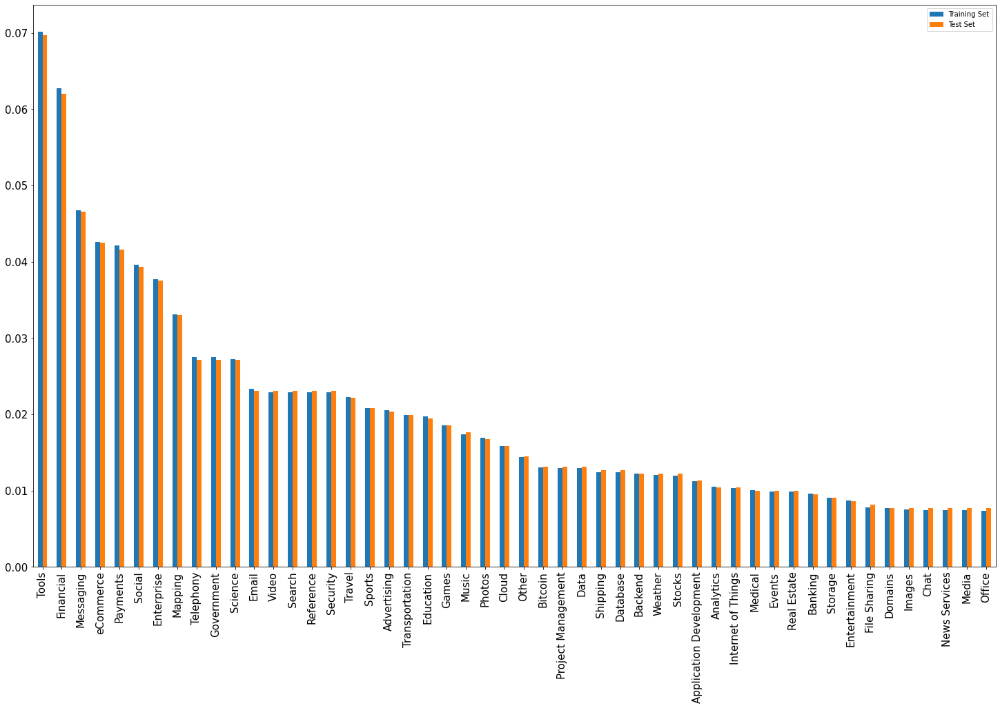

In [19]:
comparedf.plot(kind='bar', figsize=(25, 15),  fontsize=15)
plt.savefig('Data/Comparasion_Trans_Test_Categories_precentage.pdf', format='pdf', dpi=300)

## Save as H5 file (pd to h5)

In [20]:
## shuffle
Train_C = Train_C.sample(frac=1)
Test_C = Test_C.sample(frac=1)

In [21]:
h5f = HDFStore('Data/RandomSplittedByCatagories-ServiceName.h5')
h5f.put('AllData', top50data, format='table')
h5f.put('Train', Train_C, format='table')
h5f.put('Test', Test_C, format='table')
h5f.close()

In [4]:
train = read_hdf('Data/RandomSplittedByCatagories-ServiceName.h5', key='Train')
test = read_hdf('Data/RandomSplittedByCatagories-ServiceName.h5', key='Test')
print(train.shape)
print(test.shape)

(8733, 3)
(2210, 3)


## Random 10 times

In [23]:
# for i in range(0, 10):

#     Train = []
#     Test = []

#     for c in set(top50data['Service Classification']):
#         C_data = top50data[top50data['Service Classification'] == c]
#         C_Train, C_Test = train_test_split(C_data, test_size=0.2, random_state=i)
#         Train.append(C_Train)
#         Test.append(C_Test)

#     Train_C = pd.concat(Train)
#     Test_C = pd.concat(Test)
    
#     Train_C = Train_C.sample(frac=1)
#     Test_C = Test_C.sample(frac=1)
    
#     h5f = HDFStore('../Data/RandomSplittedByCatagories' + str(i) + '.h5')
#     h5f.put('AllData', top50data)
#     h5f.put('Train', Train_C)
#     h5f.put('Test', Test_C)
#     h5f.close()

In [24]:
train.to_csv("Data/train.csv", index=False)
train

,ServiceName,ServiceDescription,ServiceClassification
9993,NACapp API,NACapp is a service for relaying notifications...,Messaging
13837,Plakatt API,Plakatt is a website built around events. User...,Events
1174,RescueGroups API,RescueGroups.org provides technology solutions...,Search
920,Altmetric API,Altmetric is a powerful web application that t...,Education
12140,Traffic Live API,Traffic Live is an online platform for managin...,Project Management
...,...,...,...
8383,Yodlee Aggregation REST API,Yodlee Interactive is a cloud platform that pr...,Financial
1736,Sotrender API,The Sotrender API transmits daily data for a v...,Social
9570,WebKnox Media API,Begun as a research project from the Royal Mel...,Media
13257,AtlasCT Web Maps API,AtlasCT is a maps and location-based services ...,Mapping


In [25]:
train['ServiceDescriptionLength'] = train['ServiceDescription'].str.len()
train.sort_values('ServiceDescriptionLength', ascending=True, inplace=True)
train[0:31]

,ServiceName,ServiceDescription,ServiceClassification,ServiceDescriptionLength
14766,Mapy API,Czech mapping API.,Mapping,18
13581,Zatune API,This API has retired.,Music,21
1114,Webcams.travel API,The World's Largest Webcam API,Travel,30
660,bLaugh Comics API,MAD Magazine for the Blogosphere.,Other,33
632,Web API for Biology API,Web API for Bioinformatics (WABI).,Medical,34
432,Yandex API,XML API for Russian search engine.,Search,34
1364,Whereis API,Australian and New Zealand mapping and GPS ser...,Mapping,51
427,SimpleAPI API,Japanese web service for creating web site thu...,Photos,60
15319,WebResizer API,WebResizer is an image editor you can embed in...,Photos,60
15317,OpenEco API,The OpenEco API allows you to track your green...,Other,67


In [26]:
test.to_csv("Data/test.csv", index=False)
test

,ServiceName,ServiceDescription,ServiceClassification
11951,SmarterMeasure API,The service helps educators to assess a learne...,Education
14497,wpSEEK API,wpSEEK is a tool for searching WordPress. This...,Search
11619,University of Washington HR Payroll API,The University of Washington Human Resources (...,Financial
848,Kounta API,Targeted towards retail and hospitality busine...,Payments
12224,Rogers SMS API,"Rogers is a leading provider of Wireless, Digi...",Messaging
...,...,...,...
11276,SaferBus API,The Federal Motor Carrier Safety Administratio...,Transportation
7895,BitPay Rates API,BitPay hosts a REST-based interface for develo...,Bitcoin
13920,Rvolve Hyperlocal Ads API,Rvolve is a hyper-local ads platform that lets...,Advertising
11360,Magicspatula Stock Quotes API,"The Stock Quotes API, provided by magicspatula...",Financial


In [27]:
test['ServiceDescriptionLength'] = test['ServiceDescription'].str.len()
test.sort_values('ServiceDescriptionLength', ascending=True, inplace=True)
test

,ServiceName,ServiceDescription,ServiceClassification,ServiceDescriptionLength
1357,Open Patent Services API,"Patent, family, legal, bibliographic data, and...",Government,83
14812,Pixenate API,Pixenate is the photo editor of choice for pho...,Photos,87
147,Yahoo Related Suggestions API,The Related Suggestion service provides sugges...,Search,95
444,PhishTank API,PhishTank is a free community site where anyon...,Security,98
192,Cafe Press API,Allows developers to make queries and run sear...,eCommerce,98
...,...,...,...,...
12394,HUSAR Bioinformatics Lab API,The HUSAR Bioinformatics Lab at DKFZ provides ...,Science,1482
14657,Hotwire API,Hotwire is a discount travel site. Hotwire hel...,Travel,1498
10929,GeoRanker API,GeoRanker enables users to view search engines...,Search,1566
11044,iGeolise Travel Time API,The TravelTime platform API makes location-bas...,Transportation,1747


# Pepare Data in Mini-batch Set

In [7]:
DATA_COLUMN = 'ServiceDescription'
LABEL_COLUMN = 'ServiceClassification'
# label_list is the list of labels, i.e. True, False or 0, 1 or 'dog', 'cat'
label_list = set(train['ServiceClassification'])

In [29]:
label_list

{'Advertising',
 'Analytics',
 'Application Development',
 'Backend',
 'Banking',
 'Bitcoin',
 'Chat',
 'Cloud',
 'Data',
 'Database',
 'Domains',
 'Education',
 'Email',
 'Enterprise',
 'Entertainment',
 'Events',
 'File Sharing',
 'Financial',
 'Games',
 'Government',
 'Images',
 'Internet of Things',
 'Mapping',
 'Media',
 'Medical',
 'Messaging',
 'Music',
 'News Services',
 'Office',
 'Other',
 'Payments',
 'Photos',
 'Project Management',
 'Real Estate',
 'Reference',
 'Science',
 'Search',
 'Security',
 'Shipping',
 'Social',
 'Sports',
 'Stocks',
 'Storage',
 'Telephony',
 'Tools',
 'Transportation',
 'Travel',
 'Video',
 'Weather',
 'eCommerce'}

In [8]:
len(label_list)

50

In [5]:
set(test['ServiceClassification'])

{'Advertising',
 'Analytics',
 'Application Development',
 'Backend',
 'Banking',
 'Bitcoin',
 'Chat',
 'Cloud',
 'Data',
 'Database',
 'Domains',
 'Education',
 'Email',
 'Enterprise',
 'Entertainment',
 'Events',
 'File Sharing',
 'Financial',
 'Games',
 'Government',
 'Images',
 'Internet of Things',
 'Mapping',
 'Media',
 'Medical',
 'Messaging',
 'Music',
 'News Services',
 'Office',
 'Other',
 'Payments',
 'Photos',
 'Project Management',
 'Real Estate',
 'Reference',
 'Science',
 'Search',
 'Security',
 'Shipping',
 'Social',
 'Sports',
 'Stocks',
 'Storage',
 'Telephony',
 'Tools',
 'Transportation',
 'Travel',
 'Video',
 'Weather',
 'eCommerce'}

In [30]:
BERT_MODEL_HUB = "https://tfhub.dev/google/bert_uncased_L-12_H-768_A-12/1"

def create_tokenizer_from_hub_module():
  """Get the vocab file and casing info from the Hub module."""
  with tf.Graph().as_default():
    bert_module = hub.Module(BERT_MODEL_HUB)
    tokenization_info = bert_module(signature="tokenization_info", as_dict=True)
    with tf.Session() as sess:
      vocab_file, do_lower_case = sess.run([tokenization_info["vocab_file"],
                                            tokenization_info["do_lower_case"]])
      
  return bert.tokenization.FullTokenizer(
      vocab_file=vocab_file, do_lower_case=do_lower_case)

tokenizer = create_tokenizer_from_hub_module()

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [31]:
tokenizer.tokenize("This here's an example of using the BERT tokenizer")

['this',
 'here',
 "'",
 's',
 'an',
 'example',
 'of',
 'using',
 'the',
 'bert',
 'token',
 '##izer']

In [32]:
def convert_to_one_hot(Y, C):
    Y = np.eye(C)[Y.reshape(-1)]
    return Y

In [33]:
def prepareData_BERT_MiniBatch(test, batchsize = 32, maxDesLength = 110, maxNameLength = 10):

  testdata = []

  for i, g in test.groupby(np.arange(len(test)) // batchsize):
      # print (g)

      test1_InputExamples = g.apply(lambda x: bert.run_classifier.InputExample(guid=None, 
                                                                        text_a = x['ServiceDescription'], 
                                                                        text_b = None, 
                                                                        label = x[LABEL_COLUMN]), axis = 1)

      maxLengthInMiniBatch = len(test1_InputExamples.iloc[-1].text_a)
      print("MiniBatch MaxLength: " + str(maxLengthInMiniBatch))
      
      test2_InputExamples = g.apply(lambda x: bert.run_classifier.InputExample(guid=None, 
                                                                        text_a = x['ServiceName'], 
                                                                        text_b = None, 
                                                                        label = x[LABEL_COLUMN]), axis = 1)
      

      #     # We'll set sequences to be at most 128 tokens long.
     
      # # Convert our train and test features to InputFeatures that BERT understands.
      if maxLengthInMiniBatch >= maxDesLength:
         test1_features = bert.run_classifier.convert_examples_to_features(test1_InputExamples, label_list, maxDesLength, tokenizer)
      else:
         test1_features = bert.run_classifier.convert_examples_to_features(test1_InputExamples, label_list, maxLengthInMiniBatch, tokenizer)

      test2_features = bert.run_classifier.convert_examples_to_features(test2_InputExamples, label_list, maxNameLength, tokenizer)    

      X1_test = np.array([o.input_ids for o in test1_features])
      X1_mask_test = np.array([o.input_mask for o in test1_features])
      X1_segment_test = np.array([o.segment_ids for o in test1_features])

      X2_test = np.array([o.input_ids for o in test2_features])
      X2_mask_test = np.array([o.input_mask for o in test2_features])
      X2_segment_test = np.array([o.segment_ids for o in test2_features])

      Y_test = np.array([o.label_id for o in test2_features])
      print(Y_test[0])
      Test_Y_one_hot = convert_to_one_hot(Y_test, 50)
      print(Test_Y_one_hot[0])

      data = [X1_test, X1_mask_test, X1_segment_test, X2_test, X2_mask_test, X2_segment_test], Test_Y_one_hot
    
      testdata.append(data)
  
  return testdata

In [34]:
testdata = prepareData_BERT_MiniBatch(test, batchsize = 32) 

MiniBatch MaxLength: 168



INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] patent , family , legal , bi ##bl ##io ##graphic data , and documents available via web service . [SEP]


INFO:tensorflow:tokens: [CLS] patent , family , legal , bi ##bl ##io ##graphic data , and documents available via web service . [SEP]


INFO:tensorflow:input_ids: 101 7353 1010 2155 1010 3423 1010 12170 16558 3695 14773 2951 1010 1998 5491 2800 3081 4773 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7353 1010 2155 1010 3423 1010 12170 16558 3695 14773 2951 1010 1998 5491 2800 3081 4773 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pi ##x ##ena ##te is the photo editor of choice for photo printing and photo sharing businesses . [SEP]


INFO:tensorflow:tokens: [CLS] pi ##x ##ena ##te is the photo editor of choice for photo printing and photo sharing businesses . [SEP]


INFO:tensorflow:input_ids: 101 14255 2595 8189 2618 2003 1996 6302 3559 1997 3601 2005 6302 8021 1998 6302 6631 5661 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14255 2595 8189 2618 2003 1996 6302 3559 1997 3601 2005 6302 8021 1998 6302 6631 5661 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the related suggestion service provides suggestions for que ##ries related to the submitted query . [SEP]


INFO:tensorflow:tokens: [CLS] the related suggestion service provides suggestions for que ##ries related to the submitted query . [SEP]


INFO:tensorflow:input_ids: 101 1996 3141 10293 2326 3640 15690 2005 10861 5134 3141 2000 1996 7864 23032 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3141 10293 2326 3640 15690 2005 10861 5134 3141 2000 1996 7864 23032 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] phi ##sh ##tan ##k is a free community site where anyone can submit , verify , track and share phi ##shing data . [SEP]


INFO:tensorflow:tokens: [CLS] phi ##sh ##tan ##k is a free community site where anyone can submit , verify , track and share phi ##shing data . [SEP]


INFO:tensorflow:input_ids: 101 13569 4095 5794 2243 2003 1037 2489 2451 2609 2073 3087 2064 12040 1010 20410 1010 2650 1998 3745 13569 12227 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 13569 4095 5794 2243 2003 1037 2489 2451 2609 2073 3087 2064 12040 1010 20410 1010 2650 1998 3745 13569 12227 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] allows developers to make que ##ries and run searches against cafe press ' store and product database . [SEP]


INFO:tensorflow:tokens: [CLS] allows developers to make que ##ries and run searches against cafe press ' store and product database . [SEP]


INFO:tensorflow:input_ids: 101 4473 9797 2000 2191 10861 5134 1998 2448 17193 2114 7668 2811 1005 3573 1998 4031 7809 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4473 9797 2000 2191 10861 5134 1998 2448 17193 2114 7668 2811 1005 3573 1998 4031 7809 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open patent services api [SEP]


INFO:tensorflow:tokens: [CLS] open patent services api [SEP]


INFO:tensorflow:input_ids: 101 2330 7353 2578 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 7353 2578 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pi ##x ##ena ##te api [SEP]


INFO:tensorflow:tokens: [CLS] pi ##x ##ena ##te api [SEP]


INFO:tensorflow:input_ids: 101 14255 2595 8189 2618 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 14255 2595 8189 2618 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] yahoo related suggestions api [SEP]


INFO:tensorflow:tokens: [CLS] yahoo related suggestions api [SEP]


INFO:tensorflow:input_ids: 101 20643 3141 15690 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 20643 3141 15690 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] phi ##sh ##tan ##k api [SEP]


INFO:tensorflow:tokens: [CLS] phi ##sh ##tan ##k api [SEP]


INFO:tensorflow:input_ids: 101 13569 4095 5794 2243 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 13569 4095 5794 2243 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cafe press api [SEP]


INFO:tensorflow:tokens: [CLS] cafe press api [SEP]


INFO:tensorflow:input_ids: 101 7668 2811 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7668 2811 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


39
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 205
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the rico ##h cloud live streaming api supports the live streaming of video and audio content . use the api to em ##bed the live streaming features for video and audio content . [SEP]


INFO:tensorflow:tokens: [CLS] the rico ##h cloud live streaming api supports the live streaming of video and audio content . use the api to em ##bed the live streaming features for video and audio content . [SEP]


INFO:tensorflow:input_ids: 101 1996 7043 2232 6112 2444 11058 17928 6753 1996 2444 11058 1997 2678 1998 5746 4180 1012 2224 1996 17928 2000 7861 8270 1996 2444 11058 2838 2005 2678 1998 5746 4180 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 7043 2232 6112 2444 11058 17928 6753 1996 2444 11058 1997 2678 1998 5746 4180 1012 2224 1996 17928 2000 7861 8270 1996 2444 11058 2838 2005 2678 1998 5746 4180 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] path of exile is an online action fantasy rpg from grinding gear games . the path of exile api expose ##s game metadata describing leagues , league rules , and player ratings . [SEP]


INFO:tensorflow:tokens: [CLS] path of exile is an online action fantasy rpg from grinding gear games . the path of exile api expose ##s game metadata describing leagues , league rules , and player ratings . [SEP]


INFO:tensorflow:input_ids: 101 4130 1997 8340 2003 2019 3784 2895 5913 22531 2013 16153 6718 2399 1012 1996 4130 1997 8340 17928 14451 2015 2208 27425 7851 8121 1010 2223 3513 1010 1998 2447 8599 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4130 1997 8340 2003 2019 3784 2895 5913 22531 2013 16153 6718 2399 1012 1996 4130 1997 8340 17928 14451 2015 2208 27425 7851 8121 1010 2223 3513 1010 1998 2447 8599 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] batch ##book is an easy - to - use customer relationship manager ( cr ##m ) designed for small business owners . the batch ##book api is an xml rest interface for access ##ing your account . [SEP]


INFO:tensorflow:tokens: [CLS] batch ##book is an easy - to - use customer relationship manager ( cr ##m ) designed for small business owners . the batch ##book api is an xml rest interface for access ##ing your account . [SEP]


INFO:tensorflow:input_ids: 101 14108 8654 2003 2019 3733 1011 2000 1011 2224 8013 3276 3208 1006 13675 2213 1007 2881 2005 2235 2449 5608 1012 1996 14108 8654 17928 2003 2019 20950 2717 8278 2005 3229 2075 2115 4070 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14108 8654 2003 2019 3733 1011 2000 1011 2224 8013 3276 3208 1006 13675 2213 1007 2881 2005 2235 2449 5608 1012 1996 14108 8654 17928 2003 2019 20950 2717 8278 2005 3229 2075 2115 4070 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] qu ##aly ##s ss ##l labs api allows developers to test their server configuration . this api is free with some restrictions . qu ##aly ##s provides cloud security and compliance solutions [SEP]


INFO:tensorflow:tokens: [CLS] qu ##aly ##s ss ##l labs api allows developers to test their server configuration . this api is free with some restrictions . qu ##aly ##s provides cloud security and compliance solutions [SEP]


INFO:tensorflow:input_ids: 101 24209 20766 2015 7020 2140 13625 17928 4473 9797 2000 3231 2037 8241 9563 1012 2023 17928 2003 2489 2007 2070 9259 1012 24209 20766 2015 3640 6112 3036 1998 12646 7300 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 24209 20766 2015 7020 2140 13625 17928 4473 9797 2000 3231 2037 8241 9563 1012 2023 17928 2003 2489 2007 2070 9259 1012 24209 20766 2015 3640 6112 3036 1998 12646 7300 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the cell ##block application programming interface ( api ) allows developers to integrate instant multimedia ( photo and video ) sharing into web , desktop and mobile applications . [SEP]


INFO:tensorflow:tokens: [CLS] the cell ##block application programming interface ( api ) allows developers to integrate instant multimedia ( photo and video ) sharing into web , desktop and mobile applications . [SEP]


INFO:tensorflow:input_ids: 101 1996 3526 23467 4646 4730 8278 1006 17928 1007 4473 9797 2000 17409 7107 14959 1006 6302 1998 2678 1007 6631 2046 4773 1010 15363 1998 4684 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3526 23467 4646 4730 8278 1006 17928 1007 4473 9797 2000 17409 7107 14959 1006 6302 1998 2678 1007 6631 2046 4773 1010 15363 1998 4684 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rico ##h cloud live streaming api [SEP]


INFO:tensorflow:tokens: [CLS] rico ##h cloud live streaming api [SEP]


INFO:tensorflow:input_ids: 101 7043 2232 6112 2444 11058 17928 102 0 0


INFO:tensorflow:input_ids: 101 7043 2232 6112 2444 11058 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] path of exile api [SEP]


INFO:tensorflow:tokens: [CLS] path of exile api [SEP]


INFO:tensorflow:input_ids: 101 4130 1997 8340 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4130 1997 8340 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] batch ##book api [SEP]


INFO:tensorflow:tokens: [CLS] batch ##book api [SEP]


INFO:tensorflow:input_ids: 101 14108 8654 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14108 8654 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] qu ##aly ##s ss ##l labs api [SEP]


INFO:tensorflow:tokens: [CLS] qu ##aly ##s ss ##l labs api [SEP]


INFO:tensorflow:input_ids: 101 24209 20766 2015 7020 2140 13625 17928 102 0


INFO:tensorflow:input_ids: 101 24209 20766 2015 7020 2140 13625 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cell ##block api [SEP]


INFO:tensorflow:tokens: [CLS] cell ##block api [SEP]


INFO:tensorflow:input_ids: 101 3526 23467 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3526 23467 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


29
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 223
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sky ##fish api integrate ##s image storage , organization , and share features into applications . available in j ##son requests and responses with token authentication . sky ##fish is a media file management platform . [SEP]


INFO:tensorflow:tokens: [CLS] the sky ##fish api integrate ##s image storage , organization , and share features into applications . available in j ##son requests and responses with token authentication . sky ##fish is a media file management platform . [SEP]


INFO:tensorflow:input_ids: 101 1996 3712 7529 17928 17409 2015 3746 5527 1010 3029 1010 1998 3745 2838 2046 5097 1012 2800 1999 1046 3385 11186 1998 10960 2007 19204 27280 1012 3712 7529 2003 1037 2865 5371 2968 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3712 7529 17928 17409 2015 3746 5527 1010 3029 1010 1998 3745 2838 2046 5097 1012 2800 1999 1046 3385 11186 1998 10960 2007 19204 27280 1012 3712 7529 2003 1037 2865 5371 2968 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the via ##mic ##hel ##in api ##s provide users with access to high quality maps , car and pedestrian it ##iner ##aries , proximity and integrated booking search engine . api ##s are offered using rest , soap or java ##script protocol . [SEP]


INFO:tensorflow:tokens: [CLS] the via ##mic ##hel ##in api ##s provide users with access to high quality maps , car and pedestrian it ##iner ##aries , proximity and integrated booking search engine . api ##s are offered using rest , soap or java ##script protocol . [SEP]


INFO:tensorflow:input_ids: 101 1996 3081 7712 16001 2378 17928 2015 3073 5198 2007 3229 2000 2152 3737 7341 1010 2482 1998 14662 2009 26455 12086 1010 10039 1998 6377 21725 3945 3194 1012 17928 2015 2024 3253 2478 2717 1010 7815 2030 9262 22483 8778 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3081 7712 16001 2378 17928 2015 3073 5198 2007 3229 2000 2152 3737 7341 1010 2482 1998 14662 2009 26455 12086 1010 10039 1998 6377 21725 3945 3194 1012 17928 2015 2024 3253 2478 2717 1010 7815 2030 9262 22483 8778 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] real ##ty ##bar ##on ' s agents api is a free service that enables websites or mobile apps to quickly offer ' find an agent ' services to both consumers and professionals with minimal integration and zero administration . [SEP]


INFO:tensorflow:tokens: [CLS] real ##ty ##bar ##on ' s agents api is a free service that enables websites or mobile apps to quickly offer ' find an agent ' services to both consumers and professionals with minimal integration and zero administration . [SEP]


INFO:tensorflow:input_ids: 101 2613 3723 8237 2239 1005 1055 6074 17928 2003 1037 2489 2326 2008 12939 11744 2030 4684 18726 2000 2855 3749 1005 2424 2019 4005 1005 2578 2000 2119 10390 1998 8390 2007 10124 8346 1998 5717 3447 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2613 3723 8237 2239 1005 1055 6074 17928 2003 1037 2489 2326 2008 12939 11744 2030 4684 18726 2000 2855 3749 1005 2424 2019 4005 1005 2578 2000 2119 10390 1998 8390 2007 10124 8346 1998 5717 3447 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the big ##door api offers web developers help building game - like mechanics and loyalty programs into their sites or applications through points , badges , levels , leader ##boards , virtual currency and virtual goods . [SEP]


INFO:tensorflow:tokens: [CLS] the big ##door api offers web developers help building game - like mechanics and loyalty programs into their sites or applications through points , badges , levels , leader ##boards , virtual currency and virtual goods . [SEP]


INFO:tensorflow:input_ids: 101 1996 2502 23835 17928 4107 4773 9797 2393 2311 2208 1011 2066 9760 1998 9721 3454 2046 2037 4573 2030 5097 2083 2685 1010 23433 1010 3798 1010 3003 15271 1010 7484 9598 1998 7484 5350 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2502 23835 17928 4107 4773 9797 2393 2311 2208 1011 2066 9760 1998 9721 3454 2046 2037 4573 2030 5097 2083 2685 1010 23433 1010 3798 1010 3003 15271 1010 7484 9598 1998 7484 5350 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the brooklyn museum collection api is a set of services that you can use to display brooklyn museum collection images and data in your own applications . as of june 26th , the api will be migrated to version 2 . [SEP]


INFO:tensorflow:tokens: [CLS] the brooklyn museum collection api is a set of services that you can use to display brooklyn museum collection images and data in your own applications . as of june 26th , the api will be migrated to version 2 . [SEP]


INFO:tensorflow:input_ids: 101 1996 6613 2688 3074 17928 2003 1037 2275 1997 2578 2008 2017 2064 2224 2000 4653 6613 2688 3074 4871 1998 2951 1999 2115 2219 5097 1012 2004 1997 2238 14935 1010 1996 17928 2097 2022 13447 2000 2544 1016 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 6613 2688 3074 17928 2003 1037 2275 1997 2578 2008 2017 2064 2224 2000 4653 6613 2688 3074 4871 1998 2951 1999 2115 2219 5097 1012 2004 1997 2238 14935 1010 1996 17928 2097 2022 13447 2000 2544 1016 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sky ##fish api [SEP]


INFO:tensorflow:tokens: [CLS] sky ##fish api [SEP]


INFO:tensorflow:input_ids: 101 3712 7529 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3712 7529 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] via ##mic ##hel ##in api [SEP]


INFO:tensorflow:tokens: [CLS] via ##mic ##hel ##in api [SEP]


INFO:tensorflow:input_ids: 101 3081 7712 16001 2378 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3081 7712 16001 2378 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] real ##ty ##bar ##on agents api [SEP]


INFO:tensorflow:tokens: [CLS] real ##ty ##bar ##on agents api [SEP]


INFO:tensorflow:input_ids: 101 2613 3723 8237 2239 6074 17928 102 0 0


INFO:tensorflow:input_ids: 101 2613 3723 8237 2239 6074 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] big ##door api [SEP]


INFO:tensorflow:tokens: [CLS] big ##door api [SEP]


INFO:tensorflow:input_ids: 101 2502 23835 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2502 23835 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] brooklyn museum api [SEP]


INFO:tensorflow:tokens: [CLS] brooklyn museum api [SEP]


INFO:tensorflow:input_ids: 101 6613 2688 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6613 2688 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


37
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 238
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the look ##er rest ##ful api integrate ##s data analytics for business services via reports and dashboard ##s . it is available with http requests and j ##son responses , api key to authentic ##ate , and sd ##k to interact with various parameters . [SEP]


INFO:tensorflow:tokens: [CLS] the look ##er rest ##ful api integrate ##s data analytics for business services via reports and dashboard ##s . it is available with http requests and j ##son responses , api key to authentic ##ate , and sd ##k to interact with various parameters . [SEP]


INFO:tensorflow:input_ids: 101 1996 2298 2121 2717 3993 17928 17409 2015 2951 25095 2005 2449 2578 3081 4311 1998 24923 2015 1012 2009 2003 2800 2007 8299 11186 1998 1046 3385 10960 1010 17928 3145 2000 14469 3686 1010 1998 17371 2243 2000 11835 2007 2536 11709 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2298 2121 2717 3993 17928 17409 2015 2951 25095 2005 2449 2578 3081 4311 1998 24923 2015 1012 2009 2003 2800 2007 8299 11186 1998 1046 3385 10960 1010 17928 3145 2000 14469 3686 1010 1998 17371 2243 2000 11835 2007 2536 11709 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the z ##ype api integrate ##s video features into applications , aiming to convert fans into customers . it is available in j ##son and xml architecture ##s with a rest ##ful api service . z ##ype is an ot ##t ( over the top content ) video platform . [SEP]


INFO:tensorflow:tokens: [CLS] the z ##ype api integrate ##s video features into applications , aiming to convert fans into customers . it is available in j ##son and xml architecture ##s with a rest ##ful api service . z ##ype is an ot ##t ( over the top content ) video platform . [SEP]


INFO:tensorflow:input_ids: 101 1996 1062 18863 17928 17409 2015 2678 2838 2046 5097 1010 13659 2000 10463 4599 2046 6304 1012 2009 2003 2800 1999 1046 3385 1998 20950 4294 2015 2007 1037 2717 3993 17928 2326 1012 1062 18863 2003 2019 27178 2102 1006 2058 1996 2327 4180 1007 2678 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1062 18863 17928 17409 2015 2678 2838 2046 5097 1010 13659 2000 10463 4599 2046 6304 1012 2009 2003 2800 1999 1046 3385 1998 20950 4294 2015 2007 1037 2717 3993 17928 2326 1012 1062 18863 2003 2019 27178 2102 1006 2058 1996 2327 4180 1007 2678 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] t ##wi ##t ##go ##o is a quick , reliable , and safe way to share images for twitter . the t ##wi ##t ##go ##o api allows you to create an interface to talk to the t ##wi ##t ##go ##o service and create applications that can use t ##wi ##t ##go ##o to share media on twitter . [SEP]


INFO:tensorflow:tokens: [CLS] t ##wi ##t ##go ##o is a quick , reliable , and safe way to share images for twitter . the t ##wi ##t ##go ##o api allows you to create an interface to talk to the t ##wi ##t ##go ##o service and create applications that can use t ##wi ##t ##go ##o to share media on twitter . [SEP]


INFO:tensorflow:input_ids: 101 1056 9148 2102 3995 2080 2003 1037 4248 1010 10539 1010 1998 3647 2126 2000 3745 4871 2005 10474 1012 1996 1056 9148 2102 3995 2080 17928 4473 2017 2000 3443 2019 8278 2000 2831 2000 1996 1056 9148 2102 3995 2080 2326 1998 3443 5097 2008 2064 2224 1056 9148 2102 3995 2080 2000 3745 2865 2006 10474 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1056 9148 2102 3995 2080 2003 1037 4248 1010 10539 1010 1998 3647 2126 2000 3745 4871 2005 10474 1012 1996 1056 9148 2102 3995 2080 17928 4473 2017 2000 3443 2019 8278 2000 2831 2000 1996 1056 9148 2102 3995 2080 2326 1998 3443 5097 2008 2064 2224 1056 9148 2102 3995 2080 2000 3745 2865 2006 10474 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the imp ##era ##vi api works as a plug ##in to use red ##act ##or , a w ##ys ##i ##wy ##g text editor that developers can use to develop applications . the aim of imp ##era ##vi is to provide im ##mers ##ive user experiences by creating powerful and simple web apps . [SEP]


INFO:tensorflow:tokens: [CLS] the imp ##era ##vi api works as a plug ##in to use red ##act ##or , a w ##ys ##i ##wy ##g text editor that developers can use to develop applications . the aim of imp ##era ##vi is to provide im ##mers ##ive user experiences by creating powerful and simple web apps . [SEP]


INFO:tensorflow:input_ids: 101 1996 17727 6906 5737 17928 2573 2004 1037 13354 2378 2000 2224 2417 18908 2953 1010 1037 1059 7274 2072 18418 2290 3793 3559 2008 9797 2064 2224 2000 4503 5097 1012 1996 6614 1997 17727 6906 5737 2003 2000 3073 10047 16862 3512 5310 6322 2011 4526 3928 1998 3722 4773 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 17727 6906 5737 17928 2573 2004 1037 13354 2378 2000 2224 2417 18908 2953 1010 1037 1059 7274 2072 18418 2290 3793 3559 2008 9797 2064 2224 2000 4503 5097 1012 1996 6614 1997 17727 6906 5737 2003 2000 3073 10047 16862 3512 5310 6322 2011 4526 3928 1998 3722 4773 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] product ##ee ##v is a task management / to - do list application for teams and individuals . we are connected to your email , im , twitter , mobile ( iphone ) , gma ##il , google calendar soon many more tools , and we keep your tasks synchronized ! [SEP]


INFO:tensorflow:tokens: [CLS] product ##ee ##v is a task management / to - do list application for teams and individuals . we are connected to your email , im , twitter , mobile ( iphone ) , gma ##il , google calendar soon many more tools , and we keep your tasks synchronized ! [SEP]


INFO:tensorflow:input_ids: 101 4031 4402 2615 2003 1037 4708 2968 1013 2000 1011 2079 2862 4646 2005 2780 1998 3633 1012 2057 2024 4198 2000 2115 10373 1010 10047 1010 10474 1010 4684 1006 18059 1007 1010 20917 4014 1010 8224 8094 2574 2116 2062 5906 1010 1998 2057 2562 2115 8518 25549 999 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4031 4402 2615 2003 1037 4708 2968 1013 2000 1011 2079 2862 4646 2005 2780 1998 3633 1012 2057 2024 4198 2000 2115 10373 1010 10047 1010 10474 1010 4684 1006 18059 1007 1010 20917 4014 1010 8224 8094 2574 2116 2062 5906 1010 1998 2057 2562 2115 8518 25549 999 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] look ##er api [SEP]


INFO:tensorflow:tokens: [CLS] look ##er api [SEP]


INFO:tensorflow:input_ids: 101 2298 2121 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2298 2121 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] z ##ype api [SEP]


INFO:tensorflow:tokens: [CLS] z ##ype api [SEP]


INFO:tensorflow:input_ids: 101 1062 18863 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1062 18863 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] t ##wi ##t ##go ##o api [SEP]


INFO:tensorflow:tokens: [CLS] t ##wi ##t ##go ##o api [SEP]


INFO:tensorflow:input_ids: 101 1056 9148 2102 3995 2080 17928 102 0 0


INFO:tensorflow:input_ids: 101 1056 9148 2102 3995 2080 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] imp ##era ##vi api [SEP]


INFO:tensorflow:tokens: [CLS] imp ##era ##vi api [SEP]


INFO:tensorflow:input_ids: 101 17727 6906 5737 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 17727 6906 5737 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] product ##ee ##v api [SEP]


INFO:tensorflow:tokens: [CLS] product ##ee ##v api [SEP]


INFO:tensorflow:input_ids: 101 4031 4402 2615 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4031 4402 2615 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


32
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 248
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the com assets api allows up ##loading assets in chat messages . it is available in rest architecture with web ##ho ##ok ##s , j ##son format to perform call ##backs , and token and key as the authentication methods . coma ##pi is an api - first messaging platform . [SEP]


INFO:tensorflow:tokens: [CLS] the com assets api allows up ##loading assets in chat messages . it is available in rest architecture with web ##ho ##ok ##s , j ##son format to perform call ##backs , and token and key as the authentication methods . coma ##pi is an api - first messaging platform . [SEP]


INFO:tensorflow:input_ids: 101 1996 4012 7045 17928 4473 2039 18570 7045 1999 11834 7696 1012 2009 2003 2800 1999 2717 4294 2007 4773 6806 6559 2015 1010 1046 3385 4289 2000 4685 2655 12221 1010 1998 19204 1998 3145 2004 1996 27280 4725 1012 16571 8197 2003 2019 17928 1011 2034 24732 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4012 7045 17928 4473 2039 18570 7045 1999 11834 7696 1012 2009 2003 2800 1999 2717 4294 2007 4773 6806 6559 2015 1010 1046 3385 4289 2000 4685 2655 12221 1010 1998 19204 1998 3145 2004 1996 27280 4725 1012 16571 8197 2003 2019 17928 1011 2034 24732 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ##bus is the public transportation system of the city and county of honolulu , part of the larger o ##ahu transit system . the ##bus provides an api for real - time bus schedule data , including vehicle arrival times and vehicle location reporting . [SEP]


INFO:tensorflow:tokens: [CLS] the ##bus is the public transportation system of the city and county of honolulu , part of the larger o ##ahu transit system . the ##bus provides an api for real - time bus schedule data , including vehicle arrival times and vehicle location reporting . [SEP]


INFO:tensorflow:input_ids: 101 1996 8286 2003 1996 2270 5193 2291 1997 1996 2103 1998 2221 1997 16598 1010 2112 1997 1996 3469 1051 21463 6671 2291 1012 1996 8286 3640 2019 17928 2005 2613 1011 2051 3902 6134 2951 1010 2164 4316 5508 2335 1998 4316 3295 7316 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8286 2003 1996 2270 5193 2291 1997 1996 2103 1998 2221 1997 16598 1010 2112 1997 1996 3469 1051 21463 6671 2291 1012 1996 8286 3640 2019 17928 2005 2613 1011 2051 3902 6134 2951 1010 2164 4316 5508 2335 1998 4316 3295 7316 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the pl ##ivo call request api allows developers to perform actions on a call request , before the call is answered . pl ##ivo is a carrier service company that provides businesses a way to communicate with their customers via sms and voice calls . [SEP]


INFO:tensorflow:tokens: [CLS] the pl ##ivo call request api allows developers to perform actions on a call request , before the call is answered . pl ##ivo is a carrier service company that provides businesses a way to communicate with their customers via sms and voice calls . [SEP]


INFO:tensorflow:input_ids: 101 1996 20228 20984 2655 5227 17928 4473 9797 2000 4685 4506 2006 1037 2655 5227 1010 2077 1996 2655 2003 4660 1012 20228 20984 2003 1037 6839 2326 2194 2008 3640 5661 1037 2126 2000 10639 2007 2037 6304 3081 22434 1998 2376 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20228 20984 2655 5227 17928 4473 9797 2000 4685 4506 2006 1037 2655 5227 1010 2077 1996 2655 2003 4660 1012 20228 20984 2003 1037 6839 2326 2194 2008 3640 5661 1037 2126 2000 10639 2007 2037 6304 3081 22434 1998 2376 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sport ##rada ##r nhl api allows developers to integrate their applications with the sport ##rada ##r nhl database , using rest ##ful methods . sport ##rada ##r is a provider of sports and betting - related live data , odds solutions and fraud detection services [SEP]


INFO:tensorflow:tokens: [CLS] the sport ##rada ##r nhl api allows developers to integrate their applications with the sport ##rada ##r nhl database , using rest ##ful methods . sport ##rada ##r is a provider of sports and betting - related live data , odds solutions and fraud detection services [SEP]


INFO:tensorflow:input_ids: 101 1996 4368 28510 2099 7097 17928 4473 9797 2000 17409 2037 5097 2007 1996 4368 28510 2099 7097 7809 1010 2478 2717 3993 4725 1012 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1998 9861 10788 2578 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4368 28510 2099 7097 17928 4473 9797 2000 17409 2037 5097 2007 1996 4368 28510 2099 7097 7809 1010 2478 2717 3993 4725 1012 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1998 9861 10788 2578 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fact ##ery has developed fact ##rank technology to mine real - time feeds and web content for the purpose of providing simple , short answers to user que ##ries . you decide the sources to use . you can search twitter , dig ##g , or a standard search engine . [SEP]


INFO:tensorflow:tokens: [CLS] fact ##ery has developed fact ##rank technology to mine real - time feeds and web content for the purpose of providing simple , short answers to user que ##ries . you decide the sources to use . you can search twitter , dig ##g , or a standard search engine . [SEP]


INFO:tensorflow:input_ids: 101 2755 7301 2038 2764 2755 26763 2974 2000 3067 2613 1011 2051 14172 1998 4773 4180 2005 1996 3800 1997 4346 3722 1010 2460 6998 2000 5310 10861 5134 1012 2017 5630 1996 4216 2000 2224 1012 2017 2064 3945 10474 1010 10667 2290 1010 2030 1037 3115 3945 3194 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2755 7301 2038 2764 2755 26763 2974 2000 3067 2613 1011 2051 14172 1998 4773 4180 2005 1996 3800 1997 4346 3722 1010 2460 6998 2000 5310 10861 5134 1012 2017 5630 1996 4216 2000 2224 1012 2017 2064 3945 10474 1010 10667 2290 1010 2030 1037 3115 3945 3194 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] com assets api [SEP]


INFO:tensorflow:tokens: [CLS] com assets api [SEP]


INFO:tensorflow:input_ids: 101 4012 7045 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4012 7045 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ##bus api [SEP]


INFO:tensorflow:tokens: [CLS] the ##bus api [SEP]


INFO:tensorflow:input_ids: 101 1996 8286 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8286 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pl ##ivo call request api [SEP]


INFO:tensorflow:tokens: [CLS] pl ##ivo call request api [SEP]


INFO:tensorflow:input_ids: 101 20228 20984 2655 5227 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 20228 20984 2655 5227 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sport ##rada ##r nhl api [SEP]


INFO:tensorflow:tokens: [CLS] sport ##rada ##r nhl api [SEP]


INFO:tensorflow:input_ids: 101 4368 28510 2099 7097 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4368 28510 2099 7097 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fact ##ery api [SEP]


INFO:tensorflow:tokens: [CLS] fact ##ery api [SEP]


INFO:tensorflow:input_ids: 101 2755 7301 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2755 7301 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


30
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 261
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] science ip ##sum is a science themed place ##holder text generator . the service is exposed through a simple api . developers simply specify the number of paragraph ##s , and optional ##ly the number of words per paragraph , and the api returns the requested text . [SEP]


INFO:tensorflow:tokens: [CLS] science ip ##sum is a science themed place ##holder text generator . the service is exposed through a simple api . developers simply specify the number of paragraph ##s , and optional ##ly the number of words per paragraph , and the api returns the requested text . [SEP]


INFO:tensorflow:input_ids: 101 2671 12997 17421 2003 1037 2671 11773 2173 14528 3793 13103 1012 1996 2326 2003 6086 2083 1037 3722 17928 1012 9797 3432 20648 1996 2193 1997 20423 2015 1010 1998 11887 2135 1996 2193 1997 2616 2566 20423 1010 1998 1996 17928 5651 1996 7303 3793 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2671 12997 17421 2003 1037 2671 11773 2173 14528 3793 13103 1012 1996 2326 2003 6086 2083 1037 3722 17928 1012 9797 3432 20648 1996 2193 1997 20423 2015 1010 1998 11887 2135 1996 2193 1997 2616 2566 20423 1010 1998 1996 17928 5651 1996 7303 3793 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ed ##md ##es ##ign ##er ' s api is an easy to use drag ' n ' drop html email editor , which can be integrated into arbitrary web based systems . the generated email html is extremely robust , so the result can be gr ##ati ##fying for a variety of email clients and devices . [SEP]


INFO:tensorflow:tokens: [CLS] ed ##md ##es ##ign ##er ' s api is an easy to use drag ' n ' drop html email editor , which can be integrated into arbitrary web based systems . the generated email html is extremely robust , so the result can be gr ##ati ##fying for a variety of email clients and devices . [SEP]


INFO:tensorflow:input_ids: 101 3968 26876 2229 23773 2121 1005 1055 17928 2003 2019 3733 2000 2224 8011 1005 1050 1005 4530 16129 10373 3559 1010 2029 2064 2022 6377 2046 15275 4773 2241 3001 1012 1996 7013 10373 16129 2003 5186 15873 1010 2061 1996 2765 2064 2022 24665 10450 14116 2005 1037 3528 1997 10373 7846 1998 5733 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3968 26876 2229 23773 2121 1005 1055 17928 2003 2019 3733 2000 2224 8011 1005 1050 1005 4530 16129 10373 3559 1010 2029 2064 2022 6377 2046 15275 4773 2241 3001 1012 1996 7013 10373 16129 2003 5186 15873 1010 2061 1996 2765 2064 2022 24665 10450 14116 2005 1037 3528 1997 10373 7846 1998 5733 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] emerge ##nt one is an api building , creation , and management platform . customers can build and create their api ##s with emerge ##nt one . emerge ##nt one offers developers a development portal , with api documentation , api analytics , and api management services . [SEP]


INFO:tensorflow:tokens: [CLS] emerge ##nt one is an api building , creation , and management platform . customers can build and create their api ##s with emerge ##nt one . emerge ##nt one offers developers a development portal , with api documentation , api analytics , and api management services . [SEP]


INFO:tensorflow:input_ids: 101 12636 3372 2028 2003 2019 17928 2311 1010 4325 1010 1998 2968 4132 1012 6304 2064 3857 1998 3443 2037 17928 2015 2007 12636 3372 2028 1012 12636 3372 2028 4107 9797 1037 2458 9445 1010 2007 17928 12653 1010 17928 25095 1010 1998 17928 2968 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12636 3372 2028 2003 2019 17928 2311 1010 4325 1010 1998 2968 4132 1012 6304 2064 3857 1998 3443 2037 17928 2015 2007 12636 3372 2028 1012 12636 3372 2028 4107 9797 1037 2458 9445 1010 2007 17928 12653 1010 17928 25095 1010 1998 17928 2968 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cube ##tree is a website that provides a social business platform for revolution ##izing business performance . the cube ##tree api is a rest ##ful api that allows developers to create applications that can query and manipulate the resources provided by cube ##tree . [SEP]


INFO:tensorflow:tokens: [CLS] cube ##tree is a website that provides a social business platform for revolution ##izing business performance . the cube ##tree api is a rest ##ful api that allows developers to create applications that can query and manipulate the resources provided by cube ##tree . [SEP]


INFO:tensorflow:input_ids: 101 14291 13334 2003 1037 4037 2008 3640 1037 2591 2449 4132 2005 4329 6026 2449 2836 1012 1996 14291 13334 17928 2003 1037 2717 3993 17928 2008 4473 9797 2000 3443 5097 2008 2064 23032 1998 17708 1996 4219 3024 2011 14291 13334 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14291 13334 2003 1037 4037 2008 3640 1037 2591 2449 4132 2005 4329 6026 2449 2836 1012 1996 14291 13334 17928 2003 1037 2717 3993 17928 2008 4473 9797 2000 3443 5097 2008 2064 23032 1998 17708 1996 4219 3024 2011 14291 13334 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gi ##th ##ub is a repository of public open source and private business code . is is a fast , efficient , distributed version control system ideal for the collaborative development of software . use it to fork projects , send pull requests , monitor development . [SEP]


INFO:tensorflow:tokens: [CLS] gi ##th ##ub is a repository of public open source and private business code . is is a fast , efficient , distributed version control system ideal for the collaborative development of software . use it to fork projects , send pull requests , monitor development . [SEP]


INFO:tensorflow:input_ids: 101 21025 2705 12083 2003 1037 22409 1997 2270 2330 3120 1998 2797 2449 3642 1012 2003 2003 1037 3435 1010 8114 1010 5500 2544 2491 2291 7812 2005 1996 12317 2458 1997 4007 1012 2224 2009 2000 9292 3934 1010 4604 4139 11186 1010 8080 2458 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 21025 2705 12083 2003 1037 22409 1997 2270 2330 3120 1998 2797 2449 3642 1012 2003 2003 1037 3435 1010 8114 1010 5500 2544 2491 2291 7812 2005 1996 12317 2458 1997 4007 1012 2224 2009 2000 9292 3934 1010 4604 4139 11186 1010 8080 2458 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] science ip ##sum api [SEP]


INFO:tensorflow:tokens: [CLS] science ip ##sum api [SEP]


INFO:tensorflow:input_ids: 101 2671 12997 17421 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2671 12997 17421 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ed ##md ##es ##ign ##er api [SEP]


INFO:tensorflow:tokens: [CLS] ed ##md ##es ##ign ##er api [SEP]


INFO:tensorflow:input_ids: 101 3968 26876 2229 23773 2121 17928 102 0 0


INFO:tensorflow:input_ids: 101 3968 26876 2229 23773 2121 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] emerge ##nt one api [SEP]


INFO:tensorflow:tokens: [CLS] emerge ##nt one api [SEP]


INFO:tensorflow:input_ids: 101 12636 3372 2028 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12636 3372 2028 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cube ##tree api [SEP]


INFO:tensorflow:tokens: [CLS] cube ##tree api [SEP]


INFO:tensorflow:input_ids: 101 14291 13334 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14291 13334 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gi ##th ##ub api [SEP]


INFO:tensorflow:tokens: [CLS] gi ##th ##ub api [SEP]


INFO:tensorflow:input_ids: 101 21025 2705 12083 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 21025 2705 12083 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


27
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 268
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the tel ##eno ##r soap - based status push api is one of the api ##s related to the tel ##eno ##r service gateway . the status push api allows developers to create applications that can see the status , busy or free , of mobile phones belonging to a network ( business / corporation ) . [SEP]


INFO:tensorflow:tokens: [CLS] the tel ##eno ##r soap - based status push api is one of the api ##s related to the tel ##eno ##r service gateway . the status push api allows developers to create applications that can see the status , busy or free , of mobile phones belonging to a network ( business / corporation ) . [SEP]


INFO:tensorflow:input_ids: 101 1996 10093 16515 2099 7815 1011 2241 3570 5245 17928 2003 2028 1997 1996 17928 2015 3141 2000 1996 10093 16515 2099 2326 11909 1012 1996 3570 5245 17928 4473 9797 2000 3443 5097 2008 2064 2156 1996 3570 1010 5697 2030 2489 1010 1997 4684 11640 7495 2000 1037 2897 1006 2449 1013 3840 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 10093 16515 2099 7815 1011 2241 3570 5245 17928 2003 2028 1997 1996 17928 2015 3141 2000 1996 10093 16515 2099 2326 11909 1012 1996 3570 5245 17928 4473 9797 2000 3443 5097 2008 2064 2156 1996 3570 1010 5697 2030 2489 1010 1997 4684 11640 7495 2000 1037 2897 1006 2449 1013 3840 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sport ##rada ##r mma ( mixed martial arts ) api allows developers to integrate their applications with the sport ##rada ##r mma database , using rest ##ful methods . sport ##rada ##r is a provider of sports and betting - related live data , odds solutions and fraud detection services . [SEP]


INFO:tensorflow:tokens: [CLS] the sport ##rada ##r mma ( mixed martial arts ) api allows developers to integrate their applications with the sport ##rada ##r mma database , using rest ##ful methods . sport ##rada ##r is a provider of sports and betting - related live data , odds solutions and fraud detection services . [SEP]


INFO:tensorflow:input_ids: 101 1996 4368 28510 2099 21021 1006 3816 7761 2840 1007 17928 4473 9797 2000 17409 2037 5097 2007 1996 4368 28510 2099 21021 7809 1010 2478 2717 3993 4725 1012 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1998 9861 10788 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4368 28510 2099 21021 1006 3816 7761 2840 1007 17928 4473 9797 2000 17409 2037 5097 2007 1996 4368 28510 2099 21021 7809 1010 2478 2717 3993 4725 1012 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1998 9861 10788 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the gi ##th ##ub users api provides developers with short ##cut for getting information about the currently authentic ##ated user . this api uses a two - factor authentication . gi ##th ##ub is one of the software providers that special ##ize in a wide range of application development . [SEP]


INFO:tensorflow:tokens: [CLS] the gi ##th ##ub users api provides developers with short ##cut for getting information about the currently authentic ##ated user . this api uses a two - factor authentication . gi ##th ##ub is one of the software providers that special ##ize in a wide range of application development . [SEP]


INFO:tensorflow:input_ids: 101 1996 21025 2705 12083 5198 17928 3640 9797 2007 2460 12690 2005 2893 2592 2055 1996 2747 14469 4383 5310 1012 2023 17928 3594 1037 2048 1011 5387 27280 1012 21025 2705 12083 2003 2028 1997 1996 4007 11670 2008 2569 4697 1999 1037 2898 2846 1997 4646 2458 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 21025 2705 12083 5198 17928 3640 9797 2007 2460 12690 2005 2893 2592 2055 1996 2747 14469 4383 5310 1012 2023 17928 3594 1037 2048 1011 5387 27280 1012 21025 2705 12083 2003 2028 1997 1996 4007 11670 2008 2569 4697 1999 1037 2898 2846 1997 4646 2458 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the icon ##ne ##ct api allows developers to access and integrate the functionality of icon ##ne ##ct with other applications . public documentation is not available ; api access comes with account service . icon ##ne ##ct is a point - of - sale ( po ##s ) provider for retail and businesses . [SEP]


INFO:tensorflow:tokens: [CLS] the icon ##ne ##ct api allows developers to access and integrate the functionality of icon ##ne ##ct with other applications . public documentation is not available ; api access comes with account service . icon ##ne ##ct is a point - of - sale ( po ##s ) provider for retail and businesses . [SEP]


INFO:tensorflow:input_ids: 101 1996 12696 2638 6593 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 12696 2638 6593 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 12696 2638 6593 2003 1037 2391 1011 1997 1011 5096 1006 13433 2015 1007 10802 2005 7027 1998 5661 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 12696 2638 6593 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 12696 2638 6593 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 12696 2638 6593 2003 1037 2391 1011 1997 1011 5096 1006 13433 2015 1007 10802 2005 7027 1998 5661 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the syn ##q api covers up ##loading , storage , and trans - coding to all necessary formats for content delivery purposes . additionally , it allows developers attach custom video metadata and create web ##ho ##ok notification ##s . the api supports j ##son , html and web ##ho ##ok responses . [SEP]


INFO:tensorflow:tokens: [CLS] the syn ##q api covers up ##loading , storage , and trans - coding to all necessary formats for content delivery purposes . additionally , it allows developers attach custom video metadata and create web ##ho ##ok notification ##s . the api supports j ##son , html and web ##ho ##ok responses . [SEP]


INFO:tensorflow:input_ids: 101 1996 19962 4160 17928 4472 2039 18570 1010 5527 1010 1998 9099 1011 16861 2000 2035 4072 11630 2005 4180 6959 5682 1012 5678 1010 2009 4473 9797 22476 7661 2678 27425 1998 3443 4773 6806 6559 26828 2015 1012 1996 17928 6753 1046 3385 1010 16129 1998 4773 6806 6559 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 19962 4160 17928 4472 2039 18570 1010 5527 1010 1998 9099 1011 16861 2000 2035 4072 11630 2005 4180 6959 5682 1012 5678 1010 2009 4473 9797 22476 7661 2678 27425 1998 3443 4773 6806 6559 26828 2015 1012 1996 17928 6753 1046 3385 1010 16129 1998 4773 6806 6559 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tel ##eno ##r status push api [SEP]


INFO:tensorflow:tokens: [CLS] tel ##eno ##r status push api [SEP]


INFO:tensorflow:input_ids: 101 10093 16515 2099 3570 5245 17928 102 0 0


INFO:tensorflow:input_ids: 101 10093 16515 2099 3570 5245 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sport ##rada ##r mma api [SEP]


INFO:tensorflow:tokens: [CLS] sport ##rada ##r mma api [SEP]


INFO:tensorflow:input_ids: 101 4368 28510 2099 21021 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4368 28510 2099 21021 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gi ##th ##ub users api [SEP]


INFO:tensorflow:tokens: [CLS] gi ##th ##ub users api [SEP]


INFO:tensorflow:input_ids: 101 21025 2705 12083 5198 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 21025 2705 12083 5198 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] icon ##ne ##ct api [SEP]


INFO:tensorflow:tokens: [CLS] icon ##ne ##ct api [SEP]


INFO:tensorflow:input_ids: 101 12696 2638 6593 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12696 2638 6593 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] syn ##q api [SEP]


INFO:tensorflow:tokens: [CLS] syn ##q api [SEP]


INFO:tensorflow:input_ids: 101 19962 4160 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19962 4160 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


7
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 277
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] track ##my ##pe ##ople is a time tracking service that allow users to track their time by project / issue with either a web interface or a desktop wi ##dget . the track ##my ##pe ##ople api allows developers to create their own applications that interact with track ##my ##pe ##ople services and data . [SEP]


INFO:tensorflow:tokens: [CLS] track ##my ##pe ##ople is a time tracking service that allow users to track their time by project / issue with either a web interface or a desktop wi ##dget . the track ##my ##pe ##ople api allows developers to create their own applications that interact with track ##my ##pe ##ople services and data . [SEP]


INFO:tensorflow:input_ids: 101 2650 8029 5051 27469 2003 1037 2051 9651 2326 2008 3499 5198 2000 2650 2037 2051 2011 2622 1013 3277 2007 2593 1037 4773 8278 2030 1037 15363 15536 24291 1012 1996 2650 8029 5051 27469 17928 4473 9797 2000 3443 2037 2219 5097 2008 11835 2007 2650 8029 5051 27469 2578 1998 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2650 8029 5051 27469 2003 1037 2051 9651 2326 2008 3499 5198 2000 2650 2037 2051 2011 2622 1013 3277 2007 2593 1037 4773 8278 2030 1037 15363 15536 24291 1012 1996 2650 8029 5051 27469 17928 4473 9797 2000 3443 2037 2219 5097 2008 11835 2007 2650 8029 5051 27469 2578 1998 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] uta ##ta is a collective of photographers , writers , and like - minded people who share a compelling interest in the arts . uta ##ta also provides an experimental flick ##r - like rest api for searching uta ##ta project information and photos . the api is currently an experimental beta . [SEP]


INFO:tensorflow:tokens: [CLS] uta ##ta is a collective of photographers , writers , and like - minded people who share a compelling interest in the arts . uta ##ta also provides an experimental flick ##r - like rest api for searching uta ##ta project information and photos . the api is currently an experimental beta . [SEP]


INFO:tensorflow:input_ids: 101 28981 2696 2003 1037 7268 1997 17008 1010 4898 1010 1998 2066 1011 13128 2111 2040 3745 1037 17075 3037 1999 1996 2840 1012 28981 2696 2036 3640 2019 6388 17312 2099 1011 2066 2717 17928 2005 6575 28981 2696 2622 2592 1998 7760 1012 1996 17928 2003 2747 2019 6388 8247 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 28981 2696 2003 1037 7268 1997 17008 1010 4898 1010 1998 2066 1011 13128 2111 2040 3745 1037 17075 3037 1999 1996 2840 1012 28981 2696 2036 3640 2019 6388 17312 2099 1011 2066 2717 17928 2005 6575 28981 2696 2622 2592 1998 7760 1012 1996 17928 2003 2747 2019 6388 8247 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the gemini acc ##unt status rest api allows developers to access and integrate the functionality of gemini with other applications . the main api method is re ##tri ##eving available balance ##s of bit ##co ##in . gemini is an online marketplace for buying , selling , and trading bit ##co ##ins . [SEP]


INFO:tensorflow:tokens: [CLS] the gemini acc ##unt status rest api allows developers to access and integrate the functionality of gemini with other applications . the main api method is re ##tri ##eving available balance ##s of bit ##co ##in . gemini is an online marketplace for buying , selling , and trading bit ##co ##ins . [SEP]


INFO:tensorflow:input_ids: 101 1996 21424 16222 16671 3570 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 21424 2007 2060 5097 1012 1996 2364 17928 4118 2003 2128 18886 23559 2800 5703 2015 1997 2978 3597 2378 1012 21424 2003 2019 3784 18086 2005 9343 1010 4855 1010 1998 6202 2978 3597 7076 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 21424 16222 16671 3570 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 21424 2007 2060 5097 1012 1996 2364 17928 4118 2003 2128 18886 23559 2800 5703 2015 1997 2978 3597 2378 1012 21424 2003 2019 3784 18086 2005 9343 1010 4855 1010 1998 6202 2978 3597 7076 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] trans ##per ##th is the public transport services provider for the greater perth area . the perth transit api provides unofficial read - only access to the trans ##per ##th data , including information on bus times , bus stops , and smart rider accounts . data is returned in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] trans ##per ##th is the public transport services provider for the greater perth area . the perth transit api provides unofficial read - only access to the trans ##per ##th data , including information on bus times , bus stops , and smart rider accounts . data is returned in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 9099 4842 2705 2003 1996 2270 3665 2578 10802 2005 1996 3618 9300 2181 1012 1996 9300 6671 17928 3640 11982 3191 1011 2069 3229 2000 1996 9099 4842 2705 2951 1010 2164 2592 2006 3902 2335 1010 3902 6762 1010 1998 6047 7945 6115 1012 2951 2003 2513 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9099 4842 2705 2003 1996 2270 3665 2578 10802 2005 1996 3618 9300 2181 1012 1996 9300 6671 17928 3640 11982 3191 1011 2069 3229 2000 1996 9099 4842 2705 2951 1010 2164 2592 2006 3902 2335 1010 3902 6762 1010 1998 6047 7945 6115 1012 2951 2003 2513 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] de ##hood is a social network built around geo - mapping technology , allowing uses to display their movements and activities with others . the de ##hood api is currently in private beta , but will give developers the tools to build their own location - based applications in flash . [SEP]


INFO:tensorflow:tokens: [CLS] de ##hood is a social network built around geo - mapping technology , allowing uses to display their movements and activities with others . the de ##hood api is currently in private beta , but will give developers the tools to build their own location - based applications in flash . [SEP]


INFO:tensorflow:input_ids: 101 2139 9021 2003 1037 2591 2897 2328 2105 20248 1011 12375 2974 1010 4352 3594 2000 4653 2037 5750 1998 3450 2007 2500 1012 1996 2139 9021 17928 2003 2747 1999 2797 8247 1010 2021 2097 2507 9797 1996 5906 2000 3857 2037 2219 3295 1011 2241 5097 1999 5956 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2139 9021 2003 1037 2591 2897 2328 2105 20248 1011 12375 2974 1010 4352 3594 2000 4653 2037 5750 1998 3450 2007 2500 1012 1996 2139 9021 17928 2003 2747 1999 2797 8247 1010 2021 2097 2507 9797 1996 5906 2000 3857 2037 2219 3295 1011 2241 5097 1999 5956 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] track ##my ##pe ##ople api [SEP]


INFO:tensorflow:tokens: [CLS] track ##my ##pe ##ople api [SEP]


INFO:tensorflow:input_ids: 101 2650 8029 5051 27469 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2650 8029 5051 27469 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] uta ##ta api [SEP]


INFO:tensorflow:tokens: [CLS] uta ##ta api [SEP]


INFO:tensorflow:input_ids: 101 28981 2696 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 28981 2696 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gemini account status api [SEP]


INFO:tensorflow:tokens: [CLS] gemini account status api [SEP]


INFO:tensorflow:input_ids: 101 21424 4070 3570 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 21424 4070 3570 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] trans ##per ##th api [SEP]


INFO:tensorflow:tokens: [CLS] trans ##per ##th api [SEP]


INFO:tensorflow:input_ids: 101 9099 4842 2705 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9099 4842 2705 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] de ##hood api [SEP]


INFO:tensorflow:tokens: [CLS] de ##hood api [SEP]


INFO:tensorflow:input_ids: 101 2139 9021 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2139 9021 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 286
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] al ##pina ##ut is a route diagrams search engine . it contains user - contributed adventure sports routes organized by sport . for example , you can find places to rock climb or snow shoe . using the al ##pina ##ut api , your applications can search by location to find nearby points of interest . [SEP]


INFO:tensorflow:tokens: [CLS] al ##pina ##ut is a route diagrams search engine . it contains user - contributed adventure sports routes organized by sport . for example , you can find places to rock climb or snow shoe . using the al ##pina ##ut api , your applications can search by location to find nearby points of interest . [SEP]


INFO:tensorflow:input_ids: 101 2632 26787 4904 2003 1037 2799 26309 3945 3194 1012 2009 3397 5310 1011 5201 6172 2998 5847 4114 2011 4368 1012 2005 2742 1010 2017 2064 2424 3182 2000 2600 7105 2030 4586 10818 1012 2478 1996 2632 26787 4904 17928 1010 2115 5097 2064 3945 2011 3295 2000 2424 3518 2685 1997 3037 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2632 26787 4904 2003 1037 2799 26309 3945 3194 1012 2009 3397 5310 1011 5201 6172 2998 5847 4114 2011 4368 1012 2005 2742 1010 2017 2064 2424 3182 2000 2600 7105 2030 4586 10818 1012 2478 1996 2632 26787 4904 17928 1010 2115 5097 2064 3945 2011 3295 2000 2424 3518 2685 1997 3037 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the blink ##tra ##de api integrate ##s financial features into web services , including bit ##co ##in , trading , and transactions . it is available in rest architecture with http requests in j ##son format . api key is required to authentic ##ate . blink ##tra ##de is an open source bit ##co ##in exchange platform . [SEP]


INFO:tensorflow:tokens: [CLS] the blink ##tra ##de api integrate ##s financial features into web services , including bit ##co ##in , trading , and transactions . it is available in rest architecture with http requests in j ##son format . api key is required to authentic ##ate . blink ##tra ##de is an open source bit ##co ##in exchange platform . [SEP]


INFO:tensorflow:input_ids: 101 1996 12373 6494 3207 17928 17409 2015 3361 2838 2046 4773 2578 1010 2164 2978 3597 2378 1010 6202 1010 1998 11817 1012 2009 2003 2800 1999 2717 4294 2007 8299 11186 1999 1046 3385 4289 1012 17928 3145 2003 3223 2000 14469 3686 1012 12373 6494 3207 2003 2019 2330 3120 2978 3597 2378 3863 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 12373 6494 3207 17928 17409 2015 3361 2838 2046 4773 2578 1010 2164 2978 3597 2378 1010 6202 1010 1998 11817 1012 2009 2003 2800 1999 2717 4294 2007 8299 11186 1999 1046 3385 4289 1012 17928 3145 2003 3223 2000 14469 3686 1012 12373 6494 3207 2003 2019 2330 3120 2978 3597 2378 3863 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] x ##ero is an online accounting system designed for small businesses and their advisors . it gives users access to bank transactions , in ##vo ##ices and reports through the internet or mobile devices . the x ##ero api uses a rest ##ful approach and responds to requests in an xml or j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] x ##ero is an online accounting system designed for small businesses and their advisors . it gives users access to bank transactions , in ##vo ##ices and reports through the internet or mobile devices . the x ##ero api uses a rest ##ful approach and responds to requests in an xml or j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 1060 10624 2003 2019 3784 9529 2291 2881 2005 2235 5661 1998 2037 18934 1012 2009 3957 5198 3229 2000 2924 11817 1010 1999 6767 23522 1998 4311 2083 1996 4274 2030 4684 5733 1012 1996 1060 10624 17928 3594 1037 2717 3993 3921 1998 16412 2000 11186 1999 2019 20950 2030 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1060 10624 2003 2019 3784 9529 2291 2881 2005 2235 5661 1998 2037 18934 1012 2009 3957 5198 3229 2000 2924 11817 1010 1999 6767 23522 1998 4311 2083 1996 4274 2030 4684 5733 1012 1996 1060 10624 17928 3594 1037 2717 3993 3921 1998 16412 2000 11186 1999 2019 20950 2030 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the cisco io ##x metric ##s api is designed to sync ##hr ##oni ##ze the monitoring of data flows and error events across services . the api provides the metric ##s framework that micro ##ser ##vic ##es require to implement mechanisms for accounting for messages and errors within an io ##x services ecosystem . [SEP]


INFO:tensorflow:tokens: [CLS] the cisco io ##x metric ##s api is designed to sync ##hr ##oni ##ze the monitoring of data flows and error events across services . the api provides the metric ##s framework that micro ##ser ##vic ##es require to implement mechanisms for accounting for messages and errors within an io ##x services ecosystem . [SEP]


INFO:tensorflow:input_ids: 101 1996 26408 22834 2595 12046 2015 17928 2003 2881 2000 26351 8093 10698 4371 1996 8822 1997 2951 6223 1998 7561 2824 2408 2578 1012 1996 17928 3640 1996 12046 2015 7705 2008 12702 8043 7903 2229 5478 2000 10408 10595 2005 9529 2005 7696 1998 10697 2306 2019 22834 2595 2578 16927 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 26408 22834 2595 12046 2015 17928 2003 2881 2000 26351 8093 10698 4371 1996 8822 1997 2951 6223 1998 7561 2824 2408 2578 1012 1996 17928 3640 1996 12046 2015 7705 2008 12702 8043 7903 2229 5478 2000 10408 10595 2005 9529 2005 7696 1998 10697 2306 2019 22834 2595 2578 16927 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api can be used to retrieve a list of hotels and / or geographical locations . use this list to perform pricing searches in the sky ##scan ##ner hotels and car hire api ##s . sky ##scan ##ner is a global travel search engine that you can plan and book directly from millions of travel options . [SEP]


INFO:tensorflow:tokens: [CLS] this api can be used to retrieve a list of hotels and / or geographical locations . use this list to perform pricing searches in the sky ##scan ##ner hotels and car hire api ##s . sky ##scan ##ner is a global travel search engine that you can plan and book directly from millions of travel options . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 2064 2022 2109 2000 12850 1037 2862 1997 9275 1998 1013 2030 10056 5269 1012 2224 2023 2862 2000 4685 20874 17193 1999 1996 3712 29378 3678 9275 1998 2482 10887 17928 2015 1012 3712 29378 3678 2003 1037 3795 3604 3945 3194 2008 2017 2064 2933 1998 2338 3495 2013 8817 1997 3604 7047 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 2064 2022 2109 2000 12850 1037 2862 1997 9275 1998 1013 2030 10056 5269 1012 2224 2023 2862 2000 4685 20874 17193 1999 1996 3712 29378 3678 9275 1998 2482 10887 17928 2015 1012 3712 29378 3678 2003 1037 3795 3604 3945 3194 2008 2017 2064 2933 1998 2338 3495 2013 8817 1997 3604 7047 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] al ##pina ##ut api [SEP]


INFO:tensorflow:tokens: [CLS] al ##pina ##ut api [SEP]


INFO:tensorflow:input_ids: 101 2632 26787 4904 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2632 26787 4904 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] blink ##tra ##de api [SEP]


INFO:tensorflow:tokens: [CLS] blink ##tra ##de api [SEP]


INFO:tensorflow:input_ids: 101 12373 6494 3207 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12373 6494 3207 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] x ##ero api [SEP]


INFO:tensorflow:tokens: [CLS] x ##ero api [SEP]


INFO:tensorflow:input_ids: 101 1060 10624 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1060 10624 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cisco io ##x metric ##s api [SEP]


INFO:tensorflow:tokens: [CLS] cisco io ##x metric ##s api [SEP]


INFO:tensorflow:input_ids: 101 26408 22834 2595 12046 2015 17928 102 0 0


INFO:tensorflow:input_ids: 101 26408 22834 2595 12046 2015 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sky ##scan ##ner hotels auto ##su ##gg ##est [SEP]


INFO:tensorflow:tokens: [CLS] sky ##scan ##ner hotels auto ##su ##gg ##est [SEP]


INFO:tensorflow:input_ids: 101 3712 29378 3678 9275 8285 6342 13871 4355 102


INFO:tensorflow:input_ids: 101 3712 29378 3678 9275 8285 6342 13871 4355 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


18
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 294
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sk ##lik is an advertising system for displaying targeted ads on search results pages from se ##z ##nam . c ##z in its content network . the sk ##lik api is an xml - r ##pc based api that allows developers to create their own applications for access ##ing the marketing and advertisement tools provided by sk ##lik . [SEP]


INFO:tensorflow:tokens: [CLS] sk ##lik is an advertising system for displaying targeted ads on search results pages from se ##z ##nam . c ##z in its content network . the sk ##lik api is an xml - r ##pc based api that allows developers to create their own applications for access ##ing the marketing and advertisement tools provided by sk ##lik . [SEP]


INFO:tensorflow:input_ids: 101 15315 18393 2003 2019 6475 2291 2005 14962 9416 14997 2006 3945 3463 5530 2013 7367 2480 13129 1012 1039 2480 1999 2049 4180 2897 1012 1996 15315 18393 17928 2003 2019 20950 1011 1054 15042 2241 17928 2008 4473 9797 2000 3443 2037 2219 5097 2005 3229 2075 1996 5821 1998 15147 5906 3024 2011 15315 18393 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 15315 18393 2003 2019 6475 2291 2005 14962 9416 14997 2006 3945 3463 5530 2013 7367 2480 13129 1012 1039 2480 1999 2049 4180 2897 1012 1996 15315 18393 17928 2003 2019 20950 1011 1054 15042 2241 17928 2008 4473 9797 2000 3443 2037 2219 5097 2005 3229 2075 1996 5821 1998 15147 5906 3024 2011 15315 18393 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] international image inter ##oper ##ability framework ( iii ##f ) acts as a tool that helps delivering image - based resources to users . the images available are gathered from rep ##osi ##tori ##es around the world . the iii ##f image api allows developers to request images using standard http or https requests . [SEP]


INFO:tensorflow:tokens: [CLS] international image inter ##oper ##ability framework ( iii ##f ) acts as a tool that helps delivering image - based resources to users . the images available are gathered from rep ##osi ##tori ##es around the world . the iii ##f image api allows developers to request images using standard http or https requests . [SEP]


INFO:tensorflow:input_ids: 101 2248 3746 6970 25918 8010 7705 1006 3523 2546 1007 4490 2004 1037 6994 2008 7126 12771 3746 1011 2241 4219 2000 5198 1012 1996 4871 2800 2024 5935 2013 16360 20049 29469 2229 2105 1996 2088 1012 1996 3523 2546 3746 17928 4473 9797 2000 5227 4871 2478 3115 8299 2030 16770 11186 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2248 3746 6970 25918 8010 7705 1006 3523 2546 1007 4490 2004 1037 6994 2008 7126 12771 3746 1011 2241 4219 2000 5198 1012 1996 4871 2800 2024 5935 2013 16360 20049 29469 2229 2105 1996 2088 1012 1996 3523 2546 3746 17928 4473 9797 2000 5227 4871 2478 3115 8299 2030 16770 11186 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the live ##po ##s api allows developers to access and integrate the functionality of live ##po ##s with other applications . public documentation is not available ; api access comes with account service . live ##po ##s offers point - of - sale ( po ##s ) platform and functionality for retail and commerce businesses . [SEP]


INFO:tensorflow:tokens: [CLS] the live ##po ##s api allows developers to access and integrate the functionality of live ##po ##s with other applications . public documentation is not available ; api access comes with account service . live ##po ##s offers point - of - sale ( po ##s ) platform and functionality for retail and commerce businesses . [SEP]


INFO:tensorflow:input_ids: 101 1996 2444 6873 2015 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2444 6873 2015 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 2444 6873 2015 4107 2391 1011 1997 1011 5096 1006 13433 2015 1007 4132 1998 15380 2005 7027 1998 6236 5661 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2444 6873 2015 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2444 6873 2015 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 2444 6873 2015 4107 2391 1011 1997 1011 5096 1006 13433 2015 1007 4132 1998 15380 2005 7027 1998 6236 5661 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the harvard d ##vn data deposit api allows developers to integrate the harvard data ##verse network ( d ##vn ) into their applications , allowing their users to deposit data and metadata to the data ##verse network . data ##verse is a project that de ##dicate ##s to sharing , arch ##iving , and citing research data . [SEP]


INFO:tensorflow:tokens: [CLS] the harvard d ##vn data deposit api allows developers to integrate the harvard data ##verse network ( d ##vn ) into their applications , allowing their users to deposit data and metadata to the data ##verse network . data ##verse is a project that de ##dicate ##s to sharing , arch ##iving , and citing research data . [SEP]


INFO:tensorflow:input_ids: 101 1996 5765 1040 16022 2951 12816 17928 4473 9797 2000 17409 1996 5765 2951 16070 2897 1006 1040 16022 1007 2046 2037 5097 1010 4352 2037 5198 2000 12816 2951 1998 27425 2000 1996 2951 16070 2897 1012 2951 16070 2003 1037 2622 2008 2139 16467 2015 2000 6631 1010 7905 14966 1010 1998 8951 2470 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5765 1040 16022 2951 12816 17928 4473 9797 2000 17409 1996 5765 2951 16070 2897 1006 1040 16022 1007 2046 2037 5097 1010 4352 2037 5198 2000 12816 2951 1998 27425 2000 1996 2951 16070 2897 1012 2951 16070 2003 1037 2622 2008 2139 16467 2015 2000 6631 1010 7905 14966 1010 1998 8951 2470 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the finnish national gallery is finland ' s largest organization of art museums , managing more than 36 , 000 works of art . the finnish national gallery api is a web service capable of delivering information about the artwork and artists . this rest api is able to search by artist or key ##word . [SEP]


INFO:tensorflow:tokens: [CLS] the finnish national gallery is finland ' s largest organization of art museums , managing more than 36 , 000 works of art . the finnish national gallery api is a web service capable of delivering information about the artwork and artists . this rest api is able to search by artist or key ##word . [SEP]


INFO:tensorflow:input_ids: 101 1996 6983 2120 3916 2003 6435 1005 1055 2922 3029 1997 2396 9941 1010 6605 2062 2084 4029 1010 2199 2573 1997 2396 1012 1996 6983 2120 3916 17928 2003 1037 4773 2326 5214 1997 12771 2592 2055 1996 8266 1998 3324 1012 2023 2717 17928 2003 2583 2000 3945 2011 3063 2030 3145 18351 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 6983 2120 3916 2003 6435 1005 1055 2922 3029 1997 2396 9941 1010 6605 2062 2084 4029 1010 2199 2573 1997 2396 1012 1996 6983 2120 3916 17928 2003 1037 4773 2326 5214 1997 12771 2592 2055 1996 8266 1998 3324 1012 2023 2717 17928 2003 2583 2000 3945 2011 3063 2030 3145 18351 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sk ##lik api [SEP]


INFO:tensorflow:tokens: [CLS] sk ##lik api [SEP]


INFO:tensorflow:input_ids: 101 15315 18393 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 15315 18393 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] iii ##f image api [SEP]


INFO:tensorflow:tokens: [CLS] iii ##f image api [SEP]


INFO:tensorflow:input_ids: 101 3523 2546 3746 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3523 2546 3746 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] live ##po ##s api [SEP]


INFO:tensorflow:tokens: [CLS] live ##po ##s api [SEP]


INFO:tensorflow:input_ids: 101 2444 6873 2015 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2444 6873 2015 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] harvard d ##vn data deposit api [SEP]


INFO:tensorflow:tokens: [CLS] harvard d ##vn data deposit api [SEP]


INFO:tensorflow:input_ids: 101 5765 1040 16022 2951 12816 17928 102 0 0


INFO:tensorflow:input_ids: 101 5765 1040 16022 2951 12816 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] finnish national gallery api [SEP]


INFO:tensorflow:tokens: [CLS] finnish national gallery api [SEP]


INFO:tensorflow:input_ids: 101 6983 2120 3916 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6983 2120 3916 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


25
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 302
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the market space alert api allows to access portfolio product updates , reviews , and ratings . its customized and curated service aims to be delivered directly into slack . the api documentation is available when developers contact the provider , who will provide the first 10 companies at no cost . [SEP]


INFO:tensorflow:tokens: [CLS] the market space alert api allows to access portfolio product updates , reviews , and ratings . its customized and curated service aims to be delivered directly into slack . the api documentation is available when developers contact the provider , who will provide the first 10 companies at no cost . [SEP]


INFO:tensorflow:input_ids: 101 1996 3006 2686 9499 17928 4473 2000 3229 11103 4031 14409 1010 4391 1010 1998 8599 1012 2049 28749 1998 17940 2326 8704 2000 2022 5359 3495 2046 19840 1012 1996 17928 12653 2003 2800 2043 9797 3967 1996 10802 1010 2040 2097 3073 1996 2034 2184 3316 2012 2053 3465 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3006 2686 9499 17928 4473 2000 3229 11103 4031 14409 1010 4391 1010 1998 8599 1012 2049 28749 1998 17940 2326 8704 2000 2022 5359 3495 2046 19840 1012 1996 17928 12653 2003 2800 2043 9797 3967 1996 10802 1010 2040 2097 3073 1996 2034 2184 3316 2012 2053 3465 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the change ##tip api allows developers to access and integrate the functionality of change ##tip with other applications using a rest api in j ##son . the two main api methods are posting tips and re ##tri ##eving tips . change ##tip is an application that allows users to send and receive monetary ( bit ##co ##in ) tips . [SEP]


INFO:tensorflow:tokens: [CLS] the change ##tip api allows developers to access and integrate the functionality of change ##tip with other applications using a rest api in j ##son . the two main api methods are posting tips and re ##tri ##eving tips . change ##tip is an application that allows users to send and receive monetary ( bit ##co ##in ) tips . [SEP]


INFO:tensorflow:input_ids: 101 1996 2689 25101 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2689 25101 2007 2060 5097 2478 1037 2717 17928 1999 1046 3385 1012 1996 2048 2364 17928 4725 2024 14739 10247 1998 2128 18886 23559 10247 1012 2689 25101 2003 2019 4646 2008 4473 5198 2000 4604 1998 4374 12194 1006 2978 3597 2378 1007 10247 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2689 25101 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2689 25101 2007 2060 5097 2478 1037 2717 17928 1999 1046 3385 1012 1996 2048 2364 17928 4725 2024 14739 10247 1998 2128 18886 23559 10247 1012 2689 25101 2003 2019 4646 2008 4473 5198 2000 4604 1998 4374 12194 1006 2978 3597 2378 1007 10247 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mobile vikings is a belgian internet mobile virtual network operator on top of the base network . mobile vikings offers an api to monitor your current credit balance , call history and top up history . this rest api uses basic http authentication and the response format can either be j ##son or xml . [SEP]


INFO:tensorflow:tokens: [CLS] mobile vikings is a belgian internet mobile virtual network operator on top of the base network . mobile vikings offers an api to monitor your current credit balance , call history and top up history . this rest api uses basic http authentication and the response format can either be j ##son or xml . [SEP]


INFO:tensorflow:input_ids: 101 4684 13468 2003 1037 6995 4274 4684 7484 2897 6872 2006 2327 1997 1996 2918 2897 1012 4684 13468 4107 2019 17928 2000 8080 2115 2783 4923 5703 1010 2655 2381 1998 2327 2039 2381 1012 2023 2717 17928 3594 3937 8299 27280 1998 1996 3433 4289 2064 2593 2022 1046 3385 2030 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4684 13468 2003 1037 6995 4274 4684 7484 2897 6872 2006 2327 1997 1996 2918 2897 1012 4684 13468 4107 2019 17928 2000 8080 2115 2783 4923 5703 1010 2655 2381 1998 2327 2039 2381 1012 2023 2717 17928 3594 3937 8299 27280 1998 1996 3433 4289 2064 2593 2022 1046 3385 2030 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] milky ##sms provides a nigerian sms gateway that allows users to send messages across 700 networks in more than 150 countries . users can integrate their websites or applications with the milky ##sms gateway via rest api , enabling them to send sms or check their balance from within those applications . [SEP]


INFO:tensorflow:tokens: [CLS] milky ##sms provides a nigerian sms gateway that allows users to send messages across 700 networks in more than 150 countries . users can integrate their websites or applications with the milky ##sms gateway via rest api , enabling them to send sms or check their balance from within those applications . [SEP]


INFO:tensorflow:input_ids: 101 21582 19230 3640 1037 11884 22434 11909 2008 4473 5198 2000 4604 7696 2408 6352 6125 1999 2062 2084 5018 3032 1012 5198 2064 17409 2037 11744 2030 5097 2007 1996 21582 19230 11909 3081 2717 17928 1010 12067 2068 2000 4604 22434 2030 4638 2037 5703 2013 2306 2216 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 21582 19230 3640 1037 11884 22434 11909 2008 4473 5198 2000 4604 7696 2408 6352 6125 1999 2062 2084 5018 3032 1012 5198 2064 17409 2037 11744 2030 5097 2007 1996 21582 19230 11909 3081 2717 17928 1010 12067 2068 2000 4604 22434 2030 4638 2037 5703 2013 2306 2216 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] taxi ##me is a cost estimate service that uses google maps to calculate cab fare . the site is based in canada but provides cost and trip information for major u . s . cities . the taxi ##me api allows users to get cab contacts and rates for different cities . the services uses rest calls and returns j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] taxi ##me is a cost estimate service that uses google maps to calculate cab fare . the site is based in canada but provides cost and trip information for major u . s . cities . the taxi ##me api allows users to get cab contacts and rates for different cities . the services uses rest calls and returns j ##son . [SEP]


INFO:tensorflow:input_ids: 101 10095 4168 2003 1037 3465 10197 2326 2008 3594 8224 7341 2000 18422 9298 13258 1012 1996 2609 2003 2241 1999 2710 2021 3640 3465 1998 4440 2592 2005 2350 1057 1012 1055 1012 3655 1012 1996 10095 4168 17928 4473 5198 2000 2131 9298 10402 1998 6165 2005 2367 3655 1012 1996 2578 3594 2717 4455 1998 5651 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10095 4168 2003 1037 3465 10197 2326 2008 3594 8224 7341 2000 18422 9298 13258 1012 1996 2609 2003 2241 1999 2710 2021 3640 3465 1998 4440 2592 2005 2350 1057 1012 1055 1012 3655 1012 1996 10095 4168 17928 4473 5198 2000 2131 9298 10402 1998 6165 2005 2367 3655 1012 1996 2578 3594 2717 4455 1998 5651 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] markets ##pace alert api [SEP]


INFO:tensorflow:tokens: [CLS] markets ##pace alert api [SEP]


INFO:tensorflow:input_ids: 101 6089 15327 9499 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6089 15327 9499 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] change ##tip api [SEP]


INFO:tensorflow:tokens: [CLS] change ##tip api [SEP]


INFO:tensorflow:input_ids: 101 2689 25101 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2689 25101 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mobile vikings api api [SEP]


INFO:tensorflow:tokens: [CLS] mobile vikings api api [SEP]


INFO:tensorflow:input_ids: 101 4684 13468 17928 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4684 13468 17928 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] milky ##sms api [SEP]


INFO:tensorflow:tokens: [CLS] milky ##sms api [SEP]


INFO:tensorflow:input_ids: 101 21582 19230 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 21582 19230 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] taxi ##me api [SEP]


INFO:tensorflow:tokens: [CLS] taxi ##me api [SEP]


INFO:tensorflow:input_ids: 101 10095 4168 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10095 4168 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


47
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0.]
MiniBatch MaxLength: 306
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the gi ##th ##ub repository merging api allows developers to merge branches in a repository . the merge is done on the server side ; a local repository is not needed . this api uses a two - face ##tor authentication . gi ##th ##ub is one of the software providers that special ##ize in a wide range of application development . [SEP]


INFO:tensorflow:tokens: [CLS] the gi ##th ##ub repository merging api allows developers to merge branches in a repository . the merge is done on the server side ; a local repository is not needed . this api uses a two - face ##tor authentication . gi ##th ##ub is one of the software providers that special ##ize in a wide range of application development . [SEP]


INFO:tensorflow:input_ids: 101 1996 21025 2705 12083 22409 16468 17928 4473 9797 2000 13590 5628 1999 1037 22409 1012 1996 13590 2003 2589 2006 1996 8241 2217 1025 1037 2334 22409 2003 2025 2734 1012 2023 17928 3594 1037 2048 1011 2227 4263 27280 1012 21025 2705 12083 2003 2028 1997 1996 4007 11670 2008 2569 4697 1999 1037 2898 2846 1997 4646 2458 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 21025 2705 12083 22409 16468 17928 4473 9797 2000 13590 5628 1999 1037 22409 1012 1996 13590 2003 2589 2006 1996 8241 2217 1025 1037 2334 22409 2003 2025 2734 1012 2023 17928 3594 1037 2048 1011 2227 4263 27280 1012 21025 2705 12083 2003 2028 1997 1996 4007 11670 2008 2569 4697 1999 1037 2898 2846 1997 4646 2458 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] im ##gb ##le is a online service that formats a specified image to best fit in different mobile screens . the im ##gb ##le api allows users to submit images to be reform ##att ##ed . the api includes features to specify the height and width , the output format , and add over 20 effects to the image . the api is free to use . [SEP]


INFO:tensorflow:tokens: [CLS] im ##gb ##le is a online service that formats a specified image to best fit in different mobile screens . the im ##gb ##le api allows users to submit images to be reform ##att ##ed . the api includes features to specify the height and width , the output format , and add over 20 effects to the image . the api is free to use . [SEP]


INFO:tensorflow:input_ids: 101 10047 18259 2571 2003 1037 3784 2326 2008 11630 1037 9675 3746 2000 2190 4906 1999 2367 4684 12117 1012 1996 10047 18259 2571 17928 4473 5198 2000 12040 4871 2000 2022 5290 19321 2098 1012 1996 17928 2950 2838 2000 20648 1996 4578 1998 9381 1010 1996 6434 4289 1010 1998 5587 2058 2322 3896 2000 1996 3746 1012 1996 17928 2003 2489 2000 2224 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10047 18259 2571 2003 1037 3784 2326 2008 11630 1037 9675 3746 2000 2190 4906 1999 2367 4684 12117 1012 1996 10047 18259 2571 17928 4473 5198 2000 12040 4871 2000 2022 5290 19321 2098 1012 1996 17928 2950 2838 2000 20648 1996 4578 1998 9381 1010 1996 6434 4289 1010 1998 5587 2058 2322 3896 2000 1996 3746 1012 1996 17928 2003 2489 2000 2224 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gain access to open ##weather ##ma ##p ' s many kinds of weather maps using the weather map layers api . this includes ; customized weather layers , precipitation , sea level pressure , wind speed and more . open ##weather ##ma ##p provides open weather data , satellite imagery , io ##t , and other environmental data for developers . [SEP]


INFO:tensorflow:tokens: [CLS] gain access to open ##weather ##ma ##p ' s many kinds of weather maps using the weather map layers api . this includes ; customized weather layers , precipitation , sea level pressure , wind speed and more . open ##weather ##ma ##p provides open weather data , satellite imagery , io ##t , and other environmental data for developers . [SEP]


INFO:tensorflow:input_ids: 101 5114 3229 2000 2330 28949 2863 2361 1005 1055 2116 7957 1997 4633 7341 2478 1996 4633 4949 9014 17928 1012 2023 2950 1025 28749 4633 9014 1010 13511 1010 2712 2504 3778 1010 3612 3177 1998 2062 1012 2330 28949 2863 2361 3640 2330 4633 2951 1010 5871 13425 1010 22834 2102 1010 1998 2060 4483 2951 2005 9797 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5114 3229 2000 2330 28949 2863 2361 1005 1055 2116 7957 1997 4633 7341 2478 1996 4633 4949 9014 17928 1012 2023 2950 1025 28749 4633 9014 1010 13511 1010 2712 2504 3778 1010 3612 3177 1998 2062 1012 2330 28949 2863 2361 3640 2330 4633 2951 1010 5871 13425 1010 22834 2102 1010 1998 2060 4483 2951 2005 9797 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ra ##kam rest api allows developers to access and integrate the functionality of ra ##kam with other applications . some example api methods include re ##tri ##eving events , re ##tri ##eving data ##stream ##s , and managing users . ra ##kam is a data analytics platform that brings together all of the users data into one place . [SEP]


INFO:tensorflow:tokens: [CLS] the ra ##kam rest api allows developers to access and integrate the functionality of ra ##kam with other applications . some example api methods include re ##tri ##eving events , re ##tri ##eving data ##stream ##s , and managing users . ra ##kam is a data analytics platform that brings together all of the users data into one place . [SEP]


INFO:tensorflow:input_ids: 101 1996 10958 27052 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 10958 27052 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 2824 1010 2128 18886 23559 2951 21422 2015 1010 1998 6605 5198 1012 10958 27052 2003 1037 2951 25095 4132 2008 7545 2362 2035 1997 1996 5198 2951 2046 2028 2173 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 10958 27052 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 10958 27052 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 2824 1010 2128 18886 23559 2951 21422 2015 1010 1998 6605 5198 1012 10958 27052 2003 1037 2951 25095 4132 2008 7545 2362 2035 1997 1996 5198 2951 2046 2028 2173 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] net ##bu ##lk ##sms is a nigerian bulk sms provider that can deliver messages to more than 210 countries around the world , and instant message delivery is guaranteed . the net ##bu ##lk ##sms api enables developers to send single and bulk sms from their websites by integrating them with the net ##bu ##lk ##sms messaging gateway . [SEP]


INFO:tensorflow:tokens: [CLS] net ##bu ##lk ##sms is a nigerian bulk sms provider that can deliver messages to more than 210 countries around the world , and instant message delivery is guaranteed . the net ##bu ##lk ##sms api enables developers to send single and bulk sms from their websites by integrating them with the net ##bu ##lk ##sms messaging gateway . [SEP]


INFO:tensorflow:input_ids: 101 5658 8569 13687 19230 2003 1037 11884 9625 22434 10802 2008 2064 8116 7696 2000 2062 2084 12875 3032 2105 1996 2088 1010 1998 7107 4471 6959 2003 12361 1012 1996 5658 8569 13687 19230 17928 12939 9797 2000 4604 2309 1998 9625 22434 2013 2037 11744 2011 22380 2068 2007 1996 5658 8569 13687 19230 24732 11909 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5658 8569 13687 19230 2003 1037 11884 9625 22434 10802 2008 2064 8116 7696 2000 2062 2084 12875 3032 2105 1996 2088 1010 1998 7107 4471 6959 2003 12361 1012 1996 5658 8569 13687 19230 17928 12939 9797 2000 4604 2309 1998 9625 22434 2013 2037 11744 2011 22380 2068 2007 1996 5658 8569 13687 19230 24732 11909 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gi ##th ##ub repository merging api [SEP]


INFO:tensorflow:tokens: [CLS] gi ##th ##ub repository merging api [SEP]


INFO:tensorflow:input_ids: 101 21025 2705 12083 22409 16468 17928 102 0 0


INFO:tensorflow:input_ids: 101 21025 2705 12083 22409 16468 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] im ##gb ##le api [SEP]


INFO:tensorflow:tokens: [CLS] im ##gb ##le api [SEP]


INFO:tensorflow:input_ids: 101 10047 18259 2571 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10047 18259 2571 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##weather ##ma ##p weather map layers api [SEP]


INFO:tensorflow:tokens: [CLS] open ##weather ##ma ##p weather map layers api [SEP]


INFO:tensorflow:input_ids: 101 2330 28949 2863 2361 4633 4949 9014 17928 102


INFO:tensorflow:input_ids: 101 2330 28949 2863 2361 4633 4949 9014 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ra ##kam api [SEP]


INFO:tensorflow:tokens: [CLS] ra ##kam api [SEP]


INFO:tensorflow:input_ids: 101 10958 27052 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10958 27052 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] net ##bu ##lk ##sms api [SEP]


INFO:tensorflow:tokens: [CLS] net ##bu ##lk ##sms api [SEP]


INFO:tensorflow:input_ids: 101 5658 8569 13687 19230 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 5658 8569 13687 19230 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


45
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0.]
MiniBatch MaxLength: 311
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] in ##et ##word is an online , fully - functional document and web ##page editor . this service is currently free to users and in ##et ##word has collaborative functionality for sharing and editing folder ##s , documents and images . the in ##et ##word api uses java ##script to control documents from within another website or application . [SEP]


INFO:tensorflow:tokens: [CLS] in ##et ##word is an online , fully - functional document and web ##page editor . this service is currently free to users and in ##et ##word has collaborative functionality for sharing and editing folder ##s , documents and images . the in ##et ##word api uses java ##script to control documents from within another website or application . [SEP]


INFO:tensorflow:input_ids: 101 1999 3388 18351 2003 2019 3784 1010 3929 1011 8360 6254 1998 4773 13704 3559 1012 2023 2326 2003 2747 2489 2000 5198 1998 1999 3388 18351 2038 12317 15380 2005 6631 1998 9260 19622 2015 1010 5491 1998 4871 1012 1996 1999 3388 18351 17928 3594 9262 22483 2000 2491 5491 2013 2306 2178 4037 2030 4646 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1999 3388 18351 2003 2019 3784 1010 3929 1011 8360 6254 1998 4773 13704 3559 1012 2023 2326 2003 2747 2489 2000 5198 1998 1999 3388 18351 2038 12317 15380 2005 6631 1998 9260 19622 2015 1010 5491 1998 4871 1012 1996 1999 3388 18351 17928 3594 9262 22483 2000 2491 5491 2013 2306 2178 4037 2030 4646 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] aura is an api specification for music libraries . it includes music players from html ##5 applications , mobile apps , embedded devices and more . aura is used to access servers that host catalog ##s of music that act as a personal alternative to centralized cloud services . bee ##ts is a music geek ' s media organizer . [SEP]


INFO:tensorflow:tokens: [CLS] aura is an api specification for music libraries . it includes music players from html ##5 applications , mobile apps , embedded devices and more . aura is used to access servers that host catalog ##s of music that act as a personal alternative to centralized cloud services . bee ##ts is a music geek ' s media organizer . [SEP]


INFO:tensorflow:input_ids: 101 15240 2003 2019 17928 12827 2005 2189 8860 1012 2009 2950 2189 2867 2013 16129 2629 5097 1010 4684 18726 1010 11157 5733 1998 2062 1012 15240 2003 2109 2000 3229 14903 2008 3677 12105 2015 1997 2189 2008 2552 2004 1037 3167 4522 2000 22493 6112 2578 1012 10506 3215 2003 1037 2189 29294 1005 1055 2865 19012 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 15240 2003 2019 17928 12827 2005 2189 8860 1012 2009 2950 2189 2867 2013 16129 2629 5097 1010 4684 18726 1010 11157 5733 1998 2062 1012 15240 2003 2109 2000 3229 14903 2008 3677 12105 2015 1997 2189 2008 2552 2004 1037 3167 4522 2000 22493 6112 2578 1012 10506 3215 2003 1037 2189 29294 1005 1055 2865 19012 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bit ##tar ##get is an sms messaging service that only accepts payments in bit ##co ##ins . the service allows users to send sms around the world using a rest api . code samples are available for the api in php , python , and shell script . users can test bit ##tar ##get by having it send a free text message to their cell phone . [SEP]


INFO:tensorflow:tokens: [CLS] bit ##tar ##get is an sms messaging service that only accepts payments in bit ##co ##ins . the service allows users to send sms around the world using a rest api . code samples are available for the api in php , python , and shell script . users can test bit ##tar ##get by having it send a free text message to their cell phone . [SEP]


INFO:tensorflow:input_ids: 101 2978 7559 18150 2003 2019 22434 24732 2326 2008 2069 13385 10504 1999 2978 3597 7076 1012 1996 2326 4473 5198 2000 4604 22434 2105 1996 2088 2478 1037 2717 17928 1012 3642 8168 2024 2800 2005 1996 17928 1999 25718 1010 18750 1010 1998 5806 5896 1012 5198 2064 3231 2978 7559 18150 2011 2383 2009 4604 1037 2489 3793 4471 2000 2037 3526 3042 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2978 7559 18150 2003 2019 22434 24732 2326 2008 2069 13385 10504 1999 2978 3597 7076 1012 1996 2326 4473 5198 2000 4604 22434 2105 1996 2088 2478 1037 2717 17928 1012 3642 8168 2024 2800 2005 1996 17928 1999 25718 1010 18750 1010 1998 5806 5896 1012 5198 2064 3231 2978 7559 18150 2011 2383 2009 4604 1037 2489 3793 4471 2000 2037 3526 3042 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] find ##aa is an unofficial , search ##able directory of alcoholic ##s anonymous meeting information . find ##aa provides developer access to this data through a soap api . the api supports a single call returning metadata for all meetings within a specified postal code . the api is available for non - commercial uses only . [SEP]


INFO:tensorflow:tokens: [CLS] find ##aa is an unofficial , search ##able directory of alcoholic ##s anonymous meeting information . find ##aa provides developer access to this data through a soap api . the api supports a single call returning metadata for all meetings within a specified postal code . the api is available for non - commercial uses only . [SEP]


INFO:tensorflow:input_ids: 101 2424 11057 2003 2019 11982 1010 3945 3085 14176 1997 14813 2015 10812 3116 2592 1012 2424 11057 3640 9722 3229 2000 2023 2951 2083 1037 7815 17928 1012 1996 17928 6753 1037 2309 2655 4192 27425 2005 2035 6295 2306 1037 9675 10690 3642 1012 1996 17928 2003 2800 2005 2512 1011 3293 3594 2069 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2424 11057 2003 2019 11982 1010 3945 3085 14176 1997 14813 2015 10812 3116 2592 1012 2424 11057 3640 9722 3229 2000 2023 2951 2083 1037 7815 17928 1012 1996 17928 6753 1037 2309 2655 4192 27425 2005 2035 6295 2306 1037 9675 10690 3642 1012 1996 17928 2003 2800 2005 2512 1011 3293 3594 2069 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the go ##go ##bot review api provides program ##matic access to ranked reviews for hotels , restaurants , and things to do for tens of thousands of destinations . go ##go ##bot is a travel service that helps people find the best places to eat , sleep , and have adventures based on information and advice from other travelers . [SEP]


INFO:tensorflow:tokens: [CLS] the go ##go ##bot review api provides program ##matic access to ranked reviews for hotels , restaurants , and things to do for tens of thousands of destinations . go ##go ##bot is a travel service that helps people find the best places to eat , sleep , and have adventures based on information and advice from other travelers . [SEP]


INFO:tensorflow:input_ids: 101 1996 2175 3995 18384 3319 17928 3640 2565 12644 3229 2000 4396 4391 2005 9275 1010 7884 1010 1998 2477 2000 2079 2005 15295 1997 5190 1997 14345 1012 2175 3995 18384 2003 1037 3604 2326 2008 7126 2111 2424 1996 2190 3182 2000 4521 1010 3637 1010 1998 2031 7357 2241 2006 2592 1998 6040 2013 2060 15183 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2175 3995 18384 3319 17928 3640 2565 12644 3229 2000 4396 4391 2005 9275 1010 7884 1010 1998 2477 2000 2079 2005 15295 1997 5190 1997 14345 1012 2175 3995 18384 2003 1037 3604 2326 2008 7126 2111 2424 1996 2190 3182 2000 4521 1010 3637 1010 1998 2031 7357 2241 2006 2592 1998 6040 2013 2060 15183 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] in ##et ##word api [SEP]


INFO:tensorflow:tokens: [CLS] in ##et ##word api [SEP]


INFO:tensorflow:input_ids: 101 1999 3388 18351 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1999 3388 18351 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] aura universal api [SEP]


INFO:tensorflow:tokens: [CLS] aura universal api [SEP]


INFO:tensorflow:input_ids: 101 15240 5415 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 15240 5415 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bit ##tar ##get api [SEP]


INFO:tensorflow:tokens: [CLS] bit ##tar ##get api [SEP]


INFO:tensorflow:input_ids: 101 2978 7559 18150 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2978 7559 18150 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] find ##aa api [SEP]


INFO:tensorflow:tokens: [CLS] find ##aa api [SEP]


INFO:tensorflow:input_ids: 101 2424 11057 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2424 11057 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] go ##go ##bot review api [SEP]


INFO:tensorflow:tokens: [CLS] go ##go ##bot review api [SEP]


INFO:tensorflow:input_ids: 101 2175 3995 18384 3319 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2175 3995 18384 3319 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


20
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 316
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this rest api allows you to get a points table for the given season . ro ##anu ##z cricket api ' s provide real time data and other metric ##s for various leagues including ; international ( icc ) , indian premier league ( ip ##l t ##20 ) , big bash league and more . ro ##anu ##z is a software company specializing in ai , web and mobile apps . [SEP]


INFO:tensorflow:tokens: [CLS] this rest api allows you to get a points table for the given season . ro ##anu ##z cricket api ' s provide real time data and other metric ##s for various leagues including ; international ( icc ) , indian premier league ( ip ##l t ##20 ) , big bash league and more . ro ##anu ##z is a software company specializing in ai , web and mobile apps . [SEP]


INFO:tensorflow:input_ids: 101 2023 2717 17928 4473 2017 2000 2131 1037 2685 2795 2005 1996 2445 2161 1012 20996 24076 2480 4533 17928 1005 1055 3073 2613 2051 2951 1998 2060 12046 2015 2005 2536 8121 2164 1025 2248 1006 16461 1007 1010 2796 4239 2223 1006 12997 2140 1056 11387 1007 1010 2502 24234 2223 1998 2062 1012 20996 24076 2480 2003 1037 4007 2194 14055 1999 9932 1010 4773 1998 4684 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 2717 17928 4473 2017 2000 2131 1037 2685 2795 2005 1996 2445 2161 1012 20996 24076 2480 4533 17928 1005 1055 3073 2613 2051 2951 1998 2060 12046 2015 2005 2536 8121 2164 1025 2248 1006 16461 1007 1010 2796 4239 2223 1006 12997 2140 1056 11387 1007 1010 2502 24234 2223 1998 2062 1012 20996 24076 2480 2003 1037 4007 2194 14055 1999 9932 1010 4773 1998 4684 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the w ##3 ##c selection api is a specification for an api that provides selection - related functionality . it allows authors and users to select a portion of a document or to specify a range of content for copy , paste , and other editing operations . this api specification is based on the html editing api specification . [SEP]


INFO:tensorflow:tokens: [CLS] the w ##3 ##c selection api is a specification for an api that provides selection - related functionality . it allows authors and users to select a portion of a document or to specify a range of content for copy , paste , and other editing operations . this api specification is based on the html editing api specification . [SEP]


INFO:tensorflow:input_ids: 101 1996 1059 2509 2278 4989 17928 2003 1037 12827 2005 2019 17928 2008 3640 4989 1011 3141 15380 1012 2009 4473 6048 1998 5198 2000 7276 1037 4664 1997 1037 6254 2030 2000 20648 1037 2846 1997 4180 2005 6100 1010 19351 1010 1998 2060 9260 3136 1012 2023 17928 12827 2003 2241 2006 1996 16129 9260 17928 12827 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1059 2509 2278 4989 17928 2003 1037 12827 2005 2019 17928 2008 3640 4989 1011 3141 15380 1012 2009 4473 6048 1998 5198 2000 7276 1037 4664 1997 1037 6254 2030 2000 20648 1037 2846 1997 4180 2005 6100 1010 19351 1010 1998 2060 9260 3136 1012 2023 17928 12827 2003 2241 2006 1996 16129 9260 17928 12827 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] survey ##mon ##key is the web ' s largest survey service , bo ##ast ##ing over 14 million users . anyone using the service can create surveys , analyze results and export the survey answers excel . the survey ##mon ##key api allows developers to access a user ' s surveys stored in survey ##mon ##key . the api provides access to all the results [SEP]


INFO:tensorflow:tokens: [CLS] survey ##mon ##key is the web ' s largest survey service , bo ##ast ##ing over 14 million users . anyone using the service can create surveys , analyze results and export the survey answers excel . the survey ##mon ##key api allows developers to access a user ' s surveys stored in survey ##mon ##key . the api provides access to all the results [SEP]


INFO:tensorflow:input_ids: 101 5002 8202 14839 2003 1996 4773 1005 1055 2922 5002 2326 1010 8945 14083 2075 2058 2403 2454 5198 1012 3087 2478 1996 2326 2064 3443 12265 1010 17908 3463 1998 9167 1996 5002 6998 24970 1012 1996 5002 8202 14839 17928 4473 9797 2000 3229 1037 5310 1005 1055 12265 8250 1999 5002 8202 14839 1012 1996 17928 3640 3229 2000 2035 1996 3463 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5002 8202 14839 2003 1996 4773 1005 1055 2922 5002 2326 1010 8945 14083 2075 2058 2403 2454 5198 1012 3087 2478 1996 2326 2064 3443 12265 1010 17908 3463 1998 9167 1996 5002 6998 24970 1012 1996 5002 8202 14839 17928 4473 9797 2000 3229 1037 5310 1005 1055 12265 8250 1999 5002 8202 14839 1012 1996 17928 3640 3229 2000 2035 1996 3463 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] a rest ##ful read / write web based api for gathering and manipulating data in the cambridge university data network ( cu ##d ##n ) . the web service api is only available for use within cu ##d ##n . allows for the fetch ##ing of people , groups and institutions and per ##tine ##nt contact information for sources located within the database . [SEP]


INFO:tensorflow:tokens: [CLS] a rest ##ful read / write web based api for gathering and manipulating data in the cambridge university data network ( cu ##d ##n ) . the web service api is only available for use within cu ##d ##n . allows for the fetch ##ing of people , groups and institutions and per ##tine ##nt contact information for sources located within the database . [SEP]


INFO:tensorflow:input_ids: 101 1037 2717 3993 3191 1013 4339 4773 2241 17928 2005 7215 1998 26242 2951 1999 1996 4729 2118 2951 2897 1006 12731 2094 2078 1007 1012 1996 4773 2326 17928 2003 2069 2800 2005 2224 2306 12731 2094 2078 1012 4473 2005 1996 18584 2075 1997 2111 1010 2967 1998 4896 1998 2566 10196 3372 3967 2592 2005 4216 2284 2306 1996 7809 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1037 2717 3993 3191 1013 4339 4773 2241 17928 2005 7215 1998 26242 2951 1999 1996 4729 2118 2951 2897 1006 12731 2094 2078 1007 1012 1996 4773 2326 17928 2003 2069 2800 2005 2224 2306 12731 2094 2078 1012 4473 2005 1996 18584 2075 1997 2111 1010 2967 1998 4896 1998 2566 10196 3372 3967 2592 2005 4216 2284 2306 1996 7809 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the open ##lu ##cius api offers a communication platform as an implementation for business applications . it features document collaboration , to - do lists , calendar ##s , and status updates . this rest ##ful api returns data in j ##son format . lucius b ##v is based in the netherlands and develops business collaboration technologies . [SEP]


INFO:tensorflow:tokens: [CLS] the open ##lu ##cius api offers a communication platform as an implementation for business applications . it features document collaboration , to - do lists , calendar ##s , and status updates . this rest ##ful api returns data in j ##son format . lucius b ##v is based in the netherlands and develops business collaboration technologies . [SEP]


INFO:tensorflow:input_ids: 101 1996 2330 7630 25393 17928 4107 1037 4807 4132 2004 2019 7375 2005 2449 5097 1012 2009 2838 6254 5792 1010 2000 1011 2079 7201 1010 8094 2015 1010 1998 3570 14409 1012 2023 2717 3993 17928 5651 2951 1999 1046 3385 4289 1012 15639 1038 2615 2003 2241 1999 1996 4549 1998 11791 2449 5792 6786 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2330 7630 25393 17928 4107 1037 4807 4132 2004 2019 7375 2005 2449 5097 1012 2009 2838 6254 5792 1010 2000 1011 2079 7201 1010 8094 2015 1010 1998 3570 14409 1012 2023 2717 3993 17928 5651 2951 1999 1046 3385 4289 1012 15639 1038 2615 2003 2241 1999 1996 4549 1998 11791 2449 5792 6786 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ro ##anu ##z cricket season points api [SEP]


INFO:tensorflow:tokens: [CLS] ro ##anu ##z cricket season points api [SEP]


INFO:tensorflow:input_ids: 101 20996 24076 2480 4533 2161 2685 17928 102 0


INFO:tensorflow:input_ids: 101 20996 24076 2480 4533 2161 2685 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] w ##3 ##c selection api [SEP]


INFO:tensorflow:tokens: [CLS] w ##3 ##c selection api [SEP]


INFO:tensorflow:input_ids: 101 1059 2509 2278 4989 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1059 2509 2278 4989 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] survey ##mon ##key api [SEP]


INFO:tensorflow:tokens: [CLS] survey ##mon ##key api [SEP]


INFO:tensorflow:input_ids: 101 5002 8202 14839 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5002 8202 14839 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cambridge look ##up / ib ##is web service [SEP]


INFO:tensorflow:tokens: [CLS] cambridge look ##up / ib ##is web service [SEP]


INFO:tensorflow:input_ids: 101 4729 2298 6279 1013 21307 2483 4773 2326 102


INFO:tensorflow:input_ids: 101 4729 2298 6279 1013 21307 2483 4773 2326 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##lu ##cius api [SEP]


INFO:tensorflow:tokens: [CLS] open ##lu ##cius api [SEP]


INFO:tensorflow:input_ids: 101 2330 7630 25393 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 7630 25393 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


18
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 321
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the x ##ad ##dre ##ss service allows users to identify the geographic location of an ip address down to the city level . users can access x ##ad ##dre ##ss ' s functions directly using the web interface or program ##matic ##ally via rest calls in either j ##son or xml format . x ##ad ##dre ##ss is a free service that uses geo ##lite data created by max ##mind . [SEP]


INFO:tensorflow:tokens: [CLS] the x ##ad ##dre ##ss service allows users to identify the geographic location of an ip address down to the city level . users can access x ##ad ##dre ##ss ' s functions directly using the web interface or program ##matic ##ally via rest calls in either j ##son or xml format . x ##ad ##dre ##ss is a free service that uses geo ##lite data created by max ##mind . [SEP]


INFO:tensorflow:input_ids: 101 1996 1060 4215 16200 4757 2326 4473 5198 2000 6709 1996 9183 3295 1997 2019 12997 4769 2091 2000 1996 2103 2504 1012 5198 2064 3229 1060 4215 16200 4757 1005 1055 4972 3495 2478 1996 4773 8278 2030 2565 12644 3973 3081 2717 4455 1999 2593 1046 3385 2030 20950 4289 1012 1060 4215 16200 4757 2003 1037 2489 2326 2008 3594 20248 22779 2951 2580 2011 4098 23356 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1060 4215 16200 4757 2326 4473 5198 2000 6709 1996 9183 3295 1997 2019 12997 4769 2091 2000 1996 2103 2504 1012 5198 2064 3229 1060 4215 16200 4757 1005 1055 4972 3495 2478 1996 4773 8278 2030 2565 12644 3973 3081 2717 4455 1999 2593 1046 3385 2030 20950 4289 1012 1060 4215 16200 4757 2003 1037 2489 2326 2008 3594 20248 22779 2951 2580 2011 4098 23356 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] interstate provides businesses and developers with a way to plan and share their development progress using project road ##ma ##ps . the api offers the ability to do things such as create roads , post updates , view staff and more . it uses rest and java ##script protocol and responses are format ##ted in xml , j ##son , j ##son ##p and php . [SEP]


INFO:tensorflow:tokens: [CLS] interstate provides businesses and developers with a way to plan and share their development progress using project road ##ma ##ps . the api offers the ability to do things such as create roads , post updates , view staff and more . it uses rest and java ##script protocol and responses are format ##ted in xml , j ##son , j ##son ##p and php . [SEP]


INFO:tensorflow:input_ids: 101 7553 3640 5661 1998 9797 2007 1037 2126 2000 2933 1998 3745 2037 2458 5082 2478 2622 2346 2863 4523 1012 1996 17928 4107 1996 3754 2000 2079 2477 2107 2004 3443 4925 1010 2695 14409 1010 3193 3095 1998 2062 1012 2009 3594 2717 1998 9262 22483 8778 1998 10960 2024 4289 3064 1999 20950 1010 1046 3385 1010 1046 3385 2361 1998 25718 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7553 3640 5661 1998 9797 2007 1037 2126 2000 2933 1998 3745 2037 2458 5082 2478 2622 2346 2863 4523 1012 1996 17928 4107 1996 3754 2000 2079 2477 2107 2004 3443 4925 1010 2695 14409 1010 3193 3095 1998 2062 1012 2009 3594 2717 1998 9262 22483 8778 1998 10960 2024 4289 3064 1999 20950 1010 1046 3385 1010 1046 3385 2361 1998 25718 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api is available to anyone who wishes to use our database for their own music project , website or program . if you currently use the web to search out lyrics or use code tricks to access other lyrics websites to display relevant lyrics text for your content you can now have a reliable source without the has ##sle . [SEP]


INFO:tensorflow:tokens: [CLS] this api is available to anyone who wishes to use our database for their own music project , website or program . if you currently use the web to search out lyrics or use code tricks to access other lyrics websites to display relevant lyrics text for your content you can now have a reliable source without the has ##sle . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 2003 2800 2000 3087 2040 8996 2000 2224 2256 7809 2005 2037 2219 2189 2622 1010 4037 2030 2565 1012 2065 2017 2747 2224 1996 4773 2000 3945 2041 4581 2030 2224 3642 12225 2000 3229 2060 4581 11744 2000 4653 7882 4581 3793 2005 2115 4180 2017 2064 2085 2031 1037 10539 3120 2302 1996 2038 25016 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 2003 2800 2000 3087 2040 8996 2000 2224 2256 7809 2005 2037 2219 2189 2622 1010 4037 2030 2565 1012 2065 2017 2747 2224 1996 4773 2000 3945 2041 4581 2030 2224 3642 12225 2000 3229 2060 4581 11744 2000 4653 7882 4581 3793 2005 2115 4180 2017 2064 2085 2031 1037 10539 3120 2302 1996 2038 25016 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] one ##bus ##away provides access to real - time transit information for the puget sound region and beyond . their api allows access to the same information that powers the one ##bus ##away website and mobile tools . developers can use the api to write new apps . the api uses rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] one ##bus ##away provides access to real - time transit information for the puget sound region and beyond . their api allows access to the same information that powers the one ##bus ##away website and mobile tools . developers can use the api to write new apps . the api uses rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:input_ids: 101 2028 8286 9497 3640 3229 2000 2613 1011 2051 6671 2592 2005 1996 27879 2614 2555 1998 3458 1012 2037 17928 4473 3229 2000 1996 2168 2592 2008 4204 1996 2028 8286 9497 4037 1998 4684 5906 1012 9797 2064 2224 1996 17928 2000 4339 2047 18726 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2028 8286 9497 3640 3229 2000 2613 1011 2051 6671 2592 2005 1996 27879 2614 2555 1998 3458 1012 2037 17928 4473 3229 2000 1996 2168 2592 2008 4204 1996 2028 8286 9497 4037 1998 4684 5906 1012 9797 2064 2224 1996 17928 2000 4339 2047 18726 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the video ##lean api is a platform that aids in creating professional videos . a user selects a template from a variety of categories such as business , product , eco ##mmer ##ce , restaurants , etc ; then , custom ##izes text , music , and other aspects of the video . this rest api returns calls in j ##son format , and requires an api key . [SEP]


INFO:tensorflow:tokens: [CLS] the video ##lean api is a platform that aids in creating professional videos . a user selects a template from a variety of categories such as business , product , eco ##mmer ##ce , restaurants , etc ; then , custom ##izes text , music , and other aspects of the video . this rest api returns calls in j ##son format , and requires an api key . [SEP]


INFO:tensorflow:input_ids: 101 1996 2678 20898 17928 2003 1037 4132 2008 8387 1999 4526 2658 6876 1012 1037 5310 27034 1037 23561 2013 1037 3528 1997 7236 2107 2004 2449 1010 4031 1010 17338 15810 3401 1010 7884 1010 4385 1025 2059 1010 7661 10057 3793 1010 2189 1010 1998 2060 5919 1997 1996 2678 1012 2023 2717 17928 5651 4455 1999 1046 3385 4289 1010 1998 5942 2019 17928 3145 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2678 20898 17928 2003 1037 4132 2008 8387 1999 4526 2658 6876 1012 1037 5310 27034 1037 23561 2013 1037 3528 1997 7236 2107 2004 2449 1010 4031 1010 17338 15810 3401 1010 7884 1010 4385 1025 2059 1010 7661 10057 3793 1010 2189 1010 1998 2060 5919 1997 1996 2678 1012 2023 2717 17928 5651 4455 1999 1046 3385 4289 1010 1998 5942 2019 17928 3145 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] x ##ad ##dre ##ss api [SEP]


INFO:tensorflow:tokens: [CLS] x ##ad ##dre ##ss api [SEP]


INFO:tensorflow:input_ids: 101 1060 4215 16200 4757 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1060 4215 16200 4757 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] interstate developers api [SEP]


INFO:tensorflow:tokens: [CLS] interstate developers api [SEP]


INFO:tensorflow:input_ids: 101 7553 9797 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7553 9797 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lyrics ##fly api [SEP]


INFO:tensorflow:tokens: [CLS] lyrics ##fly api [SEP]


INFO:tensorflow:input_ids: 101 4581 14151 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4581 14151 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] one ##bus ##away api [SEP]


INFO:tensorflow:tokens: [CLS] one ##bus ##away api [SEP]


INFO:tensorflow:input_ids: 101 2028 8286 9497 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2028 8286 9497 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mei ##de ##ist ##udi ##o video ##lean api [SEP]


INFO:tensorflow:tokens: [CLS] mei ##de ##ist ##udi ##o video ##lean api [SEP]


INFO:tensorflow:input_ids: 101 19734 3207 2923 21041 2080 2678 20898 17928 102


INFO:tensorflow:input_ids: 101 19734 3207 2923 21041 2080 2678 20898 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


17
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 328
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] street directory provides street - level maps of australia along with addresses and profiles for local businesses , events , community groups , and accommodations . the street directory maps java ##script api uses aus ##way , an australian road map provider , to enable users to create and custom ##ize maps for use on their own websites . [SEP]


INFO:tensorflow:tokens: [CLS] street directory provides street - level maps of australia along with addresses and profiles for local businesses , events , community groups , and accommodations . the street directory maps java ##script api uses aus ##way , an australian road map provider , to enable users to create and custom ##ize maps for use on their own websites . [SEP]


INFO:tensorflow:input_ids: 101 2395 14176 3640 2395 1011 2504 7341 1997 2660 2247 2007 11596 1998 17879 2005 2334 5661 1010 2824 1010 2451 2967 1010 1998 26167 1012 1996 2395 14176 7341 9262 22483 17928 3594 17151 4576 1010 2019 2827 2346 4949 10802 1010 2000 9585 5198 2000 3443 1998 7661 4697 7341 2005 2224 2006 2037 2219 11744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2395 14176 3640 2395 1011 2504 7341 1997 2660 2247 2007 11596 1998 17879 2005 2334 5661 1010 2824 1010 2451 2967 1010 1998 26167 1012 1996 2395 14176 7341 9262 22483 17928 3594 17151 4576 1010 2019 2827 2346 4949 10802 1010 2000 9585 5198 2000 3443 1998 7661 4697 7341 2005 2224 2006 2037 2219 11744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the acc ##uw ##ea ##ther translations api allows developers to retrieve a list of available languages , groups of phrases available for translation , and translations for all phrases in a specific group . acc ##uw ##ea ##ther is a company that provides highly accurate real - time weather information for 2 . 3 million locations around the world . [SEP]


INFO:tensorflow:tokens: [CLS] the acc ##uw ##ea ##ther translations api allows developers to retrieve a list of available languages , groups of phrases available for translation , and translations for all phrases in a specific group . acc ##uw ##ea ##ther is a company that provides highly accurate real - time weather information for 2 . 3 million locations around the world . [SEP]


INFO:tensorflow:input_ids: 101 1996 16222 25974 5243 12399 11913 17928 4473 9797 2000 12850 1037 2862 1997 2800 4155 1010 2967 1997 15672 2800 2005 5449 1010 1998 11913 2005 2035 15672 1999 1037 3563 2177 1012 16222 25974 5243 12399 2003 1037 2194 2008 3640 3811 8321 2613 1011 2051 4633 2592 2005 1016 1012 1017 2454 5269 2105 1996 2088 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 16222 25974 5243 12399 11913 17928 4473 9797 2000 12850 1037 2862 1997 2800 4155 1010 2967 1997 15672 2800 2005 5449 1010 1998 11913 2005 2035 15672 1999 1037 3563 2177 1012 16222 25974 5243 12399 2003 1037 2194 2008 3640 3811 8321 2613 1011 2051 4633 2592 2005 1016 1012 1017 2454 5269 2105 1996 2088 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mine ##craft id list provides a search ##able listing of id ##s for items and entities within mine ##craft . these id ##s , also known as data values , are the unique identification numbers provided for each block or item within the game . all of mine ##craft id list ' s id ##s and metadata are made available in a machine - read ##able format via api . [SEP]


INFO:tensorflow:tokens: [CLS] mine ##craft id list provides a search ##able listing of id ##s for items and entities within mine ##craft . these id ##s , also known as data values , are the unique identification numbers provided for each block or item within the game . all of mine ##craft id list ' s id ##s and metadata are made available in a machine - read ##able format via api . [SEP]


INFO:tensorflow:input_ids: 101 3067 10419 8909 2862 3640 1037 3945 3085 10328 1997 8909 2015 2005 5167 1998 11422 2306 3067 10419 1012 2122 8909 2015 1010 2036 2124 2004 2951 5300 1010 2024 1996 4310 8720 3616 3024 2005 2169 3796 2030 8875 2306 1996 2208 1012 2035 1997 3067 10419 8909 2862 1005 1055 8909 2015 1998 27425 2024 2081 2800 1999 1037 3698 1011 3191 3085 4289 3081 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3067 10419 8909 2862 3640 1037 3945 3085 10328 1997 8909 2015 2005 5167 1998 11422 2306 3067 10419 1012 2122 8909 2015 1010 2036 2124 2004 2951 5300 1010 2024 1996 4310 8720 3616 3024 2005 2169 3796 2030 8875 2306 1996 2208 1012 2035 1997 3067 10419 8909 2862 1005 1055 8909 2015 1998 27425 2024 2081 2800 1999 1037 3698 1011 3191 3085 4289 3081 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ku ##dis ##ms rest api allows developers to access and integrate the functionality of ku ##dis ##ms with other applications . some example api methods include sending sms text messages to single or multiple recipients , managing contact information , and managing user information . ku ##dis ##ms provides bulk sms text services in nigeria . [SEP]


INFO:tensorflow:tokens: [CLS] the ku ##dis ##ms rest api allows developers to access and integrate the functionality of ku ##dis ##ms with other applications . some example api methods include sending sms text messages to single or multiple recipients , managing contact information , and managing user information . ku ##dis ##ms provides bulk sms text services in nigeria . [SEP]


INFO:tensorflow:input_ids: 101 1996 13970 10521 5244 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 13970 10521 5244 2007 2060 5097 1012 2070 2742 17928 4725 2421 6016 22434 3793 7696 2000 2309 2030 3674 15991 1010 6605 3967 2592 1010 1998 6605 5310 2592 1012 13970 10521 5244 3640 9625 22434 3793 2578 1999 7387 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 13970 10521 5244 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 13970 10521 5244 2007 2060 5097 1012 2070 2742 17928 4725 2421 6016 22434 3793 7696 2000 2309 2030 3674 15991 1010 6605 3967 2592 1010 1998 6605 5310 2592 1012 13970 10521 5244 3640 9625 22434 3793 2578 1999 7387 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ch ##rom ##ato ##gram alignment for ch ##rom ##ato ##graphy - mass spec ##trom ##et ##ry ( ch ##rom ##a ) is a tool for the alignment and visual ##ization of data from ch ##rom ##ato ##graphy - mass spec ##trom ##et ##ry . ch ##rom ##a can be used to align mass spec ##trom ##et ##ry images so that they can be effectively compared . ch ##rom ##a is available as a web console , a download , and a soap api . [SEP]


INFO:tensorflow:tokens: [CLS] ch ##rom ##ato ##gram alignment for ch ##rom ##ato ##graphy - mass spec ##trom ##et ##ry ( ch ##rom ##a ) is a tool for the alignment and visual ##ization of data from ch ##rom ##ato ##graphy - mass spec ##trom ##et ##ry . ch ##rom ##a can be used to align mass spec ##trom ##et ##ry images so that they can be effectively compared . ch ##rom ##a is available as a web console , a download , and a soap api . [SEP]


INFO:tensorflow:input_ids: 101 10381 21716 10610 13113 12139 2005 10381 21716 10610 12565 1011 3742 28699 13887 3388 2854 1006 10381 21716 2050 1007 2003 1037 6994 2005 1996 12139 1998 5107 3989 1997 2951 2013 10381 21716 10610 12565 1011 3742 28699 13887 3388 2854 1012 10381 21716 2050 2064 2022 2109 2000 25705 3742 28699 13887 3388 2854 4871 2061 2008 2027 2064 2022 6464 4102 1012 10381 21716 2050 2003 2800 2004 1037 4773 10122 1010 1037 8816 1010 1998 1037 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10381 21716 10610 13113 12139 2005 10381 21716 10610 12565 1011 3742 28699 13887 3388 2854 1006 10381 21716 2050 1007 2003 1037 6994 2005 1996 12139 1998 5107 3989 1997 2951 2013 10381 21716 10610 12565 1011 3742 28699 13887 3388 2854 1012 10381 21716 2050 2064 2022 2109 2000 25705 3742 28699 13887 3388 2854 4871 2061 2008 2027 2064 2022 6464 4102 1012 10381 21716 2050 2003 2800 2004 1037 4773 10122 1010 1037 8816 1010 1998 1037 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] street directory maps api [SEP]


INFO:tensorflow:tokens: [CLS] street directory maps api [SEP]


INFO:tensorflow:input_ids: 101 2395 14176 7341 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2395 14176 7341 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] acc ##uw ##ea ##ther translations api [SEP]


INFO:tensorflow:tokens: [CLS] acc ##uw ##ea ##ther translations api [SEP]


INFO:tensorflow:input_ids: 101 16222 25974 5243 12399 11913 17928 102 0 0


INFO:tensorflow:input_ids: 101 16222 25974 5243 12399 11913 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mine ##craft id list api [SEP]


INFO:tensorflow:tokens: [CLS] mine ##craft id list api [SEP]


INFO:tensorflow:input_ids: 101 3067 10419 8909 2862 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3067 10419 8909 2862 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ku ##dis ##ms api [SEP]


INFO:tensorflow:tokens: [CLS] ku ##dis ##ms api [SEP]


INFO:tensorflow:input_ids: 101 13970 10521 5244 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 13970 10521 5244 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ch ##rom ##a api [SEP]


INFO:tensorflow:tokens: [CLS] ch ##rom ##a api [SEP]


INFO:tensorflow:input_ids: 101 10381 21716 2050 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10381 21716 2050 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


17
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 335
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this rest api allows you to build data ##set ##s out of real time data . it is useful for building crowd - sourced data ##set ##s . real time push entry points can also be made available by data ##set owners . open ##da ##tas ##oft is a sa ##as that publishes data and manages api ' s using a cloud - based platform . it allows you to publish , share and re ##use data . [SEP]


INFO:tensorflow:tokens: [CLS] this rest api allows you to build data ##set ##s out of real time data . it is useful for building crowd - sourced data ##set ##s . real time push entry points can also be made available by data ##set owners . open ##da ##tas ##oft is a sa ##as that publishes data and manages api ' s using a cloud - based platform . it allows you to publish , share and re ##use data . [SEP]


INFO:tensorflow:input_ids: 101 2023 2717 17928 4473 2017 2000 3857 2951 13462 2015 2041 1997 2613 2051 2951 1012 2009 2003 6179 2005 2311 4306 1011 23184 2951 13462 2015 1012 2613 2051 5245 4443 2685 2064 2036 2022 2081 2800 2011 2951 13462 5608 1012 2330 2850 10230 15794 2003 1037 7842 3022 2008 12466 2951 1998 9020 17928 1005 1055 2478 1037 6112 1011 2241 4132 1012 2009 4473 2017 2000 10172 1010 3745 1998 2128 8557 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 2717 17928 4473 2017 2000 3857 2951 13462 2015 2041 1997 2613 2051 2951 1012 2009 2003 6179 2005 2311 4306 1011 23184 2951 13462 2015 1012 2613 2051 5245 4443 2685 2064 2036 2022 2081 2800 2011 2951 13462 5608 1012 2330 2850 10230 15794 2003 1037 7842 3022 2008 12466 2951 1998 9020 17928 1005 1055 2478 1037 6112 1011 2241 4132 1012 2009 4473 2017 2000 10172 1010 3745 1998 2128 8557 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the bright ##co ##ve delivery system api ##s allow developers to manage and deploy a group of files , also known as a repository , by integrating its services to their applications . bright ##co ##ve is an online video platform that provides users with cloud - based solutions for delivering and mon ##eti ##zing video across different connected devices . [SEP]


INFO:tensorflow:tokens: [CLS] the bright ##co ##ve delivery system api ##s allow developers to manage and deploy a group of files , also known as a repository , by integrating its services to their applications . bright ##co ##ve is an online video platform that provides users with cloud - based solutions for delivering and mon ##eti ##zing video across different connected devices . [SEP]


INFO:tensorflow:input_ids: 101 1996 4408 3597 3726 6959 2291 17928 2015 3499 9797 2000 6133 1998 21296 1037 2177 1997 6764 1010 2036 2124 2004 1037 22409 1010 2011 22380 2049 2578 2000 2037 5097 1012 4408 3597 3726 2003 2019 3784 2678 4132 2008 3640 5198 2007 6112 1011 2241 7300 2005 12771 1998 12256 20624 6774 2678 2408 2367 4198 5733 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4408 3597 3726 6959 2291 17928 2015 3499 9797 2000 6133 1998 21296 1037 2177 1997 6764 1010 2036 2124 2004 1037 22409 1010 2011 22380 2049 2578 2000 2037 5097 1012 4408 3597 3726 2003 2019 3784 2678 4132 2008 3640 5198 2007 6112 1011 2241 7300 2005 12771 1998 12256 20624 6774 2678 2408 2367 4198 5733 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] kan ##dy offers cloud services in real time for voice , video , co - brows ##ing , sms , web ##rt ##c , mobile , analytics , and conferences . the api is about cloud services for businesses . in the site , developers can find request format , response format , and response codes . authentication and security are also available to facilitate integration . [SEP]


INFO:tensorflow:tokens: [CLS] kan ##dy offers cloud services in real time for voice , video , co - brows ##ing , sms , web ##rt ##c , mobile , analytics , and conferences . the api is about cloud services for businesses . in the site , developers can find request format , response format , and response codes . authentication and security are also available to facilitate integration . [SEP]


INFO:tensorflow:input_ids: 101 22827 5149 4107 6112 2578 1999 2613 2051 2005 2376 1010 2678 1010 2522 1011 11347 2075 1010 22434 1010 4773 5339 2278 1010 4684 1010 25095 1010 1998 9281 1012 1996 17928 2003 2055 6112 2578 2005 5661 1012 1999 1996 2609 1010 9797 2064 2424 5227 4289 1010 3433 4289 1010 1998 3433 9537 1012 27280 1998 3036 2024 2036 2800 2000 10956 8346 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 22827 5149 4107 6112 2578 1999 2613 2051 2005 2376 1010 2678 1010 2522 1011 11347 2075 1010 22434 1010 4773 5339 2278 1010 4684 1010 25095 1010 1998 9281 1012 1996 17928 2003 2055 6112 2578 2005 5661 1012 1999 1996 2609 1010 9797 2064 2424 5227 4289 1010 3433 4289 1010 1998 3433 9537 1012 27280 1998 3036 2024 2036 2800 2000 10956 8346 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] new york city provides program ##matic access and feeds to the financial data that flows through the office of the com ##pt ##roller . the check ##book nyc api allows users to make rest calls to return a maximum of 1000 records . the api allows access to budgets , contracts , payroll , revenue , and spending . the api returns data in xml format . [SEP]


INFO:tensorflow:tokens: [CLS] new york city provides program ##matic access and feeds to the financial data that flows through the office of the com ##pt ##roller . the check ##book nyc api allows users to make rest calls to return a maximum of 1000 records . the api allows access to budgets , contracts , payroll , revenue , and spending . the api returns data in xml format . [SEP]


INFO:tensorflow:input_ids: 101 2047 2259 2103 3640 2565 12644 3229 1998 14172 2000 1996 3361 2951 2008 6223 2083 1996 2436 1997 1996 4012 13876 26611 1012 1996 4638 8654 16392 17928 4473 5198 2000 2191 2717 4455 2000 2709 1037 4555 1997 6694 2636 1012 1996 17928 4473 3229 2000 26178 1010 8311 1010 26854 1010 6599 1010 1998 5938 1012 1996 17928 5651 2951 1999 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2047 2259 2103 3640 2565 12644 3229 1998 14172 2000 1996 3361 2951 2008 6223 2083 1996 2436 1997 1996 4012 13876 26611 1012 1996 4638 8654 16392 17928 4473 5198 2000 2191 2717 4455 2000 2709 1037 4555 1997 6694 2636 1012 1996 17928 4473 3229 2000 26178 1010 8311 1010 26854 1010 6599 1010 1998 5938 1012 1996 17928 5651 2951 1999 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] thing ##link is an image interaction service . thing ##link provides functionality to transform photos and images into links that lead to other things on the web . the thing ##link api allows developers to em ##bed thing ##link ' s functionality into other sites . developers can specify image attributes , share links , and mass em ##bed in other sites . [SEP]


INFO:tensorflow:tokens: [CLS] thing ##link is an image interaction service . thing ##link provides functionality to transform photos and images into links that lead to other things on the web . the thing ##link api allows developers to em ##bed thing ##link ' s functionality into other sites . developers can specify image attributes , share links , and mass em ##bed in other sites . [SEP]


INFO:tensorflow:input_ids: 101 2518 13767 2003 2019 3746 8290 2326 1012 2518 13767 3640 15380 2000 10938 7760 1998 4871 2046 6971 2008 2599 2000 2060 2477 2006 1996 4773 1012 1996 2518 13767 17928 4473 9797 2000 7861 8270 2518 13767 1005 1055 15380 2046 2060 4573 1012 9797 2064 20648 3746 12332 1010 3745 6971 1010 1998 3742 7861 8270 1999 2060 4573 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2518 13767 2003 2019 3746 8290 2326 1012 2518 13767 3640 15380 2000 10938 7760 1998 4871 2046 6971 2008 2599 2000 2060 2477 2006 1996 4773 1012 1996 2518 13767 17928 4473 9797 2000 7861 8270 2518 13767 1005 1055 15380 2046 2060 4573 1012 9797 2064 20648 3746 12332 1010 3745 6971 1010 1998 3742 7861 8270 1999 2060 4573 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##da ##tas ##oft real time push api [SEP]


INFO:tensorflow:tokens: [CLS] open ##da ##tas ##oft real time push api [SEP]


INFO:tensorflow:input_ids: 101 2330 2850 10230 15794 2613 2051 5245 17928 102


INFO:tensorflow:input_ids: 101 2330 2850 10230 15794 2613 2051 5245 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bright ##co ##ve delivery system api [SEP]


INFO:tensorflow:tokens: [CLS] bright ##co ##ve delivery system api [SEP]


INFO:tensorflow:input_ids: 101 4408 3597 3726 6959 2291 17928 102 0 0


INFO:tensorflow:input_ids: 101 4408 3597 3726 6959 2291 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] kan ##dy api [SEP]


INFO:tensorflow:tokens: [CLS] kan ##dy api [SEP]


INFO:tensorflow:input_ids: 101 22827 5149 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 22827 5149 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] check ##book nyc api [SEP]


INFO:tensorflow:tokens: [CLS] check ##book nyc api [SEP]


INFO:tensorflow:input_ids: 101 4638 8654 16392 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4638 8654 16392 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] thing ##link api [SEP]


INFO:tensorflow:tokens: [CLS] thing ##link api [SEP]


INFO:tensorflow:input_ids: 101 2518 13767 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2518 13767 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


45
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0.]
MiniBatch MaxLength: 340
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o zack ##s sales surprises api gives analysts and developers access to a data feed of pre - earnings release consensus sales estimates for thousands of us and canadian stocks . these estimates are aggregate ##d , valid ##ated , and compared to non - gaa ##p sales reported by the company , which gives the amount and percent surprise on release [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o zack ##s sales surprises api gives analysts and developers access to a data feed of pre - earnings release consensus sales estimates for thousands of us and canadian stocks . these estimates are aggregate ##d , valid ##ated , and compared to non - gaa ##p sales reported by the company , which gives the amount and percent surprise on release [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 13658 2015 4341 20096 17928 3957 18288 1998 9797 3229 2000 1037 2951 5438 1997 3653 1011 16565 2713 10465 4341 10035 2005 5190 1997 2149 1998 3010 15768 1012 2122 10035 2024 9572 2094 1010 9398 4383 1010 1998 4102 2000 2512 1011 19930 2361 4341 2988 2011 1996 2194 1010 2029 3957 1996 3815 1998 3867 4474 2006 2713 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 13658 2015 4341 20096 17928 3957 18288 1998 9797 3229 2000 1037 2951 5438 1997 3653 1011 16565 2713 10465 4341 10035 2005 5190 1997 2149 1998 3010 15768 1012 2122 10035 2024 9572 2094 1010 9398 4383 1010 1998 4102 2000 2512 1011 19930 2361 4341 2988 2011 1996 2194 1010 2029 3957 1996 3815 1998 3867 4474 2006 2713 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the kite connect api enables developers to build a complete investment and trading platform of their own or simply to perform trades program ##matic ##ally . it includes methods for executing orders in real time , managing portfolio ##s , streaming live market data , and more . users will need a zero ##dah trading account to get started with the api . [SEP]


INFO:tensorflow:tokens: [CLS] the kite connect api enables developers to build a complete investment and trading platform of their own or simply to perform trades program ##matic ##ally . it includes methods for executing orders in real time , managing portfolio ##s , streaming live market data , and more . users will need a zero ##dah trading account to get started with the api . [SEP]


INFO:tensorflow:input_ids: 101 1996 20497 7532 17928 12939 9797 2000 3857 1037 3143 5211 1998 6202 4132 1997 2037 2219 2030 3432 2000 4685 14279 2565 12644 3973 1012 2009 2950 4725 2005 23448 4449 1999 2613 2051 1010 6605 11103 2015 1010 11058 2444 3006 2951 1010 1998 2062 1012 5198 2097 2342 1037 5717 18417 6202 4070 2000 2131 2318 2007 1996 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20497 7532 17928 12939 9797 2000 3857 1037 3143 5211 1998 6202 4132 1997 2037 2219 2030 3432 2000 4685 14279 2565 12644 3973 1012 2009 2950 4725 2005 23448 4449 1999 2613 2051 1010 6605 11103 2015 1010 11058 2444 3006 2951 1010 1998 2062 1012 5198 2097 2342 1037 5717 18417 6202 4070 2000 2131 2318 2007 1996 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the rep ##osi ##fy api allows developers to gain insights about devices connected to the public internet worldwide . since the api is based on rest principles , it offers ease of use for writing and testing applications . you can use your browser to access ur ##ls , as well as most http clients in any programming language to interact with the api . [SEP]


INFO:tensorflow:tokens: [CLS] the rep ##osi ##fy api allows developers to gain insights about devices connected to the public internet worldwide . since the api is based on rest principles , it offers ease of use for writing and testing applications . you can use your browser to access ur ##ls , as well as most http clients in any programming language to interact with the api . [SEP]


INFO:tensorflow:input_ids: 101 1996 16360 20049 12031 17928 4473 9797 2000 5114 20062 2055 5733 4198 2000 1996 2270 4274 4969 1012 2144 1996 17928 2003 2241 2006 2717 6481 1010 2009 4107 7496 1997 2224 2005 3015 1998 5604 5097 1012 2017 2064 2224 2115 16602 2000 3229 24471 4877 1010 2004 2092 2004 2087 8299 7846 1999 2151 4730 2653 2000 11835 2007 1996 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 16360 20049 12031 17928 4473 9797 2000 5114 20062 2055 5733 4198 2000 1996 2270 4274 4969 1012 2144 1996 17928 2003 2241 2006 2717 6481 1010 2009 4107 7496 1997 2224 2005 3015 1998 5604 5097 1012 2017 2064 2224 2115 16602 2000 3229 24471 4877 1010 2004 2092 2004 2087 8299 7846 1999 2151 4730 2653 2000 11835 2007 1996 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] budgets ##ms . net is an sms service that can often provide many routes to a single destination and handle a large volume of messages . their messaging gateway can send sms to almost any network in the world . the budgets ##ms . net api allows users to send sms messages , check their credit balance ##s , and get information on a mobile phone operator . [SEP]


INFO:tensorflow:tokens: [CLS] budgets ##ms . net is an sms service that can often provide many routes to a single destination and handle a large volume of messages . their messaging gateway can send sms to almost any network in the world . the budgets ##ms . net api allows users to send sms messages , check their credit balance ##s , and get information on a mobile phone operator . [SEP]


INFO:tensorflow:input_ids: 101 26178 5244 1012 5658 2003 2019 22434 2326 2008 2064 2411 3073 2116 5847 2000 1037 2309 7688 1998 5047 1037 2312 3872 1997 7696 1012 2037 24732 11909 2064 4604 22434 2000 2471 2151 2897 1999 1996 2088 1012 1996 26178 5244 1012 5658 17928 4473 5198 2000 4604 22434 7696 1010 4638 2037 4923 5703 2015 1010 1998 2131 2592 2006 1037 4684 3042 6872 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 26178 5244 1012 5658 2003 2019 22434 2326 2008 2064 2411 3073 2116 5847 2000 1037 2309 7688 1998 5047 1037 2312 3872 1997 7696 1012 2037 24732 11909 2064 4604 22434 2000 2471 2151 2897 1999 1996 2088 1012 1996 26178 5244 1012 5658 17928 4473 5198 2000 4604 22434 7696 1010 4638 2037 4923 5703 2015 1010 1998 2131 2592 2006 1037 4684 3042 6872 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] booker is an online platform that allows companies and service providers to offer online booking for appointments , reservations , and other services . the booker api allows developers to access and integrate the functionality of booker with other applications . public documentation is not available ; api access comes with account service . [SEP]


INFO:tensorflow:tokens: [CLS] booker is an online platform that allows companies and service providers to offer online booking for appointments , reservations , and other services . the booker api allows developers to access and integrate the functionality of booker with other applications . public documentation is not available ; api access comes with account service . [SEP]


INFO:tensorflow:input_ids: 101 16674 2003 2019 3784 4132 2008 4473 3316 1998 2326 11670 2000 3749 3784 21725 2005 14651 1010 17829 1010 1998 2060 2578 1012 1996 16674 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 16674 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16674 2003 2019 3784 4132 2008 4473 3316 1998 2326 11670 2000 3749 3784 21725 2005 14651 1010 17829 1010 1998 2060 2578 1012 1996 16674 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 16674 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o zack ##s sales surprises api [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o zack ##s sales surprises api [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 13658 2015 4341 20096 17928 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 13658 2015 4341 20096 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] kite connect api [SEP]


INFO:tensorflow:tokens: [CLS] kite connect api [SEP]


INFO:tensorflow:input_ids: 101 20497 7532 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20497 7532 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rep ##osi ##fy api [SEP]


INFO:tensorflow:tokens: [CLS] rep ##osi ##fy api [SEP]


INFO:tensorflow:input_ids: 101 16360 20049 12031 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 16360 20049 12031 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] budgets ##ms . net api [SEP]


INFO:tensorflow:tokens: [CLS] budgets ##ms . net api [SEP]


INFO:tensorflow:input_ids: 101 26178 5244 1012 5658 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 26178 5244 1012 5658 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] booker api [SEP]


INFO:tensorflow:tokens: [CLS] booker api [SEP]


INFO:tensorflow:input_ids: 101 16674 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16674 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


48
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0.]
MiniBatch MaxLength: 344
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the z ##oh ##o cr ##m api lets you fetch cr ##m data from your z ##oh ##o cr ##m account . get your records , add or remove records , search and update your records . z ##oh ##o cr ##m has numerous modules : leads , accounts , contacts , potential ##s , campaigns , tasks , events , cases , solutions , products , price books , quotes , vendors , purchase orders , sales orders , and in ##vo ##ices . [SEP]


INFO:tensorflow:tokens: [CLS] the z ##oh ##o cr ##m api lets you fetch cr ##m data from your z ##oh ##o cr ##m account . get your records , add or remove records , search and update your records . z ##oh ##o cr ##m has numerous modules : leads , accounts , contacts , potential ##s , campaigns , tasks , events , cases , solutions , products , price books , quotes , vendors , purchase orders , sales orders , and in ##vo ##ices . [SEP]


INFO:tensorflow:input_ids: 101 1996 1062 11631 2080 13675 2213 17928 11082 2017 18584 13675 2213 2951 2013 2115 1062 11631 2080 13675 2213 4070 1012 2131 2115 2636 1010 5587 2030 6366 2636 1010 3945 1998 10651 2115 2636 1012 1062 11631 2080 13675 2213 2038 3365 14184 1024 5260 1010 6115 1010 10402 1010 4022 2015 1010 8008 1010 8518 1010 2824 1010 3572 1010 7300 1010 3688 1010 3976 2808 1010 16614 1010 17088 1010 5309 4449 1010 4341 4449 1010 1998 1999 6767 23522 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1062 11631 2080 13675 2213 17928 11082 2017 18584 13675 2213 2951 2013 2115 1062 11631 2080 13675 2213 4070 1012 2131 2115 2636 1010 5587 2030 6366 2636 1010 3945 1998 10651 2115 2636 1012 1062 11631 2080 13675 2213 2038 3365 14184 1024 5260 1010 6115 1010 10402 1010 4022 2015 1010 8008 1010 8518 1010 2824 1010 3572 1010 7300 1010 3688 1010 3976 2808 1010 16614 1010 17088 1010 5309 4449 1010 4341 4449 1010 1998 1999 6767 23522 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ti ##rama ##zoo . com is a german product delivery service built for eco ##mmer ##ce . ti ##rama ##zoo . com offers both direct integration through a plug ##in and a rest api . the api is capable of creating or cancel ##ling orders , and delivering service area information . the api communicate ##s over ss ##l , authentic ##ates with an api token , and returns j ##son format ##ted data . [SEP]


INFO:tensorflow:tokens: [CLS] ti ##rama ##zoo . com is a german product delivery service built for eco ##mmer ##ce . ti ##rama ##zoo . com offers both direct integration through a plug ##in and a rest api . the api is capable of creating or cancel ##ling orders , and delivering service area information . the api communicate ##s over ss ##l , authentic ##ates with an api token , and returns j ##son format ##ted data . [SEP]


INFO:tensorflow:input_ids: 101 14841 14672 23221 1012 4012 2003 1037 2446 4031 6959 2326 2328 2005 17338 15810 3401 1012 14841 14672 23221 1012 4012 4107 2119 3622 8346 2083 1037 13354 2378 1998 1037 2717 17928 1012 1996 17928 2003 5214 1997 4526 2030 17542 2989 4449 1010 1998 12771 2326 2181 2592 1012 1996 17928 10639 2015 2058 7020 2140 1010 14469 8520 2007 2019 17928 19204 1010 1998 5651 1046 3385 4289 3064 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14841 14672 23221 1012 4012 2003 1037 2446 4031 6959 2326 2328 2005 17338 15810 3401 1012 14841 14672 23221 1012 4012 4107 2119 3622 8346 2083 1037 13354 2378 1998 1037 2717 17928 1012 1996 17928 2003 5214 1997 4526 2030 17542 2989 4449 1010 1998 12771 2326 2181 2592 1012 1996 17928 10639 2015 2058 7020 2140 1010 14469 8520 2007 2019 17928 19204 1010 1998 5651 1046 3385 4289 3064 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the social ##all api is a social media un ##ifier , and combines several social networks with their respective functions . it features analytics , and offers one plan that supports 10 , 000 requests per month . this rest api uses token for authentication . sand ##k ##lock is based in vietnam , and develops e - commerce , data mining , and social network software . [SEP]


INFO:tensorflow:tokens: [CLS] the social ##all api is a social media un ##ifier , and combines several social networks with their respective functions . it features analytics , and offers one plan that supports 10 , 000 requests per month . this rest api uses token for authentication . sand ##k ##lock is based in vietnam , and develops e - commerce , data mining , and social network software . [SEP]


INFO:tensorflow:input_ids: 101 1996 2591 8095 17928 2003 1037 2591 2865 4895 18095 1010 1998 13585 2195 2591 6125 2007 2037 7972 4972 1012 2009 2838 25095 1010 1998 4107 2028 2933 2008 6753 2184 1010 2199 11186 2566 3204 1012 2023 2717 17928 3594 19204 2005 27280 1012 5472 2243 7878 2003 2241 1999 5148 1010 1998 11791 1041 1011 6236 1010 2951 5471 1010 1998 2591 2897 4007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2591 8095 17928 2003 1037 2591 2865 4895 18095 1010 1998 13585 2195 2591 6125 2007 2037 7972 4972 1012 2009 2838 25095 1010 1998 4107 2028 2933 2008 6753 2184 1010 2199 11186 2566 3204 1012 2023 2717 17928 3594 19204 2005 27280 1012 5472 2243 7878 2003 2241 1999 5148 1010 1998 11791 1041 1011 6236 1010 2951 5471 1010 1998 2591 2897 4007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] z ##ow ##i is a voice experience platform that enables users to engage in pure voice interactions . the z ##ow ##i api enables developers to interact with the z ##ow ##i mobile app via j ##son objects to deliver pure voice interactions . the api also enables users to request data about voice interactions , thus enabling the analysis and reporting on interactions . [SEP]


INFO:tensorflow:tokens: [CLS] z ##ow ##i is a voice experience platform that enables users to engage in pure voice interactions . the z ##ow ##i api enables developers to interact with the z ##ow ##i mobile app via j ##son objects to deliver pure voice interactions . the api also enables users to request data about voice interactions , thus enabling the analysis and reporting on interactions . [SEP]


INFO:tensorflow:input_ids: 101 1062 5004 2072 2003 1037 2376 3325 4132 2008 12939 5198 2000 8526 1999 5760 2376 10266 1012 1996 1062 5004 2072 17928 12939 9797 2000 11835 2007 1996 1062 5004 2072 4684 10439 3081 1046 3385 5200 2000 8116 5760 2376 10266 1012 1996 17928 2036 12939 5198 2000 5227 2951 2055 2376 10266 1010 2947 12067 1996 4106 1998 7316 2006 10266 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1062 5004 2072 2003 1037 2376 3325 4132 2008 12939 5198 2000 8526 1999 5760 2376 10266 1012 1996 1062 5004 2072 17928 12939 9797 2000 11835 2007 1996 1062 5004 2072 4684 10439 3081 1046 3385 5200 2000 8116 5760 2376 10266 1012 1996 17928 2036 12939 5198 2000 5227 2951 2055 2376 10266 1010 2947 12067 1996 4106 1998 7316 2006 10266 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] heel ##lo is a social micro ##bl ##og ##ging service that allows users to share what they ' re doing with short text posts called ping ##s . users may also include a photo or video , or share their current location with ping ##s . the heel ##lo api allows users to create , del ##ete , or retrieve ping ##s , as well as to retrieve information about users or individual ping ##s . [SEP]


INFO:tensorflow:tokens: [CLS] heel ##lo is a social micro ##bl ##og ##ging service that allows users to share what they ' re doing with short text posts called ping ##s . users may also include a photo or video , or share their current location with ping ##s . the heel ##lo api allows users to create , del ##ete , or retrieve ping ##s , as well as to retrieve information about users or individual ping ##s . [SEP]


INFO:tensorflow:input_ids: 101 12073 4135 2003 1037 2591 12702 16558 8649 4726 2326 2008 4473 5198 2000 3745 2054 2027 1005 2128 2725 2007 2460 3793 8466 2170 17852 2015 1012 5198 2089 2036 2421 1037 6302 2030 2678 1010 2030 3745 2037 2783 3295 2007 17852 2015 1012 1996 12073 4135 17928 4473 5198 2000 3443 1010 3972 12870 1010 2030 12850 17852 2015 1010 2004 2092 2004 2000 12850 2592 2055 5198 2030 3265 17852 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12073 4135 2003 1037 2591 12702 16558 8649 4726 2326 2008 4473 5198 2000 3745 2054 2027 1005 2128 2725 2007 2460 3793 8466 2170 17852 2015 1012 5198 2089 2036 2421 1037 6302 2030 2678 1010 2030 3745 2037 2783 3295 2007 17852 2015 1012 1996 12073 4135 17928 4473 5198 2000 3443 1010 3972 12870 1010 2030 12850 17852 2015 1010 2004 2092 2004 2000 12850 2592 2055 5198 2030 3265 17852 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] z ##oh ##o cr ##m api [SEP]


INFO:tensorflow:tokens: [CLS] z ##oh ##o cr ##m api [SEP]


INFO:tensorflow:input_ids: 101 1062 11631 2080 13675 2213 17928 102 0 0


INFO:tensorflow:input_ids: 101 1062 11631 2080 13675 2213 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ti ##ram ##iz ##oo . com api [SEP]


INFO:tensorflow:tokens: [CLS] ti ##ram ##iz ##oo . com api [SEP]


INFO:tensorflow:input_ids: 101 14841 6444 10993 9541 1012 4012 17928 102 0


INFO:tensorflow:input_ids: 101 14841 6444 10993 9541 1012 4012 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sand ##k ##lock social ##all api [SEP]


INFO:tensorflow:tokens: [CLS] sand ##k ##lock social ##all api [SEP]


INFO:tensorflow:input_ids: 101 5472 2243 7878 2591 8095 17928 102 0 0


INFO:tensorflow:input_ids: 101 5472 2243 7878 2591 8095 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] z ##ow ##i api [SEP]


INFO:tensorflow:tokens: [CLS] z ##ow ##i api [SEP]


INFO:tensorflow:input_ids: 101 1062 5004 2072 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1062 5004 2072 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] heel ##lo api [SEP]


INFO:tensorflow:tokens: [CLS] heel ##lo api [SEP]


INFO:tensorflow:input_ids: 101 12073 4135 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12073 4135 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 349
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vs ##er ##v . mob ##i is a leading mobile advertising network that offers mobile app and mobile web advertising for mobile developers , publishers and ad ##vert ##iser ##s . vs ##er ##v provides an http based api to application developers to fetch ads to be rendered within mobile applications or on properties like wa ##p pages . response formats are either an image or text . [SEP]


INFO:tensorflow:tokens: [CLS] vs ##er ##v . mob ##i is a leading mobile advertising network that offers mobile app and mobile web advertising for mobile developers , publishers and ad ##vert ##iser ##s . vs ##er ##v provides an http based api to application developers to fetch ads to be rendered within mobile applications or on properties like wa ##p pages . response formats are either an image or text . [SEP]


INFO:tensorflow:input_ids: 101 5443 2121 2615 1012 11240 2072 2003 1037 2877 4684 6475 2897 2008 4107 4684 10439 1998 4684 4773 6475 2005 4684 9797 1010 8544 1998 4748 16874 17288 2015 1012 5443 2121 2615 3640 2019 8299 2241 17928 2000 4646 9797 2000 18584 14997 2000 2022 10155 2306 4684 5097 2030 2006 5144 2066 11333 2361 5530 1012 3433 11630 2024 2593 2019 3746 2030 3793 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5443 2121 2615 1012 11240 2072 2003 1037 2877 4684 6475 2897 2008 4107 4684 10439 1998 4684 4773 6475 2005 4684 9797 1010 8544 1998 4748 16874 17288 2015 1012 5443 2121 2615 3640 2019 8299 2241 17928 2000 4646 9797 2000 18584 14997 2000 2022 10155 2306 4684 5097 2030 2006 5144 2066 11333 2361 5530 1012 3433 11630 2024 2593 2019 3746 2030 3793 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sport ##rada ##r content api lets developers to integrate their applications with the sport ##rada ##r content database , enabling access to information such as news , injury related news , team and trade rumours , and more , using rest ##ful methods . sport ##rada ##r is a provider of sports and betting - related live data , odds solutions and fraud detection services [SEP]


INFO:tensorflow:tokens: [CLS] the sport ##rada ##r content api lets developers to integrate their applications with the sport ##rada ##r content database , enabling access to information such as news , injury related news , team and trade rumours , and more , using rest ##ful methods . sport ##rada ##r is a provider of sports and betting - related live data , odds solutions and fraud detection services [SEP]


INFO:tensorflow:input_ids: 101 1996 4368 28510 2099 4180 17928 11082 9797 2000 17409 2037 5097 2007 1996 4368 28510 2099 4180 7809 1010 12067 3229 2000 2592 2107 2004 2739 1010 4544 3141 2739 1010 2136 1998 3119 19200 1010 1998 2062 1010 2478 2717 3993 4725 1012 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1998 9861 10788 2578 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4368 28510 2099 4180 17928 11082 9797 2000 17409 2037 5097 2007 1996 4368 28510 2099 4180 7809 1010 12067 3229 2000 2592 2107 2004 2739 1010 4544 3141 2739 1010 2136 1998 3119 19200 1010 1998 2062 1010 2478 2717 3993 4725 1012 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1998 9861 10788 2578 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] member ##cl ##ick ##s offers an open api that enables developers to plug - in to the member ##cl ##ick ##s systems via their own custom interface . member ##cl ##ick ##s provides membership management software and membership websites to membership organizations throughout the world . member ##cl ##ick ##s works with more than 1 , 400 organizations throughout north america and the u . k . [SEP]


INFO:tensorflow:tokens: [CLS] member ##cl ##ick ##s offers an open api that enables developers to plug - in to the member ##cl ##ick ##s systems via their own custom interface . member ##cl ##ick ##s provides membership management software and membership websites to membership organizations throughout the world . member ##cl ##ick ##s works with more than 1 , 400 organizations throughout north america and the u . k . [SEP]


INFO:tensorflow:input_ids: 101 2266 20464 6799 2015 4107 2019 2330 17928 2008 12939 9797 2000 13354 1011 1999 2000 1996 2266 20464 6799 2015 3001 3081 2037 2219 7661 8278 1012 2266 20464 6799 2015 3640 5779 2968 4007 1998 5779 11744 2000 5779 4411 2802 1996 2088 1012 2266 20464 6799 2015 2573 2007 2062 2084 1015 1010 4278 4411 2802 2167 2637 1998 1996 1057 1012 1047 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2266 20464 6799 2015 4107 2019 2330 17928 2008 12939 9797 2000 13354 1011 1999 2000 1996 2266 20464 6799 2015 3001 3081 2037 2219 7661 8278 1012 2266 20464 6799 2015 3640 5779 2968 4007 1998 5779 11744 2000 5779 4411 2802 1996 2088 1012 2266 20464 6799 2015 2573 2007 2062 2084 1015 1010 4278 4411 2802 2167 2637 1998 1996 1057 1012 1047 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the university of washington person api provides program ##matic access to information on u ##w personnel , including employees , students , and alumni . this information includes names , university id numbers , employee id ##s , student numbers , e - mail addresses , phone numbers , and other relevant data . all resources are private , and access requires approval . [SEP]


INFO:tensorflow:tokens: [CLS] the university of washington person api provides program ##matic access to information on u ##w personnel , including employees , students , and alumni . this information includes names , university id numbers , employee id ##s , student numbers , e - mail addresses , phone numbers , and other relevant data . all resources are private , and access requires approval . [SEP]


INFO:tensorflow:input_ids: 101 1996 2118 1997 2899 2711 17928 3640 2565 12644 3229 2000 2592 2006 1057 2860 5073 1010 2164 5126 1010 2493 1010 1998 9441 1012 2023 2592 2950 3415 1010 2118 8909 3616 1010 7904 8909 2015 1010 3076 3616 1010 1041 1011 5653 11596 1010 3042 3616 1010 1998 2060 7882 2951 1012 2035 4219 2024 2797 1010 1998 3229 5942 6226 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2118 1997 2899 2711 17928 3640 2565 12644 3229 2000 2592 2006 1057 2860 5073 1010 2164 5126 1010 2493 1010 1998 9441 1012 2023 2592 2950 3415 1010 2118 8909 3616 1010 7904 8909 2015 1010 3076 3616 1010 1041 1011 5653 11596 1010 3042 3616 1010 1998 2060 7882 2951 1012 2035 4219 2024 2797 1010 1998 3229 5942 6226 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ne ##ut ##rino html clean api can be used to ensure safe html , preventing script attacks ( x ##ss ) by adding trusted data to a white ##list . it ' s available in j ##son and xml formats with content and output type as parameters . the ne ##ut ##rino api platform provides tools for developers to address complex problems which crop up on almost all software projects . [SEP]


INFO:tensorflow:tokens: [CLS] the ne ##ut ##rino html clean api can be used to ensure safe html , preventing script attacks ( x ##ss ) by adding trusted data to a white ##list . it ' s available in j ##son and xml formats with content and output type as parameters . the ne ##ut ##rino api platform provides tools for developers to address complex problems which crop up on almost all software projects . [SEP]


INFO:tensorflow:input_ids: 101 1996 11265 4904 17815 16129 4550 17928 2064 2022 2109 2000 5676 3647 16129 1010 10723 5896 4491 1006 1060 4757 1007 2011 5815 9480 2951 2000 1037 2317 9863 1012 2009 1005 1055 2800 1999 1046 3385 1998 20950 11630 2007 4180 1998 6434 2828 2004 11709 1012 1996 11265 4904 17815 17928 4132 3640 5906 2005 9797 2000 4769 3375 3471 2029 10416 2039 2006 2471 2035 4007 3934 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11265 4904 17815 16129 4550 17928 2064 2022 2109 2000 5676 3647 16129 1010 10723 5896 4491 1006 1060 4757 1007 2011 5815 9480 2951 2000 1037 2317 9863 1012 2009 1005 1055 2800 1999 1046 3385 1998 20950 11630 2007 4180 1998 6434 2828 2004 11709 1012 1996 11265 4904 17815 17928 4132 3640 5906 2005 9797 2000 4769 3375 3471 2029 10416 2039 2006 2471 2035 4007 3934 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vs ##er ##v api [SEP]


INFO:tensorflow:tokens: [CLS] vs ##er ##v api [SEP]


INFO:tensorflow:input_ids: 101 5443 2121 2615 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5443 2121 2615 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sport ##rada ##r content api [SEP]


INFO:tensorflow:tokens: [CLS] sport ##rada ##r content api [SEP]


INFO:tensorflow:input_ids: 101 4368 28510 2099 4180 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4368 28510 2099 4180 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] member ##cl ##ick ##s api [SEP]


INFO:tensorflow:tokens: [CLS] member ##cl ##ick ##s api [SEP]


INFO:tensorflow:input_ids: 101 2266 20464 6799 2015 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2266 20464 6799 2015 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] university of washington person api [SEP]


INFO:tensorflow:tokens: [CLS] university of washington person api [SEP]


INFO:tensorflow:input_ids: 101 2118 1997 2899 2711 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2118 1997 2899 2711 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ne ##ut ##rino html clean api [SEP]


INFO:tensorflow:tokens: [CLS] ne ##ut ##rino html clean api [SEP]


INFO:tensorflow:input_ids: 101 11265 4904 17815 16129 4550 17928 102 0 0


INFO:tensorflow:input_ids: 101 11265 4904 17815 16129 4550 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


25
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 353
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the statistical institute of catalonia ( id ##es ##cat ) is an organization that produces official catalan economy , demo ##graphy , and society statistics . id ##es ##cat expose ##s some of its data via a collection of rest api ##s . the id ##es ##cat ono ##mas ##tics api provides statistical data for names and surname ##s in catalonia . api responses may be xml , j ##son , php , or tx ##t format . [SEP]


INFO:tensorflow:tokens: [CLS] the statistical institute of catalonia ( id ##es ##cat ) is an organization that produces official catalan economy , demo ##graphy , and society statistics . id ##es ##cat expose ##s some of its data via a collection of rest api ##s . the id ##es ##cat ono ##mas ##tics api provides statistical data for names and surname ##s in catalonia . api responses may be xml , j ##son , php , or tx ##t format . [SEP]


INFO:tensorflow:input_ids: 101 1996 7778 2820 1997 16711 1006 8909 2229 11266 1007 2003 2019 3029 2008 7137 2880 13973 4610 1010 9703 12565 1010 1998 2554 6747 1012 8909 2229 11266 14451 2015 2070 1997 2049 2951 3081 1037 3074 1997 2717 17928 2015 1012 1996 8909 2229 11266 21058 9335 14606 17928 3640 7778 2951 2005 3415 1998 11988 2015 1999 16711 1012 17928 10960 2089 2022 20950 1010 1046 3385 1010 25718 1010 2030 19067 2102 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 7778 2820 1997 16711 1006 8909 2229 11266 1007 2003 2019 3029 2008 7137 2880 13973 4610 1010 9703 12565 1010 1998 2554 6747 1012 8909 2229 11266 14451 2015 2070 1997 2049 2951 3081 1037 3074 1997 2717 17928 2015 1012 1996 8909 2229 11266 21058 9335 14606 17928 3640 7778 2951 2005 3415 1998 11988 2015 1999 16711 1012 17928 10960 2089 2022 20950 1010 1046 3385 1010 25718 1010 2030 19067 2102 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] track ##mat ##ching is a cloud based web service for matching gps / gp ##x data on the opens ##tree ##tma ##p ( os ##m ) road network . the service is accessible through a rest api . supported data formats for up ##load include gp ##x 1 . 0 , gp ##x 1 . 1 , and a custom cs ##v / text format for bulk processing . responses may be j ##son or xml format ##ted . only positions and times ##tam ##ps are required . [SEP]


INFO:tensorflow:tokens: [CLS] track ##mat ##ching is a cloud based web service for matching gps / gp ##x data on the opens ##tree ##tma ##p ( os ##m ) road network . the service is accessible through a rest api . supported data formats for up ##load include gp ##x 1 . 0 , gp ##x 1 . 1 , and a custom cs ##v / text format for bulk processing . responses may be j ##son or xml format ##ted . only positions and times ##tam ##ps are required . [SEP]


INFO:tensorflow:input_ids: 101 2650 18900 8450 2003 1037 6112 2241 4773 2326 2005 9844 14658 1013 14246 2595 2951 2006 1996 7480 13334 29418 2361 1006 9808 2213 1007 2346 2897 1012 1996 2326 2003 7801 2083 1037 2717 17928 1012 3569 2951 11630 2005 2039 11066 2421 14246 2595 1015 1012 1014 1010 14246 2595 1015 1012 1015 1010 1998 1037 7661 20116 2615 1013 3793 4289 2005 9625 6364 1012 10960 2089 2022 1046 3385 2030 20950 4289 3064 1012 2069 4460 1998 2335 15464 4523 2024 3223 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2650 18900 8450 2003 1037 6112 2241 4773 2326 2005 9844 14658 1013 14246 2595 2951 2006 1996 7480 13334 29418 2361 1006 9808 2213 1007 2346 2897 1012 1996 2326 2003 7801 2083 1037 2717 17928 1012 3569 2951 11630 2005 2039 11066 2421 14246 2595 1015 1012 1014 1010 14246 2595 1015 1012 1015 1010 1998 1037 7661 20116 2615 1013 3793 4289 2005 9625 6364 1012 10960 2089 2022 1046 3385 2030 20950 4289 3064 1012 2069 4460 1998 2335 15464 4523 2024 3223 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the google civic information api allows developers to access civic information including polling place , early vote location , candidate data , and election official information for use in third party applications . the api data available currently focuses on election related information . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] the google civic information api allows developers to access civic information including polling place , early vote location , candidate data , and election official information for use in third party applications . the api data available currently focuses on election related information . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 1996 8224 8388 2592 17928 4473 9797 2000 3229 8388 2592 2164 17888 2173 1010 2220 3789 3295 1010 4018 2951 1010 1998 2602 2880 2592 2005 2224 1999 2353 2283 5097 1012 1996 17928 2951 2800 2747 7679 2006 2602 3141 2592 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8224 8388 2592 17928 4473 9797 2000 3229 8388 2592 2164 17888 2173 1010 2220 3789 3295 1010 4018 2951 1010 1998 2602 2880 2592 2005 2224 1999 2353 2283 5097 1012 1996 17928 2951 2800 2747 7679 2006 2602 3141 2592 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sport ##rada ##r odds api lets developers to integrate their applications with the sport ##rada ##r odds database , using rest ##ful methods . odds are available for nfl ( football ) , mlb ( baseball ) , nba ( basketball ) , nhl ( hockey ) , ncaa football , ncaa ##mb . sport ##rada ##r is a provider of sports and betting - related live data , odds solutions and fraud detection services [SEP]


INFO:tensorflow:tokens: [CLS] the sport ##rada ##r odds api lets developers to integrate their applications with the sport ##rada ##r odds database , using rest ##ful methods . odds are available for nfl ( football ) , mlb ( baseball ) , nba ( basketball ) , nhl ( hockey ) , ncaa football , ncaa ##mb . sport ##rada ##r is a provider of sports and betting - related live data , odds solutions and fraud detection services [SEP]


INFO:tensorflow:input_ids: 101 1996 4368 28510 2099 10238 17928 11082 9797 2000 17409 2037 5097 2007 1996 4368 28510 2099 10238 7809 1010 2478 2717 3993 4725 1012 10238 2024 2800 2005 5088 1006 2374 1007 1010 10901 1006 3598 1007 1010 6452 1006 3455 1007 1010 7097 1006 3873 1007 1010 5803 2374 1010 5803 14905 1012 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1998 9861 10788 2578 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4368 28510 2099 10238 17928 11082 9797 2000 17409 2037 5097 2007 1996 4368 28510 2099 10238 7809 1010 2478 2717 3993 4725 1012 10238 2024 2800 2005 5088 1006 2374 1007 1010 10901 1006 3598 1007 1010 6452 1006 3455 1007 1010 7097 1006 3873 1007 1010 5803 2374 1010 5803 14905 1012 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1998 9861 10788 2578 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] planning center is an online service that allows users to have one central place to organize all aspects of their ministry service ( such as scheduling , creating service plans , and posting music ) and keep staff and volunteers connected . the planning center api is a rest ##ful api allowing developers to create their own planning central apps and tools . [SEP]


INFO:tensorflow:tokens: [CLS] planning center is an online service that allows users to have one central place to organize all aspects of their ministry service ( such as scheduling , creating service plans , and posting music ) and keep staff and volunteers connected . the planning center api is a rest ##ful api allowing developers to create their own planning central apps and tools . [SEP]


INFO:tensorflow:input_ids: 101 4041 2415 2003 2019 3784 2326 2008 4473 5198 2000 2031 2028 2430 2173 2000 10939 2035 5919 1997 2037 3757 2326 1006 2107 2004 19940 1010 4526 2326 3488 1010 1998 14739 2189 1007 1998 2562 3095 1998 7314 4198 1012 1996 4041 2415 17928 2003 1037 2717 3993 17928 4352 9797 2000 3443 2037 2219 4041 2430 18726 1998 5906 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4041 2415 2003 2019 3784 2326 2008 4473 5198 2000 2031 2028 2430 2173 2000 10939 2035 5919 1997 2037 3757 2326 1006 2107 2004 19940 1010 4526 2326 3488 1010 1998 14739 2189 1007 1998 2562 3095 1998 7314 4198 1012 1996 4041 2415 17928 2003 1037 2717 3993 17928 4352 9797 2000 3443 2037 2219 4041 2430 18726 1998 5906 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] id ##es ##cat ono ##mas ##tics api api [SEP]


INFO:tensorflow:tokens: [CLS] id ##es ##cat ono ##mas ##tics api api [SEP]


INFO:tensorflow:input_ids: 101 8909 2229 11266 21058 9335 14606 17928 17928 102


INFO:tensorflow:input_ids: 101 8909 2229 11266 21058 9335 14606 17928 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] track ##mat ##ching api [SEP]


INFO:tensorflow:tokens: [CLS] track ##mat ##ching api [SEP]


INFO:tensorflow:input_ids: 101 2650 18900 8450 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2650 18900 8450 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google civic information api [SEP]


INFO:tensorflow:tokens: [CLS] google civic information api [SEP]


INFO:tensorflow:input_ids: 101 8224 8388 2592 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 8224 8388 2592 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sport ##rada ##r odds api [SEP]


INFO:tensorflow:tokens: [CLS] sport ##rada ##r odds api [SEP]


INFO:tensorflow:input_ids: 101 4368 28510 2099 10238 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4368 28510 2099 10238 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] planning center api [SEP]


INFO:tensorflow:tokens: [CLS] planning center api [SEP]


INFO:tensorflow:input_ids: 101 4041 2415 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4041 2415 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


39
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 358
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the national maritime museum ( nm ##m ) in greenwich , england , is the leading maritime museum in the world , with a collection of over 2 million items related to sea ##far ##ing , navigation and astronomy . nm ##m provides an online collection of catalogue records and images . access to the online catalog is also available through an api . the api uses sol ##r for que ##ries . [SEP]


INFO:tensorflow:tokens: [CLS] the national maritime museum ( nm ##m ) in greenwich , england , is the leading maritime museum in the world , with a collection of over 2 million items related to sea ##far ##ing , navigation and astronomy . nm ##m provides an online collection of catalogue records and images . access to the online catalog is also available through an api . the api uses sol ##r for que ##ries . [SEP]


INFO:tensorflow:input_ids: 101 1996 2120 7803 2688 1006 13221 2213 1007 1999 13861 1010 2563 1010 2003 1996 2877 7803 2688 1999 1996 2088 1010 2007 1037 3074 1997 2058 1016 2454 5167 3141 2000 2712 14971 2075 1010 9163 1998 12799 1012 13221 2213 3640 2019 3784 3074 1997 10161 2636 1998 4871 1012 3229 2000 1996 3784 12105 2003 2036 2800 2083 2019 17928 1012 1996 17928 3594 14017 2099 2005 10861 5134 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2120 7803 2688 1006 13221 2213 1007 1999 13861 1010 2563 1010 2003 1996 2877 7803 2688 1999 1996 2088 1010 2007 1037 3074 1997 2058 1016 2454 5167 3141 2000 2712 14971 2075 1010 9163 1998 12799 1012 13221 2213 3640 2019 3784 3074 1997 10161 2636 1998 4871 1012 3229 2000 1996 3784 12105 2003 2036 2800 2083 2019 17928 1012 1996 17928 3594 14017 2099 2005 10861 5134 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the yo ##dle ##e money movement rest api allows developers to access and integrate the money movement functional ##ities with other applications . the yo ##dle ##e money movement api provides a platform for customers to access and transfer their money and pay bills online . yo ##dle ##e interactive is a cloud platform that provides digital financial services for businesses . [SEP]


INFO:tensorflow:tokens: [CLS] the yo ##dle ##e money movement rest api allows developers to access and integrate the money movement functional ##ities with other applications . the yo ##dle ##e money movement api provides a platform for customers to access and transfer their money and pay bills online . yo ##dle ##e interactive is a cloud platform that provides digital financial services for businesses . [SEP]


INFO:tensorflow:input_ids: 101 1996 10930 10362 2063 2769 2929 2717 17928 4473 9797 2000 3229 1998 17409 1996 2769 2929 8360 6447 2007 2060 5097 1012 1996 10930 10362 2063 2769 2929 17928 3640 1037 4132 2005 6304 2000 3229 1998 4651 2037 2769 1998 3477 8236 3784 1012 10930 10362 2063 9123 2003 1037 6112 4132 2008 3640 3617 3361 2578 2005 5661 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 10930 10362 2063 2769 2929 2717 17928 4473 9797 2000 3229 1998 17409 1996 2769 2929 8360 6447 2007 2060 5097 1012 1996 10930 10362 2063 2769 2929 17928 3640 1037 4132 2005 6304 2000 3229 1998 4651 2037 2769 1998 3477 8236 3784 1012 10930 10362 2063 9123 2003 1037 6112 4132 2008 3640 3617 3361 2578 2005 5661 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] creates ##end is a service for creating and managing e - mail newsletter campaigns . it provides methods for managing subscribers as well as clients and client information . statistical information on campaigns is recorded and readily accessible . users may create and manage their own newsletter template ##s . all of these functions are accessible via soap calls . [SEP]


INFO:tensorflow:tokens: [CLS] creates ##end is a service for creating and managing e - mail newsletter campaigns . it provides methods for managing subscribers as well as clients and client information . statistical information on campaigns is recorded and readily accessible . users may create and manage their own newsletter template ##s . all of these functions are accessible via soap calls . [SEP]


INFO:tensorflow:input_ids: 101 9005 10497 2003 1037 2326 2005 4526 1998 6605 1041 1011 5653 17178 8008 1012 2009 3640 4725 2005 6605 17073 2004 2092 2004 7846 1998 7396 2592 1012 7778 2592 2006 8008 2003 2680 1998 12192 7801 1012 5198 2089 3443 1998 6133 2037 2219 17178 23561 2015 1012 2035 1997 2122 4972 2024 7801 3081 7815 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9005 10497 2003 1037 2326 2005 4526 1998 6605 1041 1011 5653 17178 8008 1012 2009 3640 4725 2005 6605 17073 2004 2092 2004 7846 1998 7396 2592 1012 7778 2592 2006 8008 2003 2680 1998 12192 7801 1012 5198 2089 3443 1998 6133 2037 2219 17178 23561 2015 1012 2035 1997 2122 4972 2024 7801 3081 7815 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] p ##wn ##ed is an online community for gamer ##s built by gamer ##s . gamer ##s can interact with each other , learn about new games , as well as established games . the p ##wn ##ed api allows developers to access p ##wn ##ed information and functionality . some example api methods include access ##ing the database of games , searching and re ##tri ##eving member feeds , and generating layout ##s . [SEP]


INFO:tensorflow:tokens: [CLS] p ##wn ##ed is an online community for gamer ##s built by gamer ##s . gamer ##s can interact with each other , learn about new games , as well as established games . the p ##wn ##ed api allows developers to access p ##wn ##ed information and functionality . some example api methods include access ##ing the database of games , searching and re ##tri ##eving member feeds , and generating layout ##s . [SEP]


INFO:tensorflow:input_ids: 101 1052 7962 2098 2003 2019 3784 2451 2005 27911 2015 2328 2011 27911 2015 1012 27911 2015 2064 11835 2007 2169 2060 1010 4553 2055 2047 2399 1010 2004 2092 2004 2511 2399 1012 1996 1052 7962 2098 17928 4473 9797 2000 3229 1052 7962 2098 2592 1998 15380 1012 2070 2742 17928 4725 2421 3229 2075 1996 7809 1997 2399 1010 6575 1998 2128 18886 23559 2266 14172 1010 1998 11717 9621 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1052 7962 2098 2003 2019 3784 2451 2005 27911 2015 2328 2011 27911 2015 1012 27911 2015 2064 11835 2007 2169 2060 1010 4553 2055 2047 2399 1010 2004 2092 2004 2511 2399 1012 1996 1052 7962 2098 17928 4473 9797 2000 3229 1052 7962 2098 2592 1998 15380 1012 2070 2742 17928 4725 2421 3229 2075 1996 7809 1997 2399 1010 6575 1998 2128 18886 23559 2266 14172 1010 1998 11717 9621 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ms ##g ##9 ##1 send sms api allows developers to integrate transaction ##al or bulk sms into their apps . this service can scale to send tens or millions of messages as needed . ms ##g ##9 ##1 provides search ##able logs and tags that help users keep track of what ' s happening with their sms . once the user ' s mobile number is verified , no double verification is ever required . [SEP]


INFO:tensorflow:tokens: [CLS] the ms ##g ##9 ##1 send sms api allows developers to integrate transaction ##al or bulk sms into their apps . this service can scale to send tens or millions of messages as needed . ms ##g ##9 ##1 provides search ##able logs and tags that help users keep track of what ' s happening with their sms . once the user ' s mobile number is verified , no double verification is ever required . [SEP]


INFO:tensorflow:input_ids: 101 1996 5796 2290 2683 2487 4604 22434 17928 4473 9797 2000 17409 12598 2389 2030 9625 22434 2046 2037 18726 1012 2023 2326 2064 4094 2000 4604 15295 2030 8817 1997 7696 2004 2734 1012 5796 2290 2683 2487 3640 3945 3085 15664 1998 22073 2008 2393 5198 2562 2650 1997 2054 1005 1055 6230 2007 2037 22434 1012 2320 1996 5310 1005 1055 4684 2193 2003 20119 1010 2053 3313 22616 2003 2412 3223 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5796 2290 2683 2487 4604 22434 17928 4473 9797 2000 17409 12598 2389 2030 9625 22434 2046 2037 18726 1012 2023 2326 2064 4094 2000 4604 15295 2030 8817 1997 7696 2004 2734 1012 5796 2290 2683 2487 3640 3945 3085 15664 1998 22073 2008 2393 5198 2562 2650 1997 2054 1005 1055 6230 2007 2037 22434 1012 2320 1996 5310 1005 1055 4684 2193 2003 20119 1010 2053 3313 22616 2003 2412 3223 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] national maritime museum api [SEP]


INFO:tensorflow:tokens: [CLS] national maritime museum api [SEP]


INFO:tensorflow:input_ids: 101 2120 7803 2688 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2120 7803 2688 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] yo ##dle ##e money movement api [SEP]


INFO:tensorflow:tokens: [CLS] yo ##dle ##e money movement api [SEP]


INFO:tensorflow:input_ids: 101 10930 10362 2063 2769 2929 17928 102 0 0


INFO:tensorflow:input_ids: 101 10930 10362 2063 2769 2929 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] creates ##end api [SEP]


INFO:tensorflow:tokens: [CLS] creates ##end api [SEP]


INFO:tensorflow:input_ids: 101 9005 10497 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9005 10497 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] p ##wn ##ed . com api [SEP]


INFO:tensorflow:tokens: [CLS] p ##wn ##ed . com api [SEP]


INFO:tensorflow:input_ids: 101 1052 7962 2098 1012 4012 17928 102 0 0


INFO:tensorflow:input_ids: 101 1052 7962 2098 1012 4012 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ms ##g ##9 ##1 send sms api [SEP]


INFO:tensorflow:tokens: [CLS] ms ##g ##9 ##1 send sms api [SEP]


INFO:tensorflow:input_ids: 101 5796 2290 2683 2487 4604 22434 17928 102 0


INFO:tensorflow:input_ids: 101 5796 2290 2683 2487 4604 22434 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


13
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 362
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] call ##ook . info exclusively contains and serves united states calls ##ign data for ama ##tu ##er radio . the site automatically updates its database daily using public ##ally available database snaps ##hot ##s provided by the fcc . the api provided program ##matic access to the call ##ook . info database . it uses rest ##ful protocol and responses are format ##ted in either xml , j ##son or j ##son ##p . [SEP]


INFO:tensorflow:tokens: [CLS] call ##ook . info exclusively contains and serves united states calls ##ign data for ama ##tu ##er radio . the site automatically updates its database daily using public ##ally available database snaps ##hot ##s provided by the fcc . the api provided program ##matic access to the call ##ook . info database . it uses rest ##ful protocol and responses are format ##ted in either xml , j ##son or j ##son ##p . [SEP]


INFO:tensorflow:input_ids: 101 2655 14659 1012 18558 7580 3397 1998 4240 2142 2163 4455 23773 2951 2005 25933 8525 2121 2557 1012 1996 2609 8073 14409 2049 7809 3679 2478 2270 3973 2800 7809 20057 12326 2015 3024 2011 1996 14420 1012 1996 17928 3024 2565 12644 3229 2000 1996 2655 14659 1012 18558 7809 1012 2009 3594 2717 3993 8778 1998 10960 2024 4289 3064 1999 2593 20950 1010 1046 3385 2030 1046 3385 2361 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2655 14659 1012 18558 7580 3397 1998 4240 2142 2163 4455 23773 2951 2005 25933 8525 2121 2557 1012 1996 2609 8073 14409 2049 7809 3679 2478 2270 3973 2800 7809 20057 12326 2015 3024 2011 1996 14420 1012 1996 17928 3024 2565 12644 3229 2000 1996 2655 14659 1012 18558 7809 1012 2009 3594 2717 3993 8778 1998 10960 2024 4289 3064 1999 2593 20950 1010 1046 3385 2030 1046 3385 2361 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pa ##gi ##fy is an online tool for designing and generating pdf documents from within the browser . pa ##gi ##fy ' s online w ##ys ##i ##wy ##g ( what you see is what you get ) pdf designer allows the creation of document template ##s . pa ##gi ##fy ' s rest api then allows you to integrate pa ##gi ##fy into any web application or sa ##as service , enabling developers to auto ##mate document generation tasks . [SEP]


INFO:tensorflow:tokens: [CLS] pa ##gi ##fy is an online tool for designing and generating pdf documents from within the browser . pa ##gi ##fy ' s online w ##ys ##i ##wy ##g ( what you see is what you get ) pdf designer allows the creation of document template ##s . pa ##gi ##fy ' s rest api then allows you to integrate pa ##gi ##fy into any web application or sa ##as service , enabling developers to auto ##mate document generation tasks . [SEP]


INFO:tensorflow:input_ids: 101 6643 5856 12031 2003 2019 3784 6994 2005 12697 1998 11717 11135 5491 2013 2306 1996 16602 1012 6643 5856 12031 1005 1055 3784 1059 7274 2072 18418 2290 1006 2054 2017 2156 2003 2054 2017 2131 1007 11135 5859 4473 1996 4325 1997 6254 23561 2015 1012 6643 5856 12031 1005 1055 2717 17928 2059 4473 2017 2000 17409 6643 5856 12031 2046 2151 4773 4646 2030 7842 3022 2326 1010 12067 9797 2000 8285 8585 6254 4245 8518 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6643 5856 12031 2003 2019 3784 6994 2005 12697 1998 11717 11135 5491 2013 2306 1996 16602 1012 6643 5856 12031 1005 1055 3784 1059 7274 2072 18418 2290 1006 2054 2017 2156 2003 2054 2017 2131 1007 11135 5859 4473 1996 4325 1997 6254 23561 2015 1012 6643 5856 12031 1005 1055 2717 17928 2059 4473 2017 2000 17409 6643 5856 12031 2046 2151 4773 4646 2030 7842 3022 2326 1010 12067 9797 2000 8285 8585 6254 4245 8518 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] master ##x ##chang ##e is an online exchange for master ##co ##in , a type of crypt ##oc ##ur ##ren ##cy . this type of master ##co ##in is not the same as the one traded on crypt ##sy , and the two are not interchange ##able . the master ##x ##chang ##e api provides functions that allow users to get the last 500 trades , see the 500 best bids and asks , and get the current number of master ##co ##ins in existence . [SEP]


INFO:tensorflow:tokens: [CLS] master ##x ##chang ##e is an online exchange for master ##co ##in , a type of crypt ##oc ##ur ##ren ##cy . this type of master ##co ##in is not the same as the one traded on crypt ##sy , and the two are not interchange ##able . the master ##x ##chang ##e api provides functions that allow users to get the last 500 trades , see the 500 best bids and asks , and get the current number of master ##co ##ins in existence . [SEP]


INFO:tensorflow:input_ids: 101 3040 2595 22305 2063 2003 2019 3784 3863 2005 3040 3597 2378 1010 1037 2828 1997 19888 10085 3126 7389 5666 1012 2023 2828 1997 3040 3597 2378 2003 2025 1996 2168 2004 1996 2028 7007 2006 19888 6508 1010 1998 1996 2048 2024 2025 8989 3085 1012 1996 3040 2595 22305 2063 17928 3640 4972 2008 3499 5198 2000 2131 1996 2197 3156 14279 1010 2156 1996 3156 2190 20723 1998 5176 1010 1998 2131 1996 2783 2193 1997 3040 3597 7076 1999 4598 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3040 2595 22305 2063 2003 2019 3784 3863 2005 3040 3597 2378 1010 1037 2828 1997 19888 10085 3126 7389 5666 1012 2023 2828 1997 3040 3597 2378 2003 2025 1996 2168 2004 1996 2028 7007 2006 19888 6508 1010 1998 1996 2048 2024 2025 8989 3085 1012 1996 3040 2595 22305 2063 17928 3640 4972 2008 3499 5198 2000 2131 1996 2197 3156 14279 1010 2156 1996 3156 2190 20723 1998 5176 1010 1998 2131 1996 2783 2193 1997 3040 3597 7076 1999 4598 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cc ##c information services inc . supplies the automotive claims and collision repair industries with advanced software that provides business process automation , vendor management , and data analysis services . all of these services are available through a browser - based gui or through the use of api ##s . the api ##s function via soap - based calls issued in xml format . [SEP]


INFO:tensorflow:tokens: [CLS] cc ##c information services inc . supplies the automotive claims and collision repair industries with advanced software that provides business process automation , vendor management , and data analysis services . all of these services are available through a browser - based gui or through the use of api ##s . the api ##s function via soap - based calls issued in xml format . [SEP]


INFO:tensorflow:input_ids: 101 10507 2278 2592 2578 4297 1012 6067 1996 12945 4447 1998 12365 7192 6088 2007 3935 4007 2008 3640 2449 2832 19309 1010 21431 2968 1010 1998 2951 4106 2578 1012 2035 1997 2122 2578 2024 2800 2083 1037 16602 1011 2241 26458 2030 2083 1996 2224 1997 17928 2015 1012 1996 17928 2015 3853 3081 7815 1011 2241 4455 3843 1999 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10507 2278 2592 2578 4297 1012 6067 1996 12945 4447 1998 12365 7192 6088 2007 3935 4007 2008 3640 2449 2832 19309 1010 21431 2968 1010 1998 2951 4106 2578 1012 2035 1997 2122 2578 2024 2800 2083 1037 16602 1011 2241 26458 2030 2083 1996 2224 1997 17928 2015 1012 1996 17928 2015 3853 3081 7815 1011 2241 4455 3843 1999 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] world travel and tours is a real - time tour marketplace that connects travelers , tour providers , and travel affiliates . world travel and tours expose ##s its activities and tours database to affiliates through an api . the api accepts http get calls and provides access to information and booking capabilities for tours and providers . responses are xml format ##ted . [SEP]


INFO:tensorflow:tokens: [CLS] world travel and tours is a real - time tour marketplace that connects travelers , tour providers , and travel affiliates . world travel and tours expose ##s its activities and tours database to affiliates through an api . the api accepts http get calls and provides access to information and booking capabilities for tours and providers . responses are xml format ##ted . [SEP]


INFO:tensorflow:input_ids: 101 2088 3604 1998 7562 2003 1037 2613 1011 2051 2778 18086 2008 8539 15183 1010 2778 11670 1010 1998 3604 18460 1012 2088 3604 1998 7562 14451 2015 2049 3450 1998 7562 7809 2000 18460 2083 2019 17928 1012 1996 17928 13385 8299 2131 4455 1998 3640 3229 2000 2592 1998 21725 9859 2005 7562 1998 11670 1012 10960 2024 20950 4289 3064 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2088 3604 1998 7562 2003 1037 2613 1011 2051 2778 18086 2008 8539 15183 1010 2778 11670 1010 1998 3604 18460 1012 2088 3604 1998 7562 14451 2015 2049 3450 1998 7562 7809 2000 18460 2083 2019 17928 1012 1996 17928 13385 8299 2131 4455 1998 3640 3229 2000 2592 1998 21725 9859 2005 7562 1998 11670 1012 10960 2024 20950 4289 3064 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] call ##ook api [SEP]


INFO:tensorflow:tokens: [CLS] call ##ook api [SEP]


INFO:tensorflow:input_ids: 101 2655 14659 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2655 14659 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pa ##gi ##fy api [SEP]


INFO:tensorflow:tokens: [CLS] pa ##gi ##fy api [SEP]


INFO:tensorflow:input_ids: 101 6643 5856 12031 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6643 5856 12031 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] master ##x ##chang ##e api [SEP]


INFO:tensorflow:tokens: [CLS] master ##x ##chang ##e api [SEP]


INFO:tensorflow:input_ids: 101 3040 2595 22305 2063 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3040 2595 22305 2063 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] process ##claim ##s api [SEP]


INFO:tensorflow:tokens: [CLS] process ##claim ##s api [SEP]


INFO:tensorflow:input_ids: 101 2832 25154 2015 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2832 25154 2015 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] world travel and tours api [SEP]


INFO:tensorflow:tokens: [CLS] world travel and tours api [SEP]


INFO:tensorflow:input_ids: 101 2088 3604 1998 7562 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2088 3604 1998 7562 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


6
[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 368
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lists ##ell ##tra ##de is a merchant site that allows users to access online auction ##s , fixed price listings , business sale listings , classified advertising , recruitment , as well as to promote a users business . the lists ##ell ##tra ##de api allows users to automatically list entire product ranges and update it every 24 hours . an account and an api key are required with service . [SEP]


INFO:tensorflow:tokens: [CLS] lists ##ell ##tra ##de is a merchant site that allows users to access online auction ##s , fixed price listings , business sale listings , classified advertising , recruitment , as well as to promote a users business . the lists ##ell ##tra ##de api allows users to automatically list entire product ranges and update it every 24 hours . an account and an api key are required with service . [SEP]


INFO:tensorflow:input_ids: 101 7201 5349 6494 3207 2003 1037 6432 2609 2008 4473 5198 2000 3229 3784 10470 2015 1010 4964 3976 26213 1010 2449 5096 26213 1010 6219 6475 1010 15680 1010 2004 2092 2004 2000 5326 1037 5198 2449 1012 1996 7201 5349 6494 3207 17928 4473 5198 2000 8073 2862 2972 4031 8483 1998 10651 2009 2296 2484 2847 1012 2019 4070 1998 2019 17928 3145 2024 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7201 5349 6494 3207 2003 1037 6432 2609 2008 4473 5198 2000 3229 3784 10470 2015 1010 4964 3976 26213 1010 2449 5096 26213 1010 6219 6475 1010 15680 1010 2004 2092 2004 2000 5326 1037 5198 2449 1012 1996 7201 5349 6494 3207 17928 4473 5198 2000 8073 2862 2972 4031 8483 1998 10651 2009 2296 2484 2847 1012 2019 4070 1998 2019 17928 3145 2024 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] firm ##ap ##i collects information on french businesses from publicly available legal notices and advertisements . the api allows a user to search by the nine - digit siren ( french company registration number ) , by company name , or by postal code . a successful match will also return the company ' s number of establishments , registration date , and basic financial activity . [SEP]


INFO:tensorflow:tokens: [CLS] firm ##ap ##i collects information on french businesses from publicly available legal notices and advertisements . the api allows a user to search by the nine - digit siren ( french company registration number ) , by company name , or by postal code . a successful match will also return the company ' s number of establishments , registration date , and basic financial activity . [SEP]


INFO:tensorflow:input_ids: 101 3813 9331 2072 17427 2592 2006 2413 5661 2013 7271 2800 3423 14444 1998 14389 1012 1996 17928 4473 1037 5310 2000 3945 2011 1996 3157 1011 15340 19558 1006 2413 2194 8819 2193 1007 1010 2011 2194 2171 1010 2030 2011 10690 3642 1012 1037 3144 2674 2097 2036 2709 1996 2194 1005 1055 2193 1997 17228 1010 8819 3058 1010 1998 3937 3361 4023 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3813 9331 2072 17427 2592 2006 2413 5661 2013 7271 2800 3423 14444 1998 14389 1012 1996 17928 4473 1037 5310 2000 3945 2011 1996 3157 1011 15340 19558 1006 2413 2194 8819 2193 1007 1010 2011 2194 2171 1010 2030 2011 10690 3642 1012 1037 3144 2674 2097 2036 2709 1996 2194 1005 1055 2193 1997 17228 1010 8819 3058 1010 1998 3937 3361 4023 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the helsinki regional transport authority ( hr ##t ) provides transit information for local bus , tram , metro , ferry , and commuter train services . timetable ##s and routes , information about tickets and fares , passenger guides , trip planning , and more is available on the hr ##t website . a rest ##ful api is available for the trip planner service . responses are returned in xml . [SEP]


INFO:tensorflow:tokens: [CLS] the helsinki regional transport authority ( hr ##t ) provides transit information for local bus , tram , metro , ferry , and commuter train services . timetable ##s and routes , information about tickets and fares , passenger guides , trip planning , and more is available on the hr ##t website . a rest ##ful api is available for the trip planner service . responses are returned in xml . [SEP]


INFO:tensorflow:input_ids: 101 1996 12331 3164 3665 3691 1006 17850 2102 1007 3640 6671 2592 2005 2334 3902 1010 12517 1010 6005 1010 7115 1010 1998 14334 3345 2578 1012 23839 2015 1998 5847 1010 2592 2055 9735 1998 27092 1010 4628 12468 1010 4440 4041 1010 1998 2062 2003 2800 2006 1996 17850 2102 4037 1012 1037 2717 3993 17928 2003 2800 2005 1996 4440 24555 2326 1012 10960 2024 2513 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 12331 3164 3665 3691 1006 17850 2102 1007 3640 6671 2592 2005 2334 3902 1010 12517 1010 6005 1010 7115 1010 1998 14334 3345 2578 1012 23839 2015 1998 5847 1010 2592 2055 9735 1998 27092 1010 4628 12468 1010 4440 4041 1010 1998 2062 2003 2800 2006 1996 17850 2102 4037 1012 1037 2717 3993 17928 2003 2800 2005 1996 4440 24555 2326 1012 10960 2024 2513 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the rite ##kit company logo api returns a logo based on a registered domain . the api can be used to custom ##ize interfaces based on email domains . rite ##kit offers a free plan that limits calls to 1 , 000 a month . the rite ##kit company logo api employs o ##au ##th 2 . 0 for authentication . rite ##kit offers social media tools which aim to deliver maximum views and better engagement . [SEP]


INFO:tensorflow:tokens: [CLS] the rite ##kit company logo api returns a logo based on a registered domain . the api can be used to custom ##ize interfaces based on email domains . rite ##kit offers a free plan that limits calls to 1 , 000 a month . the rite ##kit company logo api employs o ##au ##th 2 . 0 for authentication . rite ##kit offers social media tools which aim to deliver maximum views and better engagement . [SEP]


INFO:tensorflow:input_ids: 101 1996 14034 23615 2194 8154 17928 5651 1037 8154 2241 2006 1037 5068 5884 1012 1996 17928 2064 2022 2109 2000 7661 4697 19706 2241 2006 10373 13100 1012 14034 23615 4107 1037 2489 2933 2008 6537 4455 2000 1015 1010 2199 1037 3204 1012 1996 14034 23615 2194 8154 17928 13495 1051 4887 2705 1016 1012 1014 2005 27280 1012 14034 23615 4107 2591 2865 5906 2029 6614 2000 8116 4555 5328 1998 2488 8147 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 14034 23615 2194 8154 17928 5651 1037 8154 2241 2006 1037 5068 5884 1012 1996 17928 2064 2022 2109 2000 7661 4697 19706 2241 2006 10373 13100 1012 14034 23615 4107 1037 2489 2933 2008 6537 4455 2000 1015 1010 2199 1037 3204 1012 1996 14034 23615 2194 8154 17928 13495 1051 4887 2705 1016 1012 1014 2005 27280 1012 14034 23615 4107 2591 2865 5906 2029 6614 2000 8116 4555 5328 1998 2488 8147 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] as ##p . net is a web framework for building standard - based websites . the framework supports html , cs ##s , and java ##script . with the as ##p . net web api you can build http services for browser ##s and mobile devices . it provides a platform for building rest ##ful applications on the . net framework . they can return any kind of content that the web supports , including j ##son and xml . [SEP]


INFO:tensorflow:tokens: [CLS] as ##p . net is a web framework for building standard - based websites . the framework supports html , cs ##s , and java ##script . with the as ##p . net web api you can build http services for browser ##s and mobile devices . it provides a platform for building rest ##ful applications on the . net framework . they can return any kind of content that the web supports , including j ##son and xml . [SEP]


INFO:tensorflow:input_ids: 101 2004 2361 1012 5658 2003 1037 4773 7705 2005 2311 3115 1011 2241 11744 1012 1996 7705 6753 16129 1010 20116 2015 1010 1998 9262 22483 1012 2007 1996 2004 2361 1012 5658 4773 17928 2017 2064 3857 8299 2578 2005 16602 2015 1998 4684 5733 1012 2009 3640 1037 4132 2005 2311 2717 3993 5097 2006 1996 1012 5658 7705 1012 2027 2064 2709 2151 2785 1997 4180 2008 1996 4773 6753 1010 2164 1046 3385 1998 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2004 2361 1012 5658 2003 1037 4773 7705 2005 2311 3115 1011 2241 11744 1012 1996 7705 6753 16129 1010 20116 2015 1010 1998 9262 22483 1012 2007 1996 2004 2361 1012 5658 4773 17928 2017 2064 3857 8299 2578 2005 16602 2015 1998 4684 5733 1012 2009 3640 1037 4132 2005 2311 2717 3993 5097 2006 1996 1012 5658 7705 1012 2027 2064 2709 2151 2785 1997 4180 2008 1996 4773 6753 1010 2164 1046 3385 1998 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lists ##ell ##tra ##de api [SEP]


INFO:tensorflow:tokens: [CLS] lists ##ell ##tra ##de api [SEP]


INFO:tensorflow:input_ids: 101 7201 5349 6494 3207 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 7201 5349 6494 3207 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] firm ##ap ##i api [SEP]


INFO:tensorflow:tokens: [CLS] firm ##ap ##i api [SEP]


INFO:tensorflow:input_ids: 101 3813 9331 2072 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3813 9331 2072 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] helsinki regional transport authority api [SEP]


INFO:tensorflow:tokens: [CLS] helsinki regional transport authority api [SEP]


INFO:tensorflow:input_ids: 101 12331 3164 3665 3691 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 12331 3164 3665 3691 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rite ##kit company logo api [SEP]


INFO:tensorflow:tokens: [CLS] rite ##kit company logo api [SEP]


INFO:tensorflow:input_ids: 101 14034 23615 2194 8154 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 14034 23615 2194 8154 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] as ##p . net web api [SEP]


INFO:tensorflow:tokens: [CLS] as ##p . net web api [SEP]


INFO:tensorflow:input_ids: 101 2004 2361 1012 5658 4773 17928 102 0 0


INFO:tensorflow:input_ids: 101 2004 2361 1012 5658 4773 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


9
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 372
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the media ##sil ##o api integrate ##s video , analytics , and content management features into applications . it provides formats in http and rest , in addition to authentication with api key . developers accounts are free , limited to 5 users and 500 calls per hour . media ##sil ##o is a platform for managing and distributing content including video , media files , graphics and documents . [SEP]


INFO:tensorflow:tokens: [CLS] the media ##sil ##o api integrate ##s video , analytics , and content management features into applications . it provides formats in http and rest , in addition to authentication with api key . developers accounts are free , limited to 5 users and 500 calls per hour . media ##sil ##o is a platform for managing and distributing content including video , media files , graphics and documents . [SEP]


INFO:tensorflow:input_ids: 101 1996 2865 27572 2080 17928 17409 2015 2678 1010 25095 1010 1998 4180 2968 2838 2046 5097 1012 2009 3640 11630 1999 8299 1998 2717 1010 1999 2804 2000 27280 2007 17928 3145 1012 9797 6115 2024 2489 1010 3132 2000 1019 5198 1998 3156 4455 2566 3178 1012 2865 27572 2080 2003 1037 4132 2005 6605 1998 20083 4180 2164 2678 1010 2865 6764 1010 8389 1998 5491 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2865 27572 2080 17928 17409 2015 2678 1010 25095 1010 1998 4180 2968 2838 2046 5097 1012 2009 3640 11630 1999 8299 1998 2717 1010 1999 2804 2000 27280 2007 17928 3145 1012 9797 6115 2024 2489 1010 3132 2000 1019 5198 1998 3156 4455 2566 3178 1012 2865 27572 2080 2003 1037 4132 2005 6605 1998 20083 4180 2164 2678 1010 2865 6764 1010 8389 1998 5491 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] p ##nr ##dek ##ho is a p ##nr number ve ##ri ##fi ##er where users can enter their passenger name record ( p ##nr ) and receive the status of the passengers ticket and travel plans . the indian railways api is an unofficial web service providing access to indian railways data . the api is capable of query ##ing p ##nr status . this api accepts simple http requests and returns j ##son format ##ted responses . [SEP]


INFO:tensorflow:tokens: [CLS] p ##nr ##dek ##ho is a p ##nr number ve ##ri ##fi ##er where users can enter their passenger name record ( p ##nr ) and receive the status of the passengers ticket and travel plans . the indian railways api is an unofficial web service providing access to indian railways data . the api is capable of query ##ing p ##nr status . this api accepts simple http requests and returns j ##son format ##ted responses . [SEP]


INFO:tensorflow:input_ids: 101 1052 16118 24463 6806 2003 1037 1052 16118 2193 2310 3089 8873 2121 2073 5198 2064 4607 2037 4628 2171 2501 1006 1052 16118 1007 1998 4374 1996 3570 1997 1996 5467 7281 1998 3604 3488 1012 1996 2796 7111 17928 2003 2019 11982 4773 2326 4346 3229 2000 2796 7111 2951 1012 1996 17928 2003 5214 1997 23032 2075 1052 16118 3570 1012 2023 17928 13385 3722 8299 11186 1998 5651 1046 3385 4289 3064 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1052 16118 24463 6806 2003 1037 1052 16118 2193 2310 3089 8873 2121 2073 5198 2064 4607 2037 4628 2171 2501 1006 1052 16118 1007 1998 4374 1996 3570 1997 1996 5467 7281 1998 3604 3488 1012 1996 2796 7111 17928 2003 2019 11982 4773 2326 4346 3229 2000 2796 7111 2951 1012 1996 17928 2003 5214 1997 23032 2075 1052 16118 3570 1012 2023 17928 13385 3722 8299 11186 1998 5651 1046 3385 4289 3064 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the london theatre direct api allows developers to access its booking system , which includes availability information , pricing information , and full booking for major venues in places such as london and new york . london theatre direct is one of the uk is leading ticket agents and distributors , as well as the official ticket agent for all of london is major theatres . [SEP]


INFO:tensorflow:tokens: [CLS] the london theatre direct api allows developers to access its booking system , which includes availability information , pricing information , and full booking for major venues in places such as london and new york . london theatre direct is one of the uk is leading ticket agents and distributors , as well as the official ticket agent for all of london is major theatres . [SEP]


INFO:tensorflow:input_ids: 101 1996 2414 3004 3622 17928 4473 9797 2000 3229 2049 21725 2291 1010 2029 2950 11343 2592 1010 20874 2592 1010 1998 2440 21725 2005 2350 9356 1999 3182 2107 2004 2414 1998 2047 2259 1012 2414 3004 3622 2003 2028 1997 1996 2866 2003 2877 7281 6074 1998 22495 1010 2004 2092 2004 1996 2880 7281 4005 2005 2035 1997 2414 2003 2350 13166 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2414 3004 3622 17928 4473 9797 2000 3229 2049 21725 2291 1010 2029 2950 11343 2592 1010 20874 2592 1010 1998 2440 21725 2005 2350 9356 1999 3182 2107 2004 2414 1998 2047 2259 1012 2414 3004 3622 2003 2028 1997 1996 2866 2003 2877 7281 6074 1998 22495 1010 2004 2092 2004 1996 2880 7281 4005 2005 2035 1997 2414 2003 2350 13166 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] e ##zine ##art ##icles provides an array of user submitted articles . from the website : the e ##zine ##art ##icles application programming interface ( api ) allows developers to connect their applications to the e ##zine ##art ##icles database . the api gives programmers the ability to retrieve article information from any author or category . they can also create accounts and submit new articles . [SEP]


INFO:tensorflow:tokens: [CLS] e ##zine ##art ##icles provides an array of user submitted articles . from the website : the e ##zine ##art ##icles application programming interface ( api ) allows developers to connect their applications to the e ##zine ##art ##icles database . the api gives programmers the ability to retrieve article information from any author or category . they can also create accounts and submit new articles . [SEP]


INFO:tensorflow:input_ids: 101 1041 21254 8445 20921 3640 2019 9140 1997 5310 7864 4790 1012 2013 1996 4037 1024 1996 1041 21254 8445 20921 4646 4730 8278 1006 17928 1007 4473 9797 2000 7532 2037 5097 2000 1996 1041 21254 8445 20921 7809 1012 1996 17928 3957 28547 1996 3754 2000 12850 3720 2592 2013 2151 3166 2030 4696 1012 2027 2064 2036 3443 6115 1998 12040 2047 4790 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1041 21254 8445 20921 3640 2019 9140 1997 5310 7864 4790 1012 2013 1996 4037 1024 1996 1041 21254 8445 20921 4646 4730 8278 1006 17928 1007 4473 9797 2000 7532 2037 5097 2000 1996 1041 21254 8445 20921 7809 1012 1996 17928 3957 28547 1996 3754 2000 12850 3720 2592 2013 2151 3166 2030 4696 1012 2027 2064 2036 3443 6115 1998 12040 2047 4790 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vis ##ma se ##vera is an enterprise project management service . it allows users to manage individual projects from sales to billing as well as their entire project portfolio . vis ##ma se ##vera provides integrated cr ##m , project management , res ##our ##cing , time tracking , and in ##vo ##icing services . this software - as - a - service can be integrated with other systems and accessed via soap api . [SEP]


INFO:tensorflow:tokens: [CLS] vis ##ma se ##vera is an enterprise project management service . it allows users to manage individual projects from sales to billing as well as their entire project portfolio . vis ##ma se ##vera provides integrated cr ##m , project management , res ##our ##cing , time tracking , and in ##vo ##icing services . this software - as - a - service can be integrated with other systems and accessed via soap api . [SEP]


INFO:tensorflow:input_ids: 101 25292 2863 7367 26061 2003 2019 6960 2622 2968 2326 1012 2009 4473 5198 2000 6133 3265 3934 2013 4341 2000 25640 2004 2092 2004 2037 2972 2622 11103 1012 25292 2863 7367 26061 3640 6377 13675 2213 1010 2622 2968 1010 24501 8162 6129 1010 2051 9651 1010 1998 1999 6767 23553 2578 1012 2023 4007 1011 2004 1011 1037 1011 2326 2064 2022 6377 2007 2060 3001 1998 11570 3081 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 25292 2863 7367 26061 2003 2019 6960 2622 2968 2326 1012 2009 4473 5198 2000 6133 3265 3934 2013 4341 2000 25640 2004 2092 2004 2037 2972 2622 11103 1012 25292 2863 7367 26061 3640 6377 13675 2213 1010 2622 2968 1010 24501 8162 6129 1010 2051 9651 1010 1998 1999 6767 23553 2578 1012 2023 4007 1011 2004 1011 1037 1011 2326 2064 2022 6377 2007 2060 3001 1998 11570 3081 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] media ##sil ##o api [SEP]


INFO:tensorflow:tokens: [CLS] media ##sil ##o api [SEP]


INFO:tensorflow:input_ids: 101 2865 27572 2080 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2865 27572 2080 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] p ##nr ##dek ##ho api [SEP]


INFO:tensorflow:tokens: [CLS] p ##nr ##dek ##ho api [SEP]


INFO:tensorflow:input_ids: 101 1052 16118 24463 6806 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1052 16118 24463 6806 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] london theatre direct api [SEP]


INFO:tensorflow:tokens: [CLS] london theatre direct api [SEP]


INFO:tensorflow:input_ids: 101 2414 3004 3622 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2414 3004 3622 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] e ##zine ##art ##icles api [SEP]


INFO:tensorflow:tokens: [CLS] e ##zine ##art ##icles api [SEP]


INFO:tensorflow:input_ids: 101 1041 21254 8445 20921 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1041 21254 8445 20921 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vis ##ma se ##vera api [SEP]


INFO:tensorflow:tokens: [CLS] vis ##ma se ##vera api [SEP]


INFO:tensorflow:input_ids: 101 25292 2863 7367 26061 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 25292 2863 7367 26061 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


26
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 378
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the status . ox . ac . uk system is a web service that monitors the availability of it service provided by the university of oxford . the system status api provides developer access to both announcements and live status updates . live status que ##ries return j ##son format ##ted data and support call ##backs . systems status updates are available as j ##son responses , or as rs ##s or atom feeds . [SEP]


INFO:tensorflow:tokens: [CLS] the status . ox . ac . uk system is a web service that monitors the availability of it service provided by the university of oxford . the system status api provides developer access to both announcements and live status updates . live status que ##ries return j ##son format ##ted data and support call ##backs . systems status updates are available as j ##son responses , or as rs ##s or atom feeds . [SEP]


INFO:tensorflow:input_ids: 101 1996 3570 1012 23060 1012 9353 1012 2866 2291 2003 1037 4773 2326 2008 15410 1996 11343 1997 2009 2326 3024 2011 1996 2118 1997 4345 1012 1996 2291 3570 17928 3640 9722 3229 2000 2119 25674 1998 2444 3570 14409 1012 2444 3570 10861 5134 2709 1046 3385 4289 3064 2951 1998 2490 2655 12221 1012 3001 3570 14409 2024 2800 2004 1046 3385 10960 1010 2030 2004 12667 2015 2030 13787 14172 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3570 1012 23060 1012 9353 1012 2866 2291 2003 1037 4773 2326 2008 15410 1996 11343 1997 2009 2326 3024 2011 1996 2118 1997 4345 1012 1996 2291 3570 17928 3640 9722 3229 2000 2119 25674 1998 2444 3570 14409 1012 2444 3570 10861 5134 2709 1046 3385 4289 3064 2951 1998 2490 2655 12221 1012 3001 3570 14409 2024 2800 2004 1046 3385 10960 1010 2030 2004 12667 2015 2030 13787 14172 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the r ##ho ##con ##ne ##ct api allows developers to control , monitor , and de ##bu ##g a running r ##ho ##con ##ne ##ct application . r ##ho ##con ##ne ##ct is an app integration and data sync ##ing service that allows developers to integrate and sync ##hr ##oni ##ze data into their applications for off ##line access . r ##ho ##con ##ne ##ct is based on red ##is , a nos ##q ##l data cache . it ' s available in the cloud , or it can be hosted by the user . [SEP]


INFO:tensorflow:tokens: [CLS] the r ##ho ##con ##ne ##ct api allows developers to control , monitor , and de ##bu ##g a running r ##ho ##con ##ne ##ct application . r ##ho ##con ##ne ##ct is an app integration and data sync ##ing service that allows developers to integrate and sync ##hr ##oni ##ze data into their applications for off ##line access . r ##ho ##con ##ne ##ct is based on red ##is , a nos ##q ##l data cache . it ' s available in the cloud , or it can be hosted by the user . [SEP]


INFO:tensorflow:input_ids: 101 1996 1054 6806 8663 2638 6593 17928 4473 9797 2000 2491 1010 8080 1010 1998 2139 8569 2290 1037 2770 1054 6806 8663 2638 6593 4646 1012 1054 6806 8663 2638 6593 2003 2019 10439 8346 1998 2951 26351 2075 2326 2008 4473 9797 2000 17409 1998 26351 8093 10698 4371 2951 2046 2037 5097 2005 2125 4179 3229 1012 1054 6806 8663 2638 6593 2003 2241 2006 2417 2483 1010 1037 16839 4160 2140 2951 17053 1012 2009 1005 1055 2800 1999 1996 6112 1010 2030 2009 2064 2022 4354 2011 1996 5310 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1054 6806 8663 2638 6593 17928 4473 9797 2000 2491 1010 8080 1010 1998 2139 8569 2290 1037 2770 1054 6806 8663 2638 6593 4646 1012 1054 6806 8663 2638 6593 2003 2019 10439 8346 1998 2951 26351 2075 2326 2008 4473 9797 2000 17409 1998 26351 8093 10698 4371 2951 2046 2037 5097 2005 2125 4179 3229 1012 1054 6806 8663 2638 6593 2003 2241 2006 2417 2483 1010 1037 16839 4160 2140 2951 17053 1012 2009 1005 1055 2800 1999 1996 6112 1010 2030 2009 2064 2022 4354 2011 1996 5310 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] make ##xy ##z is a listing of 3d printers by location . users can search for 3d printers nearby and owners of 3d printers can list their 3d printers . the make ##xy ##z api allows developers to access and integrate the data and functionality of make ##xy ##z with other applications so customers can print their projects on 3d printers . the main api method is up ##loading projects for printing . [SEP]


INFO:tensorflow:tokens: [CLS] make ##xy ##z is a listing of 3d printers by location . users can search for 3d printers nearby and owners of 3d printers can list their 3d printers . the make ##xy ##z api allows developers to access and integrate the data and functionality of make ##xy ##z with other applications so customers can print their projects on 3d printers . the main api method is up ##loading projects for printing . [SEP]


INFO:tensorflow:input_ids: 101 2191 18037 2480 2003 1037 10328 1997 7605 23557 2011 3295 1012 5198 2064 3945 2005 7605 23557 3518 1998 5608 1997 7605 23557 2064 2862 2037 7605 23557 1012 1996 2191 18037 2480 17928 4473 9797 2000 3229 1998 17409 1996 2951 1998 15380 1997 2191 18037 2480 2007 2060 5097 2061 6304 2064 6140 2037 3934 2006 7605 23557 1012 1996 2364 17928 4118 2003 2039 18570 3934 2005 8021 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2191 18037 2480 2003 1037 10328 1997 7605 23557 2011 3295 1012 5198 2064 3945 2005 7605 23557 3518 1998 5608 1997 7605 23557 2064 2862 2037 7605 23557 1012 1996 2191 18037 2480 17928 4473 9797 2000 3229 1998 17409 1996 2951 1998 15380 1997 2191 18037 2480 2007 2060 5097 2061 6304 2064 6140 2037 3934 2006 7605 23557 1012 1996 2364 17928 4118 2003 2039 18570 3934 2005 8021 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the bing maps locations api can be used to get location information associated with map coordinates . the api also provides functionality to get coordinates for a location based on values such as postal code and address and also get coordinates for a location provided in a query string . the api uses both rest and soap protocol and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] the bing maps locations api can be used to get location information associated with map coordinates . the api also provides functionality to get coordinates for a location based on values such as postal code and address and also get coordinates for a location provided in a query string . the api uses both rest and soap protocol and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:input_ids: 101 1996 17620 7341 5269 17928 2064 2022 2109 2000 2131 3295 2592 3378 2007 4949 12093 1012 1996 17928 2036 3640 15380 2000 2131 12093 2005 1037 3295 2241 2006 5300 2107 2004 10690 3642 1998 4769 1998 2036 2131 12093 2005 1037 3295 3024 1999 1037 23032 5164 1012 1996 17928 3594 2119 2717 1998 7815 8778 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 17620 7341 5269 17928 2064 2022 2109 2000 2131 3295 2592 3378 2007 4949 12093 1012 1996 17928 2036 3640 15380 2000 2131 12093 2005 1037 3295 2241 2006 5300 2107 2004 10690 3642 1998 4769 1998 2036 2131 12093 2005 1037 3295 3024 1999 1037 23032 5164 1012 1996 17928 3594 2119 2717 1998 7815 8778 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the bright ##co ##ve o ##au ##th api allows developers to authentic ##ate with the bright ##co ##ve services to get access to other bright ##co ##ve api ##s . for most cases , developers will only use the api directly to retrieve an access _ token . bright ##co ##ve is an online video platform that provides users with cloud - based solutions for delivering and mon ##eti ##zing video across different connected devices . [SEP]


INFO:tensorflow:tokens: [CLS] the bright ##co ##ve o ##au ##th api allows developers to authentic ##ate with the bright ##co ##ve services to get access to other bright ##co ##ve api ##s . for most cases , developers will only use the api directly to retrieve an access _ token . bright ##co ##ve is an online video platform that provides users with cloud - based solutions for delivering and mon ##eti ##zing video across different connected devices . [SEP]


INFO:tensorflow:input_ids: 101 1996 4408 3597 3726 1051 4887 2705 17928 4473 9797 2000 14469 3686 2007 1996 4408 3597 3726 2578 2000 2131 3229 2000 2060 4408 3597 3726 17928 2015 1012 2005 2087 3572 1010 9797 2097 2069 2224 1996 17928 3495 2000 12850 2019 3229 1035 19204 1012 4408 3597 3726 2003 2019 3784 2678 4132 2008 3640 5198 2007 6112 1011 2241 7300 2005 12771 1998 12256 20624 6774 2678 2408 2367 4198 5733 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4408 3597 3726 1051 4887 2705 17928 4473 9797 2000 14469 3686 2007 1996 4408 3597 3726 2578 2000 2131 3229 2000 2060 4408 3597 3726 17928 2015 1012 2005 2087 3572 1010 9797 2097 2069 2224 1996 17928 3495 2000 12850 2019 3229 1035 19204 1012 4408 3597 3726 2003 2019 3784 2678 4132 2008 3640 5198 2007 6112 1011 2241 7300 2005 12771 1998 12256 20624 6774 2678 2408 2367 4198 5733 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] university of oxford systems status api [SEP]


INFO:tensorflow:tokens: [CLS] university of oxford systems status api [SEP]


INFO:tensorflow:input_ids: 101 2118 1997 4345 3001 3570 17928 102 0 0


INFO:tensorflow:input_ids: 101 2118 1997 4345 3001 3570 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] r ##ho ##con ##ne ##ct api [SEP]


INFO:tensorflow:tokens: [CLS] r ##ho ##con ##ne ##ct api [SEP]


INFO:tensorflow:input_ids: 101 1054 6806 8663 2638 6593 17928 102 0 0


INFO:tensorflow:input_ids: 101 1054 6806 8663 2638 6593 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] make ##xy ##z api [SEP]


INFO:tensorflow:tokens: [CLS] make ##xy ##z api [SEP]


INFO:tensorflow:input_ids: 101 2191 18037 2480 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2191 18037 2480 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bing maps locations api [SEP]


INFO:tensorflow:tokens: [CLS] bing maps locations api [SEP]


INFO:tensorflow:input_ids: 101 17620 7341 5269 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 17620 7341 5269 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bright ##co ##ve o ##au ##th api [SEP]


INFO:tensorflow:tokens: [CLS] bright ##co ##ve o ##au ##th api [SEP]


INFO:tensorflow:input_ids: 101 4408 3597 3726 1051 4887 2705 17928 102 0


INFO:tensorflow:input_ids: 101 4408 3597 3726 1051 4887 2705 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 382
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the si ##ft rest api allows developers to access and integrate the functionality of si ##ft with other applications . some example api methods include identifying the type of email it is , re ##tri ##eving a list of users , and managing email connections . si ##ft is an email productivity application that detect ##s the type of emails and can perform appropriate actions based on the type of email . [SEP]


INFO:tensorflow:tokens: [CLS] the si ##ft rest api allows developers to access and integrate the functionality of si ##ft with other applications . some example api methods include identifying the type of email it is , re ##tri ##eving a list of users , and managing email connections . si ##ft is an email productivity application that detect ##s the type of emails and can perform appropriate actions based on the type of email . [SEP]


INFO:tensorflow:input_ids: 101 1996 9033 6199 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9033 6199 2007 2060 5097 1012 2070 2742 17928 4725 2421 12151 1996 2828 1997 10373 2009 2003 1010 2128 18886 23559 1037 2862 1997 5198 1010 1998 6605 10373 7264 1012 9033 6199 2003 2019 10373 15836 4646 2008 11487 2015 1996 2828 1997 22028 1998 2064 4685 6413 4506 2241 2006 1996 2828 1997 10373 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9033 6199 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9033 6199 2007 2060 5097 1012 2070 2742 17928 4725 2421 12151 1996 2828 1997 10373 2009 2003 1010 2128 18886 23559 1037 2862 1997 5198 1010 1998 6605 10373 7264 1012 9033 6199 2003 2019 10373 15836 4646 2008 11487 2015 1996 2828 1997 22028 1998 2064 4685 6413 4506 2241 2006 1996 2828 1997 10373 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] yo ##dle ##e interactive is a cloud platform that provides digital financial services for businesses . the yo ##dle ##e platform provides real - time account verification . the yo ##dle ##e instant account verification soap api lets developers to integrate this service with their applications , enabling them to verify consumers i account information in real - time using simple object access protocol . [SEP]


INFO:tensorflow:tokens: [CLS] yo ##dle ##e interactive is a cloud platform that provides digital financial services for businesses . the yo ##dle ##e platform provides real - time account verification . the yo ##dle ##e instant account verification soap api lets developers to integrate this service with their applications , enabling them to verify consumers i account information in real - time using simple object access protocol . [SEP]


INFO:tensorflow:input_ids: 101 10930 10362 2063 9123 2003 1037 6112 4132 2008 3640 3617 3361 2578 2005 5661 1012 1996 10930 10362 2063 4132 3640 2613 1011 2051 4070 22616 1012 1996 10930 10362 2063 7107 4070 22616 7815 17928 11082 9797 2000 17409 2023 2326 2007 2037 5097 1010 12067 2068 2000 20410 10390 1045 4070 2592 1999 2613 1011 2051 2478 3722 4874 3229 8778 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10930 10362 2063 9123 2003 1037 6112 4132 2008 3640 3617 3361 2578 2005 5661 1012 1996 10930 10362 2063 4132 3640 2613 1011 2051 4070 22616 1012 1996 10930 10362 2063 7107 4070 22616 7815 17928 11082 9797 2000 17409 2023 2326 2007 2037 5097 1010 12067 2068 2000 20410 10390 1045 4070 2592 1999 2613 1011 2051 2478 3722 4874 3229 8778 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the nationwide graves ##ite locations api is a data . gov web service providing program ##matic access to graves ##ite locations of u . s . veterans and ben ##ef ##icia ##ries . this data is provided by a variety of sources , meaning some results contain more information than others . the api is able to return structured data fields such as name , birth or death date , and detailed cemetery information . [SEP]


INFO:tensorflow:tokens: [CLS] the nationwide graves ##ite locations api is a data . gov web service providing program ##matic access to graves ##ite locations of u . s . veterans and ben ##ef ##icia ##ries . this data is provided by a variety of sources , meaning some results contain more information than others . the api is able to return structured data fields such as name , birth or death date , and detailed cemetery information . [SEP]


INFO:tensorflow:input_ids: 101 1996 9053 9729 4221 5269 17928 2003 1037 2951 1012 18079 4773 2326 4346 2565 12644 3229 2000 9729 4221 5269 1997 1057 1012 1055 1012 8244 1998 3841 12879 24108 5134 1012 2023 2951 2003 3024 2011 1037 3528 1997 4216 1010 3574 2070 3463 5383 2062 2592 2084 2500 1012 1996 17928 2003 2583 2000 2709 14336 2951 4249 2107 2004 2171 1010 4182 2030 2331 3058 1010 1998 6851 4528 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9053 9729 4221 5269 17928 2003 1037 2951 1012 18079 4773 2326 4346 2565 12644 3229 2000 9729 4221 5269 1997 1057 1012 1055 1012 8244 1998 3841 12879 24108 5134 1012 2023 2951 2003 3024 2011 1037 3528 1997 4216 1010 3574 2070 3463 5383 2062 2592 2084 2500 1012 1996 17928 2003 2583 2000 2709 14336 2951 4249 2107 2004 2171 1010 4182 2030 2331 3058 1010 1998 6851 4528 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] chi ##ct ##op ##ia is an online fashion blog ##ging community . with over 200 , 000 registered users chi ##ct ##op ##ia is a leading online fashion network offering members fashion inspiration . chi ##ct ##op ##ia offers partners a free api that lets them pull images from the site and created branded style galleries . users can access these images through j ##son data feeds . public documentation is not available . [SEP]


INFO:tensorflow:tokens: [CLS] chi ##ct ##op ##ia is an online fashion blog ##ging community . with over 200 , 000 registered users chi ##ct ##op ##ia is a leading online fashion network offering members fashion inspiration . chi ##ct ##op ##ia offers partners a free api that lets them pull images from the site and created branded style galleries . users can access these images through j ##son data feeds . public documentation is not available . [SEP]


INFO:tensorflow:input_ids: 101 9610 6593 7361 2401 2003 2019 3784 4827 9927 4726 2451 1012 2007 2058 3263 1010 2199 5068 5198 9610 6593 7361 2401 2003 1037 2877 3784 4827 2897 5378 2372 4827 7780 1012 9610 6593 7361 2401 4107 5826 1037 2489 17928 2008 11082 2068 4139 4871 2013 1996 2609 1998 2580 11180 2806 11726 1012 5198 2064 3229 2122 4871 2083 1046 3385 2951 14172 1012 2270 12653 2003 2025 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9610 6593 7361 2401 2003 2019 3784 4827 9927 4726 2451 1012 2007 2058 3263 1010 2199 5068 5198 9610 6593 7361 2401 2003 1037 2877 3784 4827 2897 5378 2372 4827 7780 1012 9610 6593 7361 2401 4107 5826 1037 2489 17928 2008 11082 2068 4139 4871 2013 1996 2609 1998 2580 11180 2806 11726 1012 5198 2064 3229 2122 4871 2083 1046 3385 2951 14172 1012 2270 12653 2003 2025 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pin ##oc ##cio sells battery - powered micro ##con ##tro ##ller ##s that allow users to create devices that can communicate wireless ##ly with the internet . the pin ##no ##cci ##o api allows users to manage and retrieve information from their devices . it also handles all of the data storage , protocols , and architecture required , making it easy for web programmers to get started with hardware - based projects . [SEP]


INFO:tensorflow:tokens: [CLS] pin ##oc ##cio sells battery - powered micro ##con ##tro ##ller ##s that allow users to create devices that can communicate wireless ##ly with the internet . the pin ##no ##cci ##o api allows users to manage and retrieve information from their devices . it also handles all of the data storage , protocols , and architecture required , making it easy for web programmers to get started with hardware - based projects . [SEP]


INFO:tensorflow:input_ids: 101 9231 10085 9793 15187 6046 1011 6113 12702 8663 13181 10820 2015 2008 3499 5198 2000 3443 5733 2008 2064 10639 9949 2135 2007 1996 4274 1012 1996 9231 3630 14693 2080 17928 4473 5198 2000 6133 1998 12850 2592 2013 2037 5733 1012 2009 2036 16024 2035 1997 1996 2951 5527 1010 16744 1010 1998 4294 3223 1010 2437 2009 3733 2005 4773 28547 2000 2131 2318 2007 8051 1011 2241 3934 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9231 10085 9793 15187 6046 1011 6113 12702 8663 13181 10820 2015 2008 3499 5198 2000 3443 5733 2008 2064 10639 9949 2135 2007 1996 4274 1012 1996 9231 3630 14693 2080 17928 4473 5198 2000 6133 1998 12850 2592 2013 2037 5733 1012 2009 2036 16024 2035 1997 1996 2951 5527 1010 16744 1010 1998 4294 3223 1010 2437 2009 3733 2005 4773 28547 2000 2131 2318 2007 8051 1011 2241 3934 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] si ##ft api [SEP]


INFO:tensorflow:tokens: [CLS] si ##ft api [SEP]


INFO:tensorflow:input_ids: 101 9033 6199 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9033 6199 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] yo ##dle ##e instant account verification soap api [SEP]


INFO:tensorflow:tokens: [CLS] yo ##dle ##e instant account verification soap api [SEP]


INFO:tensorflow:input_ids: 101 10930 10362 2063 7107 4070 22616 7815 17928 102


INFO:tensorflow:input_ids: 101 10930 10362 2063 7107 4070 22616 7815 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] nationwide graves ##ite locations api [SEP]


INFO:tensorflow:tokens: [CLS] nationwide graves ##ite locations api [SEP]


INFO:tensorflow:input_ids: 101 9053 9729 4221 5269 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 9053 9729 4221 5269 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] chi ##ct ##op ##ia api [SEP]


INFO:tensorflow:tokens: [CLS] chi ##ct ##op ##ia api [SEP]


INFO:tensorflow:input_ids: 101 9610 6593 7361 2401 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 9610 6593 7361 2401 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pin ##oc ##cio api [SEP]


INFO:tensorflow:tokens: [CLS] pin ##oc ##cio api [SEP]


INFO:tensorflow:input_ids: 101 9231 10085 9793 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9231 10085 9793 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


15
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 387
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lo ##bid ( linking open bi ##bl ##io ##graphic data ) is a service for re ##tri ##eving and searching bi ##bl ##io ##graphic data , including titles , authors , etc . lo ##bid is provided by the north rhine - westphalia ##n library service center and can be accessed program ##matic ##ally via rest api . it should be noted , however , that the api is still in beta , and the documentation may be outdated or incomplete at this time . [SEP]


INFO:tensorflow:tokens: [CLS] lo ##bid ( linking open bi ##bl ##io ##graphic data ) is a service for re ##tri ##eving and searching bi ##bl ##io ##graphic data , including titles , authors , etc . lo ##bid is provided by the north rhine - westphalia ##n library service center and can be accessed program ##matic ##ally via rest api . it should be noted , however , that the api is still in beta , and the documentation may be outdated or incomplete at this time . [SEP]


INFO:tensorflow:input_ids: 101 8840 17062 1006 11383 2330 12170 16558 3695 14773 2951 1007 2003 1037 2326 2005 2128 18886 23559 1998 6575 12170 16558 3695 14773 2951 1010 2164 4486 1010 6048 1010 4385 1012 8840 17062 2003 3024 2011 1996 2167 10950 1011 22952 2078 3075 2326 2415 1998 2064 2022 11570 2565 12644 3973 3081 2717 17928 1012 2009 2323 2022 3264 1010 2174 1010 2008 1996 17928 2003 2145 1999 8247 1010 1998 1996 12653 2089 2022 25963 2030 12958 2012 2023 2051 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8840 17062 1006 11383 2330 12170 16558 3695 14773 2951 1007 2003 1037 2326 2005 2128 18886 23559 1998 6575 12170 16558 3695 14773 2951 1010 2164 4486 1010 6048 1010 4385 1012 8840 17062 2003 3024 2011 1996 2167 10950 1011 22952 2078 3075 2326 2415 1998 2064 2022 11570 2565 12644 3973 3081 2717 17928 1012 2009 2323 2022 3264 1010 2174 1010 2008 1996 17928 2003 2145 1999 8247 1010 1998 1996 12653 2089 2022 25963 2030 12958 2012 2023 2051 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] viz ##rt viz one is a broadcasting work ##flow and asset management solution . viz ##rt viz one provides video editing , media asset management , and other video and media production features . the viz ##rt viz one api allows developers to access and integrate the functionality of viz ##rt viz one with other applications . public documentation is not available ; api access comes with account service . [SEP]


INFO:tensorflow:tokens: [CLS] viz ##rt viz one is a broadcasting work ##flow and asset management solution . viz ##rt viz one provides video editing , media asset management , and other video and media production features . the viz ##rt viz one api allows developers to access and integrate the functionality of viz ##rt viz one with other applications . public documentation is not available ; api access comes with account service . [SEP]


INFO:tensorflow:input_ids: 101 26619 5339 26619 2028 2003 1037 5062 2147 12314 1998 11412 2968 5576 1012 26619 5339 26619 2028 3640 2678 9260 1010 2865 11412 2968 1010 1998 2060 2678 1998 2865 2537 2838 1012 1996 26619 5339 26619 2028 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 26619 5339 26619 2028 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 26619 5339 26619 2028 2003 1037 5062 2147 12314 1998 11412 2968 5576 1012 26619 5339 26619 2028 3640 2678 9260 1010 2865 11412 2968 1010 1998 2060 2678 1998 2865 2537 2838 1012 1996 26619 5339 26619 2028 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 26619 5339 26619 2028 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] am ##obe ##e is a mobile advertising platform . am ##obe ##e offers various mobile advertising solutions to mobile application publishers , mobile operators , and ad ##vert ##iser ##s . the am ##obe ##e api allows developers to access and integrate the functionality of am ##obe ##e with other applications . public documentation is not available ; api access comes with account service for mobile application publishers . [SEP]


INFO:tensorflow:tokens: [CLS] am ##obe ##e is a mobile advertising platform . am ##obe ##e offers various mobile advertising solutions to mobile application publishers , mobile operators , and ad ##vert ##iser ##s . the am ##obe ##e api allows developers to access and integrate the functionality of am ##obe ##e with other applications . public documentation is not available ; api access comes with account service for mobile application publishers . [SEP]


INFO:tensorflow:input_ids: 101 2572 20891 2063 2003 1037 4684 6475 4132 1012 2572 20891 2063 4107 2536 4684 6475 7300 2000 4684 4646 8544 1010 4684 9224 1010 1998 4748 16874 17288 2015 1012 1996 2572 20891 2063 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2572 20891 2063 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 2005 4684 4646 8544 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2572 20891 2063 2003 1037 4684 6475 4132 1012 2572 20891 2063 4107 2536 4684 6475 7300 2000 4684 4646 8544 1010 4684 9224 1010 1998 4748 16874 17288 2015 1012 1996 2572 20891 2063 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2572 20891 2063 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 2005 4684 4646 8544 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lit ##ep ##ay - app is a web payment service that handles payment for merchants utilizing lit ##ec ##oin ##s . the service takes orders , issues a lit ##ec ##oin pay address to the customer to use , and confirms payment to the merchant . the lit ##ep ##ay - app api allows users to request a lit ##ec ##oin address and confirm a payment . the service uses rest calls , returns j ##son , and uses access token ##s for authentication . [SEP]


INFO:tensorflow:tokens: [CLS] lit ##ep ##ay - app is a web payment service that handles payment for merchants utilizing lit ##ec ##oin ##s . the service takes orders , issues a lit ##ec ##oin pay address to the customer to use , and confirms payment to the merchant . the lit ##ep ##ay - app api allows users to request a lit ##ec ##oin address and confirm a payment . the service uses rest calls , returns j ##son , and uses access token ##s for authentication . [SEP]


INFO:tensorflow:input_ids: 101 5507 13699 4710 1011 10439 2003 1037 4773 7909 2326 2008 16024 7909 2005 10310 16911 5507 8586 28765 2015 1012 1996 2326 3138 4449 1010 3314 1037 5507 8586 28765 3477 4769 2000 1996 8013 2000 2224 1010 1998 23283 7909 2000 1996 6432 1012 1996 5507 13699 4710 1011 10439 17928 4473 5198 2000 5227 1037 5507 8586 28765 4769 1998 12210 1037 7909 1012 1996 2326 3594 2717 4455 1010 5651 1046 3385 1010 1998 3594 3229 19204 2015 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5507 13699 4710 1011 10439 2003 1037 4773 7909 2326 2008 16024 7909 2005 10310 16911 5507 8586 28765 2015 1012 1996 2326 3138 4449 1010 3314 1037 5507 8586 28765 3477 4769 2000 1996 8013 2000 2224 1010 1998 23283 7909 2000 1996 6432 1012 1996 5507 13699 4710 1011 10439 17928 4473 5198 2000 5227 1037 5507 8586 28765 4769 1998 12210 1037 7909 1012 1996 2326 3594 2717 4455 1010 5651 1046 3385 1010 1998 3594 3229 19204 2015 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] message ##net is a feature - rich australian sms service designed to sim ##plify business communications over sms , fa ##x , and page ##r . message ##net to ##uts itself as one of the most reliable , robust sms services available . users can integrate their applications and services with the message ##net sms gateway by using their api ##s , enabling those systems to use message ##net to send and receive messages . [SEP]


INFO:tensorflow:tokens: [CLS] message ##net is a feature - rich australian sms service designed to sim ##plify business communications over sms , fa ##x , and page ##r . message ##net to ##uts itself as one of the most reliable , robust sms services available . users can integrate their applications and services with the message ##net sms gateway by using their api ##s , enabling those systems to use message ##net to send and receive messages . [SEP]


INFO:tensorflow:input_ids: 101 4471 7159 2003 1037 3444 1011 4138 2827 22434 2326 2881 2000 21934 28250 2449 4806 2058 22434 1010 6904 2595 1010 1998 3931 2099 1012 4471 7159 2000 16446 2993 2004 2028 1997 1996 2087 10539 1010 15873 22434 2578 2800 1012 5198 2064 17409 2037 5097 1998 2578 2007 1996 4471 7159 22434 11909 2011 2478 2037 17928 2015 1010 12067 2216 3001 2000 2224 4471 7159 2000 4604 1998 4374 7696 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4471 7159 2003 1037 3444 1011 4138 2827 22434 2326 2881 2000 21934 28250 2449 4806 2058 22434 1010 6904 2595 1010 1998 3931 2099 1012 4471 7159 2000 16446 2993 2004 2028 1997 1996 2087 10539 1010 15873 22434 2578 2800 1012 5198 2064 17409 2037 5097 1998 2578 2007 1996 4471 7159 22434 11909 2011 2478 2037 17928 2015 1010 12067 2216 3001 2000 2224 4471 7159 2000 4604 1998 4374 7696 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lo ##bid api [SEP]


INFO:tensorflow:tokens: [CLS] lo ##bid api [SEP]


INFO:tensorflow:input_ids: 101 8840 17062 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8840 17062 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] viz ##rt viz one api [SEP]


INFO:tensorflow:tokens: [CLS] viz ##rt viz one api [SEP]


INFO:tensorflow:input_ids: 101 26619 5339 26619 2028 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 26619 5339 26619 2028 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] am ##obe ##e api [SEP]


INFO:tensorflow:tokens: [CLS] am ##obe ##e api [SEP]


INFO:tensorflow:input_ids: 101 2572 20891 2063 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2572 20891 2063 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lit ##ep ##ay api [SEP]


INFO:tensorflow:tokens: [CLS] lit ##ep ##ay api [SEP]


INFO:tensorflow:input_ids: 101 5507 13699 4710 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5507 13699 4710 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] message ##net api [SEP]


INFO:tensorflow:tokens: [CLS] message ##net api [SEP]


INFO:tensorflow:input_ids: 101 4471 7159 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4471 7159 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 392
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the site is intended to provide a meeting point for a growing community of artists and users , and in addition to the exhibition of audio visual projects , the site contains areas for artists interviews , links to resources , and texts by contributing writers where serious issues around interactive arts , audio visual sy ##ht ##hesis , genera ##tive art , and a history of interact ##ivity are discussed . [SEP]


INFO:tensorflow:tokens: [CLS] the site is intended to provide a meeting point for a growing community of artists and users , and in addition to the exhibition of audio visual projects , the site contains areas for artists interviews , links to resources , and texts by contributing writers where serious issues around interactive arts , audio visual sy ##ht ##hesis , genera ##tive art , and a history of interact ##ivity are discussed . [SEP]


INFO:tensorflow:input_ids: 101 1996 2609 2003 3832 2000 3073 1037 3116 2391 2005 1037 3652 2451 1997 3324 1998 5198 1010 1998 1999 2804 2000 1996 4538 1997 5746 5107 3934 1010 1996 2609 3397 2752 2005 3324 7636 1010 6971 2000 4219 1010 1998 6981 2011 8020 4898 2073 3809 3314 2105 9123 2840 1010 5746 5107 25353 11039 24124 1010 11416 6024 2396 1010 1998 1037 2381 1997 11835 7730 2024 6936 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2609 2003 3832 2000 3073 1037 3116 2391 2005 1037 3652 2451 1997 3324 1998 5198 1010 1998 1999 2804 2000 1996 4538 1997 5746 5107 3934 1010 1996 2609 3397 2752 2005 3324 7636 1010 6971 2000 4219 1010 1998 6981 2011 8020 4898 2073 3809 3314 2105 9123 2840 1010 5746 5107 25353 11039 24124 1010 11416 6024 2396 1010 1998 1037 2381 1997 11835 7730 2024 6936 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] billing itself as tracks for va ##ga ##bon ##ds , gps ##ies is an online community built around sharing hiking , running , and cycling routes via gps recorded tracks . users either draw or import routes onto gps ##ies maps , which can then be downloaded . the gps ##ies api is able to deliver xml format ##ted route data . the api can query by user ##name , geo ##co ##ord ##inate perimeter , zip code or city , country , and more . [SEP]


INFO:tensorflow:tokens: [CLS] billing itself as tracks for va ##ga ##bon ##ds , gps ##ies is an online community built around sharing hiking , running , and cycling routes via gps recorded tracks . users either draw or import routes onto gps ##ies maps , which can then be downloaded . the gps ##ies api is able to deliver xml format ##ted route data . the api can query by user ##name , geo ##co ##ord ##inate perimeter , zip code or city , country , and more . [SEP]


INFO:tensorflow:input_ids: 101 25640 2993 2004 3162 2005 12436 3654 11735 5104 1010 14658 3111 2003 2019 3784 2451 2328 2105 6631 13039 1010 2770 1010 1998 9670 5847 3081 14658 2680 3162 1012 5198 2593 4009 2030 12324 5847 3031 14658 3111 7341 1010 2029 2064 2059 2022 22817 1012 1996 14658 3111 17928 2003 2583 2000 8116 20950 4289 3064 2799 2951 1012 1996 17928 2064 23032 2011 5310 18442 1010 20248 3597 8551 14776 13443 1010 14101 3642 2030 2103 1010 2406 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 25640 2993 2004 3162 2005 12436 3654 11735 5104 1010 14658 3111 2003 2019 3784 2451 2328 2105 6631 13039 1010 2770 1010 1998 9670 5847 3081 14658 2680 3162 1012 5198 2593 4009 2030 12324 5847 3031 14658 3111 7341 1010 2029 2064 2059 2022 22817 1012 1996 14658 3111 17928 2003 2583 2000 8116 20950 4289 3064 2799 2951 1012 1996 17928 2064 23032 2011 5310 18442 1010 20248 3597 8551 14776 13443 1010 14101 3642 2030 2103 1010 2406 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ad ##p benefits api brings developers tools for health and welfare administration services . this includes benefit elections and enrollment services , flexible spending account management , and retirement plans . the ad ##p api ##s are built across eight pillars of human capital management . currently the ad ##p api ##s are only available in the us , but will be opened up to the rest of the world soon . [SEP]


INFO:tensorflow:tokens: [CLS] the ad ##p benefits api brings developers tools for health and welfare administration services . this includes benefit elections and enrollment services , flexible spending account management , and retirement plans . the ad ##p api ##s are built across eight pillars of human capital management . currently the ad ##p api ##s are only available in the us , but will be opened up to the rest of the world soon . [SEP]


INFO:tensorflow:input_ids: 101 1996 4748 2361 6666 17928 7545 9797 5906 2005 2740 1998 7574 3447 2578 1012 2023 2950 5770 3864 1998 10316 2578 1010 12379 5938 4070 2968 1010 1998 5075 3488 1012 1996 4748 2361 17928 2015 2024 2328 2408 2809 13766 1997 2529 3007 2968 1012 2747 1996 4748 2361 17928 2015 2024 2069 2800 1999 1996 2149 1010 2021 2097 2022 2441 2039 2000 1996 2717 1997 1996 2088 2574 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4748 2361 6666 17928 7545 9797 5906 2005 2740 1998 7574 3447 2578 1012 2023 2950 5770 3864 1998 10316 2578 1010 12379 5938 4070 2968 1010 1998 5075 3488 1012 1996 4748 2361 17928 2015 2024 2328 2408 2809 13766 1997 2529 3007 2968 1012 2747 1996 4748 2361 17928 2015 2024 2069 2800 1999 1996 2149 1010 2021 2097 2022 2441 2039 2000 1996 2717 1997 1996 2088 2574 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] capt ##cha ##bot is a capt ##cha solving service that automatically dec ##ip ##hers the image . the services uses analyst around the world who view and dec ##ip ##her images in an average of 5 - 14 seconds . the capt ##cha ##bot api includes calls to analyze capt ##cha ##s , report an incorrectly recognized image , check account balance ##s of both funding and usage limits , and other calls . an account is required with service . [SEP]


INFO:tensorflow:tokens: [CLS] capt ##cha ##bot is a capt ##cha solving service that automatically dec ##ip ##hers the image . the services uses analyst around the world who view and dec ##ip ##her images in an average of 5 - 14 seconds . the capt ##cha ##bot api includes calls to analyze capt ##cha ##s , report an incorrectly recognized image , check account balance ##s of both funding and usage limits , and other calls . an account is required with service . [SEP]


INFO:tensorflow:input_ids: 101 14408 7507 18384 2003 1037 14408 7507 13729 2326 2008 8073 11703 11514 22328 1996 3746 1012 1996 2578 3594 12941 2105 1996 2088 2040 3193 1998 11703 11514 5886 4871 1999 2019 2779 1997 1019 1011 2403 3823 1012 1996 14408 7507 18384 17928 2950 4455 2000 17908 14408 7507 2015 1010 3189 2019 19721 3858 3746 1010 4638 4070 5703 2015 1997 2119 4804 1998 8192 6537 1010 1998 2060 4455 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14408 7507 18384 2003 1037 14408 7507 13729 2326 2008 8073 11703 11514 22328 1996 3746 1012 1996 2578 3594 12941 2105 1996 2088 2040 3193 1998 11703 11514 5886 4871 1999 2019 2779 1997 1019 1011 2403 3823 1012 1996 14408 7507 18384 17928 2950 4455 2000 17908 14408 7507 2015 1010 3189 2019 19721 3858 3746 1010 4638 4070 5703 2015 1997 2119 4804 1998 8192 6537 1010 1998 2060 4455 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] kan ##ban ##ize is a visual management system for business oriented applications which can be used for team collaboration , and project management . this system features process mapping , email integration , time tracking , and analytics . the kan ##ban ##ize rest ##ful api is used to implement all of the platform ' s features . this api exchanges data in j ##son format , and requires api keys for authentication . [SEP]


INFO:tensorflow:tokens: [CLS] kan ##ban ##ize is a visual management system for business oriented applications which can be used for team collaboration , and project management . this system features process mapping , email integration , time tracking , and analytics . the kan ##ban ##ize rest ##ful api is used to implement all of the platform ' s features . this api exchanges data in j ##son format , and requires api keys for authentication . [SEP]


INFO:tensorflow:input_ids: 101 22827 8193 4697 2003 1037 5107 2968 2291 2005 2449 8048 5097 2029 2064 2022 2109 2005 2136 5792 1010 1998 2622 2968 1012 2023 2291 2838 2832 12375 1010 10373 8346 1010 2051 9651 1010 1998 25095 1012 1996 22827 8193 4697 2717 3993 17928 2003 2109 2000 10408 2035 1997 1996 4132 1005 1055 2838 1012 2023 17928 15800 2951 1999 1046 3385 4289 1010 1998 5942 17928 6309 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 22827 8193 4697 2003 1037 5107 2968 2291 2005 2449 8048 5097 2029 2064 2022 2109 2005 2136 5792 1010 1998 2622 2968 1012 2023 2291 2838 2832 12375 1010 10373 8346 1010 2051 9651 1010 1998 25095 1012 1996 22827 8193 4697 2717 3993 17928 2003 2109 2000 10408 2035 1997 1996 4132 1005 1055 2838 1012 2023 17928 15800 2951 1999 1046 3385 4289 1010 1998 5942 17928 6309 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sound ##toy ##s api [SEP]


INFO:tensorflow:tokens: [CLS] sound ##toy ##s api [SEP]


INFO:tensorflow:input_ids: 101 2614 29578 2015 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2614 29578 2015 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gps ##ies api [SEP]


INFO:tensorflow:tokens: [CLS] gps ##ies api [SEP]


INFO:tensorflow:input_ids: 101 14658 3111 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14658 3111 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ad ##p benefits api [SEP]


INFO:tensorflow:tokens: [CLS] ad ##p benefits api [SEP]


INFO:tensorflow:input_ids: 101 4748 2361 6666 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4748 2361 6666 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] capt ##cha ##bot api [SEP]


INFO:tensorflow:tokens: [CLS] capt ##cha ##bot api [SEP]


INFO:tensorflow:input_ids: 101 14408 7507 18384 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 14408 7507 18384 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] kan ##ban ##ize api [SEP]


INFO:tensorflow:tokens: [CLS] kan ##ban ##ize api [SEP]


INFO:tensorflow:input_ids: 101 22827 8193 4697 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 22827 8193 4697 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


43
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 396
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] as part of no ##aa , co - ops ( center for operational ocean ##ographic products and services ) monitors , assess ##es , and distribute ##s information relating to tides , currents , water levels , and other coastal ocean ##ographic indicators . co - ops provides several soap api ##s that return information on water levels , tides , currents , harmonic ##s , station metadata , and meteor ##ology for locations along the u . s . coast . [SEP]


INFO:tensorflow:tokens: [CLS] as part of no ##aa , co - ops ( center for operational ocean ##ographic products and services ) monitors , assess ##es , and distribute ##s information relating to tides , currents , water levels , and other coastal ocean ##ographic indicators . co - ops provides several soap api ##s that return information on water levels , tides , currents , harmonic ##s , station metadata , and meteor ##ology for locations along the u . s . coast . [SEP]


INFO:tensorflow:input_ids: 101 2004 2112 1997 2053 11057 1010 2522 1011 23092 1006 2415 2005 6515 4153 13705 3688 1998 2578 1007 15410 1010 14358 2229 1010 1998 16062 2015 2592 8800 2000 22487 1010 14731 1010 2300 3798 1010 1998 2060 5780 4153 13705 20390 1012 2522 1011 23092 3640 2195 7815 17928 2015 2008 2709 2592 2006 2300 3798 1010 22487 1010 14731 1010 19452 2015 1010 2276 27425 1010 1998 23879 6779 2005 5269 2247 1996 1057 1012 1055 1012 3023 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2004 2112 1997 2053 11057 1010 2522 1011 23092 1006 2415 2005 6515 4153 13705 3688 1998 2578 1007 15410 1010 14358 2229 1010 1998 16062 2015 2592 8800 2000 22487 1010 14731 1010 2300 3798 1010 1998 2060 5780 4153 13705 20390 1012 2522 1011 23092 3640 2195 7815 17928 2015 2008 2709 2592 2006 2300 3798 1010 22487 1010 14731 1010 19452 2015 1010 2276 27425 1010 1998 23879 6779 2005 5269 2247 1996 1057 1012 1055 1012 3023 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the one codex api allows developers to integrate a gen ##omic search and data platform into their own applications . one codex is a platform designed to help micro ##bio ##logists rapidly assess their samples . it provides access to the world ' s largest index of bacterial , viral , and fungal genome ##s . it comes with rich sample management , which allows users to index , search , and compare complex samples . [SEP]


INFO:tensorflow:tokens: [CLS] the one codex api allows developers to integrate a gen ##omic search and data platform into their own applications . one codex is a platform designed to help micro ##bio ##logists rapidly assess their samples . it provides access to the world ' s largest index of bacterial , viral , and fungal genome ##s . it comes with rich sample management , which allows users to index , search , and compare complex samples . [SEP]


INFO:tensorflow:input_ids: 101 1996 2028 15763 17928 4473 9797 2000 17409 1037 8991 22026 3945 1998 2951 4132 2046 2037 2219 5097 1012 2028 15763 2003 1037 4132 2881 2000 2393 12702 26282 18738 5901 14358 2037 8168 1012 2009 3640 3229 2000 1996 2088 1005 1055 2922 5950 1997 17341 1010 13434 1010 1998 28079 13458 2015 1012 2009 3310 2007 4138 7099 2968 1010 2029 4473 5198 2000 5950 1010 3945 1010 1998 12826 3375 8168 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2028 15763 17928 4473 9797 2000 17409 1037 8991 22026 3945 1998 2951 4132 2046 2037 2219 5097 1012 2028 15763 2003 1037 4132 2881 2000 2393 12702 26282 18738 5901 14358 2037 8168 1012 2009 3640 3229 2000 1996 2088 1005 1055 2922 5950 1997 17341 1010 13434 1010 1998 28079 13458 2015 1012 2009 3310 2007 4138 7099 2968 1010 2029 4473 5198 2000 5950 1010 3945 1010 1998 12826 3375 8168 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] free ##ris ##k is a project with the goal of making freely available the data , algorithms and tools necessary to perform risk modeling . this rest ##ful api allows users to create risk metric ##s . it acts as a credit risk cal ##cula ##tor composed of a set of web calls and responses are format ##ted in j ##son . according to the developers , as it currently exists , the api is a prototype that ' s largely undo ##cum ##ented . [SEP]


INFO:tensorflow:tokens: [CLS] free ##ris ##k is a project with the goal of making freely available the data , algorithms and tools necessary to perform risk modeling . this rest ##ful api allows users to create risk metric ##s . it acts as a credit risk cal ##cula ##tor composed of a set of web calls and responses are format ##ted in j ##son . according to the developers , as it currently exists , the api is a prototype that ' s largely undo ##cum ##ented . [SEP]


INFO:tensorflow:input_ids: 101 2489 6935 2243 2003 1037 2622 2007 1996 3125 1997 2437 10350 2800 1996 2951 1010 13792 1998 5906 4072 2000 4685 3891 11643 1012 2023 2717 3993 17928 4473 5198 2000 3443 3891 12046 2015 1012 2009 4490 2004 1037 4923 3891 10250 19879 4263 3605 1997 1037 2275 1997 4773 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 2429 2000 1996 9797 1010 2004 2009 2747 6526 1010 1996 17928 2003 1037 8773 2008 1005 1055 4321 25672 24894 14088 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2489 6935 2243 2003 1037 2622 2007 1996 3125 1997 2437 10350 2800 1996 2951 1010 13792 1998 5906 4072 2000 4685 3891 11643 1012 2023 2717 3993 17928 4473 5198 2000 3443 3891 12046 2015 1012 2009 4490 2004 1037 4923 3891 10250 19879 4263 3605 1997 1037 2275 1997 4773 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 2429 2000 1996 9797 1010 2004 2009 2747 6526 1010 1996 17928 2003 1037 8773 2008 1005 1055 4321 25672 24894 14088 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] spa ##cial ##db is a geo ##sp ##ati ##al database service that allows users to create , operate , and scale dedicated geo ##sp ##ati ##al databases in the cloud . a spa ##cial ##db database can be used transparent ##ly in place of any cloud - based database such as amazon rd ##s , racks ##pace storage , or hero ##ku post ##gre ##s ##q ##l . the spa ##cial ##db layers api allows users to access their geo ##sp ##ati ##al data rest ##fully in either j ##son or j ##son ##p format . [SEP]


INFO:tensorflow:tokens: [CLS] spa ##cial ##db is a geo ##sp ##ati ##al database service that allows users to create , operate , and scale dedicated geo ##sp ##ati ##al databases in the cloud . a spa ##cial ##db database can be used transparent ##ly in place of any cloud - based database such as amazon rd ##s , racks ##pace storage , or hero ##ku post ##gre ##s ##q ##l . the spa ##cial ##db layers api allows users to access their geo ##sp ##ati ##al data rest ##fully in either j ##son or j ##son ##p format . [SEP]


INFO:tensorflow:input_ids: 101 12403 13247 18939 2003 1037 20248 13102 10450 2389 7809 2326 2008 4473 5198 2000 3443 1010 5452 1010 1998 4094 4056 20248 13102 10450 2389 17881 1999 1996 6112 1012 1037 12403 13247 18939 7809 2064 2022 2109 13338 2135 1999 2173 1997 2151 6112 1011 2241 7809 2107 2004 9733 16428 2015 1010 27259 15327 5527 1010 2030 5394 5283 2695 17603 2015 4160 2140 1012 1996 12403 13247 18939 9014 17928 4473 5198 2000 3229 2037 20248 13102 10450 2389 2951 2717 7699 1999 2593 1046 3385 2030 1046 3385 2361 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12403 13247 18939 2003 1037 20248 13102 10450 2389 7809 2326 2008 4473 5198 2000 3443 1010 5452 1010 1998 4094 4056 20248 13102 10450 2389 17881 1999 1996 6112 1012 1037 12403 13247 18939 7809 2064 2022 2109 13338 2135 1999 2173 1997 2151 6112 1011 2241 7809 2107 2004 9733 16428 2015 1010 27259 15327 5527 1010 2030 5394 5283 2695 17603 2015 4160 2140 1012 1996 12403 13247 18939 9014 17928 4473 5198 2000 3229 2037 20248 13102 10450 2389 2951 2717 7699 1999 2593 1046 3385 2030 1046 3385 2361 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ste ##sco ##des is a web solution provider . as part of their portfolio of services , ste ##sco ##des offers several api ##s . the ste ##sco ##des social log ##in provides the ability to log ##in the user in clicks . it ' s functionality includes getting an access token and an authentication ur ##l as well as getting information on the user trying to log ##in . the api uses http calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] ste ##sco ##des is a web solution provider . as part of their portfolio of services , ste ##sco ##des offers several api ##s . the ste ##sco ##des social log ##in provides the ability to log ##in the user in clicks . it ' s functionality includes getting an access token and an authentication ur ##l as well as getting information on the user trying to log ##in . the api uses http calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:input_ids: 101 26261 9363 6155 2003 1037 4773 5576 10802 1012 2004 2112 1997 2037 11103 1997 2578 1010 26261 9363 6155 4107 2195 17928 2015 1012 1996 26261 9363 6155 2591 8833 2378 3640 1996 3754 2000 8833 2378 1996 5310 1999 29225 1012 2009 1005 1055 15380 2950 2893 2019 3229 19204 1998 2019 27280 24471 2140 2004 2092 2004 2893 2592 2006 1996 5310 2667 2000 8833 2378 1012 1996 17928 3594 8299 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 26261 9363 6155 2003 1037 4773 5576 10802 1012 2004 2112 1997 2037 11103 1997 2578 1010 26261 9363 6155 4107 2195 17928 2015 1012 1996 26261 9363 6155 2591 8833 2378 3640 1996 3754 2000 8833 2378 1996 5310 1999 29225 1012 2009 1005 1055 15380 2950 2893 2019 3229 19204 1998 2019 27280 24471 2140 2004 2092 2004 2893 2592 2006 1996 5310 2667 2000 8833 2378 1012 1996 17928 3594 8299 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] co - ops api [SEP]


INFO:tensorflow:tokens: [CLS] co - ops api [SEP]


INFO:tensorflow:input_ids: 101 2522 1011 23092 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2522 1011 23092 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] one codex api [SEP]


INFO:tensorflow:tokens: [CLS] one codex api [SEP]


INFO:tensorflow:input_ids: 101 2028 15763 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2028 15763 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] free ##ris ##k api [SEP]


INFO:tensorflow:tokens: [CLS] free ##ris ##k api [SEP]


INFO:tensorflow:input_ids: 101 2489 6935 2243 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2489 6935 2243 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] spa ##cial ##db layers api [SEP]


INFO:tensorflow:tokens: [CLS] spa ##cial ##db layers api [SEP]


INFO:tensorflow:input_ids: 101 12403 13247 18939 9014 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 12403 13247 18939 9014 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ste ##sco ##des social log ##in api [SEP]


INFO:tensorflow:tokens: [CLS] ste ##sco ##des social log ##in api [SEP]


INFO:tensorflow:input_ids: 101 26261 9363 6155 2591 8833 2378 17928 102 0


INFO:tensorflow:input_ids: 101 26261 9363 6155 2591 8833 2378 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


27
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 399
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the re ##hi ##ve api is a financial technology platform which ease ##s the process of producing branded applications . the api supports multi - factor authentication , user and bank management , transactions , and accounts . j ##son data is returned by all api responses . re ##hi ##ve is a san francisco based financial it firm that provides services related to crypt ##o - banking , crowd ##fu ##nding , and employee travel accounts . [SEP]


INFO:tensorflow:tokens: [CLS] the re ##hi ##ve api is a financial technology platform which ease ##s the process of producing branded applications . the api supports multi - factor authentication , user and bank management , transactions , and accounts . j ##son data is returned by all api responses . re ##hi ##ve is a san francisco based financial it firm that provides services related to crypt ##o - banking , crowd ##fu ##nding , and employee travel accounts . [SEP]


INFO:tensorflow:input_ids: 101 1996 2128 4048 3726 17928 2003 1037 3361 2974 4132 2029 7496 2015 1996 2832 1997 5155 11180 5097 1012 1996 17928 6753 4800 1011 5387 27280 1010 5310 1998 2924 2968 1010 11817 1010 1998 6115 1012 1046 3385 2951 2003 2513 2011 2035 17928 10960 1012 2128 4048 3726 2003 1037 2624 3799 2241 3361 2009 3813 2008 3640 2578 3141 2000 19888 2080 1011 8169 1010 4306 11263 15683 1010 1998 7904 3604 6115 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2128 4048 3726 17928 2003 1037 3361 2974 4132 2029 7496 2015 1996 2832 1997 5155 11180 5097 1012 1996 17928 6753 4800 1011 5387 27280 1010 5310 1998 2924 2968 1010 11817 1010 1998 6115 1012 1046 3385 2951 2003 2513 2011 2035 17928 10960 1012 2128 4048 3726 2003 1037 2624 3799 2241 3361 2009 3813 2008 3640 2578 3141 2000 19888 2080 1011 8169 1010 4306 11263 15683 1010 1998 7904 3604 6115 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] zee ##box is a free app that is designed to be used as a second screen while watching tv . it can help users get additional information about a show , find extra content , social ##ize with people watching the same show , and discover new shows to watch . the zee ##box app works on laptop ##s , iphone ##s , ipad ##s , android ##s , and blackberry smartphone ##s . developers can integrate with zee ##box via rest or java ##script api . [SEP]


INFO:tensorflow:tokens: [CLS] zee ##box is a free app that is designed to be used as a second screen while watching tv . it can help users get additional information about a show , find extra content , social ##ize with people watching the same show , and discover new shows to watch . the zee ##box app works on laptop ##s , iphone ##s , ipad ##s , android ##s , and blackberry smartphone ##s . developers can integrate with zee ##box via rest or java ##script api . [SEP]


INFO:tensorflow:input_ids: 101 23727 8758 2003 1037 2489 10439 2008 2003 2881 2000 2022 2109 2004 1037 2117 3898 2096 3666 2694 1012 2009 2064 2393 5198 2131 3176 2592 2055 1037 2265 1010 2424 4469 4180 1010 2591 4697 2007 2111 3666 1996 2168 2265 1010 1998 7523 2047 3065 2000 3422 1012 1996 23727 8758 10439 2573 2006 12191 2015 1010 18059 2015 1010 25249 2015 1010 11924 2015 1010 1998 25935 26381 2015 1012 9797 2064 17409 2007 23727 8758 3081 2717 2030 9262 22483 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 23727 8758 2003 1037 2489 10439 2008 2003 2881 2000 2022 2109 2004 1037 2117 3898 2096 3666 2694 1012 2009 2064 2393 5198 2131 3176 2592 2055 1037 2265 1010 2424 4469 4180 1010 2591 4697 2007 2111 3666 1996 2168 2265 1010 1998 7523 2047 3065 2000 3422 1012 1996 23727 8758 10439 2573 2006 12191 2015 1010 18059 2015 1010 25249 2015 1010 11924 2015 1010 1998 25935 26381 2015 1012 9797 2064 17409 2007 23727 8758 3081 2717 2030 9262 22483 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the free music archive is an interactive library of high - quality , legal audio downloads . every mp3 on the free music archive is pre - cleared for certain types of uses that would otherwise be prohibited by copyright laws that were not designed for the digital era . free music archive provides a basic rest ##ful api to access artist , album , track , genre and curator data , in xml , j ##son or j ##son ##p format . [SEP]


INFO:tensorflow:tokens: [CLS] the free music archive is an interactive library of high - quality , legal audio downloads . every mp3 on the free music archive is pre - cleared for certain types of uses that would otherwise be prohibited by copyright laws that were not designed for the digital era . free music archive provides a basic rest ##ful api to access artist , album , track , genre and curator data , in xml , j ##son or j ##son ##p format . [SEP]


INFO:tensorflow:input_ids: 101 1996 2489 2189 8756 2003 2019 9123 3075 1997 2152 1011 3737 1010 3423 5746 22956 1012 2296 23378 2006 1996 2489 2189 8756 2003 3653 1011 5985 2005 3056 4127 1997 3594 2008 2052 4728 2022 10890 2011 9385 4277 2008 2020 2025 2881 2005 1996 3617 3690 1012 2489 2189 8756 3640 1037 3937 2717 3993 17928 2000 3229 3063 1010 2201 1010 2650 1010 6907 1998 13023 2951 1010 1999 20950 1010 1046 3385 2030 1046 3385 2361 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2489 2189 8756 2003 2019 9123 3075 1997 2152 1011 3737 1010 3423 5746 22956 1012 2296 23378 2006 1996 2489 2189 8756 2003 3653 1011 5985 2005 3056 4127 1997 3594 2008 2052 4728 2022 10890 2011 9385 4277 2008 2020 2025 2881 2005 1996 3617 3690 1012 2489 2189 8756 3640 1037 3937 2717 3993 17928 2000 3229 3063 1010 2201 1010 2650 1010 6907 1998 13023 2951 1010 1999 20950 1010 1046 3385 2030 1046 3385 2361 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the danish heritage agency is a database containing information about all artwork purchased and supported the danish arts foundation . covering approximately 480 ##0 works of art , the documentation includes images , text , and interviews . the api uses registration data to di ##sse ##minate selections from the museum collections and art index . data from various sources can be linked and presented together . [SEP]


INFO:tensorflow:tokens: [CLS] the danish heritage agency is a database containing information about all artwork purchased and supported the danish arts foundation . covering approximately 480 ##0 works of art , the documentation includes images , text , and interviews . the api uses registration data to di ##sse ##minate selections from the museum collections and art index . data from various sources can be linked and presented together . [SEP]


INFO:tensorflow:input_ids: 101 1996 5695 4348 4034 2003 1037 7809 4820 2592 2055 2035 8266 4156 1998 3569 1996 5695 2840 3192 1012 5266 3155 17295 2692 2573 1997 2396 1010 1996 12653 2950 4871 1010 3793 1010 1998 7636 1012 1996 17928 3594 8819 2951 2000 4487 11393 19269 16310 2013 1996 2688 6407 1998 2396 5950 1012 2951 2013 2536 4216 2064 2022 5799 1998 3591 2362 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5695 4348 4034 2003 1037 7809 4820 2592 2055 2035 8266 4156 1998 3569 1996 5695 2840 3192 1012 5266 3155 17295 2692 2573 1997 2396 1010 1996 12653 2950 4871 1010 3793 1010 1998 7636 1012 1996 17928 3594 8819 2951 2000 4487 11393 19269 16310 2013 1996 2688 6407 1998 2396 5950 1012 2951 2013 2536 4216 2064 2022 5799 1998 3591 2362 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the track plus api offers a task management system that features time tracking , project management ( sc ##rum and kan ##ban ) , work ##flow ##s , burn ##down charts , and customer service portal . additionally , track plus supports specialized template ##s , audit ##ing reports for compliance , and team collaboration functional ##ities . licenses can be obtained in the form of a sa ##as or as a self - hosted ( one time fee ) service . [SEP]


INFO:tensorflow:tokens: [CLS] the track plus api offers a task management system that features time tracking , project management ( sc ##rum and kan ##ban ) , work ##flow ##s , burn ##down charts , and customer service portal . additionally , track plus supports specialized template ##s , audit ##ing reports for compliance , and team collaboration functional ##ities . licenses can be obtained in the form of a sa ##as or as a self - hosted ( one time fee ) service . [SEP]


INFO:tensorflow:input_ids: 101 1996 2650 4606 17928 4107 1037 4708 2968 2291 2008 2838 2051 9651 1010 2622 2968 1006 8040 6824 1998 22827 8193 1007 1010 2147 12314 2015 1010 6402 7698 6093 1010 1998 8013 2326 9445 1012 5678 1010 2650 4606 6753 7772 23561 2015 1010 15727 2075 4311 2005 12646 1010 1998 2136 5792 8360 6447 1012 15943 2064 2022 4663 1999 1996 2433 1997 1037 7842 3022 2030 2004 1037 2969 1011 4354 1006 2028 2051 7408 1007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2650 4606 17928 4107 1037 4708 2968 2291 2008 2838 2051 9651 1010 2622 2968 1006 8040 6824 1998 22827 8193 1007 1010 2147 12314 2015 1010 6402 7698 6093 1010 1998 8013 2326 9445 1012 5678 1010 2650 4606 6753 7772 23561 2015 1010 15727 2075 4311 2005 12646 1010 1998 2136 5792 8360 6447 1012 15943 2064 2022 4663 1999 1996 2433 1997 1037 7842 3022 2030 2004 1037 2969 1011 4354 1006 2028 2051 7408 1007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] re ##hi ##ve api [SEP]


INFO:tensorflow:tokens: [CLS] re ##hi ##ve api [SEP]


INFO:tensorflow:input_ids: 101 2128 4048 3726 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2128 4048 3726 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] zee ##box api [SEP]


INFO:tensorflow:tokens: [CLS] zee ##box api [SEP]


INFO:tensorflow:input_ids: 101 23727 8758 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 23727 8758 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] free music archive api [SEP]


INFO:tensorflow:tokens: [CLS] free music archive api [SEP]


INFO:tensorflow:input_ids: 101 2489 2189 8756 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2489 2189 8756 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] danish heritage agency api [SEP]


INFO:tensorflow:tokens: [CLS] danish heritage agency api [SEP]


INFO:tensorflow:input_ids: 101 5695 4348 4034 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5695 4348 4034 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] track plus api [SEP]


INFO:tensorflow:tokens: [CLS] track plus api [SEP]


INFO:tensorflow:input_ids: 101 2650 4606 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2650 4606 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 404
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the met ##eo ##test data exchange api provides data and weather forecast ##s . available in german language , met ##eo ##test offers measurements of the past and forecast ##s of the future , in addition to information about temperature , sunshine , rain showers , snow and wind and fog and thunder and lightning calculated by met ##eon ##or ##m software . protocols include j ##son , j ##son ##p , xml , ya ##ml , cs ##v , and text . accessible with key . [SEP]


INFO:tensorflow:tokens: [CLS] the met ##eo ##test data exchange api provides data and weather forecast ##s . available in german language , met ##eo ##test offers measurements of the past and forecast ##s of the future , in addition to information about temperature , sunshine , rain showers , snow and wind and fog and thunder and lightning calculated by met ##eon ##or ##m software . protocols include j ##son , j ##son ##p , xml , ya ##ml , cs ##v , and text . accessible with key . [SEP]


INFO:tensorflow:input_ids: 101 1996 2777 8780 22199 2951 3863 17928 3640 2951 1998 4633 19939 2015 1012 2800 1999 2446 2653 1010 2777 8780 22199 4107 11702 1997 1996 2627 1998 19939 2015 1997 1996 2925 1010 1999 2804 2000 2592 2055 4860 1010 9609 1010 4542 23442 1010 4586 1998 3612 1998 9666 1998 8505 1998 7407 10174 2011 2777 10242 2953 2213 4007 1012 16744 2421 1046 3385 1010 1046 3385 2361 1010 20950 1010 8038 19968 1010 20116 2615 1010 1998 3793 1012 7801 2007 3145 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2777 8780 22199 2951 3863 17928 3640 2951 1998 4633 19939 2015 1012 2800 1999 2446 2653 1010 2777 8780 22199 4107 11702 1997 1996 2627 1998 19939 2015 1997 1996 2925 1010 1999 2804 2000 2592 2055 4860 1010 9609 1010 4542 23442 1010 4586 1998 3612 1998 9666 1998 8505 1998 7407 10174 2011 2777 10242 2953 2213 4007 1012 16744 2421 1046 3385 1010 1046 3385 2361 1010 20950 1010 8038 19968 1010 20116 2615 1010 1998 3793 1012 7801 2007 3145 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] visual ##ead is a q ##r code generator . visual ##ead allows users to create , design , and manage q ##r codes . the q ##r codes can also be tracked and edited from a dashboard . the visual ##ead api allows developers to access and integrate the functionality of visual ##ead and the q ##r codes with other applications . public documentation is not available ; interested developers should email api @ visual ##ead . com for api access . [SEP]


INFO:tensorflow:tokens: [CLS] visual ##ead is a q ##r code generator . visual ##ead allows users to create , design , and manage q ##r codes . the q ##r codes can also be tracked and edited from a dashboard . the visual ##ead api allows developers to access and integrate the functionality of visual ##ead and the q ##r codes with other applications . public documentation is not available ; interested developers should email api @ visual ##ead . com for api access . [SEP]


INFO:tensorflow:input_ids: 101 5107 13775 2003 1037 1053 2099 3642 13103 1012 5107 13775 4473 5198 2000 3443 1010 2640 1010 1998 6133 1053 2099 9537 1012 1996 1053 2099 9537 2064 2036 2022 12808 1998 5493 2013 1037 24923 1012 1996 5107 13775 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 5107 13775 1998 1996 1053 2099 9537 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 10373 17928 1030 5107 13775 1012 4012 2005 17928 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5107 13775 2003 1037 1053 2099 3642 13103 1012 5107 13775 4473 5198 2000 3443 1010 2640 1010 1998 6133 1053 2099 9537 1012 1996 1053 2099 9537 2064 2036 2022 12808 1998 5493 2013 1037 24923 1012 1996 5107 13775 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 5107 13775 1998 1996 1053 2099 9537 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 10373 17928 1030 5107 13775 1012 4012 2005 17928 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ne ##ut ##rino geo ##code address api can be used to geo ##code an address , partial address or just the name of a place . developers can verify postal addresses , find postal codes , or get a neatly format ##ted address suitable for shipping / mail . available in j ##son and xml formats . the ne ##ut ##rino api platform provides tools for developers to address complex problems which crop up on almost all software projects . [SEP]


INFO:tensorflow:tokens: [CLS] the ne ##ut ##rino geo ##code address api can be used to geo ##code an address , partial address or just the name of a place . developers can verify postal addresses , find postal codes , or get a neatly format ##ted address suitable for shipping / mail . available in j ##son and xml formats . the ne ##ut ##rino api platform provides tools for developers to address complex problems which crop up on almost all software projects . [SEP]


INFO:tensorflow:input_ids: 101 1996 11265 4904 17815 20248 16044 4769 17928 2064 2022 2109 2000 20248 16044 2019 4769 1010 7704 4769 2030 2074 1996 2171 1997 1037 2173 1012 9797 2064 20410 10690 11596 1010 2424 10690 9537 1010 2030 2131 1037 15981 4289 3064 4769 7218 2005 7829 1013 5653 1012 2800 1999 1046 3385 1998 20950 11630 1012 1996 11265 4904 17815 17928 4132 3640 5906 2005 9797 2000 4769 3375 3471 2029 10416 2039 2006 2471 2035 4007 3934 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11265 4904 17815 20248 16044 4769 17928 2064 2022 2109 2000 20248 16044 2019 4769 1010 7704 4769 2030 2074 1996 2171 1997 1037 2173 1012 9797 2064 20410 10690 11596 1010 2424 10690 9537 1010 2030 2131 1037 15981 4289 3064 4769 7218 2005 7829 1013 5653 1012 2800 1999 1046 3385 1998 20950 11630 1012 1996 11265 4904 17815 17928 4132 3640 5906 2005 9797 2000 4769 3375 3471 2029 10416 2039 2006 2471 2035 4007 3934 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the google in - app payments api gives developers the ability to add an in app purchase flow allowing them to sell digital and virtual goods from within their app . the api uses a j ##son web token ( j ##wt ) to represent the items that can be purchased . for buyers the service allows for purchases that require a minimum of clicks and lets them purchase across the web and mobile with a single secure account . [SEP]


INFO:tensorflow:tokens: [CLS] the google in - app payments api gives developers the ability to add an in app purchase flow allowing them to sell digital and virtual goods from within their app . the api uses a j ##son web token ( j ##wt ) to represent the items that can be purchased . for buyers the service allows for purchases that require a minimum of clicks and lets them purchase across the web and mobile with a single secure account . [SEP]


INFO:tensorflow:input_ids: 101 1996 8224 1999 1011 10439 10504 17928 3957 9797 1996 3754 2000 5587 2019 1999 10439 5309 4834 4352 2068 2000 5271 3617 1998 7484 5350 2013 2306 2037 10439 1012 1996 17928 3594 1037 1046 3385 4773 19204 1006 1046 26677 1007 2000 5050 1996 5167 2008 2064 2022 4156 1012 2005 17394 1996 2326 4473 2005 17402 2008 5478 1037 6263 1997 29225 1998 11082 2068 5309 2408 1996 4773 1998 4684 2007 1037 2309 5851 4070 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8224 1999 1011 10439 10504 17928 3957 9797 1996 3754 2000 5587 2019 1999 10439 5309 4834 4352 2068 2000 5271 3617 1998 7484 5350 2013 2306 2037 10439 1012 1996 17928 3594 1037 1046 3385 4773 19204 1006 1046 26677 1007 2000 5050 1996 5167 2008 2064 2022 4156 1012 2005 17394 1996 2326 4473 2005 17402 2008 5478 1037 6263 1997 29225 1998 11082 2068 5309 2408 1996 4773 1998 4684 2007 1037 2309 5851 4070 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] view ##book is an online photo service that allows user to generate their own galleries , portfolio ##s , and websites using their own photos they up ##load to view ##book . the view ##book api is a rest ##ful api that is built on top of the flick ##r api ; the methods are mostly the same , with a few differences . the view ##book api allows developers to create their own interfaces to use with view ##book and the view ##book data . [SEP]


INFO:tensorflow:tokens: [CLS] view ##book is an online photo service that allows user to generate their own galleries , portfolio ##s , and websites using their own photos they up ##load to view ##book . the view ##book api is a rest ##ful api that is built on top of the flick ##r api ; the methods are mostly the same , with a few differences . the view ##book api allows developers to create their own interfaces to use with view ##book and the view ##book data . [SEP]


INFO:tensorflow:input_ids: 101 3193 8654 2003 2019 3784 6302 2326 2008 4473 5310 2000 9699 2037 2219 11726 1010 11103 2015 1010 1998 11744 2478 2037 2219 7760 2027 2039 11066 2000 3193 8654 1012 1996 3193 8654 17928 2003 1037 2717 3993 17928 2008 2003 2328 2006 2327 1997 1996 17312 2099 17928 1025 1996 4725 2024 3262 1996 2168 1010 2007 1037 2261 5966 1012 1996 3193 8654 17928 4473 9797 2000 3443 2037 2219 19706 2000 2224 2007 3193 8654 1998 1996 3193 8654 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3193 8654 2003 2019 3784 6302 2326 2008 4473 5310 2000 9699 2037 2219 11726 1010 11103 2015 1010 1998 11744 2478 2037 2219 7760 2027 2039 11066 2000 3193 8654 1012 1996 3193 8654 17928 2003 1037 2717 3993 17928 2008 2003 2328 2006 2327 1997 1996 17312 2099 17928 1025 1996 4725 2024 3262 1996 2168 1010 2007 1037 2261 5966 1012 1996 3193 8654 17928 4473 9797 2000 3443 2037 2219 19706 2000 2224 2007 3193 8654 1998 1996 3193 8654 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] met ##eo ##test data exchange api [SEP]


INFO:tensorflow:tokens: [CLS] met ##eo ##test data exchange api [SEP]


INFO:tensorflow:input_ids: 101 2777 8780 22199 2951 3863 17928 102 0 0


INFO:tensorflow:input_ids: 101 2777 8780 22199 2951 3863 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] visual ##ead api [SEP]


INFO:tensorflow:tokens: [CLS] visual ##ead api [SEP]


INFO:tensorflow:input_ids: 101 5107 13775 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5107 13775 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ne ##ut ##rino geo ##code address api [SEP]


INFO:tensorflow:tokens: [CLS] ne ##ut ##rino geo ##code address api [SEP]


INFO:tensorflow:input_ids: 101 11265 4904 17815 20248 16044 4769 17928 102 0


INFO:tensorflow:input_ids: 101 11265 4904 17815 20248 16044 4769 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google in - app payments api [SEP]


INFO:tensorflow:tokens: [CLS] google in - app payments api [SEP]


INFO:tensorflow:input_ids: 101 8224 1999 1011 10439 10504 17928 102 0 0


INFO:tensorflow:input_ids: 101 8224 1999 1011 10439 10504 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] view ##book api [SEP]


INFO:tensorflow:tokens: [CLS] view ##book api [SEP]


INFO:tensorflow:input_ids: 101 3193 8654 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3193 8654 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


5
[0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 409
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] top ##code ##r brings developers together for competitions in the fields of design , development , and data science . competitors are encouraged to collaborate with and learn from each other within the top ##code ##r community . top ##code ##r provides several api ##s for access ##ing data on its contests , members , and marathon match contests . users can explore and play with these api ##s in their browser ##s using the api playground . [SEP]


INFO:tensorflow:tokens: [CLS] top ##code ##r brings developers together for competitions in the fields of design , development , and data science . competitors are encouraged to collaborate with and learn from each other within the top ##code ##r community . top ##code ##r provides several api ##s for access ##ing data on its contests , members , and marathon match contests . users can explore and play with these api ##s in their browser ##s using the api playground . [SEP]


INFO:tensorflow:input_ids: 101 2327 16044 2099 7545 9797 2362 2005 6479 1999 1996 4249 1997 2640 1010 2458 1010 1998 2951 2671 1012 10159 2024 6628 2000 20880 2007 1998 4553 2013 2169 2060 2306 1996 2327 16044 2099 2451 1012 2327 16044 2099 3640 2195 17928 2015 2005 3229 2075 2951 2006 2049 15795 1010 2372 1010 1998 8589 2674 15795 1012 5198 2064 8849 1998 2377 2007 2122 17928 2015 1999 2037 16602 2015 2478 1996 17928 14705 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2327 16044 2099 7545 9797 2362 2005 6479 1999 1996 4249 1997 2640 1010 2458 1010 1998 2951 2671 1012 10159 2024 6628 2000 20880 2007 1998 4553 2013 2169 2060 2306 1996 2327 16044 2099 2451 1012 2327 16044 2099 3640 2195 17928 2015 2005 3229 2075 2951 2006 2049 15795 1010 2372 1010 1998 8589 2674 15795 1012 5198 2064 8849 1998 2377 2007 2122 17928 2015 1999 2037 16602 2015 2478 1996 17928 14705 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 8 ##tra ##cks is a simple way for people to create or listen to a mix , a short play ##list containing at least 30 minutes ##rou ##gh ##ly 8 tracks ##of music . this api enables you to play back your 8 ##tra ##cks mixes through your website or app . 8 ##tra ##cks playback is provided through the playback api . the 8 ##tra ##cks player discovers content through the api . the api is also available for 3rd parties to integrate the 8 ##tra ##cks service . [SEP]


INFO:tensorflow:tokens: [CLS] 8 ##tra ##cks is a simple way for people to create or listen to a mix , a short play ##list containing at least 30 minutes ##rou ##gh ##ly 8 tracks ##of music . this api enables you to play back your 8 ##tra ##cks mixes through your website or app . 8 ##tra ##cks playback is provided through the playback api . the 8 ##tra ##cks player discovers content through the api . the api is also available for 3rd parties to integrate the 8 ##tra ##cks service . [SEP]


INFO:tensorflow:input_ids: 101 1022 6494 10603 2003 1037 3722 2126 2005 2111 2000 3443 2030 4952 2000 1037 4666 1010 1037 2460 2377 9863 4820 2012 2560 2382 2781 22494 5603 2135 1022 3162 11253 2189 1012 2023 17928 12939 2017 2000 2377 2067 2115 1022 6494 10603 21109 2083 2115 4037 2030 10439 1012 1022 6494 10603 18245 2003 3024 2083 1996 18245 17928 1012 1996 1022 6494 10603 2447 9418 4180 2083 1996 17928 1012 1996 17928 2003 2036 2800 2005 3822 4243 2000 17409 1996 1022 6494 10603 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1022 6494 10603 2003 1037 3722 2126 2005 2111 2000 3443 2030 4952 2000 1037 4666 1010 1037 2460 2377 9863 4820 2012 2560 2382 2781 22494 5603 2135 1022 3162 11253 2189 1012 2023 17928 12939 2017 2000 2377 2067 2115 1022 6494 10603 21109 2083 2115 4037 2030 10439 1012 1022 6494 10603 18245 2003 3024 2083 1996 18245 17928 1012 1996 1022 6494 10603 2447 9418 4180 2083 1996 17928 1012 1996 17928 2003 2036 2800 2005 3822 4243 2000 17409 1996 1022 6494 10603 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] power ##op ##tions is an online options information and trading site that allows traders to do research and execute trades . the power ##op ##tions api allows users to do account management , create pre - defined search reports , perform custom searches , advanced stock chains , quick finds , request stock and option quotes , historical option quotes , and do a long option find ##er . the api uses rest or soap and returns xml . [SEP]


INFO:tensorflow:tokens: [CLS] power ##op ##tions is an online options information and trading site that allows traders to do research and execute trades . the power ##op ##tions api allows users to do account management , create pre - defined search reports , perform custom searches , advanced stock chains , quick finds , request stock and option quotes , historical option quotes , and do a long option find ##er . the api uses rest or soap and returns xml . [SEP]


INFO:tensorflow:input_ids: 101 2373 7361 9285 2003 2019 3784 7047 2592 1998 6202 2609 2008 4473 13066 2000 2079 2470 1998 15389 14279 1012 1996 2373 7361 9285 17928 4473 5198 2000 2079 4070 2968 1010 3443 3653 1011 4225 3945 4311 1010 4685 7661 17193 1010 3935 4518 8859 1010 4248 4858 1010 5227 4518 1998 5724 16614 1010 3439 5724 16614 1010 1998 2079 1037 2146 5724 2424 2121 1012 1996 17928 3594 2717 2030 7815 1998 5651 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2373 7361 9285 2003 2019 3784 7047 2592 1998 6202 2609 2008 4473 13066 2000 2079 2470 1998 15389 14279 1012 1996 2373 7361 9285 17928 4473 5198 2000 2079 4070 2968 1010 3443 3653 1011 4225 3945 4311 1010 4685 7661 17193 1010 3935 4518 8859 1010 4248 4858 1010 5227 4518 1998 5724 16614 1010 3439 5724 16614 1010 1998 2079 1037 2146 5724 2424 2121 1012 1996 17928 3594 2717 2030 7815 1998 5651 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] speedy express delivery services is a bulgarian shipping company that provides door - to - door courier and transportation services throughout bulgaria and around the world . speedy also provides insurance for shipments , temporary storage , online shipment tracking , and packaging services . many of speedy ' s online services are accessible using soap calls . the website is provided in both english and bulgarian . [SEP]


INFO:tensorflow:tokens: [CLS] speedy express delivery services is a bulgarian shipping company that provides door - to - door courier and transportation services throughout bulgaria and around the world . speedy also provides insurance for shipments , temporary storage , online shipment tracking , and packaging services . many of speedy ' s online services are accessible using soap calls . the website is provided in both english and bulgarian . [SEP]


INFO:tensorflow:input_ids: 101 26203 4671 6959 2578 2003 1037 7643 7829 2194 2008 3640 2341 1011 2000 1011 2341 18092 1998 5193 2578 2802 8063 1998 2105 1996 2088 1012 26203 2036 3640 5427 2005 24636 1010 5741 5527 1010 3784 22613 9651 1010 1998 14793 2578 1012 2116 1997 26203 1005 1055 3784 2578 2024 7801 2478 7815 4455 1012 1996 4037 2003 3024 1999 2119 2394 1998 7643 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 26203 4671 6959 2578 2003 1037 7643 7829 2194 2008 3640 2341 1011 2000 1011 2341 18092 1998 5193 2578 2802 8063 1998 2105 1996 2088 1012 26203 2036 3640 5427 2005 24636 1010 5741 5527 1010 3784 22613 9651 1010 1998 14793 2578 1012 2116 1997 26203 1005 1055 3784 2578 2024 7801 2478 7815 4455 1012 1996 4037 2003 3024 1999 2119 2394 1998 7643 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the pro ##xi ##mus en ##co address auto ##com ##ple ##te api sends partial street names and locality names , aiming to use auto ##com ##ple ##te as efficiency source . developers can send http get requests to receive j ##son responses in return . use token to authentic ##ate . pro ##xi ##mus is a telecom and mobile communications company based in belgium . pro ##xi ##mus en ##co is a developer platform focused on api ##s for telecom , io ##t , big ##da ##ta , and more . [SEP]


INFO:tensorflow:tokens: [CLS] the pro ##xi ##mus en ##co address auto ##com ##ple ##te api sends partial street names and locality names , aiming to use auto ##com ##ple ##te as efficiency source . developers can send http get requests to receive j ##son responses in return . use token to authentic ##ate . pro ##xi ##mus is a telecom and mobile communications company based in belgium . pro ##xi ##mus en ##co is a developer platform focused on api ##s for telecom , io ##t , big ##da ##ta , and more . [SEP]


INFO:tensorflow:input_ids: 101 1996 4013 9048 7606 4372 3597 4769 8285 9006 10814 2618 17928 10255 7704 2395 3415 1998 10246 3415 1010 13659 2000 2224 8285 9006 10814 2618 2004 8122 3120 1012 9797 2064 4604 8299 2131 11186 2000 4374 1046 3385 10960 1999 2709 1012 2224 19204 2000 14469 3686 1012 4013 9048 7606 2003 1037 18126 1998 4684 4806 2194 2241 1999 5706 1012 4013 9048 7606 4372 3597 2003 1037 9722 4132 4208 2006 17928 2015 2005 18126 1010 22834 2102 1010 2502 2850 2696 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4013 9048 7606 4372 3597 4769 8285 9006 10814 2618 17928 10255 7704 2395 3415 1998 10246 3415 1010 13659 2000 2224 8285 9006 10814 2618 2004 8122 3120 1012 9797 2064 4604 8299 2131 11186 2000 4374 1046 3385 10960 1999 2709 1012 2224 19204 2000 14469 3686 1012 4013 9048 7606 2003 1037 18126 1998 4684 4806 2194 2241 1999 5706 1012 4013 9048 7606 4372 3597 2003 1037 9722 4132 4208 2006 17928 2015 2005 18126 1010 22834 2102 1010 2502 2850 2696 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] top ##code ##r api [SEP]


INFO:tensorflow:tokens: [CLS] top ##code ##r api [SEP]


INFO:tensorflow:input_ids: 101 2327 16044 2099 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2327 16044 2099 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 8 ##tra ##cks api [SEP]


INFO:tensorflow:tokens: [CLS] 8 ##tra ##cks api [SEP]


INFO:tensorflow:input_ids: 101 1022 6494 10603 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1022 6494 10603 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] power ##op ##tions api [SEP]


INFO:tensorflow:tokens: [CLS] power ##op ##tions api [SEP]


INFO:tensorflow:input_ids: 101 2373 7361 9285 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2373 7361 9285 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] speedy express delivery services api [SEP]


INFO:tensorflow:tokens: [CLS] speedy express delivery services api [SEP]


INFO:tensorflow:input_ids: 101 26203 4671 6959 2578 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 26203 4671 6959 2578 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pro ##xi ##mus en ##co address auto ##com [SEP]


INFO:tensorflow:tokens: [CLS] pro ##xi ##mus en ##co address auto ##com [SEP]


INFO:tensorflow:input_ids: 101 4013 9048 7606 4372 3597 4769 8285 9006 102


INFO:tensorflow:input_ids: 101 4013 9048 7606 4372 3597 4769 8285 9006 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


1
[0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 414
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] trade ##ge ##cko is an online inventory and order management platform . the trade ##ge ##cko api provides developer access to that platform , allowing automated manipulation of data describing customers , orders , inventory , and more . the api communicate ##s over https and authentic ##ates with o ##au ##th ##2 . http get / put / post calls are supported and responses are j ##son format . the api also supports pa ##gina ##tion and filtering of records . [SEP]


INFO:tensorflow:tokens: [CLS] trade ##ge ##cko is an online inventory and order management platform . the trade ##ge ##cko api provides developer access to that platform , allowing automated manipulation of data describing customers , orders , inventory , and more . the api communicate ##s over https and authentic ##ates with o ##au ##th ##2 . http get / put / post calls are supported and responses are j ##son format . the api also supports pa ##gina ##tion and filtering of records . [SEP]


INFO:tensorflow:input_ids: 101 3119 3351 19665 2003 2019 3784 12612 1998 2344 2968 4132 1012 1996 3119 3351 19665 17928 3640 9722 3229 2000 2008 4132 1010 4352 12978 16924 1997 2951 7851 6304 1010 4449 1010 12612 1010 1998 2062 1012 1996 17928 10639 2015 2058 16770 1998 14469 8520 2007 1051 4887 2705 2475 1012 8299 2131 1013 2404 1013 2695 4455 2024 3569 1998 10960 2024 1046 3385 4289 1012 1996 17928 2036 6753 6643 20876 3508 1998 22910 1997 2636 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3119 3351 19665 2003 2019 3784 12612 1998 2344 2968 4132 1012 1996 3119 3351 19665 17928 3640 9722 3229 2000 2008 4132 1010 4352 12978 16924 1997 2951 7851 6304 1010 4449 1010 12612 1010 1998 2062 1012 1996 17928 10639 2015 2058 16770 1998 14469 8520 2007 1051 4887 2705 2475 1012 8299 2131 1013 2404 1013 2695 4455 2024 3569 1998 10960 2024 1046 3385 4289 1012 1996 17928 2036 6753 6643 20876 3508 1998 22910 1997 2636 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ins ##uma ##fo ##cus is a versatile , custom ##iza ##ble search engine that is capable of searching through intra ##net servers , internet domains , databases , or the user ' s web portals simultaneously . the ins ##uma ##fo ##cus api allows this search engine to seam ##lessly integrate with users ' portals using soap . documentation is primarily available in english , although much of the ins ##uma website is accessible in both english and german . [SEP]


INFO:tensorflow:tokens: [CLS] ins ##uma ##fo ##cus is a versatile , custom ##iza ##ble search engine that is capable of searching through intra ##net servers , internet domains , databases , or the user ' s web portals simultaneously . the ins ##uma ##fo ##cus api allows this search engine to seam ##lessly integrate with users ' portals using soap . documentation is primarily available in english , although much of the ins ##uma website is accessible in both english and german . [SEP]


INFO:tensorflow:input_ids: 101 16021 12248 14876 7874 2003 1037 22979 1010 7661 21335 3468 3945 3194 2008 2003 5214 1997 6575 2083 26721 7159 14903 1010 4274 13100 1010 17881 1010 2030 1996 5310 1005 1055 4773 27388 7453 1012 1996 16021 12248 14876 7874 17928 4473 2023 3945 3194 2000 25180 10895 17409 2007 5198 1005 27388 2478 7815 1012 12653 2003 3952 2800 1999 2394 1010 2348 2172 1997 1996 16021 12248 4037 2003 7801 1999 2119 2394 1998 2446 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16021 12248 14876 7874 2003 1037 22979 1010 7661 21335 3468 3945 3194 2008 2003 5214 1997 6575 2083 26721 7159 14903 1010 4274 13100 1010 17881 1010 2030 1996 5310 1005 1055 4773 27388 7453 1012 1996 16021 12248 14876 7874 17928 4473 2023 3945 3194 2000 25180 10895 17409 2007 5198 1005 27388 2478 7815 1012 12653 2003 3952 2800 1999 2394 1010 2348 2172 1997 1996 16021 12248 4037 2003 7801 1999 2119 2394 1998 2446 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] co ##gent mobile is a voice cr ##m application that allows users to manage their cr ##m with voice commands , as well as using their cr ##m on mobile devices . the co ##gent mobile api allows developers to access and integrate co ##gent mobile functionality into other services and applications . public documentation is not available ; interested developers should contact info @ co ##gent ##mobile . com for more information and api access . [SEP]


INFO:tensorflow:tokens: [CLS] co ##gent mobile is a voice cr ##m application that allows users to manage their cr ##m with voice commands , as well as using their cr ##m on mobile devices . the co ##gent mobile api allows developers to access and integrate co ##gent mobile functionality into other services and applications . public documentation is not available ; interested developers should contact info @ co ##gent ##mobile . com for more information and api access . [SEP]


INFO:tensorflow:input_ids: 101 2522 11461 4684 2003 1037 2376 13675 2213 4646 2008 4473 5198 2000 6133 2037 13675 2213 2007 2376 10954 1010 2004 2092 2004 2478 2037 13675 2213 2006 4684 5733 1012 1996 2522 11461 4684 17928 4473 9797 2000 3229 1998 17409 2522 11461 4684 15380 2046 2060 2578 1998 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3967 18558 1030 2522 11461 17751 1012 4012 2005 2062 2592 1998 17928 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2522 11461 4684 2003 1037 2376 13675 2213 4646 2008 4473 5198 2000 6133 2037 13675 2213 2007 2376 10954 1010 2004 2092 2004 2478 2037 13675 2213 2006 4684 5733 1012 1996 2522 11461 4684 17928 4473 9797 2000 3229 1998 17409 2522 11461 4684 15380 2046 2060 2578 1998 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3967 18558 1030 2522 11461 17751 1012 4012 2005 2062 2592 1998 17928 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ea ##n it ##iner ##ary request api allows developers to integrate the ex ##ped ##ia database into their applications , enabling their users to search for and retrieve an existing it ##iner ##ary ' s status and details , confirm the status of a previously requested booking , or retrieve a list of it ##iner ##aries from a specified date span . this is a rest ##ful api . ea ##n stands for ex ##ped ##ia affiliate network , a service provided by ex ##ped ##ia . [SEP]


INFO:tensorflow:tokens: [CLS] the ea ##n it ##iner ##ary request api allows developers to integrate the ex ##ped ##ia database into their applications , enabling their users to search for and retrieve an existing it ##iner ##ary ' s status and details , confirm the status of a previously requested booking , or retrieve a list of it ##iner ##aries from a specified date span . this is a rest ##ful api . ea ##n stands for ex ##ped ##ia affiliate network , a service provided by ex ##ped ##ia . [SEP]


INFO:tensorflow:input_ids: 101 1996 19413 2078 2009 26455 5649 5227 17928 4473 9797 2000 17409 1996 4654 5669 2401 7809 2046 2037 5097 1010 12067 2037 5198 2000 3945 2005 1998 12850 2019 4493 2009 26455 5649 1005 1055 3570 1998 4751 1010 12210 1996 3570 1997 1037 3130 7303 21725 1010 2030 12850 1037 2862 1997 2009 26455 12086 2013 1037 9675 3058 8487 1012 2023 2003 1037 2717 3993 17928 1012 19413 2078 4832 2005 4654 5669 2401 8727 2897 1010 1037 2326 3024 2011 4654 5669 2401 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 19413 2078 2009 26455 5649 5227 17928 4473 9797 2000 17409 1996 4654 5669 2401 7809 2046 2037 5097 1010 12067 2037 5198 2000 3945 2005 1998 12850 2019 4493 2009 26455 5649 1005 1055 3570 1998 4751 1010 12210 1996 3570 1997 1037 3130 7303 21725 1010 2030 12850 1037 2862 1997 2009 26455 12086 2013 1037 9675 3058 8487 1012 2023 2003 1037 2717 3993 17928 1012 19413 2078 4832 2005 4654 5669 2401 8727 2897 1010 1037 2326 3024 2011 4654 5669 2401 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] er ##ply is a service that offers software as service for retail inventory and e - commerce sites . er ##ply offers services such as inventory management , point of sale ( po ##s ) , and sales . the er ##ply inventory api allows developers to access er ##ply ' s inventory functionality and data . some example api methods include access ##ing product information , customer information , editing customer information , and sales information . [SEP]


INFO:tensorflow:tokens: [CLS] er ##ply is a service that offers software as service for retail inventory and e - commerce sites . er ##ply offers services such as inventory management , point of sale ( po ##s ) , and sales . the er ##ply inventory api allows developers to access er ##ply ' s inventory functionality and data . some example api methods include access ##ing product information , customer information , editing customer information , and sales information . [SEP]


INFO:tensorflow:input_ids: 101 9413 22086 2003 1037 2326 2008 4107 4007 2004 2326 2005 7027 12612 1998 1041 1011 6236 4573 1012 9413 22086 4107 2578 2107 2004 12612 2968 1010 2391 1997 5096 1006 13433 2015 1007 1010 1998 4341 1012 1996 9413 22086 12612 17928 4473 9797 2000 3229 9413 22086 1005 1055 12612 15380 1998 2951 1012 2070 2742 17928 4725 2421 3229 2075 4031 2592 1010 8013 2592 1010 9260 8013 2592 1010 1998 4341 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9413 22086 2003 1037 2326 2008 4107 4007 2004 2326 2005 7027 12612 1998 1041 1011 6236 4573 1012 9413 22086 4107 2578 2107 2004 12612 2968 1010 2391 1997 5096 1006 13433 2015 1007 1010 1998 4341 1012 1996 9413 22086 12612 17928 4473 9797 2000 3229 9413 22086 1005 1055 12612 15380 1998 2951 1012 2070 2742 17928 4725 2421 3229 2075 4031 2592 1010 8013 2592 1010 9260 8013 2592 1010 1998 4341 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] trade ##ge ##cko api [SEP]


INFO:tensorflow:tokens: [CLS] trade ##ge ##cko api [SEP]


INFO:tensorflow:input_ids: 101 3119 3351 19665 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3119 3351 19665 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ins ##uma ##fo ##cus api [SEP]


INFO:tensorflow:tokens: [CLS] ins ##uma ##fo ##cus api [SEP]


INFO:tensorflow:input_ids: 101 16021 12248 14876 7874 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 16021 12248 14876 7874 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] co ##gent mobile api [SEP]


INFO:tensorflow:tokens: [CLS] co ##gent mobile api [SEP]


INFO:tensorflow:input_ids: 101 2522 11461 4684 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2522 11461 4684 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ea ##n it ##iner ##ary request api [SEP]


INFO:tensorflow:tokens: [CLS] ea ##n it ##iner ##ary request api [SEP]


INFO:tensorflow:input_ids: 101 19413 2078 2009 26455 5649 5227 17928 102 0


INFO:tensorflow:input_ids: 101 19413 2078 2009 26455 5649 5227 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] er ##ply inventory api [SEP]


INFO:tensorflow:tokens: [CLS] er ##ply inventory api [SEP]


INFO:tensorflow:input_ids: 101 9413 22086 12612 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9413 22086 12612 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


21
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 419
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o bahamas international securities exchange prices allows developers to access a data feed of end of day prices ( e ##od ) from the bahamas international securities exchange . this includes the high , low , open , and volume prices for each stock , as well as adjusted prices for splits and divide ##nds . data is available from the most recent close of trading and updates daily . historic data is available back to 2007 . [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o bahamas international securities exchange prices allows developers to access a data feed of end of day prices ( e ##od ) from the bahamas international securities exchange . this includes the high , low , open , and volume prices for each stock , as well as adjusted prices for splits and divide ##nds . data is available from the most recent close of trading and updates daily . historic data is available back to 2007 . [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 17094 2248 12012 3863 7597 4473 9797 2000 3229 1037 2951 5438 1997 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 17094 2248 12012 3863 1012 2023 2950 1996 2152 1010 2659 1010 2330 1010 1998 3872 7597 2005 2169 4518 1010 2004 2092 2004 10426 7597 2005 19584 1998 11443 18376 1012 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 14409 3679 1012 3181 2951 2003 2800 2067 2000 2289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20014 22612 2080 17094 2248 12012 3863 7597 4473 9797 2000 3229 1037 2951 5438 1997 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 17094 2248 12012 3863 1012 2023 2950 1996 2152 1010 2659 1010 2330 1010 1998 3872 7597 2005 2169 4518 1010 2004 2092 2004 10426 7597 2005 19584 1998 11443 18376 1012 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 14409 3679 1012 3181 2951 2003 2800 2067 2000 2289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cr ##itte ##rc ##ism is a mobile application error monitoring and network monitoring service . cr ##itte ##rc ##ism allows application owners and developers access application diagnostic ##s and identify errors and problems . the cr ##itte ##rc ##ism api allows developers to access and integrate the functionality of cr ##itte ##rc ##ism with other applications . public documentation is not available ; api access comes with a premium cr ##itte ##rc ##ism account . [SEP]


INFO:tensorflow:tokens: [CLS] cr ##itte ##rc ##ism is a mobile application error monitoring and network monitoring service . cr ##itte ##rc ##ism allows application owners and developers access application diagnostic ##s and identify errors and problems . the cr ##itte ##rc ##ism api allows developers to access and integrate the functionality of cr ##itte ##rc ##ism with other applications . public documentation is not available ; api access comes with a premium cr ##itte ##rc ##ism account . [SEP]


INFO:tensorflow:input_ids: 101 13675 27100 11890 2964 2003 1037 4684 4646 7561 8822 1998 2897 8822 2326 1012 13675 27100 11890 2964 4473 4646 5608 1998 9797 3229 4646 16474 2015 1998 6709 10697 1998 3471 1012 1996 13675 27100 11890 2964 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 13675 27100 11890 2964 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 1037 12882 13675 27100 11890 2964 4070 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 13675 27100 11890 2964 2003 1037 4684 4646 7561 8822 1998 2897 8822 2326 1012 13675 27100 11890 2964 4473 4646 5608 1998 9797 3229 4646 16474 2015 1998 6709 10697 1998 3471 1012 1996 13675 27100 11890 2964 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 13675 27100 11890 2964 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 1037 12882 13675 27100 11890 2964 4070 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ad ##p provides payroll services to businesses in the u . s . the ad ##p talent api brings developers tools for talent management services . this includes certification ##s , performance reviews , educational degrees , licensing , membership , and more . the ad ##p api ##s are built across eight pillars of human capital management . currently the ad ##p api ##s are only available in the us , but will be opened up to the rest of the world soon . [SEP]


INFO:tensorflow:tokens: [CLS] ad ##p provides payroll services to businesses in the u . s . the ad ##p talent api brings developers tools for talent management services . this includes certification ##s , performance reviews , educational degrees , licensing , membership , and more . the ad ##p api ##s are built across eight pillars of human capital management . currently the ad ##p api ##s are only available in the us , but will be opened up to the rest of the world soon . [SEP]


INFO:tensorflow:input_ids: 101 4748 2361 3640 26854 2578 2000 5661 1999 1996 1057 1012 1055 1012 1996 4748 2361 5848 17928 7545 9797 5906 2005 5848 2968 2578 1012 2023 2950 10618 2015 1010 2836 4391 1010 4547 5445 1010 13202 1010 5779 1010 1998 2062 1012 1996 4748 2361 17928 2015 2024 2328 2408 2809 13766 1997 2529 3007 2968 1012 2747 1996 4748 2361 17928 2015 2024 2069 2800 1999 1996 2149 1010 2021 2097 2022 2441 2039 2000 1996 2717 1997 1996 2088 2574 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4748 2361 3640 26854 2578 2000 5661 1999 1996 1057 1012 1055 1012 1996 4748 2361 5848 17928 7545 9797 5906 2005 5848 2968 2578 1012 2023 2950 10618 2015 1010 2836 4391 1010 4547 5445 1010 13202 1010 5779 1010 1998 2062 1012 1996 4748 2361 17928 2015 2024 2328 2408 2809 13766 1997 2529 3007 2968 1012 2747 1996 4748 2361 17928 2015 2024 2069 2800 1999 1996 2149 1010 2021 2097 2022 2441 2039 2000 1996 2717 1997 1996 2088 2574 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] solids ##hop ##s is a cloud - based e - commerce cm ##s that handles updates , backup ##s , and security on behalf of the user . users can easily build and custom ##ize themes for their website as well as custom ##ize in ##vo ##ices , emails , and other materials . products and orders can be managed and tracked via mobile devices . solids ##hop ##s comes with built - in seo features and allows users to build stores on facebook to attract more customers . [SEP]


INFO:tensorflow:tokens: [CLS] solids ##hop ##s is a cloud - based e - commerce cm ##s that handles updates , backup ##s , and security on behalf of the user . users can easily build and custom ##ize themes for their website as well as custom ##ize in ##vo ##ices , emails , and other materials . products and orders can be managed and tracked via mobile devices . solids ##hop ##s comes with built - in seo features and allows users to build stores on facebook to attract more customers . [SEP]


INFO:tensorflow:input_ids: 101 26778 18471 2015 2003 1037 6112 1011 2241 1041 1011 6236 4642 2015 2008 16024 14409 1010 10200 2015 1010 1998 3036 2006 6852 1997 1996 5310 1012 5198 2064 4089 3857 1998 7661 4697 6991 2005 2037 4037 2004 2092 2004 7661 4697 1999 6767 23522 1010 22028 1010 1998 2060 4475 1012 3688 1998 4449 2064 2022 3266 1998 12808 3081 4684 5733 1012 26778 18471 2015 3310 2007 2328 1011 1999 27457 2838 1998 4473 5198 2000 3857 5324 2006 9130 2000 9958 2062 6304 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 26778 18471 2015 2003 1037 6112 1011 2241 1041 1011 6236 4642 2015 2008 16024 14409 1010 10200 2015 1010 1998 3036 2006 6852 1997 1996 5310 1012 5198 2064 4089 3857 1998 7661 4697 6991 2005 2037 4037 2004 2092 2004 7661 4697 1999 6767 23522 1010 22028 1010 1998 2060 4475 1012 3688 1998 4449 2064 2022 3266 1998 12808 3081 4684 5733 1012 26778 18471 2015 3310 2007 2328 1011 1999 27457 2838 1998 4473 5198 2000 3857 5324 2006 9130 2000 9958 2062 6304 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sports network ( ts ##n ) is a sports information service covering popular leagues such as the nfl and mlb and sports such as rugby and cricket . the ##r service offers users sports news , scores , injury and weather reports as well as what is actually taking place . the sports network offers two basic feed options , xml and sports ##ml that may be par ##sed and displayed on web sites , mobile applications , and other platforms . [SEP]


INFO:tensorflow:tokens: [CLS] the sports network ( ts ##n ) is a sports information service covering popular leagues such as the nfl and mlb and sports such as rugby and cricket . the ##r service offers users sports news , scores , injury and weather reports as well as what is actually taking place . the sports network offers two basic feed options , xml and sports ##ml that may be par ##sed and displayed on web sites , mobile applications , and other platforms . [SEP]


INFO:tensorflow:input_ids: 101 1996 2998 2897 1006 24529 2078 1007 2003 1037 2998 2592 2326 5266 2759 8121 2107 2004 1996 5088 1998 10901 1998 2998 2107 2004 4043 1998 4533 1012 1996 2099 2326 4107 5198 2998 2739 1010 7644 1010 4544 1998 4633 4311 2004 2092 2004 2054 2003 2941 2635 2173 1012 1996 2998 2897 4107 2048 3937 5438 7047 1010 20950 1998 2998 19968 2008 2089 2022 11968 6924 1998 6913 2006 4773 4573 1010 4684 5097 1010 1998 2060 7248 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2998 2897 1006 24529 2078 1007 2003 1037 2998 2592 2326 5266 2759 8121 2107 2004 1996 5088 1998 10901 1998 2998 2107 2004 4043 1998 4533 1012 1996 2099 2326 4107 5198 2998 2739 1010 7644 1010 4544 1998 4633 4311 2004 2092 2004 2054 2003 2941 2635 2173 1012 1996 2998 2897 4107 2048 3937 5438 7047 1010 20950 1998 2998 19968 2008 2089 2022 11968 6924 1998 6913 2006 4773 4573 1010 4684 5097 1010 1998 2060 7248 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o bahamas international securities exchange prices [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o bahamas international securities exchange prices [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 17094 2248 12012 3863 7597 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 17094 2248 12012 3863 7597 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cr ##itte ##rc ##ism api [SEP]


INFO:tensorflow:tokens: [CLS] cr ##itte ##rc ##ism api [SEP]


INFO:tensorflow:input_ids: 101 13675 27100 11890 2964 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 13675 27100 11890 2964 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ad ##p talent api [SEP]


INFO:tensorflow:tokens: [CLS] ad ##p talent api [SEP]


INFO:tensorflow:input_ids: 101 4748 2361 5848 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4748 2361 5848 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] solids ##hop ##s api [SEP]


INFO:tensorflow:tokens: [CLS] solids ##hop ##s api [SEP]


INFO:tensorflow:input_ids: 101 26778 18471 2015 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 26778 18471 2015 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sports network api [SEP]


INFO:tensorflow:tokens: [CLS] the sports network api [SEP]


INFO:tensorflow:input_ids: 101 1996 2998 2897 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2998 2897 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 423
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ban ##cb ##ox is a financial solutions service . ban ##cb ##ox allows users to collect , manage , store , and send money and payments . ban ##cb ##ox can be integrated into applications for in - app payments . the ban ##cb ##ox api allows developers to integrate the functionality of ban ##cb ##ox with other applications . some example api methods include managing client information , managing payments , scheduling payments , and re ##tri ##eving account activity . [SEP]


INFO:tensorflow:tokens: [CLS] ban ##cb ##ox is a financial solutions service . ban ##cb ##ox allows users to collect , manage , store , and send money and payments . ban ##cb ##ox can be integrated into applications for in - app payments . the ban ##cb ##ox api allows developers to integrate the functionality of ban ##cb ##ox with other applications . some example api methods include managing client information , managing payments , scheduling payments , and re ##tri ##eving account activity . [SEP]


INFO:tensorflow:input_ids: 101 7221 27421 11636 2003 1037 3361 7300 2326 1012 7221 27421 11636 4473 5198 2000 8145 1010 6133 1010 3573 1010 1998 4604 2769 1998 10504 1012 7221 27421 11636 2064 2022 6377 2046 5097 2005 1999 1011 10439 10504 1012 1996 7221 27421 11636 17928 4473 9797 2000 17409 1996 15380 1997 7221 27421 11636 2007 2060 5097 1012 2070 2742 17928 4725 2421 6605 7396 2592 1010 6605 10504 1010 19940 10504 1010 1998 2128 18886 23559 4070 4023 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7221 27421 11636 2003 1037 3361 7300 2326 1012 7221 27421 11636 4473 5198 2000 8145 1010 6133 1010 3573 1010 1998 4604 2769 1998 10504 1012 7221 27421 11636 2064 2022 6377 2046 5097 2005 1999 1011 10439 10504 1012 1996 7221 27421 11636 17928 4473 9797 2000 17409 1996 15380 1997 7221 27421 11636 2007 2060 5097 1012 2070 2742 17928 4725 2421 6605 7396 2592 1010 6605 10504 1010 19940 10504 1010 1998 2128 18886 23559 4070 4023 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] core ##com ##mer ##ce is eco ##mmer ##ce software offering web hosting , site building tools , and a shopping cart . the core ##com ##mer ##ce api lets developers connect the service with their web sites or other 3rd party system . with the api users can download orders and transfer that data into their own fulfillment center ' s system for processing . other functionality includes the ability to update product info , inventory , or order status ##es . [SEP]


INFO:tensorflow:tokens: [CLS] core ##com ##mer ##ce is eco ##mmer ##ce software offering web hosting , site building tools , and a shopping cart . the core ##com ##mer ##ce api lets developers connect the service with their web sites or other 3rd party system . with the api users can download orders and transfer that data into their own fulfillment center ' s system for processing . other functionality includes the ability to update product info , inventory , or order status ##es . [SEP]


INFO:tensorflow:input_ids: 101 4563 9006 5017 3401 2003 17338 15810 3401 4007 5378 4773 9936 1010 2609 2311 5906 1010 1998 1037 6023 11122 1012 1996 4563 9006 5017 3401 17928 11082 9797 7532 1996 2326 2007 2037 4773 4573 2030 2060 3822 2283 2291 1012 2007 1996 17928 5198 2064 8816 4449 1998 4651 2008 2951 2046 2037 2219 29362 2415 1005 1055 2291 2005 6364 1012 2060 15380 2950 1996 3754 2000 10651 4031 18558 1010 12612 1010 2030 2344 3570 2229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4563 9006 5017 3401 2003 17338 15810 3401 4007 5378 4773 9936 1010 2609 2311 5906 1010 1998 1037 6023 11122 1012 1996 4563 9006 5017 3401 17928 11082 9797 7532 1996 2326 2007 2037 4773 4573 2030 2060 3822 2283 2291 1012 2007 1996 17928 5198 2064 8816 4449 1998 4651 2008 2951 2046 2037 2219 29362 2415 1005 1055 2291 2005 6364 1012 2060 15380 2950 1996 3754 2000 10651 4031 18558 1010 12612 1010 2030 2344 3570 2229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] video ##ba ##m is a free video hosting service that allows users to up ##load videos to share on social networking sites , blogs , and other websites . the video ##ba ##m api allows developers to access and integrate the data and functionality of video ##ba ##m into other applications . some example api methods include access ##ing user information , re ##tri ##eving lists of videos , up ##loading videos , del ##eti ##ng videos , and access ##ing video information . [SEP]


INFO:tensorflow:tokens: [CLS] video ##ba ##m is a free video hosting service that allows users to up ##load videos to share on social networking sites , blogs , and other websites . the video ##ba ##m api allows developers to access and integrate the data and functionality of video ##ba ##m into other applications . some example api methods include access ##ing user information , re ##tri ##eving lists of videos , up ##loading videos , del ##eti ##ng videos , and access ##ing video information . [SEP]


INFO:tensorflow:input_ids: 101 2678 3676 2213 2003 1037 2489 2678 9936 2326 2008 4473 5198 2000 2039 11066 6876 2000 3745 2006 2591 14048 4573 1010 23012 1010 1998 2060 11744 1012 1996 2678 3676 2213 17928 4473 9797 2000 3229 1998 17409 1996 2951 1998 15380 1997 2678 3676 2213 2046 2060 5097 1012 2070 2742 17928 4725 2421 3229 2075 5310 2592 1010 2128 18886 23559 7201 1997 6876 1010 2039 18570 6876 1010 3972 20624 3070 6876 1010 1998 3229 2075 2678 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2678 3676 2213 2003 1037 2489 2678 9936 2326 2008 4473 5198 2000 2039 11066 6876 2000 3745 2006 2591 14048 4573 1010 23012 1010 1998 2060 11744 1012 1996 2678 3676 2213 17928 4473 9797 2000 3229 1998 17409 1996 2951 1998 15380 1997 2678 3676 2213 2046 2060 5097 1012 2070 2742 17928 4725 2421 3229 2075 5310 2592 1010 2128 18886 23559 7201 1997 6876 1010 2039 18570 6876 1010 3972 20624 3070 6876 1010 1998 3229 2075 2678 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sales ##force . com bulk api allows users to manage and organize big data . it supports the as ##yn ##ch ##ron ##ous manipulation and cu ##ration of big data sets , including insert , update , query , or del ##ete data . users can submit a maximum of 10 , 000 batch ##es of data per rolling 24 - hour duration . the sales ##force . com bulk api operates as a rest ##ful api that sends requests in http format and returns responses in cs ##v , j ##son , or xml formats . [SEP]


INFO:tensorflow:tokens: [CLS] the sales ##force . com bulk api allows users to manage and organize big data . it supports the as ##yn ##ch ##ron ##ous manipulation and cu ##ration of big data sets , including insert , update , query , or del ##ete data . users can submit a maximum of 10 , 000 batch ##es of data per rolling 24 - hour duration . the sales ##force . com bulk api operates as a rest ##ful api that sends requests in http format and returns responses in cs ##v , j ##son , or xml formats . [SEP]


INFO:tensorflow:input_ids: 101 1996 4341 14821 1012 4012 9625 17928 4473 5198 2000 6133 1998 10939 2502 2951 1012 2009 6753 1996 2004 6038 2818 4948 3560 16924 1998 12731 8156 1997 2502 2951 4520 1010 2164 19274 1010 10651 1010 23032 1010 2030 3972 12870 2951 1012 5198 2064 12040 1037 4555 1997 2184 1010 2199 14108 2229 1997 2951 2566 5291 2484 1011 3178 9367 1012 1996 4341 14821 1012 4012 9625 17928 5748 2004 1037 2717 3993 17928 2008 10255 11186 1999 8299 4289 1998 5651 10960 1999 20116 2615 1010 1046 3385 1010 2030 20950 11630 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4341 14821 1012 4012 9625 17928 4473 5198 2000 6133 1998 10939 2502 2951 1012 2009 6753 1996 2004 6038 2818 4948 3560 16924 1998 12731 8156 1997 2502 2951 4520 1010 2164 19274 1010 10651 1010 23032 1010 2030 3972 12870 2951 1012 5198 2064 12040 1037 4555 1997 2184 1010 2199 14108 2229 1997 2951 2566 5291 2484 1011 3178 9367 1012 1996 4341 14821 1012 4012 9625 17928 5748 2004 1037 2717 3993 17928 2008 10255 11186 1999 8299 4289 1998 5651 10960 1999 20116 2615 1010 1046 3385 1010 2030 20950 11630 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the field ##book api provides developers access to tools that can assist with reading and writing records , and viewing and editing databases . it allows users to store content or configuration for apps and act as a quick back end for proto ##ty ##ping work ##flow ##s and client apps . it can also glue together systems and processes . field ##book provides relational structure in a spreads ##hee ##t format and offers data integrity protection . [SEP]


INFO:tensorflow:tokens: [CLS] the field ##book api provides developers access to tools that can assist with reading and writing records , and viewing and editing databases . it allows users to store content or configuration for apps and act as a quick back end for proto ##ty ##ping work ##flow ##s and client apps . it can also glue together systems and processes . field ##book provides relational structure in a spreads ##hee ##t format and offers data integrity protection . [SEP]


INFO:tensorflow:input_ids: 101 1996 2492 8654 17928 3640 9797 3229 2000 5906 2008 2064 6509 2007 3752 1998 3015 2636 1010 1998 10523 1998 9260 17881 1012 2009 4473 5198 2000 3573 4180 2030 9563 2005 18726 1998 2552 2004 1037 4248 2067 2203 2005 15053 3723 4691 2147 12314 2015 1998 7396 18726 1012 2009 2064 2036 25238 2362 3001 1998 6194 1012 2492 8654 3640 28771 3252 1999 1037 20861 21030 2102 4289 1998 4107 2951 11109 3860 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2492 8654 17928 3640 9797 3229 2000 5906 2008 2064 6509 2007 3752 1998 3015 2636 1010 1998 10523 1998 9260 17881 1012 2009 4473 5198 2000 3573 4180 2030 9563 2005 18726 1998 2552 2004 1037 4248 2067 2203 2005 15053 3723 4691 2147 12314 2015 1998 7396 18726 1012 2009 2064 2036 25238 2362 3001 1998 6194 1012 2492 8654 3640 28771 3252 1999 1037 20861 21030 2102 4289 1998 4107 2951 11109 3860 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ban ##cb ##ox api [SEP]


INFO:tensorflow:tokens: [CLS] ban ##cb ##ox api [SEP]


INFO:tensorflow:input_ids: 101 7221 27421 11636 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 7221 27421 11636 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] core ##com ##mer ##ce api [SEP]


INFO:tensorflow:tokens: [CLS] core ##com ##mer ##ce api [SEP]


INFO:tensorflow:input_ids: 101 4563 9006 5017 3401 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4563 9006 5017 3401 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] video ##ba ##m api [SEP]


INFO:tensorflow:tokens: [CLS] video ##ba ##m api [SEP]


INFO:tensorflow:input_ids: 101 2678 3676 2213 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2678 3676 2213 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sales ##force . com bulk api [SEP]


INFO:tensorflow:tokens: [CLS] sales ##force . com bulk api [SEP]


INFO:tensorflow:input_ids: 101 4341 14821 1012 4012 9625 17928 102 0 0


INFO:tensorflow:input_ids: 101 4341 14821 1012 4012 9625 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] field ##book api [SEP]


INFO:tensorflow:tokens: [CLS] field ##book api [SEP]


INFO:tensorflow:input_ids: 101 2492 8654 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2492 8654 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


34
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 428
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the cat facts ! api allows users to send a daily cat fact via text message and comes with a countdown clock until the next fact is sent . developers can use the api to create and view a list of fact recipients . they can also add cat facts of their own . the cat ##bot auto - replies when recipients text back . developers can view the conversation between cat ##bot and their recipients and add new recipients by talking to the cat ##bot . [SEP]


INFO:tensorflow:tokens: [CLS] the cat facts ! api allows users to send a daily cat fact via text message and comes with a countdown clock until the next fact is sent . developers can use the api to create and view a list of fact recipients . they can also add cat facts of their own . the cat ##bot auto - replies when recipients text back . developers can view the conversation between cat ##bot and their recipients and add new recipients by talking to the cat ##bot . [SEP]


INFO:tensorflow:input_ids: 101 1996 4937 8866 999 17928 4473 5198 2000 4604 1037 3679 4937 2755 3081 3793 4471 1998 3310 2007 1037 18144 5119 2127 1996 2279 2755 2003 2741 1012 9797 2064 2224 1996 17928 2000 3443 1998 3193 1037 2862 1997 2755 15991 1012 2027 2064 2036 5587 4937 8866 1997 2037 2219 1012 1996 4937 18384 8285 1011 14054 2043 15991 3793 2067 1012 9797 2064 3193 1996 4512 2090 4937 18384 1998 2037 15991 1998 5587 2047 15991 2011 3331 2000 1996 4937 18384 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4937 8866 999 17928 4473 5198 2000 4604 1037 3679 4937 2755 3081 3793 4471 1998 3310 2007 1037 18144 5119 2127 1996 2279 2755 2003 2741 1012 9797 2064 2224 1996 17928 2000 3443 1998 3193 1037 2862 1997 2755 15991 1012 2027 2064 2036 5587 4937 8866 1997 2037 2219 1012 1996 4937 18384 8285 1011 14054 2043 15991 3793 2067 1012 9797 2064 3193 1996 4512 2090 4937 18384 1998 2037 15991 1998 5587 2047 15991 2011 3331 2000 1996 4937 18384 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] musee ##t for sofa ##rt , the maritime museum of denmark , tells the story of denmark ' s maritime shipping history . the musee ##t for sofa ##rt api enables program ##matic searching of the museum ' s databases . exposed resources include the museum ' s collection of items , the library and image databases , and the objects and descriptions from the digital exhibits . the api returns j ##son format ##ted metadata describing objects from these databases . [SEP]


INFO:tensorflow:tokens: [CLS] musee ##t for sofa ##rt , the maritime museum of denmark , tells the story of denmark ' s maritime shipping history . the musee ##t for sofa ##rt api enables program ##matic searching of the museum ' s databases . exposed resources include the museum ' s collection of items , the library and image databases , and the objects and descriptions from the digital exhibits . the api returns j ##son format ##ted metadata describing objects from these databases . [SEP]


INFO:tensorflow:input_ids: 101 18070 2102 2005 10682 5339 1010 1996 7803 2688 1997 5842 1010 4136 1996 2466 1997 5842 1005 1055 7803 7829 2381 1012 1996 18070 2102 2005 10682 5339 17928 12939 2565 12644 6575 1997 1996 2688 1005 1055 17881 1012 6086 4219 2421 1996 2688 1005 1055 3074 1997 5167 1010 1996 3075 1998 3746 17881 1010 1998 1996 5200 1998 13271 2013 1996 3617 10637 1012 1996 17928 5651 1046 3385 4289 3064 27425 7851 5200 2013 2122 17881 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 18070 2102 2005 10682 5339 1010 1996 7803 2688 1997 5842 1010 4136 1996 2466 1997 5842 1005 1055 7803 7829 2381 1012 1996 18070 2102 2005 10682 5339 17928 12939 2565 12644 6575 1997 1996 2688 1005 1055 17881 1012 6086 4219 2421 1996 2688 1005 1055 3074 1997 5167 1010 1996 3075 1998 3746 17881 1010 1998 1996 5200 1998 13271 2013 1996 3617 10637 1012 1996 17928 5651 1046 3385 4289 3064 27425 7851 5200 2013 2122 17881 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this soap api allows you to connect your application with the first data internet payment gateway . the ai ##b au ##thi ##pa ##y api offers you a way to accept online payments using 3d secure , a payments industry authentication standard for internet / eco ##mmer ##ce purchases . ai ##b merchant services is a provider of payment solutions , with operations in ireland and britain , and with card processing capabilities throughout continental europe . [SEP]


INFO:tensorflow:tokens: [CLS] this soap api allows you to connect your application with the first data internet payment gateway . the ai ##b au ##thi ##pa ##y api offers you a way to accept online payments using 3d secure , a payments industry authentication standard for internet / eco ##mmer ##ce purchases . ai ##b merchant services is a provider of payment solutions , with operations in ireland and britain , and with card processing capabilities throughout continental europe . [SEP]


INFO:tensorflow:input_ids: 101 2023 7815 17928 4473 2017 2000 7532 2115 4646 2007 1996 2034 2951 4274 7909 11909 1012 1996 9932 2497 8740 15222 4502 2100 17928 4107 2017 1037 2126 2000 5138 3784 10504 2478 7605 5851 1010 1037 10504 3068 27280 3115 2005 4274 1013 17338 15810 3401 17402 1012 9932 2497 6432 2578 2003 1037 10802 1997 7909 7300 1010 2007 3136 1999 3163 1998 3725 1010 1998 2007 4003 6364 9859 2802 6803 2885 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 7815 17928 4473 2017 2000 7532 2115 4646 2007 1996 2034 2951 4274 7909 11909 1012 1996 9932 2497 8740 15222 4502 2100 17928 4107 2017 1037 2126 2000 5138 3784 10504 2478 7605 5851 1010 1037 10504 3068 27280 3115 2005 4274 1013 17338 15810 3401 17402 1012 9932 2497 6432 2578 2003 1037 10802 1997 7909 7300 1010 2007 3136 1999 3163 1998 3725 1010 1998 2007 4003 6364 9859 2802 6803 2885 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the tel ##ena ##v track api is a soap - based interface that , when paired with a mobile client service , allows companies to persistent ##ly monitor and gather information about their mobile workforce . this api enables companies to dispatch jobs to mobile devices , send and receive wireless forms , track events and locations of gps - enabled cell phones , get location - based alert ##s , and gather custom reports from connected mobile devices . [SEP]


INFO:tensorflow:tokens: [CLS] the tel ##ena ##v track api is a soap - based interface that , when paired with a mobile client service , allows companies to persistent ##ly monitor and gather information about their mobile workforce . this api enables companies to dispatch jobs to mobile devices , send and receive wireless forms , track events and locations of gps - enabled cell phones , get location - based alert ##s , and gather custom reports from connected mobile devices . [SEP]


INFO:tensorflow:input_ids: 101 1996 10093 8189 2615 2650 17928 2003 1037 7815 1011 2241 8278 2008 1010 2043 12739 2007 1037 4684 7396 2326 1010 4473 3316 2000 14516 2135 8080 1998 8587 2592 2055 2037 4684 14877 1012 2023 17928 12939 3316 2000 18365 5841 2000 4684 5733 1010 4604 1998 4374 9949 3596 1010 2650 2824 1998 5269 1997 14658 1011 9124 3526 11640 1010 2131 3295 1011 2241 9499 2015 1010 1998 8587 7661 4311 2013 4198 4684 5733 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 10093 8189 2615 2650 17928 2003 1037 7815 1011 2241 8278 2008 1010 2043 12739 2007 1037 4684 7396 2326 1010 4473 3316 2000 14516 2135 8080 1998 8587 2592 2055 2037 4684 14877 1012 2023 17928 12939 3316 2000 18365 5841 2000 4684 5733 1010 4604 1998 4374 9949 3596 1010 2650 2824 1998 5269 1997 14658 1011 9124 3526 11640 1010 2131 3295 1011 2241 9499 2015 1010 1998 8587 7661 4311 2013 4198 4684 5733 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gate ##kra ##sh aggregate ##s event listings in the uk by searching other websites . gate ##kra ##sh then collects the listings and provides filter and sort options . events are grouped geographically , by venue or by other similarity . the gate ##kra ##sh api provides a rest ##ful interface to the gate ##kra ##sh event database . the api is currently free to use , with no rate limiting or authentication required , though considered to be in perpetual beta . [SEP]


INFO:tensorflow:tokens: [CLS] gate ##kra ##sh aggregate ##s event listings in the uk by searching other websites . gate ##kra ##sh then collects the listings and provides filter and sort options . events are grouped geographically , by venue or by other similarity . the gate ##kra ##sh api provides a rest ##ful interface to the gate ##kra ##sh event database . the api is currently free to use , with no rate limiting or authentication required , though considered to be in perpetual beta . [SEP]


INFO:tensorflow:input_ids: 101 4796 22272 4095 9572 2015 2724 26213 1999 1996 2866 2011 6575 2060 11744 1012 4796 22272 4095 2059 17427 1996 26213 1998 3640 11307 1998 4066 7047 1012 2824 2024 15131 20969 1010 2011 6891 2030 2011 2060 14402 1012 1996 4796 22272 4095 17928 3640 1037 2717 3993 8278 2000 1996 4796 22272 4095 2724 7809 1012 1996 17928 2003 2747 2489 2000 2224 1010 2007 2053 3446 14879 2030 27280 3223 1010 2295 2641 2000 2022 1999 18870 8247 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4796 22272 4095 9572 2015 2724 26213 1999 1996 2866 2011 6575 2060 11744 1012 4796 22272 4095 2059 17427 1996 26213 1998 3640 11307 1998 4066 7047 1012 2824 2024 15131 20969 1010 2011 6891 2030 2011 2060 14402 1012 1996 4796 22272 4095 17928 3640 1037 2717 3993 8278 2000 1996 4796 22272 4095 2724 7809 1012 1996 17928 2003 2747 2489 2000 2224 1010 2007 2053 3446 14879 2030 27280 3223 1010 2295 2641 2000 2022 1999 18870 8247 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cat facts ! api [SEP]


INFO:tensorflow:tokens: [CLS] cat facts ! api [SEP]


INFO:tensorflow:input_ids: 101 4937 8866 999 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4937 8866 999 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] musee ##t for sofa ##rt api [SEP]


INFO:tensorflow:tokens: [CLS] musee ##t for sofa ##rt api [SEP]


INFO:tensorflow:input_ids: 101 18070 2102 2005 10682 5339 17928 102 0 0


INFO:tensorflow:input_ids: 101 18070 2102 2005 10682 5339 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ai ##bm ##s au ##thi ##pa ##y web [SEP]


INFO:tensorflow:tokens: [CLS] ai ##bm ##s au ##thi ##pa ##y web [SEP]


INFO:tensorflow:input_ids: 101 9932 25526 2015 8740 15222 4502 2100 4773 102


INFO:tensorflow:input_ids: 101 9932 25526 2015 8740 15222 4502 2100 4773 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tel ##ena ##v track api [SEP]


INFO:tensorflow:tokens: [CLS] tel ##ena ##v track api [SEP]


INFO:tensorflow:input_ids: 101 10093 8189 2615 2650 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 10093 8189 2615 2650 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gate ##kra ##sh api [SEP]


INFO:tensorflow:tokens: [CLS] gate ##kra ##sh api [SEP]


INFO:tensorflow:input_ids: 101 4796 22272 4095 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4796 22272 4095 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


38
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 433
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] transaction wireless is a provider of digital gift ##ing provider for retailers offering b ##2 ##b and b ##2 ##c gift card programs , loyalty incentives and marketing solutions . the transaction wireless api is a suite of services that offer clients the ability to integrate the cloud based platform with existing gift card programs or third party applications . developers should contact the provider for more information and full documentation . [SEP]


INFO:tensorflow:tokens: [CLS] transaction wireless is a provider of digital gift ##ing provider for retailers offering b ##2 ##b and b ##2 ##c gift card programs , loyalty incentives and marketing solutions . the transaction wireless api is a suite of services that offer clients the ability to integrate the cloud based platform with existing gift card programs or third party applications . developers should contact the provider for more information and full documentation . [SEP]


INFO:tensorflow:input_ids: 101 12598 9949 2003 1037 10802 1997 3617 5592 2075 10802 2005 16629 5378 1038 2475 2497 1998 1038 2475 2278 5592 4003 3454 1010 9721 21134 1998 5821 7300 1012 1996 12598 9949 17928 2003 1037 7621 1997 2578 2008 3749 7846 1996 3754 2000 17409 1996 6112 2241 4132 2007 4493 5592 4003 3454 2030 2353 2283 5097 1012 9797 2323 3967 1996 10802 2005 2062 2592 1998 2440 12653 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12598 9949 2003 1037 10802 1997 3617 5592 2075 10802 2005 16629 5378 1038 2475 2497 1998 1038 2475 2278 5592 4003 3454 1010 9721 21134 1998 5821 7300 1012 1996 12598 9949 17928 2003 1037 7621 1997 2578 2008 3749 7846 1996 3754 2000 17409 1996 6112 2241 4132 2007 4493 5592 4003 3454 2030 2353 2283 5097 1012 9797 2323 3967 1996 10802 2005 2062 2592 1998 2440 12653 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] easy projects is a web - based project management platform for businesses seeking to offer a collaborative online environment for team and individual projects . it offers team management tools for assign ##ing tasks , reporting tools for monitoring business efficiency , and messaging boards for collaborating . the api uses get , post , put and del ##ete calls to interact with projects , activities , time ##log ##s , messages , users and portfolio ##s . [SEP]


INFO:tensorflow:tokens: [CLS] easy projects is a web - based project management platform for businesses seeking to offer a collaborative online environment for team and individual projects . it offers team management tools for assign ##ing tasks , reporting tools for monitoring business efficiency , and messaging boards for collaborating . the api uses get , post , put and del ##ete calls to interact with projects , activities , time ##log ##s , messages , users and portfolio ##s . [SEP]


INFO:tensorflow:input_ids: 101 3733 3934 2003 1037 4773 1011 2241 2622 2968 4132 2005 5661 6224 2000 3749 1037 12317 3784 4044 2005 2136 1998 3265 3934 1012 2009 4107 2136 2968 5906 2005 23911 2075 8518 1010 7316 5906 2005 8822 2449 8122 1010 1998 24732 7923 2005 20295 1012 1996 17928 3594 2131 1010 2695 1010 2404 1998 3972 12870 4455 2000 11835 2007 3934 1010 3450 1010 2051 21197 2015 1010 7696 1010 5198 1998 11103 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3733 3934 2003 1037 4773 1011 2241 2622 2968 4132 2005 5661 6224 2000 3749 1037 12317 3784 4044 2005 2136 1998 3265 3934 1012 2009 4107 2136 2968 5906 2005 23911 2075 8518 1010 7316 5906 2005 8822 2449 8122 1010 1998 24732 7923 2005 20295 1012 1996 17928 3594 2131 1010 2695 1010 2404 1998 3972 12870 4455 2000 11835 2007 3934 1010 3450 1010 2051 21197 2015 1010 7696 1010 5198 1998 11103 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] accurate app ##end provides u . s . businesses of all sizes with contact information app ##ending and real - time lead validation services . data app ##ending involves cross - referencing the information on file with multiple databases to discover missing or out - of - date information . accurate app ##end uses only internal , verified data or data from reliable external sources to ensure that clients receive high quality matches for their inquiries . [SEP]


INFO:tensorflow:tokens: [CLS] accurate app ##end provides u . s . businesses of all sizes with contact information app ##ending and real - time lead validation services . data app ##ending involves cross - referencing the information on file with multiple databases to discover missing or out - of - date information . accurate app ##end uses only internal , verified data or data from reliable external sources to ensure that clients receive high quality matches for their inquiries . [SEP]


INFO:tensorflow:input_ids: 101 8321 10439 10497 3640 1057 1012 1055 1012 5661 1997 2035 10826 2007 3967 2592 10439 18537 1998 2613 1011 2051 2599 27354 2578 1012 2951 10439 18537 7336 2892 1011 28789 1996 2592 2006 5371 2007 3674 17881 2000 7523 4394 2030 2041 1011 1997 1011 3058 2592 1012 8321 10439 10497 3594 2069 4722 1010 20119 2951 2030 2951 2013 10539 6327 4216 2000 5676 2008 7846 4374 2152 3737 3503 2005 2037 27050 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8321 10439 10497 3640 1057 1012 1055 1012 5661 1997 2035 10826 2007 3967 2592 10439 18537 1998 2613 1011 2051 2599 27354 2578 1012 2951 10439 18537 7336 2892 1011 28789 1996 2592 2006 5371 2007 3674 17881 2000 7523 4394 2030 2041 1011 1997 1011 3058 2592 1012 8321 10439 10497 3594 2069 4722 1010 20119 2951 2030 2951 2013 10539 6327 4216 2000 5676 2008 7846 4374 2152 3737 3503 2005 2037 27050 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] shared ##book is a technology company that has created an on demand , reverse publishing platform that allows users to extract data and content from multiple sources , manipulate it , then distribute their unique new creation online or off . it ' s different from other api ##s in that , instead of writing an interface to extract data from us , you ' ll be creating a new way to introduce data into our private and secure book creation system . [SEP]


INFO:tensorflow:tokens: [CLS] shared ##book is a technology company that has created an on demand , reverse publishing platform that allows users to extract data and content from multiple sources , manipulate it , then distribute their unique new creation online or off . it ' s different from other api ##s in that , instead of writing an interface to extract data from us , you ' ll be creating a new way to introduce data into our private and secure book creation system . [SEP]


INFO:tensorflow:input_ids: 101 4207 8654 2003 1037 2974 2194 2008 2038 2580 2019 2006 5157 1010 7901 4640 4132 2008 4473 5198 2000 14817 2951 1998 4180 2013 3674 4216 1010 17708 2009 1010 2059 16062 2037 4310 2047 4325 3784 2030 2125 1012 2009 1005 1055 2367 2013 2060 17928 2015 1999 2008 1010 2612 1997 3015 2019 8278 2000 14817 2951 2013 2149 1010 2017 1005 2222 2022 4526 1037 2047 2126 2000 8970 2951 2046 2256 2797 1998 5851 2338 4325 2291 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4207 8654 2003 1037 2974 2194 2008 2038 2580 2019 2006 5157 1010 7901 4640 4132 2008 4473 5198 2000 14817 2951 1998 4180 2013 3674 4216 1010 17708 2009 1010 2059 16062 2037 4310 2047 4325 3784 2030 2125 1012 2009 1005 1055 2367 2013 2060 17928 2015 1999 2008 1010 2612 1997 3015 2019 8278 2000 14817 2951 2013 2149 1010 2017 1005 2222 2022 4526 1037 2047 2126 2000 8970 2951 2046 2256 2797 1998 5851 2338 4325 2291 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the cancer genome atlas ( tc ##ga ) is a project to improve the understanding of the molecular basis of cancer through the application of genome analysis technologies , including large - scale genome sequencing . tc ##ga offers a collection of api ##s that provide rest - based , program ##matic access to its information resources . available information includes ann ##ota ##tions , data matrices , data reports , project metadata , and bio ##sp ##ec ##ime ##n metadata . [SEP]


INFO:tensorflow:tokens: [CLS] the cancer genome atlas ( tc ##ga ) is a project to improve the understanding of the molecular basis of cancer through the application of genome analysis technologies , including large - scale genome sequencing . tc ##ga offers a collection of api ##s that provide rest - based , program ##matic access to its information resources . available information includes ann ##ota ##tions , data matrices , data reports , project metadata , and bio ##sp ##ec ##ime ##n metadata . [SEP]


INFO:tensorflow:input_ids: 101 1996 4456 13458 11568 1006 22975 3654 1007 2003 1037 2622 2000 5335 1996 4824 1997 1996 8382 3978 1997 4456 2083 1996 4646 1997 13458 4106 6786 1010 2164 2312 1011 4094 13458 24558 1012 22975 3654 4107 1037 3074 1997 17928 2015 2008 3073 2717 1011 2241 1010 2565 12644 3229 2000 2049 2592 4219 1012 2800 2592 2950 5754 17287 9285 1010 2951 21520 1010 2951 4311 1010 2622 27425 1010 1998 16012 13102 8586 14428 2078 27425 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4456 13458 11568 1006 22975 3654 1007 2003 1037 2622 2000 5335 1996 4824 1997 1996 8382 3978 1997 4456 2083 1996 4646 1997 13458 4106 6786 1010 2164 2312 1011 4094 13458 24558 1012 22975 3654 4107 1037 3074 1997 17928 2015 2008 3073 2717 1011 2241 1010 2565 12644 3229 2000 2049 2592 4219 1012 2800 2592 2950 5754 17287 9285 1010 2951 21520 1010 2951 4311 1010 2622 27425 1010 1998 16012 13102 8586 14428 2078 27425 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] transaction wireless api [SEP]


INFO:tensorflow:tokens: [CLS] transaction wireless api [SEP]


INFO:tensorflow:input_ids: 101 12598 9949 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12598 9949 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] easy projects api [SEP]


INFO:tensorflow:tokens: [CLS] easy projects api [SEP]


INFO:tensorflow:input_ids: 101 3733 3934 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3733 3934 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] accurate app ##end api [SEP]


INFO:tensorflow:tokens: [CLS] accurate app ##end api [SEP]


INFO:tensorflow:input_ids: 101 8321 10439 10497 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 8321 10439 10497 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] shared ##book api [SEP]


INFO:tensorflow:tokens: [CLS] shared ##book api [SEP]


INFO:tensorflow:input_ids: 101 4207 8654 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4207 8654 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the cancer genome atlas api [SEP]


INFO:tensorflow:tokens: [CLS] the cancer genome atlas api [SEP]


INFO:tensorflow:input_ids: 101 1996 4456 13458 11568 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1996 4456 13458 11568 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


9
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 439
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] iron . io ' s iron ##work ##er is a task management system . iron ##work ##er lets users manage their tasks and projects with queue ##s , assign tasks to various people , and create automatic tasks that need to be completed . the iron ##work ##er api allows developers to access and integrate the functionality of iron ##work ##er with other applications . some example api methods include managing tasks , creating users , access ##ing schedules , and re ##tri ##eving task codes . [SEP]


INFO:tensorflow:tokens: [CLS] iron . io ' s iron ##work ##er is a task management system . iron ##work ##er lets users manage their tasks and projects with queue ##s , assign tasks to various people , and create automatic tasks that need to be completed . the iron ##work ##er api allows developers to access and integrate the functionality of iron ##work ##er with other applications . some example api methods include managing tasks , creating users , access ##ing schedules , and re ##tri ##eving task codes . [SEP]


INFO:tensorflow:input_ids: 101 3707 1012 22834 1005 1055 3707 6198 2121 2003 1037 4708 2968 2291 1012 3707 6198 2121 11082 5198 6133 2037 8518 1998 3934 2007 24240 2015 1010 23911 8518 2000 2536 2111 1010 1998 3443 6882 8518 2008 2342 2000 2022 2949 1012 1996 3707 6198 2121 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 3707 6198 2121 2007 2060 5097 1012 2070 2742 17928 4725 2421 6605 8518 1010 4526 5198 1010 3229 2075 20283 1010 1998 2128 18886 23559 4708 9537 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3707 1012 22834 1005 1055 3707 6198 2121 2003 1037 4708 2968 2291 1012 3707 6198 2121 11082 5198 6133 2037 8518 1998 3934 2007 24240 2015 1010 23911 8518 2000 2536 2111 1010 1998 3443 6882 8518 2008 2342 2000 2022 2949 1012 1996 3707 6198 2121 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 3707 6198 2121 2007 2060 5097 1012 2070 2742 17928 4725 2421 6605 8518 1010 4526 5198 1010 3229 2075 20283 1010 1998 2128 18886 23559 4708 9537 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lds ##tech is a community site where users can contribute to the technological work of the lds ( mormon ) church . the mormon channel is the official radio station of the church of jesus christ of latter - day saints and broadcasts 24 hours a day , seven days a week . the api allows developers to build apps that query content currently available as audio streams on lds . org . it uses rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] lds ##tech is a community site where users can contribute to the technological work of the lds ( mormon ) church . the mormon channel is the official radio station of the church of jesus christ of latter - day saints and broadcasts 24 hours a day , seven days a week . the api allows developers to build apps that query content currently available as audio streams on lds . org . it uses rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:input_ids: 101 17627 15007 2003 1037 2451 2609 2073 5198 2064 9002 2000 1996 10660 2147 1997 1996 17627 1006 15111 1007 2277 1012 1996 15111 3149 2003 1996 2880 2557 2276 1997 1996 2277 1997 4441 4828 1997 3732 1011 2154 6586 1998 8960 2484 2847 1037 2154 1010 2698 2420 1037 2733 1012 1996 17928 4473 9797 2000 3857 18726 2008 23032 4180 2747 2800 2004 5746 9199 2006 17627 1012 8917 1012 2009 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17627 15007 2003 1037 2451 2609 2073 5198 2064 9002 2000 1996 10660 2147 1997 1996 17627 1006 15111 1007 2277 1012 1996 15111 3149 2003 1996 2880 2557 2276 1997 1996 2277 1997 4441 4828 1997 3732 1011 2154 6586 1998 8960 2484 2847 1037 2154 1010 2698 2420 1037 2733 1012 1996 17928 4473 9797 2000 3857 18726 2008 23032 4180 2747 2800 2004 5746 9199 2006 17627 1012 8917 1012 2009 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the dublin core metadata initiative ' s ( dc ##mi ) metadata registry , hosted by the national library of new zealand , is designed to promote wider adoption , standardization , and inter ##oper ##ability of metadata across diverse disciplines and communities . it does so by facilitating the discovery and re ##use of metadata terms . the dc ##mi metadata registry ' s services are accessible directly through a web interface or program ##matic ##ally via soap api . [SEP]


INFO:tensorflow:tokens: [CLS] the dublin core metadata initiative ' s ( dc ##mi ) metadata registry , hosted by the national library of new zealand , is designed to promote wider adoption , standardization , and inter ##oper ##ability of metadata across diverse disciplines and communities . it does so by facilitating the discovery and re ##use of metadata terms . the dc ##mi metadata registry ' s services are accessible directly through a web interface or program ##matic ##ally via soap api . [SEP]


INFO:tensorflow:input_ids: 101 1996 5772 4563 27425 6349 1005 1055 1006 5887 4328 1007 27425 15584 1010 4354 2011 1996 2120 3075 1997 2047 3414 1010 2003 2881 2000 5326 7289 9886 1010 28648 1010 1998 6970 25918 8010 1997 27425 2408 7578 12736 1998 4279 1012 2009 2515 2061 2011 25505 1996 5456 1998 2128 8557 1997 27425 3408 1012 1996 5887 4328 27425 15584 1005 1055 2578 2024 7801 3495 2083 1037 4773 8278 2030 2565 12644 3973 3081 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5772 4563 27425 6349 1005 1055 1006 5887 4328 1007 27425 15584 1010 4354 2011 1996 2120 3075 1997 2047 3414 1010 2003 2881 2000 5326 7289 9886 1010 28648 1010 1998 6970 25918 8010 1997 27425 2408 7578 12736 1998 4279 1012 2009 2515 2061 2011 25505 1996 5456 1998 2128 8557 1997 27425 3408 1012 1996 5887 4328 27425 15584 1005 1055 2578 2024 7801 3495 2083 1037 4773 8278 2030 2565 12644 3973 3081 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this is the official twist api . it is a communication tool for teams group chat apps that enables parameters for users , works ##pace ##s , groups , channels , threads and more . doi ##st is a remote - first company for tod ##ois ##t , a productivity app that helps individuals and teams organize , and twist ; a communication app for teams who want to create an organized , productive workplace that provides a calm ##er , chat atmosphere with fewer distraction ##s . [SEP]


INFO:tensorflow:tokens: [CLS] this is the official twist api . it is a communication tool for teams group chat apps that enables parameters for users , works ##pace ##s , groups , channels , threads and more . doi ##st is a remote - first company for tod ##ois ##t , a productivity app that helps individuals and teams organize , and twist ; a communication app for teams who want to create an organized , productive workplace that provides a calm ##er , chat atmosphere with fewer distraction ##s . [SEP]


INFO:tensorflow:input_ids: 101 2023 2003 1996 2880 9792 17928 1012 2009 2003 1037 4807 6994 2005 2780 2177 11834 18726 2008 12939 11709 2005 5198 1010 2573 15327 2015 1010 2967 1010 6833 1010 16457 1998 2062 1012 9193 3367 2003 1037 6556 1011 2034 2194 2005 28681 10054 2102 1010 1037 15836 10439 2008 7126 3633 1998 2780 10939 1010 1998 9792 1025 1037 4807 10439 2005 2780 2040 2215 2000 3443 2019 4114 1010 13318 16165 2008 3640 1037 5475 2121 1010 11834 7224 2007 8491 14836 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 2003 1996 2880 9792 17928 1012 2009 2003 1037 4807 6994 2005 2780 2177 11834 18726 2008 12939 11709 2005 5198 1010 2573 15327 2015 1010 2967 1010 6833 1010 16457 1998 2062 1012 9193 3367 2003 1037 6556 1011 2034 2194 2005 28681 10054 2102 1010 1037 15836 10439 2008 7126 3633 1998 2780 10939 1010 1998 9792 1025 1037 4807 10439 2005 2780 2040 2215 2000 3443 2019 4114 1010 13318 16165 2008 3640 1037 5475 2121 1010 11834 7224 2007 8491 14836 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] campaign ##er is an email marketing services provider . one of its offerings is the campaign ##er elements api , which provides program ##matic means by which users can manage sub ##scribe ##r groups , contacts , content , and email campaigns , as well as download metric ##s and reports . these functions allow users to automatically integrate external data with campaign ##er ' s systems and to develop custom applications that use campaign ##er functions and data . [SEP]


INFO:tensorflow:tokens: [CLS] campaign ##er is an email marketing services provider . one of its offerings is the campaign ##er elements api , which provides program ##matic means by which users can manage sub ##scribe ##r groups , contacts , content , and email campaigns , as well as download metric ##s and reports . these functions allow users to automatically integrate external data with campaign ##er ' s systems and to develop custom applications that use campaign ##er functions and data . [SEP]


INFO:tensorflow:input_ids: 101 3049 2121 2003 2019 10373 5821 2578 10802 1012 2028 1997 2049 14927 2003 1996 3049 2121 3787 17928 1010 2029 3640 2565 12644 2965 2011 2029 5198 2064 6133 4942 29234 2099 2967 1010 10402 1010 4180 1010 1998 10373 8008 1010 2004 2092 2004 8816 12046 2015 1998 4311 1012 2122 4972 3499 5198 2000 8073 17409 6327 2951 2007 3049 2121 1005 1055 3001 1998 2000 4503 7661 5097 2008 2224 3049 2121 4972 1998 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3049 2121 2003 2019 10373 5821 2578 10802 1012 2028 1997 2049 14927 2003 1996 3049 2121 3787 17928 1010 2029 3640 2565 12644 2965 2011 2029 5198 2064 6133 4942 29234 2099 2967 1010 10402 1010 4180 1010 1998 10373 8008 1010 2004 2092 2004 8816 12046 2015 1998 4311 1012 2122 4972 3499 5198 2000 8073 17409 6327 2951 2007 3049 2121 1005 1055 3001 1998 2000 4503 7661 5097 2008 2224 3049 2121 4972 1998 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] iron . io iron ##work ##er api [SEP]


INFO:tensorflow:tokens: [CLS] iron . io iron ##work ##er api [SEP]


INFO:tensorflow:input_ids: 101 3707 1012 22834 3707 6198 2121 17928 102 0


INFO:tensorflow:input_ids: 101 3707 1012 22834 3707 6198 2121 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lds ##tech mormon channel api [SEP]


INFO:tensorflow:tokens: [CLS] lds ##tech mormon channel api [SEP]


INFO:tensorflow:input_ids: 101 17627 15007 15111 3149 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 17627 15007 15111 3149 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dc ##mi metadata registry api [SEP]


INFO:tensorflow:tokens: [CLS] dc ##mi metadata registry api [SEP]


INFO:tensorflow:input_ids: 101 5887 4328 27425 15584 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 5887 4328 27425 15584 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] twist api [SEP]


INFO:tensorflow:tokens: [CLS] twist api [SEP]


INFO:tensorflow:input_ids: 101 9792 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9792 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] campaign ##er elements api [SEP]


INFO:tensorflow:tokens: [CLS] campaign ##er elements api [SEP]


INFO:tensorflow:input_ids: 101 3049 2121 3787 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3049 2121 3787 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


19
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 444
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] think silicon ne ##ma ##gf ##x graphics api ex ##ped ##ites the development of graphics user interface ( gui ) for embedded and wear ##able devices . its advanced architecture prominently feature ultra - low power capabilities designed to minimize battery or energy consumption . developers can use the api to access various geometric primitive ##s in addition to af ##fine and 3d functional ##ities spanning the 2d / 3d rotation , scaling , and shear ##ing domains among others . [SEP]


INFO:tensorflow:tokens: [CLS] think silicon ne ##ma ##gf ##x graphics api ex ##ped ##ites the development of graphics user interface ( gui ) for embedded and wear ##able devices . its advanced architecture prominently feature ultra - low power capabilities designed to minimize battery or energy consumption . developers can use the api to access various geometric primitive ##s in addition to af ##fine and 3d functional ##ities spanning the 2d / 3d rotation , scaling , and shear ##ing domains among others . [SEP]


INFO:tensorflow:input_ids: 101 2228 13773 11265 2863 25708 2595 8389 17928 4654 5669 7616 1996 2458 1997 8389 5310 8278 1006 26458 1007 2005 11157 1998 4929 3085 5733 1012 2049 3935 4294 14500 3444 11087 1011 2659 2373 9859 2881 2000 18478 6046 2030 2943 8381 1012 9797 2064 2224 1996 17928 2000 3229 2536 14965 10968 2015 1999 2804 2000 21358 23460 1998 7605 8360 6447 13912 1996 14134 1013 7605 9963 1010 25169 1010 1998 18330 2075 13100 2426 2500 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2228 13773 11265 2863 25708 2595 8389 17928 4654 5669 7616 1996 2458 1997 8389 5310 8278 1006 26458 1007 2005 11157 1998 4929 3085 5733 1012 2049 3935 4294 14500 3444 11087 1011 2659 2373 9859 2881 2000 18478 6046 2030 2943 8381 1012 9797 2064 2224 1996 17928 2000 3229 2536 14965 10968 2015 1999 2804 2000 21358 23460 1998 7605 8360 6447 13912 1996 14134 1013 7605 9963 1010 25169 1010 1998 18330 2075 13100 2426 2500 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the share api allows developers to give users the ability to share content / links from their ( or any ) website , desktop app , mobile app , etc to any of 300 + supported destination services . share ##ah ##olic provides social api ##s to connect a user ' s site or application to each of the major social networks for sharing . with these rest ##ful api ##s users can custom ##ize the social sharing experience for their users to match the branding of their own site . [SEP]


INFO:tensorflow:tokens: [CLS] the share api allows developers to give users the ability to share content / links from their ( or any ) website , desktop app , mobile app , etc to any of 300 + supported destination services . share ##ah ##olic provides social api ##s to connect a user ' s site or application to each of the major social networks for sharing . with these rest ##ful api ##s users can custom ##ize the social sharing experience for their users to match the branding of their own site . [SEP]


INFO:tensorflow:input_ids: 101 1996 3745 17928 4473 9797 2000 2507 5198 1996 3754 2000 3745 4180 1013 6971 2013 2037 1006 2030 2151 1007 4037 1010 15363 10439 1010 4684 10439 1010 4385 2000 2151 1997 3998 1009 3569 7688 2578 1012 3745 4430 23518 3640 2591 17928 2015 2000 7532 1037 5310 1005 1055 2609 2030 4646 2000 2169 1997 1996 2350 2591 6125 2005 6631 1012 2007 2122 2717 3993 17928 2015 5198 2064 7661 4697 1996 2591 6631 3325 2005 2037 5198 2000 2674 1996 16140 1997 2037 2219 2609 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3745 17928 4473 9797 2000 2507 5198 1996 3754 2000 3745 4180 1013 6971 2013 2037 1006 2030 2151 1007 4037 1010 15363 10439 1010 4684 10439 1010 4385 2000 2151 1997 3998 1009 3569 7688 2578 1012 3745 4430 23518 3640 2591 17928 2015 2000 7532 1037 5310 1005 1055 2609 2030 4646 2000 2169 1997 1996 2350 2591 6125 2005 6631 1012 2007 2122 2717 3993 17928 2015 5198 2064 7661 4697 1996 2591 6631 3325 2005 2037 5198 2000 2674 1996 16140 1997 2037 2219 2609 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] os ##text is a website where visitors can share and discover open source translations . it provides access to over five million i ##18 ##n / l ##10 ##n ( international ##ization and local ##ization ) messages from open source projects . users can find the message they want in the language they want using os ##text ' s straightforward search engine . the os ##text api allows users to search for i ##18 ##n / l ##10 ##n messages by query string , message id , translation id , or project id . [SEP]


INFO:tensorflow:tokens: [CLS] os ##text is a website where visitors can share and discover open source translations . it provides access to over five million i ##18 ##n / l ##10 ##n ( international ##ization and local ##ization ) messages from open source projects . users can find the message they want in the language they want using os ##text ' s straightforward search engine . the os ##text api allows users to search for i ##18 ##n / l ##10 ##n messages by query string , message id , translation id , or project id . [SEP]


INFO:tensorflow:input_ids: 101 9808 18209 2003 1037 4037 2073 5731 2064 3745 1998 7523 2330 3120 11913 1012 2009 3640 3229 2000 2058 2274 2454 1045 15136 2078 1013 1048 10790 2078 1006 2248 3989 1998 2334 3989 1007 7696 2013 2330 3120 3934 1012 5198 2064 2424 1996 4471 2027 2215 1999 1996 2653 2027 2215 2478 9808 18209 1005 1055 19647 3945 3194 1012 1996 9808 18209 17928 4473 5198 2000 3945 2005 1045 15136 2078 1013 1048 10790 2078 7696 2011 23032 5164 1010 4471 8909 1010 5449 8909 1010 2030 2622 8909 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9808 18209 2003 1037 4037 2073 5731 2064 3745 1998 7523 2330 3120 11913 1012 2009 3640 3229 2000 2058 2274 2454 1045 15136 2078 1013 1048 10790 2078 1006 2248 3989 1998 2334 3989 1007 7696 2013 2330 3120 3934 1012 5198 2064 2424 1996 4471 2027 2215 1999 1996 2653 2027 2215 2478 9808 18209 1005 1055 19647 3945 3194 1012 1996 9808 18209 17928 4473 5198 2000 3945 2005 1045 15136 2078 1013 1048 10790 2078 7696 2011 23032 5164 1010 4471 8909 1010 5449 8909 1010 2030 2622 8909 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] br ##ex is an international search company with direct access to commercial registers . 5 of the offered services include instant company verification , address check , status confirmation , shareholder information , and financial ##s filing ##s . business register exchange aims to be a powerful and advanced company . it is made for ky ##c ( know - your - customer ) , ky ##b ( know - your - business ) , am ##l ( anti - money laundering ) , and business intelligence applications . [SEP]


INFO:tensorflow:tokens: [CLS] br ##ex is an international search company with direct access to commercial registers . 5 of the offered services include instant company verification , address check , status confirmation , shareholder information , and financial ##s filing ##s . business register exchange aims to be a powerful and advanced company . it is made for ky ##c ( know - your - customer ) , ky ##b ( know - your - business ) , am ##l ( anti - money laundering ) , and business intelligence applications . [SEP]


INFO:tensorflow:input_ids: 101 7987 10288 2003 2019 2248 3945 2194 2007 3622 3229 2000 3293 18687 1012 1019 1997 1996 3253 2578 2421 7107 2194 22616 1010 4769 4638 1010 3570 13964 1010 18668 2592 1010 1998 3361 2015 15242 2015 1012 2449 4236 3863 8704 2000 2022 1037 3928 1998 3935 2194 1012 2009 2003 2081 2005 18712 2278 1006 2113 1011 2115 1011 8013 1007 1010 18712 2497 1006 2113 1011 2115 1011 2449 1007 1010 2572 2140 1006 3424 1011 2769 28289 1007 1010 1998 2449 4454 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7987 10288 2003 2019 2248 3945 2194 2007 3622 3229 2000 3293 18687 1012 1019 1997 1996 3253 2578 2421 7107 2194 22616 1010 4769 4638 1010 3570 13964 1010 18668 2592 1010 1998 3361 2015 15242 2015 1012 2449 4236 3863 8704 2000 2022 1037 3928 1998 3935 2194 1012 2009 2003 2081 2005 18712 2278 1006 2113 1011 2115 1011 8013 1007 1010 18712 2497 1006 2113 1011 2115 1011 2449 1007 1010 2572 2140 1006 3424 1011 2769 28289 1007 1010 1998 2449 4454 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o montevideo stock exchange prices offers developers historical financial data , prices , exchange prices , securities , and stock exchanges related to montevideo uruguay stock exchange . the int ##rini ##o api in rest architecture uses https verbs to receive j ##son format responses in return . an api key is required along with basic au ##th via https . the data is available from the most recent close of trading and historically back to 2007 . [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o montevideo stock exchange prices offers developers historical financial data , prices , exchange prices , securities , and stock exchanges related to montevideo uruguay stock exchange . the int ##rini ##o api in rest architecture uses https verbs to receive j ##son format responses in return . an api key is required along with basic au ##th via https . the data is available from the most recent close of trading and historically back to 2007 . [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 22460 4518 3863 7597 4107 9797 3439 3361 2951 1010 7597 1010 3863 7597 1010 12012 1010 1998 4518 15800 3141 2000 22460 11724 4518 3863 1012 1996 20014 22612 2080 17928 1999 2717 4294 3594 16770 16025 2000 4374 1046 3385 4289 10960 1999 2709 1012 2019 17928 3145 2003 3223 2247 2007 3937 8740 2705 3081 16770 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 22460 4518 3863 7597 4107 9797 3439 3361 2951 1010 7597 1010 3863 7597 1010 12012 1010 1998 4518 15800 3141 2000 22460 11724 4518 3863 1012 1996 20014 22612 2080 17928 1999 2717 4294 3594 16770 16025 2000 4374 1046 3385 4289 10960 1999 2709 1012 2019 17928 3145 2003 3223 2247 2007 3937 8740 2705 3081 16770 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] think silicon ne ##ma ##gf ##x graphics api [SEP]


INFO:tensorflow:tokens: [CLS] think silicon ne ##ma ##gf ##x graphics api [SEP]


INFO:tensorflow:input_ids: 101 2228 13773 11265 2863 25708 2595 8389 17928 102


INFO:tensorflow:input_ids: 101 2228 13773 11265 2863 25708 2595 8389 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] share ##ah ##olic api [SEP]


INFO:tensorflow:tokens: [CLS] share ##ah ##olic api [SEP]


INFO:tensorflow:input_ids: 101 3745 4430 23518 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3745 4430 23518 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] os ##text api [SEP]


INFO:tensorflow:tokens: [CLS] os ##text api [SEP]


INFO:tensorflow:input_ids: 101 9808 18209 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9808 18209 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] br ##ex business register exchange api [SEP]


INFO:tensorflow:tokens: [CLS] br ##ex business register exchange api [SEP]


INFO:tensorflow:input_ids: 101 7987 10288 2449 4236 3863 17928 102 0 0


INFO:tensorflow:input_ids: 101 7987 10288 2449 4236 3863 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o montevideo stock exchange prices api [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o montevideo stock exchange prices api [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 22460 4518 3863 7597 17928 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 22460 4518 3863 7597 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


31
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 449
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lt ##u technologies provides software for analysis , recognition and re ##tri ##ava ##l of exact or edited images , images with shared contents or visually similar images based on colors & shapes . lt ##u engine on ##de ##man ##d is a hosted software platform that provides access to lt ##u technologies ' image matching and similarity search functional ##ities . the api allows developers to integrate their applications with lt ##u engine on ##de ##man ##d services . it uses http protocol . [SEP]


INFO:tensorflow:tokens: [CLS] lt ##u technologies provides software for analysis , recognition and re ##tri ##ava ##l of exact or edited images , images with shared contents or visually similar images based on colors & shapes . lt ##u engine on ##de ##man ##d is a hosted software platform that provides access to lt ##u technologies ' image matching and similarity search functional ##ities . the api allows developers to integrate their applications with lt ##u engine on ##de ##man ##d services . it uses http protocol . [SEP]


INFO:tensorflow:input_ids: 101 8318 2226 6786 3640 4007 2005 4106 1010 5038 1998 2128 18886 12462 2140 1997 6635 2030 5493 4871 1010 4871 2007 4207 8417 2030 17453 2714 4871 2241 2006 6087 1004 10466 1012 8318 2226 3194 2006 3207 2386 2094 2003 1037 4354 4007 4132 2008 3640 3229 2000 8318 2226 6786 1005 3746 9844 1998 14402 3945 8360 6447 1012 1996 17928 4473 9797 2000 17409 2037 5097 2007 8318 2226 3194 2006 3207 2386 2094 2578 1012 2009 3594 8299 8778 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8318 2226 6786 3640 4007 2005 4106 1010 5038 1998 2128 18886 12462 2140 1997 6635 2030 5493 4871 1010 4871 2007 4207 8417 2030 17453 2714 4871 2241 2006 6087 1004 10466 1012 8318 2226 3194 2006 3207 2386 2094 2003 1037 4354 4007 4132 2008 3640 3229 2000 8318 2226 6786 1005 3746 9844 1998 14402 3945 8360 6447 1012 1996 17928 4473 9797 2000 17409 2037 5097 2007 8318 2226 3194 2006 3207 2386 2094 2578 1012 2009 3594 8299 8778 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] real ##time or ##tc is a real - time , cloud - hosted messaging solution for web and mobile applications . real ##time or ##tc delivers messages , content , and data to a variety of platforms and devices and across applications . the real ##time or ##tc api allows developers to access and integrate the functionality of real ##time or ##tc with other applications . some example api methods include sending messages , managing account and user information , and access ##ing content . [SEP]


INFO:tensorflow:tokens: [CLS] real ##time or ##tc is a real - time , cloud - hosted messaging solution for web and mobile applications . real ##time or ##tc delivers messages , content , and data to a variety of platforms and devices and across applications . the real ##time or ##tc api allows developers to access and integrate the functionality of real ##time or ##tc with other applications . some example api methods include sending messages , managing account and user information , and access ##ing content . [SEP]


INFO:tensorflow:input_ids: 101 2613 7292 2030 13535 2003 1037 2613 1011 2051 1010 6112 1011 4354 24732 5576 2005 4773 1998 4684 5097 1012 2613 7292 2030 13535 18058 7696 1010 4180 1010 1998 2951 2000 1037 3528 1997 7248 1998 5733 1998 2408 5097 1012 1996 2613 7292 2030 13535 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2613 7292 2030 13535 2007 2060 5097 1012 2070 2742 17928 4725 2421 6016 7696 1010 6605 4070 1998 5310 2592 1010 1998 3229 2075 4180 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2613 7292 2030 13535 2003 1037 2613 1011 2051 1010 6112 1011 4354 24732 5576 2005 4773 1998 4684 5097 1012 2613 7292 2030 13535 18058 7696 1010 4180 1010 1998 2951 2000 1037 3528 1997 7248 1998 5733 1998 2408 5097 1012 1996 2613 7292 2030 13535 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2613 7292 2030 13535 2007 2060 5097 1012 2070 2742 17928 4725 2421 6016 7696 1010 6605 4070 1998 5310 2592 1010 1998 3229 2075 4180 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ci ##trix share ##fi ##le is a file sharing application . share ##fi ##le ' s file sharing and transferring is secure , offers mobile access , file and folder sync ##ing , and has an outlook plug ##in . the share ##fi ##le api allows developers to access and integrate the data and functionality of share ##fi ##le with other applications . some example api methods include creating and managing files and folder ##s , managing account information , and adding , del ##eti ##ng , and managing users . [SEP]


INFO:tensorflow:tokens: [CLS] ci ##trix share ##fi ##le is a file sharing application . share ##fi ##le ' s file sharing and transferring is secure , offers mobile access , file and folder sync ##ing , and has an outlook plug ##in . the share ##fi ##le api allows developers to access and integrate the data and functionality of share ##fi ##le with other applications . some example api methods include creating and managing files and folder ##s , managing account information , and adding , del ##eti ##ng , and managing users . [SEP]


INFO:tensorflow:input_ids: 101 25022 29184 3745 8873 2571 2003 1037 5371 6631 4646 1012 3745 8873 2571 1005 1055 5371 6631 1998 14391 2003 5851 1010 4107 4684 3229 1010 5371 1998 19622 26351 2075 1010 1998 2038 2019 17680 13354 2378 1012 1996 3745 8873 2571 17928 4473 9797 2000 3229 1998 17409 1996 2951 1998 15380 1997 3745 8873 2571 2007 2060 5097 1012 2070 2742 17928 4725 2421 4526 1998 6605 6764 1998 19622 2015 1010 6605 4070 2592 1010 1998 5815 1010 3972 20624 3070 1010 1998 6605 5198 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 25022 29184 3745 8873 2571 2003 1037 5371 6631 4646 1012 3745 8873 2571 1005 1055 5371 6631 1998 14391 2003 5851 1010 4107 4684 3229 1010 5371 1998 19622 26351 2075 1010 1998 2038 2019 17680 13354 2378 1012 1996 3745 8873 2571 17928 4473 9797 2000 3229 1998 17409 1996 2951 1998 15380 1997 3745 8873 2571 2007 2060 5097 1012 2070 2742 17928 4725 2421 4526 1998 6605 6764 1998 19622 2015 1010 6605 4070 2592 1010 1998 5815 1010 3972 20624 3070 1010 1998 6605 5198 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] soc ##ia ##gram is a social video application that also enables electronic gift giving and eco ##mmer ##ce services . companies can use soc ##ia ##gram on their sites with the soc ##ia ##gram video plug - in . the soc ##ia ##gram api allows developers to access and integrate the functionality of soc ##ia ##gram with other applications and to create new applications . public documentation is not available ; interested developers should email partnerships @ soc ##ia ##gram . com for api access . [SEP]


INFO:tensorflow:tokens: [CLS] soc ##ia ##gram is a social video application that also enables electronic gift giving and eco ##mmer ##ce services . companies can use soc ##ia ##gram on their sites with the soc ##ia ##gram video plug - in . the soc ##ia ##gram api allows developers to access and integrate the functionality of soc ##ia ##gram with other applications and to create new applications . public documentation is not available ; interested developers should email partnerships @ soc ##ia ##gram . com for api access . [SEP]


INFO:tensorflow:input_ids: 101 27084 2401 13113 2003 1037 2591 2678 4646 2008 2036 12939 4816 5592 3228 1998 17338 15810 3401 2578 1012 3316 2064 2224 27084 2401 13113 2006 2037 4573 2007 1996 27084 2401 13113 2678 13354 1011 1999 1012 1996 27084 2401 13113 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 27084 2401 13113 2007 2060 5097 1998 2000 3443 2047 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 10373 13797 1030 27084 2401 13113 1012 4012 2005 17928 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 27084 2401 13113 2003 1037 2591 2678 4646 2008 2036 12939 4816 5592 3228 1998 17338 15810 3401 2578 1012 3316 2064 2224 27084 2401 13113 2006 2037 4573 2007 1996 27084 2401 13113 2678 13354 1011 1999 1012 1996 27084 2401 13113 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 27084 2401 13113 2007 2060 5097 1998 2000 3443 2047 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 10373 13797 1030 27084 2401 13113 1012 4012 2005 17928 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] api ##cl ##oud . me is a cloud - based api provider that aims to deliver scala ##ble api ##s that are simple to consume , reliable , and well documented . face ##mark is an api capable of detecting 68 points on a frontal face photograph , and 35 for a profile face photograph . developers can use a j ##son request to send a ur ##l or up ##load an image that the face ##mark api will scan and detect for facial landmarks , returning vector coordinates of facial feature positioning . [SEP]


INFO:tensorflow:tokens: [CLS] api ##cl ##oud . me is a cloud - based api provider that aims to deliver scala ##ble api ##s that are simple to consume , reliable , and well documented . face ##mark is an api capable of detecting 68 points on a frontal face photograph , and 35 for a profile face photograph . developers can use a j ##son request to send a ur ##l or up ##load an image that the face ##mark api will scan and detect for facial landmarks , returning vector coordinates of facial feature positioning . [SEP]


INFO:tensorflow:input_ids: 101 17928 20464 19224 1012 2033 2003 1037 6112 1011 2241 17928 10802 2008 8704 2000 8116 26743 3468 17928 2015 2008 2024 3722 2000 16678 1010 10539 1010 1998 2092 8832 1012 2227 10665 2003 2019 17928 5214 1997 25952 6273 2685 2006 1037 19124 2227 9982 1010 1998 3486 2005 1037 6337 2227 9982 1012 9797 2064 2224 1037 1046 3385 5227 2000 4604 1037 24471 2140 2030 2039 11066 2019 3746 2008 1996 2227 10665 17928 2097 13594 1998 11487 2005 13268 16209 1010 4192 9207 12093 1997 13268 3444 19120 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17928 20464 19224 1012 2033 2003 1037 6112 1011 2241 17928 10802 2008 8704 2000 8116 26743 3468 17928 2015 2008 2024 3722 2000 16678 1010 10539 1010 1998 2092 8832 1012 2227 10665 2003 2019 17928 5214 1997 25952 6273 2685 2006 1037 19124 2227 9982 1010 1998 3486 2005 1037 6337 2227 9982 1012 9797 2064 2224 1037 1046 3385 5227 2000 4604 1037 24471 2140 2030 2039 11066 2019 3746 2008 1996 2227 10665 17928 2097 13594 1998 11487 2005 13268 16209 1010 4192 9207 12093 1997 13268 3444 19120 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lt ##u engine / on demand api [SEP]


INFO:tensorflow:tokens: [CLS] lt ##u engine / on demand api [SEP]


INFO:tensorflow:input_ids: 101 8318 2226 3194 1013 2006 5157 17928 102 0


INFO:tensorflow:input_ids: 101 8318 2226 3194 1013 2006 5157 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] real ##time or ##tc api [SEP]


INFO:tensorflow:tokens: [CLS] real ##time or ##tc api [SEP]


INFO:tensorflow:input_ids: 101 2613 7292 2030 13535 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2613 7292 2030 13535 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] share ##fi ##le api [SEP]


INFO:tensorflow:tokens: [CLS] share ##fi ##le api [SEP]


INFO:tensorflow:input_ids: 101 3745 8873 2571 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3745 8873 2571 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] soc ##ia ##gram api [SEP]


INFO:tensorflow:tokens: [CLS] soc ##ia ##gram api [SEP]


INFO:tensorflow:input_ids: 101 27084 2401 13113 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 27084 2401 13113 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] api ##cl ##oud . me face ##mark api [SEP]


INFO:tensorflow:tokens: [CLS] api ##cl ##oud . me face ##mark api [SEP]


INFO:tensorflow:input_ids: 101 17928 20464 19224 1012 2033 2227 10665 17928 102


INFO:tensorflow:input_ids: 101 17928 20464 19224 1012 2033 2227 10665 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


44
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 453
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] scrape . it is a screen scraping service designed to allows users to pull information from websites that done make it readily available program ##matic ##ally . the scrape . it api allows users to make rest calls that submit a ur ##l and return j ##son format ##ted data that has been scraped from the ur ##l . the api allows for two que ##ries to be made : scrape , and advanced scrape . an account is required with service and pricing ranges from free ##mium up to $ 2000 per month . [SEP]


INFO:tensorflow:tokens: [CLS] scrape . it is a screen scraping service designed to allows users to pull information from websites that done make it readily available program ##matic ##ally . the scrape . it api allows users to make rest calls that submit a ur ##l and return j ##son format ##ted data that has been scraped from the ur ##l . the api allows for two que ##ries to be made : scrape , and advanced scrape . an account is required with service and pricing ranges from free ##mium up to $ 2000 per month . [SEP]


INFO:tensorflow:input_ids: 101 26988 1012 2009 2003 1037 3898 23704 2326 2881 2000 4473 5198 2000 4139 2592 2013 11744 2008 2589 2191 2009 12192 2800 2565 12644 3973 1012 1996 26988 1012 2009 17928 4473 5198 2000 2191 2717 4455 2008 12040 1037 24471 2140 1998 2709 1046 3385 4289 3064 2951 2008 2038 2042 20378 2013 1996 24471 2140 1012 1996 17928 4473 2005 2048 10861 5134 2000 2022 2081 1024 26988 1010 1998 3935 26988 1012 2019 4070 2003 3223 2007 2326 1998 20874 8483 2013 2489 27759 2039 2000 1002 2456 2566 3204 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 26988 1012 2009 2003 1037 3898 23704 2326 2881 2000 4473 5198 2000 4139 2592 2013 11744 2008 2589 2191 2009 12192 2800 2565 12644 3973 1012 1996 26988 1012 2009 17928 4473 5198 2000 2191 2717 4455 2008 12040 1037 24471 2140 1998 2709 1046 3385 4289 3064 2951 2008 2038 2042 20378 2013 1996 24471 2140 1012 1996 17928 4473 2005 2048 10861 5134 2000 2022 2081 1024 26988 1010 1998 3935 26988 1012 2019 4070 2003 3223 2007 2326 1998 20874 8483 2013 2489 27759 2039 2000 1002 2456 2566 3204 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sms central provides users with an online sms portal for launching bulk sms campaigns and sending two - way sms . it also allows users to personal ##ize messages for their recipients , custom ##ize send ##er id , create template ##s , schedule campaigns for a later time and date , and review previous messages and their metric ##s . users can also send sms by email or api . the sms central api allows users to integrate with its messaging gateway using rest or sm ##pp calls . [SEP]


INFO:tensorflow:tokens: [CLS] sms central provides users with an online sms portal for launching bulk sms campaigns and sending two - way sms . it also allows users to personal ##ize messages for their recipients , custom ##ize send ##er id , create template ##s , schedule campaigns for a later time and date , and review previous messages and their metric ##s . users can also send sms by email or api . the sms central api allows users to integrate with its messaging gateway using rest or sm ##pp calls . [SEP]


INFO:tensorflow:input_ids: 101 22434 2430 3640 5198 2007 2019 3784 22434 9445 2005 12106 9625 22434 8008 1998 6016 2048 1011 2126 22434 1012 2009 2036 4473 5198 2000 3167 4697 7696 2005 2037 15991 1010 7661 4697 4604 2121 8909 1010 3443 23561 2015 1010 6134 8008 2005 1037 2101 2051 1998 3058 1010 1998 3319 3025 7696 1998 2037 12046 2015 1012 5198 2064 2036 4604 22434 2011 10373 2030 17928 1012 1996 22434 2430 17928 4473 5198 2000 17409 2007 2049 24732 11909 2478 2717 2030 15488 9397 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 22434 2430 3640 5198 2007 2019 3784 22434 9445 2005 12106 9625 22434 8008 1998 6016 2048 1011 2126 22434 1012 2009 2036 4473 5198 2000 3167 4697 7696 2005 2037 15991 1010 7661 4697 4604 2121 8909 1010 3443 23561 2015 1010 6134 8008 2005 1037 2101 2051 1998 3058 1010 1998 3319 3025 7696 1998 2037 12046 2015 1012 5198 2064 2036 4604 22434 2011 10373 2030 17928 1012 1996 22434 2430 17928 4473 5198 2000 17409 2007 2049 24732 11909 2478 2717 2030 15488 9397 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] smart ##so ##ur ##ce is a pro ##iv ##der of e - marketing applications and email delivery services including development , hosting and management . the smart ##so ##ur ##ce api allows developers to integrate email delivery services into their existing applications . these services include dedicated domains and ip addresses , is ##p relations management , broadcasting , status checks , and management of tracking , opt - outs and complaints . full documentation is not publicly available . [SEP]


INFO:tensorflow:tokens: [CLS] smart ##so ##ur ##ce is a pro ##iv ##der of e - marketing applications and email delivery services including development , hosting and management . the smart ##so ##ur ##ce api allows developers to integrate email delivery services into their existing applications . these services include dedicated domains and ip addresses , is ##p relations management , broadcasting , status checks , and management of tracking , opt - outs and complaints . full documentation is not publicly available . [SEP]


INFO:tensorflow:input_ids: 101 6047 6499 3126 3401 2003 1037 4013 12848 4063 1997 1041 1011 5821 5097 1998 10373 6959 2578 2164 2458 1010 9936 1998 2968 1012 1996 6047 6499 3126 3401 17928 4473 9797 2000 17409 10373 6959 2578 2046 2037 4493 5097 1012 2122 2578 2421 4056 13100 1998 12997 11596 1010 2003 2361 4262 2968 1010 5062 1010 3570 14148 1010 1998 2968 1997 9651 1010 23569 1011 21100 1998 10821 1012 2440 12653 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6047 6499 3126 3401 2003 1037 4013 12848 4063 1997 1041 1011 5821 5097 1998 10373 6959 2578 2164 2458 1010 9936 1998 2968 1012 1996 6047 6499 3126 3401 17928 4473 9797 2000 17409 10373 6959 2578 2046 2037 4493 5097 1012 2122 2578 2421 4056 13100 1998 12997 11596 1010 2003 2361 4262 2968 1010 5062 1010 3570 14148 1010 1998 2968 1997 9651 1010 23569 1011 21100 1998 10821 1012 2440 12653 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] yet ##ti is a platform for creating e - commerce and content - managed websites . it comes equipped to handle product management , general content management , custom pricing rules , promotions , and shipping . yet ##ti ' s infrastructure is built on the racks ##pace cloud and highly scala ##ble . users can edit their site ' s html , cs ##s , and java ##script from anywhere through their browser . yet ##ti ' s rest ##ful api allows developers to integrate yet ##ti with their own applications . [SEP]


INFO:tensorflow:tokens: [CLS] yet ##ti is a platform for creating e - commerce and content - managed websites . it comes equipped to handle product management , general content management , custom pricing rules , promotions , and shipping . yet ##ti ' s infrastructure is built on the racks ##pace cloud and highly scala ##ble . users can edit their site ' s html , cs ##s , and java ##script from anywhere through their browser . yet ##ti ' s rest ##ful api allows developers to integrate yet ##ti with their own applications . [SEP]


INFO:tensorflow:input_ids: 101 2664 3775 2003 1037 4132 2005 4526 1041 1011 6236 1998 4180 1011 3266 11744 1012 2009 3310 6055 2000 5047 4031 2968 1010 2236 4180 2968 1010 7661 20874 3513 1010 15365 1010 1998 7829 1012 2664 3775 1005 1055 6502 2003 2328 2006 1996 27259 15327 6112 1998 3811 26743 3468 1012 5198 2064 10086 2037 2609 1005 1055 16129 1010 20116 2015 1010 1998 9262 22483 2013 5973 2083 2037 16602 1012 2664 3775 1005 1055 2717 3993 17928 4473 9797 2000 17409 2664 3775 2007 2037 2219 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2664 3775 2003 1037 4132 2005 4526 1041 1011 6236 1998 4180 1011 3266 11744 1012 2009 3310 6055 2000 5047 4031 2968 1010 2236 4180 2968 1010 7661 20874 3513 1010 15365 1010 1998 7829 1012 2664 3775 1005 1055 6502 2003 2328 2006 1996 27259 15327 6112 1998 3811 26743 3468 1012 5198 2064 10086 2037 2609 1005 1055 16129 1010 20116 2015 1010 1998 9262 22483 2013 5973 2083 2037 16602 1012 2664 3775 1005 1055 2717 3993 17928 4473 9797 2000 17409 2664 3775 2007 2037 2219 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ic ##ane , the statistical office of can ##ta ##bria ( a region in the north of spain ) publishes the statistical data and metadata api of can ##ta ##bria . currently , the api provides access to all data and metadata of all statistical series included in its database . a date of preparation of this aid , the approximate number of series is : regional data : 218 ##7 historical data : 254 municipal data : 265 the api consists of two modules , one for metadata and one for data . [SEP]


INFO:tensorflow:tokens: [CLS] ic ##ane , the statistical office of can ##ta ##bria ( a region in the north of spain ) publishes the statistical data and metadata api of can ##ta ##bria . currently , the api provides access to all data and metadata of all statistical series included in its database . a date of preparation of this aid , the approximate number of series is : regional data : 218 ##7 historical data : 254 municipal data : 265 the api consists of two modules , one for metadata and one for data . [SEP]


INFO:tensorflow:input_ids: 101 24582 7231 1010 1996 7778 2436 1997 2064 2696 21556 1006 1037 2555 1999 1996 2167 1997 3577 1007 12466 1996 7778 2951 1998 27425 17928 1997 2064 2696 21556 1012 2747 1010 1996 17928 3640 3229 2000 2035 2951 1998 27425 1997 2035 7778 2186 2443 1999 2049 7809 1012 1037 3058 1997 7547 1997 2023 4681 1010 1996 15796 2193 1997 2186 2003 1024 3164 2951 1024 20741 2581 3439 2951 1024 22234 4546 2951 1024 20549 1996 17928 3774 1997 2048 14184 1010 2028 2005 27425 1998 2028 2005 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 24582 7231 1010 1996 7778 2436 1997 2064 2696 21556 1006 1037 2555 1999 1996 2167 1997 3577 1007 12466 1996 7778 2951 1998 27425 17928 1997 2064 2696 21556 1012 2747 1010 1996 17928 3640 3229 2000 2035 2951 1998 27425 1997 2035 7778 2186 2443 1999 2049 7809 1012 1037 3058 1997 7547 1997 2023 4681 1010 1996 15796 2193 1997 2186 2003 1024 3164 2951 1024 20741 2581 3439 2951 1024 22234 4546 2951 1024 20549 1996 17928 3774 1997 2048 14184 1010 2028 2005 27425 1998 2028 2005 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] scrape . it api [SEP]


INFO:tensorflow:tokens: [CLS] scrape . it api [SEP]


INFO:tensorflow:input_ids: 101 26988 1012 2009 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 26988 1012 2009 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sms central api [SEP]


INFO:tensorflow:tokens: [CLS] sms central api [SEP]


INFO:tensorflow:input_ids: 101 22434 2430 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 22434 2430 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] smart ##so ##ur ##ce api [SEP]


INFO:tensorflow:tokens: [CLS] smart ##so ##ur ##ce api [SEP]


INFO:tensorflow:input_ids: 101 6047 6499 3126 3401 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 6047 6499 3126 3401 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] yet ##ti api [SEP]


INFO:tensorflow:tokens: [CLS] yet ##ti api [SEP]


INFO:tensorflow:input_ids: 101 2664 3775 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2664 3775 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ic ##ane statistical api [SEP]


INFO:tensorflow:tokens: [CLS] ic ##ane statistical api [SEP]


INFO:tensorflow:input_ids: 101 24582 7231 7778 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 24582 7231 7778 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 459
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ah ##re ##fs is a web explorer that can be used to verify link validity . the service updates every 15 minutes and includes tools to show link domains , anchors , and top pages within a domain . the ah ##re ##fs api is offered as a free service and a paid service . using rest calls , users can make calls to retrieve back ##link ##s , and other data . the api also expose ##s the ah ##re ##fs interface to be integrated into third party applications . an account is required with service . [SEP]


INFO:tensorflow:tokens: [CLS] ah ##re ##fs is a web explorer that can be used to verify link validity . the service updates every 15 minutes and includes tools to show link domains , anchors , and top pages within a domain . the ah ##re ##fs api is offered as a free service and a paid service . using rest calls , users can make calls to retrieve back ##link ##s , and other data . the api also expose ##s the ah ##re ##fs interface to be integrated into third party applications . an account is required with service . [SEP]


INFO:tensorflow:input_ids: 101 6289 2890 10343 2003 1037 4773 10566 2008 2064 2022 2109 2000 20410 4957 16406 1012 1996 2326 14409 2296 2321 2781 1998 2950 5906 2000 2265 4957 13100 1010 24674 1010 1998 2327 5530 2306 1037 5884 1012 1996 6289 2890 10343 17928 2003 3253 2004 1037 2489 2326 1998 1037 3825 2326 1012 2478 2717 4455 1010 5198 2064 2191 4455 2000 12850 2067 13767 2015 1010 1998 2060 2951 1012 1996 17928 2036 14451 2015 1996 6289 2890 10343 8278 2000 2022 6377 2046 2353 2283 5097 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6289 2890 10343 2003 1037 4773 10566 2008 2064 2022 2109 2000 20410 4957 16406 1012 1996 2326 14409 2296 2321 2781 1998 2950 5906 2000 2265 4957 13100 1010 24674 1010 1998 2327 5530 2306 1037 5884 1012 1996 6289 2890 10343 17928 2003 3253 2004 1037 2489 2326 1998 1037 3825 2326 1012 2478 2717 4455 1010 5198 2064 2191 4455 2000 12850 2067 13767 2015 1010 1998 2060 2951 1012 1996 17928 2036 14451 2015 1996 6289 2890 10343 8278 2000 2022 6377 2046 2353 2283 5097 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] inner ##active is a mobile ad mediation provider with over 100 ad networks and local agencies available at the click of a button . inner ##active helps developers mon ##eti ##ze their apps by giving them tools that let them serve targeted ads to their users . the company offers sd ##ks for android , j ##2 ##me , sy ##mb ##ian & q ##t . for other platforms , developers can use an http based api to gain access to multiple ad networks . documentation for the api is not publicly available . [SEP]


INFO:tensorflow:tokens: [CLS] inner ##active is a mobile ad mediation provider with over 100 ad networks and local agencies available at the click of a button . inner ##active helps developers mon ##eti ##ze their apps by giving them tools that let them serve targeted ads to their users . the company offers sd ##ks for android , j ##2 ##me , sy ##mb ##ian & q ##t . for other platforms , developers can use an http based api to gain access to multiple ad networks . documentation for the api is not publicly available . [SEP]


INFO:tensorflow:input_ids: 101 5110 19620 2003 1037 4684 4748 26435 10802 2007 2058 2531 4748 6125 1998 2334 6736 2800 2012 1996 11562 1997 1037 6462 1012 5110 19620 7126 9797 12256 20624 4371 2037 18726 2011 3228 2068 5906 2008 2292 2068 3710 9416 14997 2000 2037 5198 1012 1996 2194 4107 17371 5705 2005 11924 1010 1046 2475 4168 1010 25353 14905 2937 1004 1053 2102 1012 2005 2060 7248 1010 9797 2064 2224 2019 8299 2241 17928 2000 5114 3229 2000 3674 4748 6125 1012 12653 2005 1996 17928 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5110 19620 2003 1037 4684 4748 26435 10802 2007 2058 2531 4748 6125 1998 2334 6736 2800 2012 1996 11562 1997 1037 6462 1012 5110 19620 7126 9797 12256 20624 4371 2037 18726 2011 3228 2068 5906 2008 2292 2068 3710 9416 14997 2000 2037 5198 1012 1996 2194 4107 17371 5705 2005 11924 1010 1046 2475 4168 1010 25353 14905 2937 1004 1053 2102 1012 2005 2060 7248 1010 9797 2064 2224 2019 8299 2241 17928 2000 5114 3229 2000 3674 4748 6125 1012 12653 2005 1996 17928 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api provides access to the entire historical archive of public twitter data back to the first t ##wee ##t . it uses the same rule - based - filtering system as the real ##time power ##tra ##ck stream to deliver complete coverage of historical twitter data . it allows you to create a new job for a time frame and set of power ##tra ##ck rules , either accept or reject the job and more . g ##ni ##p is twitter is enterprise api platform that enables businesses access to social data . [SEP]


INFO:tensorflow:tokens: [CLS] this api provides access to the entire historical archive of public twitter data back to the first t ##wee ##t . it uses the same rule - based - filtering system as the real ##time power ##tra ##ck stream to deliver complete coverage of historical twitter data . it allows you to create a new job for a time frame and set of power ##tra ##ck rules , either accept or reject the job and more . g ##ni ##p is twitter is enterprise api platform that enables businesses access to social data . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 3640 3229 2000 1996 2972 3439 8756 1997 2270 10474 2951 2067 2000 1996 2034 1056 28394 2102 1012 2009 3594 1996 2168 3627 1011 2241 1011 22910 2291 2004 1996 2613 7292 2373 6494 3600 5460 2000 8116 3143 6325 1997 3439 10474 2951 1012 2009 4473 2017 2000 3443 1037 2047 3105 2005 1037 2051 4853 1998 2275 1997 2373 6494 3600 3513 1010 2593 5138 2030 15454 1996 3105 1998 2062 1012 1043 3490 2361 2003 10474 2003 6960 17928 4132 2008 12939 5661 3229 2000 2591 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 3640 3229 2000 1996 2972 3439 8756 1997 2270 10474 2951 2067 2000 1996 2034 1056 28394 2102 1012 2009 3594 1996 2168 3627 1011 2241 1011 22910 2291 2004 1996 2613 7292 2373 6494 3600 5460 2000 8116 3143 6325 1997 3439 10474 2951 1012 2009 4473 2017 2000 3443 1037 2047 3105 2005 1037 2051 4853 1998 2275 1997 2373 6494 3600 3513 1010 2593 5138 2030 15454 1996 3105 1998 2062 1012 1043 3490 2361 2003 10474 2003 6960 17928 4132 2008 12939 5661 3229 2000 2591 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o jamaica stock exchange prices api is a data stream that offers the most recent close of trading values from the jamaica stock exchange . historical data is available as well . the api also offers high , low , open , close , and volume information . int ##rini ##o offers payment plans for individuals , startup ##s , developers , and enterprises . int ##rini ##o is a provider of financial services that delivers data collection , data entry , and data analysis tools . [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o jamaica stock exchange prices api is a data stream that offers the most recent close of trading values from the jamaica stock exchange . historical data is available as well . the api also offers high , low , open , close , and volume information . int ##rini ##o offers payment plans for individuals , startup ##s , developers , and enterprises . int ##rini ##o is a provider of financial services that delivers data collection , data entry , and data analysis tools . [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 9156 4518 3863 7597 17928 2003 1037 2951 5460 2008 4107 1996 2087 3522 2485 1997 6202 5300 2013 1996 9156 4518 3863 1012 3439 2951 2003 2800 2004 2092 1012 1996 17928 2036 4107 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2592 1012 20014 22612 2080 4107 7909 3488 2005 3633 1010 22752 2015 1010 9797 1010 1998 9926 1012 20014 22612 2080 2003 1037 10802 1997 3361 2578 2008 18058 2951 3074 1010 2951 4443 1010 1998 2951 4106 5906 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 9156 4518 3863 7597 17928 2003 1037 2951 5460 2008 4107 1996 2087 3522 2485 1997 6202 5300 2013 1996 9156 4518 3863 1012 3439 2951 2003 2800 2004 2092 1012 1996 17928 2036 4107 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2592 1012 20014 22612 2080 4107 7909 3488 2005 3633 1010 22752 2015 1010 9797 1010 1998 9926 1012 20014 22612 2080 2003 1037 10802 1997 3361 2578 2008 18058 2951 3074 1010 2951 4443 1010 1998 2951 4106 5906 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] trade me is a new zealand - based auction site that claims it ' s where ki ##wi ' s buy and sell . the service provides a place to list all sorts of collect ##ible ##s , electronics and even vehicles . the trade me api provides access to listings via its rest interface with many options for data formats . the api also supports o ##au ##th authentication , which can be used in combination with many features that require a log ##in , such as creating listings and bidding on items . [SEP]


INFO:tensorflow:tokens: [CLS] trade me is a new zealand - based auction site that claims it ' s where ki ##wi ' s buy and sell . the service provides a place to list all sorts of collect ##ible ##s , electronics and even vehicles . the trade me api provides access to listings via its rest interface with many options for data formats . the api also supports o ##au ##th authentication , which can be used in combination with many features that require a log ##in , such as creating listings and bidding on items . [SEP]


INFO:tensorflow:input_ids: 101 3119 2033 2003 1037 2047 3414 1011 2241 10470 2609 2008 4447 2009 1005 1055 2073 11382 9148 1005 1055 4965 1998 5271 1012 1996 2326 3640 1037 2173 2000 2862 2035 11901 1997 8145 7028 2015 1010 8139 1998 2130 4683 1012 1996 3119 2033 17928 3640 3229 2000 26213 3081 2049 2717 8278 2007 2116 7047 2005 2951 11630 1012 1996 17928 2036 6753 1051 4887 2705 27280 1010 2029 2064 2022 2109 1999 5257 2007 2116 2838 2008 5478 1037 8833 2378 1010 2107 2004 4526 26213 1998 17534 2006 5167 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3119 2033 2003 1037 2047 3414 1011 2241 10470 2609 2008 4447 2009 1005 1055 2073 11382 9148 1005 1055 4965 1998 5271 1012 1996 2326 3640 1037 2173 2000 2862 2035 11901 1997 8145 7028 2015 1010 8139 1998 2130 4683 1012 1996 3119 2033 17928 3640 3229 2000 26213 3081 2049 2717 8278 2007 2116 7047 2005 2951 11630 1012 1996 17928 2036 6753 1051 4887 2705 27280 1010 2029 2064 2022 2109 1999 5257 2007 2116 2838 2008 5478 1037 8833 2378 1010 2107 2004 4526 26213 1998 17534 2006 5167 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ah ##re ##fs api [SEP]


INFO:tensorflow:tokens: [CLS] ah ##re ##fs api [SEP]


INFO:tensorflow:input_ids: 101 6289 2890 10343 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6289 2890 10343 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] inner ##active api [SEP]


INFO:tensorflow:tokens: [CLS] inner ##active api [SEP]


INFO:tensorflow:input_ids: 101 5110 19620 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5110 19620 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] g ##ni ##p historical power ##tra ##ck 2 [SEP]


INFO:tensorflow:tokens: [CLS] g ##ni ##p historical power ##tra ##ck 2 [SEP]


INFO:tensorflow:input_ids: 101 1043 3490 2361 3439 2373 6494 3600 1016 102


INFO:tensorflow:input_ids: 101 1043 3490 2361 3439 2373 6494 3600 1016 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o jamaica stock exchange prices api [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o jamaica stock exchange prices api [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 9156 4518 3863 7597 17928 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 9156 4518 3863 7597 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] trade me api [SEP]


INFO:tensorflow:tokens: [CLS] trade me api [SEP]


INFO:tensorflow:input_ids: 101 3119 2033 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3119 2033 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


3
[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 465
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] scraping ##hu ##b provides users with a variety of web crawling and data processing services . its api ##s allow users to schedule scraping jobs , retrieve scraped items , retrieve the log for a job , retrieve information about spiders , and retrieve auto ##sc ##ra ##ping project specifications in sly ##bot format . the api ##s also allow users to up ##load python eggs and to up ##load reports that are attached to a scraping job . the scraping ##hu ##b api ##s operate via rest calls in j ##son or j ##son ##p . [SEP]


INFO:tensorflow:tokens: [CLS] scraping ##hu ##b provides users with a variety of web crawling and data processing services . its api ##s allow users to schedule scraping jobs , retrieve scraped items , retrieve the log for a job , retrieve information about spiders , and retrieve auto ##sc ##ra ##ping project specifications in sly ##bot format . the api ##s also allow users to up ##load python eggs and to up ##load reports that are attached to a scraping job . the scraping ##hu ##b api ##s operate via rest calls in j ##son or j ##son ##p . [SEP]


INFO:tensorflow:input_ids: 101 23704 6979 2497 3640 5198 2007 1037 3528 1997 4773 15927 1998 2951 6364 2578 1012 2049 17928 2015 3499 5198 2000 6134 23704 5841 1010 12850 20378 5167 1010 12850 1996 8833 2005 1037 3105 1010 12850 2592 2055 14160 1010 1998 12850 8285 11020 2527 4691 2622 15480 1999 18230 18384 4289 1012 1996 17928 2015 2036 3499 5198 2000 2039 11066 18750 6763 1998 2000 2039 11066 4311 2008 2024 4987 2000 1037 23704 3105 1012 1996 23704 6979 2497 17928 2015 5452 3081 2717 4455 1999 1046 3385 2030 1046 3385 2361 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 23704 6979 2497 3640 5198 2007 1037 3528 1997 4773 15927 1998 2951 6364 2578 1012 2049 17928 2015 3499 5198 2000 6134 23704 5841 1010 12850 20378 5167 1010 12850 1996 8833 2005 1037 3105 1010 12850 2592 2055 14160 1010 1998 12850 8285 11020 2527 4691 2622 15480 1999 18230 18384 4289 1012 1996 17928 2015 2036 3499 5198 2000 2039 11066 18750 6763 1998 2000 2039 11066 4311 2008 2024 4987 2000 1037 23704 3105 1012 1996 23704 6979 2497 17928 2015 5452 3081 2717 4455 1999 1046 3385 2030 1046 3385 2361 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] info ##chi ##mps is a data platform and marketplace for sharing and selling data of all types . the info ##chi ##mps data ##set ##s api provides access to 2 , 000 tables of data across several categories , including science , government , sports and music . the site allows for searching for data ##set ##s by key ##word , cost and tags . sample api calls are documented along with each data ##set . free data ##set ##s can be accessed up to 100 , 000 calls per month , then info ##chi ##mps offers tier ##ed pricing . [SEP]


INFO:tensorflow:tokens: [CLS] info ##chi ##mps is a data platform and marketplace for sharing and selling data of all types . the info ##chi ##mps data ##set ##s api provides access to 2 , 000 tables of data across several categories , including science , government , sports and music . the site allows for searching for data ##set ##s by key ##word , cost and tags . sample api calls are documented along with each data ##set . free data ##set ##s can be accessed up to 100 , 000 calls per month , then info ##chi ##mps offers tier ##ed pricing . [SEP]


INFO:tensorflow:input_ids: 101 18558 5428 25370 2003 1037 2951 4132 1998 18086 2005 6631 1998 4855 2951 1997 2035 4127 1012 1996 18558 5428 25370 2951 13462 2015 17928 3640 3229 2000 1016 1010 2199 7251 1997 2951 2408 2195 7236 1010 2164 2671 1010 2231 1010 2998 1998 2189 1012 1996 2609 4473 2005 6575 2005 2951 13462 2015 2011 3145 18351 1010 3465 1998 22073 1012 7099 17928 4455 2024 8832 2247 2007 2169 2951 13462 1012 2489 2951 13462 2015 2064 2022 11570 2039 2000 2531 1010 2199 4455 2566 3204 1010 2059 18558 5428 25370 4107 7563 2098 20874 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 18558 5428 25370 2003 1037 2951 4132 1998 18086 2005 6631 1998 4855 2951 1997 2035 4127 1012 1996 18558 5428 25370 2951 13462 2015 17928 3640 3229 2000 1016 1010 2199 7251 1997 2951 2408 2195 7236 1010 2164 2671 1010 2231 1010 2998 1998 2189 1012 1996 2609 4473 2005 6575 2005 2951 13462 2015 2011 3145 18351 1010 3465 1998 22073 1012 7099 17928 4455 2024 8832 2247 2007 2169 2951 13462 1012 2489 2951 13462 2015 2064 2022 11570 2039 2000 2531 1010 2199 4455 2566 3204 1010 2059 18558 5428 25370 4107 7563 2098 20874 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ll ##ei ##da is a service for turning email and sms communications into legally binding contracts , but it also provides an en ##um service , which uses d ##ns que ##ries to map phone numbers to the internet communication servers responsible for servicing them . the ll ##ei ##da en ##um api allows users to find out which operator owns a given telephone number , check a number ' s status on the network , see how many times a number has been ported from one operator to another , and more . [SEP]


INFO:tensorflow:tokens: [CLS] ll ##ei ##da is a service for turning email and sms communications into legally binding contracts , but it also provides an en ##um service , which uses d ##ns que ##ries to map phone numbers to the internet communication servers responsible for servicing them . the ll ##ei ##da en ##um api allows users to find out which operator owns a given telephone number , check a number ' s status on the network , see how many times a number has been ported from one operator to another , and more . [SEP]


INFO:tensorflow:input_ids: 101 2222 7416 2850 2003 1037 2326 2005 3810 10373 1998 22434 4806 2046 10142 8031 8311 1010 2021 2009 2036 3640 2019 4372 2819 2326 1010 2029 3594 1040 3619 10861 5134 2000 4949 3042 3616 2000 1996 4274 4807 14903 3625 2005 26804 2068 1012 1996 2222 7416 2850 4372 2819 17928 4473 5198 2000 2424 2041 2029 6872 8617 1037 2445 7026 2193 1010 4638 1037 2193 1005 1055 3570 2006 1996 2897 1010 2156 2129 2116 2335 1037 2193 2038 2042 27650 2013 2028 6872 2000 2178 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2222 7416 2850 2003 1037 2326 2005 3810 10373 1998 22434 4806 2046 10142 8031 8311 1010 2021 2009 2036 3640 2019 4372 2819 2326 1010 2029 3594 1040 3619 10861 5134 2000 4949 3042 3616 2000 1996 4274 4807 14903 3625 2005 26804 2068 1012 1996 2222 7416 2850 4372 2819 17928 4473 5198 2000 2424 2041 2029 6872 8617 1037 2445 7026 2193 1010 4638 1037 2193 1005 1055 3570 2006 1996 2897 1010 2156 2129 2116 2335 1037 2193 2038 2042 27650 2013 2028 6872 2000 2178 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api provides the interest earned with o ##cb ##c 360 account based on your user ' s lifestyle . it is called using the http get method with a chain of query parameters . the response is returned as a j ##son data object . some features include ; breakdown of bonus interest and accumulated interest . the overs ##ea - chinese banking corporation limited ( o ##cb ##c ) , addresses the diversity across cultures and geo ##graph ##ies to develop technologies that improve the user experience . [SEP]


INFO:tensorflow:tokens: [CLS] this api provides the interest earned with o ##cb ##c 360 account based on your user ' s lifestyle . it is called using the http get method with a chain of query parameters . the response is returned as a j ##son data object . some features include ; breakdown of bonus interest and accumulated interest . the overs ##ea - chinese banking corporation limited ( o ##cb ##c ) , addresses the diversity across cultures and geo ##graph ##ies to develop technologies that improve the user experience . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 3640 1996 3037 3687 2007 1051 27421 2278 9475 4070 2241 2006 2115 5310 1005 1055 9580 1012 2009 2003 2170 2478 1996 8299 2131 4118 2007 1037 4677 1997 23032 11709 1012 1996 3433 2003 2513 2004 1037 1046 3385 2951 4874 1012 2070 2838 2421 1025 12554 1997 6781 3037 1998 14830 3037 1012 1996 15849 5243 1011 2822 8169 3840 3132 1006 1051 27421 2278 1007 1010 11596 1996 8906 2408 8578 1998 20248 14413 3111 2000 4503 6786 2008 5335 1996 5310 3325 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 3640 1996 3037 3687 2007 1051 27421 2278 9475 4070 2241 2006 2115 5310 1005 1055 9580 1012 2009 2003 2170 2478 1996 8299 2131 4118 2007 1037 4677 1997 23032 11709 1012 1996 3433 2003 2513 2004 1037 1046 3385 2951 4874 1012 2070 2838 2421 1025 12554 1997 6781 3037 1998 14830 3037 1012 1996 15849 5243 1011 2822 8169 3840 3132 1006 1051 27421 2278 1007 1010 11596 1996 8906 2408 8578 1998 20248 14413 3111 2000 4503 6786 2008 5335 1996 5310 3325 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the u . s . department of justice ( do ##j ) news api aggregate ##s over 14 , 000 press releases , speeches , blog entries , and announcements sourced from the office of public affairs . these documents are available for digital distribution to create transparency for the department ' s activities . get http requests can be sent to the api with options to filter by date , topic , or unique id ##ent ##ifier to query the database . results can be returned in either j ##son or xml formats . [SEP]


INFO:tensorflow:tokens: [CLS] the u . s . department of justice ( do ##j ) news api aggregate ##s over 14 , 000 press releases , speeches , blog entries , and announcements sourced from the office of public affairs . these documents are available for digital distribution to create transparency for the department ' s activities . get http requests can be sent to the api with options to filter by date , topic , or unique id ##ent ##ifier to query the database . results can be returned in either j ##son or xml formats . [SEP]


INFO:tensorflow:input_ids: 101 1996 1057 1012 1055 1012 2533 1997 3425 1006 2079 3501 1007 2739 17928 9572 2015 2058 2403 1010 2199 2811 7085 1010 13867 1010 9927 10445 1010 1998 25674 23184 2013 1996 2436 1997 2270 3821 1012 2122 5491 2024 2800 2005 3617 4353 2000 3443 16987 2005 1996 2533 1005 1055 3450 1012 2131 8299 11186 2064 2022 2741 2000 1996 17928 2007 7047 2000 11307 2011 3058 1010 8476 1010 2030 4310 8909 4765 18095 2000 23032 1996 7809 1012 3463 2064 2022 2513 1999 2593 1046 3385 2030 20950 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1057 1012 1055 1012 2533 1997 3425 1006 2079 3501 1007 2739 17928 9572 2015 2058 2403 1010 2199 2811 7085 1010 13867 1010 9927 10445 1010 1998 25674 23184 2013 1996 2436 1997 2270 3821 1012 2122 5491 2024 2800 2005 3617 4353 2000 3443 16987 2005 1996 2533 1005 1055 3450 1012 2131 8299 11186 2064 2022 2741 2000 1996 17928 2007 7047 2000 11307 2011 3058 1010 8476 1010 2030 4310 8909 4765 18095 2000 23032 1996 7809 1012 3463 2064 2022 2513 1999 2593 1046 3385 2030 20950 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] scraping ##hu ##b api [SEP]


INFO:tensorflow:tokens: [CLS] scraping ##hu ##b api [SEP]


INFO:tensorflow:input_ids: 101 23704 6979 2497 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 23704 6979 2497 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] info ##chi ##mps data ##set ##s api [SEP]


INFO:tensorflow:tokens: [CLS] info ##chi ##mps data ##set ##s api [SEP]


INFO:tensorflow:input_ids: 101 18558 5428 25370 2951 13462 2015 17928 102 0


INFO:tensorflow:input_ids: 101 18558 5428 25370 2951 13462 2015 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ll ##ei ##da en ##um api [SEP]


INFO:tensorflow:tokens: [CLS] ll ##ei ##da en ##um api [SEP]


INFO:tensorflow:input_ids: 101 2222 7416 2850 4372 2819 17928 102 0 0


INFO:tensorflow:input_ids: 101 2222 7416 2850 4372 2819 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] o ##cb ##c 360 interest rate cal ##cula [SEP]


INFO:tensorflow:tokens: [CLS] o ##cb ##c 360 interest rate cal ##cula [SEP]


INFO:tensorflow:input_ids: 101 1051 27421 2278 9475 3037 3446 10250 19879 102


INFO:tensorflow:input_ids: 101 1051 27421 2278 9475 3037 3446 10250 19879 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] do ##j news api [SEP]


INFO:tensorflow:tokens: [CLS] do ##j news api [SEP]


INFO:tensorflow:input_ids: 101 2079 3501 2739 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2079 3501 2739 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 471
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api enables online merchants and service providers to process consumer payments through safe ##cha ##rge ' s payment gateway . it supports merchants of all levels of pc ##i certification , from their online and mobile merchant applications . safe ##cha ##rge ' s web service interact ##s with the merchant ' s application to manage payments , users , user payment options , payment cards , alternative payment methods and more . safe ##cha ##rge is a payment services partner for global businesses . [SEP]


INFO:tensorflow:tokens: [CLS] this api enables online merchants and service providers to process consumer payments through safe ##cha ##rge ' s payment gateway . it supports merchants of all levels of pc ##i certification , from their online and mobile merchant applications . safe ##cha ##rge ' s web service interact ##s with the merchant ' s application to manage payments , users , user payment options , payment cards , alternative payment methods and more . safe ##cha ##rge is a payment services partner for global businesses . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 12939 3784 10310 1998 2326 11670 2000 2832 7325 10504 2083 3647 7507 20800 1005 1055 7909 11909 1012 2009 6753 10310 1997 2035 3798 1997 7473 2072 10618 1010 2013 2037 3784 1998 4684 6432 5097 1012 3647 7507 20800 1005 1055 4773 2326 11835 2015 2007 1996 6432 1005 1055 4646 2000 6133 10504 1010 5198 1010 5310 7909 7047 1010 7909 5329 1010 4522 7909 4725 1998 2062 1012 3647 7507 20800 2003 1037 7909 2578 4256 2005 3795 5661 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 12939 3784 10310 1998 2326 11670 2000 2832 7325 10504 2083 3647 7507 20800 1005 1055 7909 11909 1012 2009 6753 10310 1997 2035 3798 1997 7473 2072 10618 1010 2013 2037 3784 1998 4684 6432 5097 1012 3647 7507 20800 1005 1055 4773 2326 11835 2015 2007 1996 6432 1005 1055 4646 2000 6133 10504 1010 5198 1010 5310 7909 7047 1010 7909 5329 1010 4522 7909 4725 1998 2062 1012 3647 7507 20800 2003 1037 7909 2578 4256 2005 3795 5661 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wallet ##bit is a bit ##co ##in storage site that allows users to create a digital wallet where they can store their bit ##co ##ins . the site also offers a point of sale platform for using bit ##co ##ins as payment at merchant sites . the wallet ##bit api allows users to send information to wallet ##bit accounts or bit ##co ##in addresses , generates a bit ##co ##in address to load coins and forward to sms or email , look ##up and deposit to a bit ##co ##in address , generate new but ##co ##in addresses . the service r [SEP]


INFO:tensorflow:tokens: [CLS] wallet ##bit is a bit ##co ##in storage site that allows users to create a digital wallet where they can store their bit ##co ##ins . the site also offers a point of sale platform for using bit ##co ##ins as payment at merchant sites . the wallet ##bit api allows users to send information to wallet ##bit accounts or bit ##co ##in addresses , generates a bit ##co ##in address to load coins and forward to sms or email , look ##up and deposit to a bit ##co ##in address , generate new but ##co ##in addresses . the service r [SEP]


INFO:tensorflow:input_ids: 101 15882 16313 2003 1037 2978 3597 2378 5527 2609 2008 4473 5198 2000 3443 1037 3617 15882 2073 2027 2064 3573 2037 2978 3597 7076 1012 1996 2609 2036 4107 1037 2391 1997 5096 4132 2005 2478 2978 3597 7076 2004 7909 2012 6432 4573 1012 1996 15882 16313 17928 4473 5198 2000 4604 2592 2000 15882 16313 6115 2030 2978 3597 2378 11596 1010 19421 1037 2978 3597 2378 4769 2000 7170 7824 1998 2830 2000 22434 2030 10373 1010 2298 6279 1998 12816 2000 1037 2978 3597 2378 4769 1010 9699 2047 2021 3597 2378 11596 1012 1996 2326 1054 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 15882 16313 2003 1037 2978 3597 2378 5527 2609 2008 4473 5198 2000 3443 1037 3617 15882 2073 2027 2064 3573 2037 2978 3597 7076 1012 1996 2609 2036 4107 1037 2391 1997 5096 4132 2005 2478 2978 3597 7076 2004 7909 2012 6432 4573 1012 1996 15882 16313 17928 4473 5198 2000 4604 2592 2000 15882 16313 6115 2030 2978 3597 2378 11596 1010 19421 1037 2978 3597 2378 4769 2000 7170 7824 1998 2830 2000 22434 2030 10373 1010 2298 6279 1998 12816 2000 1037 2978 3597 2378 4769 1010 9699 2047 2021 3597 2378 11596 1012 1996 2326 1054 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] simple ##up ##c is an api that lets users obtain food product information , nutrition , and high - quality images for use in their applications . there are over 120 , 000 products , 15 , 000 brands , and 5 , 000 manufacturers . the api lets users query any product by up ##c , manufacturer , brand , or product name to return rich data . users can also find related products by category or by using similar product look ##up . the api uses rest ##ful calls and responses are format ##ted in xml or j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] simple ##up ##c is an api that lets users obtain food product information , nutrition , and high - quality images for use in their applications . there are over 120 , 000 products , 15 , 000 brands , and 5 , 000 manufacturers . the api lets users query any product by up ##c , manufacturer , brand , or product name to return rich data . users can also find related products by category or by using similar product look ##up . the api uses rest ##ful calls and responses are format ##ted in xml or j ##son . [SEP]


INFO:tensorflow:input_ids: 101 3722 6279 2278 2003 2019 17928 2008 11082 5198 6855 2833 4031 2592 1010 14266 1010 1998 2152 1011 3737 4871 2005 2224 1999 2037 5097 1012 2045 2024 2058 6036 1010 2199 3688 1010 2321 1010 2199 9639 1010 1998 1019 1010 2199 8712 1012 1996 17928 11082 5198 23032 2151 4031 2011 2039 2278 1010 7751 1010 4435 1010 2030 4031 2171 2000 2709 4138 2951 1012 5198 2064 2036 2424 3141 3688 2011 4696 2030 2011 2478 2714 4031 2298 6279 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 2030 1046 3385 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3722 6279 2278 2003 2019 17928 2008 11082 5198 6855 2833 4031 2592 1010 14266 1010 1998 2152 1011 3737 4871 2005 2224 1999 2037 5097 1012 2045 2024 2058 6036 1010 2199 3688 1010 2321 1010 2199 9639 1010 1998 1019 1010 2199 8712 1012 1996 17928 11082 5198 23032 2151 4031 2011 2039 2278 1010 7751 1010 4435 1010 2030 4031 2171 2000 2709 4138 2951 1012 5198 2064 2036 2424 3141 3688 2011 4696 2030 2011 2478 2714 4031 2298 6279 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 2030 1046 3385 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ucla ##ssi ##fy api allows you to classify text . you might use it to create a spa ##m filter , cat ##ego ##rize web pages , auto ##mate e - mail support , detect languages , classify a batch of blog posts , and more . ucla ##ssi ##fy . com was formed to share class ##ifier technology with the masses . class ##ifiers are usually popular at colleges or companies , so ucla ##ssi ##fy . com is intended to help spread the word to more people . for a definition of a class ##ifier , see the about page at ucla ##ssi ##fy . [SEP]


INFO:tensorflow:tokens: [CLS] the ucla ##ssi ##fy api allows you to classify text . you might use it to create a spa ##m filter , cat ##ego ##rize web pages , auto ##mate e - mail support , detect languages , classify a batch of blog posts , and more . ucla ##ssi ##fy . com was formed to share class ##ifier technology with the masses . class ##ifiers are usually popular at colleges or companies , so ucla ##ssi ##fy . com is intended to help spread the word to more people . for a definition of a class ##ifier , see the about page at ucla ##ssi ##fy . [SEP]


INFO:tensorflow:input_ids: 101 1996 12389 18719 12031 17928 4473 2017 2000 26268 3793 1012 2017 2453 2224 2009 2000 3443 1037 12403 2213 11307 1010 4937 20265 25709 4773 5530 1010 8285 8585 1041 1011 5653 2490 1010 11487 4155 1010 26268 1037 14108 1997 9927 8466 1010 1998 2062 1012 12389 18719 12031 1012 4012 2001 2719 2000 3745 2465 18095 2974 2007 1996 11678 1012 2465 28295 2024 2788 2759 2012 6667 2030 3316 1010 2061 12389 18719 12031 1012 4012 2003 3832 2000 2393 3659 1996 2773 2000 2062 2111 1012 2005 1037 6210 1997 1037 2465 18095 1010 2156 1996 2055 3931 2012 12389 18719 12031 1012 102


INFO:tensorflow:input_ids: 101 1996 12389 18719 12031 17928 4473 2017 2000 26268 3793 1012 2017 2453 2224 2009 2000 3443 1037 12403 2213 11307 1010 4937 20265 25709 4773 5530 1010 8285 8585 1041 1011 5653 2490 1010 11487 4155 1010 26268 1037 14108 1997 9927 8466 1010 1998 2062 1012 12389 18719 12031 1012 4012 2001 2719 2000 3745 2465 18095 2974 2007 1996 11678 1012 2465 28295 2024 2788 2759 2012 6667 2030 3316 1010 2061 12389 18719 12031 1012 4012 2003 3832 2000 2393 3659 1996 2773 2000 2062 2111 1012 2005 1037 6210 1997 1037 2465 18095 1010 2156 1996 2055 3931 2012 12389 18719 12031 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] un ##sho ##rte ##n . it ! is a ur ##l un ##sho ##rte ##ner that takes the uncertainty out of clicking on shortened ur ##ls . it analyze ##s the website at the end of a shortened link and provides the title and description tags , a screens ##hot , and safety ratings provided by web of trust for the target website . the service will also alert users if the website is found in the hp ##hos ##ts black ##list . un ##sho ##rte ##n . it ! provides a free public api that lets developers un ##sho ##rte ##n ur ##ls in their own applications [SEP]


INFO:tensorflow:tokens: [CLS] un ##sho ##rte ##n . it ! is a ur ##l un ##sho ##rte ##ner that takes the uncertainty out of clicking on shortened ur ##ls . it analyze ##s the website at the end of a shortened link and provides the title and description tags , a screens ##hot , and safety ratings provided by web of trust for the target website . the service will also alert users if the website is found in the hp ##hos ##ts black ##list . un ##sho ##rte ##n . it ! provides a free public api that lets developers un ##sho ##rte ##n ur ##ls in their own applications [SEP]


INFO:tensorflow:input_ids: 101 4895 22231 19731 2078 1012 2009 999 2003 1037 24471 2140 4895 22231 19731 3678 2008 3138 1996 12503 2041 1997 22042 2006 12641 24471 4877 1012 2009 17908 2015 1996 4037 2012 1996 2203 1997 1037 12641 4957 1998 3640 1996 2516 1998 6412 22073 1010 1037 12117 12326 1010 1998 3808 8599 3024 2011 4773 1997 3404 2005 1996 4539 4037 1012 1996 2326 2097 2036 9499 5198 2065 1996 4037 2003 2179 1999 1996 6522 15006 3215 2304 9863 1012 4895 22231 19731 2078 1012 2009 999 3640 1037 2489 2270 17928 2008 11082 9797 4895 22231 19731 2078 24471 4877 1999 2037 2219 5097 102


INFO:tensorflow:input_ids: 101 4895 22231 19731 2078 1012 2009 999 2003 1037 24471 2140 4895 22231 19731 3678 2008 3138 1996 12503 2041 1997 22042 2006 12641 24471 4877 1012 2009 17908 2015 1996 4037 2012 1996 2203 1997 1037 12641 4957 1998 3640 1996 2516 1998 6412 22073 1010 1037 12117 12326 1010 1998 3808 8599 3024 2011 4773 1997 3404 2005 1996 4539 4037 1012 1996 2326 2097 2036 9499 5198 2065 1996 4037 2003 2179 1999 1996 6522 15006 3215 2304 9863 1012 4895 22231 19731 2078 1012 2009 999 3640 1037 2489 2270 17928 2008 11082 9797 4895 22231 19731 2078 24471 4877 1999 2037 2219 5097 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] safe ##cha ##rge api [SEP]


INFO:tensorflow:tokens: [CLS] safe ##cha ##rge api [SEP]


INFO:tensorflow:input_ids: 101 3647 7507 20800 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3647 7507 20800 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wallet ##bit api [SEP]


INFO:tensorflow:tokens: [CLS] wallet ##bit api [SEP]


INFO:tensorflow:input_ids: 101 15882 16313 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 15882 16313 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] simple ##up ##c api [SEP]


INFO:tensorflow:tokens: [CLS] simple ##up ##c api [SEP]


INFO:tensorflow:input_ids: 101 3722 6279 2278 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3722 6279 2278 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ucla ##ssi ##fy api [SEP]


INFO:tensorflow:tokens: [CLS] ucla ##ssi ##fy api [SEP]


INFO:tensorflow:input_ids: 101 12389 18719 12031 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12389 18719 12031 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] un ##sho ##rte ##n . it api [SEP]


INFO:tensorflow:tokens: [CLS] un ##sho ##rte ##n . it api [SEP]


INFO:tensorflow:input_ids: 101 4895 22231 19731 2078 1012 2009 17928 102 0


INFO:tensorflow:input_ids: 101 4895 22231 19731 2078 1012 2009 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


34
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 475
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] z ##oh ##o reports is a rest ##ful api that allows users to manage and analyze business data . regardless of the field of business , users can create dashboard ##s or spreads ##hee ##ts , sync ##hr ##oni ##ze data from a variety of sources , and create visual content to facilitate understanding . z ##oh ##o reports is a http web based api , and offers a platform through which developers can sync ##hr ##oni ##ze z ##oh ##o reports with pre ##ex ##ist ##ing platforms , or th ##ir ##par ##ty applications . language wrap ##pers are also provided . [SEP]


INFO:tensorflow:tokens: [CLS] z ##oh ##o reports is a rest ##ful api that allows users to manage and analyze business data . regardless of the field of business , users can create dashboard ##s or spreads ##hee ##ts , sync ##hr ##oni ##ze data from a variety of sources , and create visual content to facilitate understanding . z ##oh ##o reports is a http web based api , and offers a platform through which developers can sync ##hr ##oni ##ze z ##oh ##o reports with pre ##ex ##ist ##ing platforms , or th ##ir ##par ##ty applications . language wrap ##pers are also provided . [SEP]


INFO:tensorflow:input_ids: 101 1062 11631 2080 4311 2003 1037 2717 3993 17928 2008 4473 5198 2000 6133 1998 17908 2449 2951 1012 7539 1997 1996 2492 1997 2449 1010 5198 2064 3443 24923 2015 2030 20861 21030 3215 1010 26351 8093 10698 4371 2951 2013 1037 3528 1997 4216 1010 1998 3443 5107 4180 2000 10956 4824 1012 1062 11631 2080 4311 2003 1037 8299 4773 2241 17928 1010 1998 4107 1037 4132 2083 2029 9797 2064 26351 8093 10698 4371 1062 11631 2080 4311 2007 3653 10288 2923 2075 7248 1010 2030 16215 4313 19362 3723 5097 1012 2653 10236 7347 2024 2036 3024 1012 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1062 11631 2080 4311 2003 1037 2717 3993 17928 2008 4473 5198 2000 6133 1998 17908 2449 2951 1012 7539 1997 1996 2492 1997 2449 1010 5198 2064 3443 24923 2015 2030 20861 21030 3215 1010 26351 8093 10698 4371 2951 2013 1037 3528 1997 4216 1010 1998 3443 5107 4180 2000 10956 4824 1012 1062 11631 2080 4311 2003 1037 8299 4773 2241 17928 1010 1998 4107 1037 4132 2083 2029 9797 2064 26351 8093 10698 4371 1062 11631 2080 4311 2007 3653 10288 2923 2075 7248 1010 2030 16215 4313 19362 3723 5097 1012 2653 10236 7347 2024 2036 3024 1012 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] b ##gc market data is a supplier of international financial data . finance professionals use b ##gc products and services for price discovery , analysis , risk management , portfolio monitoring and valuation , research , and more . b ##gc ##anto ##r on - demand is a service offered by b ##gc market data for access ##ing treasury , fixed income , foreign exchange , futures , and credit derivatives data . this data is available for integration with users ' applications and services using soap - based api ##s . [SEP]


INFO:tensorflow:tokens: [CLS] b ##gc market data is a supplier of international financial data . finance professionals use b ##gc products and services for price discovery , analysis , risk management , portfolio monitoring and valuation , research , and more . b ##gc ##anto ##r on - demand is a service offered by b ##gc market data for access ##ing treasury , fixed income , foreign exchange , futures , and credit derivatives data . this data is available for integration with users ' applications and services using soap - based api ##s . [SEP]


INFO:tensorflow:input_ids: 101 1038 18195 3006 2951 2003 1037 17024 1997 2248 3361 2951 1012 5446 8390 2224 1038 18195 3688 1998 2578 2005 3976 5456 1010 4106 1010 3891 2968 1010 11103 8822 1998 26004 1010 2470 1010 1998 2062 1012 1038 18195 21634 2099 2006 1011 5157 2003 1037 2326 3253 2011 1038 18195 3006 2951 2005 3229 2075 9837 1010 4964 3318 1010 3097 3863 1010 17795 1010 1998 4923 16942 2951 1012 2023 2951 2003 2800 2005 8346 2007 5198 1005 5097 1998 2578 2478 7815 1011 2241 17928 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1038 18195 3006 2951 2003 1037 17024 1997 2248 3361 2951 1012 5446 8390 2224 1038 18195 3688 1998 2578 2005 3976 5456 1010 4106 1010 3891 2968 1010 11103 8822 1998 26004 1010 2470 1010 1998 2062 1012 1038 18195 21634 2099 2006 1011 5157 2003 1037 2326 3253 2011 1038 18195 3006 2951 2005 3229 2075 9837 1010 4964 3318 1010 3097 3863 1010 17795 1010 1998 4923 16942 2951 1012 2023 2951 2003 2800 2005 8346 2007 5198 1005 5097 1998 2578 2478 7815 1011 2241 17928 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] na ##vio ##nic ##s is a location , gps , and mapping service . na ##vio ##nic ##s provides maps , locations , and geo ##codes for numerous areas and in a variety of conditions ( marine , skiing , etc . ) . the na ##vio ##nic ##s api allows developers to access and integrate the functionality and data of na ##vio ##nic ##s with other applications and to create new applications . public documentation is not available ; interested developers should sign up for api access here : http : / / www . na ##vio ##nic ##s . com / en / web ##ap ##i [SEP]


INFO:tensorflow:tokens: [CLS] na ##vio ##nic ##s is a location , gps , and mapping service . na ##vio ##nic ##s provides maps , locations , and geo ##codes for numerous areas and in a variety of conditions ( marine , skiing , etc . ) . the na ##vio ##nic ##s api allows developers to access and integrate the functionality and data of na ##vio ##nic ##s with other applications and to create new applications . public documentation is not available ; interested developers should sign up for api access here : http : / / www . na ##vio ##nic ##s . com / en / web ##ap ##i [SEP]


INFO:tensorflow:input_ids: 101 6583 25500 8713 2015 2003 1037 3295 1010 14658 1010 1998 12375 2326 1012 6583 25500 8713 2015 3640 7341 1010 5269 1010 1998 20248 23237 2005 3365 2752 1998 1999 1037 3528 1997 3785 1006 3884 1010 12701 1010 4385 1012 1007 1012 1996 6583 25500 8713 2015 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 1997 6583 25500 8713 2015 2007 2060 5097 1998 2000 3443 2047 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3696 2039 2005 17928 3229 2182 1024 8299 1024 1013 1013 7479 1012 6583 25500 8713 2015 1012 4012 1013 4372 1013 4773 9331 2072 102


INFO:tensorflow:input_ids: 101 6583 25500 8713 2015 2003 1037 3295 1010 14658 1010 1998 12375 2326 1012 6583 25500 8713 2015 3640 7341 1010 5269 1010 1998 20248 23237 2005 3365 2752 1998 1999 1037 3528 1997 3785 1006 3884 1010 12701 1010 4385 1012 1007 1012 1996 6583 25500 8713 2015 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 1997 6583 25500 8713 2015 2007 2060 5097 1998 2000 3443 2047 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3696 2039 2005 17928 3229 2182 1024 8299 1024 1013 1013 7479 1012 6583 25500 8713 2015 1012 4012 1013 4372 1013 4773 9331 2072 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] brown paper tickets is a fair - trade ticket ##ing company , providing tickets for both large and small events . in addition to their website , brown paper tickets provides a rest ##ful api for developers to use to integrate with and use data from brown paper tickets . the api gives developers access to a full featured suite of event ticket ##ing and management tools . the brown paper tickets api also works with affiliate program , allowing apps to generate revenue for the developer . [SEP]


INFO:tensorflow:tokens: [CLS] brown paper tickets is a fair - trade ticket ##ing company , providing tickets for both large and small events . in addition to their website , brown paper tickets provides a rest ##ful api for developers to use to integrate with and use data from brown paper tickets . the api gives developers access to a full featured suite of event ticket ##ing and management tools . the brown paper tickets api also works with affiliate program , allowing apps to generate revenue for the developer . [SEP]


INFO:tensorflow:input_ids: 101 2829 3259 9735 2003 1037 4189 1011 3119 7281 2075 2194 1010 4346 9735 2005 2119 2312 1998 2235 2824 1012 1999 2804 2000 2037 4037 1010 2829 3259 9735 3640 1037 2717 3993 17928 2005 9797 2000 2224 2000 17409 2007 1998 2224 2951 2013 2829 3259 9735 1012 1996 17928 3957 9797 3229 2000 1037 2440 2956 7621 1997 2724 7281 2075 1998 2968 5906 1012 1996 2829 3259 9735 17928 2036 2573 2007 8727 2565 1010 4352 18726 2000 9699 6599 2005 1996 9722 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2829 3259 9735 2003 1037 4189 1011 3119 7281 2075 2194 1010 4346 9735 2005 2119 2312 1998 2235 2824 1012 1999 2804 2000 2037 4037 1010 2829 3259 9735 3640 1037 2717 3993 17928 2005 9797 2000 2224 2000 17409 2007 1998 2224 2951 2013 2829 3259 9735 1012 1996 17928 3957 9797 3229 2000 1037 2440 2956 7621 1997 2724 7281 2075 1998 2968 5906 1012 1996 2829 3259 9735 17928 2036 2573 2007 8727 2565 1010 4352 18726 2000 9699 6599 2005 1996 9722 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] anti ##gate is an real - time capt ##cha to text deco ##ding service that utilizes human workers from around the world . the anti ##gate api allows users to up ##load capt ##cha ##s , set parameters , receive the deco ##ded capt ##cha value , retrieve the status of the capt ##cha as well as several account related functions an que ##ries . the service cost starts at . 7 ##us ##d per 1000 images depending on volume , and comes with an average deco ##ding speed of 15 seconds . the api uses rest calls and can return xml . [SEP]


INFO:tensorflow:tokens: [CLS] anti ##gate is an real - time capt ##cha to text deco ##ding service that utilizes human workers from around the world . the anti ##gate api allows users to up ##load capt ##cha ##s , set parameters , receive the deco ##ded capt ##cha value , retrieve the status of the capt ##cha as well as several account related functions an que ##ries . the service cost starts at . 7 ##us ##d per 1000 images depending on volume , and comes with an average deco ##ding speed of 15 seconds . the api uses rest calls and can return xml . [SEP]


INFO:tensorflow:input_ids: 101 3424 5867 2003 2019 2613 1011 2051 14408 7507 2000 3793 21933 4667 2326 2008 21852 2529 3667 2013 2105 1996 2088 1012 1996 3424 5867 17928 4473 5198 2000 2039 11066 14408 7507 2015 1010 2275 11709 1010 4374 1996 21933 5732 14408 7507 3643 1010 12850 1996 3570 1997 1996 14408 7507 2004 2092 2004 2195 4070 3141 4972 2019 10861 5134 1012 1996 2326 3465 4627 2012 1012 1021 2271 2094 2566 6694 4871 5834 2006 3872 1010 1998 3310 2007 2019 2779 21933 4667 3177 1997 2321 3823 1012 1996 17928 3594 2717 4455 1998 2064 2709 20950 1012 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3424 5867 2003 2019 2613 1011 2051 14408 7507 2000 3793 21933 4667 2326 2008 21852 2529 3667 2013 2105 1996 2088 1012 1996 3424 5867 17928 4473 5198 2000 2039 11066 14408 7507 2015 1010 2275 11709 1010 4374 1996 21933 5732 14408 7507 3643 1010 12850 1996 3570 1997 1996 14408 7507 2004 2092 2004 2195 4070 3141 4972 2019 10861 5134 1012 1996 2326 3465 4627 2012 1012 1021 2271 2094 2566 6694 4871 5834 2006 3872 1010 1998 3310 2007 2019 2779 21933 4667 3177 1997 2321 3823 1012 1996 17928 3594 2717 4455 1998 2064 2709 20950 1012 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] z ##oh ##o reports api [SEP]


INFO:tensorflow:tokens: [CLS] z ##oh ##o reports api [SEP]


INFO:tensorflow:input_ids: 101 1062 11631 2080 4311 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1062 11631 2080 4311 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] b ##gc market data api [SEP]


INFO:tensorflow:tokens: [CLS] b ##gc market data api [SEP]


INFO:tensorflow:input_ids: 101 1038 18195 3006 2951 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1038 18195 3006 2951 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] na ##vio ##nic ##s api [SEP]


INFO:tensorflow:tokens: [CLS] na ##vio ##nic ##s api [SEP]


INFO:tensorflow:input_ids: 101 6583 25500 8713 2015 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 6583 25500 8713 2015 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] brown paper tickets api [SEP]


INFO:tensorflow:tokens: [CLS] brown paper tickets api [SEP]


INFO:tensorflow:input_ids: 101 2829 3259 9735 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2829 3259 9735 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] anti ##gate api [SEP]


INFO:tensorflow:tokens: [CLS] anti ##gate api [SEP]


INFO:tensorflow:input_ids: 101 3424 5867 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3424 5867 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


32
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 482
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] chronic ##ling america from the us library of congress , provides access to information about historic newspapers and select digit ##ized newspaper pages . the site allows you to search and view newspaper pages from 1880 - 1922 and find information about american newspapers published between 1690 - present . to encourage a wide range of potential uses , we designed several different views of the data we provide , all of which are publicly visible . you do not need an api key to use them . [SEP]


INFO:tensorflow:tokens: [CLS] chronic ##ling america from the us library of congress , provides access to information about historic newspapers and select digit ##ized newspaper pages . the site allows you to search and view newspaper pages from 1880 - 1922 and find information about american newspapers published between 1690 - present . to encourage a wide range of potential uses , we designed several different views of the data we provide , all of which are publicly visible . you do not need an api key to use them . [SEP]


INFO:tensorflow:input_ids: 101 11888 2989 2637 2013 1996 2149 3075 1997 3519 1010 3640 3229 2000 2592 2055 3181 6399 1998 7276 15340 3550 3780 5530 1012 1996 2609 4473 2017 2000 3945 1998 3193 3780 5530 2013 6756 1011 4798 1998 2424 2592 2055 2137 6399 2405 2090 24765 1011 2556 1012 2000 8627 1037 2898 2846 1997 4022 3594 1010 2057 2881 2195 2367 5328 1997 1996 2951 2057 3073 1010 2035 1997 2029 2024 7271 5710 1012 2017 2079 2025 2342 2019 17928 3145 2000 2224 2068 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11888 2989 2637 2013 1996 2149 3075 1997 3519 1010 3640 3229 2000 2592 2055 3181 6399 1998 7276 15340 3550 3780 5530 1012 1996 2609 4473 2017 2000 3945 1998 3193 3780 5530 2013 6756 1011 4798 1998 2424 2592 2055 2137 6399 2405 2090 24765 1011 2556 1012 2000 8627 1037 2898 2846 1997 4022 3594 1010 2057 2881 2195 2367 5328 1997 1996 2951 2057 3073 1010 2035 1997 2029 2024 7271 5710 1012 2017 2079 2025 2342 2019 17928 3145 2000 2224 2068 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mas table i . 2 ##c monetary authority : assets and lia ##bilities , yearly api publishes tables of the annual value of financial assets , lia ##bilities , and other items held by the monetary authority of singapore . the api shows foreign assets and a breakdown of the domestic credit held by the government and private sector . it also shows lia ##bilities in terms of the reserve money , foreign lia ##bilities , and government deposits . the api sends requests and returns responses in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] mas table i . 2 ##c monetary authority : assets and lia ##bilities , yearly api publishes tables of the annual value of financial assets , lia ##bilities , and other items held by the monetary authority of singapore . the api shows foreign assets and a breakdown of the domestic credit held by the government and private sector . it also shows lia ##bilities in terms of the reserve money , foreign lia ##bilities , and government deposits . the api sends requests and returns responses in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 16137 2795 1045 1012 1016 2278 12194 3691 1024 7045 1998 22393 14680 1010 12142 17928 12466 7251 1997 1996 3296 3643 1997 3361 7045 1010 22393 14680 1010 1998 2060 5167 2218 2011 1996 12194 3691 1997 5264 1012 1996 17928 3065 3097 7045 1998 1037 12554 1997 1996 4968 4923 2218 2011 1996 2231 1998 2797 4753 1012 2009 2036 3065 22393 14680 1999 3408 1997 1996 3914 2769 1010 3097 22393 14680 1010 1998 2231 10042 1012 1996 17928 10255 11186 1998 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16137 2795 1045 1012 1016 2278 12194 3691 1024 7045 1998 22393 14680 1010 12142 17928 12466 7251 1997 1996 3296 3643 1997 3361 7045 1010 22393 14680 1010 1998 2060 5167 2218 2011 1996 12194 3691 1997 5264 1012 1996 17928 3065 3097 7045 1998 1037 12554 1997 1996 4968 4923 2218 2011 1996 2231 1998 2797 4753 1012 2009 2036 3065 22393 14680 1999 3408 1997 1996 3914 2769 1010 3097 22393 14680 1010 1998 2231 10042 1012 1996 17928 10255 11186 1998 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] air - tr ##ak provides organizations with automatic vehicle location ( av ##l ) and mobile resource management ( mr ##m ) solutions . these solutions have been deployed across organizations such as waste management , first respond ##ers , and delivery services . the system can manage work orders , routing , and reporting . the air - tr ##ak api is available to partners looking for the ability to retrieve and update air - tr ##ak service data automatically . public documentation for the api is not available . [SEP]


INFO:tensorflow:tokens: [CLS] air - tr ##ak provides organizations with automatic vehicle location ( av ##l ) and mobile resource management ( mr ##m ) solutions . these solutions have been deployed across organizations such as waste management , first respond ##ers , and delivery services . the system can manage work orders , routing , and reporting . the air - tr ##ak api is available to partners looking for the ability to retrieve and update air - tr ##ak service data automatically . public documentation for the api is not available . [SEP]


INFO:tensorflow:input_ids: 101 2250 1011 19817 4817 3640 4411 2007 6882 4316 3295 1006 20704 2140 1007 1998 4684 7692 2968 1006 2720 2213 1007 7300 1012 2122 7300 2031 2042 7333 2408 4411 2107 2004 5949 2968 1010 2034 6869 2545 1010 1998 6959 2578 1012 1996 2291 2064 6133 2147 4449 1010 16972 1010 1998 7316 1012 1996 2250 1011 19817 4817 17928 2003 2800 2000 5826 2559 2005 1996 3754 2000 12850 1998 10651 2250 1011 19817 4817 2326 2951 8073 1012 2270 12653 2005 1996 17928 2003 2025 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2250 1011 19817 4817 3640 4411 2007 6882 4316 3295 1006 20704 2140 1007 1998 4684 7692 2968 1006 2720 2213 1007 7300 1012 2122 7300 2031 2042 7333 2408 4411 2107 2004 5949 2968 1010 2034 6869 2545 1010 1998 6959 2578 1012 1996 2291 2064 6133 2147 4449 1010 16972 1010 1998 7316 1012 1996 2250 1011 19817 4817 17928 2003 2800 2000 5826 2559 2005 1996 3754 2000 12850 1998 10651 2250 1011 19817 4817 2326 2951 8073 1012 2270 12653 2005 1996 17928 2003 2025 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] based in amsterdam , coin ##zone enables european online retailers and eco ##mmer ##ce providers to accept digital cu ##rre ##ncies such as bit ##co ##in instead of traditional payment methods . using the coin ##zone rest api , secure calls can be made to authentic ##ate , initiate transactions , retrieve transaction details , and process ref ##unds . authentication requires a client - code , times ##tam ##p , and signature for processing all api requests . use of the api requires a 1 % cross - the - board fee for purchases . [SEP]


INFO:tensorflow:tokens: [CLS] based in amsterdam , coin ##zone enables european online retailers and eco ##mmer ##ce providers to accept digital cu ##rre ##ncies such as bit ##co ##in instead of traditional payment methods . using the coin ##zone rest api , secure calls can be made to authentic ##ate , initiate transactions , retrieve transaction details , and process ref ##unds . authentication requires a client - code , times ##tam ##p , and signature for processing all api requests . use of the api requires a 1 % cross - the - board fee for purchases . [SEP]


INFO:tensorflow:input_ids: 101 2241 1999 7598 1010 9226 15975 12939 2647 3784 16629 1998 17338 15810 3401 11670 2000 5138 3617 12731 14343 14767 2107 2004 2978 3597 2378 2612 1997 3151 7909 4725 1012 2478 1996 9226 15975 2717 17928 1010 5851 4455 2064 2022 2081 2000 14469 3686 1010 17820 11817 1010 12850 12598 4751 1010 1998 2832 25416 26698 1012 27280 5942 1037 7396 1011 3642 1010 2335 15464 2361 1010 1998 8085 2005 6364 2035 17928 11186 1012 2224 1997 1996 17928 5942 1037 1015 1003 2892 1011 1996 1011 2604 7408 2005 17402 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2241 1999 7598 1010 9226 15975 12939 2647 3784 16629 1998 17338 15810 3401 11670 2000 5138 3617 12731 14343 14767 2107 2004 2978 3597 2378 2612 1997 3151 7909 4725 1012 2478 1996 9226 15975 2717 17928 1010 5851 4455 2064 2022 2081 2000 14469 3686 1010 17820 11817 1010 12850 12598 4751 1010 1998 2832 25416 26698 1012 27280 5942 1037 7396 1011 3642 1010 2335 15464 2361 1010 1998 8085 2005 6364 2035 17928 11186 1012 2224 1997 1996 17928 5942 1037 1015 1003 2892 1011 1996 1011 2604 7408 2005 17402 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ni ##ft ##y cloud is a public cloud computing ia ##as service featuring server resources that are available on - demand . an hourly fee is charged for using these resources , and users can pay as they go . ni ##ft ##y cloud can be run from an online control panel or by using a soap - based api . the api enables users to program ##matic ##ally run program operations such as startup and shut ##down , or to check the status of servers and disks that they ' ve created . ni ##ft ##y cloud is only available in japanese . [SEP]


INFO:tensorflow:tokens: [CLS] ni ##ft ##y cloud is a public cloud computing ia ##as service featuring server resources that are available on - demand . an hourly fee is charged for using these resources , and users can pay as they go . ni ##ft ##y cloud can be run from an online control panel or by using a soap - based api . the api enables users to program ##matic ##ally run program operations such as startup and shut ##down , or to check the status of servers and disks that they ' ve created . ni ##ft ##y cloud is only available in japanese . [SEP]


INFO:tensorflow:input_ids: 101 9152 6199 2100 6112 2003 1037 2270 6112 9798 24264 3022 2326 3794 8241 4219 2008 2024 2800 2006 1011 5157 1012 2019 21462 7408 2003 5338 2005 2478 2122 4219 1010 1998 5198 2064 3477 2004 2027 2175 1012 9152 6199 2100 6112 2064 2022 2448 2013 2019 3784 2491 5997 2030 2011 2478 1037 7815 1011 2241 17928 1012 1996 17928 12939 5198 2000 2565 12644 3973 2448 2565 3136 2107 2004 22752 1998 3844 7698 1010 2030 2000 4638 1996 3570 1997 14903 1998 23999 2008 2027 1005 2310 2580 1012 9152 6199 2100 6112 2003 2069 2800 1999 2887 1012 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9152 6199 2100 6112 2003 1037 2270 6112 9798 24264 3022 2326 3794 8241 4219 2008 2024 2800 2006 1011 5157 1012 2019 21462 7408 2003 5338 2005 2478 2122 4219 1010 1998 5198 2064 3477 2004 2027 2175 1012 9152 6199 2100 6112 2064 2022 2448 2013 2019 3784 2491 5997 2030 2011 2478 1037 7815 1011 2241 17928 1012 1996 17928 12939 5198 2000 2565 12644 3973 2448 2565 3136 2107 2004 22752 1998 3844 7698 1010 2030 2000 4638 1996 3570 1997 14903 1998 23999 2008 2027 1005 2310 2580 1012 9152 6199 2100 6112 2003 2069 2800 1999 2887 1012 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] chronic ##ling america api [SEP]


INFO:tensorflow:tokens: [CLS] chronic ##ling america api [SEP]


INFO:tensorflow:input_ids: 101 11888 2989 2637 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 11888 2989 2637 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mas table i . 2 ##c monetary authority [SEP]


INFO:tensorflow:tokens: [CLS] mas table i . 2 ##c monetary authority [SEP]


INFO:tensorflow:input_ids: 101 16137 2795 1045 1012 1016 2278 12194 3691 102


INFO:tensorflow:input_ids: 101 16137 2795 1045 1012 1016 2278 12194 3691 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] air - tr ##ak api [SEP]


INFO:tensorflow:tokens: [CLS] air - tr ##ak api [SEP]


INFO:tensorflow:input_ids: 101 2250 1011 19817 4817 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2250 1011 19817 4817 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] coin ##zone api [SEP]


INFO:tensorflow:tokens: [CLS] coin ##zone api [SEP]


INFO:tensorflow:input_ids: 101 9226 15975 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9226 15975 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ni ##ft ##y cloud api [SEP]


INFO:tensorflow:tokens: [CLS] ni ##ft ##y cloud api [SEP]


INFO:tensorflow:input_ids: 101 9152 6199 2100 6112 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 9152 6199 2100 6112 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


47
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0.]
MiniBatch MaxLength: 488
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] z ##yn ##c is a global messaging platform that provides communication methods over sms , voice , email , and fa ##x . its sms platform focuses on long code and selects the most reliable routes using a global prefix look ##up . the voice platform comes with direct connector ##s to every major geographic region . the fa ##x engine is capable of delivering and receiving millions of pages per day . all of z ##yn ##c ' s messaging functions are designed to send and receive messages to and from anywhere in the world . [SEP]


INFO:tensorflow:tokens: [CLS] z ##yn ##c is a global messaging platform that provides communication methods over sms , voice , email , and fa ##x . its sms platform focuses on long code and selects the most reliable routes using a global prefix look ##up . the voice platform comes with direct connector ##s to every major geographic region . the fa ##x engine is capable of delivering and receiving millions of pages per day . all of z ##yn ##c ' s messaging functions are designed to send and receive messages to and from anywhere in the world . [SEP]


INFO:tensorflow:input_ids: 101 1062 6038 2278 2003 1037 3795 24732 4132 2008 3640 4807 4725 2058 22434 1010 2376 1010 10373 1010 1998 6904 2595 1012 2049 22434 4132 7679 2006 2146 3642 1998 27034 1996 2087 10539 5847 2478 1037 3795 17576 2298 6279 1012 1996 2376 4132 3310 2007 3622 19400 2015 2000 2296 2350 9183 2555 1012 1996 6904 2595 3194 2003 5214 1997 12771 1998 4909 8817 1997 5530 2566 2154 1012 2035 1997 1062 6038 2278 1005 1055 24732 4972 2024 2881 2000 4604 1998 4374 7696 2000 1998 2013 5973 1999 1996 2088 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1062 6038 2278 2003 1037 3795 24732 4132 2008 3640 4807 4725 2058 22434 1010 2376 1010 10373 1010 1998 6904 2595 1012 2049 22434 4132 7679 2006 2146 3642 1998 27034 1996 2087 10539 5847 2478 1037 3795 17576 2298 6279 1012 1996 2376 4132 3310 2007 3622 19400 2015 2000 2296 2350 9183 2555 1012 1996 6904 2595 3194 2003 5214 1997 12771 1998 4909 8817 1997 5530 2566 2154 1012 2035 1997 1062 6038 2278 1005 1055 24732 4972 2024 2881 2000 4604 1998 4374 7696 2000 1998 2013 5973 1999 1996 2088 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] every ##mat ##rix is a software development company that provides software solutions for the i ##gami ##ng industry . these solutions cater to different geo - location ##al markets , with over 15 available languages and 20 different cu ##rre ##ncies . the odds ##mat ##rix api pushes xml feeds for event creations , prices , and live betting ##s . it provides web services for placing bets , bet status , bonus handling , scores , and live betting information . it can be practically applied for web browser , mobile , and ip ##tv . [SEP]


INFO:tensorflow:tokens: [CLS] every ##mat ##rix is a software development company that provides software solutions for the i ##gami ##ng industry . these solutions cater to different geo - location ##al markets , with over 15 available languages and 20 different cu ##rre ##ncies . the odds ##mat ##rix api pushes xml feeds for event creations , prices , and live betting ##s . it provides web services for placing bets , bet status , bonus handling , scores , and live betting information . it can be practically applied for web browser , mobile , and ip ##tv . [SEP]


INFO:tensorflow:input_ids: 101 2296 18900 17682 2003 1037 4007 2458 2194 2008 3640 4007 7300 2005 1996 1045 26517 3070 3068 1012 2122 7300 23488 2000 2367 20248 1011 3295 2389 6089 1010 2007 2058 2321 2800 4155 1998 2322 2367 12731 14343 14767 1012 1996 10238 18900 17682 17928 13956 20950 14172 2005 2724 20677 1010 7597 1010 1998 2444 19244 2015 1012 2009 3640 4773 2578 2005 6885 29475 1010 6655 3570 1010 6781 8304 1010 7644 1010 1998 2444 19244 2592 1012 2009 2064 2022 8134 4162 2005 4773 16602 1010 4684 1010 1998 12997 9189 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2296 18900 17682 2003 1037 4007 2458 2194 2008 3640 4007 7300 2005 1996 1045 26517 3070 3068 1012 2122 7300 23488 2000 2367 20248 1011 3295 2389 6089 1010 2007 2058 2321 2800 4155 1998 2322 2367 12731 14343 14767 1012 1996 10238 18900 17682 17928 13956 20950 14172 2005 2724 20677 1010 7597 1010 1998 2444 19244 2015 1012 2009 3640 4773 2578 2005 6885 29475 1010 6655 3570 1010 6781 8304 1010 7644 1010 1998 2444 19244 2592 1012 2009 2064 2022 8134 4162 2005 4773 16602 1010 4684 1010 1998 12997 9189 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] a simple yet powerful api of use to programmers out there who want to seam ##lessly convert html to pdf . this allows your program or website to pass html or a ur ##l to h ##tm ##2 ##pd ##f . co . uk and in return receive a file that you can save or stream to the user . there are many conversion settings that you can store as default ##s and you can also over ##ride most of them on each conversion . the api can be integrated in any programming language ( c # , java , php , python , per ##l etc ) [SEP]


INFO:tensorflow:tokens: [CLS] a simple yet powerful api of use to programmers out there who want to seam ##lessly convert html to pdf . this allows your program or website to pass html or a ur ##l to h ##tm ##2 ##pd ##f . co . uk and in return receive a file that you can save or stream to the user . there are many conversion settings that you can store as default ##s and you can also over ##ride most of them on each conversion . the api can be integrated in any programming language ( c # , java , php , python , per ##l etc ) [SEP]


INFO:tensorflow:input_ids: 101 1037 3722 2664 3928 17928 1997 2224 2000 28547 2041 2045 2040 2215 2000 25180 10895 10463 16129 2000 11135 1012 2023 4473 2115 2565 2030 4037 2000 3413 16129 2030 1037 24471 2140 2000 1044 21246 2475 17299 2546 1012 2522 1012 2866 1998 1999 2709 4374 1037 5371 2008 2017 2064 3828 2030 5460 2000 1996 5310 1012 2045 2024 2116 7584 10906 2008 2017 2064 3573 2004 12398 2015 1998 2017 2064 2036 2058 15637 2087 1997 2068 2006 2169 7584 1012 1996 17928 2064 2022 6377 1999 2151 4730 2653 1006 1039 1001 1010 9262 1010 25718 1010 18750 1010 2566 2140 4385 1007 102


INFO:tensorflow:input_ids: 101 1037 3722 2664 3928 17928 1997 2224 2000 28547 2041 2045 2040 2215 2000 25180 10895 10463 16129 2000 11135 1012 2023 4473 2115 2565 2030 4037 2000 3413 16129 2030 1037 24471 2140 2000 1044 21246 2475 17299 2546 1012 2522 1012 2866 1998 1999 2709 4374 1037 5371 2008 2017 2064 3828 2030 5460 2000 1996 5310 1012 2045 2024 2116 7584 10906 2008 2017 2064 3573 2004 12398 2015 1998 2017 2064 2036 2058 15637 2087 1997 2068 2006 2169 7584 1012 1996 17928 2064 2022 6377 1999 2151 4730 2653 1006 1039 1001 1010 9262 1010 25718 1010 18750 1010 2566 2140 4385 1007 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the domain ##r developer api lets you program ##matic ##ally interact with domain ##r , the instant domain auto ##com ##ple ##te and search engine , providing instant domain auto ##com ##ple ##te and availability , via http & j ##son . the api has three methods i search , status , and register i each of which responds to a get request . the api server will respond identical ##ly on port 80 ( http ) and port 44 ##3 ( https ) . usage of the domain ##r api is free at mas ##ha ##pe . for high - volume commercial usage , contact dom ##ani [SEP]


INFO:tensorflow:tokens: [CLS] the domain ##r developer api lets you program ##matic ##ally interact with domain ##r , the instant domain auto ##com ##ple ##te and search engine , providing instant domain auto ##com ##ple ##te and availability , via http & j ##son . the api has three methods i search , status , and register i each of which responds to a get request . the api server will respond identical ##ly on port 80 ( http ) and port 44 ##3 ( https ) . usage of the domain ##r api is free at mas ##ha ##pe . for high - volume commercial usage , contact dom ##ani [SEP]


INFO:tensorflow:input_ids: 101 1996 5884 2099 9722 17928 11082 2017 2565 12644 3973 11835 2007 5884 2099 1010 1996 7107 5884 8285 9006 10814 2618 1998 3945 3194 1010 4346 7107 5884 8285 9006 10814 2618 1998 11343 1010 3081 8299 1004 1046 3385 1012 1996 17928 2038 2093 4725 1045 3945 1010 3570 1010 1998 4236 1045 2169 1997 2029 16412 2000 1037 2131 5227 1012 1996 17928 8241 2097 6869 7235 2135 2006 3417 3770 1006 8299 1007 1998 3417 4008 2509 1006 16770 1007 1012 8192 1997 1996 5884 2099 17928 2003 2489 2012 16137 3270 5051 1012 2005 2152 1011 3872 3293 8192 1010 3967 14383 7088 102


INFO:tensorflow:input_ids: 101 1996 5884 2099 9722 17928 11082 2017 2565 12644 3973 11835 2007 5884 2099 1010 1996 7107 5884 8285 9006 10814 2618 1998 3945 3194 1010 4346 7107 5884 8285 9006 10814 2618 1998 11343 1010 3081 8299 1004 1046 3385 1012 1996 17928 2038 2093 4725 1045 3945 1010 3570 1010 1998 4236 1045 2169 1997 2029 16412 2000 1037 2131 5227 1012 1996 17928 8241 2097 6869 7235 2135 2006 3417 3770 1006 8299 1007 1998 3417 4008 2509 1006 16770 1007 1012 8192 1997 1996 5884 2099 17928 2003 2489 2012 16137 3270 5051 1012 2005 2152 1011 3872 3293 8192 1010 3967 14383 7088 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] solar ##pl ##ots is a service that provides plots of the sun ' s position over time for locations in the united states and parts of canada and mexico . these calculations are approximate and are not intended for engineering , navigation , or scientific applications . times used to retrieve information from solar ##pl ##ots should be given in terms of one of the time zones used in the lower 48 states and factor in daylight savings time . sun plot data can be retrieved using the solar ##pl ##ots soap api . [SEP]


INFO:tensorflow:tokens: [CLS] solar ##pl ##ots is a service that provides plots of the sun ' s position over time for locations in the united states and parts of canada and mexico . these calculations are approximate and are not intended for engineering , navigation , or scientific applications . times used to retrieve information from solar ##pl ##ots should be given in terms of one of the time zones used in the lower 48 states and factor in daylight savings time . sun plot data can be retrieved using the solar ##pl ##ots soap api . [SEP]


INFO:tensorflow:input_ids: 101 5943 24759 12868 2003 1037 2326 2008 3640 14811 1997 1996 3103 1005 1055 2597 2058 2051 2005 5269 1999 1996 2142 2163 1998 3033 1997 2710 1998 3290 1012 2122 16268 2024 15796 1998 2024 2025 3832 2005 3330 1010 9163 1010 2030 4045 5097 1012 2335 2109 2000 12850 2592 2013 5943 24759 12868 2323 2022 2445 1999 3408 1997 2028 1997 1996 2051 10019 2109 1999 1996 2896 4466 2163 1998 5387 1999 11695 10995 2051 1012 3103 5436 2951 2064 2022 5140 2478 1996 5943 24759 12868 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5943 24759 12868 2003 1037 2326 2008 3640 14811 1997 1996 3103 1005 1055 2597 2058 2051 2005 5269 1999 1996 2142 2163 1998 3033 1997 2710 1998 3290 1012 2122 16268 2024 15796 1998 2024 2025 3832 2005 3330 1010 9163 1010 2030 4045 5097 1012 2335 2109 2000 12850 2592 2013 5943 24759 12868 2323 2022 2445 1999 3408 1997 2028 1997 1996 2051 10019 2109 1999 1996 2896 4466 2163 1998 5387 1999 11695 10995 2051 1012 3103 5436 2951 2064 2022 5140 2478 1996 5943 24759 12868 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] z ##yn ##c api [SEP]


INFO:tensorflow:tokens: [CLS] z ##yn ##c api [SEP]


INFO:tensorflow:input_ids: 101 1062 6038 2278 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1062 6038 2278 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] every ##mat ##rix odds ##mat ##rix api [SEP]


INFO:tensorflow:tokens: [CLS] every ##mat ##rix odds ##mat ##rix api [SEP]


INFO:tensorflow:input_ids: 101 2296 18900 17682 10238 18900 17682 17928 102 0


INFO:tensorflow:input_ids: 101 2296 18900 17682 10238 18900 17682 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] h ##tm ##2 ##pd ##f api [SEP]


INFO:tensorflow:tokens: [CLS] h ##tm ##2 ##pd ##f api [SEP]


INFO:tensorflow:input_ids: 101 1044 21246 2475 17299 2546 17928 102 0 0


INFO:tensorflow:input_ids: 101 1044 21246 2475 17299 2546 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] domain ##r developer api [SEP]


INFO:tensorflow:tokens: [CLS] domain ##r developer api [SEP]


INFO:tensorflow:input_ids: 101 5884 2099 9722 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5884 2099 9722 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] solar ##pl ##ots api [SEP]


INFO:tensorflow:tokens: [CLS] solar ##pl ##ots api [SEP]


INFO:tensorflow:input_ids: 101 5943 24759 12868 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5943 24759 12868 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


30
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 497
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] public transit data community has a goal to combine all the di ##spar ##ate transit data feeds from the agencies around the united states into normal ##ized format and expose them as o ##da ##ta service api to allow developers to build any type of applications around the data . the api expose ##s data for the following : bus and train arrival predictions , stops and stations , entrances , routes and train lines , incidents , intelligent routing . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] public transit data community has a goal to combine all the di ##spar ##ate transit data feeds from the agencies around the united states into normal ##ized format and expose them as o ##da ##ta service api to allow developers to build any type of applications around the data . the api expose ##s data for the following : bus and train arrival predictions , stops and stations , entrances , routes and train lines , incidents , intelligent routing . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 2270 6671 2951 2451 2038 1037 3125 2000 11506 2035 1996 4487 27694 3686 6671 2951 14172 2013 1996 6736 2105 1996 2142 2163 2046 3671 3550 4289 1998 14451 2068 2004 1051 2850 2696 2326 17928 2000 3499 9797 2000 3857 2151 2828 1997 5097 2105 1996 2951 1012 1996 17928 14451 2015 2951 2005 1996 2206 1024 3902 1998 3345 5508 20932 1010 6762 1998 3703 1010 18084 1010 5847 1998 3345 3210 1010 10444 1010 9414 16972 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2270 6671 2951 2451 2038 1037 3125 2000 11506 2035 1996 4487 27694 3686 6671 2951 14172 2013 1996 6736 2105 1996 2142 2163 2046 3671 3550 4289 1998 14451 2068 2004 1051 2850 2696 2326 17928 2000 3499 9797 2000 3857 2151 2828 1997 5097 2105 1996 2951 1012 1996 17928 14451 2015 2951 2005 1996 2206 1024 3902 1998 3345 5508 20932 1010 6762 1998 3703 1010 18084 1010 5847 1998 3345 3210 1010 10444 1010 9414 16972 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fresh ##des ##k is an on demand customer support software that works across multiple support channels . support channels include email , phone , websites and social networks . the fresh ##des ##k api allows users to interact with their help ##des ##k in multiple ways . with the api users can connect to the help ##des ##k , pop ##ulate data , extract data into other applications and even develop their applications to integrate with their fresh ##des ##k help ##des ##k . the api uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] fresh ##des ##k is an on demand customer support software that works across multiple support channels . support channels include email , phone , websites and social networks . the fresh ##des ##k api allows users to interact with their help ##des ##k in multiple ways . with the api users can connect to the help ##des ##k , pop ##ulate data , extract data into other applications and even develop their applications to integrate with their fresh ##des ##k help ##des ##k . the api uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 4840 6155 2243 2003 2019 2006 5157 8013 2490 4007 2008 2573 2408 3674 2490 6833 1012 2490 6833 2421 10373 1010 3042 1010 11744 1998 2591 6125 1012 1996 4840 6155 2243 17928 4473 5198 2000 11835 2007 2037 2393 6155 2243 1999 3674 3971 1012 2007 1996 17928 5198 2064 7532 2000 1996 2393 6155 2243 1010 3769 9869 2951 1010 14817 2951 2046 2060 5097 1998 2130 4503 2037 5097 2000 17409 2007 2037 4840 6155 2243 2393 6155 2243 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4840 6155 2243 2003 2019 2006 5157 8013 2490 4007 2008 2573 2408 3674 2490 6833 1012 2490 6833 2421 10373 1010 3042 1010 11744 1998 2591 6125 1012 1996 4840 6155 2243 17928 4473 5198 2000 11835 2007 2037 2393 6155 2243 1999 3674 3971 1012 2007 1996 17928 5198 2064 7532 2000 1996 2393 6155 2243 1010 3769 9869 2951 1010 14817 2951 2046 2060 5097 1998 2130 4503 2037 5097 2000 17409 2007 2037 4840 6155 2243 2393 6155 2243 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the oven ##tus api provides web services for sending and receiving sms , requesting location look ##ups for mobile devices , managing contacts , delivering reports , and other mobile - cent ##ric functionality . oven ##tus enables bulk sms , multi - channel mass broadcasts , custom voice - messaging , and geo - location services using page ##one ' s messaging gateway . developers can integrate their applications or devices with oven ##tus services using rest or soap , though their soap services provide more functionality . [SEP]


INFO:tensorflow:tokens: [CLS] the oven ##tus api provides web services for sending and receiving sms , requesting location look ##ups for mobile devices , managing contacts , delivering reports , and other mobile - cent ##ric functionality . oven ##tus enables bulk sms , multi - channel mass broadcasts , custom voice - messaging , and geo - location services using page ##one ' s messaging gateway . developers can integrate their applications or devices with oven ##tus services using rest or soap , though their soap services provide more functionality . [SEP]


INFO:tensorflow:input_ids: 101 1996 17428 5809 17928 3640 4773 2578 2005 6016 1998 4909 22434 1010 17942 3295 2298 22264 2005 4684 5733 1010 6605 10402 1010 12771 4311 1010 1998 2060 4684 1011 9358 7277 15380 1012 17428 5809 12939 9625 22434 1010 4800 1011 3149 3742 8960 1010 7661 2376 1011 24732 1010 1998 20248 1011 3295 2578 2478 3931 5643 1005 1055 24732 11909 1012 9797 2064 17409 2037 5097 2030 5733 2007 17428 5809 2578 2478 2717 2030 7815 1010 2295 2037 7815 2578 3073 2062 15380 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 17428 5809 17928 3640 4773 2578 2005 6016 1998 4909 22434 1010 17942 3295 2298 22264 2005 4684 5733 1010 6605 10402 1010 12771 4311 1010 1998 2060 4684 1011 9358 7277 15380 1012 17428 5809 12939 9625 22434 1010 4800 1011 3149 3742 8960 1010 7661 2376 1011 24732 1010 1998 20248 1011 3295 2578 2478 3931 5643 1005 1055 24732 11909 1012 9797 2064 17409 2037 5097 2030 5733 2007 17428 5809 2578 2478 2717 2030 7815 1010 2295 2037 7815 2578 3073 2062 15380 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the clever data api expose ##s clever ' s information retrieval functionality . it is a rest ##ful api that returns j ##son - encoded data . clever is an education - oriented data organization tool . intended for developers of software developers and school administration , clever provides data processing , organizing , integration , and security for student information . administrators and teachers can up ##load student information to clever once and share that information with other enabled systems and apps . [SEP]


INFO:tensorflow:tokens: [CLS] the clever data api expose ##s clever ' s information retrieval functionality . it is a rest ##ful api that returns j ##son - encoded data . clever is an education - oriented data organization tool . intended for developers of software developers and school administration , clever provides data processing , organizing , integration , and security for student information . administrators and teachers can up ##load student information to clever once and share that information with other enabled systems and apps . [SEP]


INFO:tensorflow:input_ids: 101 1996 12266 2951 17928 14451 2015 12266 1005 1055 2592 26384 15380 1012 2009 2003 1037 2717 3993 17928 2008 5651 1046 3385 1011 12359 2951 1012 12266 2003 2019 2495 1011 8048 2951 3029 6994 1012 3832 2005 9797 1997 4007 9797 1998 2082 3447 1010 12266 3640 2951 6364 1010 10863 1010 8346 1010 1998 3036 2005 3076 2592 1012 15631 1998 5089 2064 2039 11066 3076 2592 2000 12266 2320 1998 3745 2008 2592 2007 2060 9124 3001 1998 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 12266 2951 17928 14451 2015 12266 1005 1055 2592 26384 15380 1012 2009 2003 1037 2717 3993 17928 2008 5651 1046 3385 1011 12359 2951 1012 12266 2003 2019 2495 1011 8048 2951 3029 6994 1012 3832 2005 9797 1997 4007 9797 1998 2082 3447 1010 12266 3640 2951 6364 1010 10863 1010 8346 1010 1998 3036 2005 3076 2592 1012 15631 1998 5089 2064 2039 11066 3076 2592 2000 12266 2320 1998 3745 2008 2592 2007 2060 9124 3001 1998 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mouse ##flow is a user experience tracking website . developers and business can use to gauge what components of their site users are paying attention to or ignoring . mouse ##flow offers four analytical features : mouse - tracking , click and move heat ##ma ##ps , attention heat ##ma ##ps that determine what parts of the page users scroll to , and what links generate more clicks . their rest ##ful api allows developers to access reports and videos about their websites . the api returns xml and j ##son - format ##ted data . [SEP]


INFO:tensorflow:tokens: [CLS] mouse ##flow is a user experience tracking website . developers and business can use to gauge what components of their site users are paying attention to or ignoring . mouse ##flow offers four analytical features : mouse - tracking , click and move heat ##ma ##ps , attention heat ##ma ##ps that determine what parts of the page users scroll to , and what links generate more clicks . their rest ##ful api allows developers to access reports and videos about their websites . the api returns xml and j ##son - format ##ted data . [SEP]


INFO:tensorflow:input_ids: 101 8000 12314 2003 1037 5310 3325 9651 4037 1012 9797 1998 2449 2064 2224 2000 7633 2054 6177 1997 2037 2609 5198 2024 7079 3086 2000 2030 9217 1012 8000 12314 4107 2176 17826 2838 1024 8000 1011 9651 1010 11562 1998 2693 3684 2863 4523 1010 3086 3684 2863 4523 2008 5646 2054 3033 1997 1996 3931 5198 17186 2000 1010 1998 2054 6971 9699 2062 29225 1012 2037 2717 3993 17928 4473 9797 2000 3229 4311 1998 6876 2055 2037 11744 1012 1996 17928 5651 20950 1998 1046 3385 1011 4289 3064 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8000 12314 2003 1037 5310 3325 9651 4037 1012 9797 1998 2449 2064 2224 2000 7633 2054 6177 1997 2037 2609 5198 2024 7079 3086 2000 2030 9217 1012 8000 12314 4107 2176 17826 2838 1024 8000 1011 9651 1010 11562 1998 2693 3684 2863 4523 1010 3086 3684 2863 4523 2008 5646 2054 3033 1997 1996 3931 5198 17186 2000 1010 1998 2054 6971 9699 2062 29225 1012 2037 2717 3993 17928 4473 9797 2000 3229 4311 1998 6876 2055 2037 11744 1012 1996 17928 5651 20950 1998 1046 3385 1011 4289 3064 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] public transit data community api [SEP]


INFO:tensorflow:tokens: [CLS] public transit data community api [SEP]


INFO:tensorflow:input_ids: 101 2270 6671 2951 2451 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2270 6671 2951 2451 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fresh ##des ##k api [SEP]


INFO:tensorflow:tokens: [CLS] fresh ##des ##k api [SEP]


INFO:tensorflow:input_ids: 101 4840 6155 2243 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4840 6155 2243 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] oven ##tus api [SEP]


INFO:tensorflow:tokens: [CLS] oven ##tus api [SEP]


INFO:tensorflow:input_ids: 101 17428 5809 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17428 5809 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] clever data api [SEP]


INFO:tensorflow:tokens: [CLS] clever data api [SEP]


INFO:tensorflow:input_ids: 101 12266 2951 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12266 2951 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mouse ##flow api [SEP]


INFO:tensorflow:tokens: [CLS] mouse ##flow api [SEP]


INFO:tensorflow:input_ids: 101 8000 12314 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8000 12314 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


28
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 503
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] g ##lim ##t . com is an event discovery platform . g ##lim ##t . com aggregate ##s event data from multiple sources and adds geo ##tag to all events in norway . g ##lim ##t . com displays events via lists or maps . events of all types are included . the g ##lim ##t . com api allows developers to access and integrate the functionality of g ##lim ##t . com with other applications and to create new applications . some example api methods include re ##tri ##eving events , re ##tri ##eving event details , and searching for events by key ##word , location , [SEP]


INFO:tensorflow:tokens: [CLS] g ##lim ##t . com is an event discovery platform . g ##lim ##t . com aggregate ##s event data from multiple sources and adds geo ##tag to all events in norway . g ##lim ##t . com displays events via lists or maps . events of all types are included . the g ##lim ##t . com api allows developers to access and integrate the functionality of g ##lim ##t . com with other applications and to create new applications . some example api methods include re ##tri ##eving events , re ##tri ##eving event details , and searching for events by key ##word , location , [SEP]


INFO:tensorflow:input_ids: 101 1043 17960 2102 1012 4012 2003 2019 2724 5456 4132 1012 1043 17960 2102 1012 4012 9572 2015 2724 2951 2013 3674 4216 1998 9909 20248 15900 2000 2035 2824 1999 5120 1012 1043 17960 2102 1012 4012 8834 2824 3081 7201 2030 7341 1012 2824 1997 2035 4127 2024 2443 1012 1996 1043 17960 2102 1012 4012 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 1043 17960 2102 1012 4012 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 2824 1010 2128 18886 23559 2724 4751 1010 1998 6575 2005 2824 2011 3145 18351 1010 3295 1010 102


INFO:tensorflow:input_ids: 101 1043 17960 2102 1012 4012 2003 2019 2724 5456 4132 1012 1043 17960 2102 1012 4012 9572 2015 2724 2951 2013 3674 4216 1998 9909 20248 15900 2000 2035 2824 1999 5120 1012 1043 17960 2102 1012 4012 8834 2824 3081 7201 2030 7341 1012 2824 1997 2035 4127 2024 2443 1012 1996 1043 17960 2102 1012 4012 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 1043 17960 2102 1012 4012 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 2824 1010 2128 18886 23559 2724 4751 1010 1998 6575 2005 2824 2011 3145 18351 1010 3295 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] syn ##ap ##se payments software platform for banks and businesses makes storage and movement of value quick , easy and safe . from crowd ##fu ##nding and recurring rent payments to lending and international re ##mit ##tance ##s , syn ##ap ##se ##pa ##y ' s white label api allows you to on - board users , verify their identity and perform compliance checks then verify bank details to trans ##act today and in the future . pricing plans range from 5 - 20 cents / transactions + a subscription fee for features ( https : / / syn ##ap ##se ##pa ##y . com / pricing / [SEP]


INFO:tensorflow:tokens: [CLS] syn ##ap ##se payments software platform for banks and businesses makes storage and movement of value quick , easy and safe . from crowd ##fu ##nding and recurring rent payments to lending and international re ##mit ##tance ##s , syn ##ap ##se ##pa ##y ' s white label api allows you to on - board users , verify their identity and perform compliance checks then verify bank details to trans ##act today and in the future . pricing plans range from 5 - 20 cents / transactions + a subscription fee for features ( https : / / syn ##ap ##se ##pa ##y . com / pricing / [SEP]


INFO:tensorflow:input_ids: 101 19962 9331 3366 10504 4007 4132 2005 5085 1998 5661 3084 5527 1998 2929 1997 3643 4248 1010 3733 1998 3647 1012 2013 4306 11263 15683 1998 10694 9278 10504 2000 18435 1998 2248 2128 22930 26897 2015 1010 19962 9331 3366 4502 2100 1005 1055 2317 3830 17928 4473 2017 2000 2006 1011 2604 5198 1010 20410 2037 4767 1998 4685 12646 14148 2059 20410 2924 4751 2000 9099 18908 2651 1998 1999 1996 2925 1012 20874 3488 2846 2013 1019 1011 2322 16653 1013 11817 1009 1037 15002 7408 2005 2838 1006 16770 1024 1013 1013 19962 9331 3366 4502 2100 1012 4012 1013 20874 1013 102


INFO:tensorflow:input_ids: 101 19962 9331 3366 10504 4007 4132 2005 5085 1998 5661 3084 5527 1998 2929 1997 3643 4248 1010 3733 1998 3647 1012 2013 4306 11263 15683 1998 10694 9278 10504 2000 18435 1998 2248 2128 22930 26897 2015 1010 19962 9331 3366 4502 2100 1005 1055 2317 3830 17928 4473 2017 2000 2006 1011 2604 5198 1010 20410 2037 4767 1998 4685 12646 14148 2059 20410 2924 4751 2000 9099 18908 2651 1998 1999 1996 2925 1012 20874 3488 2846 2013 1019 1011 2322 16653 1013 11817 1009 1037 15002 7408 2005 2838 1006 16770 1024 1013 1013 19962 9331 3366 4502 2100 1012 4012 1013 20874 1013 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides integrated email management , including sm ##tp relay and email store - and - forward . applications can use the service to auto ##mate email campaigns and message handling , including recipient list management , sub ##scribe / un ##su ##bs ##cr ##ibe management , and success / bounce rates . api methods support account management and message management , including content analysis and message retrieval . methods also enable handling of recipient lists , un ##su ##bs ##cr ##ibe requests , and bounce / bad - address statistics . [SEP]


INFO:tensorflow:tokens: [CLS] the service provides integrated email management , including sm ##tp relay and email store - and - forward . applications can use the service to auto ##mate email campaigns and message handling , including recipient list management , sub ##scribe / un ##su ##bs ##cr ##ibe management , and success / bounce rates . api methods support account management and message management , including content analysis and message retrieval . methods also enable handling of recipient lists , un ##su ##bs ##cr ##ibe requests , and bounce / bad - address statistics . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 6377 10373 2968 1010 2164 15488 25856 8846 1998 10373 3573 1011 1998 1011 2830 1012 5097 2064 2224 1996 2326 2000 8285 8585 10373 8008 1998 4471 8304 1010 2164 7799 2862 2968 1010 4942 29234 1013 4895 6342 5910 26775 20755 2968 1010 1998 3112 1013 17523 6165 1012 17928 4725 2490 4070 2968 1998 4471 2968 1010 2164 4180 4106 1998 4471 26384 1012 4725 2036 9585 8304 1997 7799 7201 1010 4895 6342 5910 26775 20755 11186 1010 1998 17523 1013 2919 1011 4769 6747 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 3640 6377 10373 2968 1010 2164 15488 25856 8846 1998 10373 3573 1011 1998 1011 2830 1012 5097 2064 2224 1996 2326 2000 8285 8585 10373 8008 1998 4471 8304 1010 2164 7799 2862 2968 1010 4942 29234 1013 4895 6342 5910 26775 20755 2968 1010 1998 3112 1013 17523 6165 1012 17928 4725 2490 4070 2968 1998 4471 2968 1010 2164 4180 4106 1998 4471 26384 1012 4725 2036 9585 8304 1997 7799 7201 1010 4895 6342 5910 26775 20755 11186 1010 1998 17523 1013 2919 1011 4769 6747 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] alert ##rock ##et is a service that allows users to send mobile push notification ##s via their web sites and web applications . the service em ##bed ##s links on web sites that users can then click to sub ##scribe to receive notification ##s on their smartphone ##s and tablets . the api expose ##s this functionality and makes it available to developers . calls include sending push notification ##s , modifying registration ##s , and viewing registration ##s and feedback . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] alert ##rock ##et is a service that allows users to send mobile push notification ##s via their web sites and web applications . the service em ##bed ##s links on web sites that users can then click to sub ##scribe to receive notification ##s on their smartphone ##s and tablets . the api expose ##s this functionality and makes it available to developers . calls include sending push notification ##s , modifying registration ##s , and viewing registration ##s and feedback . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 9499 16901 3388 2003 1037 2326 2008 4473 5198 2000 4604 4684 5245 26828 2015 3081 2037 4773 4573 1998 4773 5097 1012 1996 2326 7861 8270 2015 6971 2006 4773 4573 2008 5198 2064 2059 11562 2000 4942 29234 2000 4374 26828 2015 2006 2037 26381 2015 1998 17596 1012 1996 17928 14451 2015 2023 15380 1998 3084 2009 2800 2000 9797 1012 4455 2421 6016 5245 26828 2015 1010 29226 8819 2015 1010 1998 10523 8819 2015 1998 12247 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9499 16901 3388 2003 1037 2326 2008 4473 5198 2000 4604 4684 5245 26828 2015 3081 2037 4773 4573 1998 4773 5097 1012 1996 2326 7861 8270 2015 6971 2006 4773 4573 2008 5198 2064 2059 11562 2000 4942 29234 2000 4374 26828 2015 2006 2037 26381 2015 1998 17596 1012 1996 17928 14451 2015 2023 15380 1998 3084 2009 2800 2000 9797 1012 4455 2421 6016 5245 26828 2015 1010 29226 8819 2015 1010 1998 10523 8819 2015 1998 12247 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the university corporation for atmospheric research ( uc ##ar ) is an organization focused on the study of earth ' s atmosphere . uc ##ar promotes collaboration between numerous people and organizations who share their mission . in order to keep track of these associates as well as uc ##ar staff members , the uc ##ar people db was created . the uc ##ar people api provides program ##matic access to the uc ##ar people db , allowing users to retrieve information on persons , groups , and organizations who work for or with uc ##ar . [SEP]


INFO:tensorflow:tokens: [CLS] the university corporation for atmospheric research ( uc ##ar ) is an organization focused on the study of earth ' s atmosphere . uc ##ar promotes collaboration between numerous people and organizations who share their mission . in order to keep track of these associates as well as uc ##ar staff members , the uc ##ar people db was created . the uc ##ar people api provides program ##matic access to the uc ##ar people db , allowing users to retrieve information on persons , groups , and organizations who work for or with uc ##ar . [SEP]


INFO:tensorflow:input_ids: 101 1996 2118 3840 2005 12483 2470 1006 15384 2906 1007 2003 2019 3029 4208 2006 1996 2817 1997 3011 1005 1055 7224 1012 15384 2906 14067 5792 2090 3365 2111 1998 4411 2040 3745 2037 3260 1012 1999 2344 2000 2562 2650 1997 2122 9228 2004 2092 2004 15384 2906 3095 2372 1010 1996 15384 2906 2111 16962 2001 2580 1012 1996 15384 2906 2111 17928 3640 2565 12644 3229 2000 1996 15384 2906 2111 16962 1010 4352 5198 2000 12850 2592 2006 5381 1010 2967 1010 1998 4411 2040 2147 2005 2030 2007 15384 2906 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2118 3840 2005 12483 2470 1006 15384 2906 1007 2003 2019 3029 4208 2006 1996 2817 1997 3011 1005 1055 7224 1012 15384 2906 14067 5792 2090 3365 2111 1998 4411 2040 3745 2037 3260 1012 1999 2344 2000 2562 2650 1997 2122 9228 2004 2092 2004 15384 2906 3095 2372 1010 1996 15384 2906 2111 16962 2001 2580 1012 1996 15384 2906 2111 17928 3640 2565 12644 3229 2000 1996 15384 2906 2111 16962 1010 4352 5198 2000 12850 2592 2006 5381 1010 2967 1010 1998 4411 2040 2147 2005 2030 2007 15384 2906 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] g ##lim ##t api [SEP]


INFO:tensorflow:tokens: [CLS] g ##lim ##t api [SEP]


INFO:tensorflow:input_ids: 101 1043 17960 2102 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1043 17960 2102 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] syn ##ap ##se ##pa ##y api [SEP]


INFO:tensorflow:tokens: [CLS] syn ##ap ##se ##pa ##y api [SEP]


INFO:tensorflow:input_ids: 101 19962 9331 3366 4502 2100 17928 102 0 0


INFO:tensorflow:input_ids: 101 19962 9331 3366 4502 2100 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] unified email api [SEP]


INFO:tensorflow:tokens: [CLS] unified email api [SEP]


INFO:tensorflow:input_ids: 101 10562 10373 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10562 10373 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] alert ##rock ##et api [SEP]


INFO:tensorflow:tokens: [CLS] alert ##rock ##et api [SEP]


INFO:tensorflow:input_ids: 101 9499 16901 3388 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9499 16901 3388 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] uc ##ar people api [SEP]


INFO:tensorflow:tokens: [CLS] uc ##ar people api [SEP]


INFO:tensorflow:input_ids: 101 15384 2906 2111 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 15384 2906 2111 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


11
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 511
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] x ##br ##l ##gl ##ob ##alle ##dge ##r is the developer side of free ##ac ##co ##unt ##ings ##oft ##ware . the site provides free accounting software to individuals and business along with free support from actual accountants . the api provides applications with the ability to post accounting information and retrieve x ##br ##l data . additional features include import ##ing sc ##hema data , performing ad ##min functions , and generating xml reporting data such as financial reports . the api uses rest calls , returns xml , and requires o ##au ##th for authentication . [SEP]


INFO:tensorflow:tokens: [CLS] x ##br ##l ##gl ##ob ##alle ##dge ##r is the developer side of free ##ac ##co ##unt ##ings ##oft ##ware . the site provides free accounting software to individuals and business along with free support from actual accountants . the api provides applications with the ability to post accounting information and retrieve x ##br ##l data . additional features include import ##ing sc ##hema data , performing ad ##min functions , and generating xml reporting data such as financial reports . the api uses rest calls , returns xml , and requires o ##au ##th for authentication . [SEP]


INFO:tensorflow:input_ids: 101 1060 19892 2140 23296 16429 24164 11818 2099 2003 1996 9722 2217 1997 2489 6305 3597 16671 8613 15794 8059 1012 1996 2609 3640 2489 9529 4007 2000 3633 1998 2449 2247 2007 2489 2490 2013 5025 29114 1012 1996 17928 3640 5097 2007 1996 3754 2000 2695 9529 2592 1998 12850 1060 19892 2140 2951 1012 3176 2838 2421 12324 2075 8040 28433 2951 1010 4488 4748 10020 4972 1010 1998 11717 20950 7316 2951 2107 2004 3361 4311 1012 1996 17928 3594 2717 4455 1010 5651 20950 1010 1998 5942 1051 4887 2705 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1060 19892 2140 23296 16429 24164 11818 2099 2003 1996 9722 2217 1997 2489 6305 3597 16671 8613 15794 8059 1012 1996 2609 3640 2489 9529 4007 2000 3633 1998 2449 2247 2007 2489 2490 2013 5025 29114 1012 1996 17928 3640 5097 2007 1996 3754 2000 2695 9529 2592 1998 12850 1060 19892 2140 2951 1012 3176 2838 2421 12324 2075 8040 28433 2951 1010 4488 4748 10020 4972 1010 1998 11717 20950 7316 2951 2107 2004 3361 4311 1012 1996 17928 3594 2717 4455 1010 5651 20950 1010 1998 5942 1051 4887 2705 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the city of helsinki provides a geo ##code ##r api that allows users to access geo ##sp ##ati ##al information relevant to the helsinki metropolitan area . this api uses rest calls issued in j ##son format to give developers access to its functions . currently , it offers functions for converting from addresses to coordinates , converting from coordinates to addresses , searching for points of interest , and looking up city plans and districts . a demo portal is provided so that users can try the service out on the website . [SEP]


INFO:tensorflow:tokens: [CLS] the city of helsinki provides a geo ##code ##r api that allows users to access geo ##sp ##ati ##al information relevant to the helsinki metropolitan area . this api uses rest calls issued in j ##son format to give developers access to its functions . currently , it offers functions for converting from addresses to coordinates , converting from coordinates to addresses , searching for points of interest , and looking up city plans and districts . a demo portal is provided so that users can try the service out on the website . [SEP]


INFO:tensorflow:input_ids: 101 1996 2103 1997 12331 3640 1037 20248 16044 2099 17928 2008 4473 5198 2000 3229 20248 13102 10450 2389 2592 7882 2000 1996 12331 4956 2181 1012 2023 17928 3594 2717 4455 3843 1999 1046 3385 4289 2000 2507 9797 3229 2000 2049 4972 1012 2747 1010 2009 4107 4972 2005 16401 2013 11596 2000 12093 1010 16401 2013 12093 2000 11596 1010 6575 2005 2685 1997 3037 1010 1998 2559 2039 2103 3488 1998 4733 1012 1037 9703 9445 2003 3024 2061 2008 5198 2064 3046 1996 2326 2041 2006 1996 4037 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2103 1997 12331 3640 1037 20248 16044 2099 17928 2008 4473 5198 2000 3229 20248 13102 10450 2389 2592 7882 2000 1996 12331 4956 2181 1012 2023 17928 3594 2717 4455 3843 1999 1046 3385 4289 2000 2507 9797 3229 2000 2049 4972 1012 2747 1010 2009 4107 4972 2005 16401 2013 11596 2000 12093 1010 16401 2013 12093 2000 11596 1010 6575 2005 2685 1997 3037 1010 1998 2559 2039 2103 3488 1998 4733 1012 1037 9703 9445 2003 3024 2061 2008 5198 2064 3046 1996 2326 2041 2006 1996 4037 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ip . 1 rest ##ful api is an int ##eg ##rative messaging solution for broad range of digital communication and web - based data collection instruments such as online surveys . the api automatically dispatch ##es messages to target recipients of the surveys , question ##naire ##s , e - forms , and web ##sms correspondence ##s and allows real - time transmission of respondents i feedback . ip . 1 rest ##ful stands out as an effective solution for channel ##ing bulk messages to large audiences . the api convey ##s requests and responses in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] ip . 1 rest ##ful api is an int ##eg ##rative messaging solution for broad range of digital communication and web - based data collection instruments such as online surveys . the api automatically dispatch ##es messages to target recipients of the surveys , question ##naire ##s , e - forms , and web ##sms correspondence ##s and allows real - time transmission of respondents i feedback . ip . 1 rest ##ful stands out as an effective solution for channel ##ing bulk messages to large audiences . the api convey ##s requests and responses in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 12997 1012 1015 2717 3993 17928 2003 2019 20014 13910 18514 24732 5576 2005 5041 2846 1997 3617 4807 1998 4773 1011 2241 2951 3074 5693 2107 2004 3784 12265 1012 1996 17928 8073 18365 2229 7696 2000 4539 15991 1997 1996 12265 1010 3160 20589 2015 1010 1041 1011 3596 1010 1998 4773 19230 11061 2015 1998 4473 2613 1011 2051 6726 1997 25094 1045 12247 1012 12997 1012 1015 2717 3993 4832 2041 2004 2019 4621 5576 2005 3149 2075 9625 7696 2000 2312 9501 1012 1996 17928 16636 2015 11186 1998 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12997 1012 1015 2717 3993 17928 2003 2019 20014 13910 18514 24732 5576 2005 5041 2846 1997 3617 4807 1998 4773 1011 2241 2951 3074 5693 2107 2004 3784 12265 1012 1996 17928 8073 18365 2229 7696 2000 4539 15991 1997 1996 12265 1010 3160 20589 2015 1010 1041 1011 3596 1010 1998 4773 19230 11061 2015 1998 4473 2613 1011 2051 6726 1997 25094 1045 12247 1012 12997 1012 1015 2717 3993 4832 2041 2004 2019 4621 5576 2005 3149 2075 9625 7696 2000 2312 9501 1012 1996 17928 16636 2015 11186 1998 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] php object generator , ( po ##g ) is an open source php code generator which automatically generates clean & tested object oriented code for your php ##4 / php ##5 application . by generating php objects with integrated cr ##ud methods , po ##g gives you a head start in any project . using the po ##g api , developers can generate objects without having to go through the po ##g web interface ( http : / / www . php ##ob ##ject ##gen ##era ##tor . com ) . instead , using soap , developers can generate php objects remotely for use in their own web [SEP]


INFO:tensorflow:tokens: [CLS] php object generator , ( po ##g ) is an open source php code generator which automatically generates clean & tested object oriented code for your php ##4 / php ##5 application . by generating php objects with integrated cr ##ud methods , po ##g gives you a head start in any project . using the po ##g api , developers can generate objects without having to go through the po ##g web interface ( http : / / www . php ##ob ##ject ##gen ##era ##tor . com ) . instead , using soap , developers can generate php objects remotely for use in their own web [SEP]


INFO:tensorflow:input_ids: 101 25718 4874 13103 1010 1006 13433 2290 1007 2003 2019 2330 3120 25718 3642 13103 2029 8073 19421 4550 1004 7718 4874 8048 3642 2005 2115 25718 2549 1013 25718 2629 4646 1012 2011 11717 25718 5200 2007 6377 13675 6784 4725 1010 13433 2290 3957 2017 1037 2132 2707 1999 2151 2622 1012 2478 1996 13433 2290 17928 1010 9797 2064 9699 5200 2302 2383 2000 2175 2083 1996 13433 2290 4773 8278 1006 8299 1024 1013 1013 7479 1012 25718 16429 20614 6914 6906 4263 1012 4012 1007 1012 2612 1010 2478 7815 1010 9797 2064 9699 25718 5200 19512 2005 2224 1999 2037 2219 4773 102


INFO:tensorflow:input_ids: 101 25718 4874 13103 1010 1006 13433 2290 1007 2003 2019 2330 3120 25718 3642 13103 2029 8073 19421 4550 1004 7718 4874 8048 3642 2005 2115 25718 2549 1013 25718 2629 4646 1012 2011 11717 25718 5200 2007 6377 13675 6784 4725 1010 13433 2290 3957 2017 1037 2132 2707 1999 2151 2622 1012 2478 1996 13433 2290 17928 1010 9797 2064 9699 5200 2302 2383 2000 2175 2083 1996 13433 2290 4773 8278 1006 8299 1024 1013 1013 7479 1012 25718 16429 20614 6914 6906 4263 1012 4012 1007 1012 2612 1010 2478 7815 1010 9797 2064 9699 25718 5200 19512 2005 2224 1999 2037 2219 4773 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gr ##ad ##well is a communication technology company that provides a variety of services that include broadband internet access , business phone services , email hosting , web hosting , and a computer hardware store . the call api lets users add a call button to their websites that allows visitors to ask to be called by the user ' s system . the visitor provides their phone number ; one of the user ' s extensions makes a call to that number ; and when the visitor answers , the call is routed to an internal destination . [SEP]


INFO:tensorflow:tokens: [CLS] gr ##ad ##well is a communication technology company that provides a variety of services that include broadband internet access , business phone services , email hosting , web hosting , and a computer hardware store . the call api lets users add a call button to their websites that allows visitors to ask to be called by the user ' s system . the visitor provides their phone number ; one of the user ' s extensions makes a call to that number ; and when the visitor answers , the call is routed to an internal destination . [SEP]


INFO:tensorflow:input_ids: 101 24665 4215 4381 2003 1037 4807 2974 2194 2008 3640 1037 3528 1997 2578 2008 2421 19595 4274 3229 1010 2449 3042 2578 1010 10373 9936 1010 4773 9936 1010 1998 1037 3274 8051 3573 1012 1996 2655 17928 11082 5198 5587 1037 2655 6462 2000 2037 11744 2008 4473 5731 2000 3198 2000 2022 2170 2011 1996 5310 1005 1055 2291 1012 1996 10367 3640 2037 3042 2193 1025 2028 1997 1996 5310 1005 1055 14305 3084 1037 2655 2000 2008 2193 1025 1998 2043 1996 10367 6998 1010 1996 2655 2003 19578 2000 2019 4722 7688 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 24665 4215 4381 2003 1037 4807 2974 2194 2008 3640 1037 3528 1997 2578 2008 2421 19595 4274 3229 1010 2449 3042 2578 1010 10373 9936 1010 4773 9936 1010 1998 1037 3274 8051 3573 1012 1996 2655 17928 11082 5198 5587 1037 2655 6462 2000 2037 11744 2008 4473 5731 2000 3198 2000 2022 2170 2011 1996 5310 1005 1055 2291 1012 1996 10367 3640 2037 3042 2193 1025 2028 1997 1996 5310 1005 1055 14305 3084 1037 2655 2000 2008 2193 1025 1998 2043 1996 10367 6998 1010 1996 2655 2003 19578 2000 2019 4722 7688 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] x ##br ##l ##gl ##ob ##alle ##dge ##r [SEP]


INFO:tensorflow:tokens: [CLS] x ##br ##l ##gl ##ob ##alle ##dge ##r [SEP]


INFO:tensorflow:input_ids: 101 1060 19892 2140 23296 16429 24164 11818 2099 102


INFO:tensorflow:input_ids: 101 1060 19892 2140 23296 16429 24164 11818 2099 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] city of helsinki geo ##code ##r api [SEP]


INFO:tensorflow:tokens: [CLS] city of helsinki geo ##code ##r api [SEP]


INFO:tensorflow:input_ids: 101 2103 1997 12331 20248 16044 2099 17928 102 0


INFO:tensorflow:input_ids: 101 2103 1997 12331 20248 16044 2099 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ip . 1 rest ##ful api [SEP]


INFO:tensorflow:tokens: [CLS] ip . 1 rest ##ful api [SEP]


INFO:tensorflow:input_ids: 101 12997 1012 1015 2717 3993 17928 102 0 0


INFO:tensorflow:input_ids: 101 12997 1012 1015 2717 3993 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] php object generator api [SEP]


INFO:tensorflow:tokens: [CLS] php object generator api [SEP]


INFO:tensorflow:input_ids: 101 25718 4874 13103 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 25718 4874 13103 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gr ##ad ##well call api [SEP]


INFO:tensorflow:tokens: [CLS] gr ##ad ##well call api [SEP]


INFO:tensorflow:input_ids: 101 24665 4215 4381 2655 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 24665 4215 4381 2655 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 520
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o b ##me stock exchange prices ( exchange data e ##od spain ##ish b ##me ##bol ##sas y mer ##ca ##dos es ##pan ##oles ) data feed brings end of day prices from this madrid based exchange directly to excel , google sheets or api , allowing developers and analysts to keep up with this market . prices are released after the close of trading in madrid is time zone , which closes at 4 : 00 pm central europe time . features include : stock price adjustment factors for divide ##nds and splits adjusted stock prices data back to 2007 updated daily [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o b ##me stock exchange prices ( exchange data e ##od spain ##ish b ##me ##bol ##sas y mer ##ca ##dos es ##pan ##oles ) data feed brings end of day prices from this madrid based exchange directly to excel , google sheets or api , allowing developers and analysts to keep up with this market . prices are released after the close of trading in madrid is time zone , which closes at 4 : 00 pm central europe time . features include : stock price adjustment factors for divide ##nds and splits adjusted stock prices data back to 2007 updated daily [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 1038 4168 4518 3863 7597 1006 3863 2951 1041 7716 3577 4509 1038 4168 14956 20939 1061 21442 3540 12269 9686 9739 29111 1007 2951 5438 7545 2203 1997 2154 7597 2013 2023 6921 2241 3863 3495 2000 24970 1010 8224 8697 2030 17928 1010 4352 9797 1998 18288 2000 2562 2039 2007 2023 3006 1012 7597 2024 2207 2044 1996 2485 1997 6202 1999 6921 2003 2051 4224 1010 2029 14572 2012 1018 1024 4002 7610 2430 2885 2051 1012 2838 2421 1024 4518 3976 19037 5876 2005 11443 18376 1998 19584 10426 4518 7597 2951 2067 2000 2289 7172 3679 102 0 0


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 1038 4168 4518 3863 7597 1006 3863 2951 1041 7716 3577 4509 1038 4168 14956 20939 1061 21442 3540 12269 9686 9739 29111 1007 2951 5438 7545 2203 1997 2154 7597 2013 2023 6921 2241 3863 3495 2000 24970 1010 8224 8697 2030 17928 1010 4352 9797 1998 18288 2000 2562 2039 2007 2023 3006 1012 7597 2024 2207 2044 1996 2485 1997 6202 1999 6921 2003 2051 4224 1010 2029 14572 2012 1018 1024 4002 7610 2430 2885 2051 1012 2838 2421 1024 4518 3976 19037 5876 2005 11443 18376 1998 19584 10426 4518 7597 2951 2067 2000 2289 7172 3679 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] use the tar ##pipe api to manage your social presence on sites such as twitter , jai ##ku , pow ##nce and friend ##fe ##ed . you can share content , auto ##mate posting ##s , view your activity back ##log , and create work ##flow ##s that you can trigger by e - mail , instant messages , or third - party apps . use the api to see what an o ##au ##th id is sub ##scribe ##d to , start a work ##flow , get information about a user , get info about an existing work ##flow , get activity information for activities within a [SEP]


INFO:tensorflow:tokens: [CLS] use the tar ##pipe api to manage your social presence on sites such as twitter , jai ##ku , pow ##nce and friend ##fe ##ed . you can share content , auto ##mate posting ##s , view your activity back ##log , and create work ##flow ##s that you can trigger by e - mail , instant messages , or third - party apps . use the api to see what an o ##au ##th id is sub ##scribe ##d to , start a work ##flow , get information about a user , get info about an existing work ##flow , get activity information for activities within a [SEP]


INFO:tensorflow:input_ids: 101 2224 1996 16985 24548 17928 2000 6133 2115 2591 3739 2006 4573 2107 2004 10474 1010 17410 5283 1010 23776 5897 1998 2767 7959 2098 1012 2017 2064 3745 4180 1010 8285 8585 14739 2015 1010 3193 2115 4023 2067 21197 1010 1998 3443 2147 12314 2015 2008 2017 2064 9495 2011 1041 1011 5653 1010 7107 7696 1010 2030 2353 1011 2283 18726 1012 2224 1996 17928 2000 2156 2054 2019 1051 4887 2705 8909 2003 4942 29234 2094 2000 1010 2707 1037 2147 12314 1010 2131 2592 2055 1037 5310 1010 2131 18558 2055 2019 4493 2147 12314 1010 2131 4023 2592 2005 3450 2306 1037 102


INFO:tensorflow:input_ids: 101 2224 1996 16985 24548 17928 2000 6133 2115 2591 3739 2006 4573 2107 2004 10474 1010 17410 5283 1010 23776 5897 1998 2767 7959 2098 1012 2017 2064 3745 4180 1010 8285 8585 14739 2015 1010 3193 2115 4023 2067 21197 1010 1998 3443 2147 12314 2015 2008 2017 2064 9495 2011 1041 1011 5653 1010 7107 7696 1010 2030 2353 1011 2283 18726 1012 2224 1996 17928 2000 2156 2054 2019 1051 4887 2705 8909 2003 4942 29234 2094 2000 1010 2707 1037 2147 12314 1010 2131 2592 2055 1037 5310 1010 2131 18558 2055 2019 4493 2147 12314 1010 2131 4023 2592 2005 3450 2306 1037 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] store ##mail is an email marketing solution for online retailers that captures customers ' email addresses at check ##out . in addition , store ##mail can integrate with an online shopping cart ' s product catalog and order history . this gives retailers the tools needed to put together customized and highly - targeted newsletter ##s and auto ##res ##pon ##ders . the store ##mail api is a set of web services that may use to work with contacts , segments and newsletter ##s . the api uses both soap and http protocol and responses are format ##ted in [SEP]


INFO:tensorflow:tokens: [CLS] store ##mail is an email marketing solution for online retailers that captures customers ' email addresses at check ##out . in addition , store ##mail can integrate with an online shopping cart ' s product catalog and order history . this gives retailers the tools needed to put together customized and highly - targeted newsletter ##s and auto ##res ##pon ##ders . the store ##mail api is a set of web services that may use to work with contacts , segments and newsletter ##s . the api uses both soap and http protocol and responses are format ##ted in [SEP]


INFO:tensorflow:input_ids: 101 3573 21397 2003 2019 10373 5821 5576 2005 3784 16629 2008 19566 6304 1005 10373 11596 2012 4638 5833 1012 1999 2804 1010 3573 21397 2064 17409 2007 2019 3784 6023 11122 1005 1055 4031 12105 1998 2344 2381 1012 2023 3957 16629 1996 5906 2734 2000 2404 2362 28749 1998 3811 1011 9416 17178 2015 1998 8285 6072 26029 13375 1012 1996 3573 21397 17928 2003 1037 2275 1997 4773 2578 2008 2089 2224 2000 2147 2007 10402 1010 9214 1998 17178 2015 1012 1996 17928 3594 2119 7815 1998 8299 8778 1998 10960 2024 4289 3064 1999 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3573 21397 2003 2019 10373 5821 5576 2005 3784 16629 2008 19566 6304 1005 10373 11596 2012 4638 5833 1012 1999 2804 1010 3573 21397 2064 17409 2007 2019 3784 6023 11122 1005 1055 4031 12105 1998 2344 2381 1012 2023 3957 16629 1996 5906 2734 2000 2404 2362 28749 1998 3811 1011 9416 17178 2015 1998 8285 6072 26029 13375 1012 1996 3573 21397 17928 2003 1037 2275 1997 4773 2578 2008 2089 2224 2000 2147 2007 10402 1010 9214 1998 17178 2015 1012 1996 17928 3594 2119 7815 1998 8299 8778 1998 10960 2024 4289 3064 1999 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] notes ##hre ##d allows users to send sensitive information via en ##cr ##yp ##ted , password - protected notes that automatically del ##ete themselves when read . users simply write a note , assign it a password , and select what event should trigger the note to sh ##red itself . notes are only accessible at a unique ur ##l and can only be read by those with the password . notes ##hre ##d will not ##ify the send ##er by email once the note has been shredded . notes ##hre ##d can be accessed from mobile devices , and its functions are accessible via rest api . [SEP]


INFO:tensorflow:tokens: [CLS] notes ##hre ##d allows users to send sensitive information via en ##cr ##yp ##ted , password - protected notes that automatically del ##ete themselves when read . users simply write a note , assign it a password , and select what event should trigger the note to sh ##red itself . notes are only accessible at a unique ur ##l and can only be read by those with the password . notes ##hre ##d will not ##ify the send ##er by email once the note has been shredded . notes ##hre ##d can be accessed from mobile devices , and its functions are accessible via rest api . [SEP]


INFO:tensorflow:input_ids: 101 3964 28362 2094 4473 5198 2000 4604 7591 2592 3081 4372 26775 22571 3064 1010 20786 1011 5123 3964 2008 8073 3972 12870 3209 2043 3191 1012 5198 3432 4339 1037 3602 1010 23911 2009 1037 20786 1010 1998 7276 2054 2724 2323 9495 1996 3602 2000 14021 5596 2993 1012 3964 2024 2069 7801 2012 1037 4310 24471 2140 1998 2064 2069 2022 3191 2011 2216 2007 1996 20786 1012 3964 28362 2094 2097 2025 8757 1996 4604 2121 2011 10373 2320 1996 3602 2038 2042 29022 1012 3964 28362 2094 2064 2022 11570 2013 4684 5733 1010 1998 2049 4972 2024 7801 3081 2717 17928 1012 102


INFO:tensorflow:input_ids: 101 3964 28362 2094 4473 5198 2000 4604 7591 2592 3081 4372 26775 22571 3064 1010 20786 1011 5123 3964 2008 8073 3972 12870 3209 2043 3191 1012 5198 3432 4339 1037 3602 1010 23911 2009 1037 20786 1010 1998 7276 2054 2724 2323 9495 1996 3602 2000 14021 5596 2993 1012 3964 2024 2069 7801 2012 1037 4310 24471 2140 1998 2064 2069 2022 3191 2011 2216 2007 1996 20786 1012 3964 28362 2094 2097 2025 8757 1996 4604 2121 2011 10373 2320 1996 3602 2038 2042 29022 1012 3964 28362 2094 2064 2022 11570 2013 4684 5733 1010 1998 2049 4972 2024 7801 3081 2717 17928 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] brain maps is an online , interactive brain atlas , including both primate and non - primate brains . brain maps provides scanned images of sub - micro ##n resolution brain sections . these images are ann ##ota ##ted and a database allows for query ##ing and retrieval of data about brain structure and function . complete brain atlas ##es are available for certain species . the brain maps api is a multi ##res ##ol ##ution image viewer with custom ##iza ##ble label over ##lay ##s . it is a free service , available for any web site that is free to consumers . [SEP]


INFO:tensorflow:tokens: [CLS] brain maps is an online , interactive brain atlas , including both primate and non - primate brains . brain maps provides scanned images of sub - micro ##n resolution brain sections . these images are ann ##ota ##ted and a database allows for query ##ing and retrieval of data about brain structure and function . complete brain atlas ##es are available for certain species . the brain maps api is a multi ##res ##ol ##ution image viewer with custom ##iza ##ble label over ##lay ##s . it is a free service , available for any web site that is free to consumers . [SEP]


INFO:tensorflow:input_ids: 101 4167 7341 2003 2019 3784 1010 9123 4167 11568 1010 2164 2119 25662 1998 2512 1011 25662 14332 1012 4167 7341 3640 11728 4871 1997 4942 1011 12702 2078 5813 4167 5433 1012 2122 4871 2024 5754 17287 3064 1998 1037 7809 4473 2005 23032 2075 1998 26384 1997 2951 2055 4167 3252 1998 3853 1012 3143 4167 11568 2229 2024 2800 2005 3056 2427 1012 1996 4167 7341 17928 2003 1037 4800 6072 4747 13700 3746 13972 2007 7661 21335 3468 3830 2058 8485 2015 1012 2009 2003 1037 2489 2326 1010 2800 2005 2151 4773 2609 2008 2003 2489 2000 10390 1012 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4167 7341 2003 2019 3784 1010 9123 4167 11568 1010 2164 2119 25662 1998 2512 1011 25662 14332 1012 4167 7341 3640 11728 4871 1997 4942 1011 12702 2078 5813 4167 5433 1012 2122 4871 2024 5754 17287 3064 1998 1037 7809 4473 2005 23032 2075 1998 26384 1997 2951 2055 4167 3252 1998 3853 1012 3143 4167 11568 2229 2024 2800 2005 3056 2427 1012 1996 4167 7341 17928 2003 1037 4800 6072 4747 13700 3746 13972 2007 7661 21335 3468 3830 2058 8485 2015 1012 2009 2003 1037 2489 2326 1010 2800 2005 2151 4773 2609 2008 2003 2489 2000 10390 1012 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o b ##me stock exchange prices [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o b ##me stock exchange prices [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 1038 4168 4518 3863 7597 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 1038 4168 4518 3863 7597 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tar ##pipe api [SEP]


INFO:tensorflow:tokens: [CLS] tar ##pipe api [SEP]


INFO:tensorflow:input_ids: 101 16985 24548 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16985 24548 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] store ##mail api [SEP]


INFO:tensorflow:tokens: [CLS] store ##mail api [SEP]


INFO:tensorflow:input_ids: 101 3573 21397 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3573 21397 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] notes ##hre ##d api [SEP]


INFO:tensorflow:tokens: [CLS] notes ##hre ##d api [SEP]


INFO:tensorflow:input_ids: 101 3964 28362 2094 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3964 28362 2094 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] brain maps api [SEP]


INFO:tensorflow:tokens: [CLS] brain maps api [SEP]


INFO:tensorflow:input_ids: 101 4167 7341 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4167 7341 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


48
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0.]
MiniBatch MaxLength: 529
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sales ##force . com data . com match api works with the data . com match engine to compare a company is contacts and records against the corresponding entries in the data . com database . it uses the data ##cl ##oud ##con ##ta ##ct and the data ##cl ##oud ##com ##pan ##y resources to verify and results for contacts and company records , respectively . the rest ##ful api detect ##s and flags inc ##ons ##tan ##cies between the fields in the company is records and the information captured in the data . com database . it convey ##s requests and responses in xml and j [SEP]


INFO:tensorflow:tokens: [CLS] the sales ##force . com data . com match api works with the data . com match engine to compare a company is contacts and records against the corresponding entries in the data . com database . it uses the data ##cl ##oud ##con ##ta ##ct and the data ##cl ##oud ##com ##pan ##y resources to verify and results for contacts and company records , respectively . the rest ##ful api detect ##s and flags inc ##ons ##tan ##cies between the fields in the company is records and the information captured in the data . com database . it convey ##s requests and responses in xml and j [SEP]


INFO:tensorflow:input_ids: 101 1996 4341 14821 1012 4012 2951 1012 4012 2674 17928 2573 2007 1996 2951 1012 4012 2674 3194 2000 12826 1037 2194 2003 10402 1998 2636 2114 1996 7978 10445 1999 1996 2951 1012 4012 7809 1012 2009 3594 1996 2951 20464 19224 8663 2696 6593 1998 1996 2951 20464 19224 9006 9739 2100 4219 2000 20410 1998 3463 2005 10402 1998 2194 2636 1010 4414 1012 1996 2717 3993 17928 11487 2015 1998 9245 4297 5644 5794 9243 2090 1996 4249 1999 1996 2194 2003 2636 1998 1996 2592 4110 1999 1996 2951 1012 4012 7809 1012 2009 16636 2015 11186 1998 10960 1999 20950 1998 1046 102


INFO:tensorflow:input_ids: 101 1996 4341 14821 1012 4012 2951 1012 4012 2674 17928 2573 2007 1996 2951 1012 4012 2674 3194 2000 12826 1037 2194 2003 10402 1998 2636 2114 1996 7978 10445 1999 1996 2951 1012 4012 7809 1012 2009 3594 1996 2951 20464 19224 8663 2696 6593 1998 1996 2951 20464 19224 9006 9739 2100 4219 2000 20410 1998 3463 2005 10402 1998 2194 2636 1010 4414 1012 1996 2717 3993 17928 11487 2015 1998 9245 4297 5644 5794 9243 2090 1996 4249 1999 1996 2194 2003 2636 1998 1996 2592 4110 1999 1996 2951 1012 4012 7809 1012 2009 16636 2015 11186 1998 10960 1999 20950 1998 1046 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] first ##giving provides donation processing for any of the 1 . 2 million 501 ( c ) 3 non - profit organizations in the united states . the rest ##ful api provides access to the the company ' s directory of charities . developers can create applications to encourage donations and , if they choose , developers can earn revenue from transaction fees . search based on name , ein , city , state , zip ##code and a few other factors . retrieve detailed information about the non - profit , including its u ##uid , which can be used when processing a donation . [SEP]


INFO:tensorflow:tokens: [CLS] first ##giving provides donation processing for any of the 1 . 2 million 501 ( c ) 3 non - profit organizations in the united states . the rest ##ful api provides access to the the company ' s directory of charities . developers can create applications to encourage donations and , if they choose , developers can earn revenue from transaction fees . search based on name , ein , city , state , zip ##code and a few other factors . retrieve detailed information about the non - profit , including its u ##uid , which can be used when processing a donation . [SEP]


INFO:tensorflow:input_ids: 101 2034 23795 3640 13445 6364 2005 2151 1997 1996 1015 1012 1016 2454 16202 1006 1039 1007 1017 2512 1011 5618 4411 1999 1996 2142 2163 1012 1996 2717 3993 17928 3640 3229 2000 1996 1996 2194 1005 1055 14176 1997 15430 1012 9797 2064 3443 5097 2000 8627 11440 1998 1010 2065 2027 5454 1010 9797 2064 7796 6599 2013 12598 9883 1012 3945 2241 2006 2171 1010 16417 1010 2103 1010 2110 1010 14101 16044 1998 1037 2261 2060 5876 1012 12850 6851 2592 2055 1996 2512 1011 5618 1010 2164 2049 1057 21272 1010 2029 2064 2022 2109 2043 6364 1037 13445 1012 102 0 0


INFO:tensorflow:input_ids: 101 2034 23795 3640 13445 6364 2005 2151 1997 1996 1015 1012 1016 2454 16202 1006 1039 1007 1017 2512 1011 5618 4411 1999 1996 2142 2163 1012 1996 2717 3993 17928 3640 3229 2000 1996 1996 2194 1005 1055 14176 1997 15430 1012 9797 2064 3443 5097 2000 8627 11440 1998 1010 2065 2027 5454 1010 9797 2064 7796 6599 2013 12598 9883 1012 3945 2241 2006 2171 1010 16417 1010 2103 1010 2110 1010 14101 16044 1998 1037 2261 2060 5876 1012 12850 6851 2592 2055 1996 2512 1011 5618 1010 2164 2049 1057 21272 1010 2029 2064 2022 2109 2043 6364 1037 13445 1012 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] scott ##y app is a back ##end management service for mobile applications . scott ##y app is hosted in the cloud . with scott ##y app , users can add features to their applications and choose or create models for their applications . the scott ##y app api allows developers to access and integrate the functionality and data of scott ##y app with other applications and to create new applications . some example api methods include user management , retrieve lists of apps and organizations , and create new users , organizations , and applications . [SEP]


INFO:tensorflow:tokens: [CLS] scott ##y app is a back ##end management service for mobile applications . scott ##y app is hosted in the cloud . with scott ##y app , users can add features to their applications and choose or create models for their applications . the scott ##y app api allows developers to access and integrate the functionality and data of scott ##y app with other applications and to create new applications . some example api methods include user management , retrieve lists of apps and organizations , and create new users , organizations , and applications . [SEP]


INFO:tensorflow:input_ids: 101 3660 2100 10439 2003 1037 2067 10497 2968 2326 2005 4684 5097 1012 3660 2100 10439 2003 4354 1999 1996 6112 1012 2007 3660 2100 10439 1010 5198 2064 5587 2838 2000 2037 5097 1998 5454 2030 3443 4275 2005 2037 5097 1012 1996 3660 2100 10439 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 1997 3660 2100 10439 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 5310 2968 1010 12850 7201 1997 18726 1998 4411 1010 1998 3443 2047 5198 1010 4411 1010 1998 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3660 2100 10439 2003 1037 2067 10497 2968 2326 2005 4684 5097 1012 3660 2100 10439 2003 4354 1999 1996 6112 1012 2007 3660 2100 10439 1010 5198 2064 5587 2838 2000 2037 5097 1998 5454 2030 3443 4275 2005 2037 5097 1012 1996 3660 2100 10439 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 1997 3660 2100 10439 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 5310 2968 1010 12850 7201 1997 18726 1998 4411 1010 1998 3443 2047 5198 1010 4411 1010 1998 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] woo ##pl ##a provides telecommunication solutions for business and residential clients . services include low cost international calls , sip / vo ##ip termination , service numbers , and more . among its value added services , woo ##pl ##a provides an alert call api , allowing applications and web services to execute outgoing voice calls . woo ##pl ##a creates a customized voice dialogue which is automatically executed when the other side picks up the phone . suggested uses include pin que ##ries , phone number verification , and appointment reminder ##s . [SEP]


INFO:tensorflow:tokens: [CLS] woo ##pl ##a provides telecommunication solutions for business and residential clients . services include low cost international calls , sip / vo ##ip termination , service numbers , and more . among its value added services , woo ##pl ##a provides an alert call api , allowing applications and web services to execute outgoing voice calls . woo ##pl ##a creates a customized voice dialogue which is automatically executed when the other side picks up the phone . suggested uses include pin que ##ries , phone number verification , and appointment reminder ##s . [SEP]


INFO:tensorflow:input_ids: 101 15854 24759 2050 3640 25958 7300 2005 2449 1998 5647 7846 1012 2578 2421 2659 3465 2248 4455 1010 10668 1013 29536 11514 18287 1010 2326 3616 1010 1998 2062 1012 2426 2049 3643 2794 2578 1010 15854 24759 2050 3640 2019 9499 2655 17928 1010 4352 5097 1998 4773 2578 2000 15389 22011 2376 4455 1012 15854 24759 2050 9005 1037 28749 2376 7982 2029 2003 8073 6472 2043 1996 2060 2217 11214 2039 1996 3042 1012 4081 3594 2421 9231 10861 5134 1010 3042 2193 22616 1010 1998 6098 14764 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 15854 24759 2050 3640 25958 7300 2005 2449 1998 5647 7846 1012 2578 2421 2659 3465 2248 4455 1010 10668 1013 29536 11514 18287 1010 2326 3616 1010 1998 2062 1012 2426 2049 3643 2794 2578 1010 15854 24759 2050 3640 2019 9499 2655 17928 1010 4352 5097 1998 4773 2578 2000 15389 22011 2376 4455 1012 15854 24759 2050 9005 1037 28749 2376 7982 2029 2003 8073 6472 2043 1996 2060 2217 11214 2039 1996 3042 1012 4081 3594 2421 9231 10861 5134 1010 3042 2193 22616 1010 1998 6098 14764 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tnt is an italian shipping service that provides its clients with custom shipping solutions . they offer order consolidation services , deposits for delayed delivery , after - sales services , and much more . my ##t ##nt is an online solution for managing tnt shipments and access ##ing tnt information and services . users can create transport documents , verify and track shipments , request pick - ups , and manage administrative files . my ##t ##nt ' s functions can be accessed through the web interface or by using soap - based calls issued in xml . [SEP]


INFO:tensorflow:tokens: [CLS] tnt is an italian shipping service that provides its clients with custom shipping solutions . they offer order consolidation services , deposits for delayed delivery , after - sales services , and much more . my ##t ##nt is an online solution for managing tnt shipments and access ##ing tnt information and services . users can create transport documents , verify and track shipments , request pick - ups , and manage administrative files . my ##t ##nt ' s functions can be accessed through the web interface or by using soap - based calls issued in xml . [SEP]


INFO:tensorflow:input_ids: 101 24048 2003 2019 3059 7829 2326 2008 3640 2049 7846 2007 7661 7829 7300 1012 2027 3749 2344 17439 2578 1010 10042 2005 8394 6959 1010 2044 1011 4341 2578 1010 1998 2172 2062 1012 2026 2102 3372 2003 2019 3784 5576 2005 6605 24048 24636 1998 3229 2075 24048 2592 1998 2578 1012 5198 2064 3443 3665 5491 1010 20410 1998 2650 24636 1010 5227 4060 1011 11139 1010 1998 6133 3831 6764 1012 2026 2102 3372 1005 1055 4972 2064 2022 11570 2083 1996 4773 8278 2030 2011 2478 7815 1011 2241 4455 3843 1999 20950 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 24048 2003 2019 3059 7829 2326 2008 3640 2049 7846 2007 7661 7829 7300 1012 2027 3749 2344 17439 2578 1010 10042 2005 8394 6959 1010 2044 1011 4341 2578 1010 1998 2172 2062 1012 2026 2102 3372 2003 2019 3784 5576 2005 6605 24048 24636 1998 3229 2075 24048 2592 1998 2578 1012 5198 2064 3443 3665 5491 1010 20410 1998 2650 24636 1010 5227 4060 1011 11139 1010 1998 6133 3831 6764 1012 2026 2102 3372 1005 1055 4972 2064 2022 11570 2083 1996 4773 8278 2030 2011 2478 7815 1011 2241 4455 3843 1999 20950 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sales ##force . com data . com match [SEP]


INFO:tensorflow:tokens: [CLS] sales ##force . com data . com match [SEP]


INFO:tensorflow:input_ids: 101 4341 14821 1012 4012 2951 1012 4012 2674 102


INFO:tensorflow:input_ids: 101 4341 14821 1012 4012 2951 1012 4012 2674 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] first ##giving api [SEP]


INFO:tensorflow:tokens: [CLS] first ##giving api [SEP]


INFO:tensorflow:input_ids: 101 2034 23795 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2034 23795 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] scott ##y app api [SEP]


INFO:tensorflow:tokens: [CLS] scott ##y app api [SEP]


INFO:tensorflow:input_ids: 101 3660 2100 10439 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3660 2100 10439 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] woo ##pl ##a api [SEP]


INFO:tensorflow:tokens: [CLS] woo ##pl ##a api [SEP]


INFO:tensorflow:input_ids: 101 15854 24759 2050 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 15854 24759 2050 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] my ##t ##nt api [SEP]


INFO:tensorflow:tokens: [CLS] my ##t ##nt api [SEP]


INFO:tensorflow:input_ids: 101 2026 2102 3372 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2026 2102 3372 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


21
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 540
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the national virtual observatory ( n ##vo ) provides researchers with access to astronomical data from gr ##oun ##and space - based telescopes worldwide . from n ##vo ' s website visitors can discover , retrieve , and analyze astronomical data from an international assortment of archives and data centers . n ##vo offers multiple soap - based api ##s that allow users to access resource metadata in the n ##vo directory . several of these api ##s are designed for use with the open archives initiative ( o ##ai ) , which promotes open access to academic data rep ##osi ##tori ##es . [SEP]


INFO:tensorflow:tokens: [CLS] the national virtual observatory ( n ##vo ) provides researchers with access to astronomical data from gr ##oun ##and space - based telescopes worldwide . from n ##vo ' s website visitors can discover , retrieve , and analyze astronomical data from an international assortment of archives and data centers . n ##vo offers multiple soap - based api ##s that allow users to access resource metadata in the n ##vo directory . several of these api ##s are designed for use with the open archives initiative ( o ##ai ) , which promotes open access to academic data rep ##osi ##tori ##es . [SEP]


INFO:tensorflow:input_ids: 101 1996 2120 7484 9970 1006 1050 6767 1007 3640 6950 2007 3229 2000 13674 2951 2013 24665 23709 5685 2686 1011 2241 28026 4969 1012 2013 1050 6767 1005 1055 4037 5731 2064 7523 1010 12850 1010 1998 17908 13674 2951 2013 2019 2248 26285 1997 8264 1998 2951 6401 1012 1050 6767 4107 3674 7815 1011 2241 17928 2015 2008 3499 5198 2000 3229 7692 27425 1999 1996 1050 6767 14176 1012 2195 1997 2122 17928 2015 2024 2881 2005 2224 2007 1996 2330 8264 6349 1006 1051 4886 1007 1010 2029 14067 2330 3229 2000 3834 2951 16360 20049 29469 2229 1012 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2120 7484 9970 1006 1050 6767 1007 3640 6950 2007 3229 2000 13674 2951 2013 24665 23709 5685 2686 1011 2241 28026 4969 1012 2013 1050 6767 1005 1055 4037 5731 2064 7523 1010 12850 1010 1998 17908 13674 2951 2013 2019 2248 26285 1997 8264 1998 2951 6401 1012 1050 6767 4107 3674 7815 1011 2241 17928 2015 2008 3499 5198 2000 3229 7692 27425 1999 1996 1050 6767 14176 1012 2195 1997 2122 17928 2015 2024 2881 2005 2224 2007 1996 2330 8264 6349 1006 1051 4886 1007 1010 2029 14067 2330 3229 2000 3834 2951 16360 20049 29469 2229 1012 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] muse ##sco ##re is an application that allows users to share sheet music with other people and groups for collaboration . users can up ##load and share their sheet music , as well as comment on other people ' s sheet music . muse ##sco ##re also has mobile and tablet applications . the muse ##sco ##re api allows developers to access the functionality and data of muse ##sco ##re for integration with other applications . some example api methods include up ##loading files , searching and re ##tri ##eving scores and score lists , and generating ur ##ls for sheet music files . [SEP]


INFO:tensorflow:tokens: [CLS] muse ##sco ##re is an application that allows users to share sheet music with other people and groups for collaboration . users can up ##load and share their sheet music , as well as comment on other people ' s sheet music . muse ##sco ##re also has mobile and tablet applications . the muse ##sco ##re api allows developers to access the functionality and data of muse ##sco ##re for integration with other applications . some example api methods include up ##loading files , searching and re ##tri ##eving scores and score lists , and generating ur ##ls for sheet music files . [SEP]


INFO:tensorflow:input_ids: 101 18437 9363 2890 2003 2019 4646 2008 4473 5198 2000 3745 7123 2189 2007 2060 2111 1998 2967 2005 5792 1012 5198 2064 2039 11066 1998 3745 2037 7123 2189 1010 2004 2092 2004 7615 2006 2060 2111 1005 1055 7123 2189 1012 18437 9363 2890 2036 2038 4684 1998 13855 5097 1012 1996 18437 9363 2890 17928 4473 9797 2000 3229 1996 15380 1998 2951 1997 18437 9363 2890 2005 8346 2007 2060 5097 1012 2070 2742 17928 4725 2421 2039 18570 6764 1010 6575 1998 2128 18886 23559 7644 1998 3556 7201 1010 1998 11717 24471 4877 2005 7123 2189 6764 1012 102 0 0 0 0


INFO:tensorflow:input_ids: 101 18437 9363 2890 2003 2019 4646 2008 4473 5198 2000 3745 7123 2189 2007 2060 2111 1998 2967 2005 5792 1012 5198 2064 2039 11066 1998 3745 2037 7123 2189 1010 2004 2092 2004 7615 2006 2060 2111 1005 1055 7123 2189 1012 18437 9363 2890 2036 2038 4684 1998 13855 5097 1012 1996 18437 9363 2890 17928 4473 9797 2000 3229 1996 15380 1998 2951 1997 18437 9363 2890 2005 8346 2007 2060 5097 1012 2070 2742 17928 4725 2421 2039 18570 6764 1010 6575 1998 2128 18886 23559 7644 1998 3556 7201 1010 1998 11717 24471 4877 2005 7123 2189 6764 1012 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] crypt ##o : : stocks is a crowd ##ing ##fu ##nding platform that allows users to fund business ideas using bit ##co ##ins , lit ##ec ##oin ##s , or dev ##co ##ins . the site provides an av ##nu ##e to get financing for ideas , as well as invest in projects and earn divide ##nds . the crypt ##o : : stocks api allows users to buy , sell and trade crypt ##o - cu ##rre ##ncies . calls include getting security info , get lists of securities , get divide ##nd history , get order ##book , as well as full trading info . an [SEP]


INFO:tensorflow:tokens: [CLS] crypt ##o : : stocks is a crowd ##ing ##fu ##nding platform that allows users to fund business ideas using bit ##co ##ins , lit ##ec ##oin ##s , or dev ##co ##ins . the site provides an av ##nu ##e to get financing for ideas , as well as invest in projects and earn divide ##nds . the crypt ##o : : stocks api allows users to buy , sell and trade crypt ##o - cu ##rre ##ncies . calls include getting security info , get lists of securities , get divide ##nd history , get order ##book , as well as full trading info . an [SEP]


INFO:tensorflow:input_ids: 101 19888 2080 1024 1024 15768 2003 1037 4306 2075 11263 15683 4132 2008 4473 5198 2000 4636 2449 4784 2478 2978 3597 7076 1010 5507 8586 28765 2015 1010 2030 16475 3597 7076 1012 1996 2609 3640 2019 20704 11231 2063 2000 2131 12135 2005 4784 1010 2004 2092 2004 15697 1999 3934 1998 7796 11443 18376 1012 1996 19888 2080 1024 1024 15768 17928 4473 5198 2000 4965 1010 5271 1998 3119 19888 2080 1011 12731 14343 14767 1012 4455 2421 2893 3036 18558 1010 2131 7201 1997 12012 1010 2131 11443 4859 2381 1010 2131 2344 8654 1010 2004 2092 2004 2440 6202 18558 1012 2019 102


INFO:tensorflow:input_ids: 101 19888 2080 1024 1024 15768 2003 1037 4306 2075 11263 15683 4132 2008 4473 5198 2000 4636 2449 4784 2478 2978 3597 7076 1010 5507 8586 28765 2015 1010 2030 16475 3597 7076 1012 1996 2609 3640 2019 20704 11231 2063 2000 2131 12135 2005 4784 1010 2004 2092 2004 15697 1999 3934 1998 7796 11443 18376 1012 1996 19888 2080 1024 1024 15768 17928 4473 5198 2000 4965 1010 5271 1998 3119 19888 2080 1011 12731 14343 14767 1012 4455 2421 2893 3036 18558 1010 2131 7201 1997 12012 1010 2131 11443 4859 2381 1010 2131 2344 8654 1010 2004 2092 2004 2440 6202 18558 1012 2019 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the google fire ##base cloud messaging ( fc ##m ) api functions as a cross - platform messaging portal for channel ##ing client notification ##s . it uses a cloud - based architecture to support the convey ##ance of messages that not ##ify clients about the availability of new data such as emails . this makes it a suitable tool for driving marketing campaigns , audience engagement , or customer retention programs . to be able to implement an fc ##m , a developer must have an app server capable of interacting with the fc ##m through either http or x ##mp ##p protocol . [SEP]


INFO:tensorflow:tokens: [CLS] the google fire ##base cloud messaging ( fc ##m ) api functions as a cross - platform messaging portal for channel ##ing client notification ##s . it uses a cloud - based architecture to support the convey ##ance of messages that not ##ify clients about the availability of new data such as emails . this makes it a suitable tool for driving marketing campaigns , audience engagement , or customer retention programs . to be able to implement an fc ##m , a developer must have an app server capable of interacting with the fc ##m through either http or x ##mp ##p protocol . [SEP]


INFO:tensorflow:input_ids: 101 1996 8224 2543 15058 6112 24732 1006 4429 2213 1007 17928 4972 2004 1037 2892 1011 4132 24732 9445 2005 3149 2075 7396 26828 2015 1012 2009 3594 1037 6112 1011 2241 4294 2000 2490 1996 16636 6651 1997 7696 2008 2025 8757 7846 2055 1996 11343 1997 2047 2951 2107 2004 22028 1012 2023 3084 2009 1037 7218 6994 2005 4439 5821 8008 1010 4378 8147 1010 2030 8013 20125 3454 1012 2000 2022 2583 2000 10408 2019 4429 2213 1010 1037 9722 2442 2031 2019 10439 8241 5214 1997 21935 2007 1996 4429 2213 2083 2593 8299 2030 1060 8737 2361 8778 1012 102 0 0 0


INFO:tensorflow:input_ids: 101 1996 8224 2543 15058 6112 24732 1006 4429 2213 1007 17928 4972 2004 1037 2892 1011 4132 24732 9445 2005 3149 2075 7396 26828 2015 1012 2009 3594 1037 6112 1011 2241 4294 2000 2490 1996 16636 6651 1997 7696 2008 2025 8757 7846 2055 1996 11343 1997 2047 2951 2107 2004 22028 1012 2023 3084 2009 1037 7218 6994 2005 4439 5821 8008 1010 4378 8147 1010 2030 8013 20125 3454 1012 2000 2022 2583 2000 10408 2019 4429 2213 1010 1037 9722 2442 2031 2019 10439 8241 5214 1997 21935 2007 1996 4429 2213 2083 2593 8299 2030 1060 8737 2361 8778 1012 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tower ##da ##ta provides services that access business data associated with email addresses . these services retrieve demographic information for individuals or households , location and is ##p . tower ##da ##ta services for email marketing include email intelligence , email validation and email app ##end . tower ##da ##ta personal ##ization api allows specific and targeted data to be retrieved from emails , hash ##ed emails , or postal addresses through a unique api key . this api can be que ##ried with http get and successful responses are returned in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] tower ##da ##ta provides services that access business data associated with email addresses . these services retrieve demographic information for individuals or households , location and is ##p . tower ##da ##ta services for email marketing include email intelligence , email validation and email app ##end . tower ##da ##ta personal ##ization api allows specific and targeted data to be retrieved from emails , hash ##ed emails , or postal addresses through a unique api key . this api can be que ##ried with http get and successful responses are returned in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 3578 2850 2696 3640 2578 2008 3229 2449 2951 3378 2007 10373 11596 1012 2122 2578 12850 15982 2592 2005 3633 2030 3911 1010 3295 1998 2003 2361 1012 3578 2850 2696 2578 2005 10373 5821 2421 10373 4454 1010 10373 27354 1998 10373 10439 10497 1012 3578 2850 2696 3167 3989 17928 4473 3563 1998 9416 2951 2000 2022 5140 2013 22028 1010 23325 2098 22028 1010 2030 10690 11596 2083 1037 4310 17928 3145 1012 2023 17928 2064 2022 10861 11998 2007 8299 2131 1998 3144 10960 2024 2513 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3578 2850 2696 3640 2578 2008 3229 2449 2951 3378 2007 10373 11596 1012 2122 2578 12850 15982 2592 2005 3633 2030 3911 1010 3295 1998 2003 2361 1012 3578 2850 2696 2578 2005 10373 5821 2421 10373 4454 1010 10373 27354 1998 10373 10439 10497 1012 3578 2850 2696 3167 3989 17928 4473 3563 1998 9416 2951 2000 2022 5140 2013 22028 1010 23325 2098 22028 1010 2030 10690 11596 2083 1037 4310 17928 3145 1012 2023 17928 2064 2022 10861 11998 2007 8299 2131 1998 3144 10960 2024 2513 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] national virtual observatory api [SEP]


INFO:tensorflow:tokens: [CLS] national virtual observatory api [SEP]


INFO:tensorflow:input_ids: 101 2120 7484 9970 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2120 7484 9970 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] muse ##sco ##re api [SEP]


INFO:tensorflow:tokens: [CLS] muse ##sco ##re api [SEP]


INFO:tensorflow:input_ids: 101 18437 9363 2890 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 18437 9363 2890 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] crypt ##o : : stocks api [SEP]


INFO:tensorflow:tokens: [CLS] crypt ##o : : stocks api [SEP]


INFO:tensorflow:input_ids: 101 19888 2080 1024 1024 15768 17928 102 0 0


INFO:tensorflow:input_ids: 101 19888 2080 1024 1024 15768 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google fire ##base cloud messaging api [SEP]


INFO:tensorflow:tokens: [CLS] google fire ##base cloud messaging api [SEP]


INFO:tensorflow:input_ids: 101 8224 2543 15058 6112 24732 17928 102 0 0


INFO:tensorflow:input_ids: 101 8224 2543 15058 6112 24732 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tower ##da ##ta personal ##ization api [SEP]


INFO:tensorflow:tokens: [CLS] tower ##da ##ta personal ##ization api [SEP]


INFO:tensorflow:input_ids: 101 3578 2850 2696 3167 3989 17928 102 0 0


INFO:tensorflow:input_ids: 101 3578 2850 2696 3167 3989 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


27
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 555
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rutgers , the state university of new jersey , provides a collection of api ##s that may be useful to students and others who live or work on campus . the rutgers api ##s can be used to retrieve information on university events , dining locations , sports game scores , campus buildings , facilities ' hours of operation , and class schedules . these api ##s retrieve data in a variety of formats and all use their own end ##points . ( information on using the next ##bus api in the rutgers area is also provided , although it is not one of the university ' s [SEP]


INFO:tensorflow:tokens: [CLS] rutgers , the state university of new jersey , provides a collection of api ##s that may be useful to students and others who live or work on campus . the rutgers api ##s can be used to retrieve information on university events , dining locations , sports game scores , campus buildings , facilities ' hours of operation , and class schedules . these api ##s retrieve data in a variety of formats and all use their own end ##points . ( information on using the next ##bus api in the rutgers area is also provided , although it is not one of the university ' s [SEP]


INFO:tensorflow:input_ids: 101 18607 1010 1996 2110 2118 1997 2047 3933 1010 3640 1037 3074 1997 17928 2015 2008 2089 2022 6179 2000 2493 1998 2500 2040 2444 2030 2147 2006 3721 1012 1996 18607 17928 2015 2064 2022 2109 2000 12850 2592 2006 2118 2824 1010 7759 5269 1010 2998 2208 7644 1010 3721 3121 1010 4128 1005 2847 1997 3169 1010 1998 2465 20283 1012 2122 17928 2015 12850 2951 1999 1037 3528 1997 11630 1998 2035 2224 2037 2219 2203 26521 1012 1006 2592 2006 2478 1996 2279 8286 17928 1999 1996 18607 2181 2003 2036 3024 1010 2348 2009 2003 2025 2028 1997 1996 2118 1005 1055 102


INFO:tensorflow:input_ids: 101 18607 1010 1996 2110 2118 1997 2047 3933 1010 3640 1037 3074 1997 17928 2015 2008 2089 2022 6179 2000 2493 1998 2500 2040 2444 2030 2147 2006 3721 1012 1996 18607 17928 2015 2064 2022 2109 2000 12850 2592 2006 2118 2824 1010 7759 5269 1010 2998 2208 7644 1010 3721 3121 1010 4128 1005 2847 1997 3169 1010 1998 2465 20283 1012 2122 17928 2015 12850 2951 1999 1037 3528 1997 11630 1998 2035 2224 2037 2219 2203 26521 1012 1006 2592 2006 2478 1996 2279 8286 17928 1999 1996 18607 2181 2003 2036 3024 1010 2348 2009 2003 2025 2028 1997 1996 2118 1005 1055 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] opens ##ta ##ck is a provider of various open source project components that facilitate the establishment of cloud services . the organization provides standard api ##s that are well suited for multiple implementations . the opens ##ta ##ck shared file systems api supports the construction of apps for managing shared file systems in busy cloud environments . its deployment allows developers to create and operate shared file systems in multi - tenant cloud environment in addition to managing their functional properties such as accessibility and visibility . [SEP]


INFO:tensorflow:tokens: [CLS] opens ##ta ##ck is a provider of various open source project components that facilitate the establishment of cloud services . the organization provides standard api ##s that are well suited for multiple implementations . the opens ##ta ##ck shared file systems api supports the construction of apps for managing shared file systems in busy cloud environments . its deployment allows developers to create and operate shared file systems in multi - tenant cloud environment in addition to managing their functional properties such as accessibility and visibility . [SEP]


INFO:tensorflow:input_ids: 101 7480 2696 3600 2003 1037 10802 1997 2536 2330 3120 2622 6177 2008 10956 1996 5069 1997 6112 2578 1012 1996 3029 3640 3115 17928 2015 2008 2024 2092 10897 2005 3674 24977 1012 1996 7480 2696 3600 4207 5371 3001 17928 6753 1996 2810 1997 18726 2005 6605 4207 5371 3001 1999 5697 6112 10058 1012 2049 10813 4473 9797 2000 3443 1998 5452 4207 5371 3001 1999 4800 1011 16713 6112 4044 1999 2804 2000 6605 2037 8360 5144 2107 2004 23661 1998 16476 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7480 2696 3600 2003 1037 10802 1997 2536 2330 3120 2622 6177 2008 10956 1996 5069 1997 6112 2578 1012 1996 3029 3640 3115 17928 2015 2008 2024 2092 10897 2005 3674 24977 1012 1996 7480 2696 3600 4207 5371 3001 17928 6753 1996 2810 1997 18726 2005 6605 4207 5371 3001 1999 5697 6112 10058 1012 2049 10813 4473 9797 2000 3443 1998 5452 4207 5371 3001 1999 4800 1011 16713 6112 4044 1999 2804 2000 6605 2037 8360 5144 2107 2004 23661 1998 16476 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the dark ##co ##in payment api , an api for dark ##co ##in , a digital internet crypt ##o currency , has many features alongside instant check ##out that can help developers organize websites which utilize such components as sales , payment , and money - earning . with direct integration , some of the features accessible through the dark ##co ##in payment gateway are : pay - per - product , pay - per - download , pay - per - membership , pay - per - post , pay - per - registration , and pay - per - page access . the dark ##co ##in [SEP]


INFO:tensorflow:tokens: [CLS] the dark ##co ##in payment api , an api for dark ##co ##in , a digital internet crypt ##o currency , has many features alongside instant check ##out that can help developers organize websites which utilize such components as sales , payment , and money - earning . with direct integration , some of the features accessible through the dark ##co ##in payment gateway are : pay - per - product , pay - per - download , pay - per - membership , pay - per - post , pay - per - registration , and pay - per - page access . the dark ##co ##in [SEP]


INFO:tensorflow:input_ids: 101 1996 2601 3597 2378 7909 17928 1010 2019 17928 2005 2601 3597 2378 1010 1037 3617 4274 19888 2080 9598 1010 2038 2116 2838 4077 7107 4638 5833 2008 2064 2393 9797 10939 11744 2029 16462 2107 6177 2004 4341 1010 7909 1010 1998 2769 1011 7414 1012 2007 3622 8346 1010 2070 1997 1996 2838 7801 2083 1996 2601 3597 2378 7909 11909 2024 1024 3477 1011 2566 1011 4031 1010 3477 1011 2566 1011 8816 1010 3477 1011 2566 1011 5779 1010 3477 1011 2566 1011 2695 1010 3477 1011 2566 1011 8819 1010 1998 3477 1011 2566 1011 3931 3229 1012 1996 2601 3597 2378 102


INFO:tensorflow:input_ids: 101 1996 2601 3597 2378 7909 17928 1010 2019 17928 2005 2601 3597 2378 1010 1037 3617 4274 19888 2080 9598 1010 2038 2116 2838 4077 7107 4638 5833 2008 2064 2393 9797 10939 11744 2029 16462 2107 6177 2004 4341 1010 7909 1010 1998 2769 1011 7414 1012 2007 3622 8346 1010 2070 1997 1996 2838 7801 2083 1996 2601 3597 2378 7909 11909 2024 1024 3477 1011 2566 1011 4031 1010 3477 1011 2566 1011 8816 1010 3477 1011 2566 1011 5779 1010 3477 1011 2566 1011 2695 1010 3477 1011 2566 1011 8819 1010 1998 3477 1011 2566 1011 3931 3229 1012 1996 2601 3597 2378 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pinned ##ur ##l provides link red ##ire ##ction services with link management and analytics . customers can short ##en long affiliate ur ##ls into pinned ##ur ##ls for use on social networking sites like facebook , twitter , and pin ##ter ##est . customers can custom ##ize their ur ##l with their own alias . the pinned ##ur ##l api allows developers to access and integrate the functionality of pinned ##ur ##l with other applications . some example api methods include returning categories of ur ##ls , managing ur ##ls , and managing user information . the api returns either xml , jason or plain text . [SEP]


INFO:tensorflow:tokens: [CLS] pinned ##ur ##l provides link red ##ire ##ction services with link management and analytics . customers can short ##en long affiliate ur ##ls into pinned ##ur ##ls for use on social networking sites like facebook , twitter , and pin ##ter ##est . customers can custom ##ize their ur ##l with their own alias . the pinned ##ur ##l api allows developers to access and integrate the functionality of pinned ##ur ##l with other applications . some example api methods include returning categories of ur ##ls , managing ur ##ls , and managing user information . the api returns either xml , jason or plain text . [SEP]


INFO:tensorflow:input_ids: 101 11807 3126 2140 3640 4957 2417 7442 7542 2578 2007 4957 2968 1998 25095 1012 6304 2064 2460 2368 2146 8727 24471 4877 2046 11807 3126 4877 2005 2224 2006 2591 14048 4573 2066 9130 1010 10474 1010 1998 9231 3334 4355 1012 6304 2064 7661 4697 2037 24471 2140 2007 2037 2219 14593 1012 1996 11807 3126 2140 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 11807 3126 2140 2007 2060 5097 1012 2070 2742 17928 4725 2421 4192 7236 1997 24471 4877 1010 6605 24471 4877 1010 1998 6605 5310 2592 1012 1996 17928 5651 2593 20950 1010 4463 2030 5810 3793 1012 102 0


INFO:tensorflow:input_ids: 101 11807 3126 2140 3640 4957 2417 7442 7542 2578 2007 4957 2968 1998 25095 1012 6304 2064 2460 2368 2146 8727 24471 4877 2046 11807 3126 4877 2005 2224 2006 2591 14048 4573 2066 9130 1010 10474 1010 1998 9231 3334 4355 1012 6304 2064 7661 4697 2037 24471 2140 2007 2037 2219 14593 1012 1996 11807 3126 2140 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 11807 3126 2140 2007 2060 5097 1012 2070 2742 17928 4725 2421 4192 7236 1997 24471 4877 1010 6605 24471 4877 1010 1998 6605 5310 2592 1012 1996 17928 5651 2593 20950 1010 4463 2030 5810 3793 1012 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] iv ##ision ##mobile provides mobile messaging and marketing solutions for companies looking to address their messaging needs with a web - based software platform . their software handles both individual or batch messaging , depending on user needs . the iv ##ision ##mobile soap and rest - based api ' s include services for interacting with their sms gateway , such as data import ##ing and export ##ing , messaging , and reporting . their api ' s also provide services for mobile content delivery , allowing users to deliver messages , set up sms polls , or send inline links . [SEP]


INFO:tensorflow:tokens: [CLS] iv ##ision ##mobile provides mobile messaging and marketing solutions for companies looking to address their messaging needs with a web - based software platform . their software handles both individual or batch messaging , depending on user needs . the iv ##ision ##mobile soap and rest - based api ' s include services for interacting with their sms gateway , such as data import ##ing and export ##ing , messaging , and reporting . their api ' s also provide services for mobile content delivery , allowing users to deliver messages , set up sms polls , or send inline links . [SEP]


INFO:tensorflow:input_ids: 101 4921 19969 17751 3640 4684 24732 1998 5821 7300 2005 3316 2559 2000 4769 2037 24732 3791 2007 1037 4773 1011 2241 4007 4132 1012 2037 4007 16024 2119 3265 2030 14108 24732 1010 5834 2006 5310 3791 1012 1996 4921 19969 17751 7815 1998 2717 1011 2241 17928 1005 1055 2421 2578 2005 21935 2007 2037 22434 11909 1010 2107 2004 2951 12324 2075 1998 9167 2075 1010 24732 1010 1998 7316 1012 2037 17928 1005 1055 2036 3073 2578 2005 4684 4180 6959 1010 4352 5198 2000 8116 7696 1010 2275 2039 22434 14592 1010 2030 4604 23881 6971 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4921 19969 17751 3640 4684 24732 1998 5821 7300 2005 3316 2559 2000 4769 2037 24732 3791 2007 1037 4773 1011 2241 4007 4132 1012 2037 4007 16024 2119 3265 2030 14108 24732 1010 5834 2006 5310 3791 1012 1996 4921 19969 17751 7815 1998 2717 1011 2241 17928 1005 1055 2421 2578 2005 21935 2007 2037 22434 11909 1010 2107 2004 2951 12324 2075 1998 9167 2075 1010 24732 1010 1998 7316 1012 2037 17928 1005 1055 2036 3073 2578 2005 4684 4180 6959 1010 4352 5198 2000 8116 7696 1010 2275 2039 22434 14592 1010 2030 4604 23881 6971 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rutgers api [SEP]


INFO:tensorflow:tokens: [CLS] rutgers api [SEP]


INFO:tensorflow:input_ids: 101 18607 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 18607 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] opens ##ta ##ck shared file systems api [SEP]


INFO:tensorflow:tokens: [CLS] opens ##ta ##ck shared file systems api [SEP]


INFO:tensorflow:input_ids: 101 7480 2696 3600 4207 5371 3001 17928 102 0


INFO:tensorflow:input_ids: 101 7480 2696 3600 4207 5371 3001 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dark ##co ##in payment api [SEP]


INFO:tensorflow:tokens: [CLS] dark ##co ##in payment api [SEP]


INFO:tensorflow:input_ids: 101 2601 3597 2378 7909 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2601 3597 2378 7909 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pinned ##ur ##l api [SEP]


INFO:tensorflow:tokens: [CLS] pinned ##ur ##l api [SEP]


INFO:tensorflow:input_ids: 101 11807 3126 2140 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 11807 3126 2140 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] iv ##ision ##mobile api [SEP]


INFO:tensorflow:tokens: [CLS] iv ##ision ##mobile api [SEP]


INFO:tensorflow:input_ids: 101 4921 19969 17751 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4921 19969 17751 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


13
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 566
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] adobe phone ##ga ##p is a standards - based , open - source development framework for building cross - platform mobile apps for ios , android , windows phone , web ##os , sy ##mb ##ian , blackberry , and other systems . users can up ##load their html ##5 , cs ##s , and java ##script assets to the adobe phone ##ga ##p build cloud service and let it do the work of compiling . the adobe phone ##ga ##p build api provides program ##matic access to functions for creating , building , up ##dating , and download ##ing apps . it was designed for easy integration [SEP]


INFO:tensorflow:tokens: [CLS] adobe phone ##ga ##p is a standards - based , open - source development framework for building cross - platform mobile apps for ios , android , windows phone , web ##os , sy ##mb ##ian , blackberry , and other systems . users can up ##load their html ##5 , cs ##s , and java ##script assets to the adobe phone ##ga ##p build cloud service and let it do the work of compiling . the adobe phone ##ga ##p build api provides program ##matic access to functions for creating , building , up ##dating , and download ##ing apps . it was designed for easy integration [SEP]


INFO:tensorflow:input_ids: 101 18106 3042 3654 2361 2003 1037 4781 1011 2241 1010 2330 1011 3120 2458 7705 2005 2311 2892 1011 4132 4684 18726 2005 16380 1010 11924 1010 3645 3042 1010 4773 2891 1010 25353 14905 2937 1010 25935 1010 1998 2060 3001 1012 5198 2064 2039 11066 2037 16129 2629 1010 20116 2015 1010 1998 9262 22483 7045 2000 1996 18106 3042 3654 2361 3857 6112 2326 1998 2292 2009 2079 1996 2147 1997 21953 1012 1996 18106 3042 3654 2361 3857 17928 3640 2565 12644 3229 2000 4972 2005 4526 1010 2311 1010 2039 16616 1010 1998 8816 2075 18726 1012 2009 2001 2881 2005 3733 8346 102


INFO:tensorflow:input_ids: 101 18106 3042 3654 2361 2003 1037 4781 1011 2241 1010 2330 1011 3120 2458 7705 2005 2311 2892 1011 4132 4684 18726 2005 16380 1010 11924 1010 3645 3042 1010 4773 2891 1010 25353 14905 2937 1010 25935 1010 1998 2060 3001 1012 5198 2064 2039 11066 2037 16129 2629 1010 20116 2015 1010 1998 9262 22483 7045 2000 1996 18106 3042 3654 2361 3857 6112 2326 1998 2292 2009 2079 1996 2147 1997 21953 1012 1996 18106 3042 3654 2361 3857 17928 3640 2565 12644 3229 2000 4972 2005 4526 1010 2311 1010 2039 16616 1010 1998 8816 2075 18726 1012 2009 2001 2881 2005 3733 8346 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] core ##dina ##tion is a mobile workforce management service that offers job dispatch , work reports and location sharing in order to reduce paperwork and improve the flow of mobile business . core ##dina ##tion is a one - stop solution for constant access to real ##time information about cow ##or ##kers , jobs , and work . core ##dina ##tion offers a rest ##ful ##l api for the integration of core ##dina ##tion services with third party applications . api resources include jobs and their work ##flow states , user accounts , work reports and in ##vo ##icing , and customers and projects . an api key [SEP]


INFO:tensorflow:tokens: [CLS] core ##dina ##tion is a mobile workforce management service that offers job dispatch , work reports and location sharing in order to reduce paperwork and improve the flow of mobile business . core ##dina ##tion is a one - stop solution for constant access to real ##time information about cow ##or ##kers , jobs , and work . core ##dina ##tion offers a rest ##ful ##l api for the integration of core ##dina ##tion services with third party applications . api resources include jobs and their work ##flow states , user accounts , work reports and in ##vo ##icing , and customers and projects . an api key [SEP]


INFO:tensorflow:input_ids: 101 4563 18979 3508 2003 1037 4684 14877 2968 2326 2008 4107 3105 18365 1010 2147 4311 1998 3295 6631 1999 2344 2000 5547 17397 1998 5335 1996 4834 1997 4684 2449 1012 4563 18979 3508 2003 1037 2028 1011 2644 5576 2005 5377 3229 2000 2613 7292 2592 2055 11190 2953 11451 1010 5841 1010 1998 2147 1012 4563 18979 3508 4107 1037 2717 3993 2140 17928 2005 1996 8346 1997 4563 18979 3508 2578 2007 2353 2283 5097 1012 17928 4219 2421 5841 1998 2037 2147 12314 2163 1010 5310 6115 1010 2147 4311 1998 1999 6767 23553 1010 1998 6304 1998 3934 1012 2019 17928 3145 102


INFO:tensorflow:input_ids: 101 4563 18979 3508 2003 1037 4684 14877 2968 2326 2008 4107 3105 18365 1010 2147 4311 1998 3295 6631 1999 2344 2000 5547 17397 1998 5335 1996 4834 1997 4684 2449 1012 4563 18979 3508 2003 1037 2028 1011 2644 5576 2005 5377 3229 2000 2613 7292 2592 2055 11190 2953 11451 1010 5841 1010 1998 2147 1012 4563 18979 3508 4107 1037 2717 3993 2140 17928 2005 1996 8346 1997 4563 18979 3508 2578 2007 2353 2283 5097 1012 17928 4219 2421 5841 1998 2037 2147 12314 2163 1010 5310 6115 1010 2147 4311 1998 1999 6767 23553 1010 1998 6304 1998 3934 1012 2019 17928 3145 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bai ##du search marketing service api provides a suite of web services that allow developers to interact with bai ##du servers directly by api . based on api , developers can build their own applications to manage their search marketing accounts . the bai ##du search marketing service api is mainly designed for major user and third parties , including se ##m , agencies , and other online marketing experts who manage multiple client accounts and / or large campaigns . please note that while bai ##du has extensive documentation in english , the rest of their site is in chinese . [SEP]


INFO:tensorflow:tokens: [CLS] bai ##du search marketing service api provides a suite of web services that allow developers to interact with bai ##du servers directly by api . based on api , developers can build their own applications to manage their search marketing accounts . the bai ##du search marketing service api is mainly designed for major user and third parties , including se ##m , agencies , and other online marketing experts who manage multiple client accounts and / or large campaigns . please note that while bai ##du has extensive documentation in english , the rest of their site is in chinese . [SEP]


INFO:tensorflow:input_ids: 101 21790 8566 3945 5821 2326 17928 3640 1037 7621 1997 4773 2578 2008 3499 9797 2000 11835 2007 21790 8566 14903 3495 2011 17928 1012 2241 2006 17928 1010 9797 2064 3857 2037 2219 5097 2000 6133 2037 3945 5821 6115 1012 1996 21790 8566 3945 5821 2326 17928 2003 3701 2881 2005 2350 5310 1998 2353 4243 1010 2164 7367 2213 1010 6736 1010 1998 2060 3784 5821 8519 2040 6133 3674 7396 6115 1998 1013 2030 2312 8008 1012 3531 3602 2008 2096 21790 8566 2038 4866 12653 1999 2394 1010 1996 2717 1997 2037 2609 2003 1999 2822 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 21790 8566 3945 5821 2326 17928 3640 1037 7621 1997 4773 2578 2008 3499 9797 2000 11835 2007 21790 8566 14903 3495 2011 17928 1012 2241 2006 17928 1010 9797 2064 3857 2037 2219 5097 2000 6133 2037 3945 5821 6115 1012 1996 21790 8566 3945 5821 2326 17928 2003 3701 2881 2005 2350 5310 1998 2353 4243 1010 2164 7367 2213 1010 6736 1010 1998 2060 3784 5821 8519 2040 6133 3674 7396 6115 1998 1013 2030 2312 8008 1012 3531 3602 2008 2096 21790 8566 2038 4866 12653 1999 2394 1010 1996 2717 1997 2037 2609 2003 1999 2822 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] liver ##ail is a company providing online video advertising services . liver ##ail ads ##er ##ver is a leading online video platform with 25 % of online video ads delivered through the platform . it allows users to manage , target , display and track advertising in online video . publishers and ad ##vert ##iser ##s use liver ##ail to manage the mon ##eti ##zation of their online videos . the liver ##ail api expose ##s the entire functionality of the platform to developers with accounts . it uses http calls and responses are format ##ted in xml . full documentation is ava ##ial ##able to registered users [SEP]


INFO:tensorflow:tokens: [CLS] liver ##ail is a company providing online video advertising services . liver ##ail ads ##er ##ver is a leading online video platform with 25 % of online video ads delivered through the platform . it allows users to manage , target , display and track advertising in online video . publishers and ad ##vert ##iser ##s use liver ##ail to manage the mon ##eti ##zation of their online videos . the liver ##ail api expose ##s the entire functionality of the platform to developers with accounts . it uses http calls and responses are format ##ted in xml . full documentation is ava ##ial ##able to registered users [SEP]


INFO:tensorflow:input_ids: 101 11290 12502 2003 1037 2194 4346 3784 2678 6475 2578 1012 11290 12502 14997 2121 6299 2003 1037 2877 3784 2678 4132 2007 2423 1003 1997 3784 2678 14997 5359 2083 1996 4132 1012 2009 4473 5198 2000 6133 1010 4539 1010 4653 1998 2650 6475 1999 3784 2678 1012 8544 1998 4748 16874 17288 2015 2224 11290 12502 2000 6133 1996 12256 20624 9276 1997 2037 3784 6876 1012 1996 11290 12502 17928 14451 2015 1996 2972 15380 1997 1996 4132 2000 9797 2007 6115 1012 2009 3594 8299 4455 1998 10960 2024 4289 3064 1999 20950 1012 2440 12653 2003 10927 4818 3085 2000 5068 5198 102


INFO:tensorflow:input_ids: 101 11290 12502 2003 1037 2194 4346 3784 2678 6475 2578 1012 11290 12502 14997 2121 6299 2003 1037 2877 3784 2678 4132 2007 2423 1003 1997 3784 2678 14997 5359 2083 1996 4132 1012 2009 4473 5198 2000 6133 1010 4539 1010 4653 1998 2650 6475 1999 3784 2678 1012 8544 1998 4748 16874 17288 2015 2224 11290 12502 2000 6133 1996 12256 20624 9276 1997 2037 3784 6876 1012 1996 11290 12502 17928 14451 2015 1996 2972 15380 1997 1996 4132 2000 9797 2007 6115 1012 2009 3594 8299 4455 1998 10960 2024 4289 3064 1999 20950 1012 2440 12653 2003 10927 4818 3085 2000 5068 5198 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the samples ##um ##o mel ##ot ##ran ##script is a music transcription service for transforming mono ##phonic melodies into musical notes . users can up ##load a sound file with a vocal melody , and the service returns a start time , end time , average pitch , and amplitude for each detected note in the sound file . the samples ##um ##o mel ##ot ##ran ##script api allows developers to access and integrate the functionality of the service with other applications . some example api methods include up ##loading files , checking processing status ##es , and returning the information results from the files . [SEP]


INFO:tensorflow:tokens: [CLS] the samples ##um ##o mel ##ot ##ran ##script is a music transcription service for transforming mono ##phonic melodies into musical notes . users can up ##load a sound file with a vocal melody , and the service returns a start time , end time , average pitch , and amplitude for each detected note in the sound file . the samples ##um ##o mel ##ot ##ran ##script api allows developers to access and integrate the functionality of the service with other applications . some example api methods include up ##loading files , checking processing status ##es , and returning the information results from the files . [SEP]


INFO:tensorflow:input_ids: 101 1996 8168 2819 2080 11463 4140 5521 22483 2003 1037 2189 14193 2326 2005 17903 18847 27385 16106 2046 3315 3964 1012 5198 2064 2039 11066 1037 2614 5371 2007 1037 5554 8531 1010 1998 1996 2326 5651 1037 2707 2051 1010 2203 2051 1010 2779 6510 1010 1998 22261 2005 2169 11156 3602 1999 1996 2614 5371 1012 1996 8168 2819 2080 11463 4140 5521 22483 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 1996 2326 2007 2060 5097 1012 2070 2742 17928 4725 2421 2039 18570 6764 1010 9361 6364 3570 2229 1010 1998 4192 1996 2592 3463 2013 1996 6764 1012 102 0 0


INFO:tensorflow:input_ids: 101 1996 8168 2819 2080 11463 4140 5521 22483 2003 1037 2189 14193 2326 2005 17903 18847 27385 16106 2046 3315 3964 1012 5198 2064 2039 11066 1037 2614 5371 2007 1037 5554 8531 1010 1998 1996 2326 5651 1037 2707 2051 1010 2203 2051 1010 2779 6510 1010 1998 22261 2005 2169 11156 3602 1999 1996 2614 5371 1012 1996 8168 2819 2080 11463 4140 5521 22483 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 1996 2326 2007 2060 5097 1012 2070 2742 17928 4725 2421 2039 18570 6764 1010 9361 6364 3570 2229 1010 1998 4192 1996 2592 3463 2013 1996 6764 1012 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] adobe phone ##ga ##p build api [SEP]


INFO:tensorflow:tokens: [CLS] adobe phone ##ga ##p build api [SEP]


INFO:tensorflow:input_ids: 101 18106 3042 3654 2361 3857 17928 102 0 0


INFO:tensorflow:input_ids: 101 18106 3042 3654 2361 3857 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] core ##dina ##tion api [SEP]


INFO:tensorflow:tokens: [CLS] core ##dina ##tion api [SEP]


INFO:tensorflow:input_ids: 101 4563 18979 3508 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4563 18979 3508 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bai ##du api [SEP]


INFO:tensorflow:tokens: [CLS] bai ##du api [SEP]


INFO:tensorflow:input_ids: 101 21790 8566 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 21790 8566 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] liver ##ail api [SEP]


INFO:tensorflow:tokens: [CLS] liver ##ail api [SEP]


INFO:tensorflow:input_ids: 101 11290 12502 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11290 12502 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] samples ##um ##o mel ##ot ##ran ##script api [SEP]


INFO:tensorflow:tokens: [CLS] samples ##um ##o mel ##ot ##ran ##script api [SEP]


INFO:tensorflow:input_ids: 101 8168 2819 2080 11463 4140 5521 22483 17928 102


INFO:tensorflow:input_ids: 101 8168 2819 2080 11463 4140 5521 22483 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


35
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 580
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mt ##a bus time uses gps and wireless communications technology to track the real - time location of buses . mt ##a bus time can be used to find the location of the next several buses that will arrive at a stop . the project currently covers all bus routes in staten island and will be expanded to other nyc boroughs with expected completion in 2013 . the api provides calls that let users track any or all vehicles in the system in real time and also monitor real time information about a particular stop . the api uses rest ##ful calls and responses are format ##ted in [SEP]


INFO:tensorflow:tokens: [CLS] mt ##a bus time uses gps and wireless communications technology to track the real - time location of buses . mt ##a bus time can be used to find the location of the next several buses that will arrive at a stop . the project currently covers all bus routes in staten island and will be expanded to other nyc boroughs with expected completion in 2013 . the api provides calls that let users track any or all vehicles in the system in real time and also monitor real time information about a particular stop . the api uses rest ##ful calls and responses are format ##ted in [SEP]


INFO:tensorflow:input_ids: 101 11047 2050 3902 2051 3594 14658 1998 9949 4806 2974 2000 2650 1996 2613 1011 2051 3295 1997 7793 1012 11047 2050 3902 2051 2064 2022 2109 2000 2424 1996 3295 1997 1996 2279 2195 7793 2008 2097 7180 2012 1037 2644 1012 1996 2622 2747 4472 2035 3902 5847 1999 24161 2479 1998 2097 2022 4423 2000 2060 16392 21413 2007 3517 6503 1999 2286 1012 1996 17928 3640 4455 2008 2292 5198 2650 2151 2030 2035 4683 1999 1996 2291 1999 2613 2051 1998 2036 8080 2613 2051 2592 2055 1037 3327 2644 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 102


INFO:tensorflow:input_ids: 101 11047 2050 3902 2051 3594 14658 1998 9949 4806 2974 2000 2650 1996 2613 1011 2051 3295 1997 7793 1012 11047 2050 3902 2051 2064 2022 2109 2000 2424 1996 3295 1997 1996 2279 2195 7793 2008 2097 7180 2012 1037 2644 1012 1996 2622 2747 4472 2035 3902 5847 1999 24161 2479 1998 2097 2022 4423 2000 2060 16392 21413 2007 3517 6503 1999 2286 1012 1996 17928 3640 4455 2008 2292 5198 2650 2151 2030 2035 4683 1999 1996 2291 1999 2613 2051 1998 2036 8080 2613 2051 2592 2055 1037 3327 2644 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the zero ##bo ##unce api returns validation results in a j ##son format that includes ; address , status , sub ##sta ##tus , account and more . the e - mail valid ##ator checks the validity of each email for proper format ##ting and asks the domain e - mail server ; for the validation results and if the user exists with some features that includes ; spa ##m trap detection , di ##sp ##osa ##ble email detection , summary reports , catch - all domain detection and more . zero ##bo ##unce provides data validation services to users seeking an email tool that has an impact [SEP]


INFO:tensorflow:tokens: [CLS] the zero ##bo ##unce api returns validation results in a j ##son format that includes ; address , status , sub ##sta ##tus , account and more . the e - mail valid ##ator checks the validity of each email for proper format ##ting and asks the domain e - mail server ; for the validation results and if the user exists with some features that includes ; spa ##m trap detection , di ##sp ##osa ##ble email detection , summary reports , catch - all domain detection and more . zero ##bo ##unce provides data validation services to users seeking an email tool that has an impact [SEP]


INFO:tensorflow:input_ids: 101 1996 5717 5092 17457 17928 5651 27354 3463 1999 1037 1046 3385 4289 2008 2950 1025 4769 1010 3570 1010 4942 9153 5809 1010 4070 1998 2062 1012 1996 1041 1011 5653 9398 8844 14148 1996 16406 1997 2169 10373 2005 5372 4289 3436 1998 5176 1996 5884 1041 1011 5653 8241 1025 2005 1996 27354 3463 1998 2065 1996 5310 6526 2007 2070 2838 2008 2950 1025 12403 2213 8132 10788 1010 4487 13102 8820 3468 10373 10788 1010 12654 4311 1010 4608 1011 2035 5884 10788 1998 2062 1012 5717 5092 17457 3640 2951 27354 2578 2000 5198 6224 2019 10373 6994 2008 2038 2019 4254 102


INFO:tensorflow:input_ids: 101 1996 5717 5092 17457 17928 5651 27354 3463 1999 1037 1046 3385 4289 2008 2950 1025 4769 1010 3570 1010 4942 9153 5809 1010 4070 1998 2062 1012 1996 1041 1011 5653 9398 8844 14148 1996 16406 1997 2169 10373 2005 5372 4289 3436 1998 5176 1996 5884 1041 1011 5653 8241 1025 2005 1996 27354 3463 1998 2065 1996 5310 6526 2007 2070 2838 2008 2950 1025 12403 2213 8132 10788 1010 4487 13102 8820 3468 10373 10788 1010 12654 4311 1010 4608 1011 2035 5884 10788 1998 2062 1012 5717 5092 17457 3640 2951 27354 2578 2000 5198 6224 2019 10373 6994 2008 2038 2019 4254 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pac ##hu ##be enables you to store , share and discover real - time sensor , energy and environment data from buildings or other devices . pac ##hu ##be provides most of its functionality through its api , rather than through its web site . plug - in to participating projects in real time so that , for example , buildings , interactive environments , network ##ed energy meters , virtual worlds and mobile sensor devices can all talk to each other . real - time data available . pac ##hu ##be makes use of extended environments mark ##up language ( ee ##ml ) , which extends the [SEP]


INFO:tensorflow:tokens: [CLS] pac ##hu ##be enables you to store , share and discover real - time sensor , energy and environment data from buildings or other devices . pac ##hu ##be provides most of its functionality through its api , rather than through its web site . plug - in to participating projects in real time so that , for example , buildings , interactive environments , network ##ed energy meters , virtual worlds and mobile sensor devices can all talk to each other . real - time data available . pac ##hu ##be makes use of extended environments mark ##up language ( ee ##ml ) , which extends the [SEP]


INFO:tensorflow:input_ids: 101 14397 6979 4783 12939 2017 2000 3573 1010 3745 1998 7523 2613 1011 2051 13617 1010 2943 1998 4044 2951 2013 3121 2030 2060 5733 1012 14397 6979 4783 3640 2087 1997 2049 15380 2083 2049 17928 1010 2738 2084 2083 2049 4773 2609 1012 13354 1011 1999 2000 8019 3934 1999 2613 2051 2061 2008 1010 2005 2742 1010 3121 1010 9123 10058 1010 2897 2098 2943 5563 1010 7484 8484 1998 4684 13617 5733 2064 2035 2831 2000 2169 2060 1012 2613 1011 2051 2951 2800 1012 14397 6979 4783 3084 2224 1997 3668 10058 2928 6279 2653 1006 25212 19968 1007 1010 2029 8908 1996 102


INFO:tensorflow:input_ids: 101 14397 6979 4783 12939 2017 2000 3573 1010 3745 1998 7523 2613 1011 2051 13617 1010 2943 1998 4044 2951 2013 3121 2030 2060 5733 1012 14397 6979 4783 3640 2087 1997 2049 15380 2083 2049 17928 1010 2738 2084 2083 2049 4773 2609 1012 13354 1011 1999 2000 8019 3934 1999 2613 2051 2061 2008 1010 2005 2742 1010 3121 1010 9123 10058 1010 2897 2098 2943 5563 1010 7484 8484 1998 4684 13617 5733 2064 2035 2831 2000 2169 2060 1012 2613 1011 2051 2951 2800 1012 14397 6979 4783 3084 2224 1997 3668 10058 2928 6279 2653 1006 25212 19968 1007 1010 2029 8908 1996 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the go ##lm meta ##bol ##ome database ( gm ##d ) offers a collection of api ##s that provide program ##matic access to the gm ##d ' s search functions . these api ##s allow users to search for meta ##bol ##ites by input ##ting g ##c - ms spectral data consisting of a retention index and mass intensity ratios . meta ##bol ##ites that don ' t yet have reference mass spectra included in the gm ##d can be characterized by the predicted presence or absence of functional groups . there is also a search api specific to the go ##bio ##space database , which is part [SEP]


INFO:tensorflow:tokens: [CLS] the go ##lm meta ##bol ##ome database ( gm ##d ) offers a collection of api ##s that provide program ##matic access to the gm ##d ' s search functions . these api ##s allow users to search for meta ##bol ##ites by input ##ting g ##c - ms spectral data consisting of a retention index and mass intensity ratios . meta ##bol ##ites that don ' t yet have reference mass spectra included in the gm ##d can be characterized by the predicted presence or absence of functional groups . there is also a search api specific to the go ##bio ##space database , which is part [SEP]


INFO:tensorflow:input_ids: 101 1996 2175 13728 18804 14956 8462 7809 1006 13938 2094 1007 4107 1037 3074 1997 17928 2015 2008 3073 2565 12644 3229 2000 1996 13938 2094 1005 1055 3945 4972 1012 2122 17928 2015 3499 5198 2000 3945 2005 18804 14956 7616 2011 7953 3436 1043 2278 1011 5796 17435 2951 5398 1997 1037 20125 5950 1998 3742 8015 21879 1012 18804 14956 7616 2008 2123 1005 1056 2664 2031 4431 3742 29237 2443 1999 1996 13938 2094 2064 2022 7356 2011 1996 10173 3739 2030 6438 1997 8360 2967 1012 2045 2003 2036 1037 3945 17928 3563 2000 1996 2175 26282 23058 7809 1010 2029 2003 2112 102


INFO:tensorflow:input_ids: 101 1996 2175 13728 18804 14956 8462 7809 1006 13938 2094 1007 4107 1037 3074 1997 17928 2015 2008 3073 2565 12644 3229 2000 1996 13938 2094 1005 1055 3945 4972 1012 2122 17928 2015 3499 5198 2000 3945 2005 18804 14956 7616 2011 7953 3436 1043 2278 1011 5796 17435 2951 5398 1997 1037 20125 5950 1998 3742 8015 21879 1012 18804 14956 7616 2008 2123 1005 1056 2664 2031 4431 3742 29237 2443 1999 1996 13938 2094 2064 2022 7356 2011 1996 10173 3739 2030 6438 1997 8360 2967 1012 2045 2003 2036 1037 3945 17928 3563 2000 1996 2175 26282 23058 7809 1010 2029 2003 2112 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bout ##ine is an online store for women ' s clothing , bags , shoes , and accessories . bout ##ine searches for the best emerging fashion designers around the world and works closely with them to make their unique products available for sale online . bout ##ine users , acting as st ##yl ##ists , can create and share their own personal ##ized collections and earn commissions on sales from their stores . the bout ##ine api enables users to access all of the website ' s user - , product - , and collection - related functions and information . this service is available via rest [SEP]


INFO:tensorflow:tokens: [CLS] bout ##ine is an online store for women ' s clothing , bags , shoes , and accessories . bout ##ine searches for the best emerging fashion designers around the world and works closely with them to make their unique products available for sale online . bout ##ine users , acting as st ##yl ##ists , can create and share their own personal ##ized collections and earn commissions on sales from their stores . the bout ##ine api enables users to access all of the website ' s user - , product - , and collection - related functions and information . this service is available via rest [SEP]


INFO:tensorflow:input_ids: 101 10094 3170 2003 2019 3784 3573 2005 2308 1005 1055 5929 1010 8641 1010 6007 1010 1998 16611 1012 10094 3170 17193 2005 1996 2190 8361 4827 11216 2105 1996 2088 1998 2573 4876 2007 2068 2000 2191 2037 4310 3688 2800 2005 5096 3784 1012 10094 3170 5198 1010 3772 2004 2358 8516 5130 1010 2064 3443 1998 3745 2037 2219 3167 3550 6407 1998 7796 13239 2006 4341 2013 2037 5324 1012 1996 10094 3170 17928 12939 5198 2000 3229 2035 1997 1996 4037 1005 1055 5310 1011 1010 4031 1011 1010 1998 3074 1011 3141 4972 1998 2592 1012 2023 2326 2003 2800 3081 2717 102


INFO:tensorflow:input_ids: 101 10094 3170 2003 2019 3784 3573 2005 2308 1005 1055 5929 1010 8641 1010 6007 1010 1998 16611 1012 10094 3170 17193 2005 1996 2190 8361 4827 11216 2105 1996 2088 1998 2573 4876 2007 2068 2000 2191 2037 4310 3688 2800 2005 5096 3784 1012 10094 3170 5198 1010 3772 2004 2358 8516 5130 1010 2064 3443 1998 3745 2037 2219 3167 3550 6407 1998 7796 13239 2006 4341 2013 2037 5324 1012 1996 10094 3170 17928 12939 5198 2000 3229 2035 1997 1996 4037 1005 1055 5310 1011 1010 4031 1011 1010 1998 3074 1011 3141 4972 1998 2592 1012 2023 2326 2003 2800 3081 2717 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mt ##a bus time api [SEP]


INFO:tensorflow:tokens: [CLS] mt ##a bus time api [SEP]


INFO:tensorflow:input_ids: 101 11047 2050 3902 2051 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 11047 2050 3902 2051 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] zero ##bo ##unce api [SEP]


INFO:tensorflow:tokens: [CLS] zero ##bo ##unce api [SEP]


INFO:tensorflow:input_ids: 101 5717 5092 17457 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5717 5092 17457 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pac ##hu ##be api [SEP]


INFO:tensorflow:tokens: [CLS] pac ##hu ##be api [SEP]


INFO:tensorflow:input_ids: 101 14397 6979 4783 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 14397 6979 4783 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] go ##lm meta ##bal ##ome database api [SEP]


INFO:tensorflow:tokens: [CLS] go ##lm meta ##bal ##ome database api [SEP]


INFO:tensorflow:input_ids: 101 2175 13728 18804 10264 8462 7809 17928 102 0


INFO:tensorflow:input_ids: 101 2175 13728 18804 10264 8462 7809 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bout ##ine api [SEP]


INFO:tensorflow:tokens: [CLS] bout ##ine api [SEP]


INFO:tensorflow:input_ids: 101 10094 3170 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10094 3170 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


28
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 593
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ava ##f ##x is a fore ##x trading platform that allows users to open practices accounts to try out trading risk - free , as well as trade with mill ##ise ##con ##d speed , 24 - hour quotes for cu ##rre ##ncies , trading in cf ##ds , commodities , metals , and stock indices , leverage trading up to 200 : 1 , and other financial operations . the ava ##f ##x api allows users to integrate the ava ##f ##x trade platform into third - party software . the api allows users to auto ##mate certain functions including : trade requests , stop - loss [SEP]


INFO:tensorflow:tokens: [CLS] ava ##f ##x is a fore ##x trading platform that allows users to open practices accounts to try out trading risk - free , as well as trade with mill ##ise ##con ##d speed , 24 - hour quotes for cu ##rre ##ncies , trading in cf ##ds , commodities , metals , and stock indices , leverage trading up to 200 : 1 , and other financial operations . the ava ##f ##x api allows users to integrate the ava ##f ##x trade platform into third - party software . the api allows users to auto ##mate certain functions including : trade requests , stop - loss [SEP]


INFO:tensorflow:input_ids: 101 10927 2546 2595 2003 1037 18921 2595 6202 4132 2008 4473 5198 2000 2330 6078 6115 2000 3046 2041 6202 3891 1011 2489 1010 2004 2092 2004 3119 2007 4971 5562 8663 2094 3177 1010 2484 1011 3178 16614 2005 12731 14343 14767 1010 6202 1999 12935 5104 1010 21955 1010 11970 1010 1998 4518 29299 1010 21155 6202 2039 2000 3263 1024 1015 1010 1998 2060 3361 3136 1012 1996 10927 2546 2595 17928 4473 5198 2000 17409 1996 10927 2546 2595 3119 4132 2046 2353 1011 2283 4007 1012 1996 17928 4473 5198 2000 8285 8585 3056 4972 2164 1024 3119 11186 1010 2644 1011 3279 102


INFO:tensorflow:input_ids: 101 10927 2546 2595 2003 1037 18921 2595 6202 4132 2008 4473 5198 2000 2330 6078 6115 2000 3046 2041 6202 3891 1011 2489 1010 2004 2092 2004 3119 2007 4971 5562 8663 2094 3177 1010 2484 1011 3178 16614 2005 12731 14343 14767 1010 6202 1999 12935 5104 1010 21955 1010 11970 1010 1998 4518 29299 1010 21155 6202 2039 2000 3263 1024 1015 1010 1998 2060 3361 3136 1012 1996 10927 2546 2595 17928 4473 5198 2000 17409 1996 10927 2546 2595 3119 4132 2046 2353 1011 2283 4007 1012 1996 17928 4473 5198 2000 8285 8585 3056 4972 2164 1024 3119 11186 1010 2644 1011 3279 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dir ##line ( directory of information resources online ) is the national library of medicine ' s online database containing location and descriptive information about a wide variety of information resources including organizations , research resources , projects , and databases concerned with health and bio ##med ##ici ##ne . the dir ##line api allows users to search the dir ##line database with key ##words . using this api , software developers can integrate dir ##line data into their own applications . this service uses rest ##ful calls and returns search results with both brief and full records in xml format . [SEP]


INFO:tensorflow:tokens: [CLS] dir ##line ( directory of information resources online ) is the national library of medicine ' s online database containing location and descriptive information about a wide variety of information resources including organizations , research resources , projects , and databases concerned with health and bio ##med ##ici ##ne . the dir ##line api allows users to search the dir ##line database with key ##words . using this api , software developers can integrate dir ##line data into their own applications . this service uses rest ##ful calls and returns search results with both brief and full records in xml format . [SEP]


INFO:tensorflow:input_ids: 101 16101 4179 1006 14176 1997 2592 4219 3784 1007 2003 1996 2120 3075 1997 4200 1005 1055 3784 7809 4820 3295 1998 22726 2592 2055 1037 2898 3528 1997 2592 4219 2164 4411 1010 2470 4219 1010 3934 1010 1998 17881 4986 2007 2740 1998 16012 7583 28775 2638 1012 1996 16101 4179 17928 4473 5198 2000 3945 1996 16101 4179 7809 2007 3145 22104 1012 2478 2023 17928 1010 4007 9797 2064 17409 16101 4179 2951 2046 2037 2219 5097 1012 2023 2326 3594 2717 3993 4455 1998 5651 3945 3463 2007 2119 4766 1998 2440 2636 1999 20950 4289 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16101 4179 1006 14176 1997 2592 4219 3784 1007 2003 1996 2120 3075 1997 4200 1005 1055 3784 7809 4820 3295 1998 22726 2592 2055 1037 2898 3528 1997 2592 4219 2164 4411 1010 2470 4219 1010 3934 1010 1998 17881 4986 2007 2740 1998 16012 7583 28775 2638 1012 1996 16101 4179 17928 4473 5198 2000 3945 1996 16101 4179 7809 2007 3145 22104 1012 2478 2023 17928 1010 4007 9797 2064 17409 16101 4179 2951 2046 2037 2219 5097 1012 2023 2326 3594 2717 3993 4455 1998 5651 3945 3463 2007 2119 4766 1998 2440 2636 1999 20950 4289 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] draft is writing tool bo ##ast ##ing an array of features , but largely built around improved version control for collaborative writing . in draft collaborators work on their own copies of a document , allowing the owner to accept or ignore individual changes . the draft api provides a rest ##ful interface for managing documents and collaborators . supported calls include creating , up ##dating , and del ##eti ##ng documents , comparing document versions , merging changes , managing manual save ##points , and much more . the api supports ss ##l , returns j ##son format ##ted responses and authentic ##ates using o ##au ##th [SEP]


INFO:tensorflow:tokens: [CLS] draft is writing tool bo ##ast ##ing an array of features , but largely built around improved version control for collaborative writing . in draft collaborators work on their own copies of a document , allowing the owner to accept or ignore individual changes . the draft api provides a rest ##ful interface for managing documents and collaborators . supported calls include creating , up ##dating , and del ##eti ##ng documents , comparing document versions , merging changes , managing manual save ##points , and much more . the api supports ss ##l , returns j ##son format ##ted responses and authentic ##ates using o ##au ##th [SEP]


INFO:tensorflow:input_ids: 101 4433 2003 3015 6994 8945 14083 2075 2019 9140 1997 2838 1010 2021 4321 2328 2105 5301 2544 2491 2005 12317 3015 1012 1999 4433 21315 2147 2006 2037 2219 4809 1997 1037 6254 1010 4352 1996 3954 2000 5138 2030 8568 3265 3431 1012 1996 4433 17928 3640 1037 2717 3993 8278 2005 6605 5491 1998 21315 1012 3569 4455 2421 4526 1010 2039 16616 1010 1998 3972 20624 3070 5491 1010 13599 6254 4617 1010 16468 3431 1010 6605 6410 3828 26521 1010 1998 2172 2062 1012 1996 17928 6753 7020 2140 1010 5651 1046 3385 4289 3064 10960 1998 14469 8520 2478 1051 4887 2705 102


INFO:tensorflow:input_ids: 101 4433 2003 3015 6994 8945 14083 2075 2019 9140 1997 2838 1010 2021 4321 2328 2105 5301 2544 2491 2005 12317 3015 1012 1999 4433 21315 2147 2006 2037 2219 4809 1997 1037 6254 1010 4352 1996 3954 2000 5138 2030 8568 3265 3431 1012 1996 4433 17928 3640 1037 2717 3993 8278 2005 6605 5491 1998 21315 1012 3569 4455 2421 4526 1010 2039 16616 1010 1998 3972 20624 3070 5491 1010 13599 6254 4617 1010 16468 3431 1010 6605 6410 3828 26521 1010 1998 2172 2062 1012 1996 17928 6753 7020 2140 1010 5651 1046 3385 4289 3064 10960 1998 14469 8520 2478 1051 4887 2705 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] falcon 4 . 0 is a video game and combat flight simulator that provides a realistic simulation of pilot ##ing an f - 16 fighting falcon jet fighter . the falcon ##log website provides falcon 4 . 0 pilots with a place to up ##load their log ##books . the site stores the data online so that users can see their progress over time along with detailed statistics that go beyond what the simulator itself shows . the site supports multiple versions of falcon 4 . 0 , including allied force , bench ##marks ##im 4 + ( b ##ms ) , free falcon , and open falcon [SEP]


INFO:tensorflow:tokens: [CLS] falcon 4 . 0 is a video game and combat flight simulator that provides a realistic simulation of pilot ##ing an f - 16 fighting falcon jet fighter . the falcon ##log website provides falcon 4 . 0 pilots with a place to up ##load their log ##books . the site stores the data online so that users can see their progress over time along with detailed statistics that go beyond what the simulator itself shows . the site supports multiple versions of falcon 4 . 0 , including allied force , bench ##marks ##im 4 + ( b ##ms ) , free falcon , and open falcon [SEP]


INFO:tensorflow:input_ids: 101 11684 1018 1012 1014 2003 1037 2678 2208 1998 4337 3462 25837 2008 3640 1037 12689 12504 1997 4405 2075 2019 1042 1011 2385 3554 11684 6892 4959 1012 1996 11684 21197 4037 3640 11684 1018 1012 1014 8221 2007 1037 2173 2000 2039 11066 2037 8833 17470 1012 1996 2609 5324 1996 2951 3784 2061 2008 5198 2064 2156 2037 5082 2058 2051 2247 2007 6851 6747 2008 2175 3458 2054 1996 25837 2993 3065 1012 1996 2609 6753 3674 4617 1997 11684 1018 1012 1014 1010 2164 6035 2486 1010 6847 27373 5714 1018 1009 1006 1038 5244 1007 1010 2489 11684 1010 1998 2330 11684 102


INFO:tensorflow:input_ids: 101 11684 1018 1012 1014 2003 1037 2678 2208 1998 4337 3462 25837 2008 3640 1037 12689 12504 1997 4405 2075 2019 1042 1011 2385 3554 11684 6892 4959 1012 1996 11684 21197 4037 3640 11684 1018 1012 1014 8221 2007 1037 2173 2000 2039 11066 2037 8833 17470 1012 1996 2609 5324 1996 2951 3784 2061 2008 5198 2064 2156 2037 5082 2058 2051 2247 2007 6851 6747 2008 2175 3458 2054 1996 25837 2993 3065 1012 1996 2609 6753 3674 4617 1997 11684 1018 1012 1014 1010 2164 6035 2486 1010 6847 27373 5714 1018 1009 1006 1038 5244 1007 1010 2489 11684 1010 1998 2330 11684 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ms ##gm ##e is a digital messaging and mobile marketing cr ##m platform . it allows businesses to create interactive dialogues with their customers through the use of sms , mm ##s , q ##r codes , voice and social channels . the api is a suite of services that give developers access to the full functionality of the platform . developers can manipulate data across subscription lists , create or del ##ete campaigns , manage subscribers , pull content from feeds , look up account key ##words , retrieve voice ##mail ##s and interact with the messaging system . the api uses http calls and responses are [SEP]


INFO:tensorflow:tokens: [CLS] ms ##gm ##e is a digital messaging and mobile marketing cr ##m platform . it allows businesses to create interactive dialogues with their customers through the use of sms , mm ##s , q ##r codes , voice and social channels . the api is a suite of services that give developers access to the full functionality of the platform . developers can manipulate data across subscription lists , create or del ##ete campaigns , manage subscribers , pull content from feeds , look up account key ##words , retrieve voice ##mail ##s and interact with the messaging system . the api uses http calls and responses are [SEP]


INFO:tensorflow:input_ids: 101 5796 21693 2063 2003 1037 3617 24732 1998 4684 5821 13675 2213 4132 1012 2009 4473 5661 2000 3443 9123 22580 2007 2037 6304 2083 1996 2224 1997 22434 1010 3461 2015 1010 1053 2099 9537 1010 2376 1998 2591 6833 1012 1996 17928 2003 1037 7621 1997 2578 2008 2507 9797 3229 2000 1996 2440 15380 1997 1996 4132 1012 9797 2064 17708 2951 2408 15002 7201 1010 3443 2030 3972 12870 8008 1010 6133 17073 1010 4139 4180 2013 14172 1010 2298 2039 4070 3145 22104 1010 12850 2376 21397 2015 1998 11835 2007 1996 24732 2291 1012 1996 17928 3594 8299 4455 1998 10960 2024 102


INFO:tensorflow:input_ids: 101 5796 21693 2063 2003 1037 3617 24732 1998 4684 5821 13675 2213 4132 1012 2009 4473 5661 2000 3443 9123 22580 2007 2037 6304 2083 1996 2224 1997 22434 1010 3461 2015 1010 1053 2099 9537 1010 2376 1998 2591 6833 1012 1996 17928 2003 1037 7621 1997 2578 2008 2507 9797 3229 2000 1996 2440 15380 1997 1996 4132 1012 9797 2064 17708 2951 2408 15002 7201 1010 3443 2030 3972 12870 8008 1010 6133 17073 1010 4139 4180 2013 14172 1010 2298 2039 4070 3145 22104 1010 12850 2376 21397 2015 1998 11835 2007 1996 24732 2291 1012 1996 17928 3594 8299 4455 1998 10960 2024 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ava ##tra ##der api [SEP]


INFO:tensorflow:tokens: [CLS] ava ##tra ##der api [SEP]


INFO:tensorflow:input_ids: 101 10927 6494 4063 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10927 6494 4063 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] national library of medicine dir ##line api [SEP]


INFO:tensorflow:tokens: [CLS] national library of medicine dir ##line api [SEP]


INFO:tensorflow:input_ids: 101 2120 3075 1997 4200 16101 4179 17928 102 0


INFO:tensorflow:input_ids: 101 2120 3075 1997 4200 16101 4179 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] draft api [SEP]


INFO:tensorflow:tokens: [CLS] draft api [SEP]


INFO:tensorflow:input_ids: 101 4433 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4433 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] falcon ##log api [SEP]


INFO:tensorflow:tokens: [CLS] falcon ##log api [SEP]


INFO:tensorflow:input_ids: 101 11684 21197 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11684 21197 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ms ##gm ##e api [SEP]


INFO:tensorflow:tokens: [CLS] ms ##gm ##e api [SEP]


INFO:tensorflow:input_ids: 101 5796 21693 2063 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5796 21693 2063 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 604
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] beans ##books is a cloud - based accounting service for small and medium sized businesses . the service tracks financial data and progress to make report creation and generations easier . the service also facilitates year end reporting and tax preparation . the beans ##books api allows users to source entries and vendor information from other related applications . the api can also auto ##mate accounting tasks like account creations . the api includes calls for getting account , customer , tax , setup , and vendor information . the services uses rest calls and returns j ##son . an api key is required for access . [SEP]


INFO:tensorflow:tokens: [CLS] beans ##books is a cloud - based accounting service for small and medium sized businesses . the service tracks financial data and progress to make report creation and generations easier . the service also facilitates year end reporting and tax preparation . the beans ##books api allows users to source entries and vendor information from other related applications . the api can also auto ##mate accounting tasks like account creations . the api includes calls for getting account , customer , tax , setup , and vendor information . the services uses rest calls and returns j ##son . an api key is required for access . [SEP]


INFO:tensorflow:input_ids: 101 13435 17470 2003 1037 6112 1011 2241 9529 2326 2005 2235 1998 5396 7451 5661 1012 1996 2326 3162 3361 2951 1998 5082 2000 2191 3189 4325 1998 8213 6082 1012 1996 2326 2036 27777 2095 2203 7316 1998 4171 7547 1012 1996 13435 17470 17928 4473 5198 2000 3120 10445 1998 21431 2592 2013 2060 3141 5097 1012 1996 17928 2064 2036 8285 8585 9529 8518 2066 4070 20677 1012 1996 17928 2950 4455 2005 2893 4070 1010 8013 1010 4171 1010 16437 1010 1998 21431 2592 1012 1996 2578 3594 2717 4455 1998 5651 1046 3385 1012 2019 17928 3145 2003 3223 2005 3229 1012 102 0


INFO:tensorflow:input_ids: 101 13435 17470 2003 1037 6112 1011 2241 9529 2326 2005 2235 1998 5396 7451 5661 1012 1996 2326 3162 3361 2951 1998 5082 2000 2191 3189 4325 1998 8213 6082 1012 1996 2326 2036 27777 2095 2203 7316 1998 4171 7547 1012 1996 13435 17470 17928 4473 5198 2000 3120 10445 1998 21431 2592 2013 2060 3141 5097 1012 1996 17928 2064 2036 8285 8585 9529 8518 2066 4070 20677 1012 1996 17928 2950 4455 2005 2893 4070 1010 8013 1010 4171 1010 16437 1010 1998 21431 2592 1012 1996 2578 3594 2717 4455 1998 5651 1046 3385 1012 2019 17928 3145 2003 3223 2005 3229 1012 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] award ##wall ##et is a service that lets users manage their reward balance ##s and travel it ##iner ##aries . over 42 ##9 loyalty programs are supported across areas such as air , hotel , car rental , credit card and more . award ##wall ##et is also used by businesses to manage their corporate reward balance ##s . the award ##wall ##et api lets partners power their loyalty program mobile app or web site , access their accounts through mobile apps and view mile ##age balance ##s and upcoming trip info . public documentation is not available , but developers can contact the provider for further information [SEP]


INFO:tensorflow:tokens: [CLS] award ##wall ##et is a service that lets users manage their reward balance ##s and travel it ##iner ##aries . over 42 ##9 loyalty programs are supported across areas such as air , hotel , car rental , credit card and more . award ##wall ##et is also used by businesses to manage their corporate reward balance ##s . the award ##wall ##et api lets partners power their loyalty program mobile app or web site , access their accounts through mobile apps and view mile ##age balance ##s and upcoming trip info . public documentation is not available , but developers can contact the provider for further information [SEP]


INFO:tensorflow:input_ids: 101 2400 9628 3388 2003 1037 2326 2008 11082 5198 6133 2037 10377 5703 2015 1998 3604 2009 26455 12086 1012 2058 4413 2683 9721 3454 2024 3569 2408 2752 2107 2004 2250 1010 3309 1010 2482 12635 1010 4923 4003 1998 2062 1012 2400 9628 3388 2003 2036 2109 2011 5661 2000 6133 2037 5971 10377 5703 2015 1012 1996 2400 9628 3388 17928 11082 5826 2373 2037 9721 2565 4684 10439 2030 4773 2609 1010 3229 2037 6115 2083 4684 18726 1998 3193 3542 4270 5703 2015 1998 9046 4440 18558 1012 2270 12653 2003 2025 2800 1010 2021 9797 2064 3967 1996 10802 2005 2582 2592 102


INFO:tensorflow:input_ids: 101 2400 9628 3388 2003 1037 2326 2008 11082 5198 6133 2037 10377 5703 2015 1998 3604 2009 26455 12086 1012 2058 4413 2683 9721 3454 2024 3569 2408 2752 2107 2004 2250 1010 3309 1010 2482 12635 1010 4923 4003 1998 2062 1012 2400 9628 3388 2003 2036 2109 2011 5661 2000 6133 2037 5971 10377 5703 2015 1012 1996 2400 9628 3388 17928 11082 5826 2373 2037 9721 2565 4684 10439 2030 4773 2609 1010 3229 2037 6115 2083 4684 18726 1998 3193 3542 4270 5703 2015 1998 9046 4440 18558 1012 2270 12653 2003 2025 2800 1010 2021 9797 2064 3967 1996 10802 2005 2582 2592 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] envoy ##rel ##ate is a service that lets users track their donations in real ##time and review analytics on this data . envoy ##rel ##ate provides in depth statistics that help users understand the total value of donations , see their average donation value and the number of donations over time . users can work with interactive charts and graphs in real ##time to see what methods are working . custom alert ##s can be set up that are triggered by various events . envoy ##rel ##ate provides an api to allow users to input transactions from their web services . the api uses rest ##ful calls and [SEP]


INFO:tensorflow:tokens: [CLS] envoy ##rel ##ate is a service that lets users track their donations in real ##time and review analytics on this data . envoy ##rel ##ate provides in depth statistics that help users understand the total value of donations , see their average donation value and the number of donations over time . users can work with interactive charts and graphs in real ##time to see what methods are working . custom alert ##s can be set up that are triggered by various events . envoy ##rel ##ate provides an api to allow users to input transactions from their web services . the api uses rest ##ful calls and [SEP]


INFO:tensorflow:input_ids: 101 19918 16570 3686 2003 1037 2326 2008 11082 5198 2650 2037 11440 1999 2613 7292 1998 3319 25095 2006 2023 2951 1012 19918 16570 3686 3640 1999 5995 6747 2008 2393 5198 3305 1996 2561 3643 1997 11440 1010 2156 2037 2779 13445 3643 1998 1996 2193 1997 11440 2058 2051 1012 5198 2064 2147 2007 9123 6093 1998 19287 1999 2613 7292 2000 2156 2054 4725 2024 2551 1012 7661 9499 2015 2064 2022 2275 2039 2008 2024 13330 2011 2536 2824 1012 19918 16570 3686 3640 2019 17928 2000 3499 5198 2000 7953 11817 2013 2037 4773 2578 1012 1996 17928 3594 2717 3993 4455 1998 102


INFO:tensorflow:input_ids: 101 19918 16570 3686 2003 1037 2326 2008 11082 5198 2650 2037 11440 1999 2613 7292 1998 3319 25095 2006 2023 2951 1012 19918 16570 3686 3640 1999 5995 6747 2008 2393 5198 3305 1996 2561 3643 1997 11440 1010 2156 2037 2779 13445 3643 1998 1996 2193 1997 11440 2058 2051 1012 5198 2064 2147 2007 9123 6093 1998 19287 1999 2613 7292 2000 2156 2054 4725 2024 2551 1012 7661 9499 2015 2064 2022 2275 2039 2008 2024 13330 2011 2536 2824 1012 19918 16570 3686 3640 2019 17928 2000 3499 5198 2000 7953 11817 2013 2037 4773 2578 1012 1996 17928 3594 2717 3993 4455 1998 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the push ##er web ##so ##cke ##ts api describes the j ##son based protocol used by clients to communicate with push ##er over a web ##so ##cke ##t connection . every message on a push ##er web ##so ##cke ##t connection is packaged as an event . once this event has been triggered subscription ##s can be made to push ##er using the web ##so ##cke ##t connection . push ##er chat and communication systems with real time features provides group chat to private real time messaging that includes ep ##hem ##eral chat , en ##cr ##yp ##ted messages , online presence or typing indicators . push ##er [SEP]


INFO:tensorflow:tokens: [CLS] the push ##er web ##so ##cke ##ts api describes the j ##son based protocol used by clients to communicate with push ##er over a web ##so ##cke ##t connection . every message on a push ##er web ##so ##cke ##t connection is packaged as an event . once this event has been triggered subscription ##s can be made to push ##er using the web ##so ##cke ##t connection . push ##er chat and communication systems with real time features provides group chat to private real time messaging that includes ep ##hem ##eral chat , en ##cr ##yp ##ted messages , online presence or typing indicators . push ##er [SEP]


INFO:tensorflow:input_ids: 101 1996 5245 2121 4773 6499 19869 3215 17928 5577 1996 1046 3385 2241 8778 2109 2011 7846 2000 10639 2007 5245 2121 2058 1037 4773 6499 19869 2102 4434 1012 2296 4471 2006 1037 5245 2121 4773 6499 19869 2102 4434 2003 21972 2004 2019 2724 1012 2320 2023 2724 2038 2042 13330 15002 2015 2064 2022 2081 2000 5245 2121 2478 1996 4773 6499 19869 2102 4434 1012 5245 2121 11834 1998 4807 3001 2007 2613 2051 2838 3640 2177 11834 2000 2797 2613 2051 24732 2008 2950 4958 29122 21673 11834 1010 4372 26775 22571 3064 7696 1010 3784 3739 2030 22868 20390 1012 5245 2121 102


INFO:tensorflow:input_ids: 101 1996 5245 2121 4773 6499 19869 3215 17928 5577 1996 1046 3385 2241 8778 2109 2011 7846 2000 10639 2007 5245 2121 2058 1037 4773 6499 19869 2102 4434 1012 2296 4471 2006 1037 5245 2121 4773 6499 19869 2102 4434 2003 21972 2004 2019 2724 1012 2320 2023 2724 2038 2042 13330 15002 2015 2064 2022 2081 2000 5245 2121 2478 1996 4773 6499 19869 2102 4434 1012 5245 2121 11834 1998 4807 3001 2007 2613 2051 2838 3640 2177 11834 2000 2797 2613 2051 24732 2008 2950 4958 29122 21673 11834 1010 4372 26775 22571 3064 7696 1010 3784 3739 2030 22868 20390 1012 5245 2121 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] syndicate plus is a market leader in providing consumer product data . the api offers third parties the ability to search products and gain access to detailed information about any given consumer product , including brand and manufacturer information , product images and nutritional values . along with core product data , syndicate plus is a market leader in providing information about new products on the market , product discount ##s and special offers and consumer reviews . in future releases the api will enable third - party developers to further tap into this wealth of consumer product goods data . [SEP]


INFO:tensorflow:tokens: [CLS] syndicate plus is a market leader in providing consumer product data . the api offers third parties the ability to search products and gain access to detailed information about any given consumer product , including brand and manufacturer information , product images and nutritional values . along with core product data , syndicate plus is a market leader in providing information about new products on the market , product discount ##s and special offers and consumer reviews . in future releases the api will enable third - party developers to further tap into this wealth of consumer product goods data . [SEP]


INFO:tensorflow:input_ids: 101 16229 4606 2003 1037 3006 3003 1999 4346 7325 4031 2951 1012 1996 17928 4107 2353 4243 1996 3754 2000 3945 3688 1998 5114 3229 2000 6851 2592 2055 2151 2445 7325 4031 1010 2164 4435 1998 7751 2592 1010 4031 4871 1998 28268 5300 1012 2247 2007 4563 4031 2951 1010 16229 4606 2003 1037 3006 3003 1999 4346 2592 2055 2047 3688 2006 1996 3006 1010 4031 19575 2015 1998 2569 4107 1998 7325 4391 1012 1999 2925 7085 1996 17928 2097 9585 2353 1011 2283 9797 2000 2582 11112 2046 2023 7177 1997 7325 4031 5350 2951 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16229 4606 2003 1037 3006 3003 1999 4346 7325 4031 2951 1012 1996 17928 4107 2353 4243 1996 3754 2000 3945 3688 1998 5114 3229 2000 6851 2592 2055 2151 2445 7325 4031 1010 2164 4435 1998 7751 2592 1010 4031 4871 1998 28268 5300 1012 2247 2007 4563 4031 2951 1010 16229 4606 2003 1037 3006 3003 1999 4346 2592 2055 2047 3688 2006 1996 3006 1010 4031 19575 2015 1998 2569 4107 1998 7325 4391 1012 1999 2925 7085 1996 17928 2097 9585 2353 1011 2283 9797 2000 2582 11112 2046 2023 7177 1997 7325 4031 5350 2951 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] beans ##books api [SEP]


INFO:tensorflow:tokens: [CLS] beans ##books api [SEP]


INFO:tensorflow:input_ids: 101 13435 17470 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 13435 17470 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] award ##wall ##et api [SEP]


INFO:tensorflow:tokens: [CLS] award ##wall ##et api [SEP]


INFO:tensorflow:input_ids: 101 2400 9628 3388 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2400 9628 3388 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] envoy ##rel ##ate api [SEP]


INFO:tensorflow:tokens: [CLS] envoy ##rel ##ate api [SEP]


INFO:tensorflow:input_ids: 101 19918 16570 3686 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 19918 16570 3686 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] push ##er web ##so ##cke ##ts api [SEP]


INFO:tensorflow:tokens: [CLS] push ##er web ##so ##cke ##ts api [SEP]


INFO:tensorflow:input_ids: 101 5245 2121 4773 6499 19869 3215 17928 102 0


INFO:tensorflow:input_ids: 101 5245 2121 4773 6499 19869 3215 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] syndicate plus api [SEP]


INFO:tensorflow:tokens: [CLS] syndicate plus api [SEP]


INFO:tensorflow:input_ids: 101 16229 4606 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16229 4606 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 617
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gi ##th ##ub ' s search api allows you to search gi ##th ##ub for any specific item you ' re looking for ( users , files , un ##res ##olved issues ) . each search will return up to 1 , 000 results and the default sort is by best match . authentic ##ated requests to the api are limited to 20 per minute , while una ##uth ##ent ##icated requests are restricted to 5 per minute . the api is well documented and includes example code for custom ##izing your que ##ries . examples include : searching for lines of code and how to highlight matching [SEP]


INFO:tensorflow:tokens: [CLS] gi ##th ##ub ' s search api allows you to search gi ##th ##ub for any specific item you ' re looking for ( users , files , un ##res ##olved issues ) . each search will return up to 1 , 000 results and the default sort is by best match . authentic ##ated requests to the api are limited to 20 per minute , while una ##uth ##ent ##icated requests are restricted to 5 per minute . the api is well documented and includes example code for custom ##izing your que ##ries . examples include : searching for lines of code and how to highlight matching [SEP]


INFO:tensorflow:input_ids: 101 21025 2705 12083 1005 1055 3945 17928 4473 2017 2000 3945 21025 2705 12083 2005 2151 3563 8875 2017 1005 2128 2559 2005 1006 5198 1010 6764 1010 4895 6072 16116 3314 1007 1012 2169 3945 2097 2709 2039 2000 1015 1010 2199 3463 1998 1996 12398 4066 2003 2011 2190 2674 1012 14469 4383 11186 2000 1996 17928 2024 3132 2000 2322 2566 3371 1010 2096 14477 14317 4765 17872 11186 2024 7775 2000 1019 2566 3371 1012 1996 17928 2003 2092 8832 1998 2950 2742 3642 2005 7661 6026 2115 10861 5134 1012 4973 2421 1024 6575 2005 3210 1997 3642 1998 2129 2000 12944 9844 102


INFO:tensorflow:input_ids: 101 21025 2705 12083 1005 1055 3945 17928 4473 2017 2000 3945 21025 2705 12083 2005 2151 3563 8875 2017 1005 2128 2559 2005 1006 5198 1010 6764 1010 4895 6072 16116 3314 1007 1012 2169 3945 2097 2709 2039 2000 1015 1010 2199 3463 1998 1996 12398 4066 2003 2011 2190 2674 1012 14469 4383 11186 2000 1996 17928 2024 3132 2000 2322 2566 3371 1010 2096 14477 14317 4765 17872 11186 2024 7775 2000 1019 2566 3371 1012 1996 17928 2003 2092 8832 1998 2950 2742 3642 2005 7661 6026 2115 10861 5134 1012 4973 2421 1024 6575 2005 3210 1997 3642 1998 2129 2000 12944 9844 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gr ##ok is enterprise - level software that provides deep analytical services , especially for machine - generated data . it finds complex patterns in data streams and generates real - time predictions to help organizations make decisions and take action . gr ##ok ' s technology is based on principles of human intelligence , providing it with adaptive learning capabilities and a high level of automation . gr ##ok is available as a cloud service or as software . it has a rest ##ful api that provides program ##matic access to its data for integration purposes . pre - made libraries are available in java , c [SEP]


INFO:tensorflow:tokens: [CLS] gr ##ok is enterprise - level software that provides deep analytical services , especially for machine - generated data . it finds complex patterns in data streams and generates real - time predictions to help organizations make decisions and take action . gr ##ok ' s technology is based on principles of human intelligence , providing it with adaptive learning capabilities and a high level of automation . gr ##ok is available as a cloud service or as software . it has a rest ##ful api that provides program ##matic access to its data for integration purposes . pre - made libraries are available in java , c [SEP]


INFO:tensorflow:input_ids: 101 24665 6559 2003 6960 1011 2504 4007 2008 3640 2784 17826 2578 1010 2926 2005 3698 1011 7013 2951 1012 2009 4858 3375 7060 1999 2951 9199 1998 19421 2613 1011 2051 20932 2000 2393 4411 2191 6567 1998 2202 2895 1012 24665 6559 1005 1055 2974 2003 2241 2006 6481 1997 2529 4454 1010 4346 2009 2007 19293 4083 9859 1998 1037 2152 2504 1997 19309 1012 24665 6559 2003 2800 2004 1037 6112 2326 2030 2004 4007 1012 2009 2038 1037 2717 3993 17928 2008 3640 2565 12644 3229 2000 2049 2951 2005 8346 5682 1012 3653 1011 2081 8860 2024 2800 1999 9262 1010 1039 102


INFO:tensorflow:input_ids: 101 24665 6559 2003 6960 1011 2504 4007 2008 3640 2784 17826 2578 1010 2926 2005 3698 1011 7013 2951 1012 2009 4858 3375 7060 1999 2951 9199 1998 19421 2613 1011 2051 20932 2000 2393 4411 2191 6567 1998 2202 2895 1012 24665 6559 1005 1055 2974 2003 2241 2006 6481 1997 2529 4454 1010 4346 2009 2007 19293 4083 9859 1998 1037 2152 2504 1997 19309 1012 24665 6559 2003 2800 2004 1037 6112 2326 2030 2004 4007 1012 2009 2038 1037 2717 3993 17928 2008 3640 2565 12644 3229 2000 2049 2951 2005 8346 5682 1012 3653 1011 2081 8860 2024 2800 1999 9262 1010 1039 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] camp ##ay ##n is an email marketing service that allows users to create , share , and track email newsletter ##s . users can design emails from scratch or use one of camp ##ay ##n ' s template ##s . template ##s automatically adjust to the recipe ##int ' s device and software so that everything appears as intended . users may also import and organize contact lists , create simple sign - up forms , and enable social sharing via buttons . camp ##ay ##n ' s reporting tracks whether recipients open emails , click on links , or share received emails . the camp ##ay ##n [SEP]


INFO:tensorflow:tokens: [CLS] camp ##ay ##n is an email marketing service that allows users to create , share , and track email newsletter ##s . users can design emails from scratch or use one of camp ##ay ##n ' s template ##s . template ##s automatically adjust to the recipe ##int ' s device and software so that everything appears as intended . users may also import and organize contact lists , create simple sign - up forms , and enable social sharing via buttons . camp ##ay ##n ' s reporting tracks whether recipients open emails , click on links , or share received emails . the camp ##ay ##n [SEP]


INFO:tensorflow:input_ids: 101 3409 4710 2078 2003 2019 10373 5821 2326 2008 4473 5198 2000 3443 1010 3745 1010 1998 2650 10373 17178 2015 1012 5198 2064 2640 22028 2013 11969 2030 2224 2028 1997 3409 4710 2078 1005 1055 23561 2015 1012 23561 2015 8073 14171 2000 1996 17974 18447 1005 1055 5080 1998 4007 2061 2008 2673 3544 2004 3832 1012 5198 2089 2036 12324 1998 10939 3967 7201 1010 3443 3722 3696 1011 2039 3596 1010 1998 9585 2591 6631 3081 11287 1012 3409 4710 2078 1005 1055 7316 3162 3251 15991 2330 22028 1010 11562 2006 6971 1010 2030 3745 2363 22028 1012 1996 3409 4710 2078 102


INFO:tensorflow:input_ids: 101 3409 4710 2078 2003 2019 10373 5821 2326 2008 4473 5198 2000 3443 1010 3745 1010 1998 2650 10373 17178 2015 1012 5198 2064 2640 22028 2013 11969 2030 2224 2028 1997 3409 4710 2078 1005 1055 23561 2015 1012 23561 2015 8073 14171 2000 1996 17974 18447 1005 1055 5080 1998 4007 2061 2008 2673 3544 2004 3832 1012 5198 2089 2036 12324 1998 10939 3967 7201 1010 3443 3722 3696 1011 2039 3596 1010 1998 9585 2591 6631 3081 11287 1012 3409 4710 2078 1005 1055 7316 3162 3251 15991 2330 22028 1010 11562 2006 6971 1010 2030 3745 2363 22028 1012 1996 3409 4710 2078 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sales ##force . com api provides program ##matic access to an organization is information and allows developers to implement custom functionality . the worldwide leader in on - demand customer relationship management ( cr ##m ) services . more companies trust their vital customer and sales data to sales ##force . com than any other on - demand cr ##m company in the world . the apex platform and api extends sales ##force and the app ##ex ##chang ##e is a directory of on - demand applications . the streaming api allows developers to receive events for changes to sales ##force data that matches a so ##q ##l [SEP]


INFO:tensorflow:tokens: [CLS] sales ##force . com api provides program ##matic access to an organization is information and allows developers to implement custom functionality . the worldwide leader in on - demand customer relationship management ( cr ##m ) services . more companies trust their vital customer and sales data to sales ##force . com than any other on - demand cr ##m company in the world . the apex platform and api extends sales ##force and the app ##ex ##chang ##e is a directory of on - demand applications . the streaming api allows developers to receive events for changes to sales ##force data that matches a so ##q ##l [SEP]


INFO:tensorflow:input_ids: 101 4341 14821 1012 4012 17928 3640 2565 12644 3229 2000 2019 3029 2003 2592 1998 4473 9797 2000 10408 7661 15380 1012 1996 4969 3003 1999 2006 1011 5157 8013 3276 2968 1006 13675 2213 1007 2578 1012 2062 3316 3404 2037 8995 8013 1998 4341 2951 2000 4341 14821 1012 4012 2084 2151 2060 2006 1011 5157 13675 2213 2194 1999 1996 2088 1012 1996 13450 4132 1998 17928 8908 4341 14821 1998 1996 10439 10288 22305 2063 2003 1037 14176 1997 2006 1011 5157 5097 1012 1996 11058 17928 4473 9797 2000 4374 2824 2005 3431 2000 4341 14821 2951 2008 3503 1037 2061 4160 2140 102


INFO:tensorflow:input_ids: 101 4341 14821 1012 4012 17928 3640 2565 12644 3229 2000 2019 3029 2003 2592 1998 4473 9797 2000 10408 7661 15380 1012 1996 4969 3003 1999 2006 1011 5157 8013 3276 2968 1006 13675 2213 1007 2578 1012 2062 3316 3404 2037 8995 8013 1998 4341 2951 2000 4341 14821 1012 4012 2084 2151 2060 2006 1011 5157 13675 2213 2194 1999 1996 2088 1012 1996 13450 4132 1998 17928 8908 4341 14821 1998 1996 10439 10288 22305 2063 2003 1037 14176 1997 2006 1011 5157 5097 1012 1996 11058 17928 4473 9797 2000 4374 2824 2005 3431 2000 4341 14821 2951 2008 3503 1037 2061 4160 2140 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sy ##gic travel api offers global tourism and travel data available as a con ##sum ##able database . over 20 million places from around the world are available . the places are ranked by popularity among travellers . information such as location , description , photos , admission fees , tags and opening hours is included in the api . sy ##gic travel is available in 14 languages . the po ##is are matched to relevant tours and activities which can be offered to end - customers in order to earn an ##ci ##llary revenue . tourism businesses can benefit from the sy ##gic travel api by [SEP]


INFO:tensorflow:tokens: [CLS] the sy ##gic travel api offers global tourism and travel data available as a con ##sum ##able database . over 20 million places from around the world are available . the places are ranked by popularity among travellers . information such as location , description , photos , admission fees , tags and opening hours is included in the api . sy ##gic travel is available in 14 languages . the po ##is are matched to relevant tours and activities which can be offered to end - customers in order to earn an ##ci ##llary revenue . tourism businesses can benefit from the sy ##gic travel api by [SEP]


INFO:tensorflow:input_ids: 101 1996 25353 12863 3604 17928 4107 3795 6813 1998 3604 2951 2800 2004 1037 9530 17421 3085 7809 1012 2058 2322 2454 3182 2013 2105 1996 2088 2024 2800 1012 1996 3182 2024 4396 2011 6217 2426 19284 1012 2592 2107 2004 3295 1010 6412 1010 7760 1010 9634 9883 1010 22073 1998 3098 2847 2003 2443 1999 1996 17928 1012 25353 12863 3604 2003 2800 1999 2403 4155 1012 1996 13433 2483 2024 10349 2000 7882 7562 1998 3450 2029 2064 2022 3253 2000 2203 1011 6304 1999 2344 2000 7796 2019 6895 24435 6599 1012 6813 5661 2064 5770 2013 1996 25353 12863 3604 17928 2011 102


INFO:tensorflow:input_ids: 101 1996 25353 12863 3604 17928 4107 3795 6813 1998 3604 2951 2800 2004 1037 9530 17421 3085 7809 1012 2058 2322 2454 3182 2013 2105 1996 2088 2024 2800 1012 1996 3182 2024 4396 2011 6217 2426 19284 1012 2592 2107 2004 3295 1010 6412 1010 7760 1010 9634 9883 1010 22073 1998 3098 2847 2003 2443 1999 1996 17928 1012 25353 12863 3604 2003 2800 1999 2403 4155 1012 1996 13433 2483 2024 10349 2000 7882 7562 1998 3450 2029 2064 2022 3253 2000 2203 1011 6304 1999 2344 2000 7796 2019 6895 24435 6599 1012 6813 5661 2064 5770 2013 1996 25353 12863 3604 17928 2011 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gi ##th ##ub search api [SEP]


INFO:tensorflow:tokens: [CLS] gi ##th ##ub search api [SEP]


INFO:tensorflow:input_ids: 101 21025 2705 12083 3945 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 21025 2705 12083 3945 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] nu ##ment ##a gr ##ok api [SEP]


INFO:tensorflow:tokens: [CLS] nu ##ment ##a gr ##ok api [SEP]


INFO:tensorflow:input_ids: 101 16371 3672 2050 24665 6559 17928 102 0 0


INFO:tensorflow:input_ids: 101 16371 3672 2050 24665 6559 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] camp ##ay ##n api [SEP]


INFO:tensorflow:tokens: [CLS] camp ##ay ##n api [SEP]


INFO:tensorflow:input_ids: 101 3409 4710 2078 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3409 4710 2078 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sales ##force . com streaming api [SEP]


INFO:tensorflow:tokens: [CLS] sales ##force . com streaming api [SEP]


INFO:tensorflow:input_ids: 101 4341 14821 1012 4012 11058 17928 102 0 0


INFO:tensorflow:input_ids: 101 4341 14821 1012 4012 11058 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sy ##gic travel api [SEP]


INFO:tensorflow:tokens: [CLS] sy ##gic travel api [SEP]


INFO:tensorflow:input_ids: 101 25353 12863 3604 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 25353 12863 3604 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 631
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bon ##go live is a tanzania - based mobile services company that provides group messaging , targeted sms , and specially tailored sms services like raf ##fles and surveys . developers can access the bon ##go live platform program ##matic ##ally using the bon ##go live rest api in order to integrate sms capabilities into their own applications . functions made available through the api include managing sms logs , tracking purchases and usage , getting delivery reports , and checking credits balance ##s and send ##er names . the bon ##go live website is provided in both english and sw ##ah ##ili , although the api documentation [SEP]


INFO:tensorflow:tokens: [CLS] bon ##go live is a tanzania - based mobile services company that provides group messaging , targeted sms , and specially tailored sms services like raf ##fles and surveys . developers can access the bon ##go live platform program ##matic ##ally using the bon ##go live rest api in order to integrate sms capabilities into their own applications . functions made available through the api include managing sms logs , tracking purchases and usage , getting delivery reports , and checking credits balance ##s and send ##er names . the bon ##go live website is provided in both english and sw ##ah ##ili , although the api documentation [SEP]


INFO:tensorflow:input_ids: 101 14753 3995 2444 2003 1037 11959 1011 2241 4684 2578 2194 2008 3640 2177 24732 1010 9416 22434 1010 1998 11974 21727 22434 2578 2066 7148 28331 1998 12265 1012 9797 2064 3229 1996 14753 3995 2444 4132 2565 12644 3973 2478 1996 14753 3995 2444 2717 17928 1999 2344 2000 17409 22434 9859 2046 2037 2219 5097 1012 4972 2081 2800 2083 1996 17928 2421 6605 22434 15664 1010 9651 17402 1998 8192 1010 2893 6959 4311 1010 1998 9361 6495 5703 2015 1998 4604 2121 3415 1012 1996 14753 3995 2444 4037 2003 3024 1999 2119 2394 1998 25430 4430 18622 1010 2348 1996 17928 12653 102


INFO:tensorflow:input_ids: 101 14753 3995 2444 2003 1037 11959 1011 2241 4684 2578 2194 2008 3640 2177 24732 1010 9416 22434 1010 1998 11974 21727 22434 2578 2066 7148 28331 1998 12265 1012 9797 2064 3229 1996 14753 3995 2444 4132 2565 12644 3973 2478 1996 14753 3995 2444 2717 17928 1999 2344 2000 17409 22434 9859 2046 2037 2219 5097 1012 4972 2081 2800 2083 1996 17928 2421 6605 22434 15664 1010 9651 17402 1998 8192 1010 2893 6959 4311 1010 1998 9361 6495 5703 2015 1998 4604 2121 3415 1012 1996 14753 3995 2444 4037 2003 3024 1999 2119 2394 1998 25430 4430 18622 1010 2348 1996 17928 12653 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service adds functions to generate an present question ##naire ##s and mathematical notation within a learning management system ( l ##ms ) . it allows creation of quiz questions with random variables and automatic evaluation of answers . it can provide 2d and 3d graphical representations of mathematical relationships . a formula editor allows creation of questions and submission of answers . api methods support submission of questions and composition of quiz ##zes composed of previously defined questions . methods also support automated assessment of student answers , based on configuration defined when questions are created . [SEP]


INFO:tensorflow:tokens: [CLS] the service adds functions to generate an present question ##naire ##s and mathematical notation within a learning management system ( l ##ms ) . it allows creation of quiz questions with random variables and automatic evaluation of answers . it can provide 2d and 3d graphical representations of mathematical relationships . a formula editor allows creation of questions and submission of answers . api methods support submission of questions and composition of quiz ##zes composed of previously defined questions . methods also support automated assessment of student answers , based on configuration defined when questions are created . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 9909 4972 2000 9699 2019 2556 3160 20589 2015 1998 8045 14869 2306 1037 4083 2968 2291 1006 1048 5244 1007 1012 2009 4473 4325 1997 19461 3980 2007 6721 10857 1998 6882 9312 1997 6998 1012 2009 2064 3073 14134 1998 7605 20477 15066 1997 8045 6550 1012 1037 5675 3559 4473 4325 1997 3980 1998 12339 1997 6998 1012 17928 4725 2490 12339 1997 3980 1998 5512 1997 19461 11254 3605 1997 3130 4225 3980 1012 4725 2036 2490 12978 7667 1997 3076 6998 1010 2241 2006 9563 4225 2043 3980 2024 2580 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 9909 4972 2000 9699 2019 2556 3160 20589 2015 1998 8045 14869 2306 1037 4083 2968 2291 1006 1048 5244 1007 1012 2009 4473 4325 1997 19461 3980 2007 6721 10857 1998 6882 9312 1997 6998 1012 2009 2064 3073 14134 1998 7605 20477 15066 1997 8045 6550 1012 1037 5675 3559 4473 4325 1997 3980 1998 12339 1997 6998 1012 17928 4725 2490 12339 1997 3980 1998 5512 1997 19461 11254 3605 1997 3130 4225 3980 1012 4725 2036 2490 12978 7667 1997 3076 6998 1010 2241 2006 9563 4225 2043 3980 2024 2580 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides custom human resources and recruiting content to support recruiting , hr management , and staff ##ing planning . its functions support identifying and researching candidates for open positions , creating interview question ##naire ##s and screening instruments , and engaging existing team members . api methods support creation and up ##dating job candidate records as well as assembly and delivery of system content elements . available content elements include text discussions of the optimal work environment , indicators for performance assessment , and tips for communication , managing , and mo ##tiv ##ating employees . [SEP]


INFO:tensorflow:tokens: [CLS] the service provides custom human resources and recruiting content to support recruiting , hr management , and staff ##ing planning . its functions support identifying and researching candidates for open positions , creating interview question ##naire ##s and screening instruments , and engaging existing team members . api methods support creation and up ##dating job candidate records as well as assembly and delivery of system content elements . available content elements include text discussions of the optimal work environment , indicators for performance assessment , and tips for communication , managing , and mo ##tiv ##ating employees . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 7661 2529 4219 1998 14357 4180 2000 2490 14357 1010 17850 2968 1010 1998 3095 2075 4041 1012 2049 4972 2490 12151 1998 20059 5347 2005 2330 4460 1010 4526 4357 3160 20589 2015 1998 11326 5693 1010 1998 11973 4493 2136 2372 1012 17928 4725 2490 4325 1998 2039 16616 3105 4018 2636 2004 2092 2004 3320 1998 6959 1997 2291 4180 3787 1012 2800 4180 3787 2421 3793 10287 1997 1996 15502 2147 4044 1010 20390 2005 2836 7667 1010 1998 10247 2005 4807 1010 6605 1010 1998 9587 29068 5844 5126 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 3640 7661 2529 4219 1998 14357 4180 2000 2490 14357 1010 17850 2968 1010 1998 3095 2075 4041 1012 2049 4972 2490 12151 1998 20059 5347 2005 2330 4460 1010 4526 4357 3160 20589 2015 1998 11326 5693 1010 1998 11973 4493 2136 2372 1012 17928 4725 2490 4325 1998 2039 16616 3105 4018 2636 2004 2092 2004 3320 1998 6959 1997 2291 4180 3787 1012 2800 4180 3787 2421 3793 10287 1997 1996 15502 2147 4044 1010 20390 2005 2836 7667 1010 1998 10247 2005 4807 1010 6605 1010 1998 9587 29068 5844 5126 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] a rest - based api with methods for up ##loading , converting , editing , del ##eti ##ng , and searching documents . using the api , you can use sc ##ri ##b ##d as a back - end for an application that needs to process documents , without needing to write a document processing system yourself . use the sc ##ri ##b ##d api to harness the full power of sc ##ri ##b ##d ' s scala ##ble conversion system , storage system , ad network , search engine , and ipa ##per viewer on your website . the sc ##ri ##b ##d api is the most [SEP]


INFO:tensorflow:tokens: [CLS] a rest - based api with methods for up ##loading , converting , editing , del ##eti ##ng , and searching documents . using the api , you can use sc ##ri ##b ##d as a back - end for an application that needs to process documents , without needing to write a document processing system yourself . use the sc ##ri ##b ##d api to harness the full power of sc ##ri ##b ##d ' s scala ##ble conversion system , storage system , ad network , search engine , and ipa ##per viewer on your website . the sc ##ri ##b ##d api is the most [SEP]


INFO:tensorflow:input_ids: 101 1037 2717 1011 2241 17928 2007 4725 2005 2039 18570 1010 16401 1010 9260 1010 3972 20624 3070 1010 1998 6575 5491 1012 2478 1996 17928 1010 2017 2064 2224 8040 3089 2497 2094 2004 1037 2067 1011 2203 2005 2019 4646 2008 3791 2000 2832 5491 1010 2302 11303 2000 4339 1037 6254 6364 2291 4426 1012 2224 1996 8040 3089 2497 2094 17928 2000 17445 1996 2440 2373 1997 8040 3089 2497 2094 1005 1055 26743 3468 7584 2291 1010 5527 2291 1010 4748 2897 1010 3945 3194 1010 1998 24531 4842 13972 2006 2115 4037 1012 1996 8040 3089 2497 2094 17928 2003 1996 2087 102


INFO:tensorflow:input_ids: 101 1037 2717 1011 2241 17928 2007 4725 2005 2039 18570 1010 16401 1010 9260 1010 3972 20624 3070 1010 1998 6575 5491 1012 2478 1996 17928 1010 2017 2064 2224 8040 3089 2497 2094 2004 1037 2067 1011 2203 2005 2019 4646 2008 3791 2000 2832 5491 1010 2302 11303 2000 4339 1037 6254 6364 2291 4426 1012 2224 1996 8040 3089 2497 2094 17928 2000 17445 1996 2440 2373 1997 8040 3089 2497 2094 1005 1055 26743 3468 7584 2291 1010 5527 2291 1010 4748 2897 1010 3945 3194 1010 1998 24531 4842 13972 2006 2115 4037 1012 1996 8040 3089 2497 2094 17928 2003 1996 2087 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tube updates provides a basic way for users to access the data from the transport for london site . the unofficial api allows developers to instantly query what state the london tube network is in . this also includes the dock ##lands light railway and features the individual messages that each line has in order to specify exactly why there is a delay or if any stations are closed , etc . users can also search back through the various status changes over time so that they can build applications such as reliability graphs or time check ##ers . the api uses rest ##ful protocol and responses are [SEP]


INFO:tensorflow:tokens: [CLS] tube updates provides a basic way for users to access the data from the transport for london site . the unofficial api allows developers to instantly query what state the london tube network is in . this also includes the dock ##lands light railway and features the individual messages that each line has in order to specify exactly why there is a delay or if any stations are closed , etc . users can also search back through the various status changes over time so that they can build applications such as reliability graphs or time check ##ers . the api uses rest ##ful protocol and responses are [SEP]


INFO:tensorflow:input_ids: 101 7270 14409 3640 1037 3937 2126 2005 5198 2000 3229 1996 2951 2013 1996 3665 2005 2414 2609 1012 1996 11982 17928 4473 9797 2000 6880 23032 2054 2110 1996 2414 7270 2897 2003 1999 1012 2023 2036 2950 1996 8946 8653 2422 2737 1998 2838 1996 3265 7696 2008 2169 2240 2038 1999 2344 2000 20648 3599 2339 2045 2003 1037 8536 2030 2065 2151 3703 2024 2701 1010 4385 1012 5198 2064 2036 3945 2067 2083 1996 2536 3570 3431 2058 2051 2061 2008 2027 2064 3857 5097 2107 2004 15258 19287 2030 2051 4638 2545 1012 1996 17928 3594 2717 3993 8778 1998 10960 2024 102


INFO:tensorflow:input_ids: 101 7270 14409 3640 1037 3937 2126 2005 5198 2000 3229 1996 2951 2013 1996 3665 2005 2414 2609 1012 1996 11982 17928 4473 9797 2000 6880 23032 2054 2110 1996 2414 7270 2897 2003 1999 1012 2023 2036 2950 1996 8946 8653 2422 2737 1998 2838 1996 3265 7696 2008 2169 2240 2038 1999 2344 2000 20648 3599 2339 2045 2003 1037 8536 2030 2065 2151 3703 2024 2701 1010 4385 1012 5198 2064 2036 3945 2067 2083 1996 2536 3570 3431 2058 2051 2061 2008 2027 2064 3857 5097 2107 2004 15258 19287 2030 2051 4638 2545 1012 1996 17928 3594 2717 3993 8778 1998 10960 2024 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bon ##go live api [SEP]


INFO:tensorflow:tokens: [CLS] bon ##go live api [SEP]


INFO:tensorflow:input_ids: 101 14753 3995 2444 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 14753 3995 2444 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wi ##ris quiz ##zes api [SEP]


INFO:tensorflow:tokens: [CLS] wi ##ris quiz ##zes api [SEP]


INFO:tensorflow:input_ids: 101 15536 6935 19461 11254 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 15536 6935 19461 11254 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] talent ##anal ##ytic ##s api [SEP]


INFO:tensorflow:tokens: [CLS] talent ##anal ##ytic ##s api [SEP]


INFO:tensorflow:input_ids: 101 5848 27953 21252 2015 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 5848 27953 21252 2015 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sc ##ri ##b ##d platform api [SEP]


INFO:tensorflow:tokens: [CLS] sc ##ri ##b ##d platform api [SEP]


INFO:tensorflow:input_ids: 101 8040 3089 2497 2094 4132 17928 102 0 0


INFO:tensorflow:input_ids: 101 8040 3089 2497 2094 4132 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tube updates api [SEP]


INFO:tensorflow:tokens: [CLS] tube updates api [SEP]


INFO:tensorflow:input_ids: 101 7270 14409 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7270 14409 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


30
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 649
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sub ##uno api allows developers to integrate sub ##uno ' s fraud screening service and gain access to multiple fraud prevention solutions . transactions can then be passed to sub ##uno and screened based on the rules setup in the sa ##as . sub ##uno provides a fraud screening software - as - a - service ( sa ##as ) platform that allows merchants to leverage multiple fraud detection solutions in a rules based and multi - layered approach . without requiring technical knowledge , sub ##uno helps users easily auto ##mate their fraud screening flow and speed up the manual review process by bringing relevant fraud [SEP]


INFO:tensorflow:tokens: [CLS] the sub ##uno api allows developers to integrate sub ##uno ' s fraud screening service and gain access to multiple fraud prevention solutions . transactions can then be passed to sub ##uno and screened based on the rules setup in the sa ##as . sub ##uno provides a fraud screening software - as - a - service ( sa ##as ) platform that allows merchants to leverage multiple fraud detection solutions in a rules based and multi - layered approach . without requiring technical knowledge , sub ##uno helps users easily auto ##mate their fraud screening flow and speed up the manual review process by bringing relevant fraud [SEP]


INFO:tensorflow:input_ids: 101 1996 4942 27819 17928 4473 9797 2000 17409 4942 27819 1005 1055 9861 11326 2326 1998 5114 3229 2000 3674 9861 9740 7300 1012 11817 2064 2059 2022 2979 2000 4942 27819 1998 12238 2241 2006 1996 3513 16437 1999 1996 7842 3022 1012 4942 27819 3640 1037 9861 11326 4007 1011 2004 1011 1037 1011 2326 1006 7842 3022 1007 4132 2008 4473 10310 2000 21155 3674 9861 10788 7300 1999 1037 3513 2241 1998 4800 1011 21323 3921 1012 2302 9034 4087 3716 1010 4942 27819 7126 5198 4089 8285 8585 2037 9861 11326 4834 1998 3177 2039 1996 6410 3319 2832 2011 5026 7882 9861 102


INFO:tensorflow:input_ids: 101 1996 4942 27819 17928 4473 9797 2000 17409 4942 27819 1005 1055 9861 11326 2326 1998 5114 3229 2000 3674 9861 9740 7300 1012 11817 2064 2059 2022 2979 2000 4942 27819 1998 12238 2241 2006 1996 3513 16437 1999 1996 7842 3022 1012 4942 27819 3640 1037 9861 11326 4007 1011 2004 1011 1037 1011 2326 1006 7842 3022 1007 4132 2008 4473 10310 2000 21155 3674 9861 10788 7300 1999 1037 3513 2241 1998 4800 1011 21323 3921 1012 2302 9034 4087 3716 1010 4942 27819 7126 5198 4089 8285 8585 2037 9861 11326 4834 1998 3177 2039 1996 6410 3319 2832 2011 5026 7882 9861 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides updated lift status for ski resorts across north america and some in europe . it aggregate ##s a number of separate data feeds to report on lifts in operation and out of service at selected resorts along with details of lift ticket prices and discount ##s offered by the resorts . data feeds from other resorts can be added . api methods support submission of a request specify ##ing a resort name or a u . s . state , canadian province , or other jurisdiction . methods return a listing of operating status reported for lifts at the specified resort or for all resorts [SEP]


INFO:tensorflow:tokens: [CLS] the service provides updated lift status for ski resorts across north america and some in europe . it aggregate ##s a number of separate data feeds to report on lifts in operation and out of service at selected resorts along with details of lift ticket prices and discount ##s offered by the resorts . data feeds from other resorts can be added . api methods support submission of a request specify ##ing a resort name or a u . s . state , canadian province , or other jurisdiction . methods return a listing of operating status reported for lifts at the specified resort or for all resorts [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 7172 6336 3570 2005 8301 16511 2408 2167 2637 1998 2070 1999 2885 1012 2009 9572 2015 1037 2193 1997 3584 2951 14172 2000 3189 2006 13695 1999 3169 1998 2041 1997 2326 2012 3479 16511 2247 2007 4751 1997 6336 7281 7597 1998 19575 2015 3253 2011 1996 16511 1012 2951 14172 2013 2060 16511 2064 2022 2794 1012 17928 4725 2490 12339 1997 1037 5227 20648 2075 1037 7001 2171 2030 1037 1057 1012 1055 1012 2110 1010 3010 2874 1010 2030 2060 7360 1012 4725 2709 1037 10328 1997 4082 3570 2988 2005 13695 2012 1996 9675 7001 2030 2005 2035 16511 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 7172 6336 3570 2005 8301 16511 2408 2167 2637 1998 2070 1999 2885 1012 2009 9572 2015 1037 2193 1997 3584 2951 14172 2000 3189 2006 13695 1999 3169 1998 2041 1997 2326 2012 3479 16511 2247 2007 4751 1997 6336 7281 7597 1998 19575 2015 3253 2011 1996 16511 1012 2951 14172 2013 2060 16511 2064 2022 2794 1012 17928 4725 2490 12339 1997 1037 5227 20648 2075 1037 7001 2171 2030 1037 1057 1012 1055 1012 2110 1010 3010 2874 1010 2030 2060 7360 1012 4725 2709 1037 10328 1997 4082 3570 2988 2005 13695 2012 1996 9675 7001 2030 2005 2035 16511 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] when using the at & t sms api subscribers need only a single request to broadcast messages to one or more recipients . it allows developers to integrate short code messaging capabilities in applications . the api provides the polling functionality for tracking of the delivery status ##es of messages . a send ##er can use the poll message functionality to request call ##back notification ##s of the delivery status of sent messages . the rest ##ful api sends requests in ur ##i query string / cr ##ud format and returns responses in j ##son format . it is offered as a premium access service that provides subscribers [SEP]


INFO:tensorflow:tokens: [CLS] when using the at & t sms api subscribers need only a single request to broadcast messages to one or more recipients . it allows developers to integrate short code messaging capabilities in applications . the api provides the polling functionality for tracking of the delivery status ##es of messages . a send ##er can use the poll message functionality to request call ##back notification ##s of the delivery status of sent messages . the rest ##ful api sends requests in ur ##i query string / cr ##ud format and returns responses in j ##son format . it is offered as a premium access service that provides subscribers [SEP]


INFO:tensorflow:input_ids: 101 2043 2478 1996 2012 1004 1056 22434 17928 17073 2342 2069 1037 2309 5227 2000 3743 7696 2000 2028 2030 2062 15991 1012 2009 4473 9797 2000 17409 2460 3642 24732 9859 1999 5097 1012 1996 17928 3640 1996 17888 15380 2005 9651 1997 1996 6959 3570 2229 1997 7696 1012 1037 4604 2121 2064 2224 1996 8554 4471 15380 2000 5227 2655 5963 26828 2015 1997 1996 6959 3570 1997 2741 7696 1012 1996 2717 3993 17928 10255 11186 1999 24471 2072 23032 5164 1013 13675 6784 4289 1998 5651 10960 1999 1046 3385 4289 1012 2009 2003 3253 2004 1037 12882 3229 2326 2008 3640 17073 102


INFO:tensorflow:input_ids: 101 2043 2478 1996 2012 1004 1056 22434 17928 17073 2342 2069 1037 2309 5227 2000 3743 7696 2000 2028 2030 2062 15991 1012 2009 4473 9797 2000 17409 2460 3642 24732 9859 1999 5097 1012 1996 17928 3640 1996 17888 15380 2005 9651 1997 1996 6959 3570 2229 1997 7696 1012 1037 4604 2121 2064 2224 1996 8554 4471 15380 2000 5227 2655 5963 26828 2015 1997 1996 6959 3570 1997 2741 7696 1012 1996 2717 3993 17928 10255 11186 1999 24471 2072 23032 5164 1013 13675 6784 4289 1998 5651 10960 1999 1046 3385 4289 1012 2009 2003 3253 2004 1037 12882 3229 2326 2008 3640 17073 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service , developed through the eu - funded me ##sor project , provides data and applications to encourage uses and management of renewable energy resources . it provides information about applications of solar and wind energy , along with forecast ##s of effectiveness over a system ' s life cycle . its goal is to link users to information and encourage sharing and interaction around energy conservation . api methods support estimation by location of solar ir ##rad ##ience and shadow effects from several different sources . methods also forecast availability of hydro power resources and weather events with likely effects on renewable energy use . [SEP]


INFO:tensorflow:tokens: [CLS] the service , developed through the eu - funded me ##sor project , provides data and applications to encourage uses and management of renewable energy resources . it provides information about applications of solar and wind energy , along with forecast ##s of effectiveness over a system ' s life cycle . its goal is to link users to information and encourage sharing and interaction around energy conservation . api methods support estimation by location of solar ir ##rad ##ience and shadow effects from several different sources . methods also forecast availability of hydro power resources and weather events with likely effects on renewable energy use . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 1010 2764 2083 1996 7327 1011 6787 2033 21748 2622 1010 3640 2951 1998 5097 2000 8627 3594 1998 2968 1997 13918 2943 4219 1012 2009 3640 2592 2055 5097 1997 5943 1998 3612 2943 1010 2247 2007 19939 2015 1997 12353 2058 1037 2291 1005 1055 2166 5402 1012 2049 3125 2003 2000 4957 5198 2000 2592 1998 8627 6631 1998 8290 2105 2943 5680 1012 17928 4725 2490 24155 2011 3295 1997 5943 20868 12173 13684 1998 5192 3896 2013 2195 2367 4216 1012 4725 2036 19939 11343 1997 18479 2373 4219 1998 4633 2824 2007 3497 3896 2006 13918 2943 2224 1012 102 0


INFO:tensorflow:input_ids: 101 1996 2326 1010 2764 2083 1996 7327 1011 6787 2033 21748 2622 1010 3640 2951 1998 5097 2000 8627 3594 1998 2968 1997 13918 2943 4219 1012 2009 3640 2592 2055 5097 1997 5943 1998 3612 2943 1010 2247 2007 19939 2015 1997 12353 2058 1037 2291 1005 1055 2166 5402 1012 2049 3125 2003 2000 4957 5198 2000 2592 1998 8627 6631 1998 8290 2105 2943 5680 1012 17928 4725 2490 24155 2011 3295 1997 5943 20868 12173 13684 1998 5192 3896 2013 2195 2367 4216 1012 4725 2036 19939 11343 1997 18479 2373 4219 1998 4633 2824 2007 3497 3896 2006 13918 2943 2224 1012 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the houston , texas energy utility provides electricity service to more than 2 million customers . its usage history service gives automated access to customer billing history and electricity usage as measured by interval data recorder ( id ##r ) . it is intended to encourage involvement by third - party information providers who have customer permission to access electricity usage information . api methods support contact and validation of the third - party system ' s information access , along with provider account management . methods also allow retrieval of usage history for the account specified in the request by the valid ##ated application . [SEP]


INFO:tensorflow:tokens: [CLS] the houston , texas energy utility provides electricity service to more than 2 million customers . its usage history service gives automated access to customer billing history and electricity usage as measured by interval data recorder ( id ##r ) . it is intended to encourage involvement by third - party information providers who have customer permission to access electricity usage information . api methods support contact and validation of the third - party system ' s information access , along with provider account management . methods also allow retrieval of usage history for the account specified in the request by the valid ##ated application . [SEP]


INFO:tensorflow:input_ids: 101 1996 5395 1010 3146 2943 9710 3640 6451 2326 2000 2062 2084 1016 2454 6304 1012 2049 8192 2381 2326 3957 12978 3229 2000 8013 25640 2381 1998 6451 8192 2004 7594 2011 13483 2951 14520 1006 8909 2099 1007 1012 2009 2003 3832 2000 8627 6624 2011 2353 1011 2283 2592 11670 2040 2031 8013 6656 2000 3229 6451 8192 2592 1012 17928 4725 2490 3967 1998 27354 1997 1996 2353 1011 2283 2291 1005 1055 2592 3229 1010 2247 2007 10802 4070 2968 1012 4725 2036 3499 26384 1997 8192 2381 2005 1996 4070 9675 1999 1996 5227 2011 1996 9398 4383 4646 1012 102 0 0


INFO:tensorflow:input_ids: 101 1996 5395 1010 3146 2943 9710 3640 6451 2326 2000 2062 2084 1016 2454 6304 1012 2049 8192 2381 2326 3957 12978 3229 2000 8013 25640 2381 1998 6451 8192 2004 7594 2011 13483 2951 14520 1006 8909 2099 1007 1012 2009 2003 3832 2000 8627 6624 2011 2353 1011 2283 2592 11670 2040 2031 8013 6656 2000 3229 6451 8192 2592 1012 17928 4725 2490 3967 1998 27354 1997 1996 2353 1011 2283 2291 1005 1055 2592 3229 1010 2247 2007 10802 4070 2968 1012 4725 2036 3499 26384 1997 8192 2381 2005 1996 4070 9675 1999 1996 5227 2011 1996 9398 4383 4646 1012 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sub ##uno api [SEP]


INFO:tensorflow:tokens: [CLS] sub ##uno api [SEP]


INFO:tensorflow:input_ids: 101 4942 27819 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4942 27819 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lift ##ie . info api [SEP]


INFO:tensorflow:tokens: [CLS] lift ##ie . info api [SEP]


INFO:tensorflow:input_ids: 101 6336 2666 1012 18558 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 6336 2666 1012 18558 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] at & t sms api [SEP]


INFO:tensorflow:tokens: [CLS] at & t sms api [SEP]


INFO:tensorflow:input_ids: 101 2012 1004 1056 22434 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2012 1004 1056 22434 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] web ##ser ##vic ##e - energy api [SEP]


INFO:tensorflow:tokens: [CLS] web ##ser ##vic ##e - energy api [SEP]


INFO:tensorflow:input_ids: 101 4773 8043 7903 2063 1011 2943 17928 102 0


INFO:tensorflow:input_ids: 101 4773 8043 7903 2063 1011 2943 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] center ##point energy usage history inquiry api [SEP]


INFO:tensorflow:tokens: [CLS] center ##point energy usage history inquiry api [SEP]


INFO:tensorflow:input_ids: 101 2415 8400 2943 8192 2381 9934 17928 102 0


INFO:tensorflow:input_ids: 101 2415 8400 2943 8192 2381 9934 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


33
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 669
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this business ##usa success stories api lists examples of successful business stories by business owners who used business ##usa services . the business ##usa success stories api uses a resource ur ##l request and provides return types in cs ##v , xml , and j ##son . authentication is completed through a unique , private api key . business ##usa is an official united states government website that provides a platform , in conjunction with multiple government agencies , for the dissemination of government data . information garnered from business ##usa is intended for public use . business ##usa conform ##s with the open data policy , supporting [SEP]


INFO:tensorflow:tokens: [CLS] this business ##usa success stories api lists examples of successful business stories by business owners who used business ##usa services . the business ##usa success stories api uses a resource ur ##l request and provides return types in cs ##v , xml , and j ##son . authentication is completed through a unique , private api key . business ##usa is an official united states government website that provides a platform , in conjunction with multiple government agencies , for the dissemination of government data . information garnered from business ##usa is intended for public use . business ##usa conform ##s with the open data policy , supporting [SEP]


INFO:tensorflow:input_ids: 101 2023 2449 10383 3112 3441 17928 7201 4973 1997 3144 2449 3441 2011 2449 5608 2040 2109 2449 10383 2578 1012 1996 2449 10383 3112 3441 17928 3594 1037 7692 24471 2140 5227 1998 3640 2709 4127 1999 20116 2615 1010 20950 1010 1998 1046 3385 1012 27280 2003 2949 2083 1037 4310 1010 2797 17928 3145 1012 2449 10383 2003 2019 2880 2142 2163 2231 4037 2008 3640 1037 4132 1010 1999 9595 2007 3674 2231 6736 1010 2005 1996 28170 1997 2231 2951 1012 2592 13056 2013 2449 10383 2003 3832 2005 2270 2224 1012 2449 10383 23758 2015 2007 1996 2330 2951 3343 1010 4637 102


INFO:tensorflow:input_ids: 101 2023 2449 10383 3112 3441 17928 7201 4973 1997 3144 2449 3441 2011 2449 5608 2040 2109 2449 10383 2578 1012 1996 2449 10383 3112 3441 17928 3594 1037 7692 24471 2140 5227 1998 3640 2709 4127 1999 20116 2615 1010 20950 1010 1998 1046 3385 1012 27280 2003 2949 2083 1037 4310 1010 2797 17928 3145 1012 2449 10383 2003 2019 2880 2142 2163 2231 4037 2008 3640 1037 4132 1010 1999 9595 2007 3674 2231 6736 1010 2005 1996 28170 1997 2231 2951 1012 2592 13056 2013 2449 10383 2003 3832 2005 2270 2224 1012 2449 10383 23758 2015 2007 1996 2330 2951 3343 1010 4637 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service expose ##s a standard taxonomy of marine animal species integrated with global species databases ( gs ##d ) . it gives access to accurate scientific and common names , alternate names and synonym ##s , and full classification information for each species . possible applications include replacing una ##cc ##ept ##ed names with accepted ones for ocean - dwelling animals , discovering scientific names for common or vernacular names , and listing related species . methods support re ##tri ##eving the scientific name , common names , and synonymous names for a particular ocean animal . also available are classification structure and related animal names for [SEP]


INFO:tensorflow:tokens: [CLS] the service expose ##s a standard taxonomy of marine animal species integrated with global species databases ( gs ##d ) . it gives access to accurate scientific and common names , alternate names and synonym ##s , and full classification information for each species . possible applications include replacing una ##cc ##ept ##ed names with accepted ones for ocean - dwelling animals , discovering scientific names for common or vernacular names , and listing related species . methods support re ##tri ##eving the scientific name , common names , and synonymous names for a particular ocean animal . also available are classification structure and related animal names for [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 14451 2015 1037 3115 25274 1997 3884 4111 2427 6377 2007 3795 2427 17881 1006 28177 2094 1007 1012 2009 3957 3229 2000 8321 4045 1998 2691 3415 1010 6585 3415 1998 10675 2015 1010 1998 2440 5579 2592 2005 2169 2427 1012 2825 5097 2421 6419 14477 9468 23606 2098 3415 2007 3970 3924 2005 4153 1011 13160 4176 1010 13648 4045 3415 2005 2691 2030 18485 3415 1010 1998 10328 3141 2427 1012 4725 2490 2128 18886 23559 1996 4045 2171 1010 2691 3415 1010 1998 22594 3415 2005 1037 3327 4153 4111 1012 2036 2800 2024 5579 3252 1998 3141 4111 3415 2005 102


INFO:tensorflow:input_ids: 101 1996 2326 14451 2015 1037 3115 25274 1997 3884 4111 2427 6377 2007 3795 2427 17881 1006 28177 2094 1007 1012 2009 3957 3229 2000 8321 4045 1998 2691 3415 1010 6585 3415 1998 10675 2015 1010 1998 2440 5579 2592 2005 2169 2427 1012 2825 5097 2421 6419 14477 9468 23606 2098 3415 2007 3970 3924 2005 4153 1011 13160 4176 1010 13648 4045 3415 2005 2691 2030 18485 3415 1010 1998 10328 3141 2427 1012 4725 2490 2128 18886 23559 1996 4045 2171 1010 2691 3415 1010 1998 22594 3415 2005 1037 3327 4153 4111 1012 2036 2800 2024 5579 3252 1998 3141 4111 3415 2005 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service creates a registry of people trained in card ##io ##pu ##lm ##ona ##ry res ##us ##cit ##ation ( cp ##r ) who are willing to assist victims of sudden cardiac arrest ( sc ##a ) near their locations . members of the registry create entries indicating their willingness to respond and provide contact information . the service accepts notification from a participating agency of a cardiac emergency and contacts registry members near the location . api methods support creation and tracking of incidents , including not ##ifying agency , time , location , and type of incident . methods also support designation of medical status of [SEP]


INFO:tensorflow:tokens: [CLS] the service creates a registry of people trained in card ##io ##pu ##lm ##ona ##ry res ##us ##cit ##ation ( cp ##r ) who are willing to assist victims of sudden cardiac arrest ( sc ##a ) near their locations . members of the registry create entries indicating their willingness to respond and provide contact information . the service accepts notification from a participating agency of a cardiac emergency and contacts registry members near the location . api methods support creation and tracking of incidents , including not ##ifying agency , time , location , and type of incident . methods also support designation of medical status of [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 9005 1037 15584 1997 2111 4738 1999 4003 3695 14289 13728 7856 2854 24501 2271 26243 3370 1006 18133 2099 1007 2040 2024 5627 2000 6509 5694 1997 5573 15050 6545 1006 8040 2050 1007 2379 2037 5269 1012 2372 1997 1996 15584 3443 10445 8131 2037 19732 2000 6869 1998 3073 3967 2592 1012 1996 2326 13385 26828 2013 1037 8019 4034 1997 1037 15050 5057 1998 10402 15584 2372 2379 1996 3295 1012 17928 4725 2490 4325 1998 9651 1997 10444 1010 2164 2025 11787 4034 1010 2051 1010 3295 1010 1998 2828 1997 5043 1012 4725 2036 2490 8259 1997 2966 3570 1997 102


INFO:tensorflow:input_ids: 101 1996 2326 9005 1037 15584 1997 2111 4738 1999 4003 3695 14289 13728 7856 2854 24501 2271 26243 3370 1006 18133 2099 1007 2040 2024 5627 2000 6509 5694 1997 5573 15050 6545 1006 8040 2050 1007 2379 2037 5269 1012 2372 1997 1996 15584 3443 10445 8131 2037 19732 2000 6869 1998 3073 3967 2592 1012 1996 2326 13385 26828 2013 1037 8019 4034 1997 1037 15050 5057 1998 10402 15584 2372 2379 1996 3295 1012 17928 4725 2490 4325 1998 9651 1997 10444 1010 2164 2025 11787 4034 1010 2051 1010 3295 1010 1998 2828 1997 5043 1012 4725 2036 2490 8259 1997 2966 3570 1997 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the danish register of underground cable owners ( le ##r ) is an organization tasked with preventing accidental damage to underground utility cables . to this end , they maintain a registry of all utility cable owners in a given area . any companies or individuals planning to dig are legally obliged to submit information requests to the le ##r . in return , they receive a receipt showing the digging area and listing utility owners with cables in the area . the le ##r api allows users to submit requests and retrieve information receipts program ##matic ##ally . the le ##r website is provided entirely in danish [SEP]


INFO:tensorflow:tokens: [CLS] the danish register of underground cable owners ( le ##r ) is an organization tasked with preventing accidental damage to underground utility cables . to this end , they maintain a registry of all utility cable owners in a given area . any companies or individuals planning to dig are legally obliged to submit information requests to the le ##r . in return , they receive a receipt showing the digging area and listing utility owners with cables in the area . the le ##r api allows users to submit requests and retrieve information receipts program ##matic ##ally . the le ##r website is provided entirely in danish [SEP]


INFO:tensorflow:input_ids: 101 1996 5695 4236 1997 5230 5830 5608 1006 3393 2099 1007 2003 2019 3029 13487 2007 10723 17128 4053 2000 5230 9710 15196 1012 2000 2023 2203 1010 2027 5441 1037 15584 1997 2035 9710 5830 5608 1999 1037 2445 2181 1012 2151 3316 2030 3633 4041 2000 10667 2024 10142 14723 2000 12040 2592 11186 2000 1996 3393 2099 1012 1999 2709 1010 2027 4374 1037 24306 4760 1996 10443 2181 1998 10328 9710 5608 2007 15196 1999 1996 2181 1012 1996 3393 2099 17928 4473 5198 2000 12040 11186 1998 12850 2592 28258 2565 12644 3973 1012 1996 3393 2099 4037 2003 3024 4498 1999 5695 102


INFO:tensorflow:input_ids: 101 1996 5695 4236 1997 5230 5830 5608 1006 3393 2099 1007 2003 2019 3029 13487 2007 10723 17128 4053 2000 5230 9710 15196 1012 2000 2023 2203 1010 2027 5441 1037 15584 1997 2035 9710 5830 5608 1999 1037 2445 2181 1012 2151 3316 2030 3633 4041 2000 10667 2024 10142 14723 2000 12040 2592 11186 2000 1996 3393 2099 1012 1999 2709 1010 2027 4374 1037 24306 4760 1996 10443 2181 1998 10328 9710 5608 2007 15196 1999 1996 2181 1012 1996 3393 2099 17928 4473 5198 2000 12040 11186 1998 12850 2592 28258 2565 12644 3973 1012 1996 3393 2099 4037 2003 3024 4498 1999 5695 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pinnacle cart is a shopping cart service that can either be installed on your own server or hosted for a monthly fee . the pinnacle cart api provides read - only access to a number of functions which return data within the pinnacle cart system . you can retrieve customer count , individual customers , inventory and information on orders . there are also product - related functions to return data about products , as well as the categories used to organize them . the service supports both true soap and a soap - like rest ##ful protocols ( focused on remote procedure calls rather than resources ) [SEP]


INFO:tensorflow:tokens: [CLS] pinnacle cart is a shopping cart service that can either be installed on your own server or hosted for a monthly fee . the pinnacle cart api provides read - only access to a number of functions which return data within the pinnacle cart system . you can retrieve customer count , individual customers , inventory and information on orders . there are also product - related functions to return data about products , as well as the categories used to organize them . the service supports both true soap and a soap - like rest ##ful protocols ( focused on remote procedure calls rather than resources ) [SEP]


INFO:tensorflow:input_ids: 101 26007 11122 2003 1037 6023 11122 2326 2008 2064 2593 2022 5361 2006 2115 2219 8241 2030 4354 2005 1037 7058 7408 1012 1996 26007 11122 17928 3640 3191 1011 2069 3229 2000 1037 2193 1997 4972 2029 2709 2951 2306 1996 26007 11122 2291 1012 2017 2064 12850 8013 4175 1010 3265 6304 1010 12612 1998 2592 2006 4449 1012 2045 2024 2036 4031 1011 3141 4972 2000 2709 2951 2055 3688 1010 2004 2092 2004 1996 7236 2109 2000 10939 2068 1012 1996 2326 6753 2119 2995 7815 1998 1037 7815 1011 2066 2717 3993 16744 1006 4208 2006 6556 7709 4455 2738 2084 4219 1007 102


INFO:tensorflow:input_ids: 101 26007 11122 2003 1037 6023 11122 2326 2008 2064 2593 2022 5361 2006 2115 2219 8241 2030 4354 2005 1037 7058 7408 1012 1996 26007 11122 17928 3640 3191 1011 2069 3229 2000 1037 2193 1997 4972 2029 2709 2951 2306 1996 26007 11122 2291 1012 2017 2064 12850 8013 4175 1010 3265 6304 1010 12612 1998 2592 2006 4449 1012 2045 2024 2036 4031 1011 3141 4972 2000 2709 2951 2055 3688 1010 2004 2092 2004 1996 7236 2109 2000 10939 2068 1012 1996 2326 6753 2119 2995 7815 1998 1037 7815 1011 2066 2717 3993 16744 1006 4208 2006 6556 7709 4455 2738 2084 4219 1007 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] business ##usa success stories api [SEP]


INFO:tensorflow:tokens: [CLS] business ##usa success stories api [SEP]


INFO:tensorflow:input_ids: 101 2449 10383 3112 3441 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2449 10383 3112 3441 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] world register of marine species api [SEP]


INFO:tensorflow:tokens: [CLS] world register of marine species api [SEP]


INFO:tensorflow:input_ids: 101 2088 4236 1997 3884 2427 17928 102 0 0


INFO:tensorflow:input_ids: 101 2088 4236 1997 3884 2427 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pulse ##point api [SEP]


INFO:tensorflow:tokens: [CLS] pulse ##point api [SEP]


INFO:tensorflow:input_ids: 101 8187 8400 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8187 8400 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] le ##r api [SEP]


INFO:tensorflow:tokens: [CLS] le ##r api [SEP]


INFO:tensorflow:input_ids: 101 3393 2099 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3393 2099 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pinnacle cart api [SEP]


INFO:tensorflow:tokens: [CLS] pinnacle cart api [SEP]


INFO:tensorflow:input_ids: 101 26007 11122 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 26007 11122 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


39
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 699
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides map images for global locations to be transferred electronically as tiles that join together in a grid to display the complete map . applications can submit location parameters identifying the area to be mapped , and the service breaks down image data for delivery to a single recipient or multiple recipients as a set of pre - rendered tiles allowing 18 zoom levels . api methods support mapping requests specify ##ing the boundaries of the tile locations to be mapped and the zoom level . returned data provide pre - rendered tile images . optional methods can also return travel routes and real - time [SEP]


INFO:tensorflow:tokens: [CLS] the service provides map images for global locations to be transferred electronically as tiles that join together in a grid to display the complete map . applications can submit location parameters identifying the area to be mapped , and the service breaks down image data for delivery to a single recipient or multiple recipients as a set of pre - rendered tiles allowing 18 zoom levels . api methods support mapping requests specify ##ing the boundaries of the tile locations to be mapped and the zoom level . returned data provide pre - rendered tile images . optional methods can also return travel routes and real - time [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 4949 4871 2005 3795 5269 2000 2022 4015 28926 2004 13262 2008 3693 2362 1999 1037 8370 2000 4653 1996 3143 4949 1012 5097 2064 12040 3295 11709 12151 1996 2181 2000 2022 17715 1010 1998 1996 2326 7807 2091 3746 2951 2005 6959 2000 1037 2309 7799 2030 3674 15991 2004 1037 2275 1997 3653 1011 10155 13262 4352 2324 24095 3798 1012 17928 4725 2490 12375 11186 20648 2075 1996 7372 1997 1996 14090 5269 2000 2022 17715 1998 1996 24095 2504 1012 2513 2951 3073 3653 1011 10155 14090 4871 1012 11887 4725 2064 2036 2709 3604 5847 1998 2613 1011 2051 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 4949 4871 2005 3795 5269 2000 2022 4015 28926 2004 13262 2008 3693 2362 1999 1037 8370 2000 4653 1996 3143 4949 1012 5097 2064 12040 3295 11709 12151 1996 2181 2000 2022 17715 1010 1998 1996 2326 7807 2091 3746 2951 2005 6959 2000 1037 2309 7799 2030 3674 15991 2004 1037 2275 1997 3653 1011 10155 13262 4352 2324 24095 3798 1012 17928 4725 2490 12375 11186 20648 2075 1996 7372 1997 1996 14090 5269 2000 2022 17715 1998 1996 24095 2504 1012 2513 2951 3073 3653 1011 10155 14090 4871 1012 11887 4725 2064 2036 2709 3604 5847 1998 2613 1011 2051 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the teller api enables your applications to connect with all of your users ' bank accounts across institutions , using a single thoughtfully - designed http api to move money , make payments , view transactions , and more . the api allows you to : view accounts , check balance ##s , view transaction history , make transfers between accounts , make payments to 3rd parties , create , view & destroy pay ##ees , view & cancel direct de ##bit ##s , and view & cancel standing orders . the teller api is https only . all requests to the teller api must be authentic ##ated [SEP]


INFO:tensorflow:tokens: [CLS] the teller api enables your applications to connect with all of your users ' bank accounts across institutions , using a single thoughtfully - designed http api to move money , make payments , view transactions , and more . the api allows you to : view accounts , check balance ##s , view transaction history , make transfers between accounts , make payments to 3rd parties , create , view & destroy pay ##ees , view & cancel direct de ##bit ##s , and view & cancel standing orders . the teller api is https only . all requests to the teller api must be authentic ##ated [SEP]


INFO:tensorflow:input_ids: 101 1996 21322 17928 12939 2115 5097 2000 7532 2007 2035 1997 2115 5198 1005 2924 6115 2408 4896 1010 2478 1037 2309 19897 1011 2881 8299 17928 2000 2693 2769 1010 2191 10504 1010 3193 11817 1010 1998 2062 1012 1996 17928 4473 2017 2000 1024 3193 6115 1010 4638 5703 2015 1010 3193 12598 2381 1010 2191 15210 2090 6115 1010 2191 10504 2000 3822 4243 1010 3443 1010 3193 1004 6033 3477 10285 1010 3193 1004 17542 3622 2139 16313 2015 1010 1998 3193 1004 17542 3061 4449 1012 1996 21322 17928 2003 16770 2069 1012 2035 11186 2000 1996 21322 17928 2442 2022 14469 4383 102


INFO:tensorflow:input_ids: 101 1996 21322 17928 12939 2115 5097 2000 7532 2007 2035 1997 2115 5198 1005 2924 6115 2408 4896 1010 2478 1037 2309 19897 1011 2881 8299 17928 2000 2693 2769 1010 2191 10504 1010 3193 11817 1010 1998 2062 1012 1996 17928 4473 2017 2000 1024 3193 6115 1010 4638 5703 2015 1010 3193 12598 2381 1010 2191 15210 2090 6115 1010 2191 10504 2000 3822 4243 1010 3443 1010 3193 1004 6033 3477 10285 1010 3193 1004 17542 3622 2139 16313 2015 1010 1998 3193 1004 17542 3061 4449 1012 1996 21322 17928 2003 16770 2069 1012 2035 11186 2000 1996 21322 17928 2442 2022 14469 4383 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api provides reporting capabilities such as transaction reconciliation data . the data needed for reconciliation includes both push ( oct ) and pull ( aft ) transaction details and any exceptions such as charge ##backs & reversal ##s . this data allows you to reconcile the transactions sent by your systems with what was processed through visa ##net . it uses the push payment capability that enables clients and consumers , a way to send money to over one billion eligible visa accounts . this can be funded from ; merchants , government entities and corporations . visa direct allows you to push payments to di ##sb [SEP]


INFO:tensorflow:tokens: [CLS] this api provides reporting capabilities such as transaction reconciliation data . the data needed for reconciliation includes both push ( oct ) and pull ( aft ) transaction details and any exceptions such as charge ##backs & reversal ##s . this data allows you to reconcile the transactions sent by your systems with what was processed through visa ##net . it uses the push payment capability that enables clients and consumers , a way to send money to over one billion eligible visa accounts . this can be funded from ; merchants , government entities and corporations . visa direct allows you to push payments to di ##sb [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 3640 7316 9859 2107 2004 12598 16088 2951 1012 1996 2951 2734 2005 16088 2950 2119 5245 1006 13323 1007 1998 4139 1006 16638 1007 12598 4751 1998 2151 11790 2107 2004 3715 12221 1004 23163 2015 1012 2023 2951 4473 2017 2000 21063 1996 11817 2741 2011 2115 3001 2007 2054 2001 13995 2083 9425 7159 1012 2009 3594 1996 5245 7909 10673 2008 12939 7846 1998 10390 1010 1037 2126 2000 4604 2769 2000 2058 2028 4551 7792 9425 6115 1012 2023 2064 2022 6787 2013 1025 10310 1010 2231 11422 1998 11578 1012 9425 3622 4473 2017 2000 5245 10504 2000 4487 19022 102


INFO:tensorflow:input_ids: 101 2023 17928 3640 7316 9859 2107 2004 12598 16088 2951 1012 1996 2951 2734 2005 16088 2950 2119 5245 1006 13323 1007 1998 4139 1006 16638 1007 12598 4751 1998 2151 11790 2107 2004 3715 12221 1004 23163 2015 1012 2023 2951 4473 2017 2000 21063 1996 11817 2741 2011 2115 3001 2007 2054 2001 13995 2083 9425 7159 1012 2009 3594 1996 5245 7909 10673 2008 12939 7846 1998 10390 1010 1037 2126 2000 4604 2769 2000 2058 2028 4551 7792 9425 6115 1012 2023 2064 2022 6787 2013 1025 10310 1010 2231 11422 1998 11578 1012 9425 3622 4473 2017 2000 5245 10504 2000 4487 19022 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] trip ##ad ##vis ##or is one of the world ' s largest travel sites featuring reviews and advice on hotels , resorts , flights , vacation rental ##s , vacation packages , travel guides , and more . the sites operate in 30 countries worldwide and trip ##ad ##vis ##or - branded sites have more than 50 million monthly visitors , and over 60 million reviews and opinions . trip ##ad ##vis ##or makes the following information available through its api : traveler photos , detailed reviews and rating data for accommodations , attractions , and restaurants and destination content . the trip ##ad ##vis ##or api content [SEP]


INFO:tensorflow:tokens: [CLS] trip ##ad ##vis ##or is one of the world ' s largest travel sites featuring reviews and advice on hotels , resorts , flights , vacation rental ##s , vacation packages , travel guides , and more . the sites operate in 30 countries worldwide and trip ##ad ##vis ##or - branded sites have more than 50 million monthly visitors , and over 60 million reviews and opinions . trip ##ad ##vis ##or makes the following information available through its api : traveler photos , detailed reviews and rating data for accommodations , attractions , and restaurants and destination content . the trip ##ad ##vis ##or api content [SEP]


INFO:tensorflow:input_ids: 101 4440 4215 11365 2953 2003 2028 1997 1996 2088 1005 1055 2922 3604 4573 3794 4391 1998 6040 2006 9275 1010 16511 1010 7599 1010 10885 12635 2015 1010 10885 14555 1010 3604 12468 1010 1998 2062 1012 1996 4573 5452 1999 2382 3032 4969 1998 4440 4215 11365 2953 1011 11180 4573 2031 2062 2084 2753 2454 7058 5731 1010 1998 2058 3438 2454 4391 1998 10740 1012 4440 4215 11365 2953 3084 1996 2206 2592 2800 2083 2049 17928 1024 20174 7760 1010 6851 4391 1998 5790 2951 2005 26167 1010 13051 1010 1998 7884 1998 7688 4180 1012 1996 4440 4215 11365 2953 17928 4180 102


INFO:tensorflow:input_ids: 101 4440 4215 11365 2953 2003 2028 1997 1996 2088 1005 1055 2922 3604 4573 3794 4391 1998 6040 2006 9275 1010 16511 1010 7599 1010 10885 12635 2015 1010 10885 14555 1010 3604 12468 1010 1998 2062 1012 1996 4573 5452 1999 2382 3032 4969 1998 4440 4215 11365 2953 1011 11180 4573 2031 2062 2084 2753 2454 7058 5731 1010 1998 2058 3438 2454 4391 1998 10740 1012 4440 4215 11365 2953 3084 1996 2206 2592 2800 2083 2049 17928 1024 20174 7760 1010 6851 4391 1998 5790 2951 2005 26167 1010 13051 1010 1998 7884 1998 7688 4180 1012 1996 4440 4215 11365 2953 17928 4180 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sc ##ality access ##ors are software api ##s that communicate with an application and enable storage virtual ##ization . sc ##ality supports multiple access ##ors such as rest ##ful api ##s which allow for the development of other purpose - built access ##ors . sc ##ality is the developer of ring , a software platform enabling cloud storage to easily scale up to ex ##aby ##tes using commodity server hardware with direct attached storage . sc ##ality is typically used for private clouds ( especially backup , video and file sharing , media archive , healthcare , gen ##omics and geo ##physics ) , for public clouds ( [SEP]


INFO:tensorflow:tokens: [CLS] sc ##ality access ##ors are software api ##s that communicate with an application and enable storage virtual ##ization . sc ##ality supports multiple access ##ors such as rest ##ful api ##s which allow for the development of other purpose - built access ##ors . sc ##ality is the developer of ring , a software platform enabling cloud storage to easily scale up to ex ##aby ##tes using commodity server hardware with direct attached storage . sc ##ality is typically used for private clouds ( especially backup , video and file sharing , media archive , healthcare , gen ##omics and geo ##physics ) , for public clouds ( [SEP]


INFO:tensorflow:input_ids: 101 8040 23732 3229 5668 2024 4007 17928 2015 2008 10639 2007 2019 4646 1998 9585 5527 7484 3989 1012 8040 23732 6753 3674 3229 5668 2107 2004 2717 3993 17928 2015 2029 3499 2005 1996 2458 1997 2060 3800 1011 2328 3229 5668 1012 8040 23732 2003 1996 9722 1997 3614 1010 1037 4007 4132 12067 6112 5527 2000 4089 4094 2039 2000 4654 21275 4570 2478 19502 8241 8051 2007 3622 4987 5527 1012 8040 23732 2003 4050 2109 2005 2797 8044 1006 2926 10200 1010 2678 1998 5371 6631 1010 2865 8756 1010 9871 1010 8991 25524 1998 20248 15638 1007 1010 2005 2270 8044 1006 102


INFO:tensorflow:input_ids: 101 8040 23732 3229 5668 2024 4007 17928 2015 2008 10639 2007 2019 4646 1998 9585 5527 7484 3989 1012 8040 23732 6753 3674 3229 5668 2107 2004 2717 3993 17928 2015 2029 3499 2005 1996 2458 1997 2060 3800 1011 2328 3229 5668 1012 8040 23732 2003 1996 9722 1997 3614 1010 1037 4007 4132 12067 6112 5527 2000 4089 4094 2039 2000 4654 21275 4570 2478 19502 8241 8051 2007 3622 4987 5527 1012 8040 23732 2003 4050 2109 2005 2797 8044 1006 2926 10200 1010 2678 1998 5371 6631 1010 2865 8756 1010 9871 1010 8991 25524 1998 20248 15638 1007 1010 2005 2270 8044 1006 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tom ##tom map tool ##kit api [SEP]


INFO:tensorflow:tokens: [CLS] tom ##tom map tool ##kit api [SEP]


INFO:tensorflow:input_ids: 101 3419 20389 4949 6994 23615 17928 102 0 0


INFO:tensorflow:input_ids: 101 3419 20389 4949 6994 23615 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] teller api [SEP]


INFO:tensorflow:tokens: [CLS] teller api [SEP]


INFO:tensorflow:input_ids: 101 21322 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 21322 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] visa direct reports api [SEP]


INFO:tensorflow:tokens: [CLS] visa direct reports api [SEP]


INFO:tensorflow:input_ids: 101 9425 3622 4311 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9425 3622 4311 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] trip ##ad ##vis ##or api [SEP]


INFO:tensorflow:tokens: [CLS] trip ##ad ##vis ##or api [SEP]


INFO:tensorflow:input_ids: 101 4440 4215 11365 2953 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4440 4215 11365 2953 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sc ##ality api [SEP]


INFO:tensorflow:tokens: [CLS] sc ##ality api [SEP]


INFO:tensorflow:input_ids: 101 8040 23732 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8040 23732 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


17
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 728
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the location ##kit api provides a unified library across platforms and devices that can be used to request location information . location ##kit supports three different methods to obtain location information : standalone gps ( sg ##ps ) uses the gps chips ##et in devices that can obtain gps information without network assistance cell id uses the location of the cell the device is currently talking to provide a quick approximate location that can be used to obtain local information wi fi id uses the visible wi - fi networks that the device can see ( assuming the wi - fi radio is turned on ) to obtain [SEP]


INFO:tensorflow:tokens: [CLS] the location ##kit api provides a unified library across platforms and devices that can be used to request location information . location ##kit supports three different methods to obtain location information : standalone gps ( sg ##ps ) uses the gps chips ##et in devices that can obtain gps information without network assistance cell id uses the location of the cell the device is currently talking to provide a quick approximate location that can be used to obtain local information wi fi id uses the visible wi - fi networks that the device can see ( assuming the wi - fi radio is turned on ) to obtain [SEP]


INFO:tensorflow:input_ids: 101 1996 3295 23615 17928 3640 1037 10562 3075 2408 7248 1998 5733 2008 2064 2022 2109 2000 5227 3295 2592 1012 3295 23615 6753 2093 2367 4725 2000 6855 3295 2592 1024 26609 14658 1006 22214 4523 1007 3594 1996 14658 11772 3388 1999 5733 2008 2064 6855 14658 2592 2302 2897 5375 3526 8909 3594 1996 3295 1997 1996 3526 1996 5080 2003 2747 3331 2000 3073 1037 4248 15796 3295 2008 2064 2022 2109 2000 6855 2334 2592 15536 10882 8909 3594 1996 5710 15536 1011 10882 6125 2008 1996 5080 2064 2156 1006 10262 1996 15536 1011 10882 2557 2003 2357 2006 1007 2000 6855 102


INFO:tensorflow:input_ids: 101 1996 3295 23615 17928 3640 1037 10562 3075 2408 7248 1998 5733 2008 2064 2022 2109 2000 5227 3295 2592 1012 3295 23615 6753 2093 2367 4725 2000 6855 3295 2592 1024 26609 14658 1006 22214 4523 1007 3594 1996 14658 11772 3388 1999 5733 2008 2064 6855 14658 2592 2302 2897 5375 3526 8909 3594 1996 3295 1997 1996 3526 1996 5080 2003 2747 3331 2000 3073 1037 4248 15796 3295 2008 2064 2022 2109 2000 6855 2334 2592 15536 10882 8909 3594 1996 5710 15536 1011 10882 6125 2008 1996 5080 2064 2156 1006 10262 1996 15536 1011 10882 2557 2003 2357 2006 1007 2000 6855 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] spoken ##bu ##zz is an innovative voice portal that gives you voice ##mail , call forward ##ing , call screening , out ##bound calling and many more services . many features are free if you use the web interface to make calls . the only time you must pay is if you want a custom in ##bound telephone number . you can now access our voice messaging service from our free api . currently , we have one service available that allows you to make a request to initiate a phone call to any number and allow the recipient of the phone call to record a short voice [SEP]


INFO:tensorflow:tokens: [CLS] spoken ##bu ##zz is an innovative voice portal that gives you voice ##mail , call forward ##ing , call screening , out ##bound calling and many more services . many features are free if you use the web interface to make calls . the only time you must pay is if you want a custom in ##bound telephone number . you can now access our voice messaging service from our free api . currently , we have one service available that allows you to make a request to initiate a phone call to any number and allow the recipient of the phone call to record a short voice [SEP]


INFO:tensorflow:input_ids: 101 5287 8569 13213 2003 2019 9525 2376 9445 2008 3957 2017 2376 21397 1010 2655 2830 2075 1010 2655 11326 1010 2041 15494 4214 1998 2116 2062 2578 1012 2116 2838 2024 2489 2065 2017 2224 1996 4773 8278 2000 2191 4455 1012 1996 2069 2051 2017 2442 3477 2003 2065 2017 2215 1037 7661 1999 15494 7026 2193 1012 2017 2064 2085 3229 2256 2376 24732 2326 2013 2256 2489 17928 1012 2747 1010 2057 2031 2028 2326 2800 2008 4473 2017 2000 2191 1037 5227 2000 17820 1037 3042 2655 2000 2151 2193 1998 3499 1996 7799 1997 1996 3042 2655 2000 2501 1037 2460 2376 102


INFO:tensorflow:input_ids: 101 5287 8569 13213 2003 2019 9525 2376 9445 2008 3957 2017 2376 21397 1010 2655 2830 2075 1010 2655 11326 1010 2041 15494 4214 1998 2116 2062 2578 1012 2116 2838 2024 2489 2065 2017 2224 1996 4773 8278 2000 2191 4455 1012 1996 2069 2051 2017 2442 3477 2003 2065 2017 2215 1037 7661 1999 15494 7026 2193 1012 2017 2064 2085 3229 2256 2376 24732 2326 2013 2256 2489 17928 1012 2747 1010 2057 2031 2028 2326 2800 2008 4473 2017 2000 2191 1037 5227 2000 17820 1037 3042 2655 2000 2151 2193 1998 3499 1996 7799 1997 1996 3042 2655 2000 2501 1037 2460 2376 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides local ##ization functions to translate web pages , documents , and other text between european languages . applications can specify both source and output languages from a comprehensive list and choose preferred translation sources . api methods support submission of a text selection along with source language and target ( or output ) language . requests can also specify the minimum and maximum number of alternative translations to be provided , giving control of the balance between accuracy and performance where large translation sets are available . requests can also specify the knowledge or activity domain of the text selection , helping to target translations [SEP]


INFO:tensorflow:tokens: [CLS] the service provides local ##ization functions to translate web pages , documents , and other text between european languages . applications can specify both source and output languages from a comprehensive list and choose preferred translation sources . api methods support submission of a text selection along with source language and target ( or output ) language . requests can also specify the minimum and maximum number of alternative translations to be provided , giving control of the balance between accuracy and performance where large translation sets are available . requests can also specify the knowledge or activity domain of the text selection , helping to target translations [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 2334 3989 4972 2000 17637 4773 5530 1010 5491 1010 1998 2060 3793 2090 2647 4155 1012 5097 2064 20648 2119 3120 1998 6434 4155 2013 1037 7721 2862 1998 5454 6871 5449 4216 1012 17928 4725 2490 12339 1997 1037 3793 4989 2247 2007 3120 2653 1998 4539 1006 2030 6434 1007 2653 1012 11186 2064 2036 20648 1996 6263 1998 4555 2193 1997 4522 11913 2000 2022 3024 1010 3228 2491 1997 1996 5703 2090 10640 1998 2836 2073 2312 5449 4520 2024 2800 1012 11186 2064 2036 20648 1996 3716 2030 4023 5884 1997 1996 3793 4989 1010 5094 2000 4539 11913 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 2334 3989 4972 2000 17637 4773 5530 1010 5491 1010 1998 2060 3793 2090 2647 4155 1012 5097 2064 20648 2119 3120 1998 6434 4155 2013 1037 7721 2862 1998 5454 6871 5449 4216 1012 17928 4725 2490 12339 1997 1037 3793 4989 2247 2007 3120 2653 1998 4539 1006 2030 6434 1007 2653 1012 11186 2064 2036 20648 1996 6263 1998 4555 2193 1997 4522 11913 2000 2022 3024 1010 3228 2491 1997 1996 5703 2090 10640 1998 2836 2073 2312 5449 4520 2024 2800 1012 11186 2064 2036 20648 1996 3716 2030 4023 5884 1997 1996 3793 4989 1010 5094 2000 4539 11913 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] utilize this xml web service to return neighborhood - level data at point of entry or in batch ##es run from user systems . cd ##yne demographics , a full - featured statistical resource , instant ##aneous ##ly returns enhanced neighborhood - level census data such as gender , ethnicity , type of residence , median income , median house value , or median number of vehicles as an add - on to databases , web sites , or software applications . this service can easily be built into sales , marketing , or even collections and accounts rec ##ei ##vable management software . cd ##yne provides samples [SEP]


INFO:tensorflow:tokens: [CLS] utilize this xml web service to return neighborhood - level data at point of entry or in batch ##es run from user systems . cd ##yne demographics , a full - featured statistical resource , instant ##aneous ##ly returns enhanced neighborhood - level census data such as gender , ethnicity , type of residence , median income , median house value , or median number of vehicles as an add - on to databases , web sites , or software applications . this service can easily be built into sales , marketing , or even collections and accounts rec ##ei ##vable management software . cd ##yne provides samples [SEP]


INFO:tensorflow:input_ids: 101 16462 2023 20950 4773 2326 2000 2709 5101 1011 2504 2951 2012 2391 1997 4443 2030 1999 14108 2229 2448 2013 5310 3001 1012 3729 9654 28321 1010 1037 2440 1011 2956 7778 7692 1010 7107 17191 2135 5651 9412 5101 1011 2504 2883 2951 2107 2004 5907 1010 18240 1010 2828 1997 5039 1010 3991 3318 1010 3991 2160 3643 1010 2030 3991 2193 1997 4683 2004 2019 5587 1011 2006 2000 17881 1010 4773 4573 1010 2030 4007 5097 1012 2023 2326 2064 4089 2022 2328 2046 4341 1010 5821 1010 2030 2130 6407 1998 6115 28667 7416 12423 2968 4007 1012 3729 9654 3640 8168 102


INFO:tensorflow:input_ids: 101 16462 2023 20950 4773 2326 2000 2709 5101 1011 2504 2951 2012 2391 1997 4443 2030 1999 14108 2229 2448 2013 5310 3001 1012 3729 9654 28321 1010 1037 2440 1011 2956 7778 7692 1010 7107 17191 2135 5651 9412 5101 1011 2504 2883 2951 2107 2004 5907 1010 18240 1010 2828 1997 5039 1010 3991 3318 1010 3991 2160 3643 1010 2030 3991 2193 1997 4683 2004 2019 5587 1011 2006 2000 17881 1010 4773 4573 1010 2030 4007 5097 1012 2023 2326 2064 4089 2022 2328 2046 4341 1010 5821 1010 2030 2130 6407 1998 6115 28667 7416 12423 2968 4007 1012 3729 9654 3640 8168 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] met ##eo ##group is a provider of full - service b ##2 ##b weather solutions that allow businesses to take into account weather predictions in their decision - making processes . the met ##eo ##group weather warnings api facilitates the delivery of se ##ver weather warnings issued by environmental agencies in canada , europe , and the united states . the agencies that are currently covered by the api include the uk met ##off ##ice ( uk ##mo ) , national oceanic and atmospheric administration ( no ##aa ) , environment canada ( en ##vc ##a ) , uk environment agency ( uk ##en ##va ) , natural [SEP]


INFO:tensorflow:tokens: [CLS] met ##eo ##group is a provider of full - service b ##2 ##b weather solutions that allow businesses to take into account weather predictions in their decision - making processes . the met ##eo ##group weather warnings api facilitates the delivery of se ##ver weather warnings issued by environmental agencies in canada , europe , and the united states . the agencies that are currently covered by the api include the uk met ##off ##ice ( uk ##mo ) , national oceanic and atmospheric administration ( no ##aa ) , environment canada ( en ##vc ##a ) , uk environment agency ( uk ##en ##va ) , natural [SEP]


INFO:tensorflow:input_ids: 101 2777 8780 17058 2003 1037 10802 1997 2440 1011 2326 1038 2475 2497 4633 7300 2008 3499 5661 2000 2202 2046 4070 4633 20932 1999 2037 3247 1011 2437 6194 1012 1996 2777 8780 17058 4633 16234 17928 27777 1996 6959 1997 7367 6299 4633 16234 3843 2011 4483 6736 1999 2710 1010 2885 1010 1998 1996 2142 2163 1012 1996 6736 2008 2024 2747 3139 2011 1996 17928 2421 1996 2866 2777 7245 6610 1006 2866 5302 1007 1010 2120 18955 1998 12483 3447 1006 2053 11057 1007 1010 4044 2710 1006 4372 25465 2050 1007 1010 2866 4044 4034 1006 2866 2368 3567 1007 1010 3019 102


INFO:tensorflow:input_ids: 101 2777 8780 17058 2003 1037 10802 1997 2440 1011 2326 1038 2475 2497 4633 7300 2008 3499 5661 2000 2202 2046 4070 4633 20932 1999 2037 3247 1011 2437 6194 1012 1996 2777 8780 17058 4633 16234 17928 27777 1996 6959 1997 7367 6299 4633 16234 3843 2011 4483 6736 1999 2710 1010 2885 1010 1998 1996 2142 2163 1012 1996 6736 2008 2024 2747 3139 2011 1996 17928 2421 1996 2866 2777 7245 6610 1006 2866 5302 1007 1010 2120 18955 1998 12483 3447 1006 2053 11057 1007 1010 4044 2710 1006 4372 25465 2050 1007 1010 2866 4044 4034 1006 2866 2368 3567 1007 1010 3019 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ve ##riz ##on na ##vb ##uil ##der location [SEP]


INFO:tensorflow:tokens: [CLS] ve ##riz ##on na ##vb ##uil ##der location [SEP]


INFO:tensorflow:input_ids: 101 2310 21885 2239 6583 26493 19231 4063 3295 102


INFO:tensorflow:input_ids: 101 2310 21885 2239 6583 26493 19231 4063 3295 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] spoken ##bu ##zz api [SEP]


INFO:tensorflow:tokens: [CLS] spoken ##bu ##zz api [SEP]


INFO:tensorflow:input_ids: 101 5287 8569 13213 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5287 8569 13213 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] it ##ran ##sl ##ate ##4 . eu api [SEP]


INFO:tensorflow:tokens: [CLS] it ##ran ##sl ##ate ##4 . eu api [SEP]


INFO:tensorflow:input_ids: 101 2009 5521 14540 3686 2549 1012 7327 17928 102


INFO:tensorflow:input_ids: 101 2009 5521 14540 3686 2549 1012 7327 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cd ##yne demographics api [SEP]


INFO:tensorflow:tokens: [CLS] cd ##yne demographics api [SEP]


INFO:tensorflow:input_ids: 101 3729 9654 28321 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3729 9654 28321 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] met ##eo ##group weather warnings api [SEP]


INFO:tensorflow:tokens: [CLS] met ##eo ##group weather warnings api [SEP]


INFO:tensorflow:input_ids: 101 2777 8780 17058 4633 16234 17928 102 0 0


INFO:tensorflow:input_ids: 101 2777 8780 17058 4633 16234 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


17
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 766
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this dream ##factory soap service provides clients with rest - based access to xml - based soap remote services , that converts the client request ( j ##son , etc . ) to a soap request to the remote service , and the soap response to a easily consumed client response ( j ##son ) . dream ##factory takes the service ' s configured w ##sd ##l file and auto - generates a live api service definition , determining available resources , required payload ##s , returned data types , and script ##able events . dream ##factory is an open source rest api back ##end for mobile , [SEP]


INFO:tensorflow:tokens: [CLS] this dream ##factory soap service provides clients with rest - based access to xml - based soap remote services , that converts the client request ( j ##son , etc . ) to a soap request to the remote service , and the soap response to a easily consumed client response ( j ##son ) . dream ##factory takes the service ' s configured w ##sd ##l file and auto - generates a live api service definition , determining available resources , required payload ##s , returned data types , and script ##able events . dream ##factory is an open source rest api back ##end for mobile , [SEP]


INFO:tensorflow:input_ids: 101 2023 3959 21450 7815 2326 3640 7846 2007 2717 1011 2241 3229 2000 20950 1011 2241 7815 6556 2578 1010 2008 19884 1996 7396 5227 1006 1046 3385 1010 4385 1012 1007 2000 1037 7815 5227 2000 1996 6556 2326 1010 1998 1996 7815 3433 2000 1037 4089 10202 7396 3433 1006 1046 3385 1007 1012 3959 21450 3138 1996 2326 1005 1055 26928 1059 16150 2140 5371 1998 8285 1011 19421 1037 2444 17928 2326 6210 1010 12515 2800 4219 1010 3223 18093 2015 1010 2513 2951 4127 1010 1998 5896 3085 2824 1012 3959 21450 2003 2019 2330 3120 2717 17928 2067 10497 2005 4684 1010 102


INFO:tensorflow:input_ids: 101 2023 3959 21450 7815 2326 3640 7846 2007 2717 1011 2241 3229 2000 20950 1011 2241 7815 6556 2578 1010 2008 19884 1996 7396 5227 1006 1046 3385 1010 4385 1012 1007 2000 1037 7815 5227 2000 1996 6556 2326 1010 1998 1996 7815 3433 2000 1037 4089 10202 7396 3433 1006 1046 3385 1007 1012 3959 21450 3138 1996 2326 1005 1055 26928 1059 16150 2140 5371 1998 8285 1011 19421 1037 2444 17928 2326 6210 1010 12515 2800 4219 1010 3223 18093 2015 1010 2513 2951 4127 1010 1998 5896 3085 2824 1012 3959 21450 2003 2019 2330 3120 2717 17928 2067 10497 2005 4684 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] nh ##x ##s is a provider of contract compliance and point - of - service ad ##ju ##dication work ##flow automation . the nh ##x ##s api provides program ##matic access to nh ##x ##s business intelligence . the api is a rest ##ful web service , allowing companies to utilize it from any platform or programming language that can submit a web request . the data is returned in standard j ##son or cs ##v format and can be integrated into third - party applications . full documentation is not publicly available . this allows practice management system vendors , clearing ##houses , data aggregator ##s , [SEP]


INFO:tensorflow:tokens: [CLS] nh ##x ##s is a provider of contract compliance and point - of - service ad ##ju ##dication work ##flow automation . the nh ##x ##s api provides program ##matic access to nh ##x ##s business intelligence . the api is a rest ##ful web service , allowing companies to utilize it from any platform or programming language that can submit a web request . the data is returned in standard j ##son or cs ##v format and can be integrated into third - party applications . full documentation is not publicly available . this allows practice management system vendors , clearing ##houses , data aggregator ##s , [SEP]


INFO:tensorflow:input_ids: 101 18699 2595 2015 2003 1037 10802 1997 3206 12646 1998 2391 1011 1997 1011 2326 4748 9103 25027 2147 12314 19309 1012 1996 18699 2595 2015 17928 3640 2565 12644 3229 2000 18699 2595 2015 2449 4454 1012 1996 17928 2003 1037 2717 3993 4773 2326 1010 4352 3316 2000 16462 2009 2013 2151 4132 2030 4730 2653 2008 2064 12040 1037 4773 5227 1012 1996 2951 2003 2513 1999 3115 1046 3385 2030 20116 2615 4289 1998 2064 2022 6377 2046 2353 1011 2283 5097 1012 2440 12653 2003 2025 7271 2800 1012 2023 4473 3218 2968 2291 17088 1010 8430 15666 1010 2951 24089 2015 1010 102


INFO:tensorflow:input_ids: 101 18699 2595 2015 2003 1037 10802 1997 3206 12646 1998 2391 1011 1997 1011 2326 4748 9103 25027 2147 12314 19309 1012 1996 18699 2595 2015 17928 3640 2565 12644 3229 2000 18699 2595 2015 2449 4454 1012 1996 17928 2003 1037 2717 3993 4773 2326 1010 4352 3316 2000 16462 2009 2013 2151 4132 2030 4730 2653 2008 2064 12040 1037 4773 5227 1012 1996 2951 2003 2513 1999 3115 1046 3385 2030 20116 2615 4289 1998 2064 2022 6377 2046 2353 1011 2283 5097 1012 2440 12653 2003 2025 7271 2800 1012 2023 4473 3218 2968 2291 17088 1010 8430 15666 1010 2951 24089 2015 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] me ##sos , a project of the apache software foundation , shares the fundamental principles of linux kernel . but me ##sos kernel features additional functional ##ities such as unlimited compatibility with machines and provision ##ing of a variety of resource management and scheduling api ##s . the apache me ##sos operator http api sim ##pl ##ifies the construction of operator applications . the rest ##ful api makes it possible for developers to deploy http requests as substitute for c + + or native client libraries when building operator applications . the http requests facilitate interactions between master api calls and agent api calls . the api accepts [SEP]


INFO:tensorflow:tokens: [CLS] me ##sos , a project of the apache software foundation , shares the fundamental principles of linux kernel . but me ##sos kernel features additional functional ##ities such as unlimited compatibility with machines and provision ##ing of a variety of resource management and scheduling api ##s . the apache me ##sos operator http api sim ##pl ##ifies the construction of operator applications . the rest ##ful api makes it possible for developers to deploy http requests as substitute for c + + or native client libraries when building operator applications . the http requests facilitate interactions between master api calls and agent api calls . the api accepts [SEP]


INFO:tensorflow:input_ids: 101 2033 17063 1010 1037 2622 1997 1996 15895 4007 3192 1010 6661 1996 8050 6481 1997 11603 16293 1012 2021 2033 17063 16293 2838 3176 8360 6447 2107 2004 14668 21778 2007 6681 1998 9347 2075 1997 1037 3528 1997 7692 2968 1998 19940 17928 2015 1012 1996 15895 2033 17063 6872 8299 17928 21934 24759 14144 1996 2810 1997 6872 5097 1012 1996 2717 3993 17928 3084 2009 2825 2005 9797 2000 21296 8299 11186 2004 7681 2005 1039 1009 1009 2030 3128 7396 8860 2043 2311 6872 5097 1012 1996 8299 11186 10956 10266 2090 3040 17928 4455 1998 4005 17928 4455 1012 1996 17928 13385 102


INFO:tensorflow:input_ids: 101 2033 17063 1010 1037 2622 1997 1996 15895 4007 3192 1010 6661 1996 8050 6481 1997 11603 16293 1012 2021 2033 17063 16293 2838 3176 8360 6447 2107 2004 14668 21778 2007 6681 1998 9347 2075 1997 1037 3528 1997 7692 2968 1998 19940 17928 2015 1012 1996 15895 2033 17063 6872 8299 17928 21934 24759 14144 1996 2810 1997 6872 5097 1012 1996 2717 3993 17928 3084 2009 2825 2005 9797 2000 21296 8299 11186 2004 7681 2005 1039 1009 1009 2030 3128 7396 8860 2043 2311 6872 5097 1012 1996 8299 11186 10956 10266 2090 3040 17928 4455 1998 4005 17928 4455 1012 1996 17928 13385 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service from the u . s . national renewable energy laboratory ( nr ##el ) provides access to a database of solar radiation available at locations within the united states . the national solar radiation database ( ns ##rd ##b ) lists recorded solar energy readings from a wide range of weather stations . data are summarized based on readings captured 1991 - 2005 using the typical meteorological year ( t ##my ) methodology . api methods support search for solar radiation data for a location specified by latitude and longitude . results can be restricted to specific fields such as date and time of recordings , [SEP]


INFO:tensorflow:tokens: [CLS] the service from the u . s . national renewable energy laboratory ( nr ##el ) provides access to a database of solar radiation available at locations within the united states . the national solar radiation database ( ns ##rd ##b ) lists recorded solar energy readings from a wide range of weather stations . data are summarized based on readings captured 1991 - 2005 using the typical meteorological year ( t ##my ) methodology . api methods support search for solar radiation data for a location specified by latitude and longitude . results can be restricted to specific fields such as date and time of recordings , [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 2013 1996 1057 1012 1055 1012 2120 13918 2943 5911 1006 17212 2884 1007 3640 3229 2000 1037 7809 1997 5943 8249 2800 2012 5269 2306 1996 2142 2163 1012 1996 2120 5943 8249 7809 1006 24978 4103 2497 1007 7201 2680 5943 2943 15324 2013 1037 2898 2846 1997 4633 3703 1012 2951 2024 22539 2241 2006 15324 4110 2889 1011 2384 2478 1996 5171 20557 2095 1006 1056 8029 1007 16134 1012 17928 4725 2490 3945 2005 5943 8249 2951 2005 1037 3295 9675 2011 15250 1998 20413 1012 3463 2064 2022 7775 2000 3563 4249 2107 2004 3058 1998 2051 1997 5633 1010 102


INFO:tensorflow:input_ids: 101 1996 2326 2013 1996 1057 1012 1055 1012 2120 13918 2943 5911 1006 17212 2884 1007 3640 3229 2000 1037 7809 1997 5943 8249 2800 2012 5269 2306 1996 2142 2163 1012 1996 2120 5943 8249 7809 1006 24978 4103 2497 1007 7201 2680 5943 2943 15324 2013 1037 2898 2846 1997 4633 3703 1012 2951 2024 22539 2241 2006 15324 4110 2889 1011 2384 2478 1996 5171 20557 2095 1006 1056 8029 1007 16134 1012 17928 4725 2490 3945 2005 5943 8249 2951 2005 1037 3295 9675 2011 15250 1998 20413 1012 3463 2064 2022 7775 2000 3563 4249 2107 2004 3058 1998 2051 1997 5633 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] x ##sol ##la is a provider of localized in - game payment solutions specializing in mm ##o , social , mobile and casual games . the x ##sol ##la platform provides access to over 150 payment options including credit and pre - paid cards , mobile payments , premium sms , e - wallet ##s , cash and e - cash , payment ki ##os ##ks and offers . x ##sol ##la also provides statistics such as r ##pu ( revenue per user ) and ar ##pp ##u ( average revenue per paying user ) that allow partners to analyze their players ' habits and payment options used [SEP]


INFO:tensorflow:tokens: [CLS] x ##sol ##la is a provider of localized in - game payment solutions specializing in mm ##o , social , mobile and casual games . the x ##sol ##la platform provides access to over 150 payment options including credit and pre - paid cards , mobile payments , premium sms , e - wallet ##s , cash and e - cash , payment ki ##os ##ks and offers . x ##sol ##la also provides statistics such as r ##pu ( revenue per user ) and ar ##pp ##u ( average revenue per paying user ) that allow partners to analyze their players ' habits and payment options used [SEP]


INFO:tensorflow:input_ids: 101 1060 19454 2721 2003 1037 10802 1997 22574 1999 1011 2208 7909 7300 14055 1999 3461 2080 1010 2591 1010 4684 1998 10017 2399 1012 1996 1060 19454 2721 4132 3640 3229 2000 2058 5018 7909 7047 2164 4923 1998 3653 1011 3825 5329 1010 4684 10504 1010 12882 22434 1010 1041 1011 15882 2015 1010 5356 1998 1041 1011 5356 1010 7909 11382 2891 5705 1998 4107 1012 1060 19454 2721 2036 3640 6747 2107 2004 1054 14289 1006 6599 2566 5310 1007 1998 12098 9397 2226 1006 2779 6599 2566 7079 5310 1007 2008 3499 5826 2000 17908 2037 2867 1005 14243 1998 7909 7047 2109 102


INFO:tensorflow:input_ids: 101 1060 19454 2721 2003 1037 10802 1997 22574 1999 1011 2208 7909 7300 14055 1999 3461 2080 1010 2591 1010 4684 1998 10017 2399 1012 1996 1060 19454 2721 4132 3640 3229 2000 2058 5018 7909 7047 2164 4923 1998 3653 1011 3825 5329 1010 4684 10504 1010 12882 22434 1010 1041 1011 15882 2015 1010 5356 1998 1041 1011 5356 1010 7909 11382 2891 5705 1998 4107 1012 1060 19454 2721 2036 3640 6747 2107 2004 1054 14289 1006 6599 2566 5310 1007 1998 12098 9397 2226 1006 2779 6599 2566 7079 5310 1007 2008 3499 5826 2000 17908 2037 2867 1005 14243 1998 7909 7047 2109 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dream ##factory soap api [SEP]


INFO:tensorflow:tokens: [CLS] dream ##factory soap api [SEP]


INFO:tensorflow:input_ids: 101 3959 21450 7815 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3959 21450 7815 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] nh ##x ##s api [SEP]


INFO:tensorflow:tokens: [CLS] nh ##x ##s api [SEP]


INFO:tensorflow:input_ids: 101 18699 2595 2015 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 18699 2595 2015 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] apache me ##sos operator http api [SEP]


INFO:tensorflow:tokens: [CLS] apache me ##sos operator http api [SEP]


INFO:tensorflow:input_ids: 101 15895 2033 17063 6872 8299 17928 102 0 0


INFO:tensorflow:input_ids: 101 15895 2033 17063 6872 8299 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] nr ##el national solar radiation database api [SEP]


INFO:tensorflow:tokens: [CLS] nr ##el national solar radiation database api [SEP]


INFO:tensorflow:input_ids: 101 17212 2884 2120 5943 8249 7809 17928 102 0


INFO:tensorflow:input_ids: 101 17212 2884 2120 5943 8249 7809 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] x ##sol ##la api [SEP]


INFO:tensorflow:tokens: [CLS] x ##sol ##la api [SEP]


INFO:tensorflow:input_ids: 101 1060 19454 2721 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1060 19454 2721 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


3
[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 817
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides search engine optimization functions by submit ##ting back ##link ##s to build networks of connections among websites and increase ranking in search results . it leverage ##s a word ##press plug ##in and related functions for analysis and scheduling of link submission activities . those same functions are available via a web interface or integration with other applications via api . api methods support grouping and cat ##ego ##riz ##ing links by type and topic for selection and submission via the web service . methods support profiles describing individual links and groups for access by the system ' s submission process with begin and end [SEP]


INFO:tensorflow:tokens: [CLS] the service provides search engine optimization functions by submit ##ting back ##link ##s to build networks of connections among websites and increase ranking in search results . it leverage ##s a word ##press plug ##in and related functions for analysis and scheduling of link submission activities . those same functions are available via a web interface or integration with other applications via api . api methods support grouping and cat ##ego ##riz ##ing links by type and topic for selection and submission via the web service . methods support profiles describing individual links and groups for access by the system ' s submission process with begin and end [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 3945 3194 20600 4972 2011 12040 3436 2067 13767 2015 2000 3857 6125 1997 7264 2426 11744 1998 3623 5464 1999 3945 3463 1012 2009 21155 2015 1037 2773 20110 13354 2378 1998 3141 4972 2005 4106 1998 19940 1997 4957 12339 3450 1012 2216 2168 4972 2024 2800 3081 1037 4773 8278 2030 8346 2007 2060 5097 3081 17928 1012 17928 4725 2490 19765 1998 4937 20265 21885 2075 6971 2011 2828 1998 8476 2005 4989 1998 12339 3081 1996 4773 2326 1012 4725 2490 17879 7851 3265 6971 1998 2967 2005 3229 2011 1996 2291 1005 1055 12339 2832 2007 4088 1998 2203 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 3945 3194 20600 4972 2011 12040 3436 2067 13767 2015 2000 3857 6125 1997 7264 2426 11744 1998 3623 5464 1999 3945 3463 1012 2009 21155 2015 1037 2773 20110 13354 2378 1998 3141 4972 2005 4106 1998 19940 1997 4957 12339 3450 1012 2216 2168 4972 2024 2800 3081 1037 4773 8278 2030 8346 2007 2060 5097 3081 17928 1012 17928 4725 2490 19765 1998 4937 20265 21885 2075 6971 2011 2828 1998 8476 2005 4989 1998 12339 3081 1996 4773 2326 1012 4725 2490 17879 7851 3265 6971 1998 2967 2005 3229 2011 1996 2291 1005 1055 12339 2832 2007 4088 1998 2203 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides for resolution of species and organism names to scientific names as defined in a particular authority . the ideal resolution links a species name as it appears to a uniform resource id ##ent ##ifier ( ur ##i ) that una ##mb ##ig ##uously specifies it within any of various authority lists . the service is intended to standard ##ize use of species names in taxonomy trees depicting species relationships in the ph ##yl ##ota ##stic web service . api methods support submission of a list of taxonomic names for the service to resolve , and the api returns a ur ##l that provides the service [SEP]


INFO:tensorflow:tokens: [CLS] the service provides for resolution of species and organism names to scientific names as defined in a particular authority . the ideal resolution links a species name as it appears to a uniform resource id ##ent ##ifier ( ur ##i ) that una ##mb ##ig ##uously specifies it within any of various authority lists . the service is intended to standard ##ize use of species names in taxonomy trees depicting species relationships in the ph ##yl ##ota ##stic web service . api methods support submission of a list of taxonomic names for the service to resolve , and the api returns a ur ##l that provides the service [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 2005 5813 1997 2427 1998 15923 3415 2000 4045 3415 2004 4225 1999 1037 3327 3691 1012 1996 7812 5813 6971 1037 2427 2171 2004 2009 3544 2000 1037 6375 7692 8909 4765 18095 1006 24471 2072 1007 2008 14477 14905 8004 28078 27171 2009 2306 2151 1997 2536 3691 7201 1012 1996 2326 2003 3832 2000 3115 4697 2224 1997 2427 3415 1999 25274 3628 10775 2427 6550 1999 1996 6887 8516 17287 10074 4773 2326 1012 17928 4725 2490 12339 1997 1037 2862 1997 27691 3415 2005 1996 2326 2000 10663 1010 1998 1996 17928 5651 1037 24471 2140 2008 3640 1996 2326 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 2005 5813 1997 2427 1998 15923 3415 2000 4045 3415 2004 4225 1999 1037 3327 3691 1012 1996 7812 5813 6971 1037 2427 2171 2004 2009 3544 2000 1037 6375 7692 8909 4765 18095 1006 24471 2072 1007 2008 14477 14905 8004 28078 27171 2009 2306 2151 1997 2536 3691 7201 1012 1996 2326 2003 3832 2000 3115 4697 2224 1997 2427 3415 1999 25274 3628 10775 2427 6550 1999 1996 6887 8516 17287 10074 4773 2326 1012 17928 4725 2490 12339 1997 1037 2862 1997 27691 3415 2005 1996 2326 2000 10663 1010 1998 1996 17928 5651 1037 24471 2140 2008 3640 1996 2326 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] data ##mot ##ion ##hea ##lth api ##s enable developers to create solutions for care coordination and other needs that securely exchange electronic health records in c - cd ##a format and other types of documents via direct secure messaging and en ##cr ##yp ##ted email . using data ##mot ##ion ##hea ##lth api ##s , applications can perform a broad range of tasks such as sending and receiving documents , searching through the healthcare provider directory ( hp ##d ) , provision ##ing and administering user accounts , performing identity validation for patient enrollment and others . data ##mot ##ion ##hea ##lth api ##s are offered as soap [SEP]


INFO:tensorflow:tokens: [CLS] data ##mot ##ion ##hea ##lth api ##s enable developers to create solutions for care coordination and other needs that securely exchange electronic health records in c - cd ##a format and other types of documents via direct secure messaging and en ##cr ##yp ##ted email . using data ##mot ##ion ##hea ##lth api ##s , applications can perform a broad range of tasks such as sending and receiving documents , searching through the healthcare provider directory ( hp ##d ) , provision ##ing and administering user accounts , performing identity validation for patient enrollment and others . data ##mot ##ion ##hea ##lth api ##s are offered as soap [SEP]


INFO:tensorflow:input_ids: 101 2951 18938 3258 20192 24658 17928 2015 9585 9797 2000 3443 7300 2005 2729 12016 1998 2060 3791 2008 28999 3863 4816 2740 2636 1999 1039 1011 3729 2050 4289 1998 2060 4127 1997 5491 3081 3622 5851 24732 1998 4372 26775 22571 3064 10373 1012 2478 2951 18938 3258 20192 24658 17928 2015 1010 5097 2064 4685 1037 5041 2846 1997 8518 2107 2004 6016 1998 4909 5491 1010 6575 2083 1996 9871 10802 14176 1006 6522 2094 1007 1010 9347 2075 1998 28965 5310 6115 1010 4488 4767 27354 2005 5776 10316 1998 2500 1012 2951 18938 3258 20192 24658 17928 2015 2024 3253 2004 7815 102


INFO:tensorflow:input_ids: 101 2951 18938 3258 20192 24658 17928 2015 9585 9797 2000 3443 7300 2005 2729 12016 1998 2060 3791 2008 28999 3863 4816 2740 2636 1999 1039 1011 3729 2050 4289 1998 2060 4127 1997 5491 3081 3622 5851 24732 1998 4372 26775 22571 3064 10373 1012 2478 2951 18938 3258 20192 24658 17928 2015 1010 5097 2064 4685 1037 5041 2846 1997 8518 2107 2004 6016 1998 4909 5491 1010 6575 2083 1996 9871 10802 14176 1006 6522 2094 1007 1010 9347 2075 1998 28965 5310 6115 1010 4488 4767 27354 2005 5776 10316 1998 2500 1012 2951 18938 3258 20192 24658 17928 2015 2024 3253 2004 7815 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides information about altitude and topography for places on the earth . sources for topographic data include the shuttle radar topography mission ( sr ##tm ) and the gt ##op ##o ##30 project of the u . s . geological service ( us ##gs ) . data describes con ##tour ##s and primary features of all continents except antarctica at a horizontal resolution of about 90 meters . api methods support submission of a place or list of places , specified by latitude and longitude or gps coordinates , to retrieve altitude , distance apart , and intermediate locations . the api generates an altitude profile [SEP]


INFO:tensorflow:tokens: [CLS] the service provides information about altitude and topography for places on the earth . sources for topographic data include the shuttle radar topography mission ( sr ##tm ) and the gt ##op ##o ##30 project of the u . s . geological service ( us ##gs ) . data describes con ##tour ##s and primary features of all continents except antarctica at a horizontal resolution of about 90 meters . api methods support submission of a place or list of places , specified by latitude and longitude or gps coordinates , to retrieve altitude , distance apart , and intermediate locations . the api generates an altitude profile [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 2592 2055 7998 1998 21535 2005 3182 2006 1996 3011 1012 4216 2005 24254 2951 2421 1996 10382 7217 21535 3260 1006 5034 21246 1007 1998 1996 14181 7361 2080 14142 2622 1997 1996 1057 1012 1055 1012 9843 2326 1006 2149 5620 1007 1012 2951 5577 9530 21163 2015 1998 3078 2838 1997 2035 17846 3272 12615 2012 1037 9876 5813 1997 2055 3938 5563 1012 17928 4725 2490 12339 1997 1037 2173 2030 2862 1997 3182 1010 9675 2011 15250 1998 20413 2030 14658 12093 1010 2000 12850 7998 1010 3292 4237 1010 1998 7783 5269 1012 1996 17928 19421 2019 7998 6337 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 2592 2055 7998 1998 21535 2005 3182 2006 1996 3011 1012 4216 2005 24254 2951 2421 1996 10382 7217 21535 3260 1006 5034 21246 1007 1998 1996 14181 7361 2080 14142 2622 1997 1996 1057 1012 1055 1012 9843 2326 1006 2149 5620 1007 1012 2951 5577 9530 21163 2015 1998 3078 2838 1997 2035 17846 3272 12615 2012 1037 9876 5813 1997 2055 3938 5563 1012 17928 4725 2490 12339 1997 1037 2173 2030 2862 1997 3182 1010 9675 2011 15250 1998 20413 2030 14658 12093 1010 2000 12850 7998 1010 3292 4237 1010 1998 7783 5269 1012 1996 17928 19421 2019 7998 6337 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o euro ##ne ##xt amsterdam stock exchange prices api data feed brings end of day prices from this eu / netherlands based exchange directly to excel , google sheets or api , allowing developers and analysts to keep up with this market . prices are released after the close of trading in amsterdam is time zone , which closes at 5 : 40 pm central europe time . if you have been searching for a data feed that makes the netherlands ' e ##od prices affordable and easy to access for your application or spreads ##hee ##t analysis , look no further . the exchange [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o euro ##ne ##xt amsterdam stock exchange prices api data feed brings end of day prices from this eu / netherlands based exchange directly to excel , google sheets or api , allowing developers and analysts to keep up with this market . prices are released after the close of trading in amsterdam is time zone , which closes at 5 : 40 pm central europe time . if you have been searching for a data feed that makes the netherlands ' e ##od prices affordable and easy to access for your application or spreads ##hee ##t analysis , look no further . the exchange [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 9944 2638 18413 7598 4518 3863 7597 17928 2951 5438 7545 2203 1997 2154 7597 2013 2023 7327 1013 4549 2241 3863 3495 2000 24970 1010 8224 8697 2030 17928 1010 4352 9797 1998 18288 2000 2562 2039 2007 2023 3006 1012 7597 2024 2207 2044 1996 2485 1997 6202 1999 7598 2003 2051 4224 1010 2029 14572 2012 1019 1024 2871 7610 2430 2885 2051 1012 2065 2017 2031 2042 6575 2005 1037 2951 5438 2008 3084 1996 4549 1005 1041 7716 7597 15184 1998 3733 2000 3229 2005 2115 4646 2030 20861 21030 2102 4106 1010 2298 2053 2582 1012 1996 3863 102


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 9944 2638 18413 7598 4518 3863 7597 17928 2951 5438 7545 2203 1997 2154 7597 2013 2023 7327 1013 4549 2241 3863 3495 2000 24970 1010 8224 8697 2030 17928 1010 4352 9797 1998 18288 2000 2562 2039 2007 2023 3006 1012 7597 2024 2207 2044 1996 2485 1997 6202 1999 7598 2003 2051 4224 1010 2029 14572 2012 1019 1024 2871 7610 2430 2885 2051 1012 2065 2017 2031 2042 6575 2005 1037 2951 5438 2008 3084 1996 4549 1005 1041 7716 7597 15184 1998 3733 2000 3229 2005 2115 4646 2030 20861 21030 2102 4106 1010 2298 2053 2582 1012 1996 3863 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sick marketing api [SEP]


INFO:tensorflow:tokens: [CLS] sick marketing api [SEP]


INFO:tensorflow:input_ids: 101 5305 5821 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5305 5821 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ev ##oi ##o ph ##yl ##ota ##stic / [SEP]


INFO:tensorflow:tokens: [CLS] ev ##oi ##o ph ##yl ##ota ##stic / [SEP]


INFO:tensorflow:input_ids: 101 23408 10448 2080 6887 8516 17287 10074 1013 102


INFO:tensorflow:input_ids: 101 23408 10448 2080 6887 8516 17287 10074 1013 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] data ##mot ##ion ##hea ##lth api [SEP]


INFO:tensorflow:tokens: [CLS] data ##mot ##ion ##hea ##lth api [SEP]


INFO:tensorflow:input_ids: 101 2951 18938 3258 20192 24658 17928 102 0 0


INFO:tensorflow:input_ids: 101 2951 18938 3258 20192 24658 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] top ##oco ##ding api [SEP]


INFO:tensorflow:tokens: [CLS] top ##oco ##ding api [SEP]


INFO:tensorflow:input_ids: 101 2327 24163 4667 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2327 24163 4667 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o euro ##ne ##xt amsterdam stock [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o euro ##ne ##xt amsterdam stock [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 9944 2638 18413 7598 4518 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 9944 2638 18413 7598 4518 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


16
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 926
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the db ##s transaction analytics api provide insight on customer spending patterns money movements such as total spending on categories , monthly totals , and more . the results does not generally include current day transactions included in the totals . current scope supports singapore giro ( sg ) only . you must register for a developer account with db ##s ( free of charge ) to access the documentation . the api is very well documented . this api also has a sand ##box environment for you to test in . the sand ##box environment only allows one transaction ( request ) per second for a given [SEP]


INFO:tensorflow:tokens: [CLS] the db ##s transaction analytics api provide insight on customer spending patterns money movements such as total spending on categories , monthly totals , and more . the results does not generally include current day transactions included in the totals . current scope supports singapore giro ( sg ) only . you must register for a developer account with db ##s ( free of charge ) to access the documentation . the api is very well documented . this api also has a sand ##box environment for you to test in . the sand ##box environment only allows one transaction ( request ) per second for a given [SEP]


INFO:tensorflow:input_ids: 101 1996 16962 2015 12598 25095 17928 3073 12369 2006 8013 5938 7060 2769 5750 2107 2004 2561 5938 2006 7236 1010 7058 21948 1010 1998 2062 1012 1996 3463 2515 2025 3227 2421 2783 2154 11817 2443 1999 1996 21948 1012 2783 9531 6753 5264 19226 1006 22214 1007 2069 1012 2017 2442 4236 2005 1037 9722 4070 2007 16962 2015 1006 2489 1997 3715 1007 2000 3229 1996 12653 1012 1996 17928 2003 2200 2092 8832 1012 2023 17928 2036 2038 1037 5472 8758 4044 2005 2017 2000 3231 1999 1012 1996 5472 8758 4044 2069 4473 2028 12598 1006 5227 1007 2566 2117 2005 1037 2445 102


INFO:tensorflow:input_ids: 101 1996 16962 2015 12598 25095 17928 3073 12369 2006 8013 5938 7060 2769 5750 2107 2004 2561 5938 2006 7236 1010 7058 21948 1010 1998 2062 1012 1996 3463 2515 2025 3227 2421 2783 2154 11817 2443 1999 1996 21948 1012 2783 9531 6753 5264 19226 1006 22214 1007 2069 1012 2017 2442 4236 2005 1037 9722 4070 2007 16962 2015 1006 2489 1997 3715 1007 2000 3229 1996 12653 1012 1996 17928 2003 2200 2092 8832 1012 2023 17928 2036 2038 1037 5472 8758 4044 2005 2017 2000 3231 1999 1012 1996 5472 8758 4044 2069 4473 2028 12598 1006 5227 1007 2566 2117 2005 1037 2445 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] text ##lo ##cal offers services for mobile marketing campaigns , allowing clients to execute sms or mm ##s campaigns using individual or bulk messages . organizations can up ##load their contact lists , or use a short code to allow people to join the campaign via text . text ##lo ##cal offers reporting and statistics services , and allows messages to be send instantly or scheduled for a later date and time . the text ##lo ##cal api can be used to connect email , applications , or internal systems to text ##lo ##cal services . the api expose ##s methods for sending and receiving sms and mm [SEP]


INFO:tensorflow:tokens: [CLS] text ##lo ##cal offers services for mobile marketing campaigns , allowing clients to execute sms or mm ##s campaigns using individual or bulk messages . organizations can up ##load their contact lists , or use a short code to allow people to join the campaign via text . text ##lo ##cal offers reporting and statistics services , and allows messages to be send instantly or scheduled for a later date and time . the text ##lo ##cal api can be used to connect email , applications , or internal systems to text ##lo ##cal services . the api expose ##s methods for sending and receiving sms and mm [SEP]


INFO:tensorflow:input_ids: 101 3793 4135 9289 4107 2578 2005 4684 5821 8008 1010 4352 7846 2000 15389 22434 2030 3461 2015 8008 2478 3265 2030 9625 7696 1012 4411 2064 2039 11066 2037 3967 7201 1010 2030 2224 1037 2460 3642 2000 3499 2111 2000 3693 1996 3049 3081 3793 1012 3793 4135 9289 4107 7316 1998 6747 2578 1010 1998 4473 7696 2000 2022 4604 6880 2030 5115 2005 1037 2101 3058 1998 2051 1012 1996 3793 4135 9289 17928 2064 2022 2109 2000 7532 10373 1010 5097 1010 2030 4722 3001 2000 3793 4135 9289 2578 1012 1996 17928 14451 2015 4725 2005 6016 1998 4909 22434 1998 3461 102


INFO:tensorflow:input_ids: 101 3793 4135 9289 4107 2578 2005 4684 5821 8008 1010 4352 7846 2000 15389 22434 2030 3461 2015 8008 2478 3265 2030 9625 7696 1012 4411 2064 2039 11066 2037 3967 7201 1010 2030 2224 1037 2460 3642 2000 3499 2111 2000 3693 1996 3049 3081 3793 1012 3793 4135 9289 4107 7316 1998 6747 2578 1010 1998 4473 7696 2000 2022 4604 6880 2030 5115 2005 1037 2101 3058 1998 2051 1012 1996 3793 4135 9289 17928 2064 2022 2109 2000 7532 10373 1010 5097 1010 2030 4722 3001 2000 3793 4135 9289 2578 1012 1996 17928 14451 2015 4725 2005 6016 1998 4909 22434 1998 3461 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides operational support for the activities of colleges , schools , and other educational institutions . specific services include custom online admissions forms for new student recruitment and integration of current student record databases and learning management systems ( l ##ms ##s ) such as black ##board and mood ##le for delivery of curriculum . merchant services support operation of a school bookstore and other direct selling activities . api methods support creation of applications for student interactions , such as inquiries and applications for admissions and financial aid , with review work ##flow ##s to process submissions . methods also support interactions with current students [SEP]


INFO:tensorflow:tokens: [CLS] the service provides operational support for the activities of colleges , schools , and other educational institutions . specific services include custom online admissions forms for new student recruitment and integration of current student record databases and learning management systems ( l ##ms ##s ) such as black ##board and mood ##le for delivery of curriculum . merchant services support operation of a school bookstore and other direct selling activities . api methods support creation of applications for student interactions , such as inquiries and applications for admissions and financial aid , with review work ##flow ##s to process submissions . methods also support interactions with current students [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 6515 2490 2005 1996 3450 1997 6667 1010 2816 1010 1998 2060 4547 4896 1012 3563 2578 2421 7661 3784 20247 3596 2005 2047 3076 15680 1998 8346 1997 2783 3076 2501 17881 1998 4083 2968 3001 1006 1048 5244 2015 1007 2107 2004 2304 6277 1998 6888 2571 2005 6959 1997 8882 1012 6432 2578 2490 3169 1997 1037 2082 21785 1998 2060 3622 4855 3450 1012 17928 4725 2490 4325 1997 5097 2005 3076 10266 1010 2107 2004 27050 1998 5097 2005 20247 1998 3361 4681 1010 2007 3319 2147 12314 2015 2000 2832 27842 1012 4725 2036 2490 10266 2007 2783 2493 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 6515 2490 2005 1996 3450 1997 6667 1010 2816 1010 1998 2060 4547 4896 1012 3563 2578 2421 7661 3784 20247 3596 2005 2047 3076 15680 1998 8346 1997 2783 3076 2501 17881 1998 4083 2968 3001 1006 1048 5244 2015 1007 2107 2004 2304 6277 1998 6888 2571 2005 6959 1997 8882 1012 6432 2578 2490 3169 1997 1037 2082 21785 1998 2060 3622 4855 3450 1012 17928 4725 2490 4325 1997 5097 2005 3076 10266 1010 2107 2004 27050 1998 5097 2005 20247 1998 3361 4681 1010 2007 3319 2147 12314 2015 2000 2832 27842 1012 4725 2036 2490 10266 2007 2783 2493 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the van ##tiv lit ##le ##x ##ml cn ##p api provides a way to send and receive secure xml encoded transactions for both batch and online transactions . it has detailed information about card not present , api xml message format , and transaction examples and certification test cases . it is used for payment processing with van ##tiv , llc . to perform una ##tten ##ded transaction testing and attended that , certification testing with van ##tiv , and transaction processing using cn ##pa ##pi . this includes ; testing and certification process , authorization transactions , authorization reversal transactions , activate transactions and more . van [SEP]


INFO:tensorflow:tokens: [CLS] the van ##tiv lit ##le ##x ##ml cn ##p api provides a way to send and receive secure xml encoded transactions for both batch and online transactions . it has detailed information about card not present , api xml message format , and transaction examples and certification test cases . it is used for payment processing with van ##tiv , llc . to perform una ##tten ##ded transaction testing and attended that , certification testing with van ##tiv , and transaction processing using cn ##pa ##pi . this includes ; testing and certification process , authorization transactions , authorization reversal transactions , activate transactions and more . van [SEP]


INFO:tensorflow:input_ids: 101 1996 3158 29068 5507 2571 2595 19968 27166 2361 17928 3640 1037 2126 2000 4604 1998 4374 5851 20950 12359 11817 2005 2119 14108 1998 3784 11817 1012 2009 2038 6851 2592 2055 4003 2025 2556 1010 17928 20950 4471 4289 1010 1998 12598 4973 1998 10618 3231 3572 1012 2009 2003 2109 2005 7909 6364 2007 3158 29068 1010 11775 1012 2000 4685 14477 25970 5732 12598 5604 1998 3230 2008 1010 10618 5604 2007 3158 29068 1010 1998 12598 6364 2478 27166 4502 8197 1012 2023 2950 1025 5604 1998 10618 2832 1010 20104 11817 1010 20104 23163 11817 1010 20544 11817 1998 2062 1012 3158 102


INFO:tensorflow:input_ids: 101 1996 3158 29068 5507 2571 2595 19968 27166 2361 17928 3640 1037 2126 2000 4604 1998 4374 5851 20950 12359 11817 2005 2119 14108 1998 3784 11817 1012 2009 2038 6851 2592 2055 4003 2025 2556 1010 17928 20950 4471 4289 1010 1998 12598 4973 1998 10618 3231 3572 1012 2009 2003 2109 2005 7909 6364 2007 3158 29068 1010 11775 1012 2000 4685 14477 25970 5732 12598 5604 1998 3230 2008 1010 10618 5604 2007 3158 29068 1010 1998 12598 6364 2478 27166 4502 8197 1012 2023 2950 1025 5604 1998 10618 2832 1010 20104 11817 1010 20104 23163 11817 1010 20544 11817 1998 2062 1012 3158 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service from the national library of australia provides search access to catalog records and other descriptive metadata for a wide range of resources : books , periodicals ( e . g . , journal articles and newspaper articles ) , images , maps , music and video recordings , and archives of physical objects . the service can also return user - created lists of web links . future development may provide lists of people and organizations . results for newspaper articles give access to full text for digital versions . api methods support submission of search que ##ries , including filtering parameters such as title - [SEP]


INFO:tensorflow:tokens: [CLS] the service from the national library of australia provides search access to catalog records and other descriptive metadata for a wide range of resources : books , periodicals ( e . g . , journal articles and newspaper articles ) , images , maps , music and video recordings , and archives of physical objects . the service can also return user - created lists of web links . future development may provide lists of people and organizations . results for newspaper articles give access to full text for digital versions . api methods support submission of search que ##ries , including filtering parameters such as title - [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 2013 1996 2120 3075 1997 2660 3640 3945 3229 2000 12105 2636 1998 2060 22726 27425 2005 1037 2898 2846 1997 4219 1024 2808 1010 21855 1006 1041 1012 1043 1012 1010 3485 4790 1998 3780 4790 1007 1010 4871 1010 7341 1010 2189 1998 2678 5633 1010 1998 8264 1997 3558 5200 1012 1996 2326 2064 2036 2709 5310 1011 2580 7201 1997 4773 6971 1012 2925 2458 2089 3073 7201 1997 2111 1998 4411 1012 3463 2005 3780 4790 2507 3229 2000 2440 3793 2005 3617 4617 1012 17928 4725 2490 12339 1997 3945 10861 5134 1010 2164 22910 11709 2107 2004 2516 1011 102


INFO:tensorflow:input_ids: 101 1996 2326 2013 1996 2120 3075 1997 2660 3640 3945 3229 2000 12105 2636 1998 2060 22726 27425 2005 1037 2898 2846 1997 4219 1024 2808 1010 21855 1006 1041 1012 1043 1012 1010 3485 4790 1998 3780 4790 1007 1010 4871 1010 7341 1010 2189 1998 2678 5633 1010 1998 8264 1997 3558 5200 1012 1996 2326 2064 2036 2709 5310 1011 2580 7201 1997 4773 6971 1012 2925 2458 2089 3073 7201 1997 2111 1998 4411 1012 3463 2005 3780 4790 2507 3229 2000 2440 3793 2005 3617 4617 1012 17928 4725 2490 12339 1997 3945 10861 5134 1010 2164 22910 11709 2107 2004 2516 1011 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] db ##s transaction analytics api [SEP]


INFO:tensorflow:tokens: [CLS] db ##s transaction analytics api [SEP]


INFO:tensorflow:input_ids: 101 16962 2015 12598 25095 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 16962 2015 12598 25095 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] text ##lo ##cal api [SEP]


INFO:tensorflow:tokens: [CLS] text ##lo ##cal api [SEP]


INFO:tensorflow:input_ids: 101 3793 4135 9289 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3793 4135 9289 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] campus ##link api [SEP]


INFO:tensorflow:tokens: [CLS] campus ##link api [SEP]


INFO:tensorflow:input_ids: 101 3721 13767 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3721 13767 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] van ##tiv lit ##le ##x ##ml cn ##p [SEP]


INFO:tensorflow:tokens: [CLS] van ##tiv lit ##le ##x ##ml cn ##p [SEP]


INFO:tensorflow:input_ids: 101 3158 29068 5507 2571 2595 19968 27166 2361 102


INFO:tensorflow:input_ids: 101 3158 29068 5507 2571 2595 19968 27166 2361 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] national library of australia tr ##ove api [SEP]


INFO:tensorflow:tokens: [CLS] national library of australia tr ##ove api [SEP]


INFO:tensorflow:input_ids: 101 2120 3075 1997 2660 19817 21818 17928 102 0


INFO:tensorflow:input_ids: 101 2120 3075 1997 2660 19817 21818 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


32
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 1566
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] emma ' s web services suite will allow a client ' s software to access many of emma ' s audience and response - tracking features . emma offers two levels of api integration . the first is the remote sign ##up feature whereby users can bypass the emma - powered sign ##up forms and create sign ##up forms that are linked to their emma account . web services allows a higher level of sync ##hr ##oni ##zation between a user database and the emma database . the api allows functionality such as # add or del ##ete member fields to have your emma email - marketing database [SEP]


INFO:tensorflow:tokens: [CLS] emma ' s web services suite will allow a client ' s software to access many of emma ' s audience and response - tracking features . emma offers two levels of api integration . the first is the remote sign ##up feature whereby users can bypass the emma - powered sign ##up forms and create sign ##up forms that are linked to their emma account . web services allows a higher level of sync ##hr ##oni ##zation between a user database and the emma database . the api allows functionality such as # add or del ##ete member fields to have your emma email - marketing database [SEP]


INFO:tensorflow:input_ids: 101 5616 1005 1055 4773 2578 7621 2097 3499 1037 7396 1005 1055 4007 2000 3229 2116 1997 5616 1005 1055 4378 1998 3433 1011 9651 2838 1012 5616 4107 2048 3798 1997 17928 8346 1012 1996 2034 2003 1996 6556 3696 6279 3444 13557 5198 2064 11826 1996 5616 1011 6113 3696 6279 3596 1998 3443 3696 6279 3596 2008 2024 5799 2000 2037 5616 4070 1012 4773 2578 4473 1037 3020 2504 1997 26351 8093 10698 9276 2090 1037 5310 7809 1998 1996 5616 7809 1012 1996 17928 4473 15380 2107 2004 1001 5587 2030 3972 12870 2266 4249 2000 2031 2115 5616 10373 1011 5821 7809 102


INFO:tensorflow:input_ids: 101 5616 1005 1055 4773 2578 7621 2097 3499 1037 7396 1005 1055 4007 2000 3229 2116 1997 5616 1005 1055 4378 1998 3433 1011 9651 2838 1012 5616 4107 2048 3798 1997 17928 8346 1012 1996 2034 2003 1996 6556 3696 6279 3444 13557 5198 2064 11826 1996 5616 1011 6113 3696 6279 3596 1998 3443 3696 6279 3596 2008 2024 5799 2000 2037 5616 4070 1012 4773 2578 4473 1037 3020 2504 1997 26351 8093 10698 9276 2090 1037 5310 7809 1998 1996 5616 7809 1012 1996 17928 4473 15380 2107 2004 1001 5587 2030 3972 12870 2266 4249 2000 2031 2115 5616 10373 1011 5821 7809 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ac ##qui ##a lift push api allows you to receive information in real time when a visitor to your website enters a segment in which you ' re particularly interested . the notification messages that the ac ##qui ##a lift service sends to an http server will contain the following parameters : person , touch , event and more . just enter a ur ##l and associate specific segments to the location , so that whenever a person enters particular segments , a notification containing information about the person , touch , event and matched segments is sent to the ur ##l that you have chosen . [SEP]


INFO:tensorflow:tokens: [CLS] the ac ##qui ##a lift push api allows you to receive information in real time when a visitor to your website enters a segment in which you ' re particularly interested . the notification messages that the ac ##qui ##a lift service sends to an http server will contain the following parameters : person , touch , event and more . just enter a ur ##l and associate specific segments to the location , so that whenever a person enters particular segments , a notification containing information about the person , touch , event and matched segments is sent to the ur ##l that you have chosen . [SEP]


INFO:tensorflow:input_ids: 101 1996 9353 15549 2050 6336 5245 17928 4473 2017 2000 4374 2592 1999 2613 2051 2043 1037 10367 2000 2115 4037 8039 1037 6903 1999 2029 2017 1005 2128 3391 4699 1012 1996 26828 7696 2008 1996 9353 15549 2050 6336 2326 10255 2000 2019 8299 8241 2097 5383 1996 2206 11709 1024 2711 1010 3543 1010 2724 1998 2062 1012 2074 4607 1037 24471 2140 1998 5482 3563 9214 2000 1996 3295 1010 2061 2008 7188 1037 2711 8039 3327 9214 1010 1037 26828 4820 2592 2055 1996 2711 1010 3543 1010 2724 1998 10349 9214 2003 2741 2000 1996 24471 2140 2008 2017 2031 4217 1012 102


INFO:tensorflow:input_ids: 101 1996 9353 15549 2050 6336 5245 17928 4473 2017 2000 4374 2592 1999 2613 2051 2043 1037 10367 2000 2115 4037 8039 1037 6903 1999 2029 2017 1005 2128 3391 4699 1012 1996 26828 7696 2008 1996 9353 15549 2050 6336 2326 10255 2000 2019 8299 8241 2097 5383 1996 2206 11709 1024 2711 1010 3543 1010 2724 1998 2062 1012 2074 4607 1037 24471 2140 1998 5482 3563 9214 2000 1996 3295 1010 2061 2008 7188 1037 2711 8039 3327 9214 1010 1037 26828 4820 2592 2055 1996 2711 1010 3543 1010 2724 1998 10349 9214 2003 2741 2000 1996 24471 2140 2008 2017 2031 4217 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] check ##mate provides a global overview of code quality in a project that integrate ##s with 3rd party libraries and check ##ers to analyze results in a document - oriented database for query ##ing . it can be extended to new code check ##ers or version control systems by creating plug ##ins , that sit on the code analysis engine and provides a universal and ex ##tens ##ible data model for describing states and changes in a software project . check ##mate is a cross - language meta - tool for static code analysis that provides a global overview of the code quality in a project . the [SEP]


INFO:tensorflow:tokens: [CLS] check ##mate provides a global overview of code quality in a project that integrate ##s with 3rd party libraries and check ##ers to analyze results in a document - oriented database for query ##ing . it can be extended to new code check ##ers or version control systems by creating plug ##ins , that sit on the code analysis engine and provides a universal and ex ##tens ##ible data model for describing states and changes in a software project . check ##mate is a cross - language meta - tool for static code analysis that provides a global overview of the code quality in a project . the [SEP]


INFO:tensorflow:input_ids: 101 4638 8585 3640 1037 3795 19184 1997 3642 3737 1999 1037 2622 2008 17409 2015 2007 3822 2283 8860 1998 4638 2545 2000 17908 3463 1999 1037 6254 1011 8048 7809 2005 23032 2075 1012 2009 2064 2022 3668 2000 2047 3642 4638 2545 2030 2544 2491 3001 2011 4526 13354 7076 1010 2008 4133 2006 1996 3642 4106 3194 1998 3640 1037 5415 1998 4654 25808 7028 2951 2944 2005 7851 2163 1998 3431 1999 1037 4007 2622 1012 4638 8585 2003 1037 2892 1011 2653 18804 1011 6994 2005 10763 3642 4106 2008 3640 1037 3795 19184 1997 1996 3642 3737 1999 1037 2622 1012 1996 102


INFO:tensorflow:input_ids: 101 4638 8585 3640 1037 3795 19184 1997 3642 3737 1999 1037 2622 2008 17409 2015 2007 3822 2283 8860 1998 4638 2545 2000 17908 3463 1999 1037 6254 1011 8048 7809 2005 23032 2075 1012 2009 2064 2022 3668 2000 2047 3642 4638 2545 2030 2544 2491 3001 2011 4526 13354 7076 1010 2008 4133 2006 1996 3642 4106 3194 1998 3640 1037 5415 1998 4654 25808 7028 2951 2944 2005 7851 2163 1998 3431 1999 1037 4007 2622 1012 4638 8585 2003 1037 2892 1011 2653 18804 1011 6994 2005 10763 3642 4106 2008 3640 1037 3795 19184 1997 1996 3642 3737 1999 1037 2622 1012 1996 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the open new york food service establishment inspections api is a service part of the state of new york ' s data . ny . gov open data initiative . the api is meant to assist developers in creating tools that interact with the data on health data ny . this api provides access to a data ##set that lists all new york food service establishment inspections beginning in 2005 . the search ##able api can be used to retrieve the name and location of active establishments that are currently running , as well as any associated violations that were found during the inspection . the data ##set [SEP]


INFO:tensorflow:tokens: [CLS] the open new york food service establishment inspections api is a service part of the state of new york ' s data . ny . gov open data initiative . the api is meant to assist developers in creating tools that interact with the data on health data ny . this api provides access to a data ##set that lists all new york food service establishment inspections beginning in 2005 . the search ##able api can be used to retrieve the name and location of active establishments that are currently running , as well as any associated violations that were found during the inspection . the data ##set [SEP]


INFO:tensorflow:input_ids: 101 1996 2330 2047 2259 2833 2326 5069 29589 17928 2003 1037 2326 2112 1997 1996 2110 1997 2047 2259 1005 1055 2951 1012 6396 1012 18079 2330 2951 6349 1012 1996 17928 2003 3214 2000 6509 9797 1999 4526 5906 2008 11835 2007 1996 2951 2006 2740 2951 6396 1012 2023 17928 3640 3229 2000 1037 2951 13462 2008 7201 2035 2047 2259 2833 2326 5069 29589 2927 1999 2384 1012 1996 3945 3085 17928 2064 2022 2109 2000 12850 1996 2171 1998 3295 1997 3161 17228 2008 2024 2747 2770 1010 2004 2092 2004 2151 3378 13302 2008 2020 2179 2076 1996 10569 1012 1996 2951 13462 102


INFO:tensorflow:input_ids: 101 1996 2330 2047 2259 2833 2326 5069 29589 17928 2003 1037 2326 2112 1997 1996 2110 1997 2047 2259 1005 1055 2951 1012 6396 1012 18079 2330 2951 6349 1012 1996 17928 2003 3214 2000 6509 9797 1999 4526 5906 2008 11835 2007 1996 2951 2006 2740 2951 6396 1012 2023 17928 3640 3229 2000 1037 2951 13462 2008 7201 2035 2047 2259 2833 2326 5069 29589 2927 1999 2384 1012 1996 3945 3085 17928 2064 2022 2109 2000 12850 1996 2171 1998 3295 1997 3161 17228 2008 2024 2747 2770 1010 2004 2092 2004 2151 3378 13302 2008 2020 2179 2076 1996 10569 1012 1996 2951 13462 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the tom ##tom online maps api is a digital navigation portal that consists of the tile , web map service ( w ##ms ) , and web map tile service ( w ##mt ##s ) api ##s . each of these api is has separate documentation . the tom ##tom online maps tile api supporting the transformation of high - volume data of locations into digital map images . these map images can be simultaneously accessed by multiple users through the internet . this api uses grid ##s to split maps into tiles that can be zoom ##ed at 19 different levels to enhance the visibility of maps [SEP]


INFO:tensorflow:tokens: [CLS] the tom ##tom online maps api is a digital navigation portal that consists of the tile , web map service ( w ##ms ) , and web map tile service ( w ##mt ##s ) api ##s . each of these api is has separate documentation . the tom ##tom online maps tile api supporting the transformation of high - volume data of locations into digital map images . these map images can be simultaneously accessed by multiple users through the internet . this api uses grid ##s to split maps into tiles that can be zoom ##ed at 19 different levels to enhance the visibility of maps [SEP]


INFO:tensorflow:input_ids: 101 1996 3419 20389 3784 7341 17928 2003 1037 3617 9163 9445 2008 3774 1997 1996 14090 1010 4773 4949 2326 1006 1059 5244 1007 1010 1998 4773 4949 14090 2326 1006 1059 20492 2015 1007 17928 2015 1012 2169 1997 2122 17928 2003 2038 3584 12653 1012 1996 3419 20389 3784 7341 14090 17928 4637 1996 8651 1997 2152 1011 3872 2951 1997 5269 2046 3617 4949 4871 1012 2122 4949 4871 2064 2022 7453 11570 2011 3674 5198 2083 1996 4274 1012 2023 17928 3594 8370 2015 2000 3975 7341 2046 13262 2008 2064 2022 24095 2098 2012 2539 2367 3798 2000 11598 1996 16476 1997 7341 102


INFO:tensorflow:input_ids: 101 1996 3419 20389 3784 7341 17928 2003 1037 3617 9163 9445 2008 3774 1997 1996 14090 1010 4773 4949 2326 1006 1059 5244 1007 1010 1998 4773 4949 14090 2326 1006 1059 20492 2015 1007 17928 2015 1012 2169 1997 2122 17928 2003 2038 3584 12653 1012 1996 3419 20389 3784 7341 14090 17928 4637 1996 8651 1997 2152 1011 3872 2951 1997 5269 2046 3617 4949 4871 1012 2122 4949 4871 2064 2022 7453 11570 2011 3674 5198 2083 1996 4274 1012 2023 17928 3594 8370 2015 2000 3975 7341 2046 13262 2008 2064 2022 24095 2098 2012 2539 2367 3798 2000 11598 1996 16476 1997 7341 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] emma api [SEP]


INFO:tensorflow:tokens: [CLS] emma api [SEP]


INFO:tensorflow:input_ids: 101 5616 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5616 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ac ##qui ##a lift push api [SEP]


INFO:tensorflow:tokens: [CLS] ac ##qui ##a lift push api [SEP]


INFO:tensorflow:input_ids: 101 9353 15549 2050 6336 5245 17928 102 0 0


INFO:tensorflow:input_ids: 101 9353 15549 2050 6336 5245 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] quan ##ti ##fied ##code check ##mate api [SEP]


INFO:tensorflow:tokens: [CLS] quan ##ti ##fied ##code check ##mate api [SEP]


INFO:tensorflow:input_ids: 101 24110 3775 10451 16044 4638 8585 17928 102 0


INFO:tensorflow:input_ids: 101 24110 3775 10451 16044 4638 8585 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open new york food service establishment inspections api [SEP]


INFO:tensorflow:tokens: [CLS] open new york food service establishment inspections api [SEP]


INFO:tensorflow:input_ids: 101 2330 2047 2259 2833 2326 5069 29589 17928 102


INFO:tensorflow:input_ids: 101 2330 2047 2259 2833 2326 5069 29589 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tom ##tom online maps api [SEP]


INFO:tensorflow:tokens: [CLS] tom ##tom online maps api [SEP]


INFO:tensorflow:input_ids: 101 3419 20389 3784 7341 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3419 20389 3784 7341 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


15
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 1982
INFO:tensorflow:Writing example 0 of 2


INFO:tensorflow:Writing example 0 of 2


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the travel ##time platform api makes location - based data search ##able by travel time rather than distance . it can map travel time areas for all common modes of transport ( drive time maps , public transport com ##mute maps , walking time maps and cycling maps ##it ' s also possible to combine these modes ) . when used within a location search , it can search , map , sort and deliver results based on time rather than distance . for example if asking i ##w ##her ##e is reach ##able within 30 minutes drive from my location ? i it can map the area [SEP]


INFO:tensorflow:tokens: [CLS] the travel ##time platform api makes location - based data search ##able by travel time rather than distance . it can map travel time areas for all common modes of transport ( drive time maps , public transport com ##mute maps , walking time maps and cycling maps ##it ' s also possible to combine these modes ) . when used within a location search , it can search , map , sort and deliver results based on time rather than distance . for example if asking i ##w ##her ##e is reach ##able within 30 minutes drive from my location ? i it can map the area [SEP]


INFO:tensorflow:input_ids: 101 1996 3604 7292 4132 17928 3084 3295 1011 2241 2951 3945 3085 2011 3604 2051 2738 2084 3292 1012 2009 2064 4949 3604 2051 2752 2005 2035 2691 11583 1997 3665 1006 3298 2051 7341 1010 2270 3665 4012 26746 7341 1010 3788 2051 7341 1998 9670 7341 4183 1005 1055 2036 2825 2000 11506 2122 11583 1007 1012 2043 2109 2306 1037 3295 3945 1010 2009 2064 3945 1010 4949 1010 4066 1998 8116 3463 2241 2006 2051 2738 2084 3292 1012 2005 2742 2065 4851 1045 2860 5886 2063 2003 3362 3085 2306 2382 2781 3298 2013 2026 3295 1029 1045 2009 2064 4949 1996 2181 102


INFO:tensorflow:input_ids: 101 1996 3604 7292 4132 17928 3084 3295 1011 2241 2951 3945 3085 2011 3604 2051 2738 2084 3292 1012 2009 2064 4949 3604 2051 2752 2005 2035 2691 11583 1997 3665 1006 3298 2051 7341 1010 2270 3665 4012 26746 7341 1010 3788 2051 7341 1998 9670 7341 4183 1005 1055 2036 2825 2000 11506 2122 11583 1007 1012 2043 2109 2306 1037 3295 3945 1010 2009 2064 3945 1010 4949 1010 4066 1998 8116 3463 2241 2006 2051 2738 2084 3292 1012 2005 2742 2065 4851 1045 2860 5886 2063 2003 3362 3085 2306 2382 2781 3298 2013 2026 3295 1029 1045 2009 2064 4949 1996 2181 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] opens ##tree ##tma ##p is the free wi ##ki world map , an open volunteer - driven initiative to collaborative ##ly create a map of the world , and release the map data under a free and open license . there are actually many different api ##s in and around the opens ##tree ##tma ##p ecosystem . many developers searching for an api , may actually be looking for an java ##script web mapping library . there are a few of these to choose from including free and open source options such as leaf ##let ##js . these work by fetch ##ing map tiles from a tile server [SEP]


INFO:tensorflow:tokens: [CLS] opens ##tree ##tma ##p is the free wi ##ki world map , an open volunteer - driven initiative to collaborative ##ly create a map of the world , and release the map data under a free and open license . there are actually many different api ##s in and around the opens ##tree ##tma ##p ecosystem . many developers searching for an api , may actually be looking for an java ##script web mapping library . there are a few of these to choose from including free and open source options such as leaf ##let ##js . these work by fetch ##ing map tiles from a tile server [SEP]


INFO:tensorflow:input_ids: 101 7480 13334 29418 2361 2003 1996 2489 15536 3211 2088 4949 1010 2019 2330 6951 1011 5533 6349 2000 12317 2135 3443 1037 4949 1997 1996 2088 1010 1998 2713 1996 4949 2951 2104 1037 2489 1998 2330 6105 1012 2045 2024 2941 2116 2367 17928 2015 1999 1998 2105 1996 7480 13334 29418 2361 16927 1012 2116 9797 6575 2005 2019 17928 1010 2089 2941 2022 2559 2005 2019 9262 22483 4773 12375 3075 1012 2045 2024 1037 2261 1997 2122 2000 5454 2013 2164 2489 1998 2330 3120 7047 2107 2004 7053 7485 22578 1012 2122 2147 2011 18584 2075 4949 13262 2013 1037 14090 8241 102


INFO:tensorflow:input_ids: 101 7480 13334 29418 2361 2003 1996 2489 15536 3211 2088 4949 1010 2019 2330 6951 1011 5533 6349 2000 12317 2135 3443 1037 4949 1997 1996 2088 1010 1998 2713 1996 4949 2951 2104 1037 2489 1998 2330 6105 1012 2045 2024 2941 2116 2367 17928 2015 1999 1998 2105 1996 7480 13334 29418 2361 16927 1012 2116 9797 6575 2005 2019 17928 1010 2089 2941 2022 2559 2005 2019 9262 22483 4773 12375 3075 1012 2045 2024 1037 2261 1997 2122 2000 5454 2013 2164 2489 1998 2330 3120 7047 2107 2004 7053 7485 22578 1012 2122 2147 2011 18584 2075 4949 13262 2013 1037 14090 8241 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:Writing example 0 of 2


INFO:tensorflow:Writing example 0 of 2


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] i ##ge ##olis ##e travel time api [SEP]


INFO:tensorflow:tokens: [CLS] i ##ge ##olis ##e travel time api [SEP]


INFO:tensorflow:input_ids: 101 1045 3351 20872 2063 3604 2051 17928 102 0


INFO:tensorflow:input_ids: 101 1045 3351 20872 2063 3604 2051 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] opens ##tree ##tma ##p api [SEP]


INFO:tensorflow:tokens: [CLS] opens ##tree ##tma ##p api [SEP]


INFO:tensorflow:input_ids: 101 7480 13334 29418 2361 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 7480 13334 29418 2361 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


28
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]


In [35]:
traindata = prepareData_BERT_MiniBatch(train, batchsize = 32)

MiniBatch MaxLength: 106
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] czech mapping api . [SEP]


INFO:tensorflow:tokens: [CLS] czech mapping api . [SEP]


INFO:tensorflow:input_ids: 101 5569 12375 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5569 12375 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api has retired . [SEP]


INFO:tensorflow:tokens: [CLS] this api has retired . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 2038 3394 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 2038 3394 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the world ' s largest web ##cam api [SEP]


INFO:tensorflow:tokens: [CLS] the world ' s largest web ##cam api [SEP]


INFO:tensorflow:input_ids: 101 1996 2088 1005 1055 2922 4773 28727 17928 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2088 1005 1055 2922 4773 28727 17928 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mad magazine for the blog ##osphere . [SEP]


INFO:tensorflow:tokens: [CLS] mad magazine for the blog ##osphere . [SEP]


INFO:tensorflow:input_ids: 101 5506 2932 2005 1996 9927 25444 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5506 2932 2005 1996 9927 25444 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] web api for bio ##in ##form ##atics ( wa ##bi ) . [SEP]


INFO:tensorflow:tokens: [CLS] web api for bio ##in ##form ##atics ( wa ##bi ) . [SEP]


INFO:tensorflow:input_ids: 101 4773 17928 2005 16012 2378 14192 17592 1006 11333 5638 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4773 17928 2005 16012 2378 14192 17592 1006 11333 5638 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] map ##y api [SEP]


INFO:tensorflow:tokens: [CLS] map ##y api [SEP]


INFO:tensorflow:input_ids: 101 4949 2100 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4949 2100 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] za ##tu ##ne api [SEP]


INFO:tensorflow:tokens: [CLS] za ##tu ##ne api [SEP]


INFO:tensorflow:input_ids: 101 23564 8525 2638 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 23564 8525 2638 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] web ##cam ##s . travel api [SEP]


INFO:tensorflow:tokens: [CLS] web ##cam ##s . travel api [SEP]


INFO:tensorflow:input_ids: 101 4773 28727 2015 1012 3604 17928 102 0 0


INFO:tensorflow:input_ids: 101 4773 28727 2015 1012 3604 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] b ##lau ##gh comics api [SEP]


INFO:tensorflow:tokens: [CLS] b ##lau ##gh comics api [SEP]


INFO:tensorflow:input_ids: 101 1038 17298 5603 5888 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1038 17298 5603 5888 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] web api for biology api [SEP]


INFO:tensorflow:tokens: [CLS] web api for biology api [SEP]


INFO:tensorflow:input_ids: 101 4773 17928 2005 7366 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4773 17928 2005 7366 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


17
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 139
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] file ##ap ##i i a set of java ##script tools for working with files . multi ##up ##load , drag ' n ' drop and chunk ##ed file up ##load . [SEP]


INFO:tensorflow:tokens: [CLS] file ##ap ##i i a set of java ##script tools for working with files . multi ##up ##load , drag ' n ' drop and chunk ##ed file up ##load . [SEP]


INFO:tensorflow:input_ids: 101 5371 9331 2072 1045 1037 2275 1997 9262 22483 5906 2005 2551 2007 6764 1012 4800 6279 11066 1010 8011 1005 1050 1005 4530 1998 20000 2098 5371 2039 11066 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5371 9331 2072 1045 1037 2275 1997 9262 22483 5906 2005 2551 2007 6764 1012 4800 6279 11066 1010 8011 1005 1050 1005 4530 1998 20000 2098 5371 2039 11066 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] build a graph with words connected to other words . diagram information for visual ##izing concepts or mind maps . [SEP]


INFO:tensorflow:tokens: [CLS] build a graph with words connected to other words . diagram information for visual ##izing concepts or mind maps . [SEP]


INFO:tensorflow:input_ids: 101 3857 1037 10629 2007 2616 4198 2000 2060 2616 1012 16403 2592 2005 5107 6026 8474 2030 2568 7341 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3857 1037 10629 2007 2616 4198 2000 2060 2616 1012 16403 2592 2005 5107 6026 8474 2030 2568 7341 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wig ##le is an online database of wireless access points . wig ##le maps them for visual ##ization of wireless coverage . [SEP]


INFO:tensorflow:tokens: [CLS] wig ##le is an online database of wireless access points . wig ##le maps them for visual ##ization of wireless coverage . [SEP]


INFO:tensorflow:input_ids: 101 24405 2571 2003 2019 3784 7809 1997 9949 3229 2685 1012 24405 2571 7341 2068 2005 5107 3989 1997 9949 6325 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 24405 2571 2003 2019 3784 7809 1997 9949 3229 2685 1012 24405 2571 7341 2068 2005 5107 3989 1997 9949 6325 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] a dictionary and so much more ! rich information for a word with definitions , associations , examples , and much more . [SEP]


INFO:tensorflow:tokens: [CLS] a dictionary and so much more ! rich information for a word with definitions , associations , examples , and much more . [SEP]


INFO:tensorflow:input_ids: 101 1037 9206 1998 2061 2172 2062 999 4138 2592 2005 1037 2773 2007 15182 1010 8924 1010 4973 1010 1998 2172 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1037 9206 1998 2061 2172 2062 999 4138 2592 2005 1037 2773 2007 15182 1010 8924 1010 4973 1010 1998 2172 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] online contact manager and simple cr ##m . keep track of who your business talks to , what was said , and what to do next . [SEP]


INFO:tensorflow:tokens: [CLS] online contact manager and simple cr ##m . keep track of who your business talks to , what was said , and what to do next . [SEP]


INFO:tensorflow:input_ids: 101 3784 3967 3208 1998 3722 13675 2213 1012 2562 2650 1997 2040 2115 2449 7566 2000 1010 2054 2001 2056 1010 1998 2054 2000 2079 2279 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3784 3967 3208 1998 3722 13675 2213 1012 2562 2650 1997 2040 2115 2449 7566 2000 1010 2054 2001 2056 1010 1998 2054 2000 2079 2279 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] file ##ap ##i api [SEP]


INFO:tensorflow:tokens: [CLS] file ##ap ##i api [SEP]


INFO:tensorflow:input_ids: 101 5371 9331 2072 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5371 9331 2072 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] twin ##word visual context graph api [SEP]


INFO:tensorflow:tokens: [CLS] twin ##word visual context graph api [SEP]


INFO:tensorflow:input_ids: 101 5519 18351 5107 6123 10629 17928 102 0 0


INFO:tensorflow:input_ids: 101 5519 18351 5107 6123 10629 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wig ##le api [SEP]


INFO:tensorflow:tokens: [CLS] wig ##le api [SEP]


INFO:tensorflow:input_ids: 101 24405 2571 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 24405 2571 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] twin ##word word graph dictionary api [SEP]


INFO:tensorflow:tokens: [CLS] twin ##word word graph dictionary api [SEP]


INFO:tensorflow:input_ids: 101 5519 18351 2773 10629 9206 17928 102 0 0


INFO:tensorflow:input_ids: 101 5519 18351 2773 10629 9206 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] high ##rise api [SEP]


INFO:tensorflow:tokens: [CLS] high ##rise api [SEP]


INFO:tensorflow:input_ids: 101 2152 29346 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2152 29346 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


36
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 156
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the true ##dial ##og web api integrate ##s sms campaigns into mobile applications . xml and j ##son formats are available with http basic authentication . [SEP]


INFO:tensorflow:tokens: [CLS] the true ##dial ##og web api integrate ##s sms campaigns into mobile applications . xml and j ##son formats are available with http basic authentication . [SEP]


INFO:tensorflow:input_ids: 101 1996 2995 27184 8649 4773 17928 17409 2015 22434 8008 2046 4684 5097 1012 20950 1998 1046 3385 11630 2024 2800 2007 8299 3937 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2995 27184 8649 4773 17928 17409 2015 22434 8008 2046 4684 5097 1012 20950 1998 1046 3385 11630 2024 2800 2007 8299 3937 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the songs ##ter ##r api allows you to search , get and present songs and guitar tab ##s from the songs ##ter ##r database . you can search by artist or song . [SEP]


INFO:tensorflow:tokens: [CLS] the songs ##ter ##r api allows you to search , get and present songs and guitar tab ##s from the songs ##ter ##r database . you can search by artist or song . [SEP]


INFO:tensorflow:input_ids: 101 1996 2774 3334 2099 17928 4473 2017 2000 3945 1010 2131 1998 2556 2774 1998 2858 21628 2015 2013 1996 2774 3334 2099 7809 1012 2017 2064 3945 2011 3063 2030 2299 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2774 3334 2099 17928 4473 2017 2000 3945 1010 2131 1998 2556 2774 1998 2858 21628 2015 2013 1996 2774 3334 2099 7809 1012 2017 2064 3945 2011 3063 2030 2299 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the di ##ff ##bot account api allows developers to access the call volume and billing history of a token . the api returns responses in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] the di ##ff ##bot account api allows developers to access the call volume and billing history of a token . the api returns responses in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 1996 4487 4246 18384 4070 17928 4473 9797 2000 3229 1996 2655 3872 1998 25640 2381 1997 1037 19204 1012 1996 17928 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4487 4246 18384 4070 17928 4473 9797 2000 3229 1996 2655 3872 1998 25640 2381 1997 1037 19204 1012 1996 17928 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the synonym ##s api from stands ##4 is rest service to enable you to get synonym ##s , the ##saurus and antony ##ms information in xml form for a given word . [SEP]


INFO:tensorflow:tokens: [CLS] the synonym ##s api from stands ##4 is rest service to enable you to get synonym ##s , the ##saurus and antony ##ms information in xml form for a given word . [SEP]


INFO:tensorflow:input_ids: 101 1996 10675 2015 17928 2013 4832 2549 2003 2717 2326 2000 9585 2017 2000 2131 10675 2015 1010 1996 22244 1998 16262 5244 2592 1999 20950 2433 2005 1037 2445 2773 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 10675 2015 17928 2013 4832 2549 2003 2717 2326 2000 9585 2017 2000 2131 10675 2015 1010 1996 22244 1998 16262 5244 2592 1999 20950 2433 2005 1037 2445 2773 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ze ##ma o ##da ##ta web service api is available for data management and analysis solutions . to request access , contact michelle . mo ##llin ##eaux @ ze . com [SEP]


INFO:tensorflow:tokens: [CLS] the ze ##ma o ##da ##ta web service api is available for data management and analysis solutions . to request access , contact michelle . mo ##llin ##eaux @ ze . com [SEP]


INFO:tensorflow:input_ids: 101 1996 27838 2863 1051 2850 2696 4773 2326 17928 2003 2800 2005 2951 2968 1998 4106 7300 1012 2000 5227 3229 1010 3967 9393 1012 9587 21202 25639 1030 27838 1012 4012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 27838 2863 1051 2850 2696 4773 2326 17928 2003 2800 2005 2951 2968 1998 4106 7300 1012 2000 5227 3229 1010 3967 9393 1012 9587 21202 25639 1030 27838 1012 4012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] true ##dial ##og web api [SEP]


INFO:tensorflow:tokens: [CLS] true ##dial ##og web api [SEP]


INFO:tensorflow:input_ids: 101 2995 27184 8649 4773 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2995 27184 8649 4773 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] songs ##ter ##r api [SEP]


INFO:tensorflow:tokens: [CLS] songs ##ter ##r api [SEP]


INFO:tensorflow:input_ids: 101 2774 3334 2099 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2774 3334 2099 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] di ##ff ##bot account api [SEP]


INFO:tensorflow:tokens: [CLS] di ##ff ##bot account api [SEP]


INFO:tensorflow:input_ids: 101 4487 4246 18384 4070 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4487 4246 18384 4070 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] synonym ##s api [SEP]


INFO:tensorflow:tokens: [CLS] synonym ##s api [SEP]


INFO:tensorflow:input_ids: 101 10675 2015 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10675 2015 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ze ##ma o ##da ##ta web service api [SEP]


INFO:tensorflow:tokens: [CLS] ze ##ma o ##da ##ta web service api [SEP]


INFO:tensorflow:input_ids: 101 27838 2863 1051 2850 2696 4773 2326 17928 102


INFO:tensorflow:input_ids: 101 27838 2863 1051 2850 2696 4773 2326 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


30
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 169
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the way ##tos ##ta ##y api allows developers access to the data and functionality of way ##tos ##ta ##y . they are a booking portal for apartments and accommodations in europe . [SEP]


INFO:tensorflow:tokens: [CLS] the way ##tos ##ta ##y api allows developers access to the data and functionality of way ##tos ##ta ##y . they are a booking portal for apartments and accommodations in europe . [SEP]


INFO:tensorflow:input_ids: 101 1996 2126 13122 2696 2100 17928 4473 9797 3229 2000 1996 2951 1998 15380 1997 2126 13122 2696 2100 1012 2027 2024 1037 21725 9445 2005 9620 1998 26167 1999 2885 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2126 13122 2696 2100 17928 4473 9797 3229 2000 1996 2951 1998 15380 1997 2126 13122 2696 2100 1012 2027 2024 1037 21725 9445 2005 9620 1998 26167 1999 2885 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the put . io api offers a storage service that fetch ##es media files and lets you stream them immediately . it features a library in python via the j ##son protocol . [SEP]


INFO:tensorflow:tokens: [CLS] the put . io api offers a storage service that fetch ##es media files and lets you stream them immediately . it features a library in python via the j ##son protocol . [SEP]


INFO:tensorflow:input_ids: 101 1996 2404 1012 22834 17928 4107 1037 5527 2326 2008 18584 2229 2865 6764 1998 11082 2017 5460 2068 3202 1012 2009 2838 1037 3075 1999 18750 3081 1996 1046 3385 8778 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2404 1012 22834 17928 4107 1037 5527 2326 2008 18584 2229 2865 6764 1998 11082 2017 5460 2068 3202 1012 2009 2838 1037 3075 1999 18750 3081 1996 1046 3385 8778 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] t ##wt ##ub ##e is a ur ##l short ##ening service for youtube videos . the api features a simple rest ##ful interface . can be useful for sharing videos on services like twitter . [SEP]


INFO:tensorflow:tokens: [CLS] t ##wt ##ub ##e is a ur ##l short ##ening service for youtube videos . the api features a simple rest ##ful interface . can be useful for sharing videos on services like twitter . [SEP]


INFO:tensorflow:input_ids: 101 1056 26677 12083 2063 2003 1037 24471 2140 2460 7406 2326 2005 7858 6876 1012 1996 17928 2838 1037 3722 2717 3993 8278 1012 2064 2022 6179 2005 6631 6876 2006 2578 2066 10474 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1056 26677 12083 2063 2003 1037 24471 2140 2460 7406 2326 2005 7858 6876 1012 1996 17928 2838 1037 3722 2717 3993 8278 1012 2064 2022 6179 2005 6631 6876 2006 2578 2066 10474 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the pay ##fort redemption api enables a merchant to red ##eem point or monetary value in exchange for goods , services or merchant credits . available in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] the pay ##fort redemption api enables a merchant to red ##eem point or monetary value in exchange for goods , services or merchant credits . available in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 1996 3477 13028 18434 17928 12939 1037 6432 2000 2417 21564 2391 2030 12194 3643 1999 3863 2005 5350 1010 2578 2030 6432 6495 1012 2800 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3477 13028 18434 17928 12939 1037 6432 2000 2417 21564 2391 2030 12194 3643 1999 3863 2005 5350 1010 2578 2030 6432 6495 1012 2800 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the world weather online historical or past weather api integrate ##s previous forecast records into applications . it is available in cs ##v , j ##son , and xml formats . [SEP]


INFO:tensorflow:tokens: [CLS] the world weather online historical or past weather api integrate ##s previous forecast records into applications . it is available in cs ##v , j ##son , and xml formats . [SEP]


INFO:tensorflow:input_ids: 101 1996 2088 4633 3784 3439 2030 2627 4633 17928 17409 2015 3025 19939 2636 2046 5097 1012 2009 2003 2800 1999 20116 2615 1010 1046 3385 1010 1998 20950 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2088 4633 3784 3439 2030 2627 4633 17928 17409 2015 3025 19939 2636 2046 5097 1012 2009 2003 2800 1999 20116 2615 1010 1046 3385 1010 1998 20950 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] way ##tos ##ta ##y channels api [SEP]


INFO:tensorflow:tokens: [CLS] way ##tos ##ta ##y channels api [SEP]


INFO:tensorflow:input_ids: 101 2126 13122 2696 2100 6833 17928 102 0 0


INFO:tensorflow:input_ids: 101 2126 13122 2696 2100 6833 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] put . io api [SEP]


INFO:tensorflow:tokens: [CLS] put . io api [SEP]


INFO:tensorflow:input_ids: 101 2404 1012 22834 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2404 1012 22834 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] t ##wt ##ub ##e api [SEP]


INFO:tensorflow:tokens: [CLS] t ##wt ##ub ##e api [SEP]


INFO:tensorflow:input_ids: 101 1056 26677 12083 2063 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1056 26677 12083 2063 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pay ##fort redemption api [SEP]


INFO:tensorflow:tokens: [CLS] pay ##fort redemption api [SEP]


INFO:tensorflow:input_ids: 101 3477 13028 18434 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3477 13028 18434 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] world weather online historical or past weather api [SEP]


INFO:tensorflow:tokens: [CLS] world weather online historical or past weather api [SEP]


INFO:tensorflow:input_ids: 101 2088 4633 3784 3439 2030 2627 4633 17928 102


INFO:tensorflow:input_ids: 101 2088 4633 3784 3439 2030 2627 4633 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


0
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 178
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the set ##list . fm api lets developers access set ##list data for use in their websites or third party applications . set ##list . fm is a service for collecting and sharing set ##lists . [SEP]


INFO:tensorflow:tokens: [CLS] the set ##list . fm api lets developers access set ##list data for use in their websites or third party applications . set ##list . fm is a service for collecting and sharing set ##lists . [SEP]


INFO:tensorflow:input_ids: 101 1996 2275 9863 1012 4718 17928 11082 9797 3229 2275 9863 2951 2005 2224 1999 2037 11744 2030 2353 2283 5097 1012 2275 9863 1012 4718 2003 1037 2326 2005 9334 1998 6631 2275 27103 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2275 9863 1012 4718 17928 11082 9797 3229 2275 9863 2951 2005 2224 1999 2037 11744 2030 2353 2283 5097 1012 2275 9863 1012 4718 2003 1037 2326 2005 9334 1998 6631 2275 27103 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hi ##5 is a global brand for young people , where over 50 million members have established accounts and personal pages . we have a full soap api , and even a few rest end ##points . [SEP]


INFO:tensorflow:tokens: [CLS] hi ##5 is a global brand for young people , where over 50 million members have established accounts and personal pages . we have a full soap api , and even a few rest end ##points . [SEP]


INFO:tensorflow:input_ids: 101 7632 2629 2003 1037 3795 4435 2005 2402 2111 1010 2073 2058 2753 2454 2372 2031 2511 6115 1998 3167 5530 1012 2057 2031 1037 2440 7815 17928 1010 1998 2130 1037 2261 2717 2203 26521 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7632 2629 2003 1037 3795 4435 2005 2402 2111 1010 2073 2058 2753 2454 2372 2031 2511 6115 1998 3167 5530 1012 2057 2031 1037 2440 7815 17928 1010 1998 2130 1037 2261 2717 2203 26521 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] s ##ni ##pt is a tool for developers and non developers alike . it allows you to post long pieces of text or code ( s ##ni ##pts ) and share them with people using convenient short ur ##ls . [SEP]


INFO:tensorflow:tokens: [CLS] s ##ni ##pt is a tool for developers and non developers alike . it allows you to post long pieces of text or code ( s ##ni ##pts ) and share them with people using convenient short ur ##ls . [SEP]


INFO:tensorflow:input_ids: 101 1055 3490 13876 2003 1037 6994 2005 9797 1998 2512 9797 11455 1012 2009 4473 2017 2000 2695 2146 4109 1997 3793 2030 3642 1006 1055 3490 22798 1007 1998 3745 2068 2007 2111 2478 14057 2460 24471 4877 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1055 3490 13876 2003 1037 6994 2005 9797 1998 2512 9797 11455 1012 2009 4473 2017 2000 2695 2146 4109 1997 3793 2030 3642 1006 1055 3490 22798 1007 1998 3745 2068 2007 2111 2478 14057 2460 24471 4877 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] use shop ##ify ' s robust eco ##mmer ##ce api ##s to create apps for our 500 , 000 merchants . over 35 end ##points , detailed sd ##ks , tutor ##ials and access to dedicated api and developer support . [SEP]


INFO:tensorflow:tokens: [CLS] use shop ##ify ' s robust eco ##mmer ##ce api ##s to create apps for our 500 , 000 merchants . over 35 end ##points , detailed sd ##ks , tutor ##ials and access to dedicated api and developer support . [SEP]


INFO:tensorflow:input_ids: 101 2224 4497 8757 1005 1055 15873 17338 15810 3401 17928 2015 2000 3443 18726 2005 2256 3156 1010 2199 10310 1012 2058 3486 2203 26521 1010 6851 17371 5705 1010 14924 26340 1998 3229 2000 4056 17928 1998 9722 2490 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2224 4497 8757 1005 1055 15873 17338 15810 3401 17928 2015 2000 3443 18726 2005 2256 3156 1010 2199 10310 1012 2058 3486 2203 26521 1010 6851 17371 5705 1010 14924 26340 1998 3229 2000 4056 17928 1998 9722 2490 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] a simple rest web service to access the itunes app store and itunes connect data . get information about apps , reviews , ratings , ranking , itunes connect sales data and more . [SEP]


INFO:tensorflow:tokens: [CLS] a simple rest web service to access the itunes app store and itunes connect data . get information about apps , reviews , ratings , ranking , itunes connect sales data and more . [SEP]


INFO:tensorflow:input_ids: 101 1037 3722 2717 4773 2326 2000 3229 1996 11943 10439 3573 1998 11943 7532 2951 1012 2131 2592 2055 18726 1010 4391 1010 8599 1010 5464 1010 11943 7532 4341 2951 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1037 3722 2717 4773 2326 2000 3229 1996 11943 10439 3573 1998 11943 7532 2951 1012 2131 2592 2055 18726 1010 4391 1010 8599 1010 5464 1010 11943 7532 4341 2951 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] set ##list . fm api [SEP]


INFO:tensorflow:tokens: [CLS] set ##list . fm api [SEP]


INFO:tensorflow:input_ids: 101 2275 9863 1012 4718 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2275 9863 1012 4718 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hi ##5 api [SEP]


INFO:tensorflow:tokens: [CLS] hi ##5 api [SEP]


INFO:tensorflow:input_ids: 101 7632 2629 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7632 2629 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] s ##ni ##pt api [SEP]


INFO:tensorflow:tokens: [CLS] s ##ni ##pt api [SEP]


INFO:tensorflow:input_ids: 101 1055 3490 13876 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1055 3490 13876 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] shop ##ify api [SEP]


INFO:tensorflow:tokens: [CLS] shop ##ify api [SEP]


INFO:tensorflow:input_ids: 101 4497 8757 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4497 8757 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] itunes and itunes connect api [SEP]


INFO:tensorflow:tokens: [CLS] itunes and itunes connect api [SEP]


INFO:tensorflow:input_ids: 101 11943 1998 11943 7532 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 11943 1998 11943 7532 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


43
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 186
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the e ##gny ##te embedded ui api allows developers to em ##bed and start a web ui session in web browser ##s . authentication via api token . e ##gny ##te provides cloud based file sharing services . [SEP]


INFO:tensorflow:tokens: [CLS] the e ##gny ##te embedded ui api allows developers to em ##bed and start a web ui session in web browser ##s . authentication via api token . e ##gny ##te provides cloud based file sharing services . [SEP]


INFO:tensorflow:input_ids: 101 1996 1041 19393 2618 11157 21318 17928 4473 9797 2000 7861 8270 1998 2707 1037 4773 21318 5219 1999 4773 16602 2015 1012 27280 3081 17928 19204 1012 1041 19393 2618 3640 6112 2241 5371 6631 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1041 19393 2618 11157 21318 17928 4473 9797 2000 7861 8270 1998 2707 1037 4773 21318 5219 1999 4773 16602 2015 1012 27280 3081 17928 19204 1012 1041 19393 2618 3640 6112 2241 5371 6631 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the api ##ary default api allows users to save short texts . it supports the creation , listing , recovery , and removal of notes . the api convey ##s requests and responses in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] the api ##ary default api allows users to save short texts . it supports the creation , listing , recovery , and removal of notes . the api convey ##s requests and responses in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 1996 17928 5649 12398 17928 4473 5198 2000 3828 2460 6981 1012 2009 6753 1996 4325 1010 10328 1010 7233 1010 1998 8208 1997 3964 1012 1996 17928 16636 2015 11186 1998 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 17928 5649 12398 17928 4473 5198 2000 3828 2460 6981 1012 2009 6753 1996 4325 1010 10328 1010 7233 1010 1998 8208 1997 3964 1012 1996 17928 16636 2015 11186 1998 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api allows you to return the list of local ##izations supported by sky ##scan ##ner , a global travel search engine that you can plan and book directly from millions of travel options . [SEP]


INFO:tensorflow:tokens: [CLS] this api allows you to return the list of local ##izations supported by sky ##scan ##ner , a global travel search engine that you can plan and book directly from millions of travel options . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 4473 2017 2000 2709 1996 2862 1997 2334 22318 3569 2011 3712 29378 3678 1010 1037 3795 3604 3945 3194 2008 2017 2064 2933 1998 2338 3495 2013 8817 1997 3604 7047 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 4473 2017 2000 2709 1996 2862 1997 2334 22318 3569 2011 3712 29378 3678 1010 1037 3795 3604 3945 3194 2008 2017 2064 2933 1998 2338 3495 2013 8817 1997 3604 7047 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the nc ##bi en ##tre ##z utilities web service enables developers to access en ##tre ##z utilities via the simple object access protocol ( soap ) . the en ##tre ##z database contains bio ##in ##form ##atics data . [SEP]


INFO:tensorflow:tokens: [CLS] the nc ##bi en ##tre ##z utilities web service enables developers to access en ##tre ##z utilities via the simple object access protocol ( soap ) . the en ##tre ##z database contains bio ##in ##form ##atics data . [SEP]


INFO:tensorflow:input_ids: 101 1996 13316 5638 4372 7913 2480 16548 4773 2326 12939 9797 2000 3229 4372 7913 2480 16548 3081 1996 3722 4874 3229 8778 1006 7815 1007 1012 1996 4372 7913 2480 7809 3397 16012 2378 14192 17592 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 13316 5638 4372 7913 2480 16548 4773 2326 12939 9797 2000 3229 4372 7913 2480 16548 3081 1996 3722 4874 3229 8778 1006 7815 1007 1012 1996 4372 7913 2480 7809 3397 16012 2378 14192 17592 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mock response is a simple api providing mock http responses for developers . the free api supports http get / post calls returning a comprehensive list of error and success responses . [SEP]


INFO:tensorflow:tokens: [CLS] mock response is a simple api providing mock http responses for developers . the free api supports http get / post calls returning a comprehensive list of error and success responses . [SEP]


INFO:tensorflow:input_ids: 101 12934 3433 2003 1037 3722 17928 4346 12934 8299 10960 2005 9797 1012 1996 2489 17928 6753 8299 2131 1013 2695 4455 4192 1037 7721 2862 1997 7561 1998 3112 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12934 3433 2003 1037 3722 17928 4346 12934 8299 10960 2005 9797 1012 1996 2489 17928 6753 8299 2131 1013 2695 4455 4192 1037 7721 2862 1997 7561 1998 3112 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] e ##gny ##te embedded ui api [SEP]


INFO:tensorflow:tokens: [CLS] e ##gny ##te embedded ui api [SEP]


INFO:tensorflow:input_ids: 101 1041 19393 2618 11157 21318 17928 102 0 0


INFO:tensorflow:input_ids: 101 1041 19393 2618 11157 21318 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] api ##ary default api [SEP]


INFO:tensorflow:tokens: [CLS] api ##ary default api [SEP]


INFO:tensorflow:input_ids: 101 17928 5649 12398 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 17928 5649 12398 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sky ##scan ##ner local ##es service api [SEP]


INFO:tensorflow:tokens: [CLS] sky ##scan ##ner local ##es service api [SEP]


INFO:tensorflow:input_ids: 101 3712 29378 3678 2334 2229 2326 17928 102 0


INFO:tensorflow:input_ids: 101 3712 29378 3678 2334 2229 2326 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] nc ##bi en ##tre ##z api [SEP]


INFO:tensorflow:tokens: [CLS] nc ##bi en ##tre ##z api [SEP]


INFO:tensorflow:input_ids: 101 13316 5638 4372 7913 2480 17928 102 0 0


INFO:tensorflow:input_ids: 101 13316 5638 4372 7913 2480 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mock response api [SEP]


INFO:tensorflow:tokens: [CLS] mock response api [SEP]


INFO:tensorflow:input_ids: 101 12934 3433 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12934 3433 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


36
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 193
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ur ##l ##2 ##p ##ng is a service that lets users integrate screens ##hot ##s into their website or ios product by using the screens ##hot api . sample code is provided but full documentation is not available . [SEP]


INFO:tensorflow:tokens: [CLS] ur ##l ##2 ##p ##ng is a service that lets users integrate screens ##hot ##s into their website or ios product by using the screens ##hot api . sample code is provided but full documentation is not available . [SEP]


INFO:tensorflow:input_ids: 101 24471 2140 2475 2361 3070 2003 1037 2326 2008 11082 5198 17409 12117 12326 2015 2046 2037 4037 2030 16380 4031 2011 2478 1996 12117 12326 17928 1012 7099 3642 2003 3024 2021 2440 12653 2003 2025 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 24471 2140 2475 2361 3070 2003 1037 2326 2008 11082 5198 17409 12117 12326 2015 2046 2037 4037 2030 16380 4031 2011 2478 1996 12117 12326 17928 1012 7099 3642 2003 3024 2021 2440 12653 2003 2025 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this is the official data directory from the uk government . it seeks to give a way into the wealth of government data . the resources here are accessible via linked data formats like rd ##f . [SEP]


INFO:tensorflow:tokens: [CLS] this is the official data directory from the uk government . it seeks to give a way into the wealth of government data . the resources here are accessible via linked data formats like rd ##f . [SEP]


INFO:tensorflow:input_ids: 101 2023 2003 1996 2880 2951 14176 2013 1996 2866 2231 1012 2009 11014 2000 2507 1037 2126 2046 1996 7177 1997 2231 2951 1012 1996 4219 2182 2024 7801 3081 5799 2951 11630 2066 16428 2546 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 2003 1996 2880 2951 14176 2013 1996 2866 2231 1012 2009 11014 2000 2507 1037 2126 2046 1996 7177 1997 2231 2951 1012 1996 4219 2182 2024 7801 3081 5799 2951 11630 2066 16428 2546 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] provides access to transit data in winnipeg . developers can access transit routes , stop locations , system messages and even a complete trip planner api . the service is currently in beta . [SEP]


INFO:tensorflow:tokens: [CLS] provides access to transit data in winnipeg . developers can access transit routes , stop locations , system messages and even a complete trip planner api . the service is currently in beta . [SEP]


INFO:tensorflow:input_ids: 101 3640 3229 2000 6671 2951 1999 11093 1012 9797 2064 3229 6671 5847 1010 2644 5269 1010 2291 7696 1998 2130 1037 3143 4440 24555 17928 1012 1996 2326 2003 2747 1999 8247 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3640 3229 2000 6671 2951 1999 11093 1012 9797 2064 3229 6671 5847 1010 2644 5269 1010 2291 7696 1998 2130 1037 3143 4440 24555 17928 1012 1996 2326 2003 2747 1999 8247 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the det ##or rest api provides security and micro services that identify requests from tor network . it is available in j ##son format and it allows to wrap the tor ##d ##ne ##i , a public active test ##er . [SEP]


INFO:tensorflow:tokens: [CLS] the det ##or rest api provides security and micro services that identify requests from tor network . it is available in j ##son format and it allows to wrap the tor ##d ##ne ##i , a public active test ##er . [SEP]


INFO:tensorflow:input_ids: 101 1996 20010 2953 2717 17928 3640 3036 1998 12702 2578 2008 6709 11186 2013 17153 2897 1012 2009 2003 2800 1999 1046 3385 4289 1998 2009 4473 2000 10236 1996 17153 2094 2638 2072 1010 1037 2270 3161 3231 2121 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20010 2953 2717 17928 3640 3036 1998 12702 2578 2008 6709 11186 2013 17153 2897 1012 2009 2003 2800 1999 1046 3385 4289 1998 2009 4473 2000 10236 1996 17153 2094 2638 2072 1010 1037 2270 3161 3231 2121 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ve ##riz ##on things ##pace device messaging api integrate ##s communication services into mobile devices . it is available with http requests and j ##son responses , using an api key to authentic ##ate . [SEP]


INFO:tensorflow:tokens: [CLS] the ve ##riz ##on things ##pace device messaging api integrate ##s communication services into mobile devices . it is available with http requests and j ##son responses , using an api key to authentic ##ate . [SEP]


INFO:tensorflow:input_ids: 101 1996 2310 21885 2239 2477 15327 5080 24732 17928 17409 2015 4807 2578 2046 4684 5733 1012 2009 2003 2800 2007 8299 11186 1998 1046 3385 10960 1010 2478 2019 17928 3145 2000 14469 3686 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2310 21885 2239 2477 15327 5080 24732 17928 17409 2015 4807 2578 2046 4684 5733 1012 2009 2003 2800 2007 8299 11186 1998 1046 3385 10960 1010 2478 2019 17928 3145 2000 14469 3686 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ur ##l ##2 ##p ##ng api [SEP]


INFO:tensorflow:tokens: [CLS] ur ##l ##2 ##p ##ng api [SEP]


INFO:tensorflow:input_ids: 101 24471 2140 2475 2361 3070 17928 102 0 0


INFO:tensorflow:input_ids: 101 24471 2140 2475 2361 3070 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] data . gov . uk api [SEP]


INFO:tensorflow:tokens: [CLS] data . gov . uk api [SEP]


INFO:tensorflow:input_ids: 101 2951 1012 18079 1012 2866 17928 102 0 0


INFO:tensorflow:input_ids: 101 2951 1012 18079 1012 2866 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] winnipeg transit api [SEP]


INFO:tensorflow:tokens: [CLS] winnipeg transit api [SEP]


INFO:tensorflow:input_ids: 101 11093 6671 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11093 6671 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] det ##or api [SEP]


INFO:tensorflow:tokens: [CLS] det ##or api [SEP]


INFO:tensorflow:input_ids: 101 20010 2953 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20010 2953 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ve ##riz ##on things ##pace device messaging api [SEP]


INFO:tensorflow:tokens: [CLS] ve ##riz ##on things ##pace device messaging api [SEP]


INFO:tensorflow:input_ids: 101 2310 21885 2239 2477 15327 5080 24732 17928 102


INFO:tensorflow:input_ids: 101 2310 21885 2239 2477 15327 5080 24732 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 198
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sing ##tel is singapore mobile tel ##ep ##hony company . the sing ##tel messaging api provides access to core tel ##co features , such as the ability for developers to send sms and mm ##s messages to sing ##tel users . [SEP]


INFO:tensorflow:tokens: [CLS] sing ##tel is singapore mobile tel ##ep ##hony company . the sing ##tel messaging api provides access to core tel ##co features , such as the ability for developers to send sms and mm ##s messages to sing ##tel users . [SEP]


INFO:tensorflow:input_ids: 101 6170 9834 2003 5264 4684 10093 13699 27629 2194 1012 1996 6170 9834 24732 17928 3640 3229 2000 4563 10093 3597 2838 1010 2107 2004 1996 3754 2005 9797 2000 4604 22434 1998 3461 2015 7696 2000 6170 9834 5198 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6170 9834 2003 5264 4684 10093 13699 27629 2194 1012 1996 6170 9834 24732 17928 3640 3229 2000 4563 10093 3597 2838 1010 2107 2004 1996 3754 2005 9797 2000 4604 22434 1998 3461 2015 7696 2000 6170 9834 5198 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the world weather online ski weather api integrate ##s forecast for chance of snow , freeze level , temperature , precipitation , and expected snow fall . available in xml and j ##son formats with api key . [SEP]


INFO:tensorflow:tokens: [CLS] the world weather online ski weather api integrate ##s forecast for chance of snow , freeze level , temperature , precipitation , and expected snow fall . available in xml and j ##son formats with api key . [SEP]


INFO:tensorflow:input_ids: 101 1996 2088 4633 3784 8301 4633 17928 17409 2015 19939 2005 3382 1997 4586 1010 13184 2504 1010 4860 1010 13511 1010 1998 3517 4586 2991 1012 2800 1999 20950 1998 1046 3385 11630 2007 17928 3145 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2088 4633 3784 8301 4633 17928 17409 2015 19939 2005 3382 1997 4586 1010 13184 2504 1010 4860 1010 13511 1010 1998 3517 4586 2991 1012 2800 1999 20950 1998 1046 3385 11630 2007 17928 3145 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] expose your usb device services via the web . this api interfaces by specifications to the hardware . it allows you to permit integration and securely provide access to usb devices from web pages . [SEP]


INFO:tensorflow:tokens: [CLS] expose your usb device services via the web . this api interfaces by specifications to the hardware . it allows you to permit integration and securely provide access to usb devices from web pages . [SEP]


INFO:tensorflow:input_ids: 101 14451 2115 18833 5080 2578 3081 1996 4773 1012 2023 17928 19706 2011 15480 2000 1996 8051 1012 2009 4473 2017 2000 9146 8346 1998 28999 3073 3229 2000 18833 5733 2013 4773 5530 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14451 2115 18833 5080 2578 3081 1996 4773 1012 2023 17928 19706 2011 15480 2000 1996 8051 1012 2009 4473 2017 2000 9146 8346 1998 28999 3073 3229 2000 18833 5733 2013 4773 5530 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the visuals ##ear ##cha ##pi visual search integrate ##s image and photo results by interacting with machine learning capabilities . it is available in j ##son architecture with http requests and xml responses . [SEP]


INFO:tensorflow:tokens: [CLS] the visuals ##ear ##cha ##pi visual search integrate ##s image and photo results by interacting with machine learning capabilities . it is available in j ##son architecture with http requests and xml responses . [SEP]


INFO:tensorflow:input_ids: 101 1996 26749 14644 7507 8197 5107 3945 17409 2015 3746 1998 6302 3463 2011 21935 2007 3698 4083 9859 1012 2009 2003 2800 1999 1046 3385 4294 2007 8299 11186 1998 20950 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 26749 14644 7507 8197 5107 3945 17409 2015 3746 1998 6302 3463 2011 21935 2007 3698 4083 9859 1012 2009 2003 2800 1999 1046 3385 4294 2007 8299 11186 1998 20950 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] living stones is a web service for any website to be able to search any of three bible translations that are in the public domain ( k ##j ##v , ak ##j ##v , as ##v ) and to look ##up passages from those translations . [SEP]


INFO:tensorflow:tokens: [CLS] living stones is a web service for any website to be able to search any of three bible translations that are in the public domain ( k ##j ##v , ak ##j ##v , as ##v ) and to look ##up passages from those translations . [SEP]


INFO:tensorflow:input_ids: 101 2542 6386 2003 1037 4773 2326 2005 2151 4037 2000 2022 2583 2000 3945 2151 1997 2093 6331 11913 2008 2024 1999 1996 2270 5884 1006 1047 3501 2615 1010 17712 3501 2615 1010 2004 2615 1007 1998 2000 2298 6279 13768 2013 2216 11913 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2542 6386 2003 1037 4773 2326 2005 2151 4037 2000 2022 2583 2000 3945 2151 1997 2093 6331 11913 2008 2024 1999 1996 2270 5884 1006 1047 3501 2615 1010 17712 3501 2615 1010 2004 2615 1007 1998 2000 2298 6279 13768 2013 2216 11913 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sing ##tel messaging api [SEP]


INFO:tensorflow:tokens: [CLS] sing ##tel messaging api [SEP]


INFO:tensorflow:input_ids: 101 6170 9834 24732 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6170 9834 24732 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] world weather online ski weather api [SEP]


INFO:tensorflow:tokens: [CLS] world weather online ski weather api [SEP]


INFO:tensorflow:input_ids: 101 2088 4633 3784 8301 4633 17928 102 0 0


INFO:tensorflow:input_ids: 101 2088 4633 3784 8301 4633 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] w ##3 ##c web ##us ##b api [SEP]


INFO:tensorflow:tokens: [CLS] w ##3 ##c web ##us ##b api [SEP]


INFO:tensorflow:input_ids: 101 1059 2509 2278 4773 2271 2497 17928 102 0


INFO:tensorflow:input_ids: 101 1059 2509 2278 4773 2271 2497 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] visuals ##ear ##cha ##pi visual search api [SEP]


INFO:tensorflow:tokens: [CLS] visuals ##ear ##cha ##pi visual search api [SEP]


INFO:tensorflow:input_ids: 101 26749 14644 7507 8197 5107 3945 17928 102 0


INFO:tensorflow:input_ids: 101 26749 14644 7507 8197 5107 3945 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] living stones api [SEP]


INFO:tensorflow:tokens: [CLS] living stones api [SEP]


INFO:tensorflow:input_ids: 101 2542 6386 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2542 6386 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


7
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 205
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the been ##ver ##ified . com api follows the o ##au ##th protocol and gives developers the ability to provide more trust ##worthy environments for their users , while even further enhancing user privacy and security . [SEP]


INFO:tensorflow:tokens: [CLS] the been ##ver ##ified . com api follows the o ##au ##th protocol and gives developers the ability to provide more trust ##worthy environments for their users , while even further enhancing user privacy and security . [SEP]


INFO:tensorflow:input_ids: 101 1996 2042 6299 7810 1012 4012 17928 4076 1996 1051 4887 2705 8778 1998 3957 9797 1996 3754 2000 3073 2062 3404 13966 10058 2005 2037 5198 1010 2096 2130 2582 20226 5310 9394 1998 3036 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2042 6299 7810 1012 4012 17928 4076 1996 1051 4887 2705 8778 1998 3957 9797 1996 3754 2000 3073 2062 3404 13966 10058 2005 2037 5198 1010 2096 2130 2582 20226 5310 9394 1998 3036 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] abc ##text . com is a site that provides text messaging ( sms ) for private individuals and businesses around the world . this online text messaging service uses a soap interface and returns results in xml . [SEP]


INFO:tensorflow:tokens: [CLS] abc ##text . com is a site that provides text messaging ( sms ) for private individuals and businesses around the world . this online text messaging service uses a soap interface and returns results in xml . [SEP]


INFO:tensorflow:input_ids: 101 5925 18209 1012 4012 2003 1037 2609 2008 3640 3793 24732 1006 22434 1007 2005 2797 3633 1998 5661 2105 1996 2088 1012 2023 3784 3793 24732 2326 3594 1037 7815 8278 1998 5651 3463 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5925 18209 1012 4012 2003 1037 2609 2008 3640 3793 24732 1006 22434 1007 2005 2797 3633 1998 5661 2105 1996 2088 1012 2023 3784 3793 24732 2326 3594 1037 7815 8278 1998 5651 3463 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] check ##d ##nd . com is providing a free d ##nd ( do not disturb ) check api . to check the d ##nd status of phone numbers , you can use their api to check up to 1000 numbers per hour . responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] check ##d ##nd . com is providing a free d ##nd ( do not disturb ) check api . to check the d ##nd status of phone numbers , you can use their api to check up to 1000 numbers per hour . responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 4638 2094 4859 1012 4012 2003 4346 1037 2489 1040 4859 1006 2079 2025 22995 1007 4638 17928 1012 2000 4638 1996 1040 4859 3570 1997 3042 3616 1010 2017 2064 2224 2037 17928 2000 4638 2039 2000 6694 3616 2566 3178 1012 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4638 2094 4859 1012 4012 2003 4346 1037 2489 1040 4859 1006 2079 2025 22995 1007 4638 17928 1012 2000 4638 1996 1040 4859 3570 1997 3042 3616 1010 2017 2064 2224 2037 17928 2000 4638 2039 2000 6694 3616 2566 3178 1012 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] api to nearing 100 million rows of gps data from a london - based courier firm . eco ##uri ##er allow you to track the progress of your package live and as a by - product generate a lot of data , now accessible . [SEP]


INFO:tensorflow:tokens: [CLS] api to nearing 100 million rows of gps data from a london - based courier firm . eco ##uri ##er allow you to track the progress of your package live and as a by - product generate a lot of data , now accessible . [SEP]


INFO:tensorflow:input_ids: 101 17928 2000 23454 2531 2454 10281 1997 14658 2951 2013 1037 2414 1011 2241 18092 3813 1012 17338 9496 2121 3499 2017 2000 2650 1996 5082 1997 2115 7427 2444 1998 2004 1037 2011 1011 4031 9699 1037 2843 1997 2951 1010 2085 7801 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17928 2000 23454 2531 2454 10281 1997 14658 2951 2013 1037 2414 1011 2241 18092 3813 1012 17338 9496 2121 3499 2017 2000 2650 1996 5082 1997 2115 7427 2444 1998 2004 1037 2011 1011 4031 9699 1037 2843 1997 2951 1010 2085 7801 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] char ##gi ##fy is an online payment service featuring recurring billing . the char ##gi ##fy api allows developers to integrate the service into their application or website easily , featuring a rest ##ful interface . [SEP]


INFO:tensorflow:tokens: [CLS] char ##gi ##fy is an online payment service featuring recurring billing . the char ##gi ##fy api allows developers to integrate the service into their application or website easily , featuring a rest ##ful interface . [SEP]


INFO:tensorflow:input_ids: 101 25869 5856 12031 2003 2019 3784 7909 2326 3794 10694 25640 1012 1996 25869 5856 12031 17928 4473 9797 2000 17409 1996 2326 2046 2037 4646 2030 4037 4089 1010 3794 1037 2717 3993 8278 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 25869 5856 12031 2003 2019 3784 7909 2326 3794 10694 25640 1012 1996 25869 5856 12031 17928 4473 9797 2000 17409 1996 2326 2046 2037 4646 2030 4037 4089 1010 3794 1037 2717 3993 8278 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] been ##ver ##ified api [SEP]


INFO:tensorflow:tokens: [CLS] been ##ver ##ified api [SEP]


INFO:tensorflow:input_ids: 101 2042 6299 7810 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2042 6299 7810 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] abc ##text . com api [SEP]


INFO:tensorflow:tokens: [CLS] abc ##text . com api [SEP]


INFO:tensorflow:input_ids: 101 5925 18209 1012 4012 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 5925 18209 1012 4012 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] check ##d ##nd api [SEP]


INFO:tensorflow:tokens: [CLS] check ##d ##nd api [SEP]


INFO:tensorflow:input_ids: 101 4638 2094 4859 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4638 2094 4859 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] eco ##uri ##er api [SEP]


INFO:tensorflow:tokens: [CLS] eco ##uri ##er api [SEP]


INFO:tensorflow:input_ids: 101 17338 9496 2121 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 17338 9496 2121 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] char ##gi ##fy api [SEP]


INFO:tensorflow:tokens: [CLS] char ##gi ##fy api [SEP]


INFO:tensorflow:input_ids: 101 25869 5856 12031 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 25869 5856 12031 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


33
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 211
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] book - sharing service for churches . congregation members can add their books to the site , then anyone can search to find books available to loan to other members . api can be integrated into church websites . [SEP]


INFO:tensorflow:tokens: [CLS] book - sharing service for churches . congregation members can add their books to the site , then anyone can search to find books available to loan to other members . api can be integrated into church websites . [SEP]


INFO:tensorflow:input_ids: 101 2338 1011 6631 2326 2005 5231 1012 7769 2372 2064 5587 2037 2808 2000 1996 2609 1010 2059 3087 2064 3945 2000 2424 2808 2800 2000 5414 2000 2060 2372 1012 17928 2064 2022 6377 2046 2277 11744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2338 1011 6631 2326 2005 5231 1012 7769 2372 2064 5587 2037 2808 2000 1996 2609 1010 2059 3087 2064 3945 2000 2424 2808 2800 2000 5414 2000 2060 2372 1012 17928 2064 2022 6377 2046 2277 11744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] empire avenue lets users trade virtual stocks in friends , blogger ##s or local businesses . the api provides access to most of the features available on the website , such as share information and leader ##boards . [SEP]


INFO:tensorflow:tokens: [CLS] empire avenue lets users trade virtual stocks in friends , blogger ##s or local businesses . the api provides access to most of the features available on the website , such as share information and leader ##boards . [SEP]


INFO:tensorflow:input_ids: 101 3400 3927 11082 5198 3119 7484 15768 1999 2814 1010 28205 2015 2030 2334 5661 1012 1996 17928 3640 3229 2000 2087 1997 1996 2838 2800 2006 1996 4037 1010 2107 2004 3745 2592 1998 3003 15271 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3400 3927 11082 5198 3119 7484 15768 1999 2814 1010 28205 2015 2030 2334 5661 1012 1996 17928 3640 3229 2000 2087 1997 1996 2838 2800 2006 1996 4037 1010 2107 2004 3745 2592 1998 3003 15271 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ao ##na ##ware count ##che ##ats ##er ##vic ##e allows users to find solutions to simple ana ##gram problems , for example those posed by the uk channel 4 game ' countdown ' . it uses soap protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] ao ##na ##ware count ##che ##ats ##er ##vic ##e allows users to find solutions to simple ana ##gram problems , for example those posed by the uk channel 4 game ' countdown ' . it uses soap protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 20118 2532 8059 4175 5403 11149 2121 7903 2063 4473 5198 2000 2424 7300 2000 3722 9617 13113 3471 1010 2005 2742 2216 13686 2011 1996 2866 3149 1018 2208 1005 18144 1005 1012 2009 3594 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20118 2532 8059 4175 5403 11149 2121 7903 2063 4473 5198 2000 2424 7300 2000 3722 9617 13113 3471 1010 2005 2742 2216 13686 2011 1996 2866 3149 1018 2208 1005 18144 1005 1012 2009 3594 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] humming ##by ##tes q & a allows you to communicate via voice , or sms and allows you to store and later retrieve the communications . service is fee - based and mostly focused on health care , finance , retail and media . [SEP]


INFO:tensorflow:tokens: [CLS] humming ##by ##tes q & a allows you to communicate via voice , or sms and allows you to store and later retrieve the communications . service is fee - based and mostly focused on health care , finance , retail and media . [SEP]


INFO:tensorflow:input_ids: 101 20364 3762 4570 1053 1004 1037 4473 2017 2000 10639 3081 2376 1010 2030 22434 1998 4473 2017 2000 3573 1998 2101 12850 1996 4806 1012 2326 2003 7408 1011 2241 1998 3262 4208 2006 2740 2729 1010 5446 1010 7027 1998 2865 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20364 3762 4570 1053 1004 1037 4473 2017 2000 10639 3081 2376 1010 2030 22434 1998 4473 2017 2000 3573 1998 2101 12850 1996 4806 1012 2326 2003 7408 1011 2241 1998 3262 4208 2006 2740 2729 1010 5446 1010 7027 1998 2865 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fi ##lt ##rb ##ox provides user with real - time social media monitoring . the api offers a rest ##ful interface over http that enables developers to access and manipulate fi ##lt ##rb ##ox data . data formats include j ##son and xml . [SEP]


INFO:tensorflow:tokens: [CLS] fi ##lt ##rb ##ox provides user with real - time social media monitoring . the api offers a rest ##ful interface over http that enables developers to access and manipulate fi ##lt ##rb ##ox data . data formats include j ##son and xml . [SEP]


INFO:tensorflow:input_ids: 101 10882 7096 15185 11636 3640 5310 2007 2613 1011 2051 2591 2865 8822 1012 1996 17928 4107 1037 2717 3993 8278 2058 8299 2008 12939 9797 2000 3229 1998 17708 10882 7096 15185 11636 2951 1012 2951 11630 2421 1046 3385 1998 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10882 7096 15185 11636 3640 5310 2007 2613 1011 2051 2591 2865 8822 1012 1996 17928 4107 1037 2717 3993 8278 2058 8299 2008 12939 9797 2000 3229 1998 17708 10882 7096 15185 11636 2951 1012 2951 11630 2421 1046 3385 1998 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] shared ##books ##hel ##ves api [SEP]


INFO:tensorflow:tokens: [CLS] shared ##books ##hel ##ves api [SEP]


INFO:tensorflow:input_ids: 101 4207 17470 16001 6961 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4207 17470 16001 6961 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] empire avenue api [SEP]


INFO:tensorflow:tokens: [CLS] empire avenue api [SEP]


INFO:tensorflow:input_ids: 101 3400 3927 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3400 3927 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ao ##na ##ware count ##che ##ats ##er ##vic [SEP]


INFO:tensorflow:tokens: [CLS] ao ##na ##ware count ##che ##ats ##er ##vic [SEP]


INFO:tensorflow:input_ids: 101 20118 2532 8059 4175 5403 11149 2121 7903 102


INFO:tensorflow:input_ids: 101 20118 2532 8059 4175 5403 11149 2121 7903 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] humming ##by ##tes q & a api [SEP]


INFO:tensorflow:tokens: [CLS] humming ##by ##tes q & a api [SEP]


INFO:tensorflow:input_ids: 101 20364 3762 4570 1053 1004 1037 17928 102 0


INFO:tensorflow:input_ids: 101 20364 3762 4570 1053 1004 1037 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fi ##lt ##rb ##ox api [SEP]


INFO:tensorflow:tokens: [CLS] fi ##lt ##rb ##ox api [SEP]


INFO:tensorflow:input_ids: 101 10882 7096 15185 11636 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 10882 7096 15185 11636 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


42
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 215
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] type ##key is an authentication service within type ##pad that allows distributed applications to handle log - ins in a simple and secure way , so that users only need one log ##in across many type ##pad / type ##key - enabled sites . [SEP]


INFO:tensorflow:tokens: [CLS] type ##key is an authentication service within type ##pad that allows distributed applications to handle log - ins in a simple and secure way , so that users only need one log ##in across many type ##pad / type ##key - enabled sites . [SEP]


INFO:tensorflow:input_ids: 101 2828 14839 2003 2019 27280 2326 2306 2828 15455 2008 4473 5500 5097 2000 5047 8833 1011 16021 1999 1037 3722 1998 5851 2126 1010 2061 2008 5198 2069 2342 2028 8833 2378 2408 2116 2828 15455 1013 2828 14839 1011 9124 4573 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2828 14839 2003 2019 27280 2326 2306 2828 15455 2008 4473 5500 5097 2000 5047 8833 1011 16021 1999 1037 3722 1998 5851 2126 1010 2061 2008 5198 2069 2342 2028 8833 2378 2408 2116 2828 15455 1013 2828 14839 1011 9124 4573 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rna ##for ##ester is a tool for comparing rna secondary structures . it supports the computation of pair ##wise structures and the multiple alignment of structures . rna ##for ##ester is available as a web console or a soap api . [SEP]


INFO:tensorflow:tokens: [CLS] rna ##for ##ester is a tool for comparing rna secondary structures . it supports the computation of pair ##wise structures and the multiple alignment of structures . rna ##for ##ester is available as a web console or a soap api . [SEP]


INFO:tensorflow:input_ids: 101 12987 29278 20367 2003 1037 6994 2005 13599 12987 3905 5090 1012 2009 6753 1996 22334 1997 3940 14244 5090 1998 1996 3674 12139 1997 5090 1012 12987 29278 20367 2003 2800 2004 1037 4773 10122 2030 1037 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12987 29278 20367 2003 1037 6994 2005 13599 12987 3905 5090 1012 2009 6753 1996 22334 1997 3940 14244 5090 1998 1996 3674 12139 1997 5090 1012 12987 29278 20367 2003 2800 2004 1037 4773 10122 2030 1037 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] share ##thi ##s lets you share to all of your profiles , blogs , friends and contacts . if you see something you want to share , simply click the share ##thi ##s button on the web ##page or your browser plug ##in for instant sharing . [SEP]


INFO:tensorflow:tokens: [CLS] share ##thi ##s lets you share to all of your profiles , blogs , friends and contacts . if you see something you want to share , simply click the share ##thi ##s button on the web ##page or your browser plug ##in for instant sharing . [SEP]


INFO:tensorflow:input_ids: 101 3745 15222 2015 11082 2017 3745 2000 2035 1997 2115 17879 1010 23012 1010 2814 1998 10402 1012 2065 2017 2156 2242 2017 2215 2000 3745 1010 3432 11562 1996 3745 15222 2015 6462 2006 1996 4773 13704 2030 2115 16602 13354 2378 2005 7107 6631 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3745 15222 2015 11082 2017 3745 2000 2035 1997 2115 17879 1010 23012 1010 2814 1998 10402 1012 2065 2017 2156 2242 2017 2215 2000 3745 1010 3432 11562 1996 3745 15222 2015 6462 2006 1996 4773 13704 2030 2115 16602 13354 2378 2005 7107 6631 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the tay ##kt api allows developers to control your tay ##kt account , including changing message content , viewing activity , creating new messages , and dynamic ##ally responding to an sms message on their own applications . [SEP]


INFO:tensorflow:tokens: [CLS] the tay ##kt api allows developers to control your tay ##kt account , including changing message content , viewing activity , creating new messages , and dynamic ##ally responding to an sms message on their own applications . [SEP]


INFO:tensorflow:input_ids: 101 1996 28117 25509 17928 4473 9797 2000 2491 2115 28117 25509 4070 1010 2164 5278 4471 4180 1010 10523 4023 1010 4526 2047 7696 1010 1998 8790 3973 14120 2000 2019 22434 4471 2006 2037 2219 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 28117 25509 17928 4473 9797 2000 2491 2115 28117 25509 4070 1010 2164 5278 4471 4180 1010 10523 4023 1010 4526 2047 7696 1010 1998 8790 3973 14120 2000 2019 22434 4471 2006 2037 2219 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this is one of a suite of api ##s for sending and receiving sms text messages to and from mobile phones around the world . es ##end ##ex is a leading provider of a2 ##p sms services sending over 200 million messages a month . [SEP]


INFO:tensorflow:tokens: [CLS] this is one of a suite of api ##s for sending and receiving sms text messages to and from mobile phones around the world . es ##end ##ex is a leading provider of a2 ##p sms services sending over 200 million messages a month . [SEP]


INFO:tensorflow:input_ids: 101 2023 2003 2028 1997 1037 7621 1997 17928 2015 2005 6016 1998 4909 22434 3793 7696 2000 1998 2013 4684 11640 2105 1996 2088 1012 9686 10497 10288 2003 1037 2877 10802 1997 22441 2361 22434 2578 6016 2058 3263 2454 7696 1037 3204 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 2003 2028 1997 1037 7621 1997 17928 2015 2005 6016 1998 4909 22434 3793 7696 2000 1998 2013 4684 11640 2105 1996 2088 1012 9686 10497 10288 2003 1037 2877 10802 1997 22441 2361 22434 2578 6016 2058 3263 2454 7696 1037 3204 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] type ##key api [SEP]


INFO:tensorflow:tokens: [CLS] type ##key api [SEP]


INFO:tensorflow:input_ids: 101 2828 14839 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2828 14839 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rna ##for ##ester api [SEP]


INFO:tensorflow:tokens: [CLS] rna ##for ##ester api [SEP]


INFO:tensorflow:input_ids: 101 12987 29278 20367 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12987 29278 20367 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] share ##thi ##s api [SEP]


INFO:tensorflow:tokens: [CLS] share ##thi ##s api [SEP]


INFO:tensorflow:input_ids: 101 3745 15222 2015 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3745 15222 2015 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tay ##kt api [SEP]


INFO:tensorflow:tokens: [CLS] tay ##kt api [SEP]


INFO:tensorflow:input_ids: 101 28117 25509 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 28117 25509 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] es ##end ##ex api [SEP]


INFO:tensorflow:tokens: [CLS] es ##end ##ex api [SEP]


INFO:tensorflow:input_ids: 101 9686 10497 10288 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9686 10497 10288 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


33
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 219
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the google play in - app billing api for android allows for online or app - based sales of digital content or digital subscription ##s using google play and google wallet . currently su ##pp ##port ##ed only for apps on google play . [SEP]


INFO:tensorflow:tokens: [CLS] the google play in - app billing api for android allows for online or app - based sales of digital content or digital subscription ##s using google play and google wallet . currently su ##pp ##port ##ed only for apps on google play . [SEP]


INFO:tensorflow:input_ids: 101 1996 8224 2377 1999 1011 10439 25640 17928 2005 11924 4473 2005 3784 2030 10439 1011 2241 4341 1997 3617 4180 2030 3617 15002 2015 2478 8224 2377 1998 8224 15882 1012 2747 10514 9397 6442 2098 2069 2005 18726 2006 8224 2377 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8224 2377 1999 1011 10439 25640 17928 2005 11924 4473 2005 3784 2030 10439 1011 2241 4341 1997 3617 4180 2030 3617 15002 2015 2478 8224 2377 1998 8224 15882 1012 2747 10514 9397 6442 2098 2069 2005 18726 2006 8224 2377 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 5 ##star sms is a nigeria - based bulk sms service provider delivering single or bulk sms to over 200 countries . the 5 ##star sms api provides a simple developer interface for sending bulk sms and checking account balance ##s . [SEP]


INFO:tensorflow:tokens: [CLS] 5 ##star sms is a nigeria - based bulk sms service provider delivering single or bulk sms to over 200 countries . the 5 ##star sms api provides a simple developer interface for sending bulk sms and checking account balance ##s . [SEP]


INFO:tensorflow:input_ids: 101 1019 14117 22434 2003 1037 7387 1011 2241 9625 22434 2326 10802 12771 2309 2030 9625 22434 2000 2058 3263 3032 1012 1996 1019 14117 22434 17928 3640 1037 3722 9722 8278 2005 6016 9625 22434 1998 9361 4070 5703 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1019 14117 22434 2003 1037 7387 1011 2241 9625 22434 2326 10802 12771 2309 2030 9625 22434 2000 2058 3263 3032 1012 1996 1019 14117 22434 17928 3640 1037 3722 9722 8278 2005 6016 9625 22434 1998 9361 4070 5703 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the only accurate long range forecast api available . using the l ##rc methodology and created by actual meteor ##ologists , the weather ##20 ##20 api offers 12 - weeks of written forecast ##s as well as video forecast ##s and education . [SEP]


INFO:tensorflow:tokens: [CLS] the only accurate long range forecast api available . using the l ##rc methodology and created by actual meteor ##ologists , the weather ##20 ##20 api offers 12 - weeks of written forecast ##s as well as video forecast ##s and education . [SEP]


INFO:tensorflow:input_ids: 101 1996 2069 8321 2146 2846 19939 17928 2800 1012 2478 1996 1048 11890 16134 1998 2580 2011 5025 23879 16886 1010 1996 4633 11387 11387 17928 4107 2260 1011 3134 1997 2517 19939 2015 2004 2092 2004 2678 19939 2015 1998 2495 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2069 8321 2146 2846 19939 17928 2800 1012 2478 1996 1048 11890 16134 1998 2580 2011 5025 23879 16886 1010 1996 4633 11387 11387 17928 4107 2260 1011 3134 1997 2517 19939 2015 2004 2092 2004 2678 19939 2015 1998 2495 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] as ##os is a global online beauty and fashion retailer . the as ##os api provides rest ##ful access to the as ##os catalogue including customer shopping basket and wish list functionality . results are exclusively j ##son format ##ted . [SEP]


INFO:tensorflow:tokens: [CLS] as ##os is a global online beauty and fashion retailer . the as ##os api provides rest ##ful access to the as ##os catalogue including customer shopping basket and wish list functionality . results are exclusively j ##son format ##ted . [SEP]


INFO:tensorflow:input_ids: 101 2004 2891 2003 1037 3795 3784 5053 1998 4827 20196 1012 1996 2004 2891 17928 3640 2717 3993 3229 2000 1996 2004 2891 10161 2164 8013 6023 10810 1998 4299 2862 15380 1012 3463 2024 7580 1046 3385 4289 3064 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2004 2891 2003 1037 3795 3784 5053 1998 4827 20196 1012 1996 2004 2891 17928 3640 2717 3993 3229 2000 1996 2004 2891 10161 2164 8013 6023 10810 1998 4299 2862 15380 1012 3463 2024 7580 1046 3385 4289 3064 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the pit ##ney bow ##es shipping api allows developers to add feature - rich us ##ps shipping capabilities to e - commerce applications . pit ##ney bow ##es is a company that enables the sending of parcels and packages across the globe . [SEP]


INFO:tensorflow:tokens: [CLS] the pit ##ney bow ##es shipping api allows developers to add feature - rich us ##ps shipping capabilities to e - commerce applications . pit ##ney bow ##es is a company that enables the sending of parcels and packages across the globe . [SEP]


INFO:tensorflow:input_ids: 101 1996 6770 5420 6812 2229 7829 17928 4473 9797 2000 5587 3444 1011 4138 2149 4523 7829 9859 2000 1041 1011 6236 5097 1012 6770 5420 6812 2229 2003 1037 2194 2008 12939 1996 6016 1997 28998 1998 14555 2408 1996 7595 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 6770 5420 6812 2229 7829 17928 4473 9797 2000 5587 3444 1011 4138 2149 4523 7829 9859 2000 1041 1011 6236 5097 1012 6770 5420 6812 2229 2003 1037 2194 2008 12939 1996 6016 1997 28998 1998 14555 2408 1996 7595 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google play in - app billing api [SEP]


INFO:tensorflow:tokens: [CLS] google play in - app billing api [SEP]


INFO:tensorflow:input_ids: 101 8224 2377 1999 1011 10439 25640 17928 102 0


INFO:tensorflow:input_ids: 101 8224 2377 1999 1011 10439 25640 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 5 ##star sms api [SEP]


INFO:tensorflow:tokens: [CLS] 5 ##star sms api [SEP]


INFO:tensorflow:input_ids: 101 1019 14117 22434 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1019 14117 22434 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] weather ##20 ##20 api [SEP]


INFO:tensorflow:tokens: [CLS] weather ##20 ##20 api [SEP]


INFO:tensorflow:input_ids: 101 4633 11387 11387 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4633 11387 11387 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] as ##os api [SEP]


INFO:tensorflow:tokens: [CLS] as ##os api [SEP]


INFO:tensorflow:input_ids: 101 2004 2891 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2004 2891 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pit ##ney bow ##es shipping api [SEP]


INFO:tensorflow:tokens: [CLS] pit ##ney bow ##es shipping api [SEP]


INFO:tensorflow:input_ids: 101 6770 5420 6812 2229 7829 17928 102 0 0


INFO:tensorflow:input_ids: 101 6770 5420 6812 2229 7829 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


9
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 223
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] good ##pass ##ro ##bot is a secure password service . the good ##pass ##ro ##bot api adds a level of protection from hacker ##s guessing password ##s by allowing or forcing your users to create secure password ##s when registering on your website . [SEP]


INFO:tensorflow:tokens: [CLS] good ##pass ##ro ##bot is a secure password service . the good ##pass ##ro ##bot api adds a level of protection from hacker ##s guessing password ##s by allowing or forcing your users to create secure password ##s when registering on your website . [SEP]


INFO:tensorflow:input_ids: 101 2204 15194 3217 18384 2003 1037 5851 20786 2326 1012 1996 2204 15194 3217 18384 17928 9909 1037 2504 1997 3860 2013 23307 2015 16986 20786 2015 2011 4352 2030 6932 2115 5198 2000 3443 5851 20786 2015 2043 25719 2006 2115 4037 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2204 15194 3217 18384 2003 1037 5851 20786 2326 1012 1996 2204 15194 3217 18384 17928 9909 1037 2504 1997 3860 2013 23307 2015 16986 20786 2015 2011 4352 2030 6932 2115 5198 2000 3443 5851 20786 2015 2043 25719 2006 2115 4037 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the pay ##fort master pass api returns data of a digital wallet that stores the buyer is credit card details and shipping addresses and information . it is available in j ##son format with a token as the authentication method . [SEP]


INFO:tensorflow:tokens: [CLS] the pay ##fort master pass api returns data of a digital wallet that stores the buyer is credit card details and shipping addresses and information . it is available in j ##son format with a token as the authentication method . [SEP]


INFO:tensorflow:input_ids: 101 1996 3477 13028 3040 3413 17928 5651 2951 1997 1037 3617 15882 2008 5324 1996 17634 2003 4923 4003 4751 1998 7829 11596 1998 2592 1012 2009 2003 2800 1999 1046 3385 4289 2007 1037 19204 2004 1996 27280 4118 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3477 13028 3040 3413 17928 5651 2951 1997 1037 3617 15882 2008 5324 1996 17634 2003 4923 4003 4751 1998 7829 11596 1998 2592 1012 2009 2003 2800 1999 1046 3385 4289 2007 1037 19204 2004 1996 27280 4118 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api is a web ##ser ##vic ##e based xml call for hot article topics . ex li ##bir ##s b ##x allows you to view popular articles from libraries around the world . topics include agriculture , business , engineering law , medicine and more . [SEP]


INFO:tensorflow:tokens: [CLS] this api is a web ##ser ##vic ##e based xml call for hot article topics . ex li ##bir ##s b ##x allows you to view popular articles from libraries around the world . topics include agriculture , business , engineering law , medicine and more . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 2003 1037 4773 8043 7903 2063 2241 20950 2655 2005 2980 3720 7832 1012 4654 5622 17706 2015 1038 2595 4473 2017 2000 3193 2759 4790 2013 8860 2105 1996 2088 1012 7832 2421 5237 1010 2449 1010 3330 2375 1010 4200 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 2003 1037 4773 8043 7903 2063 2241 20950 2655 2005 2980 3720 7832 1012 4654 5622 17706 2015 1038 2595 4473 2017 2000 3193 2759 4790 2013 8860 2105 1996 2088 1012 7832 2421 5237 1010 2449 1010 3330 2375 1010 4200 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] reader ##naut is a free service that lets you write reviews , keep notes , make reading lists , track your reading progress and find your friends . reader ##naut api is a rest ##ful api for integration with third party applications . [SEP]


INFO:tensorflow:tokens: [CLS] reader ##naut is a free service that lets you write reviews , keep notes , make reading lists , track your reading progress and find your friends . reader ##naut api is a rest ##ful api for integration with third party applications . [SEP]


INFO:tensorflow:input_ids: 101 8068 24619 2003 1037 2489 2326 2008 11082 2017 4339 4391 1010 2562 3964 1010 2191 3752 7201 1010 2650 2115 3752 5082 1998 2424 2115 2814 1012 8068 24619 17928 2003 1037 2717 3993 17928 2005 8346 2007 2353 2283 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8068 24619 2003 1037 2489 2326 2008 11082 2017 4339 4391 1010 2562 3964 1010 2191 3752 7201 1010 2650 2115 3752 5082 1998 2424 2115 2814 1012 8068 24619 17928 2003 1037 2717 3993 17928 2005 8346 2007 2353 2283 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] twin ##gly is a blog search and data mining service . the twin ##gly search api ( previously known as analytics api ) intends to provide a commercial xml over http api that enables machine access to twin ##gly is blog search index . [SEP]


INFO:tensorflow:tokens: [CLS] twin ##gly is a blog search and data mining service . the twin ##gly search api ( previously known as analytics api ) intends to provide a commercial xml over http api that enables machine access to twin ##gly is blog search index . [SEP]


INFO:tensorflow:input_ids: 101 5519 25643 2003 1037 9927 3945 1998 2951 5471 2326 1012 1996 5519 25643 3945 17928 1006 3130 2124 2004 25095 17928 1007 18754 2000 3073 1037 3293 20950 2058 8299 17928 2008 12939 3698 3229 2000 5519 25643 2003 9927 3945 5950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5519 25643 2003 1037 9927 3945 1998 2951 5471 2326 1012 1996 5519 25643 3945 17928 1006 3130 2124 2004 25095 17928 1007 18754 2000 3073 1037 3293 20950 2058 8299 17928 2008 12939 3698 3229 2000 5519 25643 2003 9927 3945 5950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] good ##pass ##ro ##bot api [SEP]


INFO:tensorflow:tokens: [CLS] good ##pass ##ro ##bot api [SEP]


INFO:tensorflow:input_ids: 101 2204 15194 3217 18384 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2204 15194 3217 18384 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pay ##fort master pass api [SEP]


INFO:tensorflow:tokens: [CLS] pay ##fort master pass api [SEP]


INFO:tensorflow:input_ids: 101 3477 13028 3040 3413 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3477 13028 3040 3413 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ex li ##bri ##s b ##x api [SEP]


INFO:tensorflow:tokens: [CLS] ex li ##bri ##s b ##x api [SEP]


INFO:tensorflow:input_ids: 101 4654 5622 23736 2015 1038 2595 17928 102 0


INFO:tensorflow:input_ids: 101 4654 5622 23736 2015 1038 2595 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] reader ##naut api [SEP]


INFO:tensorflow:tokens: [CLS] reader ##naut api [SEP]


INFO:tensorflow:input_ids: 101 8068 24619 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8068 24619 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] twin ##gly search api [SEP]


INFO:tensorflow:tokens: [CLS] twin ##gly search api [SEP]


INFO:tensorflow:input_ids: 101 5519 25643 3945 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5519 25643 3945 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


33
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 228
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the real estate transaction standards ( re ##ts ) web api is available to interact with data related to real estate listings , homes for sale , apartments , houses for sale , and property records , services that real ##tor . org provides . [SEP]


INFO:tensorflow:tokens: [CLS] the real estate transaction standards ( re ##ts ) web api is available to interact with data related to real estate listings , homes for sale , apartments , houses for sale , and property records , services that real ##tor . org provides . [SEP]


INFO:tensorflow:input_ids: 101 1996 2613 3776 12598 4781 1006 2128 3215 1007 4773 17928 2003 2800 2000 11835 2007 2951 3141 2000 2613 3776 26213 1010 5014 2005 5096 1010 9620 1010 3506 2005 5096 1010 1998 3200 2636 1010 2578 2008 2613 4263 1012 8917 3640 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2613 3776 12598 4781 1006 2128 3215 1007 4773 17928 2003 2800 2000 11835 2007 2951 3141 2000 2613 3776 26213 1010 5014 2005 5096 1010 9620 1010 3506 2005 5096 1010 1998 3200 2636 1010 2578 2008 2613 4263 1012 8917 3640 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fore ##x rates api providing real - time and historical quotes for currency exchange rates ( fx ) . the api supports more than 170 cu ##rre ##ncies and over 29 , 000 cu ##rre ##ncies pairs . contact sales @ xi ##gni ##te . com for subscription information . [SEP]


INFO:tensorflow:tokens: [CLS] fore ##x rates api providing real - time and historical quotes for currency exchange rates ( fx ) . the api supports more than 170 cu ##rre ##ncies and over 29 , 000 cu ##rre ##ncies pairs . contact sales @ xi ##gni ##te . com for subscription information . [SEP]


INFO:tensorflow:input_ids: 101 18921 2595 6165 17928 4346 2613 1011 2051 1998 3439 16614 2005 9598 3863 6165 1006 23292 1007 1012 1996 17928 6753 2062 2084 10894 12731 14343 14767 1998 2058 2756 1010 2199 12731 14343 14767 7689 1012 3967 4341 1030 8418 29076 2618 1012 4012 2005 15002 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 18921 2595 6165 17928 4346 2613 1011 2051 1998 3439 16614 2005 9598 3863 6165 1006 23292 1007 1012 1996 17928 6753 2062 2084 10894 12731 14343 14767 1998 2058 2756 1010 2199 12731 14343 14767 7689 1012 3967 4341 1030 8418 29076 2618 1012 4012 2005 15002 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##con ##gre ##ss brings together official government data with news and blog coverage to give users the real story behind each bill . the open ##con ##gre ##ss api also developers to access all this data for their website or application . [SEP]


INFO:tensorflow:tokens: [CLS] open ##con ##gre ##ss brings together official government data with news and blog coverage to give users the real story behind each bill . the open ##con ##gre ##ss api also developers to access all this data for their website or application . [SEP]


INFO:tensorflow:input_ids: 101 2330 8663 17603 4757 7545 2362 2880 2231 2951 2007 2739 1998 9927 6325 2000 2507 5198 1996 2613 2466 2369 2169 3021 1012 1996 2330 8663 17603 4757 17928 2036 9797 2000 3229 2035 2023 2951 2005 2037 4037 2030 4646 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 8663 17603 4757 7545 2362 2880 2231 2951 2007 2739 1998 9927 6325 2000 2507 5198 1996 2613 2466 2369 2169 3021 1012 1996 2330 8663 17603 4757 17928 2036 9797 2000 3229 2035 2023 2951 2005 2037 4037 2030 4646 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the cd ##yne spell ##che ##cker is an api that allows users to check a body of text for spelling errors . it can also suggest possible corrections for miss ##pel ##led words . this api is accessible via soap calls using the xml data format . [SEP]


INFO:tensorflow:tokens: [CLS] the cd ##yne spell ##che ##cker is an api that allows users to check a body of text for spelling errors . it can also suggest possible corrections for miss ##pel ##led words . this api is accessible via soap calls using the xml data format . [SEP]


INFO:tensorflow:input_ids: 101 1996 3729 9654 6297 5403 9102 2003 2019 17928 2008 4473 5198 2000 4638 1037 2303 1997 3793 2005 11379 10697 1012 2009 2064 2036 6592 2825 20983 2005 3335 11880 3709 2616 1012 2023 17928 2003 7801 3081 7815 4455 2478 1996 20950 2951 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3729 9654 6297 5403 9102 2003 2019 17928 2008 4473 5198 2000 4638 1037 2303 1997 3793 2005 11379 10697 1012 2009 2064 2036 6592 2825 20983 2005 3335 11880 3709 2616 1012 2023 17928 2003 7801 3081 7815 4455 2478 1996 20950 2951 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sp ##ryn ##g sms api returns sms data to implement into business applications . developers can authentic ##ate with http and use the sd ##ks in php and c # languages . sp ##ryn ##g sms allows sending sms , receiving sms , and integrating sms . [SEP]


INFO:tensorflow:tokens: [CLS] the sp ##ryn ##g sms api returns sms data to implement into business applications . developers can authentic ##ate with http and use the sd ##ks in php and c # languages . sp ##ryn ##g sms allows sending sms , receiving sms , and integrating sms . [SEP]


INFO:tensorflow:input_ids: 101 1996 11867 18143 2290 22434 17928 5651 22434 2951 2000 10408 2046 2449 5097 1012 9797 2064 14469 3686 2007 8299 1998 2224 1996 17371 5705 1999 25718 1998 1039 1001 4155 1012 11867 18143 2290 22434 4473 6016 22434 1010 4909 22434 1010 1998 22380 22434 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11867 18143 2290 22434 17928 5651 22434 2951 2000 10408 2046 2449 5097 1012 9797 2064 14469 3686 2007 8299 1998 2224 1996 17371 5705 1999 25718 1998 1039 1001 4155 1012 11867 18143 2290 22434 4473 6016 22434 1010 4909 22434 1010 1998 22380 22434 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] real estate transaction standards web api [SEP]


INFO:tensorflow:tokens: [CLS] real estate transaction standards web api [SEP]


INFO:tensorflow:input_ids: 101 2613 3776 12598 4781 4773 17928 102 0 0


INFO:tensorflow:input_ids: 101 2613 3776 12598 4781 4773 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] xi ##gni ##te ##gl ##ob ##al ##cu ##rre [SEP]


INFO:tensorflow:tokens: [CLS] xi ##gni ##te ##gl ##ob ##al ##cu ##rre [SEP]


INFO:tensorflow:input_ids: 101 8418 29076 2618 23296 16429 2389 10841 14343 102


INFO:tensorflow:input_ids: 101 8418 29076 2618 23296 16429 2389 10841 14343 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##con ##gre ##ss api [SEP]


INFO:tensorflow:tokens: [CLS] open ##con ##gre ##ss api [SEP]


INFO:tensorflow:input_ids: 101 2330 8663 17603 4757 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2330 8663 17603 4757 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cd ##yne spell ##che ##cker api [SEP]


INFO:tensorflow:tokens: [CLS] cd ##yne spell ##che ##cker api [SEP]


INFO:tensorflow:input_ids: 101 3729 9654 6297 5403 9102 17928 102 0 0


INFO:tensorflow:input_ids: 101 3729 9654 6297 5403 9102 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sp ##ryn ##g sms api [SEP]


INFO:tensorflow:tokens: [CLS] sp ##ryn ##g sms api [SEP]


INFO:tensorflow:input_ids: 101 11867 18143 2290 22434 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 11867 18143 2290 22434 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


22
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 232
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] keen io helps app developers build custom analytics & data science features directly into their mobile apps and web dashboard ##s . keen io provides the infrastructure and api ##s to collect data and build analytics into your business . [SEP]


INFO:tensorflow:tokens: [CLS] keen io helps app developers build custom analytics & data science features directly into their mobile apps and web dashboard ##s . keen io provides the infrastructure and api ##s to collect data and build analytics into your business . [SEP]


INFO:tensorflow:input_ids: 101 10326 22834 7126 10439 9797 3857 7661 25095 1004 2951 2671 2838 3495 2046 2037 4684 18726 1998 4773 24923 2015 1012 10326 22834 3640 1996 6502 1998 17928 2015 2000 8145 2951 1998 3857 25095 2046 2115 2449 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10326 22834 7126 10439 9797 3857 7661 25095 1004 2951 2671 2838 3495 2046 2037 4684 18726 1998 4773 24923 2015 1012 10326 22834 3640 1996 6502 1998 17928 2015 2000 8145 2951 1998 3857 25095 2046 2115 2449 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pen ##ce ##pa ##y is an online payment and mobile billing platform for merchants . the pen ##ce ##pa ##y api allows customer applications to integrate mobile billing functional ##ities . the api supports premium sms and direct carrier billing methods . [SEP]


INFO:tensorflow:tokens: [CLS] pen ##ce ##pa ##y is an online payment and mobile billing platform for merchants . the pen ##ce ##pa ##y api allows customer applications to integrate mobile billing functional ##ities . the api supports premium sms and direct carrier billing methods . [SEP]


INFO:tensorflow:input_ids: 101 7279 3401 4502 2100 2003 2019 3784 7909 1998 4684 25640 4132 2005 10310 1012 1996 7279 3401 4502 2100 17928 4473 8013 5097 2000 17409 4684 25640 8360 6447 1012 1996 17928 6753 12882 22434 1998 3622 6839 25640 4725 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7279 3401 4502 2100 2003 2019 3784 7909 1998 4684 25640 4132 2005 10310 1012 1996 7279 3401 4502 2100 17928 4473 8013 5097 2000 17409 4684 25640 8360 6447 1012 1996 17928 6753 12882 22434 1998 3622 6839 25640 4725 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] price ##fl ##ur ##ry is allows people to find and share information regarding prices for various goods and services around the globe . the price ##fl ##ur ##ry api provides read / write access to the price ##fl ##ur ##ry database through a rest ##ful interface . [SEP]


INFO:tensorflow:tokens: [CLS] price ##fl ##ur ##ry is allows people to find and share information regarding prices for various goods and services around the globe . the price ##fl ##ur ##ry api provides read / write access to the price ##fl ##ur ##ry database through a rest ##ful interface . [SEP]


INFO:tensorflow:input_ids: 101 3976 10258 3126 2854 2003 4473 2111 2000 2424 1998 3745 2592 4953 7597 2005 2536 5350 1998 2578 2105 1996 7595 1012 1996 3976 10258 3126 2854 17928 3640 3191 1013 4339 3229 2000 1996 3976 10258 3126 2854 7809 2083 1037 2717 3993 8278 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3976 10258 3126 2854 2003 4473 2111 2000 2424 1998 3745 2592 4953 7597 2005 2536 5350 1998 2578 2105 1996 7595 1012 1996 3976 10258 3126 2854 17928 3640 3191 1013 4339 3229 2000 1996 3976 10258 3126 2854 7809 2083 1037 2717 3993 8278 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the budgets ##ms sms gateway api in http format can send sms messages to worldwide receivers . with parameters available , developers can send messages , custom ##ize users , obtain price information , and receive price credit in response . [SEP]


INFO:tensorflow:tokens: [CLS] the budgets ##ms sms gateway api in http format can send sms messages to worldwide receivers . with parameters available , developers can send messages , custom ##ize users , obtain price information , and receive price credit in response . [SEP]


INFO:tensorflow:input_ids: 101 1996 26178 5244 22434 11909 17928 1999 8299 4289 2064 4604 22434 7696 2000 4969 19278 1012 2007 11709 2800 1010 9797 2064 4604 7696 1010 7661 4697 5198 1010 6855 3976 2592 1010 1998 4374 3976 4923 1999 3433 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 26178 5244 22434 11909 17928 1999 8299 4289 2064 4604 22434 7696 2000 4969 19278 1012 2007 11709 2800 1010 9797 2064 4604 7696 1010 7661 4697 5198 1010 6855 3976 2592 1010 1998 4374 3976 4923 1999 3433 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the fresh ##cha ##t api allows developers to manage chat que ##ries from website visitors . it ' s available with token as the authentication method and embedded code in java ##script . fresh ##cha ##t is a customer messaging service from fresh ##works . [SEP]


INFO:tensorflow:tokens: [CLS] the fresh ##cha ##t api allows developers to manage chat que ##ries from website visitors . it ' s available with token as the authentication method and embedded code in java ##script . fresh ##cha ##t is a customer messaging service from fresh ##works . [SEP]


INFO:tensorflow:input_ids: 101 1996 4840 7507 2102 17928 4473 9797 2000 6133 11834 10861 5134 2013 4037 5731 1012 2009 1005 1055 2800 2007 19204 2004 1996 27280 4118 1998 11157 3642 1999 9262 22483 1012 4840 7507 2102 2003 1037 8013 24732 2326 2013 4840 9316 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4840 7507 2102 17928 4473 9797 2000 6133 11834 10861 5134 2013 4037 5731 1012 2009 1005 1055 2800 2007 19204 2004 1996 27280 4118 1998 11157 3642 1999 9262 22483 1012 4840 7507 2102 2003 1037 8013 24732 2326 2013 4840 9316 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] keen . io api [SEP]


INFO:tensorflow:tokens: [CLS] keen . io api [SEP]


INFO:tensorflow:input_ids: 101 10326 1012 22834 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10326 1012 22834 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pen ##ce ##pa ##y api [SEP]


INFO:tensorflow:tokens: [CLS] pen ##ce ##pa ##y api [SEP]


INFO:tensorflow:input_ids: 101 7279 3401 4502 2100 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 7279 3401 4502 2100 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] price ##fl ##ur ##ry api [SEP]


INFO:tensorflow:tokens: [CLS] price ##fl ##ur ##ry api [SEP]


INFO:tensorflow:input_ids: 101 3976 10258 3126 2854 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3976 10258 3126 2854 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] budgets ##ms sms gateway api [SEP]


INFO:tensorflow:tokens: [CLS] budgets ##ms sms gateway api [SEP]


INFO:tensorflow:input_ids: 101 26178 5244 22434 11909 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 26178 5244 22434 11909 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fresh ##cha ##t api [SEP]


INFO:tensorflow:tokens: [CLS] fresh ##cha ##t api [SEP]


INFO:tensorflow:input_ids: 101 4840 7507 2102 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4840 7507 2102 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


32
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 235
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ko ##n ##vert . me provides network tools , as well as value and image convert ##ers . the ko ##n ##vert . me api provides free developer access to the following network tools : forward and reverse d ##ns look ##up , ip to city look ##up , and ip to country look ##up . [SEP]


INFO:tensorflow:tokens: [CLS] ko ##n ##vert . me provides network tools , as well as value and image convert ##ers . the ko ##n ##vert . me api provides free developer access to the following network tools : forward and reverse d ##ns look ##up , ip to city look ##up , and ip to country look ##up . [SEP]


INFO:tensorflow:input_ids: 101 12849 2078 16874 1012 2033 3640 2897 5906 1010 2004 2092 2004 3643 1998 3746 10463 2545 1012 1996 12849 2078 16874 1012 2033 17928 3640 2489 9722 3229 2000 1996 2206 2897 5906 1024 2830 1998 7901 1040 3619 2298 6279 1010 12997 2000 2103 2298 6279 1010 1998 12997 2000 2406 2298 6279 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12849 2078 16874 1012 2033 3640 2897 5906 1010 2004 2092 2004 3643 1998 3746 10463 2545 1012 1996 12849 2078 16874 1012 2033 17928 3640 2489 9722 3229 2000 1996 2206 2897 5906 1024 2830 1998 7901 1040 3619 2298 6279 1010 12997 2000 2103 2298 6279 1010 1998 12997 2000 2406 2298 6279 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api allows users to incorporate fu ##pa games into their site . content is then displayed dynamic ##ally on the specified site . the games can be displayed either on a pre ##fa ##bri ##cated site made by fu ##pa , or embedded into an existing site . [SEP]


INFO:tensorflow:tokens: [CLS] this api allows users to incorporate fu ##pa games into their site . content is then displayed dynamic ##ally on the specified site . the games can be displayed either on a pre ##fa ##bri ##cated site made by fu ##pa , or embedded into an existing site . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 4473 5198 2000 13265 11865 4502 2399 2046 2037 2609 1012 4180 2003 2059 6913 8790 3973 2006 1996 9675 2609 1012 1996 2399 2064 2022 6913 2593 2006 1037 3653 7011 23736 12921 2609 2081 2011 11865 4502 1010 2030 11157 2046 2019 4493 2609 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 4473 5198 2000 13265 11865 4502 2399 2046 2037 2609 1012 4180 2003 2059 6913 8790 3973 2006 1996 9675 2609 1012 1996 2399 2064 2022 6913 2593 2006 1037 3653 7011 23736 12921 2609 2081 2011 11865 4502 1010 2030 11157 2046 2019 4493 2609 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the dat rest api provides developers the ability to build applications that can store data using various formats . dat is an open source project , which provides a streaming interface between every file format and data storage back ##end . [SEP]


INFO:tensorflow:tokens: [CLS] the dat rest api provides developers the ability to build applications that can store data using various formats . dat is an open source project , which provides a streaming interface between every file format and data storage back ##end . [SEP]


INFO:tensorflow:input_ids: 101 1996 23755 2717 17928 3640 9797 1996 3754 2000 3857 5097 2008 2064 3573 2951 2478 2536 11630 1012 23755 2003 2019 2330 3120 2622 1010 2029 3640 1037 11058 8278 2090 2296 5371 4289 1998 2951 5527 2067 10497 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 23755 2717 17928 3640 9797 1996 3754 2000 3857 5097 2008 2064 3573 2951 2478 2536 11630 1012 23755 2003 2019 2330 3120 2622 1010 2029 3640 1037 11058 8278 2090 2296 5371 4289 1998 2951 5527 2067 10497 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the cm telecom conversions api returns data to enable conversion details per message to cm telecom . it is available in xml format with http basic authentication . cm telecom provides mobile messaging , tel ##ep ##hony , and payments services . [SEP]


INFO:tensorflow:tokens: [CLS] the cm telecom conversions api returns data to enable conversion details per message to cm telecom . it is available in xml format with http basic authentication . cm telecom provides mobile messaging , tel ##ep ##hony , and payments services . [SEP]


INFO:tensorflow:input_ids: 101 1996 4642 18126 25834 17928 5651 2951 2000 9585 7584 4751 2566 4471 2000 4642 18126 1012 2009 2003 2800 1999 20950 4289 2007 8299 3937 27280 1012 4642 18126 3640 4684 24732 1010 10093 13699 27629 1010 1998 10504 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4642 18126 25834 17928 5651 2951 2000 9585 7584 4751 2566 4471 2000 4642 18126 1012 2009 2003 2800 1999 20950 4289 2007 8299 3937 27280 1012 4642 18126 3640 4684 24732 1010 10093 13699 27629 1010 1998 10504 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mg ##net . me is a short ##ener for magnet : ur ##i scheme . magnet links are primarily used for referencing resources available for download via peer - to - peer networks . the api provides the same functionality in xml , j ##son and text output formats . [SEP]


INFO:tensorflow:tokens: [CLS] mg ##net . me is a short ##ener for magnet : ur ##i scheme . magnet links are primarily used for referencing resources available for download via peer - to - peer networks . the api provides the same functionality in xml , j ##son and text output formats . [SEP]


INFO:tensorflow:input_ids: 101 11460 7159 1012 2033 2003 1037 2460 24454 2005 16853 1024 24471 2072 5679 1012 16853 6971 2024 3952 2109 2005 28789 4219 2800 2005 8816 3081 8152 1011 2000 1011 8152 6125 1012 1996 17928 3640 1996 2168 15380 1999 20950 1010 1046 3385 1998 3793 6434 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11460 7159 1012 2033 2003 1037 2460 24454 2005 16853 1024 24471 2072 5679 1012 16853 6971 2024 3952 2109 2005 28789 4219 2800 2005 8816 3081 8152 1011 2000 1011 8152 6125 1012 1996 17928 3640 1996 2168 15380 1999 20950 1010 1046 3385 1998 3793 6434 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ko ##n ##vert . me api [SEP]


INFO:tensorflow:tokens: [CLS] ko ##n ##vert . me api [SEP]


INFO:tensorflow:input_ids: 101 12849 2078 16874 1012 2033 17928 102 0 0


INFO:tensorflow:input_ids: 101 12849 2078 16874 1012 2033 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fu ##pa games api [SEP]


INFO:tensorflow:tokens: [CLS] fu ##pa games api [SEP]


INFO:tensorflow:input_ids: 101 11865 4502 2399 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 11865 4502 2399 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dat rest api [SEP]


INFO:tensorflow:tokens: [CLS] dat rest api [SEP]


INFO:tensorflow:input_ids: 101 23755 2717 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 23755 2717 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cm telecom conversions api [SEP]


INFO:tensorflow:tokens: [CLS] cm telecom conversions api [SEP]


INFO:tensorflow:input_ids: 101 4642 18126 25834 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4642 18126 25834 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mg ##net . me short ##ener api [SEP]


INFO:tensorflow:tokens: [CLS] mg ##net . me short ##ener api [SEP]


INFO:tensorflow:input_ids: 101 11460 7159 1012 2033 2460 24454 17928 102 0


INFO:tensorflow:input_ids: 101 11460 7159 1012 2033 2460 24454 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


40
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 240
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] online mapping and geo ##lo ##cation services . create em ##bed ##dable maps with java ##script , including custom ##iza ##ble tiles that fit the look and feel of your site . the dec ##art ##a service also includes powerful geo ##co ##ding , reverse geo ##co ##ding and routing . [SEP]


INFO:tensorflow:tokens: [CLS] online mapping and geo ##lo ##cation services . create em ##bed ##dable maps with java ##script , including custom ##iza ##ble tiles that fit the look and feel of your site . the dec ##art ##a service also includes powerful geo ##co ##ding , reverse geo ##co ##ding and routing . [SEP]


INFO:tensorflow:input_ids: 101 3784 12375 1998 20248 4135 10719 2578 1012 3443 7861 8270 20782 7341 2007 9262 22483 1010 2164 7661 21335 3468 13262 2008 4906 1996 2298 1998 2514 1997 2115 2609 1012 1996 11703 8445 2050 2326 2036 2950 3928 20248 3597 4667 1010 7901 20248 3597 4667 1998 16972 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3784 12375 1998 20248 4135 10719 2578 1012 3443 7861 8270 20782 7341 2007 9262 22483 1010 2164 7661 21335 3468 13262 2008 4906 1996 2298 1998 2514 1997 2115 2609 1012 1996 11703 8445 2050 2326 2036 2950 3928 20248 3597 4667 1010 7901 20248 3597 4667 1998 16972 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the zack ##s divide ##nds api allows developers to access and integrate the functionality and data of divide ##nds database . this database offers divide ##nd history and announcements for over 5 , 000 us listed companies calculated by zack ##s research . [SEP]


INFO:tensorflow:tokens: [CLS] the zack ##s divide ##nds api allows developers to access and integrate the functionality and data of divide ##nds database . this database offers divide ##nd history and announcements for over 5 , 000 us listed companies calculated by zack ##s research . [SEP]


INFO:tensorflow:input_ids: 101 1996 13658 2015 11443 18376 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 1997 11443 18376 7809 1012 2023 7809 4107 11443 4859 2381 1998 25674 2005 2058 1019 1010 2199 2149 3205 3316 10174 2011 13658 2015 2470 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 13658 2015 11443 18376 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 1997 11443 18376 7809 1012 2023 7809 4107 11443 4859 2381 1998 25674 2005 2058 1019 1010 2199 2149 3205 3316 10174 2011 13658 2015 2470 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the core ##light api allows developers to access and integrate the functionality of core ##light with other applications . public documentation is not available ; api access comes with account service . core ##light is a traffic and network sensor . [SEP]


INFO:tensorflow:tokens: [CLS] the core ##light api allows developers to access and integrate the functionality of core ##light with other applications . public documentation is not available ; api access comes with account service . core ##light is a traffic and network sensor . [SEP]


INFO:tensorflow:input_ids: 101 1996 4563 7138 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 4563 7138 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 4563 7138 2003 1037 4026 1998 2897 13617 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4563 7138 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 4563 7138 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 4563 7138 2003 1037 4026 1998 2897 13617 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the times ##pe ##ople api from the new york times provides access to the social community of the ny ##time ##s newspaper . the api lets retrieve times ##pe ##ople data for a particular user , including the user ' s profile , activities , news feed and network . [SEP]


INFO:tensorflow:tokens: [CLS] the times ##pe ##ople api from the new york times provides access to the social community of the ny ##time ##s newspaper . the api lets retrieve times ##pe ##ople data for a particular user , including the user ' s profile , activities , news feed and network . [SEP]


INFO:tensorflow:input_ids: 101 1996 2335 5051 27469 17928 2013 1996 2047 2259 2335 3640 3229 2000 1996 2591 2451 1997 1996 6396 7292 2015 3780 1012 1996 17928 11082 12850 2335 5051 27469 2951 2005 1037 3327 5310 1010 2164 1996 5310 1005 1055 6337 1010 3450 1010 2739 5438 1998 2897 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2335 5051 27469 17928 2013 1996 2047 2259 2335 3640 3229 2000 1996 2591 2451 1997 1996 6396 7292 2015 3780 1012 1996 17928 11082 12850 2335 5051 27469 2951 2005 1037 3327 5310 1010 2164 1996 5310 1005 1055 6337 1010 3450 1010 2739 5438 1998 2897 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] financial services company td am ##eri ##tra ##de ' s second api is focused on independent financial advisors . these consultants manage money for their clients and use td am ##eri ##tra ##de services for investing . details of the api are not yet available . [SEP]


INFO:tensorflow:tokens: [CLS] financial services company td am ##eri ##tra ##de ' s second api is focused on independent financial advisors . these consultants manage money for their clients and use td am ##eri ##tra ##de services for investing . details of the api are not yet available . [SEP]


INFO:tensorflow:input_ids: 101 3361 2578 2194 14595 2572 11124 6494 3207 1005 1055 2117 17928 2003 4208 2006 2981 3361 18934 1012 2122 22283 6133 2769 2005 2037 7846 1998 2224 14595 2572 11124 6494 3207 2578 2005 19920 1012 4751 1997 1996 17928 2024 2025 2664 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3361 2578 2194 14595 2572 11124 6494 3207 1005 1055 2117 17928 2003 4208 2006 2981 3361 18934 1012 2122 22283 6133 2769 2005 2037 7846 1998 2224 14595 2572 11124 6494 3207 2578 2005 19920 1012 4751 1997 1996 17928 2024 2025 2664 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dec ##art ##a api [SEP]


INFO:tensorflow:tokens: [CLS] dec ##art ##a api [SEP]


INFO:tensorflow:input_ids: 101 11703 8445 2050 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 11703 8445 2050 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] zack ##s divide ##nds api [SEP]


INFO:tensorflow:tokens: [CLS] zack ##s divide ##nds api [SEP]


INFO:tensorflow:input_ids: 101 13658 2015 11443 18376 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 13658 2015 11443 18376 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] core ##light api [SEP]


INFO:tensorflow:tokens: [CLS] core ##light api [SEP]


INFO:tensorflow:input_ids: 101 4563 7138 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4563 7138 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] new york times times ##pe ##ople api [SEP]


INFO:tensorflow:tokens: [CLS] new york times times ##pe ##ople api [SEP]


INFO:tensorflow:input_ids: 101 2047 2259 2335 2335 5051 27469 17928 102 0


INFO:tensorflow:input_ids: 101 2047 2259 2335 2335 5051 27469 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] td am ##eri ##tra ##de ve ##o api [SEP]


INFO:tensorflow:tokens: [CLS] td am ##eri ##tra ##de ve ##o api [SEP]


INFO:tensorflow:input_ids: 101 14595 2572 11124 6494 3207 2310 2080 17928 102


INFO:tensorflow:input_ids: 101 14595 2572 11124 6494 3207 2310 2080 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


17
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 243
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the cm telecom id ##in api enables customers to verify themselves with websites , using the same methods as their bank . it is available in j ##son format with http basic au ##th . cm telecom provides mobile messaging , tel ##ep ##hony , and payments services . [SEP]


INFO:tensorflow:tokens: [CLS] the cm telecom id ##in api enables customers to verify themselves with websites , using the same methods as their bank . it is available in j ##son format with http basic au ##th . cm telecom provides mobile messaging , tel ##ep ##hony , and payments services . [SEP]


INFO:tensorflow:input_ids: 101 1996 4642 18126 8909 2378 17928 12939 6304 2000 20410 3209 2007 11744 1010 2478 1996 2168 4725 2004 2037 2924 1012 2009 2003 2800 1999 1046 3385 4289 2007 8299 3937 8740 2705 1012 4642 18126 3640 4684 24732 1010 10093 13699 27629 1010 1998 10504 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4642 18126 8909 2378 17928 12939 6304 2000 20410 3209 2007 11744 1010 2478 1996 2168 4725 2004 2037 2924 1012 2009 2003 2800 1999 1046 3385 4289 2007 8299 3937 8740 2705 1012 4642 18126 3640 4684 24732 1010 10093 13699 27629 1010 1998 10504 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] my ##sms ##man ##tra . com , part of micro ##net info ##com and logistics , provides sms services with a focus on sms marketing in india . my ##sms ##man ##tra . com offers customers an api able to send sms , generate reports , check account balance ##s , and change password ##s . [SEP]


INFO:tensorflow:tokens: [CLS] my ##sms ##man ##tra . com , part of micro ##net info ##com and logistics , provides sms services with a focus on sms marketing in india . my ##sms ##man ##tra . com offers customers an api able to send sms , generate reports , check account balance ##s , and change password ##s . [SEP]


INFO:tensorflow:input_ids: 101 2026 19230 2386 6494 1012 4012 1010 2112 1997 12702 7159 18558 9006 1998 12708 1010 3640 22434 2578 2007 1037 3579 2006 22434 5821 1999 2634 1012 2026 19230 2386 6494 1012 4012 4107 6304 2019 17928 2583 2000 4604 22434 1010 9699 4311 1010 4638 4070 5703 2015 1010 1998 2689 20786 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2026 19230 2386 6494 1012 4012 1010 2112 1997 12702 7159 18558 9006 1998 12708 1010 3640 22434 2578 2007 1037 3579 2006 22434 5821 1999 2634 1012 2026 19230 2386 6494 1012 4012 4107 6304 2019 17928 2583 2000 4604 22434 1010 9699 4311 1010 4638 4070 5703 2015 1010 1998 2689 20786 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ma ##mb ##u users api retrieve ##s individual and group users by their id . rest architecture allows performing call ##backs by sending http requests and receiving j ##son responses . use the api combined with custom fields api to set preferred filters . [SEP]


INFO:tensorflow:tokens: [CLS] the ma ##mb ##u users api retrieve ##s individual and group users by their id . rest architecture allows performing call ##backs by sending http requests and receiving j ##son responses . use the api combined with custom fields api to set preferred filters . [SEP]


INFO:tensorflow:input_ids: 101 1996 5003 14905 2226 5198 17928 12850 2015 3265 1998 2177 5198 2011 2037 8909 1012 2717 4294 4473 4488 2655 12221 2011 6016 8299 11186 1998 4909 1046 3385 10960 1012 2224 1996 17928 4117 2007 7661 4249 17928 2000 2275 6871 17736 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5003 14905 2226 5198 17928 12850 2015 3265 1998 2177 5198 2011 2037 8909 1012 2717 4294 4473 4488 2655 12221 2011 6016 8299 11186 1998 4909 1046 3385 10960 1012 2224 1996 17928 4117 2007 7661 4249 17928 2000 2275 6871 17736 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sol ##ace is unified api allows for developers to access a messaging for data distribution . the api provides a uniform client access to sol ##ace is features including messaging , wan optimization , web streaming , ip ##c messaging and message ca ##ching . [SEP]


INFO:tensorflow:tokens: [CLS] sol ##ace is unified api allows for developers to access a messaging for data distribution . the api provides a uniform client access to sol ##ace is features including messaging , wan optimization , web streaming , ip ##c messaging and message ca ##ching . [SEP]


INFO:tensorflow:input_ids: 101 14017 10732 2003 10562 17928 4473 2005 9797 2000 3229 1037 24732 2005 2951 4353 1012 1996 17928 3640 1037 6375 7396 3229 2000 14017 10732 2003 2838 2164 24732 1010 14071 20600 1010 4773 11058 1010 12997 2278 24732 1998 4471 6187 8450 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14017 10732 2003 10562 17928 4473 2005 9797 2000 3229 1037 24732 2005 2951 4353 1012 1996 17928 3640 1037 6375 7396 3229 2000 14017 10732 2003 2838 2164 24732 1010 14071 20600 1010 4773 11058 1010 12997 2278 24732 1998 4471 6187 8450 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the 1 ##for ##ge real ##time fore ##x quotes api offers real - time currency pairs quotes in j ##son format . developers can use this api to retrieve quotes for all symbols , specific pairs , and several supported real - time quotes . this service is free to use . [SEP]


INFO:tensorflow:tokens: [CLS] the 1 ##for ##ge real ##time fore ##x quotes api offers real - time currency pairs quotes in j ##son format . developers can use this api to retrieve quotes for all symbols , specific pairs , and several supported real - time quotes . this service is free to use . [SEP]


INFO:tensorflow:input_ids: 101 1996 1015 29278 3351 2613 7292 18921 2595 16614 17928 4107 2613 1011 2051 9598 7689 16614 1999 1046 3385 4289 1012 9797 2064 2224 2023 17928 2000 12850 16614 2005 2035 9255 1010 3563 7689 1010 1998 2195 3569 2613 1011 2051 16614 1012 2023 2326 2003 2489 2000 2224 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1015 29278 3351 2613 7292 18921 2595 16614 17928 4107 2613 1011 2051 9598 7689 16614 1999 1046 3385 4289 1012 9797 2064 2224 2023 17928 2000 12850 16614 2005 2035 9255 1010 3563 7689 1010 1998 2195 3569 2613 1011 2051 16614 1012 2023 2326 2003 2489 2000 2224 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cm telecom id ##in api [SEP]


INFO:tensorflow:tokens: [CLS] cm telecom id ##in api [SEP]


INFO:tensorflow:input_ids: 101 4642 18126 8909 2378 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4642 18126 8909 2378 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] my ##sms ##man ##tra . com api [SEP]


INFO:tensorflow:tokens: [CLS] my ##sms ##man ##tra . com api [SEP]


INFO:tensorflow:input_ids: 101 2026 19230 2386 6494 1012 4012 17928 102 0


INFO:tensorflow:input_ids: 101 2026 19230 2386 6494 1012 4012 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ma ##mb ##u users api [SEP]


INFO:tensorflow:tokens: [CLS] ma ##mb ##u users api [SEP]


INFO:tensorflow:input_ids: 101 5003 14905 2226 5198 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 5003 14905 2226 5198 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sol ##ace unified api [SEP]


INFO:tensorflow:tokens: [CLS] sol ##ace unified api [SEP]


INFO:tensorflow:input_ids: 101 14017 10732 10562 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 14017 10732 10562 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 1 ##for ##ge real ##time fore ##x quotes [SEP]


INFO:tensorflow:tokens: [CLS] 1 ##for ##ge real ##time fore ##x quotes [SEP]


INFO:tensorflow:input_ids: 101 1015 29278 3351 2613 7292 18921 2595 16614 102


INFO:tensorflow:input_ids: 101 1015 29278 3351 2613 7292 18921 2595 16614 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


7
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 245
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hero ##ku , a platform to host rails applications , provides an api for cloud service providers . the rest api lets providers create add - on ##s that elegant ##ly handle provision ##ing between hero ##ku and the cloud services , making technical integration easy . [SEP]


INFO:tensorflow:tokens: [CLS] hero ##ku , a platform to host rails applications , provides an api for cloud service providers . the rest api lets providers create add - on ##s that elegant ##ly handle provision ##ing between hero ##ku and the cloud services , making technical integration easy . [SEP]


INFO:tensorflow:input_ids: 101 5394 5283 1010 1037 4132 2000 3677 15168 5097 1010 3640 2019 17928 2005 6112 2326 11670 1012 1996 2717 17928 11082 11670 3443 5587 1011 2006 2015 2008 11552 2135 5047 9347 2075 2090 5394 5283 1998 1996 6112 2578 1010 2437 4087 8346 3733 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5394 5283 1010 1037 4132 2000 3677 15168 5097 1010 3640 2019 17928 2005 6112 2326 11670 1012 1996 2717 17928 11082 11670 3443 5587 1011 2006 2015 2008 11552 2135 5047 9347 2075 2090 5394 5283 1998 1996 6112 2578 1010 2437 4087 8346 3733 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the new york times community api lets you retrieve user - generated ny ##time ##s . com content . the current release includes article comments and readers ' reviews of movies . ( other types of user - generated content will be available in a later version . ) . [SEP]


INFO:tensorflow:tokens: [CLS] the new york times community api lets you retrieve user - generated ny ##time ##s . com content . the current release includes article comments and readers ' reviews of movies . ( other types of user - generated content will be available in a later version . ) . [SEP]


INFO:tensorflow:input_ids: 101 1996 2047 2259 2335 2451 17928 11082 2017 12850 5310 1011 7013 6396 7292 2015 1012 4012 4180 1012 1996 2783 2713 2950 3720 7928 1998 8141 1005 4391 1997 5691 1012 1006 2060 4127 1997 5310 1011 7013 4180 2097 2022 2800 1999 1037 2101 2544 1012 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2047 2259 2335 2451 17928 11082 2017 12850 5310 1011 7013 6396 7292 2015 1012 4012 4180 1012 1996 2783 2713 2950 3720 7928 1998 8141 1005 4391 1997 5691 1012 1006 2060 4127 1997 5310 1011 7013 4180 2097 2022 2800 1999 1037 2101 2544 1012 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] data ##8 ' s country detection service quickly identifies a country from an address ( and optional ##ly email and telephone number ) . the api allows you to get a correctly format ##ted country name without forcing customers to select a country from a list . [SEP]


INFO:tensorflow:tokens: [CLS] data ##8 ' s country detection service quickly identifies a country from an address ( and optional ##ly email and telephone number ) . the api allows you to get a correctly format ##ted country name without forcing customers to select a country from a list . [SEP]


INFO:tensorflow:input_ids: 101 2951 2620 1005 1055 2406 10788 2326 2855 14847 1037 2406 2013 2019 4769 1006 1998 11887 2135 10373 1998 7026 2193 1007 1012 1996 17928 4473 2017 2000 2131 1037 11178 4289 3064 2406 2171 2302 6932 6304 2000 7276 1037 2406 2013 1037 2862 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2951 2620 1005 1055 2406 10788 2326 2855 14847 1037 2406 2013 2019 4769 1006 1998 11887 2135 10373 1998 7026 2193 1007 1012 1996 17928 4473 2017 2000 2131 1037 11178 4289 3064 2406 2171 2302 6932 6304 2000 7276 1037 2406 2013 1037 2862 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] check ##front is a booking service that allows businesses to manage their schedule based inventor ##ies , central ##ize reservations , and process payments online . it can be used to manage accommodation , events , rental ##s and professional service booking ##s . [SEP]


INFO:tensorflow:tokens: [CLS] check ##front is a booking service that allows businesses to manage their schedule based inventor ##ies , central ##ize reservations , and process payments online . it can be used to manage accommodation , events , rental ##s and professional service booking ##s . [SEP]


INFO:tensorflow:input_ids: 101 4638 12792 2003 1037 21725 2326 2008 4473 5661 2000 6133 2037 6134 2241 12235 3111 1010 2430 4697 17829 1010 1998 2832 10504 3784 1012 2009 2064 2022 2109 2000 6133 11366 1010 2824 1010 12635 2015 1998 2658 2326 21725 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4638 12792 2003 1037 21725 2326 2008 4473 5661 2000 6133 2037 6134 2241 12235 3111 1010 2430 4697 17829 1010 1998 2832 10504 3784 1012 2009 2064 2022 2109 2000 6133 11366 1010 2824 1010 12635 2015 1998 2658 2326 21725 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tell ##my ##cel ##l ' s enterprise - class sms gateway is powerful enough to meet your organization ' s most demanding needs . easy api integration to shared short code or your own dedicated short code . two api ##s are available , a rest api and a legacy http api [SEP]


INFO:tensorflow:tokens: [CLS] tell ##my ##cel ##l ' s enterprise - class sms gateway is powerful enough to meet your organization ' s most demanding needs . easy api integration to shared short code or your own dedicated short code . two api ##s are available , a rest api and a legacy http api [SEP]


INFO:tensorflow:input_ids: 101 2425 8029 29109 2140 1005 1055 6960 1011 2465 22434 11909 2003 3928 2438 2000 3113 2115 3029 1005 1055 2087 9694 3791 1012 3733 17928 8346 2000 4207 2460 3642 2030 2115 2219 4056 2460 3642 1012 2048 17928 2015 2024 2800 1010 1037 2717 17928 1998 1037 8027 8299 17928 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2425 8029 29109 2140 1005 1055 6960 1011 2465 22434 11909 2003 3928 2438 2000 3113 2115 3029 1005 1055 2087 9694 3791 1012 3733 17928 8346 2000 4207 2460 3642 2030 2115 2219 4056 2460 3642 1012 2048 17928 2015 2024 2800 1010 1037 2717 17928 1998 1037 8027 8299 17928 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hero ##ku provider api [SEP]


INFO:tensorflow:tokens: [CLS] hero ##ku provider api [SEP]


INFO:tensorflow:input_ids: 101 5394 5283 10802 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5394 5283 10802 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] new york times community api [SEP]


INFO:tensorflow:tokens: [CLS] new york times community api [SEP]


INFO:tensorflow:input_ids: 101 2047 2259 2335 2451 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2047 2259 2335 2451 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] data ##8 country detection api [SEP]


INFO:tensorflow:tokens: [CLS] data ##8 country detection api [SEP]


INFO:tensorflow:input_ids: 101 2951 2620 2406 10788 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2951 2620 2406 10788 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] check ##front api [SEP]


INFO:tensorflow:tokens: [CLS] check ##front api [SEP]


INFO:tensorflow:input_ids: 101 4638 12792 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4638 12792 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tell ##my ##cel ##l api [SEP]


INFO:tensorflow:tokens: [CLS] tell ##my ##cel ##l api [SEP]


INFO:tensorflow:input_ids: 101 2425 8029 29109 2140 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2425 8029 29109 2140 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


29
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 248
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the s ##ni ##pp ##lr api gives you access to this public source code repository . s ##ni ##pp ##lr gives developers a place to store and organize all the little pieces of code that you use each day . you can share your code s ##ni ##ppet ##s with other code ##rs and designers . [SEP]


INFO:tensorflow:tokens: [CLS] the s ##ni ##pp ##lr api gives you access to this public source code repository . s ##ni ##pp ##lr gives developers a place to store and organize all the little pieces of code that you use each day . you can share your code s ##ni ##ppet ##s with other code ##rs and designers . [SEP]


INFO:tensorflow:input_ids: 101 1996 1055 3490 9397 20974 17928 3957 2017 3229 2000 2023 2270 3120 3642 22409 1012 1055 3490 9397 20974 3957 9797 1037 2173 2000 3573 1998 10939 2035 1996 2210 4109 1997 3642 2008 2017 2224 2169 2154 1012 2017 2064 3745 2115 3642 1055 3490 29519 2015 2007 2060 3642 2869 1998 11216 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1055 3490 9397 20974 17928 3957 2017 3229 2000 2023 2270 3120 3642 22409 1012 1055 3490 9397 20974 3957 9797 1037 2173 2000 3573 1998 10939 2035 1996 2210 4109 1997 3642 2008 2017 2224 2169 2154 1012 2017 2064 3745 2115 3642 1055 3490 29519 2015 2007 2060 3642 2869 1998 11216 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wu ##fo ##o is an internet application that helps anybody build amazing online forms . when you design a form with wu ##fo ##o , it automatically builds the database , back ##end and scripts needed to make collecting and understanding your data easy , fast and fun . [SEP]


INFO:tensorflow:tokens: [CLS] wu ##fo ##o is an internet application that helps anybody build amazing online forms . when you design a form with wu ##fo ##o , it automatically builds the database , back ##end and scripts needed to make collecting and understanding your data easy , fast and fun . [SEP]


INFO:tensorflow:input_ids: 101 8814 14876 2080 2003 2019 4274 4646 2008 7126 10334 3857 6429 3784 3596 1012 2043 2017 2640 1037 2433 2007 8814 14876 2080 1010 2009 8073 16473 1996 7809 1010 2067 10497 1998 14546 2734 2000 2191 9334 1998 4824 2115 2951 3733 1010 3435 1998 4569 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8814 14876 2080 2003 2019 4274 4646 2008 7126 10334 3857 6429 3784 3596 1012 2043 2017 2640 1037 2433 2007 8814 14876 2080 1010 2009 8073 16473 1996 7809 1010 2067 10497 1998 14546 2734 2000 2191 9334 1998 4824 2115 2951 3733 1010 3435 1998 4569 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] t ##wee ##th ##ook allows users to set up a continuous twitter search and retrieve the data automatically . the t ##wee ##th ##ook api allows users to manipulate the settings for the searches in their account in a program ##matic way . all api calls are made over http . [SEP]


INFO:tensorflow:tokens: [CLS] t ##wee ##th ##ook allows users to set up a continuous twitter search and retrieve the data automatically . the t ##wee ##th ##ook api allows users to manipulate the settings for the searches in their account in a program ##matic way . all api calls are made over http . [SEP]


INFO:tensorflow:input_ids: 101 1056 28394 2705 14659 4473 5198 2000 2275 2039 1037 7142 10474 3945 1998 12850 1996 2951 8073 1012 1996 1056 28394 2705 14659 17928 4473 5198 2000 17708 1996 10906 2005 1996 17193 1999 2037 4070 1999 1037 2565 12644 2126 1012 2035 17928 4455 2024 2081 2058 8299 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1056 28394 2705 14659 4473 5198 2000 2275 2039 1037 7142 10474 3945 1998 12850 1996 2951 8073 1012 1996 1056 28394 2705 14659 17928 4473 5198 2000 17708 1996 10906 2005 1996 17193 1999 2037 4070 1999 1037 2565 12644 2126 1012 2035 17928 4455 2024 2081 2058 8299 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] blog ##cat ##alo ##g is a community of blogger ##s and a directory of blogs . from the website concerning the api : the blog ##cat ##alo ##g rest ( representation ##al state transfer ) api allows the retrieval of public user and blog data based on a set of input parameters . [SEP]


INFO:tensorflow:tokens: [CLS] blog ##cat ##alo ##g is a community of blogger ##s and a directory of blogs . from the website concerning the api : the blog ##cat ##alo ##g rest ( representation ##al state transfer ) api allows the retrieval of public user and blog data based on a set of input parameters . [SEP]


INFO:tensorflow:input_ids: 101 9927 11266 23067 2290 2003 1037 2451 1997 28205 2015 1998 1037 14176 1997 23012 1012 2013 1996 4037 7175 1996 17928 1024 1996 9927 11266 23067 2290 2717 1006 6630 2389 2110 4651 1007 17928 4473 1996 26384 1997 2270 5310 1998 9927 2951 2241 2006 1037 2275 1997 7953 11709 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9927 11266 23067 2290 2003 1037 2451 1997 28205 2015 1998 1037 14176 1997 23012 1012 2013 1996 4037 7175 1996 17928 1024 1996 9927 11266 23067 2290 2717 1006 6630 2389 2110 4651 1007 17928 4473 1996 26384 1997 2270 5310 1998 9927 2951 2241 2006 1037 2275 1997 7953 11709 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the build ##kit ##e em ##oj ##is api integrate ##s em ##oj ##is with the use of the characters successful responses are demonstrated after sending requests to integrate rockets , ship ##it squirrel me ##me and troll face me ##me . available in j ##son format in a rest environment . [SEP]


INFO:tensorflow:tokens: [CLS] the build ##kit ##e em ##oj ##is api integrate ##s em ##oj ##is with the use of the characters successful responses are demonstrated after sending requests to integrate rockets , ship ##it squirrel me ##me and troll face me ##me . available in j ##son format in a rest environment . [SEP]


INFO:tensorflow:input_ids: 101 1996 3857 23615 2063 7861 29147 2483 17928 17409 2015 7861 29147 2483 2007 1996 2224 1997 1996 3494 3144 10960 2024 7645 2044 6016 11186 2000 17409 12496 1010 2911 4183 18197 2033 4168 1998 18792 2227 2033 4168 1012 2800 1999 1046 3385 4289 1999 1037 2717 4044 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3857 23615 2063 7861 29147 2483 17928 17409 2015 7861 29147 2483 2007 1996 2224 1997 1996 3494 3144 10960 2024 7645 2044 6016 11186 2000 17409 12496 1010 2911 4183 18197 2033 4168 1998 18792 2227 2033 4168 1012 2800 1999 1046 3385 4289 1999 1037 2717 4044 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] s ##ni ##pp ##lr api [SEP]


INFO:tensorflow:tokens: [CLS] s ##ni ##pp ##lr api [SEP]


INFO:tensorflow:input_ids: 101 1055 3490 9397 20974 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1055 3490 9397 20974 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wu ##fo ##o api [SEP]


INFO:tensorflow:tokens: [CLS] wu ##fo ##o api [SEP]


INFO:tensorflow:input_ids: 101 8814 14876 2080 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 8814 14876 2080 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] t ##wee ##th ##ook api [SEP]


INFO:tensorflow:tokens: [CLS] t ##wee ##th ##ook api [SEP]


INFO:tensorflow:input_ids: 101 1056 28394 2705 14659 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1056 28394 2705 14659 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] blog ##cat ##alo ##g api [SEP]


INFO:tensorflow:tokens: [CLS] blog ##cat ##alo ##g api [SEP]


INFO:tensorflow:input_ids: 101 9927 11266 23067 2290 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 9927 11266 23067 2290 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] build ##kit ##e em ##oj ##is api [SEP]


INFO:tensorflow:tokens: [CLS] build ##kit ##e em ##oj ##is api [SEP]


INFO:tensorflow:input_ids: 101 3857 23615 2063 7861 29147 2483 17928 102 0


INFO:tensorflow:input_ids: 101 3857 23615 2063 7861 29147 2483 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


1
[0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 250
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tally ##fy aims to provide a real - time business process management platform to facilitate business operations . the tally ##fy api intends to offer features such as building , copying and tracking processes , collaboration , and cross platform functionality . [SEP]


INFO:tensorflow:tokens: [CLS] tally ##fy aims to provide a real - time business process management platform to facilitate business operations . the tally ##fy api intends to offer features such as building , copying and tracking processes , collaboration , and cross platform functionality . [SEP]


INFO:tensorflow:input_ids: 101 19552 12031 8704 2000 3073 1037 2613 1011 2051 2449 2832 2968 4132 2000 10956 2449 3136 1012 1996 19552 12031 17928 18754 2000 3749 2838 2107 2004 2311 1010 24731 1998 9651 6194 1010 5792 1010 1998 2892 4132 15380 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19552 12031 8704 2000 3073 1037 2613 1011 2051 2449 2832 2968 4132 2000 10956 2449 3136 1012 1996 19552 12031 17928 18754 2000 3749 2838 2107 2004 2311 1010 24731 1998 9651 6194 1010 5792 1010 1998 2892 4132 15380 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sport ##rada ##r cricket api allows developers to integrate their applications with the sport ##rada ##r cricket database , using rest ##ful methods . sport ##rada ##r is a provider of sports and betting - related live data , odds solutions and fraud detection services . [SEP]


INFO:tensorflow:tokens: [CLS] the sport ##rada ##r cricket api allows developers to integrate their applications with the sport ##rada ##r cricket database , using rest ##ful methods . sport ##rada ##r is a provider of sports and betting - related live data , odds solutions and fraud detection services . [SEP]


INFO:tensorflow:input_ids: 101 1996 4368 28510 2099 4533 17928 4473 9797 2000 17409 2037 5097 2007 1996 4368 28510 2099 4533 7809 1010 2478 2717 3993 4725 1012 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1998 9861 10788 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4368 28510 2099 4533 17928 4473 9797 2000 17409 2037 5097 2007 1996 4368 28510 2099 4533 7809 1010 2478 2717 3993 4725 1012 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1998 9861 10788 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] send targeted emails and monitor sub ##scribe ##r is by segments while sending personal ##ized emails to segment ##ed lists . this j ##son and xml based api allows you to custom ##ize and deliver large email campaigns using multiple sm ##tp relay servers of your choice . [SEP]


INFO:tensorflow:tokens: [CLS] send targeted emails and monitor sub ##scribe ##r is by segments while sending personal ##ized emails to segment ##ed lists . this j ##son and xml based api allows you to custom ##ize and deliver large email campaigns using multiple sm ##tp relay servers of your choice . [SEP]


INFO:tensorflow:input_ids: 101 4604 9416 22028 1998 8080 4942 29234 2099 2003 2011 9214 2096 6016 3167 3550 22028 2000 6903 2098 7201 1012 2023 1046 3385 1998 20950 2241 17928 4473 2017 2000 7661 4697 1998 8116 2312 10373 8008 2478 3674 15488 25856 8846 14903 1997 2115 3601 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4604 9416 22028 1998 8080 4942 29234 2099 2003 2011 9214 2096 6016 3167 3550 22028 2000 6903 2098 7201 1012 2023 1046 3385 1998 20950 2241 17928 4473 2017 2000 7661 4697 1998 8116 2312 10373 8008 2478 3674 15488 25856 8846 14903 1997 2115 3601 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the gi ##th ##ub repository deploy keys api allows developers to list , get , add , edit , and remove a deploy key . this api uses a two - factor authentication . gi ##th ##ub is one of the software providers that special ##ize in a wide range of application development . [SEP]


INFO:tensorflow:tokens: [CLS] the gi ##th ##ub repository deploy keys api allows developers to list , get , add , edit , and remove a deploy key . this api uses a two - factor authentication . gi ##th ##ub is one of the software providers that special ##ize in a wide range of application development . [SEP]


INFO:tensorflow:input_ids: 101 1996 21025 2705 12083 22409 21296 6309 17928 4473 9797 2000 2862 1010 2131 1010 5587 1010 10086 1010 1998 6366 1037 21296 3145 1012 2023 17928 3594 1037 2048 1011 5387 27280 1012 21025 2705 12083 2003 2028 1997 1996 4007 11670 2008 2569 4697 1999 1037 2898 2846 1997 4646 2458 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 21025 2705 12083 22409 21296 6309 17928 4473 9797 2000 2862 1010 2131 1010 5587 1010 10086 1010 1998 6366 1037 21296 3145 1012 2023 17928 3594 1037 2048 1011 5387 27280 1012 21025 2705 12083 2003 2028 1997 1996 4007 11670 2008 2569 4697 1999 1037 2898 2846 1997 4646 2458 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ve ##rip ##lace developer api provides access to real - time and historic user location . it is rest - based , exposing location and privacy operations as standard http requests , and uses the o ##au ##th and open ##id standards for authorization and authentication . [SEP]


INFO:tensorflow:tokens: [CLS] the ve ##rip ##lace developer api provides access to real - time and historic user location . it is rest - based , exposing location and privacy operations as standard http requests , and uses the o ##au ##th and open ##id standards for authorization and authentication . [SEP]


INFO:tensorflow:input_ids: 101 1996 2310 29443 19217 9722 17928 3640 3229 2000 2613 1011 2051 1998 3181 5310 3295 1012 2009 2003 2717 1011 2241 1010 14944 3295 1998 9394 3136 2004 3115 8299 11186 1010 1998 3594 1996 1051 4887 2705 1998 2330 3593 4781 2005 20104 1998 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2310 29443 19217 9722 17928 3640 3229 2000 2613 1011 2051 1998 3181 5310 3295 1012 2009 2003 2717 1011 2241 1010 14944 3295 1998 9394 3136 2004 3115 8299 11186 1010 1998 3594 1996 1051 4887 2705 1998 2330 3593 4781 2005 20104 1998 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tally ##fy api [SEP]


INFO:tensorflow:tokens: [CLS] tally ##fy api [SEP]


INFO:tensorflow:input_ids: 101 19552 12031 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19552 12031 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sport ##rada ##r cricket api [SEP]


INFO:tensorflow:tokens: [CLS] sport ##rada ##r cricket api [SEP]


INFO:tensorflow:input_ids: 101 4368 28510 2099 4533 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4368 28510 2099 4533 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] easy ##sen ##dy pro api [SEP]


INFO:tensorflow:tokens: [CLS] easy ##sen ##dy pro api [SEP]


INFO:tensorflow:input_ids: 101 3733 5054 5149 4013 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3733 5054 5149 4013 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gi ##th ##ub repository deploy keys api [SEP]


INFO:tensorflow:tokens: [CLS] gi ##th ##ub repository deploy keys api [SEP]


INFO:tensorflow:input_ids: 101 21025 2705 12083 22409 21296 6309 17928 102 0


INFO:tensorflow:input_ids: 101 21025 2705 12083 22409 21296 6309 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ve ##rip ##lace developer api [SEP]


INFO:tensorflow:tokens: [CLS] ve ##rip ##lace developer api [SEP]


INFO:tensorflow:input_ids: 101 2310 29443 19217 9722 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2310 29443 19217 9722 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


21
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 252
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the tide rest api allows developers to access and integrate the functionality of tide with other applications . some example api methods include re ##tri ##eving companies , managing accounts , and re ##tri ##eving transactions . tide is a business banking platform . [SEP]


INFO:tensorflow:tokens: [CLS] the tide rest api allows developers to access and integrate the functionality of tide with other applications . some example api methods include re ##tri ##eving companies , managing accounts , and re ##tri ##eving transactions . tide is a business banking platform . [SEP]


INFO:tensorflow:input_ids: 101 1996 10401 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 10401 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 3316 1010 6605 6115 1010 1998 2128 18886 23559 11817 1012 10401 2003 1037 2449 8169 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 10401 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 10401 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 3316 1010 6605 6115 1010 1998 2128 18886 23559 11817 1012 10401 2003 1037 2449 8169 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] running ##ah ##ead is a collection of free online running tools , including a running log , maps , training plans , and more . the running ##ah ##ead api is able to program ##matic ##ally access user information and enables developers to manage workout ##s and training plans . [SEP]


INFO:tensorflow:tokens: [CLS] running ##ah ##ead is a collection of free online running tools , including a running log , maps , training plans , and more . the running ##ah ##ead api is able to program ##matic ##ally access user information and enables developers to manage workout ##s and training plans . [SEP]


INFO:tensorflow:input_ids: 101 2770 4430 13775 2003 1037 3074 1997 2489 3784 2770 5906 1010 2164 1037 2770 8833 1010 7341 1010 2731 3488 1010 1998 2062 1012 1996 2770 4430 13775 17928 2003 2583 2000 2565 12644 3973 3229 5310 2592 1998 12939 9797 2000 6133 27090 2015 1998 2731 3488 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2770 4430 13775 2003 1037 3074 1997 2489 3784 2770 5906 1010 2164 1037 2770 8833 1010 7341 1010 2731 3488 1010 1998 2062 1012 1996 2770 4430 13775 17928 2003 2583 2000 2565 12644 3973 3229 5310 2592 1998 12939 9797 2000 6133 27090 2015 1998 2731 3488 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this rest ##ful api response is xml and j ##son . it allows you to get a flip ##kar ##t complete offers list . responses include shipping , title , description , ur ##l , category , availability and more . flip ##kar ##t is an eco ##mmer ##ce marketplace with over 40 million products . [SEP]


INFO:tensorflow:tokens: [CLS] this rest ##ful api response is xml and j ##son . it allows you to get a flip ##kar ##t complete offers list . responses include shipping , title , description , ur ##l , category , availability and more . flip ##kar ##t is an eco ##mmer ##ce marketplace with over 40 million products . [SEP]


INFO:tensorflow:input_ids: 101 2023 2717 3993 17928 3433 2003 20950 1998 1046 3385 1012 2009 4473 2017 2000 2131 1037 11238 6673 2102 3143 4107 2862 1012 10960 2421 7829 1010 2516 1010 6412 1010 24471 2140 1010 4696 1010 11343 1998 2062 1012 11238 6673 2102 2003 2019 17338 15810 3401 18086 2007 2058 2871 2454 3688 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 2717 3993 17928 3433 2003 20950 1998 1046 3385 1012 2009 4473 2017 2000 2131 1037 11238 6673 2102 3143 4107 2862 1012 10960 2421 7829 1010 2516 1010 6412 1010 24471 2140 1010 4696 1010 11343 1998 2062 1012 11238 6673 2102 2003 2019 17338 15810 3401 18086 2007 2058 2871 2454 3688 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] odds ##24 provides sports betting lines from major book ##makers across the internet . the odds ##24 api provides program ##matic access to updated odds , live scores , standings , and matches . the api initially covers 100 soccer leagues and odds from 27 book ##makers . [SEP]


INFO:tensorflow:tokens: [CLS] odds ##24 provides sports betting lines from major book ##makers across the internet . the odds ##24 api provides program ##matic access to updated odds , live scores , standings , and matches . the api initially covers 100 soccer leagues and odds from 27 book ##makers . [SEP]


INFO:tensorflow:input_ids: 101 10238 18827 3640 2998 19244 3210 2013 2350 2338 12088 2408 1996 4274 1012 1996 10238 18827 17928 3640 2565 12644 3229 2000 7172 10238 1010 2444 7644 1010 11869 1010 1998 3503 1012 1996 17928 3322 4472 2531 4715 8121 1998 10238 2013 2676 2338 12088 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10238 18827 3640 2998 19244 3210 2013 2350 2338 12088 2408 1996 4274 1012 1996 10238 18827 17928 3640 2565 12644 3229 2000 7172 10238 1010 2444 7644 1010 11869 1010 1998 3503 1012 1996 17928 3322 4472 2531 4715 8121 1998 10238 2013 2676 2338 12088 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api allows you access to statistics on league of legends . it includes recent games , ranked statistics , runes , master ##ies and more . riot games provide the league of legends developer community with access to game data in a secure and reliable way . [SEP]


INFO:tensorflow:tokens: [CLS] this api allows you access to statistics on league of legends . it includes recent games , ranked statistics , runes , master ##ies and more . riot games provide the league of legends developer community with access to game data in a secure and reliable way . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 4473 2017 3229 2000 6747 2006 2223 1997 9489 1012 2009 2950 3522 2399 1010 4396 6747 1010 29161 1010 3040 3111 1998 2062 1012 11421 2399 3073 1996 2223 1997 9489 9722 2451 2007 3229 2000 2208 2951 1999 1037 5851 1998 10539 2126 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 4473 2017 3229 2000 6747 2006 2223 1997 9489 1012 2009 2950 3522 2399 1010 4396 6747 1010 29161 1010 3040 3111 1998 2062 1012 11421 2399 3073 1996 2223 1997 9489 9722 2451 2007 3229 2000 2208 2951 1999 1037 5851 1998 10539 2126 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tide api [SEP]


INFO:tensorflow:tokens: [CLS] tide api [SEP]


INFO:tensorflow:input_ids: 101 10401 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10401 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] running ##ah ##ead api [SEP]


INFO:tensorflow:tokens: [CLS] running ##ah ##ead api [SEP]


INFO:tensorflow:input_ids: 101 2770 4430 13775 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2770 4430 13775 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] flip ##kar ##t all offer api [SEP]


INFO:tensorflow:tokens: [CLS] flip ##kar ##t all offer api [SEP]


INFO:tensorflow:input_ids: 101 11238 6673 2102 2035 3749 17928 102 0 0


INFO:tensorflow:input_ids: 101 11238 6673 2102 2035 3749 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] odds ##24 api [SEP]


INFO:tensorflow:tokens: [CLS] odds ##24 api [SEP]


INFO:tensorflow:input_ids: 101 10238 18827 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10238 18827 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] riot games league rest api [SEP]


INFO:tensorflow:tokens: [CLS] riot games league rest api [SEP]


INFO:tensorflow:input_ids: 101 11421 2399 2223 2717 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 11421 2399 2223 2717 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


49
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1.]
MiniBatch MaxLength: 256
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] yu ##mp ##u provides document conversion and publishing services , allowing organizations of all types to turn pdf documents into web opt ##imi ##zed e - papers . the yu ##mp ##u document api provides a rest ##ful interface for managing documents , collections , and conversions . [SEP]


INFO:tensorflow:tokens: [CLS] yu ##mp ##u provides document conversion and publishing services , allowing organizations of all types to turn pdf documents into web opt ##imi ##zed e - papers . the yu ##mp ##u document api provides a rest ##ful interface for managing documents , collections , and conversions . [SEP]


INFO:tensorflow:input_ids: 101 9805 8737 2226 3640 6254 7584 1998 4640 2578 1010 4352 4411 1997 2035 4127 2000 2735 11135 5491 2046 4773 23569 27605 5422 1041 1011 4981 1012 1996 9805 8737 2226 6254 17928 3640 1037 2717 3993 8278 2005 6605 5491 1010 6407 1010 1998 25834 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9805 8737 2226 3640 6254 7584 1998 4640 2578 1010 4352 4411 1997 2035 4127 2000 2735 11135 5491 2046 4773 23569 27605 5422 1041 1011 4981 1012 1996 9805 8737 2226 6254 17928 3640 1037 2717 3993 8278 2005 6605 5491 1010 6407 1010 1998 25834 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] h ##nse ##ar ##ch is a search engine for hacker news . h ##nse ##ar ##ch provides search functionality for the hacker news community site . the h ##nse ##ar ##ch api enables developers to access h ##n data program ##atic ##ally via simple http requests . all responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] h ##nse ##ar ##ch is a search engine for hacker news . h ##nse ##ar ##ch provides search functionality for the hacker news community site . the h ##nse ##ar ##ch api enables developers to access h ##n data program ##atic ##ally via simple http requests . all responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 1044 12325 2906 2818 2003 1037 3945 3194 2005 23307 2739 1012 1044 12325 2906 2818 3640 3945 15380 2005 1996 23307 2739 2451 2609 1012 1996 1044 12325 2906 2818 17928 12939 9797 2000 3229 1044 2078 2951 2565 12070 3973 3081 3722 8299 11186 1012 2035 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1044 12325 2906 2818 2003 1037 3945 3194 2005 23307 2739 1012 1044 12325 2906 2818 3640 3945 15380 2005 1996 23307 2739 2451 2609 1012 1996 1044 12325 2906 2818 17928 12939 9797 2000 3229 1044 2078 2951 2565 12070 3973 3081 3722 8299 11186 1012 2035 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the mine ##craft server api is a rest ##ful api for query ##ing mine ##craft server status and statistics ( such as player ##list and plug ##in ##list ) . the api returns serialized arrays , j ##son objects , and fa ##vic ##on . it is a simple service to integrate with existing websites . [SEP]


INFO:tensorflow:tokens: [CLS] the mine ##craft server api is a rest ##ful api for query ##ing mine ##craft server status and statistics ( such as player ##list and plug ##in ##list ) . the api returns serialized arrays , j ##son objects , and fa ##vic ##on . it is a simple service to integrate with existing websites . [SEP]


INFO:tensorflow:input_ids: 101 1996 3067 10419 8241 17928 2003 1037 2717 3993 17928 2005 23032 2075 3067 10419 8241 3570 1998 6747 1006 2107 2004 2447 9863 1998 13354 2378 9863 1007 1012 1996 17928 5651 27289 27448 1010 1046 3385 5200 1010 1998 6904 7903 2239 1012 2009 2003 1037 3722 2326 2000 17409 2007 4493 11744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3067 10419 8241 17928 2003 1037 2717 3993 17928 2005 23032 2075 3067 10419 8241 3570 1998 6747 1006 2107 2004 2447 9863 1998 13354 2378 9863 1007 1012 1996 17928 5651 27289 27448 1010 1046 3385 5200 1010 1998 6904 7903 2239 1012 2009 2003 1037 3722 2326 2000 17409 2007 4493 11744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ur ##the ##cast platform is a system of rest ##ful api ##s , services , and tools that allows for fast , scala ##ble access to earth imagery , video , geo ##sp ##ati ##al information and other data sets in order to build dynamic applications to monitor our ever - changing planet . [SEP]


INFO:tensorflow:tokens: [CLS] the ur ##the ##cast platform is a system of rest ##ful api ##s , services , and tools that allows for fast , scala ##ble access to earth imagery , video , geo ##sp ##ati ##al information and other data sets in order to build dynamic applications to monitor our ever - changing planet . [SEP]


INFO:tensorflow:input_ids: 101 1996 24471 10760 10526 4132 2003 1037 2291 1997 2717 3993 17928 2015 1010 2578 1010 1998 5906 2008 4473 2005 3435 1010 26743 3468 3229 2000 3011 13425 1010 2678 1010 20248 13102 10450 2389 2592 1998 2060 2951 4520 1999 2344 2000 3857 8790 5097 2000 8080 2256 2412 1011 5278 4774 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 24471 10760 10526 4132 2003 1037 2291 1997 2717 3993 17928 2015 1010 2578 1010 1998 5906 2008 4473 2005 3435 1010 26743 3468 3229 2000 3011 13425 1010 2678 1010 20248 13102 10450 2389 2592 1998 2060 2951 4520 1999 2344 2000 3857 8790 5097 2000 8080 2256 2412 1011 5278 4774 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] access win ##amp ' s functionality through external applications . if any of you wanted to build a can opener that ran win ##amp , you would need the information provided here . api functions and other code s ##ni ##ppet ##s are available in the c / c + + programming language . [SEP]


INFO:tensorflow:tokens: [CLS] access win ##amp ' s functionality through external applications . if any of you wanted to build a can opener that ran win ##amp , you would need the information provided here . api functions and other code s ##ni ##ppet ##s are available in the c / c + + programming language . [SEP]


INFO:tensorflow:input_ids: 101 3229 2663 16613 1005 1055 15380 2083 6327 5097 1012 2065 2151 1997 2017 2359 2000 3857 1037 2064 16181 2008 2743 2663 16613 1010 2017 2052 2342 1996 2592 3024 2182 1012 17928 4972 1998 2060 3642 1055 3490 29519 2015 2024 2800 1999 1996 1039 1013 1039 1009 1009 4730 2653 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3229 2663 16613 1005 1055 15380 2083 6327 5097 1012 2065 2151 1997 2017 2359 2000 3857 1037 2064 16181 2008 2743 2663 16613 1010 2017 2052 2342 1996 2592 3024 2182 1012 17928 4972 1998 2060 3642 1055 3490 29519 2015 2024 2800 1999 1996 1039 1013 1039 1009 1009 4730 2653 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] yu ##mp ##u document api [SEP]


INFO:tensorflow:tokens: [CLS] yu ##mp ##u document api [SEP]


INFO:tensorflow:input_ids: 101 9805 8737 2226 6254 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 9805 8737 2226 6254 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] h ##nse ##ar ##ch api [SEP]


INFO:tensorflow:tokens: [CLS] h ##nse ##ar ##ch api [SEP]


INFO:tensorflow:input_ids: 101 1044 12325 2906 2818 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1044 12325 2906 2818 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mine ##craft server api [SEP]


INFO:tensorflow:tokens: [CLS] mine ##craft server api [SEP]


INFO:tensorflow:input_ids: 101 3067 10419 8241 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3067 10419 8241 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ur ##the ##cast platform api [SEP]


INFO:tensorflow:tokens: [CLS] ur ##the ##cast platform api [SEP]


INFO:tensorflow:input_ids: 101 24471 10760 10526 4132 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 24471 10760 10526 4132 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] win ##amp api [SEP]


INFO:tensorflow:tokens: [CLS] win ##amp api [SEP]


INFO:tensorflow:input_ids: 101 2663 16613 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2663 16613 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 258
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sport ##rada ##r live images api allows developers to integrate their applications with the sport ##rada ##r live images database , using rest ##ful methods . sport ##rada ##r is a provider of sports and betting - related live data , odds solutions and fraud detection services . [SEP]


INFO:tensorflow:tokens: [CLS] the sport ##rada ##r live images api allows developers to integrate their applications with the sport ##rada ##r live images database , using rest ##ful methods . sport ##rada ##r is a provider of sports and betting - related live data , odds solutions and fraud detection services . [SEP]


INFO:tensorflow:input_ids: 101 1996 4368 28510 2099 2444 4871 17928 4473 9797 2000 17409 2037 5097 2007 1996 4368 28510 2099 2444 4871 7809 1010 2478 2717 3993 4725 1012 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1998 9861 10788 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4368 28510 2099 2444 4871 17928 4473 9797 2000 17409 2037 5097 2007 1996 4368 28510 2099 2444 4871 7809 1010 2478 2717 3993 4725 1012 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1998 9861 10788 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the route ##x ##l api provides basic multi stop route optimization . it re ##ord ##ers points for the fastest it ##iner ##ary . given a list of coordinates , it determines the quick ##est route to visit all destinations . great for deliveries , collections and services on location . [SEP]


INFO:tensorflow:tokens: [CLS] the route ##x ##l api provides basic multi stop route optimization . it re ##ord ##ers points for the fastest it ##iner ##ary . given a list of coordinates , it determines the quick ##est route to visit all destinations . great for deliveries , collections and services on location . [SEP]


INFO:tensorflow:input_ids: 101 1996 2799 2595 2140 17928 3640 3937 4800 2644 2799 20600 1012 2009 2128 8551 2545 2685 2005 1996 7915 2009 26455 5649 1012 2445 1037 2862 1997 12093 1010 2009 16463 1996 4248 4355 2799 2000 3942 2035 14345 1012 2307 2005 23534 1010 6407 1998 2578 2006 3295 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2799 2595 2140 17928 3640 3937 4800 2644 2799 20600 1012 2009 2128 8551 2545 2685 2005 1996 7915 2009 26455 5649 1012 2445 1037 2862 1997 12093 1010 2009 16463 1996 4248 4355 2799 2000 3942 2035 14345 1012 2307 2005 23534 1010 6407 1998 2578 2006 3295 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the fire ##eye api integrate ##s cyber ##se ##cu ##rity into applications , providing http requests and j ##son and xml formats . end ##points include threats , targets , and vulnerability . use the api to analyze risk , plan a con ##ting ##ency attack , and respond to potential incidents . [SEP]


INFO:tensorflow:tokens: [CLS] the fire ##eye api integrate ##s cyber ##se ##cu ##rity into applications , providing http requests and j ##son and xml formats . end ##points include threats , targets , and vulnerability . use the api to analyze risk , plan a con ##ting ##ency attack , and respond to potential incidents . [SEP]


INFO:tensorflow:input_ids: 101 1996 2543 17683 17928 17409 2015 16941 3366 10841 15780 2046 5097 1010 4346 8299 11186 1998 1046 3385 1998 20950 11630 1012 2203 26521 2421 8767 1010 7889 1010 1998 18130 1012 2224 1996 17928 2000 17908 3891 1010 2933 1037 9530 3436 11916 2886 1010 1998 6869 2000 4022 10444 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2543 17683 17928 17409 2015 16941 3366 10841 15780 2046 5097 1010 4346 8299 11186 1998 1046 3385 1998 20950 11630 1012 2203 26521 2421 8767 1010 7889 1010 1998 18130 1012 2224 1996 17928 2000 17908 3891 1010 2933 1037 9530 3436 11916 2886 1010 1998 6869 2000 4022 10444 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the vi ##ro ##ol offers rest api allows developers to access and integrate the functionality of vi ##ro ##ol with other applications and websites . the main api method is re ##tri ##eving a list of offers . vi ##ro ##ol is a video advertising platform for applications and websites . [SEP]


INFO:tensorflow:tokens: [CLS] the vi ##ro ##ol offers rest api allows developers to access and integrate the functionality of vi ##ro ##ol with other applications and websites . the main api method is re ##tri ##eving a list of offers . vi ##ro ##ol is a video advertising platform for applications and websites . [SEP]


INFO:tensorflow:input_ids: 101 1996 6819 3217 4747 4107 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 6819 3217 4747 2007 2060 5097 1998 11744 1012 1996 2364 17928 4118 2003 2128 18886 23559 1037 2862 1997 4107 1012 6819 3217 4747 2003 1037 2678 6475 4132 2005 5097 1998 11744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 6819 3217 4747 4107 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 6819 3217 4747 2007 2060 5097 1998 11744 1012 1996 2364 17928 4118 2003 2128 18886 23559 1037 2862 1997 4107 1012 6819 3217 4747 2003 1037 2678 6475 4132 2005 5097 1998 11744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the concept of more - zen ##ful - data describes the better way in which people can acquire , utilize , and share all types of data through the mo ##zen ##da system . using the mo ##zen ##da web services rest api , customers can program ##matic ##ally connect to their mo ##zen ##da account . [SEP]


INFO:tensorflow:tokens: [CLS] the concept of more - zen ##ful - data describes the better way in which people can acquire , utilize , and share all types of data through the mo ##zen ##da system . using the mo ##zen ##da web services rest api , customers can program ##matic ##ally connect to their mo ##zen ##da account . [SEP]


INFO:tensorflow:input_ids: 101 1996 4145 1997 2062 1011 16729 3993 1011 2951 5577 1996 2488 2126 1999 2029 2111 2064 9878 1010 16462 1010 1998 3745 2035 4127 1997 2951 2083 1996 9587 10431 2850 2291 1012 2478 1996 9587 10431 2850 4773 2578 2717 17928 1010 6304 2064 2565 12644 3973 7532 2000 2037 9587 10431 2850 4070 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4145 1997 2062 1011 16729 3993 1011 2951 5577 1996 2488 2126 1999 2029 2111 2064 9878 1010 16462 1010 1998 3745 2035 4127 1997 2951 2083 1996 9587 10431 2850 2291 1012 2478 1996 9587 10431 2850 4773 2578 2717 17928 1010 6304 2064 2565 12644 3973 7532 2000 2037 9587 10431 2850 4070 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sport ##rada ##r live images api [SEP]


INFO:tensorflow:tokens: [CLS] sport ##rada ##r live images api [SEP]


INFO:tensorflow:input_ids: 101 4368 28510 2099 2444 4871 17928 102 0 0


INFO:tensorflow:input_ids: 101 4368 28510 2099 2444 4871 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] route ##x ##l api [SEP]


INFO:tensorflow:tokens: [CLS] route ##x ##l api [SEP]


INFO:tensorflow:input_ids: 101 2799 2595 2140 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2799 2595 2140 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fire ##eye api [SEP]


INFO:tensorflow:tokens: [CLS] fire ##eye api [SEP]


INFO:tensorflow:input_ids: 101 2543 17683 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2543 17683 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vi ##ro ##ol offer api [SEP]


INFO:tensorflow:tokens: [CLS] vi ##ro ##ol offer api [SEP]


INFO:tensorflow:input_ids: 101 6819 3217 4747 3749 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 6819 3217 4747 3749 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mo ##zen ##da api [SEP]


INFO:tensorflow:tokens: [CLS] mo ##zen ##da api [SEP]


INFO:tensorflow:input_ids: 101 9587 10431 2850 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9587 10431 2850 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


18
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 261
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the icon ##ta ##ct api features all the icon ##ta ##ct capabilities to help users build email marketing applications . it is designed from the ground up to be easy to use , flexible , and powerful . some of the features include sync ##hr ##oni ##zation of data , statistics , and more . [SEP]


INFO:tensorflow:tokens: [CLS] the icon ##ta ##ct api features all the icon ##ta ##ct capabilities to help users build email marketing applications . it is designed from the ground up to be easy to use , flexible , and powerful . some of the features include sync ##hr ##oni ##zation of data , statistics , and more . [SEP]


INFO:tensorflow:input_ids: 101 1996 12696 2696 6593 17928 2838 2035 1996 12696 2696 6593 9859 2000 2393 5198 3857 10373 5821 5097 1012 2009 2003 2881 2013 1996 2598 2039 2000 2022 3733 2000 2224 1010 12379 1010 1998 3928 1012 2070 1997 1996 2838 2421 26351 8093 10698 9276 1997 2951 1010 6747 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 12696 2696 6593 17928 2838 2035 1996 12696 2696 6593 9859 2000 2393 5198 3857 10373 5821 5097 1012 2009 2003 2881 2013 1996 2598 2039 2000 2022 3733 2000 2224 1010 12379 1010 1998 3928 1012 2070 1997 1996 2838 2421 26351 8093 10698 9276 1997 2951 1010 6747 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the rocket league stats api provides information about the physics oriented game , rocket league . information available includes ranked leader board , platforms , and players . this api uses j ##son for data exchange . api keys are obtained through the contact page . [SEP]


INFO:tensorflow:tokens: [CLS] the rocket league stats api provides information about the physics oriented game , rocket league . information available includes ranked leader board , platforms , and players . this api uses j ##son for data exchange . api keys are obtained through the contact page . [SEP]


INFO:tensorflow:input_ids: 101 1996 7596 2223 26319 17928 3640 2592 2055 1996 5584 8048 2208 1010 7596 2223 1012 2592 2800 2950 4396 3003 2604 1010 7248 1010 1998 2867 1012 2023 17928 3594 1046 3385 2005 2951 3863 1012 17928 6309 2024 4663 2083 1996 3967 3931 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 7596 2223 26319 17928 3640 2592 2055 1996 5584 8048 2208 1010 7596 2223 1012 2592 2800 2950 4396 3003 2604 1010 7248 1010 1998 2867 1012 2023 17928 3594 1046 3385 2005 2951 3863 1012 17928 6309 2024 4663 2083 1996 3967 3931 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the tel ##eno ##r soap - based click to call api is one of the api ##s related to the tel ##eno ##r service gateway . this api ##s allows developers to create applications that allow users to initial ##ize calls to a phone number from the web ( on either a computer or mobile phone ) . [SEP]


INFO:tensorflow:tokens: [CLS] the tel ##eno ##r soap - based click to call api is one of the api ##s related to the tel ##eno ##r service gateway . this api ##s allows developers to create applications that allow users to initial ##ize calls to a phone number from the web ( on either a computer or mobile phone ) . [SEP]


INFO:tensorflow:input_ids: 101 1996 10093 16515 2099 7815 1011 2241 11562 2000 2655 17928 2003 2028 1997 1996 17928 2015 3141 2000 1996 10093 16515 2099 2326 11909 1012 2023 17928 2015 4473 9797 2000 3443 5097 2008 3499 5198 2000 3988 4697 4455 2000 1037 3042 2193 2013 1996 4773 1006 2006 2593 1037 3274 2030 4684 3042 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 10093 16515 2099 7815 1011 2241 11562 2000 2655 17928 2003 2028 1997 1996 17928 2015 3141 2000 1996 10093 16515 2099 2326 11909 1012 2023 17928 2015 4473 9797 2000 3443 5097 2008 3499 5198 2000 3988 4697 4455 2000 1037 3042 2193 2013 1996 4773 1006 2006 2593 1037 3274 2030 4684 3042 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ad ##block analytics api returns analyzed data of ad ##block ##s that visit a website by revealing ad revenue impact , avoiding cookies , and monitoring usage of the views a page receives . it ' s available in xml and j ##son formats with key as the authentication method . [SEP]


INFO:tensorflow:tokens: [CLS] the ad ##block analytics api returns analyzed data of ad ##block ##s that visit a website by revealing ad revenue impact , avoiding cookies , and monitoring usage of the views a page receives . it ' s available in xml and j ##son formats with key as the authentication method . [SEP]


INFO:tensorflow:input_ids: 101 1996 4748 23467 25095 17928 5651 16578 2951 1997 4748 23467 2015 2008 3942 1037 4037 2011 8669 4748 6599 4254 1010 9992 16324 1010 1998 8822 8192 1997 1996 5328 1037 3931 8267 1012 2009 1005 1055 2800 1999 20950 1998 1046 3385 11630 2007 3145 2004 1996 27280 4118 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4748 23467 25095 17928 5651 16578 2951 1997 4748 23467 2015 2008 3942 1037 4037 2011 8669 4748 6599 4254 1010 9992 16324 1010 1998 8822 8192 1997 1996 5328 1037 3931 8267 1012 2009 1005 1055 2800 1999 20950 1998 1046 3385 11630 2007 3145 2004 1996 27280 4118 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the she ##pher ##tz app ##42 cloud email api allows developers to create multiple template for sending emails , to enable their users to send emails from their app , and more . she ##pher ##tz technologies is a cloud company that specializes in many aspects of data management . [SEP]


INFO:tensorflow:tokens: [CLS] the she ##pher ##tz app ##42 cloud email api allows developers to create multiple template for sending emails , to enable their users to send emails from their app , and more . she ##pher ##tz technologies is a cloud company that specializes in many aspects of data management . [SEP]


INFO:tensorflow:input_ids: 101 1996 2016 27921 5753 10439 20958 6112 10373 17928 4473 9797 2000 3443 3674 23561 2005 6016 22028 1010 2000 9585 2037 5198 2000 4604 22028 2013 2037 10439 1010 1998 2062 1012 2016 27921 5753 6786 2003 1037 6112 2194 2008 16997 1999 2116 5919 1997 2951 2968 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2016 27921 5753 10439 20958 6112 10373 17928 4473 9797 2000 3443 3674 23561 2005 6016 22028 1010 2000 9585 2037 5198 2000 4604 22028 2013 2037 10439 1010 1998 2062 1012 2016 27921 5753 6786 2003 1037 6112 2194 2008 16997 1999 2116 5919 1997 2951 2968 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] icon ##ta ##ct api [SEP]


INFO:tensorflow:tokens: [CLS] icon ##ta ##ct api [SEP]


INFO:tensorflow:input_ids: 101 12696 2696 6593 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12696 2696 6593 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rocket league stats api [SEP]


INFO:tensorflow:tokens: [CLS] rocket league stats api [SEP]


INFO:tensorflow:input_ids: 101 7596 2223 26319 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 7596 2223 26319 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tel ##eno ##r click to call api [SEP]


INFO:tensorflow:tokens: [CLS] tel ##eno ##r click to call api [SEP]


INFO:tensorflow:input_ids: 101 10093 16515 2099 11562 2000 2655 17928 102 0


INFO:tensorflow:input_ids: 101 10093 16515 2099 11562 2000 2655 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ad ##block analytics api [SEP]


INFO:tensorflow:tokens: [CLS] ad ##block analytics api [SEP]


INFO:tensorflow:input_ids: 101 4748 23467 25095 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4748 23467 25095 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] she ##pher ##tz app ##42 cloud email api [SEP]


INFO:tensorflow:tokens: [CLS] she ##pher ##tz app ##42 cloud email api [SEP]


INFO:tensorflow:input_ids: 101 2016 27921 5753 10439 20958 6112 10373 17928 102


INFO:tensorflow:input_ids: 101 2016 27921 5753 10439 20958 6112 10373 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


15
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 264
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the qui ##uba ##s sms api allows application developers to send text messages to over 200 countries . with this , developers also receive two - way sms functionality in a variety of different languages all for a small fee . the api is available in php , c + + , java and http . [SEP]


INFO:tensorflow:tokens: [CLS] the qui ##uba ##s sms api allows application developers to send text messages to over 200 countries . with this , developers also receive two - way sms functionality in a variety of different languages all for a small fee . the api is available in php , c + + , java and http . [SEP]


INFO:tensorflow:input_ids: 101 1996 21864 19761 2015 22434 17928 4473 4646 9797 2000 4604 3793 7696 2000 2058 3263 3032 1012 2007 2023 1010 9797 2036 4374 2048 1011 2126 22434 15380 1999 1037 3528 1997 2367 4155 2035 2005 1037 2235 7408 1012 1996 17928 2003 2800 1999 25718 1010 1039 1009 1009 1010 9262 1998 8299 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 21864 19761 2015 22434 17928 4473 4646 9797 2000 4604 3793 7696 2000 2058 3263 3032 1012 2007 2023 1010 9797 2036 4374 2048 1011 2126 22434 15380 1999 1037 3528 1997 2367 4155 2035 2005 1037 2235 7408 1012 1996 17928 2003 2800 1999 25718 1010 1039 1009 1009 1010 9262 1998 8299 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] quo ##va ' s ip geo ##lo ##cation claims to be the most accurate , with the most data available . the quo ##va api lets you plug into the vast world of ip intelligence , allowing you to instantly build your own quo ##va - powered applications for the web , desktop and mobile devices . [SEP]


INFO:tensorflow:tokens: [CLS] quo ##va ' s ip geo ##lo ##cation claims to be the most accurate , with the most data available . the quo ##va api lets you plug into the vast world of ip intelligence , allowing you to instantly build your own quo ##va - powered applications for the web , desktop and mobile devices . [SEP]


INFO:tensorflow:input_ids: 101 22035 3567 1005 1055 12997 20248 4135 10719 4447 2000 2022 1996 2087 8321 1010 2007 1996 2087 2951 2800 1012 1996 22035 3567 17928 11082 2017 13354 2046 1996 6565 2088 1997 12997 4454 1010 4352 2017 2000 6880 3857 2115 2219 22035 3567 1011 6113 5097 2005 1996 4773 1010 15363 1998 4684 5733 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 22035 3567 1005 1055 12997 20248 4135 10719 4447 2000 2022 1996 2087 8321 1010 2007 1996 2087 2951 2800 1012 1996 22035 3567 17928 11082 2017 13354 2046 1996 6565 2088 1997 12997 4454 1010 4352 2017 2000 6880 3857 2115 2219 22035 3567 1011 6113 5097 2005 1996 4773 1010 15363 1998 4684 5733 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the pay ##fort merchant page api enables merchants to accept the customer is payments in their websites by collecting their credit card information using a pay ##fort inline frame ( if ##ram ##e ) . developers can authentic ##ate with a token to perform call ##backs in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] the pay ##fort merchant page api enables merchants to accept the customer is payments in their websites by collecting their credit card information using a pay ##fort inline frame ( if ##ram ##e ) . developers can authentic ##ate with a token to perform call ##backs in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 1996 3477 13028 6432 3931 17928 12939 10310 2000 5138 1996 8013 2003 10504 1999 2037 11744 2011 9334 2037 4923 4003 2592 2478 1037 3477 13028 23881 4853 1006 2065 6444 2063 1007 1012 9797 2064 14469 3686 2007 1037 19204 2000 4685 2655 12221 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3477 13028 6432 3931 17928 12939 10310 2000 5138 1996 8013 2003 10504 1999 2037 11744 2011 9334 2037 4923 4003 2592 2478 1037 3477 13028 23881 4853 1006 2065 6444 2063 1007 1012 9797 2064 14469 3686 2007 1037 19204 2000 4685 2655 12221 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the customer account data api provides developers access to end - user financial account and transaction ##al information from different financial institutions . int ##uit is one of the service providers specialized in small business , personal finance , and tax software . [SEP]


INFO:tensorflow:tokens: [CLS] the customer account data api provides developers access to end - user financial account and transaction ##al information from different financial institutions . int ##uit is one of the service providers specialized in small business , personal finance , and tax software . [SEP]


INFO:tensorflow:input_ids: 101 1996 8013 4070 2951 17928 3640 9797 3229 2000 2203 1011 5310 3361 4070 1998 12598 2389 2592 2013 2367 3361 4896 1012 20014 14663 2003 2028 1997 1996 2326 11670 7772 1999 2235 2449 1010 3167 5446 1010 1998 4171 4007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8013 4070 2951 17928 3640 9797 3229 2000 2203 1011 5310 3361 4070 1998 12598 2389 2592 2013 2367 3361 4896 1012 20014 14663 2003 2028 1997 1996 2326 11670 7772 1999 2235 2449 1010 3167 5446 1010 1998 4171 4007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] live score ##boards provides an api that delivers real - time football data , including live scores , future fixtures , team line - ups , and historical statistics . leagues covered include the barclay ##s premier league , league one , league two , la liga , and the championship . [SEP]


INFO:tensorflow:tokens: [CLS] live score ##boards provides an api that delivers real - time football data , including live scores , future fixtures , team line - ups , and historical statistics . leagues covered include the barclay ##s premier league , league one , league two , la liga , and the championship . [SEP]


INFO:tensorflow:input_ids: 101 2444 3556 15271 3640 2019 17928 2008 18058 2613 1011 2051 2374 2951 1010 2164 2444 7644 1010 2925 17407 1010 2136 2240 1011 11139 1010 1998 3439 6747 1012 8121 3139 2421 1996 23724 2015 4239 2223 1010 2223 2028 1010 2223 2048 1010 2474 8018 1010 1998 1996 2528 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2444 3556 15271 3640 2019 17928 2008 18058 2613 1011 2051 2374 2951 1010 2164 2444 7644 1010 2925 17407 1010 2136 2240 1011 11139 1010 1998 3439 6747 1012 8121 3139 2421 1996 23724 2015 4239 2223 1010 2223 2028 1010 2223 2048 1010 2474 8018 1010 1998 1996 2528 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] qui ##uba ##s sms api [SEP]


INFO:tensorflow:tokens: [CLS] qui ##uba ##s sms api [SEP]


INFO:tensorflow:input_ids: 101 21864 19761 2015 22434 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 21864 19761 2015 22434 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] quo ##va api [SEP]


INFO:tensorflow:tokens: [CLS] quo ##va api [SEP]


INFO:tensorflow:input_ids: 101 22035 3567 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 22035 3567 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pay ##fort merchant page api [SEP]


INFO:tensorflow:tokens: [CLS] pay ##fort merchant page api [SEP]


INFO:tensorflow:input_ids: 101 3477 13028 6432 3931 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3477 13028 6432 3931 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##uit customer account data api [SEP]


INFO:tensorflow:tokens: [CLS] int ##uit customer account data api [SEP]


INFO:tensorflow:input_ids: 101 20014 14663 8013 4070 2951 17928 102 0 0


INFO:tensorflow:input_ids: 101 20014 14663 8013 4070 2951 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] live score ##boards api [SEP]


INFO:tensorflow:tokens: [CLS] live score ##boards api [SEP]


INFO:tensorflow:input_ids: 101 2444 3556 15271 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2444 3556 15271 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


30
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 266
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] monitor your competitor ' s products price in any country , currency or marketplace , on a daily basis . you can also monitor an e - commerce competitor directly , just using his marketplace user ##name or website ur ##l . [ beta ] price ##fy . io offers free price monitoring software . [SEP]


INFO:tensorflow:tokens: [CLS] monitor your competitor ' s products price in any country , currency or marketplace , on a daily basis . you can also monitor an e - commerce competitor directly , just using his marketplace user ##name or website ur ##l . [ beta ] price ##fy . io offers free price monitoring software . [SEP]


INFO:tensorflow:input_ids: 101 8080 2115 12692 1005 1055 3688 3976 1999 2151 2406 1010 9598 2030 18086 1010 2006 1037 3679 3978 1012 2017 2064 2036 8080 2019 1041 1011 6236 12692 3495 1010 2074 2478 2010 18086 5310 18442 2030 4037 24471 2140 1012 1031 8247 1033 3976 12031 1012 22834 4107 2489 3976 8822 4007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8080 2115 12692 1005 1055 3688 3976 1999 2151 2406 1010 9598 2030 18086 1010 2006 1037 3679 3978 1012 2017 2064 2036 8080 2019 1041 1011 6236 12692 3495 1010 2074 2478 2010 18086 5310 18442 2030 4037 24471 2140 1012 1031 8247 1033 3976 12031 1012 22834 4107 2489 3976 8822 4007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] baltimore open ##31 ##1 allows developers to create third - party apps that citizens can use to report public neighborhood issues , such as pot ##holes , graffiti and more , to baltimore ' s 311 reporting service . the open ##31 ##1 api is rest ##ful , and returns responses in xml and j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] baltimore open ##31 ##1 allows developers to create third - party apps that citizens can use to report public neighborhood issues , such as pot ##holes , graffiti and more , to baltimore ' s 311 reporting service . the open ##31 ##1 api is rest ##ful , and returns responses in xml and j ##son . [SEP]


INFO:tensorflow:input_ids: 101 6222 2330 21486 2487 4473 9797 2000 3443 2353 1011 2283 18726 2008 4480 2064 2224 2000 3189 2270 5101 3314 1010 2107 2004 8962 19990 1010 17990 1998 2062 1010 2000 6222 1005 1055 23532 7316 2326 1012 1996 2330 21486 2487 17928 2003 2717 3993 1010 1998 5651 10960 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6222 2330 21486 2487 4473 9797 2000 3443 2353 1011 2283 18726 2008 4480 2064 2224 2000 3189 2270 5101 3314 1010 2107 2004 8962 19990 1010 17990 1998 2062 1010 2000 6222 1005 1055 23532 7316 2326 1012 1996 2330 21486 2487 17928 2003 2717 3993 1010 1998 5651 10960 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the re ##q ##res api is a hosted rest api that provides tools for responding to ajax requests . users can test front end applications against a real api . it conform ##s to rest principles and simulate ##s real application scenarios such as testing a user authentication system . [SEP]


INFO:tensorflow:tokens: [CLS] the re ##q ##res api is a hosted rest api that provides tools for responding to ajax requests . users can test front end applications against a real api . it conform ##s to rest principles and simulate ##s real application scenarios such as testing a user authentication system . [SEP]


INFO:tensorflow:input_ids: 101 1996 2128 4160 6072 17928 2003 1037 4354 2717 17928 2008 3640 5906 2005 14120 2000 18176 11186 1012 5198 2064 3231 2392 2203 5097 2114 1037 2613 17928 1012 2009 23758 2015 2000 2717 6481 1998 26633 2015 2613 4646 16820 2107 2004 5604 1037 5310 27280 2291 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2128 4160 6072 17928 2003 1037 4354 2717 17928 2008 3640 5906 2005 14120 2000 18176 11186 1012 5198 2064 3231 2392 2203 5097 2114 1037 2613 17928 1012 2009 23758 2015 2000 2717 6481 1998 26633 2015 2613 4646 16820 2107 2004 5604 1037 5310 27280 2291 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this rest api gives you access to the data that makes up the chart ##beat platform . it returns snaps ##hot ##s of engaged seconds over a period of time based on set frequency or limit intervals . chart ##beat helps you understand how audiences are connecting with your content . [SEP]


INFO:tensorflow:tokens: [CLS] this rest api gives you access to the data that makes up the chart ##beat platform . it returns snaps ##hot ##s of engaged seconds over a period of time based on set frequency or limit intervals . chart ##beat helps you understand how audiences are connecting with your content . [SEP]


INFO:tensorflow:input_ids: 101 2023 2717 17928 3957 2017 3229 2000 1996 2951 2008 3084 2039 1996 3673 19442 4132 1012 2009 5651 20057 12326 2015 1997 5117 3823 2058 1037 2558 1997 2051 2241 2006 2275 6075 2030 5787 14025 1012 3673 19442 7126 2017 3305 2129 9501 2024 7176 2007 2115 4180 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 2717 17928 3957 2017 3229 2000 1996 2951 2008 3084 2039 1996 3673 19442 4132 1012 2009 5651 20057 12326 2015 1997 5117 3823 2058 1037 2558 1997 2051 2241 2006 2275 6075 2030 5787 14025 1012 3673 19442 7126 2017 3305 2129 9501 2024 7176 2007 2115 4180 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the annual production figures of united states currency api is a service of the bureau of engraving and printing ( be ##p ) , a bureau of the u . s . department of the treasury . the api details the number of $ 1 , $ 5 , $ 10 , $ 20 , $ 50 , $ 100 notes printed each year back to 1980 . [SEP]


INFO:tensorflow:tokens: [CLS] the annual production figures of united states currency api is a service of the bureau of engraving and printing ( be ##p ) , a bureau of the u . s . department of the treasury . the api details the number of $ 1 , $ 5 , $ 10 , $ 20 , $ 50 , $ 100 notes printed each year back to 1980 . [SEP]


INFO:tensorflow:input_ids: 101 1996 3296 2537 4481 1997 2142 2163 9598 17928 2003 1037 2326 1997 1996 4879 1997 23501 1998 8021 1006 2022 2361 1007 1010 1037 4879 1997 1996 1057 1012 1055 1012 2533 1997 1996 9837 1012 1996 17928 4751 1996 2193 1997 1002 1015 1010 1002 1019 1010 1002 2184 1010 1002 2322 1010 1002 2753 1010 1002 2531 3964 6267 2169 2095 2067 2000 3150 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3296 2537 4481 1997 2142 2163 9598 17928 2003 1037 2326 1997 1996 4879 1997 23501 1998 8021 1006 2022 2361 1007 1010 1037 4879 1997 1996 1057 1012 1055 1012 2533 1997 1996 9837 1012 1996 17928 4751 1996 2193 1997 1002 1015 1010 1002 1019 1010 1002 2184 1010 1002 2322 1010 1002 2753 1010 1002 2531 3964 6267 2169 2095 2067 2000 3150 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] price ##fy . io api [SEP]


INFO:tensorflow:tokens: [CLS] price ##fy . io api [SEP]


INFO:tensorflow:input_ids: 101 3976 12031 1012 22834 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3976 12031 1012 22834 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] baltimore open ##31 ##1 api [SEP]


INFO:tensorflow:tokens: [CLS] baltimore open ##31 ##1 api [SEP]


INFO:tensorflow:input_ids: 101 6222 2330 21486 2487 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 6222 2330 21486 2487 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] re ##q ##res api [SEP]


INFO:tensorflow:tokens: [CLS] re ##q ##res api [SEP]


INFO:tensorflow:input_ids: 101 2128 4160 6072 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2128 4160 6072 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] chart ##beat historical api [SEP]


INFO:tensorflow:tokens: [CLS] chart ##beat historical api [SEP]


INFO:tensorflow:input_ids: 101 3673 19442 3439 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3673 19442 3439 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] annual production figures of united states currency api [SEP]


INFO:tensorflow:tokens: [CLS] annual production figures of united states currency api [SEP]


INFO:tensorflow:input_ids: 101 3296 2537 4481 1997 2142 2163 9598 17928 102


INFO:tensorflow:input_ids: 101 3296 2537 4481 1997 2142 2163 9598 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


9
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 269
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the eco ##com ##a shipping api allows users to retrieve real - time shipping rates from major carriers . supported shipping carriers include fed ##ex , ups , united states postal service ( us ##ps ) , and dh ##l / airborne express ( dh ##l ) . this api operates via soap using the xml data format . [SEP]


INFO:tensorflow:tokens: [CLS] the eco ##com ##a shipping api allows users to retrieve real - time shipping rates from major carriers . supported shipping carriers include fed ##ex , ups , united states postal service ( us ##ps ) , and dh ##l / airborne express ( dh ##l ) . this api operates via soap using the xml data format . [SEP]


INFO:tensorflow:input_ids: 101 1996 17338 9006 2050 7829 17928 4473 5198 2000 12850 2613 1011 2051 7829 6165 2013 2350 11363 1012 3569 7829 11363 2421 7349 10288 1010 11139 1010 2142 2163 10690 2326 1006 2149 4523 1007 1010 1998 28144 2140 1013 10519 4671 1006 28144 2140 1007 1012 2023 17928 5748 3081 7815 2478 1996 20950 2951 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 17338 9006 2050 7829 17928 4473 5198 2000 12850 2613 1011 2051 7829 6165 2013 2350 11363 1012 3569 7829 11363 2421 7349 10288 1010 11139 1010 2142 2163 10690 2326 1006 2149 4523 1007 1010 1998 28144 2140 1013 10519 4671 1006 28144 2140 1007 1012 2023 17928 5748 3081 7815 2478 1996 20950 2951 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fuse ##mail is a business email hosting company that also provides a hosted email campaign solution . fuse ##mail also provides an api for developers to administer their fuse ##mail accounts . the api uses http / https calls to create , del ##ete , and edit email account information . [SEP]


INFO:tensorflow:tokens: [CLS] fuse ##mail is a business email hosting company that also provides a hosted email campaign solution . fuse ##mail also provides an api for developers to administer their fuse ##mail accounts . the api uses http / https calls to create , del ##ete , and edit email account information . [SEP]


INFO:tensorflow:input_ids: 101 19976 21397 2003 1037 2449 10373 9936 2194 2008 2036 3640 1037 4354 10373 3049 5576 1012 19976 21397 2036 3640 2019 17928 2005 9797 2000 21497 2037 19976 21397 6115 1012 1996 17928 3594 8299 1013 16770 4455 2000 3443 1010 3972 12870 1010 1998 10086 10373 4070 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19976 21397 2003 1037 2449 10373 9936 2194 2008 2036 3640 1037 4354 10373 3049 5576 1012 19976 21397 2036 3640 2019 17928 2005 9797 2000 21497 2037 19976 21397 6115 1012 1996 17928 3594 8299 1013 16770 4455 2000 3443 1010 3972 12870 1010 1998 10086 10373 4070 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] shot ##bot is a tool for web ##masters to create a screens ##hot or thumb ##nail from any website . the shot ##bot api allows users to integrate shot ##bot with their site to automatically generate screens ##hot ##s . the api uses a rest ##ful interface . the site and documentation is in french . [SEP]


INFO:tensorflow:tokens: [CLS] shot ##bot is a tool for web ##masters to create a screens ##hot or thumb ##nail from any website . the shot ##bot api allows users to integrate shot ##bot with their site to automatically generate screens ##hot ##s . the api uses a rest ##ful interface . the site and documentation is in french . [SEP]


INFO:tensorflow:input_ids: 101 2915 18384 2003 1037 6994 2005 4773 27751 2000 3443 1037 12117 12326 2030 7639 25464 2013 2151 4037 1012 1996 2915 18384 17928 4473 5198 2000 17409 2915 18384 2007 2037 2609 2000 8073 9699 12117 12326 2015 1012 1996 17928 3594 1037 2717 3993 8278 1012 1996 2609 1998 12653 2003 1999 2413 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2915 18384 2003 1037 6994 2005 4773 27751 2000 3443 1037 12117 12326 2030 7639 25464 2013 2151 4037 1012 1996 2915 18384 17928 4473 5198 2000 17409 2915 18384 2007 2037 2609 2000 8073 9699 12117 12326 2015 1012 1996 17928 3594 1037 2717 3993 8278 1012 1996 2609 1998 12653 2003 1999 2413 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the film generator ##ap ##i can convert web ##page ##s or text into cartoons and animation ##s . the cartoons / animation ##s have smaller file size : an hour - long , dvd quality cartoon consists of several mega ##by ##tes . the cartoon can be played by most web browser ##s . the api uses rest calls . [SEP]


INFO:tensorflow:tokens: [CLS] the film generator ##ap ##i can convert web ##page ##s or text into cartoons and animation ##s . the cartoons / animation ##s have smaller file size : an hour - long , dvd quality cartoon consists of several mega ##by ##tes . the cartoon can be played by most web browser ##s . the api uses rest calls . [SEP]


INFO:tensorflow:input_ids: 101 1996 2143 13103 9331 2072 2064 10463 4773 13704 2015 2030 3793 2046 13941 1998 7284 2015 1012 1996 13941 1013 7284 2015 2031 3760 5371 2946 1024 2019 3178 1011 2146 1010 4966 3737 9476 3774 1997 2195 13164 3762 4570 1012 1996 9476 2064 2022 2209 2011 2087 4773 16602 2015 1012 1996 17928 3594 2717 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2143 13103 9331 2072 2064 10463 4773 13704 2015 2030 3793 2046 13941 1998 7284 2015 1012 1996 13941 1013 7284 2015 2031 3760 5371 2946 1024 2019 3178 1011 2146 1010 4966 3737 9476 3774 1997 2195 13164 3762 4570 1012 1996 9476 2064 2022 2209 2011 2087 4773 16602 2015 1012 1996 17928 3594 2717 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] where does my money go is a uk - based open government site from the open knowledge foundation . it aims to make government finances much easier to explore and understand . the where does my money go api provides access to the site ' s data ##set ##s via its rest - based j ##son api . [SEP]


INFO:tensorflow:tokens: [CLS] where does my money go is a uk - based open government site from the open knowledge foundation . it aims to make government finances much easier to explore and understand . the where does my money go api provides access to the site ' s data ##set ##s via its rest - based j ##son api . [SEP]


INFO:tensorflow:input_ids: 101 2073 2515 2026 2769 2175 2003 1037 2866 1011 2241 2330 2231 2609 2013 1996 2330 3716 3192 1012 2009 8704 2000 2191 2231 16156 2172 6082 2000 8849 1998 3305 1012 1996 2073 2515 2026 2769 2175 17928 3640 3229 2000 1996 2609 1005 1055 2951 13462 2015 3081 2049 2717 1011 2241 1046 3385 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2073 2515 2026 2769 2175 2003 1037 2866 1011 2241 2330 2231 2609 2013 1996 2330 3716 3192 1012 2009 8704 2000 2191 2231 16156 2172 6082 2000 8849 1998 3305 1012 1996 2073 2515 2026 2769 2175 17928 3640 3229 2000 1996 2609 1005 1055 2951 13462 2015 3081 2049 2717 1011 2241 1046 3385 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] eco ##com ##a shipping api [SEP]


INFO:tensorflow:tokens: [CLS] eco ##com ##a shipping api [SEP]


INFO:tensorflow:input_ids: 101 17338 9006 2050 7829 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 17338 9006 2050 7829 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fuse ##mail api [SEP]


INFO:tensorflow:tokens: [CLS] fuse ##mail api [SEP]


INFO:tensorflow:input_ids: 101 19976 21397 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19976 21397 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] shot ##bot api [SEP]


INFO:tensorflow:tokens: [CLS] shot ##bot api [SEP]


INFO:tensorflow:input_ids: 101 2915 18384 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2915 18384 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] web convert ##er of film generator api [SEP]


INFO:tensorflow:tokens: [CLS] web convert ##er of film generator api [SEP]


INFO:tensorflow:input_ids: 101 4773 10463 2121 1997 2143 13103 17928 102 0


INFO:tensorflow:input_ids: 101 4773 10463 2121 1997 2143 13103 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] where does my money go api [SEP]


INFO:tensorflow:tokens: [CLS] where does my money go api [SEP]


INFO:tensorflow:input_ids: 101 2073 2515 2026 2769 2175 17928 102 0 0


INFO:tensorflow:input_ids: 101 2073 2515 2026 2769 2175 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


10
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 271
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sc ##rum ##y is a project management tool loosely based on the agile development methodology , sc ##rum . with it , you can create new projects , add stories for your projects and manage associated tasks . sc ##rum ##y uses a true rest approach , including get , post , put , and del ##ete verbs . [SEP]


INFO:tensorflow:tokens: [CLS] sc ##rum ##y is a project management tool loosely based on the agile development methodology , sc ##rum . with it , you can create new projects , add stories for your projects and manage associated tasks . sc ##rum ##y uses a true rest approach , including get , post , put , and del ##ete verbs . [SEP]


INFO:tensorflow:input_ids: 101 8040 6824 2100 2003 1037 2622 2968 6994 11853 2241 2006 1996 29003 2458 16134 1010 8040 6824 1012 2007 2009 1010 2017 2064 3443 2047 3934 1010 5587 3441 2005 2115 3934 1998 6133 3378 8518 1012 8040 6824 2100 3594 1037 2995 2717 3921 1010 2164 2131 1010 2695 1010 2404 1010 1998 3972 12870 16025 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8040 6824 2100 2003 1037 2622 2968 6994 11853 2241 2006 1996 29003 2458 16134 1010 8040 6824 1012 2007 2009 1010 2017 2064 3443 2047 3934 1010 5587 3441 2005 2115 3934 1998 6133 3378 8518 1012 8040 6824 2100 3594 1037 2995 2717 3921 1010 2164 2131 1010 2695 1010 2404 1010 1998 3972 12870 16025 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the profits ##pi technical indicators api aims to provide dynamic results for a large number of technical analysis calculations such as moving averages , accumulation distribution , bo ##lling ##er bands , mac ##d , relative strength index , beta , sharpe ratio , st ##och ##astic ##s , and others . [SEP]


INFO:tensorflow:tokens: [CLS] the profits ##pi technical indicators api aims to provide dynamic results for a large number of technical analysis calculations such as moving averages , accumulation distribution , bo ##lling ##er bands , mac ##d , relative strength index , beta , sharpe ratio , st ##och ##astic ##s , and others . [SEP]


INFO:tensorflow:input_ids: 101 1996 11372 8197 4087 20390 17928 8704 2000 3073 8790 3463 2005 1037 2312 2193 1997 4087 4106 16268 2107 2004 3048 20185 1010 20299 4353 1010 8945 13112 2121 4996 1010 6097 2094 1010 5816 3997 5950 1010 8247 1010 22147 6463 1010 2358 11663 20875 2015 1010 1998 2500 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11372 8197 4087 20390 17928 8704 2000 3073 8790 3463 2005 1037 2312 2193 1997 4087 4106 16268 2107 2004 3048 20185 1010 20299 4353 1010 8945 13112 2121 4996 1010 6097 2094 1010 5816 3997 5950 1010 8247 1010 22147 6463 1010 2358 11663 20875 2015 1010 1998 2500 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the p ##yp ##i api allows users to inter ##oper ##ate with the python package index , a publicly - available repository of software for the python programming language . over 18 , 000 code packages are stored in the package index . both xml - r ##pc and j ##son versions of the api are available . [SEP]


INFO:tensorflow:tokens: [CLS] the p ##yp ##i api allows users to inter ##oper ##ate with the python package index , a publicly - available repository of software for the python programming language . over 18 , 000 code packages are stored in the package index . both xml - r ##pc and j ##son versions of the api are available . [SEP]


INFO:tensorflow:input_ids: 101 1996 1052 22571 2072 17928 4473 5198 2000 6970 25918 3686 2007 1996 18750 7427 5950 1010 1037 7271 1011 2800 22409 1997 4007 2005 1996 18750 4730 2653 1012 2058 2324 1010 2199 3642 14555 2024 8250 1999 1996 7427 5950 1012 2119 20950 1011 1054 15042 1998 1046 3385 4617 1997 1996 17928 2024 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1052 22571 2072 17928 4473 5198 2000 6970 25918 3686 2007 1996 18750 7427 5950 1010 1037 7271 1011 2800 22409 1997 4007 2005 1996 18750 4730 2653 1012 2058 2324 1010 2199 3642 14555 2024 8250 1999 1996 7427 5950 1012 2119 20950 1011 1054 15042 1998 1046 3385 4617 1997 1996 17928 2024 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the pay ##u api allows to integrate payments into web services and mobile applications in j ##son and rest protocols . resources present how to create a new order via api , update notification ##s , and send ref ##unds to the buyer ' s account . developers require a key to authentic ##ate . [SEP]


INFO:tensorflow:tokens: [CLS] the pay ##u api allows to integrate payments into web services and mobile applications in j ##son and rest protocols . resources present how to create a new order via api , update notification ##s , and send ref ##unds to the buyer ' s account . developers require a key to authentic ##ate . [SEP]


INFO:tensorflow:input_ids: 101 1996 3477 2226 17928 4473 2000 17409 10504 2046 4773 2578 1998 4684 5097 1999 1046 3385 1998 2717 16744 1012 4219 2556 2129 2000 3443 1037 2047 2344 3081 17928 1010 10651 26828 2015 1010 1998 4604 25416 26698 2000 1996 17634 1005 1055 4070 1012 9797 5478 1037 3145 2000 14469 3686 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3477 2226 17928 4473 2000 17409 10504 2046 4773 2578 1998 4684 5097 1999 1046 3385 1998 2717 16744 1012 4219 2556 2129 2000 3443 1037 2047 2344 3081 17928 1010 10651 26828 2015 1010 1998 4604 25416 26698 2000 1996 17634 1005 1055 4070 1012 9797 5478 1037 3145 2000 14469 3686 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the capital one customer transactions api provides tools to provide your customers with access to view their capital one credit card and bank account transaction data within your application . capital one dev provides open source integrated financial software solutions . [SEP]


INFO:tensorflow:tokens: [CLS] the capital one customer transactions api provides tools to provide your customers with access to view their capital one credit card and bank account transaction data within your application . capital one dev provides open source integrated financial software solutions . [SEP]


INFO:tensorflow:input_ids: 101 1996 3007 2028 8013 11817 17928 3640 5906 2000 3073 2115 6304 2007 3229 2000 3193 2037 3007 2028 4923 4003 1998 2924 4070 12598 2951 2306 2115 4646 1012 3007 2028 16475 3640 2330 3120 6377 3361 4007 7300 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3007 2028 8013 11817 17928 3640 5906 2000 3073 2115 6304 2007 3229 2000 3193 2037 3007 2028 4923 4003 1998 2924 4070 12598 2951 2306 2115 4646 1012 3007 2028 16475 3640 2330 3120 6377 3361 4007 7300 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sc ##rum ##y api [SEP]


INFO:tensorflow:tokens: [CLS] sc ##rum ##y api [SEP]


INFO:tensorflow:input_ids: 101 8040 6824 2100 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 8040 6824 2100 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] profits ##pi technical indicators api [SEP]


INFO:tensorflow:tokens: [CLS] profits ##pi technical indicators api [SEP]


INFO:tensorflow:input_ids: 101 11372 8197 4087 20390 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 11372 8197 4087 20390 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] python package index api [SEP]


INFO:tensorflow:tokens: [CLS] python package index api [SEP]


INFO:tensorflow:input_ids: 101 18750 7427 5950 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 18750 7427 5950 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pay u api [SEP]


INFO:tensorflow:tokens: [CLS] pay u api [SEP]


INFO:tensorflow:input_ids: 101 3477 1057 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3477 1057 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] capital one customer transactions api [SEP]


INFO:tensorflow:tokens: [CLS] capital one customer transactions api [SEP]


INFO:tensorflow:input_ids: 101 3007 2028 8013 11817 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3007 2028 8013 11817 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


19
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 273
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the day ##pi gives you access to the platform we at day ##life to power [ [ http : / / www . day ##life . com day ##life . com ] ] . the day ##pi lets you ask questions of the news from around the world , and build applications on top of the answers , using whatever web application technology you like . [SEP]


INFO:tensorflow:tokens: [CLS] the day ##pi gives you access to the platform we at day ##life to power [ [ http : / / www . day ##life . com day ##life . com ] ] . the day ##pi lets you ask questions of the news from around the world , and build applications on top of the answers , using whatever web application technology you like . [SEP]


INFO:tensorflow:input_ids: 101 1996 2154 8197 3957 2017 3229 2000 1996 4132 2057 2012 2154 15509 2000 2373 1031 1031 8299 1024 1013 1013 7479 1012 2154 15509 1012 4012 2154 15509 1012 4012 1033 1033 1012 1996 2154 8197 11082 2017 3198 3980 1997 1996 2739 2013 2105 1996 2088 1010 1998 3857 5097 2006 2327 1997 1996 6998 1010 2478 3649 4773 4646 2974 2017 2066 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2154 8197 3957 2017 3229 2000 1996 4132 2057 2012 2154 15509 2000 2373 1031 1031 8299 1024 1013 1013 7479 1012 2154 15509 1012 4012 2154 15509 1012 4012 1033 1033 1012 1996 2154 8197 11082 2017 3198 3980 1997 1996 2739 2013 2105 1996 2088 1010 1998 3857 5097 2006 2327 1997 1996 6998 1010 2478 3649 4773 4646 2974 2017 2066 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api is a refer ##ral service that allows you access to the required sky ##scan ##ner web page based on the given query including ; date , origin and / or destination . sky ##scan ##ner is a global travel search engine that you can plan and book directly from millions of travel options . [SEP]


INFO:tensorflow:tokens: [CLS] this api is a refer ##ral service that allows you access to the required sky ##scan ##ner web page based on the given query including ; date , origin and / or destination . sky ##scan ##ner is a global travel search engine that you can plan and book directly from millions of travel options . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 2003 1037 6523 7941 2326 2008 4473 2017 3229 2000 1996 3223 3712 29378 3678 4773 3931 2241 2006 1996 2445 23032 2164 1025 3058 1010 4761 1998 1013 2030 7688 1012 3712 29378 3678 2003 1037 3795 3604 3945 3194 2008 2017 2064 2933 1998 2338 3495 2013 8817 1997 3604 7047 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 2003 1037 6523 7941 2326 2008 4473 2017 3229 2000 1996 3223 3712 29378 3678 4773 3931 2241 2006 1996 2445 23032 2164 1025 3058 1010 4761 1998 1013 2030 7688 1012 3712 29378 3678 2003 1037 3795 3604 3945 3194 2008 2017 2064 2933 1998 2338 3495 2013 8817 1997 3604 7047 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sabre alternate airport api defines up to 20 airports per origin and / or destination . the api returns the lead fare with the corresponding flight it ##iner ##ary and fare breakdown for each lead fare . sabre is a travel technology and booking company for the travel industry . [SEP]


INFO:tensorflow:tokens: [CLS] the sabre alternate airport api defines up to 20 airports per origin and / or destination . the api returns the lead fare with the corresponding flight it ##iner ##ary and fare breakdown for each lead fare . sabre is a travel technology and booking company for the travel industry . [SEP]


INFO:tensorflow:input_ids: 101 1996 22002 6585 3199 17928 11859 2039 2000 2322 13586 2566 4761 1998 1013 2030 7688 1012 1996 17928 5651 1996 2599 13258 2007 1996 7978 3462 2009 26455 5649 1998 13258 12554 2005 2169 2599 13258 1012 22002 2003 1037 3604 2974 1998 21725 2194 2005 1996 3604 3068 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 22002 6585 3199 17928 11859 2039 2000 2322 13586 2566 4761 1998 1013 2030 7688 1012 1996 17928 5651 1996 2599 13258 2007 1996 7978 3462 2009 26455 5649 1998 13258 12554 2005 2169 2599 13258 1012 22002 2003 1037 3604 2974 1998 21725 2194 2005 1996 3604 3068 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the soap ##db api provides soap - based access to the more than 200 genetics and protein sequence databases . the user can filter results by field and select a format or view for returned data . access to these databases is provided via the german cancer research center ( d ##k ##f ##z ) . [SEP]


INFO:tensorflow:tokens: [CLS] the soap ##db api provides soap - based access to the more than 200 genetics and protein sequence databases . the user can filter results by field and select a format or view for returned data . access to these databases is provided via the german cancer research center ( d ##k ##f ##z ) . [SEP]


INFO:tensorflow:input_ids: 101 1996 7815 18939 17928 3640 7815 1011 2241 3229 2000 1996 2062 2084 3263 14471 1998 5250 5537 17881 1012 1996 5310 2064 11307 3463 2011 2492 1998 7276 1037 4289 2030 3193 2005 2513 2951 1012 3229 2000 2122 17881 2003 3024 3081 1996 2446 4456 2470 2415 1006 1040 2243 2546 2480 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 7815 18939 17928 3640 7815 1011 2241 3229 2000 1996 2062 2084 3263 14471 1998 5250 5537 17881 1012 1996 5310 2064 11307 3463 2011 2492 1998 7276 1037 4289 2030 3193 2005 2513 2951 1012 3229 2000 2122 17881 2003 3024 3081 1996 2446 4456 2470 2415 1006 1040 2243 2546 2480 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the cm telecom authentic ##ator api allows identifying online users by adding an extra layer of authentication in mobile phones . it is available in j ##son format with a token as the authentication factor . cm telecom provides mobile messaging , tel ##ep ##hony , and payments services . [SEP]


INFO:tensorflow:tokens: [CLS] the cm telecom authentic ##ator api allows identifying online users by adding an extra layer of authentication in mobile phones . it is available in j ##son format with a token as the authentication factor . cm telecom provides mobile messaging , tel ##ep ##hony , and payments services . [SEP]


INFO:tensorflow:input_ids: 101 1996 4642 18126 14469 8844 17928 4473 12151 3784 5198 2011 5815 2019 4469 6741 1997 27280 1999 4684 11640 1012 2009 2003 2800 1999 1046 3385 4289 2007 1037 19204 2004 1996 27280 5387 1012 4642 18126 3640 4684 24732 1010 10093 13699 27629 1010 1998 10504 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4642 18126 14469 8844 17928 4473 12151 3784 5198 2011 5815 2019 4469 6741 1997 27280 1999 4684 11640 1012 2009 2003 2800 1999 1046 3385 4289 2007 1037 19204 2004 1996 27280 5387 1012 4642 18126 3640 4684 24732 1010 10093 13699 27629 1010 1998 10504 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] day ##life api [SEP]


INFO:tensorflow:tokens: [CLS] day ##life api [SEP]


INFO:tensorflow:input_ids: 101 2154 15509 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2154 15509 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sky ##scan ##ner refer ##ral ##s service api [SEP]


INFO:tensorflow:tokens: [CLS] sky ##scan ##ner refer ##ral ##s service api [SEP]


INFO:tensorflow:input_ids: 101 3712 29378 3678 6523 7941 2015 2326 17928 102


INFO:tensorflow:input_ids: 101 3712 29378 3678 6523 7941 2015 2326 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sabre alternate airport shop api [SEP]


INFO:tensorflow:tokens: [CLS] sabre alternate airport shop api [SEP]


INFO:tensorflow:input_ids: 101 22002 6585 3199 4497 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 22002 6585 3199 4497 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] d ##k ##f ##z soap ##db api [SEP]


INFO:tensorflow:tokens: [CLS] d ##k ##f ##z soap ##db api [SEP]


INFO:tensorflow:input_ids: 101 1040 2243 2546 2480 7815 18939 17928 102 0


INFO:tensorflow:input_ids: 101 1040 2243 2546 2480 7815 18939 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cm telecom authentic ##ator api [SEP]


INFO:tensorflow:tokens: [CLS] cm telecom authentic ##ator api [SEP]


INFO:tensorflow:input_ids: 101 4642 18126 14469 8844 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4642 18126 14469 8844 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


47
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0.]
MiniBatch MaxLength: 275
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the epa ' s project catalog api provides summary information on research projects such as the period of record , characteristics monitored , and the names of stations used . users can search for projects by organization id , project id , station id , or hydro ##logic unit code ( hu ##c ) . [SEP]


INFO:tensorflow:tokens: [CLS] the epa ' s project catalog api provides summary information on research projects such as the period of record , characteristics monitored , and the names of stations used . users can search for projects by organization id , project id , station id , or hydro ##logic unit code ( hu ##c ) . [SEP]


INFO:tensorflow:input_ids: 101 1996 19044 1005 1055 2622 12105 17928 3640 12654 2592 2006 2470 3934 2107 2004 1996 2558 1997 2501 1010 6459 17785 1010 1998 1996 3415 1997 3703 2109 1012 5198 2064 3945 2005 3934 2011 3029 8909 1010 2622 8909 1010 2276 8909 1010 2030 18479 27179 3131 3642 1006 15876 2278 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 19044 1005 1055 2622 12105 17928 3640 12654 2592 2006 2470 3934 2107 2004 1996 2558 1997 2501 1010 6459 17785 1010 1998 1996 3415 1997 3703 2109 1012 5198 2064 3945 2005 3934 2011 3029 8909 1010 2622 8909 1010 2276 8909 1010 2030 18479 27179 3131 3642 1006 15876 2278 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tr ##af ##ik ##lab is an online community that provides api ##s for public transport in sweden . the tr ##af ##ik ##lab gt ##fs sweden contains data about all planned public transport in sweden . it is provided according to the general transit feed specification standard that is developed by google . [SEP]


INFO:tensorflow:tokens: [CLS] tr ##af ##ik ##lab is an online community that provides api ##s for public transport in sweden . the tr ##af ##ik ##lab gt ##fs sweden contains data about all planned public transport in sweden . it is provided according to the general transit feed specification standard that is developed by google . [SEP]


INFO:tensorflow:input_ids: 101 19817 10354 5480 20470 2003 2019 3784 2451 2008 3640 17928 2015 2005 2270 3665 1999 4701 1012 1996 19817 10354 5480 20470 14181 10343 4701 3397 2951 2055 2035 3740 2270 3665 1999 4701 1012 2009 2003 3024 2429 2000 1996 2236 6671 5438 12827 3115 2008 2003 2764 2011 8224 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19817 10354 5480 20470 2003 2019 3784 2451 2008 3640 17928 2015 2005 2270 3665 1999 4701 1012 1996 19817 10354 5480 20470 14181 10343 4701 3397 2951 2055 2035 3740 2270 3665 1999 4701 1012 2009 2003 3024 2429 2000 1996 2236 6671 5438 12827 3115 2008 2003 2764 2011 8224 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] our price comparison xml api . the results are the same results from our own site , in a very simple xml format . the rest interface accepts a developer key , and either a book ' s isbn or ea ##n . the output is easy as well , with both book information and price information returned . [SEP]


INFO:tensorflow:tokens: [CLS] our price comparison xml api . the results are the same results from our own site , in a very simple xml format . the rest interface accepts a developer key , and either a book ' s isbn or ea ##n . the output is easy as well , with both book information and price information returned . [SEP]


INFO:tensorflow:input_ids: 101 2256 3976 7831 20950 17928 1012 1996 3463 2024 1996 2168 3463 2013 2256 2219 2609 1010 1999 1037 2200 3722 20950 4289 1012 1996 2717 8278 13385 1037 9722 3145 1010 1998 2593 1037 2338 1005 1055 3175 2030 19413 2078 1012 1996 6434 2003 3733 2004 2092 1010 2007 2119 2338 2592 1998 3976 2592 2513 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2256 3976 7831 20950 17928 1012 1996 3463 2024 1996 2168 3463 2013 2256 2219 2609 1010 1999 1037 2200 3722 20950 4289 1012 1996 2717 8278 13385 1037 9722 3145 1010 1998 2593 1037 2338 1005 1055 3175 2030 19413 2078 1012 1996 6434 2003 3733 2004 2092 1010 2007 2119 2338 2592 1998 3976 2592 2513 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the can ##ny info ##tech bulk sms gateway api offers integrated worldwide sms messaging services . the api supports india and uae to any number in the world . xml is the preferred response format . high volume sms is also available with unicode used to send arabic and long messages . [SEP]


INFO:tensorflow:tokens: [CLS] the can ##ny info ##tech bulk sms gateway api offers integrated worldwide sms messaging services . the api supports india and uae to any number in the world . xml is the preferred response format . high volume sms is also available with unicode used to send arabic and long messages . [SEP]


INFO:tensorflow:input_ids: 101 1996 2064 4890 18558 15007 9625 22434 11909 17928 4107 6377 4969 22434 24732 2578 1012 1996 17928 6753 2634 1998 17641 2000 2151 2193 1999 1996 2088 1012 20950 2003 1996 6871 3433 4289 1012 2152 3872 22434 2003 2036 2800 2007 27260 2109 2000 4604 5640 1998 2146 7696 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2064 4890 18558 15007 9625 22434 11909 17928 4107 6377 4969 22434 24732 2578 1012 1996 17928 6753 2634 1998 17641 2000 2151 2193 1999 1996 2088 1012 20950 2003 1996 6871 3433 4289 1012 2152 3872 22434 2003 2036 2800 2007 27260 2109 2000 4604 5640 1998 2146 7696 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lemon ##w ##hale is a cloud video service delivering on - demand and live video experiences . the lemon ##w ##hale api is divided into two parts with separate end ##points : a public call used for common requests in public places , and a private call used in private places which require log ##in . [SEP]


INFO:tensorflow:tokens: [CLS] lemon ##w ##hale is a cloud video service delivering on - demand and live video experiences . the lemon ##w ##hale api is divided into two parts with separate end ##points : a public call used for common requests in public places , and a private call used in private places which require log ##in . [SEP]


INFO:tensorflow:input_ids: 101 14380 2860 15238 2003 1037 6112 2678 2326 12771 2006 1011 5157 1998 2444 2678 6322 1012 1996 14380 2860 15238 17928 2003 4055 2046 2048 3033 2007 3584 2203 26521 1024 1037 2270 2655 2109 2005 2691 11186 1999 2270 3182 1010 1998 1037 2797 2655 2109 1999 2797 3182 2029 5478 8833 2378 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14380 2860 15238 2003 1037 6112 2678 2326 12771 2006 1011 5157 1998 2444 2678 6322 1012 1996 14380 2860 15238 17928 2003 4055 2046 2048 3033 2007 3584 2203 26521 1024 1037 2270 2655 2109 2005 2691 11186 1999 2270 3182 1010 1998 1037 2797 2655 2109 1999 2797 3182 2029 5478 8833 2378 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] epa project catalog api [SEP]


INFO:tensorflow:tokens: [CLS] epa project catalog api [SEP]


INFO:tensorflow:input_ids: 101 19044 2622 12105 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 19044 2622 12105 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tr ##af ##ik ##lab gt ##fs sweden api [SEP]


INFO:tensorflow:tokens: [CLS] tr ##af ##ik ##lab gt ##fs sweden api [SEP]


INFO:tensorflow:input_ids: 101 19817 10354 5480 20470 14181 10343 4701 17928 102


INFO:tensorflow:input_ids: 101 19817 10354 5480 20470 14181 10343 4701 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] direct textbook api [SEP]


INFO:tensorflow:tokens: [CLS] direct textbook api [SEP]


INFO:tensorflow:input_ids: 101 3622 16432 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3622 16432 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] can ##ny info ##tech bulk sms gateway api [SEP]


INFO:tensorflow:tokens: [CLS] can ##ny info ##tech bulk sms gateway api [SEP]


INFO:tensorflow:input_ids: 101 2064 4890 18558 15007 9625 22434 11909 17928 102


INFO:tensorflow:input_ids: 101 2064 4890 18558 15007 9625 22434 11909 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lemon ##w ##hale api [SEP]


INFO:tensorflow:tokens: [CLS] lemon ##w ##hale api [SEP]


INFO:tensorflow:input_ids: 101 14380 2860 15238 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 14380 2860 15238 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


27
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 278
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api is the open version of map ##quest ' s directions api . it is based on opens ##tree ##tma ##p data and can also provide results internationally . the service provides routing between two or more latitude / longitude points and includes driving , walking , biking and transit directions . [SEP]


INFO:tensorflow:tokens: [CLS] this api is the open version of map ##quest ' s directions api . it is based on opens ##tree ##tma ##p data and can also provide results internationally . the service provides routing between two or more latitude / longitude points and includes driving , walking , biking and transit directions . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 2003 1996 2330 2544 1997 4949 15500 1005 1055 7826 17928 1012 2009 2003 2241 2006 7480 13334 29418 2361 2951 1998 2064 2036 3073 3463 7587 1012 1996 2326 3640 16972 2090 2048 2030 2062 15250 1013 20413 2685 1998 2950 4439 1010 3788 1010 28899 1998 6671 7826 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 2003 1996 2330 2544 1997 4949 15500 1005 1055 7826 17928 1012 2009 2003 2241 2006 7480 13334 29418 2361 2951 1998 2064 2036 3073 3463 7587 1012 1996 2326 3640 16972 2090 2048 2030 2062 15250 1013 20413 2685 1998 2950 4439 1010 3788 1010 28899 1998 6671 7826 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] link ##pee ##k . com instant preview service lets users convert any web ##page to an image or picture file that is link ##able or downloadable . the service can be used to em ##bed self up ##dating 140 pixel thumb ##nail ##s on a web site for free . the api uses rest ##ful calls and returns images or ur ##ls . [SEP]


INFO:tensorflow:tokens: [CLS] link ##pee ##k . com instant preview service lets users convert any web ##page to an image or picture file that is link ##able or downloadable . the service can be used to em ##bed self up ##dating 140 pixel thumb ##nail ##s on a web site for free . the api uses rest ##ful calls and returns images or ur ##ls . [SEP]


INFO:tensorflow:input_ids: 101 4957 28084 2243 1012 4012 7107 19236 2326 11082 5198 10463 2151 4773 13704 2000 2019 3746 2030 3861 5371 2008 2003 4957 3085 2030 26720 1012 1996 2326 2064 2022 2109 2000 7861 8270 2969 2039 16616 8574 22138 7639 25464 2015 2006 1037 4773 2609 2005 2489 1012 1996 17928 3594 2717 3993 4455 1998 5651 4871 2030 24471 4877 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4957 28084 2243 1012 4012 7107 19236 2326 11082 5198 10463 2151 4773 13704 2000 2019 3746 2030 3861 5371 2008 2003 4957 3085 2030 26720 1012 1996 2326 2064 2022 2109 2000 7861 8270 2969 2039 16616 8574 22138 7639 25464 2015 2006 1037 4773 2609 2005 2489 1012 1996 17928 3594 2717 3993 4455 1998 5651 4871 2030 24471 4877 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the hampton roads crime api provides developer access to crime data for the virginia beach area compiled from hampton ##ro ##ads . com and pilot ##on ##line . com . the api provides a series of get calls , allowing access by location , date , and crime type . results may be j ##son or cs ##v format ##ted . [SEP]


INFO:tensorflow:tokens: [CLS] the hampton roads crime api provides developer access to crime data for the virginia beach area compiled from hampton ##ro ##ads . com and pilot ##on ##line . com . the api provides a series of get calls , allowing access by location , date , and crime type . results may be j ##son or cs ##v format ##ted . [SEP]


INFO:tensorflow:input_ids: 101 1996 11615 4925 4126 17928 3640 9722 3229 2000 4126 2951 2005 1996 3448 3509 2181 9227 2013 11615 3217 19303 1012 4012 1998 4405 2239 4179 1012 4012 1012 1996 17928 3640 1037 2186 1997 2131 4455 1010 4352 3229 2011 3295 1010 3058 1010 1998 4126 2828 1012 3463 2089 2022 1046 3385 2030 20116 2615 4289 3064 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11615 4925 4126 17928 3640 9722 3229 2000 4126 2951 2005 1996 3448 3509 2181 9227 2013 11615 3217 19303 1012 4012 1998 4405 2239 4179 1012 4012 1012 1996 17928 3640 1037 2186 1997 2131 4455 1010 4352 3229 2011 3295 1010 3058 1010 1998 4126 2828 1012 3463 2089 2022 1046 3385 2030 20116 2615 4289 3064 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] exiles ##tat ##s tracks statistics for the online role playing game path of exile . exiles ##tat ##s expose ##s their data through an api supporting simple http calls and returning j ##son format ##ted responses . accessible data types include ladder rankings , cu ##rre ##ncies , and currency value ratios . [SEP]


INFO:tensorflow:tokens: [CLS] exiles ##tat ##s tracks statistics for the online role playing game path of exile . exiles ##tat ##s expose ##s their data through an api supporting simple http calls and returning j ##son format ##ted responses . accessible data types include ladder rankings , cu ##rre ##ncies , and currency value ratios . [SEP]


INFO:tensorflow:input_ids: 101 27127 29336 2015 3162 6747 2005 1996 3784 2535 2652 2208 4130 1997 8340 1012 27127 29336 2015 14451 2015 2037 2951 2083 2019 17928 4637 3722 8299 4455 1998 4192 1046 3385 4289 3064 10960 1012 7801 2951 4127 2421 10535 10385 1010 12731 14343 14767 1010 1998 9598 3643 21879 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 27127 29336 2015 3162 6747 2005 1996 3784 2535 2652 2208 4130 1997 8340 1012 27127 29336 2015 14451 2015 2037 2951 2083 2019 17928 4637 3722 8299 4455 1998 4192 1046 3385 4289 3064 10960 1012 7801 2951 4127 2421 10535 10385 1010 12731 14343 14767 1010 1998 9598 3643 21879 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] i ##watch ##on ##line is an online platform for watching tv shows and movies . the i ##watch ##on ##line api allows developers to access and integrate the functionality of i ##watch ##on ##line with other applications and websites . the main api is integrating movies and tv shows with other applications . [SEP]


INFO:tensorflow:tokens: [CLS] i ##watch ##on ##line is an online platform for watching tv shows and movies . the i ##watch ##on ##line api allows developers to access and integrate the functionality of i ##watch ##on ##line with other applications and websites . the main api is integrating movies and tv shows with other applications . [SEP]


INFO:tensorflow:input_ids: 101 1045 18866 2239 4179 2003 2019 3784 4132 2005 3666 2694 3065 1998 5691 1012 1996 1045 18866 2239 4179 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 1045 18866 2239 4179 2007 2060 5097 1998 11744 1012 1996 2364 17928 2003 22380 5691 1998 2694 3065 2007 2060 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1045 18866 2239 4179 2003 2019 3784 4132 2005 3666 2694 3065 1998 5691 1012 1996 1045 18866 2239 4179 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 1045 18866 2239 4179 2007 2060 5097 1998 11744 1012 1996 2364 17928 2003 22380 5691 1998 2694 3065 2007 2060 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] map ##quest open directions api [SEP]


INFO:tensorflow:tokens: [CLS] map ##quest open directions api [SEP]


INFO:tensorflow:input_ids: 101 4949 15500 2330 7826 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4949 15500 2330 7826 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] link ##pee ##k api [SEP]


INFO:tensorflow:tokens: [CLS] link ##pee ##k api [SEP]


INFO:tensorflow:input_ids: 101 4957 28084 2243 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4957 28084 2243 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hampton roads crime api [SEP]


INFO:tensorflow:tokens: [CLS] hampton roads crime api [SEP]


INFO:tensorflow:input_ids: 101 11615 4925 4126 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 11615 4925 4126 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] exiles ##tat ##s api [SEP]


INFO:tensorflow:tokens: [CLS] exiles ##tat ##s api [SEP]


INFO:tensorflow:input_ids: 101 27127 29336 2015 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 27127 29336 2015 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] i ##watch ##on ##line api [SEP]


INFO:tensorflow:tokens: [CLS] i ##watch ##on ##line api [SEP]


INFO:tensorflow:input_ids: 101 1045 18866 2239 4179 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1045 18866 2239 4179 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


17
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 280
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the bit ##co ##in ##w ##hos ##w ##ho bit ##co ##in address public sighting ##s api returns all ur ##ls on which the bit ##co ##in address was found in j ##son format . developers can register to get an api key . after site log ##in , they can follow the link below or use api key in the settings menu to start registration . [SEP]


INFO:tensorflow:tokens: [CLS] the bit ##co ##in ##w ##hos ##w ##ho bit ##co ##in address public sighting ##s api returns all ur ##ls on which the bit ##co ##in address was found in j ##son format . developers can register to get an api key . after site log ##in , they can follow the link below or use api key in the settings menu to start registration . [SEP]


INFO:tensorflow:input_ids: 101 1996 2978 3597 2378 2860 15006 2860 6806 2978 3597 2378 4769 2270 29426 2015 17928 5651 2035 24471 4877 2006 2029 1996 2978 3597 2378 4769 2001 2179 1999 1046 3385 4289 1012 9797 2064 4236 2000 2131 2019 17928 3145 1012 2044 2609 8833 2378 1010 2027 2064 3582 1996 4957 2917 2030 2224 17928 3145 1999 1996 10906 12183 2000 2707 8819 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2978 3597 2378 2860 15006 2860 6806 2978 3597 2378 4769 2270 29426 2015 17928 5651 2035 24471 4877 2006 2029 1996 2978 3597 2378 4769 2001 2179 1999 1046 3385 4289 1012 9797 2064 4236 2000 2131 2019 17928 3145 1012 2044 2609 8833 2378 1010 2027 2064 3582 1996 4957 2917 2030 2224 17928 3145 1999 1996 10906 12183 2000 2707 8819 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the epa station api provides information for all monitoring locations within a user - determined geographic bound ##ing box . the api allows users to quickly pull station locations for mapping , return station counts for a given geographic area , or obtain detailed station information . [SEP]


INFO:tensorflow:tokens: [CLS] the epa station api provides information for all monitoring locations within a user - determined geographic bound ##ing box . the api allows users to quickly pull station locations for mapping , return station counts for a given geographic area , or obtain detailed station information . [SEP]


INFO:tensorflow:input_ids: 101 1996 19044 2276 17928 3640 2592 2005 2035 8822 5269 2306 1037 5310 1011 4340 9183 5391 2075 3482 1012 1996 17928 4473 5198 2000 2855 4139 2276 5269 2005 12375 1010 2709 2276 9294 2005 1037 2445 9183 2181 1010 2030 6855 6851 2276 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 19044 2276 17928 3640 2592 2005 2035 8822 5269 2306 1037 5310 1011 4340 9183 5391 2075 3482 1012 1996 17928 4473 5198 2000 2855 4139 2276 5269 2005 12375 1010 2709 2276 9294 2005 1037 2445 9183 2181 1010 2030 6855 6851 2276 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the lo ##d ##gi ##x vacation rental api allows users to access the booking calendar ##s , availability data , property images , marketing copy , and amenities and rate information for the properties listed on lo ##d ##gi ##x . com . the api is available at no charge , but an api key is required for access . [SEP]


INFO:tensorflow:tokens: [CLS] the lo ##d ##gi ##x vacation rental api allows users to access the booking calendar ##s , availability data , property images , marketing copy , and amenities and rate information for the properties listed on lo ##d ##gi ##x . com . the api is available at no charge , but an api key is required for access . [SEP]


INFO:tensorflow:input_ids: 101 1996 8840 2094 5856 2595 10885 12635 17928 4473 5198 2000 3229 1996 21725 8094 2015 1010 11343 2951 1010 3200 4871 1010 5821 6100 1010 1998 19870 1998 3446 2592 2005 1996 5144 3205 2006 8840 2094 5856 2595 1012 4012 1012 1996 17928 2003 2800 2012 2053 3715 1010 2021 2019 17928 3145 2003 3223 2005 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8840 2094 5856 2595 10885 12635 17928 4473 5198 2000 3229 1996 21725 8094 2015 1010 11343 2951 1010 3200 4871 1010 5821 6100 1010 1998 19870 1998 3446 2592 2005 1996 5144 3205 2006 8840 2094 5856 2595 1012 4012 1012 1996 17928 2003 2800 2012 2053 3715 1010 2021 2019 17928 3145 2003 3223 2005 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] opt ##imus provides an api to automatically com ##press and opt ##imi ##ze images . this allows developers to integrate opt ##imus directly into the image optimization process of applications . with this api , users can com ##press jp ##g and p ##ng image formats and even convert existing images to web ##p . [SEP]


INFO:tensorflow:tokens: [CLS] opt ##imus provides an api to automatically com ##press and opt ##imi ##ze images . this allows developers to integrate opt ##imus directly into the image optimization process of applications . with this api , users can com ##press jp ##g and p ##ng image formats and even convert existing images to web ##p . [SEP]


INFO:tensorflow:input_ids: 101 23569 19315 3640 2019 17928 2000 8073 4012 20110 1998 23569 27605 4371 4871 1012 2023 4473 9797 2000 17409 23569 19315 3495 2046 1996 3746 20600 2832 1997 5097 1012 2007 2023 17928 1010 5198 2064 4012 20110 16545 2290 1998 1052 3070 3746 11630 1998 2130 10463 4493 4871 2000 4773 2361 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 23569 19315 3640 2019 17928 2000 8073 4012 20110 1998 23569 27605 4371 4871 1012 2023 4473 9797 2000 17409 23569 19315 3495 2046 1996 3746 20600 2832 1997 5097 1012 2007 2023 17928 1010 5198 2064 4012 20110 16545 2290 1998 1052 3070 3746 11630 1998 2130 10463 4493 4871 2000 4773 2361 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mail ##hop ##s api is an email route api and plug ##in . this api lets developers get the send ##er ' s route of a message traveled to get to a recipient . it also lets them to check black ##lists , weather and geo ##ip of the send ##er . mail ##hop ##s is an email service that lets users route their messages . [SEP]


INFO:tensorflow:tokens: [CLS] mail ##hop ##s api is an email route api and plug ##in . this api lets developers get the send ##er ' s route of a message traveled to get to a recipient . it also lets them to check black ##lists , weather and geo ##ip of the send ##er . mail ##hop ##s is an email service that lets users route their messages . [SEP]


INFO:tensorflow:input_ids: 101 5653 18471 2015 17928 2003 2019 10373 2799 17928 1998 13354 2378 1012 2023 17928 11082 9797 2131 1996 4604 2121 1005 1055 2799 1997 1037 4471 6158 2000 2131 2000 1037 7799 1012 2009 2036 11082 2068 2000 4638 2304 27103 1010 4633 1998 20248 11514 1997 1996 4604 2121 1012 5653 18471 2015 2003 2019 10373 2326 2008 11082 5198 2799 2037 7696 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5653 18471 2015 17928 2003 2019 10373 2799 17928 1998 13354 2378 1012 2023 17928 11082 9797 2131 1996 4604 2121 1005 1055 2799 1997 1037 4471 6158 2000 2131 2000 1037 7799 1012 2009 2036 11082 2068 2000 4638 2304 27103 1010 4633 1998 20248 11514 1997 1996 4604 2121 1012 5653 18471 2015 2003 2019 10373 2326 2008 11082 5198 2799 2037 7696 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bit ##co ##in ##w ##hos ##w ##ho bit [SEP]


INFO:tensorflow:tokens: [CLS] bit ##co ##in ##w ##hos ##w ##ho bit [SEP]


INFO:tensorflow:input_ids: 101 2978 3597 2378 2860 15006 2860 6806 2978 102


INFO:tensorflow:input_ids: 101 2978 3597 2378 2860 15006 2860 6806 2978 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] epa station api [SEP]


INFO:tensorflow:tokens: [CLS] epa station api [SEP]


INFO:tensorflow:input_ids: 101 19044 2276 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19044 2276 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lo ##d ##gi ##x vacation rental api [SEP]


INFO:tensorflow:tokens: [CLS] lo ##d ##gi ##x vacation rental api [SEP]


INFO:tensorflow:input_ids: 101 8840 2094 5856 2595 10885 12635 17928 102 0


INFO:tensorflow:input_ids: 101 8840 2094 5856 2595 10885 12635 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] opt ##imus image compression api [SEP]


INFO:tensorflow:tokens: [CLS] opt ##imus image compression api [SEP]


INFO:tensorflow:input_ids: 101 23569 19315 3746 13379 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 23569 19315 3746 13379 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mail ##hop ##s api [SEP]


INFO:tensorflow:tokens: [CLS] mail ##hop ##s api [SEP]


INFO:tensorflow:input_ids: 101 5653 18471 2015 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5653 18471 2015 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


2
[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 282
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] buy ##craft is a donation plug ##in for bu ##kki ##t mine ##craft servers with customers such as hive ##mc and h ##yp ##ix ##el . the buy ##craft rest api is used to implement command execution on mine ##craft servers or other custom clients . it uses j ##son for data exchange , and http basic au ##th for authentication . [SEP]


INFO:tensorflow:tokens: [CLS] buy ##craft is a donation plug ##in for bu ##kki ##t mine ##craft servers with customers such as hive ##mc and h ##yp ##ix ##el . the buy ##craft rest api is used to implement command execution on mine ##craft servers or other custom clients . it uses j ##son for data exchange , and http basic au ##th for authentication . [SEP]


INFO:tensorflow:input_ids: 101 4965 10419 2003 1037 13445 13354 2378 2005 20934 24103 2102 3067 10419 14903 2007 6304 2107 2004 26736 12458 1998 1044 22571 7646 2884 1012 1996 4965 10419 2717 17928 2003 2109 2000 10408 3094 7781 2006 3067 10419 14903 2030 2060 7661 7846 1012 2009 3594 1046 3385 2005 2951 3863 1010 1998 8299 3937 8740 2705 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4965 10419 2003 1037 13445 13354 2378 2005 20934 24103 2102 3067 10419 14903 2007 6304 2107 2004 26736 12458 1998 1044 22571 7646 2884 1012 1996 4965 10419 2717 17928 2003 2109 2000 10408 3094 7781 2006 3067 10419 14903 2030 2060 7661 7846 1012 2009 3594 1046 3385 2005 2951 3863 1010 1998 8299 3937 8740 2705 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the gemini session rest api allows developers to access and integrate the functionality of gemini with other applications . the main api method is preventing a session from timing out and cancel ##ling orders . gemini is an online marketplace for buying , selling , and trading bit ##co ##ins . [SEP]


INFO:tensorflow:tokens: [CLS] the gemini session rest api allows developers to access and integrate the functionality of gemini with other applications . the main api method is preventing a session from timing out and cancel ##ling orders . gemini is an online marketplace for buying , selling , and trading bit ##co ##ins . [SEP]


INFO:tensorflow:input_ids: 101 1996 21424 5219 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 21424 2007 2060 5097 1012 1996 2364 17928 4118 2003 10723 1037 5219 2013 10984 2041 1998 17542 2989 4449 1012 21424 2003 2019 3784 18086 2005 9343 1010 4855 1010 1998 6202 2978 3597 7076 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 21424 5219 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 21424 2007 2060 5097 1012 1996 2364 17928 4118 2003 10723 1037 5219 2013 10984 2041 1998 17542 2989 4449 1012 21424 2003 2019 3784 18086 2005 9343 1010 4855 1010 1998 6202 2978 3597 7076 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] heard ##able captures over 800 unique variables to measure brand intelligence , providing a valuation they call relative performance : a snaps ##hot of how a brand is doing in the market at any one time . the heard ##able api provides developer access to local , global , and category rankings . [SEP]


INFO:tensorflow:tokens: [CLS] heard ##able captures over 800 unique variables to measure brand intelligence , providing a valuation they call relative performance : a snaps ##hot of how a brand is doing in the market at any one time . the heard ##able api provides developer access to local , global , and category rankings . [SEP]


INFO:tensorflow:input_ids: 101 2657 3085 19566 2058 5385 4310 10857 2000 5468 4435 4454 1010 4346 1037 26004 2027 2655 5816 2836 1024 1037 20057 12326 1997 2129 1037 4435 2003 2725 1999 1996 3006 2012 2151 2028 2051 1012 1996 2657 3085 17928 3640 9722 3229 2000 2334 1010 3795 1010 1998 4696 10385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2657 3085 19566 2058 5385 4310 10857 2000 5468 4435 4454 1010 4346 1037 26004 2027 2655 5816 2836 1024 1037 20057 12326 1997 2129 1037 4435 2003 2725 1999 1996 3006 2012 2151 2028 2051 1012 1996 2657 3085 17928 3640 9722 3229 2000 2334 1010 3795 1010 1998 4696 10385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ma ##mb ##u images api integrate ##s image retrieval into financial applications . it is available under rest architecture with http requests and j ##son responses . developers can use basic authentication to access the interface via https . use the api to obtain images of client ' s profiles . [SEP]


INFO:tensorflow:tokens: [CLS] the ma ##mb ##u images api integrate ##s image retrieval into financial applications . it is available under rest architecture with http requests and j ##son responses . developers can use basic authentication to access the interface via https . use the api to obtain images of client ' s profiles . [SEP]


INFO:tensorflow:input_ids: 101 1996 5003 14905 2226 4871 17928 17409 2015 3746 26384 2046 3361 5097 1012 2009 2003 2800 2104 2717 4294 2007 8299 11186 1998 1046 3385 10960 1012 9797 2064 2224 3937 27280 2000 3229 1996 8278 3081 16770 1012 2224 1996 17928 2000 6855 4871 1997 7396 1005 1055 17879 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5003 14905 2226 4871 17928 17409 2015 3746 26384 2046 3361 5097 1012 2009 2003 2800 2104 2717 4294 2007 8299 11186 1998 1046 3385 10960 1012 9797 2064 2224 3937 27280 2000 3229 1996 8278 3081 16770 1012 2224 1996 17928 2000 6855 4871 1997 7396 1005 1055 17879 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] shout ##cast maintains a directory of over 32 , 000 online radio stations . the shout ##cast radio api em ##power ##s developers to integrate the shout ##cast radio directory into websites , applications or internet audio devices . search by popularity , key ##word , genre , bit ##rate or what is playing now . [SEP]


INFO:tensorflow:tokens: [CLS] shout ##cast maintains a directory of over 32 , 000 online radio stations . the shout ##cast radio api em ##power ##s developers to integrate the shout ##cast radio directory into websites , applications or internet audio devices . search by popularity , key ##word , genre , bit ##rate or what is playing now . [SEP]


INFO:tensorflow:input_ids: 101 11245 10526 9319 1037 14176 1997 2058 3590 1010 2199 3784 2557 3703 1012 1996 11245 10526 2557 17928 7861 11452 2015 9797 2000 17409 1996 11245 10526 2557 14176 2046 11744 1010 5097 2030 4274 5746 5733 1012 3945 2011 6217 1010 3145 18351 1010 6907 1010 2978 11657 2030 2054 2003 2652 2085 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11245 10526 9319 1037 14176 1997 2058 3590 1010 2199 3784 2557 3703 1012 1996 11245 10526 2557 17928 7861 11452 2015 9797 2000 17409 1996 11245 10526 2557 14176 2046 11744 1010 5097 2030 4274 5746 5733 1012 3945 2011 6217 1010 3145 18351 1010 6907 1010 2978 11657 2030 2054 2003 2652 2085 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] buy ##craft api [SEP]


INFO:tensorflow:tokens: [CLS] buy ##craft api [SEP]


INFO:tensorflow:input_ids: 101 4965 10419 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4965 10419 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gemini session api [SEP]


INFO:tensorflow:tokens: [CLS] gemini session api [SEP]


INFO:tensorflow:input_ids: 101 21424 5219 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 21424 5219 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] heard ##able api [SEP]


INFO:tensorflow:tokens: [CLS] heard ##able api [SEP]


INFO:tensorflow:input_ids: 101 2657 3085 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2657 3085 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ma ##mb ##u images api [SEP]


INFO:tensorflow:tokens: [CLS] ma ##mb ##u images api [SEP]


INFO:tensorflow:input_ids: 101 5003 14905 2226 4871 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 5003 14905 2226 4871 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] shout ##cast radio api [SEP]


INFO:tensorflow:tokens: [CLS] shout ##cast radio api [SEP]


INFO:tensorflow:input_ids: 101 11245 10526 2557 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 11245 10526 2557 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


46
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0.]
MiniBatch MaxLength: 283
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this rest api allows you to create , read , sync ##hr ##oni ##ze , update , and del ##ete a user ' s tasks that are secured by azure active directory in office 365 . the user ' s account can be on office 365 or a microsoft account including ; hot ##mail . com , live . com , ms ##n . com , outlook . com and passport . com . [SEP]


INFO:tensorflow:tokens: [CLS] this rest api allows you to create , read , sync ##hr ##oni ##ze , update , and del ##ete a user ' s tasks that are secured by azure active directory in office 365 . the user ' s account can be on office 365 or a microsoft account including ; hot ##mail . com , live . com , ms ##n . com , outlook . com and passport . com . [SEP]


INFO:tensorflow:input_ids: 101 2023 2717 17928 4473 2017 2000 3443 1010 3191 1010 26351 8093 10698 4371 1010 10651 1010 1998 3972 12870 1037 5310 1005 1055 8518 2008 2024 7119 2011 24296 3161 14176 1999 2436 19342 1012 1996 5310 1005 1055 4070 2064 2022 2006 2436 19342 2030 1037 7513 4070 2164 1025 2980 21397 1012 4012 1010 2444 1012 4012 1010 5796 2078 1012 4012 1010 17680 1012 4012 1998 12293 1012 4012 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 2717 17928 4473 2017 2000 3443 1010 3191 1010 26351 8093 10698 4371 1010 10651 1010 1998 3972 12870 1037 5310 1005 1055 8518 2008 2024 7119 2011 24296 3161 14176 1999 2436 19342 1012 1996 5310 1005 1055 4070 2064 2022 2006 2436 19342 2030 1037 7513 4070 2164 1025 2980 21397 1012 4012 1010 2444 1012 4012 1010 5796 2078 1012 4012 1010 17680 1012 4012 1998 12293 1012 4012 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the prop ##mi ##x data api provides developers access to various types of real estate data ##nation ##wide property listing data and property images , public records , fore ##cl ##os ##ure listings , and other distressed properties . please also see prop ##mi ##x insights api ##s for deep analytics using this data . [SEP]


INFO:tensorflow:tokens: [CLS] the prop ##mi ##x data api provides developers access to various types of real estate data ##nation ##wide property listing data and property images , public records , fore ##cl ##os ##ure listings , and other distressed properties . please also see prop ##mi ##x insights api ##s for deep analytics using this data . [SEP]


INFO:tensorflow:input_ids: 101 1996 17678 4328 2595 2951 17928 3640 9797 3229 2000 2536 4127 1997 2613 3776 2951 9323 22517 3200 10328 2951 1998 3200 4871 1010 2270 2636 1010 18921 20464 2891 5397 26213 1010 1998 2060 24305 5144 1012 3531 2036 2156 17678 4328 2595 20062 17928 2015 2005 2784 25095 2478 2023 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 17678 4328 2595 2951 17928 3640 9797 3229 2000 2536 4127 1997 2613 3776 2951 9323 22517 3200 10328 2951 1998 3200 4871 1010 2270 2636 1010 18921 20464 2891 5397 26213 1010 1998 2060 24305 5144 1012 3531 2036 2156 17678 4328 2595 20062 17928 2015 2005 2784 25095 2478 2023 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the mail ##rel ##ay api allows to implement email marketing services into applications . it provides j ##son format and api key authentication . functions demonstrate how to send emails , create campaigns , and manage subscribers . mail ##rel ##ay is an email marketing platform based in madrid , spain . [SEP]


INFO:tensorflow:tokens: [CLS] the mail ##rel ##ay api allows to implement email marketing services into applications . it provides j ##son format and api key authentication . functions demonstrate how to send emails , create campaigns , and manage subscribers . mail ##rel ##ay is an email marketing platform based in madrid , spain . [SEP]


INFO:tensorflow:input_ids: 101 1996 5653 16570 4710 17928 4473 2000 10408 10373 5821 2578 2046 5097 1012 2009 3640 1046 3385 4289 1998 17928 3145 27280 1012 4972 10580 2129 2000 4604 22028 1010 3443 8008 1010 1998 6133 17073 1012 5653 16570 4710 2003 2019 10373 5821 4132 2241 1999 6921 1010 3577 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5653 16570 4710 17928 4473 2000 10408 10373 5821 2578 2046 5097 1012 2009 3640 1046 3385 4289 1998 17928 3145 27280 1012 4972 10580 2129 2000 4604 22028 1010 3443 8008 1010 1998 6133 17073 1012 5653 16570 4710 2003 2019 10373 5821 4132 2241 1999 6921 1010 3577 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the bright ##co ##ve cm ##s api allows developers to create video objects and retrieve video information by integrating its services . bright ##co ##ve is an online video platform that provides users with cloud - based solutions for delivering and mon ##eti ##zing video across different connected devices . [SEP]


INFO:tensorflow:tokens: [CLS] the bright ##co ##ve cm ##s api allows developers to create video objects and retrieve video information by integrating its services . bright ##co ##ve is an online video platform that provides users with cloud - based solutions for delivering and mon ##eti ##zing video across different connected devices . [SEP]


INFO:tensorflow:input_ids: 101 1996 4408 3597 3726 4642 2015 17928 4473 9797 2000 3443 2678 5200 1998 12850 2678 2592 2011 22380 2049 2578 1012 4408 3597 3726 2003 2019 3784 2678 4132 2008 3640 5198 2007 6112 1011 2241 7300 2005 12771 1998 12256 20624 6774 2678 2408 2367 4198 5733 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4408 3597 3726 4642 2015 17928 4473 9797 2000 3443 2678 5200 1998 12850 2678 2592 2011 22380 2049 2578 1012 4408 3597 3726 2003 2019 3784 2678 4132 2008 3640 5198 2007 6112 1011 2241 7300 2005 12771 1998 12256 20624 6774 2678 2408 2367 4198 5733 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the con ##fi ##gur ##e . it api allows developers to build mobile apps using developer tools available for ios , iphone and others . this mobile application development platform offers custom ui design , template ##s , configuration support , import / export capabilities , and supports third party api ##s . [SEP]


INFO:tensorflow:tokens: [CLS] the con ##fi ##gur ##e . it api allows developers to build mobile apps using developer tools available for ios , iphone and others . this mobile application development platform offers custom ui design , template ##s , configuration support , import / export capabilities , and supports third party api ##s . [SEP]


INFO:tensorflow:input_ids: 101 1996 9530 8873 27390 2063 1012 2009 17928 4473 9797 2000 3857 4684 18726 2478 9722 5906 2800 2005 16380 1010 18059 1998 2500 1012 2023 4684 4646 2458 4132 4107 7661 21318 2640 1010 23561 2015 1010 9563 2490 1010 12324 1013 9167 9859 1010 1998 6753 2353 2283 17928 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9530 8873 27390 2063 1012 2009 17928 4473 9797 2000 3857 4684 18726 2478 9722 5906 2800 2005 16380 1010 18059 1998 2500 1012 2023 4684 4646 2458 4132 4107 7661 21318 2640 1010 23561 2015 1010 9563 2490 1010 12324 1013 9167 9859 1010 1998 6753 2353 2283 17928 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] outlook task rest api [SEP]


INFO:tensorflow:tokens: [CLS] outlook task rest api [SEP]


INFO:tensorflow:input_ids: 101 17680 4708 2717 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 17680 4708 2717 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] prop ##mi ##x real estate data api [SEP]


INFO:tensorflow:tokens: [CLS] prop ##mi ##x real estate data api [SEP]


INFO:tensorflow:input_ids: 101 17678 4328 2595 2613 3776 2951 17928 102 0


INFO:tensorflow:input_ids: 101 17678 4328 2595 2613 3776 2951 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mail ##rel ##ay api [SEP]


INFO:tensorflow:tokens: [CLS] mail ##rel ##ay api [SEP]


INFO:tensorflow:input_ids: 101 5653 16570 4710 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5653 16570 4710 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bright ##co ##ve cm ##s api [SEP]


INFO:tensorflow:tokens: [CLS] bright ##co ##ve cm ##s api [SEP]


INFO:tensorflow:input_ids: 101 4408 3597 3726 4642 2015 17928 102 0 0


INFO:tensorflow:input_ids: 101 4408 3597 3726 4642 2015 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] con ##fi ##gur ##e . it api [SEP]


INFO:tensorflow:tokens: [CLS] con ##fi ##gur ##e . it api [SEP]


INFO:tensorflow:input_ids: 101 9530 8873 27390 2063 1012 2009 17928 102 0


INFO:tensorflow:input_ids: 101 9530 8873 27390 2063 1012 2009 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


20
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 285
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the twenty ##th ##ree api integrate ##s video marketing into applications . it is available in j ##son and xml formats with o ##au ##th as authentication method . twenty ##th ##ree is video marketing platform that allows businesses to use video in social media , email marketing , cr ##m , gather analytics and more . [SEP]


INFO:tensorflow:tokens: [CLS] the twenty ##th ##ree api integrate ##s video marketing into applications . it is available in j ##son and xml formats with o ##au ##th as authentication method . twenty ##th ##ree is video marketing platform that allows businesses to use video in social media , email marketing , cr ##m , gather analytics and more . [SEP]


INFO:tensorflow:input_ids: 101 1996 3174 2705 9910 17928 17409 2015 2678 5821 2046 5097 1012 2009 2003 2800 1999 1046 3385 1998 20950 11630 2007 1051 4887 2705 2004 27280 4118 1012 3174 2705 9910 2003 2678 5821 4132 2008 4473 5661 2000 2224 2678 1999 2591 2865 1010 10373 5821 1010 13675 2213 1010 8587 25095 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3174 2705 9910 17928 17409 2015 2678 5821 2046 5097 1012 2009 2003 2800 1999 1046 3385 1998 20950 11630 2007 1051 4887 2705 2004 27280 4118 1012 3174 2705 9910 2003 2678 5821 4132 2008 4473 5661 2000 2224 2678 1999 2591 2865 1010 10373 5821 1010 13675 2213 1010 8587 25095 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] shop ##lo ##cal provides brand promotional management , including services such as circular distribution and geographically specific advertising . the shop ##lo ##cal api allows developers to display advertising and in - store content within their applications . documentation is available with log ##in . [SEP]


INFO:tensorflow:tokens: [CLS] shop ##lo ##cal provides brand promotional management , including services such as circular distribution and geographically specific advertising . the shop ##lo ##cal api allows developers to display advertising and in - store content within their applications . documentation is available with log ##in . [SEP]


INFO:tensorflow:input_ids: 101 4497 4135 9289 3640 4435 10319 2968 1010 2164 2578 2107 2004 8206 4353 1998 20969 3563 6475 1012 1996 4497 4135 9289 17928 4473 9797 2000 4653 6475 1998 1999 1011 3573 4180 2306 2037 5097 1012 12653 2003 2800 2007 8833 2378 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4497 4135 9289 3640 4435 10319 2968 1010 2164 2578 2107 2004 8206 4353 1998 20969 3563 6475 1012 1996 4497 4135 9289 17928 4473 9797 2000 4653 6475 1998 1999 1011 3573 4180 2306 2037 5097 1012 12653 2003 2800 2007 8833 2378 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] oh ##loh is an open source network that connects people through the software they create and use . the oh ##loh api is a free , rest - based programming interface to the oh ##loh open source directory . you can use the oh ##loh api to create your own applications and web services based on oh ##loh data . [SEP]


INFO:tensorflow:tokens: [CLS] oh ##loh is an open source network that connects people through the software they create and use . the oh ##loh api is a free , rest - based programming interface to the oh ##loh open source directory . you can use the oh ##loh api to create your own applications and web services based on oh ##loh data . [SEP]


INFO:tensorflow:input_ids: 101 2821 24729 2003 2019 2330 3120 2897 2008 8539 2111 2083 1996 4007 2027 3443 1998 2224 1012 1996 2821 24729 17928 2003 1037 2489 1010 2717 1011 2241 4730 8278 2000 1996 2821 24729 2330 3120 14176 1012 2017 2064 2224 1996 2821 24729 17928 2000 3443 2115 2219 5097 1998 4773 2578 2241 2006 2821 24729 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2821 24729 2003 2019 2330 3120 2897 2008 8539 2111 2083 1996 4007 2027 3443 1998 2224 1012 1996 2821 24729 17928 2003 1037 2489 1010 2717 1011 2241 4730 8278 2000 1996 2821 24729 2330 3120 14176 1012 2017 2064 2224 1996 2821 24729 17928 2000 3443 2115 2219 5097 1998 4773 2578 2241 2006 2821 24729 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the strike ##iro ##n geo ip location web service allows high precision local ##ization of website visitors . the web service provides geographic information such as ip address ranges , ip address owner , latitude , longitude , time zone , and a map representing the location , for a given ip address . [SEP]


INFO:tensorflow:tokens: [CLS] the strike ##iro ##n geo ip location web service allows high precision local ##ization of website visitors . the web service provides geographic information such as ip address ranges , ip address owner , latitude , longitude , time zone , and a map representing the location , for a given ip address . [SEP]


INFO:tensorflow:input_ids: 101 1996 4894 9711 2078 20248 12997 3295 4773 2326 4473 2152 11718 2334 3989 1997 4037 5731 1012 1996 4773 2326 3640 9183 2592 2107 2004 12997 4769 8483 1010 12997 4769 3954 1010 15250 1010 20413 1010 2051 4224 1010 1998 1037 4949 5052 1996 3295 1010 2005 1037 2445 12997 4769 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4894 9711 2078 20248 12997 3295 4773 2326 4473 2152 11718 2334 3989 1997 4037 5731 1012 1996 4773 2326 3640 9183 2592 2107 2004 12997 4769 8483 1010 12997 4769 3954 1010 15250 1010 20413 1010 2051 4224 1010 1998 1037 4949 5052 1996 3295 1010 2005 1037 2445 12997 4769 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the un ##bl ##u web api returns financial data for banking applications such as accounts , contacts , domains , and statistics . it ' s available in rest architecture with j ##son formats . un ##bl ##u provides secure co - brows ##ing services to connect bank and other business institutions to their customers . [SEP]


INFO:tensorflow:tokens: [CLS] the un ##bl ##u web api returns financial data for banking applications such as accounts , contacts , domains , and statistics . it ' s available in rest architecture with j ##son formats . un ##bl ##u provides secure co - brows ##ing services to connect bank and other business institutions to their customers . [SEP]


INFO:tensorflow:input_ids: 101 1996 4895 16558 2226 4773 17928 5651 3361 2951 2005 8169 5097 2107 2004 6115 1010 10402 1010 13100 1010 1998 6747 1012 2009 1005 1055 2800 1999 2717 4294 2007 1046 3385 11630 1012 4895 16558 2226 3640 5851 2522 1011 11347 2075 2578 2000 7532 2924 1998 2060 2449 4896 2000 2037 6304 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4895 16558 2226 4773 17928 5651 3361 2951 2005 8169 5097 2107 2004 6115 1010 10402 1010 13100 1010 1998 6747 1012 2009 1005 1055 2800 1999 2717 4294 2007 1046 3385 11630 1012 4895 16558 2226 3640 5851 2522 1011 11347 2075 2578 2000 7532 2924 1998 2060 2449 4896 2000 2037 6304 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] twenty ##th ##ree api [SEP]


INFO:tensorflow:tokens: [CLS] twenty ##th ##ree api [SEP]


INFO:tensorflow:input_ids: 101 3174 2705 9910 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3174 2705 9910 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] shop ##lo ##cal api [SEP]


INFO:tensorflow:tokens: [CLS] shop ##lo ##cal api [SEP]


INFO:tensorflow:input_ids: 101 4497 4135 9289 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4497 4135 9289 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] oh ##loh api [SEP]


INFO:tensorflow:tokens: [CLS] oh ##loh api [SEP]


INFO:tensorflow:input_ids: 101 2821 24729 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2821 24729 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] strike ##iro ##n geo ip location api [SEP]


INFO:tensorflow:tokens: [CLS] strike ##iro ##n geo ip location api [SEP]


INFO:tensorflow:input_ids: 101 4894 9711 2078 20248 12997 3295 17928 102 0


INFO:tensorflow:input_ids: 101 4894 9711 2078 20248 12997 3295 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] un ##bl ##u api [SEP]


INFO:tensorflow:tokens: [CLS] un ##bl ##u api [SEP]


INFO:tensorflow:input_ids: 101 4895 16558 2226 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4895 16558 2226 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


12
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 287
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the tr ##og ##so ##ft post ##code api allows developers to access and integrate the data of tr ##og ##so ##ft post ##code . some example api methods include returning uk post ##codes in latitude and longitude , calculating the distance between post ##codes , and re ##tri ##eving the distance between latitude and longitude . [SEP]


INFO:tensorflow:tokens: [CLS] the tr ##og ##so ##ft post ##code api allows developers to access and integrate the data of tr ##og ##so ##ft post ##code . some example api methods include returning uk post ##codes in latitude and longitude , calculating the distance between post ##codes , and re ##tri ##eving the distance between latitude and longitude . [SEP]


INFO:tensorflow:input_ids: 101 1996 19817 8649 6499 6199 2695 16044 17928 4473 9797 2000 3229 1998 17409 1996 2951 1997 19817 8649 6499 6199 2695 16044 1012 2070 2742 17928 4725 2421 4192 2866 2695 23237 1999 15250 1998 20413 1010 20177 1996 3292 2090 2695 23237 1010 1998 2128 18886 23559 1996 3292 2090 15250 1998 20413 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 19817 8649 6499 6199 2695 16044 17928 4473 9797 2000 3229 1998 17409 1996 2951 1997 19817 8649 6499 6199 2695 16044 1012 2070 2742 17928 4725 2421 4192 2866 2695 23237 1999 15250 1998 20413 1010 20177 1996 3292 2090 2695 23237 1010 1998 2128 18886 23559 1996 3292 2090 15250 1998 20413 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the follow api is a rest ##ful interface that allows developers to integrate the follow services into their applications . an api key is required for authentication . follow is one of the service providers that lets businesses and market ##ers to remotely follow their competitors ' activities . [SEP]


INFO:tensorflow:tokens: [CLS] the follow api is a rest ##ful interface that allows developers to integrate the follow services into their applications . an api key is required for authentication . follow is one of the service providers that lets businesses and market ##ers to remotely follow their competitors ' activities . [SEP]


INFO:tensorflow:input_ids: 101 1996 3582 17928 2003 1037 2717 3993 8278 2008 4473 9797 2000 17409 1996 3582 2578 2046 2037 5097 1012 2019 17928 3145 2003 3223 2005 27280 1012 3582 2003 2028 1997 1996 2326 11670 2008 11082 5661 1998 3006 2545 2000 19512 3582 2037 10159 1005 3450 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3582 17928 2003 1037 2717 3993 8278 2008 4473 9797 2000 17409 1996 3582 2578 2046 2037 5097 1012 2019 17928 3145 2003 3223 2005 27280 1012 3582 2003 2028 1997 1996 2326 11670 2008 11082 5661 1998 3006 2545 2000 19512 3582 2037 10159 1005 3450 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ed ##x enrollment api provides developers access to user and course enrollment information , and the ability to enroll a user in a course . this api uses rest design principles and support the j ##son data - interchange format . ed ##x is a provider of online classes covering many different topics . [SEP]


INFO:tensorflow:tokens: [CLS] ed ##x enrollment api provides developers access to user and course enrollment information , and the ability to enroll a user in a course . this api uses rest design principles and support the j ##son data - interchange format . ed ##x is a provider of online classes covering many different topics . [SEP]


INFO:tensorflow:input_ids: 101 3968 2595 10316 17928 3640 9797 3229 2000 5310 1998 2607 10316 2592 1010 1998 1996 3754 2000 25612 1037 5310 1999 1037 2607 1012 2023 17928 3594 2717 2640 6481 1998 2490 1996 1046 3385 2951 1011 8989 4289 1012 3968 2595 2003 1037 10802 1997 3784 4280 5266 2116 2367 7832 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3968 2595 10316 17928 3640 9797 3229 2000 5310 1998 2607 10316 2592 1010 1998 1996 3754 2000 25612 1037 5310 1999 1037 2607 1012 2023 17928 3594 2717 2640 6481 1998 2490 1996 1046 3385 2951 1011 8989 4289 1012 3968 2595 2003 1037 10802 1997 3784 4280 5266 2116 2367 7832 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the wanna ##sp ##eak api ##s allows developers to provision in ##bound numbers and red ##ire ##ct them to any final destination phone number . wanna ##sp ##eak currently covers more than 40 countries with national , geographical , and special did ##s . all wanna ##sp ##eak api ##s are accessible using j ##son or xml protocols . [SEP]


INFO:tensorflow:tokens: [CLS] the wanna ##sp ##eak api ##s allows developers to provision in ##bound numbers and red ##ire ##ct them to any final destination phone number . wanna ##sp ##eak currently covers more than 40 countries with national , geographical , and special did ##s . all wanna ##sp ##eak api ##s are accessible using j ##son or xml protocols . [SEP]


INFO:tensorflow:input_ids: 101 1996 10587 13102 25508 17928 2015 4473 9797 2000 9347 1999 15494 3616 1998 2417 7442 6593 2068 2000 2151 2345 7688 3042 2193 1012 10587 13102 25508 2747 4472 2062 2084 2871 3032 2007 2120 1010 10056 1010 1998 2569 2106 2015 1012 2035 10587 13102 25508 17928 2015 2024 7801 2478 1046 3385 2030 20950 16744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 10587 13102 25508 17928 2015 4473 9797 2000 9347 1999 15494 3616 1998 2417 7442 6593 2068 2000 2151 2345 7688 3042 2193 1012 10587 13102 25508 2747 4472 2062 2084 2871 3032 2007 2120 1010 10056 1010 1998 2569 2106 2015 1012 2035 10587 13102 25508 17928 2015 2024 7801 2478 1046 3385 2030 20950 16744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the league details rest api provides soccer information about the italian league serie a . it allows you to retrieve league details like id ##ent ##ifier , slug , nation or federation . sports open data provides access to information on season details , round matches , available players and more . [SEP]


INFO:tensorflow:tokens: [CLS] the league details rest api provides soccer information about the italian league serie a . it allows you to retrieve league details like id ##ent ##ifier , slug , nation or federation . sports open data provides access to information on season details , round matches , available players and more . [SEP]


INFO:tensorflow:input_ids: 101 1996 2223 4751 2717 17928 3640 4715 2592 2055 1996 3059 2223 8668 1037 1012 2009 4473 2017 2000 12850 2223 4751 2066 8909 4765 18095 1010 23667 1010 3842 2030 4657 1012 2998 2330 2951 3640 3229 2000 2592 2006 2161 4751 1010 2461 3503 1010 2800 2867 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2223 4751 2717 17928 3640 4715 2592 2055 1996 3059 2223 8668 1037 1012 2009 4473 2017 2000 12850 2223 4751 2066 8909 4765 18095 1010 23667 1010 3842 2030 4657 1012 2998 2330 2951 3640 3229 2000 2592 2006 2161 4751 1010 2461 3503 1010 2800 2867 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tr ##og ##so ##ft uk post ##code api [SEP]


INFO:tensorflow:tokens: [CLS] tr ##og ##so ##ft uk post ##code api [SEP]


INFO:tensorflow:input_ids: 101 19817 8649 6499 6199 2866 2695 16044 17928 102


INFO:tensorflow:input_ids: 101 19817 8649 6499 6199 2866 2695 16044 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] follow api [SEP]


INFO:tensorflow:tokens: [CLS] follow api [SEP]


INFO:tensorflow:input_ids: 101 3582 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3582 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ed ##x enrollment api [SEP]


INFO:tensorflow:tokens: [CLS] ed ##x enrollment api [SEP]


INFO:tensorflow:input_ids: 101 3968 2595 10316 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3968 2595 10316 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wanna ##sp ##eak api [SEP]


INFO:tensorflow:tokens: [CLS] wanna ##sp ##eak api [SEP]


INFO:tensorflow:input_ids: 101 10587 13102 25508 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10587 13102 25508 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sports open data league details api [SEP]


INFO:tensorflow:tokens: [CLS] sports open data league details api [SEP]


INFO:tensorflow:input_ids: 101 2998 2330 2951 2223 4751 17928 102 0 0


INFO:tensorflow:input_ids: 101 2998 2330 2951 2223 4751 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


17
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 289
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] music ##d ##ns provides a simple , easy to use method for acoustic ##ally identifying digital music and acquiring the correct metadata . lever ##aging patented acoustic recognition technology , music ##d ##ns consistently identifies the same digital music recording , regardless language or audio file format . [SEP]


INFO:tensorflow:tokens: [CLS] music ##d ##ns provides a simple , easy to use method for acoustic ##ally identifying digital music and acquiring the correct metadata . lever ##aging patented acoustic recognition technology , music ##d ##ns consistently identifies the same digital music recording , regardless language or audio file format . [SEP]


INFO:tensorflow:input_ids: 101 2189 2094 3619 3640 1037 3722 1010 3733 2000 2224 4118 2005 6490 3973 12151 3617 2189 1998 13868 1996 6149 27425 1012 15929 16594 16719 6490 5038 2974 1010 2189 2094 3619 10862 14847 1996 2168 3617 2189 3405 1010 7539 2653 2030 5746 5371 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2189 2094 3619 3640 1037 3722 1010 3733 2000 2224 4118 2005 6490 3973 12151 3617 2189 1998 13868 1996 6149 27425 1012 15929 16594 16719 6490 5038 2974 1010 2189 2094 3619 10862 14847 1996 2168 3617 2189 3405 1010 7539 2653 2030 5746 5371 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sp ##ee ##k is a free web - based tel ##ec ##on ##fer ##en ##cing system that dial ##s out to cell phones , land ##lines , and voice - over - internet applications like sky ##pe and google ##talk . the sp ##ee ##k rest api allows users to em ##power applications with voice con ##fer ##en ##cing technology . responses are format ##ted in xml or j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] sp ##ee ##k is a free web - based tel ##ec ##on ##fer ##en ##cing system that dial ##s out to cell phones , land ##lines , and voice - over - internet applications like sky ##pe and google ##talk . the sp ##ee ##k rest api allows users to em ##power applications with voice con ##fer ##en ##cing technology . responses are format ##ted in xml or j ##son . [SEP]


INFO:tensorflow:input_ids: 101 11867 4402 2243 2003 1037 2489 4773 1011 2241 10093 8586 2239 7512 2368 6129 2291 2008 13764 2015 2041 2000 3526 11640 1010 2455 12735 1010 1998 2376 1011 2058 1011 4274 5097 2066 3712 5051 1998 8224 28014 1012 1996 11867 4402 2243 2717 17928 4473 5198 2000 7861 11452 5097 2007 2376 9530 7512 2368 6129 2974 1012 10960 2024 4289 3064 1999 20950 2030 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11867 4402 2243 2003 1037 2489 4773 1011 2241 10093 8586 2239 7512 2368 6129 2291 2008 13764 2015 2041 2000 3526 11640 1010 2455 12735 1010 1998 2376 1011 2058 1011 4274 5097 2066 3712 5051 1998 8224 28014 1012 1996 11867 4402 2243 2717 17928 4473 5198 2000 7861 11452 5097 2007 2376 9530 7512 2368 6129 2974 1012 10960 2024 4289 3064 1999 20950 2030 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the vet ##r api gives developers access to vet ##r ' s crowds ##our ##ced investment research data . vet ##r calculate ##s a star rating and target price for stocks through algorithms , news , and user input . the vet ##r api is rest ##ful , and can be accessed by obtaining an api key via contact ##ing contact @ vet ##r . com . [SEP]


INFO:tensorflow:tokens: [CLS] the vet ##r api gives developers access to vet ##r ' s crowds ##our ##ced investment research data . vet ##r calculate ##s a star rating and target price for stocks through algorithms , news , and user input . the vet ##r api is rest ##ful , and can be accessed by obtaining an api key via contact ##ing contact @ vet ##r . com . [SEP]


INFO:tensorflow:input_ids: 101 1996 29525 2099 17928 3957 9797 3229 2000 29525 2099 1005 1055 12783 8162 11788 5211 2470 2951 1012 29525 2099 18422 2015 1037 2732 5790 1998 4539 3976 2005 15768 2083 13792 1010 2739 1010 1998 5310 7953 1012 1996 29525 2099 17928 2003 2717 3993 1010 1998 2064 2022 11570 2011 11381 2019 17928 3145 3081 3967 2075 3967 1030 29525 2099 1012 4012 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 29525 2099 17928 3957 9797 3229 2000 29525 2099 1005 1055 12783 8162 11788 5211 2470 2951 1012 29525 2099 18422 2015 1037 2732 5790 1998 4539 3976 2005 15768 2083 13792 1010 2739 1010 1998 5310 7953 1012 1996 29525 2099 17928 2003 2717 3993 1010 1998 2064 2022 11570 2011 11381 2019 17928 3145 3081 3967 2075 3967 1030 29525 2099 1012 4012 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the europa league live scores rest api allows developers to access and integrate europa league live scores with other applications . the main api methods are re ##tri ##eving current season results , scorer ##s , lineup ##s , substitutes , events , and statistics with live updates for eu ##fa europa league . [SEP]


INFO:tensorflow:tokens: [CLS] the europa league live scores rest api allows developers to access and integrate europa league live scores with other applications . the main api methods are re ##tri ##eving current season results , scorer ##s , lineup ##s , substitutes , events , and statistics with live updates for eu ##fa europa league . [SEP]


INFO:tensorflow:input_ids: 101 1996 12124 2223 2444 7644 2717 17928 4473 9797 2000 3229 1998 17409 12124 2223 2444 7644 2007 2060 5097 1012 1996 2364 17928 4725 2024 2128 18886 23559 2783 2161 3463 1010 10835 2015 1010 10515 2015 1010 29200 1010 2824 1010 1998 6747 2007 2444 14409 2005 7327 7011 12124 2223 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 12124 2223 2444 7644 2717 17928 4473 9797 2000 3229 1998 17409 12124 2223 2444 7644 2007 2060 5097 1012 1996 2364 17928 4725 2024 2128 18886 23559 2783 2161 3463 1010 10835 2015 1010 10515 2015 1010 29200 1010 2824 1010 1998 6747 2007 2444 14409 2005 7327 7011 12124 2223 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] coin ##rel ##ay is a lit ##ec ##oin mining pool that allows users to do pool processing power to mine lit ##ec ##oin , as well as mine anonymous ##ly . the coin ##rel ##ay api uses rest calls , and allows users to query to get pool data and user account information . an account and api key are required for api usage . [SEP]


INFO:tensorflow:tokens: [CLS] coin ##rel ##ay is a lit ##ec ##oin mining pool that allows users to do pool processing power to mine lit ##ec ##oin , as well as mine anonymous ##ly . the coin ##rel ##ay api uses rest calls , and allows users to query to get pool data and user account information . an account and api key are required for api usage . [SEP]


INFO:tensorflow:input_ids: 101 9226 16570 4710 2003 1037 5507 8586 28765 5471 4770 2008 4473 5198 2000 2079 4770 6364 2373 2000 3067 5507 8586 28765 1010 2004 2092 2004 3067 10812 2135 1012 1996 9226 16570 4710 17928 3594 2717 4455 1010 1998 4473 5198 2000 23032 2000 2131 4770 2951 1998 5310 4070 2592 1012 2019 4070 1998 17928 3145 2024 3223 2005 17928 8192 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9226 16570 4710 2003 1037 5507 8586 28765 5471 4770 2008 4473 5198 2000 2079 4770 6364 2373 2000 3067 5507 8586 28765 1010 2004 2092 2004 3067 10812 2135 1012 1996 9226 16570 4710 17928 3594 2717 4455 1010 1998 4473 5198 2000 23032 2000 2131 4770 2951 1998 5310 4070 2592 1012 2019 4070 1998 17928 3145 2024 3223 2005 17928 8192 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] music ##d ##ns . org api [SEP]


INFO:tensorflow:tokens: [CLS] music ##d ##ns . org api [SEP]


INFO:tensorflow:input_ids: 101 2189 2094 3619 1012 8917 17928 102 0 0


INFO:tensorflow:input_ids: 101 2189 2094 3619 1012 8917 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sp ##ee ##k api [SEP]


INFO:tensorflow:tokens: [CLS] sp ##ee ##k api [SEP]


INFO:tensorflow:input_ids: 101 11867 4402 2243 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 11867 4402 2243 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vet ##r api [SEP]


INFO:tensorflow:tokens: [CLS] vet ##r api [SEP]


INFO:tensorflow:input_ids: 101 29525 2099 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 29525 2099 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] europa league live scores api [SEP]


INFO:tensorflow:tokens: [CLS] europa league live scores api [SEP]


INFO:tensorflow:input_ids: 101 12124 2223 2444 7644 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 12124 2223 2444 7644 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] coin ##rel ##ay api [SEP]


INFO:tensorflow:tokens: [CLS] coin ##rel ##ay api [SEP]


INFO:tensorflow:input_ids: 101 9226 16570 4710 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9226 16570 4710 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


43
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 291
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dot ##a 2 , the multiplayer video game powered by valve , offers api ##s that can display data for team fortress 2 . what developers can do is to integrate steam information into websites such as news , stats , and users . obtain an api key to start with a project . formats include j ##son , xml , and v ##df . [SEP]


INFO:tensorflow:tokens: [CLS] dot ##a 2 , the multiplayer video game powered by valve , offers api ##s that can display data for team fortress 2 . what developers can do is to integrate steam information into websites such as news , stats , and users . obtain an api key to start with a project . formats include j ##son , xml , and v ##df . [SEP]


INFO:tensorflow:input_ids: 101 11089 2050 1016 1010 1996 17762 2678 2208 6113 2011 10764 1010 4107 17928 2015 2008 2064 4653 2951 2005 2136 7841 1016 1012 2054 9797 2064 2079 2003 2000 17409 5492 2592 2046 11744 2107 2004 2739 1010 26319 1010 1998 5198 1012 6855 2019 17928 3145 2000 2707 2007 1037 2622 1012 11630 2421 1046 3385 1010 20950 1010 1998 1058 20952 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11089 2050 1016 1010 1996 17762 2678 2208 6113 2011 10764 1010 4107 17928 2015 2008 2064 4653 2951 2005 2136 7841 1016 1012 2054 9797 2064 2079 2003 2000 17409 5492 2592 2046 11744 2107 2004 2739 1010 26319 1010 1998 5198 1012 6855 2019 17928 3145 2000 2707 2007 1037 2622 1012 11630 2421 1046 3385 1010 20950 1010 1998 1058 20952 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the w ##3 ##c media capture and streams api defines a set of java ##script api ##s that allow a platform to request access to input from local multimedia devices , such as microphone ##s and video cameras . this specification is expected to be stable , but may still change based on implementation feedback . [SEP]


INFO:tensorflow:tokens: [CLS] the w ##3 ##c media capture and streams api defines a set of java ##script api ##s that allow a platform to request access to input from local multimedia devices , such as microphone ##s and video cameras . this specification is expected to be stable , but may still change based on implementation feedback . [SEP]


INFO:tensorflow:input_ids: 101 1996 1059 2509 2278 2865 5425 1998 9199 17928 11859 1037 2275 1997 9262 22483 17928 2015 2008 3499 1037 4132 2000 5227 3229 2000 7953 2013 2334 14959 5733 1010 2107 2004 15545 2015 1998 2678 8629 1012 2023 12827 2003 3517 2000 2022 6540 1010 2021 2089 2145 2689 2241 2006 7375 12247 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1059 2509 2278 2865 5425 1998 9199 17928 11859 1037 2275 1997 9262 22483 17928 2015 2008 3499 1037 4132 2000 5227 3229 2000 7953 2013 2334 14959 5733 1010 2107 2004 15545 2015 1998 2678 8629 1012 2023 12827 2003 3517 2000 2022 6540 1010 2021 2089 2145 2689 2241 2006 7375 12247 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the bright ##co ##ve policy api allows developers to access and integrate the functionality of bright ##co ##ve policy with other applications . the main api method is creating policy keys for the bright ##co ##ve playback api and re ##tri ##eving policy keys . bright ##co ##ve is a video and broadcast service provider . [SEP]


INFO:tensorflow:tokens: [CLS] the bright ##co ##ve policy api allows developers to access and integrate the functionality of bright ##co ##ve policy with other applications . the main api method is creating policy keys for the bright ##co ##ve playback api and re ##tri ##eving policy keys . bright ##co ##ve is a video and broadcast service provider . [SEP]


INFO:tensorflow:input_ids: 101 1996 4408 3597 3726 3343 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 4408 3597 3726 3343 2007 2060 5097 1012 1996 2364 17928 4118 2003 4526 3343 6309 2005 1996 4408 3597 3726 18245 17928 1998 2128 18886 23559 3343 6309 1012 4408 3597 3726 2003 1037 2678 1998 3743 2326 10802 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4408 3597 3726 3343 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 4408 3597 3726 3343 2007 2060 5097 1012 1996 2364 17928 4118 2003 4526 3343 6309 2005 1996 4408 3597 3726 18245 17928 1998 2128 18886 23559 3343 6309 1012 4408 3597 3726 2003 1037 2678 1998 3743 2326 10802 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the k ##lea ##r rest api allows developers to access and integrate the functionality of k ##lea ##r with other applications . some example api methods include looking up users , re ##tri ##eving user information , and re ##tri ##eving audience demographics . k ##lea ##r ( formerly t ##wt ##rland ) is a social media analysis tool . [SEP]


INFO:tensorflow:tokens: [CLS] the k ##lea ##r rest api allows developers to access and integrate the functionality of k ##lea ##r with other applications . some example api methods include looking up users , re ##tri ##eving user information , and re ##tri ##eving audience demographics . k ##lea ##r ( formerly t ##wt ##rland ) is a social media analysis tool . [SEP]


INFO:tensorflow:input_ids: 101 1996 1047 19738 2099 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 1047 19738 2099 2007 2060 5097 1012 2070 2742 17928 4725 2421 2559 2039 5198 1010 2128 18886 23559 5310 2592 1010 1998 2128 18886 23559 4378 28321 1012 1047 19738 2099 1006 3839 1056 26677 18324 1007 2003 1037 2591 2865 4106 6994 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1047 19738 2099 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 1047 19738 2099 2007 2060 5097 1012 2070 2742 17928 4725 2421 2559 2039 5198 1010 2128 18886 23559 5310 2592 1010 1998 2128 18886 23559 4378 28321 1012 1047 19738 2099 1006 3839 1056 26677 18324 1007 2003 1037 2591 2865 4106 6994 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] study island is an online service for educational enhancement . it provides tools for every grade level , and it readily conform ##s to state standards for education . one tool that study island provides is the dictionary api , which allows users to look up words program ##matic ##ally via soap calls . [SEP]


INFO:tensorflow:tokens: [CLS] study island is an online service for educational enhancement . it provides tools for every grade level , and it readily conform ##s to state standards for education . one tool that study island provides is the dictionary api , which allows users to look up words program ##matic ##ally via soap calls . [SEP]


INFO:tensorflow:input_ids: 101 2817 2479 2003 2019 3784 2326 2005 4547 22415 1012 2009 3640 5906 2005 2296 3694 2504 1010 1998 2009 12192 23758 2015 2000 2110 4781 2005 2495 1012 2028 6994 2008 2817 2479 3640 2003 1996 9206 17928 1010 2029 4473 5198 2000 2298 2039 2616 2565 12644 3973 3081 7815 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2817 2479 2003 2019 3784 2326 2005 4547 22415 1012 2009 3640 5906 2005 2296 3694 2504 1010 1998 2009 12192 23758 2015 2000 2110 4781 2005 2495 1012 2028 6994 2008 2817 2479 3640 2003 1996 9206 17928 1010 2029 4473 5198 2000 2298 2039 2616 2565 12644 3973 3081 7815 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dot ##a 2 api [SEP]


INFO:tensorflow:tokens: [CLS] dot ##a 2 api [SEP]


INFO:tensorflow:input_ids: 101 11089 2050 1016 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 11089 2050 1016 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] w ##3 ##c media capture and streams api [SEP]


INFO:tensorflow:tokens: [CLS] w ##3 ##c media capture and streams api [SEP]


INFO:tensorflow:input_ids: 101 1059 2509 2278 2865 5425 1998 9199 17928 102


INFO:tensorflow:input_ids: 101 1059 2509 2278 2865 5425 1998 9199 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bright ##co ##ve policy api [SEP]


INFO:tensorflow:tokens: [CLS] bright ##co ##ve policy api [SEP]


INFO:tensorflow:input_ids: 101 4408 3597 3726 3343 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4408 3597 3726 3343 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] k ##lea ##r api [SEP]


INFO:tensorflow:tokens: [CLS] k ##lea ##r api [SEP]


INFO:tensorflow:input_ids: 101 1047 19738 2099 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1047 19738 2099 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] study island dictionary api [SEP]


INFO:tensorflow:tokens: [CLS] study island dictionary api [SEP]


INFO:tensorflow:input_ids: 101 2817 2479 9206 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2817 2479 9206 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


46
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0.]
MiniBatch MaxLength: 293
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the quick ##star ##t api enables the creation of an ##imo ##to video projects with content provided by partner websites and applications . with the quick ##star ##t api , partners can send users to an ##imo ##to to create a new video , and specify images , video clips , and an audio track to be included in the new video . [SEP]


INFO:tensorflow:tokens: [CLS] the quick ##star ##t api enables the creation of an ##imo ##to video projects with content provided by partner websites and applications . with the quick ##star ##t api , partners can send users to an ##imo ##to to create a new video , and specify images , video clips , and an audio track to be included in the new video . [SEP]


INFO:tensorflow:input_ids: 101 1996 4248 14117 2102 17928 12939 1996 4325 1997 2019 16339 3406 2678 3934 2007 4180 3024 2011 4256 11744 1998 5097 1012 2007 1996 4248 14117 2102 17928 1010 5826 2064 4604 5198 2000 2019 16339 3406 2000 3443 1037 2047 2678 1010 1998 20648 4871 1010 2678 15281 1010 1998 2019 5746 2650 2000 2022 2443 1999 1996 2047 2678 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4248 14117 2102 17928 12939 1996 4325 1997 2019 16339 3406 2678 3934 2007 4180 3024 2011 4256 11744 1998 5097 1012 2007 1996 4248 14117 2102 17928 1010 5826 2064 4604 5198 2000 2019 16339 3406 2000 3443 1037 2047 2678 1010 1998 20648 4871 1010 2678 15281 1010 1998 2019 5746 2650 2000 2022 2443 1999 1996 2047 2678 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sms ##pin ##oy provides 2 - way sms services that users can integrate into their own applications via j ##son api . users may schedule messages to be sent out at a later date and time . sms ##pin ##oy also allows users to send t ##wee ##ts and update their facebook status via sms . a php sd ##k is provided for the api . [SEP]


INFO:tensorflow:tokens: [CLS] sms ##pin ##oy provides 2 - way sms services that users can integrate into their own applications via j ##son api . users may schedule messages to be sent out at a later date and time . sms ##pin ##oy also allows users to send t ##wee ##ts and update their facebook status via sms . a php sd ##k is provided for the api . [SEP]


INFO:tensorflow:input_ids: 101 22434 8091 6977 3640 1016 1011 2126 22434 2578 2008 5198 2064 17409 2046 2037 2219 5097 3081 1046 3385 17928 1012 5198 2089 6134 7696 2000 2022 2741 2041 2012 1037 2101 3058 1998 2051 1012 22434 8091 6977 2036 4473 5198 2000 4604 1056 28394 3215 1998 10651 2037 9130 3570 3081 22434 1012 1037 25718 17371 2243 2003 3024 2005 1996 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 22434 8091 6977 3640 1016 1011 2126 22434 2578 2008 5198 2064 17409 2046 2037 2219 5097 3081 1046 3385 17928 1012 5198 2089 6134 7696 2000 2022 2741 2041 2012 1037 2101 3058 1998 2051 1012 22434 8091 6977 2036 4473 5198 2000 4604 1056 28394 3215 1998 10651 2037 9130 3570 3081 22434 1012 1037 25718 17371 2243 2003 3024 2005 1996 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] noble web studio is a web development agency . their rec ##har ##ge solution allows both b ##2 ##b and b ##2 ##c rec ##har ##ge services . the noble rec ##har ##ge api integrate ##s payments into applications in j ##son format . rec ##har ##ge services aim to make profit with the implementation of electricity , gas , and energy billing . [SEP]


INFO:tensorflow:tokens: [CLS] noble web studio is a web development agency . their rec ##har ##ge solution allows both b ##2 ##b and b ##2 ##c rec ##har ##ge services . the noble rec ##har ##ge api integrate ##s payments into applications in j ##son format . rec ##har ##ge services aim to make profit with the implementation of electricity , gas , and energy billing . [SEP]


INFO:tensorflow:input_ids: 101 7015 4773 2996 2003 1037 4773 2458 4034 1012 2037 28667 8167 3351 5576 4473 2119 1038 2475 2497 1998 1038 2475 2278 28667 8167 3351 2578 1012 1996 7015 28667 8167 3351 17928 17409 2015 10504 2046 5097 1999 1046 3385 4289 1012 28667 8167 3351 2578 6614 2000 2191 5618 2007 1996 7375 1997 6451 1010 3806 1010 1998 2943 25640 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7015 4773 2996 2003 1037 4773 2458 4034 1012 2037 28667 8167 3351 5576 4473 2119 1038 2475 2497 1998 1038 2475 2278 28667 8167 3351 2578 1012 1996 7015 28667 8167 3351 17928 17409 2015 10504 2046 5097 1999 1046 3385 4289 1012 28667 8167 3351 2578 6614 2000 2191 5618 2007 1996 7375 1997 6451 1010 3806 1010 1998 2943 25640 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] zu ##bh ##ium is an application management platform , supporting android beta distribution , reporting and support , user management , analytics , and more . the zu ##bh ##ium api provides a developer interface for up ##loading android . ap ##k files . the api supports simple http post calls and requires an api key . [SEP]


INFO:tensorflow:tokens: [CLS] zu ##bh ##ium is an application management platform , supporting android beta distribution , reporting and support , user management , analytics , and more . the zu ##bh ##ium api provides a developer interface for up ##loading android . ap ##k files . the api supports simple http post calls and requires an api key . [SEP]


INFO:tensorflow:input_ids: 101 16950 23706 5007 2003 2019 4646 2968 4132 1010 4637 11924 8247 4353 1010 7316 1998 2490 1010 5310 2968 1010 25095 1010 1998 2062 1012 1996 16950 23706 5007 17928 3640 1037 9722 8278 2005 2039 18570 11924 1012 9706 2243 6764 1012 1996 17928 6753 3722 8299 2695 4455 1998 5942 2019 17928 3145 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16950 23706 5007 2003 2019 4646 2968 4132 1010 4637 11924 8247 4353 1010 7316 1998 2490 1010 5310 2968 1010 25095 1010 1998 2062 1012 1996 16950 23706 5007 17928 3640 1037 9722 8278 2005 2039 18570 11924 1012 9706 2243 6764 1012 1996 17928 6753 3722 8299 2695 4455 1998 5942 2019 17928 3145 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] apple ' s scene ##kit is for casual 3d gaming . it enables developers to render games in 3d with better 3d graphics , a separate physics engine , a particle generator , and quick object script ##ing . scene ##kit is integrated with sp ##rite ##kit , which allows developers to include sp ##rite ##kit assets in 3d games . [SEP]


INFO:tensorflow:tokens: [CLS] apple ' s scene ##kit is for casual 3d gaming . it enables developers to render games in 3d with better 3d graphics , a separate physics engine , a particle generator , and quick object script ##ing . scene ##kit is integrated with sp ##rite ##kit , which allows developers to include sp ##rite ##kit assets in 3d games . [SEP]


INFO:tensorflow:input_ids: 101 6207 1005 1055 3496 23615 2003 2005 10017 7605 10355 1012 2009 12939 9797 2000 17552 2399 1999 7605 2007 2488 7605 8389 1010 1037 3584 5584 3194 1010 1037 10811 13103 1010 1998 4248 4874 5896 2075 1012 3496 23615 2003 6377 2007 11867 17625 23615 1010 2029 4473 9797 2000 2421 11867 17625 23615 7045 1999 7605 2399 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6207 1005 1055 3496 23615 2003 2005 10017 7605 10355 1012 2009 12939 9797 2000 17552 2399 1999 7605 2007 2488 7605 8389 1010 1037 3584 5584 3194 1010 1037 10811 13103 1010 1998 4248 4874 5896 2075 1012 3496 23615 2003 6377 2007 11867 17625 23615 1010 2029 4473 9797 2000 2421 11867 17625 23615 7045 1999 7605 2399 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] an ##imo ##to api [SEP]


INFO:tensorflow:tokens: [CLS] an ##imo ##to api [SEP]


INFO:tensorflow:input_ids: 101 2019 16339 3406 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2019 16339 3406 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sms ##pin ##oy api [SEP]


INFO:tensorflow:tokens: [CLS] sms ##pin ##oy api [SEP]


INFO:tensorflow:input_ids: 101 22434 8091 6977 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 22434 8091 6977 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] noble rec ##har ##ge api [SEP]


INFO:tensorflow:tokens: [CLS] noble rec ##har ##ge api [SEP]


INFO:tensorflow:input_ids: 101 7015 28667 8167 3351 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 7015 28667 8167 3351 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] zu ##bh ##ium api [SEP]


INFO:tensorflow:tokens: [CLS] zu ##bh ##ium api [SEP]


INFO:tensorflow:input_ids: 101 16950 23706 5007 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 16950 23706 5007 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] apple scene ##kit api [SEP]


INFO:tensorflow:tokens: [CLS] apple scene ##kit api [SEP]


INFO:tensorflow:input_ids: 101 6207 3496 23615 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6207 3496 23615 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


12
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 295
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the iris api provides developers with full text search access to documents like reports , transcript ##s , news , and press releases that have been collected and curated by developers for their own products and services . these documents are made available for use by other developers free of charge . [SEP]


INFO:tensorflow:tokens: [CLS] the iris api provides developers with full text search access to documents like reports , transcript ##s , news , and press releases that have been collected and curated by developers for their own products and services . these documents are made available for use by other developers free of charge . [SEP]


INFO:tensorflow:input_ids: 101 1996 11173 17928 3640 9797 2007 2440 3793 3945 3229 2000 5491 2066 4311 1010 24051 2015 1010 2739 1010 1998 2811 7085 2008 2031 2042 5067 1998 17940 2011 9797 2005 2037 2219 3688 1998 2578 1012 2122 5491 2024 2081 2800 2005 2224 2011 2060 9797 2489 1997 3715 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11173 17928 3640 9797 2007 2440 3793 3945 3229 2000 5491 2066 4311 1010 24051 2015 1010 2739 1010 1998 2811 7085 2008 2031 2042 5067 1998 17940 2011 9797 2005 2037 2219 3688 1998 2578 1012 2122 5491 2024 2081 2800 2005 2224 2011 2060 9797 2489 1997 3715 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the cd ##yne delayed stock quote api allows users to retrieve stock information using a number of soap - based calls . users may retrieve a stock ' s price , a current stock quote , or a data ##set containing information on multiple stocks . for all calls , developers may use a license key of 0 for testing . [SEP]


INFO:tensorflow:tokens: [CLS] the cd ##yne delayed stock quote api allows users to retrieve stock information using a number of soap - based calls . users may retrieve a stock ' s price , a current stock quote , or a data ##set containing information on multiple stocks . for all calls , developers may use a license key of 0 for testing . [SEP]


INFO:tensorflow:input_ids: 101 1996 3729 9654 8394 4518 14686 17928 4473 5198 2000 12850 4518 2592 2478 1037 2193 1997 7815 1011 2241 4455 1012 5198 2089 12850 1037 4518 1005 1055 3976 1010 1037 2783 4518 14686 1010 2030 1037 2951 13462 4820 2592 2006 3674 15768 1012 2005 2035 4455 1010 9797 2089 2224 1037 6105 3145 1997 1014 2005 5604 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3729 9654 8394 4518 14686 17928 4473 5198 2000 12850 4518 2592 2478 1037 2193 1997 7815 1011 2241 4455 1012 5198 2089 12850 1037 4518 1005 1055 3976 1010 1037 2783 4518 14686 1010 2030 1037 2951 13462 4820 2592 2006 3674 15768 1012 2005 2035 4455 1010 9797 2089 2224 1037 6105 3145 1997 1014 2005 5604 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##aus ##tral ##ia . org aims to make it easy for people to keep tab ##s on their representatives in parliament . open ##aus ##tral ##ia maintains a database of information about representatives , senators , debates , and government news . the open ##aus ##tral ##ia api returns lists and details about all of these components . [SEP]


INFO:tensorflow:tokens: [CLS] open ##aus ##tral ##ia . org aims to make it easy for people to keep tab ##s on their representatives in parliament . open ##aus ##tral ##ia maintains a database of information about representatives , senators , debates , and government news . the open ##aus ##tral ##ia api returns lists and details about all of these components . [SEP]


INFO:tensorflow:input_ids: 101 2330 20559 21493 2401 1012 8917 8704 2000 2191 2009 3733 2005 2111 2000 2562 21628 2015 2006 2037 4505 1999 3323 1012 2330 20559 21493 2401 9319 1037 7809 1997 2592 2055 4505 1010 10153 1010 14379 1010 1998 2231 2739 1012 1996 2330 20559 21493 2401 17928 5651 7201 1998 4751 2055 2035 1997 2122 6177 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 20559 21493 2401 1012 8917 8704 2000 2191 2009 3733 2005 2111 2000 2562 21628 2015 2006 2037 4505 1999 3323 1012 2330 20559 21493 2401 9319 1037 7809 1997 2592 2055 4505 1010 10153 1010 14379 1010 1998 2231 2739 1012 1996 2330 20559 21493 2401 17928 5651 7201 1998 4751 2055 2035 1997 2122 6177 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the code convert ##er api allows users to convert a selection of code from one programming language to another . users may convert from c # to v ##b . net , boo , python , or ruby . they may also convert from v ##b . net to c # , boo , python , or ruby . this api is available via soap calls using the xml data format . [SEP]


INFO:tensorflow:tokens: [CLS] the code convert ##er api allows users to convert a selection of code from one programming language to another . users may convert from c # to v ##b . net , boo , python , or ruby . they may also convert from v ##b . net to c # , boo , python , or ruby . this api is available via soap calls using the xml data format . [SEP]


INFO:tensorflow:input_ids: 101 1996 3642 10463 2121 17928 4473 5198 2000 10463 1037 4989 1997 3642 2013 2028 4730 2653 2000 2178 1012 5198 2089 10463 2013 1039 1001 2000 1058 2497 1012 5658 1010 22017 1010 18750 1010 2030 10090 1012 2027 2089 2036 10463 2013 1058 2497 1012 5658 2000 1039 1001 1010 22017 1010 18750 1010 2030 10090 1012 2023 17928 2003 2800 3081 7815 4455 2478 1996 20950 2951 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3642 10463 2121 17928 4473 5198 2000 10463 1037 4989 1997 3642 2013 2028 4730 2653 2000 2178 1012 5198 2089 10463 2013 1039 1001 2000 1058 2497 1012 5658 1010 22017 1010 18750 1010 2030 10090 1012 2027 2089 2036 10463 2013 1058 2497 1012 5658 2000 1039 1001 1010 22017 1010 18750 1010 2030 10090 1012 2023 17928 2003 2800 3081 7815 4455 2478 1996 20950 2951 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the six ##fin ##an ##cial api gives users access to the market data and pricing services offered by six ##fin ##an ##cial . api integration provides access to price quotes , reference data , corporate actions , sector codes , ratings , business news , and term sheets . the api is available in both xml and java formats . [SEP]


INFO:tensorflow:tokens: [CLS] the six ##fin ##an ##cial api gives users access to the market data and pricing services offered by six ##fin ##an ##cial . api integration provides access to price quotes , reference data , corporate actions , sector codes , ratings , business news , and term sheets . the api is available in both xml and java formats . [SEP]


INFO:tensorflow:input_ids: 101 1996 2416 16294 2319 13247 17928 3957 5198 3229 2000 1996 3006 2951 1998 20874 2578 3253 2011 2416 16294 2319 13247 1012 17928 8346 3640 3229 2000 3976 16614 1010 4431 2951 1010 5971 4506 1010 4753 9537 1010 8599 1010 2449 2739 1010 1998 2744 8697 1012 1996 17928 2003 2800 1999 2119 20950 1998 9262 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2416 16294 2319 13247 17928 3957 5198 3229 2000 1996 3006 2951 1998 20874 2578 3253 2011 2416 16294 2319 13247 1012 17928 8346 3640 3229 2000 3976 16614 1010 4431 2951 1010 5971 4506 1010 4753 9537 1010 8599 1010 2449 2739 1010 1998 2744 8697 1012 1996 17928 2003 2800 1999 2119 20950 1998 9262 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] iris api [SEP]


INFO:tensorflow:tokens: [CLS] iris api [SEP]


INFO:tensorflow:input_ids: 101 11173 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11173 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cd ##yne delayed stock quote api [SEP]


INFO:tensorflow:tokens: [CLS] cd ##yne delayed stock quote api [SEP]


INFO:tensorflow:input_ids: 101 3729 9654 8394 4518 14686 17928 102 0 0


INFO:tensorflow:input_ids: 101 3729 9654 8394 4518 14686 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##aus ##tral ##ia api [SEP]


INFO:tensorflow:tokens: [CLS] open ##aus ##tral ##ia api [SEP]


INFO:tensorflow:input_ids: 101 2330 20559 21493 2401 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2330 20559 21493 2401 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sharp ##dev ##elo ##p code convert ##er api [SEP]


INFO:tensorflow:tokens: [CLS] sharp ##dev ##elo ##p code convert ##er api [SEP]


INFO:tensorflow:input_ids: 101 4629 24844 18349 2361 3642 10463 2121 17928 102


INFO:tensorflow:input_ids: 101 4629 24844 18349 2361 3642 10463 2121 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] six ##fin ##an ##cial api [SEP]


INFO:tensorflow:tokens: [CLS] six ##fin ##an ##cial api [SEP]


INFO:tensorflow:input_ids: 101 2416 16294 2319 13247 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2416 16294 2319 13247 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


16
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 297
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] remy sharp ' s tiny ##ur ##l api is a service that allows users to post ur ##ls to twitter that are first compressed using tiny ##ur ##l . the api allows the dynamic creation of tiny ##ur ##ls on the fly via java ##script . this is an unofficial api and is not provided , supported , or endorsed by either tiny ##ur ##l or twitter . [SEP]


INFO:tensorflow:tokens: [CLS] remy sharp ' s tiny ##ur ##l api is a service that allows users to post ur ##ls to twitter that are first compressed using tiny ##ur ##l . the api allows the dynamic creation of tiny ##ur ##ls on the fly via java ##script . this is an unofficial api and is not provided , supported , or endorsed by either tiny ##ur ##l or twitter . [SEP]


INFO:tensorflow:input_ids: 101 22712 4629 1005 1055 4714 3126 2140 17928 2003 1037 2326 2008 4473 5198 2000 2695 24471 4877 2000 10474 2008 2024 2034 16620 2478 4714 3126 2140 1012 1996 17928 4473 1996 8790 4325 1997 4714 3126 4877 2006 1996 4875 3081 9262 22483 1012 2023 2003 2019 11982 17928 1998 2003 2025 3024 1010 3569 1010 2030 11763 2011 2593 4714 3126 2140 2030 10474 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 22712 4629 1005 1055 4714 3126 2140 17928 2003 1037 2326 2008 4473 5198 2000 2695 24471 4877 2000 10474 2008 2024 2034 16620 2478 4714 3126 2140 1012 1996 17928 4473 1996 8790 4325 1997 4714 3126 4877 2006 1996 4875 3081 9262 22483 1012 2023 2003 2019 11982 17928 1998 2003 2025 3024 1010 3569 1010 2030 11763 2011 2593 4714 3126 2140 2030 10474 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the conservation scorer api calculate ##s how much eu ##kar ##yo ##tic linear motif ( elm ) matches vary in a set of homo ##log ##ous protein sequences . a console is given for data input , but the soap calls are also made available for those who wish to integrate the conservation scorer api into other applications . [SEP]


INFO:tensorflow:tokens: [CLS] the conservation scorer api calculate ##s how much eu ##kar ##yo ##tic linear motif ( elm ) matches vary in a set of homo ##log ##ous protein sequences . a console is given for data input , but the soap calls are also made available for those who wish to integrate the conservation scorer api into other applications . [SEP]


INFO:tensorflow:input_ids: 101 1996 5680 10835 17928 18422 2015 2129 2172 7327 6673 7677 4588 7399 16226 1006 17709 1007 3503 8137 1999 1037 2275 1997 24004 21197 3560 5250 10071 1012 1037 10122 2003 2445 2005 2951 7953 1010 2021 1996 7815 4455 2024 2036 2081 2800 2005 2216 2040 4299 2000 17409 1996 5680 10835 17928 2046 2060 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5680 10835 17928 18422 2015 2129 2172 7327 6673 7677 4588 7399 16226 1006 17709 1007 3503 8137 1999 1037 2275 1997 24004 21197 3560 5250 10071 1012 1037 10122 2003 2445 2005 2951 7953 1010 2021 1996 7815 4455 2024 2036 2081 2800 2005 2216 2040 4299 2000 17409 1996 5680 10835 17928 2046 2060 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] adept ##ol provides an on - demand viewer that supports more than 300 document types which includes office documents , open office , pdf , images , auto ##ca ##d files etc . the rest ##ful api allows users to link documents from their website to the adept ##ol server or to em ##bed the viewer within their own websites . [SEP]


INFO:tensorflow:tokens: [CLS] adept ##ol provides an on - demand viewer that supports more than 300 document types which includes office documents , open office , pdf , images , auto ##ca ##d files etc . the rest ##ful api allows users to link documents from their website to the adept ##ol server or to em ##bed the viewer within their own websites . [SEP]


INFO:tensorflow:input_ids: 101 26398 4747 3640 2019 2006 1011 5157 13972 2008 6753 2062 2084 3998 6254 4127 2029 2950 2436 5491 1010 2330 2436 1010 11135 1010 4871 1010 8285 3540 2094 6764 4385 1012 1996 2717 3993 17928 4473 5198 2000 4957 5491 2013 2037 4037 2000 1996 26398 4747 8241 2030 2000 7861 8270 1996 13972 2306 2037 2219 11744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 26398 4747 3640 2019 2006 1011 5157 13972 2008 6753 2062 2084 3998 6254 4127 2029 2950 2436 5491 1010 2330 2436 1010 11135 1010 4871 1010 8285 3540 2094 6764 4385 1012 1996 2717 3993 17928 4473 5198 2000 4957 5491 2013 2037 4037 2000 1996 26398 4747 8241 2030 2000 7861 8270 1996 13972 2306 2037 2219 11744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] segment . io provides web analytics focused on user segment ##ation . the segment . io api provides a rest ##ful interface for two simple methods : identifying users and tracking user events . results are returned in j ##son format . segment helps thousands of companies collect and leverage their customer data . [SEP]


INFO:tensorflow:tokens: [CLS] segment . io provides web analytics focused on user segment ##ation . the segment . io api provides a rest ##ful interface for two simple methods : identifying users and tracking user events . results are returned in j ##son format . segment helps thousands of companies collect and leverage their customer data . [SEP]


INFO:tensorflow:input_ids: 101 6903 1012 22834 3640 4773 25095 4208 2006 5310 6903 3370 1012 1996 6903 1012 22834 17928 3640 1037 2717 3993 8278 2005 2048 3722 4725 1024 12151 5198 1998 9651 5310 2824 1012 3463 2024 2513 1999 1046 3385 4289 1012 6903 7126 5190 1997 3316 8145 1998 21155 2037 8013 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6903 1012 22834 3640 4773 25095 4208 2006 5310 6903 3370 1012 1996 6903 1012 22834 17928 3640 1037 2717 3993 8278 2005 2048 3722 4725 1024 12151 5198 1998 9651 5310 2824 1012 3463 2024 2513 1999 1046 3385 4289 1012 6903 7126 5190 1997 3316 8145 1998 21155 2037 8013 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the gi ##th ##ub user emails api allows developers to manage email addresses . to manage via this api , it is required that the developer is authentic ##ated through basic au ##th or o ##au ##th with the user scope . gi ##th ##ub is one of the software providers that special ##ize in a wide range of application development . [SEP]


INFO:tensorflow:tokens: [CLS] the gi ##th ##ub user emails api allows developers to manage email addresses . to manage via this api , it is required that the developer is authentic ##ated through basic au ##th or o ##au ##th with the user scope . gi ##th ##ub is one of the software providers that special ##ize in a wide range of application development . [SEP]


INFO:tensorflow:input_ids: 101 1996 21025 2705 12083 5310 22028 17928 4473 9797 2000 6133 10373 11596 1012 2000 6133 3081 2023 17928 1010 2009 2003 3223 2008 1996 9722 2003 14469 4383 2083 3937 8740 2705 2030 1051 4887 2705 2007 1996 5310 9531 1012 21025 2705 12083 2003 2028 1997 1996 4007 11670 2008 2569 4697 1999 1037 2898 2846 1997 4646 2458 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 21025 2705 12083 5310 22028 17928 4473 9797 2000 6133 10373 11596 1012 2000 6133 3081 2023 17928 1010 2009 2003 3223 2008 1996 9722 2003 14469 4383 2083 3937 8740 2705 2030 1051 4887 2705 2007 1996 5310 9531 1012 21025 2705 12083 2003 2028 1997 1996 4007 11670 2008 2569 4697 1999 1037 2898 2846 1997 4646 2458 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] remy sharp ' s tiny ##ur ##l api [SEP]


INFO:tensorflow:tokens: [CLS] remy sharp ' s tiny ##ur ##l api [SEP]


INFO:tensorflow:input_ids: 101 22712 4629 1005 1055 4714 3126 2140 17928 102


INFO:tensorflow:input_ids: 101 22712 4629 1005 1055 4714 3126 2140 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] conservation scorer api [SEP]


INFO:tensorflow:tokens: [CLS] conservation scorer api [SEP]


INFO:tensorflow:input_ids: 101 5680 10835 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5680 10835 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] adept ##ol cloud ##con ##ne ##ct api [SEP]


INFO:tensorflow:tokens: [CLS] adept ##ol cloud ##con ##ne ##ct api [SEP]


INFO:tensorflow:input_ids: 101 26398 4747 6112 8663 2638 6593 17928 102 0


INFO:tensorflow:input_ids: 101 26398 4747 6112 8663 2638 6593 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] segment . io api [SEP]


INFO:tensorflow:tokens: [CLS] segment . io api [SEP]


INFO:tensorflow:input_ids: 101 6903 1012 22834 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6903 1012 22834 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gi ##th ##ub user emails api [SEP]


INFO:tensorflow:tokens: [CLS] gi ##th ##ub user emails api [SEP]


INFO:tensorflow:input_ids: 101 21025 2705 12083 5310 22028 17928 102 0 0


INFO:tensorflow:input_ids: 101 21025 2705 12083 5310 22028 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 299
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the share ##thi ##s social analytics api allows developers to access and integrate the social activity for a domain . the main api method is returning the metric ##s of social analytics for a particular domain . share ##thi ##s is an application that lets users share links to contacts , social networks , and blogs . [SEP]


INFO:tensorflow:tokens: [CLS] the share ##thi ##s social analytics api allows developers to access and integrate the social activity for a domain . the main api method is returning the metric ##s of social analytics for a particular domain . share ##thi ##s is an application that lets users share links to contacts , social networks , and blogs . [SEP]


INFO:tensorflow:input_ids: 101 1996 3745 15222 2015 2591 25095 17928 4473 9797 2000 3229 1998 17409 1996 2591 4023 2005 1037 5884 1012 1996 2364 17928 4118 2003 4192 1996 12046 2015 1997 2591 25095 2005 1037 3327 5884 1012 3745 15222 2015 2003 2019 4646 2008 11082 5198 3745 6971 2000 10402 1010 2591 6125 1010 1998 23012 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3745 15222 2015 2591 25095 17928 4473 9797 2000 3229 1998 17409 1996 2591 4023 2005 1037 5884 1012 1996 2364 17928 4118 2003 4192 1996 12046 2015 1997 2591 25095 2005 1037 3327 5884 1012 3745 15222 2015 2003 2019 4646 2008 11082 5198 3745 6971 2000 10402 1010 2591 6125 1010 1998 23012 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this rest api allows you program ##matic access to read and modify your data in mix ##max . this includes access to availability , polls , s ##ni ##ppet ##s and more . mix ##max is the place for all your team ' s external communication providing a productivity suite for sales to track , auto ##mate , and enhance your emails . [SEP]


INFO:tensorflow:tokens: [CLS] this rest api allows you program ##matic access to read and modify your data in mix ##max . this includes access to availability , polls , s ##ni ##ppet ##s and more . mix ##max is the place for all your team ' s external communication providing a productivity suite for sales to track , auto ##mate , and enhance your emails . [SEP]


INFO:tensorflow:input_ids: 101 2023 2717 17928 4473 2017 2565 12644 3229 2000 3191 1998 19933 2115 2951 1999 4666 17848 1012 2023 2950 3229 2000 11343 1010 14592 1010 1055 3490 29519 2015 1998 2062 1012 4666 17848 2003 1996 2173 2005 2035 2115 2136 1005 1055 6327 4807 4346 1037 15836 7621 2005 4341 2000 2650 1010 8285 8585 1010 1998 11598 2115 22028 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 2717 17928 4473 2017 2565 12644 3229 2000 3191 1998 19933 2115 2951 1999 4666 17848 1012 2023 2950 3229 2000 11343 1010 14592 1010 1055 3490 29519 2015 1998 2062 1012 4666 17848 2003 1996 2173 2005 2035 2115 2136 1005 1055 6327 4807 4346 1037 15836 7621 2005 4341 2000 2650 1010 8285 8585 1010 1998 11598 2115 22028 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] legend ##co ##ins api is a programming interface , offered by curse , which provides developers a way to create a bit ##co ##in plug ##in for their application . the api is rest based . curse is an online gaming network that also acts as an open space for users [ video game enthusiasts ] to interact with one another . [SEP]


INFO:tensorflow:tokens: [CLS] legend ##co ##ins api is a programming interface , offered by curse , which provides developers a way to create a bit ##co ##in plug ##in for their application . the api is rest based . curse is an online gaming network that also acts as an open space for users [ video game enthusiasts ] to interact with one another . [SEP]


INFO:tensorflow:input_ids: 101 5722 3597 7076 17928 2003 1037 4730 8278 1010 3253 2011 8364 1010 2029 3640 9797 1037 2126 2000 3443 1037 2978 3597 2378 13354 2378 2005 2037 4646 1012 1996 17928 2003 2717 2241 1012 8364 2003 2019 3784 10355 2897 2008 2036 4490 2004 2019 2330 2686 2005 5198 1031 2678 2208 20305 1033 2000 11835 2007 2028 2178 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5722 3597 7076 17928 2003 1037 4730 8278 1010 3253 2011 8364 1010 2029 3640 9797 1037 2126 2000 3443 1037 2978 3597 2378 13354 2378 2005 2037 4646 1012 1996 17928 2003 2717 2241 1012 8364 2003 2019 3784 10355 2897 2008 2036 4490 2004 2019 2330 2686 2005 5198 1031 2678 2208 20305 1033 2000 11835 2007 2028 2178 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hosted file sharing service that works via the web and ft ##p . provides shared ft ##p server that allows you to send files to and receive files from your clients , vendors , and teammates . service allows controlled access to part of an account ' s repository via an ft ##p program or the service web works ##pace . [SEP]


INFO:tensorflow:tokens: [CLS] hosted file sharing service that works via the web and ft ##p . provides shared ft ##p server that allows you to send files to and receive files from your clients , vendors , and teammates . service allows controlled access to part of an account ' s repository via an ft ##p program or the service web works ##pace . [SEP]


INFO:tensorflow:input_ids: 101 4354 5371 6631 2326 2008 2573 3081 1996 4773 1998 3027 2361 1012 3640 4207 3027 2361 8241 2008 4473 2017 2000 4604 6764 2000 1998 4374 6764 2013 2115 7846 1010 17088 1010 1998 13220 1012 2326 4473 4758 3229 2000 2112 1997 2019 4070 1005 1055 22409 3081 2019 3027 2361 2565 2030 1996 2326 4773 2573 15327 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4354 5371 6631 2326 2008 2573 3081 1996 4773 1998 3027 2361 1012 3640 4207 3027 2361 8241 2008 4473 2017 2000 4604 6764 2000 1998 4374 6764 2013 2115 7846 1010 17088 1010 1998 13220 1012 2326 4473 4758 3229 2000 2112 1997 2019 4070 1005 1055 22409 3081 2019 3027 2361 2565 2030 1996 2326 4773 2573 15327 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the bit ##6 back ##end api adds a communications oriented platform to existing applications . the back ##end api is used to implement a developer ' s application server with bit ##6 . this rest api responds in j ##son format and uses o ##au ##th ##2 . bit ##6 is based in houston , and develops communications integration modules . [SEP]


INFO:tensorflow:tokens: [CLS] the bit ##6 back ##end api adds a communications oriented platform to existing applications . the back ##end api is used to implement a developer ' s application server with bit ##6 . this rest api responds in j ##son format and uses o ##au ##th ##2 . bit ##6 is based in houston , and develops communications integration modules . [SEP]


INFO:tensorflow:input_ids: 101 1996 2978 2575 2067 10497 17928 9909 1037 4806 8048 4132 2000 4493 5097 1012 1996 2067 10497 17928 2003 2109 2000 10408 1037 9722 1005 1055 4646 8241 2007 2978 2575 1012 2023 2717 17928 16412 1999 1046 3385 4289 1998 3594 1051 4887 2705 2475 1012 2978 2575 2003 2241 1999 5395 1010 1998 11791 4806 8346 14184 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2978 2575 2067 10497 17928 9909 1037 4806 8048 4132 2000 4493 5097 1012 1996 2067 10497 17928 2003 2109 2000 10408 1037 9722 1005 1055 4646 8241 2007 2978 2575 1012 2023 2717 17928 16412 1999 1046 3385 4289 1998 3594 1051 4887 2705 2475 1012 2978 2575 2003 2241 1999 5395 1010 1998 11791 4806 8346 14184 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] share ##thi ##s social analytics api [SEP]


INFO:tensorflow:tokens: [CLS] share ##thi ##s social analytics api [SEP]


INFO:tensorflow:input_ids: 101 3745 15222 2015 2591 25095 17928 102 0 0


INFO:tensorflow:input_ids: 101 3745 15222 2015 2591 25095 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mix ##max api [SEP]


INFO:tensorflow:tokens: [CLS] mix ##max api [SEP]


INFO:tensorflow:input_ids: 101 4666 17848 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4666 17848 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] legend ##co ##ins api [SEP]


INFO:tensorflow:tokens: [CLS] legend ##co ##ins api [SEP]


INFO:tensorflow:input_ids: 101 5722 3597 7076 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5722 3597 7076 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] brick ##ft ##p api [SEP]


INFO:tensorflow:tokens: [CLS] brick ##ft ##p api [SEP]


INFO:tensorflow:input_ids: 101 5318 6199 2361 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5318 6199 2361 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bit ##6 back ##end api [SEP]


INFO:tensorflow:tokens: [CLS] bit ##6 back ##end api [SEP]


INFO:tensorflow:input_ids: 101 2978 2575 2067 10497 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2978 2575 2067 10497 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


42
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 300
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the calculate ##mont ##hly ##pa ##yme ##nts ##ad ##vance ##d api offers developers access to the estimated monthly payment , total payment , and amor ##ti ##zation table for a given loan amount . features include ; detailed monthly payment breakdown including taxes and insurance , as well as payment totals over the life of the loan . [SEP]


INFO:tensorflow:tokens: [CLS] the calculate ##mont ##hly ##pa ##yme ##nts ##ad ##vance ##d api offers developers access to the estimated monthly payment , total payment , and amor ##ti ##zation table for a given loan amount . features include ; detailed monthly payment breakdown including taxes and insurance , as well as payment totals over the life of the loan . [SEP]


INFO:tensorflow:input_ids: 101 1996 18422 9629 27732 4502 25219 7666 4215 21789 2094 17928 4107 9797 3229 2000 1996 4358 7058 7909 1010 2561 7909 1010 1998 16095 3775 9276 2795 2005 1037 2445 5414 3815 1012 2838 2421 1025 6851 7058 7909 12554 2164 7773 1998 5427 1010 2004 2092 2004 7909 21948 2058 1996 2166 1997 1996 5414 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 18422 9629 27732 4502 25219 7666 4215 21789 2094 17928 4107 9797 3229 2000 1996 4358 7058 7909 1010 2561 7909 1010 1998 16095 3775 9276 2795 2005 1037 2445 5414 3815 1012 2838 2421 1025 6851 7058 7909 12554 2164 7773 1998 5427 1010 2004 2092 2004 7909 21948 2058 1996 2166 1997 1996 5414 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] x ##nat ' s api enables external applications to easily access x ##nat - hosted data . x ##nat is an open source imaging inform ##atics platform designed to facilitate management and exploration of medical imaging and related data . the api uses rest ##ful protocol and responses are format ##ted in xml , j ##son , cs ##v or html . [SEP]


INFO:tensorflow:tokens: [CLS] x ##nat ' s api enables external applications to easily access x ##nat - hosted data . x ##nat is an open source imaging inform ##atics platform designed to facilitate management and exploration of medical imaging and related data . the api uses rest ##ful protocol and responses are format ##ted in xml , j ##son , cs ##v or html . [SEP]


INFO:tensorflow:input_ids: 101 1060 19833 1005 1055 17928 12939 6327 5097 2000 4089 3229 1060 19833 1011 4354 2951 1012 1060 19833 2003 2019 2330 3120 12126 12367 17592 4132 2881 2000 10956 2968 1998 8993 1997 2966 12126 1998 3141 2951 1012 1996 17928 3594 2717 3993 8778 1998 10960 2024 4289 3064 1999 20950 1010 1046 3385 1010 20116 2615 2030 16129 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1060 19833 1005 1055 17928 12939 6327 5097 2000 4089 3229 1060 19833 1011 4354 2951 1012 1060 19833 2003 2019 2330 3120 12126 12367 17592 4132 2881 2000 10956 2968 1998 8993 1997 2966 12126 1998 3141 2951 1012 1996 17928 3594 2717 3993 8778 1998 10960 2024 4289 3064 1999 20950 1010 1046 3385 1010 20116 2615 2030 16129 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sho ##udi ##o is a location based audio platform that lets users record and share geo - tagged audio s ##ni ##ppet ##s with friends via sho ##udi ##o . com , twitter , facebook and fours ##qua ##re . the api lets developers retrieve data and post sho ##udi ##os of their own . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] sho ##udi ##o is a location based audio platform that lets users record and share geo - tagged audio s ##ni ##ppet ##s with friends via sho ##udi ##o . com , twitter , facebook and fours ##qua ##re . the api lets developers retrieve data and post sho ##udi ##os of their own . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 26822 21041 2080 2003 1037 3295 2241 5746 4132 2008 11082 5198 2501 1998 3745 20248 1011 26610 5746 1055 3490 29519 2015 2007 2814 3081 26822 21041 2080 1012 4012 1010 10474 1010 9130 1998 23817 16211 2890 1012 1996 17928 11082 9797 12850 2951 1998 2695 26822 21041 2891 1997 2037 2219 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 26822 21041 2080 2003 1037 3295 2241 5746 4132 2008 11082 5198 2501 1998 3745 20248 1011 26610 5746 1055 3490 29519 2015 2007 2814 3081 26822 21041 2080 1012 4012 1010 10474 1010 9130 1998 23817 16211 2890 1012 1996 17928 11082 9797 12850 2951 1998 2695 26822 21041 2891 1997 2037 2219 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the windy ##ty api is a free public api that developers can use to add an interactive animated weather forecast map to applications and websites . the windy ##ty animated map displays information and forecast ##s for wind , clouds , waves , temperature , and more . the api requires the leaf ##let java ##script library . [SEP]


INFO:tensorflow:tokens: [CLS] the windy ##ty api is a free public api that developers can use to add an interactive animated weather forecast map to applications and websites . the windy ##ty animated map displays information and forecast ##s for wind , clouds , waves , temperature , and more . the api requires the leaf ##let java ##script library . [SEP]


INFO:tensorflow:input_ids: 101 1996 27370 3723 17928 2003 1037 2489 2270 17928 2008 9797 2064 2224 2000 5587 2019 9123 6579 4633 19939 4949 2000 5097 1998 11744 1012 1996 27370 3723 6579 4949 8834 2592 1998 19939 2015 2005 3612 1010 8044 1010 5975 1010 4860 1010 1998 2062 1012 1996 17928 5942 1996 7053 7485 9262 22483 3075 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 27370 3723 17928 2003 1037 2489 2270 17928 2008 9797 2064 2224 2000 5587 2019 9123 6579 4633 19939 4949 2000 5097 1998 11744 1012 1996 27370 3723 6579 4949 8834 2592 1998 19939 2015 2005 3612 1010 8044 1010 5975 1010 4860 1010 1998 2062 1012 1996 17928 5942 1996 7053 7485 9262 22483 3075 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the new york times movie review api gives you access to movie reviews by the new york times critics . the api gives access to over 22 , 000 new york times movie reviews from today back to 1924 . using the movie reviews api you can reviews , ny ##t critics ' picks and you can search movie reviews by key ##word . [SEP]


INFO:tensorflow:tokens: [CLS] the new york times movie review api gives you access to movie reviews by the new york times critics . the api gives access to over 22 , 000 new york times movie reviews from today back to 1924 . using the movie reviews api you can reviews , ny ##t critics ' picks and you can search movie reviews by key ##word . [SEP]


INFO:tensorflow:input_ids: 101 1996 2047 2259 2335 3185 3319 17928 3957 2017 3229 2000 3185 4391 2011 1996 2047 2259 2335 4401 1012 1996 17928 3957 3229 2000 2058 2570 1010 2199 2047 2259 2335 3185 4391 2013 2651 2067 2000 4814 1012 2478 1996 3185 4391 17928 2017 2064 4391 1010 6396 2102 4401 1005 11214 1998 2017 2064 3945 3185 4391 2011 3145 18351 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2047 2259 2335 3185 3319 17928 3957 2017 3229 2000 3185 4391 2011 1996 2047 2259 2335 4401 1012 1996 17928 3957 3229 2000 2058 2570 1010 2199 2047 2259 2335 3185 4391 2013 2651 2067 2000 4814 1012 2478 1996 3185 4391 17928 2017 2064 4391 1010 6396 2102 4401 1005 11214 1998 2017 2064 3945 3185 4391 2011 3145 18351 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] z ##illo ##w mortgage calculate ##mont ##hly ##pa [SEP]


INFO:tensorflow:tokens: [CLS] z ##illo ##w mortgage calculate ##mont ##hly ##pa [SEP]


INFO:tensorflow:input_ids: 101 1062 10486 2860 14344 18422 9629 27732 4502 102


INFO:tensorflow:input_ids: 101 1062 10486 2860 14344 18422 9629 27732 4502 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] x ##nat api [SEP]


INFO:tensorflow:tokens: [CLS] x ##nat api [SEP]


INFO:tensorflow:input_ids: 101 1060 19833 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1060 19833 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sho ##udi ##o api [SEP]


INFO:tensorflow:tokens: [CLS] sho ##udi ##o api [SEP]


INFO:tensorflow:input_ids: 101 26822 21041 2080 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 26822 21041 2080 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] windy ##ty api [SEP]


INFO:tensorflow:tokens: [CLS] windy ##ty api [SEP]


INFO:tensorflow:input_ids: 101 27370 3723 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 27370 3723 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] new york times movie reviews api [SEP]


INFO:tensorflow:tokens: [CLS] new york times movie reviews api [SEP]


INFO:tensorflow:input_ids: 101 2047 2259 2335 3185 4391 17928 102 0 0


INFO:tensorflow:input_ids: 101 2047 2259 2335 3185 4391 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


22
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 302
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sensor ##ma ##p is a tool created by microsoft to allow non - tech - sa ##v ##vy users to easily publish their data online in a format that is simple to query and is compatible with other data types . the microsoft sensor ##ma ##p data ##hu ##b api allows users to make real ##time data available or to retrieve data from sensor ##ma ##p . [SEP]


INFO:tensorflow:tokens: [CLS] sensor ##ma ##p is a tool created by microsoft to allow non - tech - sa ##v ##vy users to easily publish their data online in a format that is simple to query and is compatible with other data types . the microsoft sensor ##ma ##p data ##hu ##b api allows users to make real ##time data available or to retrieve data from sensor ##ma ##p . [SEP]


INFO:tensorflow:input_ids: 101 13617 2863 2361 2003 1037 6994 2580 2011 7513 2000 3499 2512 1011 6627 1011 7842 2615 10736 5198 2000 4089 10172 2037 2951 3784 1999 1037 4289 2008 2003 3722 2000 23032 1998 2003 11892 2007 2060 2951 4127 1012 1996 7513 13617 2863 2361 2951 6979 2497 17928 4473 5198 2000 2191 2613 7292 2951 2800 2030 2000 12850 2951 2013 13617 2863 2361 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 13617 2863 2361 2003 1037 6994 2580 2011 7513 2000 3499 2512 1011 6627 1011 7842 2615 10736 5198 2000 4089 10172 2037 2951 3784 1999 1037 4289 2008 2003 3722 2000 23032 1998 2003 11892 2007 2060 2951 4127 1012 1996 7513 13617 2863 2361 2951 6979 2497 17928 4473 5198 2000 2191 2613 7292 2951 2800 2030 2000 12850 2951 2013 13617 2863 2361 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the opens ##ec ##ret ##s api provides access to the data displayed on opens ##ec ##ret ##s . org . opens ##ec ##ret ##s performs research to track money in u . s . politics and its effect on elections and public policy . use the api to access a politician ' s top contributors , personal financial disclosure ##s for a politician , and more . [SEP]


INFO:tensorflow:tokens: [CLS] the opens ##ec ##ret ##s api provides access to the data displayed on opens ##ec ##ret ##s . org . opens ##ec ##ret ##s performs research to track money in u . s . politics and its effect on elections and public policy . use the api to access a politician ' s top contributors , personal financial disclosure ##s for a politician , and more . [SEP]


INFO:tensorflow:input_ids: 101 1996 7480 8586 13465 2015 17928 3640 3229 2000 1996 2951 6913 2006 7480 8586 13465 2015 1012 8917 1012 7480 8586 13465 2015 10438 2470 2000 2650 2769 1999 1057 1012 1055 1012 4331 1998 2049 3466 2006 3864 1998 2270 3343 1012 2224 1996 17928 2000 3229 1037 3761 1005 1055 2327 16884 1010 3167 3361 19380 2015 2005 1037 3761 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 7480 8586 13465 2015 17928 3640 3229 2000 1996 2951 6913 2006 7480 8586 13465 2015 1012 8917 1012 7480 8586 13465 2015 10438 2470 2000 2650 2769 1999 1057 1012 1055 1012 4331 1998 2049 3466 2006 3864 1998 2270 3343 1012 2224 1996 17928 2000 3229 1037 3761 1005 1055 2327 16884 1010 3167 3361 19380 2015 2005 1037 3761 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hobby ##king is a radio control product manufacturer and dealer for hobby ##ists . the hobby ##king api allows merchants to integrate real - time data on products and orders into their websites . users can query product stock , shipping weight , cost , and descriptions , as well as order status and tracking numbers . [SEP]


INFO:tensorflow:tokens: [CLS] hobby ##king is a radio control product manufacturer and dealer for hobby ##ists . the hobby ##king api allows merchants to integrate real - time data on products and orders into their websites . users can query product stock , shipping weight , cost , and descriptions , as well as order status and tracking numbers . [SEP]


INFO:tensorflow:input_ids: 101 17792 6834 2003 1037 2557 2491 4031 7751 1998 11033 2005 17792 5130 1012 1996 17792 6834 17928 4473 10310 2000 17409 2613 1011 2051 2951 2006 3688 1998 4449 2046 2037 11744 1012 5198 2064 23032 4031 4518 1010 7829 3635 1010 3465 1010 1998 13271 1010 2004 2092 2004 2344 3570 1998 9651 3616 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17792 6834 2003 1037 2557 2491 4031 7751 1998 11033 2005 17792 5130 1012 1996 17792 6834 17928 4473 10310 2000 17409 2613 1011 2051 2951 2006 3688 1998 4449 2046 2037 11744 1012 5198 2064 23032 4031 4518 1010 7829 3635 1010 3465 1010 1998 13271 1010 2004 2092 2004 2344 3570 1998 9651 3616 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] um ##app ##er is a visual web - based map author ##ing application . um ##app ##er allows developers to create em ##bed ##dable maps for adobe flash and distribute them through websites , blogs , or social networks . um ##app ##er offers a visual map editor to let users add points , draw shapes and add interactive over ##lay ##s to a map . [SEP]


INFO:tensorflow:tokens: [CLS] um ##app ##er is a visual web - based map author ##ing application . um ##app ##er allows developers to create em ##bed ##dable maps for adobe flash and distribute them through websites , blogs , or social networks . um ##app ##er offers a visual map editor to let users add points , draw shapes and add interactive over ##lay ##s to a map . [SEP]


INFO:tensorflow:input_ids: 101 8529 29098 2121 2003 1037 5107 4773 1011 2241 4949 3166 2075 4646 1012 8529 29098 2121 4473 9797 2000 3443 7861 8270 20782 7341 2005 18106 5956 1998 16062 2068 2083 11744 1010 23012 1010 2030 2591 6125 1012 8529 29098 2121 4107 1037 5107 4949 3559 2000 2292 5198 5587 2685 1010 4009 10466 1998 5587 9123 2058 8485 2015 2000 1037 4949 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8529 29098 2121 2003 1037 5107 4773 1011 2241 4949 3166 2075 4646 1012 8529 29098 2121 4473 9797 2000 3443 7861 8270 20782 7341 2005 18106 5956 1998 16062 2068 2083 11744 1010 23012 1010 2030 2591 6125 1012 8529 29098 2121 4107 1037 5107 4949 3559 2000 2292 5198 5587 2685 1010 4009 10466 1998 5587 9123 2058 8485 2015 2000 1037 4949 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the men ##di ##x team server api allows developers to retrieve the information ( branches , revisions ) of application models stored in the men ##di ##x ' s public cloud . with this api , developers will have access to an application model via the context of an application . men ##di ##x is an application development service . [SEP]


INFO:tensorflow:tokens: [CLS] the men ##di ##x team server api allows developers to retrieve the information ( branches , revisions ) of application models stored in the men ##di ##x ' s public cloud . with this api , developers will have access to an application model via the context of an application . men ##di ##x is an application development service . [SEP]


INFO:tensorflow:input_ids: 101 1996 2273 4305 2595 2136 8241 17928 4473 9797 2000 12850 1996 2592 1006 5628 1010 24699 1007 1997 4646 4275 8250 1999 1996 2273 4305 2595 1005 1055 2270 6112 1012 2007 2023 17928 1010 9797 2097 2031 3229 2000 2019 4646 2944 3081 1996 6123 1997 2019 4646 1012 2273 4305 2595 2003 2019 4646 2458 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2273 4305 2595 2136 8241 17928 4473 9797 2000 12850 1996 2592 1006 5628 1010 24699 1007 1997 4646 4275 8250 1999 1996 2273 4305 2595 1005 1055 2270 6112 1012 2007 2023 17928 1010 9797 2097 2031 3229 2000 2019 4646 2944 3081 1996 6123 1997 2019 4646 1012 2273 4305 2595 2003 2019 4646 2458 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] microsoft sensor ##ma ##p data ##hu ##b api [SEP]


INFO:tensorflow:tokens: [CLS] microsoft sensor ##ma ##p data ##hu ##b api [SEP]


INFO:tensorflow:input_ids: 101 7513 13617 2863 2361 2951 6979 2497 17928 102


INFO:tensorflow:input_ids: 101 7513 13617 2863 2361 2951 6979 2497 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] opens ##ec ##ret ##s api [SEP]


INFO:tensorflow:tokens: [CLS] opens ##ec ##ret ##s api [SEP]


INFO:tensorflow:input_ids: 101 7480 8586 13465 2015 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 7480 8586 13465 2015 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hobby ##king api [SEP]


INFO:tensorflow:tokens: [CLS] hobby ##king api [SEP]


INFO:tensorflow:input_ids: 101 17792 6834 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17792 6834 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] um ##app ##er api [SEP]


INFO:tensorflow:tokens: [CLS] um ##app ##er api [SEP]


INFO:tensorflow:input_ids: 101 8529 29098 2121 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 8529 29098 2121 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] men ##di ##x team server api [SEP]


INFO:tensorflow:tokens: [CLS] men ##di ##x team server api [SEP]


INFO:tensorflow:input_ids: 101 2273 4305 2595 2136 8241 17928 102 0 0


INFO:tensorflow:input_ids: 101 2273 4305 2595 2136 8241 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


17
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 303
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the panda ##sco ##re rest api allows developers to access and integrate the functionality and data of panda ##sco ##re with other applications . some example api methods include filtering data , re ##tri ##eving league data , and performing data sorts . panda ##sco ##re provides data and insights on and for es ##ports competitions . [SEP]


INFO:tensorflow:tokens: [CLS] the panda ##sco ##re rest api allows developers to access and integrate the functionality and data of panda ##sco ##re with other applications . some example api methods include filtering data , re ##tri ##eving league data , and performing data sorts . panda ##sco ##re provides data and insights on and for es ##ports competitions . [SEP]


INFO:tensorflow:input_ids: 101 1996 25462 9363 2890 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 1997 25462 9363 2890 2007 2060 5097 1012 2070 2742 17928 4725 2421 22910 2951 1010 2128 18886 23559 2223 2951 1010 1998 4488 2951 11901 1012 25462 9363 2890 3640 2951 1998 20062 2006 1998 2005 9686 25378 6479 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 25462 9363 2890 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 1997 25462 9363 2890 2007 2060 5097 1012 2070 2742 17928 4725 2421 22910 2951 1010 2128 18886 23559 2223 2951 1010 1998 4488 2951 11901 1012 25462 9363 2890 3640 2951 1998 20062 2006 1998 2005 9686 25378 6479 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the nu ##mina rest api allows developers to access and integrate the functionality of nu ##mina with other applications . public documentation is not available ; api access comes with account service . nu ##mina provides insights from sensor data that are real - time from places and streets for traffic information . [SEP]


INFO:tensorflow:tokens: [CLS] the nu ##mina rest api allows developers to access and integrate the functionality of nu ##mina with other applications . public documentation is not available ; api access comes with account service . nu ##mina provides insights from sensor data that are real - time from places and streets for traffic information . [SEP]


INFO:tensorflow:input_ids: 101 1996 16371 22311 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 16371 22311 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 16371 22311 3640 20062 2013 13617 2951 2008 2024 2613 1011 2051 2013 3182 1998 4534 2005 4026 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 16371 22311 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 16371 22311 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 16371 22311 3640 20062 2013 13617 2951 2008 2024 2613 1011 2051 2013 3182 1998 4534 2005 4026 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] options city api provides financial implementation to trading based applications . this api only supports j ##son responses . developers need to setup an account to access cloud services . options ##city software is a global provider of electronic trading solutions for professional futures and options traders . [SEP]


INFO:tensorflow:tokens: [CLS] options city api provides financial implementation to trading based applications . this api only supports j ##son responses . developers need to setup an account to access cloud services . options ##city software is a global provider of electronic trading solutions for professional futures and options traders . [SEP]


INFO:tensorflow:input_ids: 101 7047 2103 17928 3640 3361 7375 2000 6202 2241 5097 1012 2023 17928 2069 6753 1046 3385 10960 1012 9797 2342 2000 16437 2019 4070 2000 3229 6112 2578 1012 7047 12972 4007 2003 1037 3795 10802 1997 4816 6202 7300 2005 2658 17795 1998 7047 13066 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7047 2103 17928 3640 3361 7375 2000 6202 2241 5097 1012 2023 17928 2069 6753 1046 3385 10960 1012 9797 2342 2000 16437 2019 4070 2000 3229 6112 2578 1012 7047 12972 4007 2003 1037 3795 10802 1997 4816 6202 7300 2005 2658 17795 1998 7047 13066 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] muse ##storm provides web developers with a service that retrieve ##s data from multiple web api ##s and client - side components that manage the data and handle client - server interaction . the service free ##s developers from dealing with ajax , learning api ##s and having to write code to par ##se xml data and manage it . [SEP]


INFO:tensorflow:tokens: [CLS] muse ##storm provides web developers with a service that retrieve ##s data from multiple web api ##s and client - side components that manage the data and handle client - server interaction . the service free ##s developers from dealing with ajax , learning api ##s and having to write code to par ##se xml data and manage it . [SEP]


INFO:tensorflow:input_ids: 101 18437 19718 3640 4773 9797 2007 1037 2326 2008 12850 2015 2951 2013 3674 4773 17928 2015 1998 7396 1011 2217 6177 2008 6133 1996 2951 1998 5047 7396 1011 8241 8290 1012 1996 2326 2489 2015 9797 2013 7149 2007 18176 1010 4083 17928 2015 1998 2383 2000 4339 3642 2000 11968 3366 20950 2951 1998 6133 2009 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 18437 19718 3640 4773 9797 2007 1037 2326 2008 12850 2015 2951 2013 3674 4773 17928 2015 1998 7396 1011 2217 6177 2008 6133 1996 2951 1998 5047 7396 1011 8241 8290 1012 1996 2326 2489 2015 9797 2013 7149 2007 18176 1010 4083 17928 2015 1998 2383 2000 4339 3642 2000 11968 3366 20950 2951 1998 6133 2009 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] im ##mo ##bil ##ien scout 24 is a real estate company in germany that lets customers to search for ads , build houses , and decorate . the search api lets developers to apply and perform search que ##ries on their applications . search criteria are represented by query parameters . outputs are in xml and j ##son formats . [SEP]


INFO:tensorflow:tokens: [CLS] im ##mo ##bil ##ien scout 24 is a real estate company in germany that lets customers to search for ads , build houses , and decorate . the search api lets developers to apply and perform search que ##ries on their applications . search criteria are represented by query parameters . outputs are in xml and j ##son formats . [SEP]


INFO:tensorflow:input_ids: 101 10047 5302 14454 9013 7464 2484 2003 1037 2613 3776 2194 1999 2762 2008 11082 6304 2000 3945 2005 14997 1010 3857 3506 1010 1998 29460 1012 1996 3945 17928 11082 9797 2000 6611 1998 4685 3945 10861 5134 2006 2037 5097 1012 3945 9181 2024 3421 2011 23032 11709 1012 27852 2024 1999 20950 1998 1046 3385 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10047 5302 14454 9013 7464 2484 2003 1037 2613 3776 2194 1999 2762 2008 11082 6304 2000 3945 2005 14997 1010 3857 3506 1010 1998 29460 1012 1996 3945 17928 11082 9797 2000 6611 1998 4685 3945 10861 5134 2006 2037 5097 1012 3945 9181 2024 3421 2011 23032 11709 1012 27852 2024 1999 20950 1998 1046 3385 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] panda ##sco ##re api [SEP]


INFO:tensorflow:tokens: [CLS] panda ##sco ##re api [SEP]


INFO:tensorflow:input_ids: 101 25462 9363 2890 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 25462 9363 2890 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] nu ##mina api [SEP]


INFO:tensorflow:tokens: [CLS] nu ##mina api [SEP]


INFO:tensorflow:input_ids: 101 16371 22311 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16371 22311 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] options city api [SEP]


INFO:tensorflow:tokens: [CLS] options city api [SEP]


INFO:tensorflow:input_ids: 101 7047 2103 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7047 2103 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] muse ##storm api [SEP]


INFO:tensorflow:tokens: [CLS] muse ##storm api [SEP]


INFO:tensorflow:input_ids: 101 18437 19718 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 18437 19718 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] im ##mo ##bil ##iens ##co ##ut ##24 search [SEP]


INFO:tensorflow:tokens: [CLS] im ##mo ##bil ##iens ##co ##ut ##24 search [SEP]


INFO:tensorflow:input_ids: 101 10047 5302 14454 24836 3597 4904 18827 3945 102


INFO:tensorflow:input_ids: 101 10047 5302 14454 24836 3597 4904 18827 3945 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


18
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 305
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ip location api enables you to detect user location based on a user ' s ip address . by providing the api with an ip address and it returns the country that ip is registered to . use it you custom ##ize your visitor experience , such as displaying content in a language which may be more native to the user . [SEP]


INFO:tensorflow:tokens: [CLS] the ip location api enables you to detect user location based on a user ' s ip address . by providing the api with an ip address and it returns the country that ip is registered to . use it you custom ##ize your visitor experience , such as displaying content in a language which may be more native to the user . [SEP]


INFO:tensorflow:input_ids: 101 1996 12997 3295 17928 12939 2017 2000 11487 5310 3295 2241 2006 1037 5310 1005 1055 12997 4769 1012 2011 4346 1996 17928 2007 2019 12997 4769 1998 2009 5651 1996 2406 2008 12997 2003 5068 2000 1012 2224 2009 2017 7661 4697 2115 10367 3325 1010 2107 2004 14962 4180 1999 1037 2653 2029 2089 2022 2062 3128 2000 1996 5310 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 12997 3295 17928 12939 2017 2000 11487 5310 3295 2241 2006 1037 5310 1005 1055 12997 4769 1012 2011 4346 1996 17928 2007 2019 12997 4769 1998 2009 5651 1996 2406 2008 12997 2003 5068 2000 1012 2224 2009 2017 7661 4697 2115 10367 3325 1010 2107 2004 14962 4180 1999 1037 2653 2029 2089 2022 2062 3128 2000 1996 5310 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the tel ##stra sms rest api sends sms messages to australian mobile phones in a single request . this api allows applications to send and receive messages , as well as query ##ing the status of a previously sent sms message . tel ##stra is an australian telecommunications company that has mobile phone sms service . [SEP]


INFO:tensorflow:tokens: [CLS] the tel ##stra sms rest api sends sms messages to australian mobile phones in a single request . this api allows applications to send and receive messages , as well as query ##ing the status of a previously sent sms message . tel ##stra is an australian telecommunications company that has mobile phone sms service . [SEP]


INFO:tensorflow:input_ids: 101 1996 10093 20528 22434 2717 17928 10255 22434 7696 2000 2827 4684 11640 1999 1037 2309 5227 1012 2023 17928 4473 5097 2000 4604 1998 4374 7696 1010 2004 2092 2004 23032 2075 1996 3570 1997 1037 3130 2741 22434 4471 1012 10093 20528 2003 2019 2827 12108 2194 2008 2038 4684 3042 22434 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 10093 20528 22434 2717 17928 10255 22434 7696 2000 2827 4684 11640 1999 1037 2309 5227 1012 2023 17928 4473 5097 2000 4604 1998 4374 7696 1010 2004 2092 2004 23032 2075 1996 3570 1997 1037 3130 2741 22434 4471 1012 10093 20528 2003 2019 2827 12108 2194 2008 2038 4684 3042 22434 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the gemini order placement rest api allows developers to access and integrate the functionality of gemini with other applications . some example api methods include re ##tri ##eving orders , cancel ##ing orders , and managing orders placed . gemini is an online marketplace for buying , selling , and trading bit ##co ##ins . [SEP]


INFO:tensorflow:tokens: [CLS] the gemini order placement rest api allows developers to access and integrate the functionality of gemini with other applications . some example api methods include re ##tri ##eving orders , cancel ##ing orders , and managing orders placed . gemini is an online marketplace for buying , selling , and trading bit ##co ##ins . [SEP]


INFO:tensorflow:input_ids: 101 1996 21424 2344 11073 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 21424 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 4449 1010 17542 2075 4449 1010 1998 6605 4449 2872 1012 21424 2003 2019 3784 18086 2005 9343 1010 4855 1010 1998 6202 2978 3597 7076 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 21424 2344 11073 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 21424 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 4449 1010 17542 2075 4449 1010 1998 6605 4449 2872 1012 21424 2003 2019 3784 18086 2005 9343 1010 4855 1010 1998 6202 2978 3597 7076 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] crash ##pl ##an pro is a way for businesses to easily backup and store their data . the site offers software to be installed on the computers to be backed up or a developer api for businesses to integrate into their own applications . the crash ##pl ##an api is a rest ##ful api with data formats xml and j ##son ( default ) . [SEP]


INFO:tensorflow:tokens: [CLS] crash ##pl ##an pro is a way for businesses to easily backup and store their data . the site offers software to be installed on the computers to be backed up or a developer api for businesses to integrate into their own applications . the crash ##pl ##an api is a rest ##ful api with data formats xml and j ##son ( default ) . [SEP]


INFO:tensorflow:input_ids: 101 5823 24759 2319 4013 2003 1037 2126 2005 5661 2000 4089 10200 1998 3573 2037 2951 1012 1996 2609 4107 4007 2000 2022 5361 2006 1996 7588 2000 2022 6153 2039 2030 1037 9722 17928 2005 5661 2000 17409 2046 2037 2219 5097 1012 1996 5823 24759 2319 17928 2003 1037 2717 3993 17928 2007 2951 11630 20950 1998 1046 3385 1006 12398 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5823 24759 2319 4013 2003 1037 2126 2005 5661 2000 4089 10200 1998 3573 2037 2951 1012 1996 2609 4107 4007 2000 2022 5361 2006 1996 7588 2000 2022 6153 2039 2030 1037 9722 17928 2005 5661 2000 17409 2046 2037 2219 5097 1012 1996 5823 24759 2319 17928 2003 1037 2717 3993 17928 2007 2951 11630 20950 1998 1046 3385 1006 12398 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the english ##gram ##mar api provides grammar analysis finding the grammar tense . it generates multiple choice exercise for each sentence to study verbs . small ##ste ##p technology makes mass education individual by auto - creating personal ##ized learning material with more features coming that will be announced soon ! [SEP]


INFO:tensorflow:tokens: [CLS] the english ##gram ##mar api provides grammar analysis finding the grammar tense . it generates multiple choice exercise for each sentence to study verbs . small ##ste ##p technology makes mass education individual by auto - creating personal ##ized learning material with more features coming that will be announced soon ! [SEP]


INFO:tensorflow:input_ids: 101 1996 2394 13113 7849 17928 3640 8035 4106 4531 1996 8035 9049 1012 2009 19421 3674 3601 6912 2005 2169 6251 2000 2817 16025 1012 2235 13473 2361 2974 3084 3742 2495 3265 2011 8285 1011 4526 3167 3550 4083 3430 2007 2062 2838 2746 2008 2097 2022 2623 2574 999 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2394 13113 7849 17928 3640 8035 4106 4531 1996 8035 9049 1012 2009 19421 3674 3601 6912 2005 2169 6251 2000 2817 16025 1012 2235 13473 2361 2974 3084 3742 2495 3265 2011 8285 1011 4526 3167 3550 4083 3430 2007 2062 2838 2746 2008 2097 2022 2623 2574 999 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ip location api [SEP]


INFO:tensorflow:tokens: [CLS] ip location api [SEP]


INFO:tensorflow:input_ids: 101 12997 3295 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12997 3295 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tel ##stra sms api [SEP]


INFO:tensorflow:tokens: [CLS] tel ##stra sms api [SEP]


INFO:tensorflow:input_ids: 101 10093 20528 22434 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10093 20528 22434 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gemini order placement api [SEP]


INFO:tensorflow:tokens: [CLS] gemini order placement api [SEP]


INFO:tensorflow:input_ids: 101 21424 2344 11073 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 21424 2344 11073 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] crash ##pl ##an pro api [SEP]


INFO:tensorflow:tokens: [CLS] crash ##pl ##an pro api [SEP]


INFO:tensorflow:input_ids: 101 5823 24759 2319 4013 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 5823 24759 2319 4013 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] english ##gram ##mar api [SEP]


INFO:tensorflow:tokens: [CLS] english ##gram ##mar api [SEP]


INFO:tensorflow:input_ids: 101 2394 13113 7849 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2394 13113 7849 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


17
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 307
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the you ##t ##xt api lets you create and manage distinct codes and messages on the you ##t ##xt system ( new zealand based ) . imagine a gig guide , an order tracking system or updates via sms . the user just sends a code to 880 ##8 for information . coverage : new zealand , but international service is available upon request . [SEP]


INFO:tensorflow:tokens: [CLS] the you ##t ##xt api lets you create and manage distinct codes and messages on the you ##t ##xt system ( new zealand based ) . imagine a gig guide , an order tracking system or updates via sms . the user just sends a code to 880 ##8 for information . coverage : new zealand , but international service is available upon request . [SEP]


INFO:tensorflow:input_ids: 101 1996 2017 2102 18413 17928 11082 2017 3443 1998 6133 5664 9537 1998 7696 2006 1996 2017 2102 18413 2291 1006 2047 3414 2241 1007 1012 5674 1037 15453 5009 1010 2019 2344 9651 2291 2030 14409 3081 22434 1012 1996 5310 2074 10255 1037 3642 2000 26839 2620 2005 2592 1012 6325 1024 2047 3414 1010 2021 2248 2326 2003 2800 2588 5227 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2017 2102 18413 17928 11082 2017 3443 1998 6133 5664 9537 1998 7696 2006 1996 2017 2102 18413 2291 1006 2047 3414 2241 1007 1012 5674 1037 15453 5009 1010 2019 2344 9651 2291 2030 14409 3081 22434 1012 1996 5310 2074 10255 1037 3642 2000 26839 2620 2005 2592 1012 6325 1024 2047 3414 1010 2021 2248 2326 2003 2800 2588 5227 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the net ##ra rest api allows developers to access and integrate the functionality of net ##ra with other applications . public documentation is not available ; api access comes with account service . net ##ra is a visual search platform that allows users to search images and videos for specific objects and key ##words . [SEP]


INFO:tensorflow:tokens: [CLS] the net ##ra rest api allows developers to access and integrate the functionality of net ##ra with other applications . public documentation is not available ; api access comes with account service . net ##ra is a visual search platform that allows users to search images and videos for specific objects and key ##words . [SEP]


INFO:tensorflow:input_ids: 101 1996 5658 2527 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 5658 2527 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 5658 2527 2003 1037 5107 3945 4132 2008 4473 5198 2000 3945 4871 1998 6876 2005 3563 5200 1998 3145 22104 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5658 2527 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 5658 2527 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 5658 2527 2003 1037 5107 3945 4132 2008 4473 5198 2000 3945 4871 1998 6876 2005 3563 5200 1998 3145 22104 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the men ##di ##x build api allows you to manage deployment packages and create new deployment packages using the men ##di ##x build server . it retrieve ##s all deployment packages that are available for a specific app that the authentic ##ated user has access to . men ##di ##x provides a way to transform ideas into applications . [SEP]


INFO:tensorflow:tokens: [CLS] the men ##di ##x build api allows you to manage deployment packages and create new deployment packages using the men ##di ##x build server . it retrieve ##s all deployment packages that are available for a specific app that the authentic ##ated user has access to . men ##di ##x provides a way to transform ideas into applications . [SEP]


INFO:tensorflow:input_ids: 101 1996 2273 4305 2595 3857 17928 4473 2017 2000 6133 10813 14555 1998 3443 2047 10813 14555 2478 1996 2273 4305 2595 3857 8241 1012 2009 12850 2015 2035 10813 14555 2008 2024 2800 2005 1037 3563 10439 2008 1996 14469 4383 5310 2038 3229 2000 1012 2273 4305 2595 3640 1037 2126 2000 10938 4784 2046 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2273 4305 2595 3857 17928 4473 2017 2000 6133 10813 14555 1998 3443 2047 10813 14555 2478 1996 2273 4305 2595 3857 8241 1012 2009 12850 2015 2035 10813 14555 2008 2024 2800 2005 1037 3563 10439 2008 1996 14469 4383 5310 2038 3229 2000 1012 2273 4305 2595 3640 1037 2126 2000 10938 4784 2046 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] geo ##lo ##qi is a platform for private , real - time mobile location . the service stores locations and allows you to create geo ##notes , receive pro ##xi ##mal notification and optional ##ly share real - time gps maps with friends . the api provides access to all aspects of the platform , such as locations , accounts and layers . [SEP]


INFO:tensorflow:tokens: [CLS] geo ##lo ##qi is a platform for private , real - time mobile location . the service stores locations and allows you to create geo ##notes , receive pro ##xi ##mal notification and optional ##ly share real - time gps maps with friends . the api provides access to all aspects of the platform , such as locations , accounts and layers . [SEP]


INFO:tensorflow:input_ids: 101 20248 4135 14702 2003 1037 4132 2005 2797 1010 2613 1011 2051 4684 3295 1012 1996 2326 5324 5269 1998 4473 2017 2000 3443 20248 20564 1010 4374 4013 9048 9067 26828 1998 11887 2135 3745 2613 1011 2051 14658 7341 2007 2814 1012 1996 17928 3640 3229 2000 2035 5919 1997 1996 4132 1010 2107 2004 5269 1010 6115 1998 9014 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20248 4135 14702 2003 1037 4132 2005 2797 1010 2613 1011 2051 4684 3295 1012 1996 2326 5324 5269 1998 4473 2017 2000 3443 20248 20564 1010 4374 4013 9048 9067 26828 1998 11887 2135 3745 2613 1011 2051 14658 7341 2007 2814 1012 1996 17928 3640 3229 2000 2035 5919 1997 1996 4132 1010 2107 2004 5269 1010 6115 1998 9014 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mob ##i ##we ##b offers bulk sms and mobile marketing solutions for aggregator ##s and res ##eller ##s . they also provide h ##lr ( home location registry ) look ##up , 2 - way sms , fixed send ##er id , mobile application development , and sim hosting . mob ##i ##we ##b ' s api ##s provide access to most of these services and use http or sm ##pp protocols . [SEP]


INFO:tensorflow:tokens: [CLS] mob ##i ##we ##b offers bulk sms and mobile marketing solutions for aggregator ##s and res ##eller ##s . they also provide h ##lr ( home location registry ) look ##up , 2 - way sms , fixed send ##er id , mobile application development , and sim hosting . mob ##i ##we ##b ' s api ##s provide access to most of these services and use http or sm ##pp protocols . [SEP]


INFO:tensorflow:input_ids: 101 11240 2072 8545 2497 4107 9625 22434 1998 4684 5821 7300 2005 24089 2015 1998 24501 24038 2015 1012 2027 2036 3073 1044 20974 1006 2188 3295 15584 1007 2298 6279 1010 1016 1011 2126 22434 1010 4964 4604 2121 8909 1010 4684 4646 2458 1010 1998 21934 9936 1012 11240 2072 8545 2497 1005 1055 17928 2015 3073 3229 2000 2087 1997 2122 2578 1998 2224 8299 2030 15488 9397 16744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11240 2072 8545 2497 4107 9625 22434 1998 4684 5821 7300 2005 24089 2015 1998 24501 24038 2015 1012 2027 2036 3073 1044 20974 1006 2188 3295 15584 1007 2298 6279 1010 1016 1011 2126 22434 1010 4964 4604 2121 8909 1010 4684 4646 2458 1010 1998 21934 9936 1012 11240 2072 8545 2497 1005 1055 17928 2015 3073 3229 2000 2087 1997 2122 2578 1998 2224 8299 2030 15488 9397 16744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] you ##t ##xt api [SEP]


INFO:tensorflow:tokens: [CLS] you ##t ##xt api [SEP]


INFO:tensorflow:input_ids: 101 2017 2102 18413 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2017 2102 18413 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] net ##ra api [SEP]


INFO:tensorflow:tokens: [CLS] net ##ra api [SEP]


INFO:tensorflow:input_ids: 101 5658 2527 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5658 2527 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] men ##di ##x build api [SEP]


INFO:tensorflow:tokens: [CLS] men ##di ##x build api [SEP]


INFO:tensorflow:input_ids: 101 2273 4305 2595 3857 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2273 4305 2595 3857 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] geo ##lo ##qi api [SEP]


INFO:tensorflow:tokens: [CLS] geo ##lo ##qi api [SEP]


INFO:tensorflow:input_ids: 101 20248 4135 14702 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 20248 4135 14702 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mob ##i ##we ##b api [SEP]


INFO:tensorflow:tokens: [CLS] mob ##i ##we ##b api [SEP]


INFO:tensorflow:input_ids: 101 11240 2072 8545 2497 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 11240 2072 8545 2497 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


30
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 308
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the melt ##water rest api allows developers to access and integrate the functionality of melt ##water with other applications . public documentation is not available ; api access comes with account service . melt ##water provides media intelligence , data , analysis , and insights to help companies make better decisions . [SEP]


INFO:tensorflow:tokens: [CLS] the melt ##water rest api allows developers to access and integrate the functionality of melt ##water with other applications . public documentation is not available ; api access comes with account service . melt ##water provides media intelligence , data , analysis , and insights to help companies make better decisions . [SEP]


INFO:tensorflow:input_ids: 101 1996 14899 5880 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 14899 5880 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 14899 5880 3640 2865 4454 1010 2951 1010 4106 1010 1998 20062 2000 2393 3316 2191 2488 6567 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 14899 5880 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 14899 5880 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 14899 5880 3640 2865 4454 1010 2951 1010 4106 1010 1998 20062 2000 2393 3316 2191 2488 6567 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the bugs ##na ##g users rest api allows developers to access and integrate the users functionality of bugs ##na ##g with other applications . the api methods include listing account users , re ##tri ##eving user details , and managing users . bugs ##na ##g is a software that detect ##s and dia ##gno ##se crashes in web or mobile applications . [SEP]


INFO:tensorflow:tokens: [CLS] the bugs ##na ##g users rest api allows developers to access and integrate the users functionality of bugs ##na ##g with other applications . the api methods include listing account users , re ##tri ##eving user details , and managing users . bugs ##na ##g is a software that detect ##s and dia ##gno ##se crashes in web or mobile applications . [SEP]


INFO:tensorflow:input_ids: 101 1996 12883 2532 2290 5198 2717 17928 4473 9797 2000 3229 1998 17409 1996 5198 15380 1997 12883 2532 2290 2007 2060 5097 1012 1996 17928 4725 2421 10328 4070 5198 1010 2128 18886 23559 5310 4751 1010 1998 6605 5198 1012 12883 2532 2290 2003 1037 4007 2008 11487 2015 1998 22939 26745 3366 19119 1999 4773 2030 4684 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 12883 2532 2290 5198 2717 17928 4473 9797 2000 3229 1998 17409 1996 5198 15380 1997 12883 2532 2290 2007 2060 5097 1012 1996 17928 4725 2421 10328 4070 5198 1010 2128 18886 23559 5310 4751 1010 1998 6605 5198 1012 12883 2532 2290 2003 1037 4007 2008 11487 2015 1998 22939 26745 3366 19119 1999 4773 2030 4684 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the hub ##sp ##ot deals properties api allows developers to create , update , del ##ete , and get the properties of deal objects ( such as in ##vo ##ice numbers ) as well as groups of properties for deal objects . hub ##sp ##ot provides a stack of products that include customer relationship management , marketing , and sales services . [SEP]


INFO:tensorflow:tokens: [CLS] the hub ##sp ##ot deals properties api allows developers to create , update , del ##ete , and get the properties of deal objects ( such as in ##vo ##ice numbers ) as well as groups of properties for deal objects . hub ##sp ##ot provides a stack of products that include customer relationship management , marketing , and sales services . [SEP]


INFO:tensorflow:input_ids: 101 1996 9594 13102 4140 9144 5144 17928 4473 9797 2000 3443 1010 10651 1010 3972 12870 1010 1998 2131 1996 5144 1997 3066 5200 1006 2107 2004 1999 6767 6610 3616 1007 2004 2092 2004 2967 1997 5144 2005 3066 5200 1012 9594 13102 4140 3640 1037 9991 1997 3688 2008 2421 8013 3276 2968 1010 5821 1010 1998 4341 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9594 13102 4140 9144 5144 17928 4473 9797 2000 3443 1010 10651 1010 3972 12870 1010 1998 2131 1996 5144 1997 3066 5200 1006 2107 2004 1999 6767 6610 3616 1007 2004 2092 2004 2967 1997 5144 2005 3066 5200 1012 9594 13102 4140 3640 1037 9991 1997 3688 2008 2421 8013 3276 2968 1010 5821 1010 1998 4341 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ab ##n am ##ro corporate accounts api provides a way to retrieve real - time account information for insights reconciliation . it enables you to retrieve transaction history and real - time balance ##s from ab ##n am ##ro payment accounts . ab ##n am ##ro bank api ##s allow you to integrate ab ##n am ##ro services into your applications . [SEP]


INFO:tensorflow:tokens: [CLS] the ab ##n am ##ro corporate accounts api provides a way to retrieve real - time account information for insights reconciliation . it enables you to retrieve transaction history and real - time balance ##s from ab ##n am ##ro payment accounts . ab ##n am ##ro bank api ##s allow you to integrate ab ##n am ##ro services into your applications . [SEP]


INFO:tensorflow:input_ids: 101 1996 11113 2078 2572 3217 5971 6115 17928 3640 1037 2126 2000 12850 2613 1011 2051 4070 2592 2005 20062 16088 1012 2009 12939 2017 2000 12850 12598 2381 1998 2613 1011 2051 5703 2015 2013 11113 2078 2572 3217 7909 6115 1012 11113 2078 2572 3217 2924 17928 2015 3499 2017 2000 17409 11113 2078 2572 3217 2578 2046 2115 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11113 2078 2572 3217 5971 6115 17928 3640 1037 2126 2000 12850 2613 1011 2051 4070 2592 2005 20062 16088 1012 2009 12939 2017 2000 12850 12598 2381 1998 2613 1011 2051 5703 2015 2013 11113 2078 2572 3217 7909 6115 1012 11113 2078 2572 3217 2924 17928 2015 3499 2017 2000 17409 11113 2078 2572 3217 2578 2046 2115 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] free ##sms ##bag is a two - way sms service for pakistani ##s . it is designed especially to help people living abroad communicate with their friends and family back in pakistan . the free ##sms ##bag api allows users to send and receive sms from their own websites and applications . sd ##ks are available in . net , php , and java . [SEP]


INFO:tensorflow:tokens: [CLS] free ##sms ##bag is a two - way sms service for pakistani ##s . it is designed especially to help people living abroad communicate with their friends and family back in pakistan . the free ##sms ##bag api allows users to send and receive sms from their own websites and applications . sd ##ks are available in . net , php , and java . [SEP]


INFO:tensorflow:input_ids: 101 2489 19230 16078 2003 1037 2048 1011 2126 22434 2326 2005 9889 2015 1012 2009 2003 2881 2926 2000 2393 2111 2542 6917 10639 2007 2037 2814 1998 2155 2067 1999 4501 1012 1996 2489 19230 16078 17928 4473 5198 2000 4604 1998 4374 22434 2013 2037 2219 11744 1998 5097 1012 17371 5705 2024 2800 1999 1012 5658 1010 25718 1010 1998 9262 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2489 19230 16078 2003 1037 2048 1011 2126 22434 2326 2005 9889 2015 1012 2009 2003 2881 2926 2000 2393 2111 2542 6917 10639 2007 2037 2814 1998 2155 2067 1999 4501 1012 1996 2489 19230 16078 17928 4473 5198 2000 4604 1998 4374 22434 2013 2037 2219 11744 1998 5097 1012 17371 5705 2024 2800 1999 1012 5658 1010 25718 1010 1998 9262 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] melt ##water api [SEP]


INFO:tensorflow:tokens: [CLS] melt ##water api [SEP]


INFO:tensorflow:input_ids: 101 14899 5880 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14899 5880 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bugs ##na ##g users api [SEP]


INFO:tensorflow:tokens: [CLS] bugs ##na ##g users api [SEP]


INFO:tensorflow:input_ids: 101 12883 2532 2290 5198 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 12883 2532 2290 5198 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hub ##sp ##ot deals properties api [SEP]


INFO:tensorflow:tokens: [CLS] hub ##sp ##ot deals properties api [SEP]


INFO:tensorflow:input_ids: 101 9594 13102 4140 9144 5144 17928 102 0 0


INFO:tensorflow:input_ids: 101 9594 13102 4140 9144 5144 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ab ##n am ##ro corporate accounts api [SEP]


INFO:tensorflow:tokens: [CLS] ab ##n am ##ro corporate accounts api [SEP]


INFO:tensorflow:input_ids: 101 11113 2078 2572 3217 5971 6115 17928 102 0


INFO:tensorflow:input_ids: 101 11113 2078 2572 3217 5971 6115 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] free ##sms ##bag api [SEP]


INFO:tensorflow:tokens: [CLS] free ##sms ##bag api [SEP]


INFO:tensorflow:input_ids: 101 2489 19230 16078 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2489 19230 16078 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


26
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 310
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ex ##ped ##ia is a world leader in travel and technology , and the ea ##n developer hub gives developers free access to a set of api ##s that power websites , mobile apps , and much more . the ea ##n api ##s can be used to book hotels , flights and cars . the api ##s use both rest and soap protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] ex ##ped ##ia is a world leader in travel and technology , and the ea ##n developer hub gives developers free access to a set of api ##s that power websites , mobile apps , and much more . the ea ##n api ##s can be used to book hotels , flights and cars . the api ##s use both rest and soap protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 4654 5669 2401 2003 1037 2088 3003 1999 3604 1998 2974 1010 1998 1996 19413 2078 9722 9594 3957 9797 2489 3229 2000 1037 2275 1997 17928 2015 2008 2373 11744 1010 4684 18726 1010 1998 2172 2062 1012 1996 19413 2078 17928 2015 2064 2022 2109 2000 2338 9275 1010 7599 1998 3765 1012 1996 17928 2015 2224 2119 2717 1998 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4654 5669 2401 2003 1037 2088 3003 1999 3604 1998 2974 1010 1998 1996 19413 2078 9722 9594 3957 9797 2489 3229 2000 1037 2275 1997 17928 2015 2008 2373 11744 1010 4684 18726 1010 1998 2172 2062 1012 1996 19413 2078 17928 2015 2064 2022 2109 2000 2338 9275 1010 7599 1998 3765 1012 1996 17928 2015 2224 2119 2717 1998 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] landslide ##cr ##m is a customer relationship management system for enterprises engaged in online sales . this system provides real - time , anywhere access to leads , contacts , information , reports , and more . the landslide ##cr ##m api allows users to access many of landslide ##cr ##m ' s functions program ##matic ##ally via soap calls . [SEP]


INFO:tensorflow:tokens: [CLS] landslide ##cr ##m is a customer relationship management system for enterprises engaged in online sales . this system provides real - time , anywhere access to leads , contacts , information , reports , and more . the landslide ##cr ##m api allows users to access many of landslide ##cr ##m ' s functions program ##matic ##ally via soap calls . [SEP]


INFO:tensorflow:input_ids: 101 20148 26775 2213 2003 1037 8013 3276 2968 2291 2005 9926 5117 1999 3784 4341 1012 2023 2291 3640 2613 1011 2051 1010 5973 3229 2000 5260 1010 10402 1010 2592 1010 4311 1010 1998 2062 1012 1996 20148 26775 2213 17928 4473 5198 2000 3229 2116 1997 20148 26775 2213 1005 1055 4972 2565 12644 3973 3081 7815 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20148 26775 2213 2003 1037 8013 3276 2968 2291 2005 9926 5117 1999 3784 4341 1012 2023 2291 3640 2613 1011 2051 1010 5973 3229 2000 5260 1010 10402 1010 2592 1010 4311 1010 1998 2062 1012 1996 20148 26775 2213 17928 4473 5198 2000 3229 2116 1997 20148 26775 2213 1005 1055 4972 2565 12644 3973 3081 7815 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] all ##ih ##oop ##a is a swedish firm that offers a music exchange platform which helps connect users with similar ideas . all ##ih ##oop ##a can be used to make music in seconds , collaborate , remix , and share . the api supports up ##loading music pieces to all ##ih ##oop ##a , and social media sharing . api keys are used for authentication . [SEP]


INFO:tensorflow:tokens: [CLS] all ##ih ##oop ##a is a swedish firm that offers a music exchange platform which helps connect users with similar ideas . all ##ih ##oop ##a can be used to make music in seconds , collaborate , remix , and share . the api supports up ##loading music pieces to all ##ih ##oop ##a , and social media sharing . api keys are used for authentication . [SEP]


INFO:tensorflow:input_ids: 101 2035 19190 18589 2050 2003 1037 4467 3813 2008 4107 1037 2189 3863 4132 2029 7126 7532 5198 2007 2714 4784 1012 2035 19190 18589 2050 2064 2022 2109 2000 2191 2189 1999 3823 1010 20880 1010 6136 1010 1998 3745 1012 1996 17928 6753 2039 18570 2189 4109 2000 2035 19190 18589 2050 1010 1998 2591 2865 6631 1012 17928 6309 2024 2109 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2035 19190 18589 2050 2003 1037 4467 3813 2008 4107 1037 2189 3863 4132 2029 7126 7532 5198 2007 2714 4784 1012 2035 19190 18589 2050 2064 2022 2109 2000 2191 2189 1999 3823 1010 20880 1010 6136 1010 1998 3745 1012 1996 17928 6753 2039 18570 2189 4109 2000 2035 19190 18589 2050 1010 1998 2591 2865 6631 1012 17928 6309 2024 2109 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the every ##pi ##x ##el api program ##matic ##ally tags photos and scores their aesthetic quality , which is evaluated using a neural network . the api is available in both free and paid versions . developers can process 100 requests per day at a rate of 5 per minute for free , or get unlimited requests with the paid version . [SEP]


INFO:tensorflow:tokens: [CLS] the every ##pi ##x ##el api program ##matic ##ally tags photos and scores their aesthetic quality , which is evaluated using a neural network . the api is available in both free and paid versions . developers can process 100 requests per day at a rate of 5 per minute for free , or get unlimited requests with the paid version . [SEP]


INFO:tensorflow:input_ids: 101 1996 2296 8197 2595 2884 17928 2565 12644 3973 22073 7760 1998 7644 2037 12465 3737 1010 2029 2003 16330 2478 1037 15756 2897 1012 1996 17928 2003 2800 1999 2119 2489 1998 3825 4617 1012 9797 2064 2832 2531 11186 2566 2154 2012 1037 3446 1997 1019 2566 3371 2005 2489 1010 2030 2131 14668 11186 2007 1996 3825 2544 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2296 8197 2595 2884 17928 2565 12644 3973 22073 7760 1998 7644 2037 12465 3737 1010 2029 2003 16330 2478 1037 15756 2897 1012 1996 17928 2003 2800 1999 2119 2489 1998 3825 4617 1012 9797 2064 2832 2531 11186 2566 2154 2012 1037 3446 1997 1019 2566 3371 2005 2489 1010 2030 2131 14668 11186 2007 1996 3825 2544 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the internet video archive movie showtime ##s api facilitates access to theater and ticket ##ing information as well as scheduled movie show times . use the api to opt ##imi ##ze visitor experience in your website by creating a one - stop - shop for information about theatrical content such as movie trailers and show times . [SEP]


INFO:tensorflow:tokens: [CLS] the internet video archive movie showtime ##s api facilitates access to theater and ticket ##ing information as well as scheduled movie show times . use the api to opt ##imi ##ze visitor experience in your website by creating a one - stop - shop for information about theatrical content such as movie trailers and show times . [SEP]


INFO:tensorflow:input_ids: 101 1996 4274 2678 8756 3185 23811 2015 17928 27777 3229 2000 4258 1998 7281 2075 2592 2004 2092 2004 5115 3185 2265 2335 1012 2224 1996 17928 2000 23569 27605 4371 10367 3325 1999 2115 4037 2011 4526 1037 2028 1011 2644 1011 4497 2005 2592 2055 8900 4180 2107 2004 3185 21389 1998 2265 2335 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4274 2678 8756 3185 23811 2015 17928 27777 3229 2000 4258 1998 7281 2075 2592 2004 2092 2004 5115 3185 2265 2335 1012 2224 1996 17928 2000 23569 27605 4371 10367 3325 1999 2115 4037 2011 4526 1037 2028 1011 2644 1011 4497 2005 2592 2055 8900 4180 2107 2004 3185 21389 1998 2265 2335 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ex ##ped ##ia api [SEP]


INFO:tensorflow:tokens: [CLS] ex ##ped ##ia api [SEP]


INFO:tensorflow:input_ids: 101 4654 5669 2401 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4654 5669 2401 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] landslide ##cr ##m api [SEP]


INFO:tensorflow:tokens: [CLS] landslide ##cr ##m api [SEP]


INFO:tensorflow:input_ids: 101 20148 26775 2213 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 20148 26775 2213 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] all ##ih ##oop ##a api [SEP]


INFO:tensorflow:tokens: [CLS] all ##ih ##oop ##a api [SEP]


INFO:tensorflow:input_ids: 101 2035 19190 18589 2050 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2035 19190 18589 2050 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] every ##pi ##x ##el api [SEP]


INFO:tensorflow:tokens: [CLS] every ##pi ##x ##el api [SEP]


INFO:tensorflow:input_ids: 101 2296 8197 2595 2884 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2296 8197 2595 2884 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] iv ##a movie showtime ##s api [SEP]


INFO:tensorflow:tokens: [CLS] iv ##a movie showtime ##s api [SEP]


INFO:tensorflow:input_ids: 101 4921 2050 3185 23811 2015 17928 102 0 0


INFO:tensorflow:input_ids: 101 4921 2050 3185 23811 2015 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


0
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 311
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the click ##bank quick ##sta ##ts api generates analytical data about customer accounts . click ##bank is a worldwide digital sales portal for products created by entrepreneurs . the company distribute ##s a wide variety of digital lifestyle products to more than 190 countries . the api returns responses in j ##son or xml format . [SEP]


INFO:tensorflow:tokens: [CLS] the click ##bank quick ##sta ##ts api generates analytical data about customer accounts . click ##bank is a worldwide digital sales portal for products created by entrepreneurs . the company distribute ##s a wide variety of digital lifestyle products to more than 190 countries . the api returns responses in j ##son or xml format . [SEP]


INFO:tensorflow:input_ids: 101 1996 11562 9299 4248 9153 3215 17928 19421 17826 2951 2055 8013 6115 1012 11562 9299 2003 1037 4969 3617 4341 9445 2005 3688 2580 2011 17633 1012 1996 2194 16062 2015 1037 2898 3528 1997 3617 9580 3688 2000 2062 2084 11827 3032 1012 1996 17928 5651 10960 1999 1046 3385 2030 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11562 9299 4248 9153 3215 17928 19421 17826 2951 2055 8013 6115 1012 11562 9299 2003 1037 4969 3617 4341 9445 2005 3688 2580 2011 17633 1012 1996 2194 16062 2015 1037 2898 3528 1997 3617 9580 3688 2000 2062 2084 11827 3032 1012 1996 17928 5651 10960 1999 1046 3385 2030 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the soc ##lip api allows developers to access and integrate the functionality of soc ##lip with other applications . public documentation is not available ; interested developers should contact soc ##lip for api access contact @ so - clip . com . soc ##lip is an application that allows users to automatically sync music to videos . [SEP]


INFO:tensorflow:tokens: [CLS] the soc ##lip api allows developers to access and integrate the functionality of soc ##lip with other applications . public documentation is not available ; interested developers should contact soc ##lip for api access contact @ so - clip . com . soc ##lip is an application that allows users to automatically sync music to videos . [SEP]


INFO:tensorflow:input_ids: 101 1996 27084 15000 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 27084 15000 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3967 27084 15000 2005 17928 3229 3967 1030 2061 1011 12528 1012 4012 1012 27084 15000 2003 2019 4646 2008 4473 5198 2000 8073 26351 2189 2000 6876 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 27084 15000 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 27084 15000 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3967 27084 15000 2005 17928 3229 3967 1030 2061 1011 12528 1012 4012 1012 27084 15000 2003 2019 4646 2008 4473 5198 2000 8073 26351 2189 2000 6876 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sms fusion api adds several messaging capabilities such as 2 - way sms , automated sequences , real - time reporting , ur ##l opt - out and personal ##ized messages . the api allows developers to queue sms messages and perform h ##lr look - ups . sms fusion offers 4 pre - paid plans which vary according to the developer ' s needs . [SEP]


INFO:tensorflow:tokens: [CLS] the sms fusion api adds several messaging capabilities such as 2 - way sms , automated sequences , real - time reporting , ur ##l opt - out and personal ##ized messages . the api allows developers to queue sms messages and perform h ##lr look - ups . sms fusion offers 4 pre - paid plans which vary according to the developer ' s needs . [SEP]


INFO:tensorflow:input_ids: 101 1996 22434 10077 17928 9909 2195 24732 9859 2107 2004 1016 1011 2126 22434 1010 12978 10071 1010 2613 1011 2051 7316 1010 24471 2140 23569 1011 2041 1998 3167 3550 7696 1012 1996 17928 4473 9797 2000 24240 22434 7696 1998 4685 1044 20974 2298 1011 11139 1012 22434 10077 4107 1018 3653 1011 3825 3488 2029 8137 2429 2000 1996 9722 1005 1055 3791 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 22434 10077 17928 9909 2195 24732 9859 2107 2004 1016 1011 2126 22434 1010 12978 10071 1010 2613 1011 2051 7316 1010 24471 2140 23569 1011 2041 1998 3167 3550 7696 1012 1996 17928 4473 9797 2000 24240 22434 7696 1998 4685 1044 20974 2298 1011 11139 1012 22434 10077 4107 1018 3653 1011 3825 3488 2029 8137 2429 2000 1996 9722 1005 1055 3791 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sp ##ree store ##front payments api lets developers create , search for , author ##ize payments by making rest ##ful requests to the api . developers communicate with the api using the j ##son data format . requests for data use the standard http protocol . sp ##ree commerce is an automated enterprise solution focused on eco ##mmer ##ce . [SEP]


INFO:tensorflow:tokens: [CLS] sp ##ree store ##front payments api lets developers create , search for , author ##ize payments by making rest ##ful requests to the api . developers communicate with the api using the j ##son data format . requests for data use the standard http protocol . sp ##ree commerce is an automated enterprise solution focused on eco ##mmer ##ce . [SEP]


INFO:tensorflow:input_ids: 101 11867 9910 3573 12792 10504 17928 11082 9797 3443 1010 3945 2005 1010 3166 4697 10504 2011 2437 2717 3993 11186 2000 1996 17928 1012 9797 10639 2007 1996 17928 2478 1996 1046 3385 2951 4289 1012 11186 2005 2951 2224 1996 3115 8299 8778 1012 11867 9910 6236 2003 2019 12978 6960 5576 4208 2006 17338 15810 3401 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11867 9910 3573 12792 10504 17928 11082 9797 3443 1010 3945 2005 1010 3166 4697 10504 2011 2437 2717 3993 11186 2000 1996 17928 1012 9797 10639 2007 1996 17928 2478 1996 1046 3385 2951 4289 1012 11186 2005 2951 2224 1996 3115 8299 8778 1012 11867 9910 6236 2003 2019 12978 6960 5576 4208 2006 17338 15810 3401 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ya ##mmer is a private social network for companies . the tool was originally for making companies and organizations more productive through the exchange of short frequent answers to one simple question : what are you working on ? the ya ##mmer api allows third - party developers to create their own ya ##mmer applications . [SEP]


INFO:tensorflow:tokens: [CLS] ya ##mmer is a private social network for companies . the tool was originally for making companies and organizations more productive through the exchange of short frequent answers to one simple question : what are you working on ? the ya ##mmer api allows third - party developers to create their own ya ##mmer applications . [SEP]


INFO:tensorflow:input_ids: 101 8038 15810 2003 1037 2797 2591 2897 2005 3316 1012 1996 6994 2001 2761 2005 2437 3316 1998 4411 2062 13318 2083 1996 3863 1997 2460 6976 6998 2000 2028 3722 3160 1024 2054 2024 2017 2551 2006 1029 1996 8038 15810 17928 4473 2353 1011 2283 9797 2000 3443 2037 2219 8038 15810 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8038 15810 2003 1037 2797 2591 2897 2005 3316 1012 1996 6994 2001 2761 2005 2437 3316 1998 4411 2062 13318 2083 1996 3863 1997 2460 6976 6998 2000 2028 3722 3160 1024 2054 2024 2017 2551 2006 1029 1996 8038 15810 17928 4473 2353 1011 2283 9797 2000 3443 2037 2219 8038 15810 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] click ##bank quick ##sta ##ts api [SEP]


INFO:tensorflow:tokens: [CLS] click ##bank quick ##sta ##ts api [SEP]


INFO:tensorflow:input_ids: 101 11562 9299 4248 9153 3215 17928 102 0 0


INFO:tensorflow:input_ids: 101 11562 9299 4248 9153 3215 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] soc ##lip api [SEP]


INFO:tensorflow:tokens: [CLS] soc ##lip api [SEP]


INFO:tensorflow:input_ids: 101 27084 15000 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 27084 15000 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sms fusion api [SEP]


INFO:tensorflow:tokens: [CLS] sms fusion api [SEP]


INFO:tensorflow:input_ids: 101 22434 10077 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 22434 10077 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sp ##ree store ##front payments api [SEP]


INFO:tensorflow:tokens: [CLS] sp ##ree store ##front payments api [SEP]


INFO:tensorflow:input_ids: 101 11867 9910 3573 12792 10504 17928 102 0 0


INFO:tensorflow:input_ids: 101 11867 9910 3573 12792 10504 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ya ##mmer api [SEP]


INFO:tensorflow:tokens: [CLS] ya ##mmer api [SEP]


INFO:tensorflow:input_ids: 101 8038 15810 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8038 15810 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


9
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 313
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the via ##mic ##hel ##in web services & maps api allows developers to em ##bed a map on their website or application via java ##script . the api is a static library that offers four different map styles : via ##mic ##hel ##in , satellite , hybrid , and light . methods are provided that let users control markers , layers , poly ##gon ##s , and more . [SEP]


INFO:tensorflow:tokens: [CLS] the via ##mic ##hel ##in web services & maps api allows developers to em ##bed a map on their website or application via java ##script . the api is a static library that offers four different map styles : via ##mic ##hel ##in , satellite , hybrid , and light . methods are provided that let users control markers , layers , poly ##gon ##s , and more . [SEP]


INFO:tensorflow:input_ids: 101 1996 3081 7712 16001 2378 4773 2578 1004 7341 17928 4473 9797 2000 7861 8270 1037 4949 2006 2037 4037 2030 4646 3081 9262 22483 1012 1996 17928 2003 1037 10763 3075 2008 4107 2176 2367 4949 6782 1024 3081 7712 16001 2378 1010 5871 1010 8893 1010 1998 2422 1012 4725 2024 3024 2008 2292 5198 2491 16387 1010 9014 1010 26572 7446 2015 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3081 7712 16001 2378 4773 2578 1004 7341 17928 4473 9797 2000 7861 8270 1037 4949 2006 2037 4037 2030 4646 3081 9262 22483 1012 1996 17928 2003 1037 10763 3075 2008 4107 2176 2367 4949 6782 1024 3081 7712 16001 2378 1010 5871 1010 8893 1010 1998 2422 1012 4725 2024 3024 2008 2292 5198 2491 16387 1010 9014 1010 26572 7446 2015 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] nyc open data is a collection of 750 new york city public data ##set ##s made available by city agencies and organizations . some of the popular data includes parking facilities , federal stimulus expenditures and electric consumption by zip code . also included are open 311 service requests , health and education data . [SEP]


INFO:tensorflow:tokens: [CLS] nyc open data is a collection of 750 new york city public data ##set ##s made available by city agencies and organizations . some of the popular data includes parking facilities , federal stimulus expenditures and electric consumption by zip code . also included are open 311 service requests , health and education data . [SEP]


INFO:tensorflow:input_ids: 101 16392 2330 2951 2003 1037 3074 1997 9683 2047 2259 2103 2270 2951 13462 2015 2081 2800 2011 2103 6736 1998 4411 1012 2070 1997 1996 2759 2951 2950 5581 4128 1010 2976 19220 22697 1998 3751 8381 2011 14101 3642 1012 2036 2443 2024 2330 23532 2326 11186 1010 2740 1998 2495 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16392 2330 2951 2003 1037 3074 1997 9683 2047 2259 2103 2270 2951 13462 2015 2081 2800 2011 2103 6736 1998 4411 1012 2070 1997 1996 2759 2951 2950 5581 4128 1010 2976 19220 22697 1998 3751 8381 2011 14101 3642 1012 2036 2443 2024 2330 23532 2326 11186 1010 2740 1998 2495 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] visa b ##2 ##b virtual account payment method provides a secure and flexible platform that businesses can use to deploy virtual accounts as b ##2 ##b portals for auto ##mat ##ing the process of paying suppliers . the api convey ##s requests and responses in j ##son format . its production environment is restricted to approved partners . [SEP]


INFO:tensorflow:tokens: [CLS] visa b ##2 ##b virtual account payment method provides a secure and flexible platform that businesses can use to deploy virtual accounts as b ##2 ##b portals for auto ##mat ##ing the process of paying suppliers . the api convey ##s requests and responses in j ##son format . its production environment is restricted to approved partners . [SEP]


INFO:tensorflow:input_ids: 101 9425 1038 2475 2497 7484 4070 7909 4118 3640 1037 5851 1998 12379 4132 2008 5661 2064 2224 2000 21296 7484 6115 2004 1038 2475 2497 27388 2005 8285 18900 2075 1996 2832 1997 7079 20141 1012 1996 17928 16636 2015 11186 1998 10960 1999 1046 3385 4289 1012 2049 2537 4044 2003 7775 2000 4844 5826 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9425 1038 2475 2497 7484 4070 7909 4118 3640 1037 5851 1998 12379 4132 2008 5661 2064 2224 2000 21296 7484 6115 2004 1038 2475 2497 27388 2005 8285 18900 2075 1996 2832 1997 7079 20141 1012 1996 17928 16636 2015 11186 1998 10960 1999 1046 3385 4289 1012 2049 2537 4044 2003 7775 2000 4844 5826 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the synth ##es ##io rest api allows developers to access and integrate the functionality of synth ##es ##io with other applications . some example api methods include managing accounts , re ##tri ##eving comments , and managing users . synth ##es ##io is a social intelligence platform that brings together data from social media accounts . [SEP]


INFO:tensorflow:tokens: [CLS] the synth ##es ##io rest api allows developers to access and integrate the functionality of synth ##es ##io with other applications . some example api methods include managing accounts , re ##tri ##eving comments , and managing users . synth ##es ##io is a social intelligence platform that brings together data from social media accounts . [SEP]


INFO:tensorflow:input_ids: 101 1996 24203 2229 3695 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 24203 2229 3695 2007 2060 5097 1012 2070 2742 17928 4725 2421 6605 6115 1010 2128 18886 23559 7928 1010 1998 6605 5198 1012 24203 2229 3695 2003 1037 2591 4454 4132 2008 7545 2362 2951 2013 2591 2865 6115 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 24203 2229 3695 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 24203 2229 3695 2007 2060 5097 1012 2070 2742 17928 4725 2421 6605 6115 1010 2128 18886 23559 7928 1010 1998 6605 5198 1012 24203 2229 3695 2003 1037 2591 4454 4132 2008 7545 2362 2951 2013 2591 2865 6115 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] scrape ##log ##o is a company logo scraping service that allows you to automatically add company logos to your website . the service pulls logos from websites , social networks and public databases . scrape ##log ##o offers a simple api based on pure html . the api pulls an up to date logo image using the company domain name . [SEP]


INFO:tensorflow:tokens: [CLS] scrape ##log ##o is a company logo scraping service that allows you to automatically add company logos to your website . the service pulls logos from websites , social networks and public databases . scrape ##log ##o offers a simple api based on pure html . the api pulls an up to date logo image using the company domain name . [SEP]


INFO:tensorflow:input_ids: 101 26988 21197 2080 2003 1037 2194 8154 23704 2326 2008 4473 2017 2000 8073 5587 2194 25571 2000 2115 4037 1012 1996 2326 8005 25571 2013 11744 1010 2591 6125 1998 2270 17881 1012 26988 21197 2080 4107 1037 3722 17928 2241 2006 5760 16129 1012 1996 17928 8005 2019 2039 2000 3058 8154 3746 2478 1996 2194 5884 2171 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 26988 21197 2080 2003 1037 2194 8154 23704 2326 2008 4473 2017 2000 8073 5587 2194 25571 2000 2115 4037 1012 1996 2326 8005 25571 2013 11744 1010 2591 6125 1998 2270 17881 1012 26988 21197 2080 4107 1037 3722 17928 2241 2006 5760 16129 1012 1996 17928 8005 2019 2039 2000 3058 8154 3746 2478 1996 2194 5884 2171 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] via ##mic ##hel ##in web services & maps [SEP]


INFO:tensorflow:tokens: [CLS] via ##mic ##hel ##in web services & maps [SEP]


INFO:tensorflow:input_ids: 101 3081 7712 16001 2378 4773 2578 1004 7341 102


INFO:tensorflow:input_ids: 101 3081 7712 16001 2378 4773 2578 1004 7341 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] nyc open data api [SEP]


INFO:tensorflow:tokens: [CLS] nyc open data api [SEP]


INFO:tensorflow:input_ids: 101 16392 2330 2951 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 16392 2330 2951 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] visa virtual card re ##qui ##sit ##ion api [SEP]


INFO:tensorflow:tokens: [CLS] visa virtual card re ##qui ##sit ##ion api [SEP]


INFO:tensorflow:input_ids: 101 9425 7484 4003 2128 15549 28032 3258 17928 102


INFO:tensorflow:input_ids: 101 9425 7484 4003 2128 15549 28032 3258 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] synth ##es ##io api [SEP]


INFO:tensorflow:tokens: [CLS] synth ##es ##io api [SEP]


INFO:tensorflow:input_ids: 101 24203 2229 3695 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 24203 2229 3695 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] scrape ##log ##o api [SEP]


INFO:tensorflow:tokens: [CLS] scrape ##log ##o api [SEP]


INFO:tensorflow:input_ids: 101 26988 21197 2080 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 26988 21197 2080 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


17
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 315
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] stride is a simple sales tracking application organizations to manage , develop , and collaborate on new business . the stride api allows customer applications to integrate the stride platform . the rest ##ful api uses o ##au ##th ##2 for authentication , requires https communication , and returns j ##son or xml format ##ted responses . [SEP]


INFO:tensorflow:tokens: [CLS] stride is a simple sales tracking application organizations to manage , develop , and collaborate on new business . the stride api allows customer applications to integrate the stride platform . the rest ##ful api uses o ##au ##th ##2 for authentication , requires https communication , and returns j ##son or xml format ##ted responses . [SEP]


INFO:tensorflow:input_ids: 101 18045 2003 1037 3722 4341 9651 4646 4411 2000 6133 1010 4503 1010 1998 20880 2006 2047 2449 1012 1996 18045 17928 4473 8013 5097 2000 17409 1996 18045 4132 1012 1996 2717 3993 17928 3594 1051 4887 2705 2475 2005 27280 1010 5942 16770 4807 1010 1998 5651 1046 3385 2030 20950 4289 3064 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 18045 2003 1037 3722 4341 9651 4646 4411 2000 6133 1010 4503 1010 1998 20880 2006 2047 2449 1012 1996 18045 17928 4473 8013 5097 2000 17409 1996 18045 4132 1012 1996 2717 3993 17928 3594 1051 4887 2705 2475 2005 27280 1010 5942 16770 4807 1010 1998 5651 1046 3385 2030 20950 4289 3064 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ed ##x rest api ' s allow you to build applications that interact with the ed ##x open source platform . use the enrollment api to view user and course enrollment information and to enroll a user in a course . ed ##x provides educational opportunities from various universities , colleges and higher learning institutions . [SEP]


INFO:tensorflow:tokens: [CLS] open ed ##x rest api ' s allow you to build applications that interact with the ed ##x open source platform . use the enrollment api to view user and course enrollment information and to enroll a user in a course . ed ##x provides educational opportunities from various universities , colleges and higher learning institutions . [SEP]


INFO:tensorflow:input_ids: 101 2330 3968 2595 2717 17928 1005 1055 3499 2017 2000 3857 5097 2008 11835 2007 1996 3968 2595 2330 3120 4132 1012 2224 1996 10316 17928 2000 3193 5310 1998 2607 10316 2592 1998 2000 25612 1037 5310 1999 1037 2607 1012 3968 2595 3640 4547 6695 2013 2536 5534 1010 6667 1998 3020 4083 4896 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 3968 2595 2717 17928 1005 1055 3499 2017 2000 3857 5097 2008 11835 2007 1996 3968 2595 2330 3120 4132 1012 2224 1996 10316 17928 2000 3193 5310 1998 2607 10316 2592 1998 2000 25612 1037 5310 1999 1037 2607 1012 3968 2595 3640 4547 6695 2013 2536 5534 1010 6667 1998 3020 4083 4896 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the she ##pher ##tz app ##42 cloud file storage api allows developers to up ##load file in app ##42 cloud with single api call , file up ##load supports all formats , including audio / video / text . no infrastructure or server setup required . she ##pher ##tz technologies is a cloud company that specializes in many aspects of data management . [SEP]


INFO:tensorflow:tokens: [CLS] the she ##pher ##tz app ##42 cloud file storage api allows developers to up ##load file in app ##42 cloud with single api call , file up ##load supports all formats , including audio / video / text . no infrastructure or server setup required . she ##pher ##tz technologies is a cloud company that specializes in many aspects of data management . [SEP]


INFO:tensorflow:input_ids: 101 1996 2016 27921 5753 10439 20958 6112 5371 5527 17928 4473 9797 2000 2039 11066 5371 1999 10439 20958 6112 2007 2309 17928 2655 1010 5371 2039 11066 6753 2035 11630 1010 2164 5746 1013 2678 1013 3793 1012 2053 6502 2030 8241 16437 3223 1012 2016 27921 5753 6786 2003 1037 6112 2194 2008 16997 1999 2116 5919 1997 2951 2968 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2016 27921 5753 10439 20958 6112 5371 5527 17928 4473 9797 2000 2039 11066 5371 1999 10439 20958 6112 2007 2309 17928 2655 1010 5371 2039 11066 6753 2035 11630 1010 2164 5746 1013 2678 1013 3793 1012 2053 6502 2030 8241 16437 3223 1012 2016 27921 5753 6786 2003 1037 6112 2194 2008 16997 1999 2116 5919 1997 2951 2968 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ji ##veda ##ta provides access to financial data for sec ( u . s . securities and exchange commission ) reporting companies . the ji ##veda ##ta api allows developers to retrieve and update user details , get recent filing ##s , look up the tick ##er for a given company , get financial details for a tick ##er , get economic updates , and more . [SEP]


INFO:tensorflow:tokens: [CLS] ji ##veda ##ta provides access to financial data for sec ( u . s . securities and exchange commission ) reporting companies . the ji ##veda ##ta api allows developers to retrieve and update user details , get recent filing ##s , look up the tick ##er for a given company , get financial details for a tick ##er , get economic updates , and more . [SEP]


INFO:tensorflow:input_ids: 101 10147 28614 2696 3640 3229 2000 3361 2951 2005 10819 1006 1057 1012 1055 1012 12012 1998 3863 3222 1007 7316 3316 1012 1996 10147 28614 2696 17928 4473 9797 2000 12850 1998 10651 5310 4751 1010 2131 3522 15242 2015 1010 2298 2039 1996 16356 2121 2005 1037 2445 2194 1010 2131 3361 4751 2005 1037 16356 2121 1010 2131 3171 14409 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10147 28614 2696 3640 3229 2000 3361 2951 2005 10819 1006 1057 1012 1055 1012 12012 1998 3863 3222 1007 7316 3316 1012 1996 10147 28614 2696 17928 4473 9797 2000 12850 1998 10651 5310 4751 1010 2131 3522 15242 2015 1010 2298 2039 1996 16356 2121 2005 1037 2445 2194 1010 2131 3361 4751 2005 1037 16356 2121 1010 2131 3171 14409 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the map ##box maps api supports reading ras ##ter tiles ##ets , vector tiles ##ets , and map ##box editor project features . tiles ##ets can be retrieved as images , tile ##js ##on , or html slip ##py maps for em ##bed ##ding . map ##box editor project features can be retrieved as geo ##js ##on or km ##l . map ##box is an open source mapping platform for developers . [SEP]


INFO:tensorflow:tokens: [CLS] the map ##box maps api supports reading ras ##ter tiles ##ets , vector tiles ##ets , and map ##box editor project features . tiles ##ets can be retrieved as images , tile ##js ##on , or html slip ##py maps for em ##bed ##ding . map ##box editor project features can be retrieved as geo ##js ##on or km ##l . map ##box is an open source mapping platform for developers . [SEP]


INFO:tensorflow:input_ids: 101 1996 4949 8758 7341 17928 6753 3752 20710 3334 13262 8454 1010 9207 13262 8454 1010 1998 4949 8758 3559 2622 2838 1012 13262 8454 2064 2022 5140 2004 4871 1010 14090 22578 2239 1010 2030 16129 7540 7685 7341 2005 7861 8270 4667 1012 4949 8758 3559 2622 2838 2064 2022 5140 2004 20248 22578 2239 2030 2463 2140 1012 4949 8758 2003 2019 2330 3120 12375 4132 2005 9797 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4949 8758 7341 17928 6753 3752 20710 3334 13262 8454 1010 9207 13262 8454 1010 1998 4949 8758 3559 2622 2838 1012 13262 8454 2064 2022 5140 2004 4871 1010 14090 22578 2239 1010 2030 16129 7540 7685 7341 2005 7861 8270 4667 1012 4949 8758 3559 2622 2838 2064 2022 5140 2004 20248 22578 2239 2030 2463 2140 1012 4949 8758 2003 2019 2330 3120 12375 4132 2005 9797 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] stride api [SEP]


INFO:tensorflow:tokens: [CLS] stride api [SEP]


INFO:tensorflow:input_ids: 101 18045 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 18045 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ed ##x enrollment api [SEP]


INFO:tensorflow:tokens: [CLS] open ed ##x enrollment api [SEP]


INFO:tensorflow:input_ids: 101 2330 3968 2595 10316 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2330 3968 2595 10316 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] she ##pher ##tz app ##42 cloud file storage [SEP]


INFO:tensorflow:tokens: [CLS] she ##pher ##tz app ##42 cloud file storage [SEP]


INFO:tensorflow:input_ids: 101 2016 27921 5753 10439 20958 6112 5371 5527 102


INFO:tensorflow:input_ids: 101 2016 27921 5753 10439 20958 6112 5371 5527 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ji ##ve data api [SEP]


INFO:tensorflow:tokens: [CLS] ji ##ve data api [SEP]


INFO:tensorflow:input_ids: 101 10147 3726 2951 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10147 3726 2951 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] map ##box maps api [SEP]


INFO:tensorflow:tokens: [CLS] map ##box maps api [SEP]


INFO:tensorflow:input_ids: 101 4949 8758 7341 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4949 8758 7341 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


21
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 316
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sells ##bro ##ther ##s is the internet home of chris sells , developer tools at tel ##erik . sells ##bro ##ther ##s provides a number of services , including the excuse api , which enables users to retrieve a random excuse via api . it was created by trans ##cr ##ib ##ing an excuse ball onto a spreads ##hee ##t and then making it accessible via soap api . [SEP]


INFO:tensorflow:tokens: [CLS] sells ##bro ##ther ##s is the internet home of chris sells , developer tools at tel ##erik . sells ##bro ##ther ##s provides a number of services , including the excuse api , which enables users to retrieve a random excuse via api . it was created by trans ##cr ##ib ##ing an excuse ball onto a spreads ##hee ##t and then making it accessible via soap api . [SEP]


INFO:tensorflow:input_ids: 101 15187 12618 12399 2015 2003 1996 4274 2188 1997 3782 15187 1010 9722 5906 2012 10093 27350 1012 15187 12618 12399 2015 3640 1037 2193 1997 2578 1010 2164 1996 8016 17928 1010 2029 12939 5198 2000 12850 1037 6721 8016 3081 17928 1012 2009 2001 2580 2011 9099 26775 12322 2075 2019 8016 3608 3031 1037 20861 21030 2102 1998 2059 2437 2009 7801 3081 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 15187 12618 12399 2015 2003 1996 4274 2188 1997 3782 15187 1010 9722 5906 2012 10093 27350 1012 15187 12618 12399 2015 3640 1037 2193 1997 2578 1010 2164 1996 8016 17928 1010 2029 12939 5198 2000 12850 1037 6721 8016 3081 17928 1012 2009 2001 2580 2011 9099 26775 12322 2075 2019 8016 3608 3031 1037 20861 21030 2102 1998 2059 2437 2009 7801 3081 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the pe ##x ##els api integrate ##s photo search into applications . available with key authentication , http requests , and j ##son responses , the application is licensed under creative commons zero . it allows users to up ##load and modify photos at no cost , asking for a pay ##pal donation as a choice . pe ##x ##els is a stock photo service . [SEP]


INFO:tensorflow:tokens: [CLS] the pe ##x ##els api integrate ##s photo search into applications . available with key authentication , http requests , and j ##son responses , the application is licensed under creative commons zero . it allows users to up ##load and modify photos at no cost , asking for a pay ##pal donation as a choice . pe ##x ##els is a stock photo service . [SEP]


INFO:tensorflow:input_ids: 101 1996 21877 2595 9050 17928 17409 2015 6302 3945 2046 5097 1012 2800 2007 3145 27280 1010 8299 11186 1010 1998 1046 3385 10960 1010 1996 4646 2003 7000 2104 5541 7674 5717 1012 2009 4473 5198 2000 2039 11066 1998 19933 7760 2012 2053 3465 1010 4851 2005 1037 3477 12952 13445 2004 1037 3601 1012 21877 2595 9050 2003 1037 4518 6302 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 21877 2595 9050 17928 17409 2015 6302 3945 2046 5097 1012 2800 2007 3145 27280 1010 8299 11186 1010 1998 1046 3385 10960 1010 1996 4646 2003 7000 2104 5541 7674 5717 1012 2009 4473 5198 2000 2039 11066 1998 19933 7760 2012 2053 3465 1010 4851 2005 1037 3477 12952 13445 2004 1037 3601 1012 21877 2595 9050 2003 1037 4518 6302 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] using the geo ##ko ##ala api one can store geo ##da ##ta / geo ##js ##on to geo ##ko ##ala ' s servers . developers can then integrate this api into applications , augmented reality browser ##s , and major geo clients ( such as google ##ear ##th , and gp ##x clients ) . data is stored in mon ##go ##db . it is free and provides a unique set of tools for users to try . [SEP]


INFO:tensorflow:tokens: [CLS] using the geo ##ko ##ala api one can store geo ##da ##ta / geo ##js ##on to geo ##ko ##ala ' s servers . developers can then integrate this api into applications , augmented reality browser ##s , and major geo clients ( such as google ##ear ##th , and gp ##x clients ) . data is stored in mon ##go ##db . it is free and provides a unique set of tools for users to try . [SEP]


INFO:tensorflow:input_ids: 101 2478 1996 20248 3683 7911 17928 2028 2064 3573 20248 2850 2696 1013 20248 22578 2239 2000 20248 3683 7911 1005 1055 14903 1012 9797 2064 2059 17409 2023 17928 2046 5097 1010 19335 4507 16602 2015 1010 1998 2350 20248 7846 1006 2107 2004 8224 14644 2705 1010 1998 14246 2595 7846 1007 1012 2951 2003 8250 1999 12256 3995 18939 1012 2009 2003 2489 1998 3640 1037 4310 2275 1997 5906 2005 5198 2000 3046 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2478 1996 20248 3683 7911 17928 2028 2064 3573 20248 2850 2696 1013 20248 22578 2239 2000 20248 3683 7911 1005 1055 14903 1012 9797 2064 2059 17409 2023 17928 2046 5097 1010 19335 4507 16602 2015 1010 1998 2350 20248 7846 1006 2107 2004 8224 14644 2705 1010 1998 14246 2595 7846 1007 1012 2951 2003 8250 1999 12256 3995 18939 1012 2009 2003 2489 1998 3640 1037 4310 2275 1997 5906 2005 5198 2000 3046 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 5 ##pm is a project management and time management tool . the 5 ##pm soap api provides developers tools to access their 5 ##pm information from their own applications . the api provides methods for authentication , and to access group , project , task , activity , or user data . the 5 ##pm project management api is currently in beta . [SEP]


INFO:tensorflow:tokens: [CLS] 5 ##pm is a project management and time management tool . the 5 ##pm soap api provides developers tools to access their 5 ##pm information from their own applications . the api provides methods for authentication , and to access group , project , task , activity , or user data . the 5 ##pm project management api is currently in beta . [SEP]


INFO:tensorflow:input_ids: 101 1019 9737 2003 1037 2622 2968 1998 2051 2968 6994 1012 1996 1019 9737 7815 17928 3640 9797 5906 2000 3229 2037 1019 9737 2592 2013 2037 2219 5097 1012 1996 17928 3640 4725 2005 27280 1010 1998 2000 3229 2177 1010 2622 1010 4708 1010 4023 1010 2030 5310 2951 1012 1996 1019 9737 2622 2968 17928 2003 2747 1999 8247 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1019 9737 2003 1037 2622 2968 1998 2051 2968 6994 1012 1996 1019 9737 7815 17928 3640 9797 5906 2000 3229 2037 1019 9737 2592 2013 2037 2219 5097 1012 1996 17928 3640 4725 2005 27280 1010 1998 2000 3229 2177 1010 2622 1010 4708 1010 4023 1010 2030 5310 2951 1012 1996 1019 9737 2622 2968 17928 2003 2747 1999 8247 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the cargo ##ni ##zer api returns data of logistics , transportation , and shipping . it is available in english and nor ##weig ##an languages with http rest architecture , xml formats , and a sand ##box for practice . resources include con ##si ##gn ##ments , transport agreements , shipping cost estimation , pick - up points , and terms of delivery . [SEP]


INFO:tensorflow:tokens: [CLS] the cargo ##ni ##zer api returns data of logistics , transportation , and shipping . it is available in english and nor ##weig ##an languages with http rest architecture , xml formats , and a sand ##box for practice . resources include con ##si ##gn ##ments , transport agreements , shipping cost estimation , pick - up points , and terms of delivery . [SEP]


INFO:tensorflow:input_ids: 101 1996 6636 3490 6290 17928 5651 2951 1997 12708 1010 5193 1010 1998 7829 1012 2009 2003 2800 1999 2394 1998 4496 27204 2319 4155 2007 8299 2717 4294 1010 20950 11630 1010 1998 1037 5472 8758 2005 3218 1012 4219 2421 9530 5332 16206 8163 1010 3665 10540 1010 7829 3465 24155 1010 4060 1011 2039 2685 1010 1998 3408 1997 6959 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 6636 3490 6290 17928 5651 2951 1997 12708 1010 5193 1010 1998 7829 1012 2009 2003 2800 1999 2394 1998 4496 27204 2319 4155 2007 8299 2717 4294 1010 20950 11630 1010 1998 1037 5472 8758 2005 3218 1012 4219 2421 9530 5332 16206 8163 1010 3665 10540 1010 7829 3465 24155 1010 4060 1011 2039 2685 1010 1998 3408 1997 6959 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sells ##bro ##ther ##s excuse api [SEP]


INFO:tensorflow:tokens: [CLS] sells ##bro ##ther ##s excuse api [SEP]


INFO:tensorflow:input_ids: 101 15187 12618 12399 2015 8016 17928 102 0 0


INFO:tensorflow:input_ids: 101 15187 12618 12399 2015 8016 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pe ##x ##els api [SEP]


INFO:tensorflow:tokens: [CLS] pe ##x ##els api [SEP]


INFO:tensorflow:input_ids: 101 21877 2595 9050 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 21877 2595 9050 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] geo ##ko ##ala api [SEP]


INFO:tensorflow:tokens: [CLS] geo ##ko ##ala api [SEP]


INFO:tensorflow:input_ids: 101 20248 3683 7911 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 20248 3683 7911 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 5 ##pm api [SEP]


INFO:tensorflow:tokens: [CLS] 5 ##pm api [SEP]


INFO:tensorflow:input_ids: 101 1019 9737 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1019 9737 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cargo ##ni ##zer api [SEP]


INFO:tensorflow:tokens: [CLS] cargo ##ni ##zer api [SEP]


INFO:tensorflow:input_ids: 101 6636 3490 6290 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6636 3490 6290 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


38
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 317
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the bing auto ##su ##gg ##est api offers an intelligent auto ##com ##ple ##tion service by sending a partial search query to bing . the auto ##su ##gg ##est api uses j ##son format for data exchange , and api keys for authentication . free trial keys are available here : https : / / azure . microsoft . com / en - us / try / cognitive - services / ? api = auto ##su ##gg ##est - api . [SEP]


INFO:tensorflow:tokens: [CLS] the bing auto ##su ##gg ##est api offers an intelligent auto ##com ##ple ##tion service by sending a partial search query to bing . the auto ##su ##gg ##est api uses j ##son format for data exchange , and api keys for authentication . free trial keys are available here : https : / / azure . microsoft . com / en - us / try / cognitive - services / ? api = auto ##su ##gg ##est - api . [SEP]


INFO:tensorflow:input_ids: 101 1996 17620 8285 6342 13871 4355 17928 4107 2019 9414 8285 9006 10814 3508 2326 2011 6016 1037 7704 3945 23032 2000 17620 1012 1996 8285 6342 13871 4355 17928 3594 1046 3385 4289 2005 2951 3863 1010 1998 17928 6309 2005 27280 1012 2489 3979 6309 2024 2800 2182 1024 16770 1024 1013 1013 24296 1012 7513 1012 4012 1013 4372 1011 2149 1013 3046 1013 10699 1011 2578 1013 1029 17928 1027 8285 6342 13871 4355 1011 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 17620 8285 6342 13871 4355 17928 4107 2019 9414 8285 9006 10814 3508 2326 2011 6016 1037 7704 3945 23032 2000 17620 1012 1996 8285 6342 13871 4355 17928 3594 1046 3385 4289 2005 2951 3863 1010 1998 17928 6309 2005 27280 1012 2489 3979 6309 2024 2800 2182 1024 16770 1024 1013 1013 24296 1012 7513 1012 4012 1013 4372 1011 2149 1013 3046 1013 10699 1011 2578 1013 1029 17928 1027 8285 6342 13871 4355 1011 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the university of toronto libraries api allows users to access its library management system , the documentation database used for managing and describing library holdings . the university of toronto uses the unicorn library management system provided by sir ##si ##dy ##ni ##x . this system is accessible via api using soap calls . [SEP]


INFO:tensorflow:tokens: [CLS] the university of toronto libraries api allows users to access its library management system , the documentation database used for managing and describing library holdings . the university of toronto uses the unicorn library management system provided by sir ##si ##dy ##ni ##x . this system is accessible via api using soap calls . [SEP]


INFO:tensorflow:input_ids: 101 1996 2118 1997 4361 8860 17928 4473 5198 2000 3229 2049 3075 2968 2291 1010 1996 12653 7809 2109 2005 6605 1998 7851 3075 9583 1012 1996 2118 1997 4361 3594 1996 21830 3075 2968 2291 3024 2011 2909 5332 5149 3490 2595 1012 2023 2291 2003 7801 3081 17928 2478 7815 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2118 1997 4361 8860 17928 4473 5198 2000 3229 2049 3075 2968 2291 1010 1996 12653 7809 2109 2005 6605 1998 7851 3075 9583 1012 1996 2118 1997 4361 3594 1996 21830 3075 2968 2291 3024 2011 2909 5332 5149 3490 2595 1012 2023 2291 2003 7801 3081 17928 2478 7815 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google gma ##il now supports the standard im ##ap and sm ##tp protocols for access ##ing and sending e - mail messages . the gma ##il im ##ap and sm ##tp servers have been extended to support authorization via the industry - standard o ##au ##th protocol . this allows third party applications to access a user ' s email account with their permission . [SEP]


INFO:tensorflow:tokens: [CLS] google gma ##il now supports the standard im ##ap and sm ##tp protocols for access ##ing and sending e - mail messages . the gma ##il im ##ap and sm ##tp servers have been extended to support authorization via the industry - standard o ##au ##th protocol . this allows third party applications to access a user ' s email account with their permission . [SEP]


INFO:tensorflow:input_ids: 101 8224 20917 4014 2085 6753 1996 3115 10047 9331 1998 15488 25856 16744 2005 3229 2075 1998 6016 1041 1011 5653 7696 1012 1996 20917 4014 10047 9331 1998 15488 25856 14903 2031 2042 3668 2000 2490 20104 3081 1996 3068 1011 3115 1051 4887 2705 8778 1012 2023 4473 2353 2283 5097 2000 3229 1037 5310 1005 1055 10373 4070 2007 2037 6656 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8224 20917 4014 2085 6753 1996 3115 10047 9331 1998 15488 25856 16744 2005 3229 2075 1998 6016 1041 1011 5653 7696 1012 1996 20917 4014 10047 9331 1998 15488 25856 14903 2031 2042 3668 2000 2490 20104 3081 1996 3068 1011 3115 1051 4887 2705 8778 1012 2023 4473 2353 2283 5097 2000 3229 1037 5310 1005 1055 10373 4070 2007 2037 6656 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] my ##gen ##e . info provides a simple rest - based api to retrieve gene ann ##ota ##tion data . such data is currently available for seven species : human , mouse , rat , fruit ##fly , ne ##mat ##ode , zebra ##fish , tha ##le - cr ##ess , and frog . my ##gen ##e . info was designed to power web applications which need to query genes and obtain common gene ann ##ota ##tions . [SEP]


INFO:tensorflow:tokens: [CLS] my ##gen ##e . info provides a simple rest - based api to retrieve gene ann ##ota ##tion data . such data is currently available for seven species : human , mouse , rat , fruit ##fly , ne ##mat ##ode , zebra ##fish , tha ##le - cr ##ess , and frog . my ##gen ##e . info was designed to power web applications which need to query genes and obtain common gene ann ##ota ##tions . [SEP]


INFO:tensorflow:input_ids: 101 2026 6914 2063 1012 18558 3640 1037 3722 2717 1011 2241 17928 2000 12850 4962 5754 17287 3508 2951 1012 2107 2951 2003 2747 2800 2005 2698 2427 1024 2529 1010 8000 1010 9350 1010 5909 14151 1010 11265 18900 10244 1010 29145 7529 1010 22794 2571 1011 13675 7971 1010 1998 10729 1012 2026 6914 2063 1012 18558 2001 2881 2000 2373 4773 5097 2029 2342 2000 23032 9165 1998 6855 2691 4962 5754 17287 9285 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2026 6914 2063 1012 18558 3640 1037 3722 2717 1011 2241 17928 2000 12850 4962 5754 17287 3508 2951 1012 2107 2951 2003 2747 2800 2005 2698 2427 1024 2529 1010 8000 1010 9350 1010 5909 14151 1010 11265 18900 10244 1010 29145 7529 1010 22794 2571 1011 13675 7971 1010 1998 10729 1012 2026 6914 2063 1012 18558 2001 2881 2000 2373 4773 5097 2029 2342 2000 23032 9165 1998 6855 2691 4962 5754 17287 9285 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sales ##force . com industries rest api supports the use of http methods , including post , get , put , and del ##ete , to manage organizational records . the api allows users to retrieve the data of a specific individual or a group of individuals in an organization . it also tracks modifications that are made on the records . [SEP]


INFO:tensorflow:tokens: [CLS] the sales ##force . com industries rest api supports the use of http methods , including post , get , put , and del ##ete , to manage organizational records . the api allows users to retrieve the data of a specific individual or a group of individuals in an organization . it also tracks modifications that are made on the records . [SEP]


INFO:tensorflow:input_ids: 101 1996 4341 14821 1012 4012 6088 2717 17928 6753 1996 2224 1997 8299 4725 1010 2164 2695 1010 2131 1010 2404 1010 1998 3972 12870 1010 2000 6133 13296 2636 1012 1996 17928 4473 5198 2000 12850 1996 2951 1997 1037 3563 3265 2030 1037 2177 1997 3633 1999 2019 3029 1012 2009 2036 3162 12719 2008 2024 2081 2006 1996 2636 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4341 14821 1012 4012 6088 2717 17928 6753 1996 2224 1997 8299 4725 1010 2164 2695 1010 2131 1010 2404 1010 1998 3972 12870 1010 2000 6133 13296 2636 1012 1996 17928 4473 5198 2000 12850 1996 2951 1997 1037 3563 3265 2030 1037 2177 1997 3633 1999 2019 3029 1012 2009 2036 3162 12719 2008 2024 2081 2006 1996 2636 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bing auto ##su ##gg ##est api [SEP]


INFO:tensorflow:tokens: [CLS] bing auto ##su ##gg ##est api [SEP]


INFO:tensorflow:input_ids: 101 17620 8285 6342 13871 4355 17928 102 0 0


INFO:tensorflow:input_ids: 101 17620 8285 6342 13871 4355 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] university of toronto libraries api [SEP]


INFO:tensorflow:tokens: [CLS] university of toronto libraries api [SEP]


INFO:tensorflow:input_ids: 101 2118 1997 4361 8860 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2118 1997 4361 8860 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google gma ##il o ##au ##th api [SEP]


INFO:tensorflow:tokens: [CLS] google gma ##il o ##au ##th api [SEP]


INFO:tensorflow:input_ids: 101 8224 20917 4014 1051 4887 2705 17928 102 0


INFO:tensorflow:input_ids: 101 8224 20917 4014 1051 4887 2705 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] my ##gen ##e . info api [SEP]


INFO:tensorflow:tokens: [CLS] my ##gen ##e . info api [SEP]


INFO:tensorflow:input_ids: 101 2026 6914 2063 1012 18558 17928 102 0 0


INFO:tensorflow:input_ids: 101 2026 6914 2063 1012 18558 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sales ##force . com industries rest api [SEP]


INFO:tensorflow:tokens: [CLS] sales ##force . com industries rest api [SEP]


INFO:tensorflow:input_ids: 101 4341 14821 1012 4012 6088 2717 17928 102 0


INFO:tensorflow:input_ids: 101 4341 14821 1012 4012 6088 2717 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


16
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 319
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] why ##just ##run is a canadian running group that includes orient ##eering in its races . runners can pick their own routes between checkpoint ##s , na ##vi ##gating with the aid of map and compass . the why ##just ##run api allows users to retrieve an entry list , start list , result list , organization list , event list , and ic ##al calendar feed . [SEP]


INFO:tensorflow:tokens: [CLS] why ##just ##run is a canadian running group that includes orient ##eering in its races . runners can pick their own routes between checkpoint ##s , na ##vi ##gating with the aid of map and compass . the why ##just ##run api allows users to retrieve an entry list , start list , result list , organization list , event list , and ic ##al calendar feed . [SEP]


INFO:tensorflow:input_ids: 101 2339 29427 15532 2003 1037 3010 2770 2177 2008 2950 16865 20550 1999 2049 3837 1012 7190 2064 4060 2037 2219 5847 2090 26520 2015 1010 6583 5737 16961 2007 1996 4681 1997 4949 1998 16681 1012 1996 2339 29427 15532 17928 4473 5198 2000 12850 2019 4443 2862 1010 2707 2862 1010 2765 2862 1010 3029 2862 1010 2724 2862 1010 1998 24582 2389 8094 5438 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2339 29427 15532 2003 1037 3010 2770 2177 2008 2950 16865 20550 1999 2049 3837 1012 7190 2064 4060 2037 2219 5847 2090 26520 2015 1010 6583 5737 16961 2007 1996 4681 1997 4949 1998 16681 1012 1996 2339 29427 15532 17928 4473 5198 2000 12850 2019 4443 2862 1010 2707 2862 1010 2765 2862 1010 3029 2862 1010 2724 2862 1010 1998 24582 2389 8094 5438 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] social ##play is a local media player that can be used to play songs and share them on twitter . users get ranked by popularity , which is based on points awarded each time a song they share gets hearted or re ##t ##wee ##ted with a # np . the social ##play rest api enables users to post songs or play ##lists to twitter program ##matic ##ally . [SEP]


INFO:tensorflow:tokens: [CLS] social ##play is a local media player that can be used to play songs and share them on twitter . users get ranked by popularity , which is based on points awarded each time a song they share gets hearted or re ##t ##wee ##ted with a # np . the social ##play rest api enables users to post songs or play ##lists to twitter program ##matic ##ally . [SEP]


INFO:tensorflow:input_ids: 101 2591 13068 2003 1037 2334 2865 2447 2008 2064 2022 2109 2000 2377 2774 1998 3745 2068 2006 10474 1012 5198 2131 4396 2011 6217 1010 2029 2003 2241 2006 2685 3018 2169 2051 1037 2299 2027 3745 4152 18627 2030 2128 2102 28394 3064 2007 1037 1001 27937 1012 1996 2591 13068 2717 17928 12939 5198 2000 2695 2774 2030 2377 27103 2000 10474 2565 12644 3973 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2591 13068 2003 1037 2334 2865 2447 2008 2064 2022 2109 2000 2377 2774 1998 3745 2068 2006 10474 1012 5198 2131 4396 2011 6217 1010 2029 2003 2241 2006 2685 3018 2169 2051 1037 2299 2027 3745 4152 18627 2030 2128 2102 28394 3064 2007 1037 1001 27937 1012 1996 2591 13068 2717 17928 12939 5198 2000 2695 2774 2030 2377 27103 2000 10474 2565 12644 3973 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] buy ##vite is a group purchasing platform available via web , mobile and facebook apps . it allows the user to organize group purchases like event tickets , gifts , flights , etc . and collect money easily through the secure payment platform . the api uses post requests to submit transactions and retrieve account information . [SEP]


INFO:tensorflow:tokens: [CLS] buy ##vite is a group purchasing platform available via web , mobile and facebook apps . it allows the user to organize group purchases like event tickets , gifts , flights , etc . and collect money easily through the secure payment platform . the api uses post requests to submit transactions and retrieve account information . [SEP]


INFO:tensorflow:input_ids: 101 4965 25217 2003 1037 2177 13131 4132 2800 3081 4773 1010 4684 1998 9130 18726 1012 2009 4473 1996 5310 2000 10939 2177 17402 2066 2724 9735 1010 9604 1010 7599 1010 4385 1012 1998 8145 2769 4089 2083 1996 5851 7909 4132 1012 1996 17928 3594 2695 11186 2000 12040 11817 1998 12850 4070 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4965 25217 2003 1037 2177 13131 4132 2800 3081 4773 1010 4684 1998 9130 18726 1012 2009 4473 1996 5310 2000 10939 2177 17402 2066 2724 9735 1010 9604 1010 7599 1010 4385 1012 1998 8145 2769 4089 2083 1996 5851 7909 4132 1012 1996 17928 3594 2695 11186 2000 12040 11817 1998 12850 4070 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the static map api allows you to custom ##ize and create your own map image through a simple http request . maps can be centered by requesting a center point , a bound ##ing box , or allowing the service to best - fit all the features shown on the map . custom icons are also accepted and can be dec ##lu ##ttered for overlapping po ##is . [SEP]


INFO:tensorflow:tokens: [CLS] the static map api allows you to custom ##ize and create your own map image through a simple http request . maps can be centered by requesting a center point , a bound ##ing box , or allowing the service to best - fit all the features shown on the map . custom icons are also accepted and can be dec ##lu ##ttered for overlapping po ##is . [SEP]


INFO:tensorflow:input_ids: 101 1996 10763 4949 17928 4473 2017 2000 7661 4697 1998 3443 2115 2219 4949 3746 2083 1037 3722 8299 5227 1012 7341 2064 2022 8857 2011 17942 1037 2415 2391 1010 1037 5391 2075 3482 1010 2030 4352 1996 2326 2000 2190 1011 4906 2035 1996 2838 3491 2006 1996 4949 1012 7661 18407 2024 2036 3970 1998 2064 2022 11703 7630 14795 2005 20567 13433 2483 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 10763 4949 17928 4473 2017 2000 7661 4697 1998 3443 2115 2219 4949 3746 2083 1037 3722 8299 5227 1012 7341 2064 2022 8857 2011 17942 1037 2415 2391 1010 1037 5391 2075 3482 1010 2030 4352 1996 2326 2000 2190 1011 4906 2035 1996 2838 3491 2006 1996 4949 1012 7661 18407 2024 2036 3970 1998 2064 2022 11703 7630 14795 2005 20567 13433 2483 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the get ##cha ##rt api allows developers to generate a ur ##l for an image file that displays historical ze ##sti ##mates for a specific property . the api uses the z ##illo ##w property id and a specified chart type : either percentage or dollar value change as an input . the historical data can be for the past 1 year , 5 years or 10 years . [SEP]


INFO:tensorflow:tokens: [CLS] the get ##cha ##rt api allows developers to generate a ur ##l for an image file that displays historical ze ##sti ##mates for a specific property . the api uses the z ##illo ##w property id and a specified chart type : either percentage or dollar value change as an input . the historical data can be for the past 1 year , 5 years or 10 years . [SEP]


INFO:tensorflow:input_ids: 101 1996 2131 7507 5339 17928 4473 9797 2000 9699 1037 24471 2140 2005 2019 3746 5371 2008 8834 3439 27838 16643 15416 2005 1037 3563 3200 1012 1996 17928 3594 1996 1062 10486 2860 3200 8909 1998 1037 9675 3673 2828 1024 2593 7017 2030 7922 3643 2689 2004 2019 7953 1012 1996 3439 2951 2064 2022 2005 1996 2627 1015 2095 1010 1019 2086 2030 2184 2086 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2131 7507 5339 17928 4473 9797 2000 9699 1037 24471 2140 2005 2019 3746 5371 2008 8834 3439 27838 16643 15416 2005 1037 3563 3200 1012 1996 17928 3594 1996 1062 10486 2860 3200 8909 1998 1037 9675 3673 2828 1024 2593 7017 2030 7922 3643 2689 2004 2019 7953 1012 1996 3439 2951 2064 2022 2005 1996 2627 1015 2095 1010 1019 2086 2030 2184 2086 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] why ##just ##run api [SEP]


INFO:tensorflow:tokens: [CLS] why ##just ##run api [SEP]


INFO:tensorflow:input_ids: 101 2339 29427 15532 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2339 29427 15532 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] social ##play api [SEP]


INFO:tensorflow:tokens: [CLS] social ##play api [SEP]


INFO:tensorflow:input_ids: 101 2591 13068 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2591 13068 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] buy ##vite transaction api [SEP]


INFO:tensorflow:tokens: [CLS] buy ##vite transaction api [SEP]


INFO:tensorflow:input_ids: 101 4965 25217 12598 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4965 25217 12598 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] map ##quest static map api [SEP]


INFO:tensorflow:tokens: [CLS] map ##quest static map api [SEP]


INFO:tensorflow:input_ids: 101 4949 15500 10763 4949 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4949 15500 10763 4949 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] z ##illo ##w home valuation get ##cha ##rt [SEP]


INFO:tensorflow:tokens: [CLS] z ##illo ##w home valuation get ##cha ##rt [SEP]


INFO:tensorflow:input_ids: 101 1062 10486 2860 2188 26004 2131 7507 5339 102


INFO:tensorflow:input_ids: 101 1062 10486 2860 2188 26004 2131 7507 5339 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


18
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 320
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] o ##ahu transit services ( ot ##s ) provides real - time bus arrival information via computer or web - enabled mobile phone . the ot ##s api provides access to this real - time data . the data includes reporting of arrivals an identified locations and locations of a vehicle . the api uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] o ##ahu transit services ( ot ##s ) provides real - time bus arrival information via computer or web - enabled mobile phone . the ot ##s api provides access to this real - time data . the data includes reporting of arrivals an identified locations and locations of a vehicle . the api uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 1051 21463 6671 2578 1006 27178 2015 1007 3640 2613 1011 2051 3902 5508 2592 3081 3274 2030 4773 1011 9124 4684 3042 1012 1996 27178 2015 17928 3640 3229 2000 2023 2613 1011 2051 2951 1012 1996 2951 2950 7316 1997 25470 2019 4453 5269 1998 5269 1997 1037 4316 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1051 21463 6671 2578 1006 27178 2015 1007 3640 2613 1011 2051 3902 5508 2592 3081 3274 2030 4773 1011 9124 4684 3042 1012 1996 27178 2015 17928 3640 3229 2000 2023 2613 1011 2051 2951 1012 1996 2951 2950 7316 1997 25470 2019 4453 5269 1998 5269 1997 1037 4316 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pl ##ivo voice chat is a free , open - source audio con ##fer ##en ##cing service . to get started , users simply create a conference room , invite others to the ur ##l provided , and begin talking . conference rooms are automatically shut down after 24 hours . users may create conference rooms program ##matic ##ally using the voice chat rest api . [SEP]


INFO:tensorflow:tokens: [CLS] pl ##ivo voice chat is a free , open - source audio con ##fer ##en ##cing service . to get started , users simply create a conference room , invite others to the ur ##l provided , and begin talking . conference rooms are automatically shut down after 24 hours . users may create conference rooms program ##matic ##ally using the voice chat rest api . [SEP]


INFO:tensorflow:input_ids: 101 20228 20984 2376 11834 2003 1037 2489 1010 2330 1011 3120 5746 9530 7512 2368 6129 2326 1012 2000 2131 2318 1010 5198 3432 3443 1037 3034 2282 1010 13260 2500 2000 1996 24471 2140 3024 1010 1998 4088 3331 1012 3034 4734 2024 8073 3844 2091 2044 2484 2847 1012 5198 2089 3443 3034 4734 2565 12644 3973 2478 1996 2376 11834 2717 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20228 20984 2376 11834 2003 1037 2489 1010 2330 1011 3120 5746 9530 7512 2368 6129 2326 1012 2000 2131 2318 1010 5198 3432 3443 1037 3034 2282 1010 13260 2500 2000 1996 24471 2140 3024 1010 1998 4088 3331 1012 3034 4734 2024 8073 3844 2091 2044 2484 2847 1012 5198 2089 3443 3034 4734 2565 12644 3973 2478 1996 2376 11834 2717 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] send ##with ##us creates tools that make transaction ##al mail more effective and efficient for market ##ers . services include a / b testing support and user analytics . the send ##with ##us api provides email te ##mp ##lating for send ##gr ##id , mail ##gun , man ##dr ##ill , and amazon se ##s . developers write code once and let market ##ers update content as needed . [SEP]


INFO:tensorflow:tokens: [CLS] send ##with ##us creates tools that make transaction ##al mail more effective and efficient for market ##ers . services include a / b testing support and user analytics . the send ##with ##us api provides email te ##mp ##lating for send ##gr ##id , mail ##gun , man ##dr ##ill , and amazon se ##s . developers write code once and let market ##ers update content as needed . [SEP]


INFO:tensorflow:input_ids: 101 4604 24415 2271 9005 5906 2008 2191 12598 2389 5653 2062 4621 1998 8114 2005 3006 2545 1012 2578 2421 1037 1013 1038 5604 2490 1998 5310 25095 1012 1996 4604 24415 2271 17928 3640 10373 8915 8737 22248 2005 4604 16523 3593 1010 5653 12734 1010 2158 13626 8591 1010 1998 9733 7367 2015 1012 9797 4339 3642 2320 1998 2292 3006 2545 10651 4180 2004 2734 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4604 24415 2271 9005 5906 2008 2191 12598 2389 5653 2062 4621 1998 8114 2005 3006 2545 1012 2578 2421 1037 1013 1038 5604 2490 1998 5310 25095 1012 1996 4604 24415 2271 17928 3640 10373 8915 8737 22248 2005 4604 16523 3593 1010 5653 12734 1010 2158 13626 8591 1010 1998 9733 7367 2015 1012 9797 4339 3642 2320 1998 2292 3006 2545 10651 4180 2004 2734 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] urban airship ' s push , now fully functional for the iphone and blackberry platforms , lets you increase your engagement with customers , enhance your brand , and create a recurring revenue stream . deliver sports scores , breaking news , or user - generated content like game challenges directly to users ' pockets , in real time . [SEP]


INFO:tensorflow:tokens: [CLS] urban airship ' s push , now fully functional for the iphone and blackberry platforms , lets you increase your engagement with customers , enhance your brand , and create a recurring revenue stream . deliver sports scores , breaking news , or user - generated content like game challenges directly to users ' pockets , in real time . [SEP]


INFO:tensorflow:input_ids: 101 3923 27636 1005 1055 5245 1010 2085 3929 8360 2005 1996 18059 1998 25935 7248 1010 11082 2017 3623 2115 8147 2007 6304 1010 11598 2115 4435 1010 1998 3443 1037 10694 6599 5460 1012 8116 2998 7644 1010 4911 2739 1010 2030 5310 1011 7013 4180 2066 2208 7860 3495 2000 5198 1005 10306 1010 1999 2613 2051 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3923 27636 1005 1055 5245 1010 2085 3929 8360 2005 1996 18059 1998 25935 7248 1010 11082 2017 3623 2115 8147 2007 6304 1010 11598 2115 4435 1010 1998 3443 1037 10694 6599 5460 1012 8116 2998 7644 1010 4911 2739 1010 2030 5310 1011 7013 4180 2066 2208 7860 3495 2000 5198 1005 10306 1010 1999 2613 2051 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ne ##ut ##rino geo ##code reverse api can be used to convert a geographic coordinate ( latitude and longitude ) into a real world address or location . responses available in j ##son and xml formats . the ne ##ut ##rino api platform provides tools for developers to address complex problems which crop up on almost all software projects . [SEP]


INFO:tensorflow:tokens: [CLS] the ne ##ut ##rino geo ##code reverse api can be used to convert a geographic coordinate ( latitude and longitude ) into a real world address or location . responses available in j ##son and xml formats . the ne ##ut ##rino api platform provides tools for developers to address complex problems which crop up on almost all software projects . [SEP]


INFO:tensorflow:input_ids: 101 1996 11265 4904 17815 20248 16044 7901 17928 2064 2022 2109 2000 10463 1037 9183 13530 1006 15250 1998 20413 1007 2046 1037 2613 2088 4769 2030 3295 1012 10960 2800 1999 1046 3385 1998 20950 11630 1012 1996 11265 4904 17815 17928 4132 3640 5906 2005 9797 2000 4769 3375 3471 2029 10416 2039 2006 2471 2035 4007 3934 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11265 4904 17815 20248 16044 7901 17928 2064 2022 2109 2000 10463 1037 9183 13530 1006 15250 1998 20413 1007 2046 1037 2613 2088 4769 2030 3295 1012 10960 2800 1999 1046 3385 1998 20950 11630 1012 1996 11265 4904 17815 17928 4132 3640 5906 2005 9797 2000 4769 3375 3471 2029 10416 2039 2006 2471 2035 4007 3934 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] o ##ahu transit services api [SEP]


INFO:tensorflow:tokens: [CLS] o ##ahu transit services api [SEP]


INFO:tensorflow:input_ids: 101 1051 21463 6671 2578 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1051 21463 6671 2578 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pl ##ivo voice chat api [SEP]


INFO:tensorflow:tokens: [CLS] pl ##ivo voice chat api [SEP]


INFO:tensorflow:input_ids: 101 20228 20984 2376 11834 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 20228 20984 2376 11834 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] send ##with ##us api [SEP]


INFO:tensorflow:tokens: [CLS] send ##with ##us api [SEP]


INFO:tensorflow:input_ids: 101 4604 24415 2271 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4604 24415 2271 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] urban airship api [SEP]


INFO:tensorflow:tokens: [CLS] urban airship api [SEP]


INFO:tensorflow:input_ids: 101 3923 27636 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3923 27636 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ne ##ut ##rino geo ##code reverse api [SEP]


INFO:tensorflow:tokens: [CLS] ne ##ut ##rino geo ##code reverse api [SEP]


INFO:tensorflow:input_ids: 101 11265 4904 17815 20248 16044 7901 17928 102 0


INFO:tensorflow:input_ids: 101 11265 4904 17815 20248 16044 7901 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


28
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 321
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tip ##gin is a service that catalogue ##s soccer preview ##s , odds and live scores across the web . we offer a collection of soccer xml data feeds including live score , schedules , odds comparison , match preview ##s and predictions . all feeds update every 5 - to - 10 seconds and are fully int ##eg ##rable with guaranteed 99 . 99 % server up ##time . [SEP]


INFO:tensorflow:tokens: [CLS] tip ##gin is a service that catalogue ##s soccer preview ##s , odds and live scores across the web . we offer a collection of soccer xml data feeds including live score , schedules , odds comparison , match preview ##s and predictions . all feeds update every 5 - to - 10 seconds and are fully int ##eg ##rable with guaranteed 99 . 99 % server up ##time . [SEP]


INFO:tensorflow:input_ids: 101 5955 11528 2003 1037 2326 2008 10161 2015 4715 19236 2015 1010 10238 1998 2444 7644 2408 1996 4773 1012 2057 3749 1037 3074 1997 4715 20950 2951 14172 2164 2444 3556 1010 20283 1010 10238 7831 1010 2674 19236 2015 1998 20932 1012 2035 14172 10651 2296 1019 1011 2000 1011 2184 3823 1998 2024 3929 20014 13910 16670 2007 12361 5585 1012 5585 1003 8241 2039 7292 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5955 11528 2003 1037 2326 2008 10161 2015 4715 19236 2015 1010 10238 1998 2444 7644 2408 1996 4773 1012 2057 3749 1037 3074 1997 4715 20950 2951 14172 2164 2444 3556 1010 20283 1010 10238 7831 1010 2674 19236 2015 1998 20932 1012 2035 14172 10651 2296 1019 1011 2000 1011 2184 3823 1998 2024 3929 20014 13910 16670 2007 12361 5585 1012 5585 1003 8241 2039 7292 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api is a predictable and intuitive interface for interacting with mon ##zo user accounts and offers both a rest and web ##ho ##ok ##s service . this includes accounts , balance , transactions and more . mon ##zo provides a smart technology banking experience with instant payment notification ##s , built - in budget ##ing and fee - free travel . [SEP]


INFO:tensorflow:tokens: [CLS] this api is a predictable and intuitive interface for interacting with mon ##zo user accounts and offers both a rest and web ##ho ##ok ##s service . this includes accounts , balance , transactions and more . mon ##zo provides a smart technology banking experience with instant payment notification ##s , built - in budget ##ing and fee - free travel . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 2003 1037 21425 1998 29202 8278 2005 21935 2007 12256 6844 5310 6115 1998 4107 2119 1037 2717 1998 4773 6806 6559 2015 2326 1012 2023 2950 6115 1010 5703 1010 11817 1998 2062 1012 12256 6844 3640 1037 6047 2974 8169 3325 2007 7107 7909 26828 2015 1010 2328 1011 1999 5166 2075 1998 7408 1011 2489 3604 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 2003 1037 21425 1998 29202 8278 2005 21935 2007 12256 6844 5310 6115 1998 4107 2119 1037 2717 1998 4773 6806 6559 2015 2326 1012 2023 2950 6115 1010 5703 1010 11817 1998 2062 1012 12256 6844 3640 1037 6047 2974 8169 3325 2007 7107 7909 26828 2015 1010 2328 1011 1999 5166 2075 1998 7408 1011 2489 3604 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the university of washington student api provides program ##matic access to information in the student database . this database contains information on u ##w students including their course data , registration data , section data , personal data , and general academic data . this service includes both public and private functions . [SEP]


INFO:tensorflow:tokens: [CLS] the university of washington student api provides program ##matic access to information in the student database . this database contains information on u ##w students including their course data , registration data , section data , personal data , and general academic data . this service includes both public and private functions . [SEP]


INFO:tensorflow:input_ids: 101 1996 2118 1997 2899 3076 17928 3640 2565 12644 3229 2000 2592 1999 1996 3076 7809 1012 2023 7809 3397 2592 2006 1057 2860 2493 2164 2037 2607 2951 1010 8819 2951 1010 2930 2951 1010 3167 2951 1010 1998 2236 3834 2951 1012 2023 2326 2950 2119 2270 1998 2797 4972 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2118 1997 2899 3076 17928 3640 2565 12644 3229 2000 2592 1999 1996 3076 7809 1012 2023 7809 3397 2592 2006 1057 2860 2493 2164 2037 2607 2951 1010 8819 2951 1010 2930 2951 1010 3167 2951 1010 1998 2236 3834 2951 1012 2023 2326 2950 2119 2270 1998 2797 4972 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the apt ##ex ##x mobile payments api provides developers a simple , mobile - opt ##imi ##zed pc ##i - compliant payment processing system right out of the box . with this api , customers are given more payment options . apt ##ex ##x is a mobile payment and messaging service that works to em ##power property managers and residents with their services . [SEP]


INFO:tensorflow:tokens: [CLS] the apt ##ex ##x mobile payments api provides developers a simple , mobile - opt ##imi ##zed pc ##i - compliant payment processing system right out of the box . with this api , customers are given more payment options . apt ##ex ##x is a mobile payment and messaging service that works to em ##power property managers and residents with their services . [SEP]


INFO:tensorflow:input_ids: 101 1996 26794 10288 2595 4684 10504 17928 3640 9797 1037 3722 1010 4684 1011 23569 27605 5422 7473 2072 1011 24577 7909 6364 2291 2157 2041 1997 1996 3482 1012 2007 2023 17928 1010 6304 2024 2445 2062 7909 7047 1012 26794 10288 2595 2003 1037 4684 7909 1998 24732 2326 2008 2573 2000 7861 11452 3200 10489 1998 3901 2007 2037 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 26794 10288 2595 4684 10504 17928 3640 9797 1037 3722 1010 4684 1011 23569 27605 5422 7473 2072 1011 24577 7909 6364 2291 2157 2041 1997 1996 3482 1012 2007 2023 17928 1010 6304 2024 2445 2062 7909 7047 1012 26794 10288 2595 2003 1037 4684 7909 1998 24732 2326 2008 2573 2000 7861 11452 3200 10489 1998 3901 2007 2037 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lit ##mos is an easy - to - use , sc ##or ##m - certified , learning management system . the lit ##mos api ( magnum ) enables developers to connect their applications to the lit ##mos training engine . this allows for greater integration of training data generated in lit ##mos with any other systems that are currently used within your organization . [SEP]


INFO:tensorflow:tokens: [CLS] lit ##mos is an easy - to - use , sc ##or ##m - certified , learning management system . the lit ##mos api ( magnum ) enables developers to connect their applications to the lit ##mos training engine . this allows for greater integration of training data generated in lit ##mos with any other systems that are currently used within your organization . [SEP]


INFO:tensorflow:input_ids: 101 5507 15530 2003 2019 3733 1011 2000 1011 2224 1010 8040 2953 2213 1011 7378 1010 4083 2968 2291 1012 1996 5507 15530 17928 1006 19691 1007 12939 9797 2000 7532 2037 5097 2000 1996 5507 15530 2731 3194 1012 2023 4473 2005 3618 8346 1997 2731 2951 7013 1999 5507 15530 2007 2151 2060 3001 2008 2024 2747 2109 2306 2115 3029 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5507 15530 2003 2019 3733 1011 2000 1011 2224 1010 8040 2953 2213 1011 7378 1010 4083 2968 2291 1012 1996 5507 15530 17928 1006 19691 1007 12939 9797 2000 7532 2037 5097 2000 1996 5507 15530 2731 3194 1012 2023 4473 2005 3618 8346 1997 2731 2951 7013 1999 5507 15530 2007 2151 2060 3001 2008 2024 2747 2109 2306 2115 3029 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tip ##gin api [SEP]


INFO:tensorflow:tokens: [CLS] tip ##gin api [SEP]


INFO:tensorflow:input_ids: 101 5955 11528 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5955 11528 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mon ##zo api [SEP]


INFO:tensorflow:tokens: [CLS] mon ##zo api [SEP]


INFO:tensorflow:input_ids: 101 12256 6844 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12256 6844 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] university of washington student api [SEP]


INFO:tensorflow:tokens: [CLS] university of washington student api [SEP]


INFO:tensorflow:input_ids: 101 2118 1997 2899 3076 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2118 1997 2899 3076 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] apt ##ex ##x mobile payments api [SEP]


INFO:tensorflow:tokens: [CLS] apt ##ex ##x mobile payments api [SEP]


INFO:tensorflow:input_ids: 101 26794 10288 2595 4684 10504 17928 102 0 0


INFO:tensorflow:input_ids: 101 26794 10288 2595 4684 10504 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lit ##mos api [SEP]


INFO:tensorflow:tokens: [CLS] lit ##mos api [SEP]


INFO:tensorflow:input_ids: 101 5507 15530 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5507 15530 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


18
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 323
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] s ##ni ##pt is a service to share and refer back to code s ##ni ##ppet ##s , commands that programmers use frequently . the s ##ni ##pt api is for developers who want to create their own applications that can interact with s ##ni ##pt . all methods use http get requests , which means developers can request data from s ##ni ##pt , but not send data to s ##ni ##pt . [SEP]


INFO:tensorflow:tokens: [CLS] s ##ni ##pt is a service to share and refer back to code s ##ni ##ppet ##s , commands that programmers use frequently . the s ##ni ##pt api is for developers who want to create their own applications that can interact with s ##ni ##pt . all methods use http get requests , which means developers can request data from s ##ni ##pt , but not send data to s ##ni ##pt . [SEP]


INFO:tensorflow:input_ids: 101 1055 3490 13876 2003 1037 2326 2000 3745 1998 6523 2067 2000 3642 1055 3490 29519 2015 1010 10954 2008 28547 2224 4703 1012 1996 1055 3490 13876 17928 2003 2005 9797 2040 2215 2000 3443 2037 2219 5097 2008 2064 11835 2007 1055 3490 13876 1012 2035 4725 2224 8299 2131 11186 1010 2029 2965 9797 2064 5227 2951 2013 1055 3490 13876 1010 2021 2025 4604 2951 2000 1055 3490 13876 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1055 3490 13876 2003 1037 2326 2000 3745 1998 6523 2067 2000 3642 1055 3490 29519 2015 1010 10954 2008 28547 2224 4703 1012 1996 1055 3490 13876 17928 2003 2005 9797 2040 2215 2000 3443 2037 2219 5097 2008 2064 11835 2007 1055 3490 13876 1012 2035 4725 2224 8299 2131 11186 1010 2029 2965 9797 2064 5227 2951 2013 1055 3490 13876 1010 2021 2025 4604 2951 2000 1055 3490 13876 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] trips ##ay is a travel website where users share their trips and connect with traveling friends to exchange insider tips . the trips ##ay api lets users run the same que ##ries they would run on the site but integrate the functionality with their own web site or app . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] trips ##ay is a travel website where users share their trips and connect with traveling friends to exchange insider tips . the trips ##ay api lets users run the same que ##ries they would run on the site but integrate the functionality with their own web site or app . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 9109 4710 2003 1037 3604 4037 2073 5198 3745 2037 9109 1998 7532 2007 7118 2814 2000 3863 25297 10247 1012 1996 9109 4710 17928 11082 5198 2448 1996 2168 10861 5134 2027 2052 2448 2006 1996 2609 2021 17409 1996 15380 2007 2037 2219 4773 2609 2030 10439 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9109 4710 2003 1037 3604 4037 2073 5198 3745 2037 9109 1998 7532 2007 7118 2814 2000 3863 25297 10247 1012 1996 9109 4710 17928 11082 5198 2448 1996 2168 10861 5134 2027 2052 2448 2006 1996 2609 2021 17409 1996 15380 2007 2037 2219 4773 2609 2030 10439 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ten ##ki is the website of the japan weather association . the ten ##ki api provides users with weather information such as the forecast , uv and pollen information , umbrella index and more . this data can be integrated with a user ' s web site or application . the api uses rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] ten ##ki is the website of the japan weather association . the ten ##ki api provides users with weather information such as the forecast , uv and pollen information , umbrella index and more . this data can be integrated with a user ' s web site or application . the api uses rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:input_ids: 101 2702 3211 2003 1996 4037 1997 1996 2900 4633 2523 1012 1996 2702 3211 17928 3640 5198 2007 4633 2592 2107 2004 1996 19939 1010 23068 1998 22482 2592 1010 12977 5950 1998 2062 1012 2023 2951 2064 2022 6377 2007 1037 5310 1005 1055 4773 2609 2030 4646 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2702 3211 2003 1996 4037 1997 1996 2900 4633 2523 1012 1996 2702 3211 17928 3640 5198 2007 4633 2592 2107 2004 1996 19939 1010 23068 1998 22482 2592 1010 12977 5950 1998 2062 1012 2023 2951 2064 2022 6377 2007 1037 5310 1005 1055 4773 2609 2030 4646 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] men ##di ##x is a mobile application building platform . men ##di ##x offers a variety of features and functionality to build mobile applications . the men ##di ##x api allows developers to access and integrate the functionality of men ##di ##x with other applications . public documentation is not available ; api access comes with account service . [SEP]


INFO:tensorflow:tokens: [CLS] men ##di ##x is a mobile application building platform . men ##di ##x offers a variety of features and functionality to build mobile applications . the men ##di ##x api allows developers to access and integrate the functionality of men ##di ##x with other applications . public documentation is not available ; api access comes with account service . [SEP]


INFO:tensorflow:input_ids: 101 2273 4305 2595 2003 1037 4684 4646 2311 4132 1012 2273 4305 2595 4107 1037 3528 1997 2838 1998 15380 2000 3857 4684 5097 1012 1996 2273 4305 2595 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2273 4305 2595 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2273 4305 2595 2003 1037 4684 4646 2311 4132 1012 2273 4305 2595 4107 1037 3528 1997 2838 1998 15380 2000 3857 4684 5097 1012 1996 2273 4305 2595 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2273 4305 2595 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] citizen ' s connect is a service of the city of boston to allow residents to communicate issues in their neighborhoods such as pot ##holes and graffiti . city ##of ##bos ##ton . gov gives access to the api for the citizen ' s connect service . contact developers @ city ##of ##bos ##ton . gov for more information . documentation is not publicly available . [SEP]


INFO:tensorflow:tokens: [CLS] citizen ' s connect is a service of the city of boston to allow residents to communicate issues in their neighborhoods such as pot ##holes and graffiti . city ##of ##bos ##ton . gov gives access to the api for the citizen ' s connect service . contact developers @ city ##of ##bos ##ton . gov for more information . documentation is not publicly available . [SEP]


INFO:tensorflow:input_ids: 101 6926 1005 1055 7532 2003 1037 2326 1997 1996 2103 1997 3731 2000 3499 3901 2000 10639 3314 1999 2037 11681 2107 2004 8962 19990 1998 17990 1012 2103 11253 15853 2669 1012 18079 3957 3229 2000 1996 17928 2005 1996 6926 1005 1055 7532 2326 1012 3967 9797 1030 2103 11253 15853 2669 1012 18079 2005 2062 2592 1012 12653 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6926 1005 1055 7532 2003 1037 2326 1997 1996 2103 1997 3731 2000 3499 3901 2000 10639 3314 1999 2037 11681 2107 2004 8962 19990 1998 17990 1012 2103 11253 15853 2669 1012 18079 3957 3229 2000 1996 17928 2005 1996 6926 1005 1055 7532 2326 1012 3967 9797 1030 2103 11253 15853 2669 1012 18079 2005 2062 2592 1012 12653 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] s ##ni ##pt . net api [SEP]


INFO:tensorflow:tokens: [CLS] s ##ni ##pt . net api [SEP]


INFO:tensorflow:input_ids: 101 1055 3490 13876 1012 5658 17928 102 0 0


INFO:tensorflow:input_ids: 101 1055 3490 13876 1012 5658 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] trips ##ay api [SEP]


INFO:tensorflow:tokens: [CLS] trips ##ay api [SEP]


INFO:tensorflow:input_ids: 101 9109 4710 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9109 4710 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ten ##ki weather api [SEP]


INFO:tensorflow:tokens: [CLS] ten ##ki weather api [SEP]


INFO:tensorflow:input_ids: 101 2702 3211 4633 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2702 3211 4633 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] men ##di ##x api [SEP]


INFO:tensorflow:tokens: [CLS] men ##di ##x api [SEP]


INFO:tensorflow:input_ids: 101 2273 4305 2595 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2273 4305 2595 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] city of boston citizen ' s connect api [SEP]


INFO:tensorflow:tokens: [CLS] city of boston citizen ' s connect api [SEP]


INFO:tensorflow:input_ids: 101 2103 1997 3731 6926 1005 1055 7532 17928 102


INFO:tensorflow:input_ids: 101 2103 1997 3731 6926 1005 1055 7532 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 325
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this streaming api provides real - time access to flows and also allows listen to messages , events and changes in flows . all requests to the streaming api should be made to stream . flow ##dock . com . ca flow ##dock is a team collaboration app for desktop , mobile & web , allowing you to solve problems across tools , teams & time zones . [SEP]


INFO:tensorflow:tokens: [CLS] this streaming api provides real - time access to flows and also allows listen to messages , events and changes in flows . all requests to the streaming api should be made to stream . flow ##dock . com . ca flow ##dock is a team collaboration app for desktop , mobile & web , allowing you to solve problems across tools , teams & time zones . [SEP]


INFO:tensorflow:input_ids: 101 2023 11058 17928 3640 2613 1011 2051 3229 2000 6223 1998 2036 4473 4952 2000 7696 1010 2824 1998 3431 1999 6223 1012 2035 11186 2000 1996 11058 17928 2323 2022 2081 2000 5460 1012 4834 14647 1012 4012 1012 6187 4834 14647 2003 1037 2136 5792 10439 2005 15363 1010 4684 1004 4773 1010 4352 2017 2000 9611 3471 2408 5906 1010 2780 1004 2051 10019 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 11058 17928 3640 2613 1011 2051 3229 2000 6223 1998 2036 4473 4952 2000 7696 1010 2824 1998 3431 1999 6223 1012 2035 11186 2000 1996 11058 17928 2323 2022 2081 2000 5460 1012 4834 14647 1012 4012 1012 6187 4834 14647 2003 1037 2136 5792 10439 2005 15363 1010 4684 1004 4773 1010 4352 2017 2000 9611 3471 2408 5906 1010 2780 1004 2051 10019 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] simple rest api explorer is a method for showcasing and exploring all end ##points of a rest ##ful api . simple rest api explorer is itself a rest api that uses j ##son and j ##son ##p . it has only been tested for use on api ##s that also use j ##son and j ##son ##p . whether it will function properly with api ##s that use other data formats is unknown . [SEP]


INFO:tensorflow:tokens: [CLS] simple rest api explorer is a method for showcasing and exploring all end ##points of a rest ##ful api . simple rest api explorer is itself a rest api that uses j ##son and j ##son ##p . it has only been tested for use on api ##s that also use j ##son and j ##son ##p . whether it will function properly with api ##s that use other data formats is unknown . [SEP]


INFO:tensorflow:input_ids: 101 3722 2717 17928 10566 2003 1037 4118 2005 27696 1998 11131 2035 2203 26521 1997 1037 2717 3993 17928 1012 3722 2717 17928 10566 2003 2993 1037 2717 17928 2008 3594 1046 3385 1998 1046 3385 2361 1012 2009 2038 2069 2042 7718 2005 2224 2006 17928 2015 2008 2036 2224 1046 3385 1998 1046 3385 2361 1012 3251 2009 2097 3853 7919 2007 17928 2015 2008 2224 2060 2951 11630 2003 4242 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3722 2717 17928 10566 2003 1037 4118 2005 27696 1998 11131 2035 2203 26521 1997 1037 2717 3993 17928 1012 3722 2717 17928 10566 2003 2993 1037 2717 17928 2008 3594 1046 3385 1998 1046 3385 2361 1012 2009 2038 2069 2042 7718 2005 2224 2006 17928 2015 2008 2036 2224 1046 3385 1998 1046 3385 2361 1012 3251 2009 2097 3853 7919 2007 17928 2015 2008 2224 2060 2951 11630 2003 4242 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ag ##ave provides a scala ##ble science - as - a - service platform that helps users power their digital labs and science applications . it does so by giving users access to more than 600 top plant biology apps for hp ##c and cloud systems . the ag ##ave api provides rest ##ful methods for integrating its services into third - party applications . [SEP]


INFO:tensorflow:tokens: [CLS] ag ##ave provides a scala ##ble science - as - a - service platform that helps users power their digital labs and science applications . it does so by giving users access to more than 600 top plant biology apps for hp ##c and cloud systems . the ag ##ave api provides rest ##ful methods for integrating its services into third - party applications . [SEP]


INFO:tensorflow:input_ids: 101 12943 10696 3640 1037 26743 3468 2671 1011 2004 1011 1037 1011 2326 4132 2008 7126 5198 2373 2037 3617 13625 1998 2671 5097 1012 2009 2515 2061 2011 3228 5198 3229 2000 2062 2084 5174 2327 3269 7366 18726 2005 6522 2278 1998 6112 3001 1012 1996 12943 10696 17928 3640 2717 3993 4725 2005 22380 2049 2578 2046 2353 1011 2283 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12943 10696 3640 1037 26743 3468 2671 1011 2004 1011 1037 1011 2326 4132 2008 7126 5198 2373 2037 3617 13625 1998 2671 5097 1012 2009 2515 2061 2011 3228 5198 3229 2000 2062 2084 5174 2327 3269 7366 18726 2005 6522 2278 1998 6112 3001 1012 1996 12943 10696 17928 3640 2717 3993 4725 2005 22380 2049 2578 2046 2353 1011 2283 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the j ##son ##od ##ds api allows developers to integrate odds data for mlb , nba , ncaa basketball , ncaa football , nfl , nhl , mma , soccer , and tennis into their own websites and applications . j ##son ##od ##ds is a sports betting odds service designed specifically to provide developers with the data they need to create their own applications . [SEP]


INFO:tensorflow:tokens: [CLS] the j ##son ##od ##ds api allows developers to integrate odds data for mlb , nba , ncaa basketball , ncaa football , nfl , nhl , mma , soccer , and tennis into their own websites and applications . j ##son ##od ##ds is a sports betting odds service designed specifically to provide developers with the data they need to create their own applications . [SEP]


INFO:tensorflow:input_ids: 101 1996 1046 3385 7716 5104 17928 4473 9797 2000 17409 10238 2951 2005 10901 1010 6452 1010 5803 3455 1010 5803 2374 1010 5088 1010 7097 1010 21021 1010 4715 1010 1998 5093 2046 2037 2219 11744 1998 5097 1012 1046 3385 7716 5104 2003 1037 2998 19244 10238 2326 2881 4919 2000 3073 9797 2007 1996 2951 2027 2342 2000 3443 2037 2219 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1046 3385 7716 5104 17928 4473 9797 2000 17409 10238 2951 2005 10901 1010 6452 1010 5803 3455 1010 5803 2374 1010 5088 1010 7097 1010 21021 1010 4715 1010 1998 5093 2046 2037 2219 11744 1998 5097 1012 1046 3385 7716 5104 2003 1037 2998 19244 10238 2326 2881 4919 2000 3073 9797 2007 1996 2951 2027 2342 2000 3443 2037 2219 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mob ##db is a back ##end , push notification and analytics service for mobile applications . the mob ##db api allows developers to access the functionality of mob ##db to create new applications . some example api methods include managing accounts , managing users , and access ##ing analytics reports . sd ##k available for ios , android and java . [SEP]


INFO:tensorflow:tokens: [CLS] mob ##db is a back ##end , push notification and analytics service for mobile applications . the mob ##db api allows developers to access the functionality of mob ##db to create new applications . some example api methods include managing accounts , managing users , and access ##ing analytics reports . sd ##k available for ios , android and java . [SEP]


INFO:tensorflow:input_ids: 101 11240 18939 2003 1037 2067 10497 1010 5245 26828 1998 25095 2326 2005 4684 5097 1012 1996 11240 18939 17928 4473 9797 2000 3229 1996 15380 1997 11240 18939 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 6605 6115 1010 6605 5198 1010 1998 3229 2075 25095 4311 1012 17371 2243 2800 2005 16380 1010 11924 1998 9262 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11240 18939 2003 1037 2067 10497 1010 5245 26828 1998 25095 2326 2005 4684 5097 1012 1996 11240 18939 17928 4473 9797 2000 3229 1996 15380 1997 11240 18939 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 6605 6115 1010 6605 5198 1010 1998 3229 2075 25095 4311 1012 17371 2243 2800 2005 16380 1010 11924 1998 9262 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] flow ##dock streaming api [SEP]


INFO:tensorflow:tokens: [CLS] flow ##dock streaming api [SEP]


INFO:tensorflow:input_ids: 101 4834 14647 11058 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4834 14647 11058 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bram ##us simple rest api explorer api [SEP]


INFO:tensorflow:tokens: [CLS] bram ##us simple rest api explorer api [SEP]


INFO:tensorflow:input_ids: 101 20839 2271 3722 2717 17928 10566 17928 102 0


INFO:tensorflow:input_ids: 101 20839 2271 3722 2717 17928 10566 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ag ##ave api [SEP]


INFO:tensorflow:tokens: [CLS] the ag ##ave api [SEP]


INFO:tensorflow:input_ids: 101 1996 12943 10696 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 12943 10696 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] j ##son ##od ##ds api [SEP]


INFO:tensorflow:tokens: [CLS] j ##son ##od ##ds api [SEP]


INFO:tensorflow:input_ids: 101 1046 3385 7716 5104 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1046 3385 7716 5104 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mob ##db . net api [SEP]


INFO:tensorflow:tokens: [CLS] mob ##db . net api [SEP]


INFO:tensorflow:input_ids: 101 11240 18939 1012 5658 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 11240 18939 1012 5658 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


24
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 326
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the word ##pot . com api provides functions for generating key ##words based on a search word or domain name . it will tell you the number of searches being done for a word on the internet and provide suggestions on similar words . the api provides direct access to the word ##pot database so you can use word ##pot key ##word data in your app . [SEP]


INFO:tensorflow:tokens: [CLS] the word ##pot . com api provides functions for generating key ##words based on a search word or domain name . it will tell you the number of searches being done for a word on the internet and provide suggestions on similar words . the api provides direct access to the word ##pot database so you can use word ##pot key ##word data in your app . [SEP]


INFO:tensorflow:input_ids: 101 1996 2773 11008 1012 4012 17928 3640 4972 2005 11717 3145 22104 2241 2006 1037 3945 2773 2030 5884 2171 1012 2009 2097 2425 2017 1996 2193 1997 17193 2108 2589 2005 1037 2773 2006 1996 4274 1998 3073 15690 2006 2714 2616 1012 1996 17928 3640 3622 3229 2000 1996 2773 11008 7809 2061 2017 2064 2224 2773 11008 3145 18351 2951 1999 2115 10439 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2773 11008 1012 4012 17928 3640 4972 2005 11717 3145 22104 2241 2006 1037 3945 2773 2030 5884 2171 1012 2009 2097 2425 2017 1996 2193 1997 17193 2108 2589 2005 1037 2773 2006 1996 4274 1998 3073 15690 2006 2714 2616 1012 1996 17928 3640 3622 3229 2000 1996 2773 11008 7809 2061 2017 2064 2224 2773 11008 3145 18351 2951 1999 2115 10439 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] data ##fe ##ed ##fi ##le . com ( d ##ff ) gathers data feed files from thousands of online stores ( merchants ) to cat ##ego ##rize and process data feed files to create a usable and search ##able database . d ##ff ' s main focus is to help web ##masters and affiliates create price comparison shopping functionality more easily without needing their own database . [SEP]


INFO:tensorflow:tokens: [CLS] data ##fe ##ed ##fi ##le . com ( d ##ff ) gathers data feed files from thousands of online stores ( merchants ) to cat ##ego ##rize and process data feed files to create a usable and search ##able database . d ##ff ' s main focus is to help web ##masters and affiliates create price comparison shopping functionality more easily without needing their own database . [SEP]


INFO:tensorflow:input_ids: 101 2951 7959 2098 8873 2571 1012 4012 1006 1040 4246 1007 29438 2951 5438 6764 2013 5190 1997 3784 5324 1006 10310 1007 2000 4937 20265 25709 1998 2832 2951 5438 6764 2000 3443 1037 24013 1998 3945 3085 7809 1012 1040 4246 1005 1055 2364 3579 2003 2000 2393 4773 27751 1998 18460 3443 3976 7831 6023 15380 2062 4089 2302 11303 2037 2219 7809 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2951 7959 2098 8873 2571 1012 4012 1006 1040 4246 1007 29438 2951 5438 6764 2013 5190 1997 3784 5324 1006 10310 1007 2000 4937 20265 25709 1998 2832 2951 5438 6764 2000 3443 1037 24013 1998 3945 3085 7809 1012 1040 4246 1005 1055 2364 3579 2003 2000 2393 4773 27751 1998 18460 3443 3976 7831 6023 15380 2062 4089 2302 11303 2037 2219 7809 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] trigger . io is a cross - platform app development service . companies and developers can use trigger . io to create and manage cross - platform for ios and android applications from a html ##5 code ##base . the trigger . io standalone build api allows developers to program ##matic ##ally convert html ##5 into built and packaged ios and android apps . [SEP]


INFO:tensorflow:tokens: [CLS] trigger . io is a cross - platform app development service . companies and developers can use trigger . io to create and manage cross - platform for ios and android applications from a html ##5 code ##base . the trigger . io standalone build api allows developers to program ##matic ##ally convert html ##5 into built and packaged ios and android apps . [SEP]


INFO:tensorflow:input_ids: 101 9495 1012 22834 2003 1037 2892 1011 4132 10439 2458 2326 1012 3316 1998 9797 2064 2224 9495 1012 22834 2000 3443 1998 6133 2892 1011 4132 2005 16380 1998 11924 5097 2013 1037 16129 2629 3642 15058 1012 1996 9495 1012 22834 26609 3857 17928 4473 9797 2000 2565 12644 3973 10463 16129 2629 2046 2328 1998 21972 16380 1998 11924 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9495 1012 22834 2003 1037 2892 1011 4132 10439 2458 2326 1012 3316 1998 9797 2064 2224 9495 1012 22834 2000 3443 1998 6133 2892 1011 4132 2005 16380 1998 11924 5097 2013 1037 16129 2629 3642 15058 1012 1996 9495 1012 22834 26609 3857 17928 4473 9797 2000 2565 12644 3973 10463 16129 2629 2046 2328 1998 21972 16380 1998 11924 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the click ##bank ship notice api supports the creation of shipping notification ##s in applications . click ##bank is a worldwide digital sales portal for products created by entrepreneurs . the company distribute ##s a wide variety of digital lifestyle products to more than 190 countries . the api returns responses in j ##son or xml format . [SEP]


INFO:tensorflow:tokens: [CLS] the click ##bank ship notice api supports the creation of shipping notification ##s in applications . click ##bank is a worldwide digital sales portal for products created by entrepreneurs . the company distribute ##s a wide variety of digital lifestyle products to more than 190 countries . the api returns responses in j ##son or xml format . [SEP]


INFO:tensorflow:input_ids: 101 1996 11562 9299 2911 5060 17928 6753 1996 4325 1997 7829 26828 2015 1999 5097 1012 11562 9299 2003 1037 4969 3617 4341 9445 2005 3688 2580 2011 17633 1012 1996 2194 16062 2015 1037 2898 3528 1997 3617 9580 3688 2000 2062 2084 11827 3032 1012 1996 17928 5651 10960 1999 1046 3385 2030 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11562 9299 2911 5060 17928 6753 1996 4325 1997 7829 26828 2015 1999 5097 1012 11562 9299 2003 1037 4969 3617 4341 9445 2005 3688 2580 2011 17633 1012 1996 2194 16062 2015 1037 2898 3528 1997 3617 9580 3688 2000 2062 2084 11827 3032 1012 1996 17928 5651 10960 1999 1046 3385 2030 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cb insights provides tools to track private companies , investors , and industries . the cb insights api allows users to access cb insights data through a rest ##ful interface . responses are currently j ##son format ##ted , with support for xml format ##ted responses expected . the api authentic ##ates over a custom http authentication scheme . [SEP]


INFO:tensorflow:tokens: [CLS] cb insights provides tools to track private companies , investors , and industries . the cb insights api allows users to access cb insights data through a rest ##ful interface . responses are currently j ##son format ##ted , with support for xml format ##ted responses expected . the api authentic ##ates over a custom http authentication scheme . [SEP]


INFO:tensorflow:input_ids: 101 17324 20062 3640 5906 2000 2650 2797 3316 1010 9387 1010 1998 6088 1012 1996 17324 20062 17928 4473 5198 2000 3229 17324 20062 2951 2083 1037 2717 3993 8278 1012 10960 2024 2747 1046 3385 4289 3064 1010 2007 2490 2005 20950 4289 3064 10960 3517 1012 1996 17928 14469 8520 2058 1037 7661 8299 27280 5679 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17324 20062 3640 5906 2000 2650 2797 3316 1010 9387 1010 1998 6088 1012 1996 17324 20062 17928 4473 5198 2000 3229 17324 20062 2951 2083 1037 2717 3993 8278 1012 10960 2024 2747 1046 3385 4289 3064 1010 2007 2490 2005 20950 4289 3064 10960 3517 1012 1996 17928 14469 8520 2058 1037 7661 8299 27280 5679 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] word ##pot api [SEP]


INFO:tensorflow:tokens: [CLS] word ##pot api [SEP]


INFO:tensorflow:input_ids: 101 2773 11008 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2773 11008 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] data ##fe ##ed ##fi ##le . com api [SEP]


INFO:tensorflow:tokens: [CLS] data ##fe ##ed ##fi ##le . com api [SEP]


INFO:tensorflow:input_ids: 101 2951 7959 2098 8873 2571 1012 4012 17928 102


INFO:tensorflow:input_ids: 101 2951 7959 2098 8873 2571 1012 4012 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] trigger . io api [SEP]


INFO:tensorflow:tokens: [CLS] trigger . io api [SEP]


INFO:tensorflow:input_ids: 101 9495 1012 22834 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9495 1012 22834 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] click ##bank ship notice api [SEP]


INFO:tensorflow:tokens: [CLS] click ##bank ship notice api [SEP]


INFO:tensorflow:input_ids: 101 11562 9299 2911 5060 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 11562 9299 2911 5060 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cb insights api [SEP]


INFO:tensorflow:tokens: [CLS] cb insights api [SEP]


INFO:tensorflow:input_ids: 101 17324 20062 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17324 20062 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


25
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 327
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the map ##quest open geo ##co ##ding api uses opens ##tree ##tma ##p data to match addresses with geographic coordinates . it supports three major functions : address geo ##co ##ding , reverse geo ##co ##ding , and batch geo ##co ##ding . the api also provides detailed quality codes for results , view ##port bias ##ing , thumb ##nail ambiguity maps , and del ##imi ##ted file output . [SEP]


INFO:tensorflow:tokens: [CLS] the map ##quest open geo ##co ##ding api uses opens ##tree ##tma ##p data to match addresses with geographic coordinates . it supports three major functions : address geo ##co ##ding , reverse geo ##co ##ding , and batch geo ##co ##ding . the api also provides detailed quality codes for results , view ##port bias ##ing , thumb ##nail ambiguity maps , and del ##imi ##ted file output . [SEP]


INFO:tensorflow:input_ids: 101 1996 4949 15500 2330 20248 3597 4667 17928 3594 7480 13334 29418 2361 2951 2000 2674 11596 2007 9183 12093 1012 2009 6753 2093 2350 4972 1024 4769 20248 3597 4667 1010 7901 20248 3597 4667 1010 1998 14108 20248 3597 4667 1012 1996 17928 2036 3640 6851 3737 9537 2005 3463 1010 3193 6442 13827 2075 1010 7639 25464 27637 7341 1010 1998 3972 27605 3064 5371 6434 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4949 15500 2330 20248 3597 4667 17928 3594 7480 13334 29418 2361 2951 2000 2674 11596 2007 9183 12093 1012 2009 6753 2093 2350 4972 1024 4769 20248 3597 4667 1010 7901 20248 3597 4667 1010 1998 14108 20248 3597 4667 1012 1996 17928 2036 3640 6851 3737 9537 2005 3463 1010 3193 6442 13827 2075 1010 7639 25464 27637 7341 1010 1998 3972 27605 3064 5371 6434 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open assessments is a service for creating and sharing questions in order to assess people ' s knowledge . questions created through open assessments can be embedded on any page of any website . users can create and retrieve assessments program ##matic ##ally via rest api . this service was built by open tapestry with funding from mit . [SEP]


INFO:tensorflow:tokens: [CLS] open assessments is a service for creating and sharing questions in order to assess people ' s knowledge . questions created through open assessments can be embedded on any page of any website . users can create and retrieve assessments program ##matic ##ally via rest api . this service was built by open tapestry with funding from mit . [SEP]


INFO:tensorflow:input_ids: 101 2330 20794 2003 1037 2326 2005 4526 1998 6631 3980 1999 2344 2000 14358 2111 1005 1055 3716 1012 3980 2580 2083 2330 20794 2064 2022 11157 2006 2151 3931 1997 2151 4037 1012 5198 2064 3443 1998 12850 20794 2565 12644 3973 3081 2717 17928 1012 2023 2326 2001 2328 2011 2330 25213 2007 4804 2013 10210 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 20794 2003 1037 2326 2005 4526 1998 6631 3980 1999 2344 2000 14358 2111 1005 1055 3716 1012 3980 2580 2083 2330 20794 2064 2022 11157 2006 2151 3931 1997 2151 4037 1012 5198 2064 3443 1998 12850 20794 2565 12644 3973 3081 2717 17928 1012 2023 2326 2001 2328 2011 2330 25213 2007 4804 2013 10210 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##color ##ado is working to make public data available and accessible to the citizens of colorado from cities , counties , school districts , and special districts across the state . the open ##color ##ado data catalog and the catalog api provide access to a wealth of government data becoming available from participating jurisdictions . [SEP]


INFO:tensorflow:tokens: [CLS] open ##color ##ado is working to make public data available and accessible to the citizens of colorado from cities , counties , school districts , and special districts across the state . the open ##color ##ado data catalog and the catalog api provide access to a wealth of government data becoming available from participating jurisdictions . [SEP]


INFO:tensorflow:input_ids: 101 2330 18717 9365 2003 2551 2000 2191 2270 2951 2800 1998 7801 2000 1996 4480 1997 5169 2013 3655 1010 5721 1010 2082 4733 1010 1998 2569 4733 2408 1996 2110 1012 1996 2330 18717 9365 2951 12105 1998 1996 12105 17928 3073 3229 2000 1037 7177 1997 2231 2951 3352 2800 2013 8019 17370 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 18717 9365 2003 2551 2000 2191 2270 2951 2800 1998 7801 2000 1996 4480 1997 5169 2013 3655 1010 5721 1010 2082 4733 1010 1998 2569 4733 2408 1996 2110 1012 1996 2330 18717 9365 2951 12105 1998 1996 12105 17928 3073 3229 2000 1037 7177 1997 2231 2951 3352 2800 2013 8019 17370 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] spire ' s it ##is api allows users to query a local version of the database developed by the integrated taxonomic information system group ( it ##is ) . users can find it ##is taxonomic serial numbers for a given list of scientific names of taxa and vice versa , as well as edit the given lists . these web services are implemented over soap . [SEP]


INFO:tensorflow:tokens: [CLS] spire ' s it ##is api allows users to query a local version of the database developed by the integrated taxonomic information system group ( it ##is ) . users can find it ##is taxonomic serial numbers for a given list of scientific names of taxa and vice versa , as well as edit the given lists . these web services are implemented over soap . [SEP]


INFO:tensorflow:input_ids: 101 19823 1005 1055 2009 2483 17928 4473 5198 2000 23032 1037 2334 2544 1997 1996 7809 2764 2011 1996 6377 27691 2592 2291 2177 1006 2009 2483 1007 1012 5198 2064 2424 2009 2483 27691 7642 3616 2005 1037 2445 2862 1997 4045 3415 1997 23726 1998 3580 18601 1010 2004 2092 2004 10086 1996 2445 7201 1012 2122 4773 2578 2024 7528 2058 7815 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19823 1005 1055 2009 2483 17928 4473 5198 2000 23032 1037 2334 2544 1997 1996 7809 2764 2011 1996 6377 27691 2592 2291 2177 1006 2009 2483 1007 1012 5198 2064 2424 2009 2483 27691 7642 3616 2005 1037 2445 2862 1997 4045 3415 1997 23726 1998 3580 18601 1010 2004 2092 2004 10086 1996 2445 7201 1012 2122 4773 2578 2024 7528 2058 7815 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] api ##pha ##ny is an api management and hosting platform . api ##pha ##ny offers users api management , api statistics information , api testing , and api monitoring . api ##pha ##ny offers developers portals and consoles for api testing , building , creation , and monitoring . developers can manage their api and account information and functionality . [SEP]


INFO:tensorflow:tokens: [CLS] api ##pha ##ny is an api management and hosting platform . api ##pha ##ny offers users api management , api statistics information , api testing , and api monitoring . api ##pha ##ny offers developers portals and consoles for api testing , building , creation , and monitoring . developers can manage their api and account information and functionality . [SEP]


INFO:tensorflow:input_ids: 101 17928 21890 4890 2003 2019 17928 2968 1998 9936 4132 1012 17928 21890 4890 4107 5198 17928 2968 1010 17928 6747 2592 1010 17928 5604 1010 1998 17928 8822 1012 17928 21890 4890 4107 9797 27388 1998 22659 2005 17928 5604 1010 2311 1010 4325 1010 1998 8822 1012 9797 2064 6133 2037 17928 1998 4070 2592 1998 15380 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17928 21890 4890 2003 2019 17928 2968 1998 9936 4132 1012 17928 21890 4890 4107 5198 17928 2968 1010 17928 6747 2592 1010 17928 5604 1010 1998 17928 8822 1012 17928 21890 4890 4107 9797 27388 1998 22659 2005 17928 5604 1010 2311 1010 4325 1010 1998 8822 1012 9797 2064 6133 2037 17928 1998 4070 2592 1998 15380 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] map ##quest open geo ##co ##ding api [SEP]


INFO:tensorflow:tokens: [CLS] map ##quest open geo ##co ##ding api [SEP]


INFO:tensorflow:input_ids: 101 4949 15500 2330 20248 3597 4667 17928 102 0


INFO:tensorflow:input_ids: 101 4949 15500 2330 20248 3597 4667 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open assessments api [SEP]


INFO:tensorflow:tokens: [CLS] open assessments api [SEP]


INFO:tensorflow:input_ids: 101 2330 20794 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 20794 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##color ##ado api [SEP]


INFO:tensorflow:tokens: [CLS] open ##color ##ado api [SEP]


INFO:tensorflow:input_ids: 101 2330 18717 9365 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 18717 9365 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] spire it ##is api [SEP]


INFO:tensorflow:tokens: [CLS] spire it ##is api [SEP]


INFO:tensorflow:input_ids: 101 19823 2009 2483 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 19823 2009 2483 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] api ##pha ##ny api [SEP]


INFO:tensorflow:tokens: [CLS] api ##pha ##ny api [SEP]


INFO:tensorflow:input_ids: 101 17928 21890 4890 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 17928 21890 4890 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


17
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 329
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the eco ##com ##a video api allows users to search for videos from a variety of online sources . given a key ##word to search for , the api retrieve ##s a list of videos that are associated with the specified key ##word . calls exist to retrieve lists from ms ##n , ao ##l , google , and yahoo . this api operates via soap calls using the xml data format . [SEP]


INFO:tensorflow:tokens: [CLS] the eco ##com ##a video api allows users to search for videos from a variety of online sources . given a key ##word to search for , the api retrieve ##s a list of videos that are associated with the specified key ##word . calls exist to retrieve lists from ms ##n , ao ##l , google , and yahoo . this api operates via soap calls using the xml data format . [SEP]


INFO:tensorflow:input_ids: 101 1996 17338 9006 2050 2678 17928 4473 5198 2000 3945 2005 6876 2013 1037 3528 1997 3784 4216 1012 2445 1037 3145 18351 2000 3945 2005 1010 1996 17928 12850 2015 1037 2862 1997 6876 2008 2024 3378 2007 1996 9675 3145 18351 1012 4455 4839 2000 12850 7201 2013 5796 2078 1010 20118 2140 1010 8224 1010 1998 20643 1012 2023 17928 5748 3081 7815 4455 2478 1996 20950 2951 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 17338 9006 2050 2678 17928 4473 5198 2000 3945 2005 6876 2013 1037 3528 1997 3784 4216 1012 2445 1037 3145 18351 2000 3945 2005 1010 1996 17928 12850 2015 1037 2862 1997 6876 2008 2024 3378 2007 1996 9675 3145 18351 1012 4455 4839 2000 12850 7201 2013 5796 2078 1010 20118 2140 1010 8224 1010 1998 20643 1012 2023 17928 5748 3081 7815 4455 2478 1996 20950 2951 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the share ##thi ##s web ##sha ##re api allows developers to access and integrate the functionality of share ##thi ##s sharing links to social networks . the main api method is sharing links and sharing shortened links on social network destinations . share ##thi ##s is an application that lets users share links to contacts , social networks , and blogs . [SEP]


INFO:tensorflow:tokens: [CLS] the share ##thi ##s web ##sha ##re api allows developers to access and integrate the functionality of share ##thi ##s sharing links to social networks . the main api method is sharing links and sharing shortened links on social network destinations . share ##thi ##s is an application that lets users share links to contacts , social networks , and blogs . [SEP]


INFO:tensorflow:input_ids: 101 1996 3745 15222 2015 4773 7377 2890 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 3745 15222 2015 6631 6971 2000 2591 6125 1012 1996 2364 17928 4118 2003 6631 6971 1998 6631 12641 6971 2006 2591 2897 14345 1012 3745 15222 2015 2003 2019 4646 2008 11082 5198 3745 6971 2000 10402 1010 2591 6125 1010 1998 23012 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3745 15222 2015 4773 7377 2890 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 3745 15222 2015 6631 6971 2000 2591 6125 1012 1996 2364 17928 4118 2003 6631 6971 1998 6631 12641 6971 2006 2591 2897 14345 1012 3745 15222 2015 2003 2019 4646 2008 11082 5198 3745 6971 2000 10402 1010 2591 6125 1010 1998 23012 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] feedback ##ro ##ad is a web - based customer feedback and idea management service that allows companies and websites to collect customer feedback and ideas . the feedback ##ro ##ad api allows developers to access the functionality of feedback ##ro ##ad . the api methods are listing users , adding users , del ##eti ##ng users , and editing user information . [SEP]


INFO:tensorflow:tokens: [CLS] feedback ##ro ##ad is a web - based customer feedback and idea management service that allows companies and websites to collect customer feedback and ideas . the feedback ##ro ##ad api allows developers to access the functionality of feedback ##ro ##ad . the api methods are listing users , adding users , del ##eti ##ng users , and editing user information . [SEP]


INFO:tensorflow:input_ids: 101 12247 3217 4215 2003 1037 4773 1011 2241 8013 12247 1998 2801 2968 2326 2008 4473 3316 1998 11744 2000 8145 8013 12247 1998 4784 1012 1996 12247 3217 4215 17928 4473 9797 2000 3229 1996 15380 1997 12247 3217 4215 1012 1996 17928 4725 2024 10328 5198 1010 5815 5198 1010 3972 20624 3070 5198 1010 1998 9260 5310 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12247 3217 4215 2003 1037 4773 1011 2241 8013 12247 1998 2801 2968 2326 2008 4473 3316 1998 11744 2000 8145 8013 12247 1998 4784 1012 1996 12247 3217 4215 17928 4473 9797 2000 3229 1996 15380 1997 12247 3217 4215 1012 1996 17928 4725 2024 10328 5198 1010 5815 5198 1010 3972 20624 3070 5198 1010 1998 9260 5310 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the israeli airport authority ( ia ##a ) is a public corporation responsible for managing air - based travel to , from , and within israel . the ia ##a provides the utilities api , which enables users to retrieve currency tables and other currency - related information using soap calls . the ia ##a website is provided in both hebrew and english . [SEP]


INFO:tensorflow:tokens: [CLS] the israeli airport authority ( ia ##a ) is a public corporation responsible for managing air - based travel to , from , and within israel . the ia ##a provides the utilities api , which enables users to retrieve currency tables and other currency - related information using soap calls . the ia ##a website is provided in both hebrew and english . [SEP]


INFO:tensorflow:input_ids: 101 1996 5611 3199 3691 1006 24264 2050 1007 2003 1037 2270 3840 3625 2005 6605 2250 1011 2241 3604 2000 1010 2013 1010 1998 2306 3956 1012 1996 24264 2050 3640 1996 16548 17928 1010 2029 12939 5198 2000 12850 9598 7251 1998 2060 9598 1011 3141 2592 2478 7815 4455 1012 1996 24264 2050 4037 2003 3024 1999 2119 6836 1998 2394 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5611 3199 3691 1006 24264 2050 1007 2003 1037 2270 3840 3625 2005 6605 2250 1011 2241 3604 2000 1010 2013 1010 1998 2306 3956 1012 1996 24264 2050 3640 1996 16548 17928 1010 2029 12939 5198 2000 12850 9598 7251 1998 2060 9598 1011 3141 2592 2478 7815 4455 1012 1996 24264 2050 4037 2003 3024 1999 2119 6836 1998 2394 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pod ##ling is a private social platform designed to facilitate group - based discussion and files ##hari ##ng . users are able to quickly set up discussion groups called pods , each of which is private to those invited . pod ##ling is available as an app sold through itunes , but its functions are also accessible program ##matic ##ally via rest api . [SEP]


INFO:tensorflow:tokens: [CLS] pod ##ling is a private social platform designed to facilitate group - based discussion and files ##hari ##ng . users are able to quickly set up discussion groups called pods , each of which is private to those invited . pod ##ling is available as an app sold through itunes , but its functions are also accessible program ##matic ##ally via rest api . [SEP]


INFO:tensorflow:input_ids: 101 17491 2989 2003 1037 2797 2591 4132 2881 2000 10956 2177 1011 2241 6594 1998 6764 18428 3070 1012 5198 2024 2583 2000 2855 2275 2039 6594 2967 2170 26723 1010 2169 1997 2029 2003 2797 2000 2216 4778 1012 17491 2989 2003 2800 2004 2019 10439 2853 2083 11943 1010 2021 2049 4972 2024 2036 7801 2565 12644 3973 3081 2717 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17491 2989 2003 1037 2797 2591 4132 2881 2000 10956 2177 1011 2241 6594 1998 6764 18428 3070 1012 5198 2024 2583 2000 2855 2275 2039 6594 2967 2170 26723 1010 2169 1997 2029 2003 2797 2000 2216 4778 1012 17491 2989 2003 2800 2004 2019 10439 2853 2083 11943 1010 2021 2049 4972 2024 2036 7801 2565 12644 3973 3081 2717 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] eco ##com ##a video api [SEP]


INFO:tensorflow:tokens: [CLS] eco ##com ##a video api [SEP]


INFO:tensorflow:input_ids: 101 17338 9006 2050 2678 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 17338 9006 2050 2678 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] share ##thi ##s web ##sha ##re api [SEP]


INFO:tensorflow:tokens: [CLS] share ##thi ##s web ##sha ##re api [SEP]


INFO:tensorflow:input_ids: 101 3745 15222 2015 4773 7377 2890 17928 102 0


INFO:tensorflow:input_ids: 101 3745 15222 2015 4773 7377 2890 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] feedback ##ro ##ad api [SEP]


INFO:tensorflow:tokens: [CLS] feedback ##ro ##ad api [SEP]


INFO:tensorflow:input_ids: 101 12247 3217 4215 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12247 3217 4215 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] israel airports authority utilities api [SEP]


INFO:tensorflow:tokens: [CLS] israel airports authority utilities api [SEP]


INFO:tensorflow:input_ids: 101 3956 13586 3691 16548 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3956 13586 3691 16548 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pod ##ling api [SEP]


INFO:tensorflow:tokens: [CLS] pod ##ling api [SEP]


INFO:tensorflow:input_ids: 101 17491 2989 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17491 2989 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


38
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 330
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vo ##da ##com messaging provides mobile messaging solutions designed to meet the needs of businesses , developers , and individuals . it can deliver sms , mm ##s , and uss ##d to both south african and international networks . developers can integrate the ability to send and receive sms into their own applications using rest , sm ##pp , or ft ##p calls . [SEP]


INFO:tensorflow:tokens: [CLS] vo ##da ##com messaging provides mobile messaging solutions designed to meet the needs of businesses , developers , and individuals . it can deliver sms , mm ##s , and uss ##d to both south african and international networks . developers can integrate the ability to send and receive sms into their own applications using rest , sm ##pp , or ft ##p calls . [SEP]


INFO:tensorflow:input_ids: 101 29536 2850 9006 24732 3640 4684 24732 7300 2881 2000 3113 1996 3791 1997 5661 1010 9797 1010 1998 3633 1012 2009 2064 8116 22434 1010 3461 2015 1010 1998 7234 2094 2000 2119 2148 3060 1998 2248 6125 1012 9797 2064 17409 1996 3754 2000 4604 1998 4374 22434 2046 2037 2219 5097 2478 2717 1010 15488 9397 1010 2030 3027 2361 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 29536 2850 9006 24732 3640 4684 24732 7300 2881 2000 3113 1996 3791 1997 5661 1010 9797 1010 1998 3633 1012 2009 2064 8116 22434 1010 3461 2015 1010 1998 7234 2094 2000 2119 2148 3060 1998 2248 6125 1012 9797 2064 17409 1996 3754 2000 4604 1998 4374 22434 2046 2037 2219 5097 2478 2717 1010 15488 9397 1010 2030 3027 2361 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gain access to open ##weather ##ma ##p ' s simple syntax and weather alert ##s methods to create triggers which will fire on an occurrence of the selected weather conditions . this includes ; temperature , humidity , pressure and more . open ##weather ##ma ##p provides open weather data , satellite imagery , io ##t , and other environmental data for developers . [SEP]


INFO:tensorflow:tokens: [CLS] gain access to open ##weather ##ma ##p ' s simple syntax and weather alert ##s methods to create triggers which will fire on an occurrence of the selected weather conditions . this includes ; temperature , humidity , pressure and more . open ##weather ##ma ##p provides open weather data , satellite imagery , io ##t , and other environmental data for developers . [SEP]


INFO:tensorflow:input_ids: 101 5114 3229 2000 2330 28949 2863 2361 1005 1055 3722 20231 1998 4633 9499 2015 4725 2000 3443 27099 2029 2097 2543 2006 2019 14404 1997 1996 3479 4633 3785 1012 2023 2950 1025 4860 1010 18213 1010 3778 1998 2062 1012 2330 28949 2863 2361 3640 2330 4633 2951 1010 5871 13425 1010 22834 2102 1010 1998 2060 4483 2951 2005 9797 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5114 3229 2000 2330 28949 2863 2361 1005 1055 3722 20231 1998 4633 9499 2015 4725 2000 3443 27099 2029 2097 2543 2006 2019 14404 1997 1996 3479 4633 3785 1012 2023 2950 1025 4860 1010 18213 1010 3778 1998 2062 1012 2330 28949 2863 2361 3640 2330 4633 2951 1010 5871 13425 1010 22834 2102 1010 1998 2060 4483 2951 2005 9797 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pro ##sper , america ' s first people - to - people lending marketplace , was created to make consumer lending more financially and socially reward ##ing for everyone . the way pro ##sper works is intuitive to people who have used e ##bay . instead of listing and bidding on items , people list and bid on loans using pro ##sper ' s online auction platform . [SEP]


INFO:tensorflow:tokens: [CLS] pro ##sper , america ' s first people - to - people lending marketplace , was created to make consumer lending more financially and socially reward ##ing for everyone . the way pro ##sper works is intuitive to people who have used e ##bay . instead of listing and bidding on items , people list and bid on loans using pro ##sper ' s online auction platform . [SEP]


INFO:tensorflow:input_ids: 101 4013 17668 1010 2637 1005 1055 2034 2111 1011 2000 1011 2111 18435 18086 1010 2001 2580 2000 2191 7325 18435 2062 13732 1998 14286 10377 2075 2005 3071 1012 1996 2126 4013 17668 2573 2003 29202 2000 2111 2040 2031 2109 1041 15907 1012 2612 1997 10328 1998 17534 2006 5167 1010 2111 2862 1998 7226 2006 10940 2478 4013 17668 1005 1055 3784 10470 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4013 17668 1010 2637 1005 1055 2034 2111 1011 2000 1011 2111 18435 18086 1010 2001 2580 2000 2191 7325 18435 2062 13732 1998 14286 10377 2075 2005 3071 1012 1996 2126 4013 17668 2573 2003 29202 2000 2111 2040 2031 2109 1041 15907 1012 2612 1997 10328 1998 17534 2006 5167 1010 2111 2862 1998 7226 2006 10940 2478 4013 17668 1005 1055 3784 10470 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the internet video archive ( iv ##a ) availability api is an access portal to ot ##t availability data on a particular program . this data is generated on the basis of an iv movie ##id or show ##id . the api is useful for sharing information about the streaming , purchase , or rental sites for movies , theatrical , and other entertainment content . [SEP]


INFO:tensorflow:tokens: [CLS] the internet video archive ( iv ##a ) availability api is an access portal to ot ##t availability data on a particular program . this data is generated on the basis of an iv movie ##id or show ##id . the api is useful for sharing information about the streaming , purchase , or rental sites for movies , theatrical , and other entertainment content . [SEP]


INFO:tensorflow:input_ids: 101 1996 4274 2678 8756 1006 4921 2050 1007 11343 17928 2003 2019 3229 9445 2000 27178 2102 11343 2951 2006 1037 3327 2565 1012 2023 2951 2003 7013 2006 1996 3978 1997 2019 4921 3185 3593 2030 2265 3593 1012 1996 17928 2003 6179 2005 6631 2592 2055 1996 11058 1010 5309 1010 2030 12635 4573 2005 5691 1010 8900 1010 1998 2060 4024 4180 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4274 2678 8756 1006 4921 2050 1007 11343 17928 2003 2019 3229 9445 2000 27178 2102 11343 2951 2006 1037 3327 2565 1012 2023 2951 2003 7013 2006 1996 3978 1997 2019 4921 3185 3593 2030 2265 3593 1012 1996 17928 2003 6179 2005 6631 2592 2055 1996 11058 1010 5309 1010 2030 12635 4573 2005 5691 1010 8900 1010 1998 2060 4024 4180 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ml ##ks ##h ##k is an image and video sharing site . it provides an api that lets users access the functionality of the site program ##atic ##ally . functionality exposed includes the ability to get lists of friends , favorites and shakes , as well as up ##load images and get user info . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] ml ##ks ##h ##k is an image and video sharing site . it provides an api that lets users access the functionality of the site program ##atic ##ally . functionality exposed includes the ability to get lists of friends , favorites and shakes , as well as up ##load images and get user info . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 19875 5705 2232 2243 2003 2019 3746 1998 2678 6631 2609 1012 2009 3640 2019 17928 2008 11082 5198 3229 1996 15380 1997 1996 2609 2565 12070 3973 1012 15380 6086 2950 1996 3754 2000 2131 7201 1997 2814 1010 20672 1998 10854 1010 2004 2092 2004 2039 11066 4871 1998 2131 5310 18558 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19875 5705 2232 2243 2003 2019 3746 1998 2678 6631 2609 1012 2009 3640 2019 17928 2008 11082 5198 3229 1996 15380 1997 1996 2609 2565 12070 3973 1012 15380 6086 2950 1996 3754 2000 2131 7201 1997 2814 1010 20672 1998 10854 1010 2004 2092 2004 2039 11066 4871 1998 2131 5310 18558 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vo ##da ##com bulk sms messaging api [SEP]


INFO:tensorflow:tokens: [CLS] vo ##da ##com bulk sms messaging api [SEP]


INFO:tensorflow:input_ids: 101 29536 2850 9006 9625 22434 24732 17928 102 0


INFO:tensorflow:input_ids: 101 29536 2850 9006 9625 22434 24732 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##weather ##ma ##p weather alert ##s api [SEP]


INFO:tensorflow:tokens: [CLS] open ##weather ##ma ##p weather alert ##s api [SEP]


INFO:tensorflow:input_ids: 101 2330 28949 2863 2361 4633 9499 2015 17928 102


INFO:tensorflow:input_ids: 101 2330 28949 2863 2361 4633 9499 2015 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pro ##sper api [SEP]


INFO:tensorflow:tokens: [CLS] pro ##sper api [SEP]


INFO:tensorflow:input_ids: 101 4013 17668 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4013 17668 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] iv ##a availability api [SEP]


INFO:tensorflow:tokens: [CLS] iv ##a availability api [SEP]


INFO:tensorflow:input_ids: 101 4921 2050 11343 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4921 2050 11343 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ml ##ks ##h ##k api [SEP]


INFO:tensorflow:tokens: [CLS] ml ##ks ##h ##k api [SEP]


INFO:tensorflow:input_ids: 101 19875 5705 2232 2243 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 19875 5705 2232 2243 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


30
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 331
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ep ##ist ##ly api allows you to create hand - written letters or cards with a more personal touch than communicating by email . each letter ' s contents is carefully scribe ##d on high quality cards or station ##ery . a programming interface will allow the send ##er to create individual business or personal pieces that will be delivered by mail . [SEP]


INFO:tensorflow:tokens: [CLS] the ep ##ist ##ly api allows you to create hand - written letters or cards with a more personal touch than communicating by email . each letter ' s contents is carefully scribe ##d on high quality cards or station ##ery . a programming interface will allow the send ##er to create individual business or personal pieces that will be delivered by mail . [SEP]


INFO:tensorflow:input_ids: 101 1996 4958 2923 2135 17928 4473 2017 2000 3443 2192 1011 2517 4144 2030 5329 2007 1037 2062 3167 3543 2084 20888 2011 10373 1012 2169 3661 1005 1055 8417 2003 5362 27789 2094 2006 2152 3737 5329 2030 2276 7301 1012 1037 4730 8278 2097 3499 1996 4604 2121 2000 3443 3265 2449 2030 3167 4109 2008 2097 2022 5359 2011 5653 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4958 2923 2135 17928 4473 2017 2000 3443 2192 1011 2517 4144 2030 5329 2007 1037 2062 3167 3543 2084 20888 2011 10373 1012 2169 3661 1005 1055 8417 2003 5362 27789 2094 2006 2152 3737 5329 2030 2276 7301 1012 1037 4730 8278 2097 3499 1996 4604 2121 2000 3443 3265 2449 2030 3167 4109 2008 2097 2022 5359 2011 5653 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] with the keys ##tro ##ke resolve ##r api , users can assign chrome keyboard events to atom - style keys ##tro ##kes . this api was created to help address issues related to unusual international keyboard behaviors as interpreted by chrome , particularly on linux . this api is brought you by atom editor , a free and open - source futuristic text editor . [SEP]


INFO:tensorflow:tokens: [CLS] with the keys ##tro ##ke resolve ##r api , users can assign chrome keyboard events to atom - style keys ##tro ##kes . this api was created to help address issues related to unusual international keyboard behaviors as interpreted by chrome , particularly on linux . this api is brought you by atom editor , a free and open - source futuristic text editor . [SEP]


INFO:tensorflow:input_ids: 101 2007 1996 6309 13181 3489 10663 2099 17928 1010 5198 2064 23911 18546 9019 2824 2000 13787 1011 2806 6309 13181 9681 1012 2023 17928 2001 2580 2000 2393 4769 3314 3141 2000 5866 2248 9019 15592 2004 10009 2011 18546 1010 3391 2006 11603 1012 2023 17928 2003 2716 2017 2011 13787 3559 1010 1037 2489 1998 2330 1011 3120 28971 3793 3559 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2007 1996 6309 13181 3489 10663 2099 17928 1010 5198 2064 23911 18546 9019 2824 2000 13787 1011 2806 6309 13181 9681 1012 2023 17928 2001 2580 2000 2393 4769 3314 3141 2000 5866 2248 9019 15592 2004 10009 2011 18546 1010 3391 2006 11603 1012 2023 17928 2003 2716 2017 2011 13787 3559 1010 1037 2489 1998 2330 1011 3120 28971 3793 3559 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o ny ##se ct ##a tape a real - time stock prices api provides access to a real - time data feed of consolidated last sale and national best bid / ask data for securities listed on the new york stock exchange ( ny ##se ) . ny ##se tape a offers real - time composite prices comprised of consolidated tape association ( ct ##a ) market participants . [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o ny ##se ct ##a tape a real - time stock prices api provides access to a real - time data feed of consolidated last sale and national best bid / ask data for securities listed on the new york stock exchange ( ny ##se ) . ny ##se tape a offers real - time composite prices comprised of consolidated tape association ( ct ##a ) market participants . [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 6396 3366 14931 2050 6823 1037 2613 1011 2051 4518 7597 17928 3640 3229 2000 1037 2613 1011 2051 2951 5438 1997 10495 2197 5096 1998 2120 2190 7226 1013 3198 2951 2005 12012 3205 2006 1996 2047 2259 4518 3863 1006 6396 3366 1007 1012 6396 3366 6823 1037 4107 2613 1011 2051 12490 7597 11539 1997 10495 6823 2523 1006 14931 2050 1007 3006 6818 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 6396 3366 14931 2050 6823 1037 2613 1011 2051 4518 7597 17928 3640 3229 2000 1037 2613 1011 2051 2951 5438 1997 10495 2197 5096 1998 2120 2190 7226 1013 3198 2951 2005 12012 3205 2006 1996 2047 2259 4518 3863 1006 6396 3366 1007 1012 6396 3366 6823 1037 4107 2613 1011 2051 12490 7597 11539 1997 10495 6823 2523 1006 14931 2050 1007 3006 6818 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##face api is a web service providing facial detection technologies . the api accepts an image and returns a j ##son file containing coordinates of facial feature points . currently able to detect up to 80 points on a given face , the api expects to provide emotion detection , lip reading from video , and other services in the future . [SEP]


INFO:tensorflow:tokens: [CLS] open ##face api is a web service providing facial detection technologies . the api accepts an image and returns a j ##son file containing coordinates of facial feature points . currently able to detect up to 80 points on a given face , the api expects to provide emotion detection , lip reading from video , and other services in the future . [SEP]


INFO:tensorflow:input_ids: 101 2330 12172 17928 2003 1037 4773 2326 4346 13268 10788 6786 1012 1996 17928 13385 2019 3746 1998 5651 1037 1046 3385 5371 4820 12093 1997 13268 3444 2685 1012 2747 2583 2000 11487 2039 2000 3770 2685 2006 1037 2445 2227 1010 1996 17928 24273 2000 3073 7603 10788 1010 5423 3752 2013 2678 1010 1998 2060 2578 1999 1996 2925 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 12172 17928 2003 1037 4773 2326 4346 13268 10788 6786 1012 1996 17928 13385 2019 3746 1998 5651 1037 1046 3385 5371 4820 12093 1997 13268 3444 2685 1012 2747 2583 2000 11487 2039 2000 3770 2685 2006 1037 2445 2227 1010 1996 17928 24273 2000 3073 7603 10788 1010 5423 3752 2013 2678 1010 1998 2060 2578 1999 1996 2925 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] meta ##car ##ta inc . is a provider of geographic intelligence solutions . meta ##car ##ta is unique technology combines geographic search and geographic tag ##ging capabilities so users can find content about a place by viewing results on a map . meta ##car ##ta is products make data and un ##st ##ructured content location - aware and geographically relevant . [SEP]


INFO:tensorflow:tokens: [CLS] meta ##car ##ta inc . is a provider of geographic intelligence solutions . meta ##car ##ta is unique technology combines geographic search and geographic tag ##ging capabilities so users can find content about a place by viewing results on a map . meta ##car ##ta is products make data and un ##st ##ructured content location - aware and geographically relevant . [SEP]


INFO:tensorflow:input_ids: 101 18804 10010 2696 4297 1012 2003 1037 10802 1997 9183 4454 7300 1012 18804 10010 2696 2003 4310 2974 13585 9183 3945 1998 9183 6415 4726 9859 2061 5198 2064 2424 4180 2055 1037 2173 2011 10523 3463 2006 1037 4949 1012 18804 10010 2696 2003 3688 2191 2951 1998 4895 3367 26134 4180 3295 1011 5204 1998 20969 7882 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 18804 10010 2696 4297 1012 2003 1037 10802 1997 9183 4454 7300 1012 18804 10010 2696 2003 4310 2974 13585 9183 3945 1998 9183 6415 4726 9859 2061 5198 2064 2424 4180 2055 1037 2173 2011 10523 3463 2006 1037 4949 1012 18804 10010 2696 2003 3688 2191 2951 1998 4895 3367 26134 4180 3295 1011 5204 1998 20969 7882 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ep ##ist ##ly api [SEP]


INFO:tensorflow:tokens: [CLS] ep ##ist ##ly api [SEP]


INFO:tensorflow:input_ids: 101 4958 2923 2135 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4958 2923 2135 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] keys ##tro ##ke resolve ##r api [SEP]


INFO:tensorflow:tokens: [CLS] keys ##tro ##ke resolve ##r api [SEP]


INFO:tensorflow:input_ids: 101 6309 13181 3489 10663 2099 17928 102 0 0


INFO:tensorflow:input_ids: 101 6309 13181 3489 10663 2099 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o ny ##se ct ##a tape [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o ny ##se ct ##a tape [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 6396 3366 14931 2050 6823 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 6396 3366 14931 2050 6823 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##face api [SEP]


INFO:tensorflow:tokens: [CLS] open ##face api [SEP]


INFO:tensorflow:input_ids: 101 2330 12172 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 12172 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] meta ##car ##ta api [SEP]


INFO:tensorflow:tokens: [CLS] meta ##car ##ta api [SEP]


INFO:tensorflow:input_ids: 101 18804 10010 2696 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 18804 10010 2696 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 333
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the pl ##yt ##ix rest api allows developers to access and integrate the functionality of pl ##yt ##ix with other applications . some example api methods include up ##loading images and photos , res ##izing images and photos , and re ##tri ##eving analytics . pl ##yt ##ix provides a collection of product images for advertising , as well as analytics about products . [SEP]


INFO:tensorflow:tokens: [CLS] the pl ##yt ##ix rest api allows developers to access and integrate the functionality of pl ##yt ##ix with other applications . some example api methods include up ##loading images and photos , res ##izing images and photos , and re ##tri ##eving analytics . pl ##yt ##ix provides a collection of product images for advertising , as well as analytics about products . [SEP]


INFO:tensorflow:input_ids: 101 1996 20228 22123 7646 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 20228 22123 7646 2007 2060 5097 1012 2070 2742 17928 4725 2421 2039 18570 4871 1998 7760 1010 24501 6026 4871 1998 7760 1010 1998 2128 18886 23559 25095 1012 20228 22123 7646 3640 1037 3074 1997 4031 4871 2005 6475 1010 2004 2092 2004 25095 2055 3688 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20228 22123 7646 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 20228 22123 7646 2007 2060 5097 1012 2070 2742 17928 4725 2421 2039 18570 4871 1998 7760 1010 24501 6026 4871 1998 7760 1010 1998 2128 18886 23559 25095 1012 20228 22123 7646 3640 1037 3074 1997 4031 4871 2005 6475 1010 2004 2092 2004 25095 2055 3688 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fancy ##box is a tool for showcasing images , multi - media and html content in a mac - style light ##box that floats over ##top of web page . the fancy ##box api allows users to manipulate the pad ##ding , margin , op ##ac ##ity , mod ##al , scrolling , and other attributes of the images being displayed . users can also change and manipulate the displayed content . [SEP]


INFO:tensorflow:tokens: [CLS] fancy ##box is a tool for showcasing images , multi - media and html content in a mac - style light ##box that floats over ##top of web page . the fancy ##box api allows users to manipulate the pad ##ding , margin , op ##ac ##ity , mod ##al , scrolling , and other attributes of the images being displayed . users can also change and manipulate the displayed content . [SEP]


INFO:tensorflow:input_ids: 101 11281 8758 2003 1037 6994 2005 27696 4871 1010 4800 1011 2865 1998 16129 4180 1999 1037 6097 1011 2806 2422 8758 2008 24885 2058 14399 1997 4773 3931 1012 1996 11281 8758 17928 4473 5198 2000 17708 1996 11687 4667 1010 7785 1010 6728 6305 3012 1010 16913 2389 1010 28903 1010 1998 2060 12332 1997 1996 4871 2108 6913 1012 5198 2064 2036 2689 1998 17708 1996 6913 4180 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11281 8758 2003 1037 6994 2005 27696 4871 1010 4800 1011 2865 1998 16129 4180 1999 1037 6097 1011 2806 2422 8758 2008 24885 2058 14399 1997 4773 3931 1012 1996 11281 8758 17928 4473 5198 2000 17708 1996 11687 4667 1010 7785 1010 6728 6305 3012 1010 16913 2389 1010 28903 1010 1998 2060 12332 1997 1996 4871 2108 6913 1012 5198 2064 2036 2689 1998 17708 1996 6913 4180 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the poly ##sy ##nc node rest api allows developers to access and integrate the functionality of poly ##sy ##nc with other applications and to create new applications . the main api method is creating a poly ##sy ##nc node . poly ##sy ##nc provides a platform and features that allow for creating , testing , and deploy ##ing applications for driver ##less vehicles . [SEP]


INFO:tensorflow:tokens: [CLS] the poly ##sy ##nc node rest api allows developers to access and integrate the functionality of poly ##sy ##nc with other applications and to create new applications . the main api method is creating a poly ##sy ##nc node . poly ##sy ##nc provides a platform and features that allow for creating , testing , and deploy ##ing applications for driver ##less vehicles . [SEP]


INFO:tensorflow:input_ids: 101 1996 26572 6508 12273 13045 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 26572 6508 12273 2007 2060 5097 1998 2000 3443 2047 5097 1012 1996 2364 17928 4118 2003 4526 1037 26572 6508 12273 13045 1012 26572 6508 12273 3640 1037 4132 1998 2838 2008 3499 2005 4526 1010 5604 1010 1998 21296 2075 5097 2005 4062 3238 4683 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 26572 6508 12273 13045 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 26572 6508 12273 2007 2060 5097 1998 2000 3443 2047 5097 1012 1996 2364 17928 4118 2003 4526 1037 26572 6508 12273 13045 1012 26572 6508 12273 3640 1037 4132 1998 2838 2008 3499 2005 4526 1010 5604 1010 1998 21296 2075 5097 2005 4062 3238 4683 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api offers real time stock quotes and market data for u . s . e ##qui ##ties traded on bats exchanges . in addition to stock quotes ( bid / ask ) , the api also provides tick market data and other market statistics including , open , high , low , close , volume data for stocks , deposit ##ory receipts and exchange traded funds ( et ##f ) trading on bats . [SEP]


INFO:tensorflow:tokens: [CLS] this api offers real time stock quotes and market data for u . s . e ##qui ##ties traded on bats exchanges . in addition to stock quotes ( bid / ask ) , the api also provides tick market data and other market statistics including , open , high , low , close , volume data for stocks , deposit ##ory receipts and exchange traded funds ( et ##f ) trading on bats . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 4107 2613 2051 4518 16614 1998 3006 2951 2005 1057 1012 1055 1012 1041 15549 7368 7007 2006 12236 15800 1012 1999 2804 2000 4518 16614 1006 7226 1013 3198 1007 1010 1996 17928 2036 3640 16356 3006 2951 1998 2060 3006 6747 2164 1010 2330 1010 2152 1010 2659 1010 2485 1010 3872 2951 2005 15768 1010 12816 10253 28258 1998 3863 7007 5029 1006 3802 2546 1007 6202 2006 12236 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 4107 2613 2051 4518 16614 1998 3006 2951 2005 1057 1012 1055 1012 1041 15549 7368 7007 2006 12236 15800 1012 1999 2804 2000 4518 16614 1006 7226 1013 3198 1007 1010 1996 17928 2036 3640 16356 3006 2951 1998 2060 3006 6747 2164 1010 2330 1010 2152 1010 2659 1010 2485 1010 3872 2951 2005 15768 1010 12816 10253 28258 1998 3863 7007 5029 1006 3802 2546 1007 6202 2006 12236 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] habit ##ica is a ga ##mi ##fication habitat and a productivity application that helps users to achieve goals . the api allows to integrate content , users , groups , and challenges . players use habit ##ica for work , health , and school purposes . available with j ##son formats and access token . use the api to ups ##core and downs ##core third party habits . [SEP]


INFO:tensorflow:tokens: [CLS] habit ##ica is a ga ##mi ##fication habitat and a productivity application that helps users to achieve goals . the api allows to integrate content , users , groups , and challenges . players use habit ##ica for work , health , and school purposes . available with j ##son formats and access token . use the api to ups ##core and downs ##core third party habits . [SEP]


INFO:tensorflow:input_ids: 101 10427 5555 2003 1037 11721 4328 10803 6552 1998 1037 15836 4646 2008 7126 5198 2000 6162 3289 1012 1996 17928 4473 2000 17409 4180 1010 5198 1010 2967 1010 1998 7860 1012 2867 2224 10427 5555 2005 2147 1010 2740 1010 1998 2082 5682 1012 2800 2007 1046 3385 11630 1998 3229 19204 1012 2224 1996 17928 2000 11139 17345 1998 12482 17345 2353 2283 14243 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10427 5555 2003 1037 11721 4328 10803 6552 1998 1037 15836 4646 2008 7126 5198 2000 6162 3289 1012 1996 17928 4473 2000 17409 4180 1010 5198 1010 2967 1010 1998 7860 1012 2867 2224 10427 5555 2005 2147 1010 2740 1010 1998 2082 5682 1012 2800 2007 1046 3385 11630 1998 3229 19204 1012 2224 1996 17928 2000 11139 17345 1998 12482 17345 2353 2283 14243 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pl ##yt ##ix api [SEP]


INFO:tensorflow:tokens: [CLS] pl ##yt ##ix api [SEP]


INFO:tensorflow:input_ids: 101 20228 22123 7646 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 20228 22123 7646 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fancy ##box api [SEP]


INFO:tensorflow:tokens: [CLS] fancy ##box api [SEP]


INFO:tensorflow:input_ids: 101 11281 8758 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11281 8758 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] poly ##sy ##nc node api [SEP]


INFO:tensorflow:tokens: [CLS] poly ##sy ##nc node api [SEP]


INFO:tensorflow:input_ids: 101 26572 6508 12273 13045 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 26572 6508 12273 13045 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] xi ##gni ##te ##bat ##sr ##eal ##time api [SEP]


INFO:tensorflow:tokens: [CLS] xi ##gni ##te ##bat ##sr ##eal ##time api [SEP]


INFO:tensorflow:input_ids: 101 8418 29076 2618 14479 21338 15879 7292 17928 102


INFO:tensorflow:input_ids: 101 8418 29076 2618 14479 21338 15879 7292 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] habit ##ica api [SEP]


INFO:tensorflow:tokens: [CLS] habit ##ica api [SEP]


INFO:tensorflow:input_ids: 101 10427 5555 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10427 5555 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


37
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 334
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] glimpse ##das ##h is a tv dashboard system created for offices with the purpose of displaying motivation ##al data ( motivation ##al dashboard ) . this sa ##as offers themed dashboard ##s for motivation and engagement within a team . additionally , this system works in computers , mobile devices , and smart tv ##s . the glimpse ##das ##h api responds in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] glimpse ##das ##h is a tv dashboard system created for offices with the purpose of displaying motivation ##al data ( motivation ##al dashboard ) . this sa ##as offers themed dashboard ##s for motivation and engagement within a team . additionally , this system works in computers , mobile devices , and smart tv ##s . the glimpse ##das ##h api responds in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 12185 8883 2232 2003 1037 2694 24923 2291 2580 2005 4822 2007 1996 3800 1997 14962 14354 2389 2951 1006 14354 2389 24923 1007 1012 2023 7842 3022 4107 11773 24923 2015 2005 14354 1998 8147 2306 1037 2136 1012 5678 1010 2023 2291 2573 1999 7588 1010 4684 5733 1010 1998 6047 2694 2015 1012 1996 12185 8883 2232 17928 16412 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12185 8883 2232 2003 1037 2694 24923 2291 2580 2005 4822 2007 1996 3800 1997 14962 14354 2389 2951 1006 14354 2389 24923 1007 1012 2023 7842 3022 4107 11773 24923 2015 2005 14354 1998 8147 2306 1037 2136 1012 5678 1010 2023 2291 2573 1999 7588 1010 4684 5733 1010 1998 6047 2694 2015 1012 1996 12185 8883 2232 17928 16412 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the hearth ##stone ##js ##on api is blizzard entertainment is official api for building game applications for hearth ##stone cards . its cards . j ##son file hosts a card object lists of all the cards in the game . the api is programmed to recognize every single item in a playing stack as a card . the api convey ##s requests and responses in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] the hearth ##stone ##js ##on api is blizzard entertainment is official api for building game applications for hearth ##stone cards . its cards . j ##son file hosts a card object lists of all the cards in the game . the api is programmed to recognize every single item in a playing stack as a card . the api convey ##s requests and responses in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 1996 22885 9221 22578 2239 17928 2003 21689 4024 2003 2880 17928 2005 2311 2208 5097 2005 22885 9221 5329 1012 2049 5329 1012 1046 3385 5371 6184 1037 4003 4874 7201 1997 2035 1996 5329 1999 1996 2208 1012 1996 17928 2003 16984 2000 6807 2296 2309 8875 1999 1037 2652 9991 2004 1037 4003 1012 1996 17928 16636 2015 11186 1998 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 22885 9221 22578 2239 17928 2003 21689 4024 2003 2880 17928 2005 2311 2208 5097 2005 22885 9221 5329 1012 2049 5329 1012 1046 3385 5371 6184 1037 4003 4874 7201 1997 2035 1996 5329 1999 1996 2208 1012 1996 17928 2003 16984 2000 6807 2296 2309 8875 1999 1037 2652 9991 2004 1037 4003 1012 1996 17928 16636 2015 11186 1998 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] alf ##res ##co content services supports a range of api ##s that enable developers to write applications that access the alf ##res ##co repository , both on - premise and cloud , from your own applications . alf ##res ##co is an enterprise open - source software company focused on driving the convergence of ec ##m and bp ##m to advance the flow of digital business . [SEP]


INFO:tensorflow:tokens: [CLS] alf ##res ##co content services supports a range of api ##s that enable developers to write applications that access the alf ##res ##co repository , both on - premise and cloud , from your own applications . alf ##res ##co is an enterprise open - source software company focused on driving the convergence of ec ##m and bp ##m to advance the flow of digital business . [SEP]


INFO:tensorflow:input_ids: 101 24493 6072 3597 4180 2578 6753 1037 2846 1997 17928 2015 2008 9585 9797 2000 4339 5097 2008 3229 1996 24493 6072 3597 22409 1010 2119 2006 1011 18458 1998 6112 1010 2013 2115 2219 5097 1012 24493 6072 3597 2003 2019 6960 2330 1011 3120 4007 2194 4208 2006 4439 1996 19143 1997 14925 2213 1998 17531 2213 2000 5083 1996 4834 1997 3617 2449 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 24493 6072 3597 4180 2578 6753 1037 2846 1997 17928 2015 2008 9585 9797 2000 4339 5097 2008 3229 1996 24493 6072 3597 22409 1010 2119 2006 1011 18458 1998 6112 1010 2013 2115 2219 5097 1012 24493 6072 3597 2003 2019 6960 2330 1011 3120 4007 2194 4208 2006 4439 1996 19143 1997 14925 2213 1998 17531 2213 2000 5083 1996 4834 1997 3617 2449 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sport ##rada ##r olympics api allows developers to integrate their applications with the sport ##rada ##r olympics database , using rest ##ful methods . developers can access data for country , event results , schedules , and medal count . sport ##rada ##r is a provider of sports and betting - related live data , odds solutions and fraud detection services . [SEP]


INFO:tensorflow:tokens: [CLS] the sport ##rada ##r olympics api allows developers to integrate their applications with the sport ##rada ##r olympics database , using rest ##ful methods . developers can access data for country , event results , schedules , and medal count . sport ##rada ##r is a provider of sports and betting - related live data , odds solutions and fraud detection services . [SEP]


INFO:tensorflow:input_ids: 101 1996 4368 28510 2099 3783 17928 4473 9797 2000 17409 2037 5097 2007 1996 4368 28510 2099 3783 7809 1010 2478 2717 3993 4725 1012 9797 2064 3229 2951 2005 2406 1010 2724 3463 1010 20283 1010 1998 3101 4175 1012 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1998 9861 10788 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4368 28510 2099 3783 17928 4473 9797 2000 17409 2037 5097 2007 1996 4368 28510 2099 3783 7809 1010 2478 2717 3993 4725 1012 9797 2064 3229 2951 2005 2406 1010 2724 3463 1010 20283 1010 1998 3101 4175 1012 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1998 9861 10788 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] html pdf api is a cloud - based tool that allows users to generate a pdf file from a ur ##l , html string , html file , or zip file . any data that users up ##load is secured over ss ##l and is deleted automatically after five minutes . the service comes with a detailed reporting system that helps users keep track of how many pdf ##s they ' ve created . [SEP]


INFO:tensorflow:tokens: [CLS] html pdf api is a cloud - based tool that allows users to generate a pdf file from a ur ##l , html string , html file , or zip file . any data that users up ##load is secured over ss ##l and is deleted automatically after five minutes . the service comes with a detailed reporting system that helps users keep track of how many pdf ##s they ' ve created . [SEP]


INFO:tensorflow:input_ids: 101 16129 11135 17928 2003 1037 6112 1011 2241 6994 2008 4473 5198 2000 9699 1037 11135 5371 2013 1037 24471 2140 1010 16129 5164 1010 16129 5371 1010 2030 14101 5371 1012 2151 2951 2008 5198 2039 11066 2003 7119 2058 7020 2140 1998 2003 17159 8073 2044 2274 2781 1012 1996 2326 3310 2007 1037 6851 7316 2291 2008 7126 5198 2562 2650 1997 2129 2116 11135 2015 2027 1005 2310 2580 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16129 11135 17928 2003 1037 6112 1011 2241 6994 2008 4473 5198 2000 9699 1037 11135 5371 2013 1037 24471 2140 1010 16129 5164 1010 16129 5371 1010 2030 14101 5371 1012 2151 2951 2008 5198 2039 11066 2003 7119 2058 7020 2140 1998 2003 17159 8073 2044 2274 2781 1012 1996 2326 3310 2007 1037 6851 7316 2291 2008 7126 5198 2562 2650 1997 2129 2116 11135 2015 2027 1005 2310 2580 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] glimpse ##das ##h api [SEP]


INFO:tensorflow:tokens: [CLS] glimpse ##das ##h api [SEP]


INFO:tensorflow:input_ids: 101 12185 8883 2232 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12185 8883 2232 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hearth ##stone ##js ##on api [SEP]


INFO:tensorflow:tokens: [CLS] hearth ##stone ##js ##on api [SEP]


INFO:tensorflow:input_ids: 101 22885 9221 22578 2239 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 22885 9221 22578 2239 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] alf ##res ##co content services api [SEP]


INFO:tensorflow:tokens: [CLS] alf ##res ##co content services api [SEP]


INFO:tensorflow:input_ids: 101 24493 6072 3597 4180 2578 17928 102 0 0


INFO:tensorflow:input_ids: 101 24493 6072 3597 4180 2578 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sport ##rada ##r olympics api [SEP]


INFO:tensorflow:tokens: [CLS] sport ##rada ##r olympics api [SEP]


INFO:tensorflow:input_ids: 101 4368 28510 2099 3783 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4368 28510 2099 3783 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] html pdf api [SEP]


INFO:tensorflow:tokens: [CLS] html pdf api [SEP]


INFO:tensorflow:input_ids: 101 16129 11135 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16129 11135 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


32
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 335
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] real ##fa ##vic ##ong ##ener ##ator is a service for creating fa ##vic ##ons that will work across multiple platforms . fa ##vic ##ons are provided for use with desktop pcs and mac ##s as well as for ios , android , and other mobile devices . the real ##fa ##vic ##ong ##ener ##ator api allows users to integrate the fa ##vic ##on generator into their own cm ##s or web page editing services . [SEP]


INFO:tensorflow:tokens: [CLS] real ##fa ##vic ##ong ##ener ##ator is a service for creating fa ##vic ##ons that will work across multiple platforms . fa ##vic ##ons are provided for use with desktop pcs and mac ##s as well as for ios , android , and other mobile devices . the real ##fa ##vic ##ong ##ener ##ator api allows users to integrate the fa ##vic ##on generator into their own cm ##s or web page editing services . [SEP]


INFO:tensorflow:input_ids: 101 2613 7011 7903 5063 24454 8844 2003 1037 2326 2005 4526 6904 7903 5644 2008 2097 2147 2408 3674 7248 1012 6904 7903 5644 2024 3024 2005 2224 2007 15363 27019 1998 6097 2015 2004 2092 2004 2005 16380 1010 11924 1010 1998 2060 4684 5733 1012 1996 2613 7011 7903 5063 24454 8844 17928 4473 5198 2000 17409 1996 6904 7903 2239 13103 2046 2037 2219 4642 2015 2030 4773 3931 9260 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2613 7011 7903 5063 24454 8844 2003 1037 2326 2005 4526 6904 7903 5644 2008 2097 2147 2408 3674 7248 1012 6904 7903 5644 2024 3024 2005 2224 2007 15363 27019 1998 6097 2015 2004 2092 2004 2005 16380 1010 11924 1010 1998 2060 4684 5733 1012 1996 2613 7011 7903 5063 24454 8844 17928 4473 5198 2000 17409 1996 6904 7903 2239 13103 2046 2037 2219 4642 2015 2030 4773 3931 9260 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] merchant ##os is a web based point of sale and inventory control system . merchant ##os is currently in development of an open api that will allow 3rd party developers to integrate their applications into merchant ##os . customers , inventory , and sales will be accessible through the api . the api is expected to be available 2nd quarter of 2010 . [SEP]


INFO:tensorflow:tokens: [CLS] merchant ##os is a web based point of sale and inventory control system . merchant ##os is currently in development of an open api that will allow 3rd party developers to integrate their applications into merchant ##os . customers , inventory , and sales will be accessible through the api . the api is expected to be available 2nd quarter of 2010 . [SEP]


INFO:tensorflow:input_ids: 101 6432 2891 2003 1037 4773 2241 2391 1997 5096 1998 12612 2491 2291 1012 6432 2891 2003 2747 1999 2458 1997 2019 2330 17928 2008 2097 3499 3822 2283 9797 2000 17409 2037 5097 2046 6432 2891 1012 6304 1010 12612 1010 1998 4341 2097 2022 7801 2083 1996 17928 1012 1996 17928 2003 3517 2000 2022 2800 3416 4284 1997 2230 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6432 2891 2003 1037 4773 2241 2391 1997 5096 1998 12612 2491 2291 1012 6432 2891 2003 2747 1999 2458 1997 2019 2330 17928 2008 2097 3499 3822 2283 9797 2000 17409 2037 5097 2046 6432 2891 1012 6304 1010 12612 1010 1998 4341 2097 2022 7801 2083 1996 17928 1012 1996 17928 2003 3517 2000 2022 2800 3416 4284 1997 2230 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sparrow sms is based in nepal and can act as a messaging gateway into the country for global enterprises . developers can use the sparrow sms rest api to send sms over four of the country ' s major mobile networks , receive sms from mobile devices , get a mobile phone ' s number and operator , and view the status of previously sent message . [SEP]


INFO:tensorflow:tokens: [CLS] sparrow sms is based in nepal and can act as a messaging gateway into the country for global enterprises . developers can use the sparrow sms rest api to send sms over four of the country ' s major mobile networks , receive sms from mobile devices , get a mobile phone ' s number and operator , and view the status of previously sent message . [SEP]


INFO:tensorflow:input_ids: 101 19479 22434 2003 2241 1999 8222 1998 2064 2552 2004 1037 24732 11909 2046 1996 2406 2005 3795 9926 1012 9797 2064 2224 1996 19479 22434 2717 17928 2000 4604 22434 2058 2176 1997 1996 2406 1005 1055 2350 4684 6125 1010 4374 22434 2013 4684 5733 1010 2131 1037 4684 3042 1005 1055 2193 1998 6872 1010 1998 3193 1996 3570 1997 3130 2741 4471 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19479 22434 2003 2241 1999 8222 1998 2064 2552 2004 1037 24732 11909 2046 1996 2406 2005 3795 9926 1012 9797 2064 2224 1996 19479 22434 2717 17928 2000 4604 22434 2058 2176 1997 1996 2406 1005 1055 2350 4684 6125 1010 4374 22434 2013 4684 5733 1010 2131 1037 4684 3042 1005 1055 2193 1998 6872 1010 1998 3193 1996 3570 1997 3130 2741 4471 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api allows you to send interactive emails from your application immediately . the emails work in all major clients including ; ios mail , apple mail , gma ##il , yahoo and android . rebel ##mail provides a way to make emails interactive while not requiring plug - ins and currently supports send ##gr ##id , man ##dr ##ill , sail ##th ##ru , mail ##gun es ##ps and more . [SEP]


INFO:tensorflow:tokens: [CLS] this api allows you to send interactive emails from your application immediately . the emails work in all major clients including ; ios mail , apple mail , gma ##il , yahoo and android . rebel ##mail provides a way to make emails interactive while not requiring plug - ins and currently supports send ##gr ##id , man ##dr ##ill , sail ##th ##ru , mail ##gun es ##ps and more . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 4473 2017 2000 4604 9123 22028 2013 2115 4646 3202 1012 1996 22028 2147 1999 2035 2350 7846 2164 1025 16380 5653 1010 6207 5653 1010 20917 4014 1010 20643 1998 11924 1012 8443 21397 3640 1037 2126 2000 2191 22028 9123 2096 2025 9034 13354 1011 16021 1998 2747 6753 4604 16523 3593 1010 2158 13626 8591 1010 9498 2705 6820 1010 5653 12734 9686 4523 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 4473 2017 2000 4604 9123 22028 2013 2115 4646 3202 1012 1996 22028 2147 1999 2035 2350 7846 2164 1025 16380 5653 1010 6207 5653 1010 20917 4014 1010 20643 1998 11924 1012 8443 21397 3640 1037 2126 2000 2191 22028 9123 2096 2025 9034 13354 1011 16021 1998 2747 6753 4604 16523 3593 1010 2158 13626 8591 1010 9498 2705 6820 1010 5653 12734 9686 4523 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the uk government gateway hm ##rc individual tax api retrieve ##s an individual ' s tax information . available in j ##son formats with token as the authentication method . with the api , developers can integrate tax de ##duction ##s from gross income , pensions , and benefits . hm ##rc is responsible for the administration and collection of taxes in the uk . [SEP]


INFO:tensorflow:tokens: [CLS] the uk government gateway hm ##rc individual tax api retrieve ##s an individual ' s tax information . available in j ##son formats with token as the authentication method . with the api , developers can integrate tax de ##duction ##s from gross income , pensions , and benefits . hm ##rc is responsible for the administration and collection of taxes in the uk . [SEP]


INFO:tensorflow:input_ids: 101 1996 2866 2231 11909 20287 11890 3265 4171 17928 12850 2015 2019 3265 1005 1055 4171 2592 1012 2800 1999 1046 3385 11630 2007 19204 2004 1996 27280 4118 1012 2007 1996 17928 1010 9797 2064 17409 4171 2139 16256 2015 2013 7977 3318 1010 22024 1010 1998 6666 1012 20287 11890 2003 3625 2005 1996 3447 1998 3074 1997 7773 1999 1996 2866 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2866 2231 11909 20287 11890 3265 4171 17928 12850 2015 2019 3265 1005 1055 4171 2592 1012 2800 1999 1046 3385 11630 2007 19204 2004 1996 27280 4118 1012 2007 1996 17928 1010 9797 2064 17409 4171 2139 16256 2015 2013 7977 3318 1010 22024 1010 1998 6666 1012 20287 11890 2003 3625 2005 1996 3447 1998 3074 1997 7773 1999 1996 2866 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] real ##fa ##vic ##ong ##ener ##ator api [SEP]


INFO:tensorflow:tokens: [CLS] real ##fa ##vic ##ong ##ener ##ator api [SEP]


INFO:tensorflow:input_ids: 101 2613 7011 7903 5063 24454 8844 17928 102 0


INFO:tensorflow:input_ids: 101 2613 7011 7903 5063 24454 8844 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] merchant ##os api [SEP]


INFO:tensorflow:tokens: [CLS] merchant ##os api [SEP]


INFO:tensorflow:input_ids: 101 6432 2891 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6432 2891 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sparrow sms api [SEP]


INFO:tensorflow:tokens: [CLS] sparrow sms api [SEP]


INFO:tensorflow:input_ids: 101 19479 22434 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19479 22434 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rebel ##mail user api [SEP]


INFO:tensorflow:tokens: [CLS] rebel ##mail user api [SEP]


INFO:tensorflow:input_ids: 101 8443 21397 5310 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 8443 21397 5310 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] uk government gateway hm ##rc individual tax api [SEP]


INFO:tensorflow:tokens: [CLS] uk government gateway hm ##rc individual tax api [SEP]


INFO:tensorflow:input_ids: 101 2866 2231 11909 20287 11890 3265 4171 17928 102


INFO:tensorflow:input_ids: 101 2866 2231 11909 20287 11890 3265 4171 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 336
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] domain ##co ##unt ##down is a web application from ve ##ris ##ign inc designed to help customers to evaluate domain names that are soon to be released from the registry and are available for registration . the ve ##ris ##ign domain ##co ##unt ##down api provides an http interface for users to review traffic statistics and various types of previous domain metadata . [SEP]


INFO:tensorflow:tokens: [CLS] domain ##co ##unt ##down is a web application from ve ##ris ##ign inc designed to help customers to evaluate domain names that are soon to be released from the registry and are available for registration . the ve ##ris ##ign domain ##co ##unt ##down api provides an http interface for users to review traffic statistics and various types of previous domain metadata . [SEP]


INFO:tensorflow:input_ids: 101 5884 3597 16671 7698 2003 1037 4773 4646 2013 2310 6935 23773 4297 2881 2000 2393 6304 2000 16157 5884 3415 2008 2024 2574 2000 2022 2207 2013 1996 15584 1998 2024 2800 2005 8819 1012 1996 2310 6935 23773 5884 3597 16671 7698 17928 3640 2019 8299 8278 2005 5198 2000 3319 4026 6747 1998 2536 4127 1997 3025 5884 27425 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5884 3597 16671 7698 2003 1037 4773 4646 2013 2310 6935 23773 4297 2881 2000 2393 6304 2000 16157 5884 3415 2008 2024 2574 2000 2022 2207 2013 1996 15584 1998 2024 2800 2005 8819 1012 1996 2310 6935 23773 5884 3597 16671 7698 17928 3640 2019 8299 8278 2005 5198 2000 3319 4026 6747 1998 2536 4127 1997 3025 5884 27425 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] inter ##pa ##ir is a cloud - based device pairing service . by using a dynamic ##ally generated pin code , two clients can exchange pairing information . to send pairing information one client posts information via an inter ##pa ##ir . net ur ##l parameter , and receives a nu ##meric code in return . the other client then retrieve ##s the information using the code . [SEP]


INFO:tensorflow:tokens: [CLS] inter ##pa ##ir is a cloud - based device pairing service . by using a dynamic ##ally generated pin code , two clients can exchange pairing information . to send pairing information one client posts information via an inter ##pa ##ir . net ur ##l parameter , and receives a nu ##meric code in return . the other client then retrieve ##s the information using the code . [SEP]


INFO:tensorflow:input_ids: 101 6970 4502 4313 2003 1037 6112 1011 2241 5080 22778 2326 1012 2011 2478 1037 8790 3973 7013 9231 3642 1010 2048 7846 2064 3863 22778 2592 1012 2000 4604 22778 2592 2028 7396 8466 2592 3081 2019 6970 4502 4313 1012 5658 24471 2140 16381 1010 1998 8267 1037 16371 25531 3642 1999 2709 1012 1996 2060 7396 2059 12850 2015 1996 2592 2478 1996 3642 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6970 4502 4313 2003 1037 6112 1011 2241 5080 22778 2326 1012 2011 2478 1037 8790 3973 7013 9231 3642 1010 2048 7846 2064 3863 22778 2592 1012 2000 4604 22778 2592 2028 7396 8466 2592 3081 2019 6970 4502 4313 1012 5658 24471 2140 16381 1010 1998 8267 1037 16371 25531 3642 1999 2709 1012 1996 2060 7396 2059 12850 2015 1996 2592 2478 1996 3642 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the coin ##ding api allows developers to access and integrate the functionality of coin ##ding and bit ##co ##in functionality with their applications . some example api methods include managing bit ##co ##ins , re ##tri ##eving and posting transactions , and managing accounts . coin ##ding is a platform that integrate ##s bit ##co ##ins into games and gaming applications . [SEP]


INFO:tensorflow:tokens: [CLS] the coin ##ding api allows developers to access and integrate the functionality of coin ##ding and bit ##co ##in functionality with their applications . some example api methods include managing bit ##co ##ins , re ##tri ##eving and posting transactions , and managing accounts . coin ##ding is a platform that integrate ##s bit ##co ##ins into games and gaming applications . [SEP]


INFO:tensorflow:input_ids: 101 1996 9226 4667 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9226 4667 1998 2978 3597 2378 15380 2007 2037 5097 1012 2070 2742 17928 4725 2421 6605 2978 3597 7076 1010 2128 18886 23559 1998 14739 11817 1010 1998 6605 6115 1012 9226 4667 2003 1037 4132 2008 17409 2015 2978 3597 7076 2046 2399 1998 10355 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9226 4667 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9226 4667 1998 2978 3597 2378 15380 2007 2037 5097 1012 2070 2742 17928 4725 2421 6605 2978 3597 7076 1010 2128 18886 23559 1998 14739 11817 1010 1998 6605 6115 1012 9226 4667 2003 1037 4132 2008 17409 2015 2978 3597 7076 2046 2399 1998 10355 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] o ##oya ##la rest api can be accessed with token . in brief detail , the java ##script player api allows to custom ##ize html ##5 and flash players . the aim is improving the video experience of consumers while engaging with marketing campaigns . api methods include player controls and events information . o ##oya ##la is a cloud - based digital video platform . [SEP]


INFO:tensorflow:tokens: [CLS] o ##oya ##la rest api can be accessed with token . in brief detail , the java ##script player api allows to custom ##ize html ##5 and flash players . the aim is improving the video experience of consumers while engaging with marketing campaigns . api methods include player controls and events information . o ##oya ##la is a cloud - based digital video platform . [SEP]


INFO:tensorflow:input_ids: 101 1051 18232 2721 2717 17928 2064 2022 11570 2007 19204 1012 1999 4766 6987 1010 1996 9262 22483 2447 17928 4473 2000 7661 4697 16129 2629 1998 5956 2867 1012 1996 6614 2003 9229 1996 2678 3325 1997 10390 2096 11973 2007 5821 8008 1012 17928 4725 2421 2447 7711 1998 2824 2592 1012 1051 18232 2721 2003 1037 6112 1011 2241 3617 2678 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1051 18232 2721 2717 17928 2064 2022 11570 2007 19204 1012 1999 4766 6987 1010 1996 9262 22483 2447 17928 4473 2000 7661 4697 16129 2629 1998 5956 2867 1012 1996 6614 2003 9229 1996 2678 3325 1997 10390 2096 11973 2007 5821 8008 1012 17928 4725 2421 2447 7711 1998 2824 2592 1012 1051 18232 2721 2003 1037 6112 1011 2241 3617 2678 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the bit ##re ##fi ##ll api allows developers to program ##matic ##ally send money to prep ##aid phones around the world to purchase additional minutes . payments through the api are made in bit ##co ##ins . this api currently has support for over 600 operators in 143 different countries . withdrawing funds is instant and top ##up usually occurs within 10 minutes . [SEP]


INFO:tensorflow:tokens: [CLS] the bit ##re ##fi ##ll api allows developers to program ##matic ##ally send money to prep ##aid phones around the world to purchase additional minutes . payments through the api are made in bit ##co ##ins . this api currently has support for over 600 operators in 143 different countries . withdrawing funds is instant and top ##up usually occurs within 10 minutes . [SEP]


INFO:tensorflow:input_ids: 101 1996 2978 2890 8873 3363 17928 4473 9797 2000 2565 12644 3973 4604 2769 2000 17463 14326 11640 2105 1996 2088 2000 5309 3176 2781 1012 10504 2083 1996 17928 2024 2081 1999 2978 3597 7076 1012 2023 17928 2747 2038 2490 2005 2058 5174 9224 1999 16065 2367 3032 1012 21779 5029 2003 7107 1998 2327 6279 2788 5158 2306 2184 2781 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2978 2890 8873 3363 17928 4473 9797 2000 2565 12644 3973 4604 2769 2000 17463 14326 11640 2105 1996 2088 2000 5309 3176 2781 1012 10504 2083 1996 17928 2024 2081 1999 2978 3597 7076 1012 2023 17928 2747 2038 2490 2005 2058 5174 9224 1999 16065 2367 3032 1012 21779 5029 2003 7107 1998 2327 6279 2788 5158 2306 2184 2781 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ve ##ris ##ign domain ##co ##unt ##down api [SEP]


INFO:tensorflow:tokens: [CLS] ve ##ris ##ign domain ##co ##unt ##down api [SEP]


INFO:tensorflow:input_ids: 101 2310 6935 23773 5884 3597 16671 7698 17928 102


INFO:tensorflow:input_ids: 101 2310 6935 23773 5884 3597 16671 7698 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] inter ##pa ##ir api [SEP]


INFO:tensorflow:tokens: [CLS] inter ##pa ##ir api [SEP]


INFO:tensorflow:input_ids: 101 6970 4502 4313 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6970 4502 4313 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] coin ##ding api [SEP]


INFO:tensorflow:tokens: [CLS] coin ##ding api [SEP]


INFO:tensorflow:input_ids: 101 9226 4667 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9226 4667 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] o ##oya ##la player api [SEP]


INFO:tensorflow:tokens: [CLS] o ##oya ##la player api [SEP]


INFO:tensorflow:input_ids: 101 1051 18232 2721 2447 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1051 18232 2721 2447 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bit ##re ##fi ##ll api [SEP]


INFO:tensorflow:tokens: [CLS] bit ##re ##fi ##ll api [SEP]


INFO:tensorflow:input_ids: 101 2978 2890 8873 3363 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2978 2890 8873 3363 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


40
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 337
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] domesday book , england ' s earliest surviving public record , is a record of the survey of the land held by william the conqueror and his people . the open domesday api supports geographical que ##ries such as places , nearby places , manor ##s and more . the api uses rest ##ful calls and responses are format ##ted in xml , j ##son , ya ##ml , pick ##le and dj ##ango . [SEP]


INFO:tensorflow:tokens: [CLS] domesday book , england ' s earliest surviving public record , is a record of the survey of the land held by william the conqueror and his people . the open domesday api supports geographical que ##ries such as places , nearby places , manor ##s and more . the api uses rest ##ful calls and responses are format ##ted in xml , j ##son , ya ##ml , pick ##le and dj ##ango . [SEP]


INFO:tensorflow:input_ids: 101 22310 2338 1010 2563 1005 1055 5700 6405 2270 2501 1010 2003 1037 2501 1997 1996 5002 1997 1996 2455 2218 2011 2520 1996 25466 1998 2010 2111 1012 1996 2330 22310 17928 6753 10056 10861 5134 2107 2004 3182 1010 3518 3182 1010 6952 2015 1998 2062 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1010 1046 3385 1010 8038 19968 1010 4060 2571 1998 6520 23422 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 22310 2338 1010 2563 1005 1055 5700 6405 2270 2501 1010 2003 1037 2501 1997 1996 5002 1997 1996 2455 2218 2011 2520 1996 25466 1998 2010 2111 1012 1996 2330 22310 17928 6753 10056 10861 5134 2107 2004 3182 1010 3518 3182 1010 6952 2015 1998 2062 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1010 1046 3385 1010 8038 19968 1010 4060 2571 1998 6520 23422 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the aviation ##da ##ta . systems airports api allows developers to integrate global airport data into their web applications . the api mostly focuses on airport location data . aviation ##da ##ta . systems hosts data on more than 50 , 000 airports from 247 countries and all 7 continents . it covers both large , international airports and small , local ones . [SEP]


INFO:tensorflow:tokens: [CLS] the aviation ##da ##ta . systems airports api allows developers to integrate global airport data into their web applications . the api mostly focuses on airport location data . aviation ##da ##ta . systems hosts data on more than 50 , 000 airports from 247 countries and all 7 continents . it covers both large , international airports and small , local ones . [SEP]


INFO:tensorflow:input_ids: 101 1996 5734 2850 2696 1012 3001 13586 17928 4473 9797 2000 17409 3795 3199 2951 2046 2037 4773 5097 1012 1996 17928 3262 7679 2006 3199 3295 2951 1012 5734 2850 2696 1012 3001 6184 2951 2006 2062 2084 2753 1010 2199 13586 2013 23380 3032 1998 2035 1021 17846 1012 2009 4472 2119 2312 1010 2248 13586 1998 2235 1010 2334 3924 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5734 2850 2696 1012 3001 13586 17928 4473 9797 2000 17409 3795 3199 2951 2046 2037 4773 5097 1012 1996 17928 3262 7679 2006 3199 3295 2951 1012 5734 2850 2696 1012 3001 6184 2951 2006 2062 2084 2753 1010 2199 13586 2013 23380 3032 1998 2035 1021 17846 1012 2009 4472 2119 2312 1010 2248 13586 1998 2235 1010 2334 3924 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] red ##box provides automated movie and video game rental ki ##os ##ks throughout the us . they have more than 35 , 000 locations , and individual ki ##os ##ks may provide as many as 200 titles and 630 discs . the red ##box api allows developers to program ##matic ##ally access information on available products , ki ##os ##k locations , and inventory for a specific ki ##os ##k . [SEP]


INFO:tensorflow:tokens: [CLS] red ##box provides automated movie and video game rental ki ##os ##ks throughout the us . they have more than 35 , 000 locations , and individual ki ##os ##ks may provide as many as 200 titles and 630 discs . the red ##box api allows developers to program ##matic ##ally access information on available products , ki ##os ##k locations , and inventory for a specific ki ##os ##k . [SEP]


INFO:tensorflow:input_ids: 101 2417 8758 3640 12978 3185 1998 2678 2208 12635 11382 2891 5705 2802 1996 2149 1012 2027 2031 2062 2084 3486 1010 2199 5269 1010 1998 3265 11382 2891 5705 2089 3073 2004 2116 2004 3263 4486 1998 23609 15303 1012 1996 2417 8758 17928 4473 9797 2000 2565 12644 3973 3229 2592 2006 2800 3688 1010 11382 2891 2243 5269 1010 1998 12612 2005 1037 3563 11382 2891 2243 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2417 8758 3640 12978 3185 1998 2678 2208 12635 11382 2891 5705 2802 1996 2149 1012 2027 2031 2062 2084 3486 1010 2199 5269 1010 1998 3265 11382 2891 5705 2089 3073 2004 2116 2004 3263 4486 1998 23609 15303 1012 1996 2417 8758 17928 4473 9797 2000 2565 12644 3973 3229 2592 2006 2800 3688 1010 11382 2891 2243 5269 1010 1998 12612 2005 1037 3563 11382 2891 2243 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] philadelphia school information provides users with a collection of rest calls for re ##tri ##eving information about the sd ##p ( school district of philadelphia ) . these calls allow users to get a list of all philadelphia schools , get a list of schools the sd ##p has slated for closure , and get basic or detailed information about a single school . [SEP]


INFO:tensorflow:tokens: [CLS] philadelphia school information provides users with a collection of rest calls for re ##tri ##eving information about the sd ##p ( school district of philadelphia ) . these calls allow users to get a list of all philadelphia schools , get a list of schools the sd ##p has slated for closure , and get basic or detailed information about a single school . [SEP]


INFO:tensorflow:input_ids: 101 4407 2082 2592 3640 5198 2007 1037 3074 1997 2717 4455 2005 2128 18886 23559 2592 2055 1996 17371 2361 1006 2082 2212 1997 4407 1007 1012 2122 4455 3499 5198 2000 2131 1037 2862 1997 2035 4407 2816 1010 2131 1037 2862 1997 2816 1996 17371 2361 2038 18517 2005 8503 1010 1998 2131 3937 2030 6851 2592 2055 1037 2309 2082 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4407 2082 2592 3640 5198 2007 1037 3074 1997 2717 4455 2005 2128 18886 23559 2592 2055 1996 17371 2361 1006 2082 2212 1997 4407 1007 1012 2122 4455 3499 5198 2000 2131 1037 2862 1997 2035 4407 2816 1010 2131 1037 2862 1997 2816 1996 17371 2361 2038 18517 2005 8503 1010 1998 2131 3937 2030 6851 2592 2055 1037 2309 2082 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] i need a bargain ( ina ##b ) aggregate ##s shopping deals from numerous bargain sources . with the ina ##b api , developers can add deals to their own websites . the api provides methods such as getting bargain offers by key ##word search , category id , promo type id , store id and more . the api uses rest ##ful protocol and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] i need a bargain ( ina ##b ) aggregate ##s shopping deals from numerous bargain sources . with the ina ##b api , developers can add deals to their own websites . the api provides methods such as getting bargain offers by key ##word search , category id , promo type id , store id and more . the api uses rest ##ful protocol and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 1045 2342 1037 17113 1006 27118 2497 1007 9572 2015 6023 9144 2013 3365 17113 4216 1012 2007 1996 27118 2497 17928 1010 9797 2064 5587 9144 2000 2037 2219 11744 1012 1996 17928 3640 4725 2107 2004 2893 17113 4107 2011 3145 18351 3945 1010 4696 8909 1010 19430 2828 8909 1010 3573 8909 1998 2062 1012 1996 17928 3594 2717 3993 8778 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1045 2342 1037 17113 1006 27118 2497 1007 9572 2015 6023 9144 2013 3365 17113 4216 1012 2007 1996 27118 2497 17928 1010 9797 2064 5587 9144 2000 2037 2219 11744 1012 1996 17928 3640 4725 2107 2004 2893 17113 4107 2011 3145 18351 3945 1010 4696 8909 1010 19430 2828 8909 1010 3573 8909 1998 2062 1012 1996 17928 3594 2717 3993 8778 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open domesday api [SEP]


INFO:tensorflow:tokens: [CLS] open domesday api [SEP]


INFO:tensorflow:input_ids: 101 2330 22310 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 22310 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] aviation ##da ##ta . systems airports api [SEP]


INFO:tensorflow:tokens: [CLS] aviation ##da ##ta . systems airports api [SEP]


INFO:tensorflow:input_ids: 101 5734 2850 2696 1012 3001 13586 17928 102 0


INFO:tensorflow:input_ids: 101 5734 2850 2696 1012 3001 13586 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] red ##box api [SEP]


INFO:tensorflow:tokens: [CLS] red ##box api [SEP]


INFO:tensorflow:input_ids: 101 2417 8758 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2417 8758 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] philadelphia school information api [SEP]


INFO:tensorflow:tokens: [CLS] philadelphia school information api [SEP]


INFO:tensorflow:input_ids: 101 4407 2082 2592 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4407 2082 2592 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] i need a bargain api [SEP]


INFO:tensorflow:tokens: [CLS] i need a bargain api [SEP]


INFO:tensorflow:input_ids: 101 1045 2342 1037 17113 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1045 2342 1037 17113 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


13
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 339
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pre ##va is a network ##ed fitness solution for fitness operators and service providers . pre ##va provides interactive data and solutions for fitness equipment displays . the pre ##va api allows developers to access and integrate the functionality of pre ##va with other applications and to create new applications . sign up is required to access the api . [SEP]


INFO:tensorflow:tokens: [CLS] pre ##va is a network ##ed fitness solution for fitness operators and service providers . pre ##va provides interactive data and solutions for fitness equipment displays . the pre ##va api allows developers to access and integrate the functionality of pre ##va with other applications and to create new applications . sign up is required to access the api . [SEP]


INFO:tensorflow:input_ids: 101 3653 3567 2003 1037 2897 2098 10516 5576 2005 10516 9224 1998 2326 11670 1012 3653 3567 3640 9123 2951 1998 7300 2005 10516 3941 8834 1012 1996 3653 3567 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 3653 3567 2007 2060 5097 1998 2000 3443 2047 5097 1012 3696 2039 2003 3223 2000 3229 1996 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3653 3567 2003 1037 2897 2098 10516 5576 2005 10516 9224 1998 2326 11670 1012 3653 3567 3640 9123 2951 1998 7300 2005 10516 3941 8834 1012 1996 3653 3567 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 3653 3567 2007 2060 5097 1998 2000 3443 2047 5097 1012 3696 2039 2003 3223 2000 3229 1996 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tr ##af ##ik ##lab is an online community that provides api ##s for public transport in sweden . the tr ##af ##ik ##lab sl nearby stops api enables developers to search for bus stops and stations related to public transport in stockholm . this api can be used in conjunction with other tr ##af ##ik ##lab sl api ##s to enable multiple functions , such as trip planning , etc . [SEP]


INFO:tensorflow:tokens: [CLS] tr ##af ##ik ##lab is an online community that provides api ##s for public transport in sweden . the tr ##af ##ik ##lab sl nearby stops api enables developers to search for bus stops and stations related to public transport in stockholm . this api can be used in conjunction with other tr ##af ##ik ##lab sl api ##s to enable multiple functions , such as trip planning , etc . [SEP]


INFO:tensorflow:input_ids: 101 19817 10354 5480 20470 2003 2019 3784 2451 2008 3640 17928 2015 2005 2270 3665 1999 4701 1012 1996 19817 10354 5480 20470 22889 3518 6762 17928 12939 9797 2000 3945 2005 3902 6762 1998 3703 3141 2000 2270 3665 1999 8947 1012 2023 17928 2064 2022 2109 1999 9595 2007 2060 19817 10354 5480 20470 22889 17928 2015 2000 9585 3674 4972 1010 2107 2004 4440 4041 1010 4385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19817 10354 5480 20470 2003 2019 3784 2451 2008 3640 17928 2015 2005 2270 3665 1999 4701 1012 1996 19817 10354 5480 20470 22889 3518 6762 17928 12939 9797 2000 3945 2005 3902 6762 1998 3703 3141 2000 2270 3665 1999 8947 1012 2023 17928 2064 2022 2109 1999 9595 2007 2060 19817 10354 5480 20470 22889 17928 2015 2000 9585 3674 4972 1010 2107 2004 4440 4041 1010 4385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] su ##se studio is a service that allows users to build custom linux from a browser . custom systems can be exported , sent to the cloud , and published in su ##se ' s gallery . the su ##se studio api can be accessed entirely via http to do a variety of tasks , such as re ##tri ##eving user information , viewing appliances within su ##se , and access ##ing template ##s . [SEP]


INFO:tensorflow:tokens: [CLS] su ##se studio is a service that allows users to build custom linux from a browser . custom systems can be exported , sent to the cloud , and published in su ##se ' s gallery . the su ##se studio api can be accessed entirely via http to do a variety of tasks , such as re ##tri ##eving user information , viewing appliances within su ##se , and access ##ing template ##s . [SEP]


INFO:tensorflow:input_ids: 101 10514 3366 2996 2003 1037 2326 2008 4473 5198 2000 3857 7661 11603 2013 1037 16602 1012 7661 3001 2064 2022 15612 1010 2741 2000 1996 6112 1010 1998 2405 1999 10514 3366 1005 1055 3916 1012 1996 10514 3366 2996 17928 2064 2022 11570 4498 3081 8299 2000 2079 1037 3528 1997 8518 1010 2107 2004 2128 18886 23559 5310 2592 1010 10523 22449 2306 10514 3366 1010 1998 3229 2075 23561 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10514 3366 2996 2003 1037 2326 2008 4473 5198 2000 3857 7661 11603 2013 1037 16602 1012 7661 3001 2064 2022 15612 1010 2741 2000 1996 6112 1010 1998 2405 1999 10514 3366 1005 1055 3916 1012 1996 10514 3366 2996 17928 2064 2022 11570 4498 3081 8299 2000 2079 1037 3528 1997 8518 1010 2107 2004 2128 18886 23559 5310 2592 1010 10523 22449 2306 10514 3366 1010 1998 3229 2075 23561 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the front rest api allows developers to access and integrate the functionality of front with other applications . some example api methods include managing teams and teammates , listing and re ##tri ##eving in ##box ##es , and re ##tri ##eving and sending messages . front is a shared in ##box platform for teams to collaborate over email , text , and social media . [SEP]


INFO:tensorflow:tokens: [CLS] the front rest api allows developers to access and integrate the functionality of front with other applications . some example api methods include managing teams and teammates , listing and re ##tri ##eving in ##box ##es , and re ##tri ##eving and sending messages . front is a shared in ##box platform for teams to collaborate over email , text , and social media . [SEP]


INFO:tensorflow:input_ids: 101 1996 2392 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2392 2007 2060 5097 1012 2070 2742 17928 4725 2421 6605 2780 1998 13220 1010 10328 1998 2128 18886 23559 1999 8758 2229 1010 1998 2128 18886 23559 1998 6016 7696 1012 2392 2003 1037 4207 1999 8758 4132 2005 2780 2000 20880 2058 10373 1010 3793 1010 1998 2591 2865 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2392 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2392 2007 2060 5097 1012 2070 2742 17928 4725 2421 6605 2780 1998 13220 1010 10328 1998 2128 18886 23559 1999 8758 2229 1010 1998 2128 18886 23559 1998 6016 7696 1012 2392 2003 1037 4207 1999 8758 4132 2005 2780 2000 20880 2058 10373 1010 3793 1010 1998 2591 2865 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pic ##omo ##ney is a currency and economy creation service that allows users to build exchange based systems into games and other web services . the pic ##omo ##ney api enables users to create apps that include the currency service . the api uses open standards such as the open ##tra ##ns ##act family of protocols , o ##au ##th 2 . 0 for authentication , and web ##finger . [SEP]


INFO:tensorflow:tokens: [CLS] pic ##omo ##ney is a currency and economy creation service that allows users to build exchange based systems into games and other web services . the pic ##omo ##ney api enables users to create apps that include the currency service . the api uses open standards such as the open ##tra ##ns ##act family of protocols , o ##au ##th 2 . 0 for authentication , and web ##finger . [SEP]


INFO:tensorflow:input_ids: 101 27263 19506 5420 2003 1037 9598 1998 4610 4325 2326 2008 4473 5198 2000 3857 3863 2241 3001 2046 2399 1998 2060 4773 2578 1012 1996 27263 19506 5420 17928 12939 5198 2000 3443 18726 2008 2421 1996 9598 2326 1012 1996 17928 3594 2330 4781 2107 2004 1996 2330 6494 3619 18908 2155 1997 16744 1010 1051 4887 2705 1016 1012 1014 2005 27280 1010 1998 4773 20349 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 27263 19506 5420 2003 1037 9598 1998 4610 4325 2326 2008 4473 5198 2000 3857 3863 2241 3001 2046 2399 1998 2060 4773 2578 1012 1996 27263 19506 5420 17928 12939 5198 2000 3443 18726 2008 2421 1996 9598 2326 1012 1996 17928 3594 2330 4781 2107 2004 1996 2330 6494 3619 18908 2155 1997 16744 1010 1051 4887 2705 1016 1012 1014 2005 27280 1010 1998 4773 20349 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pre ##va api [SEP]


INFO:tensorflow:tokens: [CLS] pre ##va api [SEP]


INFO:tensorflow:input_ids: 101 3653 3567 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3653 3567 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tr ##af ##ik ##lab sl nearby stops api [SEP]


INFO:tensorflow:tokens: [CLS] tr ##af ##ik ##lab sl nearby stops api [SEP]


INFO:tensorflow:input_ids: 101 19817 10354 5480 20470 22889 3518 6762 17928 102


INFO:tensorflow:input_ids: 101 19817 10354 5480 20470 22889 3518 6762 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] su ##se studio api [SEP]


INFO:tensorflow:tokens: [CLS] su ##se studio api [SEP]


INFO:tensorflow:input_ids: 101 10514 3366 2996 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10514 3366 2996 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] front api [SEP]


INFO:tensorflow:tokens: [CLS] front api [SEP]


INFO:tensorflow:input_ids: 101 2392 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2392 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pic ##omo ##ney api [SEP]


INFO:tensorflow:tokens: [CLS] pic ##omo ##ney api [SEP]


INFO:tensorflow:input_ids: 101 27263 19506 5420 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 27263 19506 5420 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


1
[0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 339
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the google spreads ##hee ##ts data api allows client applications to view and update spreads ##hee ##ts content in the form of a google data api ( g ##da ##ta ) feeds . your client application can request a list of a user ' s spreads ##hee ##ts , edit or del ##ete content in an existing spreads ##hee ##ts works ##hee ##t , and query the content in an existing spreads ##hee ##ts works ##hee ##t . [SEP]


INFO:tensorflow:tokens: [CLS] the google spreads ##hee ##ts data api allows client applications to view and update spreads ##hee ##ts content in the form of a google data api ( g ##da ##ta ) feeds . your client application can request a list of a user ' s spreads ##hee ##ts , edit or del ##ete content in an existing spreads ##hee ##ts works ##hee ##t , and query the content in an existing spreads ##hee ##ts works ##hee ##t . [SEP]


INFO:tensorflow:input_ids: 101 1996 8224 20861 21030 3215 2951 17928 4473 7396 5097 2000 3193 1998 10651 20861 21030 3215 4180 1999 1996 2433 1997 1037 8224 2951 17928 1006 1043 2850 2696 1007 14172 1012 2115 7396 4646 2064 5227 1037 2862 1997 1037 5310 1005 1055 20861 21030 3215 1010 10086 2030 3972 12870 4180 1999 2019 4493 20861 21030 3215 2573 21030 2102 1010 1998 23032 1996 4180 1999 2019 4493 20861 21030 3215 2573 21030 2102 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8224 20861 21030 3215 2951 17928 4473 7396 5097 2000 3193 1998 10651 20861 21030 3215 4180 1999 1996 2433 1997 1037 8224 2951 17928 1006 1043 2850 2696 1007 14172 1012 2115 7396 4646 2064 5227 1037 2862 1997 1037 5310 1005 1055 20861 21030 3215 1010 10086 2030 3972 12870 4180 1999 2019 4493 20861 21030 3215 2573 21030 2102 1010 1998 23032 1996 4180 1999 2019 4493 20861 21030 3215 2573 21030 2102 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o irish stock exchange prices api gives developers access to a data feed of end of day prices ( e ##od ) from the irish stock exchange . the data includes each stock ' s high , low , open , close , and volume as well as adjusted prices for splits and divide ##nds . data is available from the most recent close of trading and goes back to 2007 . [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o irish stock exchange prices api gives developers access to a data feed of end of day prices ( e ##od ) from the irish stock exchange . the data includes each stock ' s high , low , open , close , and volume as well as adjusted prices for splits and divide ##nds . data is available from the most recent close of trading and goes back to 2007 . [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 3493 4518 3863 7597 17928 3957 9797 3229 2000 1037 2951 5438 1997 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 3493 4518 3863 1012 1996 2951 2950 2169 4518 1005 1055 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2004 2092 2004 10426 7597 2005 19584 1998 11443 18376 1012 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 3632 2067 2000 2289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 3493 4518 3863 7597 17928 3957 9797 3229 2000 1037 2951 5438 1997 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 3493 4518 3863 1012 1996 2951 2950 2169 4518 1005 1055 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2004 2092 2004 10426 7597 2005 19584 1998 11443 18376 1012 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 3632 2067 2000 2289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the simple o ##ec time zone api accepts a time zone as an input and returns the corresponding local time . the zone can be abbreviated ( i . e . ps ##t , est ) or spelled out in full ( i . e . eastern standard time ) . subscribers to the api are able to return 5 calls / minute with limit of 100 calls / week . increased api limits require administrator approval . [SEP]


INFO:tensorflow:tokens: [CLS] the simple o ##ec time zone api accepts a time zone as an input and returns the corresponding local time . the zone can be abbreviated ( i . e . ps ##t , est ) or spelled out in full ( i . e . eastern standard time ) . subscribers to the api are able to return 5 calls / minute with limit of 100 calls / week . increased api limits require administrator approval . [SEP]


INFO:tensorflow:input_ids: 101 1996 3722 1051 8586 2051 4224 17928 13385 1037 2051 4224 2004 2019 7953 1998 5651 1996 7978 2334 2051 1012 1996 4224 2064 2022 12066 1006 1045 1012 1041 1012 8827 2102 1010 9765 1007 2030 11479 2041 1999 2440 1006 1045 1012 1041 1012 2789 3115 2051 1007 1012 17073 2000 1996 17928 2024 2583 2000 2709 1019 4455 1013 3371 2007 5787 1997 2531 4455 1013 2733 1012 3445 17928 6537 5478 8911 6226 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3722 1051 8586 2051 4224 17928 13385 1037 2051 4224 2004 2019 7953 1998 5651 1996 7978 2334 2051 1012 1996 4224 2064 2022 12066 1006 1045 1012 1041 1012 8827 2102 1010 9765 1007 2030 11479 2041 1999 2440 1006 1045 1012 1041 1012 2789 3115 2051 1007 1012 17073 2000 1996 17928 2024 2583 2000 2709 1019 4455 1013 3371 2007 5787 1997 2531 4455 1013 2733 1012 3445 17928 6537 5478 8911 6226 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ms ##w ( magic sea ##weed ) provides detailed , long range surf forecast ##s for almost 3000 beaches in 180 countries . the ms ##w forecast api offers program ##matic access to core weather and ocean data specifically purpose ##d for surfing . the rest ##ful api provides access to data types such as breaking wave height , wind , temperature , and sea level pressure . [SEP]


INFO:tensorflow:tokens: [CLS] ms ##w ( magic sea ##weed ) provides detailed , long range surf forecast ##s for almost 3000 beaches in 180 countries . the ms ##w forecast api offers program ##matic access to core weather and ocean data specifically purpose ##d for surfing . the rest ##ful api provides access to data types such as breaking wave height , wind , temperature , and sea level pressure . [SEP]


INFO:tensorflow:input_ids: 101 5796 2860 1006 3894 2712 18041 1007 3640 6851 1010 2146 2846 14175 19939 2015 2005 2471 11910 12212 1999 8380 3032 1012 1996 5796 2860 19939 17928 4107 2565 12644 3229 2000 4563 4633 1998 4153 2951 4919 3800 2094 2005 19967 1012 1996 2717 3993 17928 3640 3229 2000 2951 4127 2107 2004 4911 4400 4578 1010 3612 1010 4860 1010 1998 2712 2504 3778 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5796 2860 1006 3894 2712 18041 1007 3640 6851 1010 2146 2846 14175 19939 2015 2005 2471 11910 12212 1999 8380 3032 1012 1996 5796 2860 19939 17928 4107 2565 12644 3229 2000 4563 4633 1998 4153 2951 4919 3800 2094 2005 19967 1012 1996 2717 3993 17928 3640 3229 2000 2951 4127 2107 2004 4911 4400 4578 1010 3612 1010 4860 1010 1998 2712 2504 3778 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cool ##tra ##de is a robotic stock trading service that allows traders , individual investors , software developers , and black - box algorithm ##ic traders to auto ##mate trading . the cool ##tra ##de api is accessible through rest calls or dd ##e . the api allows users to submit orders , add watch lists , check indicators , view account information , and other calls . [SEP]


INFO:tensorflow:tokens: [CLS] cool ##tra ##de is a robotic stock trading service that allows traders , individual investors , software developers , and black - box algorithm ##ic traders to auto ##mate trading . the cool ##tra ##de api is accessible through rest calls or dd ##e . the api allows users to submit orders , add watch lists , check indicators , view account information , and other calls . [SEP]


INFO:tensorflow:input_ids: 101 4658 6494 3207 2003 1037 20478 4518 6202 2326 2008 4473 13066 1010 3265 9387 1010 4007 9797 1010 1998 2304 1011 3482 9896 2594 13066 2000 8285 8585 6202 1012 1996 4658 6494 3207 17928 2003 7801 2083 2717 4455 2030 20315 2063 1012 1996 17928 4473 5198 2000 12040 4449 1010 5587 3422 7201 1010 4638 20390 1010 3193 4070 2592 1010 1998 2060 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4658 6494 3207 2003 1037 20478 4518 6202 2326 2008 4473 13066 1010 3265 9387 1010 4007 9797 1010 1998 2304 1011 3482 9896 2594 13066 2000 8285 8585 6202 1012 1996 4658 6494 3207 17928 2003 7801 2083 2717 4455 2030 20315 2063 1012 1996 17928 4473 5198 2000 12040 4449 1010 5587 3422 7201 1010 4638 20390 1010 3193 4070 2592 1010 1998 2060 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google spreads ##hee ##ts api [SEP]


INFO:tensorflow:tokens: [CLS] google spreads ##hee ##ts api [SEP]


INFO:tensorflow:input_ids: 101 8224 20861 21030 3215 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 8224 20861 21030 3215 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o irish stock exchange prices api [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o irish stock exchange prices api [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 3493 4518 3863 7597 17928 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 3493 4518 3863 7597 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] o ##ec time zone api [SEP]


INFO:tensorflow:tokens: [CLS] o ##ec time zone api [SEP]


INFO:tensorflow:input_ids: 101 1051 8586 2051 4224 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1051 8586 2051 4224 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ms ##w forecast api [SEP]


INFO:tensorflow:tokens: [CLS] ms ##w forecast api [SEP]


INFO:tensorflow:input_ids: 101 5796 2860 19939 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5796 2860 19939 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cool ##tra ##de api [SEP]


INFO:tensorflow:tokens: [CLS] cool ##tra ##de api [SEP]


INFO:tensorflow:input_ids: 101 4658 6494 3207 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4658 6494 3207 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


20
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 341
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] deep voyage is an egyptian dive operation , created and run by experienced divers . divers will travel on the ship , liberty , which has a maximum speed of 12 knots , a spacious dive deck , and fully air conditioned cabins . the deep voyage api allows users to send booking requests and sub ##scribe or un ##su ##bs ##cr ##ibe from the deep voyage mail ##ing list . [SEP]


INFO:tensorflow:tokens: [CLS] deep voyage is an egyptian dive operation , created and run by experienced divers . divers will travel on the ship , liberty , which has a maximum speed of 12 knots , a spacious dive deck , and fully air conditioned cabins . the deep voyage api allows users to send booking requests and sub ##scribe or un ##su ##bs ##cr ##ibe from the deep voyage mail ##ing list . [SEP]


INFO:tensorflow:input_ids: 101 2784 8774 2003 2019 6811 11529 3169 1010 2580 1998 2448 2011 5281 18612 1012 18612 2097 3604 2006 1996 2911 1010 7044 1010 2029 2038 1037 4555 3177 1997 2260 9439 1010 1037 22445 11529 5877 1010 1998 3929 2250 22442 20321 1012 1996 2784 8774 17928 4473 5198 2000 4604 21725 11186 1998 4942 29234 2030 4895 6342 5910 26775 20755 2013 1996 2784 8774 5653 2075 2862 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2784 8774 2003 2019 6811 11529 3169 1010 2580 1998 2448 2011 5281 18612 1012 18612 2097 3604 2006 1996 2911 1010 7044 1010 2029 2038 1037 4555 3177 1997 2260 9439 1010 1037 22445 11529 5877 1010 1998 3929 2250 22442 20321 1012 1996 2784 8774 17928 4473 5198 2000 4604 21725 11186 1998 4942 29234 2030 4895 6342 5910 26775 20755 2013 1996 2784 8774 5653 2075 2862 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api is used to set properties for a channel , remove properties from a channel , set the push configuration for a channel , remove the push configuration from the channel and more . und ##ag ##rid is a wireless internet of things network consisting of devices that organize themselves , by connecting with each other in a self - expanding network . [SEP]


INFO:tensorflow:tokens: [CLS] this api is used to set properties for a channel , remove properties from a channel , set the push configuration for a channel , remove the push configuration from the channel and more . und ##ag ##rid is a wireless internet of things network consisting of devices that organize themselves , by connecting with each other in a self - expanding network . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 2003 2109 2000 2275 5144 2005 1037 3149 1010 6366 5144 2013 1037 3149 1010 2275 1996 5245 9563 2005 1037 3149 1010 6366 1996 5245 9563 2013 1996 3149 1998 2062 1012 6151 8490 14615 2003 1037 9949 4274 1997 2477 2897 5398 1997 5733 2008 10939 3209 1010 2011 7176 2007 2169 2060 1999 1037 2969 1011 9186 2897 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 2003 2109 2000 2275 5144 2005 1037 3149 1010 6366 5144 2013 1037 3149 1010 2275 1996 5245 9563 2005 1037 3149 1010 6366 1996 5245 9563 2013 1996 3149 1998 2062 1012 6151 8490 14615 2003 1037 9949 4274 1997 2477 2897 5398 1997 5733 2008 10939 3209 1010 2011 7176 2007 2169 2060 1999 1037 2969 1011 9186 2897 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google time zone provides time zone information for locations around the world , by latitude and longitude . the google time zone api allows developers to access and integrate the data and functionality of google time zone with other applications and to create new applications . the main api method is returning time zone data for locations . [SEP]


INFO:tensorflow:tokens: [CLS] google time zone provides time zone information for locations around the world , by latitude and longitude . the google time zone api allows developers to access and integrate the data and functionality of google time zone with other applications and to create new applications . the main api method is returning time zone data for locations . [SEP]


INFO:tensorflow:input_ids: 101 8224 2051 4224 3640 2051 4224 2592 2005 5269 2105 1996 2088 1010 2011 15250 1998 20413 1012 1996 8224 2051 4224 17928 4473 9797 2000 3229 1998 17409 1996 2951 1998 15380 1997 8224 2051 4224 2007 2060 5097 1998 2000 3443 2047 5097 1012 1996 2364 17928 4118 2003 4192 2051 4224 2951 2005 5269 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8224 2051 4224 3640 2051 4224 2592 2005 5269 2105 1996 2088 1010 2011 15250 1998 20413 1012 1996 8224 2051 4224 17928 4473 9797 2000 3229 1998 17409 1996 2951 1998 15380 1997 8224 2051 4224 2007 2060 5097 1998 2000 3443 2047 5097 1012 1996 2364 17928 4118 2003 4192 2051 4224 2951 2005 5269 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the vault ##oro trading api allows developers to build third - party applications that allow their users to view their bit ##co ##in and gold account balance , and to open buy or sell orders . this api also allows app end users to issue a buy ##ord ##er or a sell ##ord ##er , cancel a buy ##ord ##er or a sell ##ord ##er , and more . vault ##oro is a bit ##co ##in gold exchange company . [SEP]


INFO:tensorflow:tokens: [CLS] the vault ##oro trading api allows developers to build third - party applications that allow their users to view their bit ##co ##in and gold account balance , and to open buy or sell orders . this api also allows app end users to issue a buy ##ord ##er or a sell ##ord ##er , cancel a buy ##ord ##er or a sell ##ord ##er , and more . vault ##oro is a bit ##co ##in gold exchange company . [SEP]


INFO:tensorflow:input_ids: 101 1996 11632 14604 6202 17928 4473 9797 2000 3857 2353 1011 2283 5097 2008 3499 2037 5198 2000 3193 2037 2978 3597 2378 1998 2751 4070 5703 1010 1998 2000 2330 4965 2030 5271 4449 1012 2023 17928 2036 4473 10439 2203 5198 2000 3277 1037 4965 8551 2121 2030 1037 5271 8551 2121 1010 17542 1037 4965 8551 2121 2030 1037 5271 8551 2121 1010 1998 2062 1012 11632 14604 2003 1037 2978 3597 2378 2751 3863 2194 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11632 14604 6202 17928 4473 9797 2000 3857 2353 1011 2283 5097 2008 3499 2037 5198 2000 3193 2037 2978 3597 2378 1998 2751 4070 5703 1010 1998 2000 2330 4965 2030 5271 4449 1012 2023 17928 2036 4473 10439 2203 5198 2000 3277 1037 4965 8551 2121 2030 1037 5271 8551 2121 1010 17542 1037 4965 8551 2121 2030 1037 5271 8551 2121 1010 1998 2062 1012 11632 14604 2003 1037 2978 3597 2378 2751 3863 2194 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the fr ##ete co ##rre ##ios api is used to calculate shipping from services such as se ##de ##x . this api returns information in j ##son format . vito ##rte ##c is a software development firm based in brazil which provides applications for android , facebook , chrome , windows , and linux . also , it provides web development services with cm ##s word ##press , and boots ##tra ##p . [SEP]


INFO:tensorflow:tokens: [CLS] the fr ##ete co ##rre ##ios api is used to calculate shipping from services such as se ##de ##x . this api returns information in j ##son format . vito ##rte ##c is a software development firm based in brazil which provides applications for android , facebook , chrome , windows , and linux . also , it provides web development services with cm ##s word ##press , and boots ##tra ##p . [SEP]


INFO:tensorflow:input_ids: 101 1996 10424 12870 2522 14343 10735 17928 2003 2109 2000 18422 7829 2013 2578 2107 2004 7367 3207 2595 1012 2023 17928 5651 2592 1999 1046 3385 4289 1012 25550 19731 2278 2003 1037 4007 2458 3813 2241 1999 4380 2029 3640 5097 2005 11924 1010 9130 1010 18546 1010 3645 1010 1998 11603 1012 2036 1010 2009 3640 4773 2458 2578 2007 4642 2015 2773 20110 1010 1998 6879 6494 2361 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 10424 12870 2522 14343 10735 17928 2003 2109 2000 18422 7829 2013 2578 2107 2004 7367 3207 2595 1012 2023 17928 5651 2592 1999 1046 3385 4289 1012 25550 19731 2278 2003 1037 4007 2458 3813 2241 1999 4380 2029 3640 5097 2005 11924 1010 9130 1010 18546 1010 3645 1010 1998 11603 1012 2036 1010 2009 3640 4773 2458 2578 2007 4642 2015 2773 20110 1010 1998 6879 6494 2361 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] deep voyage api [SEP]


INFO:tensorflow:tokens: [CLS] deep voyage api [SEP]


INFO:tensorflow:input_ids: 101 2784 8774 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2784 8774 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] und ##ag ##rid channels api [SEP]


INFO:tensorflow:tokens: [CLS] und ##ag ##rid channels api [SEP]


INFO:tensorflow:input_ids: 101 6151 8490 14615 6833 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 6151 8490 14615 6833 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google time zone api [SEP]


INFO:tensorflow:tokens: [CLS] google time zone api [SEP]


INFO:tensorflow:input_ids: 101 8224 2051 4224 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 8224 2051 4224 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vault ##oro trading api [SEP]


INFO:tensorflow:tokens: [CLS] vault ##oro trading api [SEP]


INFO:tensorflow:input_ids: 101 11632 14604 6202 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 11632 14604 6202 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vito ##rte ##c calculate shipping api [SEP]


INFO:tensorflow:tokens: [CLS] vito ##rte ##c calculate shipping api [SEP]


INFO:tensorflow:input_ids: 101 25550 19731 2278 18422 7829 17928 102 0 0


INFO:tensorflow:input_ids: 101 25550 19731 2278 18422 7829 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


0
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 342
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the analyze id reverse website look ##up api finds all websites potentially owned by the same person . it works as a reverse look ##up for ads ##ense , google analytics , amazon affiliate , facebook app , email , ip , name servers , click ##bank , commission junction , links ##har ##e , add ##thi ##s , and share ##thi ##s . developers can access with api key to create get requests . [SEP]


INFO:tensorflow:tokens: [CLS] the analyze id reverse website look ##up api finds all websites potentially owned by the same person . it works as a reverse look ##up for ads ##ense , google analytics , amazon affiliate , facebook app , email , ip , name servers , click ##bank , commission junction , links ##har ##e , add ##thi ##s , and share ##thi ##s . developers can access with api key to create get requests . [SEP]


INFO:tensorflow:input_ids: 101 1996 17908 8909 7901 4037 2298 6279 17928 4858 2035 11744 9280 3079 2011 1996 2168 2711 1012 2009 2573 2004 1037 7901 2298 6279 2005 14997 16700 1010 8224 25095 1010 9733 8727 1010 9130 10439 1010 10373 1010 12997 1010 2171 14903 1010 11562 9299 1010 3222 5098 1010 6971 8167 2063 1010 5587 15222 2015 1010 1998 3745 15222 2015 1012 9797 2064 3229 2007 17928 3145 2000 3443 2131 11186 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 17908 8909 7901 4037 2298 6279 17928 4858 2035 11744 9280 3079 2011 1996 2168 2711 1012 2009 2573 2004 1037 7901 2298 6279 2005 14997 16700 1010 8224 25095 1010 9733 8727 1010 9130 10439 1010 10373 1010 12997 1010 2171 14903 1010 11562 9299 1010 3222 5098 1010 6971 8167 2063 1010 5587 15222 2015 1010 1998 3745 15222 2015 1012 9797 2064 3229 2007 17928 3145 2000 3443 2131 11186 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the cloud elements eco ##mmer ##ce hub api provides developers with integrated access to leading cloud - based eco ##mmer ##ce services such as shop ##ify , mage ##nto , et ##sy , big ##com ##mer ##ce , vol ##usion , woo ##com ##mer ##ce , wee ##bly , and ec ##wi ##d . this allows developers to use uniform api calls to manage their customers , orders , and inventory across multiple eco ##mmer ##ce services . [SEP]


INFO:tensorflow:tokens: [CLS] the cloud elements eco ##mmer ##ce hub api provides developers with integrated access to leading cloud - based eco ##mmer ##ce services such as shop ##ify , mage ##nto , et ##sy , big ##com ##mer ##ce , vol ##usion , woo ##com ##mer ##ce , wee ##bly , and ec ##wi ##d . this allows developers to use uniform api calls to manage their customers , orders , and inventory across multiple eco ##mmer ##ce services . [SEP]


INFO:tensorflow:input_ids: 101 1996 6112 3787 17338 15810 3401 9594 17928 3640 9797 2007 6377 3229 2000 2877 6112 1011 2241 17338 15810 3401 2578 2107 2004 4497 8757 1010 17454 13663 1010 3802 6508 1010 2502 9006 5017 3401 1010 5285 14499 1010 15854 9006 5017 3401 1010 16776 6321 1010 1998 14925 9148 2094 1012 2023 4473 9797 2000 2224 6375 17928 4455 2000 6133 2037 6304 1010 4449 1010 1998 12612 2408 3674 17338 15810 3401 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 6112 3787 17338 15810 3401 9594 17928 3640 9797 2007 6377 3229 2000 2877 6112 1011 2241 17338 15810 3401 2578 2107 2004 4497 8757 1010 17454 13663 1010 3802 6508 1010 2502 9006 5017 3401 1010 5285 14499 1010 15854 9006 5017 3401 1010 16776 6321 1010 1998 14925 9148 2094 1012 2023 4473 9797 2000 2224 6375 17928 4455 2000 6133 2037 6304 1010 4449 1010 1998 12612 2408 3674 17338 15810 3401 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the pay ##fort authorization and purchase api returns data for completing a payment process . it is available with a token as authentication factor and xml format . as the website states , the authorization operation holds an amount from the customer is credit card account for a period of time until the merchant capture or void ##s the transaction . [SEP]


INFO:tensorflow:tokens: [CLS] the pay ##fort authorization and purchase api returns data for completing a payment process . it is available with a token as authentication factor and xml format . as the website states , the authorization operation holds an amount from the customer is credit card account for a period of time until the merchant capture or void ##s the transaction . [SEP]


INFO:tensorflow:input_ids: 101 1996 3477 13028 20104 1998 5309 17928 5651 2951 2005 7678 1037 7909 2832 1012 2009 2003 2800 2007 1037 19204 2004 27280 5387 1998 20950 4289 1012 2004 1996 4037 2163 1010 1996 20104 3169 4324 2019 3815 2013 1996 8013 2003 4923 4003 4070 2005 1037 2558 1997 2051 2127 1996 6432 5425 2030 11675 2015 1996 12598 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3477 13028 20104 1998 5309 17928 5651 2951 2005 7678 1037 7909 2832 1012 2009 2003 2800 2007 1037 19204 2004 27280 5387 1998 20950 4289 1012 2004 1996 4037 2163 1010 1996 20104 3169 4324 2019 3815 2013 1996 8013 2003 4923 4003 4070 2005 1037 2558 1997 2051 2127 1996 6432 5425 2030 11675 2015 1996 12598 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] crystal semantics provide content cat ##ego ##rization services which enables the rapid context ##ual ##ization of web ##page ##s in mill ##ise ##con ##ds . the api returns a ranked sequence of categories , ordered by relevance . it is capable of analysis and returning results in 12 languages . data centers in us ( 4 ) , uk , nl & de . doc ##umen ##ation is not publicly available . [SEP]


INFO:tensorflow:tokens: [CLS] crystal semantics provide content cat ##ego ##rization services which enables the rapid context ##ual ##ization of web ##page ##s in mill ##ise ##con ##ds . the api returns a ranked sequence of categories , ordered by relevance . it is capable of analysis and returning results in 12 languages . data centers in us ( 4 ) , uk , nl & de . doc ##umen ##ation is not publicly available . [SEP]


INFO:tensorflow:input_ids: 101 6121 28081 3073 4180 4937 20265 26910 2578 2029 12939 1996 5915 6123 8787 3989 1997 4773 13704 2015 1999 4971 5562 8663 5104 1012 1996 17928 5651 1037 4396 5537 1997 7236 1010 3641 2011 21923 1012 2009 2003 5214 1997 4106 1998 4192 3463 1999 2260 4155 1012 2951 6401 1999 2149 1006 1018 1007 1010 2866 1010 17953 1004 2139 1012 9986 27417 3370 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6121 28081 3073 4180 4937 20265 26910 2578 2029 12939 1996 5915 6123 8787 3989 1997 4773 13704 2015 1999 4971 5562 8663 5104 1012 1996 17928 5651 1037 4396 5537 1997 7236 1010 3641 2011 21923 1012 2009 2003 5214 1997 4106 1998 4192 3463 1999 2260 4155 1012 2951 6401 1999 2149 1006 1018 1007 1010 2866 1010 17953 1004 2139 1012 9986 27417 3370 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the u . s . postal service provides a suite of us ##ps web tools that can be used to valid ##ate or find mail ##ing addresses , track and confirm mail delivery , calculate shipping rates , and create domestic or international shipping labels . the service delivery cal ##cula ##tor api provides delivery date commitments , not just estimates , for all mail classes . [SEP]


INFO:tensorflow:tokens: [CLS] the u . s . postal service provides a suite of us ##ps web tools that can be used to valid ##ate or find mail ##ing addresses , track and confirm mail delivery , calculate shipping rates , and create domestic or international shipping labels . the service delivery cal ##cula ##tor api provides delivery date commitments , not just estimates , for all mail classes . [SEP]


INFO:tensorflow:input_ids: 101 1996 1057 1012 1055 1012 10690 2326 3640 1037 7621 1997 2149 4523 4773 5906 2008 2064 2022 2109 2000 9398 3686 2030 2424 5653 2075 11596 1010 2650 1998 12210 5653 6959 1010 18422 7829 6165 1010 1998 3443 4968 2030 2248 7829 10873 1012 1996 2326 6959 10250 19879 4263 17928 3640 6959 3058 17786 1010 2025 2074 10035 1010 2005 2035 5653 4280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1057 1012 1055 1012 10690 2326 3640 1037 7621 1997 2149 4523 4773 5906 2008 2064 2022 2109 2000 9398 3686 2030 2424 5653 2075 11596 1010 2650 1998 12210 5653 6959 1010 18422 7829 6165 1010 1998 3443 4968 2030 2248 7829 10873 1012 1996 2326 6959 10250 19879 4263 17928 3640 6959 3058 17786 1010 2025 2074 10035 1010 2005 2035 5653 4280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] analyze id reverse website look ##up api [SEP]


INFO:tensorflow:tokens: [CLS] analyze id reverse website look ##up api [SEP]


INFO:tensorflow:input_ids: 101 17908 8909 7901 4037 2298 6279 17928 102 0


INFO:tensorflow:input_ids: 101 17908 8909 7901 4037 2298 6279 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cloud elements eco ##mmer ##ce hub api [SEP]


INFO:tensorflow:tokens: [CLS] cloud elements eco ##mmer ##ce hub api [SEP]


INFO:tensorflow:input_ids: 101 6112 3787 17338 15810 3401 9594 17928 102 0


INFO:tensorflow:input_ids: 101 6112 3787 17338 15810 3401 9594 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pay ##fort authorization and purchase api [SEP]


INFO:tensorflow:tokens: [CLS] pay ##fort authorization and purchase api [SEP]


INFO:tensorflow:input_ids: 101 3477 13028 20104 1998 5309 17928 102 0 0


INFO:tensorflow:input_ids: 101 3477 13028 20104 1998 5309 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] crystal semantics content cat ##ego ##rization api [SEP]


INFO:tensorflow:tokens: [CLS] crystal semantics content cat ##ego ##rization api [SEP]


INFO:tensorflow:input_ids: 101 6121 28081 4180 4937 20265 26910 17928 102 0


INFO:tensorflow:input_ids: 101 6121 28081 4180 4937 20265 26910 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] us ##ps sd ##c service standards api [SEP]


INFO:tensorflow:tokens: [CLS] us ##ps sd ##c service standards api [SEP]


INFO:tensorflow:input_ids: 101 2149 4523 17371 2278 2326 4781 17928 102 0


INFO:tensorflow:input_ids: 101 2149 4523 17371 2278 2326 4781 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


40
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 343
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bar ##cha ##rt on ##de ##man ##d provides data pertaining to the agriculture , media , financial , and energy industries . the get ##ne ##ws ##cate ##gor ##ies api provides access to news source category and sub - category data . all bar ##cha ##rt on ##de ##man ##d api ##s allow for que ##ries in j ##son , xml , and cs ##v formats . developers can visit bar ##cha ##rt ' s site to request permission for api usage . [SEP]


INFO:tensorflow:tokens: [CLS] bar ##cha ##rt on ##de ##man ##d provides data pertaining to the agriculture , media , financial , and energy industries . the get ##ne ##ws ##cate ##gor ##ies api provides access to news source category and sub - category data . all bar ##cha ##rt on ##de ##man ##d api ##s allow for que ##ries in j ##son , xml , and cs ##v formats . developers can visit bar ##cha ##rt ' s site to request permission for api usage . [SEP]


INFO:tensorflow:input_ids: 101 3347 7507 5339 2006 3207 2386 2094 3640 2951 20246 2000 1996 5237 1010 2865 1010 3361 1010 1998 2943 6088 1012 1996 2131 2638 9333 16280 20255 3111 17928 3640 3229 2000 2739 3120 4696 1998 4942 1011 4696 2951 1012 2035 3347 7507 5339 2006 3207 2386 2094 17928 2015 3499 2005 10861 5134 1999 1046 3385 1010 20950 1010 1998 20116 2615 11630 1012 9797 2064 3942 3347 7507 5339 1005 1055 2609 2000 5227 6656 2005 17928 8192 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3347 7507 5339 2006 3207 2386 2094 3640 2951 20246 2000 1996 5237 1010 2865 1010 3361 1010 1998 2943 6088 1012 1996 2131 2638 9333 16280 20255 3111 17928 3640 3229 2000 2739 3120 4696 1998 4942 1011 4696 2951 1012 2035 3347 7507 5339 2006 3207 2386 2094 17928 2015 3499 2005 10861 5134 1999 1046 3385 1010 20950 1010 1998 20116 2615 11630 1012 9797 2064 3942 3347 7507 5339 1005 1055 2609 2000 5227 6656 2005 17928 8192 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] zombie ##hor . de is an attention getting ur ##l short ##ener . zombie ##hor . de provides program ##matic access to its short ##ening functionality through a simple api . 3rd party applications can simply post a ur ##l to the api and receive a generated zombie ##hor . de ur ##l in response , or can submit a ur ##l plus a custom zombie ##hor . de ur ##l to create a link between the two . [SEP]


INFO:tensorflow:tokens: [CLS] zombie ##hor . de is an attention getting ur ##l short ##ener . zombie ##hor . de provides program ##matic access to its short ##ening functionality through a simple api . 3rd party applications can simply post a ur ##l to the api and receive a generated zombie ##hor . de ur ##l in response , or can submit a ur ##l plus a custom zombie ##hor . de ur ##l to create a link between the two . [SEP]


INFO:tensorflow:input_ids: 101 11798 16368 1012 2139 2003 2019 3086 2893 24471 2140 2460 24454 1012 11798 16368 1012 2139 3640 2565 12644 3229 2000 2049 2460 7406 15380 2083 1037 3722 17928 1012 3822 2283 5097 2064 3432 2695 1037 24471 2140 2000 1996 17928 1998 4374 1037 7013 11798 16368 1012 2139 24471 2140 1999 3433 1010 2030 2064 12040 1037 24471 2140 4606 1037 7661 11798 16368 1012 2139 24471 2140 2000 3443 1037 4957 2090 1996 2048 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11798 16368 1012 2139 2003 2019 3086 2893 24471 2140 2460 24454 1012 11798 16368 1012 2139 3640 2565 12644 3229 2000 2049 2460 7406 15380 2083 1037 3722 17928 1012 3822 2283 5097 2064 3432 2695 1037 24471 2140 2000 1996 17928 1998 4374 1037 7013 11798 16368 1012 2139 24471 2140 1999 3433 1010 2030 2064 12040 1037 24471 2140 4606 1037 7661 11798 16368 1012 2139 24471 2140 2000 3443 1037 4957 2090 1996 2048 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the gi ##th ##ub gi ##t data api allows developers to integrate the gi ##t database services into their applications , giving developers access to read and write raw gi ##t objects to their gi ##t database on gi ##th ##ub . this api requires two - factor authentication . gi ##th ##ub is one of the software providers that special ##ize in a wide range of application development . [SEP]


INFO:tensorflow:tokens: [CLS] the gi ##th ##ub gi ##t data api allows developers to integrate the gi ##t database services into their applications , giving developers access to read and write raw gi ##t objects to their gi ##t database on gi ##th ##ub . this api requires two - factor authentication . gi ##th ##ub is one of the software providers that special ##ize in a wide range of application development . [SEP]


INFO:tensorflow:input_ids: 101 1996 21025 2705 12083 21025 2102 2951 17928 4473 9797 2000 17409 1996 21025 2102 7809 2578 2046 2037 5097 1010 3228 9797 3229 2000 3191 1998 4339 6315 21025 2102 5200 2000 2037 21025 2102 7809 2006 21025 2705 12083 1012 2023 17928 5942 2048 1011 5387 27280 1012 21025 2705 12083 2003 2028 1997 1996 4007 11670 2008 2569 4697 1999 1037 2898 2846 1997 4646 2458 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 21025 2705 12083 21025 2102 2951 17928 4473 9797 2000 17409 1996 21025 2102 7809 2578 2046 2037 5097 1010 3228 9797 3229 2000 3191 1998 4339 6315 21025 2102 5200 2000 2037 21025 2102 7809 2006 21025 2705 12083 1012 2023 17928 5942 2048 1011 5387 27280 1012 21025 2705 12083 2003 2028 1997 1996 4007 11670 2008 2569 4697 1999 1037 2898 2846 1997 4646 2458 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the deutschland api lets users access information about elected officials . this information includes candidates , mandates , internet links , social profiles and more . methods include politician , petitions , people , spatial data , committees and more . the api uses rest ##ful calls and responses are format ##ted in xml , j ##son , j ##son ##p , cs ##v and key values . [SEP]


INFO:tensorflow:tokens: [CLS] the deutschland api lets users access information about elected officials . this information includes candidates , mandates , internet links , social profiles and more . methods include politician , petitions , people , spatial data , committees and more . the api uses rest ##ful calls and responses are format ##ted in xml , j ##son , j ##son ##p , cs ##v and key values . [SEP]


INFO:tensorflow:input_ids: 101 1996 28668 17928 11082 5198 3229 2592 2055 2700 4584 1012 2023 2592 2950 5347 1010 25979 1010 4274 6971 1010 2591 17879 1998 2062 1012 4725 2421 3761 1010 24320 1010 2111 1010 13589 2951 1010 9528 1998 2062 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1010 1046 3385 1010 1046 3385 2361 1010 20116 2615 1998 3145 5300 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 28668 17928 11082 5198 3229 2592 2055 2700 4584 1012 2023 2592 2950 5347 1010 25979 1010 4274 6971 1010 2591 17879 1998 2062 1012 4725 2421 3761 1010 24320 1010 2111 1010 13589 2951 1010 9528 1998 2062 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1010 1046 3385 1010 1046 3385 2361 1010 20116 2615 1998 3145 5300 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bacon ip ##sum is a lore ##m ip ##sum generator that uses types and cuts of meat . users can select the number of paragraph ##s along with the type of text they want generated . users can select all - meat for meat only or meat - and - fill ##er for meat mixed with miscellaneous ' lore ##m ip ##sum ' fill ##er . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] bacon ip ##sum is a lore ##m ip ##sum generator that uses types and cuts of meat . users can select the number of paragraph ##s along with the type of text they want generated . users can select all - meat for meat only or meat - and - fill ##er for meat mixed with miscellaneous ' lore ##m ip ##sum ' fill ##er . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 11611 12997 17421 2003 1037 19544 2213 12997 17421 13103 2008 3594 4127 1998 7659 1997 6240 1012 5198 2064 7276 1996 2193 1997 20423 2015 2247 2007 1996 2828 1997 3793 2027 2215 7013 1012 5198 2064 7276 2035 1011 6240 2005 6240 2069 2030 6240 1011 1998 1011 6039 2121 2005 6240 3816 2007 25408 1005 19544 2213 12997 17421 1005 6039 2121 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11611 12997 17421 2003 1037 19544 2213 12997 17421 13103 2008 3594 4127 1998 7659 1997 6240 1012 5198 2064 7276 1996 2193 1997 20423 2015 2247 2007 1996 2828 1997 3793 2027 2215 7013 1012 5198 2064 7276 2035 1011 6240 2005 6240 2069 2030 6240 1011 1998 1011 6039 2121 2005 6240 3816 2007 25408 1005 19544 2213 12997 17421 1005 6039 2121 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bar ##cha ##rt on ##de ##man ##d get [SEP]


INFO:tensorflow:tokens: [CLS] bar ##cha ##rt on ##de ##man ##d get [SEP]


INFO:tensorflow:input_ids: 101 3347 7507 5339 2006 3207 2386 2094 2131 102


INFO:tensorflow:input_ids: 101 3347 7507 5339 2006 3207 2386 2094 2131 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] zombie ##hor . de api [SEP]


INFO:tensorflow:tokens: [CLS] zombie ##hor . de api [SEP]


INFO:tensorflow:input_ids: 101 11798 16368 1012 2139 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 11798 16368 1012 2139 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gi ##th ##ub gi ##t data api [SEP]


INFO:tensorflow:tokens: [CLS] gi ##th ##ub gi ##t data api [SEP]


INFO:tensorflow:input_ids: 101 21025 2705 12083 21025 2102 2951 17928 102 0


INFO:tensorflow:input_ids: 101 21025 2705 12083 21025 2102 2951 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] deutschland api [SEP]


INFO:tensorflow:tokens: [CLS] deutschland api [SEP]


INFO:tensorflow:input_ids: 101 28668 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 28668 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bacon ip ##sum api [SEP]


INFO:tensorflow:tokens: [CLS] bacon ip ##sum api [SEP]


INFO:tensorflow:input_ids: 101 11611 12997 17421 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 11611 12997 17421 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


47
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0.]
MiniBatch MaxLength: 344
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ad ##tile is a mobile advertising platform . ad ##tile integrate ##s advertising within mobile applications to build the ads into the user experience . the ad ##tile api allows developers to access and integrate the functionality of ad ##tile with other applications . public documentation is not available ; api access comes with account service for publishers . [SEP]


INFO:tensorflow:tokens: [CLS] ad ##tile is a mobile advertising platform . ad ##tile integrate ##s advertising within mobile applications to build the ads into the user experience . the ad ##tile api allows developers to access and integrate the functionality of ad ##tile with other applications . public documentation is not available ; api access comes with account service for publishers . [SEP]


INFO:tensorflow:input_ids: 101 4748 15286 2003 1037 4684 6475 4132 1012 4748 15286 17409 2015 6475 2306 4684 5097 2000 3857 1996 14997 2046 1996 5310 3325 1012 1996 4748 15286 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 4748 15286 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 2005 8544 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4748 15286 2003 1037 4684 6475 4132 1012 4748 15286 17409 2015 6475 2306 4684 5097 2000 3857 1996 14997 2046 1996 5310 3325 1012 1996 4748 15286 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 4748 15286 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 2005 8544 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the bi ##zo bi ##za ##udi ##ence api provides real - time insight into the business audiences visiting your website . by query ##ing the api , you will receive the anonymous business demographics of a user that is on your site ##in real - time , while he or she is on the site . this information , including industry , company size , job function and senior ##ity information [SEP]


INFO:tensorflow:tokens: [CLS] the bi ##zo bi ##za ##udi ##ence api provides real - time insight into the business audiences visiting your website . by query ##ing the api , you will receive the anonymous business demographics of a user that is on your site ##in real - time , while he or she is on the site . this information , including industry , company size , job function and senior ##ity information [SEP]


INFO:tensorflow:input_ids: 101 1996 12170 6844 12170 4143 21041 10127 17928 3640 2613 1011 2051 12369 2046 1996 2449 9501 5873 2115 4037 1012 2011 23032 2075 1996 17928 1010 2017 2097 4374 1996 10812 2449 28321 1997 1037 5310 2008 2003 2006 2115 2609 2378 2613 1011 2051 1010 2096 2002 2030 2016 2003 2006 1996 2609 1012 2023 2592 1010 2164 3068 1010 2194 2946 1010 3105 3853 1998 3026 3012 2592 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 12170 6844 12170 4143 21041 10127 17928 3640 2613 1011 2051 12369 2046 1996 2449 9501 5873 2115 4037 1012 2011 23032 2075 1996 17928 1010 2017 2097 4374 1996 10812 2449 28321 1997 1037 5310 2008 2003 2006 2115 2609 2378 2613 1011 2051 1010 2096 2002 2030 2016 2003 2006 1996 2609 1012 2023 2592 1010 2164 3068 1010 2194 2946 1010 3105 3853 1998 3026 3012 2592 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the gi ##th ##ub gi ##t trees api allows developers to integrate the gi ##t trees feature into their applications , enabling functional ##ities i . e getting a tree , getting a tree rec ##urs ##ively , and creating a tree . this api requires a two - factor authentication . gi ##th ##ub is one of the software providers that special ##ize in a wide range of application development . [SEP]


INFO:tensorflow:tokens: [CLS] the gi ##th ##ub gi ##t trees api allows developers to integrate the gi ##t trees feature into their applications , enabling functional ##ities i . e getting a tree , getting a tree rec ##urs ##ively , and creating a tree . this api requires a two - factor authentication . gi ##th ##ub is one of the software providers that special ##ize in a wide range of application development . [SEP]


INFO:tensorflow:input_ids: 101 1996 21025 2705 12083 21025 2102 3628 17928 4473 9797 2000 17409 1996 21025 2102 3628 3444 2046 2037 5097 1010 12067 8360 6447 1045 1012 1041 2893 1037 3392 1010 2893 1037 3392 28667 9236 14547 1010 1998 4526 1037 3392 1012 2023 17928 5942 1037 2048 1011 5387 27280 1012 21025 2705 12083 2003 2028 1997 1996 4007 11670 2008 2569 4697 1999 1037 2898 2846 1997 4646 2458 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 21025 2705 12083 21025 2102 3628 17928 4473 9797 2000 17409 1996 21025 2102 3628 3444 2046 2037 5097 1010 12067 8360 6447 1045 1012 1041 2893 1037 3392 1010 2893 1037 3392 28667 9236 14547 1010 1998 4526 1037 3392 1012 2023 17928 5942 1037 2048 1011 5387 27280 1012 21025 2705 12083 2003 2028 1997 1996 4007 11670 2008 2569 4697 1999 1037 2898 2846 1997 4646 2458 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] t ##wi ##dd ##la is a real - time online collaboration tool . t ##wi ##dd ##la ' s api lets users host t ##wi ##dd ##la meetings on their own website . users can create new meetings on the fly and em ##bed them into any page they like . users can di ##sable the bits they don ' t want to see , and can show their own logo instead of ours . this rest ##ful api returns results in xml or cs ##v . [SEP]


INFO:tensorflow:tokens: [CLS] t ##wi ##dd ##la is a real - time online collaboration tool . t ##wi ##dd ##la ' s api lets users host t ##wi ##dd ##la meetings on their own website . users can create new meetings on the fly and em ##bed them into any page they like . users can di ##sable the bits they don ' t want to see , and can show their own logo instead of ours . this rest ##ful api returns results in xml or cs ##v . [SEP]


INFO:tensorflow:input_ids: 101 1056 9148 14141 2721 2003 1037 2613 1011 2051 3784 5792 6994 1012 1056 9148 14141 2721 1005 1055 17928 11082 5198 3677 1056 9148 14141 2721 6295 2006 2037 2219 4037 1012 5198 2064 3443 2047 6295 2006 1996 4875 1998 7861 8270 2068 2046 2151 3931 2027 2066 1012 5198 2064 4487 19150 1996 9017 2027 2123 1005 1056 2215 2000 2156 1010 1998 2064 2265 2037 2219 8154 2612 1997 14635 1012 2023 2717 3993 17928 5651 3463 1999 20950 2030 20116 2615 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1056 9148 14141 2721 2003 1037 2613 1011 2051 3784 5792 6994 1012 1056 9148 14141 2721 1005 1055 17928 11082 5198 3677 1056 9148 14141 2721 6295 2006 2037 2219 4037 1012 5198 2064 3443 2047 6295 2006 1996 4875 1998 7861 8270 2068 2046 2151 3931 2027 2066 1012 5198 2064 4487 19150 1996 9017 2027 2123 1005 1056 2215 2000 2156 1010 1998 2064 2265 2037 2219 8154 2612 1997 14635 1012 2023 2717 3993 17928 5651 3463 1999 20950 2030 20116 2615 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the o ##oya ##la live api uses data powered programming and interactive playback functionality to transmit personal ##ized linear tv channels and real - time events . media companies and broadcasters can use the api is big data capabilities to personal ##ize and stream real time programs . the rest ##ful api sends requests and returns responses in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] the o ##oya ##la live api uses data powered programming and interactive playback functionality to transmit personal ##ized linear tv channels and real - time events . media companies and broadcasters can use the api is big data capabilities to personal ##ize and stream real time programs . the rest ##ful api sends requests and returns responses in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 1996 1051 18232 2721 2444 17928 3594 2951 6113 4730 1998 9123 18245 15380 2000 19818 3167 3550 7399 2694 6833 1998 2613 1011 2051 2824 1012 2865 3316 1998 18706 2064 2224 1996 17928 2003 2502 2951 9859 2000 3167 4697 1998 5460 2613 2051 3454 1012 1996 2717 3993 17928 10255 11186 1998 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1051 18232 2721 2444 17928 3594 2951 6113 4730 1998 9123 18245 15380 2000 19818 3167 3550 7399 2694 6833 1998 2613 1011 2051 2824 1012 2865 3316 1998 18706 2064 2224 1996 17928 2003 2502 2951 9859 2000 3167 4697 1998 5460 2613 2051 3454 1012 1996 2717 3993 17928 10255 11186 1998 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ad ##tile api [SEP]


INFO:tensorflow:tokens: [CLS] ad ##tile api [SEP]


INFO:tensorflow:input_ids: 101 4748 15286 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4748 15286 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bi ##zo bi ##za ##udi ##ence api [SEP]


INFO:tensorflow:tokens: [CLS] bi ##zo bi ##za ##udi ##ence api [SEP]


INFO:tensorflow:input_ids: 101 12170 6844 12170 4143 21041 10127 17928 102 0


INFO:tensorflow:input_ids: 101 12170 6844 12170 4143 21041 10127 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gi ##th ##ub gi ##t trees api [SEP]


INFO:tensorflow:tokens: [CLS] gi ##th ##ub gi ##t trees api [SEP]


INFO:tensorflow:input_ids: 101 21025 2705 12083 21025 2102 3628 17928 102 0


INFO:tensorflow:input_ids: 101 21025 2705 12083 21025 2102 3628 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] t ##wi ##dd ##la api [SEP]


INFO:tensorflow:tokens: [CLS] t ##wi ##dd ##la api [SEP]


INFO:tensorflow:input_ids: 101 1056 9148 14141 2721 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1056 9148 14141 2721 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] o ##oya ##la live api [SEP]


INFO:tensorflow:tokens: [CLS] o ##oya ##la live api [SEP]


INFO:tensorflow:input_ids: 101 1051 18232 2721 2444 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1051 18232 2721 2444 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


25
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 345
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] steam ##rank is a website where users can look up information about players on steam . they also make this information available through the steam ##rank api . the api has a profile call , which retrieve ##s most of the available information about a given steam id , and an age ##est ##imate call , which retrieve ##s the estimated age of a given steam id in seconds . [SEP]


INFO:tensorflow:tokens: [CLS] steam ##rank is a website where users can look up information about players on steam . they also make this information available through the steam ##rank api . the api has a profile call , which retrieve ##s most of the available information about a given steam id , and an age ##est ##imate call , which retrieve ##s the estimated age of a given steam id in seconds . [SEP]


INFO:tensorflow:input_ids: 101 5492 26763 2003 1037 4037 2073 5198 2064 2298 2039 2592 2055 2867 2006 5492 1012 2027 2036 2191 2023 2592 2800 2083 1996 5492 26763 17928 1012 1996 17928 2038 1037 6337 2655 1010 2029 12850 2015 2087 1997 1996 2800 2592 2055 1037 2445 5492 8909 1010 1998 2019 2287 4355 21499 2655 1010 2029 12850 2015 1996 4358 2287 1997 1037 2445 5492 8909 1999 3823 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5492 26763 2003 1037 4037 2073 5198 2064 2298 2039 2592 2055 2867 2006 5492 1012 2027 2036 2191 2023 2592 2800 2083 1996 5492 26763 17928 1012 1996 17928 2038 1037 6337 2655 1010 2029 12850 2015 2087 1997 1996 2800 2592 2055 1037 2445 5492 8909 1010 1998 2019 2287 4355 21499 2655 1010 2029 12850 2015 1996 4358 2287 1997 1037 2445 5492 8909 1999 3823 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ny senate api gives developers and other users direct access to new york state data and . by placing the government data in the public domain , the ny senate hopes to engage citizens in policy creation and dialogue . some of the features of the api include access to bills , committees , and more ; new data sets continue to be added to the site . [SEP]


INFO:tensorflow:tokens: [CLS] the ny senate api gives developers and other users direct access to new york state data and . by placing the government data in the public domain , the ny senate hopes to engage citizens in policy creation and dialogue . some of the features of the api include access to bills , committees , and more ; new data sets continue to be added to the site . [SEP]


INFO:tensorflow:input_ids: 101 1996 6396 4001 17928 3957 9797 1998 2060 5198 3622 3229 2000 2047 2259 2110 2951 1998 1012 2011 6885 1996 2231 2951 1999 1996 2270 5884 1010 1996 6396 4001 8069 2000 8526 4480 1999 3343 4325 1998 7982 1012 2070 1997 1996 2838 1997 1996 17928 2421 3229 2000 8236 1010 9528 1010 1998 2062 1025 2047 2951 4520 3613 2000 2022 2794 2000 1996 2609 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 6396 4001 17928 3957 9797 1998 2060 5198 3622 3229 2000 2047 2259 2110 2951 1998 1012 2011 6885 1996 2231 2951 1999 1996 2270 5884 1010 1996 6396 4001 8069 2000 8526 4480 1999 3343 4325 1998 7982 1012 2070 1997 1996 2838 1997 1996 17928 2421 3229 2000 8236 1010 9528 1010 1998 2062 1025 2047 2951 4520 3613 2000 2022 2794 2000 1996 2609 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the flock ##os api is a chat operating system that enables developers to build apps , bot ##s and integration ##s on top of flock , a team messenger service . it is available in j ##son and xml formats and includes methods for ; chat . send ##mes ##sa ##ge , groups . get ##in ##fo , groups . get ##me ##mber ##s and more . flock is used by teams , companies , communities , developer ' s and more . [SEP]


INFO:tensorflow:tokens: [CLS] the flock ##os api is a chat operating system that enables developers to build apps , bot ##s and integration ##s on top of flock , a team messenger service . it is available in j ##son and xml formats and includes methods for ; chat . send ##mes ##sa ##ge , groups . get ##in ##fo , groups . get ##me ##mber ##s and more . flock is used by teams , companies , communities , developer ' s and more . [SEP]


INFO:tensorflow:input_ids: 101 1996 19311 2891 17928 2003 1037 11834 4082 2291 2008 12939 9797 2000 3857 18726 1010 28516 2015 1998 8346 2015 2006 2327 1997 19311 1010 1037 2136 11981 2326 1012 2009 2003 2800 1999 1046 3385 1998 20950 11630 1998 2950 4725 2005 1025 11834 1012 4604 7834 3736 3351 1010 2967 1012 2131 2378 14876 1010 2967 1012 2131 4168 21784 2015 1998 2062 1012 19311 2003 2109 2011 2780 1010 3316 1010 4279 1010 9722 1005 1055 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 19311 2891 17928 2003 1037 11834 4082 2291 2008 12939 9797 2000 3857 18726 1010 28516 2015 1998 8346 2015 2006 2327 1997 19311 1010 1037 2136 11981 2326 1012 2009 2003 2800 1999 1046 3385 1998 20950 11630 1998 2950 4725 2005 1025 11834 1012 4604 7834 3736 3351 1010 2967 1012 2131 2378 14876 1010 2967 1012 2131 4168 21784 2015 1998 2062 1012 19311 2003 2109 2011 2780 1010 3316 1010 4279 1010 9722 1005 1055 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] requires japanese - enabled pc . this api is provided by japanese ebook search site hon . jp . kan ##ji - enabled users can access our proprietary japanese ebook metadata ##da ##ta ##base , covering titles sold in pc , wa ##p phones , ebook readers , etc . upgraded to ve ##r . 2 . 0 on 2007 - 11 - 01 and improved on rep ##ons ##ive ##ness along with new methods such as sort , page and mode . [SEP]


INFO:tensorflow:tokens: [CLS] requires japanese - enabled pc . this api is provided by japanese ebook search site hon . jp . kan ##ji - enabled users can access our proprietary japanese ebook metadata ##da ##ta ##base , covering titles sold in pc , wa ##p phones , ebook readers , etc . upgraded to ve ##r . 2 . 0 on 2007 - 11 - 01 and improved on rep ##ons ##ive ##ness along with new methods such as sort , page and mode . [SEP]


INFO:tensorflow:input_ids: 101 5942 2887 1011 9124 7473 1012 2023 17928 2003 3024 2011 2887 26885 3945 2609 10189 1012 16545 1012 22827 4478 1011 9124 5198 2064 3229 2256 16350 2887 26885 27425 2850 2696 15058 1010 5266 4486 2853 1999 7473 1010 11333 2361 11640 1010 26885 8141 1010 4385 1012 9725 2000 2310 2099 1012 1016 1012 1014 2006 2289 1011 2340 1011 5890 1998 5301 2006 16360 5644 3512 2791 2247 2007 2047 4725 2107 2004 4066 1010 3931 1998 5549 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5942 2887 1011 9124 7473 1012 2023 17928 2003 3024 2011 2887 26885 3945 2609 10189 1012 16545 1012 22827 4478 1011 9124 5198 2064 3229 2256 16350 2887 26885 27425 2850 2696 15058 1010 5266 4486 2853 1999 7473 1010 11333 2361 11640 1010 26885 8141 1010 4385 1012 9725 2000 2310 2099 1012 1016 1012 1014 2006 2289 1011 2340 1011 5890 1998 5301 2006 16360 5644 3512 2791 2247 2007 2047 4725 2107 2004 4066 1010 3931 1998 5549 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the can ##tus api provides developers with tools to use for can ##tus database - access projects . it allows for searching and reading through the database , and creating and editing resources . the can ##tus database stores an as ##em ##bla ##nce of indices of the latin ecclesiastical chants found in early manuscripts and printed sources for the liturgical office . [SEP]


INFO:tensorflow:tokens: [CLS] the can ##tus api provides developers with tools to use for can ##tus database - access projects . it allows for searching and reading through the database , and creating and editing resources . the can ##tus database stores an as ##em ##bla ##nce of indices of the latin ecclesiastical chants found in early manuscripts and printed sources for the liturgical office . [SEP]


INFO:tensorflow:input_ids: 101 1996 2064 5809 17928 3640 9797 2007 5906 2000 2224 2005 2064 5809 7809 1011 3229 3934 1012 2009 4473 2005 6575 1998 3752 2083 1996 7809 1010 1998 4526 1998 9260 4219 1012 1996 2064 5809 7809 5324 2019 2004 6633 28522 5897 1997 29299 1997 1996 3763 12301 29534 2179 1999 2220 10485 1998 6267 4216 2005 1996 19246 2436 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2064 5809 17928 3640 9797 2007 5906 2000 2224 2005 2064 5809 7809 1011 3229 3934 1012 2009 4473 2005 6575 1998 3752 2083 1996 7809 1010 1998 4526 1998 9260 4219 1012 1996 2064 5809 7809 5324 2019 2004 6633 28522 5897 1997 29299 1997 1996 3763 12301 29534 2179 1999 2220 10485 1998 6267 4216 2005 1996 19246 2436 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] steam ##rank api [SEP]


INFO:tensorflow:tokens: [CLS] steam ##rank api [SEP]


INFO:tensorflow:input_ids: 101 5492 26763 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5492 26763 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ny senate api [SEP]


INFO:tensorflow:tokens: [CLS] ny senate api [SEP]


INFO:tensorflow:input_ids: 101 6396 4001 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6396 4001 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] flock ##os api [SEP]


INFO:tensorflow:tokens: [CLS] flock ##os api [SEP]


INFO:tensorflow:input_ids: 101 19311 2891 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19311 2891 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hon . jp api [SEP]


INFO:tensorflow:tokens: [CLS] hon . jp api [SEP]


INFO:tensorflow:input_ids: 101 10189 1012 16545 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10189 1012 16545 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] can ##tus api [SEP]


INFO:tensorflow:tokens: [CLS] can ##tus api [SEP]


INFO:tensorflow:input_ids: 101 2064 5809 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2064 5809 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


46
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0.]
MiniBatch MaxLength: 346
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] users ##na ##p is a visual feedback tool for website owners , allowing users and administrators to create screens ##hot ##s of user browser content . additionally , users can ann ##ota ##te or draw on screens ##hot ##s . the users ##na ##p api provides a rest ##ful interface for auto ##mat ##ing users ##na ##p integration through a variety of get and post calls . responses are j ##son format ##ted . [SEP]


INFO:tensorflow:tokens: [CLS] users ##na ##p is a visual feedback tool for website owners , allowing users and administrators to create screens ##hot ##s of user browser content . additionally , users can ann ##ota ##te or draw on screens ##hot ##s . the users ##na ##p api provides a rest ##ful interface for auto ##mat ##ing users ##na ##p integration through a variety of get and post calls . responses are j ##son format ##ted . [SEP]


INFO:tensorflow:input_ids: 101 5198 2532 2361 2003 1037 5107 12247 6994 2005 4037 5608 1010 4352 5198 1998 15631 2000 3443 12117 12326 2015 1997 5310 16602 4180 1012 5678 1010 5198 2064 5754 17287 2618 2030 4009 2006 12117 12326 2015 1012 1996 5198 2532 2361 17928 3640 1037 2717 3993 8278 2005 8285 18900 2075 5198 2532 2361 8346 2083 1037 3528 1997 2131 1998 2695 4455 1012 10960 2024 1046 3385 4289 3064 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5198 2532 2361 2003 1037 5107 12247 6994 2005 4037 5608 1010 4352 5198 1998 15631 2000 3443 12117 12326 2015 1997 5310 16602 4180 1012 5678 1010 5198 2064 5754 17287 2618 2030 4009 2006 12117 12326 2015 1012 1996 5198 2532 2361 17928 3640 1037 2717 3993 8278 2005 8285 18900 2075 5198 2532 2361 8346 2083 1037 3528 1997 2131 1998 2695 4455 1012 10960 2024 1046 3385 4289 3064 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tune ##in air is tune ##in is broadcaster api . it offers several methods to allow broadcasters and other publishers to send radio directory content to tune ##in in real time . when the air api is implemented listeners will be able to : discover your station by searching for your artists and brows ##e station play ##list history on tune ##in mobile and tune ##in . com . [SEP]


INFO:tensorflow:tokens: [CLS] tune ##in air is tune ##in is broadcaster api . it offers several methods to allow broadcasters and other publishers to send radio directory content to tune ##in in real time . when the air api is implemented listeners will be able to : discover your station by searching for your artists and brows ##e station play ##list history on tune ##in mobile and tune ##in . com . [SEP]


INFO:tensorflow:input_ids: 101 8694 2378 2250 2003 8694 2378 2003 11995 17928 1012 2009 4107 2195 4725 2000 3499 18706 1998 2060 8544 2000 4604 2557 14176 4180 2000 8694 2378 1999 2613 2051 1012 2043 1996 2250 17928 2003 7528 13810 2097 2022 2583 2000 1024 7523 2115 2276 2011 6575 2005 2115 3324 1998 11347 2063 2276 2377 9863 2381 2006 8694 2378 4684 1998 8694 2378 1012 4012 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8694 2378 2250 2003 8694 2378 2003 11995 17928 1012 2009 4107 2195 4725 2000 3499 18706 1998 2060 8544 2000 4604 2557 14176 4180 2000 8694 2378 1999 2613 2051 1012 2043 1996 2250 17928 2003 7528 13810 2097 2022 2583 2000 1024 7523 2115 2276 2011 6575 2005 2115 3324 1998 11347 2063 2276 2377 9863 2381 2006 8694 2378 4684 1998 8694 2378 1012 4012 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the us ot ##c bulletin board prices api gives developers program ##matic access to a feed of daily updates for all stocks trading on the ot ##c bulletin board . this feed includes both adjusted and una ##d ##just ##ed prices as well as volume , open , low , high , and close prices . it also includes divide ##nds , adjustments , and splits . the feed is updated at 10 ##pm est . [SEP]


INFO:tensorflow:tokens: [CLS] the us ot ##c bulletin board prices api gives developers program ##matic access to a feed of daily updates for all stocks trading on the ot ##c bulletin board . this feed includes both adjusted and una ##d ##just ##ed prices as well as volume , open , low , high , and close prices . it also includes divide ##nds , adjustments , and splits . the feed is updated at 10 ##pm est . [SEP]


INFO:tensorflow:input_ids: 101 1996 2149 27178 2278 13146 2604 7597 17928 3957 9797 2565 12644 3229 2000 1037 5438 1997 3679 14409 2005 2035 15768 6202 2006 1996 27178 2278 13146 2604 1012 2023 5438 2950 2119 10426 1998 14477 2094 29427 2098 7597 2004 2092 2004 3872 1010 2330 1010 2659 1010 2152 1010 1998 2485 7597 1012 2009 2036 2950 11443 18376 1010 24081 1010 1998 19584 1012 1996 5438 2003 7172 2012 2184 9737 9765 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2149 27178 2278 13146 2604 7597 17928 3957 9797 2565 12644 3229 2000 1037 5438 1997 3679 14409 2005 2035 15768 6202 2006 1996 27178 2278 13146 2604 1012 2023 5438 2950 2119 10426 1998 14477 2094 29427 2098 7597 2004 2092 2004 3872 1010 2330 1010 2659 1010 2152 1010 1998 2485 7597 1012 2009 2036 2950 11443 18376 1010 24081 1010 1998 19584 1012 1996 5438 2003 7172 2012 2184 9737 9765 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] happens ##tan ##d is a website featuring bay area arts events . the api allows developers to retrieve lists of events , venues and person data from the site . the lists can be sorted by start date , end date , proximity and details . users can also perform key ##word search ##s of the data . the api uses rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] happens ##tan ##d is a website featuring bay area arts events . the api allows developers to retrieve lists of events , venues and person data from the site . the lists can be sorted by start date , end date , proximity and details . users can also perform key ##word search ##s of the data . the api uses rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:input_ids: 101 6433 5794 2094 2003 1037 4037 3794 3016 2181 2840 2824 1012 1996 17928 4473 9797 2000 12850 7201 1997 2824 1010 9356 1998 2711 2951 2013 1996 2609 1012 1996 7201 2064 2022 19616 2011 2707 3058 1010 2203 3058 1010 10039 1998 4751 1012 5198 2064 2036 4685 3145 18351 3945 2015 1997 1996 2951 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6433 5794 2094 2003 1037 4037 3794 3016 2181 2840 2824 1012 1996 17928 4473 9797 2000 12850 7201 1997 2824 1010 9356 1998 2711 2951 2013 1996 2609 1012 1996 7201 2064 2022 19616 2011 2707 3058 1010 2203 3058 1010 10039 1998 4751 1012 5198 2064 2036 4685 3145 18351 3945 2015 1997 1996 2951 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] text ##market ##er is a uk - based sms messaging platform that allows developers to send text messages with their applications . in addition , you can check for available key ##words , retrieve the number of credits left in your account and obtain delivery reports . coverage is global but exclude ##s the usa because providers require a usa short code send ##er id . [SEP]


INFO:tensorflow:tokens: [CLS] text ##market ##er is a uk - based sms messaging platform that allows developers to send text messages with their applications . in addition , you can check for available key ##words , retrieve the number of credits left in your account and obtain delivery reports . coverage is global but exclude ##s the usa because providers require a usa short code send ##er id . [SEP]


INFO:tensorflow:input_ids: 101 3793 20285 2121 2003 1037 2866 1011 2241 22434 24732 4132 2008 4473 9797 2000 4604 3793 7696 2007 2037 5097 1012 1999 2804 1010 2017 2064 4638 2005 2800 3145 22104 1010 12850 1996 2193 1997 6495 2187 1999 2115 4070 1998 6855 6959 4311 1012 6325 2003 3795 2021 23329 2015 1996 3915 2138 11670 5478 1037 3915 2460 3642 4604 2121 8909 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3793 20285 2121 2003 1037 2866 1011 2241 22434 24732 4132 2008 4473 9797 2000 4604 3793 7696 2007 2037 5097 1012 1999 2804 1010 2017 2064 4638 2005 2800 3145 22104 1010 12850 1996 2193 1997 6495 2187 1999 2115 4070 1998 6855 6959 4311 1012 6325 2003 3795 2021 23329 2015 1996 3915 2138 11670 5478 1037 3915 2460 3642 4604 2121 8909 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] users ##na ##p api [SEP]


INFO:tensorflow:tokens: [CLS] users ##na ##p api [SEP]


INFO:tensorflow:input_ids: 101 5198 2532 2361 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5198 2532 2361 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tune ##in air api [SEP]


INFO:tensorflow:tokens: [CLS] tune ##in air api [SEP]


INFO:tensorflow:input_ids: 101 8694 2378 2250 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 8694 2378 2250 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] us ot ##c bulletin board prices api [SEP]


INFO:tensorflow:tokens: [CLS] us ot ##c bulletin board prices api [SEP]


INFO:tensorflow:input_ids: 101 2149 27178 2278 13146 2604 7597 17928 102 0


INFO:tensorflow:input_ids: 101 2149 27178 2278 13146 2604 7597 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] happens ##tan ##d api [SEP]


INFO:tensorflow:tokens: [CLS] happens ##tan ##d api [SEP]


INFO:tensorflow:input_ids: 101 6433 5794 2094 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6433 5794 2094 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] text ##market ##er sms api [SEP]


INFO:tensorflow:tokens: [CLS] text ##market ##er sms api [SEP]


INFO:tensorflow:input_ids: 101 3793 20285 2121 22434 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3793 20285 2121 22434 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 347
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the in ##vo ##ice machine api makes it possible for you to send , receive and remove data from your account via http post calls . there are many situations where this could be useful . let ' s say you run an online store and want to send an in ##vo ##ice to your customer each time a purchase is made . this is possible with just a few lines of code using the api . [SEP]


INFO:tensorflow:tokens: [CLS] the in ##vo ##ice machine api makes it possible for you to send , receive and remove data from your account via http post calls . there are many situations where this could be useful . let ' s say you run an online store and want to send an in ##vo ##ice to your customer each time a purchase is made . this is possible with just a few lines of code using the api . [SEP]


INFO:tensorflow:input_ids: 101 1996 1999 6767 6610 3698 17928 3084 2009 2825 2005 2017 2000 4604 1010 4374 1998 6366 2951 2013 2115 4070 3081 8299 2695 4455 1012 2045 2024 2116 8146 2073 2023 2071 2022 6179 1012 2292 1005 1055 2360 2017 2448 2019 3784 3573 1998 2215 2000 4604 2019 1999 6767 6610 2000 2115 8013 2169 2051 1037 5309 2003 2081 1012 2023 2003 2825 2007 2074 1037 2261 3210 1997 3642 2478 1996 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1999 6767 6610 3698 17928 3084 2009 2825 2005 2017 2000 4604 1010 4374 1998 6366 2951 2013 2115 4070 3081 8299 2695 4455 1012 2045 2024 2116 8146 2073 2023 2071 2022 6179 1012 2292 1005 1055 2360 2017 2448 2019 3784 3573 1998 2215 2000 4604 2019 1999 6767 6610 2000 2115 8013 2169 2051 1037 5309 2003 2081 1012 2023 2003 2825 2007 2074 1037 2261 3210 1997 3642 2478 1996 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bing web search api provides an experience similar to bing . com / search by returning search results that bing determines are relevant to a user ' s query . the results include web pages and may also include images , videos , and more . free trial keys are available here : https : / / azure . microsoft . com / en - us / try / cognitive - services / ? api = bing - web - search - api . [SEP]


INFO:tensorflow:tokens: [CLS] bing web search api provides an experience similar to bing . com / search by returning search results that bing determines are relevant to a user ' s query . the results include web pages and may also include images , videos , and more . free trial keys are available here : https : / / azure . microsoft . com / en - us / try / cognitive - services / ? api = bing - web - search - api . [SEP]


INFO:tensorflow:input_ids: 101 17620 4773 3945 17928 3640 2019 3325 2714 2000 17620 1012 4012 1013 3945 2011 4192 3945 3463 2008 17620 16463 2024 7882 2000 1037 5310 1005 1055 23032 1012 1996 3463 2421 4773 5530 1998 2089 2036 2421 4871 1010 6876 1010 1998 2062 1012 2489 3979 6309 2024 2800 2182 1024 16770 1024 1013 1013 24296 1012 7513 1012 4012 1013 4372 1011 2149 1013 3046 1013 10699 1011 2578 1013 1029 17928 1027 17620 1011 4773 1011 3945 1011 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17620 4773 3945 17928 3640 2019 3325 2714 2000 17620 1012 4012 1013 3945 2011 4192 3945 3463 2008 17620 16463 2024 7882 2000 1037 5310 1005 1055 23032 1012 1996 3463 2421 4773 5530 1998 2089 2036 2421 4871 1010 6876 1010 1998 2062 1012 2489 3979 6309 2024 2800 2182 1024 16770 1024 1013 1013 24296 1012 7513 1012 4012 1013 4372 1011 2149 1013 3046 1013 10699 1011 2578 1013 1029 17928 1027 17620 1011 4773 1011 3945 1011 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the gi ##th ##ub meta api allows developers to gain access to information about the gi ##th ##ub . com service . when access ##ing this api on an organization is gi ##th ##ub enterprise installation , they will gain access to information about that specific installation . gi ##th ##ub is one of the software providers that special ##ize in a wide range of application development . [SEP]


INFO:tensorflow:tokens: [CLS] the gi ##th ##ub meta api allows developers to gain access to information about the gi ##th ##ub . com service . when access ##ing this api on an organization is gi ##th ##ub enterprise installation , they will gain access to information about that specific installation . gi ##th ##ub is one of the software providers that special ##ize in a wide range of application development . [SEP]


INFO:tensorflow:input_ids: 101 1996 21025 2705 12083 18804 17928 4473 9797 2000 5114 3229 2000 2592 2055 1996 21025 2705 12083 1012 4012 2326 1012 2043 3229 2075 2023 17928 2006 2019 3029 2003 21025 2705 12083 6960 8272 1010 2027 2097 5114 3229 2000 2592 2055 2008 3563 8272 1012 21025 2705 12083 2003 2028 1997 1996 4007 11670 2008 2569 4697 1999 1037 2898 2846 1997 4646 2458 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 21025 2705 12083 18804 17928 4473 9797 2000 5114 3229 2000 2592 2055 1996 21025 2705 12083 1012 4012 2326 1012 2043 3229 2075 2023 17928 2006 2019 3029 2003 21025 2705 12083 6960 8272 1010 2027 2097 5114 3229 2000 2592 2055 2008 3563 8272 1012 21025 2705 12083 2003 2028 1997 1996 4007 11670 2008 2569 4697 1999 1037 2898 2846 1997 4646 2458 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the university of nottingham get entry profile api allows users to obtain a uc ##as entry profile for a higher education course . the uc ##as ( universities and colleges admissions service ) is the british admission service for students applying to university and college . this api is part of the e - portfolio for lifelong learning reference model project . [SEP]


INFO:tensorflow:tokens: [CLS] the university of nottingham get entry profile api allows users to obtain a uc ##as entry profile for a higher education course . the uc ##as ( universities and colleges admissions service ) is the british admission service for students applying to university and college . this api is part of the e - portfolio for lifelong learning reference model project . [SEP]


INFO:tensorflow:input_ids: 101 1996 2118 1997 11331 2131 4443 6337 17928 4473 5198 2000 6855 1037 15384 3022 4443 6337 2005 1037 3020 2495 2607 1012 1996 15384 3022 1006 5534 1998 6667 20247 2326 1007 2003 1996 2329 9634 2326 2005 2493 11243 2000 2118 1998 2267 1012 2023 17928 2003 2112 1997 1996 1041 1011 11103 2005 13506 4083 4431 2944 2622 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2118 1997 11331 2131 4443 6337 17928 4473 5198 2000 6855 1037 15384 3022 4443 6337 2005 1037 3020 2495 2607 1012 1996 15384 3022 1006 5534 1998 6667 20247 2326 1007 2003 1996 2329 9634 2326 2005 2493 11243 2000 2118 1998 2267 1012 2023 17928 2003 2112 1997 1996 1041 1011 11103 2005 13506 4083 4431 2944 2622 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] knowledge ##tree is a document management software provider that helps organizations to manage the growing amount of content within their lines of business . knowledge ##tree offers api ##s that let developers integrate the service into their own web application or back end system . the api ##s use both rest and soap protocol with responses format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] knowledge ##tree is a document management software provider that helps organizations to manage the growing amount of content within their lines of business . knowledge ##tree offers api ##s that let developers integrate the service into their own web application or back end system . the api ##s use both rest and soap protocol with responses format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 3716 13334 2003 1037 6254 2968 4007 10802 2008 7126 4411 2000 6133 1996 3652 3815 1997 4180 2306 2037 3210 1997 2449 1012 3716 13334 4107 17928 2015 2008 2292 9797 17409 1996 2326 2046 2037 2219 4773 4646 2030 2067 2203 2291 1012 1996 17928 2015 2224 2119 2717 1998 7815 8778 2007 10960 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3716 13334 2003 1037 6254 2968 4007 10802 2008 7126 4411 2000 6133 1996 3652 3815 1997 4180 2306 2037 3210 1997 2449 1012 3716 13334 4107 17928 2015 2008 2292 9797 17409 1996 2326 2046 2037 2219 4773 4646 2030 2067 2203 2291 1012 1996 17928 2015 2224 2119 2717 1998 7815 8778 2007 10960 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] in ##vo ##ice machine api [SEP]


INFO:tensorflow:tokens: [CLS] in ##vo ##ice machine api [SEP]


INFO:tensorflow:input_ids: 101 1999 6767 6610 3698 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1999 6767 6610 3698 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bing api [SEP]


INFO:tensorflow:tokens: [CLS] bing api [SEP]


INFO:tensorflow:input_ids: 101 17620 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17620 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gi ##th ##ub meta api [SEP]


INFO:tensorflow:tokens: [CLS] gi ##th ##ub meta api [SEP]


INFO:tensorflow:input_ids: 101 21025 2705 12083 18804 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 21025 2705 12083 18804 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] university of nottingham get entry profile api [SEP]


INFO:tensorflow:tokens: [CLS] university of nottingham get entry profile api [SEP]


INFO:tensorflow:input_ids: 101 2118 1997 11331 2131 4443 6337 17928 102 0


INFO:tensorflow:input_ids: 101 2118 1997 11331 2131 4443 6337 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] knowledge ##tree api [SEP]


INFO:tensorflow:tokens: [CLS] knowledge ##tree api [SEP]


INFO:tensorflow:input_ids: 101 3716 13334 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3716 13334 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 348
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] to ##z ##ny is an authentication platform that uses crypt ##o on your user ' s phone as unique id ##ent ##ifiers . his platform can be used as a strong crypt ##ography layer for any web site or app . the rest - like to ##z ##ny api is used to integrate authentication capabilities ; it returns data in j ##son format , and uses api keys . to ##z ##ny is a startup based in portland , oregon . [SEP]


INFO:tensorflow:tokens: [CLS] to ##z ##ny is an authentication platform that uses crypt ##o on your user ' s phone as unique id ##ent ##ifiers . his platform can be used as a strong crypt ##ography layer for any web site or app . the rest - like to ##z ##ny api is used to integrate authentication capabilities ; it returns data in j ##son format , and uses api keys . to ##z ##ny is a startup based in portland , oregon . [SEP]


INFO:tensorflow:input_ids: 101 2000 2480 4890 2003 2019 27280 4132 2008 3594 19888 2080 2006 2115 5310 1005 1055 3042 2004 4310 8909 4765 28295 1012 2010 4132 2064 2022 2109 2004 1037 2844 19888 9888 6741 2005 2151 4773 2609 2030 10439 1012 1996 2717 1011 2066 2000 2480 4890 17928 2003 2109 2000 17409 27280 9859 1025 2009 5651 2951 1999 1046 3385 4289 1010 1998 3594 17928 6309 1012 2000 2480 4890 2003 1037 22752 2241 1999 6734 1010 5392 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2000 2480 4890 2003 2019 27280 4132 2008 3594 19888 2080 2006 2115 5310 1005 1055 3042 2004 4310 8909 4765 28295 1012 2010 4132 2064 2022 2109 2004 1037 2844 19888 9888 6741 2005 2151 4773 2609 2030 10439 1012 1996 2717 1011 2066 2000 2480 4890 17928 2003 2109 2000 17409 27280 9859 1025 2009 5651 2951 1999 1046 3385 4289 1010 1998 3594 17928 6309 1012 2000 2480 4890 2003 1037 22752 2241 1999 6734 1010 5392 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ao ##v ##z property data is an api for developers and res ##eller ##s . it allows you to search over 125 million property records and find the owners , market values , mortgage information , footage , listing prices , and more . to access the property data api , you will need an active fee - based subscription to ao ##v ##z . com which provides an account id and api key . [SEP]


INFO:tensorflow:tokens: [CLS] the ao ##v ##z property data is an api for developers and res ##eller ##s . it allows you to search over 125 million property records and find the owners , market values , mortgage information , footage , listing prices , and more . to access the property data api , you will need an active fee - based subscription to ao ##v ##z . com which provides an account id and api key . [SEP]


INFO:tensorflow:input_ids: 101 1996 20118 2615 2480 3200 2951 2003 2019 17928 2005 9797 1998 24501 24038 2015 1012 2009 4473 2017 2000 3945 2058 8732 2454 3200 2636 1998 2424 1996 5608 1010 3006 5300 1010 14344 2592 1010 8333 1010 10328 7597 1010 1998 2062 1012 2000 3229 1996 3200 2951 17928 1010 2017 2097 2342 2019 3161 7408 1011 2241 15002 2000 20118 2615 2480 1012 4012 2029 3640 2019 4070 8909 1998 17928 3145 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20118 2615 2480 3200 2951 2003 2019 17928 2005 9797 1998 24501 24038 2015 1012 2009 4473 2017 2000 3945 2058 8732 2454 3200 2636 1998 2424 1996 5608 1010 3006 5300 1010 14344 2592 1010 8333 1010 10328 7597 1010 1998 2062 1012 2000 3229 1996 3200 2951 17928 1010 2017 2097 2342 2019 3161 7408 1011 2241 15002 2000 20118 2615 2480 1012 4012 2029 3640 2019 4070 8909 1998 17928 3145 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api provides bus and train information from india and france . the data is collected from railway ##ap ##i . com and data . explore . star . fr . it returns vehicle ##type , vehicle description , location and more . gs ##ma represents the interests of mobile operators worldwide , uniting nearly 800 operators with almost 300 companies in the broader mobile ecosystem . [SEP]


INFO:tensorflow:tokens: [CLS] this api provides bus and train information from india and france . the data is collected from railway ##ap ##i . com and data . explore . star . fr . it returns vehicle ##type , vehicle description , location and more . gs ##ma represents the interests of mobile operators worldwide , uniting nearly 800 operators with almost 300 companies in the broader mobile ecosystem . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 3640 3902 1998 3345 2592 2013 2634 1998 2605 1012 1996 2951 2003 5067 2013 2737 9331 2072 1012 4012 1998 2951 1012 8849 1012 2732 1012 10424 1012 2009 5651 4316 13874 1010 4316 6412 1010 3295 1998 2062 1012 28177 2863 5836 1996 5426 1997 4684 9224 4969 1010 26112 3053 5385 9224 2007 2471 3998 3316 1999 1996 12368 4684 16927 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 3640 3902 1998 3345 2592 2013 2634 1998 2605 1012 1996 2951 2003 5067 2013 2737 9331 2072 1012 4012 1998 2951 1012 8849 1012 2732 1012 10424 1012 2009 5651 4316 13874 1010 4316 6412 1010 3295 1998 2062 1012 28177 2863 5836 1996 5426 1997 4684 9224 4969 1010 26112 3053 5385 9224 2007 2471 3998 3316 1999 1996 12368 4684 16927 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this rest api allows you to get a schedule for the given month or for the given season for ro ##anu ##z cricket api ' s . they provide real time data on stats and other metric ##s for various leagues including ; international ( icc ) , indian premier league ( ip ##l t ##20 ) , big bash league and more . ro ##anu ##z is a software company specializing in ai , web and mobile apps . [SEP]


INFO:tensorflow:tokens: [CLS] this rest api allows you to get a schedule for the given month or for the given season for ro ##anu ##z cricket api ' s . they provide real time data on stats and other metric ##s for various leagues including ; international ( icc ) , indian premier league ( ip ##l t ##20 ) , big bash league and more . ro ##anu ##z is a software company specializing in ai , web and mobile apps . [SEP]


INFO:tensorflow:input_ids: 101 2023 2717 17928 4473 2017 2000 2131 1037 6134 2005 1996 2445 3204 2030 2005 1996 2445 2161 2005 20996 24076 2480 4533 17928 1005 1055 1012 2027 3073 2613 2051 2951 2006 26319 1998 2060 12046 2015 2005 2536 8121 2164 1025 2248 1006 16461 1007 1010 2796 4239 2223 1006 12997 2140 1056 11387 1007 1010 2502 24234 2223 1998 2062 1012 20996 24076 2480 2003 1037 4007 2194 14055 1999 9932 1010 4773 1998 4684 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 2717 17928 4473 2017 2000 2131 1037 6134 2005 1996 2445 3204 2030 2005 1996 2445 2161 2005 20996 24076 2480 4533 17928 1005 1055 1012 2027 3073 2613 2051 2951 2006 26319 1998 2060 12046 2015 2005 2536 8121 2164 1025 2248 1006 16461 1007 1010 2796 4239 2223 1006 12997 2140 1056 11387 1007 1010 2502 24234 2223 1998 2062 1012 20996 24076 2480 2003 1037 4007 2194 14055 1999 9932 1010 4773 1998 4684 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the rest ##ful web ##ho ##ok ##s notification api provided by at & t allows developers to add features to apps such as a sub ##scribe to option and receive push notification ##s when sms or mm ##s messages are added , updated or deleted in an at & t customer ' s cloud message in ##box . the web ##ho ##ok ##s notification api sends push notification ##s to the developer - hosted server ( dh ##s ) . [SEP]


INFO:tensorflow:tokens: [CLS] the rest ##ful web ##ho ##ok ##s notification api provided by at & t allows developers to add features to apps such as a sub ##scribe to option and receive push notification ##s when sms or mm ##s messages are added , updated or deleted in an at & t customer ' s cloud message in ##box . the web ##ho ##ok ##s notification api sends push notification ##s to the developer - hosted server ( dh ##s ) . [SEP]


INFO:tensorflow:input_ids: 101 1996 2717 3993 4773 6806 6559 2015 26828 17928 3024 2011 2012 1004 1056 4473 9797 2000 5587 2838 2000 18726 2107 2004 1037 4942 29234 2000 5724 1998 4374 5245 26828 2015 2043 22434 2030 3461 2015 7696 2024 2794 1010 7172 2030 17159 1999 2019 2012 1004 1056 8013 1005 1055 6112 4471 1999 8758 1012 1996 4773 6806 6559 2015 26828 17928 10255 5245 26828 2015 2000 1996 9722 1011 4354 8241 1006 28144 2015 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2717 3993 4773 6806 6559 2015 26828 17928 3024 2011 2012 1004 1056 4473 9797 2000 5587 2838 2000 18726 2107 2004 1037 4942 29234 2000 5724 1998 4374 5245 26828 2015 2043 22434 2030 3461 2015 7696 2024 2794 1010 7172 2030 17159 1999 2019 2012 1004 1056 8013 1005 1055 6112 4471 1999 8758 1012 1996 4773 6806 6559 2015 26828 17928 10255 5245 26828 2015 2000 1996 9722 1011 4354 8241 1006 28144 2015 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] to ##z ##ny api [SEP]


INFO:tensorflow:tokens: [CLS] to ##z ##ny api [SEP]


INFO:tensorflow:input_ids: 101 2000 2480 4890 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2000 2480 4890 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ao ##v ##z property data api [SEP]


INFO:tensorflow:tokens: [CLS] ao ##v ##z property data api [SEP]


INFO:tensorflow:input_ids: 101 20118 2615 2480 3200 2951 17928 102 0 0


INFO:tensorflow:input_ids: 101 20118 2615 2480 3200 2951 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] orange bus and train from india and france [SEP]


INFO:tensorflow:tokens: [CLS] orange bus and train from india and france [SEP]


INFO:tensorflow:input_ids: 101 4589 3902 1998 3345 2013 2634 1998 2605 102


INFO:tensorflow:input_ids: 101 4589 3902 1998 3345 2013 2634 1998 2605 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ro ##anu ##z cricket schedule api [SEP]


INFO:tensorflow:tokens: [CLS] ro ##anu ##z cricket schedule api [SEP]


INFO:tensorflow:input_ids: 101 20996 24076 2480 4533 6134 17928 102 0 0


INFO:tensorflow:input_ids: 101 20996 24076 2480 4533 6134 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] at & t web ##ho ##ok ##s messaging [SEP]


INFO:tensorflow:tokens: [CLS] at & t web ##ho ##ok ##s messaging [SEP]


INFO:tensorflow:input_ids: 101 2012 1004 1056 4773 6806 6559 2015 24732 102


INFO:tensorflow:input_ids: 101 2012 1004 1056 4773 6806 6559 2015 24732 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


33
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 350
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] web ##eng ##age is a feedback and support tool that allows users to create custom question ##naire ##s for their websites . these question ##naire ##s can be programmed to pop up under certain conditions , such as if a visitor followed a specific link to the website or has spent more than a minute on the same page . web ##eng ##age can be controlled using a java ##script api . [SEP]


INFO:tensorflow:tokens: [CLS] web ##eng ##age is a feedback and support tool that allows users to create custom question ##naire ##s for their websites . these question ##naire ##s can be programmed to pop up under certain conditions , such as if a visitor followed a specific link to the website or has spent more than a minute on the same page . web ##eng ##age can be controlled using a java ##script api . [SEP]


INFO:tensorflow:input_ids: 101 4773 13159 4270 2003 1037 12247 1998 2490 6994 2008 4473 5198 2000 3443 7661 3160 20589 2015 2005 2037 11744 1012 2122 3160 20589 2015 2064 2022 16984 2000 3769 2039 2104 3056 3785 1010 2107 2004 2065 1037 10367 2628 1037 3563 4957 2000 1996 4037 2030 2038 2985 2062 2084 1037 3371 2006 1996 2168 3931 1012 4773 13159 4270 2064 2022 4758 2478 1037 9262 22483 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4773 13159 4270 2003 1037 12247 1998 2490 6994 2008 4473 5198 2000 3443 7661 3160 20589 2015 2005 2037 11744 1012 2122 3160 20589 2015 2064 2022 16984 2000 3769 2039 2104 3056 3785 1010 2107 2004 2065 1037 10367 2628 1037 3563 4957 2000 1996 4037 2030 2038 2985 2062 2084 1037 3371 2006 1996 2168 3931 1012 4773 13159 4270 2064 2022 4758 2478 1037 9262 22483 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sales ##force . com shield platform encryption api is a secure portal for using http verbs to create , up ##load , import , retrieve , export , and manipulate sales ##force - hosted tenant secrets . the api is compatible with a variety of web - based encryption products that provide simple but secure accessibility to sensitive objects or product - specific features . [SEP]


INFO:tensorflow:tokens: [CLS] the sales ##force . com shield platform encryption api is a secure portal for using http verbs to create , up ##load , import , retrieve , export , and manipulate sales ##force - hosted tenant secrets . the api is compatible with a variety of web - based encryption products that provide simple but secure accessibility to sensitive objects or product - specific features . [SEP]


INFO:tensorflow:input_ids: 101 1996 4341 14821 1012 4012 6099 4132 21999 17928 2003 1037 5851 9445 2005 2478 8299 16025 2000 3443 1010 2039 11066 1010 12324 1010 12850 1010 9167 1010 1998 17708 4341 14821 1011 4354 16713 7800 1012 1996 17928 2003 11892 2007 1037 3528 1997 4773 1011 2241 21999 3688 2008 3073 3722 2021 5851 23661 2000 7591 5200 2030 4031 1011 3563 2838 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4341 14821 1012 4012 6099 4132 21999 17928 2003 1037 5851 9445 2005 2478 8299 16025 2000 3443 1010 2039 11066 1010 12324 1010 12850 1010 9167 1010 1998 17708 4341 14821 1011 4354 16713 7800 1012 1996 17928 2003 11892 2007 1037 3528 1997 4773 1011 2241 21999 3688 2008 3073 3722 2021 5851 23661 2000 7591 5200 2030 4031 1011 3563 2838 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pi ##xie ##bu ##lk ##sms is a nigerian bulk sms marketing platform for both companies and private individuals . it enables users to send sms to any mobile phone worldwide or to res ##ell its sms services as their own . developers can use the pi ##xie ##bu ##lk ##sms api to add an interface to their website for sending sms , managing users as an ad ##min , and linking to res ##eller ##s . [SEP]


INFO:tensorflow:tokens: [CLS] pi ##xie ##bu ##lk ##sms is a nigerian bulk sms marketing platform for both companies and private individuals . it enables users to send sms to any mobile phone worldwide or to res ##ell its sms services as their own . developers can use the pi ##xie ##bu ##lk ##sms api to add an interface to their website for sending sms , managing users as an ad ##min , and linking to res ##eller ##s . [SEP]


INFO:tensorflow:input_ids: 101 14255 16898 8569 13687 19230 2003 1037 11884 9625 22434 5821 4132 2005 2119 3316 1998 2797 3633 1012 2009 12939 5198 2000 4604 22434 2000 2151 4684 3042 4969 2030 2000 24501 5349 2049 22434 2578 2004 2037 2219 1012 9797 2064 2224 1996 14255 16898 8569 13687 19230 17928 2000 5587 2019 8278 2000 2037 4037 2005 6016 22434 1010 6605 5198 2004 2019 4748 10020 1010 1998 11383 2000 24501 24038 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14255 16898 8569 13687 19230 2003 1037 11884 9625 22434 5821 4132 2005 2119 3316 1998 2797 3633 1012 2009 12939 5198 2000 4604 22434 2000 2151 4684 3042 4969 2030 2000 24501 5349 2049 22434 2578 2004 2037 2219 1012 9797 2064 2224 1996 14255 16898 8569 13687 19230 17928 2000 5587 2019 8278 2000 2037 4037 2005 6016 22434 1010 6605 5198 2004 2019 4748 10020 1010 1998 11383 2000 24501 24038 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the google email settings api lets google premier and education edition administrators program ##matic ##ally update gma ##il settings for their users in bulk by making requests to a g ##da ##ta feed . applications can use the api to set labels , filters , signatures , vacation respond ##ers , alias ##es , interface language , email forward ##ing , pop , im ##ap , and other settings . [SEP]


INFO:tensorflow:tokens: [CLS] the google email settings api lets google premier and education edition administrators program ##matic ##ally update gma ##il settings for their users in bulk by making requests to a g ##da ##ta feed . applications can use the api to set labels , filters , signatures , vacation respond ##ers , alias ##es , interface language , email forward ##ing , pop , im ##ap , and other settings . [SEP]


INFO:tensorflow:input_ids: 101 1996 8224 10373 10906 17928 11082 8224 4239 1998 2495 3179 15631 2565 12644 3973 10651 20917 4014 10906 2005 2037 5198 1999 9625 2011 2437 11186 2000 1037 1043 2850 2696 5438 1012 5097 2064 2224 1996 17928 2000 2275 10873 1010 17736 1010 16442 1010 10885 6869 2545 1010 14593 2229 1010 8278 2653 1010 10373 2830 2075 1010 3769 1010 10047 9331 1010 1998 2060 10906 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8224 10373 10906 17928 11082 8224 4239 1998 2495 3179 15631 2565 12644 3973 10651 20917 4014 10906 2005 2037 5198 1999 9625 2011 2437 11186 2000 1037 1043 2850 2696 5438 1012 5097 2064 2224 1996 17928 2000 2275 10873 1010 17736 1010 16442 1010 10885 6869 2545 1010 14593 2229 1010 8278 2653 1010 10373 2830 2075 1010 3769 1010 10047 9331 1010 1998 2060 10906 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the on ##page soap api allows developers to access the on ##page messaging service in order to send messages and retrieve tracking information for messages . on ##page is a secure prior ##iti ##zed messaging system for smartphone ##s that is designed to take the place of a traditional page ##r . each message comes with an alert - until - read to ensure no messages get lost . [SEP]


INFO:tensorflow:tokens: [CLS] the on ##page soap api allows developers to access the on ##page messaging service in order to send messages and retrieve tracking information for messages . on ##page is a secure prior ##iti ##zed messaging system for smartphone ##s that is designed to take the place of a traditional page ##r . each message comes with an alert - until - read to ensure no messages get lost . [SEP]


INFO:tensorflow:input_ids: 101 1996 2006 13704 7815 17928 4473 9797 2000 3229 1996 2006 13704 24732 2326 1999 2344 2000 4604 7696 1998 12850 9651 2592 2005 7696 1012 2006 13704 2003 1037 5851 3188 25090 5422 24732 2291 2005 26381 2015 2008 2003 2881 2000 2202 1996 2173 1997 1037 3151 3931 2099 1012 2169 4471 3310 2007 2019 9499 1011 2127 1011 3191 2000 5676 2053 7696 2131 2439 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2006 13704 7815 17928 4473 9797 2000 3229 1996 2006 13704 24732 2326 1999 2344 2000 4604 7696 1998 12850 9651 2592 2005 7696 1012 2006 13704 2003 1037 5851 3188 25090 5422 24732 2291 2005 26381 2015 2008 2003 2881 2000 2202 1996 2173 1997 1037 3151 3931 2099 1012 2169 4471 3310 2007 2019 9499 1011 2127 1011 3191 2000 5676 2053 7696 2131 2439 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] web ##eng ##age api [SEP]


INFO:tensorflow:tokens: [CLS] web ##eng ##age api [SEP]


INFO:tensorflow:input_ids: 101 4773 13159 4270 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4773 13159 4270 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sales ##force . com shield platform encryption api [SEP]


INFO:tensorflow:tokens: [CLS] sales ##force . com shield platform encryption api [SEP]


INFO:tensorflow:input_ids: 101 4341 14821 1012 4012 6099 4132 21999 17928 102


INFO:tensorflow:input_ids: 101 4341 14821 1012 4012 6099 4132 21999 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pi ##xie ##bu ##lk ##sms api [SEP]


INFO:tensorflow:tokens: [CLS] pi ##xie ##bu ##lk ##sms api [SEP]


INFO:tensorflow:input_ids: 101 14255 16898 8569 13687 19230 17928 102 0 0


INFO:tensorflow:input_ids: 101 14255 16898 8569 13687 19230 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google email settings api [SEP]


INFO:tensorflow:tokens: [CLS] google email settings api [SEP]


INFO:tensorflow:input_ids: 101 8224 10373 10906 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 8224 10373 10906 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] on ##page soap api [SEP]


INFO:tensorflow:tokens: [CLS] on ##page soap api [SEP]


INFO:tensorflow:input_ids: 101 2006 13704 7815 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2006 13704 7815 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 351
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the tip ##ima ##il api enables users to access their accounts for the tip ##ima ##il email delivery service from other applications , websites , or platforms . with the api , users can retrieve their data , send emails , and set their accounts . tip ##ima ##il can be used to create template ##s and custom ##ize email content . users may use an email address from their own domain . [SEP]


INFO:tensorflow:tokens: [CLS] the tip ##ima ##il api enables users to access their accounts for the tip ##ima ##il email delivery service from other applications , websites , or platforms . with the api , users can retrieve their data , send emails , and set their accounts . tip ##ima ##il can be used to create template ##s and custom ##ize email content . users may use an email address from their own domain . [SEP]


INFO:tensorflow:input_ids: 101 1996 5955 9581 4014 17928 12939 5198 2000 3229 2037 6115 2005 1996 5955 9581 4014 10373 6959 2326 2013 2060 5097 1010 11744 1010 2030 7248 1012 2007 1996 17928 1010 5198 2064 12850 2037 2951 1010 4604 22028 1010 1998 2275 2037 6115 1012 5955 9581 4014 2064 2022 2109 2000 3443 23561 2015 1998 7661 4697 10373 4180 1012 5198 2089 2224 2019 10373 4769 2013 2037 2219 5884 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5955 9581 4014 17928 12939 5198 2000 3229 2037 6115 2005 1996 5955 9581 4014 10373 6959 2326 2013 2060 5097 1010 11744 1010 2030 7248 1012 2007 1996 17928 1010 5198 2064 12850 2037 2951 1010 4604 22028 1010 1998 2275 2037 6115 1012 5955 9581 4014 2064 2022 2109 2000 3443 23561 2015 1998 7661 4697 10373 4180 1012 5198 2089 2224 2019 10373 4769 2013 2037 2219 5884 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the rails ##bank rest api allows developers to access and integrate the functionality of rails ##bank with other applications . public documentation is not yet available ; interested developers should sign up here for more information : https : / / www . rails ##bank . com / api . rails ##bank connects global banks together via their banking and compliance platform and api . [SEP]


INFO:tensorflow:tokens: [CLS] the rails ##bank rest api allows developers to access and integrate the functionality of rails ##bank with other applications . public documentation is not yet available ; interested developers should sign up here for more information : https : / / www . rails ##bank . com / api . rails ##bank connects global banks together via their banking and compliance platform and api . [SEP]


INFO:tensorflow:input_ids: 101 1996 15168 9299 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 15168 9299 2007 2060 5097 1012 2270 12653 2003 2025 2664 2800 1025 4699 9797 2323 3696 2039 2182 2005 2062 2592 1024 16770 1024 1013 1013 7479 1012 15168 9299 1012 4012 1013 17928 1012 15168 9299 8539 3795 5085 2362 3081 2037 8169 1998 12646 4132 1998 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 15168 9299 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 15168 9299 2007 2060 5097 1012 2270 12653 2003 2025 2664 2800 1025 4699 9797 2323 3696 2039 2182 2005 2062 2592 1024 16770 1024 1013 1013 7479 1012 15168 9299 1012 4012 1013 17928 1012 15168 9299 8539 3795 5085 2362 3081 2037 8169 1998 12646 4132 1998 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] byte ##mark big ##v provides virtual machines on which users can host their websites or projects . its virtual machines can have a maximum of 180 gig ##aby ##tes of ram , 16 cores , and 16 ##ti ##b of storage . using the byte ##mark big ##v api , users can issue rest calls to manage their users , accounts , groups , privileges , definitions , discs , ip ##s , nic ##s , and virtual machines . [SEP]


INFO:tensorflow:tokens: [CLS] byte ##mark big ##v provides virtual machines on which users can host their websites or projects . its virtual machines can have a maximum of 180 gig ##aby ##tes of ram , 16 cores , and 16 ##ti ##b of storage . using the byte ##mark big ##v api , users can issue rest calls to manage their users , accounts , groups , privileges , definitions , discs , ip ##s , nic ##s , and virtual machines . [SEP]


INFO:tensorflow:input_ids: 101 24880 10665 2502 2615 3640 7484 6681 2006 2029 5198 2064 3677 2037 11744 2030 3934 1012 2049 7484 6681 2064 2031 1037 4555 1997 8380 15453 21275 4570 1997 8223 1010 2385 25562 1010 1998 2385 3775 2497 1997 5527 1012 2478 1996 24880 10665 2502 2615 17928 1010 5198 2064 3277 2717 4455 2000 6133 2037 5198 1010 6115 1010 2967 1010 14310 1010 15182 1010 15303 1010 12997 2015 1010 27969 2015 1010 1998 7484 6681 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 24880 10665 2502 2615 3640 7484 6681 2006 2029 5198 2064 3677 2037 11744 2030 3934 1012 2049 7484 6681 2064 2031 1037 4555 1997 8380 15453 21275 4570 1997 8223 1010 2385 25562 1010 1998 2385 3775 2497 1997 5527 1012 2478 1996 24880 10665 2502 2615 17928 1010 5198 2064 3277 2717 4455 2000 6133 2037 5198 1010 6115 1010 2967 1010 14310 1010 15182 1010 15303 1010 12997 2015 1010 27969 2015 1010 1998 7484 6681 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the get ##bib ##le api allows users to retrieve bible verses for their websites in the version and translation that they want . if no version is specified , the english - language king james version of the bible is used by default . some of the other languages available include french , german , hebrew , greek , afrikaans , finnish , sw ##ah ##ili , arabic , and es ##per ##anto . [SEP]


INFO:tensorflow:tokens: [CLS] the get ##bib ##le api allows users to retrieve bible verses for their websites in the version and translation that they want . if no version is specified , the english - language king james version of the bible is used by default . some of the other languages available include french , german , hebrew , greek , afrikaans , finnish , sw ##ah ##ili , arabic , and es ##per ##anto . [SEP]


INFO:tensorflow:input_ids: 101 1996 2131 28065 2571 17928 4473 5198 2000 12850 6331 11086 2005 2037 11744 1999 1996 2544 1998 5449 2008 2027 2215 1012 2065 2053 2544 2003 9675 1010 1996 2394 1011 2653 2332 2508 2544 1997 1996 6331 2003 2109 2011 12398 1012 2070 1997 1996 2060 4155 2800 2421 2413 1010 2446 1010 6836 1010 3306 1010 28673 1010 6983 1010 25430 4430 18622 1010 5640 1010 1998 9686 4842 21634 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2131 28065 2571 17928 4473 5198 2000 12850 6331 11086 2005 2037 11744 1999 1996 2544 1998 5449 2008 2027 2215 1012 2065 2053 2544 2003 9675 1010 1996 2394 1011 2653 2332 2508 2544 1997 1996 6331 2003 2109 2011 12398 1012 2070 1997 1996 2060 4155 2800 2421 2413 1010 2446 1010 6836 1010 3306 1010 28673 1010 6983 1010 25430 4430 18622 1010 5640 1010 1998 9686 4842 21634 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the st ##och ##astic im ##db api is an unofficial service that lets users access im ##db program ##atic ##ally . the service , updated daily , is a web - based script that par ##ses the im ##db data ##fi ##les and expose ##s an api to retrieve information from them . with it users can query the database to find television shows . it uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] the st ##och ##astic im ##db api is an unofficial service that lets users access im ##db program ##atic ##ally . the service , updated daily , is a web - based script that par ##ses the im ##db data ##fi ##les and expose ##s an api to retrieve information from them . with it users can query the database to find television shows . it uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 1996 2358 11663 20875 10047 18939 17928 2003 2019 11982 2326 2008 11082 5198 3229 10047 18939 2565 12070 3973 1012 1996 2326 1010 7172 3679 1010 2003 1037 4773 1011 2241 5896 2008 11968 8583 1996 10047 18939 2951 8873 4244 1998 14451 2015 2019 17928 2000 12850 2592 2013 2068 1012 2007 2009 5198 2064 23032 1996 7809 2000 2424 2547 3065 1012 2009 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2358 11663 20875 10047 18939 17928 2003 2019 11982 2326 2008 11082 5198 3229 10047 18939 2565 12070 3973 1012 1996 2326 1010 7172 3679 1010 2003 1037 4773 1011 2241 5896 2008 11968 8583 1996 10047 18939 2951 8873 4244 1998 14451 2015 2019 17928 2000 12850 2592 2013 2068 1012 2007 2009 5198 2064 23032 1996 7809 2000 2424 2547 3065 1012 2009 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tip ##ima ##il api [SEP]


INFO:tensorflow:tokens: [CLS] tip ##ima ##il api [SEP]


INFO:tensorflow:input_ids: 101 5955 9581 4014 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5955 9581 4014 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rails ##bank api [SEP]


INFO:tensorflow:tokens: [CLS] rails ##bank api [SEP]


INFO:tensorflow:input_ids: 101 15168 9299 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 15168 9299 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] byte ##mark big ##v api [SEP]


INFO:tensorflow:tokens: [CLS] byte ##mark big ##v api [SEP]


INFO:tensorflow:input_ids: 101 24880 10665 2502 2615 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 24880 10665 2502 2615 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] get ##bib ##le api [SEP]


INFO:tensorflow:tokens: [CLS] get ##bib ##le api [SEP]


INFO:tensorflow:input_ids: 101 2131 28065 2571 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2131 28065 2571 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] st ##och ##astic im ##db api [SEP]


INFO:tensorflow:tokens: [CLS] st ##och ##astic im ##db api [SEP]


INFO:tensorflow:input_ids: 101 2358 11663 20875 10047 18939 17928 102 0 0


INFO:tensorflow:input_ids: 101 2358 11663 20875 10047 18939 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


15
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 352
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the tin ##eye multi ##color ##eng ##ine api allows developers to make their image collections search ##able by color . the api can extract color palette ##s from images , identify and search images by color , and support metadata searching . the multi ##color ##eng ##ine can scale to serve image collections of any size and is opt ##imi ##zed to work with e - commerce product photography . [SEP]


INFO:tensorflow:tokens: [CLS] the tin ##eye multi ##color ##eng ##ine api allows developers to make their image collections search ##able by color . the api can extract color palette ##s from images , identify and search images by color , and support metadata searching . the multi ##color ##eng ##ine can scale to serve image collections of any size and is opt ##imi ##zed to work with e - commerce product photography . [SEP]


INFO:tensorflow:input_ids: 101 1996 9543 17683 4800 18717 13159 3170 17928 4473 9797 2000 2191 2037 3746 6407 3945 3085 2011 3609 1012 1996 17928 2064 14817 3609 27396 2015 2013 4871 1010 6709 1998 3945 4871 2011 3609 1010 1998 2490 27425 6575 1012 1996 4800 18717 13159 3170 2064 4094 2000 3710 3746 6407 1997 2151 2946 1998 2003 23569 27605 5422 2000 2147 2007 1041 1011 6236 4031 5855 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9543 17683 4800 18717 13159 3170 17928 4473 9797 2000 2191 2037 3746 6407 3945 3085 2011 3609 1012 1996 17928 2064 14817 3609 27396 2015 2013 4871 1010 6709 1998 3945 4871 2011 3609 1010 1998 2490 27425 6575 1012 1996 4800 18717 13159 3170 2064 4094 2000 3710 3746 6407 1997 2151 2946 1998 2003 23569 27605 5422 2000 2147 2007 1041 1011 6236 4031 5855 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] one ##ap ##i ##4 ##sms is a service for sending and receiving sms . it can be used to reach more than 800 mobile operators in over 200 countries . developers can use the one ##ap ##i ##4 ##sms api to connect to multiple gateway providers , including t ##wil ##io , ne ##x ##mo , zip ##w ##hip , bandwidth , and sms ##ified . users don ' t need to have an account with any other providers to use one ##ap ##i ##4 ##sms . [SEP]


INFO:tensorflow:tokens: [CLS] one ##ap ##i ##4 ##sms is a service for sending and receiving sms . it can be used to reach more than 800 mobile operators in over 200 countries . developers can use the one ##ap ##i ##4 ##sms api to connect to multiple gateway providers , including t ##wil ##io , ne ##x ##mo , zip ##w ##hip , bandwidth , and sms ##ified . users don ' t need to have an account with any other providers to use one ##ap ##i ##4 ##sms . [SEP]


INFO:tensorflow:input_ids: 101 2028 9331 2072 2549 19230 2003 1037 2326 2005 6016 1998 4909 22434 1012 2009 2064 2022 2109 2000 3362 2062 2084 5385 4684 9224 1999 2058 3263 3032 1012 9797 2064 2224 1996 2028 9331 2072 2549 19230 17928 2000 7532 2000 3674 11909 11670 1010 2164 1056 29602 3695 1010 11265 2595 5302 1010 14101 2860 5605 1010 20235 1010 1998 22434 7810 1012 5198 2123 1005 1056 2342 2000 2031 2019 4070 2007 2151 2060 11670 2000 2224 2028 9331 2072 2549 19230 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2028 9331 2072 2549 19230 2003 1037 2326 2005 6016 1998 4909 22434 1012 2009 2064 2022 2109 2000 3362 2062 2084 5385 4684 9224 1999 2058 3263 3032 1012 9797 2064 2224 1996 2028 9331 2072 2549 19230 17928 2000 7532 2000 3674 11909 11670 1010 2164 1056 29602 3695 1010 11265 2595 5302 1010 14101 2860 5605 1010 20235 1010 1998 22434 7810 1012 5198 2123 1005 1056 2342 2000 2031 2019 4070 2007 2151 2060 11670 2000 2224 2028 9331 2072 2549 19230 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the gi ##th ##ub gi ##t tags api allows developers to integrate the gi ##t tag feature into their applications , enabling functional ##ities i . e . getting a tag , and creating a tag object . this api only deals with tag objects i . e . ann ##ota ##ted tags , not lightweight tags . gi ##th ##ub is one of the software providers that special ##ize in a wide range of application development . [SEP]


INFO:tensorflow:tokens: [CLS] the gi ##th ##ub gi ##t tags api allows developers to integrate the gi ##t tag feature into their applications , enabling functional ##ities i . e . getting a tag , and creating a tag object . this api only deals with tag objects i . e . ann ##ota ##ted tags , not lightweight tags . gi ##th ##ub is one of the software providers that special ##ize in a wide range of application development . [SEP]


INFO:tensorflow:input_ids: 101 1996 21025 2705 12083 21025 2102 22073 17928 4473 9797 2000 17409 1996 21025 2102 6415 3444 2046 2037 5097 1010 12067 8360 6447 1045 1012 1041 1012 2893 1037 6415 1010 1998 4526 1037 6415 4874 1012 2023 17928 2069 9144 2007 6415 5200 1045 1012 1041 1012 5754 17287 3064 22073 1010 2025 12038 22073 1012 21025 2705 12083 2003 2028 1997 1996 4007 11670 2008 2569 4697 1999 1037 2898 2846 1997 4646 2458 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 21025 2705 12083 21025 2102 22073 17928 4473 9797 2000 17409 1996 21025 2102 6415 3444 2046 2037 5097 1010 12067 8360 6447 1045 1012 1041 1012 2893 1037 6415 1010 1998 4526 1037 6415 4874 1012 2023 17928 2069 9144 2007 6415 5200 1045 1012 1041 1012 5754 17287 3064 22073 1010 2025 12038 22073 1012 21025 2705 12083 2003 2028 1997 1996 4007 11670 2008 2569 4697 1999 1037 2898 2846 1997 4646 2458 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the bing ads api is made up of multiple web services that together allow developers to manage their advertising campaigns hosted through bing . using the api , developers can create new advertising campaigns , and manage / edit existing campaigns . the api also supplies detailed reporting and statistics for developers to understand how ads are performing . [SEP]


INFO:tensorflow:tokens: [CLS] the bing ads api is made up of multiple web services that together allow developers to manage their advertising campaigns hosted through bing . using the api , developers can create new advertising campaigns , and manage / edit existing campaigns . the api also supplies detailed reporting and statistics for developers to understand how ads are performing . [SEP]


INFO:tensorflow:input_ids: 101 1996 17620 14997 17928 2003 2081 2039 1997 3674 4773 2578 2008 2362 3499 9797 2000 6133 2037 6475 8008 4354 2083 17620 1012 2478 1996 17928 1010 9797 2064 3443 2047 6475 8008 1010 1998 6133 1013 10086 4493 8008 1012 1996 17928 2036 6067 6851 7316 1998 6747 2005 9797 2000 3305 2129 14997 2024 4488 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 17620 14997 17928 2003 2081 2039 1997 3674 4773 2578 2008 2362 3499 9797 2000 6133 2037 6475 8008 4354 2083 17620 1012 2478 1996 17928 1010 9797 2064 3443 2047 6475 8008 1010 1998 6133 1013 10086 4493 8008 1012 1996 17928 2036 6067 6851 7316 1998 6747 2005 9797 2000 3305 2129 14997 2024 4488 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] crazy ##games is a flash game provider that provides a variety of games across categories from shooting and puzzles to action and driving . the crazy ##games api allows users to incorporate flash games into their website or blog . users can access the api by copy and past ##ing a small html s ##ni ##ppet , which will then load the correct file ( s ) to display the game . [SEP]


INFO:tensorflow:tokens: [CLS] crazy ##games is a flash game provider that provides a variety of games across categories from shooting and puzzles to action and driving . the crazy ##games api allows users to incorporate flash games into their website or blog . users can access the api by copy and past ##ing a small html s ##ni ##ppet , which will then load the correct file ( s ) to display the game . [SEP]


INFO:tensorflow:input_ids: 101 4689 26393 2003 1037 5956 2208 10802 2008 3640 1037 3528 1997 2399 2408 7236 2013 5008 1998 19672 2000 2895 1998 4439 1012 1996 4689 26393 17928 4473 5198 2000 13265 5956 2399 2046 2037 4037 2030 9927 1012 5198 2064 3229 1996 17928 2011 6100 1998 2627 2075 1037 2235 16129 1055 3490 29519 1010 2029 2097 2059 7170 1996 6149 5371 1006 1055 1007 2000 4653 1996 2208 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4689 26393 2003 1037 5956 2208 10802 2008 3640 1037 3528 1997 2399 2408 7236 2013 5008 1998 19672 2000 2895 1998 4439 1012 1996 4689 26393 17928 4473 5198 2000 13265 5956 2399 2046 2037 4037 2030 9927 1012 5198 2064 3229 1996 17928 2011 6100 1998 2627 2075 1037 2235 16129 1055 3490 29519 1010 2029 2097 2059 7170 1996 6149 5371 1006 1055 1007 2000 4653 1996 2208 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tin ##eye multi ##color ##eng ##ine api [SEP]


INFO:tensorflow:tokens: [CLS] tin ##eye multi ##color ##eng ##ine api [SEP]


INFO:tensorflow:input_ids: 101 9543 17683 4800 18717 13159 3170 17928 102 0


INFO:tensorflow:input_ids: 101 9543 17683 4800 18717 13159 3170 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] one ##ap ##i ##4 ##sms api [SEP]


INFO:tensorflow:tokens: [CLS] one ##ap ##i ##4 ##sms api [SEP]


INFO:tensorflow:input_ids: 101 2028 9331 2072 2549 19230 17928 102 0 0


INFO:tensorflow:input_ids: 101 2028 9331 2072 2549 19230 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gi ##th ##ub gi ##t tags api [SEP]


INFO:tensorflow:tokens: [CLS] gi ##th ##ub gi ##t tags api [SEP]


INFO:tensorflow:input_ids: 101 21025 2705 12083 21025 2102 22073 17928 102 0


INFO:tensorflow:input_ids: 101 21025 2705 12083 21025 2102 22073 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bing ads api [SEP]


INFO:tensorflow:tokens: [CLS] bing ads api [SEP]


INFO:tensorflow:input_ids: 101 17620 14997 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17620 14997 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] crazy ##games api [SEP]


INFO:tensorflow:tokens: [CLS] crazy ##games api [SEP]


INFO:tensorflow:input_ids: 101 4689 26393 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4689 26393 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


16
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 353
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] eva ##me ##gs ##ms provides users with bulk sms services that can be used to deliver sms around the world . possible uses include marketing to customers , issuing general alert ##s , and sending messages to friends en mass . eva ##me ##gs ##ms ' sms units never ex ##pire and can be used at any time . users can even send mass sms from their mobile phones using the sms ##2 ##all feature . [SEP]


INFO:tensorflow:tokens: [CLS] eva ##me ##gs ##ms provides users with bulk sms services that can be used to deliver sms around the world . possible uses include marketing to customers , issuing general alert ##s , and sending messages to friends en mass . eva ##me ##gs ##ms ' sms units never ex ##pire and can be used at any time . users can even send mass sms from their mobile phones using the sms ##2 ##all feature . [SEP]


INFO:tensorflow:input_ids: 101 9345 4168 5620 5244 3640 5198 2007 9625 22434 2578 2008 2064 2022 2109 2000 8116 22434 2105 1996 2088 1012 2825 3594 2421 5821 2000 6304 1010 15089 2236 9499 2015 1010 1998 6016 7696 2000 2814 4372 3742 1012 9345 4168 5620 5244 1005 22434 3197 2196 4654 20781 1998 2064 2022 2109 2012 2151 2051 1012 5198 2064 2130 4604 3742 22434 2013 2037 4684 11640 2478 1996 22434 2475 8095 3444 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9345 4168 5620 5244 3640 5198 2007 9625 22434 2578 2008 2064 2022 2109 2000 8116 22434 2105 1996 2088 1012 2825 3594 2421 5821 2000 6304 1010 15089 2236 9499 2015 1010 1998 6016 7696 2000 2814 4372 3742 1012 9345 4168 5620 5244 1005 22434 3197 2196 4654 20781 1998 2064 2022 2109 2012 2151 2051 1012 5198 2064 2130 4604 3742 22434 2013 2037 4684 11640 2478 1996 22434 2475 8095 3444 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the vr ##ate nu ##dity detection api allows users to detect the presence of nu ##dity , pornography , and provocative content in images . vr ##ate nu ##dity detection is accurate even given a variety of scenes , backgrounds , and contexts . it can scale to billions of transaction automatically , reducing the need for manual intervention to deal with inappropriate content . [SEP]


INFO:tensorflow:tokens: [CLS] the vr ##ate nu ##dity detection api allows users to detect the presence of nu ##dity , pornography , and provocative content in images . vr ##ate nu ##dity detection is accurate even given a variety of scenes , backgrounds , and contexts . it can scale to billions of transaction automatically , reducing the need for manual intervention to deal with inappropriate content . [SEP]


INFO:tensorflow:input_ids: 101 1996 27830 3686 16371 25469 10788 17928 4473 5198 2000 11487 1996 3739 1997 16371 25469 1010 19378 1010 1998 26422 4180 1999 4871 1012 27830 3686 16371 25469 10788 2003 8321 2130 2445 1037 3528 1997 5019 1010 15406 1010 1998 18046 1012 2009 2064 4094 2000 25501 1997 12598 8073 1010 8161 1996 2342 2005 6410 8830 2000 3066 2007 15884 4180 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 27830 3686 16371 25469 10788 17928 4473 5198 2000 11487 1996 3739 1997 16371 25469 1010 19378 1010 1998 26422 4180 1999 4871 1012 27830 3686 16371 25469 10788 2003 8321 2130 2445 1037 3528 1997 5019 1010 15406 1010 1998 18046 1012 2009 2064 4094 2000 25501 1997 12598 8073 1010 8161 1996 2342 2005 6410 8830 2000 3066 2007 15884 4180 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the elastic ##ode api helps users integrate elastic ##ode ' s capabilities directly . elastic ##ode is a service to help create more personal ##ized mobile user onboard ##ing experiences . to create an api key , follow the regular path to create an app , and choose the api option . more information about the elastic ##ode api is available upon contact ##ing elastic ##ode directly . [SEP]


INFO:tensorflow:tokens: [CLS] the elastic ##ode api helps users integrate elastic ##ode ' s capabilities directly . elastic ##ode is a service to help create more personal ##ized mobile user onboard ##ing experiences . to create an api key , follow the regular path to create an app , and choose the api option . more information about the elastic ##ode api is available upon contact ##ing elastic ##ode directly . [SEP]


INFO:tensorflow:input_ids: 101 1996 21274 10244 17928 7126 5198 17409 21274 10244 1005 1055 9859 3495 1012 21274 10244 2003 1037 2326 2000 2393 3443 2062 3167 3550 4684 5310 27120 2075 6322 1012 2000 3443 2019 17928 3145 1010 3582 1996 3180 4130 2000 3443 2019 10439 1010 1998 5454 1996 17928 5724 1012 2062 2592 2055 1996 21274 10244 17928 2003 2800 2588 3967 2075 21274 10244 3495 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 21274 10244 17928 7126 5198 17409 21274 10244 1005 1055 9859 3495 1012 21274 10244 2003 1037 2326 2000 2393 3443 2062 3167 3550 4684 5310 27120 2075 6322 1012 2000 3443 2019 17928 3145 1010 3582 1996 3180 4130 2000 3443 2019 10439 1010 1998 5454 1996 17928 5724 1012 2062 2592 2055 1996 21274 10244 17928 2003 2800 2588 3967 2075 21274 10244 3495 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the clears ##ite content filtering api is a tool that can detect nu ##dity in images . it provides two algorithms : the ' accuracy ' algorithm is tailored specifically to images ; and the ' scope ' algorithm will also detect any digital depictions of nu ##dity for applications more prone to obscure depictions of offensive content ( for a small reduction in accuracy ) . [SEP]


INFO:tensorflow:tokens: [CLS] the clears ##ite content filtering api is a tool that can detect nu ##dity in images . it provides two algorithms : the ' accuracy ' algorithm is tailored specifically to images ; and the ' scope ' algorithm will also detect any digital depictions of nu ##dity for applications more prone to obscure depictions of offensive content ( for a small reduction in accuracy ) . [SEP]


INFO:tensorflow:input_ids: 101 1996 28837 4221 4180 22910 17928 2003 1037 6994 2008 2064 11487 16371 25469 1999 4871 1012 2009 3640 2048 13792 1024 1996 1005 10640 1005 9896 2003 21727 4919 2000 4871 1025 1998 1996 1005 9531 1005 9896 2097 2036 11487 2151 3617 20818 1997 16371 25469 2005 5097 2062 13047 2000 14485 20818 1997 5805 4180 1006 2005 1037 2235 7312 1999 10640 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 28837 4221 4180 22910 17928 2003 1037 6994 2008 2064 11487 16371 25469 1999 4871 1012 2009 3640 2048 13792 1024 1996 1005 10640 1005 9896 2003 21727 4919 2000 4871 1025 1998 1996 1005 9531 1005 9896 2097 2036 11487 2151 3617 20818 1997 16371 25469 2005 5097 2062 13047 2000 14485 20818 1997 5805 4180 1006 2005 1037 2235 7312 1999 10640 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] quo ##mage is a simple tool for creating a share ##able image out of a selection of text . users can edit the image by choosing the text ' s font , size , color , alignment , background color , etc . once created , the image can be downloaded and shared . the quo ##mage api gives users program ##matic access to these functions using rest calls with responses given in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] quo ##mage is a simple tool for creating a share ##able image out of a selection of text . users can edit the image by choosing the text ' s font , size , color , alignment , background color , etc . once created , the image can be downloaded and shared . the quo ##mage api gives users program ##matic access to these functions using rest calls with responses given in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 22035 26860 2003 1037 3722 6994 2005 4526 1037 3745 3085 3746 2041 1997 1037 4989 1997 3793 1012 5198 2064 10086 1996 3746 2011 10549 1996 3793 1005 1055 15489 1010 2946 1010 3609 1010 12139 1010 4281 3609 1010 4385 1012 2320 2580 1010 1996 3746 2064 2022 22817 1998 4207 1012 1996 22035 26860 17928 3957 5198 2565 12644 3229 2000 2122 4972 2478 2717 4455 2007 10960 2445 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 22035 26860 2003 1037 3722 6994 2005 4526 1037 3745 3085 3746 2041 1997 1037 4989 1997 3793 1012 5198 2064 10086 1996 3746 2011 10549 1996 3793 1005 1055 15489 1010 2946 1010 3609 1010 12139 1010 4281 3609 1010 4385 1012 2320 2580 1010 1996 3746 2064 2022 22817 1998 4207 1012 1996 22035 26860 17928 3957 5198 2565 12644 3229 2000 2122 4972 2478 2717 4455 2007 10960 2445 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] eva ##me ##gs ##ms api [SEP]


INFO:tensorflow:tokens: [CLS] eva ##me ##gs ##ms api [SEP]


INFO:tensorflow:input_ids: 101 9345 4168 5620 5244 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 9345 4168 5620 5244 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vr ##ate nu ##dity detection api [SEP]


INFO:tensorflow:tokens: [CLS] vr ##ate nu ##dity detection api [SEP]


INFO:tensorflow:input_ids: 101 27830 3686 16371 25469 10788 17928 102 0 0


INFO:tensorflow:input_ids: 101 27830 3686 16371 25469 10788 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] elastic ##ode api [SEP]


INFO:tensorflow:tokens: [CLS] elastic ##ode api [SEP]


INFO:tensorflow:input_ids: 101 21274 10244 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 21274 10244 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] clears ##ite content filtering api [SEP]


INFO:tensorflow:tokens: [CLS] clears ##ite content filtering api [SEP]


INFO:tensorflow:input_ids: 101 28837 4221 4180 22910 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 28837 4221 4180 22910 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] quo ##mage api [SEP]


INFO:tensorflow:tokens: [CLS] quo ##mage api [SEP]


INFO:tensorflow:input_ids: 101 22035 26860 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 22035 26860 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


30
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 354
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the fantasy sport net api provides real ##time program ##matic access to stats from the premier league , bundesliga , spanish premier ##a division , and serie a over xml . api requests must include the desired league , week , and season . returned data includes team names , game dates , kickoff times , game status , scores , goal times , player stats , cards , and penalties . [SEP]


INFO:tensorflow:tokens: [CLS] the fantasy sport net api provides real ##time program ##matic access to stats from the premier league , bundesliga , spanish premier ##a division , and serie a over xml . api requests must include the desired league , week , and season . returned data includes team names , game dates , kickoff times , game status , scores , goal times , player stats , cards , and penalties . [SEP]


INFO:tensorflow:input_ids: 101 1996 5913 4368 5658 17928 3640 2613 7292 2565 12644 3229 2000 26319 2013 1996 4239 2223 1010 14250 1010 3009 4239 2050 2407 1010 1998 8668 1037 2058 20950 1012 17928 11186 2442 2421 1996 9059 2223 1010 2733 1010 1998 2161 1012 2513 2951 2950 2136 3415 1010 2208 5246 1010 25233 2335 1010 2208 3570 1010 7644 1010 3125 2335 1010 2447 26319 1010 5329 1010 1998 12408 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5913 4368 5658 17928 3640 2613 7292 2565 12644 3229 2000 26319 2013 1996 4239 2223 1010 14250 1010 3009 4239 2050 2407 1010 1998 8668 1037 2058 20950 1012 17928 11186 2442 2421 1996 9059 2223 1010 2733 1010 1998 2161 1012 2513 2951 2950 2136 3415 1010 2208 5246 1010 25233 2335 1010 2208 3570 1010 7644 1010 3125 2335 1010 2447 26319 1010 5329 1010 1998 12408 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gp ##od ##der is a service that allows the user to download free audio and video content ( podcast ##s ) to watch on their computer or on the go . the gp ##od ##der web service api provides a way to up ##load and download subscription lists in bulk as well as more flexibility and enhanced functionality for applications that want a tighter integration with the web service . [SEP]


INFO:tensorflow:tokens: [CLS] gp ##od ##der is a service that allows the user to download free audio and video content ( podcast ##s ) to watch on their computer or on the go . the gp ##od ##der web service api provides a way to up ##load and download subscription lists in bulk as well as more flexibility and enhanced functionality for applications that want a tighter integration with the web service . [SEP]


INFO:tensorflow:input_ids: 101 14246 7716 4063 2003 1037 2326 2008 4473 1996 5310 2000 8816 2489 5746 1998 2678 4180 1006 16110 2015 1007 2000 3422 2006 2037 3274 2030 2006 1996 2175 1012 1996 14246 7716 4063 4773 2326 17928 3640 1037 2126 2000 2039 11066 1998 8816 15002 7201 1999 9625 2004 2092 2004 2062 16991 1998 9412 15380 2005 5097 2008 2215 1037 12347 8346 2007 1996 4773 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14246 7716 4063 2003 1037 2326 2008 4473 1996 5310 2000 8816 2489 5746 1998 2678 4180 1006 16110 2015 1007 2000 3422 2006 2037 3274 2030 2006 1996 2175 1012 1996 14246 7716 4063 4773 2326 17928 3640 1037 2126 2000 2039 11066 1998 8816 15002 7201 1999 9625 2004 2092 2004 2062 16991 1998 9412 15380 2005 5097 2008 2215 1037 12347 8346 2007 1996 4773 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the super ##aw ##es ##ome awesome ##ads web api allows developers to access and integrate the functionality of awesome ##ads with other applications . some example api methods include displaying ads , managing ads , and streaming ads . super ##aw ##es ##ome awesome ##ads is a marketing and advertising platform that adhere ##s to kids compliance laws like cop ##pa and eu kids legislation . [SEP]


INFO:tensorflow:tokens: [CLS] the super ##aw ##es ##ome awesome ##ads web api allows developers to access and integrate the functionality of awesome ##ads with other applications . some example api methods include displaying ads , managing ads , and streaming ads . super ##aw ##es ##ome awesome ##ads is a marketing and advertising platform that adhere ##s to kids compliance laws like cop ##pa and eu kids legislation . [SEP]


INFO:tensorflow:input_ids: 101 1996 3565 10376 2229 8462 12476 19303 4773 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 12476 19303 2007 2060 5097 1012 2070 2742 17928 4725 2421 14962 14997 1010 6605 14997 1010 1998 11058 14997 1012 3565 10376 2229 8462 12476 19303 2003 1037 5821 1998 6475 4132 2008 25276 2015 2000 4268 12646 4277 2066 8872 4502 1998 7327 4268 6094 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3565 10376 2229 8462 12476 19303 4773 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 12476 19303 2007 2060 5097 1012 2070 2742 17928 4725 2421 14962 14997 1010 6605 14997 1010 1998 11058 14997 1012 3565 10376 2229 8462 12476 19303 2003 1037 5821 1998 6475 4132 2008 25276 2015 2000 4268 12646 4277 2066 8872 4502 1998 7327 4268 6094 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] man ##dr ##ill is an email application and email template service hosted by mail ##chi ##mp . the man ##dr ##ill api allows developers to access and integrate the functionality of man ##dr ##ill with other applications and to create new applications . some example api methods include managing account and user information , re ##tri ##eving and sending messages , and sending template ##s . [SEP]


INFO:tensorflow:tokens: [CLS] man ##dr ##ill is an email application and email template service hosted by mail ##chi ##mp . the man ##dr ##ill api allows developers to access and integrate the functionality of man ##dr ##ill with other applications and to create new applications . some example api methods include managing account and user information , re ##tri ##eving and sending messages , and sending template ##s . [SEP]


INFO:tensorflow:input_ids: 101 2158 13626 8591 2003 2019 10373 4646 1998 10373 23561 2326 4354 2011 5653 5428 8737 1012 1996 2158 13626 8591 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2158 13626 8591 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 6605 4070 1998 5310 2592 1010 2128 18886 23559 1998 6016 7696 1010 1998 6016 23561 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2158 13626 8591 2003 2019 10373 4646 1998 10373 23561 2326 4354 2011 5653 5428 8737 1012 1996 2158 13626 8591 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2158 13626 8591 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 6605 4070 1998 5310 2592 1010 2128 18886 23559 1998 6016 7696 1010 1998 6016 23561 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the open tel ##ek ##om cloud api by deutsche tel ##ek ##om aims to provide developers with a way to create and manage virtual machines along side other api ##s for vp ##c , el ##b and other ia ##as services . the api intends to include services such as virtual private cloud ( vp ##c ) , elastic cloud server ( ec ##s ) , elastic load balance ##r ( el ##b ) , elastic volume service ( ev ##s ) and others . [SEP]


INFO:tensorflow:tokens: [CLS] the open tel ##ek ##om cloud api by deutsche tel ##ek ##om aims to provide developers with a way to create and manage virtual machines along side other api ##s for vp ##c , el ##b and other ia ##as services . the api intends to include services such as virtual private cloud ( vp ##c ) , elastic cloud server ( ec ##s ) , elastic load balance ##r ( el ##b ) , elastic volume service ( ev ##s ) and others . [SEP]


INFO:tensorflow:input_ids: 101 1996 2330 10093 5937 5358 6112 17928 2011 11605 10093 5937 5358 8704 2000 3073 9797 2007 1037 2126 2000 3443 1998 6133 7484 6681 2247 2217 2060 17928 2015 2005 21210 2278 1010 3449 2497 1998 2060 24264 3022 2578 1012 1996 17928 18754 2000 2421 2578 2107 2004 7484 2797 6112 1006 21210 2278 1007 1010 21274 6112 8241 1006 14925 2015 1007 1010 21274 7170 5703 2099 1006 3449 2497 1007 1010 21274 3872 2326 1006 23408 2015 1007 1998 2500 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2330 10093 5937 5358 6112 17928 2011 11605 10093 5937 5358 8704 2000 3073 9797 2007 1037 2126 2000 3443 1998 6133 7484 6681 2247 2217 2060 17928 2015 2005 21210 2278 1010 3449 2497 1998 2060 24264 3022 2578 1012 1996 17928 18754 2000 2421 2578 2107 2004 7484 2797 6112 1006 21210 2278 1007 1010 21274 6112 8241 1006 14925 2015 1007 1010 21274 7170 5703 2099 1006 3449 2497 1007 1010 21274 3872 2326 1006 23408 2015 1007 1998 2500 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fantasy sport net api [SEP]


INFO:tensorflow:tokens: [CLS] fantasy sport net api [SEP]


INFO:tensorflow:input_ids: 101 5913 4368 5658 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5913 4368 5658 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gp ##od ##der api [SEP]


INFO:tensorflow:tokens: [CLS] gp ##od ##der api [SEP]


INFO:tensorflow:input_ids: 101 14246 7716 4063 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 14246 7716 4063 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] super ##aw ##es ##ome awesome ##ads web api [SEP]


INFO:tensorflow:tokens: [CLS] super ##aw ##es ##ome awesome ##ads web api [SEP]


INFO:tensorflow:input_ids: 101 3565 10376 2229 8462 12476 19303 4773 17928 102


INFO:tensorflow:input_ids: 101 3565 10376 2229 8462 12476 19303 4773 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] man ##dr ##ill api [SEP]


INFO:tensorflow:tokens: [CLS] man ##dr ##ill api [SEP]


INFO:tensorflow:input_ids: 101 2158 13626 8591 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2158 13626 8591 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open tel ##ek ##om cloud api [SEP]


INFO:tensorflow:tokens: [CLS] open tel ##ek ##om cloud api [SEP]


INFO:tensorflow:input_ids: 101 2330 10093 5937 5358 6112 17928 102 0 0


INFO:tensorflow:input_ids: 101 2330 10093 5937 5358 6112 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


18
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 355
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] thru ##tu is an application that lets users access real - time features while making calls on their android phones . these features can be used to share information and media while on a call . the thru ##tu api enables developers to build new features or integrate existing applications with its platform . the api uses java ##script protocol and is currently in beta . [SEP]


INFO:tensorflow:tokens: [CLS] thru ##tu is an application that lets users access real - time features while making calls on their android phones . these features can be used to share information and media while on a call . the thru ##tu api enables developers to build new features or integrate existing applications with its platform . the api uses java ##script protocol and is currently in beta . [SEP]


INFO:tensorflow:input_ids: 101 27046 8525 2003 2019 4646 2008 11082 5198 3229 2613 1011 2051 2838 2096 2437 4455 2006 2037 11924 11640 1012 2122 2838 2064 2022 2109 2000 3745 2592 1998 2865 2096 2006 1037 2655 1012 1996 27046 8525 17928 12939 9797 2000 3857 2047 2838 2030 17409 4493 5097 2007 2049 4132 1012 1996 17928 3594 9262 22483 8778 1998 2003 2747 1999 8247 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 27046 8525 2003 2019 4646 2008 11082 5198 3229 2613 1011 2051 2838 2096 2437 4455 2006 2037 11924 11640 1012 2122 2838 2064 2022 2109 2000 3745 2592 1998 2865 2096 2006 1037 2655 1012 1996 27046 8525 17928 12939 9797 2000 3857 2047 2838 2030 17409 4493 5097 2007 2049 4132 1012 1996 17928 3594 9262 22483 8778 1998 2003 2747 1999 8247 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ser ##ica ##pa ##y html api allows developers to access and integrate the functionality of ser ##ica ##pa ##y with other applications . some example api methods include adding merchandise to shopping carts , buying merchandise , and checking out with shopping carts . ser ##ica ##pa ##y is an online marketplace solution for online merchants to sell merchandise to their customers . [SEP]


INFO:tensorflow:tokens: [CLS] the ser ##ica ##pa ##y html api allows developers to access and integrate the functionality of ser ##ica ##pa ##y with other applications . some example api methods include adding merchandise to shopping carts , buying merchandise , and checking out with shopping carts . ser ##ica ##pa ##y is an online marketplace solution for online merchants to sell merchandise to their customers . [SEP]


INFO:tensorflow:input_ids: 101 1996 14262 5555 4502 2100 16129 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 14262 5555 4502 2100 2007 2060 5097 1012 2070 2742 17928 4725 2421 5815 16359 2000 6023 25568 1010 9343 16359 1010 1998 9361 2041 2007 6023 25568 1012 14262 5555 4502 2100 2003 2019 3784 18086 5576 2005 3784 10310 2000 5271 16359 2000 2037 6304 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 14262 5555 4502 2100 16129 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 14262 5555 4502 2100 2007 2060 5097 1012 2070 2742 17928 4725 2421 5815 16359 2000 6023 25568 1010 9343 16359 1010 1998 9361 2041 2007 6023 25568 1012 14262 5555 4502 2100 2003 2019 3784 18086 5576 2005 3784 10310 2000 5271 16359 2000 2037 6304 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this rest api allows you get all information about a season such as matches , teams , players , rounds and groups . ro ##anu ##z cricket api ' s provide real time data and other metric ##s for various leagues including ; international ( icc ) , indian premier league ( ip ##l t ##20 ) , big bash league and more . ro ##anu ##z is a software company specializing in ai , web and mobile apps . [SEP]


INFO:tensorflow:tokens: [CLS] this rest api allows you get all information about a season such as matches , teams , players , rounds and groups . ro ##anu ##z cricket api ' s provide real time data and other metric ##s for various leagues including ; international ( icc ) , indian premier league ( ip ##l t ##20 ) , big bash league and more . ro ##anu ##z is a software company specializing in ai , web and mobile apps . [SEP]


INFO:tensorflow:input_ids: 101 2023 2717 17928 4473 2017 2131 2035 2592 2055 1037 2161 2107 2004 3503 1010 2780 1010 2867 1010 6241 1998 2967 1012 20996 24076 2480 4533 17928 1005 1055 3073 2613 2051 2951 1998 2060 12046 2015 2005 2536 8121 2164 1025 2248 1006 16461 1007 1010 2796 4239 2223 1006 12997 2140 1056 11387 1007 1010 2502 24234 2223 1998 2062 1012 20996 24076 2480 2003 1037 4007 2194 14055 1999 9932 1010 4773 1998 4684 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 2717 17928 4473 2017 2131 2035 2592 2055 1037 2161 2107 2004 3503 1010 2780 1010 2867 1010 6241 1998 2967 1012 20996 24076 2480 4533 17928 1005 1055 3073 2613 2051 2951 1998 2060 12046 2015 2005 2536 8121 2164 1025 2248 1006 16461 1007 1010 2796 4239 2223 1006 12997 2140 1056 11387 1007 1010 2502 24234 2223 1998 2062 1012 20996 24076 2480 2003 1037 4007 2194 14055 1999 9932 1010 4773 1998 4684 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the rec ##ur ##ly api provides a recurring subscription billing system for online businesses . it is available in rest architecture with j ##son format , public key and token as authentication methods secured in ss ##l , and http status codes . with the api , developers can integrate recurring billing features , including adjustments , in ##vo ##ices , plans , and subscription ##s . [SEP]


INFO:tensorflow:tokens: [CLS] the rec ##ur ##ly api provides a recurring subscription billing system for online businesses . it is available in rest architecture with j ##son format , public key and token as authentication methods secured in ss ##l , and http status codes . with the api , developers can integrate recurring billing features , including adjustments , in ##vo ##ices , plans , and subscription ##s . [SEP]


INFO:tensorflow:input_ids: 101 1996 28667 3126 2135 17928 3640 1037 10694 15002 25640 2291 2005 3784 5661 1012 2009 2003 2800 1999 2717 4294 2007 1046 3385 4289 1010 2270 3145 1998 19204 2004 27280 4725 7119 1999 7020 2140 1010 1998 8299 3570 9537 1012 2007 1996 17928 1010 9797 2064 17409 10694 25640 2838 1010 2164 24081 1010 1999 6767 23522 1010 3488 1010 1998 15002 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 28667 3126 2135 17928 3640 1037 10694 15002 25640 2291 2005 3784 5661 1012 2009 2003 2800 1999 2717 4294 2007 1046 3385 4289 1010 2270 3145 1998 19204 2004 27280 4725 7119 1999 7020 2140 1010 1998 8299 3570 9537 1012 2007 1996 17928 1010 9797 2064 17409 10694 25640 2838 1010 2164 24081 1010 1999 6767 23522 1010 3488 1010 1998 15002 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the my ##ads api allows users to develop applications that create and manage their my ##ads advertising campaigns . through the api users can gain access to campaigns , accounts , performance and more . my ##ads is a self service ad platform that lets users build and custom ##ize ads to reach new customers . the api uses soap protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] the my ##ads api allows users to develop applications that create and manage their my ##ads advertising campaigns . through the api users can gain access to campaigns , accounts , performance and more . my ##ads is a self service ad platform that lets users build and custom ##ize ads to reach new customers . the api uses soap protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 1996 2026 19303 17928 4473 5198 2000 4503 5097 2008 3443 1998 6133 2037 2026 19303 6475 8008 1012 2083 1996 17928 5198 2064 5114 3229 2000 8008 1010 6115 1010 2836 1998 2062 1012 2026 19303 2003 1037 2969 2326 4748 4132 2008 11082 5198 3857 1998 7661 4697 14997 2000 3362 2047 6304 1012 1996 17928 3594 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2026 19303 17928 4473 5198 2000 4503 5097 2008 3443 1998 6133 2037 2026 19303 6475 8008 1012 2083 1996 17928 5198 2064 5114 3229 2000 8008 1010 6115 1010 2836 1998 2062 1012 2026 19303 2003 1037 2969 2326 4748 4132 2008 11082 5198 3857 1998 7661 4697 14997 2000 3362 2047 6304 1012 1996 17928 3594 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] thru ##tu api [SEP]


INFO:tensorflow:tokens: [CLS] thru ##tu api [SEP]


INFO:tensorflow:input_ids: 101 27046 8525 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 27046 8525 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ser ##ica ##pa ##y api [SEP]


INFO:tensorflow:tokens: [CLS] ser ##ica ##pa ##y api [SEP]


INFO:tensorflow:input_ids: 101 14262 5555 4502 2100 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 14262 5555 4502 2100 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ro ##anu ##z cricket season api [SEP]


INFO:tensorflow:tokens: [CLS] ro ##anu ##z cricket season api [SEP]


INFO:tensorflow:input_ids: 101 20996 24076 2480 4533 2161 17928 102 0 0


INFO:tensorflow:input_ids: 101 20996 24076 2480 4533 2161 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rec ##ur ##ly api [SEP]


INFO:tensorflow:tokens: [CLS] rec ##ur ##ly api [SEP]


INFO:tensorflow:input_ids: 101 28667 3126 2135 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 28667 3126 2135 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] my ##ads api [SEP]


INFO:tensorflow:tokens: [CLS] my ##ads api [SEP]


INFO:tensorflow:input_ids: 101 2026 19303 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2026 19303 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


7
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 356
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the google apps email migration api allows administrators and users of google apps to migrate mail from legacy email systems into their domains hosted gma ##il accounts . note : this api is only available to google apps premier , education , and partner edition domains , and cannot be used for migration into google apps standard edition email or gma ##il accounts . [SEP]


INFO:tensorflow:tokens: [CLS] the google apps email migration api allows administrators and users of google apps to migrate mail from legacy email systems into their domains hosted gma ##il accounts . note : this api is only available to google apps premier , education , and partner edition domains , and cannot be used for migration into google apps standard edition email or gma ##il accounts . [SEP]


INFO:tensorflow:input_ids: 101 1996 8224 18726 10373 9230 17928 4473 15631 1998 5198 1997 8224 18726 2000 22806 5653 2013 8027 10373 3001 2046 2037 13100 4354 20917 4014 6115 1012 3602 1024 2023 17928 2003 2069 2800 2000 8224 18726 4239 1010 2495 1010 1998 4256 3179 13100 1010 1998 3685 2022 2109 2005 9230 2046 8224 18726 3115 3179 10373 2030 20917 4014 6115 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8224 18726 10373 9230 17928 4473 15631 1998 5198 1997 8224 18726 2000 22806 5653 2013 8027 10373 3001 2046 2037 13100 4354 20917 4014 6115 1012 3602 1024 2023 17928 2003 2069 2800 2000 8224 18726 4239 1010 2495 1010 1998 4256 3179 13100 1010 1998 3685 2022 2109 2005 9230 2046 8224 18726 3115 3179 10373 2030 20917 4014 6115 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the che ##ms ##pel ##l web service api is a chemical names spell check ##er and synonym look - up provided by the national library of medicine . when a chemical name is submit ##tted , che ##ms ##pel ##l returns a list of chemical synonym ##s if the name is recognized and a list of alternate spelling suggestions if it is not . this is a free soap api providing xml format ##ted responses . [SEP]


INFO:tensorflow:tokens: [CLS] the che ##ms ##pel ##l web service api is a chemical names spell check ##er and synonym look - up provided by the national library of medicine . when a chemical name is submit ##tted , che ##ms ##pel ##l returns a list of chemical synonym ##s if the name is recognized and a list of alternate spelling suggestions if it is not . this is a free soap api providing xml format ##ted responses . [SEP]


INFO:tensorflow:input_ids: 101 1996 18178 5244 11880 2140 4773 2326 17928 2003 1037 5072 3415 6297 4638 2121 1998 10675 2298 1011 2039 3024 2011 1996 2120 3075 1997 4200 1012 2043 1037 5072 2171 2003 12040 16190 1010 18178 5244 11880 2140 5651 1037 2862 1997 5072 10675 2015 2065 1996 2171 2003 3858 1998 1037 2862 1997 6585 11379 15690 2065 2009 2003 2025 1012 2023 2003 1037 2489 7815 17928 4346 20950 4289 3064 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 18178 5244 11880 2140 4773 2326 17928 2003 1037 5072 3415 6297 4638 2121 1998 10675 2298 1011 2039 3024 2011 1996 2120 3075 1997 4200 1012 2043 1037 5072 2171 2003 12040 16190 1010 18178 5244 11880 2140 5651 1037 2862 1997 5072 10675 2015 2065 1996 2171 2003 3858 1998 1037 2862 1997 6585 11379 15690 2065 2009 2003 2025 1012 2023 2003 1037 2489 7815 17928 4346 20950 4289 3064 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pod ##io is an online work platform . it combines hundreds of specialized work apps with messaging , tasks , reporting , work ##flow and contact management to let users design a customized online workplace . the pod ##io api lets users integrate with other services and build tools and applications on top of pod ##io . the pod ##io api is rest ##ful , with data returned as j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] pod ##io is an online work platform . it combines hundreds of specialized work apps with messaging , tasks , reporting , work ##flow and contact management to let users design a customized online workplace . the pod ##io api lets users integrate with other services and build tools and applications on top of pod ##io . the pod ##io api is rest ##ful , with data returned as j ##son . [SEP]


INFO:tensorflow:input_ids: 101 17491 3695 2003 2019 3784 2147 4132 1012 2009 13585 5606 1997 7772 2147 18726 2007 24732 1010 8518 1010 7316 1010 2147 12314 1998 3967 2968 2000 2292 5198 2640 1037 28749 3784 16165 1012 1996 17491 3695 17928 11082 5198 17409 2007 2060 2578 1998 3857 5906 1998 5097 2006 2327 1997 17491 3695 1012 1996 17491 3695 17928 2003 2717 3993 1010 2007 2951 2513 2004 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17491 3695 2003 2019 3784 2147 4132 1012 2009 13585 5606 1997 7772 2147 18726 2007 24732 1010 8518 1010 7316 1010 2147 12314 1998 3967 2968 2000 2292 5198 2640 1037 28749 3784 16165 1012 1996 17491 3695 17928 11082 5198 17409 2007 2060 2578 1998 3857 5906 1998 5097 2006 2327 1997 17491 3695 1012 1996 17491 3695 17928 2003 2717 3993 1010 2007 2951 2513 2004 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] blink ##sal ##e is a web application that allows professionals and small businesses to send in ##vo ##ices on the web . users can create in ##vo ##ices from a template or choose to custom ##ize the design . the api allows developers to integrate blink ##sal ##e to work with other applications in th ##ier business work ##flow . the api uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] blink ##sal ##e is a web application that allows professionals and small businesses to send in ##vo ##ices on the web . users can create in ##vo ##ices from a template or choose to custom ##ize the design . the api allows developers to integrate blink ##sal ##e to work with other applications in th ##ier business work ##flow . the api uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 12373 12002 2063 2003 1037 4773 4646 2008 4473 8390 1998 2235 5661 2000 4604 1999 6767 23522 2006 1996 4773 1012 5198 2064 3443 1999 6767 23522 2013 1037 23561 2030 5454 2000 7661 4697 1996 2640 1012 1996 17928 4473 9797 2000 17409 12373 12002 2063 2000 2147 2007 2060 5097 1999 16215 3771 2449 2147 12314 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12373 12002 2063 2003 1037 4773 4646 2008 4473 8390 1998 2235 5661 2000 4604 1999 6767 23522 2006 1996 4773 1012 5198 2064 3443 1999 6767 23522 2013 1037 23561 2030 5454 2000 7661 4697 1996 2640 1012 1996 17928 4473 9797 2000 17409 12373 12002 2063 2000 2147 2007 2060 5097 1999 16215 3771 2449 2147 12314 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] metro transit of minneapolis / st . paul is the online portal to the twin cities ' network of buses , light rail , commuter trains , and other transportation resources . an api to access route , bus direction , and bus stop information , as well as bus schedule times . the api is available through apps ##pot . it is a rest ##ful api which returns responses in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] metro transit of minneapolis / st . paul is the online portal to the twin cities ' network of buses , light rail , commuter trains , and other transportation resources . an api to access route , bus direction , and bus stop information , as well as bus schedule times . the api is available through apps ##pot . it is a rest ##ful api which returns responses in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 6005 6671 1997 11334 1013 2358 1012 2703 2003 1996 3784 9445 2000 1996 5519 3655 1005 2897 1997 7793 1010 2422 4334 1010 14334 4499 1010 1998 2060 5193 4219 1012 2019 17928 2000 3229 2799 1010 3902 3257 1010 1998 3902 2644 2592 1010 2004 2092 2004 3902 6134 2335 1012 1996 17928 2003 2800 2083 18726 11008 1012 2009 2003 1037 2717 3993 17928 2029 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6005 6671 1997 11334 1013 2358 1012 2703 2003 1996 3784 9445 2000 1996 5519 3655 1005 2897 1997 7793 1010 2422 4334 1010 14334 4499 1010 1998 2060 5193 4219 1012 2019 17928 2000 3229 2799 1010 3902 3257 1010 1998 3902 2644 2592 1010 2004 2092 2004 3902 6134 2335 1012 1996 17928 2003 2800 2083 18726 11008 1012 2009 2003 1037 2717 3993 17928 2029 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google apps email migration api [SEP]


INFO:tensorflow:tokens: [CLS] google apps email migration api [SEP]


INFO:tensorflow:input_ids: 101 8224 18726 10373 9230 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 8224 18726 10373 9230 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] u . s . national library of medicine [SEP]


INFO:tensorflow:tokens: [CLS] u . s . national library of medicine [SEP]


INFO:tensorflow:input_ids: 101 1057 1012 1055 1012 2120 3075 1997 4200 102


INFO:tensorflow:input_ids: 101 1057 1012 1055 1012 2120 3075 1997 4200 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pod ##io api [SEP]


INFO:tensorflow:tokens: [CLS] pod ##io api [SEP]


INFO:tensorflow:input_ids: 101 17491 3695 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17491 3695 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] blink ##sal ##e api [SEP]


INFO:tensorflow:tokens: [CLS] blink ##sal ##e api [SEP]


INFO:tensorflow:input_ids: 101 12373 12002 2063 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12373 12002 2063 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] minneapolis / st . paul metro transit api [SEP]


INFO:tensorflow:tokens: [CLS] minneapolis / st . paul metro transit api [SEP]


INFO:tensorflow:input_ids: 101 11334 1013 2358 1012 2703 6005 6671 17928 102


INFO:tensorflow:input_ids: 101 11334 1013 2358 1012 2703 6005 6671 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


15
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 357
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the tel ##ena ##v ajax maps api allows developers to integrate tel ##ena ##v ' s online maps into their own web applications . this api uses java ##script and dh ##tm ##l to allow developers to mas ##hu ##p their applications with tel ##ena ##v maps . the maps services are supplied through a t ##ma ##pse ##r ##vic ##e object , which provides the services of geo ##co ##ding , reverse - geo ##co ##ding , and routing search . [SEP]


INFO:tensorflow:tokens: [CLS] the tel ##ena ##v ajax maps api allows developers to integrate tel ##ena ##v ' s online maps into their own web applications . this api uses java ##script and dh ##tm ##l to allow developers to mas ##hu ##p their applications with tel ##ena ##v maps . the maps services are supplied through a t ##ma ##pse ##r ##vic ##e object , which provides the services of geo ##co ##ding , reverse - geo ##co ##ding , and routing search . [SEP]


INFO:tensorflow:input_ids: 101 1996 10093 8189 2615 18176 7341 17928 4473 9797 2000 17409 10093 8189 2615 1005 1055 3784 7341 2046 2037 2219 4773 5097 1012 2023 17928 3594 9262 22483 1998 28144 21246 2140 2000 3499 9797 2000 16137 6979 2361 2037 5097 2007 10093 8189 2615 7341 1012 1996 7341 2578 2024 8127 2083 1037 1056 2863 29251 2099 7903 2063 4874 1010 2029 3640 1996 2578 1997 20248 3597 4667 1010 7901 1011 20248 3597 4667 1010 1998 16972 3945 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 10093 8189 2615 18176 7341 17928 4473 9797 2000 17409 10093 8189 2615 1005 1055 3784 7341 2046 2037 2219 4773 5097 1012 2023 17928 3594 9262 22483 1998 28144 21246 2140 2000 3499 9797 2000 16137 6979 2361 2037 5097 2007 10093 8189 2615 7341 1012 1996 7341 2578 2024 8127 2083 1037 1056 2863 29251 2099 7903 2063 4874 1010 2029 3640 1996 2578 1997 20248 3597 4667 1010 7901 1011 20248 3597 4667 1010 1998 16972 3945 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ik ##do ##e combines other internet resources to create one source for events and activities happening in the netherlands . ik ##do ##e gathers lists from websites like bb ##et ##ri ##bes , ui ##tine ##ns ##ched ##e , para ##dis ##o , hard ##lo ##op ##kal ##end ##er , allowing users to discover all types of events ( music , lectures , dance , readings , workshops , etc . ) going on in specific neighborhoods at any time . [SEP]


INFO:tensorflow:tokens: [CLS] ik ##do ##e combines other internet resources to create one source for events and activities happening in the netherlands . ik ##do ##e gathers lists from websites like bb ##et ##ri ##bes , ui ##tine ##ns ##ched ##e , para ##dis ##o , hard ##lo ##op ##kal ##end ##er , allowing users to discover all types of events ( music , lectures , dance , readings , workshops , etc . ) going on in specific neighborhoods at any time . [SEP]


INFO:tensorflow:input_ids: 101 20912 3527 2063 13585 2060 4274 4219 2000 3443 2028 3120 2005 2824 1998 3450 6230 1999 1996 4549 1012 20912 3527 2063 29438 7201 2013 11744 2066 22861 3388 3089 12681 1010 21318 10196 3619 7690 2063 1010 11498 10521 2080 1010 2524 4135 7361 12902 10497 2121 1010 4352 5198 2000 7523 2035 4127 1997 2824 1006 2189 1010 8921 1010 3153 1010 15324 1010 9656 1010 4385 1012 1007 2183 2006 1999 3563 11681 2012 2151 2051 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20912 3527 2063 13585 2060 4274 4219 2000 3443 2028 3120 2005 2824 1998 3450 6230 1999 1996 4549 1012 20912 3527 2063 29438 7201 2013 11744 2066 22861 3388 3089 12681 1010 21318 10196 3619 7690 2063 1010 11498 10521 2080 1010 2524 4135 7361 12902 10497 2121 1010 4352 5198 2000 7523 2035 4127 1997 2824 1006 2189 1010 8921 1010 3153 1010 15324 1010 9656 1010 4385 1012 1007 2183 2006 1999 3563 11681 2012 2151 2051 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] el ##op ##han ##t is a service for league of legends ( lo ##l ) , a free online game in which players take on the role of a summon ##er who can summon champions to fight for them . el ##op ##han ##t provides information on summon ##ers ( player stats ) , champions , and items within the game . developers can retrieve information from the el ##op ##han ##t database program ##matic ##ally using rest calls . [SEP]


INFO:tensorflow:tokens: [CLS] el ##op ##han ##t is a service for league of legends ( lo ##l ) , a free online game in which players take on the role of a summon ##er who can summon champions to fight for them . el ##op ##han ##t provides information on summon ##ers ( player stats ) , champions , and items within the game . developers can retrieve information from the el ##op ##han ##t database program ##matic ##ally using rest calls . [SEP]


INFO:tensorflow:input_ids: 101 3449 7361 4819 2102 2003 1037 2326 2005 2223 1997 9489 1006 8840 2140 1007 1010 1037 2489 3784 2208 1999 2029 2867 2202 2006 1996 2535 1997 1037 18654 2121 2040 2064 18654 3966 2000 2954 2005 2068 1012 3449 7361 4819 2102 3640 2592 2006 18654 2545 1006 2447 26319 1007 1010 3966 1010 1998 5167 2306 1996 2208 1012 9797 2064 12850 2592 2013 1996 3449 7361 4819 2102 7809 2565 12644 3973 2478 2717 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3449 7361 4819 2102 2003 1037 2326 2005 2223 1997 9489 1006 8840 2140 1007 1010 1037 2489 3784 2208 1999 2029 2867 2202 2006 1996 2535 1997 1037 18654 2121 2040 2064 18654 3966 2000 2954 2005 2068 1012 3449 7361 4819 2102 3640 2592 2006 18654 2545 1006 2447 26319 1007 1010 3966 1010 1998 5167 2306 1996 2208 1012 9797 2064 12850 2592 2013 1996 3449 7361 4819 2102 7809 2565 12644 3973 2478 2717 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] za ##pie ##r is an application that integrate ##s applications together . users can choose triggers that automatically push data and content from one application to another . with za ##pie ##r , developers and users can integrate applications with api keys . some example api methods include managing account information , performing various actions , and auto ##mat ##ing processes . [SEP]


INFO:tensorflow:tokens: [CLS] za ##pie ##r is an application that integrate ##s applications together . users can choose triggers that automatically push data and content from one application to another . with za ##pie ##r , developers and users can integrate applications with api keys . some example api methods include managing account information , performing various actions , and auto ##mat ##ing processes . [SEP]


INFO:tensorflow:input_ids: 101 23564 14756 2099 2003 2019 4646 2008 17409 2015 5097 2362 1012 5198 2064 5454 27099 2008 8073 5245 2951 1998 4180 2013 2028 4646 2000 2178 1012 2007 23564 14756 2099 1010 9797 1998 5198 2064 17409 5097 2007 17928 6309 1012 2070 2742 17928 4725 2421 6605 4070 2592 1010 4488 2536 4506 1010 1998 8285 18900 2075 6194 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 23564 14756 2099 2003 2019 4646 2008 17409 2015 5097 2362 1012 5198 2064 5454 27099 2008 8073 5245 2951 1998 4180 2013 2028 4646 2000 2178 1012 2007 23564 14756 2099 1010 9797 1998 5198 2064 17409 5097 2007 17928 6309 1012 2070 2742 17928 4725 2421 6605 4070 2592 1010 4488 2536 4506 1010 1998 8285 18900 2075 6194 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] go ##s ##qua ##red provides websites with real time analytics through a custom ##iza ##ble dashboard . go ##s ##qua ##red ' s rest ##ful api enables developers to build applications and projects on top of the go ##s ##qua ##red platform . some of the functionality exposed includes the ability to ag ##gre ##grate stats , track campaign performance , measure user engagement , view notification ##s and more . [SEP]


INFO:tensorflow:tokens: [CLS] go ##s ##qua ##red provides websites with real time analytics through a custom ##iza ##ble dashboard . go ##s ##qua ##red ' s rest ##ful api enables developers to build applications and projects on top of the go ##s ##qua ##red platform . some of the functionality exposed includes the ability to ag ##gre ##grate stats , track campaign performance , measure user engagement , view notification ##s and more . [SEP]


INFO:tensorflow:input_ids: 101 2175 2015 16211 5596 3640 11744 2007 2613 2051 25095 2083 1037 7661 21335 3468 24923 1012 2175 2015 16211 5596 1005 1055 2717 3993 17928 12939 9797 2000 3857 5097 1998 3934 2006 2327 1997 1996 2175 2015 16211 5596 4132 1012 2070 1997 1996 15380 6086 2950 1996 3754 2000 12943 17603 22780 26319 1010 2650 3049 2836 1010 5468 5310 8147 1010 3193 26828 2015 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2175 2015 16211 5596 3640 11744 2007 2613 2051 25095 2083 1037 7661 21335 3468 24923 1012 2175 2015 16211 5596 1005 1055 2717 3993 17928 12939 9797 2000 3857 5097 1998 3934 2006 2327 1997 1996 2175 2015 16211 5596 4132 1012 2070 1997 1996 15380 6086 2950 1996 3754 2000 12943 17603 22780 26319 1010 2650 3049 2836 1010 5468 5310 8147 1010 3193 26828 2015 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tel ##ena ##v ajax maps api [SEP]


INFO:tensorflow:tokens: [CLS] tel ##ena ##v ajax maps api [SEP]


INFO:tensorflow:input_ids: 101 10093 8189 2615 18176 7341 17928 102 0 0


INFO:tensorflow:input_ids: 101 10093 8189 2615 18176 7341 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ik ##do ##e api [SEP]


INFO:tensorflow:tokens: [CLS] ik ##do ##e api [SEP]


INFO:tensorflow:input_ids: 101 20912 3527 2063 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 20912 3527 2063 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] el ##op ##han ##t api [SEP]


INFO:tensorflow:tokens: [CLS] el ##op ##han ##t api [SEP]


INFO:tensorflow:input_ids: 101 3449 7361 4819 2102 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3449 7361 4819 2102 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] za ##pie ##r api [SEP]


INFO:tensorflow:tokens: [CLS] za ##pie ##r api [SEP]


INFO:tensorflow:input_ids: 101 23564 14756 2099 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 23564 14756 2099 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] go ##s ##qua ##red api [SEP]


INFO:tensorflow:tokens: [CLS] go ##s ##qua ##red api [SEP]


INFO:tensorflow:input_ids: 101 2175 2015 16211 5596 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2175 2015 16211 5596 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


17
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 358
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] br fares is an independent website for exploring the fares offered by train companies in great britain without having to specify a route , time , or train . because the ticket ##ing system is complex , and not all fares are available to the general public , this service is recommended for expert users only . the rest - based api is currently free for low - volume use . [SEP]


INFO:tensorflow:tokens: [CLS] br fares is an independent website for exploring the fares offered by train companies in great britain without having to specify a route , time , or train . because the ticket ##ing system is complex , and not all fares are available to the general public , this service is recommended for expert users only . the rest - based api is currently free for low - volume use . [SEP]


INFO:tensorflow:input_ids: 101 7987 27092 2003 2019 2981 4037 2005 11131 1996 27092 3253 2011 3345 3316 1999 2307 3725 2302 2383 2000 20648 1037 2799 1010 2051 1010 2030 3345 1012 2138 1996 7281 2075 2291 2003 3375 1010 1998 2025 2035 27092 2024 2800 2000 1996 2236 2270 1010 2023 2326 2003 6749 2005 6739 5198 2069 1012 1996 2717 1011 2241 17928 2003 2747 2489 2005 2659 1011 3872 2224 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7987 27092 2003 2019 2981 4037 2005 11131 1996 27092 3253 2011 3345 3316 1999 2307 3725 2302 2383 2000 20648 1037 2799 1010 2051 1010 2030 3345 1012 2138 1996 7281 2075 2291 2003 3375 1010 1998 2025 2035 27092 2024 2800 2000 1996 2236 2270 1010 2023 2326 2003 6749 2005 6739 5198 2069 1012 1996 2717 1011 2241 17928 2003 2747 2489 2005 2659 1011 3872 2224 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the unofficial xbox api is a publicly accessible and donation supported service that allows developers to integrate requests for game and gamer information for the xbox . examples of data requests include profile information , friends , games , and achievements . the unofficial xbox api is partnered with xbox ##sd ##k . com , and offers premium features to their users . [SEP]


INFO:tensorflow:tokens: [CLS] the unofficial xbox api is a publicly accessible and donation supported service that allows developers to integrate requests for game and gamer information for the xbox . examples of data requests include profile information , friends , games , and achievements . the unofficial xbox api is partnered with xbox ##sd ##k . com , and offers premium features to their users . [SEP]


INFO:tensorflow:input_ids: 101 1996 11982 12202 17928 2003 1037 7271 7801 1998 13445 3569 2326 2008 4473 9797 2000 17409 11186 2005 2208 1998 27911 2592 2005 1996 12202 1012 4973 1997 2951 11186 2421 6337 2592 1010 2814 1010 2399 1010 1998 10106 1012 1996 11982 12202 17928 2003 12404 2007 12202 16150 2243 1012 4012 1010 1998 4107 12882 2838 2000 2037 5198 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11982 12202 17928 2003 1037 7271 7801 1998 13445 3569 2326 2008 4473 9797 2000 17409 11186 2005 2208 1998 27911 2592 2005 1996 12202 1012 4973 1997 2951 11186 2421 6337 2592 1010 2814 1010 2399 1010 1998 10106 1012 1996 11982 12202 17928 2003 12404 2007 12202 16150 2243 1012 4012 1010 1998 4107 12882 2838 2000 2037 5198 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the uk government gateway hm ##rc individual income api retrieve ##s income information about an individual . it is available in j ##son formats with http requests . with the api , developers can integrate a person ' s income from employment ##s , pensions , and state benefits as reported to hm ##rc . hm ##rc is responsible for the administration and collection of taxes in the uk . [SEP]


INFO:tensorflow:tokens: [CLS] the uk government gateway hm ##rc individual income api retrieve ##s income information about an individual . it is available in j ##son formats with http requests . with the api , developers can integrate a person ' s income from employment ##s , pensions , and state benefits as reported to hm ##rc . hm ##rc is responsible for the administration and collection of taxes in the uk . [SEP]


INFO:tensorflow:input_ids: 101 1996 2866 2231 11909 20287 11890 3265 3318 17928 12850 2015 3318 2592 2055 2019 3265 1012 2009 2003 2800 1999 1046 3385 11630 2007 8299 11186 1012 2007 1996 17928 1010 9797 2064 17409 1037 2711 1005 1055 3318 2013 6107 2015 1010 22024 1010 1998 2110 6666 2004 2988 2000 20287 11890 1012 20287 11890 2003 3625 2005 1996 3447 1998 3074 1997 7773 1999 1996 2866 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2866 2231 11909 20287 11890 3265 3318 17928 12850 2015 3318 2592 2055 2019 3265 1012 2009 2003 2800 1999 1046 3385 11630 2007 8299 11186 1012 2007 1996 17928 1010 9797 2064 17409 1037 2711 1005 1055 3318 2013 6107 2015 1010 22024 1010 1998 2110 6666 2004 2988 2000 20287 11890 1012 20287 11890 2003 3625 2005 1996 3447 1998 3074 1997 7773 1999 1996 2866 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this rest api allows you to get all information about a season such as matches , teams , players , rounds and groups . ro ##anu ##z cricket api ' s provide real time data and other metric ##s for various leagues including ; international ( icc ) , indian premier league ( ip ##l t ##20 ) , big bash league and more . ro ##anu ##z is a software company specializing in ai , web and mobile apps . [SEP]


INFO:tensorflow:tokens: [CLS] this rest api allows you to get all information about a season such as matches , teams , players , rounds and groups . ro ##anu ##z cricket api ' s provide real time data and other metric ##s for various leagues including ; international ( icc ) , indian premier league ( ip ##l t ##20 ) , big bash league and more . ro ##anu ##z is a software company specializing in ai , web and mobile apps . [SEP]


INFO:tensorflow:input_ids: 101 2023 2717 17928 4473 2017 2000 2131 2035 2592 2055 1037 2161 2107 2004 3503 1010 2780 1010 2867 1010 6241 1998 2967 1012 20996 24076 2480 4533 17928 1005 1055 3073 2613 2051 2951 1998 2060 12046 2015 2005 2536 8121 2164 1025 2248 1006 16461 1007 1010 2796 4239 2223 1006 12997 2140 1056 11387 1007 1010 2502 24234 2223 1998 2062 1012 20996 24076 2480 2003 1037 4007 2194 14055 1999 9932 1010 4773 1998 4684 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 2717 17928 4473 2017 2000 2131 2035 2592 2055 1037 2161 2107 2004 3503 1010 2780 1010 2867 1010 6241 1998 2967 1012 20996 24076 2480 4533 17928 1005 1055 3073 2613 2051 2951 1998 2060 12046 2015 2005 2536 8121 2164 1025 2248 1006 16461 1007 1010 2796 4239 2223 1006 12997 2140 1056 11387 1007 1010 2502 24234 2223 1998 2062 1012 20996 24076 2480 2003 1037 4007 2194 14055 1999 9932 1010 4773 1998 4684 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ru ##tam ##ina api provides data from a database of routes , so any application can get , search and display routes on maps . ru ##tam ##ina is a community focused on walking routes , cycling , tourism and more . ru ##tam ##ina has tools that enable users to share their favorite routes from all over the world . the api uses rest ##ful protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] the ru ##tam ##ina api provides data from a database of routes , so any application can get , search and display routes on maps . ru ##tam ##ina is a community focused on walking routes , cycling , tourism and more . ru ##tam ##ina has tools that enable users to share their favorite routes from all over the world . the api uses rest ##ful protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 1996 21766 15464 3981 17928 3640 2951 2013 1037 7809 1997 5847 1010 2061 2151 4646 2064 2131 1010 3945 1998 4653 5847 2006 7341 1012 21766 15464 3981 2003 1037 2451 4208 2006 3788 5847 1010 9670 1010 6813 1998 2062 1012 21766 15464 3981 2038 5906 2008 9585 5198 2000 3745 2037 5440 5847 2013 2035 2058 1996 2088 1012 1996 17928 3594 2717 3993 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 21766 15464 3981 17928 3640 2951 2013 1037 7809 1997 5847 1010 2061 2151 4646 2064 2131 1010 3945 1998 4653 5847 2006 7341 1012 21766 15464 3981 2003 1037 2451 4208 2006 3788 5847 1010 9670 1010 6813 1998 2062 1012 21766 15464 3981 2038 5906 2008 9585 5198 2000 3745 2037 5440 5847 2013 2035 2058 1996 2088 1012 1996 17928 3594 2717 3993 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] br fares api [SEP]


INFO:tensorflow:tokens: [CLS] br fares api [SEP]


INFO:tensorflow:input_ids: 101 7987 27092 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7987 27092 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] unofficial xbox api [SEP]


INFO:tensorflow:tokens: [CLS] unofficial xbox api [SEP]


INFO:tensorflow:input_ids: 101 11982 12202 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11982 12202 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] uk government gateway hm ##rc individual income api [SEP]


INFO:tensorflow:tokens: [CLS] uk government gateway hm ##rc individual income api [SEP]


INFO:tensorflow:input_ids: 101 2866 2231 11909 20287 11890 3265 3318 17928 102


INFO:tensorflow:input_ids: 101 2866 2231 11909 20287 11890 3265 3318 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ro ##anu ##z cricket news aggregation api [SEP]


INFO:tensorflow:tokens: [CLS] ro ##anu ##z cricket news aggregation api [SEP]


INFO:tensorflow:input_ids: 101 20996 24076 2480 4533 2739 28041 17928 102 0


INFO:tensorflow:input_ids: 101 20996 24076 2480 4533 2739 28041 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ru ##tam ##ina api [SEP]


INFO:tensorflow:tokens: [CLS] ru ##tam ##ina api [SEP]


INFO:tensorflow:input_ids: 101 21766 15464 3981 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 21766 15464 3981 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


28
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 359
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vis ##en ##ze is an online tool for image extraction and recognition and provides context ##ual visual analysis for visual searches and meaning . the vis ##en ##ze api allow developers to access and integrate the functionality of vis ##en ##ze with other applications . public documentation is not available ; interested developers should email info @ vis ##en ##ze . com for api information . [SEP]


INFO:tensorflow:tokens: [CLS] vis ##en ##ze is an online tool for image extraction and recognition and provides context ##ual visual analysis for visual searches and meaning . the vis ##en ##ze api allow developers to access and integrate the functionality of vis ##en ##ze with other applications . public documentation is not available ; interested developers should email info @ vis ##en ##ze . com for api information . [SEP]


INFO:tensorflow:input_ids: 101 25292 2368 4371 2003 2019 3784 6994 2005 3746 14676 1998 5038 1998 3640 6123 8787 5107 4106 2005 5107 17193 1998 3574 1012 1996 25292 2368 4371 17928 3499 9797 2000 3229 1998 17409 1996 15380 1997 25292 2368 4371 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 10373 18558 1030 25292 2368 4371 1012 4012 2005 17928 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 25292 2368 4371 2003 2019 3784 6994 2005 3746 14676 1998 5038 1998 3640 6123 8787 5107 4106 2005 5107 17193 1998 3574 1012 1996 25292 2368 4371 17928 3499 9797 2000 3229 1998 17409 1996 15380 1997 25292 2368 4371 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 10373 18558 1030 25292 2368 4371 1012 4012 2005 17928 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rr ##pp ##ro ##xy is a domain res ##eller network from key - systems , a german internet solutions provider . the rr ##pp ##ro ##xy api provides a developer interface for the res ##eller program , accessible over various protocols , including soap , xml - r ##pc , and http calls . supported methods include domain applications and transactions , names ##er ##ver administration , and contact management . [SEP]


INFO:tensorflow:tokens: [CLS] rr ##pp ##ro ##xy is a domain res ##eller network from key - systems , a german internet solutions provider . the rr ##pp ##ro ##xy api provides a developer interface for the res ##eller program , accessible over various protocols , including soap , xml - r ##pc , and http calls . supported methods include domain applications and transactions , names ##er ##ver administration , and contact management . [SEP]


INFO:tensorflow:input_ids: 101 25269 9397 3217 18037 2003 1037 5884 24501 24038 2897 2013 3145 1011 3001 1010 1037 2446 4274 7300 10802 1012 1996 25269 9397 3217 18037 17928 3640 1037 9722 8278 2005 1996 24501 24038 2565 1010 7801 2058 2536 16744 1010 2164 7815 1010 20950 1011 1054 15042 1010 1998 8299 4455 1012 3569 4725 2421 5884 5097 1998 11817 1010 3415 2121 6299 3447 1010 1998 3967 2968 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 25269 9397 3217 18037 2003 1037 5884 24501 24038 2897 2013 3145 1011 3001 1010 1037 2446 4274 7300 10802 1012 1996 25269 9397 3217 18037 17928 3640 1037 9722 8278 2005 1996 24501 24038 2565 1010 7801 2058 2536 16744 1010 2164 7815 1010 20950 1011 1054 15042 1010 1998 8299 4455 1012 3569 4725 2421 5884 5097 1998 11817 1010 3415 2121 6299 3447 1010 1998 3967 2968 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cool ##ada ##ta provides solutions for data and databases , analytics , and features to map , track , and analyze data and behavior data . the cool ##ada ##ta api allows developers to access and integrate the functionality of cool ##ada ##ta with other applications . public documentation is not available ; interested developers should email info @ cool ##ada ##ta . com for more information . [SEP]


INFO:tensorflow:tokens: [CLS] cool ##ada ##ta provides solutions for data and databases , analytics , and features to map , track , and analyze data and behavior data . the cool ##ada ##ta api allows developers to access and integrate the functionality of cool ##ada ##ta with other applications . public documentation is not available ; interested developers should email info @ cool ##ada ##ta . com for more information . [SEP]


INFO:tensorflow:input_ids: 101 4658 8447 2696 3640 7300 2005 2951 1998 17881 1010 25095 1010 1998 2838 2000 4949 1010 2650 1010 1998 17908 2951 1998 5248 2951 1012 1996 4658 8447 2696 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 4658 8447 2696 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 10373 18558 1030 4658 8447 2696 1012 4012 2005 2062 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4658 8447 2696 3640 7300 2005 2951 1998 17881 1010 25095 1010 1998 2838 2000 4949 1010 2650 1010 1998 17908 2951 1998 5248 2951 1012 1996 4658 8447 2696 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 4658 8447 2696 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 10373 18558 1030 4658 8447 2696 1012 4012 2005 2062 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] storm ##ance ##r is a game development platform based in france . this platform focuses on multiplayer support , and features automation , release management , server script ##ing , ra ##k ##net support , and scala ##bility . the storm ##ance ##r api is used to auto ##mate tasks related to a user ' s applications . it supports cluster operations , account operations , and deployment management . [SEP]


INFO:tensorflow:tokens: [CLS] storm ##ance ##r is a game development platform based in france . this platform focuses on multiplayer support , and features automation , release management , server script ##ing , ra ##k ##net support , and scala ##bility . the storm ##ance ##r api is used to auto ##mate tasks related to a user ' s applications . it supports cluster operations , account operations , and deployment management . [SEP]


INFO:tensorflow:input_ids: 101 4040 6651 2099 2003 1037 2208 2458 4132 2241 1999 2605 1012 2023 4132 7679 2006 17762 2490 1010 1998 2838 19309 1010 2713 2968 1010 8241 5896 2075 1010 10958 2243 7159 2490 1010 1998 26743 8553 1012 1996 4040 6651 2099 17928 2003 2109 2000 8285 8585 8518 3141 2000 1037 5310 1005 1055 5097 1012 2009 6753 9324 3136 1010 4070 3136 1010 1998 10813 2968 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4040 6651 2099 2003 1037 2208 2458 4132 2241 1999 2605 1012 2023 4132 7679 2006 17762 2490 1010 1998 2838 19309 1010 2713 2968 1010 8241 5896 2075 1010 10958 2243 7159 2490 1010 1998 26743 8553 1012 1996 4040 6651 2099 17928 2003 2109 2000 8285 8585 8518 3141 2000 1037 5310 1005 1055 5097 1012 2009 6753 9324 3136 1010 4070 3136 1010 1998 10813 2968 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] go ##mum ##my is malaysian online sales website that features products for mom ##s , babies and kids . the site offers a wide range of products at discount ##ed prices , along with daily deals and coup ##ons . go ##mum ##my offers an api for incorporating go ##mum ##my . com content into your own applications . an api key is required and xml is the default response format for all requests . [SEP]


INFO:tensorflow:tokens: [CLS] go ##mum ##my is malaysian online sales website that features products for mom ##s , babies and kids . the site offers a wide range of products at discount ##ed prices , along with daily deals and coup ##ons . go ##mum ##my offers an api for incorporating go ##mum ##my . com content into your own applications . an api key is required and xml is the default response format for all requests . [SEP]


INFO:tensorflow:input_ids: 101 2175 27147 8029 2003 11843 3784 4341 4037 2008 2838 3688 2005 3566 2015 1010 10834 1998 4268 1012 1996 2609 4107 1037 2898 2846 1997 3688 2012 19575 2098 7597 1010 2247 2007 3679 9144 1998 8648 5644 1012 2175 27147 8029 4107 2019 17928 2005 13543 2175 27147 8029 1012 4012 4180 2046 2115 2219 5097 1012 2019 17928 3145 2003 3223 1998 20950 2003 1996 12398 3433 4289 2005 2035 11186 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2175 27147 8029 2003 11843 3784 4341 4037 2008 2838 3688 2005 3566 2015 1010 10834 1998 4268 1012 1996 2609 4107 1037 2898 2846 1997 3688 2012 19575 2098 7597 1010 2247 2007 3679 9144 1998 8648 5644 1012 2175 27147 8029 4107 2019 17928 2005 13543 2175 27147 8029 1012 4012 4180 2046 2115 2219 5097 1012 2019 17928 3145 2003 3223 1998 20950 2003 1996 12398 3433 4289 2005 2035 11186 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vis ##en ##ze api [SEP]


INFO:tensorflow:tokens: [CLS] vis ##en ##ze api [SEP]


INFO:tensorflow:input_ids: 101 25292 2368 4371 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 25292 2368 4371 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rr ##pp ##ro ##xy api [SEP]


INFO:tensorflow:tokens: [CLS] rr ##pp ##ro ##xy api [SEP]


INFO:tensorflow:input_ids: 101 25269 9397 3217 18037 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 25269 9397 3217 18037 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cool ##ada ##ta api [SEP]


INFO:tensorflow:tokens: [CLS] cool ##ada ##ta api [SEP]


INFO:tensorflow:input_ids: 101 4658 8447 2696 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4658 8447 2696 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] storm ##ance ##r api [SEP]


INFO:tensorflow:tokens: [CLS] storm ##ance ##r api [SEP]


INFO:tensorflow:input_ids: 101 4040 6651 2099 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4040 6651 2099 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] go ##mum ##my api [SEP]


INFO:tensorflow:tokens: [CLS] go ##mum ##my api [SEP]


INFO:tensorflow:input_ids: 101 2175 27147 8029 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2175 27147 8029 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


44
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 360
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the deals ##pr ##ice ##r api is used to integrate a coup ##on / price comparison system to existing applications . it supports price comparison , coup ##ons , and deals from more than 1000 e - commerce stores in over 25 countries including united states , united kingdom , malaysia , singapore , and india . this api returns data in j ##son format and requires api keys for authentication . [SEP]


INFO:tensorflow:tokens: [CLS] the deals ##pr ##ice ##r api is used to integrate a coup ##on / price comparison system to existing applications . it supports price comparison , coup ##ons , and deals from more than 1000 e - commerce stores in over 25 countries including united states , united kingdom , malaysia , singapore , and india . this api returns data in j ##son format and requires api keys for authentication . [SEP]


INFO:tensorflow:input_ids: 101 1996 9144 18098 6610 2099 17928 2003 2109 2000 17409 1037 8648 2239 1013 3976 7831 2291 2000 4493 5097 1012 2009 6753 3976 7831 1010 8648 5644 1010 1998 9144 2013 2062 2084 6694 1041 1011 6236 5324 1999 2058 2423 3032 2164 2142 2163 1010 2142 2983 1010 6027 1010 5264 1010 1998 2634 1012 2023 17928 5651 2951 1999 1046 3385 4289 1998 5942 17928 6309 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9144 18098 6610 2099 17928 2003 2109 2000 17409 1037 8648 2239 1013 3976 7831 2291 2000 4493 5097 1012 2009 6753 3976 7831 1010 8648 5644 1010 1998 9144 2013 2062 2084 6694 1041 1011 6236 5324 1999 2058 2423 3032 2164 2142 2163 1010 2142 2983 1010 6027 1010 5264 1010 1998 2634 1012 2023 17928 5651 2951 1999 1046 3385 4289 1998 5942 17928 6309 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the adventure bucket list rest api allows developers to access and integrate the functionality of their platform with other applications . some example api methods include re ##tri ##eving activities , managing events , and user management . adventure bucket list is a platform for travel , activity , tour , and class providers to manage their events and tours and users . [SEP]


INFO:tensorflow:tokens: [CLS] the adventure bucket list rest api allows developers to access and integrate the functionality of their platform with other applications . some example api methods include re ##tri ##eving activities , managing events , and user management . adventure bucket list is a platform for travel , activity , tour , and class providers to manage their events and tours and users . [SEP]


INFO:tensorflow:input_ids: 101 1996 6172 13610 2862 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2037 4132 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 3450 1010 6605 2824 1010 1998 5310 2968 1012 6172 13610 2862 2003 1037 4132 2005 3604 1010 4023 1010 2778 1010 1998 2465 11670 2000 6133 2037 2824 1998 7562 1998 5198 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 6172 13610 2862 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2037 4132 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 3450 1010 6605 2824 1010 1998 5310 2968 1012 6172 13610 2862 2003 1037 4132 2005 3604 1010 4023 1010 2778 1010 1998 2465 11670 2000 6133 2037 2824 1998 7562 1998 5198 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this soap api allows you to create , retrieve , update or del ##ete records , such as accounts , leads , and custom objects while interacting with force . com . it also allows you to maintain password ##s , perform searches and more . this api is available for use in any language that supports web services . sales ##force is a customer relationship management services company . [SEP]


INFO:tensorflow:tokens: [CLS] this soap api allows you to create , retrieve , update or del ##ete records , such as accounts , leads , and custom objects while interacting with force . com . it also allows you to maintain password ##s , perform searches and more . this api is available for use in any language that supports web services . sales ##force is a customer relationship management services company . [SEP]


INFO:tensorflow:input_ids: 101 2023 7815 17928 4473 2017 2000 3443 1010 12850 1010 10651 2030 3972 12870 2636 1010 2107 2004 6115 1010 5260 1010 1998 7661 5200 2096 21935 2007 2486 1012 4012 1012 2009 2036 4473 2017 2000 5441 20786 2015 1010 4685 17193 1998 2062 1012 2023 17928 2003 2800 2005 2224 1999 2151 2653 2008 6753 4773 2578 1012 4341 14821 2003 1037 8013 3276 2968 2578 2194 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 7815 17928 4473 2017 2000 3443 1010 12850 1010 10651 2030 3972 12870 2636 1010 2107 2004 6115 1010 5260 1010 1998 7661 5200 2096 21935 2007 2486 1012 4012 1012 2009 2036 4473 2017 2000 5441 20786 2015 1010 4685 17193 1998 2062 1012 2023 17928 2003 2800 2005 2224 1999 2151 2653 2008 6753 4773 2578 1012 4341 14821 2003 1037 8013 3276 2968 2578 2194 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the block ##tra ##il bit ##co ##in web ##ho ##ok ##s rest api allows developers to access and integrate the functionality of block ##tra ##il with other applications . some example api methods include re ##tri ##eving web ##ho ##ok ##s , setting up web ##ho ##ok ##s , and returning web ##ho ##ok ##s . block ##tra ##il is a company that provides infrastructure for bit ##co ##in and bit ##co ##in transactions for developers and enterprise . [SEP]


INFO:tensorflow:tokens: [CLS] the block ##tra ##il bit ##co ##in web ##ho ##ok ##s rest api allows developers to access and integrate the functionality of block ##tra ##il with other applications . some example api methods include re ##tri ##eving web ##ho ##ok ##s , setting up web ##ho ##ok ##s , and returning web ##ho ##ok ##s . block ##tra ##il is a company that provides infrastructure for bit ##co ##in and bit ##co ##in transactions for developers and enterprise . [SEP]


INFO:tensorflow:input_ids: 101 1996 3796 6494 4014 2978 3597 2378 4773 6806 6559 2015 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 3796 6494 4014 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 4773 6806 6559 2015 1010 4292 2039 4773 6806 6559 2015 1010 1998 4192 4773 6806 6559 2015 1012 3796 6494 4014 2003 1037 2194 2008 3640 6502 2005 2978 3597 2378 1998 2978 3597 2378 11817 2005 9797 1998 6960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3796 6494 4014 2978 3597 2378 4773 6806 6559 2015 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 3796 6494 4014 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 4773 6806 6559 2015 1010 4292 2039 4773 6806 6559 2015 1010 1998 4192 4773 6806 6559 2015 1012 3796 6494 4014 2003 1037 2194 2008 3640 6502 2005 2978 3597 2378 1998 2978 3597 2378 11817 2005 9797 1998 6960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] code ##any ##w ##her ##e is a browser - based code editor with an integrated ft ##p client . all popular web formats are supported , including html , php , java ##script , cs ##s , and xml . users can log on to code ##any ##w ##her ##e with any computer or smartphone and have all of their servers ( ft ##p , sf ##tp , and drop ##box ) and files waiting for use . code ##any ##w ##her ##e is compatible with all major browser ##s . [SEP]


INFO:tensorflow:tokens: [CLS] code ##any ##w ##her ##e is a browser - based code editor with an integrated ft ##p client . all popular web formats are supported , including html , php , java ##script , cs ##s , and xml . users can log on to code ##any ##w ##her ##e with any computer or smartphone and have all of their servers ( ft ##p , sf ##tp , and drop ##box ) and files waiting for use . code ##any ##w ##her ##e is compatible with all major browser ##s . [SEP]


INFO:tensorflow:input_ids: 101 3642 19092 2860 5886 2063 2003 1037 16602 1011 2241 3642 3559 2007 2019 6377 3027 2361 7396 1012 2035 2759 4773 11630 2024 3569 1010 2164 16129 1010 25718 1010 9262 22483 1010 20116 2015 1010 1998 20950 1012 5198 2064 8833 2006 2000 3642 19092 2860 5886 2063 2007 2151 3274 2030 26381 1998 2031 2035 1997 2037 14903 1006 3027 2361 1010 16420 25856 1010 1998 4530 8758 1007 1998 6764 3403 2005 2224 1012 3642 19092 2860 5886 2063 2003 11892 2007 2035 2350 16602 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3642 19092 2860 5886 2063 2003 1037 16602 1011 2241 3642 3559 2007 2019 6377 3027 2361 7396 1012 2035 2759 4773 11630 2024 3569 1010 2164 16129 1010 25718 1010 9262 22483 1010 20116 2015 1010 1998 20950 1012 5198 2064 8833 2006 2000 3642 19092 2860 5886 2063 2007 2151 3274 2030 26381 1998 2031 2035 1997 2037 14903 1006 3027 2361 1010 16420 25856 1010 1998 4530 8758 1007 1998 6764 3403 2005 2224 1012 3642 19092 2860 5886 2063 2003 11892 2007 2035 2350 16602 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] deals ##pr ##ice ##r api [SEP]


INFO:tensorflow:tokens: [CLS] deals ##pr ##ice ##r api [SEP]


INFO:tensorflow:input_ids: 101 9144 18098 6610 2099 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 9144 18098 6610 2099 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] adventure bucket list api [SEP]


INFO:tensorflow:tokens: [CLS] adventure bucket list api [SEP]


INFO:tensorflow:input_ids: 101 6172 13610 2862 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6172 13610 2862 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sales ##force soap api [SEP]


INFO:tensorflow:tokens: [CLS] sales ##force soap api [SEP]


INFO:tensorflow:input_ids: 101 4341 14821 7815 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4341 14821 7815 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] block ##tra ##il bit ##co ##in web ##ho [SEP]


INFO:tensorflow:tokens: [CLS] block ##tra ##il bit ##co ##in web ##ho [SEP]


INFO:tensorflow:input_ids: 101 3796 6494 4014 2978 3597 2378 4773 6806 102


INFO:tensorflow:input_ids: 101 3796 6494 4014 2978 3597 2378 4773 6806 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] code ##any ##w ##her ##e api [SEP]


INFO:tensorflow:tokens: [CLS] code ##any ##w ##her ##e api [SEP]


INFO:tensorflow:input_ids: 101 3642 19092 2860 5886 2063 17928 102 0 0


INFO:tensorflow:input_ids: 101 3642 19092 2860 5886 2063 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


9
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 361
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hampton roads transit is a regional transportation system , providing bus , light rail , and ferry services for hampton roads virginia . the hampton roads transit api provides program ##matic access to real - time bus data . available calls include bus routes , current bus locations , and more . the api is able to return data on the entire system , or on a specified route . [SEP]


INFO:tensorflow:tokens: [CLS] hampton roads transit is a regional transportation system , providing bus , light rail , and ferry services for hampton roads virginia . the hampton roads transit api provides program ##matic access to real - time bus data . available calls include bus routes , current bus locations , and more . the api is able to return data on the entire system , or on a specified route . [SEP]


INFO:tensorflow:input_ids: 101 11615 4925 6671 2003 1037 3164 5193 2291 1010 4346 3902 1010 2422 4334 1010 1998 7115 2578 2005 11615 4925 3448 1012 1996 11615 4925 6671 17928 3640 2565 12644 3229 2000 2613 1011 2051 3902 2951 1012 2800 4455 2421 3902 5847 1010 2783 3902 5269 1010 1998 2062 1012 1996 17928 2003 2583 2000 2709 2951 2006 1996 2972 2291 1010 2030 2006 1037 9675 2799 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11615 4925 6671 2003 1037 3164 5193 2291 1010 4346 3902 1010 2422 4334 1010 1998 7115 2578 2005 11615 4925 3448 1012 1996 11615 4925 6671 17928 3640 2565 12644 3229 2000 2613 1011 2051 3902 2951 1012 2800 4455 2421 3902 5847 1010 2783 3902 5269 1010 1998 2062 1012 1996 17928 2003 2583 2000 2709 2951 2006 1996 2972 2291 1010 2030 2006 1037 9675 2799 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] geo ##per ##ks is an api that allows developers to access the functionality and data of geo ##per ##ks location - aware reward and deal application . geo ##per ##ks can be integrated with other applications and used to create other applications to display and list discount ##s and rewards by location of user membership ##s from companies , organizations , and other members - only services . [SEP]


INFO:tensorflow:tokens: [CLS] geo ##per ##ks is an api that allows developers to access the functionality and data of geo ##per ##ks location - aware reward and deal application . geo ##per ##ks can be integrated with other applications and used to create other applications to display and list discount ##s and rewards by location of user membership ##s from companies , organizations , and other members - only services . [SEP]


INFO:tensorflow:input_ids: 101 20248 4842 5705 2003 2019 17928 2008 4473 9797 2000 3229 1996 15380 1998 2951 1997 20248 4842 5705 3295 1011 5204 10377 1998 3066 4646 1012 20248 4842 5705 2064 2022 6377 2007 2060 5097 1998 2109 2000 3443 2060 5097 2000 4653 1998 2862 19575 2015 1998 19054 2011 3295 1997 5310 5779 2015 2013 3316 1010 4411 1010 1998 2060 2372 1011 2069 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20248 4842 5705 2003 2019 17928 2008 4473 9797 2000 3229 1996 15380 1998 2951 1997 20248 4842 5705 3295 1011 5204 10377 1998 3066 4646 1012 20248 4842 5705 2064 2022 6377 2007 2060 5097 1998 2109 2000 3443 2060 5097 2000 4653 1998 2862 19575 2015 1998 19054 2011 3295 1997 5310 5779 2015 2013 3316 1010 4411 1010 1998 2060 2372 1011 2069 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] o ##dp is a chinese site that provides search and aggregation of top journals and articles for a variety of subjects . the search api allows users to display site search results into their site or application , or mixed with other data to develop their own unique applications . the rest ##ful api returns results in xml format . the site and documentation is in chinese . [SEP]


INFO:tensorflow:tokens: [CLS] o ##dp is a chinese site that provides search and aggregation of top journals and articles for a variety of subjects . the search api allows users to display site search results into their site or application , or mixed with other data to develop their own unique applications . the rest ##ful api returns results in xml format . the site and documentation is in chinese . [SEP]


INFO:tensorflow:input_ids: 101 1051 18927 2003 1037 2822 2609 2008 3640 3945 1998 28041 1997 2327 9263 1998 4790 2005 1037 3528 1997 5739 1012 1996 3945 17928 4473 5198 2000 4653 2609 3945 3463 2046 2037 2609 2030 4646 1010 2030 3816 2007 2060 2951 2000 4503 2037 2219 4310 5097 1012 1996 2717 3993 17928 5651 3463 1999 20950 4289 1012 1996 2609 1998 12653 2003 1999 2822 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1051 18927 2003 1037 2822 2609 2008 3640 3945 1998 28041 1997 2327 9263 1998 4790 2005 1037 3528 1997 5739 1012 1996 3945 17928 4473 5198 2000 4653 2609 3945 3463 2046 2037 2609 2030 4646 1010 2030 3816 2007 2060 2951 2000 4503 2037 2219 4310 5097 1012 1996 2717 3993 17928 5651 3463 1999 20950 4289 1012 1996 2609 1998 12653 2003 1999 2822 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] add ##na ##g provides a platform for displaying and sharing content in mobile applications . developers can create na ##gs , simple pages that appear upon opening an app that can be used to convey reminder ##s , special offers , tutor ##ials , etc . add ##na ##g ' s functions are available for integration via api . further documentation can be accessed by logging in to the add ##na ##g website . [SEP]


INFO:tensorflow:tokens: [CLS] add ##na ##g provides a platform for displaying and sharing content in mobile applications . developers can create na ##gs , simple pages that appear upon opening an app that can be used to convey reminder ##s , special offers , tutor ##ials , etc . add ##na ##g ' s functions are available for integration via api . further documentation can be accessed by logging in to the add ##na ##g website . [SEP]


INFO:tensorflow:input_ids: 101 5587 2532 2290 3640 1037 4132 2005 14962 1998 6631 4180 1999 4684 5097 1012 9797 2064 3443 6583 5620 1010 3722 5530 2008 3711 2588 3098 2019 10439 2008 2064 2022 2109 2000 16636 14764 2015 1010 2569 4107 1010 14924 26340 1010 4385 1012 5587 2532 2290 1005 1055 4972 2024 2800 2005 8346 3081 17928 1012 2582 12653 2064 2022 11570 2011 15899 1999 2000 1996 5587 2532 2290 4037 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5587 2532 2290 3640 1037 4132 2005 14962 1998 6631 4180 1999 4684 5097 1012 9797 2064 3443 6583 5620 1010 3722 5530 2008 3711 2588 3098 2019 10439 2008 2064 2022 2109 2000 16636 14764 2015 1010 2569 4107 1010 14924 26340 1010 4385 1012 5587 2532 2290 1005 1055 4972 2024 2800 2005 8346 3081 17928 1012 2582 12653 2064 2022 11570 2011 15899 1999 2000 1996 5587 2532 2290 4037 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the message ##ge ##ars api allows users to integrate email into their applications . message ##ge ##ars provides email delivery solutions that allow companies to send transaction ##al and bulk email . the api has features such as multiple recipient campaigns , message personal ##ization , request level tracking and more . it uses rest ##ful protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] the message ##ge ##ars api allows users to integrate email into their applications . message ##ge ##ars provides email delivery solutions that allow companies to send transaction ##al and bulk email . the api has features such as multiple recipient campaigns , message personal ##ization , request level tracking and more . it uses rest ##ful protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 1996 4471 3351 11650 17928 4473 5198 2000 17409 10373 2046 2037 5097 1012 4471 3351 11650 3640 10373 6959 7300 2008 3499 3316 2000 4604 12598 2389 1998 9625 10373 1012 1996 17928 2038 2838 2107 2004 3674 7799 8008 1010 4471 3167 3989 1010 5227 2504 9651 1998 2062 1012 2009 3594 2717 3993 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4471 3351 11650 17928 4473 5198 2000 17409 10373 2046 2037 5097 1012 4471 3351 11650 3640 10373 6959 7300 2008 3499 3316 2000 4604 12598 2389 1998 9625 10373 1012 1996 17928 2038 2838 2107 2004 3674 7799 8008 1010 4471 3167 3989 1010 5227 2504 9651 1998 2062 1012 2009 3594 2717 3993 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hampton roads transit api [SEP]


INFO:tensorflow:tokens: [CLS] hampton roads transit api [SEP]


INFO:tensorflow:input_ids: 101 11615 4925 6671 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 11615 4925 6671 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ed ##tu ##it geo ##per ##ks api [SEP]


INFO:tensorflow:tokens: [CLS] ed ##tu ##it geo ##per ##ks api [SEP]


INFO:tensorflow:input_ids: 101 3968 8525 4183 20248 4842 5705 17928 102 0


INFO:tensorflow:input_ids: 101 3968 8525 4183 20248 4842 5705 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] o ##dp search api [SEP]


INFO:tensorflow:tokens: [CLS] o ##dp search api [SEP]


INFO:tensorflow:input_ids: 101 1051 18927 3945 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1051 18927 3945 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] add ##na ##g api [SEP]


INFO:tensorflow:tokens: [CLS] add ##na ##g api [SEP]


INFO:tensorflow:input_ids: 101 5587 2532 2290 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5587 2532 2290 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] message ##ge ##ars api [SEP]


INFO:tensorflow:tokens: [CLS] message ##ge ##ars api [SEP]


INFO:tensorflow:input_ids: 101 4471 3351 11650 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4471 3351 11650 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


28
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 362
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] routes ##ho ##ut provides free mobile apps to any transit agency and the public . routes ##ho ##ut uses general transit feed spec . ( gt ##fs ) for data collection and currently provides services for over 173 transit agencies in the united states and canada . routes ##ho ##ut also expose ##s their api for outside developers . the api uses http get and returns responses in the j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] routes ##ho ##ut provides free mobile apps to any transit agency and the public . routes ##ho ##ut uses general transit feed spec . ( gt ##fs ) for data collection and currently provides services for over 173 transit agencies in the united states and canada . routes ##ho ##ut also expose ##s their api for outside developers . the api uses http get and returns responses in the j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 5847 6806 4904 3640 2489 4684 18726 2000 2151 6671 4034 1998 1996 2270 1012 5847 6806 4904 3594 2236 6671 5438 28699 1012 1006 14181 10343 1007 2005 2951 3074 1998 2747 3640 2578 2005 2058 19410 6671 6736 1999 1996 2142 2163 1998 2710 1012 5847 6806 4904 2036 14451 2015 2037 17928 2005 2648 9797 1012 1996 17928 3594 8299 2131 1998 5651 10960 1999 1996 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5847 6806 4904 3640 2489 4684 18726 2000 2151 6671 4034 1998 1996 2270 1012 5847 6806 4904 3594 2236 6671 5438 28699 1012 1006 14181 10343 1007 2005 2951 3074 1998 2747 3640 2578 2005 2058 19410 6671 6736 1999 1996 2142 2163 1998 2710 1012 5847 6806 4904 2036 14451 2015 2037 17928 2005 2648 9797 1012 1996 17928 3594 8299 2131 1998 5651 10960 1999 1996 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] storms ##wi ##ft ##media . com is a mobile video distribution platform that can be used to send consumers video messages to their mobile devices . the storms ##wi ##ft api allows users to retrieve video information from storms ##wi ##ft ##media . com including the title , description , the publishing date , and other information . the api returns j ##son format and is accessible with api token ##s . [SEP]


INFO:tensorflow:tokens: [CLS] storms ##wi ##ft ##media . com is a mobile video distribution platform that can be used to send consumers video messages to their mobile devices . the storms ##wi ##ft api allows users to retrieve video information from storms ##wi ##ft ##media . com including the title , description , the publishing date , and other information . the api returns j ##son format and is accessible with api token ##s . [SEP]


INFO:tensorflow:input_ids: 101 12642 9148 6199 16969 1012 4012 2003 1037 4684 2678 4353 4132 2008 2064 2022 2109 2000 4604 10390 2678 7696 2000 2037 4684 5733 1012 1996 12642 9148 6199 17928 4473 5198 2000 12850 2678 2592 2013 12642 9148 6199 16969 1012 4012 2164 1996 2516 1010 6412 1010 1996 4640 3058 1010 1998 2060 2592 1012 1996 17928 5651 1046 3385 4289 1998 2003 7801 2007 17928 19204 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12642 9148 6199 16969 1012 4012 2003 1037 4684 2678 4353 4132 2008 2064 2022 2109 2000 4604 10390 2678 7696 2000 2037 4684 5733 1012 1996 12642 9148 6199 17928 4473 5198 2000 12850 2678 2592 2013 12642 9148 6199 16969 1012 4012 2164 1996 2516 1010 6412 1010 1996 4640 3058 1010 1998 2060 2592 1012 1996 17928 5651 1046 3385 4289 1998 2003 7801 2007 17928 19204 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] t ##wi ##sho ##rt is a service that lets users t ##wee ##t messages over twitter ' s 140 character limit . t ##wi ##sho ##rt does this by breaking up the message text and including a link to the full post , so that the message that is actually posted to twitter still obey ##s the character limit . the t ##wi ##sho ##rt api allows developers to create their own applications using the t ##wi ##sho ##rt service . [SEP]


INFO:tensorflow:tokens: [CLS] t ##wi ##sho ##rt is a service that lets users t ##wee ##t messages over twitter ' s 140 character limit . t ##wi ##sho ##rt does this by breaking up the message text and including a link to the full post , so that the message that is actually posted to twitter still obey ##s the character limit . the t ##wi ##sho ##rt api allows developers to create their own applications using the t ##wi ##sho ##rt service . [SEP]


INFO:tensorflow:input_ids: 101 1056 9148 22231 5339 2003 1037 2326 2008 11082 5198 1056 28394 2102 7696 2058 10474 1005 1055 8574 2839 5787 1012 1056 9148 22231 5339 2515 2023 2011 4911 2039 1996 4471 3793 1998 2164 1037 4957 2000 1996 2440 2695 1010 2061 2008 1996 4471 2008 2003 2941 6866 2000 10474 2145 15470 2015 1996 2839 5787 1012 1996 1056 9148 22231 5339 17928 4473 9797 2000 3443 2037 2219 5097 2478 1996 1056 9148 22231 5339 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1056 9148 22231 5339 2003 1037 2326 2008 11082 5198 1056 28394 2102 7696 2058 10474 1005 1055 8574 2839 5787 1012 1056 9148 22231 5339 2515 2023 2011 4911 2039 1996 4471 3793 1998 2164 1037 4957 2000 1996 2440 2695 1010 2061 2008 1996 4471 2008 2003 2941 6866 2000 10474 2145 15470 2015 1996 2839 5787 1012 1996 1056 9148 22231 5339 17928 4473 9797 2000 3443 2037 2219 5097 2478 1996 1056 9148 22231 5339 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sq ##oot is a service that aggregate ##s the web ' s daily deals in a single place and provides tools for users to display the deals on their sites . the sq ##oot api expose ##s thousands of deals and allows developers to make rest ##ful requests and receive offers back in j ##son format . users can filter offers by category and location by supplying parameters in the query string . [SEP]


INFO:tensorflow:tokens: [CLS] sq ##oot is a service that aggregate ##s the web ' s daily deals in a single place and provides tools for users to display the deals on their sites . the sq ##oot api expose ##s thousands of deals and allows developers to make rest ##ful requests and receive offers back in j ##son format . users can filter offers by category and location by supplying parameters in the query string . [SEP]


INFO:tensorflow:input_ids: 101 5490 17206 2003 1037 2326 2008 9572 2015 1996 4773 1005 1055 3679 9144 1999 1037 2309 2173 1998 3640 5906 2005 5198 2000 4653 1996 9144 2006 2037 4573 1012 1996 5490 17206 17928 14451 2015 5190 1997 9144 1998 4473 9797 2000 2191 2717 3993 11186 1998 4374 4107 2067 1999 1046 3385 4289 1012 5198 2064 11307 4107 2011 4696 1998 3295 2011 17731 11709 1999 1996 23032 5164 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5490 17206 2003 1037 2326 2008 9572 2015 1996 4773 1005 1055 3679 9144 1999 1037 2309 2173 1998 3640 5906 2005 5198 2000 4653 1996 9144 2006 2037 4573 1012 1996 5490 17206 17928 14451 2015 5190 1997 9144 1998 4473 9797 2000 2191 2717 3993 11186 1998 4374 4107 2067 1999 1046 3385 4289 1012 5198 2064 11307 4107 2011 4696 1998 3295 2011 17731 11709 1999 1996 23032 5164 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the en ##vat ##o api allows developers to access and search en ##vat ##o ' s market information , retrieve user details , get en ##vat ##o market stats , and check on the en ##vat ##o forums from their own applications . en ##vat ##o is a website that operates digital goods marketplace ##s and tutor ##ial networks . interactive documentation is provided for all of the api functions currently supported . [SEP]


INFO:tensorflow:tokens: [CLS] the en ##vat ##o api allows developers to access and search en ##vat ##o ' s market information , retrieve user details , get en ##vat ##o market stats , and check on the en ##vat ##o forums from their own applications . en ##vat ##o is a website that operates digital goods marketplace ##s and tutor ##ial networks . interactive documentation is provided for all of the api functions currently supported . [SEP]


INFO:tensorflow:input_ids: 101 1996 4372 22879 2080 17928 4473 9797 2000 3229 1998 3945 4372 22879 2080 1005 1055 3006 2592 1010 12850 5310 4751 1010 2131 4372 22879 2080 3006 26319 1010 1998 4638 2006 1996 4372 22879 2080 21415 2013 2037 2219 5097 1012 4372 22879 2080 2003 1037 4037 2008 5748 3617 5350 18086 2015 1998 14924 4818 6125 1012 9123 12653 2003 3024 2005 2035 1997 1996 17928 4972 2747 3569 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4372 22879 2080 17928 4473 9797 2000 3229 1998 3945 4372 22879 2080 1005 1055 3006 2592 1010 12850 5310 4751 1010 2131 4372 22879 2080 3006 26319 1010 1998 4638 2006 1996 4372 22879 2080 21415 2013 2037 2219 5097 1012 4372 22879 2080 2003 1037 4037 2008 5748 3617 5350 18086 2015 1998 14924 4818 6125 1012 9123 12653 2003 3024 2005 2035 1997 1996 17928 4972 2747 3569 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] routes ##ho ##ut api [SEP]


INFO:tensorflow:tokens: [CLS] routes ##ho ##ut api [SEP]


INFO:tensorflow:input_ids: 101 5847 6806 4904 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5847 6806 4904 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] storms ##wi ##ft api [SEP]


INFO:tensorflow:tokens: [CLS] storms ##wi ##ft api [SEP]


INFO:tensorflow:input_ids: 101 12642 9148 6199 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12642 9148 6199 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] t ##wi ##sho ##rt api [SEP]


INFO:tensorflow:tokens: [CLS] t ##wi ##sho ##rt api [SEP]


INFO:tensorflow:input_ids: 101 1056 9148 22231 5339 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1056 9148 22231 5339 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sq ##oot api [SEP]


INFO:tensorflow:tokens: [CLS] sq ##oot api [SEP]


INFO:tensorflow:input_ids: 101 5490 17206 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5490 17206 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] en ##vat ##o api [SEP]


INFO:tensorflow:tokens: [CLS] en ##vat ##o api [SEP]


INFO:tensorflow:input_ids: 101 4372 22879 2080 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4372 22879 2080 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


28
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 364
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] european ##a provides an online database of cultural heritage objects in the form of books , audio clips , photos , art , etc . it contains objects pertaining to history , fashion , maps , natural history , architecture , and more . the european ##a rest api allows developers to integrate the ability to search and retrieve objects from the database into their own applications . [SEP]


INFO:tensorflow:tokens: [CLS] european ##a provides an online database of cultural heritage objects in the form of books , audio clips , photos , art , etc . it contains objects pertaining to history , fashion , maps , natural history , architecture , and more . the european ##a rest api allows developers to integrate the ability to search and retrieve objects from the database into their own applications . [SEP]


INFO:tensorflow:input_ids: 101 2647 2050 3640 2019 3784 7809 1997 3451 4348 5200 1999 1996 2433 1997 2808 1010 5746 15281 1010 7760 1010 2396 1010 4385 1012 2009 3397 5200 20246 2000 2381 1010 4827 1010 7341 1010 3019 2381 1010 4294 1010 1998 2062 1012 1996 2647 2050 2717 17928 4473 9797 2000 17409 1996 3754 2000 3945 1998 12850 5200 2013 1996 7809 2046 2037 2219 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2647 2050 3640 2019 3784 7809 1997 3451 4348 5200 1999 1996 2433 1997 2808 1010 5746 15281 1010 7760 1010 2396 1010 4385 1012 2009 3397 5200 20246 2000 2381 1010 4827 1010 7341 1010 3019 2381 1010 4294 1010 1998 2062 1012 1996 2647 2050 2717 17928 4473 9797 2000 17409 1996 3754 2000 3945 1998 12850 5200 2013 1996 7809 2046 2037 2219 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the message ##bird voice messaging api allows developers to convert text messages into voice messages in 20 different languages . each voice message is identified by a unique random id that can be used to check the status of the voice message . message ##bird is a cloud communications platform for sms , voice , and chat api ##s that connect you to 7 billion phones globally . [SEP]


INFO:tensorflow:tokens: [CLS] the message ##bird voice messaging api allows developers to convert text messages into voice messages in 20 different languages . each voice message is identified by a unique random id that can be used to check the status of the voice message . message ##bird is a cloud communications platform for sms , voice , and chat api ##s that connect you to 7 billion phones globally . [SEP]


INFO:tensorflow:input_ids: 101 1996 4471 9001 2376 24732 17928 4473 9797 2000 10463 3793 7696 2046 2376 7696 1999 2322 2367 4155 1012 2169 2376 4471 2003 4453 2011 1037 4310 6721 8909 2008 2064 2022 2109 2000 4638 1996 3570 1997 1996 2376 4471 1012 4471 9001 2003 1037 6112 4806 4132 2005 22434 1010 2376 1010 1998 11834 17928 2015 2008 7532 2017 2000 1021 4551 11640 16452 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4471 9001 2376 24732 17928 4473 9797 2000 10463 3793 7696 2046 2376 7696 1999 2322 2367 4155 1012 2169 2376 4471 2003 4453 2011 1037 4310 6721 8909 2008 2064 2022 2109 2000 4638 1996 3570 1997 1996 2376 4471 1012 4471 9001 2003 1037 6112 4806 4132 2005 22434 1010 2376 1010 1998 11834 17928 2015 2008 7532 2017 2000 1021 4551 11640 16452 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the wi - flight api allows users to access bulk data from flights , integrate a dispatch and reservation system to wi - flight , as well as construct additional front - end functions . the api uses the rest rest protocol and returns data in xml format . most operations of the service require that clients be logged in , but certain public data is accessible without log in . [SEP]


INFO:tensorflow:tokens: [CLS] the wi - flight api allows users to access bulk data from flights , integrate a dispatch and reservation system to wi - flight , as well as construct additional front - end functions . the api uses the rest rest protocol and returns data in xml format . most operations of the service require that clients be logged in , but certain public data is accessible without log in . [SEP]


INFO:tensorflow:input_ids: 101 1996 15536 1011 3462 17928 4473 5198 2000 3229 9625 2951 2013 7599 1010 17409 1037 18365 1998 11079 2291 2000 15536 1011 3462 1010 2004 2092 2004 9570 3176 2392 1011 2203 4972 1012 1996 17928 3594 1996 2717 2717 8778 1998 5651 2951 1999 20950 4289 1012 2087 3136 1997 1996 2326 5478 2008 7846 2022 26618 1999 1010 2021 3056 2270 2951 2003 7801 2302 8833 1999 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 15536 1011 3462 17928 4473 5198 2000 3229 9625 2951 2013 7599 1010 17409 1037 18365 1998 11079 2291 2000 15536 1011 3462 1010 2004 2092 2004 9570 3176 2392 1011 2203 4972 1012 1996 17928 3594 1996 2717 2717 8778 1998 5651 2951 1999 20950 4289 1012 2087 3136 1997 1996 2326 5478 2008 7846 2022 26618 1999 1010 2021 3056 2270 2951 2003 7801 2302 8833 1999 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the indiana general assembly ( i ##ga ) is the law - en ##act ##ing branch of the indiana state government . it provides the my ##iga hyper ##media api , which is a service for re ##tri ##eving information related to the i ##ga . this information covers bills , legislators , committees , votes , actions , and more . all api data can be accessed using rest calls issued in either j ##son or xml format . [SEP]


INFO:tensorflow:tokens: [CLS] the indiana general assembly ( i ##ga ) is the law - en ##act ##ing branch of the indiana state government . it provides the my ##iga hyper ##media api , which is a service for re ##tri ##eving information related to the i ##ga . this information covers bills , legislators , committees , votes , actions , and more . all api data can be accessed using rest calls issued in either j ##son or xml format . [SEP]


INFO:tensorflow:input_ids: 101 1996 5242 2236 3320 1006 1045 3654 1007 2003 1996 2375 1011 4372 18908 2075 3589 1997 1996 5242 2110 2231 1012 2009 3640 1996 2026 13340 23760 16969 17928 1010 2029 2003 1037 2326 2005 2128 18886 23559 2592 3141 2000 1996 1045 3654 1012 2023 2592 4472 8236 1010 22680 1010 9528 1010 4494 1010 4506 1010 1998 2062 1012 2035 17928 2951 2064 2022 11570 2478 2717 4455 3843 1999 2593 1046 3385 2030 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5242 2236 3320 1006 1045 3654 1007 2003 1996 2375 1011 4372 18908 2075 3589 1997 1996 5242 2110 2231 1012 2009 3640 1996 2026 13340 23760 16969 17928 1010 2029 2003 1037 2326 2005 2128 18886 23559 2592 3141 2000 1996 1045 3654 1012 2023 2592 4472 8236 1010 22680 1010 9528 1010 4494 1010 4506 1010 1998 2062 1012 2035 17928 2951 2064 2022 11570 2478 2717 4455 3843 1999 2593 1046 3385 2030 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] xml ##sta ##ts is a straightforward api for obtaining mlb ( major league baseball ) and nba ( national basketball association ) statistics in either xml or j ##son format . using the rest ##ful api , users can retrieve a list of events for a given date , the current standings table , the box score for a game , and each team ' s results for the current season for both the mlb and nba . [SEP]


INFO:tensorflow:tokens: [CLS] xml ##sta ##ts is a straightforward api for obtaining mlb ( major league baseball ) and nba ( national basketball association ) statistics in either xml or j ##son format . using the rest ##ful api , users can retrieve a list of events for a given date , the current standings table , the box score for a game , and each team ' s results for the current season for both the mlb and nba . [SEP]


INFO:tensorflow:input_ids: 101 20950 9153 3215 2003 1037 19647 17928 2005 11381 10901 1006 2350 2223 3598 1007 1998 6452 1006 2120 3455 2523 1007 6747 1999 2593 20950 2030 1046 3385 4289 1012 2478 1996 2717 3993 17928 1010 5198 2064 12850 1037 2862 1997 2824 2005 1037 2445 3058 1010 1996 2783 11869 2795 1010 1996 3482 3556 2005 1037 2208 1010 1998 2169 2136 1005 1055 3463 2005 1996 2783 2161 2005 2119 1996 10901 1998 6452 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20950 9153 3215 2003 1037 19647 17928 2005 11381 10901 1006 2350 2223 3598 1007 1998 6452 1006 2120 3455 2523 1007 6747 1999 2593 20950 2030 1046 3385 4289 1012 2478 1996 2717 3993 17928 1010 5198 2064 12850 1037 2862 1997 2824 2005 1037 2445 3058 1010 1996 2783 11869 2795 1010 1996 3482 3556 2005 1037 2208 1010 1998 2169 2136 1005 1055 3463 2005 1996 2783 2161 2005 2119 1996 10901 1998 6452 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] european ##a api [SEP]


INFO:tensorflow:tokens: [CLS] european ##a api [SEP]


INFO:tensorflow:input_ids: 101 2647 2050 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2647 2050 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] message ##bird voice messaging api [SEP]


INFO:tensorflow:tokens: [CLS] message ##bird voice messaging api [SEP]


INFO:tensorflow:input_ids: 101 4471 9001 2376 24732 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4471 9001 2376 24732 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wi - flight api [SEP]


INFO:tensorflow:tokens: [CLS] wi - flight api [SEP]


INFO:tensorflow:input_ids: 101 15536 1011 3462 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 15536 1011 3462 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] my ##iga hyper ##media api [SEP]


INFO:tensorflow:tokens: [CLS] my ##iga hyper ##media api [SEP]


INFO:tensorflow:input_ids: 101 2026 13340 23760 16969 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2026 13340 23760 16969 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] xml ##sta ##ts api [SEP]


INFO:tensorflow:tokens: [CLS] xml ##sta ##ts api [SEP]


INFO:tensorflow:input_ids: 101 20950 9153 3215 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 20950 9153 3215 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


14
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 365
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the data ##s ##na ##p . io analytics api allows developers to pull data into any system . it has a set of pre - configured methods for slicing and filtering data ##es ##pe ##cial ##ly events ##and can return one or more metric ##s . data ##s ##na ##p is a service that provides insight based on proximity - triggered engagement using careful measurements , predict ##ive analytics , and responsive visual ##izations . [SEP]


INFO:tensorflow:tokens: [CLS] the data ##s ##na ##p . io analytics api allows developers to pull data into any system . it has a set of pre - configured methods for slicing and filtering data ##es ##pe ##cial ##ly events ##and can return one or more metric ##s . data ##s ##na ##p is a service that provides insight based on proximity - triggered engagement using careful measurements , predict ##ive analytics , and responsive visual ##izations . [SEP]


INFO:tensorflow:input_ids: 101 1996 2951 2015 2532 2361 1012 22834 25095 17928 4473 9797 2000 4139 2951 2046 2151 2291 1012 2009 2038 1037 2275 1997 3653 1011 26928 4725 2005 26514 1998 22910 2951 2229 5051 13247 2135 2824 5685 2064 2709 2028 2030 2062 12046 2015 1012 2951 2015 2532 2361 2003 1037 2326 2008 3640 12369 2241 2006 10039 1011 13330 8147 2478 6176 11702 1010 16014 3512 25095 1010 1998 26651 5107 22318 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2951 2015 2532 2361 1012 22834 25095 17928 4473 9797 2000 4139 2951 2046 2151 2291 1012 2009 2038 1037 2275 1997 3653 1011 26928 4725 2005 26514 1998 22910 2951 2229 5051 13247 2135 2824 5685 2064 2709 2028 2030 2062 12046 2015 1012 2951 2015 2532 2361 2003 1037 2326 2008 3640 12369 2241 2006 10039 1011 13330 8147 2478 6176 11702 1010 16014 3512 25095 1010 1998 26651 5107 22318 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the e ##bay client alert ##s api allows developers to get near real - time updated data on e ##bay . data includes seller and buyer events such as price changes , items ending , end of auction , item won and more . developers can use this data to build updated and lightweight alert ##ing and notification applications . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] the e ##bay client alert ##s api allows developers to get near real - time updated data on e ##bay . data includes seller and buyer events such as price changes , items ending , end of auction , item won and more . developers can use this data to build updated and lightweight alert ##ing and notification applications . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 1996 1041 15907 7396 9499 2015 17928 4473 9797 2000 2131 2379 2613 1011 2051 7172 2951 2006 1041 15907 1012 2951 2950 14939 1998 17634 2824 2107 2004 3976 3431 1010 5167 4566 1010 2203 1997 10470 1010 8875 2180 1998 2062 1012 9797 2064 2224 2023 2951 2000 3857 7172 1998 12038 9499 2075 1998 26828 5097 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1041 15907 7396 9499 2015 17928 4473 9797 2000 2131 2379 2613 1011 2051 7172 2951 2006 1041 15907 1012 2951 2950 14939 1998 17634 2824 2107 2004 3976 3431 1010 5167 4566 1010 2203 1997 10470 1010 8875 2180 1998 2062 1012 9797 2064 2224 2023 2951 2000 3857 7172 1998 12038 9499 2075 1998 26828 5097 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] aa ##lto university is a new multi ##dis ##ci ##plin ##ary university , where science and art meet technology and business . the university is located in es ##poo and helsinki in finland . aa ##lto university provides an api for no ##ppa , its course portal . the rest ##ful api allows read only access to course information . responses may be j ##son or xml format ##ted . j ##son ##p call ##backs are supported . [SEP]


INFO:tensorflow:tokens: [CLS] aa ##lto university is a new multi ##dis ##ci ##plin ##ary university , where science and art meet technology and business . the university is located in es ##poo and helsinki in finland . aa ##lto university provides an api for no ##ppa , its course portal . the rest ##ful api allows read only access to course information . responses may be j ##son or xml format ##ted . j ##son ##p call ##backs are supported . [SEP]


INFO:tensorflow:input_ids: 101 9779 23223 2118 2003 1037 2047 4800 10521 6895 28296 5649 2118 1010 2073 2671 1998 2396 3113 2974 1998 2449 1012 1996 2118 2003 2284 1999 9686 24667 1998 12331 1999 6435 1012 9779 23223 2118 3640 2019 17928 2005 2053 13944 1010 2049 2607 9445 1012 1996 2717 3993 17928 4473 3191 2069 3229 2000 2607 2592 1012 10960 2089 2022 1046 3385 2030 20950 4289 3064 1012 1046 3385 2361 2655 12221 2024 3569 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9779 23223 2118 2003 1037 2047 4800 10521 6895 28296 5649 2118 1010 2073 2671 1998 2396 3113 2974 1998 2449 1012 1996 2118 2003 2284 1999 9686 24667 1998 12331 1999 6435 1012 9779 23223 2118 3640 2019 17928 2005 2053 13944 1010 2049 2607 9445 1012 1996 2717 3993 17928 4473 3191 2069 3229 2000 2607 2592 1012 10960 2089 2022 1046 3385 2030 20950 4289 3064 1012 1046 3385 2361 2655 12221 2024 3569 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the q ##2 ledger api offers an alternative to checking accounts with a full featured ledger ##ing system and no routing and account numbers . fund management follows f ##bo ( for benefit of ) instructions . j ##son is the preferred format for input and output methods . q ##2 is an austin based banking technology firm that delivers unified voice , mobile , and tablet banking services . [SEP]


INFO:tensorflow:tokens: [CLS] the q ##2 ledger api offers an alternative to checking accounts with a full featured ledger ##ing system and no routing and account numbers . fund management follows f ##bo ( for benefit of ) instructions . j ##son is the preferred format for input and output methods . q ##2 is an austin based banking technology firm that delivers unified voice , mobile , and tablet banking services . [SEP]


INFO:tensorflow:input_ids: 101 1996 1053 2475 27106 17928 4107 2019 4522 2000 9361 6115 2007 1037 2440 2956 27106 2075 2291 1998 2053 16972 1998 4070 3616 1012 4636 2968 4076 1042 5092 1006 2005 5770 1997 1007 8128 1012 1046 3385 2003 1996 6871 4289 2005 7953 1998 6434 4725 1012 1053 2475 2003 2019 5899 2241 8169 2974 3813 2008 18058 10562 2376 1010 4684 1010 1998 13855 8169 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1053 2475 27106 17928 4107 2019 4522 2000 9361 6115 2007 1037 2440 2956 27106 2075 2291 1998 2053 16972 1998 4070 3616 1012 4636 2968 4076 1042 5092 1006 2005 5770 1997 1007 8128 1012 1046 3385 2003 1996 6871 4289 2005 7953 1998 6434 4725 1012 1053 2475 2003 2019 5899 2241 8169 2974 3813 2008 18058 10562 2376 1010 4684 1010 1998 13855 8169 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the fraud ##mar ##c api allows developers to access and integrate the functionality of fraud ##mar ##c with other applications . public documentation is not available ; api access comes with account service . fraud ##mar ##c is an email security company that offers tools such as d ##mar ##c check ##er and sp ##f record check for users to protect their brands from attacks , hacking , and phi ##shing . [SEP]


INFO:tensorflow:tokens: [CLS] the fraud ##mar ##c api allows developers to access and integrate the functionality of fraud ##mar ##c with other applications . public documentation is not available ; api access comes with account service . fraud ##mar ##c is an email security company that offers tools such as d ##mar ##c check ##er and sp ##f record check for users to protect their brands from attacks , hacking , and phi ##shing . [SEP]


INFO:tensorflow:input_ids: 101 1996 9861 7849 2278 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9861 7849 2278 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 9861 7849 2278 2003 2019 10373 3036 2194 2008 4107 5906 2107 2004 1040 7849 2278 4638 2121 1998 11867 2546 2501 4638 2005 5198 2000 4047 2037 9639 2013 4491 1010 23707 1010 1998 13569 12227 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9861 7849 2278 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9861 7849 2278 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 9861 7849 2278 2003 2019 10373 3036 2194 2008 4107 5906 2107 2004 1040 7849 2278 4638 2121 1998 11867 2546 2501 4638 2005 5198 2000 4047 2037 9639 2013 4491 1010 23707 1010 1998 13569 12227 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] data ##s ##na ##p . io analytics api [SEP]


INFO:tensorflow:tokens: [CLS] data ##s ##na ##p . io analytics api [SEP]


INFO:tensorflow:input_ids: 101 2951 2015 2532 2361 1012 22834 25095 17928 102


INFO:tensorflow:input_ids: 101 2951 2015 2532 2361 1012 22834 25095 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] e ##bay client alert ##s api [SEP]


INFO:tensorflow:tokens: [CLS] e ##bay client alert ##s api [SEP]


INFO:tensorflow:input_ids: 101 1041 15907 7396 9499 2015 17928 102 0 0


INFO:tensorflow:input_ids: 101 1041 15907 7396 9499 2015 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] aa ##lto university api [SEP]


INFO:tensorflow:tokens: [CLS] aa ##lto university api [SEP]


INFO:tensorflow:input_ids: 101 9779 23223 2118 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9779 23223 2118 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] q ##2 ledger api [SEP]


INFO:tensorflow:tokens: [CLS] q ##2 ledger api [SEP]


INFO:tensorflow:input_ids: 101 1053 2475 27106 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1053 2475 27106 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fraud ##mar ##c api [SEP]


INFO:tensorflow:tokens: [CLS] fraud ##mar ##c api [SEP]


INFO:tensorflow:input_ids: 101 9861 7849 2278 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9861 7849 2278 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


32
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 366
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] trans ##pore ##on is a web - based platform designed to handle transport logistics for industrial and trading companies . trans ##pore ##on maintains an api that is meant solely for private use . this api can either return the conversion rate for two cu ##rre ##ncies or perform a conversion from one currency to another . this service is accessible using soap calls issued in xml format . [SEP]


INFO:tensorflow:tokens: [CLS] trans ##pore ##on is a web - based platform designed to handle transport logistics for industrial and trading companies . trans ##pore ##on maintains an api that is meant solely for private use . this api can either return the conversion rate for two cu ##rre ##ncies or perform a conversion from one currency to another . this service is accessible using soap calls issued in xml format . [SEP]


INFO:tensorflow:input_ids: 101 9099 26691 2239 2003 1037 4773 1011 2241 4132 2881 2000 5047 3665 12708 2005 3919 1998 6202 3316 1012 9099 26691 2239 9319 2019 17928 2008 2003 3214 9578 2005 2797 2224 1012 2023 17928 2064 2593 2709 1996 7584 3446 2005 2048 12731 14343 14767 2030 4685 1037 7584 2013 2028 9598 2000 2178 1012 2023 2326 2003 7801 2478 7815 4455 3843 1999 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9099 26691 2239 2003 1037 4773 1011 2241 4132 2881 2000 5047 3665 12708 2005 3919 1998 6202 3316 1012 9099 26691 2239 9319 2019 17928 2008 2003 3214 9578 2005 2797 2224 1012 2023 17928 2064 2593 2709 1996 7584 3446 2005 2048 12731 14343 14767 2030 4685 1037 7584 2013 2028 9598 2000 2178 1012 2023 2326 2003 7801 2478 7815 4455 3843 1999 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] app ##fo ##g is a portland - based company that serves as a platform - as - a - service provider for launching cloud - based apps . the service is open source and the site strive ##s to further web and app development . the app ##fo ##g api requires an account and use of the current app ##fo ##g services . the api uses rest calls and allows access to integrated data checks of the app ##fo ##g platform . [SEP]


INFO:tensorflow:tokens: [CLS] app ##fo ##g is a portland - based company that serves as a platform - as - a - service provider for launching cloud - based apps . the service is open source and the site strive ##s to further web and app development . the app ##fo ##g api requires an account and use of the current app ##fo ##g services . the api uses rest calls and allows access to integrated data checks of the app ##fo ##g platform . [SEP]


INFO:tensorflow:input_ids: 101 10439 14876 2290 2003 1037 6734 1011 2241 2194 2008 4240 2004 1037 4132 1011 2004 1011 1037 1011 2326 10802 2005 12106 6112 1011 2241 18726 1012 1996 2326 2003 2330 3120 1998 1996 2609 29453 2015 2000 2582 4773 1998 10439 2458 1012 1996 10439 14876 2290 17928 5942 2019 4070 1998 2224 1997 1996 2783 10439 14876 2290 2578 1012 1996 17928 3594 2717 4455 1998 4473 3229 2000 6377 2951 14148 1997 1996 10439 14876 2290 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10439 14876 2290 2003 1037 6734 1011 2241 2194 2008 4240 2004 1037 4132 1011 2004 1011 1037 1011 2326 10802 2005 12106 6112 1011 2241 18726 1012 1996 2326 2003 2330 3120 1998 1996 2609 29453 2015 2000 2582 4773 1998 10439 2458 1012 1996 10439 14876 2290 17928 5942 2019 4070 1998 2224 1997 1996 2783 10439 14876 2290 2578 1012 1996 17928 3594 2717 4455 1998 4473 3229 2000 6377 2951 14148 1997 1996 10439 14876 2290 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the social sw ##oop ##e api allows developers to integrate their applications with the api services , enabling their users to find out about their customers ' s interests . the input for this api is the customer ' s email address . registration is required to consume this api . social sw ##oop ##e is a product that is able to identify a user ' s interests based on their email address . [SEP]


INFO:tensorflow:tokens: [CLS] the social sw ##oop ##e api allows developers to integrate their applications with the api services , enabling their users to find out about their customers ' s interests . the input for this api is the customer ' s email address . registration is required to consume this api . social sw ##oop ##e is a product that is able to identify a user ' s interests based on their email address . [SEP]


INFO:tensorflow:input_ids: 101 1996 2591 25430 18589 2063 17928 4473 9797 2000 17409 2037 5097 2007 1996 17928 2578 1010 12067 2037 5198 2000 2424 2041 2055 2037 6304 1005 1055 5426 1012 1996 7953 2005 2023 17928 2003 1996 8013 1005 1055 10373 4769 1012 8819 2003 3223 2000 16678 2023 17928 1012 2591 25430 18589 2063 2003 1037 4031 2008 2003 2583 2000 6709 1037 5310 1005 1055 5426 2241 2006 2037 10373 4769 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2591 25430 18589 2063 17928 4473 9797 2000 17409 2037 5097 2007 1996 17928 2578 1010 12067 2037 5198 2000 2424 2041 2055 2037 6304 1005 1055 5426 1012 1996 7953 2005 2023 17928 2003 1996 8013 1005 1055 10373 4769 1012 8819 2003 3223 2000 16678 2023 17928 1012 2591 25430 18589 2063 2003 1037 4031 2008 2003 2583 2000 6709 1037 5310 1005 1055 5426 2241 2006 2037 10373 4769 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] k ##lo ##c ##work is a software security provider that analyze ##s source code during the testing state to determine weaknesses , among other services . the k ##lo ##c ##work api permits users access to the functionality of the insight product ; a provider of source - code analysis . uses using ss ##l for security , the api uses rest calls and returns j ##son . an account is required with service . [SEP]


INFO:tensorflow:tokens: [CLS] k ##lo ##c ##work is a software security provider that analyze ##s source code during the testing state to determine weaknesses , among other services . the k ##lo ##c ##work api permits users access to the functionality of the insight product ; a provider of source - code analysis . uses using ss ##l for security , the api uses rest calls and returns j ##son . an account is required with service . [SEP]


INFO:tensorflow:input_ids: 101 1047 4135 2278 6198 2003 1037 4007 3036 10802 2008 17908 2015 3120 3642 2076 1996 5604 2110 2000 5646 21775 1010 2426 2060 2578 1012 1996 1047 4135 2278 6198 17928 14245 5198 3229 2000 1996 15380 1997 1996 12369 4031 1025 1037 10802 1997 3120 1011 3642 4106 1012 3594 2478 7020 2140 2005 3036 1010 1996 17928 3594 2717 4455 1998 5651 1046 3385 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1047 4135 2278 6198 2003 1037 4007 3036 10802 2008 17908 2015 3120 3642 2076 1996 5604 2110 2000 5646 21775 1010 2426 2060 2578 1012 1996 1047 4135 2278 6198 17928 14245 5198 3229 2000 1996 15380 1997 1996 12369 4031 1025 1037 10802 1997 3120 1011 3642 4106 1012 3594 2478 7020 2140 2005 3036 1010 1996 17928 3594 2717 4455 1998 5651 1046 3385 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the university of washington r ##25 classroom scheduling api provides program ##matic access to schedule information for u ##w classrooms . users may search for this information by event , location , or reservation . for example , an application could query the api for details on room availability for kane 110 . this api can be accessed via rest calls using the xml data format . [SEP]


INFO:tensorflow:tokens: [CLS] the university of washington r ##25 classroom scheduling api provides program ##matic access to schedule information for u ##w classrooms . users may search for this information by event , location , or reservation . for example , an application could query the api for details on room availability for kane 110 . this api can be accessed via rest calls using the xml data format . [SEP]


INFO:tensorflow:input_ids: 101 1996 2118 1997 2899 1054 17788 9823 19940 17928 3640 2565 12644 3229 2000 6134 2592 2005 1057 2860 12463 1012 5198 2089 3945 2005 2023 2592 2011 2724 1010 3295 1010 2030 11079 1012 2005 2742 1010 2019 4646 2071 23032 1996 17928 2005 4751 2006 2282 11343 2005 8472 7287 1012 2023 17928 2064 2022 11570 3081 2717 4455 2478 1996 20950 2951 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2118 1997 2899 1054 17788 9823 19940 17928 3640 2565 12644 3229 2000 6134 2592 2005 1057 2860 12463 1012 5198 2089 3945 2005 2023 2592 2011 2724 1010 3295 1010 2030 11079 1012 2005 2742 1010 2019 4646 2071 23032 1996 17928 2005 4751 2006 2282 11343 2005 8472 7287 1012 2023 17928 2064 2022 11570 3081 2717 4455 2478 1996 20950 2951 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] trans ##pore ##on currency conversion api [SEP]


INFO:tensorflow:tokens: [CLS] trans ##pore ##on currency conversion api [SEP]


INFO:tensorflow:input_ids: 101 9099 26691 2239 9598 7584 17928 102 0 0


INFO:tensorflow:input_ids: 101 9099 26691 2239 9598 7584 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] app ##fo ##g api [SEP]


INFO:tensorflow:tokens: [CLS] app ##fo ##g api [SEP]


INFO:tensorflow:input_ids: 101 10439 14876 2290 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10439 14876 2290 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] social sw ##oop ##e api [SEP]


INFO:tensorflow:tokens: [CLS] social sw ##oop ##e api [SEP]


INFO:tensorflow:input_ids: 101 2591 25430 18589 2063 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2591 25430 18589 2063 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] k ##lo ##c ##work api [SEP]


INFO:tensorflow:tokens: [CLS] k ##lo ##c ##work api [SEP]


INFO:tensorflow:input_ids: 101 1047 4135 2278 6198 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1047 4135 2278 6198 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] university of washington r ##25 classroom scheduling api [SEP]


INFO:tensorflow:tokens: [CLS] university of washington r ##25 classroom scheduling api [SEP]


INFO:tensorflow:input_ids: 101 2118 1997 2899 1054 17788 9823 19940 17928 102


INFO:tensorflow:input_ids: 101 2118 1997 2899 1054 17788 9823 19940 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 368
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] on ##app is a cloud services platform . on ##app provides its users access to a global content delivery network . service providers and businesses can employ it for scala ##ble cloud based functions to extend their content delivery services or storage . their api is rest ##ful and provides j ##son and xml format ##ted data . it is intended for integration with third - party applications . [SEP]


INFO:tensorflow:tokens: [CLS] on ##app is a cloud services platform . on ##app provides its users access to a global content delivery network . service providers and businesses can employ it for scala ##ble cloud based functions to extend their content delivery services or storage . their api is rest ##ful and provides j ##son and xml format ##ted data . it is intended for integration with third - party applications . [SEP]


INFO:tensorflow:input_ids: 101 2006 29098 2003 1037 6112 2578 4132 1012 2006 29098 3640 2049 5198 3229 2000 1037 3795 4180 6959 2897 1012 2326 11670 1998 5661 2064 12666 2009 2005 26743 3468 6112 2241 4972 2000 7949 2037 4180 6959 2578 2030 5527 1012 2037 17928 2003 2717 3993 1998 3640 1046 3385 1998 20950 4289 3064 2951 1012 2009 2003 3832 2005 8346 2007 2353 1011 2283 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2006 29098 2003 1037 6112 2578 4132 1012 2006 29098 3640 2049 5198 3229 2000 1037 3795 4180 6959 2897 1012 2326 11670 1998 5661 2064 12666 2009 2005 26743 3468 6112 2241 4972 2000 7949 2037 4180 6959 2578 2030 5527 1012 2037 17928 2003 2717 3993 1998 3640 1046 3385 1998 20950 4289 3064 2951 1012 2009 2003 3832 2005 8346 2007 2353 1011 2283 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gran ##ify is an eco ##mmer ##ce companion application . gran ##ify works with eco ##mmer ##ce sites to predict which customers will and won ' t purchase goods and tries to convert them into sales . the gran ##ify api allows developers to access and integrate the functionality of gran ##ify with other applications . public documentation is not available ; api access comes with account service . [SEP]


INFO:tensorflow:tokens: [CLS] gran ##ify is an eco ##mmer ##ce companion application . gran ##ify works with eco ##mmer ##ce sites to predict which customers will and won ' t purchase goods and tries to convert them into sales . the gran ##ify api allows developers to access and integrate the functionality of gran ##ify with other applications . public documentation is not available ; api access comes with account service . [SEP]


INFO:tensorflow:input_ids: 101 12604 8757 2003 2019 17338 15810 3401 7452 4646 1012 12604 8757 2573 2007 17338 15810 3401 4573 2000 16014 2029 6304 2097 1998 2180 1005 1056 5309 5350 1998 5363 2000 10463 2068 2046 4341 1012 1996 12604 8757 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 12604 8757 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12604 8757 2003 2019 17338 15810 3401 7452 4646 1012 12604 8757 2573 2007 17338 15810 3401 4573 2000 16014 2029 6304 2097 1998 2180 1005 1056 5309 5350 1998 5363 2000 10463 2068 2046 4341 1012 1996 12604 8757 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 12604 8757 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o zack ##s current long - term growth estimates api provides program ##matic access to a data feed of consensus estimates of the long - term earnings per share growth rate for us and canadian companies . it offers more than 4 , 500 consensus estimates , including quarterly and annual estimates of earnings as well as high , low , mean , and median data points for stocks . [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o zack ##s current long - term growth estimates api provides program ##matic access to a data feed of consensus estimates of the long - term earnings per share growth rate for us and canadian companies . it offers more than 4 , 500 consensus estimates , including quarterly and annual estimates of earnings as well as high , low , mean , and median data points for stocks . [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 13658 2015 2783 2146 1011 2744 3930 10035 17928 3640 2565 12644 3229 2000 1037 2951 5438 1997 10465 10035 1997 1996 2146 1011 2744 16565 2566 3745 3930 3446 2005 2149 1998 3010 3316 1012 2009 4107 2062 2084 1018 1010 3156 10465 10035 1010 2164 12174 1998 3296 10035 1997 16565 2004 2092 2004 2152 1010 2659 1010 2812 1010 1998 3991 2951 2685 2005 15768 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 13658 2015 2783 2146 1011 2744 3930 10035 17928 3640 2565 12644 3229 2000 1037 2951 5438 1997 10465 10035 1997 1996 2146 1011 2744 16565 2566 3745 3930 3446 2005 2149 1998 3010 3316 1012 2009 4107 2062 2084 1018 1010 3156 10465 10035 1010 2164 12174 1998 3296 10035 1997 16565 2004 2092 2004 2152 1010 2659 1010 2812 1010 1998 3991 2951 2685 2005 15768 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] duo security enables protected log ##in and transaction ##al functions for smartphone ##s users . it does this by sending users authorization verification from web - based platform to their phones , in addition to their log ##in . their rest api provides integration to their two - factor authentication process . it is a rest ##ful api , and returns j ##son ( def ##au ##t ) , bs ##on , and xml responses . [SEP]


INFO:tensorflow:tokens: [CLS] duo security enables protected log ##in and transaction ##al functions for smartphone ##s users . it does this by sending users authorization verification from web - based platform to their phones , in addition to their log ##in . their rest api provides integration to their two - factor authentication process . it is a rest ##ful api , and returns j ##son ( def ##au ##t ) , bs ##on , and xml responses . [SEP]


INFO:tensorflow:input_ids: 101 6829 3036 12939 5123 8833 2378 1998 12598 2389 4972 2005 26381 2015 5198 1012 2009 2515 2023 2011 6016 5198 20104 22616 2013 4773 1011 2241 4132 2000 2037 11640 1010 1999 2804 2000 2037 8833 2378 1012 2037 2717 17928 3640 8346 2000 2037 2048 1011 5387 27280 2832 1012 2009 2003 1037 2717 3993 17928 1010 1998 5651 1046 3385 1006 13366 4887 2102 1007 1010 18667 2239 1010 1998 20950 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6829 3036 12939 5123 8833 2378 1998 12598 2389 4972 2005 26381 2015 5198 1012 2009 2515 2023 2011 6016 5198 20104 22616 2013 4773 1011 2241 4132 2000 2037 11640 1010 1999 2804 2000 2037 8833 2378 1012 2037 2717 17928 3640 8346 2000 2037 2048 1011 5387 27280 2832 1012 2009 2003 1037 2717 3993 17928 1010 1998 5651 1046 3385 1006 13366 4887 2102 1007 1010 18667 2239 1010 1998 20950 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the all ##my ##sms soap api allows developers to send sms text messages program ##matic ##ally . all ##my ##sms is a bulk sms service that provides international messaging , real - time acknowledge ##ment , and stop management . it is connected to over 700 operators worldwide , allowing users to send sms within france as well as abroad . the api documentation is provided in french or english . [SEP]


INFO:tensorflow:tokens: [CLS] the all ##my ##sms soap api allows developers to send sms text messages program ##matic ##ally . all ##my ##sms is a bulk sms service that provides international messaging , real - time acknowledge ##ment , and stop management . it is connected to over 700 operators worldwide , allowing users to send sms within france as well as abroad . the api documentation is provided in french or english . [SEP]


INFO:tensorflow:input_ids: 101 1996 2035 8029 19230 7815 17928 4473 9797 2000 4604 22434 3793 7696 2565 12644 3973 1012 2035 8029 19230 2003 1037 9625 22434 2326 2008 3640 2248 24732 1010 2613 1011 2051 13399 3672 1010 1998 2644 2968 1012 2009 2003 4198 2000 2058 6352 9224 4969 1010 4352 5198 2000 4604 22434 2306 2605 2004 2092 2004 6917 1012 1996 17928 12653 2003 3024 1999 2413 2030 2394 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2035 8029 19230 7815 17928 4473 9797 2000 4604 22434 3793 7696 2565 12644 3973 1012 2035 8029 19230 2003 1037 9625 22434 2326 2008 3640 2248 24732 1010 2613 1011 2051 13399 3672 1010 1998 2644 2968 1012 2009 2003 4198 2000 2058 6352 9224 4969 1010 4352 5198 2000 4604 22434 2306 2605 2004 2092 2004 6917 1012 1996 17928 12653 2003 3024 1999 2413 2030 2394 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] on ##app api [SEP]


INFO:tensorflow:tokens: [CLS] on ##app api [SEP]


INFO:tensorflow:input_ids: 101 2006 29098 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2006 29098 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gran ##ify api [SEP]


INFO:tensorflow:tokens: [CLS] gran ##ify api [SEP]


INFO:tensorflow:input_ids: 101 12604 8757 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12604 8757 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o zack ##s current long - [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o zack ##s current long - [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 13658 2015 2783 2146 1011 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 13658 2015 2783 2146 1011 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] duo rest api [SEP]


INFO:tensorflow:tokens: [CLS] duo rest api [SEP]


INFO:tensorflow:input_ids: 101 6829 2717 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6829 2717 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] all ##my ##sms soap api [SEP]


INFO:tensorflow:tokens: [CLS] all ##my ##sms soap api [SEP]


INFO:tensorflow:input_ids: 101 2035 8029 19230 7815 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2035 8029 19230 7815 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


21
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 369
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ni ##tra ##do ni ##tra ##pi allows third - party applications to integrate with a hosting service dedicated to gaming . for responses , the ni ##tra ##pi uses j ##son , and o ##au ##th 2 for authentication . additionally , ni ##tra ##do offers voice servers , web ##space packages , and domains . ni ##tra ##do is a hosting firm with several data ##cent ##ers available in the world ( including : london , miami , la and nyc ) . [SEP]


INFO:tensorflow:tokens: [CLS] the ni ##tra ##do ni ##tra ##pi allows third - party applications to integrate with a hosting service dedicated to gaming . for responses , the ni ##tra ##pi uses j ##son , and o ##au ##th 2 for authentication . additionally , ni ##tra ##do offers voice servers , web ##space packages , and domains . ni ##tra ##do is a hosting firm with several data ##cent ##ers available in the world ( including : london , miami , la and nyc ) . [SEP]


INFO:tensorflow:input_ids: 101 1996 9152 6494 3527 9152 6494 8197 4473 2353 1011 2283 5097 2000 17409 2007 1037 9936 2326 4056 2000 10355 1012 2005 10960 1010 1996 9152 6494 8197 3594 1046 3385 1010 1998 1051 4887 2705 1016 2005 27280 1012 5678 1010 9152 6494 3527 4107 2376 14903 1010 4773 23058 14555 1010 1998 13100 1012 9152 6494 3527 2003 1037 9936 3813 2007 2195 2951 13013 2545 2800 1999 1996 2088 1006 2164 1024 2414 1010 5631 1010 2474 1998 16392 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9152 6494 3527 9152 6494 8197 4473 2353 1011 2283 5097 2000 17409 2007 1037 9936 2326 4056 2000 10355 1012 2005 10960 1010 1996 9152 6494 8197 3594 1046 3385 1010 1998 1051 4887 2705 1016 2005 27280 1012 5678 1010 9152 6494 3527 4107 2376 14903 1010 4773 23058 14555 1010 1998 13100 1012 9152 6494 3527 2003 1037 9936 3813 2007 2195 2951 13013 2545 2800 1999 1996 2088 1006 2164 1024 2414 1010 5631 1010 2474 1998 16392 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] au ##thy is an authentication service for websites and applications . au ##thy uses a two - factor authentication process for secure websites and applications . the au ##thy api allows developers to access and integrate au ##thy ' s functionality with other applications and to create new applications . some example api methods include managing users , adding users , and verify ##ing users . [SEP]


INFO:tensorflow:tokens: [CLS] au ##thy is an authentication service for websites and applications . au ##thy uses a two - factor authentication process for secure websites and applications . the au ##thy api allows developers to access and integrate au ##thy ' s functionality with other applications and to create new applications . some example api methods include managing users , adding users , and verify ##ing users . [SEP]


INFO:tensorflow:input_ids: 101 8740 16921 2003 2019 27280 2326 2005 11744 1998 5097 1012 8740 16921 3594 1037 2048 1011 5387 27280 2832 2005 5851 11744 1998 5097 1012 1996 8740 16921 17928 4473 9797 2000 3229 1998 17409 8740 16921 1005 1055 15380 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 6605 5198 1010 5815 5198 1010 1998 20410 2075 5198 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8740 16921 2003 2019 27280 2326 2005 11744 1998 5097 1012 8740 16921 3594 1037 2048 1011 5387 27280 2832 2005 5851 11744 1998 5097 1012 1996 8740 16921 17928 4473 9797 2000 3229 1998 17409 8740 16921 1005 1055 15380 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 6605 5198 1010 5815 5198 1010 1998 20410 2075 5198 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the google play game services api allows developers to add features such as achievements , leader ##boards , events , quest ##s , and multiplayer support to their web and mobile games . it can also be used to analyze player behavior by defining events and capturing metric ##s about those events . getting started instructions are provided for ios , android , c + + , and web - based games . [SEP]


INFO:tensorflow:tokens: [CLS] the google play game services api allows developers to add features such as achievements , leader ##boards , events , quest ##s , and multiplayer support to their web and mobile games . it can also be used to analyze player behavior by defining events and capturing metric ##s about those events . getting started instructions are provided for ios , android , c + + , and web - based games . [SEP]


INFO:tensorflow:input_ids: 101 1996 8224 2377 2208 2578 17928 4473 9797 2000 5587 2838 2107 2004 10106 1010 3003 15271 1010 2824 1010 8795 2015 1010 1998 17762 2490 2000 2037 4773 1998 4684 2399 1012 2009 2064 2036 2022 2109 2000 17908 2447 5248 2011 12854 2824 1998 11847 12046 2015 2055 2216 2824 1012 2893 2318 8128 2024 3024 2005 16380 1010 11924 1010 1039 1009 1009 1010 1998 4773 1011 2241 2399 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8224 2377 2208 2578 17928 4473 9797 2000 5587 2838 2107 2004 10106 1010 3003 15271 1010 2824 1010 8795 2015 1010 1998 17762 2490 2000 2037 4773 1998 4684 2399 1012 2009 2064 2036 2022 2109 2000 17908 2447 5248 2011 12854 2824 1998 11847 12046 2015 2055 2216 2824 1012 2893 2318 8128 2024 3024 2005 16380 1010 11924 1010 1039 1009 1009 1010 1998 4773 1011 2241 2399 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] voice ##me ##up is a vo ##ip service provider . voice ##me ##up internationally in most countries . features include caller id , voice ##mail , call forward ##ing , and call return . the voice ##me ##up api allows developers to integrate voice ##me ##up ' s functionality with other applications . some example api methods include re ##tri ##eving did information , call information , and managing account information . [SEP]


INFO:tensorflow:tokens: [CLS] voice ##me ##up is a vo ##ip service provider . voice ##me ##up internationally in most countries . features include caller id , voice ##mail , call forward ##ing , and call return . the voice ##me ##up api allows developers to integrate voice ##me ##up ' s functionality with other applications . some example api methods include re ##tri ##eving did information , call information , and managing account information . [SEP]


INFO:tensorflow:input_ids: 101 2376 4168 6279 2003 1037 29536 11514 2326 10802 1012 2376 4168 6279 7587 1999 2087 3032 1012 2838 2421 20587 8909 1010 2376 21397 1010 2655 2830 2075 1010 1998 2655 2709 1012 1996 2376 4168 6279 17928 4473 9797 2000 17409 2376 4168 6279 1005 1055 15380 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 2106 2592 1010 2655 2592 1010 1998 6605 4070 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2376 4168 6279 2003 1037 29536 11514 2326 10802 1012 2376 4168 6279 7587 1999 2087 3032 1012 2838 2421 20587 8909 1010 2376 21397 1010 2655 2830 2075 1010 1998 2655 2709 1012 1996 2376 4168 6279 17928 4473 9797 2000 17409 2376 4168 6279 1005 1055 15380 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 2106 2592 1010 2655 2592 1010 1998 6605 4070 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] students and other members of the university of washington community can part ##ake in organizations and others groups with shared communications mechanisms . for example , there might be a group for part - time history faculty . the university of washington groups api provides developers within the u ##w community to ad ##mini ##stra ##te groups , including adding and removing members . [SEP]


INFO:tensorflow:tokens: [CLS] students and other members of the university of washington community can part ##ake in organizations and others groups with shared communications mechanisms . for example , there might be a group for part - time history faculty . the university of washington groups api provides developers within the u ##w community to ad ##mini ##stra ##te groups , including adding and removing members . [SEP]


INFO:tensorflow:input_ids: 101 2493 1998 2060 2372 1997 1996 2118 1997 2899 2451 2064 2112 13808 1999 4411 1998 2500 2967 2007 4207 4806 10595 1012 2005 2742 1010 2045 2453 2022 1037 2177 2005 2112 1011 2051 2381 4513 1012 1996 2118 1997 2899 2967 17928 3640 9797 2306 1996 1057 2860 2451 2000 4748 25300 20528 2618 2967 1010 2164 5815 1998 9268 2372 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2493 1998 2060 2372 1997 1996 2118 1997 2899 2451 2064 2112 13808 1999 4411 1998 2500 2967 2007 4207 4806 10595 1012 2005 2742 1010 2045 2453 2022 1037 2177 2005 2112 1011 2051 2381 4513 1012 1996 2118 1997 2899 2967 17928 3640 9797 2306 1996 1057 2860 2451 2000 4748 25300 20528 2618 2967 1010 2164 5815 1998 9268 2372 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ni ##tra ##do ni ##tra ##pi api [SEP]


INFO:tensorflow:tokens: [CLS] ni ##tra ##do ni ##tra ##pi api [SEP]


INFO:tensorflow:input_ids: 101 9152 6494 3527 9152 6494 8197 17928 102 0


INFO:tensorflow:input_ids: 101 9152 6494 3527 9152 6494 8197 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] au ##thy api [SEP]


INFO:tensorflow:tokens: [CLS] au ##thy api [SEP]


INFO:tensorflow:input_ids: 101 8740 16921 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8740 16921 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google play game services api [SEP]


INFO:tensorflow:tokens: [CLS] google play game services api [SEP]


INFO:tensorflow:input_ids: 101 8224 2377 2208 2578 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 8224 2377 2208 2578 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] voice ##me ##up api [SEP]


INFO:tensorflow:tokens: [CLS] voice ##me ##up api [SEP]


INFO:tensorflow:input_ids: 101 2376 4168 6279 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2376 4168 6279 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] university of washington groups api [SEP]


INFO:tensorflow:tokens: [CLS] university of washington groups api [SEP]


INFO:tensorflow:input_ids: 101 2118 1997 2899 2967 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2118 1997 2899 2967 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


46
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0.]
MiniBatch MaxLength: 370
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the world is the largest privately owned residential yacht on earth . it has 165 onboard residences and has been continuously ci ##rc ##um ##na ##vi ##gating the world since 2002 . the world ' s website hosts a photo album , which is program ##matic ##ally accessible via soap api . the photo album api enables users to load all or some of the images from the photo album onto their own websites . [SEP]


INFO:tensorflow:tokens: [CLS] the world is the largest privately owned residential yacht on earth . it has 165 onboard residences and has been continuously ci ##rc ##um ##na ##vi ##gating the world since 2002 . the world ' s website hosts a photo album , which is program ##matic ##ally accessible via soap api . the photo album api enables users to load all or some of the images from the photo album onto their own websites . [SEP]


INFO:tensorflow:input_ids: 101 1996 2088 2003 1996 2922 9139 3079 5647 12187 2006 3011 1012 2009 2038 13913 27120 14094 1998 2038 2042 10843 25022 11890 2819 2532 5737 16961 1996 2088 2144 2526 1012 1996 2088 1005 1055 4037 6184 1037 6302 2201 1010 2029 2003 2565 12644 3973 7801 3081 7815 17928 1012 1996 6302 2201 17928 12939 5198 2000 7170 2035 2030 2070 1997 1996 4871 2013 1996 6302 2201 3031 2037 2219 11744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2088 2003 1996 2922 9139 3079 5647 12187 2006 3011 1012 2009 2038 13913 27120 14094 1998 2038 2042 10843 25022 11890 2819 2532 5737 16961 1996 2088 2144 2526 1012 1996 2088 1005 1055 4037 6184 1037 6302 2201 1010 2029 2003 2565 12644 3973 7801 3081 7815 17928 1012 1996 6302 2201 17928 12939 5198 2000 7170 2035 2030 2070 1997 1996 4871 2013 1996 6302 2201 3031 2037 2219 11744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ku ##ber ##net ##es is an open source standard for developing apps that make container ##ized applications deploy ##able , scala ##ble , and easy to manage in different host clusters . the ku ##ber ##net ##es api provides container - cent ##ric infrastructure for implementing fast , seam ##less and predictable application development operations . the api sends requests and returns responses in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] ku ##ber ##net ##es is an open source standard for developing apps that make container ##ized applications deploy ##able , scala ##ble , and easy to manage in different host clusters . the ku ##ber ##net ##es api provides container - cent ##ric infrastructure for implementing fast , seam ##less and predictable application development operations . the api sends requests and returns responses in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 13970 5677 7159 2229 2003 2019 2330 3120 3115 2005 4975 18726 2008 2191 11661 3550 5097 21296 3085 1010 26743 3468 1010 1998 3733 2000 6133 1999 2367 3677 12906 1012 1996 13970 5677 7159 2229 17928 3640 11661 1011 9358 7277 6502 2005 14972 3435 1010 25180 3238 1998 21425 4646 2458 3136 1012 1996 17928 10255 11186 1998 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 13970 5677 7159 2229 2003 2019 2330 3120 3115 2005 4975 18726 2008 2191 11661 3550 5097 21296 3085 1010 26743 3468 1010 1998 3733 2000 6133 1999 2367 3677 12906 1012 1996 13970 5677 7159 2229 17928 3640 11661 1011 9358 7277 6502 2005 14972 3435 1010 25180 3238 1998 21425 4646 2458 3136 1012 1996 17928 10255 11186 1998 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] coin ##pr ##ism is a service that allows for the token ##ization of crypt ##oc ##ur ##ren ##cy . using coin ##pr ##ism ' s colored coins , users are able to trade shares , bonds , and commodities without regulation by coloring bit ##co ##in . using the coin ##pr ##ism colored coins api , developers can use get & post http requests to issue colored coins , access a wallet to make a transaction , and return balance ##s . [SEP]


INFO:tensorflow:tokens: [CLS] coin ##pr ##ism is a service that allows for the token ##ization of crypt ##oc ##ur ##ren ##cy . using coin ##pr ##ism ' s colored coins , users are able to trade shares , bonds , and commodities without regulation by coloring bit ##co ##in . using the coin ##pr ##ism colored coins api , developers can use get & post http requests to issue colored coins , access a wallet to make a transaction , and return balance ##s . [SEP]


INFO:tensorflow:input_ids: 101 9226 18098 2964 2003 1037 2326 2008 4473 2005 1996 19204 3989 1997 19888 10085 3126 7389 5666 1012 2478 9226 18098 2964 1005 1055 6910 7824 1010 5198 2024 2583 2000 3119 6661 1010 9547 1010 1998 21955 2302 7816 2011 22276 2978 3597 2378 1012 2478 1996 9226 18098 2964 6910 7824 17928 1010 9797 2064 2224 2131 1004 2695 8299 11186 2000 3277 6910 7824 1010 3229 1037 15882 2000 2191 1037 12598 1010 1998 2709 5703 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9226 18098 2964 2003 1037 2326 2008 4473 2005 1996 19204 3989 1997 19888 10085 3126 7389 5666 1012 2478 9226 18098 2964 1005 1055 6910 7824 1010 5198 2024 2583 2000 3119 6661 1010 9547 1010 1998 21955 2302 7816 2011 22276 2978 3597 2378 1012 2478 1996 9226 18098 2964 6910 7824 17928 1010 9797 2064 2224 2131 1004 2695 8299 11186 2000 3277 6910 7824 1010 3229 1037 15882 2000 2191 1037 12598 1010 1998 2709 5703 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] card ##flight is an in - application payment service . card ##flight allows application owners and developers to access credit card payments in their applications . the card ##flight api allows developers to access and integrate the functionality of card ##flight with other applications . the main api methods are handling a payment transaction and generating the transaction response . [SEP]


INFO:tensorflow:tokens: [CLS] card ##flight is an in - application payment service . card ##flight allows application owners and developers to access credit card payments in their applications . the card ##flight api allows developers to access and integrate the functionality of card ##flight with other applications . the main api methods are handling a payment transaction and generating the transaction response . [SEP]


INFO:tensorflow:input_ids: 101 4003 28968 2003 2019 1999 1011 4646 7909 2326 1012 4003 28968 4473 4646 5608 1998 9797 2000 3229 4923 4003 10504 1999 2037 5097 1012 1996 4003 28968 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 4003 28968 2007 2060 5097 1012 1996 2364 17928 4725 2024 8304 1037 7909 12598 1998 11717 1996 12598 3433 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4003 28968 2003 2019 1999 1011 4646 7909 2326 1012 4003 28968 4473 4646 5608 1998 9797 2000 3229 4923 4003 10504 1999 2037 5097 1012 1996 4003 28968 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 4003 28968 2007 2060 5097 1012 1996 2364 17928 4725 2024 8304 1037 7909 12598 1998 11717 1996 12598 3433 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] name . com provides internet domain name registration and web hosting services . they offer a res ##eller api that allows users to incorporate domain registration as an option or an ##ci ##llary service to an existing site . the api provides methods categorized by domains , orders , d ##ns , names ##er ##ver and authentication . the api uses rest ##ful calls and responses ##e are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] name . com provides internet domain name registration and web hosting services . they offer a res ##eller api that allows users to incorporate domain registration as an option or an ##ci ##llary service to an existing site . the api provides methods categorized by domains , orders , d ##ns , names ##er ##ver and authentication . the api uses rest ##ful calls and responses ##e are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 2171 1012 4012 3640 4274 5884 2171 8819 1998 4773 9936 2578 1012 2027 3749 1037 24501 24038 17928 2008 4473 5198 2000 13265 5884 8819 2004 2019 5724 2030 2019 6895 24435 2326 2000 2019 4493 2609 1012 1996 17928 3640 4725 20427 2011 13100 1010 4449 1010 1040 3619 1010 3415 2121 6299 1998 27280 1012 1996 17928 3594 2717 3993 4455 1998 10960 2063 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2171 1012 4012 3640 4274 5884 2171 8819 1998 4773 9936 2578 1012 2027 3749 1037 24501 24038 17928 2008 4473 5198 2000 13265 5884 8819 2004 2019 5724 2030 2019 6895 24435 2326 2000 2019 4493 2609 1012 1996 17928 3640 4725 20427 2011 13100 1010 4449 1010 1040 3619 1010 3415 2121 6299 1998 27280 1012 1996 17928 3594 2717 3993 4455 1998 10960 2063 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the world photo album api [SEP]


INFO:tensorflow:tokens: [CLS] the world photo album api [SEP]


INFO:tensorflow:input_ids: 101 1996 2088 6302 2201 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1996 2088 6302 2201 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ku ##ber ##net ##es api [SEP]


INFO:tensorflow:tokens: [CLS] ku ##ber ##net ##es api [SEP]


INFO:tensorflow:input_ids: 101 13970 5677 7159 2229 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 13970 5677 7159 2229 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] coin ##pr ##ism colored coins api [SEP]


INFO:tensorflow:tokens: [CLS] coin ##pr ##ism colored coins api [SEP]


INFO:tensorflow:input_ids: 101 9226 18098 2964 6910 7824 17928 102 0 0


INFO:tensorflow:input_ids: 101 9226 18098 2964 6910 7824 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] card ##flight api [SEP]


INFO:tensorflow:tokens: [CLS] card ##flight api [SEP]


INFO:tensorflow:input_ids: 101 4003 28968 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4003 28968 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] name . com api [SEP]


INFO:tensorflow:tokens: [CLS] name . com api [SEP]


INFO:tensorflow:input_ids: 101 2171 1012 4012 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2171 1012 4012 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


44
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 371
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] t ##wee ##tv ##ue is a tool allowing users to share twitter conversations or t ##wee ##t steam ##s . the t ##wee ##tv ##ue api provides developer access to the creation and sharing of twitter conversations . t ##wee ##tv ##ue has separate end ##points for applications that cache full t ##wee ##ts and those that retain only t ##wee ##t id ##s . the api supports http get / post calls and returns j ##son or xml format ##ted responses . [SEP]


INFO:tensorflow:tokens: [CLS] t ##wee ##tv ##ue is a tool allowing users to share twitter conversations or t ##wee ##t steam ##s . the t ##wee ##tv ##ue api provides developer access to the creation and sharing of twitter conversations . t ##wee ##tv ##ue has separate end ##points for applications that cache full t ##wee ##ts and those that retain only t ##wee ##t id ##s . the api supports http get / post calls and returns j ##son or xml format ##ted responses . [SEP]


INFO:tensorflow:input_ids: 101 1056 28394 9189 5657 2003 1037 6994 4352 5198 2000 3745 10474 11450 2030 1056 28394 2102 5492 2015 1012 1996 1056 28394 9189 5657 17928 3640 9722 3229 2000 1996 4325 1998 6631 1997 10474 11450 1012 1056 28394 9189 5657 2038 3584 2203 26521 2005 5097 2008 17053 2440 1056 28394 3215 1998 2216 2008 9279 2069 1056 28394 2102 8909 2015 1012 1996 17928 6753 8299 2131 1013 2695 4455 1998 5651 1046 3385 2030 20950 4289 3064 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1056 28394 9189 5657 2003 1037 6994 4352 5198 2000 3745 10474 11450 2030 1056 28394 2102 5492 2015 1012 1996 1056 28394 9189 5657 17928 3640 9722 3229 2000 1996 4325 1998 6631 1997 10474 11450 1012 1056 28394 9189 5657 2038 3584 2203 26521 2005 5097 2008 17053 2440 1056 28394 3215 1998 2216 2008 9279 2069 1056 28394 2102 8909 2015 1012 1996 17928 6753 8299 2131 1013 2695 4455 1998 5651 1046 3385 2030 20950 4289 3064 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this is the official public transport api for toulouse area in france . api provides : real time stops schedules , journey planner , geo ##co ##ding , public transport objects exploration , analytics , . . . this api is directly operated by the public transport company and used internally by tis ##so , so the data is always supervised and up to date . the documentation is in pdf format . [SEP]


INFO:tensorflow:tokens: [CLS] this is the official public transport api for toulouse area in france . api provides : real time stops schedules , journey planner , geo ##co ##ding , public transport objects exploration , analytics , . . . this api is directly operated by the public transport company and used internally by tis ##so , so the data is always supervised and up to date . the documentation is in pdf format . [SEP]


INFO:tensorflow:input_ids: 101 2023 2003 1996 2880 2270 3665 17928 2005 17209 2181 1999 2605 1012 17928 3640 1024 2613 2051 6762 20283 1010 4990 24555 1010 20248 3597 4667 1010 2270 3665 5200 8993 1010 25095 1010 1012 1012 1012 2023 17928 2003 3495 3498 2011 1996 2270 3665 2194 1998 2109 16058 2011 22320 6499 1010 2061 1996 2951 2003 2467 13588 1998 2039 2000 3058 1012 1996 12653 2003 1999 11135 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 2003 1996 2880 2270 3665 17928 2005 17209 2181 1999 2605 1012 17928 3640 1024 2613 2051 6762 20283 1010 4990 24555 1010 20248 3597 4667 1010 2270 3665 5200 8993 1010 25095 1010 1012 1012 1012 2023 17928 2003 3495 3498 2011 1996 2270 3665 2194 1998 2109 16058 2011 22320 6499 1010 2061 1996 2951 2003 2467 13588 1998 2039 2000 3058 1012 1996 12653 2003 1999 11135 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o ny ##me ##x real - time futures prices api provides access to a data feed of real time futures prices from the ny ##me ##x contract market . this feed allows users to follow intra - day price movements for 500 futures and options contracts , the majority of which are for energy - related contracts . prices may be streamed via web ##so ##cke ##t or obtained as snap quotes via rest api . [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o ny ##me ##x real - time futures prices api provides access to a data feed of real time futures prices from the ny ##me ##x contract market . this feed allows users to follow intra - day price movements for 500 futures and options contracts , the majority of which are for energy - related contracts . prices may be streamed via web ##so ##cke ##t or obtained as snap quotes via rest api . [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 6396 4168 2595 2613 1011 2051 17795 7597 17928 3640 3229 2000 1037 2951 5438 1997 2613 2051 17795 7597 2013 1996 6396 4168 2595 3206 3006 1012 2023 5438 4473 5198 2000 3582 26721 1011 2154 3976 5750 2005 3156 17795 1998 7047 8311 1010 1996 3484 1997 2029 2024 2005 2943 1011 3141 8311 1012 7597 2089 2022 18498 3081 4773 6499 19869 2102 2030 4663 2004 10245 16614 3081 2717 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 6396 4168 2595 2613 1011 2051 17795 7597 17928 3640 3229 2000 1037 2951 5438 1997 2613 2051 17795 7597 2013 1996 6396 4168 2595 3206 3006 1012 2023 5438 4473 5198 2000 3582 26721 1011 2154 3976 5750 2005 3156 17795 1998 7047 8311 1010 1996 3484 1997 2029 2024 2005 2943 1011 3141 8311 1012 7597 2089 2022 18498 3081 4773 6499 19869 2102 2030 4663 2004 10245 16614 3081 2717 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] clean ##bit ##s is a website that allows companies to see how much pollution their internet infrastructure and activities account for as well as gives them the opportunity to offset it through wind energy or tree planting . the site offers the green ##che ##ck api service makes it possible to check if any website is green or not . the service is also available as a fire ##fo ##x plug - in . [SEP]


INFO:tensorflow:tokens: [CLS] clean ##bit ##s is a website that allows companies to see how much pollution their internet infrastructure and activities account for as well as gives them the opportunity to offset it through wind energy or tree planting . the site offers the green ##che ##ck api service makes it possible to check if any website is green or not . the service is also available as a fire ##fo ##x plug - in . [SEP]


INFO:tensorflow:input_ids: 101 4550 16313 2015 2003 1037 4037 2008 4473 3316 2000 2156 2129 2172 10796 2037 4274 6502 1998 3450 4070 2005 2004 2092 2004 3957 2068 1996 4495 2000 16396 2009 2083 3612 2943 2030 3392 14685 1012 1996 2609 4107 1996 2665 5403 3600 17928 2326 3084 2009 2825 2000 4638 2065 2151 4037 2003 2665 2030 2025 1012 1996 2326 2003 2036 2800 2004 1037 2543 14876 2595 13354 1011 1999 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4550 16313 2015 2003 1037 4037 2008 4473 3316 2000 2156 2129 2172 10796 2037 4274 6502 1998 3450 4070 2005 2004 2092 2004 3957 2068 1996 4495 2000 16396 2009 2083 3612 2943 2030 3392 14685 1012 1996 2609 4107 1996 2665 5403 3600 17928 2326 3084 2009 2825 2000 4638 2065 2151 4037 2003 2665 2030 2025 1012 1996 2326 2003 2036 2800 2004 1037 2543 14876 2595 13354 1011 1999 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] em ##bos ##s stretch ##er is a program for performing global pair ##wise sequence alignment ##s on dna or protein sequences . using the myers and miller global alignment algorithm , em ##bos ##s stretch ##er calculate ##s an optimal global alignment of two protein or nu ##cle ##otide sequences . the european bio ##in ##form ##atics institute makes em ##bos ##s stretch ##er available as an api via soap and rest protocols . [SEP]


INFO:tensorflow:tokens: [CLS] em ##bos ##s stretch ##er is a program for performing global pair ##wise sequence alignment ##s on dna or protein sequences . using the myers and miller global alignment algorithm , em ##bos ##s stretch ##er calculate ##s an optimal global alignment of two protein or nu ##cle ##otide sequences . the european bio ##in ##form ##atics institute makes em ##bos ##s stretch ##er available as an api via soap and rest protocols . [SEP]


INFO:tensorflow:input_ids: 101 7861 15853 2015 7683 2121 2003 1037 2565 2005 4488 3795 3940 14244 5537 12139 2015 2006 6064 2030 5250 10071 1012 2478 1996 13854 1998 4679 3795 12139 9896 1010 7861 15853 2015 7683 2121 18422 2015 2019 15502 3795 12139 1997 2048 5250 2030 16371 14321 26601 10071 1012 1996 2647 16012 2378 14192 17592 2820 3084 7861 15853 2015 7683 2121 2800 2004 2019 17928 3081 7815 1998 2717 16744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7861 15853 2015 7683 2121 2003 1037 2565 2005 4488 3795 3940 14244 5537 12139 2015 2006 6064 2030 5250 10071 1012 2478 1996 13854 1998 4679 3795 12139 9896 1010 7861 15853 2015 7683 2121 18422 2015 2019 15502 3795 12139 1997 2048 5250 2030 16371 14321 26601 10071 1012 1996 2647 16012 2378 14192 17592 2820 3084 7861 15853 2015 7683 2121 2800 2004 2019 17928 3081 7815 1998 2717 16744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] t ##wee ##tv ##ue api [SEP]


INFO:tensorflow:tokens: [CLS] t ##wee ##tv ##ue api [SEP]


INFO:tensorflow:input_ids: 101 1056 28394 9189 5657 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1056 28394 9189 5657 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] public transport by tis ##so transport operator toulouse [SEP]


INFO:tensorflow:tokens: [CLS] public transport by tis ##so transport operator toulouse [SEP]


INFO:tensorflow:input_ids: 101 2270 3665 2011 22320 6499 3665 6872 17209 102


INFO:tensorflow:input_ids: 101 2270 3665 2011 22320 6499 3665 6872 17209 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o ny ##me ##x real - [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o ny ##me ##x real - [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 6396 4168 2595 2613 1011 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 6396 4168 2595 2613 1011 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] green ##che ##ck api [SEP]


INFO:tensorflow:tokens: [CLS] green ##che ##ck api [SEP]


INFO:tensorflow:input_ids: 101 2665 5403 3600 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2665 5403 3600 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] em ##bos ##s stretch ##er api [SEP]


INFO:tensorflow:tokens: [CLS] em ##bos ##s stretch ##er api [SEP]


INFO:tensorflow:input_ids: 101 7861 15853 2015 7683 2121 17928 102 0 0


INFO:tensorflow:input_ids: 101 7861 15853 2015 7683 2121 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


42
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 372
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] box ##me ##up is designed to help users to track and organize physical objects stored in boxes . it can be used for keeping track of items while moving , sorting items going into storage , or tracking boxes while they ' re being shipped . users can access box ##me ##up via mobile devices , which can also be used to scan box labels and get their corresponding information from the service . [SEP]


INFO:tensorflow:tokens: [CLS] box ##me ##up is designed to help users to track and organize physical objects stored in boxes . it can be used for keeping track of items while moving , sorting items going into storage , or tracking boxes while they ' re being shipped . users can access box ##me ##up via mobile devices , which can also be used to scan box labels and get their corresponding information from the service . [SEP]


INFO:tensorflow:input_ids: 101 3482 4168 6279 2003 2881 2000 2393 5198 2000 2650 1998 10939 3558 5200 8250 1999 8378 1012 2009 2064 2022 2109 2005 4363 2650 1997 5167 2096 3048 1010 22210 5167 2183 2046 5527 1010 2030 9651 8378 2096 2027 1005 2128 2108 12057 1012 5198 2064 3229 3482 4168 6279 3081 4684 5733 1010 2029 2064 2036 2022 2109 2000 13594 3482 10873 1998 2131 2037 7978 2592 2013 1996 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3482 4168 6279 2003 2881 2000 2393 5198 2000 2650 1998 10939 3558 5200 8250 1999 8378 1012 2009 2064 2022 2109 2005 4363 2650 1997 5167 2096 3048 1010 22210 5167 2183 2046 5527 1010 2030 9651 8378 2096 2027 1005 2128 2108 12057 1012 5198 2064 3229 3482 4168 6279 3081 4684 5733 1010 2029 2064 2036 2022 2109 2000 13594 3482 10873 1998 2131 2037 7978 2592 2013 1996 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] po ##yn ##t is a payment terminal that connects businesses with their customers , interacting through a counter top device . it can be used to process several different forms of payment , electronically . the po ##yn ##t api lets developers integrate their applications with its services , enabling customers to make payment , as well as for businesses to keep track of their productivity . [SEP]


INFO:tensorflow:tokens: [CLS] po ##yn ##t is a payment terminal that connects businesses with their customers , interacting through a counter top device . it can be used to process several different forms of payment , electronically . the po ##yn ##t api lets developers integrate their applications with its services , enabling customers to make payment , as well as for businesses to keep track of their productivity . [SEP]


INFO:tensorflow:input_ids: 101 13433 6038 2102 2003 1037 7909 5536 2008 8539 5661 2007 2037 6304 1010 21935 2083 1037 4675 2327 5080 1012 2009 2064 2022 2109 2000 2832 2195 2367 3596 1997 7909 1010 28926 1012 1996 13433 6038 2102 17928 11082 9797 17409 2037 5097 2007 2049 2578 1010 12067 6304 2000 2191 7909 1010 2004 2092 2004 2005 5661 2000 2562 2650 1997 2037 15836 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 13433 6038 2102 2003 1037 7909 5536 2008 8539 5661 2007 2037 6304 1010 21935 2083 1037 4675 2327 5080 1012 2009 2064 2022 2109 2000 2832 2195 2367 3596 1997 7909 1010 28926 1012 1996 13433 6038 2102 17928 11082 9797 17409 2037 5097 2007 2049 2578 1010 12067 6304 2000 2191 7909 1010 2004 2092 2004 2005 5661 2000 2562 2650 1997 2037 15836 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api is available as a resource for participants in apple ' s affiliate program . it allows the user to place search fields on their website to search for content within the itunes store , app store , ib ##ook ##stor ##e and mac app store . the affiliate program allows participants to earn a commission on qualifying revenue generated by clicks initiated from their website or app . [SEP]


INFO:tensorflow:tokens: [CLS] this api is available as a resource for participants in apple ' s affiliate program . it allows the user to place search fields on their website to search for content within the itunes store , app store , ib ##ook ##stor ##e and mac app store . the affiliate program allows participants to earn a commission on qualifying revenue generated by clicks initiated from their website or app . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 2003 2800 2004 1037 7692 2005 6818 1999 6207 1005 1055 8727 2565 1012 2009 4473 1996 5310 2000 2173 3945 4249 2006 2037 4037 2000 3945 2005 4180 2306 1996 11943 3573 1010 10439 3573 1010 21307 14659 23809 2063 1998 6097 10439 3573 1012 1996 8727 2565 4473 6818 2000 7796 1037 3222 2006 6042 6599 7013 2011 29225 7531 2013 2037 4037 2030 10439 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 2003 2800 2004 1037 7692 2005 6818 1999 6207 1005 1055 8727 2565 1012 2009 4473 1996 5310 2000 2173 3945 4249 2006 2037 4037 2000 3945 2005 4180 2306 1996 11943 3573 1010 10439 3573 1010 21307 14659 23809 2063 1998 6097 10439 3573 1012 1996 8727 2565 4473 6818 2000 7796 1037 3222 2006 6042 6599 7013 2011 29225 7531 2013 2037 4037 2030 10439 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the e ##bay shopping api allows developers can program ##matic ##ally interact with the e ##bay website . e ##bay shopping web services lets developers query e ##bay for information , and receive data in xml , j ##son , or e ##bay ' s name value format . the api allows users to re - created an e ##bay search without ever going on the e ##bay site , allowing integration with other applications and interfaces . [SEP]


INFO:tensorflow:tokens: [CLS] the e ##bay shopping api allows developers can program ##matic ##ally interact with the e ##bay website . e ##bay shopping web services lets developers query e ##bay for information , and receive data in xml , j ##son , or e ##bay ' s name value format . the api allows users to re - created an e ##bay search without ever going on the e ##bay site , allowing integration with other applications and interfaces . [SEP]


INFO:tensorflow:input_ids: 101 1996 1041 15907 6023 17928 4473 9797 2064 2565 12644 3973 11835 2007 1996 1041 15907 4037 1012 1041 15907 6023 4773 2578 11082 9797 23032 1041 15907 2005 2592 1010 1998 4374 2951 1999 20950 1010 1046 3385 1010 2030 1041 15907 1005 1055 2171 3643 4289 1012 1996 17928 4473 5198 2000 2128 1011 2580 2019 1041 15907 3945 2302 2412 2183 2006 1996 1041 15907 2609 1010 4352 8346 2007 2060 5097 1998 19706 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1041 15907 6023 17928 4473 9797 2064 2565 12644 3973 11835 2007 1996 1041 15907 4037 1012 1041 15907 6023 4773 2578 11082 9797 23032 1041 15907 2005 2592 1010 1998 4374 2951 1999 20950 1010 1046 3385 1010 2030 1041 15907 1005 1055 2171 3643 4289 1012 1996 17928 4473 5198 2000 2128 1011 2580 2019 1041 15907 3945 2302 2412 2183 2006 1996 1041 15907 2609 1010 4352 8346 2007 2060 5097 1998 19706 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the map ##my ##ind ##ia rest reverse geo ##co ##ding api allows developers to access the geo ##co ##ding functionality of map ##my ##ind ##ia for integration with other applications and websites . the main api method is re ##tri ##eving addresses and other information from posting geo ##co ##ding coordinates in india . map ##my ##ind ##ia provides mapping solutions , tracking solutions , and gps and gi ##s services for india . [SEP]


INFO:tensorflow:tokens: [CLS] the map ##my ##ind ##ia rest reverse geo ##co ##ding api allows developers to access the geo ##co ##ding functionality of map ##my ##ind ##ia for integration with other applications and websites . the main api method is re ##tri ##eving addresses and other information from posting geo ##co ##ding coordinates in india . map ##my ##ind ##ia provides mapping solutions , tracking solutions , and gps and gi ##s services for india . [SEP]


INFO:tensorflow:input_ids: 101 1996 4949 8029 22254 2401 2717 7901 20248 3597 4667 17928 4473 9797 2000 3229 1996 20248 3597 4667 15380 1997 4949 8029 22254 2401 2005 8346 2007 2060 5097 1998 11744 1012 1996 2364 17928 4118 2003 2128 18886 23559 11596 1998 2060 2592 2013 14739 20248 3597 4667 12093 1999 2634 1012 4949 8029 22254 2401 3640 12375 7300 1010 9651 7300 1010 1998 14658 1998 21025 2015 2578 2005 2634 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4949 8029 22254 2401 2717 7901 20248 3597 4667 17928 4473 9797 2000 3229 1996 20248 3597 4667 15380 1997 4949 8029 22254 2401 2005 8346 2007 2060 5097 1998 11744 1012 1996 2364 17928 4118 2003 2128 18886 23559 11596 1998 2060 2592 2013 14739 20248 3597 4667 12093 1999 2634 1012 4949 8029 22254 2401 3640 12375 7300 1010 9651 7300 1010 1998 14658 1998 21025 2015 2578 2005 2634 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] box ##me ##up api [SEP]


INFO:tensorflow:tokens: [CLS] box ##me ##up api [SEP]


INFO:tensorflow:input_ids: 101 3482 4168 6279 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3482 4168 6279 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] po ##yn ##t api [SEP]


INFO:tensorflow:tokens: [CLS] po ##yn ##t api [SEP]


INFO:tensorflow:input_ids: 101 13433 6038 2102 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 13433 6038 2102 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] itunes & app store search api [SEP]


INFO:tensorflow:tokens: [CLS] itunes & app store search api [SEP]


INFO:tensorflow:input_ids: 101 11943 1004 10439 3573 3945 17928 102 0 0


INFO:tensorflow:input_ids: 101 11943 1004 10439 3573 3945 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] e ##bay shopping api [SEP]


INFO:tensorflow:tokens: [CLS] e ##bay shopping api [SEP]


INFO:tensorflow:input_ids: 101 1041 15907 6023 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1041 15907 6023 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] map ##my ##ind ##ia reverse geo ##co ##ding [SEP]


INFO:tensorflow:tokens: [CLS] map ##my ##ind ##ia reverse geo ##co ##ding [SEP]


INFO:tensorflow:input_ids: 101 4949 8029 22254 2401 7901 20248 3597 4667 102


INFO:tensorflow:input_ids: 101 4949 8029 22254 2401 7901 20248 3597 4667 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 373
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] survey ##con ##sol ##e is web based software for creating and distributing surveys . it consists of an intuitive wizard interface for creating survey questions , tools for distributing surveys via email or websites , and tools for analyzing and viewing survey results . the survey ##con ##sul ##e api allows users to access survey information , responses , survey data , sending surveys , and more . [SEP]


INFO:tensorflow:tokens: [CLS] survey ##con ##sol ##e is web based software for creating and distributing surveys . it consists of an intuitive wizard interface for creating survey questions , tools for distributing surveys via email or websites , and tools for analyzing and viewing survey results . the survey ##con ##sul ##e api allows users to access survey information , responses , survey data , sending surveys , and more . [SEP]


INFO:tensorflow:input_ids: 101 5002 8663 19454 2063 2003 4773 2241 4007 2005 4526 1998 20083 12265 1012 2009 3774 1997 2019 29202 10276 8278 2005 4526 5002 3980 1010 5906 2005 20083 12265 3081 10373 2030 11744 1010 1998 5906 2005 20253 1998 10523 5002 3463 1012 1996 5002 8663 23722 2063 17928 4473 5198 2000 3229 5002 2592 1010 10960 1010 5002 2951 1010 6016 12265 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5002 8663 19454 2063 2003 4773 2241 4007 2005 4526 1998 20083 12265 1012 2009 3774 1997 2019 29202 10276 8278 2005 4526 5002 3980 1010 5906 2005 20083 12265 3081 10373 2030 11744 1010 1998 5906 2005 20253 1998 10523 5002 3463 1012 1996 5002 8663 23722 2063 17928 4473 5198 2000 3229 5002 2592 1010 10960 1010 5002 2951 1010 6016 12265 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the eco ##com ##a convert api allows users to convert text between a variety of types and styles . users may convert text between unicode and ut ##f ##8 characters , or between unicode and chinese text . chinese characters can be converted between their traditional and simplified forms . users may also convert between c # and v ##b . net code , or between a unix times ##tam ##p and system . date ##time . [SEP]


INFO:tensorflow:tokens: [CLS] the eco ##com ##a convert api allows users to convert text between a variety of types and styles . users may convert text between unicode and ut ##f ##8 characters , or between unicode and chinese text . chinese characters can be converted between their traditional and simplified forms . users may also convert between c # and v ##b . net code , or between a unix times ##tam ##p and system . date ##time . [SEP]


INFO:tensorflow:input_ids: 101 1996 17338 9006 2050 10463 17928 4473 5198 2000 10463 3793 2090 1037 3528 1997 4127 1998 6782 1012 5198 2089 10463 3793 2090 27260 1998 21183 2546 2620 3494 1010 2030 2090 27260 1998 2822 3793 1012 2822 3494 2064 2022 4991 2090 2037 3151 1998 11038 3596 1012 5198 2089 2036 10463 2090 1039 1001 1998 1058 2497 1012 5658 3642 1010 2030 2090 1037 19998 2335 15464 2361 1998 2291 1012 3058 7292 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 17338 9006 2050 10463 17928 4473 5198 2000 10463 3793 2090 1037 3528 1997 4127 1998 6782 1012 5198 2089 10463 3793 2090 27260 1998 21183 2546 2620 3494 1010 2030 2090 27260 1998 2822 3793 1012 2822 3494 2064 2022 4991 2090 2037 3151 1998 11038 3596 1012 5198 2089 2036 10463 2090 1039 1001 1998 1058 2497 1012 5658 3642 1010 2030 2090 1037 19998 2335 15464 2361 1998 2291 1012 3058 7292 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dealer ##base provides resources for vehicle dealers in new zealand , especially ( but not exclusively ) clients on auto ##base , a major vehicle dealers ##hip listings website . the dealer ##base soap api allows users to remotely and securely access their vehicle stock information in order to add vehicle images , perform searches , determine how stock is sorted for potential buyers , etc . [SEP]


INFO:tensorflow:tokens: [CLS] dealer ##base provides resources for vehicle dealers in new zealand , especially ( but not exclusively ) clients on auto ##base , a major vehicle dealers ##hip listings website . the dealer ##base soap api allows users to remotely and securely access their vehicle stock information in order to add vehicle images , perform searches , determine how stock is sorted for potential buyers , etc . [SEP]


INFO:tensorflow:input_ids: 101 11033 15058 3640 4219 2005 4316 16743 1999 2047 3414 1010 2926 1006 2021 2025 7580 1007 7846 2006 8285 15058 1010 1037 2350 4316 16743 5605 26213 4037 1012 1996 11033 15058 7815 17928 4473 5198 2000 19512 1998 28999 3229 2037 4316 4518 2592 1999 2344 2000 5587 4316 4871 1010 4685 17193 1010 5646 2129 4518 2003 19616 2005 4022 17394 1010 4385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11033 15058 3640 4219 2005 4316 16743 1999 2047 3414 1010 2926 1006 2021 2025 7580 1007 7846 2006 8285 15058 1010 1037 2350 4316 16743 5605 26213 4037 1012 1996 11033 15058 7815 17928 4473 5198 2000 19512 1998 28999 3229 2037 4316 4518 2592 1999 2344 2000 5587 4316 4871 1010 4685 17193 1010 5646 2129 4518 2003 19616 2005 4022 17394 1010 4385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ja ##duk ##a api gives developers direct access to , and all the inherent benefits of , the world ' s highest - quality , ubiquitous public switched telephone network ( ps ##t ##n ) . based on common web standards , the api facilitates quick and easy development of virtually limit ##less voice - enabled business applications that can be used with any existing telephone wired , vo ##ip or wireless . [SEP]


INFO:tensorflow:tokens: [CLS] the ja ##duk ##a api gives developers direct access to , and all the inherent benefits of , the world ' s highest - quality , ubiquitous public switched telephone network ( ps ##t ##n ) . based on common web standards , the api facilitates quick and easy development of virtually limit ##less voice - enabled business applications that can be used with any existing telephone wired , vo ##ip or wireless . [SEP]


INFO:tensorflow:input_ids: 101 1996 14855 28351 2050 17928 3957 9797 3622 3229 2000 1010 1998 2035 1996 16112 6666 1997 1010 1996 2088 1005 1055 3284 1011 3737 1010 28498 2270 7237 7026 2897 1006 8827 2102 2078 1007 1012 2241 2006 2691 4773 4781 1010 1996 17928 27777 4248 1998 3733 2458 1997 8990 5787 3238 2376 1011 9124 2449 5097 2008 2064 2022 2109 2007 2151 4493 7026 17502 1010 29536 11514 2030 9949 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 14855 28351 2050 17928 3957 9797 3622 3229 2000 1010 1998 2035 1996 16112 6666 1997 1010 1996 2088 1005 1055 3284 1011 3737 1010 28498 2270 7237 7026 2897 1006 8827 2102 2078 1007 1012 2241 2006 2691 4773 4781 1010 1996 17928 27777 4248 1998 3733 2458 1997 8990 5787 3238 2376 1011 9124 2449 5097 2008 2064 2022 2109 2007 2151 4493 7026 17502 1010 29536 11514 2030 9949 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the atlas gps service created by fresh logic studios allows users to register up to 10 gps devices and track their locations using atlas . this tracking is done in real - time and can be viewed on a map on the atlas gps website . a demo of the mapping service is provided . the atlas gps api allows users to retrieve their registered gps devices and update a device ' s location . [SEP]


INFO:tensorflow:tokens: [CLS] the atlas gps service created by fresh logic studios allows users to register up to 10 gps devices and track their locations using atlas . this tracking is done in real - time and can be viewed on a map on the atlas gps website . a demo of the mapping service is provided . the atlas gps api allows users to retrieve their registered gps devices and update a device ' s location . [SEP]


INFO:tensorflow:input_ids: 101 1996 11568 14658 2326 2580 2011 4840 7961 4835 4473 5198 2000 4236 2039 2000 2184 14658 5733 1998 2650 2037 5269 2478 11568 1012 2023 9651 2003 2589 1999 2613 1011 2051 1998 2064 2022 7021 2006 1037 4949 2006 1996 11568 14658 4037 1012 1037 9703 1997 1996 12375 2326 2003 3024 1012 1996 11568 14658 17928 4473 5198 2000 12850 2037 5068 14658 5733 1998 10651 1037 5080 1005 1055 3295 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11568 14658 2326 2580 2011 4840 7961 4835 4473 5198 2000 4236 2039 2000 2184 14658 5733 1998 2650 2037 5269 2478 11568 1012 2023 9651 2003 2589 1999 2613 1011 2051 1998 2064 2022 7021 2006 1037 4949 2006 1996 11568 14658 4037 1012 1037 9703 1997 1996 12375 2326 2003 3024 1012 1996 11568 14658 17928 4473 5198 2000 12850 2037 5068 14658 5733 1998 10651 1037 5080 1005 1055 3295 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] survey console api [SEP]


INFO:tensorflow:tokens: [CLS] survey console api [SEP]


INFO:tensorflow:input_ids: 101 5002 10122 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5002 10122 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] eco ##com ##a convert api [SEP]


INFO:tensorflow:tokens: [CLS] eco ##com ##a convert api [SEP]


INFO:tensorflow:input_ids: 101 17338 9006 2050 10463 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 17338 9006 2050 10463 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dealer ##base api [SEP]


INFO:tensorflow:tokens: [CLS] dealer ##base api [SEP]


INFO:tensorflow:input_ids: 101 11033 15058 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11033 15058 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ja ##duk ##a api [SEP]


INFO:tensorflow:tokens: [CLS] ja ##duk ##a api [SEP]


INFO:tensorflow:input_ids: 101 14855 28351 2050 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 14855 28351 2050 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fresh logic studios atlas gps api [SEP]


INFO:tensorflow:tokens: [CLS] fresh logic studios atlas gps api [SEP]


INFO:tensorflow:input_ids: 101 4840 7961 4835 11568 14658 17928 102 0 0


INFO:tensorflow:input_ids: 101 4840 7961 4835 11568 14658 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 374
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the xv ##eri ##fy api allows developers to integrate xv ##eri ##fy ' s real - time email verification platform into their applications or systems . it checks each email address to make sure the user ##name is actually registered at the domain given . the platform comes with built - in fraud protection to make sure none of the addresses are from temporary accounts or linked to known fraud ##sters . [SEP]


INFO:tensorflow:tokens: [CLS] the xv ##eri ##fy api allows developers to integrate xv ##eri ##fy ' s real - time email verification platform into their applications or systems . it checks each email address to make sure the user ##name is actually registered at the domain given . the platform comes with built - in fraud protection to make sure none of the addresses are from temporary accounts or linked to known fraud ##sters . [SEP]


INFO:tensorflow:input_ids: 101 1996 15566 11124 12031 17928 4473 9797 2000 17409 15566 11124 12031 1005 1055 2613 1011 2051 10373 22616 4132 2046 2037 5097 2030 3001 1012 2009 14148 2169 10373 4769 2000 2191 2469 1996 5310 18442 2003 2941 5068 2012 1996 5884 2445 1012 1996 4132 3310 2007 2328 1011 1999 9861 3860 2000 2191 2469 3904 1997 1996 11596 2024 2013 5741 6115 2030 5799 2000 2124 9861 15608 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 15566 11124 12031 17928 4473 9797 2000 17409 15566 11124 12031 1005 1055 2613 1011 2051 10373 22616 4132 2046 2037 5097 2030 3001 1012 2009 14148 2169 10373 4769 2000 2191 2469 1996 5310 18442 2003 2941 5068 2012 1996 5884 2445 1012 1996 4132 3310 2007 2328 1011 1999 9861 3860 2000 2191 2469 3904 1997 1996 11596 2024 2013 5741 6115 2030 5799 2000 2124 9861 15608 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fund ##rai ##se . com is platform for social fundraising . users can create and manage fundraising campaigns from scratch or as newly integrated components of long - term projects or other social media platforms . their api provides access to an accounts database functionality , allowing developers to retrieve information about donors , events , organizations , and more in j ##son formats . [SEP]


INFO:tensorflow:tokens: [CLS] fund ##rai ##se . com is platform for social fundraising . users can create and manage fundraising campaigns from scratch or as newly integrated components of long - term projects or other social media platforms . their api provides access to an accounts database functionality , allowing developers to retrieve information about donors , events , organizations , and more in j ##son formats . [SEP]


INFO:tensorflow:input_ids: 101 4636 14995 3366 1012 4012 2003 4132 2005 2591 15524 1012 5198 2064 3443 1998 6133 15524 8008 2013 11969 2030 2004 4397 6377 6177 1997 2146 1011 2744 3934 2030 2060 2591 2865 7248 1012 2037 17928 3640 3229 2000 2019 6115 7809 15380 1010 4352 9797 2000 12850 2592 2055 17843 1010 2824 1010 4411 1010 1998 2062 1999 1046 3385 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4636 14995 3366 1012 4012 2003 4132 2005 2591 15524 1012 5198 2064 3443 1998 6133 15524 8008 2013 11969 2030 2004 4397 6377 6177 1997 2146 1011 2744 3934 2030 2060 2591 2865 7248 1012 2037 17928 3640 3229 2000 2019 6115 7809 15380 1010 4352 9797 2000 12850 2592 2055 17843 1010 2824 1010 4411 1010 1998 2062 1999 1046 3385 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] touch id from apple lets users to sign in to third - party apps with their finger ##print , eliminating the need to enter a password . the finger ##print data is secure . it is not accessible to ios or other apps . touch ##id allows developers to utilize the finger ##print scanner on the iphone 5 ##s . they can add bio ##metric security to their apps , including healthcare , finance , banking , etc . [SEP]


INFO:tensorflow:tokens: [CLS] touch id from apple lets users to sign in to third - party apps with their finger ##print , eliminating the need to enter a password . the finger ##print data is secure . it is not accessible to ios or other apps . touch ##id allows developers to utilize the finger ##print scanner on the iphone 5 ##s . they can add bio ##metric security to their apps , including healthcare , finance , banking , etc . [SEP]


INFO:tensorflow:input_ids: 101 3543 8909 2013 6207 11082 5198 2000 3696 1999 2000 2353 1011 2283 18726 2007 2037 4344 16550 1010 15349 1996 2342 2000 4607 1037 20786 1012 1996 4344 16550 2951 2003 5851 1012 2009 2003 2025 7801 2000 16380 2030 2060 18726 1012 3543 3593 4473 9797 2000 16462 1996 4344 16550 26221 2006 1996 18059 1019 2015 1012 2027 2064 5587 16012 12589 3036 2000 2037 18726 1010 2164 9871 1010 5446 1010 8169 1010 4385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3543 8909 2013 6207 11082 5198 2000 3696 1999 2000 2353 1011 2283 18726 2007 2037 4344 16550 1010 15349 1996 2342 2000 4607 1037 20786 1012 1996 4344 16550 2951 2003 5851 1012 2009 2003 2025 7801 2000 16380 2030 2060 18726 1012 3543 3593 4473 9797 2000 16462 1996 4344 16550 26221 2006 1996 18059 1019 2015 1012 2027 2064 5587 16012 12589 3036 2000 2037 18726 1010 2164 9871 1010 5446 1010 8169 1010 4385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the fastest live scores api allows developers to integrate live and historical football statistics and scores into their own websites and applications . the available real - time event data includes goals , scorer ##s , and state events . fastest live scores collects its data via crowds ##our ##cing from fans rather than individual reporters . they currently cover more than 110 leagues . [SEP]


INFO:tensorflow:tokens: [CLS] the fastest live scores api allows developers to integrate live and historical football statistics and scores into their own websites and applications . the available real - time event data includes goals , scorer ##s , and state events . fastest live scores collects its data via crowds ##our ##cing from fans rather than individual reporters . they currently cover more than 110 leagues . [SEP]


INFO:tensorflow:input_ids: 101 1996 7915 2444 7644 17928 4473 9797 2000 17409 2444 1998 3439 2374 6747 1998 7644 2046 2037 2219 11744 1998 5097 1012 1996 2800 2613 1011 2051 2724 2951 2950 3289 1010 10835 2015 1010 1998 2110 2824 1012 7915 2444 7644 17427 2049 2951 3081 12783 8162 6129 2013 4599 2738 2084 3265 12060 1012 2027 2747 3104 2062 2084 7287 8121 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 7915 2444 7644 17928 4473 9797 2000 17409 2444 1998 3439 2374 6747 1998 7644 2046 2037 2219 11744 1998 5097 1012 1996 2800 2613 1011 2051 2724 2951 2950 3289 1010 10835 2015 1010 1998 2110 2824 1012 7915 2444 7644 17427 2049 2951 3081 12783 8162 6129 2013 4599 2738 2084 3265 12060 1012 2027 2747 3104 2062 2084 7287 8121 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the unification ##eng ##ine api can be used to access unification ##eng ##ine ##ap ##i end ##points , which can communicate with various connector ##s , such as facebook , twitter , linked ##in , xi ##ng , wei ##bo and more . with this api , you can also create your own connector and link it with unification ##eng ##ine in the developer portal . unification ##eng ##ine is unified in ##box ' s internet of communications platform . [SEP]


INFO:tensorflow:tokens: [CLS] the unification ##eng ##ine api can be used to access unification ##eng ##ine ##ap ##i end ##points , which can communicate with various connector ##s , such as facebook , twitter , linked ##in , xi ##ng , wei ##bo and more . with this api , you can also create your own connector and link it with unification ##eng ##ine in the developer portal . unification ##eng ##ine is unified in ##box ' s internet of communications platform . [SEP]


INFO:tensorflow:input_ids: 101 1996 16905 13159 3170 17928 2064 2022 2109 2000 3229 16905 13159 3170 9331 2072 2203 26521 1010 2029 2064 10639 2007 2536 19400 2015 1010 2107 2004 9130 1010 10474 1010 5799 2378 1010 8418 3070 1010 11417 5092 1998 2062 1012 2007 2023 17928 1010 2017 2064 2036 3443 2115 2219 19400 1998 4957 2009 2007 16905 13159 3170 1999 1996 9722 9445 1012 16905 13159 3170 2003 10562 1999 8758 1005 1055 4274 1997 4806 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 16905 13159 3170 17928 2064 2022 2109 2000 3229 16905 13159 3170 9331 2072 2203 26521 1010 2029 2064 10639 2007 2536 19400 2015 1010 2107 2004 9130 1010 10474 1010 5799 2378 1010 8418 3070 1010 11417 5092 1998 2062 1012 2007 2023 17928 1010 2017 2064 2036 3443 2115 2219 19400 1998 4957 2009 2007 16905 13159 3170 1999 1996 9722 9445 1012 16905 13159 3170 2003 10562 1999 8758 1005 1055 4274 1997 4806 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] xv ##eri ##fy api [SEP]


INFO:tensorflow:tokens: [CLS] xv ##eri ##fy api [SEP]


INFO:tensorflow:input_ids: 101 15566 11124 12031 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 15566 11124 12031 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fund ##rai ##se . com api [SEP]


INFO:tensorflow:tokens: [CLS] fund ##rai ##se . com api [SEP]


INFO:tensorflow:input_ids: 101 4636 14995 3366 1012 4012 17928 102 0 0


INFO:tensorflow:input_ids: 101 4636 14995 3366 1012 4012 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] apple touch id api [SEP]


INFO:tensorflow:tokens: [CLS] apple touch id api [SEP]


INFO:tensorflow:input_ids: 101 6207 3543 8909 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6207 3543 8909 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fastest live scores api [SEP]


INFO:tensorflow:tokens: [CLS] fastest live scores api [SEP]


INFO:tensorflow:input_ids: 101 7915 2444 7644 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 7915 2444 7644 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] unification ##eng ##ine api [SEP]


INFO:tensorflow:tokens: [CLS] unification ##eng ##ine api [SEP]


INFO:tensorflow:input_ids: 101 16905 13159 3170 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 16905 13159 3170 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


15
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 375
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the google classroom api allows users to integrate students ' accounts and domains into education applications that include courses , alias ##es , invitations , students , teachers , and user entities . this api uses rest interface and o ##au ##th 2 . 0 access to manage students ' roster in the classroom . for more information , visit https : / / developers . google . com / classroom / guides / get - started [SEP]


INFO:tensorflow:tokens: [CLS] the google classroom api allows users to integrate students ' accounts and domains into education applications that include courses , alias ##es , invitations , students , teachers , and user entities . this api uses rest interface and o ##au ##th 2 . 0 access to manage students ' roster in the classroom . for more information , visit https : / / developers . google . com / classroom / guides / get - started [SEP]


INFO:tensorflow:input_ids: 101 1996 8224 9823 17928 4473 5198 2000 17409 2493 1005 6115 1998 13100 2046 2495 5097 2008 2421 5352 1010 14593 2229 1010 29492 1010 2493 1010 5089 1010 1998 5310 11422 1012 2023 17928 3594 2717 8278 1998 1051 4887 2705 1016 1012 1014 3229 2000 6133 2493 1005 9238 1999 1996 9823 1012 2005 2062 2592 1010 3942 16770 1024 1013 1013 9797 1012 8224 1012 4012 1013 9823 1013 12468 1013 2131 1011 2318 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8224 9823 17928 4473 5198 2000 17409 2493 1005 6115 1998 13100 2046 2495 5097 2008 2421 5352 1010 14593 2229 1010 29492 1010 2493 1010 5089 1010 1998 5310 11422 1012 2023 17928 3594 2717 8278 1998 1051 4887 2705 1016 1012 1014 3229 2000 6133 2493 1005 9238 1999 1996 9823 1012 2005 2062 2592 1010 3942 16770 1024 1013 1013 9797 1012 8224 1012 4012 1013 9823 1013 12468 1013 2131 1011 2318 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the bureau of economic analysis ( bea ) is a division of the u . s . department of commerce dedicated to promoting a better understanding of the national economy by providing value - added economic accounts data . bea provides program ##matic access to published economic statistics . supported methods include re ##tri ##eving a subset of statistical data and the metadata that describes it . [SEP]


INFO:tensorflow:tokens: [CLS] the bureau of economic analysis ( bea ) is a division of the u . s . department of commerce dedicated to promoting a better understanding of the national economy by providing value - added economic accounts data . bea provides program ##matic access to published economic statistics . supported methods include re ##tri ##eving a subset of statistical data and the metadata that describes it . [SEP]


INFO:tensorflow:input_ids: 101 1996 4879 1997 3171 4106 1006 26892 1007 2003 1037 2407 1997 1996 1057 1012 1055 1012 2533 1997 6236 4056 2000 7694 1037 2488 4824 1997 1996 2120 4610 2011 4346 3643 1011 2794 3171 6115 2951 1012 26892 3640 2565 12644 3229 2000 2405 3171 6747 1012 3569 4725 2421 2128 18886 23559 1037 16745 1997 7778 2951 1998 1996 27425 2008 5577 2009 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4879 1997 3171 4106 1006 26892 1007 2003 1037 2407 1997 1996 1057 1012 1055 1012 2533 1997 6236 4056 2000 7694 1037 2488 4824 1997 1996 2120 4610 2011 4346 3643 1011 2794 3171 6115 2951 1012 26892 3640 2565 12644 3229 2000 2405 3171 6747 1012 3569 4725 2421 2128 18886 23559 1037 16745 1997 7778 2951 1998 1996 27425 2008 5577 2009 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] geo ##men ##a is an open geo database of wi ##fi access points meant to be used for geo ##lo ##cation . the database is as open as wikipedia , edit ##able and downloadable by anyone to use however they want . the api provides a way to be able to add data program ##matic ##ally . it will enable applications that sniff wi ##fi and combine with location ( either grabbed via gps , address , or other methods ) . [SEP]


INFO:tensorflow:tokens: [CLS] geo ##men ##a is an open geo database of wi ##fi access points meant to be used for geo ##lo ##cation . the database is as open as wikipedia , edit ##able and downloadable by anyone to use however they want . the api provides a way to be able to add data program ##matic ##ally . it will enable applications that sniff wi ##fi and combine with location ( either grabbed via gps , address , or other methods ) . [SEP]


INFO:tensorflow:input_ids: 101 20248 3549 2050 2003 2019 2330 20248 7809 1997 15536 8873 3229 2685 3214 2000 2022 2109 2005 20248 4135 10719 1012 1996 7809 2003 2004 2330 2004 16948 1010 10086 3085 1998 26720 2011 3087 2000 2224 2174 2027 2215 1012 1996 17928 3640 1037 2126 2000 2022 2583 2000 5587 2951 2565 12644 3973 1012 2009 2097 9585 5097 2008 27907 15536 8873 1998 11506 2007 3295 1006 2593 4046 3081 14658 1010 4769 1010 2030 2060 4725 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20248 3549 2050 2003 2019 2330 20248 7809 1997 15536 8873 3229 2685 3214 2000 2022 2109 2005 20248 4135 10719 1012 1996 7809 2003 2004 2330 2004 16948 1010 10086 3085 1998 26720 2011 3087 2000 2224 2174 2027 2215 1012 1996 17928 3640 1037 2126 2000 2022 2583 2000 5587 2951 2565 12644 3973 1012 2009 2097 9585 5097 2008 27907 15536 8873 1998 11506 2007 3295 1006 2593 4046 3081 14658 1010 4769 1010 2030 2060 4725 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pointer . gr is a greek web hosting and domain service that offers domain hosting , res ##eller hosting , web hosting , cloud servers , streaming , ss ##l , and web designer services . the pointer . gr api allows users to offer clients mass registration , renewal , registrar change , registrar transfer and domain name services and shared hosting services . an account is required with service . [SEP]


INFO:tensorflow:tokens: [CLS] pointer . gr is a greek web hosting and domain service that offers domain hosting , res ##eller hosting , web hosting , cloud servers , streaming , ss ##l , and web designer services . the pointer . gr api allows users to offer clients mass registration , renewal , registrar change , registrar transfer and domain name services and shared hosting services . an account is required with service . [SEP]


INFO:tensorflow:input_ids: 101 20884 1012 24665 2003 1037 3306 4773 9936 1998 5884 2326 2008 4107 5884 9936 1010 24501 24038 9936 1010 4773 9936 1010 6112 14903 1010 11058 1010 7020 2140 1010 1998 4773 5859 2578 1012 1996 20884 1012 24665 17928 4473 5198 2000 3749 7846 3742 8819 1010 14524 1010 24580 2689 1010 24580 4651 1998 5884 2171 2578 1998 4207 9936 2578 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20884 1012 24665 2003 1037 3306 4773 9936 1998 5884 2326 2008 4107 5884 9936 1010 24501 24038 9936 1010 4773 9936 1010 6112 14903 1010 11058 1010 7020 2140 1010 1998 4773 5859 2578 1012 1996 20884 1012 24665 17928 4473 5198 2000 3749 7846 3742 8819 1010 14524 1010 24580 2689 1010 24580 4651 1998 5884 2171 2578 1998 4207 9936 2578 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ami ##ando is a leading on - demand tool in europe for online event organization . it is used by thousands of event hosts worldwide . three api ##s are available : community ticket ##ing api for letting users sell their tickets and you getting a cut of every ticket sold , events ##ense api for user event brows ##ing , and the ami ##ando xml - r ##pc api for access ##ing data from events and participants . [SEP]


INFO:tensorflow:tokens: [CLS] ami ##ando is a leading on - demand tool in europe for online event organization . it is used by thousands of event hosts worldwide . three api ##s are available : community ticket ##ing api for letting users sell their tickets and you getting a cut of every ticket sold , events ##ense api for user event brows ##ing , and the ami ##ando xml - r ##pc api for access ##ing data from events and participants . [SEP]


INFO:tensorflow:input_ids: 101 26445 28574 2003 1037 2877 2006 1011 5157 6994 1999 2885 2005 3784 2724 3029 1012 2009 2003 2109 2011 5190 1997 2724 6184 4969 1012 2093 17928 2015 2024 2800 1024 2451 7281 2075 17928 2005 5599 5198 5271 2037 9735 1998 2017 2893 1037 3013 1997 2296 7281 2853 1010 2824 16700 17928 2005 5310 2724 11347 2075 1010 1998 1996 26445 28574 20950 1011 1054 15042 17928 2005 3229 2075 2951 2013 2824 1998 6818 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 26445 28574 2003 1037 2877 2006 1011 5157 6994 1999 2885 2005 3784 2724 3029 1012 2009 2003 2109 2011 5190 1997 2724 6184 4969 1012 2093 17928 2015 2024 2800 1024 2451 7281 2075 17928 2005 5599 5198 5271 2037 9735 1998 2017 2893 1037 3013 1997 2296 7281 2853 1010 2824 16700 17928 2005 5310 2724 11347 2075 1010 1998 1996 26445 28574 20950 1011 1054 15042 17928 2005 3229 2075 2951 2013 2824 1998 6818 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google classroom api [SEP]


INFO:tensorflow:tokens: [CLS] google classroom api [SEP]


INFO:tensorflow:input_ids: 101 8224 9823 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8224 9823 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bureau of economic analysis api [SEP]


INFO:tensorflow:tokens: [CLS] bureau of economic analysis api [SEP]


INFO:tensorflow:input_ids: 101 4879 1997 3171 4106 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4879 1997 3171 4106 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] geo ##men ##a api [SEP]


INFO:tensorflow:tokens: [CLS] geo ##men ##a api [SEP]


INFO:tensorflow:input_ids: 101 20248 3549 2050 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 20248 3549 2050 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pointer . gr api [SEP]


INFO:tensorflow:tokens: [CLS] pointer . gr api [SEP]


INFO:tensorflow:input_ids: 101 20884 1012 24665 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 20884 1012 24665 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ami ##ando api [SEP]


INFO:tensorflow:tokens: [CLS] ami ##ando api [SEP]


INFO:tensorflow:input_ids: 101 26445 28574 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 26445 28574 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


13
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 376
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] em ##bos ##s needle is a program for performing global pair ##wise sequence alignment ##s on dna or protein sequences . using the needle ##man - wu ##ns ##ch global alignment algorithm , this program takes two protein or nu ##cle ##otide sequences and returns their optimal global sequence alignment . the european bio ##in ##form ##atics institute makes em ##bos ##s needle available as an api via soap or rest protocols . [SEP]


INFO:tensorflow:tokens: [CLS] em ##bos ##s needle is a program for performing global pair ##wise sequence alignment ##s on dna or protein sequences . using the needle ##man - wu ##ns ##ch global alignment algorithm , this program takes two protein or nu ##cle ##otide sequences and returns their optimal global sequence alignment . the european bio ##in ##form ##atics institute makes em ##bos ##s needle available as an api via soap or rest protocols . [SEP]


INFO:tensorflow:input_ids: 101 7861 15853 2015 12201 2003 1037 2565 2005 4488 3795 3940 14244 5537 12139 2015 2006 6064 2030 5250 10071 1012 2478 1996 12201 2386 1011 8814 3619 2818 3795 12139 9896 1010 2023 2565 3138 2048 5250 2030 16371 14321 26601 10071 1998 5651 2037 15502 3795 5537 12139 1012 1996 2647 16012 2378 14192 17592 2820 3084 7861 15853 2015 12201 2800 2004 2019 17928 3081 7815 2030 2717 16744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7861 15853 2015 12201 2003 1037 2565 2005 4488 3795 3940 14244 5537 12139 2015 2006 6064 2030 5250 10071 1012 2478 1996 12201 2386 1011 8814 3619 2818 3795 12139 9896 1010 2023 2565 3138 2048 5250 2030 16371 14321 26601 10071 1998 5651 2037 15502 3795 5537 12139 1012 1996 2647 16012 2378 14192 17592 2820 3084 7861 15853 2015 12201 2800 2004 2019 17928 3081 7815 2030 2717 16744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pin ' n ' tag is a location information service . pin ' n ' tag provides information about locations for tag ##ging , application integration , and mapping . the pin ' n ' tag api allows developers to access and integrate the functionality of pin ' n ' tag with other applications . public documentation is not available ; interested developers should email support @ pin ##nta ##g . me for api access . [SEP]


INFO:tensorflow:tokens: [CLS] pin ' n ' tag is a location information service . pin ' n ' tag provides information about locations for tag ##ging , application integration , and mapping . the pin ' n ' tag api allows developers to access and integrate the functionality of pin ' n ' tag with other applications . public documentation is not available ; interested developers should email support @ pin ##nta ##g . me for api access . [SEP]


INFO:tensorflow:input_ids: 101 9231 1005 1050 1005 6415 2003 1037 3295 2592 2326 1012 9231 1005 1050 1005 6415 3640 2592 2055 5269 2005 6415 4726 1010 4646 8346 1010 1998 12375 1012 1996 9231 1005 1050 1005 6415 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9231 1005 1050 1005 6415 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 10373 2490 1030 9231 12380 2290 1012 2033 2005 17928 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9231 1005 1050 1005 6415 2003 1037 3295 2592 2326 1012 9231 1005 1050 1005 6415 3640 2592 2055 5269 2005 6415 4726 1010 4646 8346 1010 1998 12375 1012 1996 9231 1005 1050 1005 6415 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9231 1005 1050 1005 6415 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 10373 2490 1030 9231 12380 2290 1012 2033 2005 17928 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the poly ##sy ##nc system design file rest api allows developers to access and integrate the functionality of poly ##sy ##nc with other applications and to create new applications . the main api method allows developers to interact with the system design file . poly ##sy ##nc provides a platform and features that allow for creating , testing , and deploy ##ing applications for driver ##less vehicles . [SEP]


INFO:tensorflow:tokens: [CLS] the poly ##sy ##nc system design file rest api allows developers to access and integrate the functionality of poly ##sy ##nc with other applications and to create new applications . the main api method allows developers to interact with the system design file . poly ##sy ##nc provides a platform and features that allow for creating , testing , and deploy ##ing applications for driver ##less vehicles . [SEP]


INFO:tensorflow:input_ids: 101 1996 26572 6508 12273 2291 2640 5371 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 26572 6508 12273 2007 2060 5097 1998 2000 3443 2047 5097 1012 1996 2364 17928 4118 4473 9797 2000 11835 2007 1996 2291 2640 5371 1012 26572 6508 12273 3640 1037 4132 1998 2838 2008 3499 2005 4526 1010 5604 1010 1998 21296 2075 5097 2005 4062 3238 4683 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 26572 6508 12273 2291 2640 5371 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 26572 6508 12273 2007 2060 5097 1998 2000 3443 2047 5097 1012 1996 2364 17928 4118 4473 9797 2000 11835 2007 1996 2291 2640 5371 1012 26572 6508 12273 3640 1037 4132 1998 2838 2008 3499 2005 4526 1010 5604 1010 1998 21296 2075 5097 2005 4062 3238 4683 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the chain api enables developers to work with environmental data captured on sensor devices . these sensors collect data on local temperature , humidity , and bar ##ometric pressure . the chain api is a project of the mit media lab and is currently being used for the ti ##dm ##ars ##h living observatory project . the chain api is still under development and is not ready for production use . [SEP]


INFO:tensorflow:tokens: [CLS] the chain api enables developers to work with environmental data captured on sensor devices . these sensors collect data on local temperature , humidity , and bar ##ometric pressure . the chain api is a project of the mit media lab and is currently being used for the ti ##dm ##ars ##h living observatory project . the chain api is still under development and is not ready for production use . [SEP]


INFO:tensorflow:input_ids: 101 1996 4677 17928 12939 9797 2000 2147 2007 4483 2951 4110 2006 13617 5733 1012 2122 13907 8145 2951 2006 2334 4860 1010 18213 1010 1998 3347 28993 3778 1012 1996 4677 17928 2003 1037 2622 1997 1996 10210 2865 6845 1998 2003 2747 2108 2109 2005 1996 14841 22117 11650 2232 2542 9970 2622 1012 1996 4677 17928 2003 2145 2104 2458 1998 2003 2025 3201 2005 2537 2224 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4677 17928 12939 9797 2000 2147 2007 4483 2951 4110 2006 13617 5733 1012 2122 13907 8145 2951 2006 2334 4860 1010 18213 1010 1998 3347 28993 3778 1012 1996 4677 17928 2003 1037 2622 1997 1996 10210 2865 6845 1998 2003 2747 2108 2109 2005 1996 14841 22117 11650 2232 2542 9970 2622 1012 1996 4677 17928 2003 2145 2104 2458 1998 2003 2025 3201 2005 2537 2224 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the office 365 mail api allows access to a user ' s full in ##box and mail messages , mail ##box folder ##s , and associated metadata . using the api , developers can read , compose , and send emails . in order to access the office 365 api ##s , developers must first register their apps with microsoft . all api ##s use j ##son with the au ##th ##0 protocol for authentication , and azure ad for authorization . [SEP]


INFO:tensorflow:tokens: [CLS] the office 365 mail api allows access to a user ' s full in ##box and mail messages , mail ##box folder ##s , and associated metadata . using the api , developers can read , compose , and send emails . in order to access the office 365 api ##s , developers must first register their apps with microsoft . all api ##s use j ##son with the au ##th ##0 protocol for authentication , and azure ad for authorization . [SEP]


INFO:tensorflow:input_ids: 101 1996 2436 19342 5653 17928 4473 3229 2000 1037 5310 1005 1055 2440 1999 8758 1998 5653 7696 1010 5653 8758 19622 2015 1010 1998 3378 27425 1012 2478 1996 17928 1010 9797 2064 3191 1010 17202 1010 1998 4604 22028 1012 1999 2344 2000 3229 1996 2436 19342 17928 2015 1010 9797 2442 2034 4236 2037 18726 2007 7513 1012 2035 17928 2015 2224 1046 3385 2007 1996 8740 2705 2692 8778 2005 27280 1010 1998 24296 4748 2005 20104 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2436 19342 5653 17928 4473 3229 2000 1037 5310 1005 1055 2440 1999 8758 1998 5653 7696 1010 5653 8758 19622 2015 1010 1998 3378 27425 1012 2478 1996 17928 1010 9797 2064 3191 1010 17202 1010 1998 4604 22028 1012 1999 2344 2000 3229 1996 2436 19342 17928 2015 1010 9797 2442 2034 4236 2037 18726 2007 7513 1012 2035 17928 2015 2224 1046 3385 2007 1996 8740 2705 2692 8778 2005 27280 1010 1998 24296 4748 2005 20104 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] em ##bos ##s needle api [SEP]


INFO:tensorflow:tokens: [CLS] em ##bos ##s needle api [SEP]


INFO:tensorflow:input_ids: 101 7861 15853 2015 12201 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 7861 15853 2015 12201 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pin ' n ' tag api [SEP]


INFO:tensorflow:tokens: [CLS] pin ' n ' tag api [SEP]


INFO:tensorflow:input_ids: 101 9231 1005 1050 1005 6415 17928 102 0 0


INFO:tensorflow:input_ids: 101 9231 1005 1050 1005 6415 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] poly ##sy ##nc system design file api [SEP]


INFO:tensorflow:tokens: [CLS] poly ##sy ##nc system design file api [SEP]


INFO:tensorflow:input_ids: 101 26572 6508 12273 2291 2640 5371 17928 102 0


INFO:tensorflow:input_ids: 101 26572 6508 12273 2291 2640 5371 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] chain api [SEP]


INFO:tensorflow:tokens: [CLS] chain api [SEP]


INFO:tensorflow:input_ids: 101 4677 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4677 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] office 365 mail api [SEP]


INFO:tensorflow:tokens: [CLS] office 365 mail api [SEP]


INFO:tensorflow:input_ids: 101 2436 19342 5653 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2436 19342 5653 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


27
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 377
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bit ##nz is a bit ##co ##in exchange based in new zealand . the exchange allows users to buy and sell bit ##co ##ins for new zealand dollars ( nz ##d ) . any bid or ask trades must be matched by an order placed by another user and will remain in the order book until they are matched or canceled . the bit ##nz api enables users to retrieve their own private data as well as the exchange ' s public data . [SEP]


INFO:tensorflow:tokens: [CLS] bit ##nz is a bit ##co ##in exchange based in new zealand . the exchange allows users to buy and sell bit ##co ##ins for new zealand dollars ( nz ##d ) . any bid or ask trades must be matched by an order placed by another user and will remain in the order book until they are matched or canceled . the bit ##nz api enables users to retrieve their own private data as well as the exchange ' s public data . [SEP]


INFO:tensorflow:input_ids: 101 2978 14191 2003 1037 2978 3597 2378 3863 2241 1999 2047 3414 1012 1996 3863 4473 5198 2000 4965 1998 5271 2978 3597 7076 2005 2047 3414 6363 1006 20008 2094 1007 1012 2151 7226 2030 3198 14279 2442 2022 10349 2011 2019 2344 2872 2011 2178 5310 1998 2097 3961 1999 1996 2344 2338 2127 2027 2024 10349 2030 13261 1012 1996 2978 14191 17928 12939 5198 2000 12850 2037 2219 2797 2951 2004 2092 2004 1996 3863 1005 1055 2270 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2978 14191 2003 1037 2978 3597 2378 3863 2241 1999 2047 3414 1012 1996 3863 4473 5198 2000 4965 1998 5271 2978 3597 7076 2005 2047 3414 6363 1006 20008 2094 1007 1012 2151 7226 2030 3198 14279 2442 2022 10349 2011 2019 2344 2872 2011 2178 5310 1998 2097 3961 1999 1996 2344 2338 2127 2027 2024 10349 2030 13261 1012 1996 2978 14191 17928 12939 5198 2000 12850 2037 2219 2797 2951 2004 2092 2004 1996 3863 1005 1055 2270 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] smart ( simple modular architecture research tool ) is a soap - based api that allows the identification and ann ##ota ##tion of genetically mobile protein domains and the analysis of domain architecture ##s . more than 500 domain families are detect ##able and extensively ann ##ota ##ted regarding ph ##yle ##tic distributions , functional class , tertiary structures , and functional ##ly important residues . [SEP]


INFO:tensorflow:tokens: [CLS] smart ( simple modular architecture research tool ) is a soap - based api that allows the identification and ann ##ota ##tion of genetically mobile protein domains and the analysis of domain architecture ##s . more than 500 domain families are detect ##able and extensively ann ##ota ##ted regarding ph ##yle ##tic distributions , functional class , tertiary structures , and functional ##ly important residues . [SEP]


INFO:tensorflow:input_ids: 101 6047 1006 3722 19160 4294 2470 6994 1007 2003 1037 7815 1011 2241 17928 2008 4473 1996 8720 1998 5754 17287 3508 1997 19345 4684 5250 13100 1998 1996 4106 1997 5884 4294 2015 1012 2062 2084 3156 5884 2945 2024 11487 3085 1998 8077 5754 17287 3064 4953 6887 12844 4588 20611 1010 8360 2465 1010 13553 5090 1010 1998 8360 2135 2590 22644 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6047 1006 3722 19160 4294 2470 6994 1007 2003 1037 7815 1011 2241 17928 2008 4473 1996 8720 1998 5754 17287 3508 1997 19345 4684 5250 13100 1998 1996 4106 1997 5884 4294 2015 1012 2062 2084 3156 5884 2945 2024 11487 3085 1998 8077 5754 17287 3064 4953 6887 12844 4588 20611 1010 8360 2465 1010 13553 5090 1010 1998 8360 2135 2590 22644 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fox ##y ##car ##t is a custom ##iza ##ble shopping cart / check ##out application with many features that is designed to seam ##lessly be integrated into an existing store . fox ##y ##car ##t is free to use in development and is $ 19 . 99 / mo for live stores . the fox ##y ##car ##t api is a rest ##ful api that can be used to fetch and add / update xml records of customers , customer addresses , transactions , and subscription ##s . [SEP]


INFO:tensorflow:tokens: [CLS] fox ##y ##car ##t is a custom ##iza ##ble shopping cart / check ##out application with many features that is designed to seam ##lessly be integrated into an existing store . fox ##y ##car ##t is free to use in development and is $ 19 . 99 / mo for live stores . the fox ##y ##car ##t api is a rest ##ful api that can be used to fetch and add / update xml records of customers , customer addresses , transactions , and subscription ##s . [SEP]


INFO:tensorflow:input_ids: 101 4419 2100 10010 2102 2003 1037 7661 21335 3468 6023 11122 1013 4638 5833 4646 2007 2116 2838 2008 2003 2881 2000 25180 10895 2022 6377 2046 2019 4493 3573 1012 4419 2100 10010 2102 2003 2489 2000 2224 1999 2458 1998 2003 1002 2539 1012 5585 1013 9587 2005 2444 5324 1012 1996 4419 2100 10010 2102 17928 2003 1037 2717 3993 17928 2008 2064 2022 2109 2000 18584 1998 5587 1013 10651 20950 2636 1997 6304 1010 8013 11596 1010 11817 1010 1998 15002 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4419 2100 10010 2102 2003 1037 7661 21335 3468 6023 11122 1013 4638 5833 4646 2007 2116 2838 2008 2003 2881 2000 25180 10895 2022 6377 2046 2019 4493 3573 1012 4419 2100 10010 2102 2003 2489 2000 2224 1999 2458 1998 2003 1002 2539 1012 5585 1013 9587 2005 2444 5324 1012 1996 4419 2100 10010 2102 17928 2003 1037 2717 3993 17928 2008 2064 2022 2109 2000 18584 1998 5587 1013 10651 20950 2636 1997 6304 1010 8013 11596 1010 11817 1010 1998 15002 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ter ##vel ##a cloud fast ##path api is a data migration platform with cloud management capabilities . it can be used to build integrated data pipeline ##s , and it allows to group together data sources and applications . this api is rest based , and uses a custom authentication method . ter ##vel ##a is based in boston , and provides big data tools with secure cloud - to - cloud migration systems . [SEP]


INFO:tensorflow:tokens: [CLS] the ter ##vel ##a cloud fast ##path api is a data migration platform with cloud management capabilities . it can be used to build integrated data pipeline ##s , and it allows to group together data sources and applications . this api is rest based , and uses a custom authentication method . ter ##vel ##a is based in boston , and provides big data tools with secure cloud - to - cloud migration systems . [SEP]


INFO:tensorflow:input_ids: 101 1996 28774 15985 2050 6112 3435 15069 17928 2003 1037 2951 9230 4132 2007 6112 2968 9859 1012 2009 2064 2022 2109 2000 3857 6377 2951 13117 2015 1010 1998 2009 4473 2000 2177 2362 2951 4216 1998 5097 1012 2023 17928 2003 2717 2241 1010 1998 3594 1037 7661 27280 4118 1012 28774 15985 2050 2003 2241 1999 3731 1010 1998 3640 2502 2951 5906 2007 5851 6112 1011 2000 1011 6112 9230 3001 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 28774 15985 2050 6112 3435 15069 17928 2003 1037 2951 9230 4132 2007 6112 2968 9859 1012 2009 2064 2022 2109 2000 3857 6377 2951 13117 2015 1010 1998 2009 4473 2000 2177 2362 2951 4216 1998 5097 1012 2023 17928 2003 2717 2241 1010 1998 3594 1037 7661 27280 4118 1012 28774 15985 2050 2003 2241 1999 3731 1010 1998 3640 2502 2951 5906 2007 5851 6112 1011 2000 1011 6112 9230 3001 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] de ##bu ##gg ##ify is a service that allows developers to find and track bugs and errors in java ##script code . de ##bu ##gg ##ify provides bug and error reports and monitoring services . the de ##bu ##gg ##ify api allows developers to access and integrate the functionality of de ##bu ##gg ##ify with other applications . some example api methods include re ##tri ##eving reports , attach ##ing metadata , and managing alias ##es . [SEP]


INFO:tensorflow:tokens: [CLS] de ##bu ##gg ##ify is a service that allows developers to find and track bugs and errors in java ##script code . de ##bu ##gg ##ify provides bug and error reports and monitoring services . the de ##bu ##gg ##ify api allows developers to access and integrate the functionality of de ##bu ##gg ##ify with other applications . some example api methods include re ##tri ##eving reports , attach ##ing metadata , and managing alias ##es . [SEP]


INFO:tensorflow:input_ids: 101 2139 8569 13871 8757 2003 1037 2326 2008 4473 9797 2000 2424 1998 2650 12883 1998 10697 1999 9262 22483 3642 1012 2139 8569 13871 8757 3640 11829 1998 7561 4311 1998 8822 2578 1012 1996 2139 8569 13871 8757 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2139 8569 13871 8757 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 4311 1010 22476 2075 27425 1010 1998 6605 14593 2229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2139 8569 13871 8757 2003 1037 2326 2008 4473 9797 2000 2424 1998 2650 12883 1998 10697 1999 9262 22483 3642 1012 2139 8569 13871 8757 3640 11829 1998 7561 4311 1998 8822 2578 1012 1996 2139 8569 13871 8757 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2139 8569 13871 8757 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 4311 1010 22476 2075 27425 1010 1998 6605 14593 2229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bit ##nz api [SEP]


INFO:tensorflow:tokens: [CLS] bit ##nz api [SEP]


INFO:tensorflow:input_ids: 101 2978 14191 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2978 14191 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] smart api [SEP]


INFO:tensorflow:tokens: [CLS] smart api [SEP]


INFO:tensorflow:input_ids: 101 6047 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6047 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fox ##y ##car ##t api [SEP]


INFO:tensorflow:tokens: [CLS] fox ##y ##car ##t api [SEP]


INFO:tensorflow:input_ids: 101 4419 2100 10010 2102 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4419 2100 10010 2102 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ter ##vel ##a cloud fast ##path api [SEP]


INFO:tensorflow:tokens: [CLS] ter ##vel ##a cloud fast ##path api [SEP]


INFO:tensorflow:input_ids: 101 28774 15985 2050 6112 3435 15069 17928 102 0


INFO:tensorflow:input_ids: 101 28774 15985 2050 6112 3435 15069 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] de ##bu ##gg ##ify api [SEP]


INFO:tensorflow:tokens: [CLS] de ##bu ##gg ##ify api [SEP]


INFO:tensorflow:input_ids: 101 2139 8569 13871 8757 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2139 8569 13871 8757 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


2
[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 378
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] brave new coin ( bn ##c ) provides research and data services that offer trading insight to developers and companies . its services include bit ##co ##in price and charts , historical data , and block ##chai ##n consulting . the digital currency exchange rates api offers over a hundred digital currency exchange rates . this rest api uses j ##son data format , and requires api keys for authentication . [SEP]


INFO:tensorflow:tokens: [CLS] brave new coin ( bn ##c ) provides research and data services that offer trading insight to developers and companies . its services include bit ##co ##in price and charts , historical data , and block ##chai ##n consulting . the digital currency exchange rates api offers over a hundred digital currency exchange rates . this rest api uses j ##son data format , and requires api keys for authentication . [SEP]


INFO:tensorflow:input_ids: 101 9191 2047 9226 1006 24869 2278 1007 3640 2470 1998 2951 2578 2008 3749 6202 12369 2000 9797 1998 3316 1012 2049 2578 2421 2978 3597 2378 3976 1998 6093 1010 3439 2951 1010 1998 3796 24925 2078 10552 1012 1996 3617 9598 3863 6165 17928 4107 2058 1037 3634 3617 9598 3863 6165 1012 2023 2717 17928 3594 1046 3385 2951 4289 1010 1998 5942 17928 6309 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9191 2047 9226 1006 24869 2278 1007 3640 2470 1998 2951 2578 2008 3749 6202 12369 2000 9797 1998 3316 1012 2049 2578 2421 2978 3597 2378 3976 1998 6093 1010 3439 2951 1010 1998 3796 24925 2078 10552 1012 1996 3617 9598 3863 6165 17928 4107 2058 1037 3634 3617 9598 3863 6165 1012 2023 2717 17928 3594 1046 3385 2951 4289 1010 1998 5942 17928 6309 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the simple ##app ##s prophet 21 rest api can access eco ##mmer ##ce data , such as site work ##flow , user experience , marketing , analytics , and content management . it requires o ##au ##th 1 . 0 for authentication . simple ##we ##b e - commerce provides eco ##mmer ##ce software , including simple ##app ##s . prophet 21 ( or p ##21 ) , is a microsoft windows based software package for wholesale distribution from epic ##or software . [SEP]


INFO:tensorflow:tokens: [CLS] the simple ##app ##s prophet 21 rest api can access eco ##mmer ##ce data , such as site work ##flow , user experience , marketing , analytics , and content management . it requires o ##au ##th 1 . 0 for authentication . simple ##we ##b e - commerce provides eco ##mmer ##ce software , including simple ##app ##s . prophet 21 ( or p ##21 ) , is a microsoft windows based software package for wholesale distribution from epic ##or software . [SEP]


INFO:tensorflow:input_ids: 101 1996 3722 29098 2015 12168 2538 2717 17928 2064 3229 17338 15810 3401 2951 1010 2107 2004 2609 2147 12314 1010 5310 3325 1010 5821 1010 25095 1010 1998 4180 2968 1012 2009 5942 1051 4887 2705 1015 1012 1014 2005 27280 1012 3722 8545 2497 1041 1011 6236 3640 17338 15810 3401 4007 1010 2164 3722 29098 2015 1012 12168 2538 1006 2030 1052 17465 1007 1010 2003 1037 7513 3645 2241 4007 7427 2005 17264 4353 2013 8680 2953 4007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3722 29098 2015 12168 2538 2717 17928 2064 3229 17338 15810 3401 2951 1010 2107 2004 2609 2147 12314 1010 5310 3325 1010 5821 1010 25095 1010 1998 4180 2968 1012 2009 5942 1051 4887 2705 1015 1012 1014 2005 27280 1012 3722 8545 2497 1041 1011 6236 3640 17338 15810 3401 4007 1010 2164 3722 29098 2015 1012 12168 2538 1006 2030 1052 17465 1007 1010 2003 1037 7513 3645 2241 4007 7427 2005 17264 4353 2013 8680 2953 4007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] amazon ##ca . com provides users with online access to a bar ##code database that it maintains . users are given a method of locating a product and providing product information using a bar ##code . the website enables users to search for items using bar ##codes . the api gives users functionality for search , comments and images . the api uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] amazon ##ca . com provides users with online access to a bar ##code database that it maintains . users are given a method of locating a product and providing product information using a bar ##code . the website enables users to search for items using bar ##codes . the api gives users functionality for search , comments and images . the api uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 9733 3540 1012 4012 3640 5198 2007 3784 3229 2000 1037 3347 16044 7809 2008 2009 9319 1012 5198 2024 2445 1037 4118 1997 26339 1037 4031 1998 4346 4031 2592 2478 1037 3347 16044 1012 1996 4037 12939 5198 2000 3945 2005 5167 2478 3347 23237 1012 1996 17928 3957 5198 15380 2005 3945 1010 7928 1998 4871 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9733 3540 1012 4012 3640 5198 2007 3784 3229 2000 1037 3347 16044 7809 2008 2009 9319 1012 5198 2024 2445 1037 4118 1997 26339 1037 4031 1998 4346 4031 2592 2478 1037 3347 16044 1012 1996 4037 12939 5198 2000 3945 2005 5167 2478 3347 23237 1012 1996 17928 3957 5198 15380 2005 3945 1010 7928 1998 4871 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the john deer ##e my ##jo ##hn ##dee ##re api allows developers to securely exchange files with john deer ##e customers who have given digital approval . the api includes methods for up ##loading and download ##ing files to and from the my ##jo ##hn ##dee ##re cloud , transferring files from the my ##jo ##hn ##dee ##re cloud to jd ##link - enabled john deer ##e machines , and securely sharing files between my ##jo ##hn ##dee ##re organizations . [SEP]


INFO:tensorflow:tokens: [CLS] the john deer ##e my ##jo ##hn ##dee ##re api allows developers to securely exchange files with john deer ##e customers who have given digital approval . the api includes methods for up ##loading and download ##ing files to and from the my ##jo ##hn ##dee ##re cloud , transferring files from the my ##jo ##hn ##dee ##re cloud to jd ##link - enabled john deer ##e machines , and securely sharing files between my ##jo ##hn ##dee ##re organizations . [SEP]


INFO:tensorflow:input_ids: 101 1996 2198 8448 2063 2026 5558 7295 26095 2890 17928 4473 9797 2000 28999 3863 6764 2007 2198 8448 2063 6304 2040 2031 2445 3617 6226 1012 1996 17928 2950 4725 2005 2039 18570 1998 8816 2075 6764 2000 1998 2013 1996 2026 5558 7295 26095 2890 6112 1010 14391 6764 2013 1996 2026 5558 7295 26095 2890 6112 2000 26219 13767 1011 9124 2198 8448 2063 6681 1010 1998 28999 6631 6764 2090 2026 5558 7295 26095 2890 4411 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2198 8448 2063 2026 5558 7295 26095 2890 17928 4473 9797 2000 28999 3863 6764 2007 2198 8448 2063 6304 2040 2031 2445 3617 6226 1012 1996 17928 2950 4725 2005 2039 18570 1998 8816 2075 6764 2000 1998 2013 1996 2026 5558 7295 26095 2890 6112 1010 14391 6764 2013 1996 2026 5558 7295 26095 2890 6112 2000 26219 13767 1011 9124 2198 8448 2063 6681 1010 1998 28999 6631 6764 2090 2026 5558 7295 26095 2890 4411 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the adds ##truct ##ure signal rest api allows developers to access and integrate the functionality of the adds ##truct ##ure product with other applications . some example api methods include listing que ##ries and listing searches . adds ##truct ##ure allows companies to organize and structure user - generated content , such as reviews of products , into search ##able , re ##tri ##eva ##ble , and read ##able content . [SEP]


INFO:tensorflow:tokens: [CLS] the adds ##truct ##ure signal rest api allows developers to access and integrate the functionality of the adds ##truct ##ure product with other applications . some example api methods include listing que ##ries and listing searches . adds ##truct ##ure allows companies to organize and structure user - generated content , such as reviews of products , into search ##able , re ##tri ##eva ##ble , and read ##able content . [SEP]


INFO:tensorflow:input_ids: 101 1996 9909 18300 5397 4742 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 1996 9909 18300 5397 4031 2007 2060 5097 1012 2070 2742 17928 4725 2421 10328 10861 5134 1998 10328 17193 1012 9909 18300 5397 4473 3316 2000 10939 1998 3252 5310 1011 7013 4180 1010 2107 2004 4391 1997 3688 1010 2046 3945 3085 1010 2128 18886 13331 3468 1010 1998 3191 3085 4180 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9909 18300 5397 4742 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 1996 9909 18300 5397 4031 2007 2060 5097 1012 2070 2742 17928 4725 2421 10328 10861 5134 1998 10328 17193 1012 9909 18300 5397 4473 3316 2000 10939 1998 3252 5310 1011 7013 4180 1010 2107 2004 4391 1997 3688 1010 2046 3945 3085 1010 2128 18886 13331 3468 1010 1998 3191 3085 4180 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bn ##c digital currency exchange rates api [SEP]


INFO:tensorflow:tokens: [CLS] bn ##c digital currency exchange rates api [SEP]


INFO:tensorflow:input_ids: 101 24869 2278 3617 9598 3863 6165 17928 102 0


INFO:tensorflow:input_ids: 101 24869 2278 3617 9598 3863 6165 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] simple ##app ##s prophet 21 api [SEP]


INFO:tensorflow:tokens: [CLS] simple ##app ##s prophet 21 api [SEP]


INFO:tensorflow:input_ids: 101 3722 29098 2015 12168 2538 17928 102 0 0


INFO:tensorflow:input_ids: 101 3722 29098 2015 12168 2538 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] amazon ##ca api [SEP]


INFO:tensorflow:tokens: [CLS] amazon ##ca api [SEP]


INFO:tensorflow:input_ids: 101 9733 3540 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9733 3540 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] john deer ##e my ##jo ##hn ##dee ##re [SEP]


INFO:tensorflow:tokens: [CLS] john deer ##e my ##jo ##hn ##dee ##re [SEP]


INFO:tensorflow:input_ids: 101 2198 8448 2063 2026 5558 7295 26095 2890 102


INFO:tensorflow:input_ids: 101 2198 8448 2063 2026 5558 7295 26095 2890 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] adds ##truct ##ure signal api [SEP]


INFO:tensorflow:tokens: [CLS] adds ##truct ##ure signal api [SEP]


INFO:tensorflow:input_ids: 101 9909 18300 5397 4742 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 9909 18300 5397 4742 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 379
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cabinet paper ##less is a work ##flow , document management , and content sharing service that central ##izes information to enhance efficiency , security , and accessibility . the cabinet api allows users to integrate the document management functionality in third - party applications , stream ##line and auto ##mate management functions , and other functions . the api was built on the . net platform . [SEP]


INFO:tensorflow:tokens: [CLS] cabinet paper ##less is a work ##flow , document management , and content sharing service that central ##izes information to enhance efficiency , security , and accessibility . the cabinet api allows users to integrate the document management functionality in third - party applications , stream ##line and auto ##mate management functions , and other functions . the api was built on the . net platform . [SEP]


INFO:tensorflow:input_ids: 101 5239 3259 3238 2003 1037 2147 12314 1010 6254 2968 1010 1998 4180 6631 2326 2008 2430 10057 2592 2000 11598 8122 1010 3036 1010 1998 23661 1012 1996 5239 17928 4473 5198 2000 17409 1996 6254 2968 15380 1999 2353 1011 2283 5097 1010 5460 4179 1998 8285 8585 2968 4972 1010 1998 2060 4972 1012 1996 17928 2001 2328 2006 1996 1012 5658 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5239 3259 3238 2003 1037 2147 12314 1010 6254 2968 1010 1998 4180 6631 2326 2008 2430 10057 2592 2000 11598 8122 1010 3036 1010 1998 23661 1012 1996 5239 17928 4473 5198 2000 17409 1996 6254 2968 15380 1999 2353 1011 2283 5097 1010 5460 4179 1998 8285 8585 2968 4972 1010 1998 2060 4972 1012 1996 17928 2001 2328 2006 1996 1012 5658 4132 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sol ##ace open ##ma ##ma api ( open middle ##ware ag ##nostic messaging api ) allows developers to integrate the sol ##ace messaging solution in their enterprise and market data distribution applications . it operates as an open source enterprise solution for media ##ting the sending and receipt of linux found ##ati ##os ##up ##port ##ed market data . the api sends requests and returns responses in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] the sol ##ace open ##ma ##ma api ( open middle ##ware ag ##nostic messaging api ) allows developers to integrate the sol ##ace messaging solution in their enterprise and market data distribution applications . it operates as an open source enterprise solution for media ##ting the sending and receipt of linux found ##ati ##os ##up ##port ##ed market data . the api sends requests and returns responses in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 1996 14017 10732 2330 2863 2863 17928 1006 2330 2690 8059 12943 28199 24732 17928 1007 4473 9797 2000 17409 1996 14017 10732 24732 5576 1999 2037 6960 1998 3006 2951 4353 5097 1012 2009 5748 2004 2019 2330 3120 6960 5576 2005 2865 3436 1996 6016 1998 24306 1997 11603 2179 10450 2891 6279 6442 2098 3006 2951 1012 1996 17928 10255 11186 1998 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 14017 10732 2330 2863 2863 17928 1006 2330 2690 8059 12943 28199 24732 17928 1007 4473 9797 2000 17409 1996 14017 10732 24732 5576 1999 2037 6960 1998 3006 2951 4353 5097 1012 2009 5748 2004 2019 2330 3120 6960 5576 2005 2865 3436 1996 6016 1998 24306 1997 11603 2179 10450 2891 6279 6442 2098 3006 2951 1012 1996 17928 10255 11186 1998 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the u . s . general services administration ( gs ##a ) provides the per die ##m api , which allows users to retrieve the rei ##mb ##urse ##ment rates for hotel and meal expenses for federal travelers . the rates are set each fiscal year , and many other u . s . businesses and organizations adopt these rates as well . the gs ##a provides developers with program ##matic access to rate information via rest api . [SEP]


INFO:tensorflow:tokens: [CLS] the u . s . general services administration ( gs ##a ) provides the per die ##m api , which allows users to retrieve the rei ##mb ##urse ##ment rates for hotel and meal expenses for federal travelers . the rates are set each fiscal year , and many other u . s . businesses and organizations adopt these rates as well . the gs ##a provides developers with program ##matic access to rate information via rest api . [SEP]


INFO:tensorflow:input_ids: 101 1996 1057 1012 1055 1012 2236 2578 3447 1006 28177 2050 1007 3640 1996 2566 3280 2213 17928 1010 2029 4473 5198 2000 12850 1996 24964 14905 28393 3672 6165 2005 3309 1998 7954 11727 2005 2976 15183 1012 1996 6165 2024 2275 2169 10807 2095 1010 1998 2116 2060 1057 1012 1055 1012 5661 1998 4411 11092 2122 6165 2004 2092 1012 1996 28177 2050 3640 9797 2007 2565 12644 3229 2000 3446 2592 3081 2717 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1057 1012 1055 1012 2236 2578 3447 1006 28177 2050 1007 3640 1996 2566 3280 2213 17928 1010 2029 4473 5198 2000 12850 1996 24964 14905 28393 3672 6165 2005 3309 1998 7954 11727 2005 2976 15183 1012 1996 6165 2024 2275 2169 10807 2095 1010 1998 2116 2060 1057 1012 1055 1012 5661 1998 4411 11092 2122 6165 2004 2092 1012 1996 28177 2050 3640 9797 2007 2565 12644 3229 2000 3446 2592 3081 2717 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] juno download is a dance music download site created by juno records , the online dance music store . the juno download api provides developer access to the juno records catalog of over 3 . 5 million music files . developers can use the api to add music or juno buy links to websites and applications , or access cover artwork , preview clips and metadata . responses are xml format ##ted . [SEP]


INFO:tensorflow:tokens: [CLS] juno download is a dance music download site created by juno records , the online dance music store . the juno download api provides developer access to the juno records catalog of over 3 . 5 million music files . developers can use the api to add music or juno buy links to websites and applications , or access cover artwork , preview clips and metadata . responses are xml format ##ted . [SEP]


INFO:tensorflow:input_ids: 101 20788 8816 2003 1037 3153 2189 8816 2609 2580 2011 20788 2636 1010 1996 3784 3153 2189 3573 1012 1996 20788 8816 17928 3640 9722 3229 2000 1996 20788 2636 12105 1997 2058 1017 1012 1019 2454 2189 6764 1012 9797 2064 2224 1996 17928 2000 5587 2189 2030 20788 4965 6971 2000 11744 1998 5097 1010 2030 3229 3104 8266 1010 19236 15281 1998 27425 1012 10960 2024 20950 4289 3064 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20788 8816 2003 1037 3153 2189 8816 2609 2580 2011 20788 2636 1010 1996 3784 3153 2189 3573 1012 1996 20788 8816 17928 3640 9722 3229 2000 1996 20788 2636 12105 1997 2058 1017 1012 1019 2454 2189 6764 1012 9797 2064 2224 1996 17928 2000 5587 2189 2030 20788 4965 6971 2000 11744 1998 5097 1010 2030 3229 3104 8266 1010 19236 15281 1998 27425 1012 10960 2024 20950 4289 3064 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] engine yard offers a platform designed for support and automation of application deployment . this platform features monitoring , tel ##eme ##try , internal access logging , automated provision ##ing , and environment and instance automation . the core api is used to implement engine yard ' s pa ##as . this api is rest based , returns data in j ##son or xml format , and uses token ##s for authentication . [SEP]


INFO:tensorflow:tokens: [CLS] engine yard offers a platform designed for support and automation of application deployment . this platform features monitoring , tel ##eme ##try , internal access logging , automated provision ##ing , and environment and instance automation . the core api is used to implement engine yard ' s pa ##as . this api is rest based , returns data in j ##son or xml format , and uses token ##s for authentication . [SEP]


INFO:tensorflow:input_ids: 101 3194 4220 4107 1037 4132 2881 2005 2490 1998 19309 1997 4646 10813 1012 2023 4132 2838 8822 1010 10093 21382 11129 1010 4722 3229 15899 1010 12978 9347 2075 1010 1998 4044 1998 6013 19309 1012 1996 4563 17928 2003 2109 2000 10408 3194 4220 1005 1055 6643 3022 1012 2023 17928 2003 2717 2241 1010 5651 2951 1999 1046 3385 2030 20950 4289 1010 1998 3594 19204 2015 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3194 4220 4107 1037 4132 2881 2005 2490 1998 19309 1997 4646 10813 1012 2023 4132 2838 8822 1010 10093 21382 11129 1010 4722 3229 15899 1010 12978 9347 2075 1010 1998 4044 1998 6013 19309 1012 1996 4563 17928 2003 2109 2000 10408 3194 4220 1005 1055 6643 3022 1012 2023 17928 2003 2717 2241 1010 5651 2951 1999 1046 3385 2030 20950 4289 1010 1998 3594 19204 2015 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cabinet api [SEP]


INFO:tensorflow:tokens: [CLS] cabinet api [SEP]


INFO:tensorflow:input_ids: 101 5239 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5239 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sol ##ace open ##ma ##ma api [SEP]


INFO:tensorflow:tokens: [CLS] sol ##ace open ##ma ##ma api [SEP]


INFO:tensorflow:input_ids: 101 14017 10732 2330 2863 2863 17928 102 0 0


INFO:tensorflow:input_ids: 101 14017 10732 2330 2863 2863 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gs ##a per die ##m api [SEP]


INFO:tensorflow:tokens: [CLS] gs ##a per die ##m api [SEP]


INFO:tensorflow:input_ids: 101 28177 2050 2566 3280 2213 17928 102 0 0


INFO:tensorflow:input_ids: 101 28177 2050 2566 3280 2213 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] juno download api [SEP]


INFO:tensorflow:tokens: [CLS] juno download api [SEP]


INFO:tensorflow:input_ids: 101 20788 8816 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20788 8816 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] engine yard core api [SEP]


INFO:tensorflow:tokens: [CLS] engine yard core api [SEP]


INFO:tensorflow:input_ids: 101 3194 4220 4563 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3194 4220 4563 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


20
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 380
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the zoom connect sms sw ##agger api allows developers to access and integrate the functionality of zoom connect ' s sms functional ##ities with other applications . some example api methods include sending and scheduling sms messages , re ##tri ##eving account balance ##s , and managing contacts and groups . zoom connect provides a platform and various features for bulk and marketing sms messages . [SEP]


INFO:tensorflow:tokens: [CLS] the zoom connect sms sw ##agger api allows developers to access and integrate the functionality of zoom connect ' s sms functional ##ities with other applications . some example api methods include sending and scheduling sms messages , re ##tri ##eving account balance ##s , and managing contacts and groups . zoom connect provides a platform and various features for bulk and marketing sms messages . [SEP]


INFO:tensorflow:input_ids: 101 1996 24095 7532 22434 25430 27609 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 24095 7532 1005 1055 22434 8360 6447 2007 2060 5097 1012 2070 2742 17928 4725 2421 6016 1998 19940 22434 7696 1010 2128 18886 23559 4070 5703 2015 1010 1998 6605 10402 1998 2967 1012 24095 7532 3640 1037 4132 1998 2536 2838 2005 9625 1998 5821 22434 7696 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 24095 7532 22434 25430 27609 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 24095 7532 1005 1055 22434 8360 6447 2007 2060 5097 1012 2070 2742 17928 4725 2421 6016 1998 19940 22434 7696 1010 2128 18886 23559 4070 5703 2015 1010 1998 6605 10402 1998 2967 1012 24095 7532 3640 1037 4132 1998 2536 2838 2005 9625 1998 5821 22434 7696 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the double ##cl ##ick search api enables users to up ##load data about conversions ( including off ##line conversions ) and download reporting data for use in their applications . users can combine downloaded data with data from their cr ##m systems to produce big - picture reporting . double ##cl ##ick search provides proprietary bid optimization to help users improve the roi of their search campaigns . [SEP]


INFO:tensorflow:tokens: [CLS] the double ##cl ##ick search api enables users to up ##load data about conversions ( including off ##line conversions ) and download reporting data for use in their applications . users can combine downloaded data with data from their cr ##m systems to produce big - picture reporting . double ##cl ##ick search provides proprietary bid optimization to help users improve the roi of their search campaigns . [SEP]


INFO:tensorflow:input_ids: 101 1996 3313 20464 6799 3945 17928 12939 5198 2000 2039 11066 2951 2055 25834 1006 2164 2125 4179 25834 1007 1998 8816 7316 2951 2005 2224 1999 2037 5097 1012 5198 2064 11506 22817 2951 2007 2951 2013 2037 13675 2213 3001 2000 3965 2502 1011 3861 7316 1012 3313 20464 6799 3945 3640 16350 7226 20600 2000 2393 5198 5335 1996 25223 1997 2037 3945 8008 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3313 20464 6799 3945 17928 12939 5198 2000 2039 11066 2951 2055 25834 1006 2164 2125 4179 25834 1007 1998 8816 7316 2951 2005 2224 1999 2037 5097 1012 5198 2064 11506 22817 2951 2007 2951 2013 2037 13675 2213 3001 2000 3965 2502 1011 3861 7316 1012 3313 20464 6799 3945 3640 16350 7226 20600 2000 2393 5198 5335 1996 25223 1997 2037 3945 8008 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] app ##lica ##sa is a server side solution that lets developers build back ##end ##s for their mobile apps . app ##lica ##sas offers a drag and drop interface for database creation allowing a back ##end to be built in minutes . the app ##lica ##sa api contains cr ##ud functions , filters , pa ##ging , sorting and que ##ries such as push notification , scheduling and api calling options . responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] app ##lica ##sa is a server side solution that lets developers build back ##end ##s for their mobile apps . app ##lica ##sas offers a drag and drop interface for database creation allowing a back ##end to be built in minutes . the app ##lica ##sa api contains cr ##ud functions , filters , pa ##ging , sorting and que ##ries such as push notification , scheduling and api calling options . responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 10439 19341 3736 2003 1037 8241 2217 5576 2008 11082 9797 3857 2067 10497 2015 2005 2037 4684 18726 1012 10439 19341 20939 4107 1037 8011 1998 4530 8278 2005 7809 4325 4352 1037 2067 10497 2000 2022 2328 1999 2781 1012 1996 10439 19341 3736 17928 3397 13675 6784 4972 1010 17736 1010 6643 4726 1010 22210 1998 10861 5134 2107 2004 5245 26828 1010 19940 1998 17928 4214 7047 1012 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10439 19341 3736 2003 1037 8241 2217 5576 2008 11082 9797 3857 2067 10497 2015 2005 2037 4684 18726 1012 10439 19341 20939 4107 1037 8011 1998 4530 8278 2005 7809 4325 4352 1037 2067 10497 2000 2022 2328 1999 2781 1012 1996 10439 19341 3736 17928 3397 13675 6784 4972 1010 17736 1010 6643 4726 1010 22210 1998 10861 5134 2107 2004 5245 26828 1010 19940 1998 17928 4214 7047 1012 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the nz post parcel ##tra ##ck api allows developers to integrate tracking events for domestic and international deliveries into their own eco ##mmer ##ce system , based on network scan events . the parcel ##tra ##ck api can also be used to retrieve the shipping history of a nz post , courier ##post or pace parcel . available for access by nz post customers with commercial parcel - sending accounts only . [SEP]


INFO:tensorflow:tokens: [CLS] the nz post parcel ##tra ##ck api allows developers to integrate tracking events for domestic and international deliveries into their own eco ##mmer ##ce system , based on network scan events . the parcel ##tra ##ck api can also be used to retrieve the shipping history of a nz post , courier ##post or pace parcel . available for access by nz post customers with commercial parcel - sending accounts only . [SEP]


INFO:tensorflow:input_ids: 101 1996 20008 2695 20463 6494 3600 17928 4473 9797 2000 17409 9651 2824 2005 4968 1998 2248 23534 2046 2037 2219 17338 15810 3401 2291 1010 2241 2006 2897 13594 2824 1012 1996 20463 6494 3600 17928 2064 2036 2022 2109 2000 12850 1996 7829 2381 1997 1037 20008 2695 1010 18092 19894 2030 6393 20463 1012 2800 2005 3229 2011 20008 2695 6304 2007 3293 20463 1011 6016 6115 2069 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20008 2695 20463 6494 3600 17928 4473 9797 2000 17409 9651 2824 2005 4968 1998 2248 23534 2046 2037 2219 17338 15810 3401 2291 1010 2241 2006 2897 13594 2824 1012 1996 20463 6494 3600 17928 2064 2036 2022 2109 2000 12850 1996 7829 2381 1997 1037 20008 2695 1010 18092 19894 2030 6393 20463 1012 2800 2005 3229 2011 20008 2695 6304 2007 3293 20463 1011 6016 6115 2069 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the celtic coin index is the online incarnation of the celtic coin collection at the institute of archaeology at oxford university . the collection began in 1960 and contains photographs and information about coins held in britain ' s museums . coins are still being found and added to the collection . the api is rest ##ful and returns responses in j ##son , xml , geo ##rs ##s , km ##l , rs ##s , and cs ##v . [SEP]


INFO:tensorflow:tokens: [CLS] the celtic coin index is the online incarnation of the celtic coin collection at the institute of archaeology at oxford university . the collection began in 1960 and contains photographs and information about coins held in britain ' s museums . coins are still being found and added to the collection . the api is rest ##ful and returns responses in j ##son , xml , geo ##rs ##s , km ##l , rs ##s , and cs ##v . [SEP]


INFO:tensorflow:input_ids: 101 1996 8730 9226 5950 2003 1996 3784 15715 1997 1996 8730 9226 3074 2012 1996 2820 1997 12009 2012 4345 2118 1012 1996 3074 2211 1999 3624 1998 3397 7008 1998 2592 2055 7824 2218 1999 3725 1005 1055 9941 1012 7824 2024 2145 2108 2179 1998 2794 2000 1996 3074 1012 1996 17928 2003 2717 3993 1998 5651 10960 1999 1046 3385 1010 20950 1010 20248 2869 2015 1010 2463 2140 1010 12667 2015 1010 1998 20116 2615 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8730 9226 5950 2003 1996 3784 15715 1997 1996 8730 9226 3074 2012 1996 2820 1997 12009 2012 4345 2118 1012 1996 3074 2211 1999 3624 1998 3397 7008 1998 2592 2055 7824 2218 1999 3725 1005 1055 9941 1012 7824 2024 2145 2108 2179 1998 2794 2000 1996 3074 1012 1996 17928 2003 2717 3993 1998 5651 10960 1999 1046 3385 1010 20950 1010 20248 2869 2015 1010 2463 2140 1010 12667 2015 1010 1998 20116 2615 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] zoom connect sms sw ##agger api [SEP]


INFO:tensorflow:tokens: [CLS] zoom connect sms sw ##agger api [SEP]


INFO:tensorflow:input_ids: 101 24095 7532 22434 25430 27609 17928 102 0 0


INFO:tensorflow:input_ids: 101 24095 7532 22434 25430 27609 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] double ##cl ##ick search api [SEP]


INFO:tensorflow:tokens: [CLS] double ##cl ##ick search api [SEP]


INFO:tensorflow:input_ids: 101 3313 20464 6799 3945 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3313 20464 6799 3945 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] app ##lica ##sa api [SEP]


INFO:tensorflow:tokens: [CLS] app ##lica ##sa api [SEP]


INFO:tensorflow:input_ids: 101 10439 19341 3736 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10439 19341 3736 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] nz post parcel ##tra ##ck api [SEP]


INFO:tensorflow:tokens: [CLS] nz post parcel ##tra ##ck api [SEP]


INFO:tensorflow:input_ids: 101 20008 2695 20463 6494 3600 17928 102 0 0


INFO:tensorflow:input_ids: 101 20008 2695 20463 6494 3600 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the oxford celtic coin index api [SEP]


INFO:tensorflow:tokens: [CLS] the oxford celtic coin index api [SEP]


INFO:tensorflow:input_ids: 101 1996 4345 8730 9226 5950 17928 102 0 0


INFO:tensorflow:input_ids: 101 1996 4345 8730 9226 5950 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


30
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 381
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] project ken ##ai is sun micro ##sy ##ste ##m ' s cloud hub for developer that hosts open source projects and code and provides a forum for developers to connect and collaborate . the project ken ##ai sun ##cl ##oud api allows users to creating and managing cloud resources , including managing storage , networking components , and compute functions . the services uses rest calls and returns j ##son and j ##son ##p . [SEP]


INFO:tensorflow:tokens: [CLS] project ken ##ai is sun micro ##sy ##ste ##m ' s cloud hub for developer that hosts open source projects and code and provides a forum for developers to connect and collaborate . the project ken ##ai sun ##cl ##oud api allows users to creating and managing cloud resources , including managing storage , networking components , and compute functions . the services uses rest calls and returns j ##son and j ##son ##p . [SEP]


INFO:tensorflow:input_ids: 101 2622 6358 4886 2003 3103 12702 6508 13473 2213 1005 1055 6112 9594 2005 9722 2008 6184 2330 3120 3934 1998 3642 1998 3640 1037 7057 2005 9797 2000 7532 1998 20880 1012 1996 2622 6358 4886 3103 20464 19224 17928 4473 5198 2000 4526 1998 6605 6112 4219 1010 2164 6605 5527 1010 14048 6177 1010 1998 24134 4972 1012 1996 2578 3594 2717 4455 1998 5651 1046 3385 1998 1046 3385 2361 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2622 6358 4886 2003 3103 12702 6508 13473 2213 1005 1055 6112 9594 2005 9722 2008 6184 2330 3120 3934 1998 3642 1998 3640 1037 7057 2005 9797 2000 7532 1998 20880 1012 1996 2622 6358 4886 3103 20464 19224 17928 4473 5198 2000 4526 1998 6605 6112 4219 1010 2164 6605 5527 1010 14048 6177 1010 1998 24134 4972 1012 1996 2578 3594 2717 4455 1998 5651 1046 3385 1998 1046 3385 2361 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] trail ##for ##ks is a user - powered mountain biking trail database for canada . it includes information such as trail locations , 3d maps , trail features , and current conditions . trail ##for ##ks also serves as a platform for riding associations and riders to log work done on trails and monitor trail issues . a rest - based api enables users to add or retrieve trail information program ##matic ##ally . [SEP]


INFO:tensorflow:tokens: [CLS] trail ##for ##ks is a user - powered mountain biking trail database for canada . it includes information such as trail locations , 3d maps , trail features , and current conditions . trail ##for ##ks also serves as a platform for riding associations and riders to log work done on trails and monitor trail issues . a rest - based api enables users to add or retrieve trail information program ##matic ##ally . [SEP]


INFO:tensorflow:input_ids: 101 4446 29278 5705 2003 1037 5310 1011 6113 3137 28899 4446 7809 2005 2710 1012 2009 2950 2592 2107 2004 4446 5269 1010 7605 7341 1010 4446 2838 1010 1998 2783 3785 1012 4446 29278 5705 2036 4240 2004 1037 4132 2005 5559 8924 1998 8195 2000 8833 2147 2589 2006 9612 1998 8080 4446 3314 1012 1037 2717 1011 2241 17928 12939 5198 2000 5587 2030 12850 4446 2592 2565 12644 3973 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4446 29278 5705 2003 1037 5310 1011 6113 3137 28899 4446 7809 2005 2710 1012 2009 2950 2592 2107 2004 4446 5269 1010 7605 7341 1010 4446 2838 1010 1998 2783 3785 1012 4446 29278 5705 2036 4240 2004 1037 4132 2005 5559 8924 1998 8195 2000 8833 2147 2589 2006 9612 1998 8080 4446 3314 1012 1037 2717 1011 2241 17928 12939 5198 2000 5587 2030 12850 4446 2592 2565 12644 3973 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] swift identity is a service for managing security for all aspects of web applications . users can use swift identity to manage users and web applications . the swift identity api allows developers to access and integrate the functionality of swift identity with other applications . some example api methods include managing users , re ##tri ##eving applications , and managing applications . [SEP]


INFO:tensorflow:tokens: [CLS] swift identity is a service for managing security for all aspects of web applications . users can use swift identity to manage users and web applications . the swift identity api allows developers to access and integrate the functionality of swift identity with other applications . some example api methods include managing users , re ##tri ##eving applications , and managing applications . [SEP]


INFO:tensorflow:input_ids: 101 9170 4767 2003 1037 2326 2005 6605 3036 2005 2035 5919 1997 4773 5097 1012 5198 2064 2224 9170 4767 2000 6133 5198 1998 4773 5097 1012 1996 9170 4767 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9170 4767 2007 2060 5097 1012 2070 2742 17928 4725 2421 6605 5198 1010 2128 18886 23559 5097 1010 1998 6605 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9170 4767 2003 1037 2326 2005 6605 3036 2005 2035 5919 1997 4773 5097 1012 5198 2064 2224 9170 4767 2000 6133 5198 1998 4773 5097 1012 1996 9170 4767 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9170 4767 2007 2060 5097 1012 2070 2742 17928 4725 2421 6605 5198 1010 2128 18886 23559 5097 1010 1998 6605 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the notification of live performance api allows interaction with soc ##an in order to up ##load performer and creator information such as type of performance , venue type and capacity , and promoter ' s information . j ##son is used for data exchange , and o ##au ##th for authentication . soc ##an is a canadian based music industry leader and provider with locations in toronto , montreal , and vancouver . [SEP]


INFO:tensorflow:tokens: [CLS] the notification of live performance api allows interaction with soc ##an in order to up ##load performer and creator information such as type of performance , venue type and capacity , and promoter ' s information . j ##son is used for data exchange , and o ##au ##th for authentication . soc ##an is a canadian based music industry leader and provider with locations in toronto , montreal , and vancouver . [SEP]


INFO:tensorflow:input_ids: 101 1996 26828 1997 2444 2836 17928 4473 8290 2007 27084 2319 1999 2344 2000 2039 11066 9256 1998 8543 2592 2107 2004 2828 1997 2836 1010 6891 2828 1998 3977 1010 1998 15543 1005 1055 2592 1012 1046 3385 2003 2109 2005 2951 3863 1010 1998 1051 4887 2705 2005 27280 1012 27084 2319 2003 1037 3010 2241 2189 3068 3003 1998 10802 2007 5269 1999 4361 1010 5548 1010 1998 6930 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 26828 1997 2444 2836 17928 4473 8290 2007 27084 2319 1999 2344 2000 2039 11066 9256 1998 8543 2592 2107 2004 2828 1997 2836 1010 6891 2828 1998 3977 1010 1998 15543 1005 1055 2592 1012 1046 3385 2003 2109 2005 2951 3863 1010 1998 1051 4887 2705 2005 27280 1012 27084 2319 2003 1037 3010 2241 2189 3068 3003 1998 10802 2007 5269 1999 4361 1010 5548 1010 1998 6930 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the staff ##base user api adds corporate communications and collaboration capabilities to existing messaging applications . staff ##base features user management ( on - boarding , sync ##hr ##oni ##zation ) , integration with different hr tools and content systems , and data privacy policies . staff ##base offers 3 payment options with different advanced features . staff ##base is based in che ##m ##nitz , germany . [SEP]


INFO:tensorflow:tokens: [CLS] the staff ##base user api adds corporate communications and collaboration capabilities to existing messaging applications . staff ##base features user management ( on - boarding , sync ##hr ##oni ##zation ) , integration with different hr tools and content systems , and data privacy policies . staff ##base offers 3 payment options with different advanced features . staff ##base is based in che ##m ##nitz , germany . [SEP]


INFO:tensorflow:input_ids: 101 1996 3095 15058 5310 17928 9909 5971 4806 1998 5792 9859 2000 4493 24732 5097 1012 3095 15058 2838 5310 2968 1006 2006 1011 9405 1010 26351 8093 10698 9276 1007 1010 8346 2007 2367 17850 5906 1998 4180 3001 1010 1998 2951 9394 6043 1012 3095 15058 4107 1017 7909 7047 2007 2367 3935 2838 1012 3095 15058 2003 2241 1999 18178 2213 22792 1010 2762 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3095 15058 5310 17928 9909 5971 4806 1998 5792 9859 2000 4493 24732 5097 1012 3095 15058 2838 5310 2968 1006 2006 1011 9405 1010 26351 8093 10698 9276 1007 1010 8346 2007 2367 17850 5906 1998 4180 3001 1010 1998 2951 9394 6043 1012 3095 15058 4107 1017 7909 7047 2007 2367 3935 2838 1012 3095 15058 2003 2241 1999 18178 2213 22792 1010 2762 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] project ken ##ai sun ##cl ##oud api [SEP]


INFO:tensorflow:tokens: [CLS] project ken ##ai sun ##cl ##oud api [SEP]


INFO:tensorflow:input_ids: 101 2622 6358 4886 3103 20464 19224 17928 102 0


INFO:tensorflow:input_ids: 101 2622 6358 4886 3103 20464 19224 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] trail ##for ##ks api [SEP]


INFO:tensorflow:tokens: [CLS] trail ##for ##ks api [SEP]


INFO:tensorflow:input_ids: 101 4446 29278 5705 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4446 29278 5705 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] swift identity api [SEP]


INFO:tensorflow:tokens: [CLS] swift identity api [SEP]


INFO:tensorflow:input_ids: 101 9170 4767 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9170 4767 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] soc ##an notification of live performance api [SEP]


INFO:tensorflow:tokens: [CLS] soc ##an notification of live performance api [SEP]


INFO:tensorflow:input_ids: 101 27084 2319 26828 1997 2444 2836 17928 102 0


INFO:tensorflow:input_ids: 101 27084 2319 26828 1997 2444 2836 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] staff ##base user api [SEP]


INFO:tensorflow:tokens: [CLS] staff ##base user api [SEP]


INFO:tensorflow:input_ids: 101 3095 15058 5310 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3095 15058 5310 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


19
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 382
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] have ##lock ##in ##ves ##tment ##s is a bit ##co ##in exchange and investment service . the site offers a serious of bit ##co ##in related investments such as mining equipment , and ass ##orted exchanges . the have ##lock ##in ##ves ##tment ##s api allows users read - only access to account data , tick ##er information , balance ##s , and portfolio details . an account is required with service , and api information is available at log in . [SEP]


INFO:tensorflow:tokens: [CLS] have ##lock ##in ##ves ##tment ##s is a bit ##co ##in exchange and investment service . the site offers a serious of bit ##co ##in related investments such as mining equipment , and ass ##orted exchanges . the have ##lock ##in ##ves ##tment ##s api allows users read - only access to account data , tick ##er information , balance ##s , and portfolio details . an account is required with service , and api information is available at log in . [SEP]


INFO:tensorflow:input_ids: 101 2031 7878 2378 6961 21181 2015 2003 1037 2978 3597 2378 3863 1998 5211 2326 1012 1996 2609 4107 1037 3809 1997 2978 3597 2378 3141 10518 2107 2004 5471 3941 1010 1998 4632 15613 15800 1012 1996 2031 7878 2378 6961 21181 2015 17928 4473 5198 3191 1011 2069 3229 2000 4070 2951 1010 16356 2121 2592 1010 5703 2015 1010 1998 11103 4751 1012 2019 4070 2003 3223 2007 2326 1010 1998 17928 2592 2003 2800 2012 8833 1999 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2031 7878 2378 6961 21181 2015 2003 1037 2978 3597 2378 3863 1998 5211 2326 1012 1996 2609 4107 1037 3809 1997 2978 3597 2378 3141 10518 2107 2004 5471 3941 1010 1998 4632 15613 15800 1012 1996 2031 7878 2378 6961 21181 2015 17928 4473 5198 3191 1011 2069 3229 2000 4070 2951 1010 16356 2121 2592 1010 5703 2015 1010 1998 11103 4751 1012 2019 4070 2003 3223 2007 2326 1010 1998 17928 2592 2003 2800 2012 8833 1999 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] language detection api is a free service that determines what potential languages a word or phrase may be written in . the api returns values for an array of viable language codes , true or false reliability , and a confidence score . it supports both get and post requests , although , post is recommend for larger requests . it is also compatible with google translate input and output . [SEP]


INFO:tensorflow:tokens: [CLS] language detection api is a free service that determines what potential languages a word or phrase may be written in . the api returns values for an array of viable language codes , true or false reliability , and a confidence score . it supports both get and post requests , although , post is recommend for larger requests . it is also compatible with google translate input and output . [SEP]


INFO:tensorflow:input_ids: 101 2653 10788 17928 2003 1037 2489 2326 2008 16463 2054 4022 4155 1037 2773 2030 7655 2089 2022 2517 1999 1012 1996 17928 5651 5300 2005 2019 9140 1997 14874 2653 9537 1010 2995 2030 6270 15258 1010 1998 1037 7023 3556 1012 2009 6753 2119 2131 1998 2695 11186 1010 2348 1010 2695 2003 16755 2005 3469 11186 1012 2009 2003 2036 11892 2007 8224 17637 7953 1998 6434 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2653 10788 17928 2003 1037 2489 2326 2008 16463 2054 4022 4155 1037 2773 2030 7655 2089 2022 2517 1999 1012 1996 17928 5651 5300 2005 2019 9140 1997 14874 2653 9537 1010 2995 2030 6270 15258 1010 1998 1037 7023 3556 1012 2009 6753 2119 2131 1998 2695 11186 1010 2348 1010 2695 2003 16755 2005 3469 11186 1012 2009 2003 2036 11892 2007 8224 17637 7953 1998 6434 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] q ##mac ##hine is a web service that can incorporate ordinary web browser ##s into a world wide computer . it does this by providing a j ##son - based api for message - passing , which allows it to be used by virtually any computing language or platform , and because it supports cross - origin resource sharing ( co ##rs ) , it can be used by web browser ##s from any domain without any permanent installation . [SEP]


INFO:tensorflow:tokens: [CLS] q ##mac ##hine is a web service that can incorporate ordinary web browser ##s into a world wide computer . it does this by providing a j ##son - based api for message - passing , which allows it to be used by virtually any computing language or platform , and because it supports cross - origin resource sharing ( co ##rs ) , it can be used by web browser ##s from any domain without any permanent installation . [SEP]


INFO:tensorflow:input_ids: 101 1053 22911 14014 2003 1037 4773 2326 2008 2064 13265 6623 4773 16602 2015 2046 1037 2088 2898 3274 1012 2009 2515 2023 2011 4346 1037 1046 3385 1011 2241 17928 2005 4471 1011 4458 1010 2029 4473 2009 2000 2022 2109 2011 8990 2151 9798 2653 2030 4132 1010 1998 2138 2009 6753 2892 1011 4761 7692 6631 1006 2522 2869 1007 1010 2009 2064 2022 2109 2011 4773 16602 2015 2013 2151 5884 2302 2151 4568 8272 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1053 22911 14014 2003 1037 4773 2326 2008 2064 13265 6623 4773 16602 2015 2046 1037 2088 2898 3274 1012 2009 2515 2023 2011 4346 1037 1046 3385 1011 2241 17928 2005 4471 1011 4458 1010 2029 4473 2009 2000 2022 2109 2011 8990 2151 9798 2653 2030 4132 1010 1998 2138 2009 6753 2892 1011 4761 7692 6631 1006 2522 2869 1007 1010 2009 2064 2022 2109 2011 4773 16602 2015 2013 2151 5884 2302 2151 4568 8272 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pic ##you is a photo sharing site that also works with facebook and twitter . users can up ##load photos , edit and enhance photos , and share with their friends . the pic ##you api allows developers to access and integrate pic ##you functionality into other applications . some example api methods include up ##loading photos , re ##tri ##eving recently added photos , and access ##ing information about photos . [SEP]


INFO:tensorflow:tokens: [CLS] pic ##you is a photo sharing site that also works with facebook and twitter . users can up ##load photos , edit and enhance photos , and share with their friends . the pic ##you api allows developers to access and integrate pic ##you functionality into other applications . some example api methods include up ##loading photos , re ##tri ##eving recently added photos , and access ##ing information about photos . [SEP]


INFO:tensorflow:input_ids: 101 27263 29337 2003 1037 6302 6631 2609 2008 2036 2573 2007 9130 1998 10474 1012 5198 2064 2039 11066 7760 1010 10086 1998 11598 7760 1010 1998 3745 2007 2037 2814 1012 1996 27263 29337 17928 4473 9797 2000 3229 1998 17409 27263 29337 15380 2046 2060 5097 1012 2070 2742 17928 4725 2421 2039 18570 7760 1010 2128 18886 23559 3728 2794 7760 1010 1998 3229 2075 2592 2055 7760 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 27263 29337 2003 1037 6302 6631 2609 2008 2036 2573 2007 9130 1998 10474 1012 5198 2064 2039 11066 7760 1010 10086 1998 11598 7760 1010 1998 3745 2007 2037 2814 1012 1996 27263 29337 17928 4473 9797 2000 3229 1998 17409 27263 29337 15380 2046 2060 5097 1012 2070 2742 17928 4725 2421 2039 18570 7760 1010 2128 18886 23559 3728 2794 7760 1010 1998 3229 2075 2592 2055 7760 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the unofficial free wa ##ze api provides route calculations , just like wa ##ze but in slower response time . wa ##ze is a crowds ##our ##ced traffic and navigation application . j ##son format and api key authentication are two of the main features offered to developers interested in implementation of travel , mapping , and social apps . official wa ##ze api is available at https : / / www . wa ##ze . com / about / dev [SEP]


INFO:tensorflow:tokens: [CLS] the unofficial free wa ##ze api provides route calculations , just like wa ##ze but in slower response time . wa ##ze is a crowds ##our ##ced traffic and navigation application . j ##son format and api key authentication are two of the main features offered to developers interested in implementation of travel , mapping , and social apps . official wa ##ze api is available at https : / / www . wa ##ze . com / about / dev [SEP]


INFO:tensorflow:input_ids: 101 1996 11982 2489 11333 4371 17928 3640 2799 16268 1010 2074 2066 11333 4371 2021 1999 12430 3433 2051 1012 11333 4371 2003 1037 12783 8162 11788 4026 1998 9163 4646 1012 1046 3385 4289 1998 17928 3145 27280 2024 2048 1997 1996 2364 2838 3253 2000 9797 4699 1999 7375 1997 3604 1010 12375 1010 1998 2591 18726 1012 2880 11333 4371 17928 2003 2800 2012 16770 1024 1013 1013 7479 1012 11333 4371 1012 4012 1013 2055 1013 16475 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11982 2489 11333 4371 17928 3640 2799 16268 1010 2074 2066 11333 4371 2021 1999 12430 3433 2051 1012 11333 4371 2003 1037 12783 8162 11788 4026 1998 9163 4646 1012 1046 3385 4289 1998 17928 3145 27280 2024 2048 1997 1996 2364 2838 3253 2000 9797 4699 1999 7375 1997 3604 1010 12375 1010 1998 2591 18726 1012 2880 11333 4371 17928 2003 2800 2012 16770 1024 1013 1013 7479 1012 11333 4371 1012 4012 1013 2055 1013 16475 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] have ##lock ##in ##ves ##tment ##s api [SEP]


INFO:tensorflow:tokens: [CLS] have ##lock ##in ##ves ##tment ##s api [SEP]


INFO:tensorflow:input_ids: 101 2031 7878 2378 6961 21181 2015 17928 102 0


INFO:tensorflow:input_ids: 101 2031 7878 2378 6961 21181 2015 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] detect ##lang ##ua ##ge . com api [SEP]


INFO:tensorflow:tokens: [CLS] detect ##lang ##ua ##ge . com api [SEP]


INFO:tensorflow:input_ids: 101 11487 25023 6692 3351 1012 4012 17928 102 0


INFO:tensorflow:input_ids: 101 11487 25023 6692 3351 1012 4012 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] q ##mac ##hine api [SEP]


INFO:tensorflow:tokens: [CLS] q ##mac ##hine api [SEP]


INFO:tensorflow:input_ids: 101 1053 22911 14014 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1053 22911 14014 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pic ##you api [SEP]


INFO:tensorflow:tokens: [CLS] pic ##you api [SEP]


INFO:tensorflow:input_ids: 101 27263 29337 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 27263 29337 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] unofficial free wa ##ze api [SEP]


INFO:tensorflow:tokens: [CLS] unofficial free wa ##ze api [SEP]


INFO:tensorflow:input_ids: 101 11982 2489 11333 4371 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 11982 2489 11333 4371 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 383
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] directs ##ms allows developers to integrate 1 - way and 2 - way sms messaging capabilities into their websites , applications , and systems . this service includes functions for message tracking , reply correlation , send ##er id , long sms sending , bulk messaging , and message delivery tracking . directs ##ms can be integrated into the developer ' s site , app , or system using either rest or soap api ##s . [SEP]


INFO:tensorflow:tokens: [CLS] directs ##ms allows developers to integrate 1 - way and 2 - way sms messaging capabilities into their websites , applications , and systems . this service includes functions for message tracking , reply correlation , send ##er id , long sms sending , bulk messaging , and message delivery tracking . directs ##ms can be integrated into the developer ' s site , app , or system using either rest or soap api ##s . [SEP]


INFO:tensorflow:input_ids: 101 23303 5244 4473 9797 2000 17409 1015 1011 2126 1998 1016 1011 2126 22434 24732 9859 2046 2037 11744 1010 5097 1010 1998 3001 1012 2023 2326 2950 4972 2005 4471 9651 1010 7514 16902 1010 4604 2121 8909 1010 2146 22434 6016 1010 9625 24732 1010 1998 4471 6959 9651 1012 23303 5244 2064 2022 6377 2046 1996 9722 1005 1055 2609 1010 10439 1010 2030 2291 2478 2593 2717 2030 7815 17928 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 23303 5244 4473 9797 2000 17409 1015 1011 2126 1998 1016 1011 2126 22434 24732 9859 2046 2037 11744 1010 5097 1010 1998 3001 1012 2023 2326 2950 4972 2005 4471 9651 1010 7514 16902 1010 4604 2121 8909 1010 2146 22434 6016 1010 9625 24732 1010 1998 4471 6959 9651 1012 23303 5244 2064 2022 6377 2046 1996 9722 1005 1055 2609 1010 10439 1010 2030 2291 2478 2593 2717 2030 7815 17928 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the angus . ai api makes it easy for developers to give senses to machines . angus . ai embrace ##s ai technologies for text , voice , sound , image , video , text , laser , sonar , and acc ##ele ##rom ##eter ##s that are ready for lightweight setup in the cloud or on devices tuned for noisy - changing contexts . the angus . ai api has many unique sd ##ks associated with it and is flexible about where to host data . [SEP]


INFO:tensorflow:tokens: [CLS] the angus . ai api makes it easy for developers to give senses to machines . angus . ai embrace ##s ai technologies for text , voice , sound , image , video , text , laser , sonar , and acc ##ele ##rom ##eter ##s that are ready for lightweight setup in the cloud or on devices tuned for noisy - changing contexts . the angus . ai api has many unique sd ##ks associated with it and is flexible about where to host data . [SEP]


INFO:tensorflow:input_ids: 101 1996 13682 1012 9932 17928 3084 2009 3733 2005 9797 2000 2507 9456 2000 6681 1012 13682 1012 9932 9979 2015 9932 6786 2005 3793 1010 2376 1010 2614 1010 3746 1010 2678 1010 3793 1010 9138 1010 24609 1010 1998 16222 12260 21716 15141 2015 2008 2024 3201 2005 12038 16437 1999 1996 6112 2030 2006 5733 15757 2005 20810 1011 5278 18046 1012 1996 13682 1012 9932 17928 2038 2116 4310 17371 5705 3378 2007 2009 1998 2003 12379 2055 2073 2000 3677 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 13682 1012 9932 17928 3084 2009 3733 2005 9797 2000 2507 9456 2000 6681 1012 13682 1012 9932 9979 2015 9932 6786 2005 3793 1010 2376 1010 2614 1010 3746 1010 2678 1010 3793 1010 9138 1010 24609 1010 1998 16222 12260 21716 15141 2015 2008 2024 3201 2005 12038 16437 1999 1996 6112 2030 2006 5733 15757 2005 20810 1011 5278 18046 1012 1996 13682 1012 9932 17928 2038 2116 4310 17371 5705 3378 2007 2009 1998 2003 12379 2055 2073 2000 3677 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ip ##in ##fo ##db is a free ip address geo ##lo ##cation tool . this api allows developers to get current gm ##t offset for a specific country and region . time ##zone database in sql format associated with world countries and region with all times ##tam ##ps of daylight saving time ( ds ##t ) . the data for each zone is from the t ##z database and the association of countries regions was made manually with stat ##oids . [SEP]


INFO:tensorflow:tokens: [CLS] ip ##in ##fo ##db is a free ip address geo ##lo ##cation tool . this api allows developers to get current gm ##t offset for a specific country and region . time ##zone database in sql format associated with world countries and region with all times ##tam ##ps of daylight saving time ( ds ##t ) . the data for each zone is from the t ##z database and the association of countries regions was made manually with stat ##oids . [SEP]


INFO:tensorflow:input_ids: 101 12997 2378 14876 18939 2003 1037 2489 12997 4769 20248 4135 10719 6994 1012 2023 17928 4473 9797 2000 2131 2783 13938 2102 16396 2005 1037 3563 2406 1998 2555 1012 2051 15975 7809 1999 29296 4289 3378 2007 2088 3032 1998 2555 2007 2035 2335 15464 4523 1997 11695 7494 2051 1006 16233 2102 1007 1012 1996 2951 2005 2169 4224 2003 2013 1996 1056 2480 7809 1998 1996 2523 1997 3032 4655 2001 2081 21118 2007 28093 17086 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12997 2378 14876 18939 2003 1037 2489 12997 4769 20248 4135 10719 6994 1012 2023 17928 4473 9797 2000 2131 2783 13938 2102 16396 2005 1037 3563 2406 1998 2555 1012 2051 15975 7809 1999 29296 4289 3378 2007 2088 3032 1998 2555 2007 2035 2335 15464 4523 1997 11695 7494 2051 1006 16233 2102 1007 1012 1996 2951 2005 2169 4224 2003 2013 1996 1056 2480 7809 1998 1996 2523 1997 3032 4655 2001 2081 21118 2007 28093 17086 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ##thing ##s . io api is a rest ##ful service that allows you to store and share real - time data generated by your internet connected things . this includes ar ##du ##ino , ras ##p ##berry pi , intel galileo , electric imp and more . it provides a way for things to store real - time data and visual ##ize it through the ##thing ##s . io dashboard . the ##thing ##s . io is a enterprise platform and a internet of things solution . [SEP]


INFO:tensorflow:tokens: [CLS] the ##thing ##s . io api is a rest ##ful service that allows you to store and share real - time data generated by your internet connected things . this includes ar ##du ##ino , ras ##p ##berry pi , intel galileo , electric imp and more . it provides a way for things to store real - time data and visual ##ize it through the ##thing ##s . io dashboard . the ##thing ##s . io is a enterprise platform and a internet of things solution . [SEP]


INFO:tensorflow:input_ids: 101 1996 20744 2015 1012 22834 17928 2003 1037 2717 3993 2326 2008 4473 2017 2000 3573 1998 3745 2613 1011 2051 2951 7013 2011 2115 4274 4198 2477 1012 2023 2950 12098 8566 5740 1010 20710 2361 9766 14255 1010 13420 21514 1010 3751 17727 1998 2062 1012 2009 3640 1037 2126 2005 2477 2000 3573 2613 1011 2051 2951 1998 5107 4697 2009 2083 1996 20744 2015 1012 22834 24923 1012 1996 20744 2015 1012 22834 2003 1037 6960 4132 1998 1037 4274 1997 2477 5576 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20744 2015 1012 22834 17928 2003 1037 2717 3993 2326 2008 4473 2017 2000 3573 1998 3745 2613 1011 2051 2951 7013 2011 2115 4274 4198 2477 1012 2023 2950 12098 8566 5740 1010 20710 2361 9766 14255 1010 13420 21514 1010 3751 17727 1998 2062 1012 2009 3640 1037 2126 2005 2477 2000 3573 2613 1011 2051 2951 1998 5107 4697 2009 2083 1996 20744 2015 1012 22834 24923 1012 1996 20744 2015 1012 22834 2003 1037 6960 4132 1998 1037 4274 1997 2477 5576 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] far ##oo is a web search engine . far ##oo ' s search functionality is based on peer - to - peer ( p ##2 ##p ) searching , user - generated reviews and attention , and web ##page popularity based on users . the far ##oo api allows developers to access and integrate the search functionality of far ##oo with other applications . the available api method is displaying search results , news results , and trend ##ing topics . [SEP]


INFO:tensorflow:tokens: [CLS] far ##oo is a web search engine . far ##oo ' s search functionality is based on peer - to - peer ( p ##2 ##p ) searching , user - generated reviews and attention , and web ##page popularity based on users . the far ##oo api allows developers to access and integrate the search functionality of far ##oo with other applications . the available api method is displaying search results , news results , and trend ##ing topics . [SEP]


INFO:tensorflow:input_ids: 101 2521 9541 2003 1037 4773 3945 3194 1012 2521 9541 1005 1055 3945 15380 2003 2241 2006 8152 1011 2000 1011 8152 1006 1052 2475 2361 1007 6575 1010 5310 1011 7013 4391 1998 3086 1010 1998 4773 13704 6217 2241 2006 5198 1012 1996 2521 9541 17928 4473 9797 2000 3229 1998 17409 1996 3945 15380 1997 2521 9541 2007 2060 5097 1012 1996 2800 17928 4118 2003 14962 3945 3463 1010 2739 3463 1010 1998 9874 2075 7832 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2521 9541 2003 1037 4773 3945 3194 1012 2521 9541 1005 1055 3945 15380 2003 2241 2006 8152 1011 2000 1011 8152 1006 1052 2475 2361 1007 6575 1010 5310 1011 7013 4391 1998 3086 1010 1998 4773 13704 6217 2241 2006 5198 1012 1996 2521 9541 17928 4473 9797 2000 3229 1998 17409 1996 3945 15380 1997 2521 9541 2007 2060 5097 1012 1996 2800 17928 4118 2003 14962 3945 3463 1010 2739 3463 1010 1998 9874 2075 7832 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] directs ##ms api [SEP]


INFO:tensorflow:tokens: [CLS] directs ##ms api [SEP]


INFO:tensorflow:input_ids: 101 23303 5244 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 23303 5244 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] angus . ai api [SEP]


INFO:tensorflow:tokens: [CLS] angus . ai api [SEP]


INFO:tensorflow:input_ids: 101 13682 1012 9932 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 13682 1012 9932 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ip ##in ##fo ##db time ##zone api [SEP]


INFO:tensorflow:tokens: [CLS] ip ##in ##fo ##db time ##zone api [SEP]


INFO:tensorflow:input_ids: 101 12997 2378 14876 18939 2051 15975 17928 102 0


INFO:tensorflow:input_ids: 101 12997 2378 14876 18939 2051 15975 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ##thing ##s . io api [SEP]


INFO:tensorflow:tokens: [CLS] the ##thing ##s . io api [SEP]


INFO:tensorflow:input_ids: 101 1996 20744 2015 1012 22834 17928 102 0 0


INFO:tensorflow:input_ids: 101 1996 20744 2015 1012 22834 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] far ##oo api [SEP]


INFO:tensorflow:tokens: [CLS] far ##oo api [SEP]


INFO:tensorflow:input_ids: 101 2521 9541 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2521 9541 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


30
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 384
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the google book search book view ##ability api enables developers to : link to books in google book search using isbn ##s , lc ##c ##ns , and oclc numbers ; know whether google book search has a specific title and what the view ##ability of that title is ; generate links to a thumb ##nail of the cover of a book ; generate links to an information ##al page about a book ; generate links to a preview of a book . [SEP]


INFO:tensorflow:tokens: [CLS] the google book search book view ##ability api enables developers to : link to books in google book search using isbn ##s , lc ##c ##ns , and oclc numbers ; know whether google book search has a specific title and what the view ##ability of that title is ; generate links to a thumb ##nail of the cover of a book ; generate links to an information ##al page about a book ; generate links to a preview of a book . [SEP]


INFO:tensorflow:input_ids: 101 1996 8224 2338 3945 2338 3193 8010 17928 12939 9797 2000 1024 4957 2000 2808 1999 8224 2338 3945 2478 3175 2015 1010 29215 2278 3619 1010 1998 12258 3616 1025 2113 3251 8224 2338 3945 2038 1037 3563 2516 1998 2054 1996 3193 8010 1997 2008 2516 2003 1025 9699 6971 2000 1037 7639 25464 1997 1996 3104 1997 1037 2338 1025 9699 6971 2000 2019 2592 2389 3931 2055 1037 2338 1025 9699 6971 2000 1037 19236 1997 1037 2338 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8224 2338 3945 2338 3193 8010 17928 12939 9797 2000 1024 4957 2000 2808 1999 8224 2338 3945 2478 3175 2015 1010 29215 2278 3619 1010 1998 12258 3616 1025 2113 3251 8224 2338 3945 2038 1037 3563 2516 1998 2054 1996 3193 8010 1997 2008 2516 2003 1025 9699 6971 2000 1037 7639 25464 1997 1996 3104 1997 1037 2338 1025 9699 6971 2000 2019 2592 2389 3931 2055 1037 2338 1025 9699 6971 2000 1037 19236 1997 1037 2338 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] class ##mark ##er ' s api provides real - time test results from the class ##mark ##er . com account to the customer ' s internal systems , without revealing user ##name and password ##s . class ##mark ##er provides secure online testing systems for many types of classroom or individual tests and the data is kept safely available at all times . the api uses rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] class ##mark ##er ' s api provides real - time test results from the class ##mark ##er . com account to the customer ' s internal systems , without revealing user ##name and password ##s . class ##mark ##er provides secure online testing systems for many types of classroom or individual tests and the data is kept safely available at all times . the api uses rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:input_ids: 101 2465 10665 2121 1005 1055 17928 3640 2613 1011 2051 3231 3463 2013 1996 2465 10665 2121 1012 4012 4070 2000 1996 8013 1005 1055 4722 3001 1010 2302 8669 5310 18442 1998 20786 2015 1012 2465 10665 2121 3640 5851 3784 5604 3001 2005 2116 4127 1997 9823 2030 3265 5852 1998 1996 2951 2003 2921 9689 2800 2012 2035 2335 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2465 10665 2121 1005 1055 17928 3640 2613 1011 2051 3231 3463 2013 1996 2465 10665 2121 1012 4012 4070 2000 1996 8013 1005 1055 4722 3001 1010 2302 8669 5310 18442 1998 20786 2015 1012 2465 10665 2121 3640 5851 3784 5604 3001 2005 2116 4127 1997 9823 2030 3265 5852 1998 1996 2951 2003 2921 9689 2800 2012 2035 2335 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ni ##mble ##vo ##x is a cloud communications service with hosted iv ##r , automatic speech recognition , text - to - speech , answering machine detection , out ##bound dial ##ing , sms solution , service creation tool , and out of the box api ' s . with the voice announcement api you can place a phone call and play a message . this can be used to send alert ##s , broadcast messages to customers , or to send reminder ##s . [SEP]


INFO:tensorflow:tokens: [CLS] ni ##mble ##vo ##x is a cloud communications service with hosted iv ##r , automatic speech recognition , text - to - speech , answering machine detection , out ##bound dial ##ing , sms solution , service creation tool , and out of the box api ' s . with the voice announcement api you can place a phone call and play a message . this can be used to send alert ##s , broadcast messages to customers , or to send reminder ##s . [SEP]


INFO:tensorflow:input_ids: 101 9152 19661 6767 2595 2003 1037 6112 4806 2326 2007 4354 4921 2099 1010 6882 4613 5038 1010 3793 1011 2000 1011 4613 1010 10739 3698 10788 1010 2041 15494 13764 2075 1010 22434 5576 1010 2326 4325 6994 1010 1998 2041 1997 1996 3482 17928 1005 1055 1012 2007 1996 2376 8874 17928 2017 2064 2173 1037 3042 2655 1998 2377 1037 4471 1012 2023 2064 2022 2109 2000 4604 9499 2015 1010 3743 7696 2000 6304 1010 2030 2000 4604 14764 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9152 19661 6767 2595 2003 1037 6112 4806 2326 2007 4354 4921 2099 1010 6882 4613 5038 1010 3793 1011 2000 1011 4613 1010 10739 3698 10788 1010 2041 15494 13764 2075 1010 22434 5576 1010 2326 4325 6994 1010 1998 2041 1997 1996 3482 17928 1005 1055 1012 2007 1996 2376 8874 17928 2017 2064 2173 1037 3042 2655 1998 2377 1037 4471 1012 2023 2064 2022 2109 2000 4604 9499 2015 1010 3743 7696 2000 6304 1010 2030 2000 4604 14764 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] re ##brick ##able api aims to offer developers a database for displaying lego brick creations and building ideas as well as pulling information on a user ' s specific account . the api aims to pull from a database of lego set id ##s , mo ##cs ( custom lego creations ) , and more . you can use the re ##brick ##able api to pull information on a user ' s specific account , as well as get sets from the directory . [SEP]


INFO:tensorflow:tokens: [CLS] re ##brick ##able api aims to offer developers a database for displaying lego brick creations and building ideas as well as pulling information on a user ' s specific account . the api aims to pull from a database of lego set id ##s , mo ##cs ( custom lego creations ) , and more . you can use the re ##brick ##able api to pull information on a user ' s specific account , as well as get sets from the directory . [SEP]


INFO:tensorflow:input_ids: 101 2128 25646 3085 17928 8704 2000 3749 9797 1037 7809 2005 14962 23853 5318 20677 1998 2311 4784 2004 2092 2004 4815 2592 2006 1037 5310 1005 1055 3563 4070 1012 1996 17928 8704 2000 4139 2013 1037 7809 1997 23853 2275 8909 2015 1010 9587 6169 1006 7661 23853 20677 1007 1010 1998 2062 1012 2017 2064 2224 1996 2128 25646 3085 17928 2000 4139 2592 2006 1037 5310 1005 1055 3563 4070 1010 2004 2092 2004 2131 4520 2013 1996 14176 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2128 25646 3085 17928 8704 2000 3749 9797 1037 7809 2005 14962 23853 5318 20677 1998 2311 4784 2004 2092 2004 4815 2592 2006 1037 5310 1005 1055 3563 4070 1012 1996 17928 8704 2000 4139 2013 1037 7809 1997 23853 2275 8909 2015 1010 9587 6169 1006 7661 23853 20677 1007 1010 1998 2062 1012 2017 2064 2224 1996 2128 25646 3085 17928 2000 4139 2592 2006 1037 5310 1005 1055 3563 4070 1010 2004 2092 2004 2131 4520 2013 1996 14176 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the rite ##kit hash ##tag stats api returns information about specified hash ##tag ##s . the api supports real - time data for up to 100 hash ##tag ##s and the following parameters are available : t ##wee ##ts per hour , exposure , re ##t ##wee ##ts , and others . the rite ##kit hash ##tag stats api employs o ##au ##th 2 . 0 for authentication . rite ##kit offers social media tools which aim to deliver maximum views and better engagement . [SEP]


INFO:tensorflow:tokens: [CLS] the rite ##kit hash ##tag stats api returns information about specified hash ##tag ##s . the api supports real - time data for up to 100 hash ##tag ##s and the following parameters are available : t ##wee ##ts per hour , exposure , re ##t ##wee ##ts , and others . the rite ##kit hash ##tag stats api employs o ##au ##th 2 . 0 for authentication . rite ##kit offers social media tools which aim to deliver maximum views and better engagement . [SEP]


INFO:tensorflow:input_ids: 101 1996 14034 23615 23325 15900 26319 17928 5651 2592 2055 9675 23325 15900 2015 1012 1996 17928 6753 2613 1011 2051 2951 2005 2039 2000 2531 23325 15900 2015 1998 1996 2206 11709 2024 2800 1024 1056 28394 3215 2566 3178 1010 7524 1010 2128 2102 28394 3215 1010 1998 2500 1012 1996 14034 23615 23325 15900 26319 17928 13495 1051 4887 2705 1016 1012 1014 2005 27280 1012 14034 23615 4107 2591 2865 5906 2029 6614 2000 8116 4555 5328 1998 2488 8147 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 14034 23615 23325 15900 26319 17928 5651 2592 2055 9675 23325 15900 2015 1012 1996 17928 6753 2613 1011 2051 2951 2005 2039 2000 2531 23325 15900 2015 1998 1996 2206 11709 2024 2800 1024 1056 28394 3215 2566 3178 1010 7524 1010 2128 2102 28394 3215 1010 1998 2500 1012 1996 14034 23615 23325 15900 26319 17928 13495 1051 4887 2705 1016 1012 1014 2005 27280 1012 14034 23615 4107 2591 2865 5906 2029 6614 2000 8116 4555 5328 1998 2488 8147 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google book search book view ##ability api [SEP]


INFO:tensorflow:tokens: [CLS] google book search book view ##ability api [SEP]


INFO:tensorflow:input_ids: 101 8224 2338 3945 2338 3193 8010 17928 102 0


INFO:tensorflow:input_ids: 101 8224 2338 3945 2338 3193 8010 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] class ##mark ##er api [SEP]


INFO:tensorflow:tokens: [CLS] class ##mark ##er api [SEP]


INFO:tensorflow:input_ids: 101 2465 10665 2121 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2465 10665 2121 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ni ##mble ##vo ##x voice announcement api [SEP]


INFO:tensorflow:tokens: [CLS] ni ##mble ##vo ##x voice announcement api [SEP]


INFO:tensorflow:input_ids: 101 9152 19661 6767 2595 2376 8874 17928 102 0


INFO:tensorflow:input_ids: 101 9152 19661 6767 2595 2376 8874 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] re ##brick ##able api [SEP]


INFO:tensorflow:tokens: [CLS] re ##brick ##able api [SEP]


INFO:tensorflow:input_ids: 101 2128 25646 3085 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2128 25646 3085 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rite ##kit hash ##tag stats api [SEP]


INFO:tensorflow:tokens: [CLS] rite ##kit hash ##tag stats api [SEP]


INFO:tensorflow:input_ids: 101 14034 23615 23325 15900 26319 17928 102 0 0


INFO:tensorflow:input_ids: 101 14034 23615 23325 15900 26319 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


16
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 385
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] screens ##hot shark is a screens ##hot service that allows users to build screens ##hot features into applications as well as make calls to capture websites . the base level subscription comes with 4 , 000 unique render ##s , and 1 , 000 , 000 requests . the api requires an account , and api key is used for authentication . the site offers several vendor kits and will create custom libraries for clients . [SEP]


INFO:tensorflow:tokens: [CLS] screens ##hot shark is a screens ##hot service that allows users to build screens ##hot features into applications as well as make calls to capture websites . the base level subscription comes with 4 , 000 unique render ##s , and 1 , 000 , 000 requests . the api requires an account , and api key is used for authentication . the site offers several vendor kits and will create custom libraries for clients . [SEP]


INFO:tensorflow:input_ids: 101 12117 12326 11420 2003 1037 12117 12326 2326 2008 4473 5198 2000 3857 12117 12326 2838 2046 5097 2004 2092 2004 2191 4455 2000 5425 11744 1012 1996 2918 2504 15002 3310 2007 1018 1010 2199 4310 17552 2015 1010 1998 1015 1010 2199 1010 2199 11186 1012 1996 17928 5942 2019 4070 1010 1998 17928 3145 2003 2109 2005 27280 1012 1996 2609 4107 2195 21431 18628 1998 2097 3443 7661 8860 2005 7846 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12117 12326 11420 2003 1037 12117 12326 2326 2008 4473 5198 2000 3857 12117 12326 2838 2046 5097 2004 2092 2004 2191 4455 2000 5425 11744 1012 1996 2918 2504 15002 3310 2007 1018 1010 2199 4310 17552 2015 1010 1998 1015 1010 2199 1010 2199 11186 1012 1996 17928 5942 2019 4070 1010 1998 17928 3145 2003 2109 2005 27280 1012 1996 2609 4107 2195 21431 18628 1998 2097 3443 7661 8860 2005 7846 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the api ##lity . io rest api returns data of leg ##it and fake users with ip black ##lists , email and domain analysis , custom algorithms , and api que ##ries . developers can have an api key to access , request with get to obtain j ##son , j ##son ##p , and http responses . api ##lity includes co ##rs restrictions and ip address restrictions , in addition to autonomous system look ##up , objects , and errors as resources . [SEP]


INFO:tensorflow:tokens: [CLS] the api ##lity . io rest api returns data of leg ##it and fake users with ip black ##lists , email and domain analysis , custom algorithms , and api que ##ries . developers can have an api key to access , request with get to obtain j ##son , j ##son ##p , and http responses . api ##lity includes co ##rs restrictions and ip address restrictions , in addition to autonomous system look ##up , objects , and errors as resources . [SEP]


INFO:tensorflow:input_ids: 101 1996 17928 18605 1012 22834 2717 17928 5651 2951 1997 4190 4183 1998 8275 5198 2007 12997 2304 27103 1010 10373 1998 5884 4106 1010 7661 13792 1010 1998 17928 10861 5134 1012 9797 2064 2031 2019 17928 3145 2000 3229 1010 5227 2007 2131 2000 6855 1046 3385 1010 1046 3385 2361 1010 1998 8299 10960 1012 17928 18605 2950 2522 2869 9259 1998 12997 4769 9259 1010 1999 2804 2000 8392 2291 2298 6279 1010 5200 1010 1998 10697 2004 4219 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 17928 18605 1012 22834 2717 17928 5651 2951 1997 4190 4183 1998 8275 5198 2007 12997 2304 27103 1010 10373 1998 5884 4106 1010 7661 13792 1010 1998 17928 10861 5134 1012 9797 2064 2031 2019 17928 3145 2000 3229 1010 5227 2007 2131 2000 6855 1046 3385 1010 1046 3385 2361 1010 1998 8299 10960 1012 17928 18605 2950 2522 2869 9259 1998 12997 4769 9259 1010 1999 2804 2000 8392 2291 2298 6279 1010 5200 1010 1998 10697 2004 4219 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ax ##a ban ##que is a french bank that offers its customers banking services , such as checking and saving accounts . the ax ##a ban ##que api allows developers to access and integrate the data from ax ##a ban ##que with other applications and to create new applications . some example api methods include re ##tri ##eving customer information , re ##tri ##eving account information , and returning transaction details . [SEP]


INFO:tensorflow:tokens: [CLS] ax ##a ban ##que is a french bank that offers its customers banking services , such as checking and saving accounts . the ax ##a ban ##que api allows developers to access and integrate the data from ax ##a ban ##que with other applications and to create new applications . some example api methods include re ##tri ##eving customer information , re ##tri ##eving account information , and returning transaction details . [SEP]


INFO:tensorflow:input_ids: 101 22260 2050 7221 4226 2003 1037 2413 2924 2008 4107 2049 6304 8169 2578 1010 2107 2004 9361 1998 7494 6115 1012 1996 22260 2050 7221 4226 17928 4473 9797 2000 3229 1998 17409 1996 2951 2013 22260 2050 7221 4226 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 8013 2592 1010 2128 18886 23559 4070 2592 1010 1998 4192 12598 4751 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 22260 2050 7221 4226 2003 1037 2413 2924 2008 4107 2049 6304 8169 2578 1010 2107 2004 9361 1998 7494 6115 1012 1996 22260 2050 7221 4226 17928 4473 9797 2000 3229 1998 17409 1996 2951 2013 22260 2050 7221 4226 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 8013 2592 1010 2128 18886 23559 4070 2592 1010 1998 4192 12598 4751 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pressure ##net . io is a company that provides atmosphere data and software intelligence for improving weather and climate forecast ##ing . they ' ve built an open source platform that collects live atmosphere data from android smartphone ##s locate around the world . this network takes 5 million measurements per day . atmosphere researchers can access a feed of this data from the pressure ##net api . [SEP]


INFO:tensorflow:tokens: [CLS] pressure ##net . io is a company that provides atmosphere data and software intelligence for improving weather and climate forecast ##ing . they ' ve built an open source platform that collects live atmosphere data from android smartphone ##s locate around the world . this network takes 5 million measurements per day . atmosphere researchers can access a feed of this data from the pressure ##net api . [SEP]


INFO:tensorflow:input_ids: 101 3778 7159 1012 22834 2003 1037 2194 2008 3640 7224 2951 1998 4007 4454 2005 9229 4633 1998 4785 19939 2075 1012 2027 1005 2310 2328 2019 2330 3120 4132 2008 17427 2444 7224 2951 2013 11924 26381 2015 12453 2105 1996 2088 1012 2023 2897 3138 1019 2454 11702 2566 2154 1012 7224 6950 2064 3229 1037 5438 1997 2023 2951 2013 1996 3778 7159 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3778 7159 1012 22834 2003 1037 2194 2008 3640 7224 2951 1998 4007 4454 2005 9229 4633 1998 4785 19939 2075 1012 2027 1005 2310 2328 2019 2330 3120 4132 2008 17427 2444 7224 2951 2013 11924 26381 2015 12453 2105 1996 2088 1012 2023 2897 3138 1019 2454 11702 2566 2154 1012 7224 6950 2064 3229 1037 5438 1997 2023 2951 2013 1996 3778 7159 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the geo ##re ##port api by open ##31 ##1 allows developers to create third - party apps to report and view citizen neighborhood issues such as pot ##holes to graffiti and more using a city ' s 311 reporting system . now on version 2 , the rest ##ful geo ##re ##port api is the reporting api used to submit issues to the 311 service . information for specific cities accessible with open ##31 ##1 can be found in the wi ##ki . [SEP]


INFO:tensorflow:tokens: [CLS] the geo ##re ##port api by open ##31 ##1 allows developers to create third - party apps to report and view citizen neighborhood issues such as pot ##holes to graffiti and more using a city ' s 311 reporting system . now on version 2 , the rest ##ful geo ##re ##port api is the reporting api used to submit issues to the 311 service . information for specific cities accessible with open ##31 ##1 can be found in the wi ##ki . [SEP]


INFO:tensorflow:input_ids: 101 1996 20248 2890 6442 17928 2011 2330 21486 2487 4473 9797 2000 3443 2353 1011 2283 18726 2000 3189 1998 3193 6926 5101 3314 2107 2004 8962 19990 2000 17990 1998 2062 2478 1037 2103 1005 1055 23532 7316 2291 1012 2085 2006 2544 1016 1010 1996 2717 3993 20248 2890 6442 17928 2003 1996 7316 17928 2109 2000 12040 3314 2000 1996 23532 2326 1012 2592 2005 3563 3655 7801 2007 2330 21486 2487 2064 2022 2179 1999 1996 15536 3211 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20248 2890 6442 17928 2011 2330 21486 2487 4473 9797 2000 3443 2353 1011 2283 18726 2000 3189 1998 3193 6926 5101 3314 2107 2004 8962 19990 2000 17990 1998 2062 2478 1037 2103 1005 1055 23532 7316 2291 1012 2085 2006 2544 1016 1010 1996 2717 3993 20248 2890 6442 17928 2003 1996 7316 17928 2109 2000 12040 3314 2000 1996 23532 2326 1012 2592 2005 3563 3655 7801 2007 2330 21486 2487 2064 2022 2179 1999 1996 15536 3211 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] screens ##hot shark api [SEP]


INFO:tensorflow:tokens: [CLS] screens ##hot shark api [SEP]


INFO:tensorflow:input_ids: 101 12117 12326 11420 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12117 12326 11420 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] api ##lity . io api [SEP]


INFO:tensorflow:tokens: [CLS] api ##lity . io api [SEP]


INFO:tensorflow:input_ids: 101 17928 18605 1012 22834 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 17928 18605 1012 22834 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ax ##a ban ##que api [SEP]


INFO:tensorflow:tokens: [CLS] ax ##a ban ##que api [SEP]


INFO:tensorflow:input_ids: 101 22260 2050 7221 4226 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 22260 2050 7221 4226 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pressure ##net . io api [SEP]


INFO:tensorflow:tokens: [CLS] pressure ##net . io api [SEP]


INFO:tensorflow:input_ids: 101 3778 7159 1012 22834 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3778 7159 1012 22834 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] geo ##re ##port api [SEP]


INFO:tensorflow:tokens: [CLS] geo ##re ##port api [SEP]


INFO:tensorflow:input_ids: 101 20248 2890 6442 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 20248 2890 6442 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 386
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] quick ##print ##s allows mobile application developers to include the ability for their app users to print photos to any of the 8 , 000 + wal ##gree ##ns locations . with every photo order that is successfully placed and picked up at a local store , the developer can earn a revenue share commission . quick ##print ##s is available in both sd ##k ( ios , android , windows 8 , windows phone 8 ) & api ( rest ) formats . [SEP]


INFO:tensorflow:tokens: [CLS] quick ##print ##s allows mobile application developers to include the ability for their app users to print photos to any of the 8 , 000 + wal ##gree ##ns locations . with every photo order that is successfully placed and picked up at a local store , the developer can earn a revenue share commission . quick ##print ##s is available in both sd ##k ( ios , android , windows 8 , windows phone 8 ) & api ( rest ) formats . [SEP]


INFO:tensorflow:input_ids: 101 4248 16550 2015 4473 4684 4646 9797 2000 2421 1996 3754 2005 2037 10439 5198 2000 6140 7760 2000 2151 1997 1996 1022 1010 2199 1009 24547 28637 3619 5269 1012 2007 2296 6302 2344 2008 2003 5147 2872 1998 3856 2039 2012 1037 2334 3573 1010 1996 9722 2064 7796 1037 6599 3745 3222 1012 4248 16550 2015 2003 2800 1999 2119 17371 2243 1006 16380 1010 11924 1010 3645 1022 1010 3645 3042 1022 1007 1004 17928 1006 2717 1007 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4248 16550 2015 4473 4684 4646 9797 2000 2421 1996 3754 2005 2037 10439 5198 2000 6140 7760 2000 2151 1997 1996 1022 1010 2199 1009 24547 28637 3619 5269 1012 2007 2296 6302 2344 2008 2003 5147 2872 1998 3856 2039 2012 1037 2334 3573 1010 1996 9722 2064 7796 1037 6599 3745 3222 1012 4248 16550 2015 2003 2800 1999 2119 17371 2243 1006 16380 1010 11924 1010 3645 1022 1010 3645 3042 1022 1007 1004 17928 1006 2717 1007 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ya ##mmer data export api allows developers [ verified ad ##min only ] to package and export all messages , notes , files , topics , users , and groups . this api also allows for performing a one - time export simply by specify ##ing the starting date and ending date which they would like to export data . ya ##mmer provides social and collaboration software for businesses and enterprises of all sizes . [SEP]


INFO:tensorflow:tokens: [CLS] the ya ##mmer data export api allows developers [ verified ad ##min only ] to package and export all messages , notes , files , topics , users , and groups . this api also allows for performing a one - time export simply by specify ##ing the starting date and ending date which they would like to export data . ya ##mmer provides social and collaboration software for businesses and enterprises of all sizes . [SEP]


INFO:tensorflow:input_ids: 101 1996 8038 15810 2951 9167 17928 4473 9797 1031 20119 4748 10020 2069 1033 2000 7427 1998 9167 2035 7696 1010 3964 1010 6764 1010 7832 1010 5198 1010 1998 2967 1012 2023 17928 2036 4473 2005 4488 1037 2028 1011 2051 9167 3432 2011 20648 2075 1996 3225 3058 1998 4566 3058 2029 2027 2052 2066 2000 9167 2951 1012 8038 15810 3640 2591 1998 5792 4007 2005 5661 1998 9926 1997 2035 10826 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8038 15810 2951 9167 17928 4473 9797 1031 20119 4748 10020 2069 1033 2000 7427 1998 9167 2035 7696 1010 3964 1010 6764 1010 7832 1010 5198 1010 1998 2967 1012 2023 17928 2036 4473 2005 4488 1037 2028 1011 2051 9167 3432 2011 20648 2075 1996 3225 3058 1998 4566 3058 2029 2027 2052 2066 2000 9167 2951 1012 8038 15810 3640 2591 1998 5792 4007 2005 5661 1998 9926 1997 2035 10826 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] un ##b ##x ##d is a site search and recommendations platform for eco ##mmer ##ce applications . the search api calls the un ##b ##x ##d cloud server to add marketing search capabilities to an online store . this rest api uses api key , site key , and secret key for authentication . also , it returns data in j ##son and xml format . un ##b ##x ##d develops software tools for market ##ers and merchandise ##rs , and is based in india . [SEP]


INFO:tensorflow:tokens: [CLS] un ##b ##x ##d is a site search and recommendations platform for eco ##mmer ##ce applications . the search api calls the un ##b ##x ##d cloud server to add marketing search capabilities to an online store . this rest api uses api key , site key , and secret key for authentication . also , it returns data in j ##son and xml format . un ##b ##x ##d develops software tools for market ##ers and merchandise ##rs , and is based in india . [SEP]


INFO:tensorflow:input_ids: 101 4895 2497 2595 2094 2003 1037 2609 3945 1998 11433 4132 2005 17338 15810 3401 5097 1012 1996 3945 17928 4455 1996 4895 2497 2595 2094 6112 8241 2000 5587 5821 3945 9859 2000 2019 3784 3573 1012 2023 2717 17928 3594 17928 3145 1010 2609 3145 1010 1998 3595 3145 2005 27280 1012 2036 1010 2009 5651 2951 1999 1046 3385 1998 20950 4289 1012 4895 2497 2595 2094 11791 4007 5906 2005 3006 2545 1998 16359 2869 1010 1998 2003 2241 1999 2634 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4895 2497 2595 2094 2003 1037 2609 3945 1998 11433 4132 2005 17338 15810 3401 5097 1012 1996 3945 17928 4455 1996 4895 2497 2595 2094 6112 8241 2000 5587 5821 3945 9859 2000 2019 3784 3573 1012 2023 2717 17928 3594 17928 3145 1010 2609 3145 1010 1998 3595 3145 2005 27280 1012 2036 1010 2009 5651 2951 1999 1046 3385 1998 20950 4289 1012 4895 2497 2595 2094 11791 4007 5906 2005 3006 2545 1998 16359 2869 1010 1998 2003 2241 1999 2634 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ticket ##master publish api allows developers to publish events , venues , and attractions so that they are available for retrieval using the discovery api . by default , api users can make up to 5000 calls / day . rate increases are provided on a case - by - case basis . ticket ##master is an online ticket retail platform that offers tickets for concerts , sporting events , plays , fairs , and more . [SEP]


INFO:tensorflow:tokens: [CLS] the ticket ##master publish api allows developers to publish events , venues , and attractions so that they are available for retrieval using the discovery api . by default , api users can make up to 5000 calls / day . rate increases are provided on a case - by - case basis . ticket ##master is an online ticket retail platform that offers tickets for concerts , sporting events , plays , fairs , and more . [SEP]


INFO:tensorflow:input_ids: 101 1996 7281 8706 10172 17928 4473 9797 2000 10172 2824 1010 9356 1010 1998 13051 2061 2008 2027 2024 2800 2005 26384 2478 1996 5456 17928 1012 2011 12398 1010 17928 5198 2064 2191 2039 2000 13509 4455 1013 2154 1012 3446 7457 2024 3024 2006 1037 2553 1011 2011 1011 2553 3978 1012 7281 8706 2003 2019 3784 7281 7027 4132 2008 4107 9735 2005 6759 1010 7419 2824 1010 3248 1010 21947 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 7281 8706 10172 17928 4473 9797 2000 10172 2824 1010 9356 1010 1998 13051 2061 2008 2027 2024 2800 2005 26384 2478 1996 5456 17928 1012 2011 12398 1010 17928 5198 2064 2191 2039 2000 13509 4455 1013 2154 1012 3446 7457 2024 3024 2006 1037 2553 1011 2011 1011 2553 3978 1012 7281 8706 2003 2019 3784 7281 7027 4132 2008 4107 9735 2005 6759 1010 7419 2824 1010 3248 1010 21947 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the brain ##cer ##t white ##board api allows developers to em ##bed a flash - based interactive white ##board on their websites . the white ##board features a drawing tool , highlight ##er , text editor , late ##x math equations , wolf ##ram alpha outputs , snaps ##hot saving , and more . this api is provided by brain ##cer ##t , an all - in - one education platform that offers tools for learning , teaching , and collaborating online . [SEP]


INFO:tensorflow:tokens: [CLS] the brain ##cer ##t white ##board api allows developers to em ##bed a flash - based interactive white ##board on their websites . the white ##board features a drawing tool , highlight ##er , text editor , late ##x math equations , wolf ##ram alpha outputs , snaps ##hot saving , and more . this api is provided by brain ##cer ##t , an all - in - one education platform that offers tools for learning , teaching , and collaborating online . [SEP]


INFO:tensorflow:input_ids: 101 1996 4167 17119 2102 2317 6277 17928 4473 9797 2000 7861 8270 1037 5956 1011 2241 9123 2317 6277 2006 2037 11744 1012 1996 2317 6277 2838 1037 5059 6994 1010 12944 2121 1010 3793 3559 1010 2397 2595 8785 11380 1010 4702 6444 6541 27852 1010 20057 12326 7494 1010 1998 2062 1012 2023 17928 2003 3024 2011 4167 17119 2102 1010 2019 2035 1011 1999 1011 2028 2495 4132 2008 4107 5906 2005 4083 1010 4252 1010 1998 20295 3784 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4167 17119 2102 2317 6277 17928 4473 9797 2000 7861 8270 1037 5956 1011 2241 9123 2317 6277 2006 2037 11744 1012 1996 2317 6277 2838 1037 5059 6994 1010 12944 2121 1010 3793 3559 1010 2397 2595 8785 11380 1010 4702 6444 6541 27852 1010 20057 12326 7494 1010 1998 2062 1012 2023 17928 2003 3024 2011 4167 17119 2102 1010 2019 2035 1011 1999 1011 2028 2495 4132 2008 4107 5906 2005 4083 1010 4252 1010 1998 20295 3784 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wal ##gree ##ns quick ##print ##s api [SEP]


INFO:tensorflow:tokens: [CLS] wal ##gree ##ns quick ##print ##s api [SEP]


INFO:tensorflow:input_ids: 101 24547 28637 3619 4248 16550 2015 17928 102 0


INFO:tensorflow:input_ids: 101 24547 28637 3619 4248 16550 2015 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ya ##mmer data export api [SEP]


INFO:tensorflow:tokens: [CLS] ya ##mmer data export api [SEP]


INFO:tensorflow:input_ids: 101 8038 15810 2951 9167 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 8038 15810 2951 9167 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] un ##b ##x ##d search api [SEP]


INFO:tensorflow:tokens: [CLS] un ##b ##x ##d search api [SEP]


INFO:tensorflow:input_ids: 101 4895 2497 2595 2094 3945 17928 102 0 0


INFO:tensorflow:input_ids: 101 4895 2497 2595 2094 3945 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ticket ##master publish api [SEP]


INFO:tensorflow:tokens: [CLS] ticket ##master publish api [SEP]


INFO:tensorflow:input_ids: 101 7281 8706 10172 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 7281 8706 10172 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] brain ##cer ##t white ##board api [SEP]


INFO:tensorflow:tokens: [CLS] brain ##cer ##t white ##board api [SEP]


INFO:tensorflow:input_ids: 101 4167 17119 2102 2317 6277 17928 102 0 0


INFO:tensorflow:input_ids: 101 4167 17119 2102 2317 6277 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


44
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 388
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the purple ga ##tor ' s gs ##ta ##ck api deploy ##s tri ##via games and surveys without the need to build their own servers and databases , aiming for quickly , efficiently , and cost - effectively processes . it supports android , ios , and html platforms . contact purple ga ##tor for additional information related to formats and authentication at https : / / purple ##gat ##or . net / # contact and purple ##gat ##or @ purple ##gat ##or . net [SEP]


INFO:tensorflow:tokens: [CLS] the purple ga ##tor ' s gs ##ta ##ck api deploy ##s tri ##via games and surveys without the need to build their own servers and databases , aiming for quickly , efficiently , and cost - effectively processes . it supports android , ios , and html platforms . contact purple ga ##tor for additional information related to formats and authentication at https : / / purple ##gat ##or . net / # contact and purple ##gat ##or @ purple ##gat ##or . net [SEP]


INFO:tensorflow:input_ids: 101 1996 6379 11721 4263 1005 1055 28177 2696 3600 17928 21296 2015 13012 9035 2399 1998 12265 2302 1996 2342 2000 3857 2037 2219 14903 1998 17881 1010 13659 2005 2855 1010 18228 1010 1998 3465 1011 6464 6194 1012 2009 6753 11924 1010 16380 1010 1998 16129 7248 1012 3967 6379 11721 4263 2005 3176 2592 3141 2000 11630 1998 27280 2012 16770 1024 1013 1013 6379 20697 2953 1012 5658 1013 1001 3967 1998 6379 20697 2953 1030 6379 20697 2953 1012 5658 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 6379 11721 4263 1005 1055 28177 2696 3600 17928 21296 2015 13012 9035 2399 1998 12265 2302 1996 2342 2000 3857 2037 2219 14903 1998 17881 1010 13659 2005 2855 1010 18228 1010 1998 3465 1011 6464 6194 1012 2009 6753 11924 1010 16380 1010 1998 16129 7248 1012 3967 6379 11721 4263 2005 3176 2592 3141 2000 11630 1998 27280 2012 16770 1024 1013 1013 6379 20697 2953 1012 5658 1013 1001 3967 1998 6379 20697 2953 1030 6379 20697 2953 1012 5658 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o ak ##tie ##tor ##get exchange prices allows developers to access a data feed of end of day prices ( e ##od ) from the ak ##tie ##tor ##get exchange in sweden . this includes the high , low , open , and volume prices for each stock , as well as adjusted prices for splits and divide ##nds . data is available from the most recent close of trading and updates daily . historic data is available back to 2007 . [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o ak ##tie ##tor ##get exchange prices allows developers to access a data feed of end of day prices ( e ##od ) from the ak ##tie ##tor ##get exchange in sweden . this includes the high , low , open , and volume prices for each stock , as well as adjusted prices for splits and divide ##nds . data is available from the most recent close of trading and updates daily . historic data is available back to 2007 . [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 17712 9515 4263 18150 3863 7597 4473 9797 2000 3229 1037 2951 5438 1997 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 17712 9515 4263 18150 3863 1999 4701 1012 2023 2950 1996 2152 1010 2659 1010 2330 1010 1998 3872 7597 2005 2169 4518 1010 2004 2092 2004 10426 7597 2005 19584 1998 11443 18376 1012 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 14409 3679 1012 3181 2951 2003 2800 2067 2000 2289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 17712 9515 4263 18150 3863 7597 4473 9797 2000 3229 1037 2951 5438 1997 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 17712 9515 4263 18150 3863 1999 4701 1012 2023 2950 1996 2152 1010 2659 1010 2330 1010 1998 3872 7597 2005 2169 4518 1010 2004 2092 2004 10426 7597 2005 19584 1998 11443 18376 1012 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 14409 3679 1012 3181 2951 2003 2800 2067 2000 2289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] task ##bar ##n gives users project management tools . some features include the ability to organize project tasks to list , communicate with members through private messages and project feed , share files , links and assets , invite clients , colleagues , and friends to collaborate , and access projects from anywhere via the internet . the api allows developers to use the tools in their application . [SEP]


INFO:tensorflow:tokens: [CLS] task ##bar ##n gives users project management tools . some features include the ability to organize project tasks to list , communicate with members through private messages and project feed , share files , links and assets , invite clients , colleagues , and friends to collaborate , and access projects from anywhere via the internet . the api allows developers to use the tools in their application . [SEP]


INFO:tensorflow:input_ids: 101 4708 8237 2078 3957 5198 2622 2968 5906 1012 2070 2838 2421 1996 3754 2000 10939 2622 8518 2000 2862 1010 10639 2007 2372 2083 2797 7696 1998 2622 5438 1010 3745 6764 1010 6971 1998 7045 1010 13260 7846 1010 8628 1010 1998 2814 2000 20880 1010 1998 3229 3934 2013 5973 3081 1996 4274 1012 1996 17928 4473 9797 2000 2224 1996 5906 1999 2037 4646 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4708 8237 2078 3957 5198 2622 2968 5906 1012 2070 2838 2421 1996 3754 2000 10939 2622 8518 2000 2862 1010 10639 2007 2372 2083 2797 7696 1998 2622 5438 1010 3745 6764 1010 6971 1998 7045 1010 13260 7846 1010 8628 1010 1998 2814 2000 20880 1010 1998 3229 3934 2013 5973 3081 1996 4274 1012 1996 17928 4473 9797 2000 2224 1996 5906 1999 2037 4646 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the rise marketplace cash ##flow api ##s allow users to build a range of cash ##flow , budget ##ing and personal financial management ( p ##fm ) style apps . the cash ##flow api ##s work together with the wallet api ##s to keep track of money - in and money - out and analyze and graph this information . available with o ##au ##th ##2 authentication , sw ##agger 2 . 0 j ##son file type , and j ##son and ur ##i as request and response formats . [SEP]


INFO:tensorflow:tokens: [CLS] the rise marketplace cash ##flow api ##s allow users to build a range of cash ##flow , budget ##ing and personal financial management ( p ##fm ) style apps . the cash ##flow api ##s work together with the wallet api ##s to keep track of money - in and money - out and analyze and graph this information . available with o ##au ##th ##2 authentication , sw ##agger 2 . 0 j ##son file type , and j ##son and ur ##i as request and response formats . [SEP]


INFO:tensorflow:input_ids: 101 1996 4125 18086 5356 12314 17928 2015 3499 5198 2000 3857 1037 2846 1997 5356 12314 1010 5166 2075 1998 3167 3361 2968 1006 1052 16715 1007 2806 18726 1012 1996 5356 12314 17928 2015 2147 2362 2007 1996 15882 17928 2015 2000 2562 2650 1997 2769 1011 1999 1998 2769 1011 2041 1998 17908 1998 10629 2023 2592 1012 2800 2007 1051 4887 2705 2475 27280 1010 25430 27609 1016 1012 1014 1046 3385 5371 2828 1010 1998 1046 3385 1998 24471 2072 2004 5227 1998 3433 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4125 18086 5356 12314 17928 2015 3499 5198 2000 3857 1037 2846 1997 5356 12314 1010 5166 2075 1998 3167 3361 2968 1006 1052 16715 1007 2806 18726 1012 1996 5356 12314 17928 2015 2147 2362 2007 1996 15882 17928 2015 2000 2562 2650 1997 2769 1011 1999 1998 2769 1011 2041 1998 17908 1998 10629 2023 2592 1012 2800 2007 1051 4887 2705 2475 27280 1010 25430 27609 1016 1012 1014 1046 3385 5371 2828 1010 1998 1046 3385 1998 24471 2072 2004 5227 1998 3433 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the vox ##ap ##i provides soap and rest web services enabling vox ##bone customers to auto ##mate the ordering and configuration of phone numbers and channels . customers can integrate number ordering and configuration functions with any of their front or back - office applications . communications between customer applications and vox ##bone ' s api are secured through http basic authentication over ss ##l . [SEP]


INFO:tensorflow:tokens: [CLS] the vox ##ap ##i provides soap and rest web services enabling vox ##bone customers to auto ##mate the ordering and configuration of phone numbers and channels . customers can integrate number ordering and configuration functions with any of their front or back - office applications . communications between customer applications and vox ##bone ' s api are secured through http basic authentication over ss ##l . [SEP]


INFO:tensorflow:input_ids: 101 1996 29450 9331 2072 3640 7815 1998 2717 4773 2578 12067 29450 14417 6304 2000 8285 8585 1996 13063 1998 9563 1997 3042 3616 1998 6833 1012 6304 2064 17409 2193 13063 1998 9563 4972 2007 2151 1997 2037 2392 2030 2067 1011 2436 5097 1012 4806 2090 8013 5097 1998 29450 14417 1005 1055 17928 2024 7119 2083 8299 3937 27280 2058 7020 2140 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 29450 9331 2072 3640 7815 1998 2717 4773 2578 12067 29450 14417 6304 2000 8285 8585 1996 13063 1998 9563 1997 3042 3616 1998 6833 1012 6304 2064 17409 2193 13063 1998 9563 4972 2007 2151 1997 2037 2392 2030 2067 1011 2436 5097 1012 4806 2090 8013 5097 1998 29450 14417 1005 1055 17928 2024 7119 2083 8299 3937 27280 2058 7020 2140 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gs ##ta ##ck api [SEP]


INFO:tensorflow:tokens: [CLS] gs ##ta ##ck api [SEP]


INFO:tensorflow:input_ids: 101 28177 2696 3600 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 28177 2696 3600 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o ak ##tie ##tor ##get exchange [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o ak ##tie ##tor ##get exchange [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 17712 9515 4263 18150 3863 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 17712 9515 4263 18150 3863 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] task ##bar ##n api [SEP]


INFO:tensorflow:tokens: [CLS] task ##bar ##n api [SEP]


INFO:tensorflow:input_ids: 101 4708 8237 2078 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4708 8237 2078 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rise marketplace cash ##flow api [SEP]


INFO:tensorflow:tokens: [CLS] rise marketplace cash ##flow api [SEP]


INFO:tensorflow:input_ids: 101 4125 18086 5356 12314 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4125 18086 5356 12314 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vox ##bone api [SEP]


INFO:tensorflow:tokens: [CLS] vox ##bone api [SEP]


INFO:tensorflow:input_ids: 101 29450 14417 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 29450 14417 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


46
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0.]
MiniBatch MaxLength: 390
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] social ##go is a social network platform that allows anyone to build a social network for their group , business or interest . the network comes with all the tools you would expect , such as profiles , messaging , groups , chat , events and photo / video sharing . the social ##go api provides access to most functions of a social ##go social network , so developers can create new interfaces to their sites . [SEP]


INFO:tensorflow:tokens: [CLS] social ##go is a social network platform that allows anyone to build a social network for their group , business or interest . the network comes with all the tools you would expect , such as profiles , messaging , groups , chat , events and photo / video sharing . the social ##go api provides access to most functions of a social ##go social network , so developers can create new interfaces to their sites . [SEP]


INFO:tensorflow:input_ids: 101 2591 3995 2003 1037 2591 2897 4132 2008 4473 3087 2000 3857 1037 2591 2897 2005 2037 2177 1010 2449 2030 3037 1012 1996 2897 3310 2007 2035 1996 5906 2017 2052 5987 1010 2107 2004 17879 1010 24732 1010 2967 1010 11834 1010 2824 1998 6302 1013 2678 6631 1012 1996 2591 3995 17928 3640 3229 2000 2087 4972 1997 1037 2591 3995 2591 2897 1010 2061 9797 2064 3443 2047 19706 2000 2037 4573 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2591 3995 2003 1037 2591 2897 4132 2008 4473 3087 2000 3857 1037 2591 2897 2005 2037 2177 1010 2449 2030 3037 1012 1996 2897 3310 2007 2035 1996 5906 2017 2052 5987 1010 2107 2004 17879 1010 24732 1010 2967 1010 11834 1010 2824 1998 6302 1013 2678 6631 1012 1996 2591 3995 17928 3640 3229 2000 2087 4972 1997 1037 2591 3995 2591 2897 1010 2061 9797 2064 3443 2047 19706 2000 2037 4573 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mp ##ower is a payment service that interact ##s with digital wallet ##s and bank accounts , offering end - to - end online and mobile payment solutions . the mp ##ower api provides program ##matic access to those solutions . the api is , for example , able to initiate payment requests , handle direct payments , red ##ire ##ct customers to mp ##ower for check ##out , add tax information or custom data to in ##vo ##ices , and more . [SEP]


INFO:tensorflow:tokens: [CLS] mp ##ower is a payment service that interact ##s with digital wallet ##s and bank accounts , offering end - to - end online and mobile payment solutions . the mp ##ower api provides program ##matic access to those solutions . the api is , for example , able to initiate payment requests , handle direct payments , red ##ire ##ct customers to mp ##ower for check ##out , add tax information or custom data to in ##vo ##ices , and more . [SEP]


INFO:tensorflow:input_ids: 101 6131 25114 2003 1037 7909 2326 2008 11835 2015 2007 3617 15882 2015 1998 2924 6115 1010 5378 2203 1011 2000 1011 2203 3784 1998 4684 7909 7300 1012 1996 6131 25114 17928 3640 2565 12644 3229 2000 2216 7300 1012 1996 17928 2003 1010 2005 2742 1010 2583 2000 17820 7909 11186 1010 5047 3622 10504 1010 2417 7442 6593 6304 2000 6131 25114 2005 4638 5833 1010 5587 4171 2592 2030 7661 2951 2000 1999 6767 23522 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6131 25114 2003 1037 7909 2326 2008 11835 2015 2007 3617 15882 2015 1998 2924 6115 1010 5378 2203 1011 2000 1011 2203 3784 1998 4684 7909 7300 1012 1996 6131 25114 17928 3640 2565 12644 3229 2000 2216 7300 1012 1996 17928 2003 1010 2005 2742 1010 2583 2000 17820 7909 11186 1010 5047 3622 10504 1010 2417 7442 6593 6304 2000 6131 25114 2005 4638 5833 1010 5587 4171 2592 2030 7661 2951 2000 1999 6767 23522 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##card ##ata collects , stores and di ##sse ##minate ##s real world ob ##d ( on board diagnostic ##s ) auto data . this data provides the real time status of an individual car or group of cars . the api consists of methods to store , retrieve and interpret car related data . data includes trip information , listings of cars , fuel ##ing data and more . the api uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] open ##card ##ata collects , stores and di ##sse ##minate ##s real world ob ##d ( on board diagnostic ##s ) auto data . this data provides the real time status of an individual car or group of cars . the api consists of methods to store , retrieve and interpret car related data . data includes trip information , listings of cars , fuel ##ing data and more . the api uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 2330 11522 6790 17427 1010 5324 1998 4487 11393 19269 2015 2613 2088 27885 2094 1006 2006 2604 16474 2015 1007 8285 2951 1012 2023 2951 3640 1996 2613 2051 3570 1997 2019 3265 2482 2030 2177 1997 3765 1012 1996 17928 3774 1997 4725 2000 3573 1010 12850 1998 17841 2482 3141 2951 1012 2951 2950 4440 2592 1010 26213 1997 3765 1010 4762 2075 2951 1998 2062 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 11522 6790 17427 1010 5324 1998 4487 11393 19269 2015 2613 2088 27885 2094 1006 2006 2604 16474 2015 1007 8285 2951 1012 2023 2951 3640 1996 2613 2051 3570 1997 2019 3265 2482 2030 2177 1997 3765 1012 1996 17928 3774 1997 4725 2000 3573 1010 12850 1998 17841 2482 3141 2951 1012 2951 2950 4440 2592 1010 26213 1997 3765 1010 4762 2075 2951 1998 2062 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the amazon developer publishing api allows developers to build new apps or upgrade existing ones . this api is restricted to developers with permission to participate in the developer preview . the selection process involves filling out a short question ##naire . only successful developers are contacted with notification of access details . the api sends j ##son - format ##ted requests and responses . [SEP]


INFO:tensorflow:tokens: [CLS] the amazon developer publishing api allows developers to build new apps or upgrade existing ones . this api is restricted to developers with permission to participate in the developer preview . the selection process involves filling out a short question ##naire . only successful developers are contacted with notification of access details . the api sends j ##son - format ##ted requests and responses . [SEP]


INFO:tensorflow:input_ids: 101 1996 9733 9722 4640 17928 4473 9797 2000 3857 2047 18726 2030 12200 4493 3924 1012 2023 17928 2003 7775 2000 9797 2007 6656 2000 5589 1999 1996 9722 19236 1012 1996 4989 2832 7336 8110 2041 1037 2460 3160 20589 1012 2069 3144 9797 2024 11925 2007 26828 1997 3229 4751 1012 1996 17928 10255 1046 3385 1011 4289 3064 11186 1998 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9733 9722 4640 17928 4473 9797 2000 3857 2047 18726 2030 12200 4493 3924 1012 2023 17928 2003 7775 2000 9797 2007 6656 2000 5589 1999 1996 9722 19236 1012 1996 4989 2832 7336 8110 2041 1037 2460 3160 20589 1012 2069 3144 9797 2024 11925 2007 26828 1997 3229 4751 1012 1996 17928 10255 1046 3385 1011 4289 3064 11186 1998 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##par ##lia ##ment . ca is an independent , non - governmental website aimed at making canadian government more easily accessible . the site provides information about what is being discussed / debated in the house of commons , recent bills and votes , and other news in and about parliament . a rest ##ful api is available for access ##ing hans ##ards of the house . responses are returned in j ##son or xml format . [SEP]


INFO:tensorflow:tokens: [CLS] open ##par ##lia ##ment . ca is an independent , non - governmental website aimed at making canadian government more easily accessible . the site provides information about what is being discussed / debated in the house of commons , recent bills and votes , and other news in and about parliament . a rest ##ful api is available for access ##ing hans ##ards of the house . responses are returned in j ##son or xml format . [SEP]


INFO:tensorflow:input_ids: 101 2330 19362 6632 3672 1012 6187 2003 2019 2981 1010 2512 1011 10605 4037 6461 2012 2437 3010 2231 2062 4089 7801 1012 1996 2609 3640 2592 2055 2054 2003 2108 6936 1013 15268 1999 1996 2160 1997 7674 1010 3522 8236 1998 4494 1010 1998 2060 2739 1999 1998 2055 3323 1012 1037 2717 3993 17928 2003 2800 2005 3229 2075 7003 18117 1997 1996 2160 1012 10960 2024 2513 1999 1046 3385 2030 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 19362 6632 3672 1012 6187 2003 2019 2981 1010 2512 1011 10605 4037 6461 2012 2437 3010 2231 2062 4089 7801 1012 1996 2609 3640 2592 2055 2054 2003 2108 6936 1013 15268 1999 1996 2160 1997 7674 1010 3522 8236 1998 4494 1010 1998 2060 2739 1999 1998 2055 3323 1012 1037 2717 3993 17928 2003 2800 2005 3229 2075 7003 18117 1997 1996 2160 1012 10960 2024 2513 1999 1046 3385 2030 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] social ##go api [SEP]


INFO:tensorflow:tokens: [CLS] social ##go api [SEP]


INFO:tensorflow:input_ids: 101 2591 3995 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2591 3995 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mp ##ower api [SEP]


INFO:tensorflow:tokens: [CLS] mp ##ower api [SEP]


INFO:tensorflow:input_ids: 101 6131 25114 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6131 25114 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##card ##ata api [SEP]


INFO:tensorflow:tokens: [CLS] open ##card ##ata api [SEP]


INFO:tensorflow:input_ids: 101 2330 11522 6790 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 11522 6790 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] amazon developer publishing api [SEP]


INFO:tensorflow:tokens: [CLS] amazon developer publishing api [SEP]


INFO:tensorflow:input_ids: 101 9733 9722 4640 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9733 9722 4640 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##par ##lia ##ment . ca api [SEP]


INFO:tensorflow:tokens: [CLS] open ##par ##lia ##ment . ca api [SEP]


INFO:tensorflow:input_ids: 101 2330 19362 6632 3672 1012 6187 17928 102 0


INFO:tensorflow:input_ids: 101 2330 19362 6632 3672 1012 6187 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


42
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 391
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the o ##cb ##c account balance api provides access to o ##cb ##c customers ' account balance ##s , with their consent . this allows developers to create budget ##ing apps that use customers ' bank balance information . api calls require an access token and return j ##son - format ##ted responses . this api is currently in the pilot phase . o ##cb ##c is a leading singapore ##an bank with international operations in 17 countries . [SEP]


INFO:tensorflow:tokens: [CLS] the o ##cb ##c account balance api provides access to o ##cb ##c customers ' account balance ##s , with their consent . this allows developers to create budget ##ing apps that use customers ' bank balance information . api calls require an access token and return j ##son - format ##ted responses . this api is currently in the pilot phase . o ##cb ##c is a leading singapore ##an bank with international operations in 17 countries . [SEP]


INFO:tensorflow:input_ids: 101 1996 1051 27421 2278 4070 5703 17928 3640 3229 2000 1051 27421 2278 6304 1005 4070 5703 2015 1010 2007 2037 9619 1012 2023 4473 9797 2000 3443 5166 2075 18726 2008 2224 6304 1005 2924 5703 2592 1012 17928 4455 5478 2019 3229 19204 1998 2709 1046 3385 1011 4289 3064 10960 1012 2023 17928 2003 2747 1999 1996 4405 4403 1012 1051 27421 2278 2003 1037 2877 5264 2319 2924 2007 2248 3136 1999 2459 3032 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1051 27421 2278 4070 5703 17928 3640 3229 2000 1051 27421 2278 6304 1005 4070 5703 2015 1010 2007 2037 9619 1012 2023 4473 9797 2000 3443 5166 2075 18726 2008 2224 6304 1005 2924 5703 2592 1012 17928 4455 5478 2019 3229 19204 1998 2709 1046 3385 1011 4289 3064 10960 1012 2023 17928 2003 2747 1999 1996 4405 4403 1012 1051 27421 2278 2003 1037 2877 5264 2319 2924 2007 2248 3136 1999 2459 3032 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the facebook messenger platform take thread control api enables the primary receiver app to take control of a thread from a secondary receiver app . the secondary receiver app receives a corresponding web ##ho ##ok event when it loses thread control . this api is part of the facebook messenger platform , which allows developers to use custom bot ##s and live messaging tools to engage their audience . [SEP]


INFO:tensorflow:tokens: [CLS] the facebook messenger platform take thread control api enables the primary receiver app to take control of a thread from a secondary receiver app . the secondary receiver app receives a corresponding web ##ho ##ok event when it loses thread control . this api is part of the facebook messenger platform , which allows developers to use custom bot ##s and live messaging tools to engage their audience . [SEP]


INFO:tensorflow:input_ids: 101 1996 9130 11981 4132 2202 11689 2491 17928 12939 1996 3078 8393 10439 2000 2202 2491 1997 1037 11689 2013 1037 3905 8393 10439 1012 1996 3905 8393 10439 8267 1037 7978 4773 6806 6559 2724 2043 2009 12386 11689 2491 1012 2023 17928 2003 2112 1997 1996 9130 11981 4132 1010 2029 4473 9797 2000 2224 7661 28516 2015 1998 2444 24732 5906 2000 8526 2037 4378 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9130 11981 4132 2202 11689 2491 17928 12939 1996 3078 8393 10439 2000 2202 2491 1997 1037 11689 2013 1037 3905 8393 10439 1012 1996 3905 8393 10439 8267 1037 7978 4773 6806 6559 2724 2043 2009 12386 11689 2491 1012 2023 17928 2003 2112 1997 1996 9130 11981 4132 1010 2029 4473 9797 2000 2224 7661 28516 2015 1998 2444 24732 5906 2000 8526 2037 4378 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] elastic path is an eco ##mmer ##ce provider for enterprise clients with more than 200 customers worldwide . the elastic path api allows developers to integrate the platform ' s functionality in order to mon ##eti ##ze digital goods and content across any device or platform including web stores , mobile apps , social networks , games , or cloud services . documentation is available to partners and customers . [SEP]


INFO:tensorflow:tokens: [CLS] elastic path is an eco ##mmer ##ce provider for enterprise clients with more than 200 customers worldwide . the elastic path api allows developers to integrate the platform ' s functionality in order to mon ##eti ##ze digital goods and content across any device or platform including web stores , mobile apps , social networks , games , or cloud services . documentation is available to partners and customers . [SEP]


INFO:tensorflow:input_ids: 101 21274 4130 2003 2019 17338 15810 3401 10802 2005 6960 7846 2007 2062 2084 3263 6304 4969 1012 1996 21274 4130 17928 4473 9797 2000 17409 1996 4132 1005 1055 15380 1999 2344 2000 12256 20624 4371 3617 5350 1998 4180 2408 2151 5080 2030 4132 2164 4773 5324 1010 4684 18726 1010 2591 6125 1010 2399 1010 2030 6112 2578 1012 12653 2003 2800 2000 5826 1998 6304 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 21274 4130 2003 2019 17338 15810 3401 10802 2005 6960 7846 2007 2062 2084 3263 6304 4969 1012 1996 21274 4130 17928 4473 9797 2000 17409 1996 4132 1005 1055 15380 1999 2344 2000 12256 20624 4371 3617 5350 1998 4180 2408 2151 5080 2030 4132 2164 4773 5324 1010 4684 18726 1010 2591 6125 1010 2399 1010 2030 6112 2578 1012 12653 2003 2800 2000 5826 1998 6304 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the stock ##market ##cl ##ock api is a simple rest ##ful api that can be integrated into your new or existing trading tools that allows you to use the api with existing tools like ajax , curl , or the programming language of your choice . the two end ##points for list and status returns information for en ##ume ##rates on all available stock exchanges and returns the real - time stock exchange open / closed status . [SEP]


INFO:tensorflow:tokens: [CLS] the stock ##market ##cl ##ock api is a simple rest ##ful api that can be integrated into your new or existing trading tools that allows you to use the api with existing tools like ajax , curl , or the programming language of your choice . the two end ##points for list and status returns information for en ##ume ##rates on all available stock exchanges and returns the real - time stock exchange open / closed status . [SEP]


INFO:tensorflow:input_ids: 101 1996 4518 20285 20464 7432 17928 2003 1037 3722 2717 3993 17928 2008 2064 2022 6377 2046 2115 2047 2030 4493 6202 5906 2008 4473 2017 2000 2224 1996 17928 2007 4493 5906 2066 18176 1010 15390 1010 2030 1996 4730 2653 1997 2115 3601 1012 1996 2048 2203 26521 2005 2862 1998 3570 5651 2592 2005 4372 17897 20370 2006 2035 2800 4518 15800 1998 5651 1996 2613 1011 2051 4518 3863 2330 1013 2701 3570 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4518 20285 20464 7432 17928 2003 1037 3722 2717 3993 17928 2008 2064 2022 6377 2046 2115 2047 2030 4493 6202 5906 2008 4473 2017 2000 2224 1996 17928 2007 4493 5906 2066 18176 1010 15390 1010 2030 1996 4730 2653 1997 2115 3601 1012 1996 2048 2203 26521 2005 2862 1998 3570 5651 2592 2005 4372 17897 20370 2006 2035 2800 4518 15800 1998 5651 1996 2613 1011 2051 4518 3863 2330 1013 2701 3570 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tel ##ene ##t ##work is a leading provider of outs ##our ##ced technical support services and help desk solutions . they have successfully provided support and customer care solutions for industry leaders such as dell computer , com ##pa ##q , sb ##c communications , at & t , ve ##rio , frontier communications , and many others . the soap - based tel ##ene ##t ##work api enables users to apply for work at tel ##ene ##t ##work program ##matic ##ally . [SEP]


INFO:tensorflow:tokens: [CLS] tel ##ene ##t ##work is a leading provider of outs ##our ##ced technical support services and help desk solutions . they have successfully provided support and customer care solutions for industry leaders such as dell computer , com ##pa ##q , sb ##c communications , at & t , ve ##rio , frontier communications , and many others . the soap - based tel ##ene ##t ##work api enables users to apply for work at tel ##ene ##t ##work program ##matic ##ally . [SEP]


INFO:tensorflow:input_ids: 101 10093 8625 2102 6198 2003 1037 2877 10802 1997 21100 8162 11788 4087 2490 2578 1998 2393 4624 7300 1012 2027 2031 5147 3024 2490 1998 8013 2729 7300 2005 3068 4177 2107 2004 12418 3274 1010 4012 4502 4160 1010 24829 2278 4806 1010 2012 1004 1056 1010 2310 9488 1010 8880 4806 1010 1998 2116 2500 1012 1996 7815 1011 2241 10093 8625 2102 6198 17928 12939 5198 2000 6611 2005 2147 2012 10093 8625 2102 6198 2565 12644 3973 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10093 8625 2102 6198 2003 1037 2877 10802 1997 21100 8162 11788 4087 2490 2578 1998 2393 4624 7300 1012 2027 2031 5147 3024 2490 1998 8013 2729 7300 2005 3068 4177 2107 2004 12418 3274 1010 4012 4502 4160 1010 24829 2278 4806 1010 2012 1004 1056 1010 2310 9488 1010 8880 4806 1010 1998 2116 2500 1012 1996 7815 1011 2241 10093 8625 2102 6198 17928 12939 5198 2000 6611 2005 2147 2012 10093 8625 2102 6198 2565 12644 3973 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] o ##cb ##c account balance api [SEP]


INFO:tensorflow:tokens: [CLS] o ##cb ##c account balance api [SEP]


INFO:tensorflow:input_ids: 101 1051 27421 2278 4070 5703 17928 102 0 0


INFO:tensorflow:input_ids: 101 1051 27421 2278 4070 5703 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] facebook messenger platform take thread control api [SEP]


INFO:tensorflow:tokens: [CLS] facebook messenger platform take thread control api [SEP]


INFO:tensorflow:input_ids: 101 9130 11981 4132 2202 11689 2491 17928 102 0


INFO:tensorflow:input_ids: 101 9130 11981 4132 2202 11689 2491 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] elastic ##path api [SEP]


INFO:tensorflow:tokens: [CLS] elastic ##path api [SEP]


INFO:tensorflow:input_ids: 101 21274 15069 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 21274 15069 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] stock ##market ##cl ##ock trading hours api [SEP]


INFO:tensorflow:tokens: [CLS] stock ##market ##cl ##ock trading hours api [SEP]


INFO:tensorflow:input_ids: 101 4518 20285 20464 7432 6202 2847 17928 102 0


INFO:tensorflow:input_ids: 101 4518 20285 20464 7432 6202 2847 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tel ##ene ##t ##work api [SEP]


INFO:tensorflow:tokens: [CLS] tel ##ene ##t ##work api [SEP]


INFO:tensorflow:input_ids: 101 10093 8625 2102 6198 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 10093 8625 2102 6198 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


49
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1.]
MiniBatch MaxLength: 392
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sp ##ree store ##front product properties api lets developers to retrieve a list of all product properties for a product . requests to this api is only possible if the user has access to the underlying products . developers communicate with the api using the j ##son data format . requests for data use the standard http protocol . sp ##ree commerce is an automated enterprise solution focused on eco ##mmer ##ce . [SEP]


INFO:tensorflow:tokens: [CLS] sp ##ree store ##front product properties api lets developers to retrieve a list of all product properties for a product . requests to this api is only possible if the user has access to the underlying products . developers communicate with the api using the j ##son data format . requests for data use the standard http protocol . sp ##ree commerce is an automated enterprise solution focused on eco ##mmer ##ce . [SEP]


INFO:tensorflow:input_ids: 101 11867 9910 3573 12792 4031 5144 17928 11082 9797 2000 12850 1037 2862 1997 2035 4031 5144 2005 1037 4031 1012 11186 2000 2023 17928 2003 2069 2825 2065 1996 5310 2038 3229 2000 1996 10318 3688 1012 9797 10639 2007 1996 17928 2478 1996 1046 3385 2951 4289 1012 11186 2005 2951 2224 1996 3115 8299 8778 1012 11867 9910 6236 2003 2019 12978 6960 5576 4208 2006 17338 15810 3401 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11867 9910 3573 12792 4031 5144 17928 11082 9797 2000 12850 1037 2862 1997 2035 4031 5144 2005 1037 4031 1012 11186 2000 2023 17928 2003 2069 2825 2065 1996 5310 2038 3229 2000 1996 10318 3688 1012 9797 10639 2007 1996 17928 2478 1996 1046 3385 2951 4289 1012 11186 2005 2951 2224 1996 3115 8299 8778 1012 11867 9910 6236 2003 2019 12978 6960 5576 4208 2006 17338 15810 3401 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the e ##bay mer ##chan ##dis ##ing api retrieve ##s relevant information about products or item listings on e ##bay to help users sell more merchandise to e ##bay buyers . this api can be used to create applications that provide suggested products or item listings based on buyers ' searching or selection activity . sellers can also use this api to aug ##ment their own listings with cross - promotions for their users . [SEP]


INFO:tensorflow:tokens: [CLS] the e ##bay mer ##chan ##dis ##ing api retrieve ##s relevant information about products or item listings on e ##bay to help users sell more merchandise to e ##bay buyers . this api can be used to create applications that provide suggested products or item listings based on buyers ' searching or selection activity . sellers can also use this api to aug ##ment their own listings with cross - promotions for their users . [SEP]


INFO:tensorflow:input_ids: 101 1996 1041 15907 21442 14856 10521 2075 17928 12850 2015 7882 2592 2055 3688 2030 8875 26213 2006 1041 15907 2000 2393 5198 5271 2062 16359 2000 1041 15907 17394 1012 2023 17928 2064 2022 2109 2000 3443 5097 2008 3073 4081 3688 2030 8875 26213 2241 2006 17394 1005 6575 2030 4989 4023 1012 19041 2064 2036 2224 2023 17928 2000 15476 3672 2037 2219 26213 2007 2892 1011 15365 2005 2037 5198 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1041 15907 21442 14856 10521 2075 17928 12850 2015 7882 2592 2055 3688 2030 8875 26213 2006 1041 15907 2000 2393 5198 5271 2062 16359 2000 1041 15907 17394 1012 2023 17928 2064 2022 2109 2000 3443 5097 2008 3073 4081 3688 2030 8875 26213 2241 2006 17394 1005 6575 2030 4989 4023 1012 19041 2064 2036 2224 2023 17928 2000 15476 3672 2037 2219 26213 2007 2892 1011 15365 2005 2037 5198 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hounds ##le ##uth is a cloud - based search engine . users can index documents and search for other documents in real - time . the hounds ##le ##uth api allows developers to access and integrate the functionality of hounds ##le ##uth into other applications , websites , and to create new applications . some example api methods include index ##ing documents , managing documents , search management , and scoring documents . [SEP]


INFO:tensorflow:tokens: [CLS] hounds ##le ##uth is a cloud - based search engine . users can index documents and search for other documents in real - time . the hounds ##le ##uth api allows developers to access and integrate the functionality of hounds ##le ##uth into other applications , websites , and to create new applications . some example api methods include index ##ing documents , managing documents , search management , and scoring documents . [SEP]


INFO:tensorflow:input_ids: 101 27772 2571 14317 2003 1037 6112 1011 2241 3945 3194 1012 5198 2064 5950 5491 1998 3945 2005 2060 5491 1999 2613 1011 2051 1012 1996 27772 2571 14317 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 27772 2571 14317 2046 2060 5097 1010 11744 1010 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 5950 2075 5491 1010 6605 5491 1010 3945 2968 1010 1998 4577 5491 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 27772 2571 14317 2003 1037 6112 1011 2241 3945 3194 1012 5198 2064 5950 5491 1998 3945 2005 2060 5491 1999 2613 1011 2051 1012 1996 27772 2571 14317 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 27772 2571 14317 2046 2060 5097 1010 11744 1010 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 5950 2075 5491 1010 6605 5491 1010 3945 2968 1010 1998 4577 5491 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] find ##ata is a company that provides financial information services to personal investors . the company is working on becoming a global information resource , and its information covers both local and international stock markets . the find ##ata api enables users to retrieve information from the site using soap calls . available information includes stock symbols , stock quotes , and exchange rates . [SEP]


INFO:tensorflow:tokens: [CLS] find ##ata is a company that provides financial information services to personal investors . the company is working on becoming a global information resource , and its information covers both local and international stock markets . the find ##ata api enables users to retrieve information from the site using soap calls . available information includes stock symbols , stock quotes , and exchange rates . [SEP]


INFO:tensorflow:input_ids: 101 2424 6790 2003 1037 2194 2008 3640 3361 2592 2578 2000 3167 9387 1012 1996 2194 2003 2551 2006 3352 1037 3795 2592 7692 1010 1998 2049 2592 4472 2119 2334 1998 2248 4518 6089 1012 1996 2424 6790 17928 12939 5198 2000 12850 2592 2013 1996 2609 2478 7815 4455 1012 2800 2592 2950 4518 9255 1010 4518 16614 1010 1998 3863 6165 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2424 6790 2003 1037 2194 2008 3640 3361 2592 2578 2000 3167 9387 1012 1996 2194 2003 2551 2006 3352 1037 3795 2592 7692 1010 1998 2049 2592 4472 2119 2334 1998 2248 4518 6089 1012 1996 2424 6790 17928 12939 5198 2000 12850 2592 2013 1996 2609 2478 7815 4455 1012 2800 2592 2950 4518 9255 1010 4518 16614 1010 1998 3863 6165 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] travel iq is an online travel booking service based in germany . the travel iq api offers developers program ##matic access to the functionality offered by the site . this functionality includes hotel booking , translations , hotel and flight search and location data . the api uses rest ##ful calls and responses can be format ##ted in xml , j ##son , j ##son ##p and ya ##ml . the site and documentation are in german . [SEP]


INFO:tensorflow:tokens: [CLS] travel iq is an online travel booking service based in germany . the travel iq api offers developers program ##matic access to the functionality offered by the site . this functionality includes hotel booking , translations , hotel and flight search and location data . the api uses rest ##ful calls and responses can be format ##ted in xml , j ##son , j ##son ##p and ya ##ml . the site and documentation are in german . [SEP]


INFO:tensorflow:input_ids: 101 3604 26264 2003 2019 3784 3604 21725 2326 2241 1999 2762 1012 1996 3604 26264 17928 4107 9797 2565 12644 3229 2000 1996 15380 3253 2011 1996 2609 1012 2023 15380 2950 3309 21725 1010 11913 1010 3309 1998 3462 3945 1998 3295 2951 1012 1996 17928 3594 2717 3993 4455 1998 10960 2064 2022 4289 3064 1999 20950 1010 1046 3385 1010 1046 3385 2361 1998 8038 19968 1012 1996 2609 1998 12653 2024 1999 2446 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3604 26264 2003 2019 3784 3604 21725 2326 2241 1999 2762 1012 1996 3604 26264 17928 4107 9797 2565 12644 3229 2000 1996 15380 3253 2011 1996 2609 1012 2023 15380 2950 3309 21725 1010 11913 1010 3309 1998 3462 3945 1998 3295 2951 1012 1996 17928 3594 2717 3993 4455 1998 10960 2064 2022 4289 3064 1999 20950 1010 1046 3385 1010 1046 3385 2361 1998 8038 19968 1012 1996 2609 1998 12653 2024 1999 2446 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sp ##ree store ##front product properties api [SEP]


INFO:tensorflow:tokens: [CLS] sp ##ree store ##front product properties api [SEP]


INFO:tensorflow:input_ids: 101 11867 9910 3573 12792 4031 5144 17928 102 0


INFO:tensorflow:input_ids: 101 11867 9910 3573 12792 4031 5144 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] e ##bay mer ##chan ##dis ##ing api [SEP]


INFO:tensorflow:tokens: [CLS] e ##bay mer ##chan ##dis ##ing api [SEP]


INFO:tensorflow:input_ids: 101 1041 15907 21442 14856 10521 2075 17928 102 0


INFO:tensorflow:input_ids: 101 1041 15907 21442 14856 10521 2075 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hounds ##le ##uth api [SEP]


INFO:tensorflow:tokens: [CLS] hounds ##le ##uth api [SEP]


INFO:tensorflow:input_ids: 101 27772 2571 14317 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 27772 2571 14317 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] find ##ata api [SEP]


INFO:tensorflow:tokens: [CLS] find ##ata api [SEP]


INFO:tensorflow:input_ids: 101 2424 6790 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2424 6790 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] travel iq api [SEP]


INFO:tensorflow:tokens: [CLS] travel iq api [SEP]


INFO:tensorflow:input_ids: 101 3604 26264 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3604 26264 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


9
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 393
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o zack ##s current sales estimates api allows developers to access insights from zack ##s investment research for use in analyst estimates of future sales of us and canadian securities . available information includes quarterly and annual estimates of earnings , estimate dates , the percent change , and the standard deviation of estimates . more than 4 , 500 consensus estimates are provided . [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o zack ##s current sales estimates api allows developers to access insights from zack ##s investment research for use in analyst estimates of future sales of us and canadian securities . available information includes quarterly and annual estimates of earnings , estimate dates , the percent change , and the standard deviation of estimates . more than 4 , 500 consensus estimates are provided . [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 13658 2015 2783 4341 10035 17928 4473 9797 2000 3229 20062 2013 13658 2015 5211 2470 2005 2224 1999 12941 10035 1997 2925 4341 1997 2149 1998 3010 12012 1012 2800 2592 2950 12174 1998 3296 10035 1997 16565 1010 10197 5246 1010 1996 3867 2689 1010 1998 1996 3115 24353 1997 10035 1012 2062 2084 1018 1010 3156 10465 10035 2024 3024 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 13658 2015 2783 4341 10035 17928 4473 9797 2000 3229 20062 2013 13658 2015 5211 2470 2005 2224 1999 12941 10035 1997 2925 4341 1997 2149 1998 3010 12012 1012 2800 2592 2950 12174 1998 3296 10035 1997 16565 1010 10197 5246 1010 1996 3867 2689 1010 1998 1996 3115 24353 1997 10035 1012 2062 2084 1018 1010 3156 10465 10035 2024 3024 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tel ##ek ##om tr ##op ##o is a cloud based voice platform and can be used to create communication applications , including speech - driven interactive voice response ( iv ##r ) , vo ##ip solutions , voice mas ##hu ##ps and sms applications . functionality includes 50 member conference calls , make and receive calls from websites and applications , and supports speech recognition . the api is rest ##ful and sends j ##son responses . [SEP]


INFO:tensorflow:tokens: [CLS] tel ##ek ##om tr ##op ##o is a cloud based voice platform and can be used to create communication applications , including speech - driven interactive voice response ( iv ##r ) , vo ##ip solutions , voice mas ##hu ##ps and sms applications . functionality includes 50 member conference calls , make and receive calls from websites and applications , and supports speech recognition . the api is rest ##ful and sends j ##son responses . [SEP]


INFO:tensorflow:input_ids: 101 10093 5937 5358 19817 7361 2080 2003 1037 6112 2241 2376 4132 1998 2064 2022 2109 2000 3443 4807 5097 1010 2164 4613 1011 5533 9123 2376 3433 1006 4921 2099 1007 1010 29536 11514 7300 1010 2376 16137 6979 4523 1998 22434 5097 1012 15380 2950 2753 2266 3034 4455 1010 2191 1998 4374 4455 2013 11744 1998 5097 1010 1998 6753 4613 5038 1012 1996 17928 2003 2717 3993 1998 10255 1046 3385 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10093 5937 5358 19817 7361 2080 2003 1037 6112 2241 2376 4132 1998 2064 2022 2109 2000 3443 4807 5097 1010 2164 4613 1011 5533 9123 2376 3433 1006 4921 2099 1007 1010 29536 11514 7300 1010 2376 16137 6979 4523 1998 22434 5097 1012 15380 2950 2753 2266 3034 4455 1010 2191 1998 4374 4455 2013 11744 1998 5097 1010 1998 6753 4613 5038 1012 1996 17928 2003 2717 3993 1998 10255 1046 3385 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tel ##ek ##om tr ##op ##o is a cloud based voice platform and can be used to create communication applications , including speech - driven interactive voice response ( iv ##r ) , vo ##ip solutions , voice mas ##hu ##ps and sms applications . functionality includes 50 member conference calls , make and receive calls from websites and applications , and supports speech recognition . the api is rest ##ful and sends j ##son responses . [SEP]


INFO:tensorflow:tokens: [CLS] tel ##ek ##om tr ##op ##o is a cloud based voice platform and can be used to create communication applications , including speech - driven interactive voice response ( iv ##r ) , vo ##ip solutions , voice mas ##hu ##ps and sms applications . functionality includes 50 member conference calls , make and receive calls from websites and applications , and supports speech recognition . the api is rest ##ful and sends j ##son responses . [SEP]


INFO:tensorflow:input_ids: 101 10093 5937 5358 19817 7361 2080 2003 1037 6112 2241 2376 4132 1998 2064 2022 2109 2000 3443 4807 5097 1010 2164 4613 1011 5533 9123 2376 3433 1006 4921 2099 1007 1010 29536 11514 7300 1010 2376 16137 6979 4523 1998 22434 5097 1012 15380 2950 2753 2266 3034 4455 1010 2191 1998 4374 4455 2013 11744 1998 5097 1010 1998 6753 4613 5038 1012 1996 17928 2003 2717 3993 1998 10255 1046 3385 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10093 5937 5358 19817 7361 2080 2003 1037 6112 2241 2376 4132 1998 2064 2022 2109 2000 3443 4807 5097 1010 2164 4613 1011 5533 9123 2376 3433 1006 4921 2099 1007 1010 29536 11514 7300 1010 2376 16137 6979 4523 1998 22434 5097 1012 15380 2950 2753 2266 3034 4455 1010 2191 1998 4374 4455 2013 11744 1998 5097 1010 1998 6753 4613 5038 1012 1996 17928 2003 2717 3993 1998 10255 1046 3385 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the bright ##co ##ve analytics api enables developers to program ##matic ##ally retrieve analytics for individual videos hosted on the bright ##co ##ve video sharing platform . the sort of data analytics that can be returned include account information , various field data , popular videos , rankings , and more . this enables dynamic charts and tables and visual ##izations to be created to represent video analytics . [SEP]


INFO:tensorflow:tokens: [CLS] the bright ##co ##ve analytics api enables developers to program ##matic ##ally retrieve analytics for individual videos hosted on the bright ##co ##ve video sharing platform . the sort of data analytics that can be returned include account information , various field data , popular videos , rankings , and more . this enables dynamic charts and tables and visual ##izations to be created to represent video analytics . [SEP]


INFO:tensorflow:input_ids: 101 1996 4408 3597 3726 25095 17928 12939 9797 2000 2565 12644 3973 12850 25095 2005 3265 6876 4354 2006 1996 4408 3597 3726 2678 6631 4132 1012 1996 4066 1997 2951 25095 2008 2064 2022 2513 2421 4070 2592 1010 2536 2492 2951 1010 2759 6876 1010 10385 1010 1998 2062 1012 2023 12939 8790 6093 1998 7251 1998 5107 22318 2000 2022 2580 2000 5050 2678 25095 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4408 3597 3726 25095 17928 12939 9797 2000 2565 12644 3973 12850 25095 2005 3265 6876 4354 2006 1996 4408 3597 3726 2678 6631 4132 1012 1996 4066 1997 2951 25095 2008 2064 2022 2513 2421 4070 2592 1010 2536 2492 2951 1010 2759 6876 1010 10385 1010 1998 2062 1012 2023 12939 8790 6093 1998 7251 1998 5107 22318 2000 2022 2580 2000 5050 2678 25095 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sand ##ca ##ge offers a dedicated infrastructure as a service integration focused on website optimization , and file handling . developers can integrate with sand ##ca ##ge to solve scala ##bility , red ##unda ##ncy , and performance problems . the sand ##ca ##ge api is used to schedule tasks , obtain information , and list and destroy files . this api is rest based , services are called over http post , and responds in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] sand ##ca ##ge offers a dedicated infrastructure as a service integration focused on website optimization , and file handling . developers can integrate with sand ##ca ##ge to solve scala ##bility , red ##unda ##ncy , and performance problems . the sand ##ca ##ge api is used to schedule tasks , obtain information , and list and destroy files . this api is rest based , services are called over http post , and responds in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 5472 3540 3351 4107 1037 4056 6502 2004 1037 2326 8346 4208 2006 4037 20600 1010 1998 5371 8304 1012 9797 2064 17409 2007 5472 3540 3351 2000 9611 26743 8553 1010 2417 18426 9407 1010 1998 2836 3471 1012 1996 5472 3540 3351 17928 2003 2109 2000 6134 8518 1010 6855 2592 1010 1998 2862 1998 6033 6764 1012 2023 17928 2003 2717 2241 1010 2578 2024 2170 2058 8299 2695 1010 1998 16412 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5472 3540 3351 4107 1037 4056 6502 2004 1037 2326 8346 4208 2006 4037 20600 1010 1998 5371 8304 1012 9797 2064 17409 2007 5472 3540 3351 2000 9611 26743 8553 1010 2417 18426 9407 1010 1998 2836 3471 1012 1996 5472 3540 3351 17928 2003 2109 2000 6134 8518 1010 6855 2592 1010 1998 2862 1998 6033 6764 1012 2023 17928 2003 2717 2241 1010 2578 2024 2170 2058 8299 2695 1010 1998 16412 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o zack ##s current sales estimates [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o zack ##s current sales estimates [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 13658 2015 2783 4341 10035 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 13658 2015 2783 4341 10035 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] deutsche tel ##ek ##om tr ##op ##o api [SEP]


INFO:tensorflow:tokens: [CLS] deutsche tel ##ek ##om tr ##op ##o api [SEP]


INFO:tensorflow:input_ids: 101 11605 10093 5937 5358 19817 7361 2080 17928 102


INFO:tensorflow:input_ids: 101 11605 10093 5937 5358 19817 7361 2080 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] deutsche tel ##ek ##om tr ##op ##o api [SEP]


INFO:tensorflow:tokens: [CLS] deutsche tel ##ek ##om tr ##op ##o api [SEP]


INFO:tensorflow:input_ids: 101 11605 10093 5937 5358 19817 7361 2080 17928 102


INFO:tensorflow:input_ids: 101 11605 10093 5937 5358 19817 7361 2080 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bright ##co ##ve analytics api [SEP]


INFO:tensorflow:tokens: [CLS] bright ##co ##ve analytics api [SEP]


INFO:tensorflow:input_ids: 101 4408 3597 3726 25095 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4408 3597 3726 25095 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sand ##ca ##ge api [SEP]


INFO:tensorflow:tokens: [CLS] sand ##ca ##ge api [SEP]


INFO:tensorflow:input_ids: 101 5472 3540 3351 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5472 3540 3351 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


48
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0.]
MiniBatch MaxLength: 395
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ne ##xa ##ge is a mobile advertising platform where users can buy and sell advertising for mobile applications . ne ##xa ##ge provides services for both publishers and ad ##vert ##iser ##s . the ne ##xa ##ge api allows developers to access and integrate the functionality of ne ##xa ##ge with other applications . public documentation is not available ; interested developers should in ##qui ##re here : http : / / www . ne ##xa ##ge . com / contact - us . [SEP]


INFO:tensorflow:tokens: [CLS] ne ##xa ##ge is a mobile advertising platform where users can buy and sell advertising for mobile applications . ne ##xa ##ge provides services for both publishers and ad ##vert ##iser ##s . the ne ##xa ##ge api allows developers to access and integrate the functionality of ne ##xa ##ge with other applications . public documentation is not available ; interested developers should in ##qui ##re here : http : / / www . ne ##xa ##ge . com / contact - us . [SEP]


INFO:tensorflow:input_ids: 101 11265 18684 3351 2003 1037 4684 6475 4132 2073 5198 2064 4965 1998 5271 6475 2005 4684 5097 1012 11265 18684 3351 3640 2578 2005 2119 8544 1998 4748 16874 17288 2015 1012 1996 11265 18684 3351 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 11265 18684 3351 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 1999 15549 2890 2182 1024 8299 1024 1013 1013 7479 1012 11265 18684 3351 1012 4012 1013 3967 1011 2149 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11265 18684 3351 2003 1037 4684 6475 4132 2073 5198 2064 4965 1998 5271 6475 2005 4684 5097 1012 11265 18684 3351 3640 2578 2005 2119 8544 1998 4748 16874 17288 2015 1012 1996 11265 18684 3351 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 11265 18684 3351 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 1999 15549 2890 2182 1024 8299 1024 1013 1013 7479 1012 11265 18684 3351 1012 4012 1013 3967 1011 2149 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the e ##wise cash ##flow forecast ##ing api allows developers to integrate business transaction insights with their financial applications . clients can benefit from intelligent spending and income prediction by using past business behavior . e ##wise offers a secure way to bring together all of a customer ' s financial accounts . this service is available by using a patented personal data vault technology . [SEP]


INFO:tensorflow:tokens: [CLS] the e ##wise cash ##flow forecast ##ing api allows developers to integrate business transaction insights with their financial applications . clients can benefit from intelligent spending and income prediction by using past business behavior . e ##wise offers a secure way to bring together all of a customer ' s financial accounts . this service is available by using a patented personal data vault technology . [SEP]


INFO:tensorflow:input_ids: 101 1996 1041 14244 5356 12314 19939 2075 17928 4473 9797 2000 17409 2449 12598 20062 2007 2037 3361 5097 1012 7846 2064 5770 2013 9414 5938 1998 3318 17547 2011 2478 2627 2449 5248 1012 1041 14244 4107 1037 5851 2126 2000 3288 2362 2035 1997 1037 8013 1005 1055 3361 6115 1012 2023 2326 2003 2800 2011 2478 1037 16719 3167 2951 11632 2974 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1041 14244 5356 12314 19939 2075 17928 4473 9797 2000 17409 2449 12598 20062 2007 2037 3361 5097 1012 7846 2064 5770 2013 9414 5938 1998 3318 17547 2011 2478 2627 2449 5248 1012 1041 14244 4107 1037 5851 2126 2000 3288 2362 2035 1997 1037 8013 1005 1055 3361 6115 1012 2023 2326 2003 2800 2011 2478 1037 16719 3167 2951 11632 2974 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the spatial rest api allows developers to access and integrate the functionality of spatial with other applications and to create new applications . some example api methods include integrating spatial with existing maps , access unique behavioral profiles that give greater understanding of po ##is to any existing data ##set . spatial offers features and integration of social intelligence with maps . [SEP]


INFO:tensorflow:tokens: [CLS] the spatial rest api allows developers to access and integrate the functionality of spatial with other applications and to create new applications . some example api methods include integrating spatial with existing maps , access unique behavioral profiles that give greater understanding of po ##is to any existing data ##set . spatial offers features and integration of social intelligence with maps . [SEP]


INFO:tensorflow:input_ids: 101 1996 13589 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 13589 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 22380 13589 2007 4493 7341 1010 3229 4310 14260 17879 2008 2507 3618 4824 1997 13433 2483 2000 2151 4493 2951 13462 1012 13589 4107 2838 1998 8346 1997 2591 4454 2007 7341 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 13589 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 13589 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 22380 13589 2007 4493 7341 1010 3229 4310 14260 17879 2008 2507 3618 4824 1997 13433 2483 2000 2151 4493 2951 13462 1012 13589 4107 2838 1998 8346 1997 2591 4454 2007 7341 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] use the launch ##pad web service api to view and manage bugs , projects , questions , and other software development items . while the launch ##pad website offers these same features , now you can use the api to access them . launch ##pad is a system developed by canonical and used to keep track of open source development including bug tracking . launch ##pad is the primary system for tracking bugs in u ##bu ##nt ##u . [SEP]


INFO:tensorflow:tokens: [CLS] use the launch ##pad web service api to view and manage bugs , projects , questions , and other software development items . while the launch ##pad website offers these same features , now you can use the api to access them . launch ##pad is a system developed by canonical and used to keep track of open source development including bug tracking . launch ##pad is the primary system for tracking bugs in u ##bu ##nt ##u . [SEP]


INFO:tensorflow:input_ids: 101 2224 1996 4888 15455 4773 2326 17928 2000 3193 1998 6133 12883 1010 3934 1010 3980 1010 1998 2060 4007 2458 5167 1012 2096 1996 4888 15455 4037 4107 2122 2168 2838 1010 2085 2017 2064 2224 1996 17928 2000 3229 2068 1012 4888 15455 2003 1037 2291 2764 2011 18562 1998 2109 2000 2562 2650 1997 2330 3120 2458 2164 11829 9651 1012 4888 15455 2003 1996 3078 2291 2005 9651 12883 1999 1057 8569 3372 2226 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2224 1996 4888 15455 4773 2326 17928 2000 3193 1998 6133 12883 1010 3934 1010 3980 1010 1998 2060 4007 2458 5167 1012 2096 1996 4888 15455 4037 4107 2122 2168 2838 1010 2085 2017 2064 2224 1996 17928 2000 3229 2068 1012 4888 15455 2003 1037 2291 2764 2011 18562 1998 2109 2000 2562 2650 1997 2330 3120 2458 2164 11829 9651 1012 4888 15455 2003 1996 3078 2291 2005 9651 12883 1999 1057 8569 3372 2226 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the utility ##sco ##re rest api allows developers to access and integrate the functionality of utility ##sco ##re with other applications . some example api methods include displaying utility costs and scores on real estate listings , searching by utility scores , and re ##tri ##eving utility costs and scores on other websites . utility ##sco ##re provides utility cost information for real estate and homes by address . [SEP]


INFO:tensorflow:tokens: [CLS] the utility ##sco ##re rest api allows developers to access and integrate the functionality of utility ##sco ##re with other applications . some example api methods include displaying utility costs and scores on real estate listings , searching by utility scores , and re ##tri ##eving utility costs and scores on other websites . utility ##sco ##re provides utility cost information for real estate and homes by address . [SEP]


INFO:tensorflow:input_ids: 101 1996 9710 9363 2890 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9710 9363 2890 2007 2060 5097 1012 2070 2742 17928 4725 2421 14962 9710 5366 1998 7644 2006 2613 3776 26213 1010 6575 2011 9710 7644 1010 1998 2128 18886 23559 9710 5366 1998 7644 2006 2060 11744 1012 9710 9363 2890 3640 9710 3465 2592 2005 2613 3776 1998 5014 2011 4769 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9710 9363 2890 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9710 9363 2890 2007 2060 5097 1012 2070 2742 17928 4725 2421 14962 9710 5366 1998 7644 2006 2613 3776 26213 1010 6575 2011 9710 7644 1010 1998 2128 18886 23559 9710 5366 1998 7644 2006 2060 11744 1012 9710 9363 2890 3640 9710 3465 2592 2005 2613 3776 1998 5014 2011 4769 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ne ##xa ##ge api [SEP]


INFO:tensorflow:tokens: [CLS] ne ##xa ##ge api [SEP]


INFO:tensorflow:input_ids: 101 11265 18684 3351 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 11265 18684 3351 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] e ##wise cash ##flow forecast ##ing api [SEP]


INFO:tensorflow:tokens: [CLS] e ##wise cash ##flow forecast ##ing api [SEP]


INFO:tensorflow:input_ids: 101 1041 14244 5356 12314 19939 2075 17928 102 0


INFO:tensorflow:input_ids: 101 1041 14244 5356 12314 19939 2075 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] spatial point of interest api [SEP]


INFO:tensorflow:tokens: [CLS] spatial point of interest api [SEP]


INFO:tensorflow:input_ids: 101 13589 2391 1997 3037 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 13589 2391 1997 3037 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] launch ##pad api [SEP]


INFO:tensorflow:tokens: [CLS] launch ##pad api [SEP]


INFO:tensorflow:input_ids: 101 4888 15455 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4888 15455 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] utility ##sco ##re api [SEP]


INFO:tensorflow:tokens: [CLS] utility ##sco ##re api [SEP]


INFO:tensorflow:input_ids: 101 9710 9363 2890 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9710 9363 2890 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


25
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 396
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the drive ##we ##al ##th fix api allows developers to trade e ##qui ##ties using the financial information exchange ( fix ) interface . this interface is based on version 4 . 2 of the fix protocol specification . drive ##we ##al ##th is an investment platform that allows investors to buy fraction ##s of shares , letting them spend the amount of money they want rather than an amount of money determined by company share prices . [SEP]


INFO:tensorflow:tokens: [CLS] the drive ##we ##al ##th fix api allows developers to trade e ##qui ##ties using the financial information exchange ( fix ) interface . this interface is based on version 4 . 2 of the fix protocol specification . drive ##we ##al ##th is an investment platform that allows investors to buy fraction ##s of shares , letting them spend the amount of money they want rather than an amount of money determined by company share prices . [SEP]


INFO:tensorflow:input_ids: 101 1996 3298 8545 2389 2705 8081 17928 4473 9797 2000 3119 1041 15549 7368 2478 1996 3361 2592 3863 1006 8081 1007 8278 1012 2023 8278 2003 2241 2006 2544 1018 1012 1016 1997 1996 8081 8778 12827 1012 3298 8545 2389 2705 2003 2019 5211 4132 2008 4473 9387 2000 4965 12884 2015 1997 6661 1010 5599 2068 5247 1996 3815 1997 2769 2027 2215 2738 2084 2019 3815 1997 2769 4340 2011 2194 3745 7597 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3298 8545 2389 2705 8081 17928 4473 9797 2000 3119 1041 15549 7368 2478 1996 3361 2592 3863 1006 8081 1007 8278 1012 2023 8278 2003 2241 2006 2544 1018 1012 1016 1997 1996 8081 8778 12827 1012 3298 8545 2389 2705 2003 2019 5211 4132 2008 4473 9387 2000 4965 12884 2015 1997 6661 1010 5599 2068 5247 1996 3815 1997 2769 2027 2215 2738 2084 2019 3815 1997 2769 4340 2011 2194 3745 7597 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] text ##bro ##ker is an article writing service that creates custom written content to client specifications . the text ##bro ##ker api is a soap web ##ser ##vic ##e allowing 3rd party applications to implement and manage the entire ordering process . the api uses soap protocol but does not have w ##sd ##l files . the tex ##bro ##ker api is nearly universally acceptable : soap clients are available for php , per ##l , python and java . [SEP]


INFO:tensorflow:tokens: [CLS] text ##bro ##ker is an article writing service that creates custom written content to client specifications . the text ##bro ##ker api is a soap web ##ser ##vic ##e allowing 3rd party applications to implement and manage the entire ordering process . the api uses soap protocol but does not have w ##sd ##l files . the tex ##bro ##ker api is nearly universally acceptable : soap clients are available for php , per ##l , python and java . [SEP]


INFO:tensorflow:input_ids: 101 3793 12618 5484 2003 2019 3720 3015 2326 2008 9005 7661 2517 4180 2000 7396 15480 1012 1996 3793 12618 5484 17928 2003 1037 7815 4773 8043 7903 2063 4352 3822 2283 5097 2000 10408 1998 6133 1996 2972 13063 2832 1012 1996 17928 3594 7815 8778 2021 2515 2025 2031 1059 16150 2140 6764 1012 1996 16060 12618 5484 17928 2003 3053 21186 11701 1024 7815 7846 2024 2800 2005 25718 1010 2566 2140 1010 18750 1998 9262 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3793 12618 5484 2003 2019 3720 3015 2326 2008 9005 7661 2517 4180 2000 7396 15480 1012 1996 3793 12618 5484 17928 2003 1037 7815 4773 8043 7903 2063 4352 3822 2283 5097 2000 10408 1998 6133 1996 2972 13063 2832 1012 1996 17928 3594 7815 8778 2021 2515 2025 2031 1059 16150 2140 6764 1012 1996 16060 12618 5484 17928 2003 3053 21186 11701 1024 7815 7846 2024 2800 2005 25718 1010 2566 2140 1010 18750 1998 9262 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mark ##it on demand ' s stock quote api is useful for finding the current value of a company is stock . the response of this api contains price information for companies traded on the bats exchange in the united states . the result set includes bats i most current trading price of the share , the volume of that company is stock , the change and change percent since the previous day is close , and more . [SEP]


INFO:tensorflow:tokens: [CLS] mark ##it on demand ' s stock quote api is useful for finding the current value of a company is stock . the response of this api contains price information for companies traded on the bats exchange in the united states . the result set includes bats i most current trading price of the share , the volume of that company is stock , the change and change percent since the previous day is close , and more . [SEP]


INFO:tensorflow:input_ids: 101 2928 4183 2006 5157 1005 1055 4518 14686 17928 2003 6179 2005 4531 1996 2783 3643 1997 1037 2194 2003 4518 1012 1996 3433 1997 2023 17928 3397 3976 2592 2005 3316 7007 2006 1996 12236 3863 1999 1996 2142 2163 1012 1996 2765 2275 2950 12236 1045 2087 2783 6202 3976 1997 1996 3745 1010 1996 3872 1997 2008 2194 2003 4518 1010 1996 2689 1998 2689 3867 2144 1996 3025 2154 2003 2485 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2928 4183 2006 5157 1005 1055 4518 14686 17928 2003 6179 2005 4531 1996 2783 3643 1997 1037 2194 2003 4518 1012 1996 3433 1997 2023 17928 3397 3976 2592 2005 3316 7007 2006 1996 12236 3863 1999 1996 2142 2163 1012 1996 2765 2275 2950 12236 1045 2087 2783 6202 3976 1997 1996 3745 1010 1996 3872 1997 2008 2194 2003 4518 1010 1996 2689 1998 2689 3867 2144 1996 3025 2154 2003 2485 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the o ##cb ##c bank fore ##x api delivers the real - time updates of foreign exchange rate movements of international cu ##rre ##ncies relative a base currency . developers can incorporate the api in apps for fore ##x display boards or screens . its provider is a leading singapore ##an bank with international operations in 17 countries . the api returns j ##son - format ##ted responses to calls made using the http get method . [SEP]


INFO:tensorflow:tokens: [CLS] the o ##cb ##c bank fore ##x api delivers the real - time updates of foreign exchange rate movements of international cu ##rre ##ncies relative a base currency . developers can incorporate the api in apps for fore ##x display boards or screens . its provider is a leading singapore ##an bank with international operations in 17 countries . the api returns j ##son - format ##ted responses to calls made using the http get method . [SEP]


INFO:tensorflow:input_ids: 101 1996 1051 27421 2278 2924 18921 2595 17928 18058 1996 2613 1011 2051 14409 1997 3097 3863 3446 5750 1997 2248 12731 14343 14767 5816 1037 2918 9598 1012 9797 2064 13265 1996 17928 1999 18726 2005 18921 2595 4653 7923 2030 12117 1012 2049 10802 2003 1037 2877 5264 2319 2924 2007 2248 3136 1999 2459 3032 1012 1996 17928 5651 1046 3385 1011 4289 3064 10960 2000 4455 2081 2478 1996 8299 2131 4118 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1051 27421 2278 2924 18921 2595 17928 18058 1996 2613 1011 2051 14409 1997 3097 3863 3446 5750 1997 2248 12731 14343 14767 5816 1037 2918 9598 1012 9797 2064 13265 1996 17928 1999 18726 2005 18921 2595 4653 7923 2030 12117 1012 2049 10802 2003 1037 2877 5264 2319 2924 2007 2248 3136 1999 2459 3032 1012 1996 17928 5651 1046 3385 1011 4289 3064 10960 2000 4455 2081 2478 1996 8299 2131 4118 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the og ##c sensor ##thing ##s rest api by sensor ##up allows developers to access and integrate the functionality of og ##c sensor ##thing ##s with other applications . some example api methods include re ##tri ##eving a list of sensors , access ##ing connected objects , and returning locations of objects . og ##c sensor ##thing ##s provides an io ##t ( internet of things ) data exchange platform based on open geo ##sp ##ati ##al and iso standards . [SEP]


INFO:tensorflow:tokens: [CLS] the og ##c sensor ##thing ##s rest api by sensor ##up allows developers to access and integrate the functionality of og ##c sensor ##thing ##s with other applications . some example api methods include re ##tri ##eving a list of sensors , access ##ing connected objects , and returning locations of objects . og ##c sensor ##thing ##s provides an io ##t ( internet of things ) data exchange platform based on open geo ##sp ##ati ##al and iso standards . [SEP]


INFO:tensorflow:input_ids: 101 1996 13958 2278 13617 20744 2015 2717 17928 2011 13617 6279 4473 9797 2000 3229 1998 17409 1996 15380 1997 13958 2278 13617 20744 2015 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 1037 2862 1997 13907 1010 3229 2075 4198 5200 1010 1998 4192 5269 1997 5200 1012 13958 2278 13617 20744 2015 3640 2019 22834 2102 1006 4274 1997 2477 1007 2951 3863 4132 2241 2006 2330 20248 13102 10450 2389 1998 11163 4781 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 13958 2278 13617 20744 2015 2717 17928 2011 13617 6279 4473 9797 2000 3229 1998 17409 1996 15380 1997 13958 2278 13617 20744 2015 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 1037 2862 1997 13907 1010 3229 2075 4198 5200 1010 1998 4192 5269 1997 5200 1012 13958 2278 13617 20744 2015 3640 2019 22834 2102 1006 4274 1997 2477 1007 2951 3863 4132 2241 2006 2330 20248 13102 10450 2389 1998 11163 4781 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] drive ##we ##al ##th fix api [SEP]


INFO:tensorflow:tokens: [CLS] drive ##we ##al ##th fix api [SEP]


INFO:tensorflow:input_ids: 101 3298 8545 2389 2705 8081 17928 102 0 0


INFO:tensorflow:input_ids: 101 3298 8545 2389 2705 8081 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] text ##bro ##ker api [SEP]


INFO:tensorflow:tokens: [CLS] text ##bro ##ker api [SEP]


INFO:tensorflow:input_ids: 101 3793 12618 5484 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3793 12618 5484 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] stock quote api [SEP]


INFO:tensorflow:tokens: [CLS] stock quote api [SEP]


INFO:tensorflow:input_ids: 101 4518 14686 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4518 14686 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] o ##cb ##c bank fore ##x api [SEP]


INFO:tensorflow:tokens: [CLS] o ##cb ##c bank fore ##x api [SEP]


INFO:tensorflow:input_ids: 101 1051 27421 2278 2924 18921 2595 17928 102 0


INFO:tensorflow:input_ids: 101 1051 27421 2278 2924 18921 2595 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] og ##c sensor ##thing ##s api [SEP]


INFO:tensorflow:tokens: [CLS] og ##c sensor ##thing ##s api [SEP]


INFO:tensorflow:input_ids: 101 13958 2278 13617 20744 2015 17928 102 0 0


INFO:tensorflow:input_ids: 101 13958 2278 13617 20744 2015 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


48
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0.]
MiniBatch MaxLength: 398
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] elephant ##drive is a cloud - based file backup and sharing service . users can retrieve their files from any browser on a pc or mobile device without needing to download the elephant ##drive software . individual files can be shared using custom links . entire folder ##s can be made accessible using secure permission ##s . elephant ##drive has an xml - based soap api to allow it to be integrated with other systems . [SEP]


INFO:tensorflow:tokens: [CLS] elephant ##drive is a cloud - based file backup and sharing service . users can retrieve their files from any browser on a pc or mobile device without needing to download the elephant ##drive software . individual files can be shared using custom links . entire folder ##s can be made accessible using secure permission ##s . elephant ##drive has an xml - based soap api to allow it to be integrated with other systems . [SEP]


INFO:tensorflow:input_ids: 101 10777 23663 2003 1037 6112 1011 2241 5371 10200 1998 6631 2326 1012 5198 2064 12850 2037 6764 2013 2151 16602 2006 1037 7473 2030 4684 5080 2302 11303 2000 8816 1996 10777 23663 4007 1012 3265 6764 2064 2022 4207 2478 7661 6971 1012 2972 19622 2015 2064 2022 2081 7801 2478 5851 6656 2015 1012 10777 23663 2038 2019 20950 1011 2241 7815 17928 2000 3499 2009 2000 2022 6377 2007 2060 3001 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10777 23663 2003 1037 6112 1011 2241 5371 10200 1998 6631 2326 1012 5198 2064 12850 2037 6764 2013 2151 16602 2006 1037 7473 2030 4684 5080 2302 11303 2000 8816 1996 10777 23663 4007 1012 3265 6764 2064 2022 4207 2478 7661 6971 1012 2972 19622 2015 2064 2022 2081 7801 2478 5851 6656 2015 1012 10777 23663 2038 2019 20950 1011 2241 7815 17928 2000 3499 2009 2000 2022 6377 2007 2060 3001 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sm ##est ##ora ##ge provides a shared multi - cloud file system which is an entry point to multiple clouds . with their open cloud platform , they sync file meta - data while the files stay on the or ##ig ##ian ##l storage platform . the api offers the full functionality of the service in a rest ##ful interface and responses are format ##ted in xml . libraries are also available in languages such as . net , ruby , php and per ##l . [SEP]


INFO:tensorflow:tokens: [CLS] sm ##est ##ora ##ge provides a shared multi - cloud file system which is an entry point to multiple clouds . with their open cloud platform , they sync file meta - data while the files stay on the or ##ig ##ian ##l storage platform . the api offers the full functionality of the service in a rest ##ful interface and responses are format ##ted in xml . libraries are also available in languages such as . net , ruby , php and per ##l . [SEP]


INFO:tensorflow:input_ids: 101 15488 4355 6525 3351 3640 1037 4207 4800 1011 6112 5371 2291 2029 2003 2019 4443 2391 2000 3674 8044 1012 2007 2037 2330 6112 4132 1010 2027 26351 5371 18804 1011 2951 2096 1996 6764 2994 2006 1996 2030 8004 2937 2140 5527 4132 1012 1996 17928 4107 1996 2440 15380 1997 1996 2326 1999 1037 2717 3993 8278 1998 10960 2024 4289 3064 1999 20950 1012 8860 2024 2036 2800 1999 4155 2107 2004 1012 5658 1010 10090 1010 25718 1998 2566 2140 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 15488 4355 6525 3351 3640 1037 4207 4800 1011 6112 5371 2291 2029 2003 2019 4443 2391 2000 3674 8044 1012 2007 2037 2330 6112 4132 1010 2027 26351 5371 18804 1011 2951 2096 1996 6764 2994 2006 1996 2030 8004 2937 2140 5527 4132 1012 1996 17928 4107 1996 2440 15380 1997 1996 2326 1999 1037 2717 3993 8278 1998 10960 2024 4289 3064 1999 20950 1012 8860 2024 2036 2800 1999 4155 2107 2004 1012 5658 1010 10090 1010 25718 1998 2566 2140 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the voter registration api allows developers to create applications for easy and streamlined voter registration without worrying about varying state laws and the need to follow up with voters . users of the api must also sign up as a raise your vote partner . it is offered by democrats . org through their open . dem ##s project : opening up the party to innovation while sharing our technology and ideas . [SEP]


INFO:tensorflow:tokens: [CLS] the voter registration api allows developers to create applications for easy and streamlined voter registration without worrying about varying state laws and the need to follow up with voters . users of the api must also sign up as a raise your vote partner . it is offered by democrats . org through their open . dem ##s project : opening up the party to innovation while sharing our technology and ideas . [SEP]


INFO:tensorflow:input_ids: 101 1996 14303 8819 17928 4473 9797 2000 3443 5097 2005 3733 1998 29445 14303 8819 2302 15366 2055 9671 2110 4277 1998 1996 2342 2000 3582 2039 2007 7206 1012 5198 1997 1996 17928 2442 2036 3696 2039 2004 1037 5333 2115 3789 4256 1012 2009 2003 3253 2011 8037 1012 8917 2083 2037 2330 1012 17183 2015 2622 1024 3098 2039 1996 2283 2000 8144 2096 6631 2256 2974 1998 4784 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 14303 8819 17928 4473 9797 2000 3443 5097 2005 3733 1998 29445 14303 8819 2302 15366 2055 9671 2110 4277 1998 1996 2342 2000 3582 2039 2007 7206 1012 5198 1997 1996 17928 2442 2036 3696 2039 2004 1037 5333 2115 3789 4256 1012 2009 2003 3253 2011 8037 1012 8917 2083 2037 2330 1012 17183 2015 2622 1024 3098 2039 1996 2283 2000 8144 2096 6631 2256 2974 1998 4784 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the event ##ly api allows users to include the event ##ly event information on outside websites . event ##ly collects event information from over 1000 unique event listing services and organizes the data to be search ##able by venue , genre and location . using this rest api which returns in either j ##son or xml , users can access this information and provide it on their website . an api key is required for use . [SEP]


INFO:tensorflow:tokens: [CLS] the event ##ly api allows users to include the event ##ly event information on outside websites . event ##ly collects event information from over 1000 unique event listing services and organizes the data to be search ##able by venue , genre and location . using this rest api which returns in either j ##son or xml , users can access this information and provide it on their website . an api key is required for use . [SEP]


INFO:tensorflow:input_ids: 101 1996 2724 2135 17928 4473 5198 2000 2421 1996 2724 2135 2724 2592 2006 2648 11744 1012 2724 2135 17427 2724 2592 2013 2058 6694 4310 2724 10328 2578 1998 22013 1996 2951 2000 2022 3945 3085 2011 6891 1010 6907 1998 3295 1012 2478 2023 2717 17928 2029 5651 1999 2593 1046 3385 2030 20950 1010 5198 2064 3229 2023 2592 1998 3073 2009 2006 2037 4037 1012 2019 17928 3145 2003 3223 2005 2224 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2724 2135 17928 4473 5198 2000 2421 1996 2724 2135 2724 2592 2006 2648 11744 1012 2724 2135 17427 2724 2592 2013 2058 6694 4310 2724 10328 2578 1998 22013 1996 2951 2000 2022 3945 3085 2011 6891 1010 6907 1998 3295 1012 2478 2023 2717 17928 2029 5651 1999 2593 1046 3385 2030 20950 1010 5198 2064 3229 2023 2592 1998 3073 2009 2006 2037 4037 1012 2019 17928 3145 2003 3223 2005 2224 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pi ##do ##co is a web based gui design software for creating wire ##frame ##s . the pi ##do ##co api allows developers to include pi ##do ##co prototypes into other third party applications or create their own tools that use pi ##do ##co . functionality includes working with proto ##ype ##s , pages within the prototypes , lay ##es and discussions for commenting on prototypes . the api uses rest ##ful calls with responses format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] pi ##do ##co is a web based gui design software for creating wire ##frame ##s . the pi ##do ##co api allows developers to include pi ##do ##co prototypes into other third party applications or create their own tools that use pi ##do ##co . functionality includes working with proto ##ype ##s , pages within the prototypes , lay ##es and discussions for commenting on prototypes . the api uses rest ##ful calls with responses format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 14255 3527 3597 2003 1037 4773 2241 26458 2640 4007 2005 4526 7318 15643 2015 1012 1996 14255 3527 3597 17928 4473 9797 2000 2421 14255 3527 3597 19599 2046 2060 2353 2283 5097 2030 3443 2037 2219 5906 2008 2224 14255 3527 3597 1012 15380 2950 2551 2007 15053 18863 2015 1010 5530 2306 1996 19599 1010 3913 2229 1998 10287 2005 15591 2006 19599 1012 1996 17928 3594 2717 3993 4455 2007 10960 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14255 3527 3597 2003 1037 4773 2241 26458 2640 4007 2005 4526 7318 15643 2015 1012 1996 14255 3527 3597 17928 4473 9797 2000 2421 14255 3527 3597 19599 2046 2060 2353 2283 5097 2030 3443 2037 2219 5906 2008 2224 14255 3527 3597 1012 15380 2950 2551 2007 15053 18863 2015 1010 5530 2306 1996 19599 1010 3913 2229 1998 10287 2005 15591 2006 19599 1012 1996 17928 3594 2717 3993 4455 2007 10960 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] elephant ##drive api [SEP]


INFO:tensorflow:tokens: [CLS] elephant ##drive api [SEP]


INFO:tensorflow:input_ids: 101 10777 23663 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10777 23663 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sm ##est ##ora ##ge multi cloud api [SEP]


INFO:tensorflow:tokens: [CLS] sm ##est ##ora ##ge multi cloud api [SEP]


INFO:tensorflow:input_ids: 101 15488 4355 6525 3351 4800 6112 17928 102 0


INFO:tensorflow:input_ids: 101 15488 4355 6525 3351 4800 6112 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open dem ##s voter registration api [SEP]


INFO:tensorflow:tokens: [CLS] open dem ##s voter registration api [SEP]


INFO:tensorflow:input_ids: 101 2330 17183 2015 14303 8819 17928 102 0 0


INFO:tensorflow:input_ids: 101 2330 17183 2015 14303 8819 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] event ##ly api [SEP]


INFO:tensorflow:tokens: [CLS] event ##ly api [SEP]


INFO:tensorflow:input_ids: 101 2724 2135 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2724 2135 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pi ##do ##co api [SEP]


INFO:tensorflow:tokens: [CLS] pi ##do ##co api [SEP]


INFO:tensorflow:input_ids: 101 14255 3527 3597 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 14255 3527 3597 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


41
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 399
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] my mobile api allows users to send and receive sms from any website or application using the my mobile api messaging gateway . my mobile api provides a wide variety methods for sending sms , including http get / post , sm ##pp , ft ##p , web services , sql , email - to - sms , and outlook 2010 sms . some of these methods are more suited to low - volume use while others are designed for high - volume messaging campaigns . [SEP]


INFO:tensorflow:tokens: [CLS] my mobile api allows users to send and receive sms from any website or application using the my mobile api messaging gateway . my mobile api provides a wide variety methods for sending sms , including http get / post , sm ##pp , ft ##p , web services , sql , email - to - sms , and outlook 2010 sms . some of these methods are more suited to low - volume use while others are designed for high - volume messaging campaigns . [SEP]


INFO:tensorflow:input_ids: 101 2026 4684 17928 4473 5198 2000 4604 1998 4374 22434 2013 2151 4037 2030 4646 2478 1996 2026 4684 17928 24732 11909 1012 2026 4684 17928 3640 1037 2898 3528 4725 2005 6016 22434 1010 2164 8299 2131 1013 2695 1010 15488 9397 1010 3027 2361 1010 4773 2578 1010 29296 1010 10373 1011 2000 1011 22434 1010 1998 17680 2230 22434 1012 2070 1997 2122 4725 2024 2062 10897 2000 2659 1011 3872 2224 2096 2500 2024 2881 2005 2152 1011 3872 24732 8008 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2026 4684 17928 4473 5198 2000 4604 1998 4374 22434 2013 2151 4037 2030 4646 2478 1996 2026 4684 17928 24732 11909 1012 2026 4684 17928 3640 1037 2898 3528 4725 2005 6016 22434 1010 2164 8299 2131 1013 2695 1010 15488 9397 1010 3027 2361 1010 4773 2578 1010 29296 1010 10373 1011 2000 1011 22434 1010 1998 17680 2230 22434 1012 2070 1997 2122 4725 2024 2062 10897 2000 2659 1011 3872 2224 2096 2500 2024 2881 2005 2152 1011 3872 24732 8008 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] istanbul alt ##in bo ##rsa ##si , known in english as the istanbul gold exchange , plays an important role in developing gold - based investment vehicles and in the international integration of the turkish gold sector . the el ##ek ##tron ##ik bo ##rsa sis ##tem ##i is an electronic exchange system provided by the istanbul alt ##in bo ##rsa ##si . this system is accessible using soap calls in xml format . all documentation is in turkish . [SEP]


INFO:tensorflow:tokens: [CLS] istanbul alt ##in bo ##rsa ##si , known in english as the istanbul gold exchange , plays an important role in developing gold - based investment vehicles and in the international integration of the turkish gold sector . the el ##ek ##tron ##ik bo ##rsa sis ##tem ##i is an electronic exchange system provided by the istanbul alt ##in bo ##rsa ##si . this system is accessible using soap calls in xml format . all documentation is in turkish . [SEP]


INFO:tensorflow:input_ids: 101 9960 12456 2378 8945 22381 5332 1010 2124 1999 2394 2004 1996 9960 2751 3863 1010 3248 2019 2590 2535 1999 4975 2751 1011 2241 5211 4683 1998 1999 1996 2248 8346 1997 1996 5037 2751 4753 1012 1996 3449 5937 15312 5480 8945 22381 24761 18532 2072 2003 2019 4816 3863 2291 3024 2011 1996 9960 12456 2378 8945 22381 5332 1012 2023 2291 2003 7801 2478 7815 4455 1999 20950 4289 1012 2035 12653 2003 1999 5037 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9960 12456 2378 8945 22381 5332 1010 2124 1999 2394 2004 1996 9960 2751 3863 1010 3248 2019 2590 2535 1999 4975 2751 1011 2241 5211 4683 1998 1999 1996 2248 8346 1997 1996 5037 2751 4753 1012 1996 3449 5937 15312 5480 8945 22381 24761 18532 2072 2003 2019 4816 3863 2291 3024 2011 1996 9960 12456 2378 8945 22381 5332 1012 2023 2291 2003 7801 2478 7815 4455 1999 20950 4289 1012 2035 12653 2003 1999 5037 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the qing ##cl ##oud api offers access to a cloud - based hosting service based in beijing , china . qing ##cl ##oud supports sd ##n / n ##f ##v 1 . 0 and 2 . 0 for networking , high performance and high capacity volumes for storage , database and cache services , big data platform services integration , and enhanced security measures . qing ##cl ##oud offers several billing plans which are charged by the second ( ib ##ill ##ing by seconds i ) . [SEP]


INFO:tensorflow:tokens: [CLS] the qing ##cl ##oud api offers access to a cloud - based hosting service based in beijing , china . qing ##cl ##oud supports sd ##n / n ##f ##v 1 . 0 and 2 . 0 for networking , high performance and high capacity volumes for storage , database and cache services , big data platform services integration , and enhanced security measures . qing ##cl ##oud offers several billing plans which are charged by the second ( ib ##ill ##ing by seconds i ) . [SEP]


INFO:tensorflow:input_ids: 101 1996 13282 20464 19224 17928 4107 3229 2000 1037 6112 1011 2241 9936 2326 2241 1999 7211 1010 2859 1012 13282 20464 19224 6753 17371 2078 1013 1050 2546 2615 1015 1012 1014 1998 1016 1012 1014 2005 14048 1010 2152 2836 1998 2152 3977 6702 2005 5527 1010 7809 1998 17053 2578 1010 2502 2951 4132 2578 8346 1010 1998 9412 3036 5761 1012 13282 20464 19224 4107 2195 25640 3488 2029 2024 5338 2011 1996 2117 1006 21307 8591 2075 2011 3823 1045 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 13282 20464 19224 17928 4107 3229 2000 1037 6112 1011 2241 9936 2326 2241 1999 7211 1010 2859 1012 13282 20464 19224 6753 17371 2078 1013 1050 2546 2615 1015 1012 1014 1998 1016 1012 1014 2005 14048 1010 2152 2836 1998 2152 3977 6702 2005 5527 1010 7809 1998 17053 2578 1010 2502 2951 4132 2578 8346 1010 1998 9412 3036 5761 1012 13282 20464 19224 4107 2195 25640 3488 2029 2024 5338 2011 1996 2117 1006 21307 8591 2075 2011 3823 1045 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] call ##pi ##x ##els is a service that lets users add phone numbers and call tracking to their existing affiliate offers . the numbers automatically screen caller ##s and forward them to a customer ' s in ##bound call center . the api allows developers to integrate call ##pi ##x ##els to add pay - per - call tracking to their existing affiliate management software . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] call ##pi ##x ##els is a service that lets users add phone numbers and call tracking to their existing affiliate offers . the numbers automatically screen caller ##s and forward them to a customer ' s in ##bound call center . the api allows developers to integrate call ##pi ##x ##els to add pay - per - call tracking to their existing affiliate management software . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 2655 8197 2595 9050 2003 1037 2326 2008 11082 5198 5587 3042 3616 1998 2655 9651 2000 2037 4493 8727 4107 1012 1996 3616 8073 3898 20587 2015 1998 2830 2068 2000 1037 8013 1005 1055 1999 15494 2655 2415 1012 1996 17928 4473 9797 2000 17409 2655 8197 2595 9050 2000 5587 3477 1011 2566 1011 2655 9651 2000 2037 4493 8727 2968 4007 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2655 8197 2595 9050 2003 1037 2326 2008 11082 5198 5587 3042 3616 1998 2655 9651 2000 2037 4493 8727 4107 1012 1996 3616 8073 3898 20587 2015 1998 2830 2068 2000 1037 8013 1005 1055 1999 15494 2655 2415 1012 1996 17928 4473 9797 2000 17409 2655 8197 2595 9050 2000 5587 3477 1011 2566 1011 2655 9651 2000 2037 4493 8727 2968 4007 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the mag ##yar ne ##m ##ze ##ti bank ( mn ##b ) is the central bank of hungary . in this role , its primary objective is to achieve and maintain price stability . the mn ##b website is available to visitors in both hungarian and english . the mn ##b provides the ar ##fo ##ly ##am ( trans . exchange rate ) api , which can be used to retrieve current and historic currency exchange rates . this service uses soap calls issued in xml format . [SEP]


INFO:tensorflow:tokens: [CLS] the mag ##yar ne ##m ##ze ##ti bank ( mn ##b ) is the central bank of hungary . in this role , its primary objective is to achieve and maintain price stability . the mn ##b website is available to visitors in both hungarian and english . the mn ##b provides the ar ##fo ##ly ##am ( trans . exchange rate ) api , which can be used to retrieve current and historic currency exchange rates . this service uses soap calls issued in xml format . [SEP]


INFO:tensorflow:input_ids: 101 1996 23848 13380 11265 2213 4371 3775 2924 1006 24098 2497 1007 2003 1996 2430 2924 1997 5872 1012 1999 2023 2535 1010 2049 3078 7863 2003 2000 6162 1998 5441 3976 9211 1012 1996 24098 2497 4037 2003 2800 2000 5731 1999 2119 5588 1998 2394 1012 1996 24098 2497 3640 1996 12098 14876 2135 3286 1006 9099 1012 3863 3446 1007 17928 1010 2029 2064 2022 2109 2000 12850 2783 1998 3181 9598 3863 6165 1012 2023 2326 3594 7815 4455 3843 1999 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 23848 13380 11265 2213 4371 3775 2924 1006 24098 2497 1007 2003 1996 2430 2924 1997 5872 1012 1999 2023 2535 1010 2049 3078 7863 2003 2000 6162 1998 5441 3976 9211 1012 1996 24098 2497 4037 2003 2800 2000 5731 1999 2119 5588 1998 2394 1012 1996 24098 2497 3640 1996 12098 14876 2135 3286 1006 9099 1012 3863 3446 1007 17928 1010 2029 2064 2022 2109 2000 12850 2783 1998 3181 9598 3863 6165 1012 2023 2326 3594 7815 4455 3843 1999 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] my mobile api [SEP]


INFO:tensorflow:tokens: [CLS] my mobile api [SEP]


INFO:tensorflow:input_ids: 101 2026 4684 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2026 4684 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] el ##ek ##tron ##ik bo ##rsa sis ##tem [SEP]


INFO:tensorflow:tokens: [CLS] el ##ek ##tron ##ik bo ##rsa sis ##tem [SEP]


INFO:tensorflow:input_ids: 101 3449 5937 15312 5480 8945 22381 24761 18532 102


INFO:tensorflow:input_ids: 101 3449 5937 15312 5480 8945 22381 24761 18532 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] qing ##cl ##oud api [SEP]


INFO:tensorflow:tokens: [CLS] qing ##cl ##oud api [SEP]


INFO:tensorflow:input_ids: 101 13282 20464 19224 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 13282 20464 19224 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] call ##pi ##x ##els api [SEP]


INFO:tensorflow:tokens: [CLS] call ##pi ##x ##els api [SEP]


INFO:tensorflow:input_ids: 101 2655 8197 2595 9050 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2655 8197 2595 9050 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mn ##b exchange rate api [SEP]


INFO:tensorflow:tokens: [CLS] mn ##b exchange rate api [SEP]


INFO:tensorflow:input_ids: 101 24098 2497 3863 3446 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 24098 2497 3863 3446 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


30
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 400
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] audio ##so ##cke ##t is a boutique music licensing agency representing more than 1800 emerging bands , composers and record labels from around the world . audio ##so ##cke ##t ' s ma ##as ( music as a service ) provides an integration api that allows users to search , stream , and license thousands of tracks from the world ' s best independent musicians . the api uses rest ##ful calls and responses are format ##ted in j ##son and j ##son ##p . [SEP]


INFO:tensorflow:tokens: [CLS] audio ##so ##cke ##t is a boutique music licensing agency representing more than 1800 emerging bands , composers and record labels from around the world . audio ##so ##cke ##t ' s ma ##as ( music as a service ) provides an integration api that allows users to search , stream , and license thousands of tracks from the world ' s best independent musicians . the api uses rest ##ful calls and responses are format ##ted in j ##son and j ##son ##p . [SEP]


INFO:tensorflow:input_ids: 101 5746 6499 19869 2102 2003 1037 24611 2189 13202 4034 5052 2062 2084 9807 8361 4996 1010 9929 1998 2501 10873 2013 2105 1996 2088 1012 5746 6499 19869 2102 1005 1055 5003 3022 1006 2189 2004 1037 2326 1007 3640 2019 8346 17928 2008 4473 5198 2000 3945 1010 5460 1010 1998 6105 5190 1997 3162 2013 1996 2088 1005 1055 2190 2981 5389 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1998 1046 3385 2361 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5746 6499 19869 2102 2003 1037 24611 2189 13202 4034 5052 2062 2084 9807 8361 4996 1010 9929 1998 2501 10873 2013 2105 1996 2088 1012 5746 6499 19869 2102 1005 1055 5003 3022 1006 2189 2004 1037 2326 1007 3640 2019 8346 17928 2008 4473 5198 2000 3945 1010 5460 1010 1998 6105 5190 1997 3162 2013 1996 2088 1005 1055 2190 2981 5389 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1998 1046 3385 2361 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cb ##rc ma ##ff ##t is a multiple sequence alignment program for amino acids and nu ##cle ##otide ##s . users must input the sequences they wish to align in fast ##a format . a number of advanced settings are available , including style of alignment ( constrained by speed and the number of sequences ) , scoring matrix parameters , and the use of homo ##log ##s . cb ##rc ma ##ff ##t ' s functions can be accessed program ##matic ##ally via soap api . [SEP]


INFO:tensorflow:tokens: [CLS] cb ##rc ma ##ff ##t is a multiple sequence alignment program for amino acids and nu ##cle ##otide ##s . users must input the sequences they wish to align in fast ##a format . a number of advanced settings are available , including style of alignment ( constrained by speed and the number of sequences ) , scoring matrix parameters , and the use of homo ##log ##s . cb ##rc ma ##ff ##t ' s functions can be accessed program ##matic ##ally via soap api . [SEP]


INFO:tensorflow:input_ids: 101 17324 11890 5003 4246 2102 2003 1037 3674 5537 12139 2565 2005 13096 12737 1998 16371 14321 26601 2015 1012 5198 2442 7953 1996 10071 2027 4299 2000 25705 1999 3435 2050 4289 1012 1037 2193 1997 3935 10906 2024 2800 1010 2164 2806 1997 12139 1006 27570 2011 3177 1998 1996 2193 1997 10071 1007 1010 4577 8185 11709 1010 1998 1996 2224 1997 24004 21197 2015 1012 17324 11890 5003 4246 2102 1005 1055 4972 2064 2022 11570 2565 12644 3973 3081 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17324 11890 5003 4246 2102 2003 1037 3674 5537 12139 2565 2005 13096 12737 1998 16371 14321 26601 2015 1012 5198 2442 7953 1996 10071 2027 4299 2000 25705 1999 3435 2050 4289 1012 1037 2193 1997 3935 10906 2024 2800 1010 2164 2806 1997 12139 1006 27570 2011 3177 1998 1996 2193 1997 10071 1007 1010 4577 8185 11709 1010 1998 1996 2224 1997 24004 21197 2015 1012 17324 11890 5003 4246 2102 1005 1055 4972 2064 2022 11570 2565 12644 3973 3081 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] real ##sea ##rch is the nation ' s largest online portal for investigative data with information from over 40 databases . tin reverse offers instant access to almost 300 million tax id ##s including ein ##s ( employer identification numbers ) and individual tax id ##s ( ss ##n ) . users pass a 9 digit number and last name , and the api will return verification information . full documentation is not currently available . [SEP]


INFO:tensorflow:tokens: [CLS] real ##sea ##rch is the nation ' s largest online portal for investigative data with information from over 40 databases . tin reverse offers instant access to almost 300 million tax id ##s including ein ##s ( employer identification numbers ) and individual tax id ##s ( ss ##n ) . users pass a 9 digit number and last name , and the api will return verification information . full documentation is not currently available . [SEP]


INFO:tensorflow:input_ids: 101 2613 17310 11140 2003 1996 3842 1005 1055 2922 3784 9445 2005 15025 2951 2007 2592 2013 2058 2871 17881 1012 9543 7901 4107 7107 3229 2000 2471 3998 2454 4171 8909 2015 2164 16417 2015 1006 11194 8720 3616 1007 1998 3265 4171 8909 2015 1006 7020 2078 1007 1012 5198 3413 1037 1023 15340 2193 1998 2197 2171 1010 1998 1996 17928 2097 2709 22616 2592 1012 2440 12653 2003 2025 2747 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2613 17310 11140 2003 1996 3842 1005 1055 2922 3784 9445 2005 15025 2951 2007 2592 2013 2058 2871 17881 1012 9543 7901 4107 7107 3229 2000 2471 3998 2454 4171 8909 2015 2164 16417 2015 1006 11194 8720 3616 1007 1998 3265 4171 8909 2015 1006 7020 2078 1007 1012 5198 3413 1037 1023 15340 2193 1998 2197 2171 1010 1998 1996 17928 2097 2709 22616 2592 1012 2440 12653 2003 2025 2747 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ok ##ta is a fully standards - compliant o ##au ##th 2 . 0 authorization server and a certified open ##id provider . the o ##au ##th 2 . 0 api ##s provide api security via scope ##d access token ##s , and open ##id connect provides user authentication and an ss ##o layer which is lighter and easier to use than sam ##l . ok ##ta provides secure connections between people and technology allowing you to use the cloud to access apps on any device . [SEP]


INFO:tensorflow:tokens: [CLS] ok ##ta is a fully standards - compliant o ##au ##th 2 . 0 authorization server and a certified open ##id provider . the o ##au ##th 2 . 0 api ##s provide api security via scope ##d access token ##s , and open ##id connect provides user authentication and an ss ##o layer which is lighter and easier to use than sam ##l . ok ##ta provides secure connections between people and technology allowing you to use the cloud to access apps on any device . [SEP]


INFO:tensorflow:input_ids: 101 7929 2696 2003 1037 3929 4781 1011 24577 1051 4887 2705 1016 1012 1014 20104 8241 1998 1037 7378 2330 3593 10802 1012 1996 1051 4887 2705 1016 1012 1014 17928 2015 3073 17928 3036 3081 9531 2094 3229 19204 2015 1010 1998 2330 3593 7532 3640 5310 27280 1998 2019 7020 2080 6741 2029 2003 9442 1998 6082 2000 2224 2084 3520 2140 1012 7929 2696 3640 5851 7264 2090 2111 1998 2974 4352 2017 2000 2224 1996 6112 2000 3229 18726 2006 2151 5080 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7929 2696 2003 1037 3929 4781 1011 24577 1051 4887 2705 1016 1012 1014 20104 8241 1998 1037 7378 2330 3593 10802 1012 1996 1051 4887 2705 1016 1012 1014 17928 2015 3073 17928 3036 3081 9531 2094 3229 19204 2015 1010 1998 2330 3593 7532 3640 5310 27280 1998 2019 7020 2080 6741 2029 2003 9442 1998 6082 2000 2224 2084 3520 2140 1012 7929 2696 3640 5851 7264 2090 2111 1998 2974 4352 2017 2000 2224 1996 6112 2000 3229 18726 2006 2151 5080 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] similar sites is a service to help users find new sites based on another . the api uses the same technology as the flagship site , returning up to twenty similar websites order by relevance , to a given ur ##l in xml format . the service can also return a website ' s tags , category , adult site classification and more . developers can test out the api for free , but the paid service starts at $ 250 per month . [SEP]


INFO:tensorflow:tokens: [CLS] similar sites is a service to help users find new sites based on another . the api uses the same technology as the flagship site , returning up to twenty similar websites order by relevance , to a given ur ##l in xml format . the service can also return a website ' s tags , category , adult site classification and more . developers can test out the api for free , but the paid service starts at $ 250 per month . [SEP]


INFO:tensorflow:input_ids: 101 2714 4573 2003 1037 2326 2000 2393 5198 2424 2047 4573 2241 2006 2178 1012 1996 17928 3594 1996 2168 2974 2004 1996 10565 2609 1010 4192 2039 2000 3174 2714 11744 2344 2011 21923 1010 2000 1037 2445 24471 2140 1999 20950 4289 1012 1996 2326 2064 2036 2709 1037 4037 1005 1055 22073 1010 4696 1010 4639 2609 5579 1998 2062 1012 9797 2064 3231 2041 1996 17928 2005 2489 1010 2021 1996 3825 2326 4627 2012 1002 5539 2566 3204 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2714 4573 2003 1037 2326 2000 2393 5198 2424 2047 4573 2241 2006 2178 1012 1996 17928 3594 1996 2168 2974 2004 1996 10565 2609 1010 4192 2039 2000 3174 2714 11744 2344 2011 21923 1010 2000 1037 2445 24471 2140 1999 20950 4289 1012 1996 2326 2064 2036 2709 1037 4037 1005 1055 22073 1010 4696 1010 4639 2609 5579 1998 2062 1012 9797 2064 3231 2041 1996 17928 2005 2489 1010 2021 1996 3825 2326 4627 2012 1002 5539 2566 3204 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] audio ##so ##cke ##t ma ##as api [SEP]


INFO:tensorflow:tokens: [CLS] audio ##so ##cke ##t ma ##as api [SEP]


INFO:tensorflow:input_ids: 101 5746 6499 19869 2102 5003 3022 17928 102 0


INFO:tensorflow:input_ids: 101 5746 6499 19869 2102 5003 3022 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cb ##rc ma ##ff ##t api [SEP]


INFO:tensorflow:tokens: [CLS] cb ##rc ma ##ff ##t api [SEP]


INFO:tensorflow:input_ids: 101 17324 11890 5003 4246 2102 17928 102 0 0


INFO:tensorflow:input_ids: 101 17324 11890 5003 4246 2102 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] real ##sea ##rch tin reverse api [SEP]


INFO:tensorflow:tokens: [CLS] real ##sea ##rch tin reverse api [SEP]


INFO:tensorflow:input_ids: 101 2613 17310 11140 9543 7901 17928 102 0 0


INFO:tensorflow:input_ids: 101 2613 17310 11140 9543 7901 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ok ##ta o ##au ##th api [SEP]


INFO:tensorflow:tokens: [CLS] ok ##ta o ##au ##th api [SEP]


INFO:tensorflow:input_ids: 101 7929 2696 1051 4887 2705 17928 102 0 0


INFO:tensorflow:input_ids: 101 7929 2696 1051 4887 2705 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] similar sites api [SEP]


INFO:tensorflow:tokens: [CLS] similar sites api [SEP]


INFO:tensorflow:input_ids: 101 2714 4573 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2714 4573 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


43
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 401
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ne ##ut ##rino image water ##mark api can be used to water ##mark one image with another image . developers can output the resulting image as either jp ##eg or p ##ng . this api will also convert various image formats automatically . currently supporting : gi ##f , ic ##o , jp ##eg , p ##ng , and ti ##ff . the ne ##ut ##rino api platform provides tools for developers to address complex problems which crop up on almost all software projects . [SEP]


INFO:tensorflow:tokens: [CLS] the ne ##ut ##rino image water ##mark api can be used to water ##mark one image with another image . developers can output the resulting image as either jp ##eg or p ##ng . this api will also convert various image formats automatically . currently supporting : gi ##f , ic ##o , jp ##eg , p ##ng , and ti ##ff . the ne ##ut ##rino api platform provides tools for developers to address complex problems which crop up on almost all software projects . [SEP]


INFO:tensorflow:input_ids: 101 1996 11265 4904 17815 3746 2300 10665 17928 2064 2022 2109 2000 2300 10665 2028 3746 2007 2178 3746 1012 9797 2064 6434 1996 4525 3746 2004 2593 16545 13910 2030 1052 3070 1012 2023 17928 2097 2036 10463 2536 3746 11630 8073 1012 2747 4637 1024 21025 2546 1010 24582 2080 1010 16545 13910 1010 1052 3070 1010 1998 14841 4246 1012 1996 11265 4904 17815 17928 4132 3640 5906 2005 9797 2000 4769 3375 3471 2029 10416 2039 2006 2471 2035 4007 3934 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11265 4904 17815 3746 2300 10665 17928 2064 2022 2109 2000 2300 10665 2028 3746 2007 2178 3746 1012 9797 2064 6434 1996 4525 3746 2004 2593 16545 13910 2030 1052 3070 1012 2023 17928 2097 2036 10463 2536 3746 11630 8073 1012 2747 4637 1024 21025 2546 1010 24582 2080 1010 16545 13910 1010 1052 3070 1010 1998 14841 4246 1012 1996 11265 4904 17815 17928 4132 3640 5906 2005 9797 2000 4769 3375 3471 2029 10416 2039 2006 2471 2035 4007 3934 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the mas exchange rates ##end of period , yearly api provides sum ##mar ##ies of historical and present data of the closing foreign currency exchange rates for a particular year . the api shows exchange rates of the u . s . dollar , euro , pound sterling , chinese ren ##min ##bi , canadian dollar , and many other cu ##rre ##ncies of asia - pacific and european countries . the api sends requests and returns responses in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] the mas exchange rates ##end of period , yearly api provides sum ##mar ##ies of historical and present data of the closing foreign currency exchange rates for a particular year . the api shows exchange rates of the u . s . dollar , euro , pound sterling , chinese ren ##min ##bi , canadian dollar , and many other cu ##rre ##ncies of asia - pacific and european countries . the api sends requests and returns responses in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 1996 16137 3863 6165 10497 1997 2558 1010 12142 17928 3640 7680 7849 3111 1997 3439 1998 2556 2951 1997 1996 5494 3097 9598 3863 6165 2005 1037 3327 2095 1012 1996 17928 3065 3863 6165 1997 1996 1057 1012 1055 1012 7922 1010 9944 1010 9044 10933 1010 2822 14916 10020 5638 1010 3010 7922 1010 1998 2116 2060 12731 14343 14767 1997 4021 1011 3534 1998 2647 3032 1012 1996 17928 10255 11186 1998 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 16137 3863 6165 10497 1997 2558 1010 12142 17928 3640 7680 7849 3111 1997 3439 1998 2556 2951 1997 1996 5494 3097 9598 3863 6165 2005 1037 3327 2095 1012 1996 17928 3065 3863 6165 1997 1996 1057 1012 1055 1012 7922 1010 9944 1010 9044 10933 1010 2822 14916 10020 5638 1010 3010 7922 1010 1998 2116 2060 12731 14343 14767 1997 4021 1011 3534 1998 2647 3032 1012 1996 17928 10255 11186 1998 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the spiritual networks connect over 1 , 000 , 000 people on facebook and twitter interested in spiritual living with cha ##kra healing , intuition , light ##work ##ers , medium ##s , and yoga as the main common topics . users who register can create profiles , share photos , and watch videos at no cost . for developers interested in a social networking integration , the api is available in j ##son format with api key access . [SEP]


INFO:tensorflow:tokens: [CLS] the spiritual networks connect over 1 , 000 , 000 people on facebook and twitter interested in spiritual living with cha ##kra healing , intuition , light ##work ##ers , medium ##s , and yoga as the main common topics . users who register can create profiles , share photos , and watch videos at no cost . for developers interested in a social networking integration , the api is available in j ##son format with api key access . [SEP]


INFO:tensorflow:input_ids: 101 1996 6259 6125 7532 2058 1015 1010 2199 1010 2199 2111 2006 9130 1998 10474 4699 1999 6259 2542 2007 15775 22272 8907 1010 26406 1010 2422 6198 2545 1010 5396 2015 1010 1998 13272 2004 1996 2364 2691 7832 1012 5198 2040 4236 2064 3443 17879 1010 3745 7760 1010 1998 3422 6876 2012 2053 3465 1012 2005 9797 4699 1999 1037 2591 14048 8346 1010 1996 17928 2003 2800 1999 1046 3385 4289 2007 17928 3145 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 6259 6125 7532 2058 1015 1010 2199 1010 2199 2111 2006 9130 1998 10474 4699 1999 6259 2542 2007 15775 22272 8907 1010 26406 1010 2422 6198 2545 1010 5396 2015 1010 1998 13272 2004 1996 2364 2691 7832 1012 5198 2040 4236 2064 3443 17879 1010 3745 7760 1010 1998 3422 6876 2012 2053 3465 1012 2005 9797 4699 1999 1037 2591 14048 8346 1010 1996 17928 2003 2800 1999 1046 3385 4289 2007 17928 3145 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the pc ##lou ##d api is a development platform for online storage solutions . the api is split into the http / j ##son and binary protocols . the http / j ##son protocol deploy ##s http calls to support the development web and mobile applications . it returns j ##son format ##ted responses to the http requests . the binary protocol , on the other hand , is designed to enhance the performance of cloud - based storage applications . [SEP]


INFO:tensorflow:tokens: [CLS] the pc ##lou ##d api is a development platform for online storage solutions . the api is split into the http / j ##son and binary protocols . the http / j ##son protocol deploy ##s http calls to support the development web and mobile applications . it returns j ##son format ##ted responses to the http requests . the binary protocol , on the other hand , is designed to enhance the performance of cloud - based storage applications . [SEP]


INFO:tensorflow:input_ids: 101 1996 7473 23743 2094 17928 2003 1037 2458 4132 2005 3784 5527 7300 1012 1996 17928 2003 3975 2046 1996 8299 1013 1046 3385 1998 12441 16744 1012 1996 8299 1013 1046 3385 8778 21296 2015 8299 4455 2000 2490 1996 2458 4773 1998 4684 5097 1012 2009 5651 1046 3385 4289 3064 10960 2000 1996 8299 11186 1012 1996 12441 8778 1010 2006 1996 2060 2192 1010 2003 2881 2000 11598 1996 2836 1997 6112 1011 2241 5527 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 7473 23743 2094 17928 2003 1037 2458 4132 2005 3784 5527 7300 1012 1996 17928 2003 3975 2046 1996 8299 1013 1046 3385 1998 12441 16744 1012 1996 8299 1013 1046 3385 8778 21296 2015 8299 4455 2000 2490 1996 2458 4773 1998 4684 5097 1012 2009 5651 1046 3385 4289 3064 10960 2000 1996 8299 11186 1012 1996 12441 8778 1010 2006 1996 2060 2192 1010 2003 2881 2000 11598 1996 2836 1997 6112 1011 2241 5527 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the clear ##path website is provided by the chicago police department to help community members learn more about their districts and local events as well as how to protect themselves against crime . it also allows people to report crimes anonymous ##ly , get reports , and chat with the department . the clear ##path rest api provides program ##matic access to the website ' s functions and information in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] the clear ##path website is provided by the chicago police department to help community members learn more about their districts and local events as well as how to protect themselves against crime . it also allows people to report crimes anonymous ##ly , get reports , and chat with the department . the clear ##path rest api provides program ##matic access to the website ' s functions and information in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 1996 3154 15069 4037 2003 3024 2011 1996 3190 2610 2533 2000 2393 2451 2372 4553 2062 2055 2037 4733 1998 2334 2824 2004 2092 2004 2129 2000 4047 3209 2114 4126 1012 2009 2036 4473 2111 2000 3189 6997 10812 2135 1010 2131 4311 1010 1998 11834 2007 1996 2533 1012 1996 3154 15069 2717 17928 3640 2565 12644 3229 2000 1996 4037 1005 1055 4972 1998 2592 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3154 15069 4037 2003 3024 2011 1996 3190 2610 2533 2000 2393 2451 2372 4553 2062 2055 2037 4733 1998 2334 2824 2004 2092 2004 2129 2000 4047 3209 2114 4126 1012 2009 2036 4473 2111 2000 3189 6997 10812 2135 1010 2131 4311 1010 1998 11834 2007 1996 2533 1012 1996 3154 15069 2717 17928 3640 2565 12644 3229 2000 1996 4037 1005 1055 4972 1998 2592 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ne ##ut ##rino image water ##mark api [SEP]


INFO:tensorflow:tokens: [CLS] ne ##ut ##rino image water ##mark api [SEP]


INFO:tensorflow:input_ids: 101 11265 4904 17815 3746 2300 10665 17928 102 0


INFO:tensorflow:input_ids: 101 11265 4904 17815 3746 2300 10665 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mas exchange rates ##end of period , yearly [SEP]


INFO:tensorflow:tokens: [CLS] mas exchange rates ##end of period , yearly [SEP]


INFO:tensorflow:input_ids: 101 16137 3863 6165 10497 1997 2558 1010 12142 102


INFO:tensorflow:input_ids: 101 16137 3863 6165 10497 1997 2558 1010 12142 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] spiritual networks api [SEP]


INFO:tensorflow:tokens: [CLS] spiritual networks api [SEP]


INFO:tensorflow:input_ids: 101 6259 6125 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6259 6125 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pc ##lou ##d api [SEP]


INFO:tensorflow:tokens: [CLS] pc ##lou ##d api [SEP]


INFO:tensorflow:input_ids: 101 7473 23743 2094 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 7473 23743 2094 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] chicago police department clear ##path api [SEP]


INFO:tensorflow:tokens: [CLS] chicago police department clear ##path api [SEP]


INFO:tensorflow:input_ids: 101 3190 2610 2533 3154 15069 17928 102 0 0


INFO:tensorflow:input_ids: 101 3190 2610 2533 3154 15069 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 402
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pic ##q ##er is an online inventory and warehouse management system . pic ##q ##er helps users manage inventory , stock , and orders on desktop ##s , tablets , and mobile ##s . the pic ##q ##er api allows developers to access and integrate the functionality of pic ##q ##er with other applications . public documentation is not available ; interested developers should contact pic ##q ##er at info @ pic ##q ##er . com for more information and api access . [SEP]


INFO:tensorflow:tokens: [CLS] pic ##q ##er is an online inventory and warehouse management system . pic ##q ##er helps users manage inventory , stock , and orders on desktop ##s , tablets , and mobile ##s . the pic ##q ##er api allows developers to access and integrate the functionality of pic ##q ##er with other applications . public documentation is not available ; interested developers should contact pic ##q ##er at info @ pic ##q ##er . com for more information and api access . [SEP]


INFO:tensorflow:input_ids: 101 27263 4160 2121 2003 2019 3784 12612 1998 9746 2968 2291 1012 27263 4160 2121 7126 5198 6133 12612 1010 4518 1010 1998 4449 2006 15363 2015 1010 17596 1010 1998 4684 2015 1012 1996 27263 4160 2121 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 27263 4160 2121 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3967 27263 4160 2121 2012 18558 1030 27263 4160 2121 1012 4012 2005 2062 2592 1998 17928 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 27263 4160 2121 2003 2019 3784 12612 1998 9746 2968 2291 1012 27263 4160 2121 7126 5198 6133 12612 1010 4518 1010 1998 4449 2006 15363 2015 1010 17596 1010 1998 4684 2015 1012 1996 27263 4160 2121 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 27263 4160 2121 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3967 27263 4160 2121 2012 18558 1030 27263 4160 2121 1012 4012 2005 2062 2592 1998 17928 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] block . io api offers a secure wallet and payment service for trans ##act ##ing the three most common crypt ##oc ##ur ##ren ##cies ( bit ##co ##in , dog ##e , & lit ##ec ##oin ) . their service is hosted without fees . their http request api uses the keys associated with each personal crypt ##oc ##ur ##ren ##cy account , to return balance ##s , conduct withdrawal ##s and account maintenance , and return user id ##s & addresses associated with a specific account . [SEP]


INFO:tensorflow:tokens: [CLS] block . io api offers a secure wallet and payment service for trans ##act ##ing the three most common crypt ##oc ##ur ##ren ##cies ( bit ##co ##in , dog ##e , & lit ##ec ##oin ) . their service is hosted without fees . their http request api uses the keys associated with each personal crypt ##oc ##ur ##ren ##cy account , to return balance ##s , conduct withdrawal ##s and account maintenance , and return user id ##s & addresses associated with a specific account . [SEP]


INFO:tensorflow:input_ids: 101 3796 1012 22834 17928 4107 1037 5851 15882 1998 7909 2326 2005 9099 18908 2075 1996 2093 2087 2691 19888 10085 3126 7389 9243 1006 2978 3597 2378 1010 3899 2063 1010 1004 5507 8586 28765 1007 1012 2037 2326 2003 4354 2302 9883 1012 2037 8299 5227 17928 3594 1996 6309 3378 2007 2169 3167 19888 10085 3126 7389 5666 4070 1010 2000 2709 5703 2015 1010 6204 10534 2015 1998 4070 6032 1010 1998 2709 5310 8909 2015 1004 11596 3378 2007 1037 3563 4070 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3796 1012 22834 17928 4107 1037 5851 15882 1998 7909 2326 2005 9099 18908 2075 1996 2093 2087 2691 19888 10085 3126 7389 9243 1006 2978 3597 2378 1010 3899 2063 1010 1004 5507 8586 28765 1007 1012 2037 2326 2003 4354 2302 9883 1012 2037 8299 5227 17928 3594 1996 6309 3378 2007 2169 3167 19888 10085 3126 7389 5666 4070 1010 2000 2709 5703 2015 1010 6204 10534 2015 1998 4070 6032 1010 1998 2709 5310 8909 2015 1004 11596 3378 2007 1037 3563 4070 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ju ##mi ##o net ##ver ##ify is a service that allows businesses to ask for customer id verification online and in real - time . the ju ##mi ##o net ##ver ##ify api allows developers to access and integrate the functionality of ju ##mi ##o net ##ver ##ify with other applications and to create new applications . some example api methods include managing user information , access ##ing verification information , and managing account information . [SEP]


INFO:tensorflow:tokens: [CLS] ju ##mi ##o net ##ver ##ify is a service that allows businesses to ask for customer id verification online and in real - time . the ju ##mi ##o net ##ver ##ify api allows developers to access and integrate the functionality of ju ##mi ##o net ##ver ##ify with other applications and to create new applications . some example api methods include managing user information , access ##ing verification information , and managing account information . [SEP]


INFO:tensorflow:input_ids: 101 18414 4328 2080 5658 6299 8757 2003 1037 2326 2008 4473 5661 2000 3198 2005 8013 8909 22616 3784 1998 1999 2613 1011 2051 1012 1996 18414 4328 2080 5658 6299 8757 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 18414 4328 2080 5658 6299 8757 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 6605 5310 2592 1010 3229 2075 22616 2592 1010 1998 6605 4070 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 18414 4328 2080 5658 6299 8757 2003 1037 2326 2008 4473 5661 2000 3198 2005 8013 8909 22616 3784 1998 1999 2613 1011 2051 1012 1996 18414 4328 2080 5658 6299 8757 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 18414 4328 2080 5658 6299 8757 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 6605 5310 2592 1010 3229 2075 22616 2592 1010 1998 6605 4070 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] world of tanks is an mm ##o ( massive ##ly multiplayer online ) game that revolves around wwii - era tanks . the world of tanks unofficial api expose ##s calls from the wo ##t assistant mobile app , allowing developers to search for players or clans by name , show player statistics , show clan information , get detailed information on all tanks in the game , log in , receive notification ##s , and view the game ' s global map . [SEP]


INFO:tensorflow:tokens: [CLS] world of tanks is an mm ##o ( massive ##ly multiplayer online ) game that revolves around wwii - era tanks . the world of tanks unofficial api expose ##s calls from the wo ##t assistant mobile app , allowing developers to search for players or clans by name , show player statistics , show clan information , get detailed information on all tanks in the game , log in , receive notification ##s , and view the game ' s global map . [SEP]


INFO:tensorflow:input_ids: 101 2088 1997 7286 2003 2019 3461 2080 1006 5294 2135 17762 3784 1007 2208 2008 19223 2105 25755 1011 3690 7286 1012 1996 2088 1997 7286 11982 17928 14451 2015 4455 2013 1996 24185 2102 3353 4684 10439 1010 4352 9797 2000 3945 2005 2867 2030 16411 2011 2171 1010 2265 2447 6747 1010 2265 6338 2592 1010 2131 6851 2592 2006 2035 7286 1999 1996 2208 1010 8833 1999 1010 4374 26828 2015 1010 1998 3193 1996 2208 1005 1055 3795 4949 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2088 1997 7286 2003 2019 3461 2080 1006 5294 2135 17762 3784 1007 2208 2008 19223 2105 25755 1011 3690 7286 1012 1996 2088 1997 7286 11982 17928 14451 2015 4455 2013 1996 24185 2102 3353 4684 10439 1010 4352 9797 2000 3945 2005 2867 2030 16411 2011 2171 1010 2265 2447 6747 1010 2265 6338 2592 1010 2131 6851 2592 2006 2035 7286 1999 1996 2208 1010 8833 1999 1010 4374 26828 2015 1010 1998 3193 1996 2208 1005 1055 3795 4949 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ep ##om provides creative solutions for publishers , ad ##vert ##iser ##s , and networks ; namely , an integrated platform for digital ad - campaign management . the advanced ad serving and managing platform allows users to plan , buy , opt ##imi ##ze , and analyze their ad campaigns all in one place . the ep ##om api enables users to retrieve campaign analytics data program ##matic ##ally using rest calls in a variety of data formats . [SEP]


INFO:tensorflow:tokens: [CLS] ep ##om provides creative solutions for publishers , ad ##vert ##iser ##s , and networks ; namely , an integrated platform for digital ad - campaign management . the advanced ad serving and managing platform allows users to plan , buy , opt ##imi ##ze , and analyze their ad campaigns all in one place . the ep ##om api enables users to retrieve campaign analytics data program ##matic ##ally using rest calls in a variety of data formats . [SEP]


INFO:tensorflow:input_ids: 101 4958 5358 3640 5541 7300 2005 8544 1010 4748 16874 17288 2015 1010 1998 6125 1025 8419 1010 2019 6377 4132 2005 3617 4748 1011 3049 2968 1012 1996 3935 4748 3529 1998 6605 4132 4473 5198 2000 2933 1010 4965 1010 23569 27605 4371 1010 1998 17908 2037 4748 8008 2035 1999 2028 2173 1012 1996 4958 5358 17928 12939 5198 2000 12850 3049 25095 2951 2565 12644 3973 2478 2717 4455 1999 1037 3528 1997 2951 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4958 5358 3640 5541 7300 2005 8544 1010 4748 16874 17288 2015 1010 1998 6125 1025 8419 1010 2019 6377 4132 2005 3617 4748 1011 3049 2968 1012 1996 3935 4748 3529 1998 6605 4132 4473 5198 2000 2933 1010 4965 1010 23569 27605 4371 1010 1998 17908 2037 4748 8008 2035 1999 2028 2173 1012 1996 4958 5358 17928 12939 5198 2000 12850 3049 25095 2951 2565 12644 3973 2478 2717 4455 1999 1037 3528 1997 2951 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pic ##q ##er api [SEP]


INFO:tensorflow:tokens: [CLS] pic ##q ##er api [SEP]


INFO:tensorflow:input_ids: 101 27263 4160 2121 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 27263 4160 2121 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] block . io api [SEP]


INFO:tensorflow:tokens: [CLS] block . io api [SEP]


INFO:tensorflow:input_ids: 101 3796 1012 22834 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3796 1012 22834 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ju ##mi ##o net ##ver ##ify api [SEP]


INFO:tensorflow:tokens: [CLS] ju ##mi ##o net ##ver ##ify api [SEP]


INFO:tensorflow:input_ids: 101 18414 4328 2080 5658 6299 8757 17928 102 0


INFO:tensorflow:input_ids: 101 18414 4328 2080 5658 6299 8757 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] world of tanks unofficial api [SEP]


INFO:tensorflow:tokens: [CLS] world of tanks unofficial api [SEP]


INFO:tensorflow:input_ids: 101 2088 1997 7286 11982 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2088 1997 7286 11982 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ep ##om api [SEP]


INFO:tensorflow:tokens: [CLS] ep ##om api [SEP]


INFO:tensorflow:input_ids: 101 4958 5358 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4958 5358 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


21
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 403
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##nt ##f provides a framework for developing and hosting open source projects . the collaboration today api can retrieve information from open ##nt ##f , including the ur ##ls for projects , the names of projects , short project descriptions , a project ' s creation date , the date of the last release , project owners and contributors , a project ' s gi ##th ##ub name and ur ##l , the person who uploaded a given release , and more . [SEP]


INFO:tensorflow:tokens: [CLS] open ##nt ##f provides a framework for developing and hosting open source projects . the collaboration today api can retrieve information from open ##nt ##f , including the ur ##ls for projects , the names of projects , short project descriptions , a project ' s creation date , the date of the last release , project owners and contributors , a project ' s gi ##th ##ub name and ur ##l , the person who uploaded a given release , and more . [SEP]


INFO:tensorflow:input_ids: 101 2330 3372 2546 3640 1037 7705 2005 4975 1998 9936 2330 3120 3934 1012 1996 5792 2651 17928 2064 12850 2592 2013 2330 3372 2546 1010 2164 1996 24471 4877 2005 3934 1010 1996 3415 1997 3934 1010 2460 2622 13271 1010 1037 2622 1005 1055 4325 3058 1010 1996 3058 1997 1996 2197 2713 1010 2622 5608 1998 16884 1010 1037 2622 1005 1055 21025 2705 12083 2171 1998 24471 2140 1010 1996 2711 2040 21345 1037 2445 2713 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 3372 2546 3640 1037 7705 2005 4975 1998 9936 2330 3120 3934 1012 1996 5792 2651 17928 2064 12850 2592 2013 2330 3372 2546 1010 2164 1996 24471 4877 2005 3934 1010 1996 3415 1997 3934 1010 2460 2622 13271 1010 1037 2622 1005 1055 4325 3058 1010 1996 3058 1997 1996 2197 2713 1010 2622 5608 1998 16884 1010 1037 2622 1005 1055 21025 2705 12083 2171 1998 24471 2140 1010 1996 2711 2040 21345 1037 2445 2713 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 3 ##ta ##ps searches real ##time for posting ##s of items offered for exchange , such as a job offer or a watch for sale . searches across twitter , craig ##sl ##ist and other sites . the api provides a search functionality , as well as a way to add data directly to 3 ##ta ##ps . there are also utility api ##s , such as a geo ##code ##r that calculate the location to use for a posting based on location - specific details within the posting . [SEP]


INFO:tensorflow:tokens: [CLS] 3 ##ta ##ps searches real ##time for posting ##s of items offered for exchange , such as a job offer or a watch for sale . searches across twitter , craig ##sl ##ist and other sites . the api provides a search functionality , as well as a way to add data directly to 3 ##ta ##ps . there are also utility api ##s , such as a geo ##code ##r that calculate the location to use for a posting based on location - specific details within the posting . [SEP]


INFO:tensorflow:input_ids: 101 1017 2696 4523 17193 2613 7292 2005 14739 2015 1997 5167 3253 2005 3863 1010 2107 2004 1037 3105 3749 2030 1037 3422 2005 5096 1012 17193 2408 10474 1010 7010 14540 2923 1998 2060 4573 1012 1996 17928 3640 1037 3945 15380 1010 2004 2092 2004 1037 2126 2000 5587 2951 3495 2000 1017 2696 4523 1012 2045 2024 2036 9710 17928 2015 1010 2107 2004 1037 20248 16044 2099 2008 18422 1996 3295 2000 2224 2005 1037 14739 2241 2006 3295 1011 3563 4751 2306 1996 14739 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1017 2696 4523 17193 2613 7292 2005 14739 2015 1997 5167 3253 2005 3863 1010 2107 2004 1037 3105 3749 2030 1037 3422 2005 5096 1012 17193 2408 10474 1010 7010 14540 2923 1998 2060 4573 1012 1996 17928 3640 1037 3945 15380 1010 2004 2092 2004 1037 2126 2000 5587 2951 3495 2000 1017 2696 4523 1012 2045 2024 2036 9710 17928 2015 1010 2107 2004 1037 20248 16044 2099 2008 18422 1996 3295 2000 2224 2005 1037 14739 2241 2006 3295 1011 3563 4751 2306 1996 14739 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] nile ##guide is a resource to research and plan your next trip . on nile ##guide , travelers can discover what they ir ##e looking for on their vacation from small hotels in seattle or hole - in - the - wall pubs in prague . the service can connect travelers to relevant suggestions that make for more reward ##ing travel experiences . nile ##guide api makes most of their original travel content available to partner websites . [SEP]


INFO:tensorflow:tokens: [CLS] nile ##guide is a resource to research and plan your next trip . on nile ##guide , travelers can discover what they ir ##e looking for on their vacation from small hotels in seattle or hole - in - the - wall pubs in prague . the service can connect travelers to relevant suggestions that make for more reward ##ing travel experiences . nile ##guide api makes most of their original travel content available to partner websites . [SEP]


INFO:tensorflow:input_ids: 101 15179 28582 2003 1037 7692 2000 2470 1998 2933 2115 2279 4440 1012 2006 15179 28582 1010 15183 2064 7523 2054 2027 20868 2063 2559 2005 2006 2037 10885 2013 2235 9275 1999 5862 2030 4920 1011 1999 1011 1996 1011 2813 23598 1999 8634 1012 1996 2326 2064 7532 15183 2000 7882 15690 2008 2191 2005 2062 10377 2075 3604 6322 1012 15179 28582 17928 3084 2087 1997 2037 2434 3604 4180 2800 2000 4256 11744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 15179 28582 2003 1037 7692 2000 2470 1998 2933 2115 2279 4440 1012 2006 15179 28582 1010 15183 2064 7523 2054 2027 20868 2063 2559 2005 2006 2037 10885 2013 2235 9275 1999 5862 2030 4920 1011 1999 1011 1996 1011 2813 23598 1999 8634 1012 1996 2326 2064 7532 15183 2000 7882 15690 2008 2191 2005 2062 10377 2075 3604 6322 1012 15179 28582 17928 3084 2087 1997 2037 2434 3604 4180 2800 2000 4256 11744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the travel ##cu ##be api by tr ##aw ##ex allows developers to access and integrate the functionality of travel ##cu ##be with other applications . public documentation is not available ; interested developers can request a demo and learn more here : http : / / www . tr ##aw ##ex . com / tr ##aw ##ex - system - demonstration . php . travel ##cu ##be by tr ##aw ##ex is an online travel booking technology tool that allows travel providers to offer online booking . [SEP]


INFO:tensorflow:tokens: [CLS] the travel ##cu ##be api by tr ##aw ##ex allows developers to access and integrate the functionality of travel ##cu ##be with other applications . public documentation is not available ; interested developers can request a demo and learn more here : http : / / www . tr ##aw ##ex . com / tr ##aw ##ex - system - demonstration . php . travel ##cu ##be by tr ##aw ##ex is an online travel booking technology tool that allows travel providers to offer online booking . [SEP]


INFO:tensorflow:input_ids: 101 1996 3604 10841 4783 17928 2011 19817 10376 10288 4473 9797 2000 3229 1998 17409 1996 15380 1997 3604 10841 4783 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2064 5227 1037 9703 1998 4553 2062 2182 1024 8299 1024 1013 1013 7479 1012 19817 10376 10288 1012 4012 1013 19817 10376 10288 1011 2291 1011 10467 1012 25718 1012 3604 10841 4783 2011 19817 10376 10288 2003 2019 3784 3604 21725 2974 6994 2008 4473 3604 11670 2000 3749 3784 21725 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3604 10841 4783 17928 2011 19817 10376 10288 4473 9797 2000 3229 1998 17409 1996 15380 1997 3604 10841 4783 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2064 5227 1037 9703 1998 4553 2062 2182 1024 8299 1024 1013 1013 7479 1012 19817 10376 10288 1012 4012 1013 19817 10376 10288 1011 2291 1011 10467 1012 25718 1012 3604 10841 4783 2011 19817 10376 10288 2003 2019 3784 3604 21725 2974 6994 2008 4473 3604 11670 2000 3749 3784 21725 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] oh ##my ##de ##al is a french - based deal aggregation site that collects group purchase offers from the ten largest cities in france with an average of over 4 , 000 offers per month and plans to expand to other european countries . using your online preferences and profile , oh ##my ##de ##al can filter offers to find ones most relevant to you . the api utilizes a rest ##ful interface with response returns default ##ing to xml . [SEP]


INFO:tensorflow:tokens: [CLS] oh ##my ##de ##al is a french - based deal aggregation site that collects group purchase offers from the ten largest cities in france with an average of over 4 , 000 offers per month and plans to expand to other european countries . using your online preferences and profile , oh ##my ##de ##al can filter offers to find ones most relevant to you . the api utilizes a rest ##ful interface with response returns default ##ing to xml . [SEP]


INFO:tensorflow:input_ids: 101 2821 8029 3207 2389 2003 1037 2413 1011 2241 3066 28041 2609 2008 17427 2177 5309 4107 2013 1996 2702 2922 3655 1999 2605 2007 2019 2779 1997 2058 1018 1010 2199 4107 2566 3204 1998 3488 2000 7818 2000 2060 2647 3032 1012 2478 2115 3784 18394 1998 6337 1010 2821 8029 3207 2389 2064 11307 4107 2000 2424 3924 2087 7882 2000 2017 1012 1996 17928 21852 1037 2717 3993 8278 2007 3433 5651 12398 2075 2000 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2821 8029 3207 2389 2003 1037 2413 1011 2241 3066 28041 2609 2008 17427 2177 5309 4107 2013 1996 2702 2922 3655 1999 2605 2007 2019 2779 1997 2058 1018 1010 2199 4107 2566 3204 1998 3488 2000 7818 2000 2060 2647 3032 1012 2478 2115 3784 18394 1998 6337 1010 2821 8029 3207 2389 2064 11307 4107 2000 2424 3924 2087 7882 2000 2017 1012 1996 17928 21852 1037 2717 3993 8278 2007 3433 5651 12398 2075 2000 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] collaboration today api [SEP]


INFO:tensorflow:tokens: [CLS] collaboration today api [SEP]


INFO:tensorflow:input_ids: 101 5792 2651 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5792 2651 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 3 ##ta ##ps api [SEP]


INFO:tensorflow:tokens: [CLS] 3 ##ta ##ps api [SEP]


INFO:tensorflow:input_ids: 101 1017 2696 4523 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1017 2696 4523 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] nile ##guide api [SEP]


INFO:tensorflow:tokens: [CLS] nile ##guide api [SEP]


INFO:tensorflow:input_ids: 101 15179 28582 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 15179 28582 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] travel ##cu ##be api [SEP]


INFO:tensorflow:tokens: [CLS] travel ##cu ##be api [SEP]


INFO:tensorflow:input_ids: 101 3604 10841 4783 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3604 10841 4783 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] oh ##my ##de ##al api [SEP]


INFO:tensorflow:tokens: [CLS] oh ##my ##de ##al api [SEP]


INFO:tensorflow:input_ids: 101 2821 8029 3207 2389 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2821 8029 3207 2389 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


36
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 404
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ip ##2 ##cu ##rre ##ncy api gives users a way to get a localized and latest currency exchange rate based on the visitor ' s ip address . the service supports 58 cu ##rre ##ncies exchange rate . additional functionality includes query ##ing the currency pair exchange rate , query ##ing the country name and the commonly use currency for a given ip address and more . the api uses soap protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] the ip ##2 ##cu ##rre ##ncy api gives users a way to get a localized and latest currency exchange rate based on the visitor ' s ip address . the service supports 58 cu ##rre ##ncies exchange rate . additional functionality includes query ##ing the currency pair exchange rate , query ##ing the country name and the commonly use currency for a given ip address and more . the api uses soap protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 1996 12997 2475 10841 14343 9407 17928 3957 5198 1037 2126 2000 2131 1037 22574 1998 6745 9598 3863 3446 2241 2006 1996 10367 1005 1055 12997 4769 1012 1996 2326 6753 5388 12731 14343 14767 3863 3446 1012 3176 15380 2950 23032 2075 1996 9598 3940 3863 3446 1010 23032 2075 1996 2406 2171 1998 1996 4141 2224 9598 2005 1037 2445 12997 4769 1998 2062 1012 1996 17928 3594 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 12997 2475 10841 14343 9407 17928 3957 5198 1037 2126 2000 2131 1037 22574 1998 6745 9598 3863 3446 2241 2006 1996 10367 1005 1055 12997 4769 1012 1996 2326 6753 5388 12731 14343 14767 3863 3446 1012 3176 15380 2950 23032 2075 1996 9598 3940 3863 3446 1010 23032 2075 1996 2406 2171 1998 1996 4141 2224 9598 2005 1037 2445 12997 4769 1998 2062 1012 1996 17928 3594 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] snap ##bill is an automated billing system that allows users to sell their services online . snap ##bill is ideal for businesses requiring a subscription or recurring billing system with payment collection facilities . the rest ##ful api is still in beta and documentation is not complete . it provides users with some of the functionality of the snap ##bill service . responses are format ##ted in xml , j ##son , tx ##t or html . [SEP]


INFO:tensorflow:tokens: [CLS] snap ##bill is an automated billing system that allows users to sell their services online . snap ##bill is ideal for businesses requiring a subscription or recurring billing system with payment collection facilities . the rest ##ful api is still in beta and documentation is not complete . it provides users with some of the functionality of the snap ##bill service . responses are format ##ted in xml , j ##son , tx ##t or html . [SEP]


INFO:tensorflow:input_ids: 101 10245 24457 2003 2019 12978 25640 2291 2008 4473 5198 2000 5271 2037 2578 3784 1012 10245 24457 2003 7812 2005 5661 9034 1037 15002 2030 10694 25640 2291 2007 7909 3074 4128 1012 1996 2717 3993 17928 2003 2145 1999 8247 1998 12653 2003 2025 3143 1012 2009 3640 5198 2007 2070 1997 1996 15380 1997 1996 10245 24457 2326 1012 10960 2024 4289 3064 1999 20950 1010 1046 3385 1010 19067 2102 2030 16129 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10245 24457 2003 2019 12978 25640 2291 2008 4473 5198 2000 5271 2037 2578 3784 1012 10245 24457 2003 7812 2005 5661 9034 1037 15002 2030 10694 25640 2291 2007 7909 3074 4128 1012 1996 2717 3993 17928 2003 2145 1999 8247 1998 12653 2003 2025 3143 1012 2009 3640 5198 2007 2070 1997 1996 15380 1997 1996 10245 24457 2326 1012 10960 2024 4289 3064 1999 20950 1010 1046 3385 1010 19067 2102 2030 16129 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] make staying in compliance with the u . s . federal trade commission do not call ( d ##nc ) list laws easy and cost effective . strike ##iro ##n do not call list verification is a proven reliable solution that provides the most accurate and up - to - date information from current d ##nc databases . telephone numbers can be instantly checked against u . s . federal , state , and direct marketing association do not call databases . [SEP]


INFO:tensorflow:tokens: [CLS] make staying in compliance with the u . s . federal trade commission do not call ( d ##nc ) list laws easy and cost effective . strike ##iro ##n do not call list verification is a proven reliable solution that provides the most accurate and up - to - date information from current d ##nc databases . telephone numbers can be instantly checked against u . s . federal , state , and direct marketing association do not call databases . [SEP]


INFO:tensorflow:input_ids: 101 2191 6595 1999 12646 2007 1996 1057 1012 1055 1012 2976 3119 3222 2079 2025 2655 1006 1040 12273 1007 2862 4277 3733 1998 3465 4621 1012 4894 9711 2078 2079 2025 2655 2862 22616 2003 1037 10003 10539 5576 2008 3640 1996 2087 8321 1998 2039 1011 2000 1011 3058 2592 2013 2783 1040 12273 17881 1012 7026 3616 2064 2022 6880 7039 2114 1057 1012 1055 1012 2976 1010 2110 1010 1998 3622 5821 2523 2079 2025 2655 17881 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2191 6595 1999 12646 2007 1996 1057 1012 1055 1012 2976 3119 3222 2079 2025 2655 1006 1040 12273 1007 2862 4277 3733 1998 3465 4621 1012 4894 9711 2078 2079 2025 2655 2862 22616 2003 1037 10003 10539 5576 2008 3640 1996 2087 8321 1998 2039 1011 2000 1011 3058 2592 2013 2783 1040 12273 17881 1012 7026 3616 2064 2022 6880 7039 2114 1057 1012 1055 1012 2976 1010 2110 1010 1998 3622 5821 2523 2079 2025 2655 17881 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the pay ##fa ##c in a box api is a rest based service that is designed to have resource - oriented , predictable http response code for client interaction . it is utilized for payments integration into your software , website and a variety of bill present ##ment and payment options . the api is from singular payments , which provides custom payments software integration ##s with electronic bill present ##ment and payment . [SEP]


INFO:tensorflow:tokens: [CLS] the pay ##fa ##c in a box api is a rest based service that is designed to have resource - oriented , predictable http response code for client interaction . it is utilized for payments integration into your software , website and a variety of bill present ##ment and payment options . the api is from singular payments , which provides custom payments software integration ##s with electronic bill present ##ment and payment . [SEP]


INFO:tensorflow:input_ids: 101 1996 3477 7011 2278 1999 1037 3482 17928 2003 1037 2717 2241 2326 2008 2003 2881 2000 2031 7692 1011 8048 1010 21425 8299 3433 3642 2005 7396 8290 1012 2009 2003 12550 2005 10504 8346 2046 2115 4007 1010 4037 1998 1037 3528 1997 3021 2556 3672 1998 7909 7047 1012 1996 17928 2003 2013 13048 10504 1010 2029 3640 7661 10504 4007 8346 2015 2007 4816 3021 2556 3672 1998 7909 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3477 7011 2278 1999 1037 3482 17928 2003 1037 2717 2241 2326 2008 2003 2881 2000 2031 7692 1011 8048 1010 21425 8299 3433 3642 2005 7396 8290 1012 2009 2003 12550 2005 10504 8346 2046 2115 4007 1010 4037 1998 1037 3528 1997 3021 2556 3672 1998 7909 7047 1012 1996 17928 2003 2013 13048 10504 1010 2029 3640 7661 10504 4007 8346 2015 2007 4816 3021 2556 3672 1998 7909 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the domain connect microsoft api provides a protocol to connect service providers such as microsoft with domain name services . the api allows developers to con ##fi ##gur ##e microsoft features with domain names and services . the domain connect protocol was developed by god ##ad ##dy to serve as an open standard protocol to help developers and users bridge features from service providers with domain name providers . [SEP]


INFO:tensorflow:tokens: [CLS] the domain connect microsoft api provides a protocol to connect service providers such as microsoft with domain name services . the api allows developers to con ##fi ##gur ##e microsoft features with domain names and services . the domain connect protocol was developed by god ##ad ##dy to serve as an open standard protocol to help developers and users bridge features from service providers with domain name providers . [SEP]


INFO:tensorflow:input_ids: 101 1996 5884 7532 7513 17928 3640 1037 8778 2000 7532 2326 11670 2107 2004 7513 2007 5884 2171 2578 1012 1996 17928 4473 9797 2000 9530 8873 27390 2063 7513 2838 2007 5884 3415 1998 2578 1012 1996 5884 7532 8778 2001 2764 2011 2643 4215 5149 2000 3710 2004 2019 2330 3115 8778 2000 2393 9797 1998 5198 2958 2838 2013 2326 11670 2007 5884 2171 11670 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5884 7532 7513 17928 3640 1037 8778 2000 7532 2326 11670 2107 2004 7513 2007 5884 2171 2578 1012 1996 17928 4473 9797 2000 9530 8873 27390 2063 7513 2838 2007 5884 3415 1998 2578 1012 1996 5884 7532 8778 2001 2764 2011 2643 4215 5149 2000 3710 2004 2019 2330 3115 8778 2000 2393 9797 1998 5198 2958 2838 2013 2326 11670 2007 5884 2171 11670 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fraud ##lab ##s ip ##2 ##cu ##rre ##ncy [SEP]


INFO:tensorflow:tokens: [CLS] fraud ##lab ##s ip ##2 ##cu ##rre ##ncy [SEP]


INFO:tensorflow:input_ids: 101 9861 20470 2015 12997 2475 10841 14343 9407 102


INFO:tensorflow:input_ids: 101 9861 20470 2015 12997 2475 10841 14343 9407 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] snap ##bill api [SEP]


INFO:tensorflow:tokens: [CLS] snap ##bill api [SEP]


INFO:tensorflow:input_ids: 101 10245 24457 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10245 24457 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] strike ##iro ##n do not call list verification [SEP]


INFO:tensorflow:tokens: [CLS] strike ##iro ##n do not call list verification [SEP]


INFO:tensorflow:input_ids: 101 4894 9711 2078 2079 2025 2655 2862 22616 102


INFO:tensorflow:input_ids: 101 4894 9711 2078 2079 2025 2655 2862 22616 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pay ##fa ##c in a box api [SEP]


INFO:tensorflow:tokens: [CLS] pay ##fa ##c in a box api [SEP]


INFO:tensorflow:input_ids: 101 3477 7011 2278 1999 1037 3482 17928 102 0


INFO:tensorflow:input_ids: 101 3477 7011 2278 1999 1037 3482 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] domain connect microsoft api [SEP]


INFO:tensorflow:tokens: [CLS] domain connect microsoft api [SEP]


INFO:tensorflow:input_ids: 101 5884 7532 7513 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5884 7532 7513 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 405
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] file ##co ##pt ##er is a free file hosting service that also pays users when other people download the users uploaded files . when a file is uploaded , a download link is generated and the owner of the files will receive $ 20 for every 10 , 000 downloads of the file . the file ##co ##pt ##er api uses rest calls to get file information or up ##load files directly to the server . an api key is required to access the api interface . [SEP]


INFO:tensorflow:tokens: [CLS] file ##co ##pt ##er is a free file hosting service that also pays users when other people download the users uploaded files . when a file is uploaded , a download link is generated and the owner of the files will receive $ 20 for every 10 , 000 downloads of the file . the file ##co ##pt ##er api uses rest calls to get file information or up ##load files directly to the server . an api key is required to access the api interface . [SEP]


INFO:tensorflow:input_ids: 101 5371 3597 13876 2121 2003 1037 2489 5371 9936 2326 2008 2036 12778 5198 2043 2060 2111 8816 1996 5198 21345 6764 1012 2043 1037 5371 2003 21345 1010 1037 8816 4957 2003 7013 1998 1996 3954 1997 1996 6764 2097 4374 1002 2322 2005 2296 2184 1010 2199 22956 1997 1996 5371 1012 1996 5371 3597 13876 2121 17928 3594 2717 4455 2000 2131 5371 2592 2030 2039 11066 6764 3495 2000 1996 8241 1012 2019 17928 3145 2003 3223 2000 3229 1996 17928 8278 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5371 3597 13876 2121 2003 1037 2489 5371 9936 2326 2008 2036 12778 5198 2043 2060 2111 8816 1996 5198 21345 6764 1012 2043 1037 5371 2003 21345 1010 1037 8816 4957 2003 7013 1998 1996 3954 1997 1996 6764 2097 4374 1002 2322 2005 2296 2184 1010 2199 22956 1997 1996 5371 1012 1996 5371 3597 13876 2121 17928 3594 2717 4455 2000 2131 5371 2592 2030 2039 11066 6764 3495 2000 1996 8241 1012 2019 17928 3145 2003 3223 2000 3229 1996 17928 8278 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the black ##jack api provides program ##matic access to a playable black ##jack game . this api is provided by bet ##gi ##dy , a company that offers online casino solutions that users can incorporate into their own applications . interested parties can either register to get api credentials and start playing , or they can download a developer ' s build of the game . bet ##gi ##dy is an open source gaming engine for casino games . [SEP]


INFO:tensorflow:tokens: [CLS] the black ##jack api provides program ##matic access to a playable black ##jack game . this api is provided by bet ##gi ##dy , a company that offers online casino solutions that users can incorporate into their own applications . interested parties can either register to get api credentials and start playing , or they can download a developer ' s build of the game . bet ##gi ##dy is an open source gaming engine for casino games . [SEP]


INFO:tensorflow:input_ids: 101 1996 2304 17364 17928 3640 2565 12644 3229 2000 1037 16854 2304 17364 2208 1012 2023 17928 2003 3024 2011 6655 5856 5149 1010 1037 2194 2008 4107 3784 9270 7300 2008 5198 2064 13265 2046 2037 2219 5097 1012 4699 4243 2064 2593 4236 2000 2131 17928 22496 1998 2707 2652 1010 2030 2027 2064 8816 1037 9722 1005 1055 3857 1997 1996 2208 1012 6655 5856 5149 2003 2019 2330 3120 10355 3194 2005 9270 2399 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2304 17364 17928 3640 2565 12644 3229 2000 1037 16854 2304 17364 2208 1012 2023 17928 2003 3024 2011 6655 5856 5149 1010 1037 2194 2008 4107 3784 9270 7300 2008 5198 2064 13265 2046 2037 2219 5097 1012 4699 4243 2064 2593 4236 2000 2131 17928 22496 1998 2707 2652 1010 2030 2027 2064 8816 1037 9722 1005 1055 3857 1997 1996 2208 1012 6655 5856 5149 2003 2019 2330 3120 10355 3194 2005 9270 2399 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pizza ##zz email is an email publishing / marketing system that allows you to build email lists , publish newsletter ##s , and manage email marketing campaigns . pizza ##zz currently offers 4 api ##s : a java api , a rest api , and ft ##p api ##s . the rest api allows users to manage sub ##scribe ##r additions and del ##eti ##ons , track e - mail delivery in real - time , and do list and template en ##ume ##ration . an account is required with service . [SEP]


INFO:tensorflow:tokens: [CLS] pizza ##zz email is an email publishing / marketing system that allows you to build email lists , publish newsletter ##s , and manage email marketing campaigns . pizza ##zz currently offers 4 api ##s : a java api , a rest api , and ft ##p api ##s . the rest api allows users to manage sub ##scribe ##r additions and del ##eti ##ons , track e - mail delivery in real - time , and do list and template en ##ume ##ration . an account is required with service . [SEP]


INFO:tensorflow:input_ids: 101 10733 13213 10373 2003 2019 10373 4640 1013 5821 2291 2008 4473 2017 2000 3857 10373 7201 1010 10172 17178 2015 1010 1998 6133 10373 5821 8008 1012 10733 13213 2747 4107 1018 17928 2015 1024 1037 9262 17928 1010 1037 2717 17928 1010 1998 3027 2361 17928 2015 1012 1996 2717 17928 4473 5198 2000 6133 4942 29234 2099 13134 1998 3972 20624 5644 1010 2650 1041 1011 5653 6959 1999 2613 1011 2051 1010 1998 2079 2862 1998 23561 4372 17897 8156 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10733 13213 10373 2003 2019 10373 4640 1013 5821 2291 2008 4473 2017 2000 3857 10373 7201 1010 10172 17178 2015 1010 1998 6133 10373 5821 8008 1012 10733 13213 2747 4107 1018 17928 2015 1024 1037 9262 17928 1010 1037 2717 17928 1010 1998 3027 2361 17928 2015 1012 1996 2717 17928 4473 5198 2000 6133 4942 29234 2099 13134 1998 3972 20624 5644 1010 2650 1041 1011 5653 6959 1999 2613 1011 2051 1010 1998 2079 2862 1998 23561 4372 17897 8156 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cm ##e group provides futures and options trading services to help investors manage their risk . one of their services is cm ##e confirm ##hu ##b , which allows users to send trades to multiple firms over a single connection and in a standard format . it also provides electronic access to broker ##ed trades and cm ##e - cleared transactions . these functions can be accessed program ##matic ##ally using the cm ##e confirm ##hu ##b soap api . [SEP]


INFO:tensorflow:tokens: [CLS] cm ##e group provides futures and options trading services to help investors manage their risk . one of their services is cm ##e confirm ##hu ##b , which allows users to send trades to multiple firms over a single connection and in a standard format . it also provides electronic access to broker ##ed trades and cm ##e - cleared transactions . these functions can be accessed program ##matic ##ally using the cm ##e confirm ##hu ##b soap api . [SEP]


INFO:tensorflow:input_ids: 101 4642 2063 2177 3640 17795 1998 7047 6202 2578 2000 2393 9387 6133 2037 3891 1012 2028 1997 2037 2578 2003 4642 2063 12210 6979 2497 1010 2029 4473 5198 2000 4604 14279 2000 3674 9786 2058 1037 2309 4434 1998 1999 1037 3115 4289 1012 2009 2036 3640 4816 3229 2000 20138 2098 14279 1998 4642 2063 1011 5985 11817 1012 2122 4972 2064 2022 11570 2565 12644 3973 2478 1996 4642 2063 12210 6979 2497 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4642 2063 2177 3640 17795 1998 7047 6202 2578 2000 2393 9387 6133 2037 3891 1012 2028 1997 2037 2578 2003 4642 2063 12210 6979 2497 1010 2029 4473 5198 2000 4604 14279 2000 3674 9786 2058 1037 2309 4434 1998 1999 1037 3115 4289 1012 2009 2036 3640 4816 3229 2000 20138 2098 14279 1998 4642 2063 1011 5985 11817 1012 2122 4972 2064 2022 11570 2565 12644 3973 2478 1996 4642 2063 12210 6979 2497 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] solar ##per ##mit . org is the host of the national solar permitting database , an online database of free information related to solar permitting requirements of cities and counties nationwide . solar ##per ##mit . org expose ##s their database though a freely accessible api . the api allows applications to query for information on states and jurisdiction regulations , or to submit suggestions and comments to the database . [SEP]


INFO:tensorflow:tokens: [CLS] solar ##per ##mit . org is the host of the national solar permitting database , an online database of free information related to solar permitting requirements of cities and counties nationwide . solar ##per ##mit . org expose ##s their database though a freely accessible api . the api allows applications to query for information on states and jurisdiction regulations , or to submit suggestions and comments to the database . [SEP]


INFO:tensorflow:input_ids: 101 5943 4842 22930 1012 8917 2003 1996 3677 1997 1996 2120 5943 24523 7809 1010 2019 3784 7809 1997 2489 2592 3141 2000 5943 24523 5918 1997 3655 1998 5721 9053 1012 5943 4842 22930 1012 8917 14451 2015 2037 7809 2295 1037 10350 7801 17928 1012 1996 17928 4473 5097 2000 23032 2005 2592 2006 2163 1998 7360 7040 1010 2030 2000 12040 15690 1998 7928 2000 1996 7809 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5943 4842 22930 1012 8917 2003 1996 3677 1997 1996 2120 5943 24523 7809 1010 2019 3784 7809 1997 2489 2592 3141 2000 5943 24523 5918 1997 3655 1998 5721 9053 1012 5943 4842 22930 1012 8917 14451 2015 2037 7809 2295 1037 10350 7801 17928 1012 1996 17928 4473 5097 2000 23032 2005 2592 2006 2163 1998 7360 7040 1010 2030 2000 12040 15690 1998 7928 2000 1996 7809 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] file ##co ##pt ##er api [SEP]


INFO:tensorflow:tokens: [CLS] file ##co ##pt ##er api [SEP]


INFO:tensorflow:input_ids: 101 5371 3597 13876 2121 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 5371 3597 13876 2121 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] black ##jack api [SEP]


INFO:tensorflow:tokens: [CLS] black ##jack api [SEP]


INFO:tensorflow:input_ids: 101 2304 17364 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2304 17364 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pizza ##zz email api [SEP]


INFO:tensorflow:tokens: [CLS] pizza ##zz email api [SEP]


INFO:tensorflow:input_ids: 101 10733 13213 10373 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10733 13213 10373 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cm ##e confirm ##hu ##b api [SEP]


INFO:tensorflow:tokens: [CLS] cm ##e confirm ##hu ##b api [SEP]


INFO:tensorflow:input_ids: 101 4642 2063 12210 6979 2497 17928 102 0 0


INFO:tensorflow:input_ids: 101 4642 2063 12210 6979 2497 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] solar ##per ##mit . org api [SEP]


INFO:tensorflow:tokens: [CLS] solar ##per ##mit . org api [SEP]


INFO:tensorflow:input_ids: 101 5943 4842 22930 1012 8917 17928 102 0 0


INFO:tensorflow:input_ids: 101 5943 4842 22930 1012 8917 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


36
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 406
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] x ##ad is a mobile advertising service that specializes in location - aware ads . ad ##vert ##iser ##s can use x ##ad to push their ads out to local customers and publishers can integrate x ##ad ads into their applications and services . the x ##ad api allows developers to integrate the x ##ad functionality and data into web and mobile applications . public documentation is not available . api access comes with a publisher account . [SEP]


INFO:tensorflow:tokens: [CLS] x ##ad is a mobile advertising service that specializes in location - aware ads . ad ##vert ##iser ##s can use x ##ad to push their ads out to local customers and publishers can integrate x ##ad ads into their applications and services . the x ##ad api allows developers to integrate the x ##ad functionality and data into web and mobile applications . public documentation is not available . api access comes with a publisher account . [SEP]


INFO:tensorflow:input_ids: 101 1060 4215 2003 1037 4684 6475 2326 2008 16997 1999 3295 1011 5204 14997 1012 4748 16874 17288 2015 2064 2224 1060 4215 2000 5245 2037 14997 2041 2000 2334 6304 1998 8544 2064 17409 1060 4215 14997 2046 2037 5097 1998 2578 1012 1996 1060 4215 17928 4473 9797 2000 17409 1996 1060 4215 15380 1998 2951 2046 4773 1998 4684 5097 1012 2270 12653 2003 2025 2800 1012 17928 3229 3310 2007 1037 6674 4070 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1060 4215 2003 1037 4684 6475 2326 2008 16997 1999 3295 1011 5204 14997 1012 4748 16874 17288 2015 2064 2224 1060 4215 2000 5245 2037 14997 2041 2000 2334 6304 1998 8544 2064 17409 1060 4215 14997 2046 2037 5097 1998 2578 1012 1996 1060 4215 17928 4473 9797 2000 17409 1996 1060 4215 15380 1998 2951 2046 4773 1998 4684 5097 1012 2270 12653 2003 2025 2800 1012 17928 3229 3310 2007 1037 6674 4070 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] d ##2 ##p ##2 is a disorder ##ed protein prediction database . disorder ##ed proteins ##als ##o known as intrinsic ##ally un ##st ##ructured proteins ( i ##ups ) lack stable tertiary structure and exist naturally in an unfolded state . the d ##2 ##p ##2 online data api allows users to program ##matic ##ally retrieve d ##2 ##p ##2 assignments based on their sequences and accession id ##s . sequence id ##s from the originating genome ##s should also be recognized by the api . [SEP]


INFO:tensorflow:tokens: [CLS] d ##2 ##p ##2 is a disorder ##ed protein prediction database . disorder ##ed proteins ##als ##o known as intrinsic ##ally un ##st ##ructured proteins ( i ##ups ) lack stable tertiary structure and exist naturally in an unfolded state . the d ##2 ##p ##2 online data api allows users to program ##matic ##ally retrieve d ##2 ##p ##2 assignments based on their sequences and accession id ##s . sequence id ##s from the originating genome ##s should also be recognized by the api . [SEP]


INFO:tensorflow:input_ids: 101 1040 2475 2361 2475 2003 1037 8761 2098 5250 17547 7809 1012 8761 2098 8171 9777 2080 2124 2004 23807 3973 4895 3367 26134 8171 1006 1045 22264 1007 3768 6540 13553 3252 1998 4839 8100 1999 2019 23959 2110 1012 1996 1040 2475 2361 2475 3784 2951 17928 4473 5198 2000 2565 12644 3973 12850 1040 2475 2361 2475 14799 2241 2006 2037 10071 1998 16993 8909 2015 1012 5537 8909 2015 2013 1996 14802 13458 2015 2323 2036 2022 3858 2011 1996 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1040 2475 2361 2475 2003 1037 8761 2098 5250 17547 7809 1012 8761 2098 8171 9777 2080 2124 2004 23807 3973 4895 3367 26134 8171 1006 1045 22264 1007 3768 6540 13553 3252 1998 4839 8100 1999 2019 23959 2110 1012 1996 1040 2475 2361 2475 3784 2951 17928 4473 5198 2000 2565 12644 3973 12850 1040 2475 2361 2475 14799 2241 2006 2037 10071 1998 16993 8909 2015 1012 5537 8909 2015 2013 1996 14802 13458 2015 2323 2036 2022 3858 2011 1996 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the youtube data api allows developers to get youtube search results program ##matic ##ally and to retrieve , insert , update , and del ##ete resources like videos or play ##lists . before they can submit api requests , developers will need to register their applications with google . combined with the other youtube api ##s , the data api allows developers to integrate complete youtube functionality into their applications . [SEP]


INFO:tensorflow:tokens: [CLS] the youtube data api allows developers to get youtube search results program ##matic ##ally and to retrieve , insert , update , and del ##ete resources like videos or play ##lists . before they can submit api requests , developers will need to register their applications with google . combined with the other youtube api ##s , the data api allows developers to integrate complete youtube functionality into their applications . [SEP]


INFO:tensorflow:input_ids: 101 1996 7858 2951 17928 4473 9797 2000 2131 7858 3945 3463 2565 12644 3973 1998 2000 12850 1010 19274 1010 10651 1010 1998 3972 12870 4219 2066 6876 2030 2377 27103 1012 2077 2027 2064 12040 17928 11186 1010 9797 2097 2342 2000 4236 2037 5097 2007 8224 1012 4117 2007 1996 2060 7858 17928 2015 1010 1996 2951 17928 4473 9797 2000 17409 3143 7858 15380 2046 2037 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 7858 2951 17928 4473 9797 2000 2131 7858 3945 3463 2565 12644 3973 1998 2000 12850 1010 19274 1010 10651 1010 1998 3972 12870 4219 2066 6876 2030 2377 27103 1012 2077 2027 2064 12040 17928 11186 1010 9797 2097 2342 2000 4236 2037 5097 2007 8224 1012 4117 2007 1996 2060 7858 17928 2015 1010 1996 2951 17928 4473 9797 2000 17409 3143 7858 15380 2046 2037 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] your ##ta ##xi ##meter is a free online service that calculate ##s taxi fares in the uk . calculations account for local rates , date , time , passengers , and sur ##cha ##rge ##s . the your ##ta ##xi ##meter api allows 3rd party applications and websites to instantly calculate fares as well as look ##up car license plates and confirm that a vehicle is a licensed taxi . the api requires an api key and returns xml or j ##son format ##ted responses . [SEP]


INFO:tensorflow:tokens: [CLS] your ##ta ##xi ##meter is a free online service that calculate ##s taxi fares in the uk . calculations account for local rates , date , time , passengers , and sur ##cha ##rge ##s . the your ##ta ##xi ##meter api allows 3rd party applications and websites to instantly calculate fares as well as look ##up car license plates and confirm that a vehicle is a licensed taxi . the api requires an api key and returns xml or j ##son format ##ted responses . [SEP]


INFO:tensorflow:input_ids: 101 2115 2696 9048 22828 2003 1037 2489 3784 2326 2008 18422 2015 10095 27092 1999 1996 2866 1012 16268 4070 2005 2334 6165 1010 3058 1010 2051 1010 5467 1010 1998 7505 7507 20800 2015 1012 1996 2115 2696 9048 22828 17928 4473 3822 2283 5097 1998 11744 2000 6880 18422 27092 2004 2092 2004 2298 6279 2482 6105 7766 1998 12210 2008 1037 4316 2003 1037 7000 10095 1012 1996 17928 5942 2019 17928 3145 1998 5651 20950 2030 1046 3385 4289 3064 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2115 2696 9048 22828 2003 1037 2489 3784 2326 2008 18422 2015 10095 27092 1999 1996 2866 1012 16268 4070 2005 2334 6165 1010 3058 1010 2051 1010 5467 1010 1998 7505 7507 20800 2015 1012 1996 2115 2696 9048 22828 17928 4473 3822 2283 5097 1998 11744 2000 6880 18422 27092 2004 2092 2004 2298 6279 2482 6105 7766 1998 12210 2008 1037 4316 2003 1037 7000 10095 1012 1996 17928 5942 2019 17928 3145 1998 5651 20950 2030 1046 3385 4289 3064 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] q ##wi ##ps is a social voice platform that lets users tag 30 - second q ##wi ##ps to any static image or text post . q ##wi ##ps social voice platform can be used to activate brand and publisher marketing programs and partnerships by making content stand out , getting real - time feedback in the voices of consumers and enhancing customer service . q ##wi ##ps offers a java ##script api that lets users include q ##wi ##ps in their web pages . [SEP]


INFO:tensorflow:tokens: [CLS] q ##wi ##ps is a social voice platform that lets users tag 30 - second q ##wi ##ps to any static image or text post . q ##wi ##ps social voice platform can be used to activate brand and publisher marketing programs and partnerships by making content stand out , getting real - time feedback in the voices of consumers and enhancing customer service . q ##wi ##ps offers a java ##script api that lets users include q ##wi ##ps in their web pages . [SEP]


INFO:tensorflow:input_ids: 101 1053 9148 4523 2003 1037 2591 2376 4132 2008 11082 5198 6415 2382 1011 2117 1053 9148 4523 2000 2151 10763 3746 2030 3793 2695 1012 1053 9148 4523 2591 2376 4132 2064 2022 2109 2000 20544 4435 1998 6674 5821 3454 1998 13797 2011 2437 4180 3233 2041 1010 2893 2613 1011 2051 12247 1999 1996 5755 1997 10390 1998 20226 8013 2326 1012 1053 9148 4523 4107 1037 9262 22483 17928 2008 11082 5198 2421 1053 9148 4523 1999 2037 4773 5530 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1053 9148 4523 2003 1037 2591 2376 4132 2008 11082 5198 6415 2382 1011 2117 1053 9148 4523 2000 2151 10763 3746 2030 3793 2695 1012 1053 9148 4523 2591 2376 4132 2064 2022 2109 2000 20544 4435 1998 6674 5821 3454 1998 13797 2011 2437 4180 3233 2041 1010 2893 2613 1011 2051 12247 1999 1996 5755 1997 10390 1998 20226 8013 2326 1012 1053 9148 4523 4107 1037 9262 22483 17928 2008 11082 5198 2421 1053 9148 4523 1999 2037 4773 5530 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] x ##ad api [SEP]


INFO:tensorflow:tokens: [CLS] x ##ad api [SEP]


INFO:tensorflow:input_ids: 101 1060 4215 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1060 4215 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] d ##2 ##p ##2 online data api [SEP]


INFO:tensorflow:tokens: [CLS] d ##2 ##p ##2 online data api [SEP]


INFO:tensorflow:input_ids: 101 1040 2475 2361 2475 3784 2951 17928 102 0


INFO:tensorflow:input_ids: 101 1040 2475 2361 2475 3784 2951 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] youtube data api [SEP]


INFO:tensorflow:tokens: [CLS] youtube data api [SEP]


INFO:tensorflow:input_ids: 101 7858 2951 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7858 2951 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] your ##ta ##xi ##meter api [SEP]


INFO:tensorflow:tokens: [CLS] your ##ta ##xi ##meter api [SEP]


INFO:tensorflow:input_ids: 101 2115 2696 9048 22828 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2115 2696 9048 22828 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] q ##wi ##ps api [SEP]


INFO:tensorflow:tokens: [CLS] q ##wi ##ps api [SEP]


INFO:tensorflow:input_ids: 101 1053 9148 4523 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1053 9148 4523 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


25
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 407
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] stamps . com is an online postage vendor that also provides a soap - based api for generating us ##ps shipping labels . users can make and print labels themselves or e - mail labels to customers for printing . the api also supports address cleansing , calculating us ##ps rates , package tracking , and more . these services are recommended for integration with web - based e - commerce systems or other web - hosted applications . [SEP]


INFO:tensorflow:tokens: [CLS] stamps . com is an online postage vendor that also provides a soap - based api for generating us ##ps shipping labels . users can make and print labels themselves or e - mail labels to customers for printing . the api also supports address cleansing , calculating us ##ps rates , package tracking , and more . these services are recommended for integration with web - based e - commerce systems or other web - hosted applications . [SEP]


INFO:tensorflow:input_ids: 101 12133 1012 4012 2003 2019 3784 22981 21431 2008 2036 3640 1037 7815 1011 2241 17928 2005 11717 2149 4523 7829 10873 1012 5198 2064 2191 1998 6140 10873 3209 2030 1041 1011 5653 10873 2000 6304 2005 8021 1012 1996 17928 2036 6753 4769 26799 1010 20177 2149 4523 6165 1010 7427 9651 1010 1998 2062 1012 2122 2578 2024 6749 2005 8346 2007 4773 1011 2241 1041 1011 6236 3001 2030 2060 4773 1011 4354 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12133 1012 4012 2003 2019 3784 22981 21431 2008 2036 3640 1037 7815 1011 2241 17928 2005 11717 2149 4523 7829 10873 1012 5198 2064 2191 1998 6140 10873 3209 2030 1041 1011 5653 10873 2000 6304 2005 8021 1012 1996 17928 2036 6753 4769 26799 1010 20177 2149 4523 6165 1010 7427 9651 1010 1998 2062 1012 2122 2578 2024 6749 2005 8346 2007 4773 1011 2241 1041 1011 6236 3001 2030 2060 4773 1011 4354 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bf ##4 ( battlefield 4 ) is an online , multiplayer game created by ea and available on pc , ps ##3 , ps ##4 , xbox 360 , and xbox one . bf ##4 stats is a website that allows bf ##4 players to view their game statistics online . these stats come from bf ##4 battle ##log , a social website for bf ##4 . the bf ##4 stats api allows users to retrieve information from the site ' s database . the api is a work in progress with more features to come . [SEP]


INFO:tensorflow:tokens: [CLS] bf ##4 ( battlefield 4 ) is an online , multiplayer game created by ea and available on pc , ps ##3 , ps ##4 , xbox 360 , and xbox one . bf ##4 stats is a website that allows bf ##4 players to view their game statistics online . these stats come from bf ##4 battle ##log , a social website for bf ##4 . the bf ##4 stats api allows users to retrieve information from the site ' s database . the api is a work in progress with more features to come . [SEP]


INFO:tensorflow:input_ids: 101 28939 2549 1006 11686 1018 1007 2003 2019 3784 1010 17762 2208 2580 2011 19413 1998 2800 2006 7473 1010 8827 2509 1010 8827 2549 1010 12202 9475 1010 1998 12202 2028 1012 28939 2549 26319 2003 1037 4037 2008 4473 28939 2549 2867 2000 3193 2037 2208 6747 3784 1012 2122 26319 2272 2013 28939 2549 2645 21197 1010 1037 2591 4037 2005 28939 2549 1012 1996 28939 2549 26319 17928 4473 5198 2000 12850 2592 2013 1996 2609 1005 1055 7809 1012 1996 17928 2003 1037 2147 1999 5082 2007 2062 2838 2000 2272 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 28939 2549 1006 11686 1018 1007 2003 2019 3784 1010 17762 2208 2580 2011 19413 1998 2800 2006 7473 1010 8827 2509 1010 8827 2549 1010 12202 9475 1010 1998 12202 2028 1012 28939 2549 26319 2003 1037 4037 2008 4473 28939 2549 2867 2000 3193 2037 2208 6747 3784 1012 2122 26319 2272 2013 28939 2549 2645 21197 1010 1037 2591 4037 2005 28939 2549 1012 1996 28939 2549 26319 17928 4473 5198 2000 12850 2592 2013 1996 2609 1005 1055 7809 1012 1996 17928 2003 1037 2147 1999 5082 2007 2062 2838 2000 2272 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ol ##ap ##ic is a crowds ##our ##ced visual content platform . ol ##ap ##ic offers eco ##mmer ##ce features for attracting customers , buying , and selling visual content and photos . the ol ##ap ##ic api allows developers to access and integrate the functionality of ol ##ap ##ic with other applications . public documentation is not available ; interested developers should contact ol ##ap ##ic for more information : https : / / www . ol ##ap ##ic . com / contact - us / . [SEP]


INFO:tensorflow:tokens: [CLS] ol ##ap ##ic is a crowds ##our ##ced visual content platform . ol ##ap ##ic offers eco ##mmer ##ce features for attracting customers , buying , and selling visual content and photos . the ol ##ap ##ic api allows developers to access and integrate the functionality of ol ##ap ##ic with other applications . public documentation is not available ; interested developers should contact ol ##ap ##ic for more information : https : / / www . ol ##ap ##ic . com / contact - us / . [SEP]


INFO:tensorflow:input_ids: 101 19330 9331 2594 2003 1037 12783 8162 11788 5107 4180 4132 1012 19330 9331 2594 4107 17338 15810 3401 2838 2005 15411 6304 1010 9343 1010 1998 4855 5107 4180 1998 7760 1012 1996 19330 9331 2594 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 19330 9331 2594 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3967 19330 9331 2594 2005 2062 2592 1024 16770 1024 1013 1013 7479 1012 19330 9331 2594 1012 4012 1013 3967 1011 2149 1013 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19330 9331 2594 2003 1037 12783 8162 11788 5107 4180 4132 1012 19330 9331 2594 4107 17338 15810 3401 2838 2005 15411 6304 1010 9343 1010 1998 4855 5107 4180 1998 7760 1012 1996 19330 9331 2594 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 19330 9331 2594 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3967 19330 9331 2594 2005 2062 2592 1024 16770 1024 1013 1013 7479 1012 19330 9331 2594 1012 4012 1013 3967 1011 2149 1013 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lac ##uen ##ta is an in ##vo ##icing service used to create and manage custom in ##vo ##ices with on computers or ipad ##s . users can scan products , manage stock and print receipts with the integrated point of sales system . the lac ##uen ##ta api uses rest calls , returns j ##son , and allows users to get api keys , interact with printers , create documents , create customers , and perform other calls . an account is required with service . [SEP]


INFO:tensorflow:tokens: [CLS] lac ##uen ##ta is an in ##vo ##icing service used to create and manage custom in ##vo ##ices with on computers or ipad ##s . users can scan products , manage stock and print receipts with the integrated point of sales system . the lac ##uen ##ta api uses rest calls , returns j ##son , and allows users to get api keys , interact with printers , create documents , create customers , and perform other calls . an account is required with service . [SEP]


INFO:tensorflow:input_ids: 101 18749 24997 2696 2003 2019 1999 6767 23553 2326 2109 2000 3443 1998 6133 7661 1999 6767 23522 2007 2006 7588 2030 25249 2015 1012 5198 2064 13594 3688 1010 6133 4518 1998 6140 28258 2007 1996 6377 2391 1997 4341 2291 1012 1996 18749 24997 2696 17928 3594 2717 4455 1010 5651 1046 3385 1010 1998 4473 5198 2000 2131 17928 6309 1010 11835 2007 23557 1010 3443 5491 1010 3443 6304 1010 1998 4685 2060 4455 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 18749 24997 2696 2003 2019 1999 6767 23553 2326 2109 2000 3443 1998 6133 7661 1999 6767 23522 2007 2006 7588 2030 25249 2015 1012 5198 2064 13594 3688 1010 6133 4518 1998 6140 28258 2007 1996 6377 2391 1997 4341 2291 1012 1996 18749 24997 2696 17928 3594 2717 4455 1010 5651 1046 3385 1010 1998 4473 5198 2000 2131 17928 6309 1010 11835 2007 23557 1010 3443 5491 1010 3443 6304 1010 1998 4685 2060 4455 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the push ##er chat ##kit api allows you to integrate chat ##kit with your application and engage users via real ##time messaging . push ##er chat and communication systems with real time features provides group chat to private real time messaging that includes ep ##hem ##eral chat , en ##cr ##yp ##ted messages , online presence or typing indicators . push ##er services , api ##s and libraries help add interactive features to your applications . [SEP]


INFO:tensorflow:tokens: [CLS] the push ##er chat ##kit api allows you to integrate chat ##kit with your application and engage users via real ##time messaging . push ##er chat and communication systems with real time features provides group chat to private real time messaging that includes ep ##hem ##eral chat , en ##cr ##yp ##ted messages , online presence or typing indicators . push ##er services , api ##s and libraries help add interactive features to your applications . [SEP]


INFO:tensorflow:input_ids: 101 1996 5245 2121 11834 23615 17928 4473 2017 2000 17409 11834 23615 2007 2115 4646 1998 8526 5198 3081 2613 7292 24732 1012 5245 2121 11834 1998 4807 3001 2007 2613 2051 2838 3640 2177 11834 2000 2797 2613 2051 24732 2008 2950 4958 29122 21673 11834 1010 4372 26775 22571 3064 7696 1010 3784 3739 2030 22868 20390 1012 5245 2121 2578 1010 17928 2015 1998 8860 2393 5587 9123 2838 2000 2115 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5245 2121 11834 23615 17928 4473 2017 2000 17409 11834 23615 2007 2115 4646 1998 8526 5198 3081 2613 7292 24732 1012 5245 2121 11834 1998 4807 3001 2007 2613 2051 2838 3640 2177 11834 2000 2797 2613 2051 24732 2008 2950 4958 29122 21673 11834 1010 4372 26775 22571 3064 7696 1010 3784 3739 2030 22868 20390 1012 5245 2121 2578 1010 17928 2015 1998 8860 2393 5587 9123 2838 2000 2115 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] stamps . com api [SEP]


INFO:tensorflow:tokens: [CLS] stamps . com api [SEP]


INFO:tensorflow:input_ids: 101 12133 1012 4012 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12133 1012 4012 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bf ##4 stats api [SEP]


INFO:tensorflow:tokens: [CLS] bf ##4 stats api [SEP]


INFO:tensorflow:input_ids: 101 28939 2549 26319 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 28939 2549 26319 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ol ##ap ##ic api [SEP]


INFO:tensorflow:tokens: [CLS] ol ##ap ##ic api [SEP]


INFO:tensorflow:input_ids: 101 19330 9331 2594 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 19330 9331 2594 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lac ##uen ##ta api [SEP]


INFO:tensorflow:tokens: [CLS] lac ##uen ##ta api [SEP]


INFO:tensorflow:input_ids: 101 18749 24997 2696 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 18749 24997 2696 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] push ##er chat ##kit api [SEP]


INFO:tensorflow:tokens: [CLS] push ##er chat ##kit api [SEP]


INFO:tensorflow:input_ids: 101 5245 2121 11834 23615 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 5245 2121 11834 23615 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


10
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 408
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the inter ##plane ##tary file system api allows developers to program ##matic ##ally access all of the methods available through its command line interface . the inter ##plane ##tary file system ( ip ##fs ) is a peer - to - peer hyper ##media distribution protocol that enables the creation of completely distributed applications . it is composed of a distributed hash ##table , an inc ##ent ##iv ##ized block exchange , and a self - ce ##rti ##fying names ##pace . [SEP]


INFO:tensorflow:tokens: [CLS] the inter ##plane ##tary file system api allows developers to program ##matic ##ally access all of the methods available through its command line interface . the inter ##plane ##tary file system ( ip ##fs ) is a peer - to - peer hyper ##media distribution protocol that enables the creation of completely distributed applications . it is composed of a distributed hash ##table , an inc ##ent ##iv ##ized block exchange , and a self - ce ##rti ##fying names ##pace . [SEP]


INFO:tensorflow:input_ids: 101 1996 6970 11751 18219 5371 2291 17928 4473 9797 2000 2565 12644 3973 3229 2035 1997 1996 4725 2800 2083 2049 3094 2240 8278 1012 1996 6970 11751 18219 5371 2291 1006 12997 10343 1007 2003 1037 8152 1011 2000 1011 8152 23760 16969 4353 8778 2008 12939 1996 4325 1997 3294 5500 5097 1012 2009 2003 3605 1997 1037 5500 23325 10880 1010 2019 4297 4765 12848 3550 3796 3863 1010 1998 1037 2969 1011 8292 28228 14116 3415 15327 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 6970 11751 18219 5371 2291 17928 4473 9797 2000 2565 12644 3973 3229 2035 1997 1996 4725 2800 2083 2049 3094 2240 8278 1012 1996 6970 11751 18219 5371 2291 1006 12997 10343 1007 2003 1037 8152 1011 2000 1011 8152 23760 16969 4353 8778 2008 12939 1996 4325 1997 3294 5500 5097 1012 2009 2003 3605 1997 1037 5500 23325 10880 1010 2019 4297 4765 12848 3550 3796 3863 1010 1998 1037 2969 1011 8292 28228 14116 3415 15327 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] live chat libre ! allows users to create their own live chat channels and chat rooms for personal , commercial , and recreational uses . these chat channels and rooms can be embedded in the user ' s website or application and accessed from any android device . the live chat libre ! api enables users to access their chat channels program ##matic ##ally and to integrate access to those channels into mobile applications . [SEP]


INFO:tensorflow:tokens: [CLS] live chat libre ! allows users to create their own live chat channels and chat rooms for personal , commercial , and recreational uses . these chat channels and rooms can be embedded in the user ' s website or application and accessed from any android device . the live chat libre ! api enables users to access their chat channels program ##matic ##ally and to integrate access to those channels into mobile applications . [SEP]


INFO:tensorflow:input_ids: 101 2444 11834 21091 999 4473 5198 2000 3443 2037 2219 2444 11834 6833 1998 11834 4734 2005 3167 1010 3293 1010 1998 10517 3594 1012 2122 11834 6833 1998 4734 2064 2022 11157 1999 1996 5310 1005 1055 4037 2030 4646 1998 11570 2013 2151 11924 5080 1012 1996 2444 11834 21091 999 17928 12939 5198 2000 3229 2037 11834 6833 2565 12644 3973 1998 2000 17409 3229 2000 2216 6833 2046 4684 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2444 11834 21091 999 4473 5198 2000 3443 2037 2219 2444 11834 6833 1998 11834 4734 2005 3167 1010 3293 1010 1998 10517 3594 1012 2122 11834 6833 1998 4734 2064 2022 11157 1999 1996 5310 1005 1055 4037 2030 4646 1998 11570 2013 2151 11924 5080 1012 1996 2444 11834 21091 999 17928 12939 5198 2000 3229 2037 11834 6833 2565 12644 3973 1998 2000 17409 3229 2000 2216 6833 2046 4684 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pi ##x ##mac is an online database of stock photos that can be used in print and web advertising and marketing . pi ##x ##mac includes both free pictures and high quality pictures for purchase . the pi ##x ##mac api allows developers to create their own application that allow users to search , view , and purchase / download pi ##x ##mac pictures outside of the pi ##x ##mac user interface . the api can be used via ss ##l for secure connections . [SEP]


INFO:tensorflow:tokens: [CLS] pi ##x ##mac is an online database of stock photos that can be used in print and web advertising and marketing . pi ##x ##mac includes both free pictures and high quality pictures for purchase . the pi ##x ##mac api allows developers to create their own application that allow users to search , view , and purchase / download pi ##x ##mac pictures outside of the pi ##x ##mac user interface . the api can be used via ss ##l for secure connections . [SEP]


INFO:tensorflow:input_ids: 101 14255 2595 22911 2003 2019 3784 7809 1997 4518 7760 2008 2064 2022 2109 1999 6140 1998 4773 6475 1998 5821 1012 14255 2595 22911 2950 2119 2489 4620 1998 2152 3737 4620 2005 5309 1012 1996 14255 2595 22911 17928 4473 9797 2000 3443 2037 2219 4646 2008 3499 5198 2000 3945 1010 3193 1010 1998 5309 1013 8816 14255 2595 22911 4620 2648 1997 1996 14255 2595 22911 5310 8278 1012 1996 17928 2064 2022 2109 3081 7020 2140 2005 5851 7264 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14255 2595 22911 2003 2019 3784 7809 1997 4518 7760 2008 2064 2022 2109 1999 6140 1998 4773 6475 1998 5821 1012 14255 2595 22911 2950 2119 2489 4620 1998 2152 3737 4620 2005 5309 1012 1996 14255 2595 22911 17928 4473 9797 2000 3443 2037 2219 4646 2008 3499 5198 2000 3945 1010 3193 1010 1998 5309 1013 8816 14255 2595 22911 4620 2648 1997 1996 14255 2595 22911 5310 8278 1012 1996 17928 2064 2022 2109 3081 7020 2140 2005 5851 7264 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hacker ##ear ##th is an online programmer community that also provides an extensive list of practice problems and an in - browser code editor for testing code . the hacker ##ear ##th api allows developers to com ##pile and run computer code in multiple languages , including c , c + + , c + + 11 , cl ##oj ##ure , c # , java , java ##script , has ##kell , per ##l , php , python , and ruby . the api accepts calls via post and returns all data in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] hacker ##ear ##th is an online programmer community that also provides an extensive list of practice problems and an in - browser code editor for testing code . the hacker ##ear ##th api allows developers to com ##pile and run computer code in multiple languages , including c , c + + , c + + 11 , cl ##oj ##ure , c # , java , java ##script , has ##kell , per ##l , php , python , and ruby . the api accepts calls via post and returns all data in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 23307 14644 2705 2003 2019 3784 20273 2451 2008 2036 3640 2019 4866 2862 1997 3218 3471 1998 2019 1999 1011 16602 3642 3559 2005 5604 3642 1012 1996 23307 14644 2705 17928 4473 9797 2000 4012 22090 1998 2448 3274 3642 1999 3674 4155 1010 2164 1039 1010 1039 1009 1009 1010 1039 1009 1009 2340 1010 18856 29147 5397 1010 1039 1001 1010 9262 1010 9262 22483 1010 2038 18690 1010 2566 2140 1010 25718 1010 18750 1010 1998 10090 1012 1996 17928 13385 4455 3081 2695 1998 5651 2035 2951 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 23307 14644 2705 2003 2019 3784 20273 2451 2008 2036 3640 2019 4866 2862 1997 3218 3471 1998 2019 1999 1011 16602 3642 3559 2005 5604 3642 1012 1996 23307 14644 2705 17928 4473 9797 2000 4012 22090 1998 2448 3274 3642 1999 3674 4155 1010 2164 1039 1010 1039 1009 1009 1010 1039 1009 1009 2340 1010 18856 29147 5397 1010 1039 1001 1010 9262 1010 9262 22483 1010 2038 18690 1010 2566 2140 1010 25718 1010 18750 1010 1998 10090 1012 1996 17928 13385 4455 3081 2695 1998 5651 2035 2951 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] doc ##ta ##pe is a media management platform . users can store and manager their media files , such as photos , music , and videos , in the cloud with doc ##ta ##pe . the doc ##ta ##pe api allows developers to access and integrate the functionality of doc ##ta ##pe with other applications and to create new applications . some example api methods include managing account information , listing files , re ##tri ##eving files , and up ##loading files . [SEP]


INFO:tensorflow:tokens: [CLS] doc ##ta ##pe is a media management platform . users can store and manager their media files , such as photos , music , and videos , in the cloud with doc ##ta ##pe . the doc ##ta ##pe api allows developers to access and integrate the functionality of doc ##ta ##pe with other applications and to create new applications . some example api methods include managing account information , listing files , re ##tri ##eving files , and up ##loading files . [SEP]


INFO:tensorflow:input_ids: 101 9986 2696 5051 2003 1037 2865 2968 4132 1012 5198 2064 3573 1998 3208 2037 2865 6764 1010 2107 2004 7760 1010 2189 1010 1998 6876 1010 1999 1996 6112 2007 9986 2696 5051 1012 1996 9986 2696 5051 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9986 2696 5051 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 6605 4070 2592 1010 10328 6764 1010 2128 18886 23559 6764 1010 1998 2039 18570 6764 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9986 2696 5051 2003 1037 2865 2968 4132 1012 5198 2064 3573 1998 3208 2037 2865 6764 1010 2107 2004 7760 1010 2189 1010 1998 6876 1010 1999 1996 6112 2007 9986 2696 5051 1012 1996 9986 2696 5051 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9986 2696 5051 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 6605 4070 2592 1010 10328 6764 1010 2128 18886 23559 6764 1010 1998 2039 18570 6764 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] inter ##plane ##tary file system api [SEP]


INFO:tensorflow:tokens: [CLS] inter ##plane ##tary file system api [SEP]


INFO:tensorflow:input_ids: 101 6970 11751 18219 5371 2291 17928 102 0 0


INFO:tensorflow:input_ids: 101 6970 11751 18219 5371 2291 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] live chat libre ! api [SEP]


INFO:tensorflow:tokens: [CLS] live chat libre ! api [SEP]


INFO:tensorflow:input_ids: 101 2444 11834 21091 999 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2444 11834 21091 999 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pi ##x ##mac api [SEP]


INFO:tensorflow:tokens: [CLS] pi ##x ##mac api [SEP]


INFO:tensorflow:input_ids: 101 14255 2595 22911 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 14255 2595 22911 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hacker ##ear ##th api [SEP]


INFO:tensorflow:tokens: [CLS] hacker ##ear ##th api [SEP]


INFO:tensorflow:input_ids: 101 23307 14644 2705 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 23307 14644 2705 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] doc ##ta ##pe api [SEP]


INFO:tensorflow:tokens: [CLS] doc ##ta ##pe api [SEP]


INFO:tensorflow:input_ids: 101 9986 2696 5051 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9986 2696 5051 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


35
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 409
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the asset data api can create and store instance ##d asset models for machine types . for example , an asset model that includes all pumps in an organization . this rest api returns data in j ##son format , and uses o ##au ##th 2 and token ##s for authentication . pre ##di ##x is an industrial software platform developed by general electric digital which aims to improve asset performance management ( ap ##m ) , operations , and business . [SEP]


INFO:tensorflow:tokens: [CLS] the asset data api can create and store instance ##d asset models for machine types . for example , an asset model that includes all pumps in an organization . this rest api returns data in j ##son format , and uses o ##au ##th 2 and token ##s for authentication . pre ##di ##x is an industrial software platform developed by general electric digital which aims to improve asset performance management ( ap ##m ) , operations , and business . [SEP]


INFO:tensorflow:input_ids: 101 1996 11412 2951 17928 2064 3443 1998 3573 6013 2094 11412 4275 2005 3698 4127 1012 2005 2742 1010 2019 11412 2944 2008 2950 2035 15856 1999 2019 3029 1012 2023 2717 17928 5651 2951 1999 1046 3385 4289 1010 1998 3594 1051 4887 2705 1016 1998 19204 2015 2005 27280 1012 3653 4305 2595 2003 2019 3919 4007 4132 2764 2011 2236 3751 3617 2029 8704 2000 5335 11412 2836 2968 1006 9706 2213 1007 1010 3136 1010 1998 2449 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11412 2951 17928 2064 3443 1998 3573 6013 2094 11412 4275 2005 3698 4127 1012 2005 2742 1010 2019 11412 2944 2008 2950 2035 15856 1999 2019 3029 1012 2023 2717 17928 5651 2951 1999 1046 3385 4289 1010 1998 3594 1051 4887 2705 1016 1998 19204 2015 2005 27280 1012 3653 4305 2595 2003 2019 3919 4007 4132 2764 2011 2236 3751 3617 2029 8704 2000 5335 11412 2836 2968 1006 9706 2213 1007 1010 3136 1010 1998 2449 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ad ##p marketplace api provides a structure to interact with the other ad ##p api ##s . the ad ##p api ##s are built across eight pillars of human capital management . using the api explorer , you can easily access all of the api ##s and begin building your apps . currently the ad ##p api ##s are only available in the us , but will be opened up to the rest of the world soon . ad ##p provides payroll services to businesses in the u . s . [SEP]


INFO:tensorflow:tokens: [CLS] the ad ##p marketplace api provides a structure to interact with the other ad ##p api ##s . the ad ##p api ##s are built across eight pillars of human capital management . using the api explorer , you can easily access all of the api ##s and begin building your apps . currently the ad ##p api ##s are only available in the us , but will be opened up to the rest of the world soon . ad ##p provides payroll services to businesses in the u . s . [SEP]


INFO:tensorflow:input_ids: 101 1996 4748 2361 18086 17928 3640 1037 3252 2000 11835 2007 1996 2060 4748 2361 17928 2015 1012 1996 4748 2361 17928 2015 2024 2328 2408 2809 13766 1997 2529 3007 2968 1012 2478 1996 17928 10566 1010 2017 2064 4089 3229 2035 1997 1996 17928 2015 1998 4088 2311 2115 18726 1012 2747 1996 4748 2361 17928 2015 2024 2069 2800 1999 1996 2149 1010 2021 2097 2022 2441 2039 2000 1996 2717 1997 1996 2088 2574 1012 4748 2361 3640 26854 2578 2000 5661 1999 1996 1057 1012 1055 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4748 2361 18086 17928 3640 1037 3252 2000 11835 2007 1996 2060 4748 2361 17928 2015 1012 1996 4748 2361 17928 2015 2024 2328 2408 2809 13766 1997 2529 3007 2968 1012 2478 1996 17928 10566 1010 2017 2064 4089 3229 2035 1997 1996 17928 2015 1998 4088 2311 2115 18726 1012 2747 1996 4748 2361 17928 2015 2024 2069 2800 1999 1996 2149 1010 2021 2097 2022 2441 2039 2000 1996 2717 1997 1996 2088 2574 1012 4748 2361 3640 26854 2578 2000 5661 1999 1996 1057 1012 1055 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] walt ##i . io is a continuous server - side security checking service based in tokyo , japan . the walt ##i rest api allows 3rd party websites and applications to interact with the walt ##i service , enabling simple scans from the management screen and ongoing security management . with an api key , developers can make http calls to walt ##i . io to program ##matic ##ally retrieve data and manage plug ##ins , targets , and security scans . [SEP]


INFO:tensorflow:tokens: [CLS] walt ##i . io is a continuous server - side security checking service based in tokyo , japan . the walt ##i rest api allows 3rd party websites and applications to interact with the walt ##i service , enabling simple scans from the management screen and ongoing security management . with an api key , developers can make http calls to walt ##i . io to program ##matic ##ally retrieve data and manage plug ##ins , targets , and security scans . [SEP]


INFO:tensorflow:input_ids: 101 10598 2072 1012 22834 2003 1037 7142 8241 1011 2217 3036 9361 2326 2241 1999 5522 1010 2900 1012 1996 10598 2072 2717 17928 4473 3822 2283 11744 1998 5097 2000 11835 2007 1996 10598 2072 2326 1010 12067 3722 27404 2013 1996 2968 3898 1998 7552 3036 2968 1012 2007 2019 17928 3145 1010 9797 2064 2191 8299 4455 2000 10598 2072 1012 22834 2000 2565 12644 3973 12850 2951 1998 6133 13354 7076 1010 7889 1010 1998 3036 27404 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10598 2072 1012 22834 2003 1037 7142 8241 1011 2217 3036 9361 2326 2241 1999 5522 1010 2900 1012 1996 10598 2072 2717 17928 4473 3822 2283 11744 1998 5097 2000 11835 2007 1996 10598 2072 2326 1010 12067 3722 27404 2013 1996 2968 3898 1998 7552 3036 2968 1012 2007 2019 17928 3145 1010 9797 2064 2191 8299 4455 2000 10598 2072 1012 22834 2000 2565 12644 3973 12850 2951 1998 6133 13354 7076 1010 7889 1010 1998 3036 27404 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] clever banking api is a banking platform ; send and receive euros , dollars , and bit ##co ##in . clever ##co ##in ' s api is partnered with all major payment channels including : visa , master ##card , sep ##a , ideal , and bit ##co ##in . the clever banking api offers fraud protection , bit ##co ##in conversion , multi - signature transfers , and is compliant with european regulations . api documentation can be obtained through contact ##ing clever ##co ##in . [SEP]


INFO:tensorflow:tokens: [CLS] clever banking api is a banking platform ; send and receive euros , dollars , and bit ##co ##in . clever ##co ##in ' s api is partnered with all major payment channels including : visa , master ##card , sep ##a , ideal , and bit ##co ##in . the clever banking api offers fraud protection , bit ##co ##in conversion , multi - signature transfers , and is compliant with european regulations . api documentation can be obtained through contact ##ing clever ##co ##in . [SEP]


INFO:tensorflow:input_ids: 101 12266 8169 17928 2003 1037 8169 4132 1025 4604 1998 4374 19329 1010 6363 1010 1998 2978 3597 2378 1012 12266 3597 2378 1005 1055 17928 2003 12404 2007 2035 2350 7909 6833 2164 1024 9425 1010 3040 11522 1010 19802 2050 1010 7812 1010 1998 2978 3597 2378 1012 1996 12266 8169 17928 4107 9861 3860 1010 2978 3597 2378 7584 1010 4800 1011 8085 15210 1010 1998 2003 24577 2007 2647 7040 1012 17928 12653 2064 2022 4663 2083 3967 2075 12266 3597 2378 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12266 8169 17928 2003 1037 8169 4132 1025 4604 1998 4374 19329 1010 6363 1010 1998 2978 3597 2378 1012 12266 3597 2378 1005 1055 17928 2003 12404 2007 2035 2350 7909 6833 2164 1024 9425 1010 3040 11522 1010 19802 2050 1010 7812 1010 1998 2978 3597 2378 1012 1996 12266 8169 17928 4107 9861 3860 1010 2978 3597 2378 7584 1010 4800 1011 8085 15210 1010 1998 2003 24577 2007 2647 7040 1012 17928 12653 2064 2022 4663 2083 3967 2075 12266 3597 2378 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] th ##il is a hosted intelligence layer that hosts scripts off ##line until they are scheduled to be used . when the scripts are called , th ##il runs them and puts them away again . rather than paying to keep a dedicated server running at all times , users can just pay for the mill ##ise ##con ##ds during which their scripts are actually running . th ##il is available at all times and can be accessed program ##matic ##ally via rest api . [SEP]


INFO:tensorflow:tokens: [CLS] th ##il is a hosted intelligence layer that hosts scripts off ##line until they are scheduled to be used . when the scripts are called , th ##il runs them and puts them away again . rather than paying to keep a dedicated server running at all times , users can just pay for the mill ##ise ##con ##ds during which their scripts are actually running . th ##il is available at all times and can be accessed program ##matic ##ally via rest api . [SEP]


INFO:tensorflow:input_ids: 101 16215 4014 2003 1037 4354 4454 6741 2008 6184 14546 2125 4179 2127 2027 2024 5115 2000 2022 2109 1012 2043 1996 14546 2024 2170 1010 16215 4014 3216 2068 1998 8509 2068 2185 2153 1012 2738 2084 7079 2000 2562 1037 4056 8241 2770 2012 2035 2335 1010 5198 2064 2074 3477 2005 1996 4971 5562 8663 5104 2076 2029 2037 14546 2024 2941 2770 1012 16215 4014 2003 2800 2012 2035 2335 1998 2064 2022 11570 2565 12644 3973 3081 2717 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16215 4014 2003 1037 4354 4454 6741 2008 6184 14546 2125 4179 2127 2027 2024 5115 2000 2022 2109 1012 2043 1996 14546 2024 2170 1010 16215 4014 3216 2068 1998 8509 2068 2185 2153 1012 2738 2084 7079 2000 2562 1037 4056 8241 2770 2012 2035 2335 1010 5198 2064 2074 3477 2005 1996 4971 5562 8663 5104 2076 2029 2037 14546 2024 2941 2770 1012 16215 4014 2003 2800 2012 2035 2335 1998 2064 2022 11570 2565 12644 3973 3081 2717 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pre ##di ##x asset data api [SEP]


INFO:tensorflow:tokens: [CLS] pre ##di ##x asset data api [SEP]


INFO:tensorflow:input_ids: 101 3653 4305 2595 11412 2951 17928 102 0 0


INFO:tensorflow:input_ids: 101 3653 4305 2595 11412 2951 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ad ##p marketplace api [SEP]


INFO:tensorflow:tokens: [CLS] ad ##p marketplace api [SEP]


INFO:tensorflow:input_ids: 101 4748 2361 18086 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4748 2361 18086 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] walt ##i api [SEP]


INFO:tensorflow:tokens: [CLS] walt ##i api [SEP]


INFO:tensorflow:input_ids: 101 10598 2072 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10598 2072 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] clever banking api [SEP]


INFO:tensorflow:tokens: [CLS] clever banking api [SEP]


INFO:tensorflow:input_ids: 101 12266 8169 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12266 8169 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] th ##il api [SEP]


INFO:tensorflow:tokens: [CLS] th ##il api [SEP]


INFO:tensorflow:input_ids: 101 16215 4014 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16215 4014 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


31
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 410
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] doc ##omo is a japanese provider that offers a suite of api tools meant to stream ##line application development . the photo collection api can be used to up ##load photos or videos to store on a doc ##omo cloud server . developers can also make requests to retrieve said content via the api . the photo collection api can be implemented using rest protocol . doc ##omo also offers an api console to easily demo their many api ##s . [SEP]


INFO:tensorflow:tokens: [CLS] doc ##omo is a japanese provider that offers a suite of api tools meant to stream ##line application development . the photo collection api can be used to up ##load photos or videos to store on a doc ##omo cloud server . developers can also make requests to retrieve said content via the api . the photo collection api can be implemented using rest protocol . doc ##omo also offers an api console to easily demo their many api ##s . [SEP]


INFO:tensorflow:input_ids: 101 9986 19506 2003 1037 2887 10802 2008 4107 1037 7621 1997 17928 5906 3214 2000 5460 4179 4646 2458 1012 1996 6302 3074 17928 2064 2022 2109 2000 2039 11066 7760 2030 6876 2000 3573 2006 1037 9986 19506 6112 8241 1012 9797 2064 2036 2191 11186 2000 12850 2056 4180 3081 1996 17928 1012 1996 6302 3074 17928 2064 2022 7528 2478 2717 8778 1012 9986 19506 2036 4107 2019 17928 10122 2000 4089 9703 2037 2116 17928 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9986 19506 2003 1037 2887 10802 2008 4107 1037 7621 1997 17928 5906 3214 2000 5460 4179 4646 2458 1012 1996 6302 3074 17928 2064 2022 2109 2000 2039 11066 7760 2030 6876 2000 3573 2006 1037 9986 19506 6112 8241 1012 9797 2064 2036 2191 11186 2000 12850 2056 4180 3081 1996 17928 1012 1996 6302 3074 17928 2064 2022 7528 2478 2717 8778 1012 9986 19506 2036 4107 2019 17928 10122 2000 4089 9703 2037 2116 17928 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] clover is a one - tap payment app for mobile purchases . it offers two layers of security by locking the account to a phone number / mobile device and requiring pin authentication . the user enters payment and shipping information just once , then can make mobile purchases with a click on the clover icon . the clover rest api is available for merchants to list , accept , reject and ref ##und orders using rest ##ful calls . [SEP]


INFO:tensorflow:tokens: [CLS] clover is a one - tap payment app for mobile purchases . it offers two layers of security by locking the account to a phone number / mobile device and requiring pin authentication . the user enters payment and shipping information just once , then can make mobile purchases with a click on the clover icon . the clover rest api is available for merchants to list , accept , reject and ref ##und orders using rest ##ful calls . [SEP]


INFO:tensorflow:input_ids: 101 25133 2003 1037 2028 1011 11112 7909 10439 2005 4684 17402 1012 2009 4107 2048 9014 1997 3036 2011 14889 1996 4070 2000 1037 3042 2193 1013 4684 5080 1998 9034 9231 27280 1012 1996 5310 8039 7909 1998 7829 2592 2074 2320 1010 2059 2064 2191 4684 17402 2007 1037 11562 2006 1996 25133 12696 1012 1996 25133 2717 17928 2003 2800 2005 10310 2000 2862 1010 5138 1010 15454 1998 25416 8630 4449 2478 2717 3993 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 25133 2003 1037 2028 1011 11112 7909 10439 2005 4684 17402 1012 2009 4107 2048 9014 1997 3036 2011 14889 1996 4070 2000 1037 3042 2193 1013 4684 5080 1998 9034 9231 27280 1012 1996 5310 8039 7909 1998 7829 2592 2074 2320 1010 2059 2064 2191 4684 17402 2007 1037 11562 2006 1996 25133 12696 1012 1996 25133 2717 17928 2003 2800 2005 10310 2000 2862 1010 5138 1010 15454 1998 25416 8630 4449 2478 2717 3993 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] net ##pro ##sp ##ex provides its users a crowd - sourced database of verified business contact information , cleaned by their proprietary cl ##enes ##te ##p algorithms . their data cloud api integrate ##s business contact information with b ##2 ##b sales and work ##flow ##s . this allows users to access whole demographic and firm ##ographic records at critical points in an automated work ##flow . the api is rest ##ful and returns j ##son and xml responses . [SEP]


INFO:tensorflow:tokens: [CLS] net ##pro ##sp ##ex provides its users a crowd - sourced database of verified business contact information , cleaned by their proprietary cl ##enes ##te ##p algorithms . their data cloud api integrate ##s business contact information with b ##2 ##b sales and work ##flow ##s . this allows users to access whole demographic and firm ##ographic records at critical points in an automated work ##flow . the api is rest ##ful and returns j ##son and xml responses . [SEP]


INFO:tensorflow:input_ids: 101 5658 21572 13102 10288 3640 2049 5198 1037 4306 1011 23184 7809 1997 20119 2449 3967 2592 1010 12176 2011 2037 16350 18856 28553 2618 2361 13792 1012 2037 2951 6112 17928 17409 2015 2449 3967 2592 2007 1038 2475 2497 4341 1998 2147 12314 2015 1012 2023 4473 5198 2000 3229 2878 15982 1998 3813 13705 2636 2012 4187 2685 1999 2019 12978 2147 12314 1012 1996 17928 2003 2717 3993 1998 5651 1046 3385 1998 20950 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5658 21572 13102 10288 3640 2049 5198 1037 4306 1011 23184 7809 1997 20119 2449 3967 2592 1010 12176 2011 2037 16350 18856 28553 2618 2361 13792 1012 2037 2951 6112 17928 17409 2015 2449 3967 2592 2007 1038 2475 2497 4341 1998 2147 12314 2015 1012 2023 4473 5198 2000 3229 2878 15982 1998 3813 13705 2636 2012 4187 2685 1999 2019 12978 2147 12314 1012 1996 17928 2003 2717 3993 1998 5651 1046 3385 1998 20950 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] text - processing . com is a natural language service . using semantic and sentiment analysis , the service provides tools for determining meaning behind text . the text - processing . com api is a service for text mining and natural language processing . it is currently free and open for public use without authentication , though that may change in the future . the api uses a simple http protocol with j ##son data format . [SEP]


INFO:tensorflow:tokens: [CLS] text - processing . com is a natural language service . using semantic and sentiment analysis , the service provides tools for determining meaning behind text . the text - processing . com api is a service for text mining and natural language processing . it is currently free and open for public use without authentication , though that may change in the future . the api uses a simple http protocol with j ##son data format . [SEP]


INFO:tensorflow:input_ids: 101 3793 1011 6364 1012 4012 2003 1037 3019 2653 2326 1012 2478 21641 1998 15792 4106 1010 1996 2326 3640 5906 2005 12515 3574 2369 3793 1012 1996 3793 1011 6364 1012 4012 17928 2003 1037 2326 2005 3793 5471 1998 3019 2653 6364 1012 2009 2003 2747 2489 1998 2330 2005 2270 2224 2302 27280 1010 2295 2008 2089 2689 1999 1996 2925 1012 1996 17928 3594 1037 3722 8299 8778 2007 1046 3385 2951 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3793 1011 6364 1012 4012 2003 1037 3019 2653 2326 1012 2478 21641 1998 15792 4106 1010 1996 2326 3640 5906 2005 12515 3574 2369 3793 1012 1996 3793 1011 6364 1012 4012 17928 2003 1037 2326 2005 3793 5471 1998 3019 2653 6364 1012 2009 2003 2747 2489 1998 2330 2005 2270 2224 2302 27280 1010 2295 2008 2089 2689 1999 1996 2925 1012 1996 17928 3594 1037 3722 8299 8778 2007 1046 3385 2951 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] your map ##per aggregate ##s local government data from cities across the nation , standard ##izes it , geo ##codes it , and keeps it up to data for you to use in your apps and services . the your map ##per api allows developers and entrepreneurs to integrate the data into their websites or mobile applications . users can either use the embedded map service for their sites , or grab the data in standard formats to create apps . [SEP]


INFO:tensorflow:tokens: [CLS] your map ##per aggregate ##s local government data from cities across the nation , standard ##izes it , geo ##codes it , and keeps it up to data for you to use in your apps and services . the your map ##per api allows developers and entrepreneurs to integrate the data into their websites or mobile applications . users can either use the embedded map service for their sites , or grab the data in standard formats to create apps . [SEP]


INFO:tensorflow:input_ids: 101 2115 4949 4842 9572 2015 2334 2231 2951 2013 3655 2408 1996 3842 1010 3115 10057 2009 1010 20248 23237 2009 1010 1998 7906 2009 2039 2000 2951 2005 2017 2000 2224 1999 2115 18726 1998 2578 1012 1996 2115 4949 4842 17928 4473 9797 1998 17633 2000 17409 1996 2951 2046 2037 11744 2030 4684 5097 1012 5198 2064 2593 2224 1996 11157 4949 2326 2005 2037 4573 1010 2030 6723 1996 2951 1999 3115 11630 2000 3443 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2115 4949 4842 9572 2015 2334 2231 2951 2013 3655 2408 1996 3842 1010 3115 10057 2009 1010 20248 23237 2009 1010 1998 7906 2009 2039 2000 2951 2005 2017 2000 2224 1999 2115 18726 1998 2578 1012 1996 2115 4949 4842 17928 4473 9797 1998 17633 2000 17409 1996 2951 2046 2037 11744 2030 4684 5097 1012 5198 2064 2593 2224 1996 11157 4949 2326 2005 2037 4573 1010 2030 6723 1996 2951 1999 3115 11630 2000 3443 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] doc ##omo photo collection api [SEP]


INFO:tensorflow:tokens: [CLS] doc ##omo photo collection api [SEP]


INFO:tensorflow:input_ids: 101 9986 19506 6302 3074 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 9986 19506 6302 3074 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] clover api [SEP]


INFO:tensorflow:tokens: [CLS] clover api [SEP]


INFO:tensorflow:input_ids: 101 25133 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 25133 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] net ##pro ##sp ##ex api [SEP]


INFO:tensorflow:tokens: [CLS] net ##pro ##sp ##ex api [SEP]


INFO:tensorflow:input_ids: 101 5658 21572 13102 10288 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 5658 21572 13102 10288 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] text - processing . com api [SEP]


INFO:tensorflow:tokens: [CLS] text - processing . com api [SEP]


INFO:tensorflow:input_ids: 101 3793 1011 6364 1012 4012 17928 102 0 0


INFO:tensorflow:input_ids: 101 3793 1011 6364 1012 4012 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] your map ##per api [SEP]


INFO:tensorflow:tokens: [CLS] your map ##per api [SEP]


INFO:tensorflow:input_ids: 101 2115 4949 4842 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2115 4949 4842 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


44
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 411
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] clever ##ti ##m is a customer relationship management system ( cr ##m ) for small businesses . clever ##ti ##m allows users to manage their customer contact information and track history of customers . the clever ##ti ##m api allows developers to access and integrate the functionality of clever ##ti ##m with other applications . some example api methods include managing contacts , re ##tri ##eving reminder ##s and opportunities , and managing notes . [SEP]


INFO:tensorflow:tokens: [CLS] clever ##ti ##m is a customer relationship management system ( cr ##m ) for small businesses . clever ##ti ##m allows users to manage their customer contact information and track history of customers . the clever ##ti ##m api allows developers to access and integrate the functionality of clever ##ti ##m with other applications . some example api methods include managing contacts , re ##tri ##eving reminder ##s and opportunities , and managing notes . [SEP]


INFO:tensorflow:input_ids: 101 12266 3775 2213 2003 1037 8013 3276 2968 2291 1006 13675 2213 1007 2005 2235 5661 1012 12266 3775 2213 4473 5198 2000 6133 2037 8013 3967 2592 1998 2650 2381 1997 6304 1012 1996 12266 3775 2213 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 12266 3775 2213 2007 2060 5097 1012 2070 2742 17928 4725 2421 6605 10402 1010 2128 18886 23559 14764 2015 1998 6695 1010 1998 6605 3964 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12266 3775 2213 2003 1037 8013 3276 2968 2291 1006 13675 2213 1007 2005 2235 5661 1012 12266 3775 2213 4473 5198 2000 6133 2037 8013 3967 2592 1998 2650 2381 1997 6304 1012 1996 12266 3775 2213 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 12266 3775 2213 2007 2060 5097 1012 2070 2742 17928 4725 2421 6605 10402 1010 2128 18886 23559 14764 2015 1998 6695 1010 1998 6605 3964 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] honey ##well is a security company that provides security services and devices for homes and businesses . alarm ##net direct is a web - based service designed to let users communicate with honey ##well ' s security devices remotely . it allows customers to register , program , command , and check the status of devices over the internet . these functions can also be accessed program ##matic ##ally using the alarm ##net direct soap api . [SEP]


INFO:tensorflow:tokens: [CLS] honey ##well is a security company that provides security services and devices for homes and businesses . alarm ##net direct is a web - based service designed to let users communicate with honey ##well ' s security devices remotely . it allows customers to register , program , command , and check the status of devices over the internet . these functions can also be accessed program ##matic ##ally using the alarm ##net direct soap api . [SEP]


INFO:tensorflow:input_ids: 101 6861 4381 2003 1037 3036 2194 2008 3640 3036 2578 1998 5733 2005 5014 1998 5661 1012 8598 7159 3622 2003 1037 4773 1011 2241 2326 2881 2000 2292 5198 10639 2007 6861 4381 1005 1055 3036 5733 19512 1012 2009 4473 6304 2000 4236 1010 2565 1010 3094 1010 1998 4638 1996 3570 1997 5733 2058 1996 4274 1012 2122 4972 2064 2036 2022 11570 2565 12644 3973 2478 1996 8598 7159 3622 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6861 4381 2003 1037 3036 2194 2008 3640 3036 2578 1998 5733 2005 5014 1998 5661 1012 8598 7159 3622 2003 1037 4773 1011 2241 2326 2881 2000 2292 5198 10639 2007 6861 4381 1005 1055 3036 5733 19512 1012 2009 4473 6304 2000 4236 1010 2565 1010 3094 1010 1998 4638 1996 3570 1997 5733 2058 1996 4274 1012 2122 4972 2064 2036 2022 11570 2565 12644 3973 2478 1996 8598 7159 3622 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bot ##sma ##sher is a web service that aggregate ##s data from five anti - spa ##m resources to verify if ip addresses , email addresses , and names are from legitimate human users . bot ##sma ##sher protects against comment spa ##m , forum spa ##m , fraudulent registration ##s , and other illegitimate actions . the bot ##sma ##sher allows registered users to auto ##mate the services anti - spa ##m measures , as well as submit information on potential bot ##s . [SEP]


INFO:tensorflow:tokens: [CLS] bot ##sma ##sher is a web service that aggregate ##s data from five anti - spa ##m resources to verify if ip addresses , email addresses , and names are from legitimate human users . bot ##sma ##sher protects against comment spa ##m , forum spa ##m , fraudulent registration ##s , and other illegitimate actions . the bot ##sma ##sher allows registered users to auto ##mate the services anti - spa ##m measures , as well as submit information on potential bot ##s . [SEP]


INFO:tensorflow:input_ids: 101 28516 26212 19603 2003 1037 4773 2326 2008 9572 2015 2951 2013 2274 3424 1011 12403 2213 4219 2000 20410 2065 12997 11596 1010 10373 11596 1010 1998 3415 2024 2013 11476 2529 5198 1012 28516 26212 19603 18227 2114 7615 12403 2213 1010 7057 12403 2213 1010 27105 8819 2015 1010 1998 2060 18102 4506 1012 1996 28516 26212 19603 4473 5068 5198 2000 8285 8585 1996 2578 3424 1011 12403 2213 5761 1010 2004 2092 2004 12040 2592 2006 4022 28516 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 28516 26212 19603 2003 1037 4773 2326 2008 9572 2015 2951 2013 2274 3424 1011 12403 2213 4219 2000 20410 2065 12997 11596 1010 10373 11596 1010 1998 3415 2024 2013 11476 2529 5198 1012 28516 26212 19603 18227 2114 7615 12403 2213 1010 7057 12403 2213 1010 27105 8819 2015 1010 1998 2060 18102 4506 1012 1996 28516 26212 19603 4473 5068 5198 2000 8285 8585 1996 2578 3424 1011 12403 2213 5761 1010 2004 2092 2004 12040 2592 2006 4022 28516 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the al ##che ##my ##vision face detection and recognition image api accepts an image file as an input . the api will scan a photo to detect facial locations and can recognize individuals present within a photograph , such as celebrities . the api will provide data on bound ##ing box , gender , approximate age and name , if the image is of a celebrity . the extracted metadata can be returned in both xml , rd ##f , and j ##son formats . [SEP]


INFO:tensorflow:tokens: [CLS] the al ##che ##my ##vision face detection and recognition image api accepts an image file as an input . the api will scan a photo to detect facial locations and can recognize individuals present within a photograph , such as celebrities . the api will provide data on bound ##ing box , gender , approximate age and name , if the image is of a celebrity . the extracted metadata can be returned in both xml , rd ##f , and j ##son formats . [SEP]


INFO:tensorflow:input_ids: 101 1996 2632 5403 8029 17084 2227 10788 1998 5038 3746 17928 13385 2019 3746 5371 2004 2019 7953 1012 1996 17928 2097 13594 1037 6302 2000 11487 13268 5269 1998 2064 6807 3633 2556 2306 1037 9982 1010 2107 2004 12330 1012 1996 17928 2097 3073 2951 2006 5391 2075 3482 1010 5907 1010 15796 2287 1998 2171 1010 2065 1996 3746 2003 1997 1037 8958 1012 1996 15901 27425 2064 2022 2513 1999 2119 20950 1010 16428 2546 1010 1998 1046 3385 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2632 5403 8029 17084 2227 10788 1998 5038 3746 17928 13385 2019 3746 5371 2004 2019 7953 1012 1996 17928 2097 13594 1037 6302 2000 11487 13268 5269 1998 2064 6807 3633 2556 2306 1037 9982 1010 2107 2004 12330 1012 1996 17928 2097 3073 2951 2006 5391 2075 3482 1010 5907 1010 15796 2287 1998 2171 1010 2065 1996 3746 2003 1997 1037 8958 1012 1996 15901 27425 2064 2022 2513 1999 2119 20950 1010 16428 2546 1010 1998 1046 3385 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] deals ##ur ##f is a daily deal aggregator service . it offers deals from hundreds of providers including living ##so ##cial , kgb deals , group ##on and more . the api expose ##s site data that developers can integrate into their own web sites or applications . functionality includes returning today ' s daily deals in a specified city and returning deals by id . the api uses rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] deals ##ur ##f is a daily deal aggregator service . it offers deals from hundreds of providers including living ##so ##cial , kgb deals , group ##on and more . the api expose ##s site data that developers can integrate into their own web sites or applications . functionality includes returning today ' s daily deals in a specified city and returning deals by id . the api uses rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:input_ids: 101 9144 3126 2546 2003 1037 3679 3066 24089 2326 1012 2009 4107 9144 2013 5606 1997 11670 2164 2542 6499 13247 1010 25467 9144 1010 2177 2239 1998 2062 1012 1996 17928 14451 2015 2609 2951 2008 9797 2064 17409 2046 2037 2219 4773 4573 2030 5097 1012 15380 2950 4192 2651 1005 1055 3679 9144 1999 1037 9675 2103 1998 4192 9144 2011 8909 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9144 3126 2546 2003 1037 3679 3066 24089 2326 1012 2009 4107 9144 2013 5606 1997 11670 2164 2542 6499 13247 1010 25467 9144 1010 2177 2239 1998 2062 1012 1996 17928 14451 2015 2609 2951 2008 9797 2064 17409 2046 2037 2219 4773 4573 2030 5097 1012 15380 2950 4192 2651 1005 1055 3679 9144 1999 1037 9675 2103 1998 4192 9144 2011 8909 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] clever ##ti ##m api [SEP]


INFO:tensorflow:tokens: [CLS] clever ##ti ##m api [SEP]


INFO:tensorflow:input_ids: 101 12266 3775 2213 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12266 3775 2213 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] honey ##well alarm ##net direct api [SEP]


INFO:tensorflow:tokens: [CLS] honey ##well alarm ##net direct api [SEP]


INFO:tensorflow:input_ids: 101 6861 4381 8598 7159 3622 17928 102 0 0


INFO:tensorflow:input_ids: 101 6861 4381 8598 7159 3622 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bot ##sma ##sher api [SEP]


INFO:tensorflow:tokens: [CLS] bot ##sma ##sher api [SEP]


INFO:tensorflow:input_ids: 101 28516 26212 19603 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 28516 26212 19603 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] al ##che ##my ##ap ##i face detection and [SEP]


INFO:tensorflow:tokens: [CLS] al ##che ##my ##ap ##i face detection and [SEP]


INFO:tensorflow:input_ids: 101 2632 5403 8029 9331 2072 2227 10788 1998 102


INFO:tensorflow:input_ids: 101 2632 5403 8029 9331 2072 2227 10788 1998 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] deals ##ur ##f api [SEP]


INFO:tensorflow:tokens: [CLS] deals ##ur ##f api [SEP]


INFO:tensorflow:input_ids: 101 9144 3126 2546 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9144 3126 2546 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


21
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 413
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] av ##ibe ##rry is a cloud - based video encoding system . it accepts videos from multiple sources including ft ##p , ft ##ps , http , and s ##3 . av ##ibe ##rry works with almost all media formats and can tune the output video to match specific requirements for size , dimensions , bit ##rate , etc . the av ##ibe ##rry api allows users to integrate av ##ibe ##rry ' s functions with online services or content management systems using http get and post calls . [SEP]


INFO:tensorflow:tokens: [CLS] av ##ibe ##rry is a cloud - based video encoding system . it accepts videos from multiple sources including ft ##p , ft ##ps , http , and s ##3 . av ##ibe ##rry works with almost all media formats and can tune the output video to match specific requirements for size , dimensions , bit ##rate , etc . the av ##ibe ##rry api allows users to integrate av ##ibe ##rry ' s functions with online services or content management systems using http get and post calls . [SEP]


INFO:tensorflow:input_ids: 101 20704 20755 12244 2003 1037 6112 1011 2241 2678 17181 2291 1012 2009 13385 6876 2013 3674 4216 2164 3027 2361 1010 3027 4523 1010 8299 1010 1998 1055 2509 1012 20704 20755 12244 2573 2007 2471 2035 2865 11630 1998 2064 8694 1996 6434 2678 2000 2674 3563 5918 2005 2946 1010 9646 1010 2978 11657 1010 4385 1012 1996 20704 20755 12244 17928 4473 5198 2000 17409 20704 20755 12244 1005 1055 4972 2007 3784 2578 2030 4180 2968 3001 2478 8299 2131 1998 2695 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20704 20755 12244 2003 1037 6112 1011 2241 2678 17181 2291 1012 2009 13385 6876 2013 3674 4216 2164 3027 2361 1010 3027 4523 1010 8299 1010 1998 1055 2509 1012 20704 20755 12244 2573 2007 2471 2035 2865 11630 1998 2064 8694 1996 6434 2678 2000 2674 3563 5918 2005 2946 1010 9646 1010 2978 11657 1010 4385 1012 1996 20704 20755 12244 17928 4473 5198 2000 17409 20704 20755 12244 1005 1055 4972 2007 3784 2578 2030 4180 2968 3001 2478 8299 2131 1998 2695 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google coordinate is a workforce management application that lets organizations manage and keep track of their mobile workforce . the api expose ##s functionality such as job create ##ion , listings , and updates . with the api , managers can communicate with their workforce , see their physical location on a map , assign jobs , report on and review all jobs . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] google coordinate is a workforce management application that lets organizations manage and keep track of their mobile workforce . the api expose ##s functionality such as job create ##ion , listings , and updates . with the api , managers can communicate with their workforce , see their physical location on a map , assign jobs , report on and review all jobs . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 8224 13530 2003 1037 14877 2968 4646 2008 11082 4411 6133 1998 2562 2650 1997 2037 4684 14877 1012 1996 17928 14451 2015 15380 2107 2004 3105 3443 3258 1010 26213 1010 1998 14409 1012 2007 1996 17928 1010 10489 2064 10639 2007 2037 14877 1010 2156 2037 3558 3295 2006 1037 4949 1010 23911 5841 1010 3189 2006 1998 3319 2035 5841 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8224 13530 2003 1037 14877 2968 4646 2008 11082 4411 6133 1998 2562 2650 1997 2037 4684 14877 1012 1996 17928 14451 2015 15380 2107 2004 3105 3443 3258 1010 26213 1010 1998 14409 1012 2007 1996 17928 1010 10489 2064 10639 2007 2037 14877 1010 2156 2037 3558 3295 2006 1037 4949 1010 23911 5841 1010 3189 2006 1998 3319 2035 5841 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the orange cloud france api allows developers ' application services to access the personal cloud of orange customers in france , with open id connect which provides secure identification and authorization . orange cloud france provides up to 100 ##gb of storage that can be accessed from any computer , tv , smartphone , or tablet and is available to millions of users in france with other orange countries coming soon . [SEP]


INFO:tensorflow:tokens: [CLS] the orange cloud france api allows developers ' application services to access the personal cloud of orange customers in france , with open id connect which provides secure identification and authorization . orange cloud france provides up to 100 ##gb of storage that can be accessed from any computer , tv , smartphone , or tablet and is available to millions of users in france with other orange countries coming soon . [SEP]


INFO:tensorflow:input_ids: 101 1996 4589 6112 2605 17928 4473 9797 1005 4646 2578 2000 3229 1996 3167 6112 1997 4589 6304 1999 2605 1010 2007 2330 8909 7532 2029 3640 5851 8720 1998 20104 1012 4589 6112 2605 3640 2039 2000 2531 18259 1997 5527 2008 2064 2022 11570 2013 2151 3274 1010 2694 1010 26381 1010 2030 13855 1998 2003 2800 2000 8817 1997 5198 1999 2605 2007 2060 4589 3032 2746 2574 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4589 6112 2605 17928 4473 9797 1005 4646 2578 2000 3229 1996 3167 6112 1997 4589 6304 1999 2605 1010 2007 2330 8909 7532 2029 3640 5851 8720 1998 20104 1012 4589 6112 2605 3640 2039 2000 2531 18259 1997 5527 2008 2064 2022 11570 2013 2151 3274 1010 2694 1010 26381 1010 2030 13855 1998 2003 2800 2000 8817 1997 5198 1999 2605 2007 2060 4589 3032 2746 2574 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the get ##region ##cha ##rt api aims to generate a ur ##l for an image file that displays the historical ze ##sti ##mates for a specific geographic region . the api ' s objective is to accept the region as well as a chart type : either percentage or dollar value change . optional ##ly , the api accepts width and height parameters that con ##stra ##in the size of the image . the historical data can be for the past 1 year , 5 years or 10 years . [SEP]


INFO:tensorflow:tokens: [CLS] the get ##region ##cha ##rt api aims to generate a ur ##l for an image file that displays the historical ze ##sti ##mates for a specific geographic region . the api ' s objective is to accept the region as well as a chart type : either percentage or dollar value change . optional ##ly , the api accepts width and height parameters that con ##stra ##in the size of the image . the historical data can be for the past 1 year , 5 years or 10 years . [SEP]


INFO:tensorflow:input_ids: 101 1996 2131 23784 7507 5339 17928 8704 2000 9699 1037 24471 2140 2005 2019 3746 5371 2008 8834 1996 3439 27838 16643 15416 2005 1037 3563 9183 2555 1012 1996 17928 1005 1055 7863 2003 2000 5138 1996 2555 2004 2092 2004 1037 3673 2828 1024 2593 7017 2030 7922 3643 2689 1012 11887 2135 1010 1996 17928 13385 9381 1998 4578 11709 2008 9530 20528 2378 1996 2946 1997 1996 3746 1012 1996 3439 2951 2064 2022 2005 1996 2627 1015 2095 1010 1019 2086 2030 2184 2086 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2131 23784 7507 5339 17928 8704 2000 9699 1037 24471 2140 2005 2019 3746 5371 2008 8834 1996 3439 27838 16643 15416 2005 1037 3563 9183 2555 1012 1996 17928 1005 1055 7863 2003 2000 5138 1996 2555 2004 2092 2004 1037 3673 2828 1024 2593 7017 2030 7922 3643 2689 1012 11887 2135 1010 1996 17928 13385 9381 1998 4578 11709 2008 9530 20528 2378 1996 2946 1997 1996 3746 1012 1996 3439 2951 2064 2022 2005 1996 2627 1015 2095 1010 1019 2086 2030 2184 2086 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] campaign ##co ##g is an email campaign service . users can send emails to lists and track the emails with metric ##s about how many people opened the email , forward ##ed the email , and how many people read through the email . the campaign ##co ##g api allows developers to access the functionality and data of campaign ##co ##g . public documentation is not available ; interested developers should contact hello @ campaign ##co ##g . com for access . [SEP]


INFO:tensorflow:tokens: [CLS] campaign ##co ##g is an email campaign service . users can send emails to lists and track the emails with metric ##s about how many people opened the email , forward ##ed the email , and how many people read through the email . the campaign ##co ##g api allows developers to access the functionality and data of campaign ##co ##g . public documentation is not available ; interested developers should contact hello @ campaign ##co ##g . com for access . [SEP]


INFO:tensorflow:input_ids: 101 3049 3597 2290 2003 2019 10373 3049 2326 1012 5198 2064 4604 22028 2000 7201 1998 2650 1996 22028 2007 12046 2015 2055 2129 2116 2111 2441 1996 10373 1010 2830 2098 1996 10373 1010 1998 2129 2116 2111 3191 2083 1996 10373 1012 1996 3049 3597 2290 17928 4473 9797 2000 3229 1996 15380 1998 2951 1997 3049 3597 2290 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3967 7592 1030 3049 3597 2290 1012 4012 2005 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3049 3597 2290 2003 2019 10373 3049 2326 1012 5198 2064 4604 22028 2000 7201 1998 2650 1996 22028 2007 12046 2015 2055 2129 2116 2111 2441 1996 10373 1010 2830 2098 1996 10373 1010 1998 2129 2116 2111 3191 2083 1996 10373 1012 1996 3049 3597 2290 17928 4473 9797 2000 3229 1996 15380 1998 2951 1997 3049 3597 2290 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3967 7592 1030 3049 3597 2290 1012 4012 2005 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] av ##ibe ##rry api [SEP]


INFO:tensorflow:tokens: [CLS] av ##ibe ##rry api [SEP]


INFO:tensorflow:input_ids: 101 20704 20755 12244 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 20704 20755 12244 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google coordinate api [SEP]


INFO:tensorflow:tokens: [CLS] google coordinate api [SEP]


INFO:tensorflow:input_ids: 101 8224 13530 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8224 13530 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] orange cloud france api [SEP]


INFO:tensorflow:tokens: [CLS] orange cloud france api [SEP]


INFO:tensorflow:input_ids: 101 4589 6112 2605 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4589 6112 2605 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] z ##illo ##w neighborhood get ##region ##cha ##rt [SEP]


INFO:tensorflow:tokens: [CLS] z ##illo ##w neighborhood get ##region ##cha ##rt [SEP]


INFO:tensorflow:input_ids: 101 1062 10486 2860 5101 2131 23784 7507 5339 102


INFO:tensorflow:input_ids: 101 1062 10486 2860 5101 2131 23784 7507 5339 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] campaign ##co ##g api [SEP]


INFO:tensorflow:tokens: [CLS] campaign ##co ##g api [SEP]


INFO:tensorflow:input_ids: 101 3049 3597 2290 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3049 3597 2290 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


12
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 414
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] as though spoken by the character yo ##da from star wars movies , the service accepts user - submitted text and returns a translation . based on a paper by an unknown author posted on the web and linked from the service site , the translation rules are . output text rep ##hra ##ses jokes , email text , song lyrics , etc . of a text string or passage and return a translated version , api methods support submission . her ##h her ##h her ##h . [SEP]


INFO:tensorflow:tokens: [CLS] as though spoken by the character yo ##da from star wars movies , the service accepts user - submitted text and returns a translation . based on a paper by an unknown author posted on the web and linked from the service site , the translation rules are . output text rep ##hra ##ses jokes , email text , song lyrics , etc . of a text string or passage and return a translated version , api methods support submission . her ##h her ##h her ##h . [SEP]


INFO:tensorflow:input_ids: 101 2004 2295 5287 2011 1996 2839 10930 2850 2013 2732 5233 5691 1010 1996 2326 13385 5310 1011 7864 3793 1998 5651 1037 5449 1012 2241 2006 1037 3259 2011 2019 4242 3166 6866 2006 1996 4773 1998 5799 2013 1996 2326 2609 1010 1996 5449 3513 2024 1012 6434 3793 16360 13492 8583 13198 1010 10373 3793 1010 2299 4581 1010 4385 1012 1997 1037 3793 5164 2030 6019 1998 2709 1037 5421 2544 1010 17928 4725 2490 12339 1012 2014 2232 2014 2232 2014 2232 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2004 2295 5287 2011 1996 2839 10930 2850 2013 2732 5233 5691 1010 1996 2326 13385 5310 1011 7864 3793 1998 5651 1037 5449 1012 2241 2006 1037 3259 2011 2019 4242 3166 6866 2006 1996 4773 1998 5799 2013 1996 2326 2609 1010 1996 5449 3513 2024 1012 6434 3793 16360 13492 8583 13198 1010 10373 3793 1010 2299 4581 1010 4385 1012 1997 1037 3793 5164 2030 6019 1998 2709 1037 5421 2544 1010 17928 4725 2490 12339 1012 2014 2232 2014 2232 2014 2232 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] crowd ##bo ##unce ##r is a service that ' s designed to bring equity crowd ##fu ##nding portals into compliance with the jobs act and to provide back ##end closing services . while many of crowd ##bo ##unce ##r ' s resources are ready for implementation , some are still waiting on the final ##ization of rules by the sec ( securities and exchange commission ) . crowd ##bo ##unce ##r ' s functions are accessible program ##matic ##ally using rest calls in xml or j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] crowd ##bo ##unce ##r is a service that ' s designed to bring equity crowd ##fu ##nding portals into compliance with the jobs act and to provide back ##end closing services . while many of crowd ##bo ##unce ##r ' s resources are ready for implementation , some are still waiting on the final ##ization of rules by the sec ( securities and exchange commission ) . crowd ##bo ##unce ##r ' s functions are accessible program ##matic ##ally using rest calls in xml or j ##son . [SEP]


INFO:tensorflow:input_ids: 101 4306 5092 17457 2099 2003 1037 2326 2008 1005 1055 2881 2000 3288 10067 4306 11263 15683 27388 2046 12646 2007 1996 5841 2552 1998 2000 3073 2067 10497 5494 2578 1012 2096 2116 1997 4306 5092 17457 2099 1005 1055 4219 2024 3201 2005 7375 1010 2070 2024 2145 3403 2006 1996 2345 3989 1997 3513 2011 1996 10819 1006 12012 1998 3863 3222 1007 1012 4306 5092 17457 2099 1005 1055 4972 2024 7801 2565 12644 3973 2478 2717 4455 1999 20950 2030 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4306 5092 17457 2099 2003 1037 2326 2008 1005 1055 2881 2000 3288 10067 4306 11263 15683 27388 2046 12646 2007 1996 5841 2552 1998 2000 3073 2067 10497 5494 2578 1012 2096 2116 1997 4306 5092 17457 2099 1005 1055 4219 2024 3201 2005 7375 1010 2070 2024 2145 3403 2006 1996 2345 3989 1997 3513 2011 1996 10819 1006 12012 1998 3863 3222 1007 1012 4306 5092 17457 2099 1005 1055 4972 2024 7801 2565 12644 3973 2478 2717 4455 1999 20950 2030 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] jo ##tf ##or ##m is an online form builder that allows users to create and manage forms for websites without coding . forms created in jo ##tf ##or ##m can be customized and personal ##ized for different form needs . the jo ##tf ##or ##m api allows developers to access and integrate the functionality of jo ##tf ##or ##m with other applications and websites . some example api methods include managing forms , managing form data , and viewing form reports . [SEP]


INFO:tensorflow:tokens: [CLS] jo ##tf ##or ##m is an online form builder that allows users to create and manage forms for websites without coding . forms created in jo ##tf ##or ##m can be customized and personal ##ized for different form needs . the jo ##tf ##or ##m api allows developers to access and integrate the functionality of jo ##tf ##or ##m with other applications and websites . some example api methods include managing forms , managing form data , and viewing form reports . [SEP]


INFO:tensorflow:input_ids: 101 8183 24475 2953 2213 2003 2019 3784 2433 12508 2008 4473 5198 2000 3443 1998 6133 3596 2005 11744 2302 16861 1012 3596 2580 1999 8183 24475 2953 2213 2064 2022 28749 1998 3167 3550 2005 2367 2433 3791 1012 1996 8183 24475 2953 2213 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 8183 24475 2953 2213 2007 2060 5097 1998 11744 1012 2070 2742 17928 4725 2421 6605 3596 1010 6605 2433 2951 1010 1998 10523 2433 4311 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8183 24475 2953 2213 2003 2019 3784 2433 12508 2008 4473 5198 2000 3443 1998 6133 3596 2005 11744 2302 16861 1012 3596 2580 1999 8183 24475 2953 2213 2064 2022 28749 1998 3167 3550 2005 2367 2433 3791 1012 1996 8183 24475 2953 2213 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 8183 24475 2953 2213 2007 2060 5097 1998 11744 1012 2070 2742 17928 4725 2421 6605 3596 1010 6605 2433 2951 1010 1998 10523 2433 4311 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] awe ##ber is a company that offers many email marketing tools , including an api for custom ##iza ##ble tools . awe ##ber ' s api is a rest - based api that allows developers to construct their own applications for displaying and managing awe ##ber customer accounts . the 1 . 0 release of the awe ##ber api is the first version of this system made available to our customers and developers and currently only read - only access is supported . [SEP]


INFO:tensorflow:tokens: [CLS] awe ##ber is a company that offers many email marketing tools , including an api for custom ##iza ##ble tools . awe ##ber ' s api is a rest - based api that allows developers to construct their own applications for displaying and managing awe ##ber customer accounts . the 1 . 0 release of the awe ##ber api is the first version of this system made available to our customers and developers and currently only read - only access is supported . [SEP]


INFO:tensorflow:input_ids: 101 15180 5677 2003 1037 2194 2008 4107 2116 10373 5821 5906 1010 2164 2019 17928 2005 7661 21335 3468 5906 1012 15180 5677 1005 1055 17928 2003 1037 2717 1011 2241 17928 2008 4473 9797 2000 9570 2037 2219 5097 2005 14962 1998 6605 15180 5677 8013 6115 1012 1996 1015 1012 1014 2713 1997 1996 15180 5677 17928 2003 1996 2034 2544 1997 2023 2291 2081 2800 2000 2256 6304 1998 9797 1998 2747 2069 3191 1011 2069 3229 2003 3569 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 15180 5677 2003 1037 2194 2008 4107 2116 10373 5821 5906 1010 2164 2019 17928 2005 7661 21335 3468 5906 1012 15180 5677 1005 1055 17928 2003 1037 2717 1011 2241 17928 2008 4473 9797 2000 9570 2037 2219 5097 2005 14962 1998 6605 15180 5677 8013 6115 1012 1996 1015 1012 1014 2713 1997 1996 15180 5677 17928 2003 1996 2034 2544 1997 2023 2291 2081 2800 2000 2256 6304 1998 9797 1998 2747 2069 3191 1011 2069 3229 2003 3569 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] parallel kingdom is an online game were uses go on quest ##s , fight monsters , and interact with other users in an online world . the parallel kingdom trade data api allows users to make requests to get trade post , and trade tent data . the api will returns information fr ##o only the prior day , and includes data on price , quantity , price ##type , item ##type , items ##ub ##type , item ##qual ##ity , and item ##hp . the service uses rest calls . [SEP]


INFO:tensorflow:tokens: [CLS] parallel kingdom is an online game were uses go on quest ##s , fight monsters , and interact with other users in an online world . the parallel kingdom trade data api allows users to make requests to get trade post , and trade tent data . the api will returns information fr ##o only the prior day , and includes data on price , quantity , price ##type , item ##type , items ##ub ##type , item ##qual ##ity , and item ##hp . the service uses rest calls . [SEP]


INFO:tensorflow:input_ids: 101 5903 2983 2003 2019 3784 2208 2020 3594 2175 2006 8795 2015 1010 2954 9219 1010 1998 11835 2007 2060 5198 1999 2019 3784 2088 1012 1996 5903 2983 3119 2951 17928 4473 5198 2000 2191 11186 2000 2131 3119 2695 1010 1998 3119 9311 2951 1012 1996 17928 2097 5651 2592 10424 2080 2069 1996 3188 2154 1010 1998 2950 2951 2006 3976 1010 11712 1010 3976 13874 1010 8875 13874 1010 5167 12083 13874 1010 8875 26426 3012 1010 1998 8875 22269 1012 1996 2326 3594 2717 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5903 2983 2003 2019 3784 2208 2020 3594 2175 2006 8795 2015 1010 2954 9219 1010 1998 11835 2007 2060 5198 1999 2019 3784 2088 1012 1996 5903 2983 3119 2951 17928 4473 5198 2000 2191 11186 2000 2131 3119 2695 1010 1998 3119 9311 2951 1012 1996 17928 2097 5651 2592 10424 2080 2069 1996 3188 2154 1010 1998 2950 2951 2006 3976 1010 11712 1010 3976 13874 1010 8875 13874 1010 5167 12083 13874 1010 8875 26426 3012 1010 1998 8875 22269 1012 1996 2326 3594 2717 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] yo ##das ##pe ##ak api [SEP]


INFO:tensorflow:tokens: [CLS] yo ##das ##pe ##ak api [SEP]


INFO:tensorflow:input_ids: 101 10930 8883 5051 4817 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 10930 8883 5051 4817 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] crowd ##bo ##unce ##r api [SEP]


INFO:tensorflow:tokens: [CLS] crowd ##bo ##unce ##r api [SEP]


INFO:tensorflow:input_ids: 101 4306 5092 17457 2099 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4306 5092 17457 2099 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] jo ##tf ##or ##m api [SEP]


INFO:tensorflow:tokens: [CLS] jo ##tf ##or ##m api [SEP]


INFO:tensorflow:input_ids: 101 8183 24475 2953 2213 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 8183 24475 2953 2213 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] awe ##ber email marketing api [SEP]


INFO:tensorflow:tokens: [CLS] awe ##ber email marketing api [SEP]


INFO:tensorflow:input_ids: 101 15180 5677 10373 5821 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 15180 5677 10373 5821 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] parallel kingdom trade data api [SEP]


INFO:tensorflow:tokens: [CLS] parallel kingdom trade data api [SEP]


INFO:tensorflow:input_ids: 101 5903 2983 3119 2951 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 5903 2983 3119 2951 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


38
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 415
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cinema ##tor ##rent ##s index ##es movie torre ##nts from the top 30 torre ##nt sites on the web . the cinema ##tor ##rent ##s api provides open access to its database of torre ##nts . when using the api , you need not attribute cinema ##tor ##rent ##s in your application in any way . the api is completely free to use . cinema ##tor ##rent ##s claims it is not a torre ##nt site or tracker , and does not host or provide any files or torre ##nts in any way , shape or form . [SEP]


INFO:tensorflow:tokens: [CLS] cinema ##tor ##rent ##s index ##es movie torre ##nts from the top 30 torre ##nt sites on the web . the cinema ##tor ##rent ##s api provides open access to its database of torre ##nts . when using the api , you need not attribute cinema ##tor ##rent ##s in your application in any way . the api is completely free to use . cinema ##tor ##rent ##s claims it is not a torre ##nt site or tracker , and does not host or provide any files or torre ##nts in any way , shape or form . [SEP]


INFO:tensorflow:input_ids: 101 5988 4263 22787 2015 5950 2229 3185 22047 7666 2013 1996 2327 2382 22047 3372 4573 2006 1996 4773 1012 1996 5988 4263 22787 2015 17928 3640 2330 3229 2000 2049 7809 1997 22047 7666 1012 2043 2478 1996 17928 1010 2017 2342 2025 17961 5988 4263 22787 2015 1999 2115 4646 1999 2151 2126 1012 1996 17928 2003 3294 2489 2000 2224 1012 5988 4263 22787 2015 4447 2009 2003 2025 1037 22047 3372 2609 2030 27080 1010 1998 2515 2025 3677 2030 3073 2151 6764 2030 22047 7666 1999 2151 2126 1010 4338 2030 2433 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5988 4263 22787 2015 5950 2229 3185 22047 7666 2013 1996 2327 2382 22047 3372 4573 2006 1996 4773 1012 1996 5988 4263 22787 2015 17928 3640 2330 3229 2000 2049 7809 1997 22047 7666 1012 2043 2478 1996 17928 1010 2017 2342 2025 17961 5988 4263 22787 2015 1999 2115 4646 1999 2151 2126 1012 1996 17928 2003 3294 2489 2000 2224 1012 5988 4263 22787 2015 4447 2009 2003 2025 1037 22047 3372 2609 2030 27080 1010 1998 2515 2025 3677 2030 3073 2151 6764 2030 22047 7666 1999 2151 2126 1010 4338 2030 2433 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##path ##s is an application that allows users to manage their personal location information . users can track where they have been , visual ##ize their locations , and share their data on the open ##path ##s website . the open ##path ##s api allows developers to access and integrate the functionality and data of open ##path ##s with other applications and to create new applications . api methods include posting and re ##tri ##eving user data . [SEP]


INFO:tensorflow:tokens: [CLS] open ##path ##s is an application that allows users to manage their personal location information . users can track where they have been , visual ##ize their locations , and share their data on the open ##path ##s website . the open ##path ##s api allows developers to access and integrate the functionality and data of open ##path ##s with other applications and to create new applications . api methods include posting and re ##tri ##eving user data . [SEP]


INFO:tensorflow:input_ids: 101 2330 15069 2015 2003 2019 4646 2008 4473 5198 2000 6133 2037 3167 3295 2592 1012 5198 2064 2650 2073 2027 2031 2042 1010 5107 4697 2037 5269 1010 1998 3745 2037 2951 2006 1996 2330 15069 2015 4037 1012 1996 2330 15069 2015 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 1997 2330 15069 2015 2007 2060 5097 1998 2000 3443 2047 5097 1012 17928 4725 2421 14739 1998 2128 18886 23559 5310 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 15069 2015 2003 2019 4646 2008 4473 5198 2000 6133 2037 3167 3295 2592 1012 5198 2064 2650 2073 2027 2031 2042 1010 5107 4697 2037 5269 1010 1998 3745 2037 2951 2006 1996 2330 15069 2015 4037 1012 1996 2330 15069 2015 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 1997 2330 15069 2015 2007 2060 5097 1998 2000 3443 2047 5097 1012 17928 4725 2421 14739 1998 2128 18886 23559 5310 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] shipping gear is an api that aims to help users with eco ##mmer ##ce shipping . currently it supports one method where the user can calculate the result of package physical weight and volume comparison for given dimensions which represents the total charge ##able weight for specific carrier . it supports the following carriers : dh ##l , tnt , parcel ##force , fed ##ex , ups . the api uses http calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] shipping gear is an api that aims to help users with eco ##mmer ##ce shipping . currently it supports one method where the user can calculate the result of package physical weight and volume comparison for given dimensions which represents the total charge ##able weight for specific carrier . it supports the following carriers : dh ##l , tnt , parcel ##force , fed ##ex , ups . the api uses http calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 7829 6718 2003 2019 17928 2008 8704 2000 2393 5198 2007 17338 15810 3401 7829 1012 2747 2009 6753 2028 4118 2073 1996 5310 2064 18422 1996 2765 1997 7427 3558 3635 1998 3872 7831 2005 2445 9646 2029 5836 1996 2561 3715 3085 3635 2005 3563 6839 1012 2009 6753 1996 2206 11363 1024 28144 2140 1010 24048 1010 20463 14821 1010 7349 10288 1010 11139 1012 1996 17928 3594 8299 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7829 6718 2003 2019 17928 2008 8704 2000 2393 5198 2007 17338 15810 3401 7829 1012 2747 2009 6753 2028 4118 2073 1996 5310 2064 18422 1996 2765 1997 7427 3558 3635 1998 3872 7831 2005 2445 9646 2029 5836 1996 2561 3715 3085 3635 2005 3563 6839 1012 2009 6753 1996 2206 11363 1024 28144 2140 1010 24048 1010 20463 14821 1010 7349 10288 1010 11139 1012 1996 17928 3594 8299 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] jo ##lo is an india - based provider of messaging , web hosting , and mobile rec ##har ##ging services . jo ##lo ' s rec ##har ##ge service allows users to rec ##har ##ge their mobile phones , dt ##hs , and data cards online . developers wanting to offer these services to end users on their own websites or applications can integrate with the jo ##lo rec ##har ##ge api . in exchange for an annual api access fee , they get paid a commission for every rec ##har ##ge . [SEP]


INFO:tensorflow:tokens: [CLS] jo ##lo is an india - based provider of messaging , web hosting , and mobile rec ##har ##ging services . jo ##lo ' s rec ##har ##ge service allows users to rec ##har ##ge their mobile phones , dt ##hs , and data cards online . developers wanting to offer these services to end users on their own websites or applications can integrate with the jo ##lo rec ##har ##ge api . in exchange for an annual api access fee , they get paid a commission for every rec ##har ##ge . [SEP]


INFO:tensorflow:input_ids: 101 8183 4135 2003 2019 2634 1011 2241 10802 1997 24732 1010 4773 9936 1010 1998 4684 28667 8167 4726 2578 1012 8183 4135 1005 1055 28667 8167 3351 2326 4473 5198 2000 28667 8167 3351 2037 4684 11640 1010 26718 7898 1010 1998 2951 5329 3784 1012 9797 5782 2000 3749 2122 2578 2000 2203 5198 2006 2037 2219 11744 2030 5097 2064 17409 2007 1996 8183 4135 28667 8167 3351 17928 1012 1999 3863 2005 2019 3296 17928 3229 7408 1010 2027 2131 3825 1037 3222 2005 2296 28667 8167 3351 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8183 4135 2003 2019 2634 1011 2241 10802 1997 24732 1010 4773 9936 1010 1998 4684 28667 8167 4726 2578 1012 8183 4135 1005 1055 28667 8167 3351 2326 4473 5198 2000 28667 8167 3351 2037 4684 11640 1010 26718 7898 1010 1998 2951 5329 3784 1012 9797 5782 2000 3749 2122 2578 2000 2203 5198 2006 2037 2219 11744 2030 5097 2064 17409 2007 1996 8183 4135 28667 8167 3351 17928 1012 1999 3863 2005 2019 3296 17928 3229 7408 1010 2027 2131 3825 1037 3222 2005 2296 28667 8167 3351 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] im ##ified is an instant messenger buddy that works across all major im networks and offers access to a growing number of web applications , as well as productivity tools like notes , reminder ##s , and tod ##o ' s . im ##ified helps you get things done faster . im ##ified wi ##dgets are not a plug ##in you download for your im client , they are wi ##dgets for your im ##ified buddy and will appear in your main menu accessible to you at any time . [SEP]


INFO:tensorflow:tokens: [CLS] im ##ified is an instant messenger buddy that works across all major im networks and offers access to a growing number of web applications , as well as productivity tools like notes , reminder ##s , and tod ##o ' s . im ##ified helps you get things done faster . im ##ified wi ##dgets are not a plug ##in you download for your im client , they are wi ##dgets for your im ##ified buddy and will appear in your main menu accessible to you at any time . [SEP]


INFO:tensorflow:input_ids: 101 10047 7810 2003 2019 7107 11981 8937 2008 2573 2408 2035 2350 10047 6125 1998 4107 3229 2000 1037 3652 2193 1997 4773 5097 1010 2004 2092 2004 15836 5906 2066 3964 1010 14764 2015 1010 1998 28681 2080 1005 1055 1012 10047 7810 7126 2017 2131 2477 2589 5514 1012 10047 7810 15536 28682 2024 2025 1037 13354 2378 2017 8816 2005 2115 10047 7396 1010 2027 2024 15536 28682 2005 2115 10047 7810 8937 1998 2097 3711 1999 2115 2364 12183 7801 2000 2017 2012 2151 2051 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10047 7810 2003 2019 7107 11981 8937 2008 2573 2408 2035 2350 10047 6125 1998 4107 3229 2000 1037 3652 2193 1997 4773 5097 1010 2004 2092 2004 15836 5906 2066 3964 1010 14764 2015 1010 1998 28681 2080 1005 1055 1012 10047 7810 7126 2017 2131 2477 2589 5514 1012 10047 7810 15536 28682 2024 2025 1037 13354 2378 2017 8816 2005 2115 10047 7396 1010 2027 2024 15536 28682 2005 2115 10047 7810 8937 1998 2097 3711 1999 2115 2364 12183 7801 2000 2017 2012 2151 2051 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cinema ##tor ##rent ##s api [SEP]


INFO:tensorflow:tokens: [CLS] cinema ##tor ##rent ##s api [SEP]


INFO:tensorflow:input_ids: 101 5988 4263 22787 2015 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 5988 4263 22787 2015 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##path ##s api [SEP]


INFO:tensorflow:tokens: [CLS] open ##path ##s api [SEP]


INFO:tensorflow:input_ids: 101 2330 15069 2015 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 15069 2015 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] shipping gear api [SEP]


INFO:tensorflow:tokens: [CLS] shipping gear api [SEP]


INFO:tensorflow:input_ids: 101 7829 6718 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7829 6718 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] jo ##lo rec ##har ##ge api [SEP]


INFO:tensorflow:tokens: [CLS] jo ##lo rec ##har ##ge api [SEP]


INFO:tensorflow:input_ids: 101 8183 4135 28667 8167 3351 17928 102 0 0


INFO:tensorflow:input_ids: 101 8183 4135 28667 8167 3351 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] im ##ified api [SEP]


INFO:tensorflow:tokens: [CLS] im ##ified api [SEP]


INFO:tensorflow:input_ids: 101 10047 7810 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10047 7810 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


16
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 416
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tender support is an online customer service and help ##des ##k provider to support companies and organizations with their customer service and support . the tender support api allows users to access and manage customer service issues within their tender support site , including access ##ing user information , searching for specific categories of customer help issues , and viewing discussions by a variety of characteristics . [SEP]


INFO:tensorflow:tokens: [CLS] tender support is an online customer service and help ##des ##k provider to support companies and organizations with their customer service and support . the tender support api allows users to access and manage customer service issues within their tender support site , including access ##ing user information , searching for specific categories of customer help issues , and viewing discussions by a variety of characteristics . [SEP]


INFO:tensorflow:input_ids: 101 8616 2490 2003 2019 3784 8013 2326 1998 2393 6155 2243 10802 2000 2490 3316 1998 4411 2007 2037 8013 2326 1998 2490 1012 1996 8616 2490 17928 4473 5198 2000 3229 1998 6133 8013 2326 3314 2306 2037 8616 2490 2609 1010 2164 3229 2075 5310 2592 1010 6575 2005 3563 7236 1997 8013 2393 3314 1010 1998 10523 10287 2011 1037 3528 1997 6459 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8616 2490 2003 2019 3784 8013 2326 1998 2393 6155 2243 10802 2000 2490 3316 1998 4411 2007 2037 8013 2326 1998 2490 1012 1996 8616 2490 17928 4473 5198 2000 3229 1998 6133 8013 2326 3314 2306 2037 8616 2490 2609 1010 2164 3229 2075 5310 2592 1010 6575 2005 3563 7236 1997 8013 2393 3314 1010 1998 10523 10287 2011 1037 3528 1997 6459 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the cancer cell map is a selected set of brows ##able and search ##able human cancer focused pathways . created by the computational biology center at memorial sloan - ke ##ttering cancer center and the institute of bio ##in ##form ##atics , the cancer cell map is freely available online or as a downloadable database . the cancer cell map api provides developer access to the cancer cell map data . response data is bio ##pa ##x xml format ##ted . [SEP]


INFO:tensorflow:tokens: [CLS] the cancer cell map is a selected set of brows ##able and search ##able human cancer focused pathways . created by the computational biology center at memorial sloan - ke ##ttering cancer center and the institute of bio ##in ##form ##atics , the cancer cell map is freely available online or as a downloadable database . the cancer cell map api provides developer access to the cancer cell map data . response data is bio ##pa ##x xml format ##ted . [SEP]


INFO:tensorflow:input_ids: 101 1996 4456 3526 4949 2003 1037 3479 2275 1997 11347 3085 1998 3945 3085 2529 4456 4208 16910 1012 2580 2011 1996 15078 7366 2415 2012 3986 19024 1011 17710 19567 4456 2415 1998 1996 2820 1997 16012 2378 14192 17592 1010 1996 4456 3526 4949 2003 10350 2800 3784 2030 2004 1037 26720 7809 1012 1996 4456 3526 4949 17928 3640 9722 3229 2000 1996 4456 3526 4949 2951 1012 3433 2951 2003 16012 4502 2595 20950 4289 3064 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4456 3526 4949 2003 1037 3479 2275 1997 11347 3085 1998 3945 3085 2529 4456 4208 16910 1012 2580 2011 1996 15078 7366 2415 2012 3986 19024 1011 17710 19567 4456 2415 1998 1996 2820 1997 16012 2378 14192 17592 1010 1996 4456 3526 4949 2003 10350 2800 3784 2030 2004 1037 26720 7809 1012 1996 4456 3526 4949 17928 3640 9722 3229 2000 1996 4456 3526 4949 2951 1012 3433 2951 2003 16012 4502 2595 20950 4289 3064 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pic ##it ##up is a visual search service and visual data management provider . the service lets users search by similarity and exact features and also performs automatic color extraction and automatic creation of visual catalog ##s . the pic ##it ##up api offers various methods that offer functionality such as sorting items on a web site by color , similarity and catalog product type . full documentation is not publicly available . [SEP]


INFO:tensorflow:tokens: [CLS] pic ##it ##up is a visual search service and visual data management provider . the service lets users search by similarity and exact features and also performs automatic color extraction and automatic creation of visual catalog ##s . the pic ##it ##up api offers various methods that offer functionality such as sorting items on a web site by color , similarity and catalog product type . full documentation is not publicly available . [SEP]


INFO:tensorflow:input_ids: 101 27263 4183 6279 2003 1037 5107 3945 2326 1998 5107 2951 2968 10802 1012 1996 2326 11082 5198 3945 2011 14402 1998 6635 2838 1998 2036 10438 6882 3609 14676 1998 6882 4325 1997 5107 12105 2015 1012 1996 27263 4183 6279 17928 4107 2536 4725 2008 3749 15380 2107 2004 22210 5167 2006 1037 4773 2609 2011 3609 1010 14402 1998 12105 4031 2828 1012 2440 12653 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 27263 4183 6279 2003 1037 5107 3945 2326 1998 5107 2951 2968 10802 1012 1996 2326 11082 5198 3945 2011 14402 1998 6635 2838 1998 2036 10438 6882 3609 14676 1998 6882 4325 1997 5107 12105 2015 1012 1996 27263 4183 6279 17928 4107 2536 4725 2008 3749 15380 2107 2004 22210 5167 2006 1037 4773 2609 2011 3609 1010 14402 1998 12105 4031 2828 1012 2440 12653 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vox ##of ##on is a low - cost international calling and sms service . it can be used by businesses that make a lot of international calls to employees and customers overseas , or it can be used by res ##eller ##s wanting to create and market their own international calling services . wholesale res ##eller ##s can take advantage of the white label licensing , custom ##iza ##ble rates and margins , and the soap and xml - r ##pc api ##s for integration . [SEP]


INFO:tensorflow:tokens: [CLS] vox ##of ##on is a low - cost international calling and sms service . it can be used by businesses that make a lot of international calls to employees and customers overseas , or it can be used by res ##eller ##s wanting to create and market their own international calling services . wholesale res ##eller ##s can take advantage of the white label licensing , custom ##iza ##ble rates and margins , and the soap and xml - r ##pc api ##s for integration . [SEP]


INFO:tensorflow:input_ids: 101 29450 11253 2239 2003 1037 2659 1011 3465 2248 4214 1998 22434 2326 1012 2009 2064 2022 2109 2011 5661 2008 2191 1037 2843 1997 2248 4455 2000 5126 1998 6304 6931 1010 2030 2009 2064 2022 2109 2011 24501 24038 2015 5782 2000 3443 1998 3006 2037 2219 2248 4214 2578 1012 17264 24501 24038 2015 2064 2202 5056 1997 1996 2317 3830 13202 1010 7661 21335 3468 6165 1998 17034 1010 1998 1996 7815 1998 20950 1011 1054 15042 17928 2015 2005 8346 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 29450 11253 2239 2003 1037 2659 1011 3465 2248 4214 1998 22434 2326 1012 2009 2064 2022 2109 2011 5661 2008 2191 1037 2843 1997 2248 4455 2000 5126 1998 6304 6931 1010 2030 2009 2064 2022 2109 2011 24501 24038 2015 5782 2000 3443 1998 3006 2037 2219 2248 4214 2578 1012 17264 24501 24038 2015 2064 2202 5056 1997 1996 2317 3830 13202 1010 7661 21335 3468 6165 1998 17034 1010 1998 1996 7815 1998 20950 1011 1054 15042 17928 2015 2005 8346 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wa ##pp ##wo ##lf is a file management application . users can up ##load documents from a variety of sources ( mobile , email , web , drop ##box ) , process photos , process documents , and share files with other people . the wa ##pp ##wo ##lf api allows developers to access and integrate wa ##pp ##wo ##lf functionality into other applications and sites . example api methods include managing files , creating and editing user accounts , and re ##tri ##eving files . [SEP]


INFO:tensorflow:tokens: [CLS] wa ##pp ##wo ##lf is a file management application . users can up ##load documents from a variety of sources ( mobile , email , web , drop ##box ) , process photos , process documents , and share files with other people . the wa ##pp ##wo ##lf api allows developers to access and integrate wa ##pp ##wo ##lf functionality into other applications and sites . example api methods include managing files , creating and editing user accounts , and re ##tri ##eving files . [SEP]


INFO:tensorflow:input_ids: 101 11333 9397 12155 10270 2003 1037 5371 2968 4646 1012 5198 2064 2039 11066 5491 2013 1037 3528 1997 4216 1006 4684 1010 10373 1010 4773 1010 4530 8758 1007 1010 2832 7760 1010 2832 5491 1010 1998 3745 6764 2007 2060 2111 1012 1996 11333 9397 12155 10270 17928 4473 9797 2000 3229 1998 17409 11333 9397 12155 10270 15380 2046 2060 5097 1998 4573 1012 2742 17928 4725 2421 6605 6764 1010 4526 1998 9260 5310 6115 1010 1998 2128 18886 23559 6764 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11333 9397 12155 10270 2003 1037 5371 2968 4646 1012 5198 2064 2039 11066 5491 2013 1037 3528 1997 4216 1006 4684 1010 10373 1010 4773 1010 4530 8758 1007 1010 2832 7760 1010 2832 5491 1010 1998 3745 6764 2007 2060 2111 1012 1996 11333 9397 12155 10270 17928 4473 9797 2000 3229 1998 17409 11333 9397 12155 10270 15380 2046 2060 5097 1998 4573 1012 2742 17928 4725 2421 6605 6764 1010 4526 1998 9260 5310 6115 1010 1998 2128 18886 23559 6764 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tender support api [SEP]


INFO:tensorflow:tokens: [CLS] tender support api [SEP]


INFO:tensorflow:input_ids: 101 8616 2490 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8616 2490 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the cancer cell map api [SEP]


INFO:tensorflow:tokens: [CLS] the cancer cell map api [SEP]


INFO:tensorflow:input_ids: 101 1996 4456 3526 4949 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1996 4456 3526 4949 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pic ##it ##up api [SEP]


INFO:tensorflow:tokens: [CLS] pic ##it ##up api [SEP]


INFO:tensorflow:input_ids: 101 27263 4183 6279 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 27263 4183 6279 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vox ##of ##on api [SEP]


INFO:tensorflow:tokens: [CLS] vox ##of ##on api [SEP]


INFO:tensorflow:input_ids: 101 29450 11253 2239 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 29450 11253 2239 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wa ##pp ##wo ##lf api [SEP]


INFO:tensorflow:tokens: [CLS] wa ##pp ##wo ##lf api [SEP]


INFO:tensorflow:input_ids: 101 11333 9397 12155 10270 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 11333 9397 12155 10270 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 418
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sing ##tel is a mobile tel ##ep ##hony company based in singapore . sing ##tel expose ##s a set of web services that offer a mixture of telecom and marketplace capabilities . this api is part of a web - based platform to access the network services provided by sing ##tel and lets users query the type of phone being used . at this point in time , individual developers without any company representation are not granted access to the api ##s . [SEP]


INFO:tensorflow:tokens: [CLS] sing ##tel is a mobile tel ##ep ##hony company based in singapore . sing ##tel expose ##s a set of web services that offer a mixture of telecom and marketplace capabilities . this api is part of a web - based platform to access the network services provided by sing ##tel and lets users query the type of phone being used . at this point in time , individual developers without any company representation are not granted access to the api ##s . [SEP]


INFO:tensorflow:input_ids: 101 6170 9834 2003 1037 4684 10093 13699 27629 2194 2241 1999 5264 1012 6170 9834 14451 2015 1037 2275 1997 4773 2578 2008 3749 1037 8150 1997 18126 1998 18086 9859 1012 2023 17928 2003 2112 1997 1037 4773 1011 2241 4132 2000 3229 1996 2897 2578 3024 2011 6170 9834 1998 11082 5198 23032 1996 2828 1997 3042 2108 2109 1012 2012 2023 2391 1999 2051 1010 3265 9797 2302 2151 2194 6630 2024 2025 4379 3229 2000 1996 17928 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6170 9834 2003 1037 4684 10093 13699 27629 2194 2241 1999 5264 1012 6170 9834 14451 2015 1037 2275 1997 4773 2578 2008 3749 1037 8150 1997 18126 1998 18086 9859 1012 2023 17928 2003 2112 1997 1037 4773 1011 2241 4132 2000 3229 1996 2897 2578 3024 2011 6170 9834 1998 11082 5198 23032 1996 2828 1997 3042 2108 2109 1012 2012 2023 2391 1999 2051 1010 3265 9797 2302 2151 2194 6630 2024 2025 4379 3229 2000 1996 17928 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] spark offers a service that enables users to connect their lights to the internet in order to control them from the computer , a mobile , or tablet . the spark api allows developers to access and integrate the functionality of spark with other applications and to create new applications . public documentation is not available ; interested developers should sign up for more information : http : / / www . spark ##dev ##ices . com / api . [SEP]


INFO:tensorflow:tokens: [CLS] spark offers a service that enables users to connect their lights to the internet in order to control them from the computer , a mobile , or tablet . the spark api allows developers to access and integrate the functionality of spark with other applications and to create new applications . public documentation is not available ; interested developers should sign up for more information : http : / / www . spark ##dev ##ices . com / api . [SEP]


INFO:tensorflow:input_ids: 101 12125 4107 1037 2326 2008 12939 5198 2000 7532 2037 4597 2000 1996 4274 1999 2344 2000 2491 2068 2013 1996 3274 1010 1037 4684 1010 2030 13855 1012 1996 12125 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 12125 2007 2060 5097 1998 2000 3443 2047 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3696 2039 2005 2062 2592 1024 8299 1024 1013 1013 7479 1012 12125 24844 23522 1012 4012 1013 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12125 4107 1037 2326 2008 12939 5198 2000 7532 2037 4597 2000 1996 4274 1999 2344 2000 2491 2068 2013 1996 3274 1010 1037 4684 1010 2030 13855 1012 1996 12125 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 12125 2007 2060 5097 1998 2000 3443 2047 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3696 2039 2005 2062 2592 1024 8299 1024 1013 1013 7479 1012 12125 24844 23522 1012 4012 1013 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ci ##gna is a health services company that provides integrated health care and related plans as an insurance provider . the ci ##gna health api allows the user to access real - time health data . the service allows users to access health data to better serve customers , create applications with personal ##ized data , share test applications , and deploy applications to production . the api uses rest calls and returns xml or j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] ci ##gna is a health services company that provides integrated health care and related plans as an insurance provider . the ci ##gna health api allows the user to access real - time health data . the service allows users to access health data to better serve customers , create applications with personal ##ized data , share test applications , and deploy applications to production . the api uses rest calls and returns xml or j ##son . [SEP]


INFO:tensorflow:input_ids: 101 25022 16989 2003 1037 2740 2578 2194 2008 3640 6377 2740 2729 1998 3141 3488 2004 2019 5427 10802 1012 1996 25022 16989 2740 17928 4473 1996 5310 2000 3229 2613 1011 2051 2740 2951 1012 1996 2326 4473 5198 2000 3229 2740 2951 2000 2488 3710 6304 1010 3443 5097 2007 3167 3550 2951 1010 3745 3231 5097 1010 1998 21296 5097 2000 2537 1012 1996 17928 3594 2717 4455 1998 5651 20950 2030 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 25022 16989 2003 1037 2740 2578 2194 2008 3640 6377 2740 2729 1998 3141 3488 2004 2019 5427 10802 1012 1996 25022 16989 2740 17928 4473 1996 5310 2000 3229 2613 1011 2051 2740 2951 1012 1996 2326 4473 5198 2000 3229 2740 2951 2000 2488 3710 6304 1010 3443 5097 2007 3167 3550 2951 1010 3745 3231 5097 1010 1998 21296 5097 2000 2537 1012 1996 17928 3594 2717 4455 1998 5651 20950 2030 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] k ##rak ##en is an image optimization service that supports jp ##eg , p ##ng , gi ##f , and sv ##g files . it helps users com ##press and opt ##imi ##ze their images to save on bandwidth and reduce site load times . k ##rak ##en can also perform image crop ##ping and res ##izing operations prior to optimization . k ##rak ##en users can opt ##imi ##ze a small number of images for free using the web interface , or they can buy access to the rest api for larger - scale jobs . [SEP]


INFO:tensorflow:tokens: [CLS] k ##rak ##en is an image optimization service that supports jp ##eg , p ##ng , gi ##f , and sv ##g files . it helps users com ##press and opt ##imi ##ze their images to save on bandwidth and reduce site load times . k ##rak ##en can also perform image crop ##ping and res ##izing operations prior to optimization . k ##rak ##en users can opt ##imi ##ze a small number of images for free using the web interface , or they can buy access to the rest api for larger - scale jobs . [SEP]


INFO:tensorflow:input_ids: 101 1047 16555 2368 2003 2019 3746 20600 2326 2008 6753 16545 13910 1010 1052 3070 1010 21025 2546 1010 1998 17917 2290 6764 1012 2009 7126 5198 4012 20110 1998 23569 27605 4371 2037 4871 2000 3828 2006 20235 1998 5547 2609 7170 2335 1012 1047 16555 2368 2064 2036 4685 3746 10416 4691 1998 24501 6026 3136 3188 2000 20600 1012 1047 16555 2368 5198 2064 23569 27605 4371 1037 2235 2193 1997 4871 2005 2489 2478 1996 4773 8278 1010 2030 2027 2064 4965 3229 2000 1996 2717 17928 2005 3469 1011 4094 5841 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1047 16555 2368 2003 2019 3746 20600 2326 2008 6753 16545 13910 1010 1052 3070 1010 21025 2546 1010 1998 17917 2290 6764 1012 2009 7126 5198 4012 20110 1998 23569 27605 4371 2037 4871 2000 3828 2006 20235 1998 5547 2609 7170 2335 1012 1047 16555 2368 2064 2036 4685 3746 10416 4691 1998 24501 6026 3136 3188 2000 20600 1012 1047 16555 2368 5198 2064 23569 27605 4371 1037 2235 2193 1997 4871 2005 2489 2478 1996 4773 8278 1010 2030 2027 2064 4965 3229 2000 1996 2717 17928 2005 3469 1011 4094 5841 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cs networks provides an sms gateway that lets its users sms - enable any application , website , or system . it can deliver messages to more then 220 countries with a through ##put of 100 ms ##g / sec over http and 1000 ms ##g / sec over sm ##pp . the cs networks api allows users to send and receive text messages ( sms ) , perform two - step authentication , locate mobile numbers , and perform other related services over http ( rest ) or sm ##pp . [SEP]


INFO:tensorflow:tokens: [CLS] cs networks provides an sms gateway that lets its users sms - enable any application , website , or system . it can deliver messages to more then 220 countries with a through ##put of 100 ms ##g / sec over http and 1000 ms ##g / sec over sm ##pp . the cs networks api allows users to send and receive text messages ( sms ) , perform two - step authentication , locate mobile numbers , and perform other related services over http ( rest ) or sm ##pp . [SEP]


INFO:tensorflow:input_ids: 101 20116 6125 3640 2019 22434 11909 2008 11082 2049 5198 22434 1011 9585 2151 4646 1010 4037 1010 2030 2291 1012 2009 2064 8116 7696 2000 2062 2059 10545 3032 2007 1037 2083 18780 1997 2531 5796 2290 1013 10819 2058 8299 1998 6694 5796 2290 1013 10819 2058 15488 9397 1012 1996 20116 6125 17928 4473 5198 2000 4604 1998 4374 3793 7696 1006 22434 1007 1010 4685 2048 1011 3357 27280 1010 12453 4684 3616 1010 1998 4685 2060 3141 2578 2058 8299 1006 2717 1007 2030 15488 9397 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20116 6125 3640 2019 22434 11909 2008 11082 2049 5198 22434 1011 9585 2151 4646 1010 4037 1010 2030 2291 1012 2009 2064 8116 7696 2000 2062 2059 10545 3032 2007 1037 2083 18780 1997 2531 5796 2290 1013 10819 2058 8299 1998 6694 5796 2290 1013 10819 2058 15488 9397 1012 1996 20116 6125 17928 4473 5198 2000 4604 1998 4374 3793 7696 1006 22434 1007 1010 4685 2048 1011 3357 27280 1010 12453 4684 3616 1010 1998 4685 2060 3141 2578 2058 8299 1006 2717 1007 2030 15488 9397 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sing ##tel phone type api [SEP]


INFO:tensorflow:tokens: [CLS] sing ##tel phone type api [SEP]


INFO:tensorflow:input_ids: 101 6170 9834 3042 2828 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 6170 9834 3042 2828 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] spark devices api [SEP]


INFO:tensorflow:tokens: [CLS] spark devices api [SEP]


INFO:tensorflow:input_ids: 101 12125 5733 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12125 5733 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ci ##gna health api [SEP]


INFO:tensorflow:tokens: [CLS] ci ##gna health api [SEP]


INFO:tensorflow:input_ids: 101 25022 16989 2740 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 25022 16989 2740 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] k ##rak ##en image opt ##imi ##zer api [SEP]


INFO:tensorflow:tokens: [CLS] k ##rak ##en image opt ##imi ##zer api [SEP]


INFO:tensorflow:input_ids: 101 1047 16555 2368 3746 23569 27605 6290 17928 102


INFO:tensorflow:input_ids: 101 1047 16555 2368 3746 23569 27605 6290 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cs networks api [SEP]


INFO:tensorflow:tokens: [CLS] cs networks api [SEP]


INFO:tensorflow:input_ids: 101 20116 6125 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20116 6125 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


7
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 419
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] geo ##co ##da is a service that allows users to add geo ##lo ##cation and geo ##da ##ta to applications . geo ##da ##ta can be stored and managed with geo ##co ##da ' s database . the geo ##co ##da api allows developers to access and integrate the functionality and geo ##da ##ta of geo ##co ##da with other applications and to create new applications . some example api methods include re ##tri ##eving and listing location information and finding and returning geo ##cor ##dina ##tes . [SEP]


INFO:tensorflow:tokens: [CLS] geo ##co ##da is a service that allows users to add geo ##lo ##cation and geo ##da ##ta to applications . geo ##da ##ta can be stored and managed with geo ##co ##da ' s database . the geo ##co ##da api allows developers to access and integrate the functionality and geo ##da ##ta of geo ##co ##da with other applications and to create new applications . some example api methods include re ##tri ##eving and listing location information and finding and returning geo ##cor ##dina ##tes . [SEP]


INFO:tensorflow:input_ids: 101 20248 3597 2850 2003 1037 2326 2008 4473 5198 2000 5587 20248 4135 10719 1998 20248 2850 2696 2000 5097 1012 20248 2850 2696 2064 2022 8250 1998 3266 2007 20248 3597 2850 1005 1055 7809 1012 1996 20248 3597 2850 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 20248 2850 2696 1997 20248 3597 2850 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 1998 10328 3295 2592 1998 4531 1998 4192 20248 27108 18979 4570 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20248 3597 2850 2003 1037 2326 2008 4473 5198 2000 5587 20248 4135 10719 1998 20248 2850 2696 2000 5097 1012 20248 2850 2696 2064 2022 8250 1998 3266 2007 20248 3597 2850 1005 1055 7809 1012 1996 20248 3597 2850 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 20248 2850 2696 1997 20248 3597 2850 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 1998 10328 3295 2592 1998 4531 1998 4192 20248 27108 18979 4570 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ser ##ps ##tat is a website development company that focuses on seo and analytics . the ser ##ps ##tat platform is used for competitor analysis and key ##word research . ser ##ps ##tat offers 4 different plans , but the free option has no access to api . metric ##s can be pulled from the ser ##ps ##tat servers via the ser ##ps ##tat api . this api uses personal token ##s for authentication , and returns domain , key ##word , and advertising reports in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] ser ##ps ##tat is a website development company that focuses on seo and analytics . the ser ##ps ##tat platform is used for competitor analysis and key ##word research . ser ##ps ##tat offers 4 different plans , but the free option has no access to api . metric ##s can be pulled from the ser ##ps ##tat servers via the ser ##ps ##tat api . this api uses personal token ##s for authentication , and returns domain , key ##word , and advertising reports in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 14262 4523 29336 2003 1037 4037 2458 2194 2008 7679 2006 27457 1998 25095 1012 1996 14262 4523 29336 4132 2003 2109 2005 12692 4106 1998 3145 18351 2470 1012 14262 4523 29336 4107 1018 2367 3488 1010 2021 1996 2489 5724 2038 2053 3229 2000 17928 1012 12046 2015 2064 2022 2766 2013 1996 14262 4523 29336 14903 3081 1996 14262 4523 29336 17928 1012 2023 17928 3594 3167 19204 2015 2005 27280 1010 1998 5651 5884 1010 3145 18351 1010 1998 6475 4311 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14262 4523 29336 2003 1037 4037 2458 2194 2008 7679 2006 27457 1998 25095 1012 1996 14262 4523 29336 4132 2003 2109 2005 12692 4106 1998 3145 18351 2470 1012 14262 4523 29336 4107 1018 2367 3488 1010 2021 1996 2489 5724 2038 2053 3229 2000 17928 1012 12046 2015 2064 2022 2766 2013 1996 14262 4523 29336 14903 3081 1996 14262 4523 29336 17928 1012 2023 17928 3594 3167 19204 2015 2005 27280 1010 1998 5651 5884 1010 3145 18351 1010 1998 6475 4311 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] given . to is a crowd gift ##ing platform that allows users to create wish ##lists and invite friends and family to contribute towards items on that list . the given . to api provides a rest ##ful interface for making automated purchases of digital content and for returning information regarding automated purchase requests . the api authentic ##ates with o ##au ##th , returns j ##son format ##ted responses , and supports call ##backs using web ##ho ##ok ##s . [SEP]


INFO:tensorflow:tokens: [CLS] given . to is a crowd gift ##ing platform that allows users to create wish ##lists and invite friends and family to contribute towards items on that list . the given . to api provides a rest ##ful interface for making automated purchases of digital content and for returning information regarding automated purchase requests . the api authentic ##ates with o ##au ##th , returns j ##son format ##ted responses , and supports call ##backs using web ##ho ##ok ##s . [SEP]


INFO:tensorflow:input_ids: 101 2445 1012 2000 2003 1037 4306 5592 2075 4132 2008 4473 5198 2000 3443 4299 27103 1998 13260 2814 1998 2155 2000 9002 2875 5167 2006 2008 2862 1012 1996 2445 1012 2000 17928 3640 1037 2717 3993 8278 2005 2437 12978 17402 1997 3617 4180 1998 2005 4192 2592 4953 12978 5309 11186 1012 1996 17928 14469 8520 2007 1051 4887 2705 1010 5651 1046 3385 4289 3064 10960 1010 1998 6753 2655 12221 2478 4773 6806 6559 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2445 1012 2000 2003 1037 4306 5592 2075 4132 2008 4473 5198 2000 3443 4299 27103 1998 13260 2814 1998 2155 2000 9002 2875 5167 2006 2008 2862 1012 1996 2445 1012 2000 17928 3640 1037 2717 3993 8278 2005 2437 12978 17402 1997 3617 4180 1998 2005 4192 2592 4953 12978 5309 11186 1012 1996 17928 14469 8520 2007 1051 4887 2705 1010 5651 1046 3385 4289 3064 10960 1010 1998 6753 2655 12221 2478 4773 6806 6559 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] core ( connecting rep ##osi ##tori ##es ) facilitates free access to scholarly articles aggregate ##d from open access rep ##osi ##tori ##es . additionally , core harvest ##s , en ##rich ##es , and makes accessible metadata and full - text pdf content from many rep ##osi ##tori ##es . the core api provides developer access to this metadata and text . the api is accessed via http get and post calls , requires an api key , and returns xml or j ##son format ##ted responses . [SEP]


INFO:tensorflow:tokens: [CLS] core ( connecting rep ##osi ##tori ##es ) facilitates free access to scholarly articles aggregate ##d from open access rep ##osi ##tori ##es . additionally , core harvest ##s , en ##rich ##es , and makes accessible metadata and full - text pdf content from many rep ##osi ##tori ##es . the core api provides developer access to this metadata and text . the api is accessed via http get and post calls , requires an api key , and returns xml or j ##son format ##ted responses . [SEP]


INFO:tensorflow:input_ids: 101 4563 1006 7176 16360 20049 29469 2229 1007 27777 2489 3229 2000 12683 4790 9572 2094 2013 2330 3229 16360 20049 29469 2229 1012 5678 1010 4563 11203 2015 1010 4372 13149 2229 1010 1998 3084 7801 27425 1998 2440 1011 3793 11135 4180 2013 2116 16360 20049 29469 2229 1012 1996 4563 17928 3640 9722 3229 2000 2023 27425 1998 3793 1012 1996 17928 2003 11570 3081 8299 2131 1998 2695 4455 1010 5942 2019 17928 3145 1010 1998 5651 20950 2030 1046 3385 4289 3064 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4563 1006 7176 16360 20049 29469 2229 1007 27777 2489 3229 2000 12683 4790 9572 2094 2013 2330 3229 16360 20049 29469 2229 1012 5678 1010 4563 11203 2015 1010 4372 13149 2229 1010 1998 3084 7801 27425 1998 2440 1011 3793 11135 4180 2013 2116 16360 20049 29469 2229 1012 1996 4563 17928 3640 9722 3229 2000 2023 27425 1998 3793 1012 1996 17928 2003 11570 3081 8299 2131 1998 2695 4455 1010 5942 2019 17928 3145 1010 1998 5651 20950 2030 1046 3385 4289 3064 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the system for the analysis of bio ##chemical pathways ##rea ##ction kinetic ##s ( sa ##bio - r ##k ) is a web - based application that uses the sa ##bio relational database . this database contains information about bio ##chemical reactions , their kinetic equations , the equations ' parameters , and the experimental conditions under which these parameters were measured . the sa ##bio - r ##k api provides soap - based access to this information in xml format . [SEP]


INFO:tensorflow:tokens: [CLS] the system for the analysis of bio ##chemical pathways ##rea ##ction kinetic ##s ( sa ##bio - r ##k ) is a web - based application that uses the sa ##bio relational database . this database contains information about bio ##chemical reactions , their kinetic equations , the equations ' parameters , and the experimental conditions under which these parameters were measured . the sa ##bio - r ##k api provides soap - based access to this information in xml format . [SEP]


INFO:tensorflow:input_ids: 101 1996 2291 2005 1996 4106 1997 16012 15869 16910 16416 7542 20504 2015 1006 7842 26282 1011 1054 2243 1007 2003 1037 4773 1011 2241 4646 2008 3594 1996 7842 26282 28771 7809 1012 2023 7809 3397 2592 2055 16012 15869 9597 1010 2037 20504 11380 1010 1996 11380 1005 11709 1010 1998 1996 6388 3785 2104 2029 2122 11709 2020 7594 1012 1996 7842 26282 1011 1054 2243 17928 3640 7815 1011 2241 3229 2000 2023 2592 1999 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2291 2005 1996 4106 1997 16012 15869 16910 16416 7542 20504 2015 1006 7842 26282 1011 1054 2243 1007 2003 1037 4773 1011 2241 4646 2008 3594 1996 7842 26282 28771 7809 1012 2023 7809 3397 2592 2055 16012 15869 9597 1010 2037 20504 11380 1010 1996 11380 1005 11709 1010 1998 1996 6388 3785 2104 2029 2122 11709 2020 7594 1012 1996 7842 26282 1011 1054 2243 17928 3640 7815 1011 2241 3229 2000 2023 2592 1999 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] geo ##co ##da api [SEP]


INFO:tensorflow:tokens: [CLS] geo ##co ##da api [SEP]


INFO:tensorflow:input_ids: 101 20248 3597 2850 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 20248 3597 2850 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ser ##ps ##tat api [SEP]


INFO:tensorflow:tokens: [CLS] ser ##ps ##tat api [SEP]


INFO:tensorflow:input_ids: 101 14262 4523 29336 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 14262 4523 29336 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] given . to api [SEP]


INFO:tensorflow:tokens: [CLS] given . to api [SEP]


INFO:tensorflow:input_ids: 101 2445 1012 2000 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2445 1012 2000 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] core api [SEP]


INFO:tensorflow:tokens: [CLS] core api [SEP]


INFO:tensorflow:input_ids: 101 4563 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4563 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sa ##bio - r ##k api [SEP]


INFO:tensorflow:tokens: [CLS] sa ##bio - r ##k api [SEP]


INFO:tensorflow:input_ids: 101 7842 26282 1011 1054 2243 17928 102 0 0


INFO:tensorflow:input_ids: 101 7842 26282 1011 1054 2243 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


17
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 420
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this rest api allows you to get the summary of each overs in a match . test match , response may be very big . its useful for showing over comparison , score worm and other charts . ro ##anu ##z cricket api ' s provide real time data and other metric ##s for various leagues including ; international ( icc ) , indian premier league ( ip ##l t ##20 ) , big bash league and more . ro ##anu ##z is a software company specializing in ai , web and mobile apps . [SEP]


INFO:tensorflow:tokens: [CLS] this rest api allows you to get the summary of each overs in a match . test match , response may be very big . its useful for showing over comparison , score worm and other charts . ro ##anu ##z cricket api ' s provide real time data and other metric ##s for various leagues including ; international ( icc ) , indian premier league ( ip ##l t ##20 ) , big bash league and more . ro ##anu ##z is a software company specializing in ai , web and mobile apps . [SEP]


INFO:tensorflow:input_ids: 101 2023 2717 17928 4473 2017 2000 2131 1996 12654 1997 2169 15849 1999 1037 2674 1012 3231 2674 1010 3433 2089 2022 2200 2502 1012 2049 6179 2005 4760 2058 7831 1010 3556 15485 1998 2060 6093 1012 20996 24076 2480 4533 17928 1005 1055 3073 2613 2051 2951 1998 2060 12046 2015 2005 2536 8121 2164 1025 2248 1006 16461 1007 1010 2796 4239 2223 1006 12997 2140 1056 11387 1007 1010 2502 24234 2223 1998 2062 1012 20996 24076 2480 2003 1037 4007 2194 14055 1999 9932 1010 4773 1998 4684 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 2717 17928 4473 2017 2000 2131 1996 12654 1997 2169 15849 1999 1037 2674 1012 3231 2674 1010 3433 2089 2022 2200 2502 1012 2049 6179 2005 4760 2058 7831 1010 3556 15485 1998 2060 6093 1012 20996 24076 2480 4533 17928 1005 1055 3073 2613 2051 2951 1998 2060 12046 2015 2005 2536 8121 2164 1025 2248 1006 16461 1007 1010 2796 4239 2223 1006 12997 2140 1056 11387 1007 1010 2502 24234 2223 1998 2062 1012 20996 24076 2480 2003 1037 4007 2194 14055 1999 9932 1010 4773 1998 4684 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] minute ##ly by our ##cast is a weather application . minute ##ly aims to provide weather information in real - time , minute by minute . users can custom ##ize their minute ##ly app by locations and types of weather . the minute ##ly api allows developers to access and integrate the functionality of minute ##ly with other applications . public documentation is not available ; interested developers should contact info @ our ##cast . com for api access . [SEP]


INFO:tensorflow:tokens: [CLS] minute ##ly by our ##cast is a weather application . minute ##ly aims to provide weather information in real - time , minute by minute . users can custom ##ize their minute ##ly app by locations and types of weather . the minute ##ly api allows developers to access and integrate the functionality of minute ##ly with other applications . public documentation is not available ; interested developers should contact info @ our ##cast . com for api access . [SEP]


INFO:tensorflow:input_ids: 101 3371 2135 2011 2256 10526 2003 1037 4633 4646 1012 3371 2135 8704 2000 3073 4633 2592 1999 2613 1011 2051 1010 3371 2011 3371 1012 5198 2064 7661 4697 2037 3371 2135 10439 2011 5269 1998 4127 1997 4633 1012 1996 3371 2135 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 3371 2135 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3967 18558 1030 2256 10526 1012 4012 2005 17928 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3371 2135 2011 2256 10526 2003 1037 4633 4646 1012 3371 2135 8704 2000 3073 4633 2592 1999 2613 1011 2051 1010 3371 2011 3371 1012 5198 2064 7661 4697 2037 3371 2135 10439 2011 5269 1998 4127 1997 4633 1012 1996 3371 2135 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 3371 2135 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3967 18558 1030 2256 10526 1012 4012 2005 17928 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tapping ##stone is a tool to help developers build more personal ##ized applications with features that target their users based on user behavior within the applications . the tapping ##stone api allows developers access and integrate the functionality of tapping ##stone with other applications and to create new applications . example api methods include managing users , managing accounts , and collecting user behavior information . [SEP]


INFO:tensorflow:tokens: [CLS] tapping ##stone is a tool to help developers build more personal ##ized applications with features that target their users based on user behavior within the applications . the tapping ##stone api allows developers access and integrate the functionality of tapping ##stone with other applications and to create new applications . example api methods include managing users , managing accounts , and collecting user behavior information . [SEP]


INFO:tensorflow:input_ids: 101 15135 9221 2003 1037 6994 2000 2393 9797 3857 2062 3167 3550 5097 2007 2838 2008 4539 2037 5198 2241 2006 5310 5248 2306 1996 5097 1012 1996 15135 9221 17928 4473 9797 3229 1998 17409 1996 15380 1997 15135 9221 2007 2060 5097 1998 2000 3443 2047 5097 1012 2742 17928 4725 2421 6605 5198 1010 6605 6115 1010 1998 9334 5310 5248 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 15135 9221 2003 1037 6994 2000 2393 9797 3857 2062 3167 3550 5097 2007 2838 2008 4539 2037 5198 2241 2006 5310 5248 2306 1996 5097 1012 1996 15135 9221 17928 4473 9797 3229 1998 17409 1996 15380 1997 15135 9221 2007 2060 5097 1998 2000 3443 2047 5097 1012 2742 17928 4725 2421 6605 5198 1010 6605 6115 1010 1998 9334 5310 5248 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api offers security master data for a wide range of exchange - traded instruments including e ##qui ##ties , exchange traded funds ( et ##fs ) , deposit ##ory receipts , derivatives , bonds , money market funds , u . s . mutual funds and other structured products . with a broad coverage spanning more than 200 global markets , this api provides issue ##r , instrument and security level information for more than 1 . 5 million active instruments . [SEP]


INFO:tensorflow:tokens: [CLS] this api offers security master data for a wide range of exchange - traded instruments including e ##qui ##ties , exchange traded funds ( et ##fs ) , deposit ##ory receipts , derivatives , bonds , money market funds , u . s . mutual funds and other structured products . with a broad coverage spanning more than 200 global markets , this api provides issue ##r , instrument and security level information for more than 1 . 5 million active instruments . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 4107 3036 3040 2951 2005 1037 2898 2846 1997 3863 1011 7007 5693 2164 1041 15549 7368 1010 3863 7007 5029 1006 3802 10343 1007 1010 12816 10253 28258 1010 16942 1010 9547 1010 2769 3006 5029 1010 1057 1012 1055 1012 8203 5029 1998 2060 14336 3688 1012 2007 1037 5041 6325 13912 2062 2084 3263 3795 6089 1010 2023 17928 3640 3277 2099 1010 6602 1998 3036 2504 2592 2005 2062 2084 1015 1012 1019 2454 3161 5693 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 4107 3036 3040 2951 2005 1037 2898 2846 1997 3863 1011 7007 5693 2164 1041 15549 7368 1010 3863 7007 5029 1006 3802 10343 1007 1010 12816 10253 28258 1010 16942 1010 9547 1010 2769 3006 5029 1010 1057 1012 1055 1012 8203 5029 1998 2060 14336 3688 1012 2007 1037 5041 6325 13912 2062 2084 3263 3795 6089 1010 2023 17928 3640 3277 2099 1010 6602 1998 3036 2504 2592 2005 2062 2084 1015 1012 1019 2454 3161 5693 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] holiday extras is a portal for uk airport hotels and other travel information including car hire , insurance , lounge ##s , and parking . the holiday extras api makes it easier for users to search and book holiday extra products . the rest ##ful api can be integrated in web or mobile apps . its ur ##i query string / cr ##ud - format ##ted requests are made over https using the standard method . the api returns response in xml or j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] holiday extras is a portal for uk airport hotels and other travel information including car hire , insurance , lounge ##s , and parking . the holiday extras api makes it easier for users to search and book holiday extra products . the rest ##ful api can be integrated in web or mobile apps . its ur ##i query string / cr ##ud - format ##ted requests are made over https using the standard method . the api returns response in xml or j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 6209 26279 2003 1037 9445 2005 2866 3199 9275 1998 2060 3604 2592 2164 2482 10887 1010 5427 1010 11549 2015 1010 1998 5581 1012 1996 6209 26279 17928 3084 2009 6082 2005 5198 2000 3945 1998 2338 6209 4469 3688 1012 1996 2717 3993 17928 2064 2022 6377 1999 4773 2030 4684 18726 1012 2049 24471 2072 23032 5164 1013 13675 6784 1011 4289 3064 11186 2024 2081 2058 16770 2478 1996 3115 4118 1012 1996 17928 5651 3433 1999 20950 2030 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6209 26279 2003 1037 9445 2005 2866 3199 9275 1998 2060 3604 2592 2164 2482 10887 1010 5427 1010 11549 2015 1010 1998 5581 1012 1996 6209 26279 17928 3084 2009 6082 2005 5198 2000 3945 1998 2338 6209 4469 3688 1012 1996 2717 3993 17928 2064 2022 6377 1999 4773 2030 4684 18726 1012 2049 24471 2072 23032 5164 1013 13675 6784 1011 4289 3064 11186 2024 2081 2058 16770 2478 1996 3115 4118 1012 1996 17928 5651 3433 1999 20950 2030 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ro ##anu ##z cricket match over summary api [SEP]


INFO:tensorflow:tokens: [CLS] ro ##anu ##z cricket match over summary api [SEP]


INFO:tensorflow:input_ids: 101 20996 24076 2480 4533 2674 2058 12654 17928 102


INFO:tensorflow:input_ids: 101 20996 24076 2480 4533 2674 2058 12654 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] minute ##ly api [SEP]


INFO:tensorflow:tokens: [CLS] minute ##ly api [SEP]


INFO:tensorflow:input_ids: 101 3371 2135 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3371 2135 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tapping ##stone api [SEP]


INFO:tensorflow:tokens: [CLS] tapping ##stone api [SEP]


INFO:tensorflow:input_ids: 101 15135 9221 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 15135 9221 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] xi ##gni ##te ##gl ##ob ##al ##master api [SEP]


INFO:tensorflow:tokens: [CLS] xi ##gni ##te ##gl ##ob ##al ##master api [SEP]


INFO:tensorflow:input_ids: 101 8418 29076 2618 23296 16429 2389 8706 17928 102


INFO:tensorflow:input_ids: 101 8418 29076 2618 23296 16429 2389 8706 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] holiday extras api [SEP]


INFO:tensorflow:tokens: [CLS] holiday extras api [SEP]


INFO:tensorflow:input_ids: 101 6209 26279 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6209 26279 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


18
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 421
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] use the tx ##ti ##mp ##act api to send and receive messages from application to mobile phone users worldwide . use the api to send and receive sms messages directly from your apps or site and to receive sms directly to your server . no sms / sm ##pp gateway is required to be installed on the client site . you could use this service for mobile marketing . bulk sms is global short code is to tier 1 and tier 2 providers in usa and canada [SEP]


INFO:tensorflow:tokens: [CLS] use the tx ##ti ##mp ##act api to send and receive messages from application to mobile phone users worldwide . use the api to send and receive sms messages directly from your apps or site and to receive sms directly to your server . no sms / sm ##pp gateway is required to be installed on the client site . you could use this service for mobile marketing . bulk sms is global short code is to tier 1 and tier 2 providers in usa and canada [SEP]


INFO:tensorflow:input_ids: 101 2224 1996 19067 3775 8737 18908 17928 2000 4604 1998 4374 7696 2013 4646 2000 4684 3042 5198 4969 1012 2224 1996 17928 2000 4604 1998 4374 22434 7696 3495 2013 2115 18726 2030 2609 1998 2000 4374 22434 3495 2000 2115 8241 1012 2053 22434 1013 15488 9397 11909 2003 3223 2000 2022 5361 2006 1996 7396 2609 1012 2017 2071 2224 2023 2326 2005 4684 5821 1012 9625 22434 2003 3795 2460 3642 2003 2000 7563 1015 1998 7563 1016 11670 1999 3915 1998 2710 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2224 1996 19067 3775 8737 18908 17928 2000 4604 1998 4374 7696 2013 4646 2000 4684 3042 5198 4969 1012 2224 1996 17928 2000 4604 1998 4374 22434 7696 3495 2013 2115 18726 2030 2609 1998 2000 4374 22434 3495 2000 2115 8241 1012 2053 22434 1013 15488 9397 11909 2003 3223 2000 2022 5361 2006 1996 7396 2609 1012 2017 2071 2224 2023 2326 2005 4684 5821 1012 9625 22434 2003 3795 2460 3642 2003 2000 7563 1015 1998 7563 1016 11670 1999 3915 1998 2710 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ka ##we ##t is a mobile app creation platform . its main pro ##dc ##ut is cash ##ew , a cm ##s dedicated to the design and management of mobile apps . the platform is based on a cm ##s and aims to reduce the time and con ##st to create , manage and dev ##lier business apps across multiple devices . an api is available that expose ##s much of the functionality of the cm ##s allowing developer to create native apps . documentation is not publicly available . [SEP]


INFO:tensorflow:tokens: [CLS] ka ##we ##t is a mobile app creation platform . its main pro ##dc ##ut is cash ##ew , a cm ##s dedicated to the design and management of mobile apps . the platform is based on a cm ##s and aims to reduce the time and con ##st to create , manage and dev ##lier business apps across multiple devices . an api is available that expose ##s much of the functionality of the cm ##s allowing developer to create native apps . documentation is not publicly available . [SEP]


INFO:tensorflow:input_ids: 101 10556 8545 2102 2003 1037 4684 10439 4325 4132 1012 2049 2364 4013 16409 4904 2003 5356 7974 1010 1037 4642 2015 4056 2000 1996 2640 1998 2968 1997 4684 18726 1012 1996 4132 2003 2241 2006 1037 4642 2015 1998 8704 2000 5547 1996 2051 1998 9530 3367 2000 3443 1010 6133 1998 16475 14355 2449 18726 2408 3674 5733 1012 2019 17928 2003 2800 2008 14451 2015 2172 1997 1996 15380 1997 1996 4642 2015 4352 9722 2000 3443 3128 18726 1012 12653 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10556 8545 2102 2003 1037 4684 10439 4325 4132 1012 2049 2364 4013 16409 4904 2003 5356 7974 1010 1037 4642 2015 4056 2000 1996 2640 1998 2968 1997 4684 18726 1012 1996 4132 2003 2241 2006 1037 4642 2015 1998 8704 2000 5547 1996 2051 1998 9530 3367 2000 3443 1010 6133 1998 16475 14355 2449 18726 2408 3674 5733 1012 2019 17928 2003 2800 2008 14451 2015 2172 1997 1996 15380 1997 1996 4642 2015 4352 9722 2000 3443 3128 18726 1012 12653 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] everyday bulk sms allows users to send bulk sms , schedule sms for future delivery , custom ##ize their send ##er id ##s , view sent sms , send sms from a facebook account , and res ##ell sms . lists of recipient numbers can be uploaded in different file formats , and any repeated or invalid numbers are removed automatically . the everyday bulk sms api allows users to send single or bulk sms and check their sms balance program ##matic ##ally . [SEP]


INFO:tensorflow:tokens: [CLS] everyday bulk sms allows users to send bulk sms , schedule sms for future delivery , custom ##ize their send ##er id ##s , view sent sms , send sms from a facebook account , and res ##ell sms . lists of recipient numbers can be uploaded in different file formats , and any repeated or invalid numbers are removed automatically . the everyday bulk sms api allows users to send single or bulk sms and check their sms balance program ##matic ##ally . [SEP]


INFO:tensorflow:input_ids: 101 10126 9625 22434 4473 5198 2000 4604 9625 22434 1010 6134 22434 2005 2925 6959 1010 7661 4697 2037 4604 2121 8909 2015 1010 3193 2741 22434 1010 4604 22434 2013 1037 9130 4070 1010 1998 24501 5349 22434 1012 7201 1997 7799 3616 2064 2022 21345 1999 2367 5371 11630 1010 1998 2151 5567 2030 19528 3616 2024 3718 8073 1012 1996 10126 9625 22434 17928 4473 5198 2000 4604 2309 2030 9625 22434 1998 4638 2037 22434 5703 2565 12644 3973 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10126 9625 22434 4473 5198 2000 4604 9625 22434 1010 6134 22434 2005 2925 6959 1010 7661 4697 2037 4604 2121 8909 2015 1010 3193 2741 22434 1010 4604 22434 2013 1037 9130 4070 1010 1998 24501 5349 22434 1012 7201 1997 7799 3616 2064 2022 21345 1999 2367 5371 11630 1010 1998 2151 5567 2030 19528 3616 2024 3718 8073 1012 1996 10126 9625 22434 17928 4473 5198 2000 4604 2309 2030 9625 22434 1998 4638 2037 22434 5703 2565 12644 3973 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] quick ##y ##co ##in enables businesses to accept bit ##co ##in , lit ##ec ##oin and other crypt ##o - cu ##rre ##ncies as payment . the quick ##y ##co ##in api solution is tailored to a user ' s business enabling bit ##co ##in , lit ##ec ##oin and other crypt ##o - cu ##rre ##ncies users to actually make payments . the solution immediately enables businesses to receive lit ##ec ##oin payments and is scala ##ble to include other crypt ##o - cu ##rre ##ncies upon demand . an account is required with service . [SEP]


INFO:tensorflow:tokens: [CLS] quick ##y ##co ##in enables businesses to accept bit ##co ##in , lit ##ec ##oin and other crypt ##o - cu ##rre ##ncies as payment . the quick ##y ##co ##in api solution is tailored to a user ' s business enabling bit ##co ##in , lit ##ec ##oin and other crypt ##o - cu ##rre ##ncies users to actually make payments . the solution immediately enables businesses to receive lit ##ec ##oin payments and is scala ##ble to include other crypt ##o - cu ##rre ##ncies upon demand . an account is required with service . [SEP]


INFO:tensorflow:input_ids: 101 4248 2100 3597 2378 12939 5661 2000 5138 2978 3597 2378 1010 5507 8586 28765 1998 2060 19888 2080 1011 12731 14343 14767 2004 7909 1012 1996 4248 2100 3597 2378 17928 5576 2003 21727 2000 1037 5310 1005 1055 2449 12067 2978 3597 2378 1010 5507 8586 28765 1998 2060 19888 2080 1011 12731 14343 14767 5198 2000 2941 2191 10504 1012 1996 5576 3202 12939 5661 2000 4374 5507 8586 28765 10504 1998 2003 26743 3468 2000 2421 2060 19888 2080 1011 12731 14343 14767 2588 5157 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4248 2100 3597 2378 12939 5661 2000 5138 2978 3597 2378 1010 5507 8586 28765 1998 2060 19888 2080 1011 12731 14343 14767 2004 7909 1012 1996 4248 2100 3597 2378 17928 5576 2003 21727 2000 1037 5310 1005 1055 2449 12067 2978 3597 2378 1010 5507 8586 28765 1998 2060 19888 2080 1011 12731 14343 14767 5198 2000 2941 2191 10504 1012 1996 5576 3202 12939 5661 2000 4374 5507 8586 28765 10504 1998 2003 26743 3468 2000 2421 2060 19888 2080 1011 12731 14343 14767 2588 5157 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bill . com is designed to help ease the process of bill management and payments . the bill . com api is design your functionality by building new applications like : integrate and add new features to your accounting system , sync information with bill . com with your accounting package including vendors , accounts , departments , and money movements , integrate your accounts rec ##ei ##vable system with bill . com , and re ##bate processing . [SEP]


INFO:tensorflow:tokens: [CLS] bill . com is designed to help ease the process of bill management and payments . the bill . com api is design your functionality by building new applications like : integrate and add new features to your accounting system , sync information with bill . com with your accounting package including vendors , accounts , departments , and money movements , integrate your accounts rec ##ei ##vable system with bill . com , and re ##bate processing . [SEP]


INFO:tensorflow:input_ids: 101 3021 1012 4012 2003 2881 2000 2393 7496 1996 2832 1997 3021 2968 1998 10504 1012 1996 3021 1012 4012 17928 2003 2640 2115 15380 2011 2311 2047 5097 2066 1024 17409 1998 5587 2047 2838 2000 2115 9529 2291 1010 26351 2592 2007 3021 1012 4012 2007 2115 9529 7427 2164 17088 1010 6115 1010 7640 1010 1998 2769 5750 1010 17409 2115 6115 28667 7416 12423 2291 2007 3021 1012 4012 1010 1998 2128 20179 6364 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3021 1012 4012 2003 2881 2000 2393 7496 1996 2832 1997 3021 2968 1998 10504 1012 1996 3021 1012 4012 17928 2003 2640 2115 15380 2011 2311 2047 5097 2066 1024 17409 1998 5587 2047 2838 2000 2115 9529 2291 1010 26351 2592 2007 3021 1012 4012 2007 2115 9529 7427 2164 17088 1010 6115 1010 7640 1010 1998 2769 5750 1010 17409 2115 6115 28667 7416 12423 2291 2007 3021 1012 4012 1010 1998 2128 20179 6364 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tx ##ti ##mp ##act api [SEP]


INFO:tensorflow:tokens: [CLS] tx ##ti ##mp ##act api [SEP]


INFO:tensorflow:input_ids: 101 19067 3775 8737 18908 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 19067 3775 8737 18908 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ka ##we ##t api [SEP]


INFO:tensorflow:tokens: [CLS] ka ##we ##t api [SEP]


INFO:tensorflow:input_ids: 101 10556 8545 2102 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10556 8545 2102 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] everyday bulk sms api [SEP]


INFO:tensorflow:tokens: [CLS] everyday bulk sms api [SEP]


INFO:tensorflow:input_ids: 101 10126 9625 22434 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10126 9625 22434 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] quick ##y ##co ##in api [SEP]


INFO:tensorflow:tokens: [CLS] quick ##y ##co ##in api [SEP]


INFO:tensorflow:input_ids: 101 4248 2100 3597 2378 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4248 2100 3597 2378 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bill . com api [SEP]


INFO:tensorflow:tokens: [CLS] bill . com api [SEP]


INFO:tensorflow:input_ids: 101 3021 1012 4012 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3021 1012 4012 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


30
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 422
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api returns shape files from geo ##fr ##ed in text ( w ##kt ) format using the geographical economic data databases to retrieve the specific data desired , according to source , release , region , category and more . it accommodate ##s any programming language that can par ##se xml or j ##son and communicate with its servers using https . these websites are hosted by the economic research division of the federal reserve bank of st . louis . [SEP]


INFO:tensorflow:tokens: [CLS] this api returns shape files from geo ##fr ##ed in text ( w ##kt ) format using the geographical economic data databases to retrieve the specific data desired , according to source , release , region , category and more . it accommodate ##s any programming language that can par ##se xml or j ##son and communicate with its servers using https . these websites are hosted by the economic research division of the federal reserve bank of st . louis . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 5651 4338 6764 2013 20248 19699 2098 1999 3793 1006 1059 25509 1007 4289 2478 1996 10056 3171 2951 17881 2000 12850 1996 3563 2951 9059 1010 2429 2000 3120 1010 2713 1010 2555 1010 4696 1998 2062 1012 2009 8752 2015 2151 4730 2653 2008 2064 11968 3366 20950 2030 1046 3385 1998 10639 2007 2049 14903 2478 16770 1012 2122 11744 2024 4354 2011 1996 3171 2470 2407 1997 1996 2976 3914 2924 1997 2358 1012 3434 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 5651 4338 6764 2013 20248 19699 2098 1999 3793 1006 1059 25509 1007 4289 2478 1996 10056 3171 2951 17881 2000 12850 1996 3563 2951 9059 1010 2429 2000 3120 1010 2713 1010 2555 1010 4696 1998 2062 1012 2009 8752 2015 2151 4730 2653 2008 2064 11968 3366 20950 2030 1046 3385 1998 10639 2007 2049 14903 2478 16770 1012 2122 11744 2024 4354 2011 1996 3171 2470 2407 1997 1996 2976 3914 2924 1997 2358 1012 3434 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mo ##tp is an open source , two - factor authentication service . it uses a missed call rather than sms to send users a one time password ( ot ##p ) for use in two - factor authentication . this allows users to side - step the costs and delays that can be associated with sms , which is used in most other two - factor authentication services . developers can integrate mo ##tp into their own applications or web - based services using rest calls . [SEP]


INFO:tensorflow:tokens: [CLS] mo ##tp is an open source , two - factor authentication service . it uses a missed call rather than sms to send users a one time password ( ot ##p ) for use in two - factor authentication . this allows users to side - step the costs and delays that can be associated with sms , which is used in most other two - factor authentication services . developers can integrate mo ##tp into their own applications or web - based services using rest calls . [SEP]


INFO:tensorflow:input_ids: 101 9587 25856 2003 2019 2330 3120 1010 2048 1011 5387 27280 2326 1012 2009 3594 1037 4771 2655 2738 2084 22434 2000 4604 5198 1037 2028 2051 20786 1006 27178 2361 1007 2005 2224 1999 2048 1011 5387 27280 1012 2023 4473 5198 2000 2217 1011 3357 1996 5366 1998 14350 2008 2064 2022 3378 2007 22434 1010 2029 2003 2109 1999 2087 2060 2048 1011 5387 27280 2578 1012 9797 2064 17409 9587 25856 2046 2037 2219 5097 2030 4773 1011 2241 2578 2478 2717 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9587 25856 2003 2019 2330 3120 1010 2048 1011 5387 27280 2326 1012 2009 3594 1037 4771 2655 2738 2084 22434 2000 4604 5198 1037 2028 2051 20786 1006 27178 2361 1007 2005 2224 1999 2048 1011 5387 27280 1012 2023 4473 5198 2000 2217 1011 3357 1996 5366 1998 14350 2008 2064 2022 3378 2007 22434 1010 2029 2003 2109 1999 2087 2060 2048 1011 5387 27280 2578 1012 9797 2064 17409 9587 25856 2046 2037 2219 5097 2030 4773 1011 2241 2578 2478 2717 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] epa ##yme ##nt provides university of british columbia ( u ##bc ) departments with secure , real - time authorization and processing services for credit card and inter ##ac online payments . the epa ##yme ##nt api is suitable for merchants who have their own website or shopping cart and require online payment processing . epa ##yme ##nt will generate j ##vs for all authorized payments to record the purchases in u ##bc ' s financial management system ( fm ##s ) . [SEP]


INFO:tensorflow:tokens: [CLS] epa ##yme ##nt provides university of british columbia ( u ##bc ) departments with secure , real - time authorization and processing services for credit card and inter ##ac online payments . the epa ##yme ##nt api is suitable for merchants who have their own website or shopping cart and require online payment processing . epa ##yme ##nt will generate j ##vs for all authorized payments to record the purchases in u ##bc ' s financial management system ( fm ##s ) . [SEP]


INFO:tensorflow:input_ids: 101 19044 25219 3372 3640 2118 1997 2329 3996 1006 1057 9818 1007 7640 2007 5851 1010 2613 1011 2051 20104 1998 6364 2578 2005 4923 4003 1998 6970 6305 3784 10504 1012 1996 19044 25219 3372 17928 2003 7218 2005 10310 2040 2031 2037 2219 4037 2030 6023 11122 1998 5478 3784 7909 6364 1012 19044 25219 3372 2097 9699 1046 15088 2005 2035 9362 10504 2000 2501 1996 17402 1999 1057 9818 1005 1055 3361 2968 2291 1006 4718 2015 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19044 25219 3372 3640 2118 1997 2329 3996 1006 1057 9818 1007 7640 2007 5851 1010 2613 1011 2051 20104 1998 6364 2578 2005 4923 4003 1998 6970 6305 3784 10504 1012 1996 19044 25219 3372 17928 2003 7218 2005 10310 2040 2031 2037 2219 4037 2030 6023 11122 1998 5478 3784 7909 6364 1012 19044 25219 3372 2097 9699 1046 15088 2005 2035 9362 10504 2000 2501 1996 17402 1999 1057 9818 1005 1055 3361 2968 2291 1006 4718 2015 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the open ##ca ##ching api gives users the ability to query all of the data stored in the open ##ca ##ching . com database . the service can also author ##ize users to update and write to the database . the api uses rest calls and will return j ##son , xml , or plain text depending on which data request is sent . the open ##ca ##ching service is a community based geo ##ca ##ching service with user generated content . the site is a subsidiary of ga ##rmin ltd . [SEP]


INFO:tensorflow:tokens: [CLS] the open ##ca ##ching api gives users the ability to query all of the data stored in the open ##ca ##ching . com database . the service can also author ##ize users to update and write to the database . the api uses rest calls and will return j ##son , xml , or plain text depending on which data request is sent . the open ##ca ##ching service is a community based geo ##ca ##ching service with user generated content . the site is a subsidiary of ga ##rmin ltd . [SEP]


INFO:tensorflow:input_ids: 101 1996 2330 3540 8450 17928 3957 5198 1996 3754 2000 23032 2035 1997 1996 2951 8250 1999 1996 2330 3540 8450 1012 4012 7809 1012 1996 2326 2064 2036 3166 4697 5198 2000 10651 1998 4339 2000 1996 7809 1012 1996 17928 3594 2717 4455 1998 2097 2709 1046 3385 1010 20950 1010 2030 5810 3793 5834 2006 2029 2951 5227 2003 2741 1012 1996 2330 3540 8450 2326 2003 1037 2451 2241 20248 3540 8450 2326 2007 5310 7013 4180 1012 1996 2609 2003 1037 7506 1997 11721 27512 5183 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2330 3540 8450 17928 3957 5198 1996 3754 2000 23032 2035 1997 1996 2951 8250 1999 1996 2330 3540 8450 1012 4012 7809 1012 1996 2326 2064 2036 3166 4697 5198 2000 10651 1998 4339 2000 1996 7809 1012 1996 17928 3594 2717 4455 1998 2097 2709 1046 3385 1010 20950 1010 2030 5810 3793 5834 2006 2029 2951 5227 2003 2741 1012 1996 2330 3540 8450 2326 2003 1037 2451 2241 20248 3540 8450 2326 2007 5310 7013 4180 1012 1996 2609 2003 1037 7506 1997 11721 27512 5183 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the flick ##r api can be used to retrieve photos from the flick ##r photo sharing service using a variety of feeds ##pu ##bl ##ic photos and videos , favorites , friends , group pools , discussions , and more . the api can also be used to up ##load photos and video . the flick ##r api supports many protocols including rest , soap , xml - r ##pc . responses can be format ##ted in xml , xml - r ##pc , j ##son and php . documentation is included for 14 api kit libraries . [SEP]


INFO:tensorflow:tokens: [CLS] the flick ##r api can be used to retrieve photos from the flick ##r photo sharing service using a variety of feeds ##pu ##bl ##ic photos and videos , favorites , friends , group pools , discussions , and more . the api can also be used to up ##load photos and video . the flick ##r api supports many protocols including rest , soap , xml - r ##pc . responses can be format ##ted in xml , xml - r ##pc , j ##son and php . documentation is included for 14 api kit libraries . [SEP]


INFO:tensorflow:input_ids: 101 1996 17312 2099 17928 2064 2022 2109 2000 12850 7760 2013 1996 17312 2099 6302 6631 2326 2478 1037 3528 1997 14172 14289 16558 2594 7760 1998 6876 1010 20672 1010 2814 1010 2177 12679 1010 10287 1010 1998 2062 1012 1996 17928 2064 2036 2022 2109 2000 2039 11066 7760 1998 2678 1012 1996 17312 2099 17928 6753 2116 16744 2164 2717 1010 7815 1010 20950 1011 1054 15042 1012 10960 2064 2022 4289 3064 1999 20950 1010 20950 1011 1054 15042 1010 1046 3385 1998 25718 1012 12653 2003 2443 2005 2403 17928 8934 8860 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 17312 2099 17928 2064 2022 2109 2000 12850 7760 2013 1996 17312 2099 6302 6631 2326 2478 1037 3528 1997 14172 14289 16558 2594 7760 1998 6876 1010 20672 1010 2814 1010 2177 12679 1010 10287 1010 1998 2062 1012 1996 17928 2064 2036 2022 2109 2000 2039 11066 7760 1998 2678 1012 1996 17312 2099 17928 6753 2116 16744 2164 2717 1010 7815 1010 20950 1011 1054 15042 1012 10960 2064 2022 4289 3064 1999 20950 1010 20950 1011 1054 15042 1010 1046 3385 1998 25718 1012 12653 2003 2443 2005 2403 17928 8934 8860 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] federal reserve bank of st . louis geo [SEP]


INFO:tensorflow:tokens: [CLS] federal reserve bank of st . louis geo [SEP]


INFO:tensorflow:input_ids: 101 2976 3914 2924 1997 2358 1012 3434 20248 102


INFO:tensorflow:input_ids: 101 2976 3914 2924 1997 2358 1012 3434 20248 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mo ##tp api [SEP]


INFO:tensorflow:tokens: [CLS] mo ##tp api [SEP]


INFO:tensorflow:input_ids: 101 9587 25856 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9587 25856 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] u ##bc epa ##yme ##nt api [SEP]


INFO:tensorflow:tokens: [CLS] u ##bc epa ##yme ##nt api [SEP]


INFO:tensorflow:input_ids: 101 1057 9818 19044 25219 3372 17928 102 0 0


INFO:tensorflow:input_ids: 101 1057 9818 19044 25219 3372 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##ca ##ching api [SEP]


INFO:tensorflow:tokens: [CLS] open ##ca ##ching api [SEP]


INFO:tensorflow:input_ids: 101 2330 3540 8450 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 3540 8450 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] flick ##r api [SEP]


INFO:tensorflow:tokens: [CLS] flick ##r api [SEP]


INFO:tensorflow:input_ids: 101 17312 2099 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17312 2099 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


45
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0.]
MiniBatch MaxLength: 423
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ti ##cta ##il is a service to create and manage online stores . ti ##cta ##il offers a variety of eco ##mmer ##ce features , including metric ##s reporting , check ##out services , and social media integration . the ti ##cta ##il api allows developers to access and integrate the functionality of ti ##cta ##il with other applications . some example api methods include re ##tri ##eving customer information , managing store information , and managing product information . [SEP]


INFO:tensorflow:tokens: [CLS] ti ##cta ##il is a service to create and manage online stores . ti ##cta ##il offers a variety of eco ##mmer ##ce features , including metric ##s reporting , check ##out services , and social media integration . the ti ##cta ##il api allows developers to access and integrate the functionality of ti ##cta ##il with other applications . some example api methods include re ##tri ##eving customer information , managing store information , and managing product information . [SEP]


INFO:tensorflow:input_ids: 101 14841 25572 4014 2003 1037 2326 2000 3443 1998 6133 3784 5324 1012 14841 25572 4014 4107 1037 3528 1997 17338 15810 3401 2838 1010 2164 12046 2015 7316 1010 4638 5833 2578 1010 1998 2591 2865 8346 1012 1996 14841 25572 4014 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 14841 25572 4014 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 8013 2592 1010 6605 3573 2592 1010 1998 6605 4031 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14841 25572 4014 2003 1037 2326 2000 3443 1998 6133 3784 5324 1012 14841 25572 4014 4107 1037 3528 1997 17338 15810 3401 2838 1010 2164 12046 2015 7316 1010 4638 5833 2578 1010 1998 2591 2865 8346 1012 1996 14841 25572 4014 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 14841 25572 4014 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 8013 2592 1010 6605 3573 2592 1010 1998 6605 4031 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] p ##win ##ty is an online photo buying and printing service . customers of p ##win ##ty can integrate p ##win ##ty into their website or application to enable their customers to buy and print photos . the p ##win ##ty api allows developers to access and integrate the functionality of p ##win ##ty with other applications . some example api methods include re ##tri ##eving order information and status , adding photos to orders , and del ##eti ##ng photos from orders . [SEP]


INFO:tensorflow:tokens: [CLS] p ##win ##ty is an online photo buying and printing service . customers of p ##win ##ty can integrate p ##win ##ty into their website or application to enable their customers to buy and print photos . the p ##win ##ty api allows developers to access and integrate the functionality of p ##win ##ty with other applications . some example api methods include re ##tri ##eving order information and status , adding photos to orders , and del ##eti ##ng photos from orders . [SEP]


INFO:tensorflow:input_ids: 101 1052 10105 3723 2003 2019 3784 6302 9343 1998 8021 2326 1012 6304 1997 1052 10105 3723 2064 17409 1052 10105 3723 2046 2037 4037 2030 4646 2000 9585 2037 6304 2000 4965 1998 6140 7760 1012 1996 1052 10105 3723 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 1052 10105 3723 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 2344 2592 1998 3570 1010 5815 7760 2000 4449 1010 1998 3972 20624 3070 7760 2013 4449 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1052 10105 3723 2003 2019 3784 6302 9343 1998 8021 2326 1012 6304 1997 1052 10105 3723 2064 17409 1052 10105 3723 2046 2037 4037 2030 4646 2000 9585 2037 6304 2000 4965 1998 6140 7760 1012 1996 1052 10105 3723 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 1052 10105 3723 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 2344 2592 1998 3570 1010 5815 7760 2000 4449 1010 1998 3972 20624 3070 7760 2013 4449 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sport ##rada ##r wnba api allows developers to integrate their applications with the sport ##rada ##r wnba ( women ' s national basketball association ) database , using rest ##ful methods . developers can access data such as game box ##sco ##res , play - by - play , league information , schedules , player information and more with the api . sport ##rada ##r is a provider of sports and betting - related live data , odds solutions and fraud detection services . [SEP]


INFO:tensorflow:tokens: [CLS] the sport ##rada ##r wnba api allows developers to integrate their applications with the sport ##rada ##r wnba ( women ' s national basketball association ) database , using rest ##ful methods . developers can access data such as game box ##sco ##res , play - by - play , league information , schedules , player information and more with the api . sport ##rada ##r is a provider of sports and betting - related live data , odds solutions and fraud detection services . [SEP]


INFO:tensorflow:input_ids: 101 1996 4368 28510 2099 25554 17928 4473 9797 2000 17409 2037 5097 2007 1996 4368 28510 2099 25554 1006 2308 1005 1055 2120 3455 2523 1007 7809 1010 2478 2717 3993 4725 1012 9797 2064 3229 2951 2107 2004 2208 3482 9363 6072 1010 2377 1011 2011 1011 2377 1010 2223 2592 1010 20283 1010 2447 2592 1998 2062 2007 1996 17928 1012 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1998 9861 10788 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4368 28510 2099 25554 17928 4473 9797 2000 17409 2037 5097 2007 1996 4368 28510 2099 25554 1006 2308 1005 1055 2120 3455 2523 1007 7809 1010 2478 2717 3993 4725 1012 9797 2064 3229 2951 2107 2004 2208 3482 9363 6072 1010 2377 1011 2011 1011 2377 1010 2223 2592 1010 20283 1010 2447 2592 1998 2062 2007 1996 17928 1012 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1998 9861 10788 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] easy ##ach is a payment processing service that allows users to accept payments from customers using bank accounts and cease the use of paper checks . the easy ##ach pay ##cent ##er api enables users to add , edit , and view bank accounts , add cancel and view subscription ##s for re - occurring payments , star de ##bit ##s , credits , cancel transactions , ref ##und payments and perform various other functions . the api uses rest calls and returns xml . [SEP]


INFO:tensorflow:tokens: [CLS] easy ##ach is a payment processing service that allows users to accept payments from customers using bank accounts and cease the use of paper checks . the easy ##ach pay ##cent ##er api enables users to add , edit , and view bank accounts , add cancel and view subscription ##s for re - occurring payments , star de ##bit ##s , credits , cancel transactions , ref ##und payments and perform various other functions . the api uses rest calls and returns xml . [SEP]


INFO:tensorflow:input_ids: 101 3733 6776 2003 1037 7909 6364 2326 2008 4473 5198 2000 5138 10504 2013 6304 2478 2924 6115 1998 13236 1996 2224 1997 3259 14148 1012 1996 3733 6776 3477 13013 2121 17928 12939 5198 2000 5587 1010 10086 1010 1998 3193 2924 6115 1010 5587 17542 1998 3193 15002 2015 2005 2128 1011 10066 10504 1010 2732 2139 16313 2015 1010 6495 1010 17542 11817 1010 25416 8630 10504 1998 4685 2536 2060 4972 1012 1996 17928 3594 2717 4455 1998 5651 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3733 6776 2003 1037 7909 6364 2326 2008 4473 5198 2000 5138 10504 2013 6304 2478 2924 6115 1998 13236 1996 2224 1997 3259 14148 1012 1996 3733 6776 3477 13013 2121 17928 12939 5198 2000 5587 1010 10086 1010 1998 3193 2924 6115 1010 5587 17542 1998 3193 15002 2015 2005 2128 1011 10066 10504 1010 2732 2139 16313 2015 1010 6495 1010 17542 11817 1010 25416 8630 10504 1998 4685 2536 2060 4972 1012 1996 17928 3594 2717 4455 1998 5651 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] with the ad ##leg ##ant article analysis api , developers can extract article features such as title , text , summary , main image , key ##words , and entities from a given ur ##l . available in j ##son format responses and api key authentication . ad ##leg ##ant is a service dedicated to convert articles into structured data . it offers article content extraction , text sum ##mar ##ization , text classification , sentiment analysis , and language detection . [SEP]


INFO:tensorflow:tokens: [CLS] with the ad ##leg ##ant article analysis api , developers can extract article features such as title , text , summary , main image , key ##words , and entities from a given ur ##l . available in j ##son format responses and api key authentication . ad ##leg ##ant is a service dedicated to convert articles into structured data . it offers article content extraction , text sum ##mar ##ization , text classification , sentiment analysis , and language detection . [SEP]


INFO:tensorflow:input_ids: 101 2007 1996 4748 23115 4630 3720 4106 17928 1010 9797 2064 14817 3720 2838 2107 2004 2516 1010 3793 1010 12654 1010 2364 3746 1010 3145 22104 1010 1998 11422 2013 1037 2445 24471 2140 1012 2800 1999 1046 3385 4289 10960 1998 17928 3145 27280 1012 4748 23115 4630 2003 1037 2326 4056 2000 10463 4790 2046 14336 2951 1012 2009 4107 3720 4180 14676 1010 3793 7680 7849 3989 1010 3793 5579 1010 15792 4106 1010 1998 2653 10788 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2007 1996 4748 23115 4630 3720 4106 17928 1010 9797 2064 14817 3720 2838 2107 2004 2516 1010 3793 1010 12654 1010 2364 3746 1010 3145 22104 1010 1998 11422 2013 1037 2445 24471 2140 1012 2800 1999 1046 3385 4289 10960 1998 17928 3145 27280 1012 4748 23115 4630 2003 1037 2326 4056 2000 10463 4790 2046 14336 2951 1012 2009 4107 3720 4180 14676 1010 3793 7680 7849 3989 1010 3793 5579 1010 15792 4106 1010 1998 2653 10788 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ti ##cta ##il api [SEP]


INFO:tensorflow:tokens: [CLS] ti ##cta ##il api [SEP]


INFO:tensorflow:input_ids: 101 14841 25572 4014 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 14841 25572 4014 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] p ##win ##ty api [SEP]


INFO:tensorflow:tokens: [CLS] p ##win ##ty api [SEP]


INFO:tensorflow:input_ids: 101 1052 10105 3723 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1052 10105 3723 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sport ##rada ##r wnba api [SEP]


INFO:tensorflow:tokens: [CLS] sport ##rada ##r wnba api [SEP]


INFO:tensorflow:input_ids: 101 4368 28510 2099 25554 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4368 28510 2099 25554 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] easy ##ach pay ##cent ##er api [SEP]


INFO:tensorflow:tokens: [CLS] easy ##ach pay ##cent ##er api [SEP]


INFO:tensorflow:input_ids: 101 3733 6776 3477 13013 2121 17928 102 0 0


INFO:tensorflow:input_ids: 101 3733 6776 3477 13013 2121 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ad ##leg ##ant article analysis api [SEP]


INFO:tensorflow:tokens: [CLS] ad ##leg ##ant article analysis api [SEP]


INFO:tensorflow:input_ids: 101 4748 23115 4630 3720 4106 17928 102 0 0


INFO:tensorflow:input_ids: 101 4748 23115 4630 3720 4106 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


9
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 425
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] quotes daddy is an online quote library . it houses great saying ##s from past and present characters . the site offers a search bar that allows users to search by tag , quote , or author . users can also sub ##scribe to receive daily updates of quotes from a particular genre , such as inspirational , love , friendship , and more . the quotes daddy api expose ##s the search functionality . it is a rest ##ful api that returns xml - encoded data . [SEP]


INFO:tensorflow:tokens: [CLS] quotes daddy is an online quote library . it houses great saying ##s from past and present characters . the site offers a search bar that allows users to search by tag , quote , or author . users can also sub ##scribe to receive daily updates of quotes from a particular genre , such as inspirational , love , friendship , and more . the quotes daddy api expose ##s the search functionality . it is a rest ##ful api that returns xml - encoded data . [SEP]


INFO:tensorflow:input_ids: 101 16614 8600 2003 2019 3784 14686 3075 1012 2009 3506 2307 3038 2015 2013 2627 1998 2556 3494 1012 1996 2609 4107 1037 3945 3347 2008 4473 5198 2000 3945 2011 6415 1010 14686 1010 2030 3166 1012 5198 2064 2036 4942 29234 2000 4374 3679 14409 1997 16614 2013 1037 3327 6907 1010 2107 2004 28676 1010 2293 1010 6860 1010 1998 2062 1012 1996 16614 8600 17928 14451 2015 1996 3945 15380 1012 2009 2003 1037 2717 3993 17928 2008 5651 20950 1011 12359 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16614 8600 2003 2019 3784 14686 3075 1012 2009 3506 2307 3038 2015 2013 2627 1998 2556 3494 1012 1996 2609 4107 1037 3945 3347 2008 4473 5198 2000 3945 2011 6415 1010 14686 1010 2030 3166 1012 5198 2064 2036 4942 29234 2000 4374 3679 14409 1997 16614 2013 1037 3327 6907 1010 2107 2004 28676 1010 2293 1010 6860 1010 1998 2062 1012 1996 16614 8600 17928 14451 2015 1996 3945 15380 1012 2009 2003 1037 2717 3993 17928 2008 5651 20950 1011 12359 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wi ##bid ##ata is platform that allows websites and companies to store and analyze all of their user data from across their websites and applications . the wi ##bid ##ata api allows developers to access and integrate the functionality of wi ##bid ##ata with other applications . public documentation is not available ; api access comes with user accounts . interested developers should sign up here : http : / / www . wi ##bid ##ata . com / product / get - wi ##bid ##ata / . [SEP]


INFO:tensorflow:tokens: [CLS] wi ##bid ##ata is platform that allows websites and companies to store and analyze all of their user data from across their websites and applications . the wi ##bid ##ata api allows developers to access and integrate the functionality of wi ##bid ##ata with other applications . public documentation is not available ; api access comes with user accounts . interested developers should sign up here : http : / / www . wi ##bid ##ata . com / product / get - wi ##bid ##ata / . [SEP]


INFO:tensorflow:input_ids: 101 15536 17062 6790 2003 4132 2008 4473 11744 1998 3316 2000 3573 1998 17908 2035 1997 2037 5310 2951 2013 2408 2037 11744 1998 5097 1012 1996 15536 17062 6790 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 15536 17062 6790 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 5310 6115 1012 4699 9797 2323 3696 2039 2182 1024 8299 1024 1013 1013 7479 1012 15536 17062 6790 1012 4012 1013 4031 1013 2131 1011 15536 17062 6790 1013 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 15536 17062 6790 2003 4132 2008 4473 11744 1998 3316 2000 3573 1998 17908 2035 1997 2037 5310 2951 2013 2408 2037 11744 1998 5097 1012 1996 15536 17062 6790 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 15536 17062 6790 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 5310 6115 1012 4699 9797 2323 3696 2039 2182 1024 8299 1024 1013 1013 7479 1012 15536 17062 6790 1012 4012 1013 4031 1013 2131 1011 15536 17062 6790 1013 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the gps explorer data portal provides tools to access and explore gps data , positions , time series , ve ##lo ##cit ##ies , and strain from stations covering western north america . these data products are generated as part of a nasa measures project , and are updated weekly . the portal allows users to log in , perform gps data and modeling operations , and save their options . some of gps explorer ' s functions are available via soap api . [SEP]


INFO:tensorflow:tokens: [CLS] the gps explorer data portal provides tools to access and explore gps data , positions , time series , ve ##lo ##cit ##ies , and strain from stations covering western north america . these data products are generated as part of a nasa measures project , and are updated weekly . the portal allows users to log in , perform gps data and modeling operations , and save their options . some of gps explorer ' s functions are available via soap api . [SEP]


INFO:tensorflow:input_ids: 101 1996 14658 10566 2951 9445 3640 5906 2000 3229 1998 8849 14658 2951 1010 4460 1010 2051 2186 1010 2310 4135 26243 3111 1010 1998 10178 2013 3703 5266 2530 2167 2637 1012 2122 2951 3688 2024 7013 2004 2112 1997 1037 9274 5761 2622 1010 1998 2024 7172 4882 1012 1996 9445 4473 5198 2000 8833 1999 1010 4685 14658 2951 1998 11643 3136 1010 1998 3828 2037 7047 1012 2070 1997 14658 10566 1005 1055 4972 2024 2800 3081 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 14658 10566 2951 9445 3640 5906 2000 3229 1998 8849 14658 2951 1010 4460 1010 2051 2186 1010 2310 4135 26243 3111 1010 1998 10178 2013 3703 5266 2530 2167 2637 1012 2122 2951 3688 2024 7013 2004 2112 1997 1037 9274 5761 2622 1010 1998 2024 7172 4882 1012 1996 9445 4473 5198 2000 8833 1999 1010 4685 14658 2951 1998 11643 3136 1010 1998 3828 2037 7047 1012 2070 1997 14658 10566 1005 1055 4972 2024 2800 3081 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] crimes ##core is a service from your map ##per , an online news organization dedicated to delivering geographic - based information . crimes ##core is a rating based on address - level crime report data . crimes ##core assigns a 1 - 100 grade to any given location . the crimes ##core api delivers a crimes ##core rating for a given location . developers simply pass a latitude and longitude , and the api responds with either j ##son or cs ##v format ##ted data . [SEP]


INFO:tensorflow:tokens: [CLS] crimes ##core is a service from your map ##per , an online news organization dedicated to delivering geographic - based information . crimes ##core is a rating based on address - level crime report data . crimes ##core assigns a 1 - 100 grade to any given location . the crimes ##core api delivers a crimes ##core rating for a given location . developers simply pass a latitude and longitude , and the api responds with either j ##son or cs ##v format ##ted data . [SEP]


INFO:tensorflow:input_ids: 101 6997 17345 2003 1037 2326 2013 2115 4949 4842 1010 2019 3784 2739 3029 4056 2000 12771 9183 1011 2241 2592 1012 6997 17345 2003 1037 5790 2241 2006 4769 1011 2504 4126 3189 2951 1012 6997 17345 24022 1037 1015 1011 2531 3694 2000 2151 2445 3295 1012 1996 6997 17345 17928 18058 1037 6997 17345 5790 2005 1037 2445 3295 1012 9797 3432 3413 1037 15250 1998 20413 1010 1998 1996 17928 16412 2007 2593 1046 3385 2030 20116 2615 4289 3064 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6997 17345 2003 1037 2326 2013 2115 4949 4842 1010 2019 3784 2739 3029 4056 2000 12771 9183 1011 2241 2592 1012 6997 17345 2003 1037 5790 2241 2006 4769 1011 2504 4126 3189 2951 1012 6997 17345 24022 1037 1015 1011 2531 3694 2000 2151 2445 3295 1012 1996 6997 17345 17928 18058 1037 6997 17345 5790 2005 1037 2445 3295 1012 9797 3432 3413 1037 15250 1998 20413 1010 1998 1996 17928 16412 2007 2593 1046 3385 2030 20116 2615 4289 3064 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tracking . st is a tracking system that lets users manage and track their packages that shipped with fed ##ex , ups , dh ##l , us ##ps , and dh ##l germany . the tracking . st api lets developers integrate its services with their applications . with this api integrated , users of the applications will be able to utilize the tracking features offered by tracking . st directly . all requests are sent in j ##son format , and responses are in xml format . [SEP]


INFO:tensorflow:tokens: [CLS] tracking . st is a tracking system that lets users manage and track their packages that shipped with fed ##ex , ups , dh ##l , us ##ps , and dh ##l germany . the tracking . st api lets developers integrate its services with their applications . with this api integrated , users of the applications will be able to utilize the tracking features offered by tracking . st directly . all requests are sent in j ##son format , and responses are in xml format . [SEP]


INFO:tensorflow:input_ids: 101 9651 1012 2358 2003 1037 9651 2291 2008 11082 5198 6133 1998 2650 2037 14555 2008 12057 2007 7349 10288 1010 11139 1010 28144 2140 1010 2149 4523 1010 1998 28144 2140 2762 1012 1996 9651 1012 2358 17928 11082 9797 17409 2049 2578 2007 2037 5097 1012 2007 2023 17928 6377 1010 5198 1997 1996 5097 2097 2022 2583 2000 16462 1996 9651 2838 3253 2011 9651 1012 2358 3495 1012 2035 11186 2024 2741 1999 1046 3385 4289 1010 1998 10960 2024 1999 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9651 1012 2358 2003 1037 9651 2291 2008 11082 5198 6133 1998 2650 2037 14555 2008 12057 2007 7349 10288 1010 11139 1010 28144 2140 1010 2149 4523 1010 1998 28144 2140 2762 1012 1996 9651 1012 2358 17928 11082 9797 17409 2049 2578 2007 2037 5097 1012 2007 2023 17928 6377 1010 5198 1997 1996 5097 2097 2022 2583 2000 16462 1996 9651 2838 3253 2011 9651 1012 2358 3495 1012 2035 11186 2024 2741 1999 1046 3385 4289 1010 1998 10960 2024 1999 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] quotes daddy api [SEP]


INFO:tensorflow:tokens: [CLS] quotes daddy api [SEP]


INFO:tensorflow:input_ids: 101 16614 8600 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16614 8600 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wi ##bid ##ata api [SEP]


INFO:tensorflow:tokens: [CLS] wi ##bid ##ata api [SEP]


INFO:tensorflow:input_ids: 101 15536 17062 6790 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 15536 17062 6790 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gps explorer api [SEP]


INFO:tensorflow:tokens: [CLS] gps explorer api [SEP]


INFO:tensorflow:input_ids: 101 14658 10566 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14658 10566 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] your map ##per crimes ##core api [SEP]


INFO:tensorflow:tokens: [CLS] your map ##per crimes ##core api [SEP]


INFO:tensorflow:input_ids: 101 2115 4949 4842 6997 17345 17928 102 0 0


INFO:tensorflow:input_ids: 101 2115 4949 4842 6997 17345 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tracking . st api [SEP]


INFO:tensorflow:tokens: [CLS] tracking . st api [SEP]


INFO:tensorflow:input_ids: 101 9651 1012 2358 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9651 1012 2358 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


38
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 426
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] net ##agi ##o allows investors to auto ##mate their trading of bit ##co ##in , british pounds , or gold . they also accept us dollars and euro . after setting up a verified account users have access to net ##agi ##o ' s authentic ##ated and public api ##s . the authentic ##ated api allows investors to place a trade , view an open order , or cancel a trade . the public api , called over una ##uth ##ent ##icated channels , reports bid and ask prices for a variety of trades . [SEP]


INFO:tensorflow:tokens: [CLS] net ##agi ##o allows investors to auto ##mate their trading of bit ##co ##in , british pounds , or gold . they also accept us dollars and euro . after setting up a verified account users have access to net ##agi ##o ' s authentic ##ated and public api ##s . the authentic ##ated api allows investors to place a trade , view an open order , or cancel a trade . the public api , called over una ##uth ##ent ##icated channels , reports bid and ask prices for a variety of trades . [SEP]


INFO:tensorflow:input_ids: 101 5658 22974 2080 4473 9387 2000 8285 8585 2037 6202 1997 2978 3597 2378 1010 2329 7038 1010 2030 2751 1012 2027 2036 5138 2149 6363 1998 9944 1012 2044 4292 2039 1037 20119 4070 5198 2031 3229 2000 5658 22974 2080 1005 1055 14469 4383 1998 2270 17928 2015 1012 1996 14469 4383 17928 4473 9387 2000 2173 1037 3119 1010 3193 2019 2330 2344 1010 2030 17542 1037 3119 1012 1996 2270 17928 1010 2170 2058 14477 14317 4765 17872 6833 1010 4311 7226 1998 3198 7597 2005 1037 3528 1997 14279 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5658 22974 2080 4473 9387 2000 8285 8585 2037 6202 1997 2978 3597 2378 1010 2329 7038 1010 2030 2751 1012 2027 2036 5138 2149 6363 1998 9944 1012 2044 4292 2039 1037 20119 4070 5198 2031 3229 2000 5658 22974 2080 1005 1055 14469 4383 1998 2270 17928 2015 1012 1996 14469 4383 17928 4473 9387 2000 2173 1037 3119 1010 3193 2019 2330 2344 1010 2030 17542 1037 3119 1012 1996 2270 17928 1010 2170 2058 14477 14317 4765 17872 6833 1010 4311 7226 1998 3198 7597 2005 1037 3528 1997 14279 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the london archaeological archive and research center ( la ##ar ##c ) is a service of the museum of london . la ##ar ##c is the leading repository for archives relating to archaeological work undertaken in the greater london area . la ##ar ##c provides an online catalog which holds summary information about these archaeological sites and projects . la ##ar ##c offers an api to query the online catalog . the api is rest ##ful and returns responses in xml . [SEP]


INFO:tensorflow:tokens: [CLS] the london archaeological archive and research center ( la ##ar ##c ) is a service of the museum of london . la ##ar ##c is the leading repository for archives relating to archaeological work undertaken in the greater london area . la ##ar ##c provides an online catalog which holds summary information about these archaeological sites and projects . la ##ar ##c offers an api to query the online catalog . the api is rest ##ful and returns responses in xml . [SEP]


INFO:tensorflow:input_ids: 101 1996 2414 7611 8756 1998 2470 2415 1006 2474 2906 2278 1007 2003 1037 2326 1997 1996 2688 1997 2414 1012 2474 2906 2278 2003 1996 2877 22409 2005 8264 8800 2000 7611 2147 10607 1999 1996 3618 2414 2181 1012 2474 2906 2278 3640 2019 3784 12105 2029 4324 12654 2592 2055 2122 7611 4573 1998 3934 1012 2474 2906 2278 4107 2019 17928 2000 23032 1996 3784 12105 1012 1996 17928 2003 2717 3993 1998 5651 10960 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2414 7611 8756 1998 2470 2415 1006 2474 2906 2278 1007 2003 1037 2326 1997 1996 2688 1997 2414 1012 2474 2906 2278 2003 1996 2877 22409 2005 8264 8800 2000 7611 2147 10607 1999 1996 3618 2414 2181 1012 2474 2906 2278 3640 2019 3784 12105 2029 4324 12654 2592 2055 2122 7611 4573 1998 3934 1012 2474 2906 2278 4107 2019 17928 2000 23032 1996 3784 12105 1012 1996 17928 2003 2717 3993 1998 5651 10960 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the mob ##ia ##g rest api allows developers to access and integrate the functionality of mob ##ia ##g with other applications . public documentation is not available , but api methods include fleet , car - sharing , and car rental management via mobile applications . interested developers should contact info @ mob ##ia ##g . com for api access . mob ##ia ##g provides solutions for vehicle fleet management , car - sharing management , and car rental ##s management . [SEP]


INFO:tensorflow:tokens: [CLS] the mob ##ia ##g rest api allows developers to access and integrate the functionality of mob ##ia ##g with other applications . public documentation is not available , but api methods include fleet , car - sharing , and car rental management via mobile applications . interested developers should contact info @ mob ##ia ##g . com for api access . mob ##ia ##g provides solutions for vehicle fleet management , car - sharing management , and car rental ##s management . [SEP]


INFO:tensorflow:input_ids: 101 1996 11240 2401 2290 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 11240 2401 2290 2007 2060 5097 1012 2270 12653 2003 2025 2800 1010 2021 17928 4725 2421 4170 1010 2482 1011 6631 1010 1998 2482 12635 2968 3081 4684 5097 1012 4699 9797 2323 3967 18558 1030 11240 2401 2290 1012 4012 2005 17928 3229 1012 11240 2401 2290 3640 7300 2005 4316 4170 2968 1010 2482 1011 6631 2968 1010 1998 2482 12635 2015 2968 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11240 2401 2290 2717 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 11240 2401 2290 2007 2060 5097 1012 2270 12653 2003 2025 2800 1010 2021 17928 4725 2421 4170 1010 2482 1011 6631 1010 1998 2482 12635 2968 3081 4684 5097 1012 4699 9797 2323 3967 18558 1030 11240 2401 2290 1012 4012 2005 17928 3229 1012 11240 2401 2290 3640 7300 2005 4316 4170 2968 1010 2482 1011 6631 2968 1010 1998 2482 12635 2015 2968 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tr ##ove is a personal ##ization and content engine from washington post labs ( wa ##po ) . the tr ##ove api provides basic text analysis services , ur ##l look ##up for news articles , and a continuously updated channel of news around any specified topic . the api supports http get calls , allowing retrieval of resources , channels , and items . responses are delivered in j ##son format . call backs are supported via j ##son ##p . a developer key is required . [SEP]


INFO:tensorflow:tokens: [CLS] tr ##ove is a personal ##ization and content engine from washington post labs ( wa ##po ) . the tr ##ove api provides basic text analysis services , ur ##l look ##up for news articles , and a continuously updated channel of news around any specified topic . the api supports http get calls , allowing retrieval of resources , channels , and items . responses are delivered in j ##son format . call backs are supported via j ##son ##p . a developer key is required . [SEP]


INFO:tensorflow:input_ids: 101 19817 21818 2003 1037 3167 3989 1998 4180 3194 2013 2899 2695 13625 1006 11333 6873 1007 1012 1996 19817 21818 17928 3640 3937 3793 4106 2578 1010 24471 2140 2298 6279 2005 2739 4790 1010 1998 1037 10843 7172 3149 1997 2739 2105 2151 9675 8476 1012 1996 17928 6753 8299 2131 4455 1010 4352 26384 1997 4219 1010 6833 1010 1998 5167 1012 10960 2024 5359 1999 1046 3385 4289 1012 2655 10457 2024 3569 3081 1046 3385 2361 1012 1037 9722 3145 2003 3223 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19817 21818 2003 1037 3167 3989 1998 4180 3194 2013 2899 2695 13625 1006 11333 6873 1007 1012 1996 19817 21818 17928 3640 3937 3793 4106 2578 1010 24471 2140 2298 6279 2005 2739 4790 1010 1998 1037 10843 7172 3149 1997 2739 2105 2151 9675 8476 1012 1996 17928 6753 8299 2131 4455 1010 4352 26384 1997 4219 1010 6833 1010 1998 5167 1012 10960 2024 5359 1999 1046 3385 4289 1012 2655 10457 2024 3569 3081 1046 3385 2361 1012 1037 9722 3145 2003 3223 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the geo ##si ##mu ##lat ##or api offers a testing platform for developers that want to integrate geo ##lo ##cation capabilities with their applications . developers can test arbitrary geo ##fen ##ces and random streets when consuming the geo ##si ##mu ##lat ##or rest api . the preferred data exchange format is j ##son . ni ##sos technologies creates cloud based applications that help non - profit , marketing , advertising , financial and real estate technology providers . [SEP]


INFO:tensorflow:tokens: [CLS] the geo ##si ##mu ##lat ##or api offers a testing platform for developers that want to integrate geo ##lo ##cation capabilities with their applications . developers can test arbitrary geo ##fen ##ces and random streets when consuming the geo ##si ##mu ##lat ##or rest api . the preferred data exchange format is j ##son . ni ##sos technologies creates cloud based applications that help non - profit , marketing , advertising , financial and real estate technology providers . [SEP]


INFO:tensorflow:input_ids: 101 1996 20248 5332 12274 20051 2953 17928 4107 1037 5604 4132 2005 9797 2008 2215 2000 17409 20248 4135 10719 9859 2007 2037 5097 1012 9797 2064 3231 15275 20248 18940 9623 1998 6721 4534 2043 15077 1996 20248 5332 12274 20051 2953 2717 17928 1012 1996 6871 2951 3863 4289 2003 1046 3385 1012 9152 17063 6786 9005 6112 2241 5097 2008 2393 2512 1011 5618 1010 5821 1010 6475 1010 3361 1998 2613 3776 2974 11670 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20248 5332 12274 20051 2953 17928 4107 1037 5604 4132 2005 9797 2008 2215 2000 17409 20248 4135 10719 9859 2007 2037 5097 1012 9797 2064 3231 15275 20248 18940 9623 1998 6721 4534 2043 15077 1996 20248 5332 12274 20051 2953 2717 17928 1012 1996 6871 2951 3863 4289 2003 1046 3385 1012 9152 17063 6786 9005 6112 2241 5097 2008 2393 2512 1011 5618 1010 5821 1010 6475 1010 3361 1998 2613 3776 2974 11670 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] net ##agi ##o api [SEP]


INFO:tensorflow:tokens: [CLS] net ##agi ##o api [SEP]


INFO:tensorflow:input_ids: 101 5658 22974 2080 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5658 22974 2080 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] la ##ar ##c catalogue search api [SEP]


INFO:tensorflow:tokens: [CLS] la ##ar ##c catalogue search api [SEP]


INFO:tensorflow:input_ids: 101 2474 2906 2278 10161 3945 17928 102 0 0


INFO:tensorflow:input_ids: 101 2474 2906 2278 10161 3945 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mob ##ia ##g api [SEP]


INFO:tensorflow:tokens: [CLS] mob ##ia ##g api [SEP]


INFO:tensorflow:input_ids: 101 11240 2401 2290 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 11240 2401 2290 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] washington post tr ##ove api [SEP]


INFO:tensorflow:tokens: [CLS] washington post tr ##ove api [SEP]


INFO:tensorflow:input_ids: 101 2899 2695 19817 21818 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2899 2695 19817 21818 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] geo ##si ##mu ##lat ##or api [SEP]


INFO:tensorflow:tokens: [CLS] geo ##si ##mu ##lat ##or api [SEP]


INFO:tensorflow:input_ids: 101 20248 5332 12274 20051 2953 17928 102 0 0


INFO:tensorflow:input_ids: 101 20248 5332 12274 20051 2953 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


2
[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 428
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the google cloud storage api enables users to access and manipulate their google cloud storage projects program ##matic ##ally . google cloud storage is a service for developers that allows them to store and retrieve any amount of data at any time . it lets them use google ' s networking infrastructure to perform data operations securely and at a low cost . this infrastructure is also highly scala ##ble , capable of supporting expansion . [SEP]


INFO:tensorflow:tokens: [CLS] the google cloud storage api enables users to access and manipulate their google cloud storage projects program ##matic ##ally . google cloud storage is a service for developers that allows them to store and retrieve any amount of data at any time . it lets them use google ' s networking infrastructure to perform data operations securely and at a low cost . this infrastructure is also highly scala ##ble , capable of supporting expansion . [SEP]


INFO:tensorflow:input_ids: 101 1996 8224 6112 5527 17928 12939 5198 2000 3229 1998 17708 2037 8224 6112 5527 3934 2565 12644 3973 1012 8224 6112 5527 2003 1037 2326 2005 9797 2008 4473 2068 2000 3573 1998 12850 2151 3815 1997 2951 2012 2151 2051 1012 2009 11082 2068 2224 8224 1005 1055 14048 6502 2000 4685 2951 3136 28999 1998 2012 1037 2659 3465 1012 2023 6502 2003 2036 3811 26743 3468 1010 5214 1997 4637 4935 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8224 6112 5527 17928 12939 5198 2000 3229 1998 17708 2037 8224 6112 5527 3934 2565 12644 3973 1012 8224 6112 5527 2003 1037 2326 2005 9797 2008 4473 2068 2000 3573 1998 12850 2151 3815 1997 2951 2012 2151 2051 1012 2009 11082 2068 2224 8224 1005 1055 14048 6502 2000 4685 2951 3136 28999 1998 2012 1037 2659 3465 1012 2023 6502 2003 2036 3811 26743 3468 1010 5214 1997 4637 4935 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] with the multimedia messaging service ( mm ##s ) users can send messages from their mobile device to an application ( mobile originate ) or an application can send messages to one or more mobile users ( mobile terminate ) . the mm ##s content can include video , images , audio , and synchronized multimedia integration language ( sm ##il ) format ##ting as well as plain text . the api uses rest and soap protocols . data formats include j ##son and xml . [SEP]


INFO:tensorflow:tokens: [CLS] with the multimedia messaging service ( mm ##s ) users can send messages from their mobile device to an application ( mobile originate ) or an application can send messages to one or more mobile users ( mobile terminate ) . the mm ##s content can include video , images , audio , and synchronized multimedia integration language ( sm ##il ) format ##ting as well as plain text . the api uses rest and soap protocols . data formats include j ##son and xml . [SEP]


INFO:tensorflow:input_ids: 101 2007 1996 14959 24732 2326 1006 3461 2015 1007 5198 2064 4604 7696 2013 2037 4684 5080 2000 2019 4646 1006 4684 21754 1007 2030 2019 4646 2064 4604 7696 2000 2028 2030 2062 4684 5198 1006 4684 20320 1007 1012 1996 3461 2015 4180 2064 2421 2678 1010 4871 1010 5746 1010 1998 25549 14959 8346 2653 1006 15488 4014 1007 4289 3436 2004 2092 2004 5810 3793 1012 1996 17928 3594 2717 1998 7815 16744 1012 2951 11630 2421 1046 3385 1998 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2007 1996 14959 24732 2326 1006 3461 2015 1007 5198 2064 4604 7696 2013 2037 4684 5080 2000 2019 4646 1006 4684 21754 1007 2030 2019 4646 2064 4604 7696 2000 2028 2030 2062 4684 5198 1006 4684 20320 1007 1012 1996 3461 2015 4180 2064 2421 2678 1010 4871 1010 5746 1010 1998 25549 14959 8346 2653 1006 15488 4014 1007 4289 3436 2004 2092 2004 5810 3793 1012 1996 17928 3594 2717 1998 7815 16744 1012 2951 11630 2421 1046 3385 1998 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the he ##lio ##view ##er project is an open - source project designed to enable everyone to explore the sun and its inner he ##lio ##sphere . the project allows users to view all kinds of features and events , including corona ##l ca ##vi ##ties , corona ##l jets , corona ##l rains , eruptions , fi ##lam ##ents , flare ##s , os ##ci ##llation ##s , suns ##pot ##s , and more . the he ##lio ##view ##er project is funded by the esa and nasa . its data ##set ##s can be accessed program ##matic ##ally via rest api . [SEP]


INFO:tensorflow:tokens: [CLS] the he ##lio ##view ##er project is an open - source project designed to enable everyone to explore the sun and its inner he ##lio ##sphere . the project allows users to view all kinds of features and events , including corona ##l ca ##vi ##ties , corona ##l jets , corona ##l rains , eruptions , fi ##lam ##ents , flare ##s , os ##ci ##llation ##s , suns ##pot ##s , and more . the he ##lio ##view ##er project is funded by the esa and nasa . its data ##set ##s can be accessed program ##matic ##ally via rest api . [SEP]


INFO:tensorflow:input_ids: 101 1996 2002 12798 8584 2121 2622 2003 2019 2330 1011 3120 2622 2881 2000 9585 3071 2000 8849 1996 3103 1998 2049 5110 2002 12798 23874 1012 1996 2622 4473 5198 2000 3193 2035 7957 1997 2838 1998 2824 1010 2164 21887 2140 6187 5737 7368 1010 21887 2140 9924 1010 21887 2140 15811 1010 28448 1010 10882 10278 11187 1010 17748 2015 1010 9808 6895 20382 2015 1010 19352 11008 2015 1010 1998 2062 1012 1996 2002 12798 8584 2121 2622 2003 6787 2011 1996 28776 1998 9274 1012 2049 2951 13462 2015 2064 2022 11570 2565 12644 3973 3081 2717 17928 1012 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2002 12798 8584 2121 2622 2003 2019 2330 1011 3120 2622 2881 2000 9585 3071 2000 8849 1996 3103 1998 2049 5110 2002 12798 23874 1012 1996 2622 4473 5198 2000 3193 2035 7957 1997 2838 1998 2824 1010 2164 21887 2140 6187 5737 7368 1010 21887 2140 9924 1010 21887 2140 15811 1010 28448 1010 10882 10278 11187 1010 17748 2015 1010 9808 6895 20382 2015 1010 19352 11008 2015 1010 1998 2062 1012 1996 2002 12798 8584 2121 2622 2003 6787 2011 1996 28776 1998 9274 1012 2049 2951 13462 2015 2064 2022 11570 2565 12644 3973 3081 2717 17928 1012 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the pace ##jet shipping software api provides rest ##ful integration to quote , buy , and track shipments for parcel , freight , 3 ##pl carriers and services . quoting , rate - shopping , shipping execution with paperwork and label automation for more than 70 + shipping services . pace ##jet is the leading cloud - based shipping software platform for popular er ##p software applications from nets ##uit ##e , sap , info ##r , pl ##ex , microsoft , ac ##umatic ##a , and more . [SEP]


INFO:tensorflow:tokens: [CLS] the pace ##jet shipping software api provides rest ##ful integration to quote , buy , and track shipments for parcel , freight , 3 ##pl carriers and services . quoting , rate - shopping , shipping execution with paperwork and label automation for more than 70 + shipping services . pace ##jet is the leading cloud - based shipping software platform for popular er ##p software applications from nets ##uit ##e , sap , info ##r , pl ##ex , microsoft , ac ##umatic ##a , and more . [SEP]


INFO:tensorflow:input_ids: 101 1996 6393 15759 7829 4007 17928 3640 2717 3993 8346 2000 14686 1010 4965 1010 1998 2650 24636 2005 20463 1010 8441 1010 1017 24759 11363 1998 2578 1012 27394 1010 3446 1011 6023 1010 7829 7781 2007 17397 1998 3830 19309 2005 2062 2084 3963 1009 7829 2578 1012 6393 15759 2003 1996 2877 6112 1011 2241 7829 4007 4132 2005 2759 9413 2361 4007 5097 2013 16996 14663 2063 1010 20066 1010 18558 2099 1010 20228 10288 1010 7513 1010 9353 25360 2050 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 6393 15759 7829 4007 17928 3640 2717 3993 8346 2000 14686 1010 4965 1010 1998 2650 24636 2005 20463 1010 8441 1010 1017 24759 11363 1998 2578 1012 27394 1010 3446 1011 6023 1010 7829 7781 2007 17397 1998 3830 19309 2005 2062 2084 3963 1009 7829 2578 1012 6393 15759 2003 1996 2877 6112 1011 2241 7829 4007 4132 2005 2759 9413 2361 4007 5097 2013 16996 14663 2063 1010 20066 1010 18558 2099 1010 20228 10288 1010 7513 1010 9353 25360 2050 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the springer meta api allows users to retrieve metadata online . it provides new version ##ed metadata for more than 10 million documents that includes ; journal articles , book chapters and protocols . springer is a global scientific , technical and medical portfolio , providing researchers in academia , scientific institutions and corporate r & d departments with quality content through innovative information , products and services . [SEP]


INFO:tensorflow:tokens: [CLS] the springer meta api allows users to retrieve metadata online . it provides new version ##ed metadata for more than 10 million documents that includes ; journal articles , book chapters and protocols . springer is a global scientific , technical and medical portfolio , providing researchers in academia , scientific institutions and corporate r & d departments with quality content through innovative information , products and services . [SEP]


INFO:tensorflow:input_ids: 101 1996 17481 18804 17928 4473 5198 2000 12850 27425 3784 1012 2009 3640 2047 2544 2098 27425 2005 2062 2084 2184 2454 5491 2008 2950 1025 3485 4790 1010 2338 9159 1998 16744 1012 17481 2003 1037 3795 4045 1010 4087 1998 2966 11103 1010 4346 6950 1999 16926 1010 4045 4896 1998 5971 1054 1004 1040 7640 2007 3737 4180 2083 9525 2592 1010 3688 1998 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 17481 18804 17928 4473 5198 2000 12850 27425 3784 1012 2009 3640 2047 2544 2098 27425 2005 2062 2084 2184 2454 5491 2008 2950 1025 3485 4790 1010 2338 9159 1998 16744 1012 17481 2003 1037 3795 4045 1010 4087 1998 2966 11103 1010 4346 6950 1999 16926 1010 4045 4896 1998 5971 1054 1004 1040 7640 2007 3737 4180 2083 9525 2592 1010 3688 1998 2578 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google cloud storage api [SEP]


INFO:tensorflow:tokens: [CLS] google cloud storage api [SEP]


INFO:tensorflow:input_ids: 101 8224 6112 5527 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 8224 6112 5527 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] at & t mm ##s api [SEP]


INFO:tensorflow:tokens: [CLS] at & t mm ##s api [SEP]


INFO:tensorflow:input_ids: 101 2012 1004 1056 3461 2015 17928 102 0 0


INFO:tensorflow:input_ids: 101 2012 1004 1056 3461 2015 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the he ##lio ##view ##er project api [SEP]


INFO:tensorflow:tokens: [CLS] the he ##lio ##view ##er project api [SEP]


INFO:tensorflow:input_ids: 101 1996 2002 12798 8584 2121 2622 17928 102 0


INFO:tensorflow:input_ids: 101 1996 2002 12798 8584 2121 2622 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pace ##jet shipping software api [SEP]


INFO:tensorflow:tokens: [CLS] pace ##jet shipping software api [SEP]


INFO:tensorflow:input_ids: 101 6393 15759 7829 4007 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 6393 15759 7829 4007 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] springer meta api [SEP]


INFO:tensorflow:tokens: [CLS] springer meta api [SEP]


INFO:tensorflow:input_ids: 101 17481 18804 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17481 18804 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


29
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 429
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] social ##ize is a service that provides developers with a drop - in social platform for their mobile apps , with an ios and an android sd ##k available . with the social ##ize service users can like , share , and comment on content directly from an app , and users can view statistics , such as views , for different items . with the social ##ize api , users are more engaged in developer ' s apps , which can increase revenue from ads for the developer . [SEP]


INFO:tensorflow:tokens: [CLS] social ##ize is a service that provides developers with a drop - in social platform for their mobile apps , with an ios and an android sd ##k available . with the social ##ize service users can like , share , and comment on content directly from an app , and users can view statistics , such as views , for different items . with the social ##ize api , users are more engaged in developer ' s apps , which can increase revenue from ads for the developer . [SEP]


INFO:tensorflow:input_ids: 101 2591 4697 2003 1037 2326 2008 3640 9797 2007 1037 4530 1011 1999 2591 4132 2005 2037 4684 18726 1010 2007 2019 16380 1998 2019 11924 17371 2243 2800 1012 2007 1996 2591 4697 2326 5198 2064 2066 1010 3745 1010 1998 7615 2006 4180 3495 2013 2019 10439 1010 1998 5198 2064 3193 6747 1010 2107 2004 5328 1010 2005 2367 5167 1012 2007 1996 2591 4697 17928 1010 5198 2024 2062 5117 1999 9722 1005 1055 18726 1010 2029 2064 3623 6599 2013 14997 2005 1996 9722 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2591 4697 2003 1037 2326 2008 3640 9797 2007 1037 4530 1011 1999 2591 4132 2005 2037 4684 18726 1010 2007 2019 16380 1998 2019 11924 17371 2243 2800 1012 2007 1996 2591 4697 2326 5198 2064 2066 1010 3745 1010 1998 7615 2006 4180 3495 2013 2019 10439 1010 1998 5198 2064 3193 6747 1010 2107 2004 5328 1010 2005 2367 5167 1012 2007 1996 2591 4697 17928 1010 5198 2024 2062 5117 1999 9722 1005 1055 18726 1010 2029 2064 3623 6599 2013 14997 2005 1996 9722 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pin ##nio ##n is an application that offers customer engagement tools such as surveys , quiz ##zes , and polls . these feedback tools can be shared with customers or audiences through email , twitter , and mobile applications . the pin ##nio ##n api allows developers to access and integrate the functionality of pin ##nio ##n with other applications and to create new applications . some example api methods include re ##tri ##eving feedback and managing users . [SEP]


INFO:tensorflow:tokens: [CLS] pin ##nio ##n is an application that offers customer engagement tools such as surveys , quiz ##zes , and polls . these feedback tools can be shared with customers or audiences through email , twitter , and mobile applications . the pin ##nio ##n api allows developers to access and integrate the functionality of pin ##nio ##n with other applications and to create new applications . some example api methods include re ##tri ##eving feedback and managing users . [SEP]


INFO:tensorflow:input_ids: 101 9231 27678 2078 2003 2019 4646 2008 4107 8013 8147 5906 2107 2004 12265 1010 19461 11254 1010 1998 14592 1012 2122 12247 5906 2064 2022 4207 2007 6304 2030 9501 2083 10373 1010 10474 1010 1998 4684 5097 1012 1996 9231 27678 2078 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9231 27678 2078 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 12247 1998 6605 5198 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9231 27678 2078 2003 2019 4646 2008 4107 8013 8147 5906 2107 2004 12265 1010 19461 11254 1010 1998 14592 1012 2122 12247 5906 2064 2022 4207 2007 6304 2030 9501 2083 10373 1010 10474 1010 1998 4684 5097 1012 1996 9231 27678 2078 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9231 27678 2078 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 12247 1998 6605 5198 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] social ##cam is a video sharing application . social ##cam users can share videos with the social ##cam mobile applications . users can tag videos , like videos , export videos , and share their videos with other social ##cam users . the social ##cam api allows developers to access the functionality of social ##cam to create new applications . public documentation is not available ; interested developers should email api @ social ##cam . com for api access . [SEP]


INFO:tensorflow:tokens: [CLS] social ##cam is a video sharing application . social ##cam users can share videos with the social ##cam mobile applications . users can tag videos , like videos , export videos , and share their videos with other social ##cam users . the social ##cam api allows developers to access the functionality of social ##cam to create new applications . public documentation is not available ; interested developers should email api @ social ##cam . com for api access . [SEP]


INFO:tensorflow:input_ids: 101 2591 28727 2003 1037 2678 6631 4646 1012 2591 28727 5198 2064 3745 6876 2007 1996 2591 28727 4684 5097 1012 5198 2064 6415 6876 1010 2066 6876 1010 9167 6876 1010 1998 3745 2037 6876 2007 2060 2591 28727 5198 1012 1996 2591 28727 17928 4473 9797 2000 3229 1996 15380 1997 2591 28727 2000 3443 2047 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 10373 17928 1030 2591 28727 1012 4012 2005 17928 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2591 28727 2003 1037 2678 6631 4646 1012 2591 28727 5198 2064 3745 6876 2007 1996 2591 28727 4684 5097 1012 5198 2064 6415 6876 1010 2066 6876 1010 9167 6876 1010 1998 3745 2037 6876 2007 2060 2591 28727 5198 1012 1996 2591 28727 17928 4473 9797 2000 3229 1996 15380 1997 2591 28727 2000 3443 2047 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 10373 17928 1030 2591 28727 1012 4012 2005 17928 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the rio ##ja ( repository interface for over ##laid journal archives ) journal repository api acts as an interface between digital rep ##osi ##tori ##es of articles and over ##lay journals . over ##lay journals are journals that draw on one or more archives or rep ##osi ##tori ##es for their articles . this api provides xml - based methods of re ##tri ##eving information from journals and rep ##osi ##tori ##es that facilitate the creation and maintenance of over ##lay journals . [SEP]


INFO:tensorflow:tokens: [CLS] the rio ##ja ( repository interface for over ##laid journal archives ) journal repository api acts as an interface between digital rep ##osi ##tori ##es of articles and over ##lay journals . over ##lay journals are journals that draw on one or more archives or rep ##osi ##tori ##es for their articles . this api provides xml - based methods of re ##tri ##eving information from journals and rep ##osi ##tori ##es that facilitate the creation and maintenance of over ##lay journals . [SEP]


INFO:tensorflow:input_ids: 101 1996 5673 3900 1006 22409 8278 2005 2058 24393 3485 8264 1007 3485 22409 17928 4490 2004 2019 8278 2090 3617 16360 20049 29469 2229 1997 4790 1998 2058 8485 9263 1012 2058 8485 9263 2024 9263 2008 4009 2006 2028 2030 2062 8264 2030 16360 20049 29469 2229 2005 2037 4790 1012 2023 17928 3640 20950 1011 2241 4725 1997 2128 18886 23559 2592 2013 9263 1998 16360 20049 29469 2229 2008 10956 1996 4325 1998 6032 1997 2058 8485 9263 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5673 3900 1006 22409 8278 2005 2058 24393 3485 8264 1007 3485 22409 17928 4490 2004 2019 8278 2090 3617 16360 20049 29469 2229 1997 4790 1998 2058 8485 9263 1012 2058 8485 9263 2024 9263 2008 4009 2006 2028 2030 2062 8264 2030 16360 20049 29469 2229 2005 2037 4790 1012 2023 17928 3640 20950 1011 2241 4725 1997 2128 18886 23559 2592 2013 9263 1998 16360 20049 29469 2229 2008 10956 1996 4325 1998 6032 1997 2058 8485 9263 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pay ##dian ##t is a mobile payment service . pay ##dian ##t offers mobile payment solutions to banks , retailers , and payment processors . the pay ##dian ##t api allows developers to access and integrate the functionality of pay ##dian ##t with other applications . the pay ##dian ##t api integrate ##s with po ##s applications , mobile applications ( in - app ) , and other payment applications . public documentation is not available ; api access comes with account service . [SEP]


INFO:tensorflow:tokens: [CLS] pay ##dian ##t is a mobile payment service . pay ##dian ##t offers mobile payment solutions to banks , retailers , and payment processors . the pay ##dian ##t api allows developers to access and integrate the functionality of pay ##dian ##t with other applications . the pay ##dian ##t api integrate ##s with po ##s applications , mobile applications ( in - app ) , and other payment applications . public documentation is not available ; api access comes with account service . [SEP]


INFO:tensorflow:input_ids: 101 3477 11692 2102 2003 1037 4684 7909 2326 1012 3477 11692 2102 4107 4684 7909 7300 2000 5085 1010 16629 1010 1998 7909 18017 1012 1996 3477 11692 2102 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 3477 11692 2102 2007 2060 5097 1012 1996 3477 11692 2102 17928 17409 2015 2007 13433 2015 5097 1010 4684 5097 1006 1999 1011 10439 1007 1010 1998 2060 7909 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3477 11692 2102 2003 1037 4684 7909 2326 1012 3477 11692 2102 4107 4684 7909 7300 2000 5085 1010 16629 1010 1998 7909 18017 1012 1996 3477 11692 2102 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 3477 11692 2102 2007 2060 5097 1012 1996 3477 11692 2102 17928 17409 2015 2007 13433 2015 5097 1010 4684 5097 1006 1999 1011 10439 1007 1010 1998 2060 7909 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] social ##ize api [SEP]


INFO:tensorflow:tokens: [CLS] social ##ize api [SEP]


INFO:tensorflow:input_ids: 101 2591 4697 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2591 4697 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pin ##nio ##n api [SEP]


INFO:tensorflow:tokens: [CLS] pin ##nio ##n api [SEP]


INFO:tensorflow:input_ids: 101 9231 27678 2078 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9231 27678 2078 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] social ##cam api [SEP]


INFO:tensorflow:tokens: [CLS] social ##cam api [SEP]


INFO:tensorflow:input_ids: 101 2591 28727 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2591 28727 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rio ##ja journal repository api [SEP]


INFO:tensorflow:tokens: [CLS] rio ##ja journal repository api [SEP]


INFO:tensorflow:input_ids: 101 5673 3900 3485 22409 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 5673 3900 3485 22409 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pay ##dian ##t api [SEP]


INFO:tensorflow:tokens: [CLS] pay ##dian ##t api [SEP]


INFO:tensorflow:input_ids: 101 3477 11692 2102 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3477 11692 2102 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


42
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 431
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bun ##q , banking as a service with a full eu banking license . the bun ##q api offers access to all our banking products and brings the integration of payment interfaces , accounts , master ##cards , shared accounts and everything else you expect from an innovative bank in the 21st century . the rest ##ful api sends requests in http format and returns responses in j ##son format . the api is currently a beta release and subject to future changes . [SEP]


INFO:tensorflow:tokens: [CLS] bun ##q , banking as a service with a full eu banking license . the bun ##q api offers access to all our banking products and brings the integration of payment interfaces , accounts , master ##cards , shared accounts and everything else you expect from an innovative bank in the 21st century . the rest ##ful api sends requests in http format and returns responses in j ##son format . the api is currently a beta release and subject to future changes . [SEP]


INFO:tensorflow:input_ids: 101 21122 4160 1010 8169 2004 1037 2326 2007 1037 2440 7327 8169 6105 1012 1996 21122 4160 17928 4107 3229 2000 2035 2256 8169 3688 1998 7545 1996 8346 1997 7909 19706 1010 6115 1010 3040 17965 1010 4207 6115 1998 2673 2842 2017 5987 2013 2019 9525 2924 1999 1996 7398 2301 1012 1996 2717 3993 17928 10255 11186 1999 8299 4289 1998 5651 10960 1999 1046 3385 4289 1012 1996 17928 2003 2747 1037 8247 2713 1998 3395 2000 2925 3431 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 21122 4160 1010 8169 2004 1037 2326 2007 1037 2440 7327 8169 6105 1012 1996 21122 4160 17928 4107 3229 2000 2035 2256 8169 3688 1998 7545 1996 8346 1997 7909 19706 1010 6115 1010 3040 17965 1010 4207 6115 1998 2673 2842 2017 5987 2013 2019 9525 2924 1999 1996 7398 2301 1012 1996 2717 3993 17928 10255 11186 1999 8299 4289 1998 5651 10960 1999 1046 3385 4289 1012 1996 17928 2003 2747 1037 8247 2713 1998 3395 2000 2925 3431 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] quick ##books payments api lets developers use eco ##mmer ##ce websites or online processing for customer sites , process credit card payments . it can also be used for quick ##books online to record transactions . with a full suite of developer - cent ##ric resources including free software development tool ##kit ##s , developer sand ##box , and on - demand support , int ##uit ' s quick ##books payment api is the definitive source for payment application developers . [SEP]


INFO:tensorflow:tokens: [CLS] quick ##books payments api lets developers use eco ##mmer ##ce websites or online processing for customer sites , process credit card payments . it can also be used for quick ##books online to record transactions . with a full suite of developer - cent ##ric resources including free software development tool ##kit ##s , developer sand ##box , and on - demand support , int ##uit ' s quick ##books payment api is the definitive source for payment application developers . [SEP]


INFO:tensorflow:input_ids: 101 4248 17470 10504 17928 11082 9797 2224 17338 15810 3401 11744 2030 3784 6364 2005 8013 4573 1010 2832 4923 4003 10504 1012 2009 2064 2036 2022 2109 2005 4248 17470 3784 2000 2501 11817 1012 2007 1037 2440 7621 1997 9722 1011 9358 7277 4219 2164 2489 4007 2458 6994 23615 2015 1010 9722 5472 8758 1010 1998 2006 1011 5157 2490 1010 20014 14663 1005 1055 4248 17470 7909 17928 2003 1996 15764 3120 2005 7909 4646 9797 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4248 17470 10504 17928 11082 9797 2224 17338 15810 3401 11744 2030 3784 6364 2005 8013 4573 1010 2832 4923 4003 10504 1012 2009 2064 2036 2022 2109 2005 4248 17470 3784 2000 2501 11817 1012 2007 1037 2440 7621 1997 9722 1011 9358 7277 4219 2164 2489 4007 2458 6994 23615 2015 1010 9722 5472 8758 1010 1998 2006 1011 5157 2490 1010 20014 14663 1005 1055 4248 17470 7909 17928 2003 1996 15764 3120 2005 7909 4646 9797 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the yahoo gemini api brings native ads and mobile search together to allow ad ##vert ##iser ##s to manage their campaigns more efficiently . working with a set of rest ##ful objects , developers will are able to : auto ##mate campaign management , target campaigns by factors like location or interests , and receive reports to measure effectiveness of the campaign . after receipt of an api key developers can use the example php code to get started . [SEP]


INFO:tensorflow:tokens: [CLS] the yahoo gemini api brings native ads and mobile search together to allow ad ##vert ##iser ##s to manage their campaigns more efficiently . working with a set of rest ##ful objects , developers will are able to : auto ##mate campaign management , target campaigns by factors like location or interests , and receive reports to measure effectiveness of the campaign . after receipt of an api key developers can use the example php code to get started . [SEP]


INFO:tensorflow:input_ids: 101 1996 20643 21424 17928 7545 3128 14997 1998 4684 3945 2362 2000 3499 4748 16874 17288 2015 2000 6133 2037 8008 2062 18228 1012 2551 2007 1037 2275 1997 2717 3993 5200 1010 9797 2097 2024 2583 2000 1024 8285 8585 3049 2968 1010 4539 8008 2011 5876 2066 3295 2030 5426 1010 1998 4374 4311 2000 5468 12353 1997 1996 3049 1012 2044 24306 1997 2019 17928 3145 9797 2064 2224 1996 2742 25718 3642 2000 2131 2318 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20643 21424 17928 7545 3128 14997 1998 4684 3945 2362 2000 3499 4748 16874 17288 2015 2000 6133 2037 8008 2062 18228 1012 2551 2007 1037 2275 1997 2717 3993 5200 1010 9797 2097 2024 2583 2000 1024 8285 8585 3049 2968 1010 4539 8008 2011 5876 2066 3295 2030 5426 1010 1998 4374 4311 2000 5468 12353 1997 1996 3049 1012 2044 24306 1997 2019 17928 3145 9797 2064 2224 1996 2742 25718 3642 2000 2131 2318 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] own ##cl ##oud is a document and data storage and sharing application . documents and data uploaded to own ##cl ##oud are stored in the cloud . users can sync their files , share their files , and en ##cr ##yp ##t their files . the own ##cl ##oud api allows developers to access and integrate the functionality of own ##cl ##oud with other applications and to create new applications . some example api methods include up ##loading files , sync ##ing files , and sharing files . [SEP]


INFO:tensorflow:tokens: [CLS] own ##cl ##oud is a document and data storage and sharing application . documents and data uploaded to own ##cl ##oud are stored in the cloud . users can sync their files , share their files , and en ##cr ##yp ##t their files . the own ##cl ##oud api allows developers to access and integrate the functionality of own ##cl ##oud with other applications and to create new applications . some example api methods include up ##loading files , sync ##ing files , and sharing files . [SEP]


INFO:tensorflow:input_ids: 101 2219 20464 19224 2003 1037 6254 1998 2951 5527 1998 6631 4646 1012 5491 1998 2951 21345 2000 2219 20464 19224 2024 8250 1999 1996 6112 1012 5198 2064 26351 2037 6764 1010 3745 2037 6764 1010 1998 4372 26775 22571 2102 2037 6764 1012 1996 2219 20464 19224 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2219 20464 19224 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 2039 18570 6764 1010 26351 2075 6764 1010 1998 6631 6764 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2219 20464 19224 2003 1037 6254 1998 2951 5527 1998 6631 4646 1012 5491 1998 2951 21345 2000 2219 20464 19224 2024 8250 1999 1996 6112 1012 5198 2064 26351 2037 6764 1010 3745 2037 6764 1010 1998 4372 26775 22571 2102 2037 6764 1012 1996 2219 20464 19224 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2219 20464 19224 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 2039 18570 6764 1010 26351 2075 6764 1010 1998 6631 6764 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sy ##mpt ##om check ##er api allows developers to integrate the the sy ##mpt ##om check ##er functional ##ities into their applications , allowing users to find out what possible diseases they might have . the integrated application also directs users to more medical information and shows them the right doctor for further cl ##ari ##fication ##s . this is a modular programming interface , which offers the sy ##mpt ##om check ##er functional ##ities for a main program . [SEP]


INFO:tensorflow:tokens: [CLS] the sy ##mpt ##om check ##er api allows developers to integrate the the sy ##mpt ##om check ##er functional ##ities into their applications , allowing users to find out what possible diseases they might have . the integrated application also directs users to more medical information and shows them the right doctor for further cl ##ari ##fication ##s . this is a modular programming interface , which offers the sy ##mpt ##om check ##er functional ##ities for a main program . [SEP]


INFO:tensorflow:input_ids: 101 1996 25353 27718 5358 4638 2121 17928 4473 9797 2000 17409 1996 1996 25353 27718 5358 4638 2121 8360 6447 2046 2037 5097 1010 4352 5198 2000 2424 2041 2054 2825 7870 2027 2453 2031 1012 1996 6377 4646 2036 23303 5198 2000 2062 2966 2592 1998 3065 2068 1996 2157 3460 2005 2582 18856 8486 10803 2015 1012 2023 2003 1037 19160 4730 8278 1010 2029 4107 1996 25353 27718 5358 4638 2121 8360 6447 2005 1037 2364 2565 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 25353 27718 5358 4638 2121 17928 4473 9797 2000 17409 1996 1996 25353 27718 5358 4638 2121 8360 6447 2046 2037 5097 1010 4352 5198 2000 2424 2041 2054 2825 7870 2027 2453 2031 1012 1996 6377 4646 2036 23303 5198 2000 2062 2966 2592 1998 3065 2068 1996 2157 3460 2005 2582 18856 8486 10803 2015 1012 2023 2003 1037 19160 4730 8278 1010 2029 4107 1996 25353 27718 5358 4638 2121 8360 6447 2005 1037 2364 2565 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bun ##q public ( beta ) api [SEP]


INFO:tensorflow:tokens: [CLS] bun ##q public ( beta ) api [SEP]


INFO:tensorflow:input_ids: 101 21122 4160 2270 1006 8247 1007 17928 102 0


INFO:tensorflow:input_ids: 101 21122 4160 2270 1006 8247 1007 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] quick ##books payments api [SEP]


INFO:tensorflow:tokens: [CLS] quick ##books payments api [SEP]


INFO:tensorflow:input_ids: 101 4248 17470 10504 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4248 17470 10504 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] yahoo gemini api [SEP]


INFO:tensorflow:tokens: [CLS] yahoo gemini api [SEP]


INFO:tensorflow:input_ids: 101 20643 21424 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20643 21424 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] own ##cl ##oud api [SEP]


INFO:tensorflow:tokens: [CLS] own ##cl ##oud api [SEP]


INFO:tensorflow:input_ids: 101 2219 20464 19224 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2219 20464 19224 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] api ##med ##ic sy ##mpt ##om check ##er [SEP]


INFO:tensorflow:tokens: [CLS] api ##med ##ic sy ##mpt ##om check ##er [SEP]


INFO:tensorflow:input_ids: 101 17928 7583 2594 25353 27718 5358 4638 2121 102


INFO:tensorflow:input_ids: 101 17928 7583 2594 25353 27718 5358 4638 2121 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 432
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] poly ##tra ##its is a database of biological traits of poly ##cha ##ete ##s ( br ##istle worms ) , including information about morphological , behavioral , reproductive and la ##rval characteristics collected from the literature . the poly ##tra ##its database is exposed through a rest api consisting of two methods . the taxon method searches a taxon name and returns corresponding id ##ent ##ifiers . the traits method retrieve traits information for taxon id ##ent ##ifiers . [SEP]


INFO:tensorflow:tokens: [CLS] poly ##tra ##its is a database of biological traits of poly ##cha ##ete ##s ( br ##istle worms ) , including information about morphological , behavioral , reproductive and la ##rval characteristics collected from the literature . the poly ##tra ##its database is exposed through a rest api consisting of two methods . the taxon method searches a taxon name and returns corresponding id ##ent ##ifiers . the traits method retrieve traits information for taxon id ##ent ##ifiers . [SEP]


INFO:tensorflow:input_ids: 101 26572 6494 12762 2003 1037 7809 1997 6897 12955 1997 26572 7507 12870 2015 1006 7987 24242 16253 1007 1010 2164 2592 2055 24012 1010 14260 1010 15124 1998 2474 26585 6459 5067 2013 1996 3906 1012 1996 26572 6494 12762 7809 2003 6086 2083 1037 2717 17928 5398 1997 2048 4725 1012 1996 28521 4118 17193 1037 28521 2171 1998 5651 7978 8909 4765 28295 1012 1996 12955 4118 12850 12955 2592 2005 28521 8909 4765 28295 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 26572 6494 12762 2003 1037 7809 1997 6897 12955 1997 26572 7507 12870 2015 1006 7987 24242 16253 1007 1010 2164 2592 2055 24012 1010 14260 1010 15124 1998 2474 26585 6459 5067 2013 1996 3906 1012 1996 26572 6494 12762 7809 2003 6086 2083 1037 2717 17928 5398 1997 2048 4725 1012 1996 28521 4118 17193 1037 28521 2171 1998 5651 7978 8909 4765 28295 1012 1996 12955 4118 12850 12955 2592 2005 28521 8909 4765 28295 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] of ##uz is an online service that supports the full business cycle . organize business contacts , follow up on leads , collaborate on projects , track your time and send in ##vo ##ices . of ##uz is based on an open source project , but there is a hosted version that is free below five in ##vo ##ices per month . the of ##uz api provides access to adding , searching and organizing contacts , so that you can integrate of ##uz cr ##m functionality into your work ##flow . [SEP]


INFO:tensorflow:tokens: [CLS] of ##uz is an online service that supports the full business cycle . organize business contacts , follow up on leads , collaborate on projects , track your time and send in ##vo ##ices . of ##uz is based on an open source project , but there is a hosted version that is free below five in ##vo ##ices per month . the of ##uz api provides access to adding , searching and organizing contacts , so that you can integrate of ##uz cr ##m functionality into your work ##flow . [SEP]


INFO:tensorflow:input_ids: 101 1997 17040 2003 2019 3784 2326 2008 6753 1996 2440 2449 5402 1012 10939 2449 10402 1010 3582 2039 2006 5260 1010 20880 2006 3934 1010 2650 2115 2051 1998 4604 1999 6767 23522 1012 1997 17040 2003 2241 2006 2019 2330 3120 2622 1010 2021 2045 2003 1037 4354 2544 2008 2003 2489 2917 2274 1999 6767 23522 2566 3204 1012 1996 1997 17040 17928 3640 3229 2000 5815 1010 6575 1998 10863 10402 1010 2061 2008 2017 2064 17409 1997 17040 13675 2213 15380 2046 2115 2147 12314 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1997 17040 2003 2019 3784 2326 2008 6753 1996 2440 2449 5402 1012 10939 2449 10402 1010 3582 2039 2006 5260 1010 20880 2006 3934 1010 2650 2115 2051 1998 4604 1999 6767 23522 1012 1997 17040 2003 2241 2006 2019 2330 3120 2622 1010 2021 2045 2003 1037 4354 2544 2008 2003 2489 2917 2274 1999 6767 23522 2566 3204 1012 1996 1997 17040 17928 3640 3229 2000 5815 1010 6575 1998 10863 10402 1010 2061 2008 2017 2064 17409 1997 17040 13675 2213 15380 2046 2115 2147 12314 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gen ##op ##ro is a genealogy software for drawing family trees . with gen ##op ##ro , users can view complete graphical representation of their genealogy tree and can see both ancestors and descendants at once . the api expose ##s the functionality of the software to developers . many methods are exposed including file del ##ete , publish report , search city , collaboration projects and more . the api uses soap calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] gen ##op ##ro is a genealogy software for drawing family trees . with gen ##op ##ro , users can view complete graphical representation of their genealogy tree and can see both ancestors and descendants at once . the api expose ##s the functionality of the software to developers . many methods are exposed including file del ##ete , publish report , search city , collaboration projects and more . the api uses soap calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 8991 7361 3217 2003 1037 26684 4007 2005 5059 2155 3628 1012 2007 8991 7361 3217 1010 5198 2064 3193 3143 20477 6630 1997 2037 26684 3392 1998 2064 2156 2119 10748 1998 8481 2012 2320 1012 1996 17928 14451 2015 1996 15380 1997 1996 4007 2000 9797 1012 2116 4725 2024 6086 2164 5371 3972 12870 1010 10172 3189 1010 3945 2103 1010 5792 3934 1998 2062 1012 1996 17928 3594 7815 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8991 7361 3217 2003 1037 26684 4007 2005 5059 2155 3628 1012 2007 8991 7361 3217 1010 5198 2064 3193 3143 20477 6630 1997 2037 26684 3392 1998 2064 2156 2119 10748 1998 8481 2012 2320 1012 1996 17928 14451 2015 1996 15380 1997 1996 4007 2000 9797 1012 2116 4725 2024 6086 2164 5371 3972 12870 1010 10172 3189 1010 3945 2103 1010 5792 3934 1998 2062 1012 1996 17928 3594 7815 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the local government association api is a tool that allows users to view and download open data about local areas ( such as demographic details and performance data ) . the l ##ga api can help developers of any knowledge level to provide services such as : en ##rich ##ing apps with data about local places and people , creating community dashboard ##s for local councils , power ##ing gi ##s tools with neighbourhoods and geo ##graph ##ies in the uk , and more . [SEP]


INFO:tensorflow:tokens: [CLS] the local government association api is a tool that allows users to view and download open data about local areas ( such as demographic details and performance data ) . the l ##ga api can help developers of any knowledge level to provide services such as : en ##rich ##ing apps with data about local places and people , creating community dashboard ##s for local councils , power ##ing gi ##s tools with neighbourhoods and geo ##graph ##ies in the uk , and more . [SEP]


INFO:tensorflow:input_ids: 101 1996 2334 2231 2523 17928 2003 1037 6994 2008 4473 5198 2000 3193 1998 8816 2330 2951 2055 2334 2752 1006 2107 2004 15982 4751 1998 2836 2951 1007 1012 1996 1048 3654 17928 2064 2393 9797 1997 2151 3716 2504 2000 3073 2578 2107 2004 1024 4372 13149 2075 18726 2007 2951 2055 2334 3182 1998 2111 1010 4526 2451 24923 2015 2005 2334 10784 1010 2373 2075 21025 2015 5906 2007 27535 1998 20248 14413 3111 1999 1996 2866 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2334 2231 2523 17928 2003 1037 6994 2008 4473 5198 2000 3193 1998 8816 2330 2951 2055 2334 2752 1006 2107 2004 15982 4751 1998 2836 2951 1007 1012 1996 1048 3654 17928 2064 2393 9797 1997 2151 3716 2504 2000 3073 2578 2107 2004 1024 4372 13149 2075 18726 2007 2951 2055 2334 3182 1998 2111 1010 4526 2451 24923 2015 2005 2334 10784 1010 2373 2075 21025 2015 5906 2007 27535 1998 20248 14413 3111 1999 1996 2866 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o eps surprises api compares pre - earnings estimates with actual earnings reported by companies ( used to identify earnings per share surprises ) . if there is a significant difference between both quantities , the api will provide related information by the research analysts . data is available in cs ##v and j ##son . int ##rini ##o is a provider of financial services that delivers data collection , data entry , and data analysis tools . [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o eps surprises api compares pre - earnings estimates with actual earnings reported by companies ( used to identify earnings per share surprises ) . if there is a significant difference between both quantities , the api will provide related information by the research analysts . data is available in cs ##v and j ##son . int ##rini ##o is a provider of financial services that delivers data collection , data entry , and data analysis tools . [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 20383 20096 17928 22963 3653 1011 16565 10035 2007 5025 16565 2988 2011 3316 1006 2109 2000 6709 16565 2566 3745 20096 1007 1012 2065 2045 2003 1037 3278 4489 2090 2119 12450 1010 1996 17928 2097 3073 3141 2592 2011 1996 2470 18288 1012 2951 2003 2800 1999 20116 2615 1998 1046 3385 1012 20014 22612 2080 2003 1037 10802 1997 3361 2578 2008 18058 2951 3074 1010 2951 4443 1010 1998 2951 4106 5906 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 20383 20096 17928 22963 3653 1011 16565 10035 2007 5025 16565 2988 2011 3316 1006 2109 2000 6709 16565 2566 3745 20096 1007 1012 2065 2045 2003 1037 3278 4489 2090 2119 12450 1010 1996 17928 2097 3073 3141 2592 2011 1996 2470 18288 1012 2951 2003 2800 1999 20116 2615 1998 1046 3385 1012 20014 22612 2080 2003 1037 10802 1997 3361 2578 2008 18058 2951 3074 1010 2951 4443 1010 1998 2951 4106 5906 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] poly ##tra ##its api [SEP]


INFO:tensorflow:tokens: [CLS] poly ##tra ##its api [SEP]


INFO:tensorflow:input_ids: 101 26572 6494 12762 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 26572 6494 12762 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] of ##uz api [SEP]


INFO:tensorflow:tokens: [CLS] of ##uz api [SEP]


INFO:tensorflow:input_ids: 101 1997 17040 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1997 17040 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gen ##op ##ro api [SEP]


INFO:tensorflow:tokens: [CLS] gen ##op ##ro api [SEP]


INFO:tensorflow:input_ids: 101 8991 7361 3217 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 8991 7361 3217 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] local government association api [SEP]


INFO:tensorflow:tokens: [CLS] local government association api [SEP]


INFO:tensorflow:input_ids: 101 2334 2231 2523 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2334 2231 2523 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o eps surprises api [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o eps surprises api [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 20383 20096 17928 102 0 0


INFO:tensorflow:input_ids: 101 20014 22612 2080 20383 20096 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


27
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 433
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pic ##oz ##u is an application for photo and drawing editing and re ##tou ##ching . some editing and re ##tou ##ching features that pic ##oz ##u supports include brushing , filtering , texture rendering , and batch processing . the pic ##oz ##u api allows developers to access the functionality of pic ##oz ##u for integration with other applications . some example api methods include editing photos , re ##tou ##ching drawings , and saving and sharing the files edited or created . [SEP]


INFO:tensorflow:tokens: [CLS] pic ##oz ##u is an application for photo and drawing editing and re ##tou ##ching . some editing and re ##tou ##ching features that pic ##oz ##u supports include brushing , filtering , texture rendering , and batch processing . the pic ##oz ##u api allows developers to access the functionality of pic ##oz ##u for integration with other applications . some example api methods include editing photos , re ##tou ##ching drawings , and saving and sharing the files edited or created . [SEP]


INFO:tensorflow:input_ids: 101 27263 18153 2226 2003 2019 4646 2005 6302 1998 5059 9260 1998 2128 24826 8450 1012 2070 9260 1998 2128 24826 8450 2838 2008 27263 18153 2226 6753 2421 12766 1010 22910 1010 14902 14259 1010 1998 14108 6364 1012 1996 27263 18153 2226 17928 4473 9797 2000 3229 1996 15380 1997 27263 18153 2226 2005 8346 2007 2060 5097 1012 2070 2742 17928 4725 2421 9260 7760 1010 2128 24826 8450 9254 1010 1998 7494 1998 6631 1996 6764 5493 2030 2580 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 27263 18153 2226 2003 2019 4646 2005 6302 1998 5059 9260 1998 2128 24826 8450 1012 2070 9260 1998 2128 24826 8450 2838 2008 27263 18153 2226 6753 2421 12766 1010 22910 1010 14902 14259 1010 1998 14108 6364 1012 1996 27263 18153 2226 17928 4473 9797 2000 3229 1996 15380 1997 27263 18153 2226 2005 8346 2007 2060 5097 1012 2070 2742 17928 4725 2421 9260 7760 1010 2128 24826 8450 9254 1010 1998 7494 1998 6631 1996 6764 5493 2030 2580 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the rights ##cal ##e self - service api gives users access to the designer api , catalog api , and manager api . taken together , they allow users to prepare , launch , and manage cloud ##app ##s . rights ##cal ##e is a cloud provider and cloud management service that allows users to link public and private clouds , provide self - service cloud access , and control cloud visibility and policies . rights ##cal ##e is highly available and comes with automated scaling . [SEP]


INFO:tensorflow:tokens: [CLS] the rights ##cal ##e self - service api gives users access to the designer api , catalog api , and manager api . taken together , they allow users to prepare , launch , and manage cloud ##app ##s . rights ##cal ##e is a cloud provider and cloud management service that allows users to link public and private clouds , provide self - service cloud access , and control cloud visibility and policies . rights ##cal ##e is highly available and comes with automated scaling . [SEP]


INFO:tensorflow:input_ids: 101 1996 2916 9289 2063 2969 1011 2326 17928 3957 5198 3229 2000 1996 5859 17928 1010 12105 17928 1010 1998 3208 17928 1012 2579 2362 1010 2027 3499 5198 2000 7374 1010 4888 1010 1998 6133 6112 29098 2015 1012 2916 9289 2063 2003 1037 6112 10802 1998 6112 2968 2326 2008 4473 5198 2000 4957 2270 1998 2797 8044 1010 3073 2969 1011 2326 6112 3229 1010 1998 2491 6112 16476 1998 6043 1012 2916 9289 2063 2003 3811 2800 1998 3310 2007 12978 25169 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2916 9289 2063 2969 1011 2326 17928 3957 5198 3229 2000 1996 5859 17928 1010 12105 17928 1010 1998 3208 17928 1012 2579 2362 1010 2027 3499 5198 2000 7374 1010 4888 1010 1998 6133 6112 29098 2015 1012 2916 9289 2063 2003 1037 6112 10802 1998 6112 2968 2326 2008 4473 5198 2000 4957 2270 1998 2797 8044 1010 3073 2969 1011 2326 6112 3229 1010 1998 2491 6112 16476 1998 6043 1012 2916 9289 2063 2003 3811 2800 1998 3310 2007 12978 25169 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] urban mapping ' s neighborhoods product is geo - spatial data about specific neighborhoods by zip code . neighborhood data includes information on demographics , size , boundaries , and synonym recognition for neighborhood names . the neighborhoods api allows developers to access information from urban mapping ' s neighborhoods database . api methods include searching by spatial parameters , administrative boundaries , and neighborhood names . [SEP]


INFO:tensorflow:tokens: [CLS] urban mapping ' s neighborhoods product is geo - spatial data about specific neighborhoods by zip code . neighborhood data includes information on demographics , size , boundaries , and synonym recognition for neighborhood names . the neighborhoods api allows developers to access information from urban mapping ' s neighborhoods database . api methods include searching by spatial parameters , administrative boundaries , and neighborhood names . [SEP]


INFO:tensorflow:input_ids: 101 3923 12375 1005 1055 11681 4031 2003 20248 1011 13589 2951 2055 3563 11681 2011 14101 3642 1012 5101 2951 2950 2592 2006 28321 1010 2946 1010 7372 1010 1998 10675 5038 2005 5101 3415 1012 1996 11681 17928 4473 9797 2000 3229 2592 2013 3923 12375 1005 1055 11681 7809 1012 17928 4725 2421 6575 2011 13589 11709 1010 3831 7372 1010 1998 5101 3415 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3923 12375 1005 1055 11681 4031 2003 20248 1011 13589 2951 2055 3563 11681 2011 14101 3642 1012 5101 2951 2950 2592 2006 28321 1010 2946 1010 7372 1010 1998 10675 5038 2005 5101 3415 1012 1996 11681 17928 4473 9797 2000 3229 2592 2013 3923 12375 1005 1055 11681 7809 1012 17928 4725 2421 6575 2011 13589 11709 1010 3831 7372 1010 1998 5101 3415 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] live ##person is a provider of real - time communication solutions that facilitate the identification and engagement of customers by businesses . the live ##person agent metric ##s api delivers updated data of the activities of messaging agents in the contact center . its deployment in applications provides access to analytical data of the performance and behaviors of agents i including their current status , conversation volumes , and skills . [SEP]


INFO:tensorflow:tokens: [CLS] live ##person is a provider of real - time communication solutions that facilitate the identification and engagement of customers by businesses . the live ##person agent metric ##s api delivers updated data of the activities of messaging agents in the contact center . its deployment in applications provides access to analytical data of the performance and behaviors of agents i including their current status , conversation volumes , and skills . [SEP]


INFO:tensorflow:input_ids: 101 2444 27576 2003 1037 10802 1997 2613 1011 2051 4807 7300 2008 10956 1996 8720 1998 8147 1997 6304 2011 5661 1012 1996 2444 27576 4005 12046 2015 17928 18058 7172 2951 1997 1996 3450 1997 24732 6074 1999 1996 3967 2415 1012 2049 10813 1999 5097 3640 3229 2000 17826 2951 1997 1996 2836 1998 15592 1997 6074 1045 2164 2037 2783 3570 1010 4512 6702 1010 1998 4813 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2444 27576 2003 1037 10802 1997 2613 1011 2051 4807 7300 2008 10956 1996 8720 1998 8147 1997 6304 2011 5661 1012 1996 2444 27576 4005 12046 2015 17928 18058 7172 2951 1997 1996 3450 1997 24732 6074 1999 1996 3967 2415 1012 2049 10813 1999 5097 3640 3229 2000 17826 2951 1997 1996 2836 1998 15592 1997 6074 1045 2164 2037 2783 3570 1010 4512 6702 1010 1998 4813 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] exposing services for integration into service - oriented architecture ##s en ##tails a variety of trust and security issues . it ' s important to valid ##ate both the service components and their composition into secure service architecture ##s . the avant ##ssar ( automated validation of trust and security of service - oriented architecture ##s ) api allows users to valid ##ate service components as well as their positions in service - oriented architecture ##s . [SEP]


INFO:tensorflow:tokens: [CLS] exposing services for integration into service - oriented architecture ##s en ##tails a variety of trust and security issues . it ' s important to valid ##ate both the service components and their composition into secure service architecture ##s . the avant ##ssar ( automated validation of trust and security of service - oriented architecture ##s ) api allows users to valid ##ate service components as well as their positions in service - oriented architecture ##s . [SEP]


INFO:tensorflow:input_ids: 101 14944 2578 2005 8346 2046 2326 1011 8048 4294 2015 4372 22081 1037 3528 1997 3404 1998 3036 3314 1012 2009 1005 1055 2590 2000 9398 3686 2119 1996 2326 6177 1998 2037 5512 2046 5851 2326 4294 2015 1012 1996 14815 25556 1006 12978 27354 1997 3404 1998 3036 1997 2326 1011 8048 4294 2015 1007 17928 4473 5198 2000 9398 3686 2326 6177 2004 2092 2004 2037 4460 1999 2326 1011 8048 4294 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14944 2578 2005 8346 2046 2326 1011 8048 4294 2015 4372 22081 1037 3528 1997 3404 1998 3036 3314 1012 2009 1005 1055 2590 2000 9398 3686 2119 1996 2326 6177 1998 2037 5512 2046 5851 2326 4294 2015 1012 1996 14815 25556 1006 12978 27354 1997 3404 1998 3036 1997 2326 1011 8048 4294 2015 1007 17928 4473 5198 2000 9398 3686 2326 6177 2004 2092 2004 2037 4460 1999 2326 1011 8048 4294 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pic ##oz ##u api [SEP]


INFO:tensorflow:tokens: [CLS] pic ##oz ##u api [SEP]


INFO:tensorflow:input_ids: 101 27263 18153 2226 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 27263 18153 2226 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rights ##cal ##e self - service api [SEP]


INFO:tensorflow:tokens: [CLS] rights ##cal ##e self - service api [SEP]


INFO:tensorflow:input_ids: 101 2916 9289 2063 2969 1011 2326 17928 102 0


INFO:tensorflow:input_ids: 101 2916 9289 2063 2969 1011 2326 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] urban mapping neighborhoods api [SEP]


INFO:tensorflow:tokens: [CLS] urban mapping neighborhoods api [SEP]


INFO:tensorflow:input_ids: 101 3923 12375 11681 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3923 12375 11681 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] live ##person agent metric ##s api [SEP]


INFO:tensorflow:tokens: [CLS] live ##person agent metric ##s api [SEP]


INFO:tensorflow:input_ids: 101 2444 27576 4005 12046 2015 17928 102 0 0


INFO:tensorflow:input_ids: 101 2444 27576 4005 12046 2015 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] avant ##ssar api [SEP]


INFO:tensorflow:tokens: [CLS] avant ##ssar api [SEP]


INFO:tensorflow:input_ids: 101 14815 25556 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14815 25556 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


44
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 435
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sc ##hma ##p is a service that allows companies and brands to connect with audiences and customers on twitter . sc ##hma ##p provides data about twitter users for targeting . the sc ##hma ##p api allows developers to access and integrate the functionality of sc ##hma ##p with other applications . the sc ##hma ##p api returns data on twitter users . public documentation is not available ; interested developers should email inquiries @ sc ##hma ##p . com for more information . [SEP]


INFO:tensorflow:tokens: [CLS] sc ##hma ##p is a service that allows companies and brands to connect with audiences and customers on twitter . sc ##hma ##p provides data about twitter users for targeting . the sc ##hma ##p api allows developers to access and integrate the functionality of sc ##hma ##p with other applications . the sc ##hma ##p api returns data on twitter users . public documentation is not available ; interested developers should email inquiries @ sc ##hma ##p . com for more information . [SEP]


INFO:tensorflow:input_ids: 101 8040 22444 2361 2003 1037 2326 2008 4473 3316 1998 9639 2000 7532 2007 9501 1998 6304 2006 10474 1012 8040 22444 2361 3640 2951 2055 10474 5198 2005 14126 1012 1996 8040 22444 2361 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 8040 22444 2361 2007 2060 5097 1012 1996 8040 22444 2361 17928 5651 2951 2006 10474 5198 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 10373 27050 1030 8040 22444 2361 1012 4012 2005 2062 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8040 22444 2361 2003 1037 2326 2008 4473 3316 1998 9639 2000 7532 2007 9501 1998 6304 2006 10474 1012 8040 22444 2361 3640 2951 2055 10474 5198 2005 14126 1012 1996 8040 22444 2361 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 8040 22444 2361 2007 2060 5097 1012 1996 8040 22444 2361 17928 5651 2951 2006 10474 5198 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 10373 27050 1030 8040 22444 2361 1012 4012 2005 2062 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sy ##gic geo ##co ##ding api allows you to retrieve gps coordinates and complete address info for searched address . the sy ##gic travel it ##iner ##ary incorporates a travel planner into your website or mobile app that gives customers a way of planning trips using virtual reality , that provides off ##line maps with points of interest data and includes ; description , photos , 360 i videos , contact information , opening hours , admission fees and more . [SEP]


INFO:tensorflow:tokens: [CLS] the sy ##gic geo ##co ##ding api allows you to retrieve gps coordinates and complete address info for searched address . the sy ##gic travel it ##iner ##ary incorporates a travel planner into your website or mobile app that gives customers a way of planning trips using virtual reality , that provides off ##line maps with points of interest data and includes ; description , photos , 360 i videos , contact information , opening hours , admission fees and more . [SEP]


INFO:tensorflow:input_ids: 101 1996 25353 12863 20248 3597 4667 17928 4473 2017 2000 12850 14658 12093 1998 3143 4769 18558 2005 9022 4769 1012 1996 25353 12863 3604 2009 26455 5649 12374 1037 3604 24555 2046 2115 4037 2030 4684 10439 2008 3957 6304 1037 2126 1997 4041 9109 2478 7484 4507 1010 2008 3640 2125 4179 7341 2007 2685 1997 3037 2951 1998 2950 1025 6412 1010 7760 1010 9475 1045 6876 1010 3967 2592 1010 3098 2847 1010 9634 9883 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 25353 12863 20248 3597 4667 17928 4473 2017 2000 12850 14658 12093 1998 3143 4769 18558 2005 9022 4769 1012 1996 25353 12863 3604 2009 26455 5649 12374 1037 3604 24555 2046 2115 4037 2030 4684 10439 2008 3957 6304 1037 2126 1997 4041 9109 2478 7484 4507 1010 2008 3640 2125 4179 7341 2007 2685 1997 3037 2951 1998 2950 1025 6412 1010 7760 1010 9475 1045 6876 1010 3967 2592 1010 3098 2847 1010 9634 9883 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] say ##room is an application that allows users to voice and share their reactions to online images . say ##room powers several kinds of feeds featuring images along with users ' emotional reactions to them . say ##room analyze ##s each post for speaker sentiments in order to determine how people feel about a given subject , place , or object . say ##room provides an api that allows developers to access the audio messages left by users via rest calls . [SEP]


INFO:tensorflow:tokens: [CLS] say ##room is an application that allows users to voice and share their reactions to online images . say ##room powers several kinds of feeds featuring images along with users ' emotional reactions to them . say ##room analyze ##s each post for speaker sentiments in order to determine how people feel about a given subject , place , or object . say ##room provides an api that allows developers to access the audio messages left by users via rest calls . [SEP]


INFO:tensorflow:input_ids: 101 2360 9954 2003 2019 4646 2008 4473 5198 2000 2376 1998 3745 2037 9597 2000 3784 4871 1012 2360 9954 4204 2195 7957 1997 14172 3794 4871 2247 2007 5198 1005 6832 9597 2000 2068 1012 2360 9954 17908 2015 2169 2695 2005 5882 23541 1999 2344 2000 5646 2129 2111 2514 2055 1037 2445 3395 1010 2173 1010 2030 4874 1012 2360 9954 3640 2019 17928 2008 4473 9797 2000 3229 1996 5746 7696 2187 2011 5198 3081 2717 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2360 9954 2003 2019 4646 2008 4473 5198 2000 2376 1998 3745 2037 9597 2000 3784 4871 1012 2360 9954 4204 2195 7957 1997 14172 3794 4871 2247 2007 5198 1005 6832 9597 2000 2068 1012 2360 9954 17908 2015 2169 2695 2005 5882 23541 1999 2344 2000 5646 2129 2111 2514 2055 1037 2445 3395 1010 2173 1010 2030 4874 1012 2360 9954 3640 2019 17928 2008 4473 9797 2000 3229 1996 5746 7696 2187 2011 5198 3081 2717 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] th ##ir ##uk ##kura ##l is a simple quotes service . the original th ##ir ##uk ##kura ##l is a collection of 133 ##0 tamil couple ##ts that discuss various aspects of life . the service provides th ##ir ##uk ##kura ##l in native tamil language with english translations . the api allows users to send que ##ries to fetch ku ##ral ##s based on a number of specified parameters including the number of the ku ##ral to return . it uses rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] th ##ir ##uk ##kura ##l is a simple quotes service . the original th ##ir ##uk ##kura ##l is a collection of 133 ##0 tamil couple ##ts that discuss various aspects of life . the service provides th ##ir ##uk ##kura ##l in native tamil language with english translations . the api allows users to send que ##ries to fetch ku ##ral ##s based on a number of specified parameters including the number of the ku ##ral to return . it uses rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:input_ids: 101 16215 4313 6968 28260 2140 2003 1037 3722 16614 2326 1012 1996 2434 16215 4313 6968 28260 2140 2003 1037 3074 1997 14506 2692 6008 3232 3215 2008 6848 2536 5919 1997 2166 1012 1996 2326 3640 16215 4313 6968 28260 2140 1999 3128 6008 2653 2007 2394 11913 1012 1996 17928 4473 5198 2000 4604 10861 5134 2000 18584 13970 7941 2015 2241 2006 1037 2193 1997 9675 11709 2164 1996 2193 1997 1996 13970 7941 2000 2709 1012 2009 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16215 4313 6968 28260 2140 2003 1037 3722 16614 2326 1012 1996 2434 16215 4313 6968 28260 2140 2003 1037 3074 1997 14506 2692 6008 3232 3215 2008 6848 2536 5919 1997 2166 1012 1996 2326 3640 16215 4313 6968 28260 2140 1999 3128 6008 2653 2007 2394 11913 1012 1996 17928 4473 5198 2000 4604 10861 5134 2000 18584 13970 7941 2015 2241 2006 1037 2193 1997 9675 11709 2164 1996 2193 1997 1996 13970 7941 2000 2709 1012 2009 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the open bank project provides an open source developer friendly api for banks that enables financial institutions to quickly and securely enhance their digital offerings . developers can use the ob ##p api to build innovative applications and services that help account holders interact with banks based on their transaction data . ob ##p uses a secure , enterprise ready technology stack and supports secure internet protocols such as o ##au ##th . [SEP]


INFO:tensorflow:tokens: [CLS] the open bank project provides an open source developer friendly api for banks that enables financial institutions to quickly and securely enhance their digital offerings . developers can use the ob ##p api to build innovative applications and services that help account holders interact with banks based on their transaction data . ob ##p uses a secure , enterprise ready technology stack and supports secure internet protocols such as o ##au ##th . [SEP]


INFO:tensorflow:input_ids: 101 1996 2330 2924 2622 3640 2019 2330 3120 9722 5379 17928 2005 5085 2008 12939 3361 4896 2000 2855 1998 28999 11598 2037 3617 14927 1012 9797 2064 2224 1996 27885 2361 17928 2000 3857 9525 5097 1998 2578 2008 2393 4070 13304 11835 2007 5085 2241 2006 2037 12598 2951 1012 27885 2361 3594 1037 5851 1010 6960 3201 2974 9991 1998 6753 5851 4274 16744 2107 2004 1051 4887 2705 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2330 2924 2622 3640 2019 2330 3120 9722 5379 17928 2005 5085 2008 12939 3361 4896 2000 2855 1998 28999 11598 2037 3617 14927 1012 9797 2064 2224 1996 27885 2361 17928 2000 3857 9525 5097 1998 2578 2008 2393 4070 13304 11835 2007 5085 2241 2006 2037 12598 2951 1012 27885 2361 3594 1037 5851 1010 6960 3201 2974 9991 1998 6753 5851 4274 16744 2107 2004 1051 4887 2705 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sc ##hma ##p api [SEP]


INFO:tensorflow:tokens: [CLS] sc ##hma ##p api [SEP]


INFO:tensorflow:input_ids: 101 8040 22444 2361 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 8040 22444 2361 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sy ##gic geo ##co ##ding api [SEP]


INFO:tensorflow:tokens: [CLS] sy ##gic geo ##co ##ding api [SEP]


INFO:tensorflow:input_ids: 101 25353 12863 20248 3597 4667 17928 102 0 0


INFO:tensorflow:input_ids: 101 25353 12863 20248 3597 4667 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] say ##room api [SEP]


INFO:tensorflow:tokens: [CLS] say ##room api [SEP]


INFO:tensorflow:input_ids: 101 2360 9954 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2360 9954 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] th ##ir ##uk ##kura ##l api [SEP]


INFO:tensorflow:tokens: [CLS] th ##ir ##uk ##kura ##l api [SEP]


INFO:tensorflow:input_ids: 101 16215 4313 6968 28260 2140 17928 102 0 0


INFO:tensorflow:input_ids: 101 16215 4313 6968 28260 2140 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open bank project ob ##p api [SEP]


INFO:tensorflow:tokens: [CLS] open bank project ob ##p api [SEP]


INFO:tensorflow:input_ids: 101 2330 2924 2622 27885 2361 17928 102 0 0


INFO:tensorflow:input_ids: 101 2330 2924 2622 27885 2361 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


42
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 436
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] queue - it is a virtual que ##uing system for managing website over ##load during peak times . users exceeding website capacity limits are off ##loaded to a queue and then red ##ire ##cted back to the site in the correct order , preventing website crashes and slow ##down ##s . queue - it ' s rest ##ful api offers program ##matic access for con ##fi ##gur ##ing and controlling queue ##s . full documentation is available by request . the api accepts both xml and j ##son format ##ted data . [SEP]


INFO:tensorflow:tokens: [CLS] queue - it is a virtual que ##uing system for managing website over ##load during peak times . users exceeding website capacity limits are off ##loaded to a queue and then red ##ire ##cted back to the site in the correct order , preventing website crashes and slow ##down ##s . queue - it ' s rest ##ful api offers program ##matic access for con ##fi ##gur ##ing and controlling queue ##s . full documentation is available by request . the api accepts both xml and j ##son format ##ted data . [SEP]


INFO:tensorflow:input_ids: 101 24240 1011 2009 2003 1037 7484 10861 25165 2291 2005 6605 4037 2058 11066 2076 4672 2335 1012 5198 17003 4037 3977 6537 2024 2125 17468 2000 1037 24240 1998 2059 2417 7442 10985 2067 2000 1996 2609 1999 1996 6149 2344 1010 10723 4037 19119 1998 4030 7698 2015 1012 24240 1011 2009 1005 1055 2717 3993 17928 4107 2565 12644 3229 2005 9530 8873 27390 2075 1998 9756 24240 2015 1012 2440 12653 2003 2800 2011 5227 1012 1996 17928 13385 2119 20950 1998 1046 3385 4289 3064 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 24240 1011 2009 2003 1037 7484 10861 25165 2291 2005 6605 4037 2058 11066 2076 4672 2335 1012 5198 17003 4037 3977 6537 2024 2125 17468 2000 1037 24240 1998 2059 2417 7442 10985 2067 2000 1996 2609 1999 1996 6149 2344 1010 10723 4037 19119 1998 4030 7698 2015 1012 24240 1011 2009 1005 1055 2717 3993 17928 4107 2565 12644 3229 2005 9530 8873 27390 2075 1998 9756 24240 2015 1012 2440 12653 2003 2800 2011 5227 1012 1996 17928 13385 2119 20950 1998 1046 3385 4289 3064 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] apply ##ge ##m offers a web - based software that can be used to create forms and review applicants . the interface allows a recruit ##er to navigate forms , review applicants , filter by category , and more . the apply ##ge ##m rest api allows developers to build web forms and applications on top of the apply ##ge ##m interface by sending applicant data via a rest api . the api can be accessed by stating an account ' s api key within http get and post requests . [SEP]


INFO:tensorflow:tokens: [CLS] apply ##ge ##m offers a web - based software that can be used to create forms and review applicants . the interface allows a recruit ##er to navigate forms , review applicants , filter by category , and more . the apply ##ge ##m rest api allows developers to build web forms and applications on top of the apply ##ge ##m interface by sending applicant data via a rest api . the api can be accessed by stating an account ' s api key within http get and post requests . [SEP]


INFO:tensorflow:input_ids: 101 6611 3351 2213 4107 1037 4773 1011 2241 4007 2008 2064 2022 2109 2000 3443 3596 1998 3319 17362 1012 1996 8278 4473 1037 13024 2121 2000 22149 3596 1010 3319 17362 1010 11307 2011 4696 1010 1998 2062 1012 1996 6611 3351 2213 2717 17928 4473 9797 2000 3857 4773 3596 1998 5097 2006 2327 1997 1996 6611 3351 2213 8278 2011 6016 23761 2951 3081 1037 2717 17928 1012 1996 17928 2064 2022 11570 2011 5517 2019 4070 1005 1055 17928 3145 2306 8299 2131 1998 2695 11186 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6611 3351 2213 4107 1037 4773 1011 2241 4007 2008 2064 2022 2109 2000 3443 3596 1998 3319 17362 1012 1996 8278 4473 1037 13024 2121 2000 22149 3596 1010 3319 17362 1010 11307 2011 4696 1010 1998 2062 1012 1996 6611 3351 2213 2717 17928 4473 9797 2000 3857 4773 3596 1998 5097 2006 2327 1997 1996 6611 3351 2213 8278 2011 6016 23761 2951 3081 1037 2717 17928 1012 1996 17928 2064 2022 11570 2011 5517 2019 4070 1005 1055 17928 3145 2306 8299 2131 1998 2695 11186 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the long ##lat ##to ##lo ##cation api is a service that allows you to submit the long ##et ##ude and latitude of a ship , and it will return information about where you are . this information can include nearby ports and jett ##ies and even country information . the api uses c - flow integration to allow you to integrate your shift tracking data and this api into your in ##house systems and spreads ##hee ##ts , calling up vessel and port history as you approach them . [SEP]


INFO:tensorflow:tokens: [CLS] the long ##lat ##to ##lo ##cation api is a service that allows you to submit the long ##et ##ude and latitude of a ship , and it will return information about where you are . this information can include nearby ports and jett ##ies and even country information . the api uses c - flow integration to allow you to integrate your shift tracking data and this api into your in ##house systems and spreads ##hee ##ts , calling up vessel and port history as you approach them . [SEP]


INFO:tensorflow:input_ids: 101 1996 2146 20051 3406 4135 10719 17928 2003 1037 2326 2008 4473 2017 2000 12040 1996 2146 3388 12672 1998 15250 1997 1037 2911 1010 1998 2009 2097 2709 2592 2055 2073 2017 2024 1012 2023 2592 2064 2421 3518 8831 1998 22962 3111 1998 2130 2406 2592 1012 1996 17928 3594 1039 1011 4834 8346 2000 3499 2017 2000 17409 2115 5670 9651 2951 1998 2023 17928 2046 2115 1999 4580 3001 1998 20861 21030 3215 1010 4214 2039 6258 1998 3417 2381 2004 2017 3921 2068 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2146 20051 3406 4135 10719 17928 2003 1037 2326 2008 4473 2017 2000 12040 1996 2146 3388 12672 1998 15250 1997 1037 2911 1010 1998 2009 2097 2709 2592 2055 2073 2017 2024 1012 2023 2592 2064 2421 3518 8831 1998 22962 3111 1998 2130 2406 2592 1012 1996 17928 3594 1039 1011 4834 8346 2000 3499 2017 2000 17409 2115 5670 9651 2951 1998 2023 17928 2046 2115 1999 4580 3001 1998 20861 21030 3215 1010 4214 2039 6258 1998 3417 2381 2004 2017 3921 2068 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] social solutions creates project management evaluation software for human services organizations , mostly in the fields of health and social services . the et ##o - 1 api provides two kinds of applications : 1 . work ##flow , such as dashboard ##s and client director ##ies , for front ##line staff . 2 . performance evaluation , such as reports on collected data and secured data storage . the api uses rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] social solutions creates project management evaluation software for human services organizations , mostly in the fields of health and social services . the et ##o - 1 api provides two kinds of applications : 1 . work ##flow , such as dashboard ##s and client director ##ies , for front ##line staff . 2 . performance evaluation , such as reports on collected data and secured data storage . the api uses rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:input_ids: 101 2591 7300 9005 2622 2968 9312 4007 2005 2529 2578 4411 1010 3262 1999 1996 4249 1997 2740 1998 2591 2578 1012 1996 3802 2080 1011 1015 17928 3640 2048 7957 1997 5097 1024 1015 1012 2147 12314 1010 2107 2004 24923 2015 1998 7396 2472 3111 1010 2005 2392 4179 3095 1012 1016 1012 2836 9312 1010 2107 2004 4311 2006 5067 2951 1998 7119 2951 5527 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2591 7300 9005 2622 2968 9312 4007 2005 2529 2578 4411 1010 3262 1999 1996 4249 1997 2740 1998 2591 2578 1012 1996 3802 2080 1011 1015 17928 3640 2048 7957 1997 5097 1024 1015 1012 2147 12314 1010 2107 2004 24923 2015 1998 7396 2472 3111 1010 2005 2392 4179 3095 1012 1016 1012 2836 9312 1010 2107 2004 4311 2006 5067 2951 1998 7119 2951 5527 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rev ##o is a service for real estate agents to list their properties , send promotional emails , texts , and to social media sites , organize property information , and manage customer information . the rev ##o api allows for integration into other applications and websites . some example api methods include managing listing information , adding listings , and del ##eti ##ng listings . public documentation is not available ; api is included with account . [SEP]


INFO:tensorflow:tokens: [CLS] rev ##o is a service for real estate agents to list their properties , send promotional emails , texts , and to social media sites , organize property information , and manage customer information . the rev ##o api allows for integration into other applications and websites . some example api methods include managing listing information , adding listings , and del ##eti ##ng listings . public documentation is not available ; api is included with account . [SEP]


INFO:tensorflow:input_ids: 101 7065 2080 2003 1037 2326 2005 2613 3776 6074 2000 2862 2037 5144 1010 4604 10319 22028 1010 6981 1010 1998 2000 2591 2865 4573 1010 10939 3200 2592 1010 1998 6133 8013 2592 1012 1996 7065 2080 17928 4473 2005 8346 2046 2060 5097 1998 11744 1012 2070 2742 17928 4725 2421 6605 10328 2592 1010 5815 26213 1010 1998 3972 20624 3070 26213 1012 2270 12653 2003 2025 2800 1025 17928 2003 2443 2007 4070 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7065 2080 2003 1037 2326 2005 2613 3776 6074 2000 2862 2037 5144 1010 4604 10319 22028 1010 6981 1010 1998 2000 2591 2865 4573 1010 10939 3200 2592 1010 1998 6133 8013 2592 1012 1996 7065 2080 17928 4473 2005 8346 2046 2060 5097 1998 11744 1012 2070 2742 17928 4725 2421 6605 10328 2592 1010 5815 26213 1010 1998 3972 20624 3070 26213 1012 2270 12653 2003 2025 2800 1025 17928 2003 2443 2007 4070 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] queue - it api [SEP]


INFO:tensorflow:tokens: [CLS] queue - it api [SEP]


INFO:tensorflow:input_ids: 101 24240 1011 2009 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 24240 1011 2009 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] apply ##ge ##m api [SEP]


INFO:tensorflow:tokens: [CLS] apply ##ge ##m api [SEP]


INFO:tensorflow:input_ids: 101 6611 3351 2213 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6611 3351 2213 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] long ##lat ##to ##lo ##cation api [SEP]


INFO:tensorflow:tokens: [CLS] long ##lat ##to ##lo ##cation api [SEP]


INFO:tensorflow:input_ids: 101 2146 20051 3406 4135 10719 17928 102 0 0


INFO:tensorflow:input_ids: 101 2146 20051 3406 4135 10719 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] social solutions et ##o software api [SEP]


INFO:tensorflow:tokens: [CLS] social solutions et ##o software api [SEP]


INFO:tensorflow:input_ids: 101 2591 7300 3802 2080 4007 17928 102 0 0


INFO:tensorflow:input_ids: 101 2591 7300 3802 2080 4007 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rev ##o api [SEP]


INFO:tensorflow:tokens: [CLS] rev ##o api [SEP]


INFO:tensorflow:input_ids: 101 7065 2080 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7065 2080 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 437
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sub ##sonic is a free music stream ##er that allows users to access and manage their music from anywhere . the sub ##sonic api allows developers to build their own applications using sub ##sonic . these applications can be built for online platforms , desktop platforms , or mobile devices . with the api , users can search for music , access and create music play ##lists , stream music , access cover art , and retrieve random songs based on various criteria . [SEP]


INFO:tensorflow:tokens: [CLS] sub ##sonic is a free music stream ##er that allows users to access and manage their music from anywhere . the sub ##sonic api allows developers to build their own applications using sub ##sonic . these applications can be built for online platforms , desktop platforms , or mobile devices . with the api , users can search for music , access and create music play ##lists , stream music , access cover art , and retrieve random songs based on various criteria . [SEP]


INFO:tensorflow:input_ids: 101 4942 18585 2003 1037 2489 2189 5460 2121 2008 4473 5198 2000 3229 1998 6133 2037 2189 2013 5973 1012 1996 4942 18585 17928 4473 9797 2000 3857 2037 2219 5097 2478 4942 18585 1012 2122 5097 2064 2022 2328 2005 3784 7248 1010 15363 7248 1010 2030 4684 5733 1012 2007 1996 17928 1010 5198 2064 3945 2005 2189 1010 3229 1998 3443 2189 2377 27103 1010 5460 2189 1010 3229 3104 2396 1010 1998 12850 6721 2774 2241 2006 2536 9181 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4942 18585 2003 1037 2489 2189 5460 2121 2008 4473 5198 2000 3229 1998 6133 2037 2189 2013 5973 1012 1996 4942 18585 17928 4473 9797 2000 3857 2037 2219 5097 2478 4942 18585 1012 2122 5097 2064 2022 2328 2005 3784 7248 1010 15363 7248 1010 2030 4684 5733 1012 2007 1996 17928 1010 5198 2064 3945 2005 2189 1010 3229 1998 3443 2189 2377 27103 1010 5460 2189 1010 3229 3104 2396 1010 1998 12850 6721 2774 2241 2006 2536 9181 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cap ##pta ##in is a mobile apps analytics service that allows users to track and communicate with their users in real - time . features of the service include the ability to track install ##s and their origins , monitoring of an app ' s performance , targeted push campaigns and more . the api allows developers to enable real - time app communication . it uses rest ##ful calls and responses are format ##ted in j ##son . full documentation is available with log ##in . [SEP]


INFO:tensorflow:tokens: [CLS] cap ##pta ##in is a mobile apps analytics service that allows users to track and communicate with their users in real - time . features of the service include the ability to track install ##s and their origins , monitoring of an app ' s performance , targeted push campaigns and more . the api allows developers to enable real - time app communication . it uses rest ##ful calls and responses are format ##ted in j ##son . full documentation is available with log ##in . [SEP]


INFO:tensorflow:input_ids: 101 6178 22799 2378 2003 1037 4684 18726 25095 2326 2008 4473 5198 2000 2650 1998 10639 2007 2037 5198 1999 2613 1011 2051 1012 2838 1997 1996 2326 2421 1996 3754 2000 2650 16500 2015 1998 2037 7321 1010 8822 1997 2019 10439 1005 1055 2836 1010 9416 5245 8008 1998 2062 1012 1996 17928 4473 9797 2000 9585 2613 1011 2051 10439 4807 1012 2009 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 2440 12653 2003 2800 2007 8833 2378 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6178 22799 2378 2003 1037 4684 18726 25095 2326 2008 4473 5198 2000 2650 1998 10639 2007 2037 5198 1999 2613 1011 2051 1012 2838 1997 1996 2326 2421 1996 3754 2000 2650 16500 2015 1998 2037 7321 1010 8822 1997 2019 10439 1005 1055 2836 1010 9416 5245 8008 1998 2062 1012 1996 17928 4473 9797 2000 9585 2613 1011 2051 10439 4807 1012 2009 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 2440 12653 2003 2800 2007 8833 2378 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] interactive broker ##s group ( ib ) is a provider of investment management tools for stock exchanges and money markets . the interactive broker ##s group t ##ws ( trader works ##tation ) api allows developers to implement the automated trading functionality in apps . this makes it easier for ib users to access , monitor , and manage their account activities including requesting market data , viewing balance ##s , and tracking investment portfolio real time . [SEP]


INFO:tensorflow:tokens: [CLS] interactive broker ##s group ( ib ) is a provider of investment management tools for stock exchanges and money markets . the interactive broker ##s group t ##ws ( trader works ##tation ) api allows developers to implement the automated trading functionality in apps . this makes it easier for ib users to access , monitor , and manage their account activities including requesting market data , viewing balance ##s , and tracking investment portfolio real time . [SEP]


INFO:tensorflow:input_ids: 101 9123 20138 2015 2177 1006 21307 1007 2003 1037 10802 1997 5211 2968 5906 2005 4518 15800 1998 2769 6089 1012 1996 9123 20138 2015 2177 1056 9333 1006 17667 2573 12516 1007 17928 4473 9797 2000 10408 1996 12978 6202 15380 1999 18726 1012 2023 3084 2009 6082 2005 21307 5198 2000 3229 1010 8080 1010 1998 6133 2037 4070 3450 2164 17942 3006 2951 1010 10523 5703 2015 1010 1998 9651 5211 11103 2613 2051 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9123 20138 2015 2177 1006 21307 1007 2003 1037 10802 1997 5211 2968 5906 2005 4518 15800 1998 2769 6089 1012 1996 9123 20138 2015 2177 1056 9333 1006 17667 2573 12516 1007 17928 4473 9797 2000 10408 1996 12978 6202 15380 1999 18726 1012 2023 3084 2009 6082 2005 21307 5198 2000 3229 1010 8080 1010 1998 6133 2037 4070 3450 2164 17942 3006 2951 1010 10523 5703 2015 1010 1998 9651 5211 11103 2613 2051 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service presents capt ##cha puzzles used to verify that submitted data comes from a human user rather than an automated script . users submit solutions with the possibility of winning part of a prize pool submitted by site ad ##vert ##iser ##s . api methods support presenting a capt ##cha challenge and submit ##ting a response . if the submission matches pre ##de ##fine ##d game numbers , the hosting application and user solving the challenge split the prize . [SEP]


INFO:tensorflow:tokens: [CLS] the service presents capt ##cha puzzles used to verify that submitted data comes from a human user rather than an automated script . users submit solutions with the possibility of winning part of a prize pool submitted by site ad ##vert ##iser ##s . api methods support presenting a capt ##cha challenge and submit ##ting a response . if the submission matches pre ##de ##fine ##d game numbers , the hosting application and user solving the challenge split the prize . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 7534 14408 7507 19672 2109 2000 20410 2008 7864 2951 3310 2013 1037 2529 5310 2738 2084 2019 12978 5896 1012 5198 12040 7300 2007 1996 6061 1997 3045 2112 1997 1037 3396 4770 7864 2011 2609 4748 16874 17288 2015 1012 17928 4725 2490 10886 1037 14408 7507 4119 1998 12040 3436 1037 3433 1012 2065 1996 12339 3503 3653 3207 23460 2094 2208 3616 1010 1996 9936 4646 1998 5310 13729 1996 4119 3975 1996 3396 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 7534 14408 7507 19672 2109 2000 20410 2008 7864 2951 3310 2013 1037 2529 5310 2738 2084 2019 12978 5896 1012 5198 12040 7300 2007 1996 6061 1997 3045 2112 1997 1037 3396 4770 7864 2011 2609 4748 16874 17288 2015 1012 17928 4725 2490 10886 1037 14408 7507 4119 1998 12040 3436 1037 3433 1012 2065 1996 12339 3503 3653 3207 23460 2094 2208 3616 1010 1996 9936 4646 1998 5310 13729 1996 4119 3975 1996 3396 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] coin ##vi ##bes aims to be the unified bit ##co ##in exchange website where users can make api calls to get exchange data from all the exchanges through a single api . the coin ##vi ##bes api allows users to access crypt ##o - currency data from exchanges across the internet . uses can make rest calls to get a list of exchanges and prices , to get currency pairs from different exchanges , get currency to u . s . dollars , currency to bit ##co ##in , and bit ##co ##in to fiat . [SEP]


INFO:tensorflow:tokens: [CLS] coin ##vi ##bes aims to be the unified bit ##co ##in exchange website where users can make api calls to get exchange data from all the exchanges through a single api . the coin ##vi ##bes api allows users to access crypt ##o - currency data from exchanges across the internet . uses can make rest calls to get a list of exchanges and prices , to get currency pairs from different exchanges , get currency to u . s . dollars , currency to bit ##co ##in , and bit ##co ##in to fiat . [SEP]


INFO:tensorflow:input_ids: 101 9226 5737 12681 8704 2000 2022 1996 10562 2978 3597 2378 3863 4037 2073 5198 2064 2191 17928 4455 2000 2131 3863 2951 2013 2035 1996 15800 2083 1037 2309 17928 1012 1996 9226 5737 12681 17928 4473 5198 2000 3229 19888 2080 1011 9598 2951 2013 15800 2408 1996 4274 1012 3594 2064 2191 2717 4455 2000 2131 1037 2862 1997 15800 1998 7597 1010 2000 2131 9598 7689 2013 2367 15800 1010 2131 9598 2000 1057 1012 1055 1012 6363 1010 9598 2000 2978 3597 2378 1010 1998 2978 3597 2378 2000 18550 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9226 5737 12681 8704 2000 2022 1996 10562 2978 3597 2378 3863 4037 2073 5198 2064 2191 17928 4455 2000 2131 3863 2951 2013 2035 1996 15800 2083 1037 2309 17928 1012 1996 9226 5737 12681 17928 4473 5198 2000 3229 19888 2080 1011 9598 2951 2013 15800 2408 1996 4274 1012 3594 2064 2191 2717 4455 2000 2131 1037 2862 1997 15800 1998 7597 1010 2000 2131 9598 7689 2013 2367 15800 1010 2131 9598 2000 1057 1012 1055 1012 6363 1010 9598 2000 2978 3597 2378 1010 1998 2978 3597 2378 2000 18550 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sub ##sonic api [SEP]


INFO:tensorflow:tokens: [CLS] sub ##sonic api [SEP]


INFO:tensorflow:input_ids: 101 4942 18585 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4942 18585 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cap ##pta ##in api [SEP]


INFO:tensorflow:tokens: [CLS] cap ##pta ##in api [SEP]


INFO:tensorflow:input_ids: 101 6178 22799 2378 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6178 22799 2378 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] interactive broker ##s group t ##ws api [SEP]


INFO:tensorflow:tokens: [CLS] interactive broker ##s group t ##ws api [SEP]


INFO:tensorflow:input_ids: 101 9123 20138 2015 2177 1056 9333 17928 102 0


INFO:tensorflow:input_ids: 101 9123 20138 2015 2177 1056 9333 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lot ##to ##cap ##tch ##a api [SEP]


INFO:tensorflow:tokens: [CLS] lot ##to ##cap ##tch ##a api [SEP]


INFO:tensorflow:input_ids: 101 2843 3406 17695 10649 2050 17928 102 0 0


INFO:tensorflow:input_ids: 101 2843 3406 17695 10649 2050 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] coin ##vi ##bes api [SEP]


INFO:tensorflow:tokens: [CLS] coin ##vi ##bes api [SEP]


INFO:tensorflow:input_ids: 101 9226 5737 12681 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9226 5737 12681 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


43
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 438
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] message bus is a messaging service that allows developers to add messaging capabilities to their websites and applications . through the message bus api , developers can access and integrate the functionality of the message bus global delivery network with other applications and websites . public documentation is not available ; interested developers should sign up here for more information : https : / / www . message ##bus . com / features / api - sm ##tp / . [SEP]


INFO:tensorflow:tokens: [CLS] message bus is a messaging service that allows developers to add messaging capabilities to their websites and applications . through the message bus api , developers can access and integrate the functionality of the message bus global delivery network with other applications and websites . public documentation is not available ; interested developers should sign up here for more information : https : / / www . message ##bus . com / features / api - sm ##tp / . [SEP]


INFO:tensorflow:input_ids: 101 4471 3902 2003 1037 24732 2326 2008 4473 9797 2000 5587 24732 9859 2000 2037 11744 1998 5097 1012 2083 1996 4471 3902 17928 1010 9797 2064 3229 1998 17409 1996 15380 1997 1996 4471 3902 3795 6959 2897 2007 2060 5097 1998 11744 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3696 2039 2182 2005 2062 2592 1024 16770 1024 1013 1013 7479 1012 4471 8286 1012 4012 1013 2838 1013 17928 1011 15488 25856 1013 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4471 3902 2003 1037 24732 2326 2008 4473 9797 2000 5587 24732 9859 2000 2037 11744 1998 5097 1012 2083 1996 4471 3902 17928 1010 9797 2064 3229 1998 17409 1996 15380 1997 1996 4471 3902 3795 6959 2897 2007 2060 5097 1998 11744 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3696 2039 2182 2005 2062 2592 1024 16770 1024 1013 1013 7479 1012 4471 8286 1012 4012 1013 2838 1013 17928 1011 15488 25856 1013 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 3 ##sca ##le enables api owners to integrate api management services into their existing systems . 3 ##sca ##le offers an on - demand infrastructure platform lets businesses capital ##ize on their web services to increase revenues and exploit the full potential of the api technology . the service management api allows api owners to author ##ize access to their api , monitor calls and report traffic . it uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] 3 ##sca ##le enables api owners to integrate api management services into their existing systems . 3 ##sca ##le offers an on - demand infrastructure platform lets businesses capital ##ize on their web services to increase revenues and exploit the full potential of the api technology . the service management api allows api owners to author ##ize access to their api , monitor calls and report traffic . it uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 1017 15782 2571 12939 17928 5608 2000 17409 17928 2968 2578 2046 2037 4493 3001 1012 1017 15782 2571 4107 2019 2006 1011 5157 6502 4132 11082 5661 3007 4697 2006 2037 4773 2578 2000 3623 12594 1998 18077 1996 2440 4022 1997 1996 17928 2974 1012 1996 2326 2968 17928 4473 17928 5608 2000 3166 4697 3229 2000 2037 17928 1010 8080 4455 1998 3189 4026 1012 2009 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1017 15782 2571 12939 17928 5608 2000 17409 17928 2968 2578 2046 2037 4493 3001 1012 1017 15782 2571 4107 2019 2006 1011 5157 6502 4132 11082 5661 3007 4697 2006 2037 4773 2578 2000 3623 12594 1998 18077 1996 2440 4022 1997 1996 17928 2974 1012 1996 2326 2968 17928 4473 17928 5608 2000 3166 4697 3229 2000 2037 17928 1010 8080 4455 1998 3189 4026 1012 2009 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] face ##cas ##h is a mobile payment platform that allows users to pay for goods and services with face recognition technology at merchants that accept face ##cas ##h . face ##cas ##h also offers mobile coup ##ons for participating merchants . the face ##cas ##h api allows developers to integrate face ##cas ##h functionality with merchant ' s point of sale applications and other applications . public documentation is not available ; api access comes with a face ##cas ##h account . [SEP]


INFO:tensorflow:tokens: [CLS] face ##cas ##h is a mobile payment platform that allows users to pay for goods and services with face recognition technology at merchants that accept face ##cas ##h . face ##cas ##h also offers mobile coup ##ons for participating merchants . the face ##cas ##h api allows developers to integrate face ##cas ##h functionality with merchant ' s point of sale applications and other applications . public documentation is not available ; api access comes with a face ##cas ##h account . [SEP]


INFO:tensorflow:input_ids: 101 2227 15671 2232 2003 1037 4684 7909 4132 2008 4473 5198 2000 3477 2005 5350 1998 2578 2007 2227 5038 2974 2012 10310 2008 5138 2227 15671 2232 1012 2227 15671 2232 2036 4107 4684 8648 5644 2005 8019 10310 1012 1996 2227 15671 2232 17928 4473 9797 2000 17409 2227 15671 2232 15380 2007 6432 1005 1055 2391 1997 5096 5097 1998 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 1037 2227 15671 2232 4070 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2227 15671 2232 2003 1037 4684 7909 4132 2008 4473 5198 2000 3477 2005 5350 1998 2578 2007 2227 5038 2974 2012 10310 2008 5138 2227 15671 2232 1012 2227 15671 2232 2036 4107 4684 8648 5644 2005 8019 10310 1012 1996 2227 15671 2232 17928 4473 9797 2000 17409 2227 15671 2232 15380 2007 6432 1005 1055 2391 1997 5096 5097 1998 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 1037 2227 15671 2232 4070 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] in ##fusion ##so ##ft is an online software program that auto ##mates marketing , sales , and customer management processes . the in ##fusion ##so ##ft api allows users to integrate existing tools and apps into in ##fusion ##so ##ft using a secure data connection . with it , users can pass data between multiple instances of in ##fusion ##so ##ft , query data from an outside database and pass order data into in ##fusion ##so ##ft from another shopping cart . the api uses xml - r ##pc protocol . [SEP]


INFO:tensorflow:tokens: [CLS] in ##fusion ##so ##ft is an online software program that auto ##mates marketing , sales , and customer management processes . the in ##fusion ##so ##ft api allows users to integrate existing tools and apps into in ##fusion ##so ##ft using a secure data connection . with it , users can pass data between multiple instances of in ##fusion ##so ##ft , query data from an outside database and pass order data into in ##fusion ##so ##ft from another shopping cart . the api uses xml - r ##pc protocol . [SEP]


INFO:tensorflow:input_ids: 101 1999 20523 6499 6199 2003 2019 3784 4007 2565 2008 8285 15416 5821 1010 4341 1010 1998 8013 2968 6194 1012 1996 1999 20523 6499 6199 17928 4473 5198 2000 17409 4493 5906 1998 18726 2046 1999 20523 6499 6199 2478 1037 5851 2951 4434 1012 2007 2009 1010 5198 2064 3413 2951 2090 3674 12107 1997 1999 20523 6499 6199 1010 23032 2951 2013 2019 2648 7809 1998 3413 2344 2951 2046 1999 20523 6499 6199 2013 2178 6023 11122 1012 1996 17928 3594 20950 1011 1054 15042 8778 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1999 20523 6499 6199 2003 2019 3784 4007 2565 2008 8285 15416 5821 1010 4341 1010 1998 8013 2968 6194 1012 1996 1999 20523 6499 6199 17928 4473 5198 2000 17409 4493 5906 1998 18726 2046 1999 20523 6499 6199 2478 1037 5851 2951 4434 1012 2007 2009 1010 5198 2064 3413 2951 2090 3674 12107 1997 1999 20523 6499 6199 1010 23032 2951 2013 2019 2648 7809 1998 3413 2344 2951 2046 1999 20523 6499 6199 2013 2178 6023 11122 1012 1996 17928 3594 20950 1011 1054 15042 8778 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] compute ##ne ##xt is a cloud technology company that provides a cloud service broker ##age platform , allowing users to discover and deploy cloud services from a single , value - added marketplace . the compute ##ne ##xt api provides a developer interface for discovering and utilizing infrastructure as a service ( ia ##as ) from a growing selection of public cloud providers . this rest api allows developers to access and control the functionality of providers . [SEP]


INFO:tensorflow:tokens: [CLS] compute ##ne ##xt is a cloud technology company that provides a cloud service broker ##age platform , allowing users to discover and deploy cloud services from a single , value - added marketplace . the compute ##ne ##xt api provides a developer interface for discovering and utilizing infrastructure as a service ( ia ##as ) from a growing selection of public cloud providers . this rest api allows developers to access and control the functionality of providers . [SEP]


INFO:tensorflow:input_ids: 101 24134 2638 18413 2003 1037 6112 2974 2194 2008 3640 1037 6112 2326 20138 4270 4132 1010 4352 5198 2000 7523 1998 21296 6112 2578 2013 1037 2309 1010 3643 1011 2794 18086 1012 1996 24134 2638 18413 17928 3640 1037 9722 8278 2005 13648 1998 16911 6502 2004 1037 2326 1006 24264 3022 1007 2013 1037 3652 4989 1997 2270 6112 11670 1012 2023 2717 17928 4473 9797 2000 3229 1998 2491 1996 15380 1997 11670 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 24134 2638 18413 2003 1037 6112 2974 2194 2008 3640 1037 6112 2326 20138 4270 4132 1010 4352 5198 2000 7523 1998 21296 6112 2578 2013 1037 2309 1010 3643 1011 2794 18086 1012 1996 24134 2638 18413 17928 3640 1037 9722 8278 2005 13648 1998 16911 6502 2004 1037 2326 1006 24264 3022 1007 2013 1037 3652 4989 1997 2270 6112 11670 1012 2023 2717 17928 4473 9797 2000 3229 1998 2491 1996 15380 1997 11670 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] message bus api [SEP]


INFO:tensorflow:tokens: [CLS] message bus api [SEP]


INFO:tensorflow:input_ids: 101 4471 3902 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4471 3902 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 3 ##sca ##le service management api [SEP]


INFO:tensorflow:tokens: [CLS] 3 ##sca ##le service management api [SEP]


INFO:tensorflow:input_ids: 101 1017 15782 2571 2326 2968 17928 102 0 0


INFO:tensorflow:input_ids: 101 1017 15782 2571 2326 2968 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] face ##cas ##h api [SEP]


INFO:tensorflow:tokens: [CLS] face ##cas ##h api [SEP]


INFO:tensorflow:input_ids: 101 2227 15671 2232 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2227 15671 2232 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] in ##fusion ##so ##ft api [SEP]


INFO:tensorflow:tokens: [CLS] in ##fusion ##so ##ft api [SEP]


INFO:tensorflow:input_ids: 101 1999 20523 6499 6199 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1999 20523 6499 6199 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] compute ##ne ##xt api [SEP]


INFO:tensorflow:tokens: [CLS] compute ##ne ##xt api [SEP]


INFO:tensorflow:input_ids: 101 24134 2638 18413 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 24134 2638 18413 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


30
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 440
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides updated and time - stamped reports of electricity and natural gas usage across its service areas in the united kingdom and the northeastern united states . it updates usage data every 12 minutes to generate a report of energy demand and the provider ' s environmental performance . api methods support retrieval of energy flow data along with the times ##tam ##p of the most recent update . data are provided in compressed format . [SEP]


INFO:tensorflow:tokens: [CLS] the service provides updated and time - stamped reports of electricity and natural gas usage across its service areas in the united kingdom and the northeastern united states . it updates usage data every 12 minutes to generate a report of energy demand and the provider ' s environmental performance . api methods support retrieval of energy flow data along with the times ##tam ##p of the most recent update . data are provided in compressed format . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 7172 1998 2051 1011 20834 4311 1997 6451 1998 3019 3806 8192 2408 2049 2326 2752 1999 1996 2142 2983 1998 1996 8763 2142 2163 1012 2009 14409 8192 2951 2296 2260 2781 2000 9699 1037 3189 1997 2943 5157 1998 1996 10802 1005 1055 4483 2836 1012 17928 4725 2490 26384 1997 2943 4834 2951 2247 2007 1996 2335 15464 2361 1997 1996 2087 3522 10651 1012 2951 2024 3024 1999 16620 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 3640 7172 1998 2051 1011 20834 4311 1997 6451 1998 3019 3806 8192 2408 2049 2326 2752 1999 1996 2142 2983 1998 1996 8763 2142 2163 1012 2009 14409 8192 2951 2296 2260 2781 2000 9699 1037 3189 1997 2943 5157 1998 1996 10802 1005 1055 4483 2836 1012 17928 4725 2490 26384 1997 2943 4834 2951 2247 2007 1996 2335 15464 2361 1997 1996 2087 3522 10651 1012 2951 2024 3024 1999 16620 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the bonds service provides price data for more than 200 , 000 u . s . corporate and agency bonds . developers can power their applications with up - to - date u . s . corporate and agency bond price information . bond price and yield data includes all the details such as last trade , daily and yearly open / high / low , volume , acc ##rued interest , yield to maturity , convex ##ity to maturity . the api uses rest and soap calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] the bonds service provides price data for more than 200 , 000 u . s . corporate and agency bonds . developers can power their applications with up - to - date u . s . corporate and agency bond price information . bond price and yield data includes all the details such as last trade , daily and yearly open / high / low , volume , acc ##rued interest , yield to maturity , convex ##ity to maturity . the api uses rest and soap calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 1996 9547 2326 3640 3976 2951 2005 2062 2084 3263 1010 2199 1057 1012 1055 1012 5971 1998 4034 9547 1012 9797 2064 2373 2037 5097 2007 2039 1011 2000 1011 3058 1057 1012 1055 1012 5971 1998 4034 5416 3976 2592 1012 5416 3976 1998 10750 2951 2950 2035 1996 4751 2107 2004 2197 3119 1010 3679 1998 12142 2330 1013 2152 1013 2659 1010 3872 1010 16222 28551 3037 1010 10750 2000 16736 1010 18309 3012 2000 16736 1012 1996 17928 3594 2717 1998 7815 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9547 2326 3640 3976 2951 2005 2062 2084 3263 1010 2199 1057 1012 1055 1012 5971 1998 4034 9547 1012 9797 2064 2373 2037 5097 2007 2039 1011 2000 1011 3058 1057 1012 1055 1012 5971 1998 4034 5416 3976 2592 1012 5416 3976 1998 10750 2951 2950 2035 1996 4751 2107 2004 2197 3119 1010 3679 1998 12142 2330 1013 2152 1013 2659 1010 3872 1010 16222 28551 3037 1010 10750 2000 16736 1010 18309 3012 2000 16736 1012 1996 17928 3594 2717 1998 7815 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ion ##ro ##ad is an application for mobile phones to help drivers navigate their way through driving . ion ##ro ##ad provides traffic information , collision warnings , and features to make calling and talking easier while driving . the ion ##ro ##ad api allows developers to access and integrate the functionality of ion ##ro ##ad with other applications . public api access is not available ; interested developers should email team @ ion ##ro ##ad . com for more information . [SEP]


INFO:tensorflow:tokens: [CLS] ion ##ro ##ad is an application for mobile phones to help drivers navigate their way through driving . ion ##ro ##ad provides traffic information , collision warnings , and features to make calling and talking easier while driving . the ion ##ro ##ad api allows developers to access and integrate the functionality of ion ##ro ##ad with other applications . public api access is not available ; interested developers should email team @ ion ##ro ##ad . com for more information . [SEP]


INFO:tensorflow:input_ids: 101 10163 3217 4215 2003 2019 4646 2005 4684 11640 2000 2393 6853 22149 2037 2126 2083 4439 1012 10163 3217 4215 3640 4026 2592 1010 12365 16234 1010 1998 2838 2000 2191 4214 1998 3331 6082 2096 4439 1012 1996 10163 3217 4215 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 10163 3217 4215 2007 2060 5097 1012 2270 17928 3229 2003 2025 2800 1025 4699 9797 2323 10373 2136 1030 10163 3217 4215 1012 4012 2005 2062 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10163 3217 4215 2003 2019 4646 2005 4684 11640 2000 2393 6853 22149 2037 2126 2083 4439 1012 10163 3217 4215 3640 4026 2592 1010 12365 16234 1010 1998 2838 2000 2191 4214 1998 3331 6082 2096 4439 1012 1996 10163 3217 4215 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 10163 3217 4215 2007 2060 5097 1012 2270 17928 3229 2003 2025 2800 1025 4699 9797 2323 10373 2136 1030 10163 3217 4215 1012 4012 2005 2062 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] get local ##ization is a free web based software translation platform . get local ##ization utilizes crowds ##our ##cing in software / app translations . there is also an option to use professional translators or your own team . get local ##ization provides an api that allows developers to manage local ##ization directly from the application itself or development environment . this makes app local ##ization less painful and saves time when adding new languages . [SEP]


INFO:tensorflow:tokens: [CLS] get local ##ization is a free web based software translation platform . get local ##ization utilizes crowds ##our ##cing in software / app translations . there is also an option to use professional translators or your own team . get local ##ization provides an api that allows developers to manage local ##ization directly from the application itself or development environment . this makes app local ##ization less painful and saves time when adding new languages . [SEP]


INFO:tensorflow:input_ids: 101 2131 2334 3989 2003 1037 2489 4773 2241 4007 5449 4132 1012 2131 2334 3989 21852 12783 8162 6129 1999 4007 1013 10439 11913 1012 2045 2003 2036 2019 5724 2000 2224 2658 28396 2030 2115 2219 2136 1012 2131 2334 3989 3640 2019 17928 2008 4473 9797 2000 6133 2334 3989 3495 2013 1996 4646 2993 2030 2458 4044 1012 2023 3084 10439 2334 3989 2625 9145 1998 13169 2051 2043 5815 2047 4155 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2131 2334 3989 2003 1037 2489 4773 2241 4007 5449 4132 1012 2131 2334 3989 21852 12783 8162 6129 1999 4007 1013 10439 11913 1012 2045 2003 2036 2019 5724 2000 2224 2658 28396 2030 2115 2219 2136 1012 2131 2334 3989 3640 2019 17928 2008 4473 9797 2000 6133 2334 3989 3495 2013 1996 4646 2993 2030 2458 4044 1012 2023 3084 10439 2334 3989 2625 9145 1998 13169 2051 2043 5815 2047 4155 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sublime ##vid ##eo is an html ##5 video player service . sublime ##vid ##eo is compatible with a variety of browser ##s and mobile platforms . users can manage their video content and integrate video content into other sites . the sublime ##vid ##eo api allows developers to access and integrate sublime ##vid ##eo ' s functionality into other applications . some example api methods include playing video , stopping video , loading video , res ##izing video , and restoring video . [SEP]


INFO:tensorflow:tokens: [CLS] sublime ##vid ##eo is an html ##5 video player service . sublime ##vid ##eo is compatible with a variety of browser ##s and mobile platforms . users can manage their video content and integrate video content into other sites . the sublime ##vid ##eo api allows developers to access and integrate sublime ##vid ##eo ' s functionality into other applications . some example api methods include playing video , stopping video , loading video , res ##izing video , and restoring video . [SEP]


INFO:tensorflow:input_ids: 101 28341 17258 8780 2003 2019 16129 2629 2678 2447 2326 1012 28341 17258 8780 2003 11892 2007 1037 3528 1997 16602 2015 1998 4684 7248 1012 5198 2064 6133 2037 2678 4180 1998 17409 2678 4180 2046 2060 4573 1012 1996 28341 17258 8780 17928 4473 9797 2000 3229 1998 17409 28341 17258 8780 1005 1055 15380 2046 2060 5097 1012 2070 2742 17928 4725 2421 2652 2678 1010 7458 2678 1010 10578 2678 1010 24501 6026 2678 1010 1998 16487 2678 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 28341 17258 8780 2003 2019 16129 2629 2678 2447 2326 1012 28341 17258 8780 2003 11892 2007 1037 3528 1997 16602 2015 1998 4684 7248 1012 5198 2064 6133 2037 2678 4180 1998 17409 2678 4180 2046 2060 4573 1012 1996 28341 17258 8780 17928 4473 9797 2000 3229 1998 17409 28341 17258 8780 1005 1055 15380 2046 2060 5097 1012 2070 2742 17928 4725 2421 2652 2678 1010 7458 2678 1010 10578 2678 1010 24501 6026 2678 1010 1998 16487 2678 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] u . k national grid energy flow api [SEP]


INFO:tensorflow:tokens: [CLS] u . k national grid energy flow api [SEP]


INFO:tensorflow:input_ids: 101 1057 1012 1047 2120 8370 2943 4834 17928 102


INFO:tensorflow:input_ids: 101 1057 1012 1047 2120 8370 2943 4834 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] xi ##gni ##te ##bon ##ds api [SEP]


INFO:tensorflow:tokens: [CLS] xi ##gni ##te ##bon ##ds api [SEP]


INFO:tensorflow:input_ids: 101 8418 29076 2618 11735 5104 17928 102 0 0


INFO:tensorflow:input_ids: 101 8418 29076 2618 11735 5104 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ion ##ro ##ad api [SEP]


INFO:tensorflow:tokens: [CLS] ion ##ro ##ad api [SEP]


INFO:tensorflow:input_ids: 101 10163 3217 4215 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10163 3217 4215 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] get local ##ization api [SEP]


INFO:tensorflow:tokens: [CLS] get local ##ization api [SEP]


INFO:tensorflow:input_ids: 101 2131 2334 3989 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2131 2334 3989 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sublime ##vid ##eo api [SEP]


INFO:tensorflow:tokens: [CLS] sublime ##vid ##eo api [SEP]


INFO:tensorflow:input_ids: 101 28341 17258 8780 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 28341 17258 8780 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


39
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 441
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mod ##is ( or moderate resolution imaging spec ##tro ##rad ##iom ##eter ) is a key data - gathering instrument aboard the terra and aqua satellites , which view earth ' s entire surface every 1 to 2 days . from this vantage point , mod ##is generates imagery of earth in 36 spectral bands . this imagery is available for public purchase online . the mod ##ap ##s api allows users to search , order , and download certain types of mod ##is imagery through a program ##mable interface . [SEP]


INFO:tensorflow:tokens: [CLS] mod ##is ( or moderate resolution imaging spec ##tro ##rad ##iom ##eter ) is a key data - gathering instrument aboard the terra and aqua satellites , which view earth ' s entire surface every 1 to 2 days . from this vantage point , mod ##is generates imagery of earth in 36 spectral bands . this imagery is available for public purchase online . the mod ##ap ##s api allows users to search , order , and download certain types of mod ##is imagery through a program ##mable interface . [SEP]


INFO:tensorflow:input_ids: 101 16913 2483 1006 2030 8777 5813 12126 28699 13181 12173 18994 15141 1007 2003 1037 3145 2951 1011 7215 6602 7548 1996 14403 1998 28319 14549 1010 2029 3193 3011 1005 1055 2972 3302 2296 1015 2000 1016 2420 1012 2013 2023 27274 2391 1010 16913 2483 19421 13425 1997 3011 1999 4029 17435 4996 1012 2023 13425 2003 2800 2005 2270 5309 3784 1012 1996 16913 9331 2015 17928 4473 5198 2000 3945 1010 2344 1010 1998 8816 3056 4127 1997 16913 2483 13425 2083 1037 2565 24088 8278 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16913 2483 1006 2030 8777 5813 12126 28699 13181 12173 18994 15141 1007 2003 1037 3145 2951 1011 7215 6602 7548 1996 14403 1998 28319 14549 1010 2029 3193 3011 1005 1055 2972 3302 2296 1015 2000 1016 2420 1012 2013 2023 27274 2391 1010 16913 2483 19421 13425 1997 3011 1999 4029 17435 4996 1012 2023 13425 2003 2800 2005 2270 5309 3784 1012 1996 16913 9331 2015 17928 4473 5198 2000 3945 1010 2344 1010 1998 8816 3056 4127 1997 16913 2483 13425 2083 1037 2565 24088 8278 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the as ##tera ##nk database acts as a layer over the nasa / jp ##l small body database . the jp ##l small - body database browser includes data on orbital elements , orbit diagrams , physical parameters , and discovery circumstances . on top of this , the as ##tera ##nk database includes jp ##l delta - v data , published asteroid mass data , and as ##tera ##nk ' s independent calculations . because the as ##tera ##nk database runs on mon ##go ##db , que ##ries must adhere to mon ##go ' s j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] the as ##tera ##nk database acts as a layer over the nasa / jp ##l small body database . the jp ##l small - body database browser includes data on orbital elements , orbit diagrams , physical parameters , and discovery circumstances . on top of this , the as ##tera ##nk database includes jp ##l delta - v data , published asteroid mass data , and as ##tera ##nk ' s independent calculations . because the as ##tera ##nk database runs on mon ##go ##db , que ##ries must adhere to mon ##go ' s j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 1996 2004 14621 8950 7809 4490 2004 1037 6741 2058 1996 9274 1013 16545 2140 2235 2303 7809 1012 1996 16545 2140 2235 1011 2303 7809 16602 2950 2951 2006 13943 3787 1010 8753 26309 1010 3558 11709 1010 1998 5456 6214 1012 2006 2327 1997 2023 1010 1996 2004 14621 8950 7809 2950 16545 2140 7160 1011 1058 2951 1010 2405 12175 3742 2951 1010 1998 2004 14621 8950 1005 1055 2981 16268 1012 2138 1996 2004 14621 8950 7809 3216 2006 12256 3995 18939 1010 10861 5134 2442 25276 2000 12256 3995 1005 1055 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2004 14621 8950 7809 4490 2004 1037 6741 2058 1996 9274 1013 16545 2140 2235 2303 7809 1012 1996 16545 2140 2235 1011 2303 7809 16602 2950 2951 2006 13943 3787 1010 8753 26309 1010 3558 11709 1010 1998 5456 6214 1012 2006 2327 1997 2023 1010 1996 2004 14621 8950 7809 2950 16545 2140 7160 1011 1058 2951 1010 2405 12175 3742 2951 1010 1998 2004 14621 8950 1005 1055 2981 16268 1012 2138 1996 2004 14621 8950 7809 3216 2006 12256 3995 18939 1010 10861 5134 2442 25276 2000 12256 3995 1005 1055 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] evie ##say ##s . com is a nashville tn based event listing and information service . given a location , evie ##say ##s can suggest nearby restaurants , venues , performances , and more . users may search by event , location , artist name , or other general key ##words to query their database , as well as create new events . similarly , the evie ##say ##s read - only api accepts key ##words or unique id ##ent ##ifiers and accepts http get commands to return j ##son format ##ted responses . [SEP]


INFO:tensorflow:tokens: [CLS] evie ##say ##s . com is a nashville tn based event listing and information service . given a location , evie ##say ##s can suggest nearby restaurants , venues , performances , and more . users may search by event , location , artist name , or other general key ##words to query their database , as well as create new events . similarly , the evie ##say ##s read - only api accepts key ##words or unique id ##ent ##ifiers and accepts http get commands to return j ##son format ##ted responses . [SEP]


INFO:tensorflow:input_ids: 101 26400 24322 2015 1012 4012 2003 1037 8423 28286 2241 2724 10328 1998 2592 2326 1012 2445 1037 3295 1010 26400 24322 2015 2064 6592 3518 7884 1010 9356 1010 4616 1010 1998 2062 1012 5198 2089 3945 2011 2724 1010 3295 1010 3063 2171 1010 2030 2060 2236 3145 22104 2000 23032 2037 7809 1010 2004 2092 2004 3443 2047 2824 1012 6660 1010 1996 26400 24322 2015 3191 1011 2069 17928 13385 3145 22104 2030 4310 8909 4765 28295 1998 13385 8299 2131 10954 2000 2709 1046 3385 4289 3064 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 26400 24322 2015 1012 4012 2003 1037 8423 28286 2241 2724 10328 1998 2592 2326 1012 2445 1037 3295 1010 26400 24322 2015 2064 6592 3518 7884 1010 9356 1010 4616 1010 1998 2062 1012 5198 2089 3945 2011 2724 1010 3295 1010 3063 2171 1010 2030 2060 2236 3145 22104 2000 23032 2037 7809 1010 2004 2092 2004 3443 2047 2824 1012 6660 1010 1996 26400 24322 2015 3191 1011 2069 17928 13385 3145 22104 2030 4310 8909 4765 28295 1998 13385 8299 2131 10954 2000 2709 1046 3385 4289 3064 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] client ##rock ##et is a business loyalty management service . they provide business a suite of tools to build and maintain loyalty and rewards programs . items in this suite include gift cards , marketing by email or coup ##ons , program enrollment forms for websites , and more . their rest ##ful api expose ##s functionality to the loyalty platform for integration with po ##s systems , and mobile and marketing communications apps . it returns xml format ##ted data . [SEP]


INFO:tensorflow:tokens: [CLS] client ##rock ##et is a business loyalty management service . they provide business a suite of tools to build and maintain loyalty and rewards programs . items in this suite include gift cards , marketing by email or coup ##ons , program enrollment forms for websites , and more . their rest ##ful api expose ##s functionality to the loyalty platform for integration with po ##s systems , and mobile and marketing communications apps . it returns xml format ##ted data . [SEP]


INFO:tensorflow:input_ids: 101 7396 16901 3388 2003 1037 2449 9721 2968 2326 1012 2027 3073 2449 1037 7621 1997 5906 2000 3857 1998 5441 9721 1998 19054 3454 1012 5167 1999 2023 7621 2421 5592 5329 1010 5821 2011 10373 2030 8648 5644 1010 2565 10316 3596 2005 11744 1010 1998 2062 1012 2037 2717 3993 17928 14451 2015 15380 2000 1996 9721 4132 2005 8346 2007 13433 2015 3001 1010 1998 4684 1998 5821 4806 18726 1012 2009 5651 20950 4289 3064 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7396 16901 3388 2003 1037 2449 9721 2968 2326 1012 2027 3073 2449 1037 7621 1997 5906 2000 3857 1998 5441 9721 1998 19054 3454 1012 5167 1999 2023 7621 2421 5592 5329 1010 5821 2011 10373 2030 8648 5644 1010 2565 10316 3596 2005 11744 1010 1998 2062 1012 2037 2717 3993 17928 14451 2015 15380 2000 1996 9721 4132 2005 8346 2007 13433 2015 3001 1010 1998 4684 1998 5821 4806 18726 1012 2009 5651 20950 4289 3064 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the just ##2 ##tra ##de api allows clients of just ##2 ##tra ##de to integrate their own trading interface with just ##2 ##tra ##de ' s online order entry system . this remote capacity provides the same functionality as the web based service but allows users to custom ##ize the other aspects of their system i . e . market feeds , stock quote services . the api uses the fix protocol and returns j ##son . only clients with a fully funded just ##2 ##tra ##de account have access to the api . [SEP]


INFO:tensorflow:tokens: [CLS] the just ##2 ##tra ##de api allows clients of just ##2 ##tra ##de to integrate their own trading interface with just ##2 ##tra ##de ' s online order entry system . this remote capacity provides the same functionality as the web based service but allows users to custom ##ize the other aspects of their system i . e . market feeds , stock quote services . the api uses the fix protocol and returns j ##son . only clients with a fully funded just ##2 ##tra ##de account have access to the api . [SEP]


INFO:tensorflow:input_ids: 101 1996 2074 2475 6494 3207 17928 4473 7846 1997 2074 2475 6494 3207 2000 17409 2037 2219 6202 8278 2007 2074 2475 6494 3207 1005 1055 3784 2344 4443 2291 1012 2023 6556 3977 3640 1996 2168 15380 2004 1996 4773 2241 2326 2021 4473 5198 2000 7661 4697 1996 2060 5919 1997 2037 2291 1045 1012 1041 1012 3006 14172 1010 4518 14686 2578 1012 1996 17928 3594 1996 8081 8778 1998 5651 1046 3385 1012 2069 7846 2007 1037 3929 6787 2074 2475 6494 3207 4070 2031 3229 2000 1996 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2074 2475 6494 3207 17928 4473 7846 1997 2074 2475 6494 3207 2000 17409 2037 2219 6202 8278 2007 2074 2475 6494 3207 1005 1055 3784 2344 4443 2291 1012 2023 6556 3977 3640 1996 2168 15380 2004 1996 4773 2241 2326 2021 4473 5198 2000 7661 4697 1996 2060 5919 1997 2037 2291 1045 1012 1041 1012 3006 14172 1010 4518 14686 2578 1012 1996 17928 3594 1996 8081 8778 1998 5651 1046 3385 1012 2069 7846 2007 1037 3929 6787 2074 2475 6494 3207 4070 2031 3229 2000 1996 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] nasa moderate resolution imaging spec ##tro ##rad ##iom [SEP]


INFO:tensorflow:tokens: [CLS] nasa moderate resolution imaging spec ##tro ##rad ##iom [SEP]


INFO:tensorflow:input_ids: 101 9274 8777 5813 12126 28699 13181 12173 18994 102


INFO:tensorflow:input_ids: 101 9274 8777 5813 12126 28699 13181 12173 18994 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] as ##tera ##nk api [SEP]


INFO:tensorflow:tokens: [CLS] as ##tera ##nk api [SEP]


INFO:tensorflow:input_ids: 101 2004 14621 8950 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2004 14621 8950 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] evie ##say ##s api [SEP]


INFO:tensorflow:tokens: [CLS] evie ##say ##s api [SEP]


INFO:tensorflow:input_ids: 101 26400 24322 2015 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 26400 24322 2015 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] client ##rock ##et api [SEP]


INFO:tensorflow:tokens: [CLS] client ##rock ##et api [SEP]


INFO:tensorflow:input_ids: 101 7396 16901 3388 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 7396 16901 3388 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] just ##2 ##tra ##de api [SEP]


INFO:tensorflow:tokens: [CLS] just ##2 ##tra ##de api [SEP]


INFO:tensorflow:input_ids: 101 2074 2475 6494 3207 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2074 2475 6494 3207 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


27
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 442
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the mas table i . 17 credit and charge card statistics , monthly api allows users to extract monthly sum ##mar ##ies of credit card transactions at the monetary authority of singapore website . the api can be used to export different types of stat ##istic that include : number of main and supplementary cards , total card billings , roll ##over balance ##s , bad debt written off , and charge - off rates . the api sends requests and returns responses in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] the mas table i . 17 credit and charge card statistics , monthly api allows users to extract monthly sum ##mar ##ies of credit card transactions at the monetary authority of singapore website . the api can be used to export different types of stat ##istic that include : number of main and supplementary cards , total card billings , roll ##over balance ##s , bad debt written off , and charge - off rates . the api sends requests and returns responses in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 1996 16137 2795 1045 1012 2459 4923 1998 3715 4003 6747 1010 7058 17928 4473 5198 2000 14817 7058 7680 7849 3111 1997 4923 4003 11817 2012 1996 12194 3691 1997 5264 4037 1012 1996 17928 2064 2022 2109 2000 9167 2367 4127 1997 28093 6553 2008 2421 1024 2193 1997 2364 1998 26215 5329 1010 2561 4003 26124 1010 4897 7840 5703 2015 1010 2919 7016 2517 2125 1010 1998 3715 1011 2125 6165 1012 1996 17928 10255 11186 1998 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 16137 2795 1045 1012 2459 4923 1998 3715 4003 6747 1010 7058 17928 4473 5198 2000 14817 7058 7680 7849 3111 1997 4923 4003 11817 2012 1996 12194 3691 1997 5264 4037 1012 1996 17928 2064 2022 2109 2000 9167 2367 4127 1997 28093 6553 2008 2421 1024 2193 1997 2364 1998 26215 5329 1010 2561 4003 26124 1010 4897 7840 5703 2015 1010 2919 7016 2517 2125 1010 1998 3715 1011 2125 6165 1012 1996 17928 10255 11186 1998 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the uk ##ma ##p api allows developers to integrate uk ##ma ##p ' s detailed , large - scale maps of greater london into their own applications . uk ##ma ##p can display over 100 million information items , including buildings , roads , fences , pavement ##s , trees , land use , land cover , points of interest , addresses , heights of buildings , shopping centers , retail sites , aerial photography , digital terrain data , and more . the uk ##ma ##p provided by the geo ##in ##form ##ation group . [SEP]


INFO:tensorflow:tokens: [CLS] the uk ##ma ##p api allows developers to integrate uk ##ma ##p ' s detailed , large - scale maps of greater london into their own applications . uk ##ma ##p can display over 100 million information items , including buildings , roads , fences , pavement ##s , trees , land use , land cover , points of interest , addresses , heights of buildings , shopping centers , retail sites , aerial photography , digital terrain data , and more . the uk ##ma ##p provided by the geo ##in ##form ##ation group . [SEP]


INFO:tensorflow:input_ids: 101 1996 2866 2863 2361 17928 4473 9797 2000 17409 2866 2863 2361 1005 1055 6851 1010 2312 1011 4094 7341 1997 3618 2414 2046 2037 2219 5097 1012 2866 2863 2361 2064 4653 2058 2531 2454 2592 5167 1010 2164 3121 1010 4925 1010 21549 1010 14271 2015 1010 3628 1010 2455 2224 1010 2455 3104 1010 2685 1997 3037 1010 11596 1010 7535 1997 3121 1010 6023 6401 1010 7027 4573 1010 9682 5855 1010 3617 9291 2951 1010 1998 2062 1012 1996 2866 2863 2361 3024 2011 1996 20248 2378 14192 3370 2177 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2866 2863 2361 17928 4473 9797 2000 17409 2866 2863 2361 1005 1055 6851 1010 2312 1011 4094 7341 1997 3618 2414 2046 2037 2219 5097 1012 2866 2863 2361 2064 4653 2058 2531 2454 2592 5167 1010 2164 3121 1010 4925 1010 21549 1010 14271 2015 1010 3628 1010 2455 2224 1010 2455 3104 1010 2685 1997 3037 1010 11596 1010 7535 1997 3121 1010 6023 6401 1010 7027 4573 1010 9682 5855 1010 3617 9291 2951 1010 1998 2062 1012 1996 2866 2863 2361 3024 2011 1996 20248 2378 14192 3370 2177 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rep ##lic ##on is a web times ##hee ##t and time tracking solution . rep ##lic ##on offers various features for tracking time for multiple reasons , such as employee schedules , project management , and bill ##able time for professional services . the rep ##lic ##on api allows developers to access and integrate the functionality of rep ##lic ##on with other applications . some example api methods include access ##ing services , managing services , and managing account information . [SEP]


INFO:tensorflow:tokens: [CLS] rep ##lic ##on is a web times ##hee ##t and time tracking solution . rep ##lic ##on offers various features for tracking time for multiple reasons , such as employee schedules , project management , and bill ##able time for professional services . the rep ##lic ##on api allows developers to access and integrate the functionality of rep ##lic ##on with other applications . some example api methods include access ##ing services , managing services , and managing account information . [SEP]


INFO:tensorflow:input_ids: 101 16360 10415 2239 2003 1037 4773 2335 21030 2102 1998 2051 9651 5576 1012 16360 10415 2239 4107 2536 2838 2005 9651 2051 2005 3674 4436 1010 2107 2004 7904 20283 1010 2622 2968 1010 1998 3021 3085 2051 2005 2658 2578 1012 1996 16360 10415 2239 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 16360 10415 2239 2007 2060 5097 1012 2070 2742 17928 4725 2421 3229 2075 2578 1010 6605 2578 1010 1998 6605 4070 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16360 10415 2239 2003 1037 4773 2335 21030 2102 1998 2051 9651 5576 1012 16360 10415 2239 4107 2536 2838 2005 9651 2051 2005 3674 4436 1010 2107 2004 7904 20283 1010 2622 2968 1010 1998 3021 3085 2051 2005 2658 2578 1012 1996 16360 10415 2239 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 16360 10415 2239 2007 2060 5097 1012 2070 2742 17928 4725 2421 3229 2075 2578 1010 6605 2578 1010 1998 6605 4070 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google storage for developers is a rest ##ful web service api for storing and access ##ing your data on google ' s infrastructure . the service combines the performance and scala ##bility of google ' s cloud with advanced security and sharing capabilities . with this api : all data is replicate ##d to multiple u . s . data centers , offers read - your - writes data consistency , and allows objects of hundreds of gig ##aby ##tes in size per request with range - get support . [SEP]


INFO:tensorflow:tokens: [CLS] google storage for developers is a rest ##ful web service api for storing and access ##ing your data on google ' s infrastructure . the service combines the performance and scala ##bility of google ' s cloud with advanced security and sharing capabilities . with this api : all data is replicate ##d to multiple u . s . data centers , offers read - your - writes data consistency , and allows objects of hundreds of gig ##aby ##tes in size per request with range - get support . [SEP]


INFO:tensorflow:input_ids: 101 8224 5527 2005 9797 2003 1037 2717 3993 4773 2326 17928 2005 23977 1998 3229 2075 2115 2951 2006 8224 1005 1055 6502 1012 1996 2326 13585 1996 2836 1998 26743 8553 1997 8224 1005 1055 6112 2007 3935 3036 1998 6631 9859 1012 2007 2023 17928 1024 2035 2951 2003 28024 2094 2000 3674 1057 1012 1055 1012 2951 6401 1010 4107 3191 1011 2115 1011 7009 2951 18700 1010 1998 4473 5200 1997 5606 1997 15453 21275 4570 1999 2946 2566 5227 2007 2846 1011 2131 2490 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8224 5527 2005 9797 2003 1037 2717 3993 4773 2326 17928 2005 23977 1998 3229 2075 2115 2951 2006 8224 1005 1055 6502 1012 1996 2326 13585 1996 2836 1998 26743 8553 1997 8224 1005 1055 6112 2007 3935 3036 1998 6631 9859 1012 2007 2023 17928 1024 2035 2951 2003 28024 2094 2000 3674 1057 1012 1055 1012 2951 6401 1010 4107 3191 1011 2115 1011 7009 2951 18700 1010 1998 4473 5200 1997 5606 1997 15453 21275 4570 1999 2946 2566 5227 2007 2846 1011 2131 2490 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the loop ##me reporting api offers advertisement campaign statistics from user accounts . the api supports filters by gran ##ular ##ity , country and publisher ' s platform . data is returned in j ##son format . loop ##me is a video platform that supports program ##matic advertisement exchanges . the following ad formats are supported : video , native , rich media and inter ##sti ##tial . integrated artificial intelligence determines the right time to show advertisements . [SEP]


INFO:tensorflow:tokens: [CLS] the loop ##me reporting api offers advertisement campaign statistics from user accounts . the api supports filters by gran ##ular ##ity , country and publisher ' s platform . data is returned in j ##son format . loop ##me is a video platform that supports program ##matic advertisement exchanges . the following ad formats are supported : video , native , rich media and inter ##sti ##tial . integrated artificial intelligence determines the right time to show advertisements . [SEP]


INFO:tensorflow:input_ids: 101 1996 7077 4168 7316 17928 4107 15147 3049 6747 2013 5310 6115 1012 1996 17928 6753 17736 2011 12604 7934 3012 1010 2406 1998 6674 1005 1055 4132 1012 2951 2003 2513 1999 1046 3385 4289 1012 7077 4168 2003 1037 2678 4132 2008 6753 2565 12644 15147 15800 1012 1996 2206 4748 11630 2024 3569 1024 2678 1010 3128 1010 4138 2865 1998 6970 16643 20925 1012 6377 7976 4454 16463 1996 2157 2051 2000 2265 14389 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 7077 4168 7316 17928 4107 15147 3049 6747 2013 5310 6115 1012 1996 17928 6753 17736 2011 12604 7934 3012 1010 2406 1998 6674 1005 1055 4132 1012 2951 2003 2513 1999 1046 3385 4289 1012 7077 4168 2003 1037 2678 4132 2008 6753 2565 12644 15147 15800 1012 1996 2206 4748 11630 2024 3569 1024 2678 1010 3128 1010 4138 2865 1998 6970 16643 20925 1012 6377 7976 4454 16463 1996 2157 2051 2000 2265 14389 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mas table i . 17 credit and charge [SEP]


INFO:tensorflow:tokens: [CLS] mas table i . 17 credit and charge [SEP]


INFO:tensorflow:input_ids: 101 16137 2795 1045 1012 2459 4923 1998 3715 102


INFO:tensorflow:input_ids: 101 16137 2795 1045 1012 2459 4923 1998 3715 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] uk ##ma ##p api [SEP]


INFO:tensorflow:tokens: [CLS] uk ##ma ##p api [SEP]


INFO:tensorflow:input_ids: 101 2866 2863 2361 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2866 2863 2361 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rep ##lic ##on api [SEP]


INFO:tensorflow:tokens: [CLS] rep ##lic ##on api [SEP]


INFO:tensorflow:input_ids: 101 16360 10415 2239 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 16360 10415 2239 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google storage api [SEP]


INFO:tensorflow:tokens: [CLS] google storage api [SEP]


INFO:tensorflow:input_ids: 101 8224 5527 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8224 5527 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] loop ##me reporting api [SEP]


INFO:tensorflow:tokens: [CLS] loop ##me reporting api [SEP]


INFO:tensorflow:input_ids: 101 7077 4168 7316 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 7077 4168 7316 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


49
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1.]
MiniBatch MaxLength: 444
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pro ##6 ##pp is a post ##code database provided by d - central ##ize , a dutch software company . a collection of soap - based calls enable users to find nearby post ##codes , get auto - complete suggestions for place names or streets , and suggest new data offerings for the database . services still in beta enable reverse geo ##co ##ding and download ##ing of the entire database . the d - central ##ize website is provided primarily in dutch with some parts available in english . [SEP]


INFO:tensorflow:tokens: [CLS] pro ##6 ##pp is a post ##code database provided by d - central ##ize , a dutch software company . a collection of soap - based calls enable users to find nearby post ##codes , get auto - complete suggestions for place names or streets , and suggest new data offerings for the database . services still in beta enable reverse geo ##co ##ding and download ##ing of the entire database . the d - central ##ize website is provided primarily in dutch with some parts available in english . [SEP]


INFO:tensorflow:input_ids: 101 4013 2575 9397 2003 1037 2695 16044 7809 3024 2011 1040 1011 2430 4697 1010 1037 3803 4007 2194 1012 1037 3074 1997 7815 1011 2241 4455 9585 5198 2000 2424 3518 2695 23237 1010 2131 8285 1011 3143 15690 2005 2173 3415 2030 4534 1010 1998 6592 2047 2951 14927 2005 1996 7809 1012 2578 2145 1999 8247 9585 7901 20248 3597 4667 1998 8816 2075 1997 1996 2972 7809 1012 1996 1040 1011 2430 4697 4037 2003 3024 3952 1999 3803 2007 2070 3033 2800 1999 2394 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4013 2575 9397 2003 1037 2695 16044 7809 3024 2011 1040 1011 2430 4697 1010 1037 3803 4007 2194 1012 1037 3074 1997 7815 1011 2241 4455 9585 5198 2000 2424 3518 2695 23237 1010 2131 8285 1011 3143 15690 2005 2173 3415 2030 4534 1010 1998 6592 2047 2951 14927 2005 1996 7809 1012 2578 2145 1999 8247 9585 7901 20248 3597 4667 1998 8816 2075 1997 1996 2972 7809 1012 1996 1040 1011 2430 4697 4037 2003 3024 3952 1999 3803 2007 2070 3033 2800 1999 2394 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] one ##win ##ner . me is a service that lets users check the earning expectation of their lottery numbers and register their combination to prevent other players from choosing similar ones . the api lets developers integrate their applications so that they can check and register combinations into the service . currently only the euro millions lottery is available , but more are coming soon . the api uses http calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] one ##win ##ner . me is a service that lets users check the earning expectation of their lottery numbers and register their combination to prevent other players from choosing similar ones . the api lets developers integrate their applications so that they can check and register combinations into the service . currently only the euro millions lottery is available , but more are coming soon . the api uses http calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 2028 10105 3678 1012 2033 2003 1037 2326 2008 11082 5198 4638 1996 7414 17626 1997 2037 15213 3616 1998 4236 2037 5257 2000 4652 2060 2867 2013 10549 2714 3924 1012 1996 17928 11082 9797 17409 2037 5097 2061 2008 2027 2064 4638 1998 4236 14930 2046 1996 2326 1012 2747 2069 1996 9944 8817 15213 2003 2800 1010 2021 2062 2024 2746 2574 1012 1996 17928 3594 8299 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2028 10105 3678 1012 2033 2003 1037 2326 2008 11082 5198 4638 1996 7414 17626 1997 2037 15213 3616 1998 4236 2037 5257 2000 4652 2060 2867 2013 10549 2714 3924 1012 1996 17928 11082 9797 17409 2037 5097 2061 2008 2027 2064 4638 1998 4236 14930 2046 1996 2326 1012 2747 2069 1996 9944 8817 15213 2003 2800 1010 2021 2062 2024 2746 2574 1012 1996 17928 3594 8299 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this collection of distance cal ##cula ##tors , route planners , and other travel - related cal ##cula ##tors , uses post ##codes and zip codes to make its calculations . primarily for the united kingdom , the service also includes some tools for the united states , canada , australia , india , and new zealand . interested developers can contact the provider for more details about how to integrate driving - distances tools and cal ##cula ##tors in websites or applications . [SEP]


INFO:tensorflow:tokens: [CLS] this collection of distance cal ##cula ##tors , route planners , and other travel - related cal ##cula ##tors , uses post ##codes and zip codes to make its calculations . primarily for the united kingdom , the service also includes some tools for the united states , canada , australia , india , and new zealand . interested developers can contact the provider for more details about how to integrate driving - distances tools and cal ##cula ##tors in websites or applications . [SEP]


INFO:tensorflow:input_ids: 101 2023 3074 1997 3292 10250 19879 6591 1010 2799 27155 1010 1998 2060 3604 1011 3141 10250 19879 6591 1010 3594 2695 23237 1998 14101 9537 2000 2191 2049 16268 1012 3952 2005 1996 2142 2983 1010 1996 2326 2036 2950 2070 5906 2005 1996 2142 2163 1010 2710 1010 2660 1010 2634 1010 1998 2047 3414 1012 4699 9797 2064 3967 1996 10802 2005 2062 4751 2055 2129 2000 17409 4439 1011 12103 5906 1998 10250 19879 6591 1999 11744 2030 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 3074 1997 3292 10250 19879 6591 1010 2799 27155 1010 1998 2060 3604 1011 3141 10250 19879 6591 1010 3594 2695 23237 1998 14101 9537 2000 2191 2049 16268 1012 3952 2005 1996 2142 2983 1010 1996 2326 2036 2950 2070 5906 2005 1996 2142 2163 1010 2710 1010 2660 1010 2634 1010 1998 2047 3414 1012 4699 9797 2064 3967 1996 10802 2005 2062 4751 2055 2129 2000 17409 4439 1011 12103 5906 1998 10250 19879 6591 1999 11744 2030 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] holly ##stock is a celebrity stock exchange where users acquire a porto ##fl ##io of celebrities that gains or uses loses based on the the number of times the celebrities are mentioned in the news that day . the holly ##stock celebrity api uses rest calls and allows users to retrieve celebrities and their pricing from the online celebrity stock market game holly ##stock . the api will return data in xml or j ##son format . an account is required with service . [SEP]


INFO:tensorflow:tokens: [CLS] holly ##stock is a celebrity stock exchange where users acquire a porto ##fl ##io of celebrities that gains or uses loses based on the the number of times the celebrities are mentioned in the news that day . the holly ##stock celebrity api uses rest calls and allows users to retrieve celebrities and their pricing from the online celebrity stock market game holly ##stock . the api will return data in xml or j ##son format . an account is required with service . [SEP]


INFO:tensorflow:input_ids: 101 9079 14758 2003 1037 8958 4518 3863 2073 5198 9878 1037 13809 10258 3695 1997 12330 2008 12154 2030 3594 12386 2241 2006 1996 1996 2193 1997 2335 1996 12330 2024 3855 1999 1996 2739 2008 2154 1012 1996 9079 14758 8958 17928 3594 2717 4455 1998 4473 5198 2000 12850 12330 1998 2037 20874 2013 1996 3784 8958 4518 3006 2208 9079 14758 1012 1996 17928 2097 2709 2951 1999 20950 2030 1046 3385 4289 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9079 14758 2003 1037 8958 4518 3863 2073 5198 9878 1037 13809 10258 3695 1997 12330 2008 12154 2030 3594 12386 2241 2006 1996 1996 2193 1997 2335 1996 12330 2024 3855 1999 1996 2739 2008 2154 1012 1996 9079 14758 8958 17928 3594 2717 4455 1998 4473 5198 2000 12850 12330 1998 2037 20874 2013 1996 3784 8958 4518 3006 2208 9079 14758 1012 1996 17928 2097 2709 2951 1999 20950 2030 1046 3385 4289 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] unlock places is a digital gazette ##er service . given a place name , it will return a geographic location and a suggested type for the place . look up a name with a simple http get request . get back the results in html , xml / km ##l format ( for viewing in a mapping client ) , in geo ##js ##on ( for use in a java ##script based web application ) , geo ##rs ##s or plain - text . searches for names can be limited to a particular space , or filtered by the type of feature . [SEP]


INFO:tensorflow:tokens: [CLS] unlock places is a digital gazette ##er service . given a place name , it will return a geographic location and a suggested type for the place . look up a name with a simple http get request . get back the results in html , xml / km ##l format ( for viewing in a mapping client ) , in geo ##js ##on ( for use in a java ##script based web application ) , geo ##rs ##s or plain - text . searches for names can be limited to a particular space , or filtered by the type of feature . [SEP]


INFO:tensorflow:input_ids: 101 19829 3182 2003 1037 3617 11391 2121 2326 1012 2445 1037 2173 2171 1010 2009 2097 2709 1037 9183 3295 1998 1037 4081 2828 2005 1996 2173 1012 2298 2039 1037 2171 2007 1037 3722 8299 2131 5227 1012 2131 2067 1996 3463 1999 16129 1010 20950 1013 2463 2140 4289 1006 2005 10523 1999 1037 12375 7396 1007 1010 1999 20248 22578 2239 1006 2005 2224 1999 1037 9262 22483 2241 4773 4646 1007 1010 20248 2869 2015 2030 5810 1011 3793 1012 17193 2005 3415 2064 2022 3132 2000 1037 3327 2686 1010 2030 21839 2011 1996 2828 1997 3444 1012 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19829 3182 2003 1037 3617 11391 2121 2326 1012 2445 1037 2173 2171 1010 2009 2097 2709 1037 9183 3295 1998 1037 4081 2828 2005 1996 2173 1012 2298 2039 1037 2171 2007 1037 3722 8299 2131 5227 1012 2131 2067 1996 3463 1999 16129 1010 20950 1013 2463 2140 4289 1006 2005 10523 1999 1037 12375 7396 1007 1010 1999 20248 22578 2239 1006 2005 2224 1999 1037 9262 22483 2241 4773 4646 1007 1010 20248 2869 2015 2030 5810 1011 3793 1012 17193 2005 3415 2064 2022 3132 2000 1037 3327 2686 1010 2030 21839 2011 1996 2828 1997 3444 1012 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pro ##6 ##pp api [SEP]


INFO:tensorflow:tokens: [CLS] pro ##6 ##pp api [SEP]


INFO:tensorflow:input_ids: 101 4013 2575 9397 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4013 2575 9397 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] one ##win ##ner . me api [SEP]


INFO:tensorflow:tokens: [CLS] one ##win ##ner . me api [SEP]


INFO:tensorflow:input_ids: 101 2028 10105 3678 1012 2033 17928 102 0 0


INFO:tensorflow:input_ids: 101 2028 10105 3678 1012 2033 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] driving - distances api [SEP]


INFO:tensorflow:tokens: [CLS] driving - distances api [SEP]


INFO:tensorflow:input_ids: 101 4439 1011 12103 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4439 1011 12103 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] holly ##stock celebrity api [SEP]


INFO:tensorflow:tokens: [CLS] holly ##stock celebrity api [SEP]


INFO:tensorflow:input_ids: 101 9079 14758 8958 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9079 14758 8958 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] unlock api [SEP]


INFO:tensorflow:tokens: [CLS] unlock api [SEP]


INFO:tensorflow:input_ids: 101 19829 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19829 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


6
[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 445
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] use the rob ##ur co - financial api to access quan ##dl ' s extensive financial data . the api is rest ##ful and uses get / post methods over https with api keys for authentication . use the co - financial api to access databases such as the securities and exchange commission filing ##s , wi ##ki e ##od stock prices , us equity historical & option implied vol ##ati ##lit ##ies , and many more . see the api documentation for full data ##set descriptions , code samples , and rate limits . [SEP]


INFO:tensorflow:tokens: [CLS] use the rob ##ur co - financial api to access quan ##dl ' s extensive financial data . the api is rest ##ful and uses get / post methods over https with api keys for authentication . use the co - financial api to access databases such as the securities and exchange commission filing ##s , wi ##ki e ##od stock prices , us equity historical & option implied vol ##ati ##lit ##ies , and many more . see the api documentation for full data ##set descriptions , code samples , and rate limits . [SEP]


INFO:tensorflow:input_ids: 101 2224 1996 6487 3126 2522 1011 3361 17928 2000 3229 24110 19422 1005 1055 4866 3361 2951 1012 1996 17928 2003 2717 3993 1998 3594 2131 1013 2695 4725 2058 16770 2007 17928 6309 2005 27280 1012 2224 1996 2522 1011 3361 17928 2000 3229 17881 2107 2004 1996 12012 1998 3863 3222 15242 2015 1010 15536 3211 1041 7716 4518 7597 1010 2149 10067 3439 1004 5724 13339 5285 10450 15909 3111 1010 1998 2116 2062 1012 2156 1996 17928 12653 2005 2440 2951 13462 13271 1010 3642 8168 1010 1998 3446 6537 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2224 1996 6487 3126 2522 1011 3361 17928 2000 3229 24110 19422 1005 1055 4866 3361 2951 1012 1996 17928 2003 2717 3993 1998 3594 2131 1013 2695 4725 2058 16770 2007 17928 6309 2005 27280 1012 2224 1996 2522 1011 3361 17928 2000 3229 17881 2107 2004 1996 12012 1998 3863 3222 15242 2015 1010 15536 3211 1041 7716 4518 7597 1010 2149 10067 3439 1004 5724 13339 5285 10450 15909 3111 1010 1998 2116 2062 1012 2156 1996 17928 12653 2005 2440 2951 13462 13271 1010 3642 8168 1010 1998 3446 6537 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the w ##3 ##c wake lock api is a specification for an api that lets web applications request a wake lock . specifically , this api deals with the screen wake lock , which prevents a device ' s screen from entering a power - saving state ( i . e . going to sleep ) . this specification is still unstable and subject to change . anyone wishing to use it for production purposes should sub ##scribe to the repository on gi ##th ##ub and participate on the ongoing discussions . [SEP]


INFO:tensorflow:tokens: [CLS] the w ##3 ##c wake lock api is a specification for an api that lets web applications request a wake lock . specifically , this api deals with the screen wake lock , which prevents a device ' s screen from entering a power - saving state ( i . e . going to sleep ) . this specification is still unstable and subject to change . anyone wishing to use it for production purposes should sub ##scribe to the repository on gi ##th ##ub and participate on the ongoing discussions . [SEP]


INFO:tensorflow:input_ids: 101 1996 1059 2509 2278 5256 5843 17928 2003 1037 12827 2005 2019 17928 2008 11082 4773 5097 5227 1037 5256 5843 1012 4919 1010 2023 17928 9144 2007 1996 3898 5256 5843 1010 2029 16263 1037 5080 1005 1055 3898 2013 5738 1037 2373 1011 7494 2110 1006 1045 1012 1041 1012 2183 2000 3637 1007 1012 2023 12827 2003 2145 14480 1998 3395 2000 2689 1012 3087 10261 2000 2224 2009 2005 2537 5682 2323 4942 29234 2000 1996 22409 2006 21025 2705 12083 1998 5589 2006 1996 7552 10287 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1059 2509 2278 5256 5843 17928 2003 1037 12827 2005 2019 17928 2008 11082 4773 5097 5227 1037 5256 5843 1012 4919 1010 2023 17928 9144 2007 1996 3898 5256 5843 1010 2029 16263 1037 5080 1005 1055 3898 2013 5738 1037 2373 1011 7494 2110 1006 1045 1012 1041 1012 2183 2000 3637 1007 1012 2023 12827 2003 2145 14480 1998 3395 2000 2689 1012 3087 10261 2000 2224 2009 2005 2537 5682 2323 4942 29234 2000 1996 22409 2006 21025 2705 12083 1998 5589 2006 1996 7552 10287 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] use the world bank api to access the most popular world bank databases , including the little data book , the worldwide governance indicators , doing business data , and the world bank photo library . the world bank api offers 114 indicators from key data sources , 12 , 000 development photos and data on the world bank ' s operations and projects . you might map this information , create a visual ##ization , or mas ##h it up to communicate trends or patterns . [SEP]


INFO:tensorflow:tokens: [CLS] use the world bank api to access the most popular world bank databases , including the little data book , the worldwide governance indicators , doing business data , and the world bank photo library . the world bank api offers 114 indicators from key data sources , 12 , 000 development photos and data on the world bank ' s operations and projects . you might map this information , create a visual ##ization , or mas ##h it up to communicate trends or patterns . [SEP]


INFO:tensorflow:input_ids: 101 2224 1996 2088 2924 17928 2000 3229 1996 2087 2759 2088 2924 17881 1010 2164 1996 2210 2951 2338 1010 1996 4969 10615 20390 1010 2725 2449 2951 1010 1998 1996 2088 2924 6302 3075 1012 1996 2088 2924 17928 4107 12457 20390 2013 3145 2951 4216 1010 2260 1010 2199 2458 7760 1998 2951 2006 1996 2088 2924 1005 1055 3136 1998 3934 1012 2017 2453 4949 2023 2592 1010 3443 1037 5107 3989 1010 2030 16137 2232 2009 2039 2000 10639 12878 2030 7060 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2224 1996 2088 2924 17928 2000 3229 1996 2087 2759 2088 2924 17881 1010 2164 1996 2210 2951 2338 1010 1996 4969 10615 20390 1010 2725 2449 2951 1010 1998 1996 2088 2924 6302 3075 1012 1996 2088 2924 17928 4107 12457 20390 2013 3145 2951 4216 1010 2260 1010 2199 2458 7760 1998 2951 2006 1996 2088 2924 1005 1055 3136 1998 3934 1012 2017 2453 4949 2023 2592 1010 3443 1037 5107 3989 1010 2030 16137 2232 2009 2039 2000 10639 12878 2030 7060 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] er ##n global is a transaction ##al big data platform . er ##n global offers features to capture , store , analyze , and manipulate transaction ##al data . consumers , merchants , credit card processors , and card issue ##rs can all use er ##n global for various data needs . the er ##n global api allows developers to access and integrate the functionality of er ##n global with other applications . public documentation is not available ; api access comes with account service . [SEP]


INFO:tensorflow:tokens: [CLS] er ##n global is a transaction ##al big data platform . er ##n global offers features to capture , store , analyze , and manipulate transaction ##al data . consumers , merchants , credit card processors , and card issue ##rs can all use er ##n global for various data needs . the er ##n global api allows developers to access and integrate the functionality of er ##n global with other applications . public documentation is not available ; api access comes with account service . [SEP]


INFO:tensorflow:input_ids: 101 9413 2078 3795 2003 1037 12598 2389 2502 2951 4132 1012 9413 2078 3795 4107 2838 2000 5425 1010 3573 1010 17908 1010 1998 17708 12598 2389 2951 1012 10390 1010 10310 1010 4923 4003 18017 1010 1998 4003 3277 2869 2064 2035 2224 9413 2078 3795 2005 2536 2951 3791 1012 1996 9413 2078 3795 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9413 2078 3795 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9413 2078 3795 2003 1037 12598 2389 2502 2951 4132 1012 9413 2078 3795 4107 2838 2000 5425 1010 3573 1010 17908 1010 1998 17708 12598 2389 2951 1012 10390 1010 10310 1010 4923 4003 18017 1010 1998 4003 3277 2869 2064 2035 2224 9413 2078 3795 2005 2536 2951 3791 1012 1996 9413 2078 3795 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9413 2078 3795 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 4070 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o mauritius stock exchange prices api returns historical financial data , prices , exchange prices , securities , and stock exchanges , linked to the mauritius stock exchange . the rest api requests calls in https verbs to receive responses in j ##son format . to access , developers need an api key and basic au ##th secured in https . the idea is to have investors to pull the data into excel so that it will update in their spreads ##hee ##t each day . [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o mauritius stock exchange prices api returns historical financial data , prices , exchange prices , securities , and stock exchanges , linked to the mauritius stock exchange . the rest api requests calls in https verbs to receive responses in j ##son format . to access , developers need an api key and basic au ##th secured in https . the idea is to have investors to pull the data into excel so that it will update in their spreads ##hee ##t each day . [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 18004 4518 3863 7597 17928 5651 3439 3361 2951 1010 7597 1010 3863 7597 1010 12012 1010 1998 4518 15800 1010 5799 2000 1996 18004 4518 3863 1012 1996 2717 17928 11186 4455 1999 16770 16025 2000 4374 10960 1999 1046 3385 4289 1012 2000 3229 1010 9797 2342 2019 17928 3145 1998 3937 8740 2705 7119 1999 16770 1012 1996 2801 2003 2000 2031 9387 2000 4139 1996 2951 2046 24970 2061 2008 2009 2097 10651 1999 2037 20861 21030 2102 2169 2154 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 18004 4518 3863 7597 17928 5651 3439 3361 2951 1010 7597 1010 3863 7597 1010 12012 1010 1998 4518 15800 1010 5799 2000 1996 18004 4518 3863 1012 1996 2717 17928 11186 4455 1999 16770 16025 2000 4374 10960 1999 1046 3385 4289 1012 2000 3229 1010 9797 2342 2019 17928 3145 1998 3937 8740 2705 7119 1999 16770 1012 1996 2801 2003 2000 2031 9387 2000 4139 1996 2951 2046 24970 2061 2008 2009 2097 10651 1999 2037 20861 21030 2102 2169 2154 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rob ##ur company financial api [SEP]


INFO:tensorflow:tokens: [CLS] rob ##ur company financial api [SEP]


INFO:tensorflow:input_ids: 101 6487 3126 2194 3361 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 6487 3126 2194 3361 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] w ##3 ##c wake lock api [SEP]


INFO:tensorflow:tokens: [CLS] w ##3 ##c wake lock api [SEP]


INFO:tensorflow:input_ids: 101 1059 2509 2278 5256 5843 17928 102 0 0


INFO:tensorflow:input_ids: 101 1059 2509 2278 5256 5843 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] world bank api [SEP]


INFO:tensorflow:tokens: [CLS] world bank api [SEP]


INFO:tensorflow:input_ids: 101 2088 2924 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2088 2924 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] er ##n global api [SEP]


INFO:tensorflow:tokens: [CLS] er ##n global api [SEP]


INFO:tensorflow:input_ids: 101 9413 2078 3795 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9413 2078 3795 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o mauritius stock exchange prices api [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o mauritius stock exchange prices api [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 18004 4518 3863 7597 17928 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 18004 4518 3863 7597 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 447
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the e ##bi ##z ##pl ##at ##form api allows developers to create web and mobile applications with functions for product data and eco ##mmer ##ce . use the api to retrieve product content such as images and descriptions , get related products , retrieve articles about products , retrieve sk ##us , and more . e ##bi ##z ##pl ##at ##form allows for more customized and complex uses of product data to power anything from large res ##eller eco ##mmer ##ce sites to simple inventory and fit ##ment look ##ups . [SEP]


INFO:tensorflow:tokens: [CLS] the e ##bi ##z ##pl ##at ##form api allows developers to create web and mobile applications with functions for product data and eco ##mmer ##ce . use the api to retrieve product content such as images and descriptions , get related products , retrieve articles about products , retrieve sk ##us , and more . e ##bi ##z ##pl ##at ##form allows for more customized and complex uses of product data to power anything from large res ##eller eco ##mmer ##ce sites to simple inventory and fit ##ment look ##ups . [SEP]


INFO:tensorflow:input_ids: 101 1996 1041 5638 2480 24759 4017 14192 17928 4473 9797 2000 3443 4773 1998 4684 5097 2007 4972 2005 4031 2951 1998 17338 15810 3401 1012 2224 1996 17928 2000 12850 4031 4180 2107 2004 4871 1998 13271 1010 2131 3141 3688 1010 12850 4790 2055 3688 1010 12850 15315 2271 1010 1998 2062 1012 1041 5638 2480 24759 4017 14192 4473 2005 2062 28749 1998 3375 3594 1997 4031 2951 2000 2373 2505 2013 2312 24501 24038 17338 15810 3401 4573 2000 3722 12612 1998 4906 3672 2298 22264 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1041 5638 2480 24759 4017 14192 17928 4473 9797 2000 3443 4773 1998 4684 5097 2007 4972 2005 4031 2951 1998 17338 15810 3401 1012 2224 1996 17928 2000 12850 4031 4180 2107 2004 4871 1998 13271 1010 2131 3141 3688 1010 12850 4790 2055 3688 1010 12850 15315 2271 1010 1998 2062 1012 1041 5638 2480 24759 4017 14192 4473 2005 2062 28749 1998 3375 3594 1997 4031 2951 2000 2373 2505 2013 2312 24501 24038 17338 15810 3401 4573 2000 3722 12612 1998 4906 3672 2298 22264 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the exchange data international e ##od india bombay stock exchange ( bs ##e ) data feed brings e ##od prices from this bombay , india based exchange directly to excel , google sheets or api , allowing developers and analysts to keep up with this market . prices are released after the close of trading in bombay is time zone , which closes at 4 : 00 pm indian standard time . features include : stock prices divide ##nds adjustments and data back to 2007 updated daily [SEP]


INFO:tensorflow:tokens: [CLS] the exchange data international e ##od india bombay stock exchange ( bs ##e ) data feed brings e ##od prices from this bombay , india based exchange directly to excel , google sheets or api , allowing developers and analysts to keep up with this market . prices are released after the close of trading in bombay is time zone , which closes at 4 : 00 pm indian standard time . features include : stock prices divide ##nds adjustments and data back to 2007 updated daily [SEP]


INFO:tensorflow:input_ids: 101 1996 3863 2951 2248 1041 7716 2634 11831 4518 3863 1006 18667 2063 1007 2951 5438 7545 1041 7716 7597 2013 2023 11831 1010 2634 2241 3863 3495 2000 24970 1010 8224 8697 2030 17928 1010 4352 9797 1998 18288 2000 2562 2039 2007 2023 3006 1012 7597 2024 2207 2044 1996 2485 1997 6202 1999 11831 2003 2051 4224 1010 2029 14572 2012 1018 1024 4002 7610 2796 3115 2051 1012 2838 2421 1024 4518 7597 11443 18376 24081 1998 2951 2067 2000 2289 7172 3679 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3863 2951 2248 1041 7716 2634 11831 4518 3863 1006 18667 2063 1007 2951 5438 7545 1041 7716 7597 2013 2023 11831 1010 2634 2241 3863 3495 2000 24970 1010 8224 8697 2030 17928 1010 4352 9797 1998 18288 2000 2562 2039 2007 2023 3006 1012 7597 2024 2207 2044 1996 2485 1997 6202 1999 11831 2003 2051 4224 1010 2029 14572 2012 1018 1024 4002 7610 2796 3115 2051 1012 2838 2421 1024 4518 7597 11443 18376 24081 1998 2951 2067 2000 2289 7172 3679 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] census reporter is a service for access ##ing and making sense of u . s . census data . information is divided into categories , and users can search for information by topic or key ##word . each data point comes with context to show how it fits into the larger picture of its state and country . census reporter offers visual ##izations of its data in the form of maps and charts . users can download and save data in cs ##v and j ##son format ( more formats to come ) . [SEP]


INFO:tensorflow:tokens: [CLS] census reporter is a service for access ##ing and making sense of u . s . census data . information is divided into categories , and users can search for information by topic or key ##word . each data point comes with context to show how it fits into the larger picture of its state and country . census reporter offers visual ##izations of its data in the form of maps and charts . users can download and save data in cs ##v and j ##son format ( more formats to come ) . [SEP]


INFO:tensorflow:input_ids: 101 2883 6398 2003 1037 2326 2005 3229 2075 1998 2437 3168 1997 1057 1012 1055 1012 2883 2951 1012 2592 2003 4055 2046 7236 1010 1998 5198 2064 3945 2005 2592 2011 8476 2030 3145 18351 1012 2169 2951 2391 3310 2007 6123 2000 2265 2129 2009 16142 2046 1996 3469 3861 1997 2049 2110 1998 2406 1012 2883 6398 4107 5107 22318 1997 2049 2951 1999 1996 2433 1997 7341 1998 6093 1012 5198 2064 8816 1998 3828 2951 1999 20116 2615 1998 1046 3385 4289 1006 2062 11630 2000 2272 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2883 6398 2003 1037 2326 2005 3229 2075 1998 2437 3168 1997 1057 1012 1055 1012 2883 2951 1012 2592 2003 4055 2046 7236 1010 1998 5198 2064 3945 2005 2592 2011 8476 2030 3145 18351 1012 2169 2951 2391 3310 2007 6123 2000 2265 2129 2009 16142 2046 1996 3469 3861 1997 2049 2110 1998 2406 1012 2883 6398 4107 5107 22318 1997 2049 2951 1999 1996 2433 1997 7341 1998 6093 1012 5198 2064 8816 1998 3828 2951 1999 20116 2615 1998 1046 3385 4289 1006 2062 11630 2000 2272 1007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] now in v ##2 , the translation cloud api allows developers to auto ##mate the entire work ##flow of submit ##ting the translation job , viewing quotes and then submit ##ting and reviewing the job done by the translator . the api uses rest ##ful calls and responses are format ##ted in xml . translation cloud is an application created by translation services usa , that is an automated system for conducting transactions via its community of 10 , 000 + language translators . [SEP]


INFO:tensorflow:tokens: [CLS] now in v ##2 , the translation cloud api allows developers to auto ##mate the entire work ##flow of submit ##ting the translation job , viewing quotes and then submit ##ting and reviewing the job done by the translator . the api uses rest ##ful calls and responses are format ##ted in xml . translation cloud is an application created by translation services usa , that is an automated system for conducting transactions via its community of 10 , 000 + language translators . [SEP]


INFO:tensorflow:input_ids: 101 2085 1999 1058 2475 1010 1996 5449 6112 17928 4473 9797 2000 8285 8585 1996 2972 2147 12314 1997 12040 3436 1996 5449 3105 1010 10523 16614 1998 2059 12040 3436 1998 15252 1996 3105 2589 2011 1996 11403 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 5449 6112 2003 2019 4646 2580 2011 5449 2578 3915 1010 2008 2003 2019 12978 2291 2005 9283 11817 3081 2049 2451 1997 2184 1010 2199 1009 2653 28396 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2085 1999 1058 2475 1010 1996 5449 6112 17928 4473 9797 2000 8285 8585 1996 2972 2147 12314 1997 12040 3436 1996 5449 3105 1010 10523 16614 1998 2059 12040 3436 1998 15252 1996 3105 2589 2011 1996 11403 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 5449 6112 2003 2019 4646 2580 2011 5449 2578 3915 1010 2008 2003 2019 12978 2291 2005 9283 11817 3081 2049 2451 1997 2184 1010 2199 1009 2653 28396 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mar ##pol certificates of ad ##e ##qua ##cy ( coa ##s ) sign ##ify that the facilities possessing those certificates adhere to the requirements of international protocols and conventions regarding maritime pollution . the u . s . coast guard ( usc ##g ) provides access to a search ##able online database of u . s . ports and terminals that hold valid mar ##pol coa ##s . the database ' s contents are accessible directly through the coast guard ' s website or program ##matic ##ally via soap api . [SEP]


INFO:tensorflow:tokens: [CLS] mar ##pol certificates of ad ##e ##qua ##cy ( coa ##s ) sign ##ify that the facilities possessing those certificates adhere to the requirements of international protocols and conventions regarding maritime pollution . the u . s . coast guard ( usc ##g ) provides access to a search ##able online database of u . s . ports and terminals that hold valid mar ##pol coa ##s . the database ' s contents are accessible directly through the coast guard ' s website or program ##matic ##ally via soap api . [SEP]


INFO:tensorflow:input_ids: 101 9388 18155 17987 1997 4748 2063 16211 5666 1006 28155 2015 1007 3696 8757 2008 1996 4128 18840 2216 17987 25276 2000 1996 5918 1997 2248 16744 1998 12472 4953 7803 10796 1012 1996 1057 1012 1055 1012 3023 3457 1006 15529 2290 1007 3640 3229 2000 1037 3945 3085 3784 7809 1997 1057 1012 1055 1012 8831 1998 17703 2008 2907 9398 9388 18155 28155 2015 1012 1996 7809 1005 1055 8417 2024 7801 3495 2083 1996 3023 3457 1005 1055 4037 2030 2565 12644 3973 3081 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9388 18155 17987 1997 4748 2063 16211 5666 1006 28155 2015 1007 3696 8757 2008 1996 4128 18840 2216 17987 25276 2000 1996 5918 1997 2248 16744 1998 12472 4953 7803 10796 1012 1996 1057 1012 1055 1012 3023 3457 1006 15529 2290 1007 3640 3229 2000 1037 3945 3085 3784 7809 1997 1057 1012 1055 1012 8831 1998 17703 2008 2907 9398 9388 18155 28155 2015 1012 1996 7809 1005 1055 8417 2024 7801 3495 2083 1996 3023 3457 1005 1055 4037 2030 2565 12644 3973 3081 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] e ##bi ##z ##pl ##at ##form api [SEP]


INFO:tensorflow:tokens: [CLS] e ##bi ##z ##pl ##at ##form api [SEP]


INFO:tensorflow:input_ids: 101 1041 5638 2480 24759 4017 14192 17928 102 0


INFO:tensorflow:input_ids: 101 1041 5638 2480 24759 4017 14192 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o bombay stock exchange prices api [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o bombay stock exchange prices api [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 11831 4518 3863 7597 17928 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 11831 4518 3863 7597 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] census reporter api [SEP]


INFO:tensorflow:tokens: [CLS] census reporter api [SEP]


INFO:tensorflow:input_ids: 101 2883 6398 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2883 6398 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] translation cloud api [SEP]


INFO:tensorflow:tokens: [CLS] translation cloud api [SEP]


INFO:tensorflow:input_ids: 101 5449 6112 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5449 6112 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] usc ##g mar ##pol certificates of ad ##e [SEP]


INFO:tensorflow:tokens: [CLS] usc ##g mar ##pol certificates of ad ##e [SEP]


INFO:tensorflow:input_ids: 101 15529 2290 9388 18155 17987 1997 4748 2063 102


INFO:tensorflow:input_ids: 101 15529 2290 9388 18155 17987 1997 4748 2063 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


9
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 448
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sprint . l ##y is a project management platform for businesses . it is intended to integrate work ##flow and collaboration across departments . it does so transparent ##ly and inform ##ative ##ly . its dashboard provides spaces for communications , project progress , analytics , and more . sprint . l ##y will also email its users daily digest ##s . the sprint . l ##y api expose ##s the information update and retrieval functionality . it is a rest ##ful api that returns j ##son - encoded data . [SEP]


INFO:tensorflow:tokens: [CLS] sprint . l ##y is a project management platform for businesses . it is intended to integrate work ##flow and collaboration across departments . it does so transparent ##ly and inform ##ative ##ly . its dashboard provides spaces for communications , project progress , analytics , and more . sprint . l ##y will also email its users daily digest ##s . the sprint . l ##y api expose ##s the information update and retrieval functionality . it is a rest ##ful api that returns j ##son - encoded data . [SEP]


INFO:tensorflow:input_ids: 101 9043 1012 1048 2100 2003 1037 2622 2968 4132 2005 5661 1012 2009 2003 3832 2000 17409 2147 12314 1998 5792 2408 7640 1012 2009 2515 2061 13338 2135 1998 12367 8082 2135 1012 2049 24923 3640 7258 2005 4806 1010 2622 5082 1010 25095 1010 1998 2062 1012 9043 1012 1048 2100 2097 2036 10373 2049 5198 3679 17886 2015 1012 1996 9043 1012 1048 2100 17928 14451 2015 1996 2592 10651 1998 26384 15380 1012 2009 2003 1037 2717 3993 17928 2008 5651 1046 3385 1011 12359 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9043 1012 1048 2100 2003 1037 2622 2968 4132 2005 5661 1012 2009 2003 3832 2000 17409 2147 12314 1998 5792 2408 7640 1012 2009 2515 2061 13338 2135 1998 12367 8082 2135 1012 2049 24923 3640 7258 2005 4806 1010 2622 5082 1010 25095 1010 1998 2062 1012 9043 1012 1048 2100 2097 2036 10373 2049 5198 3679 17886 2015 1012 1996 9043 1012 1048 2100 17928 14451 2015 1996 2592 10651 1998 26384 15380 1012 2009 2003 1037 2717 3993 17928 2008 5651 1046 3385 1011 12359 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mega ##phone offers a platform that lets audiences interact with screens in real ##time using phone calls , mobile websites and mobile applications . the platform receives phone calls and translates key presses into control commands . these commands can be used to help make television and videos interactive . the mega ##phone labs actions ##cript sd ##k allows users to create real - time , social , interactive video content on any screen , in any household , anywhere . [SEP]


INFO:tensorflow:tokens: [CLS] mega ##phone offers a platform that lets audiences interact with screens in real ##time using phone calls , mobile websites and mobile applications . the platform receives phone calls and translates key presses into control commands . these commands can be used to help make television and videos interactive . the mega ##phone labs actions ##cript sd ##k allows users to create real - time , social , interactive video content on any screen , in any household , anywhere . [SEP]


INFO:tensorflow:input_ids: 101 13164 9864 4107 1037 4132 2008 11082 9501 11835 2007 12117 1999 2613 7292 2478 3042 4455 1010 4684 11744 1998 4684 5097 1012 1996 4132 8267 3042 4455 1998 16315 3145 14616 2046 2491 10954 1012 2122 10954 2064 2022 2109 2000 2393 2191 2547 1998 6876 9123 1012 1996 13164 9864 13625 4506 23235 17371 2243 4473 5198 2000 3443 2613 1011 2051 1010 2591 1010 9123 2678 4180 2006 2151 3898 1010 1999 2151 4398 1010 5973 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 13164 9864 4107 1037 4132 2008 11082 9501 11835 2007 12117 1999 2613 7292 2478 3042 4455 1010 4684 11744 1998 4684 5097 1012 1996 4132 8267 3042 4455 1998 16315 3145 14616 2046 2491 10954 1012 2122 10954 2064 2022 2109 2000 2393 2191 2547 1998 6876 9123 1012 1996 13164 9864 13625 4506 23235 17371 2243 4473 5198 2000 3443 2613 1011 2051 1010 2591 1010 9123 2678 4180 2006 2151 3898 1010 1999 2151 4398 1010 5973 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ps ##n leader ##board api facilitates the development of apps that can process data for ps ##3 , vita , and ps ##4 games . the api supports the transmission of data in different formats including player stats , game lists , trophies , images , profiles , and videos . its integration also supports accessibility of game background data , user authentication , full language data , and push service functional ##ities . the api is access requires $ 20 monthly subscription . [SEP]


INFO:tensorflow:tokens: [CLS] the ps ##n leader ##board api facilitates the development of apps that can process data for ps ##3 , vita , and ps ##4 games . the api supports the transmission of data in different formats including player stats , game lists , trophies , images , profiles , and videos . its integration also supports accessibility of game background data , user authentication , full language data , and push service functional ##ities . the api is access requires $ 20 monthly subscription . [SEP]


INFO:tensorflow:input_ids: 101 1996 8827 2078 3003 6277 17928 27777 1996 2458 1997 18726 2008 2064 2832 2951 2005 8827 2509 1010 19300 1010 1998 8827 2549 2399 1012 1996 17928 6753 1996 6726 1997 2951 1999 2367 11630 2164 2447 26319 1010 2208 7201 1010 22236 1010 4871 1010 17879 1010 1998 6876 1012 2049 8346 2036 6753 23661 1997 2208 4281 2951 1010 5310 27280 1010 2440 2653 2951 1010 1998 5245 2326 8360 6447 1012 1996 17928 2003 3229 5942 1002 2322 7058 15002 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8827 2078 3003 6277 17928 27777 1996 2458 1997 18726 2008 2064 2832 2951 2005 8827 2509 1010 19300 1010 1998 8827 2549 2399 1012 1996 17928 6753 1996 6726 1997 2951 1999 2367 11630 2164 2447 26319 1010 2208 7201 1010 22236 1010 4871 1010 17879 1010 1998 6876 1012 2049 8346 2036 6753 23661 1997 2208 4281 2951 1010 5310 27280 1010 2440 2653 2951 1010 1998 5245 2326 8360 6447 1012 1996 17928 2003 3229 5942 1002 2322 7058 15002 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the u . s . postal service provides a suite of us ##ps web tools that customers may integrate into their own websites to valid ##ate or find mail ##ing addresses , track and confirm mail delivery , calculate shipping rates , and create domestic or international shipping labels . this service allows an application to find a postal facility where hold for pickup service is offered , and to create hold for pickup labels for express , priority , or first class mail . [SEP]


INFO:tensorflow:tokens: [CLS] the u . s . postal service provides a suite of us ##ps web tools that customers may integrate into their own websites to valid ##ate or find mail ##ing addresses , track and confirm mail delivery , calculate shipping rates , and create domestic or international shipping labels . this service allows an application to find a postal facility where hold for pickup service is offered , and to create hold for pickup labels for express , priority , or first class mail . [SEP]


INFO:tensorflow:input_ids: 101 1996 1057 1012 1055 1012 10690 2326 3640 1037 7621 1997 2149 4523 4773 5906 2008 6304 2089 17409 2046 2037 2219 11744 2000 9398 3686 2030 2424 5653 2075 11596 1010 2650 1998 12210 5653 6959 1010 18422 7829 6165 1010 1998 3443 4968 2030 2248 7829 10873 1012 2023 2326 4473 2019 4646 2000 2424 1037 10690 4322 2073 2907 2005 15373 2326 2003 3253 1010 1998 2000 3443 2907 2005 15373 10873 2005 4671 1010 9470 1010 2030 2034 2465 5653 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1057 1012 1055 1012 10690 2326 3640 1037 7621 1997 2149 4523 4773 5906 2008 6304 2089 17409 2046 2037 2219 11744 2000 9398 3686 2030 2424 5653 2075 11596 1010 2650 1998 12210 5653 6959 1010 18422 7829 6165 1010 1998 3443 4968 2030 2248 7829 10873 1012 2023 2326 4473 2019 4646 2000 2424 1037 10690 4322 2073 2907 2005 15373 2326 2003 3253 1010 1998 2000 3443 2907 2005 15373 10873 2005 4671 1010 9470 1010 2030 2034 2465 5653 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the intel ##lino ##te api allows developers to create , modify , and retrieve their works ##pace ##s , notes , tasks , tags , files , forms , and users from the intel ##lino ##te platform . intel ##lino ##te is a collaboration and project management service for businesses . it can be used to capture and document work items as well as manage task assignments and due dates . a sand ##box environment is provided for developing and testing applications that use intel ##lino ##te ' s features . [SEP]


INFO:tensorflow:tokens: [CLS] the intel ##lino ##te api allows developers to create , modify , and retrieve their works ##pace ##s , notes , tasks , tags , files , forms , and users from the intel ##lino ##te platform . intel ##lino ##te is a collaboration and project management service for businesses . it can be used to capture and document work items as well as manage task assignments and due dates . a sand ##box environment is provided for developing and testing applications that use intel ##lino ##te ' s features . [SEP]


INFO:tensorflow:input_ids: 101 1996 13420 25226 2618 17928 4473 9797 2000 3443 1010 19933 1010 1998 12850 2037 2573 15327 2015 1010 3964 1010 8518 1010 22073 1010 6764 1010 3596 1010 1998 5198 2013 1996 13420 25226 2618 4132 1012 13420 25226 2618 2003 1037 5792 1998 2622 2968 2326 2005 5661 1012 2009 2064 2022 2109 2000 5425 1998 6254 2147 5167 2004 2092 2004 6133 4708 14799 1998 2349 5246 1012 1037 5472 8758 4044 2003 3024 2005 4975 1998 5604 5097 2008 2224 13420 25226 2618 1005 1055 2838 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 13420 25226 2618 17928 4473 9797 2000 3443 1010 19933 1010 1998 12850 2037 2573 15327 2015 1010 3964 1010 8518 1010 22073 1010 6764 1010 3596 1010 1998 5198 2013 1996 13420 25226 2618 4132 1012 13420 25226 2618 2003 1037 5792 1998 2622 2968 2326 2005 5661 1012 2009 2064 2022 2109 2000 5425 1998 6254 2147 5167 2004 2092 2004 6133 4708 14799 1998 2349 5246 1012 1037 5472 8758 4044 2003 3024 2005 4975 1998 5604 5097 2008 2224 13420 25226 2618 1005 1055 2838 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sprint . l ##y api [SEP]


INFO:tensorflow:tokens: [CLS] sprint . l ##y api [SEP]


INFO:tensorflow:input_ids: 101 9043 1012 1048 2100 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 9043 1012 1048 2100 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mega ##phone labs api [SEP]


INFO:tensorflow:tokens: [CLS] mega ##phone labs api [SEP]


INFO:tensorflow:input_ids: 101 13164 9864 13625 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 13164 9864 13625 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ps ##n leader ##board api [SEP]


INFO:tensorflow:tokens: [CLS] ps ##n leader ##board api [SEP]


INFO:tensorflow:input_ids: 101 8827 2078 3003 6277 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 8827 2078 3003 6277 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] us ##ps hold for pickup api [SEP]


INFO:tensorflow:tokens: [CLS] us ##ps hold for pickup api [SEP]


INFO:tensorflow:input_ids: 101 2149 4523 2907 2005 15373 17928 102 0 0


INFO:tensorflow:input_ids: 101 2149 4523 2907 2005 15373 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] intel ##lino ##te api [SEP]


INFO:tensorflow:tokens: [CLS] intel ##lino ##te api [SEP]


INFO:tensorflow:input_ids: 101 13420 25226 2618 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 13420 25226 2618 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


19
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 450
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sport ##rada ##r is a provider of sports and betting - related live data , odds solutions , and fraud detection services . the sport ##rada ##r nippon professional baseball api provides rest ##ful methods for integrating applications with the np ##b statistics feeds database . it provides daily schedule and daily box ##sco ##re for the day , month , and year as well as the schedule , standing , and league hierarchy for the season . the api formats responses in either j ##son or xml . [SEP]


INFO:tensorflow:tokens: [CLS] sport ##rada ##r is a provider of sports and betting - related live data , odds solutions , and fraud detection services . the sport ##rada ##r nippon professional baseball api provides rest ##ful methods for integrating applications with the np ##b statistics feeds database . it provides daily schedule and daily box ##sco ##re for the day , month , and year as well as the schedule , standing , and league hierarchy for the season . the api formats responses in either j ##son or xml . [SEP]


INFO:tensorflow:input_ids: 101 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1010 1998 9861 10788 2578 1012 1996 4368 28510 2099 19364 2658 3598 17928 3640 2717 3993 4725 2005 22380 5097 2007 1996 27937 2497 6747 14172 7809 1012 2009 3640 3679 6134 1998 3679 3482 9363 2890 2005 1996 2154 1010 3204 1010 1998 2095 2004 2092 2004 1996 6134 1010 3061 1010 1998 2223 12571 2005 1996 2161 1012 1996 17928 11630 10960 1999 2593 1046 3385 2030 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1010 1998 9861 10788 2578 1012 1996 4368 28510 2099 19364 2658 3598 17928 3640 2717 3993 4725 2005 22380 5097 2007 1996 27937 2497 6747 14172 7809 1012 2009 3640 3679 6134 1998 3679 3482 9363 2890 2005 1996 2154 1010 3204 1010 1998 2095 2004 2092 2004 1996 6134 1010 3061 1010 1998 2223 12571 2005 1996 2161 1012 1996 17928 11630 10960 1999 2593 1046 3385 2030 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] here is a map provider whose maps can be found in car navigation systems , smartphone ##s , and on the web . here offers developer access to a variety of map data and functionality through a series of rest api ##s . the here matrix routing api allows applications to calculate routes between m x n locations , lever ##aging information such as real - time traffic updates . the api is built to support route calculation for both consumer and enterprise applications . [SEP]


INFO:tensorflow:tokens: [CLS] here is a map provider whose maps can be found in car navigation systems , smartphone ##s , and on the web . here offers developer access to a variety of map data and functionality through a series of rest api ##s . the here matrix routing api allows applications to calculate routes between m x n locations , lever ##aging information such as real - time traffic updates . the api is built to support route calculation for both consumer and enterprise applications . [SEP]


INFO:tensorflow:input_ids: 101 2182 2003 1037 4949 10802 3005 7341 2064 2022 2179 1999 2482 9163 3001 1010 26381 2015 1010 1998 2006 1996 4773 1012 2182 4107 9722 3229 2000 1037 3528 1997 4949 2951 1998 15380 2083 1037 2186 1997 2717 17928 2015 1012 1996 2182 8185 16972 17928 4473 5097 2000 18422 5847 2090 1049 1060 1050 5269 1010 15929 16594 2592 2107 2004 2613 1011 2051 4026 14409 1012 1996 17928 2003 2328 2000 2490 2799 17208 2005 2119 7325 1998 6960 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2182 2003 1037 4949 10802 3005 7341 2064 2022 2179 1999 2482 9163 3001 1010 26381 2015 1010 1998 2006 1996 4773 1012 2182 4107 9722 3229 2000 1037 3528 1997 4949 2951 1998 15380 2083 1037 2186 1997 2717 17928 2015 1012 1996 2182 8185 16972 17928 4473 5097 2000 18422 5847 2090 1049 1060 1050 5269 1010 15929 16594 2592 2107 2004 2613 1011 2051 4026 14409 1012 1996 17928 2003 2328 2000 2490 2799 17208 2005 2119 7325 1998 6960 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] from website : the twitter streaming api allows high - through ##put near - real ##time access to various subset ##s of public and protected twitter data . the streaming api contains public status ##es from all users , filtered in various ways : by user ##id , by key ##word , by random sampling , by geographic location , etc . user streams provides public status ##es from all users , filtered in various ways : by user ##id , by key ##word , by random sampling , by geographic location , etc . [SEP]


INFO:tensorflow:tokens: [CLS] from website : the twitter streaming api allows high - through ##put near - real ##time access to various subset ##s of public and protected twitter data . the streaming api contains public status ##es from all users , filtered in various ways : by user ##id , by key ##word , by random sampling , by geographic location , etc . user streams provides public status ##es from all users , filtered in various ways : by user ##id , by key ##word , by random sampling , by geographic location , etc . [SEP]


INFO:tensorflow:input_ids: 101 2013 4037 1024 1996 10474 11058 17928 4473 2152 1011 2083 18780 2379 1011 2613 7292 3229 2000 2536 16745 2015 1997 2270 1998 5123 10474 2951 1012 1996 11058 17928 3397 2270 3570 2229 2013 2035 5198 1010 21839 1999 2536 3971 1024 2011 5310 3593 1010 2011 3145 18351 1010 2011 6721 16227 1010 2011 9183 3295 1010 4385 1012 5310 9199 3640 2270 3570 2229 2013 2035 5198 1010 21839 1999 2536 3971 1024 2011 5310 3593 1010 2011 3145 18351 1010 2011 6721 16227 1010 2011 9183 3295 1010 4385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2013 4037 1024 1996 10474 11058 17928 4473 2152 1011 2083 18780 2379 1011 2613 7292 3229 2000 2536 16745 2015 1997 2270 1998 5123 10474 2951 1012 1996 11058 17928 3397 2270 3570 2229 2013 2035 5198 1010 21839 1999 2536 3971 1024 2011 5310 3593 1010 2011 3145 18351 1010 2011 6721 16227 1010 2011 9183 3295 1010 4385 1012 5310 9199 3640 2270 3570 2229 2013 2035 5198 1010 21839 1999 2536 3971 1024 2011 5310 3593 1010 2011 3145 18351 1010 2011 6721 16227 1010 2011 9183 3295 1010 4385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pro ##xa ##pi is a service and api that allows users to search , find matches , and receive automated real - time notification ##s for anything they choose within their proximity . the pro ##xa ##pi allows developers to access and integrate the functionality of pro ##xa ##pi with other applications and to create new applications . public documentation is not available ; interested developers should sign up to receive more information : http : / / www . pro ##xa ##pi . com / contact ##us . as ##p ##x . [SEP]


INFO:tensorflow:tokens: [CLS] pro ##xa ##pi is a service and api that allows users to search , find matches , and receive automated real - time notification ##s for anything they choose within their proximity . the pro ##xa ##pi allows developers to access and integrate the functionality of pro ##xa ##pi with other applications and to create new applications . public documentation is not available ; interested developers should sign up to receive more information : http : / / www . pro ##xa ##pi . com / contact ##us . as ##p ##x . [SEP]


INFO:tensorflow:input_ids: 101 4013 18684 8197 2003 1037 2326 1998 17928 2008 4473 5198 2000 3945 1010 2424 3503 1010 1998 4374 12978 2613 1011 2051 26828 2015 2005 2505 2027 5454 2306 2037 10039 1012 1996 4013 18684 8197 4473 9797 2000 3229 1998 17409 1996 15380 1997 4013 18684 8197 2007 2060 5097 1998 2000 3443 2047 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3696 2039 2000 4374 2062 2592 1024 8299 1024 1013 1013 7479 1012 4013 18684 8197 1012 4012 1013 3967 2271 1012 2004 2361 2595 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4013 18684 8197 2003 1037 2326 1998 17928 2008 4473 5198 2000 3945 1010 2424 3503 1010 1998 4374 12978 2613 1011 2051 26828 2015 2005 2505 2027 5454 2306 2037 10039 1012 1996 4013 18684 8197 4473 9797 2000 3229 1998 17409 1996 15380 1997 4013 18684 8197 2007 2060 5097 1998 2000 3443 2047 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3696 2039 2000 4374 2062 2592 1024 8299 1024 1013 1013 7479 1012 4013 18684 8197 1012 4012 1013 3967 2271 1012 2004 2361 2595 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ab ##n am ##ro ti ##kki ##e api provides a way to create payment requests via sms , what ##sa ##pp , facebook messenger and more . the ti ##kki ##e api can be used to create payment requests on behalf of users and are organized into platforms . this includes services for adding new platforms and users , creating payment requests , or re ##tri ##eving information about existing payment requests . ab ##n am ##ro bank api ##s allow you to integrate ab ##n am ##ro services into your applications . [SEP]


INFO:tensorflow:tokens: [CLS] the ab ##n am ##ro ti ##kki ##e api provides a way to create payment requests via sms , what ##sa ##pp , facebook messenger and more . the ti ##kki ##e api can be used to create payment requests on behalf of users and are organized into platforms . this includes services for adding new platforms and users , creating payment requests , or re ##tri ##eving information about existing payment requests . ab ##n am ##ro bank api ##s allow you to integrate ab ##n am ##ro services into your applications . [SEP]


INFO:tensorflow:input_ids: 101 1996 11113 2078 2572 3217 14841 24103 2063 17928 3640 1037 2126 2000 3443 7909 11186 3081 22434 1010 2054 3736 9397 1010 9130 11981 1998 2062 1012 1996 14841 24103 2063 17928 2064 2022 2109 2000 3443 7909 11186 2006 6852 1997 5198 1998 2024 4114 2046 7248 1012 2023 2950 2578 2005 5815 2047 7248 1998 5198 1010 4526 7909 11186 1010 2030 2128 18886 23559 2592 2055 4493 7909 11186 1012 11113 2078 2572 3217 2924 17928 2015 3499 2017 2000 17409 11113 2078 2572 3217 2578 2046 2115 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11113 2078 2572 3217 14841 24103 2063 17928 3640 1037 2126 2000 3443 7909 11186 3081 22434 1010 2054 3736 9397 1010 9130 11981 1998 2062 1012 1996 14841 24103 2063 17928 2064 2022 2109 2000 3443 7909 11186 2006 6852 1997 5198 1998 2024 4114 2046 7248 1012 2023 2950 2578 2005 5815 2047 7248 1998 5198 1010 4526 7909 11186 1010 2030 2128 18886 23559 2592 2055 4493 7909 11186 1012 11113 2078 2572 3217 2924 17928 2015 3499 2017 2000 17409 11113 2078 2572 3217 2578 2046 2115 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sport ##rada ##r nippon professional baseball api [SEP]


INFO:tensorflow:tokens: [CLS] sport ##rada ##r nippon professional baseball api [SEP]


INFO:tensorflow:input_ids: 101 4368 28510 2099 19364 2658 3598 17928 102 0


INFO:tensorflow:input_ids: 101 4368 28510 2099 19364 2658 3598 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] here matrix routing api [SEP]


INFO:tensorflow:tokens: [CLS] here matrix routing api [SEP]


INFO:tensorflow:input_ids: 101 2182 8185 16972 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2182 8185 16972 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] twitter streaming api [SEP]


INFO:tensorflow:tokens: [CLS] twitter streaming api [SEP]


INFO:tensorflow:input_ids: 101 10474 11058 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10474 11058 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pro ##xa ##pi api [SEP]


INFO:tensorflow:tokens: [CLS] pro ##xa ##pi api [SEP]


INFO:tensorflow:input_ids: 101 4013 18684 8197 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4013 18684 8197 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ab ##n am ##ro ti ##kki ##e api [SEP]


INFO:tensorflow:tokens: [CLS] ab ##n am ##ro ti ##kki ##e api [SEP]


INFO:tensorflow:input_ids: 101 11113 2078 2572 3217 14841 24103 2063 17928 102


INFO:tensorflow:input_ids: 101 11113 2078 2572 3217 14841 24103 2063 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


18
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 451
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the 3 ##play ##media advanced times ##hi ##ft api allows developers to capt ##ion timing changes in edited video sections . it supports advanced parameters for extract ##ing in / out points from capt ##ion files . the api is applicable to any completed file in the 3 ##play ##media system . 3 ##play media is a provider of capt ##ion ##ing and transcription solutions for a variety of media platforms including online video , media & entertainment , education , e - learning , and market research . [SEP]


INFO:tensorflow:tokens: [CLS] the 3 ##play ##media advanced times ##hi ##ft api allows developers to capt ##ion timing changes in edited video sections . it supports advanced parameters for extract ##ing in / out points from capt ##ion files . the api is applicable to any completed file in the 3 ##play ##media system . 3 ##play media is a provider of capt ##ion ##ing and transcription solutions for a variety of media platforms including online video , media & entertainment , education , e - learning , and market research . [SEP]


INFO:tensorflow:input_ids: 101 1996 1017 13068 16969 3935 2335 4048 6199 17928 4473 9797 2000 14408 3258 10984 3431 1999 5493 2678 5433 1012 2009 6753 3935 11709 2005 14817 2075 1999 1013 2041 2685 2013 14408 3258 6764 1012 1996 17928 2003 12711 2000 2151 2949 5371 1999 1996 1017 13068 16969 2291 1012 1017 13068 2865 2003 1037 10802 1997 14408 3258 2075 1998 14193 7300 2005 1037 3528 1997 2865 7248 2164 3784 2678 1010 2865 1004 4024 1010 2495 1010 1041 1011 4083 1010 1998 3006 2470 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1017 13068 16969 3935 2335 4048 6199 17928 4473 9797 2000 14408 3258 10984 3431 1999 5493 2678 5433 1012 2009 6753 3935 11709 2005 14817 2075 1999 1013 2041 2685 2013 14408 3258 6764 1012 1996 17928 2003 12711 2000 2151 2949 5371 1999 1996 1017 13068 16969 2291 1012 1017 13068 2865 2003 1037 10802 1997 14408 3258 2075 1998 14193 7300 2005 1037 3528 1997 2865 7248 2164 3784 2678 1010 2865 1004 4024 1010 2495 1010 1041 1011 4083 1010 1998 3006 2470 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the eli ##fe journal seeks to improve access to new research and discoveries in the fields of life sciences and bio ##med ##ici ##ne . it provides researchers with a publishing option that ' s designed to be publicly available and widely di ##sse ##minated . to aid in dissemination , eli ##fe makes its content available via rest api as well as through rs ##s and o ##ai end points . content can also be accessed through a number of external end ##points that are not managed by eli ##fe . [SEP]


INFO:tensorflow:tokens: [CLS] the eli ##fe journal seeks to improve access to new research and discoveries in the fields of life sciences and bio ##med ##ici ##ne . it provides researchers with a publishing option that ' s designed to be publicly available and widely di ##sse ##minated . to aid in dissemination , eli ##fe makes its content available via rest api as well as through rs ##s and o ##ai end points . content can also be accessed through a number of external end ##points that are not managed by eli ##fe . [SEP]


INFO:tensorflow:input_ids: 101 1996 12005 7959 3485 11014 2000 5335 3229 2000 2047 2470 1998 15636 1999 1996 4249 1997 2166 4163 1998 16012 7583 28775 2638 1012 2009 3640 6950 2007 1037 4640 5724 2008 1005 1055 2881 2000 2022 7271 2800 1998 4235 4487 11393 26972 1012 2000 4681 1999 28170 1010 12005 7959 3084 2049 4180 2800 3081 2717 17928 2004 2092 2004 2083 12667 2015 1998 1051 4886 2203 2685 1012 4180 2064 2036 2022 11570 2083 1037 2193 1997 6327 2203 26521 2008 2024 2025 3266 2011 12005 7959 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 12005 7959 3485 11014 2000 5335 3229 2000 2047 2470 1998 15636 1999 1996 4249 1997 2166 4163 1998 16012 7583 28775 2638 1012 2009 3640 6950 2007 1037 4640 5724 2008 1005 1055 2881 2000 2022 7271 2800 1998 4235 4487 11393 26972 1012 2000 4681 1999 28170 1010 12005 7959 3084 2049 4180 2800 3081 2717 17928 2004 2092 2004 2083 12667 2015 1998 1051 4886 2203 2685 1012 4180 2064 2036 2022 11570 2083 1037 2193 1997 6327 2203 26521 2008 2024 2025 3266 2011 12005 7959 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] i ##heart ##rad ##io is a platform for searching for and playing live radio stations and shows from both traditional radio stations and digital radio stations . users can search for stations and shows by station , songs , and music artists . the i ##heart ##rad ##io api allows developers to access and integrate the data and functionality of i ##heart ##rad ##io with other applications , and to create new applications . full documentation is available with registration and log ##in . [SEP]


INFO:tensorflow:tokens: [CLS] i ##heart ##rad ##io is a platform for searching for and playing live radio stations and shows from both traditional radio stations and digital radio stations . users can search for stations and shows by station , songs , and music artists . the i ##heart ##rad ##io api allows developers to access and integrate the data and functionality of i ##heart ##rad ##io with other applications , and to create new applications . full documentation is available with registration and log ##in . [SEP]


INFO:tensorflow:input_ids: 101 1045 22375 12173 3695 2003 1037 4132 2005 6575 2005 1998 2652 2444 2557 3703 1998 3065 2013 2119 3151 2557 3703 1998 3617 2557 3703 1012 5198 2064 3945 2005 3703 1998 3065 2011 2276 1010 2774 1010 1998 2189 3324 1012 1996 1045 22375 12173 3695 17928 4473 9797 2000 3229 1998 17409 1996 2951 1998 15380 1997 1045 22375 12173 3695 2007 2060 5097 1010 1998 2000 3443 2047 5097 1012 2440 12653 2003 2800 2007 8819 1998 8833 2378 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1045 22375 12173 3695 2003 1037 4132 2005 6575 2005 1998 2652 2444 2557 3703 1998 3065 2013 2119 3151 2557 3703 1998 3617 2557 3703 1012 5198 2064 3945 2005 3703 1998 3065 2011 2276 1010 2774 1010 1998 2189 3324 1012 1996 1045 22375 12173 3695 17928 4473 9797 2000 3229 1998 17409 1996 2951 1998 15380 1997 1045 22375 12173 3695 2007 2060 5097 1010 1998 2000 3443 2047 5097 1012 2440 12653 2003 2800 2007 8819 1998 8833 2378 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pub ##nat ##ive is an api - based mobile publisher platform focused on native advertising . the pub ##nat ##ive api allows developers to request multiple building blocks in order to integrate native advertising into their applications . the api is designed to work for both server - side and client - side applications . pub ##nat ##ive is a service that allows developers to integrate defined and fully customized native ads into their mobile applications and mobile websites . [SEP]


INFO:tensorflow:tokens: [CLS] pub ##nat ##ive is an api - based mobile publisher platform focused on native advertising . the pub ##nat ##ive api allows developers to request multiple building blocks in order to integrate native advertising into their applications . the api is designed to work for both server - side and client - side applications . pub ##nat ##ive is a service that allows developers to integrate defined and fully customized native ads into their mobile applications and mobile websites . [SEP]


INFO:tensorflow:input_ids: 101 9047 19833 3512 2003 2019 17928 1011 2241 4684 6674 4132 4208 2006 3128 6475 1012 1996 9047 19833 3512 17928 4473 9797 2000 5227 3674 2311 5991 1999 2344 2000 17409 3128 6475 2046 2037 5097 1012 1996 17928 2003 2881 2000 2147 2005 2119 8241 1011 2217 1998 7396 1011 2217 5097 1012 9047 19833 3512 2003 1037 2326 2008 4473 9797 2000 17409 4225 1998 3929 28749 3128 14997 2046 2037 4684 5097 1998 4684 11744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9047 19833 3512 2003 2019 17928 1011 2241 4684 6674 4132 4208 2006 3128 6475 1012 1996 9047 19833 3512 17928 4473 9797 2000 5227 3674 2311 5991 1999 2344 2000 17409 3128 6475 2046 2037 5097 1012 1996 17928 2003 2881 2000 2147 2005 2119 8241 1011 2217 1998 7396 1011 2217 5097 1012 9047 19833 3512 2003 1037 2326 2008 4473 9797 2000 17409 4225 1998 3929 28749 3128 14997 2046 2037 4684 5097 1998 4684 11744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] res ##ight ##ing is an application for geo - tag ##ging and saving favorite places . res ##ight ##ing allows users to also see other res ##ight ##ing places nearby and create collections of favorite places . the res ##ight ##ing api allows developers to access and integrate the functionality of res ##ight ##ing with other applications and to create new applications . some example api methods include listing places , listing sighting ##s , res ##izing photos , and managing account information . [SEP]


INFO:tensorflow:tokens: [CLS] res ##ight ##ing is an application for geo - tag ##ging and saving favorite places . res ##ight ##ing allows users to also see other res ##ight ##ing places nearby and create collections of favorite places . the res ##ight ##ing api allows developers to access and integrate the functionality of res ##ight ##ing with other applications and to create new applications . some example api methods include listing places , listing sighting ##s , res ##izing photos , and managing account information . [SEP]


INFO:tensorflow:input_ids: 101 24501 18743 2075 2003 2019 4646 2005 20248 1011 6415 4726 1998 7494 5440 3182 1012 24501 18743 2075 4473 5198 2000 2036 2156 2060 24501 18743 2075 3182 3518 1998 3443 6407 1997 5440 3182 1012 1996 24501 18743 2075 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 24501 18743 2075 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 10328 3182 1010 10328 29426 2015 1010 24501 6026 7760 1010 1998 6605 4070 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 24501 18743 2075 2003 2019 4646 2005 20248 1011 6415 4726 1998 7494 5440 3182 1012 24501 18743 2075 4473 5198 2000 2036 2156 2060 24501 18743 2075 3182 3518 1998 3443 6407 1997 5440 3182 1012 1996 24501 18743 2075 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 24501 18743 2075 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 10328 3182 1010 10328 29426 2015 1010 24501 6026 7760 1010 1998 6605 4070 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 3 ##play ##media advanced times ##hi ##ft api [SEP]


INFO:tensorflow:tokens: [CLS] 3 ##play ##media advanced times ##hi ##ft api [SEP]


INFO:tensorflow:input_ids: 101 1017 13068 16969 3935 2335 4048 6199 17928 102


INFO:tensorflow:input_ids: 101 1017 13068 16969 3935 2335 4048 6199 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] eli ##fe api [SEP]


INFO:tensorflow:tokens: [CLS] eli ##fe api [SEP]


INFO:tensorflow:input_ids: 101 12005 7959 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12005 7959 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] i ##heart ##rad ##io api [SEP]


INFO:tensorflow:tokens: [CLS] i ##heart ##rad ##io api [SEP]


INFO:tensorflow:input_ids: 101 1045 22375 12173 3695 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1045 22375 12173 3695 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pub ##nat ##ive api [SEP]


INFO:tensorflow:tokens: [CLS] pub ##nat ##ive api [SEP]


INFO:tensorflow:input_ids: 101 9047 19833 3512 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9047 19833 3512 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] res ##ight ##ing api [SEP]


INFO:tensorflow:tokens: [CLS] res ##ight ##ing api [SEP]


INFO:tensorflow:input_ids: 101 24501 18743 2075 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 24501 18743 2075 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


12
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 454
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] im ##ong ##go is a web - based point of sale service that provides inventory management , sales analysis , and business intelligence . the im ##ong ##go api allows users to integrate third party applications and website with the im ##ong ##go platform . the api provides primary resources for access such as : products , customers , in ##vo ##ices , documents , and inventor ##ies . the api uses rest calls , returns xml , and uses ss ##l for authentication . an account is required with service . [SEP]


INFO:tensorflow:tokens: [CLS] im ##ong ##go is a web - based point of sale service that provides inventory management , sales analysis , and business intelligence . the im ##ong ##go api allows users to integrate third party applications and website with the im ##ong ##go platform . the api provides primary resources for access such as : products , customers , in ##vo ##ices , documents , and inventor ##ies . the api uses rest calls , returns xml , and uses ss ##l for authentication . an account is required with service . [SEP]


INFO:tensorflow:input_ids: 101 10047 5063 3995 2003 1037 4773 1011 2241 2391 1997 5096 2326 2008 3640 12612 2968 1010 4341 4106 1010 1998 2449 4454 1012 1996 10047 5063 3995 17928 4473 5198 2000 17409 2353 2283 5097 1998 4037 2007 1996 10047 5063 3995 4132 1012 1996 17928 3640 3078 4219 2005 3229 2107 2004 1024 3688 1010 6304 1010 1999 6767 23522 1010 5491 1010 1998 12235 3111 1012 1996 17928 3594 2717 4455 1010 5651 20950 1010 1998 3594 7020 2140 2005 27280 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10047 5063 3995 2003 1037 4773 1011 2241 2391 1997 5096 2326 2008 3640 12612 2968 1010 4341 4106 1010 1998 2449 4454 1012 1996 10047 5063 3995 17928 4473 5198 2000 17409 2353 2283 5097 1998 4037 2007 1996 10047 5063 3995 4132 1012 1996 17928 3640 3078 4219 2005 3229 2107 2004 1024 3688 1010 6304 1010 1999 6767 23522 1010 5491 1010 1998 12235 3111 1012 1996 17928 3594 2717 4455 1010 5651 20950 1010 1998 3594 7020 2140 2005 27280 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the spit ##zer heritage archive contains visual data from the spit ##zer space telescope . the archive may be accessed via the spit ##zer heritage archive api , which provides http get calls in which requests are sets of parameter = value pairs . users can specify results by fixed position , moving target na ##if id , program id , astronomical observation request id , and more . results are returned as ipa ##c tables containing metadata and ur ##l links to downloadable data . [SEP]


INFO:tensorflow:tokens: [CLS] the spit ##zer heritage archive contains visual data from the spit ##zer space telescope . the archive may be accessed via the spit ##zer heritage archive api , which provides http get calls in which requests are sets of parameter = value pairs . users can specify results by fixed position , moving target na ##if id , program id , astronomical observation request id , and more . results are returned as ipa ##c tables containing metadata and ur ##l links to downloadable data . [SEP]


INFO:tensorflow:input_ids: 101 1996 13183 6290 4348 8756 3397 5107 2951 2013 1996 13183 6290 2686 12772 1012 1996 8756 2089 2022 11570 3081 1996 13183 6290 4348 8756 17928 1010 2029 3640 8299 2131 4455 1999 2029 11186 2024 4520 1997 16381 1027 3643 7689 1012 5198 2064 20648 3463 2011 4964 2597 1010 3048 4539 6583 10128 8909 1010 2565 8909 1010 13674 8089 5227 8909 1010 1998 2062 1012 3463 2024 2513 2004 24531 2278 7251 4820 27425 1998 24471 2140 6971 2000 26720 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 13183 6290 4348 8756 3397 5107 2951 2013 1996 13183 6290 2686 12772 1012 1996 8756 2089 2022 11570 3081 1996 13183 6290 4348 8756 17928 1010 2029 3640 8299 2131 4455 1999 2029 11186 2024 4520 1997 16381 1027 3643 7689 1012 5198 2064 20648 3463 2011 4964 2597 1010 3048 4539 6583 10128 8909 1010 2565 8909 1010 13674 8089 5227 8909 1010 1998 2062 1012 3463 2024 2513 2004 24531 2278 7251 4820 27425 1998 24471 2140 6971 2000 26720 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] policy ##ma ##p is a service from the non - profit , the rein ##ves ##tment fund , that provides data on demographics , crime rates , and housing that is geo ##code ##d and mapped . the policy ##ma ##p api allows developers to access and integrate the functionality and data from policy ##ma ##p with other applications and to create new applications . public documentation is not available ; interested developers should contact policy ##ma ##p for access : http : / / www . policy ##ma ##p . com / contact . html . [SEP]


INFO:tensorflow:tokens: [CLS] policy ##ma ##p is a service from the non - profit , the rein ##ves ##tment fund , that provides data on demographics , crime rates , and housing that is geo ##code ##d and mapped . the policy ##ma ##p api allows developers to access and integrate the functionality and data from policy ##ma ##p with other applications and to create new applications . public documentation is not available ; interested developers should contact policy ##ma ##p for access : http : / / www . policy ##ma ##p . com / contact . html . [SEP]


INFO:tensorflow:input_ids: 101 3343 2863 2361 2003 1037 2326 2013 1996 2512 1011 5618 1010 1996 27788 6961 21181 4636 1010 2008 3640 2951 2006 28321 1010 4126 6165 1010 1998 3847 2008 2003 20248 16044 2094 1998 17715 1012 1996 3343 2863 2361 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 2013 3343 2863 2361 2007 2060 5097 1998 2000 3443 2047 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3967 3343 2863 2361 2005 3229 1024 8299 1024 1013 1013 7479 1012 3343 2863 2361 1012 4012 1013 3967 1012 16129 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3343 2863 2361 2003 1037 2326 2013 1996 2512 1011 5618 1010 1996 27788 6961 21181 4636 1010 2008 3640 2951 2006 28321 1010 4126 6165 1010 1998 3847 2008 2003 20248 16044 2094 1998 17715 1012 1996 3343 2863 2361 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 2013 3343 2863 2361 2007 2060 5097 1998 2000 3443 2047 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3967 3343 2863 2361 2005 3229 1024 8299 1024 1013 1013 7479 1012 3343 2863 2361 1012 4012 1013 3967 1012 16129 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] swift ##key is a keyboard application that replaces mobile phone native keyboards . swift ##key provides keyboard features that allow for typing on mobile ##s and tablets without using the native keyboard . the swift ##key api and sd ##k allow developers to access and integrate the functionality of swift ##key with other applications and devices . public documentation is not available ; interested developers should contact swift ##key here : http : / / www . swift ##key . net / en / sd ##k / . [SEP]


INFO:tensorflow:tokens: [CLS] swift ##key is a keyboard application that replaces mobile phone native keyboards . swift ##key provides keyboard features that allow for typing on mobile ##s and tablets without using the native keyboard . the swift ##key api and sd ##k allow developers to access and integrate the functionality of swift ##key with other applications and devices . public documentation is not available ; interested developers should contact swift ##key here : http : / / www . swift ##key . net / en / sd ##k / . [SEP]


INFO:tensorflow:input_ids: 101 9170 14839 2003 1037 9019 4646 2008 20736 4684 3042 3128 6269 1012 9170 14839 3640 9019 2838 2008 3499 2005 22868 2006 4684 2015 1998 17596 2302 2478 1996 3128 9019 1012 1996 9170 14839 17928 1998 17371 2243 3499 9797 2000 3229 1998 17409 1996 15380 1997 9170 14839 2007 2060 5097 1998 5733 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3967 9170 14839 2182 1024 8299 1024 1013 1013 7479 1012 9170 14839 1012 5658 1013 4372 1013 17371 2243 1013 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9170 14839 2003 1037 9019 4646 2008 20736 4684 3042 3128 6269 1012 9170 14839 3640 9019 2838 2008 3499 2005 22868 2006 4684 2015 1998 17596 2302 2478 1996 3128 9019 1012 1996 9170 14839 17928 1998 17371 2243 3499 9797 2000 3229 1998 17409 1996 15380 1997 9170 14839 2007 2060 5097 1998 5733 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3967 9170 14839 2182 1024 8299 1024 1013 1013 7479 1012 9170 14839 1012 5658 1013 4372 1013 17371 2243 1013 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the e ##bay buy brows ##e api can be used to retrieve items and item details without the need of na ##vi ##gating e ##bay . get methods are used for retrieval ##s , and the api uses j ##son for responses . the brows ##e api returns item lists , sum ##mar ##ies , detailed item information , and item groups . the e ##bay buy brows ##e and order api ##s allow developers to build eco ##mmer ##ce integration ##s completely off of e ##bay . item retrieval and check ##out can be made possible without access ##ing e ##bay . [SEP]


INFO:tensorflow:tokens: [CLS] the e ##bay buy brows ##e api can be used to retrieve items and item details without the need of na ##vi ##gating e ##bay . get methods are used for retrieval ##s , and the api uses j ##son for responses . the brows ##e api returns item lists , sum ##mar ##ies , detailed item information , and item groups . the e ##bay buy brows ##e and order api ##s allow developers to build eco ##mmer ##ce integration ##s completely off of e ##bay . item retrieval and check ##out can be made possible without access ##ing e ##bay . [SEP]


INFO:tensorflow:input_ids: 101 1996 1041 15907 4965 11347 2063 17928 2064 2022 2109 2000 12850 5167 1998 8875 4751 2302 1996 2342 1997 6583 5737 16961 1041 15907 1012 2131 4725 2024 2109 2005 26384 2015 1010 1998 1996 17928 3594 1046 3385 2005 10960 1012 1996 11347 2063 17928 5651 8875 7201 1010 7680 7849 3111 1010 6851 8875 2592 1010 1998 8875 2967 1012 1996 1041 15907 4965 11347 2063 1998 2344 17928 2015 3499 9797 2000 3857 17338 15810 3401 8346 2015 3294 2125 1997 1041 15907 1012 8875 26384 1998 4638 5833 2064 2022 2081 2825 2302 3229 2075 1041 15907 1012 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1041 15907 4965 11347 2063 17928 2064 2022 2109 2000 12850 5167 1998 8875 4751 2302 1996 2342 1997 6583 5737 16961 1041 15907 1012 2131 4725 2024 2109 2005 26384 2015 1010 1998 1996 17928 3594 1046 3385 2005 10960 1012 1996 11347 2063 17928 5651 8875 7201 1010 7680 7849 3111 1010 6851 8875 2592 1010 1998 8875 2967 1012 1996 1041 15907 4965 11347 2063 1998 2344 17928 2015 3499 9797 2000 3857 17338 15810 3401 8346 2015 3294 2125 1997 1041 15907 1012 8875 26384 1998 4638 5833 2064 2022 2081 2825 2302 3229 2075 1041 15907 1012 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] im ##ong ##go api [SEP]


INFO:tensorflow:tokens: [CLS] im ##ong ##go api [SEP]


INFO:tensorflow:input_ids: 101 10047 5063 3995 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10047 5063 3995 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sp ##iz ##ter heritage archive api [SEP]


INFO:tensorflow:tokens: [CLS] sp ##iz ##ter heritage archive api [SEP]


INFO:tensorflow:input_ids: 101 11867 10993 3334 4348 8756 17928 102 0 0


INFO:tensorflow:input_ids: 101 11867 10993 3334 4348 8756 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] policy ##ma ##p api [SEP]


INFO:tensorflow:tokens: [CLS] policy ##ma ##p api [SEP]


INFO:tensorflow:input_ids: 101 3343 2863 2361 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3343 2863 2361 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] swift ##key api [SEP]


INFO:tensorflow:tokens: [CLS] swift ##key api [SEP]


INFO:tensorflow:input_ids: 101 9170 14839 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9170 14839 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] e ##bay buy brows ##e api [SEP]


INFO:tensorflow:tokens: [CLS] e ##bay buy brows ##e api [SEP]


INFO:tensorflow:input_ids: 101 1041 15907 4965 11347 2063 17928 102 0 0


INFO:tensorflow:input_ids: 101 1041 15907 4965 11347 2063 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


9
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 455
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sales ##force . com data . com match api works with the data . com match engine to compare a company is records against the corresponding entries in the data . com database . it uses the data ##cl ##oud ##com ##pan ##y resource to verify and results for company records . the rest ##ful api detect ##s and flags inc ##ons ##tan ##cies between the fields in the company is records and the information captured in the data . com database . it convey ##s requests and responses in xml and j ##son formats . [SEP]


INFO:tensorflow:tokens: [CLS] the sales ##force . com data . com match api works with the data . com match engine to compare a company is records against the corresponding entries in the data . com database . it uses the data ##cl ##oud ##com ##pan ##y resource to verify and results for company records . the rest ##ful api detect ##s and flags inc ##ons ##tan ##cies between the fields in the company is records and the information captured in the data . com database . it convey ##s requests and responses in xml and j ##son formats . [SEP]


INFO:tensorflow:input_ids: 101 1996 4341 14821 1012 4012 2951 1012 4012 2674 17928 2573 2007 1996 2951 1012 4012 2674 3194 2000 12826 1037 2194 2003 2636 2114 1996 7978 10445 1999 1996 2951 1012 4012 7809 1012 2009 3594 1996 2951 20464 19224 9006 9739 2100 7692 2000 20410 1998 3463 2005 2194 2636 1012 1996 2717 3993 17928 11487 2015 1998 9245 4297 5644 5794 9243 2090 1996 4249 1999 1996 2194 2003 2636 1998 1996 2592 4110 1999 1996 2951 1012 4012 7809 1012 2009 16636 2015 11186 1998 10960 1999 20950 1998 1046 3385 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4341 14821 1012 4012 2951 1012 4012 2674 17928 2573 2007 1996 2951 1012 4012 2674 3194 2000 12826 1037 2194 2003 2636 2114 1996 7978 10445 1999 1996 2951 1012 4012 7809 1012 2009 3594 1996 2951 20464 19224 9006 9739 2100 7692 2000 20410 1998 3463 2005 2194 2636 1012 1996 2717 3993 17928 11487 2015 1998 9245 4297 5644 5794 9243 2090 1996 4249 1999 1996 2194 2003 2636 1998 1996 2592 4110 1999 1996 2951 1012 4012 7809 1012 2009 16636 2015 11186 1998 10960 1999 20950 1998 1046 3385 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] app ##lo ##zic ' s chat & messaging sd ##k and api tool ##kit allows businesses to integrate messaging into apps without building a new infrastructure . the app ##lo ##zic api is rest ##ful , uses http methods over ss ##l , and supports j ##son data types . use the api to send messages , get a list of messages sent to a user , del ##ete a message , or del ##ete a conversation thread . see the api documentation for detailed method descriptions and instructions on getting started with app ##lo ##zic . [SEP]


INFO:tensorflow:tokens: [CLS] app ##lo ##zic ' s chat & messaging sd ##k and api tool ##kit allows businesses to integrate messaging into apps without building a new infrastructure . the app ##lo ##zic api is rest ##ful , uses http methods over ss ##l , and supports j ##son data types . use the api to send messages , get a list of messages sent to a user , del ##ete a message , or del ##ete a conversation thread . see the api documentation for detailed method descriptions and instructions on getting started with app ##lo ##zic . [SEP]


INFO:tensorflow:input_ids: 101 10439 4135 27586 1005 1055 11834 1004 24732 17371 2243 1998 17928 6994 23615 4473 5661 2000 17409 24732 2046 18726 2302 2311 1037 2047 6502 1012 1996 10439 4135 27586 17928 2003 2717 3993 1010 3594 8299 4725 2058 7020 2140 1010 1998 6753 1046 3385 2951 4127 1012 2224 1996 17928 2000 4604 7696 1010 2131 1037 2862 1997 7696 2741 2000 1037 5310 1010 3972 12870 1037 4471 1010 2030 3972 12870 1037 4512 11689 1012 2156 1996 17928 12653 2005 6851 4118 13271 1998 8128 2006 2893 2318 2007 10439 4135 27586 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10439 4135 27586 1005 1055 11834 1004 24732 17371 2243 1998 17928 6994 23615 4473 5661 2000 17409 24732 2046 18726 2302 2311 1037 2047 6502 1012 1996 10439 4135 27586 17928 2003 2717 3993 1010 3594 8299 4725 2058 7020 2140 1010 1998 6753 1046 3385 2951 4127 1012 2224 1996 17928 2000 4604 7696 1010 2131 1037 2862 1997 7696 2741 2000 1037 5310 1010 3972 12870 1037 4471 1010 2030 3972 12870 1037 4512 11689 1012 2156 1996 17928 12653 2005 6851 4118 13271 1998 8128 2006 2893 2318 2007 10439 4135 27586 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fee ##fighter ##s is a comparison shopping website for credit card processing . they use an auction process and comparison engine to help businesses save on their credit card processing fees . samurai is fee ##fighter ##s ' payment gateway . the api allows developers to access the functionality of the service via http calls . functionality includes creating , reading , up ##dating and del ##eti ##ng payment methods as well as processing payments . responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] fee ##fighter ##s is a comparison shopping website for credit card processing . they use an auction process and comparison engine to help businesses save on their credit card processing fees . samurai is fee ##fighter ##s ' payment gateway . the api allows developers to access the functionality of the service via http calls . functionality includes creating , reading , up ##dating and del ##eti ##ng payment methods as well as processing payments . responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 7408 20027 2015 2003 1037 7831 6023 4037 2005 4923 4003 6364 1012 2027 2224 2019 10470 2832 1998 7831 3194 2000 2393 5661 3828 2006 2037 4923 4003 6364 9883 1012 16352 2003 7408 20027 2015 1005 7909 11909 1012 1996 17928 4473 9797 2000 3229 1996 15380 1997 1996 2326 3081 8299 4455 1012 15380 2950 4526 1010 3752 1010 2039 16616 1998 3972 20624 3070 7909 4725 2004 2092 2004 6364 10504 1012 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7408 20027 2015 2003 1037 7831 6023 4037 2005 4923 4003 6364 1012 2027 2224 2019 10470 2832 1998 7831 3194 2000 2393 5661 3828 2006 2037 4923 4003 6364 9883 1012 16352 2003 7408 20027 2015 1005 7909 11909 1012 1996 17928 4473 9797 2000 3229 1996 15380 1997 1996 2326 3081 8299 4455 1012 15380 2950 4526 1010 3752 1010 2039 16616 1998 3972 20624 3070 7909 4725 2004 2092 2004 6364 10504 1012 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##fe ##ma is an authoritative source for fe ##ma ' s public data , which has been released as part of the open government initiative . the open ##fe ##ma api provides the public with free , read - only access to fe ##ma data ##set ##s that include information on public assistance funded projects , public assistance applicants , hazard mit ##iga ##tion grants , and disaster declaration ##s . the api can also be used to retrieve its own documentation and a listing of the available data ##set ##s . [SEP]


INFO:tensorflow:tokens: [CLS] open ##fe ##ma is an authoritative source for fe ##ma ' s public data , which has been released as part of the open government initiative . the open ##fe ##ma api provides the public with free , read - only access to fe ##ma data ##set ##s that include information on public assistance funded projects , public assistance applicants , hazard mit ##iga ##tion grants , and disaster declaration ##s . the api can also be used to retrieve its own documentation and a listing of the available data ##set ##s . [SEP]


INFO:tensorflow:input_ids: 101 2330 7959 2863 2003 2019 23949 3120 2005 10768 2863 1005 1055 2270 2951 1010 2029 2038 2042 2207 2004 2112 1997 1996 2330 2231 6349 1012 1996 2330 7959 2863 17928 3640 1996 2270 2007 2489 1010 3191 1011 2069 3229 2000 10768 2863 2951 13462 2015 2008 2421 2592 2006 2270 5375 6787 3934 1010 2270 5375 17362 1010 15559 10210 13340 3508 8624 1010 1998 7071 8170 2015 1012 1996 17928 2064 2036 2022 2109 2000 12850 2049 2219 12653 1998 1037 10328 1997 1996 2800 2951 13462 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 7959 2863 2003 2019 23949 3120 2005 10768 2863 1005 1055 2270 2951 1010 2029 2038 2042 2207 2004 2112 1997 1996 2330 2231 6349 1012 1996 2330 7959 2863 17928 3640 1996 2270 2007 2489 1010 3191 1011 2069 3229 2000 10768 2863 2951 13462 2015 2008 2421 2592 2006 2270 5375 6787 3934 1010 2270 5375 17362 1010 15559 10210 13340 3508 8624 1010 1998 7071 8170 2015 1012 1996 17928 2064 2036 2022 2109 2000 12850 2049 2219 12653 1998 1037 10328 1997 1996 2800 2951 13462 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the helsinki city service map api provides service points ( schools , day ##care places , etc . ) for the city of helsinki , finland . service points include : education ; health services ; social and family services ; culture and leisure ; technical services and city environment ; financial , planning , and administrative services ; rescue department services ; state services ; and tourism & events . a rest ##ful api is available to access this data in j ##son and xml formats . [SEP]


INFO:tensorflow:tokens: [CLS] the helsinki city service map api provides service points ( schools , day ##care places , etc . ) for the city of helsinki , finland . service points include : education ; health services ; social and family services ; culture and leisure ; technical services and city environment ; financial , planning , and administrative services ; rescue department services ; state services ; and tourism & events . a rest ##ful api is available to access this data in j ##son and xml formats . [SEP]


INFO:tensorflow:input_ids: 101 1996 12331 2103 2326 4949 17928 3640 2326 2685 1006 2816 1010 2154 16302 3182 1010 4385 1012 1007 2005 1996 2103 1997 12331 1010 6435 1012 2326 2685 2421 1024 2495 1025 2740 2578 1025 2591 1998 2155 2578 1025 3226 1998 12257 1025 4087 2578 1998 2103 4044 1025 3361 1010 4041 1010 1998 3831 2578 1025 5343 2533 2578 1025 2110 2578 1025 1998 6813 1004 2824 1012 1037 2717 3993 17928 2003 2800 2000 3229 2023 2951 1999 1046 3385 1998 20950 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 12331 2103 2326 4949 17928 3640 2326 2685 1006 2816 1010 2154 16302 3182 1010 4385 1012 1007 2005 1996 2103 1997 12331 1010 6435 1012 2326 2685 2421 1024 2495 1025 2740 2578 1025 2591 1998 2155 2578 1025 3226 1998 12257 1025 4087 2578 1998 2103 4044 1025 3361 1010 4041 1010 1998 3831 2578 1025 5343 2533 2578 1025 2110 2578 1025 1998 6813 1004 2824 1012 1037 2717 3993 17928 2003 2800 2000 3229 2023 2951 1999 1046 3385 1998 20950 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sales ##force . com data . com dun [SEP]


INFO:tensorflow:tokens: [CLS] sales ##force . com data . com dun [SEP]


INFO:tensorflow:input_ids: 101 4341 14821 1012 4012 2951 1012 4012 24654 102


INFO:tensorflow:input_ids: 101 4341 14821 1012 4012 2951 1012 4012 24654 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] app ##lo ##zic api [SEP]


INFO:tensorflow:tokens: [CLS] app ##lo ##zic api [SEP]


INFO:tensorflow:input_ids: 101 10439 4135 27586 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10439 4135 27586 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fee fighters samurai api [SEP]


INFO:tensorflow:tokens: [CLS] fee fighters samurai api [SEP]


INFO:tensorflow:input_ids: 101 7408 7299 16352 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 7408 7299 16352 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##fe ##ma api [SEP]


INFO:tensorflow:tokens: [CLS] open ##fe ##ma api [SEP]


INFO:tensorflow:input_ids: 101 2330 7959 2863 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 7959 2863 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] helsinki city service map api [SEP]


INFO:tensorflow:tokens: [CLS] helsinki city service map api [SEP]


INFO:tensorflow:input_ids: 101 12331 2103 2326 4949 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 12331 2103 2326 4949 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


21
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 456
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] code . org is a non - profit foundation dedicated to spreading computer programming education . on their website , they provide the local school search , which allows users to locate schools near a given location that offer programming courses . the database power ##ing this service is accessible program ##matic ##ally via j ##son so that third parties can integrate it into their own applications . public contact information is listed , but not private contact information . [SEP]


INFO:tensorflow:tokens: [CLS] code . org is a non - profit foundation dedicated to spreading computer programming education . on their website , they provide the local school search , which allows users to locate schools near a given location that offer programming courses . the database power ##ing this service is accessible program ##matic ##ally via j ##son so that third parties can integrate it into their own applications . public contact information is listed , but not private contact information . [SEP]


INFO:tensorflow:input_ids: 101 3642 1012 8917 2003 1037 2512 1011 5618 3192 4056 2000 9359 3274 4730 2495 1012 2006 2037 4037 1010 2027 3073 1996 2334 2082 3945 1010 2029 4473 5198 2000 12453 2816 2379 1037 2445 3295 2008 3749 4730 5352 1012 1996 7809 2373 2075 2023 2326 2003 7801 2565 12644 3973 3081 1046 3385 2061 2008 2353 4243 2064 17409 2009 2046 2037 2219 5097 1012 2270 3967 2592 2003 3205 1010 2021 2025 2797 3967 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3642 1012 8917 2003 1037 2512 1011 5618 3192 4056 2000 9359 3274 4730 2495 1012 2006 2037 4037 1010 2027 3073 1996 2334 2082 3945 1010 2029 4473 5198 2000 12453 2816 2379 1037 2445 3295 2008 3749 4730 5352 1012 1996 7809 2373 2075 2023 2326 2003 7801 2565 12644 3973 3081 1046 3385 2061 2008 2353 4243 2064 17409 2009 2046 2037 2219 5097 1012 2270 3967 2592 2003 3205 1010 2021 2025 2797 3967 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] d ##yna ##med is a clinical reference tool for use by physicians and other health care professionals at the point - of - care . it acts as a resource to be used during practice with clinical ##ly - organized sum ##mar ##ies for more than 3 , 200 topics . d ##yna ##med editors monitor the content of over 500 medical journals on a daily basis and update the tool accordingly . d ##yna ##med can be integrated into electronic medical records systems to provide real ##time delivery of information . [SEP]


INFO:tensorflow:tokens: [CLS] d ##yna ##med is a clinical reference tool for use by physicians and other health care professionals at the point - of - care . it acts as a resource to be used during practice with clinical ##ly - organized sum ##mar ##ies for more than 3 , 200 topics . d ##yna ##med editors monitor the content of over 500 medical journals on a daily basis and update the tool accordingly . d ##yna ##med can be integrated into electronic medical records systems to provide real ##time delivery of information . [SEP]


INFO:tensorflow:input_ids: 101 1040 18279 7583 2003 1037 6612 4431 6994 2005 2224 2011 11572 1998 2060 2740 2729 8390 2012 1996 2391 1011 1997 1011 2729 1012 2009 4490 2004 1037 7692 2000 2022 2109 2076 3218 2007 6612 2135 1011 4114 7680 7849 3111 2005 2062 2084 1017 1010 3263 7832 1012 1040 18279 7583 10195 8080 1996 4180 1997 2058 3156 2966 9263 2006 1037 3679 3978 1998 10651 1996 6994 11914 1012 1040 18279 7583 2064 2022 6377 2046 4816 2966 2636 3001 2000 3073 2613 7292 6959 1997 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1040 18279 7583 2003 1037 6612 4431 6994 2005 2224 2011 11572 1998 2060 2740 2729 8390 2012 1996 2391 1011 1997 1011 2729 1012 2009 4490 2004 1037 7692 2000 2022 2109 2076 3218 2007 6612 2135 1011 4114 7680 7849 3111 2005 2062 2084 1017 1010 3263 7832 1012 1040 18279 7583 10195 8080 1996 4180 1997 2058 3156 2966 9263 2006 1037 3679 3978 1998 10651 1996 6994 11914 1012 1040 18279 7583 2064 2022 6377 2046 4816 2966 2636 3001 2000 3073 2613 7292 6959 1997 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] with ya ##so ##on , users can access application cloud services in microsoft outlook 2010 and 2013 . the api is about application integration in outlook using html ##5 and java ##script . developers can download the service at no cost . in the site , they will see an index list with the parameters of alert , app , contact , feed , io , notification , outlook , calendar and mail . ya ##so ##on also displays a sample code in java ##script along with a downloadable getting started guide . [SEP]


INFO:tensorflow:tokens: [CLS] with ya ##so ##on , users can access application cloud services in microsoft outlook 2010 and 2013 . the api is about application integration in outlook using html ##5 and java ##script . developers can download the service at no cost . in the site , they will see an index list with the parameters of alert , app , contact , feed , io , notification , outlook , calendar and mail . ya ##so ##on also displays a sample code in java ##script along with a downloadable getting started guide . [SEP]


INFO:tensorflow:input_ids: 101 2007 8038 6499 2239 1010 5198 2064 3229 4646 6112 2578 1999 7513 17680 2230 1998 2286 1012 1996 17928 2003 2055 4646 8346 1999 17680 2478 16129 2629 1998 9262 22483 1012 9797 2064 8816 1996 2326 2012 2053 3465 1012 1999 1996 2609 1010 2027 2097 2156 2019 5950 2862 2007 1996 11709 1997 9499 1010 10439 1010 3967 1010 5438 1010 22834 1010 26828 1010 17680 1010 8094 1998 5653 1012 8038 6499 2239 2036 8834 1037 7099 3642 1999 9262 22483 2247 2007 1037 26720 2893 2318 5009 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2007 8038 6499 2239 1010 5198 2064 3229 4646 6112 2578 1999 7513 17680 2230 1998 2286 1012 1996 17928 2003 2055 4646 8346 1999 17680 2478 16129 2629 1998 9262 22483 1012 9797 2064 8816 1996 2326 2012 2053 3465 1012 1999 1996 2609 1010 2027 2097 2156 2019 5950 2862 2007 1996 11709 1997 9499 1010 10439 1010 3967 1010 5438 1010 22834 1010 26828 1010 17680 1010 8094 1998 5653 1012 8038 6499 2239 2036 8834 1037 7099 3642 1999 9262 22483 2247 2007 1037 26720 2893 2318 5009 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] qu ##ala ##ro ##o is a service that helps users collect information about their websites ' visitors . users can create surveys for their websites and then retrieve the results program ##matic ##ally using the qu ##ala ##ro ##o reporting api . in addition to responses , the api will also return the respond ##ent ' s ip address , the page where they filled out the survey , their user agent , and other metadata , along with any information the user has previously tagged the respond ##ent with . [SEP]


INFO:tensorflow:tokens: [CLS] qu ##ala ##ro ##o is a service that helps users collect information about their websites ' visitors . users can create surveys for their websites and then retrieve the results program ##matic ##ally using the qu ##ala ##ro ##o reporting api . in addition to responses , the api will also return the respond ##ent ' s ip address , the page where they filled out the survey , their user agent , and other metadata , along with any information the user has previously tagged the respond ##ent with . [SEP]


INFO:tensorflow:input_ids: 101 24209 7911 3217 2080 2003 1037 2326 2008 7126 5198 8145 2592 2055 2037 11744 1005 5731 1012 5198 2064 3443 12265 2005 2037 11744 1998 2059 12850 1996 3463 2565 12644 3973 2478 1996 24209 7911 3217 2080 7316 17928 1012 1999 2804 2000 10960 1010 1996 17928 2097 2036 2709 1996 6869 4765 1005 1055 12997 4769 1010 1996 3931 2073 2027 3561 2041 1996 5002 1010 2037 5310 4005 1010 1998 2060 27425 1010 2247 2007 2151 2592 1996 5310 2038 3130 26610 1996 6869 4765 2007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 24209 7911 3217 2080 2003 1037 2326 2008 7126 5198 8145 2592 2055 2037 11744 1005 5731 1012 5198 2064 3443 12265 2005 2037 11744 1998 2059 12850 1996 3463 2565 12644 3973 2478 1996 24209 7911 3217 2080 7316 17928 1012 1999 2804 2000 10960 1010 1996 17928 2097 2036 2709 1996 6869 4765 1005 1055 12997 4769 1010 1996 3931 2073 2027 3561 2041 1996 5002 1010 2037 5310 4005 1010 1998 2060 27425 1010 2247 2007 2151 2592 1996 5310 2038 3130 26610 1996 6869 4765 2007 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] plan ##mill offers cloud based cr ##m , er ##p , project and ps ##a . the plan ##mill api lets developers exchange information between third party applications and plan ##mill . examples of applications that can be integrated with plan ##mill include accounting , cm ##s and store and social media apps . the api gives users access to the most common functionality of the service . it uses rest ##ful calls and responses are format ##ted in j ##son . full documentation is not publicly available . [SEP]


INFO:tensorflow:tokens: [CLS] plan ##mill offers cloud based cr ##m , er ##p , project and ps ##a . the plan ##mill api lets developers exchange information between third party applications and plan ##mill . examples of applications that can be integrated with plan ##mill include accounting , cm ##s and store and social media apps . the api gives users access to the most common functionality of the service . it uses rest ##ful calls and responses are format ##ted in j ##son . full documentation is not publicly available . [SEP]


INFO:tensorflow:input_ids: 101 2933 19912 4107 6112 2241 13675 2213 1010 9413 2361 1010 2622 1998 8827 2050 1012 1996 2933 19912 17928 11082 9797 3863 2592 2090 2353 2283 5097 1998 2933 19912 1012 4973 1997 5097 2008 2064 2022 6377 2007 2933 19912 2421 9529 1010 4642 2015 1998 3573 1998 2591 2865 18726 1012 1996 17928 3957 5198 3229 2000 1996 2087 2691 15380 1997 1996 2326 1012 2009 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 2440 12653 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2933 19912 4107 6112 2241 13675 2213 1010 9413 2361 1010 2622 1998 8827 2050 1012 1996 2933 19912 17928 11082 9797 3863 2592 2090 2353 2283 5097 1998 2933 19912 1012 4973 1997 5097 2008 2064 2022 6377 2007 2933 19912 2421 9529 1010 4642 2015 1998 3573 1998 2591 2865 18726 1012 1996 17928 3957 5198 3229 2000 1996 2087 2691 15380 1997 1996 2326 1012 2009 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 2440 12653 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] code . org local school database api [SEP]


INFO:tensorflow:tokens: [CLS] code . org local school database api [SEP]


INFO:tensorflow:input_ids: 101 3642 1012 8917 2334 2082 7809 17928 102 0


INFO:tensorflow:input_ids: 101 3642 1012 8917 2334 2082 7809 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] d ##yna ##med api [SEP]


INFO:tensorflow:tokens: [CLS] d ##yna ##med api [SEP]


INFO:tensorflow:input_ids: 101 1040 18279 7583 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1040 18279 7583 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ya ##so ##on api [SEP]


INFO:tensorflow:tokens: [CLS] ya ##so ##on api [SEP]


INFO:tensorflow:input_ids: 101 8038 6499 2239 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 8038 6499 2239 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] qu ##ala ##ro ##o reporting api [SEP]


INFO:tensorflow:tokens: [CLS] qu ##ala ##ro ##o reporting api [SEP]


INFO:tensorflow:input_ids: 101 24209 7911 3217 2080 7316 17928 102 0 0


INFO:tensorflow:input_ids: 101 24209 7911 3217 2080 7316 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] plan ##mill api [SEP]


INFO:tensorflow:tokens: [CLS] plan ##mill api [SEP]


INFO:tensorflow:input_ids: 101 2933 19912 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2933 19912 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


13
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 458
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] seem ##e is a vehicle tracking system from eco ##fleet specifically for fleets of vehicles . it enables companies to monitor real time and past activities of their vehicles , see an overview of those activities , and utilize reports for cost efficiency . in addition they can manage events , messages , and maintenance . the seem ##e xml api allows users to pull this data into their own system . this enables them to run que ##ries of the data and request specific responses . [SEP]


INFO:tensorflow:tokens: [CLS] seem ##e is a vehicle tracking system from eco ##fleet specifically for fleets of vehicles . it enables companies to monitor real time and past activities of their vehicles , see an overview of those activities , and utilize reports for cost efficiency . in addition they can manage events , messages , and maintenance . the seem ##e xml api allows users to pull this data into their own system . this enables them to run que ##ries of the data and request specific responses . [SEP]


INFO:tensorflow:input_ids: 101 4025 2063 2003 1037 4316 9651 2291 2013 17338 27657 4919 2005 25515 1997 4683 1012 2009 12939 3316 2000 8080 2613 2051 1998 2627 3450 1997 2037 4683 1010 2156 2019 19184 1997 2216 3450 1010 1998 16462 4311 2005 3465 8122 1012 1999 2804 2027 2064 6133 2824 1010 7696 1010 1998 6032 1012 1996 4025 2063 20950 17928 4473 5198 2000 4139 2023 2951 2046 2037 2219 2291 1012 2023 12939 2068 2000 2448 10861 5134 1997 1996 2951 1998 5227 3563 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4025 2063 2003 1037 4316 9651 2291 2013 17338 27657 4919 2005 25515 1997 4683 1012 2009 12939 3316 2000 8080 2613 2051 1998 2627 3450 1997 2037 4683 1010 2156 2019 19184 1997 2216 3450 1010 1998 16462 4311 2005 3465 8122 1012 1999 2804 2027 2064 6133 2824 1010 7696 1010 1998 6032 1012 1996 4025 2063 20950 17928 4473 5198 2000 4139 2023 2951 2046 2037 2219 2291 1012 2023 12939 2068 2000 2448 10861 5134 1997 1996 2951 1998 5227 3563 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the richmond sunlight api allows users to retrieve information from the richmond sunlight database . richmond sunlight is a website that aggregate ##s information about the general assembly , the law ##making body that govern ##s the state of virginia . methods included allow users to retrieve a given bill or legislator , retrieve a list of bills , and retrieve a list of commentary on bills . the api uses rest ##ful protocol and responses are format ##ted in j ##son or j ##son ##p . [SEP]


INFO:tensorflow:tokens: [CLS] the richmond sunlight api allows users to retrieve information from the richmond sunlight database . richmond sunlight is a website that aggregate ##s information about the general assembly , the law ##making body that govern ##s the state of virginia . methods included allow users to retrieve a given bill or legislator , retrieve a list of bills , and retrieve a list of commentary on bills . the api uses rest ##ful protocol and responses are format ##ted in j ##son or j ##son ##p . [SEP]


INFO:tensorflow:input_ids: 101 1996 6713 9325 17928 4473 5198 2000 12850 2592 2013 1996 6713 9325 7809 1012 6713 9325 2003 1037 4037 2008 9572 2015 2592 2055 1996 2236 3320 1010 1996 2375 12614 2303 2008 21208 2015 1996 2110 1997 3448 1012 4725 2443 3499 5198 2000 12850 1037 2445 3021 2030 22964 1010 12850 1037 2862 1997 8236 1010 1998 12850 1037 2862 1997 8570 2006 8236 1012 1996 17928 3594 2717 3993 8778 1998 10960 2024 4289 3064 1999 1046 3385 2030 1046 3385 2361 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 6713 9325 17928 4473 5198 2000 12850 2592 2013 1996 6713 9325 7809 1012 6713 9325 2003 1037 4037 2008 9572 2015 2592 2055 1996 2236 3320 1010 1996 2375 12614 2303 2008 21208 2015 1996 2110 1997 3448 1012 4725 2443 3499 5198 2000 12850 1037 2445 3021 2030 22964 1010 12850 1037 2862 1997 8236 1010 1998 12850 1037 2862 1997 8570 2006 8236 1012 1996 17928 3594 2717 3993 8778 1998 10960 2024 4289 3064 1999 1046 3385 2030 1046 3385 2361 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] device magic builds applications for mobile devices and smartphone ##s that help users reduce their reliance on paper forms for data capture ( applications , check ##lists , to - do lists , surveys and more ) by allowing rapid creation and distribution of electronic forms to mobile devices . the api lets developers build work ##flow and routing applications integrated into their current back - office systems . the api uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] device magic builds applications for mobile devices and smartphone ##s that help users reduce their reliance on paper forms for data capture ( applications , check ##lists , to - do lists , surveys and more ) by allowing rapid creation and distribution of electronic forms to mobile devices . the api lets developers build work ##flow and routing applications integrated into their current back - office systems . the api uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 5080 3894 16473 5097 2005 4684 5733 1998 26381 2015 2008 2393 5198 5547 2037 17975 2006 3259 3596 2005 2951 5425 1006 5097 1010 4638 27103 1010 2000 1011 2079 7201 1010 12265 1998 2062 1007 2011 4352 5915 4325 1998 4353 1997 4816 3596 2000 4684 5733 1012 1996 17928 11082 9797 3857 2147 12314 1998 16972 5097 6377 2046 2037 2783 2067 1011 2436 3001 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5080 3894 16473 5097 2005 4684 5733 1998 26381 2015 2008 2393 5198 5547 2037 17975 2006 3259 3596 2005 2951 5425 1006 5097 1010 4638 27103 1010 2000 1011 2079 7201 1010 12265 1998 2062 1007 2011 4352 5915 4325 1998 4353 1997 4816 3596 2000 4684 5733 1012 1996 17928 11082 9797 3857 2147 12314 1998 16972 5097 6377 2046 2037 2783 2067 1011 2436 3001 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##da ##ta ##com ##mun ##ities is the platform for the uk department for communities and local government ' s official linked open data . statistics are made available across many categories including local government finance , housing and homeless ##ness , well ##bei ##ng , deprivation , and the department ' s business plan as well as supporting geographical data . the api gives developers access to this data and responses can be format ##ted in xml , j ##son , turtle , n - triple ##s and html . [SEP]


INFO:tensorflow:tokens: [CLS] open ##da ##ta ##com ##mun ##ities is the platform for the uk department for communities and local government ' s official linked open data . statistics are made available across many categories including local government finance , housing and homeless ##ness , well ##bei ##ng , deprivation , and the department ' s business plan as well as supporting geographical data . the api gives developers access to this data and responses can be format ##ted in xml , j ##son , turtle , n - triple ##s and html . [SEP]


INFO:tensorflow:input_ids: 101 2330 2850 2696 9006 23041 6447 2003 1996 4132 2005 1996 2866 2533 2005 4279 1998 2334 2231 1005 1055 2880 5799 2330 2951 1012 6747 2024 2081 2800 2408 2116 7236 2164 2334 2231 5446 1010 3847 1998 11573 2791 1010 2092 19205 3070 1010 29516 1010 1998 1996 2533 1005 1055 2449 2933 2004 2092 2004 4637 10056 2951 1012 1996 17928 3957 9797 3229 2000 2023 2951 1998 10960 2064 2022 4289 3064 1999 20950 1010 1046 3385 1010 13170 1010 1050 1011 6420 2015 1998 16129 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 2850 2696 9006 23041 6447 2003 1996 4132 2005 1996 2866 2533 2005 4279 1998 2334 2231 1005 1055 2880 5799 2330 2951 1012 6747 2024 2081 2800 2408 2116 7236 2164 2334 2231 5446 1010 3847 1998 11573 2791 1010 2092 19205 3070 1010 29516 1010 1998 1996 2533 1005 1055 2449 2933 2004 2092 2004 4637 10056 2951 1012 1996 17928 3957 9797 3229 2000 2023 2951 1998 10960 2064 2022 4289 3064 1999 20950 1010 1046 3385 1010 13170 1010 1050 1011 6420 2015 1998 16129 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##pa ##y is an integrated service solution for latin america that allows users to accept and send payments online without dealing with banking systems , compliance , fraud , and security . the open ##pa ##y api allows to handle charges ( from cards , banks and stores ) , pay ##outs ( to de ##bit cards and banks accounts ) , transfers between accounts , customers , cards , bank accounts , plans , subscription ##s and fees . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] open ##pa ##y is an integrated service solution for latin america that allows users to accept and send payments online without dealing with banking systems , compliance , fraud , and security . the open ##pa ##y api allows to handle charges ( from cards , banks and stores ) , pay ##outs ( to de ##bit cards and banks accounts ) , transfers between accounts , customers , cards , bank accounts , plans , subscription ##s and fees . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 2330 4502 2100 2003 2019 6377 2326 5576 2005 3763 2637 2008 4473 5198 2000 5138 1998 4604 10504 3784 2302 7149 2007 8169 3001 1010 12646 1010 9861 1010 1998 3036 1012 1996 2330 4502 2100 17928 4473 2000 5047 5571 1006 2013 5329 1010 5085 1998 5324 1007 1010 3477 12166 1006 2000 2139 16313 5329 1998 5085 6115 1007 1010 15210 2090 6115 1010 6304 1010 5329 1010 2924 6115 1010 3488 1010 15002 2015 1998 9883 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 4502 2100 2003 2019 6377 2326 5576 2005 3763 2637 2008 4473 5198 2000 5138 1998 4604 10504 3784 2302 7149 2007 8169 3001 1010 12646 1010 9861 1010 1998 3036 1012 1996 2330 4502 2100 17928 4473 2000 5047 5571 1006 2013 5329 1010 5085 1998 5324 1007 1010 3477 12166 1006 2000 2139 16313 5329 1998 5085 6115 1007 1010 15210 2090 6115 1010 6304 1010 5329 1010 2924 6115 1010 3488 1010 15002 2015 1998 9883 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] eco ##fleet seem ##e api [SEP]


INFO:tensorflow:tokens: [CLS] eco ##fleet seem ##e api [SEP]


INFO:tensorflow:input_ids: 101 17338 27657 4025 2063 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 17338 27657 4025 2063 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] richmond sunlight api [SEP]


INFO:tensorflow:tokens: [CLS] richmond sunlight api [SEP]


INFO:tensorflow:input_ids: 101 6713 9325 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6713 9325 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] device ##ma ##gic api [SEP]


INFO:tensorflow:tokens: [CLS] device ##ma ##gic api [SEP]


INFO:tensorflow:input_ids: 101 5080 2863 12863 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5080 2863 12863 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##da ##ta ##com ##mun ##ities api [SEP]


INFO:tensorflow:tokens: [CLS] open ##da ##ta ##com ##mun ##ities api [SEP]


INFO:tensorflow:input_ids: 101 2330 2850 2696 9006 23041 6447 17928 102 0


INFO:tensorflow:input_ids: 101 2330 2850 2696 9006 23041 6447 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##pa ##y api [SEP]


INFO:tensorflow:tokens: [CLS] open ##pa ##y api [SEP]


INFO:tensorflow:input_ids: 101 2330 4502 2100 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 4502 2100 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


28
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 460
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] any ##pres ##ence is a back ##end - as - a - service ( ba ##as ) to create , develop , and manage mobile applications . any ##pres ##ence allows developers to create applications and add and manage application features . the any ##pres ##ence api allows developers to access and integrate the functionality of any ##pres ##ence with other applications and to create new applications . public documentation is not available ; interested developers should email info @ any ##pres ##ence . com for more information . [SEP]


INFO:tensorflow:tokens: [CLS] any ##pres ##ence is a back ##end - as - a - service ( ba ##as ) to create , develop , and manage mobile applications . any ##pres ##ence allows developers to create applications and add and manage application features . the any ##pres ##ence api allows developers to access and integrate the functionality of any ##pres ##ence with other applications and to create new applications . public documentation is not available ; interested developers should email info @ any ##pres ##ence . com for more information . [SEP]


INFO:tensorflow:input_ids: 101 2151 28994 10127 2003 1037 2067 10497 1011 2004 1011 1037 1011 2326 1006 8670 3022 1007 2000 3443 1010 4503 1010 1998 6133 4684 5097 1012 2151 28994 10127 4473 9797 2000 3443 5097 1998 5587 1998 6133 4646 2838 1012 1996 2151 28994 10127 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2151 28994 10127 2007 2060 5097 1998 2000 3443 2047 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 10373 18558 1030 2151 28994 10127 1012 4012 2005 2062 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2151 28994 10127 2003 1037 2067 10497 1011 2004 1011 1037 1011 2326 1006 8670 3022 1007 2000 3443 1010 4503 1010 1998 6133 4684 5097 1012 2151 28994 10127 4473 9797 2000 3443 5097 1998 5587 1998 6133 4646 2838 1012 1996 2151 28994 10127 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2151 28994 10127 2007 2060 5097 1998 2000 3443 2047 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 10373 18558 1030 2151 28994 10127 1012 4012 2005 2062 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] value ##com ##mer ##ce is a japanese affiliate marketing and search marketing agency service . it offers the travel api which allows users to aggregate air ##fare , hotel and tour data from top merchants in japan . the api allows users the following functionality : do a quick search by area and price of hotel accommodations , find more information on hotel accommodation and room types and more . the api uses rest ##ful protocol and responses can be format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] value ##com ##mer ##ce is a japanese affiliate marketing and search marketing agency service . it offers the travel api which allows users to aggregate air ##fare , hotel and tour data from top merchants in japan . the api allows users the following functionality : do a quick search by area and price of hotel accommodations , find more information on hotel accommodation and room types and more . the api uses rest ##ful protocol and responses can be format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:input_ids: 101 3643 9006 5017 3401 2003 1037 2887 8727 5821 1998 3945 5821 4034 2326 1012 2009 4107 1996 3604 17928 2029 4473 5198 2000 9572 2250 17883 1010 3309 1998 2778 2951 2013 2327 10310 1999 2900 1012 1996 17928 4473 5198 1996 2206 15380 1024 2079 1037 4248 3945 2011 2181 1998 3976 1997 3309 26167 1010 2424 2062 2592 2006 3309 11366 1998 2282 4127 1998 2062 1012 1996 17928 3594 2717 3993 8778 1998 10960 2064 2022 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3643 9006 5017 3401 2003 1037 2887 8727 5821 1998 3945 5821 4034 2326 1012 2009 4107 1996 3604 17928 2029 4473 5198 2000 9572 2250 17883 1010 3309 1998 2778 2951 2013 2327 10310 1999 2900 1012 1996 17928 4473 5198 1996 2206 15380 1024 2079 1037 4248 3945 2011 2181 1998 3976 1997 3309 26167 1010 2424 2062 2592 2006 3309 11366 1998 2282 4127 1998 2062 1012 1996 17928 3594 2717 3993 8778 1998 10960 2064 2022 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] step ##ly is a photo sharing mobile application as well as photo sharing community . the step ##ly api , currently in beta , provides read / write access to the step ##ly platform for sharing photos . developers can up ##load photos , search hash ##tag ##s , grab photos for users , popular photos , liked photos and photos from locations . for users , the api provides a way for developers to create new ways for to access and interact with photos . public documentation is not available . [SEP]


INFO:tensorflow:tokens: [CLS] step ##ly is a photo sharing mobile application as well as photo sharing community . the step ##ly api , currently in beta , provides read / write access to the step ##ly platform for sharing photos . developers can up ##load photos , search hash ##tag ##s , grab photos for users , popular photos , liked photos and photos from locations . for users , the api provides a way for developers to create new ways for to access and interact with photos . public documentation is not available . [SEP]


INFO:tensorflow:input_ids: 101 3357 2135 2003 1037 6302 6631 4684 4646 2004 2092 2004 6302 6631 2451 1012 1996 3357 2135 17928 1010 2747 1999 8247 1010 3640 3191 1013 4339 3229 2000 1996 3357 2135 4132 2005 6631 7760 1012 9797 2064 2039 11066 7760 1010 3945 23325 15900 2015 1010 6723 7760 2005 5198 1010 2759 7760 1010 4669 7760 1998 7760 2013 5269 1012 2005 5198 1010 1996 17928 3640 1037 2126 2005 9797 2000 3443 2047 3971 2005 2000 3229 1998 11835 2007 7760 1012 2270 12653 2003 2025 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3357 2135 2003 1037 6302 6631 4684 4646 2004 2092 2004 6302 6631 2451 1012 1996 3357 2135 17928 1010 2747 1999 8247 1010 3640 3191 1013 4339 3229 2000 1996 3357 2135 4132 2005 6631 7760 1012 9797 2064 2039 11066 7760 1010 3945 23325 15900 2015 1010 6723 7760 2005 5198 1010 2759 7760 1010 4669 7760 1998 7760 2013 5269 1012 2005 5198 1010 1996 17928 3640 1037 2126 2005 9797 2000 3443 2047 3971 2005 2000 3229 1998 11835 2007 7760 1012 2270 12653 2003 2025 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] link ##able networks is an advertising solutions provider . their products are directed toward consumers , financial institutions , and ad ##vert ##iser ##s . when registered customers see link ##able networks logos on advertisements , they can click them for offers stored to their credit card . the link ##able networks api expose ##s the linked - offers functionality . it can be used to em ##bed ads . interested developers must contact m ##fus ##co @ link ##able ##net ##works . com to register for access . [SEP]


INFO:tensorflow:tokens: [CLS] link ##able networks is an advertising solutions provider . their products are directed toward consumers , financial institutions , and ad ##vert ##iser ##s . when registered customers see link ##able networks logos on advertisements , they can click them for offers stored to their credit card . the link ##able networks api expose ##s the linked - offers functionality . it can be used to em ##bed ads . interested developers must contact m ##fus ##co @ link ##able ##net ##works . com to register for access . [SEP]


INFO:tensorflow:input_ids: 101 4957 3085 6125 2003 2019 6475 7300 10802 1012 2037 3688 2024 2856 2646 10390 1010 3361 4896 1010 1998 4748 16874 17288 2015 1012 2043 5068 6304 2156 4957 3085 6125 25571 2006 14389 1010 2027 2064 11562 2068 2005 4107 8250 2000 2037 4923 4003 1012 1996 4957 3085 6125 17928 14451 2015 1996 5799 1011 4107 15380 1012 2009 2064 2022 2109 2000 7861 8270 14997 1012 4699 9797 2442 3967 1049 25608 3597 1030 4957 3085 7159 9316 1012 4012 2000 4236 2005 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4957 3085 6125 2003 2019 6475 7300 10802 1012 2037 3688 2024 2856 2646 10390 1010 3361 4896 1010 1998 4748 16874 17288 2015 1012 2043 5068 6304 2156 4957 3085 6125 25571 2006 14389 1010 2027 2064 11562 2068 2005 4107 8250 2000 2037 4923 4003 1012 1996 4957 3085 6125 17928 14451 2015 1996 5799 1011 4107 15380 1012 2009 2064 2022 2109 2000 7861 8270 14997 1012 4699 9797 2442 3967 1049 25608 3597 1030 4957 3085 7159 9316 1012 4012 2000 4236 2005 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] penny ##tel provides vo ##ip services in australia . services provided include an ##i , sms & web call ##back options , fa ##x to email , mobile broadband , mobile vo ##ip , shared access numbers , smart ##dial , sms , visual voice ##mail , web - based soft phone application . the penny ##tel api lets developers integrate the penny ##tel functionality into their web sites or applications . users can access address books , send sms , accounts . it uses soap protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] penny ##tel provides vo ##ip services in australia . services provided include an ##i , sms & web call ##back options , fa ##x to email , mobile broadband , mobile vo ##ip , shared access numbers , smart ##dial , sms , visual voice ##mail , web - based soft phone application . the penny ##tel api lets developers integrate the penny ##tel functionality into their web sites or applications . users can access address books , send sms , accounts . it uses soap protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 10647 9834 3640 29536 11514 2578 1999 2660 1012 2578 3024 2421 2019 2072 1010 22434 1004 4773 2655 5963 7047 1010 6904 2595 2000 10373 1010 4684 19595 1010 4684 29536 11514 1010 4207 3229 3616 1010 6047 27184 1010 22434 1010 5107 2376 21397 1010 4773 1011 2241 3730 3042 4646 1012 1996 10647 9834 17928 11082 9797 17409 1996 10647 9834 15380 2046 2037 4773 4573 2030 5097 1012 5198 2064 3229 4769 2808 1010 4604 22434 1010 6115 1012 2009 3594 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10647 9834 3640 29536 11514 2578 1999 2660 1012 2578 3024 2421 2019 2072 1010 22434 1004 4773 2655 5963 7047 1010 6904 2595 2000 10373 1010 4684 19595 1010 4684 29536 11514 1010 4207 3229 3616 1010 6047 27184 1010 22434 1010 5107 2376 21397 1010 4773 1011 2241 3730 3042 4646 1012 1996 10647 9834 17928 11082 9797 17409 1996 10647 9834 15380 2046 2037 4773 4573 2030 5097 1012 5198 2064 3229 4769 2808 1010 4604 22434 1010 6115 1012 2009 3594 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] any ##pres ##ence api [SEP]


INFO:tensorflow:tokens: [CLS] any ##pres ##ence api [SEP]


INFO:tensorflow:input_ids: 101 2151 28994 10127 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2151 28994 10127 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] value ##com ##mer ##ce travel api [SEP]


INFO:tensorflow:tokens: [CLS] value ##com ##mer ##ce travel api [SEP]


INFO:tensorflow:input_ids: 101 3643 9006 5017 3401 3604 17928 102 0 0


INFO:tensorflow:input_ids: 101 3643 9006 5017 3401 3604 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] step ##ly api [SEP]


INFO:tensorflow:tokens: [CLS] step ##ly api [SEP]


INFO:tensorflow:input_ids: 101 3357 2135 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3357 2135 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] link ##able networks api [SEP]


INFO:tensorflow:tokens: [CLS] link ##able networks api [SEP]


INFO:tensorflow:input_ids: 101 4957 3085 6125 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4957 3085 6125 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] penny ##tel open api [SEP]


INFO:tensorflow:tokens: [CLS] penny ##tel open api [SEP]


INFO:tensorflow:input_ids: 101 10647 9834 2330 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10647 9834 2330 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


3
[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 461
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the forty ##t ##wo sms gateway rest api is a messaging api . the im rest interface is an application hosted on a server that listen ##s for http requests containing sms message data encoded in j ##son . it processes the http requests and their associated sms message data , performs some routing logic , and sends the required messages for onward delivery . the api sends back a j ##son response containing information about the sms . forty ##t ##wo is a provider of messaging solutions . [SEP]


INFO:tensorflow:tokens: [CLS] the forty ##t ##wo sms gateway rest api is a messaging api . the im rest interface is an application hosted on a server that listen ##s for http requests containing sms message data encoded in j ##son . it processes the http requests and their associated sms message data , performs some routing logic , and sends the required messages for onward delivery . the api sends back a j ##son response containing information about the sms . forty ##t ##wo is a provider of messaging solutions . [SEP]


INFO:tensorflow:input_ids: 101 1996 5659 2102 12155 22434 11909 2717 17928 2003 1037 24732 17928 1012 1996 10047 2717 8278 2003 2019 4646 4354 2006 1037 8241 2008 4952 2015 2005 8299 11186 4820 22434 4471 2951 12359 1999 1046 3385 1012 2009 6194 1996 8299 11186 1998 2037 3378 22434 4471 2951 1010 10438 2070 16972 7961 1010 1998 10255 1996 3223 7696 2005 15834 6959 1012 1996 17928 10255 2067 1037 1046 3385 3433 4820 2592 2055 1996 22434 1012 5659 2102 12155 2003 1037 10802 1997 24732 7300 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5659 2102 12155 22434 11909 2717 17928 2003 1037 24732 17928 1012 1996 10047 2717 8278 2003 2019 4646 4354 2006 1037 8241 2008 4952 2015 2005 8299 11186 4820 22434 4471 2951 12359 1999 1046 3385 1012 2009 6194 1996 8299 11186 1998 2037 3378 22434 4471 2951 1010 10438 2070 16972 7961 1010 1998 10255 1996 3223 7696 2005 15834 6959 1012 1996 17928 10255 2067 1037 1046 3385 3433 4820 2592 2055 1996 22434 1012 5659 2102 12155 2003 1037 10802 1997 24732 7300 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the rap ##ap ##ort group provides knowledge - based information services supporting the development of free , fair , efficient , competitive , and profitable diamond and jewelry markets . their primary websites are diamonds . net , rap ##net . com , and rap ##ap ##ort auction ##s . the rap ##ap ##ort diamond manager api allows users to auto ##mate the process of up ##loading diamond information to rap ##net , the diamond trading network . the api is available as a soap web service and as http post calls . [SEP]


INFO:tensorflow:tokens: [CLS] the rap ##ap ##ort group provides knowledge - based information services supporting the development of free , fair , efficient , competitive , and profitable diamond and jewelry markets . their primary websites are diamonds . net , rap ##net . com , and rap ##ap ##ort auction ##s . the rap ##ap ##ort diamond manager api allows users to auto ##mate the process of up ##loading diamond information to rap ##net , the diamond trading network . the api is available as a soap web service and as http post calls . [SEP]


INFO:tensorflow:input_ids: 101 1996 9680 9331 11589 2177 3640 3716 1011 2241 2592 2578 4637 1996 2458 1997 2489 1010 4189 1010 8114 1010 6975 1010 1998 15282 6323 1998 11912 6089 1012 2037 3078 11744 2024 11719 1012 5658 1010 9680 7159 1012 4012 1010 1998 9680 9331 11589 10470 2015 1012 1996 9680 9331 11589 6323 3208 17928 4473 5198 2000 8285 8585 1996 2832 1997 2039 18570 6323 2592 2000 9680 7159 1010 1996 6323 6202 2897 1012 1996 17928 2003 2800 2004 1037 7815 4773 2326 1998 2004 8299 2695 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9680 9331 11589 2177 3640 3716 1011 2241 2592 2578 4637 1996 2458 1997 2489 1010 4189 1010 8114 1010 6975 1010 1998 15282 6323 1998 11912 6089 1012 2037 3078 11744 2024 11719 1012 5658 1010 9680 7159 1012 4012 1010 1998 9680 9331 11589 10470 2015 1012 1996 9680 9331 11589 6323 3208 17928 4473 5198 2000 8285 8585 1996 2832 1997 2039 18570 6323 2592 2000 9680 7159 1010 1996 6323 6202 2897 1012 1996 17928 2003 2800 2004 1037 7815 4773 2326 1998 2004 8299 2695 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] app . io is a marketing tool service that allows users to run ios applications in browser ##s . app . io has features that allow for html ##5 and interactive applications to run in browser ##s . the app . io api allows developers to access and integrate the functionality of app . io with other applications and to create new applications . some example api methods include re ##tri ##eving applications , re ##tri ##eving collections of apps , and re ##tri ##eving specific versions of applications . [SEP]


INFO:tensorflow:tokens: [CLS] app . io is a marketing tool service that allows users to run ios applications in browser ##s . app . io has features that allow for html ##5 and interactive applications to run in browser ##s . the app . io api allows developers to access and integrate the functionality of app . io with other applications and to create new applications . some example api methods include re ##tri ##eving applications , re ##tri ##eving collections of apps , and re ##tri ##eving specific versions of applications . [SEP]


INFO:tensorflow:input_ids: 101 10439 1012 22834 2003 1037 5821 6994 2326 2008 4473 5198 2000 2448 16380 5097 1999 16602 2015 1012 10439 1012 22834 2038 2838 2008 3499 2005 16129 2629 1998 9123 5097 2000 2448 1999 16602 2015 1012 1996 10439 1012 22834 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 10439 1012 22834 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 5097 1010 2128 18886 23559 6407 1997 18726 1010 1998 2128 18886 23559 3563 4617 1997 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10439 1012 22834 2003 1037 5821 6994 2326 2008 4473 5198 2000 2448 16380 5097 1999 16602 2015 1012 10439 1012 22834 2038 2838 2008 3499 2005 16129 2629 1998 9123 5097 2000 2448 1999 16602 2015 1012 1996 10439 1012 22834 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 10439 1012 22834 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 5097 1010 2128 18886 23559 6407 1997 18726 1010 1998 2128 18886 23559 3563 4617 1997 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ud ##ac ##ity provides online programming courses to help people advance their tech careers . courses are offered on demand and allow students to work at their own pace . courses are taught by employees of companies like google , facebook , and mon ##go ##db and give students the chance to create fully functional apps that they can show to potential employers . the ud ##ac ##ity course catalog api enables developers to program ##matic ##ally access all of ud ##ac ##ity ' s course information . [SEP]


INFO:tensorflow:tokens: [CLS] ud ##ac ##ity provides online programming courses to help people advance their tech careers . courses are offered on demand and allow students to work at their own pace . courses are taught by employees of companies like google , facebook , and mon ##go ##db and give students the chance to create fully functional apps that they can show to potential employers . the ud ##ac ##ity course catalog api enables developers to program ##matic ##ally access all of ud ##ac ##ity ' s course information . [SEP]


INFO:tensorflow:input_ids: 101 20904 6305 3012 3640 3784 4730 5352 2000 2393 2111 5083 2037 6627 10922 1012 5352 2024 3253 2006 5157 1998 3499 2493 2000 2147 2012 2037 2219 6393 1012 5352 2024 4036 2011 5126 1997 3316 2066 8224 1010 9130 1010 1998 12256 3995 18939 1998 2507 2493 1996 3382 2000 3443 3929 8360 18726 2008 2027 2064 2265 2000 4022 12433 1012 1996 20904 6305 3012 2607 12105 17928 12939 9797 2000 2565 12644 3973 3229 2035 1997 20904 6305 3012 1005 1055 2607 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20904 6305 3012 3640 3784 4730 5352 2000 2393 2111 5083 2037 6627 10922 1012 5352 2024 3253 2006 5157 1998 3499 2493 2000 2147 2012 2037 2219 6393 1012 5352 2024 4036 2011 5126 1997 3316 2066 8224 1010 9130 1010 1998 12256 3995 18939 1998 2507 2493 1996 3382 2000 3443 3929 8360 18726 2008 2027 2064 2265 2000 4022 12433 1012 1996 20904 6305 3012 2607 12105 17928 12939 9797 2000 2565 12644 3973 3229 2035 1997 20904 6305 3012 1005 1055 2607 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] city ##de ##als is an online retailer that provides discount ##s and deals from hundreds of local and national businesses on a daily basis . you can use the their online marketplace to search for deals at businesses in your area . city deals offers a rest ##ful api for re ##tri ##eving current daily deal information . api methods include deals , divisions , authentication , sign ##up , order , category , and coup ##on . responses are returned in j ##son or xml formats . an api key is required . [SEP]


INFO:tensorflow:tokens: [CLS] city ##de ##als is an online retailer that provides discount ##s and deals from hundreds of local and national businesses on a daily basis . you can use the their online marketplace to search for deals at businesses in your area . city deals offers a rest ##ful api for re ##tri ##eving current daily deal information . api methods include deals , divisions , authentication , sign ##up , order , category , and coup ##on . responses are returned in j ##son or xml formats . an api key is required . [SEP]


INFO:tensorflow:input_ids: 101 2103 3207 9777 2003 2019 3784 20196 2008 3640 19575 2015 1998 9144 2013 5606 1997 2334 1998 2120 5661 2006 1037 3679 3978 1012 2017 2064 2224 1996 2037 3784 18086 2000 3945 2005 9144 2012 5661 1999 2115 2181 1012 2103 9144 4107 1037 2717 3993 17928 2005 2128 18886 23559 2783 3679 3066 2592 1012 17928 4725 2421 9144 1010 5908 1010 27280 1010 3696 6279 1010 2344 1010 4696 1010 1998 8648 2239 1012 10960 2024 2513 1999 1046 3385 2030 20950 11630 1012 2019 17928 3145 2003 3223 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2103 3207 9777 2003 2019 3784 20196 2008 3640 19575 2015 1998 9144 2013 5606 1997 2334 1998 2120 5661 2006 1037 3679 3978 1012 2017 2064 2224 1996 2037 3784 18086 2000 3945 2005 9144 2012 5661 1999 2115 2181 1012 2103 9144 4107 1037 2717 3993 17928 2005 2128 18886 23559 2783 3679 3066 2592 1012 17928 4725 2421 9144 1010 5908 1010 27280 1010 3696 6279 1010 2344 1010 4696 1010 1998 8648 2239 1012 10960 2024 2513 1999 1046 3385 2030 20950 11630 1012 2019 17928 3145 2003 3223 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] forty ##t ##wo sms gateway rest api [SEP]


INFO:tensorflow:tokens: [CLS] forty ##t ##wo sms gateway rest api [SEP]


INFO:tensorflow:input_ids: 101 5659 2102 12155 22434 11909 2717 17928 102 0


INFO:tensorflow:input_ids: 101 5659 2102 12155 22434 11909 2717 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rap ##ap ##ort diamond manager api [SEP]


INFO:tensorflow:tokens: [CLS] rap ##ap ##ort diamond manager api [SEP]


INFO:tensorflow:input_ids: 101 9680 9331 11589 6323 3208 17928 102 0 0


INFO:tensorflow:input_ids: 101 9680 9331 11589 6323 3208 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] app . io api [SEP]


INFO:tensorflow:tokens: [CLS] app . io api [SEP]


INFO:tensorflow:input_ids: 101 10439 1012 22834 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10439 1012 22834 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ud ##ac ##ity course catalog api [SEP]


INFO:tensorflow:tokens: [CLS] ud ##ac ##ity course catalog api [SEP]


INFO:tensorflow:input_ids: 101 20904 6305 3012 2607 12105 17928 102 0 0


INFO:tensorflow:input_ids: 101 20904 6305 3012 2607 12105 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] city ##de ##als api [SEP]


INFO:tensorflow:tokens: [CLS] city ##de ##als api [SEP]


INFO:tensorflow:input_ids: 101 2103 3207 9777 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2103 3207 9777 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


30
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 462
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pe ##lica ##n wireless systems deliver products for energy management issues . their offerings are geared primarily to h ##vac ( heating , ventilation , and air conditioning ) energy management in the commercial and hospitality industries . their climate control api expose ##s the functional interface of their internet program ##mable the ##rm ##osta ##ts . it expose ##s the remote control system functionality to change the the ##rm ##osta ##t . it is an http - based api and returns xml format ##ted data . [SEP]


INFO:tensorflow:tokens: [CLS] pe ##lica ##n wireless systems deliver products for energy management issues . their offerings are geared primarily to h ##vac ( heating , ventilation , and air conditioning ) energy management in the commercial and hospitality industries . their climate control api expose ##s the functional interface of their internet program ##mable the ##rm ##osta ##ts . it expose ##s the remote control system functionality to change the the ##rm ##osta ##t . it is an http - based api and returns xml format ##ted data . [SEP]


INFO:tensorflow:input_ids: 101 21877 19341 2078 9949 3001 8116 3688 2005 2943 2968 3314 1012 2037 14927 2024 23636 3952 2000 1044 24887 1006 10808 1010 19536 1010 1998 2250 14372 1007 2943 2968 1999 1996 3293 1998 15961 6088 1012 2037 4785 2491 17928 14451 2015 1996 8360 8278 1997 2037 4274 2565 24088 1996 10867 28696 3215 1012 2009 14451 2015 1996 6556 2491 2291 15380 2000 2689 1996 1996 10867 28696 2102 1012 2009 2003 2019 8299 1011 2241 17928 1998 5651 20950 4289 3064 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 21877 19341 2078 9949 3001 8116 3688 2005 2943 2968 3314 1012 2037 14927 2024 23636 3952 2000 1044 24887 1006 10808 1010 19536 1010 1998 2250 14372 1007 2943 2968 1999 1996 3293 1998 15961 6088 1012 2037 4785 2491 17928 14451 2015 1996 8360 8278 1997 2037 4274 2565 24088 1996 10867 28696 3215 1012 2009 14451 2015 1996 6556 2491 2291 15380 2000 2689 1996 1996 10867 28696 2102 1012 2009 2003 2019 8299 1011 2241 17928 1998 5651 20950 4289 3064 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rein ##cu ##bate ' s cloud data api provides access to application and user data across various platforms , from apple ' s ic ##lou ##d to google ' s android and microsoft ' s sky ##pe . the cloud api makes app data readily accessible to developers , int ##eg ##rator ##s and investigators . it solve ##s the most important api - led data connectivity and integration challenges , providing functionality for extraction , manipulation and recovery of data from platforms that are meaningful for business . [SEP]


INFO:tensorflow:tokens: [CLS] rein ##cu ##bate ' s cloud data api provides access to application and user data across various platforms , from apple ' s ic ##lou ##d to google ' s android and microsoft ' s sky ##pe . the cloud api makes app data readily accessible to developers , int ##eg ##rator ##s and investigators . it solve ##s the most important api - led data connectivity and integration challenges , providing functionality for extraction , manipulation and recovery of data from platforms that are meaningful for business . [SEP]


INFO:tensorflow:input_ids: 101 27788 10841 20179 1005 1055 6112 2951 17928 3640 3229 2000 4646 1998 5310 2951 2408 2536 7248 1010 2013 6207 1005 1055 24582 23743 2094 2000 8224 1005 1055 11924 1998 7513 1005 1055 3712 5051 1012 1996 6112 17928 3084 10439 2951 12192 7801 2000 9797 1010 20014 13910 16259 2015 1998 14766 1012 2009 9611 2015 1996 2087 2590 17928 1011 2419 2951 20831 1998 8346 7860 1010 4346 15380 2005 14676 1010 16924 1998 7233 1997 2951 2013 7248 2008 2024 15902 2005 2449 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 27788 10841 20179 1005 1055 6112 2951 17928 3640 3229 2000 4646 1998 5310 2951 2408 2536 7248 1010 2013 6207 1005 1055 24582 23743 2094 2000 8224 1005 1055 11924 1998 7513 1005 1055 3712 5051 1012 1996 6112 17928 3084 10439 2951 12192 7801 2000 9797 1010 20014 13910 16259 2015 1998 14766 1012 2009 9611 2015 1996 2087 2590 17928 1011 2419 2951 20831 1998 8346 7860 1010 4346 15380 2005 14676 1010 16924 1998 7233 1997 2951 2013 7248 2008 2024 15902 2005 2449 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] coin ##roll is a bit ##co ##in gambling service where users can use bit ##co ##ins to wage ##r on a variety of games in hopes of increasing their holdings . the coin ##roll api allows users to make calls to create an account , place a bet , request an outstanding balance , withdraw funds , check a deposit status , query a bet , query by a bet id , and get game information . the api uses rest calls and returns j ##son . ss ##l is used for authentication , and an account is required with service . [SEP]


INFO:tensorflow:tokens: [CLS] coin ##roll is a bit ##co ##in gambling service where users can use bit ##co ##ins to wage ##r on a variety of games in hopes of increasing their holdings . the coin ##roll api allows users to make calls to create an account , place a bet , request an outstanding balance , withdraw funds , check a deposit status , query a bet , query by a bet id , and get game information . the api uses rest calls and returns j ##son . ss ##l is used for authentication , and an account is required with service . [SEP]


INFO:tensorflow:input_ids: 101 9226 28402 2003 1037 2978 3597 2378 12219 2326 2073 5198 2064 2224 2978 3597 7076 2000 11897 2099 2006 1037 3528 1997 2399 1999 8069 1997 4852 2037 9583 1012 1996 9226 28402 17928 4473 5198 2000 2191 4455 2000 3443 2019 4070 1010 2173 1037 6655 1010 5227 2019 5151 5703 1010 10632 5029 1010 4638 1037 12816 3570 1010 23032 1037 6655 1010 23032 2011 1037 6655 8909 1010 1998 2131 2208 2592 1012 1996 17928 3594 2717 4455 1998 5651 1046 3385 1012 7020 2140 2003 2109 2005 27280 1010 1998 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9226 28402 2003 1037 2978 3597 2378 12219 2326 2073 5198 2064 2224 2978 3597 7076 2000 11897 2099 2006 1037 3528 1997 2399 1999 8069 1997 4852 2037 9583 1012 1996 9226 28402 17928 4473 5198 2000 2191 4455 2000 3443 2019 4070 1010 2173 1037 6655 1010 5227 2019 5151 5703 1010 10632 5029 1010 4638 1037 12816 3570 1010 23032 1037 6655 1010 23032 2011 1037 6655 8909 1010 1998 2131 2208 2592 1012 1996 17928 3594 2717 4455 1998 5651 1046 3385 1012 7020 2140 2003 2109 2005 27280 1010 1998 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the water and environmental hub ( we ##hu ##b ) is an open - source , open - data project that collects , aggregate ##s , and connects data from various sources on water and environment . features include a spatial map , database , and tools for data visual ##ization . the we ##hu ##b api allows developers to access and integrate the functionality and data of we ##hu ##b with other applications and to create new applications . documentation is available with free account registration and log ##in . [SEP]


INFO:tensorflow:tokens: [CLS] the water and environmental hub ( we ##hu ##b ) is an open - source , open - data project that collects , aggregate ##s , and connects data from various sources on water and environment . features include a spatial map , database , and tools for data visual ##ization . the we ##hu ##b api allows developers to access and integrate the functionality and data of we ##hu ##b with other applications and to create new applications . documentation is available with free account registration and log ##in . [SEP]


INFO:tensorflow:input_ids: 101 1996 2300 1998 4483 9594 1006 2057 6979 2497 1007 2003 2019 2330 1011 3120 1010 2330 1011 2951 2622 2008 17427 1010 9572 2015 1010 1998 8539 2951 2013 2536 4216 2006 2300 1998 4044 1012 2838 2421 1037 13589 4949 1010 7809 1010 1998 5906 2005 2951 5107 3989 1012 1996 2057 6979 2497 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 1997 2057 6979 2497 2007 2060 5097 1998 2000 3443 2047 5097 1012 12653 2003 2800 2007 2489 4070 8819 1998 8833 2378 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2300 1998 4483 9594 1006 2057 6979 2497 1007 2003 2019 2330 1011 3120 1010 2330 1011 2951 2622 2008 17427 1010 9572 2015 1010 1998 8539 2951 2013 2536 4216 2006 2300 1998 4044 1012 2838 2421 1037 13589 4949 1010 7809 1010 1998 5906 2005 2951 5107 3989 1012 1996 2057 6979 2497 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 1997 2057 6979 2497 2007 2060 5097 1998 2000 3443 2047 5097 1012 12653 2003 2800 2007 2489 4070 8819 1998 8833 2378 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] web - based encoding software as a service , designed to quickly convert any video into web and mobile compatible formats . the platform can perform fast encoding and can handle unusual or corrupt files that some other services cannot handle . developers can use the service with a rest based api , with j ##son as the data structure . the api is tightly bound to the amazon s ##3 service , with some of the api functions requiring an s ##3 bucket to save the trans ##code ##d videos . [SEP]


INFO:tensorflow:tokens: [CLS] web - based encoding software as a service , designed to quickly convert any video into web and mobile compatible formats . the platform can perform fast encoding and can handle unusual or corrupt files that some other services cannot handle . developers can use the service with a rest based api , with j ##son as the data structure . the api is tightly bound to the amazon s ##3 service , with some of the api functions requiring an s ##3 bucket to save the trans ##code ##d videos . [SEP]


INFO:tensorflow:input_ids: 101 4773 1011 2241 17181 4007 2004 1037 2326 1010 2881 2000 2855 10463 2151 2678 2046 4773 1998 4684 11892 11630 1012 1996 4132 2064 4685 3435 17181 1998 2064 5047 5866 2030 13593 6764 2008 2070 2060 2578 3685 5047 1012 9797 2064 2224 1996 2326 2007 1037 2717 2241 17928 1010 2007 1046 3385 2004 1996 2951 3252 1012 1996 17928 2003 7371 5391 2000 1996 9733 1055 2509 2326 1010 2007 2070 1997 1996 17928 4972 9034 2019 1055 2509 13610 2000 3828 1996 9099 16044 2094 6876 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4773 1011 2241 17181 4007 2004 1037 2326 1010 2881 2000 2855 10463 2151 2678 2046 4773 1998 4684 11892 11630 1012 1996 4132 2064 4685 3435 17181 1998 2064 5047 5866 2030 13593 6764 2008 2070 2060 2578 3685 5047 1012 9797 2064 2224 1996 2326 2007 1037 2717 2241 17928 1010 2007 1046 3385 2004 1996 2951 3252 1012 1996 17928 2003 7371 5391 2000 1996 9733 1055 2509 2326 1010 2007 2070 1997 1996 17928 4972 9034 2019 1055 2509 13610 2000 3828 1996 9099 16044 2094 6876 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pe ##lica ##n climate control api [SEP]


INFO:tensorflow:tokens: [CLS] pe ##lica ##n climate control api [SEP]


INFO:tensorflow:input_ids: 101 21877 19341 2078 4785 2491 17928 102 0 0


INFO:tensorflow:input_ids: 101 21877 19341 2078 4785 2491 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rein ##cu ##bate cloud data api [SEP]


INFO:tensorflow:tokens: [CLS] rein ##cu ##bate cloud data api [SEP]


INFO:tensorflow:input_ids: 101 27788 10841 20179 6112 2951 17928 102 0 0


INFO:tensorflow:input_ids: 101 27788 10841 20179 6112 2951 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] coin ##roll api [SEP]


INFO:tensorflow:tokens: [CLS] coin ##roll api [SEP]


INFO:tensorflow:input_ids: 101 9226 28402 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9226 28402 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] we ##hu ##b api [SEP]


INFO:tensorflow:tokens: [CLS] we ##hu ##b api [SEP]


INFO:tensorflow:input_ids: 101 2057 6979 2497 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2057 6979 2497 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] zen ##code ##r api [SEP]


INFO:tensorflow:tokens: [CLS] zen ##code ##r api [SEP]


INFO:tensorflow:input_ids: 101 16729 16044 2099 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 16729 16044 2099 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 464
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fetch ##flow is an online in ##vo ##icing and payment service . fetch ##flow users can create and send online in ##vo ##ices , manage in ##vo ##ices online , and accept online payments from their customers and clients . the fetch ##flow api allows developers to integrate fetch ##flow functionality and data with other applications and creating other applications . some example api methods include access ##ing client information , creating and managing in ##vo ##ices , and re ##tri ##eving estimate information . [SEP]


INFO:tensorflow:tokens: [CLS] fetch ##flow is an online in ##vo ##icing and payment service . fetch ##flow users can create and send online in ##vo ##ices , manage in ##vo ##ices online , and accept online payments from their customers and clients . the fetch ##flow api allows developers to integrate fetch ##flow functionality and data with other applications and creating other applications . some example api methods include access ##ing client information , creating and managing in ##vo ##ices , and re ##tri ##eving estimate information . [SEP]


INFO:tensorflow:input_ids: 101 18584 12314 2003 2019 3784 1999 6767 23553 1998 7909 2326 1012 18584 12314 5198 2064 3443 1998 4604 3784 1999 6767 23522 1010 6133 1999 6767 23522 3784 1010 1998 5138 3784 10504 2013 2037 6304 1998 7846 1012 1996 18584 12314 17928 4473 9797 2000 17409 18584 12314 15380 1998 2951 2007 2060 5097 1998 4526 2060 5097 1012 2070 2742 17928 4725 2421 3229 2075 7396 2592 1010 4526 1998 6605 1999 6767 23522 1010 1998 2128 18886 23559 10197 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 18584 12314 2003 2019 3784 1999 6767 23553 1998 7909 2326 1012 18584 12314 5198 2064 3443 1998 4604 3784 1999 6767 23522 1010 6133 1999 6767 23522 3784 1010 1998 5138 3784 10504 2013 2037 6304 1998 7846 1012 1996 18584 12314 17928 4473 9797 2000 17409 18584 12314 15380 1998 2951 2007 2060 5097 1998 4526 2060 5097 1012 2070 2742 17928 4725 2421 3229 2075 7396 2592 1010 4526 1998 6605 1999 6767 23522 1010 1998 2128 18886 23559 10197 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] map ##ni ##fi ##cent is a website that shows users the area you can travel to using public transportation for cities in the us and around the world . the map ##ni ##fi ##cent api allows users to access map ##ni ##fi ##cent ' s functionality to use with google map applications . the mag ##ni ##fi ##cie ##nt api offers static functions , object functions , ui layer functions , and distance functions . some example api methods include adding objects to maps , adding distances , and adding times for distances . [SEP]


INFO:tensorflow:tokens: [CLS] map ##ni ##fi ##cent is a website that shows users the area you can travel to using public transportation for cities in the us and around the world . the map ##ni ##fi ##cent api allows users to access map ##ni ##fi ##cent ' s functionality to use with google map applications . the mag ##ni ##fi ##cie ##nt api offers static functions , object functions , ui layer functions , and distance functions . some example api methods include adding objects to maps , adding distances , and adding times for distances . [SEP]


INFO:tensorflow:input_ids: 101 4949 3490 8873 13013 2003 1037 4037 2008 3065 5198 1996 2181 2017 2064 3604 2000 2478 2270 5193 2005 3655 1999 1996 2149 1998 2105 1996 2088 1012 1996 4949 3490 8873 13013 17928 4473 5198 2000 3229 4949 3490 8873 13013 1005 1055 15380 2000 2224 2007 8224 4949 5097 1012 1996 23848 3490 8873 23402 3372 17928 4107 10763 4972 1010 4874 4972 1010 21318 6741 4972 1010 1998 3292 4972 1012 2070 2742 17928 4725 2421 5815 5200 2000 7341 1010 5815 12103 1010 1998 5815 2335 2005 12103 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4949 3490 8873 13013 2003 1037 4037 2008 3065 5198 1996 2181 2017 2064 3604 2000 2478 2270 5193 2005 3655 1999 1996 2149 1998 2105 1996 2088 1012 1996 4949 3490 8873 13013 17928 4473 5198 2000 3229 4949 3490 8873 13013 1005 1055 15380 2000 2224 2007 8224 4949 5097 1012 1996 23848 3490 8873 23402 3372 17928 4107 10763 4972 1010 4874 4972 1010 21318 6741 4972 1010 1998 3292 4972 1012 2070 2742 17928 4725 2421 5815 5200 2000 7341 1010 5815 12103 1010 1998 5815 2335 2005 12103 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tx ##t ##4 ##ever provides an sms management platform for storing records of sent text messages , contact lists , and a history of sms purchases . tx ##t ##4 ##ever users can send messages worldwide , custom ##ize their send ##er id ##s , and add or remove contacts through the tx ##t ##4 ##ever api . users can access tx ##t ##4 ##ever ' s messaging functions program ##matic ##ally and get either confirmation of delivery or failure status via rest or sm ##pp calls . api documentation is only available to tx ##t ##4 ##ever members . [SEP]


INFO:tensorflow:tokens: [CLS] tx ##t ##4 ##ever provides an sms management platform for storing records of sent text messages , contact lists , and a history of sms purchases . tx ##t ##4 ##ever users can send messages worldwide , custom ##ize their send ##er id ##s , and add or remove contacts through the tx ##t ##4 ##ever api . users can access tx ##t ##4 ##ever ' s messaging functions program ##matic ##ally and get either confirmation of delivery or failure status via rest or sm ##pp calls . api documentation is only available to tx ##t ##4 ##ever members . [SEP]


INFO:tensorflow:input_ids: 101 19067 2102 2549 22507 3640 2019 22434 2968 4132 2005 23977 2636 1997 2741 3793 7696 1010 3967 7201 1010 1998 1037 2381 1997 22434 17402 1012 19067 2102 2549 22507 5198 2064 4604 7696 4969 1010 7661 4697 2037 4604 2121 8909 2015 1010 1998 5587 2030 6366 10402 2083 1996 19067 2102 2549 22507 17928 1012 5198 2064 3229 19067 2102 2549 22507 1005 1055 24732 4972 2565 12644 3973 1998 2131 2593 13964 1997 6959 2030 4945 3570 3081 2717 2030 15488 9397 4455 1012 17928 12653 2003 2069 2800 2000 19067 2102 2549 22507 2372 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19067 2102 2549 22507 3640 2019 22434 2968 4132 2005 23977 2636 1997 2741 3793 7696 1010 3967 7201 1010 1998 1037 2381 1997 22434 17402 1012 19067 2102 2549 22507 5198 2064 4604 7696 4969 1010 7661 4697 2037 4604 2121 8909 2015 1010 1998 5587 2030 6366 10402 2083 1996 19067 2102 2549 22507 17928 1012 5198 2064 3229 19067 2102 2549 22507 1005 1055 24732 4972 2565 12644 3973 1998 2131 2593 13964 1997 6959 2030 4945 3570 3081 2717 2030 15488 9397 4455 1012 17928 12653 2003 2069 2800 2000 19067 2102 2549 22507 2372 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] zip ##mark is an online and mobile application that allows users to pay for things out of their accounts automatically . users can pay for things such as rent , other bills , and other zip ##mark users . the zip ##mark api allows developers to access and integrate the functionality of zip ##mark with other applications and to create new applications . public documentation is not available ; interested developers should sign up here http : / / dev . zip ##mark . com / for more information . [SEP]


INFO:tensorflow:tokens: [CLS] zip ##mark is an online and mobile application that allows users to pay for things out of their accounts automatically . users can pay for things such as rent , other bills , and other zip ##mark users . the zip ##mark api allows developers to access and integrate the functionality of zip ##mark with other applications and to create new applications . public documentation is not available ; interested developers should sign up here http : / / dev . zip ##mark . com / for more information . [SEP]


INFO:tensorflow:input_ids: 101 14101 10665 2003 2019 3784 1998 4684 4646 2008 4473 5198 2000 3477 2005 2477 2041 1997 2037 6115 8073 1012 5198 2064 3477 2005 2477 2107 2004 9278 1010 2060 8236 1010 1998 2060 14101 10665 5198 1012 1996 14101 10665 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 14101 10665 2007 2060 5097 1998 2000 3443 2047 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3696 2039 2182 8299 1024 1013 1013 16475 1012 14101 10665 1012 4012 1013 2005 2062 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14101 10665 2003 2019 3784 1998 4684 4646 2008 4473 5198 2000 3477 2005 2477 2041 1997 2037 6115 8073 1012 5198 2064 3477 2005 2477 2107 2004 9278 1010 2060 8236 1010 1998 2060 14101 10665 5198 1012 1996 14101 10665 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 14101 10665 2007 2060 5097 1998 2000 3443 2047 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3696 2039 2182 8299 1024 1013 1013 16475 1012 14101 10665 1012 4012 1013 2005 2062 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] link ##fire helps you create intelligent links that route fans to the music they love , in the apps they love . best of all c we do it all automatic . the link ##fire api lets you : create link ##fire campaign links via music service ur ##ls , up ##c and - is ##rc codes . generate campaign marketing assets . manage campaign link properties . automatically scan for products across music services and stores . generate raw insights data reports ##fe ##tch aggregate ##d metric ##s on campaigns in real - time . [SEP]


INFO:tensorflow:tokens: [CLS] link ##fire helps you create intelligent links that route fans to the music they love , in the apps they love . best of all c we do it all automatic . the link ##fire api lets you : create link ##fire campaign links via music service ur ##ls , up ##c and - is ##rc codes . generate campaign marketing assets . manage campaign link properties . automatically scan for products across music services and stores . generate raw insights data reports ##fe ##tch aggregate ##d metric ##s on campaigns in real - time . [SEP]


INFO:tensorflow:input_ids: 101 4957 10273 7126 2017 3443 9414 6971 2008 2799 4599 2000 1996 2189 2027 2293 1010 1999 1996 18726 2027 2293 1012 2190 1997 2035 1039 2057 2079 2009 2035 6882 1012 1996 4957 10273 17928 11082 2017 1024 3443 4957 10273 3049 6971 3081 2189 2326 24471 4877 1010 2039 2278 1998 1011 2003 11890 9537 1012 9699 3049 5821 7045 1012 6133 3049 4957 5144 1012 8073 13594 2005 3688 2408 2189 2578 1998 5324 1012 9699 6315 20062 2951 4311 7959 10649 9572 2094 12046 2015 2006 8008 1999 2613 1011 2051 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4957 10273 7126 2017 3443 9414 6971 2008 2799 4599 2000 1996 2189 2027 2293 1010 1999 1996 18726 2027 2293 1012 2190 1997 2035 1039 2057 2079 2009 2035 6882 1012 1996 4957 10273 17928 11082 2017 1024 3443 4957 10273 3049 6971 3081 2189 2326 24471 4877 1010 2039 2278 1998 1011 2003 11890 9537 1012 9699 3049 5821 7045 1012 6133 3049 4957 5144 1012 8073 13594 2005 3688 2408 2189 2578 1998 5324 1012 9699 6315 20062 2951 4311 7959 10649 9572 2094 12046 2015 2006 8008 1999 2613 1011 2051 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fetch ##flow api [SEP]


INFO:tensorflow:tokens: [CLS] fetch ##flow api [SEP]


INFO:tensorflow:input_ids: 101 18584 12314 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 18584 12314 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] map ##ni ##fi ##cent api [SEP]


INFO:tensorflow:tokens: [CLS] map ##ni ##fi ##cent api [SEP]


INFO:tensorflow:input_ids: 101 4949 3490 8873 13013 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4949 3490 8873 13013 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tx ##t ##4 ##ever api [SEP]


INFO:tensorflow:tokens: [CLS] tx ##t ##4 ##ever api [SEP]


INFO:tensorflow:input_ids: 101 19067 2102 2549 22507 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 19067 2102 2549 22507 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] zip ##mark api [SEP]


INFO:tensorflow:tokens: [CLS] zip ##mark api [SEP]


INFO:tensorflow:input_ids: 101 14101 10665 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 14101 10665 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] link ##fire api [SEP]


INFO:tensorflow:tokens: [CLS] link ##fire api [SEP]


INFO:tensorflow:input_ids: 101 4957 10273 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4957 10273 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


21
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 465
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the muse ##lia api can be used to display information on up to 99 museums in an area on your own web site . the information about museums can be used to en ##rich your art related sites , hotels and tourist sites . muse ##lia is a global directory of museums . our mission is to facilitate the information you need for visiting museums all over the world . muse ##lia is created and maintained with the help of many users who update and complete the data we have about each museum . [SEP]


INFO:tensorflow:tokens: [CLS] the muse ##lia api can be used to display information on up to 99 museums in an area on your own web site . the information about museums can be used to en ##rich your art related sites , hotels and tourist sites . muse ##lia is a global directory of museums . our mission is to facilitate the information you need for visiting museums all over the world . muse ##lia is created and maintained with the help of many users who update and complete the data we have about each museum . [SEP]


INFO:tensorflow:input_ids: 101 1996 18437 6632 17928 2064 2022 2109 2000 4653 2592 2006 2039 2000 5585 9941 1999 2019 2181 2006 2115 2219 4773 2609 1012 1996 2592 2055 9941 2064 2022 2109 2000 4372 13149 2115 2396 3141 4573 1010 9275 1998 7538 4573 1012 18437 6632 2003 1037 3795 14176 1997 9941 1012 2256 3260 2003 2000 10956 1996 2592 2017 2342 2005 5873 9941 2035 2058 1996 2088 1012 18437 6632 2003 2580 1998 5224 2007 1996 2393 1997 2116 5198 2040 10651 1998 3143 1996 2951 2057 2031 2055 2169 2688 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 18437 6632 17928 2064 2022 2109 2000 4653 2592 2006 2039 2000 5585 9941 1999 2019 2181 2006 2115 2219 4773 2609 1012 1996 2592 2055 9941 2064 2022 2109 2000 4372 13149 2115 2396 3141 4573 1010 9275 1998 7538 4573 1012 18437 6632 2003 1037 3795 14176 1997 9941 1012 2256 3260 2003 2000 10956 1996 2592 2017 2342 2005 5873 9941 2035 2058 1996 2088 1012 18437 6632 2003 2580 1998 5224 2007 1996 2393 1997 2116 5198 2040 10651 1998 3143 1996 2951 2057 2031 2055 2169 2688 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the open university of catalonia ( u ##oc ) is a public , internet - centered university that offers online degree and specialization courses . based out of barcelona , spain , the u ##oc is an internationally recognized online university with a community of over 60 , 000 students . the open university of catalonia offers an open rest api . available services include cale ##nder , classroom , mail , people , subject , and user . accepted formats are xml and j ##son . an api key is required . [SEP]


INFO:tensorflow:tokens: [CLS] the open university of catalonia ( u ##oc ) is a public , internet - centered university that offers online degree and specialization courses . based out of barcelona , spain , the u ##oc is an internationally recognized online university with a community of over 60 , 000 students . the open university of catalonia offers an open rest api . available services include cale ##nder , classroom , mail , people , subject , and user . accepted formats are xml and j ##son . an api key is required . [SEP]


INFO:tensorflow:input_ids: 101 1996 2330 2118 1997 16711 1006 1057 10085 1007 2003 1037 2270 1010 4274 1011 8857 2118 2008 4107 3784 3014 1998 28031 5352 1012 2241 2041 1997 7623 1010 3577 1010 1996 1057 10085 2003 2019 7587 3858 3784 2118 2007 1037 2451 1997 2058 3438 1010 2199 2493 1012 1996 2330 2118 1997 16711 4107 2019 2330 2717 17928 1012 2800 2578 2421 21854 11563 1010 9823 1010 5653 1010 2111 1010 3395 1010 1998 5310 1012 3970 11630 2024 20950 1998 1046 3385 1012 2019 17928 3145 2003 3223 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2330 2118 1997 16711 1006 1057 10085 1007 2003 1037 2270 1010 4274 1011 8857 2118 2008 4107 3784 3014 1998 28031 5352 1012 2241 2041 1997 7623 1010 3577 1010 1996 1057 10085 2003 2019 7587 3858 3784 2118 2007 1037 2451 1997 2058 3438 1010 2199 2493 1012 1996 2330 2118 1997 16711 4107 2019 2330 2717 17928 1012 2800 2578 2421 21854 11563 1010 9823 1010 5653 1010 2111 1010 3395 1010 1998 5310 1012 3970 11630 2024 20950 1998 1046 3385 1012 2019 17928 3145 2003 3223 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] payne ##arm ##e is a payment service that enables consumers to pay with cash for goods and services from companies online and at local stores , such as 7 - eleven stores in the us , via order slips . the payne ##arm ##e api allows developers to access the functionality of payne ##arm ##e . some example api methods include creating orders , re ##tri ##eving payment slips , and calling servers when orders are placed . public documentation is not available ; api access is available with accounts . [SEP]


INFO:tensorflow:tokens: [CLS] payne ##arm ##e is a payment service that enables consumers to pay with cash for goods and services from companies online and at local stores , such as 7 - eleven stores in the us , via order slips . the payne ##arm ##e api allows developers to access the functionality of payne ##arm ##e . some example api methods include creating orders , re ##tri ##eving payment slips , and calling servers when orders are placed . public documentation is not available ; api access is available with accounts . [SEP]


INFO:tensorflow:input_ids: 101 13470 27292 2063 2003 1037 7909 2326 2008 12939 10390 2000 3477 2007 5356 2005 5350 1998 2578 2013 3316 3784 1998 2012 2334 5324 1010 2107 2004 1021 1011 5408 5324 1999 1996 2149 1010 3081 2344 17433 1012 1996 13470 27292 2063 17928 4473 9797 2000 3229 1996 15380 1997 13470 27292 2063 1012 2070 2742 17928 4725 2421 4526 4449 1010 2128 18886 23559 7909 17433 1010 1998 4214 14903 2043 4449 2024 2872 1012 2270 12653 2003 2025 2800 1025 17928 3229 2003 2800 2007 6115 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 13470 27292 2063 2003 1037 7909 2326 2008 12939 10390 2000 3477 2007 5356 2005 5350 1998 2578 2013 3316 3784 1998 2012 2334 5324 1010 2107 2004 1021 1011 5408 5324 1999 1996 2149 1010 3081 2344 17433 1012 1996 13470 27292 2063 17928 4473 9797 2000 3229 1996 15380 1997 13470 27292 2063 1012 2070 2742 17928 4725 2421 4526 4449 1010 2128 18886 23559 7909 17433 1010 1998 4214 14903 2043 4449 2024 2872 1012 2270 12653 2003 2025 2800 1025 17928 3229 2003 2800 2007 6115 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] touch ##tu ##nes is an interactive music and entertainment platform . the network supports a portfolio of location - based digital solutions and is featured in over 60 , 000 bars and restaurants in north america . the touch ##tu ##nes ju ##ke ##box api provides access to touch ##tu ##nes out - of - home digital music network and allows developers use of this music data for apps and services . this could be used to find a local touch ##tu ##nes ju ##ke ##box , view recent activity , and to brows ##e the catalog . [SEP]


INFO:tensorflow:tokens: [CLS] touch ##tu ##nes is an interactive music and entertainment platform . the network supports a portfolio of location - based digital solutions and is featured in over 60 , 000 bars and restaurants in north america . the touch ##tu ##nes ju ##ke ##box api provides access to touch ##tu ##nes out - of - home digital music network and allows developers use of this music data for apps and services . this could be used to find a local touch ##tu ##nes ju ##ke ##box , view recent activity , and to brows ##e the catalog . [SEP]


INFO:tensorflow:input_ids: 101 3543 8525 5267 2003 2019 9123 2189 1998 4024 4132 1012 1996 2897 6753 1037 11103 1997 3295 1011 2241 3617 7300 1998 2003 2956 1999 2058 3438 1010 2199 6963 1998 7884 1999 2167 2637 1012 1996 3543 8525 5267 18414 3489 8758 17928 3640 3229 2000 3543 8525 5267 2041 1011 1997 1011 2188 3617 2189 2897 1998 4473 9797 2224 1997 2023 2189 2951 2005 18726 1998 2578 1012 2023 2071 2022 2109 2000 2424 1037 2334 3543 8525 5267 18414 3489 8758 1010 3193 3522 4023 1010 1998 2000 11347 2063 1996 12105 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3543 8525 5267 2003 2019 9123 2189 1998 4024 4132 1012 1996 2897 6753 1037 11103 1997 3295 1011 2241 3617 7300 1998 2003 2956 1999 2058 3438 1010 2199 6963 1998 7884 1999 2167 2637 1012 1996 3543 8525 5267 18414 3489 8758 17928 3640 3229 2000 3543 8525 5267 2041 1011 1997 1011 2188 3617 2189 2897 1998 4473 9797 2224 1997 2023 2189 2951 2005 18726 1998 2578 1012 2023 2071 2022 2109 2000 2424 1037 2334 3543 8525 5267 18414 3489 8758 1010 3193 3522 4023 1010 1998 2000 11347 2063 1996 12105 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] elastic email provides direct email sending through a rest api . elastic email is a simple email delivery service for cloud applications . the api allows users to send an email to a single recipient or group of recipients , get the status of a single send transaction including delivery statistics for recipients and determine how much credit you have left in your elastic email account . responses are format ##ted in xml . code samples are provided for php , c # and java . [SEP]


INFO:tensorflow:tokens: [CLS] elastic email provides direct email sending through a rest api . elastic email is a simple email delivery service for cloud applications . the api allows users to send an email to a single recipient or group of recipients , get the status of a single send transaction including delivery statistics for recipients and determine how much credit you have left in your elastic email account . responses are format ##ted in xml . code samples are provided for php , c # and java . [SEP]


INFO:tensorflow:input_ids: 101 21274 10373 3640 3622 10373 6016 2083 1037 2717 17928 1012 21274 10373 2003 1037 3722 10373 6959 2326 2005 6112 5097 1012 1996 17928 4473 5198 2000 4604 2019 10373 2000 1037 2309 7799 2030 2177 1997 15991 1010 2131 1996 3570 1997 1037 2309 4604 12598 2164 6959 6747 2005 15991 1998 5646 2129 2172 4923 2017 2031 2187 1999 2115 21274 10373 4070 1012 10960 2024 4289 3064 1999 20950 1012 3642 8168 2024 3024 2005 25718 1010 1039 1001 1998 9262 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 21274 10373 3640 3622 10373 6016 2083 1037 2717 17928 1012 21274 10373 2003 1037 3722 10373 6959 2326 2005 6112 5097 1012 1996 17928 4473 5198 2000 4604 2019 10373 2000 1037 2309 7799 2030 2177 1997 15991 1010 2131 1996 3570 1997 1037 2309 4604 12598 2164 6959 6747 2005 15991 1998 5646 2129 2172 4923 2017 2031 2187 1999 2115 21274 10373 4070 1012 10960 2024 4289 3064 1999 20950 1012 3642 8168 2024 3024 2005 25718 1010 1039 1001 1998 9262 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] muse ##lia api [SEP]


INFO:tensorflow:tokens: [CLS] muse ##lia api [SEP]


INFO:tensorflow:input_ids: 101 18437 6632 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 18437 6632 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open university of catalonia ( u ##oc ) [SEP]


INFO:tensorflow:tokens: [CLS] open university of catalonia ( u ##oc ) [SEP]


INFO:tensorflow:input_ids: 101 2330 2118 1997 16711 1006 1057 10085 1007 102


INFO:tensorflow:input_ids: 101 2330 2118 1997 16711 1006 1057 10085 1007 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] payne ##arm ##e api [SEP]


INFO:tensorflow:tokens: [CLS] payne ##arm ##e api [SEP]


INFO:tensorflow:input_ids: 101 13470 27292 2063 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 13470 27292 2063 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] touch ##tu ##nes ju ##ke ##box api [SEP]


INFO:tensorflow:tokens: [CLS] touch ##tu ##nes ju ##ke ##box api [SEP]


INFO:tensorflow:input_ids: 101 3543 8525 5267 18414 3489 8758 17928 102 0


INFO:tensorflow:input_ids: 101 3543 8525 5267 18414 3489 8758 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] elastic email api [SEP]


INFO:tensorflow:tokens: [CLS] elastic email api [SEP]


INFO:tensorflow:input_ids: 101 21274 10373 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 21274 10373 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


13
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 467
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ships ##tation web ##ho ##ok ##s service retrieve ##s a list of registered web ##ho ##ok ##s for the account , sub ##scribe ##s to a specific type of web ##ho ##ok and un ##su ##bs ##cr ##ibe ##s from a certain web ##ho ##ok . the api allows for read access to almost all data in your ships ##tation account , and write access to create specific objects including ; orders , customers , products and more . ships ##tation provides a way to ship using branded tracking page shipping software for wherever you sell , however you ship . [SEP]


INFO:tensorflow:tokens: [CLS] the ships ##tation web ##ho ##ok ##s service retrieve ##s a list of registered web ##ho ##ok ##s for the account , sub ##scribe ##s to a specific type of web ##ho ##ok and un ##su ##bs ##cr ##ibe ##s from a certain web ##ho ##ok . the api allows for read access to almost all data in your ships ##tation account , and write access to create specific objects including ; orders , customers , products and more . ships ##tation provides a way to ship using branded tracking page shipping software for wherever you sell , however you ship . [SEP]


INFO:tensorflow:input_ids: 101 1996 3719 12516 4773 6806 6559 2015 2326 12850 2015 1037 2862 1997 5068 4773 6806 6559 2015 2005 1996 4070 1010 4942 29234 2015 2000 1037 3563 2828 1997 4773 6806 6559 1998 4895 6342 5910 26775 20755 2015 2013 1037 3056 4773 6806 6559 1012 1996 17928 4473 2005 3191 3229 2000 2471 2035 2951 1999 2115 3719 12516 4070 1010 1998 4339 3229 2000 3443 3563 5200 2164 1025 4449 1010 6304 1010 3688 1998 2062 1012 3719 12516 3640 1037 2126 2000 2911 2478 11180 9651 3931 7829 4007 2005 11210 2017 5271 1010 2174 2017 2911 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3719 12516 4773 6806 6559 2015 2326 12850 2015 1037 2862 1997 5068 4773 6806 6559 2015 2005 1996 4070 1010 4942 29234 2015 2000 1037 3563 2828 1997 4773 6806 6559 1998 4895 6342 5910 26775 20755 2015 2013 1037 3056 4773 6806 6559 1012 1996 17928 4473 2005 3191 3229 2000 2471 2035 2951 1999 2115 3719 12516 4070 1010 1998 4339 3229 2000 3443 3563 5200 2164 1025 4449 1010 6304 1010 3688 1998 2062 1012 3719 12516 3640 1037 2126 2000 2911 2478 11180 9651 3931 7829 4007 2005 11210 2017 5271 1010 2174 2017 2911 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] use the vi ##ddle ##r api to view and update vi ##ddle ##r ' s data . you can up ##load a video , create a vi ##ddle ##r account , get the public sections of a user profile , update user profile data , generate a token for an embedded recorder , get video details , update video details , set a per ##mal ##ink on videos you own , display videos uploaded by a certain user , get videos with a certain tag , get the currently featured videos , add a comment to a video , del ##ete a comment , and del ##ete a [SEP]


INFO:tensorflow:tokens: [CLS] use the vi ##ddle ##r api to view and update vi ##ddle ##r ' s data . you can up ##load a video , create a vi ##ddle ##r account , get the public sections of a user profile , update user profile data , generate a token for an embedded recorder , get video details , update video details , set a per ##mal ##ink on videos you own , display videos uploaded by a certain user , get videos with a certain tag , get the currently featured videos , add a comment to a video , del ##ete a comment , and del ##ete a [SEP]


INFO:tensorflow:input_ids: 101 2224 1996 6819 20338 2099 17928 2000 3193 1998 10651 6819 20338 2099 1005 1055 2951 1012 2017 2064 2039 11066 1037 2678 1010 3443 1037 6819 20338 2099 4070 1010 2131 1996 2270 5433 1997 1037 5310 6337 1010 10651 5310 6337 2951 1010 9699 1037 19204 2005 2019 11157 14520 1010 2131 2678 4751 1010 10651 2678 4751 1010 2275 1037 2566 9067 19839 2006 6876 2017 2219 1010 4653 6876 21345 2011 1037 3056 5310 1010 2131 6876 2007 1037 3056 6415 1010 2131 1996 2747 2956 6876 1010 5587 1037 7615 2000 1037 2678 1010 3972 12870 1037 7615 1010 1998 3972 12870 1037 102


INFO:tensorflow:input_ids: 101 2224 1996 6819 20338 2099 17928 2000 3193 1998 10651 6819 20338 2099 1005 1055 2951 1012 2017 2064 2039 11066 1037 2678 1010 3443 1037 6819 20338 2099 4070 1010 2131 1996 2270 5433 1997 1037 5310 6337 1010 10651 5310 6337 2951 1010 9699 1037 19204 2005 2019 11157 14520 1010 2131 2678 4751 1010 10651 2678 4751 1010 2275 1037 2566 9067 19839 2006 6876 2017 2219 1010 4653 6876 21345 2011 1037 3056 5310 1010 2131 6876 2007 1037 3056 6415 1010 2131 1996 2747 2956 6876 1010 5587 1037 7615 2000 1037 2678 1010 3972 12870 1037 7615 1010 1998 3972 12870 1037 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] jang ##o sm ##tp is a transaction ##al email delivery service that adds tracking and authentication to email . using the service allows for open tracking , click tracking , domain ##key ##s / d ##kim signing , grouping , logging , and extreme email delivery . the event api can make an http call to any web service or web page upon a specified event without requiring polling . events include sending and opening of email , a click of a ur ##l in an email , an un ##su ##bs ##cr ##ibe or bounce and com ##pal ##int ##s . [SEP]


INFO:tensorflow:tokens: [CLS] jang ##o sm ##tp is a transaction ##al email delivery service that adds tracking and authentication to email . using the service allows for open tracking , click tracking , domain ##key ##s / d ##kim signing , grouping , logging , and extreme email delivery . the event api can make an http call to any web service or web page upon a specified event without requiring polling . events include sending and opening of email , a click of a ur ##l in an email , an un ##su ##bs ##cr ##ibe or bounce and com ##pal ##int ##s . [SEP]


INFO:tensorflow:input_ids: 101 23769 2080 15488 25856 2003 1037 12598 2389 10373 6959 2326 2008 9909 9651 1998 27280 2000 10373 1012 2478 1996 2326 4473 2005 2330 9651 1010 11562 9651 1010 5884 14839 2015 1013 1040 21138 6608 1010 19765 1010 15899 1010 1998 6034 10373 6959 1012 1996 2724 17928 2064 2191 2019 8299 2655 2000 2151 4773 2326 2030 4773 3931 2588 1037 9675 2724 2302 9034 17888 1012 2824 2421 6016 1998 3098 1997 10373 1010 1037 11562 1997 1037 24471 2140 1999 2019 10373 1010 2019 4895 6342 5910 26775 20755 2030 17523 1998 4012 12952 18447 2015 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 23769 2080 15488 25856 2003 1037 12598 2389 10373 6959 2326 2008 9909 9651 1998 27280 2000 10373 1012 2478 1996 2326 4473 2005 2330 9651 1010 11562 9651 1010 5884 14839 2015 1013 1040 21138 6608 1010 19765 1010 15899 1010 1998 6034 10373 6959 1012 1996 2724 17928 2064 2191 2019 8299 2655 2000 2151 4773 2326 2030 4773 3931 2588 1037 9675 2724 2302 9034 17888 1012 2824 2421 6016 1998 3098 1997 10373 1010 1037 11562 1997 1037 24471 2140 1999 2019 10373 1010 2019 4895 6342 5910 26775 20755 2030 17523 1998 4012 12952 18447 2015 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the acc ##uw ##ea ##ther forecast api allows developers to get forecast information for a specific location . developers can get daily forecast ##s for the next 1 , 5 , 10 , or 15 days or hourly forecast ##s for the next 1 , 12 , 24 , 72 , or 120 hours . developers will need to use a location key obtained from the acc ##uw ##ea ##ther locations api in their api call . acc ##uw ##ea ##ther is a company that provides highly accurate real - time weather information for 2 . 3 million locations around the world . [SEP]


INFO:tensorflow:tokens: [CLS] the acc ##uw ##ea ##ther forecast api allows developers to get forecast information for a specific location . developers can get daily forecast ##s for the next 1 , 5 , 10 , or 15 days or hourly forecast ##s for the next 1 , 12 , 24 , 72 , or 120 hours . developers will need to use a location key obtained from the acc ##uw ##ea ##ther locations api in their api call . acc ##uw ##ea ##ther is a company that provides highly accurate real - time weather information for 2 . 3 million locations around the world . [SEP]


INFO:tensorflow:input_ids: 101 1996 16222 25974 5243 12399 19939 17928 4473 9797 2000 2131 19939 2592 2005 1037 3563 3295 1012 9797 2064 2131 3679 19939 2015 2005 1996 2279 1015 1010 1019 1010 2184 1010 2030 2321 2420 2030 21462 19939 2015 2005 1996 2279 1015 1010 2260 1010 2484 1010 5824 1010 2030 6036 2847 1012 9797 2097 2342 2000 2224 1037 3295 3145 4663 2013 1996 16222 25974 5243 12399 5269 17928 1999 2037 17928 2655 1012 16222 25974 5243 12399 2003 1037 2194 2008 3640 3811 8321 2613 1011 2051 4633 2592 2005 1016 1012 1017 2454 5269 2105 1996 2088 1012 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 16222 25974 5243 12399 19939 17928 4473 9797 2000 2131 19939 2592 2005 1037 3563 3295 1012 9797 2064 2131 3679 19939 2015 2005 1996 2279 1015 1010 1019 1010 2184 1010 2030 2321 2420 2030 21462 19939 2015 2005 1996 2279 1015 1010 2260 1010 2484 1010 5824 1010 2030 6036 2847 1012 9797 2097 2342 2000 2224 1037 3295 3145 4663 2013 1996 16222 25974 5243 12399 5269 17928 1999 2037 17928 2655 1012 16222 25974 5243 12399 2003 1037 2194 2008 3640 3811 8321 2613 1011 2051 4633 2592 2005 1016 1012 1017 2454 5269 2105 1996 2088 1012 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ka ##do ##o backstage is cloud - specific , open source api ##s give developers the ability to create web and mobile apps and services . the api ##s create cross - cloud compatibility by speaking to all services . ka ##do ##o is a cloud - based video hosting service that gives users access to all applications and web services from any device . developers can use the api ##s to give apps , mobile , and web services access to ka ##do ##o ' s file , user , and billing clouds . the api uses rest ##ful protocol . [SEP]


INFO:tensorflow:tokens: [CLS] ka ##do ##o backstage is cloud - specific , open source api ##s give developers the ability to create web and mobile apps and services . the api ##s create cross - cloud compatibility by speaking to all services . ka ##do ##o is a cloud - based video hosting service that gives users access to all applications and web services from any device . developers can use the api ##s to give apps , mobile , and web services access to ka ##do ##o ' s file , user , and billing clouds . the api uses rest ##ful protocol . [SEP]


INFO:tensorflow:input_ids: 101 10556 3527 2080 20212 2003 6112 1011 3563 1010 2330 3120 17928 2015 2507 9797 1996 3754 2000 3443 4773 1998 4684 18726 1998 2578 1012 1996 17928 2015 3443 2892 1011 6112 21778 2011 4092 2000 2035 2578 1012 10556 3527 2080 2003 1037 6112 1011 2241 2678 9936 2326 2008 3957 5198 3229 2000 2035 5097 1998 4773 2578 2013 2151 5080 1012 9797 2064 2224 1996 17928 2015 2000 2507 18726 1010 4684 1010 1998 4773 2578 3229 2000 10556 3527 2080 1005 1055 5371 1010 5310 1010 1998 25640 8044 1012 1996 17928 3594 2717 3993 8778 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10556 3527 2080 20212 2003 6112 1011 3563 1010 2330 3120 17928 2015 2507 9797 1996 3754 2000 3443 4773 1998 4684 18726 1998 2578 1012 1996 17928 2015 3443 2892 1011 6112 21778 2011 4092 2000 2035 2578 1012 10556 3527 2080 2003 1037 6112 1011 2241 2678 9936 2326 2008 3957 5198 3229 2000 2035 5097 1998 4773 2578 2013 2151 5080 1012 9797 2064 2224 1996 17928 2015 2000 2507 18726 1010 4684 1010 1998 4773 2578 3229 2000 10556 3527 2080 1005 1055 5371 1010 5310 1010 1998 25640 8044 1012 1996 17928 3594 2717 3993 8778 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ships ##tation web ##ho ##ok ##s api [SEP]


INFO:tensorflow:tokens: [CLS] ships ##tation web ##ho ##ok ##s api [SEP]


INFO:tensorflow:input_ids: 101 3719 12516 4773 6806 6559 2015 17928 102 0


INFO:tensorflow:input_ids: 101 3719 12516 4773 6806 6559 2015 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vi ##ddle ##r api [SEP]


INFO:tensorflow:tokens: [CLS] vi ##ddle ##r api [SEP]


INFO:tensorflow:input_ids: 101 6819 20338 2099 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6819 20338 2099 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] jang ##o sm ##tp event api [SEP]


INFO:tensorflow:tokens: [CLS] jang ##o sm ##tp event api [SEP]


INFO:tensorflow:input_ids: 101 23769 2080 15488 25856 2724 17928 102 0 0


INFO:tensorflow:input_ids: 101 23769 2080 15488 25856 2724 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] acc ##uw ##ea ##ther forecast api [SEP]


INFO:tensorflow:tokens: [CLS] acc ##uw ##ea ##ther forecast api [SEP]


INFO:tensorflow:input_ids: 101 16222 25974 5243 12399 19939 17928 102 0 0


INFO:tensorflow:input_ids: 101 16222 25974 5243 12399 19939 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ka ##do ##o api [SEP]


INFO:tensorflow:tokens: [CLS] ka ##do ##o api [SEP]


INFO:tensorflow:input_ids: 101 10556 3527 2080 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10556 3527 2080 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


10
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 468
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the mas domestic interest rates , daily api provides each day is sum ##mar ##ies of inter ##bank deposit and borrowing rates of different financial instruments offered by banks in singapore . the api generates 3 - month us $ singapore inter ##bank offered rates ( si ##bor ) , singapore overnight rate average , standing facility deposit rate , and standing facility deposit rate . the api sends requests and returns responses in j ##son format . users can access both historical and current data . [SEP]


INFO:tensorflow:tokens: [CLS] the mas domestic interest rates , daily api provides each day is sum ##mar ##ies of inter ##bank deposit and borrowing rates of different financial instruments offered by banks in singapore . the api generates 3 - month us $ singapore inter ##bank offered rates ( si ##bor ) , singapore overnight rate average , standing facility deposit rate , and standing facility deposit rate . the api sends requests and returns responses in j ##son format . users can access both historical and current data . [SEP]


INFO:tensorflow:input_ids: 101 1996 16137 4968 3037 6165 1010 3679 17928 3640 2169 2154 2003 7680 7849 3111 1997 6970 9299 12816 1998 23733 6165 1997 2367 3361 5693 3253 2011 5085 1999 5264 1012 1996 17928 19421 1017 1011 3204 2149 1002 5264 6970 9299 3253 6165 1006 9033 12821 1007 1010 5264 11585 3446 2779 1010 3061 4322 12816 3446 1010 1998 3061 4322 12816 3446 1012 1996 17928 10255 11186 1998 5651 10960 1999 1046 3385 4289 1012 5198 2064 3229 2119 3439 1998 2783 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 16137 4968 3037 6165 1010 3679 17928 3640 2169 2154 2003 7680 7849 3111 1997 6970 9299 12816 1998 23733 6165 1997 2367 3361 5693 3253 2011 5085 1999 5264 1012 1996 17928 19421 1017 1011 3204 2149 1002 5264 6970 9299 3253 6165 1006 9033 12821 1007 1010 5264 11585 3446 2779 1010 3061 4322 12816 3446 1010 1998 3061 4322 12816 3446 1012 1996 17928 10255 11186 1998 5651 10960 1999 1046 3385 4289 1012 5198 2064 3229 2119 3439 1998 2783 2951 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] black ##board collaborate is an web - based learning platform designed specifically for education . it is used in schools at all levels as well as government and corporate organizations . the platform gives educators the ability to offer online , blended or mobile learning . the api allows developers to integrate black ##board collaborate with any l ##ms , cm ##s , v ##le or portal . documentation is not publicly available but developers can contact the provider for further information . [SEP]


INFO:tensorflow:tokens: [CLS] black ##board collaborate is an web - based learning platform designed specifically for education . it is used in schools at all levels as well as government and corporate organizations . the platform gives educators the ability to offer online , blended or mobile learning . the api allows developers to integrate black ##board collaborate with any l ##ms , cm ##s , v ##le or portal . documentation is not publicly available but developers can contact the provider for further information . [SEP]


INFO:tensorflow:input_ids: 101 2304 6277 20880 2003 2019 4773 1011 2241 4083 4132 2881 4919 2005 2495 1012 2009 2003 2109 1999 2816 2012 2035 3798 2004 2092 2004 2231 1998 5971 4411 1012 1996 4132 3957 19156 1996 3754 2000 3749 3784 1010 19803 2030 4684 4083 1012 1996 17928 4473 9797 2000 17409 2304 6277 20880 2007 2151 1048 5244 1010 4642 2015 1010 1058 2571 2030 9445 1012 12653 2003 2025 7271 2800 2021 9797 2064 3967 1996 10802 2005 2582 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2304 6277 20880 2003 2019 4773 1011 2241 4083 4132 2881 4919 2005 2495 1012 2009 2003 2109 1999 2816 2012 2035 3798 2004 2092 2004 2231 1998 5971 4411 1012 1996 4132 3957 19156 1996 3754 2000 3749 3784 1010 19803 2030 4684 4083 1012 1996 17928 4473 9797 2000 17409 2304 6277 20880 2007 2151 1048 5244 1010 4642 2015 1010 1058 2571 2030 9445 1012 12653 2003 2025 7271 2800 2021 9797 2064 3967 1996 10802 2005 2582 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the zack ##s street earnings estimate api allows developers to access and integrate the functionality and data of zack ##s street earnings estimate database . zack ##s street earnings estimate database offers consensus street earnings estimates for over 5 , 000 us and canadian listed companies as calculated by zack ##s research . street earnings estimates exclude non - recurring items and include employee stock option expenses on a case by case basis , rather than across the board . [SEP]


INFO:tensorflow:tokens: [CLS] the zack ##s street earnings estimate api allows developers to access and integrate the functionality and data of zack ##s street earnings estimate database . zack ##s street earnings estimate database offers consensus street earnings estimates for over 5 , 000 us and canadian listed companies as calculated by zack ##s research . street earnings estimates exclude non - recurring items and include employee stock option expenses on a case by case basis , rather than across the board . [SEP]


INFO:tensorflow:input_ids: 101 1996 13658 2015 2395 16565 10197 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 1997 13658 2015 2395 16565 10197 7809 1012 13658 2015 2395 16565 10197 7809 4107 10465 2395 16565 10035 2005 2058 1019 1010 2199 2149 1998 3010 3205 3316 2004 10174 2011 13658 2015 2470 1012 2395 16565 10035 23329 2512 1011 10694 5167 1998 2421 7904 4518 5724 11727 2006 1037 2553 2011 2553 3978 1010 2738 2084 2408 1996 2604 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 13658 2015 2395 16565 10197 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 1997 13658 2015 2395 16565 10197 7809 1012 13658 2015 2395 16565 10197 7809 4107 10465 2395 16565 10035 2005 2058 1019 1010 2199 2149 1998 3010 3205 3316 2004 10174 2011 13658 2015 2470 1012 2395 16565 10035 23329 2512 1011 10694 5167 1998 2421 7904 4518 5724 11727 2006 1037 2553 2011 2553 3978 1010 2738 2084 2408 1996 2604 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the past ##pl ##ace ##s api offers access to information from a vision of britain through time , a database that com ##pile ##s the data from historical surveys of britain . the database is part of the great britain historical gi ##s project and offers historical information from the years 1801 through 2001 . data includes maps , statistical trends , and historical descriptions . api requests are sent via http . example que ##ries include place by name , place by location , and units by name . [SEP]


INFO:tensorflow:tokens: [CLS] the past ##pl ##ace ##s api offers access to information from a vision of britain through time , a database that com ##pile ##s the data from historical surveys of britain . the database is part of the great britain historical gi ##s project and offers historical information from the years 1801 through 2001 . data includes maps , statistical trends , and historical descriptions . api requests are sent via http . example que ##ries include place by name , place by location , and units by name . [SEP]


INFO:tensorflow:input_ids: 101 1996 2627 24759 10732 2015 17928 4107 3229 2000 2592 2013 1037 4432 1997 3725 2083 2051 1010 1037 7809 2008 4012 22090 2015 1996 2951 2013 3439 12265 1997 3725 1012 1996 7809 2003 2112 1997 1996 2307 3725 3439 21025 2015 2622 1998 4107 3439 2592 2013 1996 2086 12410 2083 2541 1012 2951 2950 7341 1010 7778 12878 1010 1998 3439 13271 1012 17928 11186 2024 2741 3081 8299 1012 2742 10861 5134 2421 2173 2011 2171 1010 2173 2011 3295 1010 1998 3197 2011 2171 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2627 24759 10732 2015 17928 4107 3229 2000 2592 2013 1037 4432 1997 3725 2083 2051 1010 1037 7809 2008 4012 22090 2015 1996 2951 2013 3439 12265 1997 3725 1012 1996 7809 2003 2112 1997 1996 2307 3725 3439 21025 2015 2622 1998 4107 3439 2592 2013 1996 2086 12410 2083 2541 1012 2951 2950 7341 1010 7778 12878 1010 1998 3439 13271 1012 17928 11186 2024 2741 3081 8299 1012 2742 10861 5134 2421 2173 2011 2171 1010 2173 2011 3295 1010 1998 3197 2011 2171 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the web services link data from the dec ##ennial u . s . census to specific geographic locations based on latitude and longitude . the user can submit a single latitude / longitude pair or a batch of records to retrieve census data relative to the location ( s ) . for each location submitted , the api returns the census block , block ##group , tract , county , and state by census year . this data in turn allows an application to pursue additional census information about the location . [SEP]


INFO:tensorflow:tokens: [CLS] the web services link data from the dec ##ennial u . s . census to specific geographic locations based on latitude and longitude . the user can submit a single latitude / longitude pair or a batch of records to retrieve census data relative to the location ( s ) . for each location submitted , the api returns the census block , block ##group , tract , county , and state by census year . this data in turn allows an application to pursue additional census information about the location . [SEP]


INFO:tensorflow:input_ids: 101 1996 4773 2578 4957 2951 2013 1996 11703 22929 1057 1012 1055 1012 2883 2000 3563 9183 5269 2241 2006 15250 1998 20413 1012 1996 5310 2064 12040 1037 2309 15250 1013 20413 3940 2030 1037 14108 1997 2636 2000 12850 2883 2951 5816 2000 1996 3295 1006 1055 1007 1012 2005 2169 3295 7864 1010 1996 17928 5651 1996 2883 3796 1010 3796 17058 1010 12859 1010 2221 1010 1998 2110 2011 2883 2095 1012 2023 2951 1999 2735 4473 2019 4646 2000 7323 3176 2883 2592 2055 1996 3295 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4773 2578 4957 2951 2013 1996 11703 22929 1057 1012 1055 1012 2883 2000 3563 9183 5269 2241 2006 15250 1998 20413 1012 1996 5310 2064 12040 1037 2309 15250 1013 20413 3940 2030 1037 14108 1997 2636 2000 12850 2883 2951 5816 2000 1996 3295 1006 1055 1007 1012 2005 2169 3295 7864 1010 1996 17928 5651 1996 2883 3796 1010 3796 17058 1010 12859 1010 2221 1010 1998 2110 2011 2883 2095 1012 2023 2951 1999 2735 4473 2019 4646 2000 7323 3176 2883 2592 2055 1996 3295 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mas domestic interest rates , daily api [SEP]


INFO:tensorflow:tokens: [CLS] mas domestic interest rates , daily api [SEP]


INFO:tensorflow:input_ids: 101 16137 4968 3037 6165 1010 3679 17928 102 0


INFO:tensorflow:input_ids: 101 16137 4968 3037 6165 1010 3679 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] black ##board collaborate api [SEP]


INFO:tensorflow:tokens: [CLS] black ##board collaborate api [SEP]


INFO:tensorflow:input_ids: 101 2304 6277 20880 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2304 6277 20880 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] zack ##s street earnings estimates api [SEP]


INFO:tensorflow:tokens: [CLS] zack ##s street earnings estimates api [SEP]


INFO:tensorflow:input_ids: 101 13658 2015 2395 16565 10035 17928 102 0 0


INFO:tensorflow:input_ids: 101 13658 2015 2395 16565 10035 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] past ##pl ##ace api [SEP]


INFO:tensorflow:tokens: [CLS] past ##pl ##ace api [SEP]


INFO:tensorflow:input_ids: 101 2627 24759 10732 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2627 24759 10732 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] point - in - poly ##gon census intersection [SEP]


INFO:tensorflow:tokens: [CLS] point - in - poly ##gon census intersection [SEP]


INFO:tensorflow:input_ids: 101 2391 1011 1999 1011 26572 7446 2883 6840 102


INFO:tensorflow:input_ids: 101 2391 1011 1999 1011 26572 7446 2883 6840 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


49
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1.]
MiniBatch MaxLength: 470
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] t ##wi ##tv ##id is a social network that lets users search for , watch and share videos on topics and people of interest . the t ##wi ##tv ##id api expose ##s all of the site ' s data for use by dev ##le ##opers in third party sites and applications . functionality is separated into up ##load , search , media retrieval and utility methods . an api is also available for real - time streaming of incoming videos and related meta - data . the api ##s use rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] t ##wi ##tv ##id is a social network that lets users search for , watch and share videos on topics and people of interest . the t ##wi ##tv ##id api expose ##s all of the site ' s data for use by dev ##le ##opers in third party sites and applications . functionality is separated into up ##load , search , media retrieval and utility methods . an api is also available for real - time streaming of incoming videos and related meta - data . the api ##s use rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:input_ids: 101 1056 9148 9189 3593 2003 1037 2591 2897 2008 11082 5198 3945 2005 1010 3422 1998 3745 6876 2006 7832 1998 2111 1997 3037 1012 1996 1056 9148 9189 3593 17928 14451 2015 2035 1997 1996 2609 1005 1055 2951 2005 2224 2011 16475 2571 27342 1999 2353 2283 4573 1998 5097 1012 15380 2003 5459 2046 2039 11066 1010 3945 1010 2865 26384 1998 9710 4725 1012 2019 17928 2003 2036 2800 2005 2613 1011 2051 11058 1997 14932 6876 1998 3141 18804 1011 2951 1012 1996 17928 2015 2224 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0


INFO:tensorflow:input_ids: 101 1056 9148 9189 3593 2003 1037 2591 2897 2008 11082 5198 3945 2005 1010 3422 1998 3745 6876 2006 7832 1998 2111 1997 3037 1012 1996 1056 9148 9189 3593 17928 14451 2015 2035 1997 1996 2609 1005 1055 2951 2005 2224 2011 16475 2571 27342 1999 2353 2283 4573 1998 5097 1012 15380 2003 5459 2046 2039 11066 1010 3945 1010 2865 26384 1998 9710 4725 1012 2019 17928 2003 2036 2800 2005 2613 1011 2051 11058 1997 14932 6876 1998 3141 18804 1011 2951 1012 1996 17928 2015 2224 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] blue ##fold ##er is a service management software for small / medium field service organizations to track work orders , scheduling , billing , equipment , contracts , employees , and more . the blue ##fold ##er api is an interface that you can use to program ##matic ##ally interact with your blue ##fold ##er account . for example , you can add appointments , customers , comments and more . the api is implemented using xml over https . the api is available to blue ##fold ##er premium edition subscribers only . [SEP]


INFO:tensorflow:tokens: [CLS] blue ##fold ##er is a service management software for small / medium field service organizations to track work orders , scheduling , billing , equipment , contracts , employees , and more . the blue ##fold ##er api is an interface that you can use to program ##matic ##ally interact with your blue ##fold ##er account . for example , you can add appointments , customers , comments and more . the api is implemented using xml over https . the api is available to blue ##fold ##er premium edition subscribers only . [SEP]


INFO:tensorflow:input_ids: 101 2630 10371 2121 2003 1037 2326 2968 4007 2005 2235 1013 5396 2492 2326 4411 2000 2650 2147 4449 1010 19940 1010 25640 1010 3941 1010 8311 1010 5126 1010 1998 2062 1012 1996 2630 10371 2121 17928 2003 2019 8278 2008 2017 2064 2224 2000 2565 12644 3973 11835 2007 2115 2630 10371 2121 4070 1012 2005 2742 1010 2017 2064 5587 14651 1010 6304 1010 7928 1998 2062 1012 1996 17928 2003 7528 2478 20950 2058 16770 1012 1996 17928 2003 2800 2000 2630 10371 2121 12882 3179 17073 2069 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2630 10371 2121 2003 1037 2326 2968 4007 2005 2235 1013 5396 2492 2326 4411 2000 2650 2147 4449 1010 19940 1010 25640 1010 3941 1010 8311 1010 5126 1010 1998 2062 1012 1996 2630 10371 2121 17928 2003 2019 8278 2008 2017 2064 2224 2000 2565 12644 3973 11835 2007 2115 2630 10371 2121 4070 1012 2005 2742 1010 2017 2064 5587 14651 1010 6304 1010 7928 1998 2062 1012 1996 17928 2003 7528 2478 20950 2058 16770 1012 1996 17928 2003 2800 2000 2630 10371 2121 12882 3179 17073 2069 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the wu ##rf ##l is an xml configuration file which contains information about capabilities and features of many mobile devices . wu ##rf ##l web service provides a rest ##ful interface to the wu ##rf ##l database . if a user is writing a web application for mobile phones and needs to know the capabilities of a specific device , they can use this service to query the exact capabilities of the device without having to build an implementation of wu ##rf ##l . responses are returned in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] the wu ##rf ##l is an xml configuration file which contains information about capabilities and features of many mobile devices . wu ##rf ##l web service provides a rest ##ful interface to the wu ##rf ##l database . if a user is writing a web application for mobile phones and needs to know the capabilities of a specific device , they can use this service to query the exact capabilities of the device without having to build an implementation of wu ##rf ##l . responses are returned in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 1996 8814 12881 2140 2003 2019 20950 9563 5371 2029 3397 2592 2055 9859 1998 2838 1997 2116 4684 5733 1012 8814 12881 2140 4773 2326 3640 1037 2717 3993 8278 2000 1996 8814 12881 2140 7809 1012 2065 1037 5310 2003 3015 1037 4773 4646 2005 4684 11640 1998 3791 2000 2113 1996 9859 1997 1037 3563 5080 1010 2027 2064 2224 2023 2326 2000 23032 1996 6635 9859 1997 1996 5080 2302 2383 2000 3857 2019 7375 1997 8814 12881 2140 1012 10960 2024 2513 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8814 12881 2140 2003 2019 20950 9563 5371 2029 3397 2592 2055 9859 1998 2838 1997 2116 4684 5733 1012 8814 12881 2140 4773 2326 3640 1037 2717 3993 8278 2000 1996 8814 12881 2140 7809 1012 2065 1037 5310 2003 3015 1037 4773 4646 2005 4684 11640 1998 3791 2000 2113 1996 9859 1997 1037 3563 5080 1010 2027 2064 2224 2023 2326 2000 23032 1996 6635 9859 1997 1996 5080 2302 2383 2000 3857 2019 7375 1997 8814 12881 2140 1012 10960 2024 2513 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the o ##cb ##c education cal ##cula ##tor api estimates a student education amount . developers can call the interface via http get method with a chain of query parameters , receiving responses as a j ##son data object . some features include estimated education cost and years , total savings , and investment amount . the overs ##ea - chinese banking corporation limited ( o ##cb ##c ) , addresses the diversity across cultures and geo ##graph ##ies to develop technologies that improve the user experience . [SEP]


INFO:tensorflow:tokens: [CLS] the o ##cb ##c education cal ##cula ##tor api estimates a student education amount . developers can call the interface via http get method with a chain of query parameters , receiving responses as a j ##son data object . some features include estimated education cost and years , total savings , and investment amount . the overs ##ea - chinese banking corporation limited ( o ##cb ##c ) , addresses the diversity across cultures and geo ##graph ##ies to develop technologies that improve the user experience . [SEP]


INFO:tensorflow:input_ids: 101 1996 1051 27421 2278 2495 10250 19879 4263 17928 10035 1037 3076 2495 3815 1012 9797 2064 2655 1996 8278 3081 8299 2131 4118 2007 1037 4677 1997 23032 11709 1010 4909 10960 2004 1037 1046 3385 2951 4874 1012 2070 2838 2421 4358 2495 3465 1998 2086 1010 2561 10995 1010 1998 5211 3815 1012 1996 15849 5243 1011 2822 8169 3840 3132 1006 1051 27421 2278 1007 1010 11596 1996 8906 2408 8578 1998 20248 14413 3111 2000 4503 6786 2008 5335 1996 5310 3325 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1051 27421 2278 2495 10250 19879 4263 17928 10035 1037 3076 2495 3815 1012 9797 2064 2655 1996 8278 3081 8299 2131 4118 2007 1037 4677 1997 23032 11709 1010 4909 10960 2004 1037 1046 3385 2951 4874 1012 2070 2838 2421 4358 2495 3465 1998 2086 1010 2561 10995 1010 1998 5211 3815 1012 1996 15849 5243 1011 2822 8169 3840 3132 1006 1051 27421 2278 1007 1010 11596 1996 8906 2408 8578 1998 20248 14413 3111 2000 4503 6786 2008 5335 1996 5310 3325 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] commerce data science ( cds ##cie ##nce ) offers mon ##eti ##zation partnership to access its retail platform via a suite of universal retail api ##s to provide the shopping discovery and eco ##mmer ##ce engine in other applications . developers can access and integrate the functionality of commercial data science with other applications and to create new applications . some example api methods include re ##tri ##eving retailers , re ##tri ##eving product information , and managing account information . [SEP]


INFO:tensorflow:tokens: [CLS] commerce data science ( cds ##cie ##nce ) offers mon ##eti ##zation partnership to access its retail platform via a suite of universal retail api ##s to provide the shopping discovery and eco ##mmer ##ce engine in other applications . developers can access and integrate the functionality of commercial data science with other applications and to create new applications . some example api methods include re ##tri ##eving retailers , re ##tri ##eving product information , and managing account information . [SEP]


INFO:tensorflow:input_ids: 101 6236 2951 2671 1006 14340 23402 5897 1007 4107 12256 20624 9276 5386 2000 3229 2049 7027 4132 3081 1037 7621 1997 5415 7027 17928 2015 2000 3073 1996 6023 5456 1998 17338 15810 3401 3194 1999 2060 5097 1012 9797 2064 3229 1998 17409 1996 15380 1997 3293 2951 2671 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 16629 1010 2128 18886 23559 4031 2592 1010 1998 6605 4070 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6236 2951 2671 1006 14340 23402 5897 1007 4107 12256 20624 9276 5386 2000 3229 2049 7027 4132 3081 1037 7621 1997 5415 7027 17928 2015 2000 3073 1996 6023 5456 1998 17338 15810 3401 3194 1999 2060 5097 1012 9797 2064 3229 1998 17409 1996 15380 1997 3293 2951 2671 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 16629 1010 2128 18886 23559 4031 2592 1010 1998 6605 4070 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] t ##wi ##tv ##id api [SEP]


INFO:tensorflow:tokens: [CLS] t ##wi ##tv ##id api [SEP]


INFO:tensorflow:input_ids: 101 1056 9148 9189 3593 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1056 9148 9189 3593 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] blue ##fold ##er api [SEP]


INFO:tensorflow:tokens: [CLS] blue ##fold ##er api [SEP]


INFO:tensorflow:input_ids: 101 2630 10371 2121 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2630 10371 2121 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wu ##rf ##l api [SEP]


INFO:tensorflow:tokens: [CLS] wu ##rf ##l api [SEP]


INFO:tensorflow:input_ids: 101 8814 12881 2140 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 8814 12881 2140 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] o ##cb ##c education cal ##cula ##tor api [SEP]


INFO:tensorflow:tokens: [CLS] o ##cb ##c education cal ##cula ##tor api [SEP]


INFO:tensorflow:input_ids: 101 1051 27421 2278 2495 10250 19879 4263 17928 102


INFO:tensorflow:input_ids: 101 1051 27421 2278 2495 10250 19879 4263 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cds ##cie ##nce universal retail api [SEP]


INFO:tensorflow:tokens: [CLS] cds ##cie ##nce universal retail api [SEP]


INFO:tensorflow:input_ids: 101 14340 23402 5897 5415 7027 17928 102 0 0


INFO:tensorflow:input_ids: 101 14340 23402 5897 5415 7027 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


12
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 472
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the shops ##tyle api allows client applications to retrieve the underlying data for all the basic elements of the shops ##tyle website , including products , brands , retailers , and categories . for ease of development , the api is a rest - style web service , composed of simple http get requests . data is returned to the client in either xml or j ##son formats . the api is client - language independent and easy to use from php , java , java ##script , or any other modern development context . [SEP]


INFO:tensorflow:tokens: [CLS] the shops ##tyle api allows client applications to retrieve the underlying data for all the basic elements of the shops ##tyle website , including products , brands , retailers , and categories . for ease of development , the api is a rest - style web service , composed of simple http get requests . data is returned to the client in either xml or j ##son formats . the api is client - language independent and easy to use from php , java , java ##script , or any other modern development context . [SEP]


INFO:tensorflow:input_ids: 101 1996 7340 27983 17928 4473 7396 5097 2000 12850 1996 10318 2951 2005 2035 1996 3937 3787 1997 1996 7340 27983 4037 1010 2164 3688 1010 9639 1010 16629 1010 1998 7236 1012 2005 7496 1997 2458 1010 1996 17928 2003 1037 2717 1011 2806 4773 2326 1010 3605 1997 3722 8299 2131 11186 1012 2951 2003 2513 2000 1996 7396 1999 2593 20950 2030 1046 3385 11630 1012 1996 17928 2003 7396 1011 2653 2981 1998 3733 2000 2224 2013 25718 1010 9262 1010 9262 22483 1010 2030 2151 2060 2715 2458 6123 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 7340 27983 17928 4473 7396 5097 2000 12850 1996 10318 2951 2005 2035 1996 3937 3787 1997 1996 7340 27983 4037 1010 2164 3688 1010 9639 1010 16629 1010 1998 7236 1012 2005 7496 1997 2458 1010 1996 17928 2003 1037 2717 1011 2806 4773 2326 1010 3605 1997 3722 8299 2131 11186 1012 2951 2003 2513 2000 1996 7396 1999 2593 20950 2030 1046 3385 11630 1012 1996 17928 2003 7396 1011 2653 2981 1998 3733 2000 2224 2013 25718 1010 9262 1010 9262 22483 1010 2030 2151 2060 2715 2458 6123 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ka ##p computer solutions is a bulk sms provider based in india . their messaging platform allows users to send sms from the website , excel sms plug ##in , or rest api . users can up ##load contact lists from a text file or excel spreads ##hee ##t . messages can be delivered instantly or be scheduled for future delivery . sent message history is tracked , and users can retrieve delivery status reports for their sms . free demo accounts are available so that users can try out the service . [SEP]


INFO:tensorflow:tokens: [CLS] ka ##p computer solutions is a bulk sms provider based in india . their messaging platform allows users to send sms from the website , excel sms plug ##in , or rest api . users can up ##load contact lists from a text file or excel spreads ##hee ##t . messages can be delivered instantly or be scheduled for future delivery . sent message history is tracked , and users can retrieve delivery status reports for their sms . free demo accounts are available so that users can try out the service . [SEP]


INFO:tensorflow:input_ids: 101 10556 2361 3274 7300 2003 1037 9625 22434 10802 2241 1999 2634 1012 2037 24732 4132 4473 5198 2000 4604 22434 2013 1996 4037 1010 24970 22434 13354 2378 1010 2030 2717 17928 1012 5198 2064 2039 11066 3967 7201 2013 1037 3793 5371 2030 24970 20861 21030 2102 1012 7696 2064 2022 5359 6880 2030 2022 5115 2005 2925 6959 1012 2741 4471 2381 2003 12808 1010 1998 5198 2064 12850 6959 3570 4311 2005 2037 22434 1012 2489 9703 6115 2024 2800 2061 2008 5198 2064 3046 2041 1996 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10556 2361 3274 7300 2003 1037 9625 22434 10802 2241 1999 2634 1012 2037 24732 4132 4473 5198 2000 4604 22434 2013 1996 4037 1010 24970 22434 13354 2378 1010 2030 2717 17928 1012 5198 2064 2039 11066 3967 7201 2013 1037 3793 5371 2030 24970 20861 21030 2102 1012 7696 2064 2022 5359 6880 2030 2022 5115 2005 2925 6959 1012 2741 4471 2381 2003 12808 1010 1998 5198 2064 12850 6959 3570 4311 2005 2037 22434 1012 2489 9703 6115 2024 2800 2061 2008 5198 2064 3046 2041 1996 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sunlight foundation is a non - partisan , non - profit group that uses technology to make the u . s . government more transparent and accountable . influence explorer provides site visitors with extensive and detailed information on campaign contributions , lobbying reports , grants , and more . this data is available raw or in the form of charts , graphs , and top 10 lists . the influence explorer api allows users to retrieve this information program ##matic ##ally using rest calls . [SEP]


INFO:tensorflow:tokens: [CLS] the sunlight foundation is a non - partisan , non - profit group that uses technology to make the u . s . government more transparent and accountable . influence explorer provides site visitors with extensive and detailed information on campaign contributions , lobbying reports , grants , and more . this data is available raw or in the form of charts , graphs , and top 10 lists . the influence explorer api allows users to retrieve this information program ##matic ##ally using rest calls . [SEP]


INFO:tensorflow:input_ids: 101 1996 9325 3192 2003 1037 2512 1011 14254 1010 2512 1011 5618 2177 2008 3594 2974 2000 2191 1996 1057 1012 1055 1012 2231 2062 13338 1998 26771 1012 3747 10566 3640 2609 5731 2007 4866 1998 6851 2592 2006 3049 5857 1010 19670 4311 1010 8624 1010 1998 2062 1012 2023 2951 2003 2800 6315 2030 1999 1996 2433 1997 6093 1010 19287 1010 1998 2327 2184 7201 1012 1996 3747 10566 17928 4473 5198 2000 12850 2023 2592 2565 12644 3973 2478 2717 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9325 3192 2003 1037 2512 1011 14254 1010 2512 1011 5618 2177 2008 3594 2974 2000 2191 1996 1057 1012 1055 1012 2231 2062 13338 1998 26771 1012 3747 10566 3640 2609 5731 2007 4866 1998 6851 2592 2006 3049 5857 1010 19670 4311 1010 8624 1010 1998 2062 1012 2023 2951 2003 2800 6315 2030 1999 1996 2433 1997 6093 1010 19287 1010 1998 2327 2184 7201 1012 1996 3747 10566 17928 4473 5198 2000 12850 2023 2592 2565 12644 3973 2478 2717 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] red ##ista ##ts is a web stats tracking service that collects and processes data in real - time , and allows almost any resource to be used as a stat property . the red ##ista ##ts api allows users to call for data and graphs without being in the red ##ista ##t system . possible calls include making que ##ries to get total visits , total page views , visits , page ##view ##s , pages , refer ##rer ##s , terms , and other information . an account is required with service . the api uses rest calls and returns j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] red ##ista ##ts is a web stats tracking service that collects and processes data in real - time , and allows almost any resource to be used as a stat property . the red ##ista ##ts api allows users to call for data and graphs without being in the red ##ista ##t system . possible calls include making que ##ries to get total visits , total page views , visits , page ##view ##s , pages , refer ##rer ##s , terms , and other information . an account is required with service . the api uses rest calls and returns j ##son . [SEP]


INFO:tensorflow:input_ids: 101 2417 11921 3215 2003 1037 4773 26319 9651 2326 2008 17427 1998 6194 2951 1999 2613 1011 2051 1010 1998 4473 2471 2151 7692 2000 2022 2109 2004 1037 28093 3200 1012 1996 2417 11921 3215 17928 4473 5198 2000 2655 2005 2951 1998 19287 2302 2108 1999 1996 2417 11921 2102 2291 1012 2825 4455 2421 2437 10861 5134 2000 2131 2561 7879 1010 2561 3931 5328 1010 7879 1010 3931 8584 2015 1010 5530 1010 6523 14544 2015 1010 3408 1010 1998 2060 2592 1012 2019 4070 2003 3223 2007 2326 1012 1996 17928 3594 2717 4455 1998 5651 1046 3385 1012 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2417 11921 3215 2003 1037 4773 26319 9651 2326 2008 17427 1998 6194 2951 1999 2613 1011 2051 1010 1998 4473 2471 2151 7692 2000 2022 2109 2004 1037 28093 3200 1012 1996 2417 11921 3215 17928 4473 5198 2000 2655 2005 2951 1998 19287 2302 2108 1999 1996 2417 11921 2102 2291 1012 2825 4455 2421 2437 10861 5134 2000 2131 2561 7879 1010 2561 3931 5328 1010 7879 1010 3931 8584 2015 1010 5530 1010 6523 14544 2015 1010 3408 1010 1998 2060 2592 1012 2019 4070 2003 3223 2007 2326 1012 1996 17928 3594 2717 4455 1998 5651 1046 3385 1012 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this soap api is forte is merchant web services that include the following parameters ; client , transactions , merchant and ag ##i transaction . it allows you to create and manage client and payment method token ##s , search and pull transaction information and forte payment pull hierarchy data . forte provides a way to build scala ##ble , secure payment applications for in - person , online , mobile and recurring , suite of single source payment solutions for merchants and developers . [SEP]


INFO:tensorflow:tokens: [CLS] this soap api is forte is merchant web services that include the following parameters ; client , transactions , merchant and ag ##i transaction . it allows you to create and manage client and payment method token ##s , search and pull transaction information and forte payment pull hierarchy data . forte provides a way to build scala ##ble , secure payment applications for in - person , online , mobile and recurring , suite of single source payment solutions for merchants and developers . [SEP]


INFO:tensorflow:input_ids: 101 2023 7815 17928 2003 24898 2003 6432 4773 2578 2008 2421 1996 2206 11709 1025 7396 1010 11817 1010 6432 1998 12943 2072 12598 1012 2009 4473 2017 2000 3443 1998 6133 7396 1998 7909 4118 19204 2015 1010 3945 1998 4139 12598 2592 1998 24898 7909 4139 12571 2951 1012 24898 3640 1037 2126 2000 3857 26743 3468 1010 5851 7909 5097 2005 1999 1011 2711 1010 3784 1010 4684 1998 10694 1010 7621 1997 2309 3120 7909 7300 2005 10310 1998 9797 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 7815 17928 2003 24898 2003 6432 4773 2578 2008 2421 1996 2206 11709 1025 7396 1010 11817 1010 6432 1998 12943 2072 12598 1012 2009 4473 2017 2000 3443 1998 6133 7396 1998 7909 4118 19204 2015 1010 3945 1998 4139 12598 2592 1998 24898 7909 4139 12571 2951 1012 24898 3640 1037 2126 2000 3857 26743 3468 1010 5851 7909 5097 2005 1999 1011 2711 1010 3784 1010 4684 1998 10694 1010 7621 1997 2309 3120 7909 7300 2005 10310 1998 9797 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] shops ##tyle api [SEP]


INFO:tensorflow:tokens: [CLS] shops ##tyle api [SEP]


INFO:tensorflow:input_ids: 101 7340 27983 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7340 27983 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ka ##p computer solutions api [SEP]


INFO:tensorflow:tokens: [CLS] ka ##p computer solutions api [SEP]


INFO:tensorflow:input_ids: 101 10556 2361 3274 7300 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 10556 2361 3274 7300 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sunlight foundation influence explorer api [SEP]


INFO:tensorflow:tokens: [CLS] sunlight foundation influence explorer api [SEP]


INFO:tensorflow:input_ids: 101 9325 3192 3747 10566 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 9325 3192 3747 10566 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] red ##ista ##ts api [SEP]


INFO:tensorflow:tokens: [CLS] red ##ista ##ts api [SEP]


INFO:tensorflow:input_ids: 101 2417 11921 3215 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2417 11921 3215 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] forte payments soap api [SEP]


INFO:tensorflow:tokens: [CLS] forte payments soap api [SEP]


INFO:tensorflow:input_ids: 101 24898 10504 7815 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 24898 10504 7815 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


9
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 474
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] doc ##omo is a japanese provider that offers a suite of api tools meant to stream ##line application development . the dialogue api enables a user to have a conversation with a chat ##bot in a natural , informal tone . input is received in a textual format and a reply is issued that blend ##s into natural conversation . the dialogue api can be implemented via rest and through the dialogue api android , ios , & java sd ##ks . doc ##omo also offers an api console to easily demo their many api ##s . [SEP]


INFO:tensorflow:tokens: [CLS] doc ##omo is a japanese provider that offers a suite of api tools meant to stream ##line application development . the dialogue api enables a user to have a conversation with a chat ##bot in a natural , informal tone . input is received in a textual format and a reply is issued that blend ##s into natural conversation . the dialogue api can be implemented via rest and through the dialogue api android , ios , & java sd ##ks . doc ##omo also offers an api console to easily demo their many api ##s . [SEP]


INFO:tensorflow:input_ids: 101 9986 19506 2003 1037 2887 10802 2008 4107 1037 7621 1997 17928 5906 3214 2000 5460 4179 4646 2458 1012 1996 7982 17928 12939 1037 5310 2000 2031 1037 4512 2007 1037 11834 18384 1999 1037 3019 1010 11900 4309 1012 7953 2003 2363 1999 1037 25304 4289 1998 1037 7514 2003 3843 2008 12586 2015 2046 3019 4512 1012 1996 7982 17928 2064 2022 7528 3081 2717 1998 2083 1996 7982 17928 11924 1010 16380 1010 1004 9262 17371 5705 1012 9986 19506 2036 4107 2019 17928 10122 2000 4089 9703 2037 2116 17928 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9986 19506 2003 1037 2887 10802 2008 4107 1037 7621 1997 17928 5906 3214 2000 5460 4179 4646 2458 1012 1996 7982 17928 12939 1037 5310 2000 2031 1037 4512 2007 1037 11834 18384 1999 1037 3019 1010 11900 4309 1012 7953 2003 2363 1999 1037 25304 4289 1998 1037 7514 2003 3843 2008 12586 2015 2046 3019 4512 1012 1996 7982 17928 2064 2022 7528 3081 2717 1998 2083 1996 7982 17928 11924 1010 16380 1010 1004 9262 17371 5705 1012 9986 19506 2036 4107 2019 17928 10122 2000 4089 9703 2037 2116 17928 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the facebook broadcast api ( beta ) gives businesses with permission the ability to send messages to multiple subscribers with a single api request . the messenger platform ' s broadcast api allows you to broadcast a message to everyone that currently has an open conversation with your page or a custom set of people . the messenger platform is a tool ##box for building and designing bot ##s on the platform . facebook developers enables you to build , grow and mon ##eti ##ze amazing apps . [SEP]


INFO:tensorflow:tokens: [CLS] the facebook broadcast api ( beta ) gives businesses with permission the ability to send messages to multiple subscribers with a single api request . the messenger platform ' s broadcast api allows you to broadcast a message to everyone that currently has an open conversation with your page or a custom set of people . the messenger platform is a tool ##box for building and designing bot ##s on the platform . facebook developers enables you to build , grow and mon ##eti ##ze amazing apps . [SEP]


INFO:tensorflow:input_ids: 101 1996 9130 3743 17928 1006 8247 1007 3957 5661 2007 6656 1996 3754 2000 4604 7696 2000 3674 17073 2007 1037 2309 17928 5227 1012 1996 11981 4132 1005 1055 3743 17928 4473 2017 2000 3743 1037 4471 2000 3071 2008 2747 2038 2019 2330 4512 2007 2115 3931 2030 1037 7661 2275 1997 2111 1012 1996 11981 4132 2003 1037 6994 8758 2005 2311 1998 12697 28516 2015 2006 1996 4132 1012 9130 9797 12939 2017 2000 3857 1010 4982 1998 12256 20624 4371 6429 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9130 3743 17928 1006 8247 1007 3957 5661 2007 6656 1996 3754 2000 4604 7696 2000 3674 17073 2007 1037 2309 17928 5227 1012 1996 11981 4132 1005 1055 3743 17928 4473 2017 2000 3743 1037 4471 2000 3071 2008 2747 2038 2019 2330 4512 2007 2115 3931 2030 1037 7661 2275 1997 2111 1012 1996 11981 4132 2003 1037 6994 8758 2005 2311 1998 12697 28516 2015 2006 1996 4132 1012 9130 9797 12939 2017 2000 3857 1010 4982 1998 12256 20624 4371 6429 18726 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] live ##person is a provider of real - time communication solutions that facilitate the identification and engagement of customers by businesses . the live ##person engagement history api provides access to historical records of chat transcript ##s . the api provides capabilities for searching , filtering , and storing copies of transcript ##s for purposes of using third party tools , such as cr ##m systems , to data integration and analysis . the rest ##ful api returns responses in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] live ##person is a provider of real - time communication solutions that facilitate the identification and engagement of customers by businesses . the live ##person engagement history api provides access to historical records of chat transcript ##s . the api provides capabilities for searching , filtering , and storing copies of transcript ##s for purposes of using third party tools , such as cr ##m systems , to data integration and analysis . the rest ##ful api returns responses in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 2444 27576 2003 1037 10802 1997 2613 1011 2051 4807 7300 2008 10956 1996 8720 1998 8147 1997 6304 2011 5661 1012 1996 2444 27576 8147 2381 17928 3640 3229 2000 3439 2636 1997 11834 24051 2015 1012 1996 17928 3640 9859 2005 6575 1010 22910 1010 1998 23977 4809 1997 24051 2015 2005 5682 1997 2478 2353 2283 5906 1010 2107 2004 13675 2213 3001 1010 2000 2951 8346 1998 4106 1012 1996 2717 3993 17928 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2444 27576 2003 1037 10802 1997 2613 1011 2051 4807 7300 2008 10956 1996 8720 1998 8147 1997 6304 2011 5661 1012 1996 2444 27576 8147 2381 17928 3640 3229 2000 3439 2636 1997 11834 24051 2015 1012 1996 17928 3640 9859 2005 6575 1010 22910 1010 1998 23977 4809 1997 24051 2015 2005 5682 1997 2478 2353 2283 5906 1010 2107 2004 13675 2213 3001 1010 2000 2951 8346 1998 4106 1012 1996 2717 3993 17928 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tx ##tr is an ebook and digital content reading application and ebook store in europe . re ##ak ##tor by tx ##tr is a service infrastructure to access tx ##tr ' s digital content and reader services . the re ##ak ##tor api allows developers to access and integrate the functionality and content of tx ##tr with other applications and to create new applications . there are both soap and rest api ##s . some example api methods include up ##loading ebook ##s , access ##ing the ebook catalog , and downloaded content . [SEP]


INFO:tensorflow:tokens: [CLS] tx ##tr is an ebook and digital content reading application and ebook store in europe . re ##ak ##tor by tx ##tr is a service infrastructure to access tx ##tr ' s digital content and reader services . the re ##ak ##tor api allows developers to access and integrate the functionality and content of tx ##tr with other applications and to create new applications . there are both soap and rest api ##s . some example api methods include up ##loading ebook ##s , access ##ing the ebook catalog , and downloaded content . [SEP]


INFO:tensorflow:input_ids: 101 19067 16344 2003 2019 26885 1998 3617 4180 3752 4646 1998 26885 3573 1999 2885 1012 2128 4817 4263 2011 19067 16344 2003 1037 2326 6502 2000 3229 19067 16344 1005 1055 3617 4180 1998 8068 2578 1012 1996 2128 4817 4263 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 4180 1997 19067 16344 2007 2060 5097 1998 2000 3443 2047 5097 1012 2045 2024 2119 7815 1998 2717 17928 2015 1012 2070 2742 17928 4725 2421 2039 18570 26885 2015 1010 3229 2075 1996 26885 12105 1010 1998 22817 4180 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19067 16344 2003 2019 26885 1998 3617 4180 3752 4646 1998 26885 3573 1999 2885 1012 2128 4817 4263 2011 19067 16344 2003 1037 2326 6502 2000 3229 19067 16344 1005 1055 3617 4180 1998 8068 2578 1012 1996 2128 4817 4263 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 4180 1997 19067 16344 2007 2060 5097 1998 2000 3443 2047 5097 1012 2045 2024 2119 7815 1998 2717 17928 2015 1012 2070 2742 17928 4725 2421 2039 18570 26885 2015 1010 3229 2075 1996 26885 12105 1010 1998 22817 4180 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the fa ##osta ##t api is a rest api used to access fa ##osta ##t data . fa ##osta ##t is maintained by the statistics division of the food and agricultural organization of the united nations . fa ##osta ##t is a major component of fa ##o is information systems , contributing to the organization is strategic objective of collecting , analyzing , interpreting , and di ##sse ##minating information relating to nutrition , food and agriculture for development and the fight against global hunger and mal ##nut ##rit ##ion . [SEP]


INFO:tensorflow:tokens: [CLS] the fa ##osta ##t api is a rest api used to access fa ##osta ##t data . fa ##osta ##t is maintained by the statistics division of the food and agricultural organization of the united nations . fa ##osta ##t is a major component of fa ##o is information systems , contributing to the organization is strategic objective of collecting , analyzing , interpreting , and di ##sse ##minating information relating to nutrition , food and agriculture for development and the fight against global hunger and mal ##nut ##rit ##ion . [SEP]


INFO:tensorflow:input_ids: 101 1996 6904 28696 2102 17928 2003 1037 2717 17928 2109 2000 3229 6904 28696 2102 2951 1012 6904 28696 2102 2003 5224 2011 1996 6747 2407 1997 1996 2833 1998 4910 3029 1997 1996 2142 3741 1012 6904 28696 2102 2003 1037 2350 6922 1997 6904 2080 2003 2592 3001 1010 8020 2000 1996 3029 2003 6143 7863 1997 9334 1010 20253 1010 25455 1010 1998 4487 11393 27932 2592 8800 2000 14266 1010 2833 1998 5237 2005 2458 1998 1996 2954 2114 3795 9012 1998 15451 24072 14778 3258 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 6904 28696 2102 17928 2003 1037 2717 17928 2109 2000 3229 6904 28696 2102 2951 1012 6904 28696 2102 2003 5224 2011 1996 6747 2407 1997 1996 2833 1998 4910 3029 1997 1996 2142 3741 1012 6904 28696 2102 2003 1037 2350 6922 1997 6904 2080 2003 2592 3001 1010 8020 2000 1996 3029 2003 6143 7863 1997 9334 1010 20253 1010 25455 1010 1998 4487 11393 27932 2592 8800 2000 14266 1010 2833 1998 5237 2005 2458 1998 1996 2954 2114 3795 9012 1998 15451 24072 14778 3258 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] doc ##omo dialogue api [SEP]


INFO:tensorflow:tokens: [CLS] doc ##omo dialogue api [SEP]


INFO:tensorflow:input_ids: 101 9986 19506 7982 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9986 19506 7982 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] facebook broadcast api [SEP]


INFO:tensorflow:tokens: [CLS] facebook broadcast api [SEP]


INFO:tensorflow:input_ids: 101 9130 3743 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9130 3743 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] live ##person engagement history api [SEP]


INFO:tensorflow:tokens: [CLS] live ##person engagement history api [SEP]


INFO:tensorflow:input_ids: 101 2444 27576 8147 2381 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2444 27576 8147 2381 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tx ##tr re ##ak ##tor api [SEP]


INFO:tensorflow:tokens: [CLS] tx ##tr re ##ak ##tor api [SEP]


INFO:tensorflow:input_ids: 101 19067 16344 2128 4817 4263 17928 102 0 0


INFO:tensorflow:input_ids: 101 19067 16344 2128 4817 4263 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fa ##osta ##t data api [SEP]


INFO:tensorflow:tokens: [CLS] fa ##osta ##t data api [SEP]


INFO:tensorflow:input_ids: 101 6904 28696 2102 2951 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 6904 28696 2102 2951 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


24
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 476
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tx ##tto ##ols uses a web interface to allow users to send and receive text messages to multiple people , schedule a message to go later in the day , week , month or year , and track the delivery of the message to mobile devices . their api allows program ##matic access to tx ##tto ##ols services using a soap and xml . our clients are distributing information , scheduling meetings , sending appointment reminder ##s and test results , changing arrangements , getting customer feedback and much more . [SEP]


INFO:tensorflow:tokens: [CLS] tx ##tto ##ols uses a web interface to allow users to send and receive text messages to multiple people , schedule a message to go later in the day , week , month or year , and track the delivery of the message to mobile devices . their api allows program ##matic access to tx ##tto ##ols services using a soap and xml . our clients are distributing information , scheduling meetings , sending appointment reminder ##s and test results , changing arrangements , getting customer feedback and much more . [SEP]


INFO:tensorflow:input_ids: 101 19067 9284 27896 3594 1037 4773 8278 2000 3499 5198 2000 4604 1998 4374 3793 7696 2000 3674 2111 1010 6134 1037 4471 2000 2175 2101 1999 1996 2154 1010 2733 1010 3204 2030 2095 1010 1998 2650 1996 6959 1997 1996 4471 2000 4684 5733 1012 2037 17928 4473 2565 12644 3229 2000 19067 9284 27896 2578 2478 1037 7815 1998 20950 1012 2256 7846 2024 20083 2592 1010 19940 6295 1010 6016 6098 14764 2015 1998 3231 3463 1010 5278 7565 1010 2893 8013 12247 1998 2172 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19067 9284 27896 3594 1037 4773 8278 2000 3499 5198 2000 4604 1998 4374 3793 7696 2000 3674 2111 1010 6134 1037 4471 2000 2175 2101 1999 1996 2154 1010 2733 1010 3204 2030 2095 1010 1998 2650 1996 6959 1997 1996 4471 2000 4684 5733 1012 2037 17928 4473 2565 12644 3229 2000 19067 9284 27896 2578 2478 1037 7815 1998 20950 1012 2256 7846 2024 20083 2592 1010 19940 6295 1010 6016 6098 14764 2015 1998 3231 3463 1010 5278 7565 1010 2893 8013 12247 1998 2172 2062 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the navigation data standard ( n ##ds ) is a global map standard that provides a physical storage format for created navigation maps . this standard is widely applied in automotive navigation systems . the tom ##tom n ##ds map updates api allows developers to incorporate the n ##ds in navigation and mapping apps . its deployment requires the n ##ds baseline map . developers must contact the api provider to be able to access the download links of its documentation and n ##ds map update package . [SEP]


INFO:tensorflow:tokens: [CLS] the navigation data standard ( n ##ds ) is a global map standard that provides a physical storage format for created navigation maps . this standard is widely applied in automotive navigation systems . the tom ##tom n ##ds map updates api allows developers to incorporate the n ##ds in navigation and mapping apps . its deployment requires the n ##ds baseline map . developers must contact the api provider to be able to access the download links of its documentation and n ##ds map update package . [SEP]


INFO:tensorflow:input_ids: 101 1996 9163 2951 3115 1006 1050 5104 1007 2003 1037 3795 4949 3115 2008 3640 1037 3558 5527 4289 2005 2580 9163 7341 1012 2023 3115 2003 4235 4162 1999 12945 9163 3001 1012 1996 3419 20389 1050 5104 4949 14409 17928 4473 9797 2000 13265 1996 1050 5104 1999 9163 1998 12375 18726 1012 2049 10813 5942 1996 1050 5104 26163 4949 1012 9797 2442 3967 1996 17928 10802 2000 2022 2583 2000 3229 1996 8816 6971 1997 2049 12653 1998 1050 5104 4949 10651 7427 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9163 2951 3115 1006 1050 5104 1007 2003 1037 3795 4949 3115 2008 3640 1037 3558 5527 4289 2005 2580 9163 7341 1012 2023 3115 2003 4235 4162 1999 12945 9163 3001 1012 1996 3419 20389 1050 5104 4949 14409 17928 4473 9797 2000 13265 1996 1050 5104 1999 9163 1998 12375 18726 1012 2049 10813 5942 1996 1050 5104 26163 4949 1012 9797 2442 3967 1996 17928 10802 2000 2022 2583 2000 3229 1996 8816 6971 1997 2049 12653 1998 1050 5104 4949 10651 7427 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] via ##s groups is an india - based bulk sms service for users and res ##eller ##s . res ##eller ##s can create their own sms gateway , brand their portal as they like , pick their own sms prices , and claim themselves as the developers . res ##eller ##s can even subsequently offer their services to other res ##eller ##s . users can create and manage multiple sub - accounts and all ##ot credits , validity , etc . to those accounts . accounts can be integrated with third - party applications program ##matic ##ally via api . [SEP]


INFO:tensorflow:tokens: [CLS] via ##s groups is an india - based bulk sms service for users and res ##eller ##s . res ##eller ##s can create their own sms gateway , brand their portal as they like , pick their own sms prices , and claim themselves as the developers . res ##eller ##s can even subsequently offer their services to other res ##eller ##s . users can create and manage multiple sub - accounts and all ##ot credits , validity , etc . to those accounts . accounts can be integrated with third - party applications program ##matic ##ally via api . [SEP]


INFO:tensorflow:input_ids: 101 3081 2015 2967 2003 2019 2634 1011 2241 9625 22434 2326 2005 5198 1998 24501 24038 2015 1012 24501 24038 2015 2064 3443 2037 2219 22434 11909 1010 4435 2037 9445 2004 2027 2066 1010 4060 2037 2219 22434 7597 1010 1998 4366 3209 2004 1996 9797 1012 24501 24038 2015 2064 2130 3525 3749 2037 2578 2000 2060 24501 24038 2015 1012 5198 2064 3443 1998 6133 3674 4942 1011 6115 1998 2035 4140 6495 1010 16406 1010 4385 1012 2000 2216 6115 1012 6115 2064 2022 6377 2007 2353 1011 2283 5097 2565 12644 3973 3081 17928 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3081 2015 2967 2003 2019 2634 1011 2241 9625 22434 2326 2005 5198 1998 24501 24038 2015 1012 24501 24038 2015 2064 3443 2037 2219 22434 11909 1010 4435 2037 9445 2004 2027 2066 1010 4060 2037 2219 22434 7597 1010 1998 4366 3209 2004 1996 9797 1012 24501 24038 2015 2064 2130 3525 3749 2037 2578 2000 2060 24501 24038 2015 1012 5198 2064 3443 1998 6133 3674 4942 1011 6115 1998 2035 4140 6495 1010 16406 1010 4385 1012 2000 2216 6115 1012 6115 2064 2022 6377 2007 2353 1011 2283 5097 2565 12644 3973 3081 17928 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bing maps api and interactive sd ##k features an ajax map control . use b ##m to build maps which can include routes and traffic info . gives developers the ability to code the controls , shapes , and layers of the maps , and can summon the birds - eye , 3d , and aerial imagery . for commercial applications bing maps web services is a set of program ##mable soap services that allow users to integrate maps and imagery , driving directions , and other location features into a web application . [SEP]


INFO:tensorflow:tokens: [CLS] bing maps api and interactive sd ##k features an ajax map control . use b ##m to build maps which can include routes and traffic info . gives developers the ability to code the controls , shapes , and layers of the maps , and can summon the birds - eye , 3d , and aerial imagery . for commercial applications bing maps web services is a set of program ##mable soap services that allow users to integrate maps and imagery , driving directions , and other location features into a web application . [SEP]


INFO:tensorflow:input_ids: 101 17620 7341 17928 1998 9123 17371 2243 2838 2019 18176 4949 2491 1012 2224 1038 2213 2000 3857 7341 2029 2064 2421 5847 1998 4026 18558 1012 3957 9797 1996 3754 2000 3642 1996 7711 1010 10466 1010 1998 9014 1997 1996 7341 1010 1998 2064 18654 1996 5055 1011 3239 1010 7605 1010 1998 9682 13425 1012 2005 3293 5097 17620 7341 4773 2578 2003 1037 2275 1997 2565 24088 7815 2578 2008 3499 5198 2000 17409 7341 1998 13425 1010 4439 7826 1010 1998 2060 3295 2838 2046 1037 4773 4646 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17620 7341 17928 1998 9123 17371 2243 2838 2019 18176 4949 2491 1012 2224 1038 2213 2000 3857 7341 2029 2064 2421 5847 1998 4026 18558 1012 3957 9797 1996 3754 2000 3642 1996 7711 1010 10466 1010 1998 9014 1997 1996 7341 1010 1998 2064 18654 1996 5055 1011 3239 1010 7605 1010 1998 9682 13425 1012 2005 3293 5097 17620 7341 4773 2578 2003 1037 2275 1997 2565 24088 7815 2578 2008 3499 5198 2000 17409 7341 1998 13425 1010 4439 7826 1010 1998 2060 3295 2838 2046 1037 4773 4646 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] city ##po ##cke ##ts is a service that aggregate ##s all daily deals and coup ##ons from various deal sites , such as living ##so ##cial , ye ##lp , daily ##can ##dy , group ##on , and buy ##with ##me . city ##po ##cke ##ts also sends email reminder ##s when a vo ##ucher is about to ex ##pire , and they also offer a marketplace where users can sell vo ##ucher ##s they can ' t use . the city ##po ##cke ##ts api is coming soon . no documentation or information is available yet , but those interested should email info @ city ##po ##cke [SEP]


INFO:tensorflow:tokens: [CLS] city ##po ##cke ##ts is a service that aggregate ##s all daily deals and coup ##ons from various deal sites , such as living ##so ##cial , ye ##lp , daily ##can ##dy , group ##on , and buy ##with ##me . city ##po ##cke ##ts also sends email reminder ##s when a vo ##ucher is about to ex ##pire , and they also offer a marketplace where users can sell vo ##ucher ##s they can ' t use . the city ##po ##cke ##ts api is coming soon . no documentation or information is available yet , but those interested should email info @ city ##po ##cke [SEP]


INFO:tensorflow:input_ids: 101 2103 6873 19869 3215 2003 1037 2326 2008 9572 2015 2035 3679 9144 1998 8648 5644 2013 2536 3066 4573 1010 2107 2004 2542 6499 13247 1010 6300 14277 1010 3679 9336 5149 1010 2177 2239 1010 1998 4965 24415 4168 1012 2103 6873 19869 3215 2036 10255 10373 14764 2015 2043 1037 29536 22368 2003 2055 2000 4654 20781 1010 1998 2027 2036 3749 1037 18086 2073 5198 2064 5271 29536 22368 2015 2027 2064 1005 1056 2224 1012 1996 2103 6873 19869 3215 17928 2003 2746 2574 1012 2053 12653 2030 2592 2003 2800 2664 1010 2021 2216 4699 2323 10373 18558 1030 2103 6873 19869 102


INFO:tensorflow:input_ids: 101 2103 6873 19869 3215 2003 1037 2326 2008 9572 2015 2035 3679 9144 1998 8648 5644 2013 2536 3066 4573 1010 2107 2004 2542 6499 13247 1010 6300 14277 1010 3679 9336 5149 1010 2177 2239 1010 1998 4965 24415 4168 1012 2103 6873 19869 3215 2036 10255 10373 14764 2015 2043 1037 29536 22368 2003 2055 2000 4654 20781 1010 1998 2027 2036 3749 1037 18086 2073 5198 2064 5271 29536 22368 2015 2027 2064 1005 1056 2224 1012 1996 2103 6873 19869 3215 17928 2003 2746 2574 1012 2053 12653 2030 2592 2003 2800 2664 1010 2021 2216 4699 2323 10373 18558 1030 2103 6873 19869 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tx ##tto ##ols api [SEP]


INFO:tensorflow:tokens: [CLS] tx ##tto ##ols api [SEP]


INFO:tensorflow:input_ids: 101 19067 9284 27896 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 19067 9284 27896 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tom ##tom n ##ds map updates api [SEP]


INFO:tensorflow:tokens: [CLS] tom ##tom n ##ds map updates api [SEP]


INFO:tensorflow:input_ids: 101 3419 20389 1050 5104 4949 14409 17928 102 0


INFO:tensorflow:input_ids: 101 3419 20389 1050 5104 4949 14409 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] via ##s groups bulk sms api [SEP]


INFO:tensorflow:tokens: [CLS] via ##s groups bulk sms api [SEP]


INFO:tensorflow:input_ids: 101 3081 2015 2967 9625 22434 17928 102 0 0


INFO:tensorflow:input_ids: 101 3081 2015 2967 9625 22434 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] microsoft bing maps api [SEP]


INFO:tensorflow:tokens: [CLS] microsoft bing maps api [SEP]


INFO:tensorflow:input_ids: 101 7513 17620 7341 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 7513 17620 7341 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] city ##po ##cke ##ts api [SEP]


INFO:tensorflow:tokens: [CLS] city ##po ##cke ##ts api [SEP]


INFO:tensorflow:input_ids: 101 2103 6873 19869 3215 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2103 6873 19869 3215 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


30
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 478
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] product life cycle support ( plc ##s ) is a standard for creating and managing an assured set of product and support information ( ap ##si ) , which can be used to specify and control required support activities throughout the life of a complex product . plc ##s provides an application - specific , but flexible , information model , which can be tailored through the use of reference data libraries . the product life cycle support api provides soap - based , program ##matic access to plc ##s functions . [SEP]


INFO:tensorflow:tokens: [CLS] product life cycle support ( plc ##s ) is a standard for creating and managing an assured set of product and support information ( ap ##si ) , which can be used to specify and control required support activities throughout the life of a complex product . plc ##s provides an application - specific , but flexible , information model , which can be tailored through the use of reference data libraries . the product life cycle support api provides soap - based , program ##matic access to plc ##s functions . [SEP]


INFO:tensorflow:input_ids: 101 4031 2166 5402 2490 1006 15492 2015 1007 2003 1037 3115 2005 4526 1998 6605 2019 8916 2275 1997 4031 1998 2490 2592 1006 9706 5332 1007 1010 2029 2064 2022 2109 2000 20648 1998 2491 3223 2490 3450 2802 1996 2166 1997 1037 3375 4031 1012 15492 2015 3640 2019 4646 1011 3563 1010 2021 12379 1010 2592 2944 1010 2029 2064 2022 21727 2083 1996 2224 1997 4431 2951 8860 1012 1996 4031 2166 5402 2490 17928 3640 7815 1011 2241 1010 2565 12644 3229 2000 15492 2015 4972 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4031 2166 5402 2490 1006 15492 2015 1007 2003 1037 3115 2005 4526 1998 6605 2019 8916 2275 1997 4031 1998 2490 2592 1006 9706 5332 1007 1010 2029 2064 2022 2109 2000 20648 1998 2491 3223 2490 3450 2802 1996 2166 1997 1037 3375 4031 1012 15492 2015 3640 2019 4646 1011 3563 1010 2021 12379 1010 2592 2944 1010 2029 2064 2022 21727 2083 1996 2224 1997 4431 2951 8860 1012 1996 4031 2166 5402 2490 17928 3640 7815 1011 2241 1010 2565 12644 3229 2000 15492 2015 4972 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] intra ##link ##s is a company that offers a variety of enterprise products and solutions for communication , collaboration , and data and information management for various industries . the intra ##link ##s api allows developers to access and integrate the functionality of intra ##link ##s products with other applications and systems . public documentation is not available ; interested developers should sign up for a developer account here : http : / / www . intra ##link ##s . com / pages / api - developer - program . [SEP]


INFO:tensorflow:tokens: [CLS] intra ##link ##s is a company that offers a variety of enterprise products and solutions for communication , collaboration , and data and information management for various industries . the intra ##link ##s api allows developers to access and integrate the functionality of intra ##link ##s products with other applications and systems . public documentation is not available ; interested developers should sign up for a developer account here : http : / / www . intra ##link ##s . com / pages / api - developer - program . [SEP]


INFO:tensorflow:input_ids: 101 26721 13767 2015 2003 1037 2194 2008 4107 1037 3528 1997 6960 3688 1998 7300 2005 4807 1010 5792 1010 1998 2951 1998 2592 2968 2005 2536 6088 1012 1996 26721 13767 2015 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 26721 13767 2015 3688 2007 2060 5097 1998 3001 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3696 2039 2005 1037 9722 4070 2182 1024 8299 1024 1013 1013 7479 1012 26721 13767 2015 1012 4012 1013 5530 1013 17928 1011 9722 1011 2565 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 26721 13767 2015 2003 1037 2194 2008 4107 1037 3528 1997 6960 3688 1998 7300 2005 4807 1010 5792 1010 1998 2951 1998 2592 2968 2005 2536 6088 1012 1996 26721 13767 2015 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 26721 13767 2015 3688 2007 2060 5097 1998 3001 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3696 2039 2005 1037 9722 4070 2182 1024 8299 1024 1013 1013 7479 1012 26721 13767 2015 1012 4012 1013 5530 1013 17928 1011 9722 1011 2565 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bandwidth is a communication service that allows users to add voice and sms services to software and applications . the service includes access to local numbers , and scala ##ble pricing . the bandwidth api allows users to make calls to get information about an account , get a list of transactions made on an account , as well as calls for phone numbers , messages , calls , media , applications , errors , and other resources . the api uses rest calls . an account is required with service . [SEP]


INFO:tensorflow:tokens: [CLS] bandwidth is a communication service that allows users to add voice and sms services to software and applications . the service includes access to local numbers , and scala ##ble pricing . the bandwidth api allows users to make calls to get information about an account , get a list of transactions made on an account , as well as calls for phone numbers , messages , calls , media , applications , errors , and other resources . the api uses rest calls . an account is required with service . [SEP]


INFO:tensorflow:input_ids: 101 20235 2003 1037 4807 2326 2008 4473 5198 2000 5587 2376 1998 22434 2578 2000 4007 1998 5097 1012 1996 2326 2950 3229 2000 2334 3616 1010 1998 26743 3468 20874 1012 1996 20235 17928 4473 5198 2000 2191 4455 2000 2131 2592 2055 2019 4070 1010 2131 1037 2862 1997 11817 2081 2006 2019 4070 1010 2004 2092 2004 4455 2005 3042 3616 1010 7696 1010 4455 1010 2865 1010 5097 1010 10697 1010 1998 2060 4219 1012 1996 17928 3594 2717 4455 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20235 2003 1037 4807 2326 2008 4473 5198 2000 5587 2376 1998 22434 2578 2000 4007 1998 5097 1012 1996 2326 2950 3229 2000 2334 3616 1010 1998 26743 3468 20874 1012 1996 20235 17928 4473 5198 2000 2191 4455 2000 2131 2592 2055 2019 4070 1010 2131 1037 2862 1997 11817 2081 2006 2019 4070 1010 2004 2092 2004 4455 2005 3042 3616 1010 7696 1010 4455 1010 2865 1010 5097 1010 10697 1010 1998 2060 4219 1012 1996 17928 3594 2717 4455 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] school loop is a learning management system designed to power professional learning communities , especially those that support at - risk youth . it has many features , including easy integration with google , student performance tracking , learning management teams , secure in - network mail , and daily email newsletter ##s that cover assignments and grades . the school ##lo ##op high priority groups api enables users to program ##matic ##ally create , list , update , and del ##ete high priority groups . [SEP]


INFO:tensorflow:tokens: [CLS] school loop is a learning management system designed to power professional learning communities , especially those that support at - risk youth . it has many features , including easy integration with google , student performance tracking , learning management teams , secure in - network mail , and daily email newsletter ##s that cover assignments and grades . the school ##lo ##op high priority groups api enables users to program ##matic ##ally create , list , update , and del ##ete high priority groups . [SEP]


INFO:tensorflow:input_ids: 101 2082 7077 2003 1037 4083 2968 2291 2881 2000 2373 2658 4083 4279 1010 2926 2216 2008 2490 2012 1011 3891 3360 1012 2009 2038 2116 2838 1010 2164 3733 8346 2007 8224 1010 3076 2836 9651 1010 4083 2968 2780 1010 5851 1999 1011 2897 5653 1010 1998 3679 10373 17178 2015 2008 3104 14799 1998 7022 1012 1996 2082 4135 7361 2152 9470 2967 17928 12939 5198 2000 2565 12644 3973 3443 1010 2862 1010 10651 1010 1998 3972 12870 2152 9470 2967 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2082 7077 2003 1037 4083 2968 2291 2881 2000 2373 2658 4083 4279 1010 2926 2216 2008 2490 2012 1011 3891 3360 1012 2009 2038 2116 2838 1010 2164 3733 8346 2007 8224 1010 3076 2836 9651 1010 4083 2968 2780 1010 5851 1999 1011 2897 5653 1010 1998 3679 10373 17178 2015 2008 3104 14799 1998 7022 1012 1996 2082 4135 7361 2152 9470 2967 17928 12939 5198 2000 2565 12644 3973 3443 1010 2862 1010 10651 1010 1998 3972 12870 2152 9470 2967 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the rest ##ful everyone ##ap ##i gives developers a way to access and collect cellular data by making simple http requests . the api accepts a phone number and will return applicable demographic data on the user , such as name , gender , location , and address . usage pricing with everyone ##ap ##i is determined on a per successful look ##up basis , making the api scala ##ble for small to enterprise business situations . to begin , everyone ##ap ##i requires an account id and access token for authorization . [SEP]


INFO:tensorflow:tokens: [CLS] the rest ##ful everyone ##ap ##i gives developers a way to access and collect cellular data by making simple http requests . the api accepts a phone number and will return applicable demographic data on the user , such as name , gender , location , and address . usage pricing with everyone ##ap ##i is determined on a per successful look ##up basis , making the api scala ##ble for small to enterprise business situations . to begin , everyone ##ap ##i requires an account id and access token for authorization . [SEP]


INFO:tensorflow:input_ids: 101 1996 2717 3993 3071 9331 2072 3957 9797 1037 2126 2000 3229 1998 8145 12562 2951 2011 2437 3722 8299 11186 1012 1996 17928 13385 1037 3042 2193 1998 2097 2709 12711 15982 2951 2006 1996 5310 1010 2107 2004 2171 1010 5907 1010 3295 1010 1998 4769 1012 8192 20874 2007 3071 9331 2072 2003 4340 2006 1037 2566 3144 2298 6279 3978 1010 2437 1996 17928 26743 3468 2005 2235 2000 6960 2449 8146 1012 2000 4088 1010 3071 9331 2072 5942 2019 4070 8909 1998 3229 19204 2005 20104 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2717 3993 3071 9331 2072 3957 9797 1037 2126 2000 3229 1998 8145 12562 2951 2011 2437 3722 8299 11186 1012 1996 17928 13385 1037 3042 2193 1998 2097 2709 12711 15982 2951 2006 1996 5310 1010 2107 2004 2171 1010 5907 1010 3295 1010 1998 4769 1012 8192 20874 2007 3071 9331 2072 2003 4340 2006 1037 2566 3144 2298 6279 3978 1010 2437 1996 17928 26743 3468 2005 2235 2000 6960 2449 8146 1012 2000 4088 1010 3071 9331 2072 5942 2019 4070 8909 1998 3229 19204 2005 20104 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] product life cycle support api [SEP]


INFO:tensorflow:tokens: [CLS] product life cycle support api [SEP]


INFO:tensorflow:input_ids: 101 4031 2166 5402 2490 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4031 2166 5402 2490 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] intra ##link ##s api [SEP]


INFO:tensorflow:tokens: [CLS] intra ##link ##s api [SEP]


INFO:tensorflow:input_ids: 101 26721 13767 2015 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 26721 13767 2015 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bandwidth api [SEP]


INFO:tensorflow:tokens: [CLS] bandwidth api [SEP]


INFO:tensorflow:input_ids: 101 20235 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 20235 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] school loop high priority groups api [SEP]


INFO:tensorflow:tokens: [CLS] school loop high priority groups api [SEP]


INFO:tensorflow:input_ids: 101 2082 7077 2152 9470 2967 17928 102 0 0


INFO:tensorflow:input_ids: 101 2082 7077 2152 9470 2967 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] everyone api [SEP]


INFO:tensorflow:tokens: [CLS] everyone api [SEP]


INFO:tensorflow:input_ids: 101 3071 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3071 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


21
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 480
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the web service provides statistics describing color characteristics of an image identified by ur ##l . summary data indicate the single r ##gb color that best represents the image , along with average hue and sat ##uration values and r ##gb and hs ##v his ##to ##gram ##s . detailed data returned by the service provide the average , median , or mode as well as minimum and maximum values for each r ##gb and hs ##v triple ##t within the identified image . four levels of precision may be specified for the analysis . [SEP]


INFO:tensorflow:tokens: [CLS] the web service provides statistics describing color characteristics of an image identified by ur ##l . summary data indicate the single r ##gb color that best represents the image , along with average hue and sat ##uration values and r ##gb and hs ##v his ##to ##gram ##s . detailed data returned by the service provide the average , median , or mode as well as minimum and maximum values for each r ##gb and hs ##v triple ##t within the identified image . four levels of precision may be specified for the analysis . [SEP]


INFO:tensorflow:input_ids: 101 1996 4773 2326 3640 6747 7851 3609 6459 1997 2019 3746 4453 2011 24471 2140 1012 12654 2951 5769 1996 2309 1054 18259 3609 2008 2190 5836 1996 3746 1010 2247 2007 2779 20639 1998 2938 18924 5300 1998 1054 18259 1998 26236 2615 2010 3406 13113 2015 1012 6851 2951 2513 2011 1996 2326 3073 1996 2779 1010 3991 1010 2030 5549 2004 2092 2004 6263 1998 4555 5300 2005 2169 1054 18259 1998 26236 2615 6420 2102 2306 1996 4453 3746 1012 2176 3798 1997 11718 2089 2022 9675 2005 1996 4106 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4773 2326 3640 6747 7851 3609 6459 1997 2019 3746 4453 2011 24471 2140 1012 12654 2951 5769 1996 2309 1054 18259 3609 2008 2190 5836 1996 3746 1010 2247 2007 2779 20639 1998 2938 18924 5300 1998 1054 18259 1998 26236 2615 2010 3406 13113 2015 1012 6851 2951 2513 2011 1996 2326 3073 1996 2779 1010 3991 1010 2030 5549 2004 2092 2004 6263 1998 4555 5300 2005 2169 1054 18259 1998 26236 2615 6420 2102 2306 1996 4453 3746 1012 2176 3798 1997 11718 2089 2022 9675 2005 1996 4106 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] music ##metric tracks and index ##es data for 600 , 000 artists and over 10 million individual releases in real time . the api provides direct access to much of the data that is collected by the site . for artist based data music ##metric guarantees data coverage for the top 1 , 000 artists . the service provides fan activity data over time on social networks , sentiment analysis for music - related text and demographics on fans . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] music ##metric tracks and index ##es data for 600 , 000 artists and over 10 million individual releases in real time . the api provides direct access to much of the data that is collected by the site . for artist based data music ##metric guarantees data coverage for the top 1 , 000 artists . the service provides fan activity data over time on social networks , sentiment analysis for music - related text and demographics on fans . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 2189 12589 3162 1998 5950 2229 2951 2005 5174 1010 2199 3324 1998 2058 2184 2454 3265 7085 1999 2613 2051 1012 1996 17928 3640 3622 3229 2000 2172 1997 1996 2951 2008 2003 5067 2011 1996 2609 1012 2005 3063 2241 2951 2189 12589 21586 2951 6325 2005 1996 2327 1015 1010 2199 3324 1012 1996 2326 3640 5470 4023 2951 2058 2051 2006 2591 6125 1010 15792 4106 2005 2189 1011 3141 3793 1998 28321 2006 4599 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2189 12589 3162 1998 5950 2229 2951 2005 5174 1010 2199 3324 1998 2058 2184 2454 3265 7085 1999 2613 2051 1012 1996 17928 3640 3622 3229 2000 2172 1997 1996 2951 2008 2003 5067 2011 1996 2609 1012 2005 3063 2241 2951 2189 12589 21586 2951 6325 2005 1996 2327 1015 1010 2199 3324 1012 1996 2326 3640 5470 4023 2951 2058 2051 2006 2591 6125 1010 15792 4106 2005 2189 1011 3141 3793 1998 28321 2006 4599 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] snap ##joy is a cloud based platform for users to store and share their photos . snap ##joy organizes photos using metadata within each image , such as when and where it took place . photos are kept private by default but snap ##joy lets users share them instantly without the need to use attachment ##s or send files . photos can also be exported to other storage services such as amazon s ##3 and drop ##box . an api is available but is currently in private beta . users can sign up for early access . [SEP]


INFO:tensorflow:tokens: [CLS] snap ##joy is a cloud based platform for users to store and share their photos . snap ##joy organizes photos using metadata within each image , such as when and where it took place . photos are kept private by default but snap ##joy lets users share them instantly without the need to use attachment ##s or send files . photos can also be exported to other storage services such as amazon s ##3 and drop ##box . an api is available but is currently in private beta . users can sign up for early access . [SEP]


INFO:tensorflow:input_ids: 101 10245 24793 2003 1037 6112 2241 4132 2005 5198 2000 3573 1998 3745 2037 7760 1012 10245 24793 22013 7760 2478 27425 2306 2169 3746 1010 2107 2004 2043 1998 2073 2009 2165 2173 1012 7760 2024 2921 2797 2011 12398 2021 10245 24793 11082 5198 3745 2068 6880 2302 1996 2342 2000 2224 14449 2015 2030 4604 6764 1012 7760 2064 2036 2022 15612 2000 2060 5527 2578 2107 2004 9733 1055 2509 1998 4530 8758 1012 2019 17928 2003 2800 2021 2003 2747 1999 2797 8247 1012 5198 2064 3696 2039 2005 2220 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10245 24793 2003 1037 6112 2241 4132 2005 5198 2000 3573 1998 3745 2037 7760 1012 10245 24793 22013 7760 2478 27425 2306 2169 3746 1010 2107 2004 2043 1998 2073 2009 2165 2173 1012 7760 2024 2921 2797 2011 12398 2021 10245 24793 11082 5198 3745 2068 6880 2302 1996 2342 2000 2224 14449 2015 2030 4604 6764 1012 7760 2064 2036 2022 15612 2000 2060 5527 2578 2107 2004 9733 1055 2509 1998 4530 8758 1012 2019 17928 2003 2800 2021 2003 2747 1999 2797 8247 1012 5198 2064 3696 2039 2005 2220 3229 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] web ##ino ##s is a service funded by the european union ( eu ) to build and deliver web , mobile , tv , car , and cross - platform applications . web ##ino ##s offers tools and features for developers to build and manage applications . the web ##ino ##s api allows developers to access and integrate the functionality of web ##ino ##s with other applications and to create new applications . some example api methods include authentic ##ating applications , adding features to applications , and managing applications . [SEP]


INFO:tensorflow:tokens: [CLS] web ##ino ##s is a service funded by the european union ( eu ) to build and deliver web , mobile , tv , car , and cross - platform applications . web ##ino ##s offers tools and features for developers to build and manage applications . the web ##ino ##s api allows developers to access and integrate the functionality of web ##ino ##s with other applications and to create new applications . some example api methods include authentic ##ating applications , adding features to applications , and managing applications . [SEP]


INFO:tensorflow:input_ids: 101 4773 5740 2015 2003 1037 2326 6787 2011 1996 2647 2586 1006 7327 1007 2000 3857 1998 8116 4773 1010 4684 1010 2694 1010 2482 1010 1998 2892 1011 4132 5097 1012 4773 5740 2015 4107 5906 1998 2838 2005 9797 2000 3857 1998 6133 5097 1012 1996 4773 5740 2015 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 4773 5740 2015 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 14469 5844 5097 1010 5815 2838 2000 5097 1010 1998 6605 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4773 5740 2015 2003 1037 2326 6787 2011 1996 2647 2586 1006 7327 1007 2000 3857 1998 8116 4773 1010 4684 1010 2694 1010 2482 1010 1998 2892 1011 4132 5097 1012 4773 5740 2015 4107 5906 1998 2838 2005 9797 2000 3857 1998 6133 5097 1012 1996 4773 5740 2015 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 4773 5740 2015 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 14469 5844 5097 1010 5815 2838 2000 5097 1010 1998 6605 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cool ##stream ##ing is a service that allows users to select and aggregate television shows from around the world . cool ##stream ##ing offers open access to key parts of the cool ##stream ##ing tv / video repository and user community , via an open api interface . using the api users can integrate online tv / videos from cool ##stream ##ing ' s repository into their application . the api uses a rest ##ful protocol and allows users to integrate tv / videos into a blog or home ##page . responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] cool ##stream ##ing is a service that allows users to select and aggregate television shows from around the world . cool ##stream ##ing offers open access to key parts of the cool ##stream ##ing tv / video repository and user community , via an open api interface . using the api users can integrate online tv / videos from cool ##stream ##ing ' s repository into their application . the api uses a rest ##ful protocol and allows users to integrate tv / videos into a blog or home ##page . responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 4658 21422 2075 2003 1037 2326 2008 4473 5198 2000 7276 1998 9572 2547 3065 2013 2105 1996 2088 1012 4658 21422 2075 4107 2330 3229 2000 3145 3033 1997 1996 4658 21422 2075 2694 1013 2678 22409 1998 5310 2451 1010 3081 2019 2330 17928 8278 1012 2478 1996 17928 5198 2064 17409 3784 2694 1013 6876 2013 4658 21422 2075 1005 1055 22409 2046 2037 4646 1012 1996 17928 3594 1037 2717 3993 8778 1998 4473 5198 2000 17409 2694 1013 6876 2046 1037 9927 2030 2188 13704 1012 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4658 21422 2075 2003 1037 2326 2008 4473 5198 2000 7276 1998 9572 2547 3065 2013 2105 1996 2088 1012 4658 21422 2075 4107 2330 3229 2000 3145 3033 1997 1996 4658 21422 2075 2694 1013 2678 22409 1998 5310 2451 1010 3081 2019 2330 17928 8278 1012 2478 1996 17928 5198 2064 17409 3784 2694 1013 6876 2013 4658 21422 2075 1005 1055 22409 2046 2037 4646 1012 1996 17928 3594 1037 2717 3993 8778 1998 4473 5198 2000 17409 2694 1013 6876 2046 1037 9927 2030 2188 13704 1012 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] image color sum ##mar ##izer api [SEP]


INFO:tensorflow:tokens: [CLS] image color sum ##mar ##izer api [SEP]


INFO:tensorflow:input_ids: 101 3746 3609 7680 7849 17629 17928 102 0 0


INFO:tensorflow:input_ids: 101 3746 3609 7680 7849 17629 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] music ##metric api [SEP]


INFO:tensorflow:tokens: [CLS] music ##metric api [SEP]


INFO:tensorflow:input_ids: 101 2189 12589 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2189 12589 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] snap ##joy api [SEP]


INFO:tensorflow:tokens: [CLS] snap ##joy api [SEP]


INFO:tensorflow:input_ids: 101 10245 24793 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10245 24793 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] web ##ino ##s api [SEP]


INFO:tensorflow:tokens: [CLS] web ##ino ##s api [SEP]


INFO:tensorflow:input_ids: 101 4773 5740 2015 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4773 5740 2015 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cool ##stream ##ing api [SEP]


INFO:tensorflow:tokens: [CLS] cool ##stream ##ing api [SEP]


INFO:tensorflow:input_ids: 101 4658 21422 2075 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4658 21422 2075 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


44
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 481
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] traveller is a science fiction role - playing game ( rpg ) in which characters travel between star systems to explore , fight , and trade . it is a fairly open - ended game , and players may choose whether to seek out wealth , technology , political power , or new discoveries . traveller map is piece ##d together from several different official maps of the traveller universe . the map can be accessed and viewed directly through the website , or it can be retrieved program ##matic ##ally via rest api . [SEP]


INFO:tensorflow:tokens: [CLS] traveller is a science fiction role - playing game ( rpg ) in which characters travel between star systems to explore , fight , and trade . it is a fairly open - ended game , and players may choose whether to seek out wealth , technology , political power , or new discoveries . traveller map is piece ##d together from several different official maps of the traveller universe . the map can be accessed and viewed directly through the website , or it can be retrieved program ##matic ##ally via rest api . [SEP]


INFO:tensorflow:input_ids: 101 21916 2003 1037 2671 4349 2535 1011 2652 2208 1006 22531 1007 1999 2029 3494 3604 2090 2732 3001 2000 8849 1010 2954 1010 1998 3119 1012 2009 2003 1037 7199 2330 1011 3092 2208 1010 1998 2867 2089 5454 3251 2000 6148 2041 7177 1010 2974 1010 2576 2373 1010 2030 2047 15636 1012 21916 4949 2003 3538 2094 2362 2013 2195 2367 2880 7341 1997 1996 21916 5304 1012 1996 4949 2064 2022 11570 1998 7021 3495 2083 1996 4037 1010 2030 2009 2064 2022 5140 2565 12644 3973 3081 2717 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 21916 2003 1037 2671 4349 2535 1011 2652 2208 1006 22531 1007 1999 2029 3494 3604 2090 2732 3001 2000 8849 1010 2954 1010 1998 3119 1012 2009 2003 1037 7199 2330 1011 3092 2208 1010 1998 2867 2089 5454 3251 2000 6148 2041 7177 1010 2974 1010 2576 2373 1010 2030 2047 15636 1012 21916 4949 2003 3538 2094 2362 2013 2195 2367 2880 7341 1997 1996 21916 5304 1012 1996 4949 2064 2022 11570 1998 7021 3495 2083 1996 4037 1010 2030 2009 2064 2022 5140 2565 12644 3973 3081 2717 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the meteorological assimilation data ing ##est system ( mad ##is ) is a service of no ##aa to collect , integrate , provide quality control for , and distribute meteorological data observations . mad ##is includes data provided by no ##aa , as well as other international , federal , state , and local agencies ; universities ; volunteers ; and the private sector . the mad ##is api is used via fort ##ran but utility programs are also available to perform single instance calls and output responses to a text file . [SEP]


INFO:tensorflow:tokens: [CLS] the meteorological assimilation data ing ##est system ( mad ##is ) is a service of no ##aa to collect , integrate , provide quality control for , and distribute meteorological data observations . mad ##is includes data provided by no ##aa , as well as other international , federal , state , and local agencies ; universities ; volunteers ; and the private sector . the mad ##is api is used via fort ##ran but utility programs are also available to perform single instance calls and output responses to a text file . [SEP]


INFO:tensorflow:input_ids: 101 1996 20557 27574 2951 13749 4355 2291 1006 5506 2483 1007 2003 1037 2326 1997 2053 11057 2000 8145 1010 17409 1010 3073 3737 2491 2005 1010 1998 16062 20557 2951 9420 1012 5506 2483 2950 2951 3024 2011 2053 11057 1010 2004 2092 2004 2060 2248 1010 2976 1010 2110 1010 1998 2334 6736 1025 5534 1025 7314 1025 1998 1996 2797 4753 1012 1996 5506 2483 17928 2003 2109 3081 3481 5521 2021 9710 3454 2024 2036 2800 2000 4685 2309 6013 4455 1998 6434 10960 2000 1037 3793 5371 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20557 27574 2951 13749 4355 2291 1006 5506 2483 1007 2003 1037 2326 1997 2053 11057 2000 8145 1010 17409 1010 3073 3737 2491 2005 1010 1998 16062 20557 2951 9420 1012 5506 2483 2950 2951 3024 2011 2053 11057 1010 2004 2092 2004 2060 2248 1010 2976 1010 2110 1010 1998 2334 6736 1025 5534 1025 7314 1025 1998 1996 2797 4753 1012 1996 5506 2483 17928 2003 2109 3081 3481 5521 2021 9710 3454 2024 2036 2800 2000 4685 2309 6013 4455 1998 6434 10960 2000 1037 3793 5371 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] linked jazz is a project designed to reveal relationships between jazz musicians using digital archives on jazz history . the project uses linked open data ( lo ##d ) technology to uncover meaningful connections in the archived data and reveal the social networks that composed these jazz musicians ' professional and personal lives . the linked jazz api can be used to search for specific people , return relationship information , and get the raw text for the digital archive transcript ##s . [SEP]


INFO:tensorflow:tokens: [CLS] linked jazz is a project designed to reveal relationships between jazz musicians using digital archives on jazz history . the project uses linked open data ( lo ##d ) technology to uncover meaningful connections in the archived data and reveal the social networks that composed these jazz musicians ' professional and personal lives . the linked jazz api can be used to search for specific people , return relationship information , and get the raw text for the digital archive transcript ##s . [SEP]


INFO:tensorflow:input_ids: 101 5799 4166 2003 1037 2622 2881 2000 7487 6550 2090 4166 5389 2478 3617 8264 2006 4166 2381 1012 1996 2622 3594 5799 2330 2951 1006 8840 2094 1007 2974 2000 26944 15902 7264 1999 1996 9749 2951 1998 7487 1996 2591 6125 2008 3605 2122 4166 5389 1005 2658 1998 3167 3268 1012 1996 5799 4166 17928 2064 2022 2109 2000 3945 2005 3563 2111 1010 2709 3276 2592 1010 1998 2131 1996 6315 3793 2005 1996 3617 8756 24051 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5799 4166 2003 1037 2622 2881 2000 7487 6550 2090 4166 5389 2478 3617 8264 2006 4166 2381 1012 1996 2622 3594 5799 2330 2951 1006 8840 2094 1007 2974 2000 26944 15902 7264 1999 1996 9749 2951 1998 7487 1996 2591 6125 2008 3605 2122 4166 5389 1005 2658 1998 3167 3268 1012 1996 5799 4166 17928 2064 2022 2109 2000 3945 2005 3563 2111 1010 2709 3276 2592 1010 1998 2131 1996 6315 3793 2005 1996 3617 8756 24051 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the music ##flow web service api allows applications such as video editors or other content creation tools to incorporate the functionality of music ##flow ' s music content , that can be customized to fit your visual and emotional needs . music ##flow is an online music production service that enhance ##s the experience delivered by media content like videos , slides ##how ##s , photos , and games . it provides high quality music that adapt ##s to the mood and feel of every moment of your media content . [SEP]


INFO:tensorflow:tokens: [CLS] the music ##flow web service api allows applications such as video editors or other content creation tools to incorporate the functionality of music ##flow ' s music content , that can be customized to fit your visual and emotional needs . music ##flow is an online music production service that enhance ##s the experience delivered by media content like videos , slides ##how ##s , photos , and games . it provides high quality music that adapt ##s to the mood and feel of every moment of your media content . [SEP]


INFO:tensorflow:input_ids: 101 1996 2189 12314 4773 2326 17928 4473 5097 2107 2004 2678 10195 2030 2060 4180 4325 5906 2000 13265 1996 15380 1997 2189 12314 1005 1055 2189 4180 1010 2008 2064 2022 28749 2000 4906 2115 5107 1998 6832 3791 1012 2189 12314 2003 2019 3784 2189 2537 2326 2008 11598 2015 1996 3325 5359 2011 2865 4180 2066 6876 1010 14816 14406 2015 1010 7760 1010 1998 2399 1012 2009 3640 2152 3737 2189 2008 15581 2015 2000 1996 6888 1998 2514 1997 2296 2617 1997 2115 2865 4180 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2189 12314 4773 2326 17928 4473 5097 2107 2004 2678 10195 2030 2060 4180 4325 5906 2000 13265 1996 15380 1997 2189 12314 1005 1055 2189 4180 1010 2008 2064 2022 28749 2000 4906 2115 5107 1998 6832 3791 1012 2189 12314 2003 2019 3784 2189 2537 2326 2008 11598 2015 1996 3325 5359 2011 2865 4180 2066 6876 1010 14816 14406 2015 1010 7760 1010 1998 2399 1012 2009 3640 2152 3737 2189 2008 15581 2015 2000 1996 6888 1998 2514 1997 2296 2617 1997 2115 2865 4180 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the bulls ##eye store lo ##cat ##or makes it easy to deploy a local dealer or store search tool for businesses with multiple locations . the bulls ##eye store lo ##cat ##or api provides a program ##mable interface to search for locations by zip or postal code with radius , or city / state and radius . you can retrieve data about specific stores in the results and filter search results by categories . an account needs to be set up in bulls ##eye in order to begin testing . contact electric vine for details . [SEP]


INFO:tensorflow:tokens: [CLS] the bulls ##eye store lo ##cat ##or makes it easy to deploy a local dealer or store search tool for businesses with multiple locations . the bulls ##eye store lo ##cat ##or api provides a program ##mable interface to search for locations by zip or postal code with radius , or city / state and radius . you can retrieve data about specific stores in the results and filter search results by categories . an account needs to be set up in bulls ##eye in order to begin testing . contact electric vine for details . [SEP]


INFO:tensorflow:input_ids: 101 1996 12065 17683 3573 8840 11266 2953 3084 2009 3733 2000 21296 1037 2334 11033 2030 3573 3945 6994 2005 5661 2007 3674 5269 1012 1996 12065 17683 3573 8840 11266 2953 17928 3640 1037 2565 24088 8278 2000 3945 2005 5269 2011 14101 2030 10690 3642 2007 12177 1010 2030 2103 1013 2110 1998 12177 1012 2017 2064 12850 2951 2055 3563 5324 1999 1996 3463 1998 11307 3945 3463 2011 7236 1012 2019 4070 3791 2000 2022 2275 2039 1999 12065 17683 1999 2344 2000 4088 5604 1012 3967 3751 15351 2005 4751 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 12065 17683 3573 8840 11266 2953 3084 2009 3733 2000 21296 1037 2334 11033 2030 3573 3945 6994 2005 5661 2007 3674 5269 1012 1996 12065 17683 3573 8840 11266 2953 17928 3640 1037 2565 24088 8278 2000 3945 2005 5269 2011 14101 2030 10690 3642 2007 12177 1010 2030 2103 1013 2110 1998 12177 1012 2017 2064 12850 2951 2055 3563 5324 1999 1996 3463 1998 11307 3945 3463 2011 7236 1012 2019 4070 3791 2000 2022 2275 2039 1999 12065 17683 1999 2344 2000 4088 5604 1012 3967 3751 15351 2005 4751 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] traveller map api [SEP]


INFO:tensorflow:tokens: [CLS] traveller map api [SEP]


INFO:tensorflow:input_ids: 101 21916 4949 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 21916 4949 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] no ##aa mad ##is api [SEP]


INFO:tensorflow:tokens: [CLS] no ##aa mad ##is api [SEP]


INFO:tensorflow:input_ids: 101 2053 11057 5506 2483 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2053 11057 5506 2483 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] linked jazz api [SEP]


INFO:tensorflow:tokens: [CLS] linked jazz api [SEP]


INFO:tensorflow:input_ids: 101 5799 4166 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5799 4166 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] music ##flow web api [SEP]


INFO:tensorflow:tokens: [CLS] music ##flow web api [SEP]


INFO:tensorflow:input_ids: 101 2189 12314 4773 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2189 12314 4773 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bulls ##eye store lo ##cat ##or api [SEP]


INFO:tensorflow:tokens: [CLS] bulls ##eye store lo ##cat ##or api [SEP]


INFO:tensorflow:input_ids: 101 12065 17683 3573 8840 11266 2953 17928 102 0


INFO:tensorflow:input_ids: 101 12065 17683 3573 8840 11266 2953 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


46
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0.]
MiniBatch MaxLength: 482
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] stars is a program of aa ##sh ##e , the association for the advancement of sustainability in higher education . stars , the sustainability tracking , assessment , and rating system , is a self - reporting framework for colleges and universities in the united states or canada to measure and track their sustainability performance . the stars api expose ##s three resources : institutional metadata , reports , and the stars technical manual . this is a rest api that currently only accepts get requests . [SEP]


INFO:tensorflow:tokens: [CLS] stars is a program of aa ##sh ##e , the association for the advancement of sustainability in higher education . stars , the sustainability tracking , assessment , and rating system , is a self - reporting framework for colleges and universities in the united states or canada to measure and track their sustainability performance . the stars api expose ##s three resources : institutional metadata , reports , and the stars technical manual . this is a rest api that currently only accepts get requests . [SEP]


INFO:tensorflow:input_ids: 101 3340 2003 1037 2565 1997 9779 4095 2063 1010 1996 2523 2005 1996 12607 1997 15169 1999 3020 2495 1012 3340 1010 1996 15169 9651 1010 7667 1010 1998 5790 2291 1010 2003 1037 2969 1011 7316 7705 2005 6667 1998 5534 1999 1996 2142 2163 2030 2710 2000 5468 1998 2650 2037 15169 2836 1012 1996 3340 17928 14451 2015 2093 4219 1024 12148 27425 1010 4311 1010 1998 1996 3340 4087 6410 1012 2023 2003 1037 2717 17928 2008 2747 2069 13385 2131 11186 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3340 2003 1037 2565 1997 9779 4095 2063 1010 1996 2523 2005 1996 12607 1997 15169 1999 3020 2495 1012 3340 1010 1996 15169 9651 1010 7667 1010 1998 5790 2291 1010 2003 1037 2969 1011 7316 7705 2005 6667 1998 5534 1999 1996 2142 2163 2030 2710 2000 5468 1998 2650 2037 15169 2836 1012 1996 3340 17928 14451 2015 2093 4219 1024 12148 27425 1010 4311 1010 1998 1996 3340 4087 6410 1012 2023 2003 1037 2717 17928 2008 2747 2069 13385 2131 11186 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mojo help ##des ##k is a help ##des ##k service that allows users to create help tickets and add comments to tickets . mojo help ##des ##k offers a soap - based api for developers to create their own applications around the mojo help ##des ##k service . the api can be used to export , import or update help ##des ##k data , and developers can write scripts to output data into cs ##v or other formats they may need . the api also allows the creation and editing of tickets as well as adding comments to existing tickets . [SEP]


INFO:tensorflow:tokens: [CLS] mojo help ##des ##k is a help ##des ##k service that allows users to create help tickets and add comments to tickets . mojo help ##des ##k offers a soap - based api for developers to create their own applications around the mojo help ##des ##k service . the api can be used to export , import or update help ##des ##k data , and developers can write scripts to output data into cs ##v or other formats they may need . the api also allows the creation and editing of tickets as well as adding comments to existing tickets . [SEP]


INFO:tensorflow:input_ids: 101 28017 2393 6155 2243 2003 1037 2393 6155 2243 2326 2008 4473 5198 2000 3443 2393 9735 1998 5587 7928 2000 9735 1012 28017 2393 6155 2243 4107 1037 7815 1011 2241 17928 2005 9797 2000 3443 2037 2219 5097 2105 1996 28017 2393 6155 2243 2326 1012 1996 17928 2064 2022 2109 2000 9167 1010 12324 2030 10651 2393 6155 2243 2951 1010 1998 9797 2064 4339 14546 2000 6434 2951 2046 20116 2615 2030 2060 11630 2027 2089 2342 1012 1996 17928 2036 4473 1996 4325 1998 9260 1997 9735 2004 2092 2004 5815 7928 2000 4493 9735 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 28017 2393 6155 2243 2003 1037 2393 6155 2243 2326 2008 4473 5198 2000 3443 2393 9735 1998 5587 7928 2000 9735 1012 28017 2393 6155 2243 4107 1037 7815 1011 2241 17928 2005 9797 2000 3443 2037 2219 5097 2105 1996 28017 2393 6155 2243 2326 1012 1996 17928 2064 2022 2109 2000 9167 1010 12324 2030 10651 2393 6155 2243 2951 1010 1998 9797 2064 4339 14546 2000 6434 2951 2046 20116 2615 2030 2060 11630 2027 2089 2342 1012 1996 17928 2036 4473 1996 4325 1998 9260 1997 9735 2004 2092 2004 5815 7928 2000 4493 9735 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] writer ##ac ##ces ##s is a marketplace for writers and publishers to connect . as a content marketing platform , it allows businesses the opportunity to employee expert writers efficiently and remotely . writers have profiles describing their expertise that businesses can brows ##e . content editors can also be hired . the writer ##ac ##ces ##s api expose ##s integration functionality for developers to build one - click publishing features . it also expose ##s account management and communication functionality . [SEP]


INFO:tensorflow:tokens: [CLS] writer ##ac ##ces ##s is a marketplace for writers and publishers to connect . as a content marketing platform , it allows businesses the opportunity to employee expert writers efficiently and remotely . writers have profiles describing their expertise that businesses can brows ##e . content editors can also be hired . the writer ##ac ##ces ##s api expose ##s integration functionality for developers to build one - click publishing features . it also expose ##s account management and communication functionality . [SEP]


INFO:tensorflow:input_ids: 101 3213 6305 9623 2015 2003 1037 18086 2005 4898 1998 8544 2000 7532 1012 2004 1037 4180 5821 4132 1010 2009 4473 5661 1996 4495 2000 7904 6739 4898 18228 1998 19512 1012 4898 2031 17879 7851 2037 11532 2008 5661 2064 11347 2063 1012 4180 10195 2064 2036 2022 5086 1012 1996 3213 6305 9623 2015 17928 14451 2015 8346 15380 2005 9797 2000 3857 2028 1011 11562 4640 2838 1012 2009 2036 14451 2015 4070 2968 1998 4807 15380 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3213 6305 9623 2015 2003 1037 18086 2005 4898 1998 8544 2000 7532 1012 2004 1037 4180 5821 4132 1010 2009 4473 5661 1996 4495 2000 7904 6739 4898 18228 1998 19512 1012 4898 2031 17879 7851 2037 11532 2008 5661 2064 11347 2063 1012 4180 10195 2064 2036 2022 5086 1012 1996 3213 6305 9623 2015 17928 14451 2015 8346 15380 2005 9797 2000 3857 2028 1011 11562 4640 2838 1012 2009 2036 14451 2015 4070 2968 1998 4807 15380 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ba ##c ##net is a data communication protocol for building automation and control networks . it was designed to allow such networks to communicate with heating , ventilation , air - conditioning , lighting , access , and fire detection systems and their associated equipment . ba ##c ##net help assists users in making full use of their ba ##c ##net networks by letting them take snaps ##hot ##s of networks for immediate or future reference . ba ##c ##net help ' s functions are accessible using rest calls in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] ba ##c ##net is a data communication protocol for building automation and control networks . it was designed to allow such networks to communicate with heating , ventilation , air - conditioning , lighting , access , and fire detection systems and their associated equipment . ba ##c ##net help assists users in making full use of their ba ##c ##net networks by letting them take snaps ##hot ##s of networks for immediate or future reference . ba ##c ##net help ' s functions are accessible using rest calls in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 8670 2278 7159 2003 1037 2951 4807 8778 2005 2311 19309 1998 2491 6125 1012 2009 2001 2881 2000 3499 2107 6125 2000 10639 2007 10808 1010 19536 1010 2250 1011 14372 1010 7497 1010 3229 1010 1998 2543 10788 3001 1998 2037 3378 3941 1012 8670 2278 7159 2393 8456 5198 1999 2437 2440 2224 1997 2037 8670 2278 7159 6125 2011 5599 2068 2202 20057 12326 2015 1997 6125 2005 6234 2030 2925 4431 1012 8670 2278 7159 2393 1005 1055 4972 2024 7801 2478 2717 4455 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8670 2278 7159 2003 1037 2951 4807 8778 2005 2311 19309 1998 2491 6125 1012 2009 2001 2881 2000 3499 2107 6125 2000 10639 2007 10808 1010 19536 1010 2250 1011 14372 1010 7497 1010 3229 1010 1998 2543 10788 3001 1998 2037 3378 3941 1012 8670 2278 7159 2393 8456 5198 1999 2437 2440 2224 1997 2037 8670 2278 7159 6125 2011 5599 2068 2202 20057 12326 2015 1997 6125 2005 6234 2030 2925 4431 1012 8670 2278 7159 2393 1005 1055 4972 2024 7801 2478 2717 4455 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ada ##fr ##uit io ' s m ##q ##tt api expose ##s feed data using special topics . message queue tel ##eme ##try transport , is a protocol for device communication that ada ##fr ##uit io supports . use a m ##q ##tt library or client to publish / sub ##scribe to a feed and to send / receive feed data . ada ##fr ##uit is a system that makes data useful by allowing simple data connections with little programming required . ada ##fr ##uit industries promotes teaching , sharing , engineering , di ##y electronic kits , open source hardware and more . [SEP]


INFO:tensorflow:tokens: [CLS] ada ##fr ##uit io ' s m ##q ##tt api expose ##s feed data using special topics . message queue tel ##eme ##try transport , is a protocol for device communication that ada ##fr ##uit io supports . use a m ##q ##tt library or client to publish / sub ##scribe to a feed and to send / receive feed data . ada ##fr ##uit is a system that makes data useful by allowing simple data connections with little programming required . ada ##fr ##uit industries promotes teaching , sharing , engineering , di ##y electronic kits , open source hardware and more . [SEP]


INFO:tensorflow:input_ids: 101 15262 19699 14663 22834 1005 1055 1049 4160 4779 17928 14451 2015 5438 2951 2478 2569 7832 1012 4471 24240 10093 21382 11129 3665 1010 2003 1037 8778 2005 5080 4807 2008 15262 19699 14663 22834 6753 1012 2224 1037 1049 4160 4779 3075 2030 7396 2000 10172 1013 4942 29234 2000 1037 5438 1998 2000 4604 1013 4374 5438 2951 1012 15262 19699 14663 2003 1037 2291 2008 3084 2951 6179 2011 4352 3722 2951 7264 2007 2210 4730 3223 1012 15262 19699 14663 6088 14067 4252 1010 6631 1010 3330 1010 4487 2100 4816 18628 1010 2330 3120 8051 1998 2062 1012 102 0 0 0 0


INFO:tensorflow:input_ids: 101 15262 19699 14663 22834 1005 1055 1049 4160 4779 17928 14451 2015 5438 2951 2478 2569 7832 1012 4471 24240 10093 21382 11129 3665 1010 2003 1037 8778 2005 5080 4807 2008 15262 19699 14663 22834 6753 1012 2224 1037 1049 4160 4779 3075 2030 7396 2000 10172 1013 4942 29234 2000 1037 5438 1998 2000 4604 1013 4374 5438 2951 1012 15262 19699 14663 2003 1037 2291 2008 3084 2951 6179 2011 4352 3722 2951 7264 2007 2210 4730 3223 1012 15262 19699 14663 6088 14067 4252 1010 6631 1010 3330 1010 4487 2100 4816 18628 1010 2330 3120 8051 1998 2062 1012 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] aa ##sh ##e stars api [SEP]


INFO:tensorflow:tokens: [CLS] aa ##sh ##e stars api [SEP]


INFO:tensorflow:input_ids: 101 9779 4095 2063 3340 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 9779 4095 2063 3340 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mojo help ##des ##k api [SEP]


INFO:tensorflow:tokens: [CLS] mojo help ##des ##k api [SEP]


INFO:tensorflow:input_ids: 101 28017 2393 6155 2243 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 28017 2393 6155 2243 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] writer ##ac ##ces ##s api [SEP]


INFO:tensorflow:tokens: [CLS] writer ##ac ##ces ##s api [SEP]


INFO:tensorflow:input_ids: 101 3213 6305 9623 2015 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3213 6305 9623 2015 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ba ##c ##net help api [SEP]


INFO:tensorflow:tokens: [CLS] ba ##c ##net help api [SEP]


INFO:tensorflow:input_ids: 101 8670 2278 7159 2393 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 8670 2278 7159 2393 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ada ##fr ##uit io m ##q ##tt api [SEP]


INFO:tensorflow:tokens: [CLS] ada ##fr ##uit io m ##q ##tt api [SEP]


INFO:tensorflow:input_ids: 101 15262 19699 14663 22834 1049 4160 4779 17928 102


INFO:tensorflow:input_ids: 101 15262 19699 14663 22834 1049 4160 4779 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


13
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 484
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] c2 ##4 creates software for standards - based messaging and provides integration solutions aimed at the wholesale financial services markets . the c2 ##4 api lets users valid ##ate a swift message . the api asks users to specify the appropriate swift standard to use and the message to valid ##ate , then returns the validation result , and the eventual par ##sing or validation errors . the api uses http calls and responses are format ##ted in j ##son . a free trial period of 5 days is offered to developers . [SEP]


INFO:tensorflow:tokens: [CLS] c2 ##4 creates software for standards - based messaging and provides integration solutions aimed at the wholesale financial services markets . the c2 ##4 api lets users valid ##ate a swift message . the api asks users to specify the appropriate swift standard to use and the message to valid ##ate , then returns the validation result , and the eventual par ##sing or validation errors . the api uses http calls and responses are format ##ted in j ##son . a free trial period of 5 days is offered to developers . [SEP]


INFO:tensorflow:input_ids: 101 29248 2549 9005 4007 2005 4781 1011 2241 24732 1998 3640 8346 7300 6461 2012 1996 17264 3361 2578 6089 1012 1996 29248 2549 17928 11082 5198 9398 3686 1037 9170 4471 1012 1996 17928 5176 5198 2000 20648 1996 6413 9170 3115 2000 2224 1998 1996 4471 2000 9398 3686 1010 2059 5651 1996 27354 2765 1010 1998 1996 9523 11968 7741 2030 27354 10697 1012 1996 17928 3594 8299 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 1037 2489 3979 2558 1997 1019 2420 2003 3253 2000 9797 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 29248 2549 9005 4007 2005 4781 1011 2241 24732 1998 3640 8346 7300 6461 2012 1996 17264 3361 2578 6089 1012 1996 29248 2549 17928 11082 5198 9398 3686 1037 9170 4471 1012 1996 17928 5176 5198 2000 20648 1996 6413 9170 3115 2000 2224 1998 1996 4471 2000 9398 3686 1010 2059 5651 1996 27354 2765 1010 1998 1996 9523 11968 7741 2030 27354 10697 1012 1996 17928 3594 8299 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 1037 2489 3979 2558 1997 1019 2420 2003 3253 2000 9797 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] formerly known as twitter sentiment , sentiment ##14 ##0 is a service that lets users discover the current sentiment around a brand , product or topic on twitter . sentiment ##14 ##0 uses class ##ifiers based on machine learning algorithms and allow users to see the classification of individual t ##wee ##ts . the api lets users classify t ##wee ##ts and integrate sentiment analysis class ##ifer functionality into their own websites or applications . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] formerly known as twitter sentiment , sentiment ##14 ##0 is a service that lets users discover the current sentiment around a brand , product or topic on twitter . sentiment ##14 ##0 uses class ##ifiers based on machine learning algorithms and allow users to see the classification of individual t ##wee ##ts . the api lets users classify t ##wee ##ts and integrate sentiment analysis class ##ifer functionality into their own websites or applications . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 3839 2124 2004 10474 15792 1010 15792 16932 2692 2003 1037 2326 2008 11082 5198 7523 1996 2783 15792 2105 1037 4435 1010 4031 2030 8476 2006 10474 1012 15792 16932 2692 3594 2465 28295 2241 2006 3698 4083 13792 1998 3499 5198 2000 2156 1996 5579 1997 3265 1056 28394 3215 1012 1996 17928 11082 5198 26268 1056 28394 3215 1998 17409 15792 4106 2465 23780 15380 2046 2037 2219 11744 2030 5097 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3839 2124 2004 10474 15792 1010 15792 16932 2692 2003 1037 2326 2008 11082 5198 7523 1996 2783 15792 2105 1037 4435 1010 4031 2030 8476 2006 10474 1012 15792 16932 2692 3594 2465 28295 2241 2006 3698 4083 13792 1998 3499 5198 2000 2156 1996 5579 1997 3265 1056 28394 3215 1012 1996 17928 11082 5198 26268 1056 28394 3215 1998 17409 15792 4106 2465 23780 15380 2046 2037 2219 11744 2030 5097 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] it ##du ##zzi ##t is a cloud integration platform that exchanges data between cloud various applications . it ##du ##zzi ##t can connect applications with other applications to connect data from each so manual entry is not required . the it ##du ##zzi ##t api allows developers to access and integrate the functionality of it ##du ##zzi ##t tools with other applications . some example api methods include re ##tri ##eving contact information , managing accounts , running connections between applications , and re ##tri ##eving reports . [SEP]


INFO:tensorflow:tokens: [CLS] it ##du ##zzi ##t is a cloud integration platform that exchanges data between cloud various applications . it ##du ##zzi ##t can connect applications with other applications to connect data from each so manual entry is not required . the it ##du ##zzi ##t api allows developers to access and integrate the functionality of it ##du ##zzi ##t tools with other applications . some example api methods include re ##tri ##eving contact information , managing accounts , running connections between applications , and re ##tri ##eving reports . [SEP]


INFO:tensorflow:input_ids: 101 2009 8566 13793 2102 2003 1037 6112 8346 4132 2008 15800 2951 2090 6112 2536 5097 1012 2009 8566 13793 2102 2064 7532 5097 2007 2060 5097 2000 7532 2951 2013 2169 2061 6410 4443 2003 2025 3223 1012 1996 2009 8566 13793 2102 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2009 8566 13793 2102 5906 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 3967 2592 1010 6605 6115 1010 2770 7264 2090 5097 1010 1998 2128 18886 23559 4311 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2009 8566 13793 2102 2003 1037 6112 8346 4132 2008 15800 2951 2090 6112 2536 5097 1012 2009 8566 13793 2102 2064 7532 5097 2007 2060 5097 2000 7532 2951 2013 2169 2061 6410 4443 2003 2025 3223 1012 1996 2009 8566 13793 2102 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2009 8566 13793 2102 5906 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 3967 2592 1010 6605 6115 1010 2770 7264 2090 5097 1010 1998 2128 18886 23559 4311 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the k ##lou ##dles ##s universal file storage rest api allows developers to access and integrate the file storage functional ##ities of k ##lou ##dles ##s with other applications and create new applications . some example api methods include creating , re ##tri ##eving , and managing files , creating and managing permission ##s , and managing file folder ##s and lists . k ##lou ##dles ##s provides a custom ##iza ##ble tool ##kit to integrate cloud storage , cr ##m , file sharing , and other features into applications on both web and mobile . [SEP]


INFO:tensorflow:tokens: [CLS] the k ##lou ##dles ##s universal file storage rest api allows developers to access and integrate the file storage functional ##ities of k ##lou ##dles ##s with other applications and create new applications . some example api methods include creating , re ##tri ##eving , and managing files , creating and managing permission ##s , and managing file folder ##s and lists . k ##lou ##dles ##s provides a custom ##iza ##ble tool ##kit to integrate cloud storage , cr ##m , file sharing , and other features into applications on both web and mobile . [SEP]


INFO:tensorflow:input_ids: 101 1996 1047 23743 27822 2015 5415 5371 5527 2717 17928 4473 9797 2000 3229 1998 17409 1996 5371 5527 8360 6447 1997 1047 23743 27822 2015 2007 2060 5097 1998 3443 2047 5097 1012 2070 2742 17928 4725 2421 4526 1010 2128 18886 23559 1010 1998 6605 6764 1010 4526 1998 6605 6656 2015 1010 1998 6605 5371 19622 2015 1998 7201 1012 1047 23743 27822 2015 3640 1037 7661 21335 3468 6994 23615 2000 17409 6112 5527 1010 13675 2213 1010 5371 6631 1010 1998 2060 2838 2046 5097 2006 2119 4773 1998 4684 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1047 23743 27822 2015 5415 5371 5527 2717 17928 4473 9797 2000 3229 1998 17409 1996 5371 5527 8360 6447 1997 1047 23743 27822 2015 2007 2060 5097 1998 3443 2047 5097 1012 2070 2742 17928 4725 2421 4526 1010 2128 18886 23559 1010 1998 6605 6764 1010 4526 1998 6605 6656 2015 1010 1998 6605 5371 19622 2015 1998 7201 1012 1047 23743 27822 2015 3640 1037 7661 21335 3468 6994 23615 2000 17409 6112 5527 1010 13675 2213 1010 5371 6631 1010 1998 2060 2838 2046 5097 2006 2119 4773 1998 4684 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cloud ##zyn ##c is a mobile wallet provider . cloud ##zyn ##c offers a mobile wallet application that allows users to pay with their mobile and red ##eem vo ##ucher ##s and coup ##ons at merchants . merchants can accept cloud ##zyn ##c at their locations and for their services . the cloud ##zyn ##c api allows developers to access and integrate the functionality of cloud ##zyn ##c with other applications . public documentation is not available ; interested developers should sign up here for api access : cloud ##zyn ##c . com / partner / . [SEP]


INFO:tensorflow:tokens: [CLS] cloud ##zyn ##c is a mobile wallet provider . cloud ##zyn ##c offers a mobile wallet application that allows users to pay with their mobile and red ##eem vo ##ucher ##s and coup ##ons at merchants . merchants can accept cloud ##zyn ##c at their locations and for their services . the cloud ##zyn ##c api allows developers to access and integrate the functionality of cloud ##zyn ##c with other applications . public documentation is not available ; interested developers should sign up here for api access : cloud ##zyn ##c . com / partner / . [SEP]


INFO:tensorflow:input_ids: 101 6112 23749 2278 2003 1037 4684 15882 10802 1012 6112 23749 2278 4107 1037 4684 15882 4646 2008 4473 5198 2000 3477 2007 2037 4684 1998 2417 21564 29536 22368 2015 1998 8648 5644 2012 10310 1012 10310 2064 5138 6112 23749 2278 2012 2037 5269 1998 2005 2037 2578 1012 1996 6112 23749 2278 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 6112 23749 2278 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3696 2039 2182 2005 17928 3229 1024 6112 23749 2278 1012 4012 1013 4256 1013 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6112 23749 2278 2003 1037 4684 15882 10802 1012 6112 23749 2278 4107 1037 4684 15882 4646 2008 4473 5198 2000 3477 2007 2037 4684 1998 2417 21564 29536 22368 2015 1998 8648 5644 2012 10310 1012 10310 2064 5138 6112 23749 2278 2012 2037 5269 1998 2005 2037 2578 1012 1996 6112 23749 2278 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 6112 23749 2278 2007 2060 5097 1012 2270 12653 2003 2025 2800 1025 4699 9797 2323 3696 2039 2182 2005 17928 3229 1024 6112 23749 2278 1012 4012 1013 4256 1013 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] c2 ##4 validation api [SEP]


INFO:tensorflow:tokens: [CLS] c2 ##4 validation api [SEP]


INFO:tensorflow:input_ids: 101 29248 2549 27354 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 29248 2549 27354 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sentiment ##14 ##0 api [SEP]


INFO:tensorflow:tokens: [CLS] sentiment ##14 ##0 api [SEP]


INFO:tensorflow:input_ids: 101 15792 16932 2692 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 15792 16932 2692 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] it ##du ##zzi ##t api [SEP]


INFO:tensorflow:tokens: [CLS] it ##du ##zzi ##t api [SEP]


INFO:tensorflow:input_ids: 101 2009 8566 13793 2102 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2009 8566 13793 2102 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] k ##lou ##dles ##s universal file storage cloud [SEP]


INFO:tensorflow:tokens: [CLS] k ##lou ##dles ##s universal file storage cloud [SEP]


INFO:tensorflow:input_ids: 101 1047 23743 27822 2015 5415 5371 5527 6112 102


INFO:tensorflow:input_ids: 101 1047 23743 27822 2015 5415 5371 5527 6112 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cloud ##zyn ##c api [SEP]


INFO:tensorflow:tokens: [CLS] cloud ##zyn ##c api [SEP]


INFO:tensorflow:input_ids: 101 6112 23749 2278 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6112 23749 2278 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 486
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] y ##fr ##og is a photo sharing service and social networking platform . the y ##fr ##og api expose ##s the photo sharing functionality of this platform . with the api users can up ##load media files to y ##fr ##og , find the count of photos uploaded by a user , get information about a specific photo , view all the photos from a user , access images in different sizes , up ##load big video or image files with the ability to suspend transfers and more . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] y ##fr ##og is a photo sharing service and social networking platform . the y ##fr ##og api expose ##s the photo sharing functionality of this platform . with the api users can up ##load media files to y ##fr ##og , find the count of photos uploaded by a user , get information about a specific photo , view all the photos from a user , access images in different sizes , up ##load big video or image files with the ability to suspend transfers and more . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 1061 19699 8649 2003 1037 6302 6631 2326 1998 2591 14048 4132 1012 1996 1061 19699 8649 17928 14451 2015 1996 6302 6631 15380 1997 2023 4132 1012 2007 1996 17928 5198 2064 2039 11066 2865 6764 2000 1061 19699 8649 1010 2424 1996 4175 1997 7760 21345 2011 1037 5310 1010 2131 2592 2055 1037 3563 6302 1010 3193 2035 1996 7760 2013 1037 5310 1010 3229 4871 1999 2367 10826 1010 2039 11066 2502 2678 2030 3746 6764 2007 1996 3754 2000 28324 15210 1998 2062 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1061 19699 8649 2003 1037 6302 6631 2326 1998 2591 14048 4132 1012 1996 1061 19699 8649 17928 14451 2015 1996 6302 6631 15380 1997 2023 4132 1012 2007 1996 17928 5198 2064 2039 11066 2865 6764 2000 1061 19699 8649 1010 2424 1996 4175 1997 7760 21345 2011 1037 5310 1010 2131 2592 2055 1037 3563 6302 1010 3193 2035 1996 7760 2013 1037 5310 1010 3229 4871 1999 2367 10826 1010 2039 11066 2502 2678 2030 3746 6764 2007 1996 3754 2000 28324 15210 1998 2062 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] g ##ni ##p is an online provider of social data . it provides its customers with data gathered from different social media websites / sources . g ##ni ##p data collector is data collecting service by g ##ni ##p , it collects social data from public api end ##points on the user is behalf . the g ##ni ##p data collector api lets developers integrate its services with their applications , enabling the users of their applications to focus on analyzing data collected , rather than having to collect the data themselves . [SEP]


INFO:tensorflow:tokens: [CLS] g ##ni ##p is an online provider of social data . it provides its customers with data gathered from different social media websites / sources . g ##ni ##p data collector is data collecting service by g ##ni ##p , it collects social data from public api end ##points on the user is behalf . the g ##ni ##p data collector api lets developers integrate its services with their applications , enabling the users of their applications to focus on analyzing data collected , rather than having to collect the data themselves . [SEP]


INFO:tensorflow:input_ids: 101 1043 3490 2361 2003 2019 3784 10802 1997 2591 2951 1012 2009 3640 2049 6304 2007 2951 5935 2013 2367 2591 2865 11744 1013 4216 1012 1043 3490 2361 2951 10018 2003 2951 9334 2326 2011 1043 3490 2361 1010 2009 17427 2591 2951 2013 2270 17928 2203 26521 2006 1996 5310 2003 6852 1012 1996 1043 3490 2361 2951 10018 17928 11082 9797 17409 2049 2578 2007 2037 5097 1010 12067 1996 5198 1997 2037 5097 2000 3579 2006 20253 2951 5067 1010 2738 2084 2383 2000 8145 1996 2951 3209 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1043 3490 2361 2003 2019 3784 10802 1997 2591 2951 1012 2009 3640 2049 6304 2007 2951 5935 2013 2367 2591 2865 11744 1013 4216 1012 1043 3490 2361 2951 10018 2003 2951 9334 2326 2011 1043 3490 2361 1010 2009 17427 2591 2951 2013 2270 17928 2203 26521 2006 1996 5310 2003 6852 1012 1996 1043 3490 2361 2951 10018 17928 11082 9797 17409 2049 2578 2007 2037 5097 1010 12067 1996 5198 1997 2037 5097 2000 3579 2006 20253 2951 5067 1010 2738 2084 2383 2000 8145 1996 2951 3209 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the estate ##d property data api provides data for millions of property records for applications . integration is easy , and setup is fast . the api returns specific ##s about sites ( location , zones , views , & much more ) , structures ( br and ba count , units , garage size , ac , fireplace , & much more , also data about owners , taxes , sales , mortgage ##s , and comparisons . estate ##d aggregate ##s , digital ##izes , and standard ##izes property data and presents it to consumers through an api and various products . [SEP]


INFO:tensorflow:tokens: [CLS] the estate ##d property data api provides data for millions of property records for applications . integration is easy , and setup is fast . the api returns specific ##s about sites ( location , zones , views , & much more ) , structures ( br and ba count , units , garage size , ac , fireplace , & much more , also data about owners , taxes , sales , mortgage ##s , and comparisons . estate ##d aggregate ##s , digital ##izes , and standard ##izes property data and presents it to consumers through an api and various products . [SEP]


INFO:tensorflow:input_ids: 101 1996 3776 2094 3200 2951 17928 3640 2951 2005 8817 1997 3200 2636 2005 5097 1012 8346 2003 3733 1010 1998 16437 2003 3435 1012 1996 17928 5651 3563 2015 2055 4573 1006 3295 1010 10019 1010 5328 1010 1004 2172 2062 1007 1010 5090 1006 7987 1998 8670 4175 1010 3197 1010 7381 2946 1010 9353 1010 13788 1010 1004 2172 2062 1010 2036 2951 2055 5608 1010 7773 1010 4341 1010 14344 2015 1010 1998 18539 1012 3776 2094 9572 2015 1010 3617 10057 1010 1998 3115 10057 3200 2951 1998 7534 2009 2000 10390 2083 2019 17928 1998 2536 3688 1012 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3776 2094 3200 2951 17928 3640 2951 2005 8817 1997 3200 2636 2005 5097 1012 8346 2003 3733 1010 1998 16437 2003 3435 1012 1996 17928 5651 3563 2015 2055 4573 1006 3295 1010 10019 1010 5328 1010 1004 2172 2062 1007 1010 5090 1006 7987 1998 8670 4175 1010 3197 1010 7381 2946 1010 9353 1010 13788 1010 1004 2172 2062 1010 2036 2951 2055 5608 1010 7773 1010 4341 1010 14344 2015 1010 1998 18539 1012 3776 2094 9572 2015 1010 3617 10057 1010 1998 3115 10057 3200 2951 1998 7534 2009 2000 10390 2083 2019 17928 1998 2536 3688 1012 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] do ##x ##umen ##t provides a platform for document conversion in the cloud for businesses and developers . the do ##x ##umen ##t api allows developers to integrate document conversion functionality into any project running on any platform and coded in any language . the api provides the following functionality and more : # up ##load documents using post requests . convert documents to / from other formats . o ##cr scanned documents into search ##able text it uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] do ##x ##umen ##t provides a platform for document conversion in the cloud for businesses and developers . the do ##x ##umen ##t api allows developers to integrate document conversion functionality into any project running on any platform and coded in any language . the api provides the following functionality and more : # up ##load documents using post requests . convert documents to / from other formats . o ##cr scanned documents into search ##able text it uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 2079 2595 27417 2102 3640 1037 4132 2005 6254 7584 1999 1996 6112 2005 5661 1998 9797 1012 1996 2079 2595 27417 2102 17928 4473 9797 2000 17409 6254 7584 15380 2046 2151 2622 2770 2006 2151 4132 1998 22402 1999 2151 2653 1012 1996 17928 3640 1996 2206 15380 1998 2062 1024 1001 2039 11066 5491 2478 2695 11186 1012 10463 5491 2000 1013 2013 2060 11630 1012 1051 26775 11728 5491 2046 3945 3085 3793 2009 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2079 2595 27417 2102 3640 1037 4132 2005 6254 7584 1999 1996 6112 2005 5661 1998 9797 1012 1996 2079 2595 27417 2102 17928 4473 9797 2000 17409 6254 7584 15380 2046 2151 2622 2770 2006 2151 4132 1998 22402 1999 2151 2653 1012 1996 17928 3640 1996 2206 15380 1998 2062 1024 1001 2039 11066 5491 2478 2695 11186 1012 10463 5491 2000 1013 2013 2060 11630 1012 1051 26775 11728 5491 2046 3945 3085 3793 2009 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ve ##rs ##ium is a big data provider that has assembled date points on over 240 million consumers and 20 million businesses . the ve ##rs ##ium life ##da ##ta service provides billions of demographic information points that have been generated through predict ##ive analysis . these points allow companies to work through product research and purchasing interests . the ve ##rs ##ium analytics api allows users access to ve ##rs ##ium data and predict ##ive scoring service . the api uses rest calls and returns xml or j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] ve ##rs ##ium is a big data provider that has assembled date points on over 240 million consumers and 20 million businesses . the ve ##rs ##ium life ##da ##ta service provides billions of demographic information points that have been generated through predict ##ive analysis . these points allow companies to work through product research and purchasing interests . the ve ##rs ##ium analytics api allows users access to ve ##rs ##ium data and predict ##ive scoring service . the api uses rest calls and returns xml or j ##son . [SEP]


INFO:tensorflow:input_ids: 101 2310 2869 5007 2003 1037 2502 2951 10802 2008 2038 9240 3058 2685 2006 2058 11212 2454 10390 1998 2322 2454 5661 1012 1996 2310 2869 5007 2166 2850 2696 2326 3640 25501 1997 15982 2592 2685 2008 2031 2042 7013 2083 16014 3512 4106 1012 2122 2685 3499 3316 2000 2147 2083 4031 2470 1998 13131 5426 1012 1996 2310 2869 5007 25095 17928 4473 5198 3229 2000 2310 2869 5007 2951 1998 16014 3512 4577 2326 1012 1996 17928 3594 2717 4455 1998 5651 20950 2030 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2310 2869 5007 2003 1037 2502 2951 10802 2008 2038 9240 3058 2685 2006 2058 11212 2454 10390 1998 2322 2454 5661 1012 1996 2310 2869 5007 2166 2850 2696 2326 3640 25501 1997 15982 2592 2685 2008 2031 2042 7013 2083 16014 3512 4106 1012 2122 2685 3499 3316 2000 2147 2083 4031 2470 1998 13131 5426 1012 1996 2310 2869 5007 25095 17928 4473 5198 3229 2000 2310 2869 5007 2951 1998 16014 3512 4577 2326 1012 1996 17928 3594 2717 4455 1998 5651 20950 2030 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] y ##fr ##og api [SEP]


INFO:tensorflow:tokens: [CLS] y ##fr ##og api [SEP]


INFO:tensorflow:input_ids: 101 1061 19699 8649 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1061 19699 8649 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] g ##ni ##p data collector api [SEP]


INFO:tensorflow:tokens: [CLS] g ##ni ##p data collector api [SEP]


INFO:tensorflow:input_ids: 101 1043 3490 2361 2951 10018 17928 102 0 0


INFO:tensorflow:input_ids: 101 1043 3490 2361 2951 10018 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] estate ##d data api [SEP]


INFO:tensorflow:tokens: [CLS] estate ##d data api [SEP]


INFO:tensorflow:input_ids: 101 3776 2094 2951 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3776 2094 2951 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] do ##x ##umen ##t api [SEP]


INFO:tensorflow:tokens: [CLS] do ##x ##umen ##t api [SEP]


INFO:tensorflow:input_ids: 101 2079 2595 27417 2102 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2079 2595 27417 2102 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ve ##rs ##ium analytics api [SEP]


INFO:tensorflow:tokens: [CLS] ve ##rs ##ium analytics api [SEP]


INFO:tensorflow:input_ids: 101 2310 2869 5007 25095 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2310 2869 5007 25095 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


44
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 488
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] leads ##ny ##ou is a marketing service that provides several tool such as email marketing and sms marketing , along with a database . the leads ##ny ##ou email marketing api lets developers sync ##hr ##oni ##ze their applications with the leads ##ny ##ou email marketing service . with this api , developers can create tools to manage contacts , send email campaigns , fetch results and perform other required tasks . the email marketing api uses xml as a data format and requires an api key to be attached to all calls . [SEP]


INFO:tensorflow:tokens: [CLS] leads ##ny ##ou is a marketing service that provides several tool such as email marketing and sms marketing , along with a database . the leads ##ny ##ou email marketing api lets developers sync ##hr ##oni ##ze their applications with the leads ##ny ##ou email marketing service . with this api , developers can create tools to manage contacts , send email campaigns , fetch results and perform other required tasks . the email marketing api uses xml as a data format and requires an api key to be attached to all calls . [SEP]


INFO:tensorflow:input_ids: 101 5260 4890 7140 2003 1037 5821 2326 2008 3640 2195 6994 2107 2004 10373 5821 1998 22434 5821 1010 2247 2007 1037 7809 1012 1996 5260 4890 7140 10373 5821 17928 11082 9797 26351 8093 10698 4371 2037 5097 2007 1996 5260 4890 7140 10373 5821 2326 1012 2007 2023 17928 1010 9797 2064 3443 5906 2000 6133 10402 1010 4604 10373 8008 1010 18584 3463 1998 4685 2060 3223 8518 1012 1996 10373 5821 17928 3594 20950 2004 1037 2951 4289 1998 5942 2019 17928 3145 2000 2022 4987 2000 2035 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5260 4890 7140 2003 1037 5821 2326 2008 3640 2195 6994 2107 2004 10373 5821 1998 22434 5821 1010 2247 2007 1037 7809 1012 1996 5260 4890 7140 10373 5821 17928 11082 9797 26351 8093 10698 4371 2037 5097 2007 1996 5260 4890 7140 10373 5821 2326 1012 2007 2023 17928 1010 9797 2064 3443 5906 2000 6133 10402 1010 4604 10373 8008 1010 18584 3463 1998 4685 2060 3223 8518 1012 1996 10373 5821 17928 3594 20950 2004 1037 2951 4289 1998 5942 2019 17928 3145 2000 2022 4987 2000 2035 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] envoy services is a global payment gateway that provides access to over 200 local payment services . envoy users can accept payments using services like e ##wall ##ets , real - time bank transfers , vo ##ucher ##s , and prep ##aid cards . the envoy payment gateway can be customized to suit the user ' s brand . envoy services also comes with fraud screening services to help protect merchants from fraudulent activity . the merchants api provides envoy users with access to their payment portals via soap calls . [SEP]


INFO:tensorflow:tokens: [CLS] envoy services is a global payment gateway that provides access to over 200 local payment services . envoy users can accept payments using services like e ##wall ##ets , real - time bank transfers , vo ##ucher ##s , and prep ##aid cards . the envoy payment gateway can be customized to suit the user ' s brand . envoy services also comes with fraud screening services to help protect merchants from fraudulent activity . the merchants api provides envoy users with access to their payment portals via soap calls . [SEP]


INFO:tensorflow:input_ids: 101 19918 2578 2003 1037 3795 7909 11909 2008 3640 3229 2000 2058 3263 2334 7909 2578 1012 19918 5198 2064 5138 10504 2478 2578 2066 1041 9628 8454 1010 2613 1011 2051 2924 15210 1010 29536 22368 2015 1010 1998 17463 14326 5329 1012 1996 19918 7909 11909 2064 2022 28749 2000 4848 1996 5310 1005 1055 4435 1012 19918 2578 2036 3310 2007 9861 11326 2578 2000 2393 4047 10310 2013 27105 4023 1012 1996 10310 17928 3640 19918 5198 2007 3229 2000 2037 7909 27388 3081 7815 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19918 2578 2003 1037 3795 7909 11909 2008 3640 3229 2000 2058 3263 2334 7909 2578 1012 19918 5198 2064 5138 10504 2478 2578 2066 1041 9628 8454 1010 2613 1011 2051 2924 15210 1010 29536 22368 2015 1010 1998 17463 14326 5329 1012 1996 19918 7909 11909 2064 2022 28749 2000 4848 1996 5310 1005 1055 4435 1012 19918 2578 2036 3310 2007 9861 11326 2578 2000 2393 4047 10310 2013 27105 4023 1012 1996 10310 17928 3640 19918 5198 2007 3229 2000 2037 7909 27388 3081 7815 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the message ##bird voice calling service offers vo ##ip features for handling phone calls from / to a voice capable number that is purchased via message ##bird . the api uses http verbs and a rest ##ful end ##point structure with an access key that is used as the api authorization . request and response payload ##s are format ##ted as j ##son using ut ##f - 8 encoding and ur ##l encoded values . message ##bird is a cloud communications platform with sms , voice , and chat api ##s that connect you to 7 billion phones globally . [SEP]


INFO:tensorflow:tokens: [CLS] the message ##bird voice calling service offers vo ##ip features for handling phone calls from / to a voice capable number that is purchased via message ##bird . the api uses http verbs and a rest ##ful end ##point structure with an access key that is used as the api authorization . request and response payload ##s are format ##ted as j ##son using ut ##f - 8 encoding and ur ##l encoded values . message ##bird is a cloud communications platform with sms , voice , and chat api ##s that connect you to 7 billion phones globally . [SEP]


INFO:tensorflow:input_ids: 101 1996 4471 9001 2376 4214 2326 4107 29536 11514 2838 2005 8304 3042 4455 2013 1013 2000 1037 2376 5214 2193 2008 2003 4156 3081 4471 9001 1012 1996 17928 3594 8299 16025 1998 1037 2717 3993 2203 8400 3252 2007 2019 3229 3145 2008 2003 2109 2004 1996 17928 20104 1012 5227 1998 3433 18093 2015 2024 4289 3064 2004 1046 3385 2478 21183 2546 1011 1022 17181 1998 24471 2140 12359 5300 1012 4471 9001 2003 1037 6112 4806 4132 2007 22434 1010 2376 1010 1998 11834 17928 2015 2008 7532 2017 2000 1021 4551 11640 16452 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4471 9001 2376 4214 2326 4107 29536 11514 2838 2005 8304 3042 4455 2013 1013 2000 1037 2376 5214 2193 2008 2003 4156 3081 4471 9001 1012 1996 17928 3594 8299 16025 1998 1037 2717 3993 2203 8400 3252 2007 2019 3229 3145 2008 2003 2109 2004 1996 17928 20104 1012 5227 1998 3433 18093 2015 2024 4289 3064 2004 1046 3385 2478 21183 2546 1011 1022 17181 1998 24471 2140 12359 5300 1012 4471 9001 2003 1037 6112 4806 4132 2007 22434 1010 2376 1010 1998 11834 17928 2015 2008 7532 2017 2000 1021 4551 11640 16452 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] use the ind ##ivo ##hea ##lth api to access an open platform for personally controlled health records . use the ind ##ivo ##hea ##lth java client api to read , add , or update a document , read document header ##s , create a record , authentic ##ate , instant ##iate a client , send a message , or query for a list of ind ##ivo id ##s . ind ##ivo was originally formed based on a collaboration between children ' s hospital inform ##atics program ( children ' s hospital boston and harvard - mit ) and the clinical decision making group ( mit ) . [SEP]


INFO:tensorflow:tokens: [CLS] use the ind ##ivo ##hea ##lth api to access an open platform for personally controlled health records . use the ind ##ivo ##hea ##lth java client api to read , add , or update a document , read document header ##s , create a record , authentic ##ate , instant ##iate a client , send a message , or query for a list of ind ##ivo id ##s . ind ##ivo was originally formed based on a collaboration between children ' s hospital inform ##atics program ( children ' s hospital boston and harvard - mit ) and the clinical decision making group ( mit ) . [SEP]


INFO:tensorflow:input_ids: 101 2224 1996 27427 20984 20192 24658 17928 2000 3229 2019 2330 4132 2005 7714 4758 2740 2636 1012 2224 1996 27427 20984 20192 24658 9262 7396 17928 2000 3191 1010 5587 1010 2030 10651 1037 6254 1010 3191 6254 20346 2015 1010 3443 1037 2501 1010 14469 3686 1010 7107 13143 1037 7396 1010 4604 1037 4471 1010 2030 23032 2005 1037 2862 1997 27427 20984 8909 2015 1012 27427 20984 2001 2761 2719 2241 2006 1037 5792 2090 2336 1005 1055 2902 12367 17592 2565 1006 2336 1005 1055 2902 3731 1998 5765 1011 10210 1007 1998 1996 6612 3247 2437 2177 1006 10210 1007 1012 102 0


INFO:tensorflow:input_ids: 101 2224 1996 27427 20984 20192 24658 17928 2000 3229 2019 2330 4132 2005 7714 4758 2740 2636 1012 2224 1996 27427 20984 20192 24658 9262 7396 17928 2000 3191 1010 5587 1010 2030 10651 1037 6254 1010 3191 6254 20346 2015 1010 3443 1037 2501 1010 14469 3686 1010 7107 13143 1037 7396 1010 4604 1037 4471 1010 2030 23032 2005 1037 2862 1997 27427 20984 8909 2015 1012 27427 20984 2001 2761 2719 2241 2006 1037 5792 2090 2336 1005 1055 2902 12367 17592 2565 1006 2336 1005 1055 2902 3731 1998 5765 1011 10210 1007 1998 1996 6612 3247 2437 2177 1006 10210 1007 1012 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o zack ##s historical analyst ratings api offers buy , sell , and hold recommendations from broker ##ages across any time period . this data is aggregate ##d and valid ##ated by zack ' s research team . the api supports us and canadian securities , quarterly and annual earnings estimates , historical estimates , average ratings , and ratings date . data is available in cs ##v and j ##son . int ##rini ##o is a provider of financial services that delivers data collection , data entry , and data analysis tools . [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o zack ##s historical analyst ratings api offers buy , sell , and hold recommendations from broker ##ages across any time period . this data is aggregate ##d and valid ##ated by zack ' s research team . the api supports us and canadian securities , quarterly and annual earnings estimates , historical estimates , average ratings , and ratings date . data is available in cs ##v and j ##son . int ##rini ##o is a provider of financial services that delivers data collection , data entry , and data analysis tools . [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 13658 2015 3439 12941 8599 17928 4107 4965 1010 5271 1010 1998 2907 11433 2013 20138 13923 2408 2151 2051 2558 1012 2023 2951 2003 9572 2094 1998 9398 4383 2011 13658 1005 1055 2470 2136 1012 1996 17928 6753 2149 1998 3010 12012 1010 12174 1998 3296 16565 10035 1010 3439 10035 1010 2779 8599 1010 1998 8599 3058 1012 2951 2003 2800 1999 20116 2615 1998 1046 3385 1012 20014 22612 2080 2003 1037 10802 1997 3361 2578 2008 18058 2951 3074 1010 2951 4443 1010 1998 2951 4106 5906 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 13658 2015 3439 12941 8599 17928 4107 4965 1010 5271 1010 1998 2907 11433 2013 20138 13923 2408 2151 2051 2558 1012 2023 2951 2003 9572 2094 1998 9398 4383 2011 13658 1005 1055 2470 2136 1012 1996 17928 6753 2149 1998 3010 12012 1010 12174 1998 3296 16565 10035 1010 3439 10035 1010 2779 8599 1010 1998 8599 3058 1012 2951 2003 2800 1999 20116 2615 1998 1046 3385 1012 20014 22612 2080 2003 1037 10802 1997 3361 2578 2008 18058 2951 3074 1010 2951 4443 1010 1998 2951 4106 5906 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] leads ##ny ##ou email marketing api [SEP]


INFO:tensorflow:tokens: [CLS] leads ##ny ##ou email marketing api [SEP]


INFO:tensorflow:input_ids: 101 5260 4890 7140 10373 5821 17928 102 0 0


INFO:tensorflow:input_ids: 101 5260 4890 7140 10373 5821 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] envoy services merchant api [SEP]


INFO:tensorflow:tokens: [CLS] envoy services merchant api [SEP]


INFO:tensorflow:input_ids: 101 19918 2578 6432 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 19918 2578 6432 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] message ##bird voice calling api [SEP]


INFO:tensorflow:tokens: [CLS] message ##bird voice calling api [SEP]


INFO:tensorflow:input_ids: 101 4471 9001 2376 4214 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4471 9001 2376 4214 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ind ##ivo health api [SEP]


INFO:tensorflow:tokens: [CLS] ind ##ivo health api [SEP]


INFO:tensorflow:input_ids: 101 27427 20984 2740 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 27427 20984 2740 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o zack ##s historical analyst ratings [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o zack ##s historical analyst ratings [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 13658 2015 3439 12941 8599 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 13658 2015 3439 12941 8599 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


15
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 490
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ol ##o is an online ordering platform that can be integrated with point - of - sale ( po ##s ) systems . users can use ol ##o to offer online ordering on their websites and mobile applications . the ol ##o api allows developers to access and integrate the functionality of ol ##o with other applications and to create new features . public documentation is not available , but the api is open to developers to integrate and build applications . interested developers should email info @ ol ##o . com for more information . [SEP]


INFO:tensorflow:tokens: [CLS] ol ##o is an online ordering platform that can be integrated with point - of - sale ( po ##s ) systems . users can use ol ##o to offer online ordering on their websites and mobile applications . the ol ##o api allows developers to access and integrate the functionality of ol ##o with other applications and to create new features . public documentation is not available , but the api is open to developers to integrate and build applications . interested developers should email info @ ol ##o . com for more information . [SEP]


INFO:tensorflow:input_ids: 101 19330 2080 2003 2019 3784 13063 4132 2008 2064 2022 6377 2007 2391 1011 1997 1011 5096 1006 13433 2015 1007 3001 1012 5198 2064 2224 19330 2080 2000 3749 3784 13063 2006 2037 11744 1998 4684 5097 1012 1996 19330 2080 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 19330 2080 2007 2060 5097 1998 2000 3443 2047 2838 1012 2270 12653 2003 2025 2800 1010 2021 1996 17928 2003 2330 2000 9797 2000 17409 1998 3857 5097 1012 4699 9797 2323 10373 18558 1030 19330 2080 1012 4012 2005 2062 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19330 2080 2003 2019 3784 13063 4132 2008 2064 2022 6377 2007 2391 1011 1997 1011 5096 1006 13433 2015 1007 3001 1012 5198 2064 2224 19330 2080 2000 3749 3784 13063 2006 2037 11744 1998 4684 5097 1012 1996 19330 2080 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 19330 2080 2007 2060 5097 1998 2000 3443 2047 2838 1012 2270 12653 2003 2025 2800 1010 2021 1996 17928 2003 2330 2000 9797 2000 17409 1998 3857 5097 1012 4699 9797 2323 10373 18558 1030 19330 2080 1012 4012 2005 2062 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] u ##bi ##vo ##x is an email marketing service that allows you to design , write , and send professional newsletter ##s using your internet browser . u ##bi ##vo ##x helps you to avoid spa ##m filters , collects bounced emails , handles subscription and un ##su ##bs ##cript ##ion requests , and collects statistics for each newsletter . the u ##bi ##vo ##x api uses the xml - r ##pc protocol and basic http authentication . api methods include email , media , data , imports , sub ##scribe ##r , account , web ##ho ##ok , target , subscription , system , and delivery . [SEP]


INFO:tensorflow:tokens: [CLS] u ##bi ##vo ##x is an email marketing service that allows you to design , write , and send professional newsletter ##s using your internet browser . u ##bi ##vo ##x helps you to avoid spa ##m filters , collects bounced emails , handles subscription and un ##su ##bs ##cript ##ion requests , and collects statistics for each newsletter . the u ##bi ##vo ##x api uses the xml - r ##pc protocol and basic http authentication . api methods include email , media , data , imports , sub ##scribe ##r , account , web ##ho ##ok , target , subscription , system , and delivery . [SEP]


INFO:tensorflow:input_ids: 101 1057 5638 6767 2595 2003 2019 10373 5821 2326 2008 4473 2017 2000 2640 1010 4339 1010 1998 4604 2658 17178 2015 2478 2115 4274 16602 1012 1057 5638 6767 2595 7126 2017 2000 4468 12403 2213 17736 1010 17427 13605 22028 1010 16024 15002 1998 4895 6342 5910 23235 3258 11186 1010 1998 17427 6747 2005 2169 17178 1012 1996 1057 5638 6767 2595 17928 3594 1996 20950 1011 1054 15042 8778 1998 3937 8299 27280 1012 17928 4725 2421 10373 1010 2865 1010 2951 1010 17589 1010 4942 29234 2099 1010 4070 1010 4773 6806 6559 1010 4539 1010 15002 1010 2291 1010 1998 6959 1012 102


INFO:tensorflow:input_ids: 101 1057 5638 6767 2595 2003 2019 10373 5821 2326 2008 4473 2017 2000 2640 1010 4339 1010 1998 4604 2658 17178 2015 2478 2115 4274 16602 1012 1057 5638 6767 2595 7126 2017 2000 4468 12403 2213 17736 1010 17427 13605 22028 1010 16024 15002 1998 4895 6342 5910 23235 3258 11186 1010 1998 17427 6747 2005 2169 17178 1012 1996 1057 5638 6767 2595 17928 3594 1996 20950 1011 1054 15042 8778 1998 3937 8299 27280 1012 17928 4725 2421 10373 1010 2865 1010 2951 1010 17589 1010 4942 29234 2099 1010 4070 1010 4773 6806 6559 1010 4539 1010 15002 1010 2291 1010 1998 6959 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the deep audit api makes calls over https with returns in j ##son or xml . there is a rate limit of 500 requests per hour . an application key is required and available by request from deep audit . use the deep audit api to access publicly available financial data from over 20 , 000 companies for free . all data comes from the securities and exchange commission and is extracted using x ##br ##l . see the api home page for detailed information on implementing deep audit as well as some code examples . [SEP]


INFO:tensorflow:tokens: [CLS] the deep audit api makes calls over https with returns in j ##son or xml . there is a rate limit of 500 requests per hour . an application key is required and available by request from deep audit . use the deep audit api to access publicly available financial data from over 20 , 000 companies for free . all data comes from the securities and exchange commission and is extracted using x ##br ##l . see the api home page for detailed information on implementing deep audit as well as some code examples . [SEP]


INFO:tensorflow:input_ids: 101 1996 2784 15727 17928 3084 4455 2058 16770 2007 5651 1999 1046 3385 2030 20950 1012 2045 2003 1037 3446 5787 1997 3156 11186 2566 3178 1012 2019 4646 3145 2003 3223 1998 2800 2011 5227 2013 2784 15727 1012 2224 1996 2784 15727 17928 2000 3229 7271 2800 3361 2951 2013 2058 2322 1010 2199 3316 2005 2489 1012 2035 2951 3310 2013 1996 12012 1998 3863 3222 1998 2003 15901 2478 1060 19892 2140 1012 2156 1996 17928 2188 3931 2005 6851 2592 2006 14972 2784 15727 2004 2092 2004 2070 3642 4973 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2784 15727 17928 3084 4455 2058 16770 2007 5651 1999 1046 3385 2030 20950 1012 2045 2003 1037 3446 5787 1997 3156 11186 2566 3178 1012 2019 4646 3145 2003 3223 1998 2800 2011 5227 2013 2784 15727 1012 2224 1996 2784 15727 17928 2000 3229 7271 2800 3361 2951 2013 2058 2322 1010 2199 3316 2005 2489 1012 2035 2951 3310 2013 1996 12012 1998 3863 3222 1998 2003 15901 2478 1060 19892 2140 1012 2156 1996 17928 2188 3931 2005 6851 2592 2006 14972 2784 15727 2004 2092 2004 2070 3642 4973 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sen . se is an online platform that is open and free for users to develop , create , and try out devices , applications , and prototypes . sen . se also has testing capabilities for users to test their products and ideas . the sen . se api allows developers to access and integrate the functionality of sen . se with other applications and to create new applications . some example api methods include managing user information , creating and managing events , and re ##tri ##eving device and event information . [SEP]


INFO:tensorflow:tokens: [CLS] sen . se is an online platform that is open and free for users to develop , create , and try out devices , applications , and prototypes . sen . se also has testing capabilities for users to test their products and ideas . the sen . se api allows developers to access and integrate the functionality of sen . se with other applications and to create new applications . some example api methods include managing user information , creating and managing events , and re ##tri ##eving device and event information . [SEP]


INFO:tensorflow:input_ids: 101 12411 1012 7367 2003 2019 3784 4132 2008 2003 2330 1998 2489 2005 5198 2000 4503 1010 3443 1010 1998 3046 2041 5733 1010 5097 1010 1998 19599 1012 12411 1012 7367 2036 2038 5604 9859 2005 5198 2000 3231 2037 3688 1998 4784 1012 1996 12411 1012 7367 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 12411 1012 7367 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 6605 5310 2592 1010 4526 1998 6605 2824 1010 1998 2128 18886 23559 5080 1998 2724 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12411 1012 7367 2003 2019 3784 4132 2008 2003 2330 1998 2489 2005 5198 2000 4503 1010 3443 1010 1998 3046 2041 5733 1010 5097 1010 1998 19599 1012 12411 1012 7367 2036 2038 5604 9859 2005 5198 2000 3231 2037 3688 1998 4784 1012 1996 12411 1012 7367 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 12411 1012 7367 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 6605 5310 2592 1010 4526 1998 6605 2824 1010 1998 2128 18886 23559 5080 1998 2724 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the create connector api offered by hp idol on ##de ##man ##d lets developers retrieve information from external systems and update it through idol on ##de ##man ##d api ##s . this api allows for creating a connector configuration to connect to the external repository , and specify what content to retrieve . hp idol on ##de ##man ##d offers an array of data processing api ##s for audio - video analytics , connector ##s , format conversion , image analysis , index ##ing , search , prediction , text analysis , user management , and more . [SEP]


INFO:tensorflow:tokens: [CLS] the create connector api offered by hp idol on ##de ##man ##d lets developers retrieve information from external systems and update it through idol on ##de ##man ##d api ##s . this api allows for creating a connector configuration to connect to the external repository , and specify what content to retrieve . hp idol on ##de ##man ##d offers an array of data processing api ##s for audio - video analytics , connector ##s , format conversion , image analysis , index ##ing , search , prediction , text analysis , user management , and more . [SEP]


INFO:tensorflow:input_ids: 101 1996 3443 19400 17928 3253 2011 6522 10282 2006 3207 2386 2094 11082 9797 12850 2592 2013 6327 3001 1998 10651 2009 2083 10282 2006 3207 2386 2094 17928 2015 1012 2023 17928 4473 2005 4526 1037 19400 9563 2000 7532 2000 1996 6327 22409 1010 1998 20648 2054 4180 2000 12850 1012 6522 10282 2006 3207 2386 2094 4107 2019 9140 1997 2951 6364 17928 2015 2005 5746 1011 2678 25095 1010 19400 2015 1010 4289 7584 1010 3746 4106 1010 5950 2075 1010 3945 1010 17547 1010 3793 4106 1010 5310 2968 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3443 19400 17928 3253 2011 6522 10282 2006 3207 2386 2094 11082 9797 12850 2592 2013 6327 3001 1998 10651 2009 2083 10282 2006 3207 2386 2094 17928 2015 1012 2023 17928 4473 2005 4526 1037 19400 9563 2000 7532 2000 1996 6327 22409 1010 1998 20648 2054 4180 2000 12850 1012 6522 10282 2006 3207 2386 2094 4107 2019 9140 1997 2951 6364 17928 2015 2005 5746 1011 2678 25095 1010 19400 2015 1010 4289 7584 1010 3746 4106 1010 5950 2075 1010 3945 1010 17547 1010 3793 4106 1010 5310 2968 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ol ##o api [SEP]


INFO:tensorflow:tokens: [CLS] ol ##o api [SEP]


INFO:tensorflow:input_ids: 101 19330 2080 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19330 2080 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] u ##bi ##vo ##x api [SEP]


INFO:tensorflow:tokens: [CLS] u ##bi ##vo ##x api [SEP]


INFO:tensorflow:input_ids: 101 1057 5638 6767 2595 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1057 5638 6767 2595 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] deep audit api [SEP]


INFO:tensorflow:tokens: [CLS] deep audit api [SEP]


INFO:tensorflow:input_ids: 101 2784 15727 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2784 15727 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sen . se api [SEP]


INFO:tensorflow:tokens: [CLS] sen . se api [SEP]


INFO:tensorflow:input_ids: 101 12411 1012 7367 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12411 1012 7367 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hp ##e haven on ##de ##man ##d create [SEP]


INFO:tensorflow:tokens: [CLS] hp ##e haven on ##de ##man ##d create [SEP]


INFO:tensorflow:input_ids: 101 6522 2063 4033 2006 3207 2386 2094 3443 102


INFO:tensorflow:input_ids: 101 6522 2063 4033 2006 3207 2386 2094 3443 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


34
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 492
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the microsoft cognitive services knowledge exploration service ( ke ##s ) api interpret ##s natural language que ##ries , and provides auto - completion suggestions . this api evaluate ##s structured que ##ries and returns information about matched objects ; also , it provides attribute visual ##izations and interactive face ##ted experiences . currently , there is a free plan available , and a standard option with a price based on azure usage . the ke ##s api uses j ##son for data exchange , and api keys for authentication . [SEP]


INFO:tensorflow:tokens: [CLS] the microsoft cognitive services knowledge exploration service ( ke ##s ) api interpret ##s natural language que ##ries , and provides auto - completion suggestions . this api evaluate ##s structured que ##ries and returns information about matched objects ; also , it provides attribute visual ##izations and interactive face ##ted experiences . currently , there is a free plan available , and a standard option with a price based on azure usage . the ke ##s api uses j ##son for data exchange , and api keys for authentication . [SEP]


INFO:tensorflow:input_ids: 101 1996 7513 10699 2578 3716 8993 2326 1006 17710 2015 1007 17928 17841 2015 3019 2653 10861 5134 1010 1998 3640 8285 1011 6503 15690 1012 2023 17928 16157 2015 14336 10861 5134 1998 5651 2592 2055 10349 5200 1025 2036 1010 2009 3640 17961 5107 22318 1998 9123 2227 3064 6322 1012 2747 1010 2045 2003 1037 2489 2933 2800 1010 1998 1037 3115 5724 2007 1037 3976 2241 2006 24296 8192 1012 1996 17710 2015 17928 3594 1046 3385 2005 2951 3863 1010 1998 17928 6309 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 7513 10699 2578 3716 8993 2326 1006 17710 2015 1007 17928 17841 2015 3019 2653 10861 5134 1010 1998 3640 8285 1011 6503 15690 1012 2023 17928 16157 2015 14336 10861 5134 1998 5651 2592 2055 10349 5200 1025 2036 1010 2009 3640 17961 5107 22318 1998 9123 2227 3064 6322 1012 2747 1010 2045 2003 1037 2489 2933 2800 1010 1998 1037 3115 5724 2007 1037 3976 2241 2006 24296 8192 1012 1996 17710 2015 17928 3594 1046 3385 2005 2951 3863 1010 1998 17928 6309 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sms ##ap ##i . pl is a polish based mobile marketing service that aims to both inform customers of company news , as well as provide a bulk sms marketing service . the sms ##ap ##i . pl api , which is available in both rest and soap formats allows the integration of sms notification of any commercially available software , maintenance services , premium rate , and the ability to conduct campaigns in the form of mm ##s multimedia messages . an account is required with service , and ss ##l is used for authentication . [SEP]


INFO:tensorflow:tokens: [CLS] sms ##ap ##i . pl is a polish based mobile marketing service that aims to both inform customers of company news , as well as provide a bulk sms marketing service . the sms ##ap ##i . pl api , which is available in both rest and soap formats allows the integration of sms notification of any commercially available software , maintenance services , premium rate , and the ability to conduct campaigns in the form of mm ##s multimedia messages . an account is required with service , and ss ##l is used for authentication . [SEP]


INFO:tensorflow:input_ids: 101 22434 9331 2072 1012 20228 2003 1037 3907 2241 4684 5821 2326 2008 8704 2000 2119 12367 6304 1997 2194 2739 1010 2004 2092 2004 3073 1037 9625 22434 5821 2326 1012 1996 22434 9331 2072 1012 20228 17928 1010 2029 2003 2800 1999 2119 2717 1998 7815 11630 4473 1996 8346 1997 22434 26828 1997 2151 11088 2800 4007 1010 6032 2578 1010 12882 3446 1010 1998 1996 3754 2000 6204 8008 1999 1996 2433 1997 3461 2015 14959 7696 1012 2019 4070 2003 3223 2007 2326 1010 1998 7020 2140 2003 2109 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 22434 9331 2072 1012 20228 2003 1037 3907 2241 4684 5821 2326 2008 8704 2000 2119 12367 6304 1997 2194 2739 1010 2004 2092 2004 3073 1037 9625 22434 5821 2326 1012 1996 22434 9331 2072 1012 20228 17928 1010 2029 2003 2800 1999 2119 2717 1998 7815 11630 4473 1996 8346 1997 22434 26828 1997 2151 11088 2800 4007 1010 6032 2578 1010 12882 3446 1010 1998 1996 3754 2000 6204 8008 1999 1996 2433 1997 3461 2015 14959 7696 1012 2019 4070 2003 3223 2007 2326 1010 1998 7020 2140 2003 2109 2005 27280 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the pro ##xi ##mus en ##co smart ##li ##ving . io api integrate ##s internet of things into applications . based in belgium , pro ##xi ##mus presents en ##co as the enabling company to developers interested in coding new applications . with this reason , they provide http requests to receive j ##son responses via end ##points available on the documentation site . pro ##xi ##mus is a telecom and mobile communications company based in belgium . pro ##xi ##mus en ##co is a developer platform focused on api ##s for telecom , io ##t , big ##da ##ta , and more . [SEP]


INFO:tensorflow:tokens: [CLS] the pro ##xi ##mus en ##co smart ##li ##ving . io api integrate ##s internet of things into applications . based in belgium , pro ##xi ##mus presents en ##co as the enabling company to developers interested in coding new applications . with this reason , they provide http requests to receive j ##son responses via end ##points available on the documentation site . pro ##xi ##mus is a telecom and mobile communications company based in belgium . pro ##xi ##mus en ##co is a developer platform focused on api ##s for telecom , io ##t , big ##da ##ta , and more . [SEP]


INFO:tensorflow:input_ids: 101 1996 4013 9048 7606 4372 3597 6047 3669 6455 1012 22834 17928 17409 2015 4274 1997 2477 2046 5097 1012 2241 1999 5706 1010 4013 9048 7606 7534 4372 3597 2004 1996 12067 2194 2000 9797 4699 1999 16861 2047 5097 1012 2007 2023 3114 1010 2027 3073 8299 11186 2000 4374 1046 3385 10960 3081 2203 26521 2800 2006 1996 12653 2609 1012 4013 9048 7606 2003 1037 18126 1998 4684 4806 2194 2241 1999 5706 1012 4013 9048 7606 4372 3597 2003 1037 9722 4132 4208 2006 17928 2015 2005 18126 1010 22834 2102 1010 2502 2850 2696 1010 1998 2062 1012 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4013 9048 7606 4372 3597 6047 3669 6455 1012 22834 17928 17409 2015 4274 1997 2477 2046 5097 1012 2241 1999 5706 1010 4013 9048 7606 7534 4372 3597 2004 1996 12067 2194 2000 9797 4699 1999 16861 2047 5097 1012 2007 2023 3114 1010 2027 3073 8299 11186 2000 4374 1046 3385 10960 3081 2203 26521 2800 2006 1996 12653 2609 1012 4013 9048 7606 2003 1037 18126 1998 4684 4806 2194 2241 1999 5706 1012 4013 9048 7606 4372 3597 2003 1037 9722 4132 4208 2006 17928 2015 2005 18126 1010 22834 2102 1010 2502 2850 2696 1010 1998 2062 1012 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] clara ##bridge provides sentiment and text analytics software . the clara ##bridge api allows businesses to search , report on and analyze their documents , even those with un ##st ##ructured data . users can submit and process multiple verb ##ati ##ms for real - time determination of sentiment , classification of a verb ##ati ##m , and stage the verb ##ati ##m for future processing into the clara ##bridge system . public documentation of the xml api is not available but developers can contact the provider for further details . [SEP]


INFO:tensorflow:tokens: [CLS] clara ##bridge provides sentiment and text analytics software . the clara ##bridge api allows businesses to search , report on and analyze their documents , even those with un ##st ##ructured data . users can submit and process multiple verb ##ati ##ms for real - time determination of sentiment , classification of a verb ##ati ##m , and stage the verb ##ati ##m for future processing into the clara ##bridge system . public documentation of the xml api is not available but developers can contact the provider for further details . [SEP]


INFO:tensorflow:input_ids: 101 10254 6374 3640 15792 1998 3793 25095 4007 1012 1996 10254 6374 17928 4473 5661 2000 3945 1010 3189 2006 1998 17908 2037 5491 1010 2130 2216 2007 4895 3367 26134 2951 1012 5198 2064 12040 1998 2832 3674 12034 10450 5244 2005 2613 1011 2051 9128 1997 15792 1010 5579 1997 1037 12034 10450 2213 1010 1998 2754 1996 12034 10450 2213 2005 2925 6364 2046 1996 10254 6374 2291 1012 2270 12653 1997 1996 20950 17928 2003 2025 2800 2021 9797 2064 3967 1996 10802 2005 2582 4751 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10254 6374 3640 15792 1998 3793 25095 4007 1012 1996 10254 6374 17928 4473 5661 2000 3945 1010 3189 2006 1998 17908 2037 5491 1010 2130 2216 2007 4895 3367 26134 2951 1012 5198 2064 12040 1998 2832 3674 12034 10450 5244 2005 2613 1011 2051 9128 1997 15792 1010 5579 1997 1037 12034 10450 2213 1010 1998 2754 1996 12034 10450 2213 2005 2925 6364 2046 1996 10254 6374 2291 1012 2270 12653 1997 1996 20950 17928 2003 2025 2800 2021 9797 2064 3967 1996 10802 2005 2582 4751 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] instant ##or allows users to quickly and securely ce ##rti ##fy their identities and credit ratings for online loan applications and purchases using the log - in information for their regular financial institution . instant ##or uses the same security measures as leading financial institutions to protect users ' data , and no one at instant ##or can access users ' log ##in information , change any information , or make transactions from users ' accounts . the instant ##or website is available in english and swedish . [SEP]


INFO:tensorflow:tokens: [CLS] instant ##or allows users to quickly and securely ce ##rti ##fy their identities and credit ratings for online loan applications and purchases using the log - in information for their regular financial institution . instant ##or uses the same security measures as leading financial institutions to protect users ' data , and no one at instant ##or can access users ' log ##in information , change any information , or make transactions from users ' accounts . the instant ##or website is available in english and swedish . [SEP]


INFO:tensorflow:input_ids: 101 7107 2953 4473 5198 2000 2855 1998 28999 8292 28228 12031 2037 15702 1998 4923 8599 2005 3784 5414 5097 1998 17402 2478 1996 8833 1011 1999 2592 2005 2037 3180 3361 5145 1012 7107 2953 3594 1996 2168 3036 5761 2004 2877 3361 4896 2000 4047 5198 1005 2951 1010 1998 2053 2028 2012 7107 2953 2064 3229 5198 1005 8833 2378 2592 1010 2689 2151 2592 1010 2030 2191 11817 2013 5198 1005 6115 1012 1996 7107 2953 4037 2003 2800 1999 2394 1998 4467 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7107 2953 4473 5198 2000 2855 1998 28999 8292 28228 12031 2037 15702 1998 4923 8599 2005 3784 5414 5097 1998 17402 2478 1996 8833 1011 1999 2592 2005 2037 3180 3361 5145 1012 7107 2953 3594 1996 2168 3036 5761 2004 2877 3361 4896 2000 4047 5198 1005 2951 1010 1998 2053 2028 2012 7107 2953 2064 3229 5198 1005 8833 2378 2592 1010 2689 2151 2592 1010 2030 2191 11817 2013 5198 1005 6115 1012 1996 7107 2953 4037 2003 2800 1999 2394 1998 4467 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] microsoft cognitive services knowledge exploration service api [SEP]


INFO:tensorflow:tokens: [CLS] microsoft cognitive services knowledge exploration service api [SEP]


INFO:tensorflow:input_ids: 101 7513 10699 2578 3716 8993 2326 17928 102 0


INFO:tensorflow:input_ids: 101 7513 10699 2578 3716 8993 2326 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sms ##ap ##i api [SEP]


INFO:tensorflow:tokens: [CLS] sms ##ap ##i api [SEP]


INFO:tensorflow:input_ids: 101 22434 9331 2072 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 22434 9331 2072 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pro ##xi ##mus en ##co smart ##li ##ving [SEP]


INFO:tensorflow:tokens: [CLS] pro ##xi ##mus en ##co smart ##li ##ving [SEP]


INFO:tensorflow:input_ids: 101 4013 9048 7606 4372 3597 6047 3669 6455 102


INFO:tensorflow:input_ids: 101 4013 9048 7606 4372 3597 6047 3669 6455 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] clara ##bridge api [SEP]


INFO:tensorflow:tokens: [CLS] clara ##bridge api [SEP]


INFO:tensorflow:input_ids: 101 10254 6374 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10254 6374 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] instant ##or api [SEP]


INFO:tensorflow:tokens: [CLS] instant ##or api [SEP]


INFO:tensorflow:input_ids: 101 7107 2953 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7107 2953 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


16
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 494
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] versa ##ti ##lia provides the data ##sit ##e e ##bus ##iness platform that enables the creation of b ##2 ##b marketing websites , b ##2 ##b eco ##mmer ##ce and b ##2 ##b e ##bus ##iness systems . all data ##sit ##e products include a web services api that enables a user website to talk to other websites or business systems via soap protocol . the api can be used for processes such as the 2 way transfer & sync ##hr ##onis ##ation of orders , customers , e ##q ##nu ##ries and products between different business systems . full documentation is not publicly available . [SEP]


INFO:tensorflow:tokens: [CLS] versa ##ti ##lia provides the data ##sit ##e e ##bus ##iness platform that enables the creation of b ##2 ##b marketing websites , b ##2 ##b eco ##mmer ##ce and b ##2 ##b e ##bus ##iness systems . all data ##sit ##e products include a web services api that enables a user website to talk to other websites or business systems via soap protocol . the api can be used for processes such as the 2 way transfer & sync ##hr ##onis ##ation of orders , customers , e ##q ##nu ##ries and products between different business systems . full documentation is not publicly available . [SEP]


INFO:tensorflow:input_ids: 101 18601 3775 6632 3640 1996 2951 28032 2063 1041 8286 9961 4132 2008 12939 1996 4325 1997 1038 2475 2497 5821 11744 1010 1038 2475 2497 17338 15810 3401 1998 1038 2475 2497 1041 8286 9961 3001 1012 2035 2951 28032 2063 3688 2421 1037 4773 2578 17928 2008 12939 1037 5310 4037 2000 2831 2000 2060 11744 2030 2449 3001 3081 7815 8778 1012 1996 17928 2064 2022 2109 2005 6194 2107 2004 1996 1016 2126 4651 1004 26351 8093 27296 3370 1997 4449 1010 6304 1010 1041 4160 11231 5134 1998 3688 2090 2367 2449 3001 1012 2440 12653 2003 2025 7271 2800 1012 102 0 0


INFO:tensorflow:input_ids: 101 18601 3775 6632 3640 1996 2951 28032 2063 1041 8286 9961 4132 2008 12939 1996 4325 1997 1038 2475 2497 5821 11744 1010 1038 2475 2497 17338 15810 3401 1998 1038 2475 2497 1041 8286 9961 3001 1012 2035 2951 28032 2063 3688 2421 1037 4773 2578 17928 2008 12939 1037 5310 4037 2000 2831 2000 2060 11744 2030 2449 3001 3081 7815 8778 1012 1996 17928 2064 2022 2109 2005 6194 2107 2004 1996 1016 2126 4651 1004 26351 8093 27296 3370 1997 4449 1010 6304 1010 1041 4160 11231 5134 1998 3688 2090 2367 2449 3001 1012 2440 12653 2003 2025 7271 2800 1012 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the new york public library offers a collection of articles , books , exhibits , and projects numbering in the tens of millions . the collections include , through public - private partnerships , scholarly research works , historical documents , and any range if information in between . the new york public library digital collections api allows users access to over 1 million objects and records for searching , computing , and research . the api is rest ##ful and returns data in both j ##son and xml formats . [SEP]


INFO:tensorflow:tokens: [CLS] the new york public library offers a collection of articles , books , exhibits , and projects numbering in the tens of millions . the collections include , through public - private partnerships , scholarly research works , historical documents , and any range if information in between . the new york public library digital collections api allows users access to over 1 million objects and records for searching , computing , and research . the api is rest ##ful and returns data in both j ##son and xml formats . [SEP]


INFO:tensorflow:input_ids: 101 1996 2047 2259 2270 3075 4107 1037 3074 1997 4790 1010 2808 1010 10637 1010 1998 3934 15200 1999 1996 15295 1997 8817 1012 1996 6407 2421 1010 2083 2270 1011 2797 13797 1010 12683 2470 2573 1010 3439 5491 1010 1998 2151 2846 2065 2592 1999 2090 1012 1996 2047 2259 2270 3075 3617 6407 17928 4473 5198 3229 2000 2058 1015 2454 5200 1998 2636 2005 6575 1010 9798 1010 1998 2470 1012 1996 17928 2003 2717 3993 1998 5651 2951 1999 2119 1046 3385 1998 20950 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2047 2259 2270 3075 4107 1037 3074 1997 4790 1010 2808 1010 10637 1010 1998 3934 15200 1999 1996 15295 1997 8817 1012 1996 6407 2421 1010 2083 2270 1011 2797 13797 1010 12683 2470 2573 1010 3439 5491 1010 1998 2151 2846 2065 2592 1999 2090 1012 1996 2047 2259 2270 3075 3617 6407 17928 4473 5198 3229 2000 2058 1015 2454 5200 1998 2636 2005 6575 1010 9798 1010 1998 2470 1012 1996 17928 2003 2717 3993 1998 5651 2951 1999 2119 1046 3385 1998 20950 11630 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ##rock ##tra ##ding is an eu based virtual currency exchange platform that allows users to trade bit ##co ##ins , linden ##s and other virtual cu ##rre ##ncies using euros and us dollars . the site also issues and tracks different virtual cu ##rre ##ncies funds that issue divide ##nds , and provides traders with insurance . the ##rock ##tra ##ding api operates using rest calls , returns j ##son or j ##son ##p , and can make que ##ries to check the order book , obtain trade tick ##ers , and obtain latest trades . an account is required with service . [SEP]


INFO:tensorflow:tokens: [CLS] the ##rock ##tra ##ding is an eu based virtual currency exchange platform that allows users to trade bit ##co ##ins , linden ##s and other virtual cu ##rre ##ncies using euros and us dollars . the site also issues and tracks different virtual cu ##rre ##ncies funds that issue divide ##nds , and provides traders with insurance . the ##rock ##tra ##ding api operates using rest calls , returns j ##son or j ##son ##p , and can make que ##ries to check the order book , obtain trade tick ##ers , and obtain latest trades . an account is required with service . [SEP]


INFO:tensorflow:input_ids: 101 1996 16901 6494 4667 2003 2019 7327 2241 7484 9598 3863 4132 2008 4473 5198 2000 3119 2978 3597 7076 1010 22066 2015 1998 2060 7484 12731 14343 14767 2478 19329 1998 2149 6363 1012 1996 2609 2036 3314 1998 3162 2367 7484 12731 14343 14767 5029 2008 3277 11443 18376 1010 1998 3640 13066 2007 5427 1012 1996 16901 6494 4667 17928 5748 2478 2717 4455 1010 5651 1046 3385 2030 1046 3385 2361 1010 1998 2064 2191 10861 5134 2000 4638 1996 2344 2338 1010 6855 3119 16356 2545 1010 1998 6855 6745 14279 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 16901 6494 4667 2003 2019 7327 2241 7484 9598 3863 4132 2008 4473 5198 2000 3119 2978 3597 7076 1010 22066 2015 1998 2060 7484 12731 14343 14767 2478 19329 1998 2149 6363 1012 1996 2609 2036 3314 1998 3162 2367 7484 12731 14343 14767 5029 2008 3277 11443 18376 1010 1998 3640 13066 2007 5427 1012 1996 16901 6494 4667 17928 5748 2478 2717 4455 1010 5651 1046 3385 2030 1046 3385 2361 1010 1998 2064 2191 10861 5134 2000 4638 1996 2344 2338 1010 6855 3119 16356 2545 1010 1998 6855 6745 14279 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ever ##li ##ve is a set of cloud - based back ##end services for building and managing mobile apps . these primarily include data storage , user management , and server - code execution functions . ever ##li ##ve can also send push notification ##s to apple , android , and windows mobile devices . social sharing features enable end users to share ever ##li ##ve - based apps on facebook , google + , and other popular social networks . the ever ##li ##ve rest api allows developers to access most of ever ##li ##ve ' s services program ##matic ##ally . [SEP]


INFO:tensorflow:tokens: [CLS] ever ##li ##ve is a set of cloud - based back ##end services for building and managing mobile apps . these primarily include data storage , user management , and server - code execution functions . ever ##li ##ve can also send push notification ##s to apple , android , and windows mobile devices . social sharing features enable end users to share ever ##li ##ve - based apps on facebook , google + , and other popular social networks . the ever ##li ##ve rest api allows developers to access most of ever ##li ##ve ' s services program ##matic ##ally . [SEP]


INFO:tensorflow:input_ids: 101 2412 3669 3726 2003 1037 2275 1997 6112 1011 2241 2067 10497 2578 2005 2311 1998 6605 4684 18726 1012 2122 3952 2421 2951 5527 1010 5310 2968 1010 1998 8241 1011 3642 7781 4972 1012 2412 3669 3726 2064 2036 4604 5245 26828 2015 2000 6207 1010 11924 1010 1998 3645 4684 5733 1012 2591 6631 2838 9585 2203 5198 2000 3745 2412 3669 3726 1011 2241 18726 2006 9130 1010 8224 1009 1010 1998 2060 2759 2591 6125 1012 1996 2412 3669 3726 2717 17928 4473 9797 2000 3229 2087 1997 2412 3669 3726 1005 1055 2578 2565 12644 3973 1012 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2412 3669 3726 2003 1037 2275 1997 6112 1011 2241 2067 10497 2578 2005 2311 1998 6605 4684 18726 1012 2122 3952 2421 2951 5527 1010 5310 2968 1010 1998 8241 1011 3642 7781 4972 1012 2412 3669 3726 2064 2036 4604 5245 26828 2015 2000 6207 1010 11924 1010 1998 3645 4684 5733 1012 2591 6631 2838 9585 2203 5198 2000 3745 2412 3669 3726 1011 2241 18726 2006 9130 1010 8224 1009 1010 1998 2060 2759 2591 6125 1012 1996 2412 3669 3726 2717 17928 4473 9797 2000 3229 2087 1997 2412 3669 3726 1005 1055 2578 2565 12644 3973 1012 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ad ##lib provides software to manage and share collections . th ##ier systems use an open platform , employing microsoft sql database technology , for ease of integration , and to ensure sustainability . ad ##lib api is a command library to access databases created through their software . the command library is organized into six categories : search , write , session , lock , utilities , and select . this api provides three methods to build applications : ur ##l requests , ad ##lib . data windows dl ##l or j ##que ##ry plug ##in . [SEP]


INFO:tensorflow:tokens: [CLS] ad ##lib provides software to manage and share collections . th ##ier systems use an open platform , employing microsoft sql database technology , for ease of integration , and to ensure sustainability . ad ##lib api is a command library to access databases created through their software . the command library is organized into six categories : search , write , session , lock , utilities , and select . this api provides three methods to build applications : ur ##l requests , ad ##lib . data windows dl ##l or j ##que ##ry plug ##in . [SEP]


INFO:tensorflow:input_ids: 101 4748 29521 3640 4007 2000 6133 1998 3745 6407 1012 16215 3771 3001 2224 2019 2330 4132 1010 15440 7513 29296 7809 2974 1010 2005 7496 1997 8346 1010 1998 2000 5676 15169 1012 4748 29521 17928 2003 1037 3094 3075 2000 3229 17881 2580 2083 2037 4007 1012 1996 3094 3075 2003 4114 2046 2416 7236 1024 3945 1010 4339 1010 5219 1010 5843 1010 16548 1010 1998 7276 1012 2023 17928 3640 2093 4725 2000 3857 5097 1024 24471 2140 11186 1010 4748 29521 1012 2951 3645 21469 2140 2030 1046 4226 2854 13354 2378 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4748 29521 3640 4007 2000 6133 1998 3745 6407 1012 16215 3771 3001 2224 2019 2330 4132 1010 15440 7513 29296 7809 2974 1010 2005 7496 1997 8346 1010 1998 2000 5676 15169 1012 4748 29521 17928 2003 1037 3094 3075 2000 3229 17881 2580 2083 2037 4007 1012 1996 3094 3075 2003 4114 2046 2416 7236 1024 3945 1010 4339 1010 5219 1010 5843 1010 16548 1010 1998 7276 1012 2023 17928 3640 2093 4725 2000 3857 5097 1024 24471 2140 11186 1010 4748 29521 1012 2951 3645 21469 2140 2030 1046 4226 2854 13354 2378 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] versa ##ti ##lia api [SEP]


INFO:tensorflow:tokens: [CLS] versa ##ti ##lia api [SEP]


INFO:tensorflow:input_ids: 101 18601 3775 6632 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 18601 3775 6632 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] new york public library digital collections api [SEP]


INFO:tensorflow:tokens: [CLS] new york public library digital collections api [SEP]


INFO:tensorflow:input_ids: 101 2047 2259 2270 3075 3617 6407 17928 102 0


INFO:tensorflow:input_ids: 101 2047 2259 2270 3075 3617 6407 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ##rock ##tra ##ding api [SEP]


INFO:tensorflow:tokens: [CLS] the ##rock ##tra ##ding api [SEP]


INFO:tensorflow:input_ids: 101 1996 16901 6494 4667 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1996 16901 6494 4667 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ever ##li ##ve api [SEP]


INFO:tensorflow:tokens: [CLS] ever ##li ##ve api [SEP]


INFO:tensorflow:input_ids: 101 2412 3669 3726 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2412 3669 3726 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ad ##lib api [SEP]


INFO:tensorflow:tokens: [CLS] ad ##lib api [SEP]


INFO:tensorflow:input_ids: 101 4748 29521 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4748 29521 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


9
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 496
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] agile cr ##m is a customer relationship management ( cr ##m ) service geared toward small businesses . it helps users manage individual contacts using tags , a lead scoring system , event tracking , and timeline ##s . users can implement automated campaigns across multiple channels ( e . g . email , phone , social networks ) . agile cr ##m ' s analytics and sentiment - tracking services can tell the user what ' s working and what isn ' t . agile cr ##m is able to integrate with other websites and apps using plug - ins or its api . [SEP]


INFO:tensorflow:tokens: [CLS] agile cr ##m is a customer relationship management ( cr ##m ) service geared toward small businesses . it helps users manage individual contacts using tags , a lead scoring system , event tracking , and timeline ##s . users can implement automated campaigns across multiple channels ( e . g . email , phone , social networks ) . agile cr ##m ' s analytics and sentiment - tracking services can tell the user what ' s working and what isn ' t . agile cr ##m is able to integrate with other websites and apps using plug - ins or its api . [SEP]


INFO:tensorflow:input_ids: 101 29003 13675 2213 2003 1037 8013 3276 2968 1006 13675 2213 1007 2326 23636 2646 2235 5661 1012 2009 7126 5198 6133 3265 10402 2478 22073 1010 1037 2599 4577 2291 1010 2724 9651 1010 1998 17060 2015 1012 5198 2064 10408 12978 8008 2408 3674 6833 1006 1041 1012 1043 1012 10373 1010 3042 1010 2591 6125 1007 1012 29003 13675 2213 1005 1055 25095 1998 15792 1011 9651 2578 2064 2425 1996 5310 2054 1005 1055 2551 1998 2054 3475 1005 1056 1012 29003 13675 2213 2003 2583 2000 17409 2007 2060 11744 1998 18726 2478 13354 1011 16021 2030 2049 17928 1012 102 0 0 0


INFO:tensorflow:input_ids: 101 29003 13675 2213 2003 1037 8013 3276 2968 1006 13675 2213 1007 2326 23636 2646 2235 5661 1012 2009 7126 5198 6133 3265 10402 2478 22073 1010 1037 2599 4577 2291 1010 2724 9651 1010 1998 17060 2015 1012 5198 2064 10408 12978 8008 2408 3674 6833 1006 1041 1012 1043 1012 10373 1010 3042 1010 2591 6125 1007 1012 29003 13675 2213 1005 1055 25095 1998 15792 1011 9651 2578 2064 2425 1996 5310 2054 1005 1055 2551 1998 2054 3475 1005 1056 1012 29003 13675 2213 2003 2583 2000 17409 2007 2060 11744 1998 18726 2478 13354 1011 16021 2030 2049 17928 1012 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the retrieve con ##fi ##g api offered by hp idol on ##de ##man ##d lets developers retrieve information from external systems and update it through idol on ##de ##man ##d api ##s . this api returns the configuration information for the connector , along with the license key , and validation and verification information . hp idol on ##de ##man ##d offers an array of data processing api ##s for audio - video analytics , connector ##s , format conversion , image analysis , index ##ing , search , prediction , text analysis , user management , and more . [SEP]


INFO:tensorflow:tokens: [CLS] the retrieve con ##fi ##g api offered by hp idol on ##de ##man ##d lets developers retrieve information from external systems and update it through idol on ##de ##man ##d api ##s . this api returns the configuration information for the connector , along with the license key , and validation and verification information . hp idol on ##de ##man ##d offers an array of data processing api ##s for audio - video analytics , connector ##s , format conversion , image analysis , index ##ing , search , prediction , text analysis , user management , and more . [SEP]


INFO:tensorflow:input_ids: 101 1996 12850 9530 8873 2290 17928 3253 2011 6522 10282 2006 3207 2386 2094 11082 9797 12850 2592 2013 6327 3001 1998 10651 2009 2083 10282 2006 3207 2386 2094 17928 2015 1012 2023 17928 5651 1996 9563 2592 2005 1996 19400 1010 2247 2007 1996 6105 3145 1010 1998 27354 1998 22616 2592 1012 6522 10282 2006 3207 2386 2094 4107 2019 9140 1997 2951 6364 17928 2015 2005 5746 1011 2678 25095 1010 19400 2015 1010 4289 7584 1010 3746 4106 1010 5950 2075 1010 3945 1010 17547 1010 3793 4106 1010 5310 2968 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 12850 9530 8873 2290 17928 3253 2011 6522 10282 2006 3207 2386 2094 11082 9797 12850 2592 2013 6327 3001 1998 10651 2009 2083 10282 2006 3207 2386 2094 17928 2015 1012 2023 17928 5651 1996 9563 2592 2005 1996 19400 1010 2247 2007 1996 6105 3145 1010 1998 27354 1998 22616 2592 1012 6522 10282 2006 3207 2386 2094 4107 2019 9140 1997 2951 6364 17928 2015 2005 5746 1011 2678 25095 1010 19400 2015 1010 4289 7584 1010 3746 4106 1010 5950 2075 1010 3945 1010 17547 1010 3793 4106 1010 5310 2968 1010 1998 2062 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] data ##lock online backup api allows users to create , edit and del ##ete backup accounts in real time . it also allows the creation and modification of backup sets and full statistical calls . this api , along with other automated services from data ##lock allows large - scale deployment of backup solutions to multiple machines . to date , this service has been used to deploy backup to over 700 machines , completely configured and working in less than 1 minute . full documentation is not publicly available . [SEP]


INFO:tensorflow:tokens: [CLS] data ##lock online backup api allows users to create , edit and del ##ete backup accounts in real time . it also allows the creation and modification of backup sets and full statistical calls . this api , along with other automated services from data ##lock allows large - scale deployment of backup solutions to multiple machines . to date , this service has been used to deploy backup to over 700 machines , completely configured and working in less than 1 minute . full documentation is not publicly available . [SEP]


INFO:tensorflow:input_ids: 101 2951 7878 3784 10200 17928 4473 5198 2000 3443 1010 10086 1998 3972 12870 10200 6115 1999 2613 2051 1012 2009 2036 4473 1996 4325 1998 14080 1997 10200 4520 1998 2440 7778 4455 1012 2023 17928 1010 2247 2007 2060 12978 2578 2013 2951 7878 4473 2312 1011 4094 10813 1997 10200 7300 2000 3674 6681 1012 2000 3058 1010 2023 2326 2038 2042 2109 2000 21296 10200 2000 2058 6352 6681 1010 3294 26928 1998 2551 1999 2625 2084 1015 3371 1012 2440 12653 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2951 7878 3784 10200 17928 4473 5198 2000 3443 1010 10086 1998 3972 12870 10200 6115 1999 2613 2051 1012 2009 2036 4473 1996 4325 1998 14080 1997 10200 4520 1998 2440 7778 4455 1012 2023 17928 1010 2247 2007 2060 12978 2578 2013 2951 7878 4473 2312 1011 4094 10813 1997 10200 7300 2000 3674 6681 1012 2000 3058 1010 2023 2326 2038 2042 2109 2000 21296 10200 2000 2058 6352 6681 1010 3294 26928 1998 2551 1999 2625 2084 1015 3371 1012 2440 12653 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lone wolf is a real estate solutions provider that offers clients a wide variety of enterprise services . lone wolf offers services including broker ##wo ##lf , wolf ##con ##ne ##ct , global ##wo ##lf , loading ##do ##cs , wolf ##media , and many other services that provide listing , advertising , marketing , accounting , document management , and other services . the lone wolf api allows users to integrate data from a number of external programs directly into their lone wolf suite of products . an account is required with service . [SEP]


INFO:tensorflow:tokens: [CLS] lone wolf is a real estate solutions provider that offers clients a wide variety of enterprise services . lone wolf offers services including broker ##wo ##lf , wolf ##con ##ne ##ct , global ##wo ##lf , loading ##do ##cs , wolf ##media , and many other services that provide listing , advertising , marketing , accounting , document management , and other services . the lone wolf api allows users to integrate data from a number of external programs directly into their lone wolf suite of products . an account is required with service . [SEP]


INFO:tensorflow:input_ids: 101 10459 4702 2003 1037 2613 3776 7300 10802 2008 4107 7846 1037 2898 3528 1997 6960 2578 1012 10459 4702 4107 2578 2164 20138 12155 10270 1010 4702 8663 2638 6593 1010 3795 12155 10270 1010 10578 3527 6169 1010 4702 16969 1010 1998 2116 2060 2578 2008 3073 10328 1010 6475 1010 5821 1010 9529 1010 6254 2968 1010 1998 2060 2578 1012 1996 10459 4702 17928 4473 5198 2000 17409 2951 2013 1037 2193 1997 6327 3454 3495 2046 2037 10459 4702 7621 1997 3688 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10459 4702 2003 1037 2613 3776 7300 10802 2008 4107 7846 1037 2898 3528 1997 6960 2578 1012 10459 4702 4107 2578 2164 20138 12155 10270 1010 4702 8663 2638 6593 1010 3795 12155 10270 1010 10578 3527 6169 1010 4702 16969 1010 1998 2116 2060 2578 2008 3073 10328 1010 6475 1010 5821 1010 9529 1010 6254 2968 1010 1998 2060 2578 1012 1996 10459 4702 17928 4473 5198 2000 17409 2951 2013 1037 2193 1997 6327 3454 3495 2046 2037 10459 4702 7621 1997 3688 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the predict ##ive ##ops api provides access to predict ##ive inc . ' s repository of sec form ad ##v data . the predict ##ive ##ops api contains an archive of information relating to form ad ##v filing ##s , including part 1 , schedule a , schedule b , schedule d , form p ##f , and disclosure reporting pages . in addition to providing form ad ##v data , the predict ##ive ##ops api can generate a list of changes between two form ad ##v filing dates . the predict ##ive ##ops api also provides a list of all newly filed form ad ##vs for the [SEP]


INFO:tensorflow:tokens: [CLS] the predict ##ive ##ops api provides access to predict ##ive inc . ' s repository of sec form ad ##v data . the predict ##ive ##ops api contains an archive of information relating to form ad ##v filing ##s , including part 1 , schedule a , schedule b , schedule d , form p ##f , and disclosure reporting pages . in addition to providing form ad ##v data , the predict ##ive ##ops api can generate a list of changes between two form ad ##v filing dates . the predict ##ive ##ops api also provides a list of all newly filed form ad ##vs for the [SEP]


INFO:tensorflow:input_ids: 101 1996 16014 3512 11923 17928 3640 3229 2000 16014 3512 4297 1012 1005 1055 22409 1997 10819 2433 4748 2615 2951 1012 1996 16014 3512 11923 17928 3397 2019 8756 1997 2592 8800 2000 2433 4748 2615 15242 2015 1010 2164 2112 1015 1010 6134 1037 1010 6134 1038 1010 6134 1040 1010 2433 1052 2546 1010 1998 19380 7316 5530 1012 1999 2804 2000 4346 2433 4748 2615 2951 1010 1996 16014 3512 11923 17928 2064 9699 1037 2862 1997 3431 2090 2048 2433 4748 2615 15242 5246 1012 1996 16014 3512 11923 17928 2036 3640 1037 2862 1997 2035 4397 6406 2433 4748 15088 2005 1996 102


INFO:tensorflow:input_ids: 101 1996 16014 3512 11923 17928 3640 3229 2000 16014 3512 4297 1012 1005 1055 22409 1997 10819 2433 4748 2615 2951 1012 1996 16014 3512 11923 17928 3397 2019 8756 1997 2592 8800 2000 2433 4748 2615 15242 2015 1010 2164 2112 1015 1010 6134 1037 1010 6134 1038 1010 6134 1040 1010 2433 1052 2546 1010 1998 19380 7316 5530 1012 1999 2804 2000 4346 2433 4748 2615 2951 1010 1996 16014 3512 11923 17928 2064 9699 1037 2862 1997 3431 2090 2048 2433 4748 2615 15242 5246 1012 1996 16014 3512 11923 17928 2036 3640 1037 2862 1997 2035 4397 6406 2433 4748 15088 2005 1996 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] agile cr ##m api [SEP]


INFO:tensorflow:tokens: [CLS] agile cr ##m api [SEP]


INFO:tensorflow:input_ids: 101 29003 13675 2213 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 29003 13675 2213 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hp ##e haven on ##de ##man ##d retrieve [SEP]


INFO:tensorflow:tokens: [CLS] hp ##e haven on ##de ##man ##d retrieve [SEP]


INFO:tensorflow:input_ids: 101 6522 2063 4033 2006 3207 2386 2094 12850 102


INFO:tensorflow:input_ids: 101 6522 2063 4033 2006 3207 2386 2094 12850 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] data ##lock online backup api [SEP]


INFO:tensorflow:tokens: [CLS] data ##lock online backup api [SEP]


INFO:tensorflow:input_ids: 101 2951 7878 3784 10200 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2951 7878 3784 10200 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lone wolf api [SEP]


INFO:tensorflow:tokens: [CLS] lone wolf api [SEP]


INFO:tensorflow:input_ids: 101 10459 4702 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10459 4702 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] predict ##ive ##ops api [SEP]


INFO:tensorflow:tokens: [CLS] predict ##ive ##ops api [SEP]


INFO:tensorflow:input_ids: 101 16014 3512 11923 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 16014 3512 11923 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


21
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 498
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service allows management of sms text message communications for bulk messaging and communication with customers , subscribers , and other recipients . it allows specification of message text , recipient list , and delivery schedule . the service can also generate text messages triggered by email . api methods support specification of recipients , either individuals or lists for bulk delivery , and message text . methods also allow scheduling of future messaging and handling of incoming messaging . [SEP]


INFO:tensorflow:tokens: [CLS] the service allows management of sms text message communications for bulk messaging and communication with customers , subscribers , and other recipients . it allows specification of message text , recipient list , and delivery schedule . the service can also generate text messages triggered by email . api methods support specification of recipients , either individuals or lists for bulk delivery , and message text . methods also allow scheduling of future messaging and handling of incoming messaging . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 4473 2968 1997 22434 3793 4471 4806 2005 9625 24732 1998 4807 2007 6304 1010 17073 1010 1998 2060 15991 1012 2009 4473 12827 1997 4471 3793 1010 7799 2862 1010 1998 6959 6134 1012 1996 2326 2064 2036 9699 3793 7696 13330 2011 10373 1012 17928 4725 2490 12827 1997 15991 1010 2593 3633 2030 7201 2005 9625 6959 1010 1998 4471 3793 1012 4725 2036 3499 19940 1997 2925 24732 1998 8304 1997 14932 24732 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 4473 2968 1997 22434 3793 4471 4806 2005 9625 24732 1998 4807 2007 6304 1010 17073 1010 1998 2060 15991 1012 2009 4473 12827 1997 4471 3793 1010 7799 2862 1010 1998 6959 6134 1012 1996 2326 2064 2036 9699 3793 7696 13330 2011 10373 1012 17928 4725 2490 12827 1997 15991 1010 2593 3633 2030 7201 2005 9625 6959 1010 1998 4471 3793 1012 4725 2036 3499 19940 1997 2925 24732 1998 8304 1997 14932 24732 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the us census bureau surveys the us population for demographic information and provides this information to the public , as well as using the data for decision making . the us census bureau api allows developers to access and integrate the data from the us census bureau , beginning with the 2010 census , with other applications and to create new applications . some example api methods include re ##tri ##eving data by geographic location , re ##tri ##eving summary files , and re ##tri ##eving demographic information . [SEP]


INFO:tensorflow:tokens: [CLS] the us census bureau surveys the us population for demographic information and provides this information to the public , as well as using the data for decision making . the us census bureau api allows developers to access and integrate the data from the us census bureau , beginning with the 2010 census , with other applications and to create new applications . some example api methods include re ##tri ##eving data by geographic location , re ##tri ##eving summary files , and re ##tri ##eving demographic information . [SEP]


INFO:tensorflow:input_ids: 101 1996 2149 2883 4879 12265 1996 2149 2313 2005 15982 2592 1998 3640 2023 2592 2000 1996 2270 1010 2004 2092 2004 2478 1996 2951 2005 3247 2437 1012 1996 2149 2883 4879 17928 4473 9797 2000 3229 1998 17409 1996 2951 2013 1996 2149 2883 4879 1010 2927 2007 1996 2230 2883 1010 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 2951 2011 9183 3295 1010 2128 18886 23559 12654 6764 1010 1998 2128 18886 23559 15982 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2149 2883 4879 12265 1996 2149 2313 2005 15982 2592 1998 3640 2023 2592 2000 1996 2270 1010 2004 2092 2004 2478 1996 2951 2005 3247 2437 1012 1996 2149 2883 4879 17928 4473 9797 2000 3229 1998 17409 1996 2951 2013 1996 2149 2883 4879 1010 2927 2007 1996 2230 2883 1010 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 2951 2011 9183 3295 1010 2128 18886 23559 12654 6764 1010 1998 2128 18886 23559 15982 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] innovative ##t ##xt is a global text messaging service that provides a bulk messaging service for ad ##vert ##iser ##s . innovative ##t ##xt offers a cloud - based sms api , that works with bulk sms as a marketing communication channel . the api uses rest calls and allows users to send and receive high volume of messages with a high deliver ##ability rate . the api opens to platform for developers to build text messaging applications that can send and receive messages with virtual mobile number , long code and short code . [SEP]


INFO:tensorflow:tokens: [CLS] innovative ##t ##xt is a global text messaging service that provides a bulk messaging service for ad ##vert ##iser ##s . innovative ##t ##xt offers a cloud - based sms api , that works with bulk sms as a marketing communication channel . the api uses rest calls and allows users to send and receive high volume of messages with a high deliver ##ability rate . the api opens to platform for developers to build text messaging applications that can send and receive messages with virtual mobile number , long code and short code . [SEP]


INFO:tensorflow:input_ids: 101 9525 2102 18413 2003 1037 3795 3793 24732 2326 2008 3640 1037 9625 24732 2326 2005 4748 16874 17288 2015 1012 9525 2102 18413 4107 1037 6112 1011 2241 22434 17928 1010 2008 2573 2007 9625 22434 2004 1037 5821 4807 3149 1012 1996 17928 3594 2717 4455 1998 4473 5198 2000 4604 1998 4374 2152 3872 1997 7696 2007 1037 2152 8116 8010 3446 1012 1996 17928 7480 2000 4132 2005 9797 2000 3857 3793 24732 5097 2008 2064 4604 1998 4374 7696 2007 7484 4684 2193 1010 2146 3642 1998 2460 3642 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9525 2102 18413 2003 1037 3795 3793 24732 2326 2008 3640 1037 9625 24732 2326 2005 4748 16874 17288 2015 1012 9525 2102 18413 4107 1037 6112 1011 2241 22434 17928 1010 2008 2573 2007 9625 22434 2004 1037 5821 4807 3149 1012 1996 17928 3594 2717 4455 1998 4473 5198 2000 4604 1998 4374 2152 3872 1997 7696 2007 1037 2152 8116 8010 3446 1012 1996 17928 7480 2000 4132 2005 9797 2000 3857 3793 24732 5097 2008 2064 4604 1998 4374 7696 2007 7484 4684 2193 1010 2146 3642 1998 2460 3642 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the excluded parties list system ( ep ##ls ) provides information regarding entities declared ineligible to receive federal contracts , sub ##con ##tra ##cts , or federal assistance and benefits . this information may include names , addresses , dun ##s numbers , social security numbers , employer identification numbers , or other taxpayer identification numbers , if available and deemed appropriate and per ##missible to publish by the agency taking action . the ep ##ls api allows users to search this list program ##matic ##ally . [SEP]


INFO:tensorflow:tokens: [CLS] the excluded parties list system ( ep ##ls ) provides information regarding entities declared ineligible to receive federal contracts , sub ##con ##tra ##cts , or federal assistance and benefits . this information may include names , addresses , dun ##s numbers , social security numbers , employer identification numbers , or other taxpayer identification numbers , if available and deemed appropriate and per ##missible to publish by the agency taking action . the ep ##ls api allows users to search this list program ##matic ##ally . [SEP]


INFO:tensorflow:input_ids: 101 1996 12421 4243 2862 2291 1006 4958 4877 1007 3640 2592 4953 11422 4161 22023 2000 4374 2976 8311 1010 4942 8663 6494 16649 1010 2030 2976 5375 1998 6666 1012 2023 2592 2089 2421 3415 1010 11596 1010 24654 2015 3616 1010 2591 3036 3616 1010 11194 8720 3616 1010 2030 2060 26980 8720 3616 1010 2065 2800 1998 8357 6413 1998 2566 26770 2000 10172 2011 1996 4034 2635 2895 1012 1996 4958 4877 17928 4473 5198 2000 3945 2023 2862 2565 12644 3973 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 12421 4243 2862 2291 1006 4958 4877 1007 3640 2592 4953 11422 4161 22023 2000 4374 2976 8311 1010 4942 8663 6494 16649 1010 2030 2976 5375 1998 6666 1012 2023 2592 2089 2421 3415 1010 11596 1010 24654 2015 3616 1010 2591 3036 3616 1010 11194 8720 3616 1010 2030 2060 26980 8720 3616 1010 2065 2800 1998 8357 6413 1998 2566 26770 2000 10172 2011 1996 4034 2635 2895 1012 1996 4958 4877 17928 4473 5198 2000 3945 2023 2862 2565 12644 3973 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] data ##8 is the uk ' s premier data solutions provider with a range of data cleansing , post ##code look ##up and data validation services to ultimately improve the way businesses communicate with their customers . data ##8 ' s credit card validation service checks that the credit or de ##bit card number has been captured accurately without any ty ##po ##graphic ##al errors . it also can suggest the card issue ##r to the user while they are filling out web forms . the api uses soap protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] data ##8 is the uk ' s premier data solutions provider with a range of data cleansing , post ##code look ##up and data validation services to ultimately improve the way businesses communicate with their customers . data ##8 ' s credit card validation service checks that the credit or de ##bit card number has been captured accurately without any ty ##po ##graphic ##al errors . it also can suggest the card issue ##r to the user while they are filling out web forms . the api uses soap protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 2951 2620 2003 1996 2866 1005 1055 4239 2951 7300 10802 2007 1037 2846 1997 2951 26799 1010 2695 16044 2298 6279 1998 2951 27354 2578 2000 4821 5335 1996 2126 5661 10639 2007 2037 6304 1012 2951 2620 1005 1055 4923 4003 27354 2326 14148 2008 1996 4923 2030 2139 16313 4003 2193 2038 2042 4110 14125 2302 2151 5939 6873 14773 2389 10697 1012 2009 2036 2064 6592 1996 4003 3277 2099 2000 1996 5310 2096 2027 2024 8110 2041 4773 3596 1012 1996 17928 3594 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2951 2620 2003 1996 2866 1005 1055 4239 2951 7300 10802 2007 1037 2846 1997 2951 26799 1010 2695 16044 2298 6279 1998 2951 27354 2578 2000 4821 5335 1996 2126 5661 10639 2007 2037 6304 1012 2951 2620 1005 1055 4923 4003 27354 2326 14148 2008 1996 4923 2030 2139 16313 4003 2193 2038 2042 4110 14125 2302 2151 5939 6873 14773 2389 10697 1012 2009 2036 2064 6592 1996 4003 3277 2099 2000 1996 5310 2096 2027 2024 8110 2041 4773 3596 1012 1996 17928 3594 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 360 ##text api [SEP]


INFO:tensorflow:tokens: [CLS] 360 ##text api [SEP]


INFO:tensorflow:input_ids: 101 9475 18209 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9475 18209 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] us census bureau api [SEP]


INFO:tensorflow:tokens: [CLS] us census bureau api [SEP]


INFO:tensorflow:input_ids: 101 2149 2883 4879 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2149 2883 4879 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] innovative ##t ##xt api [SEP]


INFO:tensorflow:tokens: [CLS] innovative ##t ##xt api [SEP]


INFO:tensorflow:input_ids: 101 9525 2102 18413 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9525 2102 18413 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] excluded parties list system api [SEP]


INFO:tensorflow:tokens: [CLS] excluded parties list system api [SEP]


INFO:tensorflow:input_ids: 101 12421 4243 2862 2291 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 12421 4243 2862 2291 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] data ##8 credit card validation api [SEP]


INFO:tensorflow:tokens: [CLS] data ##8 credit card validation api [SEP]


INFO:tensorflow:input_ids: 101 2951 2620 4923 4003 27354 17928 102 0 0


INFO:tensorflow:input_ids: 101 2951 2620 4923 4003 27354 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


30
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 500
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ck ##an is the comprehensive knowledge archive network , a non - profit registry of open data . ck ##an prepares data and provides access to data in ways that make that data more discover ##able and usable . the government of the czech republic makes some data ##set ##s available through ck ##an , including data on schools ; poultry market statistics ; unemployment ; wild birds protection ; tourism statistics ; and more . the ck ##an api provides access to this data . the api is rest ##ful and returns responses in j ##son and j ##son ##p . [SEP]


INFO:tensorflow:tokens: [CLS] ck ##an is the comprehensive knowledge archive network , a non - profit registry of open data . ck ##an prepares data and provides access to data in ways that make that data more discover ##able and usable . the government of the czech republic makes some data ##set ##s available through ck ##an , including data on schools ; poultry market statistics ; unemployment ; wild birds protection ; tourism statistics ; and more . the ck ##an api provides access to this data . the api is rest ##ful and returns responses in j ##son and j ##son ##p . [SEP]


INFO:tensorflow:input_ids: 101 23616 2319 2003 1996 7721 3716 8756 2897 1010 1037 2512 1011 5618 15584 1997 2330 2951 1012 23616 2319 20776 2951 1998 3640 3229 2000 2951 1999 3971 2008 2191 2008 2951 2062 7523 3085 1998 24013 1012 1996 2231 1997 1996 5569 3072 3084 2070 2951 13462 2015 2800 2083 23616 2319 1010 2164 2951 2006 2816 1025 22468 3006 6747 1025 12163 1025 3748 5055 3860 1025 6813 6747 1025 1998 2062 1012 1996 23616 2319 17928 3640 3229 2000 2023 2951 1012 1996 17928 2003 2717 3993 1998 5651 10960 1999 1046 3385 1998 1046 3385 2361 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 23616 2319 2003 1996 7721 3716 8756 2897 1010 1037 2512 1011 5618 15584 1997 2330 2951 1012 23616 2319 20776 2951 1998 3640 3229 2000 2951 1999 3971 2008 2191 2008 2951 2062 7523 3085 1998 24013 1012 1996 2231 1997 1996 5569 3072 3084 2070 2951 13462 2015 2800 2083 23616 2319 1010 2164 2951 2006 2816 1025 22468 3006 6747 1025 12163 1025 3748 5055 3860 1025 6813 6747 1025 1998 2062 1012 1996 23616 2319 17928 3640 3229 2000 2023 2951 1012 1996 17928 2003 2717 3993 1998 5651 10960 1999 1046 3385 1998 1046 3385 2361 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ground ##link is a platform that aggregate ##s , manages , and execute ##s ground transportation services . ground ##link works with consumers , travel agents , and travel and transportation providers to offer an engine where users can search for and book ground transportation . the ground ##link api allows developers to integrate and access ground ##link functionality and data into other applications . the three api methods are converting addresses to geo ##code , searching for transportation , and booking transportation . [SEP]


INFO:tensorflow:tokens: [CLS] ground ##link is a platform that aggregate ##s , manages , and execute ##s ground transportation services . ground ##link works with consumers , travel agents , and travel and transportation providers to offer an engine where users can search for and book ground transportation . the ground ##link api allows developers to integrate and access ground ##link functionality and data into other applications . the three api methods are converting addresses to geo ##code , searching for transportation , and booking transportation . [SEP]


INFO:tensorflow:input_ids: 101 2598 13767 2003 1037 4132 2008 9572 2015 1010 9020 1010 1998 15389 2015 2598 5193 2578 1012 2598 13767 2573 2007 10390 1010 3604 6074 1010 1998 3604 1998 5193 11670 2000 3749 2019 3194 2073 5198 2064 3945 2005 1998 2338 2598 5193 1012 1996 2598 13767 17928 4473 9797 2000 17409 1998 3229 2598 13767 15380 1998 2951 2046 2060 5097 1012 1996 2093 17928 4725 2024 16401 11596 2000 20248 16044 1010 6575 2005 5193 1010 1998 21725 5193 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2598 13767 2003 1037 4132 2008 9572 2015 1010 9020 1010 1998 15389 2015 2598 5193 2578 1012 2598 13767 2573 2007 10390 1010 3604 6074 1010 1998 3604 1998 5193 11670 2000 3749 2019 3194 2073 5198 2064 3945 2005 1998 2338 2598 5193 1012 1996 2598 13767 17928 4473 9797 2000 17409 1998 3229 2598 13767 15380 1998 2951 2046 2060 5097 1012 1996 2093 17928 4725 2024 16401 11596 2000 20248 16044 1010 6575 2005 5193 1010 1998 21725 5193 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] del ##camp ##e . net is an international auction website . among the services del ##camp ##e offers , is a soap based api . with this api , developers can create their own applications build around the del ##camp ##e . net services . add your own items to be auction ##ed in various ways : standard auction , fixed price , bulk or a combination . also retrieve information about completed auction ##s to help auto ##mate manual tasks . a rest ##ful api is also available with documentation at http : / / code . google . com / p / del ##camp ##e - [SEP]


INFO:tensorflow:tokens: [CLS] del ##camp ##e . net is an international auction website . among the services del ##camp ##e offers , is a soap based api . with this api , developers can create their own applications build around the del ##camp ##e . net services . add your own items to be auction ##ed in various ways : standard auction , fixed price , bulk or a combination . also retrieve information about completed auction ##s to help auto ##mate manual tasks . a rest ##ful api is also available with documentation at http : / / code . google . com / p / del ##camp ##e - [SEP]


INFO:tensorflow:input_ids: 101 3972 26468 2063 1012 5658 2003 2019 2248 10470 4037 1012 2426 1996 2578 3972 26468 2063 4107 1010 2003 1037 7815 2241 17928 1012 2007 2023 17928 1010 9797 2064 3443 2037 2219 5097 3857 2105 1996 3972 26468 2063 1012 5658 2578 1012 5587 2115 2219 5167 2000 2022 10470 2098 1999 2536 3971 1024 3115 10470 1010 4964 3976 1010 9625 2030 1037 5257 1012 2036 12850 2592 2055 2949 10470 2015 2000 2393 8285 8585 6410 8518 1012 1037 2717 3993 17928 2003 2036 2800 2007 12653 2012 8299 1024 1013 1013 3642 1012 8224 1012 4012 1013 1052 1013 3972 26468 2063 1011 102


INFO:tensorflow:input_ids: 101 3972 26468 2063 1012 5658 2003 2019 2248 10470 4037 1012 2426 1996 2578 3972 26468 2063 4107 1010 2003 1037 7815 2241 17928 1012 2007 2023 17928 1010 9797 2064 3443 2037 2219 5097 3857 2105 1996 3972 26468 2063 1012 5658 2578 1012 5587 2115 2219 5167 2000 2022 10470 2098 1999 2536 3971 1024 3115 10470 1010 4964 3976 1010 9625 2030 1037 5257 1012 2036 12850 2592 2055 2949 10470 2015 2000 2393 8285 8585 6410 8518 1012 1037 2717 3993 17928 2003 2036 2800 2007 12653 2012 8299 1024 1013 1013 3642 1012 8224 1012 4012 1013 1052 1013 3972 26468 2063 1011 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides access to voter registration information in the u . s . state of illinois . the state maintains rolls of qualified voters and makes this public data accessible to registered political committees , which includes individuals or organizations making contributions above $ 3000 in support or opposition to candidates and ballot measures . api methods support search for registered voter information and signature data statewide . methods also allow for up ##dating voter registration records . [SEP]


INFO:tensorflow:tokens: [CLS] the service provides access to voter registration information in the u . s . state of illinois . the state maintains rolls of qualified voters and makes this public data accessible to registered political committees , which includes individuals or organizations making contributions above $ 3000 in support or opposition to candidates and ballot measures . api methods support search for registered voter information and signature data statewide . methods also allow for up ##dating voter registration records . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 3229 2000 14303 8819 2592 1999 1996 1057 1012 1055 1012 2110 1997 4307 1012 1996 2110 9319 9372 1997 4591 7206 1998 3084 2023 2270 2951 7801 2000 5068 2576 9528 1010 2029 2950 3633 2030 4411 2437 5857 2682 1002 11910 1999 2490 2030 4559 2000 5347 1998 10428 5761 1012 17928 4725 2490 3945 2005 5068 14303 2592 1998 8085 2951 13486 1012 4725 2036 3499 2005 2039 16616 14303 8819 2636 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 3640 3229 2000 14303 8819 2592 1999 1996 1057 1012 1055 1012 2110 1997 4307 1012 1996 2110 9319 9372 1997 4591 7206 1998 3084 2023 2270 2951 7801 2000 5068 2576 9528 1010 2029 2950 3633 2030 4411 2437 5857 2682 1002 11910 1999 2490 2030 4559 2000 5347 1998 10428 5761 1012 17928 4725 2490 3945 2005 5068 14303 2592 1998 8085 2951 13486 1012 4725 2036 3499 2005 2039 16616 14303 8819 2636 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ct ##a bus tracker api provides a gateway into near - real - time ct ##a bus locations and estimated arrival times . developers can use the official ct ##a bus tracker service via web or mobile device . the api allows developers to get specific information from bus tracker to incorporate estimated arrivals and location information into apps . data exposed via the api includes vehicle locations , route data , prediction data and service bulletin ##s . the api uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] the ct ##a bus tracker api provides a gateway into near - real - time ct ##a bus locations and estimated arrival times . developers can use the official ct ##a bus tracker service via web or mobile device . the api allows developers to get specific information from bus tracker to incorporate estimated arrivals and location information into apps . data exposed via the api includes vehicle locations , route data , prediction data and service bulletin ##s . the api uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 1996 14931 2050 3902 27080 17928 3640 1037 11909 2046 2379 1011 2613 1011 2051 14931 2050 3902 5269 1998 4358 5508 2335 1012 9797 2064 2224 1996 2880 14931 2050 3902 27080 2326 3081 4773 2030 4684 5080 1012 1996 17928 4473 9797 2000 2131 3563 2592 2013 3902 27080 2000 13265 4358 25470 1998 3295 2592 2046 18726 1012 2951 6086 3081 1996 17928 2950 4316 5269 1010 2799 2951 1010 17547 2951 1998 2326 13146 2015 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 14931 2050 3902 27080 17928 3640 1037 11909 2046 2379 1011 2613 1011 2051 14931 2050 3902 5269 1998 4358 5508 2335 1012 9797 2064 2224 1996 2880 14931 2050 3902 27080 2326 3081 4773 2030 4684 5080 1012 1996 17928 4473 9797 2000 2131 3563 2592 2013 3902 27080 2000 13265 4358 25470 1998 3295 2592 2046 18726 1012 2951 6086 3081 1996 17928 2950 4316 5269 1010 2799 2951 1010 17547 2951 1998 2326 13146 2015 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ck ##an czech republic api [SEP]


INFO:tensorflow:tokens: [CLS] ck ##an czech republic api [SEP]


INFO:tensorflow:input_ids: 101 23616 2319 5569 3072 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 23616 2319 5569 3072 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ground ##link api [SEP]


INFO:tensorflow:tokens: [CLS] ground ##link api [SEP]


INFO:tensorflow:input_ids: 101 2598 13767 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2598 13767 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] del ##camp ##e api [SEP]


INFO:tensorflow:tokens: [CLS] del ##camp ##e api [SEP]


INFO:tensorflow:input_ids: 101 3972 26468 2063 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3972 26468 2063 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] illinois state board of elections api [SEP]


INFO:tensorflow:tokens: [CLS] illinois state board of elections api [SEP]


INFO:tensorflow:input_ids: 101 4307 2110 2604 1997 3864 17928 102 0 0


INFO:tensorflow:input_ids: 101 4307 2110 2604 1997 3864 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ct ##a bus tracker api [SEP]


INFO:tensorflow:tokens: [CLS] ct ##a bus tracker api [SEP]


INFO:tensorflow:input_ids: 101 14931 2050 3902 27080 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 14931 2050 3902 27080 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


39
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 502
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] prompt ##cl ##oud is a data as a service ( da ##as ) platform that uses cloud - based services and machine learning to provides web crawling and data extraction functions . their goal is to make the benefits of big data ##su ##ch as monitoring customer sentiment ##ea ##sily available to their wide range of clients . specific services range from getting information from a given list of sites to building an internal search index . prompt ##cl ##oud delivers clean , structured data produced by these services using their rest ##ful api . [SEP]


INFO:tensorflow:tokens: [CLS] prompt ##cl ##oud is a data as a service ( da ##as ) platform that uses cloud - based services and machine learning to provides web crawling and data extraction functions . their goal is to make the benefits of big data ##su ##ch as monitoring customer sentiment ##ea ##sily available to their wide range of clients . specific services range from getting information from a given list of sites to building an internal search index . prompt ##cl ##oud delivers clean , structured data produced by these services using their rest ##ful api . [SEP]


INFO:tensorflow:input_ids: 101 25732 20464 19224 2003 1037 2951 2004 1037 2326 1006 4830 3022 1007 4132 2008 3594 6112 1011 2241 2578 1998 3698 4083 2000 3640 4773 15927 1998 2951 14676 4972 1012 2037 3125 2003 2000 2191 1996 6666 1997 2502 2951 6342 2818 2004 8822 8013 15792 5243 26863 2800 2000 2037 2898 2846 1997 7846 1012 3563 2578 2846 2013 2893 2592 2013 1037 2445 2862 1997 4573 2000 2311 2019 4722 3945 5950 1012 25732 20464 19224 18058 4550 1010 14336 2951 2550 2011 2122 2578 2478 2037 2717 3993 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 25732 20464 19224 2003 1037 2951 2004 1037 2326 1006 4830 3022 1007 4132 2008 3594 6112 1011 2241 2578 1998 3698 4083 2000 3640 4773 15927 1998 2951 14676 4972 1012 2037 3125 2003 2000 2191 1996 6666 1997 2502 2951 6342 2818 2004 8822 8013 15792 5243 26863 2800 2000 2037 2898 2846 1997 7846 1012 3563 2578 2846 2013 2893 2592 2013 1037 2445 2862 1997 4573 2000 2311 2019 4722 3945 5950 1012 25732 20464 19224 18058 4550 1010 14336 2951 2550 2011 2122 2578 2478 2037 2717 3993 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the heartland payment systems api allows to integrate payments and billing functional ##ities into web services . token ##s and keys available to authentic ##ate . also accessible examples in c # , php , java , ruby , python , and node . j ##s . industries that can benefit from integration include restaurants , education k - 12 , retail , campus , grocery , parking , laundry , and petroleum . heartland provides payroll , gift cards , point of sale , mobile payments , school solutions , school nutrition , and mobile ordering services . [SEP]


INFO:tensorflow:tokens: [CLS] the heartland payment systems api allows to integrate payments and billing functional ##ities into web services . token ##s and keys available to authentic ##ate . also accessible examples in c # , php , java , ruby , python , and node . j ##s . industries that can benefit from integration include restaurants , education k - 12 , retail , campus , grocery , parking , laundry , and petroleum . heartland provides payroll , gift cards , point of sale , mobile payments , school solutions , school nutrition , and mobile ordering services . [SEP]


INFO:tensorflow:input_ids: 101 1996 27399 7909 3001 17928 4473 2000 17409 10504 1998 25640 8360 6447 2046 4773 2578 1012 19204 2015 1998 6309 2800 2000 14469 3686 1012 2036 7801 4973 1999 1039 1001 1010 25718 1010 9262 1010 10090 1010 18750 1010 1998 13045 1012 1046 2015 1012 6088 2008 2064 5770 2013 8346 2421 7884 1010 2495 1047 1011 2260 1010 7027 1010 3721 1010 13025 1010 5581 1010 14533 1010 1998 11540 1012 27399 3640 26854 1010 5592 5329 1010 2391 1997 5096 1010 4684 10504 1010 2082 7300 1010 2082 14266 1010 1998 4684 13063 2578 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 27399 7909 3001 17928 4473 2000 17409 10504 1998 25640 8360 6447 2046 4773 2578 1012 19204 2015 1998 6309 2800 2000 14469 3686 1012 2036 7801 4973 1999 1039 1001 1010 25718 1010 9262 1010 10090 1010 18750 1010 1998 13045 1012 1046 2015 1012 6088 2008 2064 5770 2013 8346 2421 7884 1010 2495 1047 1011 2260 1010 7027 1010 3721 1010 13025 1010 5581 1010 14533 1010 1998 11540 1012 27399 3640 26854 1010 5592 5329 1010 2391 1997 5096 1010 4684 10504 1010 2082 7300 1010 2082 14266 1010 1998 4684 13063 2578 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the bio - lark api enables users to integrate with its human ph ##eno ##type onto ##logy ( hp ##o ) concept recognition ( cr ) methods . in addition to performing standard cr functions , bio - lark cr is able to deco ##mp ##ose and align con ##jun ##ctive terms as well as recognize and process non - canonical ph ##eno ##type ##s . this api is part of bio - lark , a project for developing and collecting tools that help researchers and scientists acquire , represent , and process biomedical data with a focus on disorder ##ph ##eno ##type ##gen ##otype relations . [SEP]


INFO:tensorflow:tokens: [CLS] the bio - lark api enables users to integrate with its human ph ##eno ##type onto ##logy ( hp ##o ) concept recognition ( cr ) methods . in addition to performing standard cr functions , bio - lark cr is able to deco ##mp ##ose and align con ##jun ##ctive terms as well as recognize and process non - canonical ph ##eno ##type ##s . this api is part of bio - lark , a project for developing and collecting tools that help researchers and scientists acquire , represent , and process biomedical data with a focus on disorder ##ph ##eno ##type ##gen ##otype relations . [SEP]


INFO:tensorflow:input_ids: 101 1996 16012 1011 23404 17928 12939 5198 2000 17409 2007 2049 2529 6887 16515 13874 3031 6483 1006 6522 2080 1007 4145 5038 1006 13675 1007 4725 1012 1999 2804 2000 4488 3115 13675 4972 1010 16012 1011 23404 13675 2003 2583 2000 21933 8737 9232 1998 25705 9530 19792 15277 3408 2004 2092 2004 6807 1998 2832 2512 1011 18562 6887 16515 13874 2015 1012 2023 17928 2003 2112 1997 16012 1011 23404 1010 1037 2622 2005 4975 1998 9334 5906 2008 2393 6950 1998 6529 9878 1010 5050 1010 1998 2832 20906 2951 2007 1037 3579 2006 8761 8458 16515 13874 6914 26305 4262 1012 102 0


INFO:tensorflow:input_ids: 101 1996 16012 1011 23404 17928 12939 5198 2000 17409 2007 2049 2529 6887 16515 13874 3031 6483 1006 6522 2080 1007 4145 5038 1006 13675 1007 4725 1012 1999 2804 2000 4488 3115 13675 4972 1010 16012 1011 23404 13675 2003 2583 2000 21933 8737 9232 1998 25705 9530 19792 15277 3408 2004 2092 2004 6807 1998 2832 2512 1011 18562 6887 16515 13874 2015 1012 2023 17928 2003 2112 1997 16012 1011 23404 1010 1037 2622 2005 4975 1998 9334 5906 2008 2393 6950 1998 6529 9878 1010 5050 1010 1998 2832 20906 2951 2007 1037 3579 2006 8761 8458 16515 13874 6914 26305 4262 1012 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sa ##vi web services are tools for developers who want to build web applications with market - leading item unique identification i ##uid and supply chain management capabilities . the web services fall under three categories : i - guides , asset and shipment life cycle management , network / enterprise management . the api uses soap protocol and responses are format ##ted in xml . sa ##vi technology is a provider of smart asset management solutions and services for public sector and commercial supply chains worldwide . [SEP]


INFO:tensorflow:tokens: [CLS] sa ##vi web services are tools for developers who want to build web applications with market - leading item unique identification i ##uid and supply chain management capabilities . the web services fall under three categories : i - guides , asset and shipment life cycle management , network / enterprise management . the api uses soap protocol and responses are format ##ted in xml . sa ##vi technology is a provider of smart asset management solutions and services for public sector and commercial supply chains worldwide . [SEP]


INFO:tensorflow:input_ids: 101 7842 5737 4773 2578 2024 5906 2005 9797 2040 2215 2000 3857 4773 5097 2007 3006 1011 2877 8875 4310 8720 1045 21272 1998 4425 4677 2968 9859 1012 1996 4773 2578 2991 2104 2093 7236 1024 1045 1011 12468 1010 11412 1998 22613 2166 5402 2968 1010 2897 1013 6960 2968 1012 1996 17928 3594 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 7842 5737 2974 2003 1037 10802 1997 6047 11412 2968 7300 1998 2578 2005 2270 4753 1998 3293 4425 8859 4969 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7842 5737 4773 2578 2024 5906 2005 9797 2040 2215 2000 3857 4773 5097 2007 3006 1011 2877 8875 4310 8720 1045 21272 1998 4425 4677 2968 9859 1012 1996 4773 2578 2991 2104 2093 7236 1024 1045 1011 12468 1010 11412 1998 22613 2166 5402 2968 1010 2897 1013 6960 2968 1012 1996 17928 3594 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 7842 5737 2974 2003 1037 10802 1997 6047 11412 2968 7300 1998 2578 2005 2270 4753 1998 3293 4425 8859 4969 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rescue ##time is built with the idea that you shouldn ' t have to come to rescue ##time . com to view your data , and you should not necessarily have to use our data collector to add data to the system . rescue ##time is a web - based time - management tool that allows you to easily understand how you spend your time . one of the cool ##est things about rescue ##time is that there is no data entry . you install a doo ##hic ##ky on your computer and we magical ##ly track all of your time usage . note : no api doc [SEP]


INFO:tensorflow:tokens: [CLS] rescue ##time is built with the idea that you shouldn ' t have to come to rescue ##time . com to view your data , and you should not necessarily have to use our data collector to add data to the system . rescue ##time is a web - based time - management tool that allows you to easily understand how you spend your time . one of the cool ##est things about rescue ##time is that there is no data entry . you install a doo ##hic ##ky on your computer and we magical ##ly track all of your time usage . note : no api doc [SEP]


INFO:tensorflow:input_ids: 101 5343 7292 2003 2328 2007 1996 2801 2008 2017 5807 1005 1056 2031 2000 2272 2000 5343 7292 1012 4012 2000 3193 2115 2951 1010 1998 2017 2323 2025 9352 2031 2000 2224 2256 2951 10018 2000 5587 2951 2000 1996 2291 1012 5343 7292 2003 1037 4773 1011 2241 2051 1011 2968 6994 2008 4473 2017 2000 4089 3305 2129 2017 5247 2115 2051 1012 2028 1997 1996 4658 4355 2477 2055 5343 7292 2003 2008 2045 2003 2053 2951 4443 1012 2017 16500 1037 20160 16066 4801 2006 2115 3274 1998 2057 8687 2135 2650 2035 1997 2115 2051 8192 1012 3602 1024 2053 17928 9986 102


INFO:tensorflow:input_ids: 101 5343 7292 2003 2328 2007 1996 2801 2008 2017 5807 1005 1056 2031 2000 2272 2000 5343 7292 1012 4012 2000 3193 2115 2951 1010 1998 2017 2323 2025 9352 2031 2000 2224 2256 2951 10018 2000 5587 2951 2000 1996 2291 1012 5343 7292 2003 1037 4773 1011 2241 2051 1011 2968 6994 2008 4473 2017 2000 4089 3305 2129 2017 5247 2115 2051 1012 2028 1997 1996 4658 4355 2477 2055 5343 7292 2003 2008 2045 2003 2053 2951 4443 1012 2017 16500 1037 20160 16066 4801 2006 2115 3274 1998 2057 8687 2135 2650 2035 1997 2115 2051 8192 1012 3602 1024 2053 17928 9986 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] prompt ##cl ##oud api [SEP]


INFO:tensorflow:tokens: [CLS] prompt ##cl ##oud api [SEP]


INFO:tensorflow:input_ids: 101 25732 20464 19224 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 25732 20464 19224 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] heartland payment systems api [SEP]


INFO:tensorflow:tokens: [CLS] heartland payment systems api [SEP]


INFO:tensorflow:input_ids: 101 27399 7909 3001 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 27399 7909 3001 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bio - lark api [SEP]


INFO:tensorflow:tokens: [CLS] bio - lark api [SEP]


INFO:tensorflow:input_ids: 101 16012 1011 23404 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 16012 1011 23404 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sa ##vi api [SEP]


INFO:tensorflow:tokens: [CLS] sa ##vi api [SEP]


INFO:tensorflow:input_ids: 101 7842 5737 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7842 5737 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rescue ##time api [SEP]


INFO:tensorflow:tokens: [CLS] rescue ##time api [SEP]


INFO:tensorflow:input_ids: 101 5343 7292 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5343 7292 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 504
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] transaction ##point is a real estate transaction management platform that helps manage the documents , contacts , service orders , and tasks involved in a real estate transaction . to this end , it provides advanced automation , a secure document repository , and a comprehensive audit trail that tracks tasks , documents , fa ##xes , and emails for a complete history of the transaction . transaction ##point can be accessed anytime , anywhere via web interface . users may also create and update transactions via soap api . [SEP]


INFO:tensorflow:tokens: [CLS] transaction ##point is a real estate transaction management platform that helps manage the documents , contacts , service orders , and tasks involved in a real estate transaction . to this end , it provides advanced automation , a secure document repository , and a comprehensive audit trail that tracks tasks , documents , fa ##xes , and emails for a complete history of the transaction . transaction ##point can be accessed anytime , anywhere via web interface . users may also create and update transactions via soap api . [SEP]


INFO:tensorflow:input_ids: 101 12598 8400 2003 1037 2613 3776 12598 2968 4132 2008 7126 6133 1996 5491 1010 10402 1010 2326 4449 1010 1998 8518 2920 1999 1037 2613 3776 12598 1012 2000 2023 2203 1010 2009 3640 3935 19309 1010 1037 5851 6254 22409 1010 1998 1037 7721 15727 4446 2008 3162 8518 1010 5491 1010 6904 20156 1010 1998 22028 2005 1037 3143 2381 1997 1996 12598 1012 12598 8400 2064 2022 11570 15933 1010 5973 3081 4773 8278 1012 5198 2089 2036 3443 1998 10651 11817 3081 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12598 8400 2003 1037 2613 3776 12598 2968 4132 2008 7126 6133 1996 5491 1010 10402 1010 2326 4449 1010 1998 8518 2920 1999 1037 2613 3776 12598 1012 2000 2023 2203 1010 2009 3640 3935 19309 1010 1037 5851 6254 22409 1010 1998 1037 7721 15727 4446 2008 3162 8518 1010 5491 1010 6904 20156 1010 1998 22028 2005 1037 3143 2381 1997 1996 12598 1012 12598 8400 2064 2022 11570 15933 1010 5973 3081 4773 8278 1012 5198 2089 2036 3443 1998 10651 11817 3081 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ray ##gun is a service that allows you to track , manage , and report your software errors . ray ##gun ' s features make finding , dia ##gno ##sing and fixing errors in your software fast and easy . gain deep insight and fix bugs fast with stack traces , environment information , intelligent notification ##s , and trend analysis . ray ##gun offers a rest - oriented api to manually send and query errors . use the api to create your own provider or interact with ray ##gun at a lower level . the api uses j ##son for sending and receiving . [SEP]


INFO:tensorflow:tokens: [CLS] ray ##gun is a service that allows you to track , manage , and report your software errors . ray ##gun ' s features make finding , dia ##gno ##sing and fixing errors in your software fast and easy . gain deep insight and fix bugs fast with stack traces , environment information , intelligent notification ##s , and trend analysis . ray ##gun offers a rest - oriented api to manually send and query errors . use the api to create your own provider or interact with ray ##gun at a lower level . the api uses j ##son for sending and receiving . [SEP]


INFO:tensorflow:input_ids: 101 4097 12734 2003 1037 2326 2008 4473 2017 2000 2650 1010 6133 1010 1998 3189 2115 4007 10697 1012 4097 12734 1005 1055 2838 2191 4531 1010 22939 26745 7741 1998 15887 10697 1999 2115 4007 3435 1998 3733 1012 5114 2784 12369 1998 8081 12883 3435 2007 9991 10279 1010 4044 2592 1010 9414 26828 2015 1010 1998 9874 4106 1012 4097 12734 4107 1037 2717 1011 8048 17928 2000 21118 4604 1998 23032 10697 1012 2224 1996 17928 2000 3443 2115 2219 10802 2030 11835 2007 4097 12734 2012 1037 2896 2504 1012 1996 17928 3594 1046 3385 2005 6016 1998 4909 1012 102 0 0 0


INFO:tensorflow:input_ids: 101 4097 12734 2003 1037 2326 2008 4473 2017 2000 2650 1010 6133 1010 1998 3189 2115 4007 10697 1012 4097 12734 1005 1055 2838 2191 4531 1010 22939 26745 7741 1998 15887 10697 1999 2115 4007 3435 1998 3733 1012 5114 2784 12369 1998 8081 12883 3435 2007 9991 10279 1010 4044 2592 1010 9414 26828 2015 1010 1998 9874 4106 1012 4097 12734 4107 1037 2717 1011 8048 17928 2000 21118 4604 1998 23032 10697 1012 2224 1996 17928 2000 3443 2115 2219 10802 2030 11835 2007 4097 12734 2012 1037 2896 2504 1012 1996 17928 3594 1046 3385 2005 6016 1998 4909 1012 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] beats music is a music cu ##ration service that allows users to input location , mood , company , and the service streams music that it thinks will fit the situation . it will also help users develop personal music profiles based on what they do and don ' t like . the beats music api uses rest calls and allows users to make calls to search the beats music catalog , play tracks , and create , update , and display a play ##list . the api uses ss ##l and an api key for authentication . an account is required with service . [SEP]


INFO:tensorflow:tokens: [CLS] beats music is a music cu ##ration service that allows users to input location , mood , company , and the service streams music that it thinks will fit the situation . it will also help users develop personal music profiles based on what they do and don ' t like . the beats music api uses rest calls and allows users to make calls to search the beats music catalog , play tracks , and create , update , and display a play ##list . the api uses ss ##l and an api key for authentication . an account is required with service . [SEP]


INFO:tensorflow:input_ids: 101 10299 2189 2003 1037 2189 12731 8156 2326 2008 4473 5198 2000 7953 3295 1010 6888 1010 2194 1010 1998 1996 2326 9199 2189 2008 2009 6732 2097 4906 1996 3663 1012 2009 2097 2036 2393 5198 4503 3167 2189 17879 2241 2006 2054 2027 2079 1998 2123 1005 1056 2066 1012 1996 10299 2189 17928 3594 2717 4455 1998 4473 5198 2000 2191 4455 2000 3945 1996 10299 2189 12105 1010 2377 3162 1010 1998 3443 1010 10651 1010 1998 4653 1037 2377 9863 1012 1996 17928 3594 7020 2140 1998 2019 17928 3145 2005 27280 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0


INFO:tensorflow:input_ids: 101 10299 2189 2003 1037 2189 12731 8156 2326 2008 4473 5198 2000 7953 3295 1010 6888 1010 2194 1010 1998 1996 2326 9199 2189 2008 2009 6732 2097 4906 1996 3663 1012 2009 2097 2036 2393 5198 4503 3167 2189 17879 2241 2006 2054 2027 2079 1998 2123 1005 1056 2066 1012 1996 10299 2189 17928 3594 2717 4455 1998 4473 5198 2000 2191 4455 2000 3945 1996 10299 2189 12105 1010 2377 3162 1010 1998 3443 1010 10651 1010 1998 4653 1037 2377 9863 1012 1996 17928 3594 7020 2140 1998 2019 17928 3145 2005 27280 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dock ##er hub is an open application development platform for sharing apps and rep ##osi ##tori ##es , and auto ##mat ##ing work ##flow ##s . the dock ##er hub api uses http basic au ##th over ss ##l and j ##son for put / del ##ete requests and returns . in conjunction with dock ##er engine , a lightweight run ##time tool , dock ##er hub facilitates the development of portable apps that can be built with any tool ##chai ##n and used on any machine . use the rest ##ful api to create rep ##osi ##tori ##es , manage repository libraries , and update repository library [SEP]


INFO:tensorflow:tokens: [CLS] dock ##er hub is an open application development platform for sharing apps and rep ##osi ##tori ##es , and auto ##mat ##ing work ##flow ##s . the dock ##er hub api uses http basic au ##th over ss ##l and j ##son for put / del ##ete requests and returns . in conjunction with dock ##er engine , a lightweight run ##time tool , dock ##er hub facilitates the development of portable apps that can be built with any tool ##chai ##n and used on any machine . use the rest ##ful api to create rep ##osi ##tori ##es , manage repository libraries , and update repository library [SEP]


INFO:tensorflow:input_ids: 101 8946 2121 9594 2003 2019 2330 4646 2458 4132 2005 6631 18726 1998 16360 20049 29469 2229 1010 1998 8285 18900 2075 2147 12314 2015 1012 1996 8946 2121 9594 17928 3594 8299 3937 8740 2705 2058 7020 2140 1998 1046 3385 2005 2404 1013 3972 12870 11186 1998 5651 1012 1999 9595 2007 8946 2121 3194 1010 1037 12038 2448 7292 6994 1010 8946 2121 9594 27777 1996 2458 1997 12109 18726 2008 2064 2022 2328 2007 2151 6994 24925 2078 1998 2109 2006 2151 3698 1012 2224 1996 2717 3993 17928 2000 3443 16360 20049 29469 2229 1010 6133 22409 8860 1010 1998 10651 22409 3075 102


INFO:tensorflow:input_ids: 101 8946 2121 9594 2003 2019 2330 4646 2458 4132 2005 6631 18726 1998 16360 20049 29469 2229 1010 1998 8285 18900 2075 2147 12314 2015 1012 1996 8946 2121 9594 17928 3594 8299 3937 8740 2705 2058 7020 2140 1998 1046 3385 2005 2404 1013 3972 12870 11186 1998 5651 1012 1999 9595 2007 8946 2121 3194 1010 1037 12038 2448 7292 6994 1010 8946 2121 9594 27777 1996 2458 1997 12109 18726 2008 2064 2022 2328 2007 2151 6994 24925 2078 1998 2109 2006 2151 3698 1012 2224 1996 2717 3993 17928 2000 3443 16360 20049 29469 2229 1010 6133 22409 8860 1010 1998 10651 22409 3075 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the feeds ##yn ##dicate stocks and markets api allows developers to get delayed quote data that is updated each minute during trading hours and delayed according to individual exchange requirements . this api is derived from the feeds ##yn ##dicate stocks , markets , and indices data feeds , which provide access to continuously updated stocks , markets , and index data from over one hundred major markets around the world . feeds ##yn ##dicate provides full news to entertainment content feeds for websites and applications . [SEP]


INFO:tensorflow:tokens: [CLS] the feeds ##yn ##dicate stocks and markets api allows developers to get delayed quote data that is updated each minute during trading hours and delayed according to individual exchange requirements . this api is derived from the feeds ##yn ##dicate stocks , markets , and indices data feeds , which provide access to continuously updated stocks , markets , and index data from over one hundred major markets around the world . feeds ##yn ##dicate provides full news to entertainment content feeds for websites and applications . [SEP]


INFO:tensorflow:input_ids: 101 1996 14172 6038 16467 15768 1998 6089 17928 4473 9797 2000 2131 8394 14686 2951 2008 2003 7172 2169 3371 2076 6202 2847 1998 8394 2429 2000 3265 3863 5918 1012 2023 17928 2003 5173 2013 1996 14172 6038 16467 15768 1010 6089 1010 1998 29299 2951 14172 1010 2029 3073 3229 2000 10843 7172 15768 1010 6089 1010 1998 5950 2951 2013 2058 2028 3634 2350 6089 2105 1996 2088 1012 14172 6038 16467 3640 2440 2739 2000 4024 4180 14172 2005 11744 1998 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 14172 6038 16467 15768 1998 6089 17928 4473 9797 2000 2131 8394 14686 2951 2008 2003 7172 2169 3371 2076 6202 2847 1998 8394 2429 2000 3265 3863 5918 1012 2023 17928 2003 5173 2013 1996 14172 6038 16467 15768 1010 6089 1010 1998 29299 2951 14172 1010 2029 3073 3229 2000 10843 7172 15768 1010 6089 1010 1998 5950 2951 2013 2058 2028 3634 2350 6089 2105 1996 2088 1012 14172 6038 16467 3640 2440 2739 2000 4024 4180 14172 2005 11744 1998 5097 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] transaction ##point api [SEP]


INFO:tensorflow:tokens: [CLS] transaction ##point api [SEP]


INFO:tensorflow:input_ids: 101 12598 8400 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 12598 8400 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ray ##gun api [SEP]


INFO:tensorflow:tokens: [CLS] ray ##gun api [SEP]


INFO:tensorflow:input_ids: 101 4097 12734 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4097 12734 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] beats music api [SEP]


INFO:tensorflow:tokens: [CLS] beats music api [SEP]


INFO:tensorflow:input_ids: 101 10299 2189 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10299 2189 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dock ##er hub api [SEP]


INFO:tensorflow:tokens: [CLS] dock ##er hub api [SEP]


INFO:tensorflow:input_ids: 101 8946 2121 9594 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 8946 2121 9594 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] feeds ##yn ##dicate stocks and markets api [SEP]


INFO:tensorflow:tokens: [CLS] feeds ##yn ##dicate stocks and markets api [SEP]


INFO:tensorflow:input_ids: 101 14172 6038 16467 15768 1998 6089 17928 102 0


INFO:tensorflow:input_ids: 101 14172 6038 16467 15768 1998 6089 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


22
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 506
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] off ##line geo ##lo ##cation allows cell ##phones to derive a location without being connected to the internet or data networks . the service is designed as a fail ##over system when a user has no internet connection , due to roaming or coverage issues , and gps has not been turned on , or is not available indoors . the off ##line geo ##lo ##cation developer kit allows users to access a global database of mobile phone cell tower locations , along with data such as mcc , mn ##c , lac and cell ##id information . the service is free to use . [SEP]


INFO:tensorflow:tokens: [CLS] off ##line geo ##lo ##cation allows cell ##phones to derive a location without being connected to the internet or data networks . the service is designed as a fail ##over system when a user has no internet connection , due to roaming or coverage issues , and gps has not been turned on , or is not available indoors . the off ##line geo ##lo ##cation developer kit allows users to access a global database of mobile phone cell tower locations , along with data such as mcc , mn ##c , lac and cell ##id information . the service is free to use . [SEP]


INFO:tensorflow:input_ids: 101 2125 4179 20248 4135 10719 4473 3526 19093 2000 18547 1037 3295 2302 2108 4198 2000 1996 4274 2030 2951 6125 1012 1996 2326 2003 2881 2004 1037 8246 7840 2291 2043 1037 5310 2038 2053 4274 4434 1010 2349 2000 24430 2030 6325 3314 1010 1998 14658 2038 2025 2042 2357 2006 1010 2030 2003 2025 2800 24274 1012 1996 2125 4179 20248 4135 10719 9722 8934 4473 5198 2000 3229 1037 3795 7809 1997 4684 3042 3526 3578 5269 1010 2247 2007 2951 2107 2004 23680 1010 24098 2278 1010 18749 1998 3526 3593 2592 1012 1996 2326 2003 2489 2000 2224 1012 102 0 0 0


INFO:tensorflow:input_ids: 101 2125 4179 20248 4135 10719 4473 3526 19093 2000 18547 1037 3295 2302 2108 4198 2000 1996 4274 2030 2951 6125 1012 1996 2326 2003 2881 2004 1037 8246 7840 2291 2043 1037 5310 2038 2053 4274 4434 1010 2349 2000 24430 2030 6325 3314 1010 1998 14658 2038 2025 2042 2357 2006 1010 2030 2003 2025 2800 24274 1012 1996 2125 4179 20248 4135 10719 9722 8934 4473 5198 2000 3229 1037 3795 7809 1997 4684 3042 3526 3578 5269 1010 2247 2007 2951 2107 2004 23680 1010 24098 2278 1010 18749 1998 3526 3593 2592 1012 1996 2326 2003 2489 2000 2224 1012 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] aka ##ma ##i is a cloud platform solutions provider . aka ##ma ##i offers products and solutions for enterprise that are built on the cloud . the aka ##ma ##i intelligence platform offers users scala ##bility and adapt ##ability for their cloud - based applications and services . the aka ##ma ##i intelligence platform api ##s allow developers to access and integrate the functionality of aka ##ma ##i with other applications . some example api methods include re ##tri ##eving billing information , access ##ing account information , and running diagnostic ##s . [SEP]


INFO:tensorflow:tokens: [CLS] aka ##ma ##i is a cloud platform solutions provider . aka ##ma ##i offers products and solutions for enterprise that are built on the cloud . the aka ##ma ##i intelligence platform offers users scala ##bility and adapt ##ability for their cloud - based applications and services . the aka ##ma ##i intelligence platform api ##s allow developers to access and integrate the functionality of aka ##ma ##i with other applications . some example api methods include re ##tri ##eving billing information , access ##ing account information , and running diagnostic ##s . [SEP]


INFO:tensorflow:input_ids: 101 9875 2863 2072 2003 1037 6112 4132 7300 10802 1012 9875 2863 2072 4107 3688 1998 7300 2005 6960 2008 2024 2328 2006 1996 6112 1012 1996 9875 2863 2072 4454 4132 4107 5198 26743 8553 1998 15581 8010 2005 2037 6112 1011 2241 5097 1998 2578 1012 1996 9875 2863 2072 4454 4132 17928 2015 3499 9797 2000 3229 1998 17409 1996 15380 1997 9875 2863 2072 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 25640 2592 1010 3229 2075 4070 2592 1010 1998 2770 16474 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9875 2863 2072 2003 1037 6112 4132 7300 10802 1012 9875 2863 2072 4107 3688 1998 7300 2005 6960 2008 2024 2328 2006 1996 6112 1012 1996 9875 2863 2072 4454 4132 4107 5198 26743 8553 1998 15581 8010 2005 2037 6112 1011 2241 5097 1998 2578 1012 1996 9875 2863 2072 4454 4132 17928 2015 3499 9797 2000 3229 1998 17409 1996 15380 1997 9875 2863 2072 2007 2060 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 25640 2592 1010 3229 2075 4070 2592 1010 1998 2770 16474 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the google cloud stack ##drive ##r platform allows users to log , monitor , trace , report errors , and dia ##gno ##se operations when running google cloud platform ( g ##cp ) or amazon web services ( aw ##s ) applications . developers use the google cloud stack ##drive ##r error reporting api to identify errors in running cloud applications . the api is currently a beta release that is subject to future changes that might alter its operational architecture . as such , developers are caution ##ed against using it for production purposes . [SEP]


INFO:tensorflow:tokens: [CLS] the google cloud stack ##drive ##r platform allows users to log , monitor , trace , report errors , and dia ##gno ##se operations when running google cloud platform ( g ##cp ) or amazon web services ( aw ##s ) applications . developers use the google cloud stack ##drive ##r error reporting api to identify errors in running cloud applications . the api is currently a beta release that is subject to future changes that might alter its operational architecture . as such , developers are caution ##ed against using it for production purposes . [SEP]


INFO:tensorflow:input_ids: 101 1996 8224 6112 9991 23663 2099 4132 4473 5198 2000 8833 1010 8080 1010 7637 1010 3189 10697 1010 1998 22939 26745 3366 3136 2043 2770 8224 6112 4132 1006 1043 21906 1007 2030 9733 4773 2578 1006 22091 2015 1007 5097 1012 9797 2224 1996 8224 6112 9991 23663 2099 7561 7316 17928 2000 6709 10697 1999 2770 6112 5097 1012 1996 17928 2003 2747 1037 8247 2713 2008 2003 3395 2000 2925 3431 2008 2453 11477 2049 6515 4294 1012 2004 2107 1010 9797 2024 14046 2098 2114 2478 2009 2005 2537 5682 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 8224 6112 9991 23663 2099 4132 4473 5198 2000 8833 1010 8080 1010 7637 1010 3189 10697 1010 1998 22939 26745 3366 3136 2043 2770 8224 6112 4132 1006 1043 21906 1007 2030 9733 4773 2578 1006 22091 2015 1007 5097 1012 9797 2224 1996 8224 6112 9991 23663 2099 7561 7316 17928 2000 6709 10697 1999 2770 6112 5097 1012 1996 17928 2003 2747 1037 8247 2713 2008 2003 3395 2000 2925 3431 2008 2453 11477 2049 6515 4294 1012 2004 2107 1010 9797 2024 14046 2098 2114 2478 2009 2005 2537 5682 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] coin ##jar is a digital currency wallet that aims to bridge the gap between fiat and alternative cu ##rre ##ncies . the coin ##jar trade api allows users to make que ##ries to retrieve account information , get a list of bit ##co ##in addresses , retrieve addresses , and generate addresses . users can also get a list , retrieve , create , and del ##ete contacts and payments as well as get a list of transactions and retrieve transaction details . the service uses rest calls , returns j ##son and uses ss ##l and api keys for authentication . [SEP]


INFO:tensorflow:tokens: [CLS] coin ##jar is a digital currency wallet that aims to bridge the gap between fiat and alternative cu ##rre ##ncies . the coin ##jar trade api allows users to make que ##ries to retrieve account information , get a list of bit ##co ##in addresses , retrieve addresses , and generate addresses . users can also get a list , retrieve , create , and del ##ete contacts and payments as well as get a list of transactions and retrieve transaction details . the service uses rest calls , returns j ##son and uses ss ##l and api keys for authentication . [SEP]


INFO:tensorflow:input_ids: 101 9226 16084 2003 1037 3617 9598 15882 2008 8704 2000 2958 1996 6578 2090 18550 1998 4522 12731 14343 14767 1012 1996 9226 16084 3119 17928 4473 5198 2000 2191 10861 5134 2000 12850 4070 2592 1010 2131 1037 2862 1997 2978 3597 2378 11596 1010 12850 11596 1010 1998 9699 11596 1012 5198 2064 2036 2131 1037 2862 1010 12850 1010 3443 1010 1998 3972 12870 10402 1998 10504 2004 2092 2004 2131 1037 2862 1997 11817 1998 12850 12598 4751 1012 1996 2326 3594 2717 4455 1010 5651 1046 3385 1998 3594 7020 2140 1998 17928 6309 2005 27280 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9226 16084 2003 1037 3617 9598 15882 2008 8704 2000 2958 1996 6578 2090 18550 1998 4522 12731 14343 14767 1012 1996 9226 16084 3119 17928 4473 5198 2000 2191 10861 5134 2000 12850 4070 2592 1010 2131 1037 2862 1997 2978 3597 2378 11596 1010 12850 11596 1010 1998 9699 11596 1012 5198 2064 2036 2131 1037 2862 1010 12850 1010 3443 1010 1998 3972 12870 10402 1998 10504 2004 2092 2004 2131 1037 2862 1997 11817 1998 12850 12598 4751 1012 1996 2326 3594 2717 4455 1010 5651 1046 3385 1998 3594 7020 2140 1998 17928 6309 2005 27280 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bazaar ##vo ##ice is a social marketing company that helps clients to integrate social data across their entire organization . the bazaar ##vo ##ice platform lets businesses capture and analyze customer conversations to help drive campaigns . the bazaar ##vo ##ice platform api allows developers to integrate the functionality of the platform , including customer reviews , in their own web sites and application . the api uses rest ##ful calls and responses are format ##ed in xml and j ##son . full documentation requires registration . [SEP]


INFO:tensorflow:tokens: [CLS] bazaar ##vo ##ice is a social marketing company that helps clients to integrate social data across their entire organization . the bazaar ##vo ##ice platform lets businesses capture and analyze customer conversations to help drive campaigns . the bazaar ##vo ##ice platform api allows developers to integrate the functionality of the platform , including customer reviews , in their own web sites and application . the api uses rest ##ful calls and responses are format ##ed in xml and j ##son . full documentation requires registration . [SEP]


INFO:tensorflow:input_ids: 101 22774 6767 6610 2003 1037 2591 5821 2194 2008 7126 7846 2000 17409 2591 2951 2408 2037 2972 3029 1012 1996 22774 6767 6610 4132 11082 5661 5425 1998 17908 8013 11450 2000 2393 3298 8008 1012 1996 22774 6767 6610 4132 17928 4473 9797 2000 17409 1996 15380 1997 1996 4132 1010 2164 8013 4391 1010 1999 2037 2219 4773 4573 1998 4646 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 2098 1999 20950 1998 1046 3385 1012 2440 12653 5942 8819 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 22774 6767 6610 2003 1037 2591 5821 2194 2008 7126 7846 2000 17409 2591 2951 2408 2037 2972 3029 1012 1996 22774 6767 6610 4132 11082 5661 5425 1998 17908 8013 11450 2000 2393 3298 8008 1012 1996 22774 6767 6610 4132 17928 4473 9797 2000 17409 1996 15380 1997 1996 4132 1010 2164 8013 4391 1010 1999 2037 2219 4773 4573 1998 4646 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 2098 1999 20950 1998 1046 3385 1012 2440 12653 5942 8819 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] off ##line geo ##lo ##cation api [SEP]


INFO:tensorflow:tokens: [CLS] off ##line geo ##lo ##cation api [SEP]


INFO:tensorflow:input_ids: 101 2125 4179 20248 4135 10719 17928 102 0 0


INFO:tensorflow:input_ids: 101 2125 4179 20248 4135 10719 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] aka ##ma ##i api [SEP]


INFO:tensorflow:tokens: [CLS] aka ##ma ##i api [SEP]


INFO:tensorflow:input_ids: 101 9875 2863 2072 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9875 2863 2072 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google cloud stack ##drive ##r error reporting api [SEP]


INFO:tensorflow:tokens: [CLS] google cloud stack ##drive ##r error reporting api [SEP]


INFO:tensorflow:input_ids: 101 8224 6112 9991 23663 2099 7561 7316 17928 102


INFO:tensorflow:input_ids: 101 8224 6112 9991 23663 2099 7561 7316 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] coin ##jar trade api [SEP]


INFO:tensorflow:tokens: [CLS] coin ##jar trade api [SEP]


INFO:tensorflow:input_ids: 101 9226 16084 3119 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9226 16084 3119 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bazaar ##vo ##ice platform api [SEP]


INFO:tensorflow:tokens: [CLS] bazaar ##vo ##ice platform api [SEP]


INFO:tensorflow:input_ids: 101 22774 6767 6610 4132 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 22774 6767 6610 4132 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


7
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 507
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the event ##point platform provides resources to help event planners manage and promote their events . event ##point ' s core services include robust reporting , mobile versions of everything , a business intelligence data feed , and a personal website . all of event ##point ' s services can be accessed using either rest ##ful or soap - based api ##s . this means that program ##matic methods can be used to retrieve and edit information on events and attendees as well as to access event evaluation ##s and the site ' s messaging service . [SEP]


INFO:tensorflow:tokens: [CLS] the event ##point platform provides resources to help event planners manage and promote their events . event ##point ' s core services include robust reporting , mobile versions of everything , a business intelligence data feed , and a personal website . all of event ##point ' s services can be accessed using either rest ##ful or soap - based api ##s . this means that program ##matic methods can be used to retrieve and edit information on events and attendees as well as to access event evaluation ##s and the site ' s messaging service . [SEP]


INFO:tensorflow:input_ids: 101 1996 2724 8400 4132 3640 4219 2000 2393 2724 27155 6133 1998 5326 2037 2824 1012 2724 8400 1005 1055 4563 2578 2421 15873 7316 1010 4684 4617 1997 2673 1010 1037 2449 4454 2951 5438 1010 1998 1037 3167 4037 1012 2035 1997 2724 8400 1005 1055 2578 2064 2022 11570 2478 2593 2717 3993 2030 7815 1011 2241 17928 2015 1012 2023 2965 2008 2565 12644 4725 2064 2022 2109 2000 12850 1998 10086 2592 2006 2824 1998 19973 2004 2092 2004 2000 3229 2724 9312 2015 1998 1996 2609 1005 1055 24732 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2724 8400 4132 3640 4219 2000 2393 2724 27155 6133 1998 5326 2037 2824 1012 2724 8400 1005 1055 4563 2578 2421 15873 7316 1010 4684 4617 1997 2673 1010 1037 2449 4454 2951 5438 1010 1998 1037 3167 4037 1012 2035 1997 2724 8400 1005 1055 2578 2064 2022 11570 2478 2593 2717 3993 2030 7815 1011 2241 17928 2015 1012 2023 2965 2008 2565 12644 4725 2064 2022 2109 2000 12850 1998 10086 2592 2006 2824 1998 19973 2004 2092 2004 2000 3229 2724 9312 2015 1998 1996 2609 1005 1055 24732 2326 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] burst sms deutschland is a bulk sms messaging service that provides an easy way to send bulk sms and manage sms marketing campaigns in germany . features of the service include message personal ##ization fields ; auto bounce management and database cleaning ; automatic and manual opt - outs ; and sms template ##s . burst sms offers an rest api that enables developers to integrate the ability to send and receive sms into their applications . api methods include sms , lists , numbers , transactions , email , and key ##words . [SEP]


INFO:tensorflow:tokens: [CLS] burst sms deutschland is a bulk sms messaging service that provides an easy way to send bulk sms and manage sms marketing campaigns in germany . features of the service include message personal ##ization fields ; auto bounce management and database cleaning ; automatic and manual opt - outs ; and sms template ##s . burst sms offers an rest api that enables developers to integrate the ability to send and receive sms into their applications . api methods include sms , lists , numbers , transactions , email , and key ##words . [SEP]


INFO:tensorflow:input_ids: 101 6532 22434 28668 2003 1037 9625 22434 24732 2326 2008 3640 2019 3733 2126 2000 4604 9625 22434 1998 6133 22434 5821 8008 1999 2762 1012 2838 1997 1996 2326 2421 4471 3167 3989 4249 1025 8285 17523 2968 1998 7809 9344 1025 6882 1998 6410 23569 1011 21100 1025 1998 22434 23561 2015 1012 6532 22434 4107 2019 2717 17928 2008 12939 9797 2000 17409 1996 3754 2000 4604 1998 4374 22434 2046 2037 5097 1012 17928 4725 2421 22434 1010 7201 1010 3616 1010 11817 1010 10373 1010 1998 3145 22104 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6532 22434 28668 2003 1037 9625 22434 24732 2326 2008 3640 2019 3733 2126 2000 4604 9625 22434 1998 6133 22434 5821 8008 1999 2762 1012 2838 1997 1996 2326 2421 4471 3167 3989 4249 1025 8285 17523 2968 1998 7809 9344 1025 6882 1998 6410 23569 1011 21100 1025 1998 22434 23561 2015 1012 6532 22434 4107 2019 2717 17928 2008 12939 9797 2000 17409 1996 3754 2000 4604 1998 4374 22434 2046 2037 5097 1012 17928 4725 2421 22434 1010 7201 1010 3616 1010 11817 1010 10373 1010 1998 3145 22104 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] site ##leaf is a service that allows developers to manage their websites in the cloud . users can develop their own template ##s locally or use site ##leaf template ##s , both of which are built with html and liquid . websites can be tested locally using the same data as the live sites , and users can invite others to come edit and review their websites . all site data is permanently archived independently from the service . site ##leaf users can access their data for integration with other sites or apps via j ##son - r ##pc api . [SEP]


INFO:tensorflow:tokens: [CLS] site ##leaf is a service that allows developers to manage their websites in the cloud . users can develop their own template ##s locally or use site ##leaf template ##s , both of which are built with html and liquid . websites can be tested locally using the same data as the live sites , and users can invite others to come edit and review their websites . all site data is permanently archived independently from the service . site ##leaf users can access their data for integration with other sites or apps via j ##son - r ##pc api . [SEP]


INFO:tensorflow:input_ids: 101 2609 19213 2003 1037 2326 2008 4473 9797 2000 6133 2037 11744 1999 1996 6112 1012 5198 2064 4503 2037 2219 23561 2015 7246 2030 2224 2609 19213 23561 2015 1010 2119 1997 2029 2024 2328 2007 16129 1998 6381 1012 11744 2064 2022 7718 7246 2478 1996 2168 2951 2004 1996 2444 4573 1010 1998 5198 2064 13260 2500 2000 2272 10086 1998 3319 2037 11744 1012 2035 2609 2951 2003 8642 9749 9174 2013 1996 2326 1012 2609 19213 5198 2064 3229 2037 2951 2005 8346 2007 2060 4573 2030 18726 3081 1046 3385 1011 1054 15042 17928 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2609 19213 2003 1037 2326 2008 4473 9797 2000 6133 2037 11744 1999 1996 6112 1012 5198 2064 4503 2037 2219 23561 2015 7246 2030 2224 2609 19213 23561 2015 1010 2119 1997 2029 2024 2328 2007 16129 1998 6381 1012 11744 2064 2022 7718 7246 2478 1996 2168 2951 2004 1996 2444 4573 1010 1998 5198 2064 13260 2500 2000 2272 10086 1998 3319 2037 11744 1012 2035 2609 2951 2003 8642 9749 9174 2013 1996 2326 1012 2609 19213 5198 2064 3229 2037 2951 2005 8346 2007 2060 4573 2030 18726 3081 1046 3385 1011 1054 15042 17928 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the harvard faculty find ##er ( h ##ff ) provides a method by which students , faculty , administrators , and the general public can search for harvard faculty members based on their research and teaching expertise . h ##ff is not a database of faculty profiles . rather , it index ##es and links existing information sources , making it possible to search and brows ##e for faculty information across schools . currently , only members of the harvard community can make use of h ##ff , but that is expected to change later in the year . [SEP]


INFO:tensorflow:tokens: [CLS] the harvard faculty find ##er ( h ##ff ) provides a method by which students , faculty , administrators , and the general public can search for harvard faculty members based on their research and teaching expertise . h ##ff is not a database of faculty profiles . rather , it index ##es and links existing information sources , making it possible to search and brows ##e for faculty information across schools . currently , only members of the harvard community can make use of h ##ff , but that is expected to change later in the year . [SEP]


INFO:tensorflow:input_ids: 101 1996 5765 4513 2424 2121 1006 1044 4246 1007 3640 1037 4118 2011 2029 2493 1010 4513 1010 15631 1010 1998 1996 2236 2270 2064 3945 2005 5765 4513 2372 2241 2006 2037 2470 1998 4252 11532 1012 1044 4246 2003 2025 1037 7809 1997 4513 17879 1012 2738 1010 2009 5950 2229 1998 6971 4493 2592 4216 1010 2437 2009 2825 2000 3945 1998 11347 2063 2005 4513 2592 2408 2816 1012 2747 1010 2069 2372 1997 1996 5765 2451 2064 2191 2224 1997 1044 4246 1010 2021 2008 2003 3517 2000 2689 2101 1999 1996 2095 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 5765 4513 2424 2121 1006 1044 4246 1007 3640 1037 4118 2011 2029 2493 1010 4513 1010 15631 1010 1998 1996 2236 2270 2064 3945 2005 5765 4513 2372 2241 2006 2037 2470 1998 4252 11532 1012 1044 4246 2003 2025 1037 7809 1997 4513 17879 1012 2738 1010 2009 5950 2229 1998 6971 4493 2592 4216 1010 2437 2009 2825 2000 3945 1998 11347 2063 2005 4513 2592 2408 2816 1012 2747 1010 2069 2372 1997 1996 5765 2451 2064 2191 2224 1997 1044 4246 1010 2021 2008 2003 3517 2000 2689 2101 1999 1996 2095 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tree . io provides cloud based project management , sales & cr ##m and service support tools for businesses of all sizes . the api lets users integrate their customer database , cr ##m , cm ##s , or e - commerce shopping cart with tree . io . users can allow both read and write access to their tree . io data from almost any application . a range of functionality including creating and returning information about calendar ##s , documents , accounts , projects and more . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] tree . io provides cloud based project management , sales & cr ##m and service support tools for businesses of all sizes . the api lets users integrate their customer database , cr ##m , cm ##s , or e - commerce shopping cart with tree . io . users can allow both read and write access to their tree . io data from almost any application . a range of functionality including creating and returning information about calendar ##s , documents , accounts , projects and more . the api uses rest ##ful calls and responses are format ##ted in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 3392 1012 22834 3640 6112 2241 2622 2968 1010 4341 1004 13675 2213 1998 2326 2490 5906 2005 5661 1997 2035 10826 1012 1996 17928 11082 5198 17409 2037 8013 7809 1010 13675 2213 1010 4642 2015 1010 2030 1041 1011 6236 6023 11122 2007 3392 1012 22834 1012 5198 2064 3499 2119 3191 1998 4339 3229 2000 2037 3392 1012 22834 2951 2013 2471 2151 4646 1012 1037 2846 1997 15380 2164 4526 1998 4192 2592 2055 8094 2015 1010 5491 1010 6115 1010 3934 1998 2062 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3392 1012 22834 3640 6112 2241 2622 2968 1010 4341 1004 13675 2213 1998 2326 2490 5906 2005 5661 1997 2035 10826 1012 1996 17928 11082 5198 17409 2037 8013 7809 1010 13675 2213 1010 4642 2015 1010 2030 1041 1011 6236 6023 11122 2007 3392 1012 22834 1012 5198 2064 3499 2119 3191 1998 4339 3229 2000 2037 3392 1012 22834 2951 2013 2471 2151 4646 1012 1037 2846 1997 15380 2164 4526 1998 4192 2592 2055 8094 2015 1010 5491 1010 6115 1010 3934 1998 2062 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] event ##point api [SEP]


INFO:tensorflow:tokens: [CLS] event ##point api [SEP]


INFO:tensorflow:input_ids: 101 2724 8400 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2724 8400 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] burst sms deutschland api [SEP]


INFO:tensorflow:tokens: [CLS] burst sms deutschland api [SEP]


INFO:tensorflow:input_ids: 101 6532 22434 28668 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6532 22434 28668 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] site ##leaf api [SEP]


INFO:tensorflow:tokens: [CLS] site ##leaf api [SEP]


INFO:tensorflow:input_ids: 101 2609 19213 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2609 19213 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] harvard faculty find ##er api [SEP]


INFO:tensorflow:tokens: [CLS] harvard faculty find ##er api [SEP]


INFO:tensorflow:input_ids: 101 5765 4513 2424 2121 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 5765 4513 2424 2121 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tree . io api [SEP]


INFO:tensorflow:tokens: [CLS] tree . io api [SEP]


INFO:tensorflow:input_ids: 101 3392 1012 22834 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3392 1012 22834 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


11
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 508
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] troop id is a service that provides digital cards for military troops and veterans of military service . troop id partners with merchants and service providers to offer military personnel and veterans with special discount ##s , sales , and offers . the troop id api allows developers to access and integrate the functionality of troop id with other applications and to create new applications . some example api methods include creating an application , verify ##ing troop id ##s , and re ##tri ##eving information on troop id ##s . [SEP]


INFO:tensorflow:tokens: [CLS] troop id is a service that provides digital cards for military troops and veterans of military service . troop id partners with merchants and service providers to offer military personnel and veterans with special discount ##s , sales , and offers . the troop id api allows developers to access and integrate the functionality of troop id with other applications and to create new applications . some example api methods include creating an application , verify ##ing troop id ##s , and re ##tri ##eving information on troop id ##s . [SEP]


INFO:tensorflow:input_ids: 101 10123 8909 2003 1037 2326 2008 3640 3617 5329 2005 2510 3629 1998 8244 1997 2510 2326 1012 10123 8909 5826 2007 10310 1998 2326 11670 2000 3749 2510 5073 1998 8244 2007 2569 19575 2015 1010 4341 1010 1998 4107 1012 1996 10123 8909 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 10123 8909 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 4526 2019 4646 1010 20410 2075 10123 8909 2015 1010 1998 2128 18886 23559 2592 2006 10123 8909 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10123 8909 2003 1037 2326 2008 3640 3617 5329 2005 2510 3629 1998 8244 1997 2510 2326 1012 10123 8909 5826 2007 10310 1998 2326 11670 2000 3749 2510 5073 1998 8244 2007 2569 19575 2015 1010 4341 1010 1998 4107 1012 1996 10123 8909 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 10123 8909 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 4526 2019 4646 1010 20410 2075 10123 8909 2015 1010 1998 2128 18886 23559 2592 2006 10123 8909 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] payment ##21 is a digital lock ##box that is designed to handle financial data originating from physical checks , ac ##h payments , and digital wallet ##s . it can also work with payroll , bill pay , and credit card payments . the payment ##21 api allows developers to include these alternative payment methods on their website . several different integration methods are offered that vary in size and scope , including the payment ##21 button , the simple api , the soap api , and shopping carts that already have payment ##21 integrated . [SEP]


INFO:tensorflow:tokens: [CLS] payment ##21 is a digital lock ##box that is designed to handle financial data originating from physical checks , ac ##h payments , and digital wallet ##s . it can also work with payroll , bill pay , and credit card payments . the payment ##21 api allows developers to include these alternative payment methods on their website . several different integration methods are offered that vary in size and scope , including the payment ##21 button , the simple api , the soap api , and shopping carts that already have payment ##21 integrated . [SEP]


INFO:tensorflow:input_ids: 101 7909 17465 2003 1037 3617 5843 8758 2008 2003 2881 2000 5047 3361 2951 14802 2013 3558 14148 1010 9353 2232 10504 1010 1998 3617 15882 2015 1012 2009 2064 2036 2147 2007 26854 1010 3021 3477 1010 1998 4923 4003 10504 1012 1996 7909 17465 17928 4473 9797 2000 2421 2122 4522 7909 4725 2006 2037 4037 1012 2195 2367 8346 4725 2024 3253 2008 8137 1999 2946 1998 9531 1010 2164 1996 7909 17465 6462 1010 1996 3722 17928 1010 1996 7815 17928 1010 1998 6023 25568 2008 2525 2031 7909 17465 6377 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7909 17465 2003 1037 3617 5843 8758 2008 2003 2881 2000 5047 3361 2951 14802 2013 3558 14148 1010 9353 2232 10504 1010 1998 3617 15882 2015 1012 2009 2064 2036 2147 2007 26854 1010 3021 3477 1010 1998 4923 4003 10504 1012 1996 7909 17465 17928 4473 9797 2000 2421 2122 4522 7909 4725 2006 2037 4037 1012 2195 2367 8346 4725 2024 3253 2008 8137 1999 2946 1998 9531 1010 2164 1996 7909 17465 6462 1010 1996 3722 17928 1010 1996 7815 17928 1010 1998 6023 25568 2008 2525 2031 7909 17465 6377 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the new ##ha ##ze api enables websites to be able to add games from the library to their websites . new ##ha ##ze is a gaming website providing you with every single flash game on the internet . the api can also be used for software applications to enable software developers to incorporate flash games into their applications . the api is accessed via http post and can return either j ##son or xml . there is also the open ##ap ##i which allows you to grab data out of the system to build more creative implementations of the api . [SEP]


INFO:tensorflow:tokens: [CLS] the new ##ha ##ze api enables websites to be able to add games from the library to their websites . new ##ha ##ze is a gaming website providing you with every single flash game on the internet . the api can also be used for software applications to enable software developers to incorporate flash games into their applications . the api is accessed via http post and can return either j ##son or xml . there is also the open ##ap ##i which allows you to grab data out of the system to build more creative implementations of the api . [SEP]


INFO:tensorflow:input_ids: 101 1996 2047 3270 4371 17928 12939 11744 2000 2022 2583 2000 5587 2399 2013 1996 3075 2000 2037 11744 1012 2047 3270 4371 2003 1037 10355 4037 4346 2017 2007 2296 2309 5956 2208 2006 1996 4274 1012 1996 17928 2064 2036 2022 2109 2005 4007 5097 2000 9585 4007 9797 2000 13265 5956 2399 2046 2037 5097 1012 1996 17928 2003 11570 3081 8299 2695 1998 2064 2709 2593 1046 3385 2030 20950 1012 2045 2003 2036 1996 2330 9331 2072 2029 4473 2017 2000 6723 2951 2041 1997 1996 2291 2000 3857 2062 5541 24977 1997 1996 17928 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2047 3270 4371 17928 12939 11744 2000 2022 2583 2000 5587 2399 2013 1996 3075 2000 2037 11744 1012 2047 3270 4371 2003 1037 10355 4037 4346 2017 2007 2296 2309 5956 2208 2006 1996 4274 1012 1996 17928 2064 2036 2022 2109 2005 4007 5097 2000 9585 4007 9797 2000 13265 5956 2399 2046 2037 5097 1012 1996 17928 2003 11570 3081 8299 2695 1998 2064 2709 2593 1046 3385 2030 20950 1012 2045 2003 2036 1996 2330 9331 2072 2029 4473 2017 2000 6723 2951 2041 1997 1996 2291 2000 3857 2062 5541 24977 1997 1996 17928 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] since august 2005 , we feel fine has been harvesting human feelings from a large number of web ##log ##s . every few minutes , the system searches the world ' s newly posted blog entries for occurrences of the phrases i feel and i am feeling . when it finds such a phrase , it records the full sentence , up to the period , and identifies the feeling expressed in that sentence ( e . g . sad , happy , depressed , etc . ) . the result is a database of several million human feelings , increasing by 15 , 000 ##20 , 000 [SEP]


INFO:tensorflow:tokens: [CLS] since august 2005 , we feel fine has been harvesting human feelings from a large number of web ##log ##s . every few minutes , the system searches the world ' s newly posted blog entries for occurrences of the phrases i feel and i am feeling . when it finds such a phrase , it records the full sentence , up to the period , and identifies the feeling expressed in that sentence ( e . g . sad , happy , depressed , etc . ) . the result is a database of several million human feelings , increasing by 15 , 000 ##20 , 000 [SEP]


INFO:tensorflow:input_ids: 101 2144 2257 2384 1010 2057 2514 2986 2038 2042 21534 2529 5346 2013 1037 2312 2193 1997 4773 21197 2015 1012 2296 2261 2781 1010 1996 2291 17193 1996 2088 1005 1055 4397 6866 9927 10445 2005 27247 1997 1996 15672 1045 2514 1998 1045 2572 3110 1012 2043 2009 4858 2107 1037 7655 1010 2009 2636 1996 2440 6251 1010 2039 2000 1996 2558 1010 1998 14847 1996 3110 5228 1999 2008 6251 1006 1041 1012 1043 1012 6517 1010 3407 1010 14777 1010 4385 1012 1007 1012 1996 2765 2003 1037 7809 1997 2195 2454 2529 5346 1010 4852 2011 2321 1010 2199 11387 1010 2199 102


INFO:tensorflow:input_ids: 101 2144 2257 2384 1010 2057 2514 2986 2038 2042 21534 2529 5346 2013 1037 2312 2193 1997 4773 21197 2015 1012 2296 2261 2781 1010 1996 2291 17193 1996 2088 1005 1055 4397 6866 9927 10445 2005 27247 1997 1996 15672 1045 2514 1998 1045 2572 3110 1012 2043 2009 4858 2107 1037 7655 1010 2009 2636 1996 2440 6251 1010 2039 2000 1996 2558 1010 1998 14847 1996 3110 5228 1999 2008 6251 1006 1041 1012 1043 1012 6517 1010 3407 1010 14777 1010 4385 1012 1007 1012 1996 2765 2003 1037 7809 1997 2195 2454 2529 5346 1010 4852 2011 2321 1010 2199 11387 1010 2199 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ib ##iv ##u refers to the centre for int ##eg ##rative bio ##in ##form ##atics at vr ##ij ##e universite ##it . they offer a suite of online services for processing bio ##in ##form ##atics data . these services include multiple sequence analysis , pair ##wise sequence alignment , array data analysis , protein secondary structure prediction , protein analysis , and metabolic flux estimation . they also provide services for working with ph ##yl ##ogen ##ies , rna , databases , and matrices . these services are accessible using either web consoles or soap - based api ##s . [SEP]


INFO:tensorflow:tokens: [CLS] ib ##iv ##u refers to the centre for int ##eg ##rative bio ##in ##form ##atics at vr ##ij ##e universite ##it . they offer a suite of online services for processing bio ##in ##form ##atics data . these services include multiple sequence analysis , pair ##wise sequence alignment , array data analysis , protein secondary structure prediction , protein analysis , and metabolic flux estimation . they also provide services for working with ph ##yl ##ogen ##ies , rna , databases , and matrices . these services are accessible using either web consoles or soap - based api ##s . [SEP]


INFO:tensorflow:input_ids: 101 21307 12848 2226 5218 2000 1996 2803 2005 20014 13910 18514 16012 2378 14192 17592 2012 27830 28418 2063 22176 4183 1012 2027 3749 1037 7621 1997 3784 2578 2005 6364 16012 2378 14192 17592 2951 1012 2122 2578 2421 3674 5537 4106 1010 3940 14244 5537 12139 1010 9140 2951 4106 1010 5250 3905 3252 17547 1010 5250 4106 1010 1998 21453 19251 24155 1012 2027 2036 3073 2578 2005 2551 2007 6887 8516 23924 3111 1010 12987 1010 17881 1010 1998 21520 1012 2122 2578 2024 7801 2478 2593 4773 22659 2030 7815 1011 2241 17928 2015 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 21307 12848 2226 5218 2000 1996 2803 2005 20014 13910 18514 16012 2378 14192 17592 2012 27830 28418 2063 22176 4183 1012 2027 3749 1037 7621 1997 3784 2578 2005 6364 16012 2378 14192 17592 2951 1012 2122 2578 2421 3674 5537 4106 1010 3940 14244 5537 12139 1010 9140 2951 4106 1010 5250 3905 3252 17547 1010 5250 4106 1010 1998 21453 19251 24155 1012 2027 2036 3073 2578 2005 2551 2007 6887 8516 23924 3111 1010 12987 1010 17881 1010 1998 21520 1012 2122 2578 2024 7801 2478 2593 4773 22659 2030 7815 1011 2241 17928 2015 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] troop id api [SEP]


INFO:tensorflow:tokens: [CLS] troop id api [SEP]


INFO:tensorflow:input_ids: 101 10123 8909 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10123 8909 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] payment ##21 api [SEP]


INFO:tensorflow:tokens: [CLS] payment ##21 api [SEP]


INFO:tensorflow:input_ids: 101 7909 17465 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7909 17465 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] new ##ha ##ze api [SEP]


INFO:tensorflow:tokens: [CLS] new ##ha ##ze api [SEP]


INFO:tensorflow:input_ids: 101 2047 3270 4371 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2047 3270 4371 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] we feel fine api [SEP]


INFO:tensorflow:tokens: [CLS] we feel fine api [SEP]


INFO:tensorflow:input_ids: 101 2057 2514 2986 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2057 2514 2986 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ib ##iv ##u api [SEP]


INFO:tensorflow:tokens: [CLS] ib ##iv ##u api [SEP]


INFO:tensorflow:input_ids: 101 21307 12848 2226 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 21307 12848 2226 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


9
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 510
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sms management service fast ##do ##ve lets you add sms communications easily and quickly into your applications . it ' s all hosted in the cloud ( and , according to the company , run by messaging dove ##s ) , so you can access your communications anywhere , on any device . the fast ##do ##ve api allows developers to create new applications around the fast ##do ##ve services . developers can access contacts and groups , create template ##s , associate devices with an account and , of course , send sms messages . 107 countries fully supported . [SEP]


INFO:tensorflow:tokens: [CLS] sms management service fast ##do ##ve lets you add sms communications easily and quickly into your applications . it ' s all hosted in the cloud ( and , according to the company , run by messaging dove ##s ) , so you can access your communications anywhere , on any device . the fast ##do ##ve api allows developers to create new applications around the fast ##do ##ve services . developers can access contacts and groups , create template ##s , associate devices with an account and , of course , send sms messages . 107 countries fully supported . [SEP]


INFO:tensorflow:input_ids: 101 22434 2968 2326 3435 3527 3726 11082 2017 5587 22434 4806 4089 1998 2855 2046 2115 5097 1012 2009 1005 1055 2035 4354 1999 1996 6112 1006 1998 1010 2429 2000 1996 2194 1010 2448 2011 24732 10855 2015 1007 1010 2061 2017 2064 3229 2115 4806 5973 1010 2006 2151 5080 1012 1996 3435 3527 3726 17928 4473 9797 2000 3443 2047 5097 2105 1996 3435 3527 3726 2578 1012 9797 2064 3229 10402 1998 2967 1010 3443 23561 2015 1010 5482 5733 2007 2019 4070 1998 1010 1997 2607 1010 4604 22434 7696 1012 10550 3032 3929 3569 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 22434 2968 2326 3435 3527 3726 11082 2017 5587 22434 4806 4089 1998 2855 2046 2115 5097 1012 2009 1005 1055 2035 4354 1999 1996 6112 1006 1998 1010 2429 2000 1996 2194 1010 2448 2011 24732 10855 2015 1007 1010 2061 2017 2064 3229 2115 4806 5973 1010 2006 2151 5080 1012 1996 3435 3527 3726 17928 4473 9797 2000 3443 2047 5097 2105 1996 3435 3527 3726 2578 1012 9797 2064 3229 10402 1998 2967 1010 3443 23561 2015 1010 5482 5733 2007 2019 4070 1998 1010 1997 2607 1010 4604 22434 7696 1012 10550 3032 3929 3569 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hey ##watch is a video encoding service that provides encoding software and api ##s that allow users to convert files in the cloud . the hey ##watch video preview api allows users to generate preview ##s out of videos in different formats such as thumb ##nail , story ##board , and gi ##f animation . the services uses rest calls and returns j ##son and the created video preview ##s . the hey ##watch video preview is supplemented with the robot api which facilitates api calls that can be performed in a successive order based on chronology . [SEP]


INFO:tensorflow:tokens: [CLS] hey ##watch is a video encoding service that provides encoding software and api ##s that allow users to convert files in the cloud . the hey ##watch video preview api allows users to generate preview ##s out of videos in different formats such as thumb ##nail , story ##board , and gi ##f animation . the services uses rest calls and returns j ##son and the created video preview ##s . the hey ##watch video preview is supplemented with the robot api which facilitates api calls that can be performed in a successive order based on chronology . [SEP]


INFO:tensorflow:input_ids: 101 4931 18866 2003 1037 2678 17181 2326 2008 3640 17181 4007 1998 17928 2015 2008 3499 5198 2000 10463 6764 1999 1996 6112 1012 1996 4931 18866 2678 19236 17928 4473 5198 2000 9699 19236 2015 2041 1997 6876 1999 2367 11630 2107 2004 7639 25464 1010 2466 6277 1010 1998 21025 2546 7284 1012 1996 2578 3594 2717 4455 1998 5651 1046 3385 1998 1996 2580 2678 19236 2015 1012 1996 4931 18866 2678 19236 2003 20585 2007 1996 8957 17928 2029 27777 17928 4455 2008 2064 2022 2864 1999 1037 11165 2344 2241 2006 17873 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4931 18866 2003 1037 2678 17181 2326 2008 3640 17181 4007 1998 17928 2015 2008 3499 5198 2000 10463 6764 1999 1996 6112 1012 1996 4931 18866 2678 19236 17928 4473 5198 2000 9699 19236 2015 2041 1997 6876 1999 2367 11630 2107 2004 7639 25464 1010 2466 6277 1010 1998 21025 2546 7284 1012 1996 2578 3594 2717 4455 1998 5651 1046 3385 1998 1996 2580 2678 19236 2015 1012 1996 4931 18866 2678 19236 2003 20585 2007 1996 8957 17928 2029 27777 17928 4455 2008 2064 2022 2864 1999 1037 11165 2344 2241 2006 17873 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gr ##oo ##ske ##r is an online shopping solution that eliminate ##s the has ##sle of entering credit card information by using q ##r codes to handle payments . shop ##pers need only scan the gr ##oo ##ske ##r q ##r code with their mobile phone , verify the details and accept . gr ##oo ##ske ##r helps merchants lower transactions costs and offer loyalty rewards to customers . gr ##oo ##ske ##r offers a rest api to merchants and web developers . example methods include request payment , await payment , accept payment , and decline payment . an api key is required . [SEP]


INFO:tensorflow:tokens: [CLS] gr ##oo ##ske ##r is an online shopping solution that eliminate ##s the has ##sle of entering credit card information by using q ##r codes to handle payments . shop ##pers need only scan the gr ##oo ##ske ##r q ##r code with their mobile phone , verify the details and accept . gr ##oo ##ske ##r helps merchants lower transactions costs and offer loyalty rewards to customers . gr ##oo ##ske ##r offers a rest api to merchants and web developers . example methods include request payment , await payment , accept payment , and decline payment . an api key is required . [SEP]


INFO:tensorflow:input_ids: 101 24665 9541 17140 2099 2003 2019 3784 6023 5576 2008 11027 2015 1996 2038 25016 1997 5738 4923 4003 2592 2011 2478 1053 2099 9537 2000 5047 10504 1012 4497 7347 2342 2069 13594 1996 24665 9541 17140 2099 1053 2099 3642 2007 2037 4684 3042 1010 20410 1996 4751 1998 5138 1012 24665 9541 17140 2099 7126 10310 2896 11817 5366 1998 3749 9721 19054 2000 6304 1012 24665 9541 17140 2099 4107 1037 2717 17928 2000 10310 1998 4773 9797 1012 2742 4725 2421 5227 7909 1010 26751 7909 1010 5138 7909 1010 1998 6689 7909 1012 2019 17928 3145 2003 3223 1012 102 0 0 0


INFO:tensorflow:input_ids: 101 24665 9541 17140 2099 2003 2019 3784 6023 5576 2008 11027 2015 1996 2038 25016 1997 5738 4923 4003 2592 2011 2478 1053 2099 9537 2000 5047 10504 1012 4497 7347 2342 2069 13594 1996 24665 9541 17140 2099 1053 2099 3642 2007 2037 4684 3042 1010 20410 1996 4751 1998 5138 1012 24665 9541 17140 2099 7126 10310 2896 11817 5366 1998 3749 9721 19054 2000 6304 1012 24665 9541 17140 2099 4107 1037 2717 17928 2000 10310 1998 4773 9797 1012 2742 4725 2421 5227 7909 1010 26751 7909 1010 5138 7909 1010 1998 6689 7909 1012 2019 17928 3145 2003 3223 1012 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] use the real - time federal campaign finance api to find campaign finance information on federal candidates , committees , pac ##s , and other groups that file with the federal election commission ( fe ##c ) . the api returns results in j ##son or cs ##v and requires an api key . information provided by groups that file electronically is available immediately , while groups that file on paper have their information added as soon as it is digit ##ized by the fe ##c . see the project page for more information and to access a test api . [SEP]


INFO:tensorflow:tokens: [CLS] use the real - time federal campaign finance api to find campaign finance information on federal candidates , committees , pac ##s , and other groups that file with the federal election commission ( fe ##c ) . the api returns results in j ##son or cs ##v and requires an api key . information provided by groups that file electronically is available immediately , while groups that file on paper have their information added as soon as it is digit ##ized by the fe ##c . see the project page for more information and to access a test api . [SEP]


INFO:tensorflow:input_ids: 101 2224 1996 2613 1011 2051 2976 3049 5446 17928 2000 2424 3049 5446 2592 2006 2976 5347 1010 9528 1010 14397 2015 1010 1998 2060 2967 2008 5371 2007 1996 2976 2602 3222 1006 10768 2278 1007 1012 1996 17928 5651 3463 1999 1046 3385 2030 20116 2615 1998 5942 2019 17928 3145 1012 2592 3024 2011 2967 2008 5371 28926 2003 2800 3202 1010 2096 2967 2008 5371 2006 3259 2031 2037 2592 2794 2004 2574 2004 2009 2003 15340 3550 2011 1996 10768 2278 1012 2156 1996 2622 3931 2005 2062 2592 1998 2000 3229 1037 3231 17928 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2224 1996 2613 1011 2051 2976 3049 5446 17928 2000 2424 3049 5446 2592 2006 2976 5347 1010 9528 1010 14397 2015 1010 1998 2060 2967 2008 5371 2007 1996 2976 2602 3222 1006 10768 2278 1007 1012 1996 17928 5651 3463 1999 1046 3385 2030 20116 2615 1998 5942 2019 17928 3145 1012 2592 3024 2011 2967 2008 5371 28926 2003 2800 3202 1010 2096 2967 2008 5371 2006 3259 2031 2037 2592 2794 2004 2574 2004 2009 2003 15340 3550 2011 1996 10768 2278 1012 2156 1996 2622 3931 2005 2062 2592 1998 2000 3229 1037 3231 17928 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lo ##ci . me ( still in beta ) is a website for users to create and share locations of interest with other users . places can be created from addresses , la ##t / long , or coordinates . lo ##ci . me also provides an api for developers to create their own applications or interfaces for creating places . the api only provides a method for creating a new place using http post or get parameters . while not strictly part of the api , users can also download place data in formats other than j ##son / xml , such as km ##l or gp [SEP]


INFO:tensorflow:tokens: [CLS] lo ##ci . me ( still in beta ) is a website for users to create and share locations of interest with other users . places can be created from addresses , la ##t / long , or coordinates . lo ##ci . me also provides an api for developers to create their own applications or interfaces for creating places . the api only provides a method for creating a new place using http post or get parameters . while not strictly part of the api , users can also download place data in formats other than j ##son / xml , such as km ##l or gp [SEP]


INFO:tensorflow:input_ids: 101 8840 6895 1012 2033 1006 2145 1999 8247 1007 2003 1037 4037 2005 5198 2000 3443 1998 3745 5269 1997 3037 2007 2060 5198 1012 3182 2064 2022 2580 2013 11596 1010 2474 2102 1013 2146 1010 2030 12093 1012 8840 6895 1012 2033 2036 3640 2019 17928 2005 9797 2000 3443 2037 2219 5097 2030 19706 2005 4526 3182 1012 1996 17928 2069 3640 1037 4118 2005 4526 1037 2047 2173 2478 8299 2695 2030 2131 11709 1012 2096 2025 9975 2112 1997 1996 17928 1010 5198 2064 2036 8816 2173 2951 1999 11630 2060 2084 1046 3385 1013 20950 1010 2107 2004 2463 2140 2030 14246 102


INFO:tensorflow:input_ids: 101 8840 6895 1012 2033 1006 2145 1999 8247 1007 2003 1037 4037 2005 5198 2000 3443 1998 3745 5269 1997 3037 2007 2060 5198 1012 3182 2064 2022 2580 2013 11596 1010 2474 2102 1013 2146 1010 2030 12093 1012 8840 6895 1012 2033 2036 3640 2019 17928 2005 9797 2000 3443 2037 2219 5097 2030 19706 2005 4526 3182 1012 1996 17928 2069 3640 1037 4118 2005 4526 1037 2047 2173 2478 8299 2695 2030 2131 11709 1012 2096 2025 9975 2112 1997 1996 17928 1010 5198 2064 2036 8816 2173 2951 1999 11630 2060 2084 1046 3385 1013 20950 1010 2107 2004 2463 2140 2030 14246 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fast ##do ##ve api [SEP]


INFO:tensorflow:tokens: [CLS] fast ##do ##ve api [SEP]


INFO:tensorflow:input_ids: 101 3435 3527 3726 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3435 3527 3726 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hey ##watch video preview api [SEP]


INFO:tensorflow:tokens: [CLS] hey ##watch video preview api [SEP]


INFO:tensorflow:input_ids: 101 4931 18866 2678 19236 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4931 18866 2678 19236 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gr ##oo ##ske ##r api [SEP]


INFO:tensorflow:tokens: [CLS] gr ##oo ##ske ##r api [SEP]


INFO:tensorflow:input_ids: 101 24665 9541 17140 2099 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 24665 9541 17140 2099 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sunlight real - time federal campaign finance api [SEP]


INFO:tensorflow:tokens: [CLS] sunlight real - time federal campaign finance api [SEP]


INFO:tensorflow:input_ids: 101 9325 2613 1011 2051 2976 3049 5446 17928 102


INFO:tensorflow:input_ids: 101 9325 2613 1011 2051 2976 3049 5446 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lo ##ci . me api [SEP]


INFO:tensorflow:tokens: [CLS] lo ##ci . me api [SEP]


INFO:tensorflow:input_ids: 101 8840 6895 1012 2033 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 8840 6895 1012 2033 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


7
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 513
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the who ##is ##x ##ml bulk who ##is api allows developers to get records for bulk lists of domains names or ip addresses using a single api call . these lists can be uploaded as cs ##v files . the user is provided with a unique request id for each list that can be used to fetch who ##is records at a later time . developers can get key data points such as regis ##tra ##nt name , organization , e - mail address , registration address , registrar information , creation date , ex ##piration date , updated date , domain availability , and domain age . [SEP]


INFO:tensorflow:tokens: [CLS] the who ##is ##x ##ml bulk who ##is api allows developers to get records for bulk lists of domains names or ip addresses using a single api call . these lists can be uploaded as cs ##v files . the user is provided with a unique request id for each list that can be used to fetch who ##is records at a later time . developers can get key data points such as regis ##tra ##nt name , organization , e - mail address , registration address , registrar information , creation date , ex ##piration date , updated date , domain availability , and domain age . [SEP]


INFO:tensorflow:input_ids: 101 1996 2040 2483 2595 19968 9625 2040 2483 17928 4473 9797 2000 2131 2636 2005 9625 7201 1997 13100 3415 2030 12997 11596 2478 1037 2309 17928 2655 1012 2122 7201 2064 2022 21345 2004 20116 2615 6764 1012 1996 5310 2003 3024 2007 1037 4310 5227 8909 2005 2169 2862 2008 2064 2022 2109 2000 18584 2040 2483 2636 2012 1037 2101 2051 1012 9797 2064 2131 3145 2951 2685 2107 2004 20588 6494 3372 2171 1010 3029 1010 1041 1011 5653 4769 1010 8819 4769 1010 24580 2592 1010 4325 3058 1010 4654 16781 3058 1010 7172 3058 1010 5884 11343 1010 1998 5884 2287 1012 102


INFO:tensorflow:input_ids: 101 1996 2040 2483 2595 19968 9625 2040 2483 17928 4473 9797 2000 2131 2636 2005 9625 7201 1997 13100 3415 2030 12997 11596 2478 1037 2309 17928 2655 1012 2122 7201 2064 2022 21345 2004 20116 2615 6764 1012 1996 5310 2003 3024 2007 1037 4310 5227 8909 2005 2169 2862 2008 2064 2022 2109 2000 18584 2040 2483 2636 2012 1037 2101 2051 1012 9797 2064 2131 3145 2951 2685 2107 2004 20588 6494 3372 2171 1010 3029 1010 1041 1011 5653 4769 1010 8819 4769 1010 24580 2592 1010 4325 3058 1010 4654 16781 3058 1010 7172 3058 1010 5884 11343 1010 1998 5884 2287 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] im ##s is a non - profit consortium whose contributing members are leading institutions , suppliers , and governments worldwide that collaborate on : inter ##oper ##ability , adoption and learning impact . the im ##s global learning consortium develops standards that enable the development and adoption of technologies to improve and transform education . the api offers functionality in the following areas : person management , group management and membership management . it uses soap protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] im ##s is a non - profit consortium whose contributing members are leading institutions , suppliers , and governments worldwide that collaborate on : inter ##oper ##ability , adoption and learning impact . the im ##s global learning consortium develops standards that enable the development and adoption of technologies to improve and transform education . the api offers functionality in the following areas : person management , group management and membership management . it uses soap protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 10047 2015 2003 1037 2512 1011 5618 12360 3005 8020 2372 2024 2877 4896 1010 20141 1010 1998 6867 4969 2008 20880 2006 1024 6970 25918 8010 1010 9886 1998 4083 4254 1012 1996 10047 2015 3795 4083 12360 11791 4781 2008 9585 1996 2458 1998 9886 1997 6786 2000 5335 1998 10938 2495 1012 1996 17928 4107 15380 1999 1996 2206 2752 1024 2711 2968 1010 2177 2968 1998 5779 2968 1012 2009 3594 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10047 2015 2003 1037 2512 1011 5618 12360 3005 8020 2372 2024 2877 4896 1010 20141 1010 1998 6867 4969 2008 20880 2006 1024 6970 25918 8010 1010 9886 1998 4083 4254 1012 1996 10047 2015 3795 4083 12360 11791 4781 2008 9585 1996 2458 1998 9886 1997 6786 2000 5335 1998 10938 2495 1012 1996 17928 4107 15380 1999 1996 2206 2752 1024 2711 2968 1010 2177 2968 1998 5779 2968 1012 2009 3594 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] launch ##pad recruits is an online video interview service that allows you screen job candidates more effectively than by a resume or curriculum vita ##e alone . video interviews can be an alternative to phone screening or first round interviewing . tha launch ##pad recruits api allows you to integrate video interviewing into your own application . api resources include accounts , interviews , questions , candidates , invites , and call ##backs . the api is rest ##ful and all responses and error messages are returned using j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] launch ##pad recruits is an online video interview service that allows you screen job candidates more effectively than by a resume or curriculum vita ##e alone . video interviews can be an alternative to phone screening or first round interviewing . tha launch ##pad recruits api allows you to integrate video interviewing into your own application . api resources include accounts , interviews , questions , candidates , invites , and call ##backs . the api is rest ##ful and all responses and error messages are returned using j ##son . [SEP]


INFO:tensorflow:input_ids: 101 4888 15455 15024 2003 2019 3784 2678 4357 2326 2008 4473 2017 3898 3105 5347 2062 6464 2084 2011 1037 13746 2030 8882 19300 2063 2894 1012 2678 7636 2064 2022 2019 4522 2000 3042 11326 2030 2034 2461 27805 1012 22794 4888 15455 15024 17928 4473 2017 2000 17409 2678 27805 2046 2115 2219 4646 1012 17928 4219 2421 6115 1010 7636 1010 3980 1010 5347 1010 18675 1010 1998 2655 12221 1012 1996 17928 2003 2717 3993 1998 2035 10960 1998 7561 7696 2024 2513 2478 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4888 15455 15024 2003 2019 3784 2678 4357 2326 2008 4473 2017 3898 3105 5347 2062 6464 2084 2011 1037 13746 2030 8882 19300 2063 2894 1012 2678 7636 2064 2022 2019 4522 2000 3042 11326 2030 2034 2461 27805 1012 22794 4888 15455 15024 17928 4473 2017 2000 17409 2678 27805 2046 2115 2219 4646 1012 17928 4219 2421 6115 1010 7636 1010 3980 1010 5347 1010 18675 1010 1998 2655 12221 1012 1996 17928 2003 2717 3993 1998 2035 10960 1998 7561 7696 2024 2513 2478 1046 3385 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the dark sky api integrate ##s weather predictions into applications via j ##son & rest protocol . api methods are available for current conditions . minute - by - minute forecast ##s out to 1 hour . hour - by - hour forecast ##s out to 48 hours and day - by - day forecast ##s out to 7 days . the dark sky api allows you to look up the current or historical weather anywhere on the globe . the forecast ##s are available in multiple languages . first 1 , 000 api calls are available at no cost , following with a fee of $ 0 [SEP]


INFO:tensorflow:tokens: [CLS] the dark sky api integrate ##s weather predictions into applications via j ##son & rest protocol . api methods are available for current conditions . minute - by - minute forecast ##s out to 1 hour . hour - by - hour forecast ##s out to 48 hours and day - by - day forecast ##s out to 7 days . the dark sky api allows you to look up the current or historical weather anywhere on the globe . the forecast ##s are available in multiple languages . first 1 , 000 api calls are available at no cost , following with a fee of $ 0 [SEP]


INFO:tensorflow:input_ids: 101 1996 2601 3712 17928 17409 2015 4633 20932 2046 5097 3081 1046 3385 1004 2717 8778 1012 17928 4725 2024 2800 2005 2783 3785 1012 3371 1011 2011 1011 3371 19939 2015 2041 2000 1015 3178 1012 3178 1011 2011 1011 3178 19939 2015 2041 2000 4466 2847 1998 2154 1011 2011 1011 2154 19939 2015 2041 2000 1021 2420 1012 1996 2601 3712 17928 4473 2017 2000 2298 2039 1996 2783 2030 3439 4633 5973 2006 1996 7595 1012 1996 19939 2015 2024 2800 1999 3674 4155 1012 2034 1015 1010 2199 17928 4455 2024 2800 2012 2053 3465 1010 2206 2007 1037 7408 1997 1002 1014 102


INFO:tensorflow:input_ids: 101 1996 2601 3712 17928 17409 2015 4633 20932 2046 5097 3081 1046 3385 1004 2717 8778 1012 17928 4725 2024 2800 2005 2783 3785 1012 3371 1011 2011 1011 3371 19939 2015 2041 2000 1015 3178 1012 3178 1011 2011 1011 3178 19939 2015 2041 2000 4466 2847 1998 2154 1011 2011 1011 2154 19939 2015 2041 2000 1021 2420 1012 1996 2601 3712 17928 4473 2017 2000 2298 2039 1996 2783 2030 3439 4633 5973 2006 1996 7595 1012 1996 19939 2015 2024 2800 1999 3674 4155 1012 2034 1015 1010 2199 17928 4455 2024 2800 2012 2053 3465 1010 2206 2007 1037 7408 1997 1002 1014 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] blue button is a service that allows people in the u . s . to access their own medical records online in order to track their health and check reports for accuracy . not all doctors or medical service providers make data available through blue button , but the number of providers that do is increasing . health data can be shared with doctors , specialists , or other trusted persons . blue button is also available through apps . blue button connector allows users to access their data program ##matic ##ally via rest calls . [SEP]


INFO:tensorflow:tokens: [CLS] blue button is a service that allows people in the u . s . to access their own medical records online in order to track their health and check reports for accuracy . not all doctors or medical service providers make data available through blue button , but the number of providers that do is increasing . health data can be shared with doctors , specialists , or other trusted persons . blue button is also available through apps . blue button connector allows users to access their data program ##matic ##ally via rest calls . [SEP]


INFO:tensorflow:input_ids: 101 2630 6462 2003 1037 2326 2008 4473 2111 1999 1996 1057 1012 1055 1012 2000 3229 2037 2219 2966 2636 3784 1999 2344 2000 2650 2037 2740 1998 4638 4311 2005 10640 1012 2025 2035 7435 2030 2966 2326 11670 2191 2951 2800 2083 2630 6462 1010 2021 1996 2193 1997 11670 2008 2079 2003 4852 1012 2740 2951 2064 2022 4207 2007 7435 1010 15744 1010 2030 2060 9480 5381 1012 2630 6462 2003 2036 2800 2083 18726 1012 2630 6462 19400 4473 5198 2000 3229 2037 2951 2565 12644 3973 3081 2717 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2630 6462 2003 1037 2326 2008 4473 2111 1999 1996 1057 1012 1055 1012 2000 3229 2037 2219 2966 2636 3784 1999 2344 2000 2650 2037 2740 1998 4638 4311 2005 10640 1012 2025 2035 7435 2030 2966 2326 11670 2191 2951 2800 2083 2630 6462 1010 2021 1996 2193 1997 11670 2008 2079 2003 4852 1012 2740 2951 2064 2022 4207 2007 7435 1010 15744 1010 2030 2060 9480 5381 1012 2630 6462 2003 2036 2800 2083 18726 1012 2630 6462 19400 4473 5198 2000 3229 2037 2951 2565 12644 3973 3081 2717 4455 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] who ##is ##x ##ml bulk who ##is api [SEP]


INFO:tensorflow:tokens: [CLS] who ##is ##x ##ml bulk who ##is api [SEP]


INFO:tensorflow:input_ids: 101 2040 2483 2595 19968 9625 2040 2483 17928 102


INFO:tensorflow:input_ids: 101 2040 2483 2595 19968 9625 2040 2483 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] im ##s enterprise services api [SEP]


INFO:tensorflow:tokens: [CLS] im ##s enterprise services api [SEP]


INFO:tensorflow:input_ids: 101 10047 2015 6960 2578 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 10047 2015 6960 2578 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] launch ##pad recruits api [SEP]


INFO:tensorflow:tokens: [CLS] launch ##pad recruits api [SEP]


INFO:tensorflow:input_ids: 101 4888 15455 15024 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4888 15455 15024 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dark sky api [SEP]


INFO:tensorflow:tokens: [CLS] dark sky api [SEP]


INFO:tensorflow:input_ids: 101 2601 3712 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2601 3712 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] blue button connector api [SEP]


INFO:tensorflow:tokens: [CLS] blue button connector api [SEP]


INFO:tensorflow:input_ids: 101 2630 6462 19400 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2630 6462 19400 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


40
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 515
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service integrate ##s real - time validation of email addresses into other web applications or sites . it prevents users from creating accounts using false emails to receive services without comply ##ing with site terms of service . it can also help to ensure delivery of e - commerce order notification ##s and valid ##ate contact data collected via non - web methods . api methods support submission of email addresses provided by customers or collected in other ways , and return data provide the result of the validation check . [SEP]


INFO:tensorflow:tokens: [CLS] the service integrate ##s real - time validation of email addresses into other web applications or sites . it prevents users from creating accounts using false emails to receive services without comply ##ing with site terms of service . it can also help to ensure delivery of e - commerce order notification ##s and valid ##ate contact data collected via non - web methods . api methods support submission of email addresses provided by customers or collected in other ways , and return data provide the result of the validation check . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 17409 2015 2613 1011 2051 27354 1997 10373 11596 2046 2060 4773 5097 2030 4573 1012 2009 16263 5198 2013 4526 6115 2478 6270 22028 2000 4374 2578 2302 14037 2075 2007 2609 3408 1997 2326 1012 2009 2064 2036 2393 2000 5676 6959 1997 1041 1011 6236 2344 26828 2015 1998 9398 3686 3967 2951 5067 3081 2512 1011 4773 4725 1012 17928 4725 2490 12339 1997 10373 11596 3024 2011 6304 2030 5067 1999 2060 3971 1010 1998 2709 2951 3073 1996 2765 1997 1996 27354 4638 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 17409 2015 2613 1011 2051 27354 1997 10373 11596 2046 2060 4773 5097 2030 4573 1012 2009 16263 5198 2013 4526 6115 2478 6270 22028 2000 4374 2578 2302 14037 2075 2007 2609 3408 1997 2326 1012 2009 2064 2036 2393 2000 5676 6959 1997 1041 1011 6236 2344 26828 2015 1998 9398 3686 3967 2951 5067 3081 2512 1011 4773 4725 1012 17928 4725 2490 12339 1997 10373 11596 3024 2011 6304 2030 5067 1999 2060 3971 1010 1998 2709 2951 3073 1996 2765 1997 1996 27354 4638 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the mas table i . 1 money supply ( db ##u ) , yearly api provides monthly sum ##mar ##ies of currency circulation and deposits in singapore . the api class ##ifies the annual currency circulation and deposits into m1 and m2 categories representing the banking system and the m3 category representing non - banking financial institutions . it shows the currency in active circulation , demand deposits , quasi money , and net deposits with non - bank financial institutions . this api sends and returns j ##son - format ##ted requests and responses . [SEP]


INFO:tensorflow:tokens: [CLS] the mas table i . 1 money supply ( db ##u ) , yearly api provides monthly sum ##mar ##ies of currency circulation and deposits in singapore . the api class ##ifies the annual currency circulation and deposits into m1 and m2 categories representing the banking system and the m3 category representing non - banking financial institutions . it shows the currency in active circulation , demand deposits , quasi money , and net deposits with non - bank financial institutions . this api sends and returns j ##son - format ##ted requests and responses . [SEP]


INFO:tensorflow:input_ids: 101 1996 16137 2795 1045 1012 1015 2769 4425 1006 16962 2226 1007 1010 12142 17928 3640 7058 7680 7849 3111 1997 9598 9141 1998 10042 1999 5264 1012 1996 17928 2465 14144 1996 3296 9598 9141 1998 10042 2046 23290 1998 25525 7236 5052 1996 8169 2291 1998 1996 29061 4696 5052 2512 1011 8169 3361 4896 1012 2009 3065 1996 9598 1999 3161 9141 1010 5157 10042 1010 17982 2769 1010 1998 5658 10042 2007 2512 1011 2924 3361 4896 1012 2023 17928 10255 1998 5651 1046 3385 1011 4289 3064 11186 1998 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 16137 2795 1045 1012 1015 2769 4425 1006 16962 2226 1007 1010 12142 17928 3640 7058 7680 7849 3111 1997 9598 9141 1998 10042 1999 5264 1012 1996 17928 2465 14144 1996 3296 9598 9141 1998 10042 2046 23290 1998 25525 7236 5052 1996 8169 2291 1998 1996 29061 4696 5052 2512 1011 8169 3361 4896 1012 2009 3065 1996 9598 1999 3161 9141 1010 5157 10042 1010 17982 2769 1010 1998 5658 10042 2007 2512 1011 2924 3361 4896 1012 2023 17928 10255 1998 5651 1046 3385 1011 4289 3064 11186 1998 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides traffic information for locations in the u . s . and europe , with algorithms for route selection and optimization . it integrate ##s mapping of road systems with congestion reports to estimate travel times and suggest the quick ##est routes . api methods allow retrieval of map - based traffic information for a specified location and destination , using a continuously updated database of traffic conditions . methods support web - based and mobile applications . full documentation is not publicly available . [SEP]


INFO:tensorflow:tokens: [CLS] the service provides traffic information for locations in the u . s . and europe , with algorithms for route selection and optimization . it integrate ##s mapping of road systems with congestion reports to estimate travel times and suggest the quick ##est routes . api methods allow retrieval of map - based traffic information for a specified location and destination , using a continuously updated database of traffic conditions . methods support web - based and mobile applications . full documentation is not publicly available . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 4026 2592 2005 5269 1999 1996 1057 1012 1055 1012 1998 2885 1010 2007 13792 2005 2799 4989 1998 20600 1012 2009 17409 2015 12375 1997 2346 3001 2007 20176 4311 2000 10197 3604 2335 1998 6592 1996 4248 4355 5847 1012 17928 4725 3499 26384 1997 4949 1011 2241 4026 2592 2005 1037 9675 3295 1998 7688 1010 2478 1037 10843 7172 7809 1997 4026 3785 1012 4725 2490 4773 1011 2241 1998 4684 5097 1012 2440 12653 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 3640 4026 2592 2005 5269 1999 1996 1057 1012 1055 1012 1998 2885 1010 2007 13792 2005 2799 4989 1998 20600 1012 2009 17409 2015 12375 1997 2346 3001 2007 20176 4311 2000 10197 3604 2335 1998 6592 1996 4248 4355 5847 1012 17928 4725 3499 26384 1997 4949 1011 2241 4026 2592 2005 1037 9675 3295 1998 7688 1010 2478 1037 10843 7172 7809 1997 4026 3785 1012 4725 2490 4773 1011 2241 1998 4684 5097 1012 2440 12653 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wi ##ki ##path ##ways is an open , public platform dedicated to the cu ##ration of biological pathways by and for the scientific community . it helps facilitate the contribution and maintenance of pathway information by the biology community . wi ##ki ##path ##ways has a wi ##ki page for each pathway that displays the current diagram , description , references , download options , version history , and component gene and protein lists . the api lets developers access the service program ##matic ##ally . it uses soap calls and responses are in xml . [SEP]


INFO:tensorflow:tokens: [CLS] wi ##ki ##path ##ways is an open , public platform dedicated to the cu ##ration of biological pathways by and for the scientific community . it helps facilitate the contribution and maintenance of pathway information by the biology community . wi ##ki ##path ##ways has a wi ##ki page for each pathway that displays the current diagram , description , references , download options , version history , and component gene and protein lists . the api lets developers access the service program ##matic ##ally . it uses soap calls and responses are in xml . [SEP]


INFO:tensorflow:input_ids: 101 15536 3211 15069 14035 2003 2019 2330 1010 2270 4132 4056 2000 1996 12731 8156 1997 6897 16910 2011 1998 2005 1996 4045 2451 1012 2009 7126 10956 1996 6691 1998 6032 1997 12732 2592 2011 1996 7366 2451 1012 15536 3211 15069 14035 2038 1037 15536 3211 3931 2005 2169 12732 2008 8834 1996 2783 16403 1010 6412 1010 7604 1010 8816 7047 1010 2544 2381 1010 1998 6922 4962 1998 5250 7201 1012 1996 17928 11082 9797 3229 1996 2326 2565 12644 3973 1012 2009 3594 7815 4455 1998 10960 2024 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 15536 3211 15069 14035 2003 2019 2330 1010 2270 4132 4056 2000 1996 12731 8156 1997 6897 16910 2011 1998 2005 1996 4045 2451 1012 2009 7126 10956 1996 6691 1998 6032 1997 12732 2592 2011 1996 7366 2451 1012 15536 3211 15069 14035 2038 1037 15536 3211 3931 2005 2169 12732 2008 8834 1996 2783 16403 1010 6412 1010 7604 1010 8816 7047 1010 2544 2381 1010 1998 6922 4962 1998 5250 7201 1012 1996 17928 11082 9797 3229 1996 2326 2565 12644 3973 1012 2009 3594 7815 4455 1998 10960 2024 1999 20950 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 360 business tool is a danish system for businesses to manage a variety of operations . 360 business tool offers cr ##m functionality , budget information , time and in ##vo ##icing functions , and employee management . the 360 business tool api allows developers to access and integrate the functionality of 360 business tool with other applications . some example api methods include managing customer information , re ##tri ##eving status ##es , and recording time . public documentation is not available ; api access comes with accounts . [SEP]


INFO:tensorflow:tokens: [CLS] 360 business tool is a danish system for businesses to manage a variety of operations . 360 business tool offers cr ##m functionality , budget information , time and in ##vo ##icing functions , and employee management . the 360 business tool api allows developers to access and integrate the functionality of 360 business tool with other applications . some example api methods include managing customer information , re ##tri ##eving status ##es , and recording time . public documentation is not available ; api access comes with accounts . [SEP]


INFO:tensorflow:input_ids: 101 9475 2449 6994 2003 1037 5695 2291 2005 5661 2000 6133 1037 3528 1997 3136 1012 9475 2449 6994 4107 13675 2213 15380 1010 5166 2592 1010 2051 1998 1999 6767 23553 4972 1010 1998 7904 2968 1012 1996 9475 2449 6994 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9475 2449 6994 2007 2060 5097 1012 2070 2742 17928 4725 2421 6605 8013 2592 1010 2128 18886 23559 3570 2229 1010 1998 3405 2051 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 6115 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9475 2449 6994 2003 1037 5695 2291 2005 5661 2000 6133 1037 3528 1997 3136 1012 9475 2449 6994 4107 13675 2213 15380 1010 5166 2592 1010 2051 1998 1999 6767 23553 4972 1010 1998 7904 2968 1012 1996 9475 2449 6994 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 9475 2449 6994 2007 2060 5097 1012 2070 2742 17928 4725 2421 6605 8013 2592 1010 2128 18886 23559 3570 2229 1010 1998 3405 2051 1012 2270 12653 2003 2025 2800 1025 17928 3229 3310 2007 6115 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] email check ##er api [SEP]


INFO:tensorflow:tokens: [CLS] email check ##er api [SEP]


INFO:tensorflow:input_ids: 101 10373 4638 2121 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10373 4638 2121 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mas table i . 1 money supply ( [SEP]


INFO:tensorflow:tokens: [CLS] mas table i . 1 money supply ( [SEP]


INFO:tensorflow:input_ids: 101 16137 2795 1045 1012 1015 2769 4425 1006 102


INFO:tensorflow:input_ids: 101 16137 2795 1045 1012 1015 2769 4425 1006 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] in ##rix api [SEP]


INFO:tensorflow:tokens: [CLS] in ##rix api [SEP]


INFO:tensorflow:input_ids: 101 1999 17682 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1999 17682 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wi ##ki ##path ##ways api [SEP]


INFO:tensorflow:tokens: [CLS] wi ##ki ##path ##ways api [SEP]


INFO:tensorflow:input_ids: 101 15536 3211 15069 14035 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 15536 3211 15069 14035 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 360 business tool api [SEP]


INFO:tensorflow:tokens: [CLS] 360 business tool api [SEP]


INFO:tensorflow:input_ids: 101 9475 2449 6994 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9475 2449 6994 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


15
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 517
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the capital markets board of turkey ( cm ##b ) is the regulatory and supervisory authority in charge of the securities markets in turkey . the mutual funds portfolio values api provides basic mutual funds information , including funding amounts , number of shares , number of investors , asset values , asset allocation , and unit price data . information is provided for all mutual funds portfolio ##s in turkish markets . the cm ##b website is provided in both english and turkish , but the api documentation is only given in turkish . [SEP]


INFO:tensorflow:tokens: [CLS] the capital markets board of turkey ( cm ##b ) is the regulatory and supervisory authority in charge of the securities markets in turkey . the mutual funds portfolio values api provides basic mutual funds information , including funding amounts , number of shares , number of investors , asset values , asset allocation , and unit price data . information is provided for all mutual funds portfolio ##s in turkish markets . the cm ##b website is provided in both english and turkish , but the api documentation is only given in turkish . [SEP]


INFO:tensorflow:input_ids: 101 1996 3007 6089 2604 1997 4977 1006 4642 2497 1007 2003 1996 10738 1998 26653 3691 1999 3715 1997 1996 12012 6089 1999 4977 1012 1996 8203 5029 11103 5300 17928 3640 3937 8203 5029 2592 1010 2164 4804 8310 1010 2193 1997 6661 1010 2193 1997 9387 1010 11412 5300 1010 11412 16169 1010 1998 3131 3976 2951 1012 2592 2003 3024 2005 2035 8203 5029 11103 2015 1999 5037 6089 1012 1996 4642 2497 4037 2003 3024 1999 2119 2394 1998 5037 1010 2021 1996 17928 12653 2003 2069 2445 1999 5037 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3007 6089 2604 1997 4977 1006 4642 2497 1007 2003 1996 10738 1998 26653 3691 1999 3715 1997 1996 12012 6089 1999 4977 1012 1996 8203 5029 11103 5300 17928 3640 3937 8203 5029 2592 1010 2164 4804 8310 1010 2193 1997 6661 1010 2193 1997 9387 1010 11412 5300 1010 11412 16169 1010 1998 3131 3976 2951 1012 2592 2003 3024 2005 2035 8203 5029 11103 2015 1999 5037 6089 1012 1996 4642 2497 4037 2003 3024 1999 2119 2394 1998 5037 1010 2021 1996 17928 12653 2003 2069 2445 1999 5037 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the mas table i . 1 money supply ( db ##u ) , monthly api provides monthly sum ##mar ##ies of currency circulation and deposits in singapore . the api class ##ifies the monthly currency circulation and deposits into m1 and m2 categories representing the banking system and the m3 category representing non - banking financial institutions . it shows the currency in active circulation , demand deposits , quasi money , and net deposits with non - bank financial institutions . this api sends and returns j ##son - format ##ted requests and responses . [SEP]


INFO:tensorflow:tokens: [CLS] the mas table i . 1 money supply ( db ##u ) , monthly api provides monthly sum ##mar ##ies of currency circulation and deposits in singapore . the api class ##ifies the monthly currency circulation and deposits into m1 and m2 categories representing the banking system and the m3 category representing non - banking financial institutions . it shows the currency in active circulation , demand deposits , quasi money , and net deposits with non - bank financial institutions . this api sends and returns j ##son - format ##ted requests and responses . [SEP]


INFO:tensorflow:input_ids: 101 1996 16137 2795 1045 1012 1015 2769 4425 1006 16962 2226 1007 1010 7058 17928 3640 7058 7680 7849 3111 1997 9598 9141 1998 10042 1999 5264 1012 1996 17928 2465 14144 1996 7058 9598 9141 1998 10042 2046 23290 1998 25525 7236 5052 1996 8169 2291 1998 1996 29061 4696 5052 2512 1011 8169 3361 4896 1012 2009 3065 1996 9598 1999 3161 9141 1010 5157 10042 1010 17982 2769 1010 1998 5658 10042 2007 2512 1011 2924 3361 4896 1012 2023 17928 10255 1998 5651 1046 3385 1011 4289 3064 11186 1998 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 16137 2795 1045 1012 1015 2769 4425 1006 16962 2226 1007 1010 7058 17928 3640 7058 7680 7849 3111 1997 9598 9141 1998 10042 1999 5264 1012 1996 17928 2465 14144 1996 7058 9598 9141 1998 10042 2046 23290 1998 25525 7236 5052 1996 8169 2291 1998 1996 29061 4696 5052 2512 1011 8169 3361 4896 1012 2009 3065 1996 9598 1999 3161 9141 1010 5157 10042 1010 17982 2769 1010 1998 5658 10042 2007 2512 1011 2924 3361 4896 1012 2023 17928 10255 1998 5651 1046 3385 1011 4289 3064 11186 1998 10960 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] put ##ler is a sales analysis and reporting service that can keep track of transactions occurring at multiple payment gateway ##s and shopping carts . once the data is collected , put ##ler processes it into charts and statistics for users to reference . put ##ler comes with integration ##s and connector ##s for popular payment gateway ##s and word ##press eco ##mmer ##ce plug ##ins . if users want to connect put ##ler to a gateway or shopping cart that lacks a ready - made integration , they can use put ##ler ' s rest api to make the connection themselves . [SEP]


INFO:tensorflow:tokens: [CLS] put ##ler is a sales analysis and reporting service that can keep track of transactions occurring at multiple payment gateway ##s and shopping carts . once the data is collected , put ##ler processes it into charts and statistics for users to reference . put ##ler comes with integration ##s and connector ##s for popular payment gateway ##s and word ##press eco ##mmer ##ce plug ##ins . if users want to connect put ##ler to a gateway or shopping cart that lacks a ready - made integration , they can use put ##ler ' s rest api to make the connection themselves . [SEP]


INFO:tensorflow:input_ids: 101 2404 3917 2003 1037 4341 4106 1998 7316 2326 2008 2064 2562 2650 1997 11817 10066 2012 3674 7909 11909 2015 1998 6023 25568 1012 2320 1996 2951 2003 5067 1010 2404 3917 6194 2009 2046 6093 1998 6747 2005 5198 2000 4431 1012 2404 3917 3310 2007 8346 2015 1998 19400 2015 2005 2759 7909 11909 2015 1998 2773 20110 17338 15810 3401 13354 7076 1012 2065 5198 2215 2000 7532 2404 3917 2000 1037 11909 2030 6023 11122 2008 14087 1037 3201 1011 2081 8346 1010 2027 2064 2224 2404 3917 1005 1055 2717 17928 2000 2191 1996 4434 3209 1012 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2404 3917 2003 1037 4341 4106 1998 7316 2326 2008 2064 2562 2650 1997 11817 10066 2012 3674 7909 11909 2015 1998 6023 25568 1012 2320 1996 2951 2003 5067 1010 2404 3917 6194 2009 2046 6093 1998 6747 2005 5198 2000 4431 1012 2404 3917 3310 2007 8346 2015 1998 19400 2015 2005 2759 7909 11909 2015 1998 2773 20110 17338 15810 3401 13354 7076 1012 2065 5198 2215 2000 7532 2404 3917 2000 1037 11909 2030 6023 11122 2008 14087 1037 3201 1011 2081 8346 1010 2027 2064 2224 2404 3917 1005 1055 2717 17928 2000 2191 1996 4434 3209 1012 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] my ##sms provides users with a platform to send and receive texts on notebook ##s , desktop computers or tablets . users can sync ##hr ##oni ##ze texts between their devices and read texts as they come in on their laptop or tablet without needing to have their phone nearby . the my ##sms open api provides you with all of the server - side core functions . you can also use the service apart from the my ##sms applications and build your own applications . the api utilizes a rest ##ful interface and supports both xml and j ##son response formats . [SEP]


INFO:tensorflow:tokens: [CLS] my ##sms provides users with a platform to send and receive texts on notebook ##s , desktop computers or tablets . users can sync ##hr ##oni ##ze texts between their devices and read texts as they come in on their laptop or tablet without needing to have their phone nearby . the my ##sms open api provides you with all of the server - side core functions . you can also use the service apart from the my ##sms applications and build your own applications . the api utilizes a rest ##ful interface and supports both xml and j ##son response formats . [SEP]


INFO:tensorflow:input_ids: 101 2026 19230 3640 5198 2007 1037 4132 2000 4604 1998 4374 6981 2006 14960 2015 1010 15363 7588 2030 17596 1012 5198 2064 26351 8093 10698 4371 6981 2090 2037 5733 1998 3191 6981 2004 2027 2272 1999 2006 2037 12191 2030 13855 2302 11303 2000 2031 2037 3042 3518 1012 1996 2026 19230 2330 17928 3640 2017 2007 2035 1997 1996 8241 1011 2217 4563 4972 1012 2017 2064 2036 2224 1996 2326 4237 2013 1996 2026 19230 5097 1998 3857 2115 2219 5097 1012 1996 17928 21852 1037 2717 3993 8278 1998 6753 2119 20950 1998 1046 3385 3433 11630 1012 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2026 19230 3640 5198 2007 1037 4132 2000 4604 1998 4374 6981 2006 14960 2015 1010 15363 7588 2030 17596 1012 5198 2064 26351 8093 10698 4371 6981 2090 2037 5733 1998 3191 6981 2004 2027 2272 1999 2006 2037 12191 2030 13855 2302 11303 2000 2031 2037 3042 3518 1012 1996 2026 19230 2330 17928 3640 2017 2007 2035 1997 1996 8241 1011 2217 4563 4972 1012 2017 2064 2036 2224 1996 2326 4237 2013 1996 2026 19230 5097 1998 3857 2115 2219 5097 1012 1996 17928 21852 1037 2717 3993 8278 1998 6753 2119 20950 1998 1046 3385 3433 11630 1012 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the atlas ##sian ji ##ra rest api handles basic http requests with responses in j ##son . use the atlas ##sian confluence api to access confluence ' s collaboration and project management functions like : file sharing , calendar ##s , unique works ##pace ##s for each project , discussion boards , and more . confluence also easily interfaces with atlas ##sian ' s project and issue tracking application , ji ##ra . see atlas ##sian ' s extensive documentation for code examples and information on implementing the confluence api and other reference materials . [SEP]


INFO:tensorflow:tokens: [CLS] the atlas ##sian ji ##ra rest api handles basic http requests with responses in j ##son . use the atlas ##sian confluence api to access confluence ' s collaboration and project management functions like : file sharing , calendar ##s , unique works ##pace ##s for each project , discussion boards , and more . confluence also easily interfaces with atlas ##sian ' s project and issue tracking application , ji ##ra . see atlas ##sian ' s extensive documentation for code examples and information on implementing the confluence api and other reference materials . [SEP]


INFO:tensorflow:input_ids: 101 1996 11568 17043 10147 2527 2717 17928 16024 3937 8299 11186 2007 10960 1999 1046 3385 1012 2224 1996 11568 17043 13693 17928 2000 3229 13693 1005 1055 5792 1998 2622 2968 4972 2066 1024 5371 6631 1010 8094 2015 1010 4310 2573 15327 2015 2005 2169 2622 1010 6594 7923 1010 1998 2062 1012 13693 2036 4089 19706 2007 11568 17043 1005 1055 2622 1998 3277 9651 4646 1010 10147 2527 1012 2156 11568 17043 1005 1055 4866 12653 2005 3642 4973 1998 2592 2006 14972 1996 13693 17928 1998 2060 4431 4475 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11568 17043 10147 2527 2717 17928 16024 3937 8299 11186 2007 10960 1999 1046 3385 1012 2224 1996 11568 17043 13693 17928 2000 3229 13693 1005 1055 5792 1998 2622 2968 4972 2066 1024 5371 6631 1010 8094 2015 1010 4310 2573 15327 2015 2005 2169 2622 1010 6594 7923 1010 1998 2062 1012 13693 2036 4089 19706 2007 11568 17043 1005 1055 2622 1998 3277 9651 4646 1010 10147 2527 1012 2156 11568 17043 1005 1055 4866 12653 2005 3642 4973 1998 2592 2006 14972 1996 13693 17928 1998 2060 4431 4475 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cm ##b mutual funds portfolio values api [SEP]


INFO:tensorflow:tokens: [CLS] cm ##b mutual funds portfolio values api [SEP]


INFO:tensorflow:input_ids: 101 4642 2497 8203 5029 11103 5300 17928 102 0


INFO:tensorflow:input_ids: 101 4642 2497 8203 5029 11103 5300 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mas table i . 1 money supply ( [SEP]


INFO:tensorflow:tokens: [CLS] mas table i . 1 money supply ( [SEP]


INFO:tensorflow:input_ids: 101 16137 2795 1045 1012 1015 2769 4425 1006 102


INFO:tensorflow:input_ids: 101 16137 2795 1045 1012 1015 2769 4425 1006 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] put ##ler api [SEP]


INFO:tensorflow:tokens: [CLS] put ##ler api [SEP]


INFO:tensorflow:input_ids: 101 2404 3917 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2404 3917 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] my ##sms api [SEP]


INFO:tensorflow:tokens: [CLS] my ##sms api [SEP]


INFO:tensorflow:input_ids: 101 2026 19230 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2026 19230 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] atlas ##sian confluence api [SEP]


INFO:tensorflow:tokens: [CLS] atlas ##sian confluence api [SEP]


INFO:tensorflow:input_ids: 101 11568 17043 13693 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 11568 17043 13693 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 520
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tel ##ap ##i is a platform for tel ##ep ##hony applications . tel ##ap ##i allows users to add voice and sms and other tel ##ep ##hony features to applications . some features include sending and receiving sms messages , phone calls , adding voice features to applications , and buying phone numbers . the tel ##ap ##i allows developers to access and integrate the functionality of tel ##ap ##i with other applications and to create new applications . some example api methods include listing calls , making calls , managing recordings , and adding audio effects . [SEP]


INFO:tensorflow:tokens: [CLS] tel ##ap ##i is a platform for tel ##ep ##hony applications . tel ##ap ##i allows users to add voice and sms and other tel ##ep ##hony features to applications . some features include sending and receiving sms messages , phone calls , adding voice features to applications , and buying phone numbers . the tel ##ap ##i allows developers to access and integrate the functionality of tel ##ap ##i with other applications and to create new applications . some example api methods include listing calls , making calls , managing recordings , and adding audio effects . [SEP]


INFO:tensorflow:input_ids: 101 10093 9331 2072 2003 1037 4132 2005 10093 13699 27629 5097 1012 10093 9331 2072 4473 5198 2000 5587 2376 1998 22434 1998 2060 10093 13699 27629 2838 2000 5097 1012 2070 2838 2421 6016 1998 4909 22434 7696 1010 3042 4455 1010 5815 2376 2838 2000 5097 1010 1998 9343 3042 3616 1012 1996 10093 9331 2072 4473 9797 2000 3229 1998 17409 1996 15380 1997 10093 9331 2072 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 10328 4455 1010 2437 4455 1010 6605 5633 1010 1998 5815 5746 3896 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10093 9331 2072 2003 1037 4132 2005 10093 13699 27629 5097 1012 10093 9331 2072 4473 5198 2000 5587 2376 1998 22434 1998 2060 10093 13699 27629 2838 2000 5097 1012 2070 2838 2421 6016 1998 4909 22434 7696 1010 3042 4455 1010 5815 2376 2838 2000 5097 1010 1998 9343 3042 3616 1012 1996 10093 9331 2072 4473 9797 2000 3229 1998 17409 1996 15380 1997 10093 9331 2072 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 10328 4455 1010 2437 4455 1010 6605 5633 1010 1998 5815 5746 3896 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] smart ##pe ##a grocery is a web service that users can search for local grocery deals and sales . users can build a shopping list on the website . the smart ##pe ##a grocery api allows developers to access and integrate the functionality of smart ##pe ##a grocery with other applications and to create new applications . some example api methods include searching and returning grocery store deals by zip code and associated information including image , name , retailer , price , savings , and nutritional facts for any searched grocery item . [SEP]


INFO:tensorflow:tokens: [CLS] smart ##pe ##a grocery is a web service that users can search for local grocery deals and sales . users can build a shopping list on the website . the smart ##pe ##a grocery api allows developers to access and integrate the functionality of smart ##pe ##a grocery with other applications and to create new applications . some example api methods include searching and returning grocery store deals by zip code and associated information including image , name , retailer , price , savings , and nutritional facts for any searched grocery item . [SEP]


INFO:tensorflow:input_ids: 101 6047 5051 2050 13025 2003 1037 4773 2326 2008 5198 2064 3945 2005 2334 13025 9144 1998 4341 1012 5198 2064 3857 1037 6023 2862 2006 1996 4037 1012 1996 6047 5051 2050 13025 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 6047 5051 2050 13025 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 6575 1998 4192 13025 3573 9144 2011 14101 3642 1998 3378 2592 2164 3746 1010 2171 1010 20196 1010 3976 1010 10995 1010 1998 28268 8866 2005 2151 9022 13025 8875 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6047 5051 2050 13025 2003 1037 4773 2326 2008 5198 2064 3945 2005 2334 13025 9144 1998 4341 1012 5198 2064 3857 1037 6023 2862 2006 1996 4037 1012 1996 6047 5051 2050 13025 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 6047 5051 2050 13025 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 6575 1998 4192 13025 3573 9144 2011 14101 3642 1998 3378 2592 2164 3746 1010 2171 1010 20196 1010 3976 1010 10995 1010 1998 28268 8866 2005 2151 9022 13025 8875 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sai virtual observatory provides the wc ##s fix service to automatically match stars in fits images with catalog ##ed data and add the correct wc ##s ( world coordinate system ) key ##words to the image ' s header . fits ( flexible image transport system ) is the standard data format used in astronomy . it is used for the transport , analysis , and archival storage of scientific data sets . users may access the wc ##s fix service directly through the sai virtual observatory website or program ##matic ##ally using either soap or rest calls . [SEP]


INFO:tensorflow:tokens: [CLS] the sai virtual observatory provides the wc ##s fix service to automatically match stars in fits images with catalog ##ed data and add the correct wc ##s ( world coordinate system ) key ##words to the image ' s header . fits ( flexible image transport system ) is the standard data format used in astronomy . it is used for the transport , analysis , and archival storage of scientific data sets . users may access the wc ##s fix service directly through the sai virtual observatory website or program ##matic ##ally using either soap or rest calls . [SEP]


INFO:tensorflow:input_ids: 101 1996 18952 7484 9970 3640 1996 15868 2015 8081 2326 2000 8073 2674 3340 1999 16142 4871 2007 12105 2098 2951 1998 5587 1996 6149 15868 2015 1006 2088 13530 2291 1007 3145 22104 2000 1996 3746 1005 1055 20346 1012 16142 1006 12379 3746 3665 2291 1007 2003 1996 3115 2951 4289 2109 1999 12799 1012 2009 2003 2109 2005 1996 3665 1010 4106 1010 1998 22796 5527 1997 4045 2951 4520 1012 5198 2089 3229 1996 15868 2015 8081 2326 3495 2083 1996 18952 7484 9970 4037 2030 2565 12644 3973 2478 2593 7815 2030 2717 4455 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 18952 7484 9970 3640 1996 15868 2015 8081 2326 2000 8073 2674 3340 1999 16142 4871 2007 12105 2098 2951 1998 5587 1996 6149 15868 2015 1006 2088 13530 2291 1007 3145 22104 2000 1996 3746 1005 1055 20346 1012 16142 1006 12379 3746 3665 2291 1007 2003 1996 3115 2951 4289 2109 1999 12799 1012 2009 2003 2109 2005 1996 3665 1010 4106 1010 1998 22796 5527 1997 4045 2951 4520 1012 5198 2089 3229 1996 15868 2015 8081 2326 3495 2083 1996 18952 7484 9970 4037 2030 2565 12644 3973 2478 2593 7815 2030 2717 4455 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fire ##text is an online sms marketing platform that lets users send and receive instant sms text messages with their customers . in addition to sending texts , users can schedule and receive messages , manage their contacts , report on deliveries and more . the fire ##text api gives users access to the functionality of the platform while allowing them to integrate it into their own applications including those from mage ##nto and zen ##des ##k . the api uses rest ##ful calls . developers can contact the provider for full documentation . [SEP]


INFO:tensorflow:tokens: [CLS] fire ##text is an online sms marketing platform that lets users send and receive instant sms text messages with their customers . in addition to sending texts , users can schedule and receive messages , manage their contacts , report on deliveries and more . the fire ##text api gives users access to the functionality of the platform while allowing them to integrate it into their own applications including those from mage ##nto and zen ##des ##k . the api uses rest ##ful calls . developers can contact the provider for full documentation . [SEP]


INFO:tensorflow:input_ids: 101 2543 18209 2003 2019 3784 22434 5821 4132 2008 11082 5198 4604 1998 4374 7107 22434 3793 7696 2007 2037 6304 1012 1999 2804 2000 6016 6981 1010 5198 2064 6134 1998 4374 7696 1010 6133 2037 10402 1010 3189 2006 23534 1998 2062 1012 1996 2543 18209 17928 3957 5198 3229 2000 1996 15380 1997 1996 4132 2096 4352 2068 2000 17409 2009 2046 2037 2219 5097 2164 2216 2013 17454 13663 1998 16729 6155 2243 1012 1996 17928 3594 2717 3993 4455 1012 9797 2064 3967 1996 10802 2005 2440 12653 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2543 18209 2003 2019 3784 22434 5821 4132 2008 11082 5198 4604 1998 4374 7107 22434 3793 7696 2007 2037 6304 1012 1999 2804 2000 6016 6981 1010 5198 2064 6134 1998 4374 7696 1010 6133 2037 10402 1010 3189 2006 23534 1998 2062 1012 1996 2543 18209 17928 3957 5198 3229 2000 1996 15380 1997 1996 4132 2096 4352 2068 2000 17409 2009 2046 2037 2219 5097 2164 2216 2013 17454 13663 1998 16729 6155 2243 1012 1996 17928 3594 2717 3993 4455 1012 9797 2064 3967 1996 10802 2005 2440 12653 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the civil rights data collection ( cr ##dc ) api is a brain ##child of the u . s . department of education that allows users to track and gather data concerning the progress of education and civil rights in public schools . it allows developers to build apps that provide access to a variety of parameters including student enrollment , chronic absent ##ee ##ism , and out - of - school suspension in public schools . developers seeking to access the api must sign up for api keys through a gi ##th ##ub - anchored link provided in the documentation . [SEP]


INFO:tensorflow:tokens: [CLS] the civil rights data collection ( cr ##dc ) api is a brain ##child of the u . s . department of education that allows users to track and gather data concerning the progress of education and civil rights in public schools . it allows developers to build apps that provide access to a variety of parameters including student enrollment , chronic absent ##ee ##ism , and out - of - school suspension in public schools . developers seeking to access the api must sign up for api keys through a gi ##th ##ub - anchored link provided in the documentation . [SEP]


INFO:tensorflow:input_ids: 101 1996 2942 2916 2951 3074 1006 13675 16409 1007 17928 2003 1037 4167 19339 1997 1996 1057 1012 1055 1012 2533 1997 2495 2008 4473 5198 2000 2650 1998 8587 2951 7175 1996 5082 1997 2495 1998 2942 2916 1999 2270 2816 1012 2009 4473 9797 2000 3857 18726 2008 3073 3229 2000 1037 3528 1997 11709 2164 3076 10316 1010 11888 9962 4402 2964 1010 1998 2041 1011 1997 1011 2082 8636 1999 2270 2816 1012 9797 6224 2000 3229 1996 17928 2442 3696 2039 2005 17928 6309 2083 1037 21025 2705 12083 1011 14453 4957 3024 1999 1996 12653 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2942 2916 2951 3074 1006 13675 16409 1007 17928 2003 1037 4167 19339 1997 1996 1057 1012 1055 1012 2533 1997 2495 2008 4473 5198 2000 2650 1998 8587 2951 7175 1996 5082 1997 2495 1998 2942 2916 1999 2270 2816 1012 2009 4473 9797 2000 3857 18726 2008 3073 3229 2000 1037 3528 1997 11709 2164 3076 10316 1010 11888 9962 4402 2964 1010 1998 2041 1011 1997 1011 2082 8636 1999 2270 2816 1012 9797 6224 2000 3229 1996 17928 2442 3696 2039 2005 17928 6309 2083 1037 21025 2705 12083 1011 14453 4957 3024 1999 1996 12653 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tel ##ap ##i api [SEP]


INFO:tensorflow:tokens: [CLS] tel ##ap ##i api [SEP]


INFO:tensorflow:input_ids: 101 10093 9331 2072 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10093 9331 2072 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] smart ##pe ##a grocery api [SEP]


INFO:tensorflow:tokens: [CLS] smart ##pe ##a grocery api [SEP]


INFO:tensorflow:input_ids: 101 6047 5051 2050 13025 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 6047 5051 2050 13025 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sai virtual observatory wc ##s fix api [SEP]


INFO:tensorflow:tokens: [CLS] sai virtual observatory wc ##s fix api [SEP]


INFO:tensorflow:input_ids: 101 18952 7484 9970 15868 2015 8081 17928 102 0


INFO:tensorflow:input_ids: 101 18952 7484 9970 15868 2015 8081 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fire ##text api [SEP]


INFO:tensorflow:tokens: [CLS] fire ##text api [SEP]


INFO:tensorflow:input_ids: 101 2543 18209 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2543 18209 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] civil rights data collection ( cr ##dc ) [SEP]


INFO:tensorflow:tokens: [CLS] civil rights data collection ( cr ##dc ) [SEP]


INFO:tensorflow:input_ids: 101 2942 2916 2951 3074 1006 13675 16409 1007 102


INFO:tensorflow:input_ids: 101 2942 2916 2951 3074 1006 13675 16409 1007 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


7
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 521
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dr ( danish broadcasting corporation ) is a danish media company that provides television , radio , and online media services . its website provides access to program information and streaming episodes . dr also provides the dr nu api nu being the danish word for now . this makes public rest methods available for re ##tri ##eving programs , program information , videos , lists of videos , and more . the api also provides a search function . the dr website is provided primarily in danish , but the api documentation is given in english . [SEP]


INFO:tensorflow:tokens: [CLS] dr ( danish broadcasting corporation ) is a danish media company that provides television , radio , and online media services . its website provides access to program information and streaming episodes . dr also provides the dr nu api nu being the danish word for now . this makes public rest methods available for re ##tri ##eving programs , program information , videos , lists of videos , and more . the api also provides a search function . the dr website is provided primarily in danish , but the api documentation is given in english . [SEP]


INFO:tensorflow:input_ids: 101 2852 1006 5695 5062 3840 1007 2003 1037 5695 2865 2194 2008 3640 2547 1010 2557 1010 1998 3784 2865 2578 1012 2049 4037 3640 3229 2000 2565 2592 1998 11058 4178 1012 2852 2036 3640 1996 2852 16371 17928 16371 2108 1996 5695 2773 2005 2085 1012 2023 3084 2270 2717 4725 2800 2005 2128 18886 23559 3454 1010 2565 2592 1010 6876 1010 7201 1997 6876 1010 1998 2062 1012 1996 17928 2036 3640 1037 3945 3853 1012 1996 2852 4037 2003 3024 3952 1999 5695 1010 2021 1996 17928 12653 2003 2445 1999 2394 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2852 1006 5695 5062 3840 1007 2003 1037 5695 2865 2194 2008 3640 2547 1010 2557 1010 1998 3784 2865 2578 1012 2049 4037 3640 3229 2000 2565 2592 1998 11058 4178 1012 2852 2036 3640 1996 2852 16371 17928 16371 2108 1996 5695 2773 2005 2085 1012 2023 3084 2270 2717 4725 2800 2005 2128 18886 23559 3454 1010 2565 2592 1010 6876 1010 7201 1997 6876 1010 1998 2062 1012 1996 17928 2036 3640 1037 3945 3853 1012 1996 2852 4037 2003 3024 3952 1999 5695 1010 2021 1996 17928 12653 2003 2445 1999 2394 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] t - coffee ( tree - based consistency objective function for alignment evaluation ) is a program that performs multiple sequence alignment ##s on dna , rna , and protein sequences . the program ' s most unique characteristic is that it allows users to combine its results with those obtained from different alignment programs . it can then provide output based on the similarities between those results . the t - coffee api provided by the european bio ##in ##form ##atics institute makes these functions available through soap and rest protocols . [SEP]


INFO:tensorflow:tokens: [CLS] t - coffee ( tree - based consistency objective function for alignment evaluation ) is a program that performs multiple sequence alignment ##s on dna , rna , and protein sequences . the program ' s most unique characteristic is that it allows users to combine its results with those obtained from different alignment programs . it can then provide output based on the similarities between those results . the t - coffee api provided by the european bio ##in ##form ##atics institute makes these functions available through soap and rest protocols . [SEP]


INFO:tensorflow:input_ids: 101 1056 1011 4157 1006 3392 1011 2241 18700 7863 3853 2005 12139 9312 1007 2003 1037 2565 2008 10438 3674 5537 12139 2015 2006 6064 1010 12987 1010 1998 5250 10071 1012 1996 2565 1005 1055 2087 4310 8281 2003 2008 2009 4473 5198 2000 11506 2049 3463 2007 2216 4663 2013 2367 12139 3454 1012 2009 2064 2059 3073 6434 2241 2006 1996 12319 2090 2216 3463 1012 1996 1056 1011 4157 17928 3024 2011 1996 2647 16012 2378 14192 17592 2820 3084 2122 4972 2800 2083 7815 1998 2717 16744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1056 1011 4157 1006 3392 1011 2241 18700 7863 3853 2005 12139 9312 1007 2003 1037 2565 2008 10438 3674 5537 12139 2015 2006 6064 1010 12987 1010 1998 5250 10071 1012 1996 2565 1005 1055 2087 4310 8281 2003 2008 2009 4473 5198 2000 11506 2049 3463 2007 2216 4663 2013 2367 12139 3454 1012 2009 2064 2059 3073 6434 2241 2006 1996 12319 2090 2216 3463 1012 1996 1056 1011 4157 17928 3024 2011 1996 2647 16012 2378 14192 17592 2820 3084 2122 4972 2800 2083 7815 1998 2717 16744 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] idol on ##de ##man ##d by hp offers an array of data processing api ##s for format conversion , image analysis , index ##ing , search , and textual analysis . preview capabilities exist to view how many of these rest ##ful api ##s behave in action . the find related concepts api takes a query text and returns a list of the most similar concepts ranked by the presence of the prescribed attribute . que ##ries are made through public data ##set ##s that include wikipedia news feeds in multiple languages . boo ##lean and field ##text query methods are supported . [SEP]


INFO:tensorflow:tokens: [CLS] idol on ##de ##man ##d by hp offers an array of data processing api ##s for format conversion , image analysis , index ##ing , search , and textual analysis . preview capabilities exist to view how many of these rest ##ful api ##s behave in action . the find related concepts api takes a query text and returns a list of the most similar concepts ranked by the presence of the prescribed attribute . que ##ries are made through public data ##set ##s that include wikipedia news feeds in multiple languages . boo ##lean and field ##text query methods are supported . [SEP]


INFO:tensorflow:input_ids: 101 10282 2006 3207 2386 2094 2011 6522 4107 2019 9140 1997 2951 6364 17928 2015 2005 4289 7584 1010 3746 4106 1010 5950 2075 1010 3945 1010 1998 25304 4106 1012 19236 9859 4839 2000 3193 2129 2116 1997 2122 2717 3993 17928 2015 16582 1999 2895 1012 1996 2424 3141 8474 17928 3138 1037 23032 3793 1998 5651 1037 2862 1997 1996 2087 2714 8474 4396 2011 1996 3739 1997 1996 16250 17961 1012 10861 5134 2024 2081 2083 2270 2951 13462 2015 2008 2421 16948 2739 14172 1999 3674 4155 1012 22017 20898 1998 2492 18209 23032 4725 2024 3569 1012 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10282 2006 3207 2386 2094 2011 6522 4107 2019 9140 1997 2951 6364 17928 2015 2005 4289 7584 1010 3746 4106 1010 5950 2075 1010 3945 1010 1998 25304 4106 1012 19236 9859 4839 2000 3193 2129 2116 1997 2122 2717 3993 17928 2015 16582 1999 2895 1012 1996 2424 3141 8474 17928 3138 1037 23032 3793 1998 5651 1037 2862 1997 1996 2087 2714 8474 4396 2011 1996 3739 1997 1996 16250 17961 1012 10861 5134 2024 2081 2083 2270 2951 13462 2015 2008 2421 16948 2739 14172 1999 3674 4155 1012 22017 20898 1998 2492 18209 23032 4725 2024 3569 1012 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] stock ##ly ##tics provides stock market data of all sorts , from tick ##er symbol quotes with charts , to news and even twitter results about the particular stock . the three major us markets are supported : nas ##da ##q , am ##ex and ny ##se . the company data api allows users to retrieve company information about a particular stock / tick ##er code . the data that can be retrieved includes : company name , sector , industry , traded stock market , year of ip ##o . the stock ##ly ##tics api makes the stock ##ly ##tics data available as a rest ##ful api [SEP]


INFO:tensorflow:tokens: [CLS] stock ##ly ##tics provides stock market data of all sorts , from tick ##er symbol quotes with charts , to news and even twitter results about the particular stock . the three major us markets are supported : nas ##da ##q , am ##ex and ny ##se . the company data api allows users to retrieve company information about a particular stock / tick ##er code . the data that can be retrieved includes : company name , sector , industry , traded stock market , year of ip ##o . the stock ##ly ##tics api makes the stock ##ly ##tics data available as a rest ##ful api [SEP]


INFO:tensorflow:input_ids: 101 4518 2135 14606 3640 4518 3006 2951 1997 2035 11901 1010 2013 16356 2121 6454 16614 2007 6093 1010 2000 2739 1998 2130 10474 3463 2055 1996 3327 4518 1012 1996 2093 2350 2149 6089 2024 3569 1024 17235 2850 4160 1010 2572 10288 1998 6396 3366 1012 1996 2194 2951 17928 4473 5198 2000 12850 2194 2592 2055 1037 3327 4518 1013 16356 2121 3642 1012 1996 2951 2008 2064 2022 5140 2950 1024 2194 2171 1010 4753 1010 3068 1010 7007 4518 3006 1010 2095 1997 12997 2080 1012 1996 4518 2135 14606 17928 3084 1996 4518 2135 14606 2951 2800 2004 1037 2717 3993 17928 102


INFO:tensorflow:input_ids: 101 4518 2135 14606 3640 4518 3006 2951 1997 2035 11901 1010 2013 16356 2121 6454 16614 2007 6093 1010 2000 2739 1998 2130 10474 3463 2055 1996 3327 4518 1012 1996 2093 2350 2149 6089 2024 3569 1024 17235 2850 4160 1010 2572 10288 1998 6396 3366 1012 1996 2194 2951 17928 4473 5198 2000 12850 2194 2592 2055 1037 3327 4518 1013 16356 2121 3642 1012 1996 2951 2008 2064 2022 5140 2950 1024 2194 2171 1010 4753 1010 3068 1010 7007 4518 3006 1010 2095 1997 12997 2080 1012 1996 4518 2135 14606 17928 3084 1996 4518 2135 14606 2951 2800 2004 1037 2717 3993 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the mail ##gun email management api uses rest ##ful calls and responses are format ##ted in j ##son . the api authentic ##ates with an api key over http basic au ##th . use mail ##gun to do things like : send email , auto ##mate email services , and receive real - time notification ##s in app . mail ##gun also offers email tracking and analytics . note that the default version of this api is now v ##3 . v ##3 is backward compatible with v ##2 , but some end ##point behaviors have been modified . see the documentation for full details on the latest [SEP]


INFO:tensorflow:tokens: [CLS] the mail ##gun email management api uses rest ##ful calls and responses are format ##ted in j ##son . the api authentic ##ates with an api key over http basic au ##th . use mail ##gun to do things like : send email , auto ##mate email services , and receive real - time notification ##s in app . mail ##gun also offers email tracking and analytics . note that the default version of this api is now v ##3 . v ##3 is backward compatible with v ##2 , but some end ##point behaviors have been modified . see the documentation for full details on the latest [SEP]


INFO:tensorflow:input_ids: 101 1996 5653 12734 10373 2968 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 1996 17928 14469 8520 2007 2019 17928 3145 2058 8299 3937 8740 2705 1012 2224 5653 12734 2000 2079 2477 2066 1024 4604 10373 1010 8285 8585 10373 2578 1010 1998 4374 2613 1011 2051 26828 2015 1999 10439 1012 5653 12734 2036 4107 10373 9651 1998 25095 1012 3602 2008 1996 12398 2544 1997 2023 17928 2003 2085 1058 2509 1012 1058 2509 2003 8848 11892 2007 1058 2475 1010 2021 2070 2203 8400 15592 2031 2042 6310 1012 2156 1996 12653 2005 2440 4751 2006 1996 6745 102


INFO:tensorflow:input_ids: 101 1996 5653 12734 10373 2968 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 1996 17928 14469 8520 2007 2019 17928 3145 2058 8299 3937 8740 2705 1012 2224 5653 12734 2000 2079 2477 2066 1024 4604 10373 1010 8285 8585 10373 2578 1010 1998 4374 2613 1011 2051 26828 2015 1999 10439 1012 5653 12734 2036 4107 10373 9651 1998 25095 1012 3602 2008 1996 12398 2544 1997 2023 17928 2003 2085 1058 2509 1012 1058 2509 2003 8848 11892 2007 1058 2475 1010 2021 2070 2203 8400 15592 2031 2042 6310 1012 2156 1996 12653 2005 2440 4751 2006 1996 6745 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dr nu api [SEP]


INFO:tensorflow:tokens: [CLS] dr nu api [SEP]


INFO:tensorflow:input_ids: 101 2852 16371 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2852 16371 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] e ##bi t - coffee api [SEP]


INFO:tensorflow:tokens: [CLS] e ##bi t - coffee api [SEP]


INFO:tensorflow:input_ids: 101 1041 5638 1056 1011 4157 17928 102 0 0


INFO:tensorflow:input_ids: 101 1041 5638 1056 1011 4157 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hp ##e haven on ##de ##man ##d find [SEP]


INFO:tensorflow:tokens: [CLS] hp ##e haven on ##de ##man ##d find [SEP]


INFO:tensorflow:input_ids: 101 6522 2063 4033 2006 3207 2386 2094 2424 102


INFO:tensorflow:input_ids: 101 6522 2063 4033 2006 3207 2386 2094 2424 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] stock ##ly ##tics company data api [SEP]


INFO:tensorflow:tokens: [CLS] stock ##ly ##tics company data api [SEP]


INFO:tensorflow:input_ids: 101 4518 2135 14606 2194 2951 17928 102 0 0


INFO:tensorflow:input_ids: 101 4518 2135 14606 2194 2951 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mail ##gun api [SEP]


INFO:tensorflow:tokens: [CLS] mail ##gun api [SEP]


INFO:tensorflow:input_ids: 101 5653 12734 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5653 12734 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


38
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 523
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] global ##tra ##nz provides carrier ##rate . com as a free online freight booking solution for their customers . the carrier ##rate api enables users to confirm the transfer of a shipment and retrieve all information relevant to the transfer . additionally , users may look up in ##vo ##ices by user name or bo ##l number , or look up the current status of a shipment based on its tracking number . another feature allows users to retrieve full details on the carrier charging the lowest rate for a given shipment location and shipment specifications . [SEP]


INFO:tensorflow:tokens: [CLS] global ##tra ##nz provides carrier ##rate . com as a free online freight booking solution for their customers . the carrier ##rate api enables users to confirm the transfer of a shipment and retrieve all information relevant to the transfer . additionally , users may look up in ##vo ##ices by user name or bo ##l number , or look up the current status of a shipment based on its tracking number . another feature allows users to retrieve full details on the carrier charging the lowest rate for a given shipment location and shipment specifications . [SEP]


INFO:tensorflow:input_ids: 101 3795 6494 14191 3640 6839 11657 1012 4012 2004 1037 2489 3784 8441 21725 5576 2005 2037 6304 1012 1996 6839 11657 17928 12939 5198 2000 12210 1996 4651 1997 1037 22613 1998 12850 2035 2592 7882 2000 1996 4651 1012 5678 1010 5198 2089 2298 2039 1999 6767 23522 2011 5310 2171 2030 8945 2140 2193 1010 2030 2298 2039 1996 2783 3570 1997 1037 22613 2241 2006 2049 9651 2193 1012 2178 3444 4473 5198 2000 12850 2440 4751 2006 1996 6839 13003 1996 7290 3446 2005 1037 2445 22613 3295 1998 22613 15480 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3795 6494 14191 3640 6839 11657 1012 4012 2004 1037 2489 3784 8441 21725 5576 2005 2037 6304 1012 1996 6839 11657 17928 12939 5198 2000 12210 1996 4651 1997 1037 22613 1998 12850 2035 2592 7882 2000 1996 4651 1012 5678 1010 5198 2089 2298 2039 1999 6767 23522 2011 5310 2171 2030 8945 2140 2193 1010 2030 2298 2039 1996 2783 3570 1997 1037 22613 2241 2006 2049 9651 2193 1012 2178 3444 4473 5198 2000 12850 2440 4751 2006 1996 6839 13003 1996 7290 3446 2005 1037 2445 22613 3295 1998 22613 15480 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] co ##bo ##cards is an online and mobile application for flash ##cards . users can create flash ##cards , study the flash ##cards , share flash ##cards , and study online with other people . flash ##cards can also be exported and printed from the site . the co ##bo ##cards api allows developers to access and integrate the functionality of co ##bo ##cards with other applications and to create new applications . some example api methods include re ##tri ##eving cards and cards ##ets , adding , del ##eti ##ng , and managing flash ##cards , and managing account and user information . [SEP]


INFO:tensorflow:tokens: [CLS] co ##bo ##cards is an online and mobile application for flash ##cards . users can create flash ##cards , study the flash ##cards , share flash ##cards , and study online with other people . flash ##cards can also be exported and printed from the site . the co ##bo ##cards api allows developers to access and integrate the functionality of co ##bo ##cards with other applications and to create new applications . some example api methods include re ##tri ##eving cards and cards ##ets , adding , del ##eti ##ng , and managing flash ##cards , and managing account and user information . [SEP]


INFO:tensorflow:input_ids: 101 2522 5092 17965 2003 2019 3784 1998 4684 4646 2005 5956 17965 1012 5198 2064 3443 5956 17965 1010 2817 1996 5956 17965 1010 3745 5956 17965 1010 1998 2817 3784 2007 2060 2111 1012 5956 17965 2064 2036 2022 15612 1998 6267 2013 1996 2609 1012 1996 2522 5092 17965 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2522 5092 17965 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 5329 1998 5329 8454 1010 5815 1010 3972 20624 3070 1010 1998 6605 5956 17965 1010 1998 6605 4070 1998 5310 2592 1012 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2522 5092 17965 2003 2019 3784 1998 4684 4646 2005 5956 17965 1012 5198 2064 3443 5956 17965 1010 2817 1996 5956 17965 1010 3745 5956 17965 1010 1998 2817 3784 2007 2060 2111 1012 5956 17965 2064 2036 2022 15612 1998 6267 2013 1996 2609 1012 1996 2522 5092 17965 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2522 5092 17965 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 2128 18886 23559 5329 1998 5329 8454 1010 5815 1010 3972 20624 3070 1010 1998 6605 5956 17965 1010 1998 6605 4070 1998 5310 2592 1012 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] some features of the work ##day soap based web service are operations that expose work ##day payroll data for integration with third parties such as time and attendance , operations that relate to work ##day identity and access management and operations that expose work ##day financial ##s cash management data and data relative to banking that includes ; identity _ management , payroll , cash _ management and more . work ##day offers a broad portfolio of services that span the full work ##day life ##cycle , is the enterprise cloud for finance and hr . [SEP]


INFO:tensorflow:tokens: [CLS] some features of the work ##day soap based web service are operations that expose work ##day payroll data for integration with third parties such as time and attendance , operations that relate to work ##day identity and access management and operations that expose work ##day financial ##s cash management data and data relative to banking that includes ; identity _ management , payroll , cash _ management and more . work ##day offers a broad portfolio of services that span the full work ##day life ##cycle , is the enterprise cloud for finance and hr . [SEP]


INFO:tensorflow:input_ids: 101 2070 2838 1997 1996 2147 10259 7815 2241 4773 2326 2024 3136 2008 14451 2147 10259 26854 2951 2005 8346 2007 2353 4243 2107 2004 2051 1998 5270 1010 3136 2008 14396 2000 2147 10259 4767 1998 3229 2968 1998 3136 2008 14451 2147 10259 3361 2015 5356 2968 2951 1998 2951 5816 2000 8169 2008 2950 1025 4767 1035 2968 1010 26854 1010 5356 1035 2968 1998 2062 1012 2147 10259 4107 1037 5041 11103 1997 2578 2008 8487 1996 2440 2147 10259 2166 23490 1010 2003 1996 6960 6112 2005 5446 1998 17850 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2070 2838 1997 1996 2147 10259 7815 2241 4773 2326 2024 3136 2008 14451 2147 10259 26854 2951 2005 8346 2007 2353 4243 2107 2004 2051 1998 5270 1010 3136 2008 14396 2000 2147 10259 4767 1998 3229 2968 1998 3136 2008 14451 2147 10259 3361 2015 5356 2968 2951 1998 2951 5816 2000 8169 2008 2950 1025 4767 1035 2968 1010 26854 1010 5356 1035 2968 1998 2062 1012 2147 10259 4107 1037 5041 11103 1997 2578 2008 8487 1996 2440 2147 10259 2166 23490 1010 2003 1996 6960 6112 2005 5446 1998 17850 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] every ##tra ##il is a platform that allows users to share their travel experiences with geo - tagged locations , photos , and information with other people . every ##tra ##il includes trips in around 80 countries , with the types of trips ranging from skiing to road ##trip ##s to geo ##ca ##ching . the every ##tra ##il api allows developers to access information from every ##tra ##il to integrate into other applications . some example api methods include creating and editing users , up ##loading trips and trip media , searching for trips , and voting on other trips . [SEP]


INFO:tensorflow:tokens: [CLS] every ##tra ##il is a platform that allows users to share their travel experiences with geo - tagged locations , photos , and information with other people . every ##tra ##il includes trips in around 80 countries , with the types of trips ranging from skiing to road ##trip ##s to geo ##ca ##ching . the every ##tra ##il api allows developers to access information from every ##tra ##il to integrate into other applications . some example api methods include creating and editing users , up ##loading trips and trip media , searching for trips , and voting on other trips . [SEP]


INFO:tensorflow:input_ids: 101 2296 6494 4014 2003 1037 4132 2008 4473 5198 2000 3745 2037 3604 6322 2007 20248 1011 26610 5269 1010 7760 1010 1998 2592 2007 2060 2111 1012 2296 6494 4014 2950 9109 1999 2105 3770 3032 1010 2007 1996 4127 1997 9109 7478 2013 12701 2000 2346 24901 2015 2000 20248 3540 8450 1012 1996 2296 6494 4014 17928 4473 9797 2000 3229 2592 2013 2296 6494 4014 2000 17409 2046 2060 5097 1012 2070 2742 17928 4725 2421 4526 1998 9260 5198 1010 2039 18570 9109 1998 4440 2865 1010 6575 2005 9109 1010 1998 6830 2006 2060 9109 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2296 6494 4014 2003 1037 4132 2008 4473 5198 2000 3745 2037 3604 6322 2007 20248 1011 26610 5269 1010 7760 1010 1998 2592 2007 2060 2111 1012 2296 6494 4014 2950 9109 1999 2105 3770 3032 1010 2007 1996 4127 1997 9109 7478 2013 12701 2000 2346 24901 2015 2000 20248 3540 8450 1012 1996 2296 6494 4014 17928 4473 9797 2000 3229 2592 2013 2296 6494 4014 2000 17409 2046 2060 5097 1012 2070 2742 17928 4725 2421 4526 1998 9260 5198 1010 2039 18570 9109 1998 4440 2865 1010 6575 2005 9109 1010 1998 6830 2006 2060 9109 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the easy api is one of the fastest growing api services out there . we offer a service that allows you to use multiple api ' s without having to code for the specific interfaces . an example would be that we have both a zip code radius location tool , and also offer seo ##mo ##z . instead of coding two different application methods , you just have to code one . one easy to use api that can do the work of all the others . it accepts a post then will return well formed xml . we are going to be offering j ##son ##p [SEP]


INFO:tensorflow:tokens: [CLS] the easy api is one of the fastest growing api services out there . we offer a service that allows you to use multiple api ' s without having to code for the specific interfaces . an example would be that we have both a zip code radius location tool , and also offer seo ##mo ##z . instead of coding two different application methods , you just have to code one . one easy to use api that can do the work of all the others . it accepts a post then will return well formed xml . we are going to be offering j ##son ##p [SEP]


INFO:tensorflow:input_ids: 101 1996 3733 17928 2003 2028 1997 1996 7915 3652 17928 2578 2041 2045 1012 2057 3749 1037 2326 2008 4473 2017 2000 2224 3674 17928 1005 1055 2302 2383 2000 3642 2005 1996 3563 19706 1012 2019 2742 2052 2022 2008 2057 2031 2119 1037 14101 3642 12177 3295 6994 1010 1998 2036 3749 27457 5302 2480 1012 2612 1997 16861 2048 2367 4646 4725 1010 2017 2074 2031 2000 3642 2028 1012 2028 3733 2000 2224 17928 2008 2064 2079 1996 2147 1997 2035 1996 2500 1012 2009 13385 1037 2695 2059 2097 2709 2092 2719 20950 1012 2057 2024 2183 2000 2022 5378 1046 3385 2361 102


INFO:tensorflow:input_ids: 101 1996 3733 17928 2003 2028 1997 1996 7915 3652 17928 2578 2041 2045 1012 2057 3749 1037 2326 2008 4473 2017 2000 2224 3674 17928 1005 1055 2302 2383 2000 3642 2005 1996 3563 19706 1012 2019 2742 2052 2022 2008 2057 2031 2119 1037 14101 3642 12177 3295 6994 1010 1998 2036 3749 27457 5302 2480 1012 2612 1997 16861 2048 2367 4646 4725 1010 2017 2074 2031 2000 3642 2028 1012 2028 3733 2000 2224 17928 2008 2064 2079 1996 2147 1997 2035 1996 2500 1012 2009 13385 1037 2695 2059 2097 2709 2092 2719 20950 1012 2057 2024 2183 2000 2022 5378 1046 3385 2361 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] global ##tra ##nz carrier ##rate api [SEP]


INFO:tensorflow:tokens: [CLS] global ##tra ##nz carrier ##rate api [SEP]


INFO:tensorflow:input_ids: 101 3795 6494 14191 6839 11657 17928 102 0 0


INFO:tensorflow:input_ids: 101 3795 6494 14191 6839 11657 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] co ##bo ##cards api [SEP]


INFO:tensorflow:tokens: [CLS] co ##bo ##cards api [SEP]


INFO:tensorflow:input_ids: 101 2522 5092 17965 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2522 5092 17965 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] work ##day soap api [SEP]


INFO:tensorflow:tokens: [CLS] work ##day soap api [SEP]


INFO:tensorflow:input_ids: 101 2147 10259 7815 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2147 10259 7815 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] every ##tra ##il api [SEP]


INFO:tensorflow:tokens: [CLS] every ##tra ##il api [SEP]


INFO:tensorflow:input_ids: 101 2296 6494 4014 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2296 6494 4014 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the easy api api [SEP]


INFO:tensorflow:tokens: [CLS] the easy api api [SEP]


INFO:tensorflow:input_ids: 101 1996 3733 17928 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3733 17928 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


10
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 524
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ah ##jo is a service for access ##ing decision - making materials for the city of helsinki . the service focuses on materials related to political decision - makers such as committees , the city board , and the city council . this year , data from non - political civil servants involved in decision - making are also expected to be made available . all accessible data is provided in zip ##ped xml files , though the rest calls used to retrieve the data are issued in j ##son . the zip data files also contain other types of files , usually pdf ##s . [SEP]


INFO:tensorflow:tokens: [CLS] open ah ##jo is a service for access ##ing decision - making materials for the city of helsinki . the service focuses on materials related to political decision - makers such as committees , the city board , and the city council . this year , data from non - political civil servants involved in decision - making are also expected to be made available . all accessible data is provided in zip ##ped xml files , though the rest calls used to retrieve the data are issued in j ##son . the zip data files also contain other types of files , usually pdf ##s . [SEP]


INFO:tensorflow:input_ids: 101 2330 6289 5558 2003 1037 2326 2005 3229 2075 3247 1011 2437 4475 2005 1996 2103 1997 12331 1012 1996 2326 7679 2006 4475 3141 2000 2576 3247 1011 11153 2107 2004 9528 1010 1996 2103 2604 1010 1998 1996 2103 2473 1012 2023 2095 1010 2951 2013 2512 1011 2576 2942 8858 2920 1999 3247 1011 2437 2024 2036 3517 2000 2022 2081 2800 1012 2035 7801 2951 2003 3024 1999 14101 5669 20950 6764 1010 2295 1996 2717 4455 2109 2000 12850 1996 2951 2024 3843 1999 1046 3385 1012 1996 14101 2951 6764 2036 5383 2060 4127 1997 6764 1010 2788 11135 2015 1012 102 0


INFO:tensorflow:input_ids: 101 2330 6289 5558 2003 1037 2326 2005 3229 2075 3247 1011 2437 4475 2005 1996 2103 1997 12331 1012 1996 2326 7679 2006 4475 3141 2000 2576 3247 1011 11153 2107 2004 9528 1010 1996 2103 2604 1010 1998 1996 2103 2473 1012 2023 2095 1010 2951 2013 2512 1011 2576 2942 8858 2920 1999 3247 1011 2437 2024 2036 3517 2000 2022 2081 2800 1012 2035 7801 2951 2003 3024 1999 14101 5669 20950 6764 1010 2295 1996 2717 4455 2109 2000 12850 1996 2951 2024 3843 1999 1046 3385 1012 1996 14101 2951 6764 2036 5383 2060 4127 1997 6764 1010 2788 11135 2015 1012 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dog ##ech ##ain is the official block ##chai ##n for dog ##ec ##oin , a form of crypt ##oc ##ur ##ren ##cy . the dog ##ech ##ain api allows developers to retrieve much of the information available on the website via rest calls . for a given address , user ' s can retrieve validity , amounts sent or received , public key hash ##es , and version prefix ##es . users can also retrieve the current block number , the last solved block ' s difficulty , the transactions for the last blocks , statistics about difficulty and network power , and the total amount of currency [SEP]


INFO:tensorflow:tokens: [CLS] dog ##ech ##ain is the official block ##chai ##n for dog ##ec ##oin , a form of crypt ##oc ##ur ##ren ##cy . the dog ##ech ##ain api allows developers to retrieve much of the information available on the website via rest calls . for a given address , user ' s can retrieve validity , amounts sent or received , public key hash ##es , and version prefix ##es . users can also retrieve the current block number , the last solved block ' s difficulty , the transactions for the last blocks , statistics about difficulty and network power , and the total amount of currency [SEP]


INFO:tensorflow:input_ids: 101 3899 15937 8113 2003 1996 2880 3796 24925 2078 2005 3899 8586 28765 1010 1037 2433 1997 19888 10085 3126 7389 5666 1012 1996 3899 15937 8113 17928 4473 9797 2000 12850 2172 1997 1996 2592 2800 2006 1996 4037 3081 2717 4455 1012 2005 1037 2445 4769 1010 5310 1005 1055 2064 12850 16406 1010 8310 2741 2030 2363 1010 2270 3145 23325 2229 1010 1998 2544 17576 2229 1012 5198 2064 2036 12850 1996 2783 3796 2193 1010 1996 2197 13332 3796 1005 1055 7669 1010 1996 11817 2005 1996 2197 5991 1010 6747 2055 7669 1998 2897 2373 1010 1998 1996 2561 3815 1997 9598 102


INFO:tensorflow:input_ids: 101 3899 15937 8113 2003 1996 2880 3796 24925 2078 2005 3899 8586 28765 1010 1037 2433 1997 19888 10085 3126 7389 5666 1012 1996 3899 15937 8113 17928 4473 9797 2000 12850 2172 1997 1996 2592 2800 2006 1996 4037 3081 2717 4455 1012 2005 1037 2445 4769 1010 5310 1005 1055 2064 12850 16406 1010 8310 2741 2030 2363 1010 2270 3145 23325 2229 1010 1998 2544 17576 2229 1012 5198 2064 2036 12850 1996 2783 3796 2193 1010 1996 2197 13332 3796 1005 1055 7669 1010 1996 11817 2005 1996 2197 5991 1010 6747 2055 7669 1998 2897 2373 1010 1998 1996 2561 3815 1997 9598 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mobile marketing sms service get ##as ##ms is platform for sending sms messages over the internet . get ##as ##ms enables users to realize mobile marketing campaigns by allowing them to send sms to a massive number of email addresses simultaneously . the get ##as ##ms rest api allows developers to extend the functionality of their applications by integrating components of sms marketing . use the api to sync ##hr ##oni ##ze address books and messages with cr ##m systems , generate lists based on the actions of clients , and more . an api key is required . [SEP]


INFO:tensorflow:tokens: [CLS] mobile marketing sms service get ##as ##ms is platform for sending sms messages over the internet . get ##as ##ms enables users to realize mobile marketing campaigns by allowing them to send sms to a massive number of email addresses simultaneously . the get ##as ##ms rest api allows developers to extend the functionality of their applications by integrating components of sms marketing . use the api to sync ##hr ##oni ##ze address books and messages with cr ##m systems , generate lists based on the actions of clients , and more . an api key is required . [SEP]


INFO:tensorflow:input_ids: 101 4684 5821 22434 2326 2131 3022 5244 2003 4132 2005 6016 22434 7696 2058 1996 4274 1012 2131 3022 5244 12939 5198 2000 5382 4684 5821 8008 2011 4352 2068 2000 4604 22434 2000 1037 5294 2193 1997 10373 11596 7453 1012 1996 2131 3022 5244 2717 17928 4473 9797 2000 7949 1996 15380 1997 2037 5097 2011 22380 6177 1997 22434 5821 1012 2224 1996 17928 2000 26351 8093 10698 4371 4769 2808 1998 7696 2007 13675 2213 3001 1010 9699 7201 2241 2006 1996 4506 1997 7846 1010 1998 2062 1012 2019 17928 3145 2003 3223 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4684 5821 22434 2326 2131 3022 5244 2003 4132 2005 6016 22434 7696 2058 1996 4274 1012 2131 3022 5244 12939 5198 2000 5382 4684 5821 8008 2011 4352 2068 2000 4604 22434 2000 1037 5294 2193 1997 10373 11596 7453 1012 1996 2131 3022 5244 2717 17928 4473 9797 2000 7949 1996 15380 1997 2037 5097 2011 22380 6177 1997 22434 5821 1012 2224 1996 17928 2000 26351 8093 10698 4371 4769 2808 1998 7696 2007 13675 2213 3001 1010 9699 7201 2241 2006 1996 4506 1997 7846 1010 1998 2062 1012 2019 17928 3145 2003 3223 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] doc ##omo is a japanese provider that offers a suite of api tools meant to stream ##line application development . developers can make calls to the environment sensor api in order to retrieve temperature , precipitation rates , and uv radiation detection from all 47 japanese prefecture ##s . these weather statistics are updated on an hourly basis . the environment sensor api can be implemented via rest and is accessible through it ' s corresponding android & java sd ##ks . doc ##omo also offers an api console to easily demo their many api ##s . [SEP]


INFO:tensorflow:tokens: [CLS] doc ##omo is a japanese provider that offers a suite of api tools meant to stream ##line application development . developers can make calls to the environment sensor api in order to retrieve temperature , precipitation rates , and uv radiation detection from all 47 japanese prefecture ##s . these weather statistics are updated on an hourly basis . the environment sensor api can be implemented via rest and is accessible through it ' s corresponding android & java sd ##ks . doc ##omo also offers an api console to easily demo their many api ##s . [SEP]


INFO:tensorflow:input_ids: 101 9986 19506 2003 1037 2887 10802 2008 4107 1037 7621 1997 17928 5906 3214 2000 5460 4179 4646 2458 1012 9797 2064 2191 4455 2000 1996 4044 13617 17928 1999 2344 2000 12850 4860 1010 13511 6165 1010 1998 23068 8249 10788 2013 2035 4700 2887 7498 2015 1012 2122 4633 6747 2024 7172 2006 2019 21462 3978 1012 1996 4044 13617 17928 2064 2022 7528 3081 2717 1998 2003 7801 2083 2009 1005 1055 7978 11924 1004 9262 17371 5705 1012 9986 19506 2036 4107 2019 17928 10122 2000 4089 9703 2037 2116 17928 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9986 19506 2003 1037 2887 10802 2008 4107 1037 7621 1997 17928 5906 3214 2000 5460 4179 4646 2458 1012 9797 2064 2191 4455 2000 1996 4044 13617 17928 1999 2344 2000 12850 4860 1010 13511 6165 1010 1998 23068 8249 10788 2013 2035 4700 2887 7498 2015 1012 2122 4633 6747 2024 7172 2006 2019 21462 3978 1012 1996 4044 13617 17928 2064 2022 7528 3081 2717 1998 2003 7801 2083 2009 1005 1055 7978 11924 1004 9262 17371 5705 1012 9986 19506 2036 4107 2019 17928 10122 2000 4089 9703 2037 2116 17928 2015 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] circle ##co ##unt is a google + analysis site that tracks the number of circles profiles are in under the assumption that the number of followers is a metric that measures a person ' s influence on google + . the higher the number , the higher the person ' s influence since more followers are likely to view this person ' s posts . the circle ##co ##unt api expose ##s public google + data and provides access to the data collected by circle ##co ##unt and is custom ##iza ##ble by the user . the api returns j ##son formats and currently has no rate limit [SEP]


INFO:tensorflow:tokens: [CLS] circle ##co ##unt is a google + analysis site that tracks the number of circles profiles are in under the assumption that the number of followers is a metric that measures a person ' s influence on google + . the higher the number , the higher the person ' s influence since more followers are likely to view this person ' s posts . the circle ##co ##unt api expose ##s public google + data and provides access to the data collected by circle ##co ##unt and is custom ##iza ##ble by the user . the api returns j ##son formats and currently has no rate limit [SEP]


INFO:tensorflow:input_ids: 101 4418 3597 16671 2003 1037 8224 1009 4106 2609 2008 3162 1996 2193 1997 7925 17879 2024 1999 2104 1996 11213 2008 1996 2193 1997 8771 2003 1037 12046 2008 5761 1037 2711 1005 1055 3747 2006 8224 1009 1012 1996 3020 1996 2193 1010 1996 3020 1996 2711 1005 1055 3747 2144 2062 8771 2024 3497 2000 3193 2023 2711 1005 1055 8466 1012 1996 4418 3597 16671 17928 14451 2015 2270 8224 1009 2951 1998 3640 3229 2000 1996 2951 5067 2011 4418 3597 16671 1998 2003 7661 21335 3468 2011 1996 5310 1012 1996 17928 5651 1046 3385 11630 1998 2747 2038 2053 3446 5787 102


INFO:tensorflow:input_ids: 101 4418 3597 16671 2003 1037 8224 1009 4106 2609 2008 3162 1996 2193 1997 7925 17879 2024 1999 2104 1996 11213 2008 1996 2193 1997 8771 2003 1037 12046 2008 5761 1037 2711 1005 1055 3747 2006 8224 1009 1012 1996 3020 1996 2193 1010 1996 3020 1996 2711 1005 1055 3747 2144 2062 8771 2024 3497 2000 3193 2023 2711 1005 1055 8466 1012 1996 4418 3597 16671 17928 14451 2015 2270 8224 1009 2951 1998 3640 3229 2000 1996 2951 5067 2011 4418 3597 16671 1998 2003 7661 21335 3468 2011 1996 5310 1012 1996 17928 5651 1046 3385 11630 1998 2747 2038 2053 3446 5787 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] city of helsinki open ah ##jo api [SEP]


INFO:tensorflow:tokens: [CLS] city of helsinki open ah ##jo api [SEP]


INFO:tensorflow:input_ids: 101 2103 1997 12331 2330 6289 5558 17928 102 0


INFO:tensorflow:input_ids: 101 2103 1997 12331 2330 6289 5558 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dog ##ech ##ain api [SEP]


INFO:tensorflow:tokens: [CLS] dog ##ech ##ain api [SEP]


INFO:tensorflow:input_ids: 101 3899 15937 8113 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3899 15937 8113 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] get ##as ##ms api [SEP]


INFO:tensorflow:tokens: [CLS] get ##as ##ms api [SEP]


INFO:tensorflow:input_ids: 101 2131 3022 5244 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2131 3022 5244 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] doc ##omo environment sensor api [SEP]


INFO:tensorflow:tokens: [CLS] doc ##omo environment sensor api [SEP]


INFO:tensorflow:input_ids: 101 9986 19506 4044 13617 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 9986 19506 4044 13617 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] circle ##co ##unt api [SEP]


INFO:tensorflow:tokens: [CLS] circle ##co ##unt api [SEP]


INFO:tensorflow:input_ids: 101 4418 3597 16671 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4418 3597 16671 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


39
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 526
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the web blend is an online community platform for designers , developers , and technology enthusiasts . the web blend community allows users and members to share relevant news . the web blend also posts relevant stories to the feed . the web blend api allows developers to access and integrate the functionality of web blend with other applications and to create new applications . some example api methods include returning the latest 10 posts , re ##tri ##eving details about a post , and returning top users and information about users . [SEP]


INFO:tensorflow:tokens: [CLS] the web blend is an online community platform for designers , developers , and technology enthusiasts . the web blend community allows users and members to share relevant news . the web blend also posts relevant stories to the feed . the web blend api allows developers to access and integrate the functionality of web blend with other applications and to create new applications . some example api methods include returning the latest 10 posts , re ##tri ##eving details about a post , and returning top users and information about users . [SEP]


INFO:tensorflow:input_ids: 101 1996 4773 12586 2003 2019 3784 2451 4132 2005 11216 1010 9797 1010 1998 2974 20305 1012 1996 4773 12586 2451 4473 5198 1998 2372 2000 3745 7882 2739 1012 1996 4773 12586 2036 8466 7882 3441 2000 1996 5438 1012 1996 4773 12586 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 4773 12586 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 4192 1996 6745 2184 8466 1010 2128 18886 23559 4751 2055 1037 2695 1010 1998 4192 2327 5198 1998 2592 2055 5198 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4773 12586 2003 2019 3784 2451 4132 2005 11216 1010 9797 1010 1998 2974 20305 1012 1996 4773 12586 2451 4473 5198 1998 2372 2000 3745 7882 2739 1012 1996 4773 12586 2036 8466 7882 3441 2000 1996 5438 1012 1996 4773 12586 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 4773 12586 2007 2060 5097 1998 2000 3443 2047 5097 1012 2070 2742 17928 4725 2421 4192 1996 6745 2184 8466 1010 2128 18886 23559 4751 2055 1037 2695 1010 1998 4192 2327 5198 1998 2592 2055 5198 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides data about k - 12 public , private , and charter schools along with other education options in the vicinity of a specified location . information provided include location address and latitude / longitude along with grades taught , number of enrolled students and faculty , student : teacher ratio , and notes on record . api methods support submission of a search location as five - digit zip code or city and state . requests can limit matches by the school type , grade level , and distance from the specified location . [SEP]


INFO:tensorflow:tokens: [CLS] the service provides data about k - 12 public , private , and charter schools along with other education options in the vicinity of a specified location . information provided include location address and latitude / longitude along with grades taught , number of enrolled students and faculty , student : teacher ratio , and notes on record . api methods support submission of a search location as five - digit zip code or city and state . requests can limit matches by the school type , grade level , and distance from the specified location . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 2951 2055 1047 1011 2260 2270 1010 2797 1010 1998 6111 2816 2247 2007 2060 2495 7047 1999 1996 9884 1997 1037 9675 3295 1012 2592 3024 2421 3295 4769 1998 15250 1013 20413 2247 2007 7022 4036 1010 2193 1997 8302 2493 1998 4513 1010 3076 1024 3836 6463 1010 1998 3964 2006 2501 1012 17928 4725 2490 12339 1997 1037 3945 3295 2004 2274 1011 15340 14101 3642 2030 2103 1998 2110 1012 11186 2064 5787 3503 2011 1996 2082 2828 1010 3694 2504 1010 1998 3292 2013 1996 9675 3295 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 3640 2951 2055 1047 1011 2260 2270 1010 2797 1010 1998 6111 2816 2247 2007 2060 2495 7047 1999 1996 9884 1997 1037 9675 3295 1012 2592 3024 2421 3295 4769 1998 15250 1013 20413 2247 2007 7022 4036 1010 2193 1997 8302 2493 1998 4513 1010 3076 1024 3836 6463 1010 1998 3964 2006 2501 1012 17928 4725 2490 12339 1997 1037 3945 3295 2004 2274 1011 15340 14101 3642 2030 2103 1998 2110 1012 11186 2064 5787 3503 2011 1996 2082 2828 1010 3694 2504 1010 1998 3292 2013 1996 9675 3295 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mail ##ee . me is an e - mail marketing service that offers monitoring of e - mail receivers . the company aims to provide consumer insights with the goal to create targeted marketing campaigns . developers can integrate mail ##ee . me to any online application through a rest api that requires access key . the main benefit of this api about e - mail marketing is to keep contacts in sync . in the site , developers can review tutor ##ials . they can also access a code library available in java , php , ruby , python , objective - c , windows 8 , [SEP]


INFO:tensorflow:tokens: [CLS] mail ##ee . me is an e - mail marketing service that offers monitoring of e - mail receivers . the company aims to provide consumer insights with the goal to create targeted marketing campaigns . developers can integrate mail ##ee . me to any online application through a rest api that requires access key . the main benefit of this api about e - mail marketing is to keep contacts in sync . in the site , developers can review tutor ##ials . they can also access a code library available in java , php , ruby , python , objective - c , windows 8 , [SEP]


INFO:tensorflow:input_ids: 101 5653 4402 1012 2033 2003 2019 1041 1011 5653 5821 2326 2008 4107 8822 1997 1041 1011 5653 19278 1012 1996 2194 8704 2000 3073 7325 20062 2007 1996 3125 2000 3443 9416 5821 8008 1012 9797 2064 17409 5653 4402 1012 2033 2000 2151 3784 4646 2083 1037 2717 17928 2008 5942 3229 3145 1012 1996 2364 5770 1997 2023 17928 2055 1041 1011 5653 5821 2003 2000 2562 10402 1999 26351 1012 1999 1996 2609 1010 9797 2064 3319 14924 26340 1012 2027 2064 2036 3229 1037 3642 3075 2800 1999 9262 1010 25718 1010 10090 1010 18750 1010 7863 1011 1039 1010 3645 1022 1010 102


INFO:tensorflow:input_ids: 101 5653 4402 1012 2033 2003 2019 1041 1011 5653 5821 2326 2008 4107 8822 1997 1041 1011 5653 19278 1012 1996 2194 8704 2000 3073 7325 20062 2007 1996 3125 2000 3443 9416 5821 8008 1012 9797 2064 17409 5653 4402 1012 2033 2000 2151 3784 4646 2083 1037 2717 17928 2008 5942 3229 3145 1012 1996 2364 5770 1997 2023 17928 2055 1041 1011 5653 5821 2003 2000 2562 10402 1999 26351 1012 1999 1996 2609 1010 9797 2064 3319 14924 26340 1012 2027 2064 2036 3229 1037 3642 3075 2800 1999 9262 1010 25718 1010 10090 1010 18750 1010 7863 1011 1039 1010 3645 1022 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] e ##bay ' s resolution case management service allows users to retrieve , track , manage , and resolve complaint cases opened by buyers in the e ##bay resolution center . the api is primarily used by sellers to retrieve , track , manage , and resolve all e ##bay buyer protection , item not received , and significantly not as described cases that are opened by buyers in the resolution center . the api has calls that allow sellers to issue full ref ##unds or partial ref ##unds to buyers , and to provide shipping information to the buyer for returns . [SEP]


INFO:tensorflow:tokens: [CLS] e ##bay ' s resolution case management service allows users to retrieve , track , manage , and resolve complaint cases opened by buyers in the e ##bay resolution center . the api is primarily used by sellers to retrieve , track , manage , and resolve all e ##bay buyer protection , item not received , and significantly not as described cases that are opened by buyers in the resolution center . the api has calls that allow sellers to issue full ref ##unds or partial ref ##unds to buyers , and to provide shipping information to the buyer for returns . [SEP]


INFO:tensorflow:input_ids: 101 1041 15907 1005 1055 5813 2553 2968 2326 4473 5198 2000 12850 1010 2650 1010 6133 1010 1998 10663 12087 3572 2441 2011 17394 1999 1996 1041 15907 5813 2415 1012 1996 17928 2003 3952 2109 2011 19041 2000 12850 1010 2650 1010 6133 1010 1998 10663 2035 1041 15907 17634 3860 1010 8875 2025 2363 1010 1998 6022 2025 2004 2649 3572 2008 2024 2441 2011 17394 1999 1996 5813 2415 1012 1996 17928 2038 4455 2008 3499 19041 2000 3277 2440 25416 26698 2030 7704 25416 26698 2000 17394 1010 1998 2000 3073 7829 2592 2000 1996 17634 2005 5651 1012 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1041 15907 1005 1055 5813 2553 2968 2326 4473 5198 2000 12850 1010 2650 1010 6133 1010 1998 10663 12087 3572 2441 2011 17394 1999 1996 1041 15907 5813 2415 1012 1996 17928 2003 3952 2109 2011 19041 2000 12850 1010 2650 1010 6133 1010 1998 10663 2035 1041 15907 17634 3860 1010 8875 2025 2363 1010 1998 6022 2025 2004 2649 3572 2008 2024 2441 2011 17394 1999 1996 5813 2415 1012 1996 17928 2038 4455 2008 3499 19041 2000 3277 2440 25416 26698 2030 7704 25416 26698 2000 17394 1010 1998 2000 3073 7829 2592 2000 1996 17634 2005 5651 1012 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the amazon in - app purchasing api sim ##pl ##ifies the integration of transaction ##al and functional features in eco ##mmer ##ce apps . it allows developers to create portal for posting offerings or executing subscription ##s and purchases of digital content and other products within apps . this makes it possible for amazon customers to access and purchase the digital content and other product offerings . the api is infrastructure consists of unique receipt id ##ent ##ifiers that sim ##plify the convey ##ance of the purchased in - app items to customers . [SEP]


INFO:tensorflow:tokens: [CLS] the amazon in - app purchasing api sim ##pl ##ifies the integration of transaction ##al and functional features in eco ##mmer ##ce apps . it allows developers to create portal for posting offerings or executing subscription ##s and purchases of digital content and other products within apps . this makes it possible for amazon customers to access and purchase the digital content and other product offerings . the api is infrastructure consists of unique receipt id ##ent ##ifiers that sim ##plify the convey ##ance of the purchased in - app items to customers . [SEP]


INFO:tensorflow:input_ids: 101 1996 9733 1999 1011 10439 13131 17928 21934 24759 14144 1996 8346 1997 12598 2389 1998 8360 2838 1999 17338 15810 3401 18726 1012 2009 4473 9797 2000 3443 9445 2005 14739 14927 2030 23448 15002 2015 1998 17402 1997 3617 4180 1998 2060 3688 2306 18726 1012 2023 3084 2009 2825 2005 9733 6304 2000 3229 1998 5309 1996 3617 4180 1998 2060 4031 14927 1012 1996 17928 2003 6502 3774 1997 4310 24306 8909 4765 28295 2008 21934 28250 1996 16636 6651 1997 1996 4156 1999 1011 10439 5167 2000 6304 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 9733 1999 1011 10439 13131 17928 21934 24759 14144 1996 8346 1997 12598 2389 1998 8360 2838 1999 17338 15810 3401 18726 1012 2009 4473 9797 2000 3443 9445 2005 14739 14927 2030 23448 15002 2015 1998 17402 1997 3617 4180 1998 2060 3688 2306 18726 1012 2023 3084 2009 2825 2005 9733 6304 2000 3229 1998 5309 1996 3617 4180 1998 2060 4031 14927 1012 1996 17928 2003 6502 3774 1997 4310 24306 8909 4765 28295 2008 21934 28250 1996 16636 6651 1997 1996 4156 1999 1011 10439 5167 2000 6304 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the web blend api [SEP]


INFO:tensorflow:tokens: [CLS] the web blend api [SEP]


INFO:tensorflow:input_ids: 101 1996 4773 12586 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 4773 12586 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] locals ##cho ##old ##ire ##ctor ##y api [SEP]


INFO:tensorflow:tokens: [CLS] locals ##cho ##old ##ire ##ctor ##y api [SEP]


INFO:tensorflow:input_ids: 101 10575 9905 11614 7442 16761 2100 17928 102 0


INFO:tensorflow:input_ids: 101 10575 9905 11614 7442 16761 2100 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mail ##ee . me api [SEP]


INFO:tensorflow:tokens: [CLS] mail ##ee . me api [SEP]


INFO:tensorflow:input_ids: 101 5653 4402 1012 2033 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 5653 4402 1012 2033 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] e ##bay resolution case management api [SEP]


INFO:tensorflow:tokens: [CLS] e ##bay resolution case management api [SEP]


INFO:tensorflow:input_ids: 101 1041 15907 5813 2553 2968 17928 102 0 0


INFO:tensorflow:input_ids: 101 1041 15907 5813 2553 2968 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] amazon in - app purchasing api [SEP]


INFO:tensorflow:tokens: [CLS] amazon in - app purchasing api [SEP]


INFO:tensorflow:input_ids: 101 9733 1999 1011 10439 13131 17928 102 0 0


INFO:tensorflow:input_ids: 101 9733 1999 1011 10439 13131 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


47
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0.]
MiniBatch MaxLength: 529
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the sea ##r ##x search api is a meta ##sea ##rch engine solution that consolidate ##s the search functionality of websites . it offers users secure brows ##ing and online an ##ony ##mity options . the sea ##r ##x solution eliminate ##s tracking for users that do not want to be subjected to the automated prof ##iling of search engines such as google . the sea ##r ##x search api sends requests in http format and returns results in a variety of multimedia types that include video , images , torre ##nt , and map . the api is non - proprietary product of an independent developer . [SEP]


INFO:tensorflow:tokens: [CLS] the sea ##r ##x search api is a meta ##sea ##rch engine solution that consolidate ##s the search functionality of websites . it offers users secure brows ##ing and online an ##ony ##mity options . the sea ##r ##x solution eliminate ##s tracking for users that do not want to be subjected to the automated prof ##iling of search engines such as google . the sea ##r ##x search api sends requests in http format and returns results in a variety of multimedia types that include video , images , torre ##nt , and map . the api is non - proprietary product of an independent developer . [SEP]


INFO:tensorflow:input_ids: 101 1996 2712 2099 2595 3945 17928 2003 1037 18804 17310 11140 3194 5576 2008 24939 2015 1996 3945 15380 1997 11744 1012 2009 4107 5198 5851 11347 2075 1998 3784 2019 16585 16383 7047 1012 1996 2712 2099 2595 5576 11027 2015 9651 2005 5198 2008 2079 2025 2215 2000 2022 13532 2000 1996 12978 11268 16281 1997 3945 5209 2107 2004 8224 1012 1996 2712 2099 2595 3945 17928 10255 11186 1999 8299 4289 1998 5651 3463 1999 1037 3528 1997 14959 4127 2008 2421 2678 1010 4871 1010 22047 3372 1010 1998 4949 1012 1996 17928 2003 2512 1011 16350 4031 1997 2019 2981 9722 1012 102


INFO:tensorflow:input_ids: 101 1996 2712 2099 2595 3945 17928 2003 1037 18804 17310 11140 3194 5576 2008 24939 2015 1996 3945 15380 1997 11744 1012 2009 4107 5198 5851 11347 2075 1998 3784 2019 16585 16383 7047 1012 1996 2712 2099 2595 5576 11027 2015 9651 2005 5198 2008 2079 2025 2215 2000 2022 13532 2000 1996 12978 11268 16281 1997 3945 5209 2107 2004 8224 1012 1996 2712 2099 2595 3945 17928 10255 11186 1999 8299 4289 1998 5651 3463 1999 1037 3528 1997 14959 4127 2008 2421 2678 1010 4871 1010 22047 3372 1010 1998 4949 1012 1996 17928 2003 2512 1011 16350 4031 1997 2019 2981 9722 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api provides the functionality to retrieve , update , or del ##ete information related to a visa micro ##tra ##ns ##act ##ions user wish list . this includes ; add to wish list , get wish list , remove item from wish list and clear wish list . mt ##x provides a service that lets developers create payment solutions using points , promotional rewards , or virtual currency and coup ##ons . mt ##x provides access to in - app micro ##tra ##ns ##act ##ion ' s on top of a highly - scala ##ble hosted environment for application developers to off ##load the heavy transaction burden [SEP]


INFO:tensorflow:tokens: [CLS] this api provides the functionality to retrieve , update , or del ##ete information related to a visa micro ##tra ##ns ##act ##ions user wish list . this includes ; add to wish list , get wish list , remove item from wish list and clear wish list . mt ##x provides a service that lets developers create payment solutions using points , promotional rewards , or virtual currency and coup ##ons . mt ##x provides access to in - app micro ##tra ##ns ##act ##ion ' s on top of a highly - scala ##ble hosted environment for application developers to off ##load the heavy transaction burden [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 3640 1996 15380 2000 12850 1010 10651 1010 2030 3972 12870 2592 3141 2000 1037 9425 12702 6494 3619 18908 8496 5310 4299 2862 1012 2023 2950 1025 5587 2000 4299 2862 1010 2131 4299 2862 1010 6366 8875 2013 4299 2862 1998 3154 4299 2862 1012 11047 2595 3640 1037 2326 2008 11082 9797 3443 7909 7300 2478 2685 1010 10319 19054 1010 2030 7484 9598 1998 8648 5644 1012 11047 2595 3640 3229 2000 1999 1011 10439 12702 6494 3619 18908 3258 1005 1055 2006 2327 1997 1037 3811 1011 26743 3468 4354 4044 2005 4646 9797 2000 2125 11066 1996 3082 12598 10859 102


INFO:tensorflow:input_ids: 101 2023 17928 3640 1996 15380 2000 12850 1010 10651 1010 2030 3972 12870 2592 3141 2000 1037 9425 12702 6494 3619 18908 8496 5310 4299 2862 1012 2023 2950 1025 5587 2000 4299 2862 1010 2131 4299 2862 1010 6366 8875 2013 4299 2862 1998 3154 4299 2862 1012 11047 2595 3640 1037 2326 2008 11082 9797 3443 7909 7300 2478 2685 1010 10319 19054 1010 2030 7484 9598 1998 8648 5644 1012 11047 2595 3640 3229 2000 1999 1011 10439 12702 6494 3619 18908 3258 1005 1055 2006 2327 1997 1037 3811 1011 26743 3468 4354 4044 2005 4646 9797 2000 2125 11066 1996 3082 12598 10859 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pandora ##bots is the world ' s leading platform for building and deploy ##ing chat ##bots . over 225 , 000 registered developers have used the service to create more than 250 , 000 bot ##s , which have chat ##ted with end - users , in multiple languages , over three billion times . the pandora ##bots api provides api access to the bot hosting platform . pandora ##bots also offers free sd ##ks on gi ##th ##ub ( https : / / gi ##th ##ub . com / pandora ##bots ) , and a free integrated development environment for building chat ##bots with aim ##l 2 [SEP]


INFO:tensorflow:tokens: [CLS] pandora ##bots is the world ' s leading platform for building and deploy ##ing chat ##bots . over 225 , 000 registered developers have used the service to create more than 250 , 000 bot ##s , which have chat ##ted with end - users , in multiple languages , over three billion times . the pandora ##bots api provides api access to the bot hosting platform . pandora ##bots also offers free sd ##ks on gi ##th ##ub ( https : / / gi ##th ##ub . com / pandora ##bots ) , and a free integrated development environment for building chat ##bots with aim ##l 2 [SEP]


INFO:tensorflow:input_ids: 101 19066 27014 2003 1996 2088 1005 1055 2877 4132 2005 2311 1998 21296 2075 11834 27014 1012 2058 14993 1010 2199 5068 9797 2031 2109 1996 2326 2000 3443 2062 2084 5539 1010 2199 28516 2015 1010 2029 2031 11834 3064 2007 2203 1011 5198 1010 1999 3674 4155 1010 2058 2093 4551 2335 1012 1996 19066 27014 17928 3640 17928 3229 2000 1996 28516 9936 4132 1012 19066 27014 2036 4107 2489 17371 5705 2006 21025 2705 12083 1006 16770 1024 1013 1013 21025 2705 12083 1012 4012 1013 19066 27014 1007 1010 1998 1037 2489 6377 2458 4044 2005 2311 11834 27014 2007 6614 2140 1016 102


INFO:tensorflow:input_ids: 101 19066 27014 2003 1996 2088 1005 1055 2877 4132 2005 2311 1998 21296 2075 11834 27014 1012 2058 14993 1010 2199 5068 9797 2031 2109 1996 2326 2000 3443 2062 2084 5539 1010 2199 28516 2015 1010 2029 2031 11834 3064 2007 2203 1011 5198 1010 1999 3674 4155 1010 2058 2093 4551 2335 1012 1996 19066 27014 17928 3640 17928 3229 2000 1996 28516 9936 4132 1012 19066 27014 2036 4107 2489 17371 5705 2006 21025 2705 12083 1006 16770 1024 1013 1013 21025 2705 12083 1012 4012 1013 19066 27014 1007 1010 1998 1037 2489 6377 2458 4044 2005 2311 11834 27014 2007 6614 2140 1016 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service enables sending and receiving email , along with a feedback function for monitoring communication success , including creation and processing of email , open rates , link clicks within the message , bounce rates , def ##er ##ral , and related statistics . api methods support sending email , including recipient address lists , subject lines , message body , etc . , as well as re ##tri ##eving replies and in - bound email . reporting methods allow access to statistics like messages sent and received , open and bounce rates , link clicks , etc . [SEP]


INFO:tensorflow:tokens: [CLS] the service enables sending and receiving email , along with a feedback function for monitoring communication success , including creation and processing of email , open rates , link clicks within the message , bounce rates , def ##er ##ral , and related statistics . api methods support sending email , including recipient address lists , subject lines , message body , etc . , as well as re ##tri ##eving replies and in - bound email . reporting methods allow access to statistics like messages sent and received , open and bounce rates , link clicks , etc . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 12939 6016 1998 4909 10373 1010 2247 2007 1037 12247 3853 2005 8822 4807 3112 1010 2164 4325 1998 6364 1997 10373 1010 2330 6165 1010 4957 29225 2306 1996 4471 1010 17523 6165 1010 13366 2121 7941 1010 1998 3141 6747 1012 17928 4725 2490 6016 10373 1010 2164 7799 4769 7201 1010 3395 3210 1010 4471 2303 1010 4385 1012 1010 2004 2092 2004 2128 18886 23559 14054 1998 1999 1011 5391 10373 1012 7316 4725 3499 3229 2000 6747 2066 7696 2741 1998 2363 1010 2330 1998 17523 6165 1010 4957 29225 1010 4385 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 12939 6016 1998 4909 10373 1010 2247 2007 1037 12247 3853 2005 8822 4807 3112 1010 2164 4325 1998 6364 1997 10373 1010 2330 6165 1010 4957 29225 2306 1996 4471 1010 17523 6165 1010 13366 2121 7941 1010 1998 3141 6747 1012 17928 4725 2490 6016 10373 1010 2164 7799 4769 7201 1010 3395 3210 1010 4471 2303 1010 4385 1012 1010 2004 2092 2004 2128 18886 23559 14054 1998 1999 1011 5391 10373 1012 7316 4725 3499 3229 2000 6747 2066 7696 2741 1998 2363 1010 2330 1998 17523 6165 1010 4957 29225 1010 4385 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sport ##rada ##r is a provider of sports and betting - related live data , odds solutions , and fraud detection services . the sport ##rada ##r rugby api provides rest ##ful methods for integrating applications with the sport ##rada ##r rugby statistics feeds database . its primary feeds consist of the schedule ( daily schedule ) , the standings ( daily summary ) , and the rankings ( league hierarchy ) analytical parameters . these feeds are helpful for generating match box ##sco ##re and team profile feeds . the api returns responses in either j ##son or xml format . [SEP]


INFO:tensorflow:tokens: [CLS] sport ##rada ##r is a provider of sports and betting - related live data , odds solutions , and fraud detection services . the sport ##rada ##r rugby api provides rest ##ful methods for integrating applications with the sport ##rada ##r rugby statistics feeds database . its primary feeds consist of the schedule ( daily schedule ) , the standings ( daily summary ) , and the rankings ( league hierarchy ) analytical parameters . these feeds are helpful for generating match box ##sco ##re and team profile feeds . the api returns responses in either j ##son or xml format . [SEP]


INFO:tensorflow:input_ids: 101 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1010 1998 9861 10788 2578 1012 1996 4368 28510 2099 4043 17928 3640 2717 3993 4725 2005 22380 5097 2007 1996 4368 28510 2099 4043 6747 14172 7809 1012 2049 3078 14172 8676 1997 1996 6134 1006 3679 6134 1007 1010 1996 11869 1006 3679 12654 1007 1010 1998 1996 10385 1006 2223 12571 1007 17826 11709 1012 2122 14172 2024 14044 2005 11717 2674 3482 9363 2890 1998 2136 6337 14172 1012 1996 17928 5651 10960 1999 2593 1046 3385 2030 20950 4289 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1010 1998 9861 10788 2578 1012 1996 4368 28510 2099 4043 17928 3640 2717 3993 4725 2005 22380 5097 2007 1996 4368 28510 2099 4043 6747 14172 7809 1012 2049 3078 14172 8676 1997 1996 6134 1006 3679 6134 1007 1010 1996 11869 1006 3679 12654 1007 1010 1998 1996 10385 1006 2223 12571 1007 17826 11709 1012 2122 14172 2024 14044 2005 11717 2674 3482 9363 2890 1998 2136 6337 14172 1012 1996 17928 5651 10960 1999 2593 1046 3385 2030 20950 4289 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sea ##r ##x search api [SEP]


INFO:tensorflow:tokens: [CLS] sea ##r ##x search api [SEP]


INFO:tensorflow:input_ids: 101 2712 2099 2595 3945 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2712 2099 2595 3945 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] visa mt ##x wish list api [SEP]


INFO:tensorflow:tokens: [CLS] visa mt ##x wish list api [SEP]


INFO:tensorflow:input_ids: 101 9425 11047 2595 4299 2862 17928 102 0 0


INFO:tensorflow:input_ids: 101 9425 11047 2595 4299 2862 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pandora ##bots api [SEP]


INFO:tensorflow:tokens: [CLS] pandora ##bots api [SEP]


INFO:tensorflow:input_ids: 101 19066 27014 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19066 27014 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] in ##box ##fe ##ver api [SEP]


INFO:tensorflow:tokens: [CLS] in ##box ##fe ##ver api [SEP]


INFO:tensorflow:input_ids: 101 1999 8758 7959 6299 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1999 8758 7959 6299 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sport ##rada ##r rugby api [SEP]


INFO:tensorflow:tokens: [CLS] sport ##rada ##r rugby api [SEP]


INFO:tensorflow:input_ids: 101 4368 28510 2099 4043 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4368 28510 2099 4043 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


16
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 531
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] met ##eo ##group is a provider of full - service b ##2 ##b weather solutions that allow businesses to take into account weather predictions in their decision - making processes . the met ##eo ##group sunrise & sunset api provides alert ##s for sunrise and sunset times so that users can know the exact times when that can look at the horizon to experience the beautiful color variations . the api determines the sunrise and sunset of a given location using the combination of date and longitude and latitude grid ##s . the api returns responses in j ##son format . [SEP]


INFO:tensorflow:tokens: [CLS] met ##eo ##group is a provider of full - service b ##2 ##b weather solutions that allow businesses to take into account weather predictions in their decision - making processes . the met ##eo ##group sunrise & sunset api provides alert ##s for sunrise and sunset times so that users can know the exact times when that can look at the horizon to experience the beautiful color variations . the api determines the sunrise and sunset of a given location using the combination of date and longitude and latitude grid ##s . the api returns responses in j ##son format . [SEP]


INFO:tensorflow:input_ids: 101 2777 8780 17058 2003 1037 10802 1997 2440 1011 2326 1038 2475 2497 4633 7300 2008 3499 5661 2000 2202 2046 4070 4633 20932 1999 2037 3247 1011 2437 6194 1012 1996 2777 8780 17058 13932 1004 10434 17928 3640 9499 2015 2005 13932 1998 10434 2335 2061 2008 5198 2064 2113 1996 6635 2335 2043 2008 2064 2298 2012 1996 9154 2000 3325 1996 3376 3609 8358 1012 1996 17928 16463 1996 13932 1998 10434 1997 1037 2445 3295 2478 1996 5257 1997 3058 1998 20413 1998 15250 8370 2015 1012 1996 17928 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2777 8780 17058 2003 1037 10802 1997 2440 1011 2326 1038 2475 2497 4633 7300 2008 3499 5661 2000 2202 2046 4070 4633 20932 1999 2037 3247 1011 2437 6194 1012 1996 2777 8780 17058 13932 1004 10434 17928 3640 9499 2015 2005 13932 1998 10434 2335 2061 2008 5198 2064 2113 1996 6635 2335 2043 2008 2064 2298 2012 1996 9154 2000 3325 1996 3376 3609 8358 1012 1996 17928 16463 1996 13932 1998 10434 1997 1037 2445 3295 2478 1996 5257 1997 3058 1998 20413 1998 15250 8370 2015 1012 1996 17928 5651 10960 1999 1046 3385 4289 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dry ##ad provides an international repository of scientific and medical data ##su ##ch as tables , spreads ##hee ##ts , flat ##fi ##les , etc . from peer - reviewed , published papers . by making this data publicly available , they enable researchers to valid ##ate published findings , rep ##ur ##pose the data for other research questions , perform meta - analyses , and more . all of dry ##ad ' s data files are available to be downloaded and reused , except for those under a temporary em ##bar ##go period . developers can retrieve data files and information from dry ##ad via rest api [SEP]


INFO:tensorflow:tokens: [CLS] dry ##ad provides an international repository of scientific and medical data ##su ##ch as tables , spreads ##hee ##ts , flat ##fi ##les , etc . from peer - reviewed , published papers . by making this data publicly available , they enable researchers to valid ##ate published findings , rep ##ur ##pose the data for other research questions , perform meta - analyses , and more . all of dry ##ad ' s data files are available to be downloaded and reused , except for those under a temporary em ##bar ##go period . developers can retrieve data files and information from dry ##ad via rest api [SEP]


INFO:tensorflow:input_ids: 101 4318 4215 3640 2019 2248 22409 1997 4045 1998 2966 2951 6342 2818 2004 7251 1010 20861 21030 3215 1010 4257 8873 4244 1010 4385 1012 2013 8152 1011 8182 1010 2405 4981 1012 2011 2437 2023 2951 7271 2800 1010 2027 9585 6950 2000 9398 3686 2405 9556 1010 16360 3126 20688 1996 2951 2005 2060 2470 3980 1010 4685 18804 1011 16478 1010 1998 2062 1012 2035 1997 4318 4215 1005 1055 2951 6764 2024 2800 2000 2022 22817 1998 26513 1010 3272 2005 2216 2104 1037 5741 7861 8237 3995 2558 1012 9797 2064 12850 2951 6764 1998 2592 2013 4318 4215 3081 2717 17928 102


INFO:tensorflow:input_ids: 101 4318 4215 3640 2019 2248 22409 1997 4045 1998 2966 2951 6342 2818 2004 7251 1010 20861 21030 3215 1010 4257 8873 4244 1010 4385 1012 2013 8152 1011 8182 1010 2405 4981 1012 2011 2437 2023 2951 7271 2800 1010 2027 9585 6950 2000 9398 3686 2405 9556 1010 16360 3126 20688 1996 2951 2005 2060 2470 3980 1010 4685 18804 1011 16478 1010 1998 2062 1012 2035 1997 4318 4215 1005 1055 2951 6764 2024 2800 2000 2022 22817 1998 26513 1010 3272 2005 2216 2104 1037 5741 7861 8237 3995 2558 1012 9797 2064 12850 2951 6764 1998 2592 2013 4318 4215 3081 2717 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dances ##port ##in ##fo is an international dance information website that is available to visitors around the world in 19 languages . it provides current news and interviews with professional dancers and coaches along with an active forum with contributions by thousands of registered users . dances ##port ##in ##fo maintains extensive databases of couples and individual dancers , dancers looking for partners , competition results , and competition photographs . developers can access much the site ' s ample information program ##matic ##ally via soap api . [SEP]


INFO:tensorflow:tokens: [CLS] dances ##port ##in ##fo is an international dance information website that is available to visitors around the world in 19 languages . it provides current news and interviews with professional dancers and coaches along with an active forum with contributions by thousands of registered users . dances ##port ##in ##fo maintains extensive databases of couples and individual dancers , dancers looking for partners , competition results , and competition photographs . developers can access much the site ' s ample information program ##matic ##ally via soap api . [SEP]


INFO:tensorflow:input_ids: 101 11278 6442 2378 14876 2003 2019 2248 3153 2592 4037 2008 2003 2800 2000 5731 2105 1996 2088 1999 2539 4155 1012 2009 3640 2783 2739 1998 7636 2007 2658 10487 1998 7850 2247 2007 2019 3161 7057 2007 5857 2011 5190 1997 5068 5198 1012 11278 6442 2378 14876 9319 4866 17881 1997 6062 1998 3265 10487 1010 10487 2559 2005 5826 1010 2971 3463 1010 1998 2971 7008 1012 9797 2064 3229 2172 1996 2609 1005 1055 20851 2592 2565 12644 3973 3081 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11278 6442 2378 14876 2003 2019 2248 3153 2592 4037 2008 2003 2800 2000 5731 2105 1996 2088 1999 2539 4155 1012 2009 3640 2783 2739 1998 7636 2007 2658 10487 1998 7850 2247 2007 2019 3161 7057 2007 5857 2011 5190 1997 5068 5198 1012 11278 6442 2378 14876 9319 4866 17881 1997 6062 1998 3265 10487 1010 10487 2559 2005 5826 1010 2971 3463 1010 1998 2971 7008 1012 9797 2064 3229 2172 1996 2609 1005 1055 20851 2592 2565 12644 3973 3081 7815 17928 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] villa ##rent ##ers is a worldwide vacation property rental company . spain is their biggest destination with over 3 , 500 villas available , but their total offerings include over 28 , 000 holiday homes in 76 countries . listings contain plenty of information , often including past customer reviews . every property is book ##able and pay ##able online . the villa ##rent ##ers api lets users search for properties as well as retrieve property images , reviews , and availability details . these functions are accessible using soap calls issued in xml format . [SEP]


INFO:tensorflow:tokens: [CLS] villa ##rent ##ers is a worldwide vacation property rental company . spain is their biggest destination with over 3 , 500 villas available , but their total offerings include over 28 , 000 holiday homes in 76 countries . listings contain plenty of information , often including past customer reviews . every property is book ##able and pay ##able online . the villa ##rent ##ers api lets users search for properties as well as retrieve property images , reviews , and availability details . these functions are accessible using soap calls issued in xml format . [SEP]


INFO:tensorflow:input_ids: 101 6992 22787 2545 2003 1037 4969 10885 3200 12635 2194 1012 3577 2003 2037 5221 7688 2007 2058 1017 1010 3156 27317 2800 1010 2021 2037 2561 14927 2421 2058 2654 1010 2199 6209 5014 1999 6146 3032 1012 26213 5383 7564 1997 2592 1010 2411 2164 2627 8013 4391 1012 2296 3200 2003 2338 3085 1998 3477 3085 3784 1012 1996 6992 22787 2545 17928 11082 5198 3945 2005 5144 2004 2092 2004 12850 3200 4871 1010 4391 1010 1998 11343 4751 1012 2122 4972 2024 7801 2478 7815 4455 3843 1999 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6992 22787 2545 2003 1037 4969 10885 3200 12635 2194 1012 3577 2003 2037 5221 7688 2007 2058 1017 1010 3156 27317 2800 1010 2021 2037 2561 14927 2421 2058 2654 1010 2199 6209 5014 1999 6146 3032 1012 26213 5383 7564 1997 2592 1010 2411 2164 2627 8013 4391 1012 2296 3200 2003 2338 3085 1998 3477 3085 3784 1012 1996 6992 22787 2545 17928 11082 5198 3945 2005 5144 2004 2092 2004 12850 3200 4871 1010 4391 1010 1998 11343 4751 1012 2122 4972 2024 7801 2478 7815 4455 3843 1999 20950 4289 1012 102 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the o ##cb ##c endowment insurance api provides a list of o ##cb ##c endowment insurance policies that is updated regularly . it allows you to ; ref ##ine your search criteria , filter policies to fetch desired results , and access policy details that get premium ##s , benefits , coverage and more . the api is retrieve o ##cb ##c bank data that enables integration into your applications . the overs ##ea - chinese banking corporation limited ( o ##cb ##c ) , addresses the diversity across cultures and geo ##graph ##ies to develop technologies that improve the user experience . [SEP]


INFO:tensorflow:tokens: [CLS] the o ##cb ##c endowment insurance api provides a list of o ##cb ##c endowment insurance policies that is updated regularly . it allows you to ; ref ##ine your search criteria , filter policies to fetch desired results , and access policy details that get premium ##s , benefits , coverage and more . the api is retrieve o ##cb ##c bank data that enables integration into your applications . the overs ##ea - chinese banking corporation limited ( o ##cb ##c ) , addresses the diversity across cultures and geo ##graph ##ies to develop technologies that improve the user experience . [SEP]


INFO:tensorflow:input_ids: 101 1996 1051 27421 2278 15108 5427 17928 3640 1037 2862 1997 1051 27421 2278 15108 5427 6043 2008 2003 7172 5570 1012 2009 4473 2017 2000 1025 25416 3170 2115 3945 9181 1010 11307 6043 2000 18584 9059 3463 1010 1998 3229 3343 4751 2008 2131 12882 2015 1010 6666 1010 6325 1998 2062 1012 1996 17928 2003 12850 1051 27421 2278 2924 2951 2008 12939 8346 2046 2115 5097 1012 1996 15849 5243 1011 2822 8169 3840 3132 1006 1051 27421 2278 1007 1010 11596 1996 8906 2408 8578 1998 20248 14413 3111 2000 4503 6786 2008 5335 1996 5310 3325 1012 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 1051 27421 2278 15108 5427 17928 3640 1037 2862 1997 1051 27421 2278 15108 5427 6043 2008 2003 7172 5570 1012 2009 4473 2017 2000 1025 25416 3170 2115 3945 9181 1010 11307 6043 2000 18584 9059 3463 1010 1998 3229 3343 4751 2008 2131 12882 2015 1010 6666 1010 6325 1998 2062 1012 1996 17928 2003 12850 1051 27421 2278 2924 2951 2008 12939 8346 2046 2115 5097 1012 1996 15849 5243 1011 2822 8169 3840 3132 1006 1051 27421 2278 1007 1010 11596 1996 8906 2408 8578 1998 20248 14413 3111 2000 4503 6786 2008 5335 1996 5310 3325 1012 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] met ##eo ##group sunrise & sunset api [SEP]


INFO:tensorflow:tokens: [CLS] met ##eo ##group sunrise & sunset api [SEP]


INFO:tensorflow:input_ids: 101 2777 8780 17058 13932 1004 10434 17928 102 0


INFO:tensorflow:input_ids: 101 2777 8780 17058 13932 1004 10434 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dry ##ad data ##one api [SEP]


INFO:tensorflow:tokens: [CLS] dry ##ad data ##one api [SEP]


INFO:tensorflow:input_ids: 101 4318 4215 2951 5643 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4318 4215 2951 5643 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dances ##port ##in ##fo api [SEP]


INFO:tensorflow:tokens: [CLS] dances ##port ##in ##fo api [SEP]


INFO:tensorflow:input_ids: 101 11278 6442 2378 14876 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 11278 6442 2378 14876 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] villa ##rent ##ers api [SEP]


INFO:tensorflow:tokens: [CLS] villa ##rent ##ers api [SEP]


INFO:tensorflow:input_ids: 101 6992 22787 2545 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6992 22787 2545 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] o ##cb ##c endowment insurance api [SEP]


INFO:tensorflow:tokens: [CLS] o ##cb ##c endowment insurance api [SEP]


INFO:tensorflow:input_ids: 101 1051 27421 2278 15108 5427 17928 102 0 0


INFO:tensorflow:input_ids: 101 1051 27421 2278 15108 5427 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


5
[0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 532
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rogers is a leading provider of wireless , digital cable tv , high speed internet and other mobile phone and data services throughout canada . catalyst is a third party developer program giving developers a space to build their products using rogers ' assets including sms , lbs , and carrier billing api ##s . the payment api allows developers to use third party applications to charge services to a sub ##scribe ##r in ##vo ##ice , process payments , grant ref ##unds and manage subscription ##s . the api uses soap protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] rogers is a leading provider of wireless , digital cable tv , high speed internet and other mobile phone and data services throughout canada . catalyst is a third party developer program giving developers a space to build their products using rogers ' assets including sms , lbs , and carrier billing api ##s . the payment api allows developers to use third party applications to charge services to a sub ##scribe ##r in ##vo ##ice , process payments , grant ref ##unds and manage subscription ##s . the api uses soap protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 7369 2003 1037 2877 10802 1997 9949 1010 3617 5830 2694 1010 2152 3177 4274 1998 2060 4684 3042 1998 2951 2578 2802 2710 1012 16771 2003 1037 2353 2283 9722 2565 3228 9797 1037 2686 2000 3857 2037 3688 2478 7369 1005 7045 2164 22434 1010 20702 1010 1998 6839 25640 17928 2015 1012 1996 7909 17928 4473 9797 2000 2224 2353 2283 5097 2000 3715 2578 2000 1037 4942 29234 2099 1999 6767 6610 1010 2832 10504 1010 3946 25416 26698 1998 6133 15002 2015 1012 1996 17928 3594 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7369 2003 1037 2877 10802 1997 9949 1010 3617 5830 2694 1010 2152 3177 4274 1998 2060 4684 3042 1998 2951 2578 2802 2710 1012 16771 2003 1037 2353 2283 9722 2565 3228 9797 1037 2686 2000 3857 2037 3688 2478 7369 1005 7045 2164 22434 1010 20702 1010 1998 6839 25640 17928 2015 1012 1996 7909 17928 4473 9797 2000 2224 2353 2283 5097 2000 3715 2578 2000 1037 4942 29234 2099 1999 6767 6610 1010 2832 10504 1010 3946 25416 26698 1998 6133 15002 2015 1012 1996 17928 3594 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] zu ##mbo ##x is a service that allows users to receive postal , paper mail in a digital format . zu ##mbo ##x connects large mail ##ers ( financial , transaction ##al , governmental ) with consumer households to allow traditional paper mail to be delivered electronically instead . the zu ##mbo ##x api provides functionality for mail ##ers , allowing the creation of digital postal mail items from existing paper mail . functionality of the api includes handling secure transactions , enabling delivery of digital content , user information , and reporting information . [SEP]


INFO:tensorflow:tokens: [CLS] zu ##mbo ##x is a service that allows users to receive postal , paper mail in a digital format . zu ##mbo ##x connects large mail ##ers ( financial , transaction ##al , governmental ) with consumer households to allow traditional paper mail to be delivered electronically instead . the zu ##mbo ##x api provides functionality for mail ##ers , allowing the creation of digital postal mail items from existing paper mail . functionality of the api includes handling secure transactions , enabling delivery of digital content , user information , and reporting information . [SEP]


INFO:tensorflow:input_ids: 101 16950 13344 2595 2003 1037 2326 2008 4473 5198 2000 4374 10690 1010 3259 5653 1999 1037 3617 4289 1012 16950 13344 2595 8539 2312 5653 2545 1006 3361 1010 12598 2389 1010 10605 1007 2007 7325 3911 2000 3499 3151 3259 5653 2000 2022 5359 28926 2612 1012 1996 16950 13344 2595 17928 3640 15380 2005 5653 2545 1010 4352 1996 4325 1997 3617 10690 5653 5167 2013 4493 3259 5653 1012 15380 1997 1996 17928 2950 8304 5851 11817 1010 12067 6959 1997 3617 4180 1010 5310 2592 1010 1998 7316 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16950 13344 2595 2003 1037 2326 2008 4473 5198 2000 4374 10690 1010 3259 5653 1999 1037 3617 4289 1012 16950 13344 2595 8539 2312 5653 2545 1006 3361 1010 12598 2389 1010 10605 1007 2007 7325 3911 2000 3499 3151 3259 5653 2000 2022 5359 28926 2612 1012 1996 16950 13344 2595 17928 3640 15380 2005 5653 2545 1010 4352 1996 4325 1997 3617 10690 5653 5167 2013 4493 3259 5653 1012 15380 1997 1996 17928 2950 8304 5851 11817 1010 12067 6959 1997 3617 4180 1010 5310 2592 1010 1998 7316 2592 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] metal ##ay ##er is a data visual ##ization service that allows users to drag and drop data of various types , including imagery , for analysis and data visual ##ization . metal ##ay ##er can be used by a variety of industries , including research and journalism . the metal ##ay ##er api allows developers to access and integrate the functionality and data of metal ##ay ##er with other applications and services . some example api methods include re ##tri ##eving data information and metadata , access ##ing images and information about images , and up ##loading data and images . [SEP]


INFO:tensorflow:tokens: [CLS] metal ##ay ##er is a data visual ##ization service that allows users to drag and drop data of various types , including imagery , for analysis and data visual ##ization . metal ##ay ##er can be used by a variety of industries , including research and journalism . the metal ##ay ##er api allows developers to access and integrate the functionality and data of metal ##ay ##er with other applications and services . some example api methods include re ##tri ##eving data information and metadata , access ##ing images and information about images , and up ##loading data and images . [SEP]


INFO:tensorflow:input_ids: 101 3384 4710 2121 2003 1037 2951 5107 3989 2326 2008 4473 5198 2000 8011 1998 4530 2951 1997 2536 4127 1010 2164 13425 1010 2005 4106 1998 2951 5107 3989 1012 3384 4710 2121 2064 2022 2109 2011 1037 3528 1997 6088 1010 2164 2470 1998 8083 1012 1996 3384 4710 2121 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 1997 3384 4710 2121 2007 2060 5097 1998 2578 1012 2070 2742 17928 4725 2421 2128 18886 23559 2951 2592 1998 27425 1010 3229 2075 4871 1998 2592 2055 4871 1010 1998 2039 18570 2951 1998 4871 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3384 4710 2121 2003 1037 2951 5107 3989 2326 2008 4473 5198 2000 8011 1998 4530 2951 1997 2536 4127 1010 2164 13425 1010 2005 4106 1998 2951 5107 3989 1012 3384 4710 2121 2064 2022 2109 2011 1037 3528 1997 6088 1010 2164 2470 1998 8083 1012 1996 3384 4710 2121 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 1997 3384 4710 2121 2007 2060 5097 1998 2578 1012 2070 2742 17928 4725 2421 2128 18886 23559 2951 2592 1998 27425 1010 3229 2075 4871 1998 2592 2055 4871 1010 1998 2039 18570 2951 1998 4871 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] my ##hea ##lth ##ac ##co ##unt is a patient cent ##ric medical record service from the swedish company info ##gos ##oft . clinics can use my ##hea ##lth ##ac ##co ##unt modules to send medical records and images to patients accounts and patients can use my ##hea ##lth ##ac ##co ##unt to gather their medical records , va ##cci ##nation ##s , and drug lists all in one place . the my ##hea ##lth ##ac ##co ##unt rest api allows developers to write applications that access my ##hea ##lth ##ac ##co ##unt services . api methods exist for folder ##s , vaccines , and documents . most responses [SEP]


INFO:tensorflow:tokens: [CLS] my ##hea ##lth ##ac ##co ##unt is a patient cent ##ric medical record service from the swedish company info ##gos ##oft . clinics can use my ##hea ##lth ##ac ##co ##unt modules to send medical records and images to patients accounts and patients can use my ##hea ##lth ##ac ##co ##unt to gather their medical records , va ##cci ##nation ##s , and drug lists all in one place . the my ##hea ##lth ##ac ##co ##unt rest api allows developers to write applications that access my ##hea ##lth ##ac ##co ##unt services . api methods exist for folder ##s , vaccines , and documents . most responses [SEP]


INFO:tensorflow:input_ids: 101 2026 20192 24658 6305 3597 16671 2003 1037 5776 9358 7277 2966 2501 2326 2013 1996 4467 2194 18558 12333 15794 1012 17865 2064 2224 2026 20192 24658 6305 3597 16671 14184 2000 4604 2966 2636 1998 4871 2000 5022 6115 1998 5022 2064 2224 2026 20192 24658 6305 3597 16671 2000 8587 2037 2966 2636 1010 12436 14693 9323 2015 1010 1998 4319 7201 2035 1999 2028 2173 1012 1996 2026 20192 24658 6305 3597 16671 2717 17928 4473 9797 2000 4339 5097 2008 3229 2026 20192 24658 6305 3597 16671 2578 1012 17928 4725 4839 2005 19622 2015 1010 28896 1010 1998 5491 1012 2087 10960 102


INFO:tensorflow:input_ids: 101 2026 20192 24658 6305 3597 16671 2003 1037 5776 9358 7277 2966 2501 2326 2013 1996 4467 2194 18558 12333 15794 1012 17865 2064 2224 2026 20192 24658 6305 3597 16671 14184 2000 4604 2966 2636 1998 4871 2000 5022 6115 1998 5022 2064 2224 2026 20192 24658 6305 3597 16671 2000 8587 2037 2966 2636 1010 12436 14693 9323 2015 1010 1998 4319 7201 2035 1999 2028 2173 1012 1996 2026 20192 24658 6305 3597 16671 2717 17928 4473 9797 2000 4339 5097 2008 3229 2026 20192 24658 6305 3597 16671 2578 1012 17928 4725 4839 2005 19622 2015 1010 28896 1010 1998 5491 1012 2087 10960 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mob ##br is a crowd - based payment platform . the mob ##br api is a payment app for collaboration and crowd - sour ##cing . mob ##br accepts post and put requests , and returns responses , in j ##son or xml . authentication is made via http basic au ##th . use the mob ##br api to make peer - to - peer payments , find individuals for a task , seek out tasks for a user , or manage a crowd funding campaign . mob ##br can pay to user ##name ##s , emails , twitter users or bit ##co ##in addresses and more . [SEP]


INFO:tensorflow:tokens: [CLS] mob ##br is a crowd - based payment platform . the mob ##br api is a payment app for collaboration and crowd - sour ##cing . mob ##br accepts post and put requests , and returns responses , in j ##son or xml . authentication is made via http basic au ##th . use the mob ##br api to make peer - to - peer payments , find individuals for a task , seek out tasks for a user , or manage a crowd funding campaign . mob ##br can pay to user ##name ##s , emails , twitter users or bit ##co ##in addresses and more . [SEP]


INFO:tensorflow:input_ids: 101 11240 19892 2003 1037 4306 1011 2241 7909 4132 1012 1996 11240 19892 17928 2003 1037 7909 10439 2005 5792 1998 4306 1011 14768 6129 1012 11240 19892 13385 2695 1998 2404 11186 1010 1998 5651 10960 1010 1999 1046 3385 2030 20950 1012 27280 2003 2081 3081 8299 3937 8740 2705 1012 2224 1996 11240 19892 17928 2000 2191 8152 1011 2000 1011 8152 10504 1010 2424 3633 2005 1037 4708 1010 6148 2041 8518 2005 1037 5310 1010 2030 6133 1037 4306 4804 3049 1012 11240 19892 2064 3477 2000 5310 18442 2015 1010 22028 1010 10474 5198 2030 2978 3597 2378 11596 1998 2062 1012 102


INFO:tensorflow:input_ids: 101 11240 19892 2003 1037 4306 1011 2241 7909 4132 1012 1996 11240 19892 17928 2003 1037 7909 10439 2005 5792 1998 4306 1011 14768 6129 1012 11240 19892 13385 2695 1998 2404 11186 1010 1998 5651 10960 1010 1999 1046 3385 2030 20950 1012 27280 2003 2081 3081 8299 3937 8740 2705 1012 2224 1996 11240 19892 17928 2000 2191 8152 1011 2000 1011 8152 10504 1010 2424 3633 2005 1037 4708 1010 6148 2041 8518 2005 1037 5310 1010 2030 6133 1037 4306 4804 3049 1012 11240 19892 2064 3477 2000 5310 18442 2015 1010 22028 1010 10474 5198 2030 2978 3597 2378 11596 1998 2062 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rogers payment api [SEP]


INFO:tensorflow:tokens: [CLS] rogers payment api [SEP]


INFO:tensorflow:input_ids: 101 7369 7909 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7369 7909 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] zu ##mbo ##x api [SEP]


INFO:tensorflow:tokens: [CLS] zu ##mbo ##x api [SEP]


INFO:tensorflow:input_ids: 101 16950 13344 2595 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 16950 13344 2595 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] metal ##ay ##er api [SEP]


INFO:tensorflow:tokens: [CLS] metal ##ay ##er api [SEP]


INFO:tensorflow:input_ids: 101 3384 4710 2121 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3384 4710 2121 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] my ##hea ##lth ##ac ##co ##unt api [SEP]


INFO:tensorflow:tokens: [CLS] my ##hea ##lth ##ac ##co ##unt api [SEP]


INFO:tensorflow:input_ids: 101 2026 20192 24658 6305 3597 16671 17928 102 0


INFO:tensorflow:input_ids: 101 2026 20192 24658 6305 3597 16671 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mob ##br api [SEP]


INFO:tensorflow:tokens: [CLS] mob ##br api [SEP]


INFO:tensorflow:input_ids: 101 11240 19892 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11240 19892 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


34
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 535
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 250 ##ok is a software company that specializes in email delivery . 250 ##ok provides businesses and organizations with necessary insight to identify and prevent potential risks and issues with delivering messages to their recipients . 250 ##ok api provides its customers the freedom to share and use its application data however they want . in addition to being able to both read data and interact with the application using post / put , 250 ##ok customers can also choose the desired output format i . e . j ##son , xml , cs ##v , or serialized for their data . [SEP]


INFO:tensorflow:tokens: [CLS] 250 ##ok is a software company that specializes in email delivery . 250 ##ok provides businesses and organizations with necessary insight to identify and prevent potential risks and issues with delivering messages to their recipients . 250 ##ok api provides its customers the freedom to share and use its application data however they want . in addition to being able to both read data and interact with the application using post / put , 250 ##ok customers can also choose the desired output format i . e . j ##son , xml , cs ##v , or serialized for their data . [SEP]


INFO:tensorflow:input_ids: 101 5539 6559 2003 1037 4007 2194 2008 16997 1999 10373 6959 1012 5539 6559 3640 5661 1998 4411 2007 4072 12369 2000 6709 1998 4652 4022 10831 1998 3314 2007 12771 7696 2000 2037 15991 1012 5539 6559 17928 3640 2049 6304 1996 4071 2000 3745 1998 2224 2049 4646 2951 2174 2027 2215 1012 1999 2804 2000 2108 2583 2000 2119 3191 2951 1998 11835 2007 1996 4646 2478 2695 1013 2404 1010 5539 6559 6304 2064 2036 5454 1996 9059 6434 4289 1045 1012 1041 1012 1046 3385 1010 20950 1010 20116 2615 1010 2030 27289 2005 2037 2951 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5539 6559 2003 1037 4007 2194 2008 16997 1999 10373 6959 1012 5539 6559 3640 5661 1998 4411 2007 4072 12369 2000 6709 1998 4652 4022 10831 1998 3314 2007 12771 7696 2000 2037 15991 1012 5539 6559 17928 3640 2049 6304 1996 4071 2000 3745 1998 2224 2049 4646 2951 2174 2027 2215 1012 1999 2804 2000 2108 2583 2000 2119 3191 2951 1998 11835 2007 1996 4646 2478 2695 1013 2404 1010 5539 6559 6304 2064 2036 5454 1996 9059 6434 4289 1045 1012 1041 1012 1046 3385 1010 20950 1010 20116 2615 1010 2030 27289 2005 2037 2951 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] launch ##key seeks to era ##dicate password ##s by providing multi - factor authentication through smartphone ##s and tablets . built around the idea that physical devices are now more secure than digitally stored password ##s , launch ##key provides authentication through physical authentication over paired devices , as well as optional geo ##fen ##cing and device - stored pins . the launch ##key api allows developers to auto ##mate the launch ##key authentication process . the rest ##ful api authentic ##ates with the o ##au ##th 2 . 0 protocol and returns j ##son format ##ted responses . [SEP]


INFO:tensorflow:tokens: [CLS] launch ##key seeks to era ##dicate password ##s by providing multi - factor authentication through smartphone ##s and tablets . built around the idea that physical devices are now more secure than digitally stored password ##s , launch ##key provides authentication through physical authentication over paired devices , as well as optional geo ##fen ##cing and device - stored pins . the launch ##key api allows developers to auto ##mate the launch ##key authentication process . the rest ##ful api authentic ##ates with the o ##au ##th 2 . 0 protocol and returns j ##son format ##ted responses . [SEP]


INFO:tensorflow:input_ids: 101 4888 14839 11014 2000 3690 16467 20786 2015 2011 4346 4800 1011 5387 27280 2083 26381 2015 1998 17596 1012 2328 2105 1996 2801 2008 3558 5733 2024 2085 2062 5851 2084 18397 8250 20786 2015 1010 4888 14839 3640 27280 2083 3558 27280 2058 12739 5733 1010 2004 2092 2004 11887 20248 18940 6129 1998 5080 1011 8250 16300 1012 1996 4888 14839 17928 4473 9797 2000 8285 8585 1996 4888 14839 27280 2832 1012 1996 2717 3993 17928 14469 8520 2007 1996 1051 4887 2705 1016 1012 1014 8778 1998 5651 1046 3385 4289 3064 10960 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4888 14839 11014 2000 3690 16467 20786 2015 2011 4346 4800 1011 5387 27280 2083 26381 2015 1998 17596 1012 2328 2105 1996 2801 2008 3558 5733 2024 2085 2062 5851 2084 18397 8250 20786 2015 1010 4888 14839 3640 27280 2083 3558 27280 2058 12739 5733 1010 2004 2092 2004 11887 20248 18940 6129 1998 5080 1011 8250 16300 1012 1996 4888 14839 17928 4473 9797 2000 8285 8585 1996 4888 14839 27280 2832 1012 1996 2717 3993 17928 14469 8520 2007 1996 1051 4887 2705 1016 1012 1014 8778 1998 5651 1046 3385 4289 3064 10960 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the heap analytics api provides developers a way to access and integrate the functionality of heap analytics with other applications . the server - side api allows you to send data from your back ##end into heap . some example api methods include returning data , managing account information , and running data reports . heap analytics is a service that automatically gathers information on users and user behavior on websites . heap analytics collects user data and user behavior data such as page views , click through ##s , and form submissions . [SEP]


INFO:tensorflow:tokens: [CLS] the heap analytics api provides developers a way to access and integrate the functionality of heap analytics with other applications . the server - side api allows you to send data from your back ##end into heap . some example api methods include returning data , managing account information , and running data reports . heap analytics is a service that automatically gathers information on users and user behavior on websites . heap analytics collects user data and user behavior data such as page views , click through ##s , and form submissions . [SEP]


INFO:tensorflow:input_ids: 101 1996 16721 25095 17928 3640 9797 1037 2126 2000 3229 1998 17409 1996 15380 1997 16721 25095 2007 2060 5097 1012 1996 8241 1011 2217 17928 4473 2017 2000 4604 2951 2013 2115 2067 10497 2046 16721 1012 2070 2742 17928 4725 2421 4192 2951 1010 6605 4070 2592 1010 1998 2770 2951 4311 1012 16721 25095 2003 1037 2326 2008 8073 29438 2592 2006 5198 1998 5310 5248 2006 11744 1012 16721 25095 17427 5310 2951 1998 5310 5248 2951 2107 2004 3931 5328 1010 11562 2083 2015 1010 1998 2433 27842 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 16721 25095 17928 3640 9797 1037 2126 2000 3229 1998 17409 1996 15380 1997 16721 25095 2007 2060 5097 1012 1996 8241 1011 2217 17928 4473 2017 2000 4604 2951 2013 2115 2067 10497 2046 16721 1012 2070 2742 17928 4725 2421 4192 2951 1010 6605 4070 2592 1010 1998 2770 2951 4311 1012 16721 25095 2003 1037 2326 2008 8073 29438 2592 2006 5198 1998 5310 5248 2006 11744 1012 16721 25095 17427 5310 2951 1998 5310 5248 2951 2107 2004 3931 5328 1010 11562 2083 2015 1010 1998 2433 27842 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] flights ##tat ##s is a cutting - edge data services company focused on commercial aviation . we are the leading provider of real - time global flight data to companies and individuals across the travel ecosystem . the delay ##ind ##ex ##ser ##vic ##e api returns a measure of the level of departure delays a specified airport is currently experiencing . a low index ( 0 - 1 ) indicates that departure ##s are running relatively smoothly . a higher index ( 4 - 5 ) is indicative of significant delays and flight operations disruption ##s . the index is updated every 30 minutes . [SEP]


INFO:tensorflow:tokens: [CLS] flights ##tat ##s is a cutting - edge data services company focused on commercial aviation . we are the leading provider of real - time global flight data to companies and individuals across the travel ecosystem . the delay ##ind ##ex ##ser ##vic ##e api returns a measure of the level of departure delays a specified airport is currently experiencing . a low index ( 0 - 1 ) indicates that departure ##s are running relatively smoothly . a higher index ( 4 - 5 ) is indicative of significant delays and flight operations disruption ##s . the index is updated every 30 minutes . [SEP]


INFO:tensorflow:input_ids: 101 7599 29336 2015 2003 1037 6276 1011 3341 2951 2578 2194 4208 2006 3293 5734 1012 2057 2024 1996 2877 10802 1997 2613 1011 2051 3795 3462 2951 2000 3316 1998 3633 2408 1996 3604 16927 1012 1996 8536 22254 10288 8043 7903 2063 17928 5651 1037 5468 1997 1996 2504 1997 6712 14350 1037 9675 3199 2003 2747 13417 1012 1037 2659 5950 1006 1014 1011 1015 1007 7127 2008 6712 2015 2024 2770 4659 15299 1012 1037 3020 5950 1006 1018 1011 1019 1007 2003 24668 1997 3278 14350 1998 3462 3136 20461 2015 1012 1996 5950 2003 7172 2296 2382 2781 1012 102 0 0 0


INFO:tensorflow:input_ids: 101 7599 29336 2015 2003 1037 6276 1011 3341 2951 2578 2194 4208 2006 3293 5734 1012 2057 2024 1996 2877 10802 1997 2613 1011 2051 3795 3462 2951 2000 3316 1998 3633 2408 1996 3604 16927 1012 1996 8536 22254 10288 8043 7903 2063 17928 5651 1037 5468 1997 1996 2504 1997 6712 14350 1037 9675 3199 2003 2747 13417 1012 1037 2659 5950 1006 1014 1011 1015 1007 7127 2008 6712 2015 2024 2770 4659 15299 1012 1037 3020 5950 1006 1018 1011 1019 1007 2003 24668 1997 3278 14350 1998 3462 3136 20461 2015 1012 1996 5950 2003 7172 2296 2382 2781 1012 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] officer ##ec ##over ##y is a provider of tools for data extraction from dozens of email , database and office productivity application file formats . the tools can be used to recover and restore lost emails and mail ##box ##es , repair corrupted databases , fix damaged office documents . the officer ##ec ##over ##y web api provides functionality allowing developers to em ##bed the officer ##ec ##over ##y online service into their own sites and to use service resources for remote recovery of corrupted data . the api uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] officer ##ec ##over ##y is a provider of tools for data extraction from dozens of email , database and office productivity application file formats . the tools can be used to recover and restore lost emails and mail ##box ##es , repair corrupted databases , fix damaged office documents . the officer ##ec ##over ##y web api provides functionality allowing developers to em ##bed the officer ##ec ##over ##y online service into their own sites and to use service resources for remote recovery of corrupted data . the api uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 2961 8586 7840 2100 2003 1037 10802 1997 5906 2005 2951 14676 2013 9877 1997 10373 1010 7809 1998 2436 15836 4646 5371 11630 1012 1996 5906 2064 2022 2109 2000 8980 1998 9239 2439 22028 1998 5653 8758 2229 1010 7192 27279 17881 1010 8081 5591 2436 5491 1012 1996 2961 8586 7840 2100 4773 17928 3640 15380 4352 9797 2000 7861 8270 1996 2961 8586 7840 2100 3784 2326 2046 2037 2219 4573 1998 2000 2224 2326 4219 2005 6556 7233 1997 27279 2951 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2961 8586 7840 2100 2003 1037 10802 1997 5906 2005 2951 14676 2013 9877 1997 10373 1010 7809 1998 2436 15836 4646 5371 11630 1012 1996 5906 2064 2022 2109 2000 8980 1998 9239 2439 22028 1998 5653 8758 2229 1010 7192 27279 17881 1010 8081 5591 2436 5491 1012 1996 2961 8586 7840 2100 4773 17928 3640 15380 4352 9797 2000 7861 8270 1996 2961 8586 7840 2100 3784 2326 2046 2037 2219 4573 1998 2000 2224 2326 4219 2005 6556 7233 1997 27279 2951 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 250 ##ok api [SEP]


INFO:tensorflow:tokens: [CLS] 250 ##ok api [SEP]


INFO:tensorflow:input_ids: 101 5539 6559 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5539 6559 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] launch ##key api [SEP]


INFO:tensorflow:tokens: [CLS] launch ##key api [SEP]


INFO:tensorflow:input_ids: 101 4888 14839 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4888 14839 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] heap analytics server - side api [SEP]


INFO:tensorflow:tokens: [CLS] heap analytics server - side api [SEP]


INFO:tensorflow:input_ids: 101 16721 25095 8241 1011 2217 17928 102 0 0


INFO:tensorflow:input_ids: 101 16721 25095 8241 1011 2217 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] flights ##tat ##s delay index api [SEP]


INFO:tensorflow:tokens: [CLS] flights ##tat ##s delay index api [SEP]


INFO:tensorflow:input_ids: 101 7599 29336 2015 8536 5950 17928 102 0 0


INFO:tensorflow:input_ids: 101 7599 29336 2015 8536 5950 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] officer ##ec ##over ##y api [SEP]


INFO:tensorflow:tokens: [CLS] officer ##ec ##over ##y api [SEP]


INFO:tensorflow:input_ids: 101 2961 8586 7840 2100 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2961 8586 7840 2100 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


15
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 537
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ea ##si ( enterprise applications and solutions integration ) api was developed as a method by which university of toronto staff members could access ro ##si ( repository of student information ) program ##matic ##ally . ro ##si is an institutional system that supports the operations , planning , and management of students ' academic records , accounts , and awards . it is the definitive source of institutional data on applicants , students , and alumni with respect to their work in degree , diploma , and certificate programs at the university of toronto . [SEP]


INFO:tensorflow:tokens: [CLS] the ea ##si ( enterprise applications and solutions integration ) api was developed as a method by which university of toronto staff members could access ro ##si ( repository of student information ) program ##matic ##ally . ro ##si is an institutional system that supports the operations , planning , and management of students ' academic records , accounts , and awards . it is the definitive source of institutional data on applicants , students , and alumni with respect to their work in degree , diploma , and certificate programs at the university of toronto . [SEP]


INFO:tensorflow:input_ids: 101 1996 19413 5332 1006 6960 5097 1998 7300 8346 1007 17928 2001 2764 2004 1037 4118 2011 2029 2118 1997 4361 3095 2372 2071 3229 20996 5332 1006 22409 1997 3076 2592 1007 2565 12644 3973 1012 20996 5332 2003 2019 12148 2291 2008 6753 1996 3136 1010 4041 1010 1998 2968 1997 2493 1005 3834 2636 1010 6115 1010 1998 2982 1012 2009 2003 1996 15764 3120 1997 12148 2951 2006 17362 1010 2493 1010 1998 9441 2007 4847 2000 2037 2147 1999 3014 1010 9827 1010 1998 8196 3454 2012 1996 2118 1997 4361 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 19413 5332 1006 6960 5097 1998 7300 8346 1007 17928 2001 2764 2004 1037 4118 2011 2029 2118 1997 4361 3095 2372 2071 3229 20996 5332 1006 22409 1997 3076 2592 1007 2565 12644 3973 1012 20996 5332 2003 2019 12148 2291 2008 6753 1996 3136 1010 4041 1010 1998 2968 1997 2493 1005 3834 2636 1010 6115 1010 1998 2982 1012 2009 2003 1996 15764 3120 1997 12148 2951 2006 17362 1010 2493 1010 1998 9441 2007 4847 2000 2037 2147 1999 3014 1010 9827 1010 1998 8196 3454 2012 1996 2118 1997 4361 1012 102 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mood ##zle detect ##s the emotion in human voice samples . the emotion ##ap ##i allows user to up ##load an audio sample then a data structure containing underlying emotion , as well as speech - to - text , is returned . free sand ##box accounts are available , as are paid production accounts . accuracy levels above reported as 99 % for the training set , over 91 % for non - training data , including male and female voices , noisy environments , smartphone microphone and high quality microphone settings . an account is required with service , the api uses rest calls . [SEP]


INFO:tensorflow:tokens: [CLS] mood ##zle detect ##s the emotion in human voice samples . the emotion ##ap ##i allows user to up ##load an audio sample then a data structure containing underlying emotion , as well as speech - to - text , is returned . free sand ##box accounts are available , as are paid production accounts . accuracy levels above reported as 99 % for the training set , over 91 % for non - training data , including male and female voices , noisy environments , smartphone microphone and high quality microphone settings . an account is required with service , the api uses rest calls . [SEP]


INFO:tensorflow:input_ids: 101 6888 29247 11487 2015 1996 7603 1999 2529 2376 8168 1012 1996 7603 9331 2072 4473 5310 2000 2039 11066 2019 5746 7099 2059 1037 2951 3252 4820 10318 7603 1010 2004 2092 2004 4613 1011 2000 1011 3793 1010 2003 2513 1012 2489 5472 8758 6115 2024 2800 1010 2004 2024 3825 2537 6115 1012 10640 3798 2682 2988 2004 5585 1003 2005 1996 2731 2275 1010 2058 6205 1003 2005 2512 1011 2731 2951 1010 2164 3287 1998 2931 5755 1010 20810 10058 1010 26381 15545 1998 2152 3737 15545 10906 1012 2019 4070 2003 3223 2007 2326 1010 1996 17928 3594 2717 4455 1012 102 0


INFO:tensorflow:input_ids: 101 6888 29247 11487 2015 1996 7603 1999 2529 2376 8168 1012 1996 7603 9331 2072 4473 5310 2000 2039 11066 2019 5746 7099 2059 1037 2951 3252 4820 10318 7603 1010 2004 2092 2004 4613 1011 2000 1011 3793 1010 2003 2513 1012 2489 5472 8758 6115 2024 2800 1010 2004 2024 3825 2537 6115 1012 10640 3798 2682 2988 2004 5585 1003 2005 1996 2731 2275 1010 2058 6205 1003 2005 2512 1011 2731 2951 1010 2164 3287 1998 2931 5755 1010 20810 10058 1010 26381 15545 1998 2152 3737 15545 10906 1012 2019 4070 2003 3223 2007 2326 1010 1996 17928 3594 2717 4455 1012 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the o ##cb ##c children accounts api provides a list of o ##cb ##c children ' s accounts , access to children ' s account details and allows you to get children ' s account details such as eligibility , minimum deposit , benefits , and more ! the api ' s retrieve o ##cb ##c bank data that enables integration into your applications and allows you to create a financial literacy app for children . the overs ##ea - chinese banking corporation limited ( o ##cb ##c ) , addresses the diversity across cultures and geo ##graph ##ies to develop technologies that improve the user experience . [SEP]


INFO:tensorflow:tokens: [CLS] the o ##cb ##c children accounts api provides a list of o ##cb ##c children ' s accounts , access to children ' s account details and allows you to get children ' s account details such as eligibility , minimum deposit , benefits , and more ! the api ' s retrieve o ##cb ##c bank data that enables integration into your applications and allows you to create a financial literacy app for children . the overs ##ea - chinese banking corporation limited ( o ##cb ##c ) , addresses the diversity across cultures and geo ##graph ##ies to develop technologies that improve the user experience . [SEP]


INFO:tensorflow:input_ids: 101 1996 1051 27421 2278 2336 6115 17928 3640 1037 2862 1997 1051 27421 2278 2336 1005 1055 6115 1010 3229 2000 2336 1005 1055 4070 4751 1998 4473 2017 2000 2131 2336 1005 1055 4070 4751 2107 2004 11395 1010 6263 12816 1010 6666 1010 1998 2062 999 1996 17928 1005 1055 12850 1051 27421 2278 2924 2951 2008 12939 8346 2046 2115 5097 1998 4473 2017 2000 3443 1037 3361 8433 10439 2005 2336 1012 1996 15849 5243 1011 2822 8169 3840 3132 1006 1051 27421 2278 1007 1010 11596 1996 8906 2408 8578 1998 20248 14413 3111 2000 4503 6786 2008 5335 1996 5310 3325 1012 102


INFO:tensorflow:input_ids: 101 1996 1051 27421 2278 2336 6115 17928 3640 1037 2862 1997 1051 27421 2278 2336 1005 1055 6115 1010 3229 2000 2336 1005 1055 4070 4751 1998 4473 2017 2000 2131 2336 1005 1055 4070 4751 2107 2004 11395 1010 6263 12816 1010 6666 1010 1998 2062 999 1996 17928 1005 1055 12850 1051 27421 2278 2924 2951 2008 12939 8346 2046 2115 5097 1998 4473 2017 2000 3443 1037 3361 8433 10439 2005 2336 1012 1996 15849 5243 1011 2822 8169 3840 3132 1006 1051 27421 2278 1007 1010 11596 1996 8906 2408 8578 1998 20248 14413 3111 2000 4503 6786 2008 5335 1996 5310 3325 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] post ##code anywhere is an information - as - a - service provider offering over 250 separate web services covering a broad range of business efficiency tools for address and data capture , validation and cleansing to geo - coding , mapping , and route planning and optimization . the distances and directions api provides users with turn by turn directions , distance validation , trip data , emission measurement and more . the api uses a number of protocols including rest , soap and xml - r ##pc . responses can be format ##ted in xml , j ##son , cs ##v , html and pdf . [SEP]


INFO:tensorflow:tokens: [CLS] post ##code anywhere is an information - as - a - service provider offering over 250 separate web services covering a broad range of business efficiency tools for address and data capture , validation and cleansing to geo - coding , mapping , and route planning and optimization . the distances and directions api provides users with turn by turn directions , distance validation , trip data , emission measurement and more . the api uses a number of protocols including rest , soap and xml - r ##pc . responses can be format ##ted in xml , j ##son , cs ##v , html and pdf . [SEP]


INFO:tensorflow:input_ids: 101 2695 16044 5973 2003 2019 2592 1011 2004 1011 1037 1011 2326 10802 5378 2058 5539 3584 4773 2578 5266 1037 5041 2846 1997 2449 8122 5906 2005 4769 1998 2951 5425 1010 27354 1998 26799 2000 20248 1011 16861 1010 12375 1010 1998 2799 4041 1998 20600 1012 1996 12103 1998 7826 17928 3640 5198 2007 2735 2011 2735 7826 1010 3292 27354 1010 4440 2951 1010 15760 10903 1998 2062 1012 1996 17928 3594 1037 2193 1997 16744 2164 2717 1010 7815 1998 20950 1011 1054 15042 1012 10960 2064 2022 4289 3064 1999 20950 1010 1046 3385 1010 20116 2615 1010 16129 1998 11135 1012 102


INFO:tensorflow:input_ids: 101 2695 16044 5973 2003 2019 2592 1011 2004 1011 1037 1011 2326 10802 5378 2058 5539 3584 4773 2578 5266 1037 5041 2846 1997 2449 8122 5906 2005 4769 1998 2951 5425 1010 27354 1998 26799 2000 20248 1011 16861 1010 12375 1010 1998 2799 4041 1998 20600 1012 1996 12103 1998 7826 17928 3640 5198 2007 2735 2011 2735 7826 1010 3292 27354 1010 4440 2951 1010 15760 10903 1998 2062 1012 1996 17928 3594 1037 2193 1997 16744 2164 2717 1010 7815 1998 20950 1011 1054 15042 1012 10960 2064 2022 4289 3064 1999 20950 1010 1046 3385 1010 20116 2615 1010 16129 1998 11135 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the blink network is an electric vehicle charging infrastructure , composed of charging stations spread through 16 major metropolitan areas throughout the us . the blink ##ma ##p api provides a rest ##ful interface for receiving network information such as charge ##r locations , operation hours , rates , network status , and more . the api is able to retrieve all information in a geographical area , search a geographical area for objects and data types matching specified terms , or retrieve detailed information describing a specified single location . [SEP]


INFO:tensorflow:tokens: [CLS] the blink network is an electric vehicle charging infrastructure , composed of charging stations spread through 16 major metropolitan areas throughout the us . the blink ##ma ##p api provides a rest ##ful interface for receiving network information such as charge ##r locations , operation hours , rates , network status , and more . the api is able to retrieve all information in a geographical area , search a geographical area for objects and data types matching specified terms , or retrieve detailed information describing a specified single location . [SEP]


INFO:tensorflow:input_ids: 101 1996 12373 2897 2003 2019 3751 4316 13003 6502 1010 3605 1997 13003 3703 3659 2083 2385 2350 4956 2752 2802 1996 2149 1012 1996 12373 2863 2361 17928 3640 1037 2717 3993 8278 2005 4909 2897 2592 2107 2004 3715 2099 5269 1010 3169 2847 1010 6165 1010 2897 3570 1010 1998 2062 1012 1996 17928 2003 2583 2000 12850 2035 2592 1999 1037 10056 2181 1010 3945 1037 10056 2181 2005 5200 1998 2951 4127 9844 9675 3408 1010 2030 12850 6851 2592 7851 1037 9675 2309 3295 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 12373 2897 2003 2019 3751 4316 13003 6502 1010 3605 1997 13003 3703 3659 2083 2385 2350 4956 2752 2802 1996 2149 1012 1996 12373 2863 2361 17928 3640 1037 2717 3993 8278 2005 4909 2897 2592 2107 2004 3715 2099 5269 1010 3169 2847 1010 6165 1010 2897 3570 1010 1998 2062 1012 1996 17928 2003 2583 2000 12850 2035 2592 1999 1037 10056 2181 1010 3945 1037 10056 2181 2005 5200 1998 2951 4127 9844 9675 3408 1010 2030 12850 6851 2592 7851 1037 9675 2309 3295 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ea ##si api [SEP]


INFO:tensorflow:tokens: [CLS] ea ##si api [SEP]


INFO:tensorflow:input_ids: 101 19413 5332 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19413 5332 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mood ##zle emotion api [SEP]


INFO:tensorflow:tokens: [CLS] mood ##zle emotion api [SEP]


INFO:tensorflow:input_ids: 101 6888 29247 7603 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6888 29247 7603 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] o ##cb ##c children accounts api [SEP]


INFO:tensorflow:tokens: [CLS] o ##cb ##c children accounts api [SEP]


INFO:tensorflow:input_ids: 101 1051 27421 2278 2336 6115 17928 102 0 0


INFO:tensorflow:input_ids: 101 1051 27421 2278 2336 6115 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] post ##code anywhere distances and directions api [SEP]


INFO:tensorflow:tokens: [CLS] post ##code anywhere distances and directions api [SEP]


INFO:tensorflow:input_ids: 101 2695 16044 5973 12103 1998 7826 17928 102 0


INFO:tensorflow:input_ids: 101 2695 16044 5973 12103 1998 7826 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] blink ##ma ##p api [SEP]


INFO:tensorflow:tokens: [CLS] blink ##ma ##p api [SEP]


INFO:tensorflow:input_ids: 101 12373 2863 2361 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12373 2863 2361 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


13
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 540
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api provides the functionality to create and retrieve account information , and obtain transaction history using visa micro ##tra ##ns ##act ##ions . this includes ; register user , get user info , get order history , get order by reference and more . mt ##x provides a service that lets developers create payment solutions using points , promotional rewards , or virtual currency and coup ##ons . mt ##x provides access to in - app micro ##tra ##ns ##act ##ion ' s on top of a highly - scala ##ble hosted environment for application developers to off ##load the heavy transaction burden . [SEP]


INFO:tensorflow:tokens: [CLS] this api provides the functionality to create and retrieve account information , and obtain transaction history using visa micro ##tra ##ns ##act ##ions . this includes ; register user , get user info , get order history , get order by reference and more . mt ##x provides a service that lets developers create payment solutions using points , promotional rewards , or virtual currency and coup ##ons . mt ##x provides access to in - app micro ##tra ##ns ##act ##ion ' s on top of a highly - scala ##ble hosted environment for application developers to off ##load the heavy transaction burden . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 3640 1996 15380 2000 3443 1998 12850 4070 2592 1010 1998 6855 12598 2381 2478 9425 12702 6494 3619 18908 8496 1012 2023 2950 1025 4236 5310 1010 2131 5310 18558 1010 2131 2344 2381 1010 2131 2344 2011 4431 1998 2062 1012 11047 2595 3640 1037 2326 2008 11082 9797 3443 7909 7300 2478 2685 1010 10319 19054 1010 2030 7484 9598 1998 8648 5644 1012 11047 2595 3640 3229 2000 1999 1011 10439 12702 6494 3619 18908 3258 1005 1055 2006 2327 1997 1037 3811 1011 26743 3468 4354 4044 2005 4646 9797 2000 2125 11066 1996 3082 12598 10859 1012 102 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 3640 1996 15380 2000 3443 1998 12850 4070 2592 1010 1998 6855 12598 2381 2478 9425 12702 6494 3619 18908 8496 1012 2023 2950 1025 4236 5310 1010 2131 5310 18558 1010 2131 2344 2381 1010 2131 2344 2011 4431 1998 2062 1012 11047 2595 3640 1037 2326 2008 11082 9797 3443 7909 7300 2478 2685 1010 10319 19054 1010 2030 7484 9598 1998 8648 5644 1012 11047 2595 3640 3229 2000 1999 1011 10439 12702 6494 3619 18908 3258 1005 1055 2006 2327 1997 1037 3811 1011 26743 3468 4354 4044 2005 4646 9797 2000 2125 11066 1996 3082 12598 10859 1012 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] one ##all provides ready to use plug ##ins and one api for customers to integrate popular social media , such as facebook , twitter , and google , into their sites . other features include social marketing , invitations , customer refer ##ral ##s , and reporting tools for analyzing effectiveness . the one ##all api allows developers to integrate one ##all ' s functionality and access to 20 social media sites into other sites and applications . some example api methods beyond integration include re ##tri ##eving user information , listing connections , and managing ur ##ls . [SEP]


INFO:tensorflow:tokens: [CLS] one ##all provides ready to use plug ##ins and one api for customers to integrate popular social media , such as facebook , twitter , and google , into their sites . other features include social marketing , invitations , customer refer ##ral ##s , and reporting tools for analyzing effectiveness . the one ##all api allows developers to integrate one ##all ' s functionality and access to 20 social media sites into other sites and applications . some example api methods beyond integration include re ##tri ##eving user information , listing connections , and managing ur ##ls . [SEP]


INFO:tensorflow:input_ids: 101 2028 8095 3640 3201 2000 2224 13354 7076 1998 2028 17928 2005 6304 2000 17409 2759 2591 2865 1010 2107 2004 9130 1010 10474 1010 1998 8224 1010 2046 2037 4573 1012 2060 2838 2421 2591 5821 1010 29492 1010 8013 6523 7941 2015 1010 1998 7316 5906 2005 20253 12353 1012 1996 2028 8095 17928 4473 9797 2000 17409 2028 8095 1005 1055 15380 1998 3229 2000 2322 2591 2865 4573 2046 2060 4573 1998 5097 1012 2070 2742 17928 4725 3458 8346 2421 2128 18886 23559 5310 2592 1010 10328 7264 1010 1998 6605 24471 4877 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2028 8095 3640 3201 2000 2224 13354 7076 1998 2028 17928 2005 6304 2000 17409 2759 2591 2865 1010 2107 2004 9130 1010 10474 1010 1998 8224 1010 2046 2037 4573 1012 2060 2838 2421 2591 5821 1010 29492 1010 8013 6523 7941 2015 1010 1998 7316 5906 2005 20253 12353 1012 1996 2028 8095 17928 4473 9797 2000 17409 2028 8095 1005 1055 15380 1998 3229 2000 2322 2591 2865 4573 2046 2060 4573 1998 5097 1012 2070 2742 17928 4725 3458 8346 2421 2128 18886 23559 5310 2592 1010 10328 7264 1010 1998 6605 24471 4877 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] com ##mun ##ica ##rt provides online shopping cart and eco ##mmer ##ce website design services . the com ##mun ##ica ##rt api lets developers integrate the com ##mun ##ica ##rt web store with their existing billing , accounting and shipping solutions . with the api users can create customers , items and up ##load transactions , download transactions and customers created on their com ##mun ##ica ##rt store , adjust item pricing and inventory and more . the api uses soap protocol and has 150 calls available . responses are format ##ted in xml . full documentation is not publicly available . [SEP]


INFO:tensorflow:tokens: [CLS] com ##mun ##ica ##rt provides online shopping cart and eco ##mmer ##ce website design services . the com ##mun ##ica ##rt api lets developers integrate the com ##mun ##ica ##rt web store with their existing billing , accounting and shipping solutions . with the api users can create customers , items and up ##load transactions , download transactions and customers created on their com ##mun ##ica ##rt store , adjust item pricing and inventory and more . the api uses soap protocol and has 150 calls available . responses are format ##ted in xml . full documentation is not publicly available . [SEP]


INFO:tensorflow:input_ids: 101 4012 23041 5555 5339 3640 3784 6023 11122 1998 17338 15810 3401 4037 2640 2578 1012 1996 4012 23041 5555 5339 17928 11082 9797 17409 1996 4012 23041 5555 5339 4773 3573 2007 2037 4493 25640 1010 9529 1998 7829 7300 1012 2007 1996 17928 5198 2064 3443 6304 1010 5167 1998 2039 11066 11817 1010 8816 11817 1998 6304 2580 2006 2037 4012 23041 5555 5339 3573 1010 14171 8875 20874 1998 12612 1998 2062 1012 1996 17928 3594 7815 8778 1998 2038 5018 4455 2800 1012 10960 2024 4289 3064 1999 20950 1012 2440 12653 2003 2025 7271 2800 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4012 23041 5555 5339 3640 3784 6023 11122 1998 17338 15810 3401 4037 2640 2578 1012 1996 4012 23041 5555 5339 17928 11082 9797 17409 1996 4012 23041 5555 5339 4773 3573 2007 2037 4493 25640 1010 9529 1998 7829 7300 1012 2007 1996 17928 5198 2064 3443 6304 1010 5167 1998 2039 11066 11817 1010 8816 11817 1998 6304 2580 2006 2037 4012 23041 5555 5339 3573 1010 14171 8875 20874 1998 12612 1998 2062 1012 1996 17928 3594 7815 8778 1998 2038 5018 4455 2800 1012 10960 2024 4289 3064 1999 20950 1012 2440 12653 2003 2025 7271 2800 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ser ##ti ##fi provides es ##ign ##at ##ures and [ [ http : / / www . ser ##ti ##fi . com / closing automation solutions ] ] that help organizations close deals faster . ser ##ti ##fi enables sales teams to quickly reach agreements with customers and then execute the deals with electronic signatures . customers can access ser ##ti ##fi through its leading es ##ign ##at ##ure api , pre - built sales ##force and microsoft dynamics cr ##m integration ##s , and web portal . leading organizations around the world including pit ##ney bow ##es , career ##bu ##ilde ##r , u . s . [SEP]


INFO:tensorflow:tokens: [CLS] ser ##ti ##fi provides es ##ign ##at ##ures and [ [ http : / / www . ser ##ti ##fi . com / closing automation solutions ] ] that help organizations close deals faster . ser ##ti ##fi enables sales teams to quickly reach agreements with customers and then execute the deals with electronic signatures . customers can access ser ##ti ##fi through its leading es ##ign ##at ##ure api , pre - built sales ##force and microsoft dynamics cr ##m integration ##s , and web portal . leading organizations around the world including pit ##ney bow ##es , career ##bu ##ilde ##r , u . s . [SEP]


INFO:tensorflow:input_ids: 101 14262 3775 8873 3640 9686 23773 4017 14900 1998 1031 1031 8299 1024 1013 1013 7479 1012 14262 3775 8873 1012 4012 1013 5494 19309 7300 1033 1033 2008 2393 4411 2485 9144 5514 1012 14262 3775 8873 12939 4341 2780 2000 2855 3362 10540 2007 6304 1998 2059 15389 1996 9144 2007 4816 16442 1012 6304 2064 3229 14262 3775 8873 2083 2049 2877 9686 23773 4017 5397 17928 1010 3653 1011 2328 4341 14821 1998 7513 10949 13675 2213 8346 2015 1010 1998 4773 9445 1012 2877 4411 2105 1996 2088 2164 6770 5420 6812 2229 1010 2476 8569 23891 2099 1010 1057 1012 1055 1012 102


INFO:tensorflow:input_ids: 101 14262 3775 8873 3640 9686 23773 4017 14900 1998 1031 1031 8299 1024 1013 1013 7479 1012 14262 3775 8873 1012 4012 1013 5494 19309 7300 1033 1033 2008 2393 4411 2485 9144 5514 1012 14262 3775 8873 12939 4341 2780 2000 2855 3362 10540 2007 6304 1998 2059 15389 1996 9144 2007 4816 16442 1012 6304 2064 3229 14262 3775 8873 2083 2049 2877 9686 23773 4017 5397 17928 1010 3653 1011 2328 4341 14821 1998 7513 10949 13675 2213 8346 2015 1010 1998 4773 9445 1012 2877 4411 2105 1996 2088 2164 6770 5420 6812 2229 1010 2476 8569 23891 2099 1010 1057 1012 1055 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the oclc is a nonprofit computer library service and research organization which maintains world ##cat , a global network of library content . the cross ##walk web service is used to translate groups of metadata records from one format into another . the api lets users translate metadata records , returns a list of formats that are supported as input formats , returns a list of formats that the input formats can be translated to and returns the list of encoding ##s that java supports . the api uses soap protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] the oclc is a nonprofit computer library service and research organization which maintains world ##cat , a global network of library content . the cross ##walk web service is used to translate groups of metadata records from one format into another . the api lets users translate metadata records , returns a list of formats that are supported as input formats , returns a list of formats that the input formats can be translated to and returns the list of encoding ##s that java supports . the api uses soap protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 1996 12258 2003 1037 14495 3274 3075 2326 1998 2470 3029 2029 9319 2088 11266 1010 1037 3795 2897 1997 3075 4180 1012 1996 2892 17122 4773 2326 2003 2109 2000 17637 2967 1997 27425 2636 2013 2028 4289 2046 2178 1012 1996 17928 11082 5198 17637 27425 2636 1010 5651 1037 2862 1997 11630 2008 2024 3569 2004 7953 11630 1010 5651 1037 2862 1997 11630 2008 1996 7953 11630 2064 2022 5421 2000 1998 5651 1996 2862 1997 17181 2015 2008 9262 6753 1012 1996 17928 3594 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 12258 2003 1037 14495 3274 3075 2326 1998 2470 3029 2029 9319 2088 11266 1010 1037 3795 2897 1997 3075 4180 1012 1996 2892 17122 4773 2326 2003 2109 2000 17637 2967 1997 27425 2636 2013 2028 4289 2046 2178 1012 1996 17928 11082 5198 17637 27425 2636 1010 5651 1037 2862 1997 11630 2008 2024 3569 2004 7953 11630 1010 5651 1037 2862 1997 11630 2008 1996 7953 11630 2064 2022 5421 2000 1998 5651 1996 2862 1997 17181 2015 2008 9262 6753 1012 1996 17928 3594 7815 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] visa mt ##x user management & order history [SEP]


INFO:tensorflow:tokens: [CLS] visa mt ##x user management & order history [SEP]


INFO:tensorflow:input_ids: 101 9425 11047 2595 5310 2968 1004 2344 2381 102


INFO:tensorflow:input_ids: 101 9425 11047 2595 5310 2968 1004 2344 2381 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] one ##all api [SEP]


INFO:tensorflow:tokens: [CLS] one ##all api [SEP]


INFO:tensorflow:input_ids: 101 2028 8095 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2028 8095 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] com ##mun ##ica ##rt api [SEP]


INFO:tensorflow:tokens: [CLS] com ##mun ##ica ##rt api [SEP]


INFO:tensorflow:input_ids: 101 4012 23041 5555 5339 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4012 23041 5555 5339 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ser ##ti ##fi api [SEP]


INFO:tensorflow:tokens: [CLS] ser ##ti ##fi api [SEP]


INFO:tensorflow:input_ids: 101 14262 3775 8873 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 14262 3775 8873 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] oclc cross ##walk api [SEP]


INFO:tensorflow:tokens: [CLS] oclc cross ##walk api [SEP]


INFO:tensorflow:input_ids: 101 12258 2892 17122 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12258 2892 17122 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 542
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rutgers , the state university of new jersey , provides a collection of api ##s that may be useful to students and others who live or work on campus . the rutgers api ##s can be used to retrieve information on university events , dining locations , sports game scores , campus buildings , facilities ' hours of operation , and class schedules . these api ##s retrieve data in a variety of formats and all use their own end ##points . ( information on using the next ##bus api in the rutgers area is also provided , although it is not one of the university ' s [SEP]


INFO:tensorflow:tokens: [CLS] rutgers , the state university of new jersey , provides a collection of api ##s that may be useful to students and others who live or work on campus . the rutgers api ##s can be used to retrieve information on university events , dining locations , sports game scores , campus buildings , facilities ' hours of operation , and class schedules . these api ##s retrieve data in a variety of formats and all use their own end ##points . ( information on using the next ##bus api in the rutgers area is also provided , although it is not one of the university ' s [SEP]


INFO:tensorflow:input_ids: 101 18607 1010 1996 2110 2118 1997 2047 3933 1010 3640 1037 3074 1997 17928 2015 2008 2089 2022 6179 2000 2493 1998 2500 2040 2444 2030 2147 2006 3721 1012 1996 18607 17928 2015 2064 2022 2109 2000 12850 2592 2006 2118 2824 1010 7759 5269 1010 2998 2208 7644 1010 3721 3121 1010 4128 1005 2847 1997 3169 1010 1998 2465 20283 1012 2122 17928 2015 12850 2951 1999 1037 3528 1997 11630 1998 2035 2224 2037 2219 2203 26521 1012 1006 2592 2006 2478 1996 2279 8286 17928 1999 1996 18607 2181 2003 2036 3024 1010 2348 2009 2003 2025 2028 1997 1996 2118 1005 1055 102


INFO:tensorflow:input_ids: 101 18607 1010 1996 2110 2118 1997 2047 3933 1010 3640 1037 3074 1997 17928 2015 2008 2089 2022 6179 2000 2493 1998 2500 2040 2444 2030 2147 2006 3721 1012 1996 18607 17928 2015 2064 2022 2109 2000 12850 2592 2006 2118 2824 1010 7759 5269 1010 2998 2208 7644 1010 3721 3121 1010 4128 1005 2847 1997 3169 1010 1998 2465 20283 1012 2122 17928 2015 12850 2951 1999 1037 3528 1997 11630 1998 2035 2224 2037 2219 2203 26521 1012 1006 2592 2006 2478 1996 2279 8286 17928 1999 1996 18607 2181 2003 2036 3024 1010 2348 2009 2003 2025 2028 1997 1996 2118 1005 1055 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] an sms api for mobile marketing campaigns . use this api as part of a cost - effective , flexible , private - label solution . possible uses are campaigns , real - time alert ##s , interactive displays , site integration , or customer support , classified ##s , and real estate . send messages to certain phone numbers . if the message is over 160 characters , the message will be broken into parts automatically . you also can schedule messages and specify a time zone for them . cancel scheduled messages as needed . enter a message id and learn its delivery status . [SEP]


INFO:tensorflow:tokens: [CLS] an sms api for mobile marketing campaigns . use this api as part of a cost - effective , flexible , private - label solution . possible uses are campaigns , real - time alert ##s , interactive displays , site integration , or customer support , classified ##s , and real estate . send messages to certain phone numbers . if the message is over 160 characters , the message will be broken into parts automatically . you also can schedule messages and specify a time zone for them . cancel scheduled messages as needed . enter a message id and learn its delivery status . [SEP]


INFO:tensorflow:input_ids: 101 2019 22434 17928 2005 4684 5821 8008 1012 2224 2023 17928 2004 2112 1997 1037 3465 1011 4621 1010 12379 1010 2797 1011 3830 5576 1012 2825 3594 2024 8008 1010 2613 1011 2051 9499 2015 1010 9123 8834 1010 2609 8346 1010 2030 8013 2490 1010 6219 2015 1010 1998 2613 3776 1012 4604 7696 2000 3056 3042 3616 1012 2065 1996 4471 2003 2058 8148 3494 1010 1996 4471 2097 2022 3714 2046 3033 8073 1012 2017 2036 2064 6134 7696 1998 20648 1037 2051 4224 2005 2068 1012 17542 5115 7696 2004 2734 1012 4607 1037 4471 8909 1998 4553 2049 6959 3570 1012 102 0


INFO:tensorflow:input_ids: 101 2019 22434 17928 2005 4684 5821 8008 1012 2224 2023 17928 2004 2112 1997 1037 3465 1011 4621 1010 12379 1010 2797 1011 3830 5576 1012 2825 3594 2024 8008 1010 2613 1011 2051 9499 2015 1010 9123 8834 1010 2609 8346 1010 2030 8013 2490 1010 6219 2015 1010 1998 2613 3776 1012 4604 7696 2000 3056 3042 3616 1012 2065 1996 4471 2003 2058 8148 3494 1010 1996 4471 2097 2022 3714 2046 3033 8073 1012 2017 2036 2064 6134 7696 1998 20648 1037 2051 4224 2005 2068 1012 17542 5115 7696 2004 2734 1012 4607 1037 4471 8909 1998 4553 2049 6959 3570 1012 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the pay ##nova api supports all aspects of payment processing for online retailers in europe . use the api to create and send in ##vo ##ices , accept payments and issue ref ##unds , and process orders . the api expose ##s services in both rest and soap , and accepts requests in xml , j ##son , j ##s ##v , cs ##v , or message ##pack . authentication is done via http basic au ##th . pay ##nova api accepts many different payment methods and currency types . see the documentation for a full outline of payment methods / currency types and for extensive information on [SEP]


INFO:tensorflow:tokens: [CLS] the pay ##nova api supports all aspects of payment processing for online retailers in europe . use the api to create and send in ##vo ##ices , accept payments and issue ref ##unds , and process orders . the api expose ##s services in both rest and soap , and accepts requests in xml , j ##son , j ##s ##v , cs ##v , or message ##pack . authentication is done via http basic au ##th . pay ##nova api accepts many different payment methods and currency types . see the documentation for a full outline of payment methods / currency types and for extensive information on [SEP]


INFO:tensorflow:input_ids: 101 1996 3477 13455 17928 6753 2035 5919 1997 7909 6364 2005 3784 16629 1999 2885 1012 2224 1996 17928 2000 3443 1998 4604 1999 6767 23522 1010 5138 10504 1998 3277 25416 26698 1010 1998 2832 4449 1012 1996 17928 14451 2015 2578 1999 2119 2717 1998 7815 1010 1998 13385 11186 1999 20950 1010 1046 3385 1010 1046 2015 2615 1010 20116 2615 1010 2030 4471 23947 1012 27280 2003 2589 3081 8299 3937 8740 2705 1012 3477 13455 17928 13385 2116 2367 7909 4725 1998 9598 4127 1012 2156 1996 12653 2005 1037 2440 12685 1997 7909 4725 1013 9598 4127 1998 2005 4866 2592 2006 102


INFO:tensorflow:input_ids: 101 1996 3477 13455 17928 6753 2035 5919 1997 7909 6364 2005 3784 16629 1999 2885 1012 2224 1996 17928 2000 3443 1998 4604 1999 6767 23522 1010 5138 10504 1998 3277 25416 26698 1010 1998 2832 4449 1012 1996 17928 14451 2015 2578 1999 2119 2717 1998 7815 1010 1998 13385 11186 1999 20950 1010 1046 3385 1010 1046 2015 2615 1010 20116 2615 1010 2030 4471 23947 1012 27280 2003 2589 3081 8299 3937 8740 2705 1012 3477 13455 17928 13385 2116 2367 7909 4725 1998 9598 4127 1012 2156 1996 12653 2005 1037 2440 12685 1997 7909 4725 1013 9598 4127 1998 2005 4866 2592 2006 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api expose ##s bb ##va services related to customers and allows you to create and maintain information about a customer , as well as fraud mit ##iga ##tion operations and includes ; create new customers , get detail information about a specific customer and update certain information of the customer . data related to the user identity like driver license or passport information used during the screening process cannot be changed through the service exposed in this api . the bb ##va api market is a platform for global financial services for business . [SEP]


INFO:tensorflow:tokens: [CLS] this api expose ##s bb ##va services related to customers and allows you to create and maintain information about a customer , as well as fraud mit ##iga ##tion operations and includes ; create new customers , get detail information about a specific customer and update certain information of the customer . data related to the user identity like driver license or passport information used during the screening process cannot be changed through the service exposed in this api . the bb ##va api market is a platform for global financial services for business . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 14451 2015 22861 3567 2578 3141 2000 6304 1998 4473 2017 2000 3443 1998 5441 2592 2055 1037 8013 1010 2004 2092 2004 9861 10210 13340 3508 3136 1998 2950 1025 3443 2047 6304 1010 2131 6987 2592 2055 1037 3563 8013 1998 10651 3056 2592 1997 1996 8013 1012 2951 3141 2000 1996 5310 4767 2066 4062 6105 2030 12293 2592 2109 2076 1996 11326 2832 3685 2022 2904 2083 1996 2326 6086 1999 2023 17928 1012 1996 22861 3567 17928 3006 2003 1037 4132 2005 3795 3361 2578 2005 2449 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2023 17928 14451 2015 22861 3567 2578 3141 2000 6304 1998 4473 2017 2000 3443 1998 5441 2592 2055 1037 8013 1010 2004 2092 2004 9861 10210 13340 3508 3136 1998 2950 1025 3443 2047 6304 1010 2131 6987 2592 2055 1037 3563 8013 1998 10651 3056 2592 1997 1996 8013 1012 2951 3141 2000 1996 5310 4767 2066 4062 6105 2030 12293 2592 2109 2076 1996 11326 2832 3685 2022 2904 2083 1996 2326 6086 1999 2023 17928 1012 1996 22861 3567 17928 3006 2003 1037 4132 2005 3795 3361 2578 2005 2449 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] my ##door ##hand ##le is an online location - sharing app that uses gps technology in mobile devices to create unique location - based names , aka door ##hand ##les . a door ##hand ##le enables you to share your location across any platform or device . this allows people and businesses to find each other . the api provides websites with the ability to create their own private door ##hand ##les , allowing them digit ##ize their customers ' location data , and to store addresses and locations of customers and online orders . it is a secure , cloud - based repository for this data . [SEP]


INFO:tensorflow:tokens: [CLS] my ##door ##hand ##le is an online location - sharing app that uses gps technology in mobile devices to create unique location - based names , aka door ##hand ##les . a door ##hand ##le enables you to share your location across any platform or device . this allows people and businesses to find each other . the api provides websites with the ability to create their own private door ##hand ##les , allowing them digit ##ize their customers ' location data , and to store addresses and locations of customers and online orders . it is a secure , cloud - based repository for this data . [SEP]


INFO:tensorflow:input_ids: 101 2026 23835 11774 2571 2003 2019 3784 3295 1011 6631 10439 2008 3594 14658 2974 1999 4684 5733 2000 3443 4310 3295 1011 2241 3415 1010 9875 2341 11774 4244 1012 1037 2341 11774 2571 12939 2017 2000 3745 2115 3295 2408 2151 4132 2030 5080 1012 2023 4473 2111 1998 5661 2000 2424 2169 2060 1012 1996 17928 3640 11744 2007 1996 3754 2000 3443 2037 2219 2797 2341 11774 4244 1010 4352 2068 15340 4697 2037 6304 1005 3295 2951 1010 1998 2000 3573 11596 1998 5269 1997 6304 1998 3784 4449 1012 2009 2003 1037 5851 1010 6112 1011 2241 22409 2005 2023 2951 1012 102


INFO:tensorflow:input_ids: 101 2026 23835 11774 2571 2003 2019 3784 3295 1011 6631 10439 2008 3594 14658 2974 1999 4684 5733 2000 3443 4310 3295 1011 2241 3415 1010 9875 2341 11774 4244 1012 1037 2341 11774 2571 12939 2017 2000 3745 2115 3295 2408 2151 4132 2030 5080 1012 2023 4473 2111 1998 5661 2000 2424 2169 2060 1012 1996 17928 3640 11744 2007 1996 3754 2000 3443 2037 2219 2797 2341 11774 4244 1010 4352 2068 15340 4697 2037 6304 1005 3295 2951 1010 1998 2000 3573 11596 1998 5269 1997 6304 1998 3784 4449 1012 2009 2003 1037 5851 1010 6112 1011 2241 22409 2005 2023 2951 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rutgers api [SEP]


INFO:tensorflow:tokens: [CLS] rutgers api [SEP]


INFO:tensorflow:input_ids: 101 18607 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 18607 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] text ##ing ##it api [SEP]


INFO:tensorflow:tokens: [CLS] text ##ing ##it api [SEP]


INFO:tensorflow:input_ids: 101 3793 2075 4183 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3793 2075 4183 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pay ##nova api [SEP]


INFO:tensorflow:tokens: [CLS] pay ##nova api [SEP]


INFO:tensorflow:input_ids: 101 3477 13455 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3477 13455 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bb ##va compass customers api [SEP]


INFO:tensorflow:tokens: [CLS] bb ##va compass customers api [SEP]


INFO:tensorflow:input_ids: 101 22861 3567 16681 6304 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 22861 3567 16681 6304 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] my ##door ##hand ##le api [SEP]


INFO:tensorflow:tokens: [CLS] my ##door ##hand ##le api [SEP]


INFO:tensorflow:input_ids: 101 2026 23835 11774 2571 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2026 23835 11774 2571 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


13
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 545
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] microsoft one ##note is a notebook tool , subdivided into sections and pages , where users can jo ##t down and organize notes , insert images , online content and drawings , and also record audio or video . one ##note notebook ##s can also be stored on one ##drive , which allows for sync ##ing across devices and platforms , and sharing notebook ##s with others . the one ##note service api allows developers to integrate and manipulate one ##note user data in their own applications on a variety of platforms and devices , and supports the capture of many different file types . [SEP]


INFO:tensorflow:tokens: [CLS] microsoft one ##note is a notebook tool , subdivided into sections and pages , where users can jo ##t down and organize notes , insert images , online content and drawings , and also record audio or video . one ##note notebook ##s can also be stored on one ##drive , which allows for sync ##ing across devices and platforms , and sharing notebook ##s with others . the one ##note service api allows developers to integrate and manipulate one ##note user data in their own applications on a variety of platforms and devices , and supports the capture of many different file types . [SEP]


INFO:tensorflow:input_ids: 101 7513 2028 22074 2003 1037 14960 6994 1010 15369 2046 5433 1998 5530 1010 2073 5198 2064 8183 2102 2091 1998 10939 3964 1010 19274 4871 1010 3784 4180 1998 9254 1010 1998 2036 2501 5746 2030 2678 1012 2028 22074 14960 2015 2064 2036 2022 8250 2006 2028 23663 1010 2029 4473 2005 26351 2075 2408 5733 1998 7248 1010 1998 6631 14960 2015 2007 2500 1012 1996 2028 22074 2326 17928 4473 9797 2000 17409 1998 17708 2028 22074 5310 2951 1999 2037 2219 5097 2006 1037 3528 1997 7248 1998 5733 1010 1998 6753 1996 5425 1997 2116 2367 5371 4127 1012 102 0 0 0


INFO:tensorflow:input_ids: 101 7513 2028 22074 2003 1037 14960 6994 1010 15369 2046 5433 1998 5530 1010 2073 5198 2064 8183 2102 2091 1998 10939 3964 1010 19274 4871 1010 3784 4180 1998 9254 1010 1998 2036 2501 5746 2030 2678 1012 2028 22074 14960 2015 2064 2036 2022 8250 2006 2028 23663 1010 2029 4473 2005 26351 2075 2408 5733 1998 7248 1010 1998 6631 14960 2015 2007 2500 1012 1996 2028 22074 2326 17928 4473 9797 2000 17409 1998 17708 2028 22074 5310 2951 1999 2037 2219 5097 2006 1037 3528 1997 7248 1998 5733 1010 1998 6753 1996 5425 1997 2116 2367 5371 4127 1012 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] aero ##fs offers a private cloud file sharing service that interact ##s behind a company ' s fire ##wall , mit ##iga ##ting the security risk of file - sharing on a public cloud . aero ##fs private cloud hosts a rest ##ful api that uses j ##son protocol for both response and request bodies to facilitate communication and perform audit control for access ##ing content via 0 ##au ##th 2 . 0 authentication . developer licenses for the private cloud can be accessed by contact ##ing customer support . developers can sample api behavior at the aero ##fs api playground hosted through api ##ary . [SEP]


INFO:tensorflow:tokens: [CLS] aero ##fs offers a private cloud file sharing service that interact ##s behind a company ' s fire ##wall , mit ##iga ##ting the security risk of file - sharing on a public cloud . aero ##fs private cloud hosts a rest ##ful api that uses j ##son protocol for both response and request bodies to facilitate communication and perform audit control for access ##ing content via 0 ##au ##th 2 . 0 authentication . developer licenses for the private cloud can be accessed by contact ##ing customer support . developers can sample api behavior at the aero ##fs api playground hosted through api ##ary . [SEP]


INFO:tensorflow:input_ids: 101 18440 10343 4107 1037 2797 6112 5371 6631 2326 2008 11835 2015 2369 1037 2194 1005 1055 2543 9628 1010 10210 13340 3436 1996 3036 3891 1997 5371 1011 6631 2006 1037 2270 6112 1012 18440 10343 2797 6112 6184 1037 2717 3993 17928 2008 3594 1046 3385 8778 2005 2119 3433 1998 5227 4230 2000 10956 4807 1998 4685 15727 2491 2005 3229 2075 4180 3081 1014 4887 2705 1016 1012 1014 27280 1012 9722 15943 2005 1996 2797 6112 2064 2022 11570 2011 3967 2075 8013 2490 1012 9797 2064 7099 17928 5248 2012 1996 18440 10343 17928 14705 4354 2083 17928 5649 1012 102 0 0


INFO:tensorflow:input_ids: 101 18440 10343 4107 1037 2797 6112 5371 6631 2326 2008 11835 2015 2369 1037 2194 1005 1055 2543 9628 1010 10210 13340 3436 1996 3036 3891 1997 5371 1011 6631 2006 1037 2270 6112 1012 18440 10343 2797 6112 6184 1037 2717 3993 17928 2008 3594 1046 3385 8778 2005 2119 3433 1998 5227 4230 2000 10956 4807 1998 4685 15727 2491 2005 3229 2075 4180 3081 1014 4887 2705 1016 1012 1014 27280 1012 9722 15943 2005 1996 2797 6112 2064 2022 11570 2011 3967 2075 8013 2490 1012 9797 2064 7099 17928 5248 2012 1996 18440 10343 17928 14705 4354 2083 17928 5649 1012 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the cisco flare api sim ##pl ##ifies the deployment of a mobile device as an interactive portal for access ##ing other devices and functional parameters within a particular environment . it is a rest ##ful api that supports the use of mobile devices to discover ga ##dgets and support connectivity to the operational infrastructure existing in a given environment . the api functional ##ly designed to simultaneously deploy a variety of location technologies alongside real - time communications capabilities to deliver top notch interactive experiences for users . [SEP]


INFO:tensorflow:tokens: [CLS] the cisco flare api sim ##pl ##ifies the deployment of a mobile device as an interactive portal for access ##ing other devices and functional parameters within a particular environment . it is a rest ##ful api that supports the use of mobile devices to discover ga ##dgets and support connectivity to the operational infrastructure existing in a given environment . the api functional ##ly designed to simultaneously deploy a variety of location technologies alongside real - time communications capabilities to deliver top notch interactive experiences for users . [SEP]


INFO:tensorflow:input_ids: 101 1996 26408 17748 17928 21934 24759 14144 1996 10813 1997 1037 4684 5080 2004 2019 9123 9445 2005 3229 2075 2060 5733 1998 8360 11709 2306 1037 3327 4044 1012 2009 2003 1037 2717 3993 17928 2008 6753 1996 2224 1997 4684 5733 2000 7523 11721 28682 1998 2490 20831 2000 1996 6515 6502 4493 1999 1037 2445 4044 1012 1996 17928 8360 2135 2881 2000 7453 21296 1037 3528 1997 3295 6786 4077 2613 1011 2051 4806 9859 2000 8116 2327 18624 9123 6322 2005 5198 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 26408 17748 17928 21934 24759 14144 1996 10813 1997 1037 4684 5080 2004 2019 9123 9445 2005 3229 2075 2060 5733 1998 8360 11709 2306 1037 3327 4044 1012 2009 2003 1037 2717 3993 17928 2008 6753 1996 2224 1997 4684 5733 2000 7523 11721 28682 1998 2490 20831 2000 1996 6515 6502 4493 1999 1037 2445 4044 1012 1996 17928 8360 2135 2881 2000 7453 21296 1037 3528 1997 3295 6786 4077 2613 1011 2051 4806 9859 2000 8116 2327 18624 9123 6322 2005 5198 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] learn ##up ##on is a cloud - based learning management system ( l ##ms ) that allows users to create and manage their own courses . it includes functions that let users import course content , create exams , award certificates , and get reports on how lesson - take ##rs are doing . learn ##up ##on also provides an e - commerce platform that lets users sell the courses they ' ve made . learn ##up ##on comes in multiple languages , including english , spanish , french , and german . the learn ##up ##on platform ' s functions and contents are program ##matic ##ally accessible [SEP]


INFO:tensorflow:tokens: [CLS] learn ##up ##on is a cloud - based learning management system ( l ##ms ) that allows users to create and manage their own courses . it includes functions that let users import course content , create exams , award certificates , and get reports on how lesson - take ##rs are doing . learn ##up ##on also provides an e - commerce platform that lets users sell the courses they ' ve made . learn ##up ##on comes in multiple languages , including english , spanish , french , and german . the learn ##up ##on platform ' s functions and contents are program ##matic ##ally accessible [SEP]


INFO:tensorflow:input_ids: 101 4553 6279 2239 2003 1037 6112 1011 2241 4083 2968 2291 1006 1048 5244 1007 2008 4473 5198 2000 3443 1998 6133 2037 2219 5352 1012 2009 2950 4972 2008 2292 5198 12324 2607 4180 1010 3443 13869 1010 2400 17987 1010 1998 2131 4311 2006 2129 10800 1011 2202 2869 2024 2725 1012 4553 6279 2239 2036 3640 2019 1041 1011 6236 4132 2008 11082 5198 5271 1996 5352 2027 1005 2310 2081 1012 4553 6279 2239 3310 1999 3674 4155 1010 2164 2394 1010 3009 1010 2413 1010 1998 2446 1012 1996 4553 6279 2239 4132 1005 1055 4972 1998 8417 2024 2565 12644 3973 7801 102


INFO:tensorflow:input_ids: 101 4553 6279 2239 2003 1037 6112 1011 2241 4083 2968 2291 1006 1048 5244 1007 2008 4473 5198 2000 3443 1998 6133 2037 2219 5352 1012 2009 2950 4972 2008 2292 5198 12324 2607 4180 1010 3443 13869 1010 2400 17987 1010 1998 2131 4311 2006 2129 10800 1011 2202 2869 2024 2725 1012 4553 6279 2239 2036 3640 2019 1041 1011 6236 4132 2008 11082 5198 5271 1996 5352 2027 1005 2310 2081 1012 4553 6279 2239 3310 1999 3674 4155 1010 2164 2394 1010 3009 1010 2413 1010 1998 2446 1012 1996 4553 6279 2239 4132 1005 1055 4972 1998 8417 2024 2565 12644 3973 7801 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pl ##unk ##er is a website and rest ##ful api for creating , preview ##ing and sharing web s ##ni ##ppet ##s online . the editor component has some unique features , including : arbitrary number of files ##fast syntax hi ##light ##ing and live error detection ##li ##ve preview of code ##li ##ve compilation / lin ##ting / beau ##ti ##fication of code the pl ##unk ##er api allows developers to access and integrate the functionality of pl ##unk ##er with other applications and to create new applications . example api methods available are creating a pl ##unk , up ##dating a pl ##unk , reading a [SEP]


INFO:tensorflow:tokens: [CLS] pl ##unk ##er is a website and rest ##ful api for creating , preview ##ing and sharing web s ##ni ##ppet ##s online . the editor component has some unique features , including : arbitrary number of files ##fast syntax hi ##light ##ing and live error detection ##li ##ve preview of code ##li ##ve compilation / lin ##ting / beau ##ti ##fication of code the pl ##unk ##er api allows developers to access and integrate the functionality of pl ##unk ##er with other applications and to create new applications . example api methods available are creating a pl ##unk , up ##dating a pl ##unk , reading a [SEP]


INFO:tensorflow:input_ids: 101 20228 16814 2121 2003 1037 4037 1998 2717 3993 17928 2005 4526 1010 19236 2075 1998 6631 4773 1055 3490 29519 2015 3784 1012 1996 3559 6922 2038 2070 4310 2838 1010 2164 1024 15275 2193 1997 6764 24333 20231 7632 7138 2075 1998 2444 7561 10788 3669 3726 19236 1997 3642 3669 3726 6268 1013 11409 3436 1013 17935 3775 10803 1997 3642 1996 20228 16814 2121 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 20228 16814 2121 2007 2060 5097 1998 2000 3443 2047 5097 1012 2742 17928 4725 2800 2024 4526 1037 20228 16814 1010 2039 16616 1037 20228 16814 1010 3752 1037 102


INFO:tensorflow:input_ids: 101 20228 16814 2121 2003 1037 4037 1998 2717 3993 17928 2005 4526 1010 19236 2075 1998 6631 4773 1055 3490 29519 2015 3784 1012 1996 3559 6922 2038 2070 4310 2838 1010 2164 1024 15275 2193 1997 6764 24333 20231 7632 7138 2075 1998 2444 7561 10788 3669 3726 19236 1997 3642 3669 3726 6268 1013 11409 3436 1013 17935 3775 10803 1997 3642 1996 20228 16814 2121 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 20228 16814 2121 2007 2060 5097 1998 2000 3443 2047 5097 1012 2742 17928 4725 2800 2024 4526 1037 20228 16814 1010 2039 16616 1037 20228 16814 1010 3752 1037 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] one ##note api [SEP]


INFO:tensorflow:tokens: [CLS] one ##note api [SEP]


INFO:tensorflow:input_ids: 101 2028 22074 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2028 22074 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] aero ##fs api [SEP]


INFO:tensorflow:tokens: [CLS] aero ##fs api [SEP]


INFO:tensorflow:input_ids: 101 18440 10343 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 18440 10343 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cisco flare api [SEP]


INFO:tensorflow:tokens: [CLS] cisco flare api [SEP]


INFO:tensorflow:input_ids: 101 26408 17748 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 26408 17748 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] learn ##up ##on api [SEP]


INFO:tensorflow:tokens: [CLS] learn ##up ##on api [SEP]


INFO:tensorflow:input_ids: 101 4553 6279 2239 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4553 6279 2239 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pl ##unk ##er api [SEP]


INFO:tensorflow:tokens: [CLS] pl ##unk ##er api [SEP]


INFO:tensorflow:input_ids: 101 20228 16814 2121 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 20228 16814 2121 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 547
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] st ##rath ##com aims to help automotive dealers get their inventory online to share their products across consumer search services . the st ##rath ##com api allows users to directly access vehicle data stored on the site , and em ##power in - house web presentation and data integration . specific functions facilitate data que ##ries for inventory data , allow users to retrieve new vehicle features and options data , leverage st ##rath ##com ' s build and price engine , and sync leads with cr ##m services . the api uses rest calls , returns j ##son , and requires an api key for use . [SEP]


INFO:tensorflow:tokens: [CLS] st ##rath ##com aims to help automotive dealers get their inventory online to share their products across consumer search services . the st ##rath ##com api allows users to directly access vehicle data stored on the site , and em ##power in - house web presentation and data integration . specific functions facilitate data que ##ries for inventory data , allow users to retrieve new vehicle features and options data , leverage st ##rath ##com ' s build and price engine , and sync leads with cr ##m services . the api uses rest calls , returns j ##son , and requires an api key for use . [SEP]


INFO:tensorflow:input_ids: 101 2358 27362 9006 8704 2000 2393 12945 16743 2131 2037 12612 3784 2000 3745 2037 3688 2408 7325 3945 2578 1012 1996 2358 27362 9006 17928 4473 5198 2000 3495 3229 4316 2951 8250 2006 1996 2609 1010 1998 7861 11452 1999 1011 2160 4773 8312 1998 2951 8346 1012 3563 4972 10956 2951 10861 5134 2005 12612 2951 1010 3499 5198 2000 12850 2047 4316 2838 1998 7047 2951 1010 21155 2358 27362 9006 1005 1055 3857 1998 3976 3194 1010 1998 26351 5260 2007 13675 2213 2578 1012 1996 17928 3594 2717 4455 1010 5651 1046 3385 1010 1998 5942 2019 17928 3145 2005 2224 1012 102


INFO:tensorflow:input_ids: 101 2358 27362 9006 8704 2000 2393 12945 16743 2131 2037 12612 3784 2000 3745 2037 3688 2408 7325 3945 2578 1012 1996 2358 27362 9006 17928 4473 5198 2000 3495 3229 4316 2951 8250 2006 1996 2609 1010 1998 7861 11452 1999 1011 2160 4773 8312 1998 2951 8346 1012 3563 4972 10956 2951 10861 5134 2005 12612 2951 1010 3499 5198 2000 12850 2047 4316 2838 1998 7047 2951 1010 21155 2358 27362 9006 1005 1055 3857 1998 3976 3194 1010 1998 26351 5260 2007 13675 2213 2578 1012 1996 17928 3594 2717 4455 1010 5651 1046 3385 1010 1998 5942 2019 17928 3145 2005 2224 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the code ##points website provides information on all characters defined in the unicode standard . unicode currently defines 110 , 181 code points which map characters that include basic latin letters , ding ##bat ##s , egyptian hi ##ero ##gly ##phs , and more . the code ##points site is designed to make it easier to find a given code point by offering a variety of search options . if the user already has the character they ' re in ##qui ##ring about , they can paste it in the search box and go directly to its page . developers can access code ##points ' data remotely via [SEP]


INFO:tensorflow:tokens: [CLS] the code ##points website provides information on all characters defined in the unicode standard . unicode currently defines 110 , 181 code points which map characters that include basic latin letters , ding ##bat ##s , egyptian hi ##ero ##gly ##phs , and more . the code ##points site is designed to make it easier to find a given code point by offering a variety of search options . if the user already has the character they ' re in ##qui ##ring about , they can paste it in the search box and go directly to its page . developers can access code ##points ' data remotely via [SEP]


INFO:tensorflow:input_ids: 101 1996 3642 26521 4037 3640 2592 2006 2035 3494 4225 1999 1996 27260 3115 1012 27260 2747 11859 7287 1010 18596 3642 2685 2029 4949 3494 2008 2421 3937 3763 4144 1010 22033 14479 2015 1010 6811 7632 10624 25643 18757 1010 1998 2062 1012 1996 3642 26521 2609 2003 2881 2000 2191 2009 6082 2000 2424 1037 2445 3642 2391 2011 5378 1037 3528 1997 3945 7047 1012 2065 1996 5310 2525 2038 1996 2839 2027 1005 2128 1999 15549 4892 2055 1010 2027 2064 19351 2009 1999 1996 3945 3482 1998 2175 3495 2000 2049 3931 1012 9797 2064 3229 3642 26521 1005 2951 19512 3081 102


INFO:tensorflow:input_ids: 101 1996 3642 26521 4037 3640 2592 2006 2035 3494 4225 1999 1996 27260 3115 1012 27260 2747 11859 7287 1010 18596 3642 2685 2029 4949 3494 2008 2421 3937 3763 4144 1010 22033 14479 2015 1010 6811 7632 10624 25643 18757 1010 1998 2062 1012 1996 3642 26521 2609 2003 2881 2000 2191 2009 6082 2000 2424 1037 2445 3642 2391 2011 5378 1037 3528 1997 3945 7047 1012 2065 1996 5310 2525 2038 1996 2839 2027 1005 2128 1999 15549 4892 2055 1010 2027 2064 19351 2009 1999 1996 3945 3482 1998 2175 3495 2000 2049 3931 1012 9797 2064 3229 3642 26521 1005 2951 19512 3081 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bugs ##war ##m is a data management service that connects a users resources and controls how the resources communicate and interact . the resources can be smartphone ##s , bug , ar ##du ##ino , web or mobile applications . the bugs ##war ##m api consists of a configuration api and a participation api . the configuration api can be used to create resources and swarm ##s as well as add resources to swarm ##s as producers , consumers or both . the participation api connects resources to swarm ##s so that they can produce and consume data . the api uses rest calls and returns j ##son [SEP]


INFO:tensorflow:tokens: [CLS] bugs ##war ##m is a data management service that connects a users resources and controls how the resources communicate and interact . the resources can be smartphone ##s , bug , ar ##du ##ino , web or mobile applications . the bugs ##war ##m api consists of a configuration api and a participation api . the configuration api can be used to create resources and swarm ##s as well as add resources to swarm ##s as producers , consumers or both . the participation api connects resources to swarm ##s so that they can produce and consume data . the api uses rest calls and returns j ##son [SEP]


INFO:tensorflow:input_ids: 101 12883 9028 2213 2003 1037 2951 2968 2326 2008 8539 1037 5198 4219 1998 7711 2129 1996 4219 10639 1998 11835 1012 1996 4219 2064 2022 26381 2015 1010 11829 1010 12098 8566 5740 1010 4773 2030 4684 5097 1012 1996 12883 9028 2213 17928 3774 1997 1037 9563 17928 1998 1037 6577 17928 1012 1996 9563 17928 2064 2022 2109 2000 3443 4219 1998 21708 2015 2004 2092 2004 5587 4219 2000 21708 2015 2004 6443 1010 10390 2030 2119 1012 1996 6577 17928 8539 4219 2000 21708 2015 2061 2008 2027 2064 3965 1998 16678 2951 1012 1996 17928 3594 2717 4455 1998 5651 1046 3385 102


INFO:tensorflow:input_ids: 101 12883 9028 2213 2003 1037 2951 2968 2326 2008 8539 1037 5198 4219 1998 7711 2129 1996 4219 10639 1998 11835 1012 1996 4219 2064 2022 26381 2015 1010 11829 1010 12098 8566 5740 1010 4773 2030 4684 5097 1012 1996 12883 9028 2213 17928 3774 1997 1037 9563 17928 1998 1037 6577 17928 1012 1996 9563 17928 2064 2022 2109 2000 3443 4219 1998 21708 2015 2004 2092 2004 5587 4219 2000 21708 2015 2004 6443 1010 10390 2030 2119 1012 1996 6577 17928 8539 4219 2000 21708 2015 2061 2008 2027 2064 3965 1998 16678 2951 1012 1996 17928 3594 2717 4455 1998 5651 1046 3385 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] stage ##bl ##oc is a website creation platform . stage ##bl ##oc provides a front - end framework for users to create their own website and integrate their social network accounts with the website . stage ##bl ##oc also offers mobile applications . the stage ##bl ##oc api allows developers to access and integrate the functionality of stage ##bl ##oc with other applications and to create new applications . api access is currently only available to stage ##bl ##oc customers and public documentation is not available . interested developers should contact stage ##bl ##oc at hi @ stage ##bl ##oc . com . [SEP]


INFO:tensorflow:tokens: [CLS] stage ##bl ##oc is a website creation platform . stage ##bl ##oc provides a front - end framework for users to create their own website and integrate their social network accounts with the website . stage ##bl ##oc also offers mobile applications . the stage ##bl ##oc api allows developers to access and integrate the functionality of stage ##bl ##oc with other applications and to create new applications . api access is currently only available to stage ##bl ##oc customers and public documentation is not available . interested developers should contact stage ##bl ##oc at hi @ stage ##bl ##oc . com . [SEP]


INFO:tensorflow:input_ids: 101 2754 16558 10085 2003 1037 4037 4325 4132 1012 2754 16558 10085 3640 1037 2392 1011 2203 7705 2005 5198 2000 3443 2037 2219 4037 1998 17409 2037 2591 2897 6115 2007 1996 4037 1012 2754 16558 10085 2036 4107 4684 5097 1012 1996 2754 16558 10085 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2754 16558 10085 2007 2060 5097 1998 2000 3443 2047 5097 1012 17928 3229 2003 2747 2069 2800 2000 2754 16558 10085 6304 1998 2270 12653 2003 2025 2800 1012 4699 9797 2323 3967 2754 16558 10085 2012 7632 1030 2754 16558 10085 1012 4012 1012 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2754 16558 10085 2003 1037 4037 4325 4132 1012 2754 16558 10085 3640 1037 2392 1011 2203 7705 2005 5198 2000 3443 2037 2219 4037 1998 17409 2037 2591 2897 6115 2007 1996 4037 1012 2754 16558 10085 2036 4107 4684 5097 1012 1996 2754 16558 10085 17928 4473 9797 2000 3229 1998 17409 1996 15380 1997 2754 16558 10085 2007 2060 5097 1998 2000 3443 2047 5097 1012 17928 3229 2003 2747 2069 2800 2000 2754 16558 10085 6304 1998 2270 12653 2003 2025 2800 1012 4699 9797 2323 3967 2754 16558 10085 2012 7632 1030 2754 16558 10085 1012 4012 1012 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] reg ##ator is a company whose products are focused on the analysis and implementation of information concerning high - quality , topical online content . the reg ##ator api is a semantic web tool that can aid in areas such as : publishing , ad targeting , social media analytics , data enrichment trends analysis and seo . it has the ability to cat ##ego ##rize text in over 500 topical groups and extract metadata for use and analysis from the most recent news and events in actual time . reg ##ator is a rest ##ful api with return formats available in xml , j ##son and j [SEP]


INFO:tensorflow:tokens: [CLS] reg ##ator is a company whose products are focused on the analysis and implementation of information concerning high - quality , topical online content . the reg ##ator api is a semantic web tool that can aid in areas such as : publishing , ad targeting , social media analytics , data enrichment trends analysis and seo . it has the ability to cat ##ego ##rize text in over 500 topical groups and extract metadata for use and analysis from the most recent news and events in actual time . reg ##ator is a rest ##ful api with return formats available in xml , j ##son and j [SEP]


INFO:tensorflow:input_ids: 101 19723 8844 2003 1037 2194 3005 3688 2024 4208 2006 1996 4106 1998 7375 1997 2592 7175 2152 1011 3737 1010 25665 3784 4180 1012 1996 19723 8844 17928 2003 1037 21641 4773 6994 2008 2064 4681 1999 2752 2107 2004 1024 4640 1010 4748 14126 1010 2591 2865 25095 1010 2951 27226 12878 4106 1998 27457 1012 2009 2038 1996 3754 2000 4937 20265 25709 3793 1999 2058 3156 25665 2967 1998 14817 27425 2005 2224 1998 4106 2013 1996 2087 3522 2739 1998 2824 1999 5025 2051 1012 19723 8844 2003 1037 2717 3993 17928 2007 2709 11630 2800 1999 20950 1010 1046 3385 1998 1046 102


INFO:tensorflow:input_ids: 101 19723 8844 2003 1037 2194 3005 3688 2024 4208 2006 1996 4106 1998 7375 1997 2592 7175 2152 1011 3737 1010 25665 3784 4180 1012 1996 19723 8844 17928 2003 1037 21641 4773 6994 2008 2064 4681 1999 2752 2107 2004 1024 4640 1010 4748 14126 1010 2591 2865 25095 1010 2951 27226 12878 4106 1998 27457 1012 2009 2038 1996 3754 2000 4937 20265 25709 3793 1999 2058 3156 25665 2967 1998 14817 27425 2005 2224 1998 4106 2013 1996 2087 3522 2739 1998 2824 1999 5025 2051 1012 19723 8844 2003 1037 2717 3993 17928 2007 2709 11630 2800 1999 20950 1010 1046 3385 1998 1046 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] st ##rath ##com api [SEP]


INFO:tensorflow:tokens: [CLS] st ##rath ##com api [SEP]


INFO:tensorflow:input_ids: 101 2358 27362 9006 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2358 27362 9006 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] code ##points api [SEP]


INFO:tensorflow:tokens: [CLS] code ##points api [SEP]


INFO:tensorflow:input_ids: 101 3642 26521 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3642 26521 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bugs ##war ##m api [SEP]


INFO:tensorflow:tokens: [CLS] bugs ##war ##m api [SEP]


INFO:tensorflow:input_ids: 101 12883 9028 2213 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12883 9028 2213 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] stage ##bl ##oc api [SEP]


INFO:tensorflow:tokens: [CLS] stage ##bl ##oc api [SEP]


INFO:tensorflow:input_ids: 101 2754 16558 10085 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2754 16558 10085 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] reg ##ator semantic api [SEP]


INFO:tensorflow:tokens: [CLS] reg ##ator semantic api [SEP]


INFO:tensorflow:input_ids: 101 19723 8844 21641 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 19723 8844 21641 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


25
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 550
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google wallet instant buy allows merchants to store and access customer payment data in the cloud . both the instant buy for android and instant buy for web versions offer in - app or online payments , access to google single sign - on , and stream ##lines user experience by keeping data entry to a minimum . the api ##s work with the merchants ' current payment systems , and are available for use by end users in the u . s . who already have google wallet accounts . interested developers or merchants should contact google at http : / / get ##ins ##tan ##t ##bu [SEP]


INFO:tensorflow:tokens: [CLS] google wallet instant buy allows merchants to store and access customer payment data in the cloud . both the instant buy for android and instant buy for web versions offer in - app or online payments , access to google single sign - on , and stream ##lines user experience by keeping data entry to a minimum . the api ##s work with the merchants ' current payment systems , and are available for use by end users in the u . s . who already have google wallet accounts . interested developers or merchants should contact google at http : / / get ##ins ##tan ##t ##bu [SEP]


INFO:tensorflow:input_ids: 101 8224 15882 7107 4965 4473 10310 2000 3573 1998 3229 8013 7909 2951 1999 1996 6112 1012 2119 1996 7107 4965 2005 11924 1998 7107 4965 2005 4773 4617 3749 1999 1011 10439 2030 3784 10504 1010 3229 2000 8224 2309 3696 1011 2006 1010 1998 5460 12735 5310 3325 2011 4363 2951 4443 2000 1037 6263 1012 1996 17928 2015 2147 2007 1996 10310 1005 2783 7909 3001 1010 1998 2024 2800 2005 2224 2011 2203 5198 1999 1996 1057 1012 1055 1012 2040 2525 2031 8224 15882 6115 1012 4699 9797 2030 10310 2323 3967 8224 2012 8299 1024 1013 1013 2131 7076 5794 2102 8569 102


INFO:tensorflow:input_ids: 101 8224 15882 7107 4965 4473 10310 2000 3573 1998 3229 8013 7909 2951 1999 1996 6112 1012 2119 1996 7107 4965 2005 11924 1998 7107 4965 2005 4773 4617 3749 1999 1011 10439 2030 3784 10504 1010 3229 2000 8224 2309 3696 1011 2006 1010 1998 5460 12735 5310 3325 2011 4363 2951 4443 2000 1037 6263 1012 1996 17928 2015 2147 2007 1996 10310 1005 2783 7909 3001 1010 1998 2024 2800 2005 2224 2011 2203 5198 1999 1996 1057 1012 1055 1012 2040 2525 2031 8224 15882 6115 1012 4699 9797 2030 10310 2323 3967 8224 2012 8299 1024 1013 1013 2131 7076 5794 2102 8569 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service helps candidates and issue campaigns to develop online voter guides , with read - only access to the content via the api . once developed , the guide information can be integrated with other applications , such as an html wi ##dget to display a candidate profile separately from the voter guide . methods return return basic descriptive information about the voter guide itself , such as its name and candidates or issues profile ##d , or about a specific race or referendum . search methods return matches within the voter guide for a specific query . [SEP]


INFO:tensorflow:tokens: [CLS] the service helps candidates and issue campaigns to develop online voter guides , with read - only access to the content via the api . once developed , the guide information can be integrated with other applications , such as an html wi ##dget to display a candidate profile separately from the voter guide . methods return return basic descriptive information about the voter guide itself , such as its name and candidates or issues profile ##d , or about a specific race or referendum . search methods return matches within the voter guide for a specific query . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 7126 5347 1998 3277 8008 2000 4503 3784 14303 12468 1010 2007 3191 1011 2069 3229 2000 1996 4180 3081 1996 17928 1012 2320 2764 1010 1996 5009 2592 2064 2022 6377 2007 2060 5097 1010 2107 2004 2019 16129 15536 24291 2000 4653 1037 4018 6337 10329 2013 1996 14303 5009 1012 4725 2709 2709 3937 22726 2592 2055 1996 14303 5009 2993 1010 2107 2004 2049 2171 1998 5347 2030 3314 6337 2094 1010 2030 2055 1037 3563 2679 2030 9782 1012 3945 4725 2709 3503 2306 1996 14303 5009 2005 1037 3563 23032 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 7126 5347 1998 3277 8008 2000 4503 3784 14303 12468 1010 2007 3191 1011 2069 3229 2000 1996 4180 3081 1996 17928 1012 2320 2764 1010 1996 5009 2592 2064 2022 6377 2007 2060 5097 1010 2107 2004 2019 16129 15536 24291 2000 4653 1037 4018 6337 10329 2013 1996 14303 5009 1012 4725 2709 2709 3937 22726 2592 2055 1996 14303 5009 2993 1010 2107 2004 2049 2171 1998 5347 2030 3314 6337 2094 1010 2030 2055 1037 3563 2679 2030 9782 1012 3945 4725 2709 3503 2306 1996 14303 5009 2005 1037 3563 23032 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] crypt ##an ##k is a crypt ##o - currency information service that provides users with information about various cu ##rre ##ncies across multiple markets and exchanges . the site allows users to search for current exchange price across a broad array of crypt ##o and fiat cu ##rre ##ncies as they are being used throughout multiple online currency exchanges . the crypt ##an ##k tick ##er api allows users to query for the current ask price for a specified market , the current bid price , last price , and the the current spread between the bid and the ask price . the api uses rest calls . [SEP]


INFO:tensorflow:tokens: [CLS] crypt ##an ##k is a crypt ##o - currency information service that provides users with information about various cu ##rre ##ncies across multiple markets and exchanges . the site allows users to search for current exchange price across a broad array of crypt ##o and fiat cu ##rre ##ncies as they are being used throughout multiple online currency exchanges . the crypt ##an ##k tick ##er api allows users to query for the current ask price for a specified market , the current bid price , last price , and the the current spread between the bid and the ask price . the api uses rest calls . [SEP]


INFO:tensorflow:input_ids: 101 19888 2319 2243 2003 1037 19888 2080 1011 9598 2592 2326 2008 3640 5198 2007 2592 2055 2536 12731 14343 14767 2408 3674 6089 1998 15800 1012 1996 2609 4473 5198 2000 3945 2005 2783 3863 3976 2408 1037 5041 9140 1997 19888 2080 1998 18550 12731 14343 14767 2004 2027 2024 2108 2109 2802 3674 3784 9598 15800 1012 1996 19888 2319 2243 16356 2121 17928 4473 5198 2000 23032 2005 1996 2783 3198 3976 2005 1037 9675 3006 1010 1996 2783 7226 3976 1010 2197 3976 1010 1998 1996 1996 2783 3659 2090 1996 7226 1998 1996 3198 3976 1012 1996 17928 3594 2717 4455 1012 102


INFO:tensorflow:input_ids: 101 19888 2319 2243 2003 1037 19888 2080 1011 9598 2592 2326 2008 3640 5198 2007 2592 2055 2536 12731 14343 14767 2408 3674 6089 1998 15800 1012 1996 2609 4473 5198 2000 3945 2005 2783 3863 3976 2408 1037 5041 9140 1997 19888 2080 1998 18550 12731 14343 14767 2004 2027 2024 2108 2109 2802 3674 3784 9598 15800 1012 1996 19888 2319 2243 16356 2121 17928 4473 5198 2000 23032 2005 1996 2783 3198 3976 2005 1037 9675 3006 1010 1996 2783 7226 3976 1010 2197 3976 1010 1998 1996 1996 2783 3659 2090 1996 7226 1998 1996 3198 3976 1012 1996 17928 3594 2717 4455 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the o ##cb ##c maternity insurance api provides a list of o ##cb ##c maternity insurance policies that is updated regularly . it allows you to ref ##ine your search criteria , filter out policies to fetch only the desired results , and access policy details that get policy premium ##s , benefits , coverage and more . the api is retrieve o ##cb ##c bank data that enables integration into your applications . the overs ##ea - chinese banking corporation limited ( o ##cb ##c ) , addresses the diversity across cultures and geo ##graph ##ies to develop technologies that improve the user experience . [SEP]


INFO:tensorflow:tokens: [CLS] the o ##cb ##c maternity insurance api provides a list of o ##cb ##c maternity insurance policies that is updated regularly . it allows you to ref ##ine your search criteria , filter out policies to fetch only the desired results , and access policy details that get policy premium ##s , benefits , coverage and more . the api is retrieve o ##cb ##c bank data that enables integration into your applications . the overs ##ea - chinese banking corporation limited ( o ##cb ##c ) , addresses the diversity across cultures and geo ##graph ##ies to develop technologies that improve the user experience . [SEP]


INFO:tensorflow:input_ids: 101 1996 1051 27421 2278 23676 5427 17928 3640 1037 2862 1997 1051 27421 2278 23676 5427 6043 2008 2003 7172 5570 1012 2009 4473 2017 2000 25416 3170 2115 3945 9181 1010 11307 2041 6043 2000 18584 2069 1996 9059 3463 1010 1998 3229 3343 4751 2008 2131 3343 12882 2015 1010 6666 1010 6325 1998 2062 1012 1996 17928 2003 12850 1051 27421 2278 2924 2951 2008 12939 8346 2046 2115 5097 1012 1996 15849 5243 1011 2822 8169 3840 3132 1006 1051 27421 2278 1007 1010 11596 1996 8906 2408 8578 1998 20248 14413 3111 2000 4503 6786 2008 5335 1996 5310 3325 1012 102 0 0


INFO:tensorflow:input_ids: 101 1996 1051 27421 2278 23676 5427 17928 3640 1037 2862 1997 1051 27421 2278 23676 5427 6043 2008 2003 7172 5570 1012 2009 4473 2017 2000 25416 3170 2115 3945 9181 1010 11307 2041 6043 2000 18584 2069 1996 9059 3463 1010 1998 3229 3343 4751 2008 2131 3343 12882 2015 1010 6666 1010 6325 1998 2062 1012 1996 17928 2003 12850 1051 27421 2278 2924 2951 2008 12939 8346 2046 2115 5097 1012 1996 15849 5243 1011 2822 8169 3840 3132 1006 1051 27421 2278 1007 1010 11596 1996 8906 2408 8578 1998 20248 14413 3111 2000 4503 6786 2008 5335 1996 5310 3325 1012 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] roger ##tha ##t brings a single a2 ##p solution for all types of apps and web services . roger ##tha ##t is a me ##ap ( mobile enterprise application platform ) for business process automation , allowing developers to create native smartphone front ##end ##s for existing or new systems and applications . the roger ##tha ##t api aims to make application creation relatively easy , incorporating a powerful messaging gateway with a strong application development framework . limiting the has ##sle developers will have to go through . calls are made through http and responses are in j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] roger ##tha ##t brings a single a2 ##p solution for all types of apps and web services . roger ##tha ##t is a me ##ap ( mobile enterprise application platform ) for business process automation , allowing developers to create native smartphone front ##end ##s for existing or new systems and applications . the roger ##tha ##t api aims to make application creation relatively easy , incorporating a powerful messaging gateway with a strong application development framework . limiting the has ##sle developers will have to go through . calls are made through http and responses are in j ##son . [SEP]


INFO:tensorflow:input_ids: 101 5074 8322 2102 7545 1037 2309 22441 2361 5576 2005 2035 4127 1997 18726 1998 4773 2578 1012 5074 8322 2102 2003 1037 2033 9331 1006 4684 6960 4646 4132 1007 2005 2449 2832 19309 1010 4352 9797 2000 3443 3128 26381 2392 10497 2015 2005 4493 2030 2047 3001 1998 5097 1012 1996 5074 8322 2102 17928 8704 2000 2191 4646 4325 4659 3733 1010 13543 1037 3928 24732 11909 2007 1037 2844 4646 2458 7705 1012 14879 1996 2038 25016 9797 2097 2031 2000 2175 2083 1012 4455 2024 2081 2083 8299 1998 10960 2024 1999 1046 3385 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5074 8322 2102 7545 1037 2309 22441 2361 5576 2005 2035 4127 1997 18726 1998 4773 2578 1012 5074 8322 2102 2003 1037 2033 9331 1006 4684 6960 4646 4132 1007 2005 2449 2832 19309 1010 4352 9797 2000 3443 3128 26381 2392 10497 2015 2005 4493 2030 2047 3001 1998 5097 1012 1996 5074 8322 2102 17928 8704 2000 2191 4646 4325 4659 3733 1010 13543 1037 3928 24732 11909 2007 1037 2844 4646 2458 7705 1012 14879 1996 2038 25016 9797 2097 2031 2000 2175 2083 1012 4455 2024 2081 2083 8299 1998 10960 2024 1999 1046 3385 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google wallet instant buy api [SEP]


INFO:tensorflow:tokens: [CLS] google wallet instant buy api [SEP]


INFO:tensorflow:input_ids: 101 8224 15882 7107 4965 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 8224 15882 7107 4965 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] voter guide tool ##kit api [SEP]


INFO:tensorflow:tokens: [CLS] voter guide tool ##kit api [SEP]


INFO:tensorflow:input_ids: 101 14303 5009 6994 23615 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 14303 5009 6994 23615 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] crypt ##an ##k api [SEP]


INFO:tensorflow:tokens: [CLS] crypt ##an ##k api [SEP]


INFO:tensorflow:input_ids: 101 19888 2319 2243 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 19888 2319 2243 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] o ##cb ##c maternity insurance api [SEP]


INFO:tensorflow:tokens: [CLS] o ##cb ##c maternity insurance api [SEP]


INFO:tensorflow:input_ids: 101 1051 27421 2278 23676 5427 17928 102 0 0


INFO:tensorflow:input_ids: 101 1051 27421 2278 23676 5427 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] roger ##tha ##t api [SEP]


INFO:tensorflow:tokens: [CLS] roger ##tha ##t api [SEP]


INFO:tensorflow:input_ids: 101 5074 8322 2102 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5074 8322 2102 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


34
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 553
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] an academic yellow pages to support discovery and use of scholarly resources . its catalog of information about electronic resources and research collections enables discovery of new resources and inclusion of content within other applications via web or machine interfaces . content is multi - disciplinary , with particular strengths in the health and social sciences subject areas . resource types include databases , data ##set ##s , bi ##bl ##io ##graphic resources , e - learning materials , e - books , e - journals , rep ##osi ##tori ##es , research publications and image collections . [SEP]


INFO:tensorflow:tokens: [CLS] an academic yellow pages to support discovery and use of scholarly resources . its catalog of information about electronic resources and research collections enables discovery of new resources and inclusion of content within other applications via web or machine interfaces . content is multi - disciplinary , with particular strengths in the health and social sciences subject areas . resource types include databases , data ##set ##s , bi ##bl ##io ##graphic resources , e - learning materials , e - books , e - journals , rep ##osi ##tori ##es , research publications and image collections . [SEP]


INFO:tensorflow:input_ids: 101 2019 3834 3756 5530 2000 2490 5456 1998 2224 1997 12683 4219 1012 2049 12105 1997 2592 2055 4816 4219 1998 2470 6407 12939 5456 1997 2047 4219 1998 10502 1997 4180 2306 2060 5097 3081 4773 2030 3698 19706 1012 4180 2003 4800 1011 17972 1010 2007 3327 20828 1999 1996 2740 1998 2591 4163 3395 2752 1012 7692 4127 2421 17881 1010 2951 13462 2015 1010 12170 16558 3695 14773 4219 1010 1041 1011 4083 4475 1010 1041 1011 2808 1010 1041 1011 9263 1010 16360 20049 29469 2229 1010 2470 5523 1998 3746 6407 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2019 3834 3756 5530 2000 2490 5456 1998 2224 1997 12683 4219 1012 2049 12105 1997 2592 2055 4816 4219 1998 2470 6407 12939 5456 1997 2047 4219 1998 10502 1997 4180 2306 2060 5097 3081 4773 2030 3698 19706 1012 4180 2003 4800 1011 17972 1010 2007 3327 20828 1999 1996 2740 1998 2591 4163 3395 2752 1012 7692 4127 2421 17881 1010 2951 13462 2015 1010 12170 16558 3695 14773 4219 1010 1041 1011 4083 4475 1010 1041 1011 2808 1010 1041 1011 9263 1010 16360 20049 29469 2229 1010 2470 5523 1998 3746 6407 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o real time options prices api offers options prices from the options price reporting authority ( op ##ra ) . the api provides the latest ask , bid , and sale price for options contracts . the real time options prices api features aggregate ##d prices from 15 exchanges , equity and index options , and last sale reports with price and volume information . int ##rini ##o offers payment plans for non - professionals , professionals , and enterprises . int ##rini ##o is a provider of financial services that delivers data collection , data entry , and data analysis tools . [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o real time options prices api offers options prices from the options price reporting authority ( op ##ra ) . the api provides the latest ask , bid , and sale price for options contracts . the real time options prices api features aggregate ##d prices from 15 exchanges , equity and index options , and last sale reports with price and volume information . int ##rini ##o offers payment plans for non - professionals , professionals , and enterprises . int ##rini ##o is a provider of financial services that delivers data collection , data entry , and data analysis tools . [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 2613 2051 7047 7597 17928 4107 7047 7597 2013 1996 7047 3976 7316 3691 1006 6728 2527 1007 1012 1996 17928 3640 1996 6745 3198 1010 7226 1010 1998 5096 3976 2005 7047 8311 1012 1996 2613 2051 7047 7597 17928 2838 9572 2094 7597 2013 2321 15800 1010 10067 1998 5950 7047 1010 1998 2197 5096 4311 2007 3976 1998 3872 2592 1012 20014 22612 2080 4107 7909 3488 2005 2512 1011 8390 1010 8390 1010 1998 9926 1012 20014 22612 2080 2003 1037 10802 1997 3361 2578 2008 18058 2951 3074 1010 2951 4443 1010 1998 2951 4106 5906 1012 102 0 0


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 2613 2051 7047 7597 17928 4107 7047 7597 2013 1996 7047 3976 7316 3691 1006 6728 2527 1007 1012 1996 17928 3640 1996 6745 3198 1010 7226 1010 1998 5096 3976 2005 7047 8311 1012 1996 2613 2051 7047 7597 17928 2838 9572 2094 7597 2013 2321 15800 1010 10067 1998 5950 7047 1010 1998 2197 5096 4311 2007 3976 1998 3872 2592 1012 20014 22612 2080 4107 7909 3488 2005 2512 1011 8390 1010 8390 1010 1998 9926 1012 20014 22612 2080 2003 1037 10802 1997 3361 2578 2008 18058 2951 3074 1010 2951 4443 1010 1998 2951 4106 5906 1012 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the coin ##tra ##der . net rest api offers access to coin ##tra ##der . net ' s bit ##co ##in exchange services . make public calls to the api with http get , and authentic ##ated calls with post . all requests return in j ##son and authentication is done via a private / public key combination that utilizes hm ##ac - sha ##25 ##6 . use coin ##tra ##der . net to buy / sell bit ##co ##in with canadian or us dollars , return information on trades and market data , manage your account , or deposit / withdraw bit ##co ##in orders . see [SEP]


INFO:tensorflow:tokens: [CLS] the coin ##tra ##der . net rest api offers access to coin ##tra ##der . net ' s bit ##co ##in exchange services . make public calls to the api with http get , and authentic ##ated calls with post . all requests return in j ##son and authentication is done via a private / public key combination that utilizes hm ##ac - sha ##25 ##6 . use coin ##tra ##der . net to buy / sell bit ##co ##in with canadian or us dollars , return information on trades and market data , manage your account , or deposit / withdraw bit ##co ##in orders . see [SEP]


INFO:tensorflow:input_ids: 101 1996 9226 6494 4063 1012 5658 2717 17928 4107 3229 2000 9226 6494 4063 1012 5658 1005 1055 2978 3597 2378 3863 2578 1012 2191 2270 4455 2000 1996 17928 2007 8299 2131 1010 1998 14469 4383 4455 2007 2695 1012 2035 11186 2709 1999 1046 3385 1998 27280 2003 2589 3081 1037 2797 1013 2270 3145 5257 2008 21852 20287 6305 1011 21146 17788 2575 1012 2224 9226 6494 4063 1012 5658 2000 4965 1013 5271 2978 3597 2378 2007 3010 2030 2149 6363 1010 2709 2592 2006 14279 1998 3006 2951 1010 6133 2115 4070 1010 2030 12816 1013 10632 2978 3597 2378 4449 1012 2156 102


INFO:tensorflow:input_ids: 101 1996 9226 6494 4063 1012 5658 2717 17928 4107 3229 2000 9226 6494 4063 1012 5658 1005 1055 2978 3597 2378 3863 2578 1012 2191 2270 4455 2000 1996 17928 2007 8299 2131 1010 1998 14469 4383 4455 2007 2695 1012 2035 11186 2709 1999 1046 3385 1998 27280 2003 2589 3081 1037 2797 1013 2270 3145 5257 2008 21852 20287 6305 1011 21146 17788 2575 1012 2224 9226 6494 4063 1012 5658 2000 4965 1013 5271 2978 3597 2378 2007 3010 2030 2149 6363 1010 2709 2592 2006 14279 1998 3006 2951 1010 6133 2115 4070 1010 2030 12816 1013 10632 2978 3597 2378 4449 1012 2156 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bo ##l . com is the biggest online retailer from the netherlands . bo ##l . com sells a variety of products , including dvds , games , music , electronics , computers , and books . the bo ##l . com open api allows developers to access and integrate the functionality and data of the bo ##l . com catalog with other websites , applications , affiliated programs , and e - commerce plug - ins . the available api methods are re ##tri ##eving products and product information , re ##tri ##eving lists of results , and re ##tri ##eving search results . wish ##list and [SEP]


INFO:tensorflow:tokens: [CLS] bo ##l . com is the biggest online retailer from the netherlands . bo ##l . com sells a variety of products , including dvds , games , music , electronics , computers , and books . the bo ##l . com open api allows developers to access and integrate the functionality and data of the bo ##l . com catalog with other websites , applications , affiliated programs , and e - commerce plug - ins . the available api methods are re ##tri ##eving products and product information , re ##tri ##eving lists of results , and re ##tri ##eving search results . wish ##list and [SEP]


INFO:tensorflow:input_ids: 101 8945 2140 1012 4012 2003 1996 5221 3784 20196 2013 1996 4549 1012 8945 2140 1012 4012 15187 1037 3528 1997 3688 1010 2164 22477 1010 2399 1010 2189 1010 8139 1010 7588 1010 1998 2808 1012 1996 8945 2140 1012 4012 2330 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 1997 1996 8945 2140 1012 4012 12105 2007 2060 11744 1010 5097 1010 6989 3454 1010 1998 1041 1011 6236 13354 1011 16021 1012 1996 2800 17928 4725 2024 2128 18886 23559 3688 1998 4031 2592 1010 2128 18886 23559 7201 1997 3463 1010 1998 2128 18886 23559 3945 3463 1012 4299 9863 1998 102


INFO:tensorflow:input_ids: 101 8945 2140 1012 4012 2003 1996 5221 3784 20196 2013 1996 4549 1012 8945 2140 1012 4012 15187 1037 3528 1997 3688 1010 2164 22477 1010 2399 1010 2189 1010 8139 1010 7588 1010 1998 2808 1012 1996 8945 2140 1012 4012 2330 17928 4473 9797 2000 3229 1998 17409 1996 15380 1998 2951 1997 1996 8945 2140 1012 4012 12105 2007 2060 11744 1010 5097 1010 6989 3454 1010 1998 1041 1011 6236 13354 1011 16021 1012 1996 2800 17928 4725 2024 2128 18886 23559 3688 1998 4031 2592 1010 2128 18886 23559 7201 1997 3463 1010 1998 2128 18886 23559 3945 3463 1012 4299 9863 1998 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service locate ##s and returns information about airports . an application submit ##s one iata code per request and receives general and operating information about the airport such as type , location ( latitude / longitude ) , local time , communications frequencies , runways , navigation aids , and more . current weather forecast information is also provided , along with remarks particular to the airport such as local hazards to navigation . enhanced membership provides information about local hotels and suppliers of fuel , maintenance , and on - board catering . [SEP]


INFO:tensorflow:tokens: [CLS] the service locate ##s and returns information about airports . an application submit ##s one iata code per request and receives general and operating information about the airport such as type , location ( latitude / longitude ) , local time , communications frequencies , runways , navigation aids , and more . current weather forecast information is also provided , along with remarks particular to the airport such as local hazards to navigation . enhanced membership provides information about local hotels and suppliers of fuel , maintenance , and on - board catering . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 12453 2015 1998 5651 2592 2055 13586 1012 2019 4646 12040 2015 2028 9833 3642 2566 5227 1998 8267 2236 1998 4082 2592 2055 1996 3199 2107 2004 2828 1010 3295 1006 15250 1013 20413 1007 1010 2334 2051 1010 4806 13139 1010 24578 1010 9163 8387 1010 1998 2062 1012 2783 4633 19939 2592 2003 2036 3024 1010 2247 2007 12629 3327 2000 1996 3199 2107 2004 2334 22010 2000 9163 1012 9412 5779 3640 2592 2055 2334 9275 1998 20141 1997 4762 1010 6032 1010 1998 2006 1011 2604 18640 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 12453 2015 1998 5651 2592 2055 13586 1012 2019 4646 12040 2015 2028 9833 3642 2566 5227 1998 8267 2236 1998 4082 2592 2055 1996 3199 2107 2004 2828 1010 3295 1006 15250 1013 20413 1007 1010 2334 2051 1010 4806 13139 1010 24578 1010 9163 8387 1010 1998 2062 1012 2783 4633 19939 2592 2003 2036 3024 1010 2247 2007 12629 3327 2000 1996 3199 2107 2004 2334 22010 2000 9163 1012 9412 5779 3640 2592 2055 2334 9275 1998 20141 1997 4762 1010 6032 1010 1998 2006 1011 2604 18640 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] information environment service registry api [SEP]


INFO:tensorflow:tokens: [CLS] information environment service registry api [SEP]


INFO:tensorflow:input_ids: 101 2592 4044 2326 15584 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2592 4044 2326 15584 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o real time options prices api [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o real time options prices api [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 2613 2051 7047 7597 17928 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 2613 2051 7047 7597 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] coin ##tra ##der . net api [SEP]


INFO:tensorflow:tokens: [CLS] coin ##tra ##der . net api [SEP]


INFO:tensorflow:input_ids: 101 9226 6494 4063 1012 5658 17928 102 0 0


INFO:tensorflow:input_ids: 101 9226 6494 4063 1012 5658 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bo ##l . com open api [SEP]


INFO:tensorflow:tokens: [CLS] bo ##l . com open api [SEP]


INFO:tensorflow:input_ids: 101 8945 2140 1012 4012 2330 17928 102 0 0


INFO:tensorflow:input_ids: 101 8945 2140 1012 4012 2330 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the airport guide api [SEP]


INFO:tensorflow:tokens: [CLS] the airport guide api [SEP]


INFO:tensorflow:input_ids: 101 1996 3199 5009 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3199 5009 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


16
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 555
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] extent ##ia is a global software development company providing custom software and application development services . extent ##ia has experience across multiple sectors including education , travel , healthcare and finance . extent ##ial works with travel businesses by creating online portals . extent ##ia creates unique customer cent ##ric online portals for each travel business . their platform enables real - time booking for hotels , flights , car rental ##s , and tours , real - time pricing and integration with other systems through their api . documentation is not available . [SEP]


INFO:tensorflow:tokens: [CLS] extent ##ia is a global software development company providing custom software and application development services . extent ##ia has experience across multiple sectors including education , travel , healthcare and finance . extent ##ial works with travel businesses by creating online portals . extent ##ia creates unique customer cent ##ric online portals for each travel business . their platform enables real - time booking for hotels , flights , car rental ##s , and tours , real - time pricing and integration with other systems through their api . documentation is not available . [SEP]


INFO:tensorflow:input_ids: 101 6698 2401 2003 1037 3795 4007 2458 2194 4346 7661 4007 1998 4646 2458 2578 1012 6698 2401 2038 3325 2408 3674 11105 2164 2495 1010 3604 1010 9871 1998 5446 1012 6698 4818 2573 2007 3604 5661 2011 4526 3784 27388 1012 6698 2401 9005 4310 8013 9358 7277 3784 27388 2005 2169 3604 2449 1012 2037 4132 12939 2613 1011 2051 21725 2005 9275 1010 7599 1010 2482 12635 2015 1010 1998 7562 1010 2613 1011 2051 20874 1998 8346 2007 2060 3001 2083 2037 17928 1012 12653 2003 2025 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6698 2401 2003 1037 3795 4007 2458 2194 4346 7661 4007 1998 4646 2458 2578 1012 6698 2401 2038 3325 2408 3674 11105 2164 2495 1010 3604 1010 9871 1998 5446 1012 6698 4818 2573 2007 3604 5661 2011 4526 3784 27388 1012 6698 2401 9005 4310 8013 9358 7277 3784 27388 2005 2169 3604 2449 1012 2037 4132 12939 2613 1011 2051 21725 2005 9275 1010 7599 1010 2482 12635 2015 1010 1998 7562 1010 2613 1011 2051 20874 1998 8346 2007 2060 3001 2083 2037 17928 1012 12653 2003 2025 2800 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the open ##bm ##ap api returns gps coordinates and poly ##gon of the considered cellular zone . open ##bm ##ap is a free and open map of wireless communicating objects ( e . g . cellular antenna , wi - fi , blue ##tooth ) . it provides tools to mutual ##ize data , create and access this map . with the api users can get the gps position from cellular networks cell id . if the cell is not found in the database , it returns lac data . if the lac is not found in the database , it returns the mn ##c data . the [SEP]


INFO:tensorflow:tokens: [CLS] the open ##bm ##ap api returns gps coordinates and poly ##gon of the considered cellular zone . open ##bm ##ap is a free and open map of wireless communicating objects ( e . g . cellular antenna , wi - fi , blue ##tooth ) . it provides tools to mutual ##ize data , create and access this map . with the api users can get the gps position from cellular networks cell id . if the cell is not found in the database , it returns lac data . if the lac is not found in the database , it returns the mn ##c data . the [SEP]


INFO:tensorflow:input_ids: 101 1996 2330 25526 9331 17928 5651 14658 12093 1998 26572 7446 1997 1996 2641 12562 4224 1012 2330 25526 9331 2003 1037 2489 1998 2330 4949 1997 9949 20888 5200 1006 1041 1012 1043 1012 12562 13438 1010 15536 1011 10882 1010 2630 19392 1007 1012 2009 3640 5906 2000 8203 4697 2951 1010 3443 1998 3229 2023 4949 1012 2007 1996 17928 5198 2064 2131 1996 14658 2597 2013 12562 6125 3526 8909 1012 2065 1996 3526 2003 2025 2179 1999 1996 7809 1010 2009 5651 18749 2951 1012 2065 1996 18749 2003 2025 2179 1999 1996 7809 1010 2009 5651 1996 24098 2278 2951 1012 1996 102


INFO:tensorflow:input_ids: 101 1996 2330 25526 9331 17928 5651 14658 12093 1998 26572 7446 1997 1996 2641 12562 4224 1012 2330 25526 9331 2003 1037 2489 1998 2330 4949 1997 9949 20888 5200 1006 1041 1012 1043 1012 12562 13438 1010 15536 1011 10882 1010 2630 19392 1007 1012 2009 3640 5906 2000 8203 4697 2951 1010 3443 1998 3229 2023 4949 1012 2007 1996 17928 5198 2064 2131 1996 14658 2597 2013 12562 6125 3526 8909 1012 2065 1996 3526 2003 2025 2179 1999 1996 7809 1010 2009 5651 18749 2951 1012 2065 1996 18749 2003 2025 2179 1999 1996 7809 1010 2009 5651 1996 24098 2278 2951 1012 1996 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rf ##oc ##us provides a handful of gi ##s - related web services to the public free of charge . these are limited in focus , designed mainly to showcase some of the technologies that rf ##oc ##us has been involved in . they are also available as a resource for anyone who only requires simple geo ##lo ##cation services . the gi ##s api ##s allow users to find the real - world locations of ip addresses , get the gps locations of physical addresses , perform reverse geo ##co ##ding , retrieve location - related wikipedia articles , get the weather for a given location , [SEP]


INFO:tensorflow:tokens: [CLS] rf ##oc ##us provides a handful of gi ##s - related web services to the public free of charge . these are limited in focus , designed mainly to showcase some of the technologies that rf ##oc ##us has been involved in . they are also available as a resource for anyone who only requires simple geo ##lo ##cation services . the gi ##s api ##s allow users to find the real - world locations of ip addresses , get the gps locations of physical addresses , perform reverse geo ##co ##ding , retrieve location - related wikipedia articles , get the weather for a given location , [SEP]


INFO:tensorflow:input_ids: 101 21792 10085 2271 3640 1037 9210 1997 21025 2015 1011 3141 4773 2578 2000 1996 2270 2489 1997 3715 1012 2122 2024 3132 1999 3579 1010 2881 3701 2000 13398 2070 1997 1996 6786 2008 21792 10085 2271 2038 2042 2920 1999 1012 2027 2024 2036 2800 2004 1037 7692 2005 3087 2040 2069 5942 3722 20248 4135 10719 2578 1012 1996 21025 2015 17928 2015 3499 5198 2000 2424 1996 2613 1011 2088 5269 1997 12997 11596 1010 2131 1996 14658 5269 1997 3558 11596 1010 4685 7901 20248 3597 4667 1010 12850 3295 1011 3141 16948 4790 1010 2131 1996 4633 2005 1037 2445 3295 1010 102


INFO:tensorflow:input_ids: 101 21792 10085 2271 3640 1037 9210 1997 21025 2015 1011 3141 4773 2578 2000 1996 2270 2489 1997 3715 1012 2122 2024 3132 1999 3579 1010 2881 3701 2000 13398 2070 1997 1996 6786 2008 21792 10085 2271 2038 2042 2920 1999 1012 2027 2024 2036 2800 2004 1037 7692 2005 3087 2040 2069 5942 3722 20248 4135 10719 2578 1012 1996 21025 2015 17928 2015 3499 5198 2000 2424 1996 2613 1011 2088 5269 1997 12997 11596 1010 2131 1996 14658 5269 1997 3558 11596 1010 4685 7901 20248 3597 4667 1010 12850 3295 1011 3141 16948 4790 1010 2131 1996 4633 2005 1037 2445 3295 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fields ##cope is an interactive mapping platform provided by national geographic that allows citizen scientists to share , analyze , and interpret location - based data with other enthusiasts . using fields ##cope , people can join projects , start new ones , or just explore the data that others have gathered . using and contributing to fields ##cope is free and requires no software downloads . project contributors can simply add observations to the map as they collect them . developers can retrieve , add , update , and del ##ete observations program ##matic ##ally via rest api . [SEP]


INFO:tensorflow:tokens: [CLS] fields ##cope is an interactive mapping platform provided by national geographic that allows citizen scientists to share , analyze , and interpret location - based data with other enthusiasts . using fields ##cope , people can join projects , start new ones , or just explore the data that others have gathered . using and contributing to fields ##cope is free and requires no software downloads . project contributors can simply add observations to the map as they collect them . developers can retrieve , add , update , and del ##ete observations program ##matic ##ally via rest api . [SEP]


INFO:tensorflow:input_ids: 101 4249 16186 2003 2019 9123 12375 4132 3024 2011 2120 9183 2008 4473 6926 6529 2000 3745 1010 17908 1010 1998 17841 3295 1011 2241 2951 2007 2060 20305 1012 2478 4249 16186 1010 2111 2064 3693 3934 1010 2707 2047 3924 1010 2030 2074 8849 1996 2951 2008 2500 2031 5935 1012 2478 1998 8020 2000 4249 16186 2003 2489 1998 5942 2053 4007 22956 1012 2622 16884 2064 3432 5587 9420 2000 1996 4949 2004 2027 8145 2068 1012 9797 2064 12850 1010 5587 1010 10651 1010 1998 3972 12870 9420 2565 12644 3973 3081 2717 17928 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4249 16186 2003 2019 9123 12375 4132 3024 2011 2120 9183 2008 4473 6926 6529 2000 3745 1010 17908 1010 1998 17841 3295 1011 2241 2951 2007 2060 20305 1012 2478 4249 16186 1010 2111 2064 3693 3934 1010 2707 2047 3924 1010 2030 2074 8849 1996 2951 2008 2500 2031 5935 1012 2478 1998 8020 2000 4249 16186 2003 2489 1998 5942 2053 4007 22956 1012 2622 16884 2064 3432 5587 9420 2000 1996 4949 2004 2027 8145 2068 1012 9797 2064 12850 1010 5587 1010 10651 1010 1998 3972 12870 9420 2565 12644 3973 3081 2717 17928 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the physical ocean ##ography distributed active archive center ( po . da ##ac ) is part of nasa ' s earth observing system data and information system ( e ##os ##dis ) . po . da ##ac ' s purpose is to store ocean ##ography and cl ##ima ##to ##graphy related data obtained by nasa . po . da ##ac also serves as a pathway to other related archives and provides relevant tools making their data ##set ##s easily con ##sum ##able and applicable . nasa ' s po . da ##ac extract gran ##ules api is an extraction service producing net ##cd ##f ##3 or hd ##f [SEP]


INFO:tensorflow:tokens: [CLS] the physical ocean ##ography distributed active archive center ( po . da ##ac ) is part of nasa ' s earth observing system data and information system ( e ##os ##dis ) . po . da ##ac ' s purpose is to store ocean ##ography and cl ##ima ##to ##graphy related data obtained by nasa . po . da ##ac also serves as a pathway to other related archives and provides relevant tools making their data ##set ##s easily con ##sum ##able and applicable . nasa ' s po . da ##ac extract gran ##ules api is an extraction service producing net ##cd ##f ##3 or hd ##f [SEP]


INFO:tensorflow:input_ids: 101 1996 3558 4153 9888 5500 3161 8756 2415 1006 13433 1012 4830 6305 1007 2003 2112 1997 9274 1005 1055 3011 14158 2291 2951 1998 2592 2291 1006 1041 2891 10521 1007 1012 13433 1012 4830 6305 1005 1055 3800 2003 2000 3573 4153 9888 1998 18856 9581 3406 12565 3141 2951 4663 2011 9274 1012 13433 1012 4830 6305 2036 4240 2004 1037 12732 2000 2060 3141 8264 1998 3640 7882 5906 2437 2037 2951 13462 2015 4089 9530 17421 3085 1998 12711 1012 9274 1005 1055 13433 1012 4830 6305 14817 12604 16308 17928 2003 2019 14676 2326 5155 5658 19797 2546 2509 2030 10751 2546 102


INFO:tensorflow:input_ids: 101 1996 3558 4153 9888 5500 3161 8756 2415 1006 13433 1012 4830 6305 1007 2003 2112 1997 9274 1005 1055 3011 14158 2291 2951 1998 2592 2291 1006 1041 2891 10521 1007 1012 13433 1012 4830 6305 1005 1055 3800 2003 2000 3573 4153 9888 1998 18856 9581 3406 12565 3141 2951 4663 2011 9274 1012 13433 1012 4830 6305 2036 4240 2004 1037 12732 2000 2060 3141 8264 1998 3640 7882 5906 2437 2037 2951 13462 2015 4089 9530 17421 3085 1998 12711 1012 9274 1005 1055 13433 1012 4830 6305 14817 12604 16308 17928 2003 2019 14676 2326 5155 5658 19797 2546 2509 2030 10751 2546 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] extent ##ia api [SEP]


INFO:tensorflow:tokens: [CLS] extent ##ia api [SEP]


INFO:tensorflow:input_ids: 101 6698 2401 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6698 2401 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##bm ##ap api [SEP]


INFO:tensorflow:tokens: [CLS] open ##bm ##ap api [SEP]


INFO:tensorflow:input_ids: 101 2330 25526 9331 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2330 25526 9331 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rf ##oc ##us gi ##s api [SEP]


INFO:tensorflow:tokens: [CLS] rf ##oc ##us gi ##s api [SEP]


INFO:tensorflow:input_ids: 101 21792 10085 2271 21025 2015 17928 102 0 0


INFO:tensorflow:input_ids: 101 21792 10085 2271 21025 2015 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] national geographic fields ##cope api [SEP]


INFO:tensorflow:tokens: [CLS] national geographic fields ##cope api [SEP]


INFO:tensorflow:input_ids: 101 2120 9183 4249 16186 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2120 9183 4249 16186 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] nasa po . da ##ac extract gran ##ules [SEP]


INFO:tensorflow:tokens: [CLS] nasa po . da ##ac extract gran ##ules [SEP]


INFO:tensorflow:input_ids: 101 9274 13433 1012 4830 6305 14817 12604 16308 102


INFO:tensorflow:input_ids: 101 9274 13433 1012 4830 6305 14817 12604 16308 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


0
[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 558
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cloud - based rest ##ful web service api supports building phone applications that answer in ##bound calls and initiate out ##bound calls ( phone , sky ##pe , or sip ) , interact with web applications , and send / receive sms text messages . xml or j ##son responses from your web pages over http trigger phone ##ml , t ##wi ##ml , and voice ##ml scripts to deliver interactive voice response ( iv ##r ) tel ##ep ##hony applications . options include playing mp3 or wa ##v files , speaking text - to - speech prompt ##s , collecting digits and spoken commands , recording audio [SEP]


INFO:tensorflow:tokens: [CLS] cloud - based rest ##ful web service api supports building phone applications that answer in ##bound calls and initiate out ##bound calls ( phone , sky ##pe , or sip ) , interact with web applications , and send / receive sms text messages . xml or j ##son responses from your web pages over http trigger phone ##ml , t ##wi ##ml , and voice ##ml scripts to deliver interactive voice response ( iv ##r ) tel ##ep ##hony applications . options include playing mp3 or wa ##v files , speaking text - to - speech prompt ##s , collecting digits and spoken commands , recording audio [SEP]


INFO:tensorflow:input_ids: 101 6112 1011 2241 2717 3993 4773 2326 17928 6753 2311 3042 5097 2008 3437 1999 15494 4455 1998 17820 2041 15494 4455 1006 3042 1010 3712 5051 1010 2030 10668 1007 1010 11835 2007 4773 5097 1010 1998 4604 1013 4374 22434 3793 7696 1012 20950 2030 1046 3385 10960 2013 2115 4773 5530 2058 8299 9495 3042 19968 1010 1056 9148 19968 1010 1998 2376 19968 14546 2000 8116 9123 2376 3433 1006 4921 2099 1007 10093 13699 27629 5097 1012 7047 2421 2652 23378 2030 11333 2615 6764 1010 4092 3793 1011 2000 1011 4613 25732 2015 1010 9334 16648 1998 5287 10954 1010 3405 5746 102


INFO:tensorflow:input_ids: 101 6112 1011 2241 2717 3993 4773 2326 17928 6753 2311 3042 5097 2008 3437 1999 15494 4455 1998 17820 2041 15494 4455 1006 3042 1010 3712 5051 1010 2030 10668 1007 1010 11835 2007 4773 5097 1010 1998 4604 1013 4374 22434 3793 7696 1012 20950 2030 1046 3385 10960 2013 2115 4773 5530 2058 8299 9495 3042 19968 1010 1056 9148 19968 1010 1998 2376 19968 14546 2000 8116 9123 2376 3433 1006 4921 2099 1007 10093 13699 27629 5097 1012 7047 2421 2652 23378 2030 11333 2615 6764 1010 4092 3793 1011 2000 1011 4613 25732 2015 1010 9334 16648 1998 5287 10954 1010 3405 5746 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api provides real - time data for corporate insider transactions filed with the sec for u . s . public companies . the us sec requires corporate insider ##s , meaning a company ' s officers and directors , and any beneficial owners of more than ten percent of a class of the company ' s equity securities , file with the sec a statement of ownership regarding those securities . xi ##gni ##tein ##side ##r provides corporate insider transactions , value of current ownership ##s , changes in ownership ##s and detailed transaction history in a company ' s securities by corporate insider ##s . [SEP]


INFO:tensorflow:tokens: [CLS] this api provides real - time data for corporate insider transactions filed with the sec for u . s . public companies . the us sec requires corporate insider ##s , meaning a company ' s officers and directors , and any beneficial owners of more than ten percent of a class of the company ' s equity securities , file with the sec a statement of ownership regarding those securities . xi ##gni ##tein ##side ##r provides corporate insider transactions , value of current ownership ##s , changes in ownership ##s and detailed transaction history in a company ' s securities by corporate insider ##s . [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 3640 2613 1011 2051 2951 2005 5971 25297 11817 6406 2007 1996 10819 2005 1057 1012 1055 1012 2270 3316 1012 1996 2149 10819 5942 5971 25297 2015 1010 3574 1037 2194 1005 1055 3738 1998 5501 1010 1998 2151 15189 5608 1997 2062 2084 2702 3867 1997 1037 2465 1997 1996 2194 1005 1055 10067 12012 1010 5371 2007 1996 10819 1037 4861 1997 6095 4953 2216 12012 1012 8418 29076 9589 7363 2099 3640 5971 25297 11817 1010 3643 1997 2783 6095 2015 1010 3431 1999 6095 2015 1998 6851 12598 2381 1999 1037 2194 1005 1055 12012 2011 5971 25297 2015 1012 102 0


INFO:tensorflow:input_ids: 101 2023 17928 3640 2613 1011 2051 2951 2005 5971 25297 11817 6406 2007 1996 10819 2005 1057 1012 1055 1012 2270 3316 1012 1996 2149 10819 5942 5971 25297 2015 1010 3574 1037 2194 1005 1055 3738 1998 5501 1010 1998 2151 15189 5608 1997 2062 2084 2702 3867 1997 1037 2465 1997 1996 2194 1005 1055 10067 12012 1010 5371 2007 1996 10819 1037 4861 1997 6095 4953 2216 12012 1012 8418 29076 9589 7363 2099 3640 5971 25297 11817 1010 3643 1997 2783 6095 2015 1010 3431 1999 6095 2015 1998 6851 12598 2381 1999 1037 2194 1005 1055 12012 2011 5971 25297 2015 1012 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] financial - sanctions is a financial information verification service that helps u . k . based companies comply with government and fc ##a regulations . the company offers to check existing clients against hm ##t ' s list , check new clients prior to providing any services or transactions , check for updates to the hm ##t list , verify any changes to your clients ' details , and do regular repeat checks on existing and potential clients . the financial - sanctions api allows users to submit checks for fc ##a compliance remotely . the service is restricted to 1000 calls per day . [SEP]


INFO:tensorflow:tokens: [CLS] financial - sanctions is a financial information verification service that helps u . k . based companies comply with government and fc ##a regulations . the company offers to check existing clients against hm ##t ' s list , check new clients prior to providing any services or transactions , check for updates to the hm ##t list , verify any changes to your clients ' details , and do regular repeat checks on existing and potential clients . the financial - sanctions api allows users to submit checks for fc ##a compliance remotely . the service is restricted to 1000 calls per day . [SEP]


INFO:tensorflow:input_ids: 101 3361 1011 17147 2003 1037 3361 2592 22616 2326 2008 7126 1057 1012 1047 1012 2241 3316 14037 2007 2231 1998 4429 2050 7040 1012 1996 2194 4107 2000 4638 4493 7846 2114 20287 2102 1005 1055 2862 1010 4638 2047 7846 3188 2000 4346 2151 2578 2030 11817 1010 4638 2005 14409 2000 1996 20287 2102 2862 1010 20410 2151 3431 2000 2115 7846 1005 4751 1010 1998 2079 3180 9377 14148 2006 4493 1998 4022 7846 1012 1996 3361 1011 17147 17928 4473 5198 2000 12040 14148 2005 4429 2050 12646 19512 1012 1996 2326 2003 7775 2000 6694 4455 2566 2154 1012 102 0 0 0


INFO:tensorflow:input_ids: 101 3361 1011 17147 2003 1037 3361 2592 22616 2326 2008 7126 1057 1012 1047 1012 2241 3316 14037 2007 2231 1998 4429 2050 7040 1012 1996 2194 4107 2000 4638 4493 7846 2114 20287 2102 1005 1055 2862 1010 4638 2047 7846 3188 2000 4346 2151 2578 2030 11817 1010 4638 2005 14409 2000 1996 20287 2102 2862 1010 20410 2151 3431 2000 2115 7846 1005 4751 1010 1998 2079 3180 9377 14148 2006 4493 1998 4022 7846 1012 1996 3361 1011 17147 17928 4473 5198 2000 12040 14148 2005 4429 2050 12646 19512 1012 1996 2326 2003 7775 2000 6694 4455 2566 2154 1012 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] based in the isle of man , coin ##cor ##ners is a bit ##co ##in exchange and eco ##mmer ##ce payment gateway offering mobile apps and an api to access their platform . the coin ##cor ##ners api enables users to manage their accounts program ##matic ##ally via integration with 3rd party systems . the call limit for requests is at 60 requests per minute . the public version of the api can specifically can be implemented to retrieve tick ##er , order - book , and transaction information . the private api can be used to retrieve account balance ##s , withdraw bit ##co ##in , edit [SEP]


INFO:tensorflow:tokens: [CLS] based in the isle of man , coin ##cor ##ners is a bit ##co ##in exchange and eco ##mmer ##ce payment gateway offering mobile apps and an api to access their platform . the coin ##cor ##ners api enables users to manage their accounts program ##matic ##ally via integration with 3rd party systems . the call limit for requests is at 60 requests per minute . the public version of the api can specifically can be implemented to retrieve tick ##er , order - book , and transaction information . the private api can be used to retrieve account balance ##s , withdraw bit ##co ##in , edit [SEP]


INFO:tensorflow:input_ids: 101 2241 1999 1996 8842 1997 2158 1010 9226 27108 16912 2003 1037 2978 3597 2378 3863 1998 17338 15810 3401 7909 11909 5378 4684 18726 1998 2019 17928 2000 3229 2037 4132 1012 1996 9226 27108 16912 17928 12939 5198 2000 6133 2037 6115 2565 12644 3973 3081 8346 2007 3822 2283 3001 1012 1996 2655 5787 2005 11186 2003 2012 3438 11186 2566 3371 1012 1996 2270 2544 1997 1996 17928 2064 4919 2064 2022 7528 2000 12850 16356 2121 1010 2344 1011 2338 1010 1998 12598 2592 1012 1996 2797 17928 2064 2022 2109 2000 12850 4070 5703 2015 1010 10632 2978 3597 2378 1010 10086 102


INFO:tensorflow:input_ids: 101 2241 1999 1996 8842 1997 2158 1010 9226 27108 16912 2003 1037 2978 3597 2378 3863 1998 17338 15810 3401 7909 11909 5378 4684 18726 1998 2019 17928 2000 3229 2037 4132 1012 1996 9226 27108 16912 17928 12939 5198 2000 6133 2037 6115 2565 12644 3973 3081 8346 2007 3822 2283 3001 1012 1996 2655 5787 2005 11186 2003 2012 3438 11186 2566 3371 1012 1996 2270 2544 1997 1996 17928 2064 4919 2064 2022 7528 2000 12850 16356 2121 1010 2344 1011 2338 1010 1998 12598 2592 1012 1996 2797 17928 2064 2022 2109 2000 12850 4070 5703 2015 1010 10632 2978 3597 2378 1010 10086 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] atlas ##ct is a maps and location - based services ( lbs ) company providing maps , geo - services , gi ##s and lbs to web and mobile developers , and enterprises . atlas ##ct also produces applications for gps navigation , social location sharing , child tracking and more . atlas ##ct web api provides a set of map and location - based services functional ##ities for web developers . the web api features an interactive map , free form 1 - line address search , local search , route search , geo - fencing , support for satellite imagery , display of custom content layers [SEP]


INFO:tensorflow:tokens: [CLS] atlas ##ct is a maps and location - based services ( lbs ) company providing maps , geo - services , gi ##s and lbs to web and mobile developers , and enterprises . atlas ##ct also produces applications for gps navigation , social location sharing , child tracking and more . atlas ##ct web api provides a set of map and location - based services functional ##ities for web developers . the web api features an interactive map , free form 1 - line address search , local search , route search , geo - fencing , support for satellite imagery , display of custom content layers [SEP]


INFO:tensorflow:input_ids: 101 11568 6593 2003 1037 7341 1998 3295 1011 2241 2578 1006 20702 1007 2194 4346 7341 1010 20248 1011 2578 1010 21025 2015 1998 20702 2000 4773 1998 4684 9797 1010 1998 9926 1012 11568 6593 2036 7137 5097 2005 14658 9163 1010 2591 3295 6631 1010 2775 9651 1998 2062 1012 11568 6593 4773 17928 3640 1037 2275 1997 4949 1998 3295 1011 2241 2578 8360 6447 2005 4773 9797 1012 1996 4773 17928 2838 2019 9123 4949 1010 2489 2433 1015 1011 2240 4769 3945 1010 2334 3945 1010 2799 3945 1010 20248 1011 15962 1010 2490 2005 5871 13425 1010 4653 1997 7661 4180 9014 102


INFO:tensorflow:input_ids: 101 11568 6593 2003 1037 7341 1998 3295 1011 2241 2578 1006 20702 1007 2194 4346 7341 1010 20248 1011 2578 1010 21025 2015 1998 20702 2000 4773 1998 4684 9797 1010 1998 9926 1012 11568 6593 2036 7137 5097 2005 14658 9163 1010 2591 3295 6631 1010 2775 9651 1998 2062 1012 11568 6593 4773 17928 3640 1037 2275 1997 4949 1998 3295 1011 2241 2578 8360 6447 2005 4773 9797 1012 1996 4773 17928 2838 2019 9123 4949 1010 2489 2433 1015 1011 2240 4769 3945 1010 2334 3945 1010 2799 3945 1010 20248 1011 15962 1010 2490 2005 5871 13425 1010 4653 1997 7661 4180 9014 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tel ##ek ##u api [SEP]


INFO:tensorflow:tokens: [CLS] tel ##ek ##u api [SEP]


INFO:tensorflow:input_ids: 101 10093 5937 2226 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10093 5937 2226 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] xi ##gni ##tein ##side ##r api [SEP]


INFO:tensorflow:tokens: [CLS] xi ##gni ##tein ##side ##r api [SEP]


INFO:tensorflow:input_ids: 101 8418 29076 9589 7363 2099 17928 102 0 0


INFO:tensorflow:input_ids: 101 8418 29076 9589 7363 2099 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] financial - sanctions api [SEP]


INFO:tensorflow:tokens: [CLS] financial - sanctions api [SEP]


INFO:tensorflow:input_ids: 101 3361 1011 17147 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3361 1011 17147 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] coin ##cor ##ner api [SEP]


INFO:tensorflow:tokens: [CLS] coin ##cor ##ner api [SEP]


INFO:tensorflow:input_ids: 101 9226 27108 3678 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9226 27108 3678 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] atlas ##ct web maps api [SEP]


INFO:tensorflow:tokens: [CLS] atlas ##ct web maps api [SEP]


INFO:tensorflow:input_ids: 101 11568 6593 4773 7341 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 11568 6593 4773 7341 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


7
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 560
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] doc ##omo is a japanese provider that offers a suite of api tools meant to stream ##line application development . the trend article extraction api sources from an aggregation of news services and blogs throughout the internet to return trend analysis for high profile topics . for better api functionality , it is advised to retrieve a doc ##omo ##id to obtain a more useful feature set . the trend article extraction api can be implemented via rest and through it ' s corresponding android , ios , & java sd ##ks . doc ##omo also offers an api console to easily demo their many api ##s . [SEP]


INFO:tensorflow:tokens: [CLS] doc ##omo is a japanese provider that offers a suite of api tools meant to stream ##line application development . the trend article extraction api sources from an aggregation of news services and blogs throughout the internet to return trend analysis for high profile topics . for better api functionality , it is advised to retrieve a doc ##omo ##id to obtain a more useful feature set . the trend article extraction api can be implemented via rest and through it ' s corresponding android , ios , & java sd ##ks . doc ##omo also offers an api console to easily demo their many api ##s . [SEP]


INFO:tensorflow:input_ids: 101 9986 19506 2003 1037 2887 10802 2008 4107 1037 7621 1997 17928 5906 3214 2000 5460 4179 4646 2458 1012 1996 9874 3720 14676 17928 4216 2013 2019 28041 1997 2739 2578 1998 23012 2802 1996 4274 2000 2709 9874 4106 2005 2152 6337 7832 1012 2005 2488 17928 15380 1010 2009 2003 9449 2000 12850 1037 9986 19506 3593 2000 6855 1037 2062 6179 3444 2275 1012 1996 9874 3720 14676 17928 2064 2022 7528 3081 2717 1998 2083 2009 1005 1055 7978 11924 1010 16380 1010 1004 9262 17371 5705 1012 9986 19506 2036 4107 2019 17928 10122 2000 4089 9703 2037 2116 17928 2015 1012 102


INFO:tensorflow:input_ids: 101 9986 19506 2003 1037 2887 10802 2008 4107 1037 7621 1997 17928 5906 3214 2000 5460 4179 4646 2458 1012 1996 9874 3720 14676 17928 4216 2013 2019 28041 1997 2739 2578 1998 23012 2802 1996 4274 2000 2709 9874 4106 2005 2152 6337 7832 1012 2005 2488 17928 15380 1010 2009 2003 9449 2000 12850 1037 9986 19506 3593 2000 6855 1037 2062 6179 3444 2275 1012 1996 9874 3720 14676 17928 2064 2022 7528 3081 2717 1998 2083 2009 1005 1055 7978 11924 1010 16380 1010 1004 9262 17371 5705 1012 9986 19506 2036 4107 2019 17928 10122 2000 4089 9703 2037 2116 17928 2015 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] shutter ##point aims to create an extensive and versatile collection of stock photography images provide photo buyers with the has ##sle - free way of access ##ing and purchasing royalty - free photos em ##power photographers by giving them the affordable e - commerce solution to reach buyers of royalty - free stock photography . the shutter ##point api allows a third party web site or an application to submit image files to shutter ##point on behalf of the end user . the api is an http form post to the shutter ##point online system that consists of name - value pairs described below . [SEP]


INFO:tensorflow:tokens: [CLS] shutter ##point aims to create an extensive and versatile collection of stock photography images provide photo buyers with the has ##sle - free way of access ##ing and purchasing royalty - free photos em ##power photographers by giving them the affordable e - commerce solution to reach buyers of royalty - free stock photography . the shutter ##point api allows a third party web site or an application to submit image files to shutter ##point on behalf of the end user . the api is an http form post to the shutter ##point online system that consists of name - value pairs described below . [SEP]


INFO:tensorflow:input_ids: 101 28180 8400 8704 2000 3443 2019 4866 1998 22979 3074 1997 4518 5855 4871 3073 6302 17394 2007 1996 2038 25016 1011 2489 2126 1997 3229 2075 1998 13131 16664 1011 2489 7760 7861 11452 17008 2011 3228 2068 1996 15184 1041 1011 6236 5576 2000 3362 17394 1997 16664 1011 2489 4518 5855 1012 1996 28180 8400 17928 4473 1037 2353 2283 4773 2609 2030 2019 4646 2000 12040 3746 6764 2000 28180 8400 2006 6852 1997 1996 2203 5310 1012 1996 17928 2003 2019 8299 2433 2695 2000 1996 28180 8400 3784 2291 2008 3774 1997 2171 1011 3643 7689 2649 2917 1012 102 0 0 0


INFO:tensorflow:input_ids: 101 28180 8400 8704 2000 3443 2019 4866 1998 22979 3074 1997 4518 5855 4871 3073 6302 17394 2007 1996 2038 25016 1011 2489 2126 1997 3229 2075 1998 13131 16664 1011 2489 7760 7861 11452 17008 2011 3228 2068 1996 15184 1041 1011 6236 5576 2000 3362 17394 1997 16664 1011 2489 4518 5855 1012 1996 28180 8400 17928 4473 1037 2353 2283 4773 2609 2030 2019 4646 2000 12040 3746 6764 2000 28180 8400 2006 6852 1997 1996 2203 5310 1012 1996 17928 2003 2019 8299 2433 2695 2000 1996 28180 8400 3784 2291 2008 3774 1997 2171 1011 3643 7689 2649 2917 1012 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lax ##imo after ##market is a russian website that provides information on car components for both the primary and secondary markets . because it not only allows users to obtain component information , but also to rate the reliability of that information , it forms a rich online resource for professionals who trade in automotive parts . lax ##imo also offers a search ##able catalog of spare parts for sale . lax ##imo ' s information and spare parts catalog can be integrated with other websites using the lax ##imo after ##market soap api . the website is provided solely in russian . [SEP]


INFO:tensorflow:tokens: [CLS] lax ##imo after ##market is a russian website that provides information on car components for both the primary and secondary markets . because it not only allows users to obtain component information , but also to rate the reliability of that information , it forms a rich online resource for professionals who trade in automotive parts . lax ##imo also offers a search ##able catalog of spare parts for sale . lax ##imo ' s information and spare parts catalog can be integrated with other websites using the lax ##imo after ##market soap api . the website is provided solely in russian . [SEP]


INFO:tensorflow:input_ids: 101 27327 16339 2044 20285 2003 1037 2845 4037 2008 3640 2592 2006 2482 6177 2005 2119 1996 3078 1998 3905 6089 1012 2138 2009 2025 2069 4473 5198 2000 6855 6922 2592 1010 2021 2036 2000 3446 1996 15258 1997 2008 2592 1010 2009 3596 1037 4138 3784 7692 2005 8390 2040 3119 1999 12945 3033 1012 27327 16339 2036 4107 1037 3945 3085 12105 1997 8622 3033 2005 5096 1012 27327 16339 1005 1055 2592 1998 8622 3033 12105 2064 2022 6377 2007 2060 11744 2478 1996 27327 16339 2044 20285 7815 17928 1012 1996 4037 2003 3024 9578 1999 2845 1012 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 27327 16339 2044 20285 2003 1037 2845 4037 2008 3640 2592 2006 2482 6177 2005 2119 1996 3078 1998 3905 6089 1012 2138 2009 2025 2069 4473 5198 2000 6855 6922 2592 1010 2021 2036 2000 3446 1996 15258 1997 2008 2592 1010 2009 3596 1037 4138 3784 7692 2005 8390 2040 3119 1999 12945 3033 1012 27327 16339 2036 4107 1037 3945 3085 12105 1997 8622 3033 2005 5096 1012 27327 16339 1005 1055 2592 1998 8622 3033 12105 2064 2022 6377 2007 2060 11744 2478 1996 27327 16339 2044 20285 7815 17928 1012 1996 4037 2003 3024 9578 1999 2845 1012 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mini ##cl ##oud provides a cloud - based hosting service that can scale up or down depending on site traffic . users only pay for what they use and are given full control over networking options , programming languages , custom error pages , and more through mini ##cl ##oud ' s web console . to enhance security , all computing environments are isolated from each other and from public networks . users can choose to run their sites from multiple data centers in different geographic locations to increase performance and reduce down ##time , even in extreme weather or power out ##ages . [SEP]


INFO:tensorflow:tokens: [CLS] mini ##cl ##oud provides a cloud - based hosting service that can scale up or down depending on site traffic . users only pay for what they use and are given full control over networking options , programming languages , custom error pages , and more through mini ##cl ##oud ' s web console . to enhance security , all computing environments are isolated from each other and from public networks . users can choose to run their sites from multiple data centers in different geographic locations to increase performance and reduce down ##time , even in extreme weather or power out ##ages . [SEP]


INFO:tensorflow:input_ids: 101 7163 20464 19224 3640 1037 6112 1011 2241 9936 2326 2008 2064 4094 2039 2030 2091 5834 2006 2609 4026 1012 5198 2069 3477 2005 2054 2027 2224 1998 2024 2445 2440 2491 2058 14048 7047 1010 4730 4155 1010 7661 7561 5530 1010 1998 2062 2083 7163 20464 19224 1005 1055 4773 10122 1012 2000 11598 3036 1010 2035 9798 10058 2024 7275 2013 2169 2060 1998 2013 2270 6125 1012 5198 2064 5454 2000 2448 2037 4573 2013 3674 2951 6401 1999 2367 9183 5269 2000 3623 2836 1998 5547 2091 7292 1010 2130 1999 6034 4633 2030 2373 2041 13923 1012 102 0 0 0 0


INFO:tensorflow:input_ids: 101 7163 20464 19224 3640 1037 6112 1011 2241 9936 2326 2008 2064 4094 2039 2030 2091 5834 2006 2609 4026 1012 5198 2069 3477 2005 2054 2027 2224 1998 2024 2445 2440 2491 2058 14048 7047 1010 4730 4155 1010 7661 7561 5530 1010 1998 2062 2083 7163 20464 19224 1005 1055 4773 10122 1012 2000 11598 3036 1010 2035 9798 10058 2024 7275 2013 2169 2060 1998 2013 2270 6125 1012 5198 2064 5454 2000 2448 2037 4573 2013 3674 2951 6401 1999 2367 9183 5269 2000 3623 2836 1998 5547 2091 7292 1010 2130 1999 6034 4633 2030 2373 2041 13923 1012 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] street ##ea ##sy is a real estate site for new york city that helps users find homes for sale or rent . street ##ea ##sy provides users with information to help their search such as price , location , bedrooms as well as price per square foot , amenities , school zoning and more . users can tailor a large number of preferences and criteria in order to custom ##ize their search . the api provides access to data such as aggregate ##d calculations for a set of criteria or information on areas within the city . the api uses rest ##ful calls and responses are format ##ted [SEP]


INFO:tensorflow:tokens: [CLS] street ##ea ##sy is a real estate site for new york city that helps users find homes for sale or rent . street ##ea ##sy provides users with information to help their search such as price , location , bedrooms as well as price per square foot , amenities , school zoning and more . users can tailor a large number of preferences and criteria in order to custom ##ize their search . the api provides access to data such as aggregate ##d calculations for a set of criteria or information on areas within the city . the api uses rest ##ful calls and responses are format ##ted [SEP]


INFO:tensorflow:input_ids: 101 2395 5243 6508 2003 1037 2613 3776 2609 2005 2047 2259 2103 2008 7126 5198 2424 5014 2005 5096 2030 9278 1012 2395 5243 6508 3640 5198 2007 2592 2000 2393 2037 3945 2107 2004 3976 1010 3295 1010 18390 2004 2092 2004 3976 2566 2675 3329 1010 19870 1010 2082 27462 1998 2062 1012 5198 2064 22701 1037 2312 2193 1997 18394 1998 9181 1999 2344 2000 7661 4697 2037 3945 1012 1996 17928 3640 3229 2000 2951 2107 2004 9572 2094 16268 2005 1037 2275 1997 9181 2030 2592 2006 2752 2306 1996 2103 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 102


INFO:tensorflow:input_ids: 101 2395 5243 6508 2003 1037 2613 3776 2609 2005 2047 2259 2103 2008 7126 5198 2424 5014 2005 5096 2030 9278 1012 2395 5243 6508 3640 5198 2007 2592 2000 2393 2037 3945 2107 2004 3976 1010 3295 1010 18390 2004 2092 2004 3976 2566 2675 3329 1010 19870 1010 2082 27462 1998 2062 1012 5198 2064 22701 1037 2312 2193 1997 18394 1998 9181 1999 2344 2000 7661 4697 2037 3945 1012 1996 17928 3640 3229 2000 2951 2107 2004 9572 2094 16268 2005 1037 2275 1997 9181 2030 2592 2006 2752 2306 1996 2103 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] doc ##omo trend article extraction api [SEP]


INFO:tensorflow:tokens: [CLS] doc ##omo trend article extraction api [SEP]


INFO:tensorflow:input_ids: 101 9986 19506 9874 3720 14676 17928 102 0 0


INFO:tensorflow:input_ids: 101 9986 19506 9874 3720 14676 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] shutter ##point api [SEP]


INFO:tensorflow:tokens: [CLS] shutter ##point api [SEP]


INFO:tensorflow:input_ids: 101 28180 8400 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 28180 8400 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lax ##imo after ##market api [SEP]


INFO:tensorflow:tokens: [CLS] lax ##imo after ##market api [SEP]


INFO:tensorflow:input_ids: 101 27327 16339 2044 20285 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 27327 16339 2044 20285 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mini ##cl ##oud api [SEP]


INFO:tensorflow:tokens: [CLS] mini ##cl ##oud api [SEP]


INFO:tensorflow:input_ids: 101 7163 20464 19224 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 7163 20464 19224 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] street ##ea ##sy api [SEP]


INFO:tensorflow:tokens: [CLS] street ##ea ##sy api [SEP]


INFO:tensorflow:input_ids: 101 2395 5243 6508 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2395 5243 6508 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


47
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0.]
MiniBatch MaxLength: 563
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the o ##cb ##c home and mortgage insurance api provides a list of o ##cb ##c home and mortgage insurance policies that are updated regularly . it allows you to ref ##ine your search criteria , filter out policies to fetch desired results , and access to policy details that get policy ; premium ##s , benefits , coverage and more . the api is retrieve o ##cb ##c bank data that enables integration into your applications . the overs ##ea - chinese banking corporation limited ( o ##cb ##c ) , addresses the diversity across cultures and geo ##graph ##ies to develop technologies that improve the user [SEP]


INFO:tensorflow:tokens: [CLS] the o ##cb ##c home and mortgage insurance api provides a list of o ##cb ##c home and mortgage insurance policies that are updated regularly . it allows you to ref ##ine your search criteria , filter out policies to fetch desired results , and access to policy details that get policy ; premium ##s , benefits , coverage and more . the api is retrieve o ##cb ##c bank data that enables integration into your applications . the overs ##ea - chinese banking corporation limited ( o ##cb ##c ) , addresses the diversity across cultures and geo ##graph ##ies to develop technologies that improve the user [SEP]


INFO:tensorflow:input_ids: 101 1996 1051 27421 2278 2188 1998 14344 5427 17928 3640 1037 2862 1997 1051 27421 2278 2188 1998 14344 5427 6043 2008 2024 7172 5570 1012 2009 4473 2017 2000 25416 3170 2115 3945 9181 1010 11307 2041 6043 2000 18584 9059 3463 1010 1998 3229 2000 3343 4751 2008 2131 3343 1025 12882 2015 1010 6666 1010 6325 1998 2062 1012 1996 17928 2003 12850 1051 27421 2278 2924 2951 2008 12939 8346 2046 2115 5097 1012 1996 15849 5243 1011 2822 8169 3840 3132 1006 1051 27421 2278 1007 1010 11596 1996 8906 2408 8578 1998 20248 14413 3111 2000 4503 6786 2008 5335 1996 5310 102


INFO:tensorflow:input_ids: 101 1996 1051 27421 2278 2188 1998 14344 5427 17928 3640 1037 2862 1997 1051 27421 2278 2188 1998 14344 5427 6043 2008 2024 7172 5570 1012 2009 4473 2017 2000 25416 3170 2115 3945 9181 1010 11307 2041 6043 2000 18584 9059 3463 1010 1998 3229 2000 3343 4751 2008 2131 3343 1025 12882 2015 1010 6666 1010 6325 1998 2062 1012 1996 17928 2003 12850 1051 27421 2278 2924 2951 2008 12939 8346 2046 2115 5097 1012 1996 15849 5243 1011 2822 8169 3840 3132 1006 1051 27421 2278 1007 1010 11596 1996 8906 2408 8578 1998 20248 14413 3111 2000 4503 6786 2008 5335 1996 5310 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service from australia post provides credit card processing for e - commerce transactions and bill payments . it handles de ##bit card payments , as well , with integration options based on white - label service and embedded if ##ram ##es , in addition to api access . api methods support submission of transaction amount , vendor , and card details ( number , ex ##piration date , and cv ##v code ) . methods also support pre - authorization of transaction payments without transfer of funds , as well as void ##ing pending transactions and and completion of ref ##unds for existing transactions . [SEP]


INFO:tensorflow:tokens: [CLS] the service from australia post provides credit card processing for e - commerce transactions and bill payments . it handles de ##bit card payments , as well , with integration options based on white - label service and embedded if ##ram ##es , in addition to api access . api methods support submission of transaction amount , vendor , and card details ( number , ex ##piration date , and cv ##v code ) . methods also support pre - authorization of transaction payments without transfer of funds , as well as void ##ing pending transactions and and completion of ref ##unds for existing transactions . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 2013 2660 2695 3640 4923 4003 6364 2005 1041 1011 6236 11817 1998 3021 10504 1012 2009 16024 2139 16313 4003 10504 1010 2004 2092 1010 2007 8346 7047 2241 2006 2317 1011 3830 2326 1998 11157 2065 6444 2229 1010 1999 2804 2000 17928 3229 1012 17928 4725 2490 12339 1997 12598 3815 1010 21431 1010 1998 4003 4751 1006 2193 1010 4654 16781 3058 1010 1998 26226 2615 3642 1007 1012 4725 2036 2490 3653 1011 20104 1997 12598 10504 2302 4651 1997 5029 1010 2004 2092 2004 11675 2075 14223 11817 1998 1998 6503 1997 25416 26698 2005 4493 11817 1012 102 0 0


INFO:tensorflow:input_ids: 101 1996 2326 2013 2660 2695 3640 4923 4003 6364 2005 1041 1011 6236 11817 1998 3021 10504 1012 2009 16024 2139 16313 4003 10504 1010 2004 2092 1010 2007 8346 7047 2241 2006 2317 1011 3830 2326 1998 11157 2065 6444 2229 1010 1999 2804 2000 17928 3229 1012 17928 4725 2490 12339 1997 12598 3815 1010 21431 1010 1998 4003 4751 1006 2193 1010 4654 16781 3058 1010 1998 26226 2615 3642 1007 1012 4725 2036 2490 3653 1011 20104 1997 12598 10504 2302 4651 1997 5029 1010 2004 2092 2004 11675 2075 14223 11817 1998 1998 6503 1997 25416 26698 2005 4493 11817 1012 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] key ##base is an open source data - encryption - themed command line program that hosts a directory of public social network keys and identify proof ##s . developers can implement the key ##base api to access their directory program ##matic ##ally . http get / post requests can be sent with a j ##son encoded structure to receive a given user ' s user ##name , to calculate password hash ##es , and to log ##in with a hash and cs ##rf _ token . the api can be embedded into clients or 3rd party applications , and all functional ##ities can also be utilized on key [SEP]


INFO:tensorflow:tokens: [CLS] key ##base is an open source data - encryption - themed command line program that hosts a directory of public social network keys and identify proof ##s . developers can implement the key ##base api to access their directory program ##matic ##ally . http get / post requests can be sent with a j ##son encoded structure to receive a given user ' s user ##name , to calculate password hash ##es , and to log ##in with a hash and cs ##rf _ token . the api can be embedded into clients or 3rd party applications , and all functional ##ities can also be utilized on key [SEP]


INFO:tensorflow:input_ids: 101 3145 15058 2003 2019 2330 3120 2951 1011 21999 1011 11773 3094 2240 2565 2008 6184 1037 14176 1997 2270 2591 2897 6309 1998 6709 6947 2015 1012 9797 2064 10408 1996 3145 15058 17928 2000 3229 2037 14176 2565 12644 3973 1012 8299 2131 1013 2695 11186 2064 2022 2741 2007 1037 1046 3385 12359 3252 2000 4374 1037 2445 5310 1005 1055 5310 18442 1010 2000 18422 20786 23325 2229 1010 1998 2000 8833 2378 2007 1037 23325 1998 20116 12881 1035 19204 1012 1996 17928 2064 2022 11157 2046 7846 2030 3822 2283 5097 1010 1998 2035 8360 6447 2064 2036 2022 12550 2006 3145 102


INFO:tensorflow:input_ids: 101 3145 15058 2003 2019 2330 3120 2951 1011 21999 1011 11773 3094 2240 2565 2008 6184 1037 14176 1997 2270 2591 2897 6309 1998 6709 6947 2015 1012 9797 2064 10408 1996 3145 15058 17928 2000 3229 2037 14176 2565 12644 3973 1012 8299 2131 1013 2695 11186 2064 2022 2741 2007 1037 1046 3385 12359 3252 2000 4374 1037 2445 5310 1005 1055 5310 18442 1010 2000 18422 20786 23325 2229 1010 1998 2000 8833 2378 2007 1037 23325 1998 20116 12881 1035 19204 1012 1996 17928 2064 2022 11157 2046 7846 2030 3822 2283 5097 1010 1998 2035 8360 6447 2064 2036 2022 12550 2006 3145 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the met ##eo ##bl ##ue api is an interface for weather data designed to receive forecast ##s from direct http requests to met ##eo ##bl ##ue servers . the requests are executed instant ##aneous ##ly and always provide latest up - to - date data . the met ##eo ##bl ##ue api provides updated local weather information for systems , weather information for each location on earth ( or in the ocean ) from coordinates ( latitude / longitude ) and altitude ( as ##l ) , flexible requests adapted to user demand ( no pre - programmed daily downloads ) , and the opportunity to minimize infrastructure [SEP]


INFO:tensorflow:tokens: [CLS] the met ##eo ##bl ##ue api is an interface for weather data designed to receive forecast ##s from direct http requests to met ##eo ##bl ##ue servers . the requests are executed instant ##aneous ##ly and always provide latest up - to - date data . the met ##eo ##bl ##ue api provides updated local weather information for systems , weather information for each location on earth ( or in the ocean ) from coordinates ( latitude / longitude ) and altitude ( as ##l ) , flexible requests adapted to user demand ( no pre - programmed daily downloads ) , and the opportunity to minimize infrastructure [SEP]


INFO:tensorflow:input_ids: 101 1996 2777 8780 16558 5657 17928 2003 2019 8278 2005 4633 2951 2881 2000 4374 19939 2015 2013 3622 8299 11186 2000 2777 8780 16558 5657 14903 1012 1996 11186 2024 6472 7107 17191 2135 1998 2467 3073 6745 2039 1011 2000 1011 3058 2951 1012 1996 2777 8780 16558 5657 17928 3640 7172 2334 4633 2592 2005 3001 1010 4633 2592 2005 2169 3295 2006 3011 1006 2030 1999 1996 4153 1007 2013 12093 1006 15250 1013 20413 1007 1998 7998 1006 2004 2140 1007 1010 12379 11186 5967 2000 5310 5157 1006 2053 3653 1011 16984 3679 22956 1007 1010 1998 1996 4495 2000 18478 6502 102


INFO:tensorflow:input_ids: 101 1996 2777 8780 16558 5657 17928 2003 2019 8278 2005 4633 2951 2881 2000 4374 19939 2015 2013 3622 8299 11186 2000 2777 8780 16558 5657 14903 1012 1996 11186 2024 6472 7107 17191 2135 1998 2467 3073 6745 2039 1011 2000 1011 3058 2951 1012 1996 2777 8780 16558 5657 17928 3640 7172 2334 4633 2592 2005 3001 1010 4633 2592 2005 2169 3295 2006 3011 1006 2030 1999 1996 4153 1007 2013 12093 1006 15250 1013 20413 1007 1998 7998 1006 2004 2140 1007 1010 12379 11186 5967 2000 5310 5157 1006 2053 3653 1011 16984 3679 22956 1007 1010 1998 1996 4495 2000 18478 6502 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] opens ##ta ##ck is a provider of various open source project components that facilitate the establishment of cloud services . the organization provides standard api ##s that are well suited for multiple implementations , including the opens ##ta ##ck search ##light project for provision ##ing a search api . the opens ##ta ##ck search service api allows developers to integrate a query ##ing interface for access ##ing a variety of resources in the opens ##ta ##ck cloud infrastructure . this way , end users get to have at their disposal powerful elastic ##sea ##rch - propelled tools for searching information . [SEP]


INFO:tensorflow:tokens: [CLS] opens ##ta ##ck is a provider of various open source project components that facilitate the establishment of cloud services . the organization provides standard api ##s that are well suited for multiple implementations , including the opens ##ta ##ck search ##light project for provision ##ing a search api . the opens ##ta ##ck search service api allows developers to integrate a query ##ing interface for access ##ing a variety of resources in the opens ##ta ##ck cloud infrastructure . this way , end users get to have at their disposal powerful elastic ##sea ##rch - propelled tools for searching information . [SEP]


INFO:tensorflow:input_ids: 101 7480 2696 3600 2003 1037 10802 1997 2536 2330 3120 2622 6177 2008 10956 1996 5069 1997 6112 2578 1012 1996 3029 3640 3115 17928 2015 2008 2024 2092 10897 2005 3674 24977 1010 2164 1996 7480 2696 3600 3945 7138 2622 2005 9347 2075 1037 3945 17928 1012 1996 7480 2696 3600 3945 2326 17928 4473 9797 2000 17409 1037 23032 2075 8278 2005 3229 2075 1037 3528 1997 4219 1999 1996 7480 2696 3600 6112 6502 1012 2023 2126 1010 2203 5198 2131 2000 2031 2012 2037 13148 3928 21274 17310 11140 1011 15801 5906 2005 6575 2592 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7480 2696 3600 2003 1037 10802 1997 2536 2330 3120 2622 6177 2008 10956 1996 5069 1997 6112 2578 1012 1996 3029 3640 3115 17928 2015 2008 2024 2092 10897 2005 3674 24977 1010 2164 1996 7480 2696 3600 3945 7138 2622 2005 9347 2075 1037 3945 17928 1012 1996 7480 2696 3600 3945 2326 17928 4473 9797 2000 17409 1037 23032 2075 8278 2005 3229 2075 1037 3528 1997 4219 1999 1996 7480 2696 3600 6112 6502 1012 2023 2126 1010 2203 5198 2131 2000 2031 2012 2037 13148 3928 21274 17310 11140 1011 15801 5906 2005 6575 2592 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] o ##cb ##c home & mortgage insurance api [SEP]


INFO:tensorflow:tokens: [CLS] o ##cb ##c home & mortgage insurance api [SEP]


INFO:tensorflow:input_ids: 101 1051 27421 2278 2188 1004 14344 5427 17928 102


INFO:tensorflow:input_ids: 101 1051 27421 2278 2188 1004 14344 5427 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] australia post secure ##pa ##y api [SEP]


INFO:tensorflow:tokens: [CLS] australia post secure ##pa ##y api [SEP]


INFO:tensorflow:input_ids: 101 2660 2695 5851 4502 2100 17928 102 0 0


INFO:tensorflow:input_ids: 101 2660 2695 5851 4502 2100 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] key ##base api [SEP]


INFO:tensorflow:tokens: [CLS] key ##base api [SEP]


INFO:tensorflow:input_ids: 101 3145 15058 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3145 15058 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] met ##eo ##bl ##ue api [SEP]


INFO:tensorflow:tokens: [CLS] met ##eo ##bl ##ue api [SEP]


INFO:tensorflow:input_ids: 101 2777 8780 16558 5657 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2777 8780 16558 5657 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] opens ##ta ##ck search service api [SEP]


INFO:tensorflow:tokens: [CLS] opens ##ta ##ck search service api [SEP]


INFO:tensorflow:input_ids: 101 7480 2696 3600 3945 2326 17928 102 0 0


INFO:tensorflow:input_ids: 101 7480 2696 3600 3945 2326 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 566
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] kata ##na by ninja ##metric ##s is a social analytics engine that measures social value of how users influence each other . the kata ##na analytics api allows developers to measure the value of social contributions in applications and games . this api also provides developers with detailed projections for the outcomes that matter to developers , and offers the tools to determine how effectively features facilitate engagement and social interaction . moreover , the api documentation gives developers access to send j ##son directly to kata ##na without using an integration library . [SEP]


INFO:tensorflow:tokens: [CLS] kata ##na by ninja ##metric ##s is a social analytics engine that measures social value of how users influence each other . the kata ##na analytics api allows developers to measure the value of social contributions in applications and games . this api also provides developers with detailed projections for the outcomes that matter to developers , and offers the tools to determine how effectively features facilitate engagement and social interaction . moreover , the api documentation gives developers access to send j ##son directly to kata ##na without using an integration library . [SEP]


INFO:tensorflow:input_ids: 101 29354 2532 2011 14104 12589 2015 2003 1037 2591 25095 3194 2008 5761 2591 3643 1997 2129 5198 3747 2169 2060 1012 1996 29354 2532 25095 17928 4473 9797 2000 5468 1996 3643 1997 2591 5857 1999 5097 1998 2399 1012 2023 17928 2036 3640 9797 2007 6851 21796 2005 1996 13105 2008 3043 2000 9797 1010 1998 4107 1996 5906 2000 5646 2129 6464 2838 10956 8147 1998 2591 8290 1012 9308 1010 1996 17928 12653 3957 9797 3229 2000 4604 1046 3385 3495 2000 29354 2532 2302 2478 2019 8346 3075 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 29354 2532 2011 14104 12589 2015 2003 1037 2591 25095 3194 2008 5761 2591 3643 1997 2129 5198 3747 2169 2060 1012 1996 29354 2532 25095 17928 4473 9797 2000 5468 1996 3643 1997 2591 5857 1999 5097 1998 2399 1012 2023 17928 2036 3640 9797 2007 6851 21796 2005 1996 13105 2008 3043 2000 9797 1010 1998 4107 1996 5906 2000 5646 2129 6464 2838 10956 8147 1998 2591 8290 1012 9308 1010 1996 17928 12653 3957 9797 3229 2000 4604 1046 3385 3495 2000 29354 2532 2302 2478 2019 8346 3075 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides performance tracking , charting , and reporting services with a variety of options for displaying and format ##ting business intelligence to support decision making . charts and indicators can be assembled and embedded in multiple ways to meet varying needs for documenting business activity . api methods support specification of input data sources and display formats , including time scales and user controls for ag ##gre ##gating data or drilling down to greater detail . methods allow filtering of data to compose varying views for different audiences . [SEP]


INFO:tensorflow:tokens: [CLS] the service provides performance tracking , charting , and reporting services with a variety of options for displaying and format ##ting business intelligence to support decision making . charts and indicators can be assembled and embedded in multiple ways to meet varying needs for documenting business activity . api methods support specification of input data sources and display formats , including time scales and user controls for ag ##gre ##gating data or drilling down to greater detail . methods allow filtering of data to compose varying views for different audiences . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 2836 9651 1010 17918 1010 1998 7316 2578 2007 1037 3528 1997 7047 2005 14962 1998 4289 3436 2449 4454 2000 2490 3247 2437 1012 6093 1998 20390 2064 2022 9240 1998 11157 1999 3674 3971 2000 3113 9671 3791 2005 23138 2449 4023 1012 17928 4725 2490 12827 1997 7953 2951 4216 1998 4653 11630 1010 2164 2051 9539 1998 5310 7711 2005 12943 17603 16961 2951 2030 15827 2091 2000 3618 6987 1012 4725 3499 22910 1997 2951 2000 17202 9671 5328 2005 2367 9501 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 3640 2836 9651 1010 17918 1010 1998 7316 2578 2007 1037 3528 1997 7047 2005 14962 1998 4289 3436 2449 4454 2000 2490 3247 2437 1012 6093 1998 20390 2064 2022 9240 1998 11157 1999 3674 3971 2000 3113 9671 3791 2005 23138 2449 4023 1012 17928 4725 2490 12827 1997 7953 2951 4216 1998 4653 11630 1010 2164 2051 9539 1998 5310 7711 2005 12943 17603 16961 2951 2030 15827 2091 2000 3618 6987 1012 4725 3499 22910 1997 2951 2000 17202 9671 5328 2005 2367 9501 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rip ##ro ##ad is a mobile medical service connection company that converts complicated medial and mobile technology into an accessible interface . rip ##ro ##ad provides companies and users with greater access to health related services . they offer programs that cover influenza , pre ##nat ##al care , asthma alert ##s , a q & a health program for teenagers , an appointment reminder program , a messaging program , and several others . the rip ##ro ##ad api allows users to integrate third - party services with existing rip ##ro ##ad programs to enhance functionality . an account is required with service . [SEP]


INFO:tensorflow:tokens: [CLS] rip ##ro ##ad is a mobile medical service connection company that converts complicated medial and mobile technology into an accessible interface . rip ##ro ##ad provides companies and users with greater access to health related services . they offer programs that cover influenza , pre ##nat ##al care , asthma alert ##s , a q & a health program for teenagers , an appointment reminder program , a messaging program , and several others . the rip ##ro ##ad api allows users to integrate third - party services with existing rip ##ro ##ad programs to enhance functionality . an account is required with service . [SEP]


INFO:tensorflow:input_ids: 101 10973 3217 4215 2003 1037 4684 2966 2326 4434 2194 2008 19884 8552 23828 1998 4684 2974 2046 2019 7801 8278 1012 10973 3217 4215 3640 3316 1998 5198 2007 3618 3229 2000 2740 3141 2578 1012 2027 3749 3454 2008 3104 24442 1010 3653 19833 2389 2729 1010 26180 9499 2015 1010 1037 1053 1004 1037 2740 2565 2005 12908 1010 2019 6098 14764 2565 1010 1037 24732 2565 1010 1998 2195 2500 1012 1996 10973 3217 4215 17928 4473 5198 2000 17409 2353 1011 2283 2578 2007 4493 10973 3217 4215 3454 2000 11598 15380 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0


INFO:tensorflow:input_ids: 101 10973 3217 4215 2003 1037 4684 2966 2326 4434 2194 2008 19884 8552 23828 1998 4684 2974 2046 2019 7801 8278 1012 10973 3217 4215 3640 3316 1998 5198 2007 3618 3229 2000 2740 3141 2578 1012 2027 3749 3454 2008 3104 24442 1010 3653 19833 2389 2729 1010 26180 9499 2015 1010 1037 1053 1004 1037 2740 2565 2005 12908 1010 2019 6098 14764 2565 1010 1037 24732 2565 1010 1998 2195 2500 1012 1996 10973 3217 4215 17928 4473 5198 2000 17409 2353 1011 2283 2578 2007 4493 10973 3217 4215 3454 2000 11598 15380 1012 2019 4070 2003 3223 2007 2326 1012 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gu ##ub ##ie is an email marketing platform designed specifically for startup ##s . gu ##ub ##ie can be accessed through any standard browser or through its app for mac or windows . users can perform unlimited a / b tests and get reports and statistics on each campaign in order to opt ##imi ##ze their messages . gu ##ub ##ie can connect to the user ' s preferred email delivery service and send emails automatically based on pre - set triggers . developers can integrate gu ##ub ##ie with their own platforms and services using the gu ##ub ##ie api . the gu ##ub ##ie website is [SEP]


INFO:tensorflow:tokens: [CLS] gu ##ub ##ie is an email marketing platform designed specifically for startup ##s . gu ##ub ##ie can be accessed through any standard browser or through its app for mac or windows . users can perform unlimited a / b tests and get reports and statistics on each campaign in order to opt ##imi ##ze their messages . gu ##ub ##ie can connect to the user ' s preferred email delivery service and send emails automatically based on pre - set triggers . developers can integrate gu ##ub ##ie with their own platforms and services using the gu ##ub ##ie api . the gu ##ub ##ie website is [SEP]


INFO:tensorflow:input_ids: 101 19739 12083 2666 2003 2019 10373 5821 4132 2881 4919 2005 22752 2015 1012 19739 12083 2666 2064 2022 11570 2083 2151 3115 16602 2030 2083 2049 10439 2005 6097 2030 3645 1012 5198 2064 4685 14668 1037 1013 1038 5852 1998 2131 4311 1998 6747 2006 2169 3049 1999 2344 2000 23569 27605 4371 2037 7696 1012 19739 12083 2666 2064 7532 2000 1996 5310 1005 1055 6871 10373 6959 2326 1998 4604 22028 8073 2241 2006 3653 1011 2275 27099 1012 9797 2064 17409 19739 12083 2666 2007 2037 2219 7248 1998 2578 2478 1996 19739 12083 2666 17928 1012 1996 19739 12083 2666 4037 2003 102


INFO:tensorflow:input_ids: 101 19739 12083 2666 2003 2019 10373 5821 4132 2881 4919 2005 22752 2015 1012 19739 12083 2666 2064 2022 11570 2083 2151 3115 16602 2030 2083 2049 10439 2005 6097 2030 3645 1012 5198 2064 4685 14668 1037 1013 1038 5852 1998 2131 4311 1998 6747 2006 2169 3049 1999 2344 2000 23569 27605 4371 2037 7696 1012 19739 12083 2666 2064 7532 2000 1996 5310 1005 1055 6871 10373 6959 2326 1998 4604 22028 8073 2241 2006 3653 1011 2275 27099 1012 9797 2064 17409 19739 12083 2666 2007 2037 2219 7248 1998 2578 2478 1996 19739 12083 2666 17928 1012 1996 19739 12083 2666 4037 2003 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ve ##riz ##on wireless lbs api allows developers to create applications that use the sub ##scribe ##r ' s location as part of the delivery of their service . an increasing number of mobile applications are built to provide information and services based on the current physical location of the sub ##scribe ##r . while some applications are based completely on the x / y coordinates of the mobile user , others benefit greatly by using location as an additional feature , en ##rich ##ing the user ' s overall experience . the api uses both rest and soap protocol . documentation is not provided . [SEP]


INFO:tensorflow:tokens: [CLS] the ve ##riz ##on wireless lbs api allows developers to create applications that use the sub ##scribe ##r ' s location as part of the delivery of their service . an increasing number of mobile applications are built to provide information and services based on the current physical location of the sub ##scribe ##r . while some applications are based completely on the x / y coordinates of the mobile user , others benefit greatly by using location as an additional feature , en ##rich ##ing the user ' s overall experience . the api uses both rest and soap protocol . documentation is not provided . [SEP]


INFO:tensorflow:input_ids: 101 1996 2310 21885 2239 9949 20702 17928 4473 9797 2000 3443 5097 2008 2224 1996 4942 29234 2099 1005 1055 3295 2004 2112 1997 1996 6959 1997 2037 2326 1012 2019 4852 2193 1997 4684 5097 2024 2328 2000 3073 2592 1998 2578 2241 2006 1996 2783 3558 3295 1997 1996 4942 29234 2099 1012 2096 2070 5097 2024 2241 3294 2006 1996 1060 1013 1061 12093 1997 1996 4684 5310 1010 2500 5770 6551 2011 2478 3295 2004 2019 3176 3444 1010 4372 13149 2075 1996 5310 1005 1055 3452 3325 1012 1996 17928 3594 2119 2717 1998 7815 8778 1012 12653 2003 2025 3024 1012 102 0


INFO:tensorflow:input_ids: 101 1996 2310 21885 2239 9949 20702 17928 4473 9797 2000 3443 5097 2008 2224 1996 4942 29234 2099 1005 1055 3295 2004 2112 1997 1996 6959 1997 2037 2326 1012 2019 4852 2193 1997 4684 5097 2024 2328 2000 3073 2592 1998 2578 2241 2006 1996 2783 3558 3295 1997 1996 4942 29234 2099 1012 2096 2070 5097 2024 2241 3294 2006 1996 1060 1013 1061 12093 1997 1996 4684 5310 1010 2500 5770 6551 2011 2478 3295 2004 2019 3176 3444 1010 4372 13149 2075 1996 5310 1005 1055 3452 3325 1012 1996 17928 3594 2119 2717 1998 7815 8778 1012 12653 2003 2025 3024 1012 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] kata ##na analytics api [SEP]


INFO:tensorflow:tokens: [CLS] kata ##na analytics api [SEP]


INFO:tensorflow:input_ids: 101 29354 2532 25095 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 29354 2532 25095 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] yellow ##fin business intelligence api [SEP]


INFO:tensorflow:tokens: [CLS] yellow ##fin business intelligence api [SEP]


INFO:tensorflow:input_ids: 101 3756 16294 2449 4454 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3756 16294 2449 4454 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rip ##ro ##ad api [SEP]


INFO:tensorflow:tokens: [CLS] rip ##ro ##ad api [SEP]


INFO:tensorflow:input_ids: 101 10973 3217 4215 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10973 3217 4215 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gu ##ub ##ie api [SEP]


INFO:tensorflow:tokens: [CLS] gu ##ub ##ie api [SEP]


INFO:tensorflow:input_ids: 101 19739 12083 2666 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 19739 12083 2666 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ve ##riz ##on location api [SEP]


INFO:tensorflow:tokens: [CLS] ve ##riz ##on location api [SEP]


INFO:tensorflow:input_ids: 101 2310 21885 2239 3295 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2310 21885 2239 3295 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


32
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 569
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the arts and humanities data service ( ah ##ds ) is a uk national service that strive ##s to collect , preserve and promote the electronic resources which result from research and teaching in the arts and humanities . an api is provided that resolve ##s the alternative forms of ah ##ds persistent id ##ent ##ifiers and then retrieve ##s the resulting resources . the resolve ##r rules are fully con ##fi ##gur ##able which ease ##s future migration paths for id ##ent ##ifier syntax ##es and data resource storage substrates . the api is available as a rest , soap and xml - r ##pc service with [SEP]


INFO:tensorflow:tokens: [CLS] the arts and humanities data service ( ah ##ds ) is a uk national service that strive ##s to collect , preserve and promote the electronic resources which result from research and teaching in the arts and humanities . an api is provided that resolve ##s the alternative forms of ah ##ds persistent id ##ent ##ifiers and then retrieve ##s the resulting resources . the resolve ##r rules are fully con ##fi ##gur ##able which ease ##s future migration paths for id ##ent ##ifier syntax ##es and data resource storage substrates . the api is available as a rest , soap and xml - r ##pc service with [SEP]


INFO:tensorflow:input_ids: 101 1996 2840 1998 11406 2951 2326 1006 6289 5104 1007 2003 1037 2866 2120 2326 2008 29453 2015 2000 8145 1010 7969 1998 5326 1996 4816 4219 2029 2765 2013 2470 1998 4252 1999 1996 2840 1998 11406 1012 2019 17928 2003 3024 2008 10663 2015 1996 4522 3596 1997 6289 5104 14516 8909 4765 28295 1998 2059 12850 2015 1996 4525 4219 1012 1996 10663 2099 3513 2024 3929 9530 8873 27390 3085 2029 7496 2015 2925 9230 10425 2005 8909 4765 18095 20231 2229 1998 2951 7692 5527 23725 1012 1996 17928 2003 2800 2004 1037 2717 1010 7815 1998 20950 1011 1054 15042 2326 2007 102


INFO:tensorflow:input_ids: 101 1996 2840 1998 11406 2951 2326 1006 6289 5104 1007 2003 1037 2866 2120 2326 2008 29453 2015 2000 8145 1010 7969 1998 5326 1996 4816 4219 2029 2765 2013 2470 1998 4252 1999 1996 2840 1998 11406 1012 2019 17928 2003 3024 2008 10663 2015 1996 4522 3596 1997 6289 5104 14516 8909 4765 28295 1998 2059 12850 2015 1996 4525 4219 1012 1996 10663 2099 3513 2024 3929 9530 8873 27390 3085 2029 7496 2015 2925 9230 10425 2005 8909 4765 18095 20231 2229 1998 2951 7692 5527 23725 1012 1996 17928 2003 2800 2004 1037 2717 1010 7815 1998 20950 1011 1054 15042 2326 2007 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the numbers api is a site to explore facts about numbers . enter a number and receive a random fact , such as 15 is the number of days in each of the 24 cycles of the chinese calendar . in addition to viewing them on the site , the numbers api is expected to be used program ##matic ##ally . send a request to the api and it returns a plain text string . add a call ##back and that string is wrapped in a j ##son ##p call ##back function . in addition to simple number facts , the site also allows developers to specify math [SEP]


INFO:tensorflow:tokens: [CLS] the numbers api is a site to explore facts about numbers . enter a number and receive a random fact , such as 15 is the number of days in each of the 24 cycles of the chinese calendar . in addition to viewing them on the site , the numbers api is expected to be used program ##matic ##ally . send a request to the api and it returns a plain text string . add a call ##back and that string is wrapped in a j ##son ##p call ##back function . in addition to simple number facts , the site also allows developers to specify math [SEP]


INFO:tensorflow:input_ids: 101 1996 3616 17928 2003 1037 2609 2000 8849 8866 2055 3616 1012 4607 1037 2193 1998 4374 1037 6721 2755 1010 2107 2004 2321 2003 1996 2193 1997 2420 1999 2169 1997 1996 2484 12709 1997 1996 2822 8094 1012 1999 2804 2000 10523 2068 2006 1996 2609 1010 1996 3616 17928 2003 3517 2000 2022 2109 2565 12644 3973 1012 4604 1037 5227 2000 1996 17928 1998 2009 5651 1037 5810 3793 5164 1012 5587 1037 2655 5963 1998 2008 5164 2003 5058 1999 1037 1046 3385 2361 2655 5963 3853 1012 1999 2804 2000 3722 2193 8866 1010 1996 2609 2036 4473 9797 2000 20648 8785 102


INFO:tensorflow:input_ids: 101 1996 3616 17928 2003 1037 2609 2000 8849 8866 2055 3616 1012 4607 1037 2193 1998 4374 1037 6721 2755 1010 2107 2004 2321 2003 1996 2193 1997 2420 1999 2169 1997 1996 2484 12709 1997 1996 2822 8094 1012 1999 2804 2000 10523 2068 2006 1996 2609 1010 1996 3616 17928 2003 3517 2000 2022 2109 2565 12644 3973 1012 4604 1037 5227 2000 1996 17928 1998 2009 5651 1037 5810 3793 5164 1012 5587 1037 2655 5963 1998 2008 5164 2003 5058 1999 1037 1046 3385 2361 2655 5963 3853 1012 1999 2804 2000 3722 2193 8866 1010 1996 2609 2036 4473 9797 2000 20648 8785 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] peach ##note is a search engine and analysis platform for music scores . music ng ##ram viewer and im ##sl ##p search engine . when users enter melodies into the music ng ##ram viewer , it displays a graph showing how those melodies have occurred in a corpus of scores ( e . g . , im ##sl ##p ) over the years . the api offers a way of access ##ing the ng ##ram data instead of download ##ing the whole data set . the api provides access to the latest and most complete music ng ##ram data , which might not be available for download otherwise [SEP]


INFO:tensorflow:tokens: [CLS] peach ##note is a search engine and analysis platform for music scores . music ng ##ram viewer and im ##sl ##p search engine . when users enter melodies into the music ng ##ram viewer , it displays a graph showing how those melodies have occurred in a corpus of scores ( e . g . , im ##sl ##p ) over the years . the api offers a way of access ##ing the ng ##ram data instead of download ##ing the whole data set . the api provides access to the latest and most complete music ng ##ram data , which might not be available for download otherwise [SEP]


INFO:tensorflow:input_ids: 101 18237 22074 2003 1037 3945 3194 1998 4106 4132 2005 2189 7644 1012 2189 12835 6444 13972 1998 10047 14540 2361 3945 3194 1012 2043 5198 4607 16106 2046 1996 2189 12835 6444 13972 1010 2009 8834 1037 10629 4760 2129 2216 16106 2031 4158 1999 1037 13931 1997 7644 1006 1041 1012 1043 1012 1010 10047 14540 2361 1007 2058 1996 2086 1012 1996 17928 4107 1037 2126 1997 3229 2075 1996 12835 6444 2951 2612 1997 8816 2075 1996 2878 2951 2275 1012 1996 17928 3640 3229 2000 1996 6745 1998 2087 3143 2189 12835 6444 2951 1010 2029 2453 2025 2022 2800 2005 8816 4728 102


INFO:tensorflow:input_ids: 101 18237 22074 2003 1037 3945 3194 1998 4106 4132 2005 2189 7644 1012 2189 12835 6444 13972 1998 10047 14540 2361 3945 3194 1012 2043 5198 4607 16106 2046 1996 2189 12835 6444 13972 1010 2009 8834 1037 10629 4760 2129 2216 16106 2031 4158 1999 1037 13931 1997 7644 1006 1041 1012 1043 1012 1010 10047 14540 2361 1007 2058 1996 2086 1012 1996 17928 4107 1037 2126 1997 3229 2075 1996 12835 6444 2951 2612 1997 8816 2075 1996 2878 2951 2275 1012 1996 17928 3640 3229 2000 1996 6745 1998 2087 3143 2189 12835 6444 2951 1010 2029 2453 2025 2022 2800 2005 8816 4728 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sales and marketing professionals use need ##tag ##ger ' s applications to mine social media for people expressing important types of commercial intent ( questions , complaints , requests for help , life events , buying signals ) related to their business . the social signals api lets developers access and integrate need ##tag ##ger ' s intent - mining service into their applications . example api methods include analyzing social media content for more than 70 types of intent and up ##dating the api with custom signals ( natural language filters ) created using need ##tag ##ger ' s web application . [SEP]


INFO:tensorflow:tokens: [CLS] sales and marketing professionals use need ##tag ##ger ' s applications to mine social media for people expressing important types of commercial intent ( questions , complaints , requests for help , life events , buying signals ) related to their business . the social signals api lets developers access and integrate need ##tag ##ger ' s intent - mining service into their applications . example api methods include analyzing social media content for more than 70 types of intent and up ##dating the api with custom signals ( natural language filters ) created using need ##tag ##ger ' s web application . [SEP]


INFO:tensorflow:input_ids: 101 4341 1998 5821 8390 2224 2342 15900 4590 1005 1055 5097 2000 3067 2591 2865 2005 2111 14026 2590 4127 1997 3293 7848 1006 3980 1010 10821 1010 11186 2005 2393 1010 2166 2824 1010 9343 7755 1007 3141 2000 2037 2449 1012 1996 2591 7755 17928 11082 9797 3229 1998 17409 2342 15900 4590 1005 1055 7848 1011 5471 2326 2046 2037 5097 1012 2742 17928 4725 2421 20253 2591 2865 4180 2005 2062 2084 3963 4127 1997 7848 1998 2039 16616 1996 17928 2007 7661 7755 1006 3019 2653 17736 1007 2580 2478 2342 15900 4590 1005 1055 4773 4646 1012 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4341 1998 5821 8390 2224 2342 15900 4590 1005 1055 5097 2000 3067 2591 2865 2005 2111 14026 2590 4127 1997 3293 7848 1006 3980 1010 10821 1010 11186 2005 2393 1010 2166 2824 1010 9343 7755 1007 3141 2000 2037 2449 1012 1996 2591 7755 17928 11082 9797 3229 1998 17409 2342 15900 4590 1005 1055 7848 1011 5471 2326 2046 2037 5097 1012 2742 17928 4725 2421 20253 2591 2865 4180 2005 2062 2084 3963 4127 1997 7848 1998 2039 16616 1996 17928 2007 7661 7755 1006 3019 2653 17736 1007 2580 2478 2342 15900 4590 1005 1055 4773 4646 1012 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service logs ideas and provides tools for organizing , discussing , and refining them . possible uses include brains ##torm ##ing , document development , and online collaboration . users can create a record for an idea under development , then give access to others for review , commentary , and ref ##ine ##ment of initial concepts . api methods support retrieval of pages and idea records created under a user account , along with management functions like adding , up ##dating , and del ##eti ##ng . methods also allow creation and management of categories for organizing idea and page records . [SEP]


INFO:tensorflow:tokens: [CLS] the service logs ideas and provides tools for organizing , discussing , and refining them . possible uses include brains ##torm ##ing , document development , and online collaboration . users can create a record for an idea under development , then give access to others for review , commentary , and ref ##ine ##ment of initial concepts . api methods support retrieval of pages and idea records created under a user account , along with management functions like adding , up ##dating , and del ##eti ##ng . methods also allow creation and management of categories for organizing idea and page records . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 15664 4784 1998 3640 5906 2005 10863 1010 10537 1010 1998 28596 2068 1012 2825 3594 2421 14332 20654 2075 1010 6254 2458 1010 1998 3784 5792 1012 5198 2064 3443 1037 2501 2005 2019 2801 2104 2458 1010 2059 2507 3229 2000 2500 2005 3319 1010 8570 1010 1998 25416 3170 3672 1997 3988 8474 1012 17928 4725 2490 26384 1997 5530 1998 2801 2636 2580 2104 1037 5310 4070 1010 2247 2007 2968 4972 2066 5815 1010 2039 16616 1010 1998 3972 20624 3070 1012 4725 2036 3499 4325 1998 2968 1997 7236 2005 10863 2801 1998 3931 2636 1012 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 15664 4784 1998 3640 5906 2005 10863 1010 10537 1010 1998 28596 2068 1012 2825 3594 2421 14332 20654 2075 1010 6254 2458 1010 1998 3784 5792 1012 5198 2064 3443 1037 2501 2005 2019 2801 2104 2458 1010 2059 2507 3229 2000 2500 2005 3319 1010 8570 1010 1998 25416 3170 3672 1997 3988 8474 1012 17928 4725 2490 26384 1997 5530 1998 2801 2636 2580 2104 1037 5310 4070 1010 2247 2007 2968 4972 2066 5815 1010 2039 16616 1010 1998 3972 20624 3070 1012 4725 2036 3499 4325 1998 2968 1997 7236 2005 10863 2801 1998 3931 2636 1012 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ah ##ds id ##ent ##ifier resolve ##r api [SEP]


INFO:tensorflow:tokens: [CLS] ah ##ds id ##ent ##ifier resolve ##r api [SEP]


INFO:tensorflow:input_ids: 101 6289 5104 8909 4765 18095 10663 2099 17928 102


INFO:tensorflow:input_ids: 101 6289 5104 8909 4765 18095 10663 2099 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] numbers api [SEP]


INFO:tensorflow:tokens: [CLS] numbers api [SEP]


INFO:tensorflow:input_ids: 101 3616 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3616 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] peach ##note api [SEP]


INFO:tensorflow:tokens: [CLS] peach ##note api [SEP]


INFO:tensorflow:input_ids: 101 18237 22074 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 18237 22074 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] need tag ##ger social signals api [SEP]


INFO:tensorflow:tokens: [CLS] need tag ##ger social signals api [SEP]


INFO:tensorflow:input_ids: 101 2342 6415 4590 2591 7755 17928 102 0 0


INFO:tensorflow:input_ids: 101 2342 6415 4590 2591 7755 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wr ##ide ##a api [SEP]


INFO:tensorflow:tokens: [CLS] wr ##ide ##a api [SEP]


INFO:tensorflow:input_ids: 101 23277 5178 2050 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 23277 5178 2050 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


6
[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 572
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] melissa data creates data quality and address management solutions for websites and businesses . their services standard ##ize , verify , and enhance global contact data , including addresses , phone numbers and email addresses . the melissa data geo ##code ##r object api allows customer applications to assign exact latitude and longitude coordinates to addresses . the api access ##es address data from private and government sources , covering 95 % of u . s . addresses , as well as addresses 60 + other countries . the result is the ability to pin ##point property parcels to the rooftop level . [SEP]


INFO:tensorflow:tokens: [CLS] melissa data creates data quality and address management solutions for websites and businesses . their services standard ##ize , verify , and enhance global contact data , including addresses , phone numbers and email addresses . the melissa data geo ##code ##r object api allows customer applications to assign exact latitude and longitude coordinates to addresses . the api access ##es address data from private and government sources , covering 95 % of u . s . addresses , as well as addresses 60 + other countries . the result is the ability to pin ##point property parcels to the rooftop level . [SEP]


INFO:tensorflow:input_ids: 101 9606 2951 9005 2951 3737 1998 4769 2968 7300 2005 11744 1998 5661 1012 2037 2578 3115 4697 1010 20410 1010 1998 11598 3795 3967 2951 1010 2164 11596 1010 3042 3616 1998 10373 11596 1012 1996 9606 2951 20248 16044 2099 4874 17928 4473 8013 5097 2000 23911 6635 15250 1998 20413 12093 2000 11596 1012 1996 17928 3229 2229 4769 2951 2013 2797 1998 2231 4216 1010 5266 5345 1003 1997 1057 1012 1055 1012 11596 1010 2004 2092 2004 11596 3438 1009 2060 3032 1012 1996 2765 2003 1996 3754 2000 9231 8400 3200 28998 2000 1996 23308 2504 1012 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9606 2951 9005 2951 3737 1998 4769 2968 7300 2005 11744 1998 5661 1012 2037 2578 3115 4697 1010 20410 1010 1998 11598 3795 3967 2951 1010 2164 11596 1010 3042 3616 1998 10373 11596 1012 1996 9606 2951 20248 16044 2099 4874 17928 4473 8013 5097 2000 23911 6635 15250 1998 20413 12093 2000 11596 1012 1996 17928 3229 2229 4769 2951 2013 2797 1998 2231 4216 1010 5266 5345 1003 1997 1057 1012 1055 1012 11596 1010 2004 2092 2004 11596 3438 1009 2060 3032 1012 1996 2765 2003 1996 3754 2000 9231 8400 3200 28998 2000 1996 23308 2504 1012 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] uber ##gl ##ob ##al payment gateway is an australian eco ##mmer ##ce payment service that allows merchants to securely complete transactions through their online store . the service also offers real - time analytics to help merchants better understand their business and follow transactions in real time . the uber ##gl ##ob ##al payment gateway provides a rest api for the integration of uber ##gl ##ob ##al payment services into third - party application . api methods include purchases , token ##ization , and ref ##unds . responses are returned in j ##son and authentication is provided via http basic authentication . [SEP]


INFO:tensorflow:tokens: [CLS] uber ##gl ##ob ##al payment gateway is an australian eco ##mmer ##ce payment service that allows merchants to securely complete transactions through their online store . the service also offers real - time analytics to help merchants better understand their business and follow transactions in real time . the uber ##gl ##ob ##al payment gateway provides a rest api for the integration of uber ##gl ##ob ##al payment services into third - party application . api methods include purchases , token ##ization , and ref ##unds . responses are returned in j ##son and authentication is provided via http basic authentication . [SEP]


INFO:tensorflow:input_ids: 101 19169 23296 16429 2389 7909 11909 2003 2019 2827 17338 15810 3401 7909 2326 2008 4473 10310 2000 28999 3143 11817 2083 2037 3784 3573 1012 1996 2326 2036 4107 2613 1011 2051 25095 2000 2393 10310 2488 3305 2037 2449 1998 3582 11817 1999 2613 2051 1012 1996 19169 23296 16429 2389 7909 11909 3640 1037 2717 17928 2005 1996 8346 1997 19169 23296 16429 2389 7909 2578 2046 2353 1011 2283 4646 1012 17928 4725 2421 17402 1010 19204 3989 1010 1998 25416 26698 1012 10960 2024 2513 1999 1046 3385 1998 27280 2003 3024 3081 8299 3937 27280 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 19169 23296 16429 2389 7909 11909 2003 2019 2827 17338 15810 3401 7909 2326 2008 4473 10310 2000 28999 3143 11817 2083 2037 3784 3573 1012 1996 2326 2036 4107 2613 1011 2051 25095 2000 2393 10310 2488 3305 2037 2449 1998 3582 11817 1999 2613 2051 1012 1996 19169 23296 16429 2389 7909 11909 3640 1037 2717 17928 2005 1996 8346 1997 19169 23296 16429 2389 7909 2578 2046 2353 1011 2283 4646 1012 17928 4725 2421 17402 1010 19204 3989 1010 1998 25416 26698 1012 10960 2024 2513 1999 1046 3385 1998 27280 2003 3024 3081 8299 3937 27280 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pill ##box enables rapid identification of unknown solid - dos ##age medications ( tablets / capsule ##s ) based on physical characteristics and high - resolution images . pill ##box ' s data and search engine are also accessible through an api . the api provides access to the identification system , data , and medication images . medications can be identified by physical characteristics ( imprint , size , shape , etc . ) , as well as drug name ( brand or generic ) , inactive ingredients , drug label author , and dea schedule and returns xml - format ##ted data . access to documentation [SEP]


INFO:tensorflow:tokens: [CLS] pill ##box enables rapid identification of unknown solid - dos ##age medications ( tablets / capsule ##s ) based on physical characteristics and high - resolution images . pill ##box ' s data and search engine are also accessible through an api . the api provides access to the identification system , data , and medication images . medications can be identified by physical characteristics ( imprint , size , shape , etc . ) , as well as drug name ( brand or generic ) , inactive ingredients , drug label author , and dea schedule and returns xml - format ##ted data . access to documentation [SEP]


INFO:tensorflow:input_ids: 101 17357 8758 12939 5915 8720 1997 4242 5024 1011 9998 4270 20992 1006 17596 1013 18269 2015 1007 2241 2006 3558 6459 1998 2152 1011 5813 4871 1012 17357 8758 1005 1055 2951 1998 3945 3194 2024 2036 7801 2083 2019 17928 1012 1996 17928 3640 3229 2000 1996 8720 2291 1010 2951 1010 1998 14667 4871 1012 20992 2064 2022 4453 2011 3558 6459 1006 15738 1010 2946 1010 4338 1010 4385 1012 1007 1010 2004 2092 2004 4319 2171 1006 4435 2030 12391 1007 1010 16389 12760 1010 4319 3830 3166 1010 1998 26709 6134 1998 5651 20950 1011 4289 3064 2951 1012 3229 2000 12653 102


INFO:tensorflow:input_ids: 101 17357 8758 12939 5915 8720 1997 4242 5024 1011 9998 4270 20992 1006 17596 1013 18269 2015 1007 2241 2006 3558 6459 1998 2152 1011 5813 4871 1012 17357 8758 1005 1055 2951 1998 3945 3194 2024 2036 7801 2083 2019 17928 1012 1996 17928 3640 3229 2000 1996 8720 2291 1010 2951 1010 1998 14667 4871 1012 20992 2064 2022 4453 2011 3558 6459 1006 15738 1010 2946 1010 4338 1010 4385 1012 1007 1010 2004 2092 2004 4319 2171 1006 4435 2030 12391 1007 1010 16389 12760 1010 4319 3830 3166 1010 1998 26709 6134 1998 5651 20950 1011 4289 3064 2951 1012 3229 2000 12653 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides a platform for data integration across multi ##pur ##pose applications . it facilitates cloud data storage and exchanges of information between data rep ##osi ##tori ##es used by hosted applications . its goal is to enable re ##use of software for diverse application scenarios requiring the same data ##set ##s . api methods support definition of storage destinations and configuration of application products that use the data , along with provision ##ing to connect the two . methods also support cr ##ud ( create , read , update , del ##ete ) control for products managed by the service . [SEP]


INFO:tensorflow:tokens: [CLS] the service provides a platform for data integration across multi ##pur ##pose applications . it facilitates cloud data storage and exchanges of information between data rep ##osi ##tori ##es used by hosted applications . its goal is to enable re ##use of software for diverse application scenarios requiring the same data ##set ##s . api methods support definition of storage destinations and configuration of application products that use the data , along with provision ##ing to connect the two . methods also support cr ##ud ( create , read , update , del ##ete ) control for products managed by the service . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 1037 4132 2005 2951 8346 2408 4800 5311 20688 5097 1012 2009 27777 6112 2951 5527 1998 15800 1997 2592 2090 2951 16360 20049 29469 2229 2109 2011 4354 5097 1012 2049 3125 2003 2000 9585 2128 8557 1997 4007 2005 7578 4646 16820 9034 1996 2168 2951 13462 2015 1012 17928 4725 2490 6210 1997 5527 14345 1998 9563 1997 4646 3688 2008 2224 1996 2951 1010 2247 2007 9347 2075 2000 7532 1996 2048 1012 4725 2036 2490 13675 6784 1006 3443 1010 3191 1010 10651 1010 3972 12870 1007 2491 2005 3688 3266 2011 1996 2326 1012 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 3640 1037 4132 2005 2951 8346 2408 4800 5311 20688 5097 1012 2009 27777 6112 2951 5527 1998 15800 1997 2592 2090 2951 16360 20049 29469 2229 2109 2011 4354 5097 1012 2049 3125 2003 2000 9585 2128 8557 1997 4007 2005 7578 4646 16820 9034 1996 2168 2951 13462 2015 1012 17928 4725 2490 6210 1997 5527 14345 1998 9563 1997 4646 3688 2008 2224 1996 2951 1010 2247 2007 9347 2075 2000 7532 1996 2048 1012 4725 2036 2490 13675 6784 1006 3443 1010 3191 1010 10651 1010 3972 12870 1007 2491 2005 3688 3266 2011 1996 2326 1012 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] field ##awa ##re is a field project management service that combines mobile apps , in ##vo ##icing , business management , scheduling , quotes , and reporting into a single platform service . the field ##awa ##re api is designed to sim ##plify the process of integrating the field ##awa ##re system with existing accounting , er ##p , cr ##m and other business systems . the api uses rest calls to pass data to accounting , er ##p , and cr ##m systems for in ##vo ##icing , process improvement , payroll , human resource management , management reporting and other critical business functions . an account [SEP]


INFO:tensorflow:tokens: [CLS] field ##awa ##re is a field project management service that combines mobile apps , in ##vo ##icing , business management , scheduling , quotes , and reporting into a single platform service . the field ##awa ##re api is designed to sim ##plify the process of integrating the field ##awa ##re system with existing accounting , er ##p , cr ##m and other business systems . the api uses rest calls to pass data to accounting , er ##p , and cr ##m systems for in ##vo ##icing , process improvement , payroll , human resource management , management reporting and other critical business functions . an account [SEP]


INFO:tensorflow:input_ids: 101 2492 10830 2890 2003 1037 2492 2622 2968 2326 2008 13585 4684 18726 1010 1999 6767 23553 1010 2449 2968 1010 19940 1010 16614 1010 1998 7316 2046 1037 2309 4132 2326 1012 1996 2492 10830 2890 17928 2003 2881 2000 21934 28250 1996 2832 1997 22380 1996 2492 10830 2890 2291 2007 4493 9529 1010 9413 2361 1010 13675 2213 1998 2060 2449 3001 1012 1996 17928 3594 2717 4455 2000 3413 2951 2000 9529 1010 9413 2361 1010 1998 13675 2213 3001 2005 1999 6767 23553 1010 2832 7620 1010 26854 1010 2529 7692 2968 1010 2968 7316 1998 2060 4187 2449 4972 1012 2019 4070 102


INFO:tensorflow:input_ids: 101 2492 10830 2890 2003 1037 2492 2622 2968 2326 2008 13585 4684 18726 1010 1999 6767 23553 1010 2449 2968 1010 19940 1010 16614 1010 1998 7316 2046 1037 2309 4132 2326 1012 1996 2492 10830 2890 17928 2003 2881 2000 21934 28250 1996 2832 1997 22380 1996 2492 10830 2890 2291 2007 4493 9529 1010 9413 2361 1010 13675 2213 1998 2060 2449 3001 1012 1996 17928 3594 2717 4455 2000 3413 2951 2000 9529 1010 9413 2361 1010 1998 13675 2213 3001 2005 1999 6767 23553 1010 2832 7620 1010 26854 1010 2529 7692 2968 1010 2968 7316 1998 2060 4187 2449 4972 1012 2019 4070 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] melissa data geo ##code ##r object api [SEP]


INFO:tensorflow:tokens: [CLS] melissa data geo ##code ##r object api [SEP]


INFO:tensorflow:input_ids: 101 9606 2951 20248 16044 2099 4874 17928 102 0


INFO:tensorflow:input_ids: 101 9606 2951 20248 16044 2099 4874 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] uber ##gl ##ob ##al payment gateway api [SEP]


INFO:tensorflow:tokens: [CLS] uber ##gl ##ob ##al payment gateway api [SEP]


INFO:tensorflow:input_ids: 101 19169 23296 16429 2389 7909 11909 17928 102 0


INFO:tensorflow:input_ids: 101 19169 23296 16429 2389 7909 11909 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pill ##box api [SEP]


INFO:tensorflow:tokens: [CLS] pill ##box api [SEP]


INFO:tensorflow:input_ids: 101 17357 8758 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 17357 8758 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] per ##vas ##ive data int ##eg ##rator api [SEP]


INFO:tensorflow:tokens: [CLS] per ##vas ##ive data int ##eg ##rator api [SEP]


INFO:tensorflow:input_ids: 101 2566 12044 3512 2951 20014 13910 16259 17928 102


INFO:tensorflow:input_ids: 101 2566 12044 3512 2951 20014 13910 16259 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] field ##awa ##re api [SEP]


INFO:tensorflow:tokens: [CLS] field ##awa ##re api [SEP]


INFO:tensorflow:input_ids: 101 2492 10830 2890 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2492 10830 2890 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


17
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 576
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides information about types and availability of chemical compounds and chemistry products . it aggregate ##s source information by compound and provider to facilitate comparison and purchasing decisions . products are flag ##ged by molecular structure to make them easy to find , along with listings of potential suppliers . api methods support specification of molecule flags or des ##cript ##ors to identify progressively finer selections of available chemical compounds . methods return potential matches with procurement information like supplier , location , and price . [SEP]


INFO:tensorflow:tokens: [CLS] the service provides information about types and availability of chemical compounds and chemistry products . it aggregate ##s source information by compound and provider to facilitate comparison and purchasing decisions . products are flag ##ged by molecular structure to make them easy to find , along with listings of potential suppliers . api methods support specification of molecule flags or des ##cript ##ors to identify progressively finer selections of available chemical compounds . methods return potential matches with procurement information like supplier , location , and price . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 2592 2055 4127 1998 11343 1997 5072 10099 1998 6370 3688 1012 2009 9572 2015 3120 2592 2011 7328 1998 10802 2000 10956 7831 1998 13131 6567 1012 3688 2024 5210 5999 2011 8382 3252 2000 2191 2068 3733 2000 2424 1010 2247 2007 26213 1997 4022 20141 1012 17928 4725 2490 12827 1997 13922 9245 2030 4078 23235 5668 2000 6709 20519 26954 16310 1997 2800 5072 10099 1012 4725 2709 4022 3503 2007 21423 2592 2066 17024 1010 3295 1010 1998 3976 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 3640 2592 2055 4127 1998 11343 1997 5072 10099 1998 6370 3688 1012 2009 9572 2015 3120 2592 2011 7328 1998 10802 2000 10956 7831 1998 13131 6567 1012 3688 2024 5210 5999 2011 8382 3252 2000 2191 2068 3733 2000 2424 1010 2247 2007 26213 1997 4022 20141 1012 17928 4725 2490 12827 1997 13922 9245 2030 4078 23235 5668 2000 6709 20519 26954 16310 1997 2800 5072 10099 1012 4725 2709 4022 3503 2007 21423 2592 2066 17024 1010 3295 1010 1998 3976 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the gs ##ma is an association of mobile operators worldwide . representing more than 800 mobile operators in more than 220 countries , the gs ##ma supports the standard ##izing , deployment and promotion of the gs ##m mobile telephone system . the gs ##ma also produces industry - leading events such as the mobile world congress and mobile asia expo . the gs ##ma one ##ap ##i is a set of api ##s that expose network capabilities over http . the one ##ap ##i mm ##s / sms interface allows a web application to send and receive mm ##s and sms messages . it uses both rest [SEP]


INFO:tensorflow:tokens: [CLS] the gs ##ma is an association of mobile operators worldwide . representing more than 800 mobile operators in more than 220 countries , the gs ##ma supports the standard ##izing , deployment and promotion of the gs ##m mobile telephone system . the gs ##ma also produces industry - leading events such as the mobile world congress and mobile asia expo . the gs ##ma one ##ap ##i is a set of api ##s that expose network capabilities over http . the one ##ap ##i mm ##s / sms interface allows a web application to send and receive mm ##s and sms messages . it uses both rest [SEP]


INFO:tensorflow:input_ids: 101 1996 28177 2863 2003 2019 2523 1997 4684 9224 4969 1012 5052 2062 2084 5385 4684 9224 1999 2062 2084 10545 3032 1010 1996 28177 2863 6753 1996 3115 6026 1010 10813 1998 4712 1997 1996 28177 2213 4684 7026 2291 1012 1996 28177 2863 2036 7137 3068 1011 2877 2824 2107 2004 1996 4684 2088 3519 1998 4684 4021 16258 1012 1996 28177 2863 2028 9331 2072 2003 1037 2275 1997 17928 2015 2008 14451 2897 9859 2058 8299 1012 1996 2028 9331 2072 3461 2015 1013 22434 8278 4473 1037 4773 4646 2000 4604 1998 4374 3461 2015 1998 22434 7696 1012 2009 3594 2119 2717 102


INFO:tensorflow:input_ids: 101 1996 28177 2863 2003 2019 2523 1997 4684 9224 4969 1012 5052 2062 2084 5385 4684 9224 1999 2062 2084 10545 3032 1010 1996 28177 2863 6753 1996 3115 6026 1010 10813 1998 4712 1997 1996 28177 2213 4684 7026 2291 1012 1996 28177 2863 2036 7137 3068 1011 2877 2824 2107 2004 1996 4684 2088 3519 1998 4684 4021 16258 1012 1996 28177 2863 2028 9331 2072 2003 1037 2275 1997 17928 2015 2008 14451 2897 9859 2058 8299 1012 1996 2028 9331 2072 3461 2015 1013 22434 8278 4473 1037 4773 4646 2000 4604 1998 4374 3461 2015 1998 22434 7696 1012 2009 3594 2119 2717 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the provider offers a complete read / write api for interacting with mer ##cu ##rial rep ##osi ##tori ##es hosted by ki ##ln . the api gives developers nearly complete program ##atic access to their ki ##ln account and all of the assets there . the api uses rest ##ful calls and responses are format ##ted in j ##son . ki ##ln is a source control and peer review tool built upon the d ##vc ##s mer ##cu ##rial and integrated with the bug tracker fog ##bu ##g ##z . it provides a complete distributed version control system with branching and merging , large binary file support , [SEP]


INFO:tensorflow:tokens: [CLS] the provider offers a complete read / write api for interacting with mer ##cu ##rial rep ##osi ##tori ##es hosted by ki ##ln . the api gives developers nearly complete program ##atic access to their ki ##ln account and all of the assets there . the api uses rest ##ful calls and responses are format ##ted in j ##son . ki ##ln is a source control and peer review tool built upon the d ##vc ##s mer ##cu ##rial and integrated with the bug tracker fog ##bu ##g ##z . it provides a complete distributed version control system with branching and merging , large binary file support , [SEP]


INFO:tensorflow:input_ids: 101 1996 10802 4107 1037 3143 3191 1013 4339 17928 2005 21935 2007 21442 10841 14482 16360 20049 29469 2229 4354 2011 11382 19666 1012 1996 17928 3957 9797 3053 3143 2565 12070 3229 2000 2037 11382 19666 4070 1998 2035 1997 1996 7045 2045 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 11382 19666 2003 1037 3120 2491 1998 8152 3319 6994 2328 2588 1996 1040 25465 2015 21442 10841 14482 1998 6377 2007 1996 11829 27080 9666 8569 2290 2480 1012 2009 3640 1037 3143 5500 2544 2491 2291 2007 23346 1998 16468 1010 2312 12441 5371 2490 1010 102


INFO:tensorflow:input_ids: 101 1996 10802 4107 1037 3143 3191 1013 4339 17928 2005 21935 2007 21442 10841 14482 16360 20049 29469 2229 4354 2011 11382 19666 1012 1996 17928 3957 9797 3053 3143 2565 12070 3229 2000 2037 11382 19666 4070 1998 2035 1997 1996 7045 2045 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 1046 3385 1012 11382 19666 2003 1037 3120 2491 1998 8152 3319 6994 2328 2588 1996 1040 25465 2015 21442 10841 14482 1998 6377 2007 1996 11829 27080 9666 8569 2290 2480 1012 2009 3640 1037 3143 5500 2544 2491 2291 2007 23346 1998 16468 1010 2312 12441 5371 2490 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] v . me by visa is an online payment service that lets users purchase goods and services without sharing credit card information with the seller . businesses can offer their customers the option to pay with v . me on their websites , and customers can pay with any credit card . v . me will be launched in early 2012 , but developers can now sign up for beta access to their api ##s , sand ##box ##es , and documentation to begin integration and testing of v . me ' s functionality into other applications and websites . interested developers should sign up here : https [SEP]


INFO:tensorflow:tokens: [CLS] v . me by visa is an online payment service that lets users purchase goods and services without sharing credit card information with the seller . businesses can offer their customers the option to pay with v . me on their websites , and customers can pay with any credit card . v . me will be launched in early 2012 , but developers can now sign up for beta access to their api ##s , sand ##box ##es , and documentation to begin integration and testing of v . me ' s functionality into other applications and websites . interested developers should sign up here : https [SEP]


INFO:tensorflow:input_ids: 101 1058 1012 2033 2011 9425 2003 2019 3784 7909 2326 2008 11082 5198 5309 5350 1998 2578 2302 6631 4923 4003 2592 2007 1996 14939 1012 5661 2064 3749 2037 6304 1996 5724 2000 3477 2007 1058 1012 2033 2006 2037 11744 1010 1998 6304 2064 3477 2007 2151 4923 4003 1012 1058 1012 2033 2097 2022 3390 1999 2220 2262 1010 2021 9797 2064 2085 3696 2039 2005 8247 3229 2000 2037 17928 2015 1010 5472 8758 2229 1010 1998 12653 2000 4088 8346 1998 5604 1997 1058 1012 2033 1005 1055 15380 2046 2060 5097 1998 11744 1012 4699 9797 2323 3696 2039 2182 1024 16770 102


INFO:tensorflow:input_ids: 101 1058 1012 2033 2011 9425 2003 2019 3784 7909 2326 2008 11082 5198 5309 5350 1998 2578 2302 6631 4923 4003 2592 2007 1996 14939 1012 5661 2064 3749 2037 6304 1996 5724 2000 3477 2007 1058 1012 2033 2006 2037 11744 1010 1998 6304 2064 3477 2007 2151 4923 4003 1012 1058 1012 2033 2097 2022 3390 1999 2220 2262 1010 2021 9797 2064 2085 3696 2039 2005 8247 3229 2000 2037 17928 2015 1010 5472 8758 2229 1010 1998 12653 2000 4088 8346 1998 5604 1997 1058 1012 2033 1005 1055 15380 2046 2060 5097 1998 11744 1012 4699 9797 2323 3696 2039 2182 1024 16770 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides information from a database of global patent applications and claims , allowing search for existing rights to inventions and technologies . the central source aggregate ##s filing ##s with patent authorities worldwide and provides search results in multiple languages . api methods support submission of que ##ries related to patent filing ##s , with returned matches from global sources , tagged for source language . patent descriptions provide legal status of any claim to intellectual property rights , images , and u . s . re ##ass ##ignment ##s of patents from other countries . [SEP]


INFO:tensorflow:tokens: [CLS] the service provides information from a database of global patent applications and claims , allowing search for existing rights to inventions and technologies . the central source aggregate ##s filing ##s with patent authorities worldwide and provides search results in multiple languages . api methods support submission of que ##ries related to patent filing ##s , with returned matches from global sources , tagged for source language . patent descriptions provide legal status of any claim to intellectual property rights , images , and u . s . re ##ass ##ignment ##s of patents from other countries . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 2592 2013 1037 7809 1997 3795 7353 5097 1998 4447 1010 4352 3945 2005 4493 2916 2000 21644 1998 6786 1012 1996 2430 3120 9572 2015 15242 2015 2007 7353 4614 4969 1998 3640 3945 3463 1999 3674 4155 1012 17928 4725 2490 12339 1997 10861 5134 3141 2000 7353 15242 2015 1010 2007 2513 3503 2013 3795 4216 1010 26610 2005 3120 2653 1012 7353 13271 3073 3423 3570 1997 2151 4366 2000 7789 3200 2916 1010 4871 1010 1998 1057 1012 1055 1012 2128 12054 24838 2015 1997 13979 2013 2060 3032 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 3640 2592 2013 1037 7809 1997 3795 7353 5097 1998 4447 1010 4352 3945 2005 4493 2916 2000 21644 1998 6786 1012 1996 2430 3120 9572 2015 15242 2015 2007 7353 4614 4969 1998 3640 3945 3463 1999 3674 4155 1012 17928 4725 2490 12339 1997 10861 5134 3141 2000 7353 15242 2015 1010 2007 2513 3503 2013 3795 4216 1010 26610 2005 3120 2653 1012 7353 13271 3073 3423 3570 1997 2151 4366 2000 7789 3200 2916 1010 4871 1010 1998 1057 1012 1055 1012 2128 12054 24838 2015 1997 13979 2013 2060 3032 1012 102 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] discovery ##gate api [SEP]


INFO:tensorflow:tokens: [CLS] discovery ##gate api [SEP]


INFO:tensorflow:input_ids: 101 5456 5867 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5456 5867 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gs ##ma one ##ap ##i mm ##s api [SEP]


INFO:tensorflow:tokens: [CLS] gs ##ma one ##ap ##i mm ##s api [SEP]


INFO:tensorflow:input_ids: 101 28177 2863 2028 9331 2072 3461 2015 17928 102


INFO:tensorflow:input_ids: 101 28177 2863 2028 9331 2072 3461 2015 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fog creek ki ##ln api [SEP]


INFO:tensorflow:tokens: [CLS] fog creek ki ##ln api [SEP]


INFO:tensorflow:input_ids: 101 9666 3636 11382 19666 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 9666 3636 11382 19666 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] v . me by visa api [SEP]


INFO:tensorflow:tokens: [CLS] v . me by visa api [SEP]


INFO:tensorflow:input_ids: 101 1058 1012 2033 2011 9425 17928 102 0 0


INFO:tensorflow:input_ids: 101 1058 1012 2033 2011 9425 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] claims direct api [SEP]


INFO:tensorflow:tokens: [CLS] claims direct api [SEP]


INFO:tensorflow:input_ids: 101 4447 3622 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4447 3622 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


27
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 580
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] social ##iz ##r is a social networking site aimed at event planning and online invitation services . it can be integrated with other online social networks such as friends ##ter , myspace , flick ##r and facebook , making it possible to use photos and video from those sites . events on social ##iz ##r can also be shared on these sites . individuals and organizations can create profiles and promote events using social ##iz ##r . the api can be used to retrieve publicly available event listings , user and organization information . the api uses rest ##ful protocol and responses are format ##ted in j ##son [SEP]


INFO:tensorflow:tokens: [CLS] social ##iz ##r is a social networking site aimed at event planning and online invitation services . it can be integrated with other online social networks such as friends ##ter , myspace , flick ##r and facebook , making it possible to use photos and video from those sites . events on social ##iz ##r can also be shared on these sites . individuals and organizations can create profiles and promote events using social ##iz ##r . the api can be used to retrieve publicly available event listings , user and organization information . the api uses rest ##ful protocol and responses are format ##ted in j ##son [SEP]


INFO:tensorflow:input_ids: 101 2591 10993 2099 2003 1037 2591 14048 2609 6461 2012 2724 4041 1998 3784 8468 2578 1012 2009 2064 2022 6377 2007 2060 3784 2591 6125 2107 2004 2814 3334 1010 24927 1010 17312 2099 1998 9130 1010 2437 2009 2825 2000 2224 7760 1998 2678 2013 2216 4573 1012 2824 2006 2591 10993 2099 2064 2036 2022 4207 2006 2122 4573 1012 3633 1998 4411 2064 3443 17879 1998 5326 2824 2478 2591 10993 2099 1012 1996 17928 2064 2022 2109 2000 12850 7271 2800 2724 26213 1010 5310 1998 3029 2592 1012 1996 17928 3594 2717 3993 8778 1998 10960 2024 4289 3064 1999 1046 3385 102


INFO:tensorflow:input_ids: 101 2591 10993 2099 2003 1037 2591 14048 2609 6461 2012 2724 4041 1998 3784 8468 2578 1012 2009 2064 2022 6377 2007 2060 3784 2591 6125 2107 2004 2814 3334 1010 24927 1010 17312 2099 1998 9130 1010 2437 2009 2825 2000 2224 7760 1998 2678 2013 2216 4573 1012 2824 2006 2591 10993 2099 2064 2036 2022 4207 2006 2122 4573 1012 3633 1998 4411 2064 3443 17879 1998 5326 2824 2478 2591 10993 2099 1012 1996 17928 2064 2022 2109 2000 12850 7271 2800 2724 26213 1010 5310 1998 3029 2592 1012 1996 17928 3594 2717 3993 8778 1998 10960 2024 4289 3064 1999 1046 3385 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google ' s ad exchange supports diverse ad buyer business models by providing multiple ways to access and buy impressions . users can set up and manage campaigns , auto ##mate actions , bid for inventory in real time and auto ##mate real time bidding . the ad exchange seller rest api allows developers to get reports on ad exchange earnings and manage ad exchange inventory . with the api users can retrieve existing ad clients , ad units , ur ##l channels , and custom channels and obtain reports and their account ' s performance . the api uses rest ##ful calls and responses are format ##ted [SEP]


INFO:tensorflow:tokens: [CLS] google ' s ad exchange supports diverse ad buyer business models by providing multiple ways to access and buy impressions . users can set up and manage campaigns , auto ##mate actions , bid for inventory in real time and auto ##mate real time bidding . the ad exchange seller rest api allows developers to get reports on ad exchange earnings and manage ad exchange inventory . with the api users can retrieve existing ad clients , ad units , ur ##l channels , and custom channels and obtain reports and their account ' s performance . the api uses rest ##ful calls and responses are format ##ted [SEP]


INFO:tensorflow:input_ids: 101 8224 1005 1055 4748 3863 6753 7578 4748 17634 2449 4275 2011 4346 3674 3971 2000 3229 1998 4965 19221 1012 5198 2064 2275 2039 1998 6133 8008 1010 8285 8585 4506 1010 7226 2005 12612 1999 2613 2051 1998 8285 8585 2613 2051 17534 1012 1996 4748 3863 14939 2717 17928 4473 9797 2000 2131 4311 2006 4748 3863 16565 1998 6133 4748 3863 12612 1012 2007 1996 17928 5198 2064 12850 4493 4748 7846 1010 4748 3197 1010 24471 2140 6833 1010 1998 7661 6833 1998 6855 4311 1998 2037 4070 1005 1055 2836 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 102


INFO:tensorflow:input_ids: 101 8224 1005 1055 4748 3863 6753 7578 4748 17634 2449 4275 2011 4346 3674 3971 2000 3229 1998 4965 19221 1012 5198 2064 2275 2039 1998 6133 8008 1010 8285 8585 4506 1010 7226 2005 12612 1999 2613 2051 1998 8285 8585 2613 2051 17534 1012 1996 4748 3863 14939 2717 17928 4473 9797 2000 2131 4311 2006 4748 3863 16565 1998 6133 4748 3863 12612 1012 2007 1996 17928 5198 2064 12850 4493 4748 7846 1010 4748 3197 1010 24471 2140 6833 1010 1998 7661 6833 1998 6855 4311 1998 2037 4070 1005 1055 2836 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] h ##y ##ves is a dutch social networking site . with the h ##y ##ves api developers can build applications or sites using content from h ##y ##ves . the api lets developers show content from h ##y ##ves on their own site and send content such as photos , videos , status updates , blog and tips to h ##y ##ves . the data - api offers a wide range of functional ##ities such as : sending messages to friends on h ##y ##ves ##sha ##ring photo albums ##ret ##rie ##ving the latest activities of friends or famous h ##y ##vers ##cre ##ating blogs , tips and [SEP]


INFO:tensorflow:tokens: [CLS] h ##y ##ves is a dutch social networking site . with the h ##y ##ves api developers can build applications or sites using content from h ##y ##ves . the api lets developers show content from h ##y ##ves on their own site and send content such as photos , videos , status updates , blog and tips to h ##y ##ves . the data - api offers a wide range of functional ##ities such as : sending messages to friends on h ##y ##ves ##sha ##ring photo albums ##ret ##rie ##ving the latest activities of friends or famous h ##y ##vers ##cre ##ating blogs , tips and [SEP]


INFO:tensorflow:input_ids: 101 1044 2100 6961 2003 1037 3803 2591 14048 2609 1012 2007 1996 1044 2100 6961 17928 9797 2064 3857 5097 2030 4573 2478 4180 2013 1044 2100 6961 1012 1996 17928 11082 9797 2265 4180 2013 1044 2100 6961 2006 2037 2219 2609 1998 4604 4180 2107 2004 7760 1010 6876 1010 3570 14409 1010 9927 1998 10247 2000 1044 2100 6961 1012 1996 2951 1011 17928 4107 1037 2898 2846 1997 8360 6447 2107 2004 1024 6016 7696 2000 2814 2006 1044 2100 6961 7377 4892 6302 4042 13465 7373 6455 1996 6745 3450 1997 2814 2030 3297 1044 2100 14028 16748 5844 23012 1010 10247 1998 102


INFO:tensorflow:input_ids: 101 1044 2100 6961 2003 1037 3803 2591 14048 2609 1012 2007 1996 1044 2100 6961 17928 9797 2064 3857 5097 2030 4573 2478 4180 2013 1044 2100 6961 1012 1996 17928 11082 9797 2265 4180 2013 1044 2100 6961 2006 2037 2219 2609 1998 4604 4180 2107 2004 7760 1010 6876 1010 3570 14409 1010 9927 1998 10247 2000 1044 2100 6961 1012 1996 2951 1011 17928 4107 1037 2898 2846 1997 8360 6447 2107 2004 1024 6016 7696 2000 2814 2006 1044 2100 6961 7377 4892 6302 4042 13465 7373 6455 1996 6745 3450 1997 2814 2030 3297 1044 2100 14028 16748 5844 23012 1010 10247 1998 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the watt ##vision api allows developers to create products that are watt ##vision - enabled . watt ##vision is a service that gives users a live view of their energy use on a computer or mobile device . watt ##vision works through a sensor that connects to a home ' s electricity meter and wireless internet connection . the up ##load api allows users to up ##load their home ' s energy use data to watt ##vision ' s servers , for storage , comparison , sharing , and visual ##ization . the download api allows user access the data for their house . the api uses rest [SEP]


INFO:tensorflow:tokens: [CLS] the watt ##vision api allows developers to create products that are watt ##vision - enabled . watt ##vision is a service that gives users a live view of their energy use on a computer or mobile device . watt ##vision works through a sensor that connects to a home ' s electricity meter and wireless internet connection . the up ##load api allows users to up ##load their home ' s energy use data to watt ##vision ' s servers , for storage , comparison , sharing , and visual ##ization . the download api allows user access the data for their house . the api uses rest [SEP]


INFO:tensorflow:input_ids: 101 1996 15231 17084 17928 4473 9797 2000 3443 3688 2008 2024 15231 17084 1011 9124 1012 15231 17084 2003 1037 2326 2008 3957 5198 1037 2444 3193 1997 2037 2943 2224 2006 1037 3274 2030 4684 5080 1012 15231 17084 2573 2083 1037 13617 2008 8539 2000 1037 2188 1005 1055 6451 8316 1998 9949 4274 4434 1012 1996 2039 11066 17928 4473 5198 2000 2039 11066 2037 2188 1005 1055 2943 2224 2951 2000 15231 17084 1005 1055 14903 1010 2005 5527 1010 7831 1010 6631 1010 1998 5107 3989 1012 1996 8816 17928 4473 5310 3229 1996 2951 2005 2037 2160 1012 1996 17928 3594 2717 102


INFO:tensorflow:input_ids: 101 1996 15231 17084 17928 4473 9797 2000 3443 3688 2008 2024 15231 17084 1011 9124 1012 15231 17084 2003 1037 2326 2008 3957 5198 1037 2444 3193 1997 2037 2943 2224 2006 1037 3274 2030 4684 5080 1012 15231 17084 2573 2083 1037 13617 2008 8539 2000 1037 2188 1005 1055 6451 8316 1998 9949 4274 4434 1012 1996 2039 11066 17928 4473 5198 2000 2039 11066 2037 2188 1005 1055 2943 2224 2951 2000 15231 17084 1005 1055 14903 1010 2005 5527 1010 7831 1010 6631 1010 1998 5107 3989 1012 1996 8816 17928 4473 5310 3229 1996 2951 2005 2037 2160 1012 1996 17928 3594 2717 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the rest ##ful z ##if ##tr api allows online retailers to accept cry ##op ##to ##cu ##rre ##ncies such as lit ##ec ##oin and bit ##co ##in instead of normal payment methods . it also allows program ##matic access to the z ##if ##tr eco ##mmer ##ce platform and api sand ##box . the z ##if ##tr api lets retailers view real time pricing statistics and inventory updates , and allows access to new sales channels , all while keeping company branding and identity consistent across presence ##s . z ##if ##tr sd ##ks exist for php , ruby , python and java . in order to gain [SEP]


INFO:tensorflow:tokens: [CLS] the rest ##ful z ##if ##tr api allows online retailers to accept cry ##op ##to ##cu ##rre ##ncies such as lit ##ec ##oin and bit ##co ##in instead of normal payment methods . it also allows program ##matic access to the z ##if ##tr eco ##mmer ##ce platform and api sand ##box . the z ##if ##tr api lets retailers view real time pricing statistics and inventory updates , and allows access to new sales channels , all while keeping company branding and identity consistent across presence ##s . z ##if ##tr sd ##ks exist for php , ruby , python and java . in order to gain [SEP]


INFO:tensorflow:input_ids: 101 1996 2717 3993 1062 10128 16344 17928 4473 3784 16629 2000 5138 5390 7361 3406 10841 14343 14767 2107 2004 5507 8586 28765 1998 2978 3597 2378 2612 1997 3671 7909 4725 1012 2009 2036 4473 2565 12644 3229 2000 1996 1062 10128 16344 17338 15810 3401 4132 1998 17928 5472 8758 1012 1996 1062 10128 16344 17928 11082 16629 3193 2613 2051 20874 6747 1998 12612 14409 1010 1998 4473 3229 2000 2047 4341 6833 1010 2035 2096 4363 2194 16140 1998 4767 8335 2408 3739 2015 1012 1062 10128 16344 17371 5705 4839 2005 25718 1010 10090 1010 18750 1998 9262 1012 1999 2344 2000 5114 102


INFO:tensorflow:input_ids: 101 1996 2717 3993 1062 10128 16344 17928 4473 3784 16629 2000 5138 5390 7361 3406 10841 14343 14767 2107 2004 5507 8586 28765 1998 2978 3597 2378 2612 1997 3671 7909 4725 1012 2009 2036 4473 2565 12644 3229 2000 1996 1062 10128 16344 17338 15810 3401 4132 1998 17928 5472 8758 1012 1996 1062 10128 16344 17928 11082 16629 3193 2613 2051 20874 6747 1998 12612 14409 1010 1998 4473 3229 2000 2047 4341 6833 1010 2035 2096 4363 2194 16140 1998 4767 8335 2408 3739 2015 1012 1062 10128 16344 17371 5705 4839 2005 25718 1010 10090 1010 18750 1998 9262 1012 1999 2344 2000 5114 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] social ##iz ##r api [SEP]


INFO:tensorflow:tokens: [CLS] social ##iz ##r api [SEP]


INFO:tensorflow:input_ids: 101 2591 10993 2099 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2591 10993 2099 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google double ##cl ##ick ad exchange seller api [SEP]


INFO:tensorflow:tokens: [CLS] google double ##cl ##ick ad exchange seller api [SEP]


INFO:tensorflow:input_ids: 101 8224 3313 20464 6799 4748 3863 14939 17928 102


INFO:tensorflow:input_ids: 101 8224 3313 20464 6799 4748 3863 14939 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] h ##y ##ves data api [SEP]


INFO:tensorflow:tokens: [CLS] h ##y ##ves data api [SEP]


INFO:tensorflow:input_ids: 101 1044 2100 6961 2951 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1044 2100 6961 2951 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] watt ##vision api [SEP]


INFO:tensorflow:tokens: [CLS] watt ##vision api [SEP]


INFO:tensorflow:input_ids: 101 15231 17084 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 15231 17084 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] z ##if ##tr api [SEP]


INFO:tensorflow:tokens: [CLS] z ##if ##tr api [SEP]


INFO:tensorflow:input_ids: 101 1062 10128 16344 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1062 10128 16344 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


11
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 583
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] print for less is a printing company that offers the ability to send professional - looking mail ##ers to 500 customers , printed full - color on both sides , quickly produce 2 , 000 product or sell sheets for a trade show , put together 7 , 500 16 - page product catalog ##s or booklet ##s , upgrade newsletter ##s to full color , or create posters for an event or cause . the p ##fl ##link printing api allows users to send marketing materials . users can send a single customized piece to a single client or tens of thousands to the prospective clients . [SEP]


INFO:tensorflow:tokens: [CLS] print for less is a printing company that offers the ability to send professional - looking mail ##ers to 500 customers , printed full - color on both sides , quickly produce 2 , 000 product or sell sheets for a trade show , put together 7 , 500 16 - page product catalog ##s or booklet ##s , upgrade newsletter ##s to full color , or create posters for an event or cause . the p ##fl ##link printing api allows users to send marketing materials . users can send a single customized piece to a single client or tens of thousands to the prospective clients . [SEP]


INFO:tensorflow:input_ids: 101 6140 2005 2625 2003 1037 8021 2194 2008 4107 1996 3754 2000 4604 2658 1011 2559 5653 2545 2000 3156 6304 1010 6267 2440 1011 3609 2006 2119 3903 1010 2855 3965 1016 1010 2199 4031 2030 5271 8697 2005 1037 3119 2265 1010 2404 2362 1021 1010 3156 2385 1011 3931 4031 12105 2015 2030 19271 2015 1010 12200 17178 2015 2000 2440 3609 1010 2030 3443 14921 2005 2019 2724 2030 3426 1012 1996 1052 10258 13767 8021 17928 4473 5198 2000 4604 5821 4475 1012 5198 2064 4604 1037 2309 28749 3538 2000 1037 2309 7396 2030 15295 1997 5190 2000 1996 17464 7846 1012 102


INFO:tensorflow:input_ids: 101 6140 2005 2625 2003 1037 8021 2194 2008 4107 1996 3754 2000 4604 2658 1011 2559 5653 2545 2000 3156 6304 1010 6267 2440 1011 3609 2006 2119 3903 1010 2855 3965 1016 1010 2199 4031 2030 5271 8697 2005 1037 3119 2265 1010 2404 2362 1021 1010 3156 2385 1011 3931 4031 12105 2015 2030 19271 2015 1010 12200 17178 2015 2000 2440 3609 1010 2030 3443 14921 2005 2019 2724 2030 3426 1012 1996 1052 10258 13767 8021 17928 4473 5198 2000 4604 5821 4475 1012 5198 2064 4604 1037 2309 28749 3538 2000 1037 2309 7396 2030 15295 1997 5190 2000 1996 17464 7846 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the coin ##world lot ##to offers 14 digital cu ##rre ##ncies in which users can enter drawings to win . the users can purchase lottery tickets in specified cu ##rre ##ncies , in hopes of winning the jack ##pot . users are asked to select a currency , reserve a deposit address , deposit a currency , monitor the deposit , ten wait to win . the coin ##world lot ##to api allows users to make a variety of calls . the users can integrate a lottery banner into third - party sites , add banner to a third - party site , query for a jack ##pot [SEP]


INFO:tensorflow:tokens: [CLS] the coin ##world lot ##to offers 14 digital cu ##rre ##ncies in which users can enter drawings to win . the users can purchase lottery tickets in specified cu ##rre ##ncies , in hopes of winning the jack ##pot . users are asked to select a currency , reserve a deposit address , deposit a currency , monitor the deposit , ten wait to win . the coin ##world lot ##to api allows users to make a variety of calls . the users can integrate a lottery banner into third - party sites , add banner to a third - party site , query for a jack ##pot [SEP]


INFO:tensorflow:input_ids: 101 1996 9226 11108 2843 3406 4107 2403 3617 12731 14343 14767 1999 2029 5198 2064 4607 9254 2000 2663 1012 1996 5198 2064 5309 15213 9735 1999 9675 12731 14343 14767 1010 1999 8069 1997 3045 1996 2990 11008 1012 5198 2024 2356 2000 7276 1037 9598 1010 3914 1037 12816 4769 1010 12816 1037 9598 1010 8080 1996 12816 1010 2702 3524 2000 2663 1012 1996 9226 11108 2843 3406 17928 4473 5198 2000 2191 1037 3528 1997 4455 1012 1996 5198 2064 17409 1037 15213 9484 2046 2353 1011 2283 4573 1010 5587 9484 2000 1037 2353 1011 2283 2609 1010 23032 2005 1037 2990 11008 102


INFO:tensorflow:input_ids: 101 1996 9226 11108 2843 3406 4107 2403 3617 12731 14343 14767 1999 2029 5198 2064 4607 9254 2000 2663 1012 1996 5198 2064 5309 15213 9735 1999 9675 12731 14343 14767 1010 1999 8069 1997 3045 1996 2990 11008 1012 5198 2024 2356 2000 7276 1037 9598 1010 3914 1037 12816 4769 1010 12816 1037 9598 1010 8080 1996 12816 1010 2702 3524 2000 2663 1012 1996 9226 11108 2843 3406 17928 4473 5198 2000 2191 1037 3528 1997 4455 1012 1996 5198 2064 17409 1037 15213 9484 2046 2353 1011 2283 4573 1010 5587 9484 2000 1037 2353 1011 2283 2609 1010 23032 2005 1037 2990 11008 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ups time in transit api allows businesses to include complete shipping transit time information on their websites and e - commerce applications . customers can view time information on all available ups shipping services , including both number of days in transit and scheduled delivery date and time . this allows customers to review delivery options when they place orders , and to manage the arrival of multiple packages with various points of origin . the api comes in xml format , which allows developers to integrate with the website or e - commerce application design and layout . [SEP]


INFO:tensorflow:tokens: [CLS] the ups time in transit api allows businesses to include complete shipping transit time information on their websites and e - commerce applications . customers can view time information on all available ups shipping services , including both number of days in transit and scheduled delivery date and time . this allows customers to review delivery options when they place orders , and to manage the arrival of multiple packages with various points of origin . the api comes in xml format , which allows developers to integrate with the website or e - commerce application design and layout . [SEP]


INFO:tensorflow:input_ids: 101 1996 11139 2051 1999 6671 17928 4473 5661 2000 2421 3143 7829 6671 2051 2592 2006 2037 11744 1998 1041 1011 6236 5097 1012 6304 2064 3193 2051 2592 2006 2035 2800 11139 7829 2578 1010 2164 2119 2193 1997 2420 1999 6671 1998 5115 6959 3058 1998 2051 1012 2023 4473 6304 2000 3319 6959 7047 2043 2027 2173 4449 1010 1998 2000 6133 1996 5508 1997 3674 14555 2007 2536 2685 1997 4761 1012 1996 17928 3310 1999 20950 4289 1010 2029 4473 9797 2000 17409 2007 1996 4037 2030 1041 1011 6236 4646 2640 1998 9621 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 11139 2051 1999 6671 17928 4473 5661 2000 2421 3143 7829 6671 2051 2592 2006 2037 11744 1998 1041 1011 6236 5097 1012 6304 2064 3193 2051 2592 2006 2035 2800 11139 7829 2578 1010 2164 2119 2193 1997 2420 1999 6671 1998 5115 6959 3058 1998 2051 1012 2023 4473 6304 2000 3319 6959 7047 2043 2027 2173 4449 1010 1998 2000 6133 1996 5508 1997 3674 14555 2007 2536 2685 1997 4761 1012 1996 17928 3310 1999 20950 4289 1010 2029 4473 9797 2000 17409 2007 1996 4037 2030 1041 1011 6236 4646 2640 1998 9621 1012 102 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rest ##ful web services provides a suite of financial api ##s for performing a variety of tasks . this includes re ##tri ##eving information on stock quotes , currency conversion rates , or the london gold fix ( the price of gold on the london market ) . the fed ##ach service provides financial institutions with batch ##ed payment services that enable an electronic exchange of de ##bit and credit through the automated clearing house ( ac ##h ) network . these services are accessible using either soap or rest calls in xml format . all calls are directed toward w ##sd ##l end ##points , regardless of [SEP]


INFO:tensorflow:tokens: [CLS] rest ##ful web services provides a suite of financial api ##s for performing a variety of tasks . this includes re ##tri ##eving information on stock quotes , currency conversion rates , or the london gold fix ( the price of gold on the london market ) . the fed ##ach service provides financial institutions with batch ##ed payment services that enable an electronic exchange of de ##bit and credit through the automated clearing house ( ac ##h ) network . these services are accessible using either soap or rest calls in xml format . all calls are directed toward w ##sd ##l end ##points , regardless of [SEP]


INFO:tensorflow:input_ids: 101 2717 3993 4773 2578 3640 1037 7621 1997 3361 17928 2015 2005 4488 1037 3528 1997 8518 1012 2023 2950 2128 18886 23559 2592 2006 4518 16614 1010 9598 7584 6165 1010 2030 1996 2414 2751 8081 1006 1996 3976 1997 2751 2006 1996 2414 3006 1007 1012 1996 7349 6776 2326 3640 3361 4896 2007 14108 2098 7909 2578 2008 9585 2019 4816 3863 1997 2139 16313 1998 4923 2083 1996 12978 8430 2160 1006 9353 2232 1007 2897 1012 2122 2578 2024 7801 2478 2593 7815 2030 2717 4455 1999 20950 4289 1012 2035 4455 2024 2856 2646 1059 16150 2140 2203 26521 1010 7539 1997 102


INFO:tensorflow:input_ids: 101 2717 3993 4773 2578 3640 1037 7621 1997 3361 17928 2015 2005 4488 1037 3528 1997 8518 1012 2023 2950 2128 18886 23559 2592 2006 4518 16614 1010 9598 7584 6165 1010 2030 1996 2414 2751 8081 1006 1996 3976 1997 2751 2006 1996 2414 3006 1007 1012 1996 7349 6776 2326 3640 3361 4896 2007 14108 2098 7909 2578 2008 9585 2019 4816 3863 1997 2139 16313 1998 4923 2083 1996 12978 8430 2160 1006 9353 2232 1007 2897 1012 2122 2578 2024 7801 2478 2593 7815 2030 2717 4455 1999 20950 4289 1012 2035 4455 2024 2856 2646 1059 16150 2140 2203 26521 1010 7539 1997 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] site ##pal is a service that allows users to create a speaking avatar for their website and em ##power online communication . this api allows users to remotely manage users ' accounts , avatar ##s , media assets & account settings , to achieve integration with an application ' s functionality . site ##pal server api capabilities include : account authentication functions , account management functions , user management functions , scene management functions , background & audio management functions and tt ##s creation & management functions . it uses rest ##ful protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] site ##pal is a service that allows users to create a speaking avatar for their website and em ##power online communication . this api allows users to remotely manage users ' accounts , avatar ##s , media assets & account settings , to achieve integration with an application ' s functionality . site ##pal server api capabilities include : account authentication functions , account management functions , user management functions , scene management functions , background & audio management functions and tt ##s creation & management functions . it uses rest ##ful protocol and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 2609 12952 2003 1037 2326 2008 4473 5198 2000 3443 1037 4092 22128 2005 2037 4037 1998 7861 11452 3784 4807 1012 2023 17928 4473 5198 2000 19512 6133 5198 1005 6115 1010 22128 2015 1010 2865 7045 1004 4070 10906 1010 2000 6162 8346 2007 2019 4646 1005 1055 15380 1012 2609 12952 8241 17928 9859 2421 1024 4070 27280 4972 1010 4070 2968 4972 1010 5310 2968 4972 1010 3496 2968 4972 1010 4281 1004 5746 2968 4972 1998 23746 2015 4325 1004 2968 4972 1012 2009 3594 2717 3993 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2609 12952 2003 1037 2326 2008 4473 5198 2000 3443 1037 4092 22128 2005 2037 4037 1998 7861 11452 3784 4807 1012 2023 17928 4473 5198 2000 19512 6133 5198 1005 6115 1010 22128 2015 1010 2865 7045 1004 4070 10906 1010 2000 6162 8346 2007 2019 4646 1005 1055 15380 1012 2609 12952 8241 17928 9859 2421 1024 4070 27280 4972 1010 4070 2968 4972 1010 5310 2968 4972 1010 3496 2968 4972 1010 4281 1004 5746 2968 4972 1998 23746 2015 4325 1004 2968 4972 1012 2009 3594 2717 3993 8778 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] p ##fl ##link printing api [SEP]


INFO:tensorflow:tokens: [CLS] p ##fl ##link printing api [SEP]


INFO:tensorflow:input_ids: 101 1052 10258 13767 8021 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1052 10258 13767 8021 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] coin ##world lot ##to api [SEP]


INFO:tensorflow:tokens: [CLS] coin ##world lot ##to api [SEP]


INFO:tensorflow:input_ids: 101 9226 11108 2843 3406 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 9226 11108 2843 3406 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ups time in transit api [SEP]


INFO:tensorflow:tokens: [CLS] ups time in transit api [SEP]


INFO:tensorflow:input_ids: 101 11139 2051 1999 6671 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 11139 2051 1999 6671 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rest ##ful web services financial api [SEP]


INFO:tensorflow:tokens: [CLS] rest ##ful web services financial api [SEP]


INFO:tensorflow:input_ids: 101 2717 3993 4773 2578 3361 17928 102 0 0


INFO:tensorflow:input_ids: 101 2717 3993 4773 2578 3361 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] site ##pal server api [SEP]


INFO:tensorflow:tokens: [CLS] site ##pal server api [SEP]


INFO:tensorflow:input_ids: 101 2609 12952 8241 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2609 12952 8241 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


25
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 586
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] up ##time robot allows you to monitor the status ##es of up to 50 websites with alert ##s available by sms , twitter , rs ##s and push notification ##s ( mobile ) . with an ajax interface and user friendly and intuitive operations , up ##time robot allows you to easily monitor a variety of online functions : http ( s ) , key ##words , ping and port monitoring and more . up ##time robot is currently free . the up ##time robot api has a relatively simple set of tools and primarily allows you to create , del ##ete , retrieve and edit monitoring logs [SEP]


INFO:tensorflow:tokens: [CLS] up ##time robot allows you to monitor the status ##es of up to 50 websites with alert ##s available by sms , twitter , rs ##s and push notification ##s ( mobile ) . with an ajax interface and user friendly and intuitive operations , up ##time robot allows you to easily monitor a variety of online functions : http ( s ) , key ##words , ping and port monitoring and more . up ##time robot is currently free . the up ##time robot api has a relatively simple set of tools and primarily allows you to create , del ##ete , retrieve and edit monitoring logs [SEP]


INFO:tensorflow:input_ids: 101 2039 7292 8957 4473 2017 2000 8080 1996 3570 2229 1997 2039 2000 2753 11744 2007 9499 2015 2800 2011 22434 1010 10474 1010 12667 2015 1998 5245 26828 2015 1006 4684 1007 1012 2007 2019 18176 8278 1998 5310 5379 1998 29202 3136 1010 2039 7292 8957 4473 2017 2000 4089 8080 1037 3528 1997 3784 4972 1024 8299 1006 1055 1007 1010 3145 22104 1010 17852 1998 3417 8822 1998 2062 1012 2039 7292 8957 2003 2747 2489 1012 1996 2039 7292 8957 17928 2038 1037 4659 3722 2275 1997 5906 1998 3952 4473 2017 2000 3443 1010 3972 12870 1010 12850 1998 10086 8822 15664 102


INFO:tensorflow:input_ids: 101 2039 7292 8957 4473 2017 2000 8080 1996 3570 2229 1997 2039 2000 2753 11744 2007 9499 2015 2800 2011 22434 1010 10474 1010 12667 2015 1998 5245 26828 2015 1006 4684 1007 1012 2007 2019 18176 8278 1998 5310 5379 1998 29202 3136 1010 2039 7292 8957 4473 2017 2000 4089 8080 1037 3528 1997 3784 4972 1024 8299 1006 1055 1007 1010 3145 22104 1010 17852 1998 3417 8822 1998 2062 1012 2039 7292 8957 2003 2747 2489 1012 1996 2039 7292 8957 17928 2038 1037 4659 3722 2275 1997 5906 1998 3952 4473 2017 2000 3443 1010 3972 12870 1010 12850 1998 10086 8822 15664 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bench ##mark provides automotive data and intelligence . they build applications based on this data and also make feeds of the data available to clients . this data is provided via an api that lets clients integrate automotive data into their own web sites and applications . available data includes : vehicle identification data , vehicle specification data , vehicle technical data , insurance group rating data , vehicle history data , vehicle finance data , vehicle valuation data and vehicle statistical data . the api returns data in xml format . full documentation is not publicly available . [SEP]


INFO:tensorflow:tokens: [CLS] bench ##mark provides automotive data and intelligence . they build applications based on this data and also make feeds of the data available to clients . this data is provided via an api that lets clients integrate automotive data into their own web sites and applications . available data includes : vehicle identification data , vehicle specification data , vehicle technical data , insurance group rating data , vehicle history data , vehicle finance data , vehicle valuation data and vehicle statistical data . the api returns data in xml format . full documentation is not publicly available . [SEP]


INFO:tensorflow:input_ids: 101 6847 10665 3640 12945 2951 1998 4454 1012 2027 3857 5097 2241 2006 2023 2951 1998 2036 2191 14172 1997 1996 2951 2800 2000 7846 1012 2023 2951 2003 3024 3081 2019 17928 2008 11082 7846 17409 12945 2951 2046 2037 2219 4773 4573 1998 5097 1012 2800 2951 2950 1024 4316 8720 2951 1010 4316 12827 2951 1010 4316 4087 2951 1010 5427 2177 5790 2951 1010 4316 2381 2951 1010 4316 5446 2951 1010 4316 26004 2951 1998 4316 7778 2951 1012 1996 17928 5651 2951 1999 20950 4289 1012 2440 12653 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6847 10665 3640 12945 2951 1998 4454 1012 2027 3857 5097 2241 2006 2023 2951 1998 2036 2191 14172 1997 1996 2951 2800 2000 7846 1012 2023 2951 2003 3024 3081 2019 17928 2008 11082 7846 17409 12945 2951 2046 2037 2219 4773 4573 1998 5097 1012 2800 2951 2950 1024 4316 8720 2951 1010 4316 12827 2951 1010 4316 4087 2951 1010 5427 2177 5790 2951 1010 4316 2381 2951 1010 4316 5446 2951 1010 4316 26004 2951 1998 4316 7778 2951 1012 1996 17928 5651 2951 1999 20950 4289 1012 2440 12653 2003 2025 7271 2800 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the in ##zu api is designed to allow external websites and other servers to access an array of content from in ##zu . net through a series of data feeds and media references . the in ##zu api is an xml based data feed that allows users to retrieve text data and media for all the common cm ##s tasks including , news , events , links , personnel , galleries , video , store and more . with this , users can add content management features to their clients ' websites . in ##zu is set up for the special requirements of the music industry to make [SEP]


INFO:tensorflow:tokens: [CLS] the in ##zu api is designed to allow external websites and other servers to access an array of content from in ##zu . net through a series of data feeds and media references . the in ##zu api is an xml based data feed that allows users to retrieve text data and media for all the common cm ##s tasks including , news , events , links , personnel , galleries , video , store and more . with this , users can add content management features to their clients ' websites . in ##zu is set up for the special requirements of the music industry to make [SEP]


INFO:tensorflow:input_ids: 101 1996 1999 9759 17928 2003 2881 2000 3499 6327 11744 1998 2060 14903 2000 3229 2019 9140 1997 4180 2013 1999 9759 1012 5658 2083 1037 2186 1997 2951 14172 1998 2865 7604 1012 1996 1999 9759 17928 2003 2019 20950 2241 2951 5438 2008 4473 5198 2000 12850 3793 2951 1998 2865 2005 2035 1996 2691 4642 2015 8518 2164 1010 2739 1010 2824 1010 6971 1010 5073 1010 11726 1010 2678 1010 3573 1998 2062 1012 2007 2023 1010 5198 2064 5587 4180 2968 2838 2000 2037 7846 1005 11744 1012 1999 9759 2003 2275 2039 2005 1996 2569 5918 1997 1996 2189 3068 2000 2191 102


INFO:tensorflow:input_ids: 101 1996 1999 9759 17928 2003 2881 2000 3499 6327 11744 1998 2060 14903 2000 3229 2019 9140 1997 4180 2013 1999 9759 1012 5658 2083 1037 2186 1997 2951 14172 1998 2865 7604 1012 1996 1999 9759 17928 2003 2019 20950 2241 2951 5438 2008 4473 5198 2000 12850 3793 2951 1998 2865 2005 2035 1996 2691 4642 2015 8518 2164 1010 2739 1010 2824 1010 6971 1010 5073 1010 11726 1010 2678 1010 3573 1998 2062 1012 2007 2023 1010 5198 2064 5587 4180 2968 2838 2000 2037 7846 1005 11744 1012 1999 9759 2003 2275 2039 2005 1996 2569 5918 1997 1996 2189 3068 2000 2191 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hosted service for cloud storage of digital assets and other content , duplicate ##d among storage locations for security , with support for viewing , streaming , ongoing asset management , and content transform ##art ##ion . integrated with the ds ##pace and fed ##ora platforms to provide asset preservation for digital rep ##osi ##tori ##es . the api expose ##s the functionality of the service and allows developers to integrate it with their applications . functionality includes managing storage , services , creating and running reports on the stores . the api uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:tokens: [CLS] hosted service for cloud storage of digital assets and other content , duplicate ##d among storage locations for security , with support for viewing , streaming , ongoing asset management , and content transform ##art ##ion . integrated with the ds ##pace and fed ##ora platforms to provide asset preservation for digital rep ##osi ##tori ##es . the api expose ##s the functionality of the service and allows developers to integrate it with their applications . functionality includes managing storage , services , creating and running reports on the stores . the api uses rest ##ful calls and responses are format ##ted in xml . [SEP]


INFO:tensorflow:input_ids: 101 4354 2326 2005 6112 5527 1997 3617 7045 1998 2060 4180 1010 24473 2094 2426 5527 5269 2005 3036 1010 2007 2490 2005 10523 1010 11058 1010 7552 11412 2968 1010 1998 4180 10938 8445 3258 1012 6377 2007 1996 16233 15327 1998 7349 6525 7248 2000 3073 11412 8347 2005 3617 16360 20049 29469 2229 1012 1996 17928 14451 2015 1996 15380 1997 1996 2326 1998 4473 9797 2000 17409 2009 2007 2037 5097 1012 15380 2950 6605 5527 1010 2578 1010 4526 1998 2770 4311 2006 1996 5324 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0


INFO:tensorflow:input_ids: 101 4354 2326 2005 6112 5527 1997 3617 7045 1998 2060 4180 1010 24473 2094 2426 5527 5269 2005 3036 1010 2007 2490 2005 10523 1010 11058 1010 7552 11412 2968 1010 1998 4180 10938 8445 3258 1012 6377 2007 1996 16233 15327 1998 7349 6525 7248 2000 3073 11412 8347 2005 3617 16360 20049 29469 2229 1012 1996 17928 14451 2015 1996 15380 1997 1996 2326 1998 4473 9797 2000 17409 2009 2007 2037 5097 1012 15380 2950 6605 5527 1010 2578 1010 4526 1998 2770 4311 2006 1996 5324 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1012 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fraud prevention that learns . feed ##zai aims to learn , predict , and prevent questionable profiles using fraud models , scoring algorithms , and machine learning . the site shows a graphic representation of a fast roi with merchants , payments , clients , processors , and mobile devices as the main actors of safe commerce . the rest api is about fraud prevention . some of the resources to integrate with the api include authentication , end ##points , service environments , responses , and http status codes . a perspective from the user ' s point of view is also available to understand fraud process [SEP]


INFO:tensorflow:tokens: [CLS] fraud prevention that learns . feed ##zai aims to learn , predict , and prevent questionable profiles using fraud models , scoring algorithms , and machine learning . the site shows a graphic representation of a fast roi with merchants , payments , clients , processors , and mobile devices as the main actors of safe commerce . the rest api is about fraud prevention . some of the resources to integrate with the api include authentication , end ##points , service environments , responses , and http status codes . a perspective from the user ' s point of view is also available to understand fraud process [SEP]


INFO:tensorflow:input_ids: 101 9861 9740 2008 10229 1012 5438 25290 8704 2000 4553 1010 16014 1010 1998 4652 21068 17879 2478 9861 4275 1010 4577 13792 1010 1998 3698 4083 1012 1996 2609 3065 1037 8425 6630 1997 1037 3435 25223 2007 10310 1010 10504 1010 7846 1010 18017 1010 1998 4684 5733 2004 1996 2364 5889 1997 3647 6236 1012 1996 2717 17928 2003 2055 9861 9740 1012 2070 1997 1996 4219 2000 17409 2007 1996 17928 2421 27280 1010 2203 26521 1010 2326 10058 1010 10960 1010 1998 8299 3570 9537 1012 1037 7339 2013 1996 5310 1005 1055 2391 1997 3193 2003 2036 2800 2000 3305 9861 2832 102


INFO:tensorflow:input_ids: 101 9861 9740 2008 10229 1012 5438 25290 8704 2000 4553 1010 16014 1010 1998 4652 21068 17879 2478 9861 4275 1010 4577 13792 1010 1998 3698 4083 1012 1996 2609 3065 1037 8425 6630 1997 1037 3435 25223 2007 10310 1010 10504 1010 7846 1010 18017 1010 1998 4684 5733 2004 1996 2364 5889 1997 3647 6236 1012 1996 2717 17928 2003 2055 9861 9740 1012 2070 1997 1996 4219 2000 17409 2007 1996 17928 2421 27280 1010 2203 26521 1010 2326 10058 1010 10960 1010 1998 8299 3570 9537 1012 1037 7339 2013 1996 5310 1005 1055 2391 1997 3193 2003 2036 2800 2000 3305 9861 2832 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] up ##time robot api [SEP]


INFO:tensorflow:tokens: [CLS] up ##time robot api [SEP]


INFO:tensorflow:input_ids: 101 2039 7292 8957 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2039 7292 8957 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bench ##mark automotive data api [SEP]


INFO:tensorflow:tokens: [CLS] bench ##mark automotive data api [SEP]


INFO:tensorflow:input_ids: 101 6847 10665 12945 2951 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 6847 10665 12945 2951 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] in ##zu api [SEP]


INFO:tensorflow:tokens: [CLS] in ##zu api [SEP]


INFO:tensorflow:input_ids: 101 1999 9759 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1999 9759 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] du ##rac ##lou ##d api [SEP]


INFO:tensorflow:tokens: [CLS] du ##rac ##lou ##d api [SEP]


INFO:tensorflow:input_ids: 101 4241 22648 23743 2094 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4241 22648 23743 2094 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] feed ##zai fraud prevention api [SEP]


INFO:tensorflow:tokens: [CLS] feed ##zai fraud prevention api [SEP]


INFO:tensorflow:input_ids: 101 5438 25290 9861 9740 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 5438 25290 9861 9740 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 590
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides a platform for office management and billing functions for physician and medical offices and facilities . with special - purpose functions specific to doctors ' needs , it supports management of patient appointments and billing , including interactions with health insurance companies . api methods support managing patient accounts , managing lists of service providers associated with the office , and setting and re ##tri ##eving lists of appointments . methods also support handling procedure codes for services provided , listing patient charges , and submit ##ting billing reports . [SEP]


INFO:tensorflow:tokens: [CLS] the service provides a platform for office management and billing functions for physician and medical offices and facilities . with special - purpose functions specific to doctors ' needs , it supports management of patient appointments and billing , including interactions with health insurance companies . api methods support managing patient accounts , managing lists of service providers associated with the office , and setting and re ##tri ##eving lists of appointments . methods also support handling procedure codes for services provided , listing patient charges , and submit ##ting billing reports . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 1037 4132 2005 2436 2968 1998 25640 4972 2005 7522 1998 2966 4822 1998 4128 1012 2007 2569 1011 3800 4972 3563 2000 7435 1005 3791 1010 2009 6753 2968 1997 5776 14651 1998 25640 1010 2164 10266 2007 2740 5427 3316 1012 17928 4725 2490 6605 5776 6115 1010 6605 7201 1997 2326 11670 3378 2007 1996 2436 1010 1998 4292 1998 2128 18886 23559 7201 1997 14651 1012 4725 2036 2490 8304 7709 9537 2005 2578 3024 1010 10328 5776 5571 1010 1998 12040 3436 25640 4311 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 3640 1037 4132 2005 2436 2968 1998 25640 4972 2005 7522 1998 2966 4822 1998 4128 1012 2007 2569 1011 3800 4972 3563 2000 7435 1005 3791 1010 2009 6753 2968 1997 5776 14651 1998 25640 1010 2164 10266 2007 2740 5427 3316 1012 17928 4725 2490 6605 5776 6115 1010 6605 7201 1997 2326 11670 3378 2007 1996 2436 1010 1998 4292 1998 2128 18886 23559 7201 1997 14651 1012 4725 2036 2490 8304 7709 9537 2005 2578 3024 1010 10328 5776 5571 1010 1998 12040 3436 25640 4311 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ec ##lai ##ml ##ink is a project for providing the dubai health authority with the information needed to organize , st ##rate ##gi ##ze , and opt ##imi ##ze healthcare in dubai . dubai health post office ( dh ##po ) is the transfer hub for ec ##lai ##ml ##ink ' s electronic health claim transactions . the system is designed to facilitate standardized communication between providers , pay ##ers , authorities , and patients . the dh ##po api enables users to check for and retrieve prior authorization transactions . users can also up ##load , download , and search for transactions . this api is accessible [SEP]


INFO:tensorflow:tokens: [CLS] ec ##lai ##ml ##ink is a project for providing the dubai health authority with the information needed to organize , st ##rate ##gi ##ze , and opt ##imi ##ze healthcare in dubai . dubai health post office ( dh ##po ) is the transfer hub for ec ##lai ##ml ##ink ' s electronic health claim transactions . the system is designed to facilitate standardized communication between providers , pay ##ers , authorities , and patients . the dh ##po api enables users to check for and retrieve prior authorization transactions . users can also up ##load , download , and search for transactions . this api is accessible [SEP]


INFO:tensorflow:input_ids: 101 14925 19771 19968 19839 2003 1037 2622 2005 4346 1996 11558 2740 3691 2007 1996 2592 2734 2000 10939 1010 2358 11657 5856 4371 1010 1998 23569 27605 4371 9871 1999 11558 1012 11558 2740 2695 2436 1006 28144 6873 1007 2003 1996 4651 9594 2005 14925 19771 19968 19839 1005 1055 4816 2740 4366 11817 1012 1996 2291 2003 2881 2000 10956 16367 4807 2090 11670 1010 3477 2545 1010 4614 1010 1998 5022 1012 1996 28144 6873 17928 12939 5198 2000 4638 2005 1998 12850 3188 20104 11817 1012 5198 2064 2036 2039 11066 1010 8816 1010 1998 3945 2005 11817 1012 2023 17928 2003 7801 102


INFO:tensorflow:input_ids: 101 14925 19771 19968 19839 2003 1037 2622 2005 4346 1996 11558 2740 3691 2007 1996 2592 2734 2000 10939 1010 2358 11657 5856 4371 1010 1998 23569 27605 4371 9871 1999 11558 1012 11558 2740 2695 2436 1006 28144 6873 1007 2003 1996 4651 9594 2005 14925 19771 19968 19839 1005 1055 4816 2740 4366 11817 1012 1996 2291 2003 2881 2000 10956 16367 4807 2090 11670 1010 3477 2545 1010 4614 1010 1998 5022 1012 1996 28144 6873 17928 12939 5198 2000 4638 2005 1998 12850 3188 20104 11817 1012 5198 2064 2036 2039 11066 1010 8816 1010 1998 3945 2005 11817 1012 2023 17928 2003 7801 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the exchange data international e ##od georgia data feed brings end of day ( e ##od ) prices from the georgia stock exchange in georgia . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . the int ##rini ##o georgia stock exchange prices api provides access to exchange data international is end of day prices and other trading data sum ##mar ##ies from the georgia stock exchange . developers can access all historical prices for the exchange [SEP]


INFO:tensorflow:tokens: [CLS] the exchange data international e ##od georgia data feed brings end of day ( e ##od ) prices from the georgia stock exchange in georgia . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . the int ##rini ##o georgia stock exchange prices api provides access to exchange data international is end of day prices and other trading data sum ##mar ##ies from the georgia stock exchange . developers can access all historical prices for the exchange [SEP]


INFO:tensorflow:input_ids: 101 1996 3863 2951 2248 1041 7716 4108 2951 5438 7545 2203 1997 2154 1006 1041 7716 1007 7597 2013 1996 4108 4518 3863 1999 4108 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 1996 20014 22612 2080 4108 4518 3863 7597 17928 3640 3229 2000 3863 2951 2248 2003 2203 1997 2154 7597 1998 2060 6202 2951 7680 7849 3111 2013 1996 4108 4518 3863 1012 9797 2064 3229 2035 3439 7597 2005 1996 3863 102


INFO:tensorflow:input_ids: 101 1996 3863 2951 2248 1041 7716 4108 2951 5438 7545 2203 1997 2154 1006 1041 7716 1007 7597 2013 1996 4108 4518 3863 1999 4108 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 1996 20014 22612 2080 4108 4518 3863 7597 17928 3640 3229 2000 3863 2951 2248 2003 2203 1997 2154 7597 1998 2060 6202 2951 7680 7849 3111 2013 1996 4108 4518 3863 1012 9797 2064 3229 2035 3439 7597 2005 1996 3863 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sport ##rada ##r is a provider of sports and betting - related live data , odds solutions , and fraud detection services . the sport ##rada ##r ncaa men is hockey api provides rest ##ful methods for integrating applications with the ncaa men is hockey statistics feeds database . its primary feeds consist of the schedule ( daily schedule ) , the standings ( daily change log ) , and the rankings ( league hierarchy ) analytical parameters . these feeds are helpful for generating game box ##sco ##re and team profile feeds as well as tournament schedule and summary . the api returns responses in either j [SEP]


INFO:tensorflow:tokens: [CLS] sport ##rada ##r is a provider of sports and betting - related live data , odds solutions , and fraud detection services . the sport ##rada ##r ncaa men is hockey api provides rest ##ful methods for integrating applications with the ncaa men is hockey statistics feeds database . its primary feeds consist of the schedule ( daily schedule ) , the standings ( daily change log ) , and the rankings ( league hierarchy ) analytical parameters . these feeds are helpful for generating game box ##sco ##re and team profile feeds as well as tournament schedule and summary . the api returns responses in either j [SEP]


INFO:tensorflow:input_ids: 101 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1010 1998 9861 10788 2578 1012 1996 4368 28510 2099 5803 2273 2003 3873 17928 3640 2717 3993 4725 2005 22380 5097 2007 1996 5803 2273 2003 3873 6747 14172 7809 1012 2049 3078 14172 8676 1997 1996 6134 1006 3679 6134 1007 1010 1996 11869 1006 3679 2689 8833 1007 1010 1998 1996 10385 1006 2223 12571 1007 17826 11709 1012 2122 14172 2024 14044 2005 11717 2208 3482 9363 2890 1998 2136 6337 14172 2004 2092 2004 2977 6134 1998 12654 1012 1996 17928 5651 10960 1999 2593 1046 102


INFO:tensorflow:input_ids: 101 4368 28510 2099 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1010 1998 9861 10788 2578 1012 1996 4368 28510 2099 5803 2273 2003 3873 17928 3640 2717 3993 4725 2005 22380 5097 2007 1996 5803 2273 2003 3873 6747 14172 7809 1012 2049 3078 14172 8676 1997 1996 6134 1006 3679 6134 1007 1010 1996 11869 1006 3679 2689 8833 1007 1010 1998 1996 10385 1006 2223 12571 1007 17826 11709 1012 2122 14172 2024 14044 2005 11717 2208 3482 9363 2890 1998 2136 6337 14172 2004 2092 2004 2977 6134 1998 12654 1012 1996 17928 5651 10960 1999 2593 1046 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] z ##fer ##ral was designed to support all operations via an api . z ##fer ##ral offers web - hosted , custom affiliate and refer ##ral programs allows businesses to crowds ##our ##ce sales and marketing . users can create and manage custom affiliate and refer ##ral programs from a single dashboard . the api supports multiple methods of affiliate commission / event tracking : image pixel tracking ( both via http and https ) java ##script tracking ( automatic detection of http / https ) server ping ##back tracking ( via our php class or your own code ) the api uses rest ##ful calls and responses [SEP]


INFO:tensorflow:tokens: [CLS] z ##fer ##ral was designed to support all operations via an api . z ##fer ##ral offers web - hosted , custom affiliate and refer ##ral programs allows businesses to crowds ##our ##ce sales and marketing . users can create and manage custom affiliate and refer ##ral programs from a single dashboard . the api supports multiple methods of affiliate commission / event tracking : image pixel tracking ( both via http and https ) java ##script tracking ( automatic detection of http / https ) server ping ##back tracking ( via our php class or your own code ) the api uses rest ##ful calls and responses [SEP]


INFO:tensorflow:input_ids: 101 1062 7512 7941 2001 2881 2000 2490 2035 3136 3081 2019 17928 1012 1062 7512 7941 4107 4773 1011 4354 1010 7661 8727 1998 6523 7941 3454 4473 5661 2000 12783 8162 3401 4341 1998 5821 1012 5198 2064 3443 1998 6133 7661 8727 1998 6523 7941 3454 2013 1037 2309 24923 1012 1996 17928 6753 3674 4725 1997 8727 3222 1013 2724 9651 1024 3746 22138 9651 1006 2119 3081 8299 1998 16770 1007 9262 22483 9651 1006 6882 10788 1997 8299 1013 16770 1007 8241 17852 5963 9651 1006 3081 2256 25718 2465 2030 2115 2219 3642 1007 1996 17928 3594 2717 3993 4455 1998 10960 102


INFO:tensorflow:input_ids: 101 1062 7512 7941 2001 2881 2000 2490 2035 3136 3081 2019 17928 1012 1062 7512 7941 4107 4773 1011 4354 1010 7661 8727 1998 6523 7941 3454 4473 5661 2000 12783 8162 3401 4341 1998 5821 1012 5198 2064 3443 1998 6133 7661 8727 1998 6523 7941 3454 2013 1037 2309 24923 1012 1996 17928 6753 3674 4725 1997 8727 3222 1013 2724 9651 1024 3746 22138 9651 1006 2119 3081 8299 1998 16770 1007 9262 22483 9651 1006 6882 10788 1997 8299 1013 16770 1007 8241 17852 5963 9651 1006 3081 2256 25718 2465 2030 2115 2219 3642 1007 1996 17928 3594 2717 3993 4455 1998 10960 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ka ##re ##o medical office api [SEP]


INFO:tensorflow:tokens: [CLS] ka ##re ##o medical office api [SEP]


INFO:tensorflow:input_ids: 101 10556 2890 2080 2966 2436 17928 102 0 0


INFO:tensorflow:input_ids: 101 10556 2890 2080 2966 2436 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dubai health post office api [SEP]


INFO:tensorflow:tokens: [CLS] dubai health post office api [SEP]


INFO:tensorflow:input_ids: 101 11558 2740 2695 2436 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 11558 2740 2695 2436 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o georgia stock exchange prices api [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o georgia stock exchange prices api [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 4108 4518 3863 7597 17928 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 4108 4518 3863 7597 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sport ##rada ##r ncaa men is hockey api [SEP]


INFO:tensorflow:tokens: [CLS] sport ##rada ##r ncaa men is hockey api [SEP]


INFO:tensorflow:input_ids: 101 4368 28510 2099 5803 2273 2003 3873 17928 102


INFO:tensorflow:input_ids: 101 4368 28510 2099 5803 2273 2003 3873 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] z ##fer ##ral api [SEP]


INFO:tensorflow:tokens: [CLS] z ##fer ##ral api [SEP]


INFO:tensorflow:input_ids: 101 1062 7512 7941 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1062 7512 7941 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


8
[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 594
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides analytics tools for monitoring and interpreting traffic on social media sites . text processing algorithms derive indications and insights about customers , products , and business issues . the active - learning engine adapt ##s to combinations of text discovered to support interpretations and decision - making . api methods support submission of a text query to match and retrieval of files , social media site ur ##ls , and other resources related to the query . methods also support retrieval of metadata about those resources rather than or in addition to the resources themselves . [SEP]


INFO:tensorflow:tokens: [CLS] the service provides analytics tools for monitoring and interpreting traffic on social media sites . text processing algorithms derive indications and insights about customers , products , and business issues . the active - learning engine adapt ##s to combinations of text discovered to support interpretations and decision - making . api methods support submission of a text query to match and retrieval of files , social media site ur ##ls , and other resources related to the query . methods also support retrieval of metadata about those resources rather than or in addition to the resources themselves . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 25095 5906 2005 8822 1998 25455 4026 2006 2591 2865 4573 1012 3793 6364 13792 18547 24936 1998 20062 2055 6304 1010 3688 1010 1998 2449 3314 1012 1996 3161 1011 4083 3194 15581 2015 2000 14930 1997 3793 3603 2000 2490 15931 1998 3247 1011 2437 1012 17928 4725 2490 12339 1997 1037 3793 23032 2000 2674 1998 26384 1997 6764 1010 2591 2865 2609 24471 4877 1010 1998 2060 4219 3141 2000 1996 23032 1012 4725 2036 2490 26384 1997 27425 2055 2216 4219 2738 2084 2030 1999 2804 2000 1996 4219 3209 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 3640 25095 5906 2005 8822 1998 25455 4026 2006 2591 2865 4573 1012 3793 6364 13792 18547 24936 1998 20062 2055 6304 1010 3688 1010 1998 2449 3314 1012 1996 3161 1011 4083 3194 15581 2015 2000 14930 1997 3793 3603 2000 2490 15931 1998 3247 1011 2437 1012 17928 4725 2490 12339 1997 1037 3793 23032 2000 2674 1998 26384 1997 6764 1010 2591 2865 2609 24471 4877 1010 1998 2060 4219 3141 2000 1996 23032 1012 4725 2036 2490 26384 1997 27425 2055 2216 4219 2738 2084 2030 1999 2804 2000 1996 4219 3209 1012 102 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] yan ##de ##x is the largest search engine in russia and develops a number of internet - based services and products . yan ##de ##x offers owners of websites and blogs tools with which they can apply the functional services of yan ##de ##x in their projects . the site and documentation are in russian . the blog search api is a tool that lets integrate the yan ##de ##x blog search service on their site , whether it is a personal blog , forum or blog ##oh ##ost ##ing . the api can index a personal blog or any blogs on any platform and perform a detailed [SEP]


INFO:tensorflow:tokens: [CLS] yan ##de ##x is the largest search engine in russia and develops a number of internet - based services and products . yan ##de ##x offers owners of websites and blogs tools with which they can apply the functional services of yan ##de ##x in their projects . the site and documentation are in russian . the blog search api is a tool that lets integrate the yan ##de ##x blog search service on their site , whether it is a personal blog , forum or blog ##oh ##ost ##ing . the api can index a personal blog or any blogs on any platform and perform a detailed [SEP]


INFO:tensorflow:input_ids: 101 13619 3207 2595 2003 1996 2922 3945 3194 1999 3607 1998 11791 1037 2193 1997 4274 1011 2241 2578 1998 3688 1012 13619 3207 2595 4107 5608 1997 11744 1998 23012 5906 2007 2029 2027 2064 6611 1996 8360 2578 1997 13619 3207 2595 1999 2037 3934 1012 1996 2609 1998 12653 2024 1999 2845 1012 1996 9927 3945 17928 2003 1037 6994 2008 11082 17409 1996 13619 3207 2595 9927 3945 2326 2006 2037 2609 1010 3251 2009 2003 1037 3167 9927 1010 7057 2030 9927 11631 14122 2075 1012 1996 17928 2064 5950 1037 3167 9927 2030 2151 23012 2006 2151 4132 1998 4685 1037 6851 102


INFO:tensorflow:input_ids: 101 13619 3207 2595 2003 1996 2922 3945 3194 1999 3607 1998 11791 1037 2193 1997 4274 1011 2241 2578 1998 3688 1012 13619 3207 2595 4107 5608 1997 11744 1998 23012 5906 2007 2029 2027 2064 6611 1996 8360 2578 1997 13619 3207 2595 1999 2037 3934 1012 1996 2609 1998 12653 2024 1999 2845 1012 1996 9927 3945 17928 2003 1037 6994 2008 11082 17409 1996 13619 3207 2595 9927 3945 2326 2006 2037 2609 1010 3251 2009 2003 1037 3167 9927 1010 7057 2030 9927 11631 14122 2075 1012 1996 17928 2064 5950 1037 3167 9927 2030 2151 23012 2006 2151 4132 1998 4685 1037 6851 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ft press provides essential insights from the best business books and original writings by leading business thinkers , in a bite - sized electronic format . when developing products , the ft press engages readers , asks questions , tells stories , and illustrates ideas with insight ##ful examples of people , products , or businesses . the end result is short , meaningful , and action ##able content . the ft press api allows developers to access the data stored in ft press publications . some example api methods include searching for and re ##tri ##eving books , book categories , and book information and elements . [SEP]


INFO:tensorflow:tokens: [CLS] ft press provides essential insights from the best business books and original writings by leading business thinkers , in a bite - sized electronic format . when developing products , the ft press engages readers , asks questions , tells stories , and illustrates ideas with insight ##ful examples of people , products , or businesses . the end result is short , meaningful , and action ##able content . the ft press api allows developers to access the data stored in ft press publications . some example api methods include searching for and re ##tri ##eving books , book categories , and book information and elements . [SEP]


INFO:tensorflow:input_ids: 101 3027 2811 3640 6827 20062 2013 1996 2190 2449 2808 1998 2434 7896 2011 2877 2449 24762 1010 1999 1037 6805 1011 7451 4816 4289 1012 2043 4975 3688 1010 1996 3027 2811 24255 8141 1010 5176 3980 1010 4136 3441 1010 1998 24899 4784 2007 12369 3993 4973 1997 2111 1010 3688 1010 2030 5661 1012 1996 2203 2765 2003 2460 1010 15902 1010 1998 2895 3085 4180 1012 1996 3027 2811 17928 4473 9797 2000 3229 1996 2951 8250 1999 3027 2811 5523 1012 2070 2742 17928 4725 2421 6575 2005 1998 2128 18886 23559 2808 1010 2338 7236 1010 1998 2338 2592 1998 3787 1012 102


INFO:tensorflow:input_ids: 101 3027 2811 3640 6827 20062 2013 1996 2190 2449 2808 1998 2434 7896 2011 2877 2449 24762 1010 1999 1037 6805 1011 7451 4816 4289 1012 2043 4975 3688 1010 1996 3027 2811 24255 8141 1010 5176 3980 1010 4136 3441 1010 1998 24899 4784 2007 12369 3993 4973 1997 2111 1010 3688 1010 2030 5661 1012 1996 2203 2765 2003 2460 1010 15902 1010 1998 2895 3085 4180 1012 1996 3027 2811 17928 4473 9797 2000 3229 1996 2951 8250 1999 3027 2811 5523 1012 2070 2742 17928 4725 2421 6575 2005 1998 2128 18886 23559 2808 1010 2338 7236 1010 1998 2338 2592 1998 3787 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] met ##eo ##group is a provider of full - service b ##2 ##b weather solutions that allow businesses to take into account weather predictions in their decision - making processes . the met ##eo ##group lightning api convey ##s real - time data of all the lightning strikes that occur over a specified duration within the last 72 hours . the display results of the strikes are categorized in different color codes according to severity . unlike other met ##eo ##group api ##s that specify single areas in requests , the lightning api requests are restricted to a four - sided geographical grid . the api returns responses [SEP]


INFO:tensorflow:tokens: [CLS] met ##eo ##group is a provider of full - service b ##2 ##b weather solutions that allow businesses to take into account weather predictions in their decision - making processes . the met ##eo ##group lightning api convey ##s real - time data of all the lightning strikes that occur over a specified duration within the last 72 hours . the display results of the strikes are categorized in different color codes according to severity . unlike other met ##eo ##group api ##s that specify single areas in requests , the lightning api requests are restricted to a four - sided geographical grid . the api returns responses [SEP]


INFO:tensorflow:input_ids: 101 2777 8780 17058 2003 1037 10802 1997 2440 1011 2326 1038 2475 2497 4633 7300 2008 3499 5661 2000 2202 2046 4070 4633 20932 1999 2037 3247 1011 2437 6194 1012 1996 2777 8780 17058 7407 17928 16636 2015 2613 1011 2051 2951 1997 2035 1996 7407 9326 2008 5258 2058 1037 9675 9367 2306 1996 2197 5824 2847 1012 1996 4653 3463 1997 1996 9326 2024 20427 1999 2367 3609 9537 2429 2000 18976 1012 4406 2060 2777 8780 17058 17928 2015 2008 20648 2309 2752 1999 11186 1010 1996 7407 17928 11186 2024 7775 2000 1037 2176 1011 11536 10056 8370 1012 1996 17928 5651 10960 102


INFO:tensorflow:input_ids: 101 2777 8780 17058 2003 1037 10802 1997 2440 1011 2326 1038 2475 2497 4633 7300 2008 3499 5661 2000 2202 2046 4070 4633 20932 1999 2037 3247 1011 2437 6194 1012 1996 2777 8780 17058 7407 17928 16636 2015 2613 1011 2051 2951 1997 2035 1996 7407 9326 2008 5258 2058 1037 9675 9367 2306 1996 2197 5824 2847 1012 1996 4653 3463 1997 1996 9326 2024 20427 1999 2367 3609 9537 2429 2000 18976 1012 4406 2060 2777 8780 17058 17928 2015 2008 20648 2309 2752 1999 11186 1010 1996 7407 17928 11186 2024 7775 2000 1037 2176 1011 11536 10056 8370 1012 1996 17928 5651 10960 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service from the u . s . administration on aging provides look ##up against a database of services available for seniors and aging americans in locations nationwide . applications can connect elderly users and their care ##gi ##vers with listings of medical and social service providers , among other applicable support services . api methods support search for matches against a national database of senior services maintained by the u . s . department of heath and human services . que ##ries match against service descriptions and can be filtered by location specified as either city and state or zip code . [SEP]


INFO:tensorflow:tokens: [CLS] the service from the u . s . administration on aging provides look ##up against a database of services available for seniors and aging americans in locations nationwide . applications can connect elderly users and their care ##gi ##vers with listings of medical and social service providers , among other applicable support services . api methods support search for matches against a national database of senior services maintained by the u . s . department of heath and human services . que ##ries match against service descriptions and can be filtered by location specified as either city and state or zip code . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 2013 1996 1057 1012 1055 1012 3447 2006 12520 3640 2298 6279 2114 1037 7809 1997 2578 2800 2005 15995 1998 12520 4841 1999 5269 9053 1012 5097 2064 7532 9750 5198 1998 2037 2729 5856 14028 2007 26213 1997 2966 1998 2591 2326 11670 1010 2426 2060 12711 2490 2578 1012 17928 4725 2490 3945 2005 3503 2114 1037 2120 7809 1997 3026 2578 5224 2011 1996 1057 1012 1055 1012 2533 1997 9895 1998 2529 2578 1012 10861 5134 2674 2114 2326 13271 1998 2064 2022 21839 2011 3295 9675 2004 2593 2103 1998 2110 2030 14101 3642 1012 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 2013 1996 1057 1012 1055 1012 3447 2006 12520 3640 2298 6279 2114 1037 7809 1997 2578 2800 2005 15995 1998 12520 4841 1999 5269 9053 1012 5097 2064 7532 9750 5198 1998 2037 2729 5856 14028 2007 26213 1997 2966 1998 2591 2326 11670 1010 2426 2060 12711 2490 2578 1012 17928 4725 2490 3945 2005 3503 2114 1037 2120 7809 1997 3026 2578 5224 2011 1996 1057 1012 1055 1012 2533 1997 9895 1998 2529 2578 1012 10861 5134 2674 2114 2326 13271 1998 2064 2022 21839 2011 3295 9675 2004 2593 2103 1998 2110 2030 14101 3642 1012 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] discover ##text api [SEP]


INFO:tensorflow:tokens: [CLS] discover ##text api [SEP]


INFO:tensorflow:input_ids: 101 7523 18209 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 7523 18209 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] yan ##de ##x blog search api [SEP]


INFO:tensorflow:tokens: [CLS] yan ##de ##x blog search api [SEP]


INFO:tensorflow:input_ids: 101 13619 3207 2595 9927 3945 17928 102 0 0


INFO:tensorflow:input_ids: 101 13619 3207 2595 9927 3945 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ft press api [SEP]


INFO:tensorflow:tokens: [CLS] ft press api [SEP]


INFO:tensorflow:input_ids: 101 3027 2811 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3027 2811 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] met ##eo ##group lightning api [SEP]


INFO:tensorflow:tokens: [CLS] met ##eo ##group lightning api [SEP]


INFO:tensorflow:input_ids: 101 2777 8780 17058 7407 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2777 8780 17058 7407 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] elder ##care lo ##cat ##or api [SEP]


INFO:tensorflow:tokens: [CLS] elder ##care lo ##cat ##or api [SEP]


INFO:tensorflow:input_ids: 101 6422 16302 8840 11266 2953 17928 102 0 0


INFO:tensorflow:input_ids: 101 6422 16302 8840 11266 2953 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


14
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 597
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] decisive is a new york based sa ##as company that em ##power ##s app developers with a platform to create , manage , and analyze large scale app advertising campaigns across multiple networks . the decisive developer api can be implemented for access to 10 billion daily impressions , and the api can also integrate other common tracking platforms . decisive deploy ##s machine learning and algorithms to opt ##imi ##ze campaign success . currently , public documentation of the decisive developer api is not available , but interested parties can submit their email to apply for access to the decisive developer program . [SEP]


INFO:tensorflow:tokens: [CLS] decisive is a new york based sa ##as company that em ##power ##s app developers with a platform to create , manage , and analyze large scale app advertising campaigns across multiple networks . the decisive developer api can be implemented for access to 10 billion daily impressions , and the api can also integrate other common tracking platforms . decisive deploy ##s machine learning and algorithms to opt ##imi ##ze campaign success . currently , public documentation of the decisive developer api is not available , but interested parties can submit their email to apply for access to the decisive developer program . [SEP]


INFO:tensorflow:input_ids: 101 13079 2003 1037 2047 2259 2241 7842 3022 2194 2008 7861 11452 2015 10439 9797 2007 1037 4132 2000 3443 1010 6133 1010 1998 17908 2312 4094 10439 6475 8008 2408 3674 6125 1012 1996 13079 9722 17928 2064 2022 7528 2005 3229 2000 2184 4551 3679 19221 1010 1998 1996 17928 2064 2036 17409 2060 2691 9651 7248 1012 13079 21296 2015 3698 4083 1998 13792 2000 23569 27605 4371 3049 3112 1012 2747 1010 2270 12653 1997 1996 13079 9722 17928 2003 2025 2800 1010 2021 4699 4243 2064 12040 2037 10373 2000 6611 2005 3229 2000 1996 13079 9722 2565 1012 102 0 0 0 0


INFO:tensorflow:input_ids: 101 13079 2003 1037 2047 2259 2241 7842 3022 2194 2008 7861 11452 2015 10439 9797 2007 1037 4132 2000 3443 1010 6133 1010 1998 17908 2312 4094 10439 6475 8008 2408 3674 6125 1012 1996 13079 9722 17928 2064 2022 7528 2005 3229 2000 2184 4551 3679 19221 1010 1998 1996 17928 2064 2036 17409 2060 2691 9651 7248 1012 13079 21296 2015 3698 4083 1998 13792 2000 23569 27605 4371 3049 3112 1012 2747 1010 2270 12653 1997 1996 13079 9722 17928 2003 2025 2800 1010 2021 4699 4243 2064 12040 2037 10373 2000 6611 2005 3229 2000 1996 13079 9722 2565 1012 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the am ##bari api is a user - friendly had ##oop management portal that can be integrated with developers i own applications . it is used to provide , manage , and monitor apache had ##oop clusters after the installation of the clusters . when using the apache am ##bari platform , provision ##ing involves the installation and configuration of had ##oop services , while management involves the manipulation of the had ##oop services across a cluster . as for monitoring , system administrators can use the platform is dashboard to track the performance of clusters in addition to gathering metric ##s and setting system alert ##s . [SEP]


INFO:tensorflow:tokens: [CLS] the am ##bari api is a user - friendly had ##oop management portal that can be integrated with developers i own applications . it is used to provide , manage , and monitor apache had ##oop clusters after the installation of the clusters . when using the apache am ##bari platform , provision ##ing involves the installation and configuration of had ##oop services , while management involves the manipulation of the had ##oop services across a cluster . as for monitoring , system administrators can use the platform is dashboard to track the performance of clusters in addition to gathering metric ##s and setting system alert ##s . [SEP]


INFO:tensorflow:input_ids: 101 1996 2572 25990 17928 2003 1037 5310 1011 5379 2018 18589 2968 9445 2008 2064 2022 6377 2007 9797 1045 2219 5097 1012 2009 2003 2109 2000 3073 1010 6133 1010 1998 8080 15895 2018 18589 12906 2044 1996 8272 1997 1996 12906 1012 2043 2478 1996 15895 2572 25990 4132 1010 9347 2075 7336 1996 8272 1998 9563 1997 2018 18589 2578 1010 2096 2968 7336 1996 16924 1997 1996 2018 18589 2578 2408 1037 9324 1012 2004 2005 8822 1010 2291 15631 2064 2224 1996 4132 2003 24923 2000 2650 1996 2836 1997 12906 1999 2804 2000 7215 12046 2015 1998 4292 2291 9499 2015 1012 102


INFO:tensorflow:input_ids: 101 1996 2572 25990 17928 2003 1037 5310 1011 5379 2018 18589 2968 9445 2008 2064 2022 6377 2007 9797 1045 2219 5097 1012 2009 2003 2109 2000 3073 1010 6133 1010 1998 8080 15895 2018 18589 12906 2044 1996 8272 1997 1996 12906 1012 2043 2478 1996 15895 2572 25990 4132 1010 9347 2075 7336 1996 8272 1998 9563 1997 2018 18589 2578 1010 2096 2968 7336 1996 16924 1997 1996 2018 18589 2578 2408 1037 9324 1012 2004 2005 8822 1010 2291 15631 2064 2224 1996 4132 2003 24923 2000 2650 1996 2836 1997 12906 1999 2804 2000 7215 12046 2015 1998 4292 2291 9499 2015 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ski ##ml ##ink ##s is a technology that helps users mon ##eti ##ze online content by converting normal product links from thousands of retailers into their equivalent affiliate links . the merchants api is the main interface for publishers wishing to know statistics about the merchants on our networks . the merchants api returns all merchants that ski ##ml ##ink ##s works with . information exposed includes commission rate , conversion rate and domains associated with the merchant . the api can also be used to conduct searches for merchants . the api uses rest ##ful calls and responses are format ##ted in xml , j ##son and [SEP]


INFO:tensorflow:tokens: [CLS] ski ##ml ##ink ##s is a technology that helps users mon ##eti ##ze online content by converting normal product links from thousands of retailers into their equivalent affiliate links . the merchants api is the main interface for publishers wishing to know statistics about the merchants on our networks . the merchants api returns all merchants that ski ##ml ##ink ##s works with . information exposed includes commission rate , conversion rate and domains associated with the merchant . the api can also be used to conduct searches for merchants . the api uses rest ##ful calls and responses are format ##ted in xml , j ##son and [SEP]


INFO:tensorflow:input_ids: 101 8301 19968 19839 2015 2003 1037 2974 2008 7126 5198 12256 20624 4371 3784 4180 2011 16401 3671 4031 6971 2013 5190 1997 16629 2046 2037 5662 8727 6971 1012 1996 10310 17928 2003 1996 2364 8278 2005 8544 10261 2000 2113 6747 2055 1996 10310 2006 2256 6125 1012 1996 10310 17928 5651 2035 10310 2008 8301 19968 19839 2015 2573 2007 1012 2592 6086 2950 3222 3446 1010 7584 3446 1998 13100 3378 2007 1996 6432 1012 1996 17928 2064 2036 2022 2109 2000 6204 17193 2005 10310 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1010 1046 3385 1998 102


INFO:tensorflow:input_ids: 101 8301 19968 19839 2015 2003 1037 2974 2008 7126 5198 12256 20624 4371 3784 4180 2011 16401 3671 4031 6971 2013 5190 1997 16629 2046 2037 5662 8727 6971 1012 1996 10310 17928 2003 1996 2364 8278 2005 8544 10261 2000 2113 6747 2055 1996 10310 2006 2256 6125 1012 1996 10310 17928 5651 2035 10310 2008 8301 19968 19839 2015 2573 2007 1012 2592 6086 2950 3222 3446 1010 7584 3446 1998 13100 3378 2007 1996 6432 1012 1996 17928 2064 2036 2022 2109 2000 6204 17193 2005 10310 1012 1996 17928 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1010 1046 3385 1998 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the home zone seeks to provide its customers with simple , effective , and affordable online real estate marketing services . it ' s services include talking virtual tours ( via text - to - speech or voice recordings ) , two - way text ##ing , lead generation avenues , q ##r codes , property videos , and more . most of the home zone ' s products and services can be set up quickly , and live support and training are available . the home zone ' s soap api allows users to retrieve individual pages , feed sources and submissions , online tour ur ##ls [SEP]


INFO:tensorflow:tokens: [CLS] the home zone seeks to provide its customers with simple , effective , and affordable online real estate marketing services . it ' s services include talking virtual tours ( via text - to - speech or voice recordings ) , two - way text ##ing , lead generation avenues , q ##r codes , property videos , and more . most of the home zone ' s products and services can be set up quickly , and live support and training are available . the home zone ' s soap api allows users to retrieve individual pages , feed sources and submissions , online tour ur ##ls [SEP]


INFO:tensorflow:input_ids: 101 1996 2188 4224 11014 2000 3073 2049 6304 2007 3722 1010 4621 1010 1998 15184 3784 2613 3776 5821 2578 1012 2009 1005 1055 2578 2421 3331 7484 7562 1006 3081 3793 1011 2000 1011 4613 2030 2376 5633 1007 1010 2048 1011 2126 3793 2075 1010 2599 4245 20859 1010 1053 2099 9537 1010 3200 6876 1010 1998 2062 1012 2087 1997 1996 2188 4224 1005 1055 3688 1998 2578 2064 2022 2275 2039 2855 1010 1998 2444 2490 1998 2731 2024 2800 1012 1996 2188 4224 1005 1055 7815 17928 4473 5198 2000 12850 3265 5530 1010 5438 4216 1998 27842 1010 3784 2778 24471 4877 102


INFO:tensorflow:input_ids: 101 1996 2188 4224 11014 2000 3073 2049 6304 2007 3722 1010 4621 1010 1998 15184 3784 2613 3776 5821 2578 1012 2009 1005 1055 2578 2421 3331 7484 7562 1006 3081 3793 1011 2000 1011 4613 2030 2376 5633 1007 1010 2048 1011 2126 3793 2075 1010 2599 4245 20859 1010 1053 2099 9537 1010 3200 6876 1010 1998 2062 1012 2087 1997 1996 2188 4224 1005 1055 3688 1998 2578 2064 2022 2275 2039 2855 1010 1998 2444 2490 1998 2731 2024 2800 1012 1996 2188 4224 1005 1055 7815 17928 4473 5198 2000 12850 3265 5530 1010 5438 4216 1998 27842 1010 3784 2778 24471 4877 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] share ##asa ##le is an affiliate network providing pay - per - sale , pay - per - lead , and pay - per - click programs for web ##masters . share ##asa ##le services two customer sets in affiliate marketing : the affiliate , and the merchant . the merchant api allows merchants a more advanced method of interacting with real - time transactions as well as reports . using the api the following can be done : real - time void ##ing or editing of a transaction as it happens on the site . recurring commissions such as subscription ##s , etc id ##own ##loading certain [SEP]


INFO:tensorflow:tokens: [CLS] share ##asa ##le is an affiliate network providing pay - per - sale , pay - per - lead , and pay - per - click programs for web ##masters . share ##asa ##le services two customer sets in affiliate marketing : the affiliate , and the merchant . the merchant api allows merchants a more advanced method of interacting with real - time transactions as well as reports . using the api the following can be done : real - time void ##ing or editing of a transaction as it happens on the site . recurring commissions such as subscription ##s , etc id ##own ##loading certain [SEP]


INFO:tensorflow:input_ids: 101 3745 16782 2571 2003 2019 8727 2897 4346 3477 1011 2566 1011 5096 1010 3477 1011 2566 1011 2599 1010 1998 3477 1011 2566 1011 11562 3454 2005 4773 27751 1012 3745 16782 2571 2578 2048 8013 4520 1999 8727 5821 1024 1996 8727 1010 1998 1996 6432 1012 1996 6432 17928 4473 10310 1037 2062 3935 4118 1997 21935 2007 2613 1011 2051 11817 2004 2092 2004 4311 1012 2478 1996 17928 1996 2206 2064 2022 2589 1024 2613 1011 2051 11675 2075 2030 9260 1997 1037 12598 2004 2009 6433 2006 1996 2609 1012 10694 13239 2107 2004 15002 2015 1010 4385 8909 12384 18570 3056 102


INFO:tensorflow:input_ids: 101 3745 16782 2571 2003 2019 8727 2897 4346 3477 1011 2566 1011 5096 1010 3477 1011 2566 1011 2599 1010 1998 3477 1011 2566 1011 11562 3454 2005 4773 27751 1012 3745 16782 2571 2578 2048 8013 4520 1999 8727 5821 1024 1996 8727 1010 1998 1996 6432 1012 1996 6432 17928 4473 10310 1037 2062 3935 4118 1997 21935 2007 2613 1011 2051 11817 2004 2092 2004 4311 1012 2478 1996 17928 1996 2206 2064 2022 2589 1024 2613 1011 2051 11675 2075 2030 9260 1997 1037 12598 2004 2009 6433 2006 1996 2609 1012 10694 13239 2107 2004 15002 2015 1010 4385 8909 12384 18570 3056 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] decisive api [SEP]


INFO:tensorflow:tokens: [CLS] decisive api [SEP]


INFO:tensorflow:input_ids: 101 13079 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 13079 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] am ##bari api [SEP]


INFO:tensorflow:tokens: [CLS] am ##bari api [SEP]


INFO:tensorflow:input_ids: 101 2572 25990 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2572 25990 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ski ##ml ##ink ##s merchant api [SEP]


INFO:tensorflow:tokens: [CLS] ski ##ml ##ink ##s merchant api [SEP]


INFO:tensorflow:input_ids: 101 8301 19968 19839 2015 6432 17928 102 0 0


INFO:tensorflow:input_ids: 101 8301 19968 19839 2015 6432 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the home zone api [SEP]


INFO:tensorflow:tokens: [CLS] the home zone api [SEP]


INFO:tensorflow:input_ids: 101 1996 2188 4224 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2188 4224 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] share ##asa ##le merchant api [SEP]


INFO:tensorflow:tokens: [CLS] share ##asa ##le merchant api [SEP]


INFO:tensorflow:input_ids: 101 3745 16782 2571 6432 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3745 16782 2571 6432 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


25
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 600
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the standard chartered api provides access to corporate banking services such as payments , balance ##s and reference data . it returns the various types of ia ##cco ##unt balance ##s i applicable for the specified account number , account detail and balance as well as finds all support transaction types for a given account . this includes ; accounts , bank code inquiry , holiday calendar inquiry and more . standard chartered is an international banking group , committed to building a sustainable business that provides a wide - range of products and services for personal and business customers across 71 countries . [SEP]


INFO:tensorflow:tokens: [CLS] the standard chartered api provides access to corporate banking services such as payments , balance ##s and reference data . it returns the various types of ia ##cco ##unt balance ##s i applicable for the specified account number , account detail and balance as well as finds all support transaction types for a given account . this includes ; accounts , bank code inquiry , holiday calendar inquiry and more . standard chartered is an international banking group , committed to building a sustainable business that provides a wide - range of products and services for personal and business customers across 71 countries . [SEP]


INFO:tensorflow:input_ids: 101 1996 3115 12443 17928 3640 3229 2000 5971 8169 2578 2107 2004 10504 1010 5703 2015 1998 4431 2951 1012 2009 5651 1996 2536 4127 1997 24264 21408 16671 5703 2015 1045 12711 2005 1996 9675 4070 2193 1010 4070 6987 1998 5703 2004 2092 2004 4858 2035 2490 12598 4127 2005 1037 2445 4070 1012 2023 2950 1025 6115 1010 2924 3642 9934 1010 6209 8094 9934 1998 2062 1012 3115 12443 2003 2019 2248 8169 2177 1010 5462 2000 2311 1037 9084 2449 2008 3640 1037 2898 1011 2846 1997 3688 1998 2578 2005 3167 1998 2449 6304 2408 6390 3032 1012 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 3115 12443 17928 3640 3229 2000 5971 8169 2578 2107 2004 10504 1010 5703 2015 1998 4431 2951 1012 2009 5651 1996 2536 4127 1997 24264 21408 16671 5703 2015 1045 12711 2005 1996 9675 4070 2193 1010 4070 6987 1998 5703 2004 2092 2004 4858 2035 2490 12598 4127 2005 1037 2445 4070 1012 2023 2950 1025 6115 1010 2924 3642 9934 1010 6209 8094 9934 1998 2062 1012 3115 12443 2003 2019 2248 8169 2177 1010 5462 2000 2311 1037 9084 2449 2008 3640 1037 2898 1011 2846 1997 3688 1998 2578 2005 3167 1998 2449 6304 2408 6390 3032 1012 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] code for america is a non - partisan organization dedicated to helping government agencies use the internet to promote open ##ness , efficiency , and citizen participation . the na ##ics ( north american industry classification system ) class ##ifies businesses by type and is maintained by the u . s . bureau of labor statistics . code for america ' s na ##ics api is designed to help make the na ##ics ' s classification system machine - read ##able and easier to search . this will allow apps that need to understand or collect information about businesses to do so in a way that is compatible [SEP]


INFO:tensorflow:tokens: [CLS] code for america is a non - partisan organization dedicated to helping government agencies use the internet to promote open ##ness , efficiency , and citizen participation . the na ##ics ( north american industry classification system ) class ##ifies businesses by type and is maintained by the u . s . bureau of labor statistics . code for america ' s na ##ics api is designed to help make the na ##ics ' s classification system machine - read ##able and easier to search . this will allow apps that need to understand or collect information about businesses to do so in a way that is compatible [SEP]


INFO:tensorflow:input_ids: 101 3642 2005 2637 2003 1037 2512 1011 14254 3029 4056 2000 5094 2231 6736 2224 1996 4274 2000 5326 2330 2791 1010 8122 1010 1998 6926 6577 1012 1996 6583 6558 1006 2167 2137 3068 5579 2291 1007 2465 14144 5661 2011 2828 1998 2003 5224 2011 1996 1057 1012 1055 1012 4879 1997 4450 6747 1012 3642 2005 2637 1005 1055 6583 6558 17928 2003 2881 2000 2393 2191 1996 6583 6558 1005 1055 5579 2291 3698 1011 3191 3085 1998 6082 2000 3945 1012 2023 2097 3499 18726 2008 2342 2000 3305 2030 8145 2592 2055 5661 2000 2079 2061 1999 1037 2126 2008 2003 11892 102


INFO:tensorflow:input_ids: 101 3642 2005 2637 2003 1037 2512 1011 14254 3029 4056 2000 5094 2231 6736 2224 1996 4274 2000 5326 2330 2791 1010 8122 1010 1998 6926 6577 1012 1996 6583 6558 1006 2167 2137 3068 5579 2291 1007 2465 14144 5661 2011 2828 1998 2003 5224 2011 1996 1057 1012 1055 1012 4879 1997 4450 6747 1012 3642 2005 2637 1005 1055 6583 6558 17928 2003 2881 2000 2393 2191 1996 6583 6558 1005 1055 5579 2291 3698 1011 3191 3085 1998 6082 2000 3945 1012 2023 2097 3499 18726 2008 2342 2000 3305 2030 8145 2592 2055 5661 2000 2079 2061 1999 1037 2126 2008 2003 11892 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] db ##ped ##ia is a web tool built to extract structured information from wikipedia , convert it into rd ##f , and make it freely available on the web . in a nuts ##hell , db ##ped ##ia is the semantic web mirror of wikipedia . the db ##ped ##ia spotlight api is a rest ##ful api tool for ann ##ota ##ting mentions of db ##ped ##ia resources in text , providing a solution for linking un ##st ##ructured information sources to the linked open data cloud . db ##ped ##ia spotlight performs named entity extraction , including entity detection and name resolution . at this time , [SEP]


INFO:tensorflow:tokens: [CLS] db ##ped ##ia is a web tool built to extract structured information from wikipedia , convert it into rd ##f , and make it freely available on the web . in a nuts ##hell , db ##ped ##ia is the semantic web mirror of wikipedia . the db ##ped ##ia spotlight api is a rest ##ful api tool for ann ##ota ##ting mentions of db ##ped ##ia resources in text , providing a solution for linking un ##st ##ructured information sources to the linked open data cloud . db ##ped ##ia spotlight performs named entity extraction , including entity detection and name resolution . at this time , [SEP]


INFO:tensorflow:input_ids: 101 16962 5669 2401 2003 1037 4773 6994 2328 2000 14817 14336 2592 2013 16948 1010 10463 2009 2046 16428 2546 1010 1998 2191 2009 10350 2800 2006 1996 4773 1012 1999 1037 12264 18223 1010 16962 5669 2401 2003 1996 21641 4773 5259 1997 16948 1012 1996 16962 5669 2401 17763 17928 2003 1037 2717 3993 17928 6994 2005 5754 17287 3436 9704 1997 16962 5669 2401 4219 1999 3793 1010 4346 1037 5576 2005 11383 4895 3367 26134 2592 4216 2000 1996 5799 2330 2951 6112 1012 16962 5669 2401 17763 10438 2315 9178 14676 1010 2164 9178 10788 1998 2171 5813 1012 2012 2023 2051 1010 102


INFO:tensorflow:input_ids: 101 16962 5669 2401 2003 1037 4773 6994 2328 2000 14817 14336 2592 2013 16948 1010 10463 2009 2046 16428 2546 1010 1998 2191 2009 10350 2800 2006 1996 4773 1012 1999 1037 12264 18223 1010 16962 5669 2401 2003 1996 21641 4773 5259 1997 16948 1012 1996 16962 5669 2401 17763 17928 2003 1037 2717 3993 17928 6994 2005 5754 17287 3436 9704 1997 16962 5669 2401 4219 1999 3793 1010 4346 1037 5576 2005 11383 4895 3367 26134 2592 4216 2000 1996 5799 2330 2951 6112 1012 16962 5669 2401 17763 10438 2315 9178 14676 1010 2164 9178 10788 1998 2171 5813 1012 2012 2023 2051 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ribbon is an online retail platform that enables its users to sell all kinds of goods and services , both physical and digital . after creating an account and adding their products , sellers receive a unique link to each product that can be shared anywhere , including social media sites . customers can click on the link and make purchases without having to leave what they were doing before . ribbon comes with fully - en ##cr ##yp ##ted , secure payment infrastructure for processing de ##bit and credit cards . the ribbon api allows its users to add and retrieve product information as well as get [SEP]


INFO:tensorflow:tokens: [CLS] ribbon is an online retail platform that enables its users to sell all kinds of goods and services , both physical and digital . after creating an account and adding their products , sellers receive a unique link to each product that can be shared anywhere , including social media sites . customers can click on the link and make purchases without having to leave what they were doing before . ribbon comes with fully - en ##cr ##yp ##ted , secure payment infrastructure for processing de ##bit and credit cards . the ribbon api allows its users to add and retrieve product information as well as get [SEP]


INFO:tensorflow:input_ids: 101 10557 2003 2019 3784 7027 4132 2008 12939 2049 5198 2000 5271 2035 7957 1997 5350 1998 2578 1010 2119 3558 1998 3617 1012 2044 4526 2019 4070 1998 5815 2037 3688 1010 19041 4374 1037 4310 4957 2000 2169 4031 2008 2064 2022 4207 5973 1010 2164 2591 2865 4573 1012 6304 2064 11562 2006 1996 4957 1998 2191 17402 2302 2383 2000 2681 2054 2027 2020 2725 2077 1012 10557 3310 2007 3929 1011 4372 26775 22571 3064 1010 5851 7909 6502 2005 6364 2139 16313 1998 4923 5329 1012 1996 10557 17928 4473 2049 5198 2000 5587 1998 12850 4031 2592 2004 2092 2004 2131 102


INFO:tensorflow:input_ids: 101 10557 2003 2019 3784 7027 4132 2008 12939 2049 5198 2000 5271 2035 7957 1997 5350 1998 2578 1010 2119 3558 1998 3617 1012 2044 4526 2019 4070 1998 5815 2037 3688 1010 19041 4374 1037 4310 4957 2000 2169 4031 2008 2064 2022 4207 5973 1010 2164 2591 2865 4573 1012 6304 2064 11562 2006 1996 4957 1998 2191 17402 2302 2383 2000 2681 2054 2027 2020 2725 2077 1012 10557 3310 2007 3929 1011 4372 26775 22571 3064 1010 5851 7909 6502 2005 6364 2139 16313 1998 4923 5329 1012 1996 10557 17928 4473 2049 5198 2000 5587 1998 12850 4031 2592 2004 2092 2004 2131 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hub ##ba is a brand management platform that helps retailers and brands manage product data for om ##ni - channel commerce . the hub ##ba platform allows brands and retailers to manage and share their consumer - ready product information in order to ensure that the right message gets to the right consumers at exactly the right moment in the purchase decision process . hub ##ba offers a rest api for program ##matic access to hub ##ba services . api end ##points include search ##by ##tag , list ##fold ##er , list ##pro ##du ##cts , get ##ent ##ity , update ##ent ##ity , create ##pro ##du ##ct [SEP]


INFO:tensorflow:tokens: [CLS] hub ##ba is a brand management platform that helps retailers and brands manage product data for om ##ni - channel commerce . the hub ##ba platform allows brands and retailers to manage and share their consumer - ready product information in order to ensure that the right message gets to the right consumers at exactly the right moment in the purchase decision process . hub ##ba offers a rest api for program ##matic access to hub ##ba services . api end ##points include search ##by ##tag , list ##fold ##er , list ##pro ##du ##cts , get ##ent ##ity , update ##ent ##ity , create ##pro ##du ##ct [SEP]


INFO:tensorflow:input_ids: 101 9594 3676 2003 1037 4435 2968 4132 2008 7126 16629 1998 9639 6133 4031 2951 2005 18168 3490 1011 3149 6236 1012 1996 9594 3676 4132 4473 9639 1998 16629 2000 6133 1998 3745 2037 7325 1011 3201 4031 2592 1999 2344 2000 5676 2008 1996 2157 4471 4152 2000 1996 2157 10390 2012 3599 1996 2157 2617 1999 1996 5309 3247 2832 1012 9594 3676 4107 1037 2717 17928 2005 2565 12644 3229 2000 9594 3676 2578 1012 17928 2203 26521 2421 3945 3762 15900 1010 2862 10371 2121 1010 2862 21572 8566 16649 1010 2131 4765 3012 1010 10651 4765 3012 1010 3443 21572 8566 6593 102


INFO:tensorflow:input_ids: 101 9594 3676 2003 1037 4435 2968 4132 2008 7126 16629 1998 9639 6133 4031 2951 2005 18168 3490 1011 3149 6236 1012 1996 9594 3676 4132 4473 9639 1998 16629 2000 6133 1998 3745 2037 7325 1011 3201 4031 2592 1999 2344 2000 5676 2008 1996 2157 4471 4152 2000 1996 2157 10390 2012 3599 1996 2157 2617 1999 1996 5309 3247 2832 1012 9594 3676 4107 1037 2717 17928 2005 2565 12644 3229 2000 9594 3676 2578 1012 17928 2203 26521 2421 3945 3762 15900 1010 2862 10371 2121 1010 2862 21572 8566 16649 1010 2131 4765 3012 1010 10651 4765 3012 1010 3443 21572 8566 6593 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] standard chartered straight ##2 ##bank api [SEP]


INFO:tensorflow:tokens: [CLS] standard chartered straight ##2 ##bank api [SEP]


INFO:tensorflow:input_ids: 101 3115 12443 3442 2475 9299 17928 102 0 0


INFO:tensorflow:input_ids: 101 3115 12443 3442 2475 9299 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] code for america na ##ics api [SEP]


INFO:tensorflow:tokens: [CLS] code for america na ##ics api [SEP]


INFO:tensorflow:input_ids: 101 3642 2005 2637 6583 6558 17928 102 0 0


INFO:tensorflow:input_ids: 101 3642 2005 2637 6583 6558 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] db ##ped ##ia spotlight api [SEP]


INFO:tensorflow:tokens: [CLS] db ##ped ##ia spotlight api [SEP]


INFO:tensorflow:input_ids: 101 16962 5669 2401 17763 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 16962 5669 2401 17763 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ribbon api [SEP]


INFO:tensorflow:tokens: [CLS] ribbon api [SEP]


INFO:tensorflow:input_ids: 101 10557 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10557 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hub ##ba api [SEP]


INFO:tensorflow:tokens: [CLS] hub ##ba api [SEP]


INFO:tensorflow:input_ids: 101 9594 3676 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9594 3676 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


49
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1.]
MiniBatch MaxLength: 603
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bits ##o is a latin american bit ##co ##in exchange service . the bits ##o api allows developers to interface with the bits ##o platform from 3rd party applications or websites . the publicly accessible bits ##o trading api can be called to return data on average bit ##co ##in prices , daily low and highs , trade volume , and additional data using the pe ##so as a refer ##ent . calls can expose the bits ##o order ##book which includes lists of all recent bit ##co ##in transactions . an api key and en ##cr ##yp ##ted signature is required to access the private api functions [SEP]


INFO:tensorflow:tokens: [CLS] bits ##o is a latin american bit ##co ##in exchange service . the bits ##o api allows developers to interface with the bits ##o platform from 3rd party applications or websites . the publicly accessible bits ##o trading api can be called to return data on average bit ##co ##in prices , daily low and highs , trade volume , and additional data using the pe ##so as a refer ##ent . calls can expose the bits ##o order ##book which includes lists of all recent bit ##co ##in transactions . an api key and en ##cr ##yp ##ted signature is required to access the private api functions [SEP]


INFO:tensorflow:input_ids: 101 9017 2080 2003 1037 3763 2137 2978 3597 2378 3863 2326 1012 1996 9017 2080 17928 4473 9797 2000 8278 2007 1996 9017 2080 4132 2013 3822 2283 5097 2030 11744 1012 1996 7271 7801 9017 2080 6202 17928 2064 2022 2170 2000 2709 2951 2006 2779 2978 3597 2378 7597 1010 3679 2659 1998 26836 1010 3119 3872 1010 1998 3176 2951 2478 1996 21877 6499 2004 1037 6523 4765 1012 4455 2064 14451 1996 9017 2080 2344 8654 2029 2950 7201 1997 2035 3522 2978 3597 2378 11817 1012 2019 17928 3145 1998 4372 26775 22571 3064 8085 2003 3223 2000 3229 1996 2797 17928 4972 102


INFO:tensorflow:input_ids: 101 9017 2080 2003 1037 3763 2137 2978 3597 2378 3863 2326 1012 1996 9017 2080 17928 4473 9797 2000 8278 2007 1996 9017 2080 4132 2013 3822 2283 5097 2030 11744 1012 1996 7271 7801 9017 2080 6202 17928 2064 2022 2170 2000 2709 2951 2006 2779 2978 3597 2378 7597 1010 3679 2659 1998 26836 1010 3119 3872 1010 1998 3176 2951 2478 1996 21877 6499 2004 1037 6523 4765 1012 4455 2064 14451 1996 9017 2080 2344 8654 2029 2950 7201 1997 2035 3522 2978 3597 2378 11817 1012 2019 17928 3145 1998 4372 26775 22571 3064 8085 2003 3223 2000 3229 1996 2797 17928 4972 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vi ##meo is a website that allows users to view other peoples ' videos and up ##load their own for others to see . no advertisements are added before , during , or after users ' videos , and basic accounts are free . the vi ##meo actions ##cript api allows developers to integrate the vi ##meo flash player ( called mo ##oga ##lo ##op ) into their flash projects using actions ##cript 3 . this is accomplished via vi ##meo ##play ##er . as , a simple actions ##cript class for adding vi ##meo video support and api access to flash projects . developers are free to [SEP]


INFO:tensorflow:tokens: [CLS] vi ##meo is a website that allows users to view other peoples ' videos and up ##load their own for others to see . no advertisements are added before , during , or after users ' videos , and basic accounts are free . the vi ##meo actions ##cript api allows developers to integrate the vi ##meo flash player ( called mo ##oga ##lo ##op ) into their flash projects using actions ##cript 3 . this is accomplished via vi ##meo ##play ##er . as , a simple actions ##cript class for adding vi ##meo video support and api access to flash projects . developers are free to [SEP]


INFO:tensorflow:input_ids: 101 6819 26247 2003 1037 4037 2008 4473 5198 2000 3193 2060 7243 1005 6876 1998 2039 11066 2037 2219 2005 2500 2000 2156 1012 2053 14389 2024 2794 2077 1010 2076 1010 2030 2044 5198 1005 6876 1010 1998 3937 6115 2024 2489 1012 1996 6819 26247 4506 23235 17928 4473 9797 2000 17409 1996 6819 26247 5956 2447 1006 2170 9587 18170 4135 7361 1007 2046 2037 5956 3934 2478 4506 23235 1017 1012 2023 2003 8885 3081 6819 26247 13068 2121 1012 2004 1010 1037 3722 4506 23235 2465 2005 5815 6819 26247 2678 2490 1998 17928 3229 2000 5956 3934 1012 9797 2024 2489 2000 102


INFO:tensorflow:input_ids: 101 6819 26247 2003 1037 4037 2008 4473 5198 2000 3193 2060 7243 1005 6876 1998 2039 11066 2037 2219 2005 2500 2000 2156 1012 2053 14389 2024 2794 2077 1010 2076 1010 2030 2044 5198 1005 6876 1010 1998 3937 6115 2024 2489 1012 1996 6819 26247 4506 23235 17928 4473 9797 2000 17409 1996 6819 26247 5956 2447 1006 2170 9587 18170 4135 7361 1007 2046 2037 5956 3934 2478 4506 23235 1017 1012 2023 2003 8885 3081 6819 26247 13068 2121 1012 2004 1010 1037 3722 4506 23235 2465 2005 5815 6819 26247 2678 2490 1998 17928 3229 2000 5956 3934 1012 9797 2024 2489 2000 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] layer ##va ##ult is a version control service for designers . users can store an unlimited number of versions of a design project and can access any of them whenever they wish . design files can be sync ##ed across devices through layer ##va ##ult ' s sync service or via drop ##box . designers can also request and exchange feedback on design changes with team members . when a project is complete , designers can put together a cl ##utter - free presentation with their own branding and share it easily . the layer ##va ##ult api allows developers to integrate information stored with layer ##va ##ult [SEP]


INFO:tensorflow:tokens: [CLS] layer ##va ##ult is a version control service for designers . users can store an unlimited number of versions of a design project and can access any of them whenever they wish . design files can be sync ##ed across devices through layer ##va ##ult ' s sync service or via drop ##box . designers can also request and exchange feedback on design changes with team members . when a project is complete , designers can put together a cl ##utter - free presentation with their own branding and share it easily . the layer ##va ##ult api allows developers to integrate information stored with layer ##va ##ult [SEP]


INFO:tensorflow:input_ids: 101 6741 3567 11314 2003 1037 2544 2491 2326 2005 11216 1012 5198 2064 3573 2019 14668 2193 1997 4617 1997 1037 2640 2622 1998 2064 3229 2151 1997 2068 7188 2027 4299 1012 2640 6764 2064 2022 26351 2098 2408 5733 2083 6741 3567 11314 1005 1055 26351 2326 2030 3081 4530 8758 1012 11216 2064 2036 5227 1998 3863 12247 2006 2640 3431 2007 2136 2372 1012 2043 1037 2622 2003 3143 1010 11216 2064 2404 2362 1037 18856 26878 1011 2489 8312 2007 2037 2219 16140 1998 3745 2009 4089 1012 1996 6741 3567 11314 17928 4473 9797 2000 17409 2592 8250 2007 6741 3567 11314 102


INFO:tensorflow:input_ids: 101 6741 3567 11314 2003 1037 2544 2491 2326 2005 11216 1012 5198 2064 3573 2019 14668 2193 1997 4617 1997 1037 2640 2622 1998 2064 3229 2151 1997 2068 7188 2027 4299 1012 2640 6764 2064 2022 26351 2098 2408 5733 2083 6741 3567 11314 1005 1055 26351 2326 2030 3081 4530 8758 1012 11216 2064 2036 5227 1998 3863 12247 2006 2640 3431 2007 2136 2372 1012 2043 1037 2622 2003 3143 1010 11216 2064 2404 2362 1037 18856 26878 1011 2489 8312 2007 2037 2219 16140 1998 3745 2009 4089 1012 1996 6741 3567 11314 17928 4473 9797 2000 17409 2592 8250 2007 6741 3567 11314 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service links those who need to hire labor for small tasks and er ##rand ##s with background - checked providers willing to provide those services . people in need of assistance register task requests with the service , and its affiliated providers bid to fulfill the requests . the service facilitates the transaction . api methods support posting a task to be done , including short description , metro area , and maximum payment offered . methods also allow additional specifications for location , relevant photos , and audio notation ##s , as well as up ##dating or del ##eti ##ng a posted task and user account [SEP]


INFO:tensorflow:tokens: [CLS] the service links those who need to hire labor for small tasks and er ##rand ##s with background - checked providers willing to provide those services . people in need of assistance register task requests with the service , and its affiliated providers bid to fulfill the requests . the service facilitates the transaction . api methods support posting a task to be done , including short description , metro area , and maximum payment offered . methods also allow additional specifications for location , relevant photos , and audio notation ##s , as well as up ##dating or del ##eti ##ng a posted task and user account [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 6971 2216 2040 2342 2000 10887 4450 2005 2235 8518 1998 9413 13033 2015 2007 4281 1011 7039 11670 5627 2000 3073 2216 2578 1012 2111 1999 2342 1997 5375 4236 4708 11186 2007 1996 2326 1010 1998 2049 6989 11670 7226 2000 13883 1996 11186 1012 1996 2326 27777 1996 12598 1012 17928 4725 2490 14739 1037 4708 2000 2022 2589 1010 2164 2460 6412 1010 6005 2181 1010 1998 4555 7909 3253 1012 4725 2036 3499 3176 15480 2005 3295 1010 7882 7760 1010 1998 5746 14869 2015 1010 2004 2092 2004 2039 16616 2030 3972 20624 3070 1037 6866 4708 1998 5310 4070 102


INFO:tensorflow:input_ids: 101 1996 2326 6971 2216 2040 2342 2000 10887 4450 2005 2235 8518 1998 9413 13033 2015 2007 4281 1011 7039 11670 5627 2000 3073 2216 2578 1012 2111 1999 2342 1997 5375 4236 4708 11186 2007 1996 2326 1010 1998 2049 6989 11670 7226 2000 13883 1996 11186 1012 1996 2326 27777 1996 12598 1012 17928 4725 2490 14739 1037 4708 2000 2022 2589 1010 2164 2460 6412 1010 6005 2181 1010 1998 4555 7909 3253 1012 4725 2036 3499 3176 15480 2005 3295 1010 7882 7760 1010 1998 5746 14869 2015 1010 2004 2092 2004 2039 16616 2030 3972 20624 3070 1037 6866 4708 1998 5310 4070 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service allows for management of a movie and media collection , including files stored locally on a computer system and dvds or other storage media she ##lved separately from the pc . the service logs media resources held by a collector and retrieve ##s metadata from online sources to record descriptive details about each movie . api methods support listing items in a collection as well as searching for specific movies by local id number , im ##db id , title , bar code , etc . methods also handle related resources like dvd case images and movie trailers , episode and series information , and viewing [SEP]


INFO:tensorflow:tokens: [CLS] the service allows for management of a movie and media collection , including files stored locally on a computer system and dvds or other storage media she ##lved separately from the pc . the service logs media resources held by a collector and retrieve ##s metadata from online sources to record descriptive details about each movie . api methods support listing items in a collection as well as searching for specific movies by local id number , im ##db id , title , bar code , etc . methods also handle related resources like dvd case images and movie trailers , episode and series information , and viewing [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 4473 2005 2968 1997 1037 3185 1998 2865 3074 1010 2164 6764 8250 7246 2006 1037 3274 2291 1998 22477 2030 2060 5527 2865 2016 26832 10329 2013 1996 7473 1012 1996 2326 15664 2865 4219 2218 2011 1037 10018 1998 12850 2015 27425 2013 3784 4216 2000 2501 22726 4751 2055 2169 3185 1012 17928 4725 2490 10328 5167 1999 1037 3074 2004 2092 2004 6575 2005 3563 5691 2011 2334 8909 2193 1010 10047 18939 8909 1010 2516 1010 3347 3642 1010 4385 1012 4725 2036 5047 3141 4219 2066 4966 2553 4871 1998 3185 21389 1010 2792 1998 2186 2592 1010 1998 10523 102


INFO:tensorflow:input_ids: 101 1996 2326 4473 2005 2968 1997 1037 3185 1998 2865 3074 1010 2164 6764 8250 7246 2006 1037 3274 2291 1998 22477 2030 2060 5527 2865 2016 26832 10329 2013 1996 7473 1012 1996 2326 15664 2865 4219 2218 2011 1037 10018 1998 12850 2015 27425 2013 3784 4216 2000 2501 22726 4751 2055 2169 3185 1012 17928 4725 2490 10328 5167 1999 1037 3074 2004 2092 2004 6575 2005 3563 5691 2011 2334 8909 2193 1010 10047 18939 8909 1010 2516 1010 3347 3642 1010 4385 1012 4725 2036 5047 3141 4219 2066 4966 2553 4871 1998 3185 21389 1010 2792 1998 2186 2592 1010 1998 10523 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bits ##o api [SEP]


INFO:tensorflow:tokens: [CLS] bits ##o api [SEP]


INFO:tensorflow:input_ids: 101 9017 2080 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9017 2080 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vi ##meo actions ##cript api [SEP]


INFO:tensorflow:tokens: [CLS] vi ##meo actions ##cript api [SEP]


INFO:tensorflow:input_ids: 101 6819 26247 4506 23235 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 6819 26247 4506 23235 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] layer ##va ##ult api [SEP]


INFO:tensorflow:tokens: [CLS] layer ##va ##ult api [SEP]


INFO:tensorflow:input_ids: 101 6741 3567 11314 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6741 3567 11314 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] task ##ra ##bb ##it api [SEP]


INFO:tensorflow:tokens: [CLS] task ##ra ##bb ##it api [SEP]


INFO:tensorflow:input_ids: 101 4708 2527 10322 4183 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 4708 2527 10322 4183 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] my ##mo ##vies api [SEP]


INFO:tensorflow:tokens: [CLS] my ##mo ##vies api [SEP]


INFO:tensorflow:input_ids: 101 2026 5302 25929 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2026 5302 25929 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


2
[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 607
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] predict ##ious is a bit ##co ##in prediction market that allows people to make predictions on events , buy shares on predictions using bit ##co ##ins , and collect a profit if those predictions are correct . predictions can be made regarding any event , such as the number of sales for a new video game or the outcome of a political election . the costs of shares varies , going up and down like the prices of stocks . users can choose to sell their shares before an event or short sell if they think an event will not occur . predict ##ious allows users to perform [SEP]


INFO:tensorflow:tokens: [CLS] predict ##ious is a bit ##co ##in prediction market that allows people to make predictions on events , buy shares on predictions using bit ##co ##ins , and collect a profit if those predictions are correct . predictions can be made regarding any event , such as the number of sales for a new video game or the outcome of a political election . the costs of shares varies , going up and down like the prices of stocks . users can choose to sell their shares before an event or short sell if they think an event will not occur . predict ##ious allows users to perform [SEP]


INFO:tensorflow:input_ids: 101 16014 6313 2003 1037 2978 3597 2378 17547 3006 2008 4473 2111 2000 2191 20932 2006 2824 1010 4965 6661 2006 20932 2478 2978 3597 7076 1010 1998 8145 1037 5618 2065 2216 20932 2024 6149 1012 20932 2064 2022 2081 4953 2151 2724 1010 2107 2004 1996 2193 1997 4341 2005 1037 2047 2678 2208 2030 1996 9560 1997 1037 2576 2602 1012 1996 5366 1997 6661 9783 1010 2183 2039 1998 2091 2066 1996 7597 1997 15768 1012 5198 2064 5454 2000 5271 2037 6661 2077 2019 2724 2030 2460 5271 2065 2027 2228 2019 2724 2097 2025 5258 1012 16014 6313 4473 5198 2000 4685 102


INFO:tensorflow:input_ids: 101 16014 6313 2003 1037 2978 3597 2378 17547 3006 2008 4473 2111 2000 2191 20932 2006 2824 1010 4965 6661 2006 20932 2478 2978 3597 7076 1010 1998 8145 1037 5618 2065 2216 20932 2024 6149 1012 20932 2064 2022 2081 4953 2151 2724 1010 2107 2004 1996 2193 1997 4341 2005 1037 2047 2678 2208 2030 1996 9560 1997 1037 2576 2602 1012 1996 5366 1997 6661 9783 1010 2183 2039 1998 2091 2066 1996 7597 1997 15768 1012 5198 2064 5454 2000 5271 2037 6661 2077 2019 2724 2030 2460 5271 2065 2027 2228 2019 2724 2097 2025 5258 1012 16014 6313 4473 5198 2000 4685 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides real - time information about status and scheduling within the utah transit authority systems . information covers multiple transit options , including buses and commuter trains . its data structure is an implementation of the sir ##i ( service interface for real time information ) standard for consistency with other providers of similar data . api methods support monitoring of a specific vehicle , either bus or train , or monitoring service along a specified route or at a particular stop . methods also can provide the closest transit stop to a location specified as latitude and longitude . [SEP]


INFO:tensorflow:tokens: [CLS] the service provides real - time information about status and scheduling within the utah transit authority systems . information covers multiple transit options , including buses and commuter trains . its data structure is an implementation of the sir ##i ( service interface for real time information ) standard for consistency with other providers of similar data . api methods support monitoring of a specific vehicle , either bus or train , or monitoring service along a specified route or at a particular stop . methods also can provide the closest transit stop to a location specified as latitude and longitude . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 2613 1011 2051 2592 2055 3570 1998 19940 2306 1996 6646 6671 3691 3001 1012 2592 4472 3674 6671 7047 1010 2164 7793 1998 14334 4499 1012 2049 2951 3252 2003 2019 7375 1997 1996 2909 2072 1006 2326 8278 2005 2613 2051 2592 1007 3115 2005 18700 2007 2060 11670 1997 2714 2951 1012 17928 4725 2490 8822 1997 1037 3563 4316 1010 2593 3902 2030 3345 1010 2030 8822 2326 2247 1037 9675 2799 2030 2012 1037 3327 2644 1012 4725 2036 2064 3073 1996 7541 6671 2644 2000 1037 3295 9675 2004 15250 1998 20413 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 3640 2613 1011 2051 2592 2055 3570 1998 19940 2306 1996 6646 6671 3691 3001 1012 2592 4472 3674 6671 7047 1010 2164 7793 1998 14334 4499 1012 2049 2951 3252 2003 2019 7375 1997 1996 2909 2072 1006 2326 8278 2005 2613 2051 2592 1007 3115 2005 18700 2007 2060 11670 1997 2714 2951 1012 17928 4725 2490 8822 1997 1037 3563 4316 1010 2593 3902 2030 3345 1010 2030 8822 2326 2247 1037 9675 2799 2030 2012 1037 3327 2644 1012 4725 2036 2064 3073 1996 7541 6671 2644 2000 1037 3295 9675 2004 15250 1998 20413 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wireless applications services provides rf engineering consulting services for the national and international wireless telecommunications industry . the api allows users to integrate telecom analysis and design software functions with their applications . it allows developers to perform telecom infrastructure analysis within their site . areas of analysis include : designing rf with eco ##vera ##ge ( propagation ) , telecom structures / towers ( powers ##ear ##ch ) , microwave paths ( em ##wave ) , radio spectrum ownership and demographic information and more . it uses rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:tokens: [CLS] wireless applications services provides rf engineering consulting services for the national and international wireless telecommunications industry . the api allows users to integrate telecom analysis and design software functions with their applications . it allows developers to perform telecom infrastructure analysis within their site . areas of analysis include : designing rf with eco ##vera ##ge ( propagation ) , telecom structures / towers ( powers ##ear ##ch ) , microwave paths ( em ##wave ) , radio spectrum ownership and demographic information and more . it uses rest ##ful calls and responses are format ##ted in xml and j ##son . [SEP]


INFO:tensorflow:input_ids: 101 9949 5097 2578 3640 21792 3330 10552 2578 2005 1996 2120 1998 2248 9949 12108 3068 1012 1996 17928 4473 5198 2000 17409 18126 4106 1998 2640 4007 4972 2007 2037 5097 1012 2009 4473 9797 2000 4685 18126 6502 4106 2306 2037 2609 1012 2752 1997 4106 2421 1024 12697 21792 2007 17338 26061 3351 1006 20594 1007 1010 18126 5090 1013 7626 1006 4204 14644 2818 1007 1010 18302 10425 1006 7861 16535 1007 1010 2557 8674 6095 1998 15982 2592 1998 2062 1012 2009 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9949 5097 2578 3640 21792 3330 10552 2578 2005 1996 2120 1998 2248 9949 12108 3068 1012 1996 17928 4473 5198 2000 17409 18126 4106 1998 2640 4007 4972 2007 2037 5097 1012 2009 4473 9797 2000 4685 18126 6502 4106 2306 2037 2609 1012 2752 1997 4106 2421 1024 12697 21792 2007 17338 26061 3351 1006 20594 1007 1010 18126 5090 1013 7626 1006 4204 14644 2818 1007 1010 18302 10425 1006 7861 16535 1007 1010 2557 8674 6095 1998 15982 2592 1998 2062 1012 2009 3594 2717 3993 4455 1998 10960 2024 4289 3064 1999 20950 1998 1046 3385 1012 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sport ##rada ##r us is a provider of sports and betting - related live data , odds solutions , and fraud detection services . the sport ##rada ##r aus ##sie rules football api provides rest ##ful methods for integrating applications with the database of the australian football statistics feeds . it provides primary feeds in the form of daily results and daily schedule , which in turn , provide competitor , match , and tournament id ##s for the competitor feeds , sport event , and tournament parameters . its player and venue id ##s are accessible via feeds for specific matches . this api returns responses in [SEP]


INFO:tensorflow:tokens: [CLS] sport ##rada ##r us is a provider of sports and betting - related live data , odds solutions , and fraud detection services . the sport ##rada ##r aus ##sie rules football api provides rest ##ful methods for integrating applications with the database of the australian football statistics feeds . it provides primary feeds in the form of daily results and daily schedule , which in turn , provide competitor , match , and tournament id ##s for the competitor feeds , sport event , and tournament parameters . its player and venue id ##s are accessible via feeds for specific matches . this api returns responses in [SEP]


INFO:tensorflow:input_ids: 101 4368 28510 2099 2149 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1010 1998 9861 10788 2578 1012 1996 4368 28510 2099 17151 11741 3513 2374 17928 3640 2717 3993 4725 2005 22380 5097 2007 1996 7809 1997 1996 2827 2374 6747 14172 1012 2009 3640 3078 14172 1999 1996 2433 1997 3679 3463 1998 3679 6134 1010 2029 1999 2735 1010 3073 12692 1010 2674 1010 1998 2977 8909 2015 2005 1996 12692 14172 1010 4368 2724 1010 1998 2977 11709 1012 2049 2447 1998 6891 8909 2015 2024 7801 3081 14172 2005 3563 3503 1012 2023 17928 5651 10960 1999 102


INFO:tensorflow:input_ids: 101 4368 28510 2099 2149 2003 1037 10802 1997 2998 1998 19244 1011 3141 2444 2951 1010 10238 7300 1010 1998 9861 10788 2578 1012 1996 4368 28510 2099 17151 11741 3513 2374 17928 3640 2717 3993 4725 2005 22380 5097 2007 1996 7809 1997 1996 2827 2374 6747 14172 1012 2009 3640 3078 14172 1999 1996 2433 1997 3679 3463 1998 3679 6134 1010 2029 1999 2735 1010 3073 12692 1010 2674 1010 1998 2977 8909 2015 2005 1996 12692 14172 1010 4368 2724 1010 1998 2977 11709 1012 2049 2447 1998 6891 8909 2015 2024 7801 3081 14172 2005 3563 3503 1012 2023 17928 5651 10960 1999 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service matches advertising to content posted by site publishers for topical connections likely to appeal to site visitors . it helps to target appeals to potential customers with probable interest to help provide qualified sales leads based on content that users choose to access . in this way , it improves accuracy and efficiency of marketing and promotions efforts . api methods support definition of promotional offers by title , price , product type , and other descriptions . methods also support identification of potential sales leads based on content type , which allows matching of offers to leads . [SEP]


INFO:tensorflow:tokens: [CLS] the service matches advertising to content posted by site publishers for topical connections likely to appeal to site visitors . it helps to target appeals to potential customers with probable interest to help provide qualified sales leads based on content that users choose to access . in this way , it improves accuracy and efficiency of marketing and promotions efforts . api methods support definition of promotional offers by title , price , product type , and other descriptions . methods also support identification of potential sales leads based on content type , which allows matching of offers to leads . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3503 6475 2000 4180 6866 2011 2609 8544 2005 25665 7264 3497 2000 5574 2000 2609 5731 1012 2009 7126 2000 4539 9023 2000 4022 6304 2007 15596 3037 2000 2393 3073 4591 4341 5260 2241 2006 4180 2008 5198 5454 2000 3229 1012 1999 2023 2126 1010 2009 24840 10640 1998 8122 1997 5821 1998 15365 4073 1012 17928 4725 2490 6210 1997 10319 4107 2011 2516 1010 3976 1010 4031 2828 1010 1998 2060 13271 1012 4725 2036 2490 8720 1997 4022 4341 5260 2241 2006 4180 2828 1010 2029 4473 9844 1997 4107 2000 5260 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 3503 6475 2000 4180 6866 2011 2609 8544 2005 25665 7264 3497 2000 5574 2000 2609 5731 1012 2009 7126 2000 4539 9023 2000 4022 6304 2007 15596 3037 2000 2393 3073 4591 4341 5260 2241 2006 4180 2008 5198 5454 2000 3229 1012 1999 2023 2126 1010 2009 24840 10640 1998 8122 1997 5821 1998 15365 4073 1012 17928 4725 2490 6210 1997 10319 4107 2011 2516 1010 3976 1010 4031 2828 1010 1998 2060 13271 1012 4725 2036 2490 8720 1997 4022 4341 5260 2241 2006 4180 2828 1010 2029 4473 9844 1997 4107 2000 5260 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] predict ##ious api [SEP]


INFO:tensorflow:tokens: [CLS] predict ##ious api [SEP]


INFO:tensorflow:input_ids: 101 16014 6313 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 16014 6313 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ride ##uta api [SEP]


INFO:tensorflow:tokens: [CLS] ride ##uta api [SEP]


INFO:tensorflow:input_ids: 101 4536 13210 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4536 13210 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wireless applications services api [SEP]


INFO:tensorflow:tokens: [CLS] wireless applications services api [SEP]


INFO:tensorflow:input_ids: 101 9949 5097 2578 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9949 5097 2578 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sport ##rada ##r aus ##sie rules football api [SEP]


INFO:tensorflow:tokens: [CLS] sport ##rada ##r aus ##sie rules football api [SEP]


INFO:tensorflow:input_ids: 101 4368 28510 2099 17151 11741 3513 2374 17928 102


INFO:tensorflow:input_ids: 101 4368 28510 2099 17151 11741 3513 2374 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cactus media api [SEP]


INFO:tensorflow:tokens: [CLS] cactus media api [SEP]


INFO:tensorflow:input_ids: 101 23265 2865 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 23265 2865 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 611
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] si ##ft science events api is a rest api that tracks user events on a website . this api integrate ##s into e - commerce websites and captures defined sets of events and interactions , including recommended , supported , and custom events tailored to business specifications . the details are captured through j ##son requests containing an api key , event type , and user id . si ##ft science is a company focused on monitoring website ' s traffic and events and protecting sites from users intent on malicious activities such as : fraud , credit card charge ##backs , money laundering , abuse of refer [SEP]


INFO:tensorflow:tokens: [CLS] si ##ft science events api is a rest api that tracks user events on a website . this api integrate ##s into e - commerce websites and captures defined sets of events and interactions , including recommended , supported , and custom events tailored to business specifications . the details are captured through j ##son requests containing an api key , event type , and user id . si ##ft science is a company focused on monitoring website ' s traffic and events and protecting sites from users intent on malicious activities such as : fraud , credit card charge ##backs , money laundering , abuse of refer [SEP]


INFO:tensorflow:input_ids: 101 9033 6199 2671 2824 17928 2003 1037 2717 17928 2008 3162 5310 2824 2006 1037 4037 1012 2023 17928 17409 2015 2046 1041 1011 6236 11744 1998 19566 4225 4520 1997 2824 1998 10266 1010 2164 6749 1010 3569 1010 1998 7661 2824 21727 2000 2449 15480 1012 1996 4751 2024 4110 2083 1046 3385 11186 4820 2019 17928 3145 1010 2724 2828 1010 1998 5310 8909 1012 9033 6199 2671 2003 1037 2194 4208 2006 8822 4037 1005 1055 4026 1998 2824 1998 8650 4573 2013 5198 7848 2006 24391 3450 2107 2004 1024 9861 1010 4923 4003 3715 12221 1010 2769 28289 1010 6905 1997 6523 102


INFO:tensorflow:input_ids: 101 9033 6199 2671 2824 17928 2003 1037 2717 17928 2008 3162 5310 2824 2006 1037 4037 1012 2023 17928 17409 2015 2046 1041 1011 6236 11744 1998 19566 4225 4520 1997 2824 1998 10266 1010 2164 6749 1010 3569 1010 1998 7661 2824 21727 2000 2449 15480 1012 1996 4751 2024 4110 2083 1046 3385 11186 4820 2019 17928 3145 1010 2724 2828 1010 1998 5310 8909 1012 9033 6199 2671 2003 1037 2194 4208 2006 8822 4037 1005 1055 4026 1998 2824 1998 8650 4573 2013 5198 7848 2006 24391 3450 2107 2004 1024 9861 1010 4923 4003 3715 12221 1010 2769 28289 1010 6905 1997 6523 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides multi - channel marketing campaign management , with automated messaging coordinated across channels . combines control of email , sms , social media , and web messaging for integrated promotional campaigns and customer interactions . an open platform architecture allows integration with external systems at multiple points for customized implementations . api methods support coordinated message distribution via email , sms , and other channels . methods also give access to contact management functions creation , up ##dating , and del ##eti ##on and grouping individual contacts into communication lists . [SEP]


INFO:tensorflow:tokens: [CLS] the service provides multi - channel marketing campaign management , with automated messaging coordinated across channels . combines control of email , sms , social media , and web messaging for integrated promotional campaigns and customer interactions . an open platform architecture allows integration with external systems at multiple points for customized implementations . api methods support coordinated message distribution via email , sms , and other channels . methods also give access to contact management functions creation , up ##dating , and del ##eti ##on and grouping individual contacts into communication lists . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 4800 1011 3149 5821 3049 2968 1010 2007 12978 24732 14206 2408 6833 1012 13585 2491 1997 10373 1010 22434 1010 2591 2865 1010 1998 4773 24732 2005 6377 10319 8008 1998 8013 10266 1012 2019 2330 4132 4294 4473 8346 2007 6327 3001 2012 3674 2685 2005 28749 24977 1012 17928 4725 2490 14206 4471 4353 3081 10373 1010 22434 1010 1998 2060 6833 1012 4725 2036 2507 3229 2000 3967 2968 4972 4325 1010 2039 16616 1010 1998 3972 20624 2239 1998 19765 3265 10402 2046 4807 7201 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 3640 4800 1011 3149 5821 3049 2968 1010 2007 12978 24732 14206 2408 6833 1012 13585 2491 1997 10373 1010 22434 1010 2591 2865 1010 1998 4773 24732 2005 6377 10319 8008 1998 8013 10266 1012 2019 2330 4132 4294 4473 8346 2007 6327 3001 2012 3674 2685 2005 28749 24977 1012 17928 4725 2490 14206 4471 4353 3081 10373 1010 22434 1010 1998 2060 6833 1012 4725 2036 2507 3229 2000 3967 2968 4972 4325 1010 2039 16616 1010 1998 3972 20624 2239 1998 19765 3265 10402 2046 4807 7201 1012 102 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] de ##bit ##su ##cc ##ess is a full - service direct de ##bit in ##itia ##tor that provides billing services to over 1200 clients throughout aus ##tral ##asia . the company ' s api ##s enable users to create a seam ##less interface between websites or software and the de ##bit ##su ##cc ##ess total billing solution . the data transfer api enables users to submit client billing data to de ##bit ##su ##cc ##ess and to retrieve client and transaction information from them , as well . the extended version of the api allows users to integrate with all aspects of the de ##bit ##su ##cc ##ess [SEP]


INFO:tensorflow:tokens: [CLS] de ##bit ##su ##cc ##ess is a full - service direct de ##bit in ##itia ##tor that provides billing services to over 1200 clients throughout aus ##tral ##asia . the company ' s api ##s enable users to create a seam ##less interface between websites or software and the de ##bit ##su ##cc ##ess total billing solution . the data transfer api enables users to submit client billing data to de ##bit ##su ##cc ##ess and to retrieve client and transaction information from them , as well . the extended version of the api allows users to integrate with all aspects of the de ##bit ##su ##cc ##ess [SEP]


INFO:tensorflow:input_ids: 101 2139 16313 6342 9468 7971 2003 1037 2440 1011 2326 3622 2139 16313 1999 29050 4263 2008 3640 25640 2578 2000 2058 14840 7846 2802 17151 21493 15396 1012 1996 2194 1005 1055 17928 2015 9585 5198 2000 3443 1037 25180 3238 8278 2090 11744 2030 4007 1998 1996 2139 16313 6342 9468 7971 2561 25640 5576 1012 1996 2951 4651 17928 12939 5198 2000 12040 7396 25640 2951 2000 2139 16313 6342 9468 7971 1998 2000 12850 7396 1998 12598 2592 2013 2068 1010 2004 2092 1012 1996 3668 2544 1997 1996 17928 4473 5198 2000 17409 2007 2035 5919 1997 1996 2139 16313 6342 9468 7971 102


INFO:tensorflow:input_ids: 101 2139 16313 6342 9468 7971 2003 1037 2440 1011 2326 3622 2139 16313 1999 29050 4263 2008 3640 25640 2578 2000 2058 14840 7846 2802 17151 21493 15396 1012 1996 2194 1005 1055 17928 2015 9585 5198 2000 3443 1037 25180 3238 8278 2090 11744 2030 4007 1998 1996 2139 16313 6342 9468 7971 2561 25640 5576 1012 1996 2951 4651 17928 12939 5198 2000 12040 7396 25640 2951 2000 2139 16313 6342 9468 7971 1998 2000 12850 7396 1998 12598 2592 2013 2068 1010 2004 2092 1012 1996 3668 2544 1997 1996 17928 4473 5198 2000 17409 2007 2035 5919 1997 1996 2139 16313 6342 9468 7971 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides a platform for interacting with mobile devices to provide videos and other entertainment content , sms text messaging and ' enterprise messaging , ' and other services . it aims to provide middle ##ware to facilitate contacts with devices by a range of services meeting many different needs . api methods support single sign - on ( ss ##o ) , core device interaction , service billing , sms and other messaging , and administrative reports for service users . methods identify specific resources required for a particular communication or other interaction to smooth the connection between content and users . [SEP]


INFO:tensorflow:tokens: [CLS] the service provides a platform for interacting with mobile devices to provide videos and other entertainment content , sms text messaging and ' enterprise messaging , ' and other services . it aims to provide middle ##ware to facilitate contacts with devices by a range of services meeting many different needs . api methods support single sign - on ( ss ##o ) , core device interaction , service billing , sms and other messaging , and administrative reports for service users . methods identify specific resources required for a particular communication or other interaction to smooth the connection between content and users . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 1037 4132 2005 21935 2007 4684 5733 2000 3073 6876 1998 2060 4024 4180 1010 22434 3793 24732 1998 1005 6960 24732 1010 1005 1998 2060 2578 1012 2009 8704 2000 3073 2690 8059 2000 10956 10402 2007 5733 2011 1037 2846 1997 2578 3116 2116 2367 3791 1012 17928 4725 2490 2309 3696 1011 2006 1006 7020 2080 1007 1010 4563 5080 8290 1010 2326 25640 1010 22434 1998 2060 24732 1010 1998 3831 4311 2005 2326 5198 1012 4725 6709 3563 4219 3223 2005 1037 3327 4807 2030 2060 8290 2000 5744 1996 4434 2090 4180 1998 5198 1012 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 3640 1037 4132 2005 21935 2007 4684 5733 2000 3073 6876 1998 2060 4024 4180 1010 22434 3793 24732 1998 1005 6960 24732 1010 1005 1998 2060 2578 1012 2009 8704 2000 3073 2690 8059 2000 10956 10402 2007 5733 2011 1037 2846 1997 2578 3116 2116 2367 3791 1012 17928 4725 2490 2309 3696 1011 2006 1006 7020 2080 1007 1010 4563 5080 8290 1010 2326 25640 1010 22434 1998 2060 24732 1010 1998 3831 4311 2005 2326 5198 1012 4725 6709 3563 4219 3223 2005 1037 3327 4807 2030 2060 8290 2000 5744 1996 4434 2090 4180 1998 5198 1012 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] age ##ndi ##ze provides conversion tools that help businesses convert web visitors into leads and clients , and track everything along the way . these tools include click - to - call , send to phone ( by sms ) , live chat , online scheduling and more . the age ##ndi ##ze api ##s allow custom ##ization of these tools and retrieval of all reporting data . with the age ##ndi ##ze interface api , users can personal ##ize any age ##ndi ##ze dial ##og box program ##matic ##ally without having to log into their account . it uses java ##script calls and lets users con ##fi [SEP]


INFO:tensorflow:tokens: [CLS] age ##ndi ##ze provides conversion tools that help businesses convert web visitors into leads and clients , and track everything along the way . these tools include click - to - call , send to phone ( by sms ) , live chat , online scheduling and more . the age ##ndi ##ze api ##s allow custom ##ization of these tools and retrieval of all reporting data . with the age ##ndi ##ze interface api , users can personal ##ize any age ##ndi ##ze dial ##og box program ##matic ##ally without having to log into their account . it uses java ##script calls and lets users con ##fi [SEP]


INFO:tensorflow:input_ids: 101 2287 16089 4371 3640 7584 5906 2008 2393 5661 10463 4773 5731 2046 5260 1998 7846 1010 1998 2650 2673 2247 1996 2126 1012 2122 5906 2421 11562 1011 2000 1011 2655 1010 4604 2000 3042 1006 2011 22434 1007 1010 2444 11834 1010 3784 19940 1998 2062 1012 1996 2287 16089 4371 17928 2015 3499 7661 3989 1997 2122 5906 1998 26384 1997 2035 7316 2951 1012 2007 1996 2287 16089 4371 8278 17928 1010 5198 2064 3167 4697 2151 2287 16089 4371 13764 8649 3482 2565 12644 3973 2302 2383 2000 8833 2046 2037 4070 1012 2009 3594 9262 22483 4455 1998 11082 5198 9530 8873 102


INFO:tensorflow:input_ids: 101 2287 16089 4371 3640 7584 5906 2008 2393 5661 10463 4773 5731 2046 5260 1998 7846 1010 1998 2650 2673 2247 1996 2126 1012 2122 5906 2421 11562 1011 2000 1011 2655 1010 4604 2000 3042 1006 2011 22434 1007 1010 2444 11834 1010 3784 19940 1998 2062 1012 1996 2287 16089 4371 17928 2015 3499 7661 3989 1997 2122 5906 1998 26384 1997 2035 7316 2951 1012 2007 1996 2287 16089 4371 8278 17928 1010 5198 2064 3167 4697 2151 2287 16089 4371 13764 8649 3482 2565 12644 3973 2302 2383 2000 8833 2046 2037 4070 1012 2009 3594 9262 22483 4455 1998 11082 5198 9530 8873 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] si ##ft science events api [SEP]


INFO:tensorflow:tokens: [CLS] si ##ft science events api [SEP]


INFO:tensorflow:input_ids: 101 9033 6199 2671 2824 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 9033 6199 2671 2824 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] em ##ark ##ete ##er api [SEP]


INFO:tensorflow:tokens: [CLS] em ##ark ##ete ##er api [SEP]


INFO:tensorflow:input_ids: 101 7861 17007 12870 2121 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 7861 17007 12870 2121 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] de ##bit ##su ##cc ##ess api [SEP]


INFO:tensorflow:tokens: [CLS] de ##bit ##su ##cc ##ess api [SEP]


INFO:tensorflow:input_ids: 101 2139 16313 6342 9468 7971 17928 102 0 0


INFO:tensorflow:input_ids: 101 2139 16313 6342 9468 7971 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] take . io api [SEP]


INFO:tensorflow:tokens: [CLS] take . io api [SEP]


INFO:tensorflow:input_ids: 101 2202 1012 22834 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2202 1012 22834 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:label: Entertainment (id = 38)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] age ##ndi ##ze developers api [SEP]


INFO:tensorflow:tokens: [CLS] age ##ndi ##ze developers api [SEP]


INFO:tensorflow:input_ids: 101 2287 16089 4371 9797 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2287 16089 4371 9797 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


33
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 614
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides access to authoritative information on uses of alternative energy technologies from the u . s . national renewable energy laboratory ( nr ##el ) . it provides energy usage and rate data to enable development of renewable energy installations and use of alternative fuels . resources emphasize electricity generation , solar - power installations in general , and transportation solutions . api methods support access to utilities serving specific locations and electricity rates charged , energy generation and cost savings from photo ##vo ##lta ##ic ( pv ) energy systems , and locations of alternative fuel stations . [SEP]


INFO:tensorflow:tokens: [CLS] the service provides access to authoritative information on uses of alternative energy technologies from the u . s . national renewable energy laboratory ( nr ##el ) . it provides energy usage and rate data to enable development of renewable energy installations and use of alternative fuels . resources emphasize electricity generation , solar - power installations in general , and transportation solutions . api methods support access to utilities serving specific locations and electricity rates charged , energy generation and cost savings from photo ##vo ##lta ##ic ( pv ) energy systems , and locations of alternative fuel stations . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 3229 2000 23949 2592 2006 3594 1997 4522 2943 6786 2013 1996 1057 1012 1055 1012 2120 13918 2943 5911 1006 17212 2884 1007 1012 2009 3640 2943 8192 1998 3446 2951 2000 9585 2458 1997 13918 2943 14111 1998 2224 1997 4522 20145 1012 4219 17902 6451 4245 1010 5943 1011 2373 14111 1999 2236 1010 1998 5193 7300 1012 17928 4725 2490 3229 2000 16548 3529 3563 5269 1998 6451 6165 5338 1010 2943 4245 1998 3465 10995 2013 6302 6767 24458 2594 1006 26189 1007 2943 3001 1010 1998 5269 1997 4522 4762 3703 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2326 3640 3229 2000 23949 2592 2006 3594 1997 4522 2943 6786 2013 1996 1057 1012 1055 1012 2120 13918 2943 5911 1006 17212 2884 1007 1012 2009 3640 2943 8192 1998 3446 2951 2000 9585 2458 1997 13918 2943 14111 1998 2224 1997 4522 20145 1012 4219 17902 6451 4245 1010 5943 1011 2373 14111 1999 2236 1010 1998 5193 7300 1012 17928 4725 2490 3229 2000 16548 3529 3563 5269 1998 6451 6165 5338 1010 2943 4245 1998 3465 10995 2013 6302 6767 24458 2594 1006 26189 1007 2943 3001 1010 1998 5269 1997 4522 4762 3703 1012 102 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the web service logs submit ##ting game statistics , awards badges to players , and provides shared content . players can interact with games and one another , while building achievements and reputation within the system . developers can reach potential players and build community around their games . a rest ##ful j ##son api handles communication between the game server and the kong ##re ##gate server to update player and game data . client api methods manage game statistics , chat functions , virtual goods ( k ##red ##s ) , and shared content . server - side api methods handle user information , achievement badge data [SEP]


INFO:tensorflow:tokens: [CLS] the web service logs submit ##ting game statistics , awards badges to players , and provides shared content . players can interact with games and one another , while building achievements and reputation within the system . developers can reach potential players and build community around their games . a rest ##ful j ##son api handles communication between the game server and the kong ##re ##gate server to update player and game data . client api methods manage game statistics , chat functions , virtual goods ( k ##red ##s ) , and shared content . server - side api methods handle user information , achievement badge data [SEP]


INFO:tensorflow:input_ids: 101 1996 4773 2326 15664 12040 3436 2208 6747 1010 2982 23433 2000 2867 1010 1998 3640 4207 4180 1012 2867 2064 11835 2007 2399 1998 2028 2178 1010 2096 2311 10106 1998 5891 2306 1996 2291 1012 9797 2064 3362 4022 2867 1998 3857 2451 2105 2037 2399 1012 1037 2717 3993 1046 3385 17928 16024 4807 2090 1996 2208 8241 1998 1996 4290 2890 5867 8241 2000 10651 2447 1998 2208 2951 1012 7396 17928 4725 6133 2208 6747 1010 11834 4972 1010 7484 5350 1006 1047 5596 2015 1007 1010 1998 4207 4180 1012 8241 1011 2217 17928 4725 5047 5310 2592 1010 6344 10780 2951 102


INFO:tensorflow:input_ids: 101 1996 4773 2326 15664 12040 3436 2208 6747 1010 2982 23433 2000 2867 1010 1998 3640 4207 4180 1012 2867 2064 11835 2007 2399 1998 2028 2178 1010 2096 2311 10106 1998 5891 2306 1996 2291 1012 9797 2064 3362 4022 2867 1998 3857 2451 2105 2037 2399 1012 1037 2717 3993 1046 3385 17928 16024 4807 2090 1996 2208 8241 1998 1996 4290 2890 5867 8241 2000 10651 2447 1998 2208 2951 1012 7396 17928 4725 6133 2208 6747 1010 11834 4972 1010 7484 5350 1006 1047 5596 2015 1007 1010 1998 4207 4180 1012 8241 1011 2217 17928 4725 5047 5310 2592 1010 6344 10780 2951 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the touch ##lo ##cal online business directory , touch ##lo ##cal . com , offers blanket uk coverage and contains over 2 . 4 million business listings . it attracts 4 million unique visitors a month who in - turn undertake 6 million searches . this api is a rest ##ful service that expose ##s touch ##lo ##cal . com ' s entire database of local businesses for use by developers . included in the resource is information about the business location , address and contact details , rating , image locations and , optional ##ly , the content of user reviews which have been made about the [SEP]


INFO:tensorflow:tokens: [CLS] the touch ##lo ##cal online business directory , touch ##lo ##cal . com , offers blanket uk coverage and contains over 2 . 4 million business listings . it attracts 4 million unique visitors a month who in - turn undertake 6 million searches . this api is a rest ##ful service that expose ##s touch ##lo ##cal . com ' s entire database of local businesses for use by developers . included in the resource is information about the business location , address and contact details , rating , image locations and , optional ##ly , the content of user reviews which have been made about the [SEP]


INFO:tensorflow:input_ids: 101 1996 3543 4135 9289 3784 2449 14176 1010 3543 4135 9289 1012 4012 1010 4107 8768 2866 6325 1998 3397 2058 1016 1012 1018 2454 2449 26213 1012 2009 17771 1018 2454 4310 5731 1037 3204 2040 1999 1011 2735 16617 1020 2454 17193 1012 2023 17928 2003 1037 2717 3993 2326 2008 14451 2015 3543 4135 9289 1012 4012 1005 1055 2972 7809 1997 2334 5661 2005 2224 2011 9797 1012 2443 1999 1996 7692 2003 2592 2055 1996 2449 3295 1010 4769 1998 3967 4751 1010 5790 1010 3746 5269 1998 1010 11887 2135 1010 1996 4180 1997 5310 4391 2029 2031 2042 2081 2055 1996 102


INFO:tensorflow:input_ids: 101 1996 3543 4135 9289 3784 2449 14176 1010 3543 4135 9289 1012 4012 1010 4107 8768 2866 6325 1998 3397 2058 1016 1012 1018 2454 2449 26213 1012 2009 17771 1018 2454 4310 5731 1037 3204 2040 1999 1011 2735 16617 1020 2454 17193 1012 2023 17928 2003 1037 2717 3993 2326 2008 14451 2015 3543 4135 9289 1012 4012 1005 1055 2972 7809 1997 2334 5661 2005 2224 2011 9797 1012 2443 1999 1996 7692 2003 2592 2055 1996 2449 3295 1010 4769 1998 3967 4751 1010 5790 1010 3746 5269 1998 1010 11887 2135 1010 1996 4180 1997 5310 4391 2029 2031 2042 2081 2055 1996 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service helps with understanding and uses of id ##ent ##ifiers for chemical structures . it takes in id ##ent ##ifiers for chemical compounds and resolve ##s them against standard nomenclature . it also provides information about the molecular structure indicated by an id ##ent ##ifier and / or converts to different id ##ent ##ifier notation ##s . api methods support submission of a chemical structure id ##ent ##ifier in a range of formats , including smiles and inch ##i . methods return a standard chemical name and structure information , optional ##ly including a gi ##f or p ##ng image of the structure and an equivalent id [SEP]


INFO:tensorflow:tokens: [CLS] the service helps with understanding and uses of id ##ent ##ifiers for chemical structures . it takes in id ##ent ##ifiers for chemical compounds and resolve ##s them against standard nomenclature . it also provides information about the molecular structure indicated by an id ##ent ##ifier and / or converts to different id ##ent ##ifier notation ##s . api methods support submission of a chemical structure id ##ent ##ifier in a range of formats , including smiles and inch ##i . methods return a standard chemical name and structure information , optional ##ly including a gi ##f or p ##ng image of the structure and an equivalent id [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 7126 2007 4824 1998 3594 1997 8909 4765 28295 2005 5072 5090 1012 2009 3138 1999 8909 4765 28295 2005 5072 10099 1998 10663 2015 2068 2114 3115 23718 1012 2009 2036 3640 2592 2055 1996 8382 3252 5393 2011 2019 8909 4765 18095 1998 1013 2030 19884 2000 2367 8909 4765 18095 14869 2015 1012 17928 4725 2490 12339 1997 1037 5072 3252 8909 4765 18095 1999 1037 2846 1997 11630 1010 2164 8451 1998 4960 2072 1012 4725 2709 1037 3115 5072 2171 1998 3252 2592 1010 11887 2135 2164 1037 21025 2546 2030 1052 3070 3746 1997 1996 3252 1998 2019 5662 8909 102


INFO:tensorflow:input_ids: 101 1996 2326 7126 2007 4824 1998 3594 1997 8909 4765 28295 2005 5072 5090 1012 2009 3138 1999 8909 4765 28295 2005 5072 10099 1998 10663 2015 2068 2114 3115 23718 1012 2009 2036 3640 2592 2055 1996 8382 3252 5393 2011 2019 8909 4765 18095 1998 1013 2030 19884 2000 2367 8909 4765 18095 14869 2015 1012 17928 4725 2490 12339 1997 1037 5072 3252 8909 4765 18095 1999 1037 2846 1997 11630 1010 2164 8451 1998 4960 2072 1012 4725 2709 1037 3115 5072 2171 1998 3252 2592 1010 11887 2135 2164 1037 21025 2546 2030 1052 3070 3746 1997 1996 3252 1998 2019 5662 8909 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides a hosted broadband platform for voice communication , especially voice - over - ip ( vo ##ip ) . cloud - based services are delivered via shared network infrastructure to distribute capital costs for hardware and network resources among users which reduces risk of vo ##ip implementation . api methods support creation , up ##dating , and del ##eti ##on of user accounts to control access to the platform . methods also handle calls placed by users , phone numbers used including extensions , and devices involved . the api allows for control by geographic area and policy , such as user account permission ##s [SEP]


INFO:tensorflow:tokens: [CLS] the service provides a hosted broadband platform for voice communication , especially voice - over - ip ( vo ##ip ) . cloud - based services are delivered via shared network infrastructure to distribute capital costs for hardware and network resources among users which reduces risk of vo ##ip implementation . api methods support creation , up ##dating , and del ##eti ##on of user accounts to control access to the platform . methods also handle calls placed by users , phone numbers used including extensions , and devices involved . the api allows for control by geographic area and policy , such as user account permission ##s [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 1037 4354 19595 4132 2005 2376 4807 1010 2926 2376 1011 2058 1011 12997 1006 29536 11514 1007 1012 6112 1011 2241 2578 2024 5359 3081 4207 2897 6502 2000 16062 3007 5366 2005 8051 1998 2897 4219 2426 5198 2029 13416 3891 1997 29536 11514 7375 1012 17928 4725 2490 4325 1010 2039 16616 1010 1998 3972 20624 2239 1997 5310 6115 2000 2491 3229 2000 1996 4132 1012 4725 2036 5047 4455 2872 2011 5198 1010 3042 3616 2109 2164 14305 1010 1998 5733 2920 1012 1996 17928 4473 2005 2491 2011 9183 2181 1998 3343 1010 2107 2004 5310 4070 6656 2015 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 1037 4354 19595 4132 2005 2376 4807 1010 2926 2376 1011 2058 1011 12997 1006 29536 11514 1007 1012 6112 1011 2241 2578 2024 5359 3081 4207 2897 6502 2000 16062 3007 5366 2005 8051 1998 2897 4219 2426 5198 2029 13416 3891 1997 29536 11514 7375 1012 17928 4725 2490 4325 1010 2039 16616 1010 1998 3972 20624 2239 1997 5310 6115 2000 2491 3229 2000 1996 4132 1012 4725 2036 5047 4455 2872 2011 5198 1010 3042 3616 2109 2164 14305 1010 1998 5733 2920 1012 1996 17928 4473 2005 2491 2011 9183 2181 1998 3343 1010 2107 2004 5310 4070 6656 2015 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] national renewable energy lab api [SEP]


INFO:tensorflow:tokens: [CLS] national renewable energy lab api [SEP]


INFO:tensorflow:input_ids: 101 2120 13918 2943 6845 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2120 13918 2943 6845 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] kong ##re ##gate api [SEP]


INFO:tensorflow:tokens: [CLS] kong ##re ##gate api [SEP]


INFO:tensorflow:input_ids: 101 4290 2890 5867 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4290 2890 5867 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] touch local api [SEP]


INFO:tensorflow:tokens: [CLS] touch local api [SEP]


INFO:tensorflow:input_ids: 101 3543 2334 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3543 2334 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] chemical id ##ent ##ifier resolve ##r api [SEP]


INFO:tensorflow:tokens: [CLS] chemical id ##ent ##ifier resolve ##r api [SEP]


INFO:tensorflow:input_ids: 101 5072 8909 4765 18095 10663 2099 17928 102 0


INFO:tensorflow:input_ids: 101 5072 8909 4765 18095 10663 2099 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ali ##anza api [SEP]


INFO:tensorflow:tokens: [CLS] ali ##anza api [SEP]


INFO:tensorflow:input_ids: 101 4862 16076 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4862 16076 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


13
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 619
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] data ##8 is the uk ' s premier data solutions provider with a range of data cleansing , post ##code look ##up and data validation services to ultimately improve the way businesses communicate with their customers . data ##8 offers a suite of services that can be used to to offer telephone services using bt os ##is telephone data . these services can be integrated into websites or business processes so that they can be used while owners are in contact with their customers . the api provides methods for telephone number capture , directory services and telephone validation . it uses soap protocol and responses are format [SEP]


INFO:tensorflow:tokens: [CLS] data ##8 is the uk ' s premier data solutions provider with a range of data cleansing , post ##code look ##up and data validation services to ultimately improve the way businesses communicate with their customers . data ##8 offers a suite of services that can be used to to offer telephone services using bt os ##is telephone data . these services can be integrated into websites or business processes so that they can be used while owners are in contact with their customers . the api provides methods for telephone number capture , directory services and telephone validation . it uses soap protocol and responses are format [SEP]


INFO:tensorflow:input_ids: 101 2951 2620 2003 1996 2866 1005 1055 4239 2951 7300 10802 2007 1037 2846 1997 2951 26799 1010 2695 16044 2298 6279 1998 2951 27354 2578 2000 4821 5335 1996 2126 5661 10639 2007 2037 6304 1012 2951 2620 4107 1037 7621 1997 2578 2008 2064 2022 2109 2000 2000 3749 7026 2578 2478 18411 9808 2483 7026 2951 1012 2122 2578 2064 2022 6377 2046 11744 2030 2449 6194 2061 2008 2027 2064 2022 2109 2096 5608 2024 1999 3967 2007 2037 6304 1012 1996 17928 3640 4725 2005 7026 2193 5425 1010 14176 2578 1998 7026 27354 1012 2009 3594 7815 8778 1998 10960 2024 4289 102


INFO:tensorflow:input_ids: 101 2951 2620 2003 1996 2866 1005 1055 4239 2951 7300 10802 2007 1037 2846 1997 2951 26799 1010 2695 16044 2298 6279 1998 2951 27354 2578 2000 4821 5335 1996 2126 5661 10639 2007 2037 6304 1012 2951 2620 4107 1037 7621 1997 2578 2008 2064 2022 2109 2000 2000 3749 7026 2578 2478 18411 9808 2483 7026 2951 1012 2122 2578 2064 2022 6377 2046 11744 2030 2449 6194 2061 2008 2027 2064 2022 2109 2096 5608 2024 1999 3967 2007 2037 6304 1012 1996 17928 3640 4725 2005 7026 2193 5425 1010 14176 2578 1998 7026 27354 1012 2009 3594 7815 8778 1998 10960 2024 4289 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] wu - blast ( washington university basic local alignment search tool ) version 2 . 0 is used to compare a nu ##cle ##otide or protein sequence with those contained in databases . the goal is to find regions of sequence similarity which will yield clues about the structure and function of the given sequence . regions of similarity detected by wu - blast can be either local , where the region of similarity is based in 1 location , or global , where regions of similarity can be detected across otherwise unrelated genetic code . the european bio ##in ##form ##atics institute provides access to wu - [SEP]


INFO:tensorflow:tokens: [CLS] wu - blast ( washington university basic local alignment search tool ) version 2 . 0 is used to compare a nu ##cle ##otide or protein sequence with those contained in databases . the goal is to find regions of sequence similarity which will yield clues about the structure and function of the given sequence . regions of similarity detected by wu - blast can be either local , where the region of similarity is based in 1 location , or global , where regions of similarity can be detected across otherwise unrelated genetic code . the european bio ##in ##form ##atics institute provides access to wu - [SEP]


INFO:tensorflow:input_ids: 101 8814 1011 8479 1006 2899 2118 3937 2334 12139 3945 6994 1007 2544 1016 1012 1014 2003 2109 2000 12826 1037 16371 14321 26601 2030 5250 5537 2007 2216 4838 1999 17881 1012 1996 3125 2003 2000 2424 4655 1997 5537 14402 2029 2097 10750 15774 2055 1996 3252 1998 3853 1997 1996 2445 5537 1012 4655 1997 14402 11156 2011 8814 1011 8479 2064 2022 2593 2334 1010 2073 1996 2555 1997 14402 2003 2241 1999 1015 3295 1010 2030 3795 1010 2073 4655 1997 14402 2064 2022 11156 2408 4728 15142 7403 3642 1012 1996 2647 16012 2378 14192 17592 2820 3640 3229 2000 8814 1011 102


INFO:tensorflow:input_ids: 101 8814 1011 8479 1006 2899 2118 3937 2334 12139 3945 6994 1007 2544 1016 1012 1014 2003 2109 2000 12826 1037 16371 14321 26601 2030 5250 5537 2007 2216 4838 1999 17881 1012 1996 3125 2003 2000 2424 4655 1997 5537 14402 2029 2097 10750 15774 2055 1996 3252 1998 3853 1997 1996 2445 5537 1012 4655 1997 14402 11156 2011 8814 1011 8479 2064 2022 2593 2334 1010 2073 1996 2555 1997 14402 2003 2241 1999 1015 3295 1010 2030 3795 1010 2073 4655 1997 14402 2064 2022 11156 2408 4728 15142 7403 3642 1012 1996 2647 16012 2378 14192 17592 2820 3640 3229 2000 8814 1011 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 8 ##co ##up ##ons distribute deal updates and print ##able and mobile coup ##ons to consumers based on weekly top deals , customized online feeds , or the user ' s current location . coup ##ons include local restaurants , bars , salon ##s , and stores among others . 8 ##co ##up ##ons also let local businesses create , post , and manage their own coup ##ons and offers . 8 ##co ##up ##ons api allows developers to retrieve categories , deal types and then use the category ##id and dealt ##ype ##id to retrieve the deals for a particular geographical location . 8 ##co ##up ##ons [SEP]


INFO:tensorflow:tokens: [CLS] 8 ##co ##up ##ons distribute deal updates and print ##able and mobile coup ##ons to consumers based on weekly top deals , customized online feeds , or the user ' s current location . coup ##ons include local restaurants , bars , salon ##s , and stores among others . 8 ##co ##up ##ons also let local businesses create , post , and manage their own coup ##ons and offers . 8 ##co ##up ##ons api allows developers to retrieve categories , deal types and then use the category ##id and dealt ##ype ##id to retrieve the deals for a particular geographical location . 8 ##co ##up ##ons [SEP]


INFO:tensorflow:input_ids: 101 1022 3597 6279 5644 16062 3066 14409 1998 6140 3085 1998 4684 8648 5644 2000 10390 2241 2006 4882 2327 9144 1010 28749 3784 14172 1010 2030 1996 5310 1005 1055 2783 3295 1012 8648 5644 2421 2334 7884 1010 6963 1010 11090 2015 1010 1998 5324 2426 2500 1012 1022 3597 6279 5644 2036 2292 2334 5661 3443 1010 2695 1010 1998 6133 2037 2219 8648 5644 1998 4107 1012 1022 3597 6279 5644 17928 4473 9797 2000 12850 7236 1010 3066 4127 1998 2059 2224 1996 4696 3593 1998 9411 18863 3593 2000 12850 1996 9144 2005 1037 3327 10056 3295 1012 1022 3597 6279 5644 102


INFO:tensorflow:input_ids: 101 1022 3597 6279 5644 16062 3066 14409 1998 6140 3085 1998 4684 8648 5644 2000 10390 2241 2006 4882 2327 9144 1010 28749 3784 14172 1010 2030 1996 5310 1005 1055 2783 3295 1012 8648 5644 2421 2334 7884 1010 6963 1010 11090 2015 1010 1998 5324 2426 2500 1012 1022 3597 6279 5644 2036 2292 2334 5661 3443 1010 2695 1010 1998 6133 2037 2219 8648 5644 1998 4107 1012 1022 3597 6279 5644 17928 4473 9797 2000 12850 7236 1010 3066 4127 1998 2059 2224 1996 4696 3593 1998 9411 18863 3593 2000 12850 1996 9144 2005 1037 3327 10056 3295 1012 1022 3597 6279 5644 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] na ##ba ##z ##tag is a wi - fi enabled ambient electronic device in the shape of a rabbit . the na ##ba ##z ##tag api allows you to activate , from a third - party application , an event on your na ##ba ##z ##tag . for example : controlling the movement of the ears , commanding the led ##s , sending messages in tt ##s ( text to sp ##ea ##ch ) or with a na ##bc ##ast . with the na ##ba ##z ##tag api , users can send text messages to a rabbit , send cho ##re ##graph ##ies to a rabbit , send [SEP]


INFO:tensorflow:tokens: [CLS] na ##ba ##z ##tag is a wi - fi enabled ambient electronic device in the shape of a rabbit . the na ##ba ##z ##tag api allows you to activate , from a third - party application , an event on your na ##ba ##z ##tag . for example : controlling the movement of the ears , commanding the led ##s , sending messages in tt ##s ( text to sp ##ea ##ch ) or with a na ##bc ##ast . with the na ##ba ##z ##tag api , users can send text messages to a rabbit , send cho ##re ##graph ##ies to a rabbit , send [SEP]


INFO:tensorflow:input_ids: 101 6583 3676 2480 15900 2003 1037 15536 1011 10882 9124 17093 4816 5080 1999 1996 4338 1997 1037 10442 1012 1996 6583 3676 2480 15900 17928 4473 2017 2000 20544 1010 2013 1037 2353 1011 2283 4646 1010 2019 2724 2006 2115 6583 3676 2480 15900 1012 2005 2742 1024 9756 1996 2929 1997 1996 5551 1010 7991 1996 2419 2015 1010 6016 7696 1999 23746 2015 1006 3793 2000 11867 5243 2818 1007 2030 2007 1037 6583 9818 14083 1012 2007 1996 6583 3676 2480 15900 17928 1010 5198 2064 4604 3793 7696 2000 1037 10442 1010 4604 16480 2890 14413 3111 2000 1037 10442 1010 4604 102


INFO:tensorflow:input_ids: 101 6583 3676 2480 15900 2003 1037 15536 1011 10882 9124 17093 4816 5080 1999 1996 4338 1997 1037 10442 1012 1996 6583 3676 2480 15900 17928 4473 2017 2000 20544 1010 2013 1037 2353 1011 2283 4646 1010 2019 2724 2006 2115 6583 3676 2480 15900 1012 2005 2742 1024 9756 1996 2929 1997 1996 5551 1010 7991 1996 2419 2015 1010 6016 7696 1999 23746 2015 1006 3793 2000 11867 5243 2818 1007 2030 2007 1037 6583 9818 14083 1012 2007 1996 6583 3676 2480 15900 17928 1010 5198 2064 4604 3793 7696 2000 1037 10442 1010 4604 16480 2890 14413 3111 2000 1037 10442 1010 4604 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the map over ##lay api uses clear ##ag ' s meteorological data , weather models and sensor data to to generate map over ##lay ##s for specific locals . requests require a unique api key , and both requests and responses are in http . map over ##lay api provides over ##lay ##s of observed and forecast ##ed data , including radar imagery , temperature , humidity , and wind speeds . it ##eri ##s clear ##ag provides high - resolution data services , derived from data assimilation and modeling technologies , for agricultural applications . clear ##ag offers multiple api ##s for ag ##ri ##bus ##iness and [SEP]


INFO:tensorflow:tokens: [CLS] the map over ##lay api uses clear ##ag ' s meteorological data , weather models and sensor data to to generate map over ##lay ##s for specific locals . requests require a unique api key , and both requests and responses are in http . map over ##lay api provides over ##lay ##s of observed and forecast ##ed data , including radar imagery , temperature , humidity , and wind speeds . it ##eri ##s clear ##ag provides high - resolution data services , derived from data assimilation and modeling technologies , for agricultural applications . clear ##ag offers multiple api ##s for ag ##ri ##bus ##iness and [SEP]


INFO:tensorflow:input_ids: 101 1996 4949 2058 8485 17928 3594 3154 8490 1005 1055 20557 2951 1010 4633 4275 1998 13617 2951 2000 2000 9699 4949 2058 8485 2015 2005 3563 10575 1012 11186 5478 1037 4310 17928 3145 1010 1998 2119 11186 1998 10960 2024 1999 8299 1012 4949 2058 8485 17928 3640 2058 8485 2015 1997 5159 1998 19939 2098 2951 1010 2164 7217 13425 1010 4860 1010 18213 1010 1998 3612 10898 1012 2009 11124 2015 3154 8490 3640 2152 1011 5813 2951 2578 1010 5173 2013 2951 27574 1998 11643 6786 1010 2005 4910 5097 1012 3154 8490 4107 3674 17928 2015 2005 12943 3089 8286 9961 1998 102


INFO:tensorflow:input_ids: 101 1996 4949 2058 8485 17928 3594 3154 8490 1005 1055 20557 2951 1010 4633 4275 1998 13617 2951 2000 2000 9699 4949 2058 8485 2015 2005 3563 10575 1012 11186 5478 1037 4310 17928 3145 1010 1998 2119 11186 1998 10960 2024 1999 8299 1012 4949 2058 8485 17928 3640 2058 8485 2015 1997 5159 1998 19939 2098 2951 1010 2164 7217 13425 1010 4860 1010 18213 1010 1998 3612 10898 1012 2009 11124 2015 3154 8490 3640 2152 1011 5813 2951 2578 1010 5173 2013 2951 27574 1998 11643 6786 1010 2005 4910 5097 1012 3154 8490 4107 3674 17928 2015 2005 12943 3089 8286 9961 1998 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] data ##8 telephone services api [SEP]


INFO:tensorflow:tokens: [CLS] data ##8 telephone services api [SEP]


INFO:tensorflow:input_ids: 101 2951 2620 7026 2578 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2951 2620 7026 2578 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] e ##bi wu - blast api [SEP]


INFO:tensorflow:tokens: [CLS] e ##bi wu - blast api [SEP]


INFO:tensorflow:input_ids: 101 1041 5638 8814 1011 8479 17928 102 0 0


INFO:tensorflow:input_ids: 101 1041 5638 8814 1011 8479 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 8 coup ##ons developer api [SEP]


INFO:tensorflow:tokens: [CLS] 8 coup ##ons developer api [SEP]


INFO:tensorflow:input_ids: 101 1022 8648 5644 9722 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1022 8648 5644 9722 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] na ##ba ##z ##tag api [SEP]


INFO:tensorflow:tokens: [CLS] na ##ba ##z ##tag api [SEP]


INFO:tensorflow:input_ids: 101 6583 3676 2480 15900 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 6583 3676 2480 15900 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:label: Games (id = 46)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] it ##eri ##s clear ##ag map over ##lay [SEP]


INFO:tensorflow:tokens: [CLS] it ##eri ##s clear ##ag map over ##lay [SEP]


INFO:tensorflow:input_ids: 101 2009 11124 2015 3154 8490 4949 2058 8485 102


INFO:tensorflow:input_ids: 101 2009 11124 2015 3154 8490 4949 2058 8485 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


7
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 624
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the matrix rest ##ful api uses basic http with returns in j ##son . register for an account to receive your api key . use the api to create and manage distributed chat rooms . matrix is built on an open platform and fed ##erated in order to be accessible over any system or server . some of the chat and vo ##ip capabilities the matrix api offers are : send and receive ex ##tens ##ible messages with ( optional ) end - to - end encryption , eventually - consistent crypt ##ographic ##ally secure sync ##hr ##oni ##zation of chat rooms , and ex ##tens ##ible control [SEP]


INFO:tensorflow:tokens: [CLS] the matrix rest ##ful api uses basic http with returns in j ##son . register for an account to receive your api key . use the api to create and manage distributed chat rooms . matrix is built on an open platform and fed ##erated in order to be accessible over any system or server . some of the chat and vo ##ip capabilities the matrix api offers are : send and receive ex ##tens ##ible messages with ( optional ) end - to - end encryption , eventually - consistent crypt ##ographic ##ally secure sync ##hr ##oni ##zation of chat rooms , and ex ##tens ##ible control [SEP]


INFO:tensorflow:input_ids: 101 1996 8185 2717 3993 17928 3594 3937 8299 2007 5651 1999 1046 3385 1012 4236 2005 2019 4070 2000 4374 2115 17928 3145 1012 2224 1996 17928 2000 3443 1998 6133 5500 11834 4734 1012 8185 2003 2328 2006 2019 2330 4132 1998 7349 16848 1999 2344 2000 2022 7801 2058 2151 2291 2030 8241 1012 2070 1997 1996 11834 1998 29536 11514 9859 1996 8185 17928 4107 2024 1024 4604 1998 4374 4654 25808 7028 7696 2007 1006 11887 1007 2203 1011 2000 1011 2203 21999 1010 2776 1011 8335 19888 13705 3973 5851 26351 8093 10698 9276 1997 11834 4734 1010 1998 4654 25808 7028 2491 102


INFO:tensorflow:input_ids: 101 1996 8185 2717 3993 17928 3594 3937 8299 2007 5651 1999 1046 3385 1012 4236 2005 2019 4070 2000 4374 2115 17928 3145 1012 2224 1996 17928 2000 3443 1998 6133 5500 11834 4734 1012 8185 2003 2328 2006 2019 2330 4132 1998 7349 16848 1999 2344 2000 2022 7801 2058 2151 2291 2030 8241 1012 2070 1997 1996 11834 1998 29536 11514 9859 1996 8185 17928 4107 2024 1024 4604 1998 4374 4654 25808 7028 7696 2007 1006 11887 1007 2203 1011 2000 1011 2203 21999 1010 2776 1011 8335 19888 13705 3973 5851 26351 8093 10698 9276 1997 11834 4734 1010 1998 4654 25808 7028 2491 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the o ##cb ##c home loans api provides an updated list of o ##cb ##c home loans that are available to buy a house . it allows access to get loan details such as loan amount , interest rates , benefits and more . the home loans api ref ##ines search criteria that filters the products to fetch only the desired results that are tailored to the benefits that your users are looking for . the api is retrieve o ##cb ##c bank data that enables integration into your applications . the overs ##ea - chinese banking corporation limited ( o ##cb ##c ) , addresses the diversity [SEP]


INFO:tensorflow:tokens: [CLS] the o ##cb ##c home loans api provides an updated list of o ##cb ##c home loans that are available to buy a house . it allows access to get loan details such as loan amount , interest rates , benefits and more . the home loans api ref ##ines search criteria that filters the products to fetch only the desired results that are tailored to the benefits that your users are looking for . the api is retrieve o ##cb ##c bank data that enables integration into your applications . the overs ##ea - chinese banking corporation limited ( o ##cb ##c ) , addresses the diversity [SEP]


INFO:tensorflow:input_ids: 101 1996 1051 27421 2278 2188 10940 17928 3640 2019 7172 2862 1997 1051 27421 2278 2188 10940 2008 2024 2800 2000 4965 1037 2160 1012 2009 4473 3229 2000 2131 5414 4751 2107 2004 5414 3815 1010 3037 6165 1010 6666 1998 2062 1012 1996 2188 10940 17928 25416 10586 3945 9181 2008 17736 1996 3688 2000 18584 2069 1996 9059 3463 2008 2024 21727 2000 1996 6666 2008 2115 5198 2024 2559 2005 1012 1996 17928 2003 12850 1051 27421 2278 2924 2951 2008 12939 8346 2046 2115 5097 1012 1996 15849 5243 1011 2822 8169 3840 3132 1006 1051 27421 2278 1007 1010 11596 1996 8906 102


INFO:tensorflow:input_ids: 101 1996 1051 27421 2278 2188 10940 17928 3640 2019 7172 2862 1997 1051 27421 2278 2188 10940 2008 2024 2800 2000 4965 1037 2160 1012 2009 4473 3229 2000 2131 5414 4751 2107 2004 5414 3815 1010 3037 6165 1010 6666 1998 2062 1012 1996 2188 10940 17928 25416 10586 3945 9181 2008 17736 1996 3688 2000 18584 2069 1996 9059 3463 2008 2024 21727 2000 1996 6666 2008 2115 5198 2024 2559 2005 1012 1996 17928 2003 12850 1051 27421 2278 2924 2951 2008 12939 8346 2046 2115 5097 1012 1996 15849 5243 1011 2822 8169 3840 3132 1006 1051 27421 2278 1007 1010 11596 1996 8906 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] next ##bio is the developer of a global discovery platform for life sciences data . research data from diverse experiments can be imported , integrated with public data , and explored within relevant biological and clinical context . researchers can mine this data in real - time . next ##bio provides a set of api ##s enabling organizations to import , analyze , and export data . a rest ##ful search api lets developers integrate next ##bio search results with their applications . the secure bulk import of data can be used for import ##ing large amounts of data into next ##bio in an automated manner . full [SEP]


INFO:tensorflow:tokens: [CLS] next ##bio is the developer of a global discovery platform for life sciences data . research data from diverse experiments can be imported , integrated with public data , and explored within relevant biological and clinical context . researchers can mine this data in real - time . next ##bio provides a set of api ##s enabling organizations to import , analyze , and export data . a rest ##ful search api lets developers integrate next ##bio search results with their applications . the secure bulk import of data can be used for import ##ing large amounts of data into next ##bio in an automated manner . full [SEP]


INFO:tensorflow:input_ids: 101 2279 26282 2003 1996 9722 1997 1037 3795 5456 4132 2005 2166 4163 2951 1012 2470 2951 2013 7578 7885 2064 2022 10964 1010 6377 2007 2270 2951 1010 1998 10641 2306 7882 6897 1998 6612 6123 1012 6950 2064 3067 2023 2951 1999 2613 1011 2051 1012 2279 26282 3640 1037 2275 1997 17928 2015 12067 4411 2000 12324 1010 17908 1010 1998 9167 2951 1012 1037 2717 3993 3945 17928 11082 9797 17409 2279 26282 3945 3463 2007 2037 5097 1012 1996 5851 9625 12324 1997 2951 2064 2022 2109 2005 12324 2075 2312 8310 1997 2951 2046 2279 26282 1999 2019 12978 5450 1012 2440 102


INFO:tensorflow:input_ids: 101 2279 26282 2003 1996 9722 1997 1037 3795 5456 4132 2005 2166 4163 2951 1012 2470 2951 2013 7578 7885 2064 2022 10964 1010 6377 2007 2270 2951 1010 1998 10641 2306 7882 6897 1998 6612 6123 1012 6950 2064 3067 2023 2951 1999 2613 1011 2051 1012 2279 26282 3640 1037 2275 1997 17928 2015 12067 4411 2000 12324 1010 17908 1010 1998 9167 2951 1012 1037 2717 3993 3945 17928 11082 9797 17409 2279 26282 3945 3463 2007 2037 5097 1012 1996 5851 9625 12324 1997 2951 2064 2022 2109 2005 12324 2075 2312 8310 1997 2951 2046 2279 26282 1999 2019 12978 5450 1012 2440 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##wave messaging is a provider of messaging solutions with cloud and social integration capabilities . the network address book ( na ##b ) sync ##hr ##oni ##zes contact information across multiple platforms allowing providers to both personal ##ize and sim ##plify their messaging service offerings . users of na ##b can access and manage their contacts , events tasks and more . this can be accomplished on platforms including web ##mail , pc email clients , mobile phone address books and voice interfaces . an api is offered that lets developers integrate functionality such as messaging , billing and portal . public documentation is not available . [SEP]


INFO:tensorflow:tokens: [CLS] open ##wave messaging is a provider of messaging solutions with cloud and social integration capabilities . the network address book ( na ##b ) sync ##hr ##oni ##zes contact information across multiple platforms allowing providers to both personal ##ize and sim ##plify their messaging service offerings . users of na ##b can access and manage their contacts , events tasks and more . this can be accomplished on platforms including web ##mail , pc email clients , mobile phone address books and voice interfaces . an api is offered that lets developers integrate functionality such as messaging , billing and portal . public documentation is not available . [SEP]


INFO:tensorflow:input_ids: 101 2330 16535 24732 2003 1037 10802 1997 24732 7300 2007 6112 1998 2591 8346 9859 1012 1996 2897 4769 2338 1006 6583 2497 1007 26351 8093 10698 11254 3967 2592 2408 3674 7248 4352 11670 2000 2119 3167 4697 1998 21934 28250 2037 24732 2326 14927 1012 5198 1997 6583 2497 2064 3229 1998 6133 2037 10402 1010 2824 8518 1998 2062 1012 2023 2064 2022 8885 2006 7248 2164 4773 21397 1010 7473 10373 7846 1010 4684 3042 4769 2808 1998 2376 19706 1012 2019 17928 2003 3253 2008 11082 9797 17409 15380 2107 2004 24732 1010 25640 1998 9445 1012 2270 12653 2003 2025 2800 1012 102


INFO:tensorflow:input_ids: 101 2330 16535 24732 2003 1037 10802 1997 24732 7300 2007 6112 1998 2591 8346 9859 1012 1996 2897 4769 2338 1006 6583 2497 1007 26351 8093 10698 11254 3967 2592 2408 3674 7248 4352 11670 2000 2119 3167 4697 1998 21934 28250 2037 24732 2326 14927 1012 5198 1997 6583 2497 2064 3229 1998 6133 2037 10402 1010 2824 8518 1998 2062 1012 2023 2064 2022 8885 2006 7248 2164 4773 21397 1010 7473 10373 7846 1010 4684 3042 4769 2808 1998 2376 19706 1012 2019 17928 2003 3253 2008 11082 9797 17409 15380 2107 2004 24732 1010 25640 1998 9445 1012 2270 12653 2003 2025 2800 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] limo anywhere is a reservation and account management system designed for small to mid - size limo operators . limo anywhere provides the ability to check availability schedule , respond to quote requests and accept online and farm - in reservations from a desktop , laptop or mobile phone . customers have the ability to book online , request price quotes and access historical data directly through your website . limo anywhere provides an open api for third - party developers . the api allows developers to integrate third party applications with the limo anywhere service . developers need to request access to api documentation . [SEP]


INFO:tensorflow:tokens: [CLS] limo anywhere is a reservation and account management system designed for small to mid - size limo operators . limo anywhere provides the ability to check availability schedule , respond to quote requests and accept online and farm - in reservations from a desktop , laptop or mobile phone . customers have the ability to book online , request price quotes and access historical data directly through your website . limo anywhere provides an open api for third - party developers . the api allows developers to integrate third party applications with the limo anywhere service . developers need to request access to api documentation . [SEP]


INFO:tensorflow:input_ids: 101 23338 5973 2003 1037 11079 1998 4070 2968 2291 2881 2005 2235 2000 3054 1011 2946 23338 9224 1012 23338 5973 3640 1996 3754 2000 4638 11343 6134 1010 6869 2000 14686 11186 1998 5138 3784 1998 3888 1011 1999 17829 2013 1037 15363 1010 12191 2030 4684 3042 1012 6304 2031 1996 3754 2000 2338 3784 1010 5227 3976 16614 1998 3229 3439 2951 3495 2083 2115 4037 1012 23338 5973 3640 2019 2330 17928 2005 2353 1011 2283 9797 1012 1996 17928 4473 9797 2000 17409 2353 2283 5097 2007 1996 23338 5973 2326 1012 9797 2342 2000 5227 3229 2000 17928 12653 1012 102 0 0


INFO:tensorflow:input_ids: 101 23338 5973 2003 1037 11079 1998 4070 2968 2291 2881 2005 2235 2000 3054 1011 2946 23338 9224 1012 23338 5973 3640 1996 3754 2000 4638 11343 6134 1010 6869 2000 14686 11186 1998 5138 3784 1998 3888 1011 1999 17829 2013 1037 15363 1010 12191 2030 4684 3042 1012 6304 2031 1996 3754 2000 2338 3784 1010 5227 3976 16614 1998 3229 3439 2951 3495 2083 2115 4037 1012 23338 5973 3640 2019 2330 17928 2005 2353 1011 2283 9797 1012 1996 17928 4473 9797 2000 17409 2353 2283 5097 2007 1996 23338 5973 2326 1012 9797 2342 2000 5227 3229 2000 17928 12653 1012 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] matrix api [SEP]


INFO:tensorflow:tokens: [CLS] matrix api [SEP]


INFO:tensorflow:input_ids: 101 8185 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 8185 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] o ##cb ##c home loans api [SEP]


INFO:tensorflow:tokens: [CLS] o ##cb ##c home loans api [SEP]


INFO:tensorflow:input_ids: 101 1051 27421 2278 2188 10940 17928 102 0 0


INFO:tensorflow:input_ids: 101 1051 27421 2278 2188 10940 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] next ##bio api [SEP]


INFO:tensorflow:tokens: [CLS] next ##bio api [SEP]


INFO:tensorflow:input_ids: 101 2279 26282 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2279 26282 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] open ##wave network address book api [SEP]


INFO:tensorflow:tokens: [CLS] open ##wave network address book api [SEP]


INFO:tensorflow:input_ids: 101 2330 16535 2897 4769 2338 17928 102 0 0


INFO:tensorflow:input_ids: 101 2330 16535 2897 4769 2338 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] limo anywhere api [SEP]


INFO:tensorflow:tokens: [CLS] limo anywhere api [SEP]


INFO:tensorflow:input_ids: 101 23338 5973 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 23338 5973 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


30
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 628
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dom ##co ##p helps people find expired domains up for auction and provides information to help them make informed purchasing decisions . these used domains often have built - in traffic and some seo accomplished , but buyers should be ##ware of sc ##am domains and banned domains . dom ##co ##p helps users sort through domains up for auction using data from seo ##mo ##z domain authority , majestic seo , se ##m ##rus ##h , and alexa along with social statistics , such as the number of facebook likes , facebook shares , t ##wee ##ts , and red ##itt shares the domain has . developers [SEP]


INFO:tensorflow:tokens: [CLS] dom ##co ##p helps people find expired domains up for auction and provides information to help them make informed purchasing decisions . these used domains often have built - in traffic and some seo accomplished , but buyers should be ##ware of sc ##am domains and banned domains . dom ##co ##p helps users sort through domains up for auction using data from seo ##mo ##z domain authority , majestic seo , se ##m ##rus ##h , and alexa along with social statistics , such as the number of facebook likes , facebook shares , t ##wee ##ts , and red ##itt shares the domain has . developers [SEP]


INFO:tensorflow:input_ids: 101 14383 3597 2361 7126 2111 2424 13735 13100 2039 2005 10470 1998 3640 2592 2000 2393 2068 2191 6727 13131 6567 1012 2122 2109 13100 2411 2031 2328 1011 1999 4026 1998 2070 27457 8885 1010 2021 17394 2323 2022 8059 1997 8040 3286 13100 1998 7917 13100 1012 14383 3597 2361 7126 5198 4066 2083 13100 2039 2005 10470 2478 2951 2013 27457 5302 2480 5884 3691 1010 22337 27457 1010 7367 2213 7946 2232 1010 1998 24969 2247 2007 2591 6747 1010 2107 2004 1996 2193 1997 9130 7777 1010 9130 6661 1010 1056 28394 3215 1010 1998 2417 12474 6661 1996 5884 2038 1012 9797 102


INFO:tensorflow:input_ids: 101 14383 3597 2361 7126 2111 2424 13735 13100 2039 2005 10470 1998 3640 2592 2000 2393 2068 2191 6727 13131 6567 1012 2122 2109 13100 2411 2031 2328 1011 1999 4026 1998 2070 27457 8885 1010 2021 17394 2323 2022 8059 1997 8040 3286 13100 1998 7917 13100 1012 14383 3597 2361 7126 5198 4066 2083 13100 2039 2005 10470 2478 2951 2013 27457 5302 2480 5884 3691 1010 22337 27457 1010 7367 2213 7946 2232 1010 1998 24969 2247 2007 2591 6747 1010 2107 2004 1996 2193 1997 9130 7777 1010 9130 6661 1010 1056 28394 3215 1010 1998 2417 12474 6661 1996 5884 2038 1012 9797 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] club log is a free , web - based tool for producing d ##x ##cc league tables , expedition tools , log search services , and most - wanted lists for ham radio . it also analyze ##s radio amateurs ' log files , offering a wide range of reports to individual users and identifying large - scale trends based on all activity in the database . signed - in users can up ##load , track , and ref ##ine their logs and d ##xing progress more closely . each participant increases the useful ##ness of the database and , as a result , helps expeditions plan their [SEP]


INFO:tensorflow:tokens: [CLS] club log is a free , web - based tool for producing d ##x ##cc league tables , expedition tools , log search services , and most - wanted lists for ham radio . it also analyze ##s radio amateurs ' log files , offering a wide range of reports to individual users and identifying large - scale trends based on all activity in the database . signed - in users can up ##load , track , and ref ##ine their logs and d ##xing progress more closely . each participant increases the useful ##ness of the database and , as a result , helps expeditions plan their [SEP]


INFO:tensorflow:input_ids: 101 2252 8833 2003 1037 2489 1010 4773 1011 2241 6994 2005 5155 1040 2595 9468 2223 7251 1010 5590 5906 1010 8833 3945 2578 1010 1998 2087 1011 2359 7201 2005 10654 2557 1012 2009 2036 17908 2015 2557 24361 1005 8833 6764 1010 5378 1037 2898 2846 1997 4311 2000 3265 5198 1998 12151 2312 1011 4094 12878 2241 2006 2035 4023 1999 1996 7809 1012 2772 1011 1999 5198 2064 2039 11066 1010 2650 1010 1998 25416 3170 2037 15664 1998 1040 19612 5082 2062 4876 1012 2169 13180 7457 1996 6179 2791 1997 1996 7809 1998 1010 2004 1037 2765 1010 7126 15014 2933 2037 102


INFO:tensorflow:input_ids: 101 2252 8833 2003 1037 2489 1010 4773 1011 2241 6994 2005 5155 1040 2595 9468 2223 7251 1010 5590 5906 1010 8833 3945 2578 1010 1998 2087 1011 2359 7201 2005 10654 2557 1012 2009 2036 17908 2015 2557 24361 1005 8833 6764 1010 5378 1037 2898 2846 1997 4311 2000 3265 5198 1998 12151 2312 1011 4094 12878 2241 2006 2035 4023 1999 1996 7809 1012 2772 1011 1999 5198 2064 2039 11066 1010 2650 1010 1998 25416 3170 2037 15664 1998 1040 19612 5082 2062 4876 1012 2169 13180 7457 1996 6179 2791 1997 1996 7809 1998 1010 2004 1037 2765 1010 7126 15014 2933 2037 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides search and reservation booking for travel accommodations . it offers access to hotel room reservations , but also condo ##s , villas , and apartments for short - term rental , depending on the destination . services include identifying properties by date and location , booking reservations , and cancel ##ing previous booking ##s . api methods support submission of a location with check - in and check - out dates . returned data include available properties , specifications , and rates with additional functionality to reserve accommodations . methods also support reservation look - up , review , and modification or cancellation . [SEP]


INFO:tensorflow:tokens: [CLS] the service provides search and reservation booking for travel accommodations . it offers access to hotel room reservations , but also condo ##s , villas , and apartments for short - term rental , depending on the destination . services include identifying properties by date and location , booking reservations , and cancel ##ing previous booking ##s . api methods support submission of a location with check - in and check - out dates . returned data include available properties , specifications , and rates with additional functionality to reserve accommodations . methods also support reservation look - up , review , and modification or cancellation . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 3945 1998 11079 21725 2005 3604 26167 1012 2009 4107 3229 2000 3309 2282 17829 1010 2021 2036 25805 2015 1010 27317 1010 1998 9620 2005 2460 1011 2744 12635 1010 5834 2006 1996 7688 1012 2578 2421 12151 5144 2011 3058 1998 3295 1010 21725 17829 1010 1998 17542 2075 3025 21725 2015 1012 17928 4725 2490 12339 1997 1037 3295 2007 4638 1011 1999 1998 4638 1011 2041 5246 1012 2513 2951 2421 2800 5144 1010 15480 1010 1998 6165 2007 3176 15380 2000 3914 26167 1012 4725 2036 2490 11079 2298 1011 2039 1010 3319 1010 1998 14080 2030 16990 1012 102 0


INFO:tensorflow:input_ids: 101 1996 2326 3640 3945 1998 11079 21725 2005 3604 26167 1012 2009 4107 3229 2000 3309 2282 17829 1010 2021 2036 25805 2015 1010 27317 1010 1998 9620 2005 2460 1011 2744 12635 1010 5834 2006 1996 7688 1012 2578 2421 12151 5144 2011 3058 1998 3295 1010 21725 17829 1010 1998 17542 2075 3025 21725 2015 1012 17928 4725 2490 12339 1997 1037 3295 2007 4638 1011 1999 1998 4638 1011 2041 5246 1012 2513 2951 2421 2800 5144 1010 15480 1010 1998 6165 2007 3176 15380 2000 3914 26167 1012 4725 2036 2490 11079 2298 1011 2039 1010 3319 1010 1998 14080 2030 16990 1012 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ac ##hta is a company based in ireland that offers cloud based sep ##a services for ib ##an validation , mandate management , and credit transfers . ac ##hta has extensive experience in advising corporations on cash management payment solutions and how those solutions can be integrated into existing business processes . ac ##hta offers a real ##time payment validation api for their ac ##hta ##vate service , a cloud based , sep ##a - ready payment solution . the api performs ib ##an validation , converts sort ##codes and account numbers , checks bi ##c codes , and valid ##ates other payments reference data to ensure sep [SEP]


INFO:tensorflow:tokens: [CLS] ac ##hta is a company based in ireland that offers cloud based sep ##a services for ib ##an validation , mandate management , and credit transfers . ac ##hta has extensive experience in advising corporations on cash management payment solutions and how those solutions can be integrated into existing business processes . ac ##hta offers a real ##time payment validation api for their ac ##hta ##vate service , a cloud based , sep ##a - ready payment solution . the api performs ib ##an validation , converts sort ##codes and account numbers , checks bi ##c codes , and valid ##ates other payments reference data to ensure sep [SEP]


INFO:tensorflow:input_ids: 101 9353 22893 2003 1037 2194 2241 1999 3163 2008 4107 6112 2241 19802 2050 2578 2005 21307 2319 27354 1010 11405 2968 1010 1998 4923 15210 1012 9353 22893 2038 4866 3325 1999 23875 11578 2006 5356 2968 7909 7300 1998 2129 2216 7300 2064 2022 6377 2046 4493 2449 6194 1012 9353 22893 4107 1037 2613 7292 7909 27354 17928 2005 2037 9353 22893 16952 2326 1010 1037 6112 2241 1010 19802 2050 1011 3201 7909 5576 1012 1996 17928 10438 21307 2319 27354 1010 19884 4066 23237 1998 4070 3616 1010 14148 12170 2278 9537 1010 1998 9398 8520 2060 10504 4431 2951 2000 5676 19802 102


INFO:tensorflow:input_ids: 101 9353 22893 2003 1037 2194 2241 1999 3163 2008 4107 6112 2241 19802 2050 2578 2005 21307 2319 27354 1010 11405 2968 1010 1998 4923 15210 1012 9353 22893 2038 4866 3325 1999 23875 11578 2006 5356 2968 7909 7300 1998 2129 2216 7300 2064 2022 6377 2046 4493 2449 6194 1012 9353 22893 4107 1037 2613 7292 7909 27354 17928 2005 2037 9353 22893 16952 2326 1010 1037 6112 2241 1010 19802 2050 1011 3201 7909 5576 1012 1996 17928 10438 21307 2319 27354 1010 19884 4066 23237 1998 4070 3616 1010 14148 12170 2278 9537 1010 1998 9398 8520 2060 10504 4431 2951 2000 5676 19802 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] spring ##pad is a free notebook application that allows users to make notes and folder ##s , save documents , links , photos , and other files , and create task ##lis ##ks . spring ##pad works on either a computer or via mobile apps , and allows users to save things while they surf the web . the spring ##pad api allows developers to access and integrate spring ##pad functionality into other applications . some example api methods include searching and re ##tri ##eving user information , notes within a user notebook , book ##marks within the notebook , and lists within the notebook . the documentation [SEP]


INFO:tensorflow:tokens: [CLS] spring ##pad is a free notebook application that allows users to make notes and folder ##s , save documents , links , photos , and other files , and create task ##lis ##ks . spring ##pad works on either a computer or via mobile apps , and allows users to save things while they surf the web . the spring ##pad api allows developers to access and integrate spring ##pad functionality into other applications . some example api methods include searching and re ##tri ##eving user information , notes within a user notebook , book ##marks within the notebook , and lists within the notebook . the documentation [SEP]


INFO:tensorflow:input_ids: 101 3500 15455 2003 1037 2489 14960 4646 2008 4473 5198 2000 2191 3964 1998 19622 2015 1010 3828 5491 1010 6971 1010 7760 1010 1998 2060 6764 1010 1998 3443 4708 6856 5705 1012 3500 15455 2573 2006 2593 1037 3274 2030 3081 4684 18726 1010 1998 4473 5198 2000 3828 2477 2096 2027 14175 1996 4773 1012 1996 3500 15455 17928 4473 9797 2000 3229 1998 17409 3500 15455 15380 2046 2060 5097 1012 2070 2742 17928 4725 2421 6575 1998 2128 18886 23559 5310 2592 1010 3964 2306 1037 5310 14960 1010 2338 27373 2306 1996 14960 1010 1998 7201 2306 1996 14960 1012 1996 12653 102


INFO:tensorflow:input_ids: 101 3500 15455 2003 1037 2489 14960 4646 2008 4473 5198 2000 2191 3964 1998 19622 2015 1010 3828 5491 1010 6971 1010 7760 1010 1998 2060 6764 1010 1998 3443 4708 6856 5705 1012 3500 15455 2573 2006 2593 1037 3274 2030 3081 4684 18726 1010 1998 4473 5198 2000 3828 2477 2096 2027 14175 1996 4773 1012 1996 3500 15455 17928 4473 9797 2000 3229 1998 17409 3500 15455 15380 2046 2060 5097 1012 2070 2742 17928 4725 2421 6575 1998 2128 18886 23559 5310 2592 1010 3964 2306 1037 5310 14960 1010 2338 27373 2306 1996 14960 1010 1998 7201 2306 1996 14960 1012 1996 12653 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dom ##co ##p api [SEP]


INFO:tensorflow:tokens: [CLS] dom ##co ##p api [SEP]


INFO:tensorflow:input_ids: 101 14383 3597 2361 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 14383 3597 2361 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] club log api [SEP]


INFO:tensorflow:tokens: [CLS] club log api [SEP]


INFO:tensorflow:input_ids: 101 2252 8833 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2252 8833 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hotels ##ton api [SEP]


INFO:tensorflow:tokens: [CLS] hotels ##ton api [SEP]


INFO:tensorflow:input_ids: 101 9275 2669 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 9275 2669 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ac ##hta sep ##a api [SEP]


INFO:tensorflow:tokens: [CLS] ac ##hta sep ##a api [SEP]


INFO:tensorflow:input_ids: 101 9353 22893 19802 2050 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 9353 22893 19802 2050 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] spring ##pad api [SEP]


INFO:tensorflow:tokens: [CLS] spring ##pad api [SEP]


INFO:tensorflow:input_ids: 101 3500 15455 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3500 15455 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Office (id = 20)


INFO:tensorflow:label: Office (id = 20)


40
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 633
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mont ##astic is an online site and server monitoring service . when your services go down or become un ##rea ##cha ##ble for some reason , mont ##astic will alert you through an email when the services are down and again when they are restored . monitoring frequency is up to every 5 minutes ( paid ) . mont ##astic will check ur ##ls through a mixture of http head and get requests , depending on what ' s most appropriate . the rest ##ful mont ##astic api allows 3rd party developers the opportunity to integrate mont ##astic services directly into their own applications . checkpoint info , [SEP]


INFO:tensorflow:tokens: [CLS] mont ##astic is an online site and server monitoring service . when your services go down or become un ##rea ##cha ##ble for some reason , mont ##astic will alert you through an email when the services are down and again when they are restored . monitoring frequency is up to every 5 minutes ( paid ) . mont ##astic will check ur ##ls through a mixture of http head and get requests , depending on what ' s most appropriate . the rest ##ful mont ##astic api allows 3rd party developers the opportunity to integrate mont ##astic services directly into their own applications . checkpoint info , [SEP]


INFO:tensorflow:input_ids: 101 18318 20875 2003 2019 3784 2609 1998 8241 8822 2326 1012 2043 2115 2578 2175 2091 2030 2468 4895 16416 7507 3468 2005 2070 3114 1010 18318 20875 2097 9499 2017 2083 2019 10373 2043 1996 2578 2024 2091 1998 2153 2043 2027 2024 5854 1012 8822 6075 2003 2039 2000 2296 1019 2781 1006 3825 1007 1012 18318 20875 2097 4638 24471 4877 2083 1037 8150 1997 8299 2132 1998 2131 11186 1010 5834 2006 2054 1005 1055 2087 6413 1012 1996 2717 3993 18318 20875 17928 4473 3822 2283 9797 1996 4495 2000 17409 18318 20875 2578 3495 2046 2037 2219 5097 1012 26520 18558 1010 102


INFO:tensorflow:input_ids: 101 18318 20875 2003 2019 3784 2609 1998 8241 8822 2326 1012 2043 2115 2578 2175 2091 2030 2468 4895 16416 7507 3468 2005 2070 3114 1010 18318 20875 2097 9499 2017 2083 2019 10373 2043 1996 2578 2024 2091 1998 2153 2043 2027 2024 5854 1012 8822 6075 2003 2039 2000 2296 1019 2781 1006 3825 1007 1012 18318 20875 2097 4638 24471 4877 2083 1037 8150 1997 8299 2132 1998 2131 11186 1010 5834 2006 2054 1005 1055 2087 6413 1012 1996 2717 3993 18318 20875 17928 4473 3822 2283 9797 1996 4495 2000 17409 18318 20875 2578 3495 2046 2037 2219 5097 1012 26520 18558 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cbs ##sport ##s . com offers a fantasy sports platform for users to create and manage fantasy teams for football , baseball , and other sports . users can create and join leagues for competition , draft players , make player transactions through the season , and compete in playoffs . the cbs ##sport ##s . com api allows developers to access and integrate the data and functionality of cbs ##sport ##s . com with other applications and to create new applications which developers can offer to the cbs ##sport ##s . com community . some example api methods include returning draft information and status , player information [SEP]


INFO:tensorflow:tokens: [CLS] cbs ##sport ##s . com offers a fantasy sports platform for users to create and manage fantasy teams for football , baseball , and other sports . users can create and join leagues for competition , draft players , make player transactions through the season , and compete in playoffs . the cbs ##sport ##s . com api allows developers to access and integrate the data and functionality of cbs ##sport ##s . com with other applications and to create new applications which developers can offer to the cbs ##sport ##s . com community . some example api methods include returning draft information and status , player information [SEP]


INFO:tensorflow:input_ids: 101 6568 20205 2015 1012 4012 4107 1037 5913 2998 4132 2005 5198 2000 3443 1998 6133 5913 2780 2005 2374 1010 3598 1010 1998 2060 2998 1012 5198 2064 3443 1998 3693 8121 2005 2971 1010 4433 2867 1010 2191 2447 11817 2083 1996 2161 1010 1998 5566 1999 7555 1012 1996 6568 20205 2015 1012 4012 17928 4473 9797 2000 3229 1998 17409 1996 2951 1998 15380 1997 6568 20205 2015 1012 4012 2007 2060 5097 1998 2000 3443 2047 5097 2029 9797 2064 3749 2000 1996 6568 20205 2015 1012 4012 2451 1012 2070 2742 17928 4725 2421 4192 4433 2592 1998 3570 1010 2447 2592 102


INFO:tensorflow:input_ids: 101 6568 20205 2015 1012 4012 4107 1037 5913 2998 4132 2005 5198 2000 3443 1998 6133 5913 2780 2005 2374 1010 3598 1010 1998 2060 2998 1012 5198 2064 3443 1998 3693 8121 2005 2971 1010 4433 2867 1010 2191 2447 11817 2083 1996 2161 1010 1998 5566 1999 7555 1012 1996 6568 20205 2015 1012 4012 17928 4473 9797 2000 3229 1998 17409 1996 2951 1998 15380 1997 6568 20205 2015 1012 4012 2007 2060 5097 1998 2000 3443 2047 5097 2029 9797 2064 3749 2000 1996 6568 20205 2015 1012 4012 2451 1012 2070 2742 17928 4725 2421 4192 4433 2592 1998 3570 1010 2447 2592 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the closure compiler is a tool for opt ##imi ##zing java ##script . the api is intended to act as a true compiler for java ##script . the api par ##ses java ##script , analyze ##s it , removes dead code and re ##write ##s and minimize ##s what ' s left . it also checks syntax , variable references , and types , and warns about common java ##script pit ##falls . the closure compiler api is usable via rest ##ful http post requests , and returns code in xml , j ##son , or plain text formats . there are three optional compilation / optimization levels [SEP]


INFO:tensorflow:tokens: [CLS] the closure compiler is a tool for opt ##imi ##zing java ##script . the api is intended to act as a true compiler for java ##script . the api par ##ses java ##script , analyze ##s it , removes dead code and re ##write ##s and minimize ##s what ' s left . it also checks syntax , variable references , and types , and warns about common java ##script pit ##falls . the closure compiler api is usable via rest ##ful http post requests , and returns code in xml , j ##son , or plain text formats . there are three optional compilation / optimization levels [SEP]


INFO:tensorflow:input_ids: 101 1996 8503 21624 2003 1037 6994 2005 23569 27605 6774 9262 22483 1012 1996 17928 2003 3832 2000 2552 2004 1037 2995 21624 2005 9262 22483 1012 1996 17928 11968 8583 9262 22483 1010 17908 2015 2009 1010 20362 2757 3642 1998 2128 26373 2015 1998 18478 2015 2054 1005 1055 2187 1012 2009 2036 14148 20231 1010 8023 7604 1010 1998 4127 1010 1998 19428 2055 2691 9262 22483 6770 28067 1012 1996 8503 21624 17928 2003 24013 3081 2717 3993 8299 2695 11186 1010 1998 5651 3642 1999 20950 1010 1046 3385 1010 2030 5810 3793 11630 1012 2045 2024 2093 11887 6268 1013 20600 3798 102


INFO:tensorflow:input_ids: 101 1996 8503 21624 2003 1037 6994 2005 23569 27605 6774 9262 22483 1012 1996 17928 2003 3832 2000 2552 2004 1037 2995 21624 2005 9262 22483 1012 1996 17928 11968 8583 9262 22483 1010 17908 2015 2009 1010 20362 2757 3642 1998 2128 26373 2015 1998 18478 2015 2054 1005 1055 2187 1012 2009 2036 14148 20231 1010 8023 7604 1010 1998 4127 1010 1998 19428 2055 2691 9262 22483 6770 28067 1012 1996 8503 21624 17928 2003 24013 3081 2717 3993 8299 2695 11186 1010 1998 5651 3642 1999 20950 1010 1046 3385 1010 2030 5810 3793 11630 1012 2045 2024 2093 11887 6268 1013 20600 3798 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the min ##ub ##e search api is an interface that lets programmers integrate min ##ub ##e . com searches and results into web sites , desktop applications , or mobile phone applications . min ##ub ##e is a travel community that allows users to draw on others ' experiences to plan their own trip and share all of their travel experiences . more than 180 countries and 15 , 000 cities worldwide are represented . the api is focused on shared experiences , whether sites , reviews , photos and videos all the same , the api is designed to share any type of content generated by users [SEP]


INFO:tensorflow:tokens: [CLS] the min ##ub ##e search api is an interface that lets programmers integrate min ##ub ##e . com searches and results into web sites , desktop applications , or mobile phone applications . min ##ub ##e is a travel community that allows users to draw on others ' experiences to plan their own trip and share all of their travel experiences . more than 180 countries and 15 , 000 cities worldwide are represented . the api is focused on shared experiences , whether sites , reviews , photos and videos all the same , the api is designed to share any type of content generated by users [SEP]


INFO:tensorflow:input_ids: 101 1996 8117 12083 2063 3945 17928 2003 2019 8278 2008 11082 28547 17409 8117 12083 2063 1012 4012 17193 1998 3463 2046 4773 4573 1010 15363 5097 1010 2030 4684 3042 5097 1012 8117 12083 2063 2003 1037 3604 2451 2008 4473 5198 2000 4009 2006 2500 1005 6322 2000 2933 2037 2219 4440 1998 3745 2035 1997 2037 3604 6322 1012 2062 2084 8380 3032 1998 2321 1010 2199 3655 4969 2024 3421 1012 1996 17928 2003 4208 2006 4207 6322 1010 3251 4573 1010 4391 1010 7760 1998 6876 2035 1996 2168 1010 1996 17928 2003 2881 2000 3745 2151 2828 1997 4180 7013 2011 5198 102


INFO:tensorflow:input_ids: 101 1996 8117 12083 2063 3945 17928 2003 2019 8278 2008 11082 28547 17409 8117 12083 2063 1012 4012 17193 1998 3463 2046 4773 4573 1010 15363 5097 1010 2030 4684 3042 5097 1012 8117 12083 2063 2003 1037 3604 2451 2008 4473 5198 2000 4009 2006 2500 1005 6322 2000 2933 2037 2219 4440 1998 3745 2035 1997 2037 3604 6322 1012 2062 2084 8380 3032 1998 2321 1010 2199 3655 4969 2024 3421 1012 1996 17928 2003 4208 2006 4207 6322 1010 3251 4573 1010 4391 1010 7760 1998 6876 2035 1996 2168 1010 1996 17928 2003 2881 2000 3745 2151 2828 1997 4180 7013 2011 5198 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gag ##gle ##amp is a social media and social network amp ##li ##fication service . with gag ##gle ##amp ' s service , clients can spread their social media messages further by having their stakeholders amp ##li ##fy the messages , sending them to other people with track ##able links to get click ##th ##rou ##gh rates and other analytics . the gag ##gle ##amp api allows developers to access the functionality of gag ##gle ##amp . public documentation is not available on their website , but developers can register for free to get access to the documentation . some example api methods include posting messages , access [SEP]


INFO:tensorflow:tokens: [CLS] gag ##gle ##amp is a social media and social network amp ##li ##fication service . with gag ##gle ##amp ' s service , clients can spread their social media messages further by having their stakeholders amp ##li ##fy the messages , sending them to other people with track ##able links to get click ##th ##rou ##gh rates and other analytics . the gag ##gle ##amp api allows developers to access the functionality of gag ##gle ##amp . public documentation is not available on their website , but developers can register for free to get access to the documentation . some example api methods include posting messages , access [SEP]


INFO:tensorflow:input_ids: 101 18201 9354 16613 2003 1037 2591 2865 1998 2591 2897 23713 3669 10803 2326 1012 2007 18201 9354 16613 1005 1055 2326 1010 7846 2064 3659 2037 2591 2865 7696 2582 2011 2383 2037 22859 23713 3669 12031 1996 7696 1010 6016 2068 2000 2060 2111 2007 2650 3085 6971 2000 2131 11562 2705 22494 5603 6165 1998 2060 25095 1012 1996 18201 9354 16613 17928 4473 9797 2000 3229 1996 15380 1997 18201 9354 16613 1012 2270 12653 2003 2025 2800 2006 2037 4037 1010 2021 9797 2064 4236 2005 2489 2000 2131 3229 2000 1996 12653 1012 2070 2742 17928 4725 2421 14739 7696 1010 3229 102


INFO:tensorflow:input_ids: 101 18201 9354 16613 2003 1037 2591 2865 1998 2591 2897 23713 3669 10803 2326 1012 2007 18201 9354 16613 1005 1055 2326 1010 7846 2064 3659 2037 2591 2865 7696 2582 2011 2383 2037 22859 23713 3669 12031 1996 7696 1010 6016 2068 2000 2060 2111 2007 2650 3085 6971 2000 2131 11562 2705 22494 5603 6165 1998 2060 25095 1012 1996 18201 9354 16613 17928 4473 9797 2000 3229 1996 15380 1997 18201 9354 16613 1012 2270 12653 2003 2025 2800 2006 2037 4037 1010 2021 9797 2064 4236 2005 2489 2000 2131 3229 2000 1996 12653 1012 2070 2742 17928 4725 2421 14739 7696 1010 3229 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mont ##astic api [SEP]


INFO:tensorflow:tokens: [CLS] mont ##astic api [SEP]


INFO:tensorflow:input_ids: 101 18318 20875 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 18318 20875 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cbs ##sport ##s . com api [SEP]


INFO:tensorflow:tokens: [CLS] cbs ##sport ##s . com api [SEP]


INFO:tensorflow:input_ids: 101 6568 20205 2015 1012 4012 17928 102 0 0


INFO:tensorflow:input_ids: 101 6568 20205 2015 1012 4012 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google closure compiler api [SEP]


INFO:tensorflow:tokens: [CLS] google closure compiler api [SEP]


INFO:tensorflow:input_ids: 101 8224 8503 21624 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 8224 8503 21624 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] min ##ub ##e api [SEP]


INFO:tensorflow:tokens: [CLS] min ##ub ##e api [SEP]


INFO:tensorflow:input_ids: 101 8117 12083 2063 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 8117 12083 2063 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gag ##gle ##amp api [SEP]


INFO:tensorflow:tokens: [CLS] gag ##gle ##amp api [SEP]


INFO:tensorflow:input_ids: 101 18201 9354 16613 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 18201 9354 16613 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 640
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service aggregate ##s shipping rates and freight ratings along with available capacity from over 50 carriers serving both regional and national destinations . this single data source can deliver rate quotes for full - truck ##load or less - than - truck ##load ( lt ##l ) shipments , creating a central source where ship ##pers can plan for transportation needs . api methods support submission of load size , items to be shipped , desired ship date , and points of pickup and destination , along with other specifications . the service returns rate quotes and current capacity for potential ship ##pers . methods also allow [SEP]


INFO:tensorflow:tokens: [CLS] the service aggregate ##s shipping rates and freight ratings along with available capacity from over 50 carriers serving both regional and national destinations . this single data source can deliver rate quotes for full - truck ##load or less - than - truck ##load ( lt ##l ) shipments , creating a central source where ship ##pers can plan for transportation needs . api methods support submission of load size , items to be shipped , desired ship date , and points of pickup and destination , along with other specifications . the service returns rate quotes and current capacity for potential ship ##pers . methods also allow [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 9572 2015 7829 6165 1998 8441 8599 2247 2007 2800 3977 2013 2058 2753 11363 3529 2119 3164 1998 2120 14345 1012 2023 2309 2951 3120 2064 8116 3446 16614 2005 2440 1011 4744 11066 2030 2625 1011 2084 1011 4744 11066 1006 8318 2140 1007 24636 1010 4526 1037 2430 3120 2073 2911 7347 2064 2933 2005 5193 3791 1012 17928 4725 2490 12339 1997 7170 2946 1010 5167 2000 2022 12057 1010 9059 2911 3058 1010 1998 2685 1997 15373 1998 7688 1010 2247 2007 2060 15480 1012 1996 2326 5651 3446 16614 1998 2783 3977 2005 4022 2911 7347 1012 4725 2036 3499 102


INFO:tensorflow:input_ids: 101 1996 2326 9572 2015 7829 6165 1998 8441 8599 2247 2007 2800 3977 2013 2058 2753 11363 3529 2119 3164 1998 2120 14345 1012 2023 2309 2951 3120 2064 8116 3446 16614 2005 2440 1011 4744 11066 2030 2625 1011 2084 1011 4744 11066 1006 8318 2140 1007 24636 1010 4526 1037 2430 3120 2073 2911 7347 2064 2933 2005 5193 3791 1012 17928 4725 2490 12339 1997 7170 2946 1010 5167 2000 2022 12057 1010 9059 2911 3058 1010 1998 2685 1997 15373 1998 7688 1010 2247 2007 2060 15480 1012 1996 2326 5651 3446 16614 1998 2783 3977 2005 4022 2911 7347 1012 4725 2036 3499 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the multi ##chai ##n api boasts feeling at home if you ir ##e familiar with bit ##co ##in . the api has maximal compatibility with bit ##co ##in core , the reference client for the bit ##co ##in network . as a fork of bit ##co ##in core , multi ##chai ##n shares the following technical characteristics : command - line arguments , network protocol , j ##son - r ##pc api , transaction format , script language , and block format . the robust documentation offers basics of working with multi ##chai ##n such as : how to create or connect to a block ##chai ##n , [SEP]


INFO:tensorflow:tokens: [CLS] the multi ##chai ##n api boasts feeling at home if you ir ##e familiar with bit ##co ##in . the api has maximal compatibility with bit ##co ##in core , the reference client for the bit ##co ##in network . as a fork of bit ##co ##in core , multi ##chai ##n shares the following technical characteristics : command - line arguments , network protocol , j ##son - r ##pc api , transaction format , script language , and block format . the robust documentation offers basics of working with multi ##chai ##n such as : how to create or connect to a block ##chai ##n , [SEP]


INFO:tensorflow:input_ids: 101 1996 4800 24925 2078 17928 21979 3110 2012 2188 2065 2017 20868 2063 5220 2007 2978 3597 2378 1012 1996 17928 2038 29160 21778 2007 2978 3597 2378 4563 1010 1996 4431 7396 2005 1996 2978 3597 2378 2897 1012 2004 1037 9292 1997 2978 3597 2378 4563 1010 4800 24925 2078 6661 1996 2206 4087 6459 1024 3094 1011 2240 9918 1010 2897 8778 1010 1046 3385 1011 1054 15042 17928 1010 12598 4289 1010 5896 2653 1010 1998 3796 4289 1012 1996 15873 12653 4107 24078 1997 2551 2007 4800 24925 2078 2107 2004 1024 2129 2000 3443 2030 7532 2000 1037 3796 24925 2078 1010 102


INFO:tensorflow:input_ids: 101 1996 4800 24925 2078 17928 21979 3110 2012 2188 2065 2017 20868 2063 5220 2007 2978 3597 2378 1012 1996 17928 2038 29160 21778 2007 2978 3597 2378 4563 1010 1996 4431 7396 2005 1996 2978 3597 2378 2897 1012 2004 1037 9292 1997 2978 3597 2378 4563 1010 4800 24925 2078 6661 1996 2206 4087 6459 1024 3094 1011 2240 9918 1010 2897 8778 1010 1046 3385 1011 1054 15042 17928 1010 12598 4289 1010 5896 2653 1010 1998 3796 4289 1012 1996 15873 12653 4107 24078 1997 2551 2007 4800 24925 2078 2107 2004 1024 2129 2000 3443 2030 7532 2000 1037 3796 24925 2078 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service allows search against records of legal proceedings at the old bailey , london ' s central criminal court , from 167 ##4 to 1913 . the fully search ##able repository gives access to documentation of almost 200 , 000 criminal trials either by specific case or for all cases that match specified terms . api methods support submission of search criteria , either a trial number , text to match , or both , along with the number of desired results ( maximum of 1000 per request ) and the desired output format , either text or zip file . if both a trial number and [SEP]


INFO:tensorflow:tokens: [CLS] the service allows search against records of legal proceedings at the old bailey , london ' s central criminal court , from 167 ##4 to 1913 . the fully search ##able repository gives access to documentation of almost 200 , 000 criminal trials either by specific case or for all cases that match specified terms . api methods support submission of search criteria , either a trial number , text to match , or both , along with the number of desired results ( maximum of 1000 per request ) and the desired output format , either text or zip file . if both a trial number and [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 4473 3945 2114 2636 1997 3423 8931 2012 1996 2214 8925 1010 2414 1005 1055 2430 4735 2457 1010 2013 16785 2549 2000 5124 1012 1996 3929 3945 3085 22409 3957 3229 2000 12653 1997 2471 3263 1010 2199 4735 7012 2593 2011 3563 2553 2030 2005 2035 3572 2008 2674 9675 3408 1012 17928 4725 2490 12339 1997 3945 9181 1010 2593 1037 3979 2193 1010 3793 2000 2674 1010 2030 2119 1010 2247 2007 1996 2193 1997 9059 3463 1006 4555 1997 6694 2566 5227 1007 1998 1996 9059 6434 4289 1010 2593 3793 2030 14101 5371 1012 2065 2119 1037 3979 2193 1998 102


INFO:tensorflow:input_ids: 101 1996 2326 4473 3945 2114 2636 1997 3423 8931 2012 1996 2214 8925 1010 2414 1005 1055 2430 4735 2457 1010 2013 16785 2549 2000 5124 1012 1996 3929 3945 3085 22409 3957 3229 2000 12653 1997 2471 3263 1010 2199 4735 7012 2593 2011 3563 2553 2030 2005 2035 3572 2008 2674 9675 3408 1012 17928 4725 2490 12339 1997 3945 9181 1010 2593 1037 3979 2193 1010 3793 2000 2674 1010 2030 2119 1010 2247 2007 1996 2193 1997 9059 3463 1006 4555 1997 6694 2566 5227 1007 1998 1996 9059 6434 4289 1010 2593 3793 2030 14101 5371 1012 2065 2119 1037 3979 2193 1998 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the net ##eller api supports the secure management and processing of online payments . the api is rest ##ful orientation facilitates the deployment of resource - based ur ##is , effectively afford ##ing developers to simple implementation . developers can use the end ##point for its sand ##box environment to test the api ##s integration prior to switching to its end ##point for live production . the api is authentication and accessibility requires valid o ##au ##th ##2 token that must be supplied with each request . its access token is obtain ##able from the net ##eller o ##au ##th ##2 end ##point . the proprietary api is [SEP]


INFO:tensorflow:tokens: [CLS] the net ##eller api supports the secure management and processing of online payments . the api is rest ##ful orientation facilitates the deployment of resource - based ur ##is , effectively afford ##ing developers to simple implementation . developers can use the end ##point for its sand ##box environment to test the api ##s integration prior to switching to its end ##point for live production . the api is authentication and accessibility requires valid o ##au ##th ##2 token that must be supplied with each request . its access token is obtain ##able from the net ##eller o ##au ##th ##2 end ##point . the proprietary api is [SEP]


INFO:tensorflow:input_ids: 101 1996 5658 24038 17928 6753 1996 5851 2968 1998 6364 1997 3784 10504 1012 1996 17928 2003 2717 3993 10296 27777 1996 10813 1997 7692 1011 2241 24471 2483 1010 6464 8984 2075 9797 2000 3722 7375 1012 9797 2064 2224 1996 2203 8400 2005 2049 5472 8758 4044 2000 3231 1996 17928 2015 8346 3188 2000 11991 2000 2049 2203 8400 2005 2444 2537 1012 1996 17928 2003 27280 1998 23661 5942 9398 1051 4887 2705 2475 19204 2008 2442 2022 8127 2007 2169 5227 1012 2049 3229 19204 2003 6855 3085 2013 1996 5658 24038 1051 4887 2705 2475 2203 8400 1012 1996 16350 17928 2003 102


INFO:tensorflow:input_ids: 101 1996 5658 24038 17928 6753 1996 5851 2968 1998 6364 1997 3784 10504 1012 1996 17928 2003 2717 3993 10296 27777 1996 10813 1997 7692 1011 2241 24471 2483 1010 6464 8984 2075 9797 2000 3722 7375 1012 9797 2064 2224 1996 2203 8400 2005 2049 5472 8758 4044 2000 3231 1996 17928 2015 8346 3188 2000 11991 2000 2049 2203 8400 2005 2444 2537 1012 1996 17928 2003 27280 1998 23661 5942 9398 1051 4887 2705 2475 19204 2008 2442 2022 8127 2007 2169 5227 1012 2049 3229 19204 2003 6855 3085 2013 1996 5658 24038 1051 4887 2705 2475 2203 8400 1012 1996 16350 17928 2003 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides analysis of selected text passages to identify named entities and statements of fact with di ##sam ##bi ##gua ##tion to distinguish similar text strings . it applies machine learning algorithms and natural language processing to connect a text sample with a knowledge base and identify known elements and their relationships . api methods support submission of a text sample to be par ##sed . methods identify text strings associated with known named entities and detail the relationships and depend ##encies between them by type . methods also identify synonym ##s for identified terms and topics or themes referenced in the text sample . [SEP]


INFO:tensorflow:tokens: [CLS] the service provides analysis of selected text passages to identify named entities and statements of fact with di ##sam ##bi ##gua ##tion to distinguish similar text strings . it applies machine learning algorithms and natural language processing to connect a text sample with a knowledge base and identify known elements and their relationships . api methods support submission of a text sample to be par ##sed . methods identify text strings associated with known named entities and detail the relationships and depend ##encies between them by type . methods also identify synonym ##s for identified terms and topics or themes referenced in the text sample . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 4106 1997 3479 3793 13768 2000 6709 2315 11422 1998 8635 1997 2755 2007 4487 21559 5638 19696 3508 2000 10782 2714 3793 7817 1012 2009 12033 3698 4083 13792 1998 3019 2653 6364 2000 7532 1037 3793 7099 2007 1037 3716 2918 1998 6709 2124 3787 1998 2037 6550 1012 17928 4725 2490 12339 1997 1037 3793 7099 2000 2022 11968 6924 1012 4725 6709 3793 7817 3378 2007 2124 2315 11422 1998 6987 1996 6550 1998 12530 15266 2090 2068 2011 2828 1012 4725 2036 6709 10675 2015 2005 4453 3408 1998 7832 2030 6991 14964 1999 1996 3793 7099 1012 102 0 0


INFO:tensorflow:input_ids: 101 1996 2326 3640 4106 1997 3479 3793 13768 2000 6709 2315 11422 1998 8635 1997 2755 2007 4487 21559 5638 19696 3508 2000 10782 2714 3793 7817 1012 2009 12033 3698 4083 13792 1998 3019 2653 6364 2000 7532 1037 3793 7099 2007 1037 3716 2918 1998 6709 2124 3787 1998 2037 6550 1012 17928 4725 2490 12339 1997 1037 3793 7099 2000 2022 11968 6924 1012 4725 6709 3793 7817 3378 2007 2124 2315 11422 1998 6987 1996 6550 1998 12530 15266 2090 2068 2011 2828 1012 4725 2036 6709 10675 2015 2005 4453 3408 1998 7832 2030 6991 14964 1999 1996 3793 7099 1012 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] e ##fr ##ei ##ght ##line api [SEP]


INFO:tensorflow:tokens: [CLS] e ##fr ##ei ##ght ##line api [SEP]


INFO:tensorflow:input_ids: 101 1041 19699 7416 13900 4179 17928 102 0 0


INFO:tensorflow:input_ids: 101 1041 19699 7416 13900 4179 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:label: Shipping (id = 10)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] multi ##chai ##n api [SEP]


INFO:tensorflow:tokens: [CLS] multi ##chai ##n api [SEP]


INFO:tensorflow:input_ids: 101 4800 24925 2078 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4800 24925 2078 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the old bailey api [SEP]


INFO:tensorflow:tokens: [CLS] the old bailey api [SEP]


INFO:tensorflow:input_ids: 101 1996 2214 8925 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1996 2214 8925 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] net ##eller api [SEP]


INFO:tensorflow:tokens: [CLS] net ##eller api [SEP]


INFO:tensorflow:input_ids: 101 5658 24038 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5658 24038 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] text ##raz ##or api [SEP]


INFO:tensorflow:tokens: [CLS] text ##raz ##or api [SEP]


INFO:tensorflow:input_ids: 101 3793 20409 2953 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3793 20409 2953 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


10
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 644
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the virus ##to ##tal public rest api expose ##s the information generated by its scanner ##s to developers for integration and third - party access . the api is rest - based and returns j ##son - format ##ted data . some example api methods include re ##tri ##eving scan reports , up ##loading files for scans , and managing ur ##ls to scan . virus ##to ##tal is a mal ##ware detection service . it runs an aggregate of scanner ##s and anti ##virus engines to provide analyses of potentially harmful files and sites . users can up ##load files or submit ur ##ls to virus ##to [SEP]


INFO:tensorflow:tokens: [CLS] the virus ##to ##tal public rest api expose ##s the information generated by its scanner ##s to developers for integration and third - party access . the api is rest - based and returns j ##son - format ##ted data . some example api methods include re ##tri ##eving scan reports , up ##loading files for scans , and managing ur ##ls to scan . virus ##to ##tal is a mal ##ware detection service . it runs an aggregate of scanner ##s and anti ##virus engines to provide analyses of potentially harmful files and sites . users can up ##load files or submit ur ##ls to virus ##to [SEP]


INFO:tensorflow:input_ids: 101 1996 7865 3406 9080 2270 2717 17928 14451 2015 1996 2592 7013 2011 2049 26221 2015 2000 9797 2005 8346 1998 2353 1011 2283 3229 1012 1996 17928 2003 2717 1011 2241 1998 5651 1046 3385 1011 4289 3064 2951 1012 2070 2742 17928 4725 2421 2128 18886 23559 13594 4311 1010 2039 18570 6764 2005 27404 1010 1998 6605 24471 4877 2000 13594 1012 7865 3406 9080 2003 1037 15451 8059 10788 2326 1012 2009 3216 2019 9572 1997 26221 2015 1998 3424 23350 5209 2000 3073 16478 1997 9280 17631 6764 1998 4573 1012 5198 2064 2039 11066 6764 2030 12040 24471 4877 2000 7865 3406 102


INFO:tensorflow:input_ids: 101 1996 7865 3406 9080 2270 2717 17928 14451 2015 1996 2592 7013 2011 2049 26221 2015 2000 9797 2005 8346 1998 2353 1011 2283 3229 1012 1996 17928 2003 2717 1011 2241 1998 5651 1046 3385 1011 4289 3064 2951 1012 2070 2742 17928 4725 2421 2128 18886 23559 13594 4311 1010 2039 18570 6764 2005 27404 1010 1998 6605 24471 4877 2000 13594 1012 7865 3406 9080 2003 1037 15451 8059 10788 2326 1012 2009 3216 2019 9572 1997 26221 2015 1998 3424 23350 5209 2000 3073 16478 1997 9280 17631 6764 1998 4573 1012 5198 2064 2039 11066 6764 2030 12040 24471 4877 2000 7865 3406 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] update : data plan now available that includes movie database , release schedule and more . starting as low as $ 99 . the film ##cr ##ave api will allow you to reach into our enormous collection of movie reviews , movie ratings , trailers , actors , directors , release dates , and other movie resources . put our content onto your site . can be used for small to medium sized websites which lack initial data , in need of movie reviews , or want to be apart of an up and coming social network . if you have a special request for additional data types [SEP]


INFO:tensorflow:tokens: [CLS] update : data plan now available that includes movie database , release schedule and more . starting as low as $ 99 . the film ##cr ##ave api will allow you to reach into our enormous collection of movie reviews , movie ratings , trailers , actors , directors , release dates , and other movie resources . put our content onto your site . can be used for small to medium sized websites which lack initial data , in need of movie reviews , or want to be apart of an up and coming social network . if you have a special request for additional data types [SEP]


INFO:tensorflow:input_ids: 101 10651 1024 2951 2933 2085 2800 2008 2950 3185 7809 1010 2713 6134 1998 2062 1012 3225 2004 2659 2004 1002 5585 1012 1996 2143 26775 10696 17928 2097 3499 2017 2000 3362 2046 2256 8216 3074 1997 3185 4391 1010 3185 8599 1010 21389 1010 5889 1010 5501 1010 2713 5246 1010 1998 2060 3185 4219 1012 2404 2256 4180 3031 2115 2609 1012 2064 2022 2109 2005 2235 2000 5396 7451 11744 2029 3768 3988 2951 1010 1999 2342 1997 3185 4391 1010 2030 2215 2000 2022 4237 1997 2019 2039 1998 2746 2591 2897 1012 2065 2017 2031 1037 2569 5227 2005 3176 2951 4127 102


INFO:tensorflow:input_ids: 101 10651 1024 2951 2933 2085 2800 2008 2950 3185 7809 1010 2713 6134 1998 2062 1012 3225 2004 2659 2004 1002 5585 1012 1996 2143 26775 10696 17928 2097 3499 2017 2000 3362 2046 2256 8216 3074 1997 3185 4391 1010 3185 8599 1010 21389 1010 5889 1010 5501 1010 2713 5246 1010 1998 2060 3185 4219 1012 2404 2256 4180 3031 2115 2609 1012 2064 2022 2109 2005 2235 2000 5396 7451 11744 2029 3768 3988 2951 1010 1999 2342 1997 3185 4391 1010 2030 2215 2000 2022 4237 1997 2019 2039 1998 2746 2591 2897 1012 2065 2017 2031 1037 2569 5227 2005 3176 2951 4127 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides program ##matic access to the current national drug file ##re ##ference terminology ( n ##df - rt ) data set . the n ##df - rt art ##iculate ##s a standard vocabulary , or reference terminology , for the list of medications recognized by the u . s . veterans administration ( va ) . it establishes a formal description format and onto ##logy for therapeutic drugs to encourage consistent terminology across providers and applications . api methods support que ##ries for all medications or subgroup ##s of the full list , including associated compounds and those with parent - child relationships . methods also [SEP]


INFO:tensorflow:tokens: [CLS] the service provides program ##matic access to the current national drug file ##re ##ference terminology ( n ##df - rt ) data set . the n ##df - rt art ##iculate ##s a standard vocabulary , or reference terminology , for the list of medications recognized by the u . s . veterans administration ( va ) . it establishes a formal description format and onto ##logy for therapeutic drugs to encourage consistent terminology across providers and applications . api methods support que ##ries for all medications or subgroup ##s of the full list , including associated compounds and those with parent - child relationships . methods also [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 2565 12644 3229 2000 1996 2783 2120 4319 5371 2890 25523 18444 1006 1050 20952 1011 19387 1007 2951 2275 1012 1996 1050 20952 1011 19387 2396 24153 2015 1037 3115 16188 1010 2030 4431 18444 1010 2005 1996 2862 1997 20992 3858 2011 1996 1057 1012 1055 1012 8244 3447 1006 12436 1007 1012 2009 21009 1037 5337 6412 4289 1998 3031 6483 2005 17261 5850 2000 8627 8335 18444 2408 11670 1998 5097 1012 17928 4725 2490 10861 5134 2005 2035 20992 2030 20576 2015 1997 1996 2440 2862 1010 2164 3378 10099 1998 2216 2007 6687 1011 2775 6550 1012 4725 2036 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 2565 12644 3229 2000 1996 2783 2120 4319 5371 2890 25523 18444 1006 1050 20952 1011 19387 1007 2951 2275 1012 1996 1050 20952 1011 19387 2396 24153 2015 1037 3115 16188 1010 2030 4431 18444 1010 2005 1996 2862 1997 20992 3858 2011 1996 1057 1012 1055 1012 8244 3447 1006 12436 1007 1012 2009 21009 1037 5337 6412 4289 1998 3031 6483 2005 17261 5850 2000 8627 8335 18444 2408 11670 1998 5097 1012 17928 4725 2490 10861 5134 2005 2035 20992 2030 20576 2015 1997 1996 2440 2862 1010 2164 3378 10099 1998 2216 2007 6687 1011 2775 6550 1012 4725 2036 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the health insurance marketplace at heath ##care . gov provides information on health care and health insurance options in the united states . starting october 1 , 2013 , users will be able to fill out applications and view a custom list of health care plan options . from there , users will be able to compare plans and select the best one for them . meanwhile , there is still plenty of healthcare and insurance information available . all of the health insurance marketplace ' s educational content is available program ##matic ##ally via api so that developers can use it to create new products and services [SEP]


INFO:tensorflow:tokens: [CLS] the health insurance marketplace at heath ##care . gov provides information on health care and health insurance options in the united states . starting october 1 , 2013 , users will be able to fill out applications and view a custom list of health care plan options . from there , users will be able to compare plans and select the best one for them . meanwhile , there is still plenty of healthcare and insurance information available . all of the health insurance marketplace ' s educational content is available program ##matic ##ally via api so that developers can use it to create new products and services [SEP]


INFO:tensorflow:input_ids: 101 1996 2740 5427 18086 2012 9895 16302 1012 18079 3640 2592 2006 2740 2729 1998 2740 5427 7047 1999 1996 2142 2163 1012 3225 2255 1015 1010 2286 1010 5198 2097 2022 2583 2000 6039 2041 5097 1998 3193 1037 7661 2862 1997 2740 2729 2933 7047 1012 2013 2045 1010 5198 2097 2022 2583 2000 12826 3488 1998 7276 1996 2190 2028 2005 2068 1012 5564 1010 2045 2003 2145 7564 1997 9871 1998 5427 2592 2800 1012 2035 1997 1996 2740 5427 18086 1005 1055 4547 4180 2003 2800 2565 12644 3973 3081 17928 2061 2008 9797 2064 2224 2009 2000 3443 2047 3688 1998 2578 102


INFO:tensorflow:input_ids: 101 1996 2740 5427 18086 2012 9895 16302 1012 18079 3640 2592 2006 2740 2729 1998 2740 5427 7047 1999 1996 2142 2163 1012 3225 2255 1015 1010 2286 1010 5198 2097 2022 2583 2000 6039 2041 5097 1998 3193 1037 7661 2862 1997 2740 2729 2933 7047 1012 2013 2045 1010 5198 2097 2022 2583 2000 12826 3488 1998 7276 1996 2190 2028 2005 2068 1012 5564 1010 2045 2003 2145 7564 1997 9871 1998 5427 2592 2800 1012 2035 1997 1996 2740 5427 18086 1005 1055 4547 4180 2003 2800 2565 12644 3973 3081 17928 2061 2008 9797 2064 2224 2009 2000 3443 2047 3688 1998 2578 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides a search , reservation , and booking platform for car rental ##s . it allows travelers to shop for rental cars and complete reservations . agencies can track car availability and rental activity at their locations , while also reporting on sales and analyzing trends . api methods support retrieval of vehicle categories , types , and availability for specified pick - up and drop - off locations and times . methods support selection of an option presented and completion of the reservation booking process . the api also supports management of location operating information , such as staff members , open hours , and [SEP]


INFO:tensorflow:tokens: [CLS] the service provides a search , reservation , and booking platform for car rental ##s . it allows travelers to shop for rental cars and complete reservations . agencies can track car availability and rental activity at their locations , while also reporting on sales and analyzing trends . api methods support retrieval of vehicle categories , types , and availability for specified pick - up and drop - off locations and times . methods support selection of an option presented and completion of the reservation booking process . the api also supports management of location operating information , such as staff members , open hours , and [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 1037 3945 1010 11079 1010 1998 21725 4132 2005 2482 12635 2015 1012 2009 4473 15183 2000 4497 2005 12635 3765 1998 3143 17829 1012 6736 2064 2650 2482 11343 1998 12635 4023 2012 2037 5269 1010 2096 2036 7316 2006 4341 1998 20253 12878 1012 17928 4725 2490 26384 1997 4316 7236 1010 4127 1010 1998 11343 2005 9675 4060 1011 2039 1998 4530 1011 2125 5269 1998 2335 1012 4725 2490 4989 1997 2019 5724 3591 1998 6503 1997 1996 11079 21725 2832 1012 1996 17928 2036 6753 2968 1997 3295 4082 2592 1010 2107 2004 3095 2372 1010 2330 2847 1010 1998 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 1037 3945 1010 11079 1010 1998 21725 4132 2005 2482 12635 2015 1012 2009 4473 15183 2000 4497 2005 12635 3765 1998 3143 17829 1012 6736 2064 2650 2482 11343 1998 12635 4023 2012 2037 5269 1010 2096 2036 7316 2006 4341 1998 20253 12878 1012 17928 4725 2490 26384 1997 4316 7236 1010 4127 1010 1998 11343 2005 9675 4060 1011 2039 1998 4530 1011 2125 5269 1998 2335 1012 4725 2490 4989 1997 2019 5724 3591 1998 6503 1997 1996 11079 21725 2832 1012 1996 17928 2036 6753 2968 1997 3295 4082 2592 1010 2107 2004 3095 2372 1010 2330 2847 1010 1998 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] virus ##to ##tal public api [SEP]


INFO:tensorflow:tokens: [CLS] virus ##to ##tal public api [SEP]


INFO:tensorflow:input_ids: 101 7865 3406 9080 2270 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 7865 3406 9080 2270 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] film cr ##ave api [SEP]


INFO:tensorflow:tokens: [CLS] film cr ##ave api [SEP]


INFO:tensorflow:input_ids: 101 2143 13675 10696 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2143 13675 10696 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] r ##x ##na ##v n ##df - rt [SEP]


INFO:tensorflow:tokens: [CLS] r ##x ##na ##v n ##df - rt [SEP]


INFO:tensorflow:input_ids: 101 1054 2595 2532 2615 1050 20952 1011 19387 102


INFO:tensorflow:input_ids: 101 1054 2595 2532 2615 1050 20952 1011 19387 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] healthcare . gov api [SEP]


INFO:tensorflow:tokens: [CLS] healthcare . gov api [SEP]


INFO:tensorflow:input_ids: 101 9871 1012 18079 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9871 1012 18079 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] rental car manager api [SEP]


INFO:tensorflow:tokens: [CLS] rental car manager api [SEP]


INFO:tensorflow:input_ids: 101 12635 2482 3208 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12635 2482 3208 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


4
[0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 648
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] var ##onis provides a software platform for enterprises to map , analyze , manage and migrate their un ##st ##ructured data . their products enable the automation of data management and protection tasks and allow businesses to extract insights from their human - generated data . enterprises can increase productivity , reduce risk , and lower cost . the data ##ny ##w ##her ##e api from var ##onis provides a rest interface for corporate file shares . file shares can be integrated with other enterprise applications and databases . developers can use this api to add secure file access to their applications and develop additional desktop and mobile [SEP]


INFO:tensorflow:tokens: [CLS] var ##onis provides a software platform for enterprises to map , analyze , manage and migrate their un ##st ##ructured data . their products enable the automation of data management and protection tasks and allow businesses to extract insights from their human - generated data . enterprises can increase productivity , reduce risk , and lower cost . the data ##ny ##w ##her ##e api from var ##onis provides a rest interface for corporate file shares . file shares can be integrated with other enterprise applications and databases . developers can use this api to add secure file access to their applications and develop additional desktop and mobile [SEP]


INFO:tensorflow:input_ids: 101 13075 27296 3640 1037 4007 4132 2005 9926 2000 4949 1010 17908 1010 6133 1998 22806 2037 4895 3367 26134 2951 1012 2037 3688 9585 1996 19309 1997 2951 2968 1998 3860 8518 1998 3499 5661 2000 14817 20062 2013 2037 2529 1011 7013 2951 1012 9926 2064 3623 15836 1010 5547 3891 1010 1998 2896 3465 1012 1996 2951 4890 2860 5886 2063 17928 2013 13075 27296 3640 1037 2717 8278 2005 5971 5371 6661 1012 5371 6661 2064 2022 6377 2007 2060 6960 5097 1998 17881 1012 9797 2064 2224 2023 17928 2000 5587 5851 5371 3229 2000 2037 5097 1998 4503 3176 15363 1998 4684 102


INFO:tensorflow:input_ids: 101 13075 27296 3640 1037 4007 4132 2005 9926 2000 4949 1010 17908 1010 6133 1998 22806 2037 4895 3367 26134 2951 1012 2037 3688 9585 1996 19309 1997 2951 2968 1998 3860 8518 1998 3499 5661 2000 14817 20062 2013 2037 2529 1011 7013 2951 1012 9926 2064 3623 15836 1010 5547 3891 1010 1998 2896 3465 1012 1996 2951 4890 2860 5886 2063 17928 2013 13075 27296 3640 1037 2717 8278 2005 5971 5371 6661 1012 5371 6661 2064 2022 6377 2007 2060 6960 5097 1998 17881 1012 9797 2064 2224 2023 17928 2000 5587 5851 5371 3229 2000 2037 5097 1998 4503 3176 15363 1998 4684 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the pic ##atic api gives users tools to sell tickets online , directly from your app or website . the pic ##atic api also provides the ability to quickly create new events , list events on your own website , create links to purchase tickets online , retrieve and store data from events , automatically add regis ##tra ##nts to a cr ##m , send triggered emails based on actions , view attend ##ee , order and survey information , and more . with this api , users get real - time access to reporting data and can create personal ##ized reports . pic ##atic is a ticket [SEP]


INFO:tensorflow:tokens: [CLS] the pic ##atic api gives users tools to sell tickets online , directly from your app or website . the pic ##atic api also provides the ability to quickly create new events , list events on your own website , create links to purchase tickets online , retrieve and store data from events , automatically add regis ##tra ##nts to a cr ##m , send triggered emails based on actions , view attend ##ee , order and survey information , and more . with this api , users get real - time access to reporting data and can create personal ##ized reports . pic ##atic is a ticket [SEP]


INFO:tensorflow:input_ids: 101 1996 27263 12070 17928 3957 5198 5906 2000 5271 9735 3784 1010 3495 2013 2115 10439 2030 4037 1012 1996 27263 12070 17928 2036 3640 1996 3754 2000 2855 3443 2047 2824 1010 2862 2824 2006 2115 2219 4037 1010 3443 6971 2000 5309 9735 3784 1010 12850 1998 3573 2951 2013 2824 1010 8073 5587 20588 6494 7666 2000 1037 13675 2213 1010 4604 13330 22028 2241 2006 4506 1010 3193 5463 4402 1010 2344 1998 5002 2592 1010 1998 2062 1012 2007 2023 17928 1010 5198 2131 2613 1011 2051 3229 2000 7316 2951 1998 2064 3443 3167 3550 4311 1012 27263 12070 2003 1037 7281 102


INFO:tensorflow:input_ids: 101 1996 27263 12070 17928 3957 5198 5906 2000 5271 9735 3784 1010 3495 2013 2115 10439 2030 4037 1012 1996 27263 12070 17928 2036 3640 1996 3754 2000 2855 3443 2047 2824 1010 2862 2824 2006 2115 2219 4037 1010 3443 6971 2000 5309 9735 3784 1010 12850 1998 3573 2951 2013 2824 1010 8073 5587 20588 6494 7666 2000 1037 13675 2213 1010 4604 13330 22028 2241 2006 4506 1010 3193 5463 4402 1010 2344 1998 5002 2592 1010 1998 2062 1012 2007 2023 17928 1010 5198 2131 2613 1011 2051 3229 2000 7316 2951 1998 2064 3443 3167 3550 4311 1012 27263 12070 2003 1037 7281 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] data ##si ##ft is a provider advanced human data intelligence solutions . the data ##si ##ft media strategies api makes it easier for users to access insights into social media data using a p ##yl ##on data source . developers using the api can deploy p ##yl ##on data sources , such as the linked ##in engagement insights , to integrate social media measurement tools in applications . users can obtain answers to common business questions using a variety of the api is strategies , such as the top ur ##ls strategy , for analyzing content and measuring engagement . the api is other strategies are audience breakdown [SEP]


INFO:tensorflow:tokens: [CLS] data ##si ##ft is a provider advanced human data intelligence solutions . the data ##si ##ft media strategies api makes it easier for users to access insights into social media data using a p ##yl ##on data source . developers using the api can deploy p ##yl ##on data sources , such as the linked ##in engagement insights , to integrate social media measurement tools in applications . users can obtain answers to common business questions using a variety of the api is strategies , such as the top ur ##ls strategy , for analyzing content and measuring engagement . the api is other strategies are audience breakdown [SEP]


INFO:tensorflow:input_ids: 101 2951 5332 6199 2003 1037 10802 3935 2529 2951 4454 7300 1012 1996 2951 5332 6199 2865 9942 17928 3084 2009 6082 2005 5198 2000 3229 20062 2046 2591 2865 2951 2478 1037 1052 8516 2239 2951 3120 1012 9797 2478 1996 17928 2064 21296 1052 8516 2239 2951 4216 1010 2107 2004 1996 5799 2378 8147 20062 1010 2000 17409 2591 2865 10903 5906 1999 5097 1012 5198 2064 6855 6998 2000 2691 2449 3980 2478 1037 3528 1997 1996 17928 2003 9942 1010 2107 2004 1996 2327 24471 4877 5656 1010 2005 20253 4180 1998 9854 8147 1012 1996 17928 2003 2060 9942 2024 4378 12554 102


INFO:tensorflow:input_ids: 101 2951 5332 6199 2003 1037 10802 3935 2529 2951 4454 7300 1012 1996 2951 5332 6199 2865 9942 17928 3084 2009 6082 2005 5198 2000 3229 20062 2046 2591 2865 2951 2478 1037 1052 8516 2239 2951 3120 1012 9797 2478 1996 17928 2064 21296 1052 8516 2239 2951 4216 1010 2107 2004 1996 5799 2378 8147 20062 1010 2000 17409 2591 2865 10903 5906 1999 5097 1012 5198 2064 6855 6998 2000 2691 2449 3980 2478 1037 3528 1997 1996 17928 2003 9942 1010 2107 2004 1996 2327 24471 4877 5656 1010 2005 20253 4180 1998 9854 8147 1012 1996 17928 2003 2060 9942 2024 4378 12554 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api facilitates exploration and inspection of available assets using organic ##ity . it allows access to the urban data observatory while providing data scientists , city decision makers , organizations and citizens a way to explore mixed static and real - time urban and social data streams . this includes ; searching , re ##tri ##eving and filtering assets using multiple options such as ; information about services , sites and providers , assets data and experiments . organic ##ity is a company that creates smart cities of the future as a platform for interaction between everyone including citizens , activists , researchers , businesses , government [SEP]


INFO:tensorflow:tokens: [CLS] this api facilitates exploration and inspection of available assets using organic ##ity . it allows access to the urban data observatory while providing data scientists , city decision makers , organizations and citizens a way to explore mixed static and real - time urban and social data streams . this includes ; searching , re ##tri ##eving and filtering assets using multiple options such as ; information about services , sites and providers , assets data and experiments . organic ##ity is a company that creates smart cities of the future as a platform for interaction between everyone including citizens , activists , researchers , businesses , government [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 27777 8993 1998 10569 1997 2800 7045 2478 7554 3012 1012 2009 4473 3229 2000 1996 3923 2951 9970 2096 4346 2951 6529 1010 2103 3247 11153 1010 4411 1998 4480 1037 2126 2000 8849 3816 10763 1998 2613 1011 2051 3923 1998 2591 2951 9199 1012 2023 2950 1025 6575 1010 2128 18886 23559 1998 22910 7045 2478 3674 7047 2107 2004 1025 2592 2055 2578 1010 4573 1998 11670 1010 7045 2951 1998 7885 1012 7554 3012 2003 1037 2194 2008 9005 6047 3655 1997 1996 2925 2004 1037 4132 2005 8290 2090 3071 2164 4480 1010 10134 1010 6950 1010 5661 1010 2231 102


INFO:tensorflow:input_ids: 101 2023 17928 27777 8993 1998 10569 1997 2800 7045 2478 7554 3012 1012 2009 4473 3229 2000 1996 3923 2951 9970 2096 4346 2951 6529 1010 2103 3247 11153 1010 4411 1998 4480 1037 2126 2000 8849 3816 10763 1998 2613 1011 2051 3923 1998 2591 2951 9199 1012 2023 2950 1025 6575 1010 2128 18886 23559 1998 22910 7045 2478 3674 7047 2107 2004 1025 2592 2055 2578 1010 4573 1998 11670 1010 7045 2951 1998 7885 1012 7554 3012 2003 1037 2194 2008 9005 6047 3655 1997 1996 2925 2004 1037 4132 2005 8290 2090 3071 2164 4480 1010 10134 1010 6950 1010 5661 1010 2231 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] su ##tie ##x ##pen ##se is a web - based solution designed to make managing and tracking expenses easier for both employees and managers . it can be configured to meet the expense reporting needs for businesses of all sizes . by auto ##mat ##ing the reporting process , su ##tie ##x ##pen ##se speeds approval ##s and eliminate ##s errors . it also provides analytical dashboard ##s for understanding spending patterns . su ##tie ##x ##pen ##se provides a real - time accounting data api that allows information from su ##tie ##x ##pen ##se to be integrated with other applications . this feature is mentioned in the [SEP]


INFO:tensorflow:tokens: [CLS] su ##tie ##x ##pen ##se is a web - based solution designed to make managing and tracking expenses easier for both employees and managers . it can be configured to meet the expense reporting needs for businesses of all sizes . by auto ##mat ##ing the reporting process , su ##tie ##x ##pen ##se speeds approval ##s and eliminate ##s errors . it also provides analytical dashboard ##s for understanding spending patterns . su ##tie ##x ##pen ##se provides a real - time accounting data api that allows information from su ##tie ##x ##pen ##se to be integrated with other applications . this feature is mentioned in the [SEP]


INFO:tensorflow:input_ids: 101 10514 9515 2595 11837 3366 2003 1037 4773 1011 2241 5576 2881 2000 2191 6605 1998 9651 11727 6082 2005 2119 5126 1998 10489 1012 2009 2064 2022 26928 2000 3113 1996 10961 7316 3791 2005 5661 1997 2035 10826 1012 2011 8285 18900 2075 1996 7316 2832 1010 10514 9515 2595 11837 3366 10898 6226 2015 1998 11027 2015 10697 1012 2009 2036 3640 17826 24923 2015 2005 4824 5938 7060 1012 10514 9515 2595 11837 3366 3640 1037 2613 1011 2051 9529 2951 17928 2008 4473 2592 2013 10514 9515 2595 11837 3366 2000 2022 6377 2007 2060 5097 1012 2023 3444 2003 3855 1999 1996 102


INFO:tensorflow:input_ids: 101 10514 9515 2595 11837 3366 2003 1037 4773 1011 2241 5576 2881 2000 2191 6605 1998 9651 11727 6082 2005 2119 5126 1998 10489 1012 2009 2064 2022 26928 2000 3113 1996 10961 7316 3791 2005 5661 1997 2035 10826 1012 2011 8285 18900 2075 1996 7316 2832 1010 10514 9515 2595 11837 3366 10898 6226 2015 1998 11027 2015 10697 1012 2009 2036 3640 17826 24923 2015 2005 4824 5938 7060 1012 10514 9515 2595 11837 3366 3640 1037 2613 1011 2051 9529 2951 17928 2008 4473 2592 2013 10514 9515 2595 11837 3366 2000 2022 6377 2007 2060 5097 1012 2023 3444 2003 3855 1999 1996 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] var ##onis data ##ny ##w ##her ##e api [SEP]


INFO:tensorflow:tokens: [CLS] var ##onis data ##ny ##w ##her ##e api [SEP]


INFO:tensorflow:input_ids: 101 13075 27296 2951 4890 2860 5886 2063 17928 102


INFO:tensorflow:input_ids: 101 13075 27296 2951 4890 2860 5886 2063 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:label: File Sharing (id = 36)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pic ##atic api [SEP]


INFO:tensorflow:tokens: [CLS] pic ##atic api [SEP]


INFO:tensorflow:input_ids: 101 27263 12070 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 27263 12070 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:label: Events (id = 11)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] data ##si ##ft media strategies api [SEP]


INFO:tensorflow:tokens: [CLS] data ##si ##ft media strategies api [SEP]


INFO:tensorflow:input_ids: 101 2951 5332 6199 2865 9942 17928 102 0 0


INFO:tensorflow:input_ids: 101 2951 5332 6199 2865 9942 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] organic ##ity assets discovery api [SEP]


INFO:tensorflow:tokens: [CLS] organic ##ity assets discovery api [SEP]


INFO:tensorflow:input_ids: 101 7554 3012 7045 5456 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 7554 3012 7045 5456 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] su ##tie ##x ##pen ##se api [SEP]


INFO:tensorflow:tokens: [CLS] su ##tie ##x ##pen ##se api [SEP]


INFO:tensorflow:input_ids: 101 10514 9515 2595 11837 3366 17928 102 0 0


INFO:tensorflow:input_ids: 101 10514 9515 2595 11837 3366 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


36
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 654
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides mitochondrial data for a range of organisms . it collects a number of inter ##rel ##ated data ##set ##s associated with genetic and protein structures , allowing single - source access to information about their expression in living organisms . it also maintains and provides onto ##logies for describing genes . api methods support flexible que ##ries against the database for math ##ces to protein names , un ##ip ##rot key ##words , gene names , or species . methods give access to data ##set ##s covering mitochondrial pro ##te ##omics , gene onto ##logies , and metabolic pathways . the api also gives access [SEP]


INFO:tensorflow:tokens: [CLS] the service provides mitochondrial data for a range of organisms . it collects a number of inter ##rel ##ated data ##set ##s associated with genetic and protein structures , allowing single - source access to information about their expression in living organisms . it also maintains and provides onto ##logies for describing genes . api methods support flexible que ##ries against the database for math ##ces to protein names , un ##ip ##rot key ##words , gene names , or species . methods give access to data ##set ##s covering mitochondrial pro ##te ##omics , gene onto ##logies , and metabolic pathways . the api also gives access [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 23079 2951 2005 1037 2846 1997 11767 1012 2009 17427 1037 2193 1997 6970 16570 4383 2951 13462 2015 3378 2007 7403 1998 5250 5090 1010 4352 2309 1011 3120 3229 2000 2592 2055 2037 3670 1999 2542 11767 1012 2009 2036 9319 1998 3640 3031 21615 2005 7851 9165 1012 17928 4725 2490 12379 10861 5134 2114 1996 7809 2005 8785 9623 2000 5250 3415 1010 4895 11514 21709 3145 22104 1010 4962 3415 1010 2030 2427 1012 4725 2507 3229 2000 2951 13462 2015 5266 23079 4013 2618 25524 1010 4962 3031 21615 1010 1998 21453 16910 1012 1996 17928 2036 3957 3229 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 23079 2951 2005 1037 2846 1997 11767 1012 2009 17427 1037 2193 1997 6970 16570 4383 2951 13462 2015 3378 2007 7403 1998 5250 5090 1010 4352 2309 1011 3120 3229 2000 2592 2055 2037 3670 1999 2542 11767 1012 2009 2036 9319 1998 3640 3031 21615 2005 7851 9165 1012 17928 4725 2490 12379 10861 5134 2114 1996 7809 2005 8785 9623 2000 5250 3415 1010 4895 11514 21709 3145 22104 1010 4962 3415 1010 2030 2427 1012 4725 2507 3229 2000 2951 13462 2015 5266 23079 4013 2618 25524 1010 4962 3031 21615 1010 1998 21453 16910 1012 1996 17928 2036 3957 3229 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the concept behind ing ##est ##ure is to provide users with a web service that allows sharing of light - weight social messages that generate socially semantic ur ##l ' s as shared gestures , which can also contain associated metadata or ann ##ota ##tions . the api is intended for use by third party social networks and blogs . the root of each ing ##est ##ure domain displays activity logs for a part ##ic ##ual gesture , and also connects to other aggregate ##d web content related to that gesture , such as youtube videos or flick ##r images . furthermore , metadata including geo ##lo ##cation [SEP]


INFO:tensorflow:tokens: [CLS] the concept behind ing ##est ##ure is to provide users with a web service that allows sharing of light - weight social messages that generate socially semantic ur ##l ' s as shared gestures , which can also contain associated metadata or ann ##ota ##tions . the api is intended for use by third party social networks and blogs . the root of each ing ##est ##ure domain displays activity logs for a part ##ic ##ual gesture , and also connects to other aggregate ##d web content related to that gesture , such as youtube videos or flick ##r images . furthermore , metadata including geo ##lo ##cation [SEP]


INFO:tensorflow:input_ids: 101 1996 4145 2369 13749 4355 5397 2003 2000 3073 5198 2007 1037 4773 2326 2008 4473 6631 1997 2422 1011 3635 2591 7696 2008 9699 14286 21641 24471 2140 1005 1055 2004 4207 18327 1010 2029 2064 2036 5383 3378 27425 2030 5754 17287 9285 1012 1996 17928 2003 3832 2005 2224 2011 2353 2283 2591 6125 1998 23012 1012 1996 7117 1997 2169 13749 4355 5397 5884 8834 4023 15664 2005 1037 2112 2594 8787 9218 1010 1998 2036 8539 2000 2060 9572 2094 4773 4180 3141 2000 2008 9218 1010 2107 2004 7858 6876 2030 17312 2099 4871 1012 7297 1010 27425 2164 20248 4135 10719 102


INFO:tensorflow:input_ids: 101 1996 4145 2369 13749 4355 5397 2003 2000 3073 5198 2007 1037 4773 2326 2008 4473 6631 1997 2422 1011 3635 2591 7696 2008 9699 14286 21641 24471 2140 1005 1055 2004 4207 18327 1010 2029 2064 2036 5383 3378 27425 2030 5754 17287 9285 1012 1996 17928 2003 3832 2005 2224 2011 2353 2283 2591 6125 1998 23012 1012 1996 7117 1997 2169 13749 4355 5397 5884 8834 4023 15664 2005 1037 2112 2594 8787 9218 1010 1998 2036 8539 2000 2060 9572 2094 4773 4180 3141 2000 2008 9218 1010 2107 2004 7858 6876 2030 17312 2099 4871 1012 7297 1010 27425 2164 20248 4135 10719 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the u ##bi ##vo ##x web ##ho ##ok ##s service provides a way of integrating your existing systems with u ##bi ##vo ##x using a single http post request sent for every specific event type . the api provides a way to design , write and edit your newsletter ##s in a simple and easy manner with a drag and drop system . the editing tool makes is a simple way to build and write newsletter ##s . advanced users that want to do their own coding are not restricted with the u ##bi ##vo ##x integration service that can communicate with many other systems that a business [SEP]


INFO:tensorflow:tokens: [CLS] the u ##bi ##vo ##x web ##ho ##ok ##s service provides a way of integrating your existing systems with u ##bi ##vo ##x using a single http post request sent for every specific event type . the api provides a way to design , write and edit your newsletter ##s in a simple and easy manner with a drag and drop system . the editing tool makes is a simple way to build and write newsletter ##s . advanced users that want to do their own coding are not restricted with the u ##bi ##vo ##x integration service that can communicate with many other systems that a business [SEP]


INFO:tensorflow:input_ids: 101 1996 1057 5638 6767 2595 4773 6806 6559 2015 2326 3640 1037 2126 1997 22380 2115 4493 3001 2007 1057 5638 6767 2595 2478 1037 2309 8299 2695 5227 2741 2005 2296 3563 2724 2828 1012 1996 17928 3640 1037 2126 2000 2640 1010 4339 1998 10086 2115 17178 2015 1999 1037 3722 1998 3733 5450 2007 1037 8011 1998 4530 2291 1012 1996 9260 6994 3084 2003 1037 3722 2126 2000 3857 1998 4339 17178 2015 1012 3935 5198 2008 2215 2000 2079 2037 2219 16861 2024 2025 7775 2007 1996 1057 5638 6767 2595 8346 2326 2008 2064 10639 2007 2116 2060 3001 2008 1037 2449 102


INFO:tensorflow:input_ids: 101 1996 1057 5638 6767 2595 4773 6806 6559 2015 2326 3640 1037 2126 1997 22380 2115 4493 3001 2007 1057 5638 6767 2595 2478 1037 2309 8299 2695 5227 2741 2005 2296 3563 2724 2828 1012 1996 17928 3640 1037 2126 2000 2640 1010 4339 1998 10086 2115 17178 2015 1999 1037 3722 1998 3733 5450 2007 1037 8011 1998 4530 2291 1012 1996 9260 6994 3084 2003 1037 3722 2126 2000 3857 1998 4339 17178 2015 1012 3935 5198 2008 2215 2000 2079 2037 2219 16861 2024 2025 7775 2007 1996 1057 5638 6767 2595 8346 2326 2008 2064 10639 2007 2116 2060 3001 2008 1037 2449 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the api methods exposed by wi ##kia users provide programming language - independent access to pandora ' s proprietary api ##s . all listed api calls have been reverse - engineered by wi ##kia users and have not been made available by pandora . these calls provide access to all aspects of pandora ' s functioning including the creation and editing of stations , retrieval of song information , creation of user accounts , logging on or off , and more . pandora is an online music player that uses information gathered by the music genome project to find songs or artists with similarities to those that the [SEP]


INFO:tensorflow:tokens: [CLS] the api methods exposed by wi ##kia users provide programming language - independent access to pandora ' s proprietary api ##s . all listed api calls have been reverse - engineered by wi ##kia users and have not been made available by pandora . these calls provide access to all aspects of pandora ' s functioning including the creation and editing of stations , retrieval of song information , creation of user accounts , logging on or off , and more . pandora is an online music player that uses information gathered by the music genome project to find songs or artists with similarities to those that the [SEP]


INFO:tensorflow:input_ids: 101 1996 17928 4725 6086 2011 15536 21128 5198 3073 4730 2653 1011 2981 3229 2000 19066 1005 1055 16350 17928 2015 1012 2035 3205 17928 4455 2031 2042 7901 1011 13685 2011 15536 21128 5198 1998 2031 2025 2042 2081 2800 2011 19066 1012 2122 4455 3073 3229 2000 2035 5919 1997 19066 1005 1055 12285 2164 1996 4325 1998 9260 1997 3703 1010 26384 1997 2299 2592 1010 4325 1997 5310 6115 1010 15899 2006 2030 2125 1010 1998 2062 1012 19066 2003 2019 3784 2189 2447 2008 3594 2592 5935 2011 1996 2189 13458 2622 2000 2424 2774 2030 3324 2007 12319 2000 2216 2008 1996 102


INFO:tensorflow:input_ids: 101 1996 17928 4725 6086 2011 15536 21128 5198 3073 4730 2653 1011 2981 3229 2000 19066 1005 1055 16350 17928 2015 1012 2035 3205 17928 4455 2031 2042 7901 1011 13685 2011 15536 21128 5198 1998 2031 2025 2042 2081 2800 2011 19066 1012 2122 4455 3073 3229 2000 2035 5919 1997 19066 1005 1055 12285 2164 1996 4325 1998 9260 1997 3703 1010 26384 1997 2299 2592 1010 4325 1997 5310 6115 1010 15899 2006 2030 2125 1010 1998 2062 1012 19066 2003 2019 3784 2189 2447 2008 3594 2592 5935 2011 1996 2189 13458 2622 2000 2424 2774 2030 3324 2007 12319 2000 2216 2008 1996 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the digital library for earth system education ( dl ##ese ) provides access to educational resource collections , earth system data ##set ##s and imagery , and community resources for teachers , students , and scientists . the dl ##ese library is powered by the digital discovery system ( dd ##s ) , an xml - based repository with search and discovery features . a small set of api ##s are available to access and update the dl ##ese collection . the search service api is rest ##ful and returns responses in xml or j ##son . updates to the repository can be made by authorized clients using [SEP]


INFO:tensorflow:tokens: [CLS] the digital library for earth system education ( dl ##ese ) provides access to educational resource collections , earth system data ##set ##s and imagery , and community resources for teachers , students , and scientists . the dl ##ese library is powered by the digital discovery system ( dd ##s ) , an xml - based repository with search and discovery features . a small set of api ##s are available to access and update the dl ##ese collection . the search service api is rest ##ful and returns responses in xml or j ##son . updates to the repository can be made by authorized clients using [SEP]


INFO:tensorflow:input_ids: 101 1996 3617 3075 2005 3011 2291 2495 1006 21469 6810 1007 3640 3229 2000 4547 7692 6407 1010 3011 2291 2951 13462 2015 1998 13425 1010 1998 2451 4219 2005 5089 1010 2493 1010 1998 6529 1012 1996 21469 6810 3075 2003 6113 2011 1996 3617 5456 2291 1006 20315 2015 1007 1010 2019 20950 1011 2241 22409 2007 3945 1998 5456 2838 1012 1037 2235 2275 1997 17928 2015 2024 2800 2000 3229 1998 10651 1996 21469 6810 3074 1012 1996 3945 2326 17928 2003 2717 3993 1998 5651 10960 1999 20950 2030 1046 3385 1012 14409 2000 1996 22409 2064 2022 2081 2011 9362 7846 2478 102


INFO:tensorflow:input_ids: 101 1996 3617 3075 2005 3011 2291 2495 1006 21469 6810 1007 3640 3229 2000 4547 7692 6407 1010 3011 2291 2951 13462 2015 1998 13425 1010 1998 2451 4219 2005 5089 1010 2493 1010 1998 6529 1012 1996 21469 6810 3075 2003 6113 2011 1996 3617 5456 2291 1006 20315 2015 1007 1010 2019 20950 1011 2241 22409 2007 3945 1998 5456 2838 1012 1037 2235 2275 1997 17928 2015 2024 2800 2000 3229 1998 10651 1996 21469 6810 3074 1012 1996 3945 2326 17928 2003 2717 3993 1998 5651 10960 1999 20950 2030 1046 3385 1012 14409 2000 1996 22409 2064 2022 2081 2011 9362 7846 2478 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] mit ##omi ##ner api [SEP]


INFO:tensorflow:tokens: [CLS] mit ##omi ##ner api [SEP]


INFO:tensorflow:input_ids: 101 10210 20936 3678 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10210 20936 3678 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ing ##est ##ure api [SEP]


INFO:tensorflow:tokens: [CLS] ing ##est ##ure api [SEP]


INFO:tensorflow:input_ids: 101 13749 4355 5397 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 13749 4355 5397 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] u ##bi ##vo ##x web ##ho ##ok ##s [SEP]


INFO:tensorflow:tokens: [CLS] u ##bi ##vo ##x web ##ho ##ok ##s [SEP]


INFO:tensorflow:input_ids: 101 1057 5638 6767 2595 4773 6806 6559 2015 102


INFO:tensorflow:input_ids: 101 1057 5638 6767 2595 4773 6806 6559 2015 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] unofficial pandora api [SEP]


INFO:tensorflow:tokens: [CLS] unofficial pandora api [SEP]


INFO:tensorflow:input_ids: 101 11982 19066 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 11982 19066 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] dl ##ese api [SEP]


INFO:tensorflow:tokens: [CLS] dl ##ese api [SEP]


INFO:tensorflow:input_ids: 101 21469 6810 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 21469 6810 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


27
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 662
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] help scout is a web - based customer service solution . to customers , help scout looks like normal email , without any visible ticket numbers or log - in requirements . it includes collaborative features that allow customer service personnel to communicate internally and not accidentally send duplicate replies to a customer . help scout comes with reporting features that expose the volume of que ##ries handled , average response times , common customer questions , and more . several apps and a rest ##ful api are provided to help users extend help scout ' s functions . the help scout api allows developers to program ##matic [SEP]


INFO:tensorflow:tokens: [CLS] help scout is a web - based customer service solution . to customers , help scout looks like normal email , without any visible ticket numbers or log - in requirements . it includes collaborative features that allow customer service personnel to communicate internally and not accidentally send duplicate replies to a customer . help scout comes with reporting features that expose the volume of que ##ries handled , average response times , common customer questions , and more . several apps and a rest ##ful api are provided to help users extend help scout ' s functions . the help scout api allows developers to program ##matic [SEP]


INFO:tensorflow:input_ids: 101 2393 7464 2003 1037 4773 1011 2241 8013 2326 5576 1012 2000 6304 1010 2393 7464 3504 2066 3671 10373 1010 2302 2151 5710 7281 3616 2030 8833 1011 1999 5918 1012 2009 2950 12317 2838 2008 3499 8013 2326 5073 2000 10639 16058 1998 2025 9554 4604 24473 14054 2000 1037 8013 1012 2393 7464 3310 2007 7316 2838 2008 14451 1996 3872 1997 10861 5134 8971 1010 2779 3433 2335 1010 2691 8013 3980 1010 1998 2062 1012 2195 18726 1998 1037 2717 3993 17928 2024 3024 2000 2393 5198 7949 2393 7464 1005 1055 4972 1012 1996 2393 7464 17928 4473 9797 2000 2565 12644 102


INFO:tensorflow:input_ids: 101 2393 7464 2003 1037 4773 1011 2241 8013 2326 5576 1012 2000 6304 1010 2393 7464 3504 2066 3671 10373 1010 2302 2151 5710 7281 3616 2030 8833 1011 1999 5918 1012 2009 2950 12317 2838 2008 3499 8013 2326 5073 2000 10639 16058 1998 2025 9554 4604 24473 14054 2000 1037 8013 1012 2393 7464 3310 2007 7316 2838 2008 14451 1996 3872 1997 10861 5134 8971 1010 2779 3433 2335 1010 2691 8013 3980 1010 1998 2062 1012 2195 18726 1998 1037 2717 3993 17928 2024 3024 2000 2393 5198 7949 2393 7464 1005 1055 4972 1012 1996 2393 7464 17928 4473 9797 2000 2565 12644 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sir ##si ##dy ##ni ##x provides library automation systems for more than 23 , 000 libraries in more than 70 countries around the world . sir ##si ##dy ##ni ##x offers api ##s that allow libraries to gain full access to all information held within their system . the symphony api includes tools for performing batch transactions and gives users the ability to gather , edit , load , export and format data within the system . functionality includes access to the library catalog , ability to verify accounts and log ##ins , access to user account information , retrieval of system information such as policies and much [SEP]


INFO:tensorflow:tokens: [CLS] sir ##si ##dy ##ni ##x provides library automation systems for more than 23 , 000 libraries in more than 70 countries around the world . sir ##si ##dy ##ni ##x offers api ##s that allow libraries to gain full access to all information held within their system . the symphony api includes tools for performing batch transactions and gives users the ability to gather , edit , load , export and format data within the system . functionality includes access to the library catalog , ability to verify accounts and log ##ins , access to user account information , retrieval of system information such as policies and much [SEP]


INFO:tensorflow:input_ids: 101 2909 5332 5149 3490 2595 3640 3075 19309 3001 2005 2062 2084 2603 1010 2199 8860 1999 2062 2084 3963 3032 2105 1996 2088 1012 2909 5332 5149 3490 2595 4107 17928 2015 2008 3499 8860 2000 5114 2440 3229 2000 2035 2592 2218 2306 2037 2291 1012 1996 6189 17928 2950 5906 2005 4488 14108 11817 1998 3957 5198 1996 3754 2000 8587 1010 10086 1010 7170 1010 9167 1998 4289 2951 2306 1996 2291 1012 15380 2950 3229 2000 1996 3075 12105 1010 3754 2000 20410 6115 1998 8833 7076 1010 3229 2000 5310 4070 2592 1010 26384 1997 2291 2592 2107 2004 6043 1998 2172 102


INFO:tensorflow:input_ids: 101 2909 5332 5149 3490 2595 3640 3075 19309 3001 2005 2062 2084 2603 1010 2199 8860 1999 2062 2084 3963 3032 2105 1996 2088 1012 2909 5332 5149 3490 2595 4107 17928 2015 2008 3499 8860 2000 5114 2440 3229 2000 2035 2592 2218 2306 2037 2291 1012 1996 6189 17928 2950 5906 2005 4488 14108 11817 1998 3957 5198 1996 3754 2000 8587 1010 10086 1010 7170 1010 9167 1998 4289 2951 2306 1996 2291 1012 15380 2950 3229 2000 1996 3075 12105 1010 3754 2000 20410 6115 1998 8833 7076 1010 3229 2000 5310 4070 2592 1010 26384 1997 2291 2592 2107 2004 6043 1998 2172 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] who ##s . am ##ung . us provides wi ##dgets that let web site owners know how many visitors on on their site in real time as well as what pages they are on , how many of them there have been in the past , and where they come from . the wi ##dgets can be used on a web site , blog or a social network . the api allows users to em ##bed the functionality into their application be it on the desktop , web site , facebook or elsewhere . additionally the api can be used to create live up ##dating wi ##dgets , [SEP]


INFO:tensorflow:tokens: [CLS] who ##s . am ##ung . us provides wi ##dgets that let web site owners know how many visitors on on their site in real time as well as what pages they are on , how many of them there have been in the past , and where they come from . the wi ##dgets can be used on a web site , blog or a social network . the api allows users to em ##bed the functionality into their application be it on the desktop , web site , facebook or elsewhere . additionally the api can be used to create live up ##dating wi ##dgets , [SEP]


INFO:tensorflow:input_ids: 101 2040 2015 1012 2572 5575 1012 2149 3640 15536 28682 2008 2292 4773 2609 5608 2113 2129 2116 5731 2006 2006 2037 2609 1999 2613 2051 2004 2092 2004 2054 5530 2027 2024 2006 1010 2129 2116 1997 2068 2045 2031 2042 1999 1996 2627 1010 1998 2073 2027 2272 2013 1012 1996 15536 28682 2064 2022 2109 2006 1037 4773 2609 1010 9927 2030 1037 2591 2897 1012 1996 17928 4473 5198 2000 7861 8270 1996 15380 2046 2037 4646 2022 2009 2006 1996 15363 1010 4773 2609 1010 9130 2030 6974 1012 5678 1996 17928 2064 2022 2109 2000 3443 2444 2039 16616 15536 28682 1010 102


INFO:tensorflow:input_ids: 101 2040 2015 1012 2572 5575 1012 2149 3640 15536 28682 2008 2292 4773 2609 5608 2113 2129 2116 5731 2006 2006 2037 2609 1999 2613 2051 2004 2092 2004 2054 5530 2027 2024 2006 1010 2129 2116 1997 2068 2045 2031 2042 1999 1996 2627 1010 1998 2073 2027 2272 2013 1012 1996 15536 28682 2064 2022 2109 2006 1037 4773 2609 1010 9927 2030 1037 2591 2897 1012 1996 17928 4473 5198 2000 7861 8270 1996 15380 2046 2037 4646 2022 2009 2006 1996 15363 1010 4773 2609 1010 9130 2030 6974 1012 5678 1996 17928 2064 2022 2109 2000 3443 2444 2039 16616 15536 28682 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] news whip hosts a large database of news articles that is updated daily . developers can access their data via post & get http header requests to the news whip api to return source information and associated metadata on the most publicly shared news trends . the api can retrieve news and article content , sourced from 200 , 000 pieces of new content from various publishers tracked daily . api parameters can filter content by region , publisher , topic , or time . the data can be used to create internal dashboard ##s , micro - sites with links to content , side bar wi ##dgets [SEP]


INFO:tensorflow:tokens: [CLS] news whip hosts a large database of news articles that is updated daily . developers can access their data via post & get http header requests to the news whip api to return source information and associated metadata on the most publicly shared news trends . the api can retrieve news and article content , sourced from 200 , 000 pieces of new content from various publishers tracked daily . api parameters can filter content by region , publisher , topic , or time . the data can be used to create internal dashboard ##s , micro - sites with links to content , side bar wi ##dgets [SEP]


INFO:tensorflow:input_ids: 101 2739 11473 6184 1037 2312 7809 1997 2739 4790 2008 2003 7172 3679 1012 9797 2064 3229 2037 2951 3081 2695 1004 2131 8299 20346 11186 2000 1996 2739 11473 17928 2000 2709 3120 2592 1998 3378 27425 2006 1996 2087 7271 4207 2739 12878 1012 1996 17928 2064 12850 2739 1998 3720 4180 1010 23184 2013 3263 1010 2199 4109 1997 2047 4180 2013 2536 8544 12808 3679 1012 17928 11709 2064 11307 4180 2011 2555 1010 6674 1010 8476 1010 2030 2051 1012 1996 2951 2064 2022 2109 2000 3443 4722 24923 2015 1010 12702 1011 4573 2007 6971 2000 4180 1010 2217 3347 15536 28682 102


INFO:tensorflow:input_ids: 101 2739 11473 6184 1037 2312 7809 1997 2739 4790 2008 2003 7172 3679 1012 9797 2064 3229 2037 2951 3081 2695 1004 2131 8299 20346 11186 2000 1996 2739 11473 17928 2000 2709 3120 2592 1998 3378 27425 2006 1996 2087 7271 4207 2739 12878 1012 1996 17928 2064 12850 2739 1998 3720 4180 1010 23184 2013 3263 1010 2199 4109 1997 2047 4180 2013 2536 8544 12808 3679 1012 17928 11709 2064 11307 4180 2011 2555 1010 6674 1010 8476 1010 2030 2051 1012 1996 2951 2064 2022 2109 2000 3443 4722 24923 2015 1010 12702 1011 4573 2007 6971 2000 4180 1010 2217 3347 15536 28682 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the vertical ##res ##pon ##se web ##ho ##ok ##s api provides a way for your client application to create and maintain its own hook subscription ##s through a rest api . web ##ho ##ok ##s can be created in vertical ##res ##pon ##se and used to create , update , del ##ete or list the web ##ho ##ok ##s you have created . this requires that use the client id and access token just as you would for any other vr api . vertical ##res ##pon ##se web ##ho ##ok ##s implementation supports the following three events ; contact create , contact un ##su ##bs ##cr ##ibe , [SEP]


INFO:tensorflow:tokens: [CLS] the vertical ##res ##pon ##se web ##ho ##ok ##s api provides a way for your client application to create and maintain its own hook subscription ##s through a rest api . web ##ho ##ok ##s can be created in vertical ##res ##pon ##se and used to create , update , del ##ete or list the web ##ho ##ok ##s you have created . this requires that use the client id and access token just as you would for any other vr api . vertical ##res ##pon ##se web ##ho ##ok ##s implementation supports the following three events ; contact create , contact un ##su ##bs ##cr ##ibe , [SEP]


INFO:tensorflow:input_ids: 101 1996 7471 6072 26029 3366 4773 6806 6559 2015 17928 3640 1037 2126 2005 2115 7396 4646 2000 3443 1998 5441 2049 2219 8103 15002 2015 2083 1037 2717 17928 1012 4773 6806 6559 2015 2064 2022 2580 1999 7471 6072 26029 3366 1998 2109 2000 3443 1010 10651 1010 3972 12870 2030 2862 1996 4773 6806 6559 2015 2017 2031 2580 1012 2023 5942 2008 2224 1996 7396 8909 1998 3229 19204 2074 2004 2017 2052 2005 2151 2060 27830 17928 1012 7471 6072 26029 3366 4773 6806 6559 2015 7375 6753 1996 2206 2093 2824 1025 3967 3443 1010 3967 4895 6342 5910 26775 20755 1010 102


INFO:tensorflow:input_ids: 101 1996 7471 6072 26029 3366 4773 6806 6559 2015 17928 3640 1037 2126 2005 2115 7396 4646 2000 3443 1998 5441 2049 2219 8103 15002 2015 2083 1037 2717 17928 1012 4773 6806 6559 2015 2064 2022 2580 1999 7471 6072 26029 3366 1998 2109 2000 3443 1010 10651 1010 3972 12870 2030 2862 1996 4773 6806 6559 2015 2017 2031 2580 1012 2023 5942 2008 2224 1996 7396 8909 1998 3229 19204 2074 2004 2017 2052 2005 2151 2060 27830 17928 1012 7471 6072 26029 3366 4773 6806 6559 2015 7375 6753 1996 2206 2093 2824 1025 3967 3443 1010 3967 4895 6342 5910 26775 20755 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] help scout api [SEP]


INFO:tensorflow:tokens: [CLS] help scout api [SEP]


INFO:tensorflow:input_ids: 101 2393 7464 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2393 7464 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sir ##si ##dy ##ni ##x symphony api [SEP]


INFO:tensorflow:tokens: [CLS] sir ##si ##dy ##ni ##x symphony api [SEP]


INFO:tensorflow:input_ids: 101 2909 5332 5149 3490 2595 6189 17928 102 0


INFO:tensorflow:input_ids: 101 2909 5332 5149 3490 2595 6189 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] who ##s . am ##ung . us api [SEP]


INFO:tensorflow:tokens: [CLS] who ##s . am ##ung . us api [SEP]


INFO:tensorflow:input_ids: 101 2040 2015 1012 2572 5575 1012 2149 17928 102


INFO:tensorflow:input_ids: 101 2040 2015 1012 2572 5575 1012 2149 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] news ##w ##hip api [SEP]


INFO:tensorflow:tokens: [CLS] news ##w ##hip api [SEP]


INFO:tensorflow:input_ids: 101 2739 2860 5605 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2739 2860 5605 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:label: News Services (id = 47)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vertical ##res ##pon ##se web ##ho ##ok ##s [SEP]


INFO:tensorflow:tokens: [CLS] vertical ##res ##pon ##se web ##ho ##ok ##s [SEP]


INFO:tensorflow:input_ids: 101 7471 6072 26029 3366 4773 6806 6559 2015 102


INFO:tensorflow:input_ids: 101 7471 6072 26029 3366 4773 6806 6559 2015 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


21
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 666
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ka ##av ##o web services allows users to program ##matic ##ally interact with im ##od . ka ##av ##o provides solutions for managing distributed applications and work ##load ##s in the clouds . ka ##av ##o is core product , infrastructure and middle ##ware on demand ( im ##od ) , makes it easier for individuals and businesses to leverage on - demand infrastructure and run secure and scala ##ble web services and applications in the cloud . with the api , users can program ##matic ##ally deploy and manage sa ##as , pa ##as , and custom applications on public , private , and hybrid ia ##as [SEP]


INFO:tensorflow:tokens: [CLS] ka ##av ##o web services allows users to program ##matic ##ally interact with im ##od . ka ##av ##o provides solutions for managing distributed applications and work ##load ##s in the clouds . ka ##av ##o is core product , infrastructure and middle ##ware on demand ( im ##od ) , makes it easier for individuals and businesses to leverage on - demand infrastructure and run secure and scala ##ble web services and applications in the cloud . with the api , users can program ##matic ##ally deploy and manage sa ##as , pa ##as , and custom applications on public , private , and hybrid ia ##as [SEP]


INFO:tensorflow:input_ids: 101 10556 11431 2080 4773 2578 4473 5198 2000 2565 12644 3973 11835 2007 10047 7716 1012 10556 11431 2080 3640 7300 2005 6605 5500 5097 1998 2147 11066 2015 1999 1996 8044 1012 10556 11431 2080 2003 4563 4031 1010 6502 1998 2690 8059 2006 5157 1006 10047 7716 1007 1010 3084 2009 6082 2005 3633 1998 5661 2000 21155 2006 1011 5157 6502 1998 2448 5851 1998 26743 3468 4773 2578 1998 5097 1999 1996 6112 1012 2007 1996 17928 1010 5198 2064 2565 12644 3973 21296 1998 6133 7842 3022 1010 6643 3022 1010 1998 7661 5097 2006 2270 1010 2797 1010 1998 8893 24264 3022 102


INFO:tensorflow:input_ids: 101 10556 11431 2080 4773 2578 4473 5198 2000 2565 12644 3973 11835 2007 10047 7716 1012 10556 11431 2080 3640 7300 2005 6605 5500 5097 1998 2147 11066 2015 1999 1996 8044 1012 10556 11431 2080 2003 4563 4031 1010 6502 1998 2690 8059 2006 5157 1006 10047 7716 1007 1010 3084 2009 6082 2005 3633 1998 5661 2000 21155 2006 1011 5157 6502 1998 2448 5851 1998 26743 3468 4773 2578 1998 5097 1999 1996 6112 1012 2007 1996 17928 1010 5198 2064 2565 12644 3973 21296 1998 6133 7842 3022 1010 6643 3022 1010 1998 7661 5097 2006 2270 1010 2797 1010 1998 8893 24264 3022 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service par ##ses and interpret ##s a bi ##bl ##io ##graphic citation submitted and breaks out separate fields such as author name , title , year of publication , publisher , and other descriptive characteristics . it is powered by an open - source application , released under the mit license , that can be installed locally or accessed as a web service . the xml structure generated defines basic metadata for the resource referenced in the citation , or for multiple citations . api methods accept one or more bi ##bl ##io ##graphic citations as ur ##l strings in common bi ##bl ##io ##graphic formats . [SEP]


INFO:tensorflow:tokens: [CLS] the service par ##ses and interpret ##s a bi ##bl ##io ##graphic citation submitted and breaks out separate fields such as author name , title , year of publication , publisher , and other descriptive characteristics . it is powered by an open - source application , released under the mit license , that can be installed locally or accessed as a web service . the xml structure generated defines basic metadata for the resource referenced in the citation , or for multiple citations . api methods accept one or more bi ##bl ##io ##graphic citations as ur ##l strings in common bi ##bl ##io ##graphic formats . [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 11968 8583 1998 17841 2015 1037 12170 16558 3695 14773 11091 7864 1998 7807 2041 3584 4249 2107 2004 3166 2171 1010 2516 1010 2095 1997 4772 1010 6674 1010 1998 2060 22726 6459 1012 2009 2003 6113 2011 2019 2330 1011 3120 4646 1010 2207 2104 1996 10210 6105 1010 2008 2064 2022 5361 7246 2030 11570 2004 1037 4773 2326 1012 1996 20950 3252 7013 11859 3937 27425 2005 1996 7692 14964 1999 1996 11091 1010 2030 2005 3674 22921 1012 17928 4725 5138 2028 2030 2062 12170 16558 3695 14773 22921 2004 24471 2140 7817 1999 2691 12170 16558 3695 14773 11630 1012 102


INFO:tensorflow:input_ids: 101 1996 2326 11968 8583 1998 17841 2015 1037 12170 16558 3695 14773 11091 7864 1998 7807 2041 3584 4249 2107 2004 3166 2171 1010 2516 1010 2095 1997 4772 1010 6674 1010 1998 2060 22726 6459 1012 2009 2003 6113 2011 2019 2330 1011 3120 4646 1010 2207 2104 1996 10210 6105 1010 2008 2064 2022 5361 7246 2030 11570 2004 1037 4773 2326 1012 1996 20950 3252 7013 11859 3937 27425 2005 1996 7692 14964 1999 1996 11091 1010 2030 2005 3674 22921 1012 17928 4725 5138 2028 2030 2062 12170 16558 3695 14773 22921 2004 24471 2140 7817 1999 2691 12170 16558 3695 14773 11630 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides estimates of solar energy potential for sites in africa , the region surrounding the mediterranean sea , and the central part of the atlantic ocean . it refers to a database of solar radiation estimates based on images taken over a 20 - year period by the met ##eo ##sat satellites . in addition to estimates of solar energy production , the data may provide useful input for climate studies . api methods support submission of location coordinates to retrieve estimated values for solar ir ##rad ##iance there . each request can specify either a single geographic point or multiple points . separate services are [SEP]


INFO:tensorflow:tokens: [CLS] the service provides estimates of solar energy potential for sites in africa , the region surrounding the mediterranean sea , and the central part of the atlantic ocean . it refers to a database of solar radiation estimates based on images taken over a 20 - year period by the met ##eo ##sat satellites . in addition to estimates of solar energy production , the data may provide useful input for climate studies . api methods support submission of location coordinates to retrieve estimated values for solar ir ##rad ##iance there . each request can specify either a single geographic point or multiple points . separate services are [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 10035 1997 5943 2943 4022 2005 4573 1999 3088 1010 1996 2555 4193 1996 7095 2712 1010 1998 1996 2430 2112 1997 1996 4448 4153 1012 2009 5218 2000 1037 7809 1997 5943 8249 10035 2241 2006 4871 2579 2058 1037 2322 1011 2095 2558 2011 1996 2777 8780 16846 14549 1012 1999 2804 2000 10035 1997 5943 2943 2537 1010 1996 2951 2089 3073 6179 7953 2005 4785 2913 1012 17928 4725 2490 12339 1997 3295 12093 2000 12850 4358 5300 2005 5943 20868 12173 28335 2045 1012 2169 5227 2064 20648 2593 1037 2309 9183 2391 2030 3674 2685 1012 3584 2578 2024 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 10035 1997 5943 2943 4022 2005 4573 1999 3088 1010 1996 2555 4193 1996 7095 2712 1010 1998 1996 2430 2112 1997 1996 4448 4153 1012 2009 5218 2000 1037 7809 1997 5943 8249 10035 2241 2006 4871 2579 2058 1037 2322 1011 2095 2558 2011 1996 2777 8780 16846 14549 1012 1999 2804 2000 10035 1997 5943 2943 2537 1010 1996 2951 2089 3073 6179 7953 2005 4785 2913 1012 17928 4725 2490 12339 1997 3295 12093 2000 12850 4358 5300 2005 5943 20868 12173 28335 2045 1012 2169 5227 2064 20648 2593 1037 2309 9183 2391 2030 3674 2685 1012 3584 2578 2024 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ko ##oko ##o acts as an interface between your applications and tel ##ep ##hony applications , allowing users to setup an extra delivery channel for their web applications . it can perform tel ##ep ##hony applications like placing a call , receiving calls , send sms , gathering user input etc . it acts as another web page in an application which is accessible from the phone rather than the browser . with ko ##oko ##o users can build telecom applications , iv ##rs ( interactive voice response ) , office p ##b ##x and out ##bound campaigns . the api lets users take advantage of their existing [SEP]


INFO:tensorflow:tokens: [CLS] ko ##oko ##o acts as an interface between your applications and tel ##ep ##hony applications , allowing users to setup an extra delivery channel for their web applications . it can perform tel ##ep ##hony applications like placing a call , receiving calls , send sms , gathering user input etc . it acts as another web page in an application which is accessible from the phone rather than the browser . with ko ##oko ##o users can build telecom applications , iv ##rs ( interactive voice response ) , office p ##b ##x and out ##bound campaigns . the api lets users take advantage of their existing [SEP]


INFO:tensorflow:input_ids: 101 12849 16366 2080 4490 2004 2019 8278 2090 2115 5097 1998 10093 13699 27629 5097 1010 4352 5198 2000 16437 2019 4469 6959 3149 2005 2037 4773 5097 1012 2009 2064 4685 10093 13699 27629 5097 2066 6885 1037 2655 1010 4909 4455 1010 4604 22434 1010 7215 5310 7953 4385 1012 2009 4490 2004 2178 4773 3931 1999 2019 4646 2029 2003 7801 2013 1996 3042 2738 2084 1996 16602 1012 2007 12849 16366 2080 5198 2064 3857 18126 5097 1010 4921 2869 1006 9123 2376 3433 1007 1010 2436 1052 2497 2595 1998 2041 15494 8008 1012 1996 17928 11082 5198 2202 5056 1997 2037 4493 102


INFO:tensorflow:input_ids: 101 12849 16366 2080 4490 2004 2019 8278 2090 2115 5097 1998 10093 13699 27629 5097 1010 4352 5198 2000 16437 2019 4469 6959 3149 2005 2037 4773 5097 1012 2009 2064 4685 10093 13699 27629 5097 2066 6885 1037 2655 1010 4909 4455 1010 4604 22434 1010 7215 5310 7953 4385 1012 2009 4490 2004 2178 4773 3931 1999 2019 4646 2029 2003 7801 2013 1996 3042 2738 2084 1996 16602 1012 2007 12849 16366 2080 5198 2064 3857 18126 5097 1010 4921 2869 1006 9123 2376 3433 1007 1010 2436 1052 2497 2595 1998 2041 15494 8008 1012 1996 17928 11082 5198 2202 5056 1997 2037 4493 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] live ##person is a provider of real - time communication solutions that facilitate the identification and engagement of customers by businesses . live ##person live ##eng ##age data access [ beta ] api helps businesses track specific goals and key performance indicators in addition to enhancing their abilities to access ##ing the reports and data of their account activities . its integration in applications provides access to crucial data such as agent and visitor trends . the scope data supported by the api include agent activity , web session , survey , and engagement , all of which must be configured separately for each account . the rest [SEP]


INFO:tensorflow:tokens: [CLS] live ##person is a provider of real - time communication solutions that facilitate the identification and engagement of customers by businesses . live ##person live ##eng ##age data access [ beta ] api helps businesses track specific goals and key performance indicators in addition to enhancing their abilities to access ##ing the reports and data of their account activities . its integration in applications provides access to crucial data such as agent and visitor trends . the scope data supported by the api include agent activity , web session , survey , and engagement , all of which must be configured separately for each account . the rest [SEP]


INFO:tensorflow:input_ids: 101 2444 27576 2003 1037 10802 1997 2613 1011 2051 4807 7300 2008 10956 1996 8720 1998 8147 1997 6304 2011 5661 1012 2444 27576 2444 13159 4270 2951 3229 1031 8247 1033 17928 7126 5661 2650 3563 3289 1998 3145 2836 20390 1999 2804 2000 20226 2037 7590 2000 3229 2075 1996 4311 1998 2951 1997 2037 4070 3450 1012 2049 8346 1999 5097 3640 3229 2000 10232 2951 2107 2004 4005 1998 10367 12878 1012 1996 9531 2951 3569 2011 1996 17928 2421 4005 4023 1010 4773 5219 1010 5002 1010 1998 8147 1010 2035 1997 2029 2442 2022 26928 10329 2005 2169 4070 1012 1996 2717 102


INFO:tensorflow:input_ids: 101 2444 27576 2003 1037 10802 1997 2613 1011 2051 4807 7300 2008 10956 1996 8720 1998 8147 1997 6304 2011 5661 1012 2444 27576 2444 13159 4270 2951 3229 1031 8247 1033 17928 7126 5661 2650 3563 3289 1998 3145 2836 20390 1999 2804 2000 20226 2037 7590 2000 3229 2075 1996 4311 1998 2951 1997 2037 4070 3450 1012 2049 8346 1999 5097 3640 3229 2000 10232 2951 2107 2004 4005 1998 10367 12878 1012 1996 9531 2951 3569 2011 1996 17928 2421 4005 4023 1010 4773 5219 1010 5002 1010 1998 8147 1010 2035 1997 2029 2442 2022 26928 10329 2005 2169 4070 1012 1996 2717 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ka ##av ##o web services api [SEP]


INFO:tensorflow:tokens: [CLS] ka ##av ##o web services api [SEP]


INFO:tensorflow:input_ids: 101 10556 11431 2080 4773 2578 17928 102 0 0


INFO:tensorflow:input_ids: 101 10556 11431 2080 4773 2578 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] free ##cite api [SEP]


INFO:tensorflow:tokens: [CLS] free ##cite api [SEP]


INFO:tensorflow:input_ids: 101 2489 17847 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2489 17847 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] he ##lio ##cl ##im api [SEP]


INFO:tensorflow:tokens: [CLS] he ##lio ##cl ##im api [SEP]


INFO:tensorflow:input_ids: 101 2002 12798 20464 5714 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2002 12798 20464 5714 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ko ##oko ##o api [SEP]


INFO:tensorflow:tokens: [CLS] ko ##oko ##o api [SEP]


INFO:tensorflow:input_ids: 101 12849 16366 2080 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12849 16366 2080 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] live ##person data access [ beta ] api [SEP]


INFO:tensorflow:tokens: [CLS] live ##person data access [ beta ] api [SEP]


INFO:tensorflow:input_ids: 101 2444 27576 2951 3229 1031 8247 1033 17928 102


INFO:tensorflow:input_ids: 101 2444 27576 2951 3229 1031 8247 1033 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


29
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 674
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the u . s . department of health and human services ( h ##hs ) , through the national library of medicine , provides users with access to current structured product language ( sp ##l ) information about marketed drugs . the data provided by this service is the most recent provided to the fda ( such as fda labels / package insert ##s ) , and also includes information about warnings and in - progress fda product reviews . users can query this rest ##ful service using a variety of parameters , including prescription or over the counter , human or animal drugs , drug name , [SEP]


INFO:tensorflow:tokens: [CLS] the u . s . department of health and human services ( h ##hs ) , through the national library of medicine , provides users with access to current structured product language ( sp ##l ) information about marketed drugs . the data provided by this service is the most recent provided to the fda ( such as fda labels / package insert ##s ) , and also includes information about warnings and in - progress fda product reviews . users can query this rest ##ful service using a variety of parameters , including prescription or over the counter , human or animal drugs , drug name , [SEP]


INFO:tensorflow:input_ids: 101 1996 1057 1012 1055 1012 2533 1997 2740 1998 2529 2578 1006 1044 7898 1007 1010 2083 1996 2120 3075 1997 4200 1010 3640 5198 2007 3229 2000 2783 14336 4031 2653 1006 11867 2140 1007 2592 2055 11625 5850 1012 1996 2951 3024 2011 2023 2326 2003 1996 2087 3522 3024 2000 1996 17473 1006 2107 2004 17473 10873 1013 7427 19274 2015 1007 1010 1998 2036 2950 2592 2055 16234 1998 1999 1011 5082 17473 4031 4391 1012 5198 2064 23032 2023 2717 3993 2326 2478 1037 3528 1997 11709 1010 2164 20422 2030 2058 1996 4675 1010 2529 2030 4111 5850 1010 4319 2171 1010 102


INFO:tensorflow:input_ids: 101 1996 1057 1012 1055 1012 2533 1997 2740 1998 2529 2578 1006 1044 7898 1007 1010 2083 1996 2120 3075 1997 4200 1010 3640 5198 2007 3229 2000 2783 14336 4031 2653 1006 11867 2140 1007 2592 2055 11625 5850 1012 1996 2951 3024 2011 2023 2326 2003 1996 2087 3522 3024 2000 1996 17473 1006 2107 2004 17473 10873 1013 7427 19274 2015 1007 1010 1998 2036 2950 2592 2055 16234 1998 1999 1011 5082 17473 4031 4391 1012 5198 2064 23032 2023 2717 3993 2326 2478 1037 3528 1997 11709 1010 2164 20422 2030 2058 1996 4675 1010 2529 2030 4111 5850 1010 4319 2171 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service supports the dod ' s wide area work ##flow system for paper ##less contracting . it allows retrieval of specifications for items available for vendor bids to fulfill dod purchase contracts , including purchase history for some items . the service also identifies vendors registered to bid on supply contracts . vendors can use the system to help fulfill contract terms by transmitting shipping notices for electronic receipt and acceptance . api methods support verification of unique item id ##ent ##ifiers ( ui ##i ) for products to be purchased , with specific ##s like part and batch numbers . methods also support retrieval of listings [SEP]


INFO:tensorflow:tokens: [CLS] the service supports the dod ' s wide area work ##flow system for paper ##less contracting . it allows retrieval of specifications for items available for vendor bids to fulfill dod purchase contracts , including purchase history for some items . the service also identifies vendors registered to bid on supply contracts . vendors can use the system to help fulfill contract terms by transmitting shipping notices for electronic receipt and acceptance . api methods support verification of unique item id ##ent ##ifiers ( ui ##i ) for products to be purchased , with specific ##s like part and batch numbers . methods also support retrieval of listings [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 6753 1996 26489 1005 1055 2898 2181 2147 12314 2291 2005 3259 3238 21012 1012 2009 4473 26384 1997 15480 2005 5167 2800 2005 21431 20723 2000 13883 26489 5309 8311 1010 2164 5309 2381 2005 2070 5167 1012 1996 2326 2036 14847 17088 5068 2000 7226 2006 4425 8311 1012 17088 2064 2224 1996 2291 2000 2393 13883 3206 3408 2011 23820 7829 14444 2005 4816 24306 1998 9920 1012 17928 4725 2490 22616 1997 4310 8875 8909 4765 28295 1006 21318 2072 1007 2005 3688 2000 2022 4156 1010 2007 3563 2015 2066 2112 1998 14108 3616 1012 4725 2036 2490 26384 1997 26213 102


INFO:tensorflow:input_ids: 101 1996 2326 6753 1996 26489 1005 1055 2898 2181 2147 12314 2291 2005 3259 3238 21012 1012 2009 4473 26384 1997 15480 2005 5167 2800 2005 21431 20723 2000 13883 26489 5309 8311 1010 2164 5309 2381 2005 2070 5167 1012 1996 2326 2036 14847 17088 5068 2000 7226 2006 4425 8311 1012 17088 2064 2224 1996 2291 2000 2393 13883 3206 3408 2011 23820 7829 14444 2005 4816 24306 1998 9920 1012 17928 4725 2490 22616 1997 4310 8875 8909 4765 28295 1006 21318 2072 1007 2005 3688 2000 2022 4156 1010 2007 3563 2015 2066 2112 1998 14108 3616 1012 4725 2036 2490 26384 1997 26213 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] through the s ##no ##cap proprietary digital registry , artists and labels are empowered to easily promote and sell their music through digital retailers or through their own unique artist store . in turn , these retailers have a growing inventory , offering more music to more music fans . the my ##stor ##e search api allows web applications to search for s ##no ##cap my ##stor ##es and display them on a web page . the api accepts artist names and / or track titles passed as ur ##l parameters and returns results as an object in java ##script object notation ( j ##son ) . this [SEP]


INFO:tensorflow:tokens: [CLS] through the s ##no ##cap proprietary digital registry , artists and labels are empowered to easily promote and sell their music through digital retailers or through their own unique artist store . in turn , these retailers have a growing inventory , offering more music to more music fans . the my ##stor ##e search api allows web applications to search for s ##no ##cap my ##stor ##es and display them on a web page . the api accepts artist names and / or track titles passed as ur ##l parameters and returns results as an object in java ##script object notation ( j ##son ) . this [SEP]


INFO:tensorflow:input_ids: 101 2083 1996 1055 3630 17695 16350 3617 15584 1010 3324 1998 10873 2024 26480 2000 4089 5326 1998 5271 2037 2189 2083 3617 16629 2030 2083 2037 2219 4310 3063 3573 1012 1999 2735 1010 2122 16629 2031 1037 3652 12612 1010 5378 2062 2189 2000 2062 2189 4599 1012 1996 2026 23809 2063 3945 17928 4473 4773 5097 2000 3945 2005 1055 3630 17695 2026 23809 2229 1998 4653 2068 2006 1037 4773 3931 1012 1996 17928 13385 3063 3415 1998 1013 2030 2650 4486 2979 2004 24471 2140 11709 1998 5651 3463 2004 2019 4874 1999 9262 22483 4874 14869 1006 1046 3385 1007 1012 2023 102


INFO:tensorflow:input_ids: 101 2083 1996 1055 3630 17695 16350 3617 15584 1010 3324 1998 10873 2024 26480 2000 4089 5326 1998 5271 2037 2189 2083 3617 16629 2030 2083 2037 2219 4310 3063 3573 1012 1999 2735 1010 2122 16629 2031 1037 3652 12612 1010 5378 2062 2189 2000 2062 2189 4599 1012 1996 2026 23809 2063 3945 17928 4473 4773 5097 2000 3945 2005 1055 3630 17695 2026 23809 2229 1998 4653 2068 2006 1037 4773 3931 1012 1996 17928 13385 3063 3415 1998 1013 2030 2650 4486 2979 2004 24471 2140 11709 1998 5651 3463 2004 2019 4874 1999 9262 22483 4874 14869 1006 1046 3385 1007 1012 2023 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] real ##sat ##is ##fied increases the opportunities you have to make connections with your clients and customers . future and present customers can view your test ##imo ##nia ##ls and recommendations online . they provide a platform for gathering user generated test ##imo ##nia ##ls and feedback in a straight forward , simplified manner . you can send your clients surveys , invitations , set up notification ##s and more . the rest ##ful real ##sat ##is ##fied api utilizes xml or j ##son over http using get , post & put calls . the api can be used to integrate your applications with real ##sat ##is ##fied [SEP]


INFO:tensorflow:tokens: [CLS] real ##sat ##is ##fied increases the opportunities you have to make connections with your clients and customers . future and present customers can view your test ##imo ##nia ##ls and recommendations online . they provide a platform for gathering user generated test ##imo ##nia ##ls and feedback in a straight forward , simplified manner . you can send your clients surveys , invitations , set up notification ##s and more . the rest ##ful real ##sat ##is ##fied api utilizes xml or j ##son over http using get , post & put calls . the api can be used to integrate your applications with real ##sat ##is ##fied [SEP]


INFO:tensorflow:input_ids: 101 2613 16846 2483 10451 7457 1996 6695 2017 2031 2000 2191 7264 2007 2115 7846 1998 6304 1012 2925 1998 2556 6304 2064 3193 2115 3231 16339 6200 4877 1998 11433 3784 1012 2027 3073 1037 4132 2005 7215 5310 7013 3231 16339 6200 4877 1998 12247 1999 1037 3442 2830 1010 11038 5450 1012 2017 2064 4604 2115 7846 12265 1010 29492 1010 2275 2039 26828 2015 1998 2062 1012 1996 2717 3993 2613 16846 2483 10451 17928 21852 20950 2030 1046 3385 2058 8299 2478 2131 1010 2695 1004 2404 4455 1012 1996 17928 2064 2022 2109 2000 17409 2115 5097 2007 2613 16846 2483 10451 102


INFO:tensorflow:input_ids: 101 2613 16846 2483 10451 7457 1996 6695 2017 2031 2000 2191 7264 2007 2115 7846 1998 6304 1012 2925 1998 2556 6304 2064 3193 2115 3231 16339 6200 4877 1998 11433 3784 1012 2027 3073 1037 4132 2005 7215 5310 7013 3231 16339 6200 4877 1998 12247 1999 1037 3442 2830 1010 11038 5450 1012 2017 2064 4604 2115 7846 12265 1010 29492 1010 2275 2039 26828 2015 1998 2062 1012 1996 2717 3993 2613 16846 2483 10451 17928 21852 20950 2030 1046 3385 2058 8299 2478 2131 1010 2695 1004 2404 4455 1012 1996 17928 2064 2022 2109 2000 17409 2115 5097 2007 2613 16846 2483 10451 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service replaces ad hoc email collaboration with a template ##d work ##flow and task - management platform . it includes messaging and communications functions tied to work activities . it also provides reporting functions to monitor assignments and process compliance , including over ##due activities and completion statistics . api methods support retrieval of task lists and individual task reports , providing the person responsible , person assign ##ing the task , start date , due date , completion date , and current status . methods also support creating new tasks , linking tasks in process sequence , and adding comments visible to the person assigned and [SEP]


INFO:tensorflow:tokens: [CLS] the service replaces ad hoc email collaboration with a template ##d work ##flow and task - management platform . it includes messaging and communications functions tied to work activities . it also provides reporting functions to monitor assignments and process compliance , including over ##due activities and completion statistics . api methods support retrieval of task lists and individual task reports , providing the person responsible , person assign ##ing the task , start date , due date , completion date , and current status . methods also support creating new tasks , linking tasks in process sequence , and adding comments visible to the person assigned and [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 20736 4748 21929 10373 5792 2007 1037 23561 2094 2147 12314 1998 4708 1011 2968 4132 1012 2009 2950 24732 1998 4806 4972 5079 2000 2147 3450 1012 2009 2036 3640 7316 4972 2000 8080 14799 1998 2832 12646 1010 2164 2058 20041 3450 1998 6503 6747 1012 17928 4725 2490 26384 1997 4708 7201 1998 3265 4708 4311 1010 4346 1996 2711 3625 1010 2711 23911 2075 1996 4708 1010 2707 3058 1010 2349 3058 1010 6503 3058 1010 1998 2783 3570 1012 4725 2036 2490 4526 2047 8518 1010 11383 8518 1999 2832 5537 1010 1998 5815 7928 5710 2000 1996 2711 4137 1998 102


INFO:tensorflow:input_ids: 101 1996 2326 20736 4748 21929 10373 5792 2007 1037 23561 2094 2147 12314 1998 4708 1011 2968 4132 1012 2009 2950 24732 1998 4806 4972 5079 2000 2147 3450 1012 2009 2036 3640 7316 4972 2000 8080 14799 1998 2832 12646 1010 2164 2058 20041 3450 1998 6503 6747 1012 17928 4725 2490 26384 1997 4708 7201 1998 3265 4708 4311 1010 4346 1996 2711 3625 1010 2711 23911 2075 1996 4708 1010 2707 3058 1010 2349 3058 1010 6503 3058 1010 1998 2783 3570 1012 4725 2036 2490 4526 2047 8518 1010 11383 8518 1999 2832 5537 1010 1998 5815 7928 5710 2000 1996 2711 4137 1998 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] daily ##med api [SEP]


INFO:tensorflow:tokens: [CLS] daily ##med api [SEP]


INFO:tensorflow:input_ids: 101 3679 7583 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3679 7583 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] i ##uid registry api [SEP]


INFO:tensorflow:tokens: [CLS] i ##uid registry api [SEP]


INFO:tensorflow:input_ids: 101 1045 21272 15584 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1045 21272 15584 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] s ##no ##cap api [SEP]


INFO:tensorflow:tokens: [CLS] s ##no ##cap api [SEP]


INFO:tensorflow:input_ids: 101 1055 3630 17695 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1055 3630 17695 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:label: Music (id = 43)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] real ##sat ##is ##fied api [SEP]


INFO:tensorflow:tokens: [CLS] real ##sat ##is ##fied api [SEP]


INFO:tensorflow:input_ids: 101 2613 16846 2483 10451 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2613 16846 2483 10451 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pa ##pi ##rus api [SEP]


INFO:tensorflow:tokens: [CLS] pa ##pi ##rus api [SEP]


INFO:tensorflow:input_ids: 101 6643 8197 7946 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6643 8197 7946 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


8
[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 680
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ad ##ge ##ar technologies , inc . is a digital advertising technology company that provides software for the digital media industry . in the site , ad ##ge ##ar presents services for publishers , market ##ers , mobile devices , and platforms . particularly for customers , the benefits include advanced advertising analytics , at ##tri ##bution measurement , ad serving , real - time bidding , and exchange technology . for developers , the ad ##ge ##ar api offers the ability to program ##matic ##ally interact with the ad ##ge ##ar platforms such as ad server , demand - side platform , supply - side platform , [SEP]


INFO:tensorflow:tokens: [CLS] ad ##ge ##ar technologies , inc . is a digital advertising technology company that provides software for the digital media industry . in the site , ad ##ge ##ar presents services for publishers , market ##ers , mobile devices , and platforms . particularly for customers , the benefits include advanced advertising analytics , at ##tri ##bution measurement , ad serving , real - time bidding , and exchange technology . for developers , the ad ##ge ##ar api offers the ability to program ##matic ##ally interact with the ad ##ge ##ar platforms such as ad server , demand - side platform , supply - side platform , [SEP]


INFO:tensorflow:input_ids: 101 4748 3351 2906 6786 1010 4297 1012 2003 1037 3617 6475 2974 2194 2008 3640 4007 2005 1996 3617 2865 3068 1012 1999 1996 2609 1010 4748 3351 2906 7534 2578 2005 8544 1010 3006 2545 1010 4684 5733 1010 1998 7248 1012 3391 2005 6304 1010 1996 6666 2421 3935 6475 25095 1010 2012 18886 29446 10903 1010 4748 3529 1010 2613 1011 2051 17534 1010 1998 3863 2974 1012 2005 9797 1010 1996 4748 3351 2906 17928 4107 1996 3754 2000 2565 12644 3973 11835 2007 1996 4748 3351 2906 7248 2107 2004 4748 8241 1010 5157 1011 2217 4132 1010 4425 1011 2217 4132 1010 102


INFO:tensorflow:input_ids: 101 4748 3351 2906 6786 1010 4297 1012 2003 1037 3617 6475 2974 2194 2008 3640 4007 2005 1996 3617 2865 3068 1012 1999 1996 2609 1010 4748 3351 2906 7534 2578 2005 8544 1010 3006 2545 1010 4684 5733 1010 1998 7248 1012 3391 2005 6304 1010 1996 6666 2421 3935 6475 25095 1010 2012 18886 29446 10903 1010 4748 3529 1010 2613 1011 2051 17534 1010 1998 3863 2974 1012 2005 9797 1010 1996 4748 3351 2906 17928 4107 1996 3754 2000 2565 12644 3973 11835 2007 1996 4748 3351 2906 7248 2107 2004 4748 8241 1010 5157 1011 2217 4132 1010 4425 1011 2217 4132 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tr ##aw ##ex is a travel technology company based in india that offers travel technology , travel portal development , flight , hotel / car booking engines , seo , sm ##o and xml / api integration services . with the api for third party integration ##s , developers can manage flight booking , fares and travel packages with other airlines , hotels and g ##ds with the online consumer in mind . this api about travel technology that supports xml could be valuable for developers who want to keep track of travel it ##iner ##aries . for more information , partners can receive support via phone in [SEP]


INFO:tensorflow:tokens: [CLS] tr ##aw ##ex is a travel technology company based in india that offers travel technology , travel portal development , flight , hotel / car booking engines , seo , sm ##o and xml / api integration services . with the api for third party integration ##s , developers can manage flight booking , fares and travel packages with other airlines , hotels and g ##ds with the online consumer in mind . this api about travel technology that supports xml could be valuable for developers who want to keep track of travel it ##iner ##aries . for more information , partners can receive support via phone in [SEP]


INFO:tensorflow:input_ids: 101 19817 10376 10288 2003 1037 3604 2974 2194 2241 1999 2634 2008 4107 3604 2974 1010 3604 9445 2458 1010 3462 1010 3309 1013 2482 21725 5209 1010 27457 1010 15488 2080 1998 20950 1013 17928 8346 2578 1012 2007 1996 17928 2005 2353 2283 8346 2015 1010 9797 2064 6133 3462 21725 1010 27092 1998 3604 14555 2007 2060 7608 1010 9275 1998 1043 5104 2007 1996 3784 7325 1999 2568 1012 2023 17928 2055 3604 2974 2008 6753 20950 2071 2022 7070 2005 9797 2040 2215 2000 2562 2650 1997 3604 2009 26455 12086 1012 2005 2062 2592 1010 5826 2064 4374 2490 3081 3042 1999 102


INFO:tensorflow:input_ids: 101 19817 10376 10288 2003 1037 3604 2974 2194 2241 1999 2634 2008 4107 3604 2974 1010 3604 9445 2458 1010 3462 1010 3309 1013 2482 21725 5209 1010 27457 1010 15488 2080 1998 20950 1013 17928 8346 2578 1012 2007 1996 17928 2005 2353 2283 8346 2015 1010 9797 2064 6133 3462 21725 1010 27092 1998 3604 14555 2007 2060 7608 1010 9275 1998 1043 5104 2007 1996 3784 7325 1999 2568 1012 2023 17928 2055 3604 2974 2008 6753 20950 2071 2022 7070 2005 9797 2040 2215 2000 2562 2650 1997 3604 2009 26455 12086 1012 2005 2062 2592 1010 5826 2064 4374 2490 3081 3042 1999 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides rental property management information functions such as vacancy announcements , rental applications , tenant status tracking , and maintenance requests . it also allows residents to post profiles . property managers can list events of interest to residents and send announcements . api methods support management of resident accounts and profiles , along with assignment of residents to rental units , re ##ass ##ignment to different units if they move , and terminating ten ##ancy when they move out . methods also support submission and tracking of maintenance requests . the api also supports community interaction among residents and listings of events on the property [SEP]


INFO:tensorflow:tokens: [CLS] the service provides rental property management information functions such as vacancy announcements , rental applications , tenant status tracking , and maintenance requests . it also allows residents to post profiles . property managers can list events of interest to residents and send announcements . api methods support management of resident accounts and profiles , along with assignment of residents to rental units , re ##ass ##ignment to different units if they move , and terminating ten ##ancy when they move out . methods also support submission and tracking of maintenance requests . the api also supports community interaction among residents and listings of events on the property [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 12635 3200 2968 2592 4972 2107 2004 15619 25674 1010 12635 5097 1010 16713 3570 9651 1010 1998 6032 11186 1012 2009 2036 4473 3901 2000 2695 17879 1012 3200 10489 2064 2862 2824 1997 3037 2000 3901 1998 4604 25674 1012 17928 4725 2490 2968 1997 6319 6115 1998 17879 1010 2247 2007 8775 1997 3901 2000 12635 3197 1010 2128 12054 24838 2000 2367 3197 2065 2027 2693 1010 1998 23552 2702 11656 2043 2027 2693 2041 1012 4725 2036 2490 12339 1998 9651 1997 6032 11186 1012 1996 17928 2036 6753 2451 8290 2426 3901 1998 26213 1997 2824 2006 1996 3200 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 12635 3200 2968 2592 4972 2107 2004 15619 25674 1010 12635 5097 1010 16713 3570 9651 1010 1998 6032 11186 1012 2009 2036 4473 3901 2000 2695 17879 1012 3200 10489 2064 2862 2824 1997 3037 2000 3901 1998 4604 25674 1012 17928 4725 2490 2968 1997 6319 6115 1998 17879 1010 2247 2007 8775 1997 3901 2000 12635 3197 1010 2128 12054 24838 2000 2367 3197 2065 2027 2693 1010 1998 23552 2702 11656 2043 2027 2693 2041 1012 4725 2036 2490 12339 1998 9651 1997 6032 11186 1012 1996 17928 2036 6753 2451 8290 2426 3901 1998 26213 1997 2824 2006 1996 3200 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] yi . t ##l allows users to make long ur ##ls into shorter yi ##tl ur ##ls . the service provides shorter ur ##ls than bit . l ##y or tiny ##ur ##l and also allows users to tag their short ur ##ls . the service also allows users to track their ur ##ls in order to see how many clicks each link gets , where they come from , when they clicked and more . the yi . t ##l api allows developers to integrate the service with their own applications and sites . the api offers much of the same functionality including the ability to generate [SEP]


INFO:tensorflow:tokens: [CLS] yi . t ##l allows users to make long ur ##ls into shorter yi ##tl ur ##ls . the service provides shorter ur ##ls than bit . l ##y or tiny ##ur ##l and also allows users to tag their short ur ##ls . the service also allows users to track their ur ##ls in order to see how many clicks each link gets , where they come from , when they clicked and more . the yi . t ##l api allows developers to integrate the service with their own applications and sites . the api offers much of the same functionality including the ability to generate [SEP]


INFO:tensorflow:input_ids: 101 12316 1012 1056 2140 4473 5198 2000 2191 2146 24471 4877 2046 7820 12316 19646 24471 4877 1012 1996 2326 3640 7820 24471 4877 2084 2978 1012 1048 2100 2030 4714 3126 2140 1998 2036 4473 5198 2000 6415 2037 2460 24471 4877 1012 1996 2326 2036 4473 5198 2000 2650 2037 24471 4877 1999 2344 2000 2156 2129 2116 29225 2169 4957 4152 1010 2073 2027 2272 2013 1010 2043 2027 13886 1998 2062 1012 1996 12316 1012 1056 2140 17928 4473 9797 2000 17409 1996 2326 2007 2037 2219 5097 1998 4573 1012 1996 17928 4107 2172 1997 1996 2168 15380 2164 1996 3754 2000 9699 102


INFO:tensorflow:input_ids: 101 12316 1012 1056 2140 4473 5198 2000 2191 2146 24471 4877 2046 7820 12316 19646 24471 4877 1012 1996 2326 3640 7820 24471 4877 2084 2978 1012 1048 2100 2030 4714 3126 2140 1998 2036 4473 5198 2000 6415 2037 2460 24471 4877 1012 1996 2326 2036 4473 5198 2000 2650 2037 24471 4877 1999 2344 2000 2156 2129 2116 29225 2169 4957 4152 1010 2073 2027 2272 2013 1010 2043 2027 13886 1998 2062 1012 1996 12316 1012 1056 2140 17928 4473 9797 2000 17409 1996 2326 2007 2037 2219 5097 1998 4573 1012 1996 17928 4107 2172 1997 1996 2168 15380 2164 1996 3754 2000 9699 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides tools for creating and presenting surveys and question ##naire ##s online , then compiling and analyzing results in compliance with the organization ' s data - ware ##ho ##using strategy . it helps market ##ers and customer service operations to gather feedback from customers and others who interact with a resource . tools for analyzing collected data contribute to marketing research and related company programs . api methods support creating a survey and deploy ##ing it to the target user community , including email address assignment and management of user groups . methods also support retrieval of survey response data as com ##ma - separated [SEP]


INFO:tensorflow:tokens: [CLS] the service provides tools for creating and presenting surveys and question ##naire ##s online , then compiling and analyzing results in compliance with the organization ' s data - ware ##ho ##using strategy . it helps market ##ers and customer service operations to gather feedback from customers and others who interact with a resource . tools for analyzing collected data contribute to marketing research and related company programs . api methods support creating a survey and deploy ##ing it to the target user community , including email address assignment and management of user groups . methods also support retrieval of survey response data as com ##ma - separated [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 5906 2005 4526 1998 10886 12265 1998 3160 20589 2015 3784 1010 2059 21953 1998 20253 3463 1999 12646 2007 1996 3029 1005 1055 2951 1011 16283 6806 18161 5656 1012 2009 7126 3006 2545 1998 8013 2326 3136 2000 8587 12247 2013 6304 1998 2500 2040 11835 2007 1037 7692 1012 5906 2005 20253 5067 2951 9002 2000 5821 2470 1998 3141 2194 3454 1012 17928 4725 2490 4526 1037 5002 1998 21296 2075 2009 2000 1996 4539 5310 2451 1010 2164 10373 4769 8775 1998 2968 1997 5310 2967 1012 4725 2036 2490 26384 1997 5002 3433 2951 2004 4012 2863 1011 5459 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 5906 2005 4526 1998 10886 12265 1998 3160 20589 2015 3784 1010 2059 21953 1998 20253 3463 1999 12646 2007 1996 3029 1005 1055 2951 1011 16283 6806 18161 5656 1012 2009 7126 3006 2545 1998 8013 2326 3136 2000 8587 12247 2013 6304 1998 2500 2040 11835 2007 1037 7692 1012 5906 2005 20253 5067 2951 9002 2000 5821 2470 1998 3141 2194 3454 1012 17928 4725 2490 4526 1037 5002 1998 21296 2075 2009 2000 1996 4539 5310 2451 1010 2164 10373 4769 8775 1998 2968 1997 5310 2967 1012 4725 2036 2490 26384 1997 5002 3433 2951 2004 4012 2863 1011 5459 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ad ##ge ##ar api [SEP]


INFO:tensorflow:tokens: [CLS] ad ##ge ##ar api [SEP]


INFO:tensorflow:input_ids: 101 4748 3351 2906 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4748 3351 2906 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tr ##aw ##ex travel api [SEP]


INFO:tensorflow:tokens: [CLS] tr ##aw ##ex travel api [SEP]


INFO:tensorflow:input_ids: 101 19817 10376 10288 3604 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 19817 10376 10288 3604 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:label: Application Development (id = 35)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] my ##building api [SEP]


INFO:tensorflow:tokens: [CLS] my ##building api [SEP]


INFO:tensorflow:input_ids: 101 2026 25820 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2026 25820 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:label: Real Estate (id = 22)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] yi . t ##l api [SEP]


INFO:tensorflow:tokens: [CLS] yi . t ##l api [SEP]


INFO:tensorflow:input_ids: 101 12316 1012 1056 2140 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 12316 1012 1056 2140 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] survey analytics api [SEP]


INFO:tensorflow:tokens: [CLS] survey analytics api [SEP]


INFO:tensorflow:input_ids: 101 5002 25095 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 5002 25095 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


25
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 688
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] holds ##port is a german website that helps coaches and organizations manage teams and clubs for all kinds of sports . the site provides useful tools like an online calendar , a registration and due ##s collection system , and a free text ##ing service that lets coaches contact all of their players at once . holds ##port can also be used to keep track of players ' contact information and game statistics . additionally , people can buy sports ##wear and gear made by companies like hum ##mel through the website . users can interact with the site ' s functions program ##matic ##ally via rest api [SEP]


INFO:tensorflow:tokens: [CLS] holds ##port is a german website that helps coaches and organizations manage teams and clubs for all kinds of sports . the site provides useful tools like an online calendar , a registration and due ##s collection system , and a free text ##ing service that lets coaches contact all of their players at once . holds ##port can also be used to keep track of players ' contact information and game statistics . additionally , people can buy sports ##wear and gear made by companies like hum ##mel through the website . users can interact with the site ' s functions program ##matic ##ally via rest api [SEP]


INFO:tensorflow:input_ids: 101 4324 6442 2003 1037 2446 4037 2008 7126 7850 1998 4411 6133 2780 1998 4184 2005 2035 7957 1997 2998 1012 1996 2609 3640 6179 5906 2066 2019 3784 8094 1010 1037 8819 1998 2349 2015 3074 2291 1010 1998 1037 2489 3793 2075 2326 2008 11082 7850 3967 2035 1997 2037 2867 2012 2320 1012 4324 6442 2064 2036 2022 2109 2000 2562 2650 1997 2867 1005 3967 2592 1998 2208 6747 1012 5678 1010 2111 2064 4965 2998 16689 1998 6718 2081 2011 3316 2066 14910 10199 2083 1996 4037 1012 5198 2064 11835 2007 1996 2609 1005 1055 4972 2565 12644 3973 3081 2717 17928 102


INFO:tensorflow:input_ids: 101 4324 6442 2003 1037 2446 4037 2008 7126 7850 1998 4411 6133 2780 1998 4184 2005 2035 7957 1997 2998 1012 1996 2609 3640 6179 5906 2066 2019 3784 8094 1010 1037 8819 1998 2349 2015 3074 2291 1010 1998 1037 2489 3793 2075 2326 2008 11082 7850 3967 2035 1997 2037 2867 2012 2320 1012 4324 6442 2064 2036 2022 2109 2000 2562 2650 1997 2867 1005 3967 2592 1998 2208 6747 1012 5678 1010 2111 2064 4965 2998 16689 1998 6718 2081 2011 3316 2066 14910 10199 2083 1996 4037 1012 5198 2064 11835 2007 1996 2609 1005 1055 4972 2565 12644 3973 3081 2717 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides payment management for e - commerce and other merchants in norway . the provider offers both hosted white - label check ##out pages and full integration via a rest ##ful api . payment processing can resolve through either the visa or master ##card networks . api methods support the full payment process to complete financial transactions , beginning with authentication and submission of order number , product , and balance owed . methods support pre - author ##izing payment , user confirmation , transaction completion and funds capture . options also include null ##ifying a pending transaction , credit ##ing a ref ##und for a [SEP]


INFO:tensorflow:tokens: [CLS] the service provides payment management for e - commerce and other merchants in norway . the provider offers both hosted white - label check ##out pages and full integration via a rest ##ful api . payment processing can resolve through either the visa or master ##card networks . api methods support the full payment process to complete financial transactions , beginning with authentication and submission of order number , product , and balance owed . methods support pre - author ##izing payment , user confirmation , transaction completion and funds capture . options also include null ##ifying a pending transaction , credit ##ing a ref ##und for a [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 7909 2968 2005 1041 1011 6236 1998 2060 10310 1999 5120 1012 1996 10802 4107 2119 4354 2317 1011 3830 4638 5833 5530 1998 2440 8346 3081 1037 2717 3993 17928 1012 7909 6364 2064 10663 2083 2593 1996 9425 2030 3040 11522 6125 1012 17928 4725 2490 1996 2440 7909 2832 2000 3143 3361 11817 1010 2927 2007 27280 1998 12339 1997 2344 2193 1010 4031 1010 1998 5703 12232 1012 4725 2490 3653 1011 3166 6026 7909 1010 5310 13964 1010 12598 6503 1998 5029 5425 1012 7047 2036 2421 19701 11787 1037 14223 12598 1010 4923 2075 1037 25416 8630 2005 1037 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 7909 2968 2005 1041 1011 6236 1998 2060 10310 1999 5120 1012 1996 10802 4107 2119 4354 2317 1011 3830 4638 5833 5530 1998 2440 8346 3081 1037 2717 3993 17928 1012 7909 6364 2064 10663 2083 2593 1996 9425 2030 3040 11522 6125 1012 17928 4725 2490 1996 2440 7909 2832 2000 3143 3361 11817 1010 2927 2007 27280 1998 12339 1997 2344 2193 1010 4031 1010 1998 5703 12232 1012 4725 2490 3653 1011 3166 6026 7909 1010 5310 13964 1010 12598 6503 1998 5029 5425 1012 7047 2036 2421 19701 11787 1037 14223 12598 1010 4923 2075 1037 25416 8630 2005 1037 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ireland ' s office of the revenue commissioners exists to collect taxes and duties and implementing customs controls . the customs & ex ##cise api expose ##s functionality of the revenue on - line service ( ro ##s ) . the service gives users a secure way to file tax returns , pay tax lia ##bilities and access their tax details online . functionality exposed by the api includes the ability to file returns online , make payments by laser card , de ##bit instruction or by online banking for income tax only , obtain online details of personal / clients revenue accounts , calculate tax liability , [SEP]


INFO:tensorflow:tokens: [CLS] ireland ' s office of the revenue commissioners exists to collect taxes and duties and implementing customs controls . the customs & ex ##cise api expose ##s functionality of the revenue on - line service ( ro ##s ) . the service gives users a secure way to file tax returns , pay tax lia ##bilities and access their tax details online . functionality exposed by the api includes the ability to file returns online , make payments by laser card , de ##bit instruction or by online banking for income tax only , obtain online details of personal / clients revenue accounts , calculate tax liability , [SEP]


INFO:tensorflow:input_ids: 101 3163 1005 1055 2436 1997 1996 6599 12396 6526 2000 8145 7773 1998 5704 1998 14972 8205 7711 1012 1996 8205 1004 4654 18380 17928 14451 2015 15380 1997 1996 6599 2006 1011 2240 2326 1006 20996 2015 1007 1012 1996 2326 3957 5198 1037 5851 2126 2000 5371 4171 5651 1010 3477 4171 22393 14680 1998 3229 2037 4171 4751 3784 1012 15380 6086 2011 1996 17928 2950 1996 3754 2000 5371 5651 3784 1010 2191 10504 2011 9138 4003 1010 2139 16313 7899 2030 2011 3784 8169 2005 3318 4171 2069 1010 6855 3784 4751 1997 3167 1013 7846 6599 6115 1010 18422 4171 14000 1010 102


INFO:tensorflow:input_ids: 101 3163 1005 1055 2436 1997 1996 6599 12396 6526 2000 8145 7773 1998 5704 1998 14972 8205 7711 1012 1996 8205 1004 4654 18380 17928 14451 2015 15380 1997 1996 6599 2006 1011 2240 2326 1006 20996 2015 1007 1012 1996 2326 3957 5198 1037 5851 2126 2000 5371 4171 5651 1010 3477 4171 22393 14680 1998 3229 2037 4171 4751 3784 1012 15380 6086 2011 1996 17928 2950 1996 3754 2000 5371 5651 3784 1010 2191 10504 2011 9138 4003 1010 2139 16313 7899 2030 2011 3784 8169 2005 3318 4171 2069 1010 6855 3784 4751 1997 3167 1013 7846 6599 6115 1010 18422 4171 14000 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o bermuda stock exchange prices data feed provides end of day prices ( e ##od ) from the bermuda stock exchange in bermuda . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . features include : high , low [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o bermuda stock exchange prices data feed provides end of day prices ( e ##od ) from the bermuda stock exchange in bermuda . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . features include : high , low [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 13525 4518 3863 7597 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 13525 4518 3863 1999 13525 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2838 2421 1024 2152 1010 2659 102


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 13525 4518 3863 7597 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 13525 4518 3863 1999 13525 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2838 2421 1024 2152 1010 2659 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google ' s street view image api lets users retrieve street view panorama or thumb ##nail images with parameter ##ized http requests . this web service allows these images to be embedded into a web page , without the use of java ##script . the view ##port size , direction , location , pitch , and field of view ( f ##ov ) can all be manipulated by parameters included in the http request . since the size of the image and the f ##ov can be specified , users can effectively control the zoom level of the image . finally , there is a parameter that can [SEP]


INFO:tensorflow:tokens: [CLS] google ' s street view image api lets users retrieve street view panorama or thumb ##nail images with parameter ##ized http requests . this web service allows these images to be embedded into a web page , without the use of java ##script . the view ##port size , direction , location , pitch , and field of view ( f ##ov ) can all be manipulated by parameters included in the http request . since the size of the image and the f ##ov can be specified , users can effectively control the zoom level of the image . finally , there is a parameter that can [SEP]


INFO:tensorflow:input_ids: 101 8224 1005 1055 2395 3193 3746 17928 11082 5198 12850 2395 3193 23652 2030 7639 25464 4871 2007 16381 3550 8299 11186 1012 2023 4773 2326 4473 2122 4871 2000 2022 11157 2046 1037 4773 3931 1010 2302 1996 2224 1997 9262 22483 1012 1996 3193 6442 2946 1010 3257 1010 3295 1010 6510 1010 1998 2492 1997 3193 1006 1042 4492 1007 2064 2035 2022 20063 2011 11709 2443 1999 1996 8299 5227 1012 2144 1996 2946 1997 1996 3746 1998 1996 1042 4492 2064 2022 9675 1010 5198 2064 6464 2491 1996 24095 2504 1997 1996 3746 1012 2633 1010 2045 2003 1037 16381 2008 2064 102


INFO:tensorflow:input_ids: 101 8224 1005 1055 2395 3193 3746 17928 11082 5198 12850 2395 3193 23652 2030 7639 25464 4871 2007 16381 3550 8299 11186 1012 2023 4773 2326 4473 2122 4871 2000 2022 11157 2046 1037 4773 3931 1010 2302 1996 2224 1997 9262 22483 1012 1996 3193 6442 2946 1010 3257 1010 3295 1010 6510 1010 1998 2492 1997 3193 1006 1042 4492 1007 2064 2035 2022 20063 2011 11709 2443 1999 1996 8299 5227 1012 2144 1996 2946 1997 1996 3746 1998 1996 1042 4492 2064 2022 9675 1010 5198 2064 6464 2491 1996 24095 2504 1997 1996 3746 1012 2633 1010 2045 2003 1037 16381 2008 2064 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] holds ##port api [SEP]


INFO:tensorflow:tokens: [CLS] holds ##port api [SEP]


INFO:tensorflow:input_ids: 101 4324 6442 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4324 6442 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] net ##ax ##ept api [SEP]


INFO:tensorflow:tokens: [CLS] net ##ax ##ept api [SEP]


INFO:tensorflow:input_ids: 101 5658 8528 23606 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5658 8528 23606 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ireland revenue customs and ex ##cise api [SEP]


INFO:tensorflow:tokens: [CLS] ireland revenue customs and ex ##cise api [SEP]


INFO:tensorflow:input_ids: 101 3163 6599 8205 1998 4654 18380 17928 102 0


INFO:tensorflow:input_ids: 101 3163 6599 8205 1998 4654 18380 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o bermuda stock exchange prices api [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o bermuda stock exchange prices api [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 13525 4518 3863 7597 17928 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 13525 4518 3863 7597 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google street view image api [SEP]


INFO:tensorflow:tokens: [CLS] google street view image api [SEP]


INFO:tensorflow:input_ids: 101 8224 2395 3193 3746 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 8224 2395 3193 3746 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


18
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 694
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides a platform for enterprise resource planning ( er ##p ) and customer relationship management ( cr ##m ) . functionality includes customer account creation and up ##dating , contact tracking , customer service , and related activities . sales support functions include lead tracking , quote management , sales forecast ##ing , and other sales force automation functions . api methods support creation and up ##dating of customer accounts , retrieval of customer transaction and contact history , and case / incident management . methods also support creation and modification of sales lead information , review of quota ##tions provided , generation of sales forecast [SEP]


INFO:tensorflow:tokens: [CLS] the service provides a platform for enterprise resource planning ( er ##p ) and customer relationship management ( cr ##m ) . functionality includes customer account creation and up ##dating , contact tracking , customer service , and related activities . sales support functions include lead tracking , quote management , sales forecast ##ing , and other sales force automation functions . api methods support creation and up ##dating of customer accounts , retrieval of customer transaction and contact history , and case / incident management . methods also support creation and modification of sales lead information , review of quota ##tions provided , generation of sales forecast [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 1037 4132 2005 6960 7692 4041 1006 9413 2361 1007 1998 8013 3276 2968 1006 13675 2213 1007 1012 15380 2950 8013 4070 4325 1998 2039 16616 1010 3967 9651 1010 8013 2326 1010 1998 3141 3450 1012 4341 2490 4972 2421 2599 9651 1010 14686 2968 1010 4341 19939 2075 1010 1998 2060 4341 2486 19309 4972 1012 17928 4725 2490 4325 1998 2039 16616 1997 8013 6115 1010 26384 1997 8013 12598 1998 3967 2381 1010 1998 2553 1013 5043 2968 1012 4725 2036 2490 4325 1998 14080 1997 4341 2599 2592 1010 3319 1997 20563 9285 3024 1010 4245 1997 4341 19939 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 1037 4132 2005 6960 7692 4041 1006 9413 2361 1007 1998 8013 3276 2968 1006 13675 2213 1007 1012 15380 2950 8013 4070 4325 1998 2039 16616 1010 3967 9651 1010 8013 2326 1010 1998 3141 3450 1012 4341 2490 4972 2421 2599 9651 1010 14686 2968 1010 4341 19939 2075 1010 1998 2060 4341 2486 19309 4972 1012 17928 4725 2490 4325 1998 2039 16616 1997 8013 6115 1010 26384 1997 8013 12598 1998 3967 2381 1010 1998 2553 1013 5043 2968 1012 4725 2036 2490 4325 1998 14080 1997 4341 2599 2592 1010 3319 1997 20563 9285 3024 1010 4245 1997 4341 19939 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o botswana stock exchange prices api data feed provides end of day prices ( e ##od ) from the botswana stock exchange in botswana . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . features include : high , [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o botswana stock exchange prices api data feed provides end of day prices ( e ##od ) from the botswana stock exchange in botswana . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . features include : high , [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 19414 4518 3863 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 19414 4518 3863 1999 19414 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2838 2421 1024 2152 1010 102


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 19414 4518 3863 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 19414 4518 3863 1999 19414 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2838 2421 1024 2152 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] figure provides access to portraits taken in figure photo ##boot ##hs . the api uses cu ##rso ##rs for slicing and pa ##gina ##ting lists of portraits in descending chronological order . pictures are available in the following resolutions : 128 ##0 ##p ##x , 108 ##0 ##p ##x , 800 ##p ##x , and 300 ##p ##x . each portrait has a unique 5 character identification code . j ##son is the preferred format for all requests / responses . figure is a self - service photo ##boot ##h designed and manufactured in mont ##re ##uil , seine - saint - denis , france . the parts [SEP]


INFO:tensorflow:tokens: [CLS] figure provides access to portraits taken in figure photo ##boot ##hs . the api uses cu ##rso ##rs for slicing and pa ##gina ##ting lists of portraits in descending chronological order . pictures are available in the following resolutions : 128 ##0 ##p ##x , 108 ##0 ##p ##x , 800 ##p ##x , and 300 ##p ##x . each portrait has a unique 5 character identification code . j ##son is the preferred format for all requests / responses . figure is a self - service photo ##boot ##h designed and manufactured in mont ##re ##uil , seine - saint - denis , france . the parts [SEP]


INFO:tensorflow:input_ids: 101 3275 3640 3229 2000 9668 2579 1999 3275 6302 27927 7898 1012 1996 17928 3594 12731 25301 2869 2005 26514 1998 6643 20876 3436 7201 1997 9668 1999 15127 23472 2344 1012 4620 2024 2800 1999 1996 2206 18853 1024 11899 2692 2361 2595 1010 10715 2692 2361 2595 1010 5385 2361 2595 1010 1998 3998 2361 2595 1012 2169 6533 2038 1037 4310 1019 2839 8720 3642 1012 1046 3385 2003 1996 6871 4289 2005 2035 11186 1013 10960 1012 3275 2003 1037 2969 1011 2326 6302 27927 2232 2881 1998 7609 1999 18318 2890 19231 1010 16470 1011 3002 1011 11064 1010 2605 1012 1996 3033 102


INFO:tensorflow:input_ids: 101 3275 3640 3229 2000 9668 2579 1999 3275 6302 27927 7898 1012 1996 17928 3594 12731 25301 2869 2005 26514 1998 6643 20876 3436 7201 1997 9668 1999 15127 23472 2344 1012 4620 2024 2800 1999 1996 2206 18853 1024 11899 2692 2361 2595 1010 10715 2692 2361 2595 1010 5385 2361 2595 1010 1998 3998 2361 2595 1012 2169 6533 2038 1037 4310 1019 2839 8720 3642 1012 1046 3385 2003 1996 6871 4289 2005 2035 11186 1013 10960 1012 3275 2003 1037 2969 1011 2326 6302 27927 2232 2881 1998 7609 1999 18318 2890 19231 1010 16470 1011 3002 1011 11064 1010 2605 1012 1996 3033 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] code ##rb ##its is a social and professional network for software developers and designers that builds knowledge portfolio ##s by automatically pulling profile data from 60 + sources , including gi ##th ##ub , stack over ##flow , dr ##ib ##bble , and code school . portfolio ##s are built using source code , packages , designs , education , organizations , and more . code ##rb ##its features an award system of badges and core trait scores designed to be fun and encourage personal growth . the code ##rb ##its profile api expose ##s profile metadata by providing a simple j ##son end ##point for every profile [SEP]


INFO:tensorflow:tokens: [CLS] code ##rb ##its is a social and professional network for software developers and designers that builds knowledge portfolio ##s by automatically pulling profile data from 60 + sources , including gi ##th ##ub , stack over ##flow , dr ##ib ##bble , and code school . portfolio ##s are built using source code , packages , designs , education , organizations , and more . code ##rb ##its features an award system of badges and core trait scores designed to be fun and encourage personal growth . the code ##rb ##its profile api expose ##s profile metadata by providing a simple j ##son end ##point for every profile [SEP]


INFO:tensorflow:input_ids: 101 3642 15185 12762 2003 1037 2591 1998 2658 2897 2005 4007 9797 1998 11216 2008 16473 3716 11103 2015 2011 8073 4815 6337 2951 2013 3438 1009 4216 1010 2164 21025 2705 12083 1010 9991 2058 12314 1010 2852 12322 11362 1010 1998 3642 2082 1012 11103 2015 2024 2328 2478 3120 3642 1010 14555 1010 5617 1010 2495 1010 4411 1010 1998 2062 1012 3642 15185 12762 2838 2019 2400 2291 1997 23433 1998 4563 18275 7644 2881 2000 2022 4569 1998 8627 3167 3930 1012 1996 3642 15185 12762 6337 17928 14451 2015 6337 27425 2011 4346 1037 3722 1046 3385 2203 8400 2005 2296 6337 102


INFO:tensorflow:input_ids: 101 3642 15185 12762 2003 1037 2591 1998 2658 2897 2005 4007 9797 1998 11216 2008 16473 3716 11103 2015 2011 8073 4815 6337 2951 2013 3438 1009 4216 1010 2164 21025 2705 12083 1010 9991 2058 12314 1010 2852 12322 11362 1010 1998 3642 2082 1012 11103 2015 2024 2328 2478 3120 3642 1010 14555 1010 5617 1010 2495 1010 4411 1010 1998 2062 1012 3642 15185 12762 2838 2019 2400 2291 1997 23433 1998 4563 18275 7644 2881 2000 2022 4569 1998 8627 3167 3930 1012 1996 3642 15185 12762 6337 17928 14451 2015 6337 27425 2011 4346 1037 3722 1046 3385 2203 8400 2005 2296 6337 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides direct access by applications to genetic and gen ##omic data stored by the memorial sloan - ke ##ttering cancer center . applications can retrieve information about cancer studies and their genetic findings , genetic profiles and indicators for specific cancer types and gene structures , and similar highly detailed data . data ##set ##s document more than 5000 tumor samples from 20 research studies . api methods support retrieval of cancer research studies , with detailed filtering by specific topics and findings . methods also allow retrieval of genetic profiles and case lists reported in cancer research , extended mutation data , protein and antibody [SEP]


INFO:tensorflow:tokens: [CLS] the service provides direct access by applications to genetic and gen ##omic data stored by the memorial sloan - ke ##ttering cancer center . applications can retrieve information about cancer studies and their genetic findings , genetic profiles and indicators for specific cancer types and gene structures , and similar highly detailed data . data ##set ##s document more than 5000 tumor samples from 20 research studies . api methods support retrieval of cancer research studies , with detailed filtering by specific topics and findings . methods also allow retrieval of genetic profiles and case lists reported in cancer research , extended mutation data , protein and antibody [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 3622 3229 2011 5097 2000 7403 1998 8991 22026 2951 8250 2011 1996 3986 19024 1011 17710 19567 4456 2415 1012 5097 2064 12850 2592 2055 4456 2913 1998 2037 7403 9556 1010 7403 17879 1998 20390 2005 3563 4456 4127 1998 4962 5090 1010 1998 2714 3811 6851 2951 1012 2951 13462 2015 6254 2062 2084 13509 13656 8168 2013 2322 2470 2913 1012 17928 4725 2490 26384 1997 4456 2470 2913 1010 2007 6851 22910 2011 3563 7832 1998 9556 1012 4725 2036 3499 26384 1997 7403 17879 1998 2553 7201 2988 1999 4456 2470 1010 3668 16221 2951 1010 5250 1998 27781 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 3622 3229 2011 5097 2000 7403 1998 8991 22026 2951 8250 2011 1996 3986 19024 1011 17710 19567 4456 2415 1012 5097 2064 12850 2592 2055 4456 2913 1998 2037 7403 9556 1010 7403 17879 1998 20390 2005 3563 4456 4127 1998 4962 5090 1010 1998 2714 3811 6851 2951 1012 2951 13462 2015 6254 2062 2084 13509 13656 8168 2013 2322 2470 2913 1012 17928 4725 2490 26384 1997 4456 2470 2913 1010 2007 6851 22910 2011 3563 7832 1998 9556 1012 4725 2036 3499 26384 1997 7403 17879 1998 2553 7201 2988 1999 4456 2470 1010 3668 16221 2951 1010 5250 1998 27781 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sales ##bo ##om api [SEP]


INFO:tensorflow:tokens: [CLS] sales ##bo ##om api [SEP]


INFO:tensorflow:input_ids: 101 4341 5092 5358 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4341 5092 5358 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o botswana stock exchange prices api [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o botswana stock exchange prices api [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 19414 4518 3863 7597 17928 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 19414 4518 3863 7597 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] figure api [SEP]


INFO:tensorflow:tokens: [CLS] figure api [SEP]


INFO:tensorflow:input_ids: 101 3275 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3275 17928 102 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] code ##rb ##its profile api [SEP]


INFO:tensorflow:tokens: [CLS] code ##rb ##its profile api [SEP]


INFO:tensorflow:input_ids: 101 3642 15185 12762 6337 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3642 15185 12762 6337 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cb ##io cancer gen ##omics data server ( [SEP]


INFO:tensorflow:tokens: [CLS] cb ##io cancer gen ##omics data server ( [SEP]


INFO:tensorflow:input_ids: 101 17324 3695 4456 8991 25524 2951 8241 1006 102


INFO:tensorflow:input_ids: 101 17324 3695 4456 8991 25524 2951 8241 1006 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


21
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 701
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vibe ##tra ##ce is a service that allows users to set up email triggers based on customer behaviors , such as leaving the site with items still in their shopping cart . the service can send email newsletter ##s that include content tailored for the recipient , such as products and offers based on brows ##ing and purchasing history . vibe ##tra ##ce also provides users with site tools and product recommendation wi ##dgets that can have their messages , placement , size , etc . customized to match the website ' s design . the vibe ##tra ##ce api can be used to provide site visitors with [SEP]


INFO:tensorflow:tokens: [CLS] vibe ##tra ##ce is a service that allows users to set up email triggers based on customer behaviors , such as leaving the site with items still in their shopping cart . the service can send email newsletter ##s that include content tailored for the recipient , such as products and offers based on brows ##ing and purchasing history . vibe ##tra ##ce also provides users with site tools and product recommendation wi ##dgets that can have their messages , placement , size , etc . customized to match the website ' s design . the vibe ##tra ##ce api can be used to provide site visitors with [SEP]


INFO:tensorflow:input_ids: 101 21209 6494 3401 2003 1037 2326 2008 4473 5198 2000 2275 2039 10373 27099 2241 2006 8013 15592 1010 2107 2004 2975 1996 2609 2007 5167 2145 1999 2037 6023 11122 1012 1996 2326 2064 4604 10373 17178 2015 2008 2421 4180 21727 2005 1996 7799 1010 2107 2004 3688 1998 4107 2241 2006 11347 2075 1998 13131 2381 1012 21209 6494 3401 2036 3640 5198 2007 2609 5906 1998 4031 12832 15536 28682 2008 2064 2031 2037 7696 1010 11073 1010 2946 1010 4385 1012 28749 2000 2674 1996 4037 1005 1055 2640 1012 1996 21209 6494 3401 17928 2064 2022 2109 2000 3073 2609 5731 2007 102


INFO:tensorflow:input_ids: 101 21209 6494 3401 2003 1037 2326 2008 4473 5198 2000 2275 2039 10373 27099 2241 2006 8013 15592 1010 2107 2004 2975 1996 2609 2007 5167 2145 1999 2037 6023 11122 1012 1996 2326 2064 4604 10373 17178 2015 2008 2421 4180 21727 2005 1996 7799 1010 2107 2004 3688 1998 4107 2241 2006 11347 2075 1998 13131 2381 1012 21209 6494 3401 2036 3640 5198 2007 2609 5906 1998 4031 12832 15536 28682 2008 2064 2031 2037 7696 1010 11073 1010 2946 1010 4385 1012 28749 2000 2674 1996 4037 1005 1055 2640 1012 1996 21209 6494 3401 17928 2064 2022 2109 2000 3073 2609 5731 2007 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cloud ##words offers a web based translation management platform that enables the customer to select and interact with the translation vendor , and centrally manage all translation projects . cloud ##words has an api that lets users connect their systems with cloud ##words , and therefore they will have the option to easily and quickly launch and manage translation projects directly from wherever their contents are . functionality offered by the api includes : create and update a cloud ##words translation project , up ##load and download a project ' s source content and reference materials , request bids for a project , download translated content . the [SEP]


INFO:tensorflow:tokens: [CLS] cloud ##words offers a web based translation management platform that enables the customer to select and interact with the translation vendor , and centrally manage all translation projects . cloud ##words has an api that lets users connect their systems with cloud ##words , and therefore they will have the option to easily and quickly launch and manage translation projects directly from wherever their contents are . functionality offered by the api includes : create and update a cloud ##words translation project , up ##load and download a project ' s source content and reference materials , request bids for a project , download translated content . the [SEP]


INFO:tensorflow:input_ids: 101 6112 22104 4107 1037 4773 2241 5449 2968 4132 2008 12939 1996 8013 2000 7276 1998 11835 2007 1996 5449 21431 1010 1998 25497 6133 2035 5449 3934 1012 6112 22104 2038 2019 17928 2008 11082 5198 7532 2037 3001 2007 6112 22104 1010 1998 3568 2027 2097 2031 1996 5724 2000 4089 1998 2855 4888 1998 6133 5449 3934 3495 2013 11210 2037 8417 2024 1012 15380 3253 2011 1996 17928 2950 1024 3443 1998 10651 1037 6112 22104 5449 2622 1010 2039 11066 1998 8816 1037 2622 1005 1055 3120 4180 1998 4431 4475 1010 5227 20723 2005 1037 2622 1010 8816 5421 4180 1012 1996 102


INFO:tensorflow:input_ids: 101 6112 22104 4107 1037 4773 2241 5449 2968 4132 2008 12939 1996 8013 2000 7276 1998 11835 2007 1996 5449 21431 1010 1998 25497 6133 2035 5449 3934 1012 6112 22104 2038 2019 17928 2008 11082 5198 7532 2037 3001 2007 6112 22104 1010 1998 3568 2027 2097 2031 1996 5724 2000 4089 1998 2855 4888 1998 6133 5449 3934 3495 2013 11210 2037 8417 2024 1012 15380 3253 2011 1996 17928 2950 1024 3443 1998 10651 1037 6112 22104 5449 2622 1010 2039 11066 1998 8816 1037 2622 1005 1055 3120 4180 1998 4431 4475 1010 5227 20723 2005 1037 2622 1010 8816 5421 4180 1012 1996 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the internet music video database ( im ##vd ##b ) is a large online collection of music videos , artists , and credits . users can create an account with im ##vd ##b to brows ##e and find new popular music videos , create play ##lists , help expand the database , and share their findings with others . im ##vd ##b hosts an api that allows developers to easily retrieve metadata from their database . this information includes artist name , play ##co ##unt , year , associated images , entity names , credits , links to external media , and more . im ##vd ##b also [SEP]


INFO:tensorflow:tokens: [CLS] the internet music video database ( im ##vd ##b ) is a large online collection of music videos , artists , and credits . users can create an account with im ##vd ##b to brows ##e and find new popular music videos , create play ##lists , help expand the database , and share their findings with others . im ##vd ##b hosts an api that allows developers to easily retrieve metadata from their database . this information includes artist name , play ##co ##unt , year , associated images , entity names , credits , links to external media , and more . im ##vd ##b also [SEP]


INFO:tensorflow:input_ids: 101 1996 4274 2189 2678 7809 1006 10047 16872 2497 1007 2003 1037 2312 3784 3074 1997 2189 6876 1010 3324 1010 1998 6495 1012 5198 2064 3443 2019 4070 2007 10047 16872 2497 2000 11347 2063 1998 2424 2047 2759 2189 6876 1010 3443 2377 27103 1010 2393 7818 1996 7809 1010 1998 3745 2037 9556 2007 2500 1012 10047 16872 2497 6184 2019 17928 2008 4473 9797 2000 4089 12850 27425 2013 2037 7809 1012 2023 2592 2950 3063 2171 1010 2377 3597 16671 1010 2095 1010 3378 4871 1010 9178 3415 1010 6495 1010 6971 2000 6327 2865 1010 1998 2062 1012 10047 16872 2497 2036 102


INFO:tensorflow:input_ids: 101 1996 4274 2189 2678 7809 1006 10047 16872 2497 1007 2003 1037 2312 3784 3074 1997 2189 6876 1010 3324 1010 1998 6495 1012 5198 2064 3443 2019 4070 2007 10047 16872 2497 2000 11347 2063 1998 2424 2047 2759 2189 6876 1010 3443 2377 27103 1010 2393 7818 1996 7809 1010 1998 3745 2037 9556 2007 2500 1012 10047 16872 2497 6184 2019 17928 2008 4473 9797 2000 4089 12850 27425 2013 2037 7809 1012 2023 2592 2950 3063 2171 1010 2377 3597 16671 1010 2095 1010 3378 4871 1010 9178 3415 1010 6495 1010 6971 2000 6327 2865 1010 1998 2062 1012 10047 16872 2497 2036 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides aggregate ##d 3 - day weather forecast ##s for several surface measurements of meteorological conditions , including wind speed and direction , bar ##ometric pressure , temperature , relative humidity , and precipitation . it also provides forecast ##s of solar ir ##rad ##iance . estimates are updated every 3 hours . the data come from the national centers for environmental prediction , part of the u . s . national oceanic and atmospheric administration ( no ##aa ) . api methods support designation of a location by latitude , longitude , and elevation along with the types of weather observations desired . the api [SEP]


INFO:tensorflow:tokens: [CLS] the service provides aggregate ##d 3 - day weather forecast ##s for several surface measurements of meteorological conditions , including wind speed and direction , bar ##ometric pressure , temperature , relative humidity , and precipitation . it also provides forecast ##s of solar ir ##rad ##iance . estimates are updated every 3 hours . the data come from the national centers for environmental prediction , part of the u . s . national oceanic and atmospheric administration ( no ##aa ) . api methods support designation of a location by latitude , longitude , and elevation along with the types of weather observations desired . the api [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 9572 2094 1017 1011 2154 4633 19939 2015 2005 2195 3302 11702 1997 20557 3785 1010 2164 3612 3177 1998 3257 1010 3347 28993 3778 1010 4860 1010 5816 18213 1010 1998 13511 1012 2009 2036 3640 19939 2015 1997 5943 20868 12173 28335 1012 10035 2024 7172 2296 1017 2847 1012 1996 2951 2272 2013 1996 2120 6401 2005 4483 17547 1010 2112 1997 1996 1057 1012 1055 1012 2120 18955 1998 12483 3447 1006 2053 11057 1007 1012 17928 4725 2490 8259 1997 1037 3295 2011 15250 1010 20413 1010 1998 6678 2247 2007 1996 4127 1997 4633 9420 9059 1012 1996 17928 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 9572 2094 1017 1011 2154 4633 19939 2015 2005 2195 3302 11702 1997 20557 3785 1010 2164 3612 3177 1998 3257 1010 3347 28993 3778 1010 4860 1010 5816 18213 1010 1998 13511 1012 2009 2036 3640 19939 2015 1997 5943 20868 12173 28335 1012 10035 2024 7172 2296 1017 2847 1012 1996 2951 2272 2013 1996 2120 6401 2005 4483 17547 1010 2112 1997 1996 1057 1012 1055 1012 2120 18955 1998 12483 3447 1006 2053 11057 1007 1012 17928 4725 2490 8259 1997 1037 3295 2011 15250 1010 20413 1010 1998 6678 2247 2007 1996 4127 1997 4633 9420 9059 1012 1996 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] you can access the same powerful research tools used every day by brand managers , legal professionals , site owners and domain investors . nearly every piece of data you ' ll find us using on the domain ##to ##ols site is available for your use , including who ##is look ##up , who ##is history , reverse who ##is , domain suggestions , and more . discover relationships among web sites , domain owners and ip addresses with name server reports , reverse ip look ##ups and reverse who ##is reports . find domains to register or buy with domain suggestions and domain search api ##s . [SEP]


INFO:tensorflow:tokens: [CLS] you can access the same powerful research tools used every day by brand managers , legal professionals , site owners and domain investors . nearly every piece of data you ' ll find us using on the domain ##to ##ols site is available for your use , including who ##is look ##up , who ##is history , reverse who ##is , domain suggestions , and more . discover relationships among web sites , domain owners and ip addresses with name server reports , reverse ip look ##ups and reverse who ##is reports . find domains to register or buy with domain suggestions and domain search api ##s . [SEP]


INFO:tensorflow:input_ids: 101 2017 2064 3229 1996 2168 3928 2470 5906 2109 2296 2154 2011 4435 10489 1010 3423 8390 1010 2609 5608 1998 5884 9387 1012 3053 2296 3538 1997 2951 2017 1005 2222 2424 2149 2478 2006 1996 5884 3406 27896 2609 2003 2800 2005 2115 2224 1010 2164 2040 2483 2298 6279 1010 2040 2483 2381 1010 7901 2040 2483 1010 5884 15690 1010 1998 2062 1012 7523 6550 2426 4773 4573 1010 5884 5608 1998 12997 11596 2007 2171 8241 4311 1010 7901 12997 2298 22264 1998 7901 2040 2483 4311 1012 2424 13100 2000 4236 2030 4965 2007 5884 15690 1998 5884 3945 17928 2015 1012 102


INFO:tensorflow:input_ids: 101 2017 2064 3229 1996 2168 3928 2470 5906 2109 2296 2154 2011 4435 10489 1010 3423 8390 1010 2609 5608 1998 5884 9387 1012 3053 2296 3538 1997 2951 2017 1005 2222 2424 2149 2478 2006 1996 5884 3406 27896 2609 2003 2800 2005 2115 2224 1010 2164 2040 2483 2298 6279 1010 2040 2483 2381 1010 7901 2040 2483 1010 5884 15690 1010 1998 2062 1012 7523 6550 2426 4773 4573 1010 5884 5608 1998 12997 11596 2007 2171 8241 4311 1010 7901 12997 2298 22264 1998 7901 2040 2483 4311 1012 2424 13100 2000 4236 2030 4965 2007 5884 15690 1998 5884 3945 17928 2015 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vibe ##tra ##ce api [SEP]


INFO:tensorflow:tokens: [CLS] vibe ##tra ##ce api [SEP]


INFO:tensorflow:input_ids: 101 21209 6494 3401 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 21209 6494 3401 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cloud ##words api [SEP]


INFO:tensorflow:tokens: [CLS] cloud ##words api [SEP]


INFO:tensorflow:input_ids: 101 6112 22104 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 6112 22104 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] im ##vd ##b api [SEP]


INFO:tensorflow:tokens: [CLS] im ##vd ##b api [SEP]


INFO:tensorflow:input_ids: 101 10047 16872 2497 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10047 16872 2497 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:label: Database (id = 14)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] nc ##ep forecast api [SEP]


INFO:tensorflow:tokens: [CLS] nc ##ep forecast api [SEP]


INFO:tensorflow:input_ids: 101 13316 13699 19939 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 13316 13699 19939 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] domain ##to ##ols api [SEP]


INFO:tensorflow:tokens: [CLS] domain ##to ##ols api [SEP]


INFO:tensorflow:input_ids: 101 5884 3406 27896 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5884 3406 27896 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Domains (id = 40)


INFO:tensorflow:label: Domains (id = 40)


21
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 710
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service allows applications to deliver notification ##s , called tile and toast messages , to mobile devices running the windows phone 7 operating system . it central ##izes and sim ##pl ##ifies error and problem reporting by alert ##ing registered devices when error conditions are triggered , while at the same time not ##ifying microsoft of bugs or problems uncovered in the operating system . api methods support sending of either tile or toast notification ##s , either immediately to a single device or via queue ##d delivery to multiple devices . queue ##d delivery allows for multiple re ##tries where devices are not available to receive [SEP]


INFO:tensorflow:tokens: [CLS] the service allows applications to deliver notification ##s , called tile and toast messages , to mobile devices running the windows phone 7 operating system . it central ##izes and sim ##pl ##ifies error and problem reporting by alert ##ing registered devices when error conditions are triggered , while at the same time not ##ifying microsoft of bugs or problems uncovered in the operating system . api methods support sending of either tile or toast notification ##s , either immediately to a single device or via queue ##d delivery to multiple devices . queue ##d delivery allows for multiple re ##tries where devices are not available to receive [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 4473 5097 2000 8116 26828 2015 1010 2170 14090 1998 15174 7696 1010 2000 4684 5733 2770 1996 3645 3042 1021 4082 2291 1012 2009 2430 10057 1998 21934 24759 14144 7561 1998 3291 7316 2011 9499 2075 5068 5733 2043 7561 3785 2024 13330 1010 2096 2012 1996 2168 2051 2025 11787 7513 1997 12883 2030 3471 14486 1999 1996 4082 2291 1012 17928 4725 2490 6016 1997 2593 14090 2030 15174 26828 2015 1010 2593 3202 2000 1037 2309 5080 2030 3081 24240 2094 6959 2000 3674 5733 1012 24240 2094 6959 4473 2005 3674 2128 21011 2073 5733 2024 2025 2800 2000 4374 102


INFO:tensorflow:input_ids: 101 1996 2326 4473 5097 2000 8116 26828 2015 1010 2170 14090 1998 15174 7696 1010 2000 4684 5733 2770 1996 3645 3042 1021 4082 2291 1012 2009 2430 10057 1998 21934 24759 14144 7561 1998 3291 7316 2011 9499 2075 5068 5733 2043 7561 3785 2024 13330 1010 2096 2012 1996 2168 2051 2025 11787 7513 1997 12883 2030 3471 14486 1999 1996 4082 2291 1012 17928 4725 2490 6016 1997 2593 14090 2030 15174 26828 2015 1010 2593 3202 2000 1037 2309 5080 2030 3081 24240 2094 6959 2000 3674 5733 1012 24240 2094 6959 4473 2005 3674 2128 21011 2073 5733 2024 2025 2800 2000 4374 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ip ##q ' s proxy detection can detect low quality ip connections that indicate fraudulent activity such as pro ##xie ##s , vp ##ns , & tor connections . reduce fraud and potential charge ##backs by detecting high risk ip addresses . this service is excellent for affiliate networks and ad ##vert ##iser ##s that want to avoid fraudulent traffic , merchants that want to avoid charge ##backs , forums that want to block spa ##mmer ##s , and other services looking to eliminate fraudulent sign ##ups and purchases . ip ##q also provides an email verification api to detect invalid and di ##sp ##osa ##ble emails . [SEP]


INFO:tensorflow:tokens: [CLS] ip ##q ' s proxy detection can detect low quality ip connections that indicate fraudulent activity such as pro ##xie ##s , vp ##ns , & tor connections . reduce fraud and potential charge ##backs by detecting high risk ip addresses . this service is excellent for affiliate networks and ad ##vert ##iser ##s that want to avoid fraudulent traffic , merchants that want to avoid charge ##backs , forums that want to block spa ##mmer ##s , and other services looking to eliminate fraudulent sign ##ups and purchases . ip ##q also provides an email verification api to detect invalid and di ##sp ##osa ##ble emails . [SEP]


INFO:tensorflow:input_ids: 101 12997 4160 1005 1055 24540 10788 2064 11487 2659 3737 12997 7264 2008 5769 27105 4023 2107 2004 4013 16898 2015 1010 21210 3619 1010 1004 17153 7264 1012 5547 9861 1998 4022 3715 12221 2011 25952 2152 3891 12997 11596 1012 2023 2326 2003 6581 2005 8727 6125 1998 4748 16874 17288 2015 2008 2215 2000 4468 27105 4026 1010 10310 2008 2215 2000 4468 3715 12221 1010 21415 2008 2215 2000 3796 12403 15810 2015 1010 1998 2060 2578 2559 2000 11027 27105 3696 22264 1998 17402 1012 12997 4160 2036 3640 2019 10373 22616 17928 2000 11487 19528 1998 4487 13102 8820 3468 22028 1012 102


INFO:tensorflow:input_ids: 101 12997 4160 1005 1055 24540 10788 2064 11487 2659 3737 12997 7264 2008 5769 27105 4023 2107 2004 4013 16898 2015 1010 21210 3619 1010 1004 17153 7264 1012 5547 9861 1998 4022 3715 12221 2011 25952 2152 3891 12997 11596 1012 2023 2326 2003 6581 2005 8727 6125 1998 4748 16874 17288 2015 2008 2215 2000 4468 27105 4026 1010 10310 2008 2215 2000 4468 3715 12221 1010 21415 2008 2215 2000 3796 12403 15810 2015 1010 1998 2060 2578 2559 2000 11027 27105 3696 22264 1998 17402 1012 12997 4160 2036 3640 2019 10373 22616 17928 2000 11487 19528 1998 4487 13102 8820 3468 22028 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the lyons of ##ac web services provide streamlined access to the three most often used watch lists for clients looking to incorporate office of foreign asset control screening into their own applications . lyons commercial data is a provider of u . s . financial institution data including bank routing numbers and other information critical to transaction processing . the api has simple methods that allow users to submit a name , or country and name , against the following watch lists : office of foreign asset control specially designated nationals ( sd ##n ) list ; bureau of industry and security ' s ( bis ) denied [SEP]


INFO:tensorflow:tokens: [CLS] the lyons of ##ac web services provide streamlined access to the three most often used watch lists for clients looking to incorporate office of foreign asset control screening into their own applications . lyons commercial data is a provider of u . s . financial institution data including bank routing numbers and other information critical to transaction processing . the api has simple methods that allow users to submit a name , or country and name , against the following watch lists : office of foreign asset control specially designated nationals ( sd ##n ) list ; bureau of industry and security ' s ( bis ) denied [SEP]


INFO:tensorflow:input_ids: 101 1996 16642 1997 6305 4773 2578 3073 29445 3229 2000 1996 2093 2087 2411 2109 3422 7201 2005 7846 2559 2000 13265 2436 1997 3097 11412 2491 11326 2046 2037 2219 5097 1012 16642 3293 2951 2003 1037 10802 1997 1057 1012 1055 1012 3361 5145 2951 2164 2924 16972 3616 1998 2060 2592 4187 2000 12598 6364 1012 1996 17928 2038 3722 4725 2008 3499 5198 2000 12040 1037 2171 1010 2030 2406 1998 2171 1010 2114 1996 2206 3422 7201 1024 2436 1997 3097 11412 2491 11974 4351 10342 1006 17371 2078 1007 2862 1025 4879 1997 3068 1998 3036 1005 1055 1006 20377 1007 6380 102


INFO:tensorflow:input_ids: 101 1996 16642 1997 6305 4773 2578 3073 29445 3229 2000 1996 2093 2087 2411 2109 3422 7201 2005 7846 2559 2000 13265 2436 1997 3097 11412 2491 11326 2046 2037 2219 5097 1012 16642 3293 2951 2003 1037 10802 1997 1057 1012 1055 1012 3361 5145 2951 2164 2924 16972 3616 1998 2060 2592 4187 2000 12598 6364 1012 1996 17928 2038 3722 4725 2008 3499 5198 2000 12040 1037 2171 1010 2030 2406 1998 2171 1010 2114 1996 2206 3422 7201 1024 2436 1997 3097 11412 2491 11974 4351 10342 1006 17371 2078 1007 2862 1025 4879 1997 3068 1998 3036 1005 1055 1006 20377 1007 6380 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the flick ##r real time api ##s give developers real - time access to flick ##r ' s collection of over 6 billion photos and enables them to build new applications with them . the api continuously searches new photos and delivers new and updated photos in real - time . it allows developers to sub ##scribe to photos by geographic area , photo meta - data or social tag ##ging like favor ##iting and friend - tag ##ging . over 50 institutions are participating in the flick ##r commons including nasa , the library of congress , and the national archives of the u . s . [SEP]


INFO:tensorflow:tokens: [CLS] the flick ##r real time api ##s give developers real - time access to flick ##r ' s collection of over 6 billion photos and enables them to build new applications with them . the api continuously searches new photos and delivers new and updated photos in real - time . it allows developers to sub ##scribe to photos by geographic area , photo meta - data or social tag ##ging like favor ##iting and friend - tag ##ging . over 50 institutions are participating in the flick ##r commons including nasa , the library of congress , and the national archives of the u . s . [SEP]


INFO:tensorflow:input_ids: 101 1996 17312 2099 2613 2051 17928 2015 2507 9797 2613 1011 2051 3229 2000 17312 2099 1005 1055 3074 1997 2058 1020 4551 7760 1998 12939 2068 2000 3857 2047 5097 2007 2068 1012 1996 17928 10843 17193 2047 7760 1998 18058 2047 1998 7172 7760 1999 2613 1011 2051 1012 2009 4473 9797 2000 4942 29234 2000 7760 2011 9183 2181 1010 6302 18804 1011 2951 2030 2591 6415 4726 2066 5684 15402 1998 2767 1011 6415 4726 1012 2058 2753 4896 2024 8019 1999 1996 17312 2099 7674 2164 9274 1010 1996 3075 1997 3519 1010 1998 1996 2120 8264 1997 1996 1057 1012 1055 1012 102


INFO:tensorflow:input_ids: 101 1996 17312 2099 2613 2051 17928 2015 2507 9797 2613 1011 2051 3229 2000 17312 2099 1005 1055 3074 1997 2058 1020 4551 7760 1998 12939 2068 2000 3857 2047 5097 2007 2068 1012 1996 17928 10843 17193 2047 7760 1998 18058 2047 1998 7172 7760 1999 2613 1011 2051 1012 2009 4473 9797 2000 4942 29234 2000 7760 2011 9183 2181 1010 6302 18804 1011 2951 2030 2591 6415 4726 2066 5684 15402 1998 2767 1011 6415 4726 1012 2058 2753 4896 2024 8019 1999 1996 17312 2099 7674 2164 9274 1010 1996 3075 1997 3519 1010 1998 1996 2120 8264 1997 1996 1057 1012 1055 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] design ' n ' buy is a product custom ##ization service . the t - shirt design software , provided by design ' n ' buy is an online turn ##key e - commerce solution with full integration with the mage ##nto eco ##mmer ##ce ce platform . it allows users to create custom t - shirt designs within minutes with text , clip ##art and images . users can then share it with a friend , save unlimited number of designs in their user account and more . the api allows ad ##min features giving users over the store , order management and fulfillment , marketing activities [SEP]


INFO:tensorflow:tokens: [CLS] design ' n ' buy is a product custom ##ization service . the t - shirt design software , provided by design ' n ' buy is an online turn ##key e - commerce solution with full integration with the mage ##nto eco ##mmer ##ce ce platform . it allows users to create custom t - shirt designs within minutes with text , clip ##art and images . users can then share it with a friend , save unlimited number of designs in their user account and more . the api allows ad ##min features giving users over the store , order management and fulfillment , marketing activities [SEP]


INFO:tensorflow:input_ids: 101 2640 1005 1050 1005 4965 2003 1037 4031 7661 3989 2326 1012 1996 1056 1011 3797 2640 4007 1010 3024 2011 2640 1005 1050 1005 4965 2003 2019 3784 2735 14839 1041 1011 6236 5576 2007 2440 8346 2007 1996 17454 13663 17338 15810 3401 8292 4132 1012 2009 4473 5198 2000 3443 7661 1056 1011 3797 5617 2306 2781 2007 3793 1010 12528 8445 1998 4871 1012 5198 2064 2059 3745 2009 2007 1037 2767 1010 3828 14668 2193 1997 5617 1999 2037 5310 4070 1998 2062 1012 1996 17928 4473 4748 10020 2838 3228 5198 2058 1996 3573 1010 2344 2968 1998 29362 1010 5821 3450 102


INFO:tensorflow:input_ids: 101 2640 1005 1050 1005 4965 2003 1037 4031 7661 3989 2326 1012 1996 1056 1011 3797 2640 4007 1010 3024 2011 2640 1005 1050 1005 4965 2003 2019 3784 2735 14839 1041 1011 6236 5576 2007 2440 8346 2007 1996 17454 13663 17338 15810 3401 8292 4132 1012 2009 4473 5198 2000 3443 7661 1056 1011 3797 5617 2306 2781 2007 3793 1010 12528 8445 1998 4871 1012 5198 2064 2059 3745 2009 2007 1037 2767 1010 3828 14668 2193 1997 5617 1999 2037 5310 4070 1998 2062 1012 1996 17928 4473 4748 10020 2838 3228 5198 2058 1996 3573 1010 2344 2968 1998 29362 1010 5821 3450 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] push ##bu ##g api [SEP]


INFO:tensorflow:tokens: [CLS] push ##bu ##g api [SEP]


INFO:tensorflow:input_ids: 101 5245 8569 2290 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5245 8569 2290 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ip ##qual ##ity ##sco ##re proxy detection api [SEP]


INFO:tensorflow:tokens: [CLS] ip ##qual ##ity ##sco ##re proxy detection api [SEP]


INFO:tensorflow:input_ids: 101 12997 26426 3012 9363 2890 24540 10788 17928 102


INFO:tensorflow:input_ids: 101 12997 26426 3012 9363 2890 24540 10788 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] lyons of ##ac api [SEP]


INFO:tensorflow:tokens: [CLS] lyons of ##ac api [SEP]


INFO:tensorflow:input_ids: 101 16642 1997 6305 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 16642 1997 6305 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] flick ##r real - time api [SEP]


INFO:tensorflow:tokens: [CLS] flick ##r real - time api [SEP]


INFO:tensorflow:input_ids: 101 17312 2099 2613 1011 2051 17928 102 0 0


INFO:tensorflow:input_ids: 101 17312 2099 2613 1011 2051 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:label: Photos (id = 44)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] design ' n ' buy api [SEP]


INFO:tensorflow:tokens: [CLS] design ' n ' buy api [SEP]


INFO:tensorflow:input_ids: 101 2640 1005 1050 1005 4965 17928 102 0 0


INFO:tensorflow:input_ids: 101 2640 1005 1050 1005 4965 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


7
[0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 717
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] contract ##pal em ##power ##s web developers to quickly design , develop , and deploy contract - oriented web applications . contract ##pal makes it easy : no hardware to buy , no software to license and con ##fi ##gur ##e , and no pro ##tracted learning curves for new technology . the contract ##pal cloud provides a java ##script - based work ##flow engine primarily designed to work with enterprise - class business processes designed around document management and es ##ign ##at ##ures . we provide in ##bound / out ##bound web services that integrate with nearly any front - end or back - end system including [SEP]


INFO:tensorflow:tokens: [CLS] contract ##pal em ##power ##s web developers to quickly design , develop , and deploy contract - oriented web applications . contract ##pal makes it easy : no hardware to buy , no software to license and con ##fi ##gur ##e , and no pro ##tracted learning curves for new technology . the contract ##pal cloud provides a java ##script - based work ##flow engine primarily designed to work with enterprise - class business processes designed around document management and es ##ign ##at ##ures . we provide in ##bound / out ##bound web services that integrate with nearly any front - end or back - end system including [SEP]


INFO:tensorflow:input_ids: 101 3206 12952 7861 11452 2015 4773 9797 2000 2855 2640 1010 4503 1010 1998 21296 3206 1011 8048 4773 5097 1012 3206 12952 3084 2009 3733 1024 2053 8051 2000 4965 1010 2053 4007 2000 6105 1998 9530 8873 27390 2063 1010 1998 2053 4013 24301 4083 10543 2005 2047 2974 1012 1996 3206 12952 6112 3640 1037 9262 22483 1011 2241 2147 12314 3194 3952 2881 2000 2147 2007 6960 1011 2465 2449 6194 2881 2105 6254 2968 1998 9686 23773 4017 14900 1012 2057 3073 1999 15494 1013 2041 15494 4773 2578 2008 17409 2007 3053 2151 2392 1011 2203 2030 2067 1011 2203 2291 2164 102


INFO:tensorflow:input_ids: 101 3206 12952 7861 11452 2015 4773 9797 2000 2855 2640 1010 4503 1010 1998 21296 3206 1011 8048 4773 5097 1012 3206 12952 3084 2009 3733 1024 2053 8051 2000 4965 1010 2053 4007 2000 6105 1998 9530 8873 27390 2063 1010 1998 2053 4013 24301 4083 10543 2005 2047 2974 1012 1996 3206 12952 6112 3640 1037 9262 22483 1011 2241 2147 12314 3194 3952 2881 2000 2147 2007 6960 1011 2465 2449 6194 2881 2105 6254 2968 1998 9686 23773 4017 14900 1012 2057 3073 1999 15494 1013 2041 15494 4773 2578 2008 17409 2007 3053 2151 2392 1011 2203 2030 2067 1011 2203 2291 2164 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] it ##ch . io is an indie game distribution platform . users can create customized landing pages , up ##load game files and screens ##hot ##s , and set their own prices for games . users may even choose to set a minimum price of zero , allowing buyers to pay what they want or what they can afford . it ##ch . io hosts all uploaded files so that game makers don ' t have to worry about building a website or storing files themselves . data is provided on how many times each game is viewed , downloaded , and purchased . the it ##ch . [SEP]


INFO:tensorflow:tokens: [CLS] it ##ch . io is an indie game distribution platform . users can create customized landing pages , up ##load game files and screens ##hot ##s , and set their own prices for games . users may even choose to set a minimum price of zero , allowing buyers to pay what they want or what they can afford . it ##ch . io hosts all uploaded files so that game makers don ' t have to worry about building a website or storing files themselves . data is provided on how many times each game is viewed , downloaded , and purchased . the it ##ch . [SEP]


INFO:tensorflow:input_ids: 101 2009 2818 1012 22834 2003 2019 10271 2208 4353 4132 1012 5198 2064 3443 28749 4899 5530 1010 2039 11066 2208 6764 1998 12117 12326 2015 1010 1998 2275 2037 2219 7597 2005 2399 1012 5198 2089 2130 5454 2000 2275 1037 6263 3976 1997 5717 1010 4352 17394 2000 3477 2054 2027 2215 2030 2054 2027 2064 8984 1012 2009 2818 1012 22834 6184 2035 21345 6764 2061 2008 2208 11153 2123 1005 1056 2031 2000 4737 2055 2311 1037 4037 2030 23977 6764 3209 1012 2951 2003 3024 2006 2129 2116 2335 2169 2208 2003 7021 1010 22817 1010 1998 4156 1012 1996 2009 2818 1012 102


INFO:tensorflow:input_ids: 101 2009 2818 1012 22834 2003 2019 10271 2208 4353 4132 1012 5198 2064 3443 28749 4899 5530 1010 2039 11066 2208 6764 1998 12117 12326 2015 1010 1998 2275 2037 2219 7597 2005 2399 1012 5198 2089 2130 5454 2000 2275 1037 6263 3976 1997 5717 1010 4352 17394 2000 3477 2054 2027 2215 2030 2054 2027 2064 8984 1012 2009 2818 1012 22834 6184 2035 21345 6764 2061 2008 2208 11153 2123 1005 1056 2031 2000 4737 2055 2311 1037 4037 2030 23977 6764 3209 1012 2951 2003 3024 2006 2129 2116 2335 2169 2208 2003 7021 1010 22817 1010 1998 4156 1012 1996 2009 2818 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sap ##o is a portuguese internet service provider whose main web site acts as a web portal featuring a directory of portuguese sites . sap ##o services provides a large suite of web services and applications to developers worldwide . the sap ##o development suite of api ##s includes web services related to application development . the services are : code generation ##rest ##ful service that generates web service client pro ##xie ##s for various languages including : . net 2 . 0 , . net 3 . 0 ( wc ##f ) , java , php , per ##l , python , ruby and java ##script . [SEP]


INFO:tensorflow:tokens: [CLS] sap ##o is a portuguese internet service provider whose main web site acts as a web portal featuring a directory of portuguese sites . sap ##o services provides a large suite of web services and applications to developers worldwide . the sap ##o development suite of api ##s includes web services related to application development . the services are : code generation ##rest ##ful service that generates web service client pro ##xie ##s for various languages including : . net 2 . 0 , . net 3 . 0 ( wc ##f ) , java , php , per ##l , python , ruby and java ##script . [SEP]


INFO:tensorflow:input_ids: 101 20066 2080 2003 1037 5077 4274 2326 10802 3005 2364 4773 2609 4490 2004 1037 4773 9445 3794 1037 14176 1997 5077 4573 1012 20066 2080 2578 3640 1037 2312 7621 1997 4773 2578 1998 5097 2000 9797 4969 1012 1996 20066 2080 2458 7621 1997 17928 2015 2950 4773 2578 3141 2000 4646 2458 1012 1996 2578 2024 1024 3642 4245 28533 3993 2326 2008 19421 4773 2326 7396 4013 16898 2015 2005 2536 4155 2164 1024 1012 5658 1016 1012 1014 1010 1012 5658 1017 1012 1014 1006 15868 2546 1007 1010 9262 1010 25718 1010 2566 2140 1010 18750 1010 10090 1998 9262 22483 1012 102


INFO:tensorflow:input_ids: 101 20066 2080 2003 1037 5077 4274 2326 10802 3005 2364 4773 2609 4490 2004 1037 4773 9445 3794 1037 14176 1997 5077 4573 1012 20066 2080 2578 3640 1037 2312 7621 1997 4773 2578 1998 5097 2000 9797 4969 1012 1996 20066 2080 2458 7621 1997 17928 2015 2950 4773 2578 3141 2000 4646 2458 1012 1996 2578 2024 1024 3642 4245 28533 3993 2326 2008 19421 4773 2326 7396 4013 16898 2015 2005 2536 4155 2164 1024 1012 5658 1016 1012 1014 1010 1012 5658 1017 1012 1014 1006 15868 2546 1007 1010 9262 1010 25718 1010 2566 2140 1010 18750 1010 10090 1998 9262 22483 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] green ##di ##zer is a simple rest api that allows you to build in ##vo ##ices , messages , budgets and payments inside any application . applications in ##vo ##ice ##rs and third party developers can build range from incorporating in ##vo ##ice sending into their work ##flow , to building dashboard ##s deeply integrated with their billing and cr ##m systems . green ##di ##zer comes with a set of powerful html ##5 applications ##bu ##il ##t with this very same api ##and makes it easy for them and their users to instantly access their data . it relies exclusively on standards and can be plug ##ged [SEP]


INFO:tensorflow:tokens: [CLS] green ##di ##zer is a simple rest api that allows you to build in ##vo ##ices , messages , budgets and payments inside any application . applications in ##vo ##ice ##rs and third party developers can build range from incorporating in ##vo ##ice sending into their work ##flow , to building dashboard ##s deeply integrated with their billing and cr ##m systems . green ##di ##zer comes with a set of powerful html ##5 applications ##bu ##il ##t with this very same api ##and makes it easy for them and their users to instantly access their data . it relies exclusively on standards and can be plug ##ged [SEP]


INFO:tensorflow:input_ids: 101 2665 4305 6290 2003 1037 3722 2717 17928 2008 4473 2017 2000 3857 1999 6767 23522 1010 7696 1010 26178 1998 10504 2503 2151 4646 1012 5097 1999 6767 6610 2869 1998 2353 2283 9797 2064 3857 2846 2013 13543 1999 6767 6610 6016 2046 2037 2147 12314 1010 2000 2311 24923 2015 6171 6377 2007 2037 25640 1998 13675 2213 3001 1012 2665 4305 6290 3310 2007 1037 2275 1997 3928 16129 2629 5097 8569 4014 2102 2007 2023 2200 2168 17928 5685 3084 2009 3733 2005 2068 1998 2037 5198 2000 6880 3229 2037 2951 1012 2009 16803 7580 2006 4781 1998 2064 2022 13354 5999 102


INFO:tensorflow:input_ids: 101 2665 4305 6290 2003 1037 3722 2717 17928 2008 4473 2017 2000 3857 1999 6767 23522 1010 7696 1010 26178 1998 10504 2503 2151 4646 1012 5097 1999 6767 6610 2869 1998 2353 2283 9797 2064 3857 2846 2013 13543 1999 6767 6610 6016 2046 2037 2147 12314 1010 2000 2311 24923 2015 6171 6377 2007 2037 25640 1998 13675 2213 3001 1012 2665 4305 6290 3310 2007 1037 2275 1997 3928 16129 2629 5097 8569 4014 2102 2007 2023 2200 2168 17928 5685 3084 2009 3733 2005 2068 1998 2037 5198 2000 6880 3229 2037 2951 1012 2009 16803 7580 2006 4781 1998 2064 2022 13354 5999 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] as ##tra is a cloud platform for media applications , enabling the storing and trans ##co ##ding of images and videos . using the as ##tra api , developers can implement storing static files with key - values , perform type - specific transformations such as res ##izing or cutting video , and process content delivery methods such as a ur ##l link or channel ##ling through a content delivery network . the api uses http and responds in j ##son exclusively . as ##tra charges a flat rate for disk space and bandwidth , and does not charge for api usage . the infrastructure behind as ##tra [SEP]


INFO:tensorflow:tokens: [CLS] as ##tra is a cloud platform for media applications , enabling the storing and trans ##co ##ding of images and videos . using the as ##tra api , developers can implement storing static files with key - values , perform type - specific transformations such as res ##izing or cutting video , and process content delivery methods such as a ur ##l link or channel ##ling through a content delivery network . the api uses http and responds in j ##son exclusively . as ##tra charges a flat rate for disk space and bandwidth , and does not charge for api usage . the infrastructure behind as ##tra [SEP]


INFO:tensorflow:input_ids: 101 2004 6494 2003 1037 6112 4132 2005 2865 5097 1010 12067 1996 23977 1998 9099 3597 4667 1997 4871 1998 6876 1012 2478 1996 2004 6494 17928 1010 9797 2064 10408 23977 10763 6764 2007 3145 1011 5300 1010 4685 2828 1011 3563 21865 2107 2004 24501 6026 2030 6276 2678 1010 1998 2832 4180 6959 4725 2107 2004 1037 24471 2140 4957 2030 3149 2989 2083 1037 4180 6959 2897 1012 1996 17928 3594 8299 1998 16412 1999 1046 3385 7580 1012 2004 6494 5571 1037 4257 3446 2005 9785 2686 1998 20235 1010 1998 2515 2025 3715 2005 17928 8192 1012 1996 6502 2369 2004 6494 102


INFO:tensorflow:input_ids: 101 2004 6494 2003 1037 6112 4132 2005 2865 5097 1010 12067 1996 23977 1998 9099 3597 4667 1997 4871 1998 6876 1012 2478 1996 2004 6494 17928 1010 9797 2064 10408 23977 10763 6764 2007 3145 1011 5300 1010 4685 2828 1011 3563 21865 2107 2004 24501 6026 2030 6276 2678 1010 1998 2832 4180 6959 4725 2107 2004 1037 24471 2140 4957 2030 3149 2989 2083 1037 4180 6959 2897 1012 1996 17928 3594 8299 1998 16412 1999 1046 3385 7580 1012 2004 6494 5571 1037 4257 3446 2005 9785 2686 1998 20235 1010 1998 2515 2025 3715 2005 17928 8192 1012 1996 6502 2369 2004 6494 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] contract ##pal api [SEP]


INFO:tensorflow:tokens: [CLS] contract ##pal api [SEP]


INFO:tensorflow:input_ids: 101 3206 12952 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 3206 12952 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] it ##ch . io api [SEP]


INFO:tensorflow:tokens: [CLS] it ##ch . io api [SEP]


INFO:tensorflow:input_ids: 101 2009 2818 1012 22834 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2009 2818 1012 22834 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sap ##o development api [SEP]


INFO:tensorflow:tokens: [CLS] sap ##o development api [SEP]


INFO:tensorflow:input_ids: 101 20066 2080 2458 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 20066 2080 2458 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] green ##di ##zer api [SEP]


INFO:tensorflow:tokens: [CLS] green ##di ##zer api [SEP]


INFO:tensorflow:input_ids: 101 2665 4305 6290 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2665 4305 6290 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] as ##tra api [SEP]


INFO:tensorflow:tokens: [CLS] as ##tra api [SEP]


INFO:tensorflow:input_ids: 101 2004 6494 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2004 6494 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


21
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 726
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the 5 day weather api accepts a city as a single parameter and returns a 5 day forecast . specifically , the api will accept an http request with a city name id ##ent ##ifier and will return a j ##son object that includes the requested city name , the temperature , the sky conditions , projected humidity , wind speed in mph , and day names with associated calendar dates . users can make specific calls to switch between ce ##ls ##ius and fa ##hre ##nh ##eit and km / h and mph according to local standards . the api is free to use without restriction . [SEP]


INFO:tensorflow:tokens: [CLS] the 5 day weather api accepts a city as a single parameter and returns a 5 day forecast . specifically , the api will accept an http request with a city name id ##ent ##ifier and will return a j ##son object that includes the requested city name , the temperature , the sky conditions , projected humidity , wind speed in mph , and day names with associated calendar dates . users can make specific calls to switch between ce ##ls ##ius and fa ##hre ##nh ##eit and km / h and mph according to local standards . the api is free to use without restriction . [SEP]


INFO:tensorflow:input_ids: 101 1996 1019 2154 4633 17928 13385 1037 2103 2004 1037 2309 16381 1998 5651 1037 1019 2154 19939 1012 4919 1010 1996 17928 2097 5138 2019 8299 5227 2007 1037 2103 2171 8909 4765 18095 1998 2097 2709 1037 1046 3385 4874 2008 2950 1996 7303 2103 2171 1010 1996 4860 1010 1996 3712 3785 1010 11310 18213 1010 3612 3177 1999 5601 1010 1998 2154 3415 2007 3378 8094 5246 1012 5198 2064 2191 3563 4455 2000 6942 2090 8292 4877 4173 1998 6904 28362 25311 20175 1998 2463 1013 1044 1998 5601 2429 2000 2334 4781 1012 1996 17928 2003 2489 2000 2224 2302 16840 1012 102


INFO:tensorflow:input_ids: 101 1996 1019 2154 4633 17928 13385 1037 2103 2004 1037 2309 16381 1998 5651 1037 1019 2154 19939 1012 4919 1010 1996 17928 2097 5138 2019 8299 5227 2007 1037 2103 2171 8909 4765 18095 1998 2097 2709 1037 1046 3385 4874 2008 2950 1996 7303 2103 2171 1010 1996 4860 1010 1996 3712 3785 1010 11310 18213 1010 3612 3177 1999 5601 1010 1998 2154 3415 2007 3378 8094 5246 1012 5198 2064 2191 3563 4455 2000 6942 2090 8292 4877 4173 1998 6904 28362 25311 20175 1998 2463 1013 1044 1998 5601 2429 2000 2334 4781 1012 1996 17928 2003 2489 2000 2224 2302 16840 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hit ##ask provides task and project management services for individuals and businesses . it is designed to have an intuitive interface so that users can start creating , scheduling , and assign ##ing tasks right away . the service uses a simple drag - and - drop interface to assign and modify tasks . tasks can be grouped by date , project , or team member . hit ##ask also provides file sharing and time management services , and users can get progress reports on individual projects and tasks . the hit ##ask api provides remote access to all normal hit ##ask operations so that they can be [SEP]


INFO:tensorflow:tokens: [CLS] hit ##ask provides task and project management services for individuals and businesses . it is designed to have an intuitive interface so that users can start creating , scheduling , and assign ##ing tasks right away . the service uses a simple drag - and - drop interface to assign and modify tasks . tasks can be grouped by date , project , or team member . hit ##ask also provides file sharing and time management services , and users can get progress reports on individual projects and tasks . the hit ##ask api provides remote access to all normal hit ##ask operations so that they can be [SEP]


INFO:tensorflow:input_ids: 101 2718 19895 3640 4708 1998 2622 2968 2578 2005 3633 1998 5661 1012 2009 2003 2881 2000 2031 2019 29202 8278 2061 2008 5198 2064 2707 4526 1010 19940 1010 1998 23911 2075 8518 2157 2185 1012 1996 2326 3594 1037 3722 8011 1011 1998 1011 4530 8278 2000 23911 1998 19933 8518 1012 8518 2064 2022 15131 2011 3058 1010 2622 1010 2030 2136 2266 1012 2718 19895 2036 3640 5371 6631 1998 2051 2968 2578 1010 1998 5198 2064 2131 5082 4311 2006 3265 3934 1998 8518 1012 1996 2718 19895 17928 3640 6556 3229 2000 2035 3671 2718 19895 3136 2061 2008 2027 2064 2022 102


INFO:tensorflow:input_ids: 101 2718 19895 3640 4708 1998 2622 2968 2578 2005 3633 1998 5661 1012 2009 2003 2881 2000 2031 2019 29202 8278 2061 2008 5198 2064 2707 4526 1010 19940 1010 1998 23911 2075 8518 2157 2185 1012 1996 2326 3594 1037 3722 8011 1011 1998 1011 4530 8278 2000 23911 1998 19933 8518 1012 8518 2064 2022 15131 2011 3058 1010 2622 1010 2030 2136 2266 1012 2718 19895 2036 3640 5371 6631 1998 2051 2968 2578 1010 1998 5198 2064 2131 5082 4311 2006 3265 3934 1998 8518 1012 1996 2718 19895 17928 3640 6556 3229 2000 2035 3671 2718 19895 3136 2061 2008 2027 2064 2022 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] air ##break is an online error reporting service that aggregate ##s errors generated by external applications , and prepares them for review and analysis . air ##break ' s error reporting service features error du ##pe detection , auto resolve , error rs ##s feeds , and can be deployed over multiple distinct projects . air ##break is also compatible with gi ##th ##ub , allowing developers to link code in their air ##break error stack traces to the corresponding locations on gi ##th ##ub . the air ##break data api provides access to error reporting data generated by connected applications via an xml - based , rest [SEP]


INFO:tensorflow:tokens: [CLS] air ##break is an online error reporting service that aggregate ##s errors generated by external applications , and prepares them for review and analysis . air ##break ' s error reporting service features error du ##pe detection , auto resolve , error rs ##s feeds , and can be deployed over multiple distinct projects . air ##break is also compatible with gi ##th ##ub , allowing developers to link code in their air ##break error stack traces to the corresponding locations on gi ##th ##ub . the air ##break data api provides access to error reporting data generated by connected applications via an xml - based , rest [SEP]


INFO:tensorflow:input_ids: 101 2250 23890 2003 2019 3784 7561 7316 2326 2008 9572 2015 10697 7013 2011 6327 5097 1010 1998 20776 2068 2005 3319 1998 4106 1012 2250 23890 1005 1055 7561 7316 2326 2838 7561 4241 5051 10788 1010 8285 10663 1010 7561 12667 2015 14172 1010 1998 2064 2022 7333 2058 3674 5664 3934 1012 2250 23890 2003 2036 11892 2007 21025 2705 12083 1010 4352 9797 2000 4957 3642 1999 2037 2250 23890 7561 9991 10279 2000 1996 7978 5269 2006 21025 2705 12083 1012 1996 2250 23890 2951 17928 3640 3229 2000 7561 7316 2951 7013 2011 4198 5097 3081 2019 20950 1011 2241 1010 2717 102


INFO:tensorflow:input_ids: 101 2250 23890 2003 2019 3784 7561 7316 2326 2008 9572 2015 10697 7013 2011 6327 5097 1010 1998 20776 2068 2005 3319 1998 4106 1012 2250 23890 1005 1055 7561 7316 2326 2838 7561 4241 5051 10788 1010 8285 10663 1010 7561 12667 2015 14172 1010 1998 2064 2022 7333 2058 3674 5664 3934 1012 2250 23890 2003 2036 11892 2007 21025 2705 12083 1010 4352 9797 2000 4957 3642 1999 2037 2250 23890 7561 9991 10279 2000 1996 7978 5269 2006 21025 2705 12083 1012 1996 2250 23890 2951 17928 3640 3229 2000 7561 7316 2951 7013 2011 4198 5097 3081 2019 20950 1011 2241 1010 2717 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ko ##nne ##ct again api can be used to program ##matic ##ally access the ko ##nne ##ct again alumni search and management platform . using http calls with standard post and get verbs , developers can manage the profiles of their users , edit associated organizations , query data by location , add and edit news posts , create and manage tags , and manage alumni groups . the api comes well - documented , with a unique page description for each api value . ko ##nne ##ct again is a service for higher educational institutions to locate and manage their alumni . in addition to the [SEP]


INFO:tensorflow:tokens: [CLS] the ko ##nne ##ct again api can be used to program ##matic ##ally access the ko ##nne ##ct again alumni search and management platform . using http calls with standard post and get verbs , developers can manage the profiles of their users , edit associated organizations , query data by location , add and edit news posts , create and manage tags , and manage alumni groups . the api comes well - documented , with a unique page description for each api value . ko ##nne ##ct again is a service for higher educational institutions to locate and manage their alumni . in addition to the [SEP]


INFO:tensorflow:input_ids: 101 1996 12849 10087 6593 2153 17928 2064 2022 2109 2000 2565 12644 3973 3229 1996 12849 10087 6593 2153 9441 3945 1998 2968 4132 1012 2478 8299 4455 2007 3115 2695 1998 2131 16025 1010 9797 2064 6133 1996 17879 1997 2037 5198 1010 10086 3378 4411 1010 23032 2951 2011 3295 1010 5587 1998 10086 2739 8466 1010 3443 1998 6133 22073 1010 1998 6133 9441 2967 1012 1996 17928 3310 2092 1011 8832 1010 2007 1037 4310 3931 6412 2005 2169 17928 3643 1012 12849 10087 6593 2153 2003 1037 2326 2005 3020 4547 4896 2000 12453 1998 6133 2037 9441 1012 1999 2804 2000 1996 102


INFO:tensorflow:input_ids: 101 1996 12849 10087 6593 2153 17928 2064 2022 2109 2000 2565 12644 3973 3229 1996 12849 10087 6593 2153 9441 3945 1998 2968 4132 1012 2478 8299 4455 2007 3115 2695 1998 2131 16025 1010 9797 2064 6133 1996 17879 1997 2037 5198 1010 10086 3378 4411 1010 23032 2951 2011 3295 1010 5587 1998 10086 2739 8466 1010 3443 1998 6133 22073 1010 1998 6133 9441 2967 1012 1996 17928 3310 2092 1011 8832 1010 2007 1037 4310 3931 6412 2005 2169 17928 3643 1012 12849 10087 6593 2153 2003 1037 2326 2005 3020 4547 4896 2000 12453 1998 6133 2037 9441 1012 1999 2804 2000 1996 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] age ##ndi ##ze provides conversion tools that help businesses convert web visitors into leads and clients , and track everything along the way . these tools include click - to - call , send to phone ( by sms ) , live chat , online scheduling and more . the age ##ndi ##ze api ##s allow custom ##ization of these tools and retrieval of all reporting data . the action api lets users build their own interface for their age ##ndi ##ze wi ##dgets . with the age ##ndi ##ze action api , users can execute any age ##ndi ##ze action program ##matic ##ally , bypass ##ing the [SEP]


INFO:tensorflow:tokens: [CLS] age ##ndi ##ze provides conversion tools that help businesses convert web visitors into leads and clients , and track everything along the way . these tools include click - to - call , send to phone ( by sms ) , live chat , online scheduling and more . the age ##ndi ##ze api ##s allow custom ##ization of these tools and retrieval of all reporting data . the action api lets users build their own interface for their age ##ndi ##ze wi ##dgets . with the age ##ndi ##ze action api , users can execute any age ##ndi ##ze action program ##matic ##ally , bypass ##ing the [SEP]


INFO:tensorflow:input_ids: 101 2287 16089 4371 3640 7584 5906 2008 2393 5661 10463 4773 5731 2046 5260 1998 7846 1010 1998 2650 2673 2247 1996 2126 1012 2122 5906 2421 11562 1011 2000 1011 2655 1010 4604 2000 3042 1006 2011 22434 1007 1010 2444 11834 1010 3784 19940 1998 2062 1012 1996 2287 16089 4371 17928 2015 3499 7661 3989 1997 2122 5906 1998 26384 1997 2035 7316 2951 1012 1996 2895 17928 11082 5198 3857 2037 2219 8278 2005 2037 2287 16089 4371 15536 28682 1012 2007 1996 2287 16089 4371 2895 17928 1010 5198 2064 15389 2151 2287 16089 4371 2895 2565 12644 3973 1010 11826 2075 1996 102


INFO:tensorflow:input_ids: 101 2287 16089 4371 3640 7584 5906 2008 2393 5661 10463 4773 5731 2046 5260 1998 7846 1010 1998 2650 2673 2247 1996 2126 1012 2122 5906 2421 11562 1011 2000 1011 2655 1010 4604 2000 3042 1006 2011 22434 1007 1010 2444 11834 1010 3784 19940 1998 2062 1012 1996 2287 16089 4371 17928 2015 3499 7661 3989 1997 2122 5906 1998 26384 1997 2035 7316 2951 1012 1996 2895 17928 11082 5198 3857 2037 2219 8278 2005 2037 2287 16089 4371 15536 28682 1012 2007 1996 2287 16089 4371 2895 17928 1010 5198 2064 15389 2151 2287 16089 4371 2895 2565 12644 3973 1010 11826 2075 1996 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] 5 day weather api [SEP]


INFO:tensorflow:tokens: [CLS] 5 day weather api [SEP]


INFO:tensorflow:input_ids: 101 1019 2154 4633 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1019 2154 4633 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hit ##ask api [SEP]


INFO:tensorflow:tokens: [CLS] hit ##ask api [SEP]


INFO:tensorflow:input_ids: 101 2718 19895 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2718 19895 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:label: Project Management (id = 19)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] air ##bra ##ke data api [SEP]


INFO:tensorflow:tokens: [CLS] air ##bra ##ke data api [SEP]


INFO:tensorflow:input_ids: 101 2250 10024 3489 2951 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2250 10024 3489 2951 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:label: Tools (id = 4)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ko ##nne ##ct again api [SEP]


INFO:tensorflow:tokens: [CLS] ko ##nne ##ct again api [SEP]


INFO:tensorflow:input_ids: 101 12849 10087 6593 2153 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 12849 10087 6593 2153 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:label: Education (id = 13)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] age ##ndi ##ze action api [SEP]


INFO:tensorflow:tokens: [CLS] age ##ndi ##ze action api [SEP]


INFO:tensorflow:input_ids: 101 2287 16089 4371 2895 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 2287 16089 4371 2895 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


5
[0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 732
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides a platform for managing and scheduling municipal services provided by city and local governments . it includes cloud - based functions for scheduling service calls , public maintenance , and similar public service activities along with internal functions for city and county departments . implementations can focus information in gi ##s formats to integrate services with existing mapping and geographic information system functions . api methods support creation of service requests and work orders based on calls generated by other applications . separately licensed api modules allow for flexible integration to meet specific local needs . a metric ##s api supports reporting on service activities [SEP]


INFO:tensorflow:tokens: [CLS] the service provides a platform for managing and scheduling municipal services provided by city and local governments . it includes cloud - based functions for scheduling service calls , public maintenance , and similar public service activities along with internal functions for city and county departments . implementations can focus information in gi ##s formats to integrate services with existing mapping and geographic information system functions . api methods support creation of service requests and work orders based on calls generated by other applications . separately licensed api modules allow for flexible integration to meet specific local needs . a metric ##s api supports reporting on service activities [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 1037 4132 2005 6605 1998 19940 4546 2578 3024 2011 2103 1998 2334 6867 1012 2009 2950 6112 1011 2241 4972 2005 19940 2326 4455 1010 2270 6032 1010 1998 2714 2270 2326 3450 2247 2007 4722 4972 2005 2103 1998 2221 7640 1012 24977 2064 3579 2592 1999 21025 2015 11630 2000 17409 2578 2007 4493 12375 1998 9183 2592 2291 4972 1012 17928 4725 2490 4325 1997 2326 11186 1998 2147 4449 2241 2006 4455 7013 2011 2060 5097 1012 10329 7000 17928 14184 3499 2005 12379 8346 2000 3113 3563 2334 3791 1012 1037 12046 2015 17928 6753 7316 2006 2326 3450 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 1037 4132 2005 6605 1998 19940 4546 2578 3024 2011 2103 1998 2334 6867 1012 2009 2950 6112 1011 2241 4972 2005 19940 2326 4455 1010 2270 6032 1010 1998 2714 2270 2326 3450 2247 2007 4722 4972 2005 2103 1998 2221 7640 1012 24977 2064 3579 2592 1999 21025 2015 11630 2000 17409 2578 2007 4493 12375 1998 9183 2592 2291 4972 1012 17928 4725 2490 4325 1997 2326 11186 1998 2147 4449 2241 2006 4455 7013 2011 2060 5097 1012 10329 7000 17928 14184 3499 2005 12379 8346 2000 3113 3563 2334 3791 1012 1037 12046 2015 17928 6753 7316 2006 2326 3450 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sec ##ule ##rt is a a cloud - based security service that provides targeted and timely information related to a company ' s exposure to cyber threats . sec ##ule ##rt provides an additional layer of security on top of a companies on - premise security products by collecting external threat intelligence from cyber ##cr ##ime servers and bot ##nets , providing a comprehensive coverage of mal ##ware . the sec ##ule ##rt api allows you to leverage sec ##ule ##rt data with your other security solutions , such as si ##em ##s , fire ##wall ##s and pro ##xie ##s . integrate the api with your existing [SEP]


INFO:tensorflow:tokens: [CLS] sec ##ule ##rt is a a cloud - based security service that provides targeted and timely information related to a company ' s exposure to cyber threats . sec ##ule ##rt provides an additional layer of security on top of a companies on - premise security products by collecting external threat intelligence from cyber ##cr ##ime servers and bot ##nets , providing a comprehensive coverage of mal ##ware . the sec ##ule ##rt api allows you to leverage sec ##ule ##rt data with your other security solutions , such as si ##em ##s , fire ##wall ##s and pro ##xie ##s . integrate the api with your existing [SEP]


INFO:tensorflow:input_ids: 101 10819 9307 5339 2003 1037 1037 6112 1011 2241 3036 2326 2008 3640 9416 1998 23259 2592 3141 2000 1037 2194 1005 1055 7524 2000 16941 8767 1012 10819 9307 5339 3640 2019 3176 6741 1997 3036 2006 2327 1997 1037 3316 2006 1011 18458 3036 3688 2011 9334 6327 5081 4454 2013 16941 26775 14428 14903 1998 28516 22781 1010 4346 1037 7721 6325 1997 15451 8059 1012 1996 10819 9307 5339 17928 4473 2017 2000 21155 10819 9307 5339 2951 2007 2115 2060 3036 7300 1010 2107 2004 9033 6633 2015 1010 2543 9628 2015 1998 4013 16898 2015 1012 17409 1996 17928 2007 2115 4493 102


INFO:tensorflow:input_ids: 101 10819 9307 5339 2003 1037 1037 6112 1011 2241 3036 2326 2008 3640 9416 1998 23259 2592 3141 2000 1037 2194 1005 1055 7524 2000 16941 8767 1012 10819 9307 5339 3640 2019 3176 6741 1997 3036 2006 2327 1997 1037 3316 2006 1011 18458 3036 3688 2011 9334 6327 5081 4454 2013 16941 26775 14428 14903 1998 28516 22781 1010 4346 1037 7721 6325 1997 15451 8059 1012 1996 10819 9307 5339 17928 4473 2017 2000 21155 10819 9307 5339 2951 2007 2115 2060 3036 7300 1010 2107 2004 9033 6633 2015 1010 2543 9628 2015 1998 4013 16898 2015 1012 17409 1996 17928 2007 2115 4493 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cloud ##cal ##l is a cloud - based , on demand communication service developed to provide small and medium sized organizations with a phone based communications system without on - site equipment purchase or installation . beyond basic phone systems , cloud ##cal ##l ' s services include support for call centers , call recording , hosted vo ##ip , call reporting and analysis , and call que ##uing . the cloud ##cal ##l api enables organizations to program ##matic ##ally integrate their internal systems with cloud ##cal ##l ' s services . the api expose ##s methods for con ##fi ##gur ##ing end ##points for calling applications [SEP]


INFO:tensorflow:tokens: [CLS] cloud ##cal ##l is a cloud - based , on demand communication service developed to provide small and medium sized organizations with a phone based communications system without on - site equipment purchase or installation . beyond basic phone systems , cloud ##cal ##l ' s services include support for call centers , call recording , hosted vo ##ip , call reporting and analysis , and call que ##uing . the cloud ##cal ##l api enables organizations to program ##matic ##ally integrate their internal systems with cloud ##cal ##l ' s services . the api expose ##s methods for con ##fi ##gur ##ing end ##points for calling applications [SEP]


INFO:tensorflow:input_ids: 101 6112 9289 2140 2003 1037 6112 1011 2241 1010 2006 5157 4807 2326 2764 2000 3073 2235 1998 5396 7451 4411 2007 1037 3042 2241 4806 2291 2302 2006 1011 2609 3941 5309 2030 8272 1012 3458 3937 3042 3001 1010 6112 9289 2140 1005 1055 2578 2421 2490 2005 2655 6401 1010 2655 3405 1010 4354 29536 11514 1010 2655 7316 1998 4106 1010 1998 2655 10861 25165 1012 1996 6112 9289 2140 17928 12939 4411 2000 2565 12644 3973 17409 2037 4722 3001 2007 6112 9289 2140 1005 1055 2578 1012 1996 17928 14451 2015 4725 2005 9530 8873 27390 2075 2203 26521 2005 4214 5097 102


INFO:tensorflow:input_ids: 101 6112 9289 2140 2003 1037 6112 1011 2241 1010 2006 5157 4807 2326 2764 2000 3073 2235 1998 5396 7451 4411 2007 1037 3042 2241 4806 2291 2302 2006 1011 2609 3941 5309 2030 8272 1012 3458 3937 3042 3001 1010 6112 9289 2140 1005 1055 2578 2421 2490 2005 2655 6401 1010 2655 3405 1010 4354 29536 11514 1010 2655 7316 1998 4106 1010 1998 2655 10861 25165 1012 1996 6112 9289 2140 17928 12939 4411 2000 2565 12644 3973 17409 2037 4722 3001 2007 6112 9289 2140 1005 1055 2578 1012 1996 17928 14451 2015 4725 2005 9530 8873 27390 2075 2203 26521 2005 4214 5097 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the stock pulse key ##word analysis api enables users to explore the association count with key ##words associated with the tag stocks . the api searches a large data ##set of linked book ##marks , and counts the number of occurrences for each key ##word . a call can be made to view the available ' tags , ' returning a j ##son serialized array arranged by the popularity of the word . searching for other tags , such as apple will return the most commonly associated key ##words with that word , such as stocks , money , iphone , mac . . . etc . the [SEP]


INFO:tensorflow:tokens: [CLS] the stock pulse key ##word analysis api enables users to explore the association count with key ##words associated with the tag stocks . the api searches a large data ##set of linked book ##marks , and counts the number of occurrences for each key ##word . a call can be made to view the available ' tags , ' returning a j ##son serialized array arranged by the popularity of the word . searching for other tags , such as apple will return the most commonly associated key ##words with that word , such as stocks , money , iphone , mac . . . etc . the [SEP]


INFO:tensorflow:input_ids: 101 1996 4518 8187 3145 18351 4106 17928 12939 5198 2000 8849 1996 2523 4175 2007 3145 22104 3378 2007 1996 6415 15768 1012 1996 17928 17193 1037 2312 2951 13462 1997 5799 2338 27373 1010 1998 9294 1996 2193 1997 27247 2005 2169 3145 18351 1012 1037 2655 2064 2022 2081 2000 3193 1996 2800 1005 22073 1010 1005 4192 1037 1046 3385 27289 9140 5412 2011 1996 6217 1997 1996 2773 1012 6575 2005 2060 22073 1010 2107 2004 6207 2097 2709 1996 2087 4141 3378 3145 22104 2007 2008 2773 1010 2107 2004 15768 1010 2769 1010 18059 1010 6097 1012 1012 1012 4385 1012 1996 102


INFO:tensorflow:input_ids: 101 1996 4518 8187 3145 18351 4106 17928 12939 5198 2000 8849 1996 2523 4175 2007 3145 22104 3378 2007 1996 6415 15768 1012 1996 17928 17193 1037 2312 2951 13462 1997 5799 2338 27373 1010 1998 9294 1996 2193 1997 27247 2005 2169 3145 18351 1012 1037 2655 2064 2022 2081 2000 3193 1996 2800 1005 22073 1010 1005 4192 1037 1046 3385 27289 9140 5412 2011 1996 6217 1997 1996 2773 1012 6575 2005 2060 22073 1010 2107 2004 6207 2097 2709 1996 2087 4141 3378 3145 22104 2007 2008 2773 1010 2107 2004 15768 1010 2769 1010 18059 1010 6097 1012 1012 1012 4385 1012 1996 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides online verification of a driver ' s automobile insurance coverage , as mandated by oklahoma state law . any privately owned vehicle registered in the state is subject to compulsory vehicle liability insurance . the service allows law enforcement personnel and others with a legitimate interest to confirm that a vehicle has adequate coverage in effect , and it allows insurance companies to up ##load information about their policies in effect . api methods support checks against the o ##c ##vi ##m database to verify insurance coverage by submit ##ting a vehicle identification number ( vin ) . methods also support up ##dating the state [SEP]


INFO:tensorflow:tokens: [CLS] the service provides online verification of a driver ' s automobile insurance coverage , as mandated by oklahoma state law . any privately owned vehicle registered in the state is subject to compulsory vehicle liability insurance . the service allows law enforcement personnel and others with a legitimate interest to confirm that a vehicle has adequate coverage in effect , and it allows insurance companies to up ##load information about their policies in effect . api methods support checks against the o ##c ##vi ##m database to verify insurance coverage by submit ##ting a vehicle identification number ( vin ) . methods also support up ##dating the state [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 3784 22616 1997 1037 4062 1005 1055 9935 5427 6325 1010 2004 16714 2011 5858 2110 2375 1012 2151 9139 3079 4316 5068 1999 1996 2110 2003 3395 2000 14770 4316 14000 5427 1012 1996 2326 4473 2375 7285 5073 1998 2500 2007 1037 11476 3037 2000 12210 2008 1037 4316 2038 11706 6325 1999 3466 1010 1998 2009 4473 5427 3316 2000 2039 11066 2592 2055 2037 6043 1999 3466 1012 17928 4725 2490 14148 2114 1996 1051 2278 5737 2213 7809 2000 20410 5427 6325 2011 12040 3436 1037 4316 8720 2193 1006 19354 1007 1012 4725 2036 2490 2039 16616 1996 2110 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 3784 22616 1997 1037 4062 1005 1055 9935 5427 6325 1010 2004 16714 2011 5858 2110 2375 1012 2151 9139 3079 4316 5068 1999 1996 2110 2003 3395 2000 14770 4316 14000 5427 1012 1996 2326 4473 2375 7285 5073 1998 2500 2007 1037 11476 3037 2000 12210 2008 1037 4316 2038 11706 6325 1999 3466 1010 1998 2009 4473 5427 3316 2000 2039 11066 2592 2055 2037 6043 1999 3466 1012 17928 4725 2490 14148 2114 1996 1051 2278 5737 2213 7809 2000 20410 5427 6325 2011 12040 3436 1037 4316 8720 2193 1006 19354 1007 1012 4725 2036 2490 2039 16616 1996 2110 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] city ##works api [SEP]


INFO:tensorflow:tokens: [CLS] city ##works api [SEP]


INFO:tensorflow:input_ids: 101 2103 9316 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2103 9316 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sec ##ule ##rt api [SEP]


INFO:tensorflow:tokens: [CLS] sec ##ule ##rt api [SEP]


INFO:tensorflow:input_ids: 101 10819 9307 5339 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10819 9307 5339 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] syn ##ety cloud ##cal ##l api [SEP]


INFO:tensorflow:tokens: [CLS] syn ##ety cloud ##cal ##l api [SEP]


INFO:tensorflow:input_ids: 101 19962 27405 6112 9289 2140 17928 102 0 0


INFO:tensorflow:input_ids: 101 19962 27405 6112 9289 2140 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] stock pulse key ##word analysis api [SEP]


INFO:tensorflow:tokens: [CLS] stock pulse key ##word analysis api [SEP]


INFO:tensorflow:input_ids: 101 4518 8187 3145 18351 4106 17928 102 0 0


INFO:tensorflow:input_ids: 101 4518 8187 3145 18351 4106 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] oklahoma compulsory insurance verification system api [SEP]


INFO:tensorflow:tokens: [CLS] oklahoma compulsory insurance verification system api [SEP]


INFO:tensorflow:input_ids: 101 5858 14770 5427 22616 2291 17928 102 0 0


INFO:tensorflow:input_ids: 101 5858 14770 5427 22616 2291 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


39
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 741
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides updated information about availability , network out ##ages , and data transfer speeds for various cloud hosting platforms . performance reporting can be specified by time period , type of service , specific service provider , and other criteria . it can provide bench ##marks reflecting all monitored services for comparison and ratings of competing services . api methods support retrieval of performance data for a cloud hosting service , including availability statistics , current out ##ages , and data speeds . methods also provide bench ##marks for performance measures and ratings of services against bench ##marks . the api also will list providers monitored [SEP]


INFO:tensorflow:tokens: [CLS] the service provides updated information about availability , network out ##ages , and data transfer speeds for various cloud hosting platforms . performance reporting can be specified by time period , type of service , specific service provider , and other criteria . it can provide bench ##marks reflecting all monitored services for comparison and ratings of competing services . api methods support retrieval of performance data for a cloud hosting service , including availability statistics , current out ##ages , and data speeds . methods also provide bench ##marks for performance measures and ratings of services against bench ##marks . the api also will list providers monitored [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 7172 2592 2055 11343 1010 2897 2041 13923 1010 1998 2951 4651 10898 2005 2536 6112 9936 7248 1012 2836 7316 2064 2022 9675 2011 2051 2558 1010 2828 1997 2326 1010 3563 2326 10802 1010 1998 2060 9181 1012 2009 2064 3073 6847 27373 10842 2035 17785 2578 2005 7831 1998 8599 1997 6637 2578 1012 17928 4725 2490 26384 1997 2836 2951 2005 1037 6112 9936 2326 1010 2164 11343 6747 1010 2783 2041 13923 1010 1998 2951 10898 1012 4725 2036 3073 6847 27373 2005 2836 5761 1998 8599 1997 2578 2114 6847 27373 1012 1996 17928 2036 2097 2862 11670 17785 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 7172 2592 2055 11343 1010 2897 2041 13923 1010 1998 2951 4651 10898 2005 2536 6112 9936 7248 1012 2836 7316 2064 2022 9675 2011 2051 2558 1010 2828 1997 2326 1010 3563 2326 10802 1010 1998 2060 9181 1012 2009 2064 3073 6847 27373 10842 2035 17785 2578 2005 7831 1998 8599 1997 6637 2578 1012 17928 4725 2490 26384 1997 2836 2951 2005 1037 6112 9936 2326 1010 2164 11343 6747 1010 2783 2041 13923 1010 1998 2951 10898 1012 4725 2036 3073 6847 27373 2005 2836 5761 1998 8599 1997 2578 2114 6847 27373 1012 1996 17928 2036 2097 2862 11670 17785 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ok ##co ##in is a singapore - based bit ##co ##in and futures exchange platform . using the ok ##co ##in trade api , ok ##co ##in users can exercise program ##matic access to real time crypt ##oc ##ur ##ren ##cy market data , account management , and to check transaction history . the price api can be called upon to value crypt ##oc ##ur ##ren ##cy prices in comparison to the u . s . dollar and to return latest trade information . similarly , the futures rest price and trade api ##s allow ok ##co ##in users to manage their accounts and perform similar functions but [SEP]


INFO:tensorflow:tokens: [CLS] ok ##co ##in is a singapore - based bit ##co ##in and futures exchange platform . using the ok ##co ##in trade api , ok ##co ##in users can exercise program ##matic access to real time crypt ##oc ##ur ##ren ##cy market data , account management , and to check transaction history . the price api can be called upon to value crypt ##oc ##ur ##ren ##cy prices in comparison to the u . s . dollar and to return latest trade information . similarly , the futures rest price and trade api ##s allow ok ##co ##in users to manage their accounts and perform similar functions but [SEP]


INFO:tensorflow:input_ids: 101 7929 3597 2378 2003 1037 5264 1011 2241 2978 3597 2378 1998 17795 3863 4132 1012 2478 1996 7929 3597 2378 3119 17928 1010 7929 3597 2378 5198 2064 6912 2565 12644 3229 2000 2613 2051 19888 10085 3126 7389 5666 3006 2951 1010 4070 2968 1010 1998 2000 4638 12598 2381 1012 1996 3976 17928 2064 2022 2170 2588 2000 3643 19888 10085 3126 7389 5666 7597 1999 7831 2000 1996 1057 1012 1055 1012 7922 1998 2000 2709 6745 3119 2592 1012 6660 1010 1996 17795 2717 3976 1998 3119 17928 2015 3499 7929 3597 2378 5198 2000 6133 2037 6115 1998 4685 2714 4972 2021 102


INFO:tensorflow:input_ids: 101 7929 3597 2378 2003 1037 5264 1011 2241 2978 3597 2378 1998 17795 3863 4132 1012 2478 1996 7929 3597 2378 3119 17928 1010 7929 3597 2378 5198 2064 6912 2565 12644 3229 2000 2613 2051 19888 10085 3126 7389 5666 3006 2951 1010 4070 2968 1010 1998 2000 4638 12598 2381 1012 1996 3976 17928 2064 2022 2170 2588 2000 3643 19888 10085 3126 7389 5666 7597 1999 7831 2000 1996 1057 1012 1055 1012 7922 1998 2000 2709 6745 3119 2592 1012 6660 1010 1996 17795 2717 3976 1998 3119 17928 2015 3499 7929 3597 2378 5198 2000 6133 2037 6115 1998 4685 2714 4972 2021 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] news ##we ##aver is communications software designed to help create , deliver , and track communications campaigns . it can be used as either internal communications software or email marketing software . as internal communications software , it allows users to push messages across multiple teams , departments , and regions in order to improve employee engagement and create a consistent corporate brand . as email marketing software , it helps users engage with their audience using tools like multi - page newsletter ##s , template ##s , and analytics services . news ##we ##aver provides a rest ##ful api for access ##ing its functions and information . [SEP]


INFO:tensorflow:tokens: [CLS] news ##we ##aver is communications software designed to help create , deliver , and track communications campaigns . it can be used as either internal communications software or email marketing software . as internal communications software , it allows users to push messages across multiple teams , departments , and regions in order to improve employee engagement and create a consistent corporate brand . as email marketing software , it helps users engage with their audience using tools like multi - page newsletter ##s , template ##s , and analytics services . news ##we ##aver provides a rest ##ful api for access ##ing its functions and information . [SEP]


INFO:tensorflow:input_ids: 101 2739 8545 22208 2003 4806 4007 2881 2000 2393 3443 1010 8116 1010 1998 2650 4806 8008 1012 2009 2064 2022 2109 2004 2593 4722 4806 4007 2030 10373 5821 4007 1012 2004 4722 4806 4007 1010 2009 4473 5198 2000 5245 7696 2408 3674 2780 1010 7640 1010 1998 4655 1999 2344 2000 5335 7904 8147 1998 3443 1037 8335 5971 4435 1012 2004 10373 5821 4007 1010 2009 7126 5198 8526 2007 2037 4378 2478 5906 2066 4800 1011 3931 17178 2015 1010 23561 2015 1010 1998 25095 2578 1012 2739 8545 22208 3640 1037 2717 3993 17928 2005 3229 2075 2049 4972 1998 2592 1012 102


INFO:tensorflow:input_ids: 101 2739 8545 22208 2003 4806 4007 2881 2000 2393 3443 1010 8116 1010 1998 2650 4806 8008 1012 2009 2064 2022 2109 2004 2593 4722 4806 4007 2030 10373 5821 4007 1012 2004 4722 4806 4007 1010 2009 4473 5198 2000 5245 7696 2408 3674 2780 1010 7640 1010 1998 4655 1999 2344 2000 5335 7904 8147 1998 3443 1037 8335 5971 4435 1012 2004 10373 5821 4007 1010 2009 7126 5198 8526 2007 2037 4378 2478 5906 2066 4800 1011 3931 17178 2015 1010 23561 2015 1010 1998 25095 2578 1012 2739 8545 22208 3640 1037 2717 3993 17928 2005 3229 2075 2049 4972 1998 2592 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] guardian is a provider of payment processing solutions used to improve routing , connectivity and integration ; reduce transaction ##al and operational costs ; increase security ; and improve payment information management . guardian ' s payment director is for users that have a current payment platform but have payment processing needs such as executive - level summary reports and trend analysis and token ##ization of credit card numbers and ac ##h information . a suite of api ##s is available including real - time credit card authorization , charge and ref ##und ; batch credit card authorization and charges ; ac ##h and remote deposit capture check [SEP]


INFO:tensorflow:tokens: [CLS] guardian is a provider of payment processing solutions used to improve routing , connectivity and integration ; reduce transaction ##al and operational costs ; increase security ; and improve payment information management . guardian ' s payment director is for users that have a current payment platform but have payment processing needs such as executive - level summary reports and trend analysis and token ##ization of credit card numbers and ac ##h information . a suite of api ##s is available including real - time credit card authorization , charge and ref ##und ; batch credit card authorization and charges ; ac ##h and remote deposit capture check [SEP]


INFO:tensorflow:input_ids: 101 6697 2003 1037 10802 1997 7909 6364 7300 2109 2000 5335 16972 1010 20831 1998 8346 1025 5547 12598 2389 1998 6515 5366 1025 3623 3036 1025 1998 5335 7909 2592 2968 1012 6697 1005 1055 7909 2472 2003 2005 5198 2008 2031 1037 2783 7909 4132 2021 2031 7909 6364 3791 2107 2004 3237 1011 2504 12654 4311 1998 9874 4106 1998 19204 3989 1997 4923 4003 3616 1998 9353 2232 2592 1012 1037 7621 1997 17928 2015 2003 2800 2164 2613 1011 2051 4923 4003 20104 1010 3715 1998 25416 8630 1025 14108 4923 4003 20104 1998 5571 1025 9353 2232 1998 6556 12816 5425 4638 102


INFO:tensorflow:input_ids: 101 6697 2003 1037 10802 1997 7909 6364 7300 2109 2000 5335 16972 1010 20831 1998 8346 1025 5547 12598 2389 1998 6515 5366 1025 3623 3036 1025 1998 5335 7909 2592 2968 1012 6697 1005 1055 7909 2472 2003 2005 5198 2008 2031 1037 2783 7909 4132 2021 2031 7909 6364 3791 2107 2004 3237 1011 2504 12654 4311 1998 9874 4106 1998 19204 3989 1997 4923 4003 3616 1998 9353 2232 2592 1012 1037 7621 1997 17928 2015 2003 2800 2164 2613 1011 2051 4923 4003 20104 1010 3715 1998 25416 8630 1025 14108 4923 4003 20104 1998 5571 1025 9353 2232 1998 6556 12816 5425 4638 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] guardian is a provider of payment processing solutions used to improve routing , connectivity and integration ; reduce transaction ##al and operational costs ; increase security ; and improve payment information management . guardian ' s payment director is for users that have a current payment platform but have payment processing needs such as executive - level summary reports and trend analysis and token ##ization of credit card numbers and ac ##h information . a suite of api ##s is available including real - time credit card authorization , charge and ref ##und ; batch credit card authorization and charges ; ac ##h and remote deposit capture check [SEP]


INFO:tensorflow:tokens: [CLS] guardian is a provider of payment processing solutions used to improve routing , connectivity and integration ; reduce transaction ##al and operational costs ; increase security ; and improve payment information management . guardian ' s payment director is for users that have a current payment platform but have payment processing needs such as executive - level summary reports and trend analysis and token ##ization of credit card numbers and ac ##h information . a suite of api ##s is available including real - time credit card authorization , charge and ref ##und ; batch credit card authorization and charges ; ac ##h and remote deposit capture check [SEP]


INFO:tensorflow:input_ids: 101 6697 2003 1037 10802 1997 7909 6364 7300 2109 2000 5335 16972 1010 20831 1998 8346 1025 5547 12598 2389 1998 6515 5366 1025 3623 3036 1025 1998 5335 7909 2592 2968 1012 6697 1005 1055 7909 2472 2003 2005 5198 2008 2031 1037 2783 7909 4132 2021 2031 7909 6364 3791 2107 2004 3237 1011 2504 12654 4311 1998 9874 4106 1998 19204 3989 1997 4923 4003 3616 1998 9353 2232 2592 1012 1037 7621 1997 17928 2015 2003 2800 2164 2613 1011 2051 4923 4003 20104 1010 3715 1998 25416 8630 1025 14108 4923 4003 20104 1998 5571 1025 9353 2232 1998 6556 12816 5425 4638 102


INFO:tensorflow:input_ids: 101 6697 2003 1037 10802 1997 7909 6364 7300 2109 2000 5335 16972 1010 20831 1998 8346 1025 5547 12598 2389 1998 6515 5366 1025 3623 3036 1025 1998 5335 7909 2592 2968 1012 6697 1005 1055 7909 2472 2003 2005 5198 2008 2031 1037 2783 7909 4132 2021 2031 7909 6364 3791 2107 2004 3237 1011 2504 12654 4311 1998 9874 4106 1998 19204 3989 1997 4923 4003 3616 1998 9353 2232 2592 1012 1037 7621 1997 17928 2015 2003 2800 2164 2613 1011 2051 4923 4003 20104 1010 3715 1998 25416 8630 1025 14108 4923 4003 20104 1998 5571 1025 9353 2232 1998 6556 12816 5425 4638 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cloud ##har ##mony api [SEP]


INFO:tensorflow:tokens: [CLS] cloud ##har ##mony api [SEP]


INFO:tensorflow:input_ids: 101 6112 8167 22847 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6112 8167 22847 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ok ##co ##in api [SEP]


INFO:tensorflow:tokens: [CLS] ok ##co ##in api [SEP]


INFO:tensorflow:input_ids: 101 7929 3597 2378 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 7929 3597 2378 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:label: Bitcoin (id = 2)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] news ##we ##aver api [SEP]


INFO:tensorflow:tokens: [CLS] news ##we ##aver api [SEP]


INFO:tensorflow:input_ids: 101 2739 8545 22208 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2739 8545 22208 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] guardian payment systems api [SEP]


INFO:tensorflow:tokens: [CLS] guardian payment systems api [SEP]


INFO:tensorflow:input_ids: 101 6697 7909 3001 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6697 7909 3001 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] guardian payment systems api [SEP]


INFO:tensorflow:tokens: [CLS] guardian payment systems api [SEP]


INFO:tensorflow:input_ids: 101 6697 7909 3001 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6697 7909 3001 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


29
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 755
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] regulations . gov is a website from the united states federal government for helping citizens access documents describing federal regulations . government agencies post notices , rules , proposed rules and requests for comment on the site . users can search by time ##frame , key ##word and type of document . the regulations . gov api provides developers with access to the same information on the website in a program ##matic interface . search documents , retrieve specific dock ##ets or get document information . developers can filter search results by date , agency , dock ##et id and comment period . the full documentation is available [SEP]


INFO:tensorflow:tokens: [CLS] regulations . gov is a website from the united states federal government for helping citizens access documents describing federal regulations . government agencies post notices , rules , proposed rules and requests for comment on the site . users can search by time ##frame , key ##word and type of document . the regulations . gov api provides developers with access to the same information on the website in a program ##matic interface . search documents , retrieve specific dock ##ets or get document information . developers can filter search results by date , agency , dock ##et id and comment period . the full documentation is available [SEP]


INFO:tensorflow:input_ids: 101 7040 1012 18079 2003 1037 4037 2013 1996 2142 2163 2976 2231 2005 5094 4480 3229 5491 7851 2976 7040 1012 2231 6736 2695 14444 1010 3513 1010 3818 3513 1998 11186 2005 7615 2006 1996 2609 1012 5198 2064 3945 2011 2051 15643 1010 3145 18351 1998 2828 1997 6254 1012 1996 7040 1012 18079 17928 3640 9797 2007 3229 2000 1996 2168 2592 2006 1996 4037 1999 1037 2565 12644 8278 1012 3945 5491 1010 12850 3563 8946 8454 2030 2131 6254 2592 1012 9797 2064 11307 3945 3463 2011 3058 1010 4034 1010 8946 3388 8909 1998 7615 2558 1012 1996 2440 12653 2003 2800 102


INFO:tensorflow:input_ids: 101 7040 1012 18079 2003 1037 4037 2013 1996 2142 2163 2976 2231 2005 5094 4480 3229 5491 7851 2976 7040 1012 2231 6736 2695 14444 1010 3513 1010 3818 3513 1998 11186 2005 7615 2006 1996 2609 1012 5198 2064 3945 2011 2051 15643 1010 3145 18351 1998 2828 1997 6254 1012 1996 7040 1012 18079 17928 3640 9797 2007 3229 2000 1996 2168 2592 2006 1996 4037 1999 1037 2565 12644 8278 1012 3945 5491 1010 12850 3563 8946 8454 2030 2131 6254 2592 1012 9797 2064 11307 3945 3463 2011 3058 1010 4034 1010 8946 3388 8909 1998 7615 2558 1012 1996 2440 12653 2003 2800 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides information about prescription medication suitable for pediatric patients based on diagnosis , age , body size , and other relevant conditions . its knowledge base covers a full range of illnesses and prescription medicines used to treat them , including rounding of dos ##ages and adjustment of formulation ##s appropriate for small children . api methods support search across the knowledge base by illness or health condition , medication , and patient characters ##tics . methods return a ranked list of recommended formulation ##s and doses for matching medications , with allowance for patient age and body weight . these recommendations are scored . rankings [SEP]


INFO:tensorflow:tokens: [CLS] the service provides information about prescription medication suitable for pediatric patients based on diagnosis , age , body size , and other relevant conditions . its knowledge base covers a full range of illnesses and prescription medicines used to treat them , including rounding of dos ##ages and adjustment of formulation ##s appropriate for small children . api methods support search across the knowledge base by illness or health condition , medication , and patient characters ##tics . methods return a ranked list of recommended formulation ##s and doses for matching medications , with allowance for patient age and body weight . these recommendations are scored . rankings [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 2592 2055 20422 14667 7218 2005 23614 5022 2241 2006 11616 1010 2287 1010 2303 2946 1010 1998 2060 7882 3785 1012 2049 3716 2918 4472 1037 2440 2846 1997 24757 1998 20422 20233 2109 2000 7438 2068 1010 2164 26939 1997 9998 13923 1998 19037 1997 20219 2015 6413 2005 2235 2336 1012 17928 4725 2490 3945 2408 1996 3716 2918 2011 7355 2030 2740 4650 1010 14667 1010 1998 5776 3494 14606 1012 4725 2709 1037 4396 2862 1997 6749 20219 2015 1998 21656 2005 9844 20992 1010 2007 21447 2005 5776 2287 1998 2303 3635 1012 2122 11433 2024 3195 1012 10385 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 2592 2055 20422 14667 7218 2005 23614 5022 2241 2006 11616 1010 2287 1010 2303 2946 1010 1998 2060 7882 3785 1012 2049 3716 2918 4472 1037 2440 2846 1997 24757 1998 20422 20233 2109 2000 7438 2068 1010 2164 26939 1997 9998 13923 1998 19037 1997 20219 2015 6413 2005 2235 2336 1012 17928 4725 2490 3945 2408 1996 3716 2918 2011 7355 2030 2740 4650 1010 14667 1010 1998 5776 3494 14606 1012 4725 2709 1037 4396 2862 1997 6749 20219 2015 1998 21656 2005 9844 20992 1010 2007 21447 2005 5776 2287 1998 2303 3635 1012 2122 11433 2024 3195 1012 10385 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] web ##tre ##nds is an organization providing digital marketing solutions for companies looking to expand their web presence in the social and mobile arenas , as well as on the web . their platform focuses on lever ##aging analytics and data collection to em ##power their clients to make informed decisions about their digital marketing endeavors . the web ##tre ##nds data extraction api allows users to program ##matic ##ally retrieve web ##tre ##nds analytics profile and report data . furthermore , this web service expose ##s functions for the creation of feeds for alert ##s and notes , and monitoring metric ##s for profiles . finally , [SEP]


INFO:tensorflow:tokens: [CLS] web ##tre ##nds is an organization providing digital marketing solutions for companies looking to expand their web presence in the social and mobile arenas , as well as on the web . their platform focuses on lever ##aging analytics and data collection to em ##power their clients to make informed decisions about their digital marketing endeavors . the web ##tre ##nds data extraction api allows users to program ##matic ##ally retrieve web ##tre ##nds analytics profile and report data . furthermore , this web service expose ##s functions for the creation of feeds for alert ##s and notes , and monitoring metric ##s for profiles . finally , [SEP]


INFO:tensorflow:input_ids: 101 4773 7913 18376 2003 2019 3029 4346 3617 5821 7300 2005 3316 2559 2000 7818 2037 4773 3739 1999 1996 2591 1998 4684 26434 1010 2004 2092 2004 2006 1996 4773 1012 2037 4132 7679 2006 15929 16594 25095 1998 2951 3074 2000 7861 11452 2037 7846 2000 2191 6727 6567 2055 2037 3617 5821 28809 1012 1996 4773 7913 18376 2951 14676 17928 4473 5198 2000 2565 12644 3973 12850 4773 7913 18376 25095 6337 1998 3189 2951 1012 7297 1010 2023 4773 2326 14451 2015 4972 2005 1996 4325 1997 14172 2005 9499 2015 1998 3964 1010 1998 8822 12046 2015 2005 17879 1012 2633 1010 102


INFO:tensorflow:input_ids: 101 4773 7913 18376 2003 2019 3029 4346 3617 5821 7300 2005 3316 2559 2000 7818 2037 4773 3739 1999 1996 2591 1998 4684 26434 1010 2004 2092 2004 2006 1996 4773 1012 2037 4132 7679 2006 15929 16594 25095 1998 2951 3074 2000 7861 11452 2037 7846 2000 2191 6727 6567 2055 2037 3617 5821 28809 1012 1996 4773 7913 18376 2951 14676 17928 4473 5198 2000 2565 12644 3973 12850 4773 7913 18376 25095 6337 1998 3189 2951 1012 7297 1010 2023 4773 2326 14451 2015 4972 2005 1996 4325 1997 14172 2005 9499 2015 1998 3964 1010 1998 8822 12046 2015 2005 17879 1012 2633 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the fl ##it ##ways online booking engine and app allows travelers to pre - book a ride and choose a preferred ride from a selection of vehicles such as taxi , executive cars , airports shuttle ##s and transfers . this gives businesses and private travelers the ability to plan ahead and accordingly when making arrangements for a trip . with fl ##it ##ways api , travel suppliers such as airline , hotels , car rental ##s , cruises , travel con ##sol ##ida ##tors , aggregator ##s and travel search can integrate fl ##it ##ways api into their travel technology to compliment their core travel products to [SEP]


INFO:tensorflow:tokens: [CLS] the fl ##it ##ways online booking engine and app allows travelers to pre - book a ride and choose a preferred ride from a selection of vehicles such as taxi , executive cars , airports shuttle ##s and transfers . this gives businesses and private travelers the ability to plan ahead and accordingly when making arrangements for a trip . with fl ##it ##ways api , travel suppliers such as airline , hotels , car rental ##s , cruises , travel con ##sol ##ida ##tors , aggregator ##s and travel search can integrate fl ##it ##ways api into their travel technology to compliment their core travel products to [SEP]


INFO:tensorflow:input_ids: 101 1996 13109 4183 14035 3784 21725 3194 1998 10439 4473 15183 2000 3653 1011 2338 1037 4536 1998 5454 1037 6871 4536 2013 1037 4989 1997 4683 2107 2004 10095 1010 3237 3765 1010 13586 10382 2015 1998 15210 1012 2023 3957 5661 1998 2797 15183 1996 3754 2000 2933 3805 1998 11914 2043 2437 7565 2005 1037 4440 1012 2007 13109 4183 14035 17928 1010 3604 20141 2107 2004 8582 1010 9275 1010 2482 12635 2015 1010 23986 1010 3604 9530 19454 8524 6591 1010 24089 2015 1998 3604 3945 2064 17409 13109 4183 14035 17928 2046 2037 3604 2974 2000 19394 2037 4563 3604 3688 2000 102


INFO:tensorflow:input_ids: 101 1996 13109 4183 14035 3784 21725 3194 1998 10439 4473 15183 2000 3653 1011 2338 1037 4536 1998 5454 1037 6871 4536 2013 1037 4989 1997 4683 2107 2004 10095 1010 3237 3765 1010 13586 10382 2015 1998 15210 1012 2023 3957 5661 1998 2797 15183 1996 3754 2000 2933 3805 1998 11914 2043 2437 7565 2005 1037 4440 1012 2007 13109 4183 14035 17928 1010 3604 20141 2107 2004 8582 1010 9275 1010 2482 12635 2015 1010 23986 1010 3604 9530 19454 8524 6591 1010 24089 2015 1998 3604 3945 2064 17409 13109 4183 14035 17928 2046 2037 3604 2974 2000 19394 2037 4563 3604 3688 2000 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the virus ##to ##tal private rest api expose ##s the information generated by its scanner ##s to developers for integration and third - party access . the private api is part of account service and the limits and terms are customized for each customer . the api is rest - based and returns j ##son - format ##ted data . some example api methods include re ##tri ##eving scan reports , up ##loading files for scans , and managing ur ##ls to scan . virus ##to ##tal is a mal ##ware detection service . it runs an aggregate of scanner ##s and anti ##virus engines to provide analyses [SEP]


INFO:tensorflow:tokens: [CLS] the virus ##to ##tal private rest api expose ##s the information generated by its scanner ##s to developers for integration and third - party access . the private api is part of account service and the limits and terms are customized for each customer . the api is rest - based and returns j ##son - format ##ted data . some example api methods include re ##tri ##eving scan reports , up ##loading files for scans , and managing ur ##ls to scan . virus ##to ##tal is a mal ##ware detection service . it runs an aggregate of scanner ##s and anti ##virus engines to provide analyses [SEP]


INFO:tensorflow:input_ids: 101 1996 7865 3406 9080 2797 2717 17928 14451 2015 1996 2592 7013 2011 2049 26221 2015 2000 9797 2005 8346 1998 2353 1011 2283 3229 1012 1996 2797 17928 2003 2112 1997 4070 2326 1998 1996 6537 1998 3408 2024 28749 2005 2169 8013 1012 1996 17928 2003 2717 1011 2241 1998 5651 1046 3385 1011 4289 3064 2951 1012 2070 2742 17928 4725 2421 2128 18886 23559 13594 4311 1010 2039 18570 6764 2005 27404 1010 1998 6605 24471 4877 2000 13594 1012 7865 3406 9080 2003 1037 15451 8059 10788 2326 1012 2009 3216 2019 9572 1997 26221 2015 1998 3424 23350 5209 2000 3073 16478 102


INFO:tensorflow:input_ids: 101 1996 7865 3406 9080 2797 2717 17928 14451 2015 1996 2592 7013 2011 2049 26221 2015 2000 9797 2005 8346 1998 2353 1011 2283 3229 1012 1996 2797 17928 2003 2112 1997 4070 2326 1998 1996 6537 1998 3408 2024 28749 2005 2169 8013 1012 1996 17928 2003 2717 1011 2241 1998 5651 1046 3385 1011 4289 3064 2951 1012 2070 2742 17928 4725 2421 2128 18886 23559 13594 4311 1010 2039 18570 6764 2005 27404 1010 1998 6605 24471 4877 2000 13594 1012 7865 3406 9080 2003 1037 15451 8059 10788 2326 1012 2009 3216 2019 9572 1997 26221 2015 1998 3424 23350 5209 2000 3073 16478 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] regulations . gov api [SEP]


INFO:tensorflow:tokens: [CLS] regulations . gov api [SEP]


INFO:tensorflow:input_ids: 101 7040 1012 18079 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 7040 1012 18079 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] steps ##to ##ols api [SEP]


INFO:tensorflow:tokens: [CLS] steps ##to ##ols api [SEP]


INFO:tensorflow:input_ids: 101 4084 3406 27896 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4084 3406 27896 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] web ##tre ##nds data extraction api [SEP]


INFO:tensorflow:tokens: [CLS] web ##tre ##nds data extraction api [SEP]


INFO:tensorflow:input_ids: 101 4773 7913 18376 2951 14676 17928 102 0 0


INFO:tensorflow:input_ids: 101 4773 7913 18376 2951 14676 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:label: Analytics (id = 32)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] fl ##it ##ways api [SEP]


INFO:tensorflow:tokens: [CLS] fl ##it ##ways api [SEP]


INFO:tensorflow:input_ids: 101 13109 4183 14035 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 13109 4183 14035 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] virus ##to ##tal private api [SEP]


INFO:tensorflow:tokens: [CLS] virus ##to ##tal private api [SEP]


INFO:tensorflow:input_ids: 101 7865 3406 9080 2797 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 7865 3406 9080 2797 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Security (id = 33)


INFO:tensorflow:label: Security (id = 33)


39
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 765
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides a survey platform accessed via mobile devices to contribute anonymous , crowd - sourced reports on sexual topics . it provides functions for contributing reports and for reviewing submissions along with sum ##mar ##ies and visual ##izations of collected data . the service is sponsored by the kin ##sey institute at indiana university and provides submitted data as submitted without any review or verification . api methods support retrieval of data collected from submissions by the kin ##sey reporter mobile apps . requests can retrieve either listings that sum ##mar ##ize multiple crowds ##our ##ced contributions or detail of individual contributions . contributions may be [SEP]


INFO:tensorflow:tokens: [CLS] the service provides a survey platform accessed via mobile devices to contribute anonymous , crowd - sourced reports on sexual topics . it provides functions for contributing reports and for reviewing submissions along with sum ##mar ##ies and visual ##izations of collected data . the service is sponsored by the kin ##sey institute at indiana university and provides submitted data as submitted without any review or verification . api methods support retrieval of data collected from submissions by the kin ##sey reporter mobile apps . requests can retrieve either listings that sum ##mar ##ize multiple crowds ##our ##ced contributions or detail of individual contributions . contributions may be [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 1037 5002 4132 11570 3081 4684 5733 2000 9002 10812 1010 4306 1011 23184 4311 2006 4424 7832 1012 2009 3640 4972 2005 8020 4311 1998 2005 15252 27842 2247 2007 7680 7849 3111 1998 5107 22318 1997 5067 2951 1012 1996 2326 2003 6485 2011 1996 12631 7952 2820 2012 5242 2118 1998 3640 7864 2951 2004 7864 2302 2151 3319 2030 22616 1012 17928 4725 2490 26384 1997 2951 5067 2013 27842 2011 1996 12631 7952 6398 4684 18726 1012 11186 2064 12850 2593 26213 2008 7680 7849 4697 3674 12783 8162 11788 5857 2030 6987 1997 3265 5857 1012 5857 2089 2022 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 1037 5002 4132 11570 3081 4684 5733 2000 9002 10812 1010 4306 1011 23184 4311 2006 4424 7832 1012 2009 3640 4972 2005 8020 4311 1998 2005 15252 27842 2247 2007 7680 7849 3111 1998 5107 22318 1997 5067 2951 1012 1996 2326 2003 6485 2011 1996 12631 7952 2820 2012 5242 2118 1998 3640 7864 2951 2004 7864 2302 2151 3319 2030 22616 1012 17928 4725 2490 26384 1997 2951 5067 2013 27842 2011 1996 12631 7952 6398 4684 18726 1012 11186 2064 12850 2593 26213 2008 7680 7849 4697 3674 12783 8162 11788 5857 2030 6987 1997 3265 5857 1012 5857 2089 2022 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the master ##card locations api allows access , via rest services , to access master ##card atm ##s , merchants that accept pay ##pass , merchants that sell or top - up rep ##ower cards , and merchants that sell prep ##aid travel cards . make api requests that will return detailed atm information based on the criteria you provide . the information returned includes location and distance information as well as atm features like shared deposit , sur ##cha ##rge free , hours of availability and several additional features . by default the service provides atm location data for united states atm ##s , for up to [SEP]


INFO:tensorflow:tokens: [CLS] the master ##card locations api allows access , via rest services , to access master ##card atm ##s , merchants that accept pay ##pass , merchants that sell or top - up rep ##ower cards , and merchants that sell prep ##aid travel cards . make api requests that will return detailed atm information based on the criteria you provide . the information returned includes location and distance information as well as atm features like shared deposit , sur ##cha ##rge free , hours of availability and several additional features . by default the service provides atm location data for united states atm ##s , for up to [SEP]


INFO:tensorflow:input_ids: 101 1996 3040 11522 5269 17928 4473 3229 1010 3081 2717 2578 1010 2000 3229 3040 11522 27218 2015 1010 10310 2008 5138 3477 15194 1010 10310 2008 5271 2030 2327 1011 2039 16360 25114 5329 1010 1998 10310 2008 5271 17463 14326 3604 5329 1012 2191 17928 11186 2008 2097 2709 6851 27218 2592 2241 2006 1996 9181 2017 3073 1012 1996 2592 2513 2950 3295 1998 3292 2592 2004 2092 2004 27218 2838 2066 4207 12816 1010 7505 7507 20800 2489 1010 2847 1997 11343 1998 2195 3176 2838 1012 2011 12398 1996 2326 3640 27218 3295 2951 2005 2142 2163 27218 2015 1010 2005 2039 2000 102


INFO:tensorflow:input_ids: 101 1996 3040 11522 5269 17928 4473 3229 1010 3081 2717 2578 1010 2000 3229 3040 11522 27218 2015 1010 10310 2008 5138 3477 15194 1010 10310 2008 5271 2030 2327 1011 2039 16360 25114 5329 1010 1998 10310 2008 5271 17463 14326 3604 5329 1012 2191 17928 11186 2008 2097 2709 6851 27218 2592 2241 2006 1996 9181 2017 3073 1012 1996 2592 2513 2950 3295 1998 3292 2592 2004 2092 2004 27218 2838 2066 4207 12816 1010 7505 7507 20800 2489 1010 2847 1997 11343 1998 2195 3176 2838 1012 2011 12398 1996 2326 3640 27218 3295 2951 2005 2142 2163 27218 2015 1010 2005 2039 2000 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] web ##hos ##e . io provides on - demand access to structured web data that anyone can consume . we em ##power you to build , launch , and scale big data operations ##w ##het ##her you ir ##e a bud ##ding entrepreneur working out of the garage , a researcher in the science lab , or an executive at the helm of a fortune 500 company . start for free by sampling the web ##hos ##e . io api , and then consume the same web data that powers global media analytics and research companies . we structure , store , and index millions of web pages [SEP]


INFO:tensorflow:tokens: [CLS] web ##hos ##e . io provides on - demand access to structured web data that anyone can consume . we em ##power you to build , launch , and scale big data operations ##w ##het ##her you ir ##e a bud ##ding entrepreneur working out of the garage , a researcher in the science lab , or an executive at the helm of a fortune 500 company . start for free by sampling the web ##hos ##e . io api , and then consume the same web data that powers global media analytics and research companies . we structure , store , and index millions of web pages [SEP]


INFO:tensorflow:input_ids: 101 4773 15006 2063 1012 22834 3640 2006 1011 5157 3229 2000 14336 4773 2951 2008 3087 2064 16678 1012 2057 7861 11452 2017 2000 3857 1010 4888 1010 1998 4094 2502 2951 3136 2860 27065 5886 2017 20868 2063 1037 13007 4667 10670 2551 2041 1997 1996 7381 1010 1037 10753 1999 1996 2671 6845 1010 2030 2019 3237 2012 1996 16254 1997 1037 7280 3156 2194 1012 2707 2005 2489 2011 16227 1996 4773 15006 2063 1012 22834 17928 1010 1998 2059 16678 1996 2168 4773 2951 2008 4204 3795 2865 25095 1998 2470 3316 1012 2057 3252 1010 3573 1010 1998 5950 8817 1997 4773 5530 102


INFO:tensorflow:input_ids: 101 4773 15006 2063 1012 22834 3640 2006 1011 5157 3229 2000 14336 4773 2951 2008 3087 2064 16678 1012 2057 7861 11452 2017 2000 3857 1010 4888 1010 1998 4094 2502 2951 3136 2860 27065 5886 2017 20868 2063 1037 13007 4667 10670 2551 2041 1997 1996 7381 1010 1037 10753 1999 1996 2671 6845 1010 2030 2019 3237 2012 1996 16254 1997 1037 7280 3156 2194 1012 2707 2005 2489 2011 16227 1996 4773 15006 2063 1012 22834 17928 1010 1998 2059 16678 1996 2168 4773 2951 2008 4204 3795 2865 25095 1998 2470 3316 1012 2057 3252 1010 3573 1010 1998 5950 8817 1997 4773 5530 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides background screening for prospective employees to help guide hiring decisions . it reviews public and privately available records to verify criminal and arrest history , credit history , drug - and health - related concerns , and industry - specific issues for a potential employee as part of the hiring and human resource process . the range of screening services can be configured for a particular industry or organization within ##g hundreds of countries . api methods support specification of the organization type and specific organization and works ##ite using the service as well as the candidates to be screened . screening variables supported include [SEP]


INFO:tensorflow:tokens: [CLS] the service provides background screening for prospective employees to help guide hiring decisions . it reviews public and privately available records to verify criminal and arrest history , credit history , drug - and health - related concerns , and industry - specific issues for a potential employee as part of the hiring and human resource process . the range of screening services can be configured for a particular industry or organization within ##g hundreds of countries . api methods support specification of the organization type and specific organization and works ##ite using the service as well as the candidates to be screened . screening variables supported include [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 4281 11326 2005 17464 5126 2000 2393 5009 14763 6567 1012 2009 4391 2270 1998 9139 2800 2636 2000 20410 4735 1998 6545 2381 1010 4923 2381 1010 4319 1011 1998 2740 1011 3141 5936 1010 1998 3068 1011 3563 3314 2005 1037 4022 7904 2004 2112 1997 1996 14763 1998 2529 7692 2832 1012 1996 2846 1997 11326 2578 2064 2022 26928 2005 1037 3327 3068 2030 3029 2306 2290 5606 1997 3032 1012 17928 4725 2490 12827 1997 1996 3029 2828 1998 3563 3029 1998 2573 4221 2478 1996 2326 2004 2092 2004 1996 5347 2000 2022 12238 1012 11326 10857 3569 2421 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 4281 11326 2005 17464 5126 2000 2393 5009 14763 6567 1012 2009 4391 2270 1998 9139 2800 2636 2000 20410 4735 1998 6545 2381 1010 4923 2381 1010 4319 1011 1998 2740 1011 3141 5936 1010 1998 3068 1011 3563 3314 2005 1037 4022 7904 2004 2112 1997 1996 14763 1998 2529 7692 2832 1012 1996 2846 1997 11326 2578 2064 2022 26928 2005 1037 3327 3068 2030 3029 2306 2290 5606 1997 3032 1012 17928 4725 2490 12827 1997 1996 3029 2828 1998 3563 3029 1998 2573 4221 2478 1996 2326 2004 2092 2004 1996 5347 2000 2022 12238 1012 11326 10857 3569 2421 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service consolidate ##s online catalog listings from an unlimited selection of products and sellers , aiming to provide a single listing of all products available from any online provider . its search interface returns key ##word matches from product names and descriptions with links to obtain more information and complete purchase . the service also provides product buying guide content and discount coup ##on offerings for selected products . api methods support submission of a query string and return product listings with matching names and description text . methods also register the service provider to any query to allow revenue sharing for completed purchases . search parameters [SEP]


INFO:tensorflow:tokens: [CLS] the service consolidate ##s online catalog listings from an unlimited selection of products and sellers , aiming to provide a single listing of all products available from any online provider . its search interface returns key ##word matches from product names and descriptions with links to obtain more information and complete purchase . the service also provides product buying guide content and discount coup ##on offerings for selected products . api methods support submission of a query string and return product listings with matching names and description text . methods also register the service provider to any query to allow revenue sharing for completed purchases . search parameters [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 24939 2015 3784 12105 26213 2013 2019 14668 4989 1997 3688 1998 19041 1010 13659 2000 3073 1037 2309 10328 1997 2035 3688 2800 2013 2151 3784 10802 1012 2049 3945 8278 5651 3145 18351 3503 2013 4031 3415 1998 13271 2007 6971 2000 6855 2062 2592 1998 3143 5309 1012 1996 2326 2036 3640 4031 9343 5009 4180 1998 19575 8648 2239 14927 2005 3479 3688 1012 17928 4725 2490 12339 1997 1037 23032 5164 1998 2709 4031 26213 2007 9844 3415 1998 6412 3793 1012 4725 2036 4236 1996 2326 10802 2000 2151 23032 2000 3499 6599 6631 2005 2949 17402 1012 3945 11709 102


INFO:tensorflow:input_ids: 101 1996 2326 24939 2015 3784 12105 26213 2013 2019 14668 4989 1997 3688 1998 19041 1010 13659 2000 3073 1037 2309 10328 1997 2035 3688 2800 2013 2151 3784 10802 1012 2049 3945 8278 5651 3145 18351 3503 2013 4031 3415 1998 13271 2007 6971 2000 6855 2062 2592 1998 3143 5309 1012 1996 2326 2036 3640 4031 9343 5009 4180 1998 19575 8648 2239 14927 2005 3479 3688 1012 17928 4725 2490 12339 1997 1037 23032 5164 1998 2709 4031 26213 2007 9844 3415 1998 6412 3793 1012 4725 2036 4236 1996 2326 10802 2000 2151 23032 2000 3499 6599 6631 2005 2949 17402 1012 3945 11709 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] kin ##sey reporter api [SEP]


INFO:tensorflow:tokens: [CLS] kin ##sey reporter api [SEP]


INFO:tensorflow:input_ids: 101 12631 7952 6398 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 12631 7952 6398 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] master ##card locations api [SEP]


INFO:tensorflow:tokens: [CLS] master ##card locations api [SEP]


INFO:tensorflow:input_ids: 101 3040 11522 5269 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3040 11522 5269 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] web ##hos ##e . io api [SEP]


INFO:tensorflow:tokens: [CLS] web ##hos ##e . io api [SEP]


INFO:tensorflow:input_ids: 101 4773 15006 2063 1012 22834 17928 102 0 0


INFO:tensorflow:input_ids: 101 4773 15006 2063 1012 22834 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hire ##right api [SEP]


INFO:tensorflow:tokens: [CLS] hire ##right api [SEP]


INFO:tensorflow:input_ids: 101 10887 15950 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 10887 15950 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] shop ##wi ##ki api [SEP]


INFO:tensorflow:tokens: [CLS] shop ##wi ##ki api [SEP]


INFO:tensorflow:input_ids: 101 4497 9148 3211 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4497 9148 3211 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


42
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 775
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service from the new york federal reserve bank provides historical data for foreign exchange transactions and exchange rates . the list of data available covers many of the world ' s cu ##rre ##ncies , with both spot and buying prices quoted at different times of day . the authoritative provider makes the data available for ing ##est ##ion to automated processes that must compare cu ##rre ##ncies to calculate prices for cross - border transactions , in addition to historical research uses . api methods support retrieval of regularly updated data format ##ted in compliance with the emerging statistical data and metadata exchange ( sd ##mx [SEP]


INFO:tensorflow:tokens: [CLS] the service from the new york federal reserve bank provides historical data for foreign exchange transactions and exchange rates . the list of data available covers many of the world ' s cu ##rre ##ncies , with both spot and buying prices quoted at different times of day . the authoritative provider makes the data available for ing ##est ##ion to automated processes that must compare cu ##rre ##ncies to calculate prices for cross - border transactions , in addition to historical research uses . api methods support retrieval of regularly updated data format ##ted in compliance with the emerging statistical data and metadata exchange ( sd ##mx [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 2013 1996 2047 2259 2976 3914 2924 3640 3439 2951 2005 3097 3863 11817 1998 3863 6165 1012 1996 2862 1997 2951 2800 4472 2116 1997 1996 2088 1005 1055 12731 14343 14767 1010 2007 2119 3962 1998 9343 7597 9339 2012 2367 2335 1997 2154 1012 1996 23949 10802 3084 1996 2951 2800 2005 13749 4355 3258 2000 12978 6194 2008 2442 12826 12731 14343 14767 2000 18422 7597 2005 2892 1011 3675 11817 1010 1999 2804 2000 3439 2470 3594 1012 17928 4725 2490 26384 1997 5570 7172 2951 4289 3064 1999 12646 2007 1996 8361 7778 2951 1998 27425 3863 1006 17371 22984 102


INFO:tensorflow:input_ids: 101 1996 2326 2013 1996 2047 2259 2976 3914 2924 3640 3439 2951 2005 3097 3863 11817 1998 3863 6165 1012 1996 2862 1997 2951 2800 4472 2116 1997 1996 2088 1005 1055 12731 14343 14767 1010 2007 2119 3962 1998 9343 7597 9339 2012 2367 2335 1997 2154 1012 1996 23949 10802 3084 1996 2951 2800 2005 13749 4355 3258 2000 12978 6194 2008 2442 12826 12731 14343 14767 2000 18422 7597 2005 2892 1011 3675 11817 1010 1999 2804 2000 3439 2470 3594 1012 17928 4725 2490 26384 1997 5570 7172 2951 4289 3064 1999 12646 2007 1996 8361 7778 2951 1998 27425 3863 1006 17371 22984 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] es ##pon ##ce is a mobile marketing platform that allows users to create q ##r codes , track and analyze their use , and integrate codes with mobile web apps . through their mobile marketing platform , es ##pon ##ce also provides features for mobile content and delivery , including a white label solution that is designed to give users an opt ##imi ##zed platform for building and deploy ##ing their web apps without having to con ##fi ##gur ##e them for multiple mobile os ' s . es ##pon ##ce ' s rest ##ful api uses xml or j ##son data formats to generate or deco ##de [SEP]


INFO:tensorflow:tokens: [CLS] es ##pon ##ce is a mobile marketing platform that allows users to create q ##r codes , track and analyze their use , and integrate codes with mobile web apps . through their mobile marketing platform , es ##pon ##ce also provides features for mobile content and delivery , including a white label solution that is designed to give users an opt ##imi ##zed platform for building and deploy ##ing their web apps without having to con ##fi ##gur ##e them for multiple mobile os ' s . es ##pon ##ce ' s rest ##ful api uses xml or j ##son data formats to generate or deco ##de [SEP]


INFO:tensorflow:input_ids: 101 9686 26029 3401 2003 1037 4684 5821 4132 2008 4473 5198 2000 3443 1053 2099 9537 1010 2650 1998 17908 2037 2224 1010 1998 17409 9537 2007 4684 4773 18726 1012 2083 2037 4684 5821 4132 1010 9686 26029 3401 2036 3640 2838 2005 4684 4180 1998 6959 1010 2164 1037 2317 3830 5576 2008 2003 2881 2000 2507 5198 2019 23569 27605 5422 4132 2005 2311 1998 21296 2075 2037 4773 18726 2302 2383 2000 9530 8873 27390 2063 2068 2005 3674 4684 9808 1005 1055 1012 9686 26029 3401 1005 1055 2717 3993 17928 3594 20950 2030 1046 3385 2951 11630 2000 9699 2030 21933 3207 102


INFO:tensorflow:input_ids: 101 9686 26029 3401 2003 1037 4684 5821 4132 2008 4473 5198 2000 3443 1053 2099 9537 1010 2650 1998 17908 2037 2224 1010 1998 17409 9537 2007 4684 4773 18726 1012 2083 2037 4684 5821 4132 1010 9686 26029 3401 2036 3640 2838 2005 4684 4180 1998 6959 1010 2164 1037 2317 3830 5576 2008 2003 2881 2000 2507 5198 2019 23569 27605 5422 4132 2005 2311 1998 21296 2075 2037 4773 18726 2302 2383 2000 9530 8873 27390 2063 2068 2005 3674 4684 9808 1005 1055 1012 9686 26029 3401 1005 1055 2717 3993 17928 3594 20950 2030 1046 3385 2951 11630 2000 9699 2030 21933 3207 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the g ##del ##t project keeps an eye on the global mass media and monitors news from broadcast , print , and web sources in more than 100 languages from virtually every part of the world . the project facilitates the identification of counts , emotions , events , incidents , images , locations , people , quotes , sources , themes , and other parameters that influence day to day activities around the world . the g ##del ##t geo api supports the creation of maps of arbitrary key ##words or phrases . this way , the entry of an english key ##word automatically generates a map [SEP]


INFO:tensorflow:tokens: [CLS] the g ##del ##t project keeps an eye on the global mass media and monitors news from broadcast , print , and web sources in more than 100 languages from virtually every part of the world . the project facilitates the identification of counts , emotions , events , incidents , images , locations , people , quotes , sources , themes , and other parameters that influence day to day activities around the world . the g ##del ##t geo api supports the creation of maps of arbitrary key ##words or phrases . this way , the entry of an english key ##word automatically generates a map [SEP]


INFO:tensorflow:input_ids: 101 1996 1043 9247 2102 2622 7906 2019 3239 2006 1996 3795 3742 2865 1998 15410 2739 2013 3743 1010 6140 1010 1998 4773 4216 1999 2062 2084 2531 4155 2013 8990 2296 2112 1997 1996 2088 1012 1996 2622 27777 1996 8720 1997 9294 1010 6699 1010 2824 1010 10444 1010 4871 1010 5269 1010 2111 1010 16614 1010 4216 1010 6991 1010 1998 2060 11709 2008 3747 2154 2000 2154 3450 2105 1996 2088 1012 1996 1043 9247 2102 20248 17928 6753 1996 4325 1997 7341 1997 15275 3145 22104 2030 15672 1012 2023 2126 1010 1996 4443 1997 2019 2394 3145 18351 8073 19421 1037 4949 102


INFO:tensorflow:input_ids: 101 1996 1043 9247 2102 2622 7906 2019 3239 2006 1996 3795 3742 2865 1998 15410 2739 2013 3743 1010 6140 1010 1998 4773 4216 1999 2062 2084 2531 4155 2013 8990 2296 2112 1997 1996 2088 1012 1996 2622 27777 1996 8720 1997 9294 1010 6699 1010 2824 1010 10444 1010 4871 1010 5269 1010 2111 1010 16614 1010 4216 1010 6991 1010 1998 2060 11709 2008 3747 2154 2000 2154 3450 2105 1996 2088 1012 1996 1043 9247 2102 20248 17928 6753 1996 4325 1997 7341 1997 15275 3145 22104 2030 15672 1012 2023 2126 1010 1996 4443 1997 2019 2394 3145 18351 8073 19421 1037 4949 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service adds a reasoning function to the provider ' s research tool , attempt ##o controlled english ( ace ) . ace is a controlled natural language that structures statements in the english language in a way that attempts to una ##mb ##ig ##uously represent knowledge . it defines precise text expressions , based on usage in a specific topic domain , to remove inc ##ons ##iste ##ncies and variance due to interpretation . the race service expose ##s these texts to logical analysis to verify the true of reasoning based on them . api methods support submission of text - based ax ##ioms and theorem ##s [SEP]


INFO:tensorflow:tokens: [CLS] the service adds a reasoning function to the provider ' s research tool , attempt ##o controlled english ( ace ) . ace is a controlled natural language that structures statements in the english language in a way that attempts to una ##mb ##ig ##uously represent knowledge . it defines precise text expressions , based on usage in a specific topic domain , to remove inc ##ons ##iste ##ncies and variance due to interpretation . the race service expose ##s these texts to logical analysis to verify the true of reasoning based on them . api methods support submission of text - based ax ##ioms and theorem ##s [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 9909 1037 13384 3853 2000 1996 10802 1005 1055 2470 6994 1010 3535 2080 4758 2394 1006 9078 1007 1012 9078 2003 1037 4758 3019 2653 2008 5090 8635 1999 1996 2394 2653 1999 1037 2126 2008 4740 2000 14477 14905 8004 28078 5050 3716 1012 2009 11859 10480 3793 11423 1010 2241 2006 8192 1999 1037 3563 8476 5884 1010 2000 6366 4297 5644 27870 14767 1998 23284 2349 2000 7613 1012 1996 2679 2326 14451 2015 2122 6981 2000 11177 4106 2000 20410 1996 2995 1997 13384 2241 2006 2068 1012 17928 4725 2490 12339 1997 3793 1011 2241 22260 29178 1998 9872 2015 102


INFO:tensorflow:input_ids: 101 1996 2326 9909 1037 13384 3853 2000 1996 10802 1005 1055 2470 6994 1010 3535 2080 4758 2394 1006 9078 1007 1012 9078 2003 1037 4758 3019 2653 2008 5090 8635 1999 1996 2394 2653 1999 1037 2126 2008 4740 2000 14477 14905 8004 28078 5050 3716 1012 2009 11859 10480 3793 11423 1010 2241 2006 8192 1999 1037 3563 8476 5884 1010 2000 6366 4297 5644 27870 14767 1998 23284 2349 2000 7613 1012 1996 2679 2326 14451 2015 2122 6981 2000 11177 4106 2000 20410 1996 2995 1997 13384 2241 2006 2068 1012 17928 4725 2490 12339 1997 3793 1011 2241 22260 29178 1998 9872 2015 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provided by the city of ghent in belgium encourages open data sharing by companies and other organizations it seeks to make available operating information about a business such as location , hours of operation , product offerings , and prices . the service encourages inter ##oper ##ation and interaction by applications providing information useful to both residents and visitors . api methods implement protocols of the data tank methodology to present open data about government and public services , health and social support functions , demographic information , jobs ##ee ##king and employment , places of business , tourist attractions and festivals , etc . returned [SEP]


INFO:tensorflow:tokens: [CLS] the service provided by the city of ghent in belgium encourages open data sharing by companies and other organizations it seeks to make available operating information about a business such as location , hours of operation , product offerings , and prices . the service encourages inter ##oper ##ation and interaction by applications providing information useful to both residents and visitors . api methods implement protocols of the data tank methodology to present open data about government and public services , health and social support functions , demographic information , jobs ##ee ##king and employment , places of business , tourist attractions and festivals , etc . returned [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3024 2011 1996 2103 1997 24202 1999 5706 16171 2330 2951 6631 2011 3316 1998 2060 4411 2009 11014 2000 2191 2800 4082 2592 2055 1037 2449 2107 2004 3295 1010 2847 1997 3169 1010 4031 14927 1010 1998 7597 1012 1996 2326 16171 6970 25918 3370 1998 8290 2011 5097 4346 2592 6179 2000 2119 3901 1998 5731 1012 17928 4725 10408 16744 1997 1996 2951 4951 16134 2000 2556 2330 2951 2055 2231 1998 2270 2578 1010 2740 1998 2591 2490 4972 1010 15982 2592 1010 5841 4402 6834 1998 6107 1010 3182 1997 2449 1010 7538 13051 1998 7519 1010 4385 1012 2513 102


INFO:tensorflow:input_ids: 101 1996 2326 3024 2011 1996 2103 1997 24202 1999 5706 16171 2330 2951 6631 2011 3316 1998 2060 4411 2009 11014 2000 2191 2800 4082 2592 2055 1037 2449 2107 2004 3295 1010 2847 1997 3169 1010 4031 14927 1010 1998 7597 1012 1996 2326 16171 6970 25918 3370 1998 8290 2011 5097 4346 2592 6179 2000 2119 3901 1998 5731 1012 17928 4725 10408 16744 1997 1996 2951 4951 16134 2000 2556 2330 2951 2055 2231 1998 2270 2578 1010 2740 1998 2591 2490 4972 1010 15982 2592 1010 5841 4402 6834 1998 6107 1010 3182 1997 2449 1010 7538 13051 1998 7519 1010 4385 1012 2513 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] new york federal reserve foreign exchange api [SEP]


INFO:tensorflow:tokens: [CLS] new york federal reserve foreign exchange api [SEP]


INFO:tensorflow:input_ids: 101 2047 2259 2976 3914 3097 3863 17928 102 0


INFO:tensorflow:input_ids: 101 2047 2259 2976 3914 3097 3863 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] es ##pon ##ce api [SEP]


INFO:tensorflow:tokens: [CLS] es ##pon ##ce api [SEP]


INFO:tensorflow:input_ids: 101 9686 26029 3401 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9686 26029 3401 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] g ##del ##t geo api [SEP]


INFO:tensorflow:tokens: [CLS] g ##del ##t geo api [SEP]


INFO:tensorflow:input_ids: 101 1043 9247 2102 20248 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1043 9247 2102 20248 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] attempt ##o race api [SEP]


INFO:tensorflow:tokens: [CLS] attempt ##o race api [SEP]


INFO:tensorflow:input_ids: 101 3535 2080 2679 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 3535 2080 2679 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] apps for ghent api [SEP]


INFO:tensorflow:tokens: [CLS] apps for ghent api [SEP]


INFO:tensorflow:input_ids: 101 18726 2005 24202 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 18726 2005 24202 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 785
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] quick ##bl ##ox is a cloud - hosted back ##end platform providing communications functionality ##cha ##t , video calling , voice chat , presence and notification ##sf ##or mobile applications . quick ##bl ##ox also provides modules to power other app features ##user ##s , location , content and ratings . quick ##bl ##ox is amongst the only platforms providing native video and voice calling sd ##ks for android and ios . all our other modules ##text & group chat , presence , notification ##s , user , location , content and ratings ##work across all platforms including web , windows phone , and blackberry . our sd [SEP]


INFO:tensorflow:tokens: [CLS] quick ##bl ##ox is a cloud - hosted back ##end platform providing communications functionality ##cha ##t , video calling , voice chat , presence and notification ##sf ##or mobile applications . quick ##bl ##ox also provides modules to power other app features ##user ##s , location , content and ratings . quick ##bl ##ox is amongst the only platforms providing native video and voice calling sd ##ks for android and ios . all our other modules ##text & group chat , presence , notification ##s , user , location , content and ratings ##work across all platforms including web , windows phone , and blackberry . our sd [SEP]


INFO:tensorflow:input_ids: 101 4248 16558 11636 2003 1037 6112 1011 4354 2067 10497 4132 4346 4806 15380 7507 2102 1010 2678 4214 1010 2376 11834 1010 3739 1998 26828 22747 2953 4684 5097 1012 4248 16558 11636 2036 3640 14184 2000 2373 2060 10439 2838 20330 2015 1010 3295 1010 4180 1998 8599 1012 4248 16558 11636 2003 5921 1996 2069 7248 4346 3128 2678 1998 2376 4214 17371 5705 2005 11924 1998 16380 1012 2035 2256 2060 14184 18209 1004 2177 11834 1010 3739 1010 26828 2015 1010 5310 1010 3295 1010 4180 1998 8599 6198 2408 2035 7248 2164 4773 1010 3645 3042 1010 1998 25935 1012 2256 17371 102


INFO:tensorflow:input_ids: 101 4248 16558 11636 2003 1037 6112 1011 4354 2067 10497 4132 4346 4806 15380 7507 2102 1010 2678 4214 1010 2376 11834 1010 3739 1998 26828 22747 2953 4684 5097 1012 4248 16558 11636 2036 3640 14184 2000 2373 2060 10439 2838 20330 2015 1010 3295 1010 4180 1998 8599 1012 4248 16558 11636 2003 5921 1996 2069 7248 4346 3128 2678 1998 2376 4214 17371 5705 2005 11924 1998 16380 1012 2035 2256 2060 14184 18209 1004 2177 11834 1010 3739 1010 26828 2015 1010 5310 1010 3295 1010 4180 1998 8599 6198 2408 2035 7248 2164 4773 1010 3645 3042 1010 1998 25935 1012 2256 17371 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service is specific to the biomedical libraries within provider ' s general reference search tools . it is intended for quick online access to authoritative resources to support clinical settings , nursing activities , patient education , and general medical research . applications gain topic - based access to comprehensive electronic health / medical records ( eh ##r / em ##r ) to receive context ##ually relevant , evidence - based sum ##mar ##ies for conditions and procedures from an network of resources , including d ##yna ##med . api methods support search within the provider ' s e ##bs ##co discovery service ( eds ) or [SEP]


INFO:tensorflow:tokens: [CLS] the service is specific to the biomedical libraries within provider ' s general reference search tools . it is intended for quick online access to authoritative resources to support clinical settings , nursing activities , patient education , and general medical research . applications gain topic - based access to comprehensive electronic health / medical records ( eh ##r / em ##r ) to receive context ##ually relevant , evidence - based sum ##mar ##ies for conditions and procedures from an network of resources , including d ##yna ##med . api methods support search within the provider ' s e ##bs ##co discovery service ( eds ) or [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 2003 3563 2000 1996 20906 8860 2306 10802 1005 1055 2236 4431 3945 5906 1012 2009 2003 3832 2005 4248 3784 3229 2000 23949 4219 2000 2490 6612 10906 1010 8329 3450 1010 5776 2495 1010 1998 2236 2966 2470 1012 5097 5114 8476 1011 2241 3229 2000 7721 4816 2740 1013 2966 2636 1006 15501 2099 1013 7861 2099 1007 2000 4374 6123 28488 7882 1010 3350 1011 2241 7680 7849 3111 2005 3785 1998 8853 2013 2019 2897 1997 4219 1010 2164 1040 18279 7583 1012 17928 4725 2490 3945 2306 1996 10802 1005 1055 1041 5910 3597 5456 2326 1006 11985 1007 2030 102


INFO:tensorflow:input_ids: 101 1996 2326 2003 3563 2000 1996 20906 8860 2306 10802 1005 1055 2236 4431 3945 5906 1012 2009 2003 3832 2005 4248 3784 3229 2000 23949 4219 2000 2490 6612 10906 1010 8329 3450 1010 5776 2495 1010 1998 2236 2966 2470 1012 5097 5114 8476 1011 2241 3229 2000 7721 4816 2740 1013 2966 2636 1006 15501 2099 1013 7861 2099 1007 2000 4374 6123 28488 7882 1010 3350 1011 2241 7680 7849 3111 2005 3785 1998 8853 2013 2019 2897 1997 4219 1010 2164 1040 18279 7583 1012 17928 4725 2490 3945 2306 1996 10802 1005 1055 1041 5910 3597 5456 2326 1006 11985 1007 2030 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the business ##usa services api provides access to data , by prospective or current business owners , about services offered on business ##usa . the business ##usa services api uses a resource ur ##l request and provides return types in cs ##v , xml , and j ##son . authentication is completed through a unique , private api key . business ##usa is an official united states government website that provides a platform , in conjunction with multiple government agencies , for the dissemination of government data . information garnered from business ##usa is intended for public use . business ##usa conform ##s with the open data policy [SEP]


INFO:tensorflow:tokens: [CLS] the business ##usa services api provides access to data , by prospective or current business owners , about services offered on business ##usa . the business ##usa services api uses a resource ur ##l request and provides return types in cs ##v , xml , and j ##son . authentication is completed through a unique , private api key . business ##usa is an official united states government website that provides a platform , in conjunction with multiple government agencies , for the dissemination of government data . information garnered from business ##usa is intended for public use . business ##usa conform ##s with the open data policy [SEP]


INFO:tensorflow:input_ids: 101 1996 2449 10383 2578 17928 3640 3229 2000 2951 1010 2011 17464 2030 2783 2449 5608 1010 2055 2578 3253 2006 2449 10383 1012 1996 2449 10383 2578 17928 3594 1037 7692 24471 2140 5227 1998 3640 2709 4127 1999 20116 2615 1010 20950 1010 1998 1046 3385 1012 27280 2003 2949 2083 1037 4310 1010 2797 17928 3145 1012 2449 10383 2003 2019 2880 2142 2163 2231 4037 2008 3640 1037 4132 1010 1999 9595 2007 3674 2231 6736 1010 2005 1996 28170 1997 2231 2951 1012 2592 13056 2013 2449 10383 2003 3832 2005 2270 2224 1012 2449 10383 23758 2015 2007 1996 2330 2951 3343 102


INFO:tensorflow:input_ids: 101 1996 2449 10383 2578 17928 3640 3229 2000 2951 1010 2011 17464 2030 2783 2449 5608 1010 2055 2578 3253 2006 2449 10383 1012 1996 2449 10383 2578 17928 3594 1037 7692 24471 2140 5227 1998 3640 2709 4127 1999 20116 2615 1010 20950 1010 1998 1046 3385 1012 27280 2003 2949 2083 1037 4310 1010 2797 17928 3145 1012 2449 10383 2003 2019 2880 2142 2163 2231 4037 2008 3640 1037 4132 1010 1999 9595 2007 3674 2231 6736 1010 2005 1996 28170 1997 2231 2951 1012 2592 13056 2013 2449 10383 2003 3832 2005 2270 2224 1012 2449 10383 23758 2015 2007 1996 2330 2951 3343 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the live ##zi ##lla chat bot api allows you to provide premium customer service by chatting live with your customers and give direct assistance where it ' s needed . ask visitors whether they have questions or need help and increase customer satisfaction and sales . while the live ##zi ##lla chat bot in its standard setting is able to brows ##e the knowledge base , you can use the chat bot api in order to perform more complex processes . the logic of the chat bot api needs to be placed inside a separate chat ##bot script ( e . g . php ) . each chat [SEP]


INFO:tensorflow:tokens: [CLS] the live ##zi ##lla chat bot api allows you to provide premium customer service by chatting live with your customers and give direct assistance where it ' s needed . ask visitors whether they have questions or need help and increase customer satisfaction and sales . while the live ##zi ##lla chat bot in its standard setting is able to brows ##e the knowledge base , you can use the chat bot api in order to perform more complex processes . the logic of the chat bot api needs to be placed inside a separate chat ##bot script ( e . g . php ) . each chat [SEP]


INFO:tensorflow:input_ids: 101 1996 2444 5831 4571 11834 28516 17928 4473 2017 2000 3073 12882 8013 2326 2011 22331 2444 2007 2115 6304 1998 2507 3622 5375 2073 2009 1005 1055 2734 1012 3198 5731 3251 2027 2031 3980 2030 2342 2393 1998 3623 8013 9967 1998 4341 1012 2096 1996 2444 5831 4571 11834 28516 1999 2049 3115 4292 2003 2583 2000 11347 2063 1996 3716 2918 1010 2017 2064 2224 1996 11834 28516 17928 1999 2344 2000 4685 2062 3375 6194 1012 1996 7961 1997 1996 11834 28516 17928 3791 2000 2022 2872 2503 1037 3584 11834 18384 5896 1006 1041 1012 1043 1012 25718 1007 1012 2169 11834 102


INFO:tensorflow:input_ids: 101 1996 2444 5831 4571 11834 28516 17928 4473 2017 2000 3073 12882 8013 2326 2011 22331 2444 2007 2115 6304 1998 2507 3622 5375 2073 2009 1005 1055 2734 1012 3198 5731 3251 2027 2031 3980 2030 2342 2393 1998 3623 8013 9967 1998 4341 1012 2096 1996 2444 5831 4571 11834 28516 1999 2049 3115 4292 2003 2583 2000 11347 2063 1996 3716 2918 1010 2017 2064 2224 1996 11834 28516 17928 1999 2344 2000 4685 2062 3375 6194 1012 1996 7961 1997 1996 11834 28516 17928 3791 2000 2022 2872 2503 1037 3584 11834 18384 5896 1006 1041 1012 1043 1012 25718 1007 1012 2169 11834 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the business ##usa events api provides access to data related to various subjects associated with the creation and management of a business . the business ##usa events api uses a resource ur ##l request and provides return types in cs ##v , xml , and j ##son . authentication is completed through a unique , private api key . business ##usa is an official united states government website that provides a platform , in conjunction with multiple government agencies , for the dissemination of government data . information garnered from business ##usa is intended for public use . business ##usa conform ##s with the open data policy , [SEP]


INFO:tensorflow:tokens: [CLS] the business ##usa events api provides access to data related to various subjects associated with the creation and management of a business . the business ##usa events api uses a resource ur ##l request and provides return types in cs ##v , xml , and j ##son . authentication is completed through a unique , private api key . business ##usa is an official united states government website that provides a platform , in conjunction with multiple government agencies , for the dissemination of government data . information garnered from business ##usa is intended for public use . business ##usa conform ##s with the open data policy , [SEP]


INFO:tensorflow:input_ids: 101 1996 2449 10383 2824 17928 3640 3229 2000 2951 3141 2000 2536 5739 3378 2007 1996 4325 1998 2968 1997 1037 2449 1012 1996 2449 10383 2824 17928 3594 1037 7692 24471 2140 5227 1998 3640 2709 4127 1999 20116 2615 1010 20950 1010 1998 1046 3385 1012 27280 2003 2949 2083 1037 4310 1010 2797 17928 3145 1012 2449 10383 2003 2019 2880 2142 2163 2231 4037 2008 3640 1037 4132 1010 1999 9595 2007 3674 2231 6736 1010 2005 1996 28170 1997 2231 2951 1012 2592 13056 2013 2449 10383 2003 3832 2005 2270 2224 1012 2449 10383 23758 2015 2007 1996 2330 2951 3343 1010 102


INFO:tensorflow:input_ids: 101 1996 2449 10383 2824 17928 3640 3229 2000 2951 3141 2000 2536 5739 3378 2007 1996 4325 1998 2968 1997 1037 2449 1012 1996 2449 10383 2824 17928 3594 1037 7692 24471 2140 5227 1998 3640 2709 4127 1999 20116 2615 1010 20950 1010 1998 1046 3385 1012 27280 2003 2949 2083 1037 4310 1010 2797 17928 3145 1012 2449 10383 2003 2019 2880 2142 2163 2231 4037 2008 3640 1037 4132 1010 1999 9595 2007 3674 2231 6736 1010 2005 1996 28170 1997 2231 2951 1012 2592 13056 2013 2449 10383 2003 3832 2005 2270 2224 1012 2449 10383 23758 2015 2007 1996 2330 2951 3343 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] quick ##bl ##ox api [SEP]


INFO:tensorflow:tokens: [CLS] quick ##bl ##ox api [SEP]


INFO:tensorflow:input_ids: 101 4248 16558 11636 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4248 16558 11636 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:label: Backend (id = 3)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] e ##bs ##co host api [SEP]


INFO:tensorflow:tokens: [CLS] e ##bs ##co host api [SEP]


INFO:tensorflow:input_ids: 101 1041 5910 3597 3677 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1041 5910 3597 3677 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] business ##usa services api [SEP]


INFO:tensorflow:tokens: [CLS] business ##usa services api [SEP]


INFO:tensorflow:input_ids: 101 2449 10383 2578 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2449 10383 2578 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] live ##zi ##lla chat bot api [SEP]


INFO:tensorflow:tokens: [CLS] live ##zi ##lla chat bot api [SEP]


INFO:tensorflow:input_ids: 101 2444 5831 4571 11834 28516 17928 102 0 0


INFO:tensorflow:input_ids: 101 2444 5831 4571 11834 28516 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:label: Chat (id = 24)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] business ##usa events api [SEP]


INFO:tensorflow:tokens: [CLS] business ##usa events api [SEP]


INFO:tensorflow:input_ids: 101 2449 10383 2824 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2449 10383 2824 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


3
[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 798
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] semantic engines context ##ual advertising api identifies best matching advertising categories for a web page . the api is deployed in a computing cloud and can be integrated with a client ' s taxonomy of ad categories . semantic engines llc develops products in the fields of information search and retrieval , text mining , semantic analysis , sentiment analysis , and context ##ual advertising . the api gives businesses an affordable high - quality context ##ual ad matching option for use in their applications . context ##ual advertising api features include : analyzing the content of a page on the fly and matching it to the relevant [SEP]


INFO:tensorflow:tokens: [CLS] semantic engines context ##ual advertising api identifies best matching advertising categories for a web page . the api is deployed in a computing cloud and can be integrated with a client ' s taxonomy of ad categories . semantic engines llc develops products in the fields of information search and retrieval , text mining , semantic analysis , sentiment analysis , and context ##ual advertising . the api gives businesses an affordable high - quality context ##ual ad matching option for use in their applications . context ##ual advertising api features include : analyzing the content of a page on the fly and matching it to the relevant [SEP]


INFO:tensorflow:input_ids: 101 21641 5209 6123 8787 6475 17928 14847 2190 9844 6475 7236 2005 1037 4773 3931 1012 1996 17928 2003 7333 1999 1037 9798 6112 1998 2064 2022 6377 2007 1037 7396 1005 1055 25274 1997 4748 7236 1012 21641 5209 11775 11791 3688 1999 1996 4249 1997 2592 3945 1998 26384 1010 3793 5471 1010 21641 4106 1010 15792 4106 1010 1998 6123 8787 6475 1012 1996 17928 3957 5661 2019 15184 2152 1011 3737 6123 8787 4748 9844 5724 2005 2224 1999 2037 5097 1012 6123 8787 6475 17928 2838 2421 1024 20253 1996 4180 1997 1037 3931 2006 1996 4875 1998 9844 2009 2000 1996 7882 102


INFO:tensorflow:input_ids: 101 21641 5209 6123 8787 6475 17928 14847 2190 9844 6475 7236 2005 1037 4773 3931 1012 1996 17928 2003 7333 1999 1037 9798 6112 1998 2064 2022 6377 2007 1037 7396 1005 1055 25274 1997 4748 7236 1012 21641 5209 11775 11791 3688 1999 1996 4249 1997 2592 3945 1998 26384 1010 3793 5471 1010 21641 4106 1010 15792 4106 1010 1998 6123 8787 6475 1012 1996 17928 3957 5661 2019 15184 2152 1011 3737 6123 8787 4748 9844 5724 2005 2224 1999 2037 5097 1012 6123 8787 6475 17928 2838 2421 1024 20253 1996 4180 1997 1037 3931 2006 1996 4875 1998 9844 2009 2000 1996 7882 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service facilitates sharing of bi ##bl ##io ##graphic metadata between separately maintained collections . it aims to allow interaction among rep ##osi ##tori ##es documenting human knowledge across disciplines to support improved scholarship . scholars accumulate large , separate collections of bi ##bl ##io ##graphic citations like z ##ote ##ro , bi ##bson ##omy , and men ##del ##ey in the course of their work , and this service helps them to share that information for easier research by all . the api implements the elastic ##sea ##rch api , and methods support up ##load of a local collection with specifications for access such as relevant search [SEP]


INFO:tensorflow:tokens: [CLS] the service facilitates sharing of bi ##bl ##io ##graphic metadata between separately maintained collections . it aims to allow interaction among rep ##osi ##tori ##es documenting human knowledge across disciplines to support improved scholarship . scholars accumulate large , separate collections of bi ##bl ##io ##graphic citations like z ##ote ##ro , bi ##bson ##omy , and men ##del ##ey in the course of their work , and this service helps them to share that information for easier research by all . the api implements the elastic ##sea ##rch api , and methods support up ##load of a local collection with specifications for access such as relevant search [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 27777 6631 1997 12170 16558 3695 14773 27425 2090 10329 5224 6407 1012 2009 8704 2000 3499 8290 2426 16360 20049 29469 2229 23138 2529 3716 2408 12736 2000 2490 5301 6566 1012 5784 27598 2312 1010 3584 6407 1997 12170 16558 3695 14773 22921 2066 1062 12184 3217 1010 12170 27355 16940 1010 1998 2273 9247 3240 1999 1996 2607 1997 2037 2147 1010 1998 2023 2326 7126 2068 2000 3745 2008 2592 2005 6082 2470 2011 2035 1012 1996 17928 22164 1996 21274 17310 11140 17928 1010 1998 4725 2490 2039 11066 1997 1037 2334 3074 2007 15480 2005 3229 2107 2004 7882 3945 102


INFO:tensorflow:input_ids: 101 1996 2326 27777 6631 1997 12170 16558 3695 14773 27425 2090 10329 5224 6407 1012 2009 8704 2000 3499 8290 2426 16360 20049 29469 2229 23138 2529 3716 2408 12736 2000 2490 5301 6566 1012 5784 27598 2312 1010 3584 6407 1997 12170 16558 3695 14773 22921 2066 1062 12184 3217 1010 12170 27355 16940 1010 1998 2273 9247 3240 1999 1996 2607 1997 2037 2147 1010 1998 2023 2326 7126 2068 2000 3745 2008 2592 2005 6082 2470 2011 2035 1012 1996 17928 22164 1996 21274 17310 11140 17928 1010 1998 4725 2490 2039 11066 1997 1037 2334 3074 2007 15480 2005 3229 2107 2004 7882 3945 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides calculations of standard financial ratios and other measures based on input provided by a user or application . examples include projected growth of a retirement or other savings account , how long before retirement goals are met assuming specified regular savings , etc . calculations are specific to the australian financial environment and reflect government policies for super ##ann ##uation , account splitting , and other practices specific to retirement accounts . api methods support calculation of savings plan contributions needed to meet specific monetary and time - based retirement goals . methods also provide for government co - contributions , splitting contributions between accounts [SEP]


INFO:tensorflow:tokens: [CLS] the service provides calculations of standard financial ratios and other measures based on input provided by a user or application . examples include projected growth of a retirement or other savings account , how long before retirement goals are met assuming specified regular savings , etc . calculations are specific to the australian financial environment and reflect government policies for super ##ann ##uation , account splitting , and other practices specific to retirement accounts . api methods support calculation of savings plan contributions needed to meet specific monetary and time - based retirement goals . methods also provide for government co - contributions , splitting contributions between accounts [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 16268 1997 3115 3361 21879 1998 2060 5761 2241 2006 7953 3024 2011 1037 5310 2030 4646 1012 4973 2421 11310 3930 1997 1037 5075 2030 2060 10995 4070 1010 2129 2146 2077 5075 3289 2024 2777 10262 9675 3180 10995 1010 4385 1012 16268 2024 3563 2000 1996 2827 3361 4044 1998 8339 2231 6043 2005 3565 11639 14505 1010 4070 14541 1010 1998 2060 6078 3563 2000 5075 6115 1012 17928 4725 2490 17208 1997 10995 2933 5857 2734 2000 3113 3563 12194 1998 2051 1011 2241 5075 3289 1012 4725 2036 3073 2005 2231 2522 1011 5857 1010 14541 5857 2090 6115 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 16268 1997 3115 3361 21879 1998 2060 5761 2241 2006 7953 3024 2011 1037 5310 2030 4646 1012 4973 2421 11310 3930 1997 1037 5075 2030 2060 10995 4070 1010 2129 2146 2077 5075 3289 2024 2777 10262 9675 3180 10995 1010 4385 1012 16268 2024 3563 2000 1996 2827 3361 4044 1998 8339 2231 6043 2005 3565 11639 14505 1010 4070 14541 1010 1998 2060 6078 3563 2000 5075 6115 1012 17928 4725 2490 17208 1997 10995 2933 5857 2734 2000 3113 3563 12194 1998 2051 1011 2241 5075 3289 1012 4725 2036 3073 2005 2231 2522 1011 5857 1010 14541 5857 2090 6115 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the google cloud vision api enables developers to understand the content of an image by en ##cap ##sul ##ating powerful machine learning models in an easy to use api . it quickly class ##ifies images into thousands of categories ( e . g . , sail ##boat , lion , e ##iff ##el tower ) , detect ##s individual objects and faces within images , and finds and reads printed words contained within images . you can build metadata on your image catalog , moderate offensive content , or enable new marketing scenarios through image sentiment analysis . analyze images uploaded in the request or integrate with your [SEP]


INFO:tensorflow:tokens: [CLS] the google cloud vision api enables developers to understand the content of an image by en ##cap ##sul ##ating powerful machine learning models in an easy to use api . it quickly class ##ifies images into thousands of categories ( e . g . , sail ##boat , lion , e ##iff ##el tower ) , detect ##s individual objects and faces within images , and finds and reads printed words contained within images . you can build metadata on your image catalog , moderate offensive content , or enable new marketing scenarios through image sentiment analysis . analyze images uploaded in the request or integrate with your [SEP]


INFO:tensorflow:input_ids: 101 1996 8224 6112 4432 17928 12939 9797 2000 3305 1996 4180 1997 2019 3746 2011 4372 17695 23722 5844 3928 3698 4083 4275 1999 2019 3733 2000 2224 17928 1012 2009 2855 2465 14144 4871 2046 5190 1997 7236 1006 1041 1012 1043 1012 1010 9498 11975 1010 7006 1010 1041 13355 2884 3578 1007 1010 11487 2015 3265 5200 1998 5344 2306 4871 1010 1998 4858 1998 9631 6267 2616 4838 2306 4871 1012 2017 2064 3857 27425 2006 2115 3746 12105 1010 8777 5805 4180 1010 2030 9585 2047 5821 16820 2083 3746 15792 4106 1012 17908 4871 21345 1999 1996 5227 2030 17409 2007 2115 102


INFO:tensorflow:input_ids: 101 1996 8224 6112 4432 17928 12939 9797 2000 3305 1996 4180 1997 2019 3746 2011 4372 17695 23722 5844 3928 3698 4083 4275 1999 2019 3733 2000 2224 17928 1012 2009 2855 2465 14144 4871 2046 5190 1997 7236 1006 1041 1012 1043 1012 1010 9498 11975 1010 7006 1010 1041 13355 2884 3578 1007 1010 11487 2015 3265 5200 1998 5344 2306 4871 1010 1998 4858 1998 9631 6267 2616 4838 2306 4871 1012 2017 2064 3857 27425 2006 2115 3746 12105 1010 8777 5805 4180 1010 2030 9585 2047 5821 16820 2083 3746 15792 4106 1012 17908 4871 21345 1999 1996 5227 2030 17409 2007 2115 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] twin ##es ##oc ##ial helps brands and agencies aggregate and engage their social media presence by con ##sol ##ida ##ting their content into a hub . displayed with high performance and in real time , the twin ##es ##oc ##ial social media hub includes a feed of content from facebook , ins ##tagram , twitter , flick ##r , rs ##s , pin ##ter ##est , and more . the twin ##es ##oc ##ial platform can be accessed to perform server - based filtering , mode ##ration , cu ##ration , and grouping of said content . content can be displayed according to # hash ##tag , email [SEP]


INFO:tensorflow:tokens: [CLS] twin ##es ##oc ##ial helps brands and agencies aggregate and engage their social media presence by con ##sol ##ida ##ting their content into a hub . displayed with high performance and in real time , the twin ##es ##oc ##ial social media hub includes a feed of content from facebook , ins ##tagram , twitter , flick ##r , rs ##s , pin ##ter ##est , and more . the twin ##es ##oc ##ial platform can be accessed to perform server - based filtering , mode ##ration , cu ##ration , and grouping of said content . content can be displayed according to # hash ##tag , email [SEP]


INFO:tensorflow:input_ids: 101 5519 2229 10085 4818 7126 9639 1998 6736 9572 1998 8526 2037 2591 2865 3739 2011 9530 19454 8524 3436 2037 4180 2046 1037 9594 1012 6913 2007 2152 2836 1998 1999 2613 2051 1010 1996 5519 2229 10085 4818 2591 2865 9594 2950 1037 5438 1997 4180 2013 9130 1010 16021 23091 1010 10474 1010 17312 2099 1010 12667 2015 1010 9231 3334 4355 1010 1998 2062 1012 1996 5519 2229 10085 4818 4132 2064 2022 11570 2000 4685 8241 1011 2241 22910 1010 5549 8156 1010 12731 8156 1010 1998 19765 1997 2056 4180 1012 4180 2064 2022 6913 2429 2000 1001 23325 15900 1010 10373 102


INFO:tensorflow:input_ids: 101 5519 2229 10085 4818 7126 9639 1998 6736 9572 1998 8526 2037 2591 2865 3739 2011 9530 19454 8524 3436 2037 4180 2046 1037 9594 1012 6913 2007 2152 2836 1998 1999 2613 2051 1010 1996 5519 2229 10085 4818 2591 2865 9594 2950 1037 5438 1997 4180 2013 9130 1010 16021 23091 1010 10474 1010 17312 2099 1010 12667 2015 1010 9231 3334 4355 1010 1998 2062 1012 1996 5519 2229 10085 4818 4132 2064 2022 11570 2000 4685 8241 1011 2241 22910 1010 5549 8156 1010 12731 8156 1010 1998 19765 1997 2056 4180 1012 4180 2064 2022 6913 2429 2000 1001 23325 15900 1010 10373 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] semantic context ##ual advertising api [SEP]


INFO:tensorflow:tokens: [CLS] semantic context ##ual advertising api [SEP]


INFO:tensorflow:input_ids: 101 21641 6123 8787 6475 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 21641 6123 8787 6475 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:label: Advertising (id = 25)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] bi ##bs ##er ##ver api [SEP]


INFO:tensorflow:tokens: [CLS] bi ##bs ##er ##ver api [SEP]


INFO:tensorflow:input_ids: 101 12170 5910 2121 6299 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 12170 5910 2121 6299 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:label: Reference (id = 6)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] net ##we ##al ##th financial cal ##cula ##tors [SEP]


INFO:tensorflow:tokens: [CLS] net ##we ##al ##th financial cal ##cula ##tors [SEP]


INFO:tensorflow:input_ids: 101 5658 8545 2389 2705 3361 10250 19879 6591 102


INFO:tensorflow:input_ids: 101 5658 8545 2389 2705 3361 10250 19879 6591 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] google cloud vision gr ##pc api [SEP]


INFO:tensorflow:tokens: [CLS] google cloud vision gr ##pc api [SEP]


INFO:tensorflow:input_ids: 101 8224 6112 4432 24665 15042 17928 102 0 0


INFO:tensorflow:input_ids: 101 8224 6112 4432 24665 15042 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] twin ##es ##oc ##ial api [SEP]


INFO:tensorflow:tokens: [CLS] twin ##es ##oc ##ial api [SEP]


INFO:tensorflow:input_ids: 101 5519 2229 10085 4818 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 5519 2229 10085 4818 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


25
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 816
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] its functions have been split among the following api ##s : world weather online city search , world weather online time zone , world weather online ski and mountain , world weather online historical or past weather , world weather online local city weather , world weather online marine , sailing , surfing weather , and world weather online ski weather . this profile is being maintained purely for historical and research purposes . ] world weather online provides weather forecast and weather api content for worldwide city and towns . the developer weather api allows developers and programmers to access free 5 day weather feed in xml [SEP]


INFO:tensorflow:tokens: [CLS] its functions have been split among the following api ##s : world weather online city search , world weather online time zone , world weather online ski and mountain , world weather online historical or past weather , world weather online local city weather , world weather online marine , sailing , surfing weather , and world weather online ski weather . this profile is being maintained purely for historical and research purposes . ] world weather online provides weather forecast and weather api content for worldwide city and towns . the developer weather api allows developers and programmers to access free 5 day weather feed in xml [SEP]


INFO:tensorflow:input_ids: 101 2049 4972 2031 2042 3975 2426 1996 2206 17928 2015 1024 2088 4633 3784 2103 3945 1010 2088 4633 3784 2051 4224 1010 2088 4633 3784 8301 1998 3137 1010 2088 4633 3784 3439 2030 2627 4633 1010 2088 4633 3784 2334 2103 4633 1010 2088 4633 3784 3884 1010 8354 1010 19967 4633 1010 1998 2088 4633 3784 8301 4633 1012 2023 6337 2003 2108 5224 11850 2005 3439 1998 2470 5682 1012 1033 2088 4633 3784 3640 4633 19939 1998 4633 17928 4180 2005 4969 2103 1998 4865 1012 1996 9722 4633 17928 4473 9797 1998 28547 2000 3229 2489 1019 2154 4633 5438 1999 20950 102


INFO:tensorflow:input_ids: 101 2049 4972 2031 2042 3975 2426 1996 2206 17928 2015 1024 2088 4633 3784 2103 3945 1010 2088 4633 3784 2051 4224 1010 2088 4633 3784 8301 1998 3137 1010 2088 4633 3784 3439 2030 2627 4633 1010 2088 4633 3784 2334 2103 4633 1010 2088 4633 3784 3884 1010 8354 1010 19967 4633 1010 1998 2088 4633 3784 8301 4633 1012 2023 6337 2003 2108 5224 11850 2005 3439 1998 2470 5682 1012 1033 2088 4633 3784 3640 4633 19939 1998 4633 17928 4180 2005 4969 2103 1998 4865 1012 1996 9722 4633 17928 4473 9797 1998 28547 2000 3229 2489 1019 2154 4633 5438 1999 20950 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] this api is an xml interface to the click ##ate ##ll gateway . it is a simple way to integrate legacy systems with sms . it provides inter ##oper ##ability amongst het ##ero ##gen ##eous systems because it is language independent . it supports batch sending , delay delivery , delivery acknowledge ##ments and send ##er id . xml also provides support for extended length messages , convert ##ers for ring ##tones and logos , and allows for prior ##itis ##ed message que ##uing and gateway es ##cala ##tion . all the click ##ate ##ll api is support text , unicode , binary sms and flash messaging , [SEP]


INFO:tensorflow:tokens: [CLS] this api is an xml interface to the click ##ate ##ll gateway . it is a simple way to integrate legacy systems with sms . it provides inter ##oper ##ability amongst het ##ero ##gen ##eous systems because it is language independent . it supports batch sending , delay delivery , delivery acknowledge ##ments and send ##er id . xml also provides support for extended length messages , convert ##ers for ring ##tones and logos , and allows for prior ##itis ##ed message que ##uing and gateway es ##cala ##tion . all the click ##ate ##ll api is support text , unicode , binary sms and flash messaging , [SEP]


INFO:tensorflow:input_ids: 101 2023 17928 2003 2019 20950 8278 2000 1996 11562 3686 3363 11909 1012 2009 2003 1037 3722 2126 2000 17409 8027 3001 2007 22434 1012 2009 3640 6970 25918 8010 5921 21770 10624 6914 14769 3001 2138 2009 2003 2653 2981 1012 2009 6753 14108 6016 1010 8536 6959 1010 6959 13399 8163 1998 4604 2121 8909 1012 20950 2036 3640 2490 2005 3668 3091 7696 1010 10463 2545 2005 3614 11115 1998 25571 1010 1998 4473 2005 3188 13706 2098 4471 10861 25165 1998 11909 9686 25015 3508 1012 2035 1996 11562 3686 3363 17928 2003 2490 3793 1010 27260 1010 12441 22434 1998 5956 24732 1010 102


INFO:tensorflow:input_ids: 101 2023 17928 2003 2019 20950 8278 2000 1996 11562 3686 3363 11909 1012 2009 2003 1037 3722 2126 2000 17409 8027 3001 2007 22434 1012 2009 3640 6970 25918 8010 5921 21770 10624 6914 14769 3001 2138 2009 2003 2653 2981 1012 2009 6753 14108 6016 1010 8536 6959 1010 6959 13399 8163 1998 4604 2121 8909 1012 20950 2036 3640 2490 2005 3668 3091 7696 1010 10463 2545 2005 3614 11115 1998 25571 1010 1998 4473 2005 3188 13706 2098 4471 10861 25165 1998 11909 9686 25015 3508 1012 2035 1996 11562 3686 3363 17928 2003 2490 3793 1010 27260 1010 12441 22434 1998 5956 24732 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the e ##bay feedback api provides developers a means to monitor account - level feedback data , specifically detailed seller ratings ( ds ##r ' s ) . the feedback service generates ds ##r summary reports for sellers based on a variety of criteria , such as time period , listing category , transaction information , or specific shipping details . the feedback service uses an as ##yn ##ch ##ron ##ous programming model . there are create calls for specify ##ing the criteria for generating the reports and a single get call , get ##ds ##rs ##um ##mar ##y , to retrieve the generated reports , since reports [SEP]


INFO:tensorflow:tokens: [CLS] the e ##bay feedback api provides developers a means to monitor account - level feedback data , specifically detailed seller ratings ( ds ##r ' s ) . the feedback service generates ds ##r summary reports for sellers based on a variety of criteria , such as time period , listing category , transaction information , or specific shipping details . the feedback service uses an as ##yn ##ch ##ron ##ous programming model . there are create calls for specify ##ing the criteria for generating the reports and a single get call , get ##ds ##rs ##um ##mar ##y , to retrieve the generated reports , since reports [SEP]


INFO:tensorflow:input_ids: 101 1996 1041 15907 12247 17928 3640 9797 1037 2965 2000 8080 4070 1011 2504 12247 2951 1010 4919 6851 14939 8599 1006 16233 2099 1005 1055 1007 1012 1996 12247 2326 19421 16233 2099 12654 4311 2005 19041 2241 2006 1037 3528 1997 9181 1010 2107 2004 2051 2558 1010 10328 4696 1010 12598 2592 1010 2030 3563 7829 4751 1012 1996 12247 2326 3594 2019 2004 6038 2818 4948 3560 4730 2944 1012 2045 2024 3443 4455 2005 20648 2075 1996 9181 2005 11717 1996 4311 1998 1037 2309 2131 2655 1010 2131 5104 2869 2819 7849 2100 1010 2000 12850 1996 7013 4311 1010 2144 4311 102


INFO:tensorflow:input_ids: 101 1996 1041 15907 12247 17928 3640 9797 1037 2965 2000 8080 4070 1011 2504 12247 2951 1010 4919 6851 14939 8599 1006 16233 2099 1005 1055 1007 1012 1996 12247 2326 19421 16233 2099 12654 4311 2005 19041 2241 2006 1037 3528 1997 9181 1010 2107 2004 2051 2558 1010 10328 4696 1010 12598 2592 1010 2030 3563 7829 4751 1012 1996 12247 2326 3594 2019 2004 6038 2818 4948 3560 4730 2944 1012 2045 2024 3443 4455 2005 20648 2075 1996 9181 2005 11717 1996 4311 1998 1037 2309 2131 2655 1010 2131 5104 2869 2819 7849 2100 1010 2000 12850 1996 7013 4311 1010 2144 4311 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides data to support genetic research . its data analysis functions help with processing of genetic sequences in rna - se ##q and chip - se ##q formats , and a database of previously processed experimental results provides points of comparison for newly collected data ##set ##s . these resources help researchers to evaluate expression and regulation of genes developed in their experimental work and in similar results from other studies . api methods support retrieval of a catalog of data ##set ##s already logged by the service along with search - based access to data for individual genes , experiments , data ##set ##s , [SEP]


INFO:tensorflow:tokens: [CLS] the service provides data to support genetic research . its data analysis functions help with processing of genetic sequences in rna - se ##q and chip - se ##q formats , and a database of previously processed experimental results provides points of comparison for newly collected data ##set ##s . these resources help researchers to evaluate expression and regulation of genes developed in their experimental work and in similar results from other studies . api methods support retrieval of a catalog of data ##set ##s already logged by the service along with search - based access to data for individual genes , experiments , data ##set ##s , [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 2951 2000 2490 7403 2470 1012 2049 2951 4106 4972 2393 2007 6364 1997 7403 10071 1999 12987 1011 7367 4160 1998 9090 1011 7367 4160 11630 1010 1998 1037 7809 1997 3130 13995 6388 3463 3640 2685 1997 7831 2005 4397 5067 2951 13462 2015 1012 2122 4219 2393 6950 2000 16157 3670 1998 7816 1997 9165 2764 1999 2037 6388 2147 1998 1999 2714 3463 2013 2060 2913 1012 17928 4725 2490 26384 1997 1037 12105 1997 2951 13462 2015 2525 26618 2011 1996 2326 2247 2007 3945 1011 2241 3229 2000 2951 2005 3265 9165 1010 7885 1010 2951 13462 2015 1010 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 2951 2000 2490 7403 2470 1012 2049 2951 4106 4972 2393 2007 6364 1997 7403 10071 1999 12987 1011 7367 4160 1998 9090 1011 7367 4160 11630 1010 1998 1037 7809 1997 3130 13995 6388 3463 3640 2685 1997 7831 2005 4397 5067 2951 13462 2015 1012 2122 4219 2393 6950 2000 16157 3670 1998 7816 1997 9165 2764 1999 2037 6388 2147 1998 1999 2714 3463 2013 2060 2913 1012 17928 4725 2490 26384 1997 1037 12105 1997 2951 13462 2015 2525 26618 2011 1996 2326 2247 2007 3945 1011 2241 3229 2000 2951 2005 3265 9165 1010 7885 1010 2951 13462 2015 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] through their mobile apps , web interface , and public api , era ##il . in offers gateway ##s for access ##ing real time train information on the indian railway database . calls to the era ##il . in api can be made to return a list of stations with associated geo ##lo ##cation data . the api can also return unique train id given two locations , return the route of a given a train number , calculate the fare between destinations , check passenger number status ##es , return the live status of any given train , in ##fer seat availability and booking logistics , track [SEP]


INFO:tensorflow:tokens: [CLS] through their mobile apps , web interface , and public api , era ##il . in offers gateway ##s for access ##ing real time train information on the indian railway database . calls to the era ##il . in api can be made to return a list of stations with associated geo ##lo ##cation data . the api can also return unique train id given two locations , return the route of a given a train number , calculate the fare between destinations , check passenger number status ##es , return the live status of any given train , in ##fer seat availability and booking logistics , track [SEP]


INFO:tensorflow:input_ids: 101 2083 2037 4684 18726 1010 4773 8278 1010 1998 2270 17928 1010 3690 4014 1012 1999 4107 11909 2015 2005 3229 2075 2613 2051 3345 2592 2006 1996 2796 2737 7809 1012 4455 2000 1996 3690 4014 1012 1999 17928 2064 2022 2081 2000 2709 1037 2862 1997 3703 2007 3378 20248 4135 10719 2951 1012 1996 17928 2064 2036 2709 4310 3345 8909 2445 2048 5269 1010 2709 1996 2799 1997 1037 2445 1037 3345 2193 1010 18422 1996 13258 2090 14345 1010 4638 4628 2193 3570 2229 1010 2709 1996 2444 3570 1997 2151 2445 3345 1010 1999 7512 2835 11343 1998 21725 12708 1010 2650 102


INFO:tensorflow:input_ids: 101 2083 2037 4684 18726 1010 4773 8278 1010 1998 2270 17928 1010 3690 4014 1012 1999 4107 11909 2015 2005 3229 2075 2613 2051 3345 2592 2006 1996 2796 2737 7809 1012 4455 2000 1996 3690 4014 1012 1999 17928 2064 2022 2081 2000 2709 1037 2862 1997 3703 2007 3378 20248 4135 10719 2951 1012 1996 17928 2064 2036 2709 4310 3345 8909 2445 2048 5269 1010 2709 1996 2799 1997 1037 2445 1037 3345 2193 1010 18422 1996 13258 2090 14345 1010 4638 4628 2193 3570 2229 1010 2709 1996 2444 3570 1997 2151 2445 3345 1010 1999 7512 2835 11343 1998 21725 12708 1010 2650 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] world weather online api [SEP]


INFO:tensorflow:tokens: [CLS] world weather online api [SEP]


INFO:tensorflow:input_ids: 101 2088 4633 3784 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2088 4633 3784 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:label: Weather (id = 5)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] click ##ate ##ll xml api [SEP]


INFO:tensorflow:tokens: [CLS] click ##ate ##ll xml api [SEP]


INFO:tensorflow:input_ids: 101 11562 3686 3363 20950 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 11562 3686 3363 20950 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] e ##bay feedback api [SEP]


INFO:tensorflow:tokens: [CLS] e ##bay feedback api [SEP]


INFO:tensorflow:input_ids: 101 1041 15907 12247 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1041 15907 12247 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] gene ##pro ##f api [SEP]


INFO:tensorflow:tokens: [CLS] gene ##pro ##f api [SEP]


INFO:tensorflow:input_ids: 101 4962 21572 2546 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4962 21572 2546 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] era ##il . in indian railways api [SEP]


INFO:tensorflow:tokens: [CLS] era ##il . in indian railways api [SEP]


INFO:tensorflow:input_ids: 101 3690 4014 1012 1999 2796 7111 17928 102 0


INFO:tensorflow:input_ids: 101 3690 4014 1012 1999 2796 7111 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Transportation (id = 28)


INFO:tensorflow:label: Transportation (id = 28)


5
[0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 832
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ku ##dos knowledge is a company that develops knowledge management products . their products are backed by semantic social intelligence , a form of ai that has the ability to discover meaningful relationships inside any content . flock ##works is an artificial intelligence service that analyze ##s written language to extract relationships and meaning . once a text has been analyzed , the words are placed in a semantic space which acts as a way of quickly disc ##ern ##ing which topics are close in meaning . the flock ##works api allows users to access their own semantic space , store objects within it , query it and [SEP]


INFO:tensorflow:tokens: [CLS] ku ##dos knowledge is a company that develops knowledge management products . their products are backed by semantic social intelligence , a form of ai that has the ability to discover meaningful relationships inside any content . flock ##works is an artificial intelligence service that analyze ##s written language to extract relationships and meaning . once a text has been analyzed , the words are placed in a semantic space which acts as a way of quickly disc ##ern ##ing which topics are close in meaning . the flock ##works api allows users to access their own semantic space , store objects within it , query it and [SEP]


INFO:tensorflow:input_ids: 101 13970 12269 3716 2003 1037 2194 2008 11791 3716 2968 3688 1012 2037 3688 2024 6153 2011 21641 2591 4454 1010 1037 2433 1997 9932 2008 2038 1996 3754 2000 7523 15902 6550 2503 2151 4180 1012 19311 9316 2003 2019 7976 4454 2326 2008 17908 2015 2517 2653 2000 14817 6550 1998 3574 1012 2320 1037 3793 2038 2042 16578 1010 1996 2616 2024 2872 1999 1037 21641 2686 2029 4490 2004 1037 2126 1997 2855 5860 11795 2075 2029 7832 2024 2485 1999 3574 1012 1996 19311 9316 17928 4473 5198 2000 3229 2037 2219 21641 2686 1010 3573 5200 2306 2009 1010 23032 2009 1998 102


INFO:tensorflow:input_ids: 101 13970 12269 3716 2003 1037 2194 2008 11791 3716 2968 3688 1012 2037 3688 2024 6153 2011 21641 2591 4454 1010 1037 2433 1997 9932 2008 2038 1996 3754 2000 7523 15902 6550 2503 2151 4180 1012 19311 9316 2003 2019 7976 4454 2326 2008 17908 2015 2517 2653 2000 14817 6550 1998 3574 1012 2320 1037 3793 2038 2042 16578 1010 1996 2616 2024 2872 1999 1037 21641 2686 2029 4490 2004 1037 2126 1997 2855 5860 11795 2075 2029 7832 2024 2485 1999 3574 1012 1996 19311 9316 17928 4473 5198 2000 3229 2037 2219 21641 2686 1010 3573 5200 2306 2009 1010 23032 2009 1998 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] in ##fer ##med ##ica is an artificial intelligence api for medical diagnosis . primary use - cases include creating intelligent sy ##mpt ##om check ##ers , adaptive patient intake forms , diagnostic chat bot ##s or building an advanced clinical decision support tools for clinic ##ians . the api allows you to submit an ##ony ##mi ##zed patient health data ( such as symptoms , lab tests and risk factors ) for diagnostic analysis . in ##fer ##med ##ica ' s intelligent inference engine analyze ##s the data in real - time and looks for possible dia ##gno ##ses in a broad medical knowledge base . in the [SEP]


INFO:tensorflow:tokens: [CLS] in ##fer ##med ##ica is an artificial intelligence api for medical diagnosis . primary use - cases include creating intelligent sy ##mpt ##om check ##ers , adaptive patient intake forms , diagnostic chat bot ##s or building an advanced clinical decision support tools for clinic ##ians . the api allows you to submit an ##ony ##mi ##zed patient health data ( such as symptoms , lab tests and risk factors ) for diagnostic analysis . in ##fer ##med ##ica ' s intelligent inference engine analyze ##s the data in real - time and looks for possible dia ##gno ##ses in a broad medical knowledge base . in the [SEP]


INFO:tensorflow:input_ids: 101 1999 7512 7583 5555 2003 2019 7976 4454 17928 2005 2966 11616 1012 3078 2224 1011 3572 2421 4526 9414 25353 27718 5358 4638 2545 1010 19293 5776 13822 3596 1010 16474 11834 28516 2015 2030 2311 2019 3935 6612 3247 2490 5906 2005 9349 7066 1012 1996 17928 4473 2017 2000 12040 2019 16585 4328 5422 5776 2740 2951 1006 2107 2004 8030 1010 6845 5852 1998 3891 5876 1007 2005 16474 4106 1012 1999 7512 7583 5555 1005 1055 9414 28937 3194 17908 2015 1996 2951 1999 2613 1011 2051 1998 3504 2005 2825 22939 26745 8583 1999 1037 5041 2966 3716 2918 1012 1999 1996 102


INFO:tensorflow:input_ids: 101 1999 7512 7583 5555 2003 2019 7976 4454 17928 2005 2966 11616 1012 3078 2224 1011 3572 2421 4526 9414 25353 27718 5358 4638 2545 1010 19293 5776 13822 3596 1010 16474 11834 28516 2015 2030 2311 2019 3935 6612 3247 2490 5906 2005 9349 7066 1012 1996 17928 4473 2017 2000 12040 2019 16585 4328 5422 5776 2740 2951 1006 2107 2004 8030 1010 6845 5852 1998 3891 5876 1007 2005 16474 4106 1012 1999 7512 7583 5555 1005 1055 9414 28937 3194 17908 2015 1996 2951 1999 2613 1011 2051 1998 3504 2005 2825 22939 26745 8583 1999 1037 5041 2966 3716 2918 1012 1999 1996 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] file ##pic ##ker . io is a tool that allows users to access and up ##load their content to the cloud both from their local machines as well as online . developers can use the api to integrate access to cloud ser ##vc ##ies within their applications . the java ##script api gives developers the ability to custom ##ize the user experience for both choosing and saving files . the pick files functionality allows users to make their up ##load forms handle local up ##load ##s as well as up ##load ##s from services such as drop ##box and facebook and devices such as web ##cam ##s . [SEP]


INFO:tensorflow:tokens: [CLS] file ##pic ##ker . io is a tool that allows users to access and up ##load their content to the cloud both from their local machines as well as online . developers can use the api to integrate access to cloud ser ##vc ##ies within their applications . the java ##script api gives developers the ability to custom ##ize the user experience for both choosing and saving files . the pick files functionality allows users to make their up ##load forms handle local up ##load ##s as well as up ##load ##s from services such as drop ##box and facebook and devices such as web ##cam ##s . [SEP]


INFO:tensorflow:input_ids: 101 5371 24330 5484 1012 22834 2003 1037 6994 2008 4473 5198 2000 3229 1998 2039 11066 2037 4180 2000 1996 6112 2119 2013 2037 2334 6681 2004 2092 2004 3784 1012 9797 2064 2224 1996 17928 2000 17409 3229 2000 6112 14262 25465 3111 2306 2037 5097 1012 1996 9262 22483 17928 3957 9797 1996 3754 2000 7661 4697 1996 5310 3325 2005 2119 10549 1998 7494 6764 1012 1996 4060 6764 15380 4473 5198 2000 2191 2037 2039 11066 3596 5047 2334 2039 11066 2015 2004 2092 2004 2039 11066 2015 2013 2578 2107 2004 4530 8758 1998 9130 1998 5733 2107 2004 4773 28727 2015 1012 102


INFO:tensorflow:input_ids: 101 5371 24330 5484 1012 22834 2003 1037 6994 2008 4473 5198 2000 3229 1998 2039 11066 2037 4180 2000 1996 6112 2119 2013 2037 2334 6681 2004 2092 2004 3784 1012 9797 2064 2224 1996 17928 2000 17409 3229 2000 6112 14262 25465 3111 2306 2037 5097 1012 1996 9262 22483 17928 3957 9797 1996 3754 2000 7661 4697 1996 5310 3325 2005 2119 10549 1998 7494 6764 1012 1996 4060 6764 15380 4473 5198 2000 2191 2037 2039 11066 3596 5047 2334 2039 11066 2015 2004 2092 2004 2039 11066 2015 2013 2578 2107 2004 4530 8758 1998 9130 1998 5733 2107 2004 4773 28727 2015 1012 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the small business administration ( sb ##a ) strive ##s to act as an engine of opportunity and economic growth in america by providing a variety of programs and support services for both current and prospective small business owners . the u . s . city and county data api provides developers with program ##matic access to a geographic names data set for official city and county government websites , as well as data from the u . s . geological survey ( us ##gs ) geographic names information system ( g ##nis ) . this data is composed of a variety of data types relating to geographical [SEP]


INFO:tensorflow:tokens: [CLS] the small business administration ( sb ##a ) strive ##s to act as an engine of opportunity and economic growth in america by providing a variety of programs and support services for both current and prospective small business owners . the u . s . city and county data api provides developers with program ##matic access to a geographic names data set for official city and county government websites , as well as data from the u . s . geological survey ( us ##gs ) geographic names information system ( g ##nis ) . this data is composed of a variety of data types relating to geographical [SEP]


INFO:tensorflow:input_ids: 101 1996 2235 2449 3447 1006 24829 2050 1007 29453 2015 2000 2552 2004 2019 3194 1997 4495 1998 3171 3930 1999 2637 2011 4346 1037 3528 1997 3454 1998 2490 2578 2005 2119 2783 1998 17464 2235 2449 5608 1012 1996 1057 1012 1055 1012 2103 1998 2221 2951 17928 3640 9797 2007 2565 12644 3229 2000 1037 9183 3415 2951 2275 2005 2880 2103 1998 2221 2231 11744 1010 2004 2092 2004 2951 2013 1996 1057 1012 1055 1012 9843 5002 1006 2149 5620 1007 9183 3415 2592 2291 1006 1043 8977 1007 1012 2023 2951 2003 3605 1997 1037 3528 1997 2951 4127 8800 2000 10056 102


INFO:tensorflow:input_ids: 101 1996 2235 2449 3447 1006 24829 2050 1007 29453 2015 2000 2552 2004 2019 3194 1997 4495 1998 3171 3930 1999 2637 2011 4346 1037 3528 1997 3454 1998 2490 2578 2005 2119 2783 1998 17464 2235 2449 5608 1012 1996 1057 1012 1055 1012 2103 1998 2221 2951 17928 3640 9797 2007 2565 12644 3229 2000 1037 9183 3415 2951 2275 2005 2880 2103 1998 2221 2231 11744 1010 2004 2092 2004 2951 2013 1996 1057 1012 1055 1012 9843 5002 1006 2149 5620 1007 9183 3415 2592 2291 1006 1043 8977 1007 1012 2023 2951 2003 3605 1997 1037 3528 1997 2951 4127 8800 2000 10056 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides listings and locations for stations providing fuel for vehicles powered by technologies other than gasoline and diesel engines . these alternative fuel stations can be rare and widely distributed , making them difficult to find and reducing the appeal of the technologies . the service is intended to counter ##balance that effect by public ##izing the locations of alternative fuel stops . api methods support que ##ries against a database of alternative fuel stations . results can provide either complete listings or the locations of the stations within a particular radius or nearest a location specified by street address , city and state , zip [SEP]


INFO:tensorflow:tokens: [CLS] the service provides listings and locations for stations providing fuel for vehicles powered by technologies other than gasoline and diesel engines . these alternative fuel stations can be rare and widely distributed , making them difficult to find and reducing the appeal of the technologies . the service is intended to counter ##balance that effect by public ##izing the locations of alternative fuel stops . api methods support que ##ries against a database of alternative fuel stations . results can provide either complete listings or the locations of the stations within a particular radius or nearest a location specified by street address , city and state , zip [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 26213 1998 5269 2005 3703 4346 4762 2005 4683 6113 2011 6786 2060 2084 13753 1998 7937 5209 1012 2122 4522 4762 3703 2064 2022 4678 1998 4235 5500 1010 2437 2068 3697 2000 2424 1998 8161 1996 5574 1997 1996 6786 1012 1996 2326 2003 3832 2000 4675 26657 2008 3466 2011 2270 6026 1996 5269 1997 4522 4762 6762 1012 17928 4725 2490 10861 5134 2114 1037 7809 1997 4522 4762 3703 1012 3463 2064 3073 2593 3143 26213 2030 1996 5269 1997 1996 3703 2306 1037 3327 12177 2030 7205 1037 3295 9675 2011 2395 4769 1010 2103 1998 2110 1010 14101 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 26213 1998 5269 2005 3703 4346 4762 2005 4683 6113 2011 6786 2060 2084 13753 1998 7937 5209 1012 2122 4522 4762 3703 2064 2022 4678 1998 4235 5500 1010 2437 2068 3697 2000 2424 1998 8161 1996 5574 1997 1996 6786 1012 1996 2326 2003 3832 2000 4675 26657 2008 3466 2011 2270 6026 1996 5269 1997 4522 4762 6762 1012 17928 4725 2490 10861 5134 2114 1037 7809 1997 4522 4762 3703 1012 3463 2064 3073 2593 3143 26213 2030 1996 5269 1997 1996 3703 2306 1037 3327 12177 2030 7205 1037 3295 9675 2011 2395 4769 1010 2103 1998 2110 1010 14101 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ku ##dos flock ##works api [SEP]


INFO:tensorflow:tokens: [CLS] ku ##dos flock ##works api [SEP]


INFO:tensorflow:input_ids: 101 13970 12269 19311 9316 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 13970 12269 19311 9316 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] in ##fer ##med ##ica api [SEP]


INFO:tensorflow:tokens: [CLS] in ##fer ##med ##ica api [SEP]


INFO:tensorflow:input_ids: 101 1999 7512 7583 5555 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 1999 7512 7583 5555 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:label: Medical (id = 8)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] file ##pic ##ker api [SEP]


INFO:tensorflow:tokens: [CLS] file ##pic ##ker api [SEP]


INFO:tensorflow:input_ids: 101 5371 24330 5484 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5371 24330 5484 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:label: Storage (id = 41)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sb ##a city and county data api [SEP]


INFO:tensorflow:tokens: [CLS] sb ##a city and county data api [SEP]


INFO:tensorflow:input_ids: 101 24829 2050 2103 1998 2221 2951 17928 102 0


INFO:tensorflow:input_ids: 101 24829 2050 2103 1998 2221 2951 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] nr ##el alternative fuel stations api [SEP]


INFO:tensorflow:tokens: [CLS] nr ##el alternative fuel stations api [SEP]


INFO:tensorflow:input_ids: 101 17212 2884 4522 4762 3703 17928 102 0 0


INFO:tensorflow:input_ids: 101 17212 2884 4522 4762 3703 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Mapping (id = 17)


INFO:tensorflow:label: Mapping (id = 17)


21
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 849
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the master ##card digital enable ##ment service ( md ##es ) is a data interchange platform for generating and managing secure digital payment token ##s . the master ##card md ##es customer service api allows developers to deploy b ##2 ##b resources that support the implementation of problem resolution portals for consumer generated que ##ries regarding the usage of digital cards . it features functional ##ities that allow issue ##rs to resolve issues of digit ##ization , transaction processing , and life ##cycle events associated with token ##ized que ##ries from consumers . the scope of this api is restricted to b ##2 ##b deployment ; its provider [SEP]


INFO:tensorflow:tokens: [CLS] the master ##card digital enable ##ment service ( md ##es ) is a data interchange platform for generating and managing secure digital payment token ##s . the master ##card md ##es customer service api allows developers to deploy b ##2 ##b resources that support the implementation of problem resolution portals for consumer generated que ##ries regarding the usage of digital cards . it features functional ##ities that allow issue ##rs to resolve issues of digit ##ization , transaction processing , and life ##cycle events associated with token ##ized que ##ries from consumers . the scope of this api is restricted to b ##2 ##b deployment ; its provider [SEP]


INFO:tensorflow:input_ids: 101 1996 3040 11522 3617 9585 3672 2326 1006 9108 2229 1007 2003 1037 2951 8989 4132 2005 11717 1998 6605 5851 3617 7909 19204 2015 1012 1996 3040 11522 9108 2229 8013 2326 17928 4473 9797 2000 21296 1038 2475 2497 4219 2008 2490 1996 7375 1997 3291 5813 27388 2005 7325 7013 10861 5134 4953 1996 8192 1997 3617 5329 1012 2009 2838 8360 6447 2008 3499 3277 2869 2000 10663 3314 1997 15340 3989 1010 12598 6364 1010 1998 2166 23490 2824 3378 2007 19204 3550 10861 5134 2013 10390 1012 1996 9531 1997 2023 17928 2003 7775 2000 1038 2475 2497 10813 1025 2049 10802 102


INFO:tensorflow:input_ids: 101 1996 3040 11522 3617 9585 3672 2326 1006 9108 2229 1007 2003 1037 2951 8989 4132 2005 11717 1998 6605 5851 3617 7909 19204 2015 1012 1996 3040 11522 9108 2229 8013 2326 17928 4473 9797 2000 21296 1038 2475 2497 4219 2008 2490 1996 7375 1997 3291 5813 27388 2005 7325 7013 10861 5134 4953 1996 8192 1997 3617 5329 1012 2009 2838 8360 6447 2008 3499 3277 2869 2000 10663 3314 1997 15340 3989 1010 12598 6364 1010 1998 2166 23490 2824 3378 2007 19204 3550 10861 5134 2013 10390 1012 1996 9531 1997 2023 17928 2003 7775 2000 1038 2475 2497 10813 1025 2049 10802 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service logs published papers on gene models and protein sequencing , then makes them available via hyper ##link ##ed graphics depicting the gene and protein links . users can follow links from protein to protein and access relevant published reports . the service logs protein sequencing information across links spanning more than 2 , 700 species , 110 , 00 genes , and 28 million individual sequences . users can also post paper references , linking them to proteins and genes discussed . api methods support interaction with the service for specific gene id ##ent ##ifiers from a selection of databases , either across organisms or within [SEP]


INFO:tensorflow:tokens: [CLS] the service logs published papers on gene models and protein sequencing , then makes them available via hyper ##link ##ed graphics depicting the gene and protein links . users can follow links from protein to protein and access relevant published reports . the service logs protein sequencing information across links spanning more than 2 , 700 species , 110 , 00 genes , and 28 million individual sequences . users can also post paper references , linking them to proteins and genes discussed . api methods support interaction with the service for specific gene id ##ent ##ifiers from a selection of databases , either across organisms or within [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 15664 2405 4981 2006 4962 4275 1998 5250 24558 1010 2059 3084 2068 2800 3081 23760 13767 2098 8389 10775 1996 4962 1998 5250 6971 1012 5198 2064 3582 6971 2013 5250 2000 5250 1998 3229 7882 2405 4311 1012 1996 2326 15664 5250 24558 2592 2408 6971 13912 2062 2084 1016 1010 6352 2427 1010 7287 1010 4002 9165 1010 1998 2654 2454 3265 10071 1012 5198 2064 2036 2695 3259 7604 1010 11383 2068 2000 8171 1998 9165 6936 1012 17928 4725 2490 8290 2007 1996 2326 2005 3563 4962 8909 4765 28295 2013 1037 4989 1997 17881 1010 2593 2408 11767 2030 2306 102


INFO:tensorflow:input_ids: 101 1996 2326 15664 2405 4981 2006 4962 4275 1998 5250 24558 1010 2059 3084 2068 2800 3081 23760 13767 2098 8389 10775 1996 4962 1998 5250 6971 1012 5198 2064 3582 6971 2013 5250 2000 5250 1998 3229 7882 2405 4311 1012 1996 2326 15664 5250 24558 2592 2408 6971 13912 2062 2084 1016 1010 6352 2427 1010 7287 1010 4002 9165 1010 1998 2654 2454 3265 10071 1012 5198 2064 2036 2695 3259 7604 1010 11383 2068 2000 8171 1998 9165 6936 1012 17928 4725 2490 8290 2007 1996 2326 2005 3563 4962 8909 4765 28295 2013 1037 4989 1997 17881 1010 2593 2408 11767 2030 2306 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] map my tracks is the easy way to accurately track and share your sporting activities or sports events live . in real - time , friends , spectators , coaches or sponsors can follow the action as it happens . map my tracks turns your mobile phone into your personal real - time gps tracking device . using a mobile phone with built - in gps or an external gps receiver you can map and track your location in real - time . map my tracks brings a new insight into your sporting activity , provides a competitive edge and makes training fun . map my tracks let [SEP]


INFO:tensorflow:tokens: [CLS] map my tracks is the easy way to accurately track and share your sporting activities or sports events live . in real - time , friends , spectators , coaches or sponsors can follow the action as it happens . map my tracks turns your mobile phone into your personal real - time gps tracking device . using a mobile phone with built - in gps or an external gps receiver you can map and track your location in real - time . map my tracks brings a new insight into your sporting activity , provides a competitive edge and makes training fun . map my tracks let [SEP]


INFO:tensorflow:input_ids: 101 4949 2026 3162 2003 1996 3733 2126 2000 14125 2650 1998 3745 2115 7419 3450 2030 2998 2824 2444 1012 1999 2613 1011 2051 1010 2814 1010 12405 1010 7850 2030 13162 2064 3582 1996 2895 2004 2009 6433 1012 4949 2026 3162 4332 2115 4684 3042 2046 2115 3167 2613 1011 2051 14658 9651 5080 1012 2478 1037 4684 3042 2007 2328 1011 1999 14658 2030 2019 6327 14658 8393 2017 2064 4949 1998 2650 2115 3295 1999 2613 1011 2051 1012 4949 2026 3162 7545 1037 2047 12369 2046 2115 7419 4023 1010 3640 1037 6975 3341 1998 3084 2731 4569 1012 4949 2026 3162 2292 102


INFO:tensorflow:input_ids: 101 4949 2026 3162 2003 1996 3733 2126 2000 14125 2650 1998 3745 2115 7419 3450 2030 2998 2824 2444 1012 1999 2613 1011 2051 1010 2814 1010 12405 1010 7850 2030 13162 2064 3582 1996 2895 2004 2009 6433 1012 4949 2026 3162 4332 2115 4684 3042 2046 2115 3167 2613 1011 2051 14658 9651 5080 1012 2478 1037 4684 3042 2007 2328 1011 1999 14658 2030 2019 6327 14658 8393 2017 2064 4949 1998 2650 2115 3295 1999 2613 1011 2051 1012 4949 2026 3162 7545 1037 2047 12369 2046 2115 7419 4023 1010 3640 1037 6975 3341 1998 3084 2731 4569 1012 4949 2026 3162 2292 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service manages email communications with customers based on analysis of their behavior and activities within a system . it also coordinates messaging via email , sms text message , website content , and other channels , for customized messaging . each recipient receives a message specifically tailored to their patterns of interaction with the send ##er . options for use include transaction confirmation messages , blast promotional messaging campaigns , and similar customer contact activities . api methods support sending customized email to individual recipients , scheduling and delivering blast email or sms campaigns , and managing subscription ##s , contact preferences , and opt - out [SEP]


INFO:tensorflow:tokens: [CLS] the service manages email communications with customers based on analysis of their behavior and activities within a system . it also coordinates messaging via email , sms text message , website content , and other channels , for customized messaging . each recipient receives a message specifically tailored to their patterns of interaction with the send ##er . options for use include transaction confirmation messages , blast promotional messaging campaigns , and similar customer contact activities . api methods support sending customized email to individual recipients , scheduling and delivering blast email or sms campaigns , and managing subscription ##s , contact preferences , and opt - out [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 9020 10373 4806 2007 6304 2241 2006 4106 1997 2037 5248 1998 3450 2306 1037 2291 1012 2009 2036 12093 24732 3081 10373 1010 22434 3793 4471 1010 4037 4180 1010 1998 2060 6833 1010 2005 28749 24732 1012 2169 7799 8267 1037 4471 4919 21727 2000 2037 7060 1997 8290 2007 1996 4604 2121 1012 7047 2005 2224 2421 12598 13964 7696 1010 8479 10319 24732 8008 1010 1998 2714 8013 3967 3450 1012 17928 4725 2490 6016 28749 10373 2000 3265 15991 1010 19940 1998 12771 8479 10373 2030 22434 8008 1010 1998 6605 15002 2015 1010 3967 18394 1010 1998 23569 1011 2041 102


INFO:tensorflow:input_ids: 101 1996 2326 9020 10373 4806 2007 6304 2241 2006 4106 1997 2037 5248 1998 3450 2306 1037 2291 1012 2009 2036 12093 24732 3081 10373 1010 22434 3793 4471 1010 4037 4180 1010 1998 2060 6833 1010 2005 28749 24732 1012 2169 7799 8267 1037 4471 4919 21727 2000 2037 7060 1997 8290 2007 1996 4604 2121 1012 7047 2005 2224 2421 12598 13964 7696 1010 8479 10319 24732 8008 1010 1998 2714 8013 3967 3450 1012 17928 4725 2490 6016 28749 10373 2000 3265 15991 1010 19940 1998 12771 8479 10373 2030 22434 8008 1010 1998 6605 15002 2015 1010 3967 18394 1010 1998 23569 1011 2041 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] usa . gov corporate consumer contact api allows users to access corporate information . the us government updates data often and the information is reviewed annually . with this api in rest format , developers could access and use data related to corporations that directly affects consumers . for example , in the consumer action handbook , users can read about how to be a sa ##v ##vy consumer , how to file a complaint , how to access key information resources , and to find consumer assistance . the sections help consumers to make smart decisions , that is why is important to use the api effectively [SEP]


INFO:tensorflow:tokens: [CLS] usa . gov corporate consumer contact api allows users to access corporate information . the us government updates data often and the information is reviewed annually . with this api in rest format , developers could access and use data related to corporations that directly affects consumers . for example , in the consumer action handbook , users can read about how to be a sa ##v ##vy consumer , how to file a complaint , how to access key information resources , and to find consumer assistance . the sections help consumers to make smart decisions , that is why is important to use the api effectively [SEP]


INFO:tensorflow:input_ids: 101 3915 1012 18079 5971 7325 3967 17928 4473 5198 2000 3229 5971 2592 1012 1996 2149 2231 14409 2951 2411 1998 1996 2592 2003 8182 6604 1012 2007 2023 17928 1999 2717 4289 1010 9797 2071 3229 1998 2224 2951 3141 2000 11578 2008 3495 13531 10390 1012 2005 2742 1010 1999 1996 7325 2895 14812 1010 5198 2064 3191 2055 2129 2000 2022 1037 7842 2615 10736 7325 1010 2129 2000 5371 1037 12087 1010 2129 2000 3229 3145 2592 4219 1010 1998 2000 2424 7325 5375 1012 1996 5433 2393 10390 2000 2191 6047 6567 1010 2008 2003 2339 2003 2590 2000 2224 1996 17928 6464 102


INFO:tensorflow:input_ids: 101 3915 1012 18079 5971 7325 3967 17928 4473 5198 2000 3229 5971 2592 1012 1996 2149 2231 14409 2951 2411 1998 1996 2592 2003 8182 6604 1012 2007 2023 17928 1999 2717 4289 1010 9797 2071 3229 1998 2224 2951 3141 2000 11578 2008 3495 13531 10390 1012 2005 2742 1010 1999 1996 7325 2895 14812 1010 5198 2064 3191 2055 2129 2000 2022 1037 7842 2615 10736 7325 1010 2129 2000 5371 1037 12087 1010 2129 2000 3229 3145 2592 4219 1010 1998 2000 2424 7325 5375 1012 1996 5433 2393 10390 2000 2191 6047 6567 1010 2008 2003 2339 2003 2590 2000 2224 1996 17928 6464 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] master ##card md ##es customer service api [SEP]


INFO:tensorflow:tokens: [CLS] master ##card md ##es customer service api [SEP]


INFO:tensorflow:input_ids: 101 3040 11522 9108 2229 8013 2326 17928 102 0


INFO:tensorflow:input_ids: 101 3040 11522 9108 2229 8013 2326 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] i ##hop genetics api [SEP]


INFO:tensorflow:tokens: [CLS] i ##hop genetics api [SEP]


INFO:tensorflow:input_ids: 101 1045 18471 14471 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 1045 18471 14471 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] map my tracks api [SEP]


INFO:tensorflow:tokens: [CLS] map my tracks api [SEP]


INFO:tensorflow:input_ids: 101 4949 2026 3162 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4949 2026 3162 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] sail ##th ##ru api [SEP]


INFO:tensorflow:tokens: [CLS] sail ##th ##ru api [SEP]


INFO:tensorflow:input_ids: 101 9498 2705 6820 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 9498 2705 6820 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:label: Email (id = 15)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] usa . gov corporate consumer contact api [SEP]


INFO:tensorflow:tokens: [CLS] usa . gov corporate consumer contact api [SEP]


INFO:tensorflow:input_ids: 101 3915 1012 18079 5971 7325 3967 17928 102 0


INFO:tensorflow:input_ids: 101 3915 1012 18079 5971 7325 3967 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


23
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 873
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service from the international council for the exploration of the sea ( ice ##s ) provides access to a data warehouse compiled by the provider of biological research data relevant to ecosystem conditions . it collects data ##set ##s developed by researchers studying environmental conditions and makes it available via api ##s . the data warehouse combines listings of separate data ##set ##s maintained by other providers for comprehensive listings across ecological science . api methods support search for data on a particular species , for a particular region , or spanning a particular time period . methods also provide structural information about the data warehouse , [SEP]


INFO:tensorflow:tokens: [CLS] the service from the international council for the exploration of the sea ( ice ##s ) provides access to a data warehouse compiled by the provider of biological research data relevant to ecosystem conditions . it collects data ##set ##s developed by researchers studying environmental conditions and makes it available via api ##s . the data warehouse combines listings of separate data ##set ##s maintained by other providers for comprehensive listings across ecological science . api methods support search for data on a particular species , for a particular region , or spanning a particular time period . methods also provide structural information about the data warehouse , [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 2013 1996 2248 2473 2005 1996 8993 1997 1996 2712 1006 3256 2015 1007 3640 3229 2000 1037 2951 9746 9227 2011 1996 10802 1997 6897 2470 2951 7882 2000 16927 3785 1012 2009 17427 2951 13462 2015 2764 2011 6950 5702 4483 3785 1998 3084 2009 2800 3081 17928 2015 1012 1996 2951 9746 13585 26213 1997 3584 2951 13462 2015 5224 2011 2060 11670 2005 7721 26213 2408 12231 2671 1012 17928 4725 2490 3945 2005 2951 2006 1037 3327 2427 1010 2005 1037 3327 2555 1010 2030 13912 1037 3327 2051 2558 1012 4725 2036 3073 8332 2592 2055 1996 2951 9746 1010 102


INFO:tensorflow:input_ids: 101 1996 2326 2013 1996 2248 2473 2005 1996 8993 1997 1996 2712 1006 3256 2015 1007 3640 3229 2000 1037 2951 9746 9227 2011 1996 10802 1997 6897 2470 2951 7882 2000 16927 3785 1012 2009 17427 2951 13462 2015 2764 2011 6950 5702 4483 3785 1998 3084 2009 2800 3081 17928 2015 1012 1996 2951 9746 13585 26213 1997 3584 2951 13462 2015 5224 2011 2060 11670 2005 7721 26213 2408 12231 2671 1012 17928 4725 2490 3945 2005 2951 2006 1037 3327 2427 1010 2005 1037 3327 2555 1010 2030 13912 1037 3327 2051 2558 1012 4725 2036 3073 8332 2592 2055 1996 2951 9746 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o bolivia stock exchange prices api data feed provides end of day prices ( e ##od ) from the bolivia stock exchange in bolivia . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . features include : high , [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o bolivia stock exchange prices api data feed provides end of day prices ( e ##od ) from the bolivia stock exchange in bolivia . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . features include : high , [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 11645 4518 3863 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 11645 4518 3863 1999 11645 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2838 2421 1024 2152 1010 102


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 11645 4518 3863 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 11645 4518 3863 1999 11645 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2838 2421 1024 2152 1010 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the life ##pic ##s service provides photo finishing and printing , including online storage and sharing of images . printing services generate standard print sizes , from wallet - size through wall - size posters . also available are photo greeting cards and gifts such as calendar ##s , mug ##s , etc . a revenue sharing model pays developers for orders to the service generated by applications . api methods support account management , including creation of accounts and specification of partner locations , along with image management . methods enable control of individual images or collections defined as albums , including file up ##load , retrieval [SEP]


INFO:tensorflow:tokens: [CLS] the life ##pic ##s service provides photo finishing and printing , including online storage and sharing of images . printing services generate standard print sizes , from wallet - size through wall - size posters . also available are photo greeting cards and gifts such as calendar ##s , mug ##s , etc . a revenue sharing model pays developers for orders to the service generated by applications . api methods support account management , including creation of accounts and specification of partner locations , along with image management . methods enable control of individual images or collections defined as albums , including file up ##load , retrieval [SEP]


INFO:tensorflow:input_ids: 101 1996 2166 24330 2015 2326 3640 6302 5131 1998 8021 1010 2164 3784 5527 1998 6631 1997 4871 1012 8021 2578 9699 3115 6140 10826 1010 2013 15882 1011 2946 2083 2813 1011 2946 14921 1012 2036 2800 2024 6302 14806 5329 1998 9604 2107 2004 8094 2015 1010 14757 2015 1010 4385 1012 1037 6599 6631 2944 12778 9797 2005 4449 2000 1996 2326 7013 2011 5097 1012 17928 4725 2490 4070 2968 1010 2164 4325 1997 6115 1998 12827 1997 4256 5269 1010 2247 2007 3746 2968 1012 4725 9585 2491 1997 3265 4871 2030 6407 4225 2004 4042 1010 2164 5371 2039 11066 1010 26384 102


INFO:tensorflow:input_ids: 101 1996 2166 24330 2015 2326 3640 6302 5131 1998 8021 1010 2164 3784 5527 1998 6631 1997 4871 1012 8021 2578 9699 3115 6140 10826 1010 2013 15882 1011 2946 2083 2813 1011 2946 14921 1012 2036 2800 2024 6302 14806 5329 1998 9604 2107 2004 8094 2015 1010 14757 2015 1010 4385 1012 1037 6599 6631 2944 12778 9797 2005 4449 2000 1996 2326 7013 2011 5097 1012 17928 4725 2490 4070 2968 1010 2164 4325 1997 6115 1998 12827 1997 4256 5269 1010 2247 2007 3746 2968 1012 4725 9585 2491 1997 3265 4871 2030 6407 4225 2004 4042 1010 2164 5371 2039 11066 1010 26384 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the service provides secure online payments for e - commerce and other online transactions via websites and mobile apps . a buyer establishes a confirmed account balance with the service prior to making the purchase and receives a vo ##ucher with a personal 16 - digit pin . the buyer can then enter the pin to complete the purchase and release funds to the seller . the exchange is completed without entering personal data and storing it on a device or releasing it to the seller . api methods support identifying a specific customer account with the payment service and submit ##ting a current purchase transaction for payment [SEP]


INFO:tensorflow:tokens: [CLS] the service provides secure online payments for e - commerce and other online transactions via websites and mobile apps . a buyer establishes a confirmed account balance with the service prior to making the purchase and receives a vo ##ucher with a personal 16 - digit pin . the buyer can then enter the pin to complete the purchase and release funds to the seller . the exchange is completed without entering personal data and storing it on a device or releasing it to the seller . api methods support identifying a specific customer account with the payment service and submit ##ting a current purchase transaction for payment [SEP]


INFO:tensorflow:input_ids: 101 1996 2326 3640 5851 3784 10504 2005 1041 1011 6236 1998 2060 3784 11817 3081 11744 1998 4684 18726 1012 1037 17634 21009 1037 4484 4070 5703 2007 1996 2326 3188 2000 2437 1996 5309 1998 8267 1037 29536 22368 2007 1037 3167 2385 1011 15340 9231 1012 1996 17634 2064 2059 4607 1996 9231 2000 3143 1996 5309 1998 2713 5029 2000 1996 14939 1012 1996 3863 2003 2949 2302 5738 3167 2951 1998 23977 2009 2006 1037 5080 2030 8287 2009 2000 1996 14939 1012 17928 4725 2490 12151 1037 3563 8013 4070 2007 1996 7909 2326 1998 12040 3436 1037 2783 5309 12598 2005 7909 102


INFO:tensorflow:input_ids: 101 1996 2326 3640 5851 3784 10504 2005 1041 1011 6236 1998 2060 3784 11817 3081 11744 1998 4684 18726 1012 1037 17634 21009 1037 4484 4070 5703 2007 1996 2326 3188 2000 2437 1996 5309 1998 8267 1037 29536 22368 2007 1037 3167 2385 1011 15340 9231 1012 1996 17634 2064 2059 4607 1996 9231 2000 3143 1996 5309 1998 2713 5029 2000 1996 14939 1012 1996 3863 2003 2949 2302 5738 3167 2951 1998 23977 2009 2006 1037 5080 2030 8287 2009 2000 1996 14939 1012 17928 4725 2490 12151 1037 3563 8013 4070 2007 1996 7909 2326 1998 12040 3436 1037 2783 5309 12598 2005 7909 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] grid ' 5000 is a scientific instrument for the study of large scale parallel and distributed systems . the suite of api ##s was designed to ease script ##ing and provide better access to the grid functional ##ities . a description of the api ##s follows : metro ##logy api : provides the key metric ##s of the grid ' 5000 nodes : memory , cpu usage , bytes in , bytes out . jobs api : allows users to submit jobs on a grid ' 5000 site . monitoring api : provides the status of the grid ' 5000 nodes . reference api : provides the reference [SEP]


INFO:tensorflow:tokens: [CLS] grid ' 5000 is a scientific instrument for the study of large scale parallel and distributed systems . the suite of api ##s was designed to ease script ##ing and provide better access to the grid functional ##ities . a description of the api ##s follows : metro ##logy api : provides the key metric ##s of the grid ' 5000 nodes : memory , cpu usage , bytes in , bytes out . jobs api : allows users to submit jobs on a grid ' 5000 site . monitoring api : provides the status of the grid ' 5000 nodes . reference api : provides the reference [SEP]


INFO:tensorflow:input_ids: 101 8370 1005 13509 2003 1037 4045 6602 2005 1996 2817 1997 2312 4094 5903 1998 5500 3001 1012 1996 7621 1997 17928 2015 2001 2881 2000 7496 5896 2075 1998 3073 2488 3229 2000 1996 8370 8360 6447 1012 1037 6412 1997 1996 17928 2015 4076 1024 6005 6483 17928 1024 3640 1996 3145 12046 2015 1997 1996 8370 1005 13509 14164 1024 3638 1010 17368 8192 1010 27507 1999 1010 27507 2041 1012 5841 17928 1024 4473 5198 2000 12040 5841 2006 1037 8370 1005 13509 2609 1012 8822 17928 1024 3640 1996 3570 1997 1996 8370 1005 13509 14164 1012 4431 17928 1024 3640 1996 4431 102


INFO:tensorflow:input_ids: 101 8370 1005 13509 2003 1037 4045 6602 2005 1996 2817 1997 2312 4094 5903 1998 5500 3001 1012 1996 7621 1997 17928 2015 2001 2881 2000 7496 5896 2075 1998 3073 2488 3229 2000 1996 8370 8360 6447 1012 1037 6412 1997 1996 17928 2015 4076 1024 6005 6483 17928 1024 3640 1996 3145 12046 2015 1997 1996 8370 1005 13509 14164 1024 3638 1010 17368 8192 1010 27507 1999 1010 27507 2041 1012 5841 17928 1024 4473 5198 2000 12040 5841 2006 1037 8370 1005 13509 2609 1012 8822 17928 1024 3640 1996 3570 1997 1996 8370 1005 13509 14164 1012 4431 17928 1024 3640 1996 4431 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ecosystem ##da ##ta api [SEP]


INFO:tensorflow:tokens: [CLS] ecosystem ##da ##ta api [SEP]


INFO:tensorflow:input_ids: 101 16927 2850 2696 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 16927 2850 2696 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:label: Science (id = 27)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o bolivia stock exchange prices api [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o bolivia stock exchange prices api [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 11645 4518 3863 7597 17928 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 11645 4518 3863 7597 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] life ##pic ##s api [SEP]


INFO:tensorflow:tokens: [CLS] life ##pic ##s api [SEP]


INFO:tensorflow:input_ids: 101 2166 24330 2015 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 2166 24330 2015 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:label: Media (id = 26)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] pays ##af ##eca ##rd api [SEP]


INFO:tensorflow:tokens: [CLS] pays ##af ##eca ##rd api [SEP]


INFO:tensorflow:input_ids: 101 12778 10354 19281 4103 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 12778 10354 19281 4103 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] grid ##500 ##0 api [SEP]


INFO:tensorflow:tokens: [CLS] grid ##500 ##0 api [SEP]


INFO:tensorflow:input_ids: 101 8370 29345 2692 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 8370 29345 2692 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Other (id = 1)


INFO:tensorflow:label: Other (id = 1)


27
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 887
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o libyan stock market prices api data feed provides end of day prices ( e ##od ) from the libyan stock market in libya . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . it provides a way for [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o libyan stock market prices api data feed provides end of day prices ( e ##od ) from the libyan stock market in libya . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . it provides a way for [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 19232 4518 3006 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 19232 4518 3006 1999 12917 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2009 3640 1037 2126 2005 102


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 19232 4518 3006 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 19232 4518 3006 1999 12917 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2009 3640 1037 2126 2005 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o due ##ssel ##dorf market prices api data feed provides end of day prices ( e ##od ) from the due ##ssel ##dorf market in germany . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . it provides a [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o due ##ssel ##dorf market prices api data feed provides end of day prices ( e ##od ) from the due ##ssel ##dorf market in germany . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . it provides a [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 2349 21218 11592 3006 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 2349 21218 11592 3006 1999 2762 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2009 3640 1037 102


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 2349 21218 11592 3006 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 2349 21218 11592 3006 1999 2762 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2009 3640 1037 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o belarus currency & stock exchange prices api data feed provides end of day prices ( e ##od ) from the belarus currency and stock exchange in belarus . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . features [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o belarus currency & stock exchange prices api data feed provides end of day prices ( e ##od ) from the belarus currency and stock exchange in belarus . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . features [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 12545 9598 1004 4518 3863 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 12545 9598 1998 4518 3863 1999 12545 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2838 102


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 12545 9598 1004 4518 3863 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 12545 9598 1998 4518 3863 1999 12545 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2838 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o lao securities exchange prices api data feed provides end of day prices ( e ##od ) from the lao securities exchange in laos . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . it enables developers with access [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o lao securities exchange prices api data feed provides end of day prices ( e ##od ) from the lao securities exchange in laos . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . it enables developers with access [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 18805 12012 3863 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 18805 12012 3863 1999 15786 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2009 12939 9797 2007 3229 102


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 18805 12012 3863 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 18805 12012 3863 1999 15786 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2009 12939 9797 2007 3229 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o ghana stock exchange prices api data feed provides end of day prices ( e ##od ) from the ghana stock exchange in ghana . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . it provides a way for [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o ghana stock exchange prices api data feed provides end of day prices ( e ##od ) from the ghana stock exchange in ghana . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . it provides a way for [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 9701 4518 3863 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 9701 4518 3863 1999 9701 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2009 3640 1037 2126 2005 102


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 9701 4518 3863 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 9701 4518 3863 1999 9701 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2009 3640 1037 2126 2005 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o libyan stock market prices api [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o libyan stock market prices api [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 19232 4518 3006 7597 17928 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 19232 4518 3006 7597 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o due ##ssel ##dorf market prices [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o due ##ssel ##dorf market prices [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 2349 21218 11592 3006 7597 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 2349 21218 11592 3006 7597 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o belarus currency & stock exchange [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o belarus currency & stock exchange [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 12545 9598 1004 4518 3863 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 12545 9598 1004 4518 3863 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o lima stock exchange prices api [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o lima stock exchange prices api [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 12967 4518 3863 7597 17928 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 12967 4518 3863 7597 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o ghana stock exchange prices api [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o ghana stock exchange prices api [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 9701 4518 3863 7597 17928 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 9701 4518 3863 7597 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


48
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0.]
MiniBatch MaxLength: 914
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] reality digital is a social media management company that specializes in social ##izing online video , video mas ##hu ##ps , music , and images . they partner with global brands and creative agencies to create social media campaigns , video remix contests , and cross - platform online communities . with the reality digital social media api , reality digital opus , developers get access to their pre ##des ##ign ##ed and developed social media api instead of building a site or an app from scratch . the opus api is an application program interface that allows developers access to their social media platform , reality digital [SEP]


INFO:tensorflow:tokens: [CLS] reality digital is a social media management company that specializes in social ##izing online video , video mas ##hu ##ps , music , and images . they partner with global brands and creative agencies to create social media campaigns , video remix contests , and cross - platform online communities . with the reality digital social media api , reality digital opus , developers get access to their pre ##des ##ign ##ed and developed social media api instead of building a site or an app from scratch . the opus api is an application program interface that allows developers access to their social media platform , reality digital [SEP]


INFO:tensorflow:input_ids: 101 4507 3617 2003 1037 2591 2865 2968 2194 2008 16997 1999 2591 6026 3784 2678 1010 2678 16137 6979 4523 1010 2189 1010 1998 4871 1012 2027 4256 2007 3795 9639 1998 5541 6736 2000 3443 2591 2865 8008 1010 2678 6136 15795 1010 1998 2892 1011 4132 3784 4279 1012 2007 1996 4507 3617 2591 2865 17928 1010 4507 3617 16895 1010 9797 2131 3229 2000 2037 3653 6155 23773 2098 1998 2764 2591 2865 17928 2612 1997 2311 1037 2609 2030 2019 10439 2013 11969 1012 1996 16895 17928 2003 2019 4646 2565 8278 2008 4473 9797 3229 2000 2037 2591 2865 4132 1010 4507 3617 102


INFO:tensorflow:input_ids: 101 4507 3617 2003 1037 2591 2865 2968 2194 2008 16997 1999 2591 6026 3784 2678 1010 2678 16137 6979 4523 1010 2189 1010 1998 4871 1012 2027 4256 2007 3795 9639 1998 5541 6736 2000 3443 2591 2865 8008 1010 2678 6136 15795 1010 1998 2892 1011 4132 3784 4279 1012 2007 1996 4507 3617 2591 2865 17928 1010 4507 3617 16895 1010 9797 2131 3229 2000 2037 3653 6155 23773 2098 1998 2764 2591 2865 17928 2612 1997 2311 1037 2609 2030 2019 10439 2013 11969 1012 1996 16895 17928 2003 2019 4646 2565 8278 2008 4473 9797 3229 2000 2037 2591 2865 4132 1010 4507 3617 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o casablanca stock exchange prices api data feed provides end of day prices ( e ##od ) from the casablanca stock exchange in morocco . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . it provides a way for [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o casablanca stock exchange prices api data feed provides end of day prices ( e ##od ) from the casablanca stock exchange in morocco . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . it provides a way for [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 24592 4518 3863 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 24592 4518 3863 1999 9835 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2009 3640 1037 2126 2005 102


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 24592 4518 3863 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 24592 4518 3863 1999 9835 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2009 3640 1037 2126 2005 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o macedonian stock exchange prices api data feed provides end of day prices ( e ##od ) from the macedonian stock exchange in macedonia . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . it provides a way for [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o macedonian stock exchange prices api data feed provides end of day prices ( e ##od ) from the macedonian stock exchange in macedonia . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . it provides a way for [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 13037 4518 3863 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 13037 4518 3863 1999 11492 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2009 3640 1037 2126 2005 102


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 13037 4518 3863 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 13037 4518 3863 1999 11492 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2009 3640 1037 2126 2005 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o montenegro stock exchange prices api data feed provides end of day prices ( e ##od ) from the montenegro stock exchange in montenegro . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . it provides a way for [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o montenegro stock exchange prices api data feed provides end of day prices ( e ##od ) from the montenegro stock exchange in montenegro . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . it provides a way for [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 13018 4518 3863 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 13018 4518 3863 1999 13018 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2009 3640 1037 2126 2005 102


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 13018 4518 3863 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 13018 4518 3863 1999 13018 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2009 3640 1037 2126 2005 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the ad ##l experience ( x ##ap ##i ) allows developers to integrate performance tracking and analysis capabilities in applications . the api provides a data sharing interface for applications that track human performance and behavioral trends . it supports the deployment of both human and machine read ##able analytical tools in the retrieval of big data about human performance trends and related instructional materials . users can deploy the api to track the behaviors that people exhibit when reading articles , answering quiz ##zes , watching movies , chatting , playing games , and interacting with mobile apps , among others . the x ##ap ##i operates [SEP]


INFO:tensorflow:tokens: [CLS] the ad ##l experience ( x ##ap ##i ) allows developers to integrate performance tracking and analysis capabilities in applications . the api provides a data sharing interface for applications that track human performance and behavioral trends . it supports the deployment of both human and machine read ##able analytical tools in the retrieval of big data about human performance trends and related instructional materials . users can deploy the api to track the behaviors that people exhibit when reading articles , answering quiz ##zes , watching movies , chatting , playing games , and interacting with mobile apps , among others . the x ##ap ##i operates [SEP]


INFO:tensorflow:input_ids: 101 1996 4748 2140 3325 1006 1060 9331 2072 1007 4473 9797 2000 17409 2836 9651 1998 4106 9859 1999 5097 1012 1996 17928 3640 1037 2951 6631 8278 2005 5097 2008 2650 2529 2836 1998 14260 12878 1012 2009 6753 1996 10813 1997 2119 2529 1998 3698 3191 3085 17826 5906 1999 1996 26384 1997 2502 2951 2055 2529 2836 12878 1998 3141 23219 4475 1012 5198 2064 21296 1996 17928 2000 2650 1996 15592 2008 2111 8327 2043 3752 4790 1010 10739 19461 11254 1010 3666 5691 1010 22331 1010 2652 2399 1010 1998 21935 2007 4684 18726 1010 2426 2500 1012 1996 1060 9331 2072 5748 102


INFO:tensorflow:input_ids: 101 1996 4748 2140 3325 1006 1060 9331 2072 1007 4473 9797 2000 17409 2836 9651 1998 4106 9859 1999 5097 1012 1996 17928 3640 1037 2951 6631 8278 2005 5097 2008 2650 2529 2836 1998 14260 12878 1012 2009 6753 1996 10813 1997 2119 2529 1998 3698 3191 3085 17826 5906 1999 1996 26384 1997 2502 2951 2055 2529 2836 12878 1998 3141 23219 4475 1012 5198 2064 21296 1996 17928 2000 2650 1996 15592 2008 2111 8327 2043 3752 4790 1010 10739 19461 11254 1010 3666 5691 1010 22331 1010 2652 2399 1010 1998 21935 2007 4684 18726 1010 2426 2500 1012 1996 1060 9331 2072 5748 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] reality digital opus api [SEP]


INFO:tensorflow:tokens: [CLS] reality digital opus api [SEP]


INFO:tensorflow:input_ids: 101 4507 3617 16895 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 4507 3617 16895 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:label: Social (id = 42)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o casablanca stock exchange prices api [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o casablanca stock exchange prices api [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 24592 4518 3863 7597 17928 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 24592 4518 3863 7597 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o macedonian stock exchange prices api [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o macedonian stock exchange prices api [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 13037 4518 3863 7597 17928 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 13037 4518 3863 7597 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o montenegro stock exchange prices api [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o montenegro stock exchange prices api [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 13018 4518 3863 7597 17928 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 13018 4518 3863 7597 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ad ##l experience ( x ##ap ##i ) [SEP]


INFO:tensorflow:tokens: [CLS] ad ##l experience ( x ##ap ##i ) [SEP]


INFO:tensorflow:input_ids: 101 4748 2140 3325 1006 1060 9331 2072 1007 102


INFO:tensorflow:input_ids: 101 4748 2140 3325 1006 1060 9331 2072 1007 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Data (id = 45)


INFO:tensorflow:label: Data (id = 45)


42
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 970
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the int ##rini ##o dominican republic stock exchange prices api data feed provides end of day prices ( e ##od ) from the dominican republic stock exchange in dominican republic . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . it provides [SEP]


INFO:tensorflow:tokens: [CLS] the int ##rini ##o dominican republic stock exchange prices api data feed provides end of day prices ( e ##od ) from the dominican republic stock exchange in dominican republic . the data is available from the most recent close of trading and historically back to 2007 . high , low , open , close , and volume are available in addition to adjusted prices for splits and divide ##nds . exchange data international valid ##ates the prices for release at the end of the trading day on the exchange , making them available through int ##rini ##o is api and excel add - in . it provides [SEP]


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 10104 3072 4518 3863 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 10104 3072 4518 3863 1999 10104 3072 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2009 3640 102


INFO:tensorflow:input_ids: 101 1996 20014 22612 2080 10104 3072 4518 3863 7597 17928 2951 5438 3640 2203 1997 2154 7597 1006 1041 7716 1007 2013 1996 10104 3072 4518 3863 1999 10104 3072 1012 1996 2951 2003 2800 2013 1996 2087 3522 2485 1997 6202 1998 7145 2067 2000 2289 1012 2152 1010 2659 1010 2330 1010 2485 1010 1998 3872 2024 2800 1999 2804 2000 10426 7597 2005 19584 1998 11443 18376 1012 3863 2951 2248 9398 8520 1996 7597 2005 2713 2012 1996 2203 1997 1996 6202 2154 2006 1996 3863 1010 2437 2068 2800 2083 20014 22612 2080 2003 17928 1998 24970 5587 1011 1999 1012 2009 3640 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the office of the federal register informs citizens of their rights and obligations , documents the actions of federal agencies , and provides a forum for public participation in the democratic process . the office of the federal register ( of ##r ) of the national archives and records administration ( nara ) , and the u . s . government printing office ( gp ##o ) jointly administer the federal ##re ##gist ##er . gov website . the of ##r / gp ##o partnership is developing an unofficial xml - based edition of the daily federal register on this site . federal ##re ##gist ##er . gov [SEP]


INFO:tensorflow:tokens: [CLS] the office of the federal register informs citizens of their rights and obligations , documents the actions of federal agencies , and provides a forum for public participation in the democratic process . the office of the federal register ( of ##r ) of the national archives and records administration ( nara ) , and the u . s . government printing office ( gp ##o ) jointly administer the federal ##re ##gist ##er . gov website . the of ##r / gp ##o partnership is developing an unofficial xml - based edition of the daily federal register on this site . federal ##re ##gist ##er . gov [SEP]


INFO:tensorflow:input_ids: 101 1996 2436 1997 1996 2976 4236 15670 4480 1997 2037 2916 1998 14422 1010 5491 1996 4506 1997 2976 6736 1010 1998 3640 1037 7057 2005 2270 6577 1999 1996 3537 2832 1012 1996 2436 1997 1996 2976 4236 1006 1997 2099 1007 1997 1996 2120 8264 1998 2636 3447 1006 27544 1007 1010 1998 1996 1057 1012 1055 1012 2231 8021 2436 1006 14246 2080 1007 10776 21497 1996 2976 2890 24063 2121 1012 18079 4037 1012 1996 1997 2099 1013 14246 2080 5386 2003 4975 2019 11982 20950 1011 2241 3179 1997 1996 3679 2976 4236 2006 2023 2609 1012 2976 2890 24063 2121 1012 18079 102


INFO:tensorflow:input_ids: 101 1996 2436 1997 1996 2976 4236 15670 4480 1997 2037 2916 1998 14422 1010 5491 1996 4506 1997 2976 6736 1010 1998 3640 1037 7057 2005 2270 6577 1999 1996 3537 2832 1012 1996 2436 1997 1996 2976 4236 1006 1997 2099 1007 1997 1996 2120 8264 1998 2636 3447 1006 27544 1007 1010 1998 1996 1057 1012 1055 1012 2231 8021 2436 1006 14246 2080 1007 10776 21497 1996 2976 2890 24063 2121 1012 18079 4037 1012 1996 1997 2099 1013 14246 2080 5386 2003 4975 2019 11982 20950 1011 2241 3179 1997 1996 3679 2976 4236 2006 2023 2609 1012 2976 2890 24063 2121 1012 18079 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vi ##dm ##e ' s mission is to to build the world is most creator - friendly video community . over 25 million people use vi ##dm ##e every month to up ##load and watch videos . the vi ##dm ##e api allows developers to add native video up ##loading , streaming and search features into applications . vi ##d . me allows you to : get paid by your fans ##ac ##ce ##pt money from your fans through monthly subscription ##s and tips . create exclusive videos ##pu ##bl ##ish videos that only your paying subscribers can access . make money with ads ##cho ##ose to show [SEP]


INFO:tensorflow:tokens: [CLS] vi ##dm ##e ' s mission is to to build the world is most creator - friendly video community . over 25 million people use vi ##dm ##e every month to up ##load and watch videos . the vi ##dm ##e api allows developers to add native video up ##loading , streaming and search features into applications . vi ##d . me allows you to : get paid by your fans ##ac ##ce ##pt money from your fans through monthly subscription ##s and tips . create exclusive videos ##pu ##bl ##ish videos that only your paying subscribers can access . make money with ads ##cho ##ose to show [SEP]


INFO:tensorflow:input_ids: 101 6819 22117 2063 1005 1055 3260 2003 2000 2000 3857 1996 2088 2003 2087 8543 1011 5379 2678 2451 1012 2058 2423 2454 2111 2224 6819 22117 2063 2296 3204 2000 2039 11066 1998 3422 6876 1012 1996 6819 22117 2063 17928 4473 9797 2000 5587 3128 2678 2039 18570 1010 11058 1998 3945 2838 2046 5097 1012 6819 2094 1012 2033 4473 2017 2000 1024 2131 3825 2011 2115 4599 6305 3401 13876 2769 2013 2115 4599 2083 7058 15002 2015 1998 10247 1012 3443 7262 6876 14289 16558 4509 6876 2008 2069 2115 7079 17073 2064 3229 1012 2191 2769 2007 14997 9905 9232 2000 2265 102


INFO:tensorflow:input_ids: 101 6819 22117 2063 1005 1055 3260 2003 2000 2000 3857 1996 2088 2003 2087 8543 1011 5379 2678 2451 1012 2058 2423 2454 2111 2224 6819 22117 2063 2296 3204 2000 2039 11066 1998 3422 6876 1012 1996 6819 22117 2063 17928 4473 9797 2000 5587 3128 2678 2039 18570 1010 11058 1998 3945 2838 2046 5097 1012 6819 2094 1012 2033 4473 2017 2000 1024 2131 3825 2011 2115 4599 6305 3401 13876 2769 2013 2115 4599 2083 7058 15002 2015 1998 10247 1012 3443 7262 6876 14289 16558 4509 6876 2008 2069 2115 7079 17073 2064 3229 1012 2191 2769 2007 14997 9905 9232 2000 2265 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the line messaging api provides an interactive communication platform for users with line accounts c that is , either a line official account or the line @ account . it actually works like a social media platform , such that , a user establishes contacts by being added by other users as a friend or being sent a friend message by the users . once a user sends a friend invitation message or adds another user as a friend , the api convey ##s an automated and customized message to the recipient . the recipient is registered server , in turn , responds with a message acknowledging receipt [SEP]


INFO:tensorflow:tokens: [CLS] the line messaging api provides an interactive communication platform for users with line accounts c that is , either a line official account or the line @ account . it actually works like a social media platform , such that , a user establishes contacts by being added by other users as a friend or being sent a friend message by the users . once a user sends a friend invitation message or adds another user as a friend , the api convey ##s an automated and customized message to the recipient . the recipient is registered server , in turn , responds with a message acknowledging receipt [SEP]


INFO:tensorflow:input_ids: 101 1996 2240 24732 17928 3640 2019 9123 4807 4132 2005 5198 2007 2240 6115 1039 2008 2003 1010 2593 1037 2240 2880 4070 2030 1996 2240 1030 4070 1012 2009 2941 2573 2066 1037 2591 2865 4132 1010 2107 2008 1010 1037 5310 21009 10402 2011 2108 2794 2011 2060 5198 2004 1037 2767 2030 2108 2741 1037 2767 4471 2011 1996 5198 1012 2320 1037 5310 10255 1037 2767 8468 4471 2030 9909 2178 5310 2004 1037 2767 1010 1996 17928 16636 2015 2019 12978 1998 28749 4471 2000 1996 7799 1012 1996 7799 2003 5068 8241 1010 1999 2735 1010 16412 2007 1037 4471 21894 24306 102


INFO:tensorflow:input_ids: 101 1996 2240 24732 17928 3640 2019 9123 4807 4132 2005 5198 2007 2240 6115 1039 2008 2003 1010 2593 1037 2240 2880 4070 2030 1996 2240 1030 4070 1012 2009 2941 2573 2066 1037 2591 2865 4132 1010 2107 2008 1010 1037 5310 21009 10402 2011 2108 2794 2011 2060 5198 2004 1037 2767 2030 2108 2741 1037 2767 4471 2011 1996 5198 1012 2320 1037 5310 10255 1037 2767 8468 4471 2030 9909 2178 5310 2004 1037 2767 1010 1996 17928 16636 2015 2019 12978 1998 28749 4471 2000 1996 7799 1012 1996 7799 2003 5068 8241 1010 1999 2735 1010 16412 2007 1037 4471 21894 24306 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the windows azure service management api is a rest api for managing your services and deployment ##s . windows azure is the cloud services operating system that serves as the development , service hosting , and service management environment for the windows azure platform . the service management api provides program ##matic access to much of the functionality available through the windows azure developer portal . using the service management api , you can manage your storage accounts and hosted services , your service deployment ##s , and your affinity groups . the service management api is a rest api . all api operations are performed over ss [SEP]


INFO:tensorflow:tokens: [CLS] the windows azure service management api is a rest api for managing your services and deployment ##s . windows azure is the cloud services operating system that serves as the development , service hosting , and service management environment for the windows azure platform . the service management api provides program ##matic access to much of the functionality available through the windows azure developer portal . using the service management api , you can manage your storage accounts and hosted services , your service deployment ##s , and your affinity groups . the service management api is a rest api . all api operations are performed over ss [SEP]


INFO:tensorflow:input_ids: 101 1996 3645 24296 2326 2968 17928 2003 1037 2717 17928 2005 6605 2115 2578 1998 10813 2015 1012 3645 24296 2003 1996 6112 2578 4082 2291 2008 4240 2004 1996 2458 1010 2326 9936 1010 1998 2326 2968 4044 2005 1996 3645 24296 4132 1012 1996 2326 2968 17928 3640 2565 12644 3229 2000 2172 1997 1996 15380 2800 2083 1996 3645 24296 9722 9445 1012 2478 1996 2326 2968 17928 1010 2017 2064 6133 2115 5527 6115 1998 4354 2578 1010 2115 2326 10813 2015 1010 1998 2115 16730 2967 1012 1996 2326 2968 17928 2003 1037 2717 17928 1012 2035 17928 3136 2024 2864 2058 7020 102


INFO:tensorflow:input_ids: 101 1996 3645 24296 2326 2968 17928 2003 1037 2717 17928 2005 6605 2115 2578 1998 10813 2015 1012 3645 24296 2003 1996 6112 2578 4082 2291 2008 4240 2004 1996 2458 1010 2326 9936 1010 1998 2326 2968 4044 2005 1996 3645 24296 4132 1012 1996 2326 2968 17928 3640 2565 12644 3229 2000 2172 1997 1996 15380 2800 2083 1996 3645 24296 9722 9445 1012 2478 1996 2326 2968 17928 1010 2017 2064 6133 2115 5527 6115 1998 4354 2578 1010 2115 2326 10813 2015 1010 1998 2115 16730 2967 1012 1996 2326 2968 17928 2003 1037 2717 17928 1012 2035 17928 3136 2024 2864 2058 7020 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] int ##rini ##o dominican republic stock exchange prices [SEP]


INFO:tensorflow:tokens: [CLS] int ##rini ##o dominican republic stock exchange prices [SEP]


INFO:tensorflow:input_ids: 101 20014 22612 2080 10104 3072 4518 3863 7597 102


INFO:tensorflow:input_ids: 101 20014 22612 2080 10104 3072 4518 3863 7597 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:label: Stocks (id = 48)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] federal ##re ##gist ##er . gov api [SEP]


INFO:tensorflow:tokens: [CLS] federal ##re ##gist ##er . gov api [SEP]


INFO:tensorflow:input_ids: 101 2976 2890 24063 2121 1012 18079 17928 102 0


INFO:tensorflow:input_ids: 101 2976 2890 24063 2121 1012 18079 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] vi ##dm ##e api [SEP]


INFO:tensorflow:tokens: [CLS] vi ##dm ##e api [SEP]


INFO:tensorflow:input_ids: 101 6819 22117 2063 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 6819 22117 2063 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:label: Video (id = 12)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] line messaging api [SEP]


INFO:tensorflow:tokens: [CLS] line messaging api [SEP]


INFO:tensorflow:input_ids: 101 2240 24732 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2240 24732 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] windows azure service management api [SEP]


INFO:tensorflow:tokens: [CLS] windows azure service management api [SEP]


INFO:tensorflow:input_ids: 101 3645 24296 2326 2968 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 3645 24296 2326 2968 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Cloud (id = 29)


INFO:tensorflow:label: Cloud (id = 29)


48
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 1. 0.]
MiniBatch MaxLength: 1053
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the provider ' s point - to - point ( pt ##p ) service provides search and retrieval against maryland ' s state records for vehicle registration and driver licensing . it is available only to approved users , since driver data is protected by privacy guarantees . available driver data include current license class , status , and provisions as well as citation records . vehicle data include year , make , and model identification with current registration status , renewal information , and related data . api methods support retrieval of a driver ' s records based on sound ##ex value , including current license class [SEP]


INFO:tensorflow:tokens: [CLS] the provider ' s point - to - point ( pt ##p ) service provides search and retrieval against maryland ' s state records for vehicle registration and driver licensing . it is available only to approved users , since driver data is protected by privacy guarantees . available driver data include current license class , status , and provisions as well as citation records . vehicle data include year , make , and model identification with current registration status , renewal information , and related data . api methods support retrieval of a driver ' s records based on sound ##ex value , including current license class [SEP]


INFO:tensorflow:input_ids: 101 1996 10802 1005 1055 2391 1011 2000 1011 2391 1006 13866 2361 1007 2326 3640 3945 1998 26384 2114 5374 1005 1055 2110 2636 2005 4316 8819 1998 4062 13202 1012 2009 2003 2800 2069 2000 4844 5198 1010 2144 4062 2951 2003 5123 2011 9394 21586 1012 2800 4062 2951 2421 2783 6105 2465 1010 3570 1010 1998 8910 2004 2092 2004 11091 2636 1012 4316 2951 2421 2095 1010 2191 1010 1998 2944 8720 2007 2783 8819 3570 1010 14524 2592 1010 1998 3141 2951 1012 17928 4725 2490 26384 1997 1037 4062 1005 1055 2636 2241 2006 2614 10288 3643 1010 2164 2783 6105 2465 102


INFO:tensorflow:input_ids: 101 1996 10802 1005 1055 2391 1011 2000 1011 2391 1006 13866 2361 1007 2326 3640 3945 1998 26384 2114 5374 1005 1055 2110 2636 2005 4316 8819 1998 4062 13202 1012 2009 2003 2800 2069 2000 4844 5198 1010 2144 4062 2951 2003 5123 2011 9394 21586 1012 2800 4062 2951 2421 2783 6105 2465 1010 3570 1010 1998 8910 2004 2092 2004 11091 2636 1012 4316 2951 2421 2095 1010 2191 1010 1998 2944 8720 2007 2783 8819 3570 1010 14524 2592 1010 1998 3141 2951 1012 17928 4725 2490 26384 1997 1037 4062 1005 1055 2636 2241 2006 2614 10288 3643 1010 2164 2783 6105 2465 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ac ##ula ##b cloud enables users to create scala ##ble voice , sms and fa ##x applications . it is a communications platform - as - a - service ( cp ##aa ##s ) , presenting high level api ##s ( python , php , java , ruby and . net ) making it quick and easy to write a range of applications . the developer account is free and once you wish to run your application you simply pay per minute for the run ##time of the application . in addition you can purchase a range of international in ##bound numbers , and make use of the [SEP]


INFO:tensorflow:tokens: [CLS] ac ##ula ##b cloud enables users to create scala ##ble voice , sms and fa ##x applications . it is a communications platform - as - a - service ( cp ##aa ##s ) , presenting high level api ##s ( python , php , java , ruby and . net ) making it quick and easy to write a range of applications . the developer account is free and once you wish to run your application you simply pay per minute for the run ##time of the application . in addition you can purchase a range of international in ##bound numbers , and make use of the [SEP]


INFO:tensorflow:input_ids: 101 9353 7068 2497 6112 12939 5198 2000 3443 26743 3468 2376 1010 22434 1998 6904 2595 5097 1012 2009 2003 1037 4806 4132 1011 2004 1011 1037 1011 2326 1006 18133 11057 2015 1007 1010 10886 2152 2504 17928 2015 1006 18750 1010 25718 1010 9262 1010 10090 1998 1012 5658 1007 2437 2009 4248 1998 3733 2000 4339 1037 2846 1997 5097 1012 1996 9722 4070 2003 2489 1998 2320 2017 4299 2000 2448 2115 4646 2017 3432 3477 2566 3371 2005 1996 2448 7292 1997 1996 4646 1012 1999 2804 2017 2064 5309 1037 2846 1997 2248 1999 15494 3616 1010 1998 2191 2224 1997 1996 102


INFO:tensorflow:input_ids: 101 9353 7068 2497 6112 12939 5198 2000 3443 26743 3468 2376 1010 22434 1998 6904 2595 5097 1012 2009 2003 1037 4806 4132 1011 2004 1011 1037 1011 2326 1006 18133 11057 2015 1007 1010 10886 2152 2504 17928 2015 1006 18750 1010 25718 1010 9262 1010 10090 1998 1012 5658 1007 2437 2009 4248 1998 3733 2000 4339 1037 2846 1997 5097 1012 1996 9722 4070 2003 2489 1998 2320 2017 4299 2000 2448 2115 4646 2017 3432 3477 2566 3371 2005 1996 2448 7292 1997 1996 4646 1012 1999 2804 2017 2064 5309 1037 2846 1997 2248 1999 15494 3616 1010 1998 2191 2224 1997 1996 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] slick text is an sms marketing service . it allows users to send bulk texts instantly or schedule deliveries for a later time and date . users can also send marketing campaigns from their cell phones , run text - to - win contests , post text messages to facebook , short ##en links , track link clicks , and verify the ages of potential subscribers . new contacts can sign up for promotional texts by text ##ing a custom key ##word , using a website wi ##dget , or scanning a q ##r code on a flyer . users can securely store and manage an unlimited number [SEP]


INFO:tensorflow:tokens: [CLS] slick text is an sms marketing service . it allows users to send bulk texts instantly or schedule deliveries for a later time and date . users can also send marketing campaigns from their cell phones , run text - to - win contests , post text messages to facebook , short ##en links , track link clicks , and verify the ages of potential subscribers . new contacts can sign up for promotional texts by text ##ing a custom key ##word , using a website wi ##dget , or scanning a q ##r code on a flyer . users can securely store and manage an unlimited number [SEP]


INFO:tensorflow:input_ids: 101 13554 3793 2003 2019 22434 5821 2326 1012 2009 4473 5198 2000 4604 9625 6981 6880 2030 6134 23534 2005 1037 2101 2051 1998 3058 1012 5198 2064 2036 4604 5821 8008 2013 2037 3526 11640 1010 2448 3793 1011 2000 1011 2663 15795 1010 2695 3793 7696 2000 9130 1010 2460 2368 6971 1010 2650 4957 29225 1010 1998 20410 1996 5535 1997 4022 17073 1012 2047 10402 2064 3696 2039 2005 10319 6981 2011 3793 2075 1037 7661 3145 18351 1010 2478 1037 4037 15536 24291 1010 2030 13722 1037 1053 2099 3642 2006 1037 23821 1012 5198 2064 28999 3573 1998 6133 2019 14668 2193 102


INFO:tensorflow:input_ids: 101 13554 3793 2003 2019 22434 5821 2326 1012 2009 4473 5198 2000 4604 9625 6981 6880 2030 6134 23534 2005 1037 2101 2051 1998 3058 1012 5198 2064 2036 4604 5821 8008 2013 2037 3526 11640 1010 2448 3793 1011 2000 1011 2663 15795 1010 2695 3793 7696 2000 9130 1010 2460 2368 6971 1010 2650 4957 29225 1010 1998 20410 1996 5535 1997 4022 17073 1012 2047 10402 2064 3696 2039 2005 10319 6981 2011 3793 2075 1037 7661 3145 18351 1010 2478 1037 4037 15536 24291 1010 2030 13722 1037 1053 2099 3642 2006 1037 23821 1012 5198 2064 28999 3573 1998 6133 2019 14668 2193 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the digital ##gl ##obe gb ##d ##x work ##flow system is a series of tasks chained together to run on the gb ##d ##x platform . each task is an individual process that performs a specific action . in order to run as part of a work ##flow , a task must be registered in the work ##flow system ' s task registry . the work ##flow api allows users to : register a task in the work ##flow system ' s task registry , manage tasks in the task registry , create a new work ##flow by submit ##ting a work ##flow definition and more . gb [SEP]


INFO:tensorflow:tokens: [CLS] the digital ##gl ##obe gb ##d ##x work ##flow system is a series of tasks chained together to run on the gb ##d ##x platform . each task is an individual process that performs a specific action . in order to run as part of a work ##flow , a task must be registered in the work ##flow system ' s task registry . the work ##flow api allows users to : register a task in the work ##flow system ' s task registry , manage tasks in the task registry , create a new work ##flow by submit ##ting a work ##flow definition and more . gb [SEP]


INFO:tensorflow:input_ids: 101 1996 3617 23296 20891 16351 2094 2595 2147 12314 2291 2003 1037 2186 1997 8518 22075 2362 2000 2448 2006 1996 16351 2094 2595 4132 1012 2169 4708 2003 2019 3265 2832 2008 10438 1037 3563 2895 1012 1999 2344 2000 2448 2004 2112 1997 1037 2147 12314 1010 1037 4708 2442 2022 5068 1999 1996 2147 12314 2291 1005 1055 4708 15584 1012 1996 2147 12314 17928 4473 5198 2000 1024 4236 1037 4708 1999 1996 2147 12314 2291 1005 1055 4708 15584 1010 6133 8518 1999 1996 4708 15584 1010 3443 1037 2047 2147 12314 2011 12040 3436 1037 2147 12314 6210 1998 2062 1012 16351 102


INFO:tensorflow:input_ids: 101 1996 3617 23296 20891 16351 2094 2595 2147 12314 2291 2003 1037 2186 1997 8518 22075 2362 2000 2448 2006 1996 16351 2094 2595 4132 1012 2169 4708 2003 2019 3265 2832 2008 10438 1037 3563 2895 1012 1999 2344 2000 2448 2004 2112 1997 1037 2147 12314 1010 1037 4708 2442 2022 5068 1999 1996 2147 12314 2291 1005 1055 4708 15584 1012 1996 2147 12314 17928 4473 5198 2000 1024 4236 1037 4708 1999 1996 2147 12314 2291 1005 1055 4708 15584 1010 6133 8518 1999 1996 4708 15584 1010 3443 1037 2047 2147 12314 2011 12040 3436 1037 2147 12314 6210 1998 2062 1012 16351 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] catch ##point provides active web performance monitoring from multiple locations around the world . the catch ##point solution is a tool that helps in identifying and resolving performance and availability issues before they affect end users . the solution allows users to monitor not only performance of http and https , but also that of d ##ns , tc ##p , ft ##p , and multi step web transactions . the catch ##point real time push api provides users with data directly from their nodes the moment the test completes its run . this provides the fastest way to integrate data into customers ' systems in order to [SEP]


INFO:tensorflow:tokens: [CLS] catch ##point provides active web performance monitoring from multiple locations around the world . the catch ##point solution is a tool that helps in identifying and resolving performance and availability issues before they affect end users . the solution allows users to monitor not only performance of http and https , but also that of d ##ns , tc ##p , ft ##p , and multi step web transactions . the catch ##point real time push api provides users with data directly from their nodes the moment the test completes its run . this provides the fastest way to integrate data into customers ' systems in order to [SEP]


INFO:tensorflow:input_ids: 101 4608 8400 3640 3161 4773 2836 8822 2013 3674 5269 2105 1996 2088 1012 1996 4608 8400 5576 2003 1037 6994 2008 7126 1999 12151 1998 29304 2836 1998 11343 3314 2077 2027 7461 2203 5198 1012 1996 5576 4473 5198 2000 8080 2025 2069 2836 1997 8299 1998 16770 1010 2021 2036 2008 1997 1040 3619 1010 22975 2361 1010 3027 2361 1010 1998 4800 3357 4773 11817 1012 1996 4608 8400 2613 2051 5245 17928 3640 5198 2007 2951 3495 2013 2037 14164 1996 2617 1996 3231 28123 2049 2448 1012 2023 3640 1996 7915 2126 2000 17409 2951 2046 6304 1005 3001 1999 2344 2000 102


INFO:tensorflow:input_ids: 101 4608 8400 3640 3161 4773 2836 8822 2013 3674 5269 2105 1996 2088 1012 1996 4608 8400 5576 2003 1037 6994 2008 7126 1999 12151 1998 29304 2836 1998 11343 3314 2077 2027 7461 2203 5198 1012 1996 5576 4473 5198 2000 8080 2025 2069 2836 1997 8299 1998 16770 1010 2021 2036 2008 1997 1040 3619 1010 22975 2361 1010 3027 2361 1010 1998 4800 3357 4773 11817 1012 1996 4608 8400 2613 2051 5245 17928 3640 5198 2007 2951 3495 2013 2037 14164 1996 2617 1996 3231 28123 2049 2448 1012 2023 3640 1996 7915 2126 2000 17409 2951 2046 6304 1005 3001 1999 2344 2000 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] maryland driver and vehicle record api [SEP]


INFO:tensorflow:tokens: [CLS] maryland driver and vehicle record api [SEP]


INFO:tensorflow:input_ids: 101 5374 4062 1998 4316 2501 17928 102 0 0


INFO:tensorflow:input_ids: 101 5374 4062 1998 4316 2501 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:label: Government (id = 39)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ac ##ula ##b cloud api [SEP]


INFO:tensorflow:tokens: [CLS] ac ##ula ##b cloud api [SEP]


INFO:tensorflow:input_ids: 101 9353 7068 2497 6112 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 9353 7068 2497 6112 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:label: Telephony (id = 7)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] slick text api [SEP]


INFO:tensorflow:tokens: [CLS] slick text api [SEP]


INFO:tensorflow:input_ids: 101 13554 3793 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 13554 3793 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] digital ##gl ##obe gb ##d ##x work ##flow [SEP]


INFO:tensorflow:tokens: [CLS] digital ##gl ##obe gb ##d ##x work ##flow [SEP]


INFO:tensorflow:input_ids: 101 3617 23296 20891 16351 2094 2595 2147 12314 102


INFO:tensorflow:input_ids: 101 3617 23296 20891 16351 2094 2595 2147 12314 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:label: Images (id = 37)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] catch ##point api [SEP]


INFO:tensorflow:tokens: [CLS] catch ##point api [SEP]


INFO:tensorflow:input_ids: 101 4608 8400 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 4608 8400 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Enterprise (id = 21)


INFO:tensorflow:label: Enterprise (id = 21)


39
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 1204
INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] spreads ##hir ##t is a worldwide creative platform for personal ##ised apparel . spreads ##hir ##t web services allows you to extract the information from your own spreads ##hir ##t store in xml format which you can transform using a script ##ing language so you can display the information in any way you want . the main use is to create a shop entirely on your own domain ( not in a frame ) with entirely your own interface . this means you could build a shop using flash or java ##script to create a more interesting interface . it also means you could also make a mas [SEP]


INFO:tensorflow:tokens: [CLS] spreads ##hir ##t is a worldwide creative platform for personal ##ised apparel . spreads ##hir ##t web services allows you to extract the information from your own spreads ##hir ##t store in xml format which you can transform using a script ##ing language so you can display the information in any way you want . the main use is to create a shop entirely on your own domain ( not in a frame ) with entirely your own interface . this means you could build a shop using flash or java ##script to create a more interesting interface . it also means you could also make a mas [SEP]


INFO:tensorflow:input_ids: 101 20861 11961 2102 2003 1037 4969 5541 4132 2005 3167 5084 26278 1012 20861 11961 2102 4773 2578 4473 2017 2000 14817 1996 2592 2013 2115 2219 20861 11961 2102 3573 1999 20950 4289 2029 2017 2064 10938 2478 1037 5896 2075 2653 2061 2017 2064 4653 1996 2592 1999 2151 2126 2017 2215 1012 1996 2364 2224 2003 2000 3443 1037 4497 4498 2006 2115 2219 5884 1006 2025 1999 1037 4853 1007 2007 4498 2115 2219 8278 1012 2023 2965 2017 2071 3857 1037 4497 2478 5956 2030 9262 22483 2000 3443 1037 2062 5875 8278 1012 2009 2036 2965 2017 2071 2036 2191 1037 16137 102


INFO:tensorflow:input_ids: 101 20861 11961 2102 2003 1037 4969 5541 4132 2005 3167 5084 26278 1012 20861 11961 2102 4773 2578 4473 2017 2000 14817 1996 2592 2013 2115 2219 20861 11961 2102 3573 1999 20950 4289 2029 2017 2064 10938 2478 1037 5896 2075 2653 2061 2017 2064 4653 1996 2592 1999 2151 2126 2017 2215 1012 1996 2364 2224 2003 2000 3443 1037 4497 4498 2006 2115 2219 5884 1006 2025 1999 1037 4853 1007 2007 4498 2115 2219 8278 1012 2023 2965 2017 2071 3857 1037 4497 2478 5956 2030 9262 22483 2000 3443 1037 2062 5875 8278 1012 2009 2036 2965 2017 2071 2036 2191 1037 16137 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] use cr ##ica ##pi ' s cricket score api to access live cricket match data . the api is rest ##ful and returns responses with j ##son . see the api page for code samples and information on access ##ing the api . use the cricket match api to get a list of matches , the score api to get the latest scores for those matches . player stats api ( both batting and bowling stats ) gives you the latest for your favourite players . the brand new ball by ball api allows you to check the current status of a match right to the ball by [SEP]


INFO:tensorflow:tokens: [CLS] use cr ##ica ##pi ' s cricket score api to access live cricket match data . the api is rest ##ful and returns responses with j ##son . see the api page for code samples and information on access ##ing the api . use the cricket match api to get a list of matches , the score api to get the latest scores for those matches . player stats api ( both batting and bowling stats ) gives you the latest for your favourite players . the brand new ball by ball api allows you to check the current status of a match right to the ball by [SEP]


INFO:tensorflow:input_ids: 101 2224 13675 5555 8197 1005 1055 4533 3556 17928 2000 3229 2444 4533 2674 2951 1012 1996 17928 2003 2717 3993 1998 5651 10960 2007 1046 3385 1012 2156 1996 17928 3931 2005 3642 8168 1998 2592 2006 3229 2075 1996 17928 1012 2224 1996 4533 2674 17928 2000 2131 1037 2862 1997 3503 1010 1996 3556 17928 2000 2131 1996 6745 7644 2005 2216 3503 1012 2447 26319 17928 1006 2119 9640 1998 9116 26319 1007 3957 2017 1996 6745 2005 2115 8837 2867 1012 1996 4435 2047 3608 2011 3608 17928 4473 2017 2000 4638 1996 2783 3570 1997 1037 2674 2157 2000 1996 3608 2011 102


INFO:tensorflow:input_ids: 101 2224 13675 5555 8197 1005 1055 4533 3556 17928 2000 3229 2444 4533 2674 2951 1012 1996 17928 2003 2717 3993 1998 5651 10960 2007 1046 3385 1012 2156 1996 17928 3931 2005 3642 8168 1998 2592 2006 3229 2075 1996 17928 1012 2224 1996 4533 2674 17928 2000 2131 1037 2862 1997 3503 1010 1996 3556 17928 2000 2131 1996 6745 7644 2005 2216 3503 1012 2447 26319 17928 1006 2119 9640 1998 9116 26319 1007 3957 2017 1996 6745 2005 2115 8837 2867 1012 1996 4435 2047 3608 2011 3608 17928 4473 2017 2000 4638 1996 2783 3570 1997 1037 2674 2157 2000 1996 3608 2011 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the care ##t api lets users harness their smart device sensors and inter ##con ##ne ##ct them with third party devices & applications to auto ##mate custom ##iza ##ble status sharing services . users can share what they are doing in one app when they are doing it via an interactive care ##t status . your status could automatically change when you start playing a game and contain a link , photo and more about that game . for more complex cross - app or sensor triggered status ##es , you can order custom built solutions through care ##t ' s web com ##mun ##ica ##tor with the [SEP]


INFO:tensorflow:tokens: [CLS] the care ##t api lets users harness their smart device sensors and inter ##con ##ne ##ct them with third party devices & applications to auto ##mate custom ##iza ##ble status sharing services . users can share what they are doing in one app when they are doing it via an interactive care ##t status . your status could automatically change when you start playing a game and contain a link , photo and more about that game . for more complex cross - app or sensor triggered status ##es , you can order custom built solutions through care ##t ' s web com ##mun ##ica ##tor with the [SEP]


INFO:tensorflow:input_ids: 101 1996 2729 2102 17928 11082 5198 17445 2037 6047 5080 13907 1998 6970 8663 2638 6593 2068 2007 2353 2283 5733 1004 5097 2000 8285 8585 7661 21335 3468 3570 6631 2578 1012 5198 2064 3745 2054 2027 2024 2725 1999 2028 10439 2043 2027 2024 2725 2009 3081 2019 9123 2729 2102 3570 1012 2115 3570 2071 8073 2689 2043 2017 2707 2652 1037 2208 1998 5383 1037 4957 1010 6302 1998 2062 2055 2008 2208 1012 2005 2062 3375 2892 1011 10439 2030 13617 13330 3570 2229 1010 2017 2064 2344 7661 2328 7300 2083 2729 2102 1005 1055 4773 4012 23041 5555 4263 2007 1996 102


INFO:tensorflow:input_ids: 101 1996 2729 2102 17928 11082 5198 17445 2037 6047 5080 13907 1998 6970 8663 2638 6593 2068 2007 2353 2283 5733 1004 5097 2000 8285 8585 7661 21335 3468 3570 6631 2578 1012 5198 2064 3745 2054 2027 2024 2725 1999 2028 10439 2043 2027 2024 2725 2009 3081 2019 9123 2729 2102 3570 1012 2115 3570 2071 8073 2689 2043 2017 2707 2652 1037 2208 1998 5383 1037 4957 1010 6302 1998 2062 2055 2008 2208 1012 2005 2062 3375 2892 1011 10439 2030 13617 13330 3570 2229 1010 2017 2064 2344 7661 2328 7300 2083 2729 2102 1005 1055 4773 4012 23041 5555 4263 2007 1996 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the tips ##go location api enables the user to brows ##e a list of bank branches / atm ##s with location information . this api is part of the the tips ##go platform , which consists of : a comprehensive set of tips that are relevant to the user ' s personal circumstances a comprehensive database of products that can be used to allow product information and product comparison a set of financial cal ##cula ##tors that can be used to calculate the savings , revenues , benefits etc . based on the user is personal circumstances and their geographic location a comprehensive set of api ##s ( [SEP]


INFO:tensorflow:tokens: [CLS] the tips ##go location api enables the user to brows ##e a list of bank branches / atm ##s with location information . this api is part of the the tips ##go platform , which consists of : a comprehensive set of tips that are relevant to the user ' s personal circumstances a comprehensive database of products that can be used to allow product information and product comparison a set of financial cal ##cula ##tors that can be used to calculate the savings , revenues , benefits etc . based on the user is personal circumstances and their geographic location a comprehensive set of api ##s ( [SEP]


INFO:tensorflow:input_ids: 101 1996 10247 3995 3295 17928 12939 1996 5310 2000 11347 2063 1037 2862 1997 2924 5628 1013 27218 2015 2007 3295 2592 1012 2023 17928 2003 2112 1997 1996 1996 10247 3995 4132 1010 2029 3774 1997 1024 1037 7721 2275 1997 10247 2008 2024 7882 2000 1996 5310 1005 1055 3167 6214 1037 7721 7809 1997 3688 2008 2064 2022 2109 2000 3499 4031 2592 1998 4031 7831 1037 2275 1997 3361 10250 19879 6591 2008 2064 2022 2109 2000 18422 1996 10995 1010 12594 1010 6666 4385 1012 2241 2006 1996 5310 2003 3167 6214 1998 2037 9183 3295 1037 7721 2275 1997 17928 2015 1006 102


INFO:tensorflow:input_ids: 101 1996 10247 3995 3295 17928 12939 1996 5310 2000 11347 2063 1037 2862 1997 2924 5628 1013 27218 2015 2007 3295 2592 1012 2023 17928 2003 2112 1997 1996 1996 10247 3995 4132 1010 2029 3774 1997 1024 1037 7721 2275 1997 10247 2008 2024 7882 2000 1996 5310 1005 1055 3167 6214 1037 7721 7809 1997 3688 2008 2064 2022 2109 2000 3499 4031 2592 1998 4031 7831 1037 2275 1997 3361 10250 19879 6591 2008 2064 2022 2109 2000 18422 1996 10995 1010 12594 1010 6666 4385 1012 2241 2006 1996 5310 2003 3167 6214 1998 2037 9183 3295 1037 7721 2275 1997 17928 2015 1006 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ma ##va ##iq cu ##rre ##ncies is a one - stop shop for self - service , pay - as - you - go , institutional - grade fx market data , available on - demand via a rest api ( xml and j ##son ) . ma ##va ##iq cu ##rre ##ncies delivers foreign exchange ( fx ) rate market data , enriched to include aggregate , return , risk , risk - adjusted return , momentum and technical / trading indicator metric ##s . ma ##va ##iq cu ##rre ##ncies ' fx market data feed can be easily integrated into any client code that supports rest [SEP]


INFO:tensorflow:tokens: [CLS] ma ##va ##iq cu ##rre ##ncies is a one - stop shop for self - service , pay - as - you - go , institutional - grade fx market data , available on - demand via a rest api ( xml and j ##son ) . ma ##va ##iq cu ##rre ##ncies delivers foreign exchange ( fx ) rate market data , enriched to include aggregate , return , risk , risk - adjusted return , momentum and technical / trading indicator metric ##s . ma ##va ##iq cu ##rre ##ncies ' fx market data feed can be easily integrated into any client code that supports rest [SEP]


INFO:tensorflow:input_ids: 101 5003 3567 18515 12731 14343 14767 2003 1037 2028 1011 2644 4497 2005 2969 1011 2326 1010 3477 1011 2004 1011 2017 1011 2175 1010 12148 1011 3694 23292 3006 2951 1010 2800 2006 1011 5157 3081 1037 2717 17928 1006 20950 1998 1046 3385 1007 1012 5003 3567 18515 12731 14343 14767 18058 3097 3863 1006 23292 1007 3446 3006 2951 1010 25202 2000 2421 9572 1010 2709 1010 3891 1010 3891 1011 10426 2709 1010 11071 1998 4087 1013 6202 17245 12046 2015 1012 5003 3567 18515 12731 14343 14767 1005 23292 3006 2951 5438 2064 2022 4089 6377 2046 2151 7396 3642 2008 6753 2717 102


INFO:tensorflow:input_ids: 101 5003 3567 18515 12731 14343 14767 2003 1037 2028 1011 2644 4497 2005 2969 1011 2326 1010 3477 1011 2004 1011 2017 1011 2175 1010 12148 1011 3694 23292 3006 2951 1010 2800 2006 1011 5157 3081 1037 2717 17928 1006 20950 1998 1046 3385 1007 1012 5003 3567 18515 12731 14343 14767 18058 3097 3863 1006 23292 1007 3446 3006 2951 1010 25202 2000 2421 9572 1010 2709 1010 3891 1010 3891 1011 10426 2709 1010 11071 1998 4087 1013 6202 17245 12046 2015 1012 5003 3567 18515 12731 14343 14767 1005 23292 3006 2951 5438 2064 2022 4089 6377 2046 2151 7396 3642 2008 6753 2717 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:Writing example 0 of 32


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] spreads ##hir ##t api [SEP]


INFO:tensorflow:tokens: [CLS] spreads ##hir ##t api [SEP]


INFO:tensorflow:input_ids: 101 20861 11961 2102 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 20861 11961 2102 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:label: eCommerce (id = 9)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] cr ##ica ##pi cricket score api [SEP]


INFO:tensorflow:tokens: [CLS] cr ##ica ##pi cricket score api [SEP]


INFO:tensorflow:input_ids: 101 13675 5555 8197 4533 3556 17928 102 0 0


INFO:tensorflow:input_ids: 101 13675 5555 8197 4533 3556 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:label: Sports (id = 18)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] care ##t api [SEP]


INFO:tensorflow:tokens: [CLS] care ##t api [SEP]


INFO:tensorflow:input_ids: 101 2729 2102 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 2729 2102 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:label: Internet of Things (id = 31)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] tips ##go location api [SEP]


INFO:tensorflow:tokens: [CLS] tips ##go location api [SEP]


INFO:tensorflow:input_ids: 101 10247 3995 3295 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 10247 3995 3295 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:label: Banking (id = 49)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] ma ##va ##iq cu ##rre ##ncies api [SEP]


INFO:tensorflow:tokens: [CLS] ma ##va ##iq cu ##rre ##ncies api [SEP]


INFO:tensorflow:input_ids: 101 5003 3567 18515 12731 14343 14767 17928 102 0


INFO:tensorflow:input_ids: 101 5003 3567 18515 12731 14343 14767 17928 102 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Financial (id = 23)


INFO:tensorflow:label: Financial (id = 23)


9
[0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]
MiniBatch MaxLength: 2202
INFO:tensorflow:Writing example 0 of 29


INFO:tensorflow:Writing example 0 of 29


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the click ##ate ##ll ft ##p api is typically used by enterprises and large organizations for high volume sending . it provides a direct connection , initiated by you , to the click ##ate ##ll sms gateway . this enables you to send out a high volume of messages at high speed each month with real - time messaging via a 24 / 7 authentic ##ated connection to click ##ate ##ll . with sm ##pp the client is continuously connected to the click ##ate ##ll gateway , allowing you to send large volumes of sms messages in a short period of time . the standard protocol requires no [SEP]


INFO:tensorflow:tokens: [CLS] the click ##ate ##ll ft ##p api is typically used by enterprises and large organizations for high volume sending . it provides a direct connection , initiated by you , to the click ##ate ##ll sms gateway . this enables you to send out a high volume of messages at high speed each month with real - time messaging via a 24 / 7 authentic ##ated connection to click ##ate ##ll . with sm ##pp the client is continuously connected to the click ##ate ##ll gateway , allowing you to send large volumes of sms messages in a short period of time . the standard protocol requires no [SEP]


INFO:tensorflow:input_ids: 101 1996 11562 3686 3363 3027 2361 17928 2003 4050 2109 2011 9926 1998 2312 4411 2005 2152 3872 6016 1012 2009 3640 1037 3622 4434 1010 7531 2011 2017 1010 2000 1996 11562 3686 3363 22434 11909 1012 2023 12939 2017 2000 4604 2041 1037 2152 3872 1997 7696 2012 2152 3177 2169 3204 2007 2613 1011 2051 24732 3081 1037 2484 1013 1021 14469 4383 4434 2000 11562 3686 3363 1012 2007 15488 9397 1996 7396 2003 10843 4198 2000 1996 11562 3686 3363 11909 1010 4352 2017 2000 4604 2312 6702 1997 22434 7696 1999 1037 2460 2558 1997 2051 1012 1996 3115 8778 5942 2053 102


INFO:tensorflow:input_ids: 101 1996 11562 3686 3363 3027 2361 17928 2003 4050 2109 2011 9926 1998 2312 4411 2005 2152 3872 6016 1012 2009 3640 1037 3622 4434 1010 7531 2011 2017 1010 2000 1996 11562 3686 3363 22434 11909 1012 2023 12939 2017 2000 4604 2041 1037 2152 3872 1997 7696 2012 2152 3177 2169 3204 2007 2613 1011 2051 24732 3081 1037 2484 1013 1021 14469 4383 4434 2000 11562 3686 3363 1012 2007 15488 9397 1996 7396 2003 10843 4198 2000 1996 11562 3686 3363 11909 1010 4352 2017 2000 4604 2312 6702 1997 22434 7696 1999 1037 2460 2558 1997 2051 1012 1996 3115 8778 5942 2053 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the hellenic bank single payment in rub ##les api allows you to make single payments within hellenic bank as well as swift payments . with this api , payments may only be made in rub ##les . transactions are performed in a secure manner with the o ##au ##th 2 protocol . self - register to get started . testing for your your app is available in hellenic bank is sand ##box environment . real - time access on account activity via the sand ##box log . hellenic bank offers a platform of financial api ##s . companies or developers interested in using the api ##s can register [SEP]


INFO:tensorflow:tokens: [CLS] the hellenic bank single payment in rub ##les api allows you to make single payments within hellenic bank as well as swift payments . with this api , payments may only be made in rub ##les . transactions are performed in a secure manner with the o ##au ##th 2 protocol . self - register to get started . testing for your your app is available in hellenic bank is sand ##box environment . real - time access on account activity via the sand ##box log . hellenic bank offers a platform of financial api ##s . companies or developers interested in using the api ##s can register [SEP]


INFO:tensorflow:input_ids: 101 1996 23122 2924 2309 7909 1999 14548 4244 17928 4473 2017 2000 2191 2309 10504 2306 23122 2924 2004 2092 2004 9170 10504 1012 2007 2023 17928 1010 10504 2089 2069 2022 2081 1999 14548 4244 1012 11817 2024 2864 1999 1037 5851 5450 2007 1996 1051 4887 2705 1016 8778 1012 2969 1011 4236 2000 2131 2318 1012 5604 2005 2115 2115 10439 2003 2800 1999 23122 2924 2003 5472 8758 4044 1012 2613 1011 2051 3229 2006 4070 4023 3081 1996 5472 8758 8833 1012 23122 2924 4107 1037 4132 1997 3361 17928 2015 1012 3316 2030 9797 4699 1999 2478 1996 17928 2015 2064 4236 102


INFO:tensorflow:input_ids: 101 1996 23122 2924 2309 7909 1999 14548 4244 17928 4473 2017 2000 2191 2309 10504 2306 23122 2924 2004 2092 2004 9170 10504 1012 2007 2023 17928 1010 10504 2089 2069 2022 2081 1999 14548 4244 1012 11817 2024 2864 1999 1037 5851 5450 2007 1996 1051 4887 2705 1016 8778 1012 2969 1011 4236 2000 2131 2318 1012 5604 2005 2115 2115 10439 2003 2800 1999 23122 2924 2003 5472 8758 4044 1012 2613 1011 2051 3229 2006 4070 4023 3081 1996 5472 8758 8833 1012 23122 2924 4107 1037 4132 1997 3361 17928 2015 1012 3316 2030 9797 4699 1999 2478 1996 17928 2015 2064 4236 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] add to trip is a centralized white - label , graph - api platform where travelers can collaborate with friends and family on a trip via their website or application . the add to trip api lets users manage a social travel network including user creation / authentication , social notification ##s , geo ##lo ##cation searches , trip it ##iner ##aries , travel related objects and more . with the api , developers can create trips ; add hotels , flights and more to that trip ; invite friends to join the trip via social tools such as facebook , twitter and linked ##in ; use geo [SEP]


INFO:tensorflow:tokens: [CLS] add to trip is a centralized white - label , graph - api platform where travelers can collaborate with friends and family on a trip via their website or application . the add to trip api lets users manage a social travel network including user creation / authentication , social notification ##s , geo ##lo ##cation searches , trip it ##iner ##aries , travel related objects and more . with the api , developers can create trips ; add hotels , flights and more to that trip ; invite friends to join the trip via social tools such as facebook , twitter and linked ##in ; use geo [SEP]


INFO:tensorflow:input_ids: 101 5587 2000 4440 2003 1037 22493 2317 1011 3830 1010 10629 1011 17928 4132 2073 15183 2064 20880 2007 2814 1998 2155 2006 1037 4440 3081 2037 4037 2030 4646 1012 1996 5587 2000 4440 17928 11082 5198 6133 1037 2591 3604 2897 2164 5310 4325 1013 27280 1010 2591 26828 2015 1010 20248 4135 10719 17193 1010 4440 2009 26455 12086 1010 3604 3141 5200 1998 2062 1012 2007 1996 17928 1010 9797 2064 3443 9109 1025 5587 9275 1010 7599 1998 2062 2000 2008 4440 1025 13260 2814 2000 3693 1996 4440 3081 2591 5906 2107 2004 9130 1010 10474 1998 5799 2378 1025 2224 20248 102


INFO:tensorflow:input_ids: 101 5587 2000 4440 2003 1037 22493 2317 1011 3830 1010 10629 1011 17928 4132 2073 15183 2064 20880 2007 2814 1998 2155 2006 1037 4440 3081 2037 4037 2030 4646 1012 1996 5587 2000 4440 17928 11082 5198 6133 1037 2591 3604 2897 2164 5310 4325 1013 27280 1010 2591 26828 2015 1010 20248 4135 10719 17193 1010 4440 2009 26455 12086 1010 3604 3141 5200 1998 2062 1012 2007 1996 17928 1010 9797 2064 3443 9109 1025 5587 9275 1010 7599 1998 2062 2000 2008 4440 1025 13260 2814 2000 3693 1996 4440 3081 2591 5906 2107 2004 9130 1010 10474 1998 5799 2378 1025 2224 20248 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] e ##bay ' s primary web services are found in the three following api ' s : the [ [ / api / e ##bay - trading trading api ] ] is designed to provide robust support for transaction ##al activities . the services offered by the trading api allow developers to list items , manage user information , get item information , and manage e ##bay sales and purchases . the [ [ / api / e ##bay - shopping shopping api ] ] is a more lightweight service that is opt ##imi ##zed for buyer shopping and brows ##ing . the shopping api lets users take [SEP]


INFO:tensorflow:tokens: [CLS] e ##bay ' s primary web services are found in the three following api ' s : the [ [ / api / e ##bay - trading trading api ] ] is designed to provide robust support for transaction ##al activities . the services offered by the trading api allow developers to list items , manage user information , get item information , and manage e ##bay sales and purchases . the [ [ / api / e ##bay - shopping shopping api ] ] is a more lightweight service that is opt ##imi ##zed for buyer shopping and brows ##ing . the shopping api lets users take [SEP]


INFO:tensorflow:input_ids: 101 1041 15907 1005 1055 3078 4773 2578 2024 2179 1999 1996 2093 2206 17928 1005 1055 1024 1996 1031 1031 1013 17928 1013 1041 15907 1011 6202 6202 17928 1033 1033 2003 2881 2000 3073 15873 2490 2005 12598 2389 3450 1012 1996 2578 3253 2011 1996 6202 17928 3499 9797 2000 2862 5167 1010 6133 5310 2592 1010 2131 8875 2592 1010 1998 6133 1041 15907 4341 1998 17402 1012 1996 1031 1031 1013 17928 1013 1041 15907 1011 6023 6023 17928 1033 1033 2003 1037 2062 12038 2326 2008 2003 23569 27605 5422 2005 17634 6023 1998 11347 2075 1012 1996 6023 17928 11082 5198 2202 102


INFO:tensorflow:input_ids: 101 1041 15907 1005 1055 3078 4773 2578 2024 2179 1999 1996 2093 2206 17928 1005 1055 1024 1996 1031 1031 1013 17928 1013 1041 15907 1011 6202 6202 17928 1033 1033 2003 2881 2000 3073 15873 2490 2005 12598 2389 3450 1012 1996 2578 3253 2011 1996 6202 17928 3499 9797 2000 2862 5167 1010 6133 5310 2592 1010 2131 8875 2592 1010 1998 6133 1041 15907 4341 1998 17402 1012 1996 1031 1031 1013 17928 1013 1041 15907 1011 6023 6023 17928 1033 1033 2003 1037 2062 12038 2326 2008 2003 23569 27605 5422 2005 17634 6023 1998 11347 2075 1012 1996 6023 17928 11082 5198 2202 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] the hellenic bank single payment dedicated api allows you to make multi - currency , one to one payments to accounts within hellenic bank , to local banks , banks in the eu via sep ##a and to other international banks via swift . transactions are performed in a secure manner with the o ##au ##th 2 protocol . self - register to get started . testing for your your app is available in hellenic bank is sand ##box environment . real - time access on account activity via the sand ##box log . hellenic bank offers a platform of financial api ##s . companies or developers interested [SEP]


INFO:tensorflow:tokens: [CLS] the hellenic bank single payment dedicated api allows you to make multi - currency , one to one payments to accounts within hellenic bank , to local banks , banks in the eu via sep ##a and to other international banks via swift . transactions are performed in a secure manner with the o ##au ##th 2 protocol . self - register to get started . testing for your your app is available in hellenic bank is sand ##box environment . real - time access on account activity via the sand ##box log . hellenic bank offers a platform of financial api ##s . companies or developers interested [SEP]


INFO:tensorflow:input_ids: 101 1996 23122 2924 2309 7909 4056 17928 4473 2017 2000 2191 4800 1011 9598 1010 2028 2000 2028 10504 2000 6115 2306 23122 2924 1010 2000 2334 5085 1010 5085 1999 1996 7327 3081 19802 2050 1998 2000 2060 2248 5085 3081 9170 1012 11817 2024 2864 1999 1037 5851 5450 2007 1996 1051 4887 2705 1016 8778 1012 2969 1011 4236 2000 2131 2318 1012 5604 2005 2115 2115 10439 2003 2800 1999 23122 2924 2003 5472 8758 4044 1012 2613 1011 2051 3229 2006 4070 4023 3081 1996 5472 8758 8833 1012 23122 2924 4107 1037 4132 1997 3361 17928 2015 1012 3316 2030 9797 4699 102


INFO:tensorflow:input_ids: 101 1996 23122 2924 2309 7909 4056 17928 4473 2017 2000 2191 4800 1011 9598 1010 2028 2000 2028 10504 2000 6115 2306 23122 2924 1010 2000 2334 5085 1010 5085 1999 1996 7327 3081 19802 2050 1998 2000 2060 2248 5085 3081 9170 1012 11817 2024 2864 1999 1037 5851 5450 2007 1996 1051 4887 2705 1016 8778 1012 2969 1011 4236 2000 2131 2318 1012 5604 2005 2115 2115 10439 2003 2800 1999 23122 2924 2003 5472 8758 4044 1012 2613 1011 2051 3229 2006 4070 4023 3081 1996 5472 8758 8833 1012 23122 2924 4107 1037 4132 1997 3361 17928 2015 1012 3316 2030 9797 4699 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:Writing example 0 of 29


INFO:tensorflow:Writing example 0 of 29


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] click ##ate ##ll sm ##pp api [SEP]


INFO:tensorflow:tokens: [CLS] click ##ate ##ll sm ##pp api [SEP]


INFO:tensorflow:input_ids: 101 11562 3686 3363 15488 9397 17928 102 0 0


INFO:tensorflow:input_ids: 101 11562 3686 3363 15488 9397 17928 102 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:label: Messaging (id = 30)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hellenic bank single payment in rub ##les api [SEP]


INFO:tensorflow:tokens: [CLS] hellenic bank single payment in rub ##les api [SEP]


INFO:tensorflow:input_ids: 101 23122 2924 2309 7909 1999 14548 4244 17928 102


INFO:tensorflow:input_ids: 101 23122 2924 2309 7909 1999 14548 4244 17928 102


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 1 1 1


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] add to trip api [SEP]


INFO:tensorflow:tokens: [CLS] add to trip api [SEP]


INFO:tensorflow:input_ids: 101 5587 2000 4440 17928 102 0 0 0 0


INFO:tensorflow:input_ids: 101 5587 2000 4440 17928 102 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:label: Travel (id = 0)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] e ##bay api [SEP]


INFO:tensorflow:tokens: [CLS] e ##bay api [SEP]


INFO:tensorflow:input_ids: 101 1041 15907 17928 102 0 0 0 0 0


INFO:tensorflow:input_ids: 101 1041 15907 17928 102 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:label: Search (id = 16)


INFO:tensorflow:*** Example ***


INFO:tensorflow:*** Example ***


INFO:tensorflow:guid: None


INFO:tensorflow:guid: None


INFO:tensorflow:tokens: [CLS] hellenic bank single payment api [SEP]


INFO:tensorflow:tokens: [CLS] hellenic bank single payment api [SEP]


INFO:tensorflow:input_ids: 101 23122 2924 2309 7909 17928 102 0 0 0


INFO:tensorflow:input_ids: 101 23122 2924 2309 7909 17928 102 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:input_mask: 1 1 1 1 1 1 1 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:segment_ids: 0 0 0 0 0 0 0 0 0 0


INFO:tensorflow:label: Payments (id = 34)


INFO:tensorflow:label: Payments (id = 34)


30
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]


In [36]:
import pickle
  
f = open('Data/BERT-ServiceDatasetWithNameMiniBatch-TrainData.pickle', 'wb')
pickle.dump(traindata, f)
f.close()

In [37]:
import pickle

f = open('Data/BERT-ServiceDatasetWithNameMiniBatch-TrainData.pickle', 'rb')
traindataLoaded = pickle.load(f)
f.close()

In [38]:
len(traindataLoaded)

273

In [39]:
import pickle
  
f = open('Data/BERT-ServiceDatasetWithNameMiniBatch-TestData.pickle', 'wb')
pickle.dump(testdata, f)
f.close()

In [40]:
import pickle

f = open('Data/BERT-ServiceDatasetWithNameMiniBatch-TestData.pickle', 'rb')
testloaded = pickle.load(f)
f.close()

In [41]:
len(testloaded)

70

In [42]:
type(testloaded[0][0][0])

numpy.ndarray